# Assignment 2

## A bit of info before you start.


> ***First and foremost, dont use AI to code. Use it to understand and then write code yourself. Use AI to verify if the code you wrote it correct, that will help you learn far far more.***

> ***Implement Stuff from sratch. Use cv2 functions only when numpy implementation can be extremely tedious.***



You will need to use your own image for this assignment, which you need to import into here.
If you cant fetch your image from any APIs that dont need credentials, then :
To preserve an image in Google Colab without a continuous runtime or using Google Drive, you can use base64 string encoding of images ( its really simple )

First, begin by normally uploading the image into the contents folders as you normally do in colab or fetch it using Drive or any API.

To get the base64 string :
```
import base64
with open("your_image.jpg", "rb") as img_file:
    print(base64.b64encode(img_file.read()).decode())
```

Note that the base64 string is a very long string, click on the three dot icon to the left of the current code cell and click on <code> Copy Cell Output </code> to easily copy it to your clipboard.

Then, to embed the string into your Jupyter Notebook :
```
from PIL import Image
import io
import base64
import matplotlib.pyplot as plt
import numpy as np

# PASTE BASE64 STRING HERE
base64_image = "iVBORw0K..."  # long base64 string

img_data = base64.b64decode(base64_image)
img = Image.open(io.BytesIO(img_data))

plt.imshow(img)
plt.axis("off")
```
The string is really long so, use a multiline string in python ( syntax : """ """ )

Otherwise, you can also choose to use any API ( try researching on https://picsum.photos/ )

## Part A

1. Grayscale Histogram - load you image and then write a function <code>gray_histogram</code>. Details below :
```
Requirements:
Function Signature : gray_histogram(gray_img)
1. Input is a non-normalized grayscale image (values 0–255)
2. Use pure NumPy loops
3. No OpenCV histogram functions allowed
```
Then plot using matplotlib.


2. RGB Histogram - do the same for an RGB image, final result should look like the one attached in the lecture slides. But, ONLY using Numpy. Plot using matplotlib. ( If you get 1st part, this is very easy )


In [1]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

In [5]:
import base64
with open("image.jpg", "rb") as img_file:
    print(base64.b64encode(img_file.read()).decode())

/9j/4RQIRXhpZgAATU0AKgAAAAgABwESAAMAAAABAAEAAAEaAAUAAAABAAAAYgEbAAUAAAABAAAAagEoAAMAAAABAAIAAAExAAIAAAAeAAAAcgEyAAIAAAAUAAAAkIdpAAQAAAABAAAApAAAANAACvyAAAAnEAAK/IAAACcQQWRvYmUgUGhvdG9zaG9wIENTNiAoV2luZG93cykAMjAyNDowNTowMyAxNjowNzowMAAAA6ABAAMAAAAB//8AAKACAAQAAAABAAAEOKADAAQAAAABAAAHgAAAAAAAAAAGAQMAAwAAAAEABgAAARoABQAAAAEAAAEeARsABQAAAAEAAAEmASgAAwAAAAEAAgAAAgEABAAAAAEAAAEuAgIABAAAAAEAABLSAAAAAAAAAEgAAAABAAAASAAAAAH/2P/tAAxBZG9iZV9DTQAC/+4ADkFkb2JlAGSAAAAAAf/bAIQADAgICAkIDAkJDBELCgsRFQ8MDA8VGBMTFRMTGBEMDAwMDAwRDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAENCwsNDg0QDg4QFA4ODhQUDg4ODhQRDAwMDAwREQwMDAwMDBEMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwM/8AAEQgAoABaAwEiAAIRAQMRAf/dAAQABv/EAT8AAAEFAQEBAQEBAAAAAAAAAAMAAQIEBQYHCAkKCwEAAQUBAQEBAQEAAAAAAAAAAQACAwQFBgcICQoLEAABBAEDAgQCBQcGCAUDDDMBAAIRAwQhEjEFQVFhEyJxgTIGFJGhsUIjJBVSwWIzNHKC0UMHJZJT8OHxY3M1FqKygyZEk1RkRcKjdDYX0lXiZfKzhMPTdePzRieUpIW0lcTU5PSltcXV5fVWZnaGlqa2xtbm9jdHV2d3h5ent8fX5/cRAAICAQIEBAMEBQYHBwYFNQEAAhEDITESBEFRYXEiEwUygZEUobFCI8FS0fAzJGLhcoKS

In [6]:
# @title
base64_image = """/9j/4RQIRXhpZgAATU0AKgAAAAgABwESAAMAAAABAAEAAAEaAAUAAAABAAAAYgEbAAUAAAABAAAAagEoAAMAAAABAAIAAAExAAIAAAAeAAAAcgEyAAIAAAAUAAAAkIdpAAQAAAABAAAApAAAANAACvyAAAAnEAAK/IAAACcQQWRvYmUgUGhvdG9zaG9wIENTNiAoV2luZG93cykAMjAyNDowNTowMyAxNjowNzowMAAAA6ABAAMAAAAB//8AAKACAAQAAAABAAAEOKADAAQAAAABAAAHgAAAAAAAAAAGAQMAAwAAAAEABgAAARoABQAAAAEAAAEeARsABQAAAAEAAAEmASgAAwAAAAEAAgAAAgEABAAAAAEAAAEuAgIABAAAAAEAABLSAAAAAAAAAEgAAAABAAAASAAAAAH/2P/tAAxBZG9iZV9DTQAC/+4ADkFkb2JlAGSAAAAAAf/bAIQADAgICAkIDAkJDBELCgsRFQ8MDA8VGBMTFRMTGBEMDAwMDAwRDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAENCwsNDg0QDg4QFA4ODhQUDg4ODhQRDAwMDAwREQwMDAwMDBEMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwM/8AAEQgAoABaAwEiAAIRAQMRAf/dAAQABv/EAT8AAAEFAQEBAQEBAAAAAAAAAAMAAQIEBQYHCAkKCwEAAQUBAQEBAQEAAAAAAAAAAQACAwQFBgcICQoLEAABBAEDAgQCBQcGCAUDDDMBAAIRAwQhEjEFQVFhEyJxgTIGFJGhsUIjJBVSwWIzNHKC0UMHJZJT8OHxY3M1FqKygyZEk1RkRcKjdDYX0lXiZfKzhMPTdePzRieUpIW0lcTU5PSltcXV5fVWZnaGlqa2xtbm9jdHV2d3h5ent8fX5/cRAAICAQIEBAMEBQYHBwYFNQEAAhEDITESBEFRYXEiEwUygZEUobFCI8FS0fAzJGLhcoKSQ1MVY3M08SUGFqKygwcmNcLSRJNUoxdkRVU2dGXi8rOEw9N14/NGlKSFtJXE1OT0pbXF1eX1VmZ2hpamtsbW5vYnN0dXZ3eHl6e3x//aAAwDAQACEQMRAD8AyWfSRWkxIHCiHeq/d2gDgN0A2jRnt7fS/PRQABCzAKewnKztqWRyYG2Eq7rHOloAHaRygWQHwFYwaL8uwY9TxWCQbHuBOxv0d/tG52579ldNfvut/wA9ICzS7ghGHGdBubSOyr2QAGucZhoBJ/zR+6t/B6XnW1VbK3neI3PDm9gd73Obs97XblRxc7p3TXnHx6nV3Fr3uz3bXZexrXOc6lrhsp9Vn81TX6X/AAnqfzi3n/WKqvBrrorvxTZV67b7AMl9bDa6t5yqH2/aLmPc12/0fV9L1FLHEDufsc/ms0xwjHi4eI6Sl1/rcMP+hH9Yq/Auw8H7bZYyzGaAd1YcTtdG0gR72LOd1nGY4Gqx27sQ0jn4roOosw8rpzcm65runOa0vfUz0x7gGsyW2vs9lTN276F653M6bTg2N221YcsDy6XWugjc0Yzrdtn9d36FHJjo3Hbza3K5scwRmszs1QqH92fp4+L+7jbd3U7X41WPa0NgiHumXbQWs0d+6xycObGuh89D/mrEF4bBZura9sttscdzmO5/R67vVd+exSbkmJYdv4FQSJvXU7M0uVFegcIsn7Xdba0DgmOI5+Sl9oZ++3mPpD6X7v8AWWfjDINbXWWxvMBst3AabrNZdX/bUvsvX/8AgP52eX/zP7/P87/I/wDA0aPC1/aHHXELun//0M2poaNEnOMz2QzkN4bx2Rq2b2SYKzaex4SPVLqhnWXd1ds6vldF6fXXiP8ARyc5nrWWBrSQ0x6DPeD/AIF39j1r/wDSIDsaXF0wYjy18f7KxeoZDn5Di90sDoaTrAMVaD6XtZsT8Q1LFzc48EQa4dyDseH+XE3sXKcMkvrgF3skmNo9tx2R+dtqcxW6uq2Uv6ffS81ZOPRtreAC2Jdo9kN/nP0nrf6RYf6N1DbGOO4OJc0xGp+i387cm9R2murQAPkpCK2RCsvqlRGxsXenV7bpvVXnDyMU7HYz/wBNU17RbXURbVfnU2Y9gcy2m2PWxn/Tq/64tPr/ANZsXIY9mK1uPm1WupfkXMDoqG3c6p1jbfTrufs2ba//AEouJ6Zl5I3sYfZcAywPMNLix1bXc/vPWh08U5/TsrJdZsv6c2NrtfVqdB3n9z0LPUpYz/ia0iZUQO2rDPl+XGSE8mlzqIGvFkyD9OP/AFNkHWvdLybbXSXOL95IED3O93+dvV7GLPQ13Fwf9E/QiPpc7t/9laQ+pXWG0jbdQzdBdU9zoLm7thcdljN2v0FCvpWXgzRk4ttt0B5LW76iCfTZstq3fnfmP9O3Z/gf3IPamDZBHddPnME41CYkbFRjpL/nN7BfOPU3KcGY9wivHeB7jp6tm9rHep9Ktmz+bUvtfWf+4lP0f9N/hf8AN/mf5f8AOKTHubZj+sTW4h7nG07AZZ6LGUsft2s/SbfarEt/GOO6msVX9Vy/0+KhfFxeHz/y9T//0cStk68wrWNkua7mCOCO35pWt0no2FmMx8hlrrnemPVx4kl7Rte6Pp+jt2LVH1aYW/aMzHYC+0FuMXiuiuW7KvtPon1L7trffXU9lDPV/wAKqMcci9Vm+I8vEmEgTQog+mXF+7wzaHROl09UDrCXelSQ07eCfz99n0WLjvrVhuweovY7YA8+pXscHMNbnS0tc32+yxtrHrq+oddyOlY9zLLaOo+s0MrbQXDForb7XM9Kn0G9/T9Gv9H/AKW9cZYW5eWxmQfUGQ11YkztcT69OzU7PcLWbf5amxxjEgDfq5vNDNOM8kiIwiY+3C739F/o/wCHxQc+vIsZY9g/OOo04Hu5/NVhryNZ1Ve3Dtw3+/3Vk7WWeB/Nqs/rfmKTXa8Tu0E+f/flJKIY+V5icQQTsdu3k3rsr0Kq3OgGoNdzoTG6uf8AhHb/AH/ubFf6Q3Mxrm1ZTXYzcnDGU0H/AAtRtbVT6tYP805zLMjZZ/xip9CwR1HN+15LfUxqH7a6zqLHjVznD/Rt/wCn/N/6Ra2fn15XWOo5LSHfY8MYrX+Lg52RkOb/ANe9Sn/PQMKge5Tj5iWbm8Qv9XCX/R9WSTr0/wCMGnMxftXVMVt9uK+p9bSWhm4BzZphhsrse79Yf7v0fpK/j/Wvq+Zfc7HzC2qtpttZY2it1TY3s9l/vyWt/m99DPpry+t9zP0Yc9tbdos1LgS0lzbNi0bLnNbXabQ8tkNusG4gOadprE/mu+j/AMIhLQjXdPLY4yx5CcY9HSfBKIs8Mqjk+X/af+Gvq2H1J93R2lpxMijEa2y4Orljdjnw17aG+lR7fSuptbj/AKGtn0FQ/wCdHSf/ACuZx6n8+76X/bX8x/0P+CXC9M6tnYDxdj3kX6R9EscD9JtzA39Jua7atb/nv1f9236e7/Bfz/7v8x/Rf+B/nP8Agkzi/g2PuHr4qPAT7o0jx8I9UsftcXt/N+n7j//Sl+2undEw2U4jy7Nte2zIvYBshm9oqqr/ANDud/rYsnJ+sudZljIdYL7BPvsaCQCf5oH81jW/6NyxbPVe1uXc5rvXl25rgTPd1g/we5B9QF+3cBPCrGJqhpT0eMcvE8cyJyyX8/DxS/qul1fqTM5zLSCLNo3EnSdXWQ3aPp2O9RY1lg3BkkSfpAwQeWOa783a5TssAkk6DgqrrYfLv8E6EepYeczRqOPGBX7vzel0MnrL7631X4zLX2t2WOB2Nc4f4V9Xu9Oz970nbPV+gqtelWxz/dEF3B17oTyXtdbIlsB47kH279v/AJ8UCRu00HCk3aEZDHIka3pqf0S3Mfq3UcbHbg0PbXWwEBzW7bACSXn1Afp+76f85/LUqsj0cG/FYY9dzGnj6Lf0lnH7zfTYqZdHvngQ4nySNpcS5o4na0dpSNlOOUMR03lcf+pH5uFOy1gtPugtB07+0R/35yi24k+jt3tcYDWjUkn+T/KQrXEghwGsFjgeI5/lKyy5mLj+pRrY8FjnF7SSfpPd6O1ttVWw7fpbLLEKZJ55C6IoEyOlfP8Ao8Evm4uFnRFJNZcHGvQkeI0/6pF9TzH+vdUrA8EX1PaatGtJa0EuM2Ob6Y/cd7NzlH7Tb4s8fo/h/WS9vXitP3/9T7PD04P6nt/3n//T4Ntwpc4PcLW7SGEncGkj+dFf5zm/6N6qhwaZaTp3P+vuVg11gRW0AkaOdrA8f6yG6W2MedthZAAIMafR3fvbUACRdaM2WHtTAlK573G/T/hrF5f8PBLgaLUwsTpF3TmNuY+vMc1zxmMt9pIJHp3Y7xs/R/n7FnWV2UkMtbBdq1w1a4cb6nfnNSlAxAPRMM3ETZ9TBj3VvD2aFv5CNrm/2m+1QIgkDgcfBTAEQmguJPnqmrqutd2BDnfAKW0hvt+5EAIBKi10z/rola84wKsniku0/o42zrz3BQyXOdAOvc+EKZcfTfHO5v47/wC5KvbIaP7TvPkn+yjEMWWZNRGtel3Ok9Axr8EX5DS9907Q6RtElm4bfzlX/wCbTf8AuSPHg/Q+/wDnFsfVTH6llYWRZWxv2aqwOZbc8Vtgw21rHP8Ape73O/M/64h7W/8Ac2j6XpfRu5/0v8z/AEb/AIT+c/4FMrJ7l68F/wDNbnFyv3UD0e9wmG3r4/l4/wDG9fH+4//U4TJexkbABAgf6/vKoJcYUrXb386coYdBkaJ5KNTub80xdZSSwOloM+UkKbct3pGl4D6Sdxrd2d+8w/4N/wDKag7weee5UDHbhNJ7KGicbGubLprfO158vzX/AMpv/qRJjmAnc0FwJ8ZH+sKvqn3GZGvh4plMomar/fSNf7on26xprrqmcWz7d3mSo7k0ykji8SVydoI8e/wRMVjLbmsts9GsmbrP3WDU7B+dY78z+WhvEPPE+XCiPBEINg+I08ncz+vG6plGJNONSAyioGA0N+iXbfpWfnPco/aLv/AftHb7lkOsc/aDEMG0QI0RPXf4d5T+M1+xbwR4vmNfvV6v8W3/1fNtYn8U+zuOFMsfu2EQ7wSn7kLXcFboy2PmkiOGhjX4IaIKCKUEjp5/BKDE9pifNI86JUpQKkT8lFIEkoEJEjsu7lLgJJJIKgn3FJoBIE8ptUUP/9bjsqgBhL9H6Eho7GOWu/P935irW4RYzez3M1kjt/W/dV3IIcwkkmYLp8S7Xv7lIVjfuBIOv0SQR8YVSOQgO1k5eGSR8hr/AIzkQQVF9YPuC1MjBrc3c10HQGQIE9/b+as+2qyl7q3j3NMO7ifJTQmJbNHNy0sfzC492tCWqIQCkGyY01BP3KS2twao4UmtVrHxH2sLmAOggbSddf8AoojMENI+0PNOsQ4ED5PjZ/0005IjS/o2MfJ5ZCMhH0y/SPph/jyaRaYHCjBWq/AxD7a7CSeD9LU+OxZxbtMHkaQlGYlt+KuY5PJhrjqpbGMhJgxsuEkNHdxmB/mhyefI8T24/wDJIlTHeo2BrIIHE/nN/wA5Psd4d54/6PP/AEEbYfb0vX+1/9flvQFjXMcJbHu1ga8AohrjWDt8eCfNEdZI2iA0ataO0/8ASd/KVK4uOjnu11IGg+AVGIt6GUuHUC7/AJalnfdsDSWjYTteBoCCDJQnNZZXkbySWkWbxrwPTB/tbtqg6+trNrzIHiVSttaT7fo8gKaEPp4tTPnETZIkD+h+76eEsHkTxCky97KrKC94otLXvrB9peyfTscz99jX2M3f8IhOMpTyeZUznGfqtu4OUcewtslrTofIrVmePcDrp3ESsLGtursDqnuY9oLWuaSCGuDmPa3+S9j7Gub/AC1qU5FLaq6nPa140AOh8p/kqDNDWwNerrfDeZPAYTkBGPyGRr5t4p3FgrdWK2EucHBzgZG3cIa6foP3fpGbFmZrQ7JLg3UQXiNNdvv/ALTnbX/y/wDjFedZRsL3uaa3SN06Htys+/03Wu2P0IHv1IMgbwP3/wC0li3Tz5BgKrUiWhH/AEf6yXEtpbYx9zdzWREkkQD7Gvk/QZ/IVz03/wCkb/peT/f/ANNZdQl0SHEcN7nyhS3P/fdxH53H7n9VSVrbR9z0VQf/0OP+122WjWusR9Da/Y4tHsbM2Xfp0HONNb2mjLGWHF+9rK31NYP8Fte9z3v3bv7Gz9KmYWCpsNh30p/2Ko2HEB0xwITaHgzcc+pI+rEgnuT8VJjRwQCTwSpFoadDPhIUmPfr3J76/gksSVY2ORLyRM+wa/8AVRt/6ag7Hpbk7TrVI9oJnUcfv/TTiwjQ/M9/l+aiU5D6bW3Uwy5pc5tky7aRs2On9H/0fUSJ0ZICJMdt9btCWVQTWXsrZLWjQkP/AOEf+i/nPc/9G32fzaNTjutMNaSPpS53Ya6o2Pc/I2sL2UimshgDIaZP6Rz9vt9Xb9O76fp1+mruPWxjXgOBDRAI4OreFHImm1ixRvf0k063Tvq0zJwMRgY45GaXi30yx22oy6p9mPk1/oLWvq/nMd9f6Cr1P8MqDvq9g4uXbjZuUbMilzBY2qHB2/6TqbP0nqel+ez06rP8GrWPmnHx8lu/dkWViylwsEgMa/eN27ayz0t3sf8Ap/8AB+msqt76fQvc0VsvPqV2BzXEgO2ueW1l1le1zf8ACNTbNL4xhHIBKQ4QNNOL+tEf1f3XS6h0zomB6T7qrq3uqL/Ru2ySD/OsdL23f9Cpio/aMT/uQ7+a9b+cr+l+9z/7L/8AgaBc/wBZ773iX2uL3EkAyTM7oS+153/ci/6fqfzrfpf6T/zJHhPcp9yFX7cbr96fz8X8oP8A/9n/7R0UUGhvdG9zaG9wIDMuMAA4QklNBAQAAAAAABccAVoAAxslRxwBWgADGyVHHAIAAAIAAAA4QklNBCUAAAAAABDHXRfldLVu9du+OZTA6XlcOEJJTQQ6AAAAAADlAAAAEAAAAAEAAAAAAAtwcmludE91dHB1dAAAAAUAAAAAUHN0U2Jvb2wBAAAAAEludGVlbnVtAAAAAEludGUAAAAAQ2xybQAAAA9wcmludFNpeHRlZW5CaXRib29sAAAAAAtwcmludGVyTmFtZVRFWFQAAAABAAAAAAAPcHJpbnRQcm9vZlNldHVwT2JqYwAAAAwAUAByAG8AbwBmACAAUwBlAHQAdQBwAAAAAAAKcHJvb2ZTZXR1cAAAAAEAAAAAQmx0bmVudW0AAAAMYnVpbHRpblByb29mAAAACXByb29mQ01ZSwA4QklNBDsAAAAAAi0AAAAQAAAAAQAAAAAAEnByaW50T3V0cHV0T3B0aW9ucwAAABcAAAAAQ3B0bmJvb2wAAAAAAENsYnJib29sAAAAAABSZ3NNYm9vbAAAAAAAQ3JuQ2Jvb2wAAAAAAENudENib29sAAAAAABMYmxzYm9vbAAAAAAATmd0dmJvb2wAAAAAAEVtbERib29sAAAAAABJbnRyYm9vbAAAAAAAQmNrZ09iamMAAAABAAAAAAAAUkdCQwAAAAMAAAAAUmQgIGRvdWJAb+AAAAAAAAAAAABHcm4gZG91YkBv4AAAAAAAAAAAAEJsICBkb3ViQG/gAAAAAAAAAAAAQnJkVFVudEYjUmx0AAAAAAAAAAAAAAAAQmxkIFVudEYjUmx0AAAAAAAAAAAAAAAAUnNsdFVudEYjUHhsQFIAAAAAAAAAAAAKdmVjdG9yRGF0YWJvb2wBAAAAAFBnUHNlbnVtAAAAAFBnUHMAAAAAUGdQQwAAAABMZWZ0VW50RiNSbHQAAAAAAAAAAAAAAABUb3AgVW50RiNSbHQAAAAAAAAAAAAAAABTY2wgVW50RiNQcmNAWQAAAAAAAAAAABBjcm9wV2hlblByaW50aW5nYm9vbAAAAAAOY3JvcFJlY3RCb3R0b21sb25nAAAAAAAAAAxjcm9wUmVjdExlZnRsb25nAAAAAAAAAA1jcm9wUmVjdFJpZ2h0bG9uZwAAAAAAAAALY3JvcFJlY3RUb3Bsb25nAAAAAAA4QklNA+0AAAAAABAASAAAAAEAAgBIAAAAAQACOEJJTQQmAAAAAAAOAAAAAAAAAAAAAD+AAAA4QklNBA0AAAAAAAQAAAB4OEJJTQQZAAAAAAAEAAAAHjhCSU0D8wAAAAAACQAAAAAAAAAAAQA4QklNJxAAAAAAAAoAAQAAAAAAAAACOEJJTQP1AAAAAABIAC9mZgABAGxmZgAGAAAAAAABAC9mZgABAKGZmgAGAAAAAAABADIAAAABAFoAAAAGAAAAAAABADUAAAABAC0AAAAGAAAAAAABOEJJTQP4AAAAAABwAAD/////////////////////////////A+gAAAAA/////////////////////////////wPoAAAAAP////////////////////////////8D6AAAAAD/////////////////////////////A+gAADhCSU0ECAAAAAAAEAAAAAEAAAJAAAACQAAAAAA4QklNBB4AAAAAAAQAAAAAOEJJTQQaAAAAAAM7AAAABgAAAAAAAAAAAAAHgAAABDgAAAADADIAMwA5AAAAAQAAAAAAAAAAAAAAAAAAAAAAAAABAAAAAAAAAAAAAAQ4AAAHgAAAAAAAAAAAAAAAAAAAAAABAAAAAAAAAAAAAAAAAAAAAAAAABAAAAABAAAAAAAAbnVsbAAAAAIAAAAGYm91bmRzT2JqYwAAAAEAAAAAAABSY3QxAAAABAAAAABUb3AgbG9uZwAAAAAAAAAATGVmdGxvbmcAAAAAAAAAAEJ0b21sb25nAAAHgAAAAABSZ2h0bG9uZwAABDgAAAAGc2xpY2VzVmxMcwAAAAFPYmpjAAAAAQAAAAAABXNsaWNlAAAAEgAAAAdzbGljZUlEbG9uZwAAAAAAAAAHZ3JvdXBJRGxvbmcAAAAAAAAABm9yaWdpbmVudW0AAAAMRVNsaWNlT3JpZ2luAAAADWF1dG9HZW5lcmF0ZWQAAAAAVHlwZWVudW0AAAAKRVNsaWNlVHlwZQAAAABJbWcgAAAABmJvdW5kc09iamMAAAABAAAAAAAAUmN0MQAAAAQAAAAAVG9wIGxvbmcAAAAAAAAAAExlZnRsb25nAAAAAAAAAABCdG9tbG9uZwAAB4AAAAAAUmdodGxvbmcAAAQ4AAAAA3VybFRFWFQAAAABAAAAAAAAbnVsbFRFWFQAAAABAAAAAAAATXNnZVRFWFQAAAABAAAAAAAGYWx0VGFnVEVYVAAAAAEAAAAAAA5jZWxsVGV4dElzSFRNTGJvb2wBAAAACGNlbGxUZXh0VEVYVAAAAAEAAAAAAAlob3J6QWxpZ25lbnVtAAAAD0VTbGljZUhvcnpBbGlnbgAAAAdkZWZhdWx0AAAACXZlcnRBbGlnbmVudW0AAAAPRVNsaWNlVmVydEFsaWduAAAAB2RlZmF1bHQAAAALYmdDb2xvclR5cGVlbnVtAAAAEUVTbGljZUJHQ29sb3JUeXBlAAAAAE5vbmUAAAAJdG9wT3V0c2V0bG9uZwAAAAAAAAAKbGVmdE91dHNldGxvbmcAAAAAAAAADGJvdHRvbU91dHNldGxvbmcAAAAAAAAAC3JpZ2h0T3V0c2V0bG9uZwAAAAAAOEJJTQQoAAAAAAAMAAAAAj/wAAAAAAAAOEJJTQQRAAAAAAABAQA4QklNBBQAAAAAAAQAAAD2OEJJTQQMAAAAABLuAAAAAQAAAFoAAACgAAABEAAAqgAAABLSABgAAf/Y/+0ADEFkb2JlX0NNAAL/7gAOQWRvYmUAZIAAAAAB/9sAhAAMCAgICQgMCQkMEQsKCxEVDwwMDxUYExMVExMYEQwMDAwMDBEMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMAQ0LCw0ODRAODhAUDg4OFBQODg4OFBEMDAwMDBERDAwMDAwMEQwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAz/wAARCACgAFoDASIAAhEBAxEB/90ABAAG/8QBPwAAAQUBAQEBAQEAAAAAAAAAAwABAgQFBgcICQoLAQABBQEBAQEBAQAAAAAAAAABAAIDBAUGBwgJCgsQAAEEAQMCBAIFBwYIBQMMMwEAAhEDBCESMQVBUWETInGBMgYUkaGxQiMkFVLBYjM0coLRQwclklPw4fFjczUWorKDJkSTVGRFwqN0NhfSVeJl8rOEw9N14/NGJ5SkhbSVxNTk9KW1xdXl9VZmdoaWprbG1ub2N0dXZ3eHl6e3x9fn9xEAAgIBAgQEAwQFBgcHBgU1AQACEQMhMRIEQVFhcSITBTKBkRShsUIjwVLR8DMkYuFygpJDUxVjczTxJQYWorKDByY1wtJEk1SjF2RFVTZ0ZeLys4TD03Xj80aUpIW0lcTU5PSltcXV5fVWZnaGlqa2xtbm9ic3R1dnd4eXp7fH/9oADAMBAAIRAxEAPwDJZ9JFaTEgcKId6r93aAOA3QDaNGe3t9L89FAAELMAp7CcrO2pZHJgbYSrusc6WgAdpHKBZAfAVjBovy7Bj1PFYJBse4E7G/R3+0bnbnv2V01++63/AD0gLNLuCEYcZ0G5tI7KvZAAa5xmGgEn/NH7q38HpedbVVsred4jc8Ob2B3vc5uz3tduVHFzundNecfHqdXcWve7Pdtdl7Gtc5zqWuGyn1WfzVNfpf8ACep/OLef9Yqq8Guuiu/FNlXrtvsAyX1sNrq3nKofb9ouY9zXb/R9X0vUUscQO5+xz+azTHCMeLh4jpKXX+tww/6Ef1ir8C7DwfttljLMZoB3VhxO10bSBHvYs53WcZjgarHbuxDSOfiug6izDyunNybrmu6c5rS99TPTHuAazJba+z2VM3bvoXrnczptODY3bbVhywPLpda6CNzRjOt22f13foUcmOjcdvNrcrmxzBGazOzVCof3Z+nj4v7uNt3dTtfjVY9rQ2CIe6ZdtBazR37rHJw5sa6Hz0P+asQXhsFm6tr2y22xx3OY7n9Hru9V357FJuSYlh2/gVBIm9dTszS5UV6Bwiyftd1trQOCY4jn5KX2hn77eY+kPpfu/wBZZ+MMg1tdZbG8wGy3cBpus1l1f9tS+y9f/wCA/nZ5f/M/v8/zv8j/AMDRo8LX9ocdcQu6f//Qzamho0Sc4zPZDOQ3hvHZGrZvZJgrNp7HhI9UuqGdZd3V2zq+V0Xp9deI/wBHJzmetZYGtJDTHoM94P8AgXf2PWv/ANIgOxpcXTBiPLXx/srF6hkOfkOL3SwOhpOsAxVoPpe1mxPxDUsXNzjwRBrh3IOx4f5cTexcpwyS+uAXeySY2j23HZH522pzFbq6rZS/p99LzVk49G2t4ALYl2j2Q3+c/Set/pFh/o3UNsY47g4lzTEan6Lfztyb1Haa6tAA+SkIrZEKy+qVEbGxd6dXtum9VecPIxTsdjP/AE1TXtFtdRFtV+dTZj2BzLabY9bGf9Or/ri0+v8A1mxchj2YrW4+bVa6l+RcwOiobdzqnWNt9Ou5+zZtr/8ASi4npmXkjexh9lwDLA8w0uLHVtdz+89aHTxTn9Oysl1my/pzY2u19Wp0Hef3PQs9SljP+JrSJlRA7asM+X5cZITyaXOoga8WTIP04/8AU2Qda90vJttdJc4v3kgQPc73f529XsYs9DXcXB/0T9CI+lzu3/2VpD6ldYbSNt1DN0F1T3Ogubu2Fx2WM3a/QUK+lZeDNGTi223QHktbvqIJ9Nmy2rd+d+Y/07dn+B/cg9qYNkEd10+cwTjUJiRsVGOkv+c3sF849TcpwZj3CK8d4HuOnq2b2sd6n0q2bP5tS+19Z/7iU/R/03+F/wA3+Z/l/wA4pMe5tmP6xNbiHucbTsBlnosZSx+3az9Jt9qsS38Y47qaxVf1XL/T4qF8XF4fP/L1P//RxK2TrzCtY2S5ruYI4I7fmla3SejYWYzHyGWuud6Y9XHiSXtG17o+n6O3YtUfVphb9ozMdgL7QW4xeK6K5bsq+0+ifUvu2t99dT2UM9X/AAqoxxyL1Wb4jy8SYSBNCiD6ZcX7vDNodE6XT1QOsJd6VJDTt4J/P32fRYuO+tWG7B6i9jtgDz6lexwcw1udLS1zfb7LG2seur6h13I6Vj3Msto6j6zQyttBcMWitvtcz0qfQb39P0a/0f8Apb1xlhbl5bGZB9QZDXViTO1xPr07NTs9wtZt/lqbHGMSAN+rm80M04zySIjCJj7cLvf0X+j/AIfFBz68ixlj2D846jTge7n81WGvI1nVV7cO3Df7/dWTtZZ4H82qz+t+YpNdrxO7QT5/9+Ukohj5XmJxBBOx27eTeuyvQqrc6Aag13OhMbq5/wCEdv8Af+5sV/pDczGubVlNdjNycMZTQf8AC1G1tVPq1g/zTnMsyNln/GKn0LBHUc37Xkt9TGoftrrOoseNXOcP9G3/AKf83/pFrZ+fXldY6jktId9jwxitf4uDnZGQ5v8A171Kf89AwqB7lOPmJZubxC/1cJf9H1ZJOvT/AIwaczF+1dUxW324r6n1tJaGbgHNmmGGyux7v1h/u/R+kr+P9a+r5l9zsfMLaq2m21ljaK3VNjez2X+/Ja3+b30M+mvL633M/Rhz21t2izUuBLSXNs2LRsuc1tdptDy2Q26wbiA5p2msT+a76P8AwiEtCNd08tjjLHkJxj0dJ8EoizwyqOT5f9p/4a+rYfUn3dHaWnEyKMRrbLg6uWN2OfDXtob6VHt9K6m1uP8Aoa2fQVD/AJ0dJ/8AK5nHqfz7vpf9tfzH/Q/4JcL0zq2dgPF2PeRfpH0SxwP0m3MDf0m5rtq1v+e/V/3bfp7v8F/P/u/zH9F/4H+c/wCCTOL+DY+4evio8BPujSPHwj1Sx+1xe3836fuP/9KX7a6d0TDZTiPLs217bMi9gGyGb2iqqv8A0O53+tiycn6y51mWMh1gvsE++xoJAJ/mgfzWNb/o3LFs9V7W5dzmu9eXbmuBM93WD/B7kH1AX7dwE8KsYmqGlPR4xy8TxzInLJfz8PFL+q6XV+pMznMtIIs2jcSdJ1dZDdo+nY71FjWWDcGSRJ+kDBB5Y5rvzdrlOywCSToOCquth8u/wToR6lh5zNGo48YFfu/N6XQyesvvrfVfjMtfa3ZY4HY1zh/hX1e707P3vSds9X6Cq16VbHP90QXcHXuhPJe11siWwHjuQfbv2/8AnxQJG7TQcKTdoRkMciRremp/RLcx+rdRxsduDQ9tdbAQHNbtsAJJefUB+n7vp/zn8tSqyPRwb8Vhj13MaePot/SWcfvN9Nipl0e+eBDifJI2lxLmjidrR2lI2U45QxHTeVx/6kfm4U7LWC0+6C0HTv7RH/fnKLbiT6O3e1xgNaNSSf5P8pCtcSCHAawWOB4jn+UrLLmYuP6lGtjwWOcXtJJ+k93o7W21VbDt+lsssQpknnkLoigTI6V8/wCjwS+bi4WdEUk1lwca9CR4jT/qkX1PMf691SsDwRfU9pq0a0lrQS4zY5vpj9x3s3OUftNvizx+j+H9ZL29eK0/f/1Ps8PTg/qe3/ef/9Pg23Clzg9wtbtIYSdwaSP50V/nOb/o3qqHBplpOnc/6+5WDXWBFbQCRo52sDx/rIbpbYx522FkAAgxp9Hd+9tQAJF1ozZYe1MCUrnvcb9P+GsXl/w8EuBotTCxOkXdOY25j68xzXPGYy32kgkendjvGz9H+fsWdZXZSQy1sF2rXDVrhxvqd+c1KUDEA9EwzcRNn1MGPdW8PZoW/kI2ub/ab7VAiCQOBx8FMARCaC4k+eqauq613YEOd8ApbSG+37kQAgEqLXTP+uiVrzjAqyeKS7T+jjbOvPcFDJc50A69z4Qplx9N8c7m/jv/ALkq9sho/tO8+Sf7KMQxZZk1Ea16Xc6T0DGvwRfkNL33TtDpG0SWbht/OVf/AJtN/wC5I8eD9D7/AOcWx9VMfqWVhZFlbG/ZqrA5ltzxW2DDbWsc/wCl7vc78z/riHtb/wBzaPpel9G7n/S/zP8ARv8AhP5z/gUysnuXrwX/AM1ucXK/dQPR73CYbevj+Xj/AMb18f7j/9ThMl7GRsAECB/r+8qglxhStdvfzpyhh0GRonko1O5vzTF1lJLA6Wgz5SQpty3ekaXgPpJ3Gt3Z37zD/g3/AMpqDvB557lQMduE0nsoaJxsa5sumt87Xny/Nf8Aym/+pEmOYCdzQXAnxkf6wq+qfcZka+HimUyiZqv99I1/uifbrGmuuqZxbPt3eZKjuTTKSOLxJXJ2gjx7/BExWMtuay2z0ayZus/dYNTsH51jvzP5aG8Q88T5cKI8EQg2D4jTydzP68bqmUYk041IDKKgYDQ36Jdt+lZ+c9yj9ou/8B+0dvuWQ6xz9oMQwbRAjRE9d/h3lP4zX7FvBHi+Y1+9Xq/xbf/V821ifxT7O44Uyx+7YRDvBKfuQtdwVujLY+aSI4aGNfghogoIpQSOnn8EoMT2mJ80jzolSlAqRPyUUgSSgQkSOy7uUuAkkkgqCfcUmgEgTym1RQ//1uOyqAGEv0foSGjsY5a78/3fmKtbhFjN7PczWSO39b91XcghzCSSZgunxLte/uUhWN+4Eg6/RJBHxhVI5CA7WTl4ZJHyGv8AjORBBUX1g+4LUyMGtzdzXQdAZAgT39v5qz7arKXurePc0w7uJ8lNCYls0c3LSx/MLj3a0JaohAKQbJjTUE/cpLa3BqjhSa1WsfEfawuYA6CBtJ11/wCiiMwQ0j7Q806xDgQPk+Nn/TTTkiNL+jYx8nlkIyEfTL9I+mH+PJpFpgcKMFar8DEPtrsJJ4P0tT47FnFu0weRpCUZiW34q5jk8mGuOqlsYyEmDGy4SQ0d3GYH+aHJ58jxPbj/AMkiVMd6jYGsggcT+c3/ADk+x3h3nj/o8/8AQRth9vS9f7X/1+W9AWNcxwlse7WBrwCiGuNYO3x4J80R1kjaIDRq1o7T/wBJ38pUri46Oe7XUgaD4BUYi3oZS4dQLv8AlqWd92wNJaNhO14GgIIMlCc1lleRvJJaRZvGvA9MH+1u2qDr62s2vMgeJVK21pPt+jyApoQ+ni1M+cRNkiQP6H7vp4SweRPEKTL3sqsoL3ii0te+sH2l7J9OxzP32NfYzd/wiE4ylPJ5lTOcZ+q27g5Rx7C2yWtOh8itWZ49wOuncRKwsa26uwOqe5j2gta5pIIa4OY9rf5L2Psa5v8ALWpTkUtqrqc9rXjQA6Hyn+SoM0NbA16ut8N5k8BhOQEY/IZGvm3incWCt1YrYS5wcHOBkbdwhrp+g/d+kZsWZmtDskuDdRBeI012+/8AtOdtf/L/AOMV51lGwve5prdI3Toe3Kz7/Tda7Y/Qge/UgyBvA/f/ALSWLdPPkGAqtSJaEf8AR/rJcS2ltjH3N3NZESSRAPsa+T9Bn8hXPTf/AKRv+l5P9/8A01l1CXRIcRw3ufKFLc/993Efncfuf1VJWttH3PRVB//Q4/7XbZaNa6xH0Nr9ji0exszZd+nQc401vaaMsZYcX72srfU1g/wW173Pe/du/sbP0qZhYKmw2HfSn/YqjYcQHTHAhNoeDNxz6kj6sSCe5PxUmNHBAJPBKkWhp0M+EhSY9+vcnvr+CSxJVjY5EvJEz7Br/wBVG3/pqDseluTtOtUj2gmdRx+/9NOLCND8z3+X5qJTkPptbdTDLmlzm2TLtpGzY6f0f/R9RInRkgIkx231u0JZVBNZeytktaNCQ/8A4R/6L+c9z/0bfZ/No1OO60w1pI+lLndhrqjY9z8jawvZSKayGAMhpk/pHP2+31dv07vp+nX6au49bGNeA4ENEAjg6t4UciabWLFG9/STTrdO+rTMnAxGBjjkZpeLfTLHbajLqn2Y+TX+gta+r+cx31/oKvU/wyoO+r2Di5duNm5RsyKXMFjaocHb/pOps/Sep6X57PTqs/watY+acfHyW792RZWLKXCwSAxr943btrLPS3ex/wCn/wAH6ayq3vp9C9zRWy8+pXYHNcSA7a55bWXWV7XN/wAI1Ns0vjGEcgEpDhA004v60R/V/ddLqHTOiYHpPuqure6ov9G7bJIP86x0vbd/0KmKj9oxP+5Dv5r1v5yv6X73P/sv/wCBoFz/AFnvveJfa4vcSQDJMzuhL7Xnf9yL/p+p/Ot+l/pP/MkeE9yn3IVftxuv3p/Pxfyg/wD/2ThCSU0EIQAAAAAAVQAAAAEBAAAADwBBAGQAbwBiAGUAIABQAGgAbwB0AG8AcwBoAG8AcAAAABMAQQBkAG8AYgBlACAAUABoAG8AdABvAHMAaABvAHAAIABDAFMANgAAAAEAOEJJTQ+gAAAAAAD4bWFuaUlSRlIAAADsOEJJTUFuRHMAAADMAAAAEAAAAAEAAAAAAABudWxsAAAAAwAAAABBRlN0bG9uZwAAAAAAAAAARnJJblZsTHMAAAABT2JqYwAAAAEAAAAAAABudWxsAAAAAQAAAABGcklEbG9uZwF1WzMAAAAARlN0c1ZsTHMAAAABT2JqYwAAAAEAAAAAAABudWxsAAAABAAAAABGc0lEbG9uZwAAAAAAAAAAQUZybWxvbmcAAAAAAAAAAEZzRnJWbExzAAAAAWxvbmcBdVszAAAAAExDbnRsb25nAAAAAAAAOEJJTVJvbGwAAAAIAAAAAAAAAAA4QklND6EAAAAAABxtZnJpAAAAAgAAABAAAAABAAAAAAAAAAEAAAAAOEJJTQQGAAAAAAAHAAgAAAABAQD/4Q2xaHR0cDovL25zLmFkb2JlLmNvbS94YXAvMS4wLwA8P3hwYWNrZXQgYmVnaW49Iu+7vyIgaWQ9Ilc1TTBNcENlaGlIenJlU3pOVGN6a2M5ZCI/PiA8eDp4bXBtZXRhIHhtbG5zOng9ImFkb2JlOm5zOm1ldGEvIiB4OnhtcHRrPSJBZG9iZSBYTVAgQ29yZSA1LjMtYzAxMSA2Ni4xNDU2NjEsIDIwMTIvMDIvMDYtMTQ6NTY6MjcgICAgICAgICI+IDxyZGY6UkRGIHhtbG5zOnJkZj0iaHR0cDovL3d3dy53My5vcmcvMTk5OS8wMi8yMi1yZGYtc3ludGF4LW5zIyI+IDxyZGY6RGVzY3JpcHRpb24gcmRmOmFib3V0PSIiIHhtbG5zOnhtcD0iaHR0cDovL25zLmFkb2JlLmNvbS94YXAvMS4wLyIgeG1sbnM6ZGM9Imh0dHA6Ly9wdXJsLm9yZy9kYy9lbGVtZW50cy8xLjEvIiB4bWxuczpwaG90b3Nob3A9Imh0dHA6Ly9ucy5hZG9iZS5jb20vcGhvdG9zaG9wLzEuMC8iIHhtbG5zOnhtcE1NPSJodHRwOi8vbnMuYWRvYmUuY29tL3hhcC8xLjAvbW0vIiB4bWxuczpzdEV2dD0iaHR0cDovL25zLmFkb2JlLmNvbS94YXAvMS4wL3NUeXBlL1Jlc291cmNlRXZlbnQjIiB4bXA6TW9kaWZ5RGF0ZT0iMjAyNC0wNS0wM1QxNjowNyswMzowMCIgeG1wOkNyZWF0b3JUb29sPSJBZG9iZSBQaG90b3Nob3AgQ1M2IChXaW5kb3dzKSIgeG1wOkNyZWF0ZURhdGU9IjIwMjQtMDUtMDNUMTU6MjE6MzMrMDM6MDAiIHhtcDpNZXRhZGF0YURhdGU9IjIwMjQtMDUtMDNUMTY6MDcrMDM6MDAiIGRjOmZvcm1hdD0iaW1hZ2UvanBlZyIgcGhvdG9zaG9wOkNvbG9yTW9kZT0iMyIgeG1wTU06SW5zdGFuY2VJRD0ieG1wLmlpZDpGMTQ1RjYwNjRFMDlFRjExQkZEMEE5RUI0OThDNEJDRiIgeG1wTU06RG9jdW1lbnRJRD0ieG1wLmRpZDpGMDQ1RjYwNjRFMDlFRjExQkZEMEE5RUI0OThDNEJDRiIgeG1wTU06T3JpZ2luYWxEb2N1bWVudElEPSJ4bXAuZGlkOkYwNDVGNjA2NEUwOUVGMTFCRkQwQTlFQjQ5OEM0QkNGIj4gPHhtcE1NOkhpc3Rvcnk+IDxyZGY6U2VxPiA8cmRmOmxpIHN0RXZ0OmFjdGlvbj0ic2F2ZWQiIHN0RXZ0Omluc3RhbmNlSUQ9InhtcC5paWQ6RjA0NUY2MDY0RTA5RUYxMUJGRDBBOUVCNDk4QzRCQ0YiIHN0RXZ0OndoZW49IjIwMjQtMDUtMDNUMTY6MDcrMDM6MDAiIHN0RXZ0OnNvZnR3YXJlQWdlbnQ9IkFkb2JlIFBob3Rvc2hvcCBDUzYgKFdpbmRvd3MpIiBzdEV2dDpjaGFuZ2VkPSIvIi8+IDxyZGY6bGkgc3RFdnQ6YWN0aW9uPSJzYXZlZCIgc3RFdnQ6aW5zdGFuY2VJRD0ieG1wLmlpZDpGMTQ1RjYwNjRFMDlFRjExQkZEMEE5RUI0OThDNEJDRiIgc3RFdnQ6d2hlbj0iMjAyNC0wNS0wM1QxNjowNyswMzowMCIgc3RFdnQ6c29mdHdhcmVBZ2VudD0iQWRvYmUgUGhvdG9zaG9wIENTNiAoV2luZG93cykiIHN0RXZ0OmNoYW5nZWQ9Ii8iLz4gPC9yZGY6U2VxPiA8L3htcE1NOkhpc3Rvcnk+IDwvcmRmOkRlc2NyaXB0aW9uPiA8L3JkZjpSREY+IDwveDp4bXBtZXRhPiAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgIDw/eHBhY2tldCBlbmQ9InciPz7/7gAOQWRvYmUAZEAAAAAB/9sAhAABAQEBAQEBAQEBAQEBAQEBAQEBAQEBAQEBAQEBAgEBAQEBAQICAgICAgICAgICAgICAwMDAwMDAwMDAwMDAwMDAQEBAQEBAQIBAQIDAgICAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwP/wAARCAeABDgDAREAAhEBAxEB/90ABACH/8QBogAAAAYCAwEAAAAAAAAAAAAABwgGBQQJAwoCAQALAQAABgMBAQEAAAAAAAAAAAAGBQQDBwIIAQkACgsQAAIBAwQBAwMCAwMDAgYJdQECAwQRBRIGIQcTIgAIMRRBMiMVCVFCFmEkMxdScYEYYpElQ6Gx8CY0cgoZwdE1J+FTNoLxkqJEVHNFRjdHYyhVVlcassLS4vJkg3SThGWjs8PT4yk4ZvN1Kjk6SElKWFlaZ2hpanZ3eHl6hYaHiImKlJWWl5iZmqSlpqeoqaq0tba3uLm6xMXGx8jJytTV1tfY2drk5ebn6Onq9PX29/j5+hEAAgEDAgQEAwUEBAQGBgVtAQIDEQQhEgUxBgAiE0FRBzJhFHEIQoEjkRVSoWIWMwmxJMHRQ3LwF+GCNCWSUxhjRPGisiY1GVQ2RWQnCnODk0Z0wtLi8lVldVY3hIWjs8PT4/MpGpSktMTU5PSVpbXF1eX1KEdXZjh2hpamtsbW5vZnd4eXp7fH1+f3SFhoeIiYqLjI2Oj4OUlZaXmJmam5ydnp+So6SlpqeoqaqrrK2ur6/9oADAMBAAIRAxEAPwCtuRC4DEXVT+QCQAbnRe4AP5HvmDDKobHX13TRMMdQZF0rIfofQdPACnVbkn+vszUg8OiqVSCxPn1y0lUvyLAkWPpDfrsSPwP8P8R7Vp8YPSFvi67S351XupBtwv8Ark2F+b/8b9q1XUD0zcfCKdT9JHAPCcA/UMPoSLj6/wBfz9T7URDTQevRVNQoR6dY1vx/aFmANyQABe+k/wC8e1FCOih/jPThFayD63Xkm34H5X8e9dJjxPUxbgagCFuTZuWQfQgMP9vb34cetHI6zCxta9gbC4v6TwLXsDf25x6Yf4D1LiJ1n9RH9B+rn6ggfT37pKxIU9OUYF1YGwa1yLfUfW1voP8AH3rpmuKdTY/zbgC4AYWHB1Hg3ufrz7917rkToCsfV9OLcm3+vcf639fewK9aJoK9dSPHZWZkVXkijXXZFE08ggijLvYXkdlVQSBcj6Dn3tpTDHrbgCAMVqzYA/OvV/qkijMjnsQFj2s2ADXtUFjRatgeXT/u/aW6+v8AdOa2XvjA1e1t4YCalhze3q96V6/FzVdLHX0sVU9FJLFd4JI5QFkbhhf2unsrmxl+lvE8ORVH6fHSDkN/tqn9mOke08w7RzRsUPMOwXH1NnOWEb6SmrwjoY6WAYUIoKgcOmVL6ioPqPqJJ4JBJsVAsPaWTy6oxBz1nvYHgC/0HHpBa5BA+g/p7b6p1KXlebDUQQf8dVyQB+D+Ofeumn+LrmBchiOSfzdQLHgW/HH+PvXVesdypV7E2ve9ze/Gk3/B/r7ffgOk4JBqOpCSFgTp5uDZvrewupt+r/A+9R4rXq71kUEcFrX/AGOpHlUISzNEoHLaNThfqzhD9bckD6H6e9y8DjIU1b0T8S/n/k6biR9ZWBQ7UB0+TUOAfkMkfMDpVZbC1Zqq6bKCkxMMNDi6+hSkqwXy+PngUQCjkYWjqXF3q0exQk8fT35ovB1X0zC3jjRCFrRiK4p6VFSzeQ8uiHatzt2jWLb9dyXlmUyBa+HICdTn1QmiQr+IV9OuVXFX46ramSqw/wB7X42kq8xT4uZq6Oho0HloqDzyqP3ggWSV4rgk/Ue3LqSSK6maVVBmIdtDFlUEdkfrVR3lqd2r5dUszBulqkkVvJ4cJMcTSijOK97ihoBrBGn8NPn0/wBHUrTxRU9dTwVGGeriyia5FNaWMJheKNojqflvKsb2GpbXAv7bVBFGZ27U1KdQajDiCq+uqtT6afn0gvII7q7NzbtpmCmOlCyjT+Nifh4aA3lq6l4uZIKWelleOrjaoq4I8nXVDYxHpK1QDHko4Q33OkqjR0rG2oAg/j362TwbZrcgOqM2lmOilclW83OaqvzNOi2/t3nlBekMjopMQo2k1IBQ/wChhwCrzfYOnpRUwrUVNfVfcTU9KgqaPOaMVkayKtAo5cbiKKzSQs8Z1CrNrRk2F/rpFkSt1MAFjU5YeE519hRUzx1f2lMJqyOkdbeTQlvGAXIpIn6kMYi71eV/OjDQqUJZ6UFOHJ6iiA+zoxJLHjMbSQnMSRVA8NRTkPFtvGyqTFJTwyMLVdSoMmklQosDQJpJhjXUipQBxpoRjw4zU61UgHXWrDyz0xRwEuJV0iaRisYYFFDdzSsOIcoCfDSqgkkmuQ+zPhaeehnqqbKZKoxNN9nmdtwRPjI935TNOyTyYzHmLzUHhV0DsxZ3kUPGEVre3Jo41ljmZXaQKqSKBpaSSTtZljzoIFK9p1UBxxCGMbg6SurKqOxkjnbu8KKMghHcsVuAKVUKUIFQ2rzyJTbtx0+cppcVBtdquOhxL0dX4Keeqp5j46RMJV5B2Yh7BamohksWJF01Ee1BWZJHigjij1Uj0EoAeOUdyQnw0dgSdRIqK06TxNtNzHDKksl4yBpQ9GpWg1+Msa4+KscTgDSFIBoT1Nq8TiZarLZhYsplshhanDruquSFcdtpPubIJWp5EjnpIKJEFPKRqM8nrBRbElsumaUyLWV1ZDI9NEYUVFZK5VY/hDUAkNDTz6fhe5h8OzLrDDMr/TxOdc6rgqEcErIzli4UZjFA3oItZFjZ9qZrc9NUSTZHI7iGGg2wuErxSYHGxBaiTeMe4ml0yZCoVRFVyOhTxSKP1sbNrMrRPeyOCC+laZAXydm/EzcPsp09bS3Sb5DtEqhYoEMskwlr4z00/TeF+FYy1VpxZfl0hXk8jXSzKjFQCQHHjWwLIPrz/U+1JqCV4ef+lr+H8uP59COWMxnRJggnGmmOAIPnWlT6NXrEL2Fx6ipJJBH1P19+6b67HA+v0ub/AE/p9P8Ae7e/de65G3B9QvyT9L/7E+/de64hfp9RcEiy8c/4j63459+691y4H0Nz+AeAfzyPfuvddhW/H0uOLCxH4Nj9D+T7917rHchnJ4+jKCfzf6Ek+99X0kgddpJILm2osBYH6XBubW+o44J92U6erFK0A8ussaSOWkBGmM+ryOqqdXpIS3JNx9APeqEnq1VAz07qiBCzN/wXUQFDHlQlvrc/0/3n25pr8WemdTV7cdZqfT+pdWs2JTSVHC24J+g/NvdgAOHW2DUq3WPIZCDGUFZkqjWYqWND4tQjmrJ55RT0WPpg/wCqSolZIkAH1P8AS/uzsFio3n09BD4sgjP+r1P2gVP5dP0cbxKiSKysIlMykiWSKVhrkgdxwSjEpqH1t7bQDQKdNyZBb50/ZwH5LTqXCzBm4UMAtiTdVsCVVQBzcW+vujcT1TyHTpRxvNpj9LljqUsUjIW2pzJIxAUDkknj+vvcfAnpqQ6B4npj9v8Al6kY6spcjBPUUEv3CQVUlDLL4pokM9P+vxfcKhdCCNMigq39km3tzqsyyRPoYVpn5Zz1IDMdJP6b3A06jYNdlP4F/r72B0mJJ49Tr/pNgwJYgjlStrKL/wBbf1+vvZGB0wF1E9dNdWgh8kfknaQxr5RHIY4VDzP4z9VjUjUR9LgXufdaq3aenAa9SYoxGqrraVjYl34lcliVLHgX/wAQfp79jgPLptmB6khWuSvNlFtI1HSWvbSOP8PeiB8XVakcOujrJDxC6xXaSLyCM1BcX8RlIIUC36z9PdXk0mgz06MV8z1yDAjXwPKiv4ywnCOQL2kW36fpqAFwL259+WNl4H7evH0rx6yXUstr3WMBy5v6/wBJ8duTp4NzYn/YH2oGimevKpHWUEafpp+p5BK3X6Bfx9Dx7q2nGnq1PM+XUuJhYEqwv6WBUE6bfn/afrb+p9ts2npkrRiePU2NjcE3UWC2IIs3HLBuR/QD22z/AMOOtGuk0ND/AIOpkQa3qITgvIyFWVDawDL/AK1rf191DZ7s9WCkLk0NOOOnCPmM+oatJVbEE+kgtI4H4/wH+x9vBgeHSSRHXL+fn0405axT9IJY6GIBYA8Pc/gjkfn2oX4R0kcZqOnBVWQg/QDTrAuwuDwVc2/oRx78HHr0yVBFesyRtoLAcXsNShiOb6Hb+n9SLe9+IlemKjpwgJ9IB0WWwVmuoUn0jUOOOSAf9h7rIFZdS/n1o0IqenJI5ACvkiP1JYyCMgN+nR9OPz/hf2wzdufLrQoTjqbCRIE8ktMlnbUElDC9vS5UAm5/pc+9Bq063050+s3KyxyaQLqgVfxeyRHksR9fpb3crQAnz6qwXBbqbeJFX1hTfiFLvIWb6ABh9B/a5uPoP6+2ZOA9eq0cmnWVWQheCGcXNh6QwOpj6voP9fn/AA9tnh8+tMCDnqYrA2/a1SLZRYizObnjTyRYcqfrz7UDh1XrBFT0sbzymCYNJP5WnqZpasxvK3kMsKzs2gq36EQaR+APekSMZk/2R1aSSVkCp5V6c46SB5A8SSvXykAPDE09ZUSM2imhjk58ZYekR2sSQfb5SPjCGYtjtAJFft4V4Y6oZyI9E1KDgSwWnmanBIoDWhA4Z6EDYlFtrfO49jYLLZeTGRz5vdO3M/t/YOPqMf2UuKwOPGSrabcFJm9FDPW5eoP2OJaOUgtHJ5kQafZxtO3WO/7vtlpO2mrTRyR2yaZiqJUeLroDJcNRIgPiCPXqMecN+3blzYd/3bZ4BLLbx29xBLffq2gaSTw1NqIayCO2j/XutYqdaBS2R0bWsWs683Hmt77w2xh9u7cq9jZgUG1eyezoGpNvbZyOCShjoMjtzF0/8Tpt11JRHmnpFFJEXIAl0iQSQLXb9k3L6i8tVit/Bk8FppgdCaNDK6L3ncZG+KRQY4/hUEivWL1nJuXOfL9nseyXtzd36XECTzWVm6SPcmcyCZbh2W3OzxqT4cMh+obQjPRXKEue8eydwdm7R2jS7u/hO390U2IweVwsHVcxosDtLaAwjbeqsTunPbiWSSszNbSMFnjo28Q1AaiQEWPtw3qHfrKLbGAW4hjWaIQjQlvFpMRjlllDM8zAnxCo4EAkkkdZCcn8kQ8kb1eXm1qbqxnme3ke+/WlvLsz+MJrSCKiwWUEi1VZAXU1NFHcXXZnZVNhuocrt/BUeTXeGQ3Fn9l9fbgqoIc9t7DbFyqwT57B5SHJWjiyy6XZa6KFiQ6oxVlW19s5o2DZeQr6S1hJvZJXgspqGaGHxTFrU6zpM8Y1PVVXSTFntoC3mz243rmT3Ys9y3PcYf3VAkd5f2yH6e5eaJHETQGIBjaGUIgiZ6eGrsB3ElH42HH4/L41qWPMVmLoMi9JBS5KJ1mqo6cBKzE11SDpkDXBkaI3Iaxt9fYYhS3tLq3PgPJYmZgFkDjWy0aSGR/h1MtNQTIr1KUs11ue0zWzyxW9+0StJNC6vQvhLhEOVo4OgMpXB49Cdt2PHDakkk9NVz1OVz+ckrmo6fxCmy1DOlPQ4iGvf/NokR1mNWPpK6vpf3q0tbVNtcXEZkkmuZgzrUqJAVEcIkIppjXJrkkitegpu0+4ycyC2tpgIobS38PXpIaKQMZZpIxQq7MKaqALTHQ2z7Iwu5PjlkslQzUdPuXZVPm93dn7ppNy09Dl6Stoaj7XB9cZ7GZgH7iPIY99aSQRrDGwTRI8rEe5YtOSuXd89m7zdLSXwdysRNcXM/i6GeS3JZrWcN8KtFnxNKp2qI66mpjxe+4HM3K33l7XarlJp9n3FoLOwtGtWkhYThQt3ayp8EsF0C7EuzumvxQqqOi60pxtdHSmnNV9j9tDUU1JXxS0tQjugYTzm+qVozZVP6OOBb3Eq3NrcRQRwQiQFAxUA6qt+Nq54AUJxghesmLiz3Owmnn3C5AmLtqKspRST/Zx04CnGvd/FnpzMEiMrLYKQfqFt/Vjqt+T9b8+9SKqmgbX8/l/D+XSSraCrDSeNPt8/wA+s4iSbwsVPlpZ46qinKedKeuhDfa1clMWUSiNjqaNmAb+o93kjEijSaODVRqp/LgekskjRoRXSjCjH+j5itDTVwr5dOFBSVEKsMpmjn53hgvWfwWHBIKq7SVtTDSQSyi8pIWzEBQotckn27MZLsia5NSAAO2h/wBmv8ukSyLBGIbS3+nC+XieLqB+FtdBU8TTyr06RmBG8Gpnk0B9R0FdP1AlJ/w/SF+h+p96Xwyuh/y6ZcTMfEIp8+paOiRFD65DfxHxi0ZHpuWvxyfbqmNY2VqYIp9vSZomeQEtQedTg/56Dy8+otdC4irXx81RBjKqfHtlHkx6VGZj3Kp8VGMTlHYAUU6FhVxhGCgD8+/Rq6NLIKBWouogFwx+EK34QRXV60HTBCzXFuLhY/EjZmUAlYzaqNTPLCo+NCAIiWWrMTXpV4H+G1FFvKGppq2atn2tUTxotfTUOIwceLKo+dxdfJrkavl4hEAj0Mp5Yfgw2uC23Oy3K3nRnlSAsgqFWBYzUTRkn9SRidHAhQx9eg7zTPf7Zuew3scohtjdgMpUzTXLSglbeWM6dECjuLhqqxyvqioW/bpEhWabUIpXee1KCFivrllBIZiv6lsLnjm/sls3Dx2qQwanLKdGoIAtPiDg5xSoIFSD0N7oSmaV7ySna4oDjBOkUxQ+VaZAHGnXcsjIskkMgZZGEa+kOkKN9Y4lIuGX8Ece16BUY+C2pATmvnmqlfLT6/i/LpKgeQJ460cKPzFMf5B1BOr7WRVlqY5Dys1LMaOrWzD9pKsA+Mt9NYBt9bG3tLLEXJkhbSwFcmg4jj69Lxp1abkroYEUYahWlRVfxLjK+eOjX7r3N1Lm6bpqqxGE7ISDE7B3PV7l6m2LW01Xlctgx/kmS2vurcFQbyh6t/v7QyLNIl1i0arCcbvdeS9u2/ZZdp28tPdW7q1nbspMUSMGYyNkpVyQppViprxr1hvtnJ/uZFuu/wBvu19bQrDeweDuN2NMJmkBEcsMZVhpjhWulgY0Yrq6ETZ9Ln+xJNo5tsLs3YvyC2RgMzhodnbiavzWJ27tmHPrR0OrbVLUFpcfS0n2yDNxRfvTF7C4NhRa2svMG0iK1RYL2EtlqiirJTSEP+gKAKSgd359BTebna+TtzuLa9urrcthupI3+phYI9xI0GZEn0HwpZ31F7ZjpiVhxJ6FHd+exXUPTn2OazG2d4ZjdW4YKb7LcmQqcE26tzZLMotTkMSaXXLTxUjN5YqaKM6Y0sSCx9me6XO3crcqQ2U/h3FxdyhFQP4RlkaTLKMtEsVdYCgsQDQivQc5a2jcPcP3AMtjBLZWdnbtKzRL462kUUbFYmJoszzH9N2kYVZ6lWCU6R9Ruii617hzbY1929p7obbGLO6trYqKGu2z1pgoI2lG5cFVGLy0/wDEGuKimnke8SiZWFivspe+2Ll3m1LULNvF8luWkijFTbQZIegJ8NZ24ajVo0DAUpU6tdm3nnX28S+ne32bb/qxFDLcuUe+udQXwpDU+MtqpGplUBJW0EVyAao+6d9bxwNbsSg6V2dljmt3Qb22JDtPM1mbp6rYlPljLlP4pVgwtDmKaRTPA0bnUdICWUXIrbnK85kROXdq2xDJdOksHhOXj+kDETPLKaVmifuAAI4DFOpGuva3l7kbd15r3LmCeSOzie0u/HjEMzXxiBiEKEsv0hU6WwdQGTmgFLqPsSk2ttJtg7JzvaXcO2F3h/EtzfIfP4NqtdmYDI1EmYTEZ2sVvuMxPjTE+OkkSDUkLq8i6YyScbdzIlrI+x2Zn3K0juQsu6BdMS6V1ASMKGVo2Co5wFBUnzoBOcuUb6/3NN+32Ky5euWslMG0rKqSzPhVMKmqW8d0G8VFc1Z6qgqw6O9WxybiwGQpdnV9Fhp62k8eIzxof4hjYJKyNKqPM0tNG6Cpp5Q900uA5JBsR7Gssct1ZtDZaYi3arlQRqY1aRAMBKGtPxVqeocjEdhuCT73E7pGavEWKSnQKKj1BMbq2GqNVKA4A6e8ZJRU1DSUpp4v8iWTFRzpQz0NFkKulAFbUUCNf9tpSxU3YGxsxsT7WWMdukcYjRe0GNXA06wKAt89RqccOHRbcG5Zme4dmqNbKz6nUEnSKkDVpXyoKY6Ru+994rYmCp2CYCu3dlNybfweE2xktwQ4MZjNbjrRR4mL7ydJHiidFlkSQwsh8brclfaHdLyz2m0PiGspdVANK1Y4xg0oDno52HaL3fJ9ZM/0ixSSSXKxatMUS6npSmdWlMMCpYE8elDi8jS7oihyT4nIUtYXqcPRB2CxvNQVDU9eaSdSNdN5Udoqh0UyIA2kA29+P0u4+HdPEVrSOM10kjVUCvkNX8uixoptvGgSB1JWV1GCrMKqdXm2k0kWp7qevQabM7l6y7U3t2ps/B1mRrcj8d90YHa+/K80sseAxW66zHHKU+Fx+QiuKqenhkjash03iMkeoXYe2IN12Pfri6tnLNJtMgiuJSpEZc9wSJuDmPBenDAr0fbtynzTyjs2071eoi2/MkMtxZJqDXBgSQp4skfGFJpFdYTwkWNiMCvRNPmr3CuZ2/2Z1HsjYO8Ny53AzbPoe1uw6CvxeAx3VGGyYi3BtzMUjVRkbOvUxnxtiYFWUozEqePcVe7W62d7y7f7Jb2rNLEI2uboH+wCOGVwn+jMVNVjP8RNKjqZ/Yzliay5k2rm3c9zhjjuTMlhZmLxn3GQqRLHMa0to4qEm4PAoAM9VtASVMSSyR1KpIGaMToaWqkSP9r9+ma5WQ6blRzzbj3jKwjorojRhqkKwpRK9pp/EfxV4HHWXkrBXKIwNMY+zJLeYJ4HzGeuqanlklQkTMnIVChjtc2UE2H+++vuwRakDI6QSOdOepwpalW9KMqgNzGA4HNyGZeefyP8fdWFDTpmuOuSo9rtDNb68IACACBwLkH8fU+9db6ywrJeQaCCFUAyAnkcnkcC3urVFCOqNw6lKLWDOoNyfoXW9rXsQB70K+fTEnwHrmFawsbkAG3jNwoHFwL8fX34mnSbrmUkT9DNpawP7NtS3uRf8e/AhsHpric9c1Z73JRSWsCHtpFibIpA/wB5/wAfe9K9ep1I/aQAM1gRqBDiQn8cIP8AD6/7ce2mORq6r1zIvp0HlbNzZmNx9Bf6fi3vauK8ePWqCoY+XXMA2VSTcWB4DBeb/X88W9u8ek7gAkDqQpA5LAgKCRdVtzxZeRf+vv3THWZT+LcAggX4Y24t/j7oePW+swNgQGAIFwLAXYi/5+n0tb34cetHh10rC5PH0Jtewvzfj/ePbnTfXtNlJ1EarAfT8i3AP0t7917rmp0n1ck2FzdRcDhSfx/r+/db8j1Nj5B0GzWe4YBbG31Zv+I9vFQaV8ukJAPEdSAssukHSGCEl1Zb2IAtzyePp/vPvRJNQvDz68oAOB1JUFHRBIsrSOscMARHmlkPKoiReosfp78kSlxQsW9FXVX7fTq0twqrVm0/5f8AiulJBjspHTS1c2OraWJvFGZMgYsTUiViQqUdPkXRpbH06wpA/r7fk1oNUispFSO2jsBxCKPiPz/D0iN1C7KEIJNQSQdKg/iZh8I+R+Ly6ROY7DwWJbEx4LcD7x+/ySYv/fnYvLblxtDnqdBUR7byOZoKeSmp65+UaNnOgg3Nvbcc37yztKSXKj4XiSRwZF4RsyqRrQ1DqcA0I4dOJayWsxO9GOyIGoCWSINJFSglWMsG0mo0H8RpXj0ud2bgxm19yZvM57J7rVKXbG2dx1tRsnGT5COKHdSlf7m1m3ctHHLj8wkiNFVyzsYTCVqEaO4X2J72G05fu47q9uJJJo1iZ/BRT3TAuYWieghmWumSUg9jFwakdBjaxecyWDWNlDDBGzTJGbiQ6GFuVUTCbPiwkGqgDUJewYB6ZNkbhz27tt5fPZzpvsvpSrl31mNsR7e3xWU2fyPYe2MREsuM35gakqk9DjagSiMRzLcspMTMvJTXEFtNW8jge38ViSjszDHBk1gEDOmmagagc9Gt3bjbNzXaIr+LcY44I38SJQojd664CqsyakprJBBqx1CvT74YI5aijSCqroaaJNUrRi1Fc3alhQsWJNwXYHj+1/T22saACnl1U1A4nrOGp43SkLu0axFmcNaqaEizUsM6khLAggWufxz7d0BmCgcTny7aGvd5f5etZA16anj6gfavA9Cn1RgGyVTl59uY1N+bg29SnIRbRz9VVbbxUBhqVaDOYquolMuQnAJhlhcqkRs7i3sZ8gcuW28fUB7JL82qvNHBJIyKSpBhkUp3yur0VUDAVaprjoE8775Nt8KxTXX7vium8F5rdA8hRgdaMGxEGWpZxmi46EvfON25gcYlb2fSDqzbmMxFVWYnDfxBN1703PuDL10dVlf4Zt+qm8dfGksYjiDpIdOoa0W59jfc9v23YLBbvmq2TbYliokZlEt5NcPIrTeFEJG8VlKqkaurUBIJUVqCtn3Pc96vdHKMj7jPK4VnCvBbRokZ8IzOBUdp1uQyg8QGOOgNqsjUJWVtbWuZMnUT/c01PTUNNRYvFUtTThXx1Jj6UPEA6hZZFUm0rOqnQq+4kN23jNNPpDMzMiqNKxo+VjVRVe0ZZh8Uhfyp1JcdoscASLU60FZGYuZSB3P4jHUw16gmMIFqSa9QvGsJ1TtNFUNGJAsaL4WXlfEh1f14sPofqB+XqiKn8Zqf9jr1GZdEfAdf/9Cudo/INRJVgCycWXn6BgOQOP8AivvlmjkHHX1/MmrqDJHqFwCAyXJPAK2uT/r/AOv7NbeQaQOiO6iYE08z1Ei9HoIBDG9gW/SOVBtx9efZnHkE9FsiGmespVgVAYBTcg3uBfkEfj/WP19q45CftHSVwHU+o6l3LKObWX9P9Ta9xb/ej/vft4SCueiyQMcL+fXI8kk8/pIHIsT/AK/H+I9ruI6KJgAQQOPHqcikBQL/AJPFuWHN7j/kXuvSLqfFGWUFRwObG36m+twP8B+PfutFgvHrs6dXpsBpF/8Akn9A/r7cX4emnUiMk9S4fSyCxf6g2/TyP6/1976Qk/F04xi4H0vpPFr8E3sA34P55966p1KX1DU1hpK6iL2AI4YD/H3vr3XZkPGlQCfTpYjSCfpdfr9Le906aMmOsrqro0ckQeJgVeGRRIkg02ZJFfgggm4P197NHxIKr0m1GvXJVQgD1uRz5XkknlZuE/dlnLO5AAF2J4AH4FvAKlFUEAcP+L60lY4lgXyJPCmW+Qx1kC/UcAc3/wABa9iR/Xm/PvRyetA+R6zgaWP4ubtaxGkj8f7H37rdcU6zIOBbn0kcDheb/n/D6Ee9dNGmrPWYf1YA2UggnleLeq3Fh791olTw6xhPSQPWfqNRN/8Agotb/be7E9o/PqojTj/l65cgWuFvyy2LsbAMbfgf737sArnHlx68VoP0+pazSRyQSwzxUzJMrwz1FmWEoQwkIs1wD+CD/re3RpJCnA1A6iKhacMeeeI/Py6RSAGqBWYkEUU0HpQnyr/F6YzXpQUGPnio8tuatyyV1NjZJZsfFM71bZ7NSnyCOgpqn9MCsA1RK6hQBoHJA9pLaJbx3u7vTJEjsVBNTKw4L/paga2wClV6KL+7WW4i5b2qH6eaRFMpTt8GIfExfgruKiJMnV3dZMflnf7fcqHz5+qnlOUq544Wp4qwrqFTTUpFrgEeO4AQD9PA9q4X8N4t5hcm8mk1Ev8AAshBDMF/hdR2sfgpTy6b3C2FW2K3YR2SCsQQFWMVRQFjxJIJcf6JXV050lP9r46qqgerpJEqqqKpJ8dVUTsQSIYyC4OsgM+nQfoOPo3CqkGWZS8UgYq5/tCdXkP4dVc8WHSW5dGVrTb38J43XtpWNBQ6iX/FrGSv4afPp7p6jKQ0ggilkH38jTHENTwsrVEJ8kU1RLIrBTcftpccgG1vqqk8VYmVjVnbz4hgBoLfbnorENjcT/UTAKAgHi6mGKnUUpxFAQwPqPXpxVMY5nmo8issjUdJTH+9GNqvuchUVgAzCGpkZ1p4acEqvGqRFOkKSAU8yokbszZoqMtK6tZCuCT8KiuokfZ0m13jMguIAFUltMLAhEQFodKilXYAfFwqT5dPtZXYijTctJ/feqz1VM+Fw2OqsXjJ6Lbm48TRRLJKZlqhDMkdKVWGjQw3kZdbemxLrvomuDJcu4oqqUXT4qpRQpHko/DTyBJNT0VRWt5cPayfSRwRwtJMV1+JNDcuCB3ZBZg58RuCqSBw6yPVNBtlauHBRR4eszn2+L35kaWrl3FUZujnSqkgocks5p4WiUKjxFGUrqIJe9mZAKFzGAGani/6ITQEMpNRmlDUE0GOvRxV3HwpZxrRNTWiMvhRoRpbtKVkGSVYEVJyeHTpncRSUsVVHX7ix+4t00+PXNZTLoMnksPiq6qmFTSbUfJ2EMGTYcUy0cXgLt43cmzCk1qY18K5eMzChLJ8DE90dPLBrwA7q14dNbfdPI9ILaSK1kYhVLJFK6oCvisvxtGD8ep2YArReuUVftemrYshSYHK7phMmHrYa7etV/CMe89FafOUmSxtM7/dQzzf5MWaXWYrkWY8MsbXxRdHU7OVH65oNSg6l08HU4oPIDrZs95njKzzx2v6bp4dujPpDn9LQx+B4gGIIoNRyTQdPdfm9w5PFRVOW3NtzYe1a7NZGtp9nQ4+WHb2KqamKOCt3BDgCZaiZFTStG0upXa4TjUfeg908YaR0gQs/wCmKLHGMDxQn4m8kr69Mw7ft1hdUs7OS8vLeKMeKHBmIOrw4DP8CamrJMy9wqanoO8hCyZGrjnaqlRFiNNUZOkhxmcrKN0DwZLNYynJEE8yMJPESToKG/uxdq6aEKOFRpNPUj1PHo8s5kmtFlTTUk6wjmSNZB8Yjc/EoaoLDiQeoBijA/AvqAP9P6XI+h/w911N69KdRpTrCEPIvayg8gnUDzf3fVjrfkD1x/17/wCIv+fzz/vfu3XuvKbXNx/hz+Dz9f8AD37r3Xd7WsRxYer6k2/AH49+6917jSSSdQPqsL2v9CP9v7917rECFLAAMSfw2kCxs31+v9fe+nitePXgNQPNwfSVb+yCf1c/7f3vrfUqIoXCMWIUgAFb3cci/wCLj/e7e7JSvz6904ui1RgnqAQaSQyQQqdMSysCpmk/LuATp1elebD35jpcdbjjwc9SE5ux/sXHP9L3HqNrW/x9qPwsOtaCzaT1lpmL1nFL5I6RBMlZUwq8EOQZtMCUIe+qeNbu8lh49QAOomzelmYU8q9KNARGNeP+bp4j5IJbkfquwbUW5s1v+J92IIND0m4jqQ6LqCJeRqSWIVIYSLBEZvWseocGXSA2kfQEX+vttwaah5dUHxlfXrLk8dDn8VlMNVSVUFJmaCTHz1NEyQV1MjyB/PRyEFdalQfUCpFwQQSPegakVzx6rGXhkSWIAtG2oasrUDAPkaiuPPiMjp4oqSOn+5m89XVVVY1Ia6vrZvLUZKeip/tYJDFGFihUICPHAiIv4HvY+M9N3M0lyER1WIRDSiL8KqxLkgnJ1Enubv8AIigHUpW+mosxUNZLDUp/UTyf9tb250h6kRkctqBIX9ViAdX6mYH6Wtfge6sQpAPn1ogt2jqRHclzIilnjQfpUyLCDr0Fz/U+or/X34AA1HE9WbVo0+nUjUpSwIINtS6TcFTqU2/I4+g9+z0zpI64PM3BUC7XVbcaLMf1WP0ufx9ffsHHTnhgAHr0fkaQvUtEzhCsfiDopI4lDo3+qsLC9h+PfiAaY60QR8I6krYLqUHV6eNQU6jwAyjnkfj/AG/v1AOHWtJJ1tin+Xrnxa9yCWYcrp0pcatQ+v5sSD731fqQl9K2uWAAZdVwdQ/bBC/UfgMB/r+9cSVPDr3UlAzAseLXsCf0f0Uqp5/2/wDj7b1oPgHWjjh13WZCDF4zMZqsSuqqLAUorsoMRSPkcoaXWsANNQReuV9bKAE4AuWsB7ZrTj0ptreWe5hto2VZJ20rrIVTUcGY8B549B0i6fuLYz19TR6czXZGehoJuv4A2Mjw25MnkKV5JKLeU8rI2HSkkUxVUdQTqIsGGoe3UjCgtNnBovwhjpNKv+Gh4Dzr8uhA/IPNsbRhjDDays0dwSpae3iVlLPbggibxRXRT4AST049fdlUm4sRUtvTObTwu7JNywYPbeCw2OmwtJl6B4liSIFldZKyWdmaOQyAaFCtZiB734c3gGW58NXBHYn4RQU1HzJ9ft6tzZyhHt24rFynBczWCQGW4nuJQ7IwJBIyNMaqAR2ipJ406F5oTE7RFGjkhkKSIy2Mbo2llctypA+ot/vXvcRqlfTqPwVdVdSCGGpSOJU8Gb7fTpwiBsNKgrYhhc6SV4Pp/H+ufz7cPSWVY0asnA9OCJ9BJfTzYKRdVX8gg8gHi59+6TGlcdTIwxKE2HFze4uWFzbgcgfT/G3vXXup8avwyMLEmwkiV3OrknT9T/j/AEH9Pbb+XWx04QpI0S6ae6k3eeNGSNip9aoACL/kG/Hvw1ae3r3U1FLMupgCxAiDgIFsLtoPAI/H1ufd11fi61jqZF/bWN31xgeVj9GBFlALD6/Ww/w597NDg9UYKePUmEsLX0lF8Wn0C7Em6g2P1b6n20nHqrKF/Prm7AFOLlmIOknlrWVPITa9+Bb6e7k6etooateuBlnVxaKplEZC/bwJGArlbLM0kv0CHnT+fqL+2pJWVCU4jI+2tBny+38unBFGSQ7KFx8VaFqgDH4qAnt/Py6FraHU25uwepewu0ttzzrR7OyNdtHD7UxUeX3FnOyN8x0sByWDjk2+fNhmxa1VPPK0geSQNdVEasfYo2vk2+3vlTcOZtvkYm3Yxw26xswuJ8IVdkOqHSXFKVWuWxXqIOcfd/ZOQfdPY/brmCFXXcVSa5u3ligFhbMJGieOOVSl34oidGDlFSoGrUR0MvaXSfaWK6h2Rmt9bqTIUGwcjtnrzZ2Fp8Qy7mqKfN1Rj3Juim35MIoMvXz1K+CgjkBkgiRHbTIH9iDmbkDmmx5Ptdx3eZittLBapFgS9/8AaTtMNLO7viEEkogUmhr1F/tl70cibp7rbty9yjaGNt2srvcJ55nL24ktquln9MAxgtY4SGmIOiWQsiawVHTh178fMbvHr7I9/wC6ezKzG0s+MyMWGwG1ttTdn7xxY2rlTgIsI9ZXyha3dks4RBj31CSR9K3UAKZbH7bX28bA/Oe77w8CrVDBEguZ4YomKJG81SHu5GoKaTWtM0J6Tc9e983J/PH+tFy1y2k8sGgG4mf6O3uJJoFuZLiOBQFi2mKJq+LrDFUNQG6X3eXxw2f09smPeO0sl2k24ZKHbGyU25uDE4LKV2Wj3Hpqs3vfN4OnidppqHyCB6ajQSQzIRYlVcmXOPt3YcvW/wC8tle6a6vBHbRo+mYMzjVJJ4aRliEioCnEEVBFeiH2m98eZvcfmL9x81w7eLOA3V7Ncwma1VUtsRW8MxkUIs7CoZ2AeNiMjBDLfPUGZ6sopty5XIYLr3Zogl2nt7a28TXZffu9dxbdoYWnz2JkwZkoPPmqiU1NT5HVqZAsLLqT2Ht45Ov+T9kfdbiSOxtbWPwo4XUM0siUKlVWq1u5qEuTrjwrgBehZyh7m2PuBzEmwbfby77uUsiSXV7bqsVnb20zMfAk8QJJ4W3wAR6wqrcYcMaklGz0efqft6Kojq67L4+cx1tFKrwQ00WSgEr0VPEoARYnCkTNZ2HB4A9gbcm369VbGXxp76By5t9BVV+qjVjGAPgwFLPkhagY6lzbJtitXkv7Z4ltLmJVjcAlnNtIyKxYfEmmo8MZNAamvUylmFa9NQU09ZkaWm+3x9JVPI6YfGQrKJKutakGnTH5fUzuC7BQS1iB7SzCP6z9x2kv1CwBI1UEmBTVSzrX/Q1kLMHOWCD7OrJbpHFJvN9EsEly7yMn+jTAKREh9JCuNI7VPEVr1Dr6yirzKiYmrzmPGcihqsg1dNT0G7HoJgyx1cCaVeONrS08UoNjb2juIYGluprbXN47+BO6tSG4jRqjWK9yHDIvmQK9PWVvOfAnuGW3uEhMkEbKplti6kFgx+GTTh2XAUkjPSiqdwZGHHZVMik9Vt/FNX5/O/w+Ghp8+IIYgaKGqrKkETUlCg4pYgp4LWJ9n9zvF4LO6tXf/FtAMrRALIvh0KRTN5wQKDSIcWr0FouU9oG5Wl/bELeOwS3WcyyQvKSwkdVGFmua08U4A09R4ZBNDDUI4ljqqaGqgkNwDDOgkiKhrXupBNxe/snk1AjWalgGwKYcBuH4TUkU9AOjiQEMyai+mqk0oAykqyj/AEpFP+L6loxOl9S8chSWNr/qJ0/j+l/dASvDpJ5U6mQszOF8U0jqAx8UE08aqTfXKIgSotxdveyWbu9P5dJ5jGhCPJ4eqoAwKn5eXUhWDkSMFJN7MvpbTfTp0tz7ug8/XpltPwr5efr1OUgIRcKo5KsCgH+1sSOAfyfr72aefDz6Tk93HrFVxw1dPC08NTU+CbXRSCQU6UlTq0y+JVu0yshKhybC5vf3p4FuEVJU1kFTF3Uo2sa+38fbU54fKvTlvLNbyNLG+hGxINOrxF4KtfLvoepFJlq7GfxNcbVSYxMrQzYSp0Rq33eJqHE0tDrkBKqzi502J/rY+11luFzZeNJZu1ubiIwuwWmuFiCUoeGogfDmvyr0Wbns+37ubb95xC5NnL9RESx0iYChlIGarUgDzI+XTZLI2lAw1AIscSOABoRdBDgC5sP039pSVUCNtVKk6TTtJFMUxwpwx+dejI0lI0MXFK1PxEE8aela0+zqIJgWdY45JGsCrp+hI0OksAeP+K+/KwDnQpNP5dOGMqAXalOA9f8AiuuOrTrWrmEykWQojBixbiM6fTbn6e1C1krWSp8hSmevNQgFF0/5el3sDdOK2Rl6/dNRuTM0eQxeEzMu1sXSxT1NPl951ONagxFTVpoaKAUEbPNHLMVj1cHUePYk5O31eUd3uN9u5aMlpOIY8nxJ2WkeqmKLkGuBUHqP/czlTceeuX7blOxtQYLq6txeXGoB4LVZA0ioCQz+OwCOqAvpyCOIxY6l3lnsVtPd2CzeQy3yK3fuLb+M2/uTas0eOy2coMHG1Vjhm5UZdOJqI3qWzFGU0iXSQg49tRx89bxZWm87besd93W4AjWPSsZijUMxY4AgVSTco1SXICjz6Q3x5D2Xfty5P3jbEXlLaLF3uFuAWWG4mIjCQNSr3GsItlIdR0By9Rkmp3pkMfvrdT5nC9eYfs3dfSGBWfeWU3Xmo8TgNj7k3BjwHpxJji5eWnmjerlSnVpBT3ViCQPc0b0dr5h5wK7TZJutzy/aj6yZ5CkEVzOiv4QoxLSRxoZZQv8AZAhASSB1jTy3a77yXyqu2b9up2W25ovC9rDDGJJrm0t2ZBcsHCkpLqWCEyUWRx4vEHpNboqJ8XtjYe8tjVMuzN0ZvfWLxMvZ8WSEdLvqoy0JpK+iyeKrFa+30mKUuPupCRL5LKSSSR7zeLHY7fmjkm3SyuN43GG1/eEpTwrrxdSJqRqsLfWPCtVIYII/FC8CRTs1hsN5vW58k+4co3Wx2WwmvI9uiV2nsvBpIWjmWgF4Yz4l0SQ0jt4RJA6LLktmQ7d3fmtuQ7gWLK7CytG2STDZKpxFBT7yrpWqfvNhxyMBPQUrMhkNkYOT6dA9xxf7YNo3efZPrg/7l0k+FIUMd09WZbXVRikDHw5FIBMlaigHWR+1b63MfLtpvLbYqLvMLmL6iESubKKiqL1lNIri5pqjoWCrwNSehd2Nmcrkduvg+vstNsHYeM3PNmt27Sx2Vpcl3XunKT2fOQ7Dx+TnhgRK2qYvUUaldULSFWP6SI9il3rcdjt9v2C8/d+xRTs80Kvr3GZmIaRFLEBFkmy6g/AWB7eot52stl2XmB9y5i287tzBPBH9PczxsmzWyaWSN7rw1MkrW0JpGxBRZVUkefVqWyc1RZrB4+optq7j2lj6B3xVFit142LFVRoqKJV+8paGkllCUjkskeptVw1lAt7nXbb2yu4Y5rK1nt4F1JokXQwjpxVamiE/DmtMjBHWGm62G4WF5LFuF/DfTyAzSSwMXBdySVLEKCRxOkYBAqadAT8h9q/IDe/X+Nw/xo79h6L3ZQ5vI1D7h3j15BvXC7kxctPJT47AwJkFD0UVPO6yRVSRlwqjUjr6SxebVzJuG2fRcs7odslCsVd4UlDIa6F7wdBUipKqxKk9HPK/Mvt9y/u8u5+5nLv9YbCSKKMRW11JavGwkUvIJE4yGMMtGxUnK/ENR7cHWPyi3Z8+6vAdn7y7WxfZVTkNsbPzmZ3O28+yt+ywplDND2l03gdn08OLjxlJIj5DDZNWAp0EqSoNTKMX0G9Wu6ybPv011Juk8qM84V5wVLaPEt/CTVoXT4iUUBVqa5PXVGXfvbuz9uDzjyDa7cvKsMEgis5fDtRG4TW1vfCaR2e4kciK4Go+KaegJ3Xdg0LYXbu3drVO/wCm7Dm27gsfjK3NuaI7gztbjKdaav3NmGx7terrahGqZypRBIWULb3lftiWdtb29j9fFd+CqI+imolQFBbSzUJpVxUZrjrkPu9xJuN3cblJt7WIuZ3ZUo6qniuXCQKwGmKIFVQsT+moFevbMy2wMpnN37U64y+zWr9pZyao7Cwe2qOiElDu/NJ/EJzuv7FF/wAuqReWVnLTMQS54Huu3XuxTC42rl54WS1Z/Hji1FVeRi7BqVqzPU4JJoaeY6f3PbOY44LHeub4rgrfRBbO4lZlMtvB+kBCrcYYvgSo8MBRpI6Id8z+s+s8ji6rtnevaPYvWEFLFkaXZvV+18ht7AUu/e4Kv9ijzUFEkL1WWyddRwxY6CnmkaKniH3F4bOSAfcTk7le+szzNzPuM+2RLC4WKF0VproCqOVAPizuoKLHpMYUhm00JEz+yfPXPFjeryNyZsdhu93O6me8uI5ZDa7aHAkjclkit7WGUmZ3UCaSX9MMwYDqtSl88VHj3rKeuxmQnoonrcfkhFJlMZVuA7Yuqq4SVqJYydM0y2Be9uPeJEGs2kEjqUcRgMrEMyHUSEZh8ZUEAyABWNaVp1mNdIkd3NEjiRA50uoKrJQ0aVUJLRq7A6Y2JKrTpx8avw7M0bks1mAdSDZtRP0F7W9tSNqYsMn/AAdJdRrjj1kMUC6TGZ9R5ZhISpY8DSg4Fv8AH8e2xq/F16rfi67K3CIFclbXfX+Sbcgf61hx78OJ6oCDU9ZBF6mNpPSBYNKQrW5sQvPPvTdULasenXJFYm6La2q9zfkC4X1D/Y3906Su+r7Opq+XStgVvcftsVVuOeD9eLn/AG3v3Sdvi65WazAefUuohmkB9TAnkH/W+n096oCwr1XrF4/QjkT6v1FuLaQOQb/4e7MSWoSAPQ8T9nVl0lsip8hSpP2Hy6lQ46tau27QvRZyhqN6QZuXZiNga6tfew29SNWZ2LbL0yFZhRxgyVMoska25uQPdodt3K/aBbW3meW5LLEka62YoKsQnAhRljXHTEm5bdDa3V5NdwKlroWbXKFMXjHTGsgbALvTSPkTw6jwSJ9vSzwuVjqaeGqWF6aWmq0il/zX31JOFkgY/wDHORQ30NrH219Nc29NdACK0pQrkrRvQ1BqOlJaKUEH8HaTgglQMqy9rDjQjgOPWViA1wwC2u1gwDG9gBf+hHPt1Qxy3HpKwUGi9c102uDa/wCkgXAva3H+vYG/u3TTLXh1KU2HrBH+2Jt9CSP9691Ir011IDhfrq/rpstwPw3Pv2n8uqsK9dKxOoC5PPqPFmJuxbi/+Pu/VaHrl49PqJAFwBxwdY5Njc/Xn34Anh1vhx6ypGwALN+3bn031An6kj6c+76D54611nVELBVGrUTpYG4FxxcHng+3dBKE0rp/1fn005TSdRz0/Y3C5KuMC47CZHLyyVlLRUsWPESzz1dXKIo41ExF1Um7EfpW5P09uWe33m6XiWFjGZZZGVUUMq0d2Cq7lsFFqS1ainkTTopu9wisLeS8uTojgBkJ7vhT4gGGFJxg8fLozWF+Mu5afd1dHuLs7D7m65pNs5TH7p2v1fsirxu+MZuGogH8Okpe1sjKaWFlkbS0SIH1D+yCfc9bN7IpDuyxb5cy7iI4XZ1s4/BKzk6UAnZlRkChwiAiTWFLKq16h/dfemyTbhLsljDZ3bTIyTX7mZHh4PqtUBK+VXKutK0BahAKfJfr/wCLnS/TOU23j+4uqutvkj3PtWqwPSHbnbu5st27l8Ju/AVUWWrKrP4rHNNGtPDGRFWS0VEEjYu5Eipp9mV9sntjyVytPtvjRjcJAY42WR7q+ZVYMWmkAdInBNJNKIgLgAOeL/LG/wDu7z3zjDuybfc3mz2TLJOkEMdpbeHpYaY1LoX8ThDqkDlT3aD0pOiPmpg999QbX2uOre2ti9l7c2FiosnncH12u2PjlP2rkozjf49trc0i065KjyIjnytNLOrtHSyLrHl+hptXvPy1YbHa2KWc9rcmNIVjSJVtzPJEV+LtFJFrJISDpWtO7JDu++ye+xczT7vJe201s0rOA0zvdC3STxVSSOrkNGStuNJGt+J0joPKTXiMo+c21iU2Nl4my+LrchhMq25p9zY3JTpPXtVPuMTQvFVSKdSMjgjlSq2AgKOa0tZBcbbZLZTJJIS6s83iKTRiXlLfpsBpClT2geVOptubQ30P0e7XLX0ReOYKypDoZUNEVIQrAxlj3KQNRNRXPTnkKmtrKg5SsyldksiJtJrsnkKt6jHxBQIKSlghCQwUycIkaIFUDjjn36+ubm7uDcXT+I5A7ia9v4VFO1VXNFAFM1r5JtvsrSwtltbCIQxqSStKVYmrMTnUxxqYkk9dQepXkhmq5JQWEqY8NFG8MqeqSpqW/UNRGofQ/U+0q/b0sIIyeucUEUmmCJ4KUNMNBnlQUsRCFmqZ6hRdSp5Xjn8e9sVQeI7UUfEPMinkfKnWwNTCg7iRpJyAa4qPP/J0Im2MFj997d/uZUY3dj74iqsjU1O4Z0faOLjwtbH4aF8HuuCWOWtWrjOoSMUEZABufZxtmw/vrbov3dJLaXwcsZ2JgVIKUCLMPikkJqtSoBWp6CW771Jsm5yzTmCe1ZQFiIExkmBq1UYEIVHl+MEj5EN8fhcNj93bg3hhN2bp3lm8JKu0MRl+wckm4KzaOQhpFxO7Nr7BnqAsEtJAYxryKQ6nkZ01s4Lne77fBt3MEu8T7mu6XKwiGGSUmSSOUhVuoYnOGVNOkyhVV3BALU1FZaX0t/sUG1Jt37utZGeZkhTw1lVW1QXFyuSkkuqojrRUAooBp08xzSRl5EmqlM5ZZ6ypmFSNOsMypETdBqsXNvpx/h7RtRHbwvh4AEgnHqPI9PlFcYGk0FPSlPL869cGqy0Sx6KY+KXWlYNfnCjnxFidIiudenRq1H62HuzvrArxHn0n09f/0a6hZQGH05+vLBjwR/sR/vPvlgK+XX2BAGuOsEkV7qwcq/Ia1ytvoD/T/D2pik8M6hx/1V6RzR66p03ODFIG/tXJcagbkepiB/j9bjn2dxOGow4dB+eMKaevWX9Q/IH5/Lab/QW+lr/X+n09qA9Gx0idDQr59SIiSr3IYmxAUkByH/JH4H49rEILAjz6K5PTy6ykmykgkgWK/QcmwY+1kbFTT16KJVxXqQtyFH5uSdJsQw4Fib2+ntzpCRQ06nR2Gk3PPNybWJB45+v+29+611PcHQSeLHkf1BPAFz+Pe1+LpK/w9dxXKLpJ9JIAAuWIPAsLWPtzpI/xdTUNiL3GoXIHJY/QEEcA+9dV6mJa39okXHBB/wAS9/8AiffuvdcFuQW4HI5awPH5Dfn/AA936T/b1NXi3AuRcnm4AFxYf1/r+be9dMdZVX1AD6W5/wAf62P1+g9+6qxoOs+koGI4tewBBt/QaR711UNUjrkoXTdQxsb8kkm4tf8Arzz731frKPoBbhV0gA2vb8kfW3vXTLZPXJdXqJFxdeABxYE3DH6f7z791umAOuUEFTW/crSwLIaSmetq3kngpKejoIiBNVV9XUtHHDGhI1SSuqi45uR7qzBBXP5An+XShIC6MwFVTuJr6fPqPVVNHjzUQ19UaWaiW+RT7aSUUQkXVEKioT9sF19SKH9SkMOCD7cSVBT1NetR2N3MwlVAVYalFe414sB5geZ/DWvWdEgqKYVE9TNisaxVqnI5DHSwVEUDoJIYqWgb1mepUg0itp1D130c+76ZZQUdikVQHcLqKavMDzYgUC/iBPp0jki8ELHC0VzMT2KJa1PD4/JEJHiH8LaQMt0/SrHnJqerpaetjytbS0mOOMpqFabGwUFChiWCA+RvWYlD6zy8pLG/Hu0kbXMyvIhVx2aVXtSJPgpkatSEaCKnWxNDTpBAX2aza1LLJEkjSmRmrK0r93iuNFFUv/F8CYHTpHWYyqUM1GtFhcVoFFtjFraqqdZ0zNkM/IpLVFvVPOVJvwiAe1NyIJpPDSFUhiAIt1JY1PxK05AYucOxIYA1AUZ6JTaXVtKVSfxbubveZ8BJPVIq0VAKBUBWikVPUiBPRHX1VS1NOAJcbYGprJUikIpoFCmyIhGlnYgcXCm/thNJIvZX8NVNY141cYB1efGnBfs6amoV+ngjV0cUlYYoTlwV/DTjxatePT7R0Nbk5KgjSppYzUVtbkKlKSjip4CLmaWawdkLL+0gLnjSvtR+vK4ikSsiikp/DQZzXBNSKcT6A9F11cRW8WlgWEnbGijUe7A7RmtAc8B59TJKyKOXH1tOK/K52o88uUefHmviWT9FO2OoiGeVgg1mZgQOOBb2y11FEI5x3SklWAUuqsPMIcNildeK0oAekfht4TwXRWG2VQqKJND8fxyD1J7QvdWoOD0oaFquGZsZTUmOpk3Ht6qlkp2amyOSyojuaymOVmR1oJEYNJLFeJoVHqe1vd0EiSeBbCksoaiVDCTtJpqOIQBU6Bmoz5dFl2Y5aX08rkwyoFZQYgusgjVGGHis3wo1CJCa4oeuMdTRZDDtj4MzJFj8ZPBlqLYdPDkMnDUEotLk839637UdY62DqkfjK6izIeS2Hie0aGJ9UeoERirtkAGRSfOoIx+EHPDp+WOWzvvqpLWry6ke8bTGck6IXj4siHtRq5DDB6c4cxDj8vQxUck9dNuKlbFZqmzePLYdNbKlVicbS07yNVuihY0q1sysQYwpBPtvSsFzEkIM8khoGdQuPNY+5qqPxZFD5dMvbPdRTGdhDFbDXHJG1XDr8Mjh1XQaUagrUHNadPGPjzVRTZOTG4LHxjcO5MbgMDhahaWszqwzzEpTbDSuLETswCVNUqsES+orz794V3JBLcW0C5mVEMmgtVK6kgVslmr3FfLj0huWtFlgjvrh2NtE8juuoKzBf7S58OhYUroSvcc5p17cOHXHDelRuneOCO8GxK102DgnTcmXyOTxeQWioNu52piQwY+eGMtNBTo151QkkcD2xJHMDO09DJTKcW1/hVz/ABJk08gR05te4wzzwW+x2UrWJIQTNWKJklTW00MZ0tMC9EMjiqFiRgHpLZmfDvW0seC3BkN2UsWNo/4tlsxSR0eRjzc0Ikq6KRyzyTxILCJpbaQNCjSPdSUOnQ/iEKNTf0vMfl0aWIv/AKfXuNtHaOzNohhk8REhB7CaAKkjHVqCkg4Y5PTW17sbqL2C8C4UkFdP+P8AUn3TpX9vXE2/1LFiCORxa/5U/wCt7917qHzc/wBPwPqf8efb/V+u72P0BH9L8n37r3XK5IINjweSbHk+/de65KhNtAtYlgSbW4v+f6/7x70SBx691hMbMSrfS/ALA+ojiw5971L69PlgOPWVY2Om7KDfUwvYA/Qah/Ti1vfgwPTmgkAjz6lIi24e5b9VrAR/6rTf6i30/wAfe9RXrZiphj1LiUBPJrb9JVdTLoIXgkgfTiwPvRYnPp1YLp4dZlJmBjhaVFCXqKgoHjS/6UplkFnlf+yxBVANRuQB7dMpoBTq9enGMD6QokSxoq6md7aY+EQA/qt9SxPqNyfdi4FPn15qhNVOpsfoeJVfTdhIQgBLG97gNwQx4Fx/re7/AG9Ja1UL6dS6NFi8kUMCU0c1RUVcsKM7B6qobVNNUPLdnkc8sb/0AAAA9p6kV6q47enSPURyCRqIFwVAFvUb/Q/6x9+1sOmvt6nxXjsbH1gAXFhe9iOPp/xPvQahr0yzazT/AFU65xo3GkkMuq9wQBfgAH88e3i6gVrx6SVHWYRlinHAflQQEIHLEj/W+vvXiJ16vUgpIPoCbC+nV6L/AFAJ/P8AsP8Ab+/eInXq9cvUAL3UFbB/qw/ra39D+PftadVAAPWQU7hAWtHJ6SmmzOyAXUyWNhxzYe/CQdP6FIweuyjekagzWZlsBcg/VrHiwP4PvauG4eXTVepGgtynrZQp9R+htY6fzcfX/evdRICc9er1zVCDbhm5up1ELcfpST6HUeDyCD9fp72XGklePVlXUaDqSwVY7gaLE3IBBViOFJHP/Ef09+RwePHqzjSAOpCFbIwZfWuhuCC/OpT9Bpsf6/63tp2rX7eqiJjn169UiqeDLUsGWx+2a6p21nKzaOSo6rFUO4qurlpXop6SbI5+QY5RMWaMRyqs0iL+zpdQxZrGbpYymrUD58Kf5+tx+FBdwXE8HjwLPB4oIkZQgcNUpFWRqFRlQQv4sHoi2Nj04nFx1EdElcxdJgIJB5JkbxztPIRxC5BMY1X/AD/iVSsUAjPD09OsnL5dd5IWzRiVYEFdJyoXTgaRSooKcDU9KXEZ/IbfrJM7jvHBX0KGkjyhMNRWYAzVCyVuawEc946msjjVxTrIGVbknkD35tJLCnBT+3/V9v2Hoivtuh3G2+huFDwk1eIjtnoCFhdvKNiasMaqccUNhkmiZaGrSehrospisflKbKUGT/jqZeKspVb+L1uTj/XV1B/cq00r45SyBFUAe2e40r/CP9X+r9g6xmq3fCwKmB3iMbJoaMqT2kfwgECPjVADVuPWaIKurXwQTxpNmI4AFvqD/U/n2+nw9JpPhNenCNeBqVv0orIWCgX5swH0Hu3SbpwgWQrZZkAZjdSy/T8E3/UDyt/rf6+/daNKivHy6mpEf2XdZYD5AqywWCj8HQynkHkMv59tvxHTh00Gn8+p0Sh9XjqZfGWKFryEEX9fkiBHP1vxwPdk+Gh6bYgcepyR6Abny8WWRlu+hTxpPFgPwCP9f3rSoyevAg5HUtFcoVspcqCszG7xjXqb1XvzweRe/wCfexp4L1VtJNG8uuYVkBMhEa6bEgKhVlFzxc3I+oN7Ae2nyx60xGAOuiyKD5NNlRZFstjKFF76V+rkcKLXN/wfejXy6d88eXT7h6LaUhzMe+8zv7bWHXadbk9o1nXuHp81kcz2ArgYDbG+zUxTR0GFn1WqZZNGokL54bXZZt0vLMTXB5rmmijERaDwBUtMCNIY0KgDy10Qk5YUHQP5u3Dnq0FgeR7O1vma7jF6LsnQllQ+I8ah0Yuvxao9cqqh0I2o9Ou3srvPA4Wkxp3JujatBW1VHnd1bX2DuSah2fkd70kHimj+6xbRGTzIwiqqpGOvSNbMFADVnuO+WFi1vb3UkME1TJDDIRBXiCKEAEkDUamopmnSveNk5T3nexvt1tlneX0AZLe4uIIprlLcjShYyAhdA1CONgCgaoFT1ExgwyQYbGVf8azFBga1M7h8Bm995POYTb9UlU0jT4ihlaQJUh3ZtaerTckge/JeOscMNxPLMIG8RI3nkkRXbJKrVqGpPcASErSnVm21baS7urS0t7aS7UQzXEFrFFd3EYClUlmopkhGkLoJChqVrXqRWY+hyr1mGSDPVD76zeJwdRJtTJZKmSaq/iiTUWSw2MSWKEV9LITPBVuFYMSzMLk+2L2R7aI2do0wN/PHGwglZUlkZw1VjJA1xcY5GpRdWqvVZTFGr71uC24fbreebVcRI8kCGEp4TShXbwpqASRDUhIC6TUdDb3DL/H+5shT7l3Tv7sVcDS4zrnaeci3DLhsy9dihBWYmTEHaK+GCrfIlMa9RD5Ge7u5OokDnmW/u5+briy3C6n3FINFrbSQyiKQMqBgsTQ9okeZhE0lCSrN50Ih/kHbY9t9rYLjbbWw2GOWSXcL2IxCSBo3DITcC5YyGNLZWuFhZlAfQqig0lVdiVvZEdPh9g937nyQymLzU25cFsKp2nj/ALrb1XFQaqDKS5SkLFqCpkaREqWl1zT+Qy+pB73zPfc+Pt1ty77hSCFULSRQaYmkpCB4bO0Z7oshQzdzsGLnUME/tvY+253G/wCbPZqxWVZ4Vtp7ozz6JEnb9aNYpdOm4UAM8Q7YoiojAVqFFiCmoMVVyypmK3OZo1FdkKp46uXC7SxFa4hpqmlqVfXJUFyQWnYKosRquPYKWWGBJLt0nutyutZqK/T2iMdKT11F5ZzUhGkKpGtSyvg9Sh417PuEMfjW9ttlr4axooRbi/uAo1RspAEUKjgsYLvijLkdcaKhpGoXpqfJ5SClp6dWqYqfGB2z9bptUMK92XVFECNKWPqvccX9qV2e1t7R7cSSIQqvKIo/E8ZmqxGvUBpjPayAnNWoopX0+8XrXwnntYZC7lY9cpQ26igUspU0klNW1gDFBU1xghmFNRwTUtEIYa2UY/G1jkyQwVQIEtR4NQs/Ol6mVdK/lgR7LUYJC1zBAKhSARkRqMM+kcSKircARTy6NZ0N0zwXs/egDyg9pdeKpqPkaECIdzCpXp8k9dJLi5IHpaOalloK6WjqFFXUiTmqvWkNcNJc3UfS4vb2pnit57L91xxaV0BXYGpkBIaRy3nWSuOI6I4WM10m8+LrfWJYlIoIyAVjXT+HGrHEefWVG1IoFiiIsaauNMcY0Jcn68Ac+9y6Knw/hJqv+loAP8B69QgUPGpOfVjU/wAz1JUm1wDe31t9SfpaxH+8e2R0ikB1H7esddi3zL7eZ917/wBtQbez9NuCTGbEyeKxVJveSlFocJvmWtglmlx0dyzU1PIgkuQ5PFn0bw43U41af5V6K7pJY5zcpFDJqRo/1tXZq/FHTAkFO1jwPDp+Yh5HIVbySPLpA/T5DqIS30A9tJ8Q6eZVVEUBhpUKdVKmn4sZNf4jx6ySaGF3Zrm6qBxfj8/8b9uNTAPn0wAdRp1DlGj6BXkcBUUsRaNT6gAeAP8AD/Y+2pEiK0cVr/k6fTU2G+CmfT5U6xeS7NqDs/Fy6myqOLofpYH+ntQ0puG1+gA6sYgWUoe0/wCTqM9Q6ODo1lrkNaykHi/r5sDe/urOUpTz694IZiDUeny6wys1m1TfqkU2iFl0j1gjTYWP9PdRISM59OlEUKBgamman/L1jmauY+pBHE7DxyKUDog9TOxJ/P4sPey0i8W0jq0MVsy1jGo1z8vTrlEZqqTx0iCoLENPG89NTo1PGby6pqiy2t/r3/A59vIJb3/FbVfGPFqlVUL6uTkKPMj9nTkqw2wE91qXiFCqzsScYAx+Z4eXUKtyIpoMrW4qFq3KU9FWQ4euFbXYd9vVXM8tTt2WieKUTPYIJQeRf0m490uJNNtdTW9wToheOKZdafTs5GswgEClQB4oI18KHpqPb1uLm2tdxRfCkk1TRlEc3EQFNM4ZWVhklAwqjUI8+h1p+zMRit29d7X6+3nTpsLEbVFb2zu3buMlwj9k7x3dijQ5+bcbZNP8qNMp/eqZQfG36Dr4Enw80WGz828v8t8m3I/dixum83Ea5vJ7iMqXnkIAkEVPGaY9ys2ivbQY5p7f7hzLyhzDzb7ibXr317hBsdrOSw2+xtpPEgjhVRqQsSY1tlJVhRyAHr0C0OXpsntzC4as3HV57anXeWzGC2OqCeCtrcdWVXnrqWipqmwgpoNKmCvmUuS2lTpAAjiSKbdOXf3Jve6eNs+w3tzFYSQkrLdKZKgxxcII4VC+DdSdwVyOHU32diu28zzbzs21LabzzLZ289+JNLx2rIhUNNIgIkldqia0QhagEmvXOSennjZPD/BWpFiNdlslkDkMYJKupFJTpNJGDJPWzBlRfG/rk/AB90mkiCPcmN4bgD9Q6hKHLiilivGd0oAV+NyCejaC3vICqRyJcQEHw0WLw5EWIa2KEsKW6MpZw9NKjBOaKPO7Lyku2t97uq9mU+IrcXuDbm1+vqvecVfhN07f3himjytVlKDAqsdXI8ePjasnkIERiuLsB7Flvs26PtN1u242jbbHHJBHbfVao7iOQUJbw1o5ah8SQ1oVBWhr0Bl522CTfds5Y2rcv3o89rdXV/8AQ6Lu0nhnLIsHjnWiln/SijBJQmuOrRtjdjxdzbMw24tk9+bZzGNyOwsnT4ifH4eCj3JWblSn8EvY1bgKt0q6Oixz62hxb03qCiSSU6lHvISz3j9/WUMtrukTpLbyHWpTxHYUP1TIADFoNSsZUaQRqr1gnvvKd1yRvtzYcx8vS24gvogYXMjpGgONvFytY5ZZ46K04NQQxA7ehGo6GiynVO1NqZbtjPZWuymKpcM/Y+NyuOwe7t85SjjE1ZV4WOdG5nYNqgpo2ZY7pcab+1NxBDebHbwNeSh5dK/UIxSSVh8Xhk1rrpVgoIoOI6D0U80PNN7c2+2xIsbOWs2VpLe0jYnQszYFIl7Q7kMzHVQ16UmYqM5iNx7GSi29tfIU2WKY3Ob0ym4KDaW58JjaNxJBi8fi/tp6jK+klpKeKrjRXPqAB9nM1zfrd26RpCgk0l5PgcivwKhVvEFDQnUKHFM9B2O02yawuGe5uGS3NY4VUyxMxrqcvqURLw0kI2OJx0rqfG4XH5bJ0lFhoNvGuV6sV2Mx8FCzinAWonmqIl4JHCgrY3JA5J9u2+22CXM1vaReAs3EBQmqgqWUUGT03Pe3FxaxXVzK1wYwF0u1QoJpoBrUjhqwNWPTpH7pxeHqti77h2dSUwg3RishJUybWng2XW57N18XjidN2UkQZauqAEP8QkV9F/Ww5sVTm0lspbbZlVPEBFbdfCbXw1F/KUUILeVejixmvDuto+7ytJ4LKsfjhrhVRSCB4TEfpxAkrEhVW4VPVenyt6Oyu+N+7D7ex9Nh6Ct2tsA9YS7D31mPNLR1lRQyZvKy9S1iSGmqcvHSeWDI1niIeKMFXKq9oZ9yOUL/AHDc7LnqORfC2+ze0a1uJdJLvR3ntBkfUqhZZSVJkUYICnrIz2Z9y9u2HlzcPb6dZDJuG4LuUV/aRKBIiabeOLc1prNq0gV7eJXXw5HYsO4dECgjoat44qP77BYl8XUPBUui53P0KyprpavINEI4nUtdY4gAUWxux9wHPcWkoNjt4aK2COsb0DPrJqjSN8DKSKKqqNK1Iqesn/AukVry4bx7t5EYooMcOFpSPiyEcXyQ3A0r0rsxJ/EJsAKLamG25R0u2sbR0ceAaaqqNwSwgvktz7mraqVzJXzyk6oyEEKaY9JIv7Ub7dJeXNvDBaw2awwpGEiJcsQBqlmkOZJXerHyVdKjoP7VY/u+O4mnvJbp5pndmkGkIT/oUSqKLEnBfMmpPTSmqB9MsRh1W4mA8pQj0gJcXXjhrc/j2RSxFWKtxHRjrEg1IQR1JIWwZ4o0HIB9WokG9mAv9PqAP959smnl02QQw9M167KITcyc6gG0gtYk/UD8f4+7HPTTiTNKU65pCoKqDcgMfqf0lrn1G496IA49JW+fWZ1AVSSwBFuCb+lvqP6W+v096AB8+myVByevNZirF3KqoBABsb/Qt/W/+293Cr1sMpNB126643utiyHSxdlIH5On6Djj37ShqrLUUOfTq+jUrAUPbWh+0ZHzHQv9CVPZMXe/W9b15vWrkxW49pZjY/ZHWO68fV7n2vj9k7Op6jP4zdvT4o2jnxOcrKyoNJlIi5pqpWR5hqjS0ue0e5cxQcyWW37KsUsDiVrhJELFYIgHLRFSGDl9KBR2sWBbgOok94dr5XuORr+83m2dbszwPt9xA6pI9zKwjYXgdGUwRRo0oequukhcMQQx3Di904zP7twW/q5T29uPeudyHY033mNrkwQrauObb1Ik2M/yKmFLQtGsEEbsyksJbNx7AHMkW8Pu94m/tGu63d0zTqtPDRSQseE7FKRkUUGgJOvy6knly62WTYbS45chI2qytlS0VtSNKUX9VnLDW7yza2LMApBGio6wZ6Oho9y5bE4eJ/4bio6KmV6ieapnrXjpQ9bl6mScJoaR2/SvoW3pv7rvVnYWV+LbbVK28KIjFviaUCsjH5Entp20wOqbXLPcWP1O4NWWZ2YIFp4YPBK+dB/s8esKxXhSfXTGGUCSFkqY50Zb2YAREgMDe6mx/r7KQodqK1EINPnT/VTpSDU6Bkngfl04wY+smxWQzqU0X8Kx2UpMJVVctZTQVJy9bD9zBTU1BMwnqB4xreSJCkYI1Nf28m33psH3NwotkIUkuFJY106UPdIMGtMLj1HRa1/avfpthcvMwLDSDQBaA6jSmScCuaHrEilDqu6khtd1vbngsPz/AIf09paECj6tXHNaUPCgPD5+vSkahlqemOPyr1mJchYWe0Y5uEXXqb1AhgLkA88n3sCpp14t6dchHGfHZX1g2Lj62v8AQH68+3Qo0gHy61qrxx1KQa20D8kWRlLWF/SAo4v+b+3gmtaLk0JofhoPM/5Ok5cMRVtIU6vkSOAPyPDqZ/A8/kNv5PMYODFiWnjnGBTceQbDU+7MrST+GsxO3VKPNVyw/qlaGNkHCswJ9nlpy3ul7tA3k1ihn/Ttnkcf4zJUApAlCzBCQJKCtCM9El5zFtdhuUe13J1zltUqRAkQxuCFaVvhTxWoqlscT5dKDsHYo2ZTdNb72XNuHAdvbSylL2Sc32Hk8SuA2A9Xi3xmc27vja2JqZIqpZqlhJgqZv3lUNI4F/SNNx2jbeTXsN42BJI92R3kEs7oxQeGEkSdASAmoH6cYk0aq06DGx7nufOg3LaeZCj7TMvgiG31r4jK5eLwHOZZEUBbhz+mx0gdIbfdV3juSDN9o9p9t9sdq7U3KuB2jQ7G2vk8V0d0mM3m5zRz5mnjpXWrr6KF2VZpw7fRmcgc+2N237njfrFeYd5vJprBpVgj0yCxs5FdSraVVtborV1yUYg5LcOjLbNt5E5cnOybFYQW2428TTNqhN5eBSwdgZGBVWkAGheCZUefUbE9LR9cbe2ntfB1/QvXFXtvc1aiZPYW38d2XvDq6s3YY6HObr/vNlVravKwy0YcSrRSKsXIZbsD7D8u1xbAiWG1vbIonLM8FJ5oI7gLqdXq8s8Z4MikBVqGp0bnmC65i+qvJor+5MloqxR3Ba0guPp2OiBkUpFC2qjmRg3iGgWmk9KvBtNVVu4Gm7V3BubBY8Sbfx/WGF2jVxdSZLEUNS1Li9/4LNZto1x1dKQ870lDER62VwOLO3V1YS+KIpZbiraRCIAlqipgOpYkpr4gKNQIYHB6RmCSCWJEso7bsDPPLN/jSu4DGE+H8WliRrkOlqCgr0p4zNA0S0xR20MoKvbTBp0BmAHj+nCgfj2UrIIgGQkUxrOK1/AFGAo4AAAefE9PHiSwp8zxPqT5/tyfs6yuZPHoqoTTSRpBNTiGFxBlGLD1VcpPJC3KtY/0tb2+xYxmN0aGmQAPi+fH/IadNAgNSNdX+T7Os8NFDUyyNatjxsHinyWRxUsCz4qg1gTvSYioZBVOGb0x6gf9hci6x6n7Sumne4zpXi3bQamP4O7GetSTPGKKdTH4F9XpjUf4P4vy8+uP2U0giasqjT46qq1pY8pFRN/BmpZ3MVJX5Co1BYPTc1IJPiIa17W9tAiBPFm/sa0Ep+DS2E8QfhNfiNT5Ggp17xGETaP7UrmMfFqGW8MDJ/o+v59cZd0bframgg3zuDGQUHXmHy9LS5rF1lJkc1uGhwUcmVhw+2ziXL1FMVuBX1fjjjRgDIDpX2Y7RebdfzttW/Oi2dgC8z1ZpZFiUskVpTMgkY6XueCISpOadFF/YbnDC91yxEXuL91CBhpigaakbS3Qkr4ciAkx20dZJHyMVPTJ1pXdcVibl3DT7T7Vrtk4iko9zbgxe58nTmibc+8Cf7sbOoKvGRJU0tFI7PVU1LDqkKguzaTqLuzwcp3V7uG8T7VcpY2EaySCXt1SzdsFqGUakQ6vFAjozLR2IpU+32bmmG2sOX13S0a+uC8UEsCl6xW4Pj3TByUaZQvhMWOlSNA+SgkWqiCrkoaSiyksazV1JSwRRU+PjmRZaOjghhZk1RRlFkszXa7OdRICW5mmmuPEuVRHbJSMAJHUYQU4lBRSTVmpVia9bihSGFYLZmeNVFHdqu4pQuQfhDsCyhe0V0jh1kWdU9TQxujIxgjMVry/2JXF72vzYE2+h491BjDd/E9U0M1dP59f/9KucDixF7HkccfUEi35/PPvlj19hHWRRclTq0835/UQCSefpb37pPcAFQfTqDNGGBAHpsCCOWRgCwYW/r7NLOX8J6IrqAf2gHWCH1WP1vY3U6RcH1Fr/gf09mtasp6KJVDCnWaMhWt+kAmwBueRyefx7VK2AOi94ygqepacB1J1BtPqJt6R/T/W9q1aoDDHRROBqp5dco29X+pKGzafUdS/Vr/8R7fLaip+3otcUNOp6fX82PNyLm45uDfi314926b6cVQyRMQRchb2vyEYsrAfgkfj/effvPpiQVJHXKM8FfoOLsLA+o3PB/1vr7dPSFxQ16kxkAm+q4AtzqII9NgDwf8AA3966r1Nj4UXsptYW49P50gccX9P+8+/de6ytfyNzdjosCBa4X6E/i/H0/2Puw4dMvkkdSENrcHmxY8aVOmygA2+vHP+x9+6TUI49SV9NrAk2tza4t+f63/p791oiop1kABFz/XSVBF7k35I/wB8PeumSCDTrn9QGBFgPqOT/S4At9P6e/dWTjTrsMFUFQGNjx/tgdX+98n36nWwlWI69Yiw1XHH4FuSVQ2X8H+v+39762rA9JDfm1aDfmy8/snLZXK4HHZqfBZCPP7dx1NmMxjsttqvavx1PVYKueKnyeMqjIyZLHVEgR9ET+opb2/ZTTWV8m42qLNJGrARyMVRg9A1GFSkgp2OBgah59F29bTHv+1y7LNNLbJOUJkiamkowYB1/wBEQ0oyeYxXPS4UwBaZqCGeWOjpcVFB/GRStVZitxFN4I8zkqGlX7aB3a5jpolaOBAka6go9txR9xlUKrFiwAYlQa1IDN3EA0GeJqejuaV2szZSyk1UxkxrpYIQFOkCho4FNAIpxoR0n6TM5Z6/MvV4LN52izJrMpLQ0K0x3Fn1wMTVWWyeTOQEdJjJwSafEo0sksyC5Rb293SRLi7mW5an1ChSO78J+XHj0m3SPb9qsrOG3EQmsu1GRiY40koBDEoGqSPVR7lnIAlAycUd9pV1Fu7bO1ux8fgd27e21nazLU239u7kyNWclVnEzA/x/IZJUiSWnLeiAQIEZgRqup96dESXxQ2pYpFVQCfIA1rUnHAgYqaN0mvJngaTbTJ+ssf6suhR4bNkRJGSTVhkmQ6gCCMdKsSid2d3aVmaWy+OOCGOZyS8aeIgPq50kC5P+Pt8TeOjuo0FmNEx2eq4wf4vX16ICnhKoI0qFHElmP8ASLHJr6HAzTqTFpgVf2JS8dnqEaRBHINNoiUsGH+K3P8AX6+2zooBSrL8S+v/ABXy9ekjs8hrqqp+H/L08pE2RqcDQRVYylfNIcfQ0VS6wR0k0rF0EDOQhB1MWkezKBybAe3HqypGHVnINFY0VOA/bnj0hqlmJ55B4a6O40GoqDXtrny8ulBj8+uGpE/utTbhotymDNUm6cwayB6RsQ96WrxmApYVZkjdATPUu17XC2HPusZhtI/ERXMxqJCGouls6Y/UNXu9KDosmspL26Eu5vCbRTGYUKksWH9m0leDLQ6acSc9RYqvK4PELtvASR5IZrHfeZ6HbLR5yLIQM4nosdUMiaqZ6f0pVMpCs5s7sB7TDVZQtaQkyNIDqVG1L4ZIZUPoQRQk56uzWN9Od2vg0KW7nwWakbK9CpdQfjEi6qUBK8Rk9Lr7ClpxktjUuf2vQYTF0WP3VvPsdMNU1FVSTS0aUr7UgqKHy1VcIZplheno5EhlcMWJCE+1UkJjiayDJVj4s8ldLLpUKE1DI0UGBx8+g6Lm4kkTmA2sskxHgW9m8tFlBJlEtCdIJVahpFZwQFFKjr21cjTutNtnbWWem27kMVk6bsffOYwyp9njlmaopZ8DRP5azHoAqxrokiaVn0llv71BoUpaW51MAzSyuvBmpTRXK4GSfi8uB63frIZjvG6IzypQ21rG9KHgEnVtKSyajUuVYKBRaebTjqjApJjaLa2WqsnSYeryFVU7n3PC+LOMhji/erNu42nlM0A/tgB2llbSNA59oiEh0NC3iFCwLyNVUqR3qPIin59HDtuklsZN4XQX8NTBBpZnbJAd3UAs9dIPaqLqqc9TqvG4uhioaTcu381s3G5Ohqtx124a2gq8lvTN05jZsOcfhonWClWqJD1M87sYo2Ymx0g2dYIWZbkShCCTJxZj/Fp81PqfhHSC3vb+4iebZZYpZI28L6dWCQQnUNfisQWYotREqaBJQU/F1BykW42xm0slltuUmHwtVj6yj2XW4Nad9rZfGUUgfIz4rJxjy18yzsTVVM7t6jpQgAgJbYM1ss4jKxOSEauoPTjRvMjGoeXS23k20XNzY2Vz9RNGUaYMSZUZl7TIKlV1AEIFoKDhXpmUkFh9dJ5vpNtXPPt3pXSnXZtf6k/48Em/5B/r7917jw66bSxHA/Jvf+v9bfn34Ejh14H064aVA9VweB/rm3PvepurCp4ddjxn/arC9ieT/rj+vvepuvHUOPXv27k2OofRbkjSRzc/7ySfftTdOUc0VesE0iQRSzAM5hjkdIIiDJOyKWWCBmIBdz6U1EC5FyPr73qoD0YW9tI0qR0Us7BRUYX+kSMgL5kZ66irIpIaKtMdfR4qqgnmqcjm6WLDw4iWjcLV0WXjldpElBN41Ct5Byhb24kMzsqqKBwTqPBaeR+Zrjo2WxVZJLCJlmuAToigJfWzfiiZQVkJp+orEaKDVxHSTTsLbs2N86V9LFlf4u+PGAjaevyLYtTZt0QGmj0SUiR3lkt6o1trF/eyAUDuSauo8PTqkWn+i/JBx6Es3I282s2qajQrD4nj9oJm4fTAasS1NFoKE8On4b46+jymPxtTvaNsW9fUUtVuCHB1529GtPTh6YR5BrmaSWQ+MgxhVF35+nt+cwxyAFg6EtqcKVUnGkinE+vp0VjlLmR7WS+FkQUWNxbtKpkZi2kiUUGkADU2Tinp04YneO2Kyakx6bmw+Rrsq2Tq0jhqJoqPD01NX/a0WJqq+sWMNUzRgTqqiwUhb6rj22DE6qofXKa4z2jy4/5Oq3HLO9wRyzLbkrb0Hb3tIxUGRkKDCIe2p4+XSt+5oY5qii+/xMmRoXZZ8QuSpXyMThNWiSmZrm4/SLn6/j3V0dNRcqpUhu5tNaf4c9EBsr1gJTbSiAgnxDG5iqOI+0H4vy6dIfDNWti6eajqK+KipsnUUMVXTfdw0lSP2XmjDlhfkKt7j8ge7MjRv4IZW1AP2tWmr19Ok81pexQJfSQyLE5KowjfS9OOnH4cV6nU8U1VqShWKtMHkaoamqqWeSljjJWQyaH1DQQQzH6fn35VloV0109MTQPFJocMNQB7lYfsr1Ni84aBfFLJ56OfIQaCGV6GmIjqKkm5CohZdRP9ePfhDISqlPiqf2cekklUUsvAMqcD8TVp5cccOnGniqJIaSpio6iogq6c1ME1PFJPCadefO7IGCIBypawtyPdfDmKhyuDUD8ukzMgd7etNJIPzYcR9vUyGCqZEkSkq2RyURxDIySEjUND2I/ob+6iKTzFOk7AIaHH8uPXdqhTMDS1AWHxiQrTTP41I+hCrx/rfUe9FHClyuF49PJpYBPXP8/5dZVR/GHKyaT9HZWjuD/i1v8AYD3oZFQPPPW2UM2jhT/V/qPWKSoRGGqRI5LKDG7gNct+oK1vz9ePe6EcenI4kwVz6dcEqFBOuSM3uC+o6EtxdwP6/S3+39+oenxGCeGfTqaEcRFjG7En/OG+ggcHgf6/0H+v78RQBvXppo0c/Z1mWXUpZ2Um5szKUUaPoz6Li9/yLH3XVpOodNiOMigA/Lj/AMV1w8+u4ddK2C6DYBnB1MwcH+nqt7t5avXpQqkDtr/sdZopgGAW7KSCQuptSsNQaQ/VTfkAj349WKAjv4+XUjyAEXWbyPpA0g6tVr6Qn5v/AK3PvYxnptEH+iFVU+Z4/YP9Xp0EvZW8sBDjKjbNBDt3eNfufG1lFnKXJUombr/J4yoD0dbHKyqWrXjaVI4VfQjWdtdgAyqs0yuTwr/Pod8ncu7lcbgm93Mk1lDYSRyRFB/uZUMHhP8AwsYL141p59ABTrBFTwCVGihp5FRzKZ5f4iFXUkA8dm0kWVmQ3+hHF/buePr1KjOZCWC6Kk1UcBUk1HyzT5EU8usojqJQIKejlmd3jip6WGKRZEnq5/DCKYEhhdmUEn6j6kfX3ppBEPEPAf8AFf5ek0zmON3Y6BpPd+FVHcdY+wdvz6sZx2NpsDjMBtumpcVjjtjbuLwVVRYWdJMPDmBEanMtj2hJ/VUSM0upixk1eogj3dU0qIAQPDx+3P8Al6xcvbo7juN3uaM7JdTPIpf4ipoqV/2iinyp07RxgErHbVFZ25bk3/AN+B/th9Rf28BQU6K5fLp1gjDH1KAwGsclrki/js31t+Bfj6/X37pMzEcOp4hi1qrIBJ4yx1Mo8dvxa5+tv98ffh1tSSKnqYiNpDFihTkBSSgQ/rYL+n8C9xx7bk8h1auadOkCStGtzEVXSdSKqEoeBrsfyb3Yi5P1/HvaYXqjHSa+vU2ONRcfqWxu17FAfyP62/Nv8Pd6kcOqFq9SVDNxwT/aYgDQoN2LOPrq/PPvXWuuRNwht+gNdwA4WP8ASD9CLH8ki/8AtvdWWufTrVSMeR65qWUlNafRSARr0WNxpc3N/oeB/sPddb00twPXlVc6Pz65UdXPQVa11HJFBW001PVUqVS09ZSTVcEgdZ6+jrB4KqFD6jTTcPwLG1xeBT4yMunVG6uNYBWinzDdp/0h+Ppm9t0u7c20oYpKrI4QssmhsHQ6kMlTTvGVr046o6uorZslWxVk9asomTEtJiaB5pJfMzrjMUqQqNZBZQoVbWFxc+6yabm6lubuUOZSCRGgjQ4wvhr2pmhAHp1S2sk27b4LLb4WjhgIHeRNIWNS2uaQl5KClD+3qYUWlanLioSN1QQ01Gy6qyzELIzxKQtzdgbeoggi3PugCwSAeJVGrpMeHP8AE37TT8umnYTq+lRVXzUEceFPLPy6nQs0a3SodZXhagad2WmEC1PpdQ8Vm1yKTHqQAjkE+71AhMis1RUVb4hXiOB7j5dWlVW0xyqApKkhRqrpzkEEUBpWvnw6HL497s692Z2Ls7M175ar7I289fs7r/aFJtuXIbVoq3d1bDj13HgZaCZa3L5z7ZqgLRuaWnpYhLM0zMgHsY+3b8scu3kW43bTS37/AKVtEsJMVu8jAM8ahqy3DDiGCKoBavpAXv7y/wC4fNfK24W9gLeDl0+HcbjIZ0S4uhadwhuXZdFnZxyFHUoZJJZNKCOlelT8g8gafubf0VXlNpbtzOBTCbKr9xbexWWwUNHVYRGyyYzL4bIzypNURrLEk9RBI8RBCqxdW9q/cqeSTnG8vLtreaaCOGBTFqVYmhGvQVY5lYMocgstG01r0Wfd922GH2t2u22yC8222le5vjHcOk7SvcMImlinVVZV/TYxwSIjR0rwYdIXOzxDZePxmIxWYwrUVRNWdi1S5GorjuzKZCMPiI6Hb0hRaSghRlSGKTWNR1+n8kMtzJHyxBt1jE0Tyv4l87OaztItUVLYCscSkhYVY6WTJ4dDraNvA5vm3zdbmK9TTTakKU+liRgJmNya+JPJQmYjSUfsBPTfNHgqOnoaD7zIZ3NyUg+4lo6k0WD2hGZm8qTym7ZCrlcqAiBEUqQCfZS1rslnZxxGQ3VywAbS7Lb2lSdYJb/ciZjSqggJQ04dHUd7zDf7hNcJHFZWKtqUuiPPe0UUVxjwIQOJqzMSvCuVztLcUu3K/cU+3dtbayOa3dsv+4lTJmsnHrw8aSO9duRKerBjgp63XGtRTrzeO4Oo8nWw72uyX1y1lYRXYv7drWQP/wARnAOm4CkmkEpI1RCmoqDXPQE525Sbmm2sBzLu97bR7XdC7HgRlRPrIrbIU0mWaFVPhStUIHNBjpNQxvT0dFjmkSUUMf288iJaKRoiUeaJiNRVyCVLfUW49h91Nrbx2OrV4QILfxGuWFOAJqdPkTXz6HYlW+u5L+KNo0m0soeodRT4JFJIDqCKkfFXzp1kUsz3FgjkG/IIA+lw30Fvx/sfbdGUV9ersxNenWK19WkEm3Ab6WNzb/ejf37W/RdKvdU9ZlLKLqp+v4BPHJ/3w971tSnTJOrB6zqzKTqt+Ndrck8ekDm44/3r3tSPxfl0xKOHXNvqLfWw/IFk+q8f4j839uUNanh5dM16wu3JHIItYAf7Gyn+v4I91ZgBTp+JEdFqOFT1EkJETu5qgliERCqK3Nj+4eeDfi3tpQDqMgYimNP+XpSqh3Cp+f8AsdRPIFQxx/5qVWLPMxVhcgFLvyG/At9fdopFMIURtWp+L/J061uC5LvSnUbzzIjP9q0ap6EvJdrAX1r+f6Ece9B2FSnb/q/ydPrbQkga8+nXBpEGmR5VkRkDTpHqecI3BjGrgE/W9/8AYe6Ahmq5rXj0/oKuEiXSR5+vTc709R4o2o6xKann8k1eJ1CqQbxQVDEWIPA0j1fn3sKJkMaR6FGXfVp4ZAPqDw6cpPbHxfH/AFGFKaa/s9P8vUCpkmq54VWmSpZ6pSF+5ZqejhQ2MsrD9IUDXqJH9LXPtwN4rKqqXU/6HWqrp/E3yPl68OnzGtuhlkOlkBaojBcsfhCj5+Z8up82ZyWZlrJYZkzNQsFPHJNFQRQ0y0NJKAtLDAQFl8hAsrDUfr7VG6ncyixUTtIBGzCmlVqToRfhdiRlTxAPRXHYWO3Qwm+/Q1szopfXIZ3/ANEZvijAGAR8JIHp17IV0gzNPLkqtmnqqdWqKYxIarGM6iGKDLRRAKF4BESXJT+h9uXLLZ3caX7EySRVcn4onagVJY1xooO1F7tPVLGMzbbLDYQmiSGMEVCMF73lhkPcXyA8jduo9Y6k4KUyYj+BZ3c+PqY5MfUiGrONoKrJ8TU+XweOpv3YXpJADCzOClvJxb3Qi1e5Tb7SOaTUEKuGZWFwKskltGoJrHp7Q3wYLdWeHdrmKS7vLi3tUZGLKwUsLehRreZ2w3jDDgf2lQF6VFfvveO8azA1W9Ox6vPpQYCn2o2YybUMeTxlBJUNTyZKqydGirWV+m0MlQykyRjSxIY3O9w3zfd+uba75qv/AB0ijWNsKojUPVsqAsk7kDxJDkgFB0Ddh5B5P5K2++t+Rto+ikeUz6X1O1VjDCNQ+YIo61iirSMsGA6M18dM11l0z2Hv+n7GrsHs3uDu/P4XaHWW8avbORXem79sU9BFFSYekp/F9jQo8mqop6WnVTILySehVVZH5Hn5Y5av7603QfT7hus5EEjQtHNPFIAEXSQUiUcQqfGtC2adQH7xWHPPuBy5tt9ywsl9y9sUDzXkS3CPb2l2AZJpSf7SaVgAjSyVKN+nHQtk++3cL1buXLbO7cwNPit4VWK23k8R1/m3jJkxGOpJpqDL5HY2DqY4hSyZSpSSGtr3i1SBVEbqnJlSyh26lruUdJ9Mbrb4yhB73ijoKGRzpdgPJaGnWMO4Xu+x7dfct62t0mkjkukU0WaZwGQ3MgLeIIAaxxFv0gXxr6f8Lm83vnBYjcG69qZvqrP4TdM0tVszdDYXOfxKjpGkocQJauhkkRUqiUrKR6SRZFdNEqsAQVdvNd3cC3d0v080bh2gk76CoEa1GTUnWAMj5ivRTuFpt213c+221wm6W8sBj+qhDxDW6r4xRX4MmYz4oIZW1rQ06C3p+DbHx+rcd8eK3urd/ZnZvYlb2H3HRVXZeSTIbmpNsT5QVmdqKdFDx0mEoZWSkpYQ7HW3AA4BZsD2XKhj5Qu9xkvr+7E14HmJ8QRM1ZCw/wBDhTTpUA0Yk0GD0JOb7q95/lk9xYNlg2ra7GO024rZQhIfHjQpAgI/3IuZgC8sjKGZKEn1yYD5C9bbo6O3V2xtKKXamwcdmt8/3gy+7sE8+N25VbPyLncm7spgmnBq1nkiH2dPC+iV2jPFyoptXNOz75ym/NG2n6fbg0paSSMBg0Mja5XTHiLIwHhIuZCy9P8AMHtzzZyp7h23txvPh3u+Oloqw2kupXN7GrQ2ySaSImjjYGcMoEelq0pXom/yFxm3d7bk6mp6vsOTdFV2DSVOY+MG2BiMs2/afee4qWTK57NZTOUlQqLtyWkc09dJUU16WJkp4wdTMY95rsZ9xvrXbWvfqJdyidtviKusrTtGWfxT/odsiEeKaF9JWLqZfbTcX2DZN13Kz2iOGHbLhBv947xmzjtLdxAiRRFdRvjID9OIZFV5dcr1UDoku267G0W2q2sKZan3RjpM1s7ECox1ZTUuP3Hhqn7Hc8e4PurGb7a7CiQK0aDQTYn3jbbeHDtc15eI7S2mu3hBQrH4oIS4e4rTV4ak+CqqFUlfxV6yi3KK5vt2t7S3dfp7lYrmTQ6mT6dwZLVYNOF1MAZHIqyqwoRTrlhakVe26nbmBxsee3JuTdGDgpqmnYnMU8P27fe43C0xIln+8k0/cyumiNQfyb+2bJLg7NLa2dv9XczTIqn4pipBBSMeYkCkyP5aT0xvaRDeIdz3C4a1s7GFpGjI0xSlTmWQj4VRWOlBxNCePSlho1q6D7OhyM+a7C/jb4w7XxtGKj+G4PGxGPIS11U95Xq1m9EdPCgRI1Zma5HtSlhDPBJI0zTbgxFIa1RIEwQzDJeoIGMACteiOa4ljvY5RbG22umsSyChkkkzGyKcCFlyTxLHHXCFqKnpqn7nJQJkaapeifC0g+6r4pkOkyVtQpMMUYP6vUWvwBf2hWMGMy3DhKYVPxAD+KmP9L50rq8unZVkMum0jMkZzqPCp46a50elfy65CRLabLyV1NcEkWuQPrcn+vtnupX/AFHpqQHy8uI9OpML3JAC/Uq5Zv1D9QFvoPr9fdTXz6SsBx9euaEhTeIkkhltflSf96H5/r7uRWlOm5ApGT1nSLWwUmS5YepG0hVB5UD6fT6e7gE8OmQVBBqQf5HqbDStLfQXsPUBMA6SIlzpQk2P9bfX29FESakaqAt+zy/PpwyjGttStj/S1B78eS9K/ZOyNx793XtHbmzcg+H3XTjeG5p4KbJ1mCyGZwtNt5qSPEYDJ0f0qPMVnnpp/wBt4gxFyvsccibLvW58xWtjsNyLOaBJZ2PiNG8qNRWhRly38bx8GRGrw6CPN/M2zcs8sbluXMtp+8YbuK1tbeqq8dtOJWb6uSM5YhAwjIoQxFcE9c+29tQL3hmdtbexr7aoKf8AuHhcDg8hU4+kw09dDtFK/dGfmyLOzSxvV3NXPIzu99bMGOn2o9y7RLn3Evts2zwxBamCNAukRLIIg0zM6VJjLN+pxJzXgOij2v3C4T2zs9y3WSSe4kS4keRlPjsq3DpCqq3b8AHhgdqCmnHUHA0XXdXl8TnYOzMduSiyvX2V3DgqTNeXD1sHc+BqJIpdnZemyETyQ4/yIsuEkq1eKcINZKn28uzbCLmz3ddzVlaxadY5RRDuIOIJCQfDgX+0h8QFGooPTt/unMVxY3W0JtbW0hukiaWBqldvenfHQjVOeF0YyHjXVpyes4zWGztVtvMUm3KmDdW6uvK1O4ZxiqLb+1st2PHL4sFlsLFGEgpqySHWc2cfGlPIyxuia2a7HM11ytvC21zskLJPPBpuho8OMSEdsyYCoSQS4QBDUaePVeW9p3zZkv7HcpQ1pBc1sdL+I4gH9rG+STCRQwh2LKdQOCOmqOlqc7BtbDxYpclX7L29X0VBJDS+bL1FJUVLZTMVtRVU41SRoeIjLykQC3HsNyyXO4R2ViUOq0iZUCLqJUnubV5Vxxr0J4zabU91dyuT9TIGOrGnH6SBfwlRx/iJ6x0lLBUQQVM1fBQQ1kFTJQ+VXqJat6fjwusP+a1t6Qz+0QtllAqyxqdVPxuWX4tY/CRin2nr0ksmAF8R8Fj/AAg/D+Z6ihbfVSrenSh9RDXub3+oH19oVAI1rXJI+GnDp9pAG7vP5dZYwSSzqQTYgggHVe3I/wCJ/wAfbjEeGv5/4emHyxI4dZqWV4XEoh83jH/AeT9tZQwIKeQXt9bXHIPt9kWQaTQihqp4MlKEDyr5kngK06oaA1B0kZr5YIND61pw8+lq+6NxUm1MVj8bu3Z0g2xgchg9ub8rMbq7T2NiNxZDy5HBRQTWpKaKMsYv4ki+aYW/P0HcPPO9bbsNhYWDRB7ZfAW8EIN1aW7sBJpr+nbjIH1ChpJE+GjCvQRj5P2a63m9vrqKWl05na3ZiYZnA7DrHdIFANIj2R1qw64rsWrxGycfuvdWUWnii3RTYeg2zNkjNvavrEhKRdgZPFN5DLFVIxkAl4VTrB5t7R/uGXatrTft3ulj/XMcdvqZrsAoXS6aOp1rJk1kAKqQTUsejCPmG1uN2bl3ZbRyEgOqbw1+mTTTXAsgIyPJkweB4demxG3Izh8ZPt6hqaPa9X/EcJTVj1WZlxWQrHM1TXJS1zvFH5y7PJGqBBf6AeyiVYXhjtfCOiJxIFJMiozjUxAPapbiyqOPHpcJLgGWfxAHddBIAQtHgCPUAGcDy1Vp5ceuVJTUOMmm/htBSRR1FTPVSJRxJAomqWvUynw8QubcheP8Le/IsVvKzwigZi1NISmry1D4f8vTczTyRKJjwUKvdq7R8K/LT07GoFQy/bFdJpwzUskyiKAobB/GAFB/PH1vc8+9yOCKjz4+f8/xf5OmArgVc6j69Ymr6PgRGLypHpmmDJJBODw4jgZbIwLXOk8ge7arUqAOPn9vTehy3iMcenWNpuUhjqIo/p9uK6cimigYanadQC0YP+6yt/6W97MniARx4YV7v4RjV+VOmyj0IK6tXGnl6f4fLrNDj5cjDVZKkwOZqsbiAJazJUVMa+mjdVDvFWPFpCiSx0AckG/t6K3mnDtaRs8UfxOBVQWr3MTwpSi+tT0w9za27JbyTIrvXSGNKkcaetPP06lrSVlRNuWqw/VeU7Kz2M2RuXc/XvU9Zuf7PbPaO8qHDPU7e69zVfTJImPE9U8DrUTqoR1VZCAxb25y9ZvPzFHW3e5ESvItqRrgkkUURJF/hViHA4sxXI6S71uCLYpFNeLYxSSxxzXaquu3jLVaSOvc70BACHUQWwekd1nlPkjidq7fofkr2T19j+9NzViby3NsjZHx52+u3upOvMxt4UuR+NO5t10BMOTkppNMmTzXrK1MfiV5Y7sRlvW8bpZ20W23E8LXM61kQWyApGdSyW79q6UFNTKNWg6VaRznoPxbXynuO7S7hsdhdCyWqR3Et/Iv1F1G36V/Gh+HUS4iU0JRsgdLvIZXLZWurqvKbh3JlYckI3qKE1lLjcE9RR0KY3FTRYjEJFG6UFJGKehLITGlwum5JILveL26BS4mke3lCEqaBSVUImoDgIkCov8ARGOjmz2rb9ugjhs4IoZI1orFS7kFmZyjPlPFZizFfjPHgOmdkoYqd4oEneqhYLHU3hNI8TH95ZkI1hgPo2q1+CPz7KZPBjtykZZ5wcMf7NlPkMHuHlw6U97SBmKxxHGltVQ3rU4z8v2ddvUK0KJSRT05MSiZqohhPURcy/a2TVHE30WNSb/Un3bx4loLeNkxnX8RbzpgYHl1VopC5+pZSw/h9PIn7ev/066AdFvoxLavwBcGwC6f8b++WPX2EdZr6yLfUKD9bXDfS3+9ce9dNMun8+sEi6i5UEXIJ/sjUPp9P99b2ohfQQT0XyR64zjh03OdEhkBA1MRYLe1/QStvyfr7P4WGnu6IJkoaDz6z3FiLDTpWw5AA+g55sf6j+n19vI1WqPLosmXz8ust7Kv+rAAYE8qD9Ofp/sfa+NqjT6dIJVUg6us5XT6rfVgWY2/UBZb2/qfz7fR9OPLopkUcR+fUyFtQJNhe2u4+lrEE2/4j/D27UeXSMihp04wkagbf4ab8/0J/Pvx6o/w9ZSvqaMcAk8r+CPUt1b/AG3txa0r0gnXUT1zpbhmGocHUEB+gsb8kf7wPdj0lSua9OyABbDgfX+0WuGvcH8cfj3XpzqR4rg+nlhZS3II49J+vA/2/vYNOqsteuk4uDbUeSTx/gSAfx+PduPSdlJND5dSltyB9QeATcnjm5/21z71011yVvpwebX5PNh9eD+P9b37rXXME+gtyAP9jqvcnj/X9+60RUU6zhgebkc8/Q3DfVf9b+vvXTRFDTrgbH/YqR/Sw+ukk/UH36hpUdeHr1xcC4F9IAILAWFrXYj/AF/6n3upp06rVPXaS1MUYNIRG6BnikYAsDYhGZmueP6W/r7uo4a/hyPlq8uGa/w/PJ6swUk+L8Oa0+LV5U+Xr0nd24LN7tyE7y7Zym8tt0W1Ebr+HHb/AKXCZnCdpRKlRUZTsfG5ApHWUk8qtDQeBtEdICjIZZGZVNpciAFpjSYEFgB2VFdJj+QFdQPFifTpHaReFIhaVIRqBkI198YrqiUoNSl18xSjZJwKrilmzS0uNpMvXR1GZTFUH8aXHStJgabMeEtXUO26d7COjiY6FjjCrqDFVAI9p5otEpKcH7z/AKZuP2eXTc8i3E0kwTQNVFBy2gfAJG4vIAcuSSQQCxp1OgkeKbXrXgGSxUNAJCNPk0G/rP4Ivpt71GGEgHRVMnEcf9Xl1IBmjJImjcykSSfbTLVEtKNeiSQXu44Dp9VPB97oU7gaNkA+nr0yVjYUYL658v6Q/wBL+zpUJljFgMbgqbbuCpK+Woqznd1o8tduTdUM0nlx2DUsTHR01OLApSgSSsP3Gt6TdWWG2+kSJfEc11ni/wDRB8q+fRF9DL+9ju97OzoiERxsuhIG86qcSEjuUmoWvz6j1TJjqaLHwvlMbnaeVv4w0qUv2MdNPF448XQxRBppHAOqWUuEYHQEuCTp2WK3pIG1VoQRU5xoU+VPM/Z06iTXMjXZYNaugWMaf1KVr4ur4TkUUD4eJ6VlNk8rUbfpdpUOOxu0MBgcJr3tn8SJcbWbsoPu2rEyu/8Ac83kkESl/DS0tKiqBpTQ7Xs4ZbgJ9BCixhQHqpJJ9PHlH4R+EeRPRFLtFjZ7o28Xk0m4Xc71t4zlIWC08OziwIyw/tXZgGaprSo6bcZW7WotrplMbuPJrm5pK2HGbPxmIKYnHUxjamoc5uHceTLLUBlZp46Olpzc6QzxkH3VTbeA1w8njOOCiun0JmZq1Ir2UHpU9Pzy7xdbkIYoFSzGjxLmR1MsuFYpbwoMVYeG0rsMBtAIoep+ZzeSrKHCUObxk2Fp8cuJky+QoIIcbh8/RrCscclVXYxHWrmlivKGlkkIlJIiSze2pZfEg0BNOojXIrUWgwtcmpXy492rA6bs9sjtbuWS3nWa5JcJHUO8TM1XGl2GhKFR4eKBRk9PG5PtM3uDbEGMwcmwMJW42miwa5qrirv4hHSxs8u48pmVRbKVFwwiXQoBILc+1FxCGljt44WhVlx4jA1IA/WLDCj8SgrmnVNplNjZXf1l2NzuFnJdoo9IGrCwiNSSCB2ltVD59Q8Xu/BUOaqdyDbFXvXLYyGtpdnYuXKVw2Lt3cSSLTDce4zLpm3DSVUV6gUEjRIJNHkDIAvtHBLaQ3j3c6G6kVGCLUmBDw8VwKGavxCPtWuWNMdKtx5d3rebOPbYrsbfZu6LcyRqpvJo/jFpC3wWkgODOCz+GHAoekyKutmeGLK5HJZXM+IxtD4iRBDLI08VPjsbAVpaCiV3bRHdFUn8jn3aOG7dFa4QGcgVIGmo8mB/s1X+H4eFKEjozki2+x/xTa44RCPiKA6nf4SS5Gp5sAMxqeHCvWF62hgSoM+RoYJqOWOKup/LNVtjg36aitqqFHhWMn0hhIeeBe3ttlVAfFkAKfFxOmvDuXtNc8CaefT8O3bhNoiS3kKue34aNTjXxGWTUK93bpzjHXNq+nipqKseZVpMkSMbUvG8dPkCDoP2zSC7XPCi1zwLe/OjLEJXWkRwJO6rE8BQ+R+XTYsC8z28KgvEKuq0BjH8TNkAYNc9ZWqUinkpHl01McqQy0r3Wop5pP8ANxSROAwY/hSt/px78yTRv4U66HUVK/I/Cfz+fDqgtpJYfHiUPEDqWRf7NivEK34iMA+WcddJUK7tEj+RhLJCyowZxNF/nVdBchl/IP05vb37Q2MceHXjasqCSUUDksOPn+X+DrryhSCw0hzZG1A+QDjUNPBF7gaT78VIOk8fTp5bUvHwp9uM+nXJp0UHU4XSo1IXGoA/VT/r8e9AZp0ogtmJC0IBBP7PTpryGdxGKaP+L1M9P5UDU8NPAlRU1ju4ip6dIGI0K7HmZwFUC5496krGmvuBrTGRn+JfP5Hyz0a7dtW4bi4ksgKREmRmNNMa5LA/iP8ARXLNQDpD7jbOmuo8BNhcLmMntWsG5Kytxuc/jF6KrjJhw+7ql5FgqCqW8CwFdCkqCTaypogdEDLXSNQ0N6/xHz+Q8s9SLy/9BJHcX6TywpexGBVaBYfhIHi2wIrExr3vQs7fFwHScj7G3L95VZfHTYLCvl6OTAVs+G2tjoWOJqIRTLt+kqzG7xKE9PobyG51Mfd/rZB/ZaVJx8JDGnz/ABfPo5j5O2CDw4b3xLk27eJGr3EhIkVa+M4UgavWq0qBTqNg66TDS5vELg/45qxtXT1FNVxCqoNrT1ChZcrHBIwg+7VbIry8p9Fub+625WKWWGdXZtDEsfgirwY0/F/CPl59PbrAd2S1mNx9NGpElUbTJcKp7FZqamjrUuorqoNRGOp7Y+ok2rstc9j8XjdjUM9VQRZPHJStujLs5L1+SraYN5ZpLAqjsBHf6WPtmWKUWkLzoiwKPiJHjSf0x+KnpT8+mLO6W23S+bbWd9wdFcJIGNvCa0QUHYqtUsFGfXpzqolOSNXg8NXVuMymMjosLmcljYpdy42nhhaFaqSox7aVCR+q8qli1ub8+7MIWesKM6MMatOv56dOM4wc8K9GFupS0+n3WaMXEMo1pG7eC5ZlJWjCuTT0FcdRaCmx1TDjcNDTx4+ooW8SboepSPeM00k5km+3RmWCzElRJUFig5HPtMU8SERBAg1eYrITX+HzHqfIdPzXN3FJNfTSGRWYgx6f0I3VRTVp7zpxhMEVBzTpxr6XbeOyVa7UFN/D/u1hmwmGzdU0c86Q3qEyuQpyJKgVLHy1yxEJr4Xj2olSBLgxMFJCj4DVR+fr6jy6SwXG6bjt9GlYOdVJGiVWGQAYoyKAJ/oerLKRUVHXWmlikoq7JiagM2OOHx+NqMxkcZhcDg6gtJLDRfbMZJUlDElKgtf88e2wkERLyrpXA1Vpp/PyHy8+nTpGpbaMTAt4x/TUvJKAFLNXtViVqXX4f2dOOP8AtXokgx2T3HU7cpquXb9LkaPdlTj8bBPWR+T758ezo8kUdtKRWMbAAXBIHvZSCvgq/iBchqleP4tH4iPM9MTgGSW4nggW4dRK8XhCRyFI0qZFwdVSS3H9nXa1OYpzPPHVboCYfBT4igGc3e1CNz0UzXNUuEpHLUqlh+xJfyCwuebe/f2epuICkU1/HXzCDuWv8Q4dNKljPOr3MMIV5RI4SEukRCHSC1CHpU6l8vLz65ybhydRHi4MbvPfeRyG28Xj5mraOOtxtVR133QqEw1DIzNBOIDdZquvB1rfQtgB7uFK6AtzNLpQZpopq/0NDxdkp8R4rXpi227bwl4dxs7OEXcjYYB9SaaGRgKU1CmlIsIaVyelZjs1vau3Bmt4UuWppctWU0dFkpNyZGOTGCRYgujB4Kn0RmrSNf25kj0s17i59uWsd3cTNuMIAdFMYaQ6lp+LQv8AEcBT5GpPRTfbfyfZ7fabBc2reCi+JVAwYJXtE0xyqE8VrlaDrmd2b527BTYSTcKZSbIS1i4Osjhw9TU0FDUgtVfxXMVy6BVWJ+3iD3QfUiwHvcSzQ6B4hYEvoAK0UkdzSO2A4xoHDiD0weWeVd3ma/k24x6FUzKryKGZf7MxRIKmGmZe2shoM8enLC793vuDOLS7e/guSqtpbbE1bjaSkj/g+4KymDRwT5IT2mlybXBc0xEQK3seT7b0zGWKGJRK6RglULaSCTRjXueVqfh7FyekN3ylyvte2PNemVPrLmizM41RcDoXBWO2AxoYFye0tUYgJuLeu3hl9+1y5GXcG5cbDtjK7Yqas1PnyfmJgyuMxtGp/hS0cZCRo6l52JtcXPtsi4hhk3KVWRpKxmN3DE6lPcqjEen/AEPzJLV6OJtq5U3hLflqyWNLa0k+pR4o9IjTSfFWSRzqumkoWchqQgAClOnGTtDc+B3JUQ558fgcXFs+kxeP29U00uTYbgqSjrueoTHCWWSriOrVDM6RhDd1vwbyRypcGCYeEBEtF/iwMnz1Hz6Krbkvlq92iGWyWSdnu/GaeNtDmFNQEH6lESAggnSDIxAKsQSR3R9v5yfb1QftMNXZrb+76YbhyCMlPi9x7arXMMFLsmncLLDJEivV1ss4/ChALlRt/Ea3kiChJlkXUT/D5D5KRUuw4UHXn9vtsXcDbQGT6eW0l8Je55I7kGpad+BqCqRqvaw1Fq0r0PuGzu29xV8tPtfO0WXV5ctFhzJFVY2fctHgKWOo3Fk8FBWRoKiloDIIZ6hG0+QMq/pazcskYUSxlnjYswc8GWMDxHX1RagK3nnqKrvb922uFn3WFoGjjh8T4H+na4bTHHIIvgnlALKPwppqOmfsXcWS2HhIYUtj907rxsS7UOQWiemx1NVyJKM9m0mbyRU0kBf7KeOM6pLEH0Ee/ZqoKaGkGpP6aHg359G/Juzx8y7i0kgaaxs5GinoMzMoOiGOQUDyCQKZACCqVrx6KAtVDPURRvG1RkDLUy1320ehaq955pGqZzYySEuXAHHBBOqw8quBR+PU7sgSqx4jFAq+YIAx54pQLk8M9TqKGprK2ix9JBU1dfkamDH4vG0rO1TWVTy6YKCgJv69TBYkQjkn3cVStR5dFtwIooZLl3VEjRyXP+hjiXzxQcWHyHRq+o9mDBrtrsCqz9XT56krcrFncLW0SVq4haSVo8bjW1qWjqaqVD5fIdIW4F7ke2Uk0iNy+ldQr211AZK/Lh1FPN+9Pftfcr21uotfCRUmV9DPqVWeZfNkQN2j+Lyp0YKkM4VzPDSpU1Dz1lY8RjRJqyrk81Q9o7KBzYLaw+gHtUH7maQUbUdVBTvPcV+emop1Ft0I1PhxCkcYEaKfiEaABa+uogtX1Y+XT1AoGgr4yBbSqK7EyH1W1H6fkG/5921A8OiiYUI/Pp2gDyBkVLs1mkY+gcGylARe4+g/r/T6+946TFVBz04RI4sHpwp9AsSQGQH6uE4B4vYH/Ye9Y49VOimOpcUMJkI0LqdrqplsCgNwdT2+n9Pof6e2Wwxr17U3TjEoBLaYQsberkKx1XH6b3YD86Rcf0t7dXV+LqrN6nqZGVHqutg1/qLAXKfUfn8Cw9760CDw6ysVQgFCwtcg2AKhgAoUfk/X3sCvVWbTTz6yqDILhdCrZ2W1/TewUg2A4/1z7rJhOqn9QelOubLpVmCKgL6tTjUoYXDOEHP0/Htjy62jB+3Qxp/C1P29ZgkJKQytQ137disVJVUqFmbyJNNKx1SOBwFsLDjn28I4DQyHTj5562rsrnwlZT51Orhwp6CnEeZz1JQQrEhhCs83okjh1RqhPoshPqIC/gn/ABv7q/06oCprnJ9PLA6oTcuSWalP59TIoqSO8hZ2kJCCaKZ40po34a54Oojg2+o+nPu4jtreV7mvikgAf0ONafb8umJTc3BEQbwwMnFNVP8AN1MSSnQf5RPHTQRK0rVcsMlQaemQnkxqLtcXs55Btz7bV0QapGoFoxyRpQ/E4I81xQcScDz6sYpZNItxqeUhAuAHIIpU8aAelBWlSOhN2z2Fub4+5LNbmw+zcDXdrVuEgmxp7BmjWLq7ZeUiHjrNpRY4voy+4YXE0DVjrJTxKoZDHKyMIrHf7z24mkuRbCTc54tYN0QUtLNiNBRU7lurupNCaotA4KtpMScz8iWXvzbw7Ld7vLabBbXEkZW1Sg3G+h1amuNWWtbCgAZFKSOWKsroGCj3tW7Xq94xbhx5gl3Lv3BUO78hsyukyNZuXY1UuKjSmo92bnqPDHXVdTIPuWSOBUjJsh0qqe3eYZbIbpDutyF+q3aJZ1tjIWmswqKAk8ikJI8jUbToUoailKdI+QYt8i5dPK5Lix2WVrRbwJEkO4K8zGSaC3Id4Y0VQutncyijGjVohLq9pBHLWVlVZ6itnyVRoaLUTUpIq2KyG5SNySVUkDlvYch8M3P1ZTxZg2qhdtKouJahNPGtAzN2iumh6kSSBjHHZ62SBMAxxr4jUWsYWuoUpQsoHcRkkDpeUmz83mdqruG2C2ZspszJgabPV7yrRLmhAJI8ZBS3aeaV0IIdl088sPZpZct7vutgdytTDZbdFI0byy6QgmIqqIrEmWq07q/EFrmvQH3LnTZNl3uPY1E+671LGkphiUOTb1OqRnVQkJGmhBAJp21HWKODE5Js2NvO1PtXbdRTzpLnY8bT5XI5R6UUUk01XGGlmaolWX7Shp9SKmkyEEavaUTQXxktOXH02Viqt4k4jDsyoA5kb43LPq8OFeC8Tw6vpv8Aa4ba+5oDSbruWpUS2aRoo4i2pdCElY/CQr4s70q1Qvn1iuQoLF+SHcAXbR9NN/8AD2W92kAUAFaLShBOSSPRq9v2EeXR8W1f2dD6sDXUeFSeFfX0p8+skajUGvpUC51E3uRwtgeRa3u3TbEcB04oT9T/AGuP6gW4NgB+L+/dIZHq1OpHJFgCeLWvdeBe9j7900TXrOhtZvSCBwfzp+n6vr/vHt5SNOemmVW+IV64hl1DRcEmxJtz/Q/4/wCsffjLjrwij8x1gmDEPpdE1Axs5QsUDDTeIA/Uf19s9xOPPpVCIy/curHUFpYYKlNcoaM0xipp5CzSPWatIikhW4XV/Xn34jQ2ibzHb/pvLh0sRZHirGmF+I+iefUVpidaBZEn1AO7AOo/LeMHkt+AT/sPbiuwgopp6j+l+L/J1dLZDpkLah+H5KPhH29QHnkVGNix/SGUFne5J0jV9Lf1/Ptip4dK/CiYqxGRw/2f83URpYFUFFm1GP8AcuLsHB1EnT9fpYe/ZIpx6cIc4OF9f9Xn03zIKygrKqrrExFDTSizSF6qqqZytlWlxsf6pPp6pAAB+ffvCM8bvcf4vHHTUR3O9fwqn4vmfw1r0+ZzbXsVvt8bXMsgPoqR6ad0kjfDk4Ay1MdQJ6yNlxJFNUbXwNEJI3jpo2qcnuuSoIWeWuhb0KCRz9AgPpv7ozKsMZQNawgmmk97ZFdfoD6dP29q1s02qRL69lpk0CQaa4FPirXAPcaZ64TZCpyNRDTUkKQ01FC8lLTUhaOCDxmy1EwUCzKLHU1/aqS6mu5TbQAKug0CfAoxV38wT5N5Z6qu2Wlij307mWeWgZpPiZfNE8qDh4fE9ZEraKol+7pFqqzJtAIcllJD4qWjdjoeeCJ/VK5HpV2F+b2+nun+JxnxopGuJtADTHhHStHj8yy8C34lPW1tdxdFiu0S1h+NIeLSKMhG8gp+IqeFM9P22kpcjlMXjJ8/iOvcdlKp8TkuzMhBkaym2zQPC2qOooYmAkWq0GLWQo1NZ3Uc+zXZLOfctztrGG9TZvqxIkl6VdwqUBaONWKgG4ppDEqq1bUwBHQW5ymbaNmut1t7G45gltVWSHbYzGold3A1MygkxwU1gAM/bRVJ6gVVRhaGrrY9u1e3MvSbXlr8Fg87j4a6nw+4YDLpj3jiMNOWkpEk1OI4nLXYawCtrIZtEMsm32UkF3DYgxRSKHVZTqqZ44qt4empbTVgxGpTpI6X7LabnvG1xbhzDBcWMm6NFcT2jMhkhCoALSS4oBLqKguaKQp0NkdLPrzsV+od10fZMuIG+8jtzamfgxm19xyVOVzOQWShd5PtslLHUVNLFHL++I6QCWaMGNAdViK9m5vuuWrxd1Mf7wRIggilXVcMrmgeORwfCzVuzuZCVHQO559urT3D5Ym5biuv3RHJdC5eWIlLWJozgzRKyLISAEZnOhHAkqKHq17rzsPI7o3ngM1W9fZrF1G5epmr87vvJbVqcNgsVmS9LLtXa9Pjal3q3wxSonno09EyGM/eRpLKo95DbTfC732CNLZwZoHXxGgYIstEMcagCogIYgAMCXFGoWUdc7eZ9jTbNhuohukLizu1RbWKdZJDERILicnEfjjSpLupSRHrCWVMhHh+z9ldI0XbWyqLfu6e/fkBsHCS9qb22TnnYVVdXzSxw0WI29khA1JRxw/df7jaClnkl8SuhvLrVSK333Yfb223LZLm9ffeYIIEu7yFgSxZ1VY4oX0eFGKvWKEEyaaigNT0K7vlPmr3Sl2TmGfaoOVeTNxujtm23UCAARw98lxcQGQXE8g0/wCMXbhInZlcHQFBVeF3zvbtHZ20a/JdZYPanYfaDtt7G1e46SqqKo9PCCn3BuWrxlRQ0/mx2SZZZIMbgcjUwLVunlfT9AaRjcN42qC95i2v6G7vUKvGwDyNZjS7kEAMkjBysduzVB1YNadEu7WXLvK+/X21cp7227bbtR1+JDiE7iS0cZNSnioNCtLdwowQdq6vMB8r3N012zsftaqrNn9i4zpX4sV+0Nx5PEYx8XQQdgjbVfV46s2l2VtKnQy1WMoa2F6+bERSxtVCIGRmHoYL2vPfIfMOyblNAk1vs3K3hzSo0IRH+mDgRFGBOmJ42fSKliRXNE6km59tPcfkvmvl+CC8spuY+d0uobZ9TvJai8WMvcw3FP7SeKQReOaPF3heBYBD3c24PkjvDBQ9GYuswm4qDbJp+25q5MPtrem18BLXQZ3G7+23n6iX/IcatGVFPS0jRSgNHFPDcWII57TefdbddtufbdmhuRApu/E0Q3FmjujRzGUklfEjr4aRtlSdaLwEi+2sPL/sjy5ue2+7ui8266uiNuEBkns7mcRPFJatBpHjtDIv6jspUspkjlNSSX2uyW5ux927r3Lmt2VtBhMRjMHVbi7Sq6E1uKwW2IKz+FUFR/d8xoMhk6x1SaVIY/LVPZjZeRGd/dbnzhzFfTS3gMVsifV3mkCO1hRwlDEBpkuJHAOgAFviYnqWbGy2vkvljbtuttvDzXjulraamFxPPo8ViZC1YrZEFFZiVioVHE9M2Png3t2DQ7Z2lgsdNSbPoMpT1W6ttpPtfM1eIxdOKmt7H3RWZqo8VG8h1XiDftq2hBI5A9lRMW6b/DtOwIBb2iPrmRfCfQoBkuJHqdLMT28MMR0YzMOW+VZt/wCbJ3ae7kQx20iLOrO7MFs7VUFZOI1lyddAwOOklQbix8ctRnGrszT1jTZNpJ8c0WPlejl1JStSVMWmdvMgBnqpABa9luQPZUbuzDPPZ6nox06hQ0OOPnWlS/4q9CA7RurWsUF4sCRFV7HJcAgatADYIQEBUHA6v4elNt+vx9Vt+koMTtGjxdZDKcnW7l/jFRLPPjpSTDQvQSkXmkPq1sL2BYAEn3V6/Tsq2/hGoLS69dK8BQ8Cf5/l0H9w2+a1uBdNdmZCCqQGPSVpxfXTuVfwt+Xl0pUkLXMagRmx+ojt/jqHNgfqf9j7bNPP/V8/z6JPC8MU+Z89Va+ZHkepsbsAG9OkKeDYBgfT6rc2/p78KeXSd4fMHqShAChPUwsLaiDxyQCfwP8AD3bpOylOOOnOLzG5jhE6qpMsZYr6DZf1Ahr/APBefbyR+dNXy9f+K6Syhaag1GPkKUP7f8nUgVtGyiCjpkrq4NIJKCCWenjoAoDLWpWVA01BYalNKBdWHJt7MYo4zpC93rHwK089VDWn8FRr/LpDI9wilyPDH2juH5cPt8unhkxslcmKbK19NTU1TT1MOTxflpNyCvkhJx9FRVGMk8ysxJimjgu2i45v7fguLe3uRIk9TEQRKtVkVicIoUl1BFVZQOB6ZuBcNZu3gI+tG1LKFMRjFNZcN2nSPhf1+zp42hs3C7QwWBy26qjCbT2RXZCrxmJrBUxVu4szlcrk/EMVQVu+JEemSerYfdGoIAUHT9APZzY7IJLeJrlxa29wGYSJRZXLSHQE8Ygrmqy6uIFR0QbnvM91cNZbOhvL62EbkLVkiTw6jxfCw48MYC/DQdRdx7eXbG5t0Y/dMWZG8Z6qli3CayDFVuHx+MeLyYqioZcbaOaCeIKVZCptcC3tjdLFNluLmyufFNwCpZ30Mnh1Gn4Go7MOB/CAMHpZtu4vvO22+4bVJG1uVZYwutZGKn9XV4mVKPxH4gQPLqJNk6WZZl0VzQemnpaeeSld6eKGK0bU5UaQqWtoAvpIBJa5KOV7fx3+mZxFUUVzUq1BU6sVB8hTHRhHFcJEHYoXJOpkFFb0FPVcgnz6bI6urgDPFU1FPLMphlailnpZZoJV/einlQhyhtypNj9D7T+NLG5dKgGo9MHp5445CpcVI9cj+fWBdABGhGsQSq20hSONDD6X+lj7Qx9gMa+RJ/b1twAcjrkshfSCQigaQ1iW54UAfhR9P8fbtIyQG48R0lZiePWdNWpAVbUGC3Y+pluCHAHH1/HutP1CP4uHVTgHqWsc3qURvLbV6A2k/qNwHvZbnm/vzFQPDb4cV/2P6Xp+fWhlaeWOp4XHyKs89JE0UTxLEkcX3nlyKLqhWrnnCqSn62B4sOB9PaqMGsTSOwijbUoUA63/AAKyni3EmvatPWnVSJSNFuqs+K6q/wBmT3/IGnpx6k4bGCuyX+4qmyuU3Tl8jFBTY+nhmye4c3WSppAxzElmQfp8VwFXngfRVb2811uAt7NJJ7y4clUBq8zeZRjxUcGVqFaauA6rczR2Vq8tw0cVtEhYsx/T0DjrpxP8I8zXj041FFk6CprqPKR1dLUUFc1JkBLPFrpayI/v0MrwM5dksVlIY25F+Pb00U9vPJb3ClJImKSKTUo6/Eh9Svm3n0gjurW9gjurNhJHKoaNqEVU8MeQ9OsaSwNq8MaxNKeRHMViYKfzETqa/wBQb8e2GljXBP8Aq+zrzLJSvkfPy66o5/4hVRUGOgaqq5qoUsaLE6wK9+I46yfTEq/W/kYf7x7bWXXKIYhUkE/LHl9vTbgRxeI50itOn1Nv7iGFfclTRrjNsQ5KXE1WSrRDAkVcCUjIgX1Sxs1kE8YK34PHPsxXbtxa3N/LpigGHkYgaT+EgHJrwNOFei5t321bobdC7GUitFWtRxP2U8uucuCWHDPmo904zI5enmemqdmxU0tPW2CeSGriyU1vJSspvrjBs3A9vLtULbS24rdq0q1At1BQrX4SW4FQKlgK1rQ9U/ecjXq2H0zxRE1EpaoFPiFPJiaaRw6nVdLs6P8AhYx25Nz1mLnwv8SzVJT08tJWQboRFtgYFRliambUyx10isyBblWuPb11bbHAIformeRDGHnGk08VaEIACAqcSGoTjFM9I7aTeroTLuFvCrGRlQt5IagSHBJkHAqCKk+fXUucknTHRVbT5PH43EyYekpKmaak+7oWeWo8e4ajAmlkrKmMymM1MjguiqrEhR7ZG4XEq2xkXxDaoNHFKjUzan0aWkloxDajUgLWnSqLa7eZ5lchGupQZCo1ItFChY/FDqi9tSVUFWLZz1JxyQ4HbeO+03NV0ualnfNHb8cGTp5INj1FOdNDFup2kCxSSRkNSMsjE2BcG4LqQ3UNvFexzFrmaZmaMDSY7TiaSkkUcjSYhkmmrqrzJdXs9kkANrGir4jMrKLtGFD4Z7yacJAdIFaAddMm1mzVRDM+86fCVf8AEKrD02Ox+CrN0y0JoVqaOry33EkdFDCkpkjmAYSaAGC3v7Wyty7FeTmSS5MNHMaxqpmKsSQ8hbtCxVo4qDSmmp6TtZ8yvt8UkItvHWnjmRn8Fhq7/DAGosB8LLgMTXpOVH8KppcdSTVqUsrxRrkY8hLeSlnfkSGDHKypBa1izE2PPPsmD7dM0f0koCFRmQ1aTPFQlVA/PV69GjW9+iyF01jWaBBRAKAZL9xPXmUPLAKisqkh1tO08SmURlVJVKdAQHvYaXuAL3It7eCqZ1iEjAEE6iCeHkoPkfUHHoekjg+GR4YBJ8qV/On8uv/Urn1kfXj86uQQbWBJ/wB598sevsI65KCAOBcajcW9R/Jv/S3+Hv3XiKinXM/uLccEcutrgsh51t/T3sHT0nkQ+XUCojJ9VgbHXcfQFTqsD/sPoPZvaSll0mmOiC8ioT1xT6WP0NybiwOofj6f7f2YodVT0St8J+zrIi3VufoFIBuApN7g2/B/p+PZjHgnoukXUCvUpQHV7kECzWsbCxvzz+P8fbteiuUVFOs9O1+bWAv/AK1wfp/X/Yn3dPi6QOKGvTlG5Fithdgf6uCBdSwA+n1v7d6aIB49SlRtYbn1WYC4vY/VbD6/X3deFOkco0k9TFQgf2WK8ayoK8mwszfUf1/p730l6nrH6QbkMPSBa7MDwLn6/wCx9761QE16lDg6CfUgupAH6idVy/8Arn37q2k0r1wdGYBgANYJcf6plPBufp/ifp78px026+fXG+kiwItf8WFybcEn6X+n9fdvLpll8jjrOjXDcgggC1+CV9JAIP8AtveumSKGnWVTdrKNX0Nr6Ta9r/8AI+PfutdcgwQEAA8D0AHheSQSP9t791Vlr1yINltYW/s/W4v9P8R+ePdq0Snr17TQUHXtYbUSwcAadVggYA+r6/0+lj/xHunDq2AOufOnUtwAFUAC3q+inV/jf3utc9axw68RGsqSOIzJYx6whcxxNydViNYNr/0B+nt1WPBvy60wU4Pn1njYM6amI0KfEo54JLephb1En+gH49ukk49OkMgArQ9T6aeWJi8fgfUtl8sazQR35IMcg4ZfwR9P6+2tGmQ6vn+3pHcxLJCrN+Hy+3qTHLpVW/bTW2rUCVTyP/auvIsOST9PdFJFNHxZ/wBQ6ZkidTU5xx6lRSTBZaXG1mQilmpZ4slNQLCY66mkkWUQRySDXGgCgvIpDswsPSSC4WAoq4Y11f5Okxt42lQ3ihlLAqXyARwqv4usoyP20FJHRuMe2OUSz1DOtRkZpHUxvNBNJbSircpGOEb1Ekm4rFJIq6VNK9Nmxad5p7gszPrGcRALSmlPKoOes4ajlkXNvmpYaWWQyY7Hajltxo9FIDDNk6WS1MkbEaleo1IwvpjI921yggu/SVoHkBsra3ClY8vTwkCn+F8lm9NI+0jrPU5aOpqHzeUeLJZebKS1ldtwU0GNwUlKgWRJshW48xi1RY+WCmSPQo4Iv7ZmeJv1CdWR2n4X9Fb7c06dTbbrQtnbkwQso0zHufWfNYiSarnSSfPgOnA7kq6+LH/x7OGh21NknqqDb+PlrM1h9s08asIziNtI+kJy0aOW1nUWZjzd5pLhwIx2RYov4V/or548/wAumLTarayR22u1Wa7aqPKyqjTFj3M8xxXzdRkAU6YoXFU6vQfeVVVJM7OUd5KanpZHsIXRySLqAZy3pt6VFufaVgA3hx99fL1p5/l0IVt1tCWuEVVBodIUa2AHBv4ScKfOh66mzMRpKyjWqM1HEzGprqYVNLV1p1A/a42GUhII0PDyFS72snvzeHCCtdQH4vX5U+XDpXFtktzKtxOvggg0jNCiL5M7LltXBfRuPWanihyElJQ7hzNJszb9ctRPlJcx97BkddMoNNjRRsDMz1ylTHJJGVF9Q+ljd4bm7iW2uJ/BgkNeOX050BfxN5j+Gnz6YaVLVZJtotTe3UeFZVARteC+odoWGnenFyDXh11Q1dPmqvJZQ4amwWwcLE/jw65FIUZKc6aGnatqABk8nOy+aOCQaQSbhQPdkkFzIy6RFAlBQiq1HCvlI5+IqeBbq6QyWFpDAbh5t0uiSZiKkKPic07oYDXQxHmF6ZJppnoMTm8nWyQPXVcy7ex9YzPUU2PhdmlyElUtqSn8ZCqDH9DfgaR72rBrZLy4c+IrjQD8VP4tI7FC+S8RXHRnCkCPPtVlBWPwyZ3wqM9RSA1Becvk+lOPUynr1g3VFls7XJswz4+WUZOlSsytRXiWAgVlfUV5aR/uV9CVVgbkMgI593RUaT6iXsqWr8XecUY6u7P7OtXljLJs52zaovr1LLWOsaJCnHQoAAqhA7RUj8XTLi5ayaKvm29QS0uFStpqTeuQjyEa1EmPq5y8Jp6vIlWhaaMktZSzNwTY29t8I3NquguaOw+IrntH8Kt+I+VB69GlyqfoyXz+JdRxNJao6VKMoC1omZNDfCB8PxdOn8fwdHV5jam0qXL5DZMDT5SasrZY4N1VoWkCUuPoZJR4qWNpwGEK/uSKGcfUA1ga1jH0FkNcLCrNkSV/hDH4EVqUXzqT59JRtF9c033eZkG4lREkYJktUNQzzOPill0VqTQLw6aYdwZ/O4wbHxW3o3q1airYziaCes3kHpHNXUiqyExsVkYgTM4UJGAo/Pt9NQRdthj1GQkDGqQeZ7xgVNafZ0pk5d2Lar9+aNzvpDbkNVZmCWxMoCrEsa4DJT9IcSTU8OmX+8yU9djsrmo8duCiWqro8ntSoEsVXS5cRiljGVykK6p6aMoHemQheLahfhwlFZZLoazRjpI0sOA1M/BqUwPPo6bY2ubR7PaNdrqRAtwhrSMZYRRfgdgRWU/i7vPpJS0UuSx2ZyQr9u43E1GWleox1ITQ1mZkjYTtRY/HR6maGJeF1kKv9SfacDxI21H9Fmrq4Vofh0+VP59CSKW2sTDtiJJLLDEP1SNYUEUV5W4eIScAZPnw6UGQy+Vr8niM/UVS7ewFPSIu3sVSxQ4/xQ0qinDY2iYWkXUPXVtdi3IJt7vHNPLcpO0miFCArU4evVbOwsoLWbbI4/qLk4uJ3bWSa6mDMOFARoj/AAVPr1ApY656HI5GuE9NtPIZnx5J6HxzTVlczFh/DIp21TTDktI11S5P596ajRyyzFvpy51MgqzkfCQPMjND+EEnz6cnksba5jsbNtd4kfYsg7Ah/wB+vwRD5KMsaeh6darGRUlRi6+rqKPP0lSwp8fgsJVNNnZcTGvljjnIXTET+h7LcvcW9sz2wLIbllZcEIp/UZRwpJwC8MetemrO8D20sECSW7gMGlmXQqE4FP4lPkfSh6UNFVUUmRq9zVNLV4KCnpRTYXbrVU9BUTVaJ4UNZEpVnCNYljw1vbgePxzdyL4QC6Vj/ESaijN5/L0r1QQzLZptpfxxQNLKFDKQOGkjh8/XHWCeUQUrV24aqlqN51TwpS04pwlHj8c4IK1MkY0PK6nhibj2yyGOBvrG/WJFF/gHl+3pZDFJcXKxWMWiyQfFqr4jjyp+HSfPz/LpQ4bIU+FqEgoMPU5OaugVaaZYIozQBQTLFA0gP7bN6jIbagLX9uRKiS9sep5F4+lP89eiy/t5r0fU3EugRMKqPxjy/wB5p/PqFHLNRDI4ivpIpcnlS9TBlKgw1kNOrPd6RaWW/j0jgW+numlhh+Pp0snZborcWzUAGkj0x/l6caiL+OU0eIpqCCN41hE1Q8caxkU4vGBKoCwqTyw+vu6hpKJEtSCP59Jw0Vg4ubtyVYEBeNeFe0ZNP5dNGIqNrR4mrmye0K3JbzgrauOj3BUeaWgx8Ua6YJYpQdNRGCAVSx0kX/w9uQpbwWsjNFVwzV+X/F9N31nuF5uiJBceDauiAqMag34afhrTqVtnI7xxlFJloM41LWZOqllZNEK46uhP+Ty5DIxTftxrEl/GsalvqR73bidLL69ZPDzRQSApGNVScD5Dic06ru7bDPN+6rq1NxHENLMjESIfwKlM01UL+QHHppyM22xmMhVUr1WXaoZIqSJqKqgoXrpEAqKnFM1nt5OYbgA3Jtb2lf6EM5Ua9dNFAQNZr8CnI/pHg2KdLrVdyFiqXBELLqMhDBgI1wA1KipH59TNyTYvb9BR4LF4rJP5J6I5+szEUNaEoq0+Svo6GhewWdmNzPq1cWH9fb0iQwQLbW6OCcyO/FSeOivH5/l0k26PcNwkbdbl0jBBECRnTlAdLPJ+FSKgL+Kvy6n7hymEXM7XwO2cdLgMBtmX7/IZrztBn8k87CSq89bHpkSCNB41gBJ5PPtTN4ReD6EL4aMGLMaO1PiBbjj0HHpvZ9uvVtb3c+Y3S4nuRojt9NYUVa6Qi8GlBJJY06Z/tpaGv3LlKrPTNBkak5DGYekylRDmcpOr3xOVyET+qKmpydSFz5WAAX6lvbHgtE1xNOxCNqYLGKaif7NivlpzSmTXHRg08V7FBbW0ADwjSzvCDGox4kaOO0ySCisBhR8XoeqjLUtFDjq9sVk6ioyUFVT7jqB4aWpzdSjaoJ6XKuspjkbVapZF1uvHB591YqvhSqHkcqNbVoxb0DfhAHGuTwPHq4t7l7h0idI9IAiUgkID8QZBgoBVUB7QwJHCnXI5aj3OmeiTA0mOnpMOJpM/jqCrdMfFj5Uljhix6yRwUcbQr4pnu0kgBc6mY+1KPFcayyAUp3KNIHoKfg1cCT6/PpI9m+1m3ijuTLG0vbE7ipBBqWdQWcq2E/DkDJHUOPP5SrWnyGUr6ymiXDLQ0NDjMpVYyLDbQDSU77YxlPASKGhr3keonjhu0oZmcNrPuiaQGEjdrZoPwf8ACCPJPNgPWp406Wfu+0jZre3iFx4kwZi8YYSTqAxuGZgGkmhACAtUoQBwTpso5sZCs0cFfksrjaKljx9LkMjW1tTXvQ0hKUtHQzZQtMkKSN44INJWNL2ReSGgEU0TK/P8P9Ff6I8unhE8SmKCNYQ7M7LGFVQ70LDtwzj8cn4m6zLV08airqHMRRtUtM5cwxCOPVTRUsgJeRjY6mt9fp/T27gGg/PppYWkPgpXOD8geP8An/LoxHVux4DK+W3dTvj9wY2uwm6trxvkp4IZMQ8bTSRqMaCKXKxt46ijaaWzLdJI/VcM08VjqNKZ/Z/l6j7m/epJabfs7CS2ZJIZRpUkEU06tVB4LVKSDiagjh0bOCvqa8z5DmZaiqjmlZKWOCScoDHTNWp+lmBIP+1fqNj7qZPFGsnVX/J1DUkMVlGLVfhQUHdqH2evyJODwHDpTUxsgkb7SyBCY/GqO+t7MACCLg8H/Cx59qQdTH7Py4dB2cKZDTz6eouTplDlr6f8kdU0yJyIg5uSpBu1+b/T34VpnoukByo4JT7c9OETEBTqnk1reMKbvI31sxPptwfzcfn3qor9vTGkcT1PSFF0iNZSCv8AacsQWPrUKLX/AMef9jb3Rk1GvTeonj1NikRHeNxpUaBq0oTYg+gLf6/0LDj3egp03qAY1PUy6HQ6MWES2VWBBYk2AJHN/ex1piDkeXUn9QQtoQnXcXB4vYXUf61uPp9fe6dVLV6yKLXZvUQNNyQAf7IK8X/pc+99U/y9Z08hKKCVYApwQPSeSpX8f4Hn3rrZNepI4SRlDFktdW+pCi5CgfT/AA9tFCB/EPT/AC0+XW1LKx0mhIND/kr5V6zsKLUPt6iXJa40LS/bPRGPULyRtFKSWZT6SSR/rc+7NLbQxZbxqn4tBTSfQHz/AMlOm40vJiBJF4ArhfE166+YHFT/AIepERRRf7pqYWEQp/t3lkZ9QuVlAI1n6gDgD35tRIk8YICOGnVX/N0oKOD4YirTiadZ0lRWMTETTmQ6QIwfIn9qV78FgL/639PdRM76oz3+ddOnh/h6caz1L4yNSmCPt65PVszAMalhUExF440mF/7TiMizKg9RU2H+P596lbxVEwTNaavs8geGo8VBI+E9OpYxJGwrrIzX7fwE0JVW4EjhTgepVVWx1MAop5xk5vv6VoozSUuOXItGPHDUSwKNc0qkKbyyOSAAvHHtyee3kgNvcO1wxaOjaFiDrXuJIqzS10ihJDoDTh0jg25rWT6lKwqUkq6uZCo/30GPaIyK9wCUPEHpQUk+TyM1Jk67LVm5c5Vhqaapr6SOarmo6L9ukoafUTIBCLql7FRcfQe20v7u5MW6bnW6nLNEBIgZ6ItFiSPiNKntIyGDdE01lt9nHJttjbx2FuirKDE5RR4poSW4FXPEVOsAUp1PVIS7CpRkpoFEhWGYUlbNUyNcUlNUSqQ84ZgW9NgFJ9+hEcwWJVekYLykP4LOKlRCkjKwMqk1ZQpWgOqmOmJWkil8G1NXmcqrEa0VQvfIVUjQlBpUFlJYjTXh06Cq+4SnjqzSoZKr7iahtU1WPpsjHF41rrTNpepnQAGRFAINv8A8XupY1gvGBiLFvDCsYlbhqFSQXmChiV7Sa09AV29pBaubmyjGtV0rKyqspjqTpQgA+DEzFaN3VqT69PKblwdFi3xmQWBfBUtX/wATGN824sg9UFjiwmKmB8FHTRlddRNIDIR6VJv7eh3Oxg2xrGWIpL+rKZ9FJpRJpAtwxIRYl09zMC3AKcnoru+Xt3ut9XdrJ2YaFh8EuFt4wlS8zCheWSTUNCLQVBZq06z0GVw2ZoRV4nL0Va1NKKfL0MHnStxFTLdoYq2KdQDrUHSyEj6ey6J4ZoVkjcMAB21rT8qDQPIKKjBI49O3FtuO3Xott2tnt3cExFtJSRB+JSpOc1etCMV6nBFB/sggcjUCo1HgWH+v72D5jpqrLH6tmvz6mKbC7AaBwB+eDfkf73f3vpGWrk9Zi/0/F7DSLArzfUT791QmvXZNjc/g3Lf2ufxyfe+tdcA17v8A6okLqI5/P0/4n3o9WUdYJpk0sulvNp/aYkhIbAamMQ/U34uTpH1tf3sFQp1CvDp6OJmIeukDqCZVAKxKUDyLJK5sztIBxdj9P9gfei1RpTz6MxEFpIzavT0H+r59QKqV40ecqZLPr0IrSOR9B44lNyx+gX+vurP4afix5KMfn0ojRJZlQMF1ca4/PV+EevqMdMUmRaNXqKvH1WOiM0UVJFXyIazISSj0+Ciprsii3PkP0uT79pkK6tLKTwBpVvUrT+Hz+0dGEkFqkngiZZcEsY11QRkUp3ebNkj5jqNUU87yaRlMZWzxIWOLxORhjq4b/u+SuIJVoQOG0m4/Nj7pPZK0uozoSBUorUdfTxPWvlThQ+vVIbzzSCZFY0Es8dIzTBEZ8mP4Sek+K0zNNJTFmqw/i8lLHIVFS5AjSGaQFNAAvySSAfbaT+JJrt1YPw8RUyKeQb58B0ZGGOKIWdzQIe4xySVJAzqYDOqtMfZ11k62qoPCmXl0yVLIZaeCWKatno45dEkiICyQ3+iaje/NrD2ouY/AVZNwcKJDlFNZcUOSexK/0ssa6eB63bILp3ewiZylAXYFYNZ4JijtQCuMYzx6lz5Koaf7QU0+I2sbvBNUFEq/J49UcOTyRAaXUxGpVHIt6SB7tJJdzR/SxR+DbNTvY0B/078Wp5KvE1HVl26zt0O4XNx9XugPbGooh+cEQ+FiuCxzip4dNkmQkphDRpSIzIkh/jDuyxzyR+pFSP8A1Wk6QWHqNv6e04vLWxfw4YBK6UZXqURjw7VoWrni2OlA224uXO5SzGOE0HgYdlBrq1t6k/EB1zp8hVPBPVUCV4hp4/LKlfeWuyEtrSLSF7RLAou0jKCQbAc+1cMk9wkhtYpY4o6K2s6nLmpfTgUQcDxxTpNLb29pPHFcSo8rZVYuyJEqNIlI7i5zp8hQ6hnrFSZqptTvRZDHUk1BCrnNRQRiXDmaQrFRUSqP3pGBKnyD0k3BHtmO9Txh9O6ROMGXgq5FFUcDI2Vr+Hqs22gCdbuOW4V5e2BnxJgEkkHCJ8RHwnHT1h85JjMnT1kEFZjKqKUvDUY1FqGLUsRaALVO7Sx1c9i0igD08p9PamwvZ7WZbiC3eGVe7wtQlyKCg8y8gJwpqvEdN7jYxPZtbzSR3EFApBPhhtRp+oo/SMKV0g+ZweI6MFsjs3ffWnx53P19s7tgbXzG9d8ZnfMu+MpXU+dz3Useeq4a44elwVZJWZbMnO11zBIKdY6RZJFuzooMnbXv/OnLPId1sQ3az264ubgtHdu6XT2MM7Axq0Su80lxO1VRtGqEFmNWResXOb+S+TudffGy5u3Llu63Pb7G1itW26CF7OPdpIFkR3kuKRQW0FpCVZ1Df4z4agEBm6ecZvDDda5zKfHzqXPxYbe++MPt+Ddvb+EMldsnaG96jEVGX+462r50rqyhjTJvPV5A5Ev5KqokSNqXTqC2LfYOVd7l9qeRbtf3xeRj6rdZAJbaO88NtSQfGFqdcskk7Miu7AFWqFCu4cl7v7gbNH72+6No67Dtcki7XsxlCXc1ilwi/wCPljEsztCkaW0dssbi3iTUstasFlbvfZeZalym4O492VcFPnerjvztzJY3ch3L3NhNkZwVO4NwdZYDF1T1WEqoMp/kxr6uKLz0SpJCXCMpJYd22i8Me97lzI80FvcwxzzuG1XqRModtvVasiLOSokkVV8NapqB6GH9X+c9ijvdrseUrKO9nsLt7WzjaL6bapr1SILbc5WGi7pbVZYYWYpcv+tpr0MeZ7SpajftZt/P0dVT/Evq7tYnsYUuwhnsTv2Pc2N+/wBn5LdG/wDGuIcnVismiqah6lCY1KCQyvY+xJe73a7ju8mzX8Xhcq7XcNJfM0IZZ5QgkiS4kQssmqciZxSjFY9dWoegRZcnzWfLdpvNrcNLz/vNpElhG914M9lDFJpuHtLVwJLdUgVraEowJ/UKhFqCXfdEG4aKvq+76bH4frrYvZ25d+43bmQwO7458nmduZKlOBr8bQYCmdmnoJ6OlAmqyqqZn0pp9I9xPukm+x3N/wC7lrHFsW07jPNBZus3dPDIngtogpRhMItZYAjWVKlV09S/y9Hy2tlaeyW4NNzFvux2ttPepLbEwW00Mn1C67k/BJAzgLHklAQwLVHQVwI+KwQ66os1l6HamVyuHO56zc+MpZcDJuLF1XixdHRveapp/wCDRS+IePU8hPKiw9gsIkGzpynZuRHf3Cm5Z4wsRnQEAqx1f7iK/ea0LE1HUmyNJc70ebbtYXu7WGU2kMMhMn08yVcS4CubsgFEKqYxSldR6nNRb53pnava3XODqdxQ0oaHEUkTULVWSg2wzpPmcnkavwpHEVPnSmlJ8Ueg6bg+3Ei3Xcpn23lG2doYk8OpABkaOqtLMwA1hyNaj8KafXpCJNg5d2kb9zxcpHM9XRDVvC8RRot40II11ojle7VXTjrqXcW26aoweN65ostRY+kxdbR783FuHHw5Cu3JVipDzUWLzi6tNAJI5biEIukAG9+aiXbrG3Sx2ZXlVC31MzD9R2NNWn/hajtUeX59MwbXvF+tzvfOkiB5Xi+hsIWolvHpFGaI4MwBDd3dQmueu9sUk0SVmWq3ozVZbJ1ORpKemlldKailIjR5Wlt+64BPI9IGke0SqXGoNUVNAOAXy+dfX5jpNzJc6iLRNQSALG+oaSWGSygYCGuKeda9LgL6kvISrm/1IYk8BRb/AHj8H25pIAr0FHHh8OHl1PQrG9mDBmcc3DiyiwuotYj/AB496PCvTDliv2dOcaVEsck0aEwIn70rvHTxJbli0shA/FyR9Pz7bZ0RTI7BQvkfPpESHkWKPLsfh0lgaepHw/acdTMdSZfL42oyuL2/mszQ0NdTY2pqqWjlaipK+rYR42CsyMoEUX3BI8bs2kjm/s1stt3a+j8bbrV5lBWhRSQGbC1PkpYiteNOkG4Xuy2N59NuV7DbySIzaBICdKAGTtFTqUZWvmKDoSv7sbcodw1lB2HvqShxNbtg1Oy5+tceuZE+6XDLNi9xzG7UApHRo5EYfusQwYLYETR8ubNbXEyc3blX9PUkdnlmmFVMcjZ8PwyM8C1TkU6Aq8wb9uFvC3Km3V/WKSve9qrD8Syx8NRlUlsVp+fXGDeMVBjtmnA7Tw+zd5YPD5Gkye9KVBX5zJ1mSQwNPT08+uGKaJAHiqCC4Yki3uke/pY28UGxbfFaTICPqxR5M4b9Q9sbEcWIJ4EHpU/LU11NO2+X0l5byEH6cnRGgWtK/wC/Iv6A8ugv3zgaDsrGy4ffStnMPPiJcX+4/lzK1U0yzTZylnqdSQVTlTqmC6lJuvPsP36T7lMBeylgAwJJ1O5elSrNX0y9KHBWnQs2WSLYZBPtUaI+M/ApA+EE+cYr/Zn7PPp1pabGY77CjxFGaWHHbfh27StV1tdnstWY+B/MKnP5zKO81XW39IqJLFU9KgD3uW4bWixLRY0CVJLsdP8AE5JLU8qnHkB0lSFkR3uJC8ssryMKBFGrh4ca9sSmmEGfM8epeiRY4agreCdp4aeSyMZJKay1C6QdQ0MQDqAv+Lj2zHq0JrNSxP8AKnV3K6yBkADrhGSS/wBw4BVQHkUSEsNXoAIuLW/P49uM4VCtOHTZUUDJxPHrsvGiBlEYPAUMQtlLXC821Ef1+n59teKVIZf59UIPE9cjJra9tDWBT0D1C+pha/8AsT7dErnu4V6bddXHrMah43RXqNZmNgJRoBcEaI4y17f1t78Hdjjh0zJGBTqQZ0cgKrQsg/o2jgWOhmPqJP8AvHurugbC6j5/LqigLitessUj3tTloY3i9dMZQY5Cw9Urf0cfRbi4+l/arUTTtpXrxoMHp6wmek25lIsrSUk89dSU1RFRuuVrMLVUVRVxeBq+HJ4+00bohb9JGpTbj2u2++l2m9j3K0oJIq5OpaBhQ96Uda14AgN58Okd/t6bpZPt8pAjkIqSiyKCtSKxv2E4NC3w+XUmiwdb9hFXUNC0G1a3LSYyPcFdJIcLJmJIDXV+OWvmJdq11vIIGOpxexJPv0O37pcW0u5+GqwO7xiVwQjMSGIyTV/QaiT59NT7lt0V8m2md3uEhEgQKBIQO0EgYVAKivBelnjqvZ+D21Wx7kw1VU79ptwJk9k732KkdbDDgK2mWBMXvDFVTFDHEwZpo9OsXupHs/2iXlWz2J7bd4Wk3NZmkhuYD2uhAEUT5wIyGMi5pUdBTcoOZLveBecvsse2lBFLBPxUr/aSpnJckCNvM16jybsymO25m9lUn8Hy+FzVVHWVlVWUOkpkI5PMcjhEXS8PmJ0lGJCj6fX2X2e9bhBtU21FIpFmcuXYVNTxaIduDwJzSnRlc7PazbvFu6F4XjjCeH8hgBh6jLfn0xVeZyVXTUmKqshNUYPFTNU4zD14ElNipqlAKhaaX66L3KxtfRc29lzz3E8EdpeO7wR1w5qFJ4aTQVBpwNaY6UJbWdvO99AirK+Cy8Wpwr9hPUVpJKudI/PNJUuAkCLGgun6IoElYjQhFx9OPdwlaIfi8vSnl/LpxR4cfccipP8Aq/wdZ4JZaNpY44/FPHIVZWfyCBh6GjCfRj/ib/4e9hjETG3E8fy4dVNZKEf6qdcKmaunhdaSCZ3SoghaCipXlq5KyoB8cUNHSh5ZdfLBI0Nh6jYc+7It3MG+nj8T8IAFXLN8Kqv46gNUeVK+XXmktbeglYIAGYmtAEUZZicBQSKnjwA49KzEV4d8VgNw1lVmaqXF5Gj2lRw1pXb2yZ2rBI1TuiiokWatikkaQHRKTETz/m2X2f2XhKn0G7sZJY0YRR6tPgNTsEy/EwDE0K0qePDomuorl7qTcthCQxs6vI5WrXBVAT4Z+FKgDSD58OPSD3Ln83h+t6rtLrP4kd7/ACgzsW8d17Ug6560zeMwm34YNs0k9Mc1unL1NTFVRzzZaOnhnxtOof7KQTBySAT7lPZ7HfNvXmlNmudwq72/huGENExJMwSssjNItNIU1WhrxPRdut/f2fMA5Uv+Z7LY1S1+qe4ddbNJKA6WowURfDILuAdMnxdZMZNumPE7Ir9+dd0XRvZOa6125ubuHonB52De+H6l7DzcDVM+zsbu+u/cyoSDw1NRTRqwpZXaEO+gH2Xc67bY7LzB9JtWmFCiM8KjT4DEYWhZyKrRvCrUEkZ49W5Pvbvddkdrkm4jimeOK4lNWnUULEUVAyIxKJLpHiKA2DgOrr9zLDVVdfIy+Px1dbUUszihWIEwQy0tNZQZDbxxqdX5b6H2GNDtOHkei5q38P8Amr/D5dCN2EaFIlUmuFX8X2/Z/l6//9WuUX+gsFJFwLC173P+I/r75Y9fYR1kHHJsAVAF7fkX02+n9be/de6yxkp9Re1gADYC/wDr/W4/3n37h1SSmOo8sSgNyzLJdgR9dS/2dQNr8nge1NvJpevRbdQhkx1BUWZ0bleDydTm/wDZsOePqPZ/EaivQZuF0ArThXrMhu1zwyqbluPz/X/jV/ZgvxdFR6lxNdjcC1mFl5HPFr/gf09v+XRdNxP29dxtynN+bj6Am/p5t/xPtSK6RXovK6gSOnRDpNm+gNzpuDa+kWB/x/PvYFemckfZ1NjZZArX0shPkIDC/qOm3+t/j9ffgCDnpNNESajz6mxEvcg2sPqByVtx9OAefp7c6YWIgkcCOnJRpB5AuFFiCwK35JYf8T71jrbwmlTn/J1mBCi9jYarE3ZiXNhx9P8ABR/X3o0HcOqjUtGXhUD9vQc5vsCvp8rufH7M68qux4euYqSo7IyTbwotoRYmWulENJgNr0kyPLk66+rX6QupWVVa2omENirgPNceEWVtC6NYLACrPnCoD+ZI/P26bhabTd2tiLJr1Zj3aXClWoCuhCp8VhqB0kqAM1JwFzg8jhd04Go3TteoyL0NDVfw/c+287SJj94dc51mKPgN3Y5SQVDhlp8hGBFNbSyxyhowiuBFFMsSHGkaf4WHquSNJzpHpx6Ryie3cx3sLRM7N4daEf0kLD/RFBGpOCgqQSDXqVdlVQSGIJA/SABbXyBwD70OvSI4+P4hx/ydd6mFhx6RwvKlTe+ok24F/wA+98eHTJQHI6zhrAgfT9TEtzYm/wBfz/h/W/vwBPDprPWZSNX0ACG6kkHSbc2uLW/p7eAAFOq1z1zp6ZJqgrMK56eGnrK2oXFUT5PKPT0FK9fUxYvGh0+4qWRGSmg1rrcgE+2LmRo4mZNNSNNTQEaiBxOAue4/Z1aNqPRvhoxOK/CCeP8Az6O4+XDpIbM7B27vo5VMXt6DDR022KPeeMrsX2NBv6ajwtZkfsF2/wBnY+mp4YcJnpAVkhoIGIBEsbqvj1Ew3DaJtoiimLlySyEFWXTpAI0hskd2GHaw4dJ7S5fcAJowNLKGFGU1B9VAGg1Hwkk+pqCOllH4iAofxamUq3jZn0jg6SlwfzcAfT2iowjIP2/t6USBgTTj15PH5PGo8g1r67aWYklToQ8gf65/qfyPdkkJordJpAWSvmP9R6lXEYs37XrMYsCwYA6dbAXt/U/m3urtVqenVViDJq/Z1zKlTpNgoJDFnsLg3AjsTxb3quF60YSeNKdc/I+hkjlMalgy3BKl151KLfUngX96NC1D1YxRjtVVdqGgNK/6ZSeFPOmfTqaKtVlppaOghx600q1aRyaq01E0A1yVNbJW3DgngQhRGB6QvPu+EIpmnSFINUREkjSMTxNKD5CnkPOvd69cEyFLT1UtVNRQ1sshnlakq3kWleeYHS9W9KUcBGbWkSkBgArDRx7aYl3LHrTWFxLH4ayFVBBwASaemrAUZ1evUcVdfSQ4Oaop6WBqSrFdiKipx1HJHXPFVCdJ66jYMKunEq6QKlTGyAx8rf3do4m0MfI1/McOrG0hmE0QYP4qeG5VmCqpPxBv9DPkWj7hWnXLI7ifJ5DOblz9ZLkdwZiolnnnpKalx0cmSqLB6yPG42JIYoFUBIaemRFBAULpHL0k0k0xmuf7QgD8hw/Ppy02xLK2isNtrHBCKULaqEGpXUctTjqfuavUMT1UNPNSy1MkaSSRVDrSyiFKyZl/zVRpIuyqSNDXsSQR7YLGhPDXn546No0gJ+rfSdII1NwQ+vpnqdT1NbBEtQMdJTUlNlMck2SqoEGS23F5keoyuNxVQAJp0jJkjWRdDEKPz7qoZGVmCqoIq7ZKr56F/Ex/l0lugLq0m+lAuHaOQKisVSY0+CVxkISM6SD5VAr0977y+IqN0ZXM4esz+/sRVzrRYDeG7cJS4vNZythgDT5HLUsDMkQJIVI5GBKj9Ki3tTeG3e907YzyRle1pF7607qj8C/wnzHSTlG23G32D6Tc4YrCaLUzW8TO8aAk9sZPaTQFqAnIwa16ZM6cScbh8O9MKTP4yGsyO4csu4KfJ7cydbVxeaGnw2DxykU9RGoWF5NfqX9fI96lAjt0UijVOruqPKhp+H/TdKdoXc5L+XcZuy1kASGNkZJYwK6Wct8aOSXCHFaY6bf41hazH0VbLNX1WUpIkOIxbCFdl4SCN9T0MNMSXm1teZ2BAZ+GuCfbTrFJENeSuQP4qeXz9dXnT5dGUVhfpctEnhi1fDyKT9RMTxkYjtUn4WC9yChHn1kSozmup7Crspi6jMUgoXxzblZKufclaX+3gODw06lKlKSMEsrKIIVAtewHuy65na8d1FKKNVTq/pBfOvCvl0t8Db43i5Wt42jRyxcRUQQilQruMo8tMA1kI1H8XTVUVVdujbYxladt4jDbZqsnuKtrXUYzJ7kzeRnMynI1EZaWtqLkx0NPHGsUa/QLa/vXhvKPAaiKKsdJDavQ1b8X8I8qnpZHZWm07gLpUlkubtkiVKllgjK40L8EUYpV9fc1ajrwy9PuY0r9h7iytFi8JgZDteDb+HxjTNk4XvS0eSp6UJ5J5v0PWSktGo/C/W4YSAPO/wCktQAKAk+WrTxb+L8uqybXcbWdXLNsviTzUuFldsoQQZU1VGiudIw32DpthyGSqFo3wP8AHcZvjJivTN5KHOao81QyrakwuMpoFDw6I1tNI8lnF7WHvwkkjUeDVZmrlfiK+VPl69HH0FpG0j7z4M9lAV8OHRURyUoZi5wSWJCr+Hj0yCXGYzb5mxtXNLuWormp8lFU0KR4vDUZJeSKmeXUKuapsRIwA8YvyTz7ZACwhp3BkY6WC5GeHHz/AIvn0uhXcL7cfAnQRWMSfpkH9SV/JvksYpT1IHWbMVMuUlos9Jg8Fg6agokxVLFSRyw0uT1SeS6wtdzduJJCQL8c+35VSekkkYVEovdXJHDAzj14Zz05tkMe3JJt8c007EmR3cd0Va1LHgTTOnjQgjh1gytfNX5iKq3VWU1ZVCkpaeWlx5jkiosdTraCkiSk/bpwB9FXn6seefdZizyD6orWmaU4D4a0xw4efr0ssoIba1NntSMEerlySdRY5cMe5tVOJNAMDpy27RYvJ11dX7jyWV27tL7apnoqnEY5q2KrrqdfHR4nF0dQyITIbCSYtcck3J9tgxXD6yzRxUpqXIxwUrwq38Xl0xeS3cSCPZ4hdXlQCHICRqfjdm9FHAeZ6f8ACLQGDEZza1HnKbc2BM1TnDULT1VFEiuWpqinnuFuy2EkJ5BuR/j5FgAV7ZW8WOpIY6qL+EhvPV6eVOtFLks+37s8b21wFSHBEhU/EXX8Jrwfhpp05TN95FPvLLNDuLP5apaKGGdylFiEQhXqqqFbXkP0giUaR9Tf6e6zUYHcno8r4Ab+zWnFmpmoHw/PqkUDwOuzW+qK2gwfWT0Rf6OO5vxA16nSvLQU1MtZiKSYrTGopsZXx+V0q5DaDItMvqcX58TkD6cW93U0jUXEZJGc+bHgw+TeX2dXWISzP9Nc6EFASp7aecY+Y8z1KNNlaCl/iVf5Uqq6yVc3lji0SycxQ08ER/bTSBwAAP6e6nxx+pMumQ/FT0/D/l6S+JZ3E5tYR2JwU+v4m/PHWSmqpIIXijhxv3dVJGwyWTj8kqw/V4wz3tf8EC9/dK8a9N3EOqRZh4gAx2cD/pvl6fn1kgoZ5mnoKKvqpJJTJUV0UEDJTzxRoXaojeS3pQXuCbe6o8hFEcorfEBwNPX7PLrbXEApNNGGZKhSfiGrjT/L+XWKjqaKoEUOTzE2LxOGVkxkNLSvNUZKadv3HqkuAqWvzyLe1UMqV/WcIsYxRdRYnjX0p5dN3UF1DGq2kWtpMu7mgiXy0Dz1Hj6U6yY3EyrPJuDL0mTxm1xrqKCSVBWUiKinwxSBTqUSN9LLbn+nultbySSG6uiyW8VX1A1So4BxwFfL9nWp7mNVWwiaOW8chWAGhi581f8AojiPPHXPES0mOiG5Ny1mUjnqqyaTbWHXHLJR1cerTFOau1owRwiqLgAn3aJkikN5eiRQw1Iv4QD+Jf8ATYP2de3H6y/mTZ9pEchSguGL+GaD4wV86cATxz00YX7HHVFbufe6mogqZaiDbNNkEq56PJZ/1SgS0iFXkSmUrySEHF7/AE91tZC5N/dMwjrSIOtVLHGfTp/c1a+tY9k2MqAuZ3RqFIlGFDcAHbj+Ko7eoVNDjKfPY00+Pyu9KzLLHVvBQ00aRYeoDl67x446mlEZ0kO5VFHNrW93l8GGUGJfEZjUELRVavcR6186+g6daK/k25/rrhbMxKFBYh3kOaZA0kla5HdmjeXXPcOOxtJuSqq9xVtez1k9BMtLhqNJ6yCLWEnp8pWSNohESABNGosDxYj23MtJzJdMy6qYTjj1+Xr1fa7q4m2dYNnjWLSswDTMQAGXtZFoSzMwOTQCgr1Oy8u5jn33Ftfb1K2B29K02EpftoqrFfw9ba4pFkYGeolZi0h5kDEFbaR7tIT45ZEXQqn4eBrwJ+dePXrKzsVsP3XutyRcSqPFbxCrPIBU6aElQB5YQ/bXrFuOrz+fainpMbJgsTU0N8rjqNoIMfW7grJDM9FXOzetKaMINEpLILs3PHu8txLMFUJ4Q0jxR/v1/MH5AUPXtpstv24M0zfVPFiM5aRIYsBgPws5qwIwxbGR0yZGOWraiH8JWXAYiYQV+VkrZBQ1eR0iOprS5N/FGDopo4wBp+gufbciu4ChaIhyT+Opw32+RHoOl6ymNWlSQm8mIaONVpNErA6V08CzZMrcA/nTpnqpFqpJnWQGnp/8lx8DU6wrFQFi92hQXDMTqZyNTMSSfx7u1GrHHkjI+wfF0qSP6WNEFKg65KZ7/wAVW/Ea/g9OljtXHVZjpp6zD43JUOer48VCK86ZlxVEU+9qaGlYAw+TUiQ5NT+oMim+r3p5Kws8Ir4tKfIL8Y+Xl3D4eg9fvFPczJbyNG1rGZhp1f2kgOh204dUAatu2DWvl0cTHiWkc0NT9skNE8NCyhDH4KOOMCjoapxy0yC0SVS31gAi4v7Sx6gAJF0tw/2v4R8/XV59QxcSLMhMJYlqtVjXVUku489LHgh+Dh0v8f8AcStJFJIfvmKIUR0jpzFovD5mSyLIqgBv7J+t7+3fiUqvxVFOgtdGFaaP7IVrXjXz6W8CyFmHhSV40Qy+BtNPECwWVp2f6KbfUc3+ntaBIwC6asvH/J0GpxR9S4DcOnyniYLrVBpDK5kU6/MA3qUf4D6A/kXv7qAoBGnSR/l6SMqgd5r+zpxh8ZL+ManRjaPU7+E/UyJ/gw/p+fr9PafWAaqMdMuioBqJzw6dIkluABJoddX7vjUopHJZj9LfkAf7x7uWyKefSRtJ4cepaxlx+FZdIYaQfILWHkNrG/1Fj7coQKkcemCAxwcjqUryOFKqqAA6gdLEsLC1gP6fT6+/YHWqs3w9ZlLgvwGYglja/P8AZ9X192rQU9em6ivUpBfQRfS31b6gMBazabf4j34qaV9etNSh6lxIWdri9gCLnljbjk8Ace2pDRadWRdVB1JClx5I0VixBKl21HUQGUXtcWIJt7ogFDq8+rSjT3+v+HpxjkphVUmOylBRVs2UQw4ailzNPi8vJWUg83+/fhaREq6jSCqwzqwuSbX96Wa1zaTxJLJJRYyzsrx1Pc0KKwSSXgv6iuignFemJVvRbtuUErww2x1zMEDxlSCAJyQWSPPxxsrg04jqDhKDc+9cjjMVsfC5fe27M3V1FJi9mYWmVq4yUN3qmqaqYpHGiqCJpmZY47fUcXetNs3i9uYtn2m3a8u5O1USgICAOzuXZVjjxpd6ijL2inVtw37lTl3abnmDm2+Tbdrs1V5LqXV3iVtESxItZJZdbARogYyasgUr0Ybsf4wdydSYHC7r3rgKSpocvmKPDLtzruuqt+bxpaqupGqY4qnG46CMhFZHhqJqeWRYyNRJUgkW8wcic3cnbdBf75EksTypH4VoJLmcM4JoIwoZlWlPFUkITqbt6iLkr7wPtp7ibxdct8u3M1pcQ20sxn3VY7K10JIqk+Jrcl2LakSQIzAlAoZegap6ceSdkqqp3onqI56OeiqaOupXdyklHX0dQEeNRfgsupwCfofYKgnFxGRbM5GpqqyGMq1dLa0fAYVBDHJWpGD1M73SMiJGqMkypomjdZEIzpkWRCVopUA04GgbPQw9QdI5bsV6nP5nPUXWWx8XnYsTBvvctMsmazlSKaOap2/13tGo0vUmoil0jIBWELepNS3IE/LXKN5v6fva6uYtt2+OfQL25YpNLpjUtDaW7FVZG1VWY1K6WaMEgjqGfdn3s2jkPTsGz2r8wbzNC07WFuw+mt1DlBJuFwgYBkdKG2UANUCR01Alk3PtFdjdg7tw+2qisyu1Nq5qPHYHctV9lU5PKUWTpddQ+QnoWWJK5WZ1BRVZAAWBt7LJrOPYOY5bfb38SDbpoylwzxySfrggu0sRKK5qFjpQovewDV6O+W+ZZOc+Rts3TfYVgvtytzNLaFJEjRoX7I4o5RrMJoupSWGonQxWnTjsDbFVvGpxuKpMfHuGTKtmvuaGsyowoxlPiHM1XXx5aa0RnhiQzNclWVgCrGwCjYdlvt/lisreJbz6lpkYGdYDHHHR5GWZ+wyKq1LMCHB4Et0l565qt+WLGe9lum25bUQ6GigNwJZZ6KivCvf4ZkYokalWqpOoAV6i4LrjdG8nxON2vMc9nMvRZHK1OJgakpKjHYeiqJIKWrZ52X/IjHHqbJTaIw7BCvHLdpy9vW8i0tdrElzPcozaEcKzRrIYYSiecRUa3uAqopNAtQemN09wth5eW93HmT/EbOykSLxnV3VpTCsroxANJVZtItSWbSCxJJwv8P1RtuXb+4ty763dtjbe30oVpOrMLDmUzQ39u3ER6K/RvKkUJUQSyExeGl0qZL8hI+TOw5StZrW6veZbiK1jjWlsnjCY3EkI7zrTEwdzRUTzqWOOgVf+6+9SbvYbHyVYXG5Xlw5e+uvBMa2dtMwMS/TEnwWSMmXxJu3QVplqBG0rEY+mRKHHY6PxQyS0eLpoooUmQFA09Qg1zug9IklJP59hRXUwoqxpFWpKKPhP+mPc358OA6kqWOt08sk8lwa0VpGY1Ueaq2EqckLxweFOpsdyqk2L3sbHVf8ABN/z/rH3rhgdJ3JFWU+nUuzfQgHi/wBbW/w/1/e+kjEk1PXM30qQ1+Qp1AkXHBPP5976p1z/ACwvduDb/Hi/A9+62BXrGzk2Ym4VTwR+LWFh7r08iaum+eZzYA+k3BsoUn8AOfrb6/6/uwJpTpYnn1AndmiQRKt7I2qMXZlBsQhbi/5ufr9PdMhtY49LFCEAN58OoFbPBby1kxp9EoEYiJS7v9EKqblieB/j+ffmNCJCzAiuqnA+lfs8ulUCzElYkV9VPiXUB/m/y9M0DCWtjqKitx8dEVq6VVrKtBXtFMmieWRnu0YUGyaef8b+1MEeu7iu5Z40iFR8yGGafs6VXZkW0eC3t3aU6SaR/pllPaB9tan5DpI0W3aQR5MbVpKioVElgnrquRSKakU+Sbw1cunhrX5Ysf6ey2Lb4lcHblkkYg1PbTJPr/qx0IL3fZ28GPmeYKY3UCNFzK1BoZkXiFyDXtA48esU+SzD4fB4LKZ6PHYjDSzZOnoXpohU0q6SRW1lXTJrbWp008UrE88D2onN0LVNulmWMRkyNwoQOGqnmMhftPSO22fZ03ufc7S1klubikbS9xRiSP04o2OPSQigA006hFoGmp6iKheWHIz04oxOBFWZsMdRKxteSJAf1WAB/wAB7qUhqn4lkIYKcyMR6HyA8q8B0bRtM0TBpPD8MSKzDKRamICn+I44cV9enmakqcjRV+dr8hRpicWZ4KihnrxPkaeuJ0xoKGMHU72tCoP4sSB7vJDd7lBLd3LCKzgehBfW6k8KJ/vzHZ5ceigbhbbbuMGx7ZBPPezAMJPD8NJEHxd5/AAe84pjqOlVWxmGKjgjeTIUBkyL5FlkrFgZNEein/RBIBzY3N7G4AHtVDdNCtbdVfUjDXJiQ+S1H4SK9PXG3WlyzT3kjBYpNSRxajEJAw1aitGdTgLThk+fSekrKnxQzDNz2igkoqWBCk9SYhIBLFOR6I42tyykn82PssYbgimaSaSNoU8NdL6q5BYVOEBqK1qSKUBoejhTZRzGK2sVbVNrd2QqquF+Ja9zZzngft6dZ8jJVLLDDTUWPgheKd8TQorxZFzGInkkitqmLfXlhYjgX9qjK7I0FpAAmqpij71kJAq5Jyx9TgLXAHRUlhHaDxryUzTOHbxpDQxqSMK3kKYp59ZaaTCLVYmLcVdJiaGuy70WSqcLj2zO6dr0fgNtwUOAZ4oK6IyaVlgkkEqRofH6m92gg2954bfd7o2kMrkN4AM1xbURjqjXhIGNNYbKUAUGp6L91n3sWks/KVsLuaKIGFZ2ENrcyagNMr01R0FdBAKsTU009O9TmcH/AAPP0WP2rTTvW0dFT7eq6usqca+29xRaVbsKWspFaaeUU8bNS4urlMEUsx9Llb+1FvPtENpOljtwkMTxvbtK7K8D1Ou6fTUvLIoVkikYpCXKrTPRE2w8y3G7WF5uG8m2dhIL9YkWRLxAARt0YegjjDsRJPEviSpHU46xNuyvp/7y1eMpaLZ0W9a6n/vNNs2rq6f7LDQ0gFRt3VUHXJDWSeWorHBLM07qllVVDqbhNDe3O420K2jbnIkM4iYKBbINTRISKgyGrOV/ESAePVH5MsY7Gy26+ZtzbaUMtqLtVdXnZgUuKg01RBdENQNMcK1DV6Ve19ons9t1bexe2NqbS2n11sjcnZebx2AlxU26tw0GPj8WB2N1/HnJ4WmqIYo3iqK6vqjDTpK0jKxEcfs92PYrbnKK72URw2FhtUctzNFCieLIirSG1hlkIdQkaaZJGPho8hNNRHUZ8775J7XQWe6+Pebvum/XMVjbz3HirbQM7K1xe3UUSsrSPI4eC2ij8SURga1UN02ZrL5LIde7C65292Zm62TtTCTrvXqHGUcWL2zs7cVGaefbO2cDi0VKeolp6YorZKWoaMhDI8pstinfHvU5P2fljla8F1JzDIFvLeCghgMbQukERNGkZe2GSXWUYRl3NTTo75XtIE5w3/nfmPYVsxy33bfuFxrluLgSpNHLc3jnU0Zlb9SOyVBPG0gjRACemXsPcW2977wrM9JtPCdabfo8Pjtsja+0quStxGMp9mQeCKq8ksUcStlqoDUaKFQxCudTFnYs52utk573sW13KbDatrVoRFAxkiUW5qFjNFQCV+3UgDKKUqT0b+3vLO7+33Lpt7Gdty3Lc5hcvd3UQjnZrlRrDrrldmgjqSJG41pQdqtuZ3Znd07r2lu7LbfxuRlEGIpNobJxOMyOD2vKtDVeHD4iSmiAnydRJOwlr5o3LzO4jaS3AQ7pv8+88wbfvF5YqkaMsVvbxqY4wiGiISMyOzZuSO52wa9e2zlqw2TYr3ZIr+SNnkle7u2dJZoy66ppQykiJNFY7ZXoEUagKjr26qTcJ3nn8Dm8cNobipckcxuurh1YGkxVXlaMyZOFMNtuWSHG4jxN4RSKzSSADzFW49pd3m3NN/k2V0a2uXd5ZtNYwmqmrUqYhgjWn6ZOpiRqyelGxQcu/wBWIt7geTcbZY/CtYWHjO/htWJxJcd890x7llYUjGrw8DphkqsXWVFHLFlWyG36fHwNQmeObCU2Rq6dyjvHhwTHT0ikBIUF9a+pzqb2WCbbhMDbO0tutQdQKmSThrKn4EJ/APKh8+jCePcDHI15GkN0TVtDCTwwQGo0/wAUr0I1kjtIKjpewMfto8jWVtBSiqVAkOuJImR+IVp2IFxf0KqD+g91aSSO3NzdMqKCBoNNQB4aP6J8ugZMguJvBtVeZTU6gKio46j5UrxOONaU6dduVEu5cpjsPtujzucrMhWLQ0pocRVmmmngnEFYn30lgq0xuJnZQq/S9/ruFNwurhYNttpZm4gIBkeZzw/l0S7l9Nte2y7xutzb20EXEySCpNQAqrX+0JPbToZaLp/cp2Zv7enYYh6fxeCxwqNh5bPZWiyp3lXHJ/aNUzYWkbzfZGJXMKR/uvJbgKD7GG38i38thcb1zLJ+7LULSIM6ySGWtDqjxUgfCPmT5dRnuPuVtkW/WnLfKls29XTSN9W2n9GMKlRGPmxZfEkqNCin4ulFk4fjfjajC0O28Tu7szL4MUuQlz+fyVRjOv6+WsoNWUpkxgIeZRKA2hlAvwDYG6u8T2w265U7bZ3G5uoUq9y4WIOAOKrllY10gcaU8uizam95N4s5ZN8nttkSZZEkigXXdKmo0KMRpUlCM6jRaHpk3H2nvzd02e/i+Y/hWG3BJh6ap2ltGkiw+2hjduo0eHojSxDW5jvqZ3PqP14AAY3PmfmHdkMc0n0kZoPDt18OPQPhBTDCg/EePl0YbPyDyzy8YLiCI3c8QLC5umMkmqTidXwmtOA4dJUVMOmQxwrBCZNUiR2DO5F2qJJHtdmYXY8/T2TlYrcZAAUCpPn9vr/hPQiIcmhNTXiOBHlT7OssU7zq0KNGYwVMsetTVxswshsxDKh+q3+o+nuviPVXTKEGifxeVfsHz601CKNjPH/nz/b9S6bE0EmE3Pma7dGFw9XtyfFR43Z1Yag7h38mSlCVNVtqqQmPTQcmojKkkA3K8ajSw261vNqvL572OJ4VGmB1LSSajlYcihFKn8qdFl7u9zb7vabdHZSSQzlhJdp8FsVHb4o4aSCVGR8q+UiaLbEX8Zliqs7WZd56eLbzYuCOg2vJRfYqaqXMrWKZn1Ss4IQBlKCzFWv7L4P3WljJLePI9yzfp6FCweFQaCwqe8mob7OljDdjJHDCkSRAHxBJmTxCfL0TRpK/b00xFY1EbGKWRUCf0V3tZ3eS/wBbXsCT7TRL+PiTwpwx6fPpaAFYkcACD/tsY/y9MG690bb2Lgdzbi3iu94qPa23dt7wi2p1vsPPdq9tb72tuXPNt6nz3VfXW3QZ8vSUNTHImWnMka0ll1gh1ub8u7FHvcpFxdraxIQtDpMjmSoGhXKgqpBDuWASo9egvv3MMezQItlGbqRfFQtULFA8aBkM0hrpMmoaF0kseHSuzNBHh6zHxCPcmPgyu38Puilxe98NSYHf2Gx+dg+7oMbvXalJNUfwvIiFleahkl8iXs4UgqEG82D7PuUm1uxbwqEE04Nw+EtQ47gSadKtjv23XaU3B9OpyQzJq8NnWgbQWVCdLVUmlCQSOoQknlf9iNpi76EWJULyKqWbxwqNRt+f8PaOvikd2nSM4/1fs6Wl0UZrUdRXyNNFHKldOqNTEvOsokkrKYrxqNNSq0llB+iqTb3vxYYywDNIT5IKtX5KO4/MjHVjDNJHWIUBoamigAert2j8+lxTbK3L/D9pbgrMbNi9mbt3ZjNo0++twtJj9v4KryR1x5PKU0tqsRpFd01RKH45A59iaw5R3yaKzub2EWVnczBDczkKqage50Yq/wAxWi+pGOgxf80bVD9XbWkq3d3bx+J4EK6pX0/hVx2/6YrVtNaA9Pk2A21tre1Tjslm4Oy9pbSyKNlZdsmTAR73DJ6qDE5GcyeIRyFfPIrMCFYRsbhvbu47Vs2zb9Ftt5KN1tIqPJLDWNJgtSY/EDEqVOD4Z0k/iPSS33Pe985e+ts4P3VeXClUWTvkiz/asjCnd+HWA2mlVHWSlyuGxtbuHJjbVBk2qakTbPw2bqqiro9pxzyFwlSI7NXzKlki8p0EgluLe2frdstru6vdrhVo5T/isM7GRIQagoGwZX4adWF9DXpbJZ7hd2ltt898ysi/rywLoeaRclvRVya09emCWqjjpGwxrK98ZV1yZjI4Gpmkp8QmZivor46FSYVmUGySqt7ccW9lcktzJCbJpiIq6jHqoFk4t2LRKk8aCtOJPT300P1Av44AzqNAlpUt66n4kjFfLrDDIEkM1JK6tGrTAQsYmVjxaQymz3/Nvdqxk+JGKClK0p/xf/F9XYSIdEhz6V6zxKJW1SVDGoZPL5AWcC45jjnsBcD6ke91ANCadNaXqQor69SFqGUIrFNCkgjQWMr2GmMuPqf6km/u2ocK16aK1yRQ9ZkjlqZBHAniqZ1fyASp4tKrq0+RuF4H0Fv959+yxAXr1AuT11FNKWhhjm1tF5FglMapokC3c3IJYg/Qt/sOPb8Xc/hv+GtP8v7OqlRXUPPj1hgytfTSUstLWV9FNiq166grcdWPQZSiyBHjaso6yn0yaxyoGoix/H093SWaJhJE7RtATIpVtD4waN8Q4+XWzawXSNbyIsglwVYVUgZz6DHXamp1NVQfc0/3JkElcjLNUTAr5JqUO9/U5cu6uwLFiSTe/vwIjmNxIKuw73k73auV7+OKnj616u2mSDw1ZVzVQnYkdMEU/FqoPs6cQslQ0VDjM/uvECmn/i01Lt3e249n44T0NO1QHyr4SSOMkqNM8sq6ihIUn8LLbd92tStrt15PEAS/6dw8KjSCdR0soFP4mrStPPpBfbPsd0Fu9ysrW4cssYdrZZpG1MAQgZSWr5qvHFQfLDM2SqcVStJt+TBPnsXJvWiqGX7qNpDkWxjw0eZnLSymaRGqP3ZCCoPqYn2UILl0M1wrK9wv1ZlbuMvf4ddZ7nrWuonyHRhW0Sb6W2kWUQyfS6VGgrRA+gxAUi8OmFFOPAddxxyyw1MtLQyUtFH9tVZaBclJVUsLogp4Kyuq66ylpZCwhFiwLaEFufbqa5g8USFEJBZBwwoAY/6bLDpM4SN1WR9bsNKt/pjUr+XX/9auUcAC1rfX+gH9LDn3yx6+wjrkLKDYf0uDf6/0B9+691kUsCttI/XYH6m63s1x9ffutEVFOu2UGAG//BFH1BVrGxP4Puy4IPn0nkBoR03yKV0kWJDaWC/gX0/T/e/Z7bSdoHQYu46MaefXOOxUC9tJNxf+nFwR/t/Z5FXTX1z0HXHUhOLFSCQPpYcEn839qEANa56Lm4dc4/xb6A8H8XvyptyPyfboAHDpI4oo+09Toiy/1Nh6geDxyb3P+F/e+mmWvTiuk6GBPpHBFyTf6a/62/A5497Unh02RnT08wKbLfjTb6ggG/Ivb6n/AHgfn3fpgijk+vUxnXVoHBf8tYi45JSw/H/IveiK8etldSn5dcZHVg2rgMfUzJfQCLFj/X6AD+nvxpSnTYUKul2pXj868OkZ21jdsZPZf95c222cfqq6XaO799ZnIQ7Yx6UbqlVtvC7lpaQSVuVm1w+XHS0lM8sbw3Zgq29rNna8O5IlvL4cq9wAPiMAD3OAQUCLUB0fDahQVXpVabzsG0QSrzdAZIkKCBFUB2kfUFZZyVERUmi6nUMWpQ+Sc6aj2ps2rrsVNFFBvfd+AzFDuLcGXzzUGPbZtVUxy0lbvAZycPTyy1Cxy/xCOB3cBP20bUGtdhXVp0cLBEyqoEbsXkCn+zCLSgqe1/hrnFOjHnrl/mlbqDcIII5Ntt1jZ4YGEt6qAn/G5YSQ5kIbw6g+FrDGpHQkZbL4DBU+SyNBmZN9Ymhi2wcE208UwyW90zOSl27ncltSDITqaqlxGSi+0qG8aySa1k0RoQSnS31oSZC0inSQcaTQE6loNJ0lafhOacD0GIV3G5ujZ39mbGZQzOrSrMY0wYVdl7fEdCGIVmC1KYK9Kusw+RxOXqMPkYMfBWxJfxy1xqqQyS0v3NBG9VRqf1kqjt/YOoc6bmrABaM2qTh/RNeNPsFSfs6S2p+ojaWIFqFlFQpIpxYg8QeII4dJLbFbuLJ4Khr917cTaGdnlrjXbbhqDXpjRTVz09G61jE6hPGgmX1H0sCPrb2ouILWOdktH8RO0iTPfVRny+E44dN6H8JfFXS2aiob/jS+XoDSnSgCgMPXqbQ17fpsR9Ag/HH5uf8AW9sKlDWvTPHrGBZ0kjqJoTHJFLBNSMYZUkjPDRy3v6SOL/7G/vzFWBjZVP8AphU/kfL5+vVtZVcdOVZla6shekeSjSlnqkyFVHRYPFYpsjWD9FdlWxkcbVMpbnySkknlh7ZhtreB9YRq/NtQ/IHgPkOtK5yQAKmv29M89QtMryGOSfRz4oFYlmJssagD8k6RY/Uj2rK66lf0jQkN5CnmR6Dz/lnrRdY++QVXFaeh6Cvtns0bCyG5sbtnZmL3PL15DiqTsPevZmdyW09m4zceYdZIcDtHb2IqIa/KJTqRHJW3kllkBZII4dBdTsO1NulrBOkxhW7jLQiBNTNHSoYsyssdRwZiqHK1LV6SXl3e7RBcXF3AumNVoZH0RgMR4RYlSzYqQIwTU07iCAttq7yxG5TnsW+Mm2zvPai4yozm3cXmW3jsrJYTNRxvRbl2Zu67SFNcirVY+sPnh1AXusiI3c2E1vokBLRsoIOko1QSCWU0I4caUY8CR0vaWOecpGAAiKCBQ5IqSHACuDilArY7l4EqxZUPCi9jcLqsrA+skH6/6/8AT2h8+tMunrk0gAZrNc30C9rAN9FN+P8AX9+68F1dcPO2k8sbMuln5CAn08H8D6nn/b+/fb1Yx1HcMdYnmj0GSKTy1crsJ0lpWEcMS28M0cxOlmc3NggKAfm/FSadbSBjngtO3qMxpFkSWOSoJZoxU0rKryyaQC0dNOpICPfSg/UASSL297qSOtiCY1VqKDTu/h/Z1kiq/tqieup6lcGS9R9kkIkyNXTjT+3SRxyBpAQePuZbaT6vrx7sGYS1IrQdWNqJVMUkfjCtTmimnBm9aeS+f2degmqaNqavEjQ16TrU0LTKlW7TMPJ96Vl1KSDyS45PNvdqeGq3M3bRxp889KmtYbtXtiDLHIhQgGisPNFP4W/o+g6yNkKaeaatzmQzOY3DV1E7TxzyRtQVdTJ6o8lkstIdRVB6RTolyQPUEFvdTWS4ll3J2Ltw0gBQKihZvwgLXAyxwOn0s5ooobXZY4Et41CqBUMjKD2AYFK51MacePUiur8VU7ZwmJjhyLZ6TJz5LdO4avLzmkamA8OK23t7blPakihUAS1NVKGnkf0jTGAPfo4oYrQQLqEpLapjXSwr2LEv4YgvAnuZy2rpNZbdvP8AWGbc7+dRYJGBb22hW0tp77meWgkaR3qNAHhhACKk9Nsa4yhFRU1VLTVs1Oiz4jBw1EaxPUQSgl9xKxVxER6jTxHW/wCCFv7eNuqsWlFCoFI69p9SfWvkp456WXAvtwf6PbysUbAK8+lyWLZP09fikNKB2GhBj4j1zi3GkldW5nP0VNlquqjnkp8RSKmFxVFXyqBSZBoaVNJhhb1R0sYAYgaza4NFPdqYVwaRj4R/SXzx/vvpXJs1wbdNu2iVokU0YsQS2k93dxOrzdu4GvlTpMvUVUyRzV0r1k8Pkggq5wWaKF31ulMD6UXUxYogAH0t9PbKtVQHNaV7j5/0f9j8PR7Fa21ulIFoMa19WHn8/wDTefl1yqJYJMdTUUWOoo6uCsmranN+eefJ14kXRBRiGUiKGniX6IilmY3J9+qAgx1aC3ngvHu2equKKv8AD5H9v+TqD5IBbyRpK4dWZi7RJEobU6RFCP1/pYm5H4P19uKQoOO7iGx2gcfsr6+XT5jlH6cTGp8sVz5iuSF4hRgnj0olwkz0M268tLV7Sx7SHFbcxdGj0uX3NK8F66amkrfWKCFbCarKlX1FUJ5soQ+JGbsjwoqERsPikb8dPPSppqb8Veiia/RrkbHt5F3Ig13ErBWihAYeGH0douT3UjAJwNXTZQx0H8GnyE+Wo8NWJXLSUOJekfK5LLF471BoYG/bp4UUW+5ckhv0j6+0UQHhNJMaa6hVpWST7DwCj8PCtejW/wDrRfxbdao0kekSSyfAqrU0Uj8Tse5Y+A0npz/u1L/o+HaFRkcTDh6nccm19pbNra5qzdecyFJ+3k8t/DoyBDSURNzLPYOx9AsPa2KCeWxO5zBVoRGsLtUsF4lh5Baj86dJzzBE/MZ5RsreR3EZluLojRFbhqUQP5yuB8I7lBJHTXVzY7FxbfoZ6SWbJ45xkXfFGkWhnNZL5poNxs4LzSPYBUSwjXj8+7XEMREKSkF0YMKfCf6Evz9KeXRmlvcyS3IhkYRzakLEUOgCi+EMaUNSKkanI1HpWpU7gzFTk9xZvbcm6cPRUaw/w7G6qHAYrzaft1RqT6aRwyJd+bk39tyGW6aS4kjMsYJGlfgH9EfZ0XSW237dbx7bt90trcvpw9XZgMMue1dfHJz0+0dGP4dFVS4nFDH1FUUOyo8pW01ZTKF/4uf3ERLlR+GlYi/FvbaaVo6qpXyhB9PNv9L1S5LfUeBbyyB1ArPoSgJ4x92Kf6TrJQ0eKoskjzqrUTl2hStmLpDfhS0iCzshta45sPbNV8TUTT5eh9Py6WPLcS230+sa/RRpYj5+RHrTrNFTU33c1fWZCpqIPO0cU1RG7PP67QIViFwg+n+FveuxpNchqP8AP03qkWARLGNY4kcPtFfP1+fUinhiaqknlxzVNNLIxgjZplTUn6Qq/Vj/AEB/Hu2gO3YNS+XSeZ0EelptDL8XDqZGj1csK1GJ8FRDL5YKaSF2nqkDaoEAbkxrbkAW92IDMI6Upn9nn0m1pHGXjm1FqA/Z5j5dcqueTIy+HKtUPPITCjx3gjpI3PjGiKnAFkAsVPHAv7o8nitWTNcfs69FDHZxatvOhOOc6ieNK5FOPp1xqKLHUUUtNQyuYI4yb1zwST1Txj9SSH0jVzoQf7H3qMRLWMelenke8vGVpRRP4x5Afb/q8+m1qXw4uly9fU1ctDU1P8PjwsUkqo9Q4JjSoSSwtbm6KR9Oebe7aUlgBuSwhrnTWhI+Gvr69eE6T372dlpEqgEyt5eeD+WeucuOyizYylxOLzErUsxlhNX561MXBEv3Bmn8V4441/UdVvT+L+7XKqGVAGcj+LyBoRT0r6cOHTiz7dDFJJcTKdXZ2kLqY9rA+Z44Pl1IzSVm48rj5MtWtnK3FUsr0zxwrHHLG48ksdFQUq25vp1AaiBb6+3Nck9wscjatAqPlTpvaYbLY9vaKFPBSVgWfVq4YH7KdQcQ1XBTZpzWU+KyGcp3occ+qSCvhx9ylZBIYbeGOb9F3IYkcj29HIGSR5jTXgfOn+odOXo+puYREPHggq5PkSxARgeFBnqDQbbghOIoJsxQ7fpK1K2ebLZWaaupqGnpjoGqGlDs5mIIjLcEixt9fZesMlY1LKqsWqz5C5HBeJb0r6dLbrdXpI1lbNeCDw1EaHS7vXNGPaFTBavGop1ONLtN849LPX5TIbax1DDPBLFRy46TPZONbCnoI7n7aOVif35SSADbm3tQBaq5AdygzVhQsfkBwH+fpLbNvs23LcyxRxXckjAEFW+nXUe+Q8GoMaV4kivSamp8cMLNkcpQnFyUtYY9sYvGzSy08uQmnE9RNWJUBzJSwIAZXZ7uwA+nHtrxVWLxJu1QToPkf4i3oB5epp0dQw3JvY7C3YupGqeWg1IPNFI/0SbJVeCgHgT0l4w6Usks/naCpqmlUzMYoDUKCYqj7ZR63K6rEABAfr7bRgwMpJbUQR6086/P/JTo7YQm4wK6ajBpRfwjV5Eefqa9dMagmqkaogkVhH9w7lh5kZg608Lpdg3H0B/2/I9vNqcOa6e3HzyO38+mWjQgKVYqCTilAQDRmJw1D+fp0Me18tS5zKz5DJz5ip/giUZxxmMEixYaFVo1wMuJx4XTThmklP2nruCxU3NvPVneprRj/tcDt/LjX59AndbKTZ7NYLcRqbs6ZONTI9SZSW8qAU1HSPwjj0YnDTpVIrcZGCll8IapDUCBAh+1oahH0yvIqDXDqUal/IYe9caFPw8fz4dRXdxyxSiOQ6daH4M6tJI1N5CvlTz6EWmqXlMUtUVljTxxxCjSODREg1iJtHOpQT6m5I496/FTz6Cc0KxqyoGQjjq4H/iul9jXUxPKYXam8TGq8UimeqQ+tB4iNMYAsCP6i/8Aj7VxkKpxRTXVxz546DF5GNYFasTj/L+XSzx0LzGIppcilDTM10enpwfQAVspZUsCy3v/AK/thXcKTGRpAJp5kAgk/NRgt8uiy4DFzFpBcEVJ9CD2mnAN5t5AfPoyifGDumn6w292x/AKaeg3JT1eWn62poKpO19sbJSOd6bfmVxM1opqORIVnlp4NUkUMkcrEnUqi9+QeZl5WteZIykjToZXtFH60NvUkTMvBwtAW9BIgFe6kID7xPtbP7kX/trJLJC1sRCm4yj/AHX3F3RA9sh+JaMzJDKO0ujBwO2oRVlVhcjtrraXE7fwe3ap9vZysy280yeYZu2DT17U9JkqLB5O8UJpzenmqafTG7i1uPYZSe3bZ7B0tFtZJIi8k0juTdFnYK6RHtiVKaTo+JuOAOpJsrDdIuYt8SS9k3O3imjSCBUi/wB1o0KzQySx5lZ66xHJ3Kv29NlOFZALxvoOphHIrU/kQXMbyobXAILFv8PdY5Kk1apofsHRxIP1SWGnUfzpQZP+RfLqSBIvjYabVBNpAdccwHpurH6Lfgm/J+h91QgxivkT0gJ0sVXh8s/z/wANOpKo2gBgpjPqLLcqEvYcsRe54AP4921Of7Th5H/V/Pr1OBNM9ShCdPkYSsApBkGnTqXkBQv0AH5I59tmUA0PWiyAdO0FNNJ4/F4p3ks0YWQBtINjIigi4Fx9Afx7o8imi+vVWICM5BopyaYH2ngP29GG+P8A0Hlu+d3ZPb7V9Vt3Z+Dw8tfvLeVJj1rM1hlqIpIsPSbexMqt5K2onQnXJG0ccas5DnSpGHJvKUnOO6y21y8kNtbRl5JYgC6kg6AoIIrgtUg9oNAcDqGveP3gt/arY7a+tIUu9wu5dNpDKSImaMqZXkIIwitQKGDM7LkLXq0frb4tdTbbxe8INl7F/u7mc/t1sNjO1OwaOhz25I8kuGfC1W79nYrcBkek86yfdyRRpTK0oIeNVsPc47ByfyvstvPDy7ZeC8sRP1M2ppWkKaPEgWWrR5bxG0hAW4igAGBHO/vF7ic2X1ndc27295DbSCU2FqiwwpGJhN4ExiVVmUqvhBnMrxpkPU9Onx2+K22vj5VVeawW+97dibqyeOpsBU7h3PSbbioKHbcNUKzIY3G0eFp4EiM1SPOzl5H5ChtAt7b5L9v9r5EnuL+G+uL+edEiaa4dAEi1KxjUDSQJHBZiSxrQYB6We73vhvfvJDbbZvO12WzbfZSGaK1s/qDquXj8JZneR5CWWI6AF0KAWahJr0Yih31ter3bPs6A1EO8Kan+6FPUYeshbH4qoJWGurK7SY4xOFcQlZgW4uASLjGLmLaY92G2QO315Gor4LnQjEDuZl8NWFR2lqEcMnqK7vlneG2T9/3USjbHLBWM6EzSoKgRpUyMV7a1AIIZhXouHcPxA2j3Z3rt7sTL577fb+39t/w7sDZWIWKmr9+ZKCo8+1mzmUppBPTxU0LOjDSHlj0qHC39gPnT21sefefLPftxujHZWdvourWM6BeS6i0LTMrDSkfcdPa7BtAdVUgy37b+/nM/tZ7U33IOxWwN3fXBksr2Sp/d8Ei6br6eNwYmeUhTU6ljIMmhm4Gdotu7YevxGTl29RNmNoYyTAYDM1eIo1rcHjpY1gnocVWBbRxyRKgfx2uBpYg39jP93bHuG5Rbrd2wW5s4Wt4iVqI42oD4ZyAGUAUAGBxPULyXe5rtVxtaTstneyeNPGJGOuZTUSyAN3EMxJauo1Jp1Wl8nfjhvXO9+5TP7W66yNTtzsHC7Xjn3vizUZGlg3muQFLmK7d1BSyD7ShpqJYPE8UILAPYs3HuD/cTkm/m5rkl2fbHFtu0cMTXUWUS4LhZZrtFqyRxxAFTEArVPGnWZ/sh708v7J7Vw2fNe6hL7Yp7mRbSQLrksjCXhSykK0aV7lpFKyMdIK1pWvU9Pg3uXCb4wlNJuLBbk2dJhqPLVdHkaSpxsK79x81qSkpvswb4mkLGsZXcT1OlIJPS72ek9nr+03uz29rmG6tUgEkikFEaeNlog0LUwLXx5UJ1SMqRsdLE9Elz96Sw3jky/kh2+Wz3Jrl40dSGb93Tp+o7rIwX6qQDwFkSqwq7yIAwA6Rec6AzXRm2O097bvzG5N2RbuzrbXnyO0MMKDMTbbqo/JWrR0cKNPHU5pr0opYgKSjj/cZ7gEFVxy5d8oWm679fSzSXN8Wt0nhiYSCOQ0eiqdfiTpWJIkCw24cMfhBJ5b+59h7r7zsPJWyWtvY2+2W4m8G5lXwRdRUMSvK50NHaDTNJJJqmmYaVrUp0FPem249o9m0lPid0YzG4s9fbXfG7HzGNoqVeqduVOP0wbPwKVPkpFmUESV+VsH8klh6iT7K+e9rbZd8tow0Q8CwiS3gKhFtIqH9BUBxLSjzTGpZm48aSL7K7tb8wcnXVxLYyPIdxunnuY2kb94zI1Gu2KgSeEGqsFsO3QuVAA6CUf6hZI2WEhbwSRyxoWW9kaHhh/qSTze/59gkMgA08KD7K+f20/i8+pe1Fm1ynucA1zWnkpB4U/wBg9OEbIhCgX9AuGI9RI4Fx72T0klJLZ8unBTZT6VJb9TXOn/AW+vHumrP+DpIak/4OuemPi5ZjYfUWCnTcDj3vVn/V/q/PrVT1iLaQRpu3+8C/0Nx7tqHHp1c9YJHtp/PF1IJuGvaxH9P6D3qqnHS0UrTqMFeW9mA0XeRnKoi86SXeSy8Hi1/e6ilennPhKHX4jgD/AA+v+x0kMtl6qjxWUyOL2/mN11VC6QU2GxT09HPk5mmEcs1NVVhEfijB1s5IFlIXn3t9LQEqM4ofT9vr0bWNjFPuUdpd3cdjEQTJNJUhRSoAVe4lqU4UznrFXVP2VZEjUsORqoIIJ/tFimkipMhOoc07ylQ0xjJILItrjj3Rm7lUNqenD7KdWs4/3haMwbwfEDaGLBW8IEqNIHaFcZB45z0jVpMfnI8jPnKejORXIxySVeDopxMF5L0uTc3RQDzpj+gHqsT7Txm2nikhkWrgj7B0IhdXFjNb2m1yER6D+lOwKlsVZc1B/wAPTJmZ4aapplEtZSU5ljGDoYZGigqqtjcuW9SHkanTk2tcW97lJjURP2AZWnn0Z2yg6pniSd60LthhXyJOQK/D5dSzS1td5a+hmwtXVw0Ux+8raq9IlXCGepSkpI7eeeM/5uIKzM9rgD6WhjkuCJ49Lk8K8cenrWvSS4vba00209YyWWgirroeJ+Q9TivSPzO8cTSVDUlUuakmpKWknzNTS4/ywQ5qfT9rTwRU4LglSpkgQ2BNmtz71K0Yk8IhtSkVB4M34dP2GvpXo9s9punt2uVeHwSWKajpbwh+I1pkGuongepj1tIdwZDE1GNyOU3JlqOlKUscZo4MUFhFZQz5GGAXpppRxGsoXULi9j7UtBNJetD4RlvGAKotcUwAaYo1aZ/LpmQmPa4tyhuFS0iZh4hcOZq4ZEc5ZY8MwXINPn034/ctDl3MlPkcDuCoo558RVUuDqqioocbnYwyy0GZqNIsaYKfLCza9X4029o/EiuR4jFZPp6wvoqo8dchWY/hiJowHE9Kpduudu0W8iS2r3AEqtNpMssDfFJEq/hk4xtSg8s16zvkIoI1yFbkaeBS0gqRFTotXXPTtzT46jX9Kp9EawJHP1PuySoiJJuEzBTq1BAQ8pGNCKM0XipGCK6uvNa3LS/S7bAdVP0yx7Y1/wB+TueGrhTyPp1lp55Zgpw1POKStDOuQnjMNdMyEOxUS8xRKbn0gHVe590ju7ySibTGY0eulnALynyYUwqAVB9aVPSKWytoGLb1L4k0dCyL3LGp/CwGJHJoR6A/PrK9VCQhpqfXVtK6+Sld6icrEumIvVkAICdRYNwfx72fAhUBk8Sdq6VhNQQPMn8IB+LOR1aeK4k/WabwoBxMy6TXzon4u2lAOA6zxTM7qMlIIcToEksaVDCkpKtfTC1XTwFnqLKdWlSGubBl5BvGNwdvDvQscFO5VbsDfh1Adzt9mF8+i6RbMLr2vW84I0syVZh5lCf7AD+LzBGDTrIqCvnggpRDkp4y0tN95KKLEVFfEhqIDkJTpSKH0AtGpuQPyePdFDsRDFSVxqK9wCAjKsSO1EWncOLYqDnq8sa2kMk91VVdaEKC8zVorKoFakgnTJjGABXqDV1ODxz7Rq8RgTuDIRZN99703f2amLr8ZNuHI0ZoKva+wdi4RzfGUsnmlp6rK1DPO9pHgSNNBUvum32SWlxtVv8AU35k8a4urr9RZRhJI4YY6ARB9XhePls1XSB0Dv6q7xzGNysebL/6awCfTWNntjNFJFDDSWJ7q6mQMZXQjxvAVfCA0RyeIestHlfuBkKCj+yxc2SpJ6rMz/c1mUzku2KFzM+OpqzxqfCCyj7enEa6baj409lIG3bJZTLBVWlBjlGstNHGvcUXFQgqT+kQHAFagdHNxYTXV3b/AFpDJA1YkBVIFnmCgTuhJDSvlTNIZHByulm6yCsxlXDNU4NFxdDVYF9FHuqiqny+PgqFKUdRQxZEReepr0jM1O0UbRwpdg30PuttHaxETbfG1vbXULVW4AaWMNhZDFpCme5ALxhEpHHQsQc9Fr/VyyK24v8AUSQ3Ph6rZiI5pEFJAxQs0dtamiymRg00i6QGBoeoZfPhMNns9ufKUubgWl/0c7Kmp8vM9bjcJMVymdg3CCsFFHTvcBIjrZ7cfn23EsEm0Q7put3Ij2Z0WduNWt1RhRvEU1iVSdRIJYsAR6lHdQsm5Ny/y9t0T28wJ3C4rH4aM4Phq6E65pXUK3eoGg0PoGw1P28OVr4ZlwdNuPERQZXC4qaSeqr5Jarz1P3JrixSlPEk9Q0zMz8W54QyyG8a5upp/B+piVGiiLFmLlex9YDaBpGuUkliCDxy8tp4FxbWNnCLprNy8c0tAiBIyPGjCU/V1EiKEgKF4dKfGJWQfv1sOKZY3xEWRyWYkolzkG2J6oR1VVtLAS+mveOLWyWAUlRzf3eKzUlYNxUw2jPEJJgy+I0Qasht1equxQEBiCfwjog3DcIwNG01lugJPDh0v4LXITWqXki/2IkcLqqQADkjo08W7Pi9t3+69d190j2V3LHh/PlZ872bX0e16YV8OXiSjzGRjrWivBTScwRU1Kt0X9Jtq9ynI3sNtCR33LOx3u631C/j3dw0aowdaGVHOlzUeUYoBQca9Y23e0feg5rN5Yc57/tuxWlyxje3soUdlh0FpEhljqSrKTrYyMSzDHWDL/Ifs7cO5N756hyG2tpvu6gxm2sidlYmJKenxONld5IcFla1f2ZavWq1lVGutyosQBf2V7hz5zFud/c3Vs8drFOVUrbRBQUStVWR8grX14k8Oluz+0HJVhYWkG4ifcFtS0qC5kJAkYKEPhrRWSMKCoIqNRqT0E/m+4yNPU1MmQylVjqZaOkGYrKnI08EcYIglY1jMieNSwj0LYXJHJv7DD0klWW4ZnYcNbFm0nhqrita4Hl1ICWsNnCba0WOBG7iI1ChifOi54evz6UlBQ1VYlQ8CMtFBU01KKypFqGoqZySkUdRwoIAZgTa6i/+HtwrKx8YDShZV1cNLNXTj0OeGPPosuZYItMWrU2W08aqvxU+yox1leGaWLI1uNpMlm8bjsjjcBLX4+NIY481lW00sc8bsLQObqtS50Acki490a3ubmJvpU8QyyiAcNTSvjicKAPidu1ek009pAwO4S+ECrz+GeHhItTgZZuGlFBZvLpRZ7a1TsPcce2OxoaaHIZfbdZXYrH4HNY/N0iQufFT1lRlaRykUiurKIgTqIPNvZ9ueyybLerabusXjsgYRRyCUKq9qlnHaWBBNVx0Hto3uPmSxN/siyCGCVUZpY/CLEDU2lDRgArcHGoefHpuhyqZnD1YytNNUbqimw1Bt/JQQUVDSHb1ADFVU+5Xi/emmCaRAEX8Dn6+y2S5tJbJxJqe8LARsOGkHuB9Kfz6W/u+e1vkeyZBat4jyCTiWYDSF88Zr16oqpWdaWCammNIYhiqNaX/ACqnLkGohjQgMGYkku/HtuRixELFSAMU4gnjX7Tw+XSmJNB1qNLOTqpwIHD5f4c9T6Splu9RW4ynr8af28jS5WV6OSSWJtLxYpKVg6srWuVBU2I9pBIlqGZUR6Y0vxz5qPl59VmjMr6BI6t5aOBA/i/yfn16Cevo1qYse2JVmiem8+SpEqqKgiyCG7U6t/ykCMkRk30nng+6x+LR41CFcVZwdDV8h6lfL8uvOsMgV5C4dami4LaP4h6DrGlfk8RDNXYPdOawuWoqQUGMyW3a2TGZ6LHFxLV0c+VBDQUbkFmp4WCOw1MPz7UUW1haWFyj0/ASslM6qsOCef2Z6ZkjhnpBNbQTI51FWUMjMaaTpPF8V+Rp1x2dtSTfGayG0utMVW5TftVjps7HSYyZp8dlpGdDlKzK7uy5+3lkVG8sjJM8itddIXn3XZdn3LmS9FhyzbvMzgkyEMsKUI1BpW+IuK8PQ8Oi/f8Aedu5WtRfc0zFIqFDF2vMuKpogTgtQF1EYBHS3XZPX238ZvXE797WxdZv6kqK3D7VwfTdTPuOHIT46gSqlyebz7qscbPO70j04ddDK178expNypyRtsNynMW7m43BaokNiaRBGA062pRnLAoxBoumtDXoJxcy81b3PZ3XLO0yQbc6rJLNegJJklXCR5ogGkqad1fKnUnGdpxbSrcZU9abEw3XVdR9fVWxMtmplh3BujKNWVaZCbcD1VYrQ09dDIrLFUIGbTIylrBAtIub5ts0pyxapYTR25t/GXTNPKrEHuZ1A1rTtIFV1HJr07LyOu7615qvpbyNrhbgQ6vChjMYZQKA6gjAjVpPdQYBGUXkstkM19/VZesrcvNlKyHI5WoylVWV9PWZGClFFTVcsRPi84iGm0agj+nshu7u/wBzSS53KeSeOUjUXZmBYCndqzrr5DHQls9t27bfDh2+2WJ4xRdK6RprU0qdRXOCSesUc0qIsLJPAjIZJBWH7aBvH+lYgnqvbgC3J4F/acRug0NGUwP7TiR5U8qenSrTFMNSnUBUf7bz+3/B1zkrGTx+WphpXsXEZlZJUhtZEWSxI5+oJv8A049sSXghQ+M0Y0+n+X060tqurVStfTy6mRTUE8aEVsMsj+hKSBxJPLZSxdzcm9+RqsP68m3tmO7tJwfCOr10eX21zny6Rywzoa0Arw6mqKVAI4xWTfsGSKHSryCTVpKSqvP6v7KjV/h7VaIkiLRq8hJA48K+oPr0lKyqDIxUAcdQ4/8AFdSamhrMQ9KmUglx/wB6EkRa100wKy3jlqYoGZ4EYHUokVWcWsD79cWs23lUmBjWTK1Na8K+tKV4efTKTQXJIt9JK/FpBFK8K+v5dR1qaNqWpdMjMXpKungGMio5WkeknJaoykdS4WJI0FhGhJeRjawAJ9vnwvpmZpSrCgUBNeqta6j+H5evTzW9wXVYk1AjJ/h4U45zXro18UuukikpYYVQPPLE4eqipwbR1FVApLamHJAsD7ZhnE06oCqjT30FT8tQ/D509enfpNJ7xU/4OoIro7ajK9ao9Kgn7a/JWMVFvULfqH+HB9vSMqLpjbUFJ/Dpp9nr1owMcMpUD/VXqdA8b+KSp+4GiO0U8fhlMEhuQaUG4kIANlNrf4kW90VlX9WXC0yf9X8+qMrGMRhqBiAfn9v+fh1gTO05qGxGMpstlKmTbO7Nz4nE1c1Rg8Z2BWbSxEtfBtPGbnhiZIqzKViRY3XdRCZC2oOqj27a3Wzz3MNtushW3Ilk7W0lhGvwE/FoJpqIyBwz1WaK6ETvbNGH1QxF0TW0QnkEZmKVoTGCZFr5rShr0hevsxvzsbZFXmu0+o8D1bsjeuydp18nVGXm3Tiu49u98Ue5Pvc5jRXrWyX2Bh6OKEUM+WRq7IVEsvjtADY7uYNmv9nuCbYQLLTw4SaNrDIY5HUkv9Kyisfid8jVrWnXruOLlve7ePad3bcbyyd0edAr2YgePSgDCNa7ozMRKYCIrdQtSXr0MkM9BWVsFPBR5SrkqJo6dYHMC01VO0XjbW0GlI4Uf/NgAaFsTYg+y5QsqI7gzOygt8/L8gtMLwA6SuJYw4ZlhAY6dNTRa41MSSzuOJJqePUO6SQsKhYJ5oZXaoFAZfsxU0j6F0yP/nFT6CX/AFyOD7p4aA6TnTwb1+X5fy6ojMQpOK/h9Pn9p6//166WUn8D62H0H+BuR/vP9P8AW98sevsH1L69crFTZtVwLWvyR/i30P19+62CDw65lC35B/tekfTSL6bj+lr29+r03r66kYaLWJZlIVQSNRA5A/1j+SPdgCWx00zADPUKT6BhY3aMWtydQ5AtyBybH2dWoZVBboO3hU/DwqevICL/AEsNXJYAi7fQW9n0PwDoLycD+fWdeEta4P8AWxGo31Ecc+1i/COi84HWVDe4J51chQLnm5/2H5Pu3TEmgj9Th1JjtpNvUn1IFlNhwpJ/r+f97976YNK46c4ByjB9N7Jz6vI9/wAMPp/ifp78DQ16aPEk9KKD0R62kUXRQytctLqIPji08Ej6tx9B7crXpguhbSKk9YJJSSojZQpu1zbn8AKfx9OLe/dOBQB3dcPK6a2dXZSpuLhbKp4UN+bfn3plrnqr0NPPrFOI3gqad8NiNyY7IUslHktvZ6iTIYLM07nWKbJUc4INmCukq2eNrMrA+20B8VGWQxOGBR0JVw/lpYeRFaqcNwPTL+E8ElvdKJIJVKSRsKxuDwDeWDkVIFR59BDjOkdmw9kbc3ZHujeOI2Nt+CorqvquuwUe4s3ls1WqBktvVnYdYwNbt2XRGKcVxllpgZFj0GxIlHMl+22nbZbVHneSi3WseGooaSLAuEnHdVkySRqwOiHa+W59l5ii37b9zljjijaL6TSS0uuvbPdOXeW2pQR28gbQ69rIrUAuYnbmzMQ9ZVYzY+3cdlarK1ubpcnHG0023qivXx1VNtenkGnHxNGEjkFMF8rLrkuxv7Kzd3cqprklARdAAYpUA/ibjISakhvh8sHo0lM0l14gfw6D4AulVqB2gZAI/FTzyRnp3jsiRqguqi4Bdiw1HnS73JP/ACL3SoJ4ZPGtM/s/y9JzKzJVhnIr1luxIIZmJJ/V+bC99JP+Fh+PdHJAx0nIFD1mAa9tLC66lI4txb9R/P49skk8emsDJ6831vclSupb+rSADe6/6/0PtQOqFj5ddrIOTYi9/wAWY/1I/wAT9AP6e6umojPDrRqadYZk88MsV5QSpGuFyjRP+qOWNz+VNiPryPdxRcdtCKUYagwPFaeYIqT86dbA1EKxorYJ9B0iN+bbrc9mlzmEOPr4819jW762Tu7I47H5bJZihpWxzbg637Ay0RpoY61JDJX46fxTqdSgyR6GX1u9rY2swIeEqhEDxl2RFLqVE8UbagyOKp2sgB7qcCdR7kbtre239vqLVX0vGo7jGBpTLY0gmrrhmAGkg8X/AGvtmqwaZjcG58lhJd25rFYTa2K2vsvIRZXF7X2Pgq1slTvvLc+PRKPI5qdzHTpT0xkMUSGWd/I6qFVzMfD8G4kaV6GpY1KsDQr50BNXpWgrQV49Ibu6huXjtdrgeOxhm8QyOSrTFKqtIiqtGoHBiP1PTtqXpn06GUknUQwYD6WtqKgf74/j2WdVodNG4/5K1B6wsTrIIJJP+A8ZA9JJH1/1vrf3vryrgDz6yyuIxddZFtIva4Ujkeq/4/FvdDQ8elaqOHUJ6iQ+kyEjTcrewt9Fa45J97FOlItq0IPHqMagRMhpJpoXgIlilT9qUS6rq8DKSVseQQfr+Pe6evT6wIBRxq6jmWVdckkhlmkJdyo1yNIxLM8sg/tX+v8AX/X91qvl08sShaKKAdeS4tp9UzEPd3/5CA5+tvpb3vUAenQnb9nXUsgVdbS08NiQupi2n8vKE55P4C3911Amnl0sigJAfqENMWpaVJ5JVJZq2cWEAk5tBAOFP5Utz72WFCfTpU1uZB3deVYoOSzSM5LvK2kamJJ/X+bn68+61r3dOpG6gAeXH/Y6wswcu0l5NRXQAtxweADyBzxx79U1x06F0ii4PXKRYgIVjlqpf2/3EnhWJaeqYlpYaQIzaowNJDuAxN7gce/d3n59eQEVDfl/s9YQI9TNYMQp4uCxI4JJ/wBf/H3s8B09pwCfPqOFEodJRwv1BsPqPwLf0/HuzDUNPzr+zpwKT2pg8QRxUjgR8/t6nVWQq8rUQ1uXyWQy1RSUMWLpKvJTtUPSYukTTS4ymMxskMY4jjUAD/X97llkmfXI+qgAp/DT/P8A5OrWltaWMZhsYooFY63EX4pG+KR/WRvxfy6bqdy0yr56iliDanqzTaxRQA8yCPgn/Wvb3b4gATT/ADdKTmqg16zTHFRSGsgx8BURFZ8zJXfdZLJXPpCxgBYlY2/bVePyT9fe28OMBEWh8z69NKJ9QEnAfIf6v29eaCGcJBWzU+KqqyMzU9NGj1EyQ6NTS1ky8R3HAVuefx7tRtIMvwjpZG04IMVW8qfb5/l0Im36bMVNB/F4cbV4bBY+nSmjpKPJPT0mZlRNK19TFO37zk3u8aabmwPHugS6Ykw10KDX9QJx4YPxf5Pz6Ir6Ta4LgWpkWWcmpJTWQfQH8FOPT/FjoPtqappIchNmJDaqgaSFKWni5KxmW+pifqCeLe9LFH9OGUEsSa000/Mjj0y97crcFH0KgApg5H2eR/w9TUMq0r48Q0fgFQKp2aKOeZqjR9EqBzpUcaAbH8+25JHWHwSFAP8ADk/n1VYofGM1WLEefD/a9TGKAwx0nOshtauPNq02kCRAWC3+nF/egQG0+dOql2ZKPwzTqY0mSvDMJUiNPKn2q6kDrMq6Q7QLcXb8k/X24JZ0YNGaFeHSM29s4MUgqpBr1OLZNqr7maqRK6miKllZC1PTuCCiBbgCxPpHvfi3DS+LI1WAIP59J4re2SEQRjSKkj50p59SMTW1WOjqoaKmp5vvdd6qaFpqqN5EK+SnQ345vyPrz71bO1mT4Y9eP9Lpq/sbe/dJJ5NIXtpwU+eW/DSmPXPUPGYl8ZVrkKlMYXwlQT9hm5Eleet064Uahiu0liRITYL+Dz71FGRJ4j6Vpkavhz69Kb68j3G1G3xiQJOKloyB2L2sFc9uaD5+nWCsmy+TrJM/n6moqIqd3M9fJRp9hjjJ+mCligAjRufQi/4f6/v0rTSyCWQkqo8/7ILXOgfxenVrO32/b7L917UgXxO1UbLtXhrY5YH5/l07Q1O4YNuzHFTZSi2ZnpKiAzVM8EVTVEnRPLkJkbUon0lVUC1uOfr7ddiF/wAUJEB+HV8RP4v9r6dE8NrtDb14N+Vl3GEaS0f9moGVRfmn4j020dRX0azVVGs9N40jLZGGlMJpUvpjWmqyPSTxfQb+6wyOgJiPHj/k6M7uLbryVba9PiMpJ0V7fz/ydM4SIVTLJgptxVc8xqaz9+RKl5ZjeOaeoW48bN6pNRH+B97kKPQSLU16WeL4UGiGT6aOhAB/swB5faTQDrqaCgr5cpHVVNPiUw0TVEqUsQnRqeKy/wALoIF4Okmwcn63Jufe6iSRh8IUD/UPn09FPPYQQS2yM0s7MijzUkj9Rvkfw/n0wRv9xBTUdDBPS1FeJqibI1compaHHQ8SJTJENIkMd9YY35soF7+2w9Iituf1Cfi/hA4/n0bP4kE3jzkBEouhMPJKfiqfINjNPLpP1klB46eHGvUPSqksM1VKwE9dd+ZDRepIIl+gjtq+pYk+2WMZ0pBnjVvJjiv7OA6PbOO+jrNesCaYReCBuC6vxEDj6fn00zx19TLSp929fI0kVNAgUyTxL/mo44YrXsFNkW/q/PvbMxKr5Z/ydOgQQR9yaBWpPrX0+Y6i1tPNEWM4ljp6V2jZVgjiF0ksiVCpZPKfzY/1+ntyrVofLq3Yy+JEe09O2BzNbh6+iyWIMNNX0bNUNVSlahKjV6DG0Z4ChDa19X+NvbkbBHElK0BA+Vek13ttvu1q23XS1SWgxxB8qH16NvtmWmejp5aqGrEmXjkyWIiyel56uolAlra+8Cr549QtEGsbf8F5Sx4QyXKd7ltH2Lkn/B1DG7wvNcSRWbx/4s6xzCPhQVVNf9OldXz6FDFVXkijWWEwvDYToXVZ5JQREqSovKox51n+o1ce3I3P04VhQqSDmvy/ydArcLZI3e5Vq6iR+2h/y9CZiXBnjlLeKSNlgmp+FCLIlm0y2s35JIH+H09uGUB45MHSxqDxK6Tr0/0gDUfZ0Erq1kQNAFDE0YdtaDic+QHE+tOjrfHvYvxx3BsbdW/u88/vWehwm66TYi7B2hQZWPMK+ZiiqMBvXaeSxEbVWRqknWaKro6ZpI4YdTzRhV1expyXy3ynunLV5zPzRPLHHbTyxeGiMzFP0xDIoUVdpZSyvGMMgYnCnrE3309yfdrlrnjbPbr2st7QzXtulzJPM6eIkg1m5hmZz4cVuItDKWAdpGRUIqa21bV7Rgqa7Ym79t5xs709ldkT7XPY2+MbjNs4eKnxc5xeJOFzc7LUyVj1KtTT008Xincegnn3OO2b4t7eWO72Uw+imtmhR7iNIbekVRpSRiC/isKeG9dVQUx1gdufJ247dYbrse9WoXf7a8ErWtpJJc3NZKTzJcxKGEaRKdaOhDRnBHSQ3ztHqvuWs2zWZvZOP3vjOscD2Dj9p5jE1lLiRS7rr8UcRJB/dehjjnq/SRLTR/5hJx5gCbH2V322WG+Il1d26TfRW9wqyRqCwnkXwnWOEAOzIpAiGVVhr4dCblXmDnP27juLbYtxuLJ90vLCS4gkLN4losnjNJJcEmNWMi1l1UlZP0zgnqrbsDpTcHXEVNX5Ss2vQ7Y+9oNk7V2zjcpRZzcVZm1lEuUO5aePxvSIJpJPuZH1OrFUNlsfcI73ytecuWqXF9dRizCpbQRR6WlkkJUyqzVAjTxNRaQVIYUIPHrPfk/3U2nniZ7Hb7Odtx0zX17cyIyQRQ1IjaMBSHcxhUjjBAoDxYHpKbF6+yXYm6P7nYrIUmBzmcqnxOEzWVNNQbb/AIXSSMK7+MI58sEyMjCmEKFn4IUgk+yTb7Gfe96h2KwkENxcBjGXaPQ0SagRKhapkbJUrRiE+Gh1dCrm3maHkvlu45uv4VmgswHaKMv4gZ1UJpxQrkFySNBP+16M32l8bvHu7CnpnaslLsCv2lMMjmMxnUr9p7QqtnT/AG2a3Zn9x1MjI38VZi9PBHYtouEDmwGnM3KLwblaxclRJPbSQO00k0qi3tkt2CPcPMSUBbLRqDpoGcE0I6x/9t/e8JytfN7p3Dvu0N3CltbxW7G5vPrY/FjgjhRVattQapCFFXUMTQkz9ofEzKbk7DOAhzhq9g0G0qLceX31TCnp5aLc+VhMuD25TYTIMrVlJVygzJURqwNOCGYOQPb21e37bxzJ9Da3KiwWASPcakJ8aZGEESLwKSsC6uCaJSpFR07zF94Xb9g5HTeLi0P75mvXgSwOt1NtCw+ouZJlBAuIEZYigoRKa6aAno2XXnwo6fpMLlOtuz6bG9jdk9iPHuaoz+VrjtapwGAxkkUTU2wsfiHFbS0sa6n1SlDNOx1qY1VVHmze1fLVps8nLXMBW/3C/fxZXkAVo0TSrLbopV41Wh0gmhc1Pl1j5zj95f3L3Hma3505Hll2baNmi8CC3jZpopZHDsZb5nUxXcslQCfDbwo0UIVbUWMH018aNidP7pz269oZnsKv3fX19Ri81md310xpqvbgu+I2nS4yhENK8VEqxRQTFGeynyMWYn2JOWOQth5WvZbvZ7m6nl1Mlw07OA0YWsdsARGhWLtVGoxULljXqM/cP3k5y9zdstNm5nt7O326HS1vDaUVlmIHjXTysZJVmnIJlJYKSwCqoXoXqvJQ7Wim3Luikp8wcXHR0GTz1JR5RBDPVlgrUO3w08agXOvxkFEPqb2JJriz2yy/em7B9MEdGcB3ACkglIu5VC51hRqGKHoA2cX71uV2faZCrzGqxOU4fEAZ+0ksaAAgqQPLqPNm8pvSfYuW6xrth7m6srRkDuWvZczU56kqqVVegj2nTUDQ07uSWjqfu7GK4Yajx7SQ3tzzQdvuuVXt59qmM31Nwup5UddPhrGihQtSWEniLVcULcOtz21ny5BuFrzhHc2+7w+EIIWKrA9SwkaZmBJ0KEaLw9Qbu4YPQpfe0FTNV0IhqqY41aUVdLLRzxpLNUIJKSFZ3UCoK/jQ7BG4JBPsSmeGLVBpOqPDqTkjyIPBjju/gxwrQBtElCpcrIsgkwlTpCn8VOOinHUVFa+fSJxFRD/ebMV+f23gdub0kglosLV4rIRV2Z3PgFlApHy40xqXuFf7YtI0QFtYBsQjHLDFukkl3HHZ3ckbeGiTBpbiEEVMkZzIqHTUqB4ZbiK9DG6hkk2qC12+7lv9tjcSSeIjeDDMB3GOhIDULDWQviD8LeQh0xyv3FQleKBqeY3xlFTxzJUPCkINS2UeUeMSeS5CxcBR9Sb+xGG3GSWQTRxrFQGMJUtpAqTITgPWtQK9vmegrILNEWSzZjJUlmkcUV2NAsSjOgJxrmvADrlA9LI8tJR1UU09FJfJUENdHUSUMlQomSnrYVJaMMpDorqoK2IBHukMlIDBFJrEB0uPE1U1HUopxWtSBWtQKeXVJE8OdZZo2CSg6HKkBwtB2ngQp9OsbQVgqpZmmhkhkEIgo5YCTRCIWmkjmjIVtd9Q1KSvIvbgXUzCbWBXHb8h59aLweGAorQ5/P8Aw9Bh21W1dLsPcz4/r3Jdm7jGHrDguuqLJw4Suz0k0i0IMWWklijp4zqJllMupYtRAsfZTu+5D92TQw28kt0VYRiI0cMcCjMQoBNCamuK0IBHQl5Qs7efmm0+t3GPabZmHi3cql1hVe6pjUMzk0IChSCSKkYPVRvWeBqe8N/Z3Ib8/jGO3J1jtqp612TU7s2JTb12XJvGUSzbvg27XB1p9zQ7aSRKRsxNA1HTyaPA8jAXhPadk3Le94A3y9rcWMEtrEJ7QyoszKWlBc4uWhLms0gMalhQkU6zH515i2f255Ttdu5KXVDvN3BuF4IbxrK7kt0dFtjNFQtt0e4iPW0ETCV4dTuBU9FM3v2b111/HuPBbL3Njezc3t3dOP67ppJoxiYMHmMJSNXdh1+6M7SCOlq4kkdYaZ4h+2FEX1U+wNdbbtu2a7ATC8mgdbdSRSkkY1XTTacFULBENADQAVA6ye5G5a9wufbm33rmKxbYdvuLebcJGjBYzRyOE26K0jk1OpdI/Ek4mVXMnbUdAfXfL/bFCNipQ4fHV1LW7drtxdo5OvbLpPtupp8w2Jp8BtSiowXqi66KhJGBJUkG3sgke0S1ha3csTGZJW7yENQunTxYg1J/LqXYfYfe5ZN4urm5e38CeO32uNPCk+rDxLM9zcMSfDRMwyRjg+RTHS7wHyi2Tkspu+LcO18hsnbmF3BQYHbOcxtfU5rMblWrhNQmWyuF5NFTpDaWWUXVCdBNx7ugTXIsysqJIsasozIWzXS/wqoyxHqB59BjfvZXmzbLLbzsdwN0u7yJpbqEx+FHbIAF0K9f1pWkqERaHSpPUjbvyw6ezZxMM43TgqvP7nyG38LBXx0U0jYrHSGJt97jIMaYvGyW1R/cHWVNwCL+9SHbzE1ZmEZfwxqoWZBkzFB/YRg4/mOvbl7H+4NhcSx0tro29vHc3Pg6tKuyiljbk18e4UU1iMEKxo1DnoVMH2r1fuiPbtVgOxNs10W8c/kds7PWSsNBV7kyuInalrBjKGs0TGnMiMkNXIqxSkfts1wS5Ja3L+CIaA3TgRd1dSitWA/gKqdLfi/LoC3PL/M1gbyfcttubcbbB9RdsELJbrTtSV0qrSaTV4gSQoNQD0rKGvxmQqqelp9x7app62DOVtHHk8/jqT7+i2zK0O5MjQqzkzQ0UimOaSMFQwIBJB92jtLm5I8KKgfWY86arH8efLPl+LosupZ7SIyy2twdAhBEdvJIqGdNcKE0pG8iGqKSCqsOg2n7V2bkNr4LcWNy23MtRbszVXtzr2szNY0eB3RkTXnEV2TFJADMaKlcG7zIqG6m9j7dhgDxLLoxLqjQ8NJHxMV8lH8X4uhbBytuq8wzbNNFdQNt8KXW4eAhMlmhjEscXjN+mZJFIqiszfxKadBpu/tDbGNwG59hJujF4/fNNmJtgqazKU/93duSfY/dVG8KjJ05EUNMA+ihp9byNKAPqCPbMkcktsbJD3/CzP8A2aKvGU/I17B556FOx8sb7uu/WPOF5tU8u0tELpwifrzAkqLVUahkdwtZpGUIkZNFpQ9BLUfI+XE7MxWHymYq6/sDFZih2hk9wx1pehn27CfT2SgoY/LNDKoMfguGJAa9j7YeEtFCiylnVwCfJkGBIPkBWn4vTqRn9pby+5nuNx261W22WWFrmGMhTJHKRiyofhOo4b+zBBB9QnN7fKWefLRUexc3JtfrTVj6jdFRVxGHL7nMEIizeNp4wGOPGQkUrSjUzjUC5+vtZJJH9RHBYnw7ZZDqJ/0Qn/oI+ufXpTy77LLZbFNuvOMa7hvwNbNQdUVu9T4TSsvbOY1arV7RpCrXSSUpT/IbdGA3dSZo0dBHs6Wty1TRdYV8MddlGXJ0Phx1JQVOJD1U0yOUaolRhbVpHB9+8JILo3EqkxIzBYQKkHyp8mYCuPLoUXHtJtN9ylHtU9077tIqCXcAxRWAlLSOUb9PQiFhGhBAI1EEDpbbH69+SPyo3XkMj1ztTbec3L8d8vto5+py+8aDY+P643j2X+zh8TjMZi4qi8r0ETJl62pimUI/6g6kAUct8j8587G4l5ZtYZXsn8Ms7+CGaQKzRxihMjIlA3AA/PqGPc33i+7t92SwtNv58ubyReZbaeSJ47c3TTW1kzIJr2WVkp4tw1YYoNJ1RhlTSwrj3dnu/q2r7wn6t29ujPUvSmWrMd2Vner5MHu7ZvQeOhpXqsvk97VUzxvuOtRaasrBW0jPFFCqloxpKe9Dlfmlb/cJLeyaK2tA0LtDIs8SSIKsAy5ldCDqK5Umhz0R8uc0exlntHLdrz1vOi45lRLi0hu7a4iub6GWZY7cGMgCytWlZIlSQAuayHt7ug32dld97zpJ8fiMpvCbO5/bU258rEmByNR2BvDblPAKSo7Xz1CrwtT44xOyU9ZVSpGigmOLTYkIW9ru11brGEmV5AzyKoPjKq9i3EycRHxALfDx8ups5ivuQuU72SfdpNtTbrWdLWIs6rZRzufE/d9rTV4lyDoLRork1Cu9TQCF1/JndtYiGiZ8fhNrLVw4vZeEwtamXqN1zl1XIbhlajQa6upLKKqrkJfSVIOm59lsr3237bCNQSNZfChjXv8AHckapQV+NW1AGR/w8OirdJNo3rdpL+3t5LiaRDJd3M48FbZUUmOGXUdUSxKCUt0HxmtBWnQmU0uHbK7gpsdndt5is23loMNuz+7lfFl6zaeYqqb7xNsyzR6oo6hYyPMo1Oh/VY8e1sln9BcGOTRiiPLFUmAk5iRj2l6gjs4EENkU6DcO4TXllA6RTxi4VpIfqQIluo0OlrkrhhHwChgPFWhHDqRPlhPJUx1lZV08NIghkqIyQkVOiAmN6j6l2A9bWIAP49o5b1Jo2Qv4aKAtfxGlMOP4mrmnSm02swIpsIhMXq2phSpNKmMfhRfIHqZDWzS0rLRyJiMQ51xmBRNU5VHBtMiTG6pYG7sCD/ZF/bcchMRji/xePzHr/S+zphra2+r1yBrucAks2AlfJfL/AIrrsTUQSGZ41+zx5VZKD9w1GXlZdQp4XS7cm+uRgf8AWH4cKpIoJU+Gn8PxNXyH4qGmWHDz49MMLk1ht6eNJwZv7OMDiZPUeifip1Jnr66aGnSuiGIoGqI2oNs0YRlQICwkmL3Ys4vy+piOOB701wZFWDEKllpEooq0rU+pJ82bj0nSxtLZpGt5BNJoOq6fiDVarH6IOKr5U6b8dQV2Vq8fi6SGKKrytZHjoZlo6qvknqZpdK0tHRUza5HZtMKJHa7ni/I9sxghvpUPhmR2QEVJYkAABRhj+FQaVYjI6pud1a7fbzbjdEt4EZZg0ngppVclpOCLSshLfZkkdCNh9pSbeyVTube+2sxvjYvTk7V3yL6+6/3BgxuXF7pr5zR9W9T7iraef7zGz5KvMaZ3EGn4pgS89gVB5smwbfDfSbxzhBLcWO1RGW4jiUMXkDBbSzdwRpaWUHxVJwgA101dQlzbz9fbzttny7yBcJte68zSi22ncbyJ0gFmkZfc9ztkkiMcywwg/T3WrV4mRGCVPQU1dZnsrVYsbuigj3xuGrzu4dxwY6eXM1kq5PIucftzBtUF/BjsdTLBQQSN9PEzE2OkBO9vLy/vLjc9+oLy7nnmcqddUkIMcEf4dES0hUngEBBNT1JWybbZcvbVFtWwtI+3WNta26PMPDIeJCJbm4OWkkuHrM6qaMXUUoKmXNUNiY6HHslPWBkmhmpTXPX1lPkJ5P28bHVD0Rxxkh2p4BzySefZfI0ccUds2nSGNS1WdQxHYWHbpWncF4A9OGIza5wTGoKnxNNFYCv6oX4nkBpSRuAIUfD06ztNJRVlbuTILl8nW44YnAYiplammoIaVxEZ1WEqIqOO5KxuLMfre/tRfyzXMn1F6xlYAIqmlAi/CR/woef5dFO3W8NvcLDsUYiCTGWeWgkEshBLHPCT0Yf2Z+3rhSiOKCqjmrnRaGijgyG44QsuUWnMgK0NHSAftRf2I01gH9RHPtQLilnrBDeGK6h8R+SD+FeA6ZeBVlVIAAJXLrH2rU51Mzr8RONVeI4dK/bctDksjXY7JV+Ywopo6fO7IyVTRzZBpsxAQk1Dm2iUnx1KcQRafEr2Lce37W5UQm2mP0zH9ZJOLZrqDD5rw/PoLcz2NxBa2u5W2m4JcJcwxUVFiatDGCaBtVAx4sOHSrgWo89ajJ/lqNFWVdLK0K01HUtKGIkiQiISlWusKmx549uwACR/FfFAxJ+A6mGkt8yKU/OvQYZleBPBXSg1KmkFmFAdYRT3FBkE8AeHSjKbfiwGQyCZKrjyuEp0nymJ3FA0P96c5X5YUtHHsh8erRrHSwH7iWKqclgD9LezSK1s5dtN9HK5MDfqRS/jmZjmI+igD9o6Cl1Nu6b5Ht0kQMU5/SlhNTDEEyZW82ckgCmM9ND181XVVM1TXzT12SmWSqWOZhRJHFF46RjRQgIGQcaY14H59pHklldnuGZpHC11cABWgX7Mg9GsFnBb26RwRaEjrT11E5qf5/n1gqnwtJT5iryuaagx+NwVZXZ/MgTmKlxVFEZTEuNpiPNIziyQWLkmw5t7YEcMsnhSNoorUPqMVHzrw0+fWpEmdozFFqkDjQuOP8Wo/BT18uuew6qjr9qYHIYXAVGLpNwYx8xjBWtJM9bi55WenzBiqVWemE4/cSkkUFOQRc39v/TpAyhIvBOjA41+dfKv8P4ei+WRXaQPJ4ml+5v6f4hqHx0x3efSyx7xwwTCs1mNpYvtK5YwksctyKioZEu7BRbxgf7f3q3kBhZpaLQkBvQnj0xPCXkV4NLLTvVvxelPs/zdORamREkpIBUVFVKJqzL1Ux++qYEUFIKaN7MFJ5bi/wBL3Hukx0xjwMhiKsPib009MBCXrLpGmulR8K1/i/1evWXI5JKBPvMjKlNFFCtV9/UVcCvRUjNpVg68AA8sGHP+v7TS3aQNVjoXAZjhwPQt8zTHn0wtvNPEyouomtFr2VPAhcVp/Lp7ptsbuz1Nkq2nw1XXUG06HD57NNXU0lEcNt/OTKaPc5xsgWeakCXqZZYo2PjBYH6AnlnsW97qZF0Mvgqrv4zaEjhJ7ZNHxHzZtPcVXFcdBy65m5fsPDkaZZTMXiVYzrLTxChQycFbUQqj1PyPS43Dt7rnYqZWlym6qXtXN5TGbc3P1zkcPTSUvV8cFJWmbObd3lDFpqBJVpZohKQ705FkVjciC72bl3l2KbxrobjfM8csNFMcBAIYxSKCGVZKYDmrKcjoMWW4838zPELG2O2WAWSGfWwN3V1K+LBWgJR8VX4W4+XTXvDsXJbwjwGISuptvbM2vnE3LsPaG08fFsTamyJ5cc1JnMZS1VOI6yrxskjSyaKh7FpGAFtKh7fucN95jtrazP8AiVlbMHjit6W8KEVrr0gGSNVLqqkkMa8Ol/LvIfL/AC09xehHvb2dTFJPO5uZyMFSoavhyVCAtnTivSCp6zH0MUaYvCU700V6hqDA0qY2hWaeUySJLUKNSaidYY8tf6eweHtE/s4fGVCdC/CACa6VPxKv4hpxnHQyb6ibFzM0TmmrU2shgKGq/ib+I8OGOulyssLJppYldtbmjelEv27MSFjAqbtIUvfU/BPJF7e3FvHaQeEgGcocmP0ox7jXzrwoOqNbgKA5DDyfhr9e0fDT58a/LqGlZXJI7x1cksjH1gvpSGVRdJDqHpYCygqvA493llnUkpIwbyY8F+z7erRpH8BFfTrj4qipQ1MuQIuQWbxSTLJKOYqYMfq5JAW31J49pGQyiviaiTUtp1aj5D5Uz1ZpAjFQgx/g6fqZM/SY/eMmy8dt/fvbNF19uPLdMdSb9rht7aPavbNNSattbG3Tn6mSNaOiYl5ZBJUQiYoI2kjUsfZty9YbHNzFFHv7oYdLFFkGmIzAro8buXUqjUwQsoZgAWAPQU5tvt2sNmM23xuFLqJJozWWCKhrJGtDViaLWhZQxI6SO117jpdl7epPkTuvDbz7ilzOR3Bm6TZnXexuvdudX4OooYYcf1hLFsSrroshVUlUJ3FbJWMTFoOn8l3my522+nha1jEU0QPjKFj0hqiml4wAykZAOVBA4nrfLlpNbxPM7GSJ6GOQ+J3ggksRKSaioVmFAzA+nTqlRDELU/3Ku7ioaoaodWeeNwyGNrEkryV08H6eyJI10Z8/L19KdCJuB6yUtLh8dV7gq8PgMbjZ95V1Bm935KMT/d7o3Di4jBS5rLvUOx8qR+lVjCpb+z7UNGioE0aNVDWvGnH9nVASXWWRtZUEDhQauPSgp60tVpka6s8eIhqaP+Ly0lNGa6nx8lQsda+MpXXQZI4yzwoeGkA+ov7pegmJpF1VIAotKlfPTXtDU4E59Om2eSCNhAiltLFS3ANQ01ZFVr8Qz5dNj5rdk8u/6feWH+O+19jYvcMkfxuh6hy25t5999i7ZraxVXe/yPzmUEFDg1jolucNTxO61Lsq6URdYn3w8tjYrS129hFLCgIGkvI7MciSWpLFQATUAAsQBQVIM5eTf33g3t6sz+KqiUzv4dsiLGCPAhKqWYs3ZlgQMsGqodIK2hdUVAlHD/u4zAr9yoAaeSzjUgJuqahz/UeyAhWSkmG0jUdVcDOqnkRx/l0K5lAamXOrINeOKigIA1CmqvGnTLke6umeq947c2juzMyUO6uwurux+xNnVeTw2TrOoussTtPHVcOJ3v3nvekTw4PD1GSp2ihmZHgYqBPKI5PYn2fa9rit47ze1LzXZJWJiBFCjYSaYfGyyMFARARXLUHRPf7Nzfvm03m48vxI8FnPDbzFZEF9cyTBWe122IsFmuVhNdOpXH4FY9Bn8Vfmttz5EbQXIbzh278VO89rdTQbpxPW2GwEGRHyA6sgoaeuyvyP2pO6fw7CYXJ5Rq2OmxahZnEaSRzzo8Fz2WWwe1a/t2t9v3O2jkULFaM+mNUMtPGkHh65KHXHGVYVQqDQ9Kef/bHf+UN4FskF1vPLs91EHnecR/TTu9BZlI2M7tbIY9bupXUW1Rrluh/qclWZKJkjzdbnDm2jrvNkKYrUySVGmUZGprakamlK+lJGe6DgWBt7AV1di8kZItUnisGYsoDFqCpLcW1V1AsTQUGKHrdvt8NrRPC8AQ6tKggoFJJGhVAVAOBGakEknrIoZtVIWFHTyXpKkPMtHREr6Y5pp+A4LcyyEWPtWXMg0haE4y2lcfxdUXwwPHK1yaYrT/N11jJRT10cGQ8tbBjIi0whmWqoaKcErR1polKx1EETaX+3eQLKo0Fhf2wY3V1alViOpgGBGngdPlxoSG4069KrCPxgNLE9tBpYHz0/aO0n8Nev/9CvD6fpBP8AZJt/X6cfjj/jXvlh19gPXE3LW+pBAJPHNuT/ALH6e99bBI4ddakVdPqPJsBa4P5UN7cVScDqruBlusOq51G4tpuAP8PVxwSTce1MUDMR0hnmAHb59eIu1hdlU6VAuQSw/H+A/rzz7OIYvLoNXkw06B59d6VPpuT4/T+Fa/8Agfz/AE9m8Kk4Hy6DssjDCnj10ATexJvb0ngEfTShP5v7W9JGcLk5r1kH0PDG99QtfSfrfV+Lj/inv3ScFSav1LjJVrWJW+oX9KkA2uzW/wBt78Knh1eTRpFK8Mf7PTtTHSW0qWcKQsLSJGGVQWvdgRz9CRzxx/X3YYNT0wdIFenLzHxqxDICqoqkMx1hrllZT+kn6E2uOb/12NLH59UAVjUZPXElWUqASyW16vSuvUSwVV+hB5Bvz/h7vSoPHHTTNnP29ZKWkq68yrSwLKKemaeollnhpKakpIgBJWVVXVMkUUam2t5HAHFz7bZypCr8R4ef/GfxdOpC0i1Ty49dzU01O0aSIUWpjSpp6imqIqmjrKduEqsfkKRngqYnIIWSF2W4IJuD7qA2srIO8cfL/jJ+H/L0lkbRjj/g68vpTQvkYBtWqRrEavqoP1sP6Hj2qVNOa9J3kLmp6kKzAxtfUNbc/p+pFiR/vuefdZPIdJHcEjSeFepEdiQxvf8AWWFze/p4b/H+ntvpOzEYHUlFUMvpADC1zyHA/SL/AIv9be/dUJJ49Sk+gUta1wBbkEH8c25/HvR6Zf4uuNwjFzyH0EGx1E2sT/T/AG3uxyi/n1UkDj15xqCafUdQLGzA6mHoaxtyPz7tF59VMgHz66VeOT9FB4sD/Wx/H+t79L5dWGe/165caWvwr8qGU+o6vyRzxbSR9B7bBocefVlLfh6wvEGAQCyrfULWVSx1Eov05/IH+Hv1adKA7eeeo7raxUgMW44uCBY/ti/I/B/x97Br04DXrGn6ib+lTcKDcuCOCSPfj04gzXrBK5Y8HhbqzHljq+vq/wB4HvXRhAh4+mft6b5fUSWYBeSCLj0qNKBfxx/vfvfS9VoKdYSwXgCwsWFx9FJ+hH9Pqb+/E9OpGW4deDEFgjX4sbLwQRZQbfXn8j3WpHEdPiFeJr10WA1mWTTq/UVj1uxtYgBbWvx+bf7H22QCanj0qjiZ/hAHWBZCXLU0UcbhSHqqgpcXFiYw3pjFuLgFre9gD06XBAQNXl1g8gjJWF2ktYlzqEbMf7SxtyR/TUP8fdifTq1AePXA6nN5WFuByQoP5KqPxf3qvXgvp10smhxo8mscofoEIN/SPqD+R/t/fgadbI67YC12lLMbl2BvyTqYXb+0fyfz71Xp4QkjJ64GNbh28i2tpsFVgPwLD/b+/AkcOnVjoCteNOuBvpFrm59V9N2b6mw/1re/Ek8enVTGn0/1V6xklfpZz/qbArpY3Nr/AJ4+oHuyinTirpz1wZ6guBIz1NPMhVEVwwhAIUI5HBH4IP8At/e2BPDr2kH7es0U9Lj/ALimp2oYp6yF6aSsIM7UEbrpmhp1YFdbg2MgFx+CPexwoc9bFs8zL4jHSuSn8f8AxXXKCWjxVFU05p5sjUeJy/kQgR0rro/fka8hMn9hRbn/AA9vApGjkDUxU0+Xr+3pQq/UTq1TCgbA8xpwT/g6FPH42jpcViqmtyNXkXTGwpHQ0c4aClSQa4qB5JLhDGDqdQLg+0siV0vMwPaKjyH+rh0GnuppbmXwYVhTWRQ8Xp/oinj3cSfy6dhSQQRidSwR0ASFZf8AKzGwv+8n9kf4nn+nv2iJRrGB143ErHw+7GO7h+XU6DzxwLJSwytEbxtVmPVEjvwYjqsNQ/J9uBcdorXpIWjDEOSD1LXQqRwxw0sEjaRLUpqD3+gCyH9I59Wn8+6ngMdUOeBr1KiAjkEiTB5YGBs6KUdxcXDN+oD8m3196qqjU3l1RzIRoXh/g6m08MsklRJCyU4RNdTOf1srHhYkbliT9LfT20ksrMHWmnptnijTwpVqfLruGrMU/wB6JqsVqDxpNdVi8DxlZFcgcu30AA+n5HtQva+s8empIFnPgL2ilT86ZH+brg+In0GsEK0bSsI4DVzrDPUlnvqpxyzfW5/qOb+9NG0ykDNf6WnrS7jbKohVWl0n4VWox68KdRzWQY1FxUGOpsnU1NQDXzZGaeopZKlTZY6LHIQpIB9TuCb/AE9u/pQw6FFWPxVbVT0p6HpxrWa8m/eZl8JEoyoq6aU46/UcAv59Y/4ZW5CkqpYakQ4vBN9w0VTN4MRTzMxCU0DN6ZJSbhYxe1/flWW6UonesVC39H0/2OrNfbbY3ijwgZ7sFQUXU7auOr0j/j9R1iqsrkTjGoq7LFYqp41eFP8AKUoKZWGtp0FlVjwQqEm3+v71JK8lvqQ1Umgbhpp8vn/k63bbfbJcGaK2A8KooBRXY/wn0H8q9Sq+ojenGB2lFUtR1dJCczlaiWNanM1UEhmMqSmxhp4+Bov+Pei6oRHCNXDUxxX/AFZ6btrSVpPr9+xIrHQnEID/AEeDVx9h6SElNWNR5Wnjkxxx+KVaiurklSxqpf8AM0iVP6pnY8JGv5BJ91YvoZVFK0/0v5/0v4Pz6PfHthcQyAO7u3YqHS2KVen4ET8R86gdNFTW1MsMVI9TG9KsAeeix8YjoqMnieUsv+dfSF8kl7KfTz7pqIRUT86fD/0V/F+XR7BaRQyPdyRsZWY97fE/zp+Ff4VHlnz6ThljeZViRIAGkImsizsqGwYqvA4/A+pJ5PtKANQHn0eC2dYQpNTxpwpXh/s9YIlVnbw/cXVZvJI14wqSERahySurjlj+fbumj4FQf5daCEqELUIqw/2vTtSwLVY6sqKjI1GLxUEP2a0/7lSmfySOPHSRI4ZDNGT5ZpOAkfGoFhd9TgjguK/0vQfl8f8Atei6Rx9QiQJ4s57if99xn42/P4P9t02U1GscscLjyTMGWGChYOlVP/ZMnBsgAP6QCSLH+vv1antbUPI+vz/Poxp/okVIqUAzQBP4Keb+S/n0NuxcrFNjUrKrKSUsmAyAiyrZGuFqCknjKUk+Ii4k+2jAu5diiyWXhT7SXUihUmmbSI3UD56q8OgJzBayRX01pt1tGqToSAseCw4rK/lI5NR9nRitp1i1VbU1dM0dTIlLIZqlYJKyKpjqLQxtNGg0o5UXZmYgHkD8+3LZkSZpYG1BSanTqoG+fAcOom5kgeCGGyuqgkgqCtGBFaqx4sB5en59DDjo4mFKKdWTTC1RoqAq/burWcSweosAeLN9R/r+zOJAU0KVBoW7l0k18l+0EgnhnoEyRSOjyjPdQDVpNfKnmc4PyPRhOu+xd2SyYrYm5u5N37c6bozkKubFYehpqRdlJkKWWkrcjsBqNFqoMjU+eWFamaZljSWQ6SPob7duO6iGHlmbc2tdkDP4mEBt0AJ8GMopYO7MVDuQEDFq16iHnj255cg8bnjlvlqDcOcCY0TxJXMVzMXUma8WUmN4olUOIgP1ZIlWo6HfD9ybv3/idm5bdNTsPIQdMVe4tj7S2PVYKKbZc+12xok27uXdezEbw5Ctpoo/JFXRjxJNeUoHa3s4s+c913JIt0vBZxwbG8tvDZy0ktQWRQlzJDWsrRx48Qdqu2oAg9Qzv/svy3yrutxy7tLbg1xzDHa3t1uEUoiufGWcvdW0Nyqh4Y5Zmo0LnXIi6dYz0MFH8oM2mMlz2fxeCp/4VQ1W29hZOhmwtPVbLzOd8FKdy5SlRY1kozdDFTIoZ4wQ4JHsxf3H3qC1fdt6WGF7VWit3d0Btri5aMfUzFQoWAAqqRaQXRSprXoGXX3fNiXdV2HYrmZkuZ/qb2BvEpcW9uGb6SBSS/1JIfxJWYqr0ocE9BdvfsDOdmZHDNu/a+ycDDss5mlhwu3aYxYvd1VJDGDu3P1EIRBUykNOojksGdVsQo9hnmLmDd923O32rc7K026PbdUwjQl0nJRQsrOcaWWrKorpMhYg0r1JvJPIO2cjbXfXfK253e4T7wIUN1OAJLRA7s9skZqBkhGJFGSMNqXVlMYSWLbBx/8ACMdh65qrD5WkrazeRaWuxe4s1MIqfdONjoNIWClp1anx6yEsWaR5BcqfYatphZzx7ht8Mbjwp18SddTpJNgznzAgTst6EYZmoOhHvGyScyCWDdbqaKJJ4HSGz0mF7W3UsbOQyHumnm/UuXNUKaEX4ehd2rU5fK1NViJqvL1C0m3abblft7D4bMv1nQYilhKjIbtpsY8080uog0smPi5kYySg8n2osJbm52+XaPCnaOG3ETaUc2kcaKF0XGk1Mmr+ww1WJc8eoy5hsbHY54d7It4HmnM8Usk8Y3MtI5JNkJFWMKn+jCc0EVEQgBai3j9z5HA7toKGGLJbjHXfWse2M9V4vAZitze3MLmp2y2Jw9fVVQiigbHwiSamqpVLNEwDaSpHsxW/5gt90t2tlUS2Nkbd5NDCURPQxpIaCPXBEAVlK1MbUJWnQAk2bbd32ScUiiXd9ya8jikniEE7oRFNPFHmRxcSnTLCr6RIO0EMB0a/4+debl3DS4Tsiu3fFl+v8pkH3lhKaJJqrPb2y0lHUYxcjvDJVoMwpISUWjoYJhDG0QcKdV/czchcvcxbhDYcx3l9Fc2hBlSRmZ5LqVgQbi4dgWIUnREitoAUMABxx793N85c2O43DkzbtveDd1C2twxbTbWUGtJWtrGGMhPFkpqmlZC58VkJGmgGPGU2+dq4yk2XPjMxNtHC7KzWY3F23uHckOQycGd8TvQUdFjaQNUK1Ox1qfGxVI1VPISbiHxuYNitV2+4tpJraG3kme+mmZz4gYaI/DGWGas7Z0igrWnQCng5a3S6bfEuo0u5ruKGHara3CR+HSrtJKaIocUj0L3FmZnZcdAbicdjO9djjdxpe9cZL1fit15HJ7N3ZXbm2RDvPs3bePV8ZnMltqkIqZyajTV0McLKk+tTJE44JVtypvdgu7/T3hnt4TM9tcSukUl3EupC8ABYO8mlkRaB1NHBr1IW4T3vIG+HYbW42SWLdZoIY57RILp7fb7hiskMV2xEcZEZMczOrPEVYo6EVBSe7tlfzJO/Pjd1PtjqUSbIrN0YjI5buHLdtZzE9M9uY+qGVfHYnr+ufacM8aeaJRlKmpo6eB5YWigLhgwYi3C297OZuVbSHZbmOwE6yG6kkX6K5J1lBA4iUaAoHiO8YVpAwjZjQhpW9sN4+557T+7m88z+5NrLvtvYOIdqsNvQbpth/TDy3o+tlijmKsfAtxNIwDapzFQKRZr8c+tN8dP9D9WdUbr7Bre4NzbH25DiNzb/ANxVsiV+4K+apaqq0jeQyTywUok+2pGqHaZ4ooy7liT7lTaLO92TabDabuf6yW2CwySkFWfBLEg17c0QklioBc6jQYp+4XNmz+4PuDvXO2x7TDsFluc7TW222+IYFamlAAAofSoebwwsXis4RVSg6XW4+oeuN2b82b2RuDbwyG++vo6n+5ufhr8pRT4aOsVhUGSkpJkgqAxYkCqicK17D2n3Hk/lHeuYLLmfdrRZd220E20hkkQxDhjQyhgw4hgRgdJNo595z5f5Y3HkvY7vwNq3l/8AG4CkT+KFoaVdC6FWGDGyYOa46E1S6NGDFVyxujOaiR1Ij0EKsbDhrkc3Asbc+z8XBUIrh6sPi/DpBIGR3Hzzxpx6CaxqVLRtoPiUB0sS4IqxBOFqajNeGKdQKbAYKnzWQ3RR4fGUu4c7RUVHmM5SQLFkcrjsYXOOgyM8f+eWDWwiL8gHTew96Sy2ldwbc7aJY5pRSVxxkVRTSf8AS1NKipr0rkv93eyTY7h3NpAztFExJEZemtlxRddBXTxpnpwdHLPrCyrcGIIrFlVQB+4b2J1f0/HtQsMjapZDgk6f9L5dI4zC4UJw4H7R1CmNi0umOORVKFptRXQ31SVPyOTx/wAR7rpQMwAUGhy3AfL516vJBHNWFgTj4vJTUUJPl8iPs6ri+ZOTXq/O0W7cZ8i927E33vXZ03W/X3WGz+udtbyipIK6cS5Hc9Jj6vxxY+mDuJq3K5GRIUVB49bKF9xxzvZHYpo9yG/PYy3kLwRQLBHMh1AatIfthWunxJmwuKnVQdZHex9hd872LbDLyhDvlvtt3Hd3t9Pcz2hCRgiOCR1q0xVdQito6tIWNRoJI14O1KTDYzKb/h2XW4Ls/EbByeE2CexNo7a/uLsDa2685UgbhylTha6aWTc+4MnUNNHFURlqdHLS6VQJbHiW3s7Ge5h2kC6MCRw/UJVrWGZmCyEau66mlaq1aqJlwSB11u5C326vbXaJeY5ztb7gk92NunuPq764hhTTBCRGkcW2WFpGA5iI8WVQE+INqAeqmUVTLA0pakhkwTO9LHDQ47FxTf5iqrdFp3LhmkdRw3F/bM8MusqqhC1VoP4FOanzLEFqjGcdZCWrxJGSlGIPi0UmkkrqNbBT8IyFAPFQDjgGVomnSmpoBRnI1eZ8lXlGeoEzYyljEtHj6hgdIpg2qSWy+rgE249p5XBQwjSXmnLEN5qAAor5KaEt606WSKsLvcsWWGGFEWNfKRixkcf01xp+0nh1wWR6/JUde1TtZapstJGsOWhVaLIVIBQVm4aaNTbHRp/m429L2AI59+RY5LgC4aMIHzqH6ZpnxX/F4SnCgfMnpwrLFFJHaRTyAxglowDIC2dEfmJm4EgigOa9NIxtHk0yGQqd07XpKWbJVNHLvZMZU0+VyTofJUUezMQNLhUP7URj0RoLNf8AHvytbXYaQSxrCXKibJaZfxJCB3aG4KT2r59eG5XdiI7CysppJqKxtjoeOFiQqm4lFVbSTrKsXbVjSfKRFPgd07xx1TQY+PEY3amA+1xL77zs/wDAsBjcVSH7moyNRSaVbzSM8ooIRpllezhySfehdQz3qmKkUagoDKa6FWmnuGC3E0GB0ym333Lmwv8AUsbq4vJTrW2jpLPNK9QdDVPYKBpDhI/hAGOocqxUcsVXNWpksEaIpRTUSVeHocstS5lmocZRTgGCBWLa3gQC5v8AX2+7pCfFJDoK4zV/WvyH4ft6P7VpbyN7e2hFtMzfqAhGkjegGp2XDn+ESZYDHA9cIcSMitBmTlNs7Y2rOKlKvGy1TVFfjVoryQ0sGGmLTVLzMP255GPJLE+9OrzlZfE8CJgTpI1cPw6Txr6+Xl0wbxtvkk2eFJr27jGrxWXSrkkChI7ERRxQcepWSWpyGCx26cXijtrZgr6fCzY5Mu+XrZsgkt6mpr2qbTM1YQFjjiJSJB9F/PpJ9UCXMcJjjVqMqjWzUP4W+fEjyFemLForXdLnY93umutwceLGxQpGkbDtiVF7SsZqR/FTpR/3iqMbuLD7oo5dh7kylfQu1LgpMCafbvX749PtqKKvx1cphrJ0jOtaiQNrluxBNj7WyKItxi3CzaC6LCvhKtIranAn1K8B/Sr0HRszbns95y/ui3dhFERrlMwMt5GW7isi90QJIGkfCmmnHpIUcmRfA5jJzVyUlOMjN/FM3EI6fPRUddUGWfE7VmsHL1cza5Gi0+NAF1BRb2ktyTazX0zkESHU751eiRDz1/yAPQru122K9ttohj1vGEMcRq8XYoXXcN5LGAMPXuNQDU9Shv3O0VPmaOizPZWMi3ftY9dZ2PYGTyGyqjfeNq5g2P2XuuswDRffRRBmkFVVkyITJokQO137W+u7WRr3a7m8tXkQrHFbyOiSSnCo6rgRgFu85FW6DHMHt9yjzFJatzNtO3bi9lctdrLfqspskAq9xbiSqqSVTSi0DFVcqGRep0O4n29RrtfrnM9kdb0OQxOA2bu7Kdc1fgxOZxO3qqOsj2Vn0qXMOYoIJFK5GarSTymSVVb1G7+y7lvHLN4p5ev3t2AAlA7oTIjaioXAkQMSSzZZqggqSOibmL285Q9x7dH9wNqs9zaCR5rO4nUi4hDVVZY5FHiW8kiGiRqwVSEYjUq0GrevyI7Y7X7L3vvDNZPa2Dqt57ZxmyaFOssTNs3anWu3MRGlNPXQ47HpPW5ITQK4qoq2UpdwkaAqvtfvvNe+b/e/VXjRRzAaawo8cRBapkmUdzgKT2U+I0GQeo05L+7t7Ze2nK8ezQ+NuMFveNest+31FzczMulLZZXkWO3CMIykyAOQjGTVU9Y8DIMPUw1dNnspPlIEP8KlrJGjrWqhH4aPL1bxkijpkTlKGInULiXgW9g8wGEamk720kMCVkEij9NyciNDUUQHUw+ICg6Hl0kl/a/RLaQRQkjxRHRkQAlmjjJH6z6R3TvShoYycdDFhcqrY2ChpsRtfbOPlhRslBtbCYvb0e4cpRs/3e5KyqxsayVlVUyOzTTysxHChtIsGLq5luYCNMcMHFlij0Fmj7vFB+Jyz6qsOH7Oo8/cFptlzJM08t7dBmAed3kZEk+GJUclY0CFcUGBqGSelEwhooKWKrJedpFeDFVkeuZYGUOtRPTG6lZAwZPIx13vb2ili+mo10lHPcsJ+Kj9wkYnPcCCK+nSY3s17cMLFkVV7GuYzWPtqpiU8KrTuA4V6xnIU/jmqqkzRTUxSKaSWIvFKofVDBH472/pYD03sOT71HcQP+oX1svHGHrwH+1A+fHp8WbQuLWEVjNSDwpX45R9mCeulrKoiNskapKlY3qqinpaZ1gxcEjXhl0xDV5HuDY8j+0Px7fFzEw1ktXyUGgU/MD46+Q8gK9MpFawr4VrIpRsCQ8ZWOWIJwhFOJx+Z6caOilzNZS4PCUNfns5lKs4yHF4civr5qyOlFV42qaUsEbRZ5XVkUgFAdSke3Eh8ZhHaxiWRzQRxuWkcUNVPnT8RbBIGnoov7q3trSbcdxkS1t4lDtJOAkQJYAUBIJbFFQilTVvLpV5Kh27tbYe1u0M3ubP1a52ql2hs3G9c4rM52h2p3S9YcT13t7uPd+IjL0gymXSOnhw+CjnrolYSTiNQx9rrO0uX2RebCZGdyIbO2jUPILpNSqt1IKiMq6K0cSq8mmmqjk9Q7unN11unPN17c7PFAILMfWbjd300UDTbYAkl5Pt1pIdEsUNuWeS4u3SIFKRhqqCpe8Iavr+o210xvDYMzdrviNt/JT5h9hbTSWmi3v37uDG1GM622ll9yUMl63HbZoZK2SaGWNVd1glEReSV/Yi9xYzyfsO2+3cSTSXs8a7lu8uo1aeTW0NvIwJ0RqzyyEA6Cqoy5Zh0BfZMj3J5g3P3ea6t12OxmuNi5WsHbULfboXRr25gikwk14wiVHWhrJcIxpGigEqQ1nhYJUY/b9VV0cS7jXFvJX5PHQMxaLHU2VlsFd7reGNgAxJIIv7iiZ55nCPpi0oi6VUtilQNRpUknHy6yRW2t1IEULy0YlGnagehqx8IVDBQfiqa59OptGUpnmxuNWbBwzU01NMKqGBq7B0ZAao3HPk5b+KWRf7RYNf6H6D2pRdCIiVjY6qIop4UePElP8AtaD5dFu5tFcD6q6CTJGymiu2mSQGkUQiHxCtCQcYr1NowIEp6PEUdaauoNGkMlXjJMhlshRRTAU2UZ5bqlNa8/qYawCzWHtrwkdTDDqCnK6v4RwP+2GadFsn1MiNGwQeHqBWMKsYbBZVpknUSGJySKDp3SaLK0zVMeQGfwNHlHaoyVDMhGWnjRjD93UUJ+3CXFlEbNpA0sb39uIJZNEgIotRjh0X3JNrcAhBFKUXTGy1Kj8RX/Tcen7FZGqoaqXKVE1DRI6TJ46eskrIZ6UIDDrfkipXj0XKKo/J9vtdG1IlOkh+0g8cjDD/AEvn9vRJvFmu5W62ESuSrh66aKK/H9oPl6fn0s4qWWgq46/dFHLLjMvEtZVUU0qQjJa4gaSoomQAlWFhrQcEWuPa+G2MKR3m4q621xUhfOYmgDL/AEMd3lw6A1zdR3QksdhK+PauIwy5aMKe4N9pP8usMNTWZ+aJojS4GgirqiPb9IzvBQDDUotUvW1NRdn5/VKAWLEKDbj29cSGeUYEWntUf6GAODj+mvyznHTQgi2uNk1eLKoDO3qXHl/Sxj8+nGlp4y8zQVFMlF51ir6mumFJMEklCrJio39bsouREOWFiT7ch1HUNaaVHd4vxFfNk9Wb8KnLfi6TyDSMxs7FW0RrwZsZkP8AR/F9o6c6Rvt5HlijnlqKerqDhvtoqSSFIgmmLJZIyK6uwX1NqBI/1/aZMNqTU+lX0aeCjFK14MfNfI9VkV1i/W0UZRrB4lvOn9EcF/Pp2X+MZOoppZUyuRzVZAtSapI4tEMCNbyzQXDQRaV1KXCgfU8e6L4cul3LtIFrrY9kY89WfPy88dFFxJFFHXw1SMUHYKuSeFFGT86fn1kwVLnN5z1dFsfBbh3dWwZim27VSbOpGzv8EyVfMKekbN1dCGhp4Z3NvNNIqKt2YhefavaLPceZHaHlyB70hlQvAuqONnwDIeCVphjgUPr0U7vuO07BAtxzDexWKkM36zBZZFUVKomHLqKUHnXofqbopsLTZmt7m37tDo3MbNoqaPJbMqamPO5vNTZ2CSTAVdAaaSS7yNGEMdOsmm/qtcH2OY/ba8t1lfnHdbPaGhQO0FQ8jhsiTJoWbgEQHQTlTq6jaX3KW9nituSNput5guS6i6IMMaFKKw00qCi1Lu7DFAtamjVBvHpHbdfs7+FbSyU+PzO1M1g+5GzWLrs/uin3OlIr4Ss2vTZZ0oZsXVT2aUL4ytrhfbdtvHKez/TT7TYNOz2+i48RQz+JWgIWTtCVoxIAJrSmOnLnl7n7ebO9j3W8SILOrW6xOVjWGvdqaOsiuqiir3AMwY049IrK9n763vkjmNy5Omh3FNtml2huCPAqcPg9ybUwczz4WlzFHSv5qmYBheIOsVlVQpA9k+4bvu27Owu5FJKqr6KqG0fClF7pGVSCY2x/Dw6EFhyjsewxCO1iZ41kLozgu0TyBdR8U5Qavx0B1Enz6RcE1GjGQS01BQxVSho6ynmUTZGWH/PQli0YckKoa1wLA3t7KxNAsZEbU00BYh+6n49XE0+H1WtOhJJDP4wjmNXp8NQdAPBQTxrltX4q1645ree0dobf3hvXdm+OuetNr7GxFDld2777Crc3k9q4CDKVS4uh25TYzFQTV+XzlfUSIuHxGOiknq57hVCKzBRtlrd73uT2aSJZoqanmkVnVFAJ0BDXVIQCy0GKksQAT0X3Qu7dYLSztJ725nk0xQ22hZC47tbyEhYoUArK7kLQheJHXPa299rdj9dbZ7A6n3PkOwOud4ZfcOGod2Z7rLcnUOcG99hV8eN3bRVuzd1t9x/k8siLDOXKfVSA6ECm97fJtAgSKdbhZDI0UmnSHaILQsAWoe4Uox+wdN2v19tf3e28yWyW+4WuhpIop47hVE9WRvEjAoWAqUZQQKeRHU56yaSWbVIWmqPW89RJEZiUP7vkMYNz9TYfj2TiW5Y6lrqkoX1Du1HjX0H8Py6XvHHEwTTSmf29ZBJRxNG8ryOF1ErGxENWzLcPJzwOOAeb8ezFZ4gAX+JQR+3prTIST5N1mXJVsgiaObSRpEbRxojh2b9sogFrp9QR9Pr7pFJNICw4Z/035fL16aKhTxz59ZDBjJ4pocvRxZwz1qTyxzzzv92yizPVT3BX+hQW1f19tMYl0Ldx+JVhpVlJrnPisOC8MHj1vS7ECN9AGSwyw9NI/bU+XXqWCZEmx+OoBHTvqK0uKo9KUkTShVlq/tgwWNeF8kraR9Wf29G9zcXBtbdCzMzBY1jACZXKpw8L+KV+0ceq3Jtkg13knYpya1Zz5Z/Ew/Cgxx6kPCBJPFNO7zUUzQk0s1PPA1RDx5YJ4CUeMfpvGSp/BPusgapE9PEjJR2BqvaeCsMMF9Vx00r6u/8AiGD6jyr6N/Ev4epdLULTyB4IoEKBUqXrLVPkSSxk8UVjpa/+Fx9Pam2c1ULpyy1Dp4g06u6g9eHDPTNyqvEQf9R6wVcPmjWpWSdYUaVopJKsUzftkkq1MgA+vK88/Refep6RmSSVWI1GmvB0ljp7fwjjTyI+denSwRe44H8+p1dtfO4Z6WaswY20uXpYsnHkcxS0+Jhr1eHyx1NZWTEyamS2iCT90/ULYj2o+luoW8OVCqUqnzBz0li3OyuW8NH1EEj8x5fkRT7R0ywNlDM7aaeqmc+RpqzGlqWaFvTGk0s+m0Sr/qVAsf8AVe01JEXGWbtC+oPEn7BnpU3gHtl1EeVPMnhX8iT+XSA7Q6d697nm2xkN69mdsdYdg7WwVb11SdndEVWAp6efo6qy/wDeyi6h3519uzXi89jqPNXrqWOsilVFYoU08ezS13FQUS8kkMMRGl4jRvCU0Ck1BKqzVK6hWnrTq+0X3MPK009xsUdrd2txpnezvVNBerWJb+3lVWeG4EdI1eOh0kjPTn0n1Z0p0Ngd3bU6vqt2VNfvypoKrtbufuyXHb97s7NTFuanFbIiqcJGuMwG2aaW8tLhMaFijZixLOF0r73mGGS3+jtYzFHJRpJGCl5HoAAxXKVABGolmrkmnRfvE/N3NO6RbjzHcITahltbO0DR2Ntr7pZiz/qSzU7GlfuJFBjoYfu6qpdafHUyY3HuG/ZVI6BDGy63keqlZrkD1Aa7C/09ovFYUhhi8NT5Up9h8XiajPy6RC0jX9aVjX8ILFiq+mkYIJqc9c5aentErZKDKo0IkkqMfBUGKGw5pkSZV+4l/DtHwD+be6SRqBRW8TzPnp/234q+vl07G7atRj0Yw2AD/tRw/wAvUppcTGtHj6WgEn28Er1FZWV7wmskl/cE8bQgRsaflGV2YL9COB70rwo6iOKtK1B868D/ALXPVXjnRjLJNw4H+H1Hy1ef2df/0a6yEALEkcfUFiefrZeePfLOleHX2BmZgO49Yy+r9AsedWpf6/0/23Hu6RljpXJPSWSfQK+XXYj1Gygkm54Yeongkk/T/H2Yw2pLD16KbrcIkXJp1kWB7rcAEEcLcgn6BtR/p7OFtHFCf+K6D8+6CnYa1670gWXkMAVsn1ZL8r/hf+t/a1IAABxp0STXooePXmUgi5RFUWFhxGeBpa/JP4BHtWqheHRa0wcivXC2i9l+ikhT9fSbMwJPJ/xHt3T1rUKdc47NquvpNlPNlZgeL/n8f8U497Ap14GvUqNDwSdSrcv9Tp1XGrT/AKq4t7sEaTA6fL6kI4Hp9xtNJVllHnqW8uLoaaioMZU5LN5rN5utTD7Y2vt3FUCPU12TylbJFQ46hp42lmmcAAKGZWvpr27nWy22Fp7iWoVFGQFoWdiSEVFA7yxHEAVJp0TbzvOzcu7VPvnMV5Ht9jbDXNcSkqkKVoXJANacdI7mOFBPQp736W7e6vw+3Nxdn9VJsfbmd31k+oKvJ03YG1d5Z7ZXdWGxr5us6o7R27t2eRsJl/sENXFCzyx6fQ8okVlAs5i5J5j5Ws7fcd1jWOO6U6aEZB4grQOlGquh1U1yKg9RF7V/eR9qvfHd77YOQmuVudvgNwVurd7f6i3SYQtdQqSSyK5ChnC1rgdBedSl4ypjGtk0XvpWNiF1BfwfqD7DSEYA4AU/Z1MrFNWrhqyoxwIB8vma5PnjpL7v2jh987efbeZkkgp5Mtjc1R1YWSroErsYW8dPnMKkkIr6CUOyT0ryrc6XUh1B9qLWa5s5/qrSjPpZdBwzBqfAxwsi0qDnFQQQekF5bQXqC1vcxhlbTVtJ0/x0I1KeBQ1rWooR07bW27S7UwZwtFnZszBJlq3LrSU+3INpbW21NWosdVitl7bheT7Skd0EzhpCXlLSfVjfczz3k/1VxD4UhUAlpfGll0/jlkHEk10j8K44AdViSO0tzaQH9PUzBBGIli1U/TRAKqopqAJJOrUTUnpQAsQAL2cW0t9fGDyAB/jc+08oyPl01KQB14KU8gtcXABuL2+lj/rfn/H3UAnI6ZBBFR1mU6G0cjhSBewGri9uebX/AMPeiCOPVXFc9S4tOtiq/X0ixFio/tAf70PdScdNnURQdT1gniUN43VWUcFdIs19JsRcavqLcf09+BBxXrxQ6AXrT9nDjQ8D13+4QhUaHNwyMfpbhgwY/wC8+/fI9J21DA6wEf1L8C51HVYtydR/r/xHu4BpUcOmDWuePWWIFQSbEMyn6C66iSfp9P68H3ViTQenV4+B6zlQpJ/rexYEkgD6k/j6e6mvl06Oo7KCVOi6gEH6iwIvqB/r/W3vYBPxdOrUDPUSVSQeLC355b/BmP44+lvex04hzTrCVCR6wANQFx+o3+ig88Ae9efS2MAU6b5SVjIIK/2eRZSP9Yc35/PvfRnD8I6hlrEj/EHSoB4HBPP5/qPp78elK9YJSRZdQIY2JFrsfqbf0sPoP949+Fel0KaRXj1wjUhWdeVupA1EXUk3Zl/1/ofdWI4dK0XzPXnlVbelmVdWnm63uAzFfr/hb3TpQoxnz6iSksFEhYkBioNgQb2Nh9P9jz/h790510dJ+hYm/LWA/wBdjf37qyqW4dd3uOSQObAaefyCL/7b+vvXTwioMnroE2P4W13UEgqF/Bb6n6jn37pxU09Y/KQLXAsTZrfW3JAB/wB8Pe+nwgp3ceutV2AOpmJBJJtpP9nj68fj/Ye/db0L127ux1F2uSRcgc/14UWA/wAT791dUJBKDqMzMGBB0S6tSyMyi4J9JII0m9+SeLe9jHVxE1c46zJFNJMob9poNRTxSJpkljb1s4J0Bf8AVIL3/H+Hia9PNEpA04p1MpK7EQ0tdTzwQqK2ImtqKpoppaWSFtXmw5hBMbXvpV25Bsbke/YpnHTTx9wkZmOn04fmP8HTxjKJmhxVHgKb7zKZ/wC4lXM58eakxdIltFRURx+lGjALSvMDa4CC9/bjAqqkfi/yf6vz6YnMeqSW4eqLSip8bnNFr6nh8vPoQKalgYyiCJ2EBMdXkYo3jppKiw8lTSwym+lyCUv/AGeeOB7ZAXUT5j/L69FBlkfvmLEngrfEg8lPrQdOSLAhGsSyC+mQAaXkIW6+tufryf8AD3sMpND0klLKar59TSpZlddcUI0jxF28bNa36L8seebe7HpPXyPUzS+hWlMaJD6li06XcE8avySR/Tj/AGPv1GBqemyiEELg+fWaMIrJPCixsGBSnNpfVfUQR+R+fdsagycemnEmjw5Mp5/5OpLfcSyzSTxLGbJIVWyBUB4VbD6n62/PurVr9vWlEQGgGgHD8+ueuV4mjRY1VdTzFwCqCNr6lY8n/E/T8fn3sVINOrARlsZ6hGPXS1lfHUzyS0KI8bzjSA0zCONKRpTfUbk+MD6A8W97EZkjLK1NP869OqR9SluBQyVJP9EceH29Z8fkqyHIQU+CxMTPHj5Ya2dKQV1eZHiJqK4VdRdIiBcXFrD6c+7wsA40pVlDZ9QePTd1YW4h8S/moGICDVTC/DQfi+fp1Fejml23DUZOojXbVNWzjG0lTUMa7IVyE+aOlpYzcXPDTEWF/r7qYna3ATti1Er/AKYfFX14j5DqsdxbDdDb2Eeq7K0Z9H9mvk+o8cfh/F1EWvxckEjZXHz1srU1sXTUCBaOkZV0QU1Y0X7jqpOpn+pYWJI9vzTJIyyMSxoP5dPLb7lCFa3ZVi1d7Fql2/iUfgrmq8Ok7W1dXDAlK/26NXp4yCopnWJf8+kyXBiUjhRYX9pi2DXFT0II7VbklyTLQDDcATwK/IHJ6Y8plaOZkp6Whgx1DTRCOOGB5LZCdL6qmZf7TE30m3vThSw+XRlt9jPB+pcSeJIa1P8AR8h+X8x0ztU0kfn+5WpRpaUCmhpZIRCxawRKssbhNQ9aD1H6n3UqPM09AOjEJdOo8OmgHurkj00+fTO9Ql2hZImqIyS5Qsv7Y/soRwfqBb8e2/00qaafn69HTRqtNJZVIA7uGriKfs/b0ucF1x2RuHrns3tjaexM5ndh9P5XZuP7H3hijBWS7Mrt6vIdtLkcCSamehkWJ2qa5IjDS+gTMpdbO+BcSbfc71EP0bExiRgeDS10Aeeo6Wp8gegXf8/8nbNz1tHtjve4R2u88wrcS2McgIF0IQvjxRy4VZgjApGxBlFQuadCq/xu7cn6L7w+S2O2/Q4/pDqndWAwWdze58kmIfP1OWaKlqavrU1yiHLLS1U0NNXQU0gl8siiIShH0nFhy/vm68v3fNtjDH+6rdwsrNUOSuGMQNKKrstaVJLYrkdR/fe+/tnsHvDsnsFd3MlxzRvUTSxRW6q6QqVeSJbt01GB5kjeRIyp0oNUnhhlJBOmoYZS8sktpJZZG/h4qYKStQpHpETwVBV1dRcyBmv9CQLj2iWOXUTMGUmrDSQHUUA00PEHJzRh5gdTNK8wbwJagaFBYLqzq0+IGWq1NApwRSpBr0eb4VV/QWwN+bW7V+SvY+NqqHaWcp8btf48YrrXcO7+yc7lMxOlFtLe86xRtjM5to+aobJYUNJUCOMMgRlAY02G55R2/d7e+5tuBIYixhtFikkYYPhSTKo8N1U1cgHUcAIxI6xN+89ae+HN3K+4e3ns/trWSXEBe932bcLe1tEhiq89nqdjNb3LDSou2VELkqrAaiL2t8fyxdub93ZtTdvUOaq+hdn9hUlbv3tba+Nx8eepKnLzUsZ2ljdk4SpZVxcNRHIZq6GZ3ggUlY4/N9Jj3b2hXdrqPcNimfZ7W6UzXMMYDiSTSBHoVjoRJCe5aqqjy1HHL7lD78fNXJnK19yn7h2sXOu9bQy2O13zyGFbe1R2E31kqLW9EdFW1Y0leQ62kKUBrO3317must6by673lLg4dx7Fyb4rL1NPWrR4yqDKKqhqqOStKzNC0Lo12T6k8WA9wdf7dPsG4S7JuzQ+NBRHpIChBUFVXVRtNKUGkUNfKg66Hco80bdz3yrtfO3KMMxs90QSReItZInUtHKr07fFEisCRhhpbBPQjdG9I9wd0V24D07sqTc238HiqiWu3rkvLh9pJk6OnWqba+MyOWVRk6upZlSGGnjZNXLSIOfZ1y/su98xQzT8uWou4ol0ySyERwllyYVL0EhqEFBgDLYHQI91vdv2u9sFtbf3E3I2+53TKy2NvS4uUhY6Pqrnw+y1jUKzDxHEjioiRyCOjGYH4i/JHeOyty1Ozeqt34PD01PQU+K2t2PuTbWzs32BnJZU/vdXV3jLSU2NiQywYmKGSP8ASkjlruCw3tvz7u0Rfatll+j/AEg0NzcRW81xNXVMzGhKwoCUgCkK4Ac5HUObz94/2Y5Z5usV5m36C5vC0jz3e32s9zBYWrBvo44S4UTXJbS969HILGNQABQy/U3wo7in60+RVP2VtzaWxcl2bsrBbZ6562p6vHb2q8PmdhwHJYTeOR3FH+3DVZCq8cEkcT61KiZm/s+5Hsfa3et02Pmv+slrFZz71BFFbWqMtwIzaRnwZ2kLZkebSEUYDIztx6x49xvvI8mQ+4XIcnttd3N9Z8u3k8+4bjLG1m11HfTL9Rbx25DOLeCBZCXkVWbxNCClT0Bm0Pip8pNwvT09Z0Xk9l1T46Jq/I7s3ls6fGjIeEfdiM0FVNrZnBVZSh/A4+vuObX2890NwW3e42F7aVYFSZ5ru3kDOBTVpVzVmB4cRShHU87194L7vWxpKbTmhd1SWdzHDaWN5Gwj1kqazRIihR8VWzSq1Jp1Dk+Nnyskw1XVSfHrcmZNPla7H47BSbn2ljJJJ6QrTzbgrUqKoGSmkWwpGjlGq2oAAXKSHkH3ZgtEgi5fLK7kCtzCrIACtWXVhX4g8QBw6Xv78fd4l3LQOborcNGpklFleOoUkOI0AjFZFagdqMFwMkkdHA+LfU/yz2G8O09x9a4nbHW+fqqLcW5srnN77dq96YrJT1Ap8zjMCu2vJIU+3RJIo5pGVW1jVZuJO5I2v3c2Cw/q/dbLa2m3TOstxK1yslyX7VkZShPiaVUCEEVUtxzTrFb345y9gOcd0m5t2PfLq+3i3ha0tUhtJYrYxJVoWlWcLSsrHxGVQWFCUx0bnefx22Z2TurHybnx2dxGExeMrI8tDgtyQUFH2TFVVhSmwu74qX/LagQQokjzo0b6JDD5WS6+x3d8i7Nv18sm8QSQwwK2uMOQLhySdEjjvZUQAucEq4AOCOoU5Y94ebeSdjuLfa5oZbu4dGgkltg0lhoWrS2oJ8JZHkJomllUr4gQOQehppMLSYDG43DYCix+NwWEpKbHYzC0EK0NFh8bTJ4oIaeniAAVFsAq3v8Anm59yDaxpb28drbBI44lAEcYoka/hVR6BaZGD9teo2mu5ryaa+3OZp7qZ2kklYlpJXkOppJCQO8sT60xnoLe9u++qfjXsOq7J7p3zDsfZcddj8OMzPQVdbLU5vJORi8Pisdj4pp6mpmZWZI0QhVVncqqlgX71zHsXL+2ybjv12LS2UgF2VnJPEKqKrMeFSNJGkEnhgU8g+3fOPunzJFyvyDt53LcWV5FiEixFQoILmR2VFAJoC5oWKr59V47h/nHfFyTbHVmd64yO6d1bx3r2Vjtnbj2bl8PHtjdO2Nu5bNzYBN8b/qJpf4fh8fKYqeqoMhNUyKaWRHYACTRHs3vZyHBBt14Ji73khQRkGN1Vnos8jPhUwrLUuzBwAAocrkTs33Ife273zftk5gt7WwtNnsvqmvNZuI551gWcWVnHCGluLrUzxSxoqhZI2XUGaMOfb42d9YH5EbLk3zgKarwNPg957p2FuramTqsFuapot3bXlEGWFJvLblRU0VfSEvFNS1dK5jkjYXCkH2MOXeatv5v20b3szu8Wt4XD/EssRAcErWNhQgiSMkOPM9QB7o+225+1XMo5U3qSGd5re3vIZYFdY5La4WsZMMqJPbyqQySwTIJI2BBFKdD7JJQY6lqKuoiWijEsk8pooXKsGYJDUt4gza/pcKLE/j8+1Es0VopnlbSOHDVx9PMdAQLPMRbRgEgetKU/wANf5dOcJkeNWeaWdXcT+TSIJI4XGuOMpYHSv0ZTz/X2qid3RNLGn4SF0ile6tSDwp1ohlk7QPEAoQe8mnCnpQ8cGvy6i1U25P4tjloaPC1O3ZPI2WrqjJVEGVptKHxJjcWsTJNqbSGLyoAL/W3tx7nevrVS0t4msyO6UzEyAjjoj0HUT5948uvRJtQ2+Sa4uZkuARoiEaaCa5DOzApTiAENa9ObRrIFZ1ASI60WPWpB/GlV+oI4t+fax2V2w2BwbgRXjUeXyya9MxSSgHWaEcVxQ+lD54rwAp59N0tHDWeVanKZAj7iCaKkidaOanSI60prxLcxufrq5Yfn2imRXJU3rmn4VGB8j/k/PpSpWPSyWsYrWrNWp/0vl9tPtPXvGzqyx1JnKM/kvFHIzAHXomAuW0cc8Gw59qRbIIQjPUVww+IE8BXgK9NyyMzeIBooK1/DThSnzrxpinVL/zs2V8dPjRvTEfI/E9Mdjbr7x7T37t7G5bcWNTszsLrLH0718WPrs/2JtdambH00EMMztiaCngHkrBHpi8YY+4t5wtOSOVdzHMd3t0t7fuwEnieNPa6D2ariMNoYLqLQJGpZpgmKAnrMP2F333o92+X5vZuy5ktdk2GxglfSpsrW+dqFxBZTmPxgZmRVurjWBHbFzqBIBKR8hKnf/yv3Ti+ptgbY2/tvbOw87kd4ZjcW7srjsx1D1pHtKR6nF1kWF68x9BTVu8amjM2RrafO5FUpJLU2ltFwGt5teYOaJf6tbFtJ28RyC6Mshha2so4Q2ku0YAlu5gxkdJnCRVEZGoaupm9qJfbT7vlnce63uJvUu+7hPB9HBte26k3Pcrq4ZRLrN3JKV2iGQJBFJZQvcT08Zex6dVk9oYXr2h31n4+oK7dO8uvsFjKfAYftXdNUYa7tnc1RWifc+9MTs4Ex0OGpXVqDF3RWm9Uh1pocxbutvsEEwj5PlmurWJQGuJq6rm4LN4ssY4LAuI4woCnuZSwIbrob7Vbr7nb7yyd/wDee3tto3S9naVNptFrHtloiqlvaSS01SXMykTTszExN2MEaqgP8rLlMbj56GKmq6up3KQa3FY6Om+6pYqA+aNKwyfuKzm0niBAtYt9QPZPcs1vbSjw3ZroDUi0IQR9wVs/CTQnNfPy6lnborK9v1vZWRF27sSVyaOZBQhV4MwB0K5z3Y4npry2Jx2EqMZRLlYdzVWT28clWDFsRjcRX1JH2mErakeuSoQajOAAEPp/x92FtHbtHHMy3MkkYVwhLRKzdwTxPxlQf9rkdPbVvd/u7TTpaPtlvbzCOLxMTyBKgz6QdKKp7UXiRUtXqHHHkMrT+fImmfF7ZpaudaaSakxtPRwxDVJj6BOC8rsQdK3ZvqffqPeJ+soMFrWiAhQlOOn1r5+np0qa4tNhYJZZuLyYam0Fmk1cJGJwlKn4uP5dRfuazIYH7HcctPjdswwS5LEUc+NWmlyFeQDCGaNRLOW+gkkOlRz7ZBjmg0TLS3rqWq0qzfPieHp099Pa7VuhvttlN1flhHJIH1GJDkkD4V4GunJA8uusnDuSJMHNnaSojeno46batJkpKeRYKaK1QyU2NjbU8BuDrcAFuDf6e1R1odEmCKFf9KPLp+zm2qd54tpZQXYtKYtQWQvUFmYfC2D/ADp16FNu5aTNZLeGXyVLnqSkp2wdDS4tKxNx1QfS+Mmqo9MdFDHGNSkgD8c+7p4VzcyXO4TvGAoEaImoSHPFvwBcV9a9J5bjd9qmtNt5dtIZLN3b6mV5CDbimJBqzISajHDz4jqEVxDY6jkFXksbm2zA88Xgiqtu0mFkADVdPz5vvALhvTpbi1vaape1QFmik1HVRawhD5qeOsZqvnjpcJNzi3aQSQRTWb2zaKMVuBcg9oYHhC2C5HAfb1yy1XjmrahMKuQosSKdI/uMnJDVZGqiVbT16xR2RGl+qR/2QbHn2qlntbecvtimEaceKdTmvxSBfIPx0nIx69JbaLe5rErzLNFPc6yaQCkaU+GMsfiRRhm8+sNRUUgjx8VLX1+YpJlmCU9ZTjH0mLAA87AfWSpP1UqNIB/r7a8ONkWMyNcRmvYV8LJ46D+JvT06U2hunaSR4I7eaihirazKorRW/gi9DxPDrmaxZfsadpGpFmjqKXb+LkqahhUTMlp1oIgdU9Q6+uSSX/W1Ae7vIFIgK6FoUXJJQP2kGnBmxX7OkjqsPiSyHUoIeQlVVVCVbS2r/Q1NKKvDJIz1klqq+jSmhno5IKloxRfwauYxv630x1FfSU7ftMOWRF+o9TX+vttYSYwtNAUldPyTtqSOAxkefmelVYpG1h9YfuMo06GZ+7SlcaaEDuyDXT0sKGol/hn29RlkqoWjgWZ2aHHjRE58FPMtOql1T1EhrlxYn6W97LBImBkISlWr2q1PJh5fb59B+SK3e+R4YSJNRCqo1E1BBYBs1PmDw8uhZ2Tt/IyypVVwaDEGbxYmopJVqn3HNNEWbG4Z0XmNVJkmkI0IDcnVx7RUu5o1utOq2dgiyp8UrEH9KOvAIldb+QIp1HnMPM212kzbNaMkl6qFpUOVtlBFHmH4CWoqLXU+cUHQtrj6o3mq9GmOAUEWIiIp6WijnktDBPWWsQbXkVPUTzce7VmnTVKtaJ4aEfhTV2qfUqOLfi8+gi11FD2RMVkkfxXlJ1+K4A1FU8jU6VX4QBjz6UNHmqCgiyayYik3XHjcfR4mGgNdVY5KSvlfTGcbmKchpJ4hchJjpPHFrD2gHhzyySXlut4IYViVGkeMK7FaMClCzgAlUJCsRnHQXvoriaJIdruhtsrT+LI3hrIGQDGuJ+1NRxI4UsoIpQjpT0tBl8ticXktuY3J4zbeIo83kZpt5LT4vJR0VM/kyKZDJZP7WkjqXqFMdB44bmMmWSRlWwcl8SWO1h2hJBZQ+LQ3WhJJHDE6mLFIgS4CwqgLU1MxYDoPJuMNjuVxFukyz7hcvErR2oaSBCyaUCRp4sxQIS1y5YKDoVFUk9LnYOwex+1KbblV1Ht7eXY+DyEMZzWc2RjaXYe0drVU6/dn+8HbPYYFPVwwyaoa6XGwzOxVmgOgC5psfLPOnNcrW3Je2zXdQAJoa2sUbsq+JovJ1AlMLEoVjRjJRipppqAedvdLkT28e5X3I3Gx2y4gY6LS4Y7je3RU9mnb7I0ty6APA11LGiBqTDVWhiuyfj9RdHxY+f5N9oUc+3OwIsRTbO+G3xax0uE3VvzsqpkSl21tPcHYGhc1mcYywzS1uSCUMUUhnlYtEqlpJ3T2y2XlHb0v/dDcEf4ZItn24eHPe3I0gQ+MKXFwK6cuYU1ktqFKNjPt/v1zL7oePZ+wWyPELbx1uObd8YTJt9mUZpZ1gcmwspO7sVDdTMojjjQsxZWb414fZy797H7b7fXcVP8AH34Ybuye/wDr7B7LyGGzPxlwXe2NwIl33D0/mMMsVfX021VSWjkkzUemryM3kS8/7fs19uuXWveYb73E5jdbHadlaRre3gNbSBkjL3csfYtRZxKVZlFLiZxoJftBZ7w7zd8t8k7H7J+38S3XOXPqW9rfz3kcg3u4spblV2q2v1leSOGbe52iuCkB1W9jAol0xMH6I3mOwdy73m3Dmt1bnfcm9uw93Z3uncMT4mLbeOxNTvJlpdoYHMUZVah/4XiUpqSOkP0WORlA8jEwDzJvu6cyblebzclvFvZfrNE2CsRAgtYnP8awoKQLVViFQTqqc5eS+Rtl5B2uw5T2G3WO12m2XbFeJvqGmaEtc7nNGT26J72SWRJwAFaTQcRimFavF0NbTQblmq69Z/E2IpaXEmr3HVVMy62yMWKpysaIWHo83CA6mPspUtGEEzEKRqjqKyMpwTp8sqQAcqAPXoQv9Rcwl9rQKSxEjB+yMjAjWQ1oy5J0VEmdPn1kneYa6GulTD4WRVnqMUJ48nXVrRnVTfx2rjB1yk21wxEov591R5BIwIoGpSuWIye4/wDPvAdJY7LQRdOVmuVqNQGhADhvDTyX+me4mtelVt+bZs1XgqTsqbei9SHLxV3b390KpYdw1WxKZDM+LxktIRVutTMIo62npnSZqbWkOkn2abZDth3S1l39XksI5VlulQka4UqShpRqM2kFU7iKgHPQU5wteaxy5uP+t40Cb6YGXb2kAKw3MjBDMof9PxI0LmMy1RXKsValOn7fG+dsb17NnznXPWGE6x2Di9v0O2tqbHx9Em3YdyGmvUwb6yOysO8kVErUvjhWB3M7cyVLNITYQ84bltXMvNEt5ytZRWW3whY0jiAUzdoZpJIx2xlSdCqM6QC51E9AD2z5E5q5D5CXaPcXeZd23m7kaaYs5mFsSSPpoLpu+Ut/azN/Z6yUiAUZeMbVwPm7rtCavyTUFTKcEsqJi8fXT0pXHVlTVITdI3tMIQBcEKeL+yeyVJL1kt4fEn8NwitmONipoXH4xjC8CRnpfv1vPBZBLi9FtGXQmfjNJGjBnCL+Et8OrgafLp5oFqKialrNxVkmX3LHRpSJHmHejpaYwKXnjoadToWngW2m9h/QH3UzzSsJ7+TxZFATvoF1qAGAX8EKY7VwPLolcW9nbGy2mAW9uWLlozqaVZCWXXJ+J2qSw/DTp1ikqKowSQ1i1DwhKYxzxIYoY5XIip6enS7CI21FQLkj3UyamAEhavFsaDTyi89I/wAPSWY28aaAix1HaPxt/wAMevrwH2ddk0kuRbEwHL1mSgkULh8Vi5cxnK2dB5XK4WiWWoCqAzKmlfTa7e6wzTXE/wBFYJJczHhHEniO32LQ5z6ih9ei67c2FuLu+litYzWks8hhVR5lWqAW+3y8ujB7a+Mfde5oNu5OtxGJ6o2HuWPOTyb67bydJt+TExU1KZcTM2yKScVr1VQwZlpZpIyI1LMwtYyHs/tTz9uoS53mGPYbUgs815NHrZRkAQBgyPTNWIATUajzhXeffPkXarqaw2R5+YL+FkCxWUTvExLgM31BShiUHPhqTqP4unDG03xI6/gra2s3Dvr5M9q4eP7CujpmqNm9TLmTTNTzPi6NhTpJRtItvHUz1RZLMdJNgs/5gNynG13IJOa9wLBlR/EjtQ+kDDAJA0a07W/WamB69F0//BDc+ytZWUdtyZs0jHSyFZbxkrVeJebxWOrV2xKMDAHUPI/JPtOXHYrE7Dxm0egsBVNXyZrbPWGNiSqy7S0i0avkc3NGqsVRAA0QuALFuPaK79yebLy1XbOWYLbl+wav6FimiVmPFmnIGBWn6YSnmOHRptnsnyfYub/m6W55i3EU/VvWrGxH4REuFA89fHyJ8gYqKxKuOXI5XJjMVuuKpqNw5Ovnym4qupJKrElTXapJCvAuvpS3B+nsIvCrSi4v7gzyrUuzOZGNeAZzUk/mepGgt1toVtdvgFtDwEUaBI0p/CFxkcf59eWv0wAquZfL1FRDDSRQ08FfjTSOheefKONVWkgIBVgojC31EH3ZJklVYEhaTXq0qPxaeOr0C8Qem5LeWJqsFCr8Wqlflp/y9Z6NUmJkqqdMslK8hnqRU/YxVNRKhKEVcQXUii6oQPr7pCrTDxXXWI6hnRtNa8KnyYUovrQgnpty8NJEdk8QUUFdYNONFH2+fTrGaKQQyLDisdQ0lIUNIs0mQNC8i/5id5SXmdr6ywH1NgQB7Zi0wyiNHGldRAB1HP8AE3AufP7PXpMS6qS66mNKmmnh/R8uo+T2n1DvLAjZfbextqdv7Eq8jQZzO9f7kXM4/b9RnMOHfbWYOaxjxVVHWUTuxp6iMuVLMmkg3Bjtd5DZXa3NyPGjDEslXTUdLLl07kUqxVqVJBIoRXosuf6xwr9Vy9O1jfIR4UyKrsO5WKiNwVcnSGAaigqDqBAPSu3Dn6reE2InrpMPgcbtjCxbZ2dsvbcNc20tjbSo5S8ePxZry09VV1Lny1uQqmaoqJfXI3A9o96vpt3uYpZgkaQJojijBEca1r26u5i3m7UZiMgdU2zaP3V4920sl1cXkpmuLqYjxriZh3M4HagXIWNaqgwp6ZfLS0waKG8IkKmFnXyVD6hdkueFU/1v7RxMsYZa01UFONfzPp0slDymp64LLEscggpbzWIMzqJmLkXvTp+kH6C5HuwfwiVhio/k3p1QxUoWPb5+XXPTUuvmq5oItWldbSgzci6xKifTj68e3EjmJDTSZ/wf8X0zKyYEIx1IWoCgQU1udDS+mzyflYgeTYcn2oL+GaRtqJ4/L/V/PpoYNW6cqTIZWgFZFRZSXCLm6d8ZlXVnMVVi5mHmpsnFTgs9Pxd0/IHusc93ahmSV41fDlS2l080kVPiQ14HhSo6obS0u2U3EfiGLvQ/wsOB64UsmMilcRVcdVNTSYakwGOpMfMYMpPUuyZTzoNLpDRxqshP5JVf621b28UEh8T9VxmGOhUMueA/33HxI869Wm8eWnhqFjfuc/wseNPmf8nT1UUtWtO09Vk6aRf4pDiKOkSJKTJvWSKDJPUwquiKjhuqGTlpGI0/pY+14N1CVuJHbU7BVCjT61BX8ES+Tfir8uka+F9R9OELqBUv6+lfmONOu3qqraucp6qorKPF5jFV65ELk6BaqaNcbOoeV8VkFbXDIy2jOgah+k359pZVkgfxrlXHhuXbUKrih4/iGaqPI9edZNwgMVq2rVVAK0oCCG4Gq4rRvw9MNFitqbYoMni9i0u6cjgN49jbn7bzWa3vuCv3JmZew9+VCVOcenqssz/ZYunUIlFSIP2Ixb29dbjHO6+ArnWoZdQo2qlARSgoKVrx8ySSenfCll8Oadwoto1gSgFRFGToGaljVjqYfF5AAdOrSQvlew9v1nXvYODxGxKbbNNjO187XYqk2d3VuTcVKMhWYXqbCQyPXS4/FxFlyGUq1VPIAqAE+1LrafQDSzNMK6navc1RXTgCg8qE4yaVALZR0WIm4T9QsTCtS9ugpV5ZMhmkJ7Ih8OaVoT1DixeN+4SqpaBVldBDFMt5HUyJZqeJXuC4+jSfT6gc+0EQVkx8Q/1DpWJZgAJD3LxA8j6fLFDp8q/Pp3hxNDjUE8dbH9xHd46WGkVNEpJ1f5wWutz6zcA2P159v+CAul/jPH59M/VNLLoPn/qx1haB2XUqaY/uoFpRG8tc7VMn+bSZEu7uxNlAFrm39PdwrU8NSA1O2p/EPh/bwHqSB59XYqpGsVHoBnHnXiMVBpnNfLqDl92ba69683x3V2h2BhOtOm+mWoMd2nu2SkzGa3FsjObky8OCwuy32VRxffvmKmqqoW/hqxrIsMizNaNlYm2x2O5b1IZbhRbWsZ0zSspbw9Vf0Sq9wnJWugcF7uB6SyCS53Oy5f5fhO47xuhd7eAMBHJCqFvHMxOjwV0solPaSjDBHT31HlusfkDFgYeiO6Nr98vUb6z+3N67a6/2/lNm786z2xQwySw9hdmbJ7QniyFNhUKx66mCjRK/zwfw55S/Izh9vUuNviudivhfJK5EkiIUaAgBg7JIxYaRg0GeBAx0EOad25l5HnvIOfdmfaJIIVkg8WQTpc1bT4ELQao5HbOlg5EJUmSgr1//0q5yussrMpsLAW0gMwuwJPN/z/T3y8W3c8OPX16tMugs5pTqZFSzSaS66NQ1BSQpKE2+n1HP09ndttlyoA8KlaZ9f9Xp0HL7dreKo11I8vTqf9o6WVuFA/TqUSMGOoID/j+b/wCv7PUtlChStCP8PQJudyMjMQ4/1f6uHXPxgXCrx+AXYk2/zgVh/T82/wBh7UCJqCnRW9xgUbVXri4YWZljAIuCQCxFyNRt/rfT3YxUp516a8cVwDnqKYRytv8AVOD9GB/sgH6/6/tzwyOrC5NeHWMwfqvGeCDrJOpTqBNh+De/H+390FTw6eE6njjroQsCACWFz5F4DqLXC2P5/wBh73pY+XTqvX06yxkpbTGRceoCQWktayksDx+bH3YKy4LaQeOenQ6/i/w/7HUfOzZ2gwFPnqTdWf62yG197bT3nszsPZuThTe22+y9tVZqtj1eyaShvWy5I1DGGFKZSVV2lJCIx9mG1StZ3wvLSkk8ami9x7TQuxIwEFBUkg6qAHoOc18ubDzjsVzyzzEwWwu42SdnK+GqCjFn1KQaae1dJrwPzed9/I/5Ud/dpbK2J8ku0eza7cvUePh3jtrZPemwqTqzEVWcy+GWmym5q+iwdJRSZrdeRovIlJunJxFJ1QhWuxT2Kd93ne9+22Ga8lWWGWrKVfX6V1DgG4CorgUrigiP2c9tvZP293Ld939s7FnckWrzLI0hYkUfwnYs3goMNBEwhPxAVTqQpSS8oDxidjL4y95gJDr0F/wRezH6k8ewQKFiRw4fs6mcuwQlyK1oQPIgAcPiC04V40JHWVGa3+NhwQVBVfybf0/ofdqVz1QPUVrj59ZAWuFW9xZb3H+2NrcW97GOHTLTeY/b1LCMW1XX8hbEEWH6rH8D+v8AvHupAPHpMXrXrJ4xY/qAIN+b/Q8Gx+tv9v79pFKDrWs46xqav7xE+zx7Yj7KWWoyq5Hw1+OyERASircZUKBPFUBv2JKdiUZSJALj22AtDqOfLrWpqgDz6lUsixOkgMa6nXRJODJArFwqO8YILICRdb3IuL390ZXZKLxo32gUyw/0vH+Xn1t2dVPmKrUA0NKjNRlR5ahwJAOD0IO5t09NVfW3x06z68623tsz5J7FzvamW+Z+/t21ldloN5LkYYx11Q7c3AWXHVuJyetK3CUlNAr4qmhNO5Z2d5Bhub8ptyhtabcrfvAD9UnAZKZf1qSCG4d3AsKEwL7ebX71R+8XN258/wC4F+WAqjaLc0cLWTC6VxbyQR9rvkz4c0OAlJLlTpA/UB9QW/Okkf48cf7f2DlrQFuP+x1N7sncEbVkEn1JAzX5jqOCRwQQCfXxck2u31/3g/j3bpnrID43Um+n8km4DE20gH6kf1H49+PVlND1LY39KABVK/n6EcWVh/h7pTGena5p1gK/rJ5IchbAG4JJDH/X+h976f8AMdRJV5Ggni5te9yRcqbf4c8e99OKaV9eozHUil7cAqbgGxHHpB/qPeqUPSuM6gKdNs+r8/qAbn6La9gH5NwL/X3vo4iNUqOoLEAKAb2AJW/LlRe4b6j/AG3Pv3SyNdSj5HqOGu3I1qGChfqrfn/WB/x96PDpVQgj59dyMq/j8ktyLDSvOkX+v5HtvpbEupBXqJcm36gAdQIvyDzZ7fn/AA9+6UAV64MQxBP1+nqubW/2gc2t791vBND12ASLcHUoOgtYj8/Tn8X+vvXSwAKKDriG/Uf7PBJUgyGx0gMRwBx9ffurdcGaQkDkD63+l/T+rn/ifbT/ABdPLHip6yEmykKCBp4WwJB+tj/QHkX9vnr3nTroBuOAVPJsCzEKPoD/AFANv9v78KefWi1DnrjZYxq4WJDe5OrSLX9VuDfm1zz79jpRHqOPIdcRqYxqFMqsuvSg+ikWF5SOFP8AQj/D3eg6U6PXpRbQ27ubeG6tl7F2PRYjI7w7M7B2n1bsnFZzMUeD2pWb13zkBicG268nMrNBjopDrqJFHqIEShmdQVFpt02630G12tPFuZFRSThQcEkedK8eAANegzzpzPsXIvKO587czeK1jtFrNdyrCtZXWFdQVK4DM1Eq1FAJY8OrstxfyJPkRjNtx5HbHyV6A7B3esFTSZDY26PjzujZGzJMtSyGKow2M3dTPW1EUUUuuFcjXUca8a3CAlRNcvsZudtbyLt+528zIKGOZVAqCK1cB6GvaKL58R5c0Ni/vSuVpL9W5x5DntNqeVF+ssN0kkn8JyO36eVUjMirlP1KfhAJyaasvtXcvWW+97dbZPD1mwd84ndlZsjfvVe4shRxZvqze+OiLacHm6yZqWvwOVjK1ONmctEC8TxPJFIjtDm67XcbddXFrPCbeWB6SRE6lSvDSfNDxUjGrT9vXTHZ+ZeX+euUbDnrk+6Xcdkv4DPb3QU1eKoDpNAAHivICKTIAJKKwdVYFVU2PlpZygmra6Z1EKOxZ5oWlUaJTV1QCiaRW4PhXxqeBx7JXfXqJ86U9eHn/S/i+fW5VIBAFFDFVwFJUAUIAyFPxLq76HPT3EXkZYIIyjRhhqkQOfrrAFhe/wBLs3Nrrb3tWYDRHx6QukYGtjnqZ6FGnS7zgqZmBHiQk6j4V/B+tr+3a1wfiHH/ACdJiDx65FY7hpGZgotEDzJKdWohwfoP9b/Ye94rnrVHrjqVqhVg5DawimLQQg1D/ahzb/kR960rqxjqjKSNLYXz/wAnUjRIWeeRleYSK2n9buCPS4Un9I/P+392IPDj0wKLIAuQD59dtYWci4c8gMAdTcEMw4Cj+nvzVAr3Hyxw/P8AydPhdLEqKmlaeePTrFnqZ4IaLGzZTFaIoHyFdBSSiaGmLHQrSTR3E09jZIl5X6f4+6ywjwhakLoqGanH/or0/PrezyGaR7qOF0kPYpfg3ElR6Kad35dM/wDEmr1aChFbR4KkpooZ/wDKfsUyMsHIq8ppvdyfpGpNxYe1JYvmM0XHyrT+L+kPPpbJZW8Maz3JD3EhLAFdTLU0KJ/Co49NKQw5GKsqo5q2oqKQu0k/jIo6ZAbKJpH9IF+LR8n88+6MiyKfDLGlNVPL06faU2jiCVVGoeTjUf8ATAcPUfn1GObp9vwWipmmr54yHkNWsfgqTfRJFTRc+MizL5DfV7qiJCajUft6ej2+53CWkr6IhkARVrX5+VKceg/rMhLUu81Q5qJ25lkBt5Sp/VJIL8gn6D8+2kYsuv5noW2tlFbqsUQwPXzJH+SnTPLVlx6Ll76fLqZifzpNvoo/tH6/191cFqU6NI4dPc3lw/y9RhGHcJA4qHKl5QrEgDVeQhHtf/g3Nhz72Eauo9KKasnrhJK2qMBYEgSWRGYOryykkFDExFvT/ZuDY2v7sUAqa0PAN6V4/t6WJCNDKwLFloqgVFajLeuMgVAPz6te/lY7ybD9ib06px/X0mQz3bDYrKZ7sfefYuRptlYTa+3qd6emhzfV8ISkyFpZmIqKkyAh/VojWxEPKCbxDdXG28sLClxPGolluWP0+hpAAzxj+0Kk0TI0FvQnrnr9/DlfaLna9n9xuYN6khi2kmKwsbO1DbjPeygmQ2t4TWDVGlXoAq6AKlivV/27PjVtHuLq/bu3e1tm9f73wx1yYTbXV/aNXitm01HR1KxU26tgVOVEOExcCqiireVWnMvljgUE3MttyhvF9tsUPMLJeWsjBGjt7jTG6R8J0ZlVECEBSpLHVWlAK9csNh92732850uuYfby5u9s3eJS0s25bf4t8pkFHh3AAvcPK4o0brpULoaQ6cDXe+Z23viP0L8kIvj91f0D2Z2bvWhnpMt2nUZrdG4ezZd4bryNMu4sPhtr5DaEEtW5mkli/i60aReWmjMAKl3ZQTvez8nbbvyWGw7ff3Nwn9odZlUuMgowLFkeoaQigKigJr11M+7/AM7++vuZ7Wv7ke7XPGx8vbZOGG3GLw7KWG1U+BI7pLpXUhRkgBMtGYzEHtqrehesf5sPauJpofjb8X6XpHB1O6MtuvF9r7i2Htj46vHTVf8AuEnoqDd+8DWbqNEabVTJS4+JWaMOQzckn3L/AC7zjDYvb8txR2EUzszXE0KJNR8MokPfpKmg9AFAyD0EPcT3i+5Ps9d19yN3vOdNxWIWb7el1LdWjJG+tHKjwrWSUuPELShgXoStKdbLPwk6C+ZvSWEyWK+UXym2Z3bizhqHGbL2dtDrmqx82xpIHVqlZu0dwVLZPL00cX7FLTVNHEE4YNwFEuct7XzDstitrzDuX7xAGP0xqXjRfEABK0pQMCcE165V+/HuF7Pe43MLb77V8mLyw7zHxW+paQXMQFFRrRUWK1lLfqO8LFa5oAakyuS+Nvx4zW7ajf2f6Y673HvKugngrtwbg25R5jIVqVkYhqPvRkBJG5kVQNTJwBZbe1UvL3LNzdDcL/brWS6BNXeJGkA8qu2TXyp6dADbvdD3O2bYYuVNo5hv7Tbbdv07WO4ljjQg11KFZadxYn1wa9C/Q0OLxtNS4vG4+jxmNx9OlPjMfjqeGkxuPpoR44aaioqYLHCiKAqoigAC3s3N0Aixoqqi4VVAAH+1AoPy6BbIbiWS6uXeSWZizu7F5Hc/E7sxLNq4jUSPTqY4DkpLIzBkVHZCS8a3vGdY/T/vdvdvq2k4eXHppbYAaRgeXWKIQs5jijlNuI5ZCVeZrctGSeALE/j3pZ3Dnh02UH+T/Y68gSRiWMzFGMD6BI0YJHGsN+bf2h/t/fhcSyMVXr2gD/iuudo1c0iLIPHGHd5ZCVWK5KgNa5b6+n6j6+3BdBRmuOPTot1IqfPrjSVFFX+ZsdU+Q08ngmZVkAEwGvSDIF1WH1Kkj3QXKSuRGO4Up9h/2etva+GKyfCePXJ8Rj5atMlLQ0xyUETxQ5B40NbFE49cMU/1Ct+Vv7s1pE8gmeusZ49WW4lEfgK+iP09esdT5o4/JBJTwKst5ZKpGb02/sBLNcn8/wC8e7SDTIGVqU/n00E1HT5eXQUdubZwO8uvd44jPbP23vqJtv5OfG7a7Mw8+X60yWcjo3fBNumgjp6h2o0qNH3LwQmVIS5AubeyfmO3tr3aJ4rq1S5Qo9YpF1pKdNUVgFLadQFSBX06EnKO77ny/wAz2d/s9/cbZMsif4zaSNFcxoWCyeE6slHKMQqlwGbTXHWuFsfbuwuk/kbleu/5iUu0v4JuzZNf3Z112ji6LE0fxdTemcylPhkxPV/WdHNHkm2rgcbUR7fhwu5IalTNCainggjZZRCLbNy5tG8onurCluk0HjwElZbcSdieGkUad+mORY0RlIQK1FAIbro5e7jzvz/7PjfPutmeV9vuTZ7tCWcbpFBF4kyTX909YTcTzxyXU09oyULrFLI7qV6ug+Gfe3xB7eyW+ep/iJUS4LA/G6ujxG6esMR1nmOuNnQ1e5o5I8TuTDwZihpXyaVhpamaCvDuZuJGLKyMZf5dv+VtzWTbuUW8OGyQarTwjHQSCiOBpXB0Fqt3t8RwwJwg92ORfdnlOOz5s92l8a45gYvDefVxXcpCKpkDNHLKQwMqKVOkJTQBVGoe+GVIdU0TsXUpLJEp88mi+jRHGnClv8OPz9PZnpjjA0HJXP8Am6iDtlUM2Ao0/wBLB4t9vXmq5IqrS5qaj7idI/FKkEMdEjXbywELee5ADLrJ5v8AQe21mnSSjKWDcMVpTj9ny6VC3SSImE9w/wA3UdsnV1GQpo8RQ4yvxCyS0+aybZU0eQxNbTvpNJFiGjLSEixBLr/rEWPt76m6klEcES0PFzLpKf7WhrX8um1htfp2kmcpKPhGjUrV8mbUNNPzr1LE9V/E0gd6IiUq1DSJKyViwIpaernJJ8qNddCBbqfyfb8bTCbRIFdl+Fl4H11Guflwz69V8OEwAqWAPxVFFPpo+Xr1yjqPMJ1kpJKaWJ3SSnmenFRKukmOQSISLMBqUargf0593idCjh1o/wDM/wDFdUMbxAOCGUVp8s5/2ekD2A9WmOxWMp9pZHc9Zl87jaOVMZuCPaVRt6F5TJLnqrJxurtHTgAtDCGkm+gU+0t1IyxJGsTTF2C6VNOPFieK6RkMvd5Dj0u2zw5rh5rqf6aOON31aWfWQKiJUAILPkAtRRx6Il82/kTiuv8AorvLribeG0+pN9ZHaWNw2y8/2fTbx7C21u3ae9K1Nntv6sxPToqc7SUdNkZGx0+Rtrx0uirqAIgfYf36/MO1z2IcwvN+jHK9ayQkf2ikAtHU1Wr9ymh8+pZ9oeRdz33m/b+aPo7i9sLKdZLmOCSK2MbRATfTs1wVhdzECdAbTc5hHREu8+iPk73x8T+rup8XXddYvC7czm2aXsDb/wDePd+Kxm8ti0fWyblw++6XdFdDRSZXNRS0mQy+TjnCyVtM0USXYSH2Ad22DnjfuXo9quZ42SN40eFSyl0jiRklY1HjyuNbSLxeielOsofZr3P+7/7Ve9W6c53m2XVwtzBcz2NwLeKR7aaS7eGaHwU8WK1iCvDb2zIT4ZVyOIXqqbsbqPFdT7KwEO9N1TVXZu7eudtdv9SdddY0QyPX+W60zMv2eN3TuzeMsrSxVfhiNSMfSBtUhCE3De413PYoNqgWa/n/AFWjDRWkQZE8LIV5pTUhkIOtVyQQPI9dCuSvd3mf3U5rn/qftqxbDZ3M1peX10wNw15FR5IoIAFJVtahSV+EM9e7oHKvHNSYrHV9XQZeIZxamSmzE5akny0q8zyLDLaQQofQ72Gpha/HsIaWSFblo2TUSEJFFf1MfqnoeB+3qe4L20vt0ktdskR4oKB0UZjrXTqPAs1Dj8IA6gYzbuUyeM3Jk8GmIpsbtSggymeq81mKTDlEr6k09NSYaGqIkrq2dgfHBApPFyQPdoleVpY0OkQhTIQ+imqukKPxs1DT0/Ppzed/s9qubTbrxJZpL9/ChSNHckihd3K4jjSo1O1KVx0nI8M+Xq6fHxUcctRIrTU8VS94Ymt5Hqq+pkISNVAuzNwv596QC4mWNY6kVKpxApxYn+P16O57+PboHu7o6F1dxHA/hAUU1HV/EOPn16SWv3Dk4Kepqv47nK+rpsRSF5NSTVaN9tTUqzORGsYsAHSy25+nPvXiSTaI2bW7uEr/AJD9nl00osdp26S9iX6eCKNnegq/h8WYU7zxFV8+uWVxtbjszWUWdFPUZnDyDFVdRRZBMtT0hhFhBS1cB0yiG99MZ+t1vce7MrRzvFIKlCVr6UyP2jrW2Xlpd7Ul/s4MUco1xKR4JkGas6kEprPDVxpjrDWDHU01JHi6jIZRHjc12SyUEFL5agN6TT0MRZhGF4Pka5I49+dkBVUNa8R6dPba+4TRt9bEsRr2xRtrxXJdiBWvl+fUJ5UMCP8AwyZ56qYQ0uSqasQ0KCNwssVJRgDyuTZSzmy3497JKKdIoTwatNPyp56uHSgrIZdDTKI1+OMCrJU4Jby+XTtQyU+Kp3y4r8fJuWir/BR7UqsPPkKNqMxkVNdkqqS0AZSf2YvUS3PFh714Uaw+M7gTqe2IxalzxfV5fLpDeCe+vl27wiLIisl0koWRiPgiVf4TkP8Al00F6iedJKiCor6x9bRqjtNJJ5GLEuFUBVNyPxYD/Y+3xIS6yOS8p/GRQn8vIDy+WelreFBF4SMqItBnLU8lrxJHn+3pfbd3Tm9q7U7CwOIx20pouwsXS4bM5bKCCo3Ftulo3M19oVRDzQCVXZZhTgF7ctYW9mFtc3VpbXMVoItVyoV2f+1VlqVEPE0YatdFPlkdR7zFyhsnNHMW0b1u090w2icywxRtpgmlcAabitFZe0adR+wHpqgx0tS1JNRRU80y4+lplpaRJ3jqYKOEU33dQG1yrUT3LyvI4LfXgce/CEs0bqodpEDCOLjpGM07gGNSxNKUyOj283WOw1CQGiuwIlbHcasi0oCI/wAAAFQTx6GPrXCbaShzuayMNdm9x7RegyOA2tSUCV+wMjDIXjqaLsKsoQ9azvMF+woqUKap0KNPGtwxLdfugW95dbi0l3PZqrJap3WrBzorcyp3P3lQkCAl2ADFRU9Qz7g7/wA43m6W3K/Lrx2G23+tZL7tG4HSAxWyikZI4yI9fi3EhIjQhljcgEDZR4/cO7cltSio56LM19b5Nq0tLh8tj8Pnstn6lJc7X4LZ+Fp7wUcOMoQarJrGEhx9OAZ2MntFLab3zFulvuAKiSUpahYmAMkyjxJEjQUSGO1gYSXLEKkQorOXIHUYbZzZyfyhY3MFujmD9S8llmjeUCMSGCGS6ldfEupbm4BisgSXuZCRGoUYU2N2HSbvXGS5Co3tu3KZGqbG7a2H0ZtvJ72qMPiKMmioN1ZGtxAkhmlrXUFmnnjUq2tzfj2ut2W/uzFssVzuD9xSHboWumjVTo8dtIoqTEfxVGqtTQgE+685ty5DLJvT2W1W9A81zul0tm0srgSNAsb1cPChAMarhqqKHJPltr4O9iUFFFmey9x9O9KdcpDtybA7mzuXpM5mMXkMiyx5PHVdFVzUWGo8ok/jip6ipq5QZCqopdSDLll7Dcw38Md3zFd2+yWZEb6i5lniZ106AHKW7Sg0VGJk0cVBZesUeZvvrcgG5k2rkDb9w5n3ZjOjRrF4EEyxk0m0gSXZh0EvJGY4yU1VcBhRd/3g/l7/AB/3R2ZJ2Jujf/d/YvVG4tr7c7QqN84PMdlbpxWR31M2IwctBt2OniwNbRQq0gllo6eqalQs8tiU9iX90+wXI0t5cbzePu247R4Pjvcubp/Emc6A8JUQy3EIDNqjQmEdh78GPZ/+DJ95LHao+Vtth2HYeYIrqSyNiV2+GSKzXXMfqDI17ArMdKiV44rpiNAZFJACdpfzAu681TZ/rzrug2N1Z1Q25s11Zjt2GjzGW7CyPUGXoJ4ttbz2fi6aKOjw2QxkawSR0rRs0s0iN40SEkAzmz7xvOu7zy2PJthDslmJDbrcSiWW5Mbkxm6t1QIkZjipJHAwkYuyohOhyJb9t/uP+2mwCPfvcDcLzmbfBbwXzWUJht7BbxGSV7C9nlkke7W6lLxzzI0dIUYSEGZQSKw5Os3JRYjb2Mqe7d637MpchsDcmKbMb+37/swO48GuzMPu/Ibwl+1zdRFiqYSZfKUOJH2dJBHUaG0gye4isYLy/wCZF27Ybi7vG3CeRLS6LH6oblJCEkuZrqiPpiihMqogKxuCryO519ZP7xZ7Dy9tV7zJzFbbNtq2liF3CwaNLfbJNktpzOm3R7Whlt1e6mmFvDczN9RM5ifAogOR8ksuNj9T9XfCqgruj9ybZ6ywO2st3x2117nv4SN+9o0tY2Xn2x/czb8yQR1WTqoEzW4Ja1qiWOmt5D5J1b3KfuPeHlvlLbvZDb3ESwQRLeukrOjRxyNLHAyy6dUk8iC6vm0MY4ZACQWUnF77uWwf1y9w93+9Lvq30u53N5eLtFtc22o2wng+mbcFuWL1is7eX92bWkQRjcIzD+wZQSes3Bkcnka7O4uaoennkp/HurcdKJGq8gA33OXw2NKIJTIBojNRqEcSg2PA9wZNdXO63J3CMNJGqKBczAaZJBVfEtYiBXChEJqUVVooGOs29r5esdtsYNoH6Qj1Fre2lP6cYz4M8tS2hSxeRYqPM7vqI49N0U8UCVb0dRNT1mRqUnyuSqa6SqymXnuTrqcjxI449MaBVUEAKAPdFSqPpkcl6FmckuzjiGrkHNKYHoOjhYdaoVjA0hljCrojVOA0xjEY+WT5kkmvT62Wlraj7rH0qU072go6qrhhUUjIpV/HTHiQ39Zc/ixPPu/j1YPGncRQH7P8g6I/oVgh8K5etGJK+teFDx6zQ0szwUBjn8ckUlYldUVVQkqZCplOqWsEaAqNAudKi/8Aj79FFO4E8mlQK6tXn6Uz5dedLajx/EO0hf4AK/yPThFSzu5NM8dVLUhF8MaPGaqoZwlLTxLGbgytZQuoX/1/b6sqxF66l4fp4z6EjILGiqcjOR5ghvpYNTXRSjIKV7e1Kd5IbGlR3eWRx6GFMLuPC0W1cGcbjqfH5GsqkzGaGdoqyaTc6QrV5PEZZ4WjgxlBQRaY6eOZ/JNOxSR20qvs43KKextrOzkSOJbgs7ziUVkkjpqRWB0okIKg8SzFu6op1C0F/abvuW4boss8zWuhI7cxsPDhfUI30MNTmdgzVA0LEFIXNehV676y3/29kFxWwNnbg3rC1Pm5917pqI49u7H2hXUNNbbVLVdiZlftKnyLrqJo8fHIBpWMsbnSY8q8r8z89XUVtyxts11FIzh7ySNoLdNJA7Lh1InJ/EkSs1KcfIDc58/ch+2kL3fPm7xbfMPCEVjEy3d7Mjg6/Fgiq1ooOkRyylVINMDiIG4tldD9OYY0Pend67h33FhRAOlPi+Dk941UBcS1U+4d5DzTjyO4vUIlLHH+iNmHPsaXnIHtnyrI7c+8wruNzHg7ftZUMGFdJZgxljYNQSM5g+w9RntvuD7ye6Ws+0XKLbfYBj/u03pSO5MUiRvDjZWTKxx+MGw3Hp2b5gz7ByVNifi91TsbpPBzYbH43Nbmz1DR7n7KzyUkBiE2SyauVknCtfXWzSMZLl7/AE96b3eu7G3G2e3G0QbNbmokaSJZbp3AA1lwRG1Bkl2dsk1zTpdb/dtbe5Rvnu9v95vl6lXS3ilkitFVj/ZrrAbRxqqqooKADou+4917i3rVy1W79z7j3hlKjL1GY+43Ll6rKxRVlSgiNRS4eHTSU5SNVj/bjsALfT6xzu1zuO+XP1nMF7NezVNPFdmVK01BK9orTKjAwOpf2flvl/lS2a25b2+3263SMoDBEsRYDI8STLSNUnLcan16boMpBRrFLXY9q6nnaY0TOzQiVoT4NZZQbojj6IoIPF/foTBb6S9vqArpC4Y/MNQ6QPPGQeIp05LbyTNpifQdKkqRSlfOlRxpxrn06kw5qrTzTRwrDM6ya6lHtFHHLH4mipzIW0Ag2ZVNz7qbiXSXFEWtDIuVzwANTUrTuofyHTbWkSUDvqby86faf9j9vXGCqpEEMRtJUKgWneFQraydREtwbKP7IFj9fbQ8GOsdPFcZDetfUfLpLKkjEUaiDj8/z/ydP2MzWXoXr58HX1uKqK6ilxuQqaWTwvU0FQR9zjHaS5ZZLDXo5P8At/au2uprVy8Ltbsw0OQ1Cyt+D/bfs9ei+6tLeaMCVRIFOtT/AAaeLfljrw0NFBA7TJBDpVY4w88kQX1LGI14t/gB/h7Z8XREUYMpFVCsa0X8Kj08+PGvTRjjBMlcNQ/bX8X+2/ydPNJR1V5ZlEaRyRxyOtYVpJPtr+gxQSWdmYgn9PH+t7bTxVWlaV+en9o8/wDJ0hd42alNVOnWnio6N6iFGau+4AaSNg0cc0hWwkMshDjTc2AHPu8csMYPdUnjilP89f5dJ5GnfIWlOHWf7imV0ijikBRFXTT6NMZIsXYD6t+P6+2ibNgXYMSP4f8ALXpphPksyiv8X+QdSFgknKmKjmeS4BjYlnlP/HVFAF7fknj3cIrOGiVh/pv8n+Xpglh+JW/0v+XqTokQkmaKiWMD9ot9xI4L2KrGn1K/k3+l/asjzlbTTpOa6qItfX/J1wi8KSPodXLeqSaYAFl+toPqFP4B+vujOmHDBqenl/xfDraq4+IaSeHXIEBS8CfbIS15xeWbX+Lker+oubD37xI2OstpPl8/t6ZaNx8Qx1OWhq1jjmnjjpI3N2SepHknh+glMIu7A3vYCwHtbHbvQSP2A8KZr/tfxf5K9NlhwX8+p9P5Y8dX1NJXUdBFM1NjamernhxVLLFNPqn89eQ0tNTxqNcogUySWCj+nu5jeVWETCAmil9QRtLcdP4kX+LTxrny6pUNLGWQuVbUKVrWmmn8Oa0Gv7R0jOyu1umuhtm1vY/cXZNdTbBp80mxMJj+qtvVe5eye6u1JceuUwuwOjNu5ZIxMaOlkjqcxk8rLFSUplgSVlaZQRJsXKW23oku953AQ2cShFNudU00laUhdwQpBoJHIwWRRUt0jjh5t5j3NeU+QtoebdAnjXH1DaIrK3BIMt0yEUDhS6KtWZEkYAhG6QHRvy/+PPedHv8A2ji6Tuv459pPntpPS9efL2HZjbg7U25g6eqyG4Nt9W7pw0MUo3LSqhqm2nkGhqCjRywRyxTXjMt55O5Rj2+/g2G8ubW6hXxntrxwSwWmplJRWVyrVWMkq9Rp86U33lf3S5Mv9s3beYLHetqvyYo9x2vU0UXiEDVIyyNqjU6h47AhQrqzAhdQ9zxYP7/7x13NV0k1Mk2Pp6yE0bVcRH+TyVNGAggIX0GEKG49X19gUMrMIge1OwVFG0j4dQ8qimPTpcuvwwpFBxrx7jxyKivAmhpkkAdcAKZxHXGKrdUSWlpI6qod1oVm9clJj6SbV44SRdgnH+q9ueGPLz6oapjh/sdS0p2kRamhpsvrESwtJWvHDFI99TvRRxgakUcc8n/H3QRFDrX+fXjIvwuePXCGnqpqhYoYZamplk0qkUM1VGwYco0g4HA9VuPfg0jHSfPzp03I0Kju8v8AL1nOFrWim8cZinWRoWiGfosdHTytw8ktQwkMcQW4NlNvbkkHiRlCWXB4elCM/wBHy+0jrUV5AHUSnFa8ckg4p/l8uFSPMjHzk+K3yj+WfetP1/VdSZDc/wAGeltsbe3Lh+48v37tTrdu4NxVO3IKvc3bfeGOpXmmzuYpIqWTbGCopMdFWUeNiVzPKJwolS33Hb1ey2hB41nbx+JIzFUaX4SZpm/FIADGv4tI05FajP2d509tvbvY7rmbfL1IOatxmeCKzjtp51tYg0gFtbONKQ27a1nn1O0by6joGioBr4L/ABO+Z/XPb2d7w+Quz8L15gd07Fq9n7rm7g7Tz9R3r32uXxdHHtnrLAp13kJq+l2zgqShx6UceY/yJFC1s8MumKGnrtW6SRD96MGfxGkVo2cjUWVQDT8XhqFBagVaZPAAQe/XuB7N84bZacucpwJdvDNHLDPa26KkRjklLO3iIqhmaR2YRMXkdnAKDU8n/9OuuHll1EWNlVn5ZT+qx/2IsR/tuffNq2jUuBq0+nz9evrYv5yIifPy6VWNxdSaeSeSppaWGOnaeQ1A8cjmBgppqIVHMtSxdFWGK5uw/HsXW0EogTVLRamuOOcf6vPqJ903mEXjwhdTr8VDXjwrxovq3ljpyio62VjT0q1tfMpheOjpaaIUqRzgeSOpqolMqTawilCPrqFz7XpG+kaWMi0FNNPTP+r5dEwu427gQhJ/F5/6Vfxr6N59QaiN9bqySRAOyyTVEimNJo7rPFqQAekjT6TcHgr7aAFW1BlP9L/J/l6UBta6lZT66cH81/D8vXqAY/yoURqf3DqVXA0ggWJtYjkj6i/PumhKFjx9OvF3IFTkdYGjBlAIZwSxR1RtBQqCwS9rW/T9P6/n22Y1FSOnVlBNGx10GZRYsqAjhHVODe7WU/kW+n/FfdKEmnShdRNB5dRp5kUktp59ILKwDEnhtZtc8Wt7useKvjowAavXEmNgAFZVIIKurAMCdTEkHm5/x90EYcnh1aumurp+2puLObH3btLsLaGZG2N/9eZWszuwd0HDY7cVPhMzkcXLhKuas29m0ko6uOSlmkjKyoGW4eJ0cBvb8ayRq8cMhjEgUEjCkKwYK5yckDT5euOgvzPyry3zvs03L/Mlu13aXAAaNZGiJIyvepXTpKhqEkPQgqwJHTruze2+t/5fa9fu/M4OrwXX+08htDrrZ2MxUr0236PO1qZTcmUzW8My9RmcvV19UGqbVdT4qYt46dI41sym7v5bmVJGjWPSWwp7e7JNKACpyeJ+fl0U8n8kbLyPaX0W3zS3Em5tE8jyBEH6IKII44lSJAoqD4aJqwWBOSxxtdY76Q1iCALEleTz9VBP9PZcF0LoPGpJ/PoU3HcS/CoA/Z1IAbWOCQbLcMLC41XIJ/29/r790lMmoAHy/wBWepMagAEMWKjiwv8AmxP+PvXTJYnHUxOOQLCwFgo+l/6gf09+6r1lAVrk8ng2W+kaeFFzzz/h+ffutV65MqsASgPBHqClLg/njkfm1vewMFvTr2qmK06Fvp7oft7vzN53EdN9dw7/AJdiUWEzm+1r967Z2BicHQbnyhw2z8Wc9uuWKlky2crkelxGMDq1Q6N+5GBq9nvK3Ku+83XU1rsEQmlhUFgWVe16rpoxBYN56eFM+XUV+6PvP7eezkG3y+4N5LbDdXmS38GB7iQi3QSXDtHGCTFGhAY5pqqASB0kMriavGPXx5vGZ3Bbkxu59yba3LtfO08sWW2nuPb1aaLM7bzFCupaaoo5V0SLrKvw6MVNyUXkLwztBdKqSxsYmQfgMR0lSakYI6G227nbbnZwbntMq3Nndwwz29yhJiureZdcc0RP+hsDRQQpFCGFQemZfWyi5LSMQCw9L2W9xbgf1BPtJ2hhp6Xs1OPWURGx1EtrK+q1/ofSP9b8D3YHuPVdfXEoR6eSfoC12At9Lf0H192IDCnVwfMdZFubA212s1hpDXF+AP8AiPadl0mnT6tqHz66ZQuosNVgeL3Av+Af6f7H3rq4JHDqHLHqNrqSASpXkWU/pW31/pz73UdPq2cdN8gIVixszW4A+qhgLkj6E3/4j3U93DpdAmogjz6iT6VJ9RbUSSwAU8cqpt9P6H3QnUejZFLZHl01ueQWt9Rb+zz+m3p/3n8+3elkemvcc+XUOSwuxuALn6EML8Cw/oPfvt6WjVWjefXbkBfqCW+rCxN78qV/AJ/PujZPS2JadRlNjbUbaQGFjdS1/SR+D+feiDx6UUoK+vXRJBBYC5GkMLhjY83X/Y/191PSmNNA9a9dJyDpsFFyQLswUDn1jkcfgH3s46dK0p17UCr6gQo06uQFJbketR+PryPfqZ6sFCvX1699Bq1FlINrstxZrFeTx9fdW1Y09O9c7ePUrC6D9Shi1hYsbkcf4e9rq/F16np1yClwFVj6kZlCgICNVnGo8n/bf63u1K9bVSx696Rp59CyXkVmCqCFsrsfz/wW3vdcZ6UgBRQdZYYpGZFpxI0JDq0llMqx6yZpFlewFh9Pr/T34AHj04KaeuU2GospT1eNqoKyWgnFM8s9DWrg8lRJj6oVcWawdcv7lNX08qrLR1CHWkqhhYce34HaKTx4WCSx9yHgAQQePkD+zov3Oxtd1sJ9s3KNZra4ikikjb8SyKUpTgQATWtM0PVkPSP81v5g9Zfb7b7Hy+4flCdrYDIY3au+pd+ybI7Ml2oKmJ8Ns/tqGr8dFXtUTRqtXnYBJWeMAkSylnMmQ+6e4u8dxcI638EiBZFbSJAtCY3XgY2HxMak8Sa565+85/3dvIt60kXK+5Jte23TqskcsBnSFvDak0Vf9EU10xnw4y1AugGgJJ3v3p2Z8q+9t69x9pbXwuT7F3ZJhI6rbWz8bSUnX21NnbFp9OytsZvfkjXnqirCnnqpJ5KuR1RTYBI0CPMW87jzRuc3MF/pBlIGiNVEYjUdka+ZrnIqcVPp1l/7Le23KHsR7dWXtjyhcyjb4/Fme9uXeS6urqQ/r3YgC6Yw4BEMHhpEEJLFmLMVPCMrkaaHcU1flqymytPRinwuboabFZLblWYPLWbeSjplCS+B1fxyRX8sYDShH49hRmUn9H/Lg/w59Plx4no4F3ZW0xtAqxyKSXaNiySAn9OTNCrMtNSUAU4UstD06x4zPLAlQ+OzdLQBECT1mKlpY2jl9SVQlk/BuQjXtYWPPujm4jXWw6VCS3lBcHVTH2dY1naOJpNaSQS/5sGMrGzr/uwJa6N+bk/7D274jaQVXVq8x5daNuCQAepMTU7Qr5nJZw3g8I0tAyPa8ocaSH+q2P093OgZYg18vTpPonEhpwXrKrIqEeNWZ/TESxaQMOW0auLf4e9ak/Dj+XWwEYFm4+XXLTdWcNexCjWfWSvrIGnm/wCARx+Pdsgg1p8vX/iuPVRqGaY6zQUyypKZmijx9JSyZLIVVbUw44ijj/WKVpuZJCfSqIpLe7KCz5Wi0z36Kjyx50/lXpPJdaSFtwxlZgEomsV+Z8h/h/LoJf4zRmRZLyRx1E8inWDN9jS6yY5ohxrk02+o4PtpCn+hmi1P+qvn0NlsrlIhEiqCFBFOOs/Hq9M0p1Iqt2Uhp5qOnpJKuAakp0rf2wg/FU0cZBZ2+qj6D2+sq6GiZdZalP6Pr+3pPFtE4kE91IykgiiLVjX0PlTz9emDJ7vy2Tp0o6mrVKeAoiUVFAtFSXjWyM8cAALcXJa5J/qfey8rIIScA1HS+w2WxsJPEhiMjnNWbU2f4geHSWmqwPXIxPnBAkQiVpWVrDUHNwL8cm/tsMWOrj5dHsSNIviH4hWo9P8AVTqC1WFRkDFbFyzE6ZeReRQrfpP4v+fdWABqPPp5FOSF1ddJPM5hdKq0slIxaJIHTxRFvGaYyOANbAai3K2+pufdtKileJ6dVkUhSumvD59c4KZaiV28wiMUF9Z/agpYk/z81XUyaY0VQDrcm39fx7dZmRdT/CKcSoX5aq5P5dWjlnuJfp7EF5D5Ba1A4geYJ8jUdPPXeHn7Xz/90uotv757l3k+vx7F6Z2RnewdwxxwnTPNka6kjShpl/SwaSXSoZbnUbezTa+V+ZN9f/dRbSXaChbRGRGgJpmRqIK58yaDh0AucveP229trN7rn3f9v2QR1YxT3UZumKA1RLeNnlZ2/AtF8+IrTYH/AJb38vX+Yt1R2Tl+zsvtnqr4v7C7BwGNwe78Z2nksR293ZU7Zhm++Wn2zt3bSGjxVUJVRpIavIqgb/OxShFIl3lH2/582W4lubS8trPxwizIVEzhUOoMppRXU/DQqCTVq0A65W/e1++L91z3r5Ws+XYtk3bf9y2Wd7ixuklXbLNpWUArcRVaZlCjyjDN8IdQx6u46r+AfTnWtb1zuN8t2L2NnOtqberbdO5d41FDtyXIdg5eXLblqK7ZeJaLGS6WlMdNA0bxwgFlXWzN7HllyFtEdxFeX8s920JfSskh8Es7FpGMQwSzfEPhwKdYGc2feL9w+Zod0svDstvg3VrfxjBaI0oitY1WCI3EmucIhFdQcMxA1HSAvR1MVt7E4NpKnAYLDYMzt5ambFYTF0tTJLMPGZXmpYkkd7EoHLfTi9vY5t4I7RPAgURgfhVVWg+VBX9p4Y6gm6uru7CC/uJLkxiiF3dwqEAhVDGirUFhQD59PNaX8qCrlCpEinyTvrMkhH+bTyn9YuCFHP1t7dPcc5P7emFCipUf5+sP3NkMSpMTG6eR19cjH+kYtwT+b+2xbNM2mMNnyXz/AD+XVHuI4j+q2k8aBlU0HEknOkedOPQb7u7k6r2LujYmyN8dibS2lvXtHMHB9abIzuVpI9374yscDVElLt3AKxqagRxo8ssqxeONQTIyjn2V3cm3293HtdxMpnmqUg/0VitKk04Ba1FcHNK0PQh2fl3mbfdqveY9nsJ59r25A11dhG+niDntDTuAgZjwU9zHCg56EFJOGQ02uOplYBleOFpHjOl2hDG5VbEMV4/1/bd4v0zhZviatK/FQfhI8qeXRVE5ZqDjgnjUgiq1rwFOB4H8us6KPGn2gHhAdGiWMq0gBJIaVhxY8390TxMafLp5gWNGHRP/AJufMbC/Cbo09wbg6v3n2jNkd9bT6v2fsraFTjsbW7g3pved4cKlfubMOtLiqDVEyS1lQG9ZRER2YD3Tet2ttgsBe3MJmVjoKj1YilW4IK04/M+R6k32d9ot296OdF5K2S8isZRDJcNLNSgjhpqEa8XlyCFFCQDkde+MXy52b8oOjF742tS5faP2OTqttdkdftSDd26etd47ZqRQ7k2HUVeC8tNlanysJKauoV8JgdJeDqUF1jvUW6wpd2ilMssicdDg0prxrJHnQAdFvuN7cb97Xc53PJe+FZJLejJMKqs8TgMkgB7lqOKt3AgjIoScWBmCnSvk84WSDSI2NPE6hissjcSODfU1/wDD8ezoSUGpxqr/AKs9AQgr2nyr1l+4p6lwqVHpgZoZI0ilUl140CygAA/kf717qZweC061RjwNP5dRJoKDIwhdSVlNBN5oZqetYolTHdNDtTmxsfSVP0P493WMTmiEinr1ujLkn9tOss6TqhTxowNz6SW0OFA0oW/w5/w9mCIFHhtmnD/L0nkOo06r9/mH9ifObrrqfr7c/wAIevqXsTP0XaWGqu4cbSUlJubfMHVFFE01XBsjaGVkhgyUtbOEpq1kl88MR1wRSMSyE3NN3zJa7OW5WRHuagHWuqi44L+0+dKfPqbPYbZfZrf+djt3vPfSbftzQv4cqEogmKsFMjgMVoaacBTU6iAKEi/x0+D/AHH8hPlBL8tv5je3Ouc5uTr6m2XUdHdMbdq5/wCPbCrMg0+e27Qdl4Whp6bD1EGIhfzY7DxT1Iatlnnry0iRqAftPKW5bju68x89yLeXUYQW8AX9OAjuDIteFaag1e4Z4U6m73L9++UeQ/bZvY77sM11YbNfSztu181FbcJGURtpYky+FMgpKxCVRUWJQpatuvcHTNF3DszJ7Kz+9+w+tjvPN7cmye4+pa2n2RvCqi2vMKijwGT3VjYHneimVRHUQyuPQfEjKhKkQ79tMHMUL291czWbuVEktuRGzaDUBmABIrQEZqPs6xP5L5nuOTdyi3WGyt90S1jlEcV6GmhTxdQ1+ExCh4y2qNRUVGtgSB0XzcXyu702J8gs91PUfB/ureXWeMpD/dDurrR6HOYnNJSUUUVJBmabIfbR080spMbPJV2QfuFT7R3PMO9Wu4NaxbFPdIgqJI3SkrCgrRhjABJHHz6lGy9m/bvefbe355h9wtv2/cpiPqNsu4ZVaOj0JSSLxS9RlP0zUEjtPSC+PPzS7dyHyL3j8cflT1vWbQ3TuDeGVm6Ez+xcLls5sir29Dhjnajr7s7d2P8APQ0G5sRT+NyyBYqmN/IdJUai/Zudm3maW13uxl225WegDNVaClQSKUoPSoJOcdCj3X9keRdr5B2f3M9od9j3K0MCrusE7LFcJd69AlgtnpL9JNRtIJZgVye7B6esO1Ov+2KXMZjr3fPXW9cdiszksNk8jtHOwZaWnzeGm+xyOOyZ4aRopLL51/I0AED2MLC/sb6Btz25leEll1DjUYKtXJI/PB6x63jl3mPl6WKDmPbp7E3CCaNZo2TxI3yskdRTQR6cOhDWLwxa8eRQzVNafvKiNBkCZTIC7RSVHKo3AKCypyQPdvCSO3U2baXJqfs8+iVnMhCnvQA0H8PrT7eiLfNvs+u6n2lDHnNqdl5vrjszPQbI3Fn9nQtU5XaG5ayshn2pTYDH4COTNVq7nqYxhqj7GIfaxyNO0qKOQpzVuM1jaa5iRbSHQZQWDI5Ioi6e4+MtVJHCgPUue0HLkPM+6TJt88VvfWMTXEMcwTwpkAYTtI8v6Ma2qf4xSSqyFfDCknpuru/cJtfrLsTtnZnYuwt9U+CXH9ZYHCZ7dVJsDrnr/tHBUPiTrjePdObSrVKRss/8Kqtx1EMz09U8dBZpzZVY3O0jhmv7KZEhij0xl8ENpH6bSOaS0BZTM1ACNPzKOHknmG65gsuWb7b7gXd3I10RbwtPNNbyan8aGzjKupeFfESBTQx1YDSBUs8vf3SXWu09v/PP5LS0OB3rDPnestrbfx+RTes/UG7a5ospk+j9t1Gy/Pj8/R5nNUEjUu5MRAYp6YANKFeT2VNuu17PBNzHu94tzMFZYqaWEQBDGPRwZi/wyKOAatadSrY8je4fNm5D2M9urK6htpHiu7lXAiaZFUiO+uQ+h4VtoGJNq8h/UOoDVTqpmgm2X2/sns75RQ/J7sLtj5Bx9jbvxPVvQXVGUz9Zldwdkb1imo91bJwPWu8quSlj2fH/ABg0Y3HURCSiSmq1FoYlpzHQeG7a55pl3V/qAx02iqxZhMNIjCcUjk1YmShWmryxmnbNuXI28bR7T2nKdpBsYhU3u83SJo+niYEXE1ygUG6TwvE+lMh164wf1GMgBrF7B6Q230ad37x+TmF/0ibIpsjt7r748deb3n7Pq8zu/ZuRjet2ruPtD7SCkxEdKWT+FYvGwLj0Ec0iiRlaQk24rtCWfiX+4EzRxlY7eFfGDSL3KzXGMpTTQYNCcknqZtl569w7rniPlX2/5Rf9xXMi/U7xNEtr+nMpBmgtV1Fl0rqcvI1w4cKzIAo6Aiur6jKVNVlc/nTmMk5errcjJVHIV7SZKXz/AMLabiJgpZl1RqLG5sL+47munkIkuJNclBq+TGppX8/IccdZX7fZWOxQLtGzwBI04ACig8CR5ip4hiWFASTXpO1Jp5pXlqKFY1pfXRvUSNqpkRbgGP8AJI5VmHpvx7b0LINdK/6uPR4yNEviD4yMjzAH+evl1wqaqCWimhWnfTUwKSYaho/SX8giYx8yAnkhuD/T3qSQLDIvbleJ8sjh03FHLI6TSHHkAoYmnpq/n1Gko4o8ezQVdGrO0S6abyTVUEcih5nqqkgCKReFWOO7fm4HHunhRaG1ura2wFxQgDj9p601zPNd+CkbhVyxkUAH0C04/OvCo6w0lBC1bTY2OvipVqZYlkyGQE9Nj8fBILff1pQM8gF7gRgs30HPt1xpKwqF72WjP8MdPxtSpx8lP2jrVzexrC93NC0qKppElNcj/gUaioznBIX16c6JMDjarLU2Xx43jHBE9PiqvG5KtwdHHVq9xl5UVPNJDoPpikANxyPegsMEs31S/USK3Y0b6E+bUOW1YpUClMceklyu97jb21xY3H7vWn66PGskoPlGoUkCmalTpFcdNKLSuJKqtqGEUcRVBSpE9W9SUJg0QSEJGuqxkccWv9T70rLLm4oiD4guWr+HUf4P4/kcdGzmSILHaqWlIP8AaGiAfiaRx5nisZ45HXGCnkMixVdZDQaA0xqGWSsjCKmpYlhp76mYnShYgA/UgX9vIJC1J5NJANGHwgeQXzo3AVwfPpue4VIq26GdicrTSAfNl/hA4hfPqdFNXQUktNT3Sjq18VU1PIHacCS/krdPIBNrIr6R+b+7RySohFdKydun7eBHpX5dopjpK/gSzLNOdckdW1cKU4qR5U9fPrLBS1NNDDO9FIUq1TG0VRjkkZq9p3CxCnAFvHqOl3LAfXn25IZbeNbgxkqD4YKnS3pWvpqpqrQfMdILm7tZGeNJATTW9amleFAOJNMClfMDHQv9f9X53s/sHbXUfWWXzm4dwZWsjl3bh9h7Wk3fvralDRaPvMpnkxUy4+ngszR477iqEKNd6tl/CrZ4LrfN6Tk/YTMWuDW4MEQJVVAqZZgfDChnIQCQrVv1dIp1EnuF7i7L7eckX3uDzylvFHZxlbQ3MyxxXMjmsMVujKZ5pu3VPSHxAmItXRqeoegt47wk3JDtTGHunuWHJ7x6/wBuQ9E5GLb+0+iJqCvbFY7dXanbFDU/3coKaSmppTLjY4cjXPXl5ESJCkhEGxcqzbpfX21bNbNu+8x9kNxbyGG1tJKqqme9QfTvIkCMRBEszSStrEqnSGxE9yPefZtus7PcucJzy9y0Et7ySPdI/FvN3DIZJI7LbCBfaXmkUJcyNbW8UIVHD1ZAfXJ/HX4xdKZXqys+YXZOw9j5fEUNXSbV+M3RX95U21BuDdGMixO4qzclXQifc+fr87IqwVNTWy0VLULeJUZLgyJPyN7f8lxRTe7O62y+GzSQbXZK0UNbpo45ixBe9uzLpCTNI4jdQVMWmvWL+3+9HvT7ofX2f3buXb+6W6cpdcz7wts9wIrXXNbR0bRtO3CzDnwkgWacFhMj+JgRN2/OzdHXG3d39V/HXoPAdA7X2dU11PNnd24nHxV9Dt6CrFNVVeE6w20iq06iVZkhqaqdnJ1udRPtBzB79bjs8FxtHtPy3Fs9laK5NxcKqmIKwDzw7dCKO1SWjBk0NqAZBqIAt5N+5fY8yXe3c2feA5yn5rv9xMTLa2MsjxzySIWjtrndrttfhhl0TP4cZXuRGPbWursDs/OduvgZu6u0m7Ux+yMMr7do93VUmVx71mSrH+yydT1dhY4sNT5mCFSUFdJKYFKMW8hAEGbvzFzHzVbLJzbzG15An6iwyR65yWLlWFpCEginERIYyTExqygGuOs1uRfafk/23SVfbLlRNqu7pzHPMoSNWVNHiIdymMt7JZ+Ke1I4l8ZkZgNOekjNm8fVVtdk8N/e6py6LPFU5bL5ZaGCOmZCi11XkaQjy1lTqdRAWYhdIQm1wFXhsIhMYojI8jamd30h0qdGt/iDSNrJDFieAanUmLtW5pFa226TW0MQhRVht4dXcSTRI2NDDFRW1KEHcSV6k4ypyle8GOxlAcg5/istDTYuCZhV1dDi2r8tR1tUSrpDLFE7V2QkcCELc8X91a5uEmRKFwEZlUDShRO54y/EIFHfItGUZBHSLcYLCyspJ5JPo3coJHk0EKXYRo8aUOqVmOi3hFS7mmlj0Yz44ZfB9ebVzXy23vszDZ3anRbP1j8XaXJUu7Nj7+3n3VufDGo3HU7EyWAhnhzONjqa+qwuPjztLGom8qtIE0rJM/t/tg5V2H/Xe3VAfpoHtNsUmSOZpJEIZljEZFyJ5DJDH43i1Ga1VgcLffbdH9xud7L7tXJV45uN5uYt035g0d1ZxQQSOIReB212T2tsqXd2IJhFq8FGQO1FKVlHo5q186uFNBl91ZXJ7n37VSx4eCt3X2FuCVZN4ZSsx+3YKXHwI0kcdIaelp11RxanIDW9w5uO4Rbxeyb1eRSPeXmt5ZHkZ9VzLRp9Ma6YYYlYlDCqgNSvn1mHylyvHy7s1tscFwBY7WEhs7eKJ4o7ewtxotRWVpbmeWRS07SSyNR3IULpJPbVNXO6vUVSNOSkaRFW+0pV8dlhhjU25W4BAsPoPpb21peTKvTSqqQaUGngVAJAX0ApT8+hCFit6aY1CKzkEce6h7sA6hwNa14+fXVL5HkjmqB5EmlSGlRUPknMpKQU2JgTkzSHhQV1NzYG3t6NH4yNqwf9Vf8AVw6TXbwIvgQhlbLNQkArxOojgtaV6yYHKS7mzGe2r17tbsrtreu0K2Kk3B130psSv7C7B2wKv9ukqtxtTlqPHQs5KOaqUOSr6UOhgDbYeW+YeYdUWyWk92a5EKEgVrQvKQVjBII860P8J6B/N+/8t8k7fb737gbtt+xW13Hrge9u1XxhqAIjtgDcTBKqRRewsKkahUYt/wDUfbvVO08NuzuTp7eXTGyszjM3nMz2B2jlMNTbV2dQ7fjULQ70n25PK2PyWRkkSDE0CjyVsxESAMSQt5n5E9wOVdnfdN/2ZxAoqEimE4JJAVWEYxIxYKi/iY/LqN+WPfP2h5639+W+QuYItzvYwsaqkEltLcOzULwLchFkgjUM07M2mONTIRQDoVNo/GrtbdNMN65zbeK6d6jwOOp3yHbfyDzx682/FJPTrXY3IbT61xEoq8gpRgoavr4kZmAuWUj2NNp9nefb+3XeNyjt+WtvgbXLNu76GFKMWSEFVjABC/rsqyMGFRShibm77z3s9sFyuwcsXFzztv8AdO8cG1cuxi7ZySYmiubtlZSzuK/4vG7LCNQphul5lOw/jftmkxO99gbG3X8ws9gMocHJvfsepp+qfjJtbMQIJp6bAbVlSGkyoLj7yR/tK2YLoZ5g7KPZhc7t7TcqKdw2mzfni/SkCXl2BbbZCwPi6re30CJtPFxBDIQQCJsioFsuS/vL+5cK7Tv+6Q+1O3TgXLbZbRtuPMF1CaxOlzdankiKrpSLxZYAQWAjorHoLex/kp3h3RT12N3F2tJS7KaE4un6+6pgn6668paWoUmXFrkKfx5HIU8QvECdCOl2st/YV5n9yvcTnJmF9uTW9jSkdrY6rWDIyrPTx5VC0AEpxmgFepd5A+7n7M+2MhvbDZTebrIQXvt3b629YLjUqFnt4HZu4KhZUxwPQQ4mPFYOGQYXGRYamMUMVfPQw/bxzxRsGLVNcxNTV6QNQEkjG9vYDt7CwswZLaMUY1YhAqkeopxatasePE9S/eSXV84W5cBhgANUgj+JBRUOmmQADw8un2LJSzwyrj4KuraWQJTxxUzRq8A5MiDgs3Nzqsv+P9DEC4lWkKak8l9f2f5ceuOg9e2saMHnkWi11A8anhSn2Z6e6esysSGl/idDAl0jlEL6/tlhIGiWWnBu1/qmsm/5sPdna+WkYkopBqlB2+gxVfX4c149Eslnt80v1CwsdPwluFfMivl5/ZTqVS1VEEWSGavkmgMnnKRjwzM8pvLE0hAC244H5uefbSyQRw1owYHOn8VfX0/2ekVzZ3T1DhdBoBq4/wCr7enSjqZjLDF9jNEHfTT0elp6iqZ7tHpjNgvP1v8A6/tVB4ss6RCJgZCqounWXYmgCfwnNajPzA6KLu2ht4S4dGKgsW1aRGq0JLD8QPCnTr91DTuSKuSaczyJNkKGnvhUSCBZ6jGUuUIAnrEDDyxwArGLamufaV5fBTUkul9TI7qaeheNX4yOtQJAlQhIFST0VuokcW0kZUBQyR1/UYn4JVT4UjNDQmur8unyqrGparb+JraaqhyGamhXDYxnWLImCeIzRVc8a3ZIpRbxMRc3492LyC4gs3iLPMf00DEuV/CGbius9qls6iKYr0hMayRz3kbrphWskmKVGGC/h1KPi8q0HGnSixtaKenMkldSfxJcjVYpcdAkzS0NbTjVUTZeoY8yRC1ljVlJHqIIPtbHrOtbh1E4dkaHJdZEyzPJUD9EaaeGCKhq9EtwjM6rCjC3Kh1kPBonwgHnxJrXPrinT/S09bkZ53jhkrHWUx1OXkWRxUzoglqZKaqYBpbKQdIFueOPdWFwsp1AyFABrX8WrIJYgFtVSwqTSvSR3t0kSE0hDatKnzCdpOOpiNSoREv3ru4MggqYvtppYgxjV/WAVQ2NmB59s9sZCSRtXj3f5B0nZjLVkIGSKj/L6dTEkoVQmSF4asyRrCsUjPHFDaxaVIxctfn63Hu4e3NaihHDpjTICNI49cgrmVUhqjTzMAZJSzyTrGOS8ix/pQ/0v/r+2mLsdCcD1cLGvx8T1GhWkcyPJVnxF2Zat+ZpApKhGhjNkBubkn3eNI/7M5J49UlMgFTjqW5poY/NOkixnmCN2BlZg/F6ZCW54NzYAci3tQWtIcsNXp0mRbiZ9CHSKZpw6kxVsz2WliaNXdbmnVZJmX6ObkelQPoxsPbkd2ZmpApCj4tIH5V/n00LcIh8VqkHh/q+fXNSfI0iU0tS7MywVtSXeWOFReSV41J1CwIB/SB+faoOIWMiBtXmxPwL5kfy4dNqNeC2lTx+fWepXHTR0zVY82RmvPSYekBKLQUv7suQylS50wRt+qILdiQOeRe7RQuwe6cCQg6UYgLpXuEzMcgNTgONOtrLKhZoUVY1UjWSdepu1VRAKNqrkkjT5dBl2h05ju1ttdaBv4T1x2BsrtE9l9Rdl7829N2HtfGy1ePbH7i25muqap1WXC5mNIPv6mJVlkeCLk6RYz2opt09ms8iWj+NHcRTTK+klWA0yplVtpm0nXoYkqDTTUERcpc57pyvfbrJb1v7bc9uewvrWNhHNKtRJFLDcjK3dshlSHW1AssinJHQa9J/HTZWwew853l2/wDKah+SnamytxbpTrPPUPQNTtzZ2x8lvSpan3f2p2Ljq2l/y7dGXnqp8dQ5yoSeeljp6PxTB1hWEbbzzBBdzrvO48xxSXVo0gOiylkilMpKB2lZELHUSqDS5QrEykgJpLuZOeN137YY+QuSOTv6t7NdpB9TF+9Ijc6LdaraR0xb26qiySeEw8cvKjD+0LmfppMZR01FS47b+Yjx9O8kcUOTyEsmQZybRSz+V5Jnd10u/llLC9m559xaghjkPgRFFOURssqkkgSGp76cQasPMnosaORYkDvGwVQuuMUViMYpigFKEUGeHn04F8lOXkNAaaoiDx01M0KtUwxgAy+OFrkA8N/X2qjaUZ+H7OkjeGTprX/J12kGUqWVpJaiSUOJCs0yxiBlSynxJzf86QPe2iklOsvTrTMo7AtacOpNO9eq+GnrJUpJDIKrxyLTKWW97ljcLccH6nnj2oQtp0xt9vSbWBKPFSgHA+tePXYocfETPPlsVEt0lmp4VmmZ6d/XEJC5As5HqFxf/W9tNpUkE9eZRXWVrU/6v9Xy6gZFMXV0tTR1NDTVEOVD0uSkz8lZXJkxKpjVtBaOng0oxUTEkRoAFsVv7bmntXgKkVABqa8f9Xr+Hj0riSCNg4UBvy/l6+hX8Sk9SduT7YyG4sHTx7Ppew48VtVcbtDZWM3XUUstRtPaiS1b43F11fVR5DJLK5dljWeQ5Od41lDIihRTs+o3UMcNutxRBpiMjIZSASYwV7mBAJNK6qCoPRJukCRRPdwuLeulXlKBlj1MFBIZSqcdNQOxARxbr//UIDioaiRpY4qyDF6Y6mrfMVNNTy0uMhpqVpqzJ5Som/RRU0avNOI0MhtaP1H3z92V57SQvbxiR1V2FQCVAFS9TUBF4uKEkUANevqn5lWG4iIu1ZkqtVDFddWCrEFBBZpGKqpDKEqS1R1Yh0T/ACy/mT8j+rcd3ltne/RPSmwd37f/AIv1xlfkpiNy5nsnsPb9MWhp98w7a2pRVKbcwNYUH8PZ9MksBWYxzo6TSzvsPtXvG9bdFuW63cdj4yqyqWj8cxHuV311VdddSxxEFVIJyannh7tffe9rfbTmu55G5K2F+aLmwkNrc3aJNBYLdxkrJbWfhzCWdrcjwpLicFJJgwQoFKKm/k5/Lo+WvxU26/Y3YG1OvfkT0zR4LH5vevbnxoqt17eynXU7UwaqyfYewpJYsiuHRiWbKU1LUQLAhmqftBdQW80+1W+7PZndbbwtwtoKuwjfTMIxl37aB9K1JC1YDNKdH3sp99D2U92d7tuQ+bEuOS96uZRbwtODPYS3EvbFE00pJtpZXpGhlbRrZUBJcEEXje1LS1MDeaRIIZ0R6xZKQU9eDLjqyiUjTU0jojBpCBZ1AuSR7iqCWv6hYtXuAPAIfhNfNitKkYx6k9Zjbnt13tW4y7ddLVoW0FiCrsVFG8RfwMvCgJXTpIOesDzAFIh442SRm1nlFOnXGIwwAQ3N1vzz7dclu6nHpMUVGpJ+XWJm1Gn8jFYne0hWRUWGN2vK8Rk1C9rsQwsD9bjj207FU1FaoDnq8cc8kioO1iRoY00q3lqWo1AioGDpycceu6WjjyU2bTHyyVNTj8pRpTYSSvxsWflwVbGzUmWqRGQjSyMFijpaeMSOCsixrGfbUgR2MlNKkjT5Y6eRJkhhguCAxX9RxiIyfiUKS2gE1IJJA4amJFMMRrUqal1EuP0aqWSCoqY5K6FtHrSeF+UJHDMEAH0H09q1DJIdD6QQMfxdKpFjZCCnaOCjAHzA4gnzBzw8upaLqsjM5Nl1M1rgIDcKV4sT7pJGuo1zX+fSLUa4Gkf4euelyGuTpsOLDgni4v8A7z7qoC/D1vVTjnrkiAXW+n/aVAuLgXINvz/j7af4ifXqhmQ/P8upqLfkXIVjY2H1I45+vH4Huueksshbt6k3DFWY3ZbAkHk8X1Af8V966ZBNKevUjg29IN+Be4HB4tq5+vP19+6rXPUtPSC3qW5LgBTyDw3B+nvfWi4UVbqREpb6MAGCEi1yf6cH3qtDQ9J3moe3rMYl+rAf0Ie5dVa9yCv9B9APdgVqA3n00HqwWvEHpf8AU/a3bvRe/wBey+ie1s503v2qw0+08vuWh29id7ba3DtKeU1iYnefXufV6TImiqQKzFVegzUc93TUrMhEvLnMO58qX/7y2eQRSFWWpXUCDTitDUVoaAGpAPEA9Rh7n+2HIfu5sUHLHuDtw3G0hmEqgTyW00ZqNfgzxkMniICjqSFYUBpjrH1Dj9g7m7AxmJ7q7I7pwPWe4d47m318k+5doQYrc/bud3rnqtqibd2egzbzRR42qqpg9fUUNJUvCihIqYuRZ+0TbN+3lb3miaSPxtTXGmg71y+pgaeE6/qI3xagyMoJBJXzbfe4HtxyFLYe0O2We4Hb1SLbre5V3jSzUErHDFGF8WdP7MQlok0HWsuaBLyig+8yiYfJy5vCQ5rM02Azs9BPiancG36XJyU+DzVRjagLJTPV0yxTyQOqlGYgqPoApfxW0V7NHZOZYRI4jcihdAaKWHkxABI8hTqUtul3F9nsrje4lt7yW3hkngRg6QTSIGliVgSCFkLU7mIWgLGlesigsbFgPryv454sRz/h7oOHTqSVYhvPh100QJNjdjyfwxIH0IX8H/X9+6UKxGD1ia6ngf4G49H+sD9ePx7pJmnT6sV4dc7ixaMhQCOB9Rb6BlH+x9s9P1ByOocwDEqTqUMACDp4Nmufpz9Pe+n1JC46a5J6MV+PxlXFl4hlUyNs7TY77zA7eeggE0H95HibzqKtrxUwgQ2blyAR7qULJrXgGFflWvd/tePShHIRlpSo8vPI7QPU/wCTpteSKeCheHHy0EkFN9vkfPUSzS19d5izVxif006hCIljiJVtOs2Yke6R6mDGlO4/Yfn/AJB9nRzCjgu7yagzVAx2AKKpXzpx6iS2BOkD1hbKbfVRZgNX1P8AU+3Bq8+lcbAEah1Ht6iddgpFwRcFnsCth9P9h70xp0aI7AAnI6jy21HgBi2n68to5BI+nH+HvXEfZ0ujXz9eoxGgjTcaiBJb9JOr6pf6f763upYkU6VLGXUGuOunJVSFsf6BrK4IPIDD8WJ/PvQ6Upx6xAagQVfyFg11AfVqBK/kWAtZgfe+nTxHXIMAFJIa99bRAA+mx06W/ofr/vHvYJHDr1DWvWRLNExZUPFlIBI0/UOtuVbjhvp9feyacenNH6esdZ40U+lygZyGW7BEta41SKNNjbkkXvb6e6inAdKAKCvr14/vVAZ0nqJmWyMjgReKMA3fixCclmFltf3scaeXXiAtWQZNepEa6yklDLCn2sTvW19XplhDSsY40pqdv86pB0x6FuWN2sAD7saUon59ajMmVc1rw/y9ZaeOGectNJVSwRhr60VJTAnGhWQaItZuBx6b35It7qoGoMPL4v8ASdbeQRrStCeHT8kkdO+QEcRSarijjioGp5HEMJUGmjp3cay2ohpHPqc8/Q29uao1YsvnX/efI9J4WldVLnUAW86YxxHn/q49YPsQtHM9XRSlKpvs1efwS5WsI/cmekhqQwhiUelzYE/QG9/flB0rIeBJp+XHpcs4c6Yix9aLRfz9fQdcPv3lw5wuDx9VLGo/Yx8csWNxlMKd/uJsvXsjIGSEjySN9BoJuPr7Vs8TRnxAW0KxH8PAYcjgp49FV0SZggZQJO06V1SsTgKlcAnINeIxTqxT4bfB/v75fQ7S7Dx25I+kukMfQZzY9V37mqao3bvftyuqJ1p900fxw2Pl9LVCBi9K+6KopTxtqWCaoMUkayNyZ7Yczc2pFuF8RtlmV7CD4k8y1Ksyjgsb1xSjAUIOCOsD/vA/e/8AaX2BuLvkjl21PN/NKOrzwv8Ao7dtkqIZI/q5EYNNcRghmgSsSqoWbS0iHp++a3xd+E/xJ/0L9cdG9rdv7p+bq75So7DyOZ7YbsiDF9MUn3VNvGLu7amPVdv4Kd/2Uw9FS0sVZ9yFY6omaQnXP+w8gcs7HDtfLkqy7iZFqY3EpUKSH8Rx2/Lw6A8a8K9R/wDdD92fvZ++vP24c6e7KpDyWLWdIgLc21lPPItbZdtgoZJAjqDNdtK6KBIvoOiWNVlmqKkRKYnqKqdI5ZDVuQ8hKeDQbPwPWzKCfra3uDFWRQdOAC1B5Ur6+frU8eHl10eeJEAhHBQFpSnBR3euljkV8sjy65pNJLVwHTrqapQsYSwWYMAFiSFvoQePoPflILAoO79jfaOmGVTGTI2lVodX4R/pvPPl1zytfQ4dUGYmEVSJFCUNMA2SWFxckoh0of6Bzc/n2640kGcdx+VZf24Ufmc+h6rawXd/WexjBHDxD/ZmnSUq98zQzlsDSR0caBhBU1arVVgmI0NIUf0Kw+qgD68+2w/hyBoFUtQ5ZquK/IDSPyH2k9G9vy7G0QbcZTIScxr8Hr+QPSCr6ysr59eSqpZ6iHUSa2QuEUnyWKg+m5PAA9sqHw8pLSHyPAU9Oj+G0gt4hFbosa/wjj+f+SvTW1XJY+GQNZtEkzoo9DD1LCX+n1sG9vrrp38OnxEK/wCqv7ems1H+caBiTH+uSQgrEhGgCL6G/wCQR72nfXT5deEaAkNnqGao6FMrqkbKzwF2CzVLMbM0X1J0/Ug24v8A09veHqQk+R6fCLqXSNX+EAdQ3no4wHL+eQRtPJLEZhFEGTUJGRhpAH4Zjyf8PewpcBF9en5ZTEh/Dp8vWv8Am8+uNdlMBgqdMjuDKY3DYeniWumzmUqzjcbrhXyLj46ZUkq8hLMOY4aKFyxDWGm5CkQ/r+GBrkxpQCrFWwaLwNDTJ6Idw3wWts11MPDh+F5SyxxqD5u70FAMgLVjwGejzfGv+XT87flZn9r1Wx+hMp1/1puLG4vcs3enyHpqrYuwIsLmJlq4MttTZ8bfxjMxTwaWoKZKdLhwZDGg1ex9sPthzLvTR3O5MtlEWUsTQu1akqI6+YpQgfLzHWGHut9+72W9uoLmw2G6/rJuVuTEkFsJIoBIARUytQlAa+IQw/oajjq/b46fyBfjjsQHJ/JHfm4/klvah35jd17coZjkNjdXUW1cVUJUrsrJdd0E0v8AF6SslL/xFMlNIrKkKRqkaSCWXNi9veU9ik+qEZuponYq0ncKmgKFG7TSvAjt4g565ue6f3+ffr3Fil2/Y5V5a2y4h8F4bLLtUg1+pKicZB0nUmCw1NUabsuver+vOodqwbJ6m2Psrq7ZWNkqJsbtfYWAoNtYmmqK2dqys1UWJjjuJJWdirEhtX4AUAexCbwfpkCxopICIAqipqAAuKdYX7jcybtuLbvv80l5eNTVNK7SSMBw/UcksuMZwa9LhHMCvUmOKAsE1v4nNMRa5k0kXsCSNK/7H2piiZe2lf8AV/n9ek8kkf8AaA6FHz4/b9nTfuHc2E2niKzPZ7J4jC42np3mkrc7kqHB4qKKNfJaTJVzxpGpAYnkcc+3bp4NvtTdX8yW8Q4vIVUADJpUg/ZpBr0jsRNu+5RbRtsUl3czOqLHBG8shZjRVCoGpX5ih6rX7T/m8fDjZlMq7U3fububKGeshqMD1PtTK16Q12OPj+zrs9mEpKNAz3VGildTbVcggmOd395eQNoQLZtNustCFS3QkVxU620L9g1GvHHnl1yL9wj70PPMi3N5tVvy3ZaqNNul0sRCH4WSCPXKT5tqQUwAeNK5+1f54Hb9cWo+oukNgbEomq45Mfle3d2R5jMo1RCXilnxOPqIIoiDybyMqj0i59gq696t/vZDZcu7dHZluE166JpXz1ICFx+IhqkUpnrLnk3+7I9vdtVb/wB1+ebm+ljBZ4dmtnVGPDT4rRySSDyCqq1yTQV6J1u/5/8Ay/7azWWjqPkjl4MXuHH0zZ/Zfx/2mmHodtikSzz0G7s2kcUErhdE8v3cgkuCqhgD7Bu7757p7kk08vMUD2bhUkj2paMIz8ZjmcBUYDBKyGtTioHU78qfdg+7ZyCsDbN7cXN5d2jssN9zDdK0c0jfC8ltC7sVUHUiiNdAw3HqB8PO7Nzbd+V/WlD0V0/srtzvretNuXYeC3x8qewN07w3NsPE1FPJnt+9h5zf9C60mGp6SggngbH42I1FVE5oqeR5JtLa9td1toObYo+SLQS3UyMlzNfSPNJDFD3rIzrRAQdXwZbURUk5K/vZezur2BvN995uYH2jattljnsto5esbexsbq6kIitrdYSrTzyGodrmR/Cg/tmRSFI249sdYbfwO6qjsieigrux8/tnFYbce66SuzNTQVtFTUsbvTbT25U1E1HiqGWZS6pAPI66fNI76iciJtlt9v3I7xIGkvrkUeQsShrx8MHAFM4HnQ564fS7++6beu1RaYdvt2Z446KZASa0ml0q8j+urzyFUGgEuGrSpYx+aGPgFoZn0ZBypuSIB9Av1P1v+fba39uX8AS6dJ00+Y49JNE39oY8kaq+oPD7D0G3bPVvW/d20h1n2zsjGdkbA3HVxZHMba3jgRk9rPJgZvuceahI3jaOo8xWSj9RF11cED2rvFtr22NldpriYUYHg2PPgfP16NNj3/fuV9xXfuWbiSxvIvhmjOl0B4kUzkeh6T/QfQPRvxi2hk9hdF7E2x1JsM5zKbsye2dpUdbS44ZrKhYshlKmOtlmlvMFQEB9ChbKqrx7RbRttls8Bt7ZSIvPifs4k+WOlHNHNfMfOu8nfuaLqS+vGVVaeVgWcLUrXA4En5nzJ6G+mqKVqYVMVTRmjaNZaWojYLG1OfoVDEJc8n0m1vZvbSRhdSmi5p5/b0Hp9ZGlKlj5YAPqSTwp5U6CHfHya+OfWu4HwPYnffS+x9yL9vSVGD3V2XtbCZqikqFElHHWYyuqkkgMoYOPKi3Ug/Tn2lk3nYo5Sk10iuKA6vhWvCp/CT0LNn9u/cfmGx/eHLmxX1/b0YeJBbSshoKtRlUh9NMUOPOnQi4rKYCPH/e7bo4KvbFTSRblfN7bMdbiMlBl0+4pchgZqEyLXmqtrD0xKabG5uLrHkjgIa2CslAQ6mqsG/havd/k6Ccq3AcxXYdJYiY3SQaXRkwQy01CnDuzWvT/AA10VVGZ40naEhWYTpJTVcXlW8aPA9mU2+qkXvx7p9bG6h9GemGUqRGGpU/6j0wYXceP3LX5qlTC7nxFbg6+LGJUbhxdTiKXJMY/JDksFUailTTD6GQ2s3pI59vQXckqkAac/n8ur3NvoIVzqB/ydZI9o4VMvldxV1FNV7mz1JFi562WuyM9LHQ0kZhgTG0zyeKjbQzM706IS5LBvz719ICSzHJ9fT/V+zq8c7qgjBwDmnn6fl8upOO2/jNvRYyLDpV0UWPxzYmCgjnqKyjjofM1SZBFVM7vUF2OqaR2Y83J9svZaSNOfXq3jmRioHHpzsY5EMOuR4m8sfkkn4udRkljDaCw5F7f6/HtbHGyIUqaGnn6evTEiQnNBqBwadMVRtzDVMeRhq6eSm/itZU19VNjC9PPUVdXAKarqJ5VIYu8CiN2BF1AUcAD2gn2m2nkE0yq+kGmr59K0vZ7eUOGoBpqPIgGqk0/hIFKcOi61XxD6Pre0el+19tbZynX+R+P9Fm8N16mxMjDtDAVmN3V/wAX3HbjwUEZGUpX5kDVLFhMWlQ6izEgutihn3O3uoIjAYGDK0dAuDWr4zmpBOc04Y6kFPdjn6LlDeeSZZ0u7ffDG1w036k6+DlBFI+YCB5xkAjBwAOixbs+Xnyd6A3f8jd//Jv407lj+IG0p6Cs6R7J6AxtJ2H2dk6KtzUGFOP7B60x9bJX6JXmWWGspaQKilvL9Q6tfvLerLcrmLfLNpLeQ1glt1BQMa01UYEk+Z04pQVrgb/63XttzZy1stn7cb7GvMk0ZN/a3xligMgjZ628ohKqVAIKFzrJqtKUY23VHavWvYed3FRbK7ZxOfzOUx9FXZDbVHVY2g3Js+ry2ETK0NA+2880mWWviomNTMJKZfEpIK6gQFdpvHL94XjtrpJAVKlTQNGyijAA5BJYgkDFMGnUbcwco8y8uRLe7xtrwIToEjBzHJwBbxY/0zGzAac9/ECgPRbd2fEDqLK9c5v4t4/EbqyHU+V2zW1O79sbvmoqHA0XX0G827Kr9k4jK10cMsVLmcwXkSeeQ1NCiyTiQEJ7QNy1BNYJs8bOsTRpUtgeHG/iFB5gPXUT8q9Cjafc/mXbeb4PcfxVXdITSN0qdUjQfTJOYxjVBHSMgYcFVIpxqI372v8AEXaj0m1tg9w0vXO5Pjvtmsz/AF9v3Y3XeY7A+MXTPWm5NyxJufq3BxbhmafMbtzsEU+P2RVwU01dUyNLNQ+OCeUEHbsdqt2NkCsH0lfDK0MSRSMdUcmqpaVlOmHz+Ik8esuuUti93L/bLnmDfraK+t9+ZUvIZLhoN0vbhEDRXLTR0SO1hYxPeDWI0j7XSRgoBauzezstk6jB5yHszvnb2S68rnzPU9N150Fi+r878d+uaoSZybc/Ydbj45MzlpstFGBl9uzB5HlqPLE6gO3uPNy3C4g3IbjcSMfpyDEkUQV4FBCqCy5YBQCUPEkU8+slOUeR9ts7afY4Nv2+W13GNPrpJr97uK7mCAyJarLpt4TG5IiuFpVAU0MxA6SU3T2Wj6U7s+R2+999D9d1tBm9obpw/wAbIZ8HnN8bwk3nAMvU7nnlxiieozm4Ia6OWFqWkRbxTwytHHHZnbjYbluX7zcLq4s7eRJFlaGvcwcB0qv4GkDVYDzB4Dod7b7ypt/uBsftnyXtt/uG03EMkK7gsckUEBikMboowPp7ZwdasxPcjKp1E9F0RqiumkeGkxiLPVz1FHjaCk8VBjZJYlkaOeIXMbljdlZjz+m309xzKyCZf01fWC2tcgA/h/L+XWV0cVvtQZJZ9QBoW83I+3iVOOAx5nrhNHSxZBK6ogauya48wNjauMyYiVo/1TTrfW2kfRWIB/PtuOBYrnWg1OwNF9QOPT07m9t/Dt38JCR+p+IfJft8/wDJ0wVFRBLJVEEtC3i00kISF4Be/ggjUWVFPFwb24v7srRN3xroSuF/hbz/AG9GAidYo4GaoANanu+0/aM9TYafAVdFuuvzu43wuWoMRST7PxmOw75Cm3blBViGqxuTr0IFElPTXnNSyFnYaeePb8cm3Uu5NwmaKSGIPBGserx3rlGP4dIyPWlOibcLnmGK+2+w2OyW6tp5St1K0uk2sYHa6pnxS5JBHl+dRJFRioMPkqXJ7fqMrm9x46jrMNuf+MPSDBJELU6NjFQpJGxu0kbWZvSLge6W5huIiL62ZZpqPG7P4ZjjpXSFKtqqclcVr59eurPcLvdLa522+RLa2kCXESpr8Y5qfF1jTQdv9CnA1r0nvLUxCVWoTWPGqTkRu0MVMnCmomCCxQkrZWbg+3YhIFrIPFPDV8h68P8AeaCnRvJ4dyBqcxICQAPjZa4CnFSM91MjzPTpgNs7n3zn8ZtrbOBm3Tu3KSLTY7b+JiFRkMhoBlc4+njIULDGryyOxCJGGZ2CqT73BFc3t3DZWMLXM8z6I40oSzkE0PkEoCXdu1FBJI6LN43zaOV9qm3feLwWdjbDVJM+dKcCHGdTGoEaKGd3ICipHXCjxwnmr6ZjIwxc9RBW1OMH8Wx7T4+p+3fGU9fR6qSRzMph1LKU1Am9h7YWQnxCh7rY5qNUY0tSQKwGSSCkb/DwYNnoum3yA2tvdWTYuUHho1VYKwLK8kZ/URqUchgpFaUrXoTtpdeZDsPem0tp7Q6P3nvjNZuCoyWU2bgMju7+NSTCX7KhqJt3JTw4imxcZ1PLHE/kjYD7iUxsF9qrC1G8z2lrse1y7iJGdmiR5VbWT2xPcaVh8JDV1UBcYaQ+cec2c52HKW23u686c2WuzwQBFV5I4Sy41O8Vhre6luHBEYMlVkBYrECKg2uzfgt2lHPg9yfIncuE+PGExcvYOY3qlXunbO5uzqaPZVEMztbEVW3ktjaCHN0MLmjqI45E0hy0azPCGkfa/bTcDJa3fuFuUOy2WqXxfDkV7qRMUQFl8FEX/fiqxp8QOoHrE7m375fLV1Fd8uexu03fNW7TG1itvEhlisVEjGOa4jZGN07xzOA8UrLU8GVFYkwZ7v8AiHs3rDqree5MP2IdvZXbc/g+Mvxb27l9h4ubZ8uV+3x+4fkX2HWtjdw7hrZzG0iCTLJSMskjR0bxsXL1/wA5+0kexW8V61zcW0Cu427bUkgtkRXZEa8kJhecSKparykSGrCE1LtCNv7I/ee5n553GKA7dDuUl5DHJv8AzFJHeTC6MSyyps9oBcw2YQuVLfTnQFRfGQABV7uv5zV+d+N+ffqLrnCdQ9N7SzlRsmp2f1jVx7Sz8lJNikrduZjamdxMNFj4YspJN4a2hhY5BEikmBkBYim+e891ce3Mm+8l7d+6tgiuxZr9P+lcS6gTGISNKIJJBpZYx4ihWYFhq6c5V+6jse1e/wDBsvufvcnMHNV5YfWF7+lxaIxcrP8AVRkySTNBbglJWAtdZjUoG0kkuoIJKnY9NvjGUO0uxtmdX4Zcflcb2Tu1NlZreW/N0YuWr3llNw7vytVHmc7n8BTSmOgpcSviDxw3drOsoLi5f2WVJ+Zr0w3m2WUIWb6iVkFxuToJJyZD+td3MKvoWO2pGpVB3nUDkbLf7jt+6f1Lsnu9n3XdpdUH0dut0lhtFvKIrBbOyjja0sbK9kXxZ7m+8W58IyOoTtKF8o5qh6CRdwbjz9JFl6inydRixOKmvr4EuuHgyHKiGCCO37MrLLJfWVAPEWWCXUNlI++zyRrMySGKPulaprH4iqfDijHxMmoN6pXrJa5s7c3sR2Kygf6VDCJWIEatp0z6WpWWSZqqjhNA/E4NOszjHmeeGnqaGoo4KmWM1opRT0dTCDfz0NPpEkjtwAJFLLyRwL+33MeuaCCRZAHNHKhUkUAAHgGJAFF1AcPTpbEbwW0JmRg5jUiKup4yVBZTnRRCaHS/px6b5csXRKeDHpRU8MiTNT+WSWpmnZLJUJPIRcj/AAUDk/Uce0uo/wBmIjXyJ+L7T/R9Pz6UxwGN/qJpBIzAqSo7Qp+JR8wPioT+XTtXYPc+8tk9gbW682dkN/7u3Jtqlo2w9Duan21KNvQZ2mr9609dkqkxxR1NVSxGix8cMmp5JbFSCfamxtYZpjE6tKWaPxVQhT4KyKzKGYgaZCFR1FSwb06jvnG6j2VbO/vdwi22G0lmkhkkieZmuntpUsdEaK2IpW8Z2YaYwmsstMmu+UXyqfu3K7KXYnX+9urul9g7ex24dq7J3YtDt/ee5u2DR/3TY71w2CmkhpsbtujEsFBMzST1lWzVGrxopEv+7HPR5vt7OytYTZ7fDI1xDE6KniykJbhpVjc+BBarG0NvHQMxVpmJD4xY+7N92hvaKPet45rv7fc9/wB3k+iuLq3le5trXax/jsi2s0iK1xuG6TMst640xw22mJauXQFKXzTeWWpWJJmdnghgnaSaCLX5f8un4QvIfS7r/S5/PuDPpaqSCxBK5Yip7uJYAKxP8WTQAGh6zN1rCArqdWCxNeNANKipKoAK6a0BJpx6xtFywRoTUFbzU/ktBBGxtO4AN/R6bvfkkWuOPb4jJDKV1aQtTkUUju+3/D0w81KM1QhNFKmnd8QFSRk0qBmoB6XnSnW23O//AJHdH/H3dHaOR61wHZ9Pvncm6NwUP2uK3Tk9m9e02mt6+2BuKtLClz+cdkhM8K/c09As00J8rRgSj7XcnWHNvNUdpu0gNlDbyzSJWjOqlNCKfIHPiHj4YYVqeoX9/Pc7f/Zn2s3PnflzbkuNximtbW0lNZYY5rtmZ72e2A06IFXTCHbw3uWj1qVB62rul+qumemukcPtzpbrfEdOdcKIKal2qDjtmVWVenfxNkN65uonkrqzJzRhpJqjJ10tVPfXI12a2ZsVtFZbdHZ2Ea21tH2xqhEaIlBQHPmM1JJJqSKk9cSd/wCZt95y5ln5k5xvp953G4bxJbiUtO8uT2qMBRGSaBESNa0VQAOim/L/AOePw/6t2NDsHf3bnW2A7Fz8GQzez9r0Euwu96+XKbcjd8NNU7SlGRolMlQEFLUVsaGJ1LIyst/YZ5r5u2HYNsaa6uhO6V0LAonkRwuG0MDGxBoBqIpxB6ln2g9gvdf3J5stf6qbDcPtruIp7md5NvhNu39t+sQrMoUkERlqg0IyOqB8t2/2L27var7Iy9dNDhdw4daGj3T2gKje3cW98ZUUqtU12A2vlANrbJoRKGjx0lFiTWNTrwwVg3vDzfL+45jvn3LdZZ3lkpXxpPGldAO1qkmCEEZEaioqRmnXVvlP2q5K9ttut9i5et7eN7UanisYxZ2EMyFkVZZ0J3DcLhENJmnujC0jV8Ptp03xx4s1LVtYtTV5RRUVX8Qy2YnyVYjVSiGZY1riY1kZFAtAi2At+B7IqW8BAQcP4zqY/Z6fyHp0NJZLm4oYRRfgEaKsahVyF0KAWAJJ1E6s1PHp5eppHpBJQ0i1EERopg+QaLFxUYYGJ2pqVDrqZHP6V1XI9VrH2yzKVeSJA1KVMj6AOPwjgxPD5dFE6N4scMzmIvqUJGPEPkTql/0IYr+0cesq5KlhdFkM1XIpeSPyn9iBAt3ZxMBGgLXsbE2/Hu3jw11anr6PwHyJ8x6eg6S+C7qcooY11RjJ8qA/xGlCPLB8+nSmrHkaENLJC3iJ+9pZXkx8QYaXpFkQ6mex0tbg/Qe30CuFkJ0g17h8I+Qpxr59Fl1GsTAqNRXjGfiH9Jvn05YalWrlkoKLE7lrc1lq6ixeC2bt3GNm87nclUzfaUtTTUVAsjCJNSvNJIyiOMlnI0n3dINz3C5i2rYLSW7vblwsVvCpZ2NQCxYdqRCoMrsQAPPy6It2vLPbbCXfN+vYLDbrVHkubm4cRoiD8KVy0zHESKKscdLjeW1Ny9b7n3NsHtakbaW89n0+Earx8lTS52KoTM0pyWNyWFrcIxpng+3uz621hhp0hx79vW3X+xb1Ly3zYq2V9bpG7KlJEkMnB42UhWjC1r8LagVK5yQ8rb/tfP2wWvNvt7ML7bbx5ozM6mB0aCmpJInq8cxxQEaaEOCOotJjcjBgK7sipz2I2r1hg8tR4mqz9buKl/0hZuryLIstTtbaUhEtUAjCPSiaQWuzWBIfh2vcTtbb7PKLLaLecxeKW1X14VKiUWsIodbo4SMnQiVJZqKeincd1sv33BytZQTXu8XMRlaJYwLaGPSxRbi4Paqoy65CWq9AuNXXU24ppcbt3DU1VHtTaVHls7uRocjN/Ht64mOtdKWtyGHREjpzJVQRwkUcK6Ve7uwC39sTiG9gsLG1mey2uGSeZahbi8ijYhZTXQniXBogCgaKhmLaQD1S22dtvkuLuhu91njgjUKPCtA+WjXSxkaKNSXaWQsdS0Cr5dScT95ufem2dp7Eip9nPkIFwcWf3tlqB879tXRNXZHcm6dw10gpKGeWK4jhjZIo0KxobsT7at1bdb2PYeWo12tDG6MWk13HhirS3NxO/Ys06Y8OIqikBU/ETW/i2/lzZrrmPmKQ7jLG5nEdvGfALAqPCtYFXWYozkMQzlqs2KAPOHrHpslujBbcrcXj9oYqtyeOye5uwgjY0UlPCcbLuCqyO2vJIXZ/LUUVFQTSmZgilnDGyiwFvHe3O1bE/h7Ta1jlub0KaLoC+KzR1l1v3tFb25k1KE1hgSeku4Wijb7Xdd/Rp91uQJo7azoklWJmSKNJSItCoVWW5mEaqSwABx02fxCnlXHYLJZ3cWf2XsXHy7hxtRQVku3KLK1daqrQZvMSVqtURRmmSOOGkH9k6SdRv7RzyWMq/Tbk8l3ZWSmWMF1tjJK5GiW4JrpLQ6FWNQRQaQAzN0/Y2l/a28l9ZW8dvue4OICChudMYBrDGFIRgrlpGkGkE1Kig6XWCz1TUZ2fc++cs+19kZ5slWZXdG8sTl/4jWZHEYb7nD7Sw1BGi1kEdVEkcMFRFTCC5QliWJ9mFlabneXP745vZtvs5yZXlmRhc3CRALDDAhXXEoWio6oAx4noJbuNqFmdm5GhG539qoiQRSKbdNb0lnuGqRKVkJLIzErwAx1i252hFWVOckytViNsbfqsMa3G1EVNVVlZR1ySCRNt07qry1VQsVwWOkGUcuIz7atLi0vr24kuJFsLGRCYUVHdonU9tvGF1NPIR8TyMED1YsBxW7tyXdWdjAm1g3t+jiOTW4RHAALzyMeyCPuBVVBcpRVQkGk7bu/5802Nx1ViBRV2dysmJw2OraiPHZrJUPi882czoYimp0gFvNEsgS1yPpf21azXN1ItgtsRcTymGGKqk+ERXxZXJ0owpVjVVpiuOm935VO2Wsl890Gigt/FuJFBCeKCAkMK5fTU0AoxYgVXOHh97bSp8xjNu0mWOa3NkpKyOjwu2UgqqCFaS6Q1eTzchMP+UG4gig1txdiBb2onm2+G7/d9rOLu88Whjt6tEjYWhnPxyyNRVWLWigMxIp0VRct8xTWMu+31v9NZxpreWfErtSp0R4ISMaXdyFzVaY6WdGFOSyFDjIDX5aCqfFVdcT5aOPIRQiXJYvDM3pqJY1Ol3UMbglRpFyoSxm+rkghi8d0YwtpIIZ6EyRI7drlaspaNmaopg8QpJfVt1eY+ENIcAqxdU/0N2Vf7NJDnS2eJ4HqUaiVpMzEUoqamwkcP8Tjo6qlWgpZniur52vSRkp3VeXSR9fPC3IHtSwlWOZ5vCRbbT4mkqIoAq9vjMPxKp7ge4/b00A2qKsctZ6tGxU634alhU8VZuBpinWeHVkqQSUprK2nisIzJDNBQA+VYnkqHfSRGXZUp1lCiQn0g8+2LdheBJ7XVcRZmLMNMVB2ljroArE6YlY/qGugGlenZ5ltp/p5iqy1xpOqUk8EUDuJQVaUjC0APHpxpGo6akyEoz9LTw07LQ18cNG1TkazNVDeKOjjr5QqFIubLCulQCSRwfZlbiOEOviiJloXAQOxZqk6WYYKDCqootDxr0ll8VZo9MZJbV4ZLFewUr2jJZvMvxrjh1jpaufG5Q5GLK5CmyxnpcXS/fUUma/hbQR3p52VLxvJKAyp4nMcYN3Or6NKBO/iA6gjCmqNpCW8g5PxuBUCnZHTu8iFCrG6BVSqKGegkEZYoaN2jKAkhjXuetF6fMVRZLITPkvtJpWzeNy1XvjdWdq6TFVEy4k/dlqalhkaWvRdEQSKOEBpvHa7A2VWGxtI0m4SygSSGQ3V3dk6FMYr2KhZ7mTQVWNI4gWYCmrST16/3VFEdmqoxhMQtoYlLhllOkF3IRIVVi2sSvULU1NaGH+4yLPBFFGZdZpnlkCZE0xAP3Twrq8TSKQDdyQQw/F/ZfHbypCTHURl3CK4GvSpoJTQkDxOOksSpBB6bLykmOZgZBQtpr4YYjIjJAJGPiIBIpXrj97Vap4Ulh8kv+TPWGctI0YXWwedvoVH+o/2PtSuEHTRiVmBp03o8ESBjUTV0ryRyRlUkYkD0gI7WBseLgX901Rhu7iOnfPro/eVrlo/slSMVCDXkY6aOMxDUwCxBnmktyVVSQePbLy65AAdP+X5V6qa1r/q/2OnZ8TkEpVnkpYPDIwaF5KbwQVngRXlknNUUfxBWCs+ghTYWJIHvzSwBvDY1J/On+r556pr1EL/Fgehf8K/Kuc8Om+Xa8lXT1cDVUmHUyQvX7hzaS0myMRQVhdcG2RyMAqAn8UrY/wCG46J4Y18x11BWMaWXxbZcXd0YrQd2nLlaxr5jW1KJqppAPGueHSWbdLbb50SdDNqOIECNLK6irBI2ILiIfqNoIJUGla9A92/8y+mvhd8iuntt9x9c0Cdk7u2rk+0d+9e9H9ONuHA7f3XvHbU1B1TWzbsoskd1VOfwLyPS1qEwULRV1RUUlPBOsRSUrC/23abqGB4ojP4XivJGtFVnBCOHrqJGkxkr8NTUZHSnlb2S5491OS7zmTl+512Zuhb2s11O5dlt5kMxWMxfTi1k1B9WkuGjCszqDX//1a/YFxlRDkcflqrKUeLz2Fy22ctJhjAMouMztIaKuNI1QkiKNH62K6rAhSDz758Wq+FIXAPdg0/CCcscHUoxqQ/EKjr6pd0SS4iAVgrofERyC1HUHTRVKsWzUFTgip6u4+Nv82zIdWdL9eda9/7LipZNsHCbGqO+xtiffG2O7+oOtduyU9JLS1Tzou29wLTUtDhS7K1BNVOrsYSGAyl5O9zdk30W9nzbo265EYKERs8N0Y6o4jdQDHTSpWmDrJNMgcgven7m+97dzNufMvtxMdwtrqVpDaRusE22NcUZfqFBpc22ppJTJGFniVBGVf4zbL29/Nn+GG09tVu7Nv8AbHTu8MLisPihj8RRHL5av3im74oRg6Ogr8HGtFCKqWofEZWiyMgSlk1SzgwI4AsvubuWNktkuY70XJIdxBQ+XBEeugOPxgmmipNaU6xZ2L7snvRzddR7FLsksE10/gz3jFRGi4ZmMTkPMvhgPDSrNI0axjUQRptZPL4jK767H3Bs+bBYbZFd2BuHIbKwG3YMmcJt6gzVRPkcztHr+uyBcS7YxVRJ9jR1Mul6gLHJGirrAxd3qe1ut1vbvblMdpNMzwx1OlQxLPoSgCqWJAONQAJVeHXeDlpd6seRuWuXeZrg3m87Xt8NtfTuyuztDGkMQvpfx34jjDSKC/hyM6+I6hT1iJ03jIi0jlAsisiEctIgQEMB/Qm34PsrZnBoeBHS5jgAU8+Ff51xX1p1yinNNNRVqfZzvRV1LWx02TpI8jjq/wC1lEwocvjpLCemkACywkhWU2P9PdNJI/nnhj19elMQjaJ0dtIdGRtOH0upUlG/CQSD88cOg7y+087Wtu+SPcuxKt94VeayB3RuXE7moN3Y/LZ2YyJkK6DBB6Wepx76v4VUxCMQCxAsoULRdQ+Mty0c0opRlAQxlfxaS2R/tckceHWoLQLbtt8cyxqEXwy1Sw0KAh1A0YIMCvlTpdUSZMYzb9JuHJUm4dwYnEDG5jdtH9yDuZopC1HW5BaqxepjjtG8oUawA0gL3JTXDrNOZFi8JfwLWpC+RxgV+zpZcTQBI4wzO6ood2KgO3mwA9fn05xjxrpW4QspUlgFZSeSLf7yPdNJI1dFchYEg8G6kKAPr9BcrxccG/1PutPPpskA06zKQSCDpAv6rC/PH+v/ALH3vrRPp1KjQlrsWuCbckfqF7X/AMP6+/dNs2Kjz6lxoVLfp/FrNYGx+mn/AB/1+facE0p0w7hcChPU5EaysOFIuNQI51Wu9/r/AIe7KlRXpvx2Hp1OjguVuFBJJ1AD6gckE/j3Q+nSZrhRUE8epiR/4qBcghVYeo/6sD6+9dJnlzVc9Z/H6QigXF2W1iP6/U/4/wBfewpPTbSsRjH5dY54q8U1ZUUjUED0dJPWmqylXDQY+NoE1Ik9RNwDK+mONACWYhR/X3t1dUMqsVKAnUtNQUZYLXNSBU0BFBQ9ehCySrC669ZKhaEhzSoUnyBIqfMgELTj0vtu1fU+3O0Bkt49Q9rbz2nhNmtLketKreWB2tn07kqaKGsxsuQ33t3VHVbWglArI5YFhqZkdFCgpdhEqcr2W7QTXlpd3NmLaOVrd2RGe6J1lXYcLSRKP2r4gNSAxFOo53WP3L5t5Hkt+V952zbb172SN7u2gmaJbFSVMVrBI0jLfq+uFxI7wNpqdOCESklZO0kuUnFVkaupqKusnbUQ81ZUvU+OKWW7MkYYRqXuxABYliT7D8uu4ka5dAmos2lWLIupi2mMsdRQVoK5HCpI6kg20FpFDbW3wRRRxipBP6aBCzaQoq9NRIAFSaY6y2HFj+lmIAFgDexKf6wta/tvqnXMrbUD+prkWI1WY8kr/sSPfulEbl+IoR1FlCj/AGoEtyQCRwOCv9fx7o/l0qRtXWNGCW1fRgNV7KyEC2kD/fX9tnpxWoc9enUMD9LHUoFhf9N15/qP+Ne6VAx0pU0x03Sa15UugI0tp1WcfRS4/Nv8Rx7uCpBrx8ulEeDjqI4V7yEEkWYX/s6eCdX0+vP9PdDUCnl0tSUkUp/q/wAvTfPDZmsFLXF7ACwP9T+L8+9jh0aQSF1qfLptlQOARdRzc2JABOkX+n+wPvxNOjOB6inUSTlrEBgn6QVvyOWNj9P9b6+6Ho4RRwPE06jOwOrVZvT9SCTY8DSvFgL/AOw966MERvhPUfWSQpK25vZgA1gRYBv95H+29+6eAoKddLYG3pYMP1WYMvp1EhTe4/P1/wBb37qwBJoOsyK5BCEN9D+oCwT+2dX+3I9+r074XD+fU2lk8EheOnx9cHilT7fKIZaLSy8TOgZCHTloTq4bkA396ZQW1dbZKkBcdcRYeJpWQqrMwgc6IXJI9UgF7IP7XPNre7AHpwMp7Bkrx6zMs7NKWqo3SZl8q00qSx1BNmEYMYCgDgWAsPpz73mhXrxKghmP2dZRGCt1pnkliKF50IKpc6T5I29IcmwB1AWB4Pux+HHHqpMgaopn+XU+haiFRF/E6uvjoU8hnXFxJNUTVCLeGkVJGAVWYBWlN1S+qxI9+QLrAk+E16ZnW7ZdFto8Rh8T/Co8/tJ8l8+HTmuTnqJ6eKWslxlPEJKehLg1C4igncuYRJGodh6j5HUEk3Itx7prowAwoDAN6Vp/hp/LpLHaRW1uSiCY+v4nYca+gHBV8uupaoQs9NBPFNfTI9bUeRxXhT4zTKH/AM3GRqJZyHNwRb26JWhi8FSpUZJbi+QQoHyIz0rjtwUV5CVJHagrSMg1qaZJNKDyFc9HF+FnxC3T8sN6ZuvqNmbn3V8f+ucpt2k7jyeyXp8fWbvzdYyV23vj/hMjkpY4sfSVrPBLu7Ns5FJjXYao3lhLSL7ecmX/ADjuDX1zHXb7WX9UkgGeSP8AUMILEKIoyV8RjUKM/EADhP8AfE+8ptXsLylHsGwTBObt7hlaxaWN5Y9rs31Qy7rKsKsXvJFEsW2w41TDxGDKjUNd8pvnluOi3L2B098Od5wbVo0x2M2Z2p8ketcfgKqk2JRbPpY8ZjPiT8JpMBTxw47C4mJPta/ckJl8tR5Jqd4gqyzC/nv3ImtLp9p5XmXvVPFkiUgagoBjgIChYUAADgVkOahQK44fdW+5bZcw7Rae5vvpaa7V2kk2/bp3rNcxtMzSbjvZZpXku5gTIImPaNEUuttax1N4anptsY6bEYyhkx1PPU1tflJ5Mk2V3DuPJV1U1bWZbP7lH+UV1a8sjl5ZyQANKt7gyRpHk1P8TZIBrQ+pPr9mPLrrBDZ2sMC2NqhhtIh4SLp0AR0ACKgwqtReHmDXpX0SCgFJDlauPb9LUxU9cDUwSyT1eOJ0jIUMaA6yQW8Y1C5BHukkTlQS2hDxrlSP9LQ1P8ORTJz0guZV0mO0DXNxHVQi4VWHFWao0gY9a+XDpuzmfoIzkMfha98nRSyRNT5+rxz47JGOO7PHSQK58S3+rfqYf090YaHYI+tWpSuGFBTIqaD04dP7dt93KkdxuiLA4qWRH8SI1pxNOOOBJ9cdIKSYENKSJbAeSWSRnlYk8a3bkkf7f3TQKaTmnQmMgFNA0qOFPhI/o/5eoU8oLo8sojjZgDJGwleGMizKsa2u4+ukng/W3upQE04V6qZFZh4YNf8AVTpqnrqUk38koVnIZreRyCBH90DcaeL2S9r/AJHt1cilK06sIHLd37emieudrOyk+R9YJU+KNWB9UcAspHA5B/3n3bTQ9wp0pC0FK46apMnWlisUWsuNX3UqKsSJYqul5bBlPqAdv9h7eQO3AFunUW3xXj13jqPJ5aaKnpgC7q05AeNEWGnv5X8kzCyW/WSyoL3J9uLGBkdg4k+YA/EfxBR5kcOm7i+QBoLcOZCKKsa6mYn8KgZBP8XAZr0Z/wCJ3xQ78+aW559nfGTYcGfxFDlosdvb5D70irKX42dVSxVCfxaOtz6R6d152GJlFPhMUZSrsrS6IwZFH/KPIfMHMiLfmL6CwclUnl+ORhxMEZGpiaYkYUAwBUgjD/7wn3tfa72SRtqmvF3vmFVoNut21RxSKNSJezIaKNWJEU5yrEMuk7ZXw6/k2/Eb4rV2C7I3Thqn5MfImhSGore8u5qWmzAxWUgLSF+ruvJPJh9u0kLORSFYpqxIwA9U7AH3O+x8pbBsIX92wfBXVIzeJJJIaVL1GD6DIoft64w+733lveH3wv5LjnDdGt7dl0R2NmTBZwx6tXhhRp1UFFLCglOolMkdW1tOXa8son5sJ3kF15/TCh/SAOAFsP6D2JwhA0yY9M1wf544dQC2mMARDtAA4cSPsxjzPE+fXclF50aP7U1pB8gkS/lUxMHRYpIrtGTxxxq5Huv02tSsQzjh00bxoSGZtINfzx0H2+uztrdbRfxLe+ZTaOFxtK+TzW58tQVQ2xhMNGpM9Rkc3ZaeBhbR+61wxChSSB7avL+w2kGfd5BBElBIzGg0nhVvUHgBxr0t2HZd+5qu4tt5XtH3G9mfRHbwjXM7sDpVIR3y1oS2kHQqkkiuaN/kn/OJxb747E6j+Lmxd5b4zu2MTiNxS7ugqMnDmMxj6XLhN4Y7ZWyJIhUzFaJo6vH1YJjqLmPQQfcS737oRz3t1ZcvSaTCmsSUPiPXtbRGKFmUMrI1cjFM9dKvaz+7m3f+re28/e+e6RbRYX8kkf0xaJY4RJFqh+pvNRVUaRJBcRaPEiCqNVTTohS9AfzFP5hk+4+6t25RdvbdyWEkqevKP5E5Gt6u683Tj8LVinrX2d1rj1qJcRVQwRNJW1eSoo4ZivlVtHq9hix5M9wefUl3negUAjIge9YqrmIlQ0dqoJiWlWDSDS2rUCep/P3kfuVfc8Fl7V+2m2jfruGSP943u0xrNNbGQlo459znRVvpDIQIEtn/AEVpG5VgR099Lfyn/kb3H15uDOdl7yx3RlSoo6vq+GCMdhb67BxdRU+Oprq/rzD1EdJQ42SAl6CSV/O7aJnEUV7qtm9kebbq3G4blo2toioV4EW4eSNzRmfQWSlO5QO4cCBx6Lfc7+889muUOZINv9tbGbmyNgw3D6kvYRW02nttIZWj8UyqzKs8zk29CyxGRiaTcR/K77/xHY+8OstsbByFF11s50qIPkTubbe06yo39JU0sX3lFtrb7SS1bVCVLzIqIRCqxm7XsSUbn7a7pHuM+zxWbT29qVf6ydBWaQhXBhiaq6gXYMpqDpFQvmsufv1e1W/ck2XuFzpeRQbzfoF/q7YS3KHbVRnRfqrlFVKOgR0YDxGaQ1FKdccl/KF+Ru+9zUOyqTYW/NjYJtp7jz+R7x3F2lto7Vx1dRU0lRjMZQ9UbdaTISVtfMqRPG1xEH13AQj2ik9qdym8KxsdnksERZHkuHuqR6hVqeBGSI2mNA6AlaOCKUPS+H+8Z9reXuXZ+Y03WC+u1kjgh2i126SO5ZG0CeafcLoCNobcanjdQssjIEqQ1OhdqP5XPyS76656Zxu1vjt8dfiVg4cBPN2S9d2JuTd1R2VmaSGCl2zubsLa9FSLK06+OevhpvupJI3lKzSKyKoFO8cj82807Rte37VYWXLNsj/UXHhOzStpVViicJoZ1VayBWZgSckHjB/Lv3tfa72s545o5i525o3z3OvLkJBt8dzDDFaWEbSPNcSWMkjSLH44aK2cxwxqI4AUQks3V5Hww+MuV+K/TGL6rzPbGX7WqKDJzZatytVHJicBhJJqZY12vsjCyzVE1LioWUkJNO7szFiV/SBvynyfdco7edsn3CTcEEjPrl1Bg750hSzBIz+BQcZycdYDe+Puza+9nuHcc+QbLbbBHKixJa2p1KVjrplmcJH4lw4P6j+HGDii0FSbeGIz1MmQqsTRx1kCNDR1BkWSfwygeULJH+hH4Wx54BPsSraN45uriEeIODfI46ilmITQDRW4/On+o9OImF4yw8Mxj8jxykzeKNCTZAllYD8sBf2YI9pAdEuSAS3aWA9K04Vz9vTGhlUGI1yAB9uOm+jy+Lyv3H8OrYq4qyrkFSAmUwMdBEqTqpOr6XNxb2jj3Dbdz1fSS1CnvGllp/Dx41zw4efT9xY39iyi4ioCKqf8P7OuEyQrGKP7aKnoI5EhpZ6mNPsvIeVgghUXCqvH6QL/AE9voBGtaELgAYow8/2dejUGQlmJwSQOIp6dVxfLn+Vd8QvlzPujfG8OtqXZ/duWpYoqXuXZOKpxuXI5GBY6bF1W58JUH7TNogRY3hrU9UQ8ZdRYgI8z8nbHvlpITbtDcSdodRXJpxUjPCmKevWR3s596v3j9lDFt/LO5eNtSHU1nOF8NkNaxq9NaVJrVCCDT1PRnui9j7H+PHXXVnRVRk6qurdq4j+7Oz8pk8gVy+eixmPFdmcrlMLjB9rhoFYOUpvTTwx6I4jf6r+WNsg2bb4trdGLR9iszfFp49lT4dK/n+XUR888y7v7h82bjzneIkEt65mkjiQBELEnSrDMhp+I9x8+jKp5pqeOpNEfJMQoSLRPTNESHp6hKkkAgj1auf8AD2MCka08RdLfZ1HzIQSCasP9X+r59ZJ0nmZqeSoq3UlGkRdLqVQgrBY34f8Atkjgf4+7MqouseXWwJAKMMHqHDJmHqcgtZT4mnoYfFFiamlq56uplJT985GllRVidGsFVC1xyT7So8srE+nVz4ax/M9R6yargfHiDFvl0mk8FbXQTJE2KPjJNa8bm7IxsulPUP6Wv72zzlggPxdXRoQlG6nVa1rUlUmPkgjyUkE4x7VSh6dKoRlaWaoSMhigezOoN7Aj2okWbwNEZAfppPD1jV8I4/n1joY64U1KK+SCfKR00aZKoo1dKaWqVQJmgjkJ0oXvpBN7e7QLKkYEzam8+tyMpkJX4fLrxElJqamQ1QYO2ipqikMb2OoJ5QUUM3HHHtiQyudKNpr08hOkEtpAr+fWKCKogjL1VSIJVKywyXhEni0+RrBAArAkqo5uBx73FNJaOKtkA0OnUAPMH7fLpPJDbSvwIGK92kE+RJrWoPDokPyf+DPxC+TuSwm/+2tmLhOxNq1VXWYTuzr7ctZ1R2fiq6fFPjHifeW3mhlyCimd0SkrxPDa5MZufZFe7Vst4ZbtrZUupFYGaFQr0+ZAz9h8vmepU5J92PcnkJUs9hvRc2iGv0lyPHtiAalRG+oAMK6ymljijDHRe+meje+vhLQYzZ3UW8Mz8hfihu3Pdmdy9q92/IDduS373b1i9ZiafG43r3rjaWApXm3OuQlp0eAVDLFHeRGCq6koY9putsijjhkMtsq6jJJSqDgykVzrOngPL7aiXmPmXkz3Vu23verddr3iAxw21nYIIbOcFtZeSWQgW6IWctSrHGWpQFg7/wB29cbT3dsLp/qzLdUbZ+QLZ3A4ncPXOwty9PbVw/UW8d8ST7i23uTaHS+8RVyR9sfbGmo8TlWqJ4aOWSZ4I7BYwBN/utnI8KwSt6hJcpTSXIAIQH/RSvwjIBr1MntfsHOG+wz8185rcX/L0Mcixzy/Uky20J0BJ5ItJG16gzXEaqjyotGOkFgQvoP4X5jeG7azqj5TfIHcfx37EoP775rPdYZbfNbu35l7+xWVkqMplOyq3L42pl/i+LemmWMbjpDMWYNRLFTgeP2Gdr5G3O6lpvd4dvSME+EgP1JrnU/cAQU44b8usjuevvQcvbLynbwe1fLybvA6pALrQYbCLTRPplj04ZWIdLfs0rpkDGmSf5Kiy+L3TlM9tva+8Nv4HAblz+3unuwd6fHjN9JVld1nQUsWGw+XNXuqmSOqydRHBNKEkkZ01uEEbOQI73WyvrebxrSAuYGdDMRmRGwtV4FwoFTU0r1mH7ccxbRzLy5BHeX9pLcXUEL3NlFeLdNBcULSowXTIsSuaBgqVpRgdNSy1s+WqJ6uoiqqs1VVNDV5Gsk8ENXmtcZAmWiCokbFQSzKWufYflywS2HhRHL4pqY+VPw09fOvUybRt1tbwiTT4v8AvsglgtPiAZslOGkHh+fTEahJGipz91RUsssiskgMtoUTyyl5G06XNrR+U6SSAD7XwCjrCo0BiQD8qVbzHp0ul8Ml3YEkCtMChArxyR216c59obooNkw9iS7WSm6/r8omPwe7KzJ4WTJZHJSVZpJ8RJgoao1plR1Y3NOFRbOfSQfdxt+5R7XHvphENo9fDmJGl3qVIKai8hxUAAZGSOiO35v5cvOZ5eTLO7afdYQHlh8KRBFEqBw5uGjWMqQwUjWa+QJ4N9TNJXeHDYHaGXfJUtXG9JLh4arP127KiQDRrxix3SSK37dPApvclibW9pJEtjbJZ20Ukj6gyyANM9xKc6tKgBdJACQgMc9x6MP9wmuN13i+SO2kU6oyRFFapw7DUsS1TqZmUAkEAV663BjdxY7MP/pCosou5cjSU+WbF7giOAzC0cq+Gh/iEUwH2TSKo8cTRKwUBrWPtVN9Wb6m+mX65lEzRzVWTTSioQf7IN/BpB6a2feeXbnZdfKMsIsI3MImi74lkrV/DPGUA5Zw3xlh1LOGiGFr6nF5LB0OOw6Q5Pc9RmJJpMljIpZVo6THY6KSRPvSJHvK0KlEF3dgOfaZ2hjhe4SYCOIh5a6WZGkOiOFFNDKSSX4KAFOo0PSCbeLy4v47RoJjJMHih0lUicINcs0mirxAqKdxOoHSoyehf6z6I3P2nl8NsWq2LvrF5/tLc1F1r1vuTHY7L9e4+jyWc29VZwbhyLTxPkMhgxRQNJkJ6GP7aSBzG1Qpbk227YN25m8PZI7W5tbvcWRbWbwzbxFWjaSW4kFDJJa+HH3iPSAX/tRXqFvcz3n5K5PsJ99j3fa7+y2cG6v7aKRL2QvDPHCIreQMsVveeI/6aSkupjP6TZ6tg6++B/SmL6Wnm+VvaODx25cBlYNr9rUe2OwqPqrp7ZGCjrYnbbm24DTLN90tHFGoqItMdTPJJHBICjETFYe0HLW3bA+8+5d2sNxHJ4d7GLrwLWNCdaxxBQGNIgtUahlkY008euf3NX3y/c7f+fZtt9hNjdttmRn2xmsn3DdZmVTG13dy9saiSRmlES6kiiVSSQejZ9QdwdA7E6Mau6g3zgdidJ/GHHZ/cdNsCuegr8bT0DYmqj29T9n78gSqqaWXJ10pqKamqtFXO5ilKzgAe5A5f5x2C22ZRsLraW21280pgLLoigGrwvqpRq8BpnPZbmk7Ehu6hHWNfPHtp7mb97hW8XPtjeX3MPN15DBBe1Z7q8nkeP6lttt2I+phgRR41yg+mgCGMGPJ6pBYbp7gqN6b/wC18P8Ab9qdiNL2L2J2bj85X11HjNkbpEU23dlYHCxxyVNZRCmSGi+3gjjfSkZkshY+8RXW55shvdz5iDLPearq5uLhivg20lCsMNsuuV4nRRH4cQHaU7gupuutFjt22e2v7p5Q9vvCba9qT932dksP6t3fQ1+ovZ7tiBBP4mud7idnQuXVVZwq9coBQVOByWZydLh8VtunrYtq7Yq9+ZnI1WeyOaoafw43ceTxOC0SPSYkOzSUcivGYT4vU4ua7fabVPy++4W1pBYWIcwwy38sss8rxACO4MaULwwjVKsREgoqxOzinS6dd2sN3jsoJLm/v5Uae4G2xxRwQRSsA9qs8xOie4akLXCtGxJZx4aCnSc3X3buKs2lsHr/AGrLFFtvr3yZCgkyUMWSjrt51qyfxfe8kdWn20NQZJXahihpFZE0rIzWADV/zzf3uzbby5bOWttnzFJKolDTMra7pDIAsTszv4CrGvhKxByejTlv2X5esub945439PF3HfG0SIhaEx2q0MNkHibxpYkSNfqDLI0csgOhadAoPJLSUlDUzLWx4+SSqpnqIIB4auqfXUVV9PkeeVrsZGYk3/HA9hMRpb24tUFFB8QA8RrpqLAk/qkirODnyAp1MiRxi4e8jGkygKSooGCCihc4jVTRVACg1x1mMrvLKtMsEjH/AD1dMzyTwkgB/HCrcEAFbnn8XH093lZXbREOFK/n1eMBVDOaVrp8uGOuQaEsg1l4ow5a5YRMwS7ArHcqPwBfn6e6qvhyVf8AF/k6aYysGRTUf6uH+XrPHVLIrBZXkmCIUjVfAILPZNMn1dl5un9Pz7VakJA8/wDV/qHTLQuoDnH+rPXGVHqUNPJkcnj45fHVSR4vKVWNmmqo/wBumr6g0rD1xgERMwuoNxzz7q0Gqhc/AQ37Mf5etabTUJZYY53AKjxED9pyUFQdKsQK+pA8h06SGj0x6p6cmjWOJKl285QhNEEUbTElyL/15Jvzc+1MkEagxxHMYA4Fq+YwMnJAC5qSK9FpuJpZFVm8N31MTgVNKVoooC+Aa8FyDjpwwWA3VuvHS1Oytmb47A+zzH8Fqq/YWzMxuuix1co8zYvLVmJjkipKrRpZkqCh0WcDx8mljsXNm+KsnLuwX+7fhY21u0kImJo0UkyAxrLGKMwJXwgRqyR0E+ZOb+QOSCY+e+ZNq5dZrcTpFfX8VrPPAaoJLaKQiaYPINCFVcyFSFpQ9P5643/JtHcW96XaO8ZtmbUpal90bnlpsfisLiBjW8NbS0uSkkWOvmpZLiphoDO6WKsupSPah9g5wWGW6bZJ4obYqs5lmjiYFa63CM4MmjgWi1DGTkdBe090/bmXmax5N/f9tLuu5MkdrawrNcSS61V08cojRWxdcq03hhh+LotO7cptTMPg5qfbNFvRsJnKPcG3o8vBkKNUzq05igrKHdLzUxp1IUqJUIQ6VYWaMXXRCOzh7699NCN+mGWTz8atFBpU6tQJUDTnqSYtovXSWO6lW3WVfDcaBMBEGVnQWgDu0lSAq6hRC5JCsKteU2Fsms2g+xZKDd7Yyeun3dlsJJ8gt/5rbDb8nqvOdzZ3E1NSsVRWCBpcbS08RI8f7xKsxudXO9XMFmbOC9diUKhPFosekD9Zl7QZKVVVUsWHcT0DYeUrGPeG3x9ptXOpxHL+7oRcNBIcW8ThdUdsXC3ErkLk+FSgHS5xm2urdm4kZvZnVOzNmJQ0uLR81jo9q7aqWr6mnMFHhsZvnMS1mRrqmRtUksFG9O7nUSFT6ha83izjRROzHtQZcqpplSr1OpiamQ+lAeHQlttu5g3W6Sx3K4Z4gGUR6JXAi4uzQQiGJYCaeGJVlGoChYjoeBDn6c01Vuejy9HuGpo46qppTVYw1VFUtAI6WlSjxd4kiCWYOrG6cj6n3qW4uSFuZo6MRQGuGU8O3yp/F+LoKUsmuHWwkWaIMxWob/eX1cSDXTgZqPKnU98FNRyRrJSRxSyKpTIszNBUMUJllp8nPphuLtqK30kFRz70IZEIqNJOV/wn9nRS24wTHUshfTUGI/EKHgad1D5U6c0xmRyuNzJpaOr3JV4mSlkykeKxsuRy2OScO8E8FJSgySR6I2kkeFCsajW5VTf2lmhub22uZbOCS5NuU8Qxgs8eoMRRRkghWYn8Kqa9F8m5WdhPbLfzxWQnEjRLK2iJ/DKhqu349TqqI2XZqL59CFsjqPfXYOQ3Hj9nbUyddQ7Q2N/pF35V5PLUs/8AAdurSyVVFkKeiw8cs1ZU1vidaelpkZkHEhFifYp5f5G5q5nM/wC4rMLBYxCa6kuJBqjXwzMixqh1TSzKjaERSVBAbj1HPN/uryLyLb2ac0bgDLuFwLSziihKGWUyCI+JrosUcbsokkcgO3cnn0ksHFPk4drZPbuIyc9JFtSLe/YFIK/G1OB2xRZTIvjMFiIK+Up9xk6wGOWfHQRyzQKSxH1Kh7bLuTcttXftkib6e3pJfBSrC3aV/Dii0n4pnqGljVO2OpND0f7rcx2N9LsW+3CRSXly1pYNoYS3fhRCWedguvwYY6GOKZyInkAQk46XvXvZG8en900O7sBuXF7JqMCmbw08ww7S7k3RTV8izVey6uDICXRj2AjM1UkKlQLB7ng227fN45cmfceWZxbT+FJb+IFBmZTIHkjIfCorqrBwoPEAggdBfmvlDl3n6wXa+ZIJL2BjFPoD6oYWVTHFcFk0lpSpKrGWfQxB0gDpb717nz/ZvXWydu7q6169h3xT1GfqNsdo0eZyG3cUJN053yV24d3YmqeRDRQwao4Y66aVTPeWMJGAhPOYOcLnmnZNo2TmawtjuVsTHDeGTTTWSz3Dx17SRpQrIWTUSyqOgHyh7VWHtxzTvG+8nbtettFwFWfbTEHkfwQpS2ib8UgesrSxBHKaI2Yg9QMR1pktybo3vD1k2C7ok2vsnHTYnfOLo6XH7pzGLnVafc+T2Nt7PSy1KYzGEyy5b7eLztTor0yI0oAR7byduPMu7y2fJ9024xRwwI00umGq8HSFXJIgtpNTOSoMtF0Du6Wb5z9tvJnLlrvfPlvJtVz49w30SM0tVWjxG4liAR5bkEBFZysLVWQsUNUXv3ZeN2FuHK7J2z2Pt7t/NZeXbmMpNw7TnebG5PCZ6hGUixW1cRoklpq2llCR1rNMzMWSNQW1qpRzTt218s3D8scu7kd8vbtxbq8KsI1DgUiiCllJZqBmhZj+Hjqoc8hbzvfOOypzZzPtEnL9laiSZhMaESxHMtyW0t4YjNUGnSxDsO2nTpuShjqsvg+v6msx2bq8dgMdhMxQY+mpaPD0SY8NVQQZQISa/LRqxNWjsPWQrW0EB7c4S0m3cmzyJLLawCOdUASK3mSj+E61/wAauII+9yxNJCVxpNHdluSsF/zbaQtCs0kklvNIS81wr9hlhJFba3kc6FVaqY1DeeeqDb8uewvYW5KamjwnXnUW3aapyVRVT15o6nM1DXi6623lIY5KefKyxc/deJoogwBTSL+0lptN9zFa3+5RA2m17TGA7qTIWmZey2ilA0GVwQGuSrLGWI0+iDfeZLDlq82vaQ3129b5MBFGFVXhtwe67nRiHEEbg6Ig6s6oc+fXDN7x67GB2VRYHYFNXb8p9u5TGblyq7wq81CNs7ph++29S7roqulSnOd2/eJY5qVmiZAoIVgQL3N1s9vtNjFYbdAdxiifXKzmaNRMvaJ6qFluImIpKpKYpRcDpvbeWebb/fN1ut/3G4i2uWaMxIEETSNbNRmtgr64be4QsG1qrAHBbj0ms7u/e+987ld+783bUb13bUYXE4XLbiyrUlFVZilwkYo8Tj6Khp0Cgqo9CxRqLXZ2ublFue5blvV++8b9ctPP4aKS/wAQRTRY1UZjR21MUACrWpIJ6GWycsbHyptkfLfKtottapI0qxx6ioaXuaWR3JdyMCp9O0Hpv+/oYpZa7J65EnxOPl29/Akj0YzMQzj7ylr1rtJSZbfvTqHGsgqHX6NJNEreNIdRaJPD8GgCNio1GrJp4FtLihwDxCsWN3Iiw2lFpI3jfUZJWna6L+NCfgUlWPnTqNNuOBGyWUFQlBlmU0eOoqtv4s9RT5WM0lbT0ElRG5aolDOLqgaztp5t7oLmKD667TRG7IY41C6wY5KLIiu3a0/kjjSSGalDQdKhtDzNZ2Uql41ZXlapUJLG2qPXTMcVaEJqYGlDUdSspmMVgdmZqopaJhurBVWGhyBwGGNLi+v8bNItVFprqe7VOYrCApQEpBHq1EynSu54NvteW7u8ZBLdQrGC8Q/QsIi6v4ZIoZb6VQEcMaRxMQG1HpHZ219u+9QWUsoSxkE0qRzPqkv5AGiMgU1C2UR1VUDVK4Q0Cjp13buTISV21J67Lw5jdmRko9x4ui25VmPD7C26FVoP4dU0j+Nslki+qoChihYh21BgFfMRae5h3bdZ4p7y6MckcdsQtpYwPTRFFTtWZ9Wmdl1Mrai1SMFnLu1Q231lntlqbTboY2R5bgVn3C5BqZXr3iOIKfDjcgEUACigPq7cM2L2vtynjoMDBtzK9hy5aHF1dPWUsm6a5HEudwG4aOokjlq4DIUBryQkjFIkc6SPeri7NttFjEyWyRSyvIQUJaZVJLoyMdZi7wnjuaSyaVU0Ujpq35c2zdN7vbuR5TKkMaKwYEQeICsZEijw/FYoziFaNEoLsveOhXj7dp2z+6339lK6es3JmcJuvsrC7CopcJTbdo8bRHGbS2lt7bSxu/nxeODz/dE6ZpZmKj0BibbxuluzCy5iLf4zPBd3sVsQkcAjSltbRxaTUW9utdXaGllZyQVBICtfb26NlHJyqscMdnDPa2M0x8SaUvIJLm6klr2fUz1qlHKJCEBAYgPO3e38LQ7S27VUOyqbNZaepy+Xyua3tn6fFvWYiaV3wu3sLseN2mjmWnjWatyFY3oW7EHULvy7vy/t8Ee32+2m7nZzLPcXc5iDRuwcJDbI+qGONNPjSzlwKECuqvRL/rY79e7lNd7vuPhWZiTwYLMCR/E+EvdXUg0SOxqYIYKFyyg8D0MWzq/d274drVWFTIbky9RghV404SgONxdRkshUzVyvgMdmxTiDGtFeLRMWYMqsQNYUmG1PvO63Fvb28U9zKKLEY0MaMZHZu38MUIAI1HJAXUFqo6DvMMGx7A11FcOkcVVLrK3jSCOKNFUM4JE044uF7VJIBbST0m8nW5Cswe4KKnxuUzlTtXJOKifFn+GUu15alGyGQoZqmtMb1kzxI8wokOtkUlUYEXvLtN/LaXIsbOWZ4H8N0VSvhyFdVSzA1kKAalFGCZBz1W2vIIb2BZm0rcRhlU/FJGSFXSoB7QxGl6BNVVJBB6Wr4bceNrNxDNbG3fsjD7cw2wq6pz/YX8NoMjmK/fdOZMNQYnauLklqEXSFaUVfjniLgSRIFt7te8vb5thMl3ZS21rDHF4lzcugZ5pVqUgt0ZmESKVrrJYsTXT0V2t/t+5+Eu330d/NNJcKqW6SFYVh+ISTPQSNXgUqhGQzV6hQ0eVyUP3cWGyMtAhqXgD0ctHTTQ0cogqa6nnlVRLEsn7YdWIZvQCTx7K1t7sxhpYStcgldIIHaCo+YFT0rUxySm3V1JUjKnUWJUEhh+EpX8+m+syOLwuNyuZz+5sXtXH4GgjrKuHOmvevq6KsbRRz4nF00TPN9xMRTwICC0vpAsL+0l1+kuppiPl5dGcO1X80wgt4Hc0qSmSFHElfQVqT5AeuOoVBvLYuU3LsvaeS3dubBvnKPN5vK1mR2LlMRlev9uYClkqczu7NYapUVFGBLA1HQoYw2TqbQ0fnuxC7bLQX66HoEpUsTSgBBLD1I6Q39tLZ2sk1oi3TV0qsbZnlHCPXlQD/AKJqH6aVOM9JHr7vncc9T2zvLd/xWzvxaw+xd04TbnSnee8J8vnd5dn9qV1ZHjNsy1m2p1jgTBrj56XcByWLpTjaarkFHM0ksEo9i1V21IPrrW3S0aNma2nkBYyzqqKhkDlRVCXkXUhRSmol1ZaKL7lK1Se0tLXd03ya/iBvbGBQkVrZ6WeRlZQ1XBUW7wu6zSR1ZAoIPUur35LgdtZPrqp3hk3weVpcjtrsSp2/tXOz7fzEG7Hevy1RhdsV8MUNXuirSV5qbP5CAU9IsklTTwBmhPtDaT3ltZDa/qQAxbxSisocONRk0FQZ7iQ9/jyBUjU1RD2no6g5St7vcl5je30SRaGtvFdNa+GoMSGVXLwWiMNIt42LvpCySABx0Am99j7B37jKxctHXJUHrCk6jx1RDWYL477b2lX+ArgNyZbtHfM9ZmjmoqOnqaNMlPBLO0ktRJTUcH3AJslyzfqkIwiiVEZjGqKoOK6m1MT+LAY8So1dD3Y9z5g5VRTs7zRg3M08kSLLcyyxypR4oYYlWOOJWbWFU6ERRV2KVH//1q8w6B1Z1JkLxsC0YmjJDgRIkX9v/FbEk/1v75/RaBIopUk9uK934ccD9h4nr6mb2TVC6uaKOJqVrj+Jcr9o6d484KLJ1U+RTL1DUzpBFj/40ds3qIyZI2r9rJSywvTBv85E6q341HVwerNHFctLch9AXKo304Ln8RXSyDT5YAap9OgpHbysqPbvHGilgXdWue0/EPE1IzV+ZOnpFSbf2lIsMn9wevYao5WTKyVH8AkkMuQlUo7zUNZNJSJC4JvFHTorWBI4sU9THnxNTkks3AkH4RTC4yKgCta9KpI5JEkhu3kdHppi1UjVVOpXiZB4urHHX24Hn061dTNWVBkqpHkl0RxwgiKJIY6dRDAlNFTKsSRRqNEaIgAW30A91LtISzNWvVY4IbdBHAixqPwgEEk92tya6nNcsSSaUPWNQQCACChYh1XT6rAlQfpa3159162yhuPXPUQbglmf6EaSNH1DADgAD/jfv3XlULw8+uas3I1n/AhdXqtcengEfWx9+rSg635dZS1uXBPAuENvX9bNb/Dk/wBfbq624Hh0wfC00UV/ydZ0IBNrFrAkn6gg86fwP6e9OWOG6ZLenUmNCbkkj6G5PpH9AQPdeq9OMC/1VfqoFubG9/Qf9b3o9UfpwSI86QbC/wBQOFNyfpx/sPeukzS0FF/b1Ohi1epVNwDe5uSB+my8i/1t/h7bkGQekUkqqKcep0dMVAY8H6XYEsBa4sTx/sPbwFWr5AHpHJMGNOFaY9elA2Ikp8Vjss9TRSRZGoq4IaeOcPWwNRldUtTEB6Ee/oPtAH0inzPSH61ZbuSHw9AQLn1rX/BTqL4dPIXm1rm97/QNc8/1t+Pbv29KdY6yCMW5tcG9vyQR/X8gG1/d0AbB69qBNB1Gnp1qo0Saqlpft6qjydPVxUX8R+3rsTWJk8fULjzdZdE0SOY39JAs3BPtRCimQU4jPl5DPafixnOMdVeON0dJJNKujqw1aao6lH0sCGVtLEKy9wqaU6c8/u7K7wzme3duXdKbi3TuzKS5rcmWfER4F8pk5F8LVBoKCKOmjCqBGkMCKigBQPz7U7luVxul/Juu4XPizTaVeSirr8NQidqDQulQAKceB6a2HYNu5Y2e35a5ft/pbK0UrEmvWQrEuQXJLO5JJZm7mrmvTcjXBLMX5uCBcMDzfn8f4/7f2WuwY1X9vr0azKFXQPLqSDquoPAsPpyTf1Hn6D/W/wBf3TpP1yMYseCABbSwFtVvoxP4/wAfdHGK+nT0PE9R3jdlBQfTVa4+t/rcn6f0N/8Ae/bVelKsAeopUfQi5b8A6geCeG/1vzb/AG3vfTvWewCjjkKpUAax+D9f95v7r0oXgD1BmuUe2oE3AAP4tf8AUfoP6e99KV+LqEoUkKtuTwCPoLWey35Pvx6UoaGnUWeOxbmy2BXUB6rNwOP6j8n34dGVswzXpskXUhA9NrC/50nkcj6gfn8+9E06M4ZNLj59NM5tKLWDXUcjnVcj6Hi1vx7oSSOhBFwH5dQ5LcAc3JK3uLaT6jb8AH+gsfeujNPPrFpPC8aT6iEW6gj+0CObc2Hv3TyqWNB1636vUBb0kk2ZdR/N+bH/AB9+6UgBRQdZALm2pgA1m0gAKQf82SPoW+oP9OD791vrIGe3jDAfqP7qAA2PK2b6/wCsTYe7UJGOvdZbyGMiOmgqIE9dQ8sSNFFrGlBPUAi6fkD8n6e9ZAz69bXRnTx6y+Sj8qvGbR2iXwxo0bTSMty8VxYR6rhL3I97z1vOB1mSN3JAR4Q1tNONWplvYK0ZPqP5JkP5v9Pfqt140PHqRG0TSJEvjVwCHl9LRxRX4Kf7WwvqFwDcD3snpogau00PTjBLSSHWlPUvKh8ccFSymn1+OxrJ5IrE+oWEP0UW9Rv79QEaqV6TOZ1lC+LQHqOZJ5kqpoEp6iOMwRT0zFINbqxk8ryOQRENJaVVYemyn6+/ITkntHD9vSiVlNIpKg0JDKOJFKKPV28h50Pp1Ilq9vM001Zk95Q1FZR/Ybmw/W/Z269lbc3SsUBosZSZ7A7eaOGrbwyOss04LvGdAbT7MrHcrvb7aSzE5eJslAxWoP4ccSfI/t6Cm6+33LO/b3bb5uO1W8m5WoUxzzW6yyRrWvbI7BQEIqq0Okk18ulFt3a9fmcFuc7P25Fgto9QbRq9ybsqMdWZHH7S69w00mimw2SqoAgq8pmalkgpadGknnlYnkByHtvtLjdlubva1VobNPFnumLaIVzphav9pLI36cUYNWY14A9Pcx8wcsclz7ZY8xXDC93i6W1sLONFknupSAzSiIErDBbRgyySOAiqKZJUddY6t2jFjsJU11Hl8QZsW38U2zt8RU2Rx1cXDR/cZTLmQSCQEGV9JZSAun8+09u21CKOa4MjrQ6oYyqFX40LnyJNW0ggE0oel15b8wq8lvYxxwISpWW5ZpdaHDExLTQaglQGVWrUkcOmGszFVVSmZnZkQOqRNM9SiqDZfM036jawbSFU/gD2XtIZKkgJ6KCWCjy7jxb1oB9nR3bWEdjEsKsHY5Z1VUDN6hVwAPKtTT8R6ZZK2VgFAIdtRawUBADe4v8AS/0t/T/D22a+XS50RAAB03yTO99ZjVgQRcAJoIKmRmB+v9P9h78pb8XVVBY0H/FdNk0o/wBS+kAn0nTzY+pgefV/X3anSjTQjTgD+demySW4ATUzvb9pbkG/5JA1enngH3eh9MdOqhLBSOPDpvmJurSyMoETxssP7jeJfqire4ueeAB+fdwFYgL+fTkrxwUHmvr1yqDjMXQUWb3JkZ8Zh6nIUGIwqilORze48hVziix22tj7Xh/yrNZCoqGWCmpqSJlZ39TKL+1lnBc7hdJY7ZE1xcFlpEilnb5gjCKv4iaKRx6B3NXNezcq7TLzHzJfQbdZ2oLvPOwVFNO0DzdyCdKKGZjhVJ6v1+DH8jvevc1Bt7tD5ybaznSvTiSw57BfFvb2RqoO6e0o5YFqaT/Zk950NqnA4mUgE7Qw0iVT+TTUyUzReN585S9sYNule85mUXd1TUkaisFuxp3OKgyvQfDwHFQA3XHj7xv3+t55g8fk72Tkn26y1FLjcZXUXF2FJ/ThVCVhiqePF1wSynG1J19tHbPXOyts7J2NsXa/VuzNv41aTbmx8HiMdsTa23KOlBMkeH2/SLFBElyzs9tbFiZCSSfcuyW6qVyEVANIXC6acRU0XhTSOFBk165u3NzJc3st7cStPcXTFpWr4zySPxkdz3FmpxOCQaZJ6Y9z9w9c7Nfb8GfzhrBvLIvjNtttSgrty/f5DypFIjPjVeONdUigSOwQ3uDb2gutxsLNlM7t3/CEFSXHDPl/l6Ndt5c37fxNJt1t2Wq1lZ6R6VVWYMCSBRdJ1cW4DAr0GHYna2/cPuja9XsyfYFB1pSVlRSb0o92wZXJ9s7tqIqtqM4rrzZmEJmo6imdWWSXKRqj8FbKQSQT79fHdUdPCFkp/VHx3UjGgoij4T/F6/l0OOVORNp3nZLuO+F0+9sA1pJGyQ7ZbqVr499PKArRsDhYKk5r0WH5Bdub47Z63kzHQlFuaWTeO4U23Fh+wanMdZUfVO1tuzNQ9k9u5fbtKErculIQUWAy3QOrwLJoYeyjed63/mDbHueV7SRXml+miWUOhtwBpe6YL8YQAkKTnyr1KntzyPyJyDzVNae9N3byxbZbfVTJt5hvhuU7Jrs9ugmc6LZ5yQzutWouhtIYdAr8hOi5txY/Ddm/M35H5Ss2VtLau783/cPbGLo8Z0RS7RrKJMPsKrqqGGZMxlqqqdFnpvMrI88mouogUkp5n2ba4T+8PdDeNZtoJJJlVaxUBCxdo0szMe4R0PcSSajMg+z3vFf7UkvK33VORzbXl5cWscV7efq7w01PGuoxM6mC3gGYpGQq/ggDJegKVQfJX43/AB62F2Tvn4n/ABQm3B2B15nttdSVe3t1VqYSPb228jh13hharI9y0rZPKbhFaiJkKPGmqApU/aLR2jLFcXuTyFyjYy7nyPy/LdyL4VvqePtXV3wl5GErPIzICEFGwRqXHUi7j92v399/udtm5Y+8n7nxbVaXsE+4xTJqm8STxfprhbbaVazhtEiLG2kupELSPWQCUE0Jdsf5y/KTI9pttzuT5GV+6do72rcPN31112PtH/RPtjG4PLyx1GPrMbjhRx52npMTAlP4iiqcvRwlGZxNf2HrLnXnzdeY0tdy3ONtukSM3aXcYsWgD0LFF0FxpJ7YlNJApBprNMvt/wDucewVl7N3tx7Y8pi133aopY9o3fbr07xJdXEEjKTc0lazkknJcNVSbN37TVT0g+6N/V+7O+e8O4uu+9eyEwO5+yqLdW0OxevY8t1y8tbsjH+GSo2jga2smNPg6d0LUgkZUqAy64vovsL7zuNy2631/tm93c1i90JbWWANCkhji1M6wkkCGBmKKwNGKoyrwpJXs3yPs/LvsRyvyhz/AMg7PDudrYy2W42Nz4V8THdT9jT3CxKZLu4Bq6gH6ejAPgnq5X4J/Nv5hd3dobO6v3FtHY+fxOTw9Pnd0dk1dbi4OwdpbBwdGFn3V2JtGiDQwVuaqWgpqBIBCWnd5Gi8aavcocl+6HM/M0thy9eWsE0xEr3FwCFkjt4iFWS4iUfpysaItaa2JAUU65tfej+6h7Ae0nLm6e5fLu67jaSNci2tdnEWuyur2clzbWd3KTI9vaRBpp20yFECqH1kDq8qOnpq7E1ePafI0/8AEYqqmrclTmamy3gmYrLJS5FADHLbiORBdeCtiL+5ULxzQtCDJ4bkkjVpcHzUHyCnh1zpJ/XiuZ4lchlorqCKjyYVpQGvbgUyRnrDiMTS7bwJxeEfO1+MxlMwx9Ln62tzGSrq0sdE9Tk8mzTzIWa7tI1wLkce2oNFrbeFFqaldPiHUwPzbzrw6fuppb+4NxdCOKVmow0qiaBw0rH2A+lM+vTph2zwx8S5umwFLkyQJxhJZZqIgtqtDJMoZfqNXB59tQNvckfi3BhEgby4kfh1fZ5dMzR2CzlbVpClBxGa+f8AtfTpwp552ilkqUR5RPJTRimkM8KxxtZGlC2Oom9x+OAfbsEk7IzXKqGDHIOD0y4RDSHVU/xYJ+yv+Hp0QSMHaON3AQyhUHjVpAp9CzSn6k+kfQD8+1cEs0lWWBpKZouK/wCm/wAnW6si6zJp8vtr1wVvPH9x4ZUUkmSnCwx1V0X9ym1r/avwGJ5J4Nj7TeNuE4W6RFK5rEo7xT/iutuAkngtKWOCM149YIK5KuGK1PUUbHxtNS1SKK2lIuqNLGNSqw4Nwx49um9ldgSnh+qH4h9vWli8Mkk1rw9euXmEtT4kjhnjaJ/uqfmVR+4LVL1K8EcfoH55HtQuq6dVh+eo+np04VwB5swH2dVbfzNvng3wQ6sq8xPtit3zne8I6zYPTMO3qLDjCY7di4uRc1Sb+rzMtYlLFDIlbSPTQzPKyPDaM+r2DOdt8bljaXaJvEuLrsiAUNpKsCxYcfSn+HrKf7qn3dp/vGc8rtaXqWFhtFLjcmcO0rQEsEFuB2aiy6XLsulTUVqB1QP0n/O2+de1uxuoKbsmfYPc3XdJk9j9Wbh6s2FsOWHt3t/I56tGEiHX8jzIi7gpXmiL+d4oZfEyEanDiNOXuf8AnL9+ww7lMbxJpGBjChWIYAU4ZZQONRTzwes7Pdj7iX3ebT2+3ffOT3utrvrONphcXMwe2tyqljqpQmKU10qqs6gghqAjrcxrK6josXjJczMdvUtXAlLURVtYIq+kqKl1eio2qYnJepVmCPoDqXBCkrycglzbJCyFcAZ+LBOG+a+vDj1xlURy6xC5cIaVNaGgpwNKf8eoRUZ6cpYYqaSeSkqIqCsqIYBLNWwmWOqen4arqkBBaRl9IPBPu6w+Cx8PAIFfyrn8+tagy6ZBw4dZo3WMB6iSIQSPrgkiZi9W7x3dHiUfj+yP9b3t1RRqpqp0ywYEU67pZaaqDRU/nUo1p/NTTUzxuV1CNZHAvx+VJ+v9fflZnGkroGM/L5enV3QxgO/AcadM8O4KOoyWdxOOFdPltvU8MtXhftGpJHWb1iroaqqVUqfTyfGxBNlvqPtk3aPNNDA2tolDN/RAH869PJZsIonlKrHOSATk6geIyAKE8TgedOgI2V8s+geytk7l37sDszbe69u7Y3dJ1zV1dRVrtX7vsOOrGOh2LixnkgM2RnqW+2ihCFnk9MYb6+yy13yw3e3N1ts2oKdJBx3VpQep+Xyr0N+a/bDnjkS/t9t5usJLaW6gE8dWWQNDjTMXjJSlDXNKefQwZXKw4yulqcnmKPG4qloqavytHnvsKSmxVO0Z/wCLpk6iRY4YjIRGJpH0h7KCxIHtQ0A8Y29xJoAGtmJoq0yNR4DOBXz6B1ugmXwrWMyyyHQscasXdq4bSAdWM6cA0r0Ae2fk71Z3Rs/tTN/HbMda9/V3XeabYr4rBZmQ7aXspaxKJdm57IVVNK0dQuvzNPTQSxmKzC+pbtWu87fepJNYOs7R6V1UOjWaqq8Aa0BJK1HChz0LN+5E5m5MubJOcbeba2vozPGsqhZHgC6hKig9obgQaFSKmoHQF9+fNj4wdPdX57tvfW9NxwR9RbrxfV/duT+M+a/vzQ9PbuzcazUEO6sVj5El+weVvGkxoyUYNFIiMjqC293vY7DUl74lYGWOZkBKRucrxqe5jg8cZ6GXIXs3z7z5vMWzcu2sbS3sEt1ardhoBdQwf2pjYgKxiUBmBbgQ3A9KLsb4x/G/5F5TprsrcXTuyN/5vM7Nlzm1PkjQYhdqdl4ym3rj6etx+6sHnsFTaVrZqXxVEVXV6nppHDwlGZydbptW17kIRNErSsdSyKWjlBJDagFoGNAK6qkDgeg7sfPHPvJT33Lm37rNHDExjnszIzQT+ExVlMRYo8StUEKBqUDHDrBX7Kym3/kZks5/dLI9uHc+xKzr7qo1m19k7F2r8X+s9qUMUO7aGk7P3IlZuXJ5bclaYayo+1Bikjp0eKI+B5XLnheOTw7GHxWdzGmoaEgjySscz5YkgsVUAu1fypFuHjbCfqNw+j0yC4lEbPLcXcp+BjCpECLGpaNS2UZtL01DrW++UONg/wBmATZ+L+X3eHyqr8TTRbx3r1t3Jt/clBU/HGXcUSLt+lwaZtKQ5F87Tf5THG+GjqYaKKOeSRfNoMI842JF/G9lcPIqjxJwzaCuSoBQE634ahQFRSta1668/dfvLuPkK73O+5W2/Z49KLbX1o0cj3scasrNI6AtGIaNXVKyPcu4VewULzn0fGYz+8GQqYItqU2RraGt3Znf9wT0NZjqRK/IYuix9WDV1U6QTRPJHTUzqqupR2bUFjS8W7gWN71lhWWVoqtnU60Y0jHcTRhpIFKnrLbZd7j3KH6LbQDNFBHMsYNP0nJCyPOT4McTsrUMjhgQQy0oSKHSvxp76+TWG2VubqbpDfHZOxt759sNTbyydJV9b7G23R46Ux1uXyu4NxeGpyVJAy+OUU9MV4ZY2dgV9jHZuS+ad+gjfbrOeWNpdPjTaYY41FKvWpZlFa6Tg0IrXHUO+4n3j/Zr2vvrvaea+ZLZb20tzL9Dt5W/uZpWA0wK0bC3WZuBDufDGW0jPVgezf5L/bhze4p+0tw9NYJavdeMp6HK9WHce5M7itopTpLXbmpotww0sEFbAQKdYGiZpUDEyaRYjY+x28OWXdtwjjjZhm3DMdIIIbQ1AhPlTrEzmH+8e5eSyifknYb2e+jjZg1/NDFF4j9saOkYY3EKCrEkhVIAC1yA0+RnwMg6b2fBnup9wfIfeW+qrcVWlDmdw9eVCYXcGPirY4aDO7AbZpL4+sgIZ4Gmkb7oBi6xgBiHedeT4dhsIb7k6LcLjcVmjMUjRN4fieLpUiRcwkULCT4TTSRmoFHsn96jmvn7mW82/wB4zsNlsiwu0ixzxRTA+HqdXhmdjcxvgOgFEDAodeOgi3X8IvkpFQ1e632dtWvzs24Nibdh2zvzetPJv/eu5N+U7HH5M52s89GaxJFeOrodemDT40Jaw90uvbHnq18S/vhbG6kdFCvIZZZLns1StJQqwNe9lYqKAJXNBvs/3xfYuK5TYLZrwbdZwzyePbWQjso4Ie4xxwAxsENBokIMjs+plByRlb489adLwdZ4mNaf5Id/YLs2Ps7I4HaXUku4v7n9b4LZz0vZ+3dy7VzVaMSkfpkSjrNwSxNBJaoWnZlVCbwcqbJy1Jbx7q67zcRzPfOlvFHKdCQ6ZIJlr4axcAk01CmSFqeoS3z3y9w/d/8AeO67Oh5Q5ak2+Ox1z3ksMb3Ut2Us5ILiKI3U85Uj6mK2VkdKqZQvSm7S737u7K7n69j2FuDP9Mwbjp8Fluitm9X0+M3Ltvb2zNyYBqHHZ/5G/IFw8W2YaiF5oMVQUUgjhpw2lGkVPazduZucOZ7y3uuWphtvjqscSwMGSCOVAY13K8IPhIyM5iht9XgLTSpJB6DfIPtr7We3XLG5Qc9Wq8wTReLLuLXTPDPJLbykPDsGzKdV6YyENzd3CK07ElysWuhNNwdcbU2zuje+zuze/tub1/uVBh8jVjr7Bbh7d3B29vvI1ByWyduLn9zPHhqygxdM0zyZ3XNLAJbTapH9Mc3mzcvW15dvzju6XU9rOrywWoe7lvboxIsETTThY2jCufGuCQUJIck4GTvL2+8479y/t957ZcpPttpuFuyJcbnLHti7dZq+i7l+lttcsUk2PDtRp8TSPDXTU9IqbLStHl8TFUZdY98bmxO6uwoTmqiPaO88pt4GHaFVvzAoVp62rxKO7U8ck322ohmjLBCCF9xlW2e2TXS9lWWdWlDWrspPhpcRYE0i1ZgC6wtJ3aAQG6li35Yt7Oe13y48CS42qze1sT4JW7tYHAe5Xb5ySbSK6IUS+HEZ9KgCbLAwazdOYNRXrSVs9VUVOVjyb5uomqWys9VSAx0RSpp5FWOCM3MdPF6OFH49kd3eVu5BFqeTUv6perdlQpRvhC6WIEa1ooUGoAPQpsNgsLa1jWRFWOOEw/TrmJI3Id0Fe/UcapWJYEk4JI6TE8xqGieoCy1EcehpHaU3EkpkkfQDcXa5cm1yOb+0U3iSqndrCAIpIodIrxXyyTkfF+XR8iJBG0aLo+Gqj4RigofxV41Pr115mZl0sSQSZBGmr0A2tChtpIH0J5/p7qVjjlY6dWAenNKsgq1KddBEeNhMzLG37opdf70qN6Ud5Prcc3RbH+p9s+GZnZmXTwp8+lCkhVC91fP0pxp9vXXIUeBIUjREWUsYYRoLWVpGPFrDgC9ze593UaO5PLjX/J1tgWNH7h5CnD164EF2dWmchrDxKwVnX9R8cZta5tZj72is7a/2f6vTqs0yxKBpp/q8+lXgcTPkJZpphisfS4/H1+SyGSzWUosFhsdSUFEa2omq8jkXRTKsYvHS04lnkN1SIk+3FAeUfDpwCzuEVB5sK5ZgBQKtWJOAeg7uu8LYKmpZ5ZpTpihtoXmllZiFppRTojBYGSSQrEi9zuMdO3Xmyd+937HbfvQew92dz7aXIHD5TNYvDf3P2dh8oaSavhiyG+92y0kMyyRQNq+0V3icxxTCN5kDHm2cr82cxQyXOy2huI42aOR5KQxq/DQHkIMxK6SVAOiqswXUKgHnj3c9ufaff4uWvdbdIdlu5kikgt4X+uvJFmcRRvJb2mvwGZ2bw1uHEcsYeVKiNiBR2715BsztbrvLndWOy+Ww3X2Vk7R6x3BsuHKYLrbeeT2xPNu3ZMGWxrVArchi6eVIps+wQ0ORWRIdTQkA3W0i5b5js9wmuFaOK0P1sLhtMeoHWkE0KuxeOq6powkkciAAGp6iPfvcLeuefbbeLFNsms4rrcYItsv4rgJPewrdD6SaWObw0RLoxl0tQTFcW8i+K3mQ/wCvO9+sBtuu6tynZe5cTs2voKXD0/XW3d3SfH3Z+79x0wZZ6fOZjakbjMSZSgWmoKvL7hqo6iSoYwrEA4Kb2rdOYLvl5+XNi3+a2sryRfCSv0isrKBMpMepZRMEWOWecxzyfjQZA9zx7ab3s26L7kXfKtrve+xsZp9wkiTe7yzCAC3VYL3wlsWt3eSeGz26Ke2ixScjLCZ2J1HvvrvqvYrbj218cOvdlrtvc28cftDc/YW7mzHx/wBm5/KxrN4dorUU+OyFTk6tTSPDi6Orlx84lkqKmR5WIMLjk+6ttttv3rf2lzNNqkTRJJI1uDIxZIow2h/GI8HSNYg0k6iW6IPbz3P2TmXnqePlk8wTSfVWdjdtb2O3qu83EUZbxLrcDALi3is1YytFLPbJdx0jVKRUJKMdU5HP0GDzXh7uGzcnlanEjLdZdD5rf/XvgoJxFWCbcOMRENFTL6vNAPIy6tJuB7rHy9vG52a7qyX6xGh1xWEbxx6RTALqJESmqirVjWg6yP3XnflPat6l5eurvZLa9t9RCX2+LaXhlNRGWHgyhZZwQo/UZAdKknNHnBbh6+3DhsnnqrBde1W2qPP1u3/78bIp5IKGjEEz4iLLZbF59zksFXVbkTNFU0zNHwdKNf2G5LOCQN4Sq0mt1eQRFNKspBmeOSph1Du00YVoAehBeWfMG3i1ivbq5l+rtluEt5GrrLVc2aS22mC6WI0VG1LVwxc6RTo7/SW9+tNg5XcO4t9bF2RtCSQYTaeQXM4zD766B2xsDL0yVW692bZ2Hi4IKiDfm5IKeL+ItPV+OKBZZEGudkEw+2XMHI2xyT7tzLbwWzaI7Z5Zoori1itAKqkMI43FyYy82oDsAAJ1EdYE/eS9vvePnVds5U9ud4vr21jkmvvBtrye13a73TxfDg+qvG1/7qtuafRa+EDHHMVLIBpcANtusV8nW1OE2dUYzGGuymY21h8z/EsBgNm7YytdKu1tkiXOT1NdWzpRtHXLGZilMki0zOfELwdNDapI62cRijLyOiamAjjaRjHHVssyJSoyEBCAmleswptv3S02+ysN/vVnu7e1ggubq2KPPcXUMa/UXcixhYgpkJg8RkVp2RpqVbpTioyMKVFTV4ekrPs7VNNjsvlqt8ZTyAjXKKOFrSpHdnjhTSJGsCwHtKzFSBIhdTQYkbUoqCZFAwzKAdKmlSaEjpA9rHdQuLKUrKyn9RUUNJp4amPcuptIZgCQqtpBr0KlRubYe1t1bTr+rcnubIUmDSh3rT7z3dtybbeXod6ySK1ZsiviwdUxzOJkgM0U0U8SRqr+LWylj7EbPsHLe/w3PIc8zKJI7v6i8DByFKlrWVY6llkXUug/CWYaqE9RK2xc8c6bHdxe49vBavOTZx21k6yAo0bD94RmVV+nljk0tGQSTTUyghR1FkyWcqsg+/NrwZPLZXGburd37kfZ+6oeltuxbfncNn+vsdGs9Oa2OSlJp6LC07TN+lnHrJ9swz8w21+3OVjJm1maW4EbJawyRSsDLbICwBLIdEMKhqAqxrWnVNw2TYP3HHyHvMaGWaGK3s1uIW3C5EkOoQ3k8pRgGRwHeeUDuDKKUB6H35A9k9C9i1/Wv+jXFJT4Pbe367I47CQ7erNnU3X82bofFB1fSCnWONc9NH5XyeUnaonjUh42BsPY591t99ud5utnh5UUmztUa4na3X6ZIUdB4G3oBVZL6U1+ruXDmJSGFKYhj7vvt/7t8pf1jvfcm4dZ9xlit4munFzLeNC7eLuzllLJt8JKm1sUMPjOGWQMtCS6GiwdHiqGsimrQ89PW0cMgeXLTvRyyajj0q8n+9LS0/8AmXrCmuVhcn6j3FkMccEDy+JIrSqU8hEQaMVjc92lRQGRlIkfIrw6yNZb+S6aBxCwi8OSoqoOldOsxp2RzSfEIdQ0rinWWnSnOFz2SixUdY0lsXG2QqBLjKAzQrFHUwY0sKivyNrtHThBHGp1AEWAVTRW37sn3wwCRJWEUUjv+nE+AxiViJZrt6aK0WKNTUL0kdGfcbbb47koY6ymOGOksoWpIagKwW61DMzEl6aQR1CM42+uOrKPC0mFmwVfJJPuLbOZyWzd0olVTikzeIxmUpGWaJqqB2iyGiOwUlWBPusbNtzy3co8LwNIkMU7QyvWniwB1IAZhVHVUamV6TXtjZ70iQXbrcRvlI5oI54V7qxXDK4JKxtpMQLgVGvrDR5qjwtdUYjB7cx8tXkMhFSYWnyeKNJJjsc8DGnnpa0sjisbyBopXUG1pTyfaezL7bH+7o4NCyEBYpIws0CMCE/UGl1aQFWRmFVADDien7ywO8xJue7XZkW3BZvDkrFNKpUjVGKo8cRXKrhspw6kvmdnYrZtViqLGZncXZW4o6eXIokVPiNu9SZTF590yMtDmncvXzZGg1pKFJV9agaSt/d0i2e12aRGU3e634UsWFItuCP3JCaAyzTKP1HrTQwc+nSCbb+ZN55mS6kkjsdk25XWNPjuNwLINGpMKkCSktpPAggDHXKbe+6G2nR9ZUecyuF63ody127sfsPGSRL99kq8Cw3PnQv3FXSxhR4aHUqfXVqU29qH3HdYNhh5VguGhsIJPFFtGKxhmYsfGkP6s7AU0o36QHDh1SPlTluHmebne7tEl3SaIRPdOdYWGmkCKLKRgHVVwNYrVadJkqZ56ys8RMs5tU1h8cKfcMP83DTxAIW4KggBR+Abey0VVmVBRa1A4gV9KYz6DA6ETlQipNghQBkkBPwqGNS1ONWNc9SnqVW0kkbvSaf2aYz+KdnA0zTLNpNix5Zyt7AIOOfdmfUaScPM9J0hyTGf9Xl1DqZqeKAzxxtW1Mk8UMEUQdpqiRlF41pl9RB5AH5/qPdJBEkS0Aap7Vr3NnKgDu7uAK8K8elUazB9Uh0qAatTC+haoK0+R4+Q6npuWXbmakyOFgxVXmI8RksXmqqqx8X90aiPKRiBMXt7DVASohno0OmWteRXM4Zo7AXJjDcx2d4ZotLsYmBchfp1Y/AscTcDDwaU0LSA0FRUom2Ft+shaX7tFB4qSQxhyJpHjJYtcSqSpSSgKx0OhKUNCR1AR8l/BaDbVduupw9HHHW5uojoMVDnKbDUtcpgGQrKekKrPk6sljTLVyalPqcqAPbNvFqt47K6u/Bt6GRYVQSooNV1sgIEt1M5IQTZRWqzAAAvulr+8pL3brFZXOmHXJM0Jlde9kgdgTFawjvdkAjZtSqjVNI1B9gMZRpHVZSnO3cfjdvbSoKmNshmqikWSSqooIZowEQyVUj1FVMxKoPTHqIA9po/pbu7WGNmihskSKKAqWlaRCxVDRQtXlLSStWgwBqp0qlt7tJHAXXLeSST3UmoRxJqCozAktRlQLGsQpU1bFenEZmSlgqMnkshWZjctZNDFJJuaL7+rlraKIxUkOIB1CKnp+XBXSUI1EGwta7vpEL7rdzeJcHDNL3u2iojSEnAVQaacACpK1APTa7RbELaWluIrIBmCRARpSRldjKgNS76a666jkB6GhzyYCqw0x3PncrNSVW4MjAcjT4tY2zdNQwUYtW581beZllAVKOl0hrWlcrGF1HUlmtm0t7ujPJPeaaxKiiWNDGH1z1yobSBDFTA/UIAIBLYpW3pl2/Yo0S2shJW4bUsLHVTwLYqAsgUvqnmY4esaamqBlG58FQ4fN7l3LRZfauxsXis3vbunsmelyFbQ7Tno4vJsOl31vSmHnqqPLVMaY3A7dxyRvV1BWWVniDFDjaWG6X4k3JjFBMDLuMzI0807sf8UN1cqAWhbEVrY26oS9HlZlAAQ7hym31Nttti4ur2RorbbLaJhbrpC/48bW37o4niSs17ulyziOMaIlQmjDl1BT723V1f3P3d2pWbS+FFBtDpbeO+uq91/Jfd2/Mru3Z/+kzL02I677T3bl2eTHberJsPS16Yrbdd9xX11TVJX0GM8EceqYLT2nn3X6jdbwHb/wDFpntY5ZbuUwyt4arcTSGgjYRjTHbrqZizuIgFBOL3uR7xe3vLG9bdyhyhLJzYf3hbRbg1jBZQWc8cCSubGxUBWvreW4kDXF8HjiVIVhMzM7BFlV7S+OHb3xbxHym6++Ve3e7er6XFb72fl9wYuHIVNF1ZW5bN0O6sv2Lu7a22aWXcGS39QtTUlBg8ZVY7G01Pjpo5Klkp6YSTnW68ibdsOxjepL6UiCNzJOauInlA1SCJARNdudMdvGyqojUll/TNQryv7qc3X/ubDy1t+xss17JFogVu68gtIZo/o1nmKpa7Y7NNLdsss08k2IWZpAiIfYlDo6ewO2sFvDcmbymztwZPfe492ritx5Ds7K7Wz+POWqcjvSh7CrmrJ84+Pr6eoy9VFBPFQ0jQR0qu5t7h65e4j5cs7LUzOX8S4uEAklWGSNZmRkkcEXDrIPGMaHw00oMjrI69ha651ueYN2toLWKaKO2gsI3EdirxSeBGkH00Y02hlhZbaGWRGkkV3dgrV67rtr5moxUeH3bRZGn2zQ7upN+YvZu6O8a7EZDcclFtaOswNDuirlhKUMVHRJ/Fo6Kh8MEMzNU1ZacIntLfRm3tkst2RoY43jlGubTIVaNSiy+SqsfcU4gtqJPSzbp9submfd9kKu8sbWxuIrNSsTGQpI9rCWAkeSWsStIXLgKsY06m6LL3Cd31G2trYCiz22YMPnsvnt7ZTNYnF7s3dvvem16qOKpo8btP78R0eHhoYYVnwuTq6eoq8ggeeOJPJIPaO3+gd28RT4gJZRw1IxGaEFdCqBpJoXrqrnMj8n2Oz2W+PcSymUlUiKTshEbqrLRpI6s8hc0mTUIo3HgaSQHBcNld7fJD5O0W8dwbJ7U3bvTdee3fNtXsyah6m3BtrOd0y7Ijp6XpveG/92bPNPR7b2vg6YDAU23cRWI1RPTVTyNUVlXIVM9zvwbZYI2YyTlQUXyipSMMwGhCaDSKgkDAPkpPIPt7yLIReWcNrbWzSNakusreM51zpFBMxedyS0rvKrogdcxhaE/GwcLkM/ud9ubhyvY24O3IsdiKSo27Q5zsPEY/rzasOGAx9D1k+5qmpfE4arnkr8lUjL1eqOaWeSQqWSNUb318+4fuq5SWa4ZB4US6tdGxHlsQroBMkr9ugE0wOo73CXl7Y9sk3bZI7W3tBUvO8du+uUNSSSURhRNMv6cMcMKBiwCAMFL9DtsvGZzFGgqdkJkMrHRNWYzCdobqraTbHUuKoMXTyJureWWyeVu6YyiX7mOtyddIPv6iOFacSMioFW229/eTJpqIY9aiVmCQgoCZJqGhEcfwrI5AlrpUGgHQI3ndbMLId0iZllKSNawr4txJrKCCHShJZ3JVjFED9OjOzAai3UzP4jpndENEq1PYe/skcLjd8f6N+uOqpd9bd25FDkPtsB1l/HnWv8Wfz+ps1T5PIRSPJTcDxmM6TOC02W/ZXtoLm5aOtEtLZpYkFB4UfiUH68nfM+oVCUWtKAEN7ccz7Irxbpd223QNKyx3F1uUcU1wwo812sDEN9NCCLWNKouupo+ev//XJ3sPZ+Z3vnsjgdqSf7m4aJK+mo5oYKSbN4+mvJLW7fymVMUC6lKFohKHdTYX0sPeEu37Re7nu0237LpWURFlLAHxVBGqSNj8DjHYCCVr19InOfOe28rbLFuPMRrFJIYnFWKRO47ElWMOxVs0cqVQ0JoSOnOKHaG68TW7NwWF+z3EuZ/iW393bkrYaNtwVFLSiiy+xqvKTOI4WeVXmoGkKo0ilS+lwxV6tt3a0k2jb1ZZ4CNE8gXVJRR4kWpcMoevh5K0yMnojjPNnLm6W/NO+TpJZzoFnhg1OtuhJ8CZIaAO2llExHfQkkBV6COZVMjqAkTRGWJ0NzJF42KyRXva+v6/XkEA+w6z0UHTTyK/wkYI/wBj06lZCNCyKahxqqDVe7jT50oSBihXzr1DbUF0KqgABSrKeWjsFdLXKkg829tMQxrTqhPp166s3oJsrC6k3s30Om1wfr9fb3VaGleuRPpGuxubKVI0qPp+f1cfUn37r3WVVBsVuADYt/sLjk3/ANgPfuk8n4h8x/g6yXK/X6/2T9bcC7Hn8/19uRgmtOmiKjqTGrMAATpDerjgn8uAOeP8R729RSvTdRWnTnBDdrtf8HSf6fn/AG/tvqruFFeneOMXW3K25+gYAmw+n1Pv3SB3LHj1PhhY2st7kHUw4IH6bH3o0B1Hy6SSSrSinp3WJIyEPqYC9l5UWP05/r/r+6019/r0WtNnrOPGmsqDYWC8E3P1DEfS4/H9Pewh1VX8+mTIfLrkgjU+QKAWXSXFgeOCL/71x9fe3UMCF/PprqVGQWZfraxX6nkC/JP4v/tvbBBChj59WQ6Wr69SV8ClPMzxJ67yCneoKMQQsklPGymRFa2tUYNpvbn3ZQDTUaDP59PnxAaR/s9emZ5cvTU9NNk366oUqcpRYuDMvuLLU+KqspkJft8bj6WjliWqFXVSEJTUgikd3IjuxPt9Ss0n01odbkU8MAtJLXgsaqCx9XpTHShjHa2c+47gwtbe1jM0szvFHGkS4cySykRxrkZJr5DNB1kGYh8248TXbr25HW7UylXt/dFAc7jts1eHz2MleGqxtZTZ6hSqilpnR1nhlKsGUi4/JYby2iJF0Ws5Eovhzgxvio06WAY6SCpOe6o416NbDYty3mzt925XiS/sriKOeKe3lW5R45lDo9YZGQh0IeM0BKEYrXr1NUUFbTibGV2Ly1GjeL73DZmgz2P8hUHT93j3cFyTdgdNr/S3t/6uKc0VlYrx0mpHpUeVfLq11t93Z1S+Rkds0ZStaY9KcfQnqYtwNLMuoMPUCP1WuOP8P9t/r+7GhOOHRbjro340k2N21EEgjVyAPqf9Y8e6MGxp62jkcOuBuSblvoPpayrquGJ/rf6+221fi6VIwbI6jFPGADwBbi1rn+2GP1H+HvXSgGo6yRLa/OkWUj+1wfra3+3H9Pej09HwPUeWNmTTp1DkG4tqu2oDm3559+6VKcV6b5k5uDpP9eLlgbCxHIt/QW976eVq9YpRcAglgy6iWVSQRyeP8OPdelsRqOm2aNfVckk3sq2t+m5vf+v++596atMdGiOWUFek5UcTOSwIGkD6+kW+h/1z9b8+6Hh0LrRCIRXhj86dN0moNzpJJGkj0m1vwD/vNvfujGOlBXrwH0b1mwIbUSvB9R06Ta30t/j790pQRj4OsgPCEOWJUcqqkqQCbSGTj/bfUe/dOk1p1wW1rKLJYllAAAvyWb6/W9wfqDz791rrKrqVYXKIRpYumq4B1Ndv6fQn+vv3WxXy6kfbsESWqApqWQq8CJ656yEycTR0wblbj0s1gCOPfhXj17UAdI49ZWVheRRIqgjRK5AlIXlVP4BtbhR73U9aJHE9ZBEuhnkqSFkI8kksjiSUuLsqJ+pvqB9P9b+vvxB6oWjHcTw6ys8nhEcS+GnuzM8iqjM9gjqGP0UgfQ3J+vHvdWHHrwCHuUcfXru12REeQMABGsSsxdz+hYoyPx+dQ96rkYr1R9SlivDFf9X+bqfYTtTiSmSjMMWiGOn1O8kttMlS5lJBklIvI44W1gBb3tgCagAdPR9igp9tP9X/ABfXVHFi4Ya5KgS1weB0hwlFqo4UklYos+XzSjXq12kCwDUzDTqVb+1UC2catJclpR/AuADTi70LBR/Co1Nx1LTpqeXcHZFsisLg/E6mRjwwiV01/pudKeatWnT1PvLclXtLG7JrsnUJtHB5L+I47aGNEOLwFPkFUhMtkqWmAbIVtyxhqa95WiuSgS/D73+4T2sdgWENvETptkI8AVOZHBqZWfiHkJZTXPRPacnbDZ75JzIsf1G5TjQ93J+pcaD8UKOf9x4zweOJVDUHHpLTzhjdpdbX1h2UtMXc/wBtm/s3N78k/n2klKqwTC0HwgaSPyGKHiCOPQlCDNKEL2igIAA4KNWafM8c9RZJtelLEhAxbUNKa1IOpiOW9tcRQfb05F2uB1CeoZ7CMN62KqFFtaE8sLi4P+HutCelXUCeS68sAVZSgFjdfoz8i5tyNNuPewDXPWwFOD02ySO10QKdAu2lypsWsC/1IH9b+7H1HTjJFozXiPP0/wBWOslBjsjmKyKmxlPVV9Q2siGmgkMiECzBb2UKRyzMQB9bge7iUR4rp45LUHzrXj6Dpi/uvDIji86DC6jwxQDIHq3wjz6H740/FzvH5db5y3XPxU2BD2PnNvV1Fgewe5Ny5CfBfGXpHI5BFq1Xe2944ZHz+YhXSTtvBLPKbhWBGphInKvt/uXMarfzE2Fg4p9RIO5qULC3QAl3K1Ar21KkgjrDn39++R7fex0Vzs4dd23wKQm3qNcUbUNGu5lICLqodEZ8TtZSY2oetsf4EfynOgfiBXYju/dWYl+RPy2oaA4fdvyd7MpMaaXY7ojPksP0R1uxag2vigzNTxyxRPlGgLLNU6H8a5JcvcrWfLiSWmxRm3WYlZCx/WlUKDrLEVUFQCc1zTFOuIPvD748/e8G5x7lz5da4rWohtowypGkjaiqoulTpxRiM6QXJYFmH75VfPzY/wAW63bEmQfbdTS7g3BPt6vyeQ/jL72irET7oVGE6vxMM2WrIJkIWDJSQpC8jKULobku5y522XkSK3k3BWuWmoqxWzB7lqggfo1AoaUVi1PM0rk39nfYHmv3nj3BtnrBFYRajMzJFakFhRGvpaQLIldTRLVgqmpXolR7X+fHySrd8776Y+NGL2XsNG2xsnaeQ+Ym98vit7UFRk5zX7g3zidiUw8lHiXp5UjMVQhqmBAhRtL2BKbn7n86AXPLGxrZWsrqqfVuwliWgqzpShH8YUGhIUVq1JxHKv3S/Z24h2L3b5zud33aCCW4uk5et4ZNvloKQ2QuqmU3LOpKyoRCHB1lQVBOJT9I7zwW3YMz2h8jeylztJg9l4fL5rZGAxmG2L/GsbTVC5+g27jqeBq1MWtPKaRalxF9voWYv5bgGd/yhZWdk248375O6iVVIjVUjbRUyRKI1qIyO0MdCp6kjENW/uyOYd3fY/bHk7bra1rcywQzyPc3MaOUNqbl5HKvdllqyAOJGcgjwz1O6w3d1quytw7w64xKU21l3VW7R2nvXMwNtvfO5K9oHGVbcGV3qZas0VRPD9pQ5ZEkFXo859HPtRsW48qx7Ym8bdbrGr3B8KQtokYD49bSlm0OR4akgs+knAp03zjtPPlxzBDy1zbORfyQxS3NoiieK2NKIoS1KQ+JEjCeWFWURFvDADUHQAYjZPzS71wm46zvjtPF9J9SbyWngkw3RuOhznclNgKFwcDt3G71qIq2lpazK1MqyZd6VpPKsMawmJZZgC1LP3H51217jm6/i2va5yXEO2K6XShGCwwCUhyNbd8mnLgFFKhjSRt55g+7H7Lbvt9p7ObFc818y2DkPeb8y/uh5J1pd3P0atC00duqCOASAFGkJfXoSrjP8c/h58WOtMhunf7YTLvl+rNw9OZrtHvjsjd+Zq5NjZecZTceV3htPLsq1OivNLTUtNhaAyUzOkEboNZ9uT8o8n8obbJc7pdRVurU2z3V7M0rvEoDyM0TE1lZ9KJFEFAIVNQrlLae7v3hffLmq35b5StJq29/Fudvtey2cFtbw3KAx2qW80aqTGkIaSSS6c6l1zMHNOg53L89fjptTrrD7F6aPV+9v9HO08n2ju/eeysDvnF/G3YWLotVNg/755qGgerXN5NJqakpIatHRamTQQvoCpB7ncgR7O1pyrHHeSbfE900sSNDaRTaWjhLniZZC+lYiCRIctVQALLT7nvvDzVztHvHvn9fto3meKxsoJbmCbmHcZaqZI7OIyrGbO00tLLKrozxRsQrL1Wn8yewMZ8iNlbOy3aex6DoPtfE1E+6aDt3tHZdFhtx7v2nuWkjkoutf70YV6uepoDRMaminqy+p1iAFKsbqwF5q5huOYYoU5ztTs9xbxq7LcIolmMtBXxqECiYRBRBlyOs1Pue+1Lfd75t3Kb205gbnLYboy2w26xnllgtXjYBrua2kMQSeO4TTK6qG8MsvfqB6ALrTqHtLsqg6x2p02m4t55Lc2+v4BR7a3Jh0k2rgqPbccWexO6985VqZ/sdsOWeWKZ2/wArEZSLUxCEMDl/c7uTbtu5OuZbq4vbmSkd2mq2tbeFUkSWV0SqxksWoAVnKUXiesgeffdnkDkyz37mj3WCbZb7bbLKrWcp+tvrm4kaCS1sonYNLfEhVIai2avrkYKCRtAfCb4sYv439e1k+68XgKnvve6UdZ3l2BtmpkyuM3Pk8bPM+Gx2BrKtYZI8Tj4JQlPA0KMGJaTW4uJ15U5XtOU9veCXTJuFw5lv5kqFlnJJAQsF/TiUgIoVaZqCTXriL94H3u3j3x53N5bma25d20NDsljLp12loQni+LoZla7nkXXcursrHTp0jtB4NQq4WhgndVqqaaGKopJImqKRp4WjSqidrgtHfUnBGoC49igOj4QkBlYcdPEEaj608v6VOoK0K2lnQAAipP8AROqn+lbgx/h6w7dx8uCxWMxVXnq/cDY6H7V87uIxvncq/LmaskgSKLyG4X9uNRYWA91s7eGysYbMyvIYVCCSQ1lehJo/kCK9p9CPTr13OtzdS3KRpAsrlxFH/ZR1AGiKtSUxXick9PUUK07LNAWFNCCfFGY5YVneTV5I1BJBU8HW3+sPr7UIFJq3coK+RNDXHyz6nI8uksnwleNQTw8qevEU9PPqBhMDjdtU82PxUdUmPqK7I5iaWpr5q8pW5OY1tdpaYl1iZ2PjhThfoBb2n23bbXaka3sV0ws0ktS5lAlkYs4rJ3KS7EqvAUxjp+/vJ9yIkum1TCNIqaSmqKNQinGMAceJr59NuMxufxmLyNKd2ZvP11XWzVePrKnHY3HT42lqZhJHjIogPG8cKAgPKNRX68+24tu3iKBon3Ge4cnxFcqgddRqIxpFNAAIyOlF1ebRc3MZFjHaRpEEcI7MSFGZG1Ht1GhFOOenyorpTBAwpaqeSQwazSqKukEH0laOVWAf6HUoJsePp7WXE5kTAfxaCmn4QisBimKsa1zxGadF0SjxtIcIlJMmnxU+HPmwpQ9BBvTd9dgO3+t6OhzWfqafeWGzWPfr159n4zF5KHGotVW7uxcudngrqurxiMpqaDHmRmibUyWUn2W7hItvzDDuDXEngyQkG3AUlNJIMor3FgfJOIr0KNn2yPceS7yZrdPFtGjdrzTOXjD1VYZTGDDGkhBCytSjLprnpXUW5UqMRJDJRbgrJZ6iKnkyZxUWLozj62s+2OaoqeNy0dKlmAe1ywvax9rra6ia2As9UsZdSHKgA6moWRR3FSaCrfCfz6QS2DRzMzyRJ4a4TVqZiq1ALUUahxrXtHzPWmn/ADi+4Ozt8fMTuLYOd3FsSs6i6WotkbX2PFtfbmCzO6cVU5KmizG4sxjspTM70mbpKkrDkvunQxr+0EU/WCfcK9aTmO6tpmY/RiJVCDUaKM1byrXuHl13o+4X7ecucu+xGy86WUc0VzzI0tzcz3DSKvazRQa4jQPaOg1RFV7yxdq4pWFX0e6JMac3RdfZSbNQ1NNX4Ps/b+QqsZgtl12MZaql3TkaPGzpUUW5qdwJI5JHRWc6xfn2AUO4JbpLbH93l2WXxmNUooFKD8Lf4fTrLvdRyvu5l5du4490hZWhlsyml5wyn9PWwo8TcSwJYBQAR1YP0X/OJ+ZXxti3jV9hbxzvySXN7GoNl7Aj7VixmD3l1+8OUE0276OqoIfFmZvFJKIoZ5nkkZIfNIqq4eRdr5+33Zb9vrZU3O3ukBJclH0qDlG40JbINailMjrB73P+4j7Sc87FA3t/ZLyzJZ3BkuGiLzCdSlDEyuf0wGppZVH4sHGmyHP/AM6x+/dkbBwHR/yn6t+Ee76bYNdVdn78+RPVGa7I3TjuysTm6anxWzsFgqellx9bjs3j2qK2TJwFvBMiwqpkfR7Gk3O0d1Z2bzbxDtTiMmSAR+NI51EBQ9G0hVo2Rk1FeHWGD/cm555Tvd13beOUr3mbbo7hEtGtLgW8TQsrF53qyyqYyoXQzKG7vLINHQfz3fi9tFevti123/kP23vddtVU+4s1s/rakhz27czhsStN/eL/AEezTR5OCHcNesj0NPT0+inEia9EYHtb/rs8s26RW3hzXM1KGikelZG9K/EPQHHQKT7iXubzBtl1zjt9/te3bcZHkVLm70eHEGpoSUKUdoloDVu8gscnq2zrvsnd3a/V22uxjsHcPTO+Nz0eFy2E6t7jyUdNu7b2LqZo8jVY/srA7Zkq4cZWyUxmd6YSvJF+0krJJqjUb296+42C3U0Rt5WqVQmpMf4WNAB3ZoKVpk9Yf77tlpsO9T7RYX0W6wxKwNzEGEMj0owiLqrsFOC2kAsCUqtCQy+V/wAzOvPiT11X9l9k0O9N10GM3NtbaMmH6l6+zG8tzVGS3TjZsvjqfDpGVjWB4oXb7uSTxq9kb1so9ke48wJttu7yB5NBo4QcVbjqJ8iOBPD0PQn9vPbPc/cberfl7Y5Le3uGjadHupBHFpjYBgCQe7uFB5CpoadVtJN8Vt/b0qZOmd70W2/lx29JJ2D0p8acoMFtnNfGncOZwv8AF90duv1JlHWD+/CU/nqaiWpnkfyyr9pFDG8snsDRvtkl79TsF0nj3FdDqrGJDislCFHiA0iFMYOKkUyQvrP3f2vYRae4No8/LO1hY7u/io67hAshS3to78AubViyqmnSuiuupAHQrVeyNw7t2BSbe+U89V37svcW9YuwN+0WfgbY2S6ifJ7X/uvuHq7fPVmxZslLuvG5WsdZaDH41XSmnaaskniWFJAZ2Nkq7au373KLoTyFqyKU0YIKP5spFGXOMnzPUa3XNO32vMzbz7YomwPaQC3hYt40kpV/ES4Esyr4Mip2O+NYAjUNr6qUr/lp2J8Fe2/kD8J+vNk9VdXbGxe1myGK6W6mx++exK/a2O7CwcdE/aWzd97olpMhkN6Y+nqIUlxC5F4ayqMFPRlVj1qGbnmG62e9bli1dYLKWMgeEPEcOfhMRJrqB41rU/YesyoPaTYffHkbbPezf91l3bfreWMS3F34duksds3bam0iVoo7RtLEOqhkQM8jVYDrDtrd3QXVmx83t7pH4x9JbG7233Nhtldvbk7833nl+Olb2XTRPmNt7J7Qi2qmRx57FqY3p6iHb8MM+PpcxV2qqtmEgPgzbXM+zQ+F9TJCGnd31Izg6lUlvhuGwdHBTx49O7lyv7ic1b3bcyc0brdz7bZTMthY7akcG5G3l0rO1u3Z/iOnxFknd/FltlKItSvRgPj98we/9x9v9M7P+P25e7+5N3ZXr7fG0c78WezqLrTafx26E3ttutkpMxP8hPkVs6nljGeg8bzYHbOy6ZjFRGljlQSzOhEG2Xe6vdNFZTi8mCgIk6iOOGh0vrYFQzqRVaVIBA4lh1EnuH7T8sbNyvf7tzXtKbDY28iv9fbSTXFzdpL4ZhjtLaViUgXUkRmuJCJJfHaumJWXYDosf3dLtrr+v3xgOqYd50W6DV70p8XubcQ29gcEEljgbb+UrqB8nX1gg0xypNFTR1A1K7IvBG0lvdd1ruAR0RtTH8WsgEOnyH+CnWED3eyPLIuzGdYJV0oJI1SZmFBSRFYoBitFZgtcHFei5d8fGL4e/J+TcHXm76Wlw3a+8tmbi3ftvsbrWZdsfInC7SyVfHjNy7u2/vyOm+7MM8sC0LR5BZI2RfAsRBW5TuOycs77ceHuEaTT0JW4AHiqq0Jp+yhFDUcepI5L9zPdb25Ee88q38kO3QSiOSGWV2smkAqI5LZmKVoxIKAFD3hwwHWL41/A74tfG98ZVdIbWG++1aba2Dx+W7U7rzlfvjsk4Ghab+H5usqM9EKbH1LLUSQTQ4+lo3kiEYeMqvNtj5b5X2WZr3YbSI3f45pyzyiMHuIDYQ5wEpig4U6Ue63vr7w+7ZSx9wd3lO3xyEw2NoI7e0BNKVjh0+NQAZnMxPxAqzNU4Ffu6Kl3FjNq1G2tz1GcroK6rwmLxGOZttQ4PF1EVLNlMnuHxQUVJJIGZ0pDJdtOlA17+xFc70JplUrLKWLaQOyJ1VqBWyC320xTqIbHaLZbR7iIR+FGQDUL4msg4RVzQGgZjwrX5dBNvPYG8d7brp8XuHHbMzHV+KpGzmQp41yeBz28szK7yY5chnoah46XC0bBI6mi8ctRPIF1OIWt7L5Le7u2YXULLGlD2yMPFB82ZasEXgwAqcU8z0Jtvv8Abtss0uluHS+kqikgMkK+RhiNFMjDHiMdK8QNVD0WjtLf+7sluB9vbEg2n1fm6qPOtWjuzM5CozVNsDrCmjqt27t6U6Z2pK1XnPEWhhT+I1NLRR+mSaNlfwkh3SafVLtEUiRxyIzSJMzn9KCmt4olI8QKVWvcEoalPLobcs8tbXEF3zekub028kUbfu4IEFzfE/SW99uEiOLVpCWYiOGWSYB1DigZSU4Pe+I3vt/sPcfx8xG8O2I9z75ottdgdy7nrcZtjZva/cGJKwYPqiTL7vjnyGG2fihKtVn5sPjsTBS6zT0LyVEiyAExyJve3y32xpNuMVywjlliFI55lAVLVncB49uQaZZ2txGTQCIg5M/b1y3ecrb/ALTsvupdWvLb2Nsz2m1ohmu9usZCztu9uIWEFxvF3paKwW5e5bJluwI10dBT3dV9a7F3R8aNlfKXs6o7C2dgE3Ptzfnxu6VMG2N9t8h6GrOclh7Il2hVUU2X2hVxPHQQHIyUp0QwfeJMk0pUg3ePl/lXc9sfnW/F3H4Escu32wCzy3Bb9NJ9LJrg8lEzLpGgtqBLAcchye4PNFjzNeeyW0HZry+uIXtuYN0VpYk2nwhFKbTxEkhj3IL3TNbRzZ8cweE0cZ6L/wB6989n9u5VNqxjB7C6xTdMuJ6w+NGx6WlbdG46rFlv7u5De0mzU1ZrJ65mMOIpSsFNCscMcTkSuwD5j583XmoW+2bWn0m0pK5t9ut1VpZWoQ0kiR1aa5Zh/Yx1iiUYQsK9ZB+zvsxyR7WB+a9zlfdd/NsjX2+zeJ9HBAQfEt4Gn/3EtNIEb3Mw8eVmYs4VggKgcFNtsVeKSTEx1lMhqq7AGWShpNuT1UjJVYjLY+gjedK5ZUJnoYpgsK2V9LekAC6tLa0/xW+CNL8UkbPpWCvBJkQF1lP44VPZQK+esn9v3KfmDTfWSyizeoSQJXxzGuvxIGZlVoamiTMreItGTGSja+pppW8qtQCKL9mlFLS/aQpLrLSp4JGcmzMQNVyRYm1h7STNbyk3C00EY0LoXGMJU0+05PQlt7e4hCidSsj95LMHYggKKt+XwgAD8+ohY2GmyohLkyMQkfp5KlSLNf6G/wBfp7SGEvHrAwOA9PmOlqkeIq+oNf8AJ1kSWof1MCi6BGHRdLsdICuR/rclj/tr8+3iJGVfGppFa9MpHGGonkT+VeveSJFsiysUJUsic6iNRaMMCDq/LH8e9agxVYF1L6f6s9XMLmrO2n0+fr1kIdiP8mqW1H0xK2uSpkb9DrJwfT9dNufz7u1uhelKV/Z1ZWVUNH4ftPUqPBxvI81Rjq5IqWm+5q8lX1tPRY6gSNTJNVZCoqmVYlVUZmHNgPp7bVIYZSkgqKV9OH9LyPSK43URR+GpZy40rGiF3lNRRVVcnPE+XThtfEZLfE+Pw3WWH3D2dmN0ZODA7eoNp/cUmBy+TraKpr6aN96zoocpBSVFVJBSaGMEUriYAeza1sLi5MLG3aeK5YxpEreHrcAtSSZu1Y1UM7KaFqAKw49AzmzmzaOVopLrmncIdrFnALiZnHjXEEKukdRaISzP4kiRoXDqGcVVhWlwXSvxy2t0uOoO7/lJsn4xNVbcxlN/fLsKm37lpOqOlNw0G4hjut6LYuwqlZaarztW1SlPuXK5XKOjz/ux+Q08nvI/lnkvaOXpbLmfmfbrbwomQzXr3CNaWojakMVtHTTLNUIZp5HorDUpdxU8vfc7345x9y5d59tPajd94a0vFkFvYG2H713hZEV7qW8lhKuliQpNlZQQhUjIjdVDYUnaHz2+CHVa9qdY5bfW4ez6PKbmk2/2Xh+itl1GQ6z6+w+cr2jo9o1eTwcEWMxuNrK6ZGy9Xt+nqayeYtKs0w9PsR3vO/I23S3Nnue+CaaSV1ke3iKW0VsSwihiIXQYyNK3M9v4s8kgJLagApFyl91L3+51t9t5i2/YY9pVY47i2O7Sql/fXNvSWW5Mbs0jXESIXtYL8wWUUShAArtUCu/NodS4DFJ8fPj3h85g+38rW5jc3ceZ6R7S3fhdpdR7QSpg3XujfRqsgMlPurcueqZoMVi8HXDz10gYNSUVOJAoR5htuUdujt9g2jR4x/Vuo4JpR4cUZXXPASxD3E0o0Rq7FjGihootRAlD2ivvdjnCS491Pcub6nZrd1tNsG6bfZTSbtdSIYrPbZ4UWI7ftdlbEXd3dWtIoNelJZ5Cp6B/49/y1u0vkti909h7l7Hb4/8AQvYEmQx3X+5d8YHYuQ+R+6dnKTT11PRY2aOh2xhqesyCtNJmKqmkrZpYy1PGkDL5EnJftru3Nm3/ANYd4pt+13Ln6SF4kF+8LOWVJcrCni/2rOoM0lAcI+ZR95vve8se001v7e8p2a8x817fAE3OWCa7flqC+dQrtCs8sm4XqwKRHBbtOLC3YlAZJIyiXfba+HXxB+De0F7OzmF2Bj6bZGGr8nmu7vk1vbKb77Fpo6DG2rq1N3btNSkcfjUuKDHUqKjMft4dTAe5x2vk/lbk2Vtx260tbMjU73UsmuYvQdzPIKI5p3FG0tWigefOrmT3f95feqVOV92vr2++rKWy7ZtlulpaPDUUT6SyWKO40PpZXmV3VQC8hCliBXa/82X429cna+2OmpuzO7BncTjqvFQbHxVJ1v0/gaPMRtk8fk8t2Lu3HUAMdSCssaY+GWNKYs76SLMRb5768rbHPGLVn3Sd9FDoW3gXWAy+PNNoEalSCWVXotO3z6kXkb7j/ufztb3S8xG25dtoPF1I8jX24SGNhHItvYW8kzSTowYeHMYS7fCWORQv292nkPkH3buXu6s6k6o2Bnd10mOw2ZpuvKKvqNk5E7TycldSbx31uytWnj3LuKcOlNGuOoI4mpo4EqGfk+8aeauctx5r3y45iW1ht0dlioorBRKkETUH1ErGpJIEekIKddRfaL2qsvZr27t/bKPfL/dYYJJLjxbtwt0RcRhPDtrVS67fbR6SCXl8bx2k0jPXqahpspgYMHuHb+Gr6Da28T2NgqrJ/dS5ao3hVwslRuXLRU8ix/eUqsY8fEkRigRypU8n2C7ie4NoducDTG7yK4qCxfPiPTACkgBPhA+Hz6Hq7alju376215IpZ7VbGQppCLaCh+miJ79EpXVdMSWkdaigA6UFXnMaDULj6JzWZqoMudeve1BTSRRCOFqeBbkB7F5WJsWPAuPfr3dJpw30iBRMELs1KoyqFqvnRqVNeii12WaHQ93KpWMN4apXxHUsTR2OO0UAXyWnr1BihpJkkKvU1ggCieoA8dQJp1ssdINWlQOArMbBbkrf2iFKZJY+bHgfs/y/l07M5AUvQV1UA4Cn8yf4usx8k8aRzyhDBTtSIUlLxRQC15Z5mFyBcltF2/w+g9uLkEkgcQGPwKTw10zT7Kn5dIJgQdWgPXiCKsVH8KnDEf0iAPXrM8O3KnEwYKKjaqoKPJw5mgzNfkGo8om4miFPPMsCOYUoDGNAjZfIxCuzKRp9+XwJbZLKBdcSNqDMaSeMT36ACUMWmunVVw1KkfCCmSDcoL5tyupP7WN0eKIBovCFCheQ0kM6sBhaRkal0H4ipcbnpNxzVmIjmqJKXblSk+ZxMlLTz49qhWBmmoFqCZZlkRVE1U/6T+kf1buIk+tubOMkxWqxvPRRpQTHLIPiqQqiWRgypU4IPRXeD6CKDdb11Nzf/2D6jrKLgCTgsckZJaOJR8PxMTgOk1Vj4s5Nksg38YlkZ2osXFMZXagKBPC7xaVljpRpXRHYtbSbW9+aewTdzPuA/eEcY1RqG7XZQNJBFNcMIodKhdZGlaZB1FZXkmzJttpp2+JgHeVgP7Q1Jah4SzZy2M/Z1xikUPBkMjQS1Gb81TPDn5UWGbF0Eh0Ub0eNi0J50I/bmuSPxe3t9VYFd0uIC90TrErgaYyWHh/TwAqFNaEsBRKgU8+krUkhbbbOcLbtpV4kFWmIr4mq54hWGHQmppThTrlQlBn8FkpsVmNzeOoNWdu4GSqye7MtVxq0tVXYr7aOpmaROZ7+J9QVvINPI3FAW3OFZInvJXLS+FANdw8lcS6RrJeOTvqF0Egajnot3e7W32e4YXFtYrEEi8W6Xw7ZY2YIImNRRXUhdAIIFSCK9J+pyKV65lJJcpRQ5avrJFrsrCk+UlhSZpaqtqaqCzx1Md1jPhQIrXAtawSK737TT3juTcStIWkGpyw/tJHZRiRTXWF7QfIdGUMJtxCIlQLAiKqxHTEo0jTHEpJBjYgsrEsStKMT02U60dAtGlAsoihlYUy1TtWmNk4ereMDSC34uDz7q7xiYtCa4oc1rT8VBgav24z0YyLc3I13gpIcnFKDyWpyaZ/b8+pKkPIW1M4DmWSeUlRJOeeA39T/rD8e22Ys5J4f6v8HSYoYgFHD0HXjKQqWZi0esjUB4kLcNYH9R/w/H4PtsSMDVeA6Z0VBDdYtTF0SNSWdraL3kdkW/7Zb/Ury1/daOwJ/n6dORJEBproPkw8usqVa42nmno6uimr8jBPSJAtPPJkNvxx1FjlafKXRaascqfAkYcmNiz6eAX0JtkNykmqUUC+qA/E6t+FxjT6gnppreW/uFt7qOlunxtqoJicJGy/jjNTXhQhemGYvL5I5XkOttUwmBll1k65Ls3LSG92b635ve/vcIWhWlAaGnkCa1z514t/S6PhGoCKhr5VIK9q4Ap8qUHyHWbFRpDWNK9RXwbeV6b+89PjpqT72ronlJWGioKh1FTUF1/bfSwiN5DYKAVEH07zCO6ZkgB/WKBfFMfmIkNNbtwHknxsDQDql99QYTFZxo92QfAMisYlYUzKy5WNcMVFC9NIYV6kLuSbI4mPbdLjaXzT7lmqsfWy1E77ilpZFvT4rLZBTGk0VHGgMUhijEZ1yfnisd0LnbRs9khVGnMyEVa4m19pSeYgCSKGMUiIWNY6O1CSD0ni2i3s748wXM7Su0IR10hLVG1DU0UJJdJJHJEhq7vVQKBevV0OdyCVA20I8fkY6igkbddctW8ValOxSr2dt6OmjJijrIrtU1UxUFB6nQN6lDieRWaPSrPIqNIysKgVUW1sgV/CZ0Gqa4c0ZeOgMFPjbWSyRybifFi0O0dshBMbu1BdXbsUEqx8IbdKgPmslARBFd19i5aV9xw/xjcuZzgkrdlUOebCV8O3qWN563HQ5uWAqah2RTLUeVoYoQI1uz8KLe2253+qu0F1LJIHe3WZ428Je8wePooZO1PEYkoq/pg91Al3Sfmy5jeDZ3+js7eIRC6aFZQ0uoESiFWFIkqdCsquzHxGwtT12/tqj7C2Rv7b20l7Il2jvqlxFfhezaGj/wB+zsOfC1ayY9t/bQScHLVGLldaWamhjmbGLasjEjEKRBYC6g3WbcoHd4LuSKYO0YKQ6HqzT2/mLVW8NCA4hUl0DGg63tV7FaNYx7/FbmSNZIpoEejXInqJFtLxe6AXQXxI6tGtzIPBkKqxIJv2/B87flhuro/ZvyG7L7L+d/SfSWWo9553/RFier8rsnZ28/M+C69zW/ZYo8dU7mqoKNXeat3NRxIysIIpLGrkeabn3C5l3DbmeC/h3BbKTRI1npnFJm0qwbQqeJKBWISEBNTZB1dRFsXs592rknnCTdm25thmvi0lvHuk0tusP0BD+EYtUhS3SQt48doJVLpG4OhIlWyr4K/AfObIqO5e8fkO2bj7J3rQJsTGbQ6M3l0z1B1R1H1nuhjgsls/MYvFmamz29c9jjNJUYnG4urWaIJSQ1gmZjFpeW9kG0xNzBPNG7ZnS3ngQgf2RM3cVkkRdaxW0OpWdq1rUrEvub717tvPO09r7d29vcbfHP4sAvbG6nll+mAniniZwskFskpSSe8mkXBDtHpABHGGXDYncGQh3pvbF9eY/HR4nae2uotuSwbx+Q2zMPlcg9P1dgv4htxRR12465aanmr8PQ1b0lLErU9c8QkdTHV1PKd8Z96vILYAgW1sE8S7to5GbwImCAIb2VI1Z4w/hwAEuRUjoVQpdXHLyHlvbbidm1XE+5yjw9suntkQ3M6xzVlj21ZJGSB5o/FuCQ9tXRXpFZav6srDlcpuzbm6+wM5R7Xz+6023R4StrsLtjDbOlSheo3DT06feJjIqinWozdLjlQzKslJTTlFBcjjTbbpdMltJO4jkfSdQVUQUjDggl4gVGtl+IjSlEyRX4XMm3w6ra/hsLZ5oYvEfT4rzygsxt5C3hqzaibbxK+GCJJFBqAN+M2pv6uot34fP4/HxjdO19ld3di7o3PlpYaHbuGqXSn2r2XicVinhlp8hkJBJJSbfgyLMmNAgroo9QjJqu371cObXcvCC3UMdxK7nQpwAhcKQUpQKkKvpKgEip6jy+5j5Ztbm3udgaWWe3mlsY1gUkue4zQRNJqjKIMy3TIuqerRuaVM6iqcpAqdd7Py+I7NzWf3VuqZevsTiqTGdU7G25gMBVZkJtik2tS0dOMnTwGOuxOKEGQqqeqknZtLLLIVNrPPeCSG0AmnhkEkzeGfp/0x2eGi0BeldCHWa5qDxRblEFlXmDmYtYW8kKRq7zn6x9TRpKJJpXZzGSAJpawrKoC6ioACcx8Hbsm08lln6uD7HGx+w6XC7dxtVhMLursTfm31bLZOOiwmUmxLQ1OOZKvJ7yzlerQxUkNO0S/uspVnb95vfEhe1aZAGqiERmVjSQKxBShQEyXLEgaFVRg0Lcm68im7t5dj3JfEZ4xrJkcRQE+EJRIBIF8ditvt0akyiVnkkJC1BVO8/lRt/b3XGd2r2t0bunurNdlde0GQ6l6Bz9Zk9s5XJzQ4WDcOH+Xvy/yW3ZKalxL1MlqDbOz6JPPPiaL+IPHSrVxyk5a126zgj/eUf1rSRpJ4RkZWI1Npnu1UnVQYhjpEojVSRU6nkr219oOeucd+U8hX6bZt1vO6y7oVSWGKlI5tq21nUvVT33N2H7rl2RBI0bBay+yP5ovy+3BujD023/lTv7G7i+0bZeR2J8M8Fi+ttg1FLt3HPQYHM4yfbCxvkJJaqWZ5pp6qd46fiGRSEjD9/wA3833b/RruRgiUsIo4AI1WMkaVUIADXzJGacaYGW3KH3T/ALsfK9rHcw8rScz3UyRfUT37tLJLOGJnceKHaKKOtI01VqG16mJL/wD/0CxwLQR7b2lt3Kp9xk8ZWwZTb9fTVtVUibEVUnml2dmYAF+3kUyFqcwhgbtGSLgjCm6aNOX4RpSXcYLlHtwjs0boD3QXMf4S2HTIUmqtx6+g24XdE5kv9z1lNruoZIZSFSNkkChVubdqM0i9hSVGGthpdPh6TOToZJc5uCkz+3qfYdRDWy1MeEyNHLS4hYoKYXir6CPWYZ54x5IJFBjct47gnV7X3cb3O9Xc+5Ww2aRSFZG+BNCjDAAkSOaNGVUpQlfKvRzst+8HLW3naLl94h8OmuN6ylGk1LJEzAKYYiSsgY61ALU6DSpnxwBFI0pp2d3jWaJaeYRXspnYatBI5ZLnT+m97n2F0eKaskWcmpx3AHDChIqfOhJ9fTqYIUeNaTaQxodKtqGQMpXuCt9lCQSCa9RmP1sNSgWchlVCgGq3k+gI4IYcH/ePdGQMa9J2AbPXRUXAtcWBb021FhYEOn4/wA4+vu3TXXLSAARwAbDkfg2P04Fj790276OHE9ZV1ngCzf4/2gBcaSbc/T6+99JuHWRAdSllBANvUpuDbngfT/Y+9gkAgefWqkdOtPCTZrWRuCOAfSf9SeRf/H+vvZBAFemZHCjPT1BHY2sWJ/SBx6f9Y8n3TpDJLgk8OnunpSbF7E6TqGn08G5KH/WsOfz72dWk6ei2WfXj06dANA0+okAgXUWsB9bfjjg+2wjPlukLS5p1xXUpWwP09QH0HNwf9e3++59u9MdctNuAPxdlA/ryAf6/8U9+r14kDj1kUG5DHSSbi555a1z/AK3490ZdXDqpJOV6kKVPDajfSFGnTx9Dz+f6+22Up8PXhq8+s1+FIvYX5JNgTyx+n+390xqBkrTpZDTTnpUdddy9g9GdkbQ7b67h6IrtwbG/jD4rFd69dZzsHbNfkcxFEtPlqWPA1tJU4rJ4/wARehylNeRBJIv0Ygijkrf4uTOYP39BZrdzaCqE4MYJGrSeKNIOzWKClVPHqKvfH2jT349vZfbG93CXbrW5lSV2iAPiPEG8IOrVWSNWbV4bgqWCthkUgwLfN/dG6uwdwdl/ID4d/wAujvneVfsij2/sesxe399baxOA3EM2+VyO7t9U2fgyD5h6mJ/DIxYVOmKFFqAhlVpL3P3dtt23Ftzu9gs5nbQoMqRyFSCCQkjK6sCQACNOl1wwAIMBbB9yneOV+U4+SeXfcXe9st0mklkFrNIFnMiKqqqRTW/h+E4PhgiRD4jnSAEoCPa/au4+697x783J1/0P1hUUeDp9sYjZvxx2Q2wevafEU9W1cMnlKOpd6nJZV3cxfez6AkCpDGgUEmMuceZH5u3Nb82UNgIwyCOJAGqT3eK4UeI1eDCigE0UVJOSfs57WWXsryTNyZBve4b+003jyXW4zmV/F06SsEZLfTQ6QtUJZ3k1yMxqAA/UBmJbmyqwUhSBp5sP6kfUH2GiNJp1JJGdJ/1V67/Ww+v9rVyAx1fhR/rfX3rq0Z/UFOuJsRYE3N9VuFBHAFj9eB7Yb4j0/CTpIPkeo0n1H6lYMAqmxIsACbj6/wCPHvXSpfh67gAFxZmJHPqH1P1sAPp70eno/PrhIDzrLEf1+pcg8XH9R/W319+6UrWg6gSBOeSAwBNjc3H9r/A/j/ePfh08g8z1htdNBUaFX02spIcXB5/J/Kn8+6v69KomIwOoUsYQNe3Cn0j6i1+Lj+n9feqnT0thYlwq8D0jnctNIw1XP+PJN+CSBYm3BP8AT3oigHQ+twVt0X06hOVdtSsxF2/AJIcc3H1Nj9PeulirQZ8+sRvccekWAHpVwQbq+k8k/Xj37pavwivWa1yLANc3bTG2si/1Or6c/k8W/wBf37q2PLrsWKlrKDyLM4S6jjQAef8AWH+w9+69TFesqGZhG6wis8GhpIJA0tLHGTaJahoyGsTa6g3+g5+nv3WqtUU4efWVFVJ2llL6ndz4oZFWoEtrJH5CCEQfng2HH19+x1bu67QM5vIRcF20ly/J/UqKPp9LF/z+efe88R1oU8+sqhf1lWdwbItwFCkXNj9R+Bxz73Vhx60aeXWRY5JAGkaNQSCqtfQB+hiqt+Bb1E8+9ZHW6VGOpMcmvSkKqOWaScExSNdvQ7MSAFT6K3Fh9b+98R1TQNWrz65M7FCxUyx6rMrEqZCxuFQfXSOCbfUEg/197VRIyg1xnHxY/wAnr1dlOmisAf6Xw/y8/TrqrrfPMJHFJRoPQ9JjYzBRqFFhHHT6muSeSSzc8/X25I2qYzU40GPhx/lznrUNvRaNV+PH4h/senURjOwYSKY0Vv2kbSVctwFK/wBpwpAJc/T+nujOx+PPS5IYz8ClfX59RpXCMUXRreylxd3D2I8cajix/r+Px7oWJ6cYKsdOoUkpAOsspS48YIMjsvBBP0v/AMGtb8+9/h6YGqo08eoMs2o6j6ZCbqvqKWA40OD9fyT/ALb3sAdKArGhbiOofkluH0xMi3MmqS7SyN+htQs3+xH1PuwQnh0+QAlTx69V5Lbe2cbU7o3vncVtLbWKeOasyGRgmkjVVYARxU0IMlRUSMQI6ZLu7FQF5v7tHDdXM6WllGZp5sJGoqzn+FV/wvwUZJp0Ht73/adj2mfdt9uIrSxtl1TSzPpRfJfmSTQACpr5dXA/A3+Tv3l818XQ76+TlNvz42fDPLCm3ZsjZuJrxtn5G/JDC1VaGWHfBiP3GyNs5CnTz+BYv4hURSr4/FdZ/eQPJPtPHt8sG9c3aLi4VdS2rAPBExOA2e6RRSoIpqqKVHXHv7yX377/AJigvuSfaMtt0UkgRtySV1nlhCmqxkAeErVHaDrIC6iO+Prb26m6i606G2BtbrLpHr3YvXHWfXOPL7d2Hselptr7VwSDySVWRnj/AEu8pd562vqmeeeUvLLIzsxM5xRuwMkhQKcMwXSiigJCIcKQB3eXCnXMiaRri4L3LyvJKxXUSXkOrgSDlgfKmBgefRKOyPkjuj5Dwb/2L8X9x1tDQ7epqnCZ/wCU0uyK9epdkbiqKv8AhOYourY69YTvDKrH5YoMlDI2OhlEeqZi50kV9dbvzLbvtnJ0n0ahWBu3FdPh5ZY1JBd3HaKFVFSSeFZj5e5K5T5CWz5o92tN6zMHttgimjS8vjkxtuEgLDb7QHTJLEy/USxrIFXAJLTs/aGxfj1tvKdn9Q7J3P8AIz5M7A823Oye/wDdmT272J2DX4qnpmylXF2F2RnamkwOGp6bwQRjDYWarrKZAkA0sX1A94LHkNHv9i21d13mNvp2d5vEZNUetvElB8KPuVE8ONmcVUajU9D3fN65i9992suT/dPf4+RuSbiRJbGxt7W4tbBZQ6wQiy22GNri5kl8R5FvrtUglLSS5QAAL8l/NU2Nv/ovN5DLZXfvWfeOT2/nczW47qfBYzN7N2rV0LvQ0m4H3lmgI1qooVaoeDIOXEjGPxkKtw03vDy7vvJv7z3S8urLcYkZ7iCxbtjbUygBnAFAqqxJbUGalDUdTbB/d++5PJ3vZa8t7Ds+38w8qi4iW23HdZWjknj0Bn120B1jXM3hosalNA1hxUnoEttdldwY/pLFboxfTPeGa2HlsdBuLfG7fkX2JS9m90VORzhjqNq7o2RtbHy0KU2OymQamqKegaNqakpGkmngeG4JQLPmWPl+DdbPYZ2tL4wuJ76YNOviBfA0Q1UFJpNJYldESFnc6T1IO68s+1MXPV7su8c57f8AvGxee1gsOXLD6bbQyFo7iKa5aOSWS4t4lkjDCQvLMI0jkVxUGsz3feYwu3afHfIr5H9NUWVxm28bldy5LqHObX2wu6t0TU0JyXR248vP91T4jI1Uc4hxuawcDKHD6lhRwPYk3Ez2MzRc07jZS6FLmO18KrswXxbRyWISRmNYnj0k51EE9Qhs3IMd/dPf+0nJe8LFLP4UUm6pJK9smtlh3OGOqvcKjKWuIJjTKqPFIwDPY/ZWL2/0JtHN4/5E0Hx23I3ZWO6ch6r6l3CqbNrDHCma230jvvcOaNbksVkKdZ5vv940DClE0iqyunIKN2sr9+WI/E3mHa7ia8W1NnaT0j8OKkqWoclpI5VjB8a4B0LI1GADDod8t8m7nc+5t9CvJFxzXBb2bbgd03K3YTtNIhguNyWOBY4ZLMuEMG1hPFdUIBDVHTBvXur4TYCHqmto6PeXfvaeysnGMhtHsCoyvZWa633PksSJYKjEb83JSwYKXa5y7VVHka+aKoinqHSanDsoAR2+6+0PL81ju9rFc7tcQSsiRXIado3k+IGSRQiQiRmUzaXBkZXjBC1B5yv7cfe75zst+5avprPkvZdwhDveWRWwS6toZMx+Bbym8a9ktlSSO3SSGSGFWjmOliCXnE7P+Q/zL3junriPr/aPx96pzW2MfuDe/YfX24ZNt9bbW2nFlZqijpdxdWbVnp58lV19Qk0NPBXUzGtnV5pvFBGjBBdbDzv7kyX1jabVZ8uWF1FF4lxbACIWjO0yILcEGSWSRHEhKjWw1LojoBKW58yewP3NOWNt5w3fmbcfcPmuC7ulsrW/Xx7lr0RRpJINzkV0tLa1jkjIaJ6wxfpIskrHo+1B8KOidv8Ae24/j32zs/tTefUPyO2PsLO9ZVVL1xu7H/H3ZOS2bjGqexs1m96JUy0u0N6ZkUUaU8U9SiTRTIkCaqoRexpuvtptc/MV5sO/xyfu69itpFdS4jtjbrRiJGZwtw7RhCIwEVZaH+HrFUfe1919z5I2r3O9t7+323fdludwFy3iRHcrqG6kRbeJYRGjXe1Wyys7F1kZpIyzsTGG6Pp8avhRsT4y9o9q9qbC7N7HyFD2KrYEdabmzEFZ17srbuPqlqNu4DbeNeMVflxy+SGkeaXSkcjRqpHJNeXOVbDk/cLy+2+7kuFuo1iW3mYFIooyDHFEOK+EtVJ4MPz6hr3i+8hzV7+cp7ByzzTtW3WsvL6sRfWsLLd387rpubi7fxBHKJy1WRUPeockngecCGSlRqyKeOKUFnggp2gqVZ+SdC2fSwF/re5tbn2dTXUbVmmBIYnjx41p9grj8+oGCupaOCgIJAGqtF4gegxwp5Y8uuVFXx1Swy4uCFcWsLmJqtZaXJGaJtAH2ThWjRbX1OAT9fz7ftJWYEgKFPwqeLU4kelOvNG0Y1yGrDiDwI9Sfl0Xzt/5Y9MdK43cku6d87HTfO0Ns5Xd79Z1299vUW6ctRYmm+6kpaenq5WeOokUgxQyRiQ3UqjKb+w/zLzxsHLm23F14sdxdwxvILNaeJIEpr0V4laio86g+nUl+3vsr7he5G5WcW0bdcptt7cRW/7x+mma2hkmaiF5ACBHUZcEAAEE16e+ke/NjdvbP27lFk27tPsDeeAp945fqKLceKy+9Ns0NWqzUo3Fi6B/MhEbxNLO8CJeRVH1F1nL29w71tFvfoFjnvbc3f0fiq9xEjFQKqMkfM8OHl0Tc/8At5zHyDzRum1Okl3tu2Xj2ce5+BJFZXkqkrW3mcaGZtLaYgzHiWp0OswzmlZaMYyomMsfiomk8cfitqleprTcq+n/ADYC2vwePZvNPeeIDbyKUNCoUUoSBqDSeo8/ToDrHZgFZA60J4mrD5KPhwa6gOAI6TW8sDj987Zy+1Mpk920VLm8bV4PJrs+qmxuRamyDCGcUWfpF108g/Qs8LBwCbfX2g3G1g3S3+kuZriPX2OLclS4biHkH4acPQ16Mdn3O45c3OLerKC3ne3dJIxdIsgDo2oF4mwwHEqQVJAqD0zYHZ2M63wm3sRsmPdFJjNvyU2Potrw5U5akq6Ktqh/E6nKNnHdyw9U8k4l8gu2hLsV9t21ht2x20drtbyxRwkR+E2uVQHYayTxqaCrfh4+fSreN63DmncLneN88CeW572uCvglnUUXwkiooFOxE0AcNROOgo3P8U+kd099U/fO7tm5Pc2/6c49tm1u9s/XZfaGxMlh6Tww5XrfaUsvgxFfVR+irq4VHl58gJPtPJtdl++xvEsbPOylUYs2hVBNPDQ4Xjlq9/pjo9tfcvm6z5Al5D2mdLTbpatdG3iWK4uVZgPDupx+pJECaJEargaRXPQibz2pvPKZbrqo2p2fLsCgwWWq6rsTBUu3o83P2Hs+oxU0NHtbD187x/weaGtMNVFXwhmVQ0ZQh7habS9ZYkt7r6URyapBQMZYz/oYP4MiusYHmOiDa77b7S2vodzsI7ppY9EEsrFfp5KhfGdQR4tU1KYpO04biuaQfn1/Jr6s7ii3fvv4q0Y6w+SUpn3PubBbu3HlW2D8ksjuWtmyeSxOYymZqDHjdwy1BM1PloHETTSeKri0OJ4AfzN7c7Lvkks3L8rw3wYOySuXiuGrqrrY0LA51rwJyBx6zu+739/33K9q9wsuX/dy3i3nkZxHb6YIkguNvjjCRRvZmNQFEKjSYJtayoo8MgjQ+qZkl7l62ym/Ntbgod2bf31sjOS/6Uest5VEeNz9PJQEY6aj3NgskVFXBHqX7atg8olDJ4iyOrGFDZXUu4X43h3S7LFmjk+BsBaj8J7goB8+u3Oz8x8s77su0cz+35g3jluaIzxX1uqvPGWJf6d9JrHIqqxOBUh81BAUkNdtXM4HK00+1KfNYyPEQ5qfC70mrvH1PX0JEeczG4M1iSJKfHTAs0EMRUqLI92AHtPDDc26rLOTHGgAoaVBLD5ebYQJ5nPSa43Cfdf0rRxE0sjlpAQqyq6lleQNnXGlNVcDrYC/lH/y4ese69l4v5R/ILrHIYWgw26YpPj98f8ANYnLbY2Tktt7XmhmHcW+9nZWFMhmGylU5qNvmvm8Apo1qfDJ5QRLPJHINtc2r7xviK114okSI8Io1UFQ5YKDI4PdTFMfbyH+9397TnO15rvPbD2w3qWPZFgaC8mjcBpJtTLOiOhOhcDHFgVrQjrZIp+m+pMN2Rne8MT1psXAdt7iwce2st2pjNqY6o3mdrxOtT/B5c/TxiYUYdFcRowJKqGvwPcn/u3boZpbyOCPXKuphorX0/0v20pTA65w3/M/NW6bDbcpXt9cvYW1WjtjMwiQkk61QNQM1eJBwTwp0Wqs6O+Ue6PlztLuuh+SGL6z+KuxsRSzbd+P+wtu18e6O48pWY6SPLZDu+qzUSIUmqJ2lgFMDKohh/S5kYpxYbvd75bb1c3VLW3Q+FbRVTUCAGaQV0tSgwajJ0geYzg5w9vNq9rLrlBdk+u5ivZBTcZmASzQf6HbhTUsBwB0LVm+KtAcTI5LL4rNYnbu3dt5Rshlo46qrz1WwgxGMxFCSSMjWUyFKqpRWCQUTNqsSb8H2Z3V5DYh7O3iM7SnWAV0juzRycGnkOo0trKO829bm/uPCMfZoQhnLjPrVQ4ySO3qtfsj+Xt1TsbvGT5L4Gasotn0eSzPcneXTmzupsj2Hvn5DdsU6PNtnNjs6qr2z9JJj3MZxe3MbJFRySLaVTGzAAG42faYtx+v3VHjjOSkUZddQyOAqPP4eNM56n3aPfDnPduRZPbMpHLdSgW9rfXMyx29pbDQGiW2xASyoFkncM6rlCtKEJfml8ZfkFvnLdefLP407w7XxO5+utlb5z2G+OEW893bO3fvbuzsagp3wbZsCrGLpGigkMeWpKnyRQCN4UILtZvftmvLxIL3apZHoSFWRtOXI00B7tVCeP2cT0LPYz3K9u+W4dy9vfdTYrC4ivGUHcFjjlMFvFVnERoS6yMAIH1VXVroSAOgh77+OXyU76wfUuwdrZTpvtLu3rcbGpO79y/LLJYKWLB9mTQU+4N3by6mx23aGGpr4tp5CRcfjmpZEpg6vEplbVIUe4cubtu0aW9qFt5bNQrSOFSVnoC/hkHuRDgH0pTj0LPbT3b5M9vmvNx3SG4sdovpJZbO324O4FqGZEt7lnkJjeePufXXUCGOkUAH3r7+W9tfpzo7tPrvemI7C+bPa/yMqoB3fuvckuHwmOTAbk3VS7r3ZR7ax25548Jj6SiracV2Njg1180ypJ5laOJIzuw5as9ksPCMcl5dTaDPgEsjEFya14sARTifTh1G3PH3jObeeedtv5h2V4+W7DYnP7ttoySITH/ZtIYwrs5jYoT3KFJBqSSRJzH8nf4DUmxYdi7f6t7S2ttJaDJefCbM7m7B281BX7hrIq7M5qUDJPbI1DwQxz1cbFlVFRCq3uY3HKXLXjiQQyKDponiFANXCuDQV4g1B4dFTfel985pZZbjdEuDdyEOJLaFgUqSBmKoiFSY1PAkmoOej6dM9RbU6O6s2T1Ds6Xe9bs3YWKmw2JqOx90Z7e27moJK6TICPJbq3BJLU1ohaTwU5lkPjiVEWyqo9iJIYYIltrZSqR9oqS3D0Y5P2cAOHUIb3vl9zJvc3MG6aBPcksfDRIkqKA6Yo1CpWgJPFzUnNSRByWWwuHqo8rlHkgrqmGCmpZ6DDGXLZWJpNcOONbFG0xTUL+JmCXAckfX3uZrOJP1WpT0Wrfkft/nTpCsVzOAsK6hXz+AE8Kjh1ApMpTV33OPpo8VW4t2qq3Ox0DFqrEKtOahp9wzKWeaoYjTohDOpA/Asa211t9yvgK4mX4mUx94C5JYUqxHpn0HHq1xBd2ZWaRdBDKBxpxyY/spwJApnNOqJPkZ/OdpsvtnfA+FPQXYXdcu0ty0my8v213Jtncewei9jZ6k3RTbcWliwE/i3LmXr6iRKaOmgipSZnhuG9SEB7t7n2ouB/VbbGvpVAjMkgOiNnIVFCKCAzPpqGZKGgbzpmRyB90DcZUt9y949+g2Cwu0FwkFtKj3lzCAXdwatFHGqBnMw8QadVQMHorXyc7C/mMb/wC4NgY3sbszdHW23dk7q2h2l2L1n0PJ1718nSeyhDU4jMPnM7lcxNUbiqqhRFkqbB1MssrQzM01MjLHGAZve5e59zf2se5uLeYDxpILR0Tw4lJB1kuVLkBjoZmqi101A6n/ANvOTPuwcvctbjdcqbYu9fWarS0vd5iuJ4b+4OikUKxRRm3CGoN0iRdy6NbAknlg+9sHhti7x7k706q3T3b8la14+ltqdMTSVP8AdzaOCxlLHmMBvva/dWAm9C7wpNO4M/LjzEamrBp6gRfbxey+DnflWxsrvmXmqF903RxDDBZhPDt7XQNKf4yCV0ylWkuJBXxnqoQaQemd19oubt95ksfb326urflHlRJZ9yud51iS6vGl7JVn2+QrKWtmpZ2VvOSLSEiVHYu6luzp+SvZnUGdPdOZ6++LWM39Ns/bmH+P3X+Flotw969jYHHQ7nouw590RVc9SdxUOPeirJI6yrjFdMkMcvkdCSg3Zebd22W7uN1uIOWTM0DQWkUYT6u5jCSiUPG+rxihQrqdEeRUVxQVJhsVt7Rcnc+WEPJm2X3Pn0STTXm631ysse0W0viWxtoYniULaNL4qEJE8kETSTW57iQI+w/j7Nt/uLb+Y3BjqTo/fG4MZWZnsGq23mdj92d0dk1sWEhim27s3YuNhnpUigaH+J7h89ZOaKWcgyMV0qotOWNstOabRboNaXFxE4l1mO5nlkMaN4KW5DKoWhuJ27tLtTXRMB3ffeK/3DkS8sNlc77tdncrHaDw7nb9rsIxJIqXM94zq7yzavpbMKIndU1EVY1aMDD1bjm7R7J6V6O3b3HNsmHeePXtHa2PpcTtbJ7MzcMu323FQV08kLbW3Zia4VMWW3Bg0qBFHFIWRXZJAVbDY2sTTcy8obPPuMlpFdRB7cLBBN4wMcUsMtAbd1oy3EkALeGpOCQwf5j3HmyQbXyr7rcz2/Ka7jJaymxnMtxf28sbLM8Vzb1P1lrcqY3tra8YCSRlVCwUqSYfJb4+bM+P+0cLtXcncuRyXfGcxe2M3SdaUQq6OTDbV3J/uXPY+5d6U8k96CKlWWg8VVIKutrD5pFUg3DfNvt7sXt5sanmK/effJVjlit41SNIw7qJJLqrNSGL9REDSCeaTTIyaesk/Yj3x5+98eY68m8urack7fJLC+9SF3e7nt49KWVnb6Ix9XI5S4m8KNraGEmISVAHRdaenqoplrM0j0rfaxnF4eKbzpJSTRD7bMZeGV5WinYD9uF2D6WDsLEewNe2/hXJIVYBpVhCGJ1gjDspZjGzLQ6SQSM0AI6yeU2hQwWEonVSwe4ZQB4le9IyFUOqH8YBAYlNVVIDgzp+5N4YTEUPijEqtIboDfkem3N2A4+lvaYSll0sun0H8umGAVgsVTnLNwI/o/Z5/l1LhpZqxFEXnn9N5BTQzzaCF1GK0YIUqvJLHn6e7ASiiFajh0ne8tbYl5mCCvnQE06wsMfF92+QyFHhqbGBGytXk8vR4enoILelKmetdVM0nASKPU7E2A9uxWjTFmEdI0+NtQTHkisSDrcgUC9xocEV61c7kkNt9QmuQn4EjjMknzaigkKBgtSgqM1oOnjY9FNvPfNLsHZ20d47/wB3zQ1bw7S2xHHh49cdAcxG24t+7i0U9JAtH/ltTNBGPFACxkU8hXt1je7xeGwsbSW8u9DkwQDwzHooW1ySClEjq8pUAYFGBNegDzjz3snKWzS79ve5WW2WatEVubmRpNSO3h+LFDExYt4pWOKOTTI8wIEZ6Ox8YPhzXdufxbsWPt3ozfvYXXW2cxvjb/S2C2ZL2H8e4svjdwxUe18tn+0WyVJT5aux7U0zZzF5IzQiB4mSKpDMvuQ+QOVIt2mvb3ajb3V9YwfULE8RezBLKsYM4YJMqUJuo2LMqtVQ3WI3vl7+cx7BZ2HLO5bdunL+0bxefTSbl9QLTfbm1aA+O0Ni8LG1jmWbVaTxhUdo6yPGWwajefSezOheo8fv/wCRfZdTRYDe/ZeH7QwuN632lh9zdI575S5V44sDuDrLaW1vtN+LDTw02jH4yGSDE4xBUzVEUkb29yBebW2xbJ+9d/vfCtmkjuYWgMU1tNeurFnsEjIuJHQKfCR1EaR4VSR1j1y5zVzB7h88vyn7RbMLy9t9uk264mvnmt9zttitnOuDdZpq7WElEgkuJIla7nkEaoVIFau+ys58l++8rQU/a9ZsTtfD4WSr2V1D1jjev90Y3Z8WXdpMhkcnjWrKih/ju7aWn5zmSqYqlaJHWWaWJJCGAm5XN/zQ9rZbxIb0IPp7K0WOcwSzuoadbfTgXixjXcPIHWPWNUi9q9Z2ck8qe1nsva38nKXj7XLcLFue8bvczWj3kcMbBLb6pTE4tdqkmLfQ2kDQ3N2EakchUOJVNgZeu904Guh3RX7X3v1rtrM0MOQ6yxm0O1shHvvc1EzY/AY6PZ9A2HX+A0kxpJ8xkMnVTxSsZKEwiAIqWWKLbtyt7qeULJtEE0UckFvFeNJcTKCbWOJFaONbNCYpLmSRqMS8XctAdTSf152u+tNxskl2nebi2eWPc7i42qE7daOB9Xctcyi5ka+mQ3ENlaxRBovDjuQVcMQv2nt2aDJ/b/wjCbep71+Wer7A7gpaFIa2RmhzOdyeXerhq5zU1cplkTxNO7qrr6EIYKbbBZxXj3U+3QJrSRY0u7pQUMlc01JJIyuSxcDUDk10jqSeZdyhn2kra317PqMdZdt21mVliIZECeHKiBY0WKhKxojaTlh0bHor5qbx+MuPxeyKbs/4yb36M2Zu9tz0fT+8sR2z2/uXLZXO133+ayG1+y4qJvsqbDt5ZMBQz6olklMbqwRJElDkLnx+Xtus9l37dbO4srORFS3SCa4aNKMXKylVUyoviCJtTip0sKrU4i+8/wB1+393d1uudtl5f3W23m9io948+3WEImjCiGWe0Q+KElqDemNCTp1qAWYEpe8dzT9odm9hb7h3Vuuppd07v31n9oVO66St33vLAbP3pUSR0uwtnr2DXZSnxWMpMewieRYGnhYgQyhVFgJzNzV/WPdriaC4uXtpHeODxF1yiFySkca63iVFUAvqOtWJzXAyR9uva2L2x5Q2nZXhsRe2sNr9d9LI0VlcXtvpb6icwxQT3Ekspqod/DlFNQFKdJ6Khw2Mp4aeOnyFW9DBHTwzZ/MVu456OlhIjhokrKpmVFAChEhSNI1sFXTa4JaSKMl0QHVj9T9YUGBjgG+zAPDqVxDcTQqrMIoldmKRRrb1YVLalVQzmpwxJNPPpWy1tWzIk87RzRo0ZhlkjlgpomUF1hp6YlLHjRo03/N7e17SMyxnxH4GgdtVBjhTAB8l8hToqjtba1iPgoF8SjV00D1J/tJOOPwjzqenOmz701CyGZKahTUWeSJWlqDLKr1KV9aV8jKWChVAVUBtf6ko5pfDiJZvPI6Lbuxge78ehLjTpOo6B66YwRT5k1qM9KGojhepguZ6NK2mjlqmgWaGSmg0l45Y6adVaQSLfSwuCLfgX90MNSrIaiQd35cOiqNpUjlFfEZWNF1qw+Z1Anh6Hhw6lxxtkWpKTHo8iu7vBT0s9PQ+KOGEs1RVTVBWKNVtqkdmAIvqIuB7oY5AQK0jHRZLOYY3lP6hNAWHxmpACr/lp1x2/NLuGubHY7K0gjh/hqYmqoqjDZZs6lXWfa5BsHQ01Soqmp40nlsrjW0YR2UOXV2G2u7l/DiDEAigQAtQ01MEJXWUXvUVFSKcDUEnMV1Hs0UkyxBpaMyhzpBYKKJLJQiMOSFBNCAcAnHQndiY7b+PyNLUbaw8X91qWkp8ftpYoFn3XumiErQ126t5SJK1Mc5JVMyJiKHWtNAFj1yaGcr78be24x22yRSRW8NvqEZzM4LkNcXI1afrLhz2xxnQiduSCSCuUrvfHtJZearlWvJ52JOoxW8TFAVt7SikmziQapbh++WVi2AwAR2LyVZTU2QxNTgsbgamHJBauvx0yVGf3JTatcVBXVkbOY/ACVaFWC6mIN9PtG01wIX2qZVtY/EVZliGq4uTUaVkkB1BFJCeCCBXUWr0MJLHb2mi3I3H17NCxg8ZQlrbsQf1BHQag1C/ivSnaaip6UyZeFZKShR4KeaXIPjaDa2Fhjqs09PTxmefJy1NmaBWkcxrCj6pQruQAoPt9AIEhs7OQxoZGhSKFVMhCtV2rloCSShQatYU1IIHQcuYw0lxcyx+KgiWV7mdiIS7gBItA7JaAKwkP9nqXuNepMEFBkZpMnPuKjosRQGCGo3lkWd6KVKusShqBiMKpaSpNHD+5JAjFyqkkgn3q2js92vHjguQEifwvHYMFlrxMKNl/DjGhhXuZcAdIbua+2y2EdrYSXctwpdbeMggUSqtI47V1y0UOeCnPr1Dxu9cjt2txtfsSvzG0c7ttNxYqLtXa1bXY7P7pbIVclKuRwkVTpkx1FkKAqk9JyY42IVtRuFVhu82w7tDdcmSNbNbJIkl4y1nuBUioWoaONwQGVcigao09IL3kmLmfbZ7b3ERdw+qeOYWDMogtaKhKqVDLJLG6kKZBQkaRxyn4pNePipWoqJJ0llkqci871GWr/3GakpAstxT0sfkeSSJCzTysZZG4C+yoSSybckEqjxWZmd6klxq1AAVIVRUkUqzEksTUdCpIoIbwy28jGBFVIoWACwqqhajGpi9BUmiAABEWhr2hUhpUC+v0BS3J08MLm2kk35sB7ZZRXX5kf4OttUdnkP8vXTkBZVZwDqF9VwnJ1Fjbiy/1/21/bJqWNOtAEkEcOu/VoART6I9UhZ9K2BFtTNx+L8f4e/NXSNXWikOujcT1wkqi1HPTDwv9w8clXMYrVkjxf5ujjnYXWBbh3VRZ2tckAD349sB+0H9vWhap4viNwHTYxnDLIqte3jALL6nI9Ta/oLD68X9qCoBx0uU/wAPWBiAFLGS6iTVOQCwc/RkP4/NmPPulM6h5dKlJ0mvHrBQUVdm6iehwEVJW5GkoKzJLE1ZR0FTDR0UHnyFWKqvlijAijBkdNetrWRWPHtdBBc3hrZglkBc0KqQFU1IZuFPln5Hh0jv9xsttjEm4SaUkZUClSwZnYKBRQW4nyp88A0VMuJ3LksAuH27hJN0U1cow0u4EGMw0mQgppVq8kKTcGS+3FPh6dmU1FZUyq0rWjDIh0nSR3P06pq1JcaoFm7UDFApdc0kW2So7z/anAIFei6O528XDXO4oVkjk8ZoKSTnu1JE7JHqQ3AoSI0BEZ7iGYA9O/V+yOwu46+jpetdrdi74p62tnwuJrescDPm9g7oXFl/4vjsp2fWyxbbxJoJIQlYktYZCWGlWJt7FW2cqc9cwNo5b2+7uQ+pUZCEt3QU8TXcSFbdFYhQCOJ0oCzY6DnOnuZ7Z+2EUl17g7zt22tbqrzwTt424prP+LsljCGupmdWZvgEQ0hyEFT0MGf6AxG3dnrX/JDsv47dW742fk832NunGY3A/wCzXd35DpXa6rQ0eGoOv9szfwKgx1FkZPvqjIyyTPIwWSYKsIUjOz5Dfl2Nbj3L3La9slT9QQ2Gq/u3VSvg28lu4KLGrrI0k661MgBdkVWHUKn303Pm/dpB93/lTfeZtuliitba43CZtg236uUl5byK8YK9xO0SiKO0d4iYywi1eID1LwPY/wANtq9N9ibik2J2p2uc1SRZTa8/zg3ZjdndMQ1kFXEu5c11/sHGN9+jVtS6MVpsfNVVkaGKFlSFr0/eXtftu3SW8dhue/yP+uk2+SrBZiRmp4kfhMSQHofASJncRkBl4gtu9p+8tzlzDCm57rtPKMNI4pbXlCCSW8eJo9cSXlw60WSKMANNJcrbwyy6mRpJA3S17L7m7E7L+LfZPb0NFgtg76n6rXbO2ajpjriH7DrPr0MlBvDA9dYZKKiymejmeOkjbN5RpIaRVkWhiQxSO2925xvtztr3dRbw2JjWO3UW8IihRF75RApZTKB+mrStJ4SMStuUCSEo+SPazlrlr3V2nky+uJ9ztHn8W5+qvUa5ubh9QtZbyYeIlpI1HY26RmRgwF2z6koGXX/Um79g9MdXdd9q5mXbm96LMbS3viMvgNt5DuTubE5/am2KqPFV/YnYSv4shnzgslVwY/ErT/abfpXjmZ5Jo2PsruNvk2yK3l3DRa+NNDLF4SmWaJ/BJYOBqVrgxMxgi0rHbxkMXZlqRZf807PvXNu67tygI90tVtrm0Kzum37fLby3cVI4rckSW9r9TCn1NwJjPucqvGirG+kKHZ3XPXOAyH3USYzce6cXiIZ8LjqWv35vncG0Nh7hya5ZKZ6mijp1oM7l2KHIV7SU4WmjPjVV9TF9pZJHKHuIqaDqWFzJJJDDJ3lGKjsnuCxFzIzBhGpYaVOTveOZOZNytZLUyFLSdv15wLe1iup0Uwu0aMS0tpaBVFpbqrhpH+IstAKlfj924XcG+Ur6iDb+6+zq7E0vYm6NvYqn/vb2Xg8TjbYHF4aqybyUdDSUNLoipYKSnKJpWaSWacs/vd1dbnBM4ljWOabtkYNVp1GYosdoiVaCFFA0qvczEnoIwW+0XljbC3laazswzRKxYRweIT4shFCxlZ6mWRmLszHSiqekvPgqqTKJuzcvZO7KDHwYxsRud/4nXZup3NtKZoqyg2VVVgjkiCzVkFJLPWapKiFk8cIXye0n6rEXV1OVTLSN6ocFT8gQop8sdG5urAW4tLayXXD/AGR0KkaNpK+KukV1fqVoe3NSTU9KjbuJ3rtrKY3sjZ+V2d1FmNuUucrcJkpsBlKDH7b29WU/lzn8arcpMIqX7mnivUZMQmaOPUjSvLLoLu1XVzYXS3cahYpqhwTQaV7lY/I0GR3cKEdE3Mcuyb7tz7NvWu7zGlFAZ5ZhpWlCDqJ4Rgfphu7iOm3sTcO3/kFtPPbP7C3ptnYvT2zKfHdwfJis2ph63cPZlX19tjA/34yOzuwupqjJUO5tm7X3FUUNJW7jlw8T5XI416SlnWngqH0yPsRj32eZJGCRGF5pWYZHhECht/iOsCjSCrMtCxIHQKj2bcOV92t9w5U203W4TuLLboZNEMJa6JjE8V3oNtLLCrGOFpD4SvrZVLEEawm+5Nsbw3tuvuLcXaW5e58723n+xO5cXgtp7bj2rks3hosvPt7A1m+qSrrskMDHqpZKlsRaY0mKhjSNtU6aU13H4161wS11LcLK6xhgQiq5UMa8KgMQpJolDwPXXj2utNz2XlK02jabOOxjto7V2i0tRi0EYlAY0M2ktpMiBB4oaqalaquycuH6g+/2tkuv9vw1sGC2/ujEbp/vzBianfCZehORpd8ZCOlRNOGpWEkcGMobyQsVRwNWsk0hWF/DuY0JVMNXBLfDqpg6VwqimTk9SjtN3d3EjTWMsKqsjKQ4UaREdUoGuhOg01NUqT3Ctev/0S2bcFTlqvde8cJBQUNblayohpdsRT6qHaMWZm+3WmxePqmaqkeumfRFO5Iiu2n6gjDyzknabcucds8KKeRpdMQP6NsHWhIjckvJKRpqQBHpY8SOvoGv7GDwdn5L3cvc21mlu7yuCJbtoDpq8qAJEtvVXINGkLLStCOs8+yjubq3cffeS3F19gth7D31j+uG2Jubtj+Dd41G9KaOGnp58V1xVxPUZDHyeYyQP94mmOKaTTZGsjs+Xt83fln+vF9ulnE1rNokspJJTcRqgUaWopWR5NRaOKqhUVmBbSwO5/cPauV/c9PY3aNi3O8vr+3W6XcYrOIbY6S+I0niS+MCqwqohmdY3PiOgYKWXpqw/XlH3Dv3a/XvV2Gkz3ZHZu5ZdrbOkpMnR7Z6cr6jbdE2X7B3tvTOVscs1NhsFRK0+UqaGIGYK5h1yen36HY7XmTebXZeXXjtmunaP6hz+kaDXJIqfFSlQsYAJNWoK06E2788f6yXIe588+5rTX+1bapmltLaMPuhE7rDa7fBMToBeQhmkZhHBEe4ClSne7Omd7/H/e9BsPsOl2VXzbg29LvTr/f3VGfrN49MdsbIgyrYKp3T11uSup6OqIoa1Xx+QoaumSSCccNLE0cjuc3cm7vynuEdveMkkUqhopI6hWGkFgVPcjg5ZW4AinqWfZj3r5Q9+uVZeaOU7a52yS1leG526+Ci6tCMxmq0ElvMpDxSlVJJYMikU6CtW02U35URsCpsptqI1fUn8jgfn2GzSmOPUolgBVj1zIJYA8BSAGPp9JP1I/1/z7sNOk149JSxY1brKhVi/wDb9VjdiosOLX/3o+/HVpFeHl1o8OpMf6VA5INtIufp+bgfX3Xqnl0+08fCg8rYfQfqvypv+q3ura8aBXovnbvNOnyljBI5LtawBPPHNr/j3sa6dw6KpXZj0/QLwtjcHljYAA3uGP8AxA+h966SManrpdVxxxySbsLAE8H/AFv6+79Jjx65gf1uR9GJA+gNj6h/T37rXWZUuiauW9X0P1/1Nh9feuqMSDjrIVA4A51WF+Qbchbj6fXm3Hv3VCSevD9TXPK6dN7aeSQVU/778e9EAgV6cHAdSCf2g1gTpbhrm5vb0qfp/W3uulRU9oHmSaGn9EefShCV0lMt5Dyp5kjzA6TWUXc9fufCUmI64yW8Os67FNT57fGyN0YTGbs2VvvVaSl37tzdDxpJhYI9E8b0Q1TLfTIW9HtdBDsdxYhtwvWiu0rWPuTxYz8GllB1FWFCppqrT5hJNu3O1lu8e37LZW8li5/UuCVlGilWDoWVoqCtHQMQ1Kr1LhpBToYleFyrNHLJDTqsc5VtHnRZBcBgLi/4P9R7TK7adOKjBAFAD6qv4RSmPWvQguUgM1YQdNAQWYs32EnOPI/w0wOpoUra36ARYEACw9Iuv0/xHtpgz5Jr0lrTrkXuQtrlXvrH0Gr6DSfpb6D22zV8qde6zG50Ek8agefqL6T6j+P6+6dXPy64OQLHQfS1jYatLAfj/H3V/h6UKoVkA+f+DqOxOpgfVqHqYG68Dghz9L/7bj210rUAqK+XWIE/Rkdhaw0k3BYWAULzc3F7A8+/VFD59OKdJ1HFOumYjyXWRGAAdWUq6uOGEoaxBJ/H591+XS7BAI8+o0nqXkkfSxtwSeWAP/FPe69OCiZ9esXqFzYkkrpYgXPpuLD+nur9OK2lqeR6b6saI5TawKOSL8ljxY35/wBf3XFOjO21PIqj1Ffs6RLSKWa5LahdgBzcXAufyfz71kDqQUBUBPQD+fURgR9F/ULcEkqF/IItfn6g/Q8e/dKxx68bELdrAG5ZNOlWYaWsOLkDn37pXTrJb6EX9Vm4U6mW9g3PFv6j37rZPp1yH9APUCPS6qxRgeAp/wARz9fp7914V8upaU9R9q0oimgpVl/eyIRxRmR2GmJ5lIMhvbSgBIP4A59+B9Oqs2khT59ckFomLuCj2QBVT7iezeqz8+kf4ck/n37Pn1deB66/oqo6x6/SkkaiaZjxqZT9Da3oBsPr/j731TrmGkPoCek3DBiCToNixm/HHHp/1vfqnr3XMaFGu4JI0qt7oQrX1c/U34/w9+oet9ZNUjRsGHFy+gDUGuLXK/Ugfm5t+be9EEHPW16whw3jCykAMFMMP7k0nGksjNxfmwt+PbvT6qadvDrKjtGVijFOsmvxtGfVIhk4RQPoHVuQQRZub+6CtCwaijiPX/iuqOx1hV1VJAGkZJ4BT56D+IDjjpj+/gkq6iiWoWWeiqJIaiR1nFLHWAjywffEeKWdSQXiDl1v6gPaVLnxwJgpCtUAkHNOOeGPtr0cIiRSfTzyIlwAKwhx4iBhVS0NdcaPQ6GYANQ5x1kdmjVI00C/E7I/6VB1HyN9Uva2kc259qaEj5dJ6A0OmhFfz6a5qmNA7seOSyr/ALrZrhST9Tcci/1920jpswln1V49Q2Z5zojjlaMFVEjK8TSu/p8duAARz7cVGatPLj0+7JCNcnDz67rK/G7bhpKvIUkubyuVyVJgtqbQwkNXk9w7w3RkZ1pMNtfauBxiyVWSrqud1igpoEJLEfQezSy27cLy6isdshM9zLUIgFaDzduOlV82I00xxoOgTzfzry5ynsdzzBzZfxbbt1sjM0srBTVRrCRg/G7UwnmaVoAT1syfyuv5NVZt7cO1/lJ/MA29gs73Phqmj3L098YKyXHZbr349RVtOKrGbw3/AEBMlJnN7R6vJ45PLTYyUK0bSVKK8eT3I3IVpyWXuW8OfcZFKzT1qUU8Y7cEELHk6pFwCAM5rwh+8597LmP3yvjsu0Gay5ZtmJhhGGnzTxpzisjf9U1qq0DMTsuZDJ/bQNM+PXKrkDMv3dJVxRPkIol1u8KkjULcMY+B+B7kSKKOONYVCqOABFNQJwR/TJzU9zVqesNZJkQPAKlYwxKgVoCK1Y+RzwHcc06pF/mRfLWo693vhOkt29Tdh9h5Xc+2ajcHXWI23R5/bHUlXNPURwT4nsPK0LiXcRSFTI9K3jpYj+vVdiIw9yOcm5Yu4rBdumvXl1CNE1G2aTGlWRAS0jVo1aKB8+syfupfd3f3jiuebZOYbHZdv2xz9XM0kZvYI0WuuFJeyBNWEkAMrN2gAdVzbm+UHzC7Ap8i+4OxqfanSO366qfcGx9s4jE7W6rSlxppI9tbY613LhoBWTyY+phh+0okvFJUAqQUZvcf7pzB7oXrG85isZNo25I3VlYNDG7rlDbFSZGlJwEagJUA9vWaPt97HfdD2Q/8ggScz8x3ACxXMkkt3eOZQ5lkvbeRvpkhKNJJNcRjVHAxC9wHWXqL46dlTZ+tn7Bp8rgts1lTluxNyU+4+xY8FhXZag7oGLzeOoS0J3zkhoMlNEq46HT5qiVW9Pst2HkDe9xv3n3S3ms7ESrcPqn0a2J8Qx6CQjXknb4mRDGq6nPSj3f+8HyFYbBb2HKy2m9764XbIFtdu+oeNok8Dx4ZCpYbRbUbwtQa9mmIWFdIJ6QXY/Yuwtz703SnVuxeo8/sDe8suXyOL7vo5s7unec9O9LWZ7HT0m1xHSUlfJLH9ji6kqCUDyliSSyPdb/YJd3utr5X2233C3upTMwuFZ7q7k1I5CrCAsRjk7bcUoyIZCx1dDnkvkH3Js+Sto3z3U37dNn3SyQQQptLiCx2+1dJUguJWun8Zh4RM16ik6JHSMAFadBv8gOwqvNdoLu3un/TL1pkxTwblwOzuuq+j7Dm68wb0wx2wto7G2a1VTY1BVxxtSrW1IZoEb1RMDb23zPPzFvPMLXXPt7d7V4mqX6WEiV1U0W3ghi1okOoChY1ooaqnHQr9pvb/lXl3kWLa/aCx2jf5ICLc313E9utxKsjPdXVzOyeK61bX2U1uxPiDPQebnyGBxOHl+06z2yN47oostkjV7ioXzHYeO27WrH9vL2XXwSx4ykq0kuEWCDUsQCxKWUH2Hf91O0wtY7XYqLm4SQDxSzzmKQgLNcu36aOeKsq5Re0VHUp7FtXMF9cncN+3xorSyaFmit0Ee3i7hBLQbeAhnuYw2QzuQXJMpKg9ILcVZ1PsvblTtnH02K3xmK7cm3MlnMxi56r+O9hboyAFBiutOo6GuDVuMphPIGyNaYRPNHGItY1qPas7Hylyop2jb1G7Ttp8aQazLc3MxANlZBqyJEgI8WbSJJBRa8ATjaR7gc97lLzTvkr8sbTaQSxxLctGtpZ2yjxJNw3R1KQzTuCBbxamWOQlh8NehEXAdw4XC5Pc3eW8+zel9j9a1mx6HGdf6qeetyue3RXyLszH7ew51RPicdJC7GjqZgZpP3rKuqUGp2zmODbTuG7rLtEFtJbLBaS97PIzaIUiVqUjiAY6ZTViQ5UZIj+55j9rt23q35c9rtvtOaNw3Vb5rrckDiG3iihBuzcTKAxuLiigzxqURT4QqaL0MvVXy5+R+3O8N+bv+OGzJsr2J3Fvmm69zm1uyazB7jx/wAqMr0VsObHw9bUmydmwQw4Ovx1PVVNdVZagr4o6tEjiaZpFdyKLHmTmy23F7jlWA3V5eTTiaCd1ma5+ihSI6Y40QRRWal3QhlEp0gs1O6F/cz7ufsfee3drZe9m6RbPtuyWUU8U9qrwLs376vA4ujPcOz3jXkkcUDWjQu8X9oI1Wmm+3rjrHC/Imu+LXyS7h3J3v0j2ptbFYfZub+Me296Zml612z3Nt2Cp3ZmsXvrEVRqVrmKPrhFZIzClMEDt5IxpGLbLFzNe7bzRv8Ad3treJotDZrIc3CF5yjIRVUkX9QoApaIqHJ0gdcupuf7z2v2bm/2e5AtNp3vadxup7yLfpLKOa9O2ShLOOOxuMfTqaatSgBpjIVUK4Jsqq56t85Elbt2rxWBiWKsq90NX4xKCeu1g6mxcRZlpSSRJUO4CcfUc+xdNYXTXn1MFuyxRkHXqUAk47V4gAcR5dY9LJa2dmsIuojJTUEAIfT9h4VrinE8en2rqZIqysplx1VU11Oqzu0Ecyiop3ceNqVDzKqkqkrRgiMkK3JHu7Wt9BKyx2kjKhUBytQ/ng+dPOn59Mx3m3SIrrOi6ge0uSy04lsdoNe2uTmnDptyeOesq6GrfF5NauBg7NRyljUKnDq9Kp8jhdVjdSPpc2t7rcW0zSiee1k0rnSAQT+Q4gDiPTp203GzKfTxzoTXFauK5qKkaVJFcnuAqVHEil/51/C+Duncue+SHxr2tVbm7CzslD152htqkxOOwW51z23JDSUXY9Nn62CWqpsrjaZPtI4FVY6hTC7OEDMYc9wOUGv72P3A5Ljjubh62t7ahVWrR4WWpzDPGANQTMq6CT29Z4fdq+8T/UzZm9i/ei7a15dib94bddhpHWFZRWSxaOMhLi0u3Yya3LvBIsmipcAPf8t/4v4X4/Vvcu/97bRqOpe4snicFtfMY6q7Qh7b7Kk2jVzxZGTcea3FUyyTSS11YI9eOMaijKWViNPtz2y2Oz2eTc+Y9zuVstwlCw/TK4cw21EbxAGZtck8lAwIUJoAqcdE/wB7X3kuvc4ct8k8uX8u8bBtcsl0lwtp9DatdMpiSCOEIq+HbQHT4oLGUvqIBBqeD5UfMv43/BTHYXdXyD7FqsDPvPHZCj2JsXD01ZuvsTsKfDNCMs2C2li0LTrQrUwtNVzPHHF5AHkNwDJ+7brs2wRePurMF0LojVUWWU1qWp/pjxJr5eQ6x59sfaP3A97t1/q37b2X1EsbVkuHcLBACWOqQny7D2qGJpUjHRe/jB/MH6W+Ym5t1bB6/wBkd1Q7C2ftDLbo7M7S7Tmg6yXamHqKSVMZlNgUdHUyVmVp2qIhC1RRlVoiY5Sx1KpC2w822u/XEtg1pcW8UELSyyO+l40pQFRH3GvnioAr59SV7w/dy9wPZKxtNz5ru9vkurycRW8FpquHd8SOJvEiESEKalSTUaloaEA23WHe2z93TSYvbe6KLMT0+Lq8pjospt3dW08tn9vYv/JKPMQVe7KWmTKNKwhimloy5eaQMQFe/s+2XfxfTraWsLiaOPxHEsMsTtBESPGIdB4pJKKStS2oE0HUJb7ytuVtD+82VWhkkVS0U0MyxyS5MemNv0JNIZ1D0XQCRpoK8eqe7Nubsx1Xkt2YjfXXe9q/CVG8909fdq0tcNz9f4OOvOOpf4zBDE1PQUbOvkooVfzyoyyeIqdXu+27jLd2kVxewyWs0sZleCbLwZoqMRgVWjBfIMMdX5n5Un2S7az266t9ytIXEMd1AwME0gAJMTVrKy1pI57Q4IDHobKjeeFGdxW0KadMrksrtfIbxgFLHUTx1eHpCsNPLFlNApkknmdEiiklV2DagukEg4+rumligtwpLR6gGpXzwPStPP5dA8WTvG0jtoZXCEOOLcHKitWCjuY4oKevSJ6z7Bznae2YK3cfWHYXS+SSvlx2R2tvzGY+DNUE9NKwGQxeZp3np6qilVQ6VUZUerTp4PvUElzcxUuEa3oT+k34SODr/hPR3uu2bftVy1rHd2+62+gNqjLhWBFe6NqUKtig/wA3RQfl/wDy7vjn86MNTbU7Rwu4H3pjZ6ms298jdipt7a3Y20KGFjHR7fi3JPSsMzQaixkxeQhmgBHki8coWRSbcth2vfyYtzhE0vEXWoo6fwhD+IjJ0mi14+nUq+z/AL7+6/sBuP729r9yNht9yUF5tUhaa1uhXUytC+Ig9MvGVdQTQkFga7vi/wD8J8+ruueyd479+UnZlL8kMWN0R1GxOtdp4ir6/wBg5fD4CSFtrbg7px9DPrzWXQoXnxSv9gJQXkaoEpRSva/b/b7KcX+6XDXssdTFUaY0KiniBQAGkFfTSPXrJH3m/vB+fPcnY/6t8jbdDyrHcx6LuW3dnlbWNLRQO1WiQ0NJFo2e0Jpqdg/yvThfJFqWOkkpYpqSnpHqWhjCiLE0NNFYiy/pijsFC2HFvYkub0RNRatUA6mOosSO4sfM0AAHADHWB5lQrk6SSagmpJP4q+dfU1JOTnqbSyxVtFSmmWspaJSY3Wpiakr/ADRSXRqiKXnQxH6Lc/X23bPJdzBWJp/RwKfP/J0zKrIPFXubFfXT5gdNzTbqpqiCtyFJQ7njyNe9HPDSVkGCj2ziII2ZawmcySVk0r6RKNSED9IsPer653/bkVY7QXkLnu0/HGgp3D1rXP2dXW32W6cmGd7Uoo0F01+JJxMY/hHzzWvS1V1cFFmiqYG8VRby3SideYbEG5J/H+t7NoplljDzHVUDTX4gvkGHy8qdE/hyqxCihBo32+Yp5ddxzTFJngKiq0tLFdQYka1oy6xEEi4uQDc88j36WUWlq09vnI/n1rS0kiozaacfn/m6a6ODNijp4cxWUWYyUk0ss9VjqF8TQoruZovHStJO40LYMWk9RBJte3tG0kkpWKVAVPdXyH+z0ofwGBjjWlBkEmjCvAn/ACY6Ch9l72re3c3u7cm99hZXp07HXbew+rKPrfHxbtp9yZCaObcO59w9lVdVLPMrFZYqXG0FJBGRIZJmklRT7UBNdz9VcOGVI3WNaUK6qVJNO6tMCpp8ujMX+1HY0sre3kTcPF1y3LTPoMIFEhS3VABQnLMznAoAK9Cc2NqyFmxlRXYuWPG0mJpqBHjWgix1JLdUljkDlZSCVWRedPHtG0Miqpixw+3pHGyvQyjiSz+dGPlX7KHrNHSSSBoaiQBZgqzUClWMdMDZZWqmu5e4/bcWA+g559vyAyHRJnAp69PSOAR4fBf8vl11IlZSp40rq2up4Zmjngy2p5fPIVML/dUaBkSBT9dBX8sSRf2zouIXCpWh41/Z0yqwyDUcH5fPqJ/FaxRmpcbRzZivoaBqoQWpQ+caKJmixeIkeRadppnXxJK7pGGI8hC39ro5Z44pZI4/GMSlwn4nI4In9M8B5VpWnHqvhR/oi4cxxysU1eS1pluJ0jiQo1YwR1WjvH+Zl8TNvbL3x2tiu2MIazCUVds+o6b2RU0o+Q0fbuFljp979Y5nZuRvT0GRxFVUUNDW5FEkgjln1NK0aozhTceeOXNuhG72bsZHRSbVQBNrbJVifgGKO/lgjV1OPLX3evdXmXebTYF26U20pDpfyq/0QtmDeHdGQKeyQB3VP7R6FaLQ0qC6w+SfyTz+898dhbVy+7cdvvP9w7jzfyZ61l+PENJsLZWwXxkmKTr/AOPvcMyY+k3ZvLELM9Vm8nXVdDUZLIt5KJZfDEWigc1btZht926O6eCeaWW+a3jjGiNqAC3d8tcqviUoFYuY2UMQSc07/wBpPbq2tIuVeYbm0uLazsLa22qabdXaeW8BWSaXcbJAZILG4YARQQx3EdvCpErICaBX0N0j1r1rv99m5raG8O6qfvTreoocls3oWqm3x3H1hncnUy5TbnaXZm5N7VFRHWblaNXpMRhJ6sBY5aiSoZTCqsG9n2mDct5eLeYp5JNxgaVYVkJmhQKKTysaIzuTiBhUUcMoFOhx7n8+7/vHJES8r3VlsMPLd/H+vfBYrS8VGX/FLYRASLbLTW0wVWYBFjy5Isx6m6A3NgOp9ybX6Ex/XXZPZ+Iem7O37kOyctJ/dnC77pqVsXsTrzFQUDy1U2ajjiKwU9dDT42GpQ61ljZbC7Ythu7Dl5+T+XYIru6tWE891cBzbteS6hBbQhe5mgUBijgQqW+fWLnuP7kjmH3ITnf3Bmu9u2ydBY2ttYDTcPt6ESXV5Izjw44p5WbTQtdyIRkBKkX9jdYbioelKLb/AE9nd57k3dnt1xb2ynZHyFxOQz2MxG5Nu7iWLsuroclLTOuKoKKeGqpRjsXTnyWHilVWbStsuXN0S3ihlklumnkeWSW6V3hjMLAyfrEFYkADRqigvkBfXoDbtzvtN5zfNuHNkMFhZ28CxpY7aY4pZY5YSlsrQ61+omo0cr3NwxRF1dtCB0DuW6l6O2x2tvvtDtHsTLf6WsPsfdHaey+s8vmdyUW4Ov8AZufhrMFmt09Z9ZiLFJXNmkpqkVdMayod6JYaZizN5C7Jyhybtu4XfNm+3DSyRW7zQwI8pnt4ZaiV0j1IziWrGjSOaMsZ0rXoSWHuN7l8wcpbX7cch7dHZWEl3b2l3dyRQC33Ca2ZJIBuF7+uE+kLRhGEUKeIGlXIA6JZL8ivlNXfHXaGx+lX2rjuvK7LZ3GbV3bicLtjrnfG3etq+mqot+bU+QmyMpPJSbdyE9O8dZi6mipiFpwhkYTsfYQi9wvcibl6w5e5RFvt9tPdyQpeRNbxSQQxiQyJcRVeG2leiGN4wqhVoj6jXrIa2+7993+w90L/AJt907fct63W2tYJJNvllvb623LcGaL6ebaL5FWbdbWIloriG6bxNZqoMY6IPmM9iIt9YvYfU57F7DzubrMHtHrfBbip4exNxVOT8MdNSxRdh5SGGPct2BmoI6u1PjacGJiwjDgEl7JebLs7Csu4XU0oRXlEUoD9oLSTMCly7MAV8SiRoCqE9ZobLBeWfIZ3j3Lksdgt7ZTNMtoGtYjbMpYqm3xnxNtdQNEwtv1bucqWoT1OxXWW75snveinWeKLYcM+U7C3nlaejots7GjWraknyG6XoHqauYT1lqKijoY5DNUHRGfGpdSZdk3C7G4yFFtl24GW6urhSkESh9Bk1KJJJ1mkYRJ4cZLODQBBUO7j7qcq2+2bVNtxN/Nu7i126xtafV3jlBIIAsphhg8GFTM7TyoAO0t4hVSw4SXHZfLVWJwLbp3Tn62imba+39mbPXena+4aymMcmTnx2yaGeaKgpaGm89WlTVpMWFrxa14DNsbW7vxY2Am3CY0MccERa4mLihoiF1iCKrOC5+GhKcaGG/3d9tOyx7tzM1rtu3yVaa4u7oW1hbwjKI1xIiSzPJN4aOkNFJ1KJKAE2efE/wCCEu/MLnsp8v8ApnvzZldvPNp130N1lheyY9l1MeKbb4zFV2z2buHB1NOKLPVcwdMZRVpFPGYyn2UryBkyB5R9rOXbuzSTm7ar1bm5dUgRZGpCqIrtPM7OFDk6tZdBnsjhIJPWBfvd98bmfYN5tIPYPmHb5bSzjE243su3w3CzTtI6LaQJcwTEWccYjYSIWlkLF2nGkKy22r/L8wuH7gyW4tjbv3nurpTa+4KB9rVm9Ns0m28BtWroaRaSq2fQ9gbkop6reIr6hZDlc7jcX92pBoqWyySVEVY/bPbYd/G87MkxggcxwFHeG1WraignkV5pkc6RJdQwuzENAhj8RnAO3/72/NfMPt9HsfMscFtut1DKLuRHNxeXK6y8V59JbtHb2wiUlYNvuZo00n6uQO0SxucbBfFvr7H0fcE/cm4Y6vY2Vw2dzvY+1afaWZ6g66afcWEXEVu/MVkaGZ89lKlaWH7ZXhm/yhQvnVNakjOw9vttsp7/AHTm/dxJbz+M09v4B2y2Yuo8WVCrmeUKigJRwZVpqAahOPF97xb5fz7Vt/txtEo3WE2sFpeXF0m73hiRzLDaLrj+it4xK3iuhiojamVtCleie7S+S3ZjwdFdX/GH41de9O7WqO2J+mNl/IHcuSWo6drsJgMFVZSu3Vnum9qSwVWFylZIjyB86ky+cqslQ9TIhVHsvMW97lb7Xbe3m0RWsbyS2kO4Ski0ES1Z9VpERSaSgMZuVaVmoCzMSRL/ADb7TckbXf7zzf73c53/ADBex7fFuV3sNkCu5xXFy0cSiPdLwTC4tbdSFdbR0iSGpWNY1CEtW8en4dxd2959Wdu/NnFbq+TsW49zYmhy239o7nrM/wBebC25t2k3vn6jaWztqZIYbbW0q+er/hWRnqJqPIVtWBTRBYnLyE+6ciWiXM55p5pi/eTeLWRIGLW5DhnWOOImO1EhDI0YVTITRACXLSzy9703lhypse+e2vtSdt5HAgRluNwDwbvcyGS3juJLu6txc7pfW/h+LCFZ4rWFZGlDBUCjD2P/AClcfQZrqXqvb/zT7Bi3au2N9bik27mMBQb23phcf2TW0/39bgOs8PlvuNvzSqrQZPcE80NJJTwJTxzGUWU5ufZGOKKy2OLmSZWsxN4EawmSVDcikhSJJAV8VTpmmLqKBcClegtsn94luu1TbvzVuHtzttxaXklu09yL0WcUjWJrCLieSKT6rwQDJZ2qLiSRiAxYDqqXJbAx/X+Z3RsGXI7czydY9jb46pmzO1d57uymyN1T7Qlihr90Y/DyVaU9O0sk5iq4o7IlYtRES/jDtj/vexbdy/us+zIqSfRzywCRXnWGUIF1SJG0hVSXLBwrFSRUE166Tcjc6bvz5y1Z88Pb3Fl+/tvtN0a1uraxa9tRdl/CtppVh1yaYUSSGSVRK9rIjkIWKhO0m2dusWmXA4SlSEGRJIcVA8ReMFtccznWsjBQWNj+bnnlKlpDcEs0KMqhqHw4mGrQ2KsQe4VyGann0Npb67hXRHK+qRtB7njKq2kFnFCCoNNIyMqRSnTv4sY2qqpZooIknIp8fUh8gVZR+/W1lIE8ApwAulQS30XTa/tFIlm1qZrGfwysiaLR9ckho6nxJio8FI4+5qBmJUKNDVPSZ59zUm0uofFLIFeYKqRAkf2aGvjGQalqSqqSWbUMHqca/LVldJJQ5SnalxLwt/EqrCU9DJlQ91jC49DeJXGpEUsbL62AYhRu6uLi9u5rbb7isEFW+o8FInlYEBWSNNRQM2o9z0ZDVyDRQU21jHaWcP18TC6nUAwpO88NutdRBMlBIVqpqFwaqpKnUc0keuSSSGiipI6lpGgpIXkmhp0uQREagksq3Hrkb62AuLe07xM8r3UEaRRTHUiISVVSBRFDHUNNanUF7iaCnS1WEUQWeU3EsdFaVhpeQgAByB20IpTQKD4eI67jYwsY45S1TGxeedUMkCIY/GyKlrsL8MzWU/gW593BKaR6V60wWRRIx4mg9P8Ai+hp6b6s3129vjY3XGwKratBuLszJ5rG0GW3hVxx7fx9LtjCS5zJVOXoqdZat1AjRUighDMWBB0qT7EXJfKu787802vLW0SRQyTLPKzzVIWOAB5CqL3O5B0gVoASxOOob96/dXlP2V5B3H3A5utLm+t9ue3hSC0B8SS4vZPChDORojjDV1SMaDAAYtTpnx1LX1M+OxOcxu54O36iLdeEynXOXopZsltqfY1cTnd/Z/OVASJdpyUy/wC4OoaKOeqlkWFlUR3dJuuzvsQlsb8uNyhPhi0qytHRkZrid3AZbYowSHFWlJAqqhjba+YbPfLOHmTlw2x5ZlFtKdxEilLl76MiDbbVIyUO4xyapL7S8iwQJrCdx0pPLy5SplpMRmcFm8zgKnM7ayW6PscHX5CXeGxqPLwVm99jUMuOZEo6vI4xZlhqKlxDFa0+leQm2l9qkvkPMQcWsU0byxxqxacCQE28enuOsACuAQCD1Tmfc7m12ue15RKQ7mYJxayOV8K3maNlS6kZ6DRA1CCAXZtLopOejl/JCl6i+R+V2ZTdGYeDsTKYUYHZ23vjb0XiMPsje3UvUFVUHKZQbhz2zaWmxeSyOdMVLj8UaaSaChpVqSap6qdlM0c77ltPuBdAcmwjc50WNXW1hMRjttQeRJXNImcxlYKqSY4wQoLkr1hR7M2XOnsXZ7nvvulczbZBdvcXH126TNcxX99EHSD6a3mrcRJa63uHklA+pmaINpiQHoMN6LJsfO0nWWAi6+yc22lwO9YMrtLMZTcs21aesgmoh1tuVdwpFLFlscVeOWiqqFHpmBfUSSfcVb/t9zyDeWXLUa2017Gv1E88LTO1vG5lKWk4nFHdQysqOqtDRagFushfa2dPc/ZLr3A35twTbn12NtbXaR25umpE6blam2J0RSNiSSOZ0m7k+Cg6CSryqVFd9rjf4ZjaGWsjb+GwTs1FXVbODLEjs12EbElyGCkkj9NrBKMO8oijCxxM4JQAVkqODEVYgMWYitFJPDqdF29YoElmrO6xeH4jqFdFXB4DTnCUNT2jUeh22TTbMwvU/ZXZ3YHyC696G2ZtDe+L2NtB83tMdgby3x2tlcU+Yq9o7exePlgraSjlob0yVNKHbSzE6VjLEd8n8mWXMdvvG8Xu9w7GthdeHChQTzS6ovEkcqrB4dddERjBPxSMy6B1jd7p8+b1s/Omxe23LHKl5zPfbpBruXWU2lvbW6PoiZpSjRM0LAySvIUVaKorrwH8+Sx7mhpNq7q683tiIaB66j3x1xlJc5sAsZQ9Xg8XSVcEM9PkaVpFSuWrg8kc+pfWAGIP3Szk2jcDthlSfwPhkiDeCWfubRrAdWUEB1aoDVIYg9SltQvbix/et9Y3G2yXZZXt7saLgaP09bUJHhuVJiKHRIlDg1HUUzKHE8V3eaQvHI5Z5klbmUlpDfV9D9LfS3uoYAam4tx/4v8APp91DZX4V7Binw8e3y48fP8ALrmjlwxdNEhKhi1nLNYr5/wFLfW1vftWKDgOmmGmg65BQGC3Uu4GpibgcelyPoB/Uf439pz1rP5dc3QqgNixa5Qga7r/AMc1vxa44v7roAU08+m1AY1PEdRJHeSxYFoxewsWsxt6mHF7D6lv9Yce2iKKD69PUHWGRy2pVPpH7oluun0m5Jk5t7fRDoFPPq4Cjhx6xMj1BLrMgYIW8pRmp4WZbFDYAs30HoBv+T7b8NixDMKedW0k/Z9nWwWWhKsfQjgP9MPMH/J1iqq3DUMElRVU0aCIU1OKrLZd6TEyVEnpeZ4IxGzMziwg8h/AAueUd3fWFkgDwvJIxAVS7sr1OdKRqrs/DSqEtnA6Vw2F/dMQLlYo6Fi4jVPDp+J5HZkCcQxYDiCD0IS9adjV1Bhdybtrdg/H7ZYqxU7NyHd2Maj3JudsXG0i1nV/S2Apq3cW4AkcjuJq+GlpXf6SnRqElWfJ3M4ih3fnmeDlC2XvtY7wSPeyVUoJIdvVDJKApqfFXUNStUkGkUX3uxyDZ7lLy57fbRf+4G6sNMzbUyrtloVYMYb3d5WEMDsy90cRdiFK6aHOZty9DbTyO0qrD9c71+Qlb1znausxm8/khmDszp+px1QpymIzm1/i/s2eefIyQ5PTOf41VPGFjE1WVDIiLNk3T205aign5W2a75jvYYYmivt1kpHCWfU7WljGSzI66jJHLQx6FdpBqXSl3Pk33855tLvb+beZrbkvbN0/t9u5biVrufSyq9vc73JoNuQvbqjYicv4KxOgkV0Fuf5A9vdojN7Cz+/Nz7q2bvDdtBuc9MYHFDqnb01fiKc1U8OyOu+toKfKPjREBUziWpKVTKZ5yXYt7UXXPfubzrJHtO4blLNbBlVrO2i8JXQBm8FFhUTiERtiEvpkYCRn8QA9Pct+xvsj7Vw/1j5d2e1+ttklUbvuMn100TTPpH1Ml8xsTcK9USdYUaGPVFEBEAOkjtDZVVkczmOo9lbOz8O4Nw7ejgn6160np8pXZvb1Vk13Cdr7grMDUyPjsDIPHUZmnqq2aWQFY5/Eg9hWPZ9us799nsrC6ur0gqqWx8Yzd2toWkjLfT2tGUyiR2kDqytoXjI288w2UPLsHNnON/Z7ZttrJq8a9H0qRSBPDFxaQyRobm6bvFq0MQi0sWhLNVhYp1h8Uc10xndoZXuHGYLa/aOZw2P7LlgwuAqqzbOOoaaZ8bt3GYPDVSkO2FhZYVFY8NNGzPLTxVEgaT2JX5bu9o3iGLfybWdofq10xvMPEFB+lFSjm3FAiTGOAElkDtqPWNfMvvRZc7bXdWPIKzzbZG30TvdPEkujWWczsGZlW6fLPD4k7IqRzNGlFA7dk4TH5bbdPgNpdmZ7pnOZKqwO3ZMtSRx707U3NuHFZiTdWOpdiUGVqNdfU1ccrCrilDwvEWRY3sV9iG8s7e7gSK3uJLQ1Razf4zPLPFN4ixwqrDxnkR3kcEFNZ00KgdRVy5uF5Bu0t3vFjb7oIhJITT6KyWGWJYZHvHCstqq6UELfGqgEOOkLm9u4rBYmq7G7czh6mfJYnKZDdGSyPYOS3F29vvrimyNPis7Xz0P3lJQ0KZaoNPHnsTt+ijmkQrSIz2Ke0t3tW2rcPvW+D6VJS8lwfHke6lhXSDQK4W3WVggnECDUqiAYqehRtu77rvTxcrck253S4SVPpIFsYo9utLkxsU0Foy9x9NGHazuLuZ1jYmYhXK9BnHursLA5va9FsrZWH+O+xIMvJW4ek7Jx0eQ3VvuSup0qZMHQdX4cr9uuSjeKop5a4scbThvNUj1J7SC7upZFj2eH922kj6wt4BrnaRFZ4UhStXNavnUiUUyYI6F0XL3L0dpPfcxXlxzPuxgJd9vlk8GzRHMYle+kUkGAgqsMdfqJTiLIfpj6236cn2Vieo8fguzewcvDg8rTUvemYwtXndpbo3fuOuqc2Nk4rPxRR01LgMNSwyyyZgWpsfSLHTRpK92JXE0DTrbRBpbgxuokYV8Q4OqvwouKKQaBR5cSf77tU23bQ2+3Ulvt9ujxn6JT4bRxkBFcJ3PPdz6qSRt3ySFmJAwFauW3cuLx2b2/Vba2bl8iKKsooOw6eWlpMdRw5BUeu3HiKppRLSakaoxpgWJqqFoJHcM7KqMT3ZgCzppLCpzWuacPKlPz6JZYbCbUip4sS4ohqWxTsauGX4SxwhFBgDpeYquh3XWV9Dk94Q79w+4ao4femfmxBx8NJR1MaHDUEdNVAxU7R5AU82IpaZHikAUzhrljZY1m8NPJiVP2spA6JbySxsTHcpGq+AVZEBODWh4HubST4rE68grkDqu35ffH3Hba+HXzT7PqN1ZJeyK35EfHXOfLKLbe3szuLsTdPWu5s7Lg6+Xc/Yu5BTJiKDclfNj8nJt7BrQ4uJqJY6l6qmmV4pD5cjvL3ly8umANxDNEkhCKXMTBydLkBtRZq0GD2itFXoQci89cq3PvxsG2X0Zj2uCzulth47w20c0SoYIUgjYeIsEMLRPI+p3EhaoIbVXj1h/L77w727Aqdwdd/ETtjqHpCbHJml3BuTPLFVbP6dp90Nhcn2Ft7blBNHmd3zCdKgUL0cSYxwvl1NRRGYmc+xPuLPdRWU0MBh10GpnMQYLUVp3E1qRUeRA49Zbbn97z219vZ4eXlvY923qO5W0aGB/poVkIZxQUk+npI3hshLUIw7uQpLk2f6uyOzdq0WW2pt7BUmys7uvJ7J3G2G3Du/tPMU8G92ihxxwm5aif7zCV7LItc+Sp0SOZ/FS2gV5AG1kWSzgsCscThY6tnxC4JOkBDoIPAVwDUcKgzpt1vazFuYrm4uGEniFEmAbRGXAYqrKHDlgfE00XSQxqKU//0q156jKVNbJkmqKpMkK2Koepp5JfOlWjXik8wPDrYGINf6cXt7wUExlkaSQBmY6iVGCrcG9a4IzU/M9fTxBZwWlqllbqFSgwPI/iQ1x244Y6kVtS1ZkkrclQUWQq19MearsfT1+6I/Ip+5qaau0FvUx/e1G97huPe28BbkXDLQ4H9LzAp/FQHgcmuD0ZRREW7Qg9p8uFPs888T6+fDqImPqqPcOJ3XHuDN4TPbaq8dmNo57a2UOGzm2c1jpDNjsxiJKGyJOCbujqyG7LIrKSvtXGfppQzEoVIYMuXHmfsJxpApp9a56Ldw2mw3TbJtp3KNZ7edWSRGXWjKwoySDJMbKCHwag0xx6W2/d+dhdtb5yHaPbnam+u3uw8picZtyXdG+JMXTvjdsYe8mL2xtfbuBp6agxOOha8n21FAiNIWlYF2Le77xvO7bxci5vpDIQAAWrqpQABqk93r0GuQ/bjk/2z2VuXOSrJLO1LNJpTUdTMSdWpiXK50rrJKqoWtFACaDMlyeOAqueTYepR9ST+bW/417Kda8Dx8/t6E8iK1CeuYZWW7WKg8D8aT+oj8i4N+fewwPDpqRNQ6kqpJFvz/rEcm41W/w/p7t8ukzV6cqVFJHAIbgC5W+kXvq/P55P/G/emoRQ9J5X0Dp/pktYnk3/AEEj8jSACPoPfnPaqDonnapAr8+nqFPWDxyAB6jwQLaQfdBhgvpXpKTUdOpB0We/NgxBtYEhrD8/6/u449JH+E9cRb6kMNTcf0Cn6W/r7t0x1JSMAFmIBtf6nlgeCC39P8fevs6oWP4epKqosQL3H4B+g+nP9L88e/dUJJ49YyBd7n6qDYD+nPAPP9Pfs9XGrSNPXA3Nr8AHSBxe5tYkcf7EfT3vqw0/h6zw83HC2Nx/hbk3+o/2P+w91ZQe4+XT0ZFfn1FeKGSQTSwxmVECo5QAleSFuPqLngE+6MWkGiTh5fL516WKxQUj4GlfLh1yvyoPqXkWN734FiP8PewFWigcOvE1z14gD6kkqeD6hcEAXI/obj6e9nT59a68NLEEDlSQCeLljc8ni/8Ar+2m0/h62BXrJcg3YA/hv9Vb83/4r7p06o1HSOsRIHAP1Urp+rG/9D/h9fdCCSadKdA0aPKo/wBX59dMI4qapqnkSGNaimo4IZA7PkKqVWkq1p3W6gU8QWWUvYHUEW78e2yCBnj5dK4XD3v08Q4DLea+nyNfPj6dLbqrbOH332H1j17n+wIOqMT2d2ft3ZG4O1KiTHQR9dbVqElyGcy1NkM2j4+jyFekKYjEVlerU1PVVEc8wZUCsc7Bt1huW/WFpvU3gWLzosxrp7GBAOvgndpBZuIOKcQCfdnmvfuQva/mHmrk/bv3jvVja+JZI0ZmVpjIimQxKQ0ngRlphEuXKDBAI6cPkjtTZHU/yc7V6O6g7Jz/AHn1hsnFdfZHF7zzmRw3YW7to793NQlN09Wbg7T2RS0uLzNPROoqYarwCSLy+CR2eJrCb3A5f2bl/ezY7U+tRDqPcr6asNIGjC9prp4jzzXoI/dt5/8AcH3P9qk5490oYbC/ed44QYPp3ngViFmMY7asQcqADxFR0FUilWFl9SWX8Dg/ptf8fj3H4J0lfLUf8Ar1PDaqUJrUVB8s/LqP6vVci6gLqvbgn08j+n5tf3pvh68MldPTRlZFhgcILmRgukEAWtyQx/P+t7oeGehDtMbvdBvTpHXF2Nv6HVc6fSeCAf8Aefz78cgdDaKhQAeR6jMeb3jP1LXuQQRx6bf7b3rpV14cfq55HHp+trEWb6e/dKk+AdcuPSdRdQukWJUkfVQR9P8AD37q3WQWt9QDwCjIbh76Sl+b3/H9PfurDAJHWZWS11gi1BSHZ2kkDMWuahInJCOeFLIBwOfr791ryHWVTGoDAGaqPpAYGOKJrnXbT+oW+l7e/darQj59c/XyurxluXnYgzWIsY1l5/V/QWNvz72MdeJqesXljX0chBfSrWbXqIVVQL+SeNP596qa9xp/q8+tgsDgV6lSCBBEqrK9SQ/nhqFEcNOGNolAjJLsR6mY2A+hH592pTgdR68SxNKU6jcvKy+R5FHD+IBXsbDQur0gNyBzx9ffgSWz06uTnqRC1NpE32TSIr6URqnwyRMsgV4EK2ZmHLFgQOf6W92OlayOQqqCSTwAGcejHybyFeqTSSxpS3AL5pX0PE/7J4Dhno3Xxh+CnyB+ZlNma3qWHauyOtKPILgZe8uzPucHsvIbihlMOb2hsKijhmqc1kaVSX80CLRwyoVnqUciwu5R9u+aefbd7/bo47fbvhMszFAwNSfpxTuGCSWySMEGnWL3v/8Ae99l/uzbnDsPNMs28c0Oniptdii3AtVoDGdxm8RI7bUxU+EdUpWQFlINOhO/mM9m7H27k+kvhB1pSNhuqvh5iUyNfNHnNnb/AMFubtfPYxaamqJt1beooKioyCQTV1VVw1buBVVDLJcRowFvufvUSrt3t3tknh2m2RpJcKRHUTLGPpwDGArlVYl24M7nVlT1F/3D/bfmS+/rR97X3FV7vmDnVxDaysLmEra/UM+4HwrliqQySJFHa+EWCW8KCNu4jqtOWWHx28ySyMIvHRQ+SSUmS4KzyFQBo/tFbnUbLce4pRBpq+K50/wACmmvnUgkkYPlw6z/AGjkXsA0x+Z0kDj8WSTQ8KHOK+fUCaQU0sK3qqWsUmeGmhp/3ae9zHL5Jb6pmt9Dew5sPeimKpn/AFf6sDq6ssXcRqj/AIv4vs/2eoeZykW1cXDms5SZSoqMrkqPDbZ23hqefM7y3tuTMTilxG1NqYKiEks+QrpWWJAiMQWvp/Hs52rZ9yv7+CysITcXFySkag9qmn9pIagBE82P2DJ6BXOvOfLPJfLd7zbzXci122zTU5PxSGuIo1/HI9ML5HuJABPW1P8Ayp/5SuU6YTZvy7+SG28Fmfl3X415er9iZWaSfYnw92jmomFRjaNj5BX77qaWZo8tmJAy0jM1JSMoWSaXKfkTkWy5S2tjbyeLd3Lq81w9Q0hUENDEalUgFSFVQKgVPcccA/vM/ef5h9/+Y1tp0Nly/tpeKztkHfoJw81f7SdyAWkbyoKBRQ2nfJP5R4Pon+7/AFFs/bh7L+RXYMNTV9d9d5zM02BpJcLj6of3i7S7G3lUnwYbamNj8slRU1EgnnMZhp4nc+xJv2/W+xgWtuq3F42Vj1AUjFamT+CMCoH8efMYjH2w9o979zYLrmDcLg7Xy5thMd7fIhmkE1F8KysYF/3MvpiwUIgKR11y9vRGervkfn9s9H/KL51dk7v3Z2TsWllrqLrzDQ7fqMdtbFp1RIcPWRdZYVdLRYDL7imSlpq+scTVNPE0ktrkAK8tb/E2xbjz3zDK1zawhjEiLpBW3bjGDSgMlIlbgwUk46mD3K9mYpveTlH7r3tpZRbfvF2tuL6SSdZbhbndAsxG4zcHurTb0M81tAgihmlWNdQp1SrVdzd4du5fPZDtPtjv/MMm69vdk7i2fi8cMUKHeWVgeowOydt5F0aox1BDFKuiCMrHKoJMR/V7gm35v3W+uriTdJ7zx5GW5lESaSrSd0MMTeQ0aUAXNBq8uurcHsZ7Ne3u1xbVyVt21OiQyWInmn+oWeC30rdXdwmI55HYMso+KI0VTUgdOmO3FTQZXIP27kMzXUOwcdjs9DsXZa01TTYCelyd6HbtaEcUeLf7h/PlqpxJUSrr0gkmzttNa7xzNdXfubez3sG1xIxtbYHVF3BIrZXr4duEJ13MrB5XoQKV6Md0sotk5UtrP2TsbWwl34yxLf3Pa8sMkdHu40YCa5Ux1SziBSOOq1GMvNL2ltzcOB3c2d7Ok642/LiHymXyEWE3Xl9xdkMmQepoNjdX479nGPTGX9mUtMrs1/NJoOn2ubwN+2ufet8319k2a1DCSSOBpJbws7DwNvR6RhGKhG8OrOdTyNoB6AKcl3XIHM1jtnIXLB5l5ilKhBLNDHBt4CRj63c3NZNSg64yaCNSFQayD0WzI1DJUPW4KTObbwm8ZKWrqKlKvHV+5a3Iz0gip9n0r47RAWjCmSeGm/zdymo6TcH2k1ptEBh2W5uBazsKzRsj3dzJJGojs1KAKtEqX8M9uVLAccots2u4vYYDz1b2t9u1nGa2zGRLC2VHLSXzeITIQSU8PxRR6AgZ6Yi52/SbOz226Xcc1NU7syEsG8qdGqK3EZHGY4mvj26ci6VOdnEIEIyE0SUVEdSJ+6Cfd1sYZdvtd/tLi5Nu80oguKCuuIATeAsndcyx08M3L/4tDRgqlu7pyfdU3fer7ly5WzWf6aNLmzRSuqOZqwi6MWLGJida20Z+pudQZqLUFQYdt3do5PL7d6L2dneweyG2jk950GFx1fQVGT2tgYGOMruyu2t57heGiaGllkEcdUSKelQ/UsAS5tpl5jvktOR7IXN46aY3B1lM6HuNwnlKwtJRjo0aY0qKMpqSQc88z8l+zuzLu3vbukVhaCdLdItDM08hQyxWG22UAMyakRtWsa5TUMaHGXDZzbPTu69v7o+KG6tk/L75MydJb1293vundm36ag6h6ny2SanxsdF0DR7lONbLbgx375izCS1Mc2h6hAsc7BRVaXO08pbiLrk113neUiPjPKqmGFl0ENag6C7rINQYeInh1Y1DkCCbzafcj7zPL/1H3grO59veQYdwjfatts3f63cox4h8TdfD+oaO2aMkeFJFCySMItP6SOyP6F6f3x3tX78XfXbOTqlbG5nNb27Lzu8NvVWf3PQ7GpFjqYto4HIzq2Jp6VGNBUZupp5ZSjvLj6WVVIYs27abfmHckuuYN5L/AFEssly7Sq7yxooD+EXOqIKzBTMSxIr4SgA9TPzjz5svsrypabP7a8t/QyIlvZ7aDZyeGi3LHwxcvGCLm4kILwWqlI0ZV+tkQEdW5fyysHNT9p/IXtah2p1VsymwvXW2/j50RsrObpxW8qbZG483jkyq9mZPFtWU2RTA5THLRz5XNLJDUVCtPbR6oQOuSlubbeN25q2azht7VlWz2+0WXUYI41jKrqLGsL08e4ldg7gvltOnrnN9+XfZLrk3lP2z3K/vdyujPLvm97hLatapcys80KROFQxveW0gkhtbWFGijPhksaq5OZ2//Np2x0F2dsnoPsD4+dm7o3Nio48vvjI4nZm2et8Tu2k3Cf7u4DtPpPbdRlqvK5HHVmVJp0pXf+JvTM07xkIw9nu48/2tpvNtst5ZyT3EqtI58No5TJLqRZIEBL/qnEeTJoLa+HWPXtL9zHn73Y9ubv3P5S3na7GwSZbOCOe6d41kiImnhv7jwxBCttAqyPI1YWk8OJSrsp613e3f5i3yJ31R905jd3yW7M2ZuHureG4dtVPxP27icrh9k7f29tbMQbaxeA27ufMM8NL5Ild62spJQkhjlWpcyuFEWbvzJzPuW3XQl3Rrea5DwvZCMxxwqsq+GqSntUEag8kfd2skh769dUvb37tPsryJuGxWu18mQby2zLFcpzHcXMdwbqV4ne4mltFAaSFZWH08L1VVZWiUBNTFu3V2d2tCu3u66T5Od/dj5rZezKymzOJ627I3y1d8dK2tyke39vbT3jvHPSilOOyTKylsWkiuURAxGgkoM/M1jFFetvVzdqkBVmt5nVrbUVQRO7Vqr/0R3qoqcA9Srt/I3tndbjccrDkjadsW8vEYJdWkDLuSiNppLqC3jowkiZu4TEBfE7QDqAWvWO9O0n7Nx+5Ns99/IWk7T23sKvyW1G3Nv/N7b7BrN6ZSkK1eyOvqfKV1XR1UoV0m+8rHjpZY1fWiSqg9mNim7/vlJbHmK8SQ22tTMD40s4fQ1rDGzOulqqDI5VQtWFGoQWc52vIcPJV1tfNHt/tN3tBvPp7lrWyja2trHSGjvrmS3SJ1k1jR4cKyTJVaNp1Vv0+Dn8x7YfdXYXRfxT+SGxN09L9u5nc+6KLZHanXG5v43Q9y9tJhkpKqg3Fubas832OY+xH3WTlnkmoKioR4wsACRkb7LeJvd3b8rc0Wi2lwjSPFPYSMUaRwEaVpAxJlFCsjq0gZmGIxRRy6+8391+59tNrufeP2p3hd25Zu4ow1huEawz28QFREkEqqr2ysp+nQCKeOOpIkbVJ1fFgcVJFRYjcFFiNuw0dTisnhMyXo6Ks7O3ZXYetfCmvrd20yR05E327GYOo1lj6xawG21xvNAt5NHD4Iims3bw1F5LLDJ4TyNLpA70QtQAla11GopghNc/UXT90jmonWMvILOCKVPEMMUBJZWj1BVqe7Tp8q9Bn8lOmulPkltes66716Nzm9MWuCpcbtKDFUWGl35Ty5Gtjpa3P9bb1paiDI4f7FQjVdWayGEw3EySAhWMb60tN2to7LerQuDFpXTodh3HuDn4WUAE1wOPlgQcg88c++1u7R85e3u8fQzRzCSapdYqAfBcQmscwcE0Qo+cCnHrRp3HUdj/HrubduL2VvHeG3ez+lt9N0p1Nv7pTtbDbofbnQGF3LV7yjxdRV4uqjwu58nTqYaepxUypHM8lRJUIJoIlOPs0su0bqS95LFNbS6S0T6j4cZJAIrSQIwUGMEhqamqOP0E7JybZ+8fttt+8bptFvfW2+W8dxewXkDQM9y8UUckqRyRia0kbS0okGCulYTodurFujP5sH8w/e/YklPtTv/oT5R7jpNgZfddD133p1rtDojr7D7cwcUR3lvit7AM+H+33HhCyUc2BxldULUwTTTKrNFYD/AJe5s553C5uPo721uxaR628aER6YzQFwaQnXqIQrrbtLmpCdYee9X3VPu0cocq2kl5tG6bNLf3SwI9jdTXLu5lKrBpK3IaF1BdpHjR0dYwKK1VXfTv8AMN/m09kbR707B6i3p8b+7Otdh9x0tDuDfmG6/osHktmbv31SRY2mreutt7imoZsts7A1FVTQ1mUzUDVRpiskbyAWXdrzXz9ukF9dbXPatFZzIDIkaqSHAVmCvSkIZhV3BkNKiq1oT85fdw+6fypzLy9y1zdZb5ZXG67fJIIkmMkf+LElIblkD1vbhIiyRwMItQaoUkAt2zfn7/NDxHZWQ3huz50/DDb9FNunNdd7v2H2tRYar6e+86i3E2H3tm9h4jrOjqcjJR1UU5qMXlabIQy5cx+Lxgwgrez3/nGO9nm3TdLExiQr4WkaiiMR4lVQBlBBIGsO4BPkASHmP2Y+69vHJVntft5yTzPd7j4MM4uow6uzTx6zb0nbSjKWRJDJG8duO4agzdXH/Hf+YR8aO9twbE6x69/mD4PKVfWmZmz/AHHm+zdlL1zP8g49wPUR4rYfXqb9hoaDH4CmmlBc456ivpoY6Sn8jmWef2NbLmnlTeGW3sN1jLRuGlElENxigUCSgoSDUKSVIzggnD33A+7T78e3W3Scxc1ch3FpY3gMdqIGN2LNowrmSUwF21eGKiWfRHIxkKopVUFqWz8lXZ9Z6Ftu4tMXNi2q6LcOCzE2T2pW0MdVopI8VWyhBIpjs4kjugH9on2cxRMx8KJYzHIgdCrFgR/RqfImhoaHy6x0kngDlo5H1q1GDoA2r0Kgkr61xU1Hkek1t/ee0t41uQpdhZXeMlZj8rNiMkIsDXUmEpK2kUTZChMmVhiQpNHZkniZ1IYMrc+y2r3LUjL9hof4T/Q+Wqn+fpdNYT26iSYQKGFQddSfXH7PToTqaoq6WMFsYDUSSvFQxY5op0pD+n/L6lhaO1jrkAI+n19uSQ+Eh8RQ2qmBxX+ifs6LjEZJCyvjz7afs82HXNvvFlg1YwVCItUclVffRmrWqhGumpqOBx+6HPGu6hferBfpZvHZBoINfMj/AGvn/k6dehQKsulzQL8/WvWSiyVBmKeebE1VHW1IqGo7II6uDE5FY9BpsigN2aNiPLzce10l9cT2J/c8iiY8C3wr8yvy8vXpp7OWymAvVJXjj4yOJK58x59excOZhgips8Mfka7W7S5XHUq0GNptDnTrppmLFgvAsLG1zz7QWybowCbxcLcvXudE0L8lH8VPP8vXq141g7mXalkVKY8Q1PzyP8FOniWE1sMsPm8Uc8UkYqaUosyqRp88LC6k3+l+PZk9t48LW/dpPAoe4fZ8/wDB0ghdFcTMNbjip+E/b5j5dcY0emiihL1lVLGhihNQY0lnZEI1TSJZbsPo3tLFElvpgZi+kGgfDCvr69KBR3aZRo1ChUfCKeY+3z64pNFJF+z4pZqQr/kdCIZKiOZVLfbyyycKbk3bj/X9tSP4Y8QpXTX/AFHq+liSAdPkeos87TeP7mOtxjyBlanSZJHMkrBILy097lidOlT799TNclTp0JwPqa8KHy4fn1dLdIv1FapPH1oDkgfLquj5EfzSvh98ZN+9i9R9w9g7x2P2P1rhsFmarGHrjJZr+8uIzuNGepI9mz094cuDBrjl/dieOS5JBXgN7lz3yhs+5HY9xe4jvE4hYqggAHLUOoUOGrxr6GmQXIv3Wfez3E5Vs+eOUrCC72a7dl+pe5jjWNkkMJEyswdTrwdKkUoc9Rup/wCa98IO6N6db9Udcd44uu3x29QJl+s6Lce3c/tDb+5ZdZFVsLG7tmEtGNwweJ/9xlRUiR3Ij0sTYObPzfy5zHdHbNnmlDmp0zIYhVcnQx/HUigOPKvDqnPH3WPfX242Gbm7mvZ/CsLd/CeSKaKdqldYlWNWL+CVzr0DStW4Ano6ea3Tt7CZOtgztdl8RXU5hjosHhYPvsZJqj+7LQY/Fp9xNVXciUG6Ej9pSo1ezs39sJHmlZhKB4Y0D4mxp1D+IfiYceoRW2kuIgIlMiUqGYkOaGlVr2AZwePm3DqvH5Pfy6ts/IjuTBdi9dRdN9XYffW0Kvr75X7s2vhC/bXd/UkFTJV5fZGzNwQtT0G1K6GseKWu3LGP4lNpghkkEVJHE4Z3fla45gv1v7dYYAwVZmhejShWVpIyGUoNSLpZsHKkkhQpnL269++Zfbjl1+X7y4uNx+nleXb4Jy/0lpcNGyLcSBDqnI1Vjt2rArBnVQ8mtQk+cPxb3l2x0r8YdgdEVuC3RSdZ7+xFD1rtrOYzeWbxeb6c2xhKTZ1XW71z1LXvDlajbkrU2SmyVdUxnJqJTrLeRmDfOvL2+bty/aWHLix3MpcPEinTDIsbEEyqKAmFioMhyxyteHQm9hPdfYeQudt43r3FeRItwhkM0kSK9xDcTN4xWJHWqG4AZdS18AAYqSOvdVfBnffek27esvmftza21uo9gzQZjoLq7pXuapj3plsbRZWNI+5ex87s5KCNarJ1K1FVRxRakgE8lKhWOFQ6q09udw3zdD/XC48GztoUaG2tJUUxzMSJnmcDU4emtS1NALAGo6Xcz/eF5b5SsoL72WSZ97v5SNz3DcLRHjMdCVtLWObxURYiVikBBeQxpKGqzEWDP8dunP7nbu2/LsbHwYbdW28TsfJ4rrPESbK3Q3W65Mz023c9l8PWiprYGqJWkq6yZ1meNpwZLOw9jpuWeXoLGXbPDKxyxpCzQVhd4hLq+MMrGjkl3BBdajIx1jc/PfOL7pDvl5uD3V1azyXaG4ZbhI7tkCM4jkQx6hQBEoVTSpUdvRJ/kf8AzDfjN1fBW9MdbbtyO4O08JJsXZXXNLtqryy9L0/ZUu5osFtXrXcHZWGCYWirXjpTTOk2TJSORhM6HW/sJc0c6bDZS3GxbJLLctAkSxvG36HjiRf0XYAKrBV7palVQnWcE9Tb7cfd49y+aWTnnnO1istmufqp7t7gIb36IRap72O0Ja6mRS4MZjjo7kUGkClX/dvf3e3fe5t972GW6/g63XM7b6rnyuOzW0jsKs7ZxdBTZbPdAdTdt09HVZCtq8XVSiDO7loZ4YJaZ2ioXllJkMT803297tdNPuLxN4DC3doWpbPIESVoYZfP+00PNXSwrpNNJOantfyX7aci8vbNtcNpdndJYZ9yVLmJ3uYdtlkkig3bcrDUqIJYkLQbY6NNExjlnFagAdiul37C6zoqqoxvbncHaOR7A3LNkt8bYoKXfnx/3Xn+vTHvDM9Iy11TNFV4zA4ui+4ocpvGheV4KyZppklEQADacu22/wBpZSw2N5eSnxPFSOhtbmaEM4t/ELJoihixJcVJ1kaS/Doa86+6m6cpc23Fja7nY8ubItva+DHMjRbxt0V4fCj3aOCNXWe8u5VDw7a+lRAsQPh6y3R++zfj7lqvYnRe8sR2X090l8d9y4HGdi5/b+ap6jsDIbN3Hj5Y8nnaXbfaeZraYZunq61qem24lFTxTlXm+4JhDex9e8i3kG37VcQ7nFtm3+GLuSMBJW8RdJWJbhzqnJkLLbhFLMT+oCq5xX5R964Nw5j5htb/AGS85l5i8eaySaslpHJGwKJc3Foif4nIsUZN8jN4IeiRKrHUfbK6q+OG+exajHyPvCs6iyHZub7yrMjmcnt/a+0u4tybewLdV5HKdnbj3FMtTm9oYGqkroMftrC06LHEY6yKB/Kakq9nHLm47pND4rGyLNPMzhBH+mvgyO7yVV44WNNEYA0HKEd3RPzNzN7kctbAtxcCGy5htrSGyiijile7s4pZluUt9vhhVkhurpfDaaa4NXcMomUgr0K/WOU2X8U9sml+LHQPXGw8N/ENySUGZ7A3E/SdDvat3A8NLUb42h3p2bLWZfI7NgqwtQsEcMdTW0iN9nCFjiRxNs3Om28q7b4HKm0wfSujUnlP0ouxqWl0k7kyy2a48JvjkVOzFAY85u2HnD3g3w737t81bleblF4cZhtU/ezWRjRgu2yWVught9wcUV2Vmghd9EzA63Dr27293dSUXWW3KDt3/R1md4Znbe78bt34u9Q737L3n3pm8ZnY6rfdZRZzsGpeqo9oQwssk24Mk1I8oEgpVmTVH7Dt7zpzHDHBbXkwtmeRZltrGOSaa80OdRZ5nYiyUujPKdKsMcBpIh5C9vORLn997kdt+sjsoZYJrvftwit7PZI5odNvHpt4Fik3SVklRLWITiGSmvR8fTrSfKLefZ3fU2QpM/i9jUXUmWz9bRrurZ25Knefc25MJjUoc3RbE2VnXmmw20KeGQNU5ClRcnXN5RTSxQiUA2teYd15l3ebe4Ls7fBZanH1Ucr3FzLHEPHFlY0aS1sbeJv1JFKzTMSQ4yAWb57Tcu8icgxbfdW8m83u7rACLW4ijs9nsLiYi2F9uUVId03q6lSsdqS1tZIUMkYfSxCuh6b3runIb0+SvXvVFFV70i3HlqHrfbfd/cu6q7CT7H3piaup7P312h19UVMowO04aN2rNs7NyFU7vJItXWyalip2D9nyre2/1XN+x2DXs89Tt67jK00RiuRrkuL6OVytvbaCTaWzMzBm1TVYKvR/vPPe2Wke3e0vNPMJs7RIozuMuz2SQyPdWroljZbZMq+JeX/jKse57jGiKyoUtlMWs9VHd9do9Yd/bt2x2HsPFVXxz3dWbqm+O+wtsdLV+R3PRbhw+1Keiru5ew+7u5OvIoIK/CTUtVSStR0tPNO8UEIaOKRdXsN8w3M3MN6LuwQbYhVooI7eXWZPDCGe9uLlQqsU1gII11FAzeJpz1m17Tcibn7cbTNsW+iHm2FUG47hd7rB4MVnNciVbDbtq2mUvLbXsrxya7m5KQGWUsdQAUonq7t/dHx67dh3R1lj1oNmUm5Zp9jdTd6bE3f1f1n2zPLE1PQdufIPPJJUZuqd6kfxvC4eWqqlV46aSpAeMRlHtPMVtynd2wNmDr0iHx42EbEBmkvLyVmDO7EAxx6nVQEKFStWkPnj2kt/fHktLbeNyaa7jjZZ7iwuYLt7ZxpI2raYYo4reGKNBHBc3CxwGYiUkyJIKGV3J/ML+Vu+8LvLBT1vxb6HzfcU1TW9nd0fGCk7K3d3rvqFUbC0jYldzGU4aKag0UNDNXySz46Ia6RKSYhgIL73jvo7aSDZVg22TcmMk00UTTXciMQEIOtilQumPXoZVKhdFAOoe5N+4d7XbNuce8c2RbvzQdpEa223301vbbPBKFDyi+ICNeRROyuVgUxSlaS+MuoMSOGnydHHjaGloqqHCYTFUeFxNENvQ7Zw1JjaEGCOCRq1mkqJ9QMtbVRs7TztJI0jszN7hqkpfUa3Eeqis8ZhiVBTsJcjXIhJV3Q6HeuWIr1nVb6BcSrdygXc7mWU+KJ5XkcAah4IBjiIAS3V6JFGoUKigDqX/DUqQr1TVDwxKo0RMVhiZfr+3y5J+nI/F/ZdLB4w8STUyjTSgAocE9op204EjPqelon8GUwIdLEZrUuaeTMcH7Vx1JGOpEH00Fz+kltbqvN30kBT+SSfr9Pb8UNpo1gU0BRg5II88iv/AB706QSS3KDLYz88Yr9nU6GihYF1lAVFd40sxXSba3udX6iP9c/T3o20ELU1eHTIFPir9hNQPnn16TfUylWEfdU5+XpT7f8AJ1LiWpWN9Cz6HEeqSnAl1K5ICaXvYf0W/HPF/fmZo42lIIjxqP8AgPTMk0UjLEGUny1cfyP+H8upAPrSCGBZLalc0tUj1JLrp0TtqNwpuGhYAgfj2xbXFpdKWtpA9COHl8j15x4LhJ9SChor1AI9Rwx0v+scfvZOydm1/W+T35t/fW2q5d3Y7c3W1BQVeU2scJGZEy26ZstU0mPTDlWaKuoq2rAqomMQilW4Am5ast6m3+O95dla3nsa3E066P8AF4UVg8rayFeNQSGhJ/VUldJIHUUe8268kH25utk9w4Ibjbt0paRW0xl1XE0hBRYFgWSfxlIBiljjbwHKuWTj0t8dUYbL9iY2iytNvTM9jfKau3LuLcO259s121O0e2qDbO6/4bXbNbBbKmyFNtykXKrNmpK16qmoKuKCGVGEUUntff2026zputitxu1xzDL40vYkclxBrCIWiWRvBR5UeYmQpE3hJ8IRuoytb+bauWD+8rqx2PY+Q4ba1tJGn8bb9suZbUn6q2knWJtyu2tqWngxpLdwmeVKMZBQco/irhPj5ll2/wDKnujenV60+Brt09U/HnpmuoewPkF2TtJ81M2Tnq900lJUUWMCTyR0sjY6O51yBsggOlR/D7U7DyRs/wBf7y7pLBaiQmz2+wk8a7lZ2LETBI/EOCY1AMcIck+ONHfA1595bnb3ou5B91jle2v5VkVNx5i3pBbbVt7BFVDFHLKBqIDXBWdGkMYRBanVXpP90/KTuDH4LdXXvxt6u2X8U9hbK3htSu2Pjupamg3DvHe25sfItb9r2vvbHzrFR0sSBhUUcMtWxqfS8zCMsSzmr3ku/oZeXvbfbE2ba4GjgBiSNbl2A10mljk0lohVnGlpPEovjy0PQ09qvukcrpe2vuH798x3nOfMV9C7v9QzR2lpb1oxsra4jaWTxnKeGz+FbxwEkQKzKAWOszG5cpFWVW6osNtjI5nKT5HK42gaillx1TXyGpzGWy+Vol8lfUTMxYIHaQgnW1zb3DcwcRObmYyXLSKzuO149XdKZWqfHYkhiDqJJoW8hlvBt9l+nHsUTG2t4BHEh1qrae23hgVwFt46ABiEEa04eZapJMLqkpcRIM6lPYRZTJY5sZJUxpJeIUmLDnxpf/VsWbi4Fre0SzxRSk22qQamCOy6NQ/iCD4dXmPl0rEG4LHHJuiJay6f7OOTxliehBUyaUDsSWqVXT6Hr2Q2zit+YZ9gZ3G4WpxE+Zx+8aQ09fUYbdWzN64T/i3bw2bnqfV4q7QTFPHOrwPGdLI1hY02hoY7yYSUbx4zrBwaJmivkqWFQTQinoaHoNb5b3u2SWvNO0uYryzCRaiA8UsZYmk8RI8RAfwgqT+3oUKamx2MoaHCYfE4Xa+Dwy1H2uB29RJT0c2Qr5PPl8/lK8FqityVfN+9W1lRIWdraAiBUDl7fTbhFFGyrHHAulI0+FQaHJJLuxFAXdiSAAKAAAKKJnup903GZ7q6uWBeWRiW0gdiIlAkEKVPhwoAFyTUmp7RdSs8qlyguXupMZH6UUAg8cHkE359plKgaWzTqh1NV/2/Z1mV3FnFhp5L2twR6rarm497LOM9N6Rn59dmRQA7hgTdLrwwYfp+vI1f1t7oSTx6ppOQOsRkUBhd0D2VApNmLcXDX4YX/wCJ96qAQD59OKh0FiaU6gisST7qEieOSiqfsqiOqjMJ8pTzR+L6iSN19aSC4P0PPupVWJJHSxbcEIwOotw6xSTJCWeULFHH+ot/mlXTa/q/Nvrx7qzhAXJBAHAkgZ4MacQPlkeXTi2ck7mIR+IKVFMVYcBg/b+zj0qaLbVIcbkMrvLMVux8c2Amym1AcYctmd+5TzrTQYHB4eGVJKcaWWolrq1Y4RDzGZH49mlttC3G3NfbpMbOAAmLsrNNICKaIaiRYj/v2QhWrjoIXvMhG4xbLyhCN1u9YW6bW0dpZRN8cjzkFJZVAIW3iZpK/GAOmjF7mrMJRUhwmGxOJzVFkK+rp935Gmgzu/o4K+nWmTF4r74SUGOWK2tKqjphU+SzCdSo9me1bhe8uFX5cEdreCYTG+ZPFvFYqQEiMtYbZBU5jUT+fiY6Wbpypa8yTSjnGeS9snhETbajC32/UDV5JBHSW5diAQssjW9Kjwq9JSnxs8uRyWU/ieTXO1UVZVZPcO4svm9xZ6byqDkMplc2xnrdIB8QihdmJYJ6F1OCSb6JL43+8XztM6sXuZnknkRjmV5JNLsVZcVWlWNAakt0KYK2tjHt+x2iQWqlRHbWwjhjYIAI44YiUQSFqO7yYRFLLU0XoXtt9f8AV2Nx2N3h2T2JkNkZjsDaWR3V1Jt/rOuTsv5Pbxo8YwjbakO0MXR1OG2DTZqmWUjJZQ1U0kJ5ePRIfch7Xy/sG17cm9c07hJt8NxEJYILVRLvE1uyAKI0QmOyWRSrI8pd3FVdgocdQzzJ7i86bvv0vKXtlsUG7PZXCQ393uJe25ZtLjxGWaQyySR3e7yW8mpGjh8FEmKlIpKxnqFme19j7m2dtHr9KF+m9q7Lw+Tl+x6XfIdk9vdm5LJVS5Lbx7P7RzlBBBQ1uPqoTLncgcj9pPFqpKalZFjUF8+77Nvdom2m7Tatps4nR4bEO9/fGR0eNbqdkjj1W5QyTztKEZ2CxoQq9GNvyHzZy9ucvMKl+buYt0uIpfqd3EVvtWzLCjwyG1sIpTI63Mcot7O3W3EkaKWuJ/EZ3Z9272rXQ7a2J1tVYXNbI+PNbuvPZjt2o6zrMZsztPt/KbjXzYySp3OI4aqe1XHRmeko4vC1PE4YSMwUMbZzcm3bFHyPEJxtLzO91LbskW6bmk5qPGkoigBxGrRQCOsceqdpMDq/MPs3Je73uHuRuF5BuHN1vFELBdwWSTa9qjtyIzFb2paVVWjSmPxmcCaRWQIuo9Wd4zcOyMFgNn9Uwdp7T3Fufs6kh7N25t7de848b2Rv7D4eE4ek2nsXHZdpJPsUqo5IadXqAPMsuiMEOvsc7daXO18q/uaK+XeWv5lu7e5ZqXVxCjBYbW1J/wCIoZZIo0LF3KPIcV6w0lXed75kvuaJNol2zbNqf6C+MNuWs7O6kBklkvTH2m7KusrSoNARkRq46Rm/9pYKtOGpdzz0tVWJQpidxU8C1dO0FFRTNlEwW0JMSFqA1BrWnmrlqImcRkB/X7D+7RyGa2ErCKZkMMxXsZaHxGihC0ASME+NOWT+zWhqx6GPKF/PBFPNt0ZKLMs1szspGpgI45rkSHSxlFTFAEkILHWAB0jsr1Ljd8xdoS4LFU+DyG7tsbPxx7dnMWFzmy8Btqj+xwVF13ja5Kg0LUNLI87tFGqVFUzTVM7ykMpo+33V6xcDSjrCDKfDSRFiUBBETkaFBJbNSwYsSejPb+YYthu7Oa5JuWieetqC0sc0ks/iMbkgp4qXUwq6CpjQFY1VOkTv3rXA9bNiMpR783gsnYGS2N1GuWyRh3R2dH1hSUgocN15sjd0EkdPEampar3FvrdFfMJY6V3AYhIkLN1G9hPVZXZ5isFQVkm8JqiOBHbtVnAee7nBGlSwrq09GfL/ADjuu7ao1tYAbRbvcWUs8Fkk7szz7hPCDqk8MCOy2fbV1IZFUtjUwn7Y2VtHsnZfdeK+K1L2rvGnmpYdlbU35tXsnB7Ko9z1WJz1Pjs1h9vbMrYBU0vVlXOipvTf9TkQ4p18FPIJXkhJvtPLsN7DMnL0EshJ+n8XxFHYKlgqmumAkHXOTUVFSCchbmHm7ctl3Swk9zriCJQDcNZyQPPoEseqMyzxmo3Pu129mEKq2pnoig9DXjYOrd3Z3Pbh3X8h+ldy4Sfr7FbgXA9Zby2b2xsbr/FbVqqLB7rwOV3Pj1FTnt1T5qbTjIo8clJjqVfKyXMQZZPyltW3Srd7hdRprjWU2wk1+Gi1Wimg8R5CKqT8IFfMdBbb+cd9vbZbbZdquiqSm2+paJ4HmkcF9RSpihgijr4hL+JINNO4sAoqbffX218ZU7k3Jksbla/E56miott7g2pWZLcNLtjcDCl2hVrU0mlK7J5iuQK7LEGpYvCAsK39lTT7bZxrcCP9XVXwpE1gRN8NCPid6UK/h6UJtu+7pcC00l0dO6RXCLrqfEABBMcaKF0VJ1H7emqOh3n3vsDevQu8d0ddZqm742l2P13uzrbfm363I5bL4zetEq5zco3XsZ6QY+rpcfTU1PgoC801DT0kTAhy5ZTY7vvV1GNusryk88jR6ZUFEJ72kDAfhVAsSmoRFpxY9FG8bLt2zbtHzELd4UsDFI08TrrIi1LHbNG+sMh1u0zaQJGchqilCs9+4Pu6g2jXbS2H8bPkHF0NiPjY3xE6P+S3xq3Vg9291dT/AB16ikx024c1veqrkqK3dD7zy1FQBsXi4UnxONgqzTEVLzNIfbdznvO97YkKWpRG/StnIYySRRkrNkY8OQisgJFI8L5dG3JOy+3kfNEG9cx7zAu7PeSXV3DMrxRGa51GHwZFf9CS2XW0ckkUkclzo8Y6COqSNlfCr5vdx/wfb3RPTeN/gOI3RuTYn+lvEd1Yvd+P3vW7M3HTbd3/ANt7k7sncz5rDYTLTwyPS7ep45YNEqCHxhjIgi2+8mvmsrK1WJlEuVApEV06tLNSgFQag0C0JJ6z2vvvLe3XJ/La3W673c7jPAsP+L3EX+MSJIjmNn0oPDZ1qx1BWLjTinX/06yJK6sMUNO9dNHSREPBTQqVCsrmWKaXTYyOhJMcjkstyqkD3gqZGMYg1snAkKunV9vrT7TSvHr6k0tYTJq0AEj8Qx+XWRq+skldvNOjyIRUkySGarR+Wacp+oNYFxex/N/fjI0shmGqopUnz+zrwiUDtAHH4f8AL1jj9JPIt6uHOokkenQ4/wBcm34Hv1QFLpivH5fPrx1DqSjkk2OhrEmx9J45F/8AW/PtO7sCpJrTps1PUpfSFFiSqnQF4Y35N19tk1Un5jovcMCdXWVHUC6/q1FmH1Auv+cA/P8AQ+7L8B6STfh6cYFZ9K2AHGr1A2LcgAX/AKfX3dRgE9JmNOn+nRR6ebKQCFX9X9NL/j+nt0KKVfz6LppNZ+XT1Tx8gLbkgKALhebn/bD8+9Np8uiuSQk5HT3Clxfi6WKc3Vm+p/23NvbZ6TOSOpjEaWF1BQqeHBNm5bk/6/Nvexx6Yb4SB10BdgLEkeo3PChSSCSOP99b3bpnA6mLcKoSzAf1B+hPJIP9Pp72T2jpkkk9ZfUbcjji4IFr/S39PdOtdcLDUSQp/wBcHn8g2/23vfV6kKKdY2ZiAvA/Gu3A/qpX6m/4t7304ABw65IuokcBQbBm/UQedPH+P196Jp1dV1dZJHUBwBqBMZUAEAKDZh9b3/P09s6tLnpQnHqMGJNwDcA6eTyPp9D+R/vPtxW1dO9Y2vwLkgH1cnkEct/Uccc+6SeXWwK9c/oQptYhibkEXHPq/qR9b+6D4T+XTyJrrnh100ii1hcW55F7fj6e60r0pjjA4fn12riQEFRdb3F/0qo+jMfezUIWU5HDFf5+X+Xp1EcyoiGmogcK/On5/s9elDJiKiXpTL7viQw0WP8AkvgNkVVZ/eXHQvXSVvWzZSlxI2NJGayUQsTOuWSYQJd4mRmsw9JEjwxzD4lbu7/UYx0F7Hdli90pOVp5NLybYlwsX08rCOk5qxvF/RUvgLB8TEZ4dIieAVFNWUciwVFHVo9LW0NdSx1VFXUrka6OrpZwYpIzbSVYEEEg+2hITEpH4hnFOBPn59SNICxYF9JLA6gautBgg8DX1H2ddRYukGBm21BE2C27VSRT1O3tpVFTs7GuyMG8c8O3WgMsbadEkbuQVJFgCb0iYwy+KmTmvnWvrXpJeA3fE6+HcdOo6fUeXy0gdT5W1uzsqRm5siH0KALKqL/yaP8Abe6AAV+dT+3pwvUY8/t8vtx+zqC5tdl/HGq9uGPIVR/sOPdj6dXFRQjpKZ2Ul4YVUXsST+bu1+P68cG/uppqr0MuXISqeKeHH9n+fpOHkothdWdbFhxb6/7D+vvx826E6/Bq9c9Y2W5+pAsnHDBgf6sDz/gfdOlA49cjpub3ewuSCFe4NwWtzYf0t/sffulZx1zUq36tKuCpHpJNwbgrf6/4/wBPfutdcw17gAKwDamCnlvqG/qeP8Pfut9c1DGwj0kA8s7DTceoqAfr72K+XXusurgEgNI7WDWAMagXJA+lv6X5H+x9+691yURuCXlCQjUJJmHoJPJWGJeWkJ4HP+8e/AdeJrx65iaRQ0lNEKKOO1qxjrq0RgUuXI0rIwvwoJ/A/r7sqgVI8+nFGKnqHA0HMeuYq9yxAbySc+vyD6AH63J5v784qOrHqRNM5DLF5EjDIsBp408jtYqyFiPUD/qR/t/ekPp1odcaWPC1M+Nh3a+cotnS5/CY/e0u0aBMpvWl2TJWoN0ZLauJlZRVVsNKHaCDUAzADm3LiQw3NxFb3LmOFnUSsvxiIkCTSCCrHSTUN5VPl0l3K93vbdpvNw5Ytorvc4IJXtIZiVikuQp8FXpkjxNNVGT6ilerrvjv/Md616F2Ru7CVvcWV3x1V0r0vPQfD3Cb229t3BfIff2RzeebbGyo8PsbHUtRjKOXDxRsaqbKxCeYK1RMkqH3M+084NbX9zG+7mXZ7CKNbG3a3T6iVgVRhGEXw9HYY4XkXxdJMjArWnKr3L+6NzNztPy5d7dyvBFzZzPfzXXMl4k9x+57RBWdzcu7id5Lgys0kcDmOMqsKujkUpEqN4743zldzb27LyW4Nx9hb53Lm95753fnIqOLMV2dy0hqKd5JwsdNDTxRhdSwQoIlUJHGqKFETs73UlxeXsZWa5laR3OdJJ4V9f4hQUOOFOurW2bHtHLG17byXygY4Nl2aCO1s4I6CIxoBqxkhQ9QmoszL3uzOzEp2Oq+4jllWuhpUQGQVstJPVZOepAJWalhh5IFiqSghR+Ln2nWtTFSoJNG8mHRvcO0UYdF7wOAaigeekeYP+TqFma/C7PoHzecTKzyKlLBR42kgqMvla/M5qT7XCYjGYSlvNPlMlMyRUNFcuzsGYafZrt1hNdXsdlZIXuJKiIDPd5488Zr5AE9R/zZzdtfLGwXXNO+zC12ywUSzzE6AAMaBU9zOaIoGakAV62qv5QX8pB+iMpt/wCY/wAtcBBN8pdw4xJer+mqlIc9RfE3bOYpi0csyya46vflfTsv8TrUQDG6mpKcaxJI2VPIHI0HLNh4sjLNeSCssh7QrH8CCpKqtaUqM1869cEfvYfem3X395pki2yNrDly0Gm2tVYtrZKATNniwq7YINePaOrCPlT82Iuu8zL0X0XisV2n3bmKLJ5DL4alkrTtXpPr3HY+Ws3r2p3HuKnElJBPRQrJPSYtykmpVL8lbnvM/NFtsTHaNtVbm98OtBgRqMszeigVJ+a5wegd7M+wNz7jbevPXPFxLsvKUTpbxTqK3W9XMkgSGx2uJ6SSGeUqhuAGSjdnwmlIG1e0N7b86x7vy+0Nlbu3JD2DjqnGde753ZWvuLtvvqTI1w2tHu6LPbo8X8B23Epl+zw9CjvI58gKhGIx23O8v9x5f3LeLKGaaW9UQwyOczguIlZK/wCh1DBaY49dQbf295W5L9y+VeX943S1tIOXGEt9YWoVLLZlhj+qltHhgqLq9NYxLcTZwVYkkAn2+fWa310d8XPi98Z9iYjdU9d2PTbd2juijwWDeuoKranTu34c9uza1XW46KQxzZLKzRQM8cd5rsNRDcytz8rbByZtXKNhHKZrowo8SLqJjgRXnjGP9ElahNcrq+04gfdAj2P3e+8Xzz7+88XUENrs5vbmzkLkFbzd7mS3sLsqxB/xWwiL9zUjomO2gpqyO6+0947+wOy8YsVZurM7xzOWx+3mjqqSsqd2ZOjWrfNbkxNEWNScdTQPSUcbsxiCepQ7FfcH7zufNW77zBsNpE0l00jaYwhrHNpr9RMF+IW8VVQH5ddR+XOVfafk3kq850vrkRWUFrErXC6ZB9Mj+H9PaOxGlrq4bXJJpq7EEtQdZt29kbhqMdieqOoetMbs+gx+amqGkqZsjT5XsTdWSgFDuXee9cjmo6d0Ct5XiFSBHTqwCKOLrN45hnUjkb27sFQq+ljq/Wv5XAV7i5d/ho5aRVOI1YnjTpPyR7e7M5u/eT3g3d9ymMdY0hVPB2yFCZLawsYoyytqQxpJ4fdI65NAaBnmU2lTf3Y2tnN87yzGw9qZWpi3XkMDhv4jhsEEpJJqvPUI1hosQK4ijYoVaoW7Bg5UAi3G22ya+g5VXcp7ux2s6LkJEDaxmNS0kkQJBESSMyVB1z/EOhrte6cz222X/Pu3bXZbfu266Ws45p9N3KskiLHbzsRoe7a3HiUIKW5pUHSegV3ll6CrxGfrNs5akxGK21U7aqsluGjwUuDymysfWVIpJKfbiZmQyR5LK055iS/jjbSH8jmzO4XMCobovAkFsIyWijZHt43otYADmaZaBkSmhNRPdXoX7VZbxulzBZtDNJcXfj6BNMksV0U7ma7ZQAbS3NWV37WKq5UIuT9bD+NmxqfBVnyg+Z25Mp1B8SMDtqbHbR2bUUdVgO9u36AULNi9mbf29VMKnGY2rqdNqSAGrr9RlkKQP5xLe18g/vWI88e5zHZditVENnYTdktzbIpZYQsb67eImjR24Anuf9F0hg3WB3ub96nfdt3WL2F+5zt45z583Cctum/wlLnatrkZqSSxTACK6lSNWD37M1rt4UrGJJlEfREuwu6MtvXJfxzbZ2x8fekuwtk7j6p2X0rtzIy1vZeC6zp8hBWT7I3RU4yJslkUyVdTxV82CQCCSQrATYOzhLduYLrcJmg5aij23aniMEdtXU0kVSzCXSviSmRlDmNSITpWE4BJyC9t/ZfauU9sgu/c64k5w5uSdNwudxuUrCm4Op77TxGMUEltC5jW7dfGjqZF7iFUD9ybhxWN2PWQzVmN2Ltp2pMBgMHtTajZDfeQw2bhNRuTFJXRuw2y2bkiaokxbXmZ2dGZYSUYjp9LaGOAiBZU8MAAeKY3zICwJMXiNXXH/DRfh6nWJJJ9xF1NFJeaZfFDGc+D9QihYlMQAN0tujALcZVaB9OvPRoepu4OnOtYcPt7tbo/A756ux+xs/mNmbFq+ulw3Yexs1PHDh9t7x7d3LtNxm6uar1THD0mQq4ESdRNCkjMiKSz3Gz7MYLjerDx2jBMTFVUQeIDHF4ukh2kJbWCxoNKNpIPURc78hc0c57m25ckc33O13Ur2xutd3I8AjhJnuYbGG5/xWGMFUimlijLMrPE9ACTdBsDCdWfy6fhE/ywpMT0j3D2BuCnxGU2rk8ttijx2+98P2/lVh6z6kzuS3U65Db1FiMZJJLnpHoI6meqFQ8ccJuRMNptXLHt9yk+4TiLctal2alLlpLhaxWqEVZY9IZ5RoDuKmi9cxua9+9y/vt/elk9s7u7uthtIS9ukIlZtvhtdq/3K3JoFHh3txLcdlgVkZYo2RP1AV6pi+U/y03N83vkdtbN4XH9NdJbYwW2t77awGBpnoIuyNibWotgRzb2lyO8819qKWorKmOppcBMrq8EtQzRJ5HdmDPMHMVzzvukV1amG0WGGQpIaJcKmhGdnaVtWpv7OHOnTqKiteugfsl7AbB92f28vOWZrncN+e8vLe7ukdidtnuRO6wC3hh8QLHHVLi606y3hJ4r8AClZTbG18rgd7b92DRU2yNpbFm2pInx97w3/iN+7xruu9w10q5DO9M5eoNO9fEKmL/L6KGNZUeaNxJKAwUOFbncYbjcIFVLa3KL9NIwdlhYDEPiUZiSC0mkU1Mpqa9TpsG4XOzXO38q7tBPfb1e/UF9zs7d4Ld7iKjxreBCwikaOojeRtLImkqlQTK212ri+v8Aeco6MoaLERblotxdftu7f+DTK7u3vsrftdBj8ZiYes5b49shjdL0tOtH5JnchyVa3ukE9pZuibelNalS5BJmV8AaBgFcoPOox0c7vy9NzTtwufci6RfAMFxHDbyfTwWc8Q1Or3NfqGgkJEsjOVTGkVp1Ah2ZL00sVJv3ZXZWP3KtZUdfdl7LrezY9i7pmx1TTNk/PuYvTT1OFSeN6dqPE1DK1XKrIWIuhTXNi21qbK/t5ILknw5U1kOEB1lZRTWilNJVGZdTDtDUI6Xwb9LzhbF+Sd2tru3DeLbzm38eDSgMWmGQnRLKjK5aWOvgo4Pbx6tt/lQdtfDXqX5Kd3bk7I37snpnP9dY/B03wm2p2/VbnyfTGysfu7GrTdmb6g3BWRxkbxrl+2o3FQ1HJonqUpw6TOsMicnXHJFnut/fTXMcMtu3+KpNK5jRNAfVGTpDsSA7KAGDFqAn4ecH39eUPvDcwcrbDs/K+0z7ttJQndbmwtk8WeZHJh+pW3D6YIw7CJi8kACozurKC+23tzc393qXA4aPr41FHuTZm4OyKjObPyMm4Y6qtOSppJ8PFQ5tYZllyUlZ56OFZBGirIgX0XMiWe9OgSOSxC+OkkzyW7s6hyyF42DKCskjNVBVqKKVx1yDutvkNw8KXOhopY4PDkFGXDfq4ZqpCYwrOQdVQRjpwxvafXO4t8bjjwO9ttV+Y6vGQ647IoqiSCal643LXYCn3Uu3925CSSKjjlgpqmnqKiETh3hfj1C3sQQTbXLdCVphE0amJ4mIXQGQOdVcalr3Zp1afYN/tdpgnu7WZlv2Mts6rqa6RZWiLqi92jUjBez4iKdaAvZ++9q5buTvaPq341/BRhNvLe209sbA6pw/aPbWSjzm1co1Vk+3et2Wr14/H5GlppmatNKmOpV0uKSOReMbr+W1N7cy2NukyvI6qkYMjLGhB8Ve5jp0j4mPCuMdfQR7fcqT7dyFsbc5807payWcUN14t5PDarK1ygEdld6UVXkjeQKYVZrgudLzMSapKTY/Vm/OxM9R4LdW1OqPidmKfrne2VyeUxWQ7ixnxiot25CKjzVPV0GHZak1iZ9HoKeB2ElRTyLrW119qZ9ttn3S4udQhsZVWUvUyx26FqRqRWutpO3QRUg0OOIxi533bl3kKJ3tf3zvVgs8UA0pbm+uImaTTG8ylV/xcmVnXKspOoivSxm682xjaHurbm9e4O3eqtk7YhxFFnsRh9s1mx98dmYihySVm1d6Um1qtoYczQs1VG0u3ta1uLDR1NUVQxj2XzW0dlBc2F1K0NmSokNe5qUdJHTtWVG1FREzVibSwAoeg/Nznd857xY7/sm22O4boltrUFw8FuXJWaL6lQ/gGiHTeldFyNUSAknpg6/218PemMlvXb3yc+PfyM3JSZOm25meu8z0d3FsjbG3k6u3ZhIK7bmelqs1TPLW5usqdd1WYRxPJJSmFZoiHVF/bza7u5bmGxu1uQUnh8OfXGlu0aGHUwWtX1FnZi4qQABpaqfmjd/vUe4trtDfdx33lyysoUuLS9iuoRFdS30ckkUywFyuqFQlQ0SCTAlGoMKKeCt+Ieb6c7vp9vba+STdjbM3Dh9t/Efpz5IbiwOX24Nm76yESbiwevbmPoxkswMv+/LEkiT/AG7xyLIY4JiTmHcuS49hlZrWSV7eRms4JgNGi4opI7AWIdtdAynCkY1URba33o+Vufdum3/cbG72/c7NU3y6tgxPi2KEqW8SSULCLdNBmZSC3FKyL1ar138qd/fyp8NtnE/Kvqff3ay7964odt9FdQdT9rxUPxA6o6qoT/FtyVOytyZ+erOU3Tk6+R0yscAd4FQwI5iYACCbmG85Mt1l3q2aSSRRHDAhItoohnsZS5aZ5KlySGC41aQo6xI3f2Z2D76/N8m2eyr2+xiwmkn3O6uYE/eV7fEsInnhiECxWcUYCwmpVtfismup6vH+IPzPwnzM3ZsnsbrnvjCbYw+T6WkyW6fgxPDtPO9q7CrqKsfErvHeuYp5lrsbHDO1MsS0lMYKiGSDUF8hIH2zbq2/+FvFruET230x8a1UBjG+FaVn+NShIFHVTQ/KvWBPur7O8yezYuOVOcuX7iO7ivVSLeJPFitZUZaiKKM1gnDaJCZA5NVZcUzZLt7O0OUeejpKzbtQcOEosrDgMzRZWtoMro8jUuVoaUlqWRkHk0S2YfkezKUoJDHGVOnBCsHIIArqoaiooRXqEb20mgXxrpJV1k6HMZRZF8itRQgVoM/ZjPTrLUa7wR5PC0tfSSQy5CGdlb7ZahNdKJoFZGXyoLhmNj9R9Le6rLbSkqxYGLuOnh/th/g6Yj8UxB6SFTSnmMdJ/Lbgo9s7YyG4o6GozGNx1XPPVU+zMMtXkq2Z5grzHH0uhnKniUi7H9ZuOfaLcNxtdj2uTc4oWudIMhWJdTj0qnEn09OjLbtvm3zc49rSRYGlIAadgkeeNXPAdS6PdmHrsdhcjO9Zj6HdSJBh8fX4ydK6pqHR2lgqqJUZoTpVtXkspHN+faODfdr3OK0u71JEF7pAhkUqxZgfw07aCtSfXrVxtV/aXs1msscz2rZaNgY+3zV65/LpVU1MkCw01PGKeGKnPjUxmOOOMtYoq/gc3t/sfZpZwWFrbLbWK+DCocKo40BrUeuSc9Fz3Ekz+LLpLk1Nf8H/ABfTPQVVG8FRBQ1FZkhR1ckU81etUqQS67zxpNMi644/7OkEW+h9o7QQujKviOUbJfgK/wAP2+f2DpVIJQ4ecqurCgcT5Z/ydRoMjBVRZKSKrORNHKkE9Fg6GSCoLFuFkmcDU1v1EG1vr7bNw51r8YB4fw/8X1aWCS3KRN2Vqanz4fM0p/OvUmqelgpIVqIKv7dKynaCP1yO1Y//AAHU1F/1KxuTfT7XiYGFaDTWh+2n+DptO6Z1RgWA+I+Q8wPt6om/nCfBHtv5LYzYm4fi11Js7fnaFXk6Pb/a269wbvxWL3vm9gx10dRicPhM1nUSmWOgqtVTN9tURFETxM+ktHIC+bYd0utwh3LZrYtcIGSqkayHpQCvnqAz+3rNr7onvzyv7Vtf8u+5l5M+ySVkhtwC0UchDeK7IAS+tSFWNgQT3CjUIov+NHxG7n3L8wuhOnPlBsqu+NlXuaq3xufZ2y/kLtUnrn5UV3TWYhyOR6W2dhtip4qEyNL/ABjJ5KGZamFIYpKeGsFSqtHPLPK91JzBbWe9x9ieI4WZXqSHLSV00JOpGSoqFqSQaKDl794b7wvJe9+0N9N7Q3st8w8FLl7Z1WSzhlhdYppQ+ptCA6VXtYnBdQrFdtTp/dfaNXndm5TtHZ/UnVdd2zW7im686s68/je5t9ZXb+zcUph3R2TvfP8A2UaUlHDEKxcfi8eZ1SekpwzOk6rM23QX9/4F3fLHapMGZYYMsEBOh5JKlaFaakUKxyBUq1OTu6wbdbW9xb7ZJcXhtxGsl3J2wq0lC0cUIBOt2OjxZJaNRm/ECRAqtodZd5PmMtlcXkZOva046fd+KptyZLbGL3hmccwraL/SFseF4avDMNQrPtqkxNWxyQmpWUFU9mr7HtN+rS3UStASNQSoVyvwkoMxmvEfETxNeiWDdN22FxHbsYZVLqrsocoG7XEZPx0p/aAkJSq0rXoUtzYzcS7OyNbsPeE2yMNjqSngShh2pRbkxePwWOphT1WOw2GQJoZoC3hdi0cZKkxFE0e1V1ttythILC5a3BjKIAoKp6VDeoqNXAE56Kra6sYb4RbjAt7qOpndnQsW463/ABZIPzXV1x3fsXYu9afB7er6kQ4fG7Rhaq2vi8zUbU3LmtvTvHCmNztbhpaeobBG9qulj0xNUFA5UKELVzt9lPDDEqBYI4wrIjBZCpIIRnHxRkAl08/zzW3vbyyWaQAMWegkddcavwHhowKiQg9knxADtHTejbdwO5c7io91yQbj3rg6WbBbLzF8/tzbGFxlGNuxNt3HU0USxY2omKPWUb1JM8qll0KT7fEUH1DxPL4jP3BBlY0AogCeQBpj7emxFdPGqFNAhdtTjtLsaNR2IJZjwDkVAr1V131/L2pd9S7i2P8AHLfHQXx56wo8FkMj3FsFeozn1yXar10OeTd+G2NKRS4uLMYqNsdX5SkqDO9PJLHS6XMhaP8AfeUb64jlg2W6tdutQviXETR+IHkFGDslRo1KtGYNUAmgPDrJL279/f6uSpuvuJYX3Me6QssW3Tm+eAw24ikiMTTKH8aKN31pbOiwFwNZwtAp3P8AF/4afGLc3yk7l7h3Pldx4bdmy6bvXdfS++alev8A4+V7rhoZtp7W66602pizJkqbEV5VIc1GkjYp6iko5TJJK5DLcn8l8tXF5u29zIRLSUwSKEtyWNVEVuoLSJGXCh1qsZCKRq1Ho8t/e33w9z9p5e5F5Us1ga0dLJdytYzLuOrNRd7lJJ+nLcxKWeLXH4yROxAVVUqTA92du9udfbE6R+HHR9H1xg6zdvT2S3Nk9yVuI25S9W9U5uKPsyo7CzvVuzoqGSJ6iCP7OahrTL93L+xIks7PZhOceYN8jtuVeQ9l+iRriISSOyHwLZCsvivbp4ZUygaWLsTJlArMSemNw9sOSuV7y+9zfermd93n+lvUgS3V5F3HdW12f06bhK0odbSQ+IzhNMShXBQKvSu3N0FsHsra27t//wAx2r2ZvfdOx23v13kd67QqN67J6hx/SUeSg3JtTI1O0hMJoswlOyPV5HFU6LTOy07O7xs5Mxyhy5uNg/NPuykX1FrrhefxGhtEjDr4WhdX6Qlamp1XUsmtSwpkN2nulznynzBb8rfdXN5b2u6mG4ihmS1u9we/8F4rhWm8MxPGr6/BR3IaFEkpV6CNW9iZJeltk9X/ABV6z2F8oep23jT7Jwtau4sJsek21swbV/j+yaqk/icVTPuZpxSSwQbiSWmEsjJFPRAoZGvdbxYS7BHsPJtlDexGXRFrOmPQ8ZKUB1NPqZTGsx0gHGmoqHLPlG4u+dZ+cfe/erraN1MP1lypjc3E9wZ/DuWlf9M2kkat40lvpMZh1PHJXt6hbiyHYNJB0ptXuLG7hpKnN/xvIYLpzveu2nvnem8u9I5juPaMGz90yUD4KCl2RhaeXLM88DkySw0sbylwgCU1vzPb2e323N0sayskkhjuvAlke71MyQQsAFIso1WRCAwrKoDN0dBtiubzfd19vIzNbWwWKW72yO7htYdnIS3lnuU1mVG3O4laGZGdXMUbS0UCoVGz+3NoRbg7I3F2P1nmsRSQU+GxVX8h9v1G4s9sfecmWieWes3lSQVCZHbFPj8hSSLlMbHI2OVlimZoVfg62WTYLmeXmS4tEt5odEJkJdlfQAXYulGiSo1zQV0FqEV6DfMfLHM8Npt/J9juAuA5acbZWKEwgkBRFrpHdO8cg8C8dfHYF0oTUkqnacvc3fGF3ZU7l6zxm3uv9+7/AOnTiarD9qYOXK9+0O1JzNHuncm4dnUmZlTB4bH0q5rFYzCqKKWOKCkqnkmqJJ/YKu33S8ivdyvJns7O6mtwqGZJLi+VC1Fc9xWODT4xihYKYygcgg9Tfy6eRvbtNs2jZr19y3qytdxZ7mSxuEs9iadI1EVvHcPbhbu8eSSze4uVaWOQvLCPDCDqvv5i/LTK93bwrNi7U3j8wN5dCZebctbiNubph2n1bmd5bo60hbL762xvTELRU2VyGNQClp6ChycNMh1FWMskWhUHMfMO4cybm0Ut7cz7UYJ3EYENvLIbZDLN4yxoXe3YaIYI6Loq1Xd0zlb7GeyGz+3Wy7fzLvllsG280rParJdxC53C1t7e+dU2+WzaSWSGC9CCae4uYHm1kgUjjc1EHpP4e9cZfqHZff3cfa+z8jR9y9Q7u7IocB1tn6jr/wCJ3xt6nqMtFkd71/bnYuDqVyOVysslXSYxNt4sU9WuSSSKbyQwSzAQbH7Y7Jd7fFvu+3plivodTpFJ9JZ2NszK0kRkr3SxsVjENVbxdQcOqaxE/up97L3K2nn659tPZrl6Swn2vcTaRz3lr+8OYN73FVMdtItoVZba00JLMJ6NG1uUmR43YQsRLP5Dbu0Zt1y7GxXc8WwZ9+Zuq6dr/kHjMLha7I9US0VMKLNZ7FZMF4IqqYscVWSRRVTUZS6+Z3IiDdI4tkLwWJeW2eaQWhuAjRtblU/WuhKtI5KAeHKFVuKoNTUGeHIh5l5l5bsG5+ubA7nDZxQ7nHssk4CbrHPMTBbmNyGt1jKG5t/EkRLir+KItNArq9x1bJBDRJPQY52qqiIY9JME+era4CSuyH3kCirMEsipohZgvjCqED39ksss7KvY0EchrVUMXi66Bv1SviSI5A0KKaf9MR1KrbZaRLK123iSYMiuwkWHQO0LHqaJJFrRmU5PxFl6dqLOV9e7msSnoIIIUary2a+8mwOJSn/cqPNl31imiAPKG8jMQtmYn2XXjMZAsrCPSyh1kLOIdIOrubUQMqxQClQAe49MyfSw2wSEl2YFkigVRLIGIqfDU0Y+bP5KCQQvQg0UdY+Np8jLQfa0dVIWxVZDlIJ6SrEFxLUyQFjOrW06ElRSE5N9S+2Ckv0Md7MoVZ1pA6tUyIGNarUski8FRwtBk1Bp0VyXdqNwksFnWaWM1kCg1UkDTVqFXrkalZgSCKCmZ1LS1tVUwU4SSomq5YoKVaBI3myVdWzCGioIIHYKhnkZIYTI1ixA+p96W2uY51gRqPSoIoTqbtRT/Seukn4ASKUOOkN3uNpDbyX8rKixqxdnrpESDXIxA46VFSKFqCq8D0657GVG0dzUey9yCCg3ZX02HB23L9zPm8FX5idkG3crFPFC1NkaVkIr4HjPhsSCUKuTbctm3fle8bl7emiW/Kw0tkbxHjE7ao0YGpjk85ExkpUgOOgpyrzfsfPHLZ5x5XPjbQj3BS6oqR3CWuHuYW1sHt5CGWAmhJDAqDqo0bip8nQNk8dg6vG5vL0+3Z83no9u5dWrNmYmOsWipq3JWDRvVT3M0dHGzyRQDyzaNSj2U3trdWrNBIyyXCR+PJCO5YIiy/pz6ar4uk62SN6xJUtQgdLLDfYd1mQMs1taXFx9PbTzwGIXkzRM7m1idRKsa00CYqFkkH6QZe7owkezd/fJPePx/q9kfGeTYorKOr6IzVD0ht56DqDN7pxtKdx4TsjOdh5JpMfBWZSKaSLLz1VTMYRTAK80zFfYwXa929x972a65T5fa3/Se3vJLOKlhIyAsssMyfpkpGW8ZizlET4mkGkY92PN/JP3eNg5ug9xuekvWa5i3K0Tdblrjc4RNpheza2q1wqAhXjQJCjNKJGWKMaujMUXxg6d6Q+O26c/8jvlvhNm1XblbUdX95dNbY3RRumMyG1t2MyxdZY/Ew1G4F7F2/BE9K0s9BUUdXDVSU3g8dRDKZZ2b2d2LlXYody583qDbZL12XcYG7iIkJKR2zKpcyoAPEJSVWSWQN+nRzjFzJ95zn33d94YofYjkS65ki2TVdbBdyRKscpMAEr7g7yLaHab2QOQvjwSwPbwuJPEjaPqRUfPaj6u2tH1J8Nuncn0lhNpYibGbc+QPyQ6yfP9gZGhoK9I4tvYLrOukizE1XVxyvWGv3TV09FGqW+yP7a+3Lv3f5H5Oso+Vva3bVtI4EeJ7maMyuy9zlI61qTIwkBlk0DS48NQV6Mdh+5bz57pb6PdL70PNS7zNeXMd3+6dpvIUtxJIhPj3N8Fe3hWFUazaOwt5J2V1bxxpYmuGoihTOZncf8AHN9Z3P56trchmt576zwzu+c++QrDkahMtm6UqsdCKh3kpMTSLHS0wOmKK92OOu9btunMG6y7zvF3Jd3Mx7nlPd2jtFBwFAuBgYAPXQrlXl3Z+TuW7bk/lywtdu26x1iK1tYyluviKVZyH1NLM6VD3EzNPKApcgBVHKB/GvOiJSraRDqiiCu2vQYTa6n/AHvn2TPpDaVxxA+VMD86U+fR2VLVk4kkV/1fMZpw+XU2CRDJGZ5JRGCHVzEKt4pFJPlMBI1njkFh/vHvWsghH8uFM/8AGfP/ACdWmkKK3gr4jEfDq01/21DSn2dZZalNXljYVUjlDJUyU60jn8lYoASBb+oH1+ntoAeL5nj/AKqeXSEJPIB4w0U/Dq1U+Wqg4/Z1NxmUbG1ENZ9nDI6ynzpOPMZoJD+5qC2INvUDfgj3eDsbWv8AqPTF7t0d7aSWydrEVQ+jjg35cPz6ElahHsI5TMjWYEMukoVuq+RbXABv/wAT7XFkcal8+PUUFWjBiYUKkgj0bzH+X8+snkV3exBlEjAMUcKt/S13HJI/r9CfdgKgDTq6T0atVHWZl1WUOPSOWZx+oD6pqsBb8/8AE+9hSeC6ft60S1O6vXbOVLFlJX0g3JDm/PqAuT/gT/j7qykcetqaGvUSQNLJIssiQ06wBlZSZFLsbOoC2u/Nr3/1vfgY1FZsD/D0oVVYfp5LcT6U6i1dDkBFT1qoz0y1MdB9zUvZIWAJjgnUfuBggZlBX1KOD70bS8ZdccQSMntdgSo9eBGacATngOlUF1ZH/FklZ5hWiilSR+HuFKepqCDSlTjpR02YxeHoq+lwuOjyWVqmkiG6tx08NVJRURY6WwGBJaCmmYeh552la1iqqfZ1az2u3OZNmg1Gg0XFwFZkI+LwYCCsTE10yOW4Yp0QTbXu2+Tlt7mNvaKTos7VmRGPmZ5yVkkWlf0lVFoe4Ng9JxVlM01RUSyVNVVPG01ZUPJLWTRwxhITNPKSx0gaVANgPoBb2ywe4uWuLlzJM/xuRRyP6ZJNSPIg0+Q6OEW0tIVsttjWK3TCIiCNQPMhQMCtc0+wnrhMiFZGZwPAjzyJKwSZo0N2mbSNbqoNgoF/9SpJ9uABWAWvxAYND58B+I+noOrVbACa9WCDxAJyy1wKcM+R6faPJy4zHwU+xN2buEQopc7XTY7HZfaByO4ViqKCPJ4LMVGionoaWkkmieZWEMjeQMrAcWDXdjEjWszR+KDXQoBrRl1LXJRFJJ/pZ6Jms9u3S6N1zBbQTTRziKNWPjPFGCjLHNHhTLI6r8HcI6evSWRsVicX/ktbm8PisvKqUW38RgqTbq7mq8YFiMFVmImSpkxdKjGWfKVDeCZ7xagxbS3HZ7Rtapu95I2iQOYoI1SPx7oKqh5jXxGtogRoc0Mjl1WnHoWE7teTPBarbxSQARTztJJOYYmOoworDw4budu0RL3Qx0Z61HRk9tdZRZrDYKlyPaSxZhYY8lQ9KfGbrpu5fkluyB1++mzXY9Bj4pcftiRovH9vPmBbwGP7enZTcj+25TtL23tN45rvZYbQu7rYbXaSXO4XM0qqwlnBRhbyFAoQTB4wtPgrTrHTmr3zfl+7vdp9uNrhnm1pFNu2/XkdhstppZ4kgsnMiNeRq4cSeABJ4mpiWA6si6A+K+A7L2jsvJYvq3LfH1stvGdd5UfeWNi7X+VfYOJ2/XCSVKPeeYIw23MHWQgAZDB0BKEinURyhvcn8q8tbNue1291YbXHt1ubthP9b4lxfzQxr3uhmVY7PxGYJJLGjq47I9LFWOIfuH7s807RzBfQ7zv55huRZJJDLt0jWnL9pNOSumWCIifcntgNcdvLJCRJpkkaSMEdEn7E+KsGe+f3bHde4K7sHe/TfSHb2J3ZsvDb5xVTtjfFb21jcaH21150LmqumoaGv68wvpMUOPqDDNMhDWe5kC267altztccxTeJcWtm8Uag+Gk006MdFvEWAQRQthCWSNEjTUCHB6yB5U95Dt33aNs9sNkjtdv3zeoJ47vwiJreDaX7Z7i6ELM8e77i2syi4XxVibVG+oUU0uDgxwFZkKHFbn2/lN25Wt3Tuqu31lBnaubJ5KZpGwVDHTMI3NPGEiBiYU+vVouiMfYSsDbTXE1yUnWWWaQEXLhyztUlA4AEqImiNiv6bSatJISvQNniurS3hjEsbw28EcaJbx+GEjj7EYoASjMQTU/rKtBJUuOouN29Lvqrx9NgcRkt2U0lRTpDu6StGCgqtyVVS1kWUyQxPQRwlYikrNErOSAWKn2YWdtPuMEJs43uA7giVJNCyTMxqxaoZVEWlGINE4dJNwv7XZTILuZLTw6t9P4ZleKFFGlGQamZjIWZfhZipYGhPSOpd+da7P3hJtP77K9h9j7O2ju1o6HrTNTptdxXtLjspjN17rmjlocVC0oZJ4GrjLVhgzRaAi+77XvWw7az7JExvbuIOAsDaoQkjMorPTSjlq6pAzF6jhTo1HKnOO9243y4SPaNsvZoWX64L4wZAraorUHxbhgKFGMQEIGHNG6Ix8tuttx9u/E7uXauwcl3L3t8nc1vTpmrr+s9rYWjr6ebr6avqsq3wUpZdgSYeg2/1eX05LL5TN5Qx1M0OpIJ5YVZBnynudrabM8LOlrK8iLIxJ1RBvEYREAkusZIcslBIwTFQT0Ub3aDbeYBudzbQz7bbQ3UsUBeNXuZEeLxLuSSYq8tzcFPpwFosEMzaXVSUY5Pw5+OXV/xs6c6N+Ne3O19k7q3JuLaHZHya7WPTPS+yewtxdv9pVe50x/ceyev994WtnxG1NvbGYYzbEcFdCrvTUcM0EskyyJAcb5Fs969rtUNgZxJE3hzQJ4pkAWpZ3PeGjcGrPghiVr5xX+9+fHub7mbdruQCK5FuxvZ2tobSBiWtyIKKJnlRqJ4IdkUhZCAWYjzuqZssaNM5jdxbOx2Vxf8Zx218HVRZPfdDt2pS9JvTdOVyUaxCrnZBLS4ynSIfbFiCyv7jS8sRazwXVyZF1pVUGGj0nTqlHlrxpI9D1IuzXt3Pbv9JpuPCIQPwilyA0EIBqoXV3OzGhHkajpsl2rtmmemoHye4917tqkK4/B43HRbDptnzZxI6rI5vdmdxaPPUy5Km/cxm3qYos0q+OSQqGU1/TSb6oa5m+FQnxIWxq9STwC/ir8uk93f3W43CRoRb26yB3L5ebwiw0RIaBQpFHnJIAyBmvXXefXcfe2A+QexaXee88Pv7/RpjtrdW763dWU+4etfj3k8flKWeSriTcNbT4HFbuykj0tJUVUrCphhRngjTwpC4yj3ne76/vradYHj0RgBlJS20BUIDAjw53qNR/DnGcEGwXdpy3uu18wwali8Zp5vp00T3y04HskMtoulmMJBSVhRqa6gGvjV8VdxdMdQ7I6f7jyXXnYWK3LvPG0Zpfi2+Y25t8HAzR1vZIgpqV6SomWvlSnq95blp1km3CGjpRBFHESxMtjd6oLSaV5lnpGGDhyqxqA5CilSagSMMEaRU0qRb7je4ex86btc71y5tK7aY0eXwygQDxnYxSDVXQqAkQWxOmBi7MSXoP/Uq58hLajZpGNjqssX003Dggg34AsB7wOGsMWj+I0p19UzxY7hx/PqUsrDUGaQSEukz67qyiwSPQg4PB1G5DXH9OfF5HpX4h8Xp+fScwgAr69dqxGooQOSfrZRpFgoH+9e9syg9MtHnPl1nRtQBH6QAXuAL/0b/g1/r/X221GwvTDChp5dT41A9Qsbm7XvpFvwb/j+vtvUTg+XSSZSR9n+DqfR0r1EsUMQQyzSRxIryxwxa5mCIrTSlVQFjbU7BR9SQPbzGvb69Ft1P4MRlP4O7ALNj+FRlvmoycU6fYaF6d5kn0CWmqZqaRVljljWanmaCRY54C0cihgdDozKwswJU3O180Hl/Pore41whh/ondlWVs+obK/JTkZr06xx2VVH6bn/AFyx/Jtzb8G3t08B0XM40mnE46d6dLqL/wC8fU25sLf73/t/dD0hY9OZ0hASxUDX9LAtc3B/qbfkG3vQALaD9v7OmqFnoo1N5Dy4efT5kNtblxWG27uDKbczGK25u8ZF9o57IUb0uM3VFiZBBlajbs8nqqI6aRgksyL49XpVmsbaRmkXxm86gemPTontt12u/uJrOxnjlmtyBMkZqYi1Sof0JAJA+XUKG911XJK2C/4LxZl/3v28nA9KmNQadTQR+QDewuoNrfngf1tz7v0z1z5C39N+LgggW/wt/t/fuvdYpbArb9VybfW4v9Df/efdX4DpyPz6xgFgdPqNwSQfrfgH/intrp0Anh1lRQi2c/0CqpAAF9d7e9Hp1AQKHrE0wP1AFibliAT/AE/3n3oqDx6e0fPrAzqL2ve/AU6Tf9XAH197FOA6c6wawhfm5a1yoYcD6XP4/wBh7o6saU6cUEig64O4PqXULMo4+h5Bt/Xkfn8+9LVOI49LVjXz/D1haVVDNJZBq5LE2FmuGUDm3+v7qAzZHl0vhU0J6mR09QZoxEA5YhR4pY5A7OQ4F4mYEAfUfg/WxuPbkaNQk8Din29OkFWUita4p6/P/J86dChiYsFU/G3u2P7PY1Tujbnya6pmkyc9PXT9kthqzbD0poNtVwUUlPQCQaqwsfJIgMa31e2o/BW3uraXQWQRla/2vc4r4XyFBr/IdRzvK7lZe/8AtBhku0s7va5Ino8a7eZO5ibqNmDy3Rp4cIjRxG76yVoKhVKzGXkFF1v6Ws5+urS39AOL39pyAPSvnT/Vx6lGVGjkZJBQgnhwocgAVrjzJ4k9c1uBY6SSl+TcqBxYX/x/r/vNvdek/WB3JYCw5DHn0kueDwP+I/1/ejw6sBUV6jMXVj9PSw0qbW5X1FD9PegRSnTyGignyNP29IHJymarla6kAstvWORwNP8Aj9eR7sAPLqQtutxDbJGPPPTfCSGJXQOB6jcngWNyf9v/ALx7o/l0bkeXXEka7eo2YklVsSdVxdf9v7r08vl+XXdgtwQbFf1Dlj6v6fgc/wBffulh6zkX/tIeQQW5IP0IC/n+vv3Xuu7XvchebcqQdI9JbWP95H+x9+62KgY6yrGzcMpRF/W7XVFLD0BmPABHIt/r+/deFKdch49NkMlXMbBAissS3PqJb6t/QD6e9gE9WABGOubpeRElgHnJusROmnpRawYqn9o/Ur9bX5Hu1M9UBpw69pjOvWJayWMlIKi/go4SDaSVIPqzW4W/0+vvRpmvVtRPXFjITpbSicNpUqiMB6Q84+p/1vx9ffqA0p1agx1haQuhSNrOi6TNq0rEBz+wvFjbi/0HvYWhr1sChx1EK0xkGh5QwUDz+RYqoi3rMcp+guOLnn6e3VYii+XVidWOoayR09WmQpY6eCVZXijr5YKZsnJVePwaqOcL5FexCArb/Xt7VxNIpKxAVP8Ak62V8RfCYkAeXl+Y/h9fXqNKs861KVvjYUsrOYqzIoieu5nlqYjaKSpA/VEG+tgbi/ux7wUPEfsqePTytHGoAAIPyrkenovp1Ers2DSZPI5bcU9JQUWNfITskFDiRicTjhqqMlkK2UKohWMER08S3kchUBY+7rFIkTNQuyqSiD4mckABfn5fOtPPohu722EjeLIIIkBaaVmqscQFXfPaukCpqeFetk7+TH/LOjpYNt/Ov5U7HEO8czHFnPiN1TvGjnrZeudr1kYlpe9d84OpV0feOdjdJdvxVSM+KpAtQuiqnCwZRe23IC7NYru27qr386KzKKhbccViQkAhvMtQZwcgBeEv30/vSXXuxza/I3IVw0PLG2SNGDGwC7jNXQbiQDDRVUiIcFqxNAavYD87vm+nX2K391D0/u/J43cWz0xcHyD7c2t4dyby6sq96uF2V071TjlAGU7H3VI/gx1Hr/yGNmq5TeMAHfN3OK7Ux2PZxruineUWvhKagNpqf12qAinge7iB1H/sF933+uLWfOvOkartk8kv7tt5WaNNz+nxdXdy3GHZrKlZZxRbmVRApoTWlLceUQeLpGWXJbQ3z2plKfI/LCTY+bySUOC61wUAy8nxp2xl4ZfJmci0KDI9j7orqi71PmgktFGEMBbs95dzLy9txaTcrxq30o1BI4lybOJge8lP1LqXgGBB8x11Q5H2qddlPvLfwQ/1e5ehEHJ1teqolud1lJt4uYryHRSGLxn+n2Pbo0YGIpLGK93Qwda7/q/kB8mPizt1Nt1cvUFPv7VsHDbIP2+2MX17sOj8ez9tbe29TeCWTF41YS1dW1jJ9xLUM6l0SzHtrfQ8085cu7XFGF2pJ3WEQkBdMKavDGnJjUqWLnBLNSvUf8+8nD2A+6/7m87ncVl5tvNvjS9kvKPdNuO4yBbud5pC4W8nEtIYIdYjjgROwnEv+YB3pls/8su6MpheyN6bUHxw2xszqXZdTsqoNLlf7yVqHem9zU0czNG7yVklJHNURxqtPHCPJIAEBW+529zXnN25X+33UgTl6GOCJkpR7mUGa4yeBXsjdx8IWnQd+5H7bbByn92/k/auYNqtb6+9yLq+3O7julYgWVtJ9HtrqtaoixxzeGjFjcSTN4amrEVt7Z2ru/NxdpdjYjMzVW2evKbG5nfeUxWemx3Z2GqMqVqIp6Ngwq6k1VTMWmkpbqSbEnlfcc2W382PBf8AOlpPFHZWkUa3cqzgXKrKis4CjLeIDoJOWY0Hl1nbzhzT7fbJebB7Ybzsbrf7qZBt8D2pbby8TlEDuaRhURQylgdCKdQGG6ELsPK4TrbrupzGbzu2J+4N50OMwu4MJLmMZvTduy9jZhUp6LbWTo6ysmnm3HUoBPUuIIoqZGXW2tSvtVf3P7v2RriG0itLvcgIGGJ5orZgAY/ELkm4dFUyECkCtQ93QI5Rmm5y5+G3WzXLcvcvu81vIqyW1ve30RJklMYjVBYo7GOHWzPOYwVUoa9A/j8X3Z2lR7V+P3Vm3Bv7Myb7xOdn6z2itQ+9ewKenjM6x733Auimxm2cFGpqIzUaKQzkyTu5t7LtrjvJQPb/AJUhS7uJZ/HfQS7TOrCguJCdMdlbHtRO1NbFzUnAr52vfb3ki3uPfb3S3H9ybXDB4FvLMg8KBn7fB262xNc7jdyElimqXwlIXQino8u9Nq/HP+Wzi8N2j8qJabuD5Ob9pMVufb/xlpxQV2wdiQZfISx4nd2TnqEk/itXQmllYZjIKsKs4jpaZ7LN7lYctcpe00J5n5/0b9v8+uSDbUaP6WJy2JG1BiFiUFBcSpV3JEMYoZFwaX3K98vvw7lc+3vsRFNyZ7d2L/S3m+TeLHfXiwqqG3Z4DqUz1BbbbRiPAAN9NpYoa2u7fkB2z8nO567tLuDe0eVqv4pQJ1jsujSnfYexdvVMaSVdZsyXcThJGpYUWObKtSu8tSLq2hBpAfMe+7/znftuvMM6l1YNHErHwIBVTIkSsT3r2qZzqMpAdmIXrM72e9nuQfu/cm/1O9srEQBqm/vTH/jl1KoIjFx4KgxrK1StkkiwW8Xbo1SEkIczunB7h3VDHFS4nqfCbUzNHgTvDF5+ar7GwONrcXIz1dTWeIeairqgyT1+TV3n1sojCJZfaB5I2u00UtQihUdKFljAqF1D+0qSxeQ8ainUg222XVnayNOW3R5tU8qzRgRTSlh3qpNY3hQLHDESsdFq1WNQmBuDG5nJNUbYw+4sHgTFU4XZvYucoKHI4Kuy09aKTde695bmaI/cUVJTrKlBLHF56dmIVw5JFyIJVfwQIk0nSzcSD/asf6OnEdM5ND0c27zWyHVIszwkGRYtaADDRQRxaiVlLuPG7gjABeHVhH8uTa3bOZ+aHSO39s9g5L4/0fZGDre3+yd35nIYXI5XfHx22HG2dgzlXjs/DVUofKiilpcRVZKDy0qStXRWMQZj7ly1kXfbCC4nNlBIrXcoZQxlRF1QuQe3S4GkFu8LUgHgcWfvkcx8jW/3ft+nvtl/fm7W08W22TgSIlnuFwyxMsbRujN4esMYgzxyMPDYDq8T+Zlu3uFfixu7cvRXxr2Hk6L5M73k3P3G2TwVNBvql+P2Np4ts4Xf+4J8/EIMVl9yRn7OHIyMJKCnmD08f3jNJEPucLwLsu4XWwbd48e5TpPcMBpYRLEkTNIWPa0gj0RkVMcdSoNQ3XMv7n2xcnbj7zbRc+6vNU23T8swmLbYizzLcXhlaVYLdY11OlrIRPNCoUXThElbwxofVgzW5P4JuLe+1+++qNsbqyW/s3PXnA7gWTbeW6R35QVUmBwOGyGbwck9VU4CnpalPJEJw8jKJHHkjcvEd8buK4kg3m2jMt24kMZbw3tpSfDjDEVYWyq9EQih44NSe5lvttruW1228cmblNHt9tbrSRAsiXtoR4hYRsoVb2SWKpmBIAOgk1CrD3XtvBde7i3Ttrs/b+C2BuLYctFnanBbDzmI3BuCPeHggq9mZzaONyn3FNlMVXJGI6imqJ/FTq7VEq3Kg6uNsmsrmWPeLhYXs2OFdZJWmoPB8NDXxgx4rULGvc1MAo7Xmqfmra9vl5Lae+/eEYUy3SNHEbOsqzw3cyBRbzx0LRzotZsQow4h+6zx/Z3cHe22uoOq9pUO9925TekO8dg4vc+4/wBigq4ccd4z7n2hVYKGl/hr0ElPNOJaA8llSSnYgEK9ptL7c9+g2DY4/rZUZvCl11BWNRI0ihdKRioarLUKe0jGSb3Du+T/AG99ubnnj3Iv/CsY0giuRDD+o4lb6dLUCUyPcDuRFE5JK6mDrqqBeyXTnyT+PWY7H378nekshkavcHUW4e7N+bI7Jz0MOb7U60ye6UwFYNx/aT1OQXLUWQaHMNKGSsoY6czB1N1Ku72HmjYLi6k3+0R9cJklillZ5JxK/hhnZSWeVJD4jyGgjC/EK9ADbvej2U585Tstr9oN6IeDcmsoLy2tzEm33ttAJi6QsqxGGaH/ABZRpaOZpClGGQcj+Xv8V+rty/JTYmL+SnX+5Os8Ps/+G9w4/fWGpq/s/wCF3yUo8xDSZnpvZNXujLRpH/EMdNVfeQpSV1QMlNRzUtZDDNCyufctbFtDczw3u72Kxx2KMAyvJLaXkxNYCjrRQVEilVYyicoyHS2oHFX73X3hOZto9q7rlnkvmITzbyxt72yaIWm+bSilheiSOMFljuWiUOGjge2jmjlhZ0lqu4jgMPXQ4PI0uG7Bqeyd00xrqLHNW0NFhNt02Sq6w5GbGVCYpT4GUEQRsXdohpBuSfcnOfHmmlsZS8kqsiLTRCrlqkAKKow+Fia0oAKdcfDLExRL6FY1FS8q/wBq4I7QSMEgfhFK5c061z/5yHZeNwO5euNodT4ze+4Nz5Gu3Fvf5X/GfrHaO502J2NtvvvEUGxftu0s7hKR4qrcE2RpcdS01Tk5TUUpNO9IsR0Eg3nefY4WtryG1ad2cG7iBkWOXxI1HEA6HD6Qh4gkHz66Ifca2e1u4925k5+urayhswkGy7hcSxPKsu3ySTypaxySAmOCAySylBRtMiOGQnoifwV7A7F2N2tvvpvcMfT/AF5v/alWuFzPcfY3XNJ1n3z8aMHtnZMmMxXSsVTsCCanr8bI9LTHMGuqac1INQ9RK8ruI2+UPqbWWaAWUFuLUBJp5GEcyELqito6DvEHh67hzQPGzitVzM/3i9n5B3LYdo5q2vfb7fbfdHmmttstJXk26eO4uQZr5vGKsJ2eaVbRYUcxuUWPSoUkbPg78G6TD5nId69tbv3RkNuzbXptwdc9yU/Te1sn11W78yWSqN/5Luf5CbRoc3UouJx8xSo27/eGnigkVxUI0LxxApuX+U5jfJfb3XwnKtEDGJEkJ1Sm4uAG0mJKhoBKAO5T+HoE/eE+8xuG78rRez/IW2LZTbfqh3CGGaVbvwYQtsllYNNEjC6YAi+is2knUDSysJH6P1078h+p4Oru7/ltnen9oZvcefzeQ7s3qnVm16DsvH5eqyVBTdfY/ObcpayoyKbcr91x0kVZnKCraKqVZo5J4XjaOQjS13PYbKyuOZt0sXcA+K0MCCWSRXCoqxmmmN5WVWZX001DNCOsZ959vvcO+5u2P2d2XfGs1nhSyWa/uWs4YKSG5kS5HYbyG18Q/T+DqUkOiMjqwBBfjP2ZgsxLnO0N+dBbf210F3ht/fXWnau2dwdc7QwHWvxZ2hs7PVm+9gdfTZDLyTVtbS7syDz4uTe+XpqCko61oxT+SWnHiAewXG37ZuN1vdxtYSwvpZbW6heLTDbW0OuRIXzq13UjfTtctoh8WtCvh0GUvvH7c7zFHsnJGzb6ZOZuVWs7/br2K6eS63O+u1itZ51AAWJ9vgj+tXbLZri5eEhmqJu4g+9OiN1fFjsvqfuv5XVlHSbQ3rSbh3hjMNsTtWj7A7px1PmaSSHG7YwONdGDJi8fU0cVVlqA1FqJllgkadkUkW8bBuGwbpZ73zfcxQ20pRQqvqmiRgVSAM5yIAUXxQzKi6Sp4A5Scs+8e2+/Htzvvt57Iw3F1zBszmKaaa1a2tZ5bV9ct2EQVf6rwZQlrOIjLcho5oius9Bhgth9j/HjuSkl7V2fiPkF8d9rYGi3jT023NwvuTrrtf40buFThMLuH427v3BGywVNJ98/hejEb0WSVo6tBIr+2H2netgv5rrd3G4bVtoSSiuuuSGVvDjngJ+NFZwWANRSvRtt/Mnt97v8hxQe0Qblj3G3w+DOPDdJLbcbQGeaLc4oyFt2eOHTVgqOtQlVYEGj3L1d0EkvyX+U/wAMN39nfF34h7F6M6n2h1t2Rs7Bb2zPdnZ/yPrtvx5PduwtoNQ1UeRbGY5FWbsGvlq1pKarVWGpAQogl2XYH8bftpumgsYbYRB7cOjXMpjLhXHAtlRMaUUdx4dY/bL7he7M0e3eyXvLsEPM2/3e4Tz3Cbg0Ji26zjuRFFPRlZRJO9UskOp5FL0y5rYR8Gv5u3wB6o21WZTuDB9kbJ74G0dq4Xs/5I7c2hLvZvlRV4OmLU89XuHal6kV+NEkYy0Fdj4dEhkRZ3j9TLeXuceULXbLe53+JrK+khMbyx/qPOAaMxljrVjRXOqhq3HqJ/fX7n/3hOeedr6D22aHdeX7e6ItbKWRbeLbJJowTFHbyHSIgQyLNEzM6BaqBSlsfxY+bPV/yn7UzdN0N0B8mMn1pLQwsvzb3l1+Ytg5je1FkYslD1nSrmp1y2Sxi01QRT5GGmNFExWmugEcrDnaN62m6ghuNohuliZlRbp4pJDKSxX9XTVtBrpLMAFIq1BQ9YT+5ftVzR7bRy7ZzluFgm72wJk2qGZfEji06dfbSETmmpo9XiOtT3OrIBg+SXzb63+J/WXZ/fvbW6dzUG19mdny9Vrtbr/YkuUqavPvUJR4eTJgRGTVWufGMhLPFS3CRK3kIUtbnzG212tzvFsnihLh4ZFjUaQygA6zkl8Hu4GlBQ9FXtv7T737r81WPIXLwSO7urdZo5LiTQCoNW8EcHHl4YyaMcAV6Ff4zfKnqn5P7WqO0+qe1Nsbw2nPKNu0OIgoVot77X3LjqQSbp25vLbTk1WPq6aWSNWgqYwbENrKSRlmtm5ih3GFdyW4RYpfEWGJkCOCFUyE6s6ASKkYpQ+fRb7j+23M/thzHdcm837c9vfWcn6kgbXEVIGnw5BVHqBihFMqRqBAMZtukSmxZkSbJSz5CtqK2Y52qWomhlkfQ4hhhdhFFZf24lbj6mx9ubbaW9pamVJ2uGYtVi5cVJwqg4VR5U8vs6BV9KZbggxLEFACgAiuPxV4twr0+VU4i8aSVMcLlhDTUxnSnlqGY2VEV7kva5AF/wDHj2slJhsvDkNCc/bXy/Z0hj1+NrC6qA8fL/ZPUd0jlgZdNRIQyBovMY5DpI9EtRHbg8FiPr9PfoU1UIjYYGV8/t63Qkh5pKDOP8nSYq6VcZXV2cymdydfR1K0dPS4irSI4TFTRTnxy0kFLGWEsrMqPI5NlHFvbYgitZvqJGZixoAeA6VxXSXMK21nEI3WpLebfb9nl9vUbKYCmjx1cgzldtAV1JUUr5PDzQU6YGpyKn7vJY2WsWSGKaxtTSvFaNjrCs5v7vdDRH4UbMuo17Pi48Qfw06vHcSGSN5Y0ldTXS9aNpxQ0pXjUg4NKdUM/Onq35D/ACUwWT+P/Wnwz3pR0W1+9uvaqPurvr5PYzbNX2ztnaddLLtTP/G/eseTq81QZKuEc1dnqamp8fVfarod5pJFQAve9r36/tTBtEH0roQ4nmZWaQjUF0doJoCzOASaaa5oOssPZTmL2x5G3sc38/b2sq3FpLD9BYWRrCZEXxRdoI0gkUUVIQzyK7k69I4ll7G+J/Ue0s/vj5i/LH+YJ3r3vu6i7doOva3E/FvZW99lb9wnyF2rVQ4TaPVHxfbaVdMtLHS0M01LueJaAyVEMIZ56VXqGkLW5fis3TmHet3NwTIQxijCCa5Kt4Phgkh1jViAigFSBozpJGc/vVum8cuXPt97acg221bb9PDIj3kiXRjsWljeS6uWdFLCWUKY3dtFXaMiRVVVNxU9FSbZ+avYncvTnWvyd69+QOcwfXG8O+e+8BHW7k+OXYdFurGw4ndAzPxrrMhHHnc9BiqYUFFj6R3TFVs/8XlJSiVZRAjXcu++PtNnc/UpJF9TMT+l4cobXpganiMSaeGmImPiMO0dRzc75sa+2EPLPNO7bZPtzLdLYbaI/wDdjHOJKRN+80XTBb6x4sk0/wDbQotslA5oy/IvqTvjZXyq6f8Amf1BiPl18jslnY6x9v8AQ/XG+02h8e+jOqNu4hYK7rnejSU0/wDHZ97VJElXG8BenyLyTu08NPCysbrPebVucPMFiLm9WUE+AA5gjjLaPDdqSHWHJOdCk9xVjSpx7YbvyBzF7b33tTzomz8vUQA7rcW5uNznmOp9cZEsfhJGECq4DuyURDHrcGyP4v8Af+L7wrcnJvuPqqk+W+2NhbXxnevx52eZcpuf45w7sk/vHF1pujetWBLXyQu1OMi6LFBJVIZIohGYiRrZ7ht93cG1gI+tVdUsBDBowwA0ksKUGkjB419esd+cOT905Rhiu3jmfY7idvpNw0ssV8yfBJEh+EMlTHWpAJUmoIBxMlLCP9x1eDi6bIVFPR4vBwiPXk6uMeaVVrIFUwS/2CkkugINXNz7XuLdyIpH8MTgL4YXuJWpYBx3IOAqMtWnn0BLXxa+LDSSSMMTK9WMeokINDHS60wAc1Jrw6Jt8je7MHsuqgwmysZjdx/IgV2My2yuiMVu6Gg3J2Jh6Krjnr8Pm8TGjRCmr6NKhI6+sYohCejwiQ+ye/3HbXn/AHdAsb3Bp4dqslJJ6EM8kkJy8elCrSMaBVYVrjqReTfbrf8AfrP993pmtNjh1Lc7pLERb2jEGMLHKoNZFkkUi3TJJBwQCAS2t13QVfyIm7G7P2X2l1xvnfOya7O79we894dfdvdEYut3Zn4Nu4bo/C78y0MDQZaWOmjyjbIoYRSTpL9wvlaOPUU7fy/4HMB3vdbORJ7pDJctc+HcIyu48KCFnIaEJQkwoAug9wJpUTbxz1dRchLyfynuFrebbtlwIrSazhnsr1vCR5Lm/uLaJzGdRfQl85aYU0jT3KCndsdh9XfDb5FtRdO9XfI7Zk6ZHdfZvZG7Ov6HO7z+O+T3H28lTR/YdyYrE0lVlMxWYp4aWXG7apq6mTA0rlqWI+R1kBt3ve3cm80yzbBDdRQTs5nkiXx7eOWZSR9UKF3dW0KqpRYIyCBUGk7clcib37+e2c29e4e97YqWsMVnt9peSRWm5va7eYwqbXRkhhgmDuZrto3m3G5DJMx8MMFXU7bo93dGbR7X+T/bybilzHZ0XY2NqPjr2piK7rfaAp6eq2jt2bZ53K8lduWnzTu19rxwOr18soMfjhcLe/2KKflNN65+3llMjm6jNjPHLBb+GCsXgCYObnxKKEgMbapXcBGUE9BGDmG92P3Hl5N9k+Vi4t7L933C7vZFLm4SiSXDXxtwi2LWpJZrwyKVt442La3p0XrtLsfcm46jqHob4/8AWvUvyA2Vndn783N8bdwNbqXs7aG/Ooss23crtPryv2QRhTvraoaryKT5T7SCqhcuYjBdZibed9l32SzsuQ7KK8iaKRrKaNBaz2vhHw/09LeCLuCrz6yY0YSGmk4I95f5D2nl6bcuY/ebdbvaL2G7tY90tpZHvIL2G9i+ohub1ZwLtttvVpaPDbx3LIsekUBGlS9sfF/ciYDrbfnz8+QFf1t1F0PjN34uAQ9nyYntHI7I30Uq8BF2J3nl5Fp5s1S1cCQy0mAgr8jVGVVWSmRox7Pl9rb/AHK3tty96t0VLTaUkii0szTTxOA6pNMQDLJVAhSIM7GgMjK4PSLl37wm1bLuO5cnfdM5X+v5g5nngmklMINpBPbo8csljtcassNuVdnSS8MNvCtdULFTRw7f+b23+qNy/G/4/fEWl2dQ9H1+b2JsDsPfnYOFy0+R2CvbEK0HX2Nr8NuyaDK7hir43kqtwV1U86TajEZkfUAr3Xmba4UseVeS4oLbbxLbQvNIldP1SMkCpG7K7ISjG5nYuRQoGWhJL+SfZHduZdh5k92PeWS8veYbeK/uobGCYkXUe2FW3BjeQIbeC4ErRx2VrEQy08RUdFVekHuOm+P2wuyOwfjp1ZWdz4LoDq7rXcec7K3p0TWb8q+tdsU1PHJuTOddbU3ZiqjIV2NnzP8AuVz2R2ttOFKVaZKXHfdQsdJC24ct8ptuQ2hri7u0tteoQazHGAPFlQOCaDSrTTGKni0jj1Ahh0dbLvnubu/Llnz9zAm2w7ruF9ElpFuYt47m4mQm3guZrVoo1nRS0O321zdu0pkE1yYm0r1SbuKk2V2Dl8w2Dy3+lzPdqdl1m5esdlUu0N4U2VpNr7pyFKev9vU+br6mPIZHM0dDT06T0tTR/b0jzTq8k0mqZYq3bcNukuJrHa40vby7uAY4V1SMElkQJFbzKys8oVQhRlMcJLE1frqrypZ73svKke7c3U2ex2fbYBcXUs0MWqS1Rxczz2jRPHbWYuJWeGS2nN1MiJ+miUXpuyOPzuP3T2ViN1bQxO0and+Kptp57EUeNya4iKbAZxq2Onq+qNmfb0FWkVdTGSVqox0xrEM8vnlce1V09x495Hvlh9J4rrGluaoIZ4mIMjWEJUyzJRfDd6QFlJcMzEG+0bTsbLtu7cm3n1UNoJ52vCI2MsFwilkO63OuSGN0kbV4bNMsDaUEQXCfy08NHkpqzeFdmM3n5o4nnyW7sRT1OPwtNEjUmPEO23qHHlWNVjooppFWAsdCN6SQ1earAtNuEEjTKusC5j0LBHUxoXty2RJTgw0Kx+Dg3Ug7fHG0CjZXt1tlfQq2c2qKdlAlLJdFKCMuf1Hjo8mmjdtQXuHb0+YxOF3Vtmv3PlcDkNwUG3svurckNLRbcpsjkKOeWhxFHkUMsjVdS1JV01FCgdJJImUyxMrBWRF+9dpG62V1cwqXWKa7u42S3gRw1ChDFjLRGjii0lWFGDAqB0HN95mg2bfm5X3B7I3rQS3aWVndI9x4UbIXmmWgijgTWkkrs4ZIy1I3JFTsfFDZq5D5Nba60HSO16hKLZO4s/Ltf5Ebty0mPwW/HpUPW/aHaWNx9BNjEC/dxtQ4LHRyx1cZhdpDNE8nuTuQtl2q/wCf7XarPZqKNvL3CX0xZFk1oI766R4ygeaNgsdvCAlJIyz6lr1hz95PnS6T7v8Ad832fNUrm93NIo59ktxE8kKIfq9usJFdLz6a3dC095cGN1ZZAkLROE6R3f8At7rTaXb2+qfq/JdUZnZuxMdgU7m3h1pvPHrs9e95YTT5/G7RxmTlqJMdgkMnlytDFzLkfFTUWmGGQsW877byjtfM0q2EFr4MYie4NnMLezM8epexX8ZhB36pYLcMzzUVGGg6RB93Pmb3H5k5F2y25+m3MXV2Jv3Wb+1eS/XbnGtXufAigSeUeEyWlxcuphtkaa4RzOo6CvYWQ27uqpTKYrdW3KOCrzWX2xRZisyc22cNgty4nF/3pTJZHMVVPNU1UEtIkkeJr6elVFritOzhtB9gq02nY7p4ZvHEFuC/hyT3D2ZgdUM0lxLJ4c0jwIkZFqugP4rKGA1BjK3NPMW67bZS2P0j30tIXNrFFFuE17b3E30S28MKzRW8UniMJr5Jbh/8WqEUAHocdi/HTurtfe+B3TubZT1+J7I61rcxt7ujuHsPcmBTG7pjqTSnL7835kZZamPL1GqGKmo6mnEctOD9gpVifY02Xkjnrne9O8S7UIfGs6pNeXsiSwqTQT3E5XxJLq4coQrx6PCFIgqLXqGt498/aH2j5Zl5YsN3ee42rczHcbbs+2wywTRrqk+ntLNSkUVlboj6pop2kS5cmcscAxyfHn4v/EiTYVP80d97h7d7greodxQ4P489f4Gifa2dozm5auiy1TW7NmNdl8dPVO09Jl89XUkcoQM8LLTKhFkHIHtz7ew2M3u1fS7hdLA6xWdsoIILMwMscXfMJG1mKWZ0jlI741CVEW23vZ94r7yK7hD92Pak2DYo9wt3m3y/uSHifwtJQXN4gW3dFCLcW1lFLNEGAEhEuUX2h/MF7o3XtjG9Y9P4yg+L3TuFpaWmxWz+ua1Z93CnotM1JQDcMSRUmIhilDSePGU7Sl2e85PJIN+98ucNw26LY+TrdOWrCHVEptCpunQ4Ad9IS2GniIEXuZqsRkjzkL7intXy/vE3N3u3fTe4O+3DF5JL0NFZJKxq7rD4hnvpg5KJNeyaGVVbwRpA6JHLVrPnK7ckiJLuTMZmm3BntyjySbwzOdoqpchDuHJ73rjPlJckJ0jlFaajWGRLWCIBCN1E95M11ucslzc6ydcsjSsck18ViXBNcsCdZ49ZhWu2bbt20Dl/a7eCz29IWhjtYIkS3hV1KtEkCBIQrIW1RgeGFLV7ienSuyeQy1ZNkshVVldkax2lr8hkaytymSyVTM5kkrMplMjJJPUTtf1yyuS1hce9XEpuHMz1UnB860/pHuY/b+XTsFrbW0KwW8aRQxgKkcaLFHGAP7OOJRpijU5VFxmo49YVRQNJIAUnlb8MPVyB/vP49p/EC8B06wDCi4p1kCPxZtXFgbaiwH+uf9596Lk59OqGMjrIk8hWyhQGvqCgKLD/AF/9ufd2c0AHTOgHrl5pfwP0D+oBUleGAte/490qx49eCCtT1IhlkU3eQi6FRpGptLj6Nfix/wAfdlU8etGi96/gyT6f6h0IOMqZDSU5lp2p5Yl8DJKAnl0ABJVK/pVhyo/2HtYncMdRjvlmtpub6X1mWj/Zq6fEcMU1sF1Agg+lgp5KX/17c+7gMDjooki0rQ5r1I8qoLAxeQAAlz6FS4/QD+pj7dKlzngOmBHpOPPrJH56meGCkjmqq2eVUhpKWCWeumLOECrFFe315YcKLliACfe9E08qWtvFJNI/wpHljT1FRj7cDrc5ht7dry8dYbeP43dgiL6amP8AIDJ4Dpf7n6l7N2ht7Jbx3RtCm23t7Fy0Hljr95beyG7ftqydYI8xJtfHM8xoo2eORqiJ30qyk3Gogwudh5ksYP3lf2qwRHBDzxeJj1iqSePQW5f555O5k5ih5a2O5lmml16WFtNHal1UvpEpFNbBToDYYinr0FMrxGWWeKWWqkZlIq6ldMkivYByv+q/Fr8D8+07NVVRWYoBUBjgV9BwFfPoepEI01FSC3mRQ6f4fSqmtWHxYJ6lKGbVpXSymyOdNnX/AAA4vYkC31/HPug1MaL00SB3Hy68q6UMjkxKt1VdDWseCATcgsPyb+1YbQumTz/ydMsNR8RD9vXU7LFTTSIYT4kuZqxkp4I1DASS1M8od/EpsXZQSALgE8e6yOqR1BKmvEcfQL60PFiPIH5dWiTU66vxnSD+LgTVcipPDJA6F3b2z6vIrHUB6zP1GMpaXGpX7grpzhcjT1EYnqIsJCqeeehpVYfaRlY45SLEDUfaii3Uqgt42kZPk9eLoOPhrwXV21rXoH3m8tbKCUEAcV0wgGSLJWlwRVBO9KyujMy4PQu4zauNgH2sAp6iqE0M9XWVmHwmTzEfjBeGmparKRz/AGlIvqcQRKIVcaihIB9rrSONHhktwskkMgdWeOOQArwoZAwXT6qCtaEZAPQN3S8udxhliupJBBIjK0STzRRujU1I6wkGQy0A1tWSnYOJ6HrrvK9SbEhr99djfInt/AzZ/dOHwc3VHUyboxlJnJY6uGiwma7o3zt2OCry9FLMyRmT7xF8OqBCyr4xIfK42FY5eZ+bucrqKaScMNts5pEQUcKI7x1Babx20guWjovaruoIGN/udDzXu12vKnJfIm1zWkNua7peRwyNDFoLM1jbPVLZrcAirRyOrnxSqN3m1Pa+6dqbvq964vr3e2NyWS6/aHa+/cj1jg8VmqanydPRx1ybdoq7GSyPR0dNHJpaj8wfV5DIvk1P7me73T99bhe2FhOmu1/ScW6LL+ppVvCUI1RFGh0gD/RAxwa9YiXGxX2x2FjLvlu8aXg8eNruVl4uULuJlrNJIQHDmgaNlOQAOgo3/tDbO5Ns5Ojym6NqdY7WwlHDk63NY3aFP46qOhqTkqnGZaWrkqKjCYmcD92agrPu5JWLO2k6CDt85ftd32m7tIJU28aI2d9Cl5xFVphIak29kFCibw5PFdmYMcaTIHKm/wBzsHMNlcpay7tLLK0SQyTP+lLKVSFojRRd3RqQgkj8KJAmla9wJ3JuvADM46vxaT70yuc+2pUwGfFbgMemy8hUHFo+74lCHF0s9P8Au0UFP/lDxMshZLn3Fs+6wWl3b3cCfX3EwWNUlogjgYFFmuAoK28DKv6duvfKpWugk9ZIR8v3l5t91DeSrZRQLIdVs3jM0saiRorUkhrmaOQ/q3TdkbKfipToHdxbay9TNV7X3vVT5rGUFMm2KfYU25anF4LH4qkyKzY/KSUu2GQvkopI4/sKh52fxkartexVew7rOBZ77K6qihEtywjESK1AzJFUq7SKGi1O7GMha4p0NNou9ntVTddgiSKSXTNLdiMTS3DMgoBJOBqi0nTMqIi+ICaeqk3Hm49w5igxu9MRjsFs/HVrboz+x9pY2mWvzFVh4BRYN93jErGkdJj0iU0sANp3LPMzPwV1/ufilY7u2WGIOJJYLdArOyLSJZinYIY1GqKFe3V3PVqnousNhtLaAyWUskk+kxQyyszBQ/6kpi1ksXmdiLhz3aVCpRSOgzzGQ2ZDPnd4ybgyFDsrPY94aTYPVuLyOZly+SyE7UMJrcypocVRV5p/Ms2Vy88hooPLHjomncH22BZyW13uV6qrHMp8G3i1FtVRQNIBp8Rssz8IqsqcT0cC0v7i4s7Ha4I7q5iHfcTMqRhBl5xEAZWgQ0RYEA1MFklYAAdGm6Q7v3Rsnp+p7B6C6U+MWDxWb3Ftzofqui6+x2+tmY7c+1MNT1M3Y3a+7a3d1BS5gYnbLyVlLPBWRx0P3r1Na1ZUTtGXlay37mCx2BOY9vs7VJXZLWBIdYQxgVeVw+dMYBB8izEg9Y6cyckbBvPNa8v71vF9KqRybhdyXPhymFzJSOzijibwTLcmkmuNmkWMJEyrRqB5sjJ4uvg3VPBSbv7VzOd3rlsd2D3JurI4rEdIdeVWKkho8NtSfecFVUyijQzr/A6SOo82SYMlTJTLpQx7H/jUY3OeF55pnJkuGr9NC+dCk/ijQdyJwdvs6HN+yW7QbIksdpbLEpgt42Y3dwmkGRlWikSE/HqX9IkFS1CejE7NzG8MNSLkYdwwbMw9HWY+XKY/MVWFy0+5qWKvkRdxrXwl1Wvraa1dEih1p/IqcBFuo2ySSCVZxIIYRoLD4i0gY/q6uDOQSyD8AORjoKbrFt1yPCltxNLRlSRmkUotO23KD8AI0M4oZNGrgxPTViet6DJ7VTHy5GqzPVe/I23A+T3ThqYbO3on943mz1PLtnILJVZLIVU5tXZurhhiSPQsRZbD2Y220zfTeI0oWGeMtRmajsZAZGKj+0kY9plPkSKY6TT8z2se4MtooS4tz4arGxLRHRQd9eyMLlYUJoc4r0Kr73x9Zjs9U7b2titjb/yGMx+wur947dRWgrdu4rJLjqig2ntiuiFNjqD7WH7anrImWOtZVmjiAjU+zTcZ2uPqZ9qRbe9aNLaGeOqhKuPEMcTAhOwFFcgCV8EAgdBM7PFaSW37yuGuNu77ieBzRw5BYJJMopJmjulSYFOlmFa9f//VqtideQjNrHL3JP0XSEv+bj3geevqzbX+Pgepa2b6EoABYA3sbFmsL/Ufj3ofEa9JHj0qOpyBXVSwFv7FiRZvo17/AF/H+x9p+B6TMorny65FQuki4BJANmJAHIUauLnk397GemZUGKdOEJF9Vgb25a5Lqbgh7cf7D3oCr06RyKSv2V6eaeFXAR1DRmMoVsShF/0kN9R/W/HtcEUrRvP/ACdENy9DjyP2dP8ASppjVQAkaBQioLBFX0WC2+nFuPbtAvaPLoilfQR6Zr07QxAn1D6nkX/NibL/AIfn2w57ukTv3Ejp2pk/SStlY8W4FmF7gf4e6Hph+GeptgAoJuBrGlwSTax4I97TDazwpQ/n0wcggcfLNB+Y8/s6nS19fUQY+mq67IVtPiaWShwtPWV1VV0+Dx1RUGsqMfh6eodo6aGSZmmaKFVUsSxFz72EEcYiX4RUj8+kFvbW1s8kkCRo8hBcxrpLEcCx/EfIE9cYR+frb8gH+hAUD/ivvR6dfy6lqbEi4H0v9fqeT9P6+/AleHTfXkJJFyABa1h/U8ED+g921FiK9WPwjrC2q7c3NyLemzFjySPe3+I9O9dKVLoB9BqF7EcMosALf7f/AG/uh4dXT4usjtpsDpvawsLqwve66v8AWtb3Xp9ePUORgePy17E/2iBext9Lf0976fAqesDSAHUpAJUkHTxccWt7qquaiXy4dOAU4dcNRKg8NyL8W5I4B/P4977V/PpYkWk0Hn13IKgQpIsbKZT+1JMjJHNEkwhmlp3YASBLOt0JAYaSQ1wGJS8cVVWteGaeRp3f6amPPpVEUI/R7njYFhWgp6P6AjNfIZ6fd4UG1KHcWVotkZ/M7p2lGmIfE57PYdMDl6yepollzFDUY+EkKlLU6oIZl0mVAHIB+t4mk1sZRQAJTyrgau35NXPnx6b2ObfLnbEuN+gjtrwvKGjhbWgjDnwmD+ZkjKuw/CWp0j4pclUN9vjKL7DGUUsrVtdHIvjlkI1RwNoVSqyNewDMx+r2X28WBBelad37OjyFbYMdb6mIqR6UIP8APh869CptjObZwfx5+Tuz96dr5TYVZvvdHT26tn9XYzbNZnx2rldqV0jJkanL4yP/AHGRUcrIstVV1YhiiBdoGbS3uz7la2Y3bbLybwBNaRTKPD8TxJI31xqTTs7wO8uvGgVzQdRrzzy7um4+8nIfM227THPDZC7t5r6SdIhaCUCkaxNVrpyjORDEus/xr5h5NqBOsaCpDMfKky+Q8+mVLhwebMvB+o9lKVoCwoxAJ8+OdNa50+uOPUlz0NzKa92s1ULpCnzFKCjHBIPlQ8Seur/tMS2vgXHJsR+kC/PA/wAfduk5Xu6itIWT6Gw41j6nV/h9eLcAnn3vq4GcdYZ38dNI5awSJ2va5BHHP9Dzbge6k93S2zXXcJGPPPQeSMDqv62u1xey2J1fQ8+99SPEhjCxkcAesQF7245sByT9f8f6fX6e6t0rXrsg6dIAb1AlmYC31tcjn/W906stNY6ygMb2IAAuRwxS30Fm/wAeffulfUuMIoXUQtv7RUn1cgFf9fjn2w/xnqvn15YTJZghdSwDM0igAFrEsL3HPI4+nt/q4r5dZALEqDM9+EIswBBsWCi4tp4B49+7aZ62CaU6y20xaUlihgcBZlgcPLyTYzKvqDccKPp+fewSOtY8uuCrIVCK7eL6sWCiSRPodRHNrfUXv79U9aAqesyjkqoAAGmP66bfqNrD/H8e6ahWnV6U6wOB6Av9rUZWOlmv9CsQa3+393BXg35db6xhLq2pSi6iCt/VJf6KzfWx97bgOtnhjqHMolCrpMalmjcIFF1txYngH6f7H35TStetqCemuWOCJZXMdOnlj0aZyRKjryJSx+nHJI+v49rY2AK0xXpytT2+XTXLMI57UVThBPG0MfjMb1E33Mi6IZcfR1AKu9jd30/X6+1USK7HViuCfQH/AIqvSO5mKRlCK66jVw0g8T8zTAXz8urZP5Tv8v2g+ZXZa979z0dVU/E3oDdtJPFBmqWNKb5O974JVrcftqd5Snl2rtWXxVGWRP26qqENFeRVqVWbfajkttxvhzXe90C0WzjY4aRah7gj1Ydq+WMVGodcufv7fePblfbv9YLk5v8AHph4m9XKGgSGQAwWkdPhlIo0g4rgGmNWxT82vmnF1Cg6w2TvHbmzO497bYyW6s5vXPTa8T0H1JDCYtx907qxdKr+euC/5PtvGxjXU1hhjAsLe5c5w5ph2K3/AHfYMFuXDSFnGIox8cz+oFdKL+InrAr2C9irzn65HNW+WU15stjNHaR20PZNu+5SA+BtVufwV+O9nwtvaqz1Bp1Q3hU3r19UYLceGx+Zpt8UVbV7u+P+wM8sWW33gNydgznH475LfIIVQkiyvZ+9vuGqdr4qZmGJp5gI0hWO/uAvrLuOWS/iR45Ju+MnJjdsJLIPN5if04/wqa4p10/2nl/lLnaZ9t3ieIcu2sYtt7uUBjspreyGubZdpoC0OybT4Yj3C5FBduuS8jnp264GMwD0e0OwMDktxbard11O0ezK/bksk27+4c9SZAZSD4n9UZghqn7bKZ10ruxtxxeieNHpVmWIFTWzduXdK7szhJm8FWQ1d2fve1j9TK+ozSeSdpNCehlz3JPzxKvM3JF/DYpt9st5Y/UkfT7XAEMLczbjGSUX6ezBg2Kz+OOSkhQuaiy/40bexvxz3l2h233yds43ePTHUu/u8+6szh45P7t4rN7pnfHbI652s+NQwUmIwWGpUxlBj4B5JJCZmDa1PsXci2zbJf3W770qwPt0ctxNTATxv7ONUHwpHGhCr5hicgjrAv7yHNMPvNy/sHtr7atcXO08w7nZ7ZtUDL+rLBYxg3W4XBbukvL6/uTPLM1QoAVSAp618N8Zuv7t3Fs/Z20NobS7E7d3nPu/tvKVPWFFvXO7vx26O48vJu3M4Tc+34ncyz0mIiiqMkmiWOKiiSMKshsYu3sbhvMMdrHCku4bk1xcymItUPcOZGV1XHbGFaVjwjAApqPXTPlUcre3ENxv27bhLt3L3KlvY7VbLetCsBh2iBLK2mjloHIa6eSOChj8S5eSQ6hkSek8BuTaEGR3eewcZvbavZHaa7S2vQbM2Pka/tTP4zY1DC++t7QdZ4UVOQpcNQRzNQ42ndBNPKHdhHp9pdju9q21HvxdLdrue4C2FtDGWmcW6LrvViQFxCiOyRIQdRYNQaa9HfuPue98zRR8vbvaDbJuX9oS/mur66S2tLf95Oz7ftwv5nWGS5mKpLdOG/TTStWBxZfH/LyzXyU3GnYPYUeO+L/xkz+ImrlwW/NtbV273Xsrb1FO0mKyUFLRj7HF1FUFiqFy2cr3rWu4anI0r7lmy9uuZPcO9bdL2mw8uw63iR4447lEORpBJWHUQpaeVnbjUUwMEbj76XI33beVv9bP29if3B9w7i7CXV7bT3F1sks8hrMrs5E961vUxpZbfEtsKKVnHEp/dPzB6v8AjVs2Trr+W3tDAZLNUtNm8d2X8rO2MVkcphOxsfs/HNjczlMJuJPBLuDIUkkoneYrT4mMr41ifUp9+i5y5c5IsZNl9nLJGaYiObc5gxjlZEOqSMu2qZlcs4eQG2TSfDQh1pvYvuv+6PvzzFD7o/fu3u4MalW2vluwlWC7t0uJ9cazwoPD2y2eJRGYYv8Adm6tqkkDK2qmbOVO2JM5JvHPbvi7d3TvPF1eVoo9xz1Oc33XSYynAxueq6Csllo6bGSlitLifM8kccaeOOzAe4we3SVzvd/O97c3btJ4khEk7FEoks1e3Q1CRHJnRp0qAOujWxfWWllHyfy1Y2+w7TZaIhDaI0FpCXo08cDH9SSZYqeLcMBrkZtZJ6Z87k33bQ7edKWnptutmo8L2BujB5jEVW8aOpxtD+z17gNpVbwpS0cjOpqVgdlRGcgXUj3srI5TXGfDU90it+pKQlGjjU/2aCgGkYzx6M4I2tzJLaPR/BL28bo4RJddRPIQDqaQA98h1HTjHSAwu6cXu6pk3NjINq0O6twV+S6dwOz914+b+A7a2/TUa0dJuVp2jaOvqfEhiYOsjI7ixBsQzC8v0vjro8aZTCsTigiiatD83FKfn8+lpsSYDbkTJFC31TSRyEG6m1lniLA6kjYksBVQQKZHSLlzuBh2viKVZ4qZtzVTbR7i2th5Ps9w1kVFvWWWDb/X/X9QZI6af7GKGT7uFNHkYOwJ16llu1s8Fv8Ajh0jxFArK+W/RC+YHEEZAOfLp9BM80k6sIqMRbvIG8EFYBqd5FxI+sstBU0BJ8iBe693TUYDG4ntnJbuwcMfQVLQV/VmwqmgXL7kyOWwubSs652n3DlpmhFXFRqqVNVilMlK6K0E0SqzKE895b2yR398wZ7No3ggI1MzaqxxyNTtRVBZvILX1HSa55WXmqwPI0dv/im7fUxXU+oo0FvJEFuLm1LBgLh2Pho5IIL+IGqoPV8nzNyvaHbPwE+Dud2L8kN4fIvsD5b937R3PvXbEOAweN3n8j94y1Um4cZtPG7PMtHTYva2xKrHTU1DgHjjonYU09Y6ynU8rczT8x33Ku2S7FcLdPuE2qRTEC9xLEA7BFNFWC20UaNqh+zUwXrkx93y09qeT/vL8+Se5OyDZdq5LsZfoLiOaV02m2MptmMzDxZbrcN1jmVhcrrniCypaqVNBSv8iviR2/0jk8JS9x7Ro4M72bHvftTbn2fY+PzVVj44Gkr91bL7dhqzTsuSidPPVTUEso8kqpHKx4EcXPKNxaXiw8wB1muI7ibUXowCRGVkmVqB3BA1iI6ELAAlqddMvbv7wvt97nbfeR+2TSLZbLNaWGn6YxpKksohgltAC5EE2pkUShXTSXdFAr0Cm658xtb45blxm7OpKTP7d2DncJmOu97w5zEU+c66yvY1c0Ga2LuGXHsMjkY8oKd3o6Sp1iER+YSKvJQ3e3Xy7HHbbrGuuFENvdRlAyLMNYhugKdyIHkj4SKT3F46KDrcN25b2nnWDetluLlXv1eKewMbtFdra/p281saGOBoZGCsAQrtRdKmo6Xe+uue65d2bE2cOst60nyGr9w9VxPF0Pjpa7AbNo97bdo4dq7bwmY2pLFBhc9XwzgZWOsyiLLVSC8kUSOzHN5sm7ne4NssLKeHc0khE7WrKkUcNxAhgSHuGiaQN4s7Skq5ZjgChAVzzx7ZbVydPvXN+9Wy7JdwXskUO7annuXs7iRr24KujfUWkYTw7YJEDGQQoPaQf6v/AJWXzxptm7s+R2e7Kw/TmH3dsKg2Vv7a3yL7Fz+8+7cZj6/esOz6nrvenipqqimgrKVBueljoakRtTCOiOmoD6j2f2754vo33vdd28N5ojFL9TKTIsYcVjkcxjDRoWXAFKJTiesVto+/V92nZb635M5K5OnvY7a4aSyaxsY7W2urkQMUnitzOjAJM4tmJrUK01SaAbOHwOx3xK6H6Y6F6N6E71m3vsMbcyKbXxmV3Rh9yU2/+yjVybx31lKWid6iSDOCplnr63btHOsONWSPRApYM0n7adp2u2tdo2S7jltWRljhZ0fWQNbAVGppmBLvEppEWU0BIrzB925fd/3A543z3E9xNomS+mlSW5uI4ZFt4rdwtvAWWgK2QVBbwXUy6pjGymVwhoZSftHGZSn7gyexBi83urqTceJ23nad8hJh6KTd+UmpapdqZuKCMU8TR09ZC8lQrlkkYJNYqx9oLe4huYr82aCWexkEcoL9olkCuEYAhAFSRasKnVhsg9Ay42W525NnuN6R4bfeYDcQLpo626PJCLpTUuUdo3MasBrio6drDok+/PkB2dvf5N9xdB9IY/ee+pPi7tis7a7/ANyb72FS03TY3PHs4bz2R8ftl7vxdMmc3BlczXVFJWVSQnwUNLSNDEJKj9Bnf/Vy7w+27evjJBGJSJU1rHIulxGjgCR2mdlJBLaFTSorUdDHlzlTlHbuQbbnfn6b6STc5mtrGG1mK3MiGR4brcZo3cwRWtrbwyQIANcs8gkkYRkM1B3yv6d29gcT8cc93Z8ldkdh0fya7P2rhfkwvVmUixfX/Tu29vZqn3bksY/UW0ZIc/kK2gkyk2P3Hl911QrIGqnjgooJFLRxvzDtMEB29OaNxBlnuF8dQf8AF0aqszJGlG/GYXMuQrsQAR10z+7v7hblzJtfNGye0/J01ra8ubWZttkuI9d9dzTW7LFLJfzh4oBIIo7m2trSIwOIQXmdaqy/6+3Z8J9md7fInrXsvO9f7D2btfMZCPd3RfU9ZuTdG0/kRtsUlPS0m9t9d41VTOJtl4qgaioqDrmlMFTLVRr/ABCeRUYl15+WbPfrzbNwYxJ9QplWGUvHIBQ6ppa6fpIiyrFaxGrMQzg6T0Edz5Y+8fzRyRsW78j7cdxupbfxbe+vII4r/bWcsZLeCxbSBu1xIsklzvchekbaYBHrCgc/jt8x9vdh7/3nsv4xfHbcm9qTP9oYei2ltHG4DD7Erex9tbNTErN8ne29zaqeohyW3aCKDF0WOhh0GnFH9x5DKxBtb80NfsE5c265uoru4KwkjwTKYvDea+mlGgKqKVSKGgRRpLDW1OgF7g/d0m5C2S13f3w5og2je7ezllulSU3z2VzdNcJBse3w0kFwLxmeW6nd+yTxvAIRFJPhvvbOydnVveezfjb0Xu35A757UrsxH3s1PV4+v2ntOiqK6Sr3jQ9hz76mMEEs0JqJcVsmKBoKpmcr4EqGnQ8Mdht0m6WfKC/XT3Uuu8QM1I1diWE7S6lBZPEZbNBQr30Ac9Yw2l9zTzueV9493t5bY9p2hIVsCyjx5hFTwGtPp6PKElSOG53QkSxx9q63hCkh/wA1Ng4LIfBOt7R7B3r2JkKjr7uXco+FOzdz7P2ttvce38HPhodrbf6U3NAtDFWJSUbtWT02LjkeWnpooFiqpooQwIOdtsj3v23n3nenadYL+llH4PhvoJEMdvLGyhgrOHYKNJ0oGFVHWXX3WOY915c+9Nbcn+3e329qm67PH/WKeO5lnhadGe7u94troyOjgJ4ELOUCtK8gki1tiovvTrCowO7/AI27a7U3rUdc9W9s9X9V7t2N2L1Nlc1urpjC7MmkOO7f7NyW2chM0uGymEr42p9y4uCJKTzRvV/VtZjzfNsaK62yy3WaKG3v0thHLCzG3jRq+PKygtokRiqaFXQMscjrNn2z9xbZ9k5v5z9v9oa95i5eudzS7tL6GKz3SadSTYWiTlRHNaXEbtNBJKWmMelUoTTp23T1LT/Dz5R7V6o+SNA/Z+xt8PtWnp6rqP8Av9V4revx53ior9z9rdUbSwWSgE0s0FLUT5KANNCWgeSSNlYKy695Zm5V5steUuZLd7mCREYTQ6zGtuhbxZFERpkr+pXVUKWK06a5c90bP369i7/3h9qruGx3yweZBaX0kEcy71CFC2lwZoy/gKZFVCwjaPVh1IqJ20qH4U9NbD7ryOF7l35uil7H3B3t1ec5QYvC4fLT9UxYw1vTW5trdbZLHrUTSVFeIqXdc1JWpJC7JH447sfdIdt2DbLG8VrxX8TxlT9RdbQFQYQkRjPfqPeFYFWoCtOvScxe/wBzPzFtMh2eKzlsV2y8ltisiqu4VZdwEt5FJojAiLvY6opFmQA62OkdXD/yofmB3TLifjT8OsvsrE9pdb9d9NQf32+RXUva2S27RdB9bw42TI4Cn7hmqyMUauOoWTH060zJWTKgUxlInlI42DmjmV5YNiuYIpLe3gjElxbyMgjWQAIslVZNcaKpfNSwNFya89/vZ+xfJHK99unufZ7nc2N/ut3N4VhfW6STXk4bVO8HBlhYuGMjKyL20YsdIubz9Fi/kH013v8AHvNdy12Y2b2hRbh2bjOz9qUWI3BurD7H3ZDBg6zEZrNT4+fEUe48Q1QUx3lieWVXhq1vMxaM1tJ5pI7vaUu/FVpV/UePU4DMoYTHSI1ePAjUUDrR9Q1VGHdrfDlfe9n502+yKS2aa2hEjRq8kSsyzQ0fx2jY0Mv8L600aAAxNv5a/wDKKf4Hdm707a3x2xjuy954/b1F1B1nR9b7bl6p2u/VuOIEW9e5MOxZM/vivYK+Syss0yI6syNI0g8XoOW7WLcjdbwyTXNrEsUARdCrGDVmYFFBZ6ioq57RqdzQ9Sb7yfeb3v3Y5Qt+Stvs1tbZ5PqruSX9aeaegCokrs7RxKAdOnQXYntRQQblttbQwOy4MvQ7SpYsTTZXcOU3NlGSoqK5Z8zl5VmyNSj18kpQzsNZWK0aknSq39mUNolu0rWg8NCxr55pmnyH+XrHS5vJb5Imv5DIsMaxKKDUApPaStCaV4tVvmRSjzLExWBhCDLLUyzRV1bFBPHRs3q1x6zrA+iJYj62PHu4hENuIUajk1D6demp/wCM1/n+XSNZEIKldMZ+eT1IVaorKZ53fxPpikhEMRqR/biFIDawP0LEf4e1RN0H0THiKlsd2MY8vXpotArEQrUefnTrqVcgs0zpk4KWhNOwhigpkSvp6kkBpGlmurKfypT/AGPtgrdSTeGHoo4dPFoUj1LFX1Pp/g6Zq6lkrXWrijaWXEu6QpHKKujqY5o1EzS402ikkYjRGk3KNypAPtb4d1QFXyhB+eeIHyp1YPCi1krSQfPBBFPLBrw9fLqn/wDmYb7+bXTNDTdodHydMbP+OeH2pkqvuPu+o6m/vr8pPjfWVbNjcl2/tvaGer6bD5bbmMoXU1a4qFsmkYn0QzssQYN79ebvsZXcdr8GKCR1WWbwjJNEjEBndAasuogUUZrnNOsmPu88te0nPO7Scv8APsl7PuZLNYWK3IhsdxlUhoLRpjG7W8jPr/UlKxVCksq6yKj+tf5uvyH6j6h7nxnZ3bfx2+cmd69odubz6i2rW5/Bdd9s1mPqNwBqLtPD9gUGMhxOblhp5afKY3Dw0T56FGdK8Ry08kcoSted9xhtp7e+ura7eMjwgECeHntaIquk6RQ+G1XFe6gBHWYnOv3QOT+Yd+2u75D2LdeV1vyVuBq8aCUFGEkc0bS/pKzoyCfXHaPpXwgxkVwfTr/5N/JH5x4St2FtL5KdP/Fjd3X+O6Ky/Ym5avIJmfkjQZjN0uOz25WzWJxKxbexmEzqVsO29uTNJqq3LtPSmpkRFOkfmPmV/wDdVLHaOChOiRmlroUh6LVV1sWjCg0p8YUGvWPXNnt1yF93vd3i5s2i85vtpzcrbqFeHbpELSpGEZgZ2nhMXiTLoC5/TlKqWY8ne2S+W21es6Wu6d2BW9mdv7apstmMrit/bh/htLgdpbWiavpMtR9dbHrIqLde7MtTMkNNjYJxS6omeqCTyqhNOYb7mjadukuOXrSS9u4IxIEYYGkmknhgqZrmQkqumoCLU+QbHzkm09suaOaBZ897km07XcSoieDGdQZ6103MiF7Wzt2CljN+qNWkK0YZlaMb88fi3urNxY/D1/bHVH+kPeuB6uz3Y+I6gj2/hJO+89tSDJP1/ns5UY01/wDeekoqqnWrlqoJqWmkWNI52WPUS08+8jreRJcSXFu9zNHa+K0B8NrxlVnhMmkNrj1qrl6R6qUJCnoYp7C+7tttl9uNmNu3aPaLKTcpbZ75JZo9ojuGiTcFRpVja3uGUmNYWMxVjqhzU2CYLak+2NgY/YNDntw5mPC7ZXDwbs7Kzz7j3PX1SxNBHVbt3JE0ctdUz6i89TFIhC20EED2L/o5Y7cbXFJJS3FPEm0ksTWsbOuWOeI0gDTTqA5dytL7dDvU8aaZXDmK2j8KMLighT4YwtCFBBIIJpmvRMvmb8M9o/JrpnI4VYcfg+7MJ13UYLB7/wBkY7AydgS7UxNSmUzPW+1N3b9qNOIpc68EONq81UVHnhhlmKuFlZgVb1ytbb9to8OJDeLbtGk0RAlHh58HWxBQOdKlmLBlLA4JrK3sz7yb77U882xmleTl17+O5ubC7aaWxeRzo+qubaD+3eGJzLGirqWVEZe5AOtfTcnbG5sRsDuroPvfemzsPl9wZjB9s79x2zdg7m7iz/TW6dnQRpiM3s/fHWM2dxlHk6eGkhoUmqMwlbBJ4o440SQB4w3Kw36W0vrXdiyNcFLu81rI7rMgTS0Dxs0aJGirGAHBwaA4B6YbVyj7VPzPyx7t+3tlJe2EdvJtu1JdzwbZa7hC5kSQXVveJBdMrtJK8h+neGQiiuz1HTvsTsDdPx76G73xVJtz5HbL3Xlt4dYde18HVvb9X2TvfCR9u5r7Cv2ht7bebqa0UHZW4MPQTvn+wq9KzG46KSlocfbLoaVU22+Js2wbhBbi7WSa5RGWKXxSPqBqFsgWoW6nVSWlUMQhEakSDwyC+etj2X3R9xOWN1vL/Z222zs725inu7M7dasu160bcJAqRSy7PYSSwx2m0v4Ms7xz3UwNs/jEzkHwbxPcCdH9n/zCKPbXSWV2/tXcmwsZtjYW590bO3Bt3am1Ep9y9BVHbXatBJBtTbuQ2vhfucbXaFl+/nnHg8lfK8SHlj7cWu6mz3j3BgFrLHEVKoZFGmARiOa5mNLazFtH+kq01SijnVIKCDty+8ynIl5uPIX3a7ifmEXd7FcG7uLe3uBcXM8bxX8dhYMrXV9DuFwFuqz6PBVDFp8MVLDv35z9U0mL7n+P38vfrTEbgz23Mv13vCJ66bL4DpGv2LFuDF4TsLd/Re1YKnH5ndOcoql4KjK0+Qq6WiqKWKeqMk1JC8ci4c38q7dtu6cv+2Fv2eJ9SEEf6b6TGrtbqCjTAuoeUuVR0V2BZV6ft/uw+5m+3+w+5P3nNze1G4rLZqROrbnG0iTywRbjM0U0dnDKgZbZIA8iPIkKRwySAoRPek/bnyy7R2pt7ce5ds/M/vrdGA7DjzuV3FjqTPdFdL/HSjlNLl97zUUcVFicHvaWFjTYui2u9bFBUOs0tRNUzxNHHdxb3nNd/Z3l9eHc94uVZGQVNvBbsTpQoirHHckaifDLaNWZPFZSMnrW35Z9k+Rbm0s7KXkzlaB7ZkMEjxbrvO7xqZYUWZjJc3WzJMFaQ3gglfwtCQ+CHRhB7eg67+SfU239ydndb786JwHx+3ZvDMbm+RXcdCd3byyu1dobZpdi0fSXT3X+00xdLmNxCWDE0Vc800eKx5iepgmmqZ54gf7kOW+feWPA5it59osNv8cNd3DL9Q9vEViS3j0iMy3EshT9IgpEqkqzVc9AL2rbnf2G9x73lb2j3a15vueafoBHtdj+lZwX90Xu5N0vZrj6hbCxgtmuH8NXa6uJXVTDGVjqz7472+Y+8uqMP05Hht8bWfY2zabsmp3D8d8Nh9sT9ubfb+HbOx8e6MtVpSYOmye1oauOLcFRja0tW1ksdEuuoj8kb0fMPO3Mmxvtm227W0MUB0yWwRGuo18KOGNyQyW4ta0lKMzTynQoWNQQbcqe2H3e+TeezzxuV9Hfvd35to7PcTJO22y6rmeaaKIM15fJuLqTEJ4VWytgZ21FqMCnWfZmQ2xUdk0eA7n/ALk9s5+lk68yfaW8uusPkeqqfaWMwUlXWbHx9VHLLn8Nnauvlagq8/Q088Ekt1JES+Ug3lzd4LC7uLXad1S23URvbm+a3RrYLGg028CuDJFPNMSJnRWRyoIpq1dZF8/8ntzBBsm68w8vPuPL9u4v49vs714r9LiS5NbyWOgt7i1htAjW9vLJFJEWbUurHRadoYPD7Yxjw5DcsR3LlsZiznqDb24nymP23jFqHK47c+Rqyf4hVg6JmhpA6K7apXIUqQTZbP8Au6PxL7cUnupxG0qQOVVIwxLrds/9vcM57IItSxtmVwFAOR0/Mm87zfJJte0LbbVYSTmze7gCz3NwVoJrWBMWsMiFw7SlJW0qscbB9QVOEqqfYm69rbrpcbiMjl9rbhn3tgqLOouV6YmrsUTNLg9y4mWGV81BPEoWan82kGyrIjJw5azjlu4h3lbeJ1jke5C3DvLtkZ1UEbBlMsr4XVpk0o7DyBoDOcdtuOeeUNw5Gurm5htLu3itbiWyCW2+UdQwkimDCC1dampMFXSpAr3dHexuI+WWP7M66+TPZAwtZtnM1ePzm1upH6yotrZru3af92arOjB9a9RYuVRFtnBozZZaytmhS0ZkNNUPMxYcjc+drLcH5g55WOUXTwSJbPEP1IkUeHCtvSggs0JeI18QMVY+IzUOB25W3sRc8v3Hs97cySymzjmtLrcluTJFZXbThGnnvpVDS3t6+iKZY45Lf408eFU7SzHa/ZvekG+t1bp7s3J2VvjsLbme7n25sb7mv2rUZXaMOR+0xW96ipmvjaTBZOqhnoqCid2Y0dHLLTRLqjDhLdtu3bfkabcbqa7WXxLkIqmB5wGMULumhkVfE7o4nYMkS9iIzhhM68w8n+191acv7Bstrttjtc1ptl1uC6bgW92IVmuLWCRiLi7uba2kCyylDC91cDXPoiepu+j4Phd1ZtqLeW7sHV/OHv8ArM7S4Pb+1didcZ3bODNfQUscNPuLYmwtw0FFtmmlxEszpXbx3XBWSylI444IWbSJF5UuvbLYLEXG52U277m6yFj4IeRXQBCkEGkQx29uoD+Npkcs3bnUEx293T94/wB3N0n2PbLm29veTYnjkmjuNxULGkj11ble2ssm4X17eiNQu02nhW8QqzB10u4TfNCv+QPbm7Mn2B3ntnqLbVGvX+D6A642zsbsbBUvYPXj7hzUWdiwu8quOkSmbc8lGYq7O1yxQYejpZf8n1MRGSbnXmDc+b4H5kvIordQlvZ28XihXjeaWOZvEFGDyPGCJnbQqRFmUUqBKn3ZuWPb/wBrLNeRuQbrdN6ufqp9+3K8vbFjZXcVnbT20M1rEGE8NgJi0dnagSXs10iGdlAUhx+Une+ye9afp6h2hX7wy79d7Qj2xvasz+CptubXyVdBhIcBLsvc+DMrw7syVFJDUVse7aenp6T98JTReolGPdXnLaebW222s3Ek9vV7qaKNkgLKoSKGSFzJHcTxEMzXSlYtR/TQYoY/dq+7lzb7WbxzHuXPccKWe4TQz7XbmYz3cSmRpZLyC8jCy7fb3DMkR2mVZLgrFquZe2jFXx8VJi6OPFYoR0lBBBFCkKa0ApKZBHDTmSTU5RVACxlyqj6ADj3DzLGZ3vWqZZTksSXIACjJNdAppQDgB1mctuQnhyDtVn7dIVAzMXdtC9hZmJLSAVfBY16ljV6rKQqXspNy3P67j8D/AF/enenHz6o0ZBJI/wA/5dSKY2RfVcAkMtl4FzcE/X2md9P5/wCTpplBpTy6mwsRyRcn+3z6eb8gn8e0rprz59N06cAeGuQF50km1/xwB/T2n6r1yDWt9D+dRB5A4/HvYBPDr3XGRlkYn6Gyg21HTxewPtwKQpr0y/xde1LcXPN+QeLWNjyfr/xT3tRkH1r1XqQOWI/TyDz/AGh+Azjge31AZwp6pUjh0s8XUOtPYKB4gIwz+RhGLalkGrnj+0B9Px7UtpNVX8PQH32FRe6x5jP2jpRQu7BELLEzJrVpGZlY2u/jf+v9Af8AYe3lUhadB1o1y+nV06QLRhYvukStdyClK7tEqAH0yVMqWLEWvpB/PPPtyNEUVbrRVmYlO31Pr/xXSd3xW78qdq5fC9epfcuXrKGGuxlGKahq8ttaNz/F9v02WmZPtXqI7AtG4JUFTcEg3jubqBZI9tdopZwELIQHMZrrjDkgqHWtQKB6UJGOlm2WOxT7tBe8whXgtQ7LrroSYgeFIVoUYhhRdakAmoIOekLjdp5ypysMu74c1h/4NBRU2K2vUbjr83laBKcCXHRZbKUQFNJFTDlYIrJewkAHuo2qNIzC7KzRlahZDIUAIKBmK6QaU7VPblW4ZP73drAh5tqjRNefF8NYgS39uEjJ16VNCrnUWBqpyB0JlNXR1bVASpPnpHhcrk3hE9YZgf8ALcfHEx1xEgguQLn6Aj35nV2JQeSj7aDjxI6IriGRArMFcPUhhWpXFK1AA/KvzzXrPZn0tJwhFiI9UVja/wC2q+q4/oePz72orQHpGAa0QUHn1nQeRQxjlIidbGKUM7BeVve/+JH0H9fbwQAmnn1RlVjnB6XOxcTLV56HJRSwwUuEkhkqMdVvRVk+WyNSCMdT/ZFNIpY7F3Z+C1lsRz7srupDxjUa/Div2/7X/B0S77ceBYtbyL+rN8Eor+mB8QX+m1Rp44B6HmPyzTFpZGkcuFOi1PGpI0ssaU40qo+npBFuAPaopK8peQhsDu4V+WPIdR4ziO3Cr2jPDgWPE/afxfPpW060RjMBjjkujJLSqp0ED1eKpmJJ08cqpJb8gC/t/wDT06FFa8f9Xl0VnUDVvX/V/q8unzE1En8Rxlc9PlNwU+DlevoNn4+qx2HgzFRBCyw0UVbXFYadrn0VUrBksGRgQPbsENjLe28t9B9VHCwdoFZY3mA/BG5wrn8Mhwhz8+ku6C6lsLi0t7gWhnjKG4ZGmWFWpWR4k75EHFkUHVioOejkdVb82Ntnq7Cbo398jOo+k9nZWkresx1h0U1LtLZWO3bkMqMhJsbcfaO7IyG3CxVEyGWqqqKeodqgJJpfU2QuwW2zGwt91i3GGxieAWn0e2sBAAzsRbfUTAvJMzACWYsjVWQqaEk4M857TvsnO13y5s3L15u13G63ov8AdA91fyxpFT66OwtgsSWg1UhhKShUaLXSgVTx9i5DYm3tr1G3Y8RIdG0U3JlaVoYv4ZgdlYVhVVu99zZSucUtHhaUwtNPV1ErSTpGUhjmcqCNd22m2mA2qygjSsIYpIdICx9zOSxISFmHe7V8QjTUmnUNcs7lftu9tf65HcXSxRukZlkkuJwENvGiZN04fSq1Ag8QHtz0RjdOz8VnKunXE4vsbOV+Uocr3BmMpSbRXB4nL9N7QxqZndGew5ybDKVGRrxUUlPgaaGlXV5VDABjpha55etZ0a4t2nedNd3KPBKo9nGVaZ4cGVppKqsC0JMfcKAjrJlOeL3bnK7jNaQQQsduijjnEsse4vrFvbtprEsMASSS8Zn7qEjJyBlJht+R4vFZSm68h68pd3JW7h23t7cEs03ZcW2UpmrsjXvhfJM1PKtMyeqqlV1BLAKTb2GFi3CzMLraLatIXaOF3L3EMJ1SfCNXcsZIJcloz5ivUrW+87PfRsy3b3wtvDjllAWK1NwQFCF9KllaSppGrBzpC1WpAX1mRy+MDxbSmyeMyGRjx9HTS7apv7yb7WgkrRUS5jPSJdY6JI3YlqiUTTsft6dIncOCn6xtrhE9tGaSlEjVAJZvDZ+6eUD4YlRjqYuHaoVRmoErIlzG4vApijdy7SkxRCQp2wwnBecyqCAqaI4wHYtTSVN0d2H2Tg/nd2zuTLbfnqPip1t0ntvb20qzeOOo9h9f9O9lZ37R8tvXb3W0UdbWZHdWSMstEuDgWprKczIJ62BZvVI/LPMG0bJv91HcW0ku320JWKRVBKysqULRHMYDGSnFxqGoCg6jz3S5MjvvZ/Zo7e4171ud2XuYoZGeW4tkaY6Pqu1VtUXQwmfSjPGTFGW4ixn6ztLadLJtHsnHfFjcGxNp0VdXbg2Tntwblgrepuhdol89lO0/mH3/APcy/wAUDVWlqzaWEwsFHWVskVDBK6UtQ/sR20m3TxQ28dt4fgIzmCV30Rw6e97qQYGst2ovxMQBkU6iB3tLiW4vNum3Qy3BSKG4jSP/ABu7cov01hbkalKIGImdyyRVdhWRR0bfuys6tz/xBj2t1/hptvyd9UnStb1Zg+vMXgUxu/c/u7J0e7tpwdc1mXSPFSUtTSrLJNkmSVqGNvu60RyLGCKuY49hh5MfZrKJ4DOIVgQBQviPp8NIh5LxIkfCnUTkDoB8tjmB/c+XeruVLobYt5LeyTFqJBD+nLJcU1N4owqqgUStpCChr0E2UO28ZTw7R2FDJHB17kcnsqlrchtjK7woKfdNShxu+ayjGUKzZOopa4TRY/K1chjr542mV1p3ULFklhBBbx7ZtsjtHa1Cto1apmqZCgOCFkB0yPlipPAjqSLW7vt4WTedy0g3hSRwX8NvCjDNbpVBVBKhXWsYrGtY2UsK9CjgMRVdjvg5dhbhyFfgYlp3XKdn4auxe6cQuJ0YzJy4ajqPU1Y8scglojEaJ3JcSNoHsws9tu7m9H07/AyaTP2yrGQNRFO2RwwZ0iX1JPDoP7hvEOz2LNu0AjldmJjhPYztRl1mg8JFXtLkeKRTsFT1n6j3FX7l3xuyv2TiMLkOutr1tPjM5kNwUr1XY2Kyo8qQbf221I8dHXKy/wCUSRMi/ahyDIHspXcqSNu+6XVzYpGbCAiOhU/UCQf6EGGGY/Ea10A14g9F/OlpHsu12Nluc8o3G7jeUIjKtqYxpLTujjUqilAVxLo+Ak9f/9aqKIlgmg8BVYh+OP8AC3594IdfV3ipr05Q2IBsbWuOdI5+oXV+fbLUDHpJIju2eHl1MhszAXBBBVuNJQ/hVP5v+ePbeM9JX4dTJBxxckkXB+p+oK2+l/8AEf63vy/F+XSSTiOnKiVtX0udFmJA5X6aRf8AP+P+w97A1Np9ei66KqhZhWnDpT0y6FVR/aYWNiNOkX5v+D7WAEIQfw8OgvdOzGp6c0X1r9W1H62ta39VPAH9B/vfvQYjh0UzMC1D5dOsF7AtY2/DAkAD0k6vr/j70WLcekrEE46dYbf09JZeTb0m3AFvoOOR7qemX6nrZQDz+v0qPTyDwLf69xf3qnTZoMnrgxDED+zquRybc203/wAP8Rb3by6YdiR1IW4drg8kGxNvxdWLH37pk/COs6i30ILfUkfQ88fX/Yf74e9dV64BrXGr+2PwSfr9V/25/wAPdunfMdcSLsR9WY2HJ4/A/JsB/vXv3VwKmnXIgoSC1ybD6elf9VYH8c/X3WtelCR9RXe5a5sAQCD9FIF7n/AfQW9+6eApjqG7arc8tbT9TyOOf6D+n+8+99KYoyT1wLEAlgL3sb31A/W+ofTn6D37pUqBBjrJqBVQGABsQByQRzcW5/2HupAbj09GQrAnri9TIyJG8sjpTRyJDDLKzwU6Ty+aaGlQnTGrOTI4SwZzqPqN/ewKYHSxYlDFlHx8aYrThX19M+WOHUczy8gBpVNlCM2kEhx9XYfT8+7eXTw49RPtxEtxW5CdpqmoqjE1XMtBE8kutBBj0JjUqvpMgXU31b3cuoi0OKqc09SOA6VxHTEXopoMauBaoIH8q/l0Ynqf5G706P60+R3XvXeysNV72+SGF21tPH93ZnLU60HT+zYqSfHb8xcuwp0klzGQr6aVmw7RulOk7aqsaY1DCHlfmdeW7PeInthczbrHHGXahSkYk0hhTjb6tSitK9xVqYx798vYF/en3E5L5m3fdJINo5VfxXtUqGuJTNHMTC9aRmUoElkI1eEGRWGroBYKeKhpaOhjeSSGhpIaOnllUfcTpSotOksqj0h2C6mAAAJ4AHsCRKyQKmrURxrkfLSfMerebVoBQ9ZFX863N1JJEAF1GgFTSvzOfQZJNRx65jSwfSWRhYWYAm30NiOPdqkcekZqMnriQVBU2upLlrgc/k+9EknHT6ZUdMGYmEVNpHk/eb/XJUeoqVv9CQPfh3cej/ZYWkuAW/Dw/PpFuwNvoTf9TAlrn63J+g/w934YHQzRRoUnyr10GIFzw30KgfVibegj/D6W9+6vXFOswsLW/wBqBGniw4Jufr/rfn3Runk+MV9euWoEkkHkAFQpsw/oS36f9jx7r0q4dZVBAJCsboQS3NlAOkMrfTnge/Z63gces6L6kDtElw1mcBT6V9ai31JPAt+ffqnz63iuOuTTAM4gRoImiWKeIPIzVDXvKC0wBUMbHSvAtwbe9gEjHXs5p12YYUEZDl5WBZ18bIsTk6lVTzrIFjfgf4fX3418+q48usovpW17lidAsrs1uGJ/pb3Q18urjh1kVXl9TOqIgb6Fg3I5Cr+fr9R79k5PW+sbof0xjTqtcnmQE8KEt/vNvbinSKnz62MZ6wNHo1AkMQF1AE3JFlEXq5JP5t9Pe61YU69Wp6gzl5Fbza/GF1rHHYs9iQoWNuePrdj9P9h7vSpp69W0lhjpnqZKeR40auY1NVIqItPj6jI/bwqL1c9VHGrOyqpPEaseOOPb8QBkWNAXY40+tfP8uPWpmMEJnYqAlTUtpyBgD1qePQ9fFn4vbz+Y/fu0/jX1djcjT1G4KaPd3cfaeXxwxVD030PDlY8Vnd50CTq7w7iygdqHbFPVAF5nEniMcckkck8ncoNzNfDbJyzWtuUkuGUdz6WBWFDwqaEOM48s4xG+9H94D/WB5IG6J4MnMG7QSJt1u8hpCzdr3TIMlYw4ZSdKh1BqaaG3L+y99dS/Bf42bP2l1J11Cdo7LocN1n8euksbUUcmZ7G3rqaixe3sLi6oiapmqa12rs5l5mvLI8s0kjO1/eTnMG6wco7S90iK8p0pb2yY1A0VI4QB2ipGpuK5GeJ4he13t1zB74+4TbdJemMvrvNx3e5DyJbW0ZMlzf3DjLMF1GBF+IhUUAAga/mbwGU7C3Ju2l7FzOC378hn7sxFJ2rWYOFspjt5/ICjmFTtzpmjNMWhl2Z1JTN9/mZYFanqatdBJNmOMW4fV7nuE9ncu0u4SXCLKqAsnjqQ6Qf889oD4k7fjp11r5Wu7LlzbrK+5Xhk2zlMbLPJYif9O5ttgcaJt6mFA6b3zfcKYLGNx40FvVsaqdCpsjZu4uw+zIcBhdzQ10Zrd30kXZ1HDMM99jh42pu6/knDQOfL/Fpjfb+yKa7fZhjLHbR7ORJdX25vCLgSRxpI7TotKSKdFxc0/FqXst18u0+XSLft1sOSfbl9wutr8Lx2szJtbvSIeIdW0cvBxlLSEUvt3kFWmkGlsN1Yr0V0jVVtV1QuR2HFtDfVPtipoOuaSrkh/g/WPUlZuTwUVHUWYyz7pr6ZJK3M5G4kMkxZ2tcexVse0Wdy1puk6NJeRZt4X/BBIRGhZv8AlJZQXdvnTy6wd91vce9a13rlLYN1M3LdxOs243UCkSbhusEQecahhdsjdxb2cI7QIwSKnpP/AMyzsbrjprrFevchjKfZ2M+SPaEv9/t21e54aKhzmxupaeF2xzvGHmkpq5xTUIqYlVIvK1+TqGudBa22zy2LSrA2+3L21yGIBW3ttNShPc4cKsaspGjU1a16Pfue8ob9z7z23NAia7/qFt0Um328MZBXc92eRFcVZVElsHkuJASRIygUpXqpj4k97fGvPdxTdyd892bV6Lxuz58RjuoOsui+rd20W6J901mdOcfApubacVTlM7i8WaSmTKTSTtJkRM6PMlOpRgXysOX25zj3m83gWX0Hh/TW8UTl3A+ONW0sTCVAEta+IDSo6y99+eQ/ey19pf8AWr9uOU5+Yp99kn/eu67tfQyLHCg0ROI5Xjt7e5kLsbcqFS0K6xGzsGBvtz/zR/jH1sm5t9fB/wCJ8VTDkuwMrtbd/aGbwWA6H2hHvrPRNuDcctONMueVKyQJVVMbGCLSLFVJAMiy+6fJXLtvNf8AIuwQ3Fw0pQzyIsAVpe4guFMpU0BcEIBQA0wOsftk+4D94D3Zks9o+8t7iS2Fta20EkW1xSTbpeLawfoKdDuLTxI0Ph28o8Y51CoBHVYvyC+T3yP+UL4//TtuKtzW3aCSv37uHqTA4TMbI6j6x2s8b47EbtzWQhcHcCU7NHWUxlqmll4tH+4D7ifmrm3nHnS7J5nu2kto0MpsYkaKyRQQUeRif11XLIZHZlIbABoc+fZP7u/sV9223aP2l2wRbpK4sY94u5o7zeL6RgPHityqmO0lYVS4WOKNCuSQU6JvvoZaDb+2+vtu7h3xj8fvDDx0UPWNdkaQ0+5cPWVH8Zmq8Th8M3gxe1Jnjpq80sxVnfU0zuy8EcuuCyS0gE2iRFohYFiKeJqVVwsJrqC/jBNep0htLC93e53DcRBLJBIWa5VQpSSMeEFaR/7e+FJIi0ZIQdqgV6TdbtHZWRqJesslgNpbBn6Z2W26snX4PckWQ3n2XuGYpkxTRZ+4p4qWPUWqStpoKc+JRddQM47KOV2tJ1XTZwrL+lxlLdwB9Cn4lr2g46SWt7fAx71BPcTrfzlBHLCY4raNQVDlGGsGgop4TMC449BJTT7c3dj5N2ybfw9ZufdPatDSYLH441+G2NtzH0dGJZnpM/CUiBLqn3cjEyyqtwSzH2hadru1W48JEnlmbTUfpKqgYLfhLEjUPxkY4dHMQks5lj+odrOK31O5IkneSjBS0Px6FqdOP0+lblaPcOY3lgEG49sUm5drV2U31/e3aSxvteop6aqD57cNHVVLRQ4qnpYY1hSN0d5pgbAk+zFw0tzFGdKiIyOJkYBahlLygfh0t2j+LHp03Dd2v7vkO4QuxlEcTW86GpbQxhjAoWkMtSzOcKpBr29Imj3Du3eVRWZ7DJlMru/f1XX1PU+Xiwe28FXY2p27kDVblyePrIZPuoKjwwr/AJRERrJI1XBHvYaWeFm0lpJQzxEAA1VssRTUop3VHHz6eUWFt4c82lLa2A8VKuRrZNKAlwI2WpofiJUigz0JHXE2A7K7J21tzA9c5TsHO7wyfXFBgept0UNXjpO1+5K9pcXl94Gn21F4pMDTCJJcpHW1vjVGmqZ5PH5NDMQhvriK0sbZryYiMLFJqUyyqp13MjKP7BNNNDHuUkYoSA7zTvVlyZy5fc2c87qNk2m3iuWuLmGkslvakDwILeN6NJdyeIvhaIhQhBpqqk7Gfyc+FG6tlfFrA7/wnyL2dWb++OPXu79j7435umH+9EG0MNvQDMb+61+HFBsCGmh2/k1qJocLRinpXyC0qxQpVwGokvLG7bTvOy8rXO67fu6Ws1ios/GVaeD4wDSC20GsTuZBEgK+K8LKNS465I+zPvzyxzr94z9zbzyXPc7NzJffXwWQIVpzaMFtp98lkLfULCsRu5ZBJ9Mbku5jcrqWj7fGK7k7p3p05t6q2VvD5Eb/AM9sCvxXU2xOw9zzZjJ9q9GYXFT5TF5Tryvgix9XgainhpqkTRTTzZKtqI6iOUF1WOSPZ7Tcrm+slu4bjdpJraVEWeU1mgTuW4tvCEZhACkFCZHl0y68kjro5Ybz7d+2/I297vFcWfJ+2w7pHPMbSBlFnuFyVSS1vpJnuFui8kiMZEjjgtlaJIQoBdTRbF/lkfI7e3TGR3gd1dN7Fztf3pUbmpsd2DksNvbfvXOI2fsqppvknSb0yUsUmrde3qWCkZtkVkDSBVlljmhkp9fsRxcj803VgP3pPDbBJpbnR+nJJolhK3D6vxm3RUHh6dUZUlWwK4z8zffW9utk5neDk2xvdyRbJLdX0zWdncTi6hO2aISf0rKeV5a7h4qGQyosiEOFJ7Mh8gNofCv4GYHpH4Zdqbq3z3V3FuTanWfViwwUlL2Vt7fPcGWG8Mh2f8iOu6anel2zuKkxLUlNtGgzeVaZoEhnNNEKSZYBdY38XK+yRbTyLOs0tx4MNuXo7Ga8IklurgFP03EdI4Ed2KgamUhWUYyt7c85feK9+Lj3H+8dbm12qzjnu90WAyJZy2+1IbW32vaW8VmubA3IM19PbRJHIZ2iEsjTQtIRjof+Yvgvj38O+yOgNhb6zvY3yF2b8zeyV607A7fwVTWYvZPX2/NpwYXdfyF7IjrpMxR1kaVUuXhhxVRJUCGrnSud5dCagfDzTZQ8ry7VdSifcp7yVI5J2bTEkmlXupKFgaJ4g7i1C+sKWShyK3r7pXMPuj71bfzXuG3RbTyjabHZDdLW0dDLNdWryzx7ZZMywPHG5W3/AFlWKkcZh1J4mpV78BvlpsDHd17f6ty+F6+7kyfWK7krOpe+Ns5ndXVmB25m+44xT9+fILdmDfGxYmgy0NAsdP8A3lzbQPqWix9NVxNMHBRtKbFLMbEXRVrF1aO5jEgEqSCtxdL4qq0cyhVGpsyFUjUmi9GX3jvam92/YJuZtqefa4d3WKO62lxb3r3BslJsNnjaOZjLYO4Lixh1qqtPPLEWUA7SHUnbPRqbV3LhtrUzwbd2AKGn7mpt44iDaGa2hlssscuNp+w8BVPLVVeezeqKvp5DNUVVWs0crPd1Blnl2XY7ewFrthrAsWue4lpHodsgzJhjPIlJSCNb9taalHXKTnXa+c574brzAfFubx2jsjE31Ec0cTeG4tChKpY2Z/xcqpWKAoyKg0ECmv8Amfds904z5A7/AH+InyT3FT9l/FDqqm7s3R0tt7Jb8zu8aaqmONyFWO1tn7nFFtT+7VBhpY6mlejetrPvJ4Fmpm1a0Kub7vme03lpdivwrWVv4rog1lmdEA8WFqR6NFGDUeQMwZgDQjNL7rfKftjfe2thbe7/AC3DLZ8yX5s7a9ulhht0hV7hV+iuoi92Nwub5Xh0yLb24t4JAJDkHV63V2Rj8lnt3b6x+1qDeO6t0ZLc27989j9iVqbu3zu3Pdh4aObOZXdGExki0Boqavkkro6iOBpY6srJJMyiwhJVU3Ul5al50ZjrmuAskjF1HillBoY0dmIdADVhq4DrsZtmxT7ftUG21XY7WOOCOC2so/p7aKC1bTHpkVBK0txCiRyxFgjQqVEYByMHxMpPh/lqTsSn+XG9d3db4PaezMG/StB1Phsvn8h3FvDcWeFTvJdwU9HTSVWQo2gx8UFR5J6ZaZnQxyp4yriHl/buULyC4g5runtLWsaQiCMyPKrV8V0XHiCqLpGpQrkHUOod9/OZPvA7NuOzR/d4222nlkNyNwluZY41jSipbRKzkrbBfFeUtpd30kBO/B0/ir8rxk+46mfrHrrvLYvTW9d/zUe2qfam+F3h23unEUuEocTi+qaPa+ZKRZf7/IUFJUmnpWvFoEatKsUgJ3a70ZUt9t2q2uILCGV0iUXBmneOiKLdw9RJNMyI7qppqAjBIjI6gP3T9jJD7dXfNPuFvNpufNqWYkunktUtbCK4E8jSX7PGhktobS2leFJZKks3jEI8gVbu8lh8jm/kNt6oqMLvjrrD7x62xeB7733ncrh+uNydxd0bUql3NQ9Ebjq6KsixVJk021C9NubdUL6qmGZ8VTP5dUajBLa4O6JPZWzLDc6Ybp5GSIzMh1yWpyI9awLpuLgcSzRKykEdYC7bu1pZci3asse5NaXD3Gy26xPdQWNu+u3/AHoqlGnlQ3jCaysiaJJGt1IhVqlMdrfAOl70656+6y7h39v+o/0Tbi7b7P2/kOls4su1YNs7poGn6u27Lt3dE8sdVV4JZDi6qvoPSlMioJ28zSIhHJ8e97VDy5u1/cMiyT3IMEg8KMM7C3g0vqVzAOxWQUUEKZMk9DPln70fNntVzvf+4vI+07ZLNuENhYNFfQVuDLCqC/uNcAiMUd2wM5ik1a5mr4TBArVl7h/l97kbN1/SvQu/c12xtzZ/dewcT8hMbsrK7To+ods7Y7E2kldLuLYG1a+uqMjFkMa9RVUe4cYtVJTyoEkqY1d4QoRi5FuJNxPKL3U0u3fXRpcGMx+HpehLW0eZUK1kDoGcMAPQUy65e+959Gr+5fNew223bld7RcSbbJNHcG9lltZGXwb64KLbzJJGEe0lMaPHVljYgMCJPx86A7M3B1r8xeo+wvj7vjdO2evOtd3bM2Hvipp6zZ3dezK3ZeVgy2zvjT0bvLelbLNFtjNqpzKx0k/2ssZfH1NWscoUCfky35q3Wx3LZuZrZ5bVPHtIpxLJHM0MDUttvVpHZjakgSE6hgvG5btpDHvpz97T8k+4XJPuj7Zcwww7pfSW2431hHGJrDVdIyX277hDawxou6KhNmgkV3BWO4WAFHLFG+RHxo3R8ed0474gb7xW39pVG6qvGd09A/KnI0dFDnsz2PlNpQ1rY7LYaimqYNt7RyM0r7dyWKmqXjpK6FcpLNUxqF9hG/5YHL11/UneXSITyyXFteaKF7lwBRQtTFAzUi0lqI36z1x1lT7Ye98HvRs0vv8AcmmZZbCJLDcNhSQtHBt0MjUd3fw/rb9dLXMcojWUROLVY46VLD8J/nJvjprcVbsfbPXXWGysJ2Zu/Jdn7xkzeeqNz7Pz3aGwNrVGBwO2dqbMpKunxdRi8lKqr4ZmrI6Z5zXUhVoIh7T7TzDum1xuGSG3jEuuTsMiNLUovYHAUYGSWCU140gE49/vu58se7C2W/b7e3bywWggBSiSQWupHkLM8bMXVC8p0GIzaPDcMZSy7evQma7S7I6d3LsLvjeXVW3e5u1tz7Czm99r9M5Ck2PQ9P7N7X2fT7u2317RSzVD5DJ5qKkpqzGPmYZPuK5waqFIIYlVJpFnfX21TbdubKj3jp4rW7KmiExrIQPxjUitHry2dakgA9cPubtv2bZ9+TceUrO7barNbiO3mmDO921tO0TXLMIwiRsWSRo9IWEHw2qTqJydlfwzG47cW0aDfMm/sZsjD0G3IjuGN58phkjpXiihz+6Kr1ZKdoQgnqCxfjVJ62uULqiRS26TteRRxhYS47kA4hnIBkJAUamyaVJz0Abgxy3UV3JALWV5C0lDSvChCUHhqDq0rShrivSpxlVi6U0eEgFJBNRY0GWPHiSv/hgFmWAsBysxu1i2r+th7vY3CO0UQibUENQgOaZAFPPHSa6t5dE11JJRHcAVIWvn/KlPn0w4HauEwW5t2bpoaKupMzvyrxuS3NkM9lczWYyRMLAKOngwuKrJHgoAsfq8MKIJG9b6jb3pBFaB7q0tJUa8JkleWugeS6a4qc8KDzPSjcb7d7+0g2qV43hsQUi0KgPfRiWdcvxFNXDy9OlyKfHXatppKSomqJNJrKidZGIVv2YdaWuVP6FC3F7H2Z2ltt6qJ4gdTfEx+JqYFfkPL5dFjPeRsIJsAcOoOWEqx1VTQChpsjLTurVeXSZ4YHEZFJM1JHzKvkAMihh6b8j3aVbhlb6JgklCVJ449Pl69bga3NyouFLR8CBxz6fP06TG28nWZmDEVNfuHDVm4oIa+Kvh2b95LtQWkEEtRMtWt3mC2Pjc31XEfAuWLXxpYfHlnWS60kFE/sx/Sf8ApL5U8+l13bxW9yyxwyRw9pU3DAOxPkKcAACQeAwDx6on/m1b4z2f2LW9av8ALToTpPFUGEyeT79+Ofyewm4d0U/ZEuRqnq9tVdDW7dpaqtgxEkdOrYuHGOKVqrxxh1qYmAAnPm43EJt9pmnihDaWmjlDMzBDUTDQK6V4aQRX1BFOs6fuccr2/wC9ZebZOSN05hm8Tw7Hc9tkjVLMfDLFIJJI4vE0nVI0lXSFnJHhtXrUl3Dsnqre234qzefYOw+n5Z6eip8FsvIbT3tu3tuPFU8Yp6XMVuz9sUsWPo6itjjjNPHJk9L0+h5QJGZjDVLRlJkuVhV5HkCrG5rUAA6QKVcADjUAZPXbSXeN+umTY7LYZrx2hjHj/UW0VrGCCSsZZzLJ5qT4bHVhWI7Qdf4MdndD9G5ajqu/N3743T1F1oOw5uqvitS7fwmXw3f2cXBSR4TKfIDe0XkocbFQZWqM23aarpqypoKnweGWIQXlPdt3rY7D/GN5vJJUIPh2cdUDuBQGRkyKlqrUMQyjSVqesavf32n93+Ydnt9m9stlh226uDD9Tu00wE9jbeIshSzjlpI1Ej/WKSIrwkhgQ1EvS+JG7fmj8ZemNn1XUr9j/NrYHY28NodZ7Z6g7V2L2nsPcfxt3x2NI+5K7OZvujs2iiy+W2NjtS42apSmelSVGk80IZA8obJufN/Lm2NPYs29a5I41SZJI5bRpUQgvqQu1urAqz9ih6FSgBJ5ye8G3fd892N+vrPeRYck3m0Wslw+4WE1tdwb4tozRyKljbziCHc5x+pFD4iykVBVz8NrQ+SOOwm9s11b2F1z8haeTbm4Np7fqey6PqbMZ7r7em8N6UssWnrqPFU1VWRYajMNSDlp1jWCnREmnLSJqO5/cHbhcz7TdWV8ixyCH6h7B2inlPFoFWpMaICxnKgIoWrk06xbT2h3K82az5y2DednnFxHLKu2ndII7q3tbYLRrsTyRR+NIWUC2Ejl2LMkYoQDZZvCUogr6tyuQR9vx42jxOVM7bGp4YKj7vHzVmCpixSoExT7iqgQy+MBFA4Hs6uJgizyztUNEoUSgNbqi5T9NCaUOkuSdRwKAjqK7Kcu8UcA8MmQvrjoLhy2JGEhAATSGVFLBVyatqJ6YV2/mYcEcXnqXYvYG+a/ZU+IyGXnxn8PXdNFUztC2Nz+3T5GGHEcngmkMjX/AOOY1MoMTHei3FvdLFcTMgo8fYGYYIdMkRZoGFQFHDz6eNxZTXiT7e81paLPqAJLmGgLVSSoPiE00khSAQCTg9V1by+BM8vdHUR+PPe2H+J3x26T3q3cm/fjh1V1rtHE4+t7DkpPuMRuqOHDQ/aVK1E0bVErZ+nrFUqWpIYpPHJEGbnlaSfd47iz3l7Szt2a6NoixUVtAWOQk1Ji1KWYyalZtWmlQFn3lX35sNn5G3vaecuVo+Y+Yt6hXbLbeb+6uJJLey8XxJ4Ydetw+SsP0z27hXcOzoSHBSaH4z/yxsXDm6b+8e1e4vkvuLdmH2zsHAiu3J2/8ktxy5uObb+L6p2zOamHY9Jn83kPvY6aZUpcXJXP5Z5KkpoJLPati9vrMbvFf3EU17G8L22GmvWL0jmt0JP0xZ21KdLaRKIywKoej2W895/vb77Hsu6Pby7Hy4IpjeSoI9q2S2SECRr6ZVR76SC1gEaHXJLM1tVY5ATH1SL8ovkVu7tvdj9I/K/sba+wcV1TuCp3HnfiphNzZ7fG0/jvR1sMlJjcHvjOU1amV7R7XE1Ya7B4imzDUmMqDM2RnhQTUtLH+775vO6X8W3c3Xng20RYPbtWWK2iiBQKQrLLe3RGlFMkjUcO8hCllXoB7C+0ft7ydy1d8x+xW0y399eUSHfbiH6W73WRiJ3lhSSOSDl7l2CRD9UTbLc38LxQ2ykiOaYDd3bsquzn646f2RuGXrD4R1lfQ7s2/wBK773UMnn85T7XWrqNw7yyuVxmMmydbjqzJGStzUUEjUNVkJHp8crJTGWMtuuaDuAtdpt5GsNmZtcVtMRrVo1fxZJZViaWSOQlqoKxaiViJ06hNXLfI+18oXu4c/cx2bc2e4NsoivdztoY4vDkuTD9JbxwTXMdrb3MECgWMZYXEFsUku1UTBXcU79qsFvynzOD7535T4CVdzbY3S/Uk8h7Ay/XWewaY/NYfCbI3zQpQ4rZFLVVFMKahr6KN5tU60lRGyJIiO03uz2nd1ubi9eS3CTRSNbxP3+IlVaKGRV8O3hLcJtLOAArZABfzZ7ZR808kyWFzstpGyzW9wv17xrbxzxTtIqzXNvM7ybpcIjLJJaSSxwlQZ4gtQwudiJjd/de7h7L74zPcFJuPbGZ61wHVuz+wOs8hB0v27gcVjJINr4DpHZ2z6qkocJkNrYpzXPi8vXz05qat6mqSVqhdVlWG5gXfOYZLhp5pYlW3nt2KXOlSYY7RIHRYPDtiT4bsyFnIkqSR1GfLMd9Zb8/J/smu1pbTW24Ne3lhfxvuO1OkiJczbrdXkbtfR396qx/WQW0TLHAqQSxhK9GAyG0flt2jtOn6u2Luit7Rwu39j/6Q+gPj9szEbbHTFdkNuZk5DDV/e+T3g21BT0dA8s09BFBiUxgylLGkDTyxcm00PMW82sm3wbo4giYy21vbRxi3ospZEl1aEAgBMlXHhBlFNbKOor2zm32R5J5hm5m3zaRZX8s4td53u9uJjuytLbojw7WLRdwV5L10WGVxctcm0c6liVjStCskxe5s5WUEO+qirrYayo+0zmZkxGPjjqYV8W+ss9JDF9uqffrOtJURyeBYkLktJIfcXFth0PZ3FyyeFKyQS3IiWMxsn61yAqGgmcAxyaxojUso1kddGNol3zbNvg3s7dHCt3Aks1tarPOysSWtrYSFu5ooiomUx1uJn0sQiN0I23emsVUYbH7no58BksTkqSXJ4St3B2FtmHN76lLyUj5OGmqpaRKPHeVZI6FAnlmdVD8Xujeza5uKbZb206KpbxLi4EL3JqEMscbtGVjEgZIkp4jvRpKivQa3/3FurGeba94mvBd61SaK3sZZYdurST6cyxLKs9yIiDO6sYoQWChWWvTzR7QanqaLEZbJbZ65xCVNRR5TfHb2YwGK6Y6zKxadwUmUmnqHqMzmIIWWf8AgGDp3mlkeFYvI7nSpEW6wsNu3V00WpdzFKUeJZNIYxSEdkzoKFoYVL6mFakEdALdealv7GS+2u3urhpAHaOwjlm3K8jpWFo46KlpbTuaG+vJI4ljV60UCuwH/KK+P9O+yt4b53Fsfu59iLlIIup9w/IveWRy1T2rkNuyyUNP311r03uWhpqvYOOqoUFNjIJZSz0ugKGCNNJk17ZbBu0ttLe80RSywnw/B8diWcj/AEZEYAwUIUorF6roCtROuS/3r+b9sk5jsdu5ZvdvG4vHN+8INmtBDbWPjAV2ua+imkTd54qv9TPGqxmYyDSWbSjP/Nt7p6s6v6Z2Z0qMXicT8me6spt/J4WXYedl2tN1917sHJPW13ae78xtSnSqkweODy0uCxEqmOsrJnMEUkUUzB/3O3LY7LlpNuWCODcrkKEoSWj0lj9Q5SjShV1rGHBUuxKK2no9+5X7bc389+5cnM914t9yrsqyC8jnVJEv5LhfDj2yH6kiOOW5k8N5ZQUeKCGsjx6kJpQo+6tnbv2pvNu0O5fmDT7hyGKlwmyNh9P1OFwWJyGFwpttit3t2RvRZ60rXys9Rk6NKRdZOqSSRwoXHJt9soWmn3PctxuUcHwoYGESmKlBEZTlfFI1s1AVB00JPXTif2a5vst1soOR9g5YtrKOQNfXe4wTTXC3MtDcSQ20XZSJaQW4d2UUqjRg9Ffx2346CF5tRevyUMIyMkTzTCTRIJmjlFYWaQCS7F73c+q9rD2BI0aEG4k/tZCxfBH2aqmhb+lxPE+XWTc8wYR2cCeFBbdiKAFAIAygUABaBQPSlDUjUVMsst0R9MxCEJ5T47KWuss1uWA503+hIPA91Z3OV4dE8saIzVxWnzr6/n1J8igMp1D0k/ukatRNyDoBIa5+g4Pthjq6ZzTqarci4X0qL2+qm3AKj6f4/wCw9tk+vTB4nrLHpU/TnkgcC3N1+n5/1+fbbNq6ZdCoqOHn1KBHNrm4NwBwB+OPofdOmSOpClSbFubAEab/AF/w/wB9f37HWtPXIG/P9Lgf7f6c+99V6yI9vp+D+oMAAfrpPv3TUvl1nF25IBsQbcEc8WsfdSe4fn1RE1Gles8aTyt4YYKiolYFYoKTVJNKwHEcaLfVe30t7tVgaJhjgeuevMqIR4rUWpJPD+fQl4fbm6FxNAKzbO6I55opZzQVePWCqj8jlUjjjjldmhdV1LJxcHkLb2cJZ3sUawPBMfOugMufn5V/n1Gu77pt8u7OyXEQ4ADXVsfxA0p8upgxmQiZ1lx1Vjw6tK4rkEMSwovDCRjpFxbi/wDiPz7TyvBa/wBuwjp/Fivr+Y6Yb9UExjVSnwAOc8NVD2/KvHqNK6Igk1YtUiGlpJMhSGBLLYnyrJa4H09V7/63uq31lKAIZ421eStn8+li7ddsplEMpoAfgIwfyz1xjyVIaUxL4K5ZCX8lIzV00hUcKain1RKlrMWNyD/X24RE+AvHz9fs8v2/l01DbssgADIR/EKV+wenr03U2QqYZTT0mOh3DBKUjrKPI19X9uPIGZYRMzQpoQnVJbkj08jj24iwx6VjhV2H4WLhT/pirKmn+INWvlw6XyWaSp3yMjeTKO4DzC0UnVThT7CenqkWsjkmqclNRLNMIoqfHUVDDBjqGniW1qOSJF9LD8A6eLi5ufbrySy11BUFfgQaVX/Sr/CfI+fmei+6FukaW9pqKrWrt8Tnz1AknUPxA/Kg6d4xHJo8cUbsxsqq3rZUFwSo/H9bj6f4+6R0DUz0WEmoRj1IMQktemuwIOmJkJ0A8FibH68afoR9PagLXHDh1ogHh50+zBHH/J0JGwaRmTPyJT4iVGrcK0MsEitmYiKdkqKepjT1Ij/VJjxwyrz7feMJKCY9YoMj4lpw0/I+f5dBTmacAQJqkH9p/af2RyMJ/l/LoW6VUjMsS1BHiIWqjs6uhdQ6eQudQ139JJF+bC3u6HUwKDV8j8Q+3y+zoGzlqfqjQfIrwP8Apfs8/wAulfQQv+ykkK0sPjkKNUTUGOoIoIBepqsnkMhJFDS00f1eoqZI4gOWY+7mNFaszeChFS2oKg9NZJChf9MQD0UySFO6IPLmgEUbSyljwWOKNWkkY+axgtgUU+QnbX6x3H3JhcvF1P1/me18GI6XF5fM41oNhbIrhXP/AJX/AAjujebJTSxwBDrqsBj6si37UnqViJdi5U3zm6Bxy9aNuSAAMUBtLdM4b6memoUBLeAj0C9pNQwAPNfuRyl7bXkI9w96ttguyxkjhkDbjfRlFqol22zLGJpAf0o724tqnDphh0Cfyp+NHcnbO8ei+tswOt9+bf6pmjx+8Pj3U1FFtj45bd3ntWJt+Qb5xJx8lPPXUU2PNPis+25qETCLz1VNXy/cvH7Hm/7Pvq/uvZJJ4pJLIlZLS1AWzDqutvArodYI1KJcy3C5DSGNmLnoB+23ufy5tG385c2Wlhf2Mu8RpLbbxOWuNzkt538AR3AQSxG6ZklurKPbpiqEQxywJ4IYF/8Ali3buwervkJmKrvTsLN9V9x93dfdTdRbc2hvfH7K6s7Aq5B91u3dtdLvP+J7mxOIwFc9VRwYWk+3xVbQwLUQ2i0g3vJ1tbHc5Lndri7N/MiQOoVUKKor3nVMlrG6uFt10xvhyWjOBf7dbby7zRv/AC1JDsNnttzsm3XE95qVpr1DK1Yz+gIrGe+u4jGwviGvLeR2R6yL0qNl9bfO3eL9Ibp2d33vfrPY+z831n1Fja7O7u2xhc/B8Puqln3hu3sbcfYm95/uc4MtuBYGipa6jjo5sdEIHMkSJGTHliDmLftwje0mnt7dI2jglV0XxbOFvEMjOdKCN5CunV2BV0EFAB0Sc+bn7LcmxbntE202W47tOJ7y61xzfTw7xfxi3it47ZK6Y7a2Uo5il8cXMpdXWTW3Rnuj+oKrrrCy7em+RmL7K7T7Prd3fIn5NfIrdtVkN4fxjce4ZpoZJth4vFE0WD2OlKVpaGmVkFROjSQxrCyRKS79Ptu77zFt8N3DLdTQvJc3DEgFYyzu9VXQtoWLJ4kjKZpVURpo0joMNf3tvZfX3O13Vhs9hJBabXtpY/oLoQRxBpCzvfCgeQoJI1jYmR/ELsRo2/tfI5jHLjNj4Bd5Vmfw+QyGLpqeah64xtPhMTKF3R21VU+XYVtXT4+ExtjoKzxGWtlhhRRqLBE3L+5SWp0o6oYjJGVCwqAoDPcyBz4jxLGR4akDU5AzQdN7rznZrOZNwlKPFIiMi1u5ZHcsYLGJ0/QjkmYSeKU8R44VYkjA6JpuncWxqn+Z5U4bcPXOY+a+4h0hgNj4vPbe6P3Pu/fvwq7NhqI/tNq9vGpqY9h4+l3BR1Ej7i3NVpJVUuhSlVF4AfY022/vraSaz2ZI9yMqqZJRFpdMMFDjEcjmgBYVoCanUpHSZ9stL32u23mW73NuVnhu7jwIJ7h1i3G0fQZ7i1CK10ojIPhQsgjkYpTsfqwDt7afUvxi2D2F8lt/dpbpy21vjx1hlOzcz8XM3TdZ706Px7mBYKvaW1n2njcbgqzdtI00OI2dkt1yV6U01fGRR1DiR/chx7F+7m/fV2aiGNRJA6h0bWQG7x2l1FREMgaqZ49Y+7Zzru3ON9/UzaI4xdbk5i+tQyR3TiMEpreRneKBzokvBDoLqg1MANIoJwHc+59rd2V38xjZFN0/uDF9cfIHEZrbvWnYXyTrdt9G/FTC/Ibrl8N2x8WBtygxdRgP7+5/FUbVNVn8VVR4mhWmFVXUMFZPT0yARr2eCRd7jtT9MHrESwdAGeRBB4ZAYVRqlgQUGSCaAZhXvJWxNsc3tPcboF3lrRYrqMW2i7uGtVguEuhcpKUaOGZWSC3lUvOz6Y3CKzybNW29s18e28lDmuw37A2Pufsqi3T1FR9fUcuzdvbQ6k3ZiBX7L25v+p8lNLPg6umiqoMZmWjSJ4YUeNpbtI5due3y2V1e211N4seuOS2SH9OOK3dBoSUUBC1DUelcF6nVjFqHcFuGt44bQWk8cTx3EktZ5JZonUvPHQspuUJUyRKcM5VgCKdPeOpcvksnPuTB/wAS2Fhdiz4zP1PY+4qylwxihx8PjxWz9s4jcFqOHCVAlNPW5Gsm8TRKZkkEzX9+gtriaQNcEW0UdCsusfHQ6VTV26DkmQ8VB6T7je7eUltLlm3CW88SEwqpJCEjXO0q1Y3Aav6a0K/CahadcVqsVluwMZtbbvZ4qsbS7cbdtUNlU2Erdhbe/iGQaHN5/dmcoiYJcnl5S1NgYYdbaBNXEMgRvbe339jBfRbLt9+gEamaUQUEUOpgGuZiuBJPJrjiTzAL+fWtwtdyi2qTf952whpJfp4luNXj3LLCDHDBEwLi2tY9Mtw+AHpF8YIH/9eqOnUFQPpptf8AP+sTf/D3gez6Ovq5kqGx04oOAOCPp9Lk2Nrgf4+09TU/Pps+p6mxAM3PqbkkrwBcXHI/p/T3QhTx8ukchoxPz6lkDVYcMLDkc3b63tc8f1HuyqBw6QuamnSio4iNAtp4Hq/qf6hh+fbwUMAfSvRFuEorpXpQRWVVBuytcAtY2tfgkfS39PbytQH59BudgxArwr04R3JP4vpsByPyCSPp/re69F0hAYnp1hXSOB9Ta1r3sNX6j9feukxNcnpyiUsCD6CR/X+z9Sb/AOHv3VH4dTUS+qwJJCXcsW5X6Ajj/XN/fq9Mla/n1w8YVm+tk9IIA5B55Jt7300RQ06zI1uT6/SLcGxt+m1/6nn36nTRQdZEY2LafodLafoLj+p5/wBiPfut6MddC7XupvfUR9bAfTnj+vvfVqdes91YengamLenSTbkD/eP6+9Hq6g1B6xyS6SLE3INyxF7Ai2kfkW+t/dTqp29K1U+fTe7ljqQ3ta5uOSCbafxx/tv8Peg+nD4rw6WRxGndjqNfV6b3vYn6Gw+pJYfj8/T3YMDw6UCJRkDru97eo6hYqnFj/W3PN/6292U0avTg40646lVdQve5HPqH9LkD6Dj/Ye9sdTE9K0izVuPWJnJ5IBYhSDb6gH6AL/vBt7bdtFK+fSkKaenXEOdP05I+l7H6nUBfn6fTj/W9+ZtPTyRksFOK9eFyyKumxPpcryWAtZm54/x9tSSdtelAUIKDrOCofh9RuFuPUXJPIYjj6/T+n459p/FOmlOvABTUClessjSm3MjLc+oEkFx+Wv9Rbix9tinVH1Vx1xQljZ9a6Cq2YfU35JDcA8f8T72T1pV826wyyqL2chrEkt/tX0S7fn/AGHvQ6UIjMe0dJHLTvJU6FLBFGkWF+QObD+n+P196Ramvp0MNqiKWocimo9MJAaxUN+qw41EC1yAB/tvduj4fCK9ZFV1tpIAupbgFhb6EX+n+8e/dXyOHWW6qQtmLKxGpCxPJuGb/H6/T3U08+rdcEbnQUdmdyAQsjG5F2AjUFjxyf6Dn3XpSnwDrkVlYxKqRrKWChKiYpGX1aV80gIsv9Tfgf4+7AjPVwyp3SfDQ/t8unaZKRZKiOj89TA8NKiVWSkVapKuNQ9fJRpT3jMTNeKEyAnx2Y2f3WtCadJoBcuuuc0NTw9PL/Z64MZpNLSTNGUjWKnLWfTHewjQ2v8A2iST+Pz78TXpSTk5r10gK6vGORf9y59PF9bgXFjzY+9der1kBDFRErG5PJYO0gAu7cfTm/0+gt711bPXKQycKFC2UFebN9bAMT9fz7sun8XVh8+sKLJKf3GKAAsCjDVYf2QTYWNvUb397JAFF63jy6wyyRMwJur3HiuiqqBhZmd25H+uP8fe1FB1dVpk9QpZFV5DJAa3RInmhidkWpudSoJkuRb6llHHtxK1BHShIwtHfgR0wSZLcE9dgNv7PxO4tz9p753NQbR622PtSgSuye69w7hq1xe1tnYsoytFUVlVIBNLKQqwBpGIAb2J9m2y+vr+Cw2hNVzdalR6V0LTvY+WkYLfZx6j3n3nTlnkHljc+fedrgW+2bRE0wFCxmmoRFEgHGR2FErwPdSgPW7f/Ll+C2B+DfxmyuzN95Clz3b/AGVTr2j8xu18hkjS4mu7AoqYVz7Xx+f1q1NtvZtH5cZjfGUjkKT1elJKp/eXXLuz7fy3YpZQdkUa6nkbIaalWkJH4iS1OGKHHE/N57ue6fNXvPz7PzjvkrzXNw9LaP4zDATSG3jhyNbrpHHjSpJAoDNJsLeXy+7f3j8ps911vzZmwur9lbnwvw8pKWOCpyudx1FjpKLGdm4rbtcwSCqyuRkjlxkkpDzQRo4IUlvYGvY9y5h3CTmmRCtrb1FvEwIdwMeMB6mXTo4+fU6LzrsPsnyVae0W1XVpd7zvc1s2/uWJS1jklWV9uEqd2mO2jaKdVFI3mZWyemHfnxDxXxz6Shbqza9JW7y6++OVHjtub13PTfwzcWW7R7i3YuJ7P3TvZMe7sK2qNTJUT1PlbxKmiLUAD7DG67E3LO2XV/t669xWzYRyU+OWZgkkxHkaGpbiKD16EPJfv3vnuh7n2lnzxdPHst/vT3t9aw4SGx2q2aWw2+2JoBHbvGiwRMBrckmlT0JvV3QPV20OxsXtmi/h9LnsrhtndEbYg2/91T1uR2jgcYm5+9N6bfp5C00cFRVFKGTIVbXUHSp1vf27tXKu37Hu8Gwwy+NczpBEZAxUvHpEt1JThnCayM+XHoJe4PvLzzztynJzTvJmj22ykv8AdJVl7lS9uZPpNnglYUEjRRapGiUBSwqwwB0a/F4za2e3T2xvPb1JhqDIbp3BhOpdlzVu4kMf93doPFR5xsJiUZ/E7lZQ5jXyMABIQOfY0M8E95uN5bRiN5X+jjfVUhYdKuqj4VLdzUGaGpOeohe0vdu2vZuXr2V2WCI7ncJEhUO90rvC0rEDUFqNQeiKuFHVQv8AOVxOz9x96/HOKtptrVeKPTXb+zYKXKLPPl8FIjq9XVwUlQxo4qKONA0FWy61kVy1yi+wbz2qXG+7bA3h+GbS4VlChtLMAQUJwpYKKNxBBPWfH933d323+13OU0a3P1I3naJarRY5UKt2EispIYkGNaLIrKoNCeqUdgRVGC/0Ybq2fu+oo6bam18tvXeu7MBgMVT47rbp5EOOr8dtP+LaJK/ceREZNFX1BQEkst1DH3Em2XWk7bKzyf2byyyKndFDqKlYyc+MwHxk0YDt8+ulfMN1I8O8bXcW8Uiy3cdja200r677c3AlWS6CkpHYQawzwIWNQEoDxC3CbnoYcxBuX+5fYGXbKY/eE1TvfsOnl3Hg6HObrrvJsnfFXhaKOOnWpjoYtNTU1EbeoCRSVVR7ptgiuLme6lUopMg1MSx1yZjcp6+Guf6R6NbmxZ7dLJ7uB2WSEeFasqSNFbxlZ4I5Aaur3DFo4xpUBdFdRPXOum7F7K26tPn9ww7pwNdjpdxZ3c9buxMLs/e248FkdFLs3cOIVoqkz+OFYKSeIIiDS2ji3swmtJ72E28lzrDpqZy2lXdsJEY/6KjR+Xz6vDc7PsVx4NpZtFLE720CxRh5baF1EjXCzMCq666pFYOxbVGr9BLuzd5zW2J9z0NTuoYanwMGy5c/R4+hxlB1jn48kZ4dmbM+y8c1casBKWrepqGQKfJJ9B7rcOEtfrIxpCoIPEA0pGQO5FP4tWAfQEgY6esrSK03I7crR904nCElzMrKFNxO5r4OiuuirXUAgK+aA3JsaPE5Cl2VVNmZN75DbD7kz+dr5MdFiFjrpGrM9FuaSa7zV9Q3ix9IVmCqjKwT1WNXtXZ1t9RWRI/1DwVhpJKt/SkFI0+VOjDbd3jSRDaGNrLV4aJTxFbQwWJw1O2NKmVgV1BlILEDrDVZjcGXz26ttZWrxu39pph8LDksHtzCz5LbOHXbMTV+OmaRQFppoXU/dVf+ccswXXe3tbKZZb2aGbSiHgACURUUMhamAwpQ+o6ZENtHa215GGE6SSASSnw5WaU6HNK0cFT+kjMFCgVA6TVPmNkS7Ho8jNkMdvjtWh3FBjk2zKNxjbtRsCt01a08NFRxRxNPTVKM9SJn0Ikt3DleE0Rt49rjnhcy3buQUCNpEddRRK8SRk+QFSeHXrttzXd5FCtb2AjZQwMXj+JWhDkliqOGUgKSVI0grq65VWVqcDuWolwcuC2rs2gmjx9durI02F3I2FyedpZanMbA2dmaKb9zEQwTnzVsMZeEnymzFUJvcqlk5kt2R7ZFoanXqEi1khjkyZAK+WVNacB0msk3K6lEKxeLGiiQtLrijPhOCrSh6eFIdNRqISgUVIBIOZ8NqL5Pw77+PvcXR+6+09kw7Nqd77UwHeO3ekcv2R1L0f1vkY6rHZqmz8G48acXmZ87LMfNaQqFlheSZWJVHdtvuarOCHcNvWSJIlW3WZ4CbWKJmyprG2Gch3Zh2KSSaKesdvfzcvYXmHZt05S5w+k3t3k+qNhHukVve3d4vh+EC6Ta41jSPRGQWWQigVsFrc/5sHcPSVWemNn47YHZkPclFQ7a3r2T2d0NUbg2FmeuKvclttiXM4vFhduVOY3e1ItLTY+agURmCaWWoMccesde5kOwNJZRXcTC+lSJ5/o8FYzqiZlqQrzXEsfh26lAwgXxfECgDrDj7jvJvPs11vnMuz7jZWnK4kuoLBNzVbmG+uLeQTOuoaHitNsScy3lyjtWWRIGg8QNSnXZFTvvpzd3WHym6CzNf1HNt/cua2Dje1OwYa3e/V028s5UrS53ZvXi5SLK5Wux9Bhmmk3Xm4mcU0Rq/sjAwpo5AXsVzd2JTe9iCbbDIRaO08ha3Du4DW9szgugEShrq5D6VpLo0qwD5te6O18rc48v7r7V+4qSc03tun7yhSy0W+6LahBJHfX4UxW6Sy3ZI22xMWp4zGZRMVkZL2N8YLprr6De/wA5M12X033NmN9da7j2nWbZ697lr9odTd37s7J23Q7V7UzfSXVW0zlGxWToabxUtDVV08WWzL+CLIGkmmapkkh3toHPMO5stwBE8S0kQpJC9Ina3VC7PRW8NF1KzllDDXnrkjs9hz1fXv8ArP7NsVzsz21xbzTXLWs0l7t7xyyXNpHu97dC3jeGaVfqpAbc20Gkm3DpGIhTd/M26+ekxa9k4j4473+JXWmeO09sdd7Yj7F2XjM92nuLC7bjG0872D03QzLVz1WKw5rYcpuaKfISQVVSKapmQyMnsIc2wRDa1gsbKSxtUcBAToFyxWqq0JoWaCIyB59TaGkKgUY9dBfusbjaR71e7Fe8xjmve2haeW6ggneK18R9NyItwkD9tzeLFJFYGG2QW8AlRCqhmInmaHsY7W2NuTN9o7Ky3Xm3Np0fT0eeKYjE0tPQbcAyeY603lt7bkcWQzVRTyV7S4yrqRKuRWHVHOyQ6EIdyjvZLtLy4nhnt7SNbZZToEfhRprNuUUapnXWdLdxenErQDL/AGFtlsLC82BYbi3uZJ/r9R1ariW4JjaWKWRisYcRgOisgiY0aNGarXCfypPi92bSdq7v3HPvLbvVuC2fW7Xx/wAkdjZbquPsjex2BvTKUFL1J1punr/MxNiKjGb+atFazDyLQCjE0sSTJEQIdn5d3Ntxu4nmW1dHRryN4qt4bOptLZkYFNdzq1YBMQUM6VA6w5++P76cq7dyBZbVb7Q99JeCYbReperbxh7bxF3HcY7hNM8bbe0XhsCUaYzFRIVLBtpXrOj6lrcH2tubP4fdUNZtbfea2nnN0bxxe2Z8Fkt99W6pqvtDF5THxUtJmm2vFGuPgzVTCooRRPTKuineT2MOXLCCQ3FyglkbxHglacRMj3ELH/GRoUK/09BEJWACrEQKUYnkTzbfb2l1Z2sghjEsEdxBHb+N4iW14KC2KyMTA18x8eSBDWZrlZTUyJ1Qp88+ld4d+dpdodj/ABmy9b8iuofkjsKPsDL02zEwfWG4dwydFYyl2/2Fuqp76ij+xrOtsnR032dZHHkJXfKkQUtAulKn2FN6s7/ceYJb/bI5J4dxhQSFHEMjCBVRmjkIMf076Br+MNWgQECufnsF7scucichbfyH7rwfujduV5XtoVu4nu1puM73kMLbcrNKdzjeVXjmVE8K2HiPNJqePqhvvvaFD1fj+utz7X3R1bmcF2L1rhOyOsqvrTalTUUmB29U5ibD7y2HNuHL1f8AFKubEVAnoqp8zTL96msWiJA9gtJI4Zo1DIUcFo2iUqUTKyR92SEoFIbMnEVNadKvb/nG45ni3G2uba6hnsbtrWcXlwHLfpRS20wRV8ARzoySj6NqW9QDUg9ACNr78xW3sP2Zt2KsxGCYDAZXfFPWQ02z6DOZEvV0Gy4srjzUQY/LVtCv3tRipGWUKvksF1e927XyRrdW6LFpKrNOCQpLN+nGGHwFlCl04AKehvbb9sF9uA2OVkkv5A0gtMs6KjKjzFJArtEjkRrOBpMjeHWoya74ubhzHRE3U3yyg7G6OzG49m773nsraXSG6stU1OUydC+Iq6bM7+z64xlmwtNj5pDLiZ6dvPUVJh+3IWcn2Itokk5fSy5vhntHIuHhFrI9SVyXuCq90QDdyyDuJCaQTgwf7nbcnu7++PaS5s9zs7e8tY57jclULC7al0WkZaguJH0aJoyfCWMM0gIUdWUfD7uXqDr7Ye7KT5l5bdMfXPyU2rs7cNN1NkMbnN6V3Y46u3xWZmfdMeMr/u5MDJvvMzpQ0SUckdVSy07zeVYptXs62y6g26yN1zpOkMW8p4lrb62d3hilYvL4I/Tja9lYrp1K9FZqlSD1jJ78e3nNvN28bXb/AHfbFYp+SxNBdbhEiQLFcXltEgEsy6PEj2izXxXuKOjh0QKXBU7EGxsRhMjl+iMPVUcmN3lJie1o9t7gE2zqPG0+N3C38Z3L0HuLbuz56inqXxVBXU9DHHHMsN4ZJYJfuIpYhIg2mC1ntZWjVmtnmCSqQqqJWZ5bZ41JBjVu0ioq0ZYUoR1y33neL6e23SOaUy7f4lk8gHiM04g/St90jmZEkXxNDSZGv9VBJGVYHose+ejfjL072dtLtPr74w7B6/xu1Pkzsp8h2PsLunDdb7N2nnIMJEmeye/dlz10aPk6WTVBLt2enVK6JRVlnkZLhjcdm23aryLmfbLGIPBdxMZFufDjjBPdLoNS0kYYr9OunUCZPtl/l/3Z90Ob+S9y9s+Y+YZZrK42m4QW09i13NcKXPhxW10Ii3gOoSt3r1QykRLRK9KnLbQrsR232b8hu2/knidq9db57DxeF6z6ir5zRbSzFG0xo6ml2duTKt9tV0O/KOedKwRKss9MwpoUjqYkcGuzW+4S3F7d7nukMNjdXIMEGoqqoKH9N2NWS6J1uVGoqxUcKgOz8xWO58t7JyVydyhPf8w7Xat9XuoTXdmZasTdW8FT4m2NoWHxTSHT4spkSUr1UR8uKL4rdbdcdA5mh7s3XvffnxU7L7I6x27tbsPGyy4TYWA2PvUb2wPXG/NvrBUzRz4NJoq3YD7hp2x+4aG1JkpEMRZQZzMNm2y12q/ku2nk225kVAwJFUYEI+qrLSmu2WSizp2kkZOcXsAvvXzHuvN3KybLbbdt3NFjBd3U1mUDmS8hMdzfWcquqStMdUG7tZuJrFyZoUxpNdnzT2lmOvewcPuzf+2+v9rbQ+V2L687r6u7v2/saTr6gpNmZevh+/7Hr+gdk1dXQ43dVHG5G4qbbWRFPKZ/JGC8i6QrzDHcWt6bO/i8EboYLsXARlEKg6y7KpNJGU/g7SGNcjrLP7v+67XzB7b7jtGzbhLd3nLLXu1yWUl0bgpcx6lEMd3NGk0toWBFvJdR1KrpYqqEFebhWh7T7w3nntlbj7a+Y2X7so8Btimw+0dh7o6vbcEe29hf3t2RT9MU+XqZsxHuLZP8PjqYqyomeOux33VKUNQ7pJa+W0a+uJIxLuDXxUqFVou5UGkQOauBEgoVpRqEAZPW+X7G35V5Jstw5wFhy1Z7HC7TQTSxXaKj3Gh57xFEcUke4F3VjCdcUrhwyqi029vgJl+8Nn/EH4adcd77YzWR7vq+v5Nrbl2fuSpqKvPU+I25kJKiDcG6N2TJUx0tZS4VseazHZV0qWmPgAafVaTNmu787LttruMDNfhTE0bADXEvw6i2FeOMAyA/FqNOHXFH3zk5W3P3f5n5j5GYJsdzdeLAygCLW4Bd4VoC0TTa/C8OqhNJXtXo3+yeytvdttnKzqjd0cG3dk9i1uzdwZvH4Samkfc+1bDc2zKijzMSrPEAyq+RgYrq9CAlSfZgJn3S1a42G4+nit5gC2jT8H9rFQ5NcDVwpkdRvuuzXnLptbXmGDxLm9tfGSPWr0jlJ8KfUpBBoD+k3d+Ikah0vf4jU4nLfc5zPYLNNurLRUG1qGqmnp4aCmmC+DF0aQwtGJJHXg1DeSR+AxA0hf409rMVkmVxdHTErcEDCpUfPHDj0HI7aG5t6RIyrCh1so+IrxJq2Keg4ZJ6w5Dc2eoHyNTkMBjosLSVUNDBHh48nk8tJlqioWmjhkx9HTlpQCwcvBZVFyzWBIQh92kuHuJEUKKAFf2d2AMUx0+1ps0SxpHcUlddVHbTT/Smpwc48+uFTNFiczU33Tuevo8msckOGoMCMn9hXuCtVI2TVZHRJGBMNNcKhueV+jzJBaMGeWR2PDQuod3r6Z4dXWOee00xRRDR/ohk0l/sXUAaeZoa1HSa7V3fuPZm1t2772zhMtvLH7E643huaPYWEwmNat7Az2MxE5p9sUOViIqKCv8AKin9lCHBIJWw9++tuLSKSaBDOUQnwxHRnHEoG/CSB+yvRvytsltzBzLtvLl/cJYi9u7eB7lyWS3SWVUaZhwZFUkkEgHh5nrRD+SnyE+Qfb9dsrtbsLOU+H7CkpdzbSwlBltmR1e8MR1RkcycjgutcxvLNy1EM1BjMqi1qfxOB5aSqZKqWZi7j3jxd8y8x7rJb7jdTxNPe1j0sgUohPbGklMrgk4FCa+fX0b+1/sR7L+3lpecq8rpdW9rap4skq3JMN3dmM/UziIEGOWaJhFqhOkwgxIAoU9AfuzaXy13zsnfe5ewurvtMLj8ZH2B2N2rnOt9r7ZTCwUVZFHHvWv3/Qq0/wBtVl0BixLeOrcpHDCXkI91uG5hiUrcRI6qNRLICAPg1JJ8ifh/G3ljoXbfzP7G8oW9rHYXkqTXFLa1tkuZ2bxCKmJLYtpLRopZzLXwlVmZgteh4+OeK7czmxMF0X1r0XsLsHsXsXJw57cO1qPoukrt05jr3FVsGd667t7L7v8AuUyW3sZQ1tUMnSJULSxAUsYqVqnYonre73WfbTsuxWMU06ZLCIFoz8Sz3MvFEFdccfw1UiSi56h/3Us/bDbOaJvcz3Z5kvdv2eKJ4Ih+9JTLcXOgxXNnYbeh0SM+lYblgXOiZxEYwpJ3ceiuksjtfpjZ+yOxclls32Litv7XG9u0MRvver1O+d5U2HiXL7jxtfl8pX160pk1RwRz1RSRCzJFGrBRO1vy9bSRG4uVmS6oni3CXU6tJIEQO4o+ElauiIVVUFSqkkdcBOZeaoLzmK+3PY4IottknmNvaS21u8cEDOzRIV8IJriSgZkWpehLsQT0ZtcjX1ZnDVUFHGrBEU1MccdQFsJJkJIlCk8Ej6Hi9vYn+o3m7EobQI1xUsKMtPwgeWaE1yePQDmstusyo73VjUUXAY8FJFdX54pQAA9QKvHwVVXLWY2ODG5sY+lozuGJ1q41xVNVtUQ41439LxPIZNYjsyatQYsAPbEitNI6oFguFjj1yLkGEONMZr29+fmKdORNCqqZw0sZdqRHDaiNLOPPsqD+fQYdx7N3F2N11v8A2htzsh+od55DGw0u0O19oUP3Wd2DueGoXJYDKPTZUiDKUcdVGPvMXUP4aqneSJwDJ7d3C1vbxGW3uEt7iqtFLHlo/DbtZlPxgCoKN2OpK8adG/LG57Vsu+2O4bvtZ3jblY+PYzl0S6hNUmi8WL9SAvGWCTp3wuEkTuUdJXYclZubbWwK7eUD7k3lkKKDZHYe58JjsltLB7vG0HZqzeOBxOKq5UpMJkshTGfHPVVJYwSmHgalKG2WzvNFw0Zbx6RTSIWVZhESxmAHwxyuumJAQCGPkOlu820dne3qbP8A4taJI81nBJIJZLdbimmzMskaNNNbwP4ckiora49YyajV9+bfQ/Y2Iz3yX7Y3puXAdgbMyW8qXcee+Sfzu6cm6+yWDr8ZnZMb118a/i3haWrbNZealld6muyuGpqXEtSLTOvrjnZoi5s5bmsBfcxNcwXUhdX+ovBIrq1dMdvaqKnWgJaQqvhU0gACoHUn7uPury1vdjyr7X7RtW4bZdrF4EG1ct3MNwlwJY1k3PfOZJp9NqviRpHHZ2sryXcUniMzAMhFbD1258nDszFb6rtj9iUe3NwfwGCko9q4bJZDYGD3PW1M25oKPsHDQmv3HgchBFLPhUpqmWslVpFgmg8ZaQFLPc3thbT77OkoSUWwiihQTR+IWZySvfL4yLVGVi8oLZQipzZlj2XbZ90utgil22Ka3a8numu5RFdG2jjWGaWCSTw7OS1aT/GA6LbREL2SDhZDt34ldU7s2Mfkh8vfkrR1ub6z692z25sPbewtsbn6h3Dg/h7uGWfYVLtneG1oKJKg4Glzf3MGMwmFpTkK2ueahMzJVoYx5DyvY7vtEk/O15HJdW9rFPCR/i7C2DFVSZNH8YMVvCn6jSEqzFTjnpzj96HmXbOZpeRPusbCP3duN5JYSStNDuRud80CSS/sLyaQxrJNbaJrm+uHeKKJRNDHG0FHMXW753Bmut+1831/8cdyUvzUl6t6ZwU/Y+A2h11tfI9Z7Gzu56obGlxddTxZSSjqkxEVMx2lX4418AWEVcbmLUFi8wbjLHc7rtNiYb6dLaMSy+GTCCdMOEMilhFl4woPapcgqKQ1s/Ju1W+57JsfuLzTDc8jW91u909ok1463dxBbRtc+CZzbM0N1cOyfvRZPCncTLCQ1QQ4723nuXofq7MB9iZHJ56g7k643XuOHf8ADgflVmaHtfP5Coo/9mB6xytZT0uH3723HUUypmKHLRU2N23RLS0cVNUSK6goSK72a7WOKBrqWGVHZlImkjnnLGaaFP7Oe4kppct/uPVVRaMxWR+Udk233e3l9x3Dd12na7ra7mC3YMdjtjtlmIfCsN2ZHabbuXlWQ/TrGbibcpvGleRW7lQu5NkfIum+PW/t9VnUXyPrMZ2HlsxuD5Adg95b42TtTvDvbHY3FM20sjvSpgGNyW09hbclLUqYfD00dJJI9oaWWaUzAvvLHndtvkl3SE2FrcynxUuHTxpIwuqIzStoMMamoMQBDk5OOhly1vXshy97kWGybTvVhut9tdvBb7PFtNhLJtllM7MJ12y3/Xh3HeLwUke9lbxEhpIZFKaegl6s+L+c7A7J68697Sxmxs3gocz17v8A7m6l+NW56rtXuXbez3qoNl4Su3h25t3G1W3cFhYKib759ntUiur2FQb+RBOiGz2/Z3uG2fcbQbhA08bTiHRPJHIQI4hM+kxi1iGUso2BILO1aVEie4Hvrv8As3LE/M3I13dbDPJZXltYXe6xx2NnLI5e6uBYbXLKt9LuDgeE28ywNa2naopqKMb/ACn8ln5Rdn9+bk37vfuP4+dK9KUHYm68xsnIYHZUe9u2MZtDD7gEfX+Og2c8OP23SSSUIaIpPUVIpVDaopZ5mdBxP7S3W/331fMNzbWkEUzvH9LDbwSELRYifDXToVFXw0LMErXQWJrAPLn359j9u/bS35c5Q2S+3TfJ7SCO/k3C7nlslllj13ghZ2a5eVpyXaT9NrkgVkVFQE/+xP5fX8ub4Xz7k+W++K7Ab4y1JuB89Wd2fLrd1Bl8RsLPagKmo632zX0dHiaWqq64moppIKKWqWRlSllKKg9j7aOTOS+ULc7wmgMW1me5ZdS6jWtKAeJqqa6ddTRWOB1jnzL7+feD97JLf2z2tp3iESwptWyQzKlwFBTRM8bvNJFFCdEsMzmAIheRQ1XIQfIX+dX1vFS7o2d8Wti5Hsjd2Vx86R9+bpgqMV0Li6iuhMFDuanTNRQ5TdZpVU+LGUtLFTSyIsInMBZvYO5n96dl2+KbbuXQ89yCaSyBFhqagPnvlZaDw40GmSlFOkHqcfZ/+75583eez3r3QuI9nsCyvLt0bGXdm0MC0L6A0FgJSRqmkkLwa9Tx6iB1r47hzGT3XvHcHanaG+919hdq73H3u+N97hnSPL7vylL+xi6BIsXpXBYSkpwlPi8HRxxwxxqildKhveO258yXe5373m6SvJO6vrOor31yrELqiCigEWldGRTSB1155R5F2PknYIOVORrCGx26zlCwRxqJUijKLrFJa/U3btVpbyQszuSRxKdNUEqL5J5ZqOuQrTzjGLka2CeomkQrpSqo0EipTj1OTIq6joCsSPYVuJEkUSyMsgAFIgzEv8yyBVOn5kHobz/onwbbxohqP64CUJxUZ1VU/gIU+eRTrxjBZgbXkYsfHJJ6NXqWEO/qOngBiST+Tc+2TIHJoKcPy+X5faekUsi10gEU/aT/ABHJGfOlPsHWQnSxVtMaqq3LuNDMw0/T8A/1J9st8R6SvQoSwz1MpzoGoXf02JYHgKbKHAH9k8X/ANufdfwn8ui5wxJr+XUyNwbix+h9P0UC1wVYEm5PPuhAIoeqlTinWeMc3B1WIBAHIv8Am/8AvufbXhUNeqsKdSVJNrGxLWBtwFC2Itf/AGx9+KEcM9NOuodZ1IvwSPrb0njSPUDf/D6X91II49MEEceuYvcC45XgG4P1sOB9eD9D7902RTrkHUn8A3sb/Uk/pU29+6qw1KR1LhKsPWVX/VAtYc8Dj/evdHqaKPPz9OtAUQIc9T6WHZ/8R2pU9k4Xfe5Oqo93Yl+0tv8AU+egwnaWV6/jdjlYNlTPLDJJMZjA1RTU08dTPTiSOndJGDAQ8ojliPmK2l5yRrjbg1JYl+J9Q7NSgqzRh6GQKynT+IZ6B3Pdx7gxcq36+1Vxb2fMIiIsZ7ldccU9R3dySRoxTWqyyxyRxuVZ0ZQejo7gxX8kfc3YPVkUG7PkR0DjcoNx7o3jj9xRdybUw+M23tXCGTD7E3zPv+HITwrmZVmjMOCqGq5pQEjqIkJvkXFsf3b7y7iNrdtDAAWniaaZAWBxCGY0QDLKsZLMAKNRhXCHbvcb+8n5b5R3C3vrez3m7k0JBN4G23VzV/juYvpidTxCkf64aNVLMY6moSlf1T8b+1O39r9KfyotsfITsHfuTxuV7I37N2bkczF8Yj15kYBQ4aoyW4+12/iONx1HVSp9q2DoZqiay0wMkpJVPufKfJm9blBtntLbx7hLE3+Myzs/0qw41KyuKyO2sCqqNVKB37qGnLfvP74e3+w7nzp99W7t9usZQibbHZxQybtNfDLiBLbTAG8OMl/rp1jjJLMiJhjb4z+U78wJZOuqmg3d8Fczm8AKqn7Ux24dh7wrdu5mpqH82PrKBVoLNNikPgTUqfc3MstmVfYgvvZfmMis82zRnAV49uiRw64XxSsQ1kDsQ1jYUJYOWxFjfft9t9wjv9e2cyJaztE9qq7jWSGPHiKSJdAExpLJH3eHXwoyF6LD398Svkb8dnoM53vh+n9wbX3fuvIbX29vz45VFTgNu7OzklDJlcJtndmzKino2WWtghnNPWwpKPSI5SCwLRJz/wC23NHJCQ7rvkkMsN2/hh4KoIJwrMAQUQBZEDaAASrDJyOskfY37x3s1757nf8AKXt5Bu+2btttuLue13XRM95bIyRy3NrcRyzOjRM8fiQSGNHQsUqQwBfY8c7uss9oGp5A4eefyiMWsshisP8AY8f1HuMgNWFFAKfi1A1yD+Yp/tq9ZBl2CGQ4B4jPGmWqTmvngUI8+lHR0Un2slRJVxIgnUQ/cyOTVhhc/YwC+pRcnS30Xgcj28kTydztSnD/AC/s6Jbm4h8RRHHrqGr8j5dPhpIFaECpn/fiDialEJ0tbiFo2sVY/Qj8fX3YeHGeOr0/1f5+iUyy5kXgOP8Ak6z/AGFTPqSMamVhraVk8pJGoNqAPpFrlj9Bz7djJbLjAP7Pt/MdeMyqviEUBI1V4VHr/PoSNjUjUlHuf93BCmim25FXz0tWwzU1dWM6Y3H1Iguy0fLMHsqByeSbe3LhCC2p9a9tRkU9KU7jX5Y9egZzNL4l/axsHOoSCPxP7L8JOj54H2efS9qYHWQQUxWap8i0US06o8E8SjXKY42ugZCSWkZiePqV90ZXV2EABJoFqF0stDVf4dRNP6VAxPDosCwsBLdBlQHUx4Sd2BjiykAgJjUadDJ1rS9QZLeO8cZvjb24Oxchs7ZE+f6Y6Km29WzbI+Re9cFiBnY4t2Z6oTw5TMQ1SNTbe2i58TyKah4Z2KBJT9tofb1t6kbm5zfzxh5bbbCo/wAc8NF1SgOPBuZmasdvalgqBPE0FmDR4/e9O5e7O18t2dpyZeLsltulykW475G2ibbLeeQwJDG0LC42+0RKT3+4oviSl1gEkcaukhUtkfzVfnf2R3L1GuF7c6S6+232T2hszam0vjNguisrlqPbHW9Huin292lX777FzFNPJiZMKX+yapp4/EtQBHGlMqlTIJ91OZ9wudvvBPHt8MlwIWtY0SVFhqqAySGLWNCkAqpFQHcAKKFHuP3QvY3kXlPmS93WxuN5vbC0luY9xnvWiaTcXjLQLbQxSkTrct/jBDDUquoYsWFNhWu+OPWPZe/e4+0s30pjafce6d24bY+5+ycxuT7fb/fvXewqKkyO0J9w4bDGT+I4+jr44lkjpoaVqiejjSWSohjYMMJ+V7O63Xcb+a3Jkdo1Msrjw7pUjiYB1ALaFdFDJGqRSNGFkDCvWFG2e5PNez7Bt3LNluciW1oJpoYIkPiWktw0izvAxYBJHhkcFpGk8JJHaMI5wpNx/H/Y2+q+Ct3dtvYcm6F2Ru7blFmKugTM5LAPuWlOOpM3tWvyFPVY+lNNFEIhOcY1QoCxrIFVkZtOUNqvFRriMLIYmUliXOp1PwscBARWmkihCjA7kkHPHMGxpHFtlzMsKTQOVSSQRsEbUqyRo6SFatrADqmruKg9wJNitr9cQ/H3t/pz5HdydX9q5/rSPZ+z+9N0UuFp9m4Grrtx1kKdW9eb0r84slQz1EL0b1FPQRR07Oy+GlSzIAZt3L+y2ewXm28x7oXKvAt4Im8CNO5fp4JZOKR6tJMMehHbSFUVYdS/u2/cx3HPm08y+3myS20G4Cc7VHdMLuRjGhN9dqvB1oZKSTFnVAWMjEg9Qs9urEYnO1XU3x/+HW4kw9Fuqq2h2VvzK7Ly3WvUfXu8dv4ZMhgs6aevg+43kmrxLisVFAMfqMLqoEjH3vcd4tGuF2bkfYpUiEwSe4niZLXxlppE/aWuCjENFHJ+mh0hKYou5d2B73Zl5s90+dbaLTAJbKxsrmO+3GazeRlmgh/UEe3IxDG4nMhmMYkRhU0Mnf8At3bPXO8dzdlduZDIVmx931e18BQdTdX4iVc93SmHWgyu8NzDauAkhzebzSZ+SJBjacwUC1cZllWaGNYzuXlnbduvp9z5wnkmC+HF4UDMqX0iaHmupEqZHZblmQRKfBLKAVKDou2nmzfN62iz5e5Ogt4msVuJje3jjTt8U3iR20CzSDwIYjZhSHm1TlGKq6sa9Y+we6++t47c6oPxCpet+l5e1u3uzqPN7O+SexoaTeO6ekuosTURZTF4boiiZqrI5LIZOmQybnzsmqniDSzzUdI5DCPbuadyvLKKDly0h283TXJRJFCkeAVQMyBSdLNqYyYBII7VFSWRcm8vW26Xc/uTdXW6HbYLLusJC8Ynv1V6G6YiMGKMx+HbxIwcMNCu6k9EY/0jb8+fXxv2rid+5TojuLbuze4dw9ob33VksnQ9P/ATB7XrNsR7Txrd3ZLP01bVUOb2FumXJxUOAoqKJ9wTR02aSanpKyGsVLAZeYtrVJr+4uZSS8hFIbYa0C6SQAOwhmjUZZmBzUEyJumw7d7Oc2Xd3Z7WNugaH6eKBqz7sWilaSR4FqATcxhGuLksws0LRKpkQqAp6c653F8md99V7f2X0v09hPhf8btq1NZun44UvQu26vvPqHrvdW6WyPWfxso967py+YpcnmO4KWjxm/8Ac9IL1lLiahpaqvinqoKKRPuW3bxvckdkYP8AE4nVz4NFeOqjw4mqA7vIe+XQajUNeB0r3PeNh5A2CbejPfjmDcYzHE1zLpjmlEY8a9eKEeGlrY6jaWJIEsjLq0FSXF0e49vYig25tnsbsjYe4euo647irMRs3FYyly9XuPAtRJtfZlf2Dj8nNHVoZ6P7aixm2TIxoTJHTiWEySewrdWcniR7tLHcW/jpKFjnWrSxpSMtdK/cjEAG3hBUhTxFeos2Xc7q8STarCWJ3jMIaZZNMKN3PJFbuqFO5iZLi5oGJBNHoK5tzfxHd22tz7M7S6yx/ZUsGExG+NsdeUqZepjrqekoRjK3rre81Zqpq+bIO8RnpoxJS4yAPJrd0W7crncdula9gZ44Y1KxUIdwTVICp/0SUmhKkiFBqJNR162iTat2hudjujZNcs9vLNIFZEZiG+qhX4qQIW0OwV7mUdy0IpB8G8dhdadZUWK2HsHb/YWZkosfunbPS+Dnr+nOtxQBpa2uyuSpmp3nTCYVFxuPqa55I3q2CxwW9Xswha+23brddstIUuriQtMEjLQx0ClpJG+KT6eP9KMMKGVtQHn07r2vf9+vRuN7dy2NtGoikuZlW/nQt+nGoYhEivJ6TSiLS6RqwLmo6//QqrhTTc/0GogH0/X0k2v9Rce8CpeI6+rcnPUsKLgC9jbkHi5HAB4+ntvqp6nQqVszAAD6aSbH8qTp/J/NveiKsvSCdtNft6eKOnBIuq6uGAUkaTf1WP8AvIHuxoRToqlkCjUeHSkpl5QhbHgeoHV9LG3P9fp/j7UxDSAfXoOXEniOznpyUaSp+oJszcWBB+n+8+9n4ieieQUanTjCt1PPAP8AhwSbcf4D8H3rosfpzhH5sbji+o8kgAsfof8AYe9dU6doAQD9eDcj+pHqFwbC3vx6bfqSoJK8G99YH4P9Abcf6/vXTfXMgyEHUbg8cWvqFyD/AMRx72DTrTLq6xKh9XpHB5ubWt/X83/1ve69NBSeuTBkK67ggkDk6QPwT9ePfq168VI49ZI1LXtf0ngWUXLf48g/7H/D349bUV48Ou5XZVAIteyqSAALN9W5/HH096HShBU/Z03Ok05KRrLI31KovLA8uSo+gvb8/wCv73gCp6VI0UdGk/1fl59M8tSkU7U7SqJ9AYwKweXRyyhYkuf9c2+nvRDHIwBx6N0gLJ4hNAfM4H8+uxOpDFbFbj1LxzflQPr/AMU9+qGOOPTgjKVBzXr3lvYAGxYm/F7W5sP63+nvf29OJEqGnr1xOoqXW17kKSbqbC2oj6/7D6fn3ZTSnzIH7elCgMxB4gdMW4NxYbbMOFXJLuPJZvctTmqbaG0tnYKTPbk3GNq4xc3u/IIZpIKOjosVQsKqpqKyoS6nRErv7rZWtzf3NxHbMkUVm0QlmldVRGnJWJM1JeVhoSg8zUg06L985m2HldLOffvGdr4yRwx28bSu3hgGRyo7fDiU6nLED07iAXTGZDF5vGYzN4arXJ4TN42jy+Gr1imgFbQV8QqKWf7apCyREqeUkAINx7ZdJYGe1lUo0bMrKfJlJqPMUHqCQfKg6EmuCWJbm2bXFMqvG9CBJEygxuAcioNaHIJ6mqHJe3A+hC2sotwL/kA8/wC39tsgIBfpuhHDqQAFQ2JuCGOkMCGt6jz9bW9pdTNSvTfXFma6FSNDXVgxB0i1+QPyRyD73gE149aOqtB1iciMWCGyjk/0ueQQT/jf/iffqA8evKi1qOPTXVz+GIuxLFA9+RYkmyAW/wBsffh0a2sDySqqnjx+fSPkYsJDqYeTmw4U2NyzfkAH+nt0f2fQ0hQJpj4aM+ny64L6voCfoFsRxYH8/wC+49t9K6VNesosCObE82/rcX4v+feunOvFiLso/H1J9BH6SGP44/P9R7917rnJLLE2mOZ3l9SPNAxKsSA58VQtixP0uLf0N/dW6Wfb1kgKI8Ly00dbCjA1GPlMkcU4BJWKpngPkUaiHZkIPFj+fdl4dNSoziimnWRZHQjQTpQl9IN/F+RFGTcafwLn/XPuq9XjQABZW1Edc1WK+tT6g1je/LrcsGJPBH4P097bq7CnWZbuoKElgSGFyP8AaVAbgH88e6ivl1XrKFcfqKjSChsNJAKngaf7Q/xP+v78SfPrYzjrBIQoW2m4vcOSX9Q9S6R/X+v+293BwOnwKjrpBI+lRDLMiI0mgtwsarqkZ3HCrbk/k+9gMW7fTPXs6h1EZtRQQSLUThRI1HDGz6I72TXM4AvYiyg3/J9+Aoo+Z6tXP+rPUGpq6WmZGleeojpgiVNNGq07vXT3MVFFUn6j6GWQ24/T7MbOPVJQn4QWHzp5/kD03eu0iC2iw8mK0rQev7aAfMjq9/8AkAfDyq7N3ruj+YH2Rgoshgtk1m6OpviPSSoi4z+9VOtRiO3e4RHKNRFImnb2DrPqGORIQMsUgyP9rOXW2zbP6w3aaLi9NLfj2W2dTegMxFCf2ihHXFH+8L987fmTnaL2W5SnJ2zZWVtyy3625AL+k3kY4BV68AxDK2WHWwl8kO59sbQwOV69ym+MJs6qr4I8r2Dmcpt7HZvbW39h+L7rJwZinzDx0sk+XQNS0yyFiC+ooToBHnMO57fYWQguWKB9Uixha1QCpz+EgCg9dPWFfIHJG/8AMdwu47dbvNHETHE1R4kt07UjjTT+p2k6v4tOQegX+NffGH7+3BiosamR63/vUsm+9r9fY2tatnznR+1nk2zt/c+7cjMG/hlPlqstLjMXGIneNVf0rYEN7PzLYc23yWe3q0cC231OgGshiDaI5ZacPEfUkYFK0J8q9Cv3H9nNx9ntvn3fdpEvJFmXb3vCoVId2lQz3Vrax8biS1gRfqZ8qslB8VejBZbCTVmDxRxORqcVNPuLCJW1VdST7jnrIMBmnmq8DDja7yPUaoVaCnZxpicmZjYA+1rwAxW9zLXRqIZfi1aGJYEedFAAI4U6AthfeDfXUMqIJEgd10nw0/WSiyySeTsSWb+OukdIvc+W2vtrL70y+2aGjrN7Um0N2YvB7dWnp6nd249z7rg/jGWkydeovS0WLpfC9TGs8apqHlYsEBQSyxW1zc3kcQknSORIhWsxeQAlZDgeHChBp+Ho62vbt63WDbNo3KRk2uS7tJrijA20NpAfCQxof7Wa6k1qva71FFWlT004KLZe2Nn7Xq9g5/Zs+8sSlF1j15uR4KCtxVPuzLiKp3vksZi4L1NdKkktR56lkY+k6mCC/tpDDtm121tZMHlt00KwWqs7EeJKvyAqtTnHHoyuX3/mTetx/rFbzQ7dcMb6eHVRjAtVtI5JQR4CuoVfDqEzRVLY6pn/AJ3UmzZe5/jjgq3I4ijFH0f2hufPVslWcXDBgclOcXk90Q1VBrWWapMMlopX0LfgEk3B/uN9HNue126nSkdrKa0I7HqGk+dTUfInHXQz+7lG+Q+33Ou7wQvIzbztlqgUlw8iLrWB1ehjiiDqBIoL1q2cUpfkwWcV9oTYPNwYLNbmj2ltDY2Jg27m9xYYHYkkcmGw1Vt+RVhzUM2Od62WpqgsZldlAKoT7iyO1uJZbaG3c6pNEMS6dQPgCmkg9pOnUy14nNeug899tUNpum33kazRW3jSyyPOsLf45Ul1nHdCvjr9OoU+KEKrqBNOs3a+6aXN/wAV23Qbfy/VeE3TuY5ruTJdn5epqslvjPbQcZCsqcBtLCMsUeIyMKxUcEcDLGpfxAcFvZk01sHa0RHiWeTVK7tVpGi+LtGFFNIBHHI4Doq5R2jcvBTebq7g3GeyhFtZwWcWmK3huSEVGmcammgctMyHvNC5Y1HRd87ujdO5MDNvX7LpvbBpdy0O8NubJniq6eqoqegpmxmOw7xqzRSVlddZlp3lZUKK5Vb8pobuBojuRtlCNL4iBgx9QlNJ4tQk14Ur5V6HU1jaW12dkka6kEkbQvdEp4JC0eVq1B0xMCNehSdRVS9KgNNx5DKbqiokqt07dm2NumrjyuY2Vt2nqMBRp/CpNeUXaeDmDeSZpWkjqKyORY5JNT2Ke1MsPivbwieOSCUiZ0oVLMCamrfbpHrSvn0sjWHb3ljW3IulQx+JOysdLiqa3GGJSjKhyFKg5Fem6px+b3rLlMXTY/N4XaVItJnMrQ53e8UNXR/Y0bx4KjbLZp/25KpVgWqlpS+iMWiGoj2qhsmvXMECfo+LrZHnpqABOlTwSrAVJPyHSJ7l7OMSXMpSZ18NGjgAVySKhBGpJbTWlRkmvl0mMVXbc/ujuCPLbhpMXt7OOkG8NnYmlrail25mhUmiwuWlz82uStiijUVFLjYp2LTXaQAMfbEXhfSSSXDaYmq2hQdKPI+jvPxNoShC5ArUYPTzSXK3jSTBfERqIXKtVadyIFAGtmwzEAhSOm9Mpmcb/CYaarye1KTJYGkxke5a7F0uN3NXbQq4ZImmw0FFGZQtTSBoaRyFaRWZXLL6gpPjRmIAvBVDqd/i8LKswA4IYhpSuaV6088F1CxQxTEPRVU1RX/D4rHFUfMlfhanUTZOai2vuPrPJ7Vxey6ibYfZuF3xt+m33hqXfGMq6WlygrINv9i7bq3Wlrccs0aHKQVKrGYyyghBYp0uLewkTcewxWrCRY5RrjDMRQSLklSaFiPKowekHNGwnmrYZOQzPc20F/HLDLJA2i4ZJYmSSWNj3BhUpCAfippVqdbOOye4+7qLp6i+Z3zdxuzc7sLrXedfTfCDq3oHd2S2xsrdXeOWys1PNuTbcfWTZWgq8HkgJMBR0WXHiiiSomp1pmXyySzbbjv95y8fcPm5fo7Hb9Qs47IGONkElBIxZpfFa7mP08TyL+nAzPFoWpblVzNyF7b/AOupH91n7sS3C7ru0Pg80bnuqRzPa24twXtJIbg25hO3W9Ly4ktVRpLloo2aQrojqg3vFvPeu3+wd4dldibu3Hvj5IbrGN2ptTGQZ7J737h7EmzJXJbs2hHubXW1GMwrfb7NxOVdYleEVstMhZyfcZ2tyinc7/c5nu7rdl8K3SJGleaVitRApJYRRMgto5n4xmYRKWYL1n9tm3bTtcfL/J/L9lDtmw8mWtbua4kigisbdYmZTetEohW5u6vus9vF4jeN9N47gID0xZjI/ITtmo2LtXKbPxXZ2+Njwbu6i6a2HtXMpPtrC7ooXSXPbai2lTy0kcUWzMfRSx1VLiUKPJIKiqqJ1kck5eLcXSC33zb47u4RZ4rdYpC0TOJEZ18IGghsY18MxRgnuDszAlgU7PZe3HLNnuXO/L+5y7XYXv0813d3UJa4eAkpFOZCHdn3a5fUsl0wZCumCOIgDoxeQfaWwPj/ALl3Vt2Doz4SY3v6m2ZSY/fG1abfHYmV7GzvWWRc9m9H79643YtdksRkMVuCgx+eGd2/QUtD5pYaerqZ0VVQQXp/du2yXlnDFtj3Q8KKeOISqzw9zW4QgtHLDpSSSYRiMM6q2QG6gPl2yPOXPG37RcSX3OC7LM9z9PI8dqIre5FIt2inj8OKaCZGltobO8uJrgxLLMsMYJVqyu4N993d9bOyXdD5re3albtqlodkZHuXsve+Qy27YMNuFGjrtsYrr+KWX7TCUM08sNfLBSyIZZ1byDyJGoSdt2uts/fEnjXKp2SXTyMXZJiQ6LDVgIQ7PExGpmL/ABAUHWW+w2fLHJN3Ns/Je32Oz3N40k0MKQ6I/FTTG88kojGqdowrkVUIihQjMpYrHqT40yfIrbO5sN8fdiTdz9pfHuiyG4dxbsp9ybf2J1/m+qqHblVmaztTNbY3vPQ5KarxOaV6eCGHXDU49I4p4FlEfktLZ2dzZaNgh8f6BWAl1ARvGNTvcFWUP2Mrqpk7SiqtNQAIA5+9yts9p9xtZfczdfprTeCi28KwTyzvuJMUbRwGENBHBJGB2hgUkZpg5BYrtd/Ef4v9R0PWdPgfj9ns7s/sL5I9X7dyfY/cG68hu+HuHsPaVRl5P452LidhbjrEpto76khrchBgIKrHxpRROlVCsnpYjZ9ojuPFj5ZeVLudI/GnmnZ5mjcgy3PhFiiXugutoCAYw+pdS065Ve7PuTzrzpvbcwe6tvDdbbs08i2thbRRLt1pcQBBb2DSxLqu9sEqwNuWmVxcOnhylAR0+Z/e6Y7N1f8ALu+OGBye4erus9h7M7n3RRYztGPC5TYfx1qpZ9i91dGVe589R5HIV+cy6THNg1kjS1VRVVcE08MaoAhvN6sBMeTdp1R2kEDzyABojDCSI5LYvkvLI1ZXYA6dbIxIr0zsvKMsez/8Eh7q3xh3e93IWFjDNAkv1e5+El1Zbr4UZit4NuidTbNEBQRRRSwqxYgV/J1X/Mr+PdR3p8G/jHuvYWF67GxNsx4TYe9dw1u7uqqvrjsjcuWmzPY3x5zu8KWnyODhoTUuN3RZZ61KerZ2ilZBCqo7dedbe0uuW9tmi+mtUhkAlJZlLyMWa0ZlDiAFwZNesg1oaGgyOk377onuFJsHvhzxZ3x3q7nu1upIIvA1S2VvbottuUUbtBPcTadNjLb/AE5eJVQxKA+qkTsLsfI7Q6PynSXV/XWx8Fs3ZHaGC3tme+djHMbmyFfujG7dbZ67SqtwVscpgweTytLJk8dNI5pXk8TpwW9gqC8ksLS4sdtj0+HOkj3I7xVAAsXcDpQyamB4MSK9dBbHl6z3LnPbPcfmbcHeefaZLOz21xFGngXEyzySGNGCyXMEDLDLpHigLITUaekfm9wdL5f40YnZeTzeTh752dvWb7XaW0f45LsvuLFb/pZJqjfG4KqBjQYvde26gw0dW81GhraRFp9fIl9rmk2qbZPpWkrehwqoKlJVYDU/8McsQCrLX4goC0qek0Gz86bH7r3O52Nmkuw3tuNV5MYxc2MsZQi3FKSS2l0AWRVYrC51kBsFgo4+tNr1e08psbrzdeI7P2Xgslj+09m74mk3DT4DeuPpYXwXbOxnp6VJVp4mElZUYrJo8cDaAnli0yBuZeXo7qO92SyZLlR4UkMrsTFKKeHcxhviJILsGqqk00mg6F+3WvNF5Pe7XzjuUMmyzMr2zwaFNxHIx8WxlqxIBFI0ljYSFAastTU63xN7H7Lzfb24N9d0be3h23jOturdyy1cdblsPtjN0EfZsiT7Jmr9y5OmqJqSirsoVmSox1M9WFdXgKhSPa7bZLO53Ajnewm3P6YGh8QIWNx3RIz1BhBYMUZSJO40SgoYZ989s5Y5U5FtuV/b/cbfYU3a5iLyGKa4QpZjReUiiZEZkiCIROwiJjCsSWr1sUfG75G7O+LnUmB7S+U9J1vtrc/eXf24ep6mu6apZ90YPZc22sIMz1HsbfO5MTSvJFlytTkIXya0UOt5Xlq3mYNJ7lSx3b92bJ+8d8tvpprq58ERxEMCEBENpVa1kjJfVMR3ZJYknrk5zp7cp7se4N3yx7FvLuO07Dt0W4BrhjFNKjNp3HclWZkAhZhGVtA0hUBUjUDHRmO4eyd27Tkiq8j8bevNx5beuzu0c9U9lb+wWNxu2cJvXrvIRJsTZHcWPY1kUuKzmOmpcdRbxp6x3++SQiBYgqhRuO8RW9oJZLZH+MB6dplBIiRwajQysqeITUNkUp1EXLnLNtvc7xW253FtHayQfoxhxK1q6lriS0Y6T9QhDzC3KD9PQpbWemD5c743/WfDPdu7oeldl97xGLo+pzvxmpMfnc/unbuSzGXp63N7bkxuBMhyU+3JPFNgZMFJTyzx/wCUnxx+NntvTbjHy1MzbcLy8j+lXwFNJY5mYBkIGGEAKmMoRrDFmNOhD7Lw8n3Xu3a2s3MM/LlsY9ykTdiwWDwo4JTBMxwUF8V8O68QS+G9ECamoCd/zKersDkOpdk5LYXQXaWJ7I3ZtrbG/wDc/cOO2NX7lwPam2dnyKm5viT8pc3DKlVjHrMbXRphcruSn8FLNTwwtXRP5GBXzjs9kbXwbK2dZbiENIWGnxkXQoSVjUqeIWoqrgUapHU6fdX9wuaIedptvueZLSbabW4e3htg4H0szgsm5bNbzKELgpI8sdoRNIJGZ7eQDT1ry96bF7vz3x46y3hmpN671+OHR0vb/Xe09o5nbkL7/wDjDjP4lTbYrOrewc2YRNPQSSlDjno2qUppAGkeLWqe4k3KLeTYQXG6TvPboJIkDU1wAN4SxORxICgdtdJpheHXUjkHePaPl7nzcdo2Oyg2rdN3+lu5GjkcJubSQvO9xDGWohZC0jh1DOKqpkAJ6ftp9ld79E9pfCn5nbg6oxOWqOr8ZVY7YNVWbjfCZbvfr3r3FDaeWw+68ViKqpp8XkcBQVjaqoRQyVg8crQyaH9vWt7vOx7vZ7+0HjPGg0LqAJWMFTUfhI1fHwHmDjpvmX295Q94OS+YvZ/Z9yktw0oaV9OoWouj4wkhWRYzLbzsgkVQzCKRXUMgYDq+X+UZ3ZvPv35TfNH5E1jTbP3JVZHrHZG3+mNndoVm/duHrreNS9UufTZ89SVqK/FtBQjIbxmCxIJKmLQZDp9yByxue6b7JuW8GJlmBWNEQh2SORvTzBxWUkUFaUNeudn3xfbHYfZTlLk/2p28C7twktxNfyRsrTTRYHccReL4rp9MtPhU5FCL7dpYrcNDv2lostjt5zbFotvZShxy0uc2NF1LS7gjqhk5Ul2zh40zkmXnvM6V+RlaAqzEAvIvsWxRtF4UUymOIIQC39kJFJpWMZLZoHPEAcesDN3uba4tnntdAuS4qpWXxygBXDuzReEqqqlVAcNwwD0Xf5j/ADUHxKwPW24cj8U+2u/sJvzcGRx+OyPTONppcJsTceKaCLHt2nPO2vFSVIqCaCvaB4QIZmLxuq6iTcuaotssUv22xr2FWcq0ZwkqYYlW+A6SSrfw1pw6kr2c9noveHebrZF5psOWnjEVRuTsPHjlPcsBRGEhRkAMQKk6lyQWI16W+Vnz6y2+Kj5Ub2+Q3YHXW3KDtvC4LqzEPUQ1vx96s687HzdViNr9h997I2kZ8rntiwQQ1FK+5MfFNTjIwpTVtTG86uIeS+56vt8G7zXX0du08ZjEk4SCJZGJB04YxaFAL0YawakVoeie98ifdw5X5cn9sdh5Yj3u7ezlea4SKX95Xd1AkZlisZmXw7e5aWkngMUdbdzJBGwWvW0p1rXU29tqbczj94Qdm7nwWQoM1uPffXT4Xb8VT/HEWoosLS7Nxc1XFTYGZSPBT5N3rXQFjNq1e5nhkW4svCivVla2nEkkiaaVfPhKqk6Y2NSgOdNDipA5TcxWcm27zLbSbPLs0EkRSGC4EpFIj3F5JFXXOKgyFERakURRQdC9mcFh8rLk6rK5rcGLgytJU4qSpxuerMZS4qOro3xUtTg6OAPBDUMZbyGRG1Ppc3I9iF/oJErMGXxKjSpp/aDSQT8v8vQctru724RSWcfiFWR6MgcVjcONYOdNVxTHEE561Nf9kR+aewt+dpVVF8Xexu4Ng7dxnb9FRbOr+29mbt6++RnRU1Y8ON2nu7duNNPlFzFfGscy0GGpoK+onRJYmjCspx2teSd92vcpp4NuaaC2R1CNKG8WOuplBqGU6BqBj7iRQAEddprv70XsLzzyPtG2bjzZBse8XBsy842+5Mm2bhojEtxHGdcHhhiyqZ5HiRaqyuO4Fmof5WHy4p9ldIdvdV9fbu+QMu+9vYrdmT6829vOTq6m6O3FSboeGHq/c+I35VXqqLBhqcO9WBWU1ZTytNTPDc+y3aOWua7qS1u7DbjPHeIXjqSER9TKS+ogr4ZGA1BrGoGhqR0PvqewzbzzDynz5uUW2x7LN9PBdi1NydygaJR9XH9KhSNpxqZnQtG0boxKkBetn7+X98Nv9kq6Codr5Zdubg7z34h3n8huy8JR080+7d61tfPVU+1HyE8XlqsPt+mm/h2PYhIpQJqoQRyVLD3N/LmwQ8obKm12lJJHzcTUOqWepLEsctGpJCAACupvPrkf94z3v3n7wHuhc80XjyRbXaE2+1WraVW2sIwqxDw1OlbiYIJbmTSGkbSupljWh+a7H5SfBJQbc+z2zJkMe6wZ6GjgrI8HWSIWiqUwkxj8wN/2wLD+tvZ1cJfXNl9Nt7fTtKCvjcfDrTGk4Or58KfPqDLWS0hvxLeDx1jIPhBtHi/LX+EDzH4vLrDXbTwGXfA5LcdFRZrPbYx5oafOTxy0fNXB4MpVLTUzhFWpuxaJgwUmwsRf29dbHtt48FxuSia4gj8PWdQ1DzKqpCjVxPSqx3rdNtW4tNqmMVteOGaFdLMWVtUaVIx4bAGo+3PT5R4+HGYunxWDpVxOHoqaKDHw0EcXoplNnoKOByVjb8Kz3vcn2uht47aEWlgqwQcVIoc+ak5x9vD5Z6Kbiae5vDe7hJ49w4LSu1S3iFjVtfBqnAA4Uz1laZfuaOhGLyH8Np4BU07in8lLFVpKV8RYMSzKCT4itj9b/wBFkKTNIiiB/wBM1IVf2kk9tDxC51MBQdIXubOGBqTKHkOihanHJAPlXzIyBwr0VHdnYHbHW47Qze7dtRVkOMpMqOl+uOmNqybhyHYVLjGgC5DLS10aRxZernqoqSPEytBFAiTS65mIkUP3W+b/ALX9bdblFqhoRaW9rGWaVAVXxHd1r9S8pCCLtEMdW1PXtkLZeW9h5jk2ra9pu40muHiG4398/gx2bHXJpRFZiLSCCNna5AeSV2VNKYUlT7B+Oe+O9uzJOwO6tgdI57rnrjJ1OVxGMqOtMb2d3b2vPisZR1CbHqMhvapr8TtDCx1yT0eSmoYTWZGm0Rq1HHrdiKfZrq9uDc3VvGY0U0WiySTujEsjyPiGFyoik0lXdSunQakSVs/P/LfInKy7LyhuG6RbvuyqLqUXT2W37XVpK3EcdoqS7ldCIxzRGSkNrIWUR3RwtUXx7+E+O7q7yzXYnc+P6B/imw9y7u7E2rt7Yfd9fk8FDvLFZtN19f4/e8vWEpo9s9f7apWpaGg2rjKjyU3ilM8oikdCENk2G0vt3i3fmA26XNkXkSJSUYzNpPiSutVS1tqiKKNKSBQKswJPWVfun79XHJHs+faz2yk3drHfraG1vbyey+nWXbZldZbazS5Au7zddyuFllvb5ikBqVhRTpHVi278Z1Znfi/Udq9n12e+ZWRl3vv3dUO5tjQ7jg3juLsPY8lVXR7L+Ko2rLRGp2thaqnrzt8ZGpmooEinr0aad11iiaTlyS2G63ol3WSeWajiNjNcSQRkqLUIQTBFRjG0nYqaiAzZOIfL9hz7Zc5xcl8rtacm3EdvZ2zm68MbdYW920SNNuYdZNN7LHJH9SkcdZJCsUoRVdV66r61ynaXQW28fnNnbu+Puwq3D5ffW7cf1Fm6HbG7sdkYqA5XKSz5WuxlJV4/Ay0sWh8zDTHL1db5QAYWD+yzadnvd42vRu9u+3W+mRzDbEQyrXLeK7LVIkQABl/WaTUxqtehZz3v+ze23uvc3fLF1bc4X8BhtoJN1he6tmBakWmJZmt57uGRmlWJpP3dCpWOhaih8oOv/ktkemauT4c7R2Bhcbk8rsmDo3fHb24q7JY/c+wMpTRVm8+xszR5eAZyklhRzHtqjmigqamRXrakRSulz+1td4gtA+yxQ2IAQQuSWLR0YTyd1HSRseASKlv1K+RDkm7clbpzUdx987293p5Pq5N4s7MRwa7hKDbrOLwmFssCuGe+MRKqumCAMlehr7A+AGzO7ainoPktlu0u5eq9s1WDo9gdQ5zc02xthTDE0UAh3p2VkMDVNmtx7gln+5RqrK1/g8DCP7QODIVknJdpu1wi8zG63COCiW0ErLHGqooIklZGDz3EhJq7mgoV0ilSScr+9nNHt7FLe+18dlsm6bgkx3Dc44VnvCJHkAgsknj+m2+yjiZFSO2h+oJBLXDL2qPebyfx1+GPV4rPt+rvjd1Jtmiholqxitv7Y2KlXSU5jxFDVVatBV5bIyIrLS0lOtTVTMCoVnb2LQu1bLtxnRodttYBqbCxwoQQpZm7NTlqKClWqSOJ6A9rY89+6vN0dtbxX/NG+XrFI1RpJ7qVHOrR3FxHGoJajARhNRroGKG/kJ/Ol3BMkmG+GOxcBsXHZerrJ8z3f2pt2CXdmdo6eoelqqnrLodamSXHVTzMamhq96VKK0SiX7TQ4X3CfMPu7YbXK1tynaoXcOxuSB+oGcNrjh1EjU2p0e5K4rjIPXSP2f8A7vDcN0htt199NzYFSmjaLeVwsQAL0udxMZi7kCxvHYLJQ5SdGU9Utbj7A37v/OT7m7I3luPuTd01fBPjt893ZFuxewsJR0ccwgxG2qPJs+FxFGpmeXx0mPZhLZhKq6VEFbzzHu++SrNeSs0zyrSWUtLNpAPYoY+GoA1V0itcjrpfyn7W8jclWQs+VbKParJohE9rt4+itJQKNruWVfq7qbUAPFml0tGNLR8ScUlXVZepp6mvyeWyVa0MFJNXbiyJqdKQkxwwwyMziOBIgoUKF0/RRa3sk1eLQsdRzVnavA8RXIotMHC/h6FyWa2EBtrOKK3gLM4jhUIodwC5ZVxqc0Yt+PGMdZRImqTx00MkWo2WQNOjsbqzI0nqt9SP8D7amclimO3BK+fzPqet6SoDE0rj9n2fb9vUsMl0ZY1OoMCBdJ0jQWQlb2Zf8ByeDx7YB8gOkcyvxrX/ACfZ6dcix0hrgxuxs36HIP403JAsbf190JZqhfLpOENc9czdtYQBQg0BUQAFQeAS3+8/1/Htn7em5TVT1nW6kBiNOi2oM36dVyoP9T9f97Pva6fxdIWqSSOpLBRyNQ5a5PFyLXAsbcW9+Ok/D1TqQt1AK3ubG9yPofqT+LD8W91691KiLchdIuARdNQOn6G5/p9be2x8R6aYE1PWdHsQCbsNQsBcAEem5/4ke2vs6TOrKe7NesyEkW9VuDpAtwbi2o882/Pv3VOuYt6Rcf2rhuSeb/j8+/V6rp6yqVFwW+gBGgXfnnn8X91bWcL1oqfLpX7GpsYNwx5PIVE1DBQQzE1kC0az01XKmilqIZqxJNEiG7q8aawf029muxHRuYnkNBGjnV2nRwFRqB7s9tASM9Bbmwzz7UbK2TxJZXVQO4Ajiw7Sp9OJA6XG5t37oy9Us8WSelpqPFNhIl8EmY/iMVRZJsnVNlUI+8dAFi8afti+kDUT7FL7kIHGkCNFAjChTITqz4hZgC7v+IAALQU6Bu3bDYx2aRygza5PEajiOjLjRVDgIfU1PnXpKZGur5Iqaqy1T2RW1eHpIqPa2SwHY2c6/wBzbXqdYSkr9p5jas0VRS1ELgOquskJKjyRsCfbm37jebbeLuO3T3ENxD2xskrRtU8dCpSmK4Y08/Lq19se2bpZNtm42dnfQTy654bi0iu4Zo1/BKs9Y2+3ElK6DXo3vX/8yv8AmHbFTN7aw+8eiOw9kY3ZeKwGyZPkzt7dsvbtNuaBoopuwN27x6vp6Sm3JEyfcmWkqII2l004eRXEkksv7H70cxWe3+HfJFdy5IkJKsV09pcD4pEOGIrUZJrxxQ50+5P7Qb/v67pspudktnkMs0FlUxh6sXiiFxI7QK4KlFGpUOsL2FEjLBvPc3fPd2+aDsj5J/I7f/eW8NuVOSl2vhsXhcT1f0psRcnTfZGo2T11il1PXLTtJA+RqU8pRgDI1lIjbmnnHc+apFm3N2YIW0I1dK6gAWRTQLq9Qq1pkGleshfa/wBuOSPZ/br7a+Q9tt7X95Ikd5PTXe3AjZZEiluCWIhDKrmMMQxqV0hiOpFKS8ijH0wqET0NVylm1uP1eWV7uyqeTY8m4+nsEEHJA+f+r/VjoeSSOYtMraCaELwwcCtRgkCtPIU6cqMrLVftO1ZUMtpjTQiGCH+z+20vICnhtPJHvas5XNOP8v8Aj37Pz6RXKitP7OgH+3/4rz6XGGxAraiCieqo4aysrVplnq6g0uJo/ILmfJzsrNGi/VnHAH1B9uRI0pEdUyca/wCzH9JycgD1PCuOgxuV79BE12IWYRqSRGuqRuA0xr+JjXC+fU+bGzUU70LIrSHzAvQslVT1VMr6DU09bHe8LadSPwCLG3t4AxSeFIQaVpTz9WX1Q/hbzHl1S2uIbm3iuUPFAuiT9OVAM6WXycVyv4elptOIinzYqaKnkoqOixdZVSQCGkeKnpMmFUV1WpVqlzq1QUwuL6jwb+1EyMV8RFBWMCRq8BR1A/22cDoOc1B4ZbKaF2EkpmjVaa9WuItUfwINP6jccinSxHjqKpzSQpEgin8X3NRIsdPCJAy1bWI8czj0gFituLe20jYOUiYsFDYZtJXVQ1H9LyQnAqa9IGUi3P1B1OdOplFC2Kqig1DRg0LP8WKL0JmP3/Tbfw2Gye6N3ZjM1GNMubwuycRTNsDbWHzLlqYZauzmDiOZq62FFXwzUssKksRExYhvZ/a3OybfHHfXET3dzoKx24H0scbMCpM0g/Wdgp4wEFtRIYdRlvvKd7vN3cRRJDbQMI2e4et7PNokDDwopnW1t4tQYtHMrhSqllIwTW9U9j7Y2TS4naY3J1r0b2BvzrTdO6ajtDqPqWHdm9Oqairjk3BXbh7VyW6qetxeK22KanVFwldNJW1FRavqSpGozFy9f7XDcQbfus1pZX11ExR7OLxWhZI6hryV9UdvH4aFIoyryy/HK69Yee4XJHMF/wDW7zt9te7vs9hdQqiX154cF6ZXCGPbbeJo5bmZ5HLXFxD4dvEAYoVbh0cjrHuDPVfU2ZzVT09vHCYXYSUT7awu38ri980HdGPrZzFVb86tz2DWnWOGskl+8dZqKBdTSJDEACQMti3aW52CXdxYyQQW8hSODXqM8Xw+PDIO0xyOTIvauo1GkEdRPzXynDtfNUOybfvEE81yBJNOYmjayegL217CxYLNHQKgWWQKlGZhqAJo9vzSYrH46TLGnjyMuOoaepwONaSixsOVnpGqDS47UZDF6gImkcs4Ks5IUcjGzX6WCNp3EhWFQQgopc1fTGpHmABWmQD1HW4MsszJt4Ii8RhHJKNUgjqEq+M+ZUAhe4BRXPRXchFt3K5DcMHa/ZfXm7dhwbkxb120Nz9P0dLsiOtgczbYwuG3JNQyNumrinJL1k9QrLVhZYWFmT2BprbleFXm3iSIUmiMsc0TLEJC2q3jHawmapIRNQbVVlI0gdSfZnfxHFb8q7dLbXBhkEdyl4zT+FppcSyokqfu5CtQToI09lGDV6Lx8n+2N6bH7V6x6c6pz23exsrvmu3X2J2BQ9s5LeMu3sDtww0+OosDn87SqlRiKNVdWxzwV6TPMsdLFA8UrD2Vcyc3b7te7WXKHKQj3SS9Mt3M1xK6iBCwXRq1IVXWSE7yWKKixktXoe+2Ht/yfzJytunuF7gGfZ4ttWKxtY7FLYS3EqB5SYo1V0mmAos5ZBEsTvPJLqQDpRVeH3ZJuarrosXu7A7KjlzlZVdjVUuzund6Hr2gwomfZe0t35iOoy2Pp4Jo5KaGTDR0pp8dYz1b11T5Pe/3a0d1/u1jaOna0jEQzmOIEMtJDVF8T+y0BSFFGLM2romtL+0bbYra1W2nuezw4F8S8tTdSSYn0g+DO7xjXN4xlWS5q6RJHHp6Q+z83i8ptrKZxvjLi8Dne5OpqzaNTVzYym39tzq3qLKZdds7S2XuvsPPZWjO76nN11RTbg3ht/ATM89Aop55HqBCHLrW9hsYpLmC3QyTxtGy9zCK2FdEOtzWV5G1SzCLGntY8OhDd299FukFhdbrM67fdLOgB0STXgUSTXEaRKy2aQxoIbCS5xFJ3IAgZVIH2/8Aytdw5r4f9a/GXrnM7E6W3XtD5Fdqd/b+3amLpKHpvd2zqvMjC7i7F7J63bLPiXL0EkOaQRRT0+BoMbQ42kSCVAsj0e3X24csQbPNcGwVJZZGdmVNMMQ0CdWQhVCU1NqJIVQMEk9SVy57+bZyv7q7lz7ue2Jvy3NvAkMEytcS+O9GNsZJIzITISyOo0rcSu83clFAzfD34f0vxp2V25RdOdgfIreed+QtN1hvvub5tQzbUw2zd1bdNVJk9qnq3adRWz1+N2HS4Q5hM5uhIxk4KmWnaCWSJFp6bVksu32B2vYdynnjmjSSW5iifSWdmZrh3cswjK1Vp1JoV7aqDUKe63upufulzv8A1j5zsLOyW3kdbPbgvbbaI0UW+mNQv1KyCIpbuqx0MhcAurdG+7u3tvqiy+4+0fjr1Ptr5Bbo2zs6ryWNps3u+mxMm78pWxwzdc7V2zmt7y0iQQLS1H31duGk+6q6uV9NPEGjBQg17o+6TT7Yn1jR6FlmeQmUKpooiaRkVwgIYlDV60AJ6DPLlhy9dWkWzc537bXFOzCFY4yUWZTSVpkiSQ+I7grHDIEjiQEl/VZ4nfm1O1M9ujrGefI7T351PsDr7M971G1dxpX9cbf3hn8TFufI9YtuDPCXXQUdLFJV5avqmjdIRDBq88rj2d295sU1wbSj/VW8SGcByYhMaM9uzSDT4KL+rM50lU0RoWY06Jb+w5h2Szi3daNa3VzMlgZEDXUlvDJ4a3eiMqpkmlbwLeJa6X1SN+mAenTYv8e7B2Bk9x0ORqquizmZy2P2zjs3iIup6zPbUxkZx+NWamae6xPVD7qlyk8wE9IFMMDB1BRw2V5uu2rd2LvpZqQB1NuZQnZEhV21IWkOpXY96hQisG6ev7nbdn3Y7ZeIq+AqPcmJjd+HL8U5VlX9Uop8NkUaUcvVgVNP/9GrVE9Km5W3Nze9gfSSP6fm3vAUDr6tzjj1IVWaxvYgEkkWGq3JAH9fx78fhPTMjMBVeHTzBDcIP0luT9CxH1IP9L/T35FrT/Vx6K55CBnp+po1AAAtx+kk6go5BDH294fdnh/h6JLmVlUgcOnOJTrCuoa9wObFQV/Gr+v59u+XRMxJz8+pwUWCkHgkEkAEEjmx/P8Agffuith1PhFjY6he1rsoX0/qAX/H+nv3ReyluHTnCCL/AJII9XBKj+gH4966a6d4+DYta5H5H0Ueni/9f8f9f3rpjqSCoFr2s31P9V4Cj/H37rwBPDrIpQqWX1AkgHSUUX/tW+o+lr/j3uh68QRx6xE88Wsfyb+n6E8n+v4Ht5QCor5daZNVASR1wv8AQ/UccDTcpfj1N9B72UHljqnhep6zawSVUWUG4sb8kW1Ee2mTTT59OgVNOoUkl9fGrRzxzx+CP8P9796BAPd0/Qmnz6DfsSGavxOODpuPIYehztPLurHdf16x7up8S9hHkK3G38tTTKA2ing0sWOsuLAjSGUy+GKgVrUNp+2v8XEdDPk67hsZruZfCF14P+LtMutQ9SSOICFiARIQwABWhLUKUzG+sV99SpRV++OtutNwiOl3vuvH7VyeIz38Vx8Lx4elo66phlyNPjnjWESxL6WqidZYMR7XqJhMWQrMwU0SQkpU0yRxJC1oPX7OleybRcNaHct3WO83Myn6e2klUxrE9GeWRUOgsrFmpRWCaVpivS529U5efBYObPPVPmpMbG1XJkUSPMTxNK38PmzixhVFa9L4WqLqDqJ1DVf2jbwdRaCmmuBWtB5ivmAeB/Ly6TXkdpDeSRbcxeFT2mmlGY/GYgRXRqqFPDQBTp05UEagSouOLH6/qNuOL8c291r0joR1kUiy/g2/oeC5/AH+8ge6uAy6aVJpT8vPpyJQzUPoesWTx2Mz23ana+4MVt3cGBmyVPm46DcOOqKuWgytN6UrsVV0k0EkZkjHiqoHYwzJ6ZVNgPdWjbxmubaZ7WaRChZQKEHFGqjr/pa0PmCD0oS1t7nwhfQJMsT61DEjSQRlafMenyrQkGY88lRIJpRBH6IojHSxR0lJBFEoiggpaWIBI41RQioosALD22VCIicSg06jWrEcWOok5+2npTo2dmdmaQ6izFvkFOFA9KcOuh9LLc8fQXF7HVpJ4FrH629tNU0X16QGtcdZfKCPpbTYKrfW55IDcD6/X/D3Xw6nT6/y6baqgseuJlsA3AFxpH4U/kXI590KgHSK1HHryDWKjHUV5ib8qASSR+B/QKD9P8ffgCeHSqBQKnpMZKoUyrCgVl4kZgbeu3pUgf0H19uImqr+S/5ehLt1uaGZ+OKf5emjWL24+guQt00/T/Yf8Tz7coKavXo+jElKtw8uuSgC1r8X5N+LC5B/P/Ee09a9P0PWZXB41FD/AFvckgXIv/rD6n37rYPXaShBI/ijZrRiOoklbTBa91+2Hokd7jmT9IBABJv70eHVlVmNF66VmieMgTRaVI8sehmJHBSLyekg3/pcf7D230sNesqEaVMdwhXSxc6CCCS4jP0Ym9ix4/w9+62BjqXDG7gLoazLrEbarNp+jSBf7IHNhxb3rPlw8+qnGOpqJCgVY72KgSMdLSOfraM/psP7PH+v7seHXtVMdcPqBdAAp5OmzMC11LAfU/8AEe9de65WIT0t6iOQFF1Vjckj6j8D3rq4FOozHQNZESSm7gNaRlW1gZYvop/P9bc+3s4A6v1gYwymVo5qtGdD92JJ0RKlA4aKOGNf12PqKm/4t7c8N3X9LIPHqwAHcy1Pl/l6wzVVRHGKcNAKWgcy+N4lRZauf9pTULcNJKQNI1EAKLfTn28sahaP+HPTuqOPIWkjdQ8H15vLtHdexOp+uzR1nYHdfZe3Oi+sZaireSio977tnC5/dxpYtD1FHt3GGevqpAQsYiIDarexTyxsEnMG8wbXB2rOaSv/AAQ0q5+VaBfz6g/3z907T2j9ut058uXQXNlGfpY2bSJ7tsRRcDUcXYUoAnEcet9Opj6m/l4/ETYe1pMPNnupeh9u9c9fdbYba032Ob3xvNVXF1VY+MppXlqqrJZaSfKV4QynTJPO6SaDfL6Q2mx2NT+nGNCQof4dNFX7WYYPHPl187HLGw81+9HPM0MMgN/uLzXd1PMRoRQzSzz6j8CRRhtC6gX7YwcjqjLt/tncvyB3XvTb2/8AMVu5Ng7P3DRxdz4yhnxWc2b2D2lkpo8vtfo/rifHoktVRYmGOGPI1kj8TqylYmRl943c3b1++twZL2cQwQSMLjRWrSYK28PnpqBHJxAYEnHXUz2j9u9m9v8AYrTc+W7WP967nAr7XOyNFPYWCB0ud93FZDRLiUlntY9I/TKhWYkHo9vwpzuBxne+H21uqt3BtbePcexa7C5fL7Qgg/h+6t74ed8xR7VxFW8cj0+P2xhYDBBLTxrTRsCoYyPf2Ze3TtHzkbYk28t9Ylda08KaeLuaNBQ0W3hJ8MrRNRNCTUGAPvN7PLuHtOd12pYrraNg3BfBScFZoLOaiC7kBYE3O7XpLzBi1w6ULUShFjWZ7D2v1bsHdfZuZ3FBUZTH1ueo6WqnKZOKly3nbH4jaGzcU5WSvqS7wTZAwhpGHkLFRpX3JkV3Z7Ny8l/uF59QymSPUWUMuklTBCKd/wCoFWRhxoTUcBhXtex75zpzEvLW02TjxFidwmNMSqrzXNw/csaxR6xArdgLLSpBJpw7v+e21dn5Xcew+2M1ktg7P6a3FjKLfG+9vbYrlz3d+55ccd6VuyoVpomFFT7i3D9riJsXFJLP9pSu9QyKNICo3ea4uAsztbQ27aGYxmsxasjQ6jg+NN+n21pGueswuU/Ya8Gxrum3QLuW473CZLOFrhQtjANFul9pJ1ObCyLSeKfDR7m5XwlLA9ErH86vf+J7Rr95bo+OnR2OzT9ZYKmhxtBkZpewsJDmc/LR7hh67p4Y9L5nKUUomr6GRIfEscZeQjUCgj5yuoY57y+sQNXh9oessY1EFUH4QxFSf4aDrIOL7iXJt1tVpsFvzbuC3SXEsjt4IWwYiGN4TcoWBNvDKrJHKDKzNqATUagNPkR8kqb5Z/LSjqu3Nj9Z7DwO3NjUXT+w+u8juqlz2CwFNXUzbrG8ew87Q6YaenqYXWnNEhYRW0ktICxDvNu7Xe58yLZbnEluIbfwEjDeIkcJBm1yuMMzD4QKUNcknqY/Zb2t2f2M9gL6Hk7dL7eLi/vn3O5vUtjFcSSBhZRWlnbOS50uplEjn42L0VRQFZy1PWblh2lXbty2IwdFWJ/B9w5nb+ZqcTmMvV4KrnoF6728mtYJ3rsS8dPiqmkUIsFkkKlifYDspVvbaCOUyJqIQlW0lSS3aK50shUVHANx6nhbo7Tc3lns0TSFo1aBZYo3SKN0jYXjqwLiW3ug8kyyHukq0ant6RHd0c1F2Bjc9lqnbHW2M2hs6h2lsTaOMqaTe8m7cNnaaaDGUeXgoXk+0qJXYUVR5bCEBpBIboxMWYXN/HP2I8UZhWNW1K2oMSp9GJOkt0r5Fd4OWru3txNuUlzdCa4upQYXtp49GuUOQPEhAXxEHxNXSwFOiw7zptwY7Gf7lZeusbWstTtVdqSU1LRp0/VUShNx52ljjZ5XmSLx08VZ6y9iIwH5OzBdmzEHiRI/chAx4aUXxNZ/iVaoHHcQWArXobQzWk8jR2Mc05URtqleou1arQEHt1EsSxSoUVQuKV6Ru+K3MQ5yh29TZLZ3Y+4INr4xqWi2ng1x219p7TajH3TUtQpgSFKymdJKuGQhhMxM5DkALnK/p29qqzaY86aBY41BJC6uClM6TmtScnpuxmD27TyQy2lHamptUkkwPxP8Wpg4KqQdOkUGB0iPtcbPjSudwlZuE9cxvlqnBUGKaipamiyNTFHhIN6ZijmaSHHRu8eqV9OlbIrXkBFrqIrJWWJpPoY1ZkFNJjYBkMlOCjUK8cY6cZ1ar21z4b3hEcLPIxJK1MggiYBdROrT8wx4CnQw/Gr4s9h/KrsqDo/qvHbFG/qzZ28+1c3H2lvSm2z1XT4/Cwmppl6825h1kra7IeM+KKEQ1Ei8zMkdNHJL7Mdj2m75nuxtO2SIJFiMjmTKs9KBYVGW0q3bTgKk4HUWe8nuxsPsny3DzHzNZ3N7bXN1bwKllGHkTNXknkY6BSmp+5SzBUDaiAQNqDgMlu+p3hvI7m27tjJYyg/jG1Id1puPsTdVVgJW2/mKfB5StppIMfNTVELSKK6FVpaXiJJQFUoJJLJbuRtweVbcgeJHG2uaWRMMqSMDppSrMw0qhNFLCnUhm33+SzWXY0gb6jW8dxKiiERSaHR5YRIHl7WC0jPfIBrK0YgYqnJ7kr6ym7G6mzvVW18nuPqzDdW5eg21/DOstx9eQmePa+4KbeOMyLfZyzZwzBpM8tRM9XCJJmSDS4BiP3hfzM2wywRG+gSFtZSDwISY/FjfxDoIejLrBDsKv26iOgxaTbJskt7acz2d/ftbyyXFjTVei5uWWWaFYKd8SQMMK6xwRzhIlMhILXx/MaPq/PdidC/HjLdq47KdKdMdY7ArJ+nOlMpm6Lcvaveu4NqxUnXuGVel6CDbsVDlYKU0c0mHSnr1dKhYQKmoQ+5G5lstt3G8ttj3O9i/d9sviy21t4jeLMQYraHwYgQsYVV0aXL5d6DB654fdvbnrlDkfmvn/Y9kSz5m3q9uLdNy3J7eCK2sLaUXO4zwTX8/1RuFuJn1rcCW0MhiDBkR1FZ6937m6bw3y33Rhc8cT2HnewqHYPSe5qTrvc6J1Tj8zi6nGZTCda70jespto5+pxMsGIyWFrMiKulplmOn7kOVBdvudxFc7rvkYW1uZJGt7Z0hkD2senTHHaToDHC8ysEZXcGJA7GkpHWZV3yVsvN0nKHKFyFlsreziv8AdLaS/ikjvpg6M0u42raJb63guQZ47uCIw3Nw8VD4JA6Ff4lbl6E61+OW4/lNT7p3DsP5a5LsHc/x26C2RX7ex+R6l6QrtyYk1VPuvA0u6p4YsiuZkWX+8O4pMgFw4klMsBLh6gy5Xn2zYtlbmyxnS33VpBDDDcIzQRs+qkcPiUjC9qvNOz/pg5UnDwz94C39xefPeGH2W3GwQckWMUe5X7Wzst9eW6BUmnvHth4pkBYpYbfHCTOwLIx0Hwa+fkBnOyts77SiznYvRe+5cTsVaSl7H6n3XTdkYKagy+cq4d119DuSijSSbOZOpqaqozNVJSR1LrpOoRJGxJPE3qw3hXvr+3u3NtRbiA+ItHkYTKr0xcyNI7TOQCRhe0jrLb2lsOV7vlTXtmx3uy26XJV4dxh8GcrFDGLcPCKgWkMUSxWUKswQir/qAnoIPizW7Kqt2YbbW6N5T9Vw7vk3JFtPuvG5PcFfmequwMOXrNpbpyey9rq1dkoakxfwpaC8Zf7r7gNeLSzmx21gt/bR3lz9AJVllgnRnLJPETpWREqFZhSIBqABtZ69zZu++XXIs0PKVl9fc/VMJIJfBrcxMChtgZu1Kr/jBkrqcxiLg1VNb/Lg7rpeu/lr1huLcfXtZ2XT786nznVFZsrq7Zv+kzcM29twbjO4tuZak6iw81CmayuPrMbTVc+3qyshsHNXKdEZi9v7NdxWs8EZp4FxDFA4hrQMZ5JlUxrTxKSBZJogwDalJqGoYM+9Lym3uF7ZQ7/ud+lq+xeJcpIxjt2WRohDNFJeFZmt6xPKizLC8mn9GmS/W4N8Tvh1N8cuitwdlV3Y+2d59xbmqd7dtfJftnLSSdkN3VvLAYDNbn2JRbiVa+cbb/umstNBV0tNWmhaSKeERSxvDKo42TZ90t55Nz3C6ie5kfxpvDrKrSosjoBq7otBIOTQqAo4V65Me5vuRbe4fNFvy7YWMlltFoI7HarO3H05262llt4bo26+GDcvf+GxJeISprFTVSvVRXxV7K+Vu+8x0du/tmtyvamb3Xh93b/HaXXPY8G08Z3Dtuu3ErYD4t9+0eJg/jFPBTZopU4KpxIeGopmWkLyUvnMYOtbzme8EV/EsN1JOj3Fw0j6FlhaQlAzKtQfFNBSjfhyA3WYnvNy77Pcn7duOwbRt8m3xbZMm3wo1iJ47a4S3JuN1s3lIjeRrVhFLHKBIJIzcKVk0agQ+R2ycH1j8+Oz8l3D2Hu7s7Fdc72wnace+Oqe5q6t7/rqbe1DJVb72nt3aNHWy4iGl2dWTU0OX2rR0MX31HBHKkRiFQvtNulzZ7dzHdbhujhpFdSjW5ImCtQFFUkpojNFcGg0gEVBbqQvaaW952+7Vs+3ck7VBbW80MizfvCEixe6tZRHbSzMIhNquYUdxeM7+FMWTV4mhuq7HxO++6u2N/8ASW4vlp1x1XsbJbc3DuXE5ndH90NldW74wmJrId+dc7Dzldsz7agGYytRXUzS48QrFRVAk88CmEgJF2u63DdJNvuL2O0WRPHJfQEdAyywRFtSguS5Z4xlCPhJFOsj9w3raeROVNv5kseXZ98uYrmKDTbpLJNaPLF9Pe3UYkV5fp40hKwzhi13Eyqrd1CXum3xl95f3Jp60wN2TsHL5Ta+Py4pdsbd2xvjZMUdVU7ii3/2RjXgqcjm4pi9PBkp3kU0XiRH0rH7LYtwlkuba6eRXurLxUqy0heIElg8ylTJK9ST8WpdI8syUvLj7TYX9zBK42rdUSZtPjTXcE7MqRm2s2SRYbeNQNcY7hIS2k1bpX1HYHdOK6x6860TbNLs/aW4cBV0NJvfCQUFRuDsdKLPz7y22Nz7lx8j+bLYaknlxtHSSTxNFTzDyxFWUHc9/wAwybZa7YlskNvJGFSYUMs7BzKjuy1YuEJi8PgMF+A6Mdg5N5Fi5vvebYbya6vY52Bt5mdYLJZYVtbhYLeVe23nkjWdplDAujeEwq/Rg/hRvnpzrX5W7HzFf8t9x/H3Y2Eye4Diu1ptpnJ75zWw6/bBpqjp7sHd1O01Jtp8qnmxa1zY+oTETMlbSyCysq7ar3bH3SG7hvDFSWTwTIQuuMpTTM/CKVypUMcRqSy0I6hj7yGw+4u7ez99tlry5Bu146w/UQBvEgguI5tYvYrYaWuoICVnW2EyPdGkcyvTR0b75q9NydY9/wCw+5vkJ8huxGxvaOycv2JuPKdUybf7HTqPrysqqXbHSnXlLvo5Gkn3e+OoqyIzbr/h0U08Ucs6TSSEBj7mXaZod3EvNd81tPdQCZ1tWDJbBqRwJHKSAyIrLqlAPiBS5apNYY+7R7gX137Wbny97WcpWjDbblrASbiJIF3GdUeW9mns4raRbb6h4maO2jk0QSFYmVAM20fEX5QbdyOycj8NeyN+d39J1Hxx2xTbXpPlVuHsbYuPwvfNf/eJF2/ltoQ7gxVVTZKlXGyQZIU0cs0kdGC7rLMGkAwtd1YQSbPuCSWos1CC6lZfDuJYyNJQsumU0IfSGZgukmmK4Q+9fs1v1ju8XvDyf9LvFrvNyJ5NotbeQy7ejQ6p1v4Y5RNColDRtcFkUyqw1Rg0Fi29MnunN9S9i9YbR7cxvVvyDxeKwOdoO2O4abdGP2TVVklUkSb6izeOixi5ygraOFUqGoKgQx/cRNKI0Cw+z5b3cb3b/BtpWtp2jUK8wdcmmpw1DrXSCa0oNQyAvWN2yPtW2c22G+7vt67htPiTCSwtlikaSLvKwMD4hgcMw0FwXYI2nW1W6q7+ZW+ur9vfGPYvc3ye2Xv7Y3Y8ua3J15m6LB9pZTcz7P3zkMRLR7wwNdtbPVP2m/Oq91xxLU00tdT1Ixsk0N5nVrqFuYL7bbPYF3Xdi8colMOgsZCswFfC1HElvIAHrnSxUgkigyn9guRuZeZfdi95R9t/BvLCKOK+aWWARp9KHHg3CyxFJdv3WyMhQpHoE6L3KBqDa/EFL0x3L2e3V3Y8Nd0TDsvbWabd3f3QtBn67YeSxODwx3HsPceS6bpJRSYbKblrDSUe4cy9dJTy1i080USPM5eKnaznv5dvvCbdo0Z2kiNIax6SrFGqUMhAMpPF1Qr8R66iHZed+TOXBvnJgXmaS9nijj2++dGvoVkkpeCO+bumjs01fT2/hh1iEkTMRoVUjWbu6CxO/sDsXeu7q7s3YGdpdz7Y7D7vw+3KvMI208rHDvHae9dhYCtrqWLC75gqJKnBboetNTRxnx10flIdGZZ7ZroXN3PJMH7TKmQ4cAgp5K2qqShqgVBPQvWH3FvdhG8WNrBYXSKBDZv+kAV1xPBcsqMZbLCXMAj8KaupCEGmg3/GHGTdD5Lvv5O9Xd57e62X4X5PZ2z8Fkeu3wu6u1O09o985VYaPdfYWVjqMbT7gxGPjhgTIwYmhmWKutM9MIIjITrborgST75aXzWaWBRCbb4pUY1IdRh1UDS34QwGkefUf8+brtnMV7yx7Me4XLY3SPmK2kaaS4gaPwZLWNWYxuQ/0jTFtcfcradTeJronWxJ/Kt+Q/WnXvxG7d7I7O+Qc2V3zmvmX2PgN+ZTeuKzW8cnvDd+Y2/iJMVtXa2Bw7zZXJ0NNTyQvHXx0phghWrlSKOCPWp9ytvMe0cqXN7ulyj3L3LK5YmWoYKIqegKCtBiNtQ+3mR99flK/T31tuW+XttWw2fbdqtks0jRIFFspZpJHIonitKWDD+0Y6ATUmtz+9tlU3aXVG9+qdyyber8H3JsfI7OrpMQazIbdzuB3vh5KHKZqKpxssM9XGaOVnhpop1i8dlMhR2Psc0vCsu3Pp8G4WlVb8Mi90hONWgcFB8846w+2y/uNr3yy5utarLtkyzBQApHgOpjSjBtJ1iusioYlqVA61qewf5TVd8Ovh13R8i+ze3ctR/J741YGozvR3Y3Uk+bm6wpukNmZ2mp9hdW7s6vrDorqHdNQ9VUZ6kEmmkeVJIZDHDIJo1uOQbO15dvrrerl2mhQsjGWo8ChWOM0oAHLEj8QNA2oFgejFl98TmP3Z93di5J5S2y0s9k3WJba7heFElN0yVmuPHBLCaNFSOORVVSEJChimi4P+WT0j8fcb8Vuu+zul8KcOfk1Qt3d2tuCspsnFu7fPaUFfLBkZa3KtUy0tNSYmtarpqGhhvCyASJcu7EScibVtUXKlnebPrje9jDyGUUkLoWBQeQiRi5QAUqzNUk9YlfeX5v543f3l3XZOdJ4ruPYZjaWiwFTDFCVTSRpADSvGEErsXcsoVj2gCw3cuD3Fk/7rV2N33VbSg2vl/4xnoFwWF3BDuiCGmNLT4TMy1oElKyBnKy01mcvzcqvsaMkkCRjxSSrgnFa5FAf58Aa1z1AcclvFJPC0XiCdCgNSvhEkHX6NSlNJGek9uHPZ+nzm3sfS43b1P1/mZzFV9hbhy1Vh6fFVb+RBhdu4WgCla4qrPBW1ZhhVlMZdnKq2pZ736lFMSCKWXT4r5EZ9Atcs2QCcA8enI7S0miklmDCeNamFVNXUCgZmbgo4soBIUmmCelLg2lwFfmdp4XcE25DhgmRlxG41ih3NPNkgJqjLJuNFU19OZHCzVMtIQsl4mqGcaQqurv/HJLaNHPhtXuXSQXGSD+JTTJpjgTkdIpCktvFfXChA406kNVGnGlhkA4NACAQBRR044quwNLl6zGJkMtPul4lzNZjahMhJBQJUHwfdU+uJYY6e6FI1DamsbDn2hka2b+0bUfzx8urulysSMAojaulhSr/bmuMUr69PkUBimhWmeaKFxLK8LuXgeR2LmSYMTJGGa5445AAFvb8UbEjwDTHn8H+2/yHqrSxmM+MagUrjz9Oo9W00bQQRZimo6t6qESsceKsVCPdjQxx30prAIErk2F+L29tTzOkqxfUqJCy5MZdR8l9NXA+vTkHeDI9uzRBGoFbR/t6/0ONPPrnkKyTHrBWZJKRaeNnaqFMlZWztpjJXwUtOpa1haxXn6A3t7VPcvbuJLkKgBYkIK5piqDirVow8+kawC5i02juzBQVYqFBNaVpxxWtR556qV7n+F/zH3h33U5bYXy27bxPTfYmbr9xZDcZ7JqsBuHoPA1NI80+xtg9f0FOtNmvudYhxtVVFPs0LrULOyBmjbd+UOddz38pb7vcWu3T1dnW6ZXtVqT4MMKkay9AqyFlESVFKjOZXt57++xfLftONu3/kPa7zmbbVEUKy2CTw7jNqQpe3l5JIs1tHFRmubWEMty4AV4VLAHY6y6Dz/VPY+H3DtvufsnL9TY7p7A9dP0zvCRd2xZLfW3q3yUPcsW9a+UVdFkKikkngzNHFH4quV1m9OgIBfY7FNtW7i7gvZ5bVYfBSCRzJ+qqgC6E5ICMyjQ6BR3sz1IoFxr3/nqHm/lh7PctlsrXdJ7+e6e/t4zb0t5QzNYtboNBgSXTJBIxM0KqIlJDEkaczh8FUU9Zk8lhq2qo8W0uQqabGmpgq6yroYDLDJjsfjGV6x0LMtPGP1SEkBmsfa9o4CjSyiUKqlSq1YuK1ICgipUkipBr8Xn0G7eS8aWHb4pF8VyoTx6FEVjUB5GFIx21c/gWgJpq6TM+wdj0uHzCYzqDCQ4nPbfqaDIbMocTtTBSZPFZl2GXxmdj8cMEENSkkklcs07iQmQODJ9bfSWCK0jWniRyRrVT4YbSPi1hqAVU4Uk6h8xQvfvnfBcR3Jv28aCXVHMWlkZJFACNF8TBlYDw2VF0ghgKZ6xbLwFZs/Bx7awW2es+p9l7WxiUOwdn7Rp4p8btTA41Q9HLkqWiSjx9DTRKWkNNQKsUYYSGU3J9vwy3aii+FawBKpoFdFKla8AO2n6a1UcakZ6Sbpc2e4XbbpeXFzuN3O58WediDO7K3iDUxeQu2f1pDWUj4FIPTlQZOatosnuKlr8ZvqBsm2Ilwuwo6dMg+To6lIssarNVVTetanLK8lPCUC8geQj35WW5tluUcXSl1FI6ElwcsTqGrR6g0aunpKlq9tLHZ3iyWcqpqJuEbSylSY6oF1R+IKAUD1w1RxDdkarcNHKMhJt/Y3XONqf4rl9xy7ozVDUblmgpACc3DHRSRYymdrKZquvqHWK6hhq49q4bW+lmeQQRQuQ7uW7m0igDsF7e8VoXYhOA4dPK1q6t9VLPdltMcfhKViDtp7VOZDp/hCRlgtCx49UnfMf+dP07tKaq6++JjQ/IbuLAUFdLW7w3DuD7H4u7FyeHkVamHcW66Vqdtz10eoNDi9uF4ppdCyVWhXj9x7zT7i8q8uqILKb6u6RdOZQ9sSKHU1DplI1V/xcDVhSag1zh9jPuPe6XuS8e/8AP9vLy5schSQhYGXdbhHUjSkbB/pFbRRpLxVCCumN9QbrXd7f7f7T757Gpe3PkFvjcHZ3ZMuHCUWYr6jHHaGx6WspyrYfpvYNGVotvUkXkYQVYi+7l1O8kpLt7x55g5p3TmO6M25XLlanSgNYxU/CqAUjRRQKDXVTUTqJ669e1Xsn7de0u1DauRNrt7Yrp8SVlJuZGAObm4arTMCWJCtoj1BE7AB0G8PqVwkQikVAmuOVzO5sCxc3LEsL6iWIuSPp7DDuiVVAueJHE/b1MhiVqM7Fh5g8BT/KfP1FOnKCWxWV1cvqGtVK6jJa2nXa4Cra9/r7LnOo06cIUEafhAPT5TqHTiRSoOoxh9S6nay2kPqOo/19szq3hswGAMnH+85Nc/Kv5dIaKKJw1NXUeC08/t9OJ9Aen4rTQJB4quOaWWFJpRFT1Ea0chuDRO84Cyuo/U8d159Jvf260agIyya9SrjPZ/QyB/KvROryz63nheAB2CiTRVx/vxdLNQN5agrfLrJe6LeypYanDFGks34cCwt/Q+2yKg068ABw6zDVfXH+6GXkKGCg/wBXHNgP1fXm1r+9L/Z0PSSVQrGnWZhqvISSykXf9DaD9ChvwOR/jb2wOHSVwSe006zLz6VBBBBkHJW/4e3Fyfp+PdlFWz0joVY16mFeSSRclfSTq0kcE3v+f9497ZSTUdMdctIGr0n6FGsRzf6fT8e6EEcet9ZkKgcqUI+l2uL6hfQf9hzf3XpphSp9eszSEG6i7f7bn6X/AK/7f229MdeHDPWaMjnm1ipII45v+b/7f3RQD59VORT167Eig6XFtJP+16uPotv8PdzGfLpKVINOswkUXtyb+m3BsTxe/wDvJ968N/TrYArnpVbUnoYciBVxR1FXUwyU1HHLqligcgs9RNAPQx/Chrkfj2YWbRRTBnUGmB+fQa5mhnms1WEgKHUv+Xw/5ehGknmpYEAhDVcEpSCaoRFp4Y3HLLGti2q5uBaw9mrM0KaIgqnyDDjX0P8Ah6BcQ8eWoaqEmv8AteoaQpE0r3bXzJU+IhmlY/UJpuEX8cG9j/r+7wuoXxHC6gc6fn606WNcNIe34Tj/AHnj/I9SNVVX6ZI6MGVVCxJpLLAG5UNVTcAf8FX/AA93NyHNR0w5jU/qMFXzHr1mSipFeLUKrI1NyZYwy0tBDJIeWneP9yUAiyoW5B5HujMWPTb3D6SIuxPlxP2dPkdFJI4SSQRroUPHSp4qSNF9egxr+r+huePqOPaUaipA6R+NRSA2ot5n4h9v+T5dPqRIAfFFEjItrqgSEKgtaE/Xn8m/B+vvx0LHxqTx6TkktU+XD5evT1TCMQtFTqyJIoFqlCZKgso1wqF4v9T7UKQ6eGM16L3DiTxCcLXp6xdVV00EdJj4YBBTl/vIKplgp3FeBT1FPPKbN43soMRa1xwB7eimc0SKNX0ebcBX0+3/ACdFV5t1kx+onZ42cgqyLrcFM6UHkWwNR4LXpR4KOskyNZBSNRnGRRs1RURUxjlUwRiaSCvaYG0erT4iy3J/Ok+3WRpWDylQUrTT5V9f9X2dI93SNbaJ7nULiRg5VmqVDfCQfRtPwjgQa9K+GaaWaijFTDO8wjaGoocXJWimnPqczRsdLC1/UwstiT9Le7DOH86U7Ndf9rwIHxZ4Ur5dEUqFYGkc0FTqOrR6U/pV+Q49CTtPdsO1dwwmpyMeHGQgWGlyOJ2fL2nnIqtKgLQ022oKBW+yyTtqkSpHpSO4Hr0gnO03F9Z7mz7aVS7wIWMYu5FrxMK8BNSrK6kaQSKGnUec4Wllc7I8+4RfVW0Pe0TXH0ED6cgXLULSwVAVoyKOzAEgVINnmKzGdNbg2bmN64r5PfKnsztCeSfamy4dt0j/AN2sTNJDjVl3H17TCU0tP4qvzS1mbpnq2gWRIAAlhN+2vsXLdzt+53o3DmPdrliVidUCpRlGtrfASjNTxJ1MgXWy9o6xD3m93/nu03TbNmu9i5K2DbfCF3cLIxeR2WSRIrW6oTOxZBGlvavHbNKVEjVYHoyW0u6MfkcnvXH9gYLGbE2bTyZdOvMlvzfWRlxm/cLtGaChl7Gx1OJaVdu42prTJi9q4uvX7yulpZ5aeFYFuRk26Rbgsk+5w6PG8R445JWOuOF/7YldCohcMsH8ZWoGeoXPKo2qO3tOX5p765RYvq5YrWOJYrm4QsbED9U3EsUZR7yXXpjMiozEgUV+I7i6+yexdiV236/5AZem7HGcaKSfpfen+kSrGax8uNnx2DmrIKV9u1lOVaWkmq6bx+FRoLKQ/tv66yjs4zbwbpdRyvLKQbSUzN4iUVV1BTDpKhgxBjMYKqck9JZdg3q33CY7jPtEElqkK6huVv8AToYnquo63M1GOh0jYurkNUcOg+w1f8Weito1fc29+5HwOF2DWU22ayX5AdjZvPT9U1EdJ92MHG/YCpFR7kyaXmijo8fJVSRKy0ZlCGVkG02fKO3wybzLfy1ShU3jNK1i+liscCSAaLuQcVCGVUFFGgBibb3vXuNz3cnkuxsYria4V3mTbYI4or5QQHkne2oJ7aBiD3SeH4n6kqhqqoLR/JPaXyR7O2d2d1sm4uvvjJ13JgIq35B51p8TgflHjd9QVOO2lhevtk7yxtVPXU2Ey/3EU+5n8eSo6hStCqRyFvZdebvb7vvNvvO0KtnY2gVZbiVaCSJGMKCNZBWqzhz42kTAs4XBD9D+25P3fkDlC82Pm2SK75mvnZ4dnjKSHbjHErzT3txbSI8U9xbmMpYqJbedKGfKaOkSvxZwsm7aqvraXM7w3dmOzcx35vDcG9t95zMdebEqNyRSUmwdr4XZdVUmbdGLlWMZOTA5Z6KGtlihrK8RIkSELX20WQv5b+R5bi6nmkuXLSUhjWRz4EYVlL3EaAVEdQ7KFZyooOhnH7k7rd7ZbbbBHHbbZaWUW2wC3hWK5uUgRPqZWkiQRWtyxbw2uolkKKZobara26Vm8NjYOXs3B732Zht/b57YpduUGA3F25X7rxsHX/xq2jBBT5TcGf2NGkVVh9u5HLtS0VOuL21S11YPKjNW08agmzvbS3cc+1RSzXQt1qxrogRSKMWppid1zoUyEKaMQB0R2u83v7in23mBoLba2lYJCisr7hIAdCXOVublUJLa5fDQNUhSa9Cduza1Ku0OyctuKTYORzm1OsciMx1/sWhpN0ZfBwJU/wB6K/r3J495aeqyNPlK+OOqqaeonggyFU2t4xHGp903O126DZ7mK8udUtvbktHFRwpMmt4A1RWOSp1Lp0udQOKdItovZ7rmK0bbbUgXd2EjmuXMPcITGkyuFIUQx0VdAZoloB3E9IrauV7H3p8cesqakqIegMf/AAjAbhl632XBgsxHgtqyEVGG693yWcKtFT1gmk3NQ03mgilr/tzMPGR7LXut+vuVYbPbQkNonhhIkrGpjjA8GOQuFDQh/wBSeIdv6mk0APS+8seV9p54uWu2N/KC6i4mTsmkYHxruBO5hIV7baRtDssOoKCwPQ+1DbvrsFPmsNktv5CsmoA8G69x1kFJRYfH0Mqw7p3Ds6nyEk002Pw95ExoiUCeYpFEWReRJOu8lIrmCWAzr4eqSdsIVB8e6iT4nhth2QgYnlIEfbQ9AW3WwFwbOeKUV1aLeFKu5Zv8XtpnoFWW4pqnLsfCiDtJQ16YKGXaOZr8ls3bWz987+weK2NHvjI53smTH7X2fm9zTTxmqi3ZjaXHxwVufq41hrGqMslReHxU8UahLAtt7mx3G8/du1QyzBYlmaa6QxKWc6zGI9LariQES6XBZQQoHSuSHcttij3PfZ7a3MkvgR29lqlkVAp/UjkaSkVpFR4wsJXUytKS2up4bipuo99UuZw+79v7u7Bh2puXH7uio6HIph5Yu0aOljrNnZXZ9bOYC2exk3hDJUGSlorJ5U9IUPbnactXiOk4ubuKJw85kkEQE7ELGEGHkvKaV0VZLY0ONNOr7RPzba3KXFhJbWUt5A8SHwiy/QnULjxzRljs3XUwkAWefUaE1z//0qwoKfyDXTqJobqiSIweN2Jvbi9uf6294BqSG0vgnNPIdfVpKxQFK1K1qMnSTxFfy4eXTlDTabMblRp1C/1cc25Fzb3YAA48+kckp8Mt5t/k6cqaOwJI5JuSeToXkAL+CPzf28gavb0VSkUqfQ9PUSAC4BFgSpYX4P4Yf1/Nhx7cp69Ec7UBCj7f9Xy6nwp/UMwFhqvdjcfQW/H097PRc3Uxf7R0Kt7j6CwI/qbn/evfqHpC57j9p6lxrew+oBBtc2a30sfdgCeHSKRdLV9enZAwB+oB4Nx9Be/1HJ9+AccOkR4nqdE0ahbfliAAoLC/+P5vfkn34rI3HprPWciRjGiKtydCG+piWYWK/wCI4HurKVXIz5MOI/o14Cvz6v3qKxrqY8AeFfQ+eekRi+yNl53eE+ysFk6HMZKlXKwT5jF7o29UpT5zBgPl9t1O0Vk/isMlPGdT18sQpiwMaMWHtU1hcxWv1syuiYGl43HH8Ql+Gh9R6dNC5s5n8Cxure4oKvSZDIj/AIoxAP1Kr5k8BT16XFgFJUEG1iCCCtvpweLf7D3RQV7B8I4dwbjx7hn9vTxUp2k1A4ZJP51z+Xl1xYjg+nlfyfR/T88X+vu3Veur82+p5BIBP59IH9b/AE4/x/Huh+IdXoOPp1AmcFiw1aRcXPLD82t/QC9/z7bIANOlMYGFbz6gyrEG86RBJ7BfuIowszxodSgzL6wBcgC9h+PdRXy6OLZVyfy6xLX1sc5Za+UTuQA81pWlANwHWa4P0H1H+P193KO2G/1fn0YARtULitKeXD59Nk7O8jSOS8ssjPK9zd5CbMWK/wBT9fdlZV7PTrxCooFa9Z0IN9JIBJvqFtOv+zyfwf8AY+2ypHHraxllDV6ycEknWpuADcWLfQkEG/twMFQMeno480pq/wAnXFaqlaOdWmntFw5psdka+JZNXqjeagjkERXkkPY2vx7a/wAYLiRQCDilR/n6XxwXdf0VqPPz64xVlHU3koqyGuhJ0een1aRLGArRvE4DBhfkECx+o/HtqZPCPhEUpnjWurP8ulBjlVdUop1LEl7kAjg8Hm34PP8ArD88X9tdIXXSSOuiboD6vT+Dzyx02IJvbj3sEioHn1Q5WnUeSUKTquFA551ACw9Nzxe/19pyCOPHpRDCGUHpvmmWNHaSyqPUF5I1WI0MRa1z9D72FLdL1RmIUdJaWUszO4GprkfgWJ/qP8LAg+7aVVTXj0KrOICML5Lx6jswZGA1FQLEHmxuDwB78uqo1cOjEKK16zKzAKCfURZrk2sObaR/h7q/xnrZ49Z1bjgm/p+pKsDf+v5v/re6dar12BdlILNYFbXKhtRtw1je/wDjxf8A1/eiadKIDSp65gJ6TqeQRlxoswRJP0j625+v6fdfI9PVJHUlBrNg4YR3YQgXkcqt7xEiyj6En8+/A0wOt1NKcK9OMQHisk6NPJMfJTBZUkRAl1lkqXsjK9zpVTcEG4HHvdD1ojz8uuZs3FgAALPqJVuP0t+Bb8aRa/vVMZ6r1jPI1BTp1XFgdFwNN1U/lfyPfqYr17rFrUsfGdShblEB1Kq+jUz/ANCf9t7tpDAavLp4DA6jtNEFacsCpKi59OuRuBGjfUsD+B/T+nu6oWOleroOm9pUBkE0C61SQqS5ukj+kSGJR6v6KLC1/auJUVqfI9PxKWcBem2t8qY56mn+4esw6nIxVD0skglcyeKnoKKnUE1Mz6gfX9ACPbsFtJKFiHF2x8z5L9lePTN/c/Rr3rXjn0PGtfKgGfXq9P8AkEfGui3f3j2d8zs7tqlyvXPxtwI+OnTNXuGhraXNx947wlotyd3dgYrbtRE9np8fWwYelqx6iKqphRV8bsMlfanY47Pbl38UP17m28OtPChTLMfUSS9oAya5oFAPEn+8S915N15os/aO0rTZmF7OxOlZJbhGJDPXIWEKBUdlCR8WbCv5gPyW3rs7sbHbd6s27hZewtvwZfrTqXGrJFkm6herqC++vkDFSUssuPq5UowtNT0tcizQNzARIXPtz3D5nlsU/d9iA9xcMYrYsAVhZBWadlqaiJAQFPwsFPQd+6/7JbTzby3LzRzdcz2vL0BW4vjEjAboSRFa7MGcJKgndqtNESskYbWNJXqv7adNh9vLg6NcRW4ulwmDXJ1gmmeFYpd0Zb+J5bdW76o+obh3ZO8lXNDGvlo4m0lwt/cHG0iQQw3iHSoWSRpPhUSPVTMePj3ABYoMxoQPXrN0z325LcPDIsrTM8SGOh8b6SLwore2Tg22bRHphjkPZcygkgmnQm9Sd1U3R3feK7u3HK8eG2mldiNwR0+Ok3LvvI1u8MZNT7S6z6q2vjVlByteyRRwU1Oyxxwa6ipazaGEOwXB2jnOz5vuE8aOxinWRSC3itKpVLeJV4yiP+z00AjUnjXqLfezky2599mrz2h5dDi9vbi1vYpPFEFrEttMrXG47jPKQwtY2NTqIZ2Phw0GekT8hPkFvA4mj3/3jiNs9PHbe9MjtmDdG6cu+W6q+JH8cqXk3pgumdu7XkkrN7dnzYaQRVstUsa0GRld42/ZKqcRXC7hr3beI/po0aURxggxQhiXMMAGZbgoA0jN8Upenw9APlXkXYeUzDyp7azHf3u4YJrkxLJFeb1NEVWGbcJZBTbNlW5rJHBGX8a3CBqq46o87y7uz+6s9iOv+uN1bpXpTYs9Rv348dbb03tit47l6/pd64yebcu9Oyty18Znpt25KrLZevpqiaokx8cywQCMhQGTJJcta2evTHDGzRRiTWbXxKs+pqCsxPe9f7MHSOJ6zJ9veWodhsLvmfme3ibd9xEdve3MUJiFy1rKvgxxQnT4dhbx0ggaii4VRKxY9Fn3vXwRYGr3zNUzVG4dyTYXE0O5MPW0eK3HuakxuiPP7yps3lPXHRSyo1IFjgWoZ11zuyXHut00/wBHcyI1ZJECGigGRe2rrj4BgEYyfn0PDBbPKYrhNLMA4VWMiwF9RSNowQWp8bMCwAoFFehK7IzW49odtz1OO/imyMBldpdeYHKYGv2/N/GYNq7kxMSQQZB87AErncu0sWdKeJpHDQtp0+0F/A15fXNrOgjRokidR8Kp4KlV+3BLH8uj7ZW2R+ToLmWSG7kjllKSxyho5ZVloaeE36ZB7TAe5RXUtSeh03duCtlosXjavNbLo6zHYSn2ltWv3BSVmSrettu5CgdKqrqa2p0UVDuGc00cFDXRs0iFrq6amAKZ9NpHLKWXxXUQrKV1GGAx50DydwoAby6W2u2Wg3Bv8XkCNJ47wiTTHczeIFVTQmRrJNRkliOK6TnoLc9l8omVxYzfZu1srurdkWJo9y4qLDRvlMLhNoUBhwFJkHo1MUtUYCK2WrUCOZwokuQp9tJC8UkPjXEcck+gy9oV0CLSMN6too7P0c2UlmbeWHabRxaWrSKjfFC5ml0ySKfi8MODCifFT4ekDmcdHUphOwslitw7/wAxm90Uu28fkEWgweL3rXYNEgoqKDa9KjV9Rkw0sZ88wSOV9IIcgj34LbFYLxY3meV3VGrQPo+IaP8ARKgl9XDPTLXH0rT7d9SltHaw65FUO4gEhYV8ZyEVVCFXQ/qJUU6TtX/HcxicXtuDa4xlbt1ctm+39yUezMtj9z4WCSskimpd9VQWOQhUurUllhmlC6baeHzLNMqwrCuE/WKp3BScSMMYCVGmvcaenV47q029fr3uFVJSiWsT3AaJl0VH04JYa5Go2ojUgqPPpNVlLRQ7fzEcdXnqF6vI0eCx+0K/EVeFztXtKSJMlS5XszI47h6BVCyU9NHrkjYhmYRC5qyRxCVAXIkZYwpQgspoUedhUgkAaUqaCnSaLcHnljkvFj8Jl1tP4qnS5Yp4dsr00vrI1SdoapShLUGLDUuO/iEeY2Ph9771z21tsUFTmMtgspLszcHW9fAzxRts1tsVEs1TStTI0VVkZZLCJy2lGAJV2T3kpa82xmaS3UGkAaNosAVULRtJGJCOK/MDov3VLC8X93cxJCIJUkWMSkSKzVorUkQAvrkqsWG1gCpHBhg7DzWJwO+dqYzD7Y2jiOxsxt3O11NksYmQ3XDjKOlmahxe2975wPkocZkFmSbJxRSA1zJC0rOqC9Y55ba2ubBnCw3jKWSh8UkVZY0du9VLMa0HcCoPp0YwbBZXW92O9yPI823K8cL+M/giSTQskjW4IiMqBO0up8Lu0aSSerAtk/K7a/a3xj/2XHvTZO3qnsX470+L3L8ZsngNobngxu4dwxbkpcfuqLu7bexoBRVMGJ2/90kOXyaXZmQSmRrv7NJdx2vdeWbnl3d4xFd2IR7WWMEqGRxqSWMdtAtQ5GdDHBNAMfJ/bLcPbv3mt/czlK/dts3954t4ilkBuI7eS3keM2k07kkPdCOREB1RuR4WlaDq0Lt35F7r+J3RdX8eanojalJ2f2v0tgd69a9jbS2jjdo4XufL9uRUeCp6mtwe1kr6ut3ztOesKYmXE18DrEEkiSmml1yD6bmqx5U22Lbbbb3fdLuAPatCsaJcTXAjhd2RRqeWDWzRgfgAFFFOsbOUfZWz99ufW90Z+ZTHsGx3s8W42t1cT3Eu0xWInuPAeebw47bbNwNvG92ssTgTzEeJKAQtTKdwd0ZXr3cXwakw1XnsRgshUzF930mQ69xuGzlRu2DfeQ7Z7D2Zl4T9nuSk0vjpsnWN921K5ilfQGEsfRy7i+3y8o3EMkJjQVSTUiohmMpubiMn9OWlFLNTWrKBRa9ZlWPKXt6nMMXvrtV1FLJNJGfFtdF2bgG0+nG37fdA+HJZxnvjghXwFkQOUD0ZbA/5bGWzPZHaeb+EXaNbgNgdT1uR3n3vndo9l7Pl29278mMlPioK2o6hj3F4K2LafW9ZJRtuDc+WxlFHVZDF0v2QdopWUCPks2V/cnlXcI0kVZprpWmH9uNDAQx1rGIGzLI5UMygDgtOsRfviR22zT2f3luTJ3e4MNttcVxaziWLa3V3ibctKlJLvcoxItpZQeIY4ppGd1VlD9Uk1+Vr+t9xvlMdiaXFNlt9947Hod/9eRUs/Ue45l3C+Bq367rMzAFqMHTUs8cSTvThkpXiZY1lHsHWyixuYxUW8dx4/hzLmNtbLGzxE0DRJgOWCgIAwBIPWf8Aynv1rvHI9t9RbXU16jWniw3GlLq3aIeLCt5FG1Y7skFioLanBWpBPQLyZHJ7dl3ftvac2Bx9ViN1xb82h2Dt/wDiTZ7blZsxhQ1A2nlZmhmSmyZZKjy1EWpXRGVUN/au2u4UVrG0jDi3cvFIhIkUoNOtWYq3hS1V6MKkqjetUW+7Nu0v1sVmwtFvylyVl0foGLTrjpRgZDV11KQCHdc4oZjCbzmjy/xswdHlMJsrC7C7CxWB3XVdL0Nfi+yd2bzoqmbN03bWeInhqJMrW0VSuHyFZR1R0UsJ1qrlYn3ud0YNrt/ENIoNWqONDG+sAgluBMrRgKxr2kChqMo+Zfb+7sLe95c2+WPdLndLhGYzCMoGeKImNKK1IYTqlKFGEjySFmC8NpPtbvL5LfK3+WX8rO8MR1lh+hm3bszs/AUOe6+yX3m18x8d+tN008+/M7RY8rSHN4XIYoZGnw276GgirZqhqmjWmNI6VIHEu683b3y3uO5xbYtnHc260kBKuV7WcacFlaHUInqKgsApUBuuUHKXJns17Xfef5X5Gl3s76LK6MkyTR0aDcm8RLVQyBvCuYrzRJdW5eSAKi1k8YOnVZHwz3f1N0l2zmaPsPtjb2Gwe7OlcbsL46fJbZO9d79d/HZKjfU2O3Vunb9fn6Knqa/aPYFFiZnooKWUaVkjmSoMRmjlcHWSWu2XVbxRKwsfAt5kZ0QsxEhI0hisoDMjDFSMhQa9Zce/Fv7g89cp28G1Wk6wQbmbu+2+WC2nvGWFTBDpjkaNLqxuZVWaNkqwVg8TOUaMKrcPceNi/mQdud3dI9CdP9eYGry+1+idsYLf216rqjdNZmsjtSXE4evxW75KbwbY3xu2qjiqKSuenjkqKFzJLMsJnkZVb3sM/Md5uW0WCRweJDABLWABfDFURhTTcPIFIAqxWpPbUlbtXt1a2X3dNo5T535ju769W3uNxb6WRbtQpuKs8sGpTebXaxyGNlZikU4po1hAKkO5evt69b9obn6w+TXV2e6e3BDnRk+14f4Qk2e27vrcqzHA9iZHHTu9PWYOtmqFkjnxZSKop2aSBi5QEH3lpdQbtJbcxjwZQ9XrQ1dxXxOJAV9QqQaemessuTOeeUd69v4d99rFj3ewZIlj8N9SxpHpX6cMSriRNGk+IDJEfiUCoCCrK7cu0+vcj1FkNyzQ9a5Tcc+Yy77Mjw249p7k7ExtMj4uuo9xCFZZKSmp9C1UNNUaozc+NtVvaieBrexfa2P+LgnxWjAdZJQQRokPGgI1hcrjTjoW2u37Tf7tBzYEpfLGACXmikitHrWNoSdHieJqK61Wo4tjrJHs+pwG2qVt0bJqt3bZ7GxlTlurt17Q389PisBnMDdK+tXGt5oROscbJkMZkooqlI9LxlVCsaa3Yn62MzIx/SMc+lEwKtp9KZf8WM9Gwu7Xc9y/3Xzi3eyZVuUeEa3RvgowKmhLAxspZFatQ1cDH8df4t2L2hB07uztfYvUOX7v2lB1Ri+/e8IoMjsfaGCijmy421IjUssSUeeEcFDRZKcJNBOI/HOgYn2u2+y3G9vW2i5uEiF6hjM0yqVdRQiNWNQuKFGpUngRjqLPeLcoeROXDz9s23XW7zbVOtxHY2Ovx2uZHWISgROpcxgs0g+Fl8TUrAAFbfJfqTbPx6fZ20qGKryG4Nx9Rqmc7ApuxYM7snNtjc1Hh8xjKHYGf15Tb41U0M9RjsjKsoLg08IgtptzNsFpsscVuC00ktrqEokJjUK4V18NizVOGYE6RUaQPJP7C88br7kWe57pcwHb0gvWSS3NmY3LtEZFlF0pWC4Qhj4csUQJbEjs6ljg27uDr3duP6SXuPu/sHMda7c3Lvuau6Px0u6cpN8cXqYVGB7z29JQxTUj4b78U0r4RU8ixoY9Jp3QhwSNdWNhHuO4PIsLOVtynZbq1FSbTWhWtK4rgDhXoq505Wm2G/3tuUOX4UubyCBnvtSB90OpmlswCfFZhGH/AFXfQWdiRqRwdlL4ifzRu9vmr2vv3rnbW2Or6/B9qbU7I258fOyspHR1q4rKdR7O8+Qxe/uma950fMZ1UlzOIxzVFFE9PqaeOenpiok7beYt43vfmgCKEbxAshZSW8MYVom+FmYFwQQCrEmq1HXK73s+6zyT7Le3m381W1/cXN3FPA15Z6fDjCXEnaY7xQCIrfthkZVlbVoIMfiaul/3jtz4q9vdCdS9b9G9wVO7JFz+E3dt/pXYWY6t3bu3YOXymeGyd4bM7D25uKpqMjiesU3HLV/3wwtCk32dTG8FJLS0YQo7vlhHBtUG2qztCGUaUeN2Q6tEgkZq1j1kmWhYhsAhegT7Uc1e5fLvOO7c9bnbLDFcWj29xf3K3NvFeWwQSrLaSJGIzuiwIv0FxIVZy5aUSSNVqMe7vix2H1N8nsrtjvL4f9kU3S+Y3j2W+Iy/xwqanB0+9emej4q7MZ/E9PZjd01TE+Nhpqd6+DBZiU1320Uc1FJUfsq0cbhs9/DuRh3q3WOCpKyRaqGOPhpLVquK0Jp5066L8n+/HLvNntba7pyBzPBb8yw29qtx+9UErpd3JjjE18tsqIGfWsb3MClHkLJLGjamBU9+9O959b7/AK/bu0du53c/T09TjMvDuGo2HnN4dbT7A7QoafdlGm/shT0tKj5HE4qZJcu9CVkPhd2kDqVBM9ldw3J261kD2zEMGCak0y5ZhwqVxrAI/b1kTs/uryjvfLyb/udwlruUOpRAzIkzS2xMMnhqGZRHLJ/uOr40SA6emrcHTO6uuO+M78dt1bg3PsbeFJUUnXux8am39qV+K3nJvd1PVmUym4sr4aSs2tm46kL/ABSVzJTBoIQski8Xktdwsdz/AHMty8BddCKqUWVHoRryupH4AnAPRvY+5excwcpx+5W0RLNb2zo7yMDI8CgsLuMKFeSO4tipXwaaTRmLrkdG4+Iny17W+CvYPbfU3RvQO7qPsrsitwknY+yOyafFTdrfHvNdZYSbHdj5DYm5N0iJKnKZDHNWGjxUsYatozSTRESN4wfcv7nNsEs22bdCzrKAzoyKJbcrXUauTramptJzQrShPWMfv37L8hfeJ27aefd03dYZIy6pcW7tJY3sc8qRWzSCPXpUsYV8aJ9JPiGjCp62f9u/zEvjFvPcOxemqDc2G3VGmGwuT3dUYnH7o6/2JjMj2JGw6+6xylBk6FKqjy2W8dRPpWaDGUU0a088oEmhBpHu3LMzRWf1aXAjDMEjDLG0ZXC1bIZ6HtFFWlPn1y75i+7x7p8vxbnu+5bbNYpDK0MKyGOSWRIj+pPqRgkkSA01qGkkrqALLkzfVOd6a+Sew+wd49F5LYfbvT++Kemxmf2TvSkq9wbBqN67Wq0x9XipJZBKlOMdNF4czi46WRPuYkeMKshLL7I7ff21xc7LbwyWkgQSRzgkCi9q0zgVqfUEEE8eoi5o2Pm7263y0sOYfE27dIiZoXhmGtF1MtUKEFdbCsb6g1NSkYI6Hyjxm1cZlcb1zSYaqxmcp9syZbD7Mxq12G62xtBSSIlQdoR0sKUkYgkGqCmQXQkF1UH2bJao80O1qFVQhdYk/swKVISmRn8q46Ckl3dyo+53ExcSOrSSOA0xct3GVmqxOSSdRrQevRFvnF89upvjNvD44bH3Hkaii3NvbeO3d1dhmbcG5NuT9dfHSHJy4vfG/t1R4KjqEzECVNPoGIUrUsyNMulEGoh5r5q2zZm22C3ZknuHV3pqpHEpPiO4ANVABAXDaqEHB6yP9gvu2c9+7+ycz827VCr7btUE9vaS0icXu6mJGtrWHxHQRO2pS8sh8NQwQnU4Aoz7P/m49pZE9113X9btLYKduL2B1jVUvZG/t27ux++dumvkxnTfyG6PizeNjSnfHU33OOkxTRpDXrJTy1iyyUhdY1u/crmG8S4/dht7cXOuONW8TxHAYgTxsV0kJ3KQahzg8KjoDyX9wnk3a7/l88/S3FytqtnczrFBBFGkzxBrrbNwKSsyrM2l/GWrR/qKmnUNRI8j/MF+UUfaPXXd26O2d3bi+QnUSbe2TiarZ2Hi2/t/ObPw9WMhn+re0d0vBFg1gywjkppY8cJo6irK1aokpV/ZFFzFzNPuSbjLubPc2shUagyxyLH3yJKRQIJBUALVSckdZNL92P2PPI+7+0Wz8qx2+z7wJ5lnlLPdW1w8ZW2uLRq+ORC5rEZWUrH+lUg063duhO7MZ3p0xsLv+irq7G7L7a63232biNntSY58xsrDZTCRTZLE57K4qSp+/wAhQ1a1FNO9O/6kKLCGXmeYLuw3O1h3lKvBdxpMqpXsU50llyzBtQPmKUIHXz086cj7n7e84bl7ebsqy3uz3k1kWYsiSNDKVV6S0KggK1GxRgamvQt4qtw+bw2Ky+3dFRjstQwVFLX18dbR1NTh6geWFxHXIsyyPq1aZkRwObD2oiMF1brLaqwR6ghtWaAUI1Z9a1+XQfujdw3ksN45EiMdSwlWRZKDVUL20IpSlfOnTgs8VDpp6DH1hjqZNRno4hV08JkYRu1RLI11UHk/UAXNvd1kgtWFvBbNrbzHAkeuR/l6SyCe8Q3UsyoqgAA4J+zB4fl1JnyFPiIp67I1WNx9KhjRq6oq4KKKJZJBFDHVV9YVQF3IWME2JIA5PtZLL9LEZ7wRoMAsW0lSeFcCv7fLpiKB7txb2Ykmlao0qNTEDJMaAnVQDJxQV65WqmZ2nhg8xBMNZGb05h1XhSouQ+ux1Ov6PyDY+9JLLwIVmYAllOrUPw/ZT+fXmWzHcrlqnKnip4Ef6XGB616wTy5QQUgo4qV1NSqVr5KoKPHSKpMtbGYV/clNgEUAXH1NvdJ578IkVvGrEuNVfJPxU/Lp9IrZpXeeRlGghAoBrJ+GvpT166rYpJaaQU1HTZF/uKd4YKyoFBTN4plkkmFXEjaTDYyINPqcabgG/tVKqMrMuhgGNM5Ax0lRxGwWfWJCvdmoJ86g0x65/Lrks7TTmNaOukjKCSunyGj7WcFmXw0sjEmSVgL6UAVV5c3493jHjTGJItRqpbxPgpxpUZNcnyFRQkA9UlULH4xkXzICVD0XifIDTitQD6E9FS706t6i7766zNDnd2doUvW+L3PNuHekfTm/ZNmbb7Cx9HF9ruDb27N4bf8AG9bt/HKkjZaCGrjCNHLHJI5XQCjcNj2vc9tkD1ktfF8V0icpFKT2ku648NaVYCvaGBJA6GHLHMW/cob6l1ZxW53B4fBga5txcSWxbvQwxzBkSdgdSF0fDalA1ClbXyR/mi9B9HbTbq/4rJ1L3ZkaLZLU3Vtd03vCixPQvR1emMLLne8u1EqVxlJShpoa7GYvFPNkawxSxThWqYnIe33m/YuX42stsMM7RojrHb6YYbdXqC08ykKAz5jjSjkqQ5HiKTkl7Q/dY92fdzdv6z86m62q2uJ28WW9gnm3HdKEVi26zCNcXHhxoRLcyaYIQwdSwhlQa9nyH+UncnytxW0cB8ifkHN8jMLslqbH0lRhduVPUfS24s09P58ruTcGx8VFQ1uYlpZHeihrq2MQVKKrx0yXb3BPNvuBzRzCLi3a+BtgyqqoBHDRcszoApd9VdDNpAKAKCSxPWH2O+7P7X+1Vud62Pl1Nt3e4M7PJcTG5vQCaRRwTM8yQwyxgM0aMzoXYSO2hKF9qcmGp8bh8XXzR4XbtPJRYKiFLR0+ExgMrPIuAx9LHEsMV7kSyoZCebkW9gCeaR3CzSM6qBpVm7VrUkolAE1nuagyTmtOsnrDb4oTJdiMRvcENIQP1H7QNMr6mL+H8KgntWgAHTTCiQs8rImpy3kqRIEMzXsWIAvzzcHj8D6+0/iGpIx0bdTUUAqI3Ux3uRp0xi3OoI1iCtyQDb+o49tFnYgnyr1qq1p69OMBYFXZmZAukyE6ToJOoggWN/yT7TuWY1PWiBShyenWALddJGu2okKNSqfQg8d/UP6MeT7otBw8+mJEdgunhnjw+X2dT1nQCTygEWABDEFmA/zgb/Af0/1vr78SSanpl7YPhfPj1MRxyI6iJAqooDa2QuSCTIpuB/r2I/N/fmKpn16Rzxsp8MLXqVT1dNOTHFPS1LhgZI6Z5mtCp0C3jUqWY/S5APNvrb3R42A1t58OkTRUrrGnT8x58fPpxHrRWso0MYjGzIsi3W5JkYnhfzqAJ4vb2yqo4NfL+XSV4VIqma9eOn0oBpAuxJkvdVJEfP0Ivxf6X+nu6KGAPp0iljKg14n/AAdSVkBvwSbjUD+nn9KkH6/8T7dp0X6Pn11rZWJsOWGlUvruBzqJ/F/r7YkIFS2KdbVWYhB5V6zR65ESVY2aO7gnSzKWX9QXi1x/aF+PdCG0GTyP7etNp1eFxqRxAp9pJyKD0GfPpTUOEoJsc2Tye9Nh7Yp0h88sG49yU9Nl46dpvAk0mCpw9T42a5VgvK+r24luWHxKK/xf5Og9uG+GwuPp4bO7vGJADRwExv8Aa7EKQnz4Z6Y4JY5VWanlE8DM/wBvVRq4p6yJfTHUUySWYpIPUhYAkEcA+2ShRwlVNP4f8vQheILTUKMwBKn4lqK6SASop8vzr1nZSthoZb/qGm17f0B/1/x7tQE1Pl0hdQOHXD9wkmxtY/pZrN+Rwf8Ab+7kHqnSn2c9U+cpKWk8omqGZBH41eNkRTJJ5fzpFtXFj+Pai0UvdJF5GpJ+ynRHzKsI2WeeYVCAfzI/yjoW6imgJaKVnqKmSW7yGQo8ap9bnnQPwB9eLH2ZNCDWST1I/Z8uo8juTIzSRiiVwKfIdOdDTxIIiun0qpeKIh1DE+hzc3ueeSbX9uIwQVQY6bmkY/Hjp5SIkFZI5mQMzfbJJGwCXuxeQEcfkg/7Dj3XQusyevScnUaDqKJke6Uy6yjukhgmikWAHjxyiLi5+g5uBz78dNaHiP8AVjregA6q6adOMIkVQugQxEhdKsEXmxIEh59f5t/re7dpoBxPTJKKTKTWuOn7HUEtbKtJDTVUzzER08VKOXdh+uQTlURVFy0jMqhRqYgAn205CuFYcTSqkAqT+IMcAL5k4oc9NM4AMqHK93HScY7eNTmgUg1OKVI6UG0tubg3tsXJ9nbD252pvzrXE5HMYx+zevepN47q6/krsFOaPNyYjOUELy5Gkp5A0T5DH001O7BjG7hSfYrbkjm4bb+94tuuJoCKq0cRfUf9+xxCspjoTRlUq51FcDqN9390fbXbeZF5Q3PmLbrTcH0xvFPeQxiCZmqIp5tXg287duuKWRXTUqtoLFem+n+1r6LFz0e4sLmMLncZDlsHkaRP4vj8jj50Z/JQPRhRIbBhMZCBG90dVkU2D6LOqsJQWVuGRpAHktPQ/FwzilQepCmUQXLa45ImViritOABYqa5VlAK0qNJDKzBgenXFVAkeSppKh6qEn7PTRUcywGZz9sIcoIz4wSECRC5AXlifbtu8clV0ldH+r8+ircYIR/ik1c/qLVgz6F7hp8xTVn1x0uaSnnkmIDzR6BBF9vS10aUi1KjUVqVU6rDlSFsmk8+1Khw3bx6D0+hYtQUHzqw7hX16FfY28t07HqcjJgO09zdHbeyyUf+kTMdX7Vw2699ZTDRSnTtnCJXxuuN84ZmXKKRJAPXGsjhR7O9m5j/AKozy3s+4Ha7VwBdTJCJpNKghUQ0JiY6mJdaHFBmnUX87cn2vPFlHbx7Ym87hbsWs4rmdoreJmKl5ZERl+oUBQvhH4qnIWtTCHc28TS49eqN4QdM9F71r8Su5t/dpZvd20u6aiOBEhpKeo3NkiJMrUZsCpq58+7zGgpAKfTAJiDKW2ScyXMcSbQp2nZ7owxruMzlLiUFfECMZG75ZoxI7TKXEEPY+lmFcYLva+Qree8HNtjNzVzHYiQxbbaRQttUL6qNJII8RRW0nhRxbfpQ31ySyl1QnoKe5e7enth96Z/fXeW5MV331lgsT173TUdZ47q3x9P7Goquq/uV8fJcJ2XWQTZfI71nrYFnxSmnpsZQwy1VRUVCloywguN82K13i63zcZvqbSJPHjQDTFEP7O1MbMQxuJdOB2wRqzyBq6R1XlPkH3J5o5StOTeULH93Xm4TT2HjyTh728ZK3W7hkQgR7XGWpItJLyS4WCBVaMEdEbrv5iHyT7R2p8wt5ddfO6XrLeZ23D32nx2z/XGJ2nmvjrs7DbqpcV2BtbH915rHyY/c0qYx6Ok287VYqK2ZnZI6V2XyJH5y5o5l2263HlreUjZI5pnhaGjxGJox4AdlIwrBIijAztxWJjUz1t33avbL275y2HYvcjkcbnaySx2z3yXpaC8klid4bhrWORWtg8iu90kkdLWKlTMtQol/Ev595vtHqbfOwfmjvTb1P1tsLefXXaW1++fmj0ngc12Ln+u8FhDuXOV23NsYqKoochl6Woljh2ruPJDXQGupKbTX1MyQD21czbbudjHs3Nsscsfi+KZLiGs7xRxhirKHf9d9QiglDllVgF8QsE6AnvZ7DXvLPOknMfsjt01o13avafQ7TdE2qXMz+EwNw4jaO3VFMlzCqCO58GXV4CKXY5PxA+RVL8g81s7Hbb+YG1cv2F1t13vKtw3SM+z8JkNwbA7A3lVZDKVPYfbVbtkQY3cOIo8JWQU2GosZS0cOKqQ9Tk0kqyyxu7bzBte7TWO3bVcRi4uA7WsDxtIDJIGkJlWNFjeGCNiNINIzVpAH0kxfz97Zb7yDtN5u3MexyLYvLbW89+k/h/UW0Iij8Cx8d2ubeWeeMSGaUO86fo27rCAGWGxtubH2vmM5W4HrrffyDli25uPc/Z/eGEqJa7Ebq31m66lrewF2jTCI4TIbhmiTHjEYzHQzY+lolkSA/cJIpBUFttFhIY7GF9y0tKZZYi0hd2K+K0bfA8pCgQ6KxJGCFoa1Otx3HmXcYILC+3a32aItDHb2MyJF4dvCrraPO6fqwWkRMzzmVhNLcuhYMrKwG9qDd+/8Dhs9vHctR0Z2RHhd9R4Db+xNyCs7C3bt1lhi2puyixYNJSZCPHYQDH02GzNGqQVVVUVM5S0Fnprjd9zhIupvo5CzyeAMytGAAGqmksqRUGgqO5mAHqFP902x3QtdptDvFrWBWmmjCQJJ3eJG5IdwJrhjM9xG5LIiIi0LHpJdRbR2ptbArhOttmbn3ZV1EEOaq83v/ceZ3Az1s9TNTY7Cdn7iykEQFDDSVdXXQRgN+7OiXdEBBft1tt6wvaWNq10GYOXq4AkbtCTMRhShMgTNC1fLpfzBu27bjex3m93aWQg1BY0REARKantIwCS8kixxq9PhRu0V6GWkwu9Am4sTVSUWX3hl8ZLQbc23s3EYGko9m5CWFqSj3FPS1Ijp121ipal61BVRlSY0nZJXk1ezlId+mi8K4cSsarFbxqmiKvYJ3HEW8Jq5LYcUJyR0F7272C1ZJbCHwo9SSTzSM0jPGTrkhRyGJurlax6lZTUsmlQvU3a+z8tQ5CPEYyOh33nl63zGNbsT+9WKm6+yeb2nSpDU7h3KYpZavFx0c5hpYKBFjpFgvWSjVIEVzbtm3h5D9PN9W0iSK11qXw3khGJJWArHFGe2GMfppGuo93SK83vboE/VVrSGOeJ/pxETLFHOKrEi9qyPMmp5ZqtKWbThVzJ2Lv3MYuo25HuDdOTyE2WwzQ4nbWNMeNzG6M5g61sZuPcOAwYHioNqmRD/AA3cdY7NXK6yRoqFT7vtt/c7fcxHcZJvEuF0xAMommlDLHLLDFhILdNJEVzIdUhYtSlOi3eLWG6ingsI42EUhLtMjCCGJkLxWlxJ3S3F6dQea3jAWEBUJ1aukPlcjuDYdbJktFJm9/1mRzWCw1PXUNMcZtynyhbItR7GhmT/AHKZA08gqKmTQUeX94WEa3Ktx3GXb1eexiaa8GpSZE8VYgDqkFvGaC5vRH3SOBpL9yk6R0MLKzsN5RIJpjFYN4bsIzoM7VVA13JUm3sTImiGMnV4dUYAE9f/067s5najcu485uOvxG09vVedNG9Tg9jYVdubUpGx9MKdZcbhomcRSTD9yqk1HySEvYXt7wTvZPqZgWSOLAGmJNCCnmB6t59fUTsG3QcvbUNptpprlQzP4s7+JK2rNC39HgF/Dw65YxKR6unXINUQURliFZPTJHNVR0zNeeSCGQhWcLcoCQC3Dce2QgDCP8Pn/k9B/MdLZp3SElBqbyXhqP8ApqHTT7DXpwaGnSaoWmkkel80q00k4WOeWn1n7aSpSMlUkZbMyqxAPAuPbmlPEomQOHp/q/M9IfEZ4A0o0Nmq8aV4d1BXz8upSR3X02HHqZjYltP1JH+P5H197ddJx0XOpII8/wCfWRdIY2UN9FN2sbryAAfqPrxf3Xy6QnhQ9TlXUdYAsD6gQQT+LL/rfm/19uKNSj16RSRjj1Mg+oNxa4+vIN+Af+Ke6glekUy1Qj04dOSlbBvqVvwbjSv6fx/t7+3AQeHRcR59SxYgG9wVtc3IBA+lhbhvx7t1U+vWciwFyBbkEcsAeCV/1jb23KFZTq4edOPyp1brjHSYhMlV5uLAbcptw1lNDRV244MDj6XcVbRwHVFT1uTp40kkUNYm5JbjVe3vTzzuiwtNI0Q8n4U9F/2ek4toI5jIkMSMfxIBqP8Apjx+z7T1nB/USPqjfmxULe9j/rn3ZKAUUUXyp5+vT5IauOsDte5IAZgL8g8fQaf+R/19udVGevOwUN6lCkC30uHA9SqP+Ne9dOUJ4dNTOBYi5ueNP0BvwDf+v+I/3j22q6ga9GESEEauJ4dRpqqGNWMssUSswu0jKq6hzwHIH+P1+n4900+QyfTo2hik8806iSEkK2pHQkEaTqHjP+pK/wCJ/wBt/re9VB6f0NqA9f8AVXrA5JYhvUQ1jpspDg6iSfrc8Dn3tSRwPXiaVHp1kiK6kDMLEcX/ALNxYK34Jv7cRia16VqvYPkB1yEyRSrLPSNVU8LB3pld43qFS7rD5IrsodgEZkBZVJYAke/OgkXwyK+dP4qZIB8iBVhkVpSuel1rEjsPFOlfP9vHNBj1rUeQPQLb+b5I4Clyu8sznuyNqGgnpqCj2n1B/CMD15tGWuyIXGYOurhN91Wy1sH6MhBDI8ErLJUO4LBa7fc8uXkyxxxwPCSf1LoMJG0qT4ixhWEaROO9XceMBpUBiB07uFtuEkCW9leuS6sPp7WFJdORQvJKBI/igkK6rSNgWNFx0p9kb2yW9v71V1ZvKTf2LwOcw2I2tuzLYeLDb0yEVdhzlM1iN4miijpq2bGyFaf7uLUXcOwPiZLNzQxQKqLCbd8howdUa0wDHWrBGyw1GoBA4g9P+C6KdUizoDoR1AVmCKAS6r2ChNNSKodg1RUdCMsmocWFjzyVOm314ubn8e03SGVJNXqOuTOQeDb6C4Fl1Dhj/rW+n+Pv3Xo46NqYdNzuSzH9Q9Is34DekEkfW39D7qBVzXpaFHl8/wCfTJlKhnYwqw0FlaYILhiB+2rD+v593VgWp6U6Ntrtw5EsmD5dMRkAC+o82H5LXJvew/3r3ZxRj9vQihUlflU5/wBXz64XFzqP+J+gAsthZTx/r396+R6UAUFOpSuWF1sOSFsCQTb6Lfnj/ffT2y0dMr1oj06ka6YiDwvWPIYB941VHTRRpWaiXSg8DMTEosFeXS5N7qBb3Qgrx6bUSVPiUHpT0+fzr5CtBTPWVdLKV9PIKaBr9bH8cf1v/rH3U56VQ8COuakD9Xk9NtP6VJC+m78f0P1At9Pz7pwNOnupURi1KZRLFD5T5XpgstQqXGsxJKyqx+ltRH59+Ar17qQRDJ59Esjwq94lqNEdY0RawaRFLBTb9QBIF/fqEY691kLxF1NKWaOwEtRMHRbA2MUMfJsptz9Tz73XGOqllX4j124mi8bMVvMRLAfIpBDfRUQHi5FrEXH59+GocOtqVY0XNOsBMh8jXM06XdEJRadVLciaRbXN/on5+nuyx6ga9XUgDPUSpRREr1iiJ9FqdQwdEUt+6wpYrnUT9FJHHPuwjYnPTykefUcVLMogo5Z6VkjkljmaiFVVVFQLahPpBaOnVR6V5IH9T7Woipjq5lCJVvhBz01T1E0sFYvkyWVzGVNNtzaeFocvR4bMbu7C3bVpgOv9q7ZWYFy1bkZYVnOlNKXOtBdga7dZ3G4XiWcWZHK6FznuHcaZ/TNGxj16A3OfPOz8j7Rec07xP4FrZwyyE0qDoRm05ZRrf4I8/GwwR1ug9ebYx38oz+Vft+hzGI3HmN6fHzrXEZzs2jxGZL1PY3yG7qyCLuKjxe9ZYglbHTZjKyQRyRR/tU0NOiKSFBzF3Dc9p5L5blu4lZrWyiCCIDuLHSSwPkzSvUNkirAg46+cfkvZOcPvTfeHtuXr25Rr7mi9kWS4m7xFDGrTa9BNTIlpAoIJ8NirAkCrCkzYuGpsN9z2DNuo7zzW9aCnxm1Nuy1c71O1cpW1Lbp3ls7O6owSuNyFaBmcnU6WdgYYU+o944SzyXEH9adydLqe4TSltkCOY0d4KqMKpcPdTEqaq4Ar11/vL3crm8HtRs+2HZ9r2aRpJ75lH+NxwIbO2vxnSklzDAo220i1Aa0mkNDXoRN15rB7L2ZmI8vkYTk6RKzdm5twVlBFXY2fHVREW4N1yVCSaX8jFKPFDlhIyRxjTrKktyhtbGfcGmYzZZywXw1joBPMoBPCqx2xHcWNR21Ic2S23bfOb7Pb+X7bRbBorS3hjalyHXvt7V6gBVU6p74Ke5FYuS1FKQwj43aW2k+TFTvCp6kwW0NnVVZlhR7kxw3h0LtalkgrNv4Kk2PnYHmr98btnn8kYhZ5WgmERaFEZkFWy8usu1xc07m5s7CCNfBVWAuIiWXwRpY0a6lYkkGhzVuzu6jb3F9wYLrmW59l+WbWLmHcLm7EdxO0bfR7q6ROLqRZg6KNo2tQqMcKZEbQGaimpfu/s3sX5O75yuA2Di8N1R1VV0O5uydkdCUlbksk/X+Fwubjr8l2FuamDvD/AHu3BOlRWVNRVVHmghFRJGCNBa/hbnvlyLKziW0gUSmOIU0wqpVnZmrRpZGJLyHKrqKkgjqUeSuXOU/bLbP35vVw+48wyi3t7vcHUJHMXjZViijUDRY2o0w20arVpNCuCNVCo7szFKtJW7i2zXHHZDO5ZMHmt7Y2CkoNpSzvCf4dn8NgqtZMlXfcBJY8rlJEBdrFLFvb9iLRYVltXJDyvEzR07mWhYp+IigPc2GFKdSHuF5e2NnLcXKh2McaIruTIJGoSk3+hRkihihSuheJ4UCLszP09FtfdxWjgiqDNt+gpIVxaR1WEq6mKCsk3S9RM0rGKqs6LSRHyPGbsmkH2tmgf6W9tC7AeIinVhjRFfSzU7VJwc5qBQ9Eu97qibH++mkLNGscPiGqmKaSSnwghiEFVGCDXBHHoXu6szk4t2bM/u9SS4Oo3x0z11M5gm3gnnzGPiFNV58Ve9nkmnpqwxNO6wrFSRRlYqeNBGLpGJe7n0Jp+pt44yBrJNa5VnALK1Dle0V0rw6HoUbXDb7cJDcYM+I4FpIxHaEgAWMxDSup9TtQu7FmNDQ7Aye4t8YDbvX+xOuOs4aTYVIOy+xcduLKtuDPdl4d4mxu4dx5abNq1JS0dAZHegoKiUF5CpiBsQQ3cRCC1gNrRhBQyBhqISlPEcHBaOmlftOPPpyWS2267u993q+mmuJoltoCjGOKFq6xEoUazLKFKSTqDoWoJGoEBi8nX1Nv7dmzGzcvaGws1goqveuV2vSLTbxqchTU7Gjx2CraNNMMWBhELZIxz/aSBNFzGwsxHbwNuN5Bdu9zbyHxPFSP9aRQilQa0McMZ/tK01AACtehOLnc7/ZrW7gto9tnjVVCvKFihVHqTStZHmNPCGkSJrLEhxlE1X8Y3FW4zJnfqirOFabZ+Q3TSZ3D5fddDiMfNTx0+09v0iOlOipDHoq5po7VY1RyFRf2pjFxd6Lo3CIYVPhTyrpeRFBFIoRURppquonLZr0sQRw2PgS21RKXL20DxuB4si1kmnJDGZXJIAXMdPEWoqcE+8N51lZO+7u16r7nsHbNJtjdFHM9JkNyU+xqWli8Z3zJTotLTUwaONkaV3rHYjQLu13EiuBciS7lUiUVeFDRvCZRV53Wq6TRdIRmavkDnouNptCPHabVYMyWcjTx+IKxeM5+KIZLZLVHbHxI4YHT4tdu7h+Pm+sh8waTJ5Cuq+n8Lkdmdfbe3Xk9u4ev7v3Nn8b/AHbkxecweYgqHqsLiMfM1Vm5YYhOY1hi8yOxKvbPuN7sm4tzXGpKwBoqsBqlqCoVlPBVBq7mraaZrSkW+6vKu3+421p7PKKSXf8AjLugZorOBHabxVkRgUmMqkWykmPxasUZcEpeZTKVNZnI5dyU2IizqVOWzVXtfFJs3BxVu88v/FKSrycVLEJZdsmpkmhpkpwWijVSsKRcFGYpCupm8ITBeIEQ7nLljpyYyKqq8VAGKHqQobZ7G0tdtgiM01iE1BpBPINEehAHY6VnJ0tKamrE95aoDzsil33V7C3vufrTbW0Kig6yo6fP9ub3rEwOdz20480DtTE02Oqt4SySfYysNVLFi6aSUTnyKyKqAP20slza3Fza2w0WzapZWKmXuGmMpqyI1oSjKCwYD7Oi3cr/AGLY9zsbDmbcZBc7kxS2tl8Vo2mjXxW8TwKKkprRtZVGj0kqTq6Mf8K6bfknctNs7cW7K7qHq3sbaGRx3fn93t34HreubrzC4SWs21nt5bq3dIIIYszXVEaUSvJNJkXLolJMAB7M7Wwub++iguFEUTqPGRZPCZgqt4blzQVYMSCSGZidQwOos97ubdm2Lk2K92fa13XerWZVsI7iBrsLK0qswjVBVtIjZBTR4aqNMisa9WPbape2tv1tV8h6vrvvfeFb/Lz6x7Tgw26s1nqPI1uTPhhoOk6vrvCbzx9JSwYnYO3J03Vkdy0+KM7P4QtOYY42AghivBKm+XW2yy3WxpIFlJEkRIbEarhDHbwnxHYcX9aDqIN63/kzcNhtPbuDddrsbf3Hmsbq4sraKaBPBk/VvJbu4hmknF1um4KbGC3kumjjSN0ZlJbqhjdHZG5NzbgzHYu6d1713V2ZuvcsnZm8d3ZWtd6jIZbOv98246qslYNUVcssis2u0eg6CoBt7j8q+6JPu+4Tk3p0l3oRVTipUUDIwIqtAEooApUdZ1WO1cr8ubDb8m8tWSW+0JCEjijBVI006fDUjtXSAULA6iSSxPme3d3yf7iz26t1fLTsDE5XrbJ4rp7a+248z0DX0+3Ow8jjNw7el27BNvesqZ/uqbE7wqKlBnqrR6aALRUBjGhSczy7tc3Y3KO1jtiIkUFSoGlwyVkQMWQXOos8mGUHSi0bqFl9oeQuTvaS+2feZW3m3j3GO4tYLvVN4aQyiRhbxaRExtgtEgLBZZC085J7gaD5zfG/orqPoroWo2p8idnfIT5AfInsXCjdOc2FmaTcfWOZ2kdj0Ix1NltmbXgaTbL7azksVBgqakqzWZON5ZK+FgmiES79snLPLuz2szXouNyuZYxIissqTGMaqvGil0iiYxoojoZNZBBIISBPYD3k9/PdD3P3vZd95dk2blXarV7iGCS38GW1me5YWwiu7hgt5Nf2qu94Z+2F0UxsAwklrC+QVLnoc7m9y9s4vqyLenZG0Ja7cOzdoyDbO4eut97ZzY2jW4w4rHI0UWXnSnkqa/FKfGyyMlR45oiPZBePeLeyzb3bwiaY+IYoikUsUviBcUElWAehgJqECq2koR1k/tFztl5y6m27J9Q1jBSK1uHLTLdR6PEJjZ21vbrTw45SKs6gxAxmpClq6fD5XH1248ll3pMp17uPY+xcriYIJd2UGSzlDOmydo7hTAjRLNWDyU08uozpBLcPpjRPdLtVG3yGYMwVHVXdlLopZmj8YA/GY6hs/CRQ0FCMN9tLvZt5sb++dmimjEEQBaOUT3AAhQ+HrBdRqOoU1MBroBUbXOU75+OuF/kqbK2sdz5XszfWP6O238H8H8Y927rh637U258nd051YtyYGXdey5InyBxoniyTYaUvAuHpaVKnS9dMXHVxv+1vyrKkW4SXIeyhgECMVBk16QxpQnw+Gk0GhFUju64+8qe13uM33qotwvNqh2qZdzm3T6p0ilX6MK+mMEtIiS3IDp4inxPHlllQ6YsEg/lz7X6E2ZmPknW/Kfa2A3rR4zpXbOzNlfH6Clk3ae2X7CZsFvfvjrvpzKeKqrs3RUmLekylFBQU9Tj6Va2ujqUIjLArl3b7RLl59zIuJFhAQUYKygH9ULQElvC0OQFJUs5aoFct/vj7v7sXabNyzyiRt0Jvtc9z4qRUECrNHbz3SagsQMlICZGjedUjKUJqb/51Yvple9dudW9j4fe+CpN2YnaHZ9R11tzaNVu75T9/5Pq3rKt258ddqYrF4CaswuN2Dtg033FVJlpIc7W6KlzFKsolQ13Tb5rm4VN9h+lilBuliidWkuNIaGJ4kSpSKM1FHcTOoc6QadRH93W65ql5R3PmTlG4tboWcj2LXG4u1vtFhHcXEM24eM8wSe43S78SMqbcfQKxQGQEFHpQXoj5AfILc3ZXcW4N4dW56XHbRqd0dpZze+689NQ5jd+3ccMvD1fVbd3JJJueq3BMrIyiCn+zRnEUUiKnjUM3dlvF/dSbtvBtTEsaKTqdySE1aApbWZKFXJJIHAU0kdZ9bbztyH7abXb8i7HaX0dxczMqxW9pCNcLuB9XC0SrbC1UYZlAdQA7BtRJKFWPi63ESZahx38Po8i+Z3Fhmr/45t7ZOMr6Wlpxkdp7LwOVP72coqkNFIoqJo5EKx/gXRNHbLFISQjSAzA0YW5ICBYYUPGcUIYBqGgHUrbXfWYmg3Ay3BtotClWELzFgX/VuSvGEJpEYKKwGssSeC0yGMXb1LDjKmp617D2lvLb9N2NJV7Rr8zRYzH580ElK8YykcdLNRZagEgNZioY3VwACGjYWrfWxS6WOZreRG/WLxVCFworQUGmRcDw6DVk1OeluzXltvzvdQx3VhPCfCUOseuRNQIkUanDwSjhISCNLAEU6jda1VLtXsPbbZXH4vLUWUk21PU7nwu2sT2ZubauNxc8eTrt2bM2HuWoixtZlqVInkqsfkvSPUsYS4cX/wAWjcWu50HjMjF40EsyRihJSM0RnKgl0JUqANJGeinnGDcNy5evLXaFQuR4PhzXEloGclh+tLCrPHGT8EkQbB7iaUJve4O6etOz9r7UyPVvQ/QeH3dtHctRvHt3cucrspu3fnyPzeeo5qTM9hy1+95YZaSilmaSpr9qUrMuOqGV4NcMQJW3t9t1zssU2zJ4s/j/AOMNO+uS4hpRWFfhUkMGRCdBAyQOo39qfbXmzk3mS9HOG+X1zY30Xg2VtABFZ7csZV0tvDiDKZIUCRxX7lWuo9WpQ+lei55Le8OX29tPcOBze4M1v3rjdUOU2/VybVo5sA/XG0qqmzG18P27j44Ylqzi6oPFT6WmgmpXKNosvsuEtndxRvakmWKYvVlJLRqF8KOWtBVACCq9rA1rU9SpPy1f3r3WxXgjhtb6KQHw3aN0uptazeENZbQ4IKEFHDLqqTU9Gbn783L8pu/sb2vtjrDaXSe9921mxdq7yxvx53tuHqzZtbvmhgqmm+QG/MLg3++eGTzVNNU0SvFBTU50GpiMryOc3F7c3t8tzpjtnmcdkJ0IAoNXJ4gmpqte2vzNIU2j2p2j2r5Cm2berqTmOG2lkkjN9ClxMsDqojtkZ0KsYysa6nWR3IDaW4AftmR4z+Xx3R0N2tuDGdB9mZLp7bG8vkrt3uzrul3xuLZfeWF7aSpxWR6K31u7B+Wq25vLBu9Y2FlqfPSmedI65TA3mZfZxJytfWl3cNFJHZKbhZgWbxo5VIWA0BUSA6vCDLRmrUileos5qTc/vHcl75ynYw3mxJeSrtsltNDFB9DJZzCQ3kCsw8e0ulaNrlQyuVUNCoYFBbkKbrD5q9B939ldJ4nuDGdnby2PsbbuP6jw/wAq9v7a2d8a+xt5Q1ONx2Aze2t25CdV3HuLHAsK+nppaLcUc8WOhpKKpjqFAxuobDmLaJ7/AJbDXN2yKI42k7YDJgxsKmmoVJBqHk7VC8OsBLLaOZPu/wDuVs3LPPLWljY+LIWuTZmdtzgoJC0M0UQbwrclao7pLaaWlEsqFT1r8ZvfOYqepd3ZPYm+exczsXs7Ow9Eb46d7Ygyub7m2Jm+uaxIMHuLa+UihpcFSTZFHSHKYymipy0S1NOkUqqZFjG4e/j2mU2JKpMRE8cg1ywMgGiRaUCliSHiVQQuKHiOsPLG0bZeb1ZzbvZ27TWcZk+ptTHHYXbt+nMssbSGeVYmQPFO5YFvCmRhVlYEt97i25iZ8ZhaPfva/YuHwG3ZdubF3PuRI6HHbg2jVeOorNg1OKUz5DCU+Py6OmJpI6maKK0UtokeykJugl1EZppLhYhoRm7hJGB3K9avHWUAIrKQBkevUz8u8t3C2N1ptILGS7maSeCNVkAkZiEYMoVZ2MbqZHCRHDAl9ORn6j+SOxdtbky26+8+h+tfl71XviXa9L2bSdsZzMUndtY2zsPBgdxbkwGfOQanhyywsKSDItAZJhEjrKkpdwvsNwgR2vb6H61GKhwJCJyQoDN66WyKUzjJGOox91/ZHeObeW4bL2x3huW7mwMngeDGBZ62rpWRFT+zT8MSlIxXIYaQX3oXsTBdSfJXG939bbc3N8rejut5sTl+wtr77XKz5TcfTO7Md/B6/pfP7azJEFXvbZkNVPWYWsjklx9bJRiZDy0fszs5Nqtdzg3MJ9dHHhxoYVDgAxN6SQ1IDVAbJyAB0D/dflPm/wByvaGT25vydo3+MFob2N1IMkLM4eMx1CpOyJI0fh+IEkaF28Q6ut0/44fb7vrcNu/4sYP4v7X+Nnc4w3c0+Q2DntxU3bfZ236ykpanPV9R19i6Sk2/tvNiuMFLnFTW0k0csb+KVfRLm2fu6a2gi2iMJbzKZwwJDuFw2D2rItKOKUqBpJHXBrnLb992HeLzbvcCS8m3na3axYzgMkcqYBMzsZJYCKmI0HaQ1AGWp28dVZf+Obiyn325Kts5Txz4fDZPFwDB7Uako2jgjpMgiqyCsdV+6ptTEMdTAD2rsZ2S7Vo/iywqKtxHEjC8MevQFmhhhVY5Rp0U8Q1ZgxBy6j0p8H9LrXn/AJu+0eq9vdj9M9m987n7f2fv/tvonsHp5OvOr9u0EXWeMi2bBVb0n39vHvDPpWy4Whx9TW0smSONgkq6zHQzUyQGN5Lx9z/YRQXkV9c4NzBJbHupp0kur6jXT3stQKkivACvXR/7j3N3uG/L+5ch8i/Qfu+w3WDcfGvWeWeSS50ReBDaqUjeWWKCVY3upY7eOZ0JbWEpQJjMLNDi8TRNF2tsXd2W2NNnsjsLBYTA7n6l3Hn8mGy+Mp9mbhy+Qky+Jx+W2vbO0cU82upqJSuPQFgixQbMxx21jbt4ZMah9SkhTIS5XWKlSY6MKV7vXrq/Bvu7Szm7lG339rJc+Gk8lw6zxxxARuZY1i8ORoL1TASiiNI11SMeJWWW27PutdqYPrPr+r7Q6EzGMq8H1Dnd9Q7c6l6/3FmfHJWbpFZlXrlhos/BW+WChrqppauph48UJuwULC0V9bJsrC6s11rD4gSNXKgGR31VImB7RI57hSiqeipN52yzsbk873ZsOYIdMl7a2ZnvXiRmAttICamtGj0vKsemKKTKsxNOrev5U/yq6c+I2we0fjl3pura3Xu8+2N2Rb62rg9jnsnfexun6DMYiPC5Kj332RHTVmCwVJPkYIpIZ8XO8C1M0xqJkltokflPd9t2fb7vYd8uY7R7ycSr4YYR2wcKtJZgGEddIGpaiPGplHDnB98j2c5193OcNt9zfaranvbXb4vpboTPaxXF7PbnxS1tbu8V1csYyxVZF8WUIFjQ562ZqDL7i3XhqObbG5NoVFNPR7czuA3Hjqk7n2/vrb1XG0dRPPXUrsUjmZdKVNJNISbOxIJ9yVN+9Lu2CbbNEi9kqMp1pcQUySakrUU7lJ1/EWyAOW09vZWO5Sx7rbyo6vJHLFm3mtbgH4EWhzG4KssigihSgIyr8dW1008uNrMM9P8Aw+np6lsrC8P8BrZpJCstJjdEnm1w2vKJUAH4JJsFNvNKXeAwMojVZCwcaWrXtQHu7KGtfUdFc8EChbqG5WQyFkKFH8QHHdIKaQrgjSVNSQxIA6lSfwjPQy4/I4iWsiIhqDj8/imWilWOTVSzy09SrxuA661DepSFawNvbMv7vvwbeaF5qUl0SxkxseIJJ81pgAZ6aja/spBc2sqxnuTXG6+INIyAF7hqByRinz6cJqSSVTHKUlVEjeSiEN4pIbeIJUsxsyg+pQv4FiD7clt7iQjU1adxjOAwPwoKUoAATx4DpqOeCMGVEGpicg11E8T/ABA141/Lz6yMrOpkHjZIm0iReFRQul1QnnkCwIFvaxI5ZYxPq1IPLhj19aHh+XVHKo5QjS3H9vljqFHQ4dpaqpWhaOSvliaqlnMxjnqIVAppIkqGKoUAGgIgX6k839tJaWRrJSjt/Ony6ckubwqqSfCK+mAf5566ytNSGGXI5Clerp6DG5VBDpmqYZIK2ltk0agptRmDxoBoCszC6oLty79JIXBepGkoV4oUfDa04tkAVWrULKPi6oLjVIsKn4nUkUXWStaEMcKoBOpjgYJrTrXH/nXbH74q/jp07n+tuzspQ/HTrzcFLtf5J9MdXdfLs3rybI7krY63Z+8OwXq5hUnbNBVyUWNrNsSRTQaqsVcxka+mNPcWDdrLky3Xa5Y4reOREmSJNMYq7aSKliY1fSohIagySSARn99wOX223T32uNu55sfG3S6hmm2u5upxcapIY6yQKAqKbl4FkaK5DIdURjiKlqHWhpdu19NjtsY/N7jlye3dq5ncOf2x1/szaeN2V1niMrm6jytmcTjqVVWqqlmvGtZWwP4ogscRTQtsc9y3y6uoo1dlTLE6Y1ClvgJHadTtp+ModFAoVaV67a7Pyptu3XU8u2w/SPKYo28SeWS48Igsbdy5LwJHUN4EUio5LOa626VshrKu8ByVCmuBBkEVY2rYadbFMaKp0ImmDWBCsQxGoWUeypZpGQ1IJIwK1H+2Jyz/AMR4V4efR+YYUbxAjKNTAVFAaADUgzpRhQgHuHma16hmnpY4lVmqGMzxqlkMWoKutC2gAWW1g2oc/wCHtM1GWr8Tw+3rZDs40cD1KJjS4CAxBiqo7L5HZxbWGX9Ae3IANv6+0+vGc0+fW6VwcddokboWXREGK3RbeQkG4X6eq30BtwPr725WgZVpXr1SCFBr1njkYKosysCCRrDOoJ5Cfi4H1B+l+PdcV6tRQ1V6nAI8hW2h7gkgPxYagyEfkD8X5/HvQBHHqq1C9T452chGXSDISjNZrAJddTfjUeeTYfn3sjz68UWmocfPpU7XwG593br2LsDZdHgclvrs7sHanVnXeG3ZkDitqVW+t9VrUWHl3RkoQ0kGMgVJqirMQaSXxrTQo000ak25b2CbmnfIOXrWQRyXBPccKiLl3PmSBhVGWYjqOfdLnfZfbTkXdOfOYknms9tt3lkithWaUghY4kNNMZkdlQyuQkaMzvheri8h/JO7dqMNV11P/MMzibmw2RpsVlUxvxzw+3OpMZnKVvt8hSvTQZYZL7WmmC+OS7OQoH6yAMgYPYvl22ZrG4ldWAOl+LD0JWhYlvwqPhNc9coLb+8f5y+pj3O05Q2d7CrE2fiXDyOjHS1Ls6nCsGLU05cagvBeqr+4un/kH8XN8VPUfyV2tSz7lg+8yWzu2cBk6jKYD5BbTVlhiz+wK808VPLNRSOoymLq4aevptSmpU3SWSHOeORE5O3NY6n6eRf0n1VDMoHiLp/CykjWCOJpU9dHvY73o5A9/OT35w5H8SzlsfDhvdrdNabc718OWWQOHEN2VdIJRVAyMGSM1UIcVkUp1hVDKycFkMVzzwfqbfQ2/wBf2BAWAJ1ah/m6lgR0YGhFK4YAMK/hI9RwBrQihHWdZRLfXyyaRaxU/W6j/H8G596f4R8+i4QLQtnJPTlAlEYn+4krFkVT4YYhAY5HIJHkdjcC9rlQfz78wXSK8R006yYEPDz6iXYstpXRUYsUVmIGsaSV8dgSf9v/ALD3QhlA1dXECjL5r/q49cmxGEyQR8niMdkjriljkqqaJ5dcDaotbyDUVBGrxsSpt9D7cVgw6tJLMsehXKhscelQrrI2ptPqA5uioFBsI0RAFFv7KgCwH+Htt1ApT/V/n6L/AM69OMcMUgu4uQLf7sAJvfTb23556TGtMceswwuPrgGejq5JIrFzBWvCiAm7STXB/HFr+3gKqF8vPpI8l0jdpUEfxLqr9nT9iKDCYqthraKkaGvhWVabK5Stq546ITr453hpIwAZNF0DEH8G1/aiBY4JlnSgkWtKtQZ+XAn06D+8fXX9q9tIweMkMURFBbQdQJc/Cqccca54dCLPi8jSLEajH5GOGsWRqeoy0UlJT1ax2M8kUT2kcLqUkso5uOSPZw9tcRMHnSRS+ayChP2HzUeVOo+tNysbsOllNHKYKKwjYEJqGpVZuGqnT1Q0EsMDrRzLGzQAtNOjU9MXA0ukMf6ntzYtYW596MRAJRqD+Zp6fLpma4SWQBz8Nafnx/wdZkoKcxeCoaWcM5kaGO1PT614EjGM+sG35PP5HvYhLgBzqP8Ag9cD/i+mzcKpr/qp/q/LqRH9rGix00FLRIr6RFTxLTxsSbMy2HDW/wAOf6+6GiYxj58K56o7M1G/i/1DqWEfWJEUquj1GYKFVRezzyG4JX6jT72n6hBYUB8/y9emCzNgnHWWjx+KyT0lJl9uVPYO2lz+Jr969dY7cK7Zqe0NkYuvTIbn64j3PKyCiGXhjNL5DJEjg/bvLHHNI6rtjmttq5gs92vYRcQW8iySQlgBIinIKt2yEGjCNqI7AI5Ck9E/McG57jy3uGz7Fffuu/ureSKC80s5tnkUjxQigtw7daBni1eIgLqOrEMh/NZpMhRZGh+PfQny3zmUweDosxtTA7r6j2B8X+oNgYfFVYwOE6jzW8911kzU1DSIIo0fbOOq5Jw3+Tsx9a5bXXvHy/tsn1m0SLuMsihxEwcKisFqjhitGAwxUElwAuD1zK237mvOW9SnZuanttrjWV0N0shuJJWVi3iWyxL+q5NZgJjHRRWRqihryxg35ST7lym4sh1UN3by3/u/sbsHJ7Kx9XhdqY/cW8ckMpuDE7Qw1W4lTG0gH26TGMGaW9TNd5pCMVdwv5d6u7m+ljWFbiWSUogAWIuxJOgE1U8AqipOlmr3sOnHKez7RyvyvtfLG1vcy2+02kNnE922uZ44k0r4jUzK5bWUqoWOkcYUIo6z1Wfx65nbGck7h3nVYnBUG5MDj+tMr/Am2k0O66tZhWz/AGMcU5XHqgXGSs7yNIzoX8X1qdwt7aJEMinSCgDV0pqpVTTiuAVIqdWAdIbp5NnhVZ3sbeGM3LwyPcIHaWQwJRQuskKXqRIBpUIBUF6HoUdsyy5RcRjcCH3Jl8k09BgsPBFBNk8qUS/kpoaZheZFBZ40ICopZyQCfaa2juJZ4razU3E0j+FHEcyOxzpOnNfMaRpAFTgVAX3i6tLKSaS/pBHG2uaSraI1OKA/hTVSgYaixNDXiLe15anH1NPXVWbr9uw46tEDybHxUWerNx1ONYU0uBWvqR9nWfvuqVkkZkcKPHTupbWBDtJgtrt7i506LTWrRonjvPPFRUgRxqRxrcC4ozSlaJGQDiNuZZRfWMlvZBXeUoDLO/gRQxzHUbgpQTRkxI303ihYFcBpgSCDm7SpMrW55t5dlnI7g7Bi2q+34dhbCy1RlKjEbRzeS8Riz2HoYqnGbZ27WoYv4xBXVE2RiOr7YxsLqJbqLfdzm/evNkoinEXhtaW84keFJWVJYgKPb7dak0WcytJcgkhQKVEa7RLtFjby7DyNBG1qLvxvq761eKGWeFS6XAfXHc7xuEY1fQmFIbIipdjXIC/Izdu1Ox2rPjaNv9Udsbtw1FN2T8jsJ29untjqvGU2wuutsyZbZ+xuv9/dezy4XB7OpMglHiKKLM1EeSymQeOExJrMoExvQI59sEUNw8L+NI1y3hp9PbIHiigyy/Tq1Ei8Q+JIa6lB0no75M5P321jh51ku9w2y1uv8R2s7clpcyfV3dxou72eGYx3El8Ytd1M8CGG3jQv4r6ShrF3p0529v8A6RHX3x/6Q6qze6fk1h+tfkHu7pb44dZbyiqs30xtTck8GK2pv6t3vmpHoF21n6VI4Yduw1MNUkktbX1KhUQkv1G9GWLb9tjiX97IlyY7ZZAqozMQHJoEjjf8C5qAzNwPU0C85I2DfZd29zN4uWs+VJbnb0udxuoZZpJ0EYHgeBCPGl3CCQkmc6oyugQUp1fF1x8IOuPj51Bvnefyqz3SHyd3V2LtXtPf/emF392hmdmdMdOYHdOIx1PvzZ/QuD2DDkq/N4iGopsZSZsVUTVr12Ox9Ti4YJyAJYteX+UOV4jd8y3UU04tppJpHmKjQzgPJHHGCTGrUVjpeQMIhCoZiOsBed/fn3Z92+bVsfbW0udpsBdWNrZQxQRvL4kUbpZx3k80kKi7kiaRh4fhwUlnjndowOueW74+KmK6o3bS9CdTdddN5TpHbWxNydnbh3J1Tvz42dMZWk7W2VJt/qzsPb0WwsVUbq3JFLBWVceG26ailqKpddXX6pW1AK8wc2cq2tjNNsEaQwWyRyzSIjW8ReeKOOC4CopupRIjssNuukSgyM1AhIXcr+13utv3NG1Hnq6m3OXd5bu2tY0vbfcLhF2y5Z7yxkmvJUsrE29zHEb28YSRxEokOpXp1YL1l19kc51t15ltxZTK7goMhiMJn8hnKej351PDRbgyVIuun2p11n3ky2HSSikihNPkqmSZUk0RU8LSsVaXl+KO1gkWSScIKrTXAQZCf00hA1q7LpVkckpUhdOegJvPMzSbtcvHBHDIWKiNGt7pJIoqhTJdpSGZUcNLGY0jEgAJdwAemzPZTqnqbfWQz9buTbPX+dzOEzmT3ftrD47J7n7RyOIosjDjpqrB5k/f1+PSGompTW4nHxAzOY2dQkeoNXEljYXCzGQQvKrKdCF7g1yEDZAVK6CowxyPhPXtug5g3y1UWcDzRRlPCaaRYbdm0cGViq1Cr/auKBMHJys9w1v8W20Nxbf6u3XuelwVbUbcr9vb5myOx583nasxxYzdNVhsyUWpxEcE0tXUZCodX8ULyeMs0Y9lbb1FFAt6tiQIiVpMWVCwwHMa/EcnVKfhGB0za7d4m4fR7juCq86+LrhpMI4Rq1JHMupVm1AIkQ7SzGma9InbNZuJv4lma+i2zLtTDR4zBYPG9byVdfSVVes5o8nQ7j3AIkbJ7dWYpVpPTSTTyt/ki2ROHIGuphE8nheCsKIywalDsxqVlkamuGIlXkoRrpp7q06NL9dvso08EyNLMxdhOoMiZ7fBjBISZgNP6iAKtZfiIHRKvnR0bj94fHXrPo+f5N7a6douy+4cJ2B23s3J1G1epM98pOn9q5hs3P0J1TgtvxeeSXJVs0dPHWZYCkqqzwQ1c06tpFodGy7eBNeQs870KNKLdbuEAAJaQeG+tlYv4QYKskhVdRIBAm5Hv7q/5pung2a43GSxt/8AFpreGa5j267dgfrNwlDquhERVnKVEdsJHCI1SbIH3F2llqrsjfON2/15BhpKjbG3evtkQYZaTtDE5er25T5vPbF7jy+qeDCnEUPjoqLDxygTVl44mEXivfcJd5ubu9uoDbCFXSHRxuhNoE3h3TgEQIiUjS3orGUEAgU6jSxh2S1Sys7wzyXUSTyvdaibXwFleIT7amlDOJ5tUzXEitWDJq9aFeZ5Tmt0bvzWezlTWRHL7Iyu+t7ZjGYLYuzYMeuirwsMMKqIslhJJAIo8Ysk87KUqpSIwvsIfu/cmuJJ5zqm8MpJLM4WOEL3MpKAEtETQJb1mdl0OxUHqSZL2xSyt9k25AkRKzpFbxF55GK6xISciOVOLzkIqN+moPX/1K5adChJfSeVJFv1Ff7KMf6fkf194JMCDnz6+pQtTpziQIDpDckAEcsAx4UE/j/ePddOkV9eqMxanUtELBwSAAfppC2APIF+BY29+6b44PUyGFpVIiki8apyZCqiNUNzrkcjTYXJvwB7p4ijNStAaH8NfQ/M/h6SXEKhQWppJFe7Sw9CvqBxNekr/fba1Vu7H7VxWTi3ZQT42or85vfZTjcuC2dUxSNDFQblpMeHqHhJEa1NZSq4py6hkf1WparLcRsxV4mHwxSVDPXz+zgR9vSDckO3xR3cK/WRvUeNAyyRgrjS2kmjDOPtr0paid8dWYWlyEciPnZmixdZS2yOHyLIhltSZekLQEWHFyGB+qg8e1ASVR+ouhv4fT/i+kZmhkqqGpAFQVoRX/DXpQxKSb2AX62PDcrzwP8AHm3txVK4PHokuX0ig8+nJLG5IIsdNrKeAbnn/X/p9f8AX976RdZI7luOSLH6jT9bcf42+n+w926b6kxnRa6/U8lgCPSbi/H5vzf/AF/eutg06yn6BiQL6jYGzcH9fPP+FvbZXUx8qdbDfLrsAtccAG9mPGr+oF/r79/Z/OvWmavWF2vYiwZf9Y8D82/H0A9+p4eeNevKDXHUCokDHgC3+psbkar+k/1H1+nva9+D0pjVtYHr01zzEByRcXKgKun6cswJ93oqCtPz+3HRqgIHaFJxTVxH2dBb2NvzcO29zbM2bhZcfspN34cZfF5ybbON3vurfmVav/hjbX2VDnZYcZTzUV0qaqOrmj8kWsqwIUFTY7JBfw3U048ZLRijFpWgjhUjU0skiAyKFAopRTViBSh6M7zeY9uuNu263dIZtxMkatLC1w0sqqDHb20QZE8Rj3M8rAIikqDmiywu5X3bTT1tVkNmZbJYTI1e0crndhUUmG23uHK4lEabMUODneURt+59tUz0ztTSTxP4SR9UISJSRCkkaOBIqy1Mqq1QA5oASaVAoHVSAwGOl8tnJbwQSTSpcM4ZXkjBEZlQ6ZFRSSV0nDKGZdVQDWvTq62+uo+k6QLAizflvp7rRQaN01pUZA67jCD8ED6FAfqCLq1x+fz7uoFajy62EIOoefSY3lWQ0G2qyWfFZ3L0tTkMfjK9tv1dVSVeIoK99DZaqOPR6uWFZAkbQ0+nyatLuqE3cicxzEpTVpOnVShOMd2AfRqNT08webJH4m62wkk8JdQ/Dq1EfhHGjHywRg+nSA2hsyizMe9IKSk2pONrYiRcjTZ2uy2cwwosnGFoqGLDrUJ5K7KKWHkNQHotKFTrYWeWZyy3cLySrpBRlKRyOUP6qa9LpSLt0jQBIDkYqRZzHNHt7RPcD6v6mUxxx6dAXhUSMMjSuW7aUz0LdEaagwOA2xi8Vi8Fg9uLkI8ViMHSNR46nbIsstdWPFM81RNVSMo89VVVEkj2Vbqqgey2OR3j/XeSR3JashBbSfhBKqi144CgDy6CLWdtZzSG3+EtQAZUAZojY1LUmmBTj59SVY2Yi/p0i4FnJI+rXPHI+v8AT23pOrT001D3Dz6xu5P9PSq3YcWtzcX+o96YENQcB1daAdQZ5gkbSNc2FywJ9XFlAHPPu4Vjg4HTkaa209JaSYys8jMWZiS2rnSfpYW/23tsppJ6FdvCEiVW/L59YWIYj6XDG2nSWNzY8j88e99K17Phx10t1c3A/Ta/B4P1+nP1976eBB4dZUbSqszMw1cgMLAj6gc8fj3VlDCh68a+XUtGuUJCmz6QWOhVubLf/Dnkn/X9s6CMDy6bZtI7j1NC6S6yTRKyv47KjPGy83lFUh06dVgFANwdQNvdM9WUg0p1zGpnCmTXIW9SR3ewAuQsv6TcfhTcfnn3rNcdK3bRQEcesgaxurAODceNCy+o2HkkPpv+OOT/AK9veqHietnqRZ3cCBqafwIJJJyq0xJHDmVJjdmU/wC3/pb36pPDrYpTPWWWWfyKKyYPKwAQSxAShSt0JSMDSLXtce/cDU9eFOHWOOdaWmr4IaHFuMkI46vIZCn8+TpFhlEofAyFtNM7follsWK8fn3Za0I/ip/Lh0kkttUqTeKyaK8PMt6/5OuErQxfqRtQQlYnRgHWQWeeob+q8FV/tfX6e/AacHpZU1Jxn04n7em4KPHPHjTLESgnrDG0TVP2yW11ElTINOgf6hPX9Px7fT4RTpyteOOmqtNQaSCIV85TJVgqEgxjeeprIadSHqayWP1RsoBC07FdX5NvbwGkrqwSwp+wj/L01PKsVuztppwNfOvwoPTUfxGoFOBJ6sm/lNfHbbXyE/mKjNdo4rHbi6m+EWw9ufKvc825KVcjmsj3ZuiaTAfH/auXjxp/h9D/AAqOGt3JTUMkrySzw0jspUNpyC9pNmWO0u+Y7sN4kbmCHGKMAHrnIPwkDhXjUdclP7x73ZvrGz2z2S2pohA6R394wB8VZ2dxDCCeCBQxc01SkxEBVA1Wr/zau2pd2949ZfHfqzP7QxOE63oaX5Zd+dcZbL7hxeY7G7Xz+Tp9vdVde53M0DzUKyuz/wASloZUUQutPUkWEPsy9y7i5uHTlLbAk4tPDv51Z9LORIEhirjMruH0iuohDSgFY/8AuLcg2Wy7HuPvPzVBcxTbkZ+Xdsnjjjla3U2puNz3BFJVwttAhh8ZO99UkMdaMOii5KrfY1DkMMlBkN5byqJ67G7Y2fhZf4XRHdrD+I7m2zPkRBIVxEbNPX1NeFaUrGrqx8pHuN9z+nO6SWby+LIzCFECFAHGZlOP7PUSZXAZiy4pU9Zf7fHd3G3298rpZWelLq6uZXDkIaJayAFyTdaFjht1akatUkDR0ieidvbU7w3Xld8Umb2dkejth5Cmym7sp2xkM5hdnbq7TwNLJlcphazOQxNFgcBtPGrV5iio62kijrJBGJonmqFAd2Da7XnHmZZXiDbZYEDwpG8KK7vYE1MZfxfQ2Uf+MEaRXEZ1GYUC/vfzlc+y3IMfKdk8680cxRyoqWh8S723ap3EUfgKCGfdd8uStt4yu5hjEsiP4SV6qu+ZXy+wfyL3BuKg2QM7unobYu7t4v03j9y1dBFure++tyQQYmt7u7GrsYsNTHFBCrjbeIMemmhVQpu0wJne3sG9bhKlo8k0NuzmPxgoLOQB40oGmMMy5hjVRoQBRkOSce1HIW5+1/Ltrud5bW0e+X0MX1CwqZLeK2Qs30Vr4gYBFY0uZS7ePMXlqaxBQc+LvWdRlE39undu3qHaWzcTtPI9tbu3bv8Aqq3ybj2JtPLQU1emwYmqqeOvzeTqCYIMXWMRLSBhSo5JBbzHOs0xihhhh8QLJwapCFviDF2IoFNQwHbw6Eu+71cbZy+lxtUck1/eXRtwUUFvHZGI8UGN2S2gTvM0IV4my5A4PvzfwvTuxNtfHvYuw8hiVrsfgNzb87HwdTja6h7U2Nnd6V6V2zutt4/eQwzUtMMbPDVQUEqOsZZyCisL6nSxgtrO32nRIyLL4kimhPiOGSOQUBBQg4/Ca9EXt3vfNHOf785k5smZLGOaCK0wot5xCjRPfW1D3pKwCtKVBbtBJK4I/wBh5armoN50zSNR1lV3TsuaHKzVSYyrw8o2K9PSGnLB4Sv0UuIW8fH0VuRBDPLNeTugB1Ss4rTTqC9ta+fkB+Zx0s5iEx2Sfbx2N9ZDHxAMQeEkPnB+w1+WR0MPYVRRT1Hxq3PI9LkcTmes83gJMjuXDblxFNm67GRSiZ8xna6SQZapM76qeSihipkZI4xqs1iCFp3ZGyPFDDNah1J1Vr20yAvhnR6Zr1L19eQy2W0TGQq722gSa0IeqqNQjRFaHXSvhyEyElmJoyjrhsKuzcdZPtjDzbWGP7abr/qneeUrnyQg21u3M14pMLWturWHpZqqVpFqUjElPo1MIzo4TyQLeKdsi/tJXVCOBJaoXPmBkmuB1pd72zY7Z+YN77rbb0aR4zkfpjsIpxd2YBB5sR0YLtHZu49i5btXbPZm2d9bCfp/cOyust2YvbG1KDbm05Nv0k01JFQ7hyUKl67JTui1WK+3kY5CENJIrIBoRyWs1o8zXSNFNHJHayPTtMWX0EDi7GmgDBoa46EvLvMm18w2FhzBtN7a3MF0t1dW9JPFuATRXVD+DwqmGZf9DZh69AxubPYrE5Ol3HvePeG99/56kO2dqbFzkFfjv7k7Amx0TbS3XkZqeMRT1U8Vmhxai0IXVNquFCcQIjePIGkml1KBICwhhUDwdSrhmIqRGSFFASOjQXKW9wJrM+Hq7dcQXQyzEmZakEhw3xOASSQBTPUDLvV5PN4PYcFVtveWY33hMdld27mpoZNs19dmsH/lGNwuSzmXkhpoVp1URVlT4kiOkMCGUH2uhrNKIIh4njoDI5YxltI1ANX4UTTimGwBw6R27JaSxds0EcKuQygOwBJAbwxXLcMksoqaAE9MGCzGBytRlYew8RvPcuCqzk1/iG0sxBXjZm54Cxx9RjqKuBp8nE+mOKtRpY/LCfKshdBdkRWsx1yxyaSwOtZaaRQ1DxfjYmlD/DQHp68O5Jb21zy2beG5XSPCdD3LqJZZmFWRad8ZCtok4rQ9Rtk47bO5/PtPKbRqKrcObpExMG623nHg9t7R3dPk/wCMJmt0x1yx00tFPRxfw77CaphRE1TxuZSF9s262U5jt54fEZB8bPoGoE11jzxQeVAT0n3mXdILVI9vvXjQs/1MSQM7vAy/2KOp16tZ8TxNLljpGlRUhf8AaXaX+mHKdQYDeeE6D6n2/s3aVFsXGV/UOAnO1MRgclmpctVZvfP8FkyFdXT0sryE02qWeJSfFqLD2aX9xJuRtoz4NqkaqC6VaOh/HIFGpylKKFqVOKUrQJcj8qW3IFluEsD3G6Xd3K7sty1ZmZEVYxFrEccYKgF2J1Pk6q46CNjtWGLP1eDoMhvOp/ymh2Zl81m8LhI6+LbqpPLmctsVpJ6+erLytFhFeoVWRFsGlR0BVdWTlWWCZpJEcmMs2l5KZLMmS2oDUq1oaCmQR0OtqvmuZSNxsfEa4jKBKal8QAtphJCEMpFQ9KfMEgi3L5C9v/H7I4vr/b/SPefaPemB77+EibL+Qldhd37gh7iwfbUNRFvDG5bs6feLTw12YqcwsmHzu3sSY4qrC0kNJDKS6yyDTcJbKB7a02jc5XjvbN450QMDEy0ljZjrcvJcS64ZIaK3hCpGkgnED2d5N9wOZrPebnnfZbTapeXd7W52x5VjFu9qySWc1lBDCI9EEFqyT2ty2sJuMrTeHUOoqe379hkUj23gMJS4jF1MXX+GyFRl6QV+5aLJU20Yo6oT5USusP3bpJUPQoLJ6UYoYypDsVlGE+nVVVZjFHVlqUk8IlqGuRqBISufQaeswbRr+7silxcmX+1DCpEYAkUqNGlRr09jO1Ph1DVqPT3t+vqd+7l64oc1RYSGXZlJmKGg3bk4sZimaXA0ktbgKbeE1XOEyMdJUUsS0pmOlWIiiV/0mpE9xPBNNoR4kcmXtiUeGrMiuTUnvUAOMGumlQOhNHbcvfXW11eWs9ygPdEC7RySqQI18AH9QA1ZioBamTSp6tK6e2d/LawnwB3X8p+yu89w7h+TOXymdz249u4jcOSwHefXnycxFSuZ6VwfTXUlPCcfmMPV1cX8S3LunMvNBUUxeKOalnjMCHG2bHya/Lqbzc3encUWVvGaQeM1wSGjQI4aqglizjCHJKmunnF7oe433q7/AO8NPy/y5ss9vy29xalrKG0A2y629QyXcl3cw/rRu50CztoSssnBkkRatUznMjmK/cOT29uTfGNi3V59v723t/pV2ZlsTuDZu9d4pHujsDJQI8bOyfclIZmkVmrI31xwKpHsjs5PD8NDds0edLzI1EkejzsuCa1BQEir/EMU6z5s78XtpJs+2/SQtYRQzyxIBW30kpGkbAIhUoa+GWIiNU4ip4Y7B4DJVWGWk3fSbW27hsnW5ncHaNTjHTH4ijgoJKejocRHIqy1+43edTT0dEnkMTK8RjCu6akiS622SzjlQxqpaRwpEYBHap1aS0lCFoo1GuOBocb5uSw3+2mFNEcNws0lwraZNYQpEUJ1oCGOqvcQK9pBAO0L1h2Bt7tT+R1W7ryPwixvbFLsrqHc/QU2B2JBsifEVMmGlrMafmtvnL09NU5nav8AAHoZMpWGjmkzE1U09RUCHH+OqjHtsvL7cpnc4LGGW6FqqsAoYw6SQJO0agRTXKApamngBXrjDecu8w7P97y45TXm17RbzdzeVllaIv476jaxapApF3G4jQSkxhVjSOs1YTV3/K4+QfWPQHyk2VkcJQbc+T/Y3yH6rg6sMm5a+LrfevUO/KZPtZpj2JmTVNLi9y0Mc1DUQY6rWrzCtFTyCBysbhTbpLyOWWQXcZkvYioaWsOlwlUVnqRoYAoaHW2VKqSK5nfej5J23n3ky2i2G7kto+WniM72wS6R4CtWm8Jyh8YSASAONETrqVpFHbfj8vOsutaX5GbHgzmfyeI7f3ltnZm4Oz6Da2wMXtaqrMNUYOp2rhKSq7Xgaqy/WGTxNOfsMbiMfNWVudpy0lHTBxJL7O7fYtnF5bXm638cl+qg3EMSeEVKjw+xmZntl1YCl2MwWqrqqesOPanmznJeRryx5dsWi2C3nuRa3dw73MYKMLqVZLUBIt2hY0kneWOJLR2DSvpEa9UF5H4o9EHsLaNH1V2xsn5Ab5i6B3/3DX7Q3Rl6vH7y3TuDaMEdLnvjpg6bb8sOQx26MbAazJYbcOSqzU1UdPNJNR+WGJHCsWy7Sb901JJMsbP9NK7VndjpaOikGOQEM0Eh7notUxQ9Atr96udbfYYrzm3l652mxj3VNuS+hGoxWskZktdxhmKyLc2YZ4YryBVEUayCs7BmZBH/ANkQfrz4w4HtTYXbfQffSV2OXL9n9QZTK0e7ul+gcL21h0/uvgsX2VlcjHkaXs2py9RT4+GioKZXMxM0h8UYLiCPk3fpeXRfbFKm9qlY5LcUe3tTLk+CzSj/ABiMlVoorqYlwMdBO0+8rbbv7sS+1/OPLG5cmbQkkr2W5sJTeX81m48a5MQgMUm1tH+tM/iPGkSgREySMiAnvj4HfIDo1vj7QfJnoDs7+424cpncJnNk/HmSLfPZuJyFPR/dz1lTjNtfeUtDveGJ6WrEdVBJTVtGEaWU8ohFNydzLtf0sO+2cotgGZjB+o8GoV1NpOku40moqCpGojT1J2z/AHlfaL3B2bd7z203uDaL2wEZhud2129peoahZoNa+L9EJdccsfZKslSq0ZW6yrtvePxj783x1B2L1Vkdy7VzW1MJtzt3rT5E5zZvx33dubae7qRMz17kNwbnx9Rk4sfJt6WSkrpMlhKtmMsRNSkYQxBy8sptj3Jtquo4pYZVgMyXLJCz61JU+KCUVYaBXZDUgNrUUFDDaN8tfer2z273B5O3MSbxt1xM1pc7Ra3F94EsbtHdBLOVYnJulVgy3aBEEg8JmJr0AGX2niKumzmC2r1VuntTd2Cz9JtjbvbcG8aKn25h3w3+5SKkx21oabxbiooqOmljgzVZJHHXRhZmjRmWNi6fbmms2i222a6vLWURJcI4WOLwiGKpGKeIhHasnGRaEZPU17RuO9QXFo+83Y2zbpYvFks2t5DKxlw/jXFQIJNTB3t0UeAwYa2FT03ZHLyb5xzb1Td9FvLctHnchka1sctBQ7pxuw6KiSkpos5tSljiohTUrRnXQRCTxLaRD4Ht7ZF2+5n65LhJpUZmEenQSldCM6Y0qMsUzpoCOPQt2uKxs7o7OLVrO3BjiDAs0JuKszBbosZDIwYAOdJJPhnuz1A6/wArjJd11q73g2WcNuKgXrfM9uVdTmMbuLaeDzdSlFUdoYXBYmtoY8z4aaZ6GZJYZ4poVIliJW/vyRSVWKYx0IZHmBAJXBMyZ7kINKgHAI+wr3yHcHgS82mOZpoJHna1pEfHZU1pbyGWN1iXxFRtWtGDEBHxQir0RQZ/aPdmyKHrvN12+NqbZ7FxdXvDIdRvPJ0/mKjG1RottT7vl3VBFjaOCrjA/iKykzGnmIhYyaE9t7QE2e4hlt4nniS4UuAdaSKWqEY/CtSvHLqrArkHoq51vNn5h5Nn/eRjsLua3dQsir9RH+mNSIkZ1dh70ZW/tFBftqerN/hd8go/jRUdWd55b43bAxEPyM3j2jsevyXWnWMeDz0e08D2EmHwFV8cuo8NX1GS3XvDFZ6d6maTP4yWpoaB70Bp6RKqQjra9+g22a3v59sKDcDMzrCBoEQddKxxEh5JUNSrSVIU0A4kc9fvI+1lvzhDvOw23Na+Ny+9pMq3bSMFd7dpGk3G4YCCOyuIQiIbKQJJceJLMWfQonfNuTam4/nh3z1x2hmvkVtjpahXEdq9o4jH44w12yK7FbYixu8d09M5SDCySZ/F7IybY/P1NTTV0UWSqYsisalSoYq5mtUn5huoNuMkcZijkVhq0K/FmqtARDUOdTLwcVoadHf3ed0vYfYDbeYuXbuxm3mFpbSKFmxO2tWigvEZgLd9wTVDG2iY25kiYZVlFX/aezoEylXHsR9z7pyCZjsj+7u/cn2ZhazJ977KrqhK6i3j1Vt3bVOuKos3TwSRS5jB6pKyVZ4mWFJo5T7DM1jJLbmO2jdpgzBnV1VnRKF3hrQElSdQqzFCpABBPWcXIfMfMMltBPvssMCmOBCiwOktqRGxaKYs5aVC2qKG40xx/plidLAAONv7k3BW5OLA7u2Hs/My5GDJLU7P3XtFdqPTVlFiDTnGYrNTGmbHV1ciCvmp6kspqR5WK+YD2iVbeIU0KWpQroKlQMKvdkVABZTqo5JB7sSfdWltuW2pe2l2yApqDI3irSuWKAUck9gpQhKBcLXqd1Jvjp/CZOkn7c2J2VXYCfrzLbWz+4eiewYNrb86/wAvHlRPg93bHwWejloWraSIS01VhMoWpqm2uinppG1+62Rgsv8AGJYHOvtASQx0Oqmug4keVceYI6AfuLsXufveyx3nttusFluVghlaGS3WSKaELpe2kbLMz11xyJRo3pqWRQVOxR/JQ3/1TtzEdlbA3n2j17vbOYHJy/Jz4sYOq2pmurafb+H37h32r2Nj035RVjxjc2WqjQtl9svJWU+LmY1lOsqvIIJT5M3Tb4LR7GZmkZFL25YVFZFqVDKK1qFw1VrUgilDyL+/hyVziea7Ln+TZ/oo9yAgvriJcSshDKZI2GlmUiU/UqsTSgiORRRK7Hm0cfuLER7o3pRVm+ty0O5Ns7YqP7pS56lyc/V+ZxUTS7jxm3MW8UFNURur+SSoj8tRWSKVjJV0HsZ2ZkdBMuQVFeGH4twz8qnj5Uz1z13Jvhhl0JR2qVz4iMBpqQTWmaLXs4eXRcfnnV5g/FPsvvRukcV3NUdV4bB9h9TdUbkeswj0u78VWhKbee+9p5PXTZGDESyR5ePE1dPMztBp8ayHUCvmixi/clxu9xF9Q1tpeOM0721DBU1BFMn9nCvUn/d/22fmL3c2r21td5OyW+/yC0uLpcOIXDM8SNhkMtPCLBl+Maj1pc76h3NtftHfO5N0dd0Xxvr8vsPq+t3ytPuyPceLyna1UBumm7KwtJh53+0rMjWO1XjdqwzH7BPK0bRwRaRAlxPKt74csH0aSxRmU6w5MjDjrHEsajT+EDr6IORNv2JOXl23btw/rRbwzXcdlcm1NvItojmJoHEgJaKAL4b3JzNpUBSzVIj/AB96j6k3t0B37v8A7I7irem9y/HLOYOLaWzqbcdflKLf25d/ZJadO3Mlh8s/8FpXqYJ6jBLXUIQF5ZKgsrRRK6yz2bbr7ZZRvN39H9AdYjpXxFfBYHyatFWmCTTj1H3ulz1z1yb7ubLyxyTy4u4QczRust3KkaKkcS1W0Ts8UhGBmYPVVoEoak9Wn/AHavRG/Ns9Tt2D2Jtvrmg7W7Z7MXqb434fvFaDCdeYvGYyl2rieuu4tnQUdTT7yoN65ClikqqWeakhijqIpFElZWyH2f8ALu3bLuc9va7xMEN6HEUDTqsUarpCQzRMpFx9SyqGUnhgAlx1gV95vnP3K2Ld902jkCxaYbHbW6X+7LYrLcXkmpp5Lm0uWl8XbptvEji3lgSSTtJYhIR1sOQZabpbriXcvcu4OvNm7V2fjqvA5Ha+0Kenw2ycLjYFWk27tfZFHFCs7GmjjWCkofCZ5lYq8YtcTQq3O0bVFuXM1xBFHbAxPFAgSFdVFiW3DHXSMKEji1HxCSdKVUDmYlhc83b5+5uS7G5u76+mWZZJZRLckV13E1xJmMszMz3MxIAWjFqhiUn8X+8t+dubV3R/Gdv7Uz+Q21XphKTcG0Ez20tvbly0sslRW4ep2huCLzYt8dStTCuqYJainlkZljfUCilXL+47rvGzG7ktEkRSVjliZoY52Dt4umBxrtxGaCVtTo7101atBT7vck8ucg7/AGdjtl5cL9XEZpILowSzWsZoImN5bv4VxHOwkaKIpHKkQUuKOGJrK7OriKEzzUOSqctMn2dFtqiIWpytckRampKBaxo0Uy2MaTSssYXk+zySYWiiRo2eZwVWFGAYmhoEDUCg8FmJAIrgEHqLIrVr/wDRhkjMB4zSfCE1DWSBqYhePhqrvUCla9B5mux9+0HWD5/AdPZGp7Yjwmar8D0Hl957fxGdz2RxNSlM9FButpJccKS0izNWPJ6VsoXWbBALzeXsI5bbaBHcKrk2kk6CR2Q00pLQoysSrGSp0EUpno6tdk5ek5ni2u/39Y9seaOOXdo7Sd0hjYVLvbgLNVNOjwlGsju1AVYcOtOyN75Trqg3T3115j+kuw4I6iqzWxaDdA33jcHSiuakxbDdmKp46OeaoQxvJBGx8TSIjHUb+92V/fPtYv8Af7ZLC/qTJAHEixknAjmUaZGK0LUrQtTHSzm3l7l/buaZdh9vN0bmLawUSC+a2Ni1y7IrSsLWWR5oo0YsEaQgyBS1KUBEfD7pOQ2/Q53Obe3BtSeq8slVt/O08dXuDDj7s0UL10WFNRGA50SKVJKo41AEMAbQXcMsSzNEYWatYpQda04D7G8q8dWOgreWa2908FpdJdLEAPEiLCNgPiBWRY3ZU7sAVJXHaRUs3f8AuD5L1mJ7N230VFjunN57Mj2tuvr7uvsSlxm++n+ycRj62Ou3vsGbaWMqky1BkpIRNj9TU2priopZSbaS/c7veRGybeRbtxWSYDwGQfGq6RqWSlFSuGo1KGjAb8lWnIC7jZ3nOpfc7K4MsMtnZSG3vreTw/0JvGlQwGAMVkc6zQdssYFKl7+YHQezfnB1XXdFbry+V6y7B+QfUeQ3+MPlk3hNU4XdvXVNTYrZ+4c5Q4Wuiiocbt+prHmmwwbTk5p1WfytAWKHeNrt99sW26aTTJPbeMImdtYeMBY2kMYKaYxISIiP1JHGquknoU+1fudvfsdz3ae4uz20O42my3qWryq8CK9rcF5LmGKSSKRk+oSEUvY1LwxodAVZaDTapqBK44ufbT5PcuA2jiajq7c+48HUCHCSdp7ZzNVR1IwWGzAiqqOlr6JEr3oZaZZVkLl1UHjEXettitbyKDb4Lh7azhWCSvaPHdn0ldWY1YZKuNQYNw6+k7lrexum1LfvdQSTbq6X0S4ZlsTBEFjZ1Z0nngmDxCUOwddNCTnpPUwWdavz1I00FQaarmnhllk8cc16nKI9GOUhPDpGS6qCTcH2TNFHOWhLCF4qeISCfDVcvIzrhgo40pio4noW3Xj9rQKQZaUUMq0dsRwlWNQ0i/EaFBjXRqdGCwPRG7crg4Ox92bv6t6Z6c3RTVEezuz+9d0R7QpexWoJlpfvthbBxZnzlfRPKGZa9KZaeyg6iT7F8HIu6T7V/WG+KWm3XWo2010Vha4AoBJHBq8VACKqNJ/TINc9Y980feL5K5f5in5A2Pbt15t5i2/T+8tu5ft3vU2s/EEurrQsTaWISQRFyktYnCsD0Byy0CVuXhxO4dv7socdk6rHUe6Nompfa+4fAAhrsZJl4oKn7eS/7fniQ3uLHg+wrc27wMVLpIw7S0YOgsn8JIGM8afFXqdrS6vdw2y2v72zmsHuI1lNvcGMyxeIK6W8IugYcGAdqHtJDBh1zUyFipbxlDcJK4XU3+03seD+D/T/AA9pdPDVnp51App+dfl1JZhcpKQCo41AoGY8X1L6h/UE/j3Q9/w+XXkDHKfn1njUqCtihYaVb1MU0jU7Cxt/sf6e6FCMnh140DdvU9UcquoCNGYiJ2jKpNKiaWEEhsH02u2km359tl6tgH7c0/I06Z+qiEujUNXmARUflWv8uuVXRYzJ46qw+coIc/iasRGqx5qpcfWRywSippsji8jCySUlZTSqk1NVQuGjkVWBuPa61doJknhYxyKdSupIZCPMU8zwqe3yIIPTG52EW72cljdoskbgqY3UMjVwQ1RShFQRUVBJ8ujW7Q+fvzl6+2rW7Lx/c8fd2y8nDTUUcXbeNopuwcdiKUxA4Wo3pWRyCqYrCkf3VSrsQC4bUfcsbb7z822sH0d4sd3gKJZlb6gKP9DWVGAKniWYFm/C2adYl83fcY+7nzJuh3m322bl2aUszrtrr9J3GodLQn9J0apSOLQgJOpCc9Fw7D7J7y7m7Ny3a/b25cbNn89josblhkMrV7mehxUCxCm2z1ZgMf8Ab47bNDAsaqrx65WGppTMzMSCOaOZr7m6/Tc93mkeVYwsaooSGNQKBSpypxXJYk5JJNepx9vPbD239oeT4ORfbnbZLa3WcTTNUeLO4D6Z7qbUWuZm1EMz9kYpHEqqABAikZyCdJRAyrr9Ui3N7cC4H9Bb2DZGydXxefGn5eX7OhfJFiqimruppoRU+Z88fs6cIKni3BDMpNyLqNX9P6f6/wCPdA2lR0lkhz3efTkk4JF+F1EhFOoWH+1D8f6/vxkPAY6TG3z28epMTjkaVJNyf1KF/P5/1/8AevdCW4t0yY2JPnTqVHIVVSDcsD/iLXvcqPxb3rz6ZZQVKnp2jnJKWVdQHofVyCvDXX+n+Pu8nRcVpUjp2iqGSyFVZCebNbUbXvr+v+v7t+IHprSOp1PWFCA8EYBvpJeVtN+LlFI1H/XHu+DxHSV4NXBiB+X+Xp5pchUU89JVxUtI9RTVEc6PUrJJDeI60ZqXVpspt9fqfqPbqNGJFkk4KQRXK6vIOvmvr6D7ei66sY7qF7WZ5FSRSrNFoEmk+SkhgCfLzPqOlxJu7P5nIfeVDU1fkWhdYxV1sVNHTUtGjVUxAnVYaakp4xJM0spCKNRLE/U4l3Oe7k+quNHjKNXcdMQVfSoIijpjUaZoOJ6B0PK+0bNYrtW1xtDCrCixxs5eSQ0VXJJLzOTgZGo8AOjtfHX4i98fJPbGO7E2ft3aGO61zlXWUu39/wC/d0Z7D0m7aWlphI+4tlbdoKB6yvxUkjCGnyaaIqg3kgDxKHYe7N7X83czbem77ZBDZWchYxm9LpIQQKNEgGoQk5QvQtTWAUYE4q+7X3jfZ32e3ufk/cZ7zdt5tUCTwbdHC8NnKp0m2uZ2lCrdooPiwxeIImJjk0SAqr5vf4kb/wCmzU1veVd1r17tbG4DeG8dx9gYnsdM9gtubT21jqf+D+HE52PGyVGZz+Uqo8VhcMjF5GjnnZtChS1e+2fMHL9ysvN13a2tqsc00k8GqQEQgaG0NpMs07uqRxIwLAOxPaR0ENm+81y1z/Pabd7U7VuW6X93cWNkllMiwSGe7lcMsksRm8K0tY43lnmKkKTHVQrFusvXPwp7p7E6/pN55B9p9b1W6s4Juu8V2DgdytX7y61ocC+Wqd5blosMHk2YZ6lVpaA5NZPJG6TSol1QiPYfZvmHedk/eV3OlhM6+Kkc8RUzxAawZKmtrIwoB4nlgrqIUoPcX73/ALccj87NyjtFhLzHDbdl3fbfeIkFvehij29rqTTuS28dPEMbwh5QyxOy1YEt2tnk3htnAbsXbe4Nr0WeXJRx4/NQhZxV4mufHVqU8tvHUwLJGzJPHYSIVkUANb3EQt9EaPGDocE1oeIxipFcAHAHGoxgZaXtv9Hez2TSrK8YhJ0ngskSypUfhcB9MiH4HBXNK9TKqOGrpponXHzRR/tpVV0NQKCmsfGfNFSFWdgbKFWwB/U3tTIjGMaRqyOmmpHKH+WKUr/vR+GnWedsnkUhx9VuGoc01JFHXVby1Ro6ajhcyrBFjK2oeV2FrCRlspsLEgWeAGsD+Xr/AD8vLj0/4qqmuUV81XA1Of8AhiDPzBpXpukbE4Gh3TuLO4zMPsLY20czvzdu4aB4q7elXi6JUiw+IwmVrlEcbVlfPFQiExyCITBlQlDah1vJI3gMIoF8SV0IEirrVAYXaio5LBdRD0DEjTTUEc0V1eNBabfNHDcXcyQxJLr+nE7BnaS4hWrSxQxJJKaMlWRV1d1OrFtj/BTtLcPVe1ML3l3Tt747dn/IGd6vZPTPVfXuD3xWVOJSg/j2Q2NXdj7wkabKbkpsQY2q6qkmigpIkmEZaOKSQT1F7SvbWC7Tu2+JZ3F3rkjsUt43YO9W8MTSF5p5EGGkLHwlq1TDRusCucfvc7Fd8yX26e2/KN3vO07IEik3a73ORHkkXRGt01nbRRwWNrJNTwbcI7zFgsrpMWXos0fYG6Npb92t1pu2b4//ACe+KOS7BovjNT9r9I7AxvX+/es+zt0170T57p/e+3JVn3Rk8K8kFNuOHFLUULFZoGqTLHMPYe3C6TY7205O5xS2ura8f6KLcLK3S2uLaWRaAxyIuuXSGczFQ6sw8HVrJHQ72+wuOfeTdx9yuRZb7lzmTb423eXa90vLi6stwtYFSv1kcxEVmk4FbLxGWVamdY3jKEC++3svit35ra1O+6MzvDrabLddbrr8PVbZoI9q0WGyLQ459uJUtFDS5esgKSZGCASMlOdc8wYW9giSwu7DeZeXLacte7N4lsPpRGJI41bXA0AYhUupgQ70b9KI/qS1AoM7Pett3vlS35omMUdhvMcV5GJUmb6hplH1AuagvPbQvVIGZFWWUaYYzXpaVezEwOxMlubOVj4TZNBj5shPBjclDDkNw19HXRnIwQ1NZHFTtj2Z4YczuOaCojSaSOKmLyElTqPbZDbVuAot2RMQEBZnR1LmM0CFIyFN5uMniq8hCRhzWgSueZXvN0Ww2eMvuBDLrmQ1gSRGESvHqMvjSAuLfbI2jdYh4k3hmgIUY3oui7h7RyHSnyB68ptvdO5XOSz9hY3MZzs3r2gWffe25M1sjNV+5nON/vtu2FqdJYKloXoMfRXnZonZAx9s3LEe9blFHulvLFCTI82t5VFZKvFSR6C6upCgchQqwxqS2NI6R80e4svIPK0HNfJO4fV7sI4ksxHDZSyeFayrBcxsFEjbTtokYxBJHa4upiy6WUHoM94fGfua+yMxsXfnyFwPUnTPU+G+O/WD/EPpTE9edrdqw9gb9gqNtdd7D7R7RkpK/ceEoqKmpK7dmUpqIU4PlmEclOs0rCSWy5uglMdqZGtFihgDwR+GQHIAiTUV+ojK0acAquoE6WDEdAPbObvbi4eabfYrK53PcL2fc503a4lu4FMMDCe5uLW1Bjtp43eVbJGZZtBj0srrGoOXi+m/it8Yeq6mo7b6v6H+IGzOvO/thfJXfSvvPcO/dqv3licXNtTa0b1G31hwdJSV9FJVU9VgY5GGTrJK5qWjpoYr+zywslt1nXmaztLeO3aNixeS5W4Kq3hCONVC28ZXV+mC+tg1EAAJi+/3Dd+dN7toeULrcd5a5tZ7WCIQw2c0du0uuaVXcyzXDLMVfx30yQx+EZZ3cmphejNy9f8AcG3avtrpyCs7N2JjsNu3fH+lPd9fPure3cM+Oz8mITp/p7r7NyY/G4KJquM4zB5GfGyx4iIxw0wLyPUIktN22zdfqN6221ai+JI08sh/xiYDwlgsYhpjtwrKY4ZGj1QnUIo6uz9EfPnLvNHJ+5pyRzpPBaXZEET7fbJGtpaI6LKLncbusr3bvG6y3cQkK3LASTynw0iLT8be9h2Z1z2x3f2j8Xc38Ue19umDo3f/AE52puDeO7tx5rbVPQw5bY2y+rqmCSmGOnzdFX1X3ES0kWXr8kY28j0ogkLEe7bRPttzfw25h+mYW9zHKbppgKKY4oHYB1lkEg1NiWV2yQBUN848kw8o79YbTtm9w73a3yC9tru2EAhjZ5Gine7jVpE8OCRKqC7QwRVUjWxQGM+5xez8Ti1w+89i9Z4jEUlDRYzEVGIx+Q7a2PX5+jBjptwVEski0uYSmjXG0uMAkmqf89WSOB7Lrpbi0tEMMgsQkVAlNd2nigM7SMAVV40OmOKrswOtmqadMRWo3HcZRcW0m4BifGdndLK4SPtUwIaMYWcrLcSgIsaKEiAJBLBuLC5TAbf3Hn8phuxeyd3Z7HY/Z8VD2Vud4MSMccsuVy2d3lgKOVY6CaVQ2mOG5kgENI0ca3YF1qJr6CSe8tnZ2jVP1mDIgBqZZPNC9BqUDz01FejjbLi2e5ggtLmK0ghZpWNrEdIYqVRbcspDxrUgVBCNqepPU2j3jmMdDtTH5zEyRN2dlajo7D5PC9WZp9u7Unz+LkpNu7xzuDoZkqabFRVajE4uLGwrTZCoJ8lTHHFLOVO1QX1xcBdyt5H8Qva9sD6I0ZaR3Dw1DeAHGhIo6+Ie520g9EW8HblV0s3AkiAuCrXKJIQjapYVuCNLTSIfFkZyXgaiJHqZV6qQ+WPz82X1p2xN17WfG3bvz1rfj7HsvZfdHzIOd6/+O/WWyu6tqrNkqXZeFz9NjctTw53CY+GKqgWHLxwY/KmpSKCWaAmNvmO05A2XcX3LmDbju2524hh8SF3iRCEPhNEUr4bKv4S1TKHULWnWRvsf7Ce5nuLskNzy9zB/VHaN1juZxGzrdXd1aOwjlRrYzJJLa3EhCTyeEI2txCZpQJQrMnSf8wil3R3917l/lb8Rdl/Eno7P5iq7KynbtX2HuWhqK/uPcFDUYfp/bvyAr8w8FS9FkqmkqZqiqydA7xTfZ11WKejeZ21t95yvum4me+2RNoZZfE16pG+pvSr+FJeSYZl0r+oHDPqGtmAYkiD3L+7Rv3IPI1xL7c81XHOF+Laa0liNvEqWtpC8L3K7ZGvYDpmQQGF1XT4sMZkk0KLKpqmk3pDDsjO4feOS3btSor8Xvr+8ux4KTE5uDcNS2ZzGT2bkcgfDSYCkjmel/isyeXIQf5TGHWVPZHra5dduuBKbu3crcl0oolkq7JHWghiRdQMx1PMtGWlesdLS5/dscu8Wpj+kuFV7dBKwcmJVRTNGBqluHIVmiVlhhcFD50//1a7kBIUc6VPKgWZbf2gRze/+394MqDTUc6uvqR4mvThTvdkOgaeY5FWwkN+S66uDf6/jn6e2jHQGh69THTisuPUQpNkFgq5auKGKKvNPTUIp5FCRyzVTsW8jMdOnTYDm5Jt7YZ41FW4+XTbF6di6v9Xl1g3Xj8Q9DujZO4Z6zGtmcDPS0OWxsBmrsPkgy1mMr46VD+4oqI4nAJAdAykFWt7ct/GWRLyHTqhdZE1ebpUqPQ4qdJ+KlOtXG0W2+bfPte4N4cNzE0bsK6gjjS4XTkNpJAZauvFRUdWexr8KvnN8a93fJ/trYm5fgT8nen8p1R158nfltszaeNw3QVP2bu2vpetetP7z7Fxs9NSZfbe5ZpKHNZbI0uLikw6SRLNXSWVWyTuo+XfcTbVuZLf6e6hWNVeLS5ZpBqLFUIIZ31oEZSVCgLUceNnLu6+/X3QPcq55HsL+PeNoupZ5otuu1eNbm3iSR1QSzVC+DAR4b20oaaZtUkPiMwWrHL9Xd2dC/I/evR++htaim2hVzVPdeAXcEG7evM9javDxZzbPaXVWXZRVKmciqKefGSQpHIrOsc6pZ41hHmDZzte5PtW45uIwPCetfEQY1E/xA1qASFPXULk73B5W91fbCw90OUI3t0mcW0ts5U3NtcqSpiOljQI4oxPxxdyljkrlEsiA3VwCTqOo8AcE/lueePYcDEVMmWOD+R6WzayxWSlRWtOJb+l/SpT/AC5r1OUBmBvpI4sQQW0m9xf8fS3vYYFh0m6kIFAsebaSLkgA3uCxH5/B9udVJp1mFrgXBBblTz6wPyf8ffuvUoeszEH1fg3Ovj+0bfU+9AAGvr1U8euuSCCbG9xzzYfVR/vufz70fir14Cp6xyEDXe4SwJsBYfn8j6/n3r8R+zpwZ4dM85sLmykXtxYgDn6H6H3cDA6VwoC1fIfz6bzexb6CQhgPqOL2KluT/j78T5+nRtGhPDrHDXTwKKeSmwuWolqPukxW6MDi90YaCsHoFZSUOWjf7eW3Hkp3S4/UG9tFELeJHJJFJ5PFI8bAcWFAwVg2Kq4K46NoiUjVWXUK100qflQ8VIzQjrxnapdp5YqQ1JQQ+ano6ShXxoxMcCU9BHFBFFHcrHHDGqgfgkklxtDGqLQeudRPmzA51HzJJJ+zpTO51hVARQBRa1p644Cv8+o76ARpJPOpQxP14JCqPpf6c+2SB5Hprubri8gFgBY/U+oixH+J/Avb88+3KgKDx6cRCzAMeosjSmKqhBU01bTT0dZCxYQ1mPqU8FZSVBjKtoljJjYqwYXuCD7YekjgLp1jIqKn8j5dLgseoF11eg+YyD8qEceoNHjsPh8ZRYXb+28HtnA0VW+QixmGWrZZclMNP8TyWUybyVNXOB6Y3mkIjX0pYe3QEZjNIzEkDFahacdI8ifP1/Lp2FGgFZpPEfJrTABqQM+lcn16dI7XB4JVmsLkC5WxOsA/X3RgSM8OvMzE1Pn1mLE202Y/TV9bg8H/AAIvwCfbZVcqfPqlM6uorH6gWIHH5seeAHH+x4PtqgBKjy6v5VPTFkZ7yCFBbTZ35A9QHpX/AAP9fb7nSvHo3sYHC+M/nw/2f8nTEbaiNRsfUAABx9GDf1P+++vvXiigBGejpF1ceueok3QC4JOksvAtx9eLi3Ptnz6UrSueulDHnk6uRc2NgeP9v7306KUx1lCfVUH6SCQVAFjz791vp8xsBJL/AGDVz1WuClVdZaKoIBaWniXiVgPSFYWF72uB7ZlJGOFekN5JpX4qUrj1+3rnURUsDSQQ1ctSsLsjVBgemErkBmjEEnrUobqQx5IuOCPbLH06fs1eWLU40+mOPWAMt/TqJjFh449R1fXWy/j/AGonj/G/vwJPSosUARTw8+s5aVQPJHJCh9DSEaddrH9pWA+v5IB/w9+Ir1uNyWq2cddEBgP0eIcsWKq314J/IF+Cb3v72B0+FJ65F1LSM7PM4ZC2kub2AUCWUm//ABNv9f3pqYr1sqR15hCqTOUSeVhHoJZhHTc/q8H1Z25FmNgOeT79QHpmSQqNK8f9X8+sLSeGSGINPIxaP1zyxqkjSgCJZCxsqi4AudIHt8qnD16uoYgV6gVEbl3ppNEskznVQU8hjEaIf86sg4ZivAZCRz+falIyACR9nTygDt64/dY6jot05yup66rwm2MBWbpzeHwcFAJK7FYiDxyRjI1roqz3YDxNfzG62JPt3wXmAhQ90rCNRx1O5GldIrUcTqHCnRTvF/YbRYTbvu0iw2ttFJLI7ZoI0MnapIDO2nSlTSp45628f5NXTW7fin/Ll2D2Bv6GqyG5O/qvc3zD7eXdvXI2puDCbCzOFjrNldR0+NFq7IZbD4agoRQ01QiIryyJEscBQtmhsFiuybda2EER8G3g1TyVqFIXvfNaknBB4ChqK06+ZH3j553v3e9yL7eLi7e5urm5FnYeMNBaJp3S3icKCFMaEJqrUUGWywpGw+7Nxdmd05ntrdW3tx1G/fkz2F2F8iZNg1lLas2lhcJlhtjr7dXZgodSUlDtDHQffmIFY2UQ6teo+8cZ9x3G6mG7xxF9x3KeW4t17isEURaOC6lI4w2qiVjHkalTJrjtlZ8r8v8AIvJUfIVnPGu18pWlhtdzeMNMt3e3kEdzuNpt8Qw024zyRW5ZWaQIZ20pShMpTUm+jlNn53p/HvnuxaCoz239kTUWWjxNPT0G/wCRcZmezMnV1aqamWaOR62lliASmU0yx6mBX23tFlcLHbxbI6T34MyxyO+nwlkFJ9xfUCZZH1M8CgishRTXRQhPfr/YNr2i93L3Jk+n2eFoZbuEKWaWW1YNBtMQWipHC6C3lEgZpUErnTq1dEp+cfaGbx21l/l+/HzO4an2DsaOfLfMXtQbxwGO27ko9uZBt47o2pksvi4KCDLZbGzMku7cs7zVlRUPRYsSWQxSi7e5bfZtti5F5bJLPD4ckj0Han6swkkpUOznXdOWZmcxQKKLoIA9peX7z3B53uPvOe4kaRLcTmSwQwMDaRlPp7SRIHaQp+ipt9ttwqQx2qzXTUaXWlItZnabsHJ53f8AicZtjE7MxmIEuFxO2cM2Dg2zs3a1ZDQx7wzm3ldGqaqvTTSIlXUvUSSTNL9EUBPcwRWVuNFtEgSNGIi4h9QOs+tRWI1z3kmlepR2ncZb2J9xgnuplvJXjSWdizsNLNprQCOMOPECooRAqpnq0f4afHXNby7C6hxnYnX+a3hFmNqbt7r61p9sb7ocju/dNEniq8JvDaHWuaqBiMxjev4UO4qzCZNoa/LogjpUkhjZSzaN9ZusVi1sPFJMjz6VdlLx0ikjjeqSwWo/UaJh39wFPOOfeTnROVuRLy12q9M5FwtpOuh4RAX7pIJ7uEGe3fc2/wAUiuoawQV1SFXNQUP5wd37g+RPbMvdmR3zRd3bf3Hlsbs3rfuvIbSxmye0OxOp9j+TDUWR7D2Ti0NPQ5VKwOZpqj96oj8YULTpGofuADc+OpVlRGRXChWcayKyKODtTUa+tAB0JfZzlhuTfaeHbZbH6R7i4W5MDTmdIHkFXjikI0+CrCkQQstQxLFyx6JZ2vPT43G77rHjQVVL3z1lMpylHHBClEmDEVbDkakuJkgcsPLFCp1GxYgAe123aY7lqjgS356a/wCx01ztfSw7HcXoXURuViaP8gFKsPNc1WozToX9906HrnqusLS0f9xu6t1dc17VmSy2S3XSYfcNAuX23PDtuaMU2MxcUTSDHwCsLzOzuFHLey2SOP6e2tnYhIjIjA8TqYSfsA4fb1Me73UUO37deKurRdRxnWkaxPVNK0IZixxkFBRQtCa9M0mF3Dktw7jwlHV5OGprstj9zbXG4ain2lmtyVzUBp9j7k21kKRZaaGGkq4m/wApLrG3CCUSX9p5LeO5EqhQJ5ACpJoTHWgYU8lAqR+R6VrcXMt/cbZdqJ7V1cMqxIEkYINEIYVY6XINdBFRUg9Hg7Q3puPtPHYPvqj3jnNyVPdHWkMW68tuuHcVJ1ftr5fdb4OHr7fPXm1sxlWqIc1v6bDrj8nj62VVhiSvlMUmlNUaTdRd2ry7h4pb6yPWivkGRvDj7Bw1RgCj4Kg1zXoG+1G+7FZfVch3NoYX26Z0ja0EEjfSeI0xaY/pvFbm4WWOURo5la2oQpFCXfcuF3Xtqrw+2stlstje1dsV0OGo9oYush3fn8r2HWQmWkzS7gjeakenjimEGTenmkRTpWO7ayuw0mhIkpHcRkIsYyXnyQzMfiJByep4tby2ks4d0stDWs9ZQ7poZY6BQipQaNbgtpYBgKGgrToIpMnnMXt/c9BU1+Nrds7lq6Ch3dlZI6WpzbZbA5mZExeHp2KVNCY5HmkmhUhJolQyEjT79NbVtDFJqiL+GW0UqtGOK+QzkefVEuridheW6+MJVZGapAVtS4/2vBiQaAnB6fM1i8Tja2uzMuSeDZTZGgosTvLYFFQ01XXSHb8ccGPxWw/NadYJWV8tkoyyhzIia5CAaPB+qysw0vJojliwQ2mtNFRUUwzVrU4z0kn3JbGM/EAEEhIJcVZ9AdnA7geKr5Cg0jJAgdgbkXelH1D0fU7P+OHWdX1fsLKbay/YeBqpYdw9obiqspLn6TefbueoZKh58jTaxTU6CExwrrWQafSl7i5kaK02a2hhtngDa2+ISsCDrZtPFqHtqSCTmlB0RcsctXHL28b7vt3u15vKbpcLPFDIe6zYIqGOGJioSHzZl7iCCvCpQtNQVPZu5pJM7kth9aTVmNaursvjduwYTqjOVWy8W9RHNlJsGsjQZTLyRMCYKZUqZ3S6KZOFEdrdbjeeAfCtnAMhU9sD+Hmlak6mrjhXoxEkGwQR6ILm6AZkor65SJDXGoggJlRqkJEY1eWU1gs3WVlUtVjqfDVGR25TVWRwW46/GUuH3HjczUx/a43DY2kSTXV09IFd6RHVvG/7hZAvtxQZmM0rKSKkY00/ogcQq+R869CO2nczR0QBtNFb8UTU7QeApkgU4juJNesVHX52qx1J/Faeamx2ZztPkt29h7Ujjo94wVi5Ty4+ukoPJGKesM2qOhiXwic86rtq96toURUlZGhQSIzToBrjZSCrItQSxOAAQSaUzToomg3O7je0kYMJlZDKW0KGJGrVQHtNFBNKDhQ16WFUYf4ZvijocNjKPauP25RZzCrMUM53hRSRYatrKisqP9yuQyjrI9NkIox4kkMkkqiGFZfaSWUKbpoomARKItWOicEKXq2TK1G1mgGGoadGkX09pdx+B4mpkKucN4lFyZSSVjjDUdW/tKaQhLPToFMjTQ1sMFE70SwVNdRA5sR/arjq6rdPvJ/uqVQ81KnMSoQGXk2B5NJTHcwkAqY5Cuon4VoNR0+qahT7a9a3L6iSKi60lL17XpIjFiOBIAqDVTqU04kcBet8d+k/iP8AJHpLf3eHyc252l1Purdu6+yKGm74i3Dtvq3qDoPpPojY1Jm9tbs6M6mp1hfsSrrsitLtqagoqN6aKsr4wainqijzmljsnLW77Mdy38sLhxJI7JpCRolAFiSoLK9FjUH8VSeArg97ue83vvyT70jlr2auCdttvoIF2+RHuLrcppWPiPe3kkcv0ukeNfCUTRmNEABkiDaKVcp2nl927hXe/ZGXq8xD2J9jgt3bizmOnqclvupwtVG23n3PIjGWGCgpko/uEppSQkcUQ1GzAnimZp9V0SyFlLhgfDdo81dzTFWV3WMUAAArnrNm1n2ux27bbie2j21N1gMMphgBYSklk1JQFVoSrM2SSW4Y6xb6nrI6yWr3RV09dTYrcWNzVdSYeVazBZypyFIKOh3bPhMY32lGayD7dElVVIXQhUvqHtVfx3ItpvHWPWrkllJIfXQeJRcIJFAZK/h00FehBcf1dsp7S93Qt4VtPbHQiiRHGgopYVNCWAA404dXwdA9pdpZP+W9B1jmd8dh9DUWxo9/debX3J0Fm0r+uty9dDC1PaO/Oqt/7C2vXGQ9i5+XIf7ns/l4TQR4oRU8xiqpXV1v9Y4YeXrrl+0iNtMAkck6xh1dAAWWKRSKTnAmY0ogPl29c8+Zva3ZOW/vT2XMXNVpZ7nBuFz9Wbe4dku9udpRDbzyyTIY5LSExqYLaDVO0zBio0qwrJ+NW4shg/kBsPs3bfWTbqzm1O5uut1wbf6V2/isjvX+A4Db1XDlMdsmKrSSkoqGErEJdwTXixNQY8gut4oyQ/aX1ja7ra7jPIH8NjIUWmkhEyiahQIGFBKaUydJYdZr+7fL9juftxvkSQDaot7igtop3REQSyKYVmlVCupn1Bmh4SajGwAPWwj8u/5gGJm633Xh4/jPuOorOztsUGxPlzsfdtJX7Y+QPRtDtnaLbk6c7OzfbflerO4mirZa7bGWyNIYq+millpvDdoyM9w5q2W02ufw9tn0nsuFeAJeQhFD27zSHUC1XdoZXJaQKSApGcFfZH7rG4XXOe0pPzrby2dv4l3s81rdrLtl947eFu9vb2Y8JWjdo4bfdIrfQLWRlV9a061tMvWdkQGJ94ZTE5nPT5rJbmqtwbmxOD3Pu/MVOaxKrmptybxrS1ZJU/wyaOoSBpHEQZpY9E/Jji6ikMsku5OsjSvHJVlTxHMih6PKx16kQo1KkZoKU66ebPy5YR7LBsOxB4bLb1EMMUbNEscds5okECUiCyNqRpKIZB+n3RgUfsXuhdxbCfYEOP632R1lUdh7Mh7Sy3V2SyM2+s7jsXWVEO289W9bZXIrFnqajaWSqQ00V4nKyO0TEXW26LcwyW7XUkFm8qeMsHY4Kq/hOYSw16e5ldT26jXj0Dt22d9u3a0vWiF/Kqy/TrK0ZSIy+EWRJkiYxux0IwY/qKtKMqAA3Xxu2z8kuwt5b8pPjJ2P3fu3dnUbv2rtZs53xRfHbvbGbCpMf/Bdw9k9dy75ydThsli6gCTHV2MhrJJQWpmv4p5V9m/L1rzZvjXK7LuErJZBWj8SUpN31ANKsGVgNLLq0ZWpDUrDfvDzF7K+3G0RbT7lcrQtFzIRbyrb2X1FoJFkDCKsaLKsqyN4qtRKtrKqWAIMB/s9248tPSdsfJToz44fIap2fsuTqnoWl7extbtDtnb3Yexs1DvfdO+N2bLIrqTKZ7cc2QilzEzymlqplp9KeIS08wiuOc5Gtf3zzVbWd8kR8JHWMw3HjxBWI8MiRauWUsVop8iQxUx3N90fYrS4n5Y9lOY975Re9peXDxXbT21xZ3C+GlstwjQSRQ2sUMi2xYM0ceGJ7ZFWXbeD+Fe3NybQpO1fj18i8nvHvKLBdr7w2D1VvdNjbq2pPvvF1WUz24urds0sE2LyEVJXSpJU7SBhamq4jGPDShVK/mGX2l2vcFgu9r3gX1/olZxhVZ11yhI0YISjsQYxSj1YAIoQs+3N197DmvY7q39u+ctkXaeVg1nE1+jk3K2siiJbu4mUXAV7dSyXzI3iq+h2lkYHqtip2JuCr2DT9nUm8MNJsLBdh5vae3c3VVmD2t2Ht/CwVX3G0d5dgbOoaSaSjoclrSjjqqeWdTVLJFJ6SuoBWccjbel/aSRpa28hGqQRieNASIpLgquohzpVQaspw3Z1m1t3Nlmu8rytvFnIu5yW0cs5hWQ2VzIUpNBaMzAM8AUyNhdaFWXuJKh5sOpxlBvA7krNgY3vjCYvbuRyGb2q1VlpUwdDkixyU1TVYqWlegraRw00VZjlamiuX8YsQGLWSORzIYRfwrEV0xgl0UZck0GhkBJLR/p6T9vQj5h2+W/t/p5LmTbpRONEo8FfEfUohFHEiyxyMQDBL+oWGnUAalf0/YseKehpdwCup8XJiXodw7GxmTn3hh8315XYyRdrZ2TG43xYySo21DJE4yNROa2SoijeYxzFmDct1H4MLE9kZr4aNqUoAdDqgorBO2rfExFDw6RS8vxXgMdvFGkp74pXj8BxIsgMsTaqy/4yS6hFUQJCSqa00gGf+M3fe9+kcjke2+s9xdt5/tupzmZffuV3PsevMfc2x6+qGS2b2Bs3sHI0OQXYs+EdJ2ylRE4NfTmSH7l1meIK7Df77ZxPuUTyXUpYMUZCGmgoD4sblW+nKMGqwI1CgqaaeoN9z/Z3Yvcgw8p8zR28O2rRY5IJkVrKcIUmheBXiW+8WNgkalTHD8bQ6qS9Gy253j8jf5ge2MB8duz8tn6re/cvZOR3Z01XdW7FyOH25tHsjA7t/iOa3zm0yOSoYH2lkdrJU0EOJSX7U1CvUx04cFwZS3+7c22Ue2LExnuiaNbqI49MZAMjLQakZcClauK8a9QXv3tjyD9129b3N5Zlhfb9qj8C5W6k8aWa30/o2oCxyhroXNHlkK90ZCKxUEAu3afROxcbvXsbo7a1HP2L2T8M6nP9x757L6+zWX6+j7O2dSUtNXVGxeoepM+6ywR4xp55N1b7opZJqqOnSeCCoVElkLrvblih/du1E3km2q09wyYYogo6xR5I08Zpx3edCFr1J3tv7qcw8xNae4e/yLtG380NHZ7fZTRpOtvdTSORc3V5HqJFzGES2snEUEZdozIpZkQhOV2pvrODBbjyEOc3Hi944aDOYHP5yo+/xDV61TZWWMbgzzpHR1qQUzRTGsby1qKWi8nkQeya6S7BWRtcguVV/FYgipGs0Y/i0rRq/HpxgjrMy23HYTSy28KjRVAt0AqgU6R2oKmME4KqVQsoYdpIVDT0G4qTESbu6swOcpu3sRla7Dbi21uhcZns5vbb6yUb4nLZuAOuOFRKFkTFy08UikRLHqjnUhP+pK+mRatKrOCDTWccSB+nQ/gPw4x3dFpcNeSbfY3UyKP05SYsRphhooEEoVaxeMGYJRmNSpHS9+Oe9Mr8fPkT1fvjY9buPcc3SG4MRvDMoNirvHee39kZrHJQd3Pg+q8rPBDW57EQyzy5DGLKNC06EyNG8hU623cbmDdrT6U4ov1AKBiY1KknwyB8NDrHbpwa0OIY9/OV7bn32T3vlzebFJnhiP7vJkYeLNVlijW4iUt3NoZXUMTrog1MAdyvbH8w3D7g+UXVnxd3PtmkqU+Tu26Hsn4efJPoDetJmtl9xdUU+Cqa2sy3YG3cpDTx7YzFNJj62najCV0AlZEiMb2X3Mx3dV3K22mSGv13dFPEQUZMgB1JJVlUCumoBNMcTwJn9kNzPtnu/uLFfGK75auTb7jtVzFIs8bnQsbQyjVHJG/iZ1mPtXWGcV02HdnbNx/Z2Opetd/bS3TuHYnZW2929ddhvhqCevwmb2PncLJhs5tjek9LUQVuPasSoRIa+lVpBJqmhlhivYQjb47qERXKtLHIpgk0v26QTRiOIpwIHEmvl1C+1bzPsd2u+bTL4F/ZvHcQMMFJUYMpjORrTTwJ0ngdXDrRZ+U+1evepe7u3eg9o4Oh6d6/+O29M/08MxTPWdxZjLdL7pyFTmNt7q7bztFTmStFJlBT0sctQy1OJp5IcXBJNUIb43cy2E1rfXthCWhjsJFgOmHxa20paUSzP5oGKrrXTpLaFpSh+kr7uPMG78ye3Gx+4+9XZ3a93uxiuIopriO0iivbZEiaKxgdysEkkSSMY+5LlkkuX0q9AqPhx09uTs7s6r652jtzCZvtjvboDK0vR244Jsb2h09sHH7YqFrq3eHdO0syZqL+ExRxSpjMpnqF6mgyUlOsNJJK49q9j27cb2+Ft9LFJJfWqSW7FlngjSFqESq1ANTam7gWRgjaDxIX+9lzrs3LfI9lz1ebldwWWxX7W94qGWzu7k3H6iQ7fOEEv1WoVLRTCBoBLqlVcdbC3XPxF74w/ZWHquw/kZs+fqPYG3eu9tYjpDamw8NvZt8Uuz8fBQZbC5mkq8dQwY+tzFRT+fH1GGrY5KOrZJrjxLcVryzzRDucM3M1xCLa3EZaKGASCTTp0x6SupZCwDKUIeI6SoAXrkjzf71e1u5bHuFpyPsN2N2v3uJTuV1PJbyWss5c64ZEkbxBAr+HILhWW4GpWWrnoQ97dp7d3p8vcN1VHsvuOPtnrjH7anwm9qHZW+Ns7J3xmM7FJk999Zdk5SupK3bdXiVx09PLV56NIJ4JaF4IK5kqCWX3e+K/OMFjFaXE1whSRpPCPguWAeWF3bVEFCsmqeisgVkRsEELbByVcWXsrPzfNvO22tneiaJ7c3NuLy0EZ0Wm4WkKvHdi6Miuv0P6iypOJXiGgHowGKoO/dv9uVeOr8rjMr0BhdtT00HYfW70e1+0e0ewJ6xsht3rPF7bgR8Vj8RiKN5lmrZalqmtm8PjZQ84URE71DuLSzTGS2ePw0lswI2lOpmSKKMlljS3Q6ZJCzNM5ya1HUYKeULjlaOQQgbxcTPL9HeNK8NlGNKveSyE+LcXF7Io8OFY1htoUdmjJKHoQtmd7dT7kpd0bXrN04n+NUOSi2kZ9/7qpMlu7bPYCYNsy3XPbM4vFhs7SN42gjEzpPFY08jOugqNp3DbfFuUmMbXIJSLxpQZFdYwRBPUhEmjagEQJWhJFCT0Ub5yRzzYJtu6fRzxWlzEJ3eGD9GS1ebw/rrAqP1oHHYGKLQqTIAtT0TJ92fOTr3D9J7C3J81vjO/Z24uwairzNHuHCUFf2X2l13lsxOmG2V1R159jFVVlXDSFHOWqaaGOTSvkYRxvM4emvvdOytLGy3i/wBumvXl/VMCUnlVmQiKGPSgEajxBXQgFVBdglXnVLH7s3Mu58zbny1yRzBBtVhZJHCzvWzsL1IV131/dCZ1VrmQakhWRwUJ8JQxKIczrLsnF9k7j7jzu09175zm2+pKDZ/VOVnqmzSdQ7t3ji0NbvzcOxI1omWvq6KoY0dflsRLNTCZdIAaAyEUW9xHucl/e2zsyW1ICXH6DyJXxpo6AFtJ/TkYYLLTgKmCd92ebYNs2u23K3hs59zlnvliUqb6CCUItpHc91I0nSstvbka9LB60cAD3JPufG7SzFJhshlYcpjq01GNrNzNT1GYzGDR1q62CrqgUEM1TCaiCLITXMZHnCyaQvtbFJNDbYUh1VWOuhdlr34qFDScI2FSiUeh4EGSpb3F+sp0IpTS4j1aYnXHiaWXUQhCs0IOWLRal+LqrX+YbUfKTaGK7L3j013p1p0/0Zj+k8LvjPdg7cy0+4PkHs3bGxq6bcW7txbDxWZkhwdcMzUihxFNPW5SldozURUhlmk0AK813PNe2r9TtNzbpZiNJXly9ysasSdCGsJWSQqqt2tQUGNRGRv3eYPYjfN3sOVufuXb/e+Ydy3KS1tbY0tNomuLlUhtjezwa7y2W2UzTy+HbygymMOCgY9Y/hl8u+2u7Oiewu3PlPlt7dJd3bL2TV5HdnXO1tubUze28X1VisJHunF/Izrba2qbNZDE7gpCFq5Fq5oPvo5YYkQLCqmm1b6dw2R7/cAsc9uFe6iMVGEcncJoYcyGGRadxNC2vQSueiP3k9ltt5B53t9i5QR9w2TdZpIdvuZmd5RcLKYZNpvZ1SO1S+ikBIBhXVbmJiQ5c9a+/wA4upsFsv5gZzLdOZDZdb1l3btbbPye6rxO3tpZPrR6LE74wz0XZOTrNibk8TRapsdU5CQAo95bvGj61EH+6PKm4R8/NNY6ZJtwUXISL9NY0QEykxsdKMERmJdlYA6lySOuvv3EPda1377sg5e5nkmE/LN3+5JLmSSK5kmKss1mTcxDuYG4W3herikTEOV01JfNHHTz1MNVQ1sFPlIjkKCGip5Kuny1O0jItZOk5AhgdDeQAEykhl9IHuIRbQXdREtYZlLrmupdRAOaFhQmoUd5pnGc8GhS8RHZ1jdCqTSPVWjcmhoQQS1VGlh/Zvimep+58tn9y1i7t3jX5zcm4KXBUO0KDcG9npcjQ4naWPgjo9vbcwmMqF+2gp6aKMQwpRIoAu8oaQkk8nvtyv5V3LeHmvDCiQeLcGqKoGiGOMN8Koq4VFAzqK1Y9Bzlzl/lXleCTZeSrOCyBmluZIbMGJ5bl3MlzcXEgJd5ZpJNT+M7EqAo7VACdZVTSHjEcjAL4CYKbHyaV16jTUyohXVblf0XuAD7LZ6kBixVsgqwOo0OOOKDypSvoOhWAR2ABVXioAABOTQDNc1YnBPU+masmVllMbaCqowjZ5mWOxZ3eQgFFPAK8/QEg+y2RXZsLp6QzJGpJHTwgQ6Y9LuA+pi7amjU/oLN/QH+vBHuoWh7vy6RE9tRx6zK8EesrYjSymLTJLBJGoZdWs2P1uSLWtb6+3gI1BOW7SPDPBiaAE+mknr3gzuvy880IHEsB+KgGelK28t6ZzBUeDn3LlsttaipYMbS4iolibDY2ioZxPHTYwyxa4NLgM4RgfpckG3tTNe3y2iWcty0lvGqpoegQ0yixmnAA935dEsHKfKm375/WODb0i3CYFzMgIeQthnkFaGp4YxnpulUsiAIsoRAVi0jzkSA2Rl44H11X/obH2l0urAHDea+g8v29HAYN3KO1iSD6nz/AGdYlldBdtQhCaZWOhmWNjYIE/Ivxwbj6+7F6Fdflw/1fL+XV/DJBb8/t6yO11Us91CrZtLEhf7KaW4uP6D2nlIrVeJ6RSLkUWvWWAuGZoG1g/qBGlQTxcA8/n6j/Ye2iQR3dIpSScgr8j1N0lSWBBAAYn9FrnkA/kf4fn20VD0rjpGyGlR1z+4VSUV/3CLsodFNj+lREeSCfpcC5HuuhV+I9NtGVUMfPpyinbgarXYFtZ9X9Bx9B/t/95910qSAOmGRTxHDp1ic88AOoI0gEg/n6/W3ujLRqenSORQpovU+KS4sLLYf6q1iOWPtQGFKjgOkUqkkEZp05wyXF2HCn6j8/nlR+eR7ZY1NekjKBkdOUZ0kXu4IuVHARjeysfwb88e38dMEZz06QlW9TIzOulQAeCG/JK83H4AHtxQdNekD0rpPS021gcHu7cvUGzctmNuYLZHZ/wAhepOre383vd5qPAUfVe4MwX3Bts5OjKTUh3BLFFh5apZFA+4WNnjjLN7FfI23bdunN+27buuLW4mAcjBZ4x4kURfJSOV10sAO6gBZQDWKPeHmDmjlP235h5l5VjM25WO3XT2KKxBjmdBG16gCtrlsIme5RWBUaDJQsi9blW39lvt2SoqsBVUnWO3o8Xh9n7T2DRYSnlk21tjaVM2GxtHQO8zJR0lRCkBhx1JTxxQwxRn9cj2zXNncx3rF0QQrRfCBJcRqNLBG1UVTRSIlWnhheBr1898u4w3VmrF/FkkOqWaR8s7kuzupBeWQMza53JkkdmLEinRUP5hFF1dU/Drsyo7KzXXOIqttrh9w4bKdgbMxG5ts7n7Mwk5l65w1XjslGTWVs9c0a0NNSyFxKQQviSX2S84fTbZyleX18IqWkZlUMnirJNwgBUNV5HJKIit2satRepW9h338+9ux7Vy/9VIu4zrb3JtJ3gubaxkoL24Msek29vBBqmldsMilBRiD1XFv35Ed2ZPp2SD5XfOfrrpSn7Dx27qre3Uvw+6/g378ptz4jCYuix1Dj13PS1Obotv1FfGsseQFBj6aJEdEgqwXqPGBbrmLd12qKP3A3+2sVdGFxbWaiW9AYlBGzIZRE5NPFOEQqFqNRIyF2f2w5Qsec7y49hPbrcOYGspV+iv+Yro22xvIFZ5J1tnjtGkijZ1kt45LmZ7iKsrwufDU14UlVQV1OtXjsZW4PEZWVcvits5XPZTcuW2xh6qMNg8ZX5nLMZa+rWnEbVlQyKBM7ooKIrHHq7nguLqQrE0MZP6UcjB3WI5RZGACFx5lc1NDUAHrodZ2d9a2Vvb7tOl7eQxRrcXccYhS5uafqyJFQaIw9UjBCuUALKpJHU6ojpZ1MMqB6Z1RW/aCOCBbUXQ3Ur9VYHjgj20oAAUCnTgklSSpHEHj5dNVWjJLBHTY/HwU9EFkoa41UkEjSFbyPXPGWlfyD9RPqP8Ah9ToM+ulOH+r1HTsJGjU0gcn8HD/ACHroYTAbgw+5sNuGqyTbb3VtDP4Hc0mIrKqaegptxRfbQVmDxMjO0lVRzqKqBGQ30cWvwpty7hoGbSsg0MQ2kqCQdeag6CA3DiFyBU9Jbq7vLK4t76yCeNbzJMit8I8OupHwKJMpMLt5I5pmnSs7O+a/f8AvTqim6c3N031b2XuTCYCLbu4vkF1JuXdvZe795bUXAf3RzYo+seqZo9w7ayOXwkYg3DBQNGso80RQmQL7nOL3Sur7luTaJreCTfWH08F2WDQyhk0zOxUi4tnEemRpIv05qHUq1VRinbfdf8AbTlnnm8532/dr+y5fimN/cbRJbCGezZH8aCL6i7Bst0RJmItPHXxodSFC6qzdPHUPUGU+OmAxXe+xep33R1TP1Jt/szZW19ldQYzC7q2r01V1xpt29mZjc1dT1uf2Bg6LzTLkNv0Im3DWBKqUtBHFUN7ty3tvuFy7azX9/ZbZvt5KivbS6xaXZgorSKzMGWzsm4rLH41zL3kFP1AI+9z+cfbf3C3W25d2beN15asYZVgurWr3e2vulHW2bwA8abpuS/2amQR2NvqjAR9cXRjMDvDeu4qKmTKdn7Y7W3XurK1+cTP7BxZ2zt3sGpqVOali2DQKwrq2hwONelV6+sZZq6CG8z+Q6CB90g3a4L7jdPDLJfzM0gtiscV3waU2s0ZEt2LddP6gKmVEKu/l1KG1xbHtv8Aie37W+2bbs8SQRyXpeSawMS6EG4IQbe0+qk1k26EpbPKGjQDuDyMbtDYxpe++6e948f1zlNm5vblLUZmixvY28/kBjqqOoxO8sb1x1pDI8VM9LI32OOrpj/kjIs4hMxBBrYbFZ7bLDzVvG7GOyhV4EMgM8+4RyL+qbOyGsiFVPhQyvqWM0dkyT0F975g3Pmm3uPbH225d8TfUu4p5TAWtbTanw9u1/uZCmS5LDxpLaMgzodHiUXIgfEfsTZfbO1+ztydd/DXsHOdJ9Q9c7uoK7tvtntL/SB8i+2N2bgx601T1htXPZOSOahzq0EcVRXTQ5CKKgp0hoz+4WQHfKW72PM1heX23WUq2EDzj6iZ2+qaQxophUR6VE8y6dbpITClFqwYgxb7z8l757c3+28v8083wycw7tNaXH7strfwtnsbbWSL65YhhLAJi/gQy26GaRZJzhVJLF09S7f37uDZfU3W+8e4O89z9M7h7AxmGzGQ3lRb27AnpM9DDJuvtjrTtPI1P91NrzbZiqf7rZFqifXFHFU0sGuYh/aDa7ufcryHYdhe8vp7c1uI2ceJHqCh7m0nmpaxAVEDmTuK1KAvSo+5n2STlXaNw5650tdt2CDcraGW0Atj9MNOpIbG/sYSdxu2vCr3kYjBUao/FZUqAZL5j7c673d1L8ddg7u3F0GdpddSdsbvXKdt987f6M6lhlxxg2PgMziusKsGl3mNrSVZrY8tWUzU1HXLGx+4FWxJ9zhDd3fLu17VK1srxfURyCGdVgRkdUj8JQFd/CiwZCqK5LkgCVgI59jd7k2TnbfN1t7PdpUnez7LSxN3f6WrcSwzXLMzWqXzgI8Cya/AACvWFSD4/GL4z0HXG3Ordj4XfG9qjp3rKDa9YmP63xcO3h25uw06bjyHZfc/aa0ONfcWJr2qY5UxmCihxlZJaWQVEiuvsTbNZXov7WxgttO2Wot10wRJGZXiUN9Tdu9PqIllOuMQEEsXZ/FGOoH9wuYzvt7f71u58Tdb6W6lY3Mxn+mgd2jhsrS3UzNDNAqhG+odniRE0tHirf8AK3NfIbqsYbfm4OxvjbtPp3bXZGO3TvCv3jh8hhahKXce8IMBh9yo0Sx0tNU0lPNS69w52uRUqUMscS06EMg5rsudbc20siWEga5kmcxK8axrJNRJkjkDh5o0IVpZJO59TxpTHRh7Tz+2s1veWG/R7rdX7W/h2UMHhFJWS2aQw3EhOvQWR3FrFEKjQskobSQCq/KTpDsH5C9tdKdVfLrYib7loMj31mKHaWP647I2fsbobE1WN2TDkZdx59oaCp3vuurrqfLUuNGRqHixr+T7dGkjikL9x5bea9udwXd2hs3JkMYKvohUKCyscm5nbvpwSMqtAcdHtlZ7xFtNi95sUk0wWKAPJ48Lz3MzPKupEHZZ2qA27VCVnU97hGZVJtKXfvYS9hba+PvSa9d5Xavf+R6s3p3N8k8zmqfHVsGwpKTK7w351ls8rDldwY7eVHV0tPikp4qenpqo1T1BNPHFG7cO1zXf1Kcv2yhFpG807Nr1aSXIjYDWzDSBUhUYmvxAC99u+17CbS85g3FZ/qLX6mKxskVW0ykxxRzzd8Vs1sySMxJeXT4eldTMyoD+ajH88et+shubp/HZ7e2xN+YzI9T/ACG7l+OuwqOr+SnRvQMlRSMaPqPrKimpZs3mMtNPWwz7ggqNOAivJS0kTSz1sImuLbnGy20bjFcC4cLDExghCyeCGWoDMQJJG9RQR1OnTUt0p9mLn2c3vnFNl5ykSxtkE08Ed9cSm0N+Yn8N7po45WjgRggKBNU7EeIZaJE2uDtzqKl2lhamkw/aOSpZ+iMjuin6/wDjzU9XmTb3WPZWw9iU29997+7fqc0z4+o3ZjsdkYoYdy5rGySV2e8tJRpHBHEgh2/t9+jWfdrO/jibbme6aFoqqoiVWlZi1A3gq6qjMKvOCigKuesNvzFyFZbhtfJ9ls0s9pvcNtZ/vO2mYyzQ3crwWsNqIwrpb3jwm6ktklPgWZW4lLSuxIO7YxWb3ltLrza/dHXG6O0qjaHyA7AG/sr29TbxNAcTvjDUO78V/pO7P8UmQ25jpKmpppWbRH92kxipxaczeya13Pe9xs4p761eT6eRZGeRWhirIP0xJcUJo0riSRD3SIQVOehxvlx7fcp3t1tGw79DtsW9WpEEcEkN1MzRK63JsrByEuWhSJoImc6bdgQwOgL1shfHb5Ob53lgWzvyI7o6y6ffb+0YuhdhbA2xXVGz8Xv3O4HYqZWo3N8l8DVDIVe25TRzQU2wceJxVZKJDdGYL7HMStulvHuu7bmsEsUJtfDkKpHK3h/qyXoUkiSjaLSoDkIDpAJPXMX3G9tdu2Td/wBx+zWxXe8Q3U4v3uWVrqW3ikuBFHb7ZPpjSaGML4u6zt4kcevQWUinX//Wr6jhayBmCqQwDg82P1uV/At/j7wbIHX1Hlx1NiiRpIVnmaKJ5EjeZVVnjjDC8iRkgE25BYi/0PuroSlAVp/S4fbgHh1dGUlRJXTqGqnkPXiMjy+09Mrb13pR5rN4bau7todftjKxx/o6yGM25na47egIMfYHb+c3pEqVWGykTLKqYyaPQreOAK6Mfb8MNtbhJDbtOpNGkBYeJXhHbhQwaXzAfSKDz8o9vb3ddz3yXa4pktbmNqqJFrohr/bzuGQxx4DKyFzUZHl1B2/2j1pnMSd65TK5CTcWJ3jW7X3lQ7Ixk2YrUzEMTzbak6y2nkpPvKnD10KxCkrKgsIEdPMbC/uu4bPvFvuIitUolAyliIwFcZ8V1BTWooCtARQ9H1lz9tlzssluGSS+tnaGQoGYNIlBWFQNckb6tatgANUtxoLHWXYPZ2y954fs/Y1H2f0JvHauTp6zbWfzuR2t2Zhsrg6iYyVWJ3p0ZnTVYfIh9bSxR1cKPSy2mp5YpEVgZbFfb1ynup3Ll68iCsv6qqjUqMfiAZ6hiCBQZ11FOgJ7ncg8oe8mz/urn/a3kjih8GJyUSRCSrM0cqBvDcUBGoMSAyEMrMOlj2P2H2T21vrc3afbe/p+zOzN4UlFidzb7r9jbZ2PPLtvDVDT7e2jhsNteCGmoMTjwbU9PHqc8maWXgh3eN+3Xfdy/eW6FQ6oIUjjUBI0OVCj1JJLNmuDU9E/t57Y8k+0fKo5K5LtvBtDIbiWRmZpbm6oAssxJp4mkAUQJHppRFNR0iYvEyoFmjZj6UDScSWFwOeTYc8ew8wI7TxBI4+nr0Mpy2HkILv3PSnxfP8Az+fU6K3Fzyo+o/wPBufz+Pp7oMEHpGwzUefUo2HpvYlbekf1+pDf0+nt/qh4dZUIAUta9vSSuohR9Wb6XN/8PfutDy65G7Wc/Sx5/Ck/S3+v/j/X37rZFevAG/JI12H6QNNltYH+n9PfutAdYW4X6te49QABYMbWLe/dXAIz01VNiDYIhJ5Cn0sytYgc2F/8P8fex8+jC2qVUdNVQRa6kqWANrgj0/0v9L/8U9+pTo4QUIHUXh405IJLLoCkqQDYMb8j+nHujqGPS+JtIx17QPoPU1wFvYKXB9IP0+n4t7r3rwPVy1TjHXUhkY+pyDqXUQPzcAn0/Xn/AIj3rS549WVfxH8usP0YNYAWI+tiRq5uv9b2+vvTKV49K4lHx/s66tq1cqUAGk3IA/of68+2zWo9PPpQD1xAVS3AbVbUTyAVJFyP954H+x9u/g7/AC4dbPDrKt7leS3Hq5u1rfqI/J+lx/sffiCUqeA4daFaZ67cqvAP0N7E8avxa39Bzz7appXGB1sAnh1BeXxo8jWsi3JFz5GP6QpP1/1/dgukAdKY4tRUHzr/AIekvPKZmJuHLn9wte4/wNvqfpY+2zRSXl4jA6EUERWi+nWG92/PA5Jtf6/RbfUe2zU9x8+l3XJQ1gBb68fi1z+L/XkX/wCNe9de6zaNWn6gm4IANzfk2/HPv3Vg2nqUkJsAo1Ef2gOOTxwOP8PfurhtR0npRYcmnjqan+JLT08qmhqkipTWVixNpkeppolH7RUiwkDoT9AbX90moFT8/wDD0SX7M/YiaiDg/wAP7eNemmpnBk1JHMzl20yubySpq9EjA8aiLE8m309pmpwHQjtkaOBBIe6mR5DrEuuUsIxKJWV1aSN1jbxtzYL6TpJFmvx9fz70AfLrZWNTVvPrmrvLd5apXaHRad2JchRoTQTeyjgCwt/vPuwr59aCoWDL5cesjJGHeOd1eo9JeSB1ljjX68hBbV/Qgkf1978+ntR65ghfGImEIj5TyAyGT8tK6cj6fQDn+v09++fSdpZCcnri8iMzaWJcgEPoZUYv9Rci9gP6f6w9+GetxnUdT5pw6hTTuYHjVI5leP7dtaF5KeLVcin1WGo8kE3t7URqSMeXSgKQanpsklWJGFLNp0MsUjSAzB6M8PT04YX1hvqylSLEcj2YRLQAtwFa/ngdPLqUF14rn+Yp/OnTv1Z8f6v5p/KP4ufAbH4yGuovkXvai7H7ZzEG4qvatbtT4+dP5Jdz71q8RWU12/itZR0dXHQXhlLVDxehQC4lP2p2Q7ru8m8KQItrouk01OWDLpB4AaWJYju4EcOueP8AeFe8FryXyJD7WR2xmuN/h+paUMyeBDbTJ4JquWL3ICsgIVlqGNOO5p/Ng3bm6T4ZTdG46Sk21un5N9kbM+NfXmOzObjzMseyMfkVzG6t1VWdoJmhpZBt/GSVNQJ5jcArMDJJoEve4Mt9/VaXaNubRdbq8VtGCCCpkb9RW0nEYhVizHCgkniB1zZ+5rte13f3g7DnferZr3auVLe93m5EMevxGtoWFqiowWspvXjEMSjW5BCkKteqLfjburJ9k1FVitiZISbc3zXrtfrvM52px2NyGN2Ts/JLgIajsytjjRcH11R4SnqcjVTp/lNQ0hBKGZXEKm+l3fcmtrQGSFALOB6CNGhjZURLkqD9PYRrWaYqRLM8gAI1kjp9zja/1N25L/nF2F/Az7juaRgzlby8ie4ZtsRm/wAd3q7upBZ26mkVmkdSCsOgi3278p6n4R/GvNd1wYzrqfufd0ea60+LWT3hvrOY/eHafXO2ilJuvvrq3ZePoicZsOgjmnyuDx8zwPOpoyW8vokF/K9ta8u7Lc8xG3Mm4yRiJJJJNX6dqcCOKiiK2DFp0jB1SBohqNCOsUucQffX3Wsvb21mltdo22Vb29tkjU20N1KtZLe9nq5vNyMYFnc3J1rqE5VVQ1Gtj2bsfbvUPXdHh900m6Je4PkNW/3xxtLvTNT57N4Tr7NE5zaAymCo0P3WX3JXyxZGnqnmDxKUWpjaTVYP263LMt9JGxmmfxl1ONRjoGQMlB4rl6OzlggoAVZq0y03mbaZrGa22qVU2+JVtw0RKI13UpMsFWIihhUtAilDIQQVZUoSiMTLh3odv0maxktZ12tDiaet2tWltv5zchweueoqtxZKgR2qBSZAP5I0aP7p1VWKWuLCHRNMC1WYlyaagVBHE17VZl1UoCCBilOjS0eCDZrO3tkAiiCqVNdbjGtPJiVKipHaVrQnPRoKb5Q7/q/j1urpXCZur2XlO2t45HtXvfvSpo1yO++6s3jY4sP09sDbUlGsEu0MThcZHVQZ04+ZWySTvTi1O8iSmNu1zabeu3W6urSa2mkRgXlEpNTqOUAU0ZVpqBGKDEWbx7acq7tz/bc/byxnj2tIxtlusZW3svBBoCgYLOTKEcmZXCmNWAD0YFbyu3Uh6t66ysiwLU7wruxPJicW8dPt+hoNv08FNgTSUVMonhqJW8zSuS2pNIABFyjs7WIQxwISzyySu/kNIVAtAOBqG1fhOKdSvdbhPcbe95cRrFEkESxhQR3GRzIckqRwppAAJP2ADd4NNm9idhQ1c1ZLUf3x2HXxqjo66pccIaeUyzamKrYKC7g/1Jtb2ZwMPECjiwP8xT/L1HHOKNecubiELBleCRdNK6lYMtS3HI8jT7eHRkNxVeYz/QlXmqcZmqgp878ce0ppqfKTTnDpk4avr3L1dfJUWQVBrKfwKzoRCJNEYCn2kuU8Sd0AwkCuR5DSoFfyp1JV5Nd7v7W7fvrTEM17YyR6lQkRKpEjDsUdrqxPHy6QWdyNJQZWrzmIoP4Tt6PGZ3D5DHx12c3fkcfiP4eKqr2zWlSscFAZXNSrwFHhdi2vRce9Rxr4glbCOK6jSiVGS3mB5AH16Pbi9USR759RVYtUg7QrMorkaf4vn6dGa+N22K/vXZ8vxJiXYMe4+/ocJ3H8YcXk961O29pbP7160xk9NUU2VipTUxSZPtHbNJW7epqasmpw2TSiMgh/aZ0C2jbkbnabePRJGA8bn4WQI7SRx4zIdKlUNK+VadRzz5usHJO57J7z2tDaFgL2OGJXeNJGCxyz5V/C1N4sjIr0jSUaavXoGYqnHZTcn94tqUVftzZdZtmHP5aLD18lBuLalNtqD7DITbb3DlS8ePrfuXmTIYeNpZBTqV/W4sV/TxmRRQx6eOmpEa0FFDHzOfs4dT5Fdy3qJudrdLPZ3kXjxOaOSrymiqFAGpdLA17gQCVHm0TeHDbg3Fufa+Nx+Hw9DQ4jF1m4uxdtxUVHmYtzQokmZotqTFpKYVMKs9HJRRySmmDyu6u9/aqMWxaRgjRqKag/8OrLD/TY6vJe3DyPuFk6aiS2lWopK1V6saanB+M+vy6a6AbWp944DPbiwWRzG1M1npsNX7R2XWV+y6jNYRaoRGq2lnsxBPBicfVTTRrTeaJhpvrQBiQ6I4vqIBLGzQy61ohIYJkIQfIBqagfiHSS9vZBYzHbpBHIO3SwMihhlhoBBYEVpRlpg16GufsjPZf484L4zYjsXq6l6+w25s9vXMbfrurMbS9n7fzEGbE1Vic/21R0E9bkNq0cky1sdVHWoDI7q8SxIqe3RdTtsP7sS6jkhj7h+kyv3NnUQCfBDVOomp7sUHQT2r2+2ax9y7jne6EtrduhVYnvx9PcBEzJFBLKmm5RKI0WghlRTE7MSOgQkxGNxe5cltdctiOxKfCVUAefYWXrabA1kFNSivrqgZ7IQRMKNLuoqVpRaZQV1RkaqskfiGyZxcU7dUTEqFAqwzwAGBSua+Y6kSHcpbtf8XU2r0DaZVDyR1LBWZVJFXoCVrWlK5r03TSR0LMYYKukxVKYK3Bf3rijpcjHVVFSHr6/7mnBWJ45VuIkQ+dArGMeoe3gmhXFtGwWMfps3k5I1j/bZ/4rp9NAqylXIUhmAw1aUBPqRwUfD+fXHLSrUZ3LZopVbqrstk/7xybiqa2tp8PuXHLJ/l1JmKT9uaD7qqBdpXmSRFHpCkqRrwR9SzLWWRzrVwe2ZUA0q/8ADrY4aqkU+IdOOzIGhjbTIY6qacAfiWvyAGaE8KenVhfwm+LqfJ/d/efWWA3BuPZG78t8bc92V11umgqdtUM29N4SV9Ntug6TwFLuOTz1+G3PW1ox/wB1iENbFJCr1EwphUCRBa7duO53dzY2jCN2QavF/tJQ+PBi7qlTLpow1A0zUHqBfvM+50Xs7s/LfMsUL7lazbjbC6HeILe1Wss9xJKo0R3EKJrj8UPGc4DhGUpvduy5etuxeyNhZ+s2PuV9kZXbXXO8d1dUVVPmutsBm8PgoHzO2tv5LxQnJ1tJUQT4/I11PI0FRNBM0U0qlJnemmupRMu9JECmiJng0+CqIRp8KNR3M4WjuSasWIq1CZa5M5i23m7l+35i5ehvIrSaJn8HdFCXeuXU7NchXZY1KsHjVFXQjJqRDVBbT8eajfHTu2t4bz+Re8crQ7+2L15Hvbp3blW2yNydj9T5fcu2KrKdSYn4r43sSSr2zuLFU+Enqq/tzZmUltHRHGSR0pyECSA3h1RK267g9RbmpEYBeKeOBmhjhJokixo3+NKVotEJ1NXrC/3Gki9weY7Tlvku18f95XYgjkm8ZNvuLYXK288m8NCovoJXmRU2S7hYCSZbldQtnINLuHzna2YkShru0tlphshgsvtAbarqLEUW36uXcGbg3dvDazLTwhaOLIMiVD10TIiMgpomiAVPZfZmeOwSC1uVWGUMArt2u5IYxBjXSjnu8QaR+Gq46z0l2jmC13FZ91vbe8hght7VoQmqpjqJk0rVmk0VR5EZmpQpwPTWm5NjLW4yog2TS7eoafdsUsG33q563EyUFIzrNHuTcTsj1dPDOUlx2pQXcaHJSx9oZbeOSyMlvHpq1RGCSQDgln/GgIpGwBOStaCvRvPf7KsFqSklkxmAKuqrCzRanAZ2BABGI1YZYAcT1e7/ACiOg+z+0fiZ8xdk9J7Z3Bsvf/a3Zu3umNzfIfaNNhNx7p7R677Tw2Rx+Y6T7OpM/XSjaW3KQJT5Su3Xt6gkrYUq5Cv3QiEfsYcvp+9Nr3PZY3CSxSR24lC6hN4gIaBviKISimSVQzBSwBLDrmj945tg9sPeXlLnXn523S2kt5t2l2+WaS1MElvKhtru2bSkdzevrljisrl0iLLGWdVeors6e2T2B198r8Ds7pXK9i9d9+7S7Qznxir9gdf75o6rcM3YONzWQoc3UbQ3hHTxUGUw2POPppmxlcGfMSJ9rGdM6aQbFtlyJ/orCZY7+SVovDTJIi7g8bZBt17AULF5G1cQwIzE5t565Z5s9q7f3T3qyju+U47BOy4DlQZoEYxXAVmaO6IaVhcxRqlqQrV1RNruZ70+Mfyy7d6Y2f8AEHqPrXH9nVw3bgvk52T2xLk6HbHSe4pd65Kq2h5tq77379rnc6KnItkN3bkw+f8ABVbSc1WFgpGo6KORx5c2HN99srbPyrawzQXJia4lo307KHZtCNK3jS+Kw8e4Dtqt2AiQDzwg9rfdL2J9t/dCT3x94d5uLWW3hl27bNoajbt4yQRu73YtaWSRwxCCx2qeJQu5Rv8AU3EwlZlWgXar7W2P2lk6LeGKxHeO2to9yZnBZ5eudymDA93debIyElDv+kxG/sjFJW0GOrFp1kweWp8frqomlJMaiNhHE1k8d9HBuqJd0L1VCNL+CKyFZaVCaa6AAWI4kgddIjzBzv7m8gndfb9/6tJukZMT3UDPewawOzw1k8NXjdqOSzDWtFNC3SK3BT7Or6/cO6sdt2o21t7KbiT/AEWbIz2Urtw5ik65myNXE2Hot7U8VPFVSYuLw08tdVRCWRxqClg4Nbz6ErNOsHZOR4ArqKwkkE+If7Twgqx6mXHBanoW8r7Zuu021km7XAury1txHcPGEiR7lUStIl+ETa/EGkgg8CRTp1rIFh29tVKvrLJ5nEUOQyUlDuDcO7svm6HIbWkpCsWxHGHkiSmSkmE1cojkimN21xeM39pZII41je3g1tEDIxqf7FsCKlQKAjUKgPQ5xTo9eG5kaTbpZy8RVawmJGKSKdbTIZFZyWOlSXLL2ig6Wuwpets5gMjjd80PYuXq6ahyO49jttHN0GSpX3dFL4K194wZ3RPR0D0aUtMa6KZmhSPUBJcBbwQ7RMix3nivSsqhCAjPkyeNqoQhUBdQIK5pXo08DmCCWG42j6RYxKqz/UxyCZoGFIhBIp0CWN2f9Pw9EusLRaV6HDEdmby/0a4PqfdHaTdfdf7DzUvbux8LvGkqsjmcHvt6tKWbcXQfYGNpJKyshnV2nlxlXVrRn1M2tkV1cPMm7NsibDvU6ix20+PYKVJkRpGqGt5gpaUDUXMczafNcjAZ3D215Yj5yueduXtvafdt5Q2F68M6iCWNBqEV/BI+mCOMpp8aCMyqQMLGSnQi7T6/2LuvKbZz2b7n6ZyO8tx773XHvEdy5av2psKeqwqncHXWWqN7YZVosltrdqxtRZjFQGKSjn1CMwkq0bxEU+4QSSXEMvjSTPKkh/Ta40sIn1gI0iyEIXjWqZIUAgdBTmfnLmDaNlvdrg5e3GG3tYrb6O7sNM9wql0ivYGt31GC6sImMtpdsCJYypNUHdC7A2PS12796w9a/H7evW++9hyLvLcuwpa3GVibHV8lDt6TaezqatSHJbh2flJXZMVTPLNX6GidZJ1lkZk04nguStlbm1NuBJJCxLaAGChCKK81vI34K6wzVFRq6MuUt4nh2K3l5n3+2v7a5ZraO6jjZTfQurSx3EskbPbWW4Qw0e7nZUgLKV0K9AEhgewG2JtvZOFrtiVee2BR7src5unrnObZo6LbPau3EyC5rObWqOw6OH7+mqmyMa4+HGMsfjjVYaiQy6kLXixLbwiIM8CF2K+HUyKe6QiYAUIbCJQEAZJYHoR77y1JzBLuP7rvEj3Ka3VI7pJCzwPQrCUtXPhFRDSQz6qOzawoTPRg+wtsnbu0cx8gPjtXbpznxc7OyWO6h3rLnqvMit607F3PjYt1J8ae5ttZpUagosRUyefbmexUT47zeNXuXY+zF7Y3Nm15t84ubW6KROxBX9UUYQTAdyNGASjL2M1AcHqNORuc435hg9uvc21S05nsFkvbZuwi5t0doDuluy1FZo28O5hr4yoclaAlT7ifOP8AHrqrdG5dvbDrt7fGOuy0GLq63NZLM1m6+1aHLwJ1N1pQYbZ1RTZymzE8bVMeVx2RmgpVI+5xkh0y08r0ssVht8Es7azt5Kl1Z1IeVx4VvEEpIHA1F69kelmHQTv9oku+Zd72G2Ejwb7Ggi8GJB4UKRubm6ka4VrdoU/TMM8KvMwcQ3A7kcGO37g8R8tKrs3u/rv469T9c9ebC+LuH65+XEnac+7MD2j1t3DPTx5+s3hWZGkqImV9tQQNBtCoplk/jEY+wqKCb0Rxm99cQ3s8W5WdijW0kX0lyzMQIZXDHxywZXDplRJWj/iRq4grk5t09m7yy5G5s3m4uNx3DcVvdoSxEDR3cJ1KlkU8PwhBdl1e+iJCW7sZopoqBiTLt34sVPUXWm4aftLY24+vOxcpgus6D40dBZ3J5vMby7Sp9yzUlNuvekMuEpJ8Vu3I0EGSEuDw9FNS19NHIpq4V+38cgaveWNx26zunvQ50eHHAjsFZ3YAEABQtxTV2UIZainw0ORGw/eEst/3jbYOWNxtp7BHul3i+jQrDaPDqZYisziW1UCJhJNIHhmaJmjcmQMCh7jxODpautpBsjLbPyG1s7k8dVYuvzeVocdSQ4mRcYibxxkpWvoN2U7Xra77WS07RWWCPxuCWs0TQPcxJ4ZtyVda4r2rVh8eutdbLRTii4r1lFtrtuFvHfR3i3NteKJYpEoSy0+KF9JjeGRSAo0ahXLsCD1krNv4WepqsvNmtn4TP7RxNJUPjcplNx5vIdw1mTcUNIdix7fgFSmUq9RetWsqYGlLapCpujPCDTJJrlji0AjvLVkqK6Y9PcXIP4u00z59bv8AeLvbpLd4rZ7hNRAYLGVtkUVZ5wzU8MUCII0JJFNIwQPHTe/92dd7V6exOZ3Pjd0de9Vd40XyG6Wh2V2cm1s11nvKhmo8hv7AbUG5qSc0xyEaJ/ENtxCN2yTRvoZZnkK3bt5GzWMK7lK0ggcywFGUeF5SK1Aa07dSCncR1A/uR7Tcqc82HMl1sdvFt9zu1o1pfSSQstY6SCBnVCoOl2kCXFWVI3kRqaVA3bevO7cP2B1p2Z8tKna3yK6xn3jjetsRt3A9hYCfEdi7d2Zl3NJs+hyHWGJqaqKbG5PJ1kskNeVFfNHUkSPAtMrpLtjdfUte7hY/ULJVKFKl4hIqsA8LHSTipaldJB9evny3vlG55f3i35Wa62zc40adtdu7NA/hGkhFwVRw6qDJ4QHh1AFH1aeqi/5s9Puym7t6M7C652z33vfcM1DnOoO4Mn1HuDAQ9LJurEY5M3S9Z5frKamrI6iWoDmqlqMtUyNP44IYH+6jHjK+a2mbc7W+22OSV54ZoLkwNRRKsYAWZCpJCglmUkg4Re456E/cLutgh2DmHlPny+sLaC3NpuG2reQMbpIZ2dZ7uGXXG0aiNEhIhBaJ3dmVUYh6kvhznclsX5K9Vb+27unfez8fg8xldo1u6ut8Tiq7fw6w3ZLNuPcOyezNqS01ec7uOsiqGp6fAPSK1NTGGr+4aqii0Rxys8W27jY3lgJWMEiwJ4SDS0AVmLTAmryyatKoANCAA1YdZzfeh5e2/mv2N5jsN5e0eNAlwgumkVEvFWNIpraRTGba1RlWs9WV2Z+xUZgduzqer7b2XUbnoOy6nfedbfm6l7K2B1r1zhKV8V0H1bX4qLF4bqyTcmXEayo0cUNZmzd0irDVx0jFGVTL1nc7uZZxexXEZmJmh8IJIYEZqG3JNVLOKmVqnSxbScA9cFd6stj3KC3k5cmsk+mRoLi4uJJA17cR1Y3TImooNVVhSi6l0GUE9wz5Xd/ekG4ejcViqNdgbK3U2/sn3HmKtqnfnTODxOCb7PB9dYzNhIazG5bPyTUlfR5OVPt4aeOrghhM7Invy7jzLGloltBBHFKLkTiSUi0jEYpFHE6gus0h7wzkxroYFTUdI4OXOT5od8u7+WW8u7ZrEbdHCBHuc7zgPPe3KnXDLb2io8RgAE0uuFiyhGbqpX53fIz54fH3sHJ/xHsefqfoOky9DjOnNvdDZ7bW7NxR/wB36Z8pl5Oy99b0ojNDnMzTVP8AE48fW008EdLYiK95HAHOm48/8uTKk98tpZRkeHHbMkjPoUuyyzyJqE0wJmNCV0/hooLZ9fdM9p/uye8XJ5jstmfeuZNDybjPuxmt1Bll8KFtus7eZBJZWjobcMJYpvGBBenaK+tqfN/YDbT6zoOzOi8T2RsPobNT9tds0WzexNsbZ3r3j3vmM3TYbbnyC3kdEcBmxLuBTbc0VEFXWvFotSxCFQhtnNXLV/Hbwb5tCz/uz9VzaSVae6ZggudBpUIjsvhtqLvIa/pxgDJHm77qfO0G4b1v/KPOB2zcuY4/3bbpeWjtBt+zQQO52q2J8RvDuPDUSXw8J44gRRppGdxE7p33sv5E/KnZ+7P5fXx+7Kxvyo7V2w+T3vvPuPMZPbW8Mlntu5KCaqw22MLkckY6PxUiFt9PBVQwJjZTBFBFFK5YVbrc2e/cxRf61drN+8JmElxJO7IAkQRXtxrbSrSMFjuXDKFQ6ENWr1FXIfJu8+y3tLe7d96/ftvm5V20n6Kz26NLqIfUJL4F07wQeJOpMrHag6PILpfHlFYwot8+HvyU+UXfPau9Nqd+7H6J2h8e+gJdu9fV+9tnZnd+0xVd8YmkGTND0rXY+KOnz+3a9X+xqMfSGVfGjAy1CSRr7G+z7xzJvO4y2fM+32dhaWgSLxYJpEjaXuKNAWI8SKR6K8QxQgEuCAcK/eb269kPb/knad59pt63Xc+Yd8El2La+jhka125gEcbipDGC7UnVDJTWWJrHEVZlsSfsLF4/qbeG+N75hegtsbVyu48p2duvdLTYugi2/hDbK1eFzGWnZsLRyhRAgqLTwWkSmp9bIPZ3ZSGbl19yjeTboTOxnknUs5iBEbfTvIf0Y5MqoZfEiUMscSsVPWNEe2zXPMtls23xfv3cZ4Yo7S1tqeJ9VIQ8azQBSbiaJWDUjYxyyEM7uobrXT/mWYLL/LfbWS7a6p6a7Jo/gv1RtTa26abNZDeeE2l1v3XX5eD+6Wy+1er9oNHU52WKBSKKmo6inSCWJPunpaeSpeaWKedIr/fZDfbHazJs8MVVeR2WB3jBijlihbv+EaIkK6XXvKhiwPUf7nt9yN7M7mvJ3PO62H+uBvV01rLDHbyXN5ttvAfq7rb7+5DpbMZnJkkkgZ5opVaESuiBUppxG6Mjs6frbOQdc7jqtw4DaaYDrLtbqrtDctDTmCjzCzUdJvQOXJp8NUIEzm26zTTvT8Oiq4l9xxFuN9thTcttjH19wWNvdJIxilKBEhR1cuFVKabhGpiikRihPRPe+Uth57tLzljfSp243Ucl5aXNtC08TMrmV7d4hHU3UTD6O9iq8bgkaiCgOX87ezqT5NVGw+4d45Tsat+SHx2zn+jLu/q3KRU9Xs7s3avZtC70Hafx8y+KqpqTE7XpMgZIIMRIzTywSRtUyO7PUNIfOO47HucY37e4yN32+MW1/Y65opX8QEGZJUcxSWjPKyxpHpkKNSRijB+sTfup+2/PP3fvcG95F2OO1k5E5weW/wBq3NmSWS3ayOpdsv4mjjuY76G2RTcOU+lE6TNbnuWJSU4yspsPQ0OHoot34bFaXxdPXijptz0lduCjnPnkpainMhipk9MIQGwa6rdOTDs20QLdL+6I76K10MrPIq3EST1oGhMeVhCp8BMjr/TJPXQu6urm5ne4vvpZSHEwRC8Mi286kxiRXzI9CSz6QCaV0kV6k7r2NRbfyWAqd49gfaZyopXzku2ev9j5PsDL7K2ktN5oN0Z2PFD7fHpPKywyQ3a5ZnlKgW96l2LcYWiv7+cWyuhlT9IMVRe1ZGRT26ya5YOV1E0wAFrf3Bv9ylurLbdvENtDItsk24XP0cd3fliRbQEqzzURXcTMoSoCqzZPQXZLfKYmkz9RjcY+eeno6OrxUG66Wu27JlqKaps9TicEwWqhqZEu8byt4tOogOLe6iKaEvE6ao1jHcf01Oqq+JpILAsWDKCfgX8+hztCWm+QW99ZXjOBK6P9LolAmQUZGmequgfVHIVVSDpJIr0s8Zura26Yqer2yKqKlno4Z5sTlS7ZjC1ehfPjq0qAGKvqMZUnVHpb8+yu9t0tJFW2rR0EhqdR7uNTTgSCVH8JHTkO330MRG4FdRLU0mqkA+QJLLpFFbJBYGh6fSU/cvJTg2BfxygLYGygst7g/wBP9f2iCEyAjj1SS2ZY6rwP+r/UOuvuFXTH9g1a1T49FKrl7IGuDGifXX+ltTBdJ5sfbkaqZP1V1A07akVAqeA45px/Lz62LaQr4nieGVVgD8zQUzwqCc9YcruAbcppqnKy1WDxEVXFQ10dBgKKrrmzM146DD00DzN555CRHGEueQPyPaxbe4joi4MjBfC8JJDr4AotDqcLT0ABqeiybb7OWt+XjjSGMyO8900VvFDlpHnkGEiOSQTkgKK1p0rt07P7c6721t3f/a/x1+RXUuwM+k09D2Zvjr/O0W2oIQTGlZmaOKDy4+nJU6JKqONrG4VkAYnl/wAl8x7bbma7sruBKBizRs1FPk5oKeZCitK4r1E/Lnvv7Jc67/Lyryfzjs+5blG5QWqTiP6gg6v8WZzpmTIGtOzt7qZ6ZxMsiUMwnpK2Cup/vaCuxc33+PyNHJyKvH10RKlbWDKwBW/I54B6nUT4obGAxqFNOOmvoePy6mKQuuKmvAh8OlOCFKCgAppYV1DPUiN1Ab0gKygDyu36yLaSwFhz9LfX/b+9Np8ukLgmoPU6nUEMvqRo2VQHAAP5Okrxa/H4/r7bcAHHRXIKGvTgoLEq+kqCbFTynHH0/wB7+nuv2dM0qe7z4dJXJ7Yqq3I1GSpc0KNqsU7pG9KZGx9VRgKKqhnidGKzWHlhkDLe5WxPtyOUR5Ir0tS78NfCkXUv8I8/T9nSjw9FXUFBS0mQyc2eyMYdq7LVEEFNJWSySGQaaSnsiJGpWNFFzYAsSbn3pyrHUBTounlVidA0L5L6evSjiJFgeOb3A9IFrabD+g4PtM4A4dF0xUx16nRcHUouCLavza1ja/HPuvSLHl04U5KsoLsqqTZNHI4uGuPqR/Q+/HpC+QeneN/oFNwoItwPpw7XH+H0v7dXTSq9JjSvTrCUMNVE8EjPLTNDRzxVLQChmc81ckSqfuCoPoRmVQeW1Dj25X5V6K5wzMvhNpzU9tSfTP4afz6n1ofNYzMYOro8LV4PMY3+F1WAy2Lpsjiq5NA8VTW08/65Y5VWpjkQqySqGVlIv7VJMUVWB8PQysr6tJVx8JqMrQ/iBBHkRXovu7O2miMd0vipKGjfuOkpIpWRGI4CRCyEGoYEggg9HZ+MvzP+T3x3y+2Ys33b8pO/+tdv7PqsNV7N7IzPVW/Zd5bxr4ftMZlYt9ZXGUmbwFDghappqET17VjKkU0qpqvOOx+9W8W10Zd7ilu4WjEZQNEFSVQe7XQNwoxZvEaSoFQAT1g77ifc69t+Y9uMOwLt+z3puZZGnjiu0ZbYOpjiWITNbSM+lomSKO3EaFn72pQMO6O4PkD8ud0YPdXbrz4ij2VvbJ5zakm7chRnamz8dFRSYhIOv+nsPalmzlWjE1GdzUjrApY0qEuygKbzzpzHzcXbeJaGOQtFFREhiVRQxxQpky0NVuLh2kUfBRWp1KPJHtB7R+ylg9p7f25mubq2SO4lo5lmq6uwuruc6vBBIpYWiJFKADM4dRVM4LblDt/F/wAOpJBDRxU0cD1FFHSwZWopoHNSsddWQIpn1Ser1AgE8Bfp7CEcawQOImqojDAkKG0hq5Kgask9x7mNSSeh7c3rXMutQ+t2LgOSwrp06lrwXSKKD8IFOAHTxDW5FqDFQ5KB6Splx9JkKql8C+WnfQY44jWKAGGk/Tg+7vL2IWGCiN9mof5KdJbgQi8mMWU8V9P+X+fXZkAVpBHEsrm0cknqAjKngD8ci5J5NrHj2/AY/DanE8Oi+UhnAHEdQlVAWkezNK3kaRvV5CLAkqP7Rv8A0+numkA9gz0+JCygE9eqRTPPTSTisMNO7zxrQolMupkAmM0rjVZ1Hj1WuouVt9fe9CMw10xX8x5rTzr5j+GvToaRIyAA1SO0/iIyAKUIxWuaHgQa9Ey+XvZXWnTmJ2BTwr2Xj9271z9R2JuWj6X3LtHavYEXXePrBiMWm7tyV+Kq81R1mZyZY7a/g9TTTy00cks1/LECK+S9tkutvJnijlvY5HkgZ4wvhKKhQGHdUcEoQKU1V6J3uN/vtwuzBOv7ltYxFeo+p4ptasZYUiEkazpGjKZVIZvE1CM9pPQgfDvIdV1e++2uxMf3d27vLsfbm0aKpz3VW9ou4szhuktq7laGhzG0d0br3lLRU279zY6SotVUFYkFDFI80iw1gicKbGLcLS8N9fyIJirxMs2oxymjRSM8aMhkRI2PhIGRa6XYOAV6BPMy2m8bPb8lWG1W1pYJcJNHc2y2yTSMB4sHhERyNaRTMimRoS1wKRqHiZlZrCcbldsxVKbUxW2aLrnaubOP2/NnclBiM3uGppQxlrdx7rr1McFEI1NqCgpSsMDOXk4AuH/B2pj+70Dw276LdZZmDvpUaVkmkVgtvFGCRFFCFVdWo0bogew390fer25W6vYkkutEKukEc7YMNvDIGkui9Nc81zrmmKiOpFT0pe8uocf2lvyk7Io+19hdbbO6kbreDeUlFTY7BbsxHQu1MC+va3U+8sdDVLhs9uNzM2QpaSNJYoJDVyO8iqCNn2ua/wB9i3mSR47PbIYg8SEAxWyxgoI5kDeE85LMYkzRw7lqFTFfK3uXN7e8pblsmybbHNve6m5exnmUzWzbjNMA91eWcpCXkFgvZDJPqpIPCWNV7gOOT7K6w+RXXPbG0elvj70v2zuP4j9c7PyO1+mMjsvsDNdfdq747Fr5YcHsfHYx8wB4o6AoajK5CneWoqnaorNFNckex71snNNtdbfy3ZrJ+6o45BEEdomkk+FUjV1Uqqkh5air9zFQCOsdrnlTm7283rZeZvc3dZ7Vebrq4na68WFL+3t7eQRyXM0xj1hmnLSwW9DGsIEcQMjAgWOmuju1MN1Xu3bnZPU/Rnx8q6yLG5qs6e6toN5782/NtfG0oyu/Nu7V2pV5Gm29WZ6rqYqTG0n2VKKKmZmkkllcqwQfuvnXcdilXd0tbCNZTNJFHHMxnt9Oh40h8ak0rgRQMEZ4lBLks/TfNHM3tja85xXfJl/uu+Hw2iS6vJre28G4ZiInkuRC11DahWkuHMj+LMSiAIgPQzbm3L8a9idsdOYfu5Mjg/kV3BjdwZfqH46bjxWO+QW/+rdtS4CHce69vbJ692njTisHTQUlJElbU1P3s86wmGJmCaxItzLsdpuaSyufrpQoSKX9drcFNaoIo9KpHGqBQz1kcIEUkCvUXbba+4W88t3zbBAo2i2YC5uY3G3Wl3IkjQW8k1xPIJrqZ9bUiikjSMyFnCFgOjY4Xde9K3rbdPZUmwt6Pu/H4vKbo6n2rn/707h3ZkqWooWoNsVG7uq9sx46gx1TU1DpL/dmjqnkjo7zSNDKGCl/i7wm3T7q1rNNcooeJDI7SSFmKqZoI9MKo2qvgqW0QjU1GWvQbuds2yLdI9jtdwtXt5WEVzIoRLZClGnS1uZWkuHSLT4aXUi6ZpwUi1o4PWtb/No3XX7X3b078IO4utNk0Hx23BS9Y/JzM9IYvufs3d3yV757lO43weR6w6+21tefMyYbG5jI1lXjsFi6h5YfuEnrPuVeOKKMK83Sbhtd/tu1ywySoZQ5hjYsJTIojkhEtWeKKrMIBpOkjUpJNBmR92HlDlvfdu3zn9b8pLbW89rHePHbR21jHBS7W7nhmiia5aNY4ZJ2165VpbSQ6GZ2NF8Mf5Q2zt/5yf5fdlbEw3SdbL2buHtD48fATKbbpqTqHo7evX5G2+sM/wDJ6sx/+/g3XvXEUklTkf4Y+STF0dRMrS071CMPZ/smxbftEEqSRpFPP4g0l3kWFVbsjjZxpLKCC/apkY1ONSdQ572e+fMPPW8WthYbnc39lZQwl7l4YrOa+nZAlzcyRwDSFZh4dvGWYQwqpCs1JOr589id5Y/beGwNfCm994LJtip7C37thNrbZyOZwWPbTuCsxkmSqpMi9THRxrRACdHES6vNYW9+3ee+Ma2cMLvTwix1IpliVwZfDLNq1qg9VIWpQkjqDtuaCeZ5vFVItMyJG6yvFFPItYa6QUWIu3aaEF8MorXqvr5M/M3pX479o5XHRbE+S2d7o3D1vi+8M50l8cN3ZbPZjI4qGtG2Nn5NqximMTFyJNorYMLPK0ctR5HpZSfIWNx5q2XabsP4d2bq6jE7W0UxZUWVfDikqSEUOTpUW5J1MSY2PUtchewnNnuNsq7tBc7bZbfb3Rsfr7/w4UjmiUz3CswV5NaRBpQ1whVkQoZE8tb3qvbWN+T/AH/2BvbszffYW2N67w3R8hd6fLbae3sFkajbvTW0MlWQ47DdfZrcFVXxaMfWSVaYeLIZSpaujzEK+Cl0+VmiGCy2Tmncbu83WeaycfUSXyBHZVERXw4GYnw9DuzREkEhwppWhPU/mTfeZPu3+0Nht/LC2l5Ew2615fnbwxLeTTwM0m6whQzePBDCtxEkQ+nMMrI7UKopye0s/U/FPZ23eiML2xF1D1Fme56il2D2J272Z/pm7eqeu6jKCnrfkjkutaPE+HO1eJxC0e39vPmsrLDj4aVnpaQMaaaIW77vF8gfY2vodv2c3OLmU67uSOMik4gC1aN3EdvDIpIEcWtQpOtcWPZzlCP3R5ok5sPK19zZzNabcZpbKzrt21RXKQArY3G4yTa7Qhmmvb2CFNd1PdCOQuodWRe6tr9D0+BpKuh72X5TdRbc2XuvFdO9H/6PqHE7g3z011ePsN3fJLbvc2F/hlQd5YbNVdWmCp899yKiq1ximelUaUF1BENsj+pvI9wMXdHGsC60t4xpa6EjAF5FbWEEniM7VqpTAkzlzePc3cN7bYtk5ffkO93CeEbnuNzclbNdxvUMqbVJa0lEdjdWyRGWa2EQjUBnkRwdX//XIQVivaIXA+juvjJubuQvNrG//FOfeDZBAoOvqCNwzfLrmVsL6m/SxVTYA6jeyfnSti1+PyPfhUDIr1tZiOOf5dQqqlxVZ9gM1hdp7op6KVZaJd5bdx+cagWNvMkOOrK1PNFTK58gp2kaLVchRz78skkdVgd4tXHQSK04Vpxp5dVkitLtka6ginaI6kWVA1W/hDUJUGlTTBpnqfjKWnxQrcjgMNhMI+alSfI5PAUNPR12YaMmKIVdegLyxxXYRoGEaDhQAPe31ShVnkkkK1oJGLUrx01Pn59NK9pYwubK0itmkctI0UYTxH9WegLUyBXgK049T3kmmKPNO0zR+NjDIsqyyWupd2uCS5FlK3+n0sfbsYDDPl0XSTcWfy/y9T8XjsrmKxaLF5TG4KdqLKZWt3Dueskj25tLbmBojktzbuy0RWSWoix1KrTGnhiklkbxxxIzuPbNzoUIumpdgnEg59D/AJ+kl3PZ2tlJuF0hlWKhEakB5nP9nEoqKF2pqc9qKCW8ukbmu1+utvpi6rI7+75O2MlVUsK9qb52ns9tjViyyeCPOT9X44HLUWGcsFDxZH72ONhI0bMGi9vWu13N5O9haLF4qhiqqCszqpBZRJQhmP4RpPmCR0HL3cd22fav37v1ttlvBIw1LEs3jwCT4JDcEhSoIZWLRFCa0IGehRdPHKyNLjalGWCelr8FkI8pgM1jquIT4/PYDJxBRNR1MRDxXAYcq6hgR7RFP1HrUUYgqwoUIoCjD+IeZ8/Tp+QABGT4XAYZzRs8OFDxBGDXHXNTY2PAB0hSP8CbkE83A5I/w9udM9c9RQXuxBN/9WwH0vxyAAbW96631yNhcX/FidVwB/ZJ/wAR7917rGX5Gmyn6MRxqH+qUHm3+Pu2nz6uENKnz6jSyFhY/SxsbgizcC4HJ/HHv1KZ6uABw6gTKXIF/SALngcjnSCeBfn36vl0YwqWNeFOmeVjrYr+om/FiT6vofweP9t7sKUz0bR18usKly15dNgb6uDyRYfT6/8AFPdTTy6UgYBPHrizgX+tvwBywYcf7H/W966cVa9RpHI9Ivc3+n1JJ4A/3ix/Jv78agEjy6UxLQ6j8A4/5OoQr8YcqMCM3gjuCSKSoh2//Eac5ySnjjDzTfZA6rBfWUJ1FQXClQT7TUk0mX08vl69K2V4VFxIukNUL86H08qf5epIaQAMxuATY3sTxpbTf+hHAA+ntyPS8dVzXP8Am68KCij5n9vXIuLkBiG06V0EAKCOLH/Y/wCv70iaiGPAdXyeuQcqG4W/0bm3NuTY888X9vMmo04Adb64yPYXblh9FJt/Z5tf6H6fX6e2XUJ1ZFJai/n0n8lUhvHT6jawLC9zrva2of8AE/63vw0EDT0fW8TJWRh9nTQbhkULxbSoWwsQPU3+H9bD2nKg6m9D0YR5YN1lRC5PI03vZfrcHgj/AGNx9PegpPSjqWI1P9nUVF7c6bE2sVP+9+3RRRTy68CRw6kxwD6qtwLatP0BPJsT/T/D2zTUe3h1ssT8XUiOw/1JC8aQGsRb6af6W+v+t7cRSrZ6ZMlezTUEjPp0+RrUY/Cy5akgqY/4p5sVVVcdXGkX2xsvh+ySzvc8MWGn8/j2lkbUT8qdF8TQ3+6i3nbV4P6i/Kn+SnSaLulyrOtlQK2sXS1iLj/XHtMM9Cgmp/n1w0pKGV3EhLXkZywNiSblj+rnn0293Ap1XrnZABydAPjRV5YuOOG/Kjj3v7OrAt+HrKhRLIAqshYnSPQTblZCPrc/X3r0PWnBK0brIz/oLERyMWHpUqoUcDxgXK/65H+PvfSYRsW09R3liuXID+FFINnQszHR+pLjj63tz+be9igNW4dPpGUNG8+m+WYgqltAWytIHBd9bfueJx9SAb8/n6+1cR1EkdP6STjqCsNJka2HGGorniyU8MNOtNI9FJT1EkngWqqorO7FI7sDEeACTxx7VwlVlDMafL18/wDJ1Z5JbcCeNQzLnSaVYfKvocny6uu/4T+9T4DNdz/ND527q6+3pvSTYO8dgfCz41ZvbmKpneGlkC5TtbJbNyN0nWdFmxEGYqqeMKtG8yF38kyLkp7abbBY8lQO5aIXriYlB3k6yy581OkavKh9RjgH9+rna65t99Nw2iJzINmD2ih2Xw1giRHJUUpqeYtqFSdSJQdGU/nkdy7Cpu6uhersr1pjd+bu6y6i7R7ixU+Fq58bglqt2V82zdv7b2utC5qKppKqFRn6WRFWWAsvqOkoh9x9ytzutjYtrMvg3EilCcyAUhjAFCTNIpjNDXIpWvU3f3eXIN8OXuZvcIXqWkUt3t1hErRq0qBHM9/PMGqsSQ28pa3lK9r6iGXzCv4t9BdaNsZc92D2Zh8b1J1dtarw/wA/Ows2aOr6drtmdUYmn3ni+gOgsNlYoZKnGECGfeebWMrEy0+MpXkM0cbEWxcux3sYQsLq1EyfXAOPp2nsxGfokOCbW2YiW+kQamlVIlenQg+8H7u8zcsXbbZZ2Sx7vuAduX4VcncLa23Dxkl3ndQGYC7ulVrfZ7Uk0h8a8mQU1dVB/Jf5J7q/mTfKau+Qk2AoY+gOrMDi8Vjemqbe23cRQ9UfGGKqpU6i2BW4SpgkpE3Vv/L08eTzNBjVkkjp/t8anjEa21zRuUm/X80tyCtpbaWUuyxq/wCpWpZSMuadijU7EBKno1+7/wAiR+2HKtnsu2Tpc7/urym4mWMzTW3iW5SSqSlAfCVzW4mdUiVfEdSXI6rm+RnY9VkN/bj3CaiCr3HhKulqspuWt2Xhuu1olzM6UeLwOCxVG80FDjsO6gYiJFWcWLygyBgGNsW33QfVW51wvURuU8MyVyz6KkrGWBMYahoat3E9SNz0b7kbb12C8eJry3hUOjy+PHFCTpSlxpHj3ihz4rqzpXSqGgHUKnE1NSU2NWeaX7SUveRWmRjLHrqaqCeoI1rKCWGlbMx1D6+/MAsjf0jUf4D/AIOhPbzR+DHorp8OPjxJ05Y/M/tp1mkqJaY1EkBdKiCn8NDLKVm8aKP2wIXBVioNtZFvb2pUAcFqjFFrU1+zFPt6Uyf2R04byJUMvr3Djny8vXp0zm46zIde9D0WYfFPR4yo3xBT1eKix9LmfFVNoWkzEdMfu2EMn+ZM50lf81+fdokKrEQipp1kEU1sTT46Zx5V62skUm2Ktz8M791CdIMYOjSnwJxNQvHz4DouzCU7J35CKZWhNFsrLSh5PFFMmMz5xskswJLMbuNSfj6n26x0vG2moqa/s6BG4KbvZr2AJqKRq1fIBSwGPz6MBtGkO4vinmBjcbnqlqLZPbGxK84bHHFYWTI9b9g4/tGhn3BkWZRXTxY6pqZQJS8qALYBR7S3jiO7mlkqgMMKoaY/tDWv8uhhyzLLuHtXbxCkoia4VkFdXYSVI/hyTVuA+3pE4epwOcwNDNlKulSjydPJRpisDmv7sVdDBU0au1ZmaOpikTJUiCPVVUoBeYME1rqA9uxwfCkrUjaQ+Ix4KMkMfVcZHmaDoSNLtF9s1jcJgSKkpJWupdNCj0Iwa4fIpUnh0q8BBk87lNu7dyOI2Tsmm3di6fez9zx7YqqLKYLF7XzcuVot3487fmZqGamnoooaWkpYIKlWYUzRaplYobm2uYhFKkzRTKyzrOAP7OpAeQVwTpoBxpgZz0bW0mzbjHo3a3W6gvYdKgRYKxGiRxqdK0DhSWJIxU4qOhe7r7X2Xv8AzW3Oztr0WV6Y7Z3rmMrR9sdEYDYMm0un33JkKlMWe3/jri6qeWKkXdkCpU57bWWhH2eVapqKeoeKVUiX393tu4SjcbdTbzmviRmoUFvh8LiRGSDSNhVBlWK0AjT2o2XnDkKzPKXMU/jbMCzWviOXlj8RnklWViuSSV0ujaQoAZEcM0hf8+/kjkyO4tyTYzsPrmueHCVm+6bL7ni33hYJPtKfblfSVonp6ebDxpFTxUyp4GiLBiNCkoXgBCr8BUkluOqo/wAlDjqXH8Y2aNbNokRmK/CYyhpqwuMGuclqAnqacvlqnHS5zA5PNYXMVuLOLqa0VdRmaHf7xz6s0+4oCnjxENBTvJUUtNLTmPwqvgGtQ3tshY1kmjdmdVIGmuVPEH/J0/LJdXJrAyBlXtcrqCvg9tc8NVfsHRnvhh3t2b1ce2NtfHDNDcO5/kfgNu/HPH9U7r6no92y9m7j3/US7cxlV13u3IPBS4KenlqXgpJamoElUsn70DoNcL9ju267K8ltscEVwLtEi03AY90hMYMWmg1IWBAY6cBtJNCIi91OVfaz3CtP9c33Lvrm1h5Q13T3FsWQCOFUkUaAGMqymNl0oniEDDoD3svyp+J/ZfxA7GwvRXdW3NhYvesPTEO5aPI9Mb5TceBzGOyubqaaTPb5r4IVm+6xU9HUUdbRSwRDTECjPFokNd05Z3Tlm7Ta93jRJHWq6G4kMdbMKijEgAYAIGBTiLfaT395G+8Js783ch2lxtn7uMdtLDcQhfqAI4mQx6SanSwJq7kMzCvkC25ysqK+SszUFLTVdYuIqa7NQ7myTVtDk6zDyR0FNm8ZBUssqTzRssdPC7MzLqYHSbDXi6kF4Tq1DWymuldPYHNCM8VFf4vXqV0ZY1028PihPhi06QDQV15yFwX8x29d46mo5KqOXUKhsiZ9wVOad48Li4sdSweCu27T7QHkZ0WZ41aSQa3X9CMp1e3YxH46PqoXDOHoGRQaJ4egEgqG0110yRSuelFuknh6JKyNKGOmlcrnT/EKDhTy49HT/l3QY/OfMPoPb0XUmY+Rdb2JhOy9hnq/H7nzuxKzbmHye2K5KPemy9/Yyto3wM9HFDLU5Cr1+GjpDUuoMxRkIWjt5LyKa4eWASyoqGEeHPUOqQpGRiKWZsa8RxpVn6hP7xd1c7L7P3m6Rbqm1palHDzQJeQLCZUZxNbSRTGZS5UeDo1ySGPSQAajN86Nt/3971xz1GUGxejqvqjD9b0W7Ni7PwlL8eMRJ1BDIma6w+Ou88P/AJNufaWJzCRRSbnLVNXLWyVMtTJUMqtKou2+q3R7SN5LS3W2MRYikTNatUQowx9Ok1A0pLMZayNqqAVf3coYrb2hubbcJ/qd5mvXvpklnEm569wAaC53KBgZLfcbq21SG3CJEkJjRRH3aSwdnbo6arOtdj5bJ75322JxfZXYuI2j8coanPZHb219rRbbooNkdr7L3TutTFFQZ7J0r0+4BOn3MsSf5D4vCAiKWDbo4FY3DzRASNHHpIJVhQ6jwUPKtZT/AGkiHUqrkgQ7PufOG18wE2+12UEsq7ek+6TLC03iJK4mgl8GjNLDbSMLQ+I0CseLklSWLM4rHbKizG3dvV1bVwYraE28dyZ6DFjK0+Qy9XVxhMTRxw6ZqTDyNOtJDVSSFpWDSvZXREMp9Bi8OwDPEIlDuAShZtHiNo4rbhqQoW7nzITQ0Ek3MV3yQs+1XLCWZRJeqRSR4fEbtSRl1KZJFJc6SukkRkArUx8/nctFno67cGyNlYqgwYfLUO1arFfc4jE5h6RZMZityR0b2rPNKIJKemMzxxs8er6yL7VmC6tbou+hSjONAUBUldF0qoHxBBQopxgnhXoq3fe5tzsBJzDYRpbRpFLCmoli8ZLRrcitCzuRUYwBRietln4AfNT44dE/GrC7M6I6N7P3t8vqHrbc/wAlu5Nl7mwkuJ3H3T8jdu4ipwtJVdVZ1pahVx2xcbWZfcK0FFiVjXHQVJRZ6wTyAR7LvPLm1bfLa8uwvcbnFF4jiRKmWRQ2t9RqKW5MslQPEZcICWbTzR97PYr3b9z/AHH/ANcn363uHbeXZdwS3jZJgosbWV1eGFodcSJ9Y/09qh1MkcxVpmSIRqaLcVnY9z79wm4pYd09zd3di9k5LP753ZmN3TYWeu7u7N3IKzY0ux96YSohSLPzyNNVJlppPto6qVFkjWKB7xksl9fC2ZIzPeXZKyM9Y9MsrDQYWDDvUASBnOmrCqnTnpzd7RyV7e8s3u2WojteXNgg8WJIwkoEAhHiiZXjfx4SD4Jit9LSxxsVfVJizv5q4P5g/FHoLamze7flBW7kxfyI7E7t272x0D1jmZYezP78bTgp9xU7989kUdClLuBqKKeGlyFDSulIU8a0X3kM0s6CrdrDm3buWov3ldTLb3Ek6tAhCsWDGviyAAzVxrAAHYoHkesSfYvmb7uXub7zzJsXJwlGxWlk21XtzB+kVjV2EllZyufoUVvEaGQtNK1Qz6NKxmmytzOGniyctLhP7uYfNyYvP7V2FtzKQDJrjKuGSjq62pqFhbxJF4ZZJAPHoZ9E0ZQavZPMyUkijUeEwRo0V1JI4MWOkhHwaqCCAaNqWp6zmtL1m2+K6u5o4XdFaKKNFSqsTq/SBHYHqQAfOpYE9YKZ6iKenpKRYMxm6CSoq58VNSwVGNXGLD5nhppMRIFjSI/uSjyKNYUxk30+/KCrICocp3eFpU1UA6gWBA0aqFuHAUqOjbxVVUVLoGQjtXA0MeBo+oCoqODY46sDrLIKqpqcbGDl8FJLj5sulfgcp9/h89uajlc0ebhpINKRKsOuGZ/XIHDEkIzKE8KI6obhjFUF5Dqr40pPYQKYCjtB1N+XSiFZGlDkaTQ09QvoSO1qGp0gCtcimelDUbrrcVk5MluzEVFf5YqmkOersdHFX5eoyzfcV8k01Ohop6hYn/aV14Rrqx4I1KvdS9j1EqcilWNRq9FwPXz4dPxX/wBDGYbhpAIu9dBOf6JA9TlVBBUjoXusd6eePEYyTNUm4OsKjcNLPlOtu1q15tl4nDxrLS7eyGYzVB5arHQzSTTA1GMMaQS6RMrRm/tIkjGOeBJBLZs66origVEA/SZGp+mdWpTJH8OK4PTT2NldW37ysfEgv2V2MtmF+rlDlTO1GYRy6QqARXBbWldA1V6flwFbkNv12wafIyY/BmHL5/AbX3VTYuihzVHTTCrkxu08nKJoMpmJ24xgx8ohqBdX0SPp9phG020SWYRRoLuiPlowpXCNTJ8wUIBU14k9CK53u0guo90aISGdo4neAMQoZSNd0pKlY1Cn6jxQ3hk9moKOlrh8X3FXZH/SbsDLdmZkbYzEGBze+K7M+Xf+Km27DHkcXhN79eiqmyvgoUsYaoU8scY1Mp0x2Vv668PhbiBJcCSQKzNVnkEQDESLUsUQVZNS0GDxHQZa59vII4uWt2htYnkgaZbaKLRZjxtSOLe40rDSRqLIqEORghS/T/Pl2od49iRf3B70k6q31tqDNjrHG/IXbGVzu58nS45M4uAym7qSiqUqya9azcWLxVBQQVtabUziQRtIV9tcLabk8LQXBglOlIY5BIdLKSniOFKE1q9EAJyrVpkM7lbXj8vwXJurFdysJZHNyu2yxLQto/QtXlDQHwtFuZ2leNdOvSlQvTp3HhNydR7myXSm1e1e4d8wd07Iwe6IdtbuFXs2l7F2R2DjlzW3jvTGPUS0K7gxFfB9q1XToYahI1eGWGT9o3ntLq0uJrFxJ40q+II/hVlZBpuKgACVTRR/FSnSb29vdu5726HmHmXbrWK+2xpLd7pNM0kFxDIVfwpQgIt3gbKijRs5Dh61CO2puWkyG56iX+/2fxlNTvsbJz0W38VWV+6MJvLatTHjm3zufH0jQtPlMNGHMeUrVkSodWkqI4yxPthriX94+PbMsyQLETQNmUCjyuFz4iEk6jh+NadDqbZLVtrWF7WNpSk9PEkAjMThmMMbsGKRS4LohFBRasFXo0fXldsHbHced6K+SeB+Re7/AIe7xxtdU975HZm9kl/iW7xAJetO79o4rZ7VD5GqxDyeODECOpkRpZSKeRomT2u2d7K3uksr43Mm2uGLGoDtOzkrIoXDZOgLk5J4inWPXvhy/wAz86chxc8e2FtZLzPt0mi1mlgA/wAUKL9TamSRlZNYQtLN2YRdNAdXVhWL331LF3PsPD5PvfdXVHZHxgztT8V+vc7t7O4rf1bQ5XsfHU1Z1T25u+Lc1XPnocDuijrZto7pzOBnaqpNyCmkqGpKQwQKOYZd0W7UxTCVNuRIwKpI5LkUEmrIIQlHlj7gwWmF6wRuNj5hs+XXa42u3v4t/Zdwu1kVo7d1gJ8eGFKLbfV27Il1aW9wgjltDIn6khduquO1ug87Qdq9i9W9IGs7t7B2Rid/9xdg4vEY7E7OqafcuJNVWduUfWNPmMvWx7n6/q6VYqmiyEcr5KadZkpYnMcmsEXFpfJvE1rs8fjLCHkkchV+Es1xGgLBXgWtNelpABQGvXQb2t917Hb/AGuteavcAwbdYPcw222qkjXPiRXIjXb0uqRCSy3CVw/jA1tIK6XcHSFBDcuCxlb1T1vja3a+0qnA9iV9fvTbPbr5OlPc2MyVLiqanyGM3FS/xJaaLbFEyyPQVkmMjqKyCmaNX+4QoCqWGG++nmlUxD9VlahE0sgRaHSCUEEbA+GxUFwG9Opc5fvJ7zme+vRe3EgRIA1o0ai2jWaR2gmhJjEhuVUhXjWdhEWDuumhKu7FzVbv7FbU3x/fegWu3n17ubE9y7kwHWce0to7ayfQM1PV7E7J62oMegq5KrJxQYZs9UUtDTO1XJqVWZm0M3e5eLCt9F4bT1AmBjUoChURlQMAuhUykKDQ8ck9EXLWxvy3cbhy3v0TXW3yTFrVZLt5bpvrI5HuWcGo0xTPKIImmmDRKNIAArt9/F7sffveXV3xvo+0OsM9Ou+ujtp9xb6351b2VFL1e81DjKWlrdsdqZLGV33rZzeRyklRjcBBUVlShSqiqhTIQjTlaQXX+L3N6PpYfDiuZJIGaPWFU6o3CkmQvVdAqWCmlO7HA33LsNp5T5t5jh5buGkW13K+sbaK5tkSRgZmCT2hKsscNuU7ndItICFCzcCyfOHrbBZb+X5vjp/qHffYG8qj48d80Pab7E66xuQp927Mo8NvCtz+3+osVsStkpq58ft/FVQlqsrRPVN9xT+SNpZYmiCfnJtxj5Me1Siz20oe3e2prLVIjgfAdmMThnJJCsFU1AI6nv7rHMv7l+8xa8z85WkENvvG2mD6q7Ia2djFEhuzLoeI/VSwmMwuUJEpD6S4bqjI0u4evfkFit/bF3Rn8H3B15vram7sVvzsTr7M7T3HsR95UkuU2z2ZvjZZSat3aThZZoosdS0zJKIIGmEZkmiWNWtdx2rmdobZ/BMDpM0jaNSrKDI8mgYd0irqRe3hTNR1025kO0e4PtBe8v7jZ291Y30JVbezuP8AFpjbkwyW0E6lUt63FMyVZCz6SwVW6v36H+Q+ydi/E3P917i7q+RXccPZva2993UvZnc+JyMnYe9uiNnzQ0m+OzOotiYuOipcFT0rL4EwcXjoxMsTtEHkCEb28899y3cblJfz6Z7gzrJI2n/E43GuWFEIAbQCgBNAxFRSnXKDmX2q5s5k91dv5A2Hl/bbB9utbe3azsXDwRbjcxv9Nbbjctqe4mdqSNN3SaakPRejf00uC3D13T/KDpjNZnM9j9nY/G7I6U7Z7B3hU9gdQ4bC7hxwzFL2Hj9qz1tBh4cdhad6iateamV2r6eakDCO8hNIEm22F95213e4vyIrfxHZ4QrR+KZfDXTGUjVS2oUIZaGtadY9biN1st9l9uea4BbW22O0m4wxQRxXzyRzLG1u0wR53aeRVjSrFBBIshFQKVAfzEcT3b2/vXFbZ2f0N098sth9QbJwSU3anYOOpMBkG7Q3pjv43vjcu9N6zZjEYPKT5ulo4K7GU+IL0lLCxhufErMCt/O/b3vFvZWW1wbkkITxZZJDHCtzMpkYysGiExkhRHPhsEiGlQxAK9Z//dTf2b5P5av+Y+aeaNx5T3DdppzDt1iGu/HsbWbwreO2iSC5ktPAuZJIH+o/xi6KeIukk9U39fdo43buxN+7f3r190luLbvaGw8cvXPWcVXitn7bxPceHk1bZ7r3IKVY6qqOMjkyeM+3lyYgSUr5lMIWRgbtnMMNpYypu1nb3EO4w1tQHEaR3KxtH9ZcBaPpj1zKgLAFwAMd3WfHN3tTc8zbxt15y3uu67Zd7bcldwu5I5bySewlKySbRalmAi8QxwTSMkTORldTgp000HbG86vBQdkbi7S3x17k6rZec6toanr2hx1RkxTZDFHC7o3NvLOhzUx4/cFRKuNqxTTmrqNIDOEVQxbHuUu5Wi70l9PCZLc2ZeA0NIo1jlmuDUAi5kY1eokkp3NQKOhm/thy9tskXKMO0W+6W1rdx3Lpfu01JWmM1tBZA1V7jbokMqa0EMQZTo1E0sQ+CPyF+R8+NxW3dgdsUe6ZfiHsTbG5ocjv3qnJ7w7xpsa+6l/iPxz622RtSprspk9vVlIZJMnuhcdHVY2BBFFUIGWmmGO375zncCIW0itJssaAPLbMbgxhiHs1iDOStNINwEMwjBjRlUKOsGfvO+1nsxsO5i45k2yWGTnS6uIaxX8Vtt0cqwkQbzcXc0ccMN5FJm328yi0uJCZpEaQ+IpkPmqvce1vi3vP5J95dgdmEbn+QGc3D8Yuu6ulbeHTcWwe5c0Mhsyr7R6wx1DH/d/OYSmp563HzbtMtOy1CUS0YyZnKnPM1le2nKt1zfuks8riZ5dssJu63H1DfoeLBpU+OsWuRFmNBqC+GZK9Ql93K35I5i9+Ns9kORdq28Wq7bFHve+2r6N4e42uP/G5LO8llcT2VxdNHb3IsgryRqZhcrAias/WvfXSPyr6tqpt1d0drbt7m37U9HdQw/FLZ1ZuD4zbd3z2Vt6gaDDT/wAZ2W2Sii6vxs/lyOJpsVjqT7KoWc1jyfcQrEVyb/tfMlna301zNey3TWllFs6SLbtLc9rPIpTUyWkT+K0ZRFCEHxCW0L0zzt7K+4Ps7zddQ7Nse37VtO2tuu7Hmdoot1NrYs9FWaK7WJbjepoRDHOtxLN46eEsIVEkLVodnbE310fkt4Yns7bu0tkVeX3lvqWPZ0Ndjc9htw5mMCprp+oKJqutkmpcZaCmqs3VyvHU1LTKkjyJIiA3cdu3za7Oe43S2jtY5J7kpaMVmaSRmpLLa1OIoAI42uGojlWVNTV66Ue1/OvKvuTBZJyZe3e8rDb7aJ9yZXt2gTSNCbqI0gAuLz9aZLG2UC3gMbTKisrdB3hJMVURV9RRRQ5bK4Lak9NgYczV1mT2/lN55/F+edcZjZjGtYhiQeGCq0JBOwMasEIIfsEggsIl21jcSW8DsDrMkDXUh7qo4PjAouRLTS7nTHVQTLN9atfX8MN+4hhurxNfhxpDdpt8b1DPMtZInjkY1kty2uFO96SECwn4y/y3v5cPc/UWwaPtv+YJvKLuLe23cHmdy7K2n2RsHqCn6/qZglFPsWs2lu6lnqfLRTN/DRUVc6tUuhlgQRyIDPPJft3yFvuzQblLvMk10Y18S38WKEpJRVaIW0w8QaGJVaUDgAqKEdcvvvIfe5+/fy57g7/sHLPt79Fy3td1c29tuUdhdXzTWiykw3r7hZzBZI54As9VUiJX8OYmSM0uH6Y/lMbA+O/Y3YO+/jR8gfk5sLter64xGysdmt5R7X7E2NQ7foaBKTB0+4cZksRDBlqNqimSaanSoE0emUxtGzBvYqtPZ602SeY8v7xfW83cWadbeWKRG/0ApPbkSpHhUdNJiUKqMvHrCfnL773PfvVsW37Z7x7Dse8cvm5Wd0tGvrO8LRuxkeK4gvQ1nM/iaqyxlHLBnRwadU8fJX+VX/ML3xu7dvem5x0983Ow+w3p6Wv3F1PvKh64/uxisRSR0GAipdk7rpsRR/axQIkLQ08szLpDFmZywjXm32u9xb3dG30+Dun1MaqpjkjiaiIFBKFUjkIAoKBvU9xLHoL93X7+n3S+TOQrb2ruBufIUFhLO4ae1n3C1mWeUuT9Qkk11GxJJZyAASaMQAOqlN7bI7I+Phocd3LsbuPoyfPNUVdPRb/2Tn9t7br8tTv9tmWoK+rpRBUlR4hK9PUakVkYEKwPuH9023eNkkWLc7K5tXLnEkXho3AFoxmo8mIoPTro7yX7ne1nuhFNce3HMO08xyworXC2dzCbiONlqPFdnDaK1pqBLUYBTTqJiMpn9wPCm06fa+fjqk1Y7GYaaWt3HVRBmWWeKjqH1TQ6kkZo4jqXkhrA+yyG0NzrW1KysGNdJBZa+Wn8Vf5U6FrpBaqsnMjS2iKgHiupWIjJQMwUKHNaLJShXTQHpXQy7qx63qNm0JkrYUNJVR5OoIopFa9Q1dS2RqeQOVCF2GkgqNYJ9tG1Nu+m+hJrgMfhBOA06hlKqK9ncoLca8Okldr3HshvJokGSFVWlcA1URO1VZGyHKqdSnKrg9CH8Yu5qr4/fInqf5A5nq/B97/6LDnqdurMj4tr1lLuDcMfgo+2tq5zLpVYybcOL9UtD5qZ1iJDKI5RFNGNOQOa7bk3mA7xudol0REyqdSq8Op1YzR1DK0jpqUigotCSDQ9QR95/wBlLr359rbj272XfZ9hWaRJXdE8eC5MSnw7O5jTwpBaKxEmgPUvUMJEqhvfg/ndfGvB4CCpwfWnyv3XvN8TnqrIbC3ntjDU1FvjKVatSrtTc+8szXVGMNE8j6amojp50WHiGKRmCe5zT3Y5Us7htwY3Vwrhj4TR6JKN8IkYOUODXAZSCNJqtDyo/wCTanvfu08W1Ne7PZR2zqfrw0rBAoDl4IvDjkdmAISNzFqlFHdPi612MCmVr8vvzcmUwu2uuKbeO/s7vXG9V7DpZRtDZFJnq+Stg21ghM0gp6egDrDT08DMDGLSMAAoxc3vclv9xurpIVtluJWkEa/BGGJOhF4Kq1oCKFuB4dds9k2xdg5U2Xlx7mTdJtqso7VtwnINzcNEiqZpmAqZH4sGJoainSzQXa7OHtIBdm+v9sBSOCFP5+v4+nshOF69JkVbJzU+vWf1XVwQhNiVJtaxOn/WI+oPulVGD0iePRitR1PTkEgLfkObAMSfUDqH1v8AU/196oa9JmFOst1VgdBUpe4B/UT9VIP0H4/p78K9VL6c9c4VLEkL6m5Y/Qhi120k/QW+nux4V6SSZp07Ki3U2JXhTYgtwLabL/T2nf4ukLIXGOI6mBGA+huosBpDck/q1f64/PuvScg/s6kwX1AnV6gOGH5B+pY2/wB8Pe+kcwox+zp8h5RiNXFmBLgAAX1XX83971EBSOi+TgenOI6kjCswI1Bwq8BdV/qf6/n27rUZ6LZA+rtNOnAs6ggyag9lDixVAProFuW+l7/j24NJxXT86VA6oF4684/L0z9vQsbRlqWx/wC41SbM4FZMyrBONWlYKW1izRDiRiOCQASfZntzSmJkK/D+P+KvE/aP8vQA5raFL8EGMHwwPCT8FPNv9P5fYelqtNGqIXk1iEBkaYiVwxH7aFWPqA/3j2vWMaugW8vZQ4HXUsaRo7VCsjWN0h0s+v8AUNCxcKPp9fx7UMRSnr0zDIzutT+If4D01UesU0epI1mDya/E0rq7+QsxYycl7AaiOCfpx7TNw0enT147JdktntT/AI6OuT+ohQSGcgHUCSSw5vYWsfzf2p+Ffy6SnJr14pGCpK3GsglGCnWrWCrp/oOT/hx7rUnK+fWk06jq+XXFl4tI0p1q4EeshIrHhjfi5/Nr+91VjQ9PVkyR8QFVqtR+Z8j5/MA9IDtPYm6eyqjYH92up9r910OB2furYe5NqT9q7a+PXaPXeC3FlocjluyOoexMwrxVlbkog1PmKmujealhp4IaV4kkdgKOXZ7jS5t1KSRKXAqumQLUlXqQdNPxCtDT06AXMEU9q01JTaxbg6NNMySToQkaokfhJ3ARsoeEKUDl3JcPg5/jb1FvzqLbtVH23tes2LQx7nqct1l0lX934DuOuzFDk5xUZjvvcdHtFpIctu/KzrHT1tZkXIljU/axQRqF9qN9U3lxDLOzSLIARGrKAhOCCtSQ6soatAaHNRTotud8tbu0jtuW7YF41eG4uvAcST6GrEglmCtBAqkkQqznWFJd2J6Nxj0wOSuWx+25IK/JpQy5Dc+YG19m1GSq1Zaah+7yZP3MqENNkqOnEj6YwiKusOK7etlPatMSrqjmFjIwS1aoIoZW/tXRtTyxIrYWhK8QGNy3G/tb/wDd1m1xNKkYkZIojcXaxgjW5CACGOViscEspWjF2qQCOlxu/fG5utOotudu4/tuSq6rqNy1uwtvZfbu29m9gHaTM0h3l3DX7cygXE4KlpmpThttT17TGkln+4qxJKUjUb255k2jlZeaZ7iR7XUsdqUjEgiqHWW+NuP0rfQieHZl2fQsjSMKkKI8k2fk7nL3NPtt+6reLcY7dpdwWWVrZbuSqGDZ0ugTcbiwEjT7lHGI/qDGsEPaGcmL6prPktsDrPG5rreLeXd24eycpt1s709icL1/stOsJe1XhjTtndmUxcOGyW5Nt7OwKLU5GfIOVyOdqwRNBSxiJRNy4u4R8vpFy4oZ7hjHIyDw9MlwpbxXYKkk8NvHTxGfSk08i9wUZgT3MuOTeZfcm/k51ptdttUMotpB412bq22/9KOxigaWaKwut0nJNvEndYWkDdr5ZjqVfVmLi3L13mesO+u1KTLbN2fRy4H477h7E25s7YnyJzUldUY7G9n9ubGraOs3fU0tXVNJUQS4tKenqFhikZfEmsSI23wUjSynml8HSYoGlWpQNUu+qkoWVyWqACRp6gKDet3gt7lN22aFFeSVZtxSGQm2BRdcNvKr/TvJFFSNw5fSWNDUr0l+tcntfNd4/ICl2p0P29tCl2rvqSbs75Gb023S9fbZ7T37/CUpcvt7o3c01Pk9/bkqKdIJaPRQfaUQiUxJqR4gxXYGGaW6trW0ClJme4ndjG8zmhdVkILyOoUIQDQDSMah0Jd9ttxtNl2i+3XdYi91Zhdu22L/ABr6KAMNEtyjOtnYx3Bfx1DI0+ptTp2uwHWkXC4XM5XrOfeXd1X2V3VhdwS7axT7kq9w9h9V7K3ErO+7oIqWmFHs7E0LKYaarz0tRUySqlLCXPkiHrSzjs2eJL+6rdqwTxJGMkSsSRQKA0ZRcJLNVhQKMdBSaZ7qGG/i2+zis7FoVm/RCRXM6KB4bSE67lzlpYLcJCiP4pUAiTpFdi4DrLr/ALT6x7h7D2h8Z4dxdU7Joeutqd2drVUO5vklksRtOilyWS6/6vxcdGJKHMzFjXy5KASSiSqeljpbzJKl1u7SCRNxv4Y2mtQgV5GLS+FEDQLHQlpyutqmh1NQcQOnrJ95vbC75Z2ee8a1vpmkNrEHittcxUePcSq5E0ClVC6gFRY9ZkGkgsw+Q0+ApOq90bW6w7c7H3n8naZu0ew+vstgOwc/vfY2yq5ocTtzbGAqdxQ0WP2j/C/PLOtPnGo6ZoY66VmlkMQdau9bfJJDrgnkuL0CYI8ekw8AI2YgCIIpJow1FS7Vzi8vJ94JryOHcrCCy2OTwfHM8aicKSTPFo1NeO70XTAJJADGoWgJAs5jeWG2FsOHKT1+B39unaeE3Pm6LAdd5JMzmd1yR5OXH02J21R2qKipAp6iJcvkwJYIJvIE0ixAZ3G+g2Tb4p9ydbi4tw/bEdYbuJREDVY0U/qH4dQOadPbftdxvO9Hb7SOSysJ5YQ0twoRYO1We5YKVUMzKTb25GuRWBahFSVnfXV24u7I9nb1+R+yspTbd6H3ju7M7d231DuTB7+3XuPAV+Clp9r75yLTUuMzVFk9sPWSw5HCUcs9DQiFaqETSetAxe/XX4gfcbIloJC2mPw2dAFLJcI+G/SIEb+HVY1BeNS4PUjbBzbByVLeW3Ie5st5udsLaSe4jlhFWdfqLRgDLC8d2setXpHK7M0TlI8Em3a/S3yW2/8AGRt2/B/qzae0e69+76x/Y+5ds0XXmB6bpdu7f2FiVxe3N4bD2lvmSqqMpk94YunpadV3RWrU1VQautSkirZdMdd0n5gNiYeX7CCO7cK7qsXhNHpVfAlHimkrEBgGNTqVuwMwPUjcgbj7QX/ubawfeK5j3OXl6wge1imaWXcDM9xN49za3EsKr4FvDO0jk2kYVR4cfisi9yO7P6T6y+TK9K7g+X/WPYWyt/bO66kyfcXx8x/ZWTrajpXrKn3IMbid+VFNtyGppZJstUTTTvtNasZCqpwk5ZSFj9ku/WNndWO3pvsYS5ijpLGW1NEfEEcUkjgAhZdR0wKAdAWvQ89ufdz3B9nLzmXZfu9btb3OzX9230m6yWKxSXweDxJbG3SRtSxwACNtxY6VnRlpQ5BfuX4Fbn7A7a7L7JxPY+wuvtt7cxOI6R2X1z2Pj8lsOXYFf5Em6UvtvZZvHR1WKMeZw23aVfKHI/i8gAkVyO52tBvNxulwQVg8OGGByUVSgUQr4aAMUrSTw9QJpWSoBBlbkb70jbD7c7RyfvOyHcTcXN1uV3uMS/U3FxHcEncjHNOCEleQNaXF7JVXBkS1UFg6/wD/0CJAIF0gLGws1tTfW1gNJvz7waIbr6d0ckdZPGt2UnSrhSQBdi7WuqEG9v8AXAvzb3qh0inTgJA6g1VXUwnXjocbUGGpigqMjkhFVYyiluolihxy3arrIkJkWGQLGp0GTUpKluSNmHdqoeITDH/bVGkf0h02Z3Qa4lUsB2s1aK3l2/jrw0nBHHp2xuckqNp7i2xuLZeC3V2DU7/wW7Nu/KNcpPgsvB1fQ0Aoanp0da44R0ay1EovPVsnjRAHivI3swl+haxW2NsBISCJQz64yMnUSSHD/hI9D1HcWy8zJ7hycz3W7yvtjW4iG3Bf8XaVhQSsRqERip2hKFqkll4dZGDSSGRHZV1PpXQoBQ2HoaQX9IP1tx9R7YDMaM3lilAPzqOJPz6ERbSAi5AwWJqWYcSD6cKUNPzr0+4gx09dBIuPh3HUyUWd2/XbTydUuJxu89p7uxbYnc+2l3AVb+HVdTTkPQVbghKqOLWpjLe6TrG0BLM0Y1o4kUEmNo2DBioI1J5OoIJUk5pQob6JNyt/oi4TiQSaUYcDTgaH/MOi+br61mzGQhwKdsbWwOBxG2s1sPGT9hdP7w/08YTZO46oSV23slsehpZ8LlcxS6Vhx2do8isUiAPG0QcaRBZ7gtoFurexuZqSrNS3nt1tDMja1InaUXKW7knxkMQBJC6G01JLd7Xv++Wktnuptx4yG1FwSJF8GRe5dLsqiQ6dUcjKfDrShzUesVhMLtnHYjbe3qHMY7b22MLiNt4Sl3C0J3A2PxFGIVq8+lMTFFVVLtJPLBGbR6vHc2v7Drzy3M81zcmPxZZHkdYR+khc10RtxcIO0uQNRBNB0as7NFDCPgt4o4EyGJWFdAJYCjYHHNeOOnMrYMLBSGsTcAWYXU3PP04/1veumyK9Z9NjxfURZhxqHHAY3/2It7117rExBPF2FrEra3IsP+KD3denVBAz1j5ANrngg8G5IFiB/sPp7tUDq3WN7BDe62BF+L/T6m/9L2+vuhzk9LFWlBx8um9kB1lxYKo0n8E2uQo/P+v78fTpXGoY1PTO4Qn1Fh+EbkfVjwbf0/1/9f3uhpUdGcemnd1wIKli5AvYALa5BNzdB7rWop0pGomnl1hNwWsLktfmwtxyDp+g/P1+nv3TmkGlPLrBIshWwC340BiQhH4Df1/Fz/sfemGK/wCr9nn06rEA0yeAHA19dXlT08+kidkQNm6TK0O7sZg6UZB8rXUuQ2JBXb6paiQ+arxeA35TxlZqWc6kSWqZZoYmMQ1qOaRvc29SoqG7fj1Lx/Ev4K+X8X5dGdvv15FYttLW0Uy+U8g+H5rnDL9hr6+irn8bOzqixEsXSIHWURmuFV/6Afke7qvh/pUAIyafDn06SwalXSQftPFv6X2Hy65QxtIdKR69ZF9JP1BPIP8AvRPvbAmhBpTp89eZlQuGsrJwfV6wDza/5H4b8+7Z49bVS2c00mpHD/i68OpdTmcCm1Z8UuBmm3ZVZymq4t1T1rClxmBgpikuHocanDy1Ep1yzSA6UFlAJ9tAOrMZCKeX+z05ZWd5++VvGuAbOKEgwsoLyTN8Xik8Ag0lKeRPSEkKOwcEPpuNVr3Zb2JB/wB4H196VQU0nz6EhIAC8WIBLBiy0PwhQcCnnTj59RCGDEfU6lFhyWJ5Cog5PBF7c/j3rtUgHieHTgaq16cUp5YJ0iqoqij1RCU+aBxULE661kFPcMQ54W9rfX6D3Qg1qTx4dOLJHSg4+fU9FLqCIn0hCzFmHF/qA35F/dSqkjUadb8UDA6zhrhVKEKALWJtZvqWkH+P9PenqtKdVZyaAY6z09JNVSxU0BVZqmTxxPMCBqe5QSNzbUbAG39B7qshrVjjh+3pNLOkS+JINQQgkcOHnn06lbhqUnrqcvjkxdZQ0MVLkKelqBJSyVsK6GqoYhdYw62ugJGq5/J9ppEaFjD5V6d2CyeG3dzJ4qSOzq3mK/h+weeek3JOhZXJdQz3UWBHoOksbmx/HH+PtorXj0IKNw67Ri9xaMIG08KVY/lRYc345/HPv1KdVKkceuflUaePyPQWKoxI4N1/A976si+Z6xrJILldI0hg1hYoD9TYXP8Asfr7304QDx6zpLcXNtQsI5C7l2W3qCgDgAc8e9UFa9NlFJI/b0MHx86V3V8mO8usPj9src2zdmbl7OrMukO79/SSnA4bC7Zx/wDF841FiKfTLlstJACMXhoXR6pwwMkaI7qe8r8vHmrfItka7isxICQ8p4uKaVjGNUjcADQZz5dQ37++9W3/AHf/AGyvPcS82i53owMkUdtbnQA8hxNPNpbwIIuLvpYkkKoLEAhPvjFU+0t59mbLhzm0d6J1j2jujrGt7B67qanI7A3jU7arWp03HtypqxrgWoQAzUZL+CYSRLLKqLIzm7bNNsG/XWyPMsr2xAdlFBU1xXzFQRTGk19ehf7Q8/Q+6/tVtXuU9jJtX72V3S1mYtNGI6KNZKqSrcY3ZVLKRVVII6QeU3Eu09u7u30IdI2Fs/P7jppK3yyJHlKiFcHglAp11RSTVM4WBmFtVh9Tb2nFu93NHaRKS0rqlV+KjsENPkNWo/IdGvNu6DZNkvd5klCJaQyTsS2kaIEMrD/bBdP5+fW8H/Ke6F3P8XfgR8Wur6bA7pw248p1dL212LuPsyhOGzW2O8+7qsb03Zin2m0KVlYaJampplQyr4KeFDUOHey5p7bt4sEi2m1Ab6dVhAHwKdIDCnFycNTyqfXr5gfcnmo81c57rzVu0n1ZubiWUmKjM0dW8NmIICajpAOktqagGM0pdhdrx/zEv5jm6907O+2qOttv5TFdNde93YjqzLZDcm3tk9b1a5zd+4YaHGxTEy5bPzRQ4R6ySBpad7lFiEoEK73vA505yay2RzFFZtHEt4sRkERQiRngYDuuXmUCCIkdraq0r11H9vdisfulfdei5h5/DScxb5HNef1emvlhSZLlWt4VuVYpSztrTVPujhHUTIkaMzMlC/fzKvlVkJqfbf8ALe+NHn7L646pz20dq/JCpwBp6/avZvb9LUNnNu/HqJsAHkqMJtysIz3YOYglmNZXxrTVDiOhQOv37cIuX7Wy5LhkRblyEPiyK3hxlvFaE6Tw8Wsl07MzvOxDGiAdRx93v2/3PnzmLe/vL86RSz2FufEtgEI8eaVBbfUAyKfD1wOlvYx0VI7RQyDVKzAqO3sFsf4z7K7L2nnMZiOzdxR4zK0u6N59fYKn+0rvkrufEtWbepsdW6qaDHUOCpQ4oMtNE0lBzPHTxvKjpGs6pFuSxoNcaKHRyAyM0yMyJASQE0CrFgC61ooViKZhx2N5udhHudo0dpPNPbGaFv02a2tpVil1DvlmeQlQbdpAlzoVZJGC0NU/cFTmdy78ykO9shtbMVWSxlDU7gSTb1LgNn43cGP20hgroMXQHTX0fiuUrFA8tW7VNvXqIy2a41WkawhVRRjSoUVcZGAMYqCckkn5kD+7NiF3H93V8dZQGDylmeKQMZFVtfcCQcJUhQAowAOoeAzk2Uwu266RqqaSowFHC1VVxgs01JH9s5SJbtZSmlb8FbH3Z4vCYp86/t6Vcu3i3+x2l0uk6ol1Mvmy4Nf2DqWsxaaxQIY4RCBL6TKjjSfSptcn8fkf4D3aMGtejtZa0QHiemqeVX27tqMPTxyY3OZ2LyxU5E4DsHWGee12IJ/bX6Lc+3tI1L5cempLkPtQThod/wCZHSHx0YqItzYVYoFfJ7EzlIryVDCNKikyCZWnk0J+qUNFYL/jb241Y5o2B4MP8B6D9s/jxblbx8TaNT7Q6cPyr0Knxy05vq7s0VmPnlodqds9dZWsr62XI1WHx+E7cwtZ1/mlyOJWRKRjJJNTs0iwvMSg5CL7QcwwxiLxEZv1IxVV/FRg38tPDo99ortb3lrcYRQ/TygKGrlbiHJHyUkkj59BZgEzD7QVQ82bg2tNPgMzl1p5NGEjxdY8ON29BpiL6qjxGemlQq6lCHcqPb0TLIU1diNoJEnDIqNOD3V+HUdPr0acv3Fw20Ja0FwsJkQuoB0hGpQ18h5qOI8jToye0Mp0bV7M7Rrd6debp7f733DTyzbCo9i7kw/X/XnSGy9nY6Ctre267cLPUVWZ3HV13gWtxsOPkh+xjqJXmM0qeBDJHELWaOUt4rSFiwFVK8AFFSKkldQpSgNOOGNzk59uebLC6sEtn2dAD4feGGkUkKICvhxMrElg1WZVOjSkgYL9+ZQpPi6fdO7du7hrsrtsPm91vUR7qz+YauhiEKrmKgqKahgni0UEcccVTBZ2m1Kyj3aW4indVlDBgO95D+pIy9uot/vvAES/hAp0NFtWQme6dVxpVVasagEns+3UKvwY1oT5NFJW5+p/vBm63Kv/ABDF/wAJfam6a6ojzWEx1TgfE9bSQZR4wDUQoy6kjp3Zg2hwRYlUo8SsvHFB+Xy61HPIIWkc6vD+DyArx+Xl1FrshAZJM5kcvHt7+99ZSyyY7FV+ayWHfdVJMJBLu6Hwx0yK4Mk/8PuQsUnI0+j22sS6NdNBY/z8q/Z6cOrDcdLRzTlotTgxhSe5xwD/AND+IdZcZlsXhaHL5nd20t5bqq5N1JmcDtza26q/YmGi3xjXFflMxV0eNpDUUrmlMbUsdD4GpxZkZFA9s3kIEIZa+IAQHHFSaVk08DT04eXDq15BZy7VfWF7avNHckSNag0gklo2oegV1JGQaVwK9XEd3dN7h7u371dvnrH5QUXzD37vD4tbUyfcnyJ7o3Ditp/Hr4wVW0doVOT/ANFVfvomSbL1WLoaZ6WVZaWWpkr2jqMislXVzRxHG7bHf391aXA3OO7P0zkvOKV8OhYRkV7gTipADHuBNesXvaj3j2L2q2jd9hPI9ztDXm6vDt9pt8TSvcvr0s7QMqGGIghgwOl41YRuqImqnrDZI4ylw+VppKKhmp6GvzNHUmigrqn7qeY0TRq9WpDNLy9N5xZQfSATb2UWvhi3V1PcqFxr4ULD4v6R4inb6dZ1Kmq1aWSNaOFlqWIBwCWUHGkk0YDOBX0Dljk2vNUZ2nycOYhq6rNvU1u+MlSVcOZpKSoxZkxNHPtmMskNJUVACSkMXaO3jAKj3YKitIsqnQWMklfiPbqjX5BpAKfIV6SbYIz4/wC6NRu+xlLCgUOaSaK5JKaglOB/Lof/AIi100fyt+M8Z7L210vAm/MNTbi7U3ltaq3RsPahyYlp4cFujbmLqKZ6nCZNSuGyBeqhQQ1csszpHGze2Wt7O6kiTfHWCEuCzOKpqkjJWFwO7SwJVnGErqJWnUd+8m6b0ntbuz8vbY28tFbyyPbRFlnVImrJPA5SQi6t6GaAKjO0qRqisxUG3r55bU3DtHbfx+pcttL4yVOwetslujcWBhj3Rh8vunP4Ks7Lrlg6y+MnTGBylbUYrrGvlCxYOhrlnq56uGqmqq2GIrG6bcN02S5tbaIqstnGVdwWrMyGUxrDbkE64VJLh9X+MOpkdhUHrHP7sG23Lcw73e7Yu7puE9qqCJ0eOzWV7OOeS93W7mWNTvqam+vjVilukiJaQu1SlYGM6570+Xfcm7+tsvQV9P23S7gqeyczg91bp2f1x1h091rsKqWPL797Drp2p6Sql29HUQxvi8dA0pTWjJLKDGpnY7bd7nuT7QtwLeQsCWlYBYF06TJJQqrTRA6NJylSDUrp6mLnf3G5O9r/AG+23e982+XcFLQpt9rau4a4kLiWCHx5PEcWsro0i62oxppKKwYiT8v8J/L92b1TsfY3Wu5aLvHv+i7syu7u0flp1BuTP5bbW6/j2+KWlGM3Bt/PpT4rF5qesAXFbfwyTxY2CCOeqyEs9bJAiW4t9utdsttpiP11+JpGkkj8RQYi5EQOvPjsgDaQNAUAA4BEX+1nM3vdzp7rbn7x+4DpsPKl5bxQC0uDEAk8efDsljCk2saakeeRRPPPIXjhWKMEVZs1ZnqaKqSmrMVtirqGlp8numMSQV9NRzOlK238RTaTUNFdQZlXxlyfUOT7UReLGA92w11YD0K8FNDxYcCfXrJ6bc7jmmEyWNrLHYMVOu6FUdUXt8NeJ8OlQx7QGFR1fJ/JH3Bvul338tpOsupusO5d1VPxzXFYHPdsb325tPceznygr6Sp2xQUm4jLI2380rvLvGupisVJj6HxTSr94gNuUntrfd76RNFZIyAjmhc0qaN+FF+OU+aVTgTXEf76Frtm/WnJllzVut5FZLcNJObRDIasERAWALNckfpWKIrESyaqaVNKwehBhdi9ldKZiXZ0e78TsTs/E5Hcf93trUu/dp18mLy/+4fGZPBV8sVCcYZ43lpq+om8cVOGmWKURlGQwpcXe4R3FvIklZv7SSoiDP26jp0skQNWjII0rpxQ9Zm89bbYbd7LxcubbZ3NI7AQ6YNZnkKrRAHrrDqKEeetT3ZqLTf5oO5D1/tf46dY1Xeu5ex+5It292989m7Kw3yEg+UfRG0R2Zl2m2PuPYu958Zjnd62ITSYWmyUZyFJRF1YJC8Oo353kZYbKBrpLh4nnZYxJrVFYfGGPc2t9TJqJIbVUBiesZ/uRbdutxzZv2/SbK237e9pBbxzXFh9HcO0JZZoZASzgxuVRhE4jYCiCqPSmTKxVtS1NX1FTUnNUcmNrjmYaeSh3DV4KsV5MzQY2ohvTvDGHIn+51MxIBFtQ9hSNLjxDK7eIzGOQFRk6l4LTHZX9av9GnWdV5ts18EUx+FcxNQOCFYW4arRLqx30A0hKgcSSeolDk6mjyO7BltpUtTtjF46bP0dVtCroKHdGKpa5hS0M1fFUAQ1/hnMX3FJCgVAzstgRZYqQVLNGAwLMSCPxfZ+Eeh+ynQfbmHmja93v4942yCbbypkhe2A8eNDQKrBtKSyGlGjTTwrXh06UW9MdTq1INzV23aypp4VqMJmaZtvS+BHjrsthncKqRS1jXq6FTMEk8ejWpfSzCJDLGfBOpqggZ/iHbihX1GaVFCM9LV535WeaJY7loAxoYLhfpzG+kag+tTlxXS2rS1KasU6NfsTYfWW9MpmcJ1b8oupeuMlmNvzx4XZvceXl/u3uaMYmkmxMlDv2qpRSYquzymvWWilplXF1FOtK8jrURze0aRXFvHJc/UozByCGwGU6akCgAr5inbTRXA6C29e4W6crX309vE29wTiJlECrI0ayM9SkasWbwVRQfiZ1JkVBQqYM/UPYOF2Fs/tzGdGf3l2NvPJbj2hsbtbq2eSP++O8Ns1MuOzVDBtqgknedYZYnjKRUaQVVOPujEGkFkxjm+nNxLGFVw4V4/iILU00qO0+ZocEHzHQq2rnDleXfbvaWmWO5sbaK4uYCQqxW860RpXZQoQkEqQ2tXBoR5tmHy22uzq/HUuCyey+o9+4HA11Jj9jZfLVuF2XTV9LMslJkMHlNxTSfwrL1NQPOwTwrHMqnT6iQRl4JZY7mJltpIl0UYHwjTgKk8T+LA8uPQ0trma02/6eWZ9wOoPoUfrrDxUvpUGeHQSo1+JWNqGuOhn7B3P2HvTe2C7N7M617O2JuCDaWExW+uyuv6BRBlp8JUSYKm7k2hX0EcT5M1Wl/4gUq5fuBqLShNJBtfyXHiJdeAbMqih3j4FDxKfNvOlTQkEU6C3LO22Oy7Rc8uWE9vNHHPM62U9ToEq+IbaVC7BI9RjMJ0L4baVCUJq24LHbN2zvnbXYEmI6oxWT29lqHf2CXP/AMfw/RHf+HxlQmPrdvdc5ytk+3x2djilFa1PV1AEFessKyxEeFlEFwJaRLCg0UZV1Mgn1HsERH4+JFfMsAaV6Z5gmudz2McuLPKstw/gyXFVNxYiRWKvcqBq7itFmiB1RsGIdTrWR2f2D1ZufcW76fZ3Xe9/jxQ4jbL7r2hteakw25WxHZWX01O49oVuX3FIlXjtnZGFPuMRTRTSrTzkPEGWYRqnutwtXeSRPFt2A06i9XDirNCdbCkQoNLA1U1wa9K+QOWebdi2y1tN13S23SWSUiWUMUZ7JQwiaMoGjkvllqJHoiyqWXUpSp9u/H7k3ti8J2Dj4989j4+j2ZtPMb/w22XwO1eytgYPPZ0UWUpo4tlR+bIrJ4qlYVzNKzGFhO3oD+3JzcnReQmVQ8avIFCo6qrBCEKn9TUoapKgECpGOlMe5Wlqk1hKq28puSkUrGUxvpj1AqJsIygqzrAwVmDCpqq9CTT7b3DgaTAJtZ6vYmN7ZwVU3UXYe8UrMP1lsGLIY7JHJ7r3NuOnqqg4HcMD0jYqmw7Us1O0kj1dP4pWC+/W1rdxrbrA6wSSyq8bzN/i0UJLsZS4qY5CFVVjKlCxLAg06K945jF9DuG27gTeG0ZkmtbNFe8lnEcOmLwXSNJo5BKJWkV0YBdEhYA0ss6+7r31tz4vfGfcfwi+IHTOJ3Jntq927f3DvbGbYyXd+2Or8z07m8XuTdPae3d80VBXZWqq9xxU0x3HtfOxzzxuI6mlvAolA5trorskV7suzkz3Pj0XW7qgiC/qB+4t4lGyWrQACi0pzZ3r235e3r3f5j5Y94+dX/d1rc2k4ZZI4HvBdrMgtWt3kSGKSymZIobqApGdThi8lVLHuf5kdX9r7e3DsL5pdS/Hzpqp+R3S/wAf6DGd19Fdc7ngm+EuwaDszJ7obFdpbXakGcx2bm0x1mNmwTmjiappHrUan8rMjO87G7RbZuVtAJNziidZopXZbeN2bRG40jTImgklSdWsaqioJ9a+y/NnIrp7g+ze8bruNryvd3/1G338if7uGkt4VaS3nSQ28ls6SNCVuESVPClZO90PRPvkr0HWfGSj3F0RX9Z9Y1/ZW/loPkV0rvzY9Zkt69w9a9PUO9kxWycN23FuUJCmJ3TSywZutnoacumTH2WjU7xgs5j2yfbJLjZXgMlxBKpgnAofCLAMHFNLoykNgEqccDTrKP2T9x/9fDdo+erfcZtvt7C3uNuurGSSOG0uLhdDtNaqpDme3kQxIZmRfAZtOplV+ghOQqM5n917goN97s2Xuvc9NlsRufdNJSruCnzNLhoMfWZDBdmYcU7UuPpcXV0oNdSQmRXd4T6lhZQTlBNeu6TPqdh4kxQEyaUFY2QqAphde6uoFStAesmLfb9u2/b9vVLSOeGObxbeEnwxbsFkRnt5SxZ2cOWiNFOgGp7ger3/AOWzmYqfoPoyqwGV7i3Pv3Hbb7gpKft7rLb+yct8QutqOsy8u6Mjnd1YDas70y9gx18ePTC4zPU75Sol8YpqWljljMYz224nis4Tb3c1vceG9HCRtb9xLSMqqSWmUaSoYCgIooFK8X/vHJ+8Pc/dbXcYNs+gS7jd7dnnh3K5fEYUGTvFkYi5mmt/0EImMkhkDAp3HNjq/t/dvbW8+uu2u2er9sdJYXrnobtnHybv6eynXe792ZKsyW/cr3ltutrYM9gcau4Bk8jXZrMUktJTTGeNWMkihTq0tIU3aS8v5JpbVLeKC3lcmErcMniPqoQE7y0hdqrUheOOh1t13N/rdbNyXyhf7ftm7XV7c3+4W0cVvfPeRAiO3Tb2dHhuZTaCGFLeNo5ZRSUIKdU+1dLQbS3Npxm3O1BvzZ5p6Pcld3Zv/MbmpGq8ZXf3x35KI9p0MM1aa6hNHk8ZTrUO1M9RBqkmaY+4juII7QiArNr06ZZZmx/FIFKrUo5IYBjqFfRuuk1nJfbhsCXG53W3G0l1PDHtluqtIkiiC3/tnZVaF1kjdwEVmRl0royaTcOJrvkXu+HpNtndqdib07UirN1dUYja2SrNv7N6m2X2nh6HN03ZQh2+chURVq2lkyewo4VqJzF5m4cxobJsVleXf0n0s81xNShSRmtrZZQjl0CFmZpEObYKKOoJIr1AF1u6e1+2XXOm039ttFrZw+FcyvGslxdz2bSxPYOZVjXwvhaLcw9F1NGgIBY3Fby+Ue3vjb8eOx+semNk9zZHcfxG6/zPWm1ult/xdexUG7Nz7bxwhz3e0uGxSyUm4tvbdpQKnOUVLkpHjnkfHVdFDVF3WT5Oc7Dl61urPbo5riXbYJNNuxVUZ1QdxZKnwoVBaVUr8ekipr1zY5b9lOY/eL3G2bmjnncbaztObb2Ce5voo5Wlit55Kx2SpKENvfbjhbSWVFiES/ULI69rVZfLf+YJ2Z2J8QsT8Yq/qXaXSsvZ+0+tsz3H2fhdrVNT1lWrvLFHfuN2rhdr4ilmqtq5XJwxY6spqOYO0NFK8UUUAdWAL3b3B3y95QXlp9tXbvqRF9RcASPHCk6GTRpVSFaftYRVJii7UwQRm993/wC6ByDy976ye71jv1zzFDs01/HtO2kJHOxtbj6ZpnuHlCXUVkDPG8wCLcXOiUhwKdVgbDpdvZPF7ryOMxsmYpMnSbbp9kRdsVDVOA7M3FtOqjiq9hYHaePp5KumeeoV2NIKyK0NonLFkJAcEFnNHP8AT27vbhozCHFPqmtihjtITmQeMdZ8MSDUlY3Oqg66H7zcbnbmCa8lbTJ4yymwUJ+7o7lWD7jcyyuABBCyDxhFVnLSxiqmjdt7sLaySZGLJbZ/ufvethzWMg2//o6ON2dTZCscUWU2xgcXTtJ9xXxLKaiCorUj8aRJEFUkt7QLebfcyy7g0BW5dRSFYvDhEgOgwxQoSrSHUSGehDIBSvFbHy/fqiWUMplsY5EdZEvvGmdUjZ47meeRQ3gzBVSSGNnaZWebWaYMV8MOyeyesu+fvaLvOX409c5P+MbI7q7FoK7GbY7a7E2LSU75OmwuFq6iOqlO5slMoo9uVNI6pRVwWaRmMY1izZ9x3vaZ5min+nRQ0c8gBFxKXVqZIYNIzAxowBMTqSBUiuN33q+Sti5z9oVudx5dj5n3e2aGbb4yz/S29x4iDW3h+GBY2iKJblJgDcxkKRp1EGc+ePyIz+4d/wDXEvXvd20ey9mbX6x2rvLrbM7V3ZW5vdW6tyVmSNHkKDvjbsbyY3N7uwdNRmOvyNdQQT/cl5njWZgka7nXed02/crK5jvYpZILeK6jKgMBPJVCzpqZbi4hjjYCdwrBqAouFEV/cv8AaXYTyJzDLzDy9dWl3e7lNt98t3EI4Y7RQHj/AHPOEjmtNqvXuFZLSGaWF1U0lKIpYBeju8MV1H3ZhezczDgMrl6F8lszBYbNVGSXeuJxG6qfyV2d6kbBSRRS7jaKapxlFBUTaVqKkS6kchgCthvztG5f1gjkQyIZY4QdX1NvFJSr2xQhXuJI3khBJojv4nlUTv75e2t17j+291yNEXt1dILp6Kh2+8kgJCw7lrGtLG2eOK5d1UGRYhEAehC+RHX9H0BkMmkXWe+6Pune7bfNNnMO8Ga6o29Q7kkTc+M+OowFbTzNS7q26rUlVlKSjq5zPPMZZSGd7mXOdpNsVkRuaXcu63M0duvgx0sImKiSKyhcku7250MVXVrkOp+3DRt92jmuy9w3+i27cLGz5R2OG5kZbh3i3a6KqYZuYZXquvbL8tLFHNN4ckMarDElFqAPy3+4/sHKUuTyW3t1SZcUJzNVtikkxVdtDce2Y4yy5fGxL9uleWdjLFDLJGrC54AUE9xPC+/OZZImjuT4Ie1BXwzaqhkScdqNMG1GR0LI1S5dhResjeWLiHdeU67fHcWa2AJijvZBJJPHdufDaKWpf6WmkwCVUlKHwyvn0VTuLb+3XzNRmMjgv4zXZHZ+XemoqgVuOyu4M29UHXJZDJUTRrJPSSHyrASB4wvDliA/YR7TdyXE90Gk7D4VSR4krFQTqGkVSpYBjoZaEBuAFlxbb8+3JDtkpi0OEl8MJ2xRrqCmNlYsrkADQviBiCSNPTH0B82fmnt3c24h1L8qe/sFuTc2Po8RX49O16uvyOZrzCaej8eK3ZJVU/29JFGIo5II45qdRZGUMARrFzFvO0231cF9ND4cMcTEsskVRhe2QkAhaKCgUoFxUdYw3XsD7F87KdovuV9tmitLiS5cJarFOGl7pWLRUZo2ejSq9YmYlnWpHVqGyP5w/wDNM2lswYTdGV6m7fpMbh6nCY3Ldm7Bw752oy6RAUG4pshtiaiOSloVBEQnASRjrn8jWI0PeDm+yLgTQ3MUWoBpI1Ug1UhqIUIZc6GwMksDQdR5vP8Ad5fdr3y9Mq2Nzsssnhh4rW5kNsQpbxAqzLNoWeql1BAUL+mEBNT1bZ/n10W7q0bd78+Bu9V2hS7Cnx1VV7JyND3TJWboqIf9ylDFsjf1HT0UeHyYijiVzVNPALBzUILex1F77WO5MLXfttcIQVkaFkkwwyCrxgFDQGhkqRRs0zihzL/dccw7BAb72x54g+t+qV0+qiewR4CaL4U9tLI73UddaDRoZgQTHWvQfbm+SH8iLvKvi3b2f0J2n0J2tncXQ4qrqMJ1rvnqVdpZWqhWkSpq5+rap8MHoNK+avXF2dCCYH1SWLr/AHT7vfMtP3jYNYSMakrqjGommoi3bRStCTpODU1oV6EfKPt5/eme0oXavb3mqLmbbLbX4SXM9tetcQLqPghd0jMqIQTpjWYKkgOkqSrEIch8R/5ZO75f7v8Ax1/md53Bbq3ZVYjE4Pb29Kjb+d23TZWNDJVZjdlfudcFN/DY4Q4UXEurSkazE6AWtyH7VTyP+6ebvpBJRRHKfEQmoCoDoiR1FagSFQlCS1aAy3bfez+/fy/CJ/cj2Ti3K325ZJ7i5tI5FujHUaXDRNceG5amvTG2tQKIB39MWR/lybsztFnshsr55/Cjf228TnsVs/bw7Mr12DWZ/ddbK2NyVDj02zNXPTUsFUEgpKiYhags7KUSNS5FJ7aJcxvdbTzDt+5xowiVyVUOuoqqkIWpIX1KAGNQCdRFD0Jdv+/xdWlxGnPXtHzDsLyW7XLw2jSXYVBGJlmJkih1h4mLzLp1RdtKksAFOU+CnzS2vjKE1nS2H3zhKqqyMuKqume2cDu6nFJi2aGtzC47KyRVP2TtEEp5QoRyyrcsw9hndfbPn2CMLt23i5R6ENbyhiooCEUM5bTQ1GKDND5dSty/98/7tfMcr/VbvcbLOhRWttytZkbW4DLqkhjaJZFrQqzBq4boJ8x1t2ZtKWjpt49XdpbSqpqeWsWLcOyc0YpKOl/XVx5OiSWN4VJKtJr9JH549x9ufL/NW2TGLdtqu7ceskTNX1yOAHU17T7h+3nMduLnl3fbC7RgK+BcRrRiODxsdSuw4kgavLpNB0YISahGkayLPTypJpAuLRyKGMZXkG1yPZEJ0DeGTSnkQwIPzqOhEaFPEQhlPAhlNfsIJr+XWZZ4iQonQ3N7qOTIv4RD9FI4t7cLZpWtOkuta9wPyqD/ACxx9OpMZa90dORrZAykqCdQ0g/1Hvx6RSshY+v+D/V59SjpYE6gz3AUMW9XpsQo/wAPxc+/DBp0nYhhX06zRBQFJOi+nSTqJ1uxUKFH1bVYAckm1vfnJoNOWDCgOV+ZI86eXTOpW1RGoBBJYGmmnz41zjy416E7Z3WfZ3YsuWp+s+l+9O3227Xthtz5Tpjrat3xt7aufSJKmTbmezbzUlIMmsciPLjqeeSeIEeRUYhSfbbyFzpvtq247RYXFxb1Y+IsVFY+egfjCkZNaA4rWvUQ87+8/s9yFexbJzvzhs2yX82ilve3Ehm8Jj2uY7aOR4jJxR5dIYdygr3dIyinoa+jFZQZKGrWLIZTDZOilpq3FZzbufwVa+Pzm2t2bfyqJVY3J0U6NFVUVSgdHFuRY+w7dWN/td21juCNFInFGUq4+1fL5dD+23bad529N02S4iu7SQKYp7aRJredPKaGRCVkV/Nz3EghgCKdO0H1+pa4uVsbWU8G5/JvyB7bFRw6auviFfTp4gb0+q3qBAZfU1iORc3496YKDUcekD8epIJRWP8AT+yDwVAA1af6/wBB73Wpp0wYyMjpwjlNgCVJUrc3LW5uQLfki/typMRoWx5L59JdJ1gDhn/B5/L/AC06GvY0LnC+WWhr6N3rC8E1cQErYit0qsfCQNMJ5W5/URe59nW26kiYujJwy3n9n2dRTzlKp3SJUkjciMV8PyyaeJ/wz+L5U6WpiGp3K+RgCAoHFxwLKOD+f+RezBQCAW6Bzua9x64yxiNo9Y0xarPq/W4I5j0g8j8+/PlSfketIQXWnkR0msIJBiofP9yXaqrijZGZXqpIWq38QSQE2jC2EaE3C8e29LMRT0HRtu//ACUH+xP5IvU2RAb6bA3JIvYMbXvq/Nv6ke3lVlrq6L60Sh8uuAQhbySAKFFrc2DG4DAWAJ/qOfbi+fWg2rrmqM50slidKrJJ60jUD0iy2uLX4/r9PegBQjq3ikYr/LqVBS00iyGqgw9c0avHA+UxNHk4qN5vQZ8atesqLUBbhHtcKWH193jooKgE/Pz6o8hwdbLT+BihNc/GpBAHmKEHz6caKsh23JDWY6KDbxqEp8bV53G0lDHUU8U1YrUtPojQFYWkKroRhyeLDj2w7PanxoSyaiFqoBY6iAApPBz+ED4j0jmgiv1KbnWWEd9Cx0jRkMpBI1r8Vad1BXy6MpP8bc/2PmZ6es3J1bu3N0Oa2vtBNoYep3buuq23uvJU8dZ2V1zvao21DTU2FGPoUR2zmKkqmmNQlFIYiHlEpS+3024ldu3C9huJnKRMsRLKlQslzasIKfRlUXw2lQFppH0OQ2rrHZfvAjlGye+sNiurK3dbq4+ulENu0xK+FZXtulwJP3jJNI/ipBOYRAIjLFrFF6e+0Oz9vbt+UPWXx9+P+4tg5DK7NweJ6I2R1NmPjbk8zt7bXbeGqBn6nc2M7IwcVdiaxdt0cv3taM1G9LjZUNVJ5qso6jHcdz2jc+a7bliwhWVIMeA8TLouERVjZArFJfp0ZJCk/wClCauw1dRFyTyjv/Knstuvu3zpb3Tjcq3El1FuCRtNt1xKy+Hcxy6LiOO/nSRNdjpuLpW0xssaspsF6J2juPZOP77xmw+mevm6ngqMuNn95dhb+3pSb6+V/cVJHHS7x3F3Zm81QVWQodoy5qKWSkrcfU1EFZAoioqUoQpGOy2Asre6soLUmzhLKlzNL+reOoQySyS0CxwFiw0qDqjVfDDA0GN/PV/Df3e0bxzBubTbtOE8aytLdfA2WyGsQW9solRWvI7ZkBBjR4Xq88gl1HpKdY9a7f3T8k4PkzN8LM/1P3Ntyh3Rt9/lp2Lns91rRdt74y22/wC4WK2lg9jfcZDNUmw6mMs+Lnr6ekIo4IXijjqpSptb6I7/APeNhAYwgdVmvJGhMxkASPsIZkSo0IaaytSACRVTuG5ybbyDHyfuPMf1kLFZH2uwhiuksbeNlumllvisa3F2xOkpHqCyGUyMYwNKV7k+Wfwf6Y7r2h0Bv7P7vqu69gYpJezZ+n9r9x9o5XYcueoqbeG5dpYSKilrqjauPzwlFRNkcbDXZCSgleCeamM7yhjddz5H2S9h2rdJ1hvkVpGMQlemVkmCyHV4CyNTxKd5RjqpXIr5G9nfff3G5KuvcLk/a0fl+HS8Mt9c2FlFKNbQRSSPIIY7xrMqREs5AWZVECv8JbNv/wAzf4Cde9idl72wHy96t60ynyq6uw3bu3o8tsnNbi2nt7euJpf7h7couxt0QGfIyZGCGCP7vbtS+Op6MRyNTRK0ryyGNvzPyXPMyWW5Ro0qrM6CpAkIFPFkzVgoA8IEAaTivTl/92L7xcu3uN55Su1h267NmXklSKaVFJklltYJGVZLeTxAVu0jkMmpFLNpFBtk7Si7i68q9/8Aw37p6A7by23duvuLsj5Ndi0WJl6jwe7WzFFjuxtyfxCFZqzBzbdoopNwYfalOaWnndaQ1dY0LNOa3O4LMXuuWAkiQh3eRQNLuApqr8dSswKRKSGale2oILueUbzlPdk5f919uuttVyEjs0Zo7l49LmKFFoqFbk/4tcXpLyRws4RPE0UBv5P7T/mSb42f8dtl/Fzs3AbHwu+t7Tbf7L7q7f3FiO5ey5qnN7j8VAlPV9f42t2/Pt7P7epDX5LDUlPTwY11ipxWLfyMWb+Oarg2NntaTx6nKTM4UuBJHUmSRew+GNetfIAKCAehN7Zbr7LWl9v+9+4Vh9RLbxC526xhbwrMmMKGWksq3CSRyssVtO8sk8pZ3MZJoDrUPZe3eyuw9tUu3NmVvV3Um2ZqzFQd+7lwNF1jjN97zyjz7K6+6h6RfLLTZHM/fVFPNncvU0kAoI444aFJKiWSYxLb1rRr+C5s0+kgkcHxGQBp3ZPCigQNkQ6j40hGDgVzmNRtdzabXdRy3L7jeJEjiCBjdLDGpEt3d3JFUWSMUtY1LB+5nbRpXUWZtuRbtoM3gN57+aXFvlMBt3fkdBvOryW6clv/AG1ub+K0+6TmaOGSqxeCy9PN9hS7epljFVZ3LaNJEQpMXtKXt1HK3ixJM/1DzGSSOUkvhSYo2J0Q2wK6yNTEivU3QXMWy3xbZrBwUjuJbeIWSQxw208S9gXUPHuYNJkuLttXhKwUaul/48XhewM/TbooN5ZvrvIbUx+wqTaO7c9Pj+p6bMbVifM08O1RnmkrQJ6pQZ8s4jjpJCUgMwU+zYyrDfyJMXliIEKC4keOHXH3sY2J8VavqMjCiKf7PohZrvcdrSXZlggulY3PiQRJJdFJWVK3BVBGyiNgIYlL6iAXCcOkljd6Vmf2xkpKPdEPSz7t3NRSpicDt2g3Nuunp3o5IM0+6d27mkkngSHxGHH1lJS+SKExyLo+gDibla3hMRItopHozEd1WBJeWR2ZgFIAUAKyhloePRwdlmtpo0ZDftFbqg1O6LQOuhYlhVY21sX8aNmozBqg9IDb2I2/sSuf+7m2s9V5/wC5nymU3TuPfVTuOghGQl+2p8xmt05ZC8cpAbww00TVEkbLC0oHHsqBgWUTTR6JtOpw0jOBUkKzk8HcCuKtTiTjoVT3u4Xts9gJka0UaECW4j1LG2rSkSggxRVoNZ0IQzBanr//0SLeF5AVumpY3mkJYXUWBfWzWHA5JN+P9gPeDlK46+m0EHqOXJZWi4BUoW0KwVCeXIfnVyCpH0+v096LdeaQkUr1GGOphFAkVNTwGEzMTEiHzPI2syzsf84/51Nzc8m1veqkceqs6UAXj59ToEV8hTkUtZO8tLWo1evjFDRRIschpqkMQwlnawiCIw9JuQPdtVQAfL/VTovuJBHkcD5dPGizM17myqzAXW97LoUn8cXAIP8AX34kdFbMWb/B1mVWAc2/tepSty7N6Cyk82+osT/vHuytQVFc+QpT/bZBHyoD1oFqEA9PEGRr4YWpoMjkgjxCILLkcjaBT9Ghjjm4AAGlQAp/PI9pPAhEjSeFEK04wx1/KTST+08eFevOkJIkpqp+VP8AUescKhRZQWY2uX5eRQPU+ok3JP1J/wBjz7dqD8OPl5fkfPpljU4FB1LvzwV/FiB9AfoP9f8AqL+9da6wSt+S1zy31/SP083/ANv72OnE4dY78gWuChU/1sOQCPp9fz72eHVwhc0/b101lBN+B6jqvq45N7/7bj37pWq0AVfLqK0mq1rglSDb6H+hRueePz9Pz7scDp5UI/PqLJKqhmIOqzAckWUnjV/S/wDxv35qnpcEFRTy6b1ubtydTE3H0Qf10/X6/X3VvQ9LoxQV66K82CEsXLfi1/weefdenOsRjBPCgfQg39I55uB9ffutivl1xcDUC1yfUqC5sxAsWLji35sePp79mmOtpXy6wvEU02Ytxd+ByrfWw/P0/wB4974fb/q4dOAseOOsTpYg6OEbUfUTZTwC39Ln/Ye6uxAoMV6WQg6RQH/V/PrI0j06FYHu8ishlDL+2CLsiW4FvyfdlOoVPTwy5+VOk5NVAAsP84TZWUkXF9JeS/8ArfT8jn3vURgdG8Fmoy+T+zpp8kjuTKSdKkKbiwTk2AP4N/qeb+9dGAUKO3roMWvzdiSwX6Aem55/r+P8ffsefW+HUuIvHHDJAIqSqgmaeCviMi1jXQKsOokppXloyqBrk3Y8e9aUNK+XDqy6WqrCtf5f6vPpRpgZ2FNVVlZB5Z6aGvCGoFVWV6tKR9vxq8bgC7rKR6Dcc8e2jqY6j0w1xCr/AE8KVehz5fb/AKj1nrqA6/4iKKXHUeSLtQ0jyNUIqwkJNFHLIdRCNzd1F/xxz7bZyvlWvVrWUGPQWqynI9K14f8AF9N80DoUIYSJJchUYXiaI6NMiKBYn6jg3HI9sk6vlTpT4hYZPDp0xcVBRDJrl4MqamWkRaOSikjC0/q8kklRMCwUMpCqCCOfwfdyKxhh5dF14LmaSJbcpoBPia+PlTT/ADr+XSVaSNiJEDveMeo6b67nV5AfqBxz9f8AD2lkbUQ3rXoWINChQcUHDh+X+r7eooc2up5CnWNII1KONIP1F/yP9j7p1ep65gatJVtTWILEcqb3K3H1H49uBe0g9eVqdcCWVmU3DsSy2F1HPIDD8f7H3TPA9Oqajrym4dlYofSTa54Pp1D+v+Pv2nVjrZ+fWTW68uFCc+tR/X6K4/P9fdlGk8OPVQF4jj1Dr1gq4Fpq+njqqQVMFQmqSSlqaOppjrgr8XXUbJPTVKElo54nV1PH049qoxWpP/FefTU9jbbhG0F1GsqEUKMupWDYIKnDYwFPEnGemWChocZRUGNwOMw23sNhxVLj8LiaeaOljlqVUz5StkqHkeprJAqmSaVtJ+gW1h7WK7P8RJPmTk+mTxP+Tq1vY2tjCIrSMRJx0qulRXJIUdq6mJJVft6E/pvq2b5Bd9/E746Q43KZam+QPyX2Nh96rhZ6qkzU3WXXFXHvHfVX9xSQzy0kdNTx1NRJU+EoniVjbT7GXINjFf8ANVt9QWEcFZWKfFjtUKPU1x86HrEj75PPEvJPsvvF5EQZrpBawKzUXW/6hbIpWsapk/C7KPi63mPkd2XQbMwvXNZWVfZnYu7PkZ28eucD1pJlMFtfON03uem/hHYFK9JNFSz0FDi8JBW5eSuhkgqI6l1aWp0IEGQO7b7a7J9FHdO4kvpVhVGoXYOe6tKaQsQ1aww0uOuFPIHK8/Mtzu9zA0VrBsFvJdy3bGRkilhYfTsqqH8Txrrw4lheNldNZC0BI1SO4fkV2F/LgpO0v5f/AEzh9x4/tDeW56jK9afM3Y9O9dPS/wAvnsuEdhUeZ2HiTDFUV27FgNdjqzPSI0VFHBUmknDpFKkfrvd17V7Jc8sbNb18eaS5glBDeIkiVWQYAV07gHJJQ6tPAHrontfIUv36ebdo93+cLyCIQWUdpulk/wCko3Pb3ktTEXdmpZ3CrE6wqy+LqjaaI6tLABsfriD4tR7J3dh9r4mfuzeXWlZX7Cp9vbsylHW7E6x37hp4NqVu70r/ACU9Rvfd9RMKnR59SwO1MsaSMNMeWyw7bYRXO9Nr3W7QSSxae2BJIiI1LGrLcTsyVIPanAVJpk7uG/7Xz5vkux8noLXlLZrhbcNUk3l3bSxi4mAUqp2+yMRALr+pIEYsR8TXvHM0/Yc2xNl48RZvYPU25pM12nW4SvrtsY75Edz1FQK3dmDw2Dyix/ZCiopYqKumrgvm8MspZDIE9pbuEzRLtcPc0BZ5aYSWZqM7qMU0ghX/ABEAk8ehDYWcmxC75x3ysdxdqI7JZNMn0VuGpb+MwozLO6tJGAf02IUA6amrfuyTdGG7ZyO4twzx4POwZvBNVU5gotxx7a2plKh221HhoPJKsyLQypDJHK50II1IQgqB3sSh9oCKNZYV4016sgU/osBT+iR1EvuDOsXMEe8rP+jNIiVMZIK1ZJWK00hpXAyB5aqkEdBztGKTG4NcWaZoqjbeb3DiJ5DkpKtqwNk3raZ54B6YR4pVCRqTx/jx7XXwIlDHGtFIWlNPkftqQeg9yVcPDtE+2snhtZXdxERq1cSJAa+VQ/Dy6VCTBRGQfobqr+pQX9Vw5/1P4uB/re0qY00+fQ1hn0urN6gft6aqgymjqoY2BSPMR1CqpAA+8pWLrqa55K8Nf68W9ug8B/qr00k36UsC+TE/t6TOInWm3PinNvG0lXRSLoEh8ddSupFvySTYkD3eUpoqeiy3Zra6Vm/FUA/aOl38WQ1dl+8Nj01K0mWzXXS0W2o4sRNm8hPvbadQ28trxwwsywQRyigcSVEv0Cso5YAp+Y1hTbVeXJYUFBX4qLT5fFx6M/YK4ZeZd52XTVgrTLXyZRJpJ8iNRHbivCo49M2AzU9Ti6mSSmyUtPuvL5vd2MoNl5fF4yOaDcvkGdxkWKyJeSSNqsPFJBLLrhj8mixAvuW1jik8FwWSKiMvqoxX8iANXl0Y8vXVyvLigKAbsyyMKVJd5KuIz+EVDUr5Yx0s9r9dpvg1+4MhmNx7d2Fs3Z+Oh7y7dx/V25stsr45bsyldVYzZW0ayn2i875JMu9HT4mgrC8YaSofyqREzs6YpktrsIokSMRFpCKiIs3yrq4BA3q1cgGii45reS4tNuuo0jvjBOIUSZUEkcRTsVXoZJkWRpX0j+zVgckdKrY/bsWx8nt3O9adJ9NVuM2PuLcldi8t3Rs+n35vPdEme68j2zubE9gTNOtCuMj8lRlcLE1MDQ1LgwzyMtw1YztbSG4t0QuyPmdNYqVXtr+Bj8UZHDVxFOnLjlO73yR5d1uJlRUhVxBI0UdEk8RJEBPYW7YXIJBjwRXHQUbfGLocrj6DLbhk2HtnMU9VkcfuOswuX3JFR5DxmopsZituQOiuMgzxRpJWFVEKK7tZfVWFbiIiRu1nFT6etAPP0Lef5dC6a9s2uHtrdfFt5lKUYUjDE1pTjVG1Aeoz02QVGdrKjcS4jHVkOQyO448BT46ipo9xR5fcGZAgpzTY+qXwrLO1vFUUqeS7hI7La93ZVh1yaskAU8zWlP58ekbyXpM0NlArvE2kyFqAKKN+kP4hTj5AfPoR8/11vXEb5n2hvHHVG2d9YPb+Wyu4MHjd2YzP5badHtyCen7Dg3e8lS5iztBS071P8GR2qWR0h9PpQJZHtyZGAbSgq9TwUUq32jzA8jx6UQc1vu1tBOY3jMrjRJoYpK5AbWNOKHUKMag59T0cP4sVfQuzvi18qvkLJurclf8AIbZdHL0N8eOv6/sfE7GrtvJ3jRHDZLurEbRxrSVWbpJKCSsiyUNV44aR0EaLM8nmjX2Fvtn7svL5JDJcMrL4ddIiSekaOuDUIGLlRxqC1aCkE+5997u87++nLXIm32ItOXQ8VxI7QCSO7S1ZLmf6hz2Ik7RxRoFBmjYAqydwYh24sbgsc+EpKOo+1oaGlijqoKiOprsyKdadaip3JQVNMfCYZJrpSRkhlYlitrt7L7SKFdKW7ak0tkL5gDNT/wAd/D1l3eyzNcLbzd8VuKVDU7NRohIyWFMnuHChrUDBFkp6Z91Z7P5ym2n/ABSPHQYkZCeszGRH2EH+TyHD0ayPV1EkTBUlchFdieLXDzR3TxSfRBS8i5VjQsEB4VPlX1/I9I3vXsfq90325G3rKqLDGVaWqqTpOlAzitfw0qaVxXoyHxU7G+Im1+08bnvlB1f353L0lgNsYqZ9ubWye09vz0W+qfJ0882Y3ZhquSnGR28kQrPHhlyNPUy6k8szqrRsmit9nTcBc82JK1qI0CLCwbQ5C6iQQuT5EnGePERH7xbl7rb57ey7J93u+i2/c5pl+oudwiMTumk1UNH4hj1MFJ/SdiuV0sNS2wb66q31vfrDv35D1fR3TXWHXnWHVGR+TvW24KjEYTsrJ7WxO8aOl2D8dfjVEuDzOOl64bCbYhfNUOIqtbJWsMuaeesMYU2j3Dddyupr2722GxWGASIkqgtoceDbDUrL9OVgQ/TkDVrBkpUhusdLHffbbkiew5Y2HmjdOZL/AHC9j2m+kDvbWUs1qZLndt0iVopju4n3B/CmlURK0S/TtJ4Kv4mv3kts5fcmMqNxZevyK7GygpcctA2Jq6+SbPZOqkzuR25h8zmJBUqWuZKquk1mW7alcaSxMdtiigincNHVh4bLqKs2lidNCxoCdX6ndqNQtKHrLu25Zvd7CXHMFyjWbxgNDoVpJ40ZVdxQBY1JC00YC8KGoGGqXbX3a1dJs7C08FBKtPjsZJPkZcFiIYVUhKLATy6XmZ1Ms1VOXaSUlwi30hbpMcjPCSoYgHUfxKorTz/2eAHQkHKvKNvdC4Xb4XWNiI421mKOh7SIq6HY8dbDB4ddZrLVlfJHka6qFdlZ5IIVE95BSU4IMEMUMQEMcKAiyoFVDwATz7vRT8RqT9mOj7cLyRofGkUsxoqiooQBSi07QFGaenr1cz/Jkhx+6eye+dmV22KneP8Afbril2Ftro7b2TweL3N8muw94yTwbf647K3bCi7ix3V+PFPVZzdc+GrKGiiEVOcpPVIKelkpsh3OG9nTb4UuGlUIyOoIIchKCQ4jDVrIV7igIUg5GF33pvoE3HlncnddqO2P9RLuZLsbaBSGmuoYCGhnvfhTb0dC6ys4ioSWWt3aeO7X2Xv+RdkYCDI5zZHZtPic1svFzR5fb+azFDu84AYZYWmeKtoYZmejpq3VJ4EcT67Xb2GYv0rhWul/QWRxKoBKtQ0YgfEQg7VB7lUA+fWc2+StuHt/I+y7g0DzwIkcyoTNoZQ7PoZVC0UVytUrUrXHVk38wat6yh6w6c2P1js343dNbVxXe3e26N89b/G7tnPfIOCs3vuDB4h5d6dhd3ZOlhpamvx8SviaTb9EzLQR6mASKaMe1u8WkcllaQRFRE0k/cDqLNihLcO1CqhRRl/FnJx2+6dtu+WvN+8bvzHcbnuk7WlmRNfpHZosJ+oVQLNWZlLyB5DOwVpSQGFUJ6qonlqE8EWLeurI4MbUPW0aQJSCox8shhmrKZpmZhUsiiV541J/p9DZNZ2727lIB4oCtqGrTQYyPVh5AGvp1mZey3FwqeGCEXOSSe70rwGPLj01R1NFGo0ZNaN6WmFcjy47W0FZGojpRF4b+WpcWBbiNCQXBIv7V6kKfpy6qAau2mfIVplhmtcivVWuQYzGTQihGOBHmPn16englps7rx8eY1pjvvoRJBksFJG9V5qKoyJ1ErKkhXwoji76lJsCvu2rWGEaMKAVK8D6V4efzHRJum37TvVvOs8STGUKsiyKGGkGo451VApTpZdV7E68rc7koO1tz9hda7L3Zjc5jK7efWeAxW963rDdNTD4Y95b069r4y2X2tKwCZOjx061lPErTUpMqJE+7eRFlR77QkS1JNC2mpALMoqTQkntYkfyMJ+4/I/NdltNxuft6jfWzyR0RCsZX/fodqMoSSMaYyylUOW0rV1XeX+NfzJ+OO6esqzaHYW39rZJ8FWb7+PO9OtOwFn2t3vi5SMdVb46NyVc81BX5GSIpT1lBLTUlarD7eek+6Vl9vfTx2F+qx1YqylGDEq6k/HE1V11rlB3cBTyEe7F9fzzy7c2uz7qsVxGslnfWLIqzRPoDtHJHIHrqUBl1hoyDrRmRg5Zn+WXyA2tk9tbb+RXV3XXeZw++89vqu2V8j+qavaW8c425sP/AAPJV2d39tX+G5aSiUx+akQTtFBUos4Vgmj2p+ugugfr1WVVZzodFZj4ihGcOQj1UIAAZCFNaKST0X3lt7jJFJBtUs31EsMEKNGRbsiWhLxvpAktV8MsAzLbVkjNJGKhR067d+R/Q+Qm2nUb960+Q/W+N2b/AH8++oele7Id87fppsu8Y61psRh+xXWsoaemJmosuaecmemjgaIeRn9of3Xyu8H0wjki0hjqSRqO2ChZW1KtACH0t3Cnauaje291ef8AYg0e92kM8oMKTAqHj0AkTa2V42mMi1kQGMIsrMCXTSqjvJ250F2mu+aCL5nZfHVu0Kva+W6/wfyF65ylNs/dWPymDaLeWCwG38RT19Bh6/HT2jirysH3EY1KgexCSXaLBIppbS9uU0MPDR40dXQg69JUnQVOE16dQb16H9h7z7DDPaw2+z2iyXRcXXht4LRKh1W+tpRC8sboCrrEZPAkzWRMkZtx9Gb27Xw64/qFej/lNsTYX8H3RtHO9M977bxm8Jeu917ulwlPsPsfb+656LNZLKpVRxzhJ6ZquiDR3f7d0iVBuez3rNoJgunQppZXKMyyFlRWRgupwfiqSykgk0oOvct+9Pt4g+pu3vNvuLmd0WOSB2iWaCFZJGSSPxYkhERcI1Ut59LGgkBZwj7Y6li6JyFSM/tf5J7IaPc25sb19i+19u1s1dXZrrus/u32JkzvHZ7x0lZiKXIkwSUcZWQEpd2R9bJr3bNx2547i8jmVFdlRTVgBHhtLLxGokGmPyJPUhcje4XLPNtp9HZ39teyxhZWMZcpSZRPbalYuVD25WVRLXVpJVVA0qm9ldibhgq6+g6/rOtd10k1RhdwZPA7ZmzG2KPPUO18NVVedbMbV3C0+PeGnx0L1GSklInje3gJZnHsuj+naSJSF1F0YhXMbURXFSGOlgF46uGNIz0O5UXcbGO8vnSRYdUayKyNIk0siLVSP107mCUB0GgLg0WljfR+/wDuPvbYnyp6T2lH2z1JLS9f4H5Q9DYTpTP1u19mdYbU2puShxXdXZW2undhvQZXdW78rQySrFFJkTI9PLVTiiUOH9jfZ7zdLi2udl2+MwCEJcxeHJQRQhl1yKldc7utVKE0AJxnGEXvp7fcm8ie4Oxc+7pNBPb3zSbXdvuNv48l3JPDJJZQSXTq8NlFDcDWsgjP6iwr4vYQwJUe6qzeO5d8psvv7c24aPubE4HdXYvbFbBP1/ukTba24+FqO0+xMFXDJ1NHSZnETVGPraWau8NVViN4kDsukMzXN9JdR28e5Ry2l/KTcSgCEwGEGskpVSUiCs6hAwSRydNaAjIbYOWdq2La7G4u+X0sLmCBDbbeHNyWjeSqLbq5iDSJJHG4pD4kKAFiqh+h766391pvnoPf1FvfZHVYl+OHX0/bXWOa+SO7s7v/AOUPyc79y0K7d6Vc0e3Z6fI1W3sZTO9FjtqTM1K9RU48mB/G5cUbbePuO2SFG8VrFfq4luGMlxckrSE17ClugAZFrUlkBqvWN3uDyrce03uftXMEU1zZ2/MVwtlc/u+KCDbtvsYqy3TsGV0W4kcGSe6I8YhZmjKkqQTjD7FyeLy9RsHsHHb427T9o9YZ6HBy7aybpiz25j91QipfLdUQ+GvicLG9BlcNnkoakEtXaPCtOrBE2Ko0ENylyy3eNSyKYzc1LSM8Q7lVgqRSITGynS+nTk5fNzntnMO3Wu+cq31tLFa3KPLL4LaXsmiJjEVxICrKtTKs8AlSQqLYtrLnrY0/l47w7dw/Tvxgx+S7LwnZ+0e39z7p2p8dHxO19k9Cdd46TYE853f2jl6fEvJW1GOw60kWHoqOvx1Jla7I1K1SRVAYSRyZsybp41qL62hmaWcxwaXSJVMaEeOAvxRxqtCgUSM5DHWKFeM33jtu5M3nnzmTerVJtuudqj8bcWZJrqaaa6f9OJRKBHEbh3DOyyPbJCjKGRzQhlu/sHvjE7n+VPU3fmzty7x3h2pUYGrTpeq3hhoNsd29SdeborDmepug8PtSWo3Nj9tVlJV+fK7+3hU00VbExeSGGqlClPuW4nwL39+MZpldWjt49Oh4o6grFRdQQfFJLJQyUJAzmWuU+SuTd/s+Vecvb1k2yGxtmin3Yowexv7iKMNfXvj6IZ76ORTFbbfZK7QmQFXeNWpVX2HuHdWDqc5u/aVRvr469fbmn33vbrfZsOycrm+ucXhsVj6bC7i2rhcvu6srMrh1NdQSUVfX1jJMZ41+wBovFaNfHs/onu1mkht5vGmtCU1ROuGaLub9NiVKqzZUqhGD10N5P2vZZLO05duLmLmTdLSO1s764aTRcNKxeSGWQRQpFMojmWYJGNIVnWY+ID0yZ7Y+O+9xe/8AA9kYvaHWGY2xie3MV1zsHuPdlH3BhNt7kpVem2R2ZmsjGKnCSbkr/wBs7kqJZYImMcUUCJIgKprGTxUu7Um1gZRc+HHN3LFIqaYZZWA/VnxWQkqtNNO4dIrLmX952N3yJfbW19f2chsXu7yxhFpNIhdWmghjBSWK2XUVhASZqVY6gxFtnwX+W+yTTdgbU2+uB213/N0jWVjb233nKv5K12YmWkqcB1Z1L1Zic3JjocNQbY8jy7pjqE05gqks9VNO7Te5G5a3KxkeaHYXgjuUtWlnaSXxgZAjvFbWtaGiH+2BUmSTBrUMOb/3nvZDmbl/cNr3DfLuebYW3VI4obOEWUVvH4kbX1xflFdnmvSKWoiYm1jDaQiUjIB/zBuu63pDb2yU3/1Ts/fHdvy8zmC3zmu4tiZfb3RnenWe+MbTxQ7/AMDmOnMPms3hs/T1dFGz4zKzyRU1MJVpZPJOkZ9k/Nq7ZtcKRTh72+3cgpMkgRoTpVZYvpyxDBasokoqo3bUsKmVPua7tzH7l807gOTt5m2fl/k5NMm1XNtJd2N7byF47adr94op4LgSaDJbpEZJ0AkSiFgKgKSKr2/l967o2jvPc2ckn3hPRblwGDpqGgo2bI1EtBt6PGJkRHIuQaNGePK0dOWhljkYuvBMUQmayuDLayGRDMYmEAIdmLNGqo0nwntDNIoqtDWmK9T4rG1u7e22+/ji+qhth4SztIzx6USWdmENUkiX8cMj6JxoVQeA57Rqs1SU0GOrt3ZlchBQZSAYLdtKMjtE12QrDl9wYybsSiE0kbssUU7SAI6z3CShLk2sjcSL9FG6yOqyao5KgJIKSOqTrhe0BzI1KOQoYZPSrdIrKRpbxdrQRXEkLeNbuFuwsUfg2kpsZNKVVnljEKk6odJKOx6n7JqN0bi3H0Zn9u7ZxGA3e/cW3Mx0ru3dWJg3u+4OxNub1ooHpNr7crZYIMtR1GWSnhr6bLyiBmIWGYan0KYZb+ee1vYIZGnuKTWcZWv1LxuEkEDYVmeVe8S8WXtapI6j73Ij5TvuTua9t3+8dLC0sJE3GSMywLZwSQPpkmEYM8Y8Assb2itMo7ZYioU9C78n9447efyU7v3vWQ7bwuZ3xvDFy9gbOx+Mgj/uH2PgMl/CN17W3fX4KnpcdQSVOSppZ2FBPUnxlYqisqZfNMyjml5brf7q9vrYWcswgjuYaE/TujKGjLqBGrs66zpdwNWgsxqegx92vaIuX/Yvlvlaznmu7HbxdCxu3Ij+sguVM8E9rGXeZokjbQsV3FE+S6RRRGNQDdQ09AMdVLQYHKnDZSrOMx+eojUYcZKtQQSZ0PRspjkhYCSBXf8AUqyLqsPYdfSkaTTIqokrgoxJaso061CiqEUVgppRgGqR1NNzHbXGsSq1bhIY3MZYSNFGxIhrIaUap+GjZZT206FnB7g7G3dHh9p7L3L3RvvJdUUNfumqwEORfN4jriiyWQWmfc2yZZ5IvtUaeoEUtRPpnMj+ltI4O7dt7kS3suXbq+vm2hWZA5Wb6Rpm0l4C509xeviqoMRwCMdQ9vG3e2/J0247vzXZ7ZtMe+yJDJJFCIJL7wV8RY7xQDqUKqr4SExMAKjU+V92DtvszbNHseq7Qotpx46pzuZ2ztGk29uzBZbcWOrqHFwjLSbsqMBLP5onIiMkss7yzFZACrAj27v+181bYLGbmOO1hjrLBEttIryh0XTMXKs4YYUvVmeo00WuUftnzr7cc07nvln7dQ3oaKK2urmS7t5o4bhGkZ7fwYpljaHTrkKgRouqpyFHQLbwxdNlaJaKujmnSilaKoBp4J6TECvgeIQCSY6/GxF4gTqFjqPAPsmtZ5oJQYa0UKp7aeWAvqorTIDLTSeA6mCymmikCKyVkTVq1MrGlGLCnA0w3AGgoRqoaxOvaDI4vueWCjw9dU5HCS19HSVOP8NI+MxwqEH8dyEmTIhko5UcqRK6AFgfMAAPYh3WOM7I9u+mshA7uAr6U8vXI6j3YpEg92J7uSDR4UckEeioKRkBxLKT/bBixoACy0pU009WY1U2uuqKd5I/uI1pf2np2gFLVTQiaSCpp/8ANK3I5Q6bWAZh9Y9eRIDVyq6xr7c8fXj/AIT1JVJJ4RTSQCwBDai1D8RPmT5E5PAnqVFUOjmL7iaKVyF/akaHTMi38TMvGm9uNPHtOl0QaFqhuGKU/wBj/J59Fk9pEykr5fIY+zqRCssqyMZ6rQp/fVqppzOWS37om1FgfqCTfj2+ZVIoT+fRbLbqy0UU40p5fs/n1iqsBg8iohyGHw1eQy3asxdFVQehf208kiXcG9jr5U/T+vtE8dsQWjCkj7AR9lf8nXkud1hISGV4wf4ZHWtPUqa9vzwfPpp/0f7AqwsVXs/a84Hl+3H8P+3m0H9UT1FOysVS37er9J/TYe2hFbqpcEiuaKwpnjwPHp5d95gtSzRXTkcG1Ub5DsYFVNcqwrUDuHl0+UO2MZjgZ8NnN+bZVIaehMW2ux93Y+m/h9MyyU2JSiapKCnUi4jjAQG/H09qbeS4g/3EleOoI/TYq7A/hJxVTmtD2+VOia9b96Fpd3tLe9LnveS1tzqn/wB//wBl/aEUGocaAnFehKot3b6o3rZKXsbeNdPWQ/ZucxuTM1aU1Abf5DT+GVVSBgNBUJ+Lk359rotx3NRVb24kZPhrK7MnqpqTReGk/b0SvsPLbsI32u0jiJqdEKUaahCu9VwSCQQKDz4AdSJt67wrlqYcjuubIjJ1MMtdFkIY69Jpo41jjAeqjYogCJ+mQcKLm17qJN43WVNEl07nzEmQp+VVP5nzx0zb8r8sWJj/AHdYxW4iXSjxExsrZJVtFCfOh8gzeZ6yTZjJVyUxyNNtithDSsktRhMXR1FRNo8DyVFZjRHK3NiNQ4bkfX2WXN9MiqJVhevmIkU/mQAT/qp04u2WFsHNnLdaz/FcSyqR5FVmLImg1HauorQeXUWqyW36Olerym39t7fpo5PtTlpcyMXQmoVfK3iXKTLqdwfopZW/sgeyx7q1YVmRFCkE0JLMPkD8OfTj58OlNjablcTp9Lc3F4RmnhK60HroRa6cUAIfNW6XO1eq989jbom2F1j1v2J2Xv5dlt2BFtTrjbOOz9ZQ7KMwgh3JnMtk62iosdBJKfFTR1VUJ6h9IhjfVb2ebBydzNzPdNabBaPdOBrarxpGkcgrGdbsFBx2gVZvLHUec9e9Ptx7U7NHzF7jb3Bs1o1xLal5knd2niUvOI7e2jmnfwkKmRggjUEajXBYtwU+f6Q7PxW3+0NmdodSbz27DQ7oi2xvjaOGXcGXxdfQNNt/c9NRRVlTj3xs8izQyVFPWu8VRDJHoWZNIvvHLe98sXw2/e4HtJFoe9VcgNVddFqD3gjUCVXyqajpbyLzryP7zcntzD7Z7xZ77t01Yddu08SEqFkeFxNFFOk5RhIEeNNUTK5AVgejZfF3+Yf8jfi11Btn489bbA+P/cXXnXWSz2c2TvDO753N0rveZt5ZSp3DV0G8NvUyTx5etp8lVzGpzKiOoq4iDI3m1TCXOV/fa42Hb7fZbzb2uJ7JaW4AKIY0HcXiIpIqnUxFVUVNNRNThX7zf3fPKfup7hXfuKeYbnav3s5lu7eSBb0iddNGglQoII/BREUOzspoo7I1Tormd3x2t3BvnsLuzvb+56dv9s7pbc28KXYWFpMFtLDwYvGQbb23hMZFS3NU8NDSxfc5CpklqahzqnqJpAXMR818xtzbvU2/ugRpqVAGkUAooAqcAAUzXJrU56zA9suQtl9pOQNu9tuX2eSx2xG8OSWRpZpWldpZHmcgLrLs1VjCoBwRK6RwWFUGoknyL/iDYG/6V/H9ePYZ7QdPDoVSOzEn7epSKygqvjHJ9P0udP4HAt7akoCD69Mse35+XWWmgqRPKgqaKOiaBRT06UMrZGOt/wB3TTVbOY3iI/zaKoI/J96VWOV6bkmCLRvi8/8AJ09xUkTRkvVPEpdUCrCPLUMbLqUm+kD83H+sfb5GqqkkE+nSEOWYCmoedOPHy+fQw9eCT+C1gaTK1CDJyxxtl5kmWFBGoc48oS4hP5ja1mHAA9mljQKU1M1KHu8j/q/b1GPPnh/vSDQsakxVPhYHxn4v6f8AF0JEQZTclUsCE/oL+kED+p+vs0HDPQDfhjrFNGjCPU0fpljkLsGKoVPpsf6n/bfi3vfl15KgCnqP8PSSwcYXGP8AodTkcqzNE5lWVWrHIBc39R/JHpFuOPbKV19HW5MpvDq9F/44vn05sqkgCNgtl0s31UFuQR/vuPdzmXotbT5VHXFk9JAUaRc3vdVPA1Mg/P0t/Qc/X28OJ6aBoa9cliFw0iyW0Nptaw4/BYgWuL8e9+devajn59cvuKSjimnq6+kxVFBTyT1dfkDMtDTU0Q1vNUGFJCLD8hDb6e6swHcaHIJFaGnrUZoDxA416owdpEjiALse2vm3kpNQFVskt5UHS729jI8XQ9gb63fm927IreosBit6bdwlJsySvzm7IsvUNTYjddDFn0jo6PCQMqfcZKqjeSJ3iMcLOyAn+z7fbvPfy79JJY/umJLwQPb/AK8gYkQyBZCFWDxKVloSB6GnUccwb5cbvLtHLnKEdtuqb9LJZS3K3QFpA9vpa5tNUeqSa+8LXpiWlQO5guqgz/FbZlPSZPJdtZ3rbevZ25+rava2M6H3psanqv7zZru/tESGXH1eR7IyFJSZXJwR1dPPNNU49qeih8k9VbxgqNvafZItyA5wnila4t9Jgmi/Ubxp1aqSanEc0oMisTpKxqrM5FOoh+87zUlrbW3tht24R2+37vE8+42k5RYotutZRpaP6VTLbwHwpF8NH8WV2VYEKmnR1NgdO9W7Wx26+ku1+18vnd4VONz2W7c6l6f3itRX0Mu5TJu7c6dxdiYo0tfXbq3VVK3koKSSlpJEjjo6RDSRiSSRNv2Ta+XLeTbrvdHurq5LyTLFSSSaSY+JM9zKqiRhPklAUAxGoK1rj1zjzrzXzdBa818u7AtltVqY0sby6QxgLaxpBBBtVrI7wR2dlFlX0SSMXa5eTxGdEd37m7N2h17s/pnqT48b921lt6bKon696C6/3xHB3t0TsvONJJtTszvjf1aZsBsrHyNaSqxlPLNXU0UkgWoM6lFMm3G62y0j5c2q1doH0NbRRsFmg1oWBudQaKCJqNxJOmgABGAtZcq7VzZvF1zXzvzBBHHaljebhPG8kF1cIyLLbbZCume+nVGRgXVFdqll0UJNJ8bq7eVN1nWUG6KHcHbm9KGgoaTsLP7Qw8EWzNm1AoGj3PD1VUyzVtbuvOx1iM82QkrJZqqULLC8cKCJle0y3sttN9bEbi51pRowGSzjcaAYy7OZ2ioWbTr1OSBQY6jnn6y5ea/8PYh+79tfWYI7htd1dFDVWukCxC1EoI8OHw1SOOgYu1ZOqI9/VPyk+dHzC79x1V1J3N11070fnqbanbdb1VhOu+tPkxvnp/rvEtNtrr7e3c+Xr8XRSZ/dU1Wk9bS0+f04/ERss9KzoPKCL+Dfubecbwbdtb/SWnhwTXH6MNw64LxB3KU8WoY0ACxdh1UCnMTZ999tvu7+yWwTX+/228b7v0b3llZXP1N5ttlcvMV+tjsI0kotikbwwNLA0s9+/iRyCP4Kd/mfs3cGK+SuJ6A34mK6S2hLtE1OC3nj+hMZ0RsRem8TkU3pjduddbVWGWuyiVVdSwiqz+TlqczlqyElHNPKsVQG99nvbe5kO4WFvaOYkjj0LoRYgxZVjiAVmq2BK1ZGDDiOOa/sFuHKXNHtxbbnY77f7oWvZbi9NxevuF1NdaYkEd1fOzRQTNA4P0cQS0tkqBRwfDvc/li01fB8T/kh298hNtbJxmB7e+XUvdG4OnO4utd1YigxeB2vS4nD43tzs7KbdijmwWOqshCK2aq3Bhlxn21K9QtK1NIx9yTskpm2Nbm8gtLeU3STtbEuEtwjq8ckrr/ZFJAxDyosblBQAmg52/ec3DY733hTZ/bq5u7+2s9vaxtruCRGaZ/Clhkt7ZHP+MFYCqssMjXB8TQS0wHRKfmd3T8qPj989PkT27kfkD3t0V131x2F1xt7rSb43dc1WZ+J22U7M6z/AIz1phqnB70+yw+ZrctSnJV256qWlZamtk8lOviWnKEfMXMPMFjzd9RcyS2m2RLIvj20fjRhmo4Vo5DGh1LqJajVYFlqAOp5+7r7dewnOHsnabPvrWN/zDu4EktvuE5tLxLe0mZbiSGeKKaRIopVj8MM8brAhDhTrqmv5RXZHcfdW7O8szlMV2r8teueqNobg3hhOz+x+z85U0exe60z65XZ+H+Me4NwJLtzCbjyNVXyT55XUmDHQmSGSKICGoIoZ90aG8G6xtcIIlSGaNit1CTpK+EzqUSrFfEYAaYwxqQuljL70/LXsnsbbNt3tZuMe3XUwC3NqgilsrmEF1nkvpYdM0sMSxeFBGQ6fUSqGBerJsHnsaqmn27nYMTsLas1fjKBPkJV9QbYyW7K7c/alFBC/wDdXbFVMkDKKWpmjpVrmgP7XllDqrR+y+S/R7gz2Vrb2aKzC5NrFqa5lhoy6fwtpmABK5BBPBqdYkW21yx2cgvbie5lAH0QvHCG1tZqoXmqxGrwavoB7hpjKnrhuLE7ZosnkKTszatfuuq3fW0NL/DsHVtXZbcdYtVTzz7ry1BUTRrA1G4R1gjc09JBEyMZJ5NHtFdR2CzLJuEDTm57AmoyStIxDzSyEHs8N1rHGtFjUCtSxHS22uN2fbNezSpbLaHVUKkcSRKCEgSvc5dTV5D3yMxwqqD1GyOSbZtVW0+XxFDseqq5arBYavoaeLI5Px1SE01Xkq+GMwQRVKgOkMEck5Fld4zcey/VDZM58NEAQgEjVKAwHF8oNWDTQzZ4rSnSkWFxuQWNGaSIOruK6UDVLURBR2IOCZCEFMVBqWvGw5zGFp6Hb+M2VhpMFLHlN0SUxytPndBDCrx8eReWVmhtJLFJKQrEgAEX9sLDckI0CpDHQM8h72avByXzqjzoH8RwKdK725s7mcRmVrhg/ZEtUoyYCvoouk8TTHbxPX//0iGszSMo4UAam0869AFuPyR/UfX3g7Tr6ayAAT1yA1OLEsQoYC4PJBJf8WH+J/23uhp031KiDXYgWjBCAsLWI5vYXuOPe6KT0meXvoP+L6lU9FGK85UtUGUY1sWtMZAlIkctV95JWCH6mZrBNX4QW/PvyrpUDpFcNqBJ+XTmLEMLcBSDfnn8BL25H591PHpJ1I0gKCT6iV4BtpuQAAPwB9efdemR8X7es6XCqrfTVzY6iSG/JXnngj3vrzccfL/B1l+rFbcEfTUCbfg+9EA8etdcWIUXta5Oq7D9QNzZv8Pz78BTh1sDUesF9RJ06udTMOLHnm35/wB9f3vp9ELYGOvM2kWUhxxc8gML3+vvfSpVHwjqLIwspY69V9I+pI1fXn+n1HvY8x0qjirw6wT1OlbAlbACxIJYjgm31v8Age9D59Kljx01tJ5GC/6q5I5UaQPoT/xI92yAa9LUhoKses5VzaxDAE+k8kqT+B/h/vX0+nugp59PDrkgNwrsq/XSVJNgpvbR+L2vf/b+/Gnl16mKjqQKZJPVoYgnn8Nf6q/9P8OePdwvr1sFhgf5P8vUkQwhWHjiXjRbi4vw3q+h/wADb3ugHXiSwKmor9nXI0+umqmoaA5CpgppaimoVMUL1DU0RkMTTVLLFGulSxkkdUVQSSB7o5URlq8PILUn7Ps61C2mYIS2AaafP7f8nTfBJSQ5airKGu2xvBaTHQZFqfaldPUwySTEGWrRapAa7HUra4pa+mVoGlRkBsNZYiLCQGZJFBB0l1oG+S+tPPoyiR5YXWUtapwMpy3GgC+mrzbyx1BysjVNPVZOqI+4qp0WkeKmhho8jZvHM0aQ+PwiBApIEZEhNgQbn2/2opbpZaqlu62duahTU17mzwYv+Kvp+H8+kTURyOpfV61ADKR6Q35JX8gi/wBP+I91HAH16PEajaR5dNEjutgwW97mwJsx+nAPHH092xXpUVFessThyfyQbmy6Db6qSzf09+PHHVGABx0+4+npJJmirXaMSI32VRrIpkr19cEdS6Anxy8x6l/QbMeL+9Gvl01I1KIcKa1I4j0I/pf5K9KOKQLI1TJj2pMvSugEQF6arH0kesZTxIv6Rp9Lr/j7RyuWNG4jh0zJCxAAk1Rnj5Af6X+if8NevTTehzMszSS+p31hI42YlmWJHB/bB+iA3H+I96RdQ7hjp+NAFCrwHTM06mWOaUSlCwEyRkJULAvDGEvxr0/oLXF7XFvetA1UQ1/yf5+nyrhewampj7PTqRkauGGkbFY6rV8bPIlbJJGSrmRTaKCrmAVmYLYyqAE8g4v79pEYOnievWFq+JbkUZSf9npLuwZlOoEszktoAPJ4It9fobrb20VByR0fjuBI6wPPqLAjTexUABS7KdOvSPp/vvz78FA6uFFM9cTUBrElrWJDAglLWUkhfxzz+fe+thQOHXMl9Q0WsqDUXYsvLXChV5seR7ab4j1brMkM7Bv8neRlAe8aMyqNXpDFP06v9Sfr/X6+2i4Bp1ZQWwvl15HDOwcNdCdZDL4g4sdDtwARcf4X9rIgHT5DrTq/H06bqvWpVhKIw6MQNIc62PqCFvxb/D24UAXHVo2PDrBE7uJWjjUI0R8kkTJrSNTwtn4TU12INz/rEe1ET0p5HrTzAd0jGimun+Ly/l1Z3/Jn2Gd//wAzbqutq8rnsLjegfil2d2BV53b2YyeLrcTufsvKHauOlrKmmglpqgS0uRBWgyLxwyBdf7vj8TS37RWUrbpezkkaiqKRxDMi0p5Z4Z65af3jXM1vZ8m2lgSjs90CtuwDF0UUkZV49vhCrKNS4oanq3b5E9lVvavy63zsLb1b1B2PuPo2DG9T7K23X4bcu4cvko+wJKKl7P7CG48NLT1mOnwdFk62HeYo6/7TFfsVddGKV5LC3nCbaNy5hltJ4lm8GP6ZCWPZKzIHaoBpGBh24LpBYjrEf245Yi5V9mo+adyXcbGLfJ/r5qCKPTFbpILCAxSBhM13NGps/EUST6pY4yHp0Tb5fdqzYTrnd29+jNoYbZe4vhf3xWdYdT9k0W4ty985Kb4f7vl/wBFHcXQuQxWepp8JmRR1RpcpQ7OhzLQU1Asc9FUX87O1u72N5ZvbWzaW22dQJWZpSbQEx1UvVZwrUPhgkaaFaZ6HPs9yU+3323PzE4u7fmuwMjbeI1sj+84wtzbXCCBkurJ2o0Yu3iEjXOpX1qVAra7f7Oq8pNvPcG3szXZSibujI5LF7/z+JetqdqR1uHQ4Gs3HTZJFqcv2CpZ53V2mhwwmFNFo0RkRZuG4RXV7PeW0rl5ZyY5ZAXZUNAkhJALzFagjIhrp8qDP/k7kdOWrW05Z3CGASrYQieKFlUzSD/chYgGIttrNOxWCyXQj8RwdVSBm69vxbU272Btk7I3pWVOcpZ9sb4xMtLVNNsPJSVtNuLD9bbX3PCJFrNzbtkX7nK1eh5VjKwKmkcpzEbOzl1/os50opNe1mAoW4apD3NXhQA8ejjcb+33/eLeX6mC6gSMTxMg7bgAlWuZIMaILA9sC1XIZznquTtZJcvufN4uERQ1EEc+D+1o4SuYoZMSUEePzBFowsJY0qzRgFxH61D3PsdbKEgtkFatG3cKU4UGqnlqrSnyr59RH7kJ9YrodKx+CumRTqfUnepkbzrxXJ0ggYpkMtrZX7nJbkkH8OpYsjFg8/DDj1ZFZqiiONrVqWdiWqPNT/vBRYnnj2fbrBHFDD4XzBr8s/5eom5B3T6rdN0tPi8eWO4Vv4mePQ/zxoHSz1ObWuuo6i99TF/x6QOPx9foPZQhU0p/qx1J0cpI18CMfZ1hkYmOsRVFhBHUFAQv7tNMGPq/PoJPH0/Hu1AWBPl1eIgO2r8Q/wAHSPyTGkqkqUHMNZC7eFuSUcSXM5+g0khh/Qe3o1VioPkfLoovSscBK+XH/CP8HS16GzVJtD5CZbIVYoPsabK9UblnFfUVi0wwse8IcduGSeOIaJIjRVM3mEt1CXKqW4903VDNs0UcfESSjPppr/k637P3sth733MamhurWJ66tOkSMYy49dIJxwBNeoO5cHS7S3PuDbmQwFTWYDYfanbW0Mhi8VnYdsV+TxdDm3yuCnWoq45ZaeQU8sE0MniGuFdKC5ZvbtvomEF3LktCoOaV1Coz+dehFbrLbve7TMrBNtvbqBmU1IrN4iMT5F1YcDmlR0qqXem6sRjtxbTw29+w6vAdnSbMrd07SwmUn2h1vuvN4qsFdjqne3XLaF3HS0DeM0FXUiOnhmvPcgc+8K4hgltozSJipI/i48f4h8jgdHcdjstxvW3b7eRvdXtsLgwN4YZ1ZxSqPT9MMuHPBhg9JDL5gVG4avCZuHDy1e34KiPcOJwFRNW1G+IMLJMtVkcxuHCSGm8dHGzmIQExWjjAZlGr3aKKdyXii1DFSen2uYX3Nra6uTFqPitHENUj6gMV4DSQdS+Va+fUSXJT1uYrIdmZPNV2Qr6TH5XJZHfr4mmraLbuCSOrbKtRh2p2EChJKZpCGdNMaAlrHTIYkc3RweNafAK6v8I6st99ZdR2nL2m4Y6jIJRpEUaHMgwAWoc/OnTy8OHocJFuGmg7Fh3dS52F6el3LkKDadM+1K9ymNym3cPTp97W1la2qWTIRyRxUoMaxiUjUqFnMY8VFqtKKPRfKnR3YhtwuDcRPJGYwao+NSggeIKceOD9o9ehq+LnWWH3t3ZSddL3vR9X5re2AqYtlZCq25kN35fsTsTc1RFR4noTC1/7WOxefzMs32UObzlRFj46op55dLH3Rora5CGZjERUcaFlIOsDjU8BkUqRkcQCeb+ZeaeQ9i/evL9ql/GztSSUgRQodfiTSLxdIgoZkUF2WoRXJp0MfzT2Z0x03v2p6H692l2zsiDqHKZXbPdlP2ZuTpvsjdFX8iamIVVbi6ftnrGlhjyFLi6F1hyGNbTBQV/mgAcgyss3O3s0ZdmsIPCjiGqV2FXlc8BLIOMaLTUnFHyfir0T/d75u5z5z2Cb3B5/uIHeQvHYNafUxhoG/tJTBOx8Au4JjaIAyQ6F4LpUhRqqjIo1Ng6aHb2JdHSeprGmr8tkqanOpmie2jUGsVSMCxt9QPbZTVha6aDj/P8AL0+XU4pebneMIdvpHDQBpWWrH/mkmKDjXzBycnrJSQ06SftR1lfV1AhvV1oWtyAeVjb/ACi3oFhYILc/S3u9FwPTpSkMVuShLSueLNk4+f8Az75dOmOyO4aabGviMXDUYzD7lw+4K+hr4ky2EykmDr1ydJQbow4MZqopjEEnpPIA8ZZSRe/tsmNZ45mWoiOqpBZQQe3WvBlPAioNOHRfu+1T8wWn7jLtbrMaGaM6ZY10tqdKEZUVIY4Xier6fldvHPfNb4Zbm+cHbnyS6axs+NyG3dzdf/Db407TwWzevqnt3cmVpNi4qHsWTdWRoK7dW8kpIWkrYcdDnK3BUio8stJTTKjJb+PmTcbFrncdwhSIMZfpV0kr4radR9CRU6HLSRxhaaAadYSe2O/ch+0XvFt/IHtryTcb5PFK9sd73S5dmmgiDzGG0to7dkt7OKViLdz4Fvd3LOrCSaPWKNt65rceby2PxG5cZlMFT7ZgWlxG2Zo6yFoJ8gRNl8tDX1SgS/e1A/zjM6aFWOJtK+01hDGtrFCJ2l8LVprWgcmrsPI6hpow4qB10M3S7kveYb3cJU0F2UaVFI0AFfDjAqqhSTqVaKGqaVY1TVWXM5R0WmlozeKFgJquihT0aBMnpklYm5uL/Q/T2ZeGpy/HpRCUWhJ6xyMgkgerZhEGL3UpJJLDJ9ddQl1WQ3IHFuf6+90jYaWp8urXT+LFoWhowNG4HPl6fPq5f+S1LQL2v8mcQmN+Qe66XeXT22Nubmxfxk2VQ5HfFR1hJm6ifdXXkvY9TbIbak3BVJjsbTQYYxVOQkJ01UCwFgUxmCK68GaCedmddAtyRIe4BkoM0kHaSKkA+hPWHH3nbGOfcdp3SLcdjs54ptUQ3m48GCCRQCLlY2Pgz/SqXnZJw8VEzHIzKvVaedplxm4N77YxeI3DsLAHtlaZ9mPWSV2+cHiMRvNoKfr8STmMz5GnQCjqRMB5pkOu3qPsntpobHVK5MXhysShVn8IV06ZKUrprRnGCR556zU3ezTe+QorK63BXaa2iL3lvpRZqRqzTRuhoI5tIYBOAagOOrDf5qm983X970XWG6uqPj91K3Tu08eY+u/jjiaba2Ao8n2VSQ5sZvtba+FkbE0+8JsctFHlKbDu8UTpFHJKxXSDvmF7ie+SC4hiX6eMnTC1UrKARI1aAPIoHaOAoTnqD/uY7DypY+3+48z7DuO47gu43ZTxNxB8QJbl0H0zkCSW0aQyeE8xDMdTaRXqsqbGCtWCSBExi4HFRzVfnrIqerDeUhZpKGpYFqqVQB9pFzYF7fUey2NVjZFH+hR6/srj/L1lxImsLIDpp/l9aZ/b1jTEVGTytBSUOZx18mqV6VG45ExSYw0GosmRqHDxqraA0XiDCS6rbkj2s8O5mdEjdHEy+IVc6QAn9I4BOnCn4sdIZ47qOjp3hz+yn+frvH0W4MxX1sdFQUWSyhSSursZUSRY+rzKPd3pfsI5I0nNOFaoWKIKUUFvxb20XnkeSRIgVejsvws9cAlR2gDSdJHGtT1saomJjX4gK/5OsFLFDDHkpMXkGoUoabHSywQ5mqaszH8SK00tDS6I1idAzFqksyKqEA6yCChNWV42WiEf2Qx5jz8/mPPqqztDJSHUHei4agYH1H4qD9n59GA6j7XzGzqrJbB3nsWt3t0pu/PY+s3n0TnD/DMFUUNKrV0+5OrNx1FPPUbL3EsLyNSbgxWlZFkvVioprxs/DJNZh4DGJoJGFYCM9tDVXo3hNk0elM6TXHUd8ze3lrzRczb1sMrbTvkKslvcRKWXWUK6ZYgyiZCaMUJUErqDK9GAu7lXBUnTu3s/tavqO+OmabsSkShyu4E+77L6iq82Hen6G+QG28mpZ6asjCnF7jxVRFiampid6e03kpImLvbmijh3DbX+ps3+IriSFv8ARIJY2q66agBsRsSShwQKcn8yySb0OTedV+h3RlMIjKhob1WC0ubWWpLOGBMkTjxFjMYcadEjhZkup9hz7m3HTSbapuv86tW9DsyfO0UeE2rmMfFEaupwUWdxdRUUMO4Kab9uKpNUUlQrGUBYkXMTNKXDhAwGkPwoPIEY1f7HUjScu8pwylr23Ep8KrmFNaAAgLIIius5BbuFY+OePQR5frGSv3BVZN8RSb+3DRYNjQUy1uHqoq2mxmubN42qomSIS5FKYM8VnZyLMpYoV97+rubaCgWFwpJbUTUqCNRFM9tc9Eu88h7NuV5db5uVo8s6RKkMZUUZWp4dMKC8nwhiRxoSAD0MnbXwo6h2XJ11VdadsUe6dqdw7cwnZnU/aMqUsm2cVV5SkeXJ9Bdx1+3UI27vDD1VPVrJHBW1C1EQhc0sJkQqunkiVjbKykTRAozcGZx2Rg/gkBBoRUNhSASK47+3tty5zdJPsz2F1tO8bVdTo1vUMksKSBvGtziWW2aqosjcCJVqxjYls25vP5m9L0U+Z63+QG+zBsagz216GSn7Skr9oYGHdMrY/em0tq7Y3eJqavrakWnrKaliMwi8c5QaQwd27duZdojYQXqRQwxlD3Bu6TDQaWxrNMxKtVHd59DvmP2h5fujpig+qub54PFhFUEXgkSRXDKqmQsjCizSNQDsGAR0OWE7v7YpsPl8J3t8aPiBvky9X4LZuOqu3es6PqLfUWJxuX/jGJ3Ntzemwq3CVGQr3kQwVlTE07yxkQTkBmU3n37cpUkXedutLs6VVmlRFYU+FonVo2crXuZWYjAI4DpuL2j3O43c75sXMe42MizuxghuHlt3eZVSSGZZVnREZSHWNhEqudcbA6ulf033j0pt3dXW+V2/1pvva27uu8+25Mb1b2v2/B2x8LM9u7c+Sp9r1NR2gtTDQbh23iYsVKaqtqf4hWsaimgSSL7fX7KLLfdqsdwh3CO1eJoTo0PIWt/FlYJqZmIMSMKMdTFSyj7evc/e1nu/zHsO57Hf7oLu1liPiT2sBh3dLe2jaYR2swEy3EkUorGgih0xltLMxAJlvkB0/tjp3teo62g2v2lU9cdqVWU7e65762Lsenl6+3JsHNNDu7tbDYDpDYtbX0e+9j4isiZsR9nnqeqxtBpknBijF3N85f2/993PL1vZ3aG/Z7lLmEhqwqtZkaCMFLiNGAZWDqQGJ9OkPs77h73zD7cRc/Tbrt9zuPL5G03u23csn1Uc8krRbcz7jOqz2F9co5En+LyrPKfCUkluoXw6bvLqbuTA97bI2jXb6jo8f2NSbo2fTR0W68f8htjdZYmi3x2D1/hNrU8nmzVTtdGw+5P4fE0VbH9uJ6BpZ6YwtTkmbmbbb+2vreaNox4sRidAzzx2yr4mgHUS0GA6jOkdtdPT/wB6g+z/ALgcgXPLvNoktbyz+k0XZ1RSbZc7mz29lLdArpijvHDwLIFaOpUzBEfWHzfXV+V797+7g7j6y7UfPV2Z2Dt75mdvw7tbP1c3WG1n21QVWGzG+ez2oaWkrqvOS1MUWN2rt2CaSOFoaJJmEcssRvuO2SbzuEu4w3CxS3cK3ckYkakUKaWVZZaAEylu1EqFVgKjh0Fvbn3T2f2T9sdt9s96QPbWt4dos5EtgZb69aSWKcwWuqQxx26wgy3FwVLGMyHDoGPN8B9z7EqelMhufoPrjbO5fkXltsZHeW581Vbzk3707lsRgtx1m7I8fUfG7LVtOevd3bwihkwOIkq6apaSpTUJT5rq1sD7ZHYyT7JHGtzCj3FwWl8SIBQxdY11djyBQiElgQCFFST1jb782nOXMfuZFe+5F9JDy1cyQWtusNsLO870jjDvOyB7uKy8Rbm5Z2XRUqwGjI97S6d3fmMTuLOddxbIr6DvnqyTtLvP5M9q7SrN9ZTYdPv6rmqsd1R2JtyjlkyFX/dYpI+J69xMVDQ0f2sFTkqipjEXsTR7LdeMq2CwLLPGlxc3E+o+Gky1RHJLLmM6hAqilAWYVHQJv/dflBJVG6zXyJsd9JtmybfZyrBHcvYhfFvrUsFWJbgmk25SyTyyF5Et44ySRVP2ph8JNkN74DYyduTYbbaY3bHV+M3rlqXFYrf+5NmUlPV797CTbtK81PkKjLxzpk8FiK2snljRm8lRKCtOsV3yTS3M9nDDI8Ea6berhUkkiUNOyCuXoSwi1fATk/D10d9td13rcNi27eN+m2+K7vAbi6a0jdprWC5kK2luWdllgiQRmO4uRGFkbuCqKt0Em295bRyPfG2c72v13h+9uvspvHcG+95/H6aNOu96d642iwj4Ha+Omy3pV4cZUqmRjx3jgpikRMXl1WXdtutm+521/ehb2LxZJGiA8Jparoi7cUjRsxqRpoCcmi9CH3B5X5g3P2r3fk7knc12K/ktoohfljOlmEkSe4GsNrMsn9g0wJkJKiooSTQ7R+YE/WUVTietfih1B8dNp9g90I2Q210X2jV7E7e/0E5HZnhzWwtxdhVDVFZjMnAtJT1lLno1ipXaWrhESSyJJ7EsXOm3Wys1tskFqlxJIrPFOkcyLoNP1CMOCtVcKFAdlVFLVOMm/wD3S915hazsuZvcG93C+s7WJ4Z77b/rbAXmsUk+mceG0bazE8ALSsUikZyEZerXdl9K9V/MnoTavVtd0P2ftnY2+KnbHWvU+SzuMwMfYvW+3NrrWboy3bvUPafaFKu6M1tnAVNSlZm48rLpyNZM8eNeSCZISI9qtIubNgO3bvt8kMFyPCtpVjHiRqoMpdS9JmtkcdxJQSSNQEq2MIObOfebvu3e8/8AW7kXmqx3XeNree43NFeWS0uGkKQrY31tayfQpf3KKUiit2dra3UNIEli1Cgb5V9E5nqPt7em3O1oINiZQ/abf6G743Dtyo2XR9t43Ze5zjMn2NX7ZxVZkafCyS0ckceaxRj85OmeOFDIQ8ecwbba2W6Gx3O5EEsgi8C4cPGpVWKPKyodMRYAeKhTU5owrqPXWr7vfu1Z+93Iy8z8oI43G0aQ7ptYuFb6cSweNHBDNKsck6LKkgtZVlMcXdG7Gg0gDhstncfLhm/iW9UnbG5nO4XP0VHg8d1XiysqxZ3O7dqaINLWU7s8UI1U6yU7yCUINLKoZg1eH4tz4yx6GdQtEtSxejyKp7QJCSldNQTqapUUnRdwhur6XbrgxSmfwEnTvlv+1S0UNwWAAeNQZAQ5EmnQDoYEmG+KfZrfF3vDavcGf6mTsrbGHp9zbEzFPls7Ttu+HE9qQTU2I3H8bqmvRqOpr0YVtXjcpiKOWCq1yxl4ppo29ijk/dZ+Vt3h3W6he8gSJ7YJG6tMiXDViezV8SUCyODGB4muRWoWB6x6+8n7d7T94b2uvva/bN7Xa71JlvpZ6PDYGXbxWW23p1Ba2jbXAs0M0lbcxRyxq5gI6Dz5BdgVXb/cPYvY0O2l2dR703pt3M7X2/V7iw+f3TQ7O2xgI8HtrB1+Rox9pLlDTwebMTzoWinZopBr9lPNO7rzXut9vKQmBJxCqRmSvhxQpojjrmrae9xUlGYocr1Jnsp7fze0/tNsXto94d0faLWcS3axtGLi7ml8a6nRWoxti7+HaEKqyQIrrg4REdRUvNlHNPrl+6pCFhgIooJHSwrYma97EtFLxdmvbQFA9hrxhGW08WABzqwBjqSbdRMFLyqNOogAZzTJrw4YX8P59OuMqa1IzjZXymQpqmpjcUmLkXDVGdp3cgU9bUQl3l8UmkxRyoy3ANlI9sDxFRxCW/UA1IrMgkVWDUdge5VYBtDVBIr5V6pcW1pOA86RkxBijyIHMbMKakDYDMtVJqKg0rnp8rJuqNpZCsbbb1266yqxNHkxRVq5B6HbO7XyMlBlcFk6WHxrHLSsBVx5MTS0shY+VV/SPeFyltt0kdpOt/cyRFlRPFZYZGYAxhgaB1I1GQPJHJVCQBjontr3m7eLWWXfZl22OOV4lYeAjXcAjDQzRK3c6OGMJtXSOdNJ0ErQ9KWL7OuxGQp7VtbNXTU6Viq0QwlHNQvJJUU9etMx+9FyBFOjBYzq0g3PtbaaTGzFtUjAKTpp3IzVGqpD0qK0oA1aDpPMsi3EYXw0RFKilWZi+gVBIBipwYGpIoCe3qv7f+No8X322Rkw8GdwOUlpsVjsXRzVNPAKqWnjkbHTUupJfshIdfjZ1V0IYMOPZtcsG2d4w+goVZieGn8Qr5BgSPMZ+XSJ7WduZ7bcroBI5o3gjZGrIGXB1SD4VoNVTxGOjvwgYSix2BmWroMpjaOKLLYOtaPI1GLqQfEokysZcSwyR2lgUuSqEXOq/sE3y+Cw0vXxe6nGifhOrz1jPy/Po8gmNzGbkGsbMQjBsFR6J/oZU1B/iwes61RJWEiMqg0KTADJPqfUjSSGzH68Em9uL+0JYHSG4LwH29MuxUvTz6mqza7WDPyqgeiJGH+pvyf9v/h71KVVar0mJAOepKXNkkIMQB/SrKryr6iqg3IYDn/Ef4+01SV0D16qxFKjyz1nCOAFDoOALsVjmJDEJ+r8WP1t/r+9rJoGkjphow7Bq5/z9ZI0mjYEjW8aqqMpRuT/AGbkEafqCT7cWUhtY6adNVUHUwJKSCkMioWZWjjvp1n/ADaFr/1+v1H9PbplfxA3mR00iBQ1fhx1mtWEsogmEkrupFFA0xEaXZjpFzYcs+n6WP49uRSzTP4USeI3kvFs+in4vmOHr028ltGgcuEC+ZFQDUEUGPtJrgDy6cttZ7qiDcdFiuxfkZiur4KqWrhyC9a9NZj5GdgxU9NjRkKafC02NlpNv0xnb/I2kqa+d6eUF3gABIEG08vbI90Ljm7c1tYVz4aIZZaUr3PQxpTGlV7kJOoEdRfzlzRzvHYeF7U8nPzBdF1WOa/vE26xjkLlXAR3FzLorrIIjjfUNDtw6sd6b+TH8srpLama31hviB8gPkNndtVuNx24uw/k1tPa+8+wswu5EalqP4Zic/JLg8ViqYxrC8FBjU0GURh29TGWLDnf2J5VQrtWxXO6SMCHuJVjI+FgfE1FkDUFFpooCMEt1gr7j+wH94B7y7obbmTn/auWLSViIdr2u5uLW1jEEoZVZIlSSRyz6/1ZJNRjJaSlFAOdT0PU67537vjrr5aT/wAunbx3Fnd77i27tzsDdeVr32JuiqSfaXT+Cq8JFEm4p8NOKitp6RfLDjknamRXPqUK8qTWt3uE9/snMcHKNpOzTmMDxJErp8CILrh8fw0V9YVm0FwoRmPUpe5+0c6bJy9s/K/OXttce824wQ29lDdz24tYpLiHWLq/lIE5sUnDxxq02n6sW/jO60UFGUvauSXe9Vv7N/MjtnsTfWd2lHtGt3Vn+k6TsmszOx8XuGbL7dwdVTb4qUjxirL/ALkKWGnUMokZpCDKVAb3HmaK7uW3GbmufcLiUaTptSoWNHYLTxSdJfLCMnsJ7mJNBKmz+1NjtnL8XK+2e1u3bFY2cv1Sxx7wbeJLqSCFJ5V+kQtOIyPAkZiWfQAgKgHpgznaW+85R5LAZLfFTvTb1fKjxVu5uttg7d3CU1gmGKTExVE1FHwAywVYZh6Sbcew7cc37+sklptV/LNDINH+MQRiSjVDDXUhVI/hp8+pF2z2v5H22eHdf3RHt24wKdUdlf3lxZsx/GfE8PWWrlZEbT+Eip6Ryq8hW4UhT9SSQlxa2knj2RIqoCgNdJofPI4586fLh0IppDTURTUeAFBj0/4odT0RdIILMeSNJv8AXgG55+v0HvTafxdIWNOPn1JjQHUwGoxekA/RnvZrta3++491Z407fXpOx4sKYpQ9OFNpZkkk8gJF1EYVGJU8orG9x/j792Vx0nd2P5dTESMmRtLQWIvJNK11N+dTgAG/A4HtzsBr5dJ+8kDTU9C117DTLjK96Vp3+4yIWpi8M1NRwywxBU8TTm8pZT65E9I4H19mdlUaqcDSv8+o256klkvbZJVppjNKcTVz/m6EqKJ2lHC6gAQFN7G39L8jjm/09mXh4q3QDY469Um8akOqgEPpuNN1HNlT8n8c+7Bqj/B1tQaqB/EP2Z6R23GhOMbxTTyRpk8uEaroHxmhxWuTD9pa6qh9KFr6h6rm/tsigB9ejC/qbjJ/Cn/HB052czX1Xut7ElfqOTcGw+pIt7Vfh6Rv8PXlADAAF9TIsYUSOSxNtQ0Almv9Ft7r+HqlO2pxSvUkkxIWPoQO4USo7trUadWh/Vf82twfdhw60AWNB057byeXx268Jl8NlqDblVtrKUm5TuvKbb/vpjduS4B/4lSVeX2iVMVfHLLGsa0EgvOzBF5NwqslvFvob2yKobZhK8jjUsax99WFCCCQBTiTQDz6IuarXa77l252ncEeX6yNoFiilEM03ikRlYZjmLSGLF6EIBVsDod8bV03YO8IMR2b193d8g93dwQ57uKuxGza6sx+H39/H6d8T/ffflLgnZMBtjFJRg4nZpqYQahoalpwNA9ixVTe7tt05l2+53a/v7c3LtCA4liUGON9Mal4oIFQJDasV1uVkY4B6hDdIdy5OiWfkXe9o5S2fYmi2y3+pKtLYz6laW3WSUf43eXwkb6rcxHURK8caZbo30HU22d07D656M3tunGdX72x8eb7DxW1du7N3vl+1unulcliYsTvbNUeaMlY8W8txzq+Nl3Xk5BaSdocbFpBYya+0XO67XYbHdMm1LDGs/hxLIbqztmUKaA0pc3AJjaaXvjZm8JDpJOMF/z5b8v85bxz1tMc3MEEkgtPHvZrZdt3TcVYyQJTQtNpslImi2+OiSxxotw6qxHRuNn7Ow3SPYXX/SmwOpM1jIKjD1XanZFR1Zt3+E9XbejpKRdv7Eo+8Oxatjmd2bqrIVApcZNXBHZJKufx0iRaxpZwbfsu729ls9k0U41ST/TkGGMP2RpPMQTNK6/gLKtT4rALQ9QnvO87rz3s95zLzfui3YekNqlwdV3cNiWWGxthSGwsYasYnSMae22QuxZQMm9W7eTd+687icVgodnzzrm6bC4rDU25Oxe/87SbbbH4HHZfH4SNIkwcFlsmQrhI0VOGVxTsfZxcS7gLy8mSKI2hY/pFC0t1J4YRA4AGlFanFtR8OhGlugrbQ7FdWUENxJO12AsYk1iKGxhEoeV49VXknpUGisgaQnLLTpwNLS9kbBj2525ht7LhsR/dPe2V3XUV77FyeM3Pt7ICpgxtFLsyoeHBzxTKtPRYPGzVFUKKQ/cN5Z0umsgZY0nlRvEjaGQSORGwaOoYMFJSDzCRJr7DU5bKu6VYLhrjaTbukglt/ASNpwwZKMwEoBmRQ3ddOqo8q0jQpGSNd35c/Ez5e78+QG1KuXsnqTZ3S9f2jml+M+19+ZU9YdW9P4eKX+/nYXZuO6lz81Pmeyt80OOpqusArKSqEsi1MzNIrQrDHW5w8xbnuklkLyK120SylQXCIRq8RmdGo00jZYu2smjFaAimc/tN7j+xvKnIf1tlsd7uvM8VlbfvAjVdzT6VFrb2ovFSSDbtsRmiRfCaJgfDjkGuNvEDLrHtrpDqyr3J/Md+WGEwHyBwm4/kx2D3P8VKakoN5zfJ3H4DcO8KXrDB9qbz25uOvfBDGzUONirNvYHIUsKYtvAIZVaaGNXNt5k5XsN2G780zaw5kkiIYNNGxkoJWXUVKgIAqN/ZgCmaEGvNvJ3uf7kbe/sF7JWg25bK3tU3KKsce13DR25umtYZBEsxniuZ5fHu4S/1SswlQKrP0fPrjuzqH5tdr967Z7IqZYurvi/3VtfL7sy+4uzqPatR3xtXP7Hnh6gp/lbWUFK0G78J/FcjlcXQ7Cx4phTBIqauhqpdcbLYd9ted7q5nsoUMEZAk16Y/qIgXFu13WniRs+EhRQUYkE1evUMc5+0nM/sTsOyXV3cat05gspjbxpA8w2661RNfQbaZJRLZz29v4LSbpIz+MjSeC6gBwLnyOEPx56x+O+HhyOy915zbPbH8M636cz+28hvTpja2f3DUyNS9ub3wMs8+bzx67jlp4qGpgmthqCWKRqUmmhsGty37fdhsLaeaUXjW7NFGkkcggV2BLTXFAXlFqoKRMgoqZPdToJctbFtvMm6bqbNLqGKS1UyTRTxx3U0MICC3gJX6eN78ajOH1LczChk0Myl/To+nwG2N27IZulMh1dm+26Tsba3VuwuvKrqPr7cOTr8QkPbW2cp16s0H8FO5s29Xk1z6HJ1QpJhDGkJnVFL90327uYHt2mS4RXDwKgZIGDAHSUIDoHq1WGoJGwVQA1Ba3ttqGi7jS4iuGj0SyzTLPMrmvgusgUJP4EYRTEBAn1K+I5cqSyybsLMbo7O7n6voOse19mbq6b2VsGPIfJpthVe0utNO/6qPK0/TXS0UaW3DlcTSqYEqo6Rlx8a/v1BCrfRt9yO3I8jBKAq8qkqVegdo4YVBUaS+mNixfSpZietR2m3WvhUmWaKZmlWzajvOqK6i5nuGfTF3LrkQn9QtGqpU16l1O39w43fFTltk4yhx+3oKuhpM7ujPUE4osXtXHAVApq+or5ZKnNZdqwBv8nMVN5Ge+s8gmdXt4tMIoH/ALRyGwq5VpWqS7M1OxaD+KvR9HcRNZKt8zzSsFZV1qsjMw0lo4woSBNGDUatIBwTTpklqxtZ85n9tsm4d1yJUVBr8nVjcr4+XJSs1Vm22/QtPJS+SRmEcNPCWQnQD+faRZo7NzIn69wBhvwqz5ZxTAAJ+HiPPpa0Mm4KttcHwrYCpjFU8QDtWMyHLlgKlj24+Y6mUdFX5KWmyWZ3ITlKfD33BtOtoC1LhYfOGpsjDjI2Y01VPa0VHMzMAf3NNre2hHO7CS5lBcZKkYFc+IfmfLqxktk/xexiOhcK4Hc1OK6vxoMBjwFO3r//0yGKriMTeMsr3VCxIOlCNfH9Pp7wcwPz6+mp31GhPXaqSSXJFuCwUKP1WANv7NuPp79itemywUVPSipKRVTyl0JU6jcAaRoChxq/Jvp+nH9Ln3VifPoPzyNJNU+uOpKoW/SoH1JB45B0ta/5t9Te496rTj1t2QKKYNM9SkH1EhUWB0gDgcWGvVzbjj+nvRIJx0wTXPXYsXYHQDYEgkBW0gEabfX/AAPvZBoD1o9cVbQWBVmdmBuAdIuPqP8AD+vvXTjLXrkJAqiw9V7X+ov9fz791UoRnr2rUxLEgG1uAQCeSTf+vv3SmKLT3Nx6wNIAOP6EAXCqp/wI5v8AU2976VKtc9YSSx9LEKCVBPABI1EgW/3n3vFOnguo9RJ6jSVVOF+hPBvxyQf9h70AT0sjiFM9Q7GT+0SAfVYAm34sB/hf3upXpYItPDrmoUH0qQrWCgjW2n6E88f4n/ePdSSePT1a9cAurULgkni7fU24AP1+vv3Th8mPl1PiiRbFuW0pbUFtc8nQTyRyfr79npo+ZHU5SFRhqBYghwGYlkJ4On6+k8f0/wBj7dBr0y/xnriQDZRoaOS7E/p8jquoEWPHN7kfX3oj8Xp09GAUAPSI3zkWotr57Hz4tKmk3RRybdV0kqZ6+ppooGzuaxlFRUpXx1NRFTxwUc8xMPmdVk9OoF2FXMqOGVVVgW1FRUntXLA0ALVY0IA+dOjHa4lkuXBXWIkLaP4yOA8vP5jpA9U0a1u4tvJjc5vtsd1vLVZ+qyW4abHY3C7W2Vk6Ix4fr6fIUZaPI5HytKtTCkjROziGFAInssnMojeJFVKNR6OX1yKaNKoYDw1YUAWlTpLHiOkdongC4O6TmV5I1e3hKaD4RUVQkEn9JtVWqQK549CS+NiUK0cbSAqzRm8jy04cFhEFckKEJsVA+v09k8S0jVW9P8nQgS5oSNXyBFOH8OMGn8XFvPh0y1EagNHJGVXgS3OpVI/IB/J5Nx7uAAMdLIZFzQ1rx6ZJqSZWcqCyDkMi6gG+puf8P6e/dLkZScjrPBT6TeR2CsrOAsYYlzYNcH6A34J+v096qAwA6qxAz0rcUq0uiqeOCppTE1PV0EqujzeQXhajlW/jkVhdHUX+o5BPvUsWsZ4jh0inlSmT0+PpaBIqi7UjDz06oEiqkk06C9TKw1EKvp8V9JPqFvaNUkJo/Dy61HJT4OmLJEgIlOzyRoePKCCT+FCj9IU8D+v19qChXHS+FlJqeHTG7CSOYOTG6/WIA3/ozahey8W039+jCl2/L/B0+CNVF8+myumZKaWoOiliSDXLKWT7aKFBd5WaUhf0gsxvx7acoKg8ejO0R55Aief+r/UeA8+mGOtSeGGsSrpaqjYXhq4Z46iOZGFr05pyQ55t9b/7Y+6rVx3eWOjN4jC3hcKfZ5/MYPWNqqFJWDsV0XYSMjEzqvDAKwIUj6L/AFP1970L1TPXhLrAIOgkm7MCGU31KrAi3+uV49005x17rPDPIfISSup76gQqOjjQryEcEKLk/wBm35v7pIlR3V4VNOOmuaf0vTpSmjUFcgVIocYI4cc1rxp5VB6sn+E/xY6H+S+0+9KPePyC3zsbtvaO44dt7XxWxs7sTA7O6A6+Tq6q31H8rPkTJvxkhz+0MlXU7YhaShYGmaJqdStRULPDLntxyTytzBsN/fcwzNDcprdCz6IyEoI0jA4yEkeKKGnbijCvMn74/wB6f3/9nvdnbeSva23txtpgtrm4L2/jvfvNL4csbExyNGi/BCsZTUXZi48PS1Zu0szU7i21hs9kIqYVWRopJJ5qFJFx9Y1LUNSfxHEQTKJGo6sqKin1JfxutzYD3GdzAlpM0KDSAxx6fKvnUZ9M9dI9l3Sbetgst1lj8KS5t4pWXTpA1oGA0kmmmtAamqaSTWvT0SipHIpWQIdBUEO6H6F2e3pvzaw/3n2m1gnT0tozHPWOSO8AkQDXKrJGrIYG88kmiNZQRYE+kJcXb6kfn24JCorw05P+T9nSdyAa+fkPVvw/l1f1/IdTYmzM9/NC+RG8FqP4H1BTdPbIzOYrp48VhqbZHXuwKrfudphkZJlb7hayGKV0eGwCoQ51lPeRXs6kFny22/XT6Y/1HYn1jJ0/LtIDdcLf7wS+3nmn3p2j272iKsixwRKgXUXkvfCZioWrGQF3CjyqTUU6Ibuf5Cbt2NXdPfIZ+3MTiKPId/bk+TuG7lw+wqmvzyQ965Wtw/aeC7h2diDSS5N6LbhioXpI0D5iGzoqJTg+4/G5X8jwXq0hDzSO2rLP47MTQ+dF/D51p1lJLyBy1dbZc8l3O2ve3Vvt67YtrJMBF4O2xRrYm2fuWPxLnVMZCGa3lBYElqdRMF29jcl113Tt7pDeO/Nu0s/xCmz2dyWwt7xYHG4HB5bsmTN11YuEzqSS7grNzVJhKYqSePK43zS08lW1PCIg9ZTfSpdxREowtQhYyaaEamoF/FqJPbTtI1A46pNys1pe8uzc22dtK0W+gwwPHJM9wxiWOMrL2pbfQaWZ2KSQXAVHKa31dEp2BltzZZcFUbYyOf3JP19gW3FRZ7daYylw/V9JujJxLkc/uimyOmkyO7KjISSQKjJJ5YzG2r08BVyYrKCJ+2inSoy3d3Eg0zWvxefHrKfermzj3W5+uEYurwhZQopJcSwx0EbsvfHbLHpNBQY08DXpbb73RDkMVDhqvH9h7c2L8f6jIbl3bsgbgkO7N673yFeMfuLu/IZua7UfgZohR1coZjIUip0CoPe0nmYx2cgzECVr8XdStfngU6DFhbQ7RczcyrPBcXG5aIIwsQEaQlcWsUS4bgzSIuCO5jXqsfc8NBS7qytJQ5XEZmjjqnH8awslaMZlKPIouRhievqlSokqVR/FWSsAWmDaTax9jqwXXaBZRRgQeOcdRxzCFa8lgkAeMHTWmkamqKUGBTgAOCgA9AjggMVuOlhVkh81VkcNPGaQLF9tUt/FMVKrMeB5VZX1fli3sYXiNebV4/DSAMdY0cvSScuc/wAFnKKLJHNbyf70ZI/s4cehXV4wGUorrIusabAa7k+uYf7Am3FvYaTCgdTpr0PpYUPH8myOo8mgFNch0gyQosl7tE0Rjnkuv6hcgAD+l+PduPTysSQB0mMzSrJR1Eel5Q8AmAXSkWqNtD678jghv9493DZ6Q3kepmVvNSR+Q/1DpixeUSl7NaT7aneXcHUW5cFTyTr5pafK0UH3mOqqJXBUTRyolmsCAbj2pvAx2ebRT9N4m+fEg08/hqOgns9y23+6W13kTmPx7ZoywrqBVgwAHwkEgAq3Hy6Hj5AwyV/bfYNef45kRvTH9Idn0cOfxdVtuKurs9sCnx2UNVPnCs816mGWOGaL9upFyh0DgvsZAdrghjrWMuDWorVyRx+R6mvmCF4ueea7OMiNybW5ESFSh1RCIkae0PVKtHSqHtOa9Bdm5qGoxu6KRqyePOIYhQZuSprcbBWbYpYo/vNj0+10UtSPDIzaqmaq0+NPGsZUhvZmoYaCj6f6P8fD/B/l6LriaS4tJrd7swSRKqimKClWDHimrGeuUFRHUYiDH4Da2Op7RmswG4Fkgodv4eURGkyNVXGYyVORjqGRYSAojD3cjQW97NufGDPMwDA9q8Fp5H7ejmS/E202thy3tCC/jUeFd6qLGxB1mRvxiUAjPwnp12zU7ozWUnxWAwOBgo8lkcZW5PbOShwdZvLclVVUMsOWr6LJV8PhTC08UdVMy6o4aVBGxjkOk+0ji2iTxXcy94JSTgVrnz/Z/s9NR3+9HcpLfZbGO3iAiDqp8ScStpWSg/3ySSwrwB6m4KNMnkMh/B91V266isyT9Z4/d+7pMtDsTE7bqcd5MhS5jcOQjnpKasp1VKbG+FgILedI19A9oI2RoZGY+DDKx73DVij8iCBSj8Fz9nHrxG2Xe6G0sb5J7u1eRPCRqgx17yyphWQ1x69vRl+sN6S9D9T0HyB2t109B2f2DuDK9UdQbwxMOT/uN0jtbbtBNi9z75x24MhBUKN61dV4/wCDVTTCeO71sTxtZFq8cEkaXs6nXL/YuT2qFoqBf6VQePn0A96ttx5s3+y9vYbgR7cVVtwtnlH1EgLqUbwqV+mKodeogsdKCo1EFKyEEUD1lQ+ezmfTMzV2VqJ85HWV2Szmer6xmzu4ctkmmlM71EzO89TPI0srFtd259r4mkVCJH1FuJpSrfir8+APyoOpws7Da9ktI9n2aEQ2dqojRBQgDTqr28ak+fDh5dYxUV8RWMpCkgjQU6RoqU1DDb1fblSbN9OQf6j3vuNOjeCWTUNI7aY6wB2RGBqLQPF+ytMCoE8bcSTjgNe/AsSD79nJPVlZ1GtvU/z6y0mVyFEZJIKx1nkWSA64tcYiaMo7zgcatJKgkXsfr7rkqaAEef8ApeB6YedotU0ROrSQBihrTB4mlK1wRTBB6PZuncPYvb3wS+O+2M3ieipdr9E9kb56+6VyFLv+kxvclXHuWSkzm6NoY7pSj8UNGkc8i5XObwqaczZFRTRS1rGnWL2TXUSlVKglCSCQBUipIUig86sWNagenCFeRds2nl33q3e2sYpklvbeK5MjweJaRtGjRrIl7Ihl1rGfBhtI5QiHxZBD3E9Epr1nSlxqV+Xy2WqKaefGVNRkauoqcQ9Lhp2pIsXtmsVpfuaenJZ9aOIkuAi839rVkjjZUFPDAodPr/m9OsgYDIHaaR9ep2Nc5rT4ieL+R4+X2dNErsUsJtMRZGip4wdMkYYkFpSNTFbgMeL/AOt7WIUZqKaA8Pn0ZIKkkdcahUcUwUCNZWZPt0jMcUcqH9TSN+u/4J+n0A9tSKAQoOrpZPo0dy6vP5eXHq2n+TPUblPyq3LtbbuF+Ue/qzcmwsfkcT058Y9+N1pFvzeG2s8lNt7cfcm9mrKOLG4HbYr58hFVyy6UqWjJDf5ty+6trs39o9nE0rCSp8NtMoXSdTBqgqAACxoaAHhx6xD+9dtlrFttpzHd3Wx7auh4PrNztRemJZBrdLW28KYy3MixgBBGdUesGgGpSN9sbei2v3P29tbccFZJl8B3JvPbub27hs1LuCumyVDuypoq7H4nd8gf72pSoBCZFgfO6mUcvf2TQFZHuAFqmuSig1YjVVV15q2R35JYBvw9ZobHf7RvPJ+1blZv49rcWsLAmAW/iK1ujahbgr4AkBq0QYBNRVeAo9d+5LIVWa2dhq/eWxN3V+J2PiFmbrWnpkwGENev3NHtrcOSSJKqv3JTEF8/U1k9QwqG0LM2kgGUrm4kR5nSRvDHiGPgrnBRmoPEdVA1P5kkfMk3tfBFY2F7Dt9nJZ2/1B0mYsHnNKGURszCKICiRIoQaVLaF1U6Byqq1MNH/FaD7taidZEneoqJ66mEVocpL90API7lbrE1/ER9bH35EVVRJE1oWGmnxCh7tP8AtfL16kieYQkSScTjrFUvEYH+0Mj0T1xkkWvEf8Rq2gYiKb9sFokWIhdPk06jzew96lQBWCV0ajQH4h/pvypT8+r40hFNPP8AbT/N0811LiJHys2zIMzlcLDh6bI5iLMwUYyWMcyrHUqklJwYYpCi/dIvqDWKi1yyX0SMEPFDX7BSn8+qrIqkiQ1Vhj/TVFP8vWWEbGOdxkeWqN21OyZKGjhy2RoqXHRbkxtfLS66gYyglk8FRSw1JKxJOymSPklW+jUixFYWkWqNoLmmVann9r6umWS48MHt1AtSvoWOmlAT8FOHHzB6n0ElLVTucvuzNYr7p4cNSfbNLlc1lMUaVqSk8tVVVKRUUYQRQSwySeNUawDKhHt63jljkbXLSRmZVGSKN6nyA/YOnhHM0AV6eJU8KkcR/DgN/B58a06FnpjfPaWwN74us6wo6aq7Z2hkco1FJgdpba3ri48QKB6LM0W78MFkpMzhquBpI62PIq9PCrfcQskoB9lslte2Uv7y2kNLIhZLmEHsmh4sJBXPAUNDQZFKV6JuY+X+Uudtjk5V5xcQiQHwJ6uJbeeoKzIysjLIoByrAngOhI3VjNkUGwcbvLpzNVVZjNxbr3Fku0viku4snu7evSmB2bSxyZ/euJzJp5qPJ7Ry8cr1FLl3hSoxsgWnmM8aCcqbS5tHjW/26H/FW1PPbpUmBNQDDUfjBX/RgF0kAceIJ5T5r37ljmW75D5+VrqRKHbN7mMemdZlI0aQQ8c8T0bwSWWRGGkg1RUhkYuvUefKVG9M3R1WwqDAV+GjxWLGS3HurZeYp1n2rkKRIRHjKeqwgKU+VkaS06nUoMhcBCsdjdSz3LubcIqjSV1O4dgEaMkFQsaUM0mNTUr1K8W/cxwRQpbWay3BLSSyePSJdJpIhXukdroh2hiCnwQATRadDr1nvfaNb1n3J8b6rsjrfFQYCKu+THVfcvYG39/YveOE7O2vTUs2X6j+Pmz9qVM1LFl942p4Y6mrpefBIwQMIpI1u3SLFDe8oXToqW7yTpcyIVlcooDLb0JEbtQFGFQBq7eHUE+6llu3KXOnLnvbZ2lxdpftFtu47ZaPbC0NrfalS83NpEAnSz1udFAwmkUlwviAlaycuFxdDs3P1m8dq7o3Bvqk3NuTd0W6U3Nnd1bR3pTTTUtTSZzGzxpTmpyaPA1HWpJMzSp5JXh8ekldsbJ47S4gnilaXU7nueSKQNpKzagBRxpKNxJqTTqdUN9YXt1ssthNYQw+ALY/oxxPEwVlMTo+vVCQ6yIQgCHSFcE9CHJ2jVzbG6tzFZuDq/dtL1fuDcuGg64rafNYbsbO7Z3dTMJos3lY4HiraFDrV/BUCQFtFzq1KbrPNDYQ3LNbypbSyKbc1R2Dkd+ASUUgFyCPIUYEjpDJZyrvV7DbieAXohlll1RSWuuHSgaGNnLxTOCSimPwwUDMVxUfOl++OvPPsqm7i6m66yFbU53dC9i7goc9F0zubcm0sttZcXtnGZzGY2E4qtwuLjgkl+2mo1qpqtowJv7TPR7nbyNFY7xbxBbh3jup1/TZo5BSskAXw1igj1aNI1eIVYHVjoJcwch86W1reb57fcxXFrJGkAjtJozepVZ/EdkklJlWe5LojskpiSBGDR04HfwPYvXXYvxyl6yx9WnUHa/TWVrN3/A7u7OYCt2LvzEfHjBVuWynZ3QXZ3dOLqaHH0VbUYeuqJMbmKPGmLJIzxyhy5EZrFuY3jbpdh2tjtG4W8Mo2u6lPhs1jSQ1eVTpJaJn1sQFlDqh72PWMW/+2vNftz7uWfuReWv9ZeXt6mgPNm3RMJ7J9y1QQw3lptxEsgFtcKkhjU67dFV4gArajg/ytNl/GCDE4OfdcfZidkZ9d6dadY707QyB2H8Y+x+1M3lFr/458Y+zse4qh2E+JphFk5YHiaZI/tvLoIPtzkSx2DaoYpLqOR7mOOSETSSCK3M0jgstrKCWMkiBS74NCEroPUF/fl5p9yuZN8v7Dl6S0baQbTdp7WzDXG8W1pb2/h03iCia9tS4bxLdCpCKwmliVsk9fyi+aHa/x9+SWz+ldr/DSk7hg7T673Gm5TRVHXHU++Nz7ZrdltQYXqb4rjb1RU1lfJj3SprqmfNRymod5YMdDB5Ecie/5usbXcLaxg2VpLm5jIc+FokEZSgigoCXSM66LRqksVAJ6xu9oPYge5ntvuvuFufOv7rttjlR4o2kmuo0ujMHa7vI3WNV+oDInixlY0QK08lY2XoDD8qfj/trsH40bO3T8Fcph9/YLBdZ7y+TO6c30/17icR05uXPRY7HYPszeFTt96dt4bgwUSMJjPGiY/yTVAiarDQAptuZ+VLq6tLGDajBLG8aXB8NY0SUoKyFO0yKg+IOFK6q0JBHUoQ+xHuzfcu8z8xJznLe7Qi3EeyR/V3ElzuSgv4tpGzMfp4ZGP6jIX+o0qlfCpIW/enzJ3PtPJ/I7E/F7qFepZKveFRJUd57uzNbQbprt7YCvq6vszdXdHWmQijjh2xXYOsgTaWSgo4IrLAJZpC8cUbu48ybrK1/Y8rbcqeFKC0szae6PMlzcrTEbJpENQKgqa5oBJyP93Lk68tuW+YvfzmNbyF7ZQdotVBSOKSi7bt1jdxkiW5t7qJn3OPWzFHZDH2sTVV2OMDQV5y2M2rTbUxGTzmNz3VO2sNmZJtq7mwO4cauRz21NwbjrFWsw0y1aVOSNZSxuNEppzph0usWXm1rE8RFuYVkYzQ6JRJBMJF1skjEgwLQFpGX4jjh10h5Ln3q7tCq7iLmVYvAurmW2EF3ay25EK3MEKgpdpo0W0cEhVdC+IBr1Aglg9x9n5KpyGFG1NmY6tpMHBl6zPwUVVuCs7H2a1XJ4+vKDfdSJa/F1q005p8fS0QpvLFGxkn9alklu8zo0FvbpqURswprMwElVVGbKaAahVpVNJbod7/t3LVutpebjeSkSzyRJJrREtJ/DXxLqS2TTHMHlWsrS+IEkaiLWoAmdL57fNJncFU4nbeyspuTYWKyW+utujN09LYrKZzvJ2pDTVmF3TBG8FTOMfRRGro6VzMsRiZhF5G1ERbLuG5QX5abbLe9a3jaWO0mt1AuNRGrW4Idio7lOQNOQQegD7n8t8q3e1uqbpebXZ7o6WV5usW6Tqm0BSrg2ySK0fhzSnRI48HWrgayooLSfhf3b2FuDYvYE/ySquuYOte1dsV2yo8TvjvampO/9mY77Jt0UNfhszuOvmqaDrfw0Uka4lmhnSpZJFhEaRt7HfJ19uu7M1zzZb21vt15G0TVuW+riVAHkWT8K2irrVYgV0sVbrnB943249u9i5nsLT7u0e4T8xbLcpfO9ttIn2eYSP8ATqpXw1NzvD3DxSfVUkgaJWRnDVAKB8bPlVsvbWLHW27aWXtbf+C/0g9u/BPaPYWHMrbL7Uz23KjbuzOq91/3gp6l9wZarV4js2lo6uWOvllhgqWh8kIpwla77ZbZPbW7wjdyrSS2qS0KqHXwokndwfHCRd9voJJNCaHTScPf77ve9TWE3PnK8h5Ts7xLXa+af3do13dtBIl3d31osMgjsR9SGTdHliVY4wTEH0uZCb/M/wCO1N8be0t67TzneMGR3TvPrDaOVw+Dbb2KG+jurLnHbi3ltntHrfb8vg2T/BK6WqeBVEsM1JT2iLq7kAPmDYjtc93Zz3DksYGhiYU8YBxJIkq/DHHGwNFoTpULTNOsufuye+O4e83tbsO7wbALa629ryzvL2KVhbr4SS21vcWjSBpL+S5iMazsCHiuJWqy6VBHz5L92bi7Xquktydfb16Yl310LsHBZXZ9Fs7DZfcO2s5NjAlFubdGwKPsqhxVPtra9IYJcguOxGPenikEslzNGjINOY+Z25g3Pb9w5eWCG82qPSqRqWhldtId4ldI1hhjUa9CKQorkaaiLfZb2kt/bvY+ats5+t9yfZeZrorJLNcxRXNuqqJLe2mSyluf3juE0kiQG5uZEkZJESRAWOqv3cCZKv3juvcmRk2ZuDc2f3HmsllJdgTSNsLOVNUn3Gb3DtjJxpDGKWea7CNIVUy6yFI5Mf77Ndybxdz3Zid5pC5eCngSauLxAfgJqc8TU/M5ickW1tt/KO07ft6XVpBFaoiR3xP1luiiiw3SsWbx0A7iWOCBilOslJLJUZERM1TSUWPoFrBTPPA/3K1HEoYQMTII7gK0hsSNTFSfZUzkO3qQOjpkVCSDUn8Xr070lS+JqzMHcM0R0XEr1O3YqudL5XG1MLo6VMBu8JUhTe3quPbaqCGo2jtpXNFBIBaoIIYVxTPHpO8f1AEbCqs61SgZZAKtpdCCGUkAGoxxr0c7bu+Pkpl+kny3R26MJm+r+lKfM7JzO96Do/Zj7l21Fv3CzxduY7f+UrYJKhqGDD1MhOiOqqqpm8ziF0WT2MrC/wCbhsMr8uWFja2dlCILm8it4klt7aVfDczSMTTiwd0HiSDuyTjDjm/lD7tcXu9Ba+7/ANe2+8xXCX1ptUu93C211dWcyttn0kUbKrSz3EYMSyNBFbsmiMsvZ0D2PwNV/C40rjUZCKg/g2B2puGmFNQU+VxtNSLTbfnocTj18zRLAkawzyDysPVLqc29kzWslm72s7o6xBBE0fwNEEAR1PEhgAe7uznrIttyhunaeNHtmm8SWRJDWVZZG1yCVmJCMrEiVfg1U0EpWhUfk1s6gHamx9yrFVUMeXw8sddR1vnqpc/X4aNop3p6HGl5aRJVJjjlNxqQsv0K+3nZ0hMKrqEyMT8tGR/xXHo127xbl4Z1l0m2kcUrRTrWoDN8JbGCB6KMHoRMXWYelxeITEVZkpxiqeSKijpZ4mxIlUucbX19WFaoqFYsJZGXU40ubBh7B0xD6WDVNKEeS0/z9GyJcMZFkiaNQ9RrIJaoB8uAHl9tPLp+pK1pwvkNwVuymJUkjd1BAsAb/wCAHH9PbB+MD7ek8yKlNHn07QS0rAB3WJVaSweR7yOLAPci444t/vPtiSnidJs0NBXp0jqoRcuscmkXCxDQq25YM31JA5PttgtDVa/P0+z7eqFHrU4FOHr04T1OEgpxJHk1q6ptJSB6YxKgLetHmLMfTybW5t/j72IodGoNU+np0nBumcqE0AefGv8AxXXEZrE6GPlqo0LQQNUR0hlpSZjxGrIb3DckAc3+n59+KklUXh06bdhWp49PVJJj4KPJZbMZukwe38Vj58zmt1ZbVTYzDYWkUrLV1UT+vlrRU8KrrllKRRgs1w/Dam5mW3BCg4r6t5KPVmOB0VbhdpbxFlXUYySy4yoUsxJPaqoFLyOSBGilzgEdHL6F/lw/OP5cbQbsLY+K2B8O+lsziUr9lbs+QaZms7p7awOQoI66j3ThdgYaCokxWFrFceEzfaySRsGj+6jKzPOPLHszut3t63s8y2LGmWFZCp8ySDQfw+uaHz659e5H94F7W8j8wvy7stjPzTNA1Ha2YxWiTgsAIRUNMQRpZ5QUZs0iyimdf+R38gevMF1LmdtfOnqpK3PzfY1mP3P0JntsbRiFRHLKdvbZzVDVVNa0dW37MkdXBTyyIS6BgPEwlPsN3mLat1DyhSQJY6o7cQtBqVgx+JCKkD1wYtH95tt17rt+ceQWWGKVDW1v6SqlaHxTQBZIV/VjmUlUdQtDXUKsN87D3l11vTPdWdj49MFuDa3YO5OvuwNsYbc8e5dnQ79wOLpd4VWW2nkMZNfIUeTpKmnqar7qlhbHyuIHVZCyJAG/7Nf7BdXO33kiVhmaOWOMgxF1CsQoBqSNVGB+AjT5UHR/kPnrlr3L5esfcHlFGey3GyivLOWaAx3K2s072ui4JWiMkkbiMq8i3KUdTTuaFIZJHAfSkUbGKBPDC81OLFRHAi86bcNpFh7ClyIJj8AX0FOH2D8PUhRyXEGoRSMwqwLZXV9ufLyHlw6l6BULqqopXkQqo8jArBFeyjX+F4/SBYfQe08SQ100rT/V+fReTKF1g0DH/B06QQSRprIfmNXN1Hpj1aQzl/6/pX3o0Uk0pU/tp0jnZmU0NfXqajFT6m1gISiqeSpH9sfgj8+/FwMDosmUslD6/wCqnTlA2nQZCVQ3JKpchTa7optcgfQG3+v7rqqwbgDjpDNG9SFFSAPLp6o6zFCGoNWmVqZvGVoRTPSU9JBKSbVFeHDyOn0Jjjsfrz7o7LRtIq2k6M/CR+PTQ6qenpnoquoN2YoLdoo01d3ixlyw/hjoy6G/pGv2dOkZwVXkscHnr8PgFFLBlq7xR5jMXC2r66goIvDGxZh/k8DyAAW1yEg+3S9uZUVR4cWgaqOZHZ/xMlQvxcSlR4ePXoukg3qGylZylxd6joXSYYwPwLKxZiVH+iMo1HyXp0NFtifLLDQZ3LQYAwiVq/O42KXLiUcNTGix7+H1cOsmuwHpN2HL7CJZQLYsUIP9r8X5R5/PJ8uk9tJzBBtSy7nbQvdlu+KCRjCFr2lZJBrIH2KT5joU9lU6wY6ujSmzIEUiSfd5UyeGamkJFLLjodCpEsn1MTXcnm5A9mO1ktFNoDdhFdWAa14L5Y4+vQC5r8R7qI3E8eqQHtQGq8O1mqQ1K4wKZ6V8M+plSMxhpCy2QkvIwH6Vb6XP55/1/ZipSRfs8ugdJE0ZyMHgfXrnNUNIXojEsU8TRpMC4Ux6vUGljjuy3U3/AMf6+7eIpYw+YFaememjGyfqEHINPKvrTpPUUsk9MZozI8T5HLEB3UFoY6t0BsATYW1KP9ufd4pRJEXPqw/Yx6XzR+HKiH/fcZ/4zw6kl9U6KpWYkamDqLMGQ/qZfqAOfT/sPdoyBQca/wCTHSeRQtR+zrnM9NS/w2qrMrLt+Oaqgp6HIaKqWUVayBnnx2OxavWVHhHrZaWNpFX1NYXPus8pV40WQxvISFKqWYECpcaasoQAktwpx6bSJpYpG8ETIi6nVmjSNhWgRmlaNAWJoup1z0oIMXS1NBkq6vzFZtrHGiqMjt/cWco0yeS3XXQsVnx9HtiJ0+xppXDeOvrZfT6U0PIdIW20UN3B+8ZHaztWCvHM4q8zKT228AKtHG9CDNJg+nHosmu723uBZWES3194hjkhjkEcVkhAq891RkmchgDFH3UzXSA3QpbI6r7H3DQ12VxtNS4Pq/C0mK3Nks3n9z4zbuNwOfeilqYtpZqejiauz2VWJTW5MRUvjx1HwB5HBJ5HsPMlzZabOALYRslxK0s4t41U1ZreSZQHu5kBV5V0lY1UooJPUb8ye4XIXLd+LfdZ5H3qbxba3e3tvqWEVVRruKOV1hsbViGittcgN5NR3IQGh/8AqX4a7gg3lsjftRkI8FtPJ9QYWt7m3TtXN7loN/fKqebKJn9sbTx+06l9O3NgYMpGlTSRxrX5Y3p3pxAof3MvL3Isk81hvGo26LEJ71oTJG24vRdCNEzBobBDlI/03mpoMZFG6wr9wPfCw+i3faXgE11cXhi2+O4jhlt9kiAeOeZZUUpebzeISZHVpbax/tY5jJVVObuXfvW1O+fzG7u2MX1bFs/aea3Rn8Bhd243ZlVtzZWJy1HHltzd0ZzwirpKXDvMlDT4iNPtKV5VgmmkqZ9SSFfXW2SXFwt3deA8aM0qphlrp1SXBFCoBqkcY7agUJbhBGx7FzBc20Fvs+1NuIublbeGV4vFE8wicLa2Eb9rq6DXJcN3SCpooGZuO7cx2TxGwZen9pZPdVN2LkM1UQbn3jkqrrnFY2o2pIKHG1vaS5alrcitHnJFggwUCxl8nSPJLFIsXHt21v4SsL2Fu+i5rIGdvCACgCNZtXcWnZaorZdQeAHSCfly5n3C7t96uPBlsaRGO2Vbp5SwMkyWoQrH4dnHXx3DBYnIqdXQBS/H7sTbma2T0/X74rN39O4DM9kdyfM7f28szvSt3x2JnOyMbPk9v9CdDZiCSlmgwVJULAZ6SkqI46HF0lLDKVNQyMUx7Pu1usUE1y08MNZpzqIeQvRjEigjQrHBYEEKaVzToXPzpsN5bXO67dbwRXUkUVntkSxxGG1jhkWt5OCGWS406l1yhg0kkklCVVlEms3H15tmu7Byq/a7s3jjuvclDjvj50PVZTe1Zj9m7qiaGlw9Jg8DNHjKnc+ael0S5qsni0yRxQRzxwqS9F3G3tWlWGJY3eNykcDFgiNT4lHxTgga3NPNRw6KxtO/7hbWKXDMkMtykr317SIzvANKuzPST6a31akgiLUDM7apMApvXXx36ao8NR9q/KPYmD7Z7Sz+0cntHbW5e3eyqDFdj7zyebg/uP8AZ7ewtdlqfA7R3BQ46TGbXrs3g66sletkiihqKRZQCS2ex7awa/3NFurq4qCJSVWUv2koSR4Kxdo1qD3GmDnqSd7595rnm/cPt5LNY2FmUunG3wFoLRLcmZi8qRfU3cE0hlu1guFjVYkq0crKGBHvlB3p1ptv4253q7p3r74x94YjP1+6uqt15DK7Wx2wqn4y1XX9JHha+h330bimyGazua2o0sFJFmp8yaaoyRjrFRo2WocLcycwcn7XtE23bbb2txPLMymRYQpjESJko+p5GAoI3JCVqclusmfu+exvujzp7n2u/c17tvXL01nDbX0RNy8736XMruI7XcNaW9utyY2kltmQyeAjxYOOnD4LyYvf3VWPzXcvyY+OPYGzaTsaDam7tq7j+PtXs/tPqftSXDQbc6nwXxfg2nBTPPLFj3bK0GQq4Z54Mk5r1SFg9RMkgaPfdkh3affLax1dpjNsizrM2I0twNJDBQCrKrKrgkITqYJPvLWsfJXPd3yxsHLG5q7xPKbhtyVrbcbUFZLm43BG8ZU8W5XRLE8iNJAfDDaPDiS2isij2Fk8HVdW0eZ3ZmNvvk9mx4LI0NLm5cHiaqmiqsjukZXcBhqKPdDGCJKkLO5rjJpn1MVIbnmu9qhW7hmeVoaQjxk16Uf4nZfOdmUHWe01zSlOsZ7S3O8pJBuJFvFc6ZGlhYquuhpGNBobShK6BQRaf0xgnqHuqv3fPX7Tj3Jt+CHd8eAcR1ucpqfETUkmUqHnUZHLzvLLVs7f5TXLSySNCyKq2azKWTbjLdX8F9uBKyRwMvcgzIzFg0jcKEH0otBp6X29jt1vaXFvtTLJD4qhVRiKqAoISPisa91K0MlSzdMNfm6GtfZuMg3HuPLYbatNVY7P5DNZPc1BtTKZ6rQZHM7c2fhI3aaKg+3W8kyyvNUN44neNWILV3eFkiWKeR0QfqB2KxjX8XhRDKx4+M/qSEANQdKLTZ4IpLueZI1V21QrGoMoCgCMyS0o7fwx5jiUMRnpM1WIyVV2TiqyrrK3YNPiTHl9j4GXckGXyOLGVov8oG5trwu8NdkIIBJMBVO1NQIwjQNKb+0skFxFP40ctNGUDCoMbj8acJHxg8EFBxr0vtZbaTZ5vGi8eWUENpopDpwKyHKIa5HFzk4p0wnP7S2jW52XYO3MTjshu/LVuN3Ru3zPQ75rHrKu1RWpFjVI/WfLDTR/q4F1HtKGjjuTb2qkI+dRzJq4kL5BWrgeVKdGEdtd3dtFLvFwKxqtIlB0ooGBU8ScVI49SpMRnsFLSUUO30x9VNjMhNVf3iSowP2FFTvrTO5vJygtU1NZFpaLwBrOxBN1t7rcB4ZQXjCgcQ3lXgW/034fQ1p1uK9tbhSYzRR2inyNDT8+P8+v/9QhsriSQCBJVhQqkCzsGk8AJ0CZxZS35bT6feDVPIcOvplj1FAz0qa8OnyjojKn3E6MYUcINS6LSAXVZT9Ppci3196FNVF6KL26Bf6ePiOPTqdEjKFusV/Sj2uLD6u304/w/wB79+PHpGgIyevKR6Rp1Aa7g8eo/wCpufp+eRf3rrbjFepADHl7lgDe110tYix/H+t+f8ffum+oYOsAG5AJUNewC29Vz+SPb3Vuspb6gsAbqLANxcWPH+t/sL+6EY6c6x3JvcAXuADYhrKCC1v8PqPdenETWc+XXFptPpve4vpFgLn68/4/jn/X9+HStB5+nWNBr1E2W1gEsPoEubc/W3HvxPT6rq49Rp57303sLBTa5I4N73t/tvfgOliL59QgXa7IOSbEXGlQTYAk/wCH9PfscG6XRqFXu64a2FgHDHkFrAAf6nj8/wCv78aeXT+gefXd30sAdQduSSV1H/C34/r71Tr2hePWWMXOoAelvULkWIHJ1E2+vPHv3VsHHUqO3kDsxf6lbcEgj+oP0v8Age7GmjqjAAY6nIn7nj1CJTbU51MiD+vp5I+vA5H192QFqKOPSeRVVdXmT13LGAWQPqVeQwRlHpsdC6gD/S5sP9v7sQQSD1tJKgA9Qaunappo46adMbWU+Tp8tSZ+CFqvKQiCnlp6zbxo6hxSSY2sWUmtjdPKSqFHFiDVhrUJMupR3KfRh8P7fPpVbSNb3InwVZSjK1SpU8TQf6IpHY1cVPyo4VRnroMNT1VSaijwdKKfE4iCjo8ThKCNGdo2p8Vj1VXliEjpHU1LPKqcavydyl20o7al+IeoZvir68B1q3eKCNzEpDznU7mrMx4AEt5gAVUcOoZgjZkFwAHXSwuG1k8Isn4+vDH82JPvRHl04kzKukcB01VNAbMQPIpIugU+kk3Zufo30IIBH+391pXowjYlBXFadNc1BKNRhtEQCZX1WVlS2lZbcKpP1A5P9feiKcejOOQBQB5f6vPrnBRP5BJP4yZVUqikqrFTw3H1IvyCQPwffvs6pJMwUkfn6/LpW01PaPWireM/R14QOP7NuRzwP6Gw497ofPpCSKUHHrjV+t0LBUUxqj2BLBlNzI+q5DE/VRxb3VgGw2adKIGpj16aJKP7mVIfGyra3l1NaMEXE7D8hfyq8n8e6iMNIFTia46MBNoWp8uoIxtNomZVYLqEVOwl0GufktO5kPpW3qKr+ngXvf3VYvCSifEPX+fSpZmKhxWnnj/VjoJs7vaHZe9cDSUe3TuvN7Sy+K3jkMLn8bLXbCqP4TWRZXFYrc0FOweSnmZVFUU9I1KrBuR739M8s0NxFpDQt4jhgSHAp2mnFTUlq+g6Qb/tV3zLy/e8twXEtodxge3FxC2l4VkFGZG/jOAPkW9elN2dvrNds783v3JuXrbY/Ux39lqbPT7B6oDLtLDmppY6NsvQjXJHC1ZKoepRdF5CbIha3sx3m7Xdb9t1gRYo51XtSoWqDSzEGtHYjvp6CvWvbPlZvb/kHbuRJrmW6l21XBkmfXIVkkYoKkAiNaHQlO0HiekNMzGdfG8iGMhS0slmk1cAgNfSQDwpub/T2V6GAqehyKnI/wCL67iZ1eSECSWWJw7q7hlKhP1Law1fUBXtbi/vYjLDWOJ6308UplnYQI0QIIEa2dBDIRqXzGMGwAIZebXbm3HttVDtQ+X5dORaNVJOFQftI+H+fTrUbQwW8ZcTT5zCYrLDG0j4SnkppKvF1MuMlnWtyGHzc1M8f3tK8kYmNLUFom4ITV7e+pu7dfDhfQMefpwpQ4PRZuewbBu9z9ZvdnHNIOBdNen0A9AfxA1BOQBTpY5DHaXWYw0wWWJoXmp1NNBQwU6eKAQwRm8SaAEsAD6Rx7SiVpZA0jayOjZJIm7nFKCgpgADgAPLplioHDFbwuxiX7e2po4hp1Qu4cgEspIJY3Fhf+vujULH06bbjjA6y0ME1RlsbRmVhM+VxUCIxIgrVnyMSLEr/RtS3V+bheCbe1cKO7AMKgla/wCl/F/gHRRuzOLV/CyQjv8A7yP85/z9Wh/FXem4ulv5RH8wPsylrcHj5/lj82sh1N19isvicLuTbufroqbGbQ3bj6HBZJg2TiyNLFk6MqrNHH4BJ+2iyuMgOVJ59q9okUaa3LUQMKlo53RSqr5kAE58qnrjL7wbbt/uP/eC7VtO2+JHb7XDFLdSROUeKeyguJZJdfFQr+DqrwLjBqo6r/7twTb2+FVB8hsUk9auD+Re1utEo8bT5F9jdZ7Ym2NNtyijyeFhnFDt7N1WYhnT7en+7gelhRaaSOOVw4IWALYGaIq3gziNioIBPDWFPwqc0PnQnrKHYOYvoffFPb67RYLe5sLiUlgDPd3DyrMH8dV1TIkTrUsIW1MQVbFCI43c+4sDsGXGY+vw1dR0cG8Nv0M+cx1BNkJIdzVX8Gz67SqpV1wzRRK09PIzlafW8sFndreuLaNiyebalrx+Klf8H+rh1Pl5BbS3pNykkiCSKVo1OiOsOUDH4iuV1quJSFBqF6H3YdZm+w85Bsnbxo8lvXdH916zZeGfOCj2nszG7MxMZ/vtuivq2iORmx1FSs60cxCLLZ/3CQPZRu8HgojvXRGqqfyP+z9nRXuFza7XH9ResTAFkSSkVZrhGJKxJTCK0h0nTR9I4joWd5ZbGVmGG9du7tqshs3e296LZ1JuyrocemY7Fr9mTrkcn2H2NhpC89Tg8fIjGmp4Y1gnlVDMRq9oYxrNfJqU6LrWacX9vaXdrELmCNpGjiPZAZFAWGKuFZ1oGYnWuequNwVsmXzG7cwaz+ITVe4MjkKjIVVJFRNXNJXMBXy46jIigaa2swxCyE6RwPchQFo7cBvQfn1Fm6ENeXEtSWJLMOCr+HQgOSEpQufiIx0F260+2yaZNSyw1sR8TuZCTkcfapp5ERCbEpcAA/QG/wCfYp2VjLDLt8maAU/Otese/cy0uNu3i23u3pWQrT/monw/8ZJ6X2NqxW0NPUiGOJnl8TRI48iyBwk1K4BI1KLHg2IIJNvZDNH9LMbd8UJ/w9Sls24pu+2x30f46jHqKV/nXqWWLs0dpA7yutK7qfWVNmp2kUm1rEgjg/Uc+2/Ko/1fn0fqpWjniOPUKqQT+PWBpYvTyeZPGieWJgqGH82Yftg/m/597FPi9K9N3YMq9vkG/Ph0HDUAqt6bQo5X+0FVjt37eWoCzVFVRVZw8tTQVaQQHWXjmjiZNNjx9fawOYtukdKV8SLj5UcV0/aOoz3WN35ltDGWV2t7lVZcBXKdrE/Ijo0PbOPrc51t0Bv3+H5CCj7P+K9diXqK7cUOZfP7w6T3iKTIV1SXZ54YIUmdoKeTQwQhPovsn28JDe3+2tqH0102nUa/pkEAjz4g1rTyp1PF7uV3zLLtu4s0bS3+wiOVliKHx7Tw5KhyP1XINdeTx1d1QANgrAuR3FkI8rsykx1fhsIczl6ukbxVP3NZHi6eo21S1ZkulzGtd6PKtmZePZ7DEshVZv4O2mfM9EL7vPtXMTbnILVre4hghlD5LOxUBY/6B/GfXqZJTx0daIadp2WgSeXGLT1dVHVz5OKUlq6nipQsn2zxcwqW8R9epRc3YjDJJoZdVDjPn/q/wdDqfb1iuPoLaeSO2RjIqRGmkrkqK/6EMU/PqIj6KnP42qqAZ9xbc8GXkp/vKaTC0zqGgr8hW4sSaOOUpC37q+IOALj27NEZtSXC6VK8TwqCKV/PorW5ia/uDZyGRrqMozRhqopoAQ6/CxB/aMcOjzdp/Oju3unovo7ozeGb6S2L8cur6Tb1VkOn+stuY7Z2O33uPZ+P/hlH2Z2VQU8Jeoy1SI1tRxkRvMfI1PJK2v2mubjc5om2y5lRo1cHQiaSygDTqIArTyPr5Cp6A/KXtLytyTuM3Psc7PuF4HiPjM76FaQPqVWIoWYAlRqppXJoKFGz5bI1eTmwdTvabAZ6uTcFdi9zViU+3cdXrJLUpPQU8MnqfRriieajR4lLM1gwPtLJKIlaaJdKigIPAHypX/JSnUp29puEe4Nf3aCeSUB1cKpIUCi1BAKp5lQfL16ZqrGVuPlpJKg4eaHMRTS0eR2/nIsxt96SBbNGwpGMyzU5IjdJwpZwWF1u3vcciudHEgVB4g1+f+Ho8sri4vSRJQFa5AIBrwp5FfQ/b1BUxzBv3J/GNOpppg4eNiDohsPTb82t9Le3O2uPLoygfQhjQ0oc9YjpEz6SUi064idMkxCj9uzIdI4/sg3t73UD8+nqgLQ9czfWqLrf/djhDocn63KgAlR9bn88e7VNPn5HptgSKjj5HpUbdyFdi/7xS4hMGk+49uVOyM7V5/GY7JUf8Dz88SSCnTIoXpKhZIYzFkKYeWLnSyXJKO7tllLUoXYBCTXhxp/LJ+z7Omriyg3GNIiKtG6sSJHQ0U1ABTLCtTpbtPn00To8VOacT1IpcUBSRxtUJUwQkyfvmjjjOkROwuPGBqHLe7a10igrpAI+w4/yefQliGmHgKKSRQdoqPQcDjIGOm+Yu6edQraLqKhQYl0/QKsRsB+AQLk+1AcGINSnS2Ng6Bh10JTDYPMrCUP/AJ27NTjgyMGXgFiLaT/r8e/SMGao600i/Bx4H9n/ABfR6f5br4hvmT1tjMt1t3N3BS7sxe5doDrfo/sao6r3luD+J41pqkV28KeppBFhIoopJcxrq4lWlEkvkBjFybc5YLSSC/uyPBtyzyDv1mMLQ6NANMnuJBAHkeoN+8DYX1z7eX267RcWVpc2nhSrLf20dzbxhZFVmEckco8c6gsBETlpCEC1boNflJtKn2D8iu7tlY3CbV2JBiuzNwR43ZGyd8P2XtHZONqa3+J4fb2J7LeSR8slHTyRQy5Jn1ySq5axvYusSyoVd4xqo1VNVUN3KquMMGB4cQxIPU0+2e8jmH2w2PeGuZ7mSW3XxHuLf6WZpEAjeSS3oPC8RlLqgwEKgCmegViq5XNSSKSSKuia8EFOwEcyDStfFIoB5cXIVrMblufZlwDKgRdX4fMfMfb1IcZeR1U54U68k8bPBRNUVNJj6maI1lUYZqlKWQDxzzCm5aTT9XKMrN9Px7pUoQjEqrMtWOQD+GlPXNelFw7qRBG1AePWWKXElFhnr6uJleqWfIESVC11PDH/AJFQQY+IBkErAAzysSlxqFgbtzFlWkshV9bVcCpYU7Ywvo3mfwjq4miCiMNUjj69coKqGWepoEoUxArnjiH8PiqcjXUwEdkoaGbyBpBO9vuA1weNItx7Z+Kahj0HFADVV7RjV5mvEeXTKXQaXw1FONfPqfh5YJJ6OlzVHgpaChrRJkaLK1cuAq8t4gY5KCXL0iPURKhHqKgEc/n34B5EaOukDAB/FX/VxqOPVlnYAoeI4f8AF+X5V6i0QxlQMhXnH46X7Krep/h75VqTH1GMEpAxVKpP3VQ5JXQ6trKglufe0HYUaOv50Df8L866uPH8PHPSpZYmjqwYtUUpw+er/J084mikqKx8Ntiprc3msziJ6VMXhfvdv19FKT93W4uSJCr5SNIlY+BSRIPUQdNvdI18F6RyKSc0IKkU8gRTVStM+Q61K1nNIEulV6EdoU1xwJOBVfIE0PSqwWY2Bjtt4+Wjy/aGI3bU0+5cbur+CPgMNt6jwNTB4f4VhMi8oqq+HI2CV9DUhEAuqiQkD2xBDDCfq4ZpImz4jBgFK/77AGWDnBDYBp0U3aXd20tnuUNrLa1jMJlRpJVYElhUjTEAvwumpg1OAHQgVHa+/aHGbF2Zvva1Di9l9SvVZLZuzKjaa4HeeD2tvmU5DNUeHyGXplqq+hqZHatjhyks0QdyYSqEj26st3PJEZI0KwBjGgXSyxyYbUT2twBoeBz9iPYeX+Xtql3PmLlWQzfvMRpcyeN4iMbZQkIZFIVJUQCMPEoagOvPSl+O/c+4Pj93D0/3v1tmMNgNwbX7MgG1N257CYTMVeExOZDbWz8ecnzkFViop4MdWy6JZaaQQXWdT6SPbEl5f7fcW++bRJ4S25MIkIFQGGlwKgoWXXXgQRXzA6LveLknk33R9rd55O5jjmnV4UuVjWR9JkipMgJiKyvEZ1AoHBJ7WNOlL8o+s891x3R2r0oN17E7Nodm94VOT/vzs7I4LPR5ik35WQ7hxcGJ3DNT0s+QqoxVRwVqwQGmSRZAqhLXUTWlxa7hNsQME0cMyuZCQQ4kIkCowA11rVwAFLHBx0W+zfNNrzt7I8u83TWlzYXEsLQt9VG8bLHZAwvI8RlmWOKq1gOoP4RBarE9JDrvyrjOxcJuneGwOq8Zidy7eh39Wbm2H/EOy6ytjzE02HG1MPSwNWvFRVMax10NLJTiGNlLiQWX21bxmeaZJXWCFZKFvx11NpWNaElF/wBEA/szQdCrc2s1urfctrtLjdLhkk8IRzlLU6o1Ul3chNTBj4RZHLMpwvHrlszsSjpcdVYTsPPMes9x7imwu7jtTZu1dydmSUUuRgra2MZbc0SVNPFNTxSS0E0E7SQSAIFALgsj6uS0ez3GUfTs5VmEYeZ1LCupiA5VVBaMA1VvXp7drW4kk/eexW4bdLda2/1E8sVqJI4ZFWQRQsVDK7ASqIwJBq7qU6XOWGzd4Zjbe09uZ3f42wiQbf2PT723SmYx+9cRHl3G28fXYQPAuJqKKgmaN4oGJnm1QwrHrF2rhPqIDArONK+HGruTrVW7Aqn4NK9pGptbVwadHO3vNtYO77obNZSBNOba3eNoWEIEgDfqfUtcSKX8RgixAhpCQuLs/hfndwb3w/YfTXzJ3f8AGXG9ffDCg2ru7D9abiw+4st2R2bg8BkpMls2oweK2lJNVYemx1ZU0SnIYOn/AIk7OKaopKhGmf2JNg2uOWK5/rVdJEtuRJ9KxrUL56FBeMmqg6O56mqaRnnF95mztuV+Z7XnX2h2nc7i95pSSAX0Lotrb+Ommbx3mGieqrL2XTC1VVZxKrLGoQf83XsLdx370p1zjujutqLAdO7F358r6bfnQ+8c/XTLnu5nk29TQ4/c8s0GbxgxOWaDJfbZCKmqJ6lP2KWOgjgVjPn/AHjmW2eK3htliezia6E8epl1XDMImrQMiitSrUaQgEAKBUw+5H7b8hbjtd9zfe7ludy24Tx7GbS+giQRRbdEjNAIgrQSeLEfDR4pJUhidtbtK7lS19Pb76J3rT9Xf6WIqrpb48dVbX6/h7cxvbOU3RUy763ZjKV89uh+maLa1S+Qzu+d4VcbV5XKVCQUcCosScIgB6vt++SLLvZWLbdvWLxl1MHlYCsrRNxkmeQeI7VoIwKUz1kjz9b+43txsV5tfJwW75h5hkuo9sMcMJNvBLIIYVvJpQI7Sw2+J0jj0KzzTsWY1DN1bLV9r5qbKbny9P8AHDuH47UffW1MTS7Ey3ZGyp93dh/OvD7d26aDrboncsNb97Jgq2uqakjaeNpa2hjXGxTz5OphIDEdQXW4qZvpbZrGO9iTwXlJkl3JSgVbY6tQSeRCCkVUKxKSesE/6s8u2EO33vM3Mm3cw7hyrdSNcw2Ey29jyqWn1XW6a0KrdW0OnTe3Gmd3vJYo7eNzqpUtu3ZdNj9xUWwxuv77M9XVed2fujY/cWU2ttLbWarazBQZvcfU8WZ2XXZGRZ8TOzQNLLWiOTT4Y5OWJjJ9l2/bZG2+wnkm+lcpMl5KkaNIURvpo5EJyhBUsTkUUddNuWOaeYN62ZuaFsktot1WK7s59shkndbdpZIE3J4ZoogBPH+okYjMmfGZQ1Ok7RVeW7D292d13SVM2ztzUu3Jd109duyqx+zOrqSfaOLjfdO1Wq8Sf4jJkJqNIsThWSSWCSDTaMFg/tPqFxHf7frmjeFVmkJFEEoVdaoeOnIjBAp4QBya9G+8XcHtze7Bzm0MW42Elw1sI4le6vJBK0n088iyfoxQI+qW5+B1mY1ao09ETpIctBmKWqO6K/GZ/NZGnyW38XUYndcm9sPn6mf7Ohp8NJRLLOtTUSgUNFDKzfcgAsqqR7aUxTQhrSZlkpp7gxKlgCAhHwsxoq14qOpk3fcLR4Wj3SG2l2x46SlpoFg0aSXJZ2GqKM9zvTsY6FqR0eTqzfGM2HRb735/cvoaqocDi949abX6d3vgc5uLsfsoZzFyw9kbW3hUdcnXjPIxatqpqlokLOscU0cSMCYbRPti7fNfRrDJVGihtiWaSZR3N4gQgglwCWYgN8NaHrHr3B2PmHmTdNs5e22a+iL3FtdzbpbvFBb2BVkEMttHdKPEjEfYojaQn+0aJmyCy4Xdm9etU643NsDf1Tgdy9I7gj3h15uWhloshjMBuJ5l3C8lDPk0ciCKp1UlL95DJ6YvEhYsfZcWunhtbeGbT4ADI1QPDYVdtJAI0h/gBxXtbh1M288k8tczbRuvK252LT2O7RvBdI+pZpo2HhlCykFXePuLRU/ielR1bl3JjMl3t8M9qdrVnd/QHdvcG6paPc26KbFdXbh2X2VPn+9t0R7aej3vkjStVNSUufmkpEqsBQwx1U0aQu0dFGVYV7ttMm/7Al+N0t736lf04lTw5S7yKkmujaiRcahXSqs1QDTPXNb2v9xtv9iPvC3nKFtyrvPL1jZyNax+Nfx3FrFDYwSXETpVVtw81okTj6meUxIxbuuHr0VD5b7syWrpzqLt2u66xOxeksA2w8bm+pnxWcr+0d54KhqtubnzNDu3DNMMZtWhqpP4TVYdamKY1nn8lNJINcYd5v3Pb0is+Wd3ga0SyhRJJok1NcMgdDIrgEJElRGyxnLMxIrXTk392fkSZty5h90OQ5pri+3yd52t90kkSCx8eVLuCCaCYRvcX08VJzcFHEcQhjSQBe8mFPSYWDy5LblVlsvs+qkbCbeiydRSUmWxP8PUVSw5lqfTEayOORYqn7ZBGxF1HJsE52s5H8Wx1fSEBItYAYUUEq4GC41DURg4869ZXwPvzSKnNwhj3LTrnFuxaBiWKh4SakwsysYw7eIFwwFOuTVEVNWfxeYVKV1RD/DarU0vjoYtRdY5KaMAFXdSAf0nUrA3Buw6LCVmUaqVH7eH+qnViJanSaoTgHy6dqiAZFcdSU9Q1OTW/uVsiSxyilaIOpyUTEnQLsrBAYzYMbW9tnLBZFxxK/nXUfPtp/Pp9XECmbNQKAAHU1cEKR+Ij1IBFRXoxWzsdt3O9RdtUHY2/e3qnGdR0+390bB2L8fNhpk9rYvdOWp6vCPvbvuo8XhixEumno3yURmqGaUjWmkL7NrCK2uLbcLfcrq5S2/SmEEKq0UjnVokmDApVKDQXB06jTJHWOvuduPMHLPvDyZc8pbDs09xvdy1ndblvU3hzraRtGy2Oy/qrMl1GrSTtDTSzRroFKkIzriWLcGGp6DHQVf8D2rlErstkGy0lPlqnP5il+5ekwc1UwEqEpfHizNE6ljpDgeyvSpnKQRDwIpXZWrpZi47zWneTRtGTpyaAU6mXmUy2m63H1UqyXdzCiqksRMQigcBA6x10MupTIW0hkJBrQ9NXc21KjI7Gw+Tpa2vpZ9q7lnyk2Yg+yqcvt6CsiC09OA7JNPPL6TI0MjAC0hVbE+3Z0lhs5PDFVjk1GjaiFYKpqOOvK1VcsO/hXpjbruFt2a1OgCdAqsdQV5BUtUdyqimuhjRBUAZp03xYerq4MdNX1lFU+GhpqajOPngkpxROPuoJ2qkQT1M0pfyTVVReQklL6VX2QX8rSSrKzglRQU4BfiWnmVye5u6tRwA6URzxWyGO3QxlmLOX1ambgS1SQOGBHRaUOST04DbxRlZqqQliCwM1ljsLA6rfrF/Tew59ouPf69Ue5JFGp1MfEsVGqVgsbBNBOlybAegHk3/ANUPdGWuT5dJzIoBNepgwqFQ7StoKgMpd1cG5VCwtfg2Gu9r8H3UstKUJpw6144A1Hy6lpiaOJQGgi8uoIAbSa3B03f/AFBb6hvp78NBqSKdUadiRoPHj06j7uNRSxrRU9OyWElPALGYvydX6w5+iED37xW4Nw8uk8mmldVTUU6f9tZ/a+I3r1Plu1tmbk7X6c2t2vtje/cnUmAjpIcl2JtjbTfdYikqlYXyFJja6OLIVWI1qK2JZIC2qQ+xHydc2O08x228X8QmW1YyKGyAQDU04MacAcceoh95uVN/519uN85X5Uu/oN13K1NtaznCIZGXxI5GHdEk0YKeMh1Rk1oRUHZoy38634Ny9Pbj3zL2x1Bm9x4+oK0e2dv7urOs+xdyQY2U5CSmwGzt/wBGmQpZqdAtMY6iZoWlZhC2kenLq1555YkjbcVnFAxf9LBdDHUFlfuUs5CBT5ZGOuHs33SPeWw5nt+TbjbbqzNxULOyrNBHRwj6rqBmjcChesYFEIBWoPRCfkf/ADu91dunH7F+LlbBsfbu5YI6XObw2xWYrt/5CYbD1+D11GK692vio4No7RrUd2omz+YzNVPTTHzwR6UBAA5t926WcdpsULwyMiu8g0akV6Bo1YmkbLwEml2UkaRmoyw9l/uI2Fpey797pTQ7gtsXENq7yWm2TTRPUG6dke+uYylJfporePxAojaYBz1TvT4fF4+peshw9Bt+pWoykGKwq5+q3jmsLi8lXfxTL5jenZUqrLuDcuZqtMuaqoYo6WIIkMC6AEXHDdJxPMx8RmbU1VIXSgwRQjLNkiRzhyARXgOoHL8d3b7dHYI2uNFVfH8L6ZZvDAW3WCyFVtLSGKggjJaUlmaYs1XZ1DCILKTHCR6jJVyKjS+QmNAyMQNRJ4PshYUFAa0/y9CUN4gDqarwP+nHxEfaeJ8/Lrm04ghnqjW4Cgo6VHrK/JZfIvisPjYI4/3KnKZOa8cSLyADyzWCgk+2GaTVSAMW9AK5+Z8vl69MSC5ZjHBG8zsPgRdVaCpJ4aQBUliwAAJOOse0dxjf1bRUOwNn919sDIzmKjrOnul98b1xlbVK5iaOmyrwU8Etyp0vExUgfUezyz5O5v3NVk2uzkkkY0B0kH7K0IAPnivp0AuZvcL2/wCT4XTmrmTadpnTJjutwhLUOCF8HxKtTGnVUHyPT8szmtzeLqqHc+Dzu2cgMVuXam+Np5nYW8tu10sHnSjzW2c9HHURkpYxyIXjf1aHJU2Ld52beeXrv92bxA9tMQG8OQFXBPnpOSh/Ax454Ho02Tf+XeZrBN15avrTdLSSum5spluIWI4p4iGgdPNSFYE5HXdraWYEgkLZidRH1YJ+f9h7LCzA0r0ZSxCueHWaNgLyWJWwsqsFct9QhYcWtyB/S9/dSzEUPl0kMCg56cY53WQWkLBw12JATkW5i4+nIuffoxRz/q/Z0meNKken+Hp+p3q5CB4/IWZWGkeplX9AUD88XN/ZgKV+HV0jcxKQWOKGgrSreWfQZx59Dht85qqo6VayseqWdYpKLFGvmmENJArJ/lzH9Ev5gjVvSty/FvZ5bNM8QQNqU8RTh5/n/OnUUbzFYRzvHaw+GwJ1kxadbHjT5D18616FjaO1d0b0mzUGFyuxtrnZ2C/vdujP9lZmHaeycdtmGtSgqKQ7hkikEmTq3kSDF0MEck8r+rx+NS3s02vZ7/fjcwbdJHbRWUYlubiZvDhgiLhVYuVY+K5OiKMA62ORQdQ3ztz3yryBaQ3O/wAdzdS30pgtLSyT6i7uplUyUWPUojt4gNU8rFVC9urUQOhn7wxfR9PQ7Jpeitz9OYzc2yOrZJ83tDdvYDVe793bl3RmYclDgt2Z7GoIn3ZI8+mQVEkcVOj+IJDHGB7HPOtnyJPFtacgXVvDc7ZZvHPbXFWnuHuXQrCXRaNemUVZ2akSu6qFWhEN+0G7+7f129bh7sWF/dWW97lE1vfW8LG1tre2jcB7aCUlobDwgdUaKzSsqyeI7nIHp13lNo42gweT3Z1buLOUNLU1O4Jdhbz/ALybagyFTNJWVWOo8w0aGR6cvokDALcAXI59g+92prJls49xs76ZdSu9o5eHWrVeNiwGkrXL8NRAPDqdrbmU7qsm8Da9w222dh4MN9EIbgggLHMUVmqH0nw0rrouQOkxkqmkx8MXklkqclWmqbCYDHYrMZrNZ1ccQuSqKXH4ammkEMRYKJ2AicmysT7KpbvS6pApd61URKzSS0w8oAB/T1FULYDMDpBz0YzXLWyM99S2jQprllmiijjZ6kRMZWUFtIaQqKlDTVSo6HvpPtuf467ryO8WxWJqNx7i2tFtfwb0x1ZhK3YuHyynJ43emydyFJamirqiUSUdXTJSqzwoVd1kEYUZ8o82bv7ebxNfy26xrMiwyxXiNbtFDl/GWZTraN2rrgSNS4UGodV6hX3P9tdm9+uW4NphvnNpDO9zFPZyJcG4nqI2heB2EBKKA0UrS0R24FGboI58vLmjld3ZHwR9x7+7MrdyVbYSvhfb/wBhv+KWhObrcLW3OOeoTTDjaclBRASVEz62jPsK27bjuW4X3MV7cl983G8d0k0xrC9tNGQ05iILw61bwoYm0tboplcsWWkoRbbZbJsNnyXtkYXlfYNuit0Vi/1omtHDpBJcBityEbU925LfVSMsMIVY2qbH4vzU3QEXdvdHZyY/HY6u24mysT1mds1Ge3f3Pv2lzNJUY3BbMxOYZqSXJtIKelrKj7erlmjk1GELGCZM9pJG5bh3nmTmEeHZArBFG8ckkk8pk70gRwdMk0wjjYlZC5AYaVXOMX3q5rf3Au+V/bnku5X6xV+tnuDOlvb2dp4RUz3DoVZoYIDNMsZaNY6hQC7U6sYqd+di7h2p0Nj+792ZTqmpgrdu1/cUWFFDiOxewO1M7k5qrrvoHYNPiy0cTBxTvkGpmiFUkSIBFedBKVzu3MO8WO22vMDSbUsMqC9RPDFzc3kj+Ja7bblSVIAAlncEqVovaNYGHu1bTyrtd9zFPylbLvrfTzDa5JI2NjYbVCFivt+3BDVlLq5S0VwGDEyDUdIYqO8+seqsJhuzev8AA/HPGd272ym/a8736W2bLW7gynyW7yXMLnMtku7s9mKuuy1FsPZ09VHX18GSrIKXJZAyLRU0giiDIjbLt0M1htNsLq9imKtEjs63NyoEpMzkl47W2qGcGniy1CmpxIEm875v8m3b5zDvEu17W9pGsdxKiRHbdvJMKR2CIkUUm7bmIxRoFZ7e1MfiutZSrl83OqMz8oep/j7Pi+7tyYGg6N7TG7N490KMjsrbRz9HTpSwbYxW0tu0uNw2T3Bjs49NhtvfxGshxWIo4JjV1L+WcF3njYN43jarBPrGV4GM0lwQsUbS0UjwFYU11IiiY0KRggEHUem/Yr3H5W9sOaeY2v8AZo7399WptLfbErNPDCxownmVnmgh+mXxrsRh5bhmVI1UAAFN7Q3h8idibs2NmNrd87q7v7C6Y2xurIbP7H3nmP4r0t8YNnb3w1djvkl258pO/wDaNDLid0b6qI62oxO18Vtijlgx8SUlNR0UnjDyFtzzDdSurQmVnto++XLww6iVmeaRe153JKKVJ8NFFKkgGQtq5N5Um227Xc7aHbo90uARZgNBuG5FCjWVtt1jKzSW+3xmNZpXunV3NWdwvwnE+MG4+19xfGrAYLpTbfX3wh6u2d15lKrHbcynWeezvbm1tlVdNI2xO5KTL9lVeNxlSY6n+I5aqyu4qZ6aplcNAkskEjEz2ibd92s5xA0W2LbpqCShvqFtx3LMxY0KHudWNdRx5U6iX3Bs/bzl7motvEl7zXPdTxEyQTqtpLckkvamOBXZQW8OIojhkQjWUVhQYsnRbbxFbt04joTcvYnyE270jR43G9tbrmxuI6gx20s5Aa+TAb/+QGVWnwuJg8cKZ/dmO2jRPVzSP5IWadI9K+5baIbm3drZ3uBGq6iwSIppZxE8hOhPOSYLRizHIOei2wm36/tLmzl3y32/Y3v2l8CJPEvBMCEElpZxhmnkqzW9lJeNoji7Wbz6oU+YW8vj3kNq9d9Ndaba2Ltqm2zR1OV3r8rJuge3qSoxmJ/vCd1Zyg6bxlPjIqvcGE3BmC8GPr66rrWTEUiGeYTMdcR8wXux3Fqlta2zQwxMGN28JRCSxIVK97I7NSrYwCOPXT77tvLfPNhf7lznvm7SX0kwCJsabvavK8jQrEsl83jGNJra2RdcaLGTcyNQMAFFlXwM2n2JUdO9AdkZjr7o/qyq2rtDd+d6i+Sm0d2Yeu2hncTvvd0FOk2zekZ2SgXcG5KFU/juT3TU/wAToY5ZRHRUrRKoMbaLbY9usL3co41u0JK3AddCeLJo0JHwaUimonuVcqBXrEX7xPMO1bh7ocybJsO5X93YT3Ea3dhcxlrppLaENKZruPSVtLaQEQQwqYn0qPFbLGwlK9aveeYkp43OBqBvWmzsWMxUy7mqc3kpIZ6rJUdTWSiCRYPVJBVQxMGUDTJYBTdJleefxCzHRKQrVOqrCpDfEU/hB4A46hCaFzZC2VdDxNGAKjSBoqmqgxUZ0lmIJNc9B0dhYmao3pk0O9KnCwZn7qgye4MxFUdhDFNjY8WuEXIZBicdh4mXzNK5Ekzk3vfT7L0s41WSdgQagBSa0FM/5OjT96O0cMQBM3hgNoAVaivwj/Kc149cK6bflR2FRyQ9hbExXQGF64kXB9UYugyGe33v3tJ5Ulqantbfs1Of4VicMFhqEp8dPG2QZhHMAkRDbhazuLsmIVgVTQGtdX4ia5pw/l0nV/AgjZI3N0ZBSR2AVE/EqRiokLGg7vgya5A6xUs6126mw21aHY2Yy+TxdVLuIZpa+ATY6qUz5OrzGdbRDR0uotUqA4LKqoBqJ9lzNBJ+lAKLU0B/1cOjefRYw/VSMyeGx7UWhBbJOmnnQU45+3qXs+uqdvzkY2tw2ao9sCSjG58zjaKLJ5tAfHTS1GYpIy9PQwlgtEI0EzqBrZmJPvQMJIigGpxUA/w14n8j0lvg0rLJcySBMMR6+YHpX16S2ytt1PW22Mpt7O9sdk9+ZvMbuy3ZW8u1d7U9NAuHrcjaLE7L2DgK5UShwdNGEjEWl5JpQ0yjU3Ds8djYWRWR/qJhkyZoSfLJrjj/AJutB73eNwQw2y2kES6RGmcY728tRpilQBjJr1//1SLYiCCpqfHUT/bwJZncIGl8f+oiiY+q/wBCL+8GiaHJpXr6Wr6c20P6XxHA/wA/SnldZHWON5DTQExxCRbNpXhC4HH19+TiRWvRHErIml+Jyfz65xWB5DXtdbGwYg/VnP8AS1+Pdm4dXrTI67cfX8HR6dNiLAanuf6k/S3vycOtDh10jFeSpa62VA5ALWte/wBRYX5PI9+YV63SvWMqoUEGxF11MQODyNBPH/Ffeg3r1sAnriWXk3AYWB+psD+L8H/invx0nq/DqPIyi39vk3Cnn8L9feqA8OlUURBqeuKFfXIx/SwIsAAzX9R4/wBgP+J9+OMDpeIqUHWGapuGBupe2lRa4AueSvJ/ofdadKVjz1C0l+SxI+o403I4+h/33597rTpUiCnp155NRFrBAb2HCqyjmw/p+P8AY+9AdKlUDJ6xFiwHPHIH1AIbli3H4PFvd9PTlCACfPrmPS3PqI/K2W7Wte344+p/PupBGR054LHgepAuxQqWOoWItaxAB+hP+2492Az1Vo3UVNCOpUbglhpNrHgAagyH9QvY3v8A0HvfTZApjj5+nUsvcIQPULXBN0IY3AsPp9L/ANfdUwemdIZaN59dpc6n+hC3JIvyfwtuf6Wv7cLZofPpkoRWnl14p6fqbqCWJtYXP0Nvrx/j7108B8JHp/hp1k/UxLG4PpNyLk/kH/itz791bUSSPTrpUBVhZruBxGCDdWtrsf6f0I+nv3VgK46gZfJ4Hb+NyOb3BWfaYrHU9zBBJBHlsxXVTinxO2tvpMdM9dkJ2WmplPCkl29KH2w6SyyRWtugeSVtK1BonrIzDCIg7mY/YOPSpLmK0tZryc9tshYAEK7vQrHGhNP1JGOmMg1LkAAkjpPbXrtx7p2tjMvnNk4zrDd0Wf3Dg9w7Oi3Gu96WipcJOKSkr0yNLLMBU6tUFVCZCupWePTq0hfuFhb7devaWk/1UShSsmkoTqGo9reRJqp81Iz0Xcqbzum9bDDvG82LWElxqpbtIsuhEdkBEigA8O5SKq9RU8en9YG0qFqKGpZAFlbHR1a07SI2pk1Vyo3k/JQA6T9T+PaOvlSnR6Zg+CtKeg49OHkBsFZlcXEhC6dA+rkEcFvwwX625t7vxGOvddSFNPJBYkXFyI/zpZ2/1v6Hn6e6kEdOKjkdor1kklpyFpotIjklKw1kyGOvndf88puf2oQCQV/IH1+vuupR2NxPD/L0riiklNaZT5+tempaWnmNbUUDVEdFGU9NYYDII/oXUgBAD/uq41EHm5592HA6eIp0vhknLiJhgg0/2f6Pr0C/ZC76Tds2d2vT4ybb24cQMDQ4fGQI0LZZIfFPkN21EsoqYpYBqmiqnBjY6VUWv7tbSRRXhlI7ijBmrTR6Y86+nV2sZ7yzhQSqvgSrJoONZDVx6xLw0/iPSHw1FDt1cbVY+tqKPK09BksbkqyjmEWOz1FWkx5Bcys2qOb06oIZChFrMPUoPu1kscNqGiw2pu6lNWojOeNP5dHV1C97urX8gY1CHSeC4GFP8B8l/D+fT1icVlM7nMZgNqbfz25s/m1mGL2ttnDVe4twVdPTQfcTyR0OMWWR440FzKFHH1IJt7Ty1gfwWarcT+fDp+73Hatstmvt5uIbGBSAZZ2CoCThQx4MfIDpkiy9G1V/CZ5ZoMguTkxsuGraKox1fS18DmE4yqoKtUniqUlVlkSZRotqawF/aiOEuNCfEeHTq31hPbrd2cqyxyCqurB1ceTKw4qfLp0pa1Gq6jHSSaK9ck2Mq6WZ2SKnr5dQakrZwdJY6fURdbAMpIFx5opEYLmo49PKwddS8OhW21ClRS0NdPU1NQYpJaOneZENJOtOnhjBiUFtIb9pCxJDKWJH4RTxgEFRTjXpvxvwoK+vSzhnqxBM61cccv3sRRpKaCT7eZNIiqIRKG8igkCyliGOrnj2zGjFmqc9Mu0TuKrw6StQkyCq+7ZZI0qpYX89ZHLUied9N5pk9JF2Lte/pJLW+ntuGPtqfU9LFKilBQdT8BStDkmqahnSGgWryHmKBUkakonmavjjIZB42SyFLAn8e3sxRSSIaHQwH+mpVf8AB1Uos91DAya1kkVCvkQxppY1BCNwan7PPpf73b7D+TJ/K+2jnEq6H/Sp8pPmx8gs9VJuIiizdB1/mMjtqkz8uNmkmKTN91DS0xpzCIykx8DSVDP7yO3BYLPlbaLUoSQNaqOIRUo1f9sf2A9cZvaBJ9++9ZztzQ8i3kkFYWdEIdDeyj4HIoQqp3EEg9uaJToEtsVWOk+BPz6wsuMxlRmtqfLH4adryZibMfwLIU2zt4xV23FjpdtFvFkoJ6nx+NNN4byzEkkL7Io/pp+Vr4PGFlWTUtP4WY8T50AB+0nqV9/uLqy+8/yrcG4c2tyCPC0+IrGkalpJOMaNQhs5YLjA6JLV1OnIV+Mls6YvL1dDBUSu0az4x6t8xLEkTgIReQJrRbabXB+gJlB1EniQOsuNzBivpw1QyyMtG4gKABU+fDt9B08YeqpMzksZBW5TH4BVllqazOZSrlelptu4xnr6/E00UV3knrI0NJFHGSZGcLYcn3q8iSW3ZJFrg0NOB/2eiOabUyBW0SK1VPp5n5Zp0ZXsLf8AQ7hal3NSY+XF4Ok6eyU/W+CrEeu3F09tmrq2oUvLQLFTJLmZh9uZZkLRx6tQLWPsJ7dBKrUlarqw1fLPb/LpAxt4hPcg6Jpi0hb/AH5UU/LTTPRDIrGnyqlUA+wpXKxhUT9aKwUji97kn8/X3IU2pYQD8uotuiJJZZm+Kuf9Xp0ntzY18lhKqmplvVwkV9KWZWZaimBZ1VV5CkXBIPqvb2Y7ddG2v42/Cah/9KcEdRtz3so3vl2e1iXVMn6sXydM/wA1r02bWzUEInSR1p6LIUVNlIVRfLFAxh8NTGVTUxCW9ekXsOQLX9m252Ykjr5KGK/NeIz5cOo49vuY/oYiinXHJRdNeDg0JP51r0umqNtUuQy2Grt0tiMrg8ptbGVl9tZyu2pRV+7VaTb2I3Tv+gQ4nBz1iqXoYsi484BA0fq9h+Da9+u4Bew22qDJrrC4Xz0HLjB4cKH8pBvvd72x2fmEcqb3uiw7g7BQjRu8aF1BVZHUFImYU0hzkEHFRV2r8bNS66eut5oqlqerimdvA8kTWWph0+tRcixa7W+h+vulnKs41EUrUefl8jw/LqR7mCigNXIBAPoeDKeBB8qdBDnaj+D7t2nlWMdPBi95bfryfRd6WurUpMq4VTco0RY3k+vPsxiAmhktRxaOSn+mAJX86jqNd1ZbHmfbr0aaQ3UOrV/AzaGp/vWfy6OBjYKUfHjabyrjMfWfHf5fdk9c5dZtuV+YyMWyO+9vtkNpVOWyNVag+yZ9Qp6VdLeUCfSxB9lcaSm8guGX9G9iCOQMhwoJqa0NCr8RXieh9yzLbxbesM7v4/Lu9SQDXLGI1tJnk0oIiPEcutzCWZCVUKikCtSVinxdHR0ubjrTSQ57Dl8bUio+3r2r8LXVDUzYwQ06n7aQVCBTISZFJWxUezVZpfDV/MFgfsGB/g6c/dsCLd6oA13FKwRPLQzFlKDiCRTj5jpR1mNyMFBhZM7VnBUYaUZPHUNRE24shBJGp8eUy6looIpVZVaONCHOpj6zYbilGsmBNbsOJ+Fft88/4OhxdbFdXaWk+93P0kKxhWhYjxJdYH6bmvA0ov59dwS1RjbHYJaLCUEFNPHRYiOGepnpvtZTKsFNQRspqPNcSSyqxIU60Uksvu2iSONZJ8NU4Hw/l9v+DpRHJKQbTY4Ft4FoignIC+Q4V/znrhBWNicjj6yJKLP5PEpLW1U0OGTIUlFHPAxrIcZR0aNDTxqxkjmrJVeRn5GkofbSEMSQ/hsQaN6U/D/s9F13twVBJKyzSqRUDitTxXyDDy869Hw+GHw52/8AJTfG/Nk7g7izHRm+cN1zhc90JtnDdfJ3P2D3rundOSYz4+TYGIq/uG27gqONavJmlkbILTyGSGCYxyR+3uXtptN/mmspZPDuVFVjNNOkAs5YnFTTHGlDg16h37xvu1z57OS7Q3I2yy3W33gIkup5FZGMahpYpyeyBCWXw3YqCQwYgCpJ/wBgYOfCb93jTbzfGS73xe7tzbd3mu0ammqtmpn8DWNjZ8ht/IU6eKShaSM+GGFFKodLAHV7JIojDLLETXQxWoppNDWqkca1zx9PI9ZAcpvFuvLthzBbq0AvoVnKNXUhkUEoQeGn0FaVoT0hxIfEhASVHEr+NYWh/dlfT5HjvZWJH0+h/HHtTVwaeR6EaMxUAmta/wAusUikeOJlUFY7WYNGQFBCqEX/AGPA5tyPfjTV08zquGPXJbsYQQzRSIdSxSKJjGTY65QDb1DgsePpb3uuRTrxYM6r6g9K/b9Nh66gqMJlcLWz1+Q3BhoNuZbBNV5vdyVlTDPBTbQ29s2ndVyT5aqMWp/G8kWn9teSpRXWt2CwtSnxU/L/AGeiWe/2jYrafc96vVs7eOldbBUerDDGlagVoARxz03VgFNNU+OmnxZpql6GejyVE1PmMRkaKTw5DG1dGQjJURSq0chmQMCCrIpFvahARIdbVJA48fn9vQzs7mG/tFv7Ih7KY1jkqG14FaMuCBigqSK+XTRMDUPUFHVvEySSSFlQG/J8g45PBITm/wDh7sGoSWz0YxuAAv4Rw6wxaRIZWCP6W1BQz6kJsVs30H5v9fdiQQCOrOAaOvz6F/oXe2J64716c35uGkz+Swe1t/7ayWSoNp7lymztxVVElasLw4vcODp6qrhkGoM0UFLK1QAYAjayPaC8dkiaaNFkaIMVRqBWYqVWrtgUYg6TXWARw6A/uPtd9v3IW57NYzR2zzwSqJpQrJGStRqRnRWBpjUyhWCsWFOho+bqbSPyu7ql2hs7eWwNu5LctHlsbguxNjTdb74iOSxcGQrcxmNjPI7UMuSqHeqRGCtIkqytFEWaNSOCIpIY3QRsFjqooFDae4qowBXAI+KlR0r9kvrR7S7PDuV7BuFzCjxtNbTi5jISR1RPHAHieGgCVyQVIJNASVqWomeCWhkmlKQSLKJPs1Bp9QInjh8dnCMT61/Qx5HPswFQpr5dSwZGwrcAOu4nk+2MqwF4XdkMaySeLzAWEqQodXP1Lcj8H3dI3I1KmsemqlP5gmv7B59KFmAjIpqJ/l9nUujWFqyGgyFVTYmLyGGtrquKapgo4z6lmIpFZ20L6Qsa6iT/ALar1Bwpj4g5rX9hIoPLz9evK64r2f5f+K6m0M+HoWyklbS12Qm/hs1Pg5KepSjp6XJySj7fJZJQC8sSRaniiidGEmnUbAgshO41qzEY/g/23z4afz61G8cDswOpqY+XUahqqeKelnraRa1IJHeaPzVNJV1xkBEYlrU1OdLaZdI4JGkkX9ukuY01gKV1f6bNPi/o/wAP2np2OaMBZJfU1/Ph1mmgpzGuSGSWWatetkjhoYoxlKWSncIpydMAsdMspJeIxOxK82H5bXWa4xQ1+VOHSpHVj44NF/Z077e3BkMAubyGOmx9JJncVNt2orJ6aOtzNBTVGl6ypwldUKXoZJUXxvWQkSBCyKwDH3S4iik03zeaiP8A3qo/1HrUwtph4jtXh50P+x13hapKSooJaeOtkqcfPDLjMhjzTVaU1fRzrVUVcsUqOs/hdVZon4b88A+6mKKSJFjoHjoFb+Gmf9R6vcm3lha2uFDRSJpPmSH7WA9O0mrfhx0ud4b1372XvWTencO/Nw53MZGppotw763RkJszVtjaOINSY2HH0R1qsUfNLSQBUUkBdI9rybmOaMzVZgQC1P7T+j9npjHRXtO27fy9tA2fZ7VILYMWZE000kmo4ZLgAlvxHz650YFNgd7YDaiw7x23W7bfI5nfVQrUkdDDU1UMuIwtNgcin+RZGKqUQyTQuZKoMyBvHe5TPE72U9saCMwrqalSjeIGRFHkNS0ZgKkcSB0a7dPW/FqqMQ6uyFaEaQjKImQEVADEgnAcK1O0UMT8h8ttTeW2Pipv/bu2/jxsjL5/oGh2zneuvj/Q5/H5DbWZ64zUmKXfXZ9fUxiiG7s+xNfNT0E0ktOqxfdDXKjveea3uprO9Hhh54VjdI00qvgEKrDJHiOOABOkgt5mkQfd7k5i2yfnTkjmRtyvorK/mure63NkeOSO9QyNa2UfiPItlZMiguyokkskmgLTSC1UkWPrZpocrT1GSOSFcYqvP7joafcUVaa81FW0yzEashUodKia6MfVa/ultDGHbtLUqKk04k8D5ynqTYLy8MbEu1EIJZE7GYKBQesYBzXPSdppKWnammFNUpV+WOcHEZlKqu+0EpucXSKjnXGupqqdiVuOFAHtXHCBFlBQ1rnVw9fRv4vy68kqGRdUkgK4yhpjP+8Z7fz6ErY+Y2xis5jcnkJsNQjAZOmzWBzlfkcitZTVcOZimfLvBg0LyV1IirUUERUIXDGTVwoQzy21lPBe3ZCJA406qkGuSwAz4i0BT8z0ai1n3a3ntIBJNqQhlUpGrgggKGlKqEJ/tG4hRilerSvhjPQ/G35mwZ3dm4cHPmM/sefsGg7OzW0H3h2pv9u0MU24Nn1HTdJQfxOXaWRn1OtXuerpppqGJpJZqeItGottsZst8YSSIJzEJ/qHBNx4kw1RiAZCygMVLMCoBOoDHWP33hIG9zPZIbXy5DNIsd4LWaCOZbWziSxlEVyt+ztCt7bRuqmO2hcJdOEVGdakgn8qt/bi75+R/a3emBnfa3VPbOS21g9y5zatB2Muw8d2Ng6RqLD7Kz+99008K5ncFVT46oytPmnvFVMZpIQNLIre+ST324Xe9NM8FlcPEsgiYrEzIoVBLXDSADUWHaSTp6GvsTBt3KHImwe0cUq3+67fBcPCJntY7tITKXn8KGMloIAZxAkC1kWNVRye2orfCHfeX2hvPvSk272x1NgsbWU21sU0vavXmR74ru1N1Y+ukh25s/ovYWERmk3RWEyGszK6YsdSA1EkkUamQItkvZbEbpY7UtvcyOYzGkoMpd0NES2pXQzcXamAOPRT96S02ve9s5bu+Z9u3BVim0XCWt2NuhsIWp48+43UpGm1hGUtDVppSoVXJoD1Yv5od3V3RW56LB7in2b2NubPVfXe26VPkBNv3ce+clv7eNRj92dh0+0KWCuKb+goIRjMDNS1xxNBjS0rKgUO4nk3/co+VLiRih3Nn/SjjuPGkNxLIfFnWJQ2q50IUj0sIokY6iDxx3m+7l7Vf661tvV/byPyhEgvruSbaht9pFZWFnGbaya4l8EDaGupPqbqJ0N5fXCp4eok0L/3h0dR9Q7t6prOy4+isce1Kbc29q3bGAhq81nut9mUld/AMPkt40ux6wxbhzOWjpEeryNHJTpT1Q1XkkLj2g5m2CHbtws7jfpoEn3RZZHi0kGC3K0LuVekrvo0ll0kMCVJoazX7He8r+4Wy8w7F7XWW6XFhys0EMV3I7RDcp663SzW6jD2UcesvFDMGd4TTSqUPRIaRspvDc2yaHbW4ctsql3puyn2LV9hb1rxueDY+3qmZ8NgJ8nh4UiqMTBBQsXeWcR1DKVk8wjNwGDDuEz2ngO9pNNKYmmkkBaK30gIsq8Y10AV8XSzoa06ySvruw2fkzc9wntBvYsIBdHb7eMq1xc18WXQwLJcOZ2IKxa46owVS3R0Oze5qL4s9ndZZzaXe/RPeGP2jsjD1OKputKXcTZHE7w2LRw4HG737b3BiaeWBK7OwtNiJKlquoenh8U8aK+qb2fbhf7vtk1tourGYOFlCQxGioVA8WeRagPNRkDamKqy0ApU4p8lchW3vZyxv9lzBy7u3L8t3MU8a/lVl8CWUytabfDcFXMVo4W4KFItcmpSxpp6r+7R3PWVW633DS7Iqcfmt25PNb6wsuzaGHC5HF7DhUfwqGu2vtRpWWhhqFnWTKTEz1kBSVJXswJKz2IkZnt0iZmMviQnTWIU0x6FqfDLfE5q78QfIZX8tba+x7VDy/8AvSW/Szjjgl+of6qRrskmSVriQAGbw9HhQoBDFUqyinSVo6NcjNtmkyOHoshU1OToN0ZfFR0tZhZNy4ityf28O1/v88rU1ZPRRXqKWaRViiDsXDTAx+9q6fUqzgFWZHeFVK9zMKxoxx8GVLYBw/EdCWdbt7L9CXwERWWEuQ7AKAfEfwiCpZqeIg78AKVUg9bBH8pHsPolunsntLfvyFym1j0X8pc/uz/Rv27uHZVF1/Pt/M7cr8j1/iNl1NVFDV02IrMwJqjcFSnlWKthgCwRw1IYyP7fRcnCxRN1vorWfbbpyFmeNDJGdehVTBKa21uuRrAK01dcjv7wHl/3li95pN59uNmn3CLmXaLe2ivbO2mkmMniwm6eSXWEMqRII7MGkkcEkgaQmPT0Q7tj5VbfFX8mMV0P1f1V0rsPPrPsSl6q+QG28B2LvjCbvz9fBU793ns3+LIsWJasijXHU9HjaNaVKSGOuqP8tYy+wJvHPptp9zt9itbdLFyIUN4pad+4K3gAjTHqoPEiaqqoBbuIPWVvtp91G73fauV9893ea923TfoP8ckuNqumtNrESBpIILySHSbpfFIkN47pNJcMbeItCpUESrsHTQ4+posYkeaegMVdkq9oXx+Vx8lRXCszByYrj42kgmcRQrHe9O6sDpN/YEkSWSBw5qYW7qLQKWOVFcmh4eWmlMdZvi68WVnHaCAFoyuh0qqqyFc5QBnVgGEhao6hVVRDLLPDUSVVFVUhxWRMVRrEqxLq8WmqSzGJRYhY+Vt9Gvf2jLIxzXrwClV8LuTNT6D8J/Mg9PlBVtK83nekp8lVU9UKasqEp4KOvpWjuKB60kGNZQA6Bv1NddQPHvRaNRUsVyMevW9VCGQ1A4UrrB/o/b59GQ+M81XRb431tXA53sEV+8+od809HS9bbxoOssDujcGI29Ll6XA9n73yMEhXafhFY9ZQfd0aTyRhHqDqCEQcszaNzntYoNYureRdJkWFGYIxUSXD08JBQsdLLqIAzjrHD70W12e48ucscw7gbeD9yb3aTi5mtZb66to5JY0kawsoiWuLyRtEaERSmKNpG0gAnpB7LoKmr2btXLZmLDwQSYGCnw6vjnhodpY6Gp/yzM0GOQrHqq59OmtkDlFUC9mBIdMkc8cHiAdisseruEcZNWKDtFJX/Fmgp61OQG+mxtt4uZUD+K8mqWjCsrlR4as2WComGRqDWwWmCAqRFsvK7Zz9Bv8A3eNj4XZMP3uYGEpabJVHZObqasPT0eGhj8s6Z2CFxNQeBFo2WJld1IbWosU2/cEfb91vWsVt/wBR2hGs3LnAjVixJlUUEYAEIAarrTIA3+/5v5fv7W+5P2pN3v75vB/XcxfQQNGAa0UKtmDidjquCzALGwIIQ+332+uPWp2zXyVWLKaI8jWU1PTZGvkN6n/chBFdXliDaJTCFQsDpUC3sMyTwyMTGe1ToHaA1FyNRUlXah0lhjFPKvQmlhvYSse6ENMUDlUZnRO4r+nqAKxmmpVbvAPcOB6d0qqN2SJ54Bp0Iro/Ek7cjzaf0EDm5Nvr+ePexTSeksusgDTQfy/b1zhqFSR1lVPIVY0+iRiqRR2WQalB0hrg6h9BwCb+2i2nL/l02Edh29SDKzzRmlmEeuIyeIUpmeQfRQtQ5sqAk2BFyRcAHn22EyNXn1Vk01MnXV5Y38TyxJI8oMzIDHqVgNMcqSXLGwGmxuP6e9EZp5fPramN0x/LqRTGXxhrCOpk1xt4YXsVd/TIL3Otl4vwfyB78c4pWnSaRypGqlBXh1IjWWM+UJUJIraZBFVs0snqvEwmiAIJa1gh/BsbXPvYcKtNP+z0jL62znqQVFaIFy9NisrHyiU2YxWKrzSwNJc0wlqInIAYapB/vJ+vvSuUJaJmQn+E0Jpwr9nTcggcUdQQPI8Py6dFqQkC46mggocdBHppqPC0yY7G1AVyzS1NHGNDuCzetiRbiwFvdWeY11Oz18ieki2NqrGcRpXHzPypWv7eoyGJwivIEUr+74qqNDCrG7My6bD+lh9P8fr7pTGqvT/ieaqc+v8Ak/y9eEFPCZVt9xFp1IZFeZ0jJF2a4Krx+nSL/wBbH3QiuR8RGOlkcrdte0D+dehz+O+9/jv1t2Qu+vkX8fOxPkniNlYhMr1F1VtTHbYy2wZ+zJKhyu7e28TuqspKSrGPgSGPER1sdTSRSyS1L07TJDpkf2s5h5M5av59z5pieWZUpb6U8RRIT3VXNHIpoc1CqGoKkEYw/ek9vvfr3U5OtuT/AGj3i02i1uZtW5ST3EltPLAoHhxxSRqWeAPqae3RkeRhETrjVkNinaX8475MblxmEwfSXR+xfjVDBQwRZHdfdG8KbubN4UtTamo9ldK9UfwrbqGLV+xLk6l0vYvCgGn3KO8e/wDabe8sXLVm0LcQ7Ek6SQakfhIYfEy6qGmMUwr5J/u0rO70X3unzB9eNQ/Qso9Law4I8S4kFAvGN0SuaUJ49Vd7o3RvPsLee5ex+0O1Oxe6+x91jHQ5nffY74ehrosTiBK2I2xtjbO3YYaDDYmmeeomhx9IhUPIzMxJPvHHmnmbd+a9z/eW7NqdV0A9x7a6gdRxxOVAGk19R10o9svb/lf2t5Qi5J5MtktNvgkaRY1qx8SRVDl5HAlkaiKoaTICgfMp/U2rW6qApDBmKKFB+oZbnUbfXn2QNppqX8+hszMTQilOpMUj/RR5GAvYgBdTn+xcDn6Ecfn3rjQdUamkk9OlPGjOplDaxyyOAVjA9INh9bHgW9q0UqAV4HotlZxXHSqoZooZIaUTulbO6JC0kYSmpPM3jNXNKLnSAP6Gx5P9PauJ4g4jBozUCj1avD7eg/fsyKJXKhAatq4FQCdP504+XQt+LP0eNzMWFWskrqGKmo9sY1Yovt6jJpNDU7nz9bHPdpqeionkyEtIjo8wjVYyWdV9m8cNwyCCzLW+ox6JFGrQAV+qldSMrGmSKgk4Bz1F247jaRKt88MdzqjmmmQE6yPCcWtrEwwks8oEQkowjRmenbg5GC2D0d3HjeqtmfHP+Y/13vxuuq/dPY2yukPkFsHH7F3NmO5d2wy0ND2DntuZCTE5TMyY9nihw+NraCoSjpgI0RgzMchdn5B2PerWybknnaz+nspjcJHexRTOLgVBklJaJmkiYgQmaCRIQoCArUvgBzF7p+43tlLu+4e9Hs9uynfIYbC43bZ55fAG1o8bnb7RhHdw26zaWS7mguoZrl6kstepmZ/lvfKTrfqva2Bn+OfUPe249vbIrEfK4Tedbt+pzncOZ3VUPjcvuXGbhip46qiSimWZnMkMdNIgDO5C2Q3/ALI85bbY2e17Xs223ot45EW4huW1yO8sjNcT+N4YkdFKtGdagMTpXAPR7B9+H2X5p3y+3645n3PluO8vUme2u7A6be3igijFrbLaySeCZZYvCZCsjPHTU2kkFKZL4WfJzAbMymT3R8V+ysDlG2XK8uL6tyPV24NrY3dk04aCTNUdPlGyGWix6Lakjh8euRl8pkClCCJPar3AihuEn5ek8d1CRtbvaOpYEMJWg8bVNRRQdyMJBrOoAAybafec9it63O1Wx50t5LdJvFmF2m4xysgGkokz2hit5nko0hLSR6B4ceknV0s9jdl91/HDpTFVv9zK7obfXdWF3VRSfJjt+kptpZ7rPZPXdQgyvX4ino6yarzdVKqTxZeSOHGCKWCGKN6inEzHcG787cjbP+5IbYbLf7mZojuW5aX+litSXdAqwu08rqGeF3Cxq06JGHeLoBbvy97Z+83uAL693n+tdhy34MkWx7YzmPcbrcI6LcLceNEkNvENMc9ujPcSGBmcpHIVBfMZXUGfxc2aot55TcWWgrqLHYuhze0c32PuTsrd+5vLm5MbtLFY2c5HK1bzieryeVh1R08j6WCiRT7jGzh2y8tjNtm6ybk4ZKW72k1xPPLIrSGK2heYTTTIVeW6nLMkRftVQwHWR25DctsRId42qDYrNImeSY3lvY2dlaW5jgjuLy6MRht4nDRxWVsqiaTQ4qwDEHQ6h+PNTRYyeT5qYvqjrPqfc1bTRbu2LsrLJT9n7yOerjJncB2buKiqZIcTTY9Ehlq9t4CpqspIumJmhVHJl3YPardLHbP3/wC6D2+27XdSpEbO3qk8sk7BljubgOHTQI1klhtyWYlULBVIbEnnr7wO0brzAeXfu1tfbxvtjHK67nOoW0t4rfsjn2yxaOsj3EjtBDf3yRxqQ8iRlmXSYbBw9iVnWY271p2NHgMlnsTm8zsSpqKJaGk2J8atj7yixVH2/jJN5JPkdt72yWNZcZgWyOamURgVlbEarxQiRPD3nftoMcV39BYSCsFwoKC3sIZEEd0zyfDezJpFsHf9NKysmsYxwudy5Y2PnsXHMO0Pu9/auPqLOR0nuLzebm3lL2DGOkdxtNnOC24JDCru4WBJvDZWbBuPtXq7Nd2bB2ttbE7j3JjusMTtXI5TfJjx8u1OsaLL7n+5y+S3Hl+wpoq2Teuaj/h9PFlYqWSqp46pzQIZZXkQv3HmblG45hsLTbJJJ49sZXE4iaURpJICQrTsrybhPKESSbJVJD4YBJJNNo9u/cXYeQ9337my7ttvk355k+kDL4l3PDbN4cqR2ayKNosojPJFYgrF48KG6oEUdI7/AGbt9gd19s7a2hhOveido5rP7tyPcnaUFHlOxO8uz+0KORcTna7pzqKmVKWHCU9Y8FNWbn3HL9rA+opGzrpFY+eorPcNw2/lyCLayJZPrLgKLm5lu2YmVoIw1FhSdgPElBSpcfgAY/i9gbvduS9g3zm27vN+nkgsxtFgzx2e32G3aS0CbldsWkkvri1VpBZ2YFwAUzUDopGw5sP8qM3lMx3F2Njd19J9f7Iq96do9/dzbuh7/wB2bv2JHlpKPJblyHxPxtZQYDrDaE9LTVzYXJ5nEzVLU0BnihqZqnUA7tVm3Ms8e4b9uLSWkSO088/6rzTVBFLdSRaKF8TR20CKDjViVt9tpPZ+x+j5Ghe233cbpbOx2vbovoYbJTH2q26SK11vNwjNDHII5lAlZjIVVSAWv5FfzDfkRvrGY7B9b5nrv4o/HbaNLtrJ9cYrraixvcHyO7K2xkqXJbZ6d3PgutI4cLi6E7gx8dTkdqYSmoaN6eMffTwzM0EpQbvzvd3k0NjYSpYbcGjiRAgoumqoSDmtM0CpUUapoHIu5K+7ryrynt97zZzstxzHvsiT/URzu1tZpOnhvdJLdtI0riKRhHdTI0gmYeCjj9RRfFjd4/F/smLpbr/sHffb2SptrbE2Xu7bHT2+Nodlru81Wytw00b9g/IHaG51mrZKuvzklPS0mB3CJg0sbyUoqY45njku73Dku8nsUurqW7W2CnCyf24chXuK9799DHbtVASxCkdYQnaefduvN03fZ47S3mvJJkmkt5bfQILiKskNmyHQsRhDLJNCwdVfw2dWoDl7Dh7K3HvLtg7+/u7tzo/FVcsMeGzWJy3ZPbS7X0SVXYG8NgZPbKV2Np6XeMIpUxaPBHPTP5KVccrx6/ZxON13COVbmKFrQNp8OYq0irQtNINFAAxqFbBTzXpHs0vJm1W+3RRmaTeJwpBib6e2W4kZUtUlEml3+mALsiUQnvaahINF/wA8d8/K/fG0Nldhd3dywbZ612tJna3ZvVmQ6xyO2Yshv7eNLNSbN64xG2I6uXNZqqxu2EjrcvNk4qeljmIanjRGLe4H5mu973y0hm3ciOFtR8JaVUg0SFVb49SAOW0j08h11c+6rtXtHyLvlzYcnbObjcpkEb3ZmMjfTxKPGuSTSGNJroNGixvJKQSS4pTqx34a9Z9qp1d1SnZHQuPgz9D8f8BQ0qbo3Hs3G7LxmyspuSor8V3Dt7o7HrUR7azmbjb7Sqkmn+6rdM09c6JEiezRoWSys7a+sFiZIEZCSukKzVWdFXhckAD5jPDrCj3a37lXcPcve77Yt2keKfcpSyRRypIZglJLaS4dVaWCOQEsigxopQRE1JJz8VQSYs1mYmFbtyGAza9z5Sro6wQtSxxs+2MPVcA04iRZI5ICyHXdG9PtRaqkcvdqIKtpZvMasoPkvEn1PUXXc7SRaIWBqRgVCqCMvQ8CxqCTkgCvl1Az1DW5jsnY+4xuLJbf29tHaVfW5rranwclfi935DNVMlPQZreO85B9tHHCCjCjn1zEhGjVCSxKr8CbcYmk1aFUcPOp/F/qr0t267itdpmtSgeWR+JOUoKHSOOeJ9Dk4x0kGqIqPHUez8JGlLt1RUVOThxkKRnddbX1hkqaqsp5dT65CTYycpGLj2j+pV2WCELpH8PHh+L9nRnHbr4QuJQzNQkBvLH4R8/P8uus5i8euO3NjUoqnJJmYKCXN0NLO1NQRtQSAYukMi/uyU0Y9VYFP1svugjWJ2IBNQc+g4068jLdRpHUxgGv20p05UL1GQw9bSti6aGnir4JsJHSxxJQV+TWn8YppIAQamVD60QuRGACwHtRZiOS1lfTpao0n8s9JNw7rtKNqJGR8hxH59JbIQ0a7kXO75yK01dT4Sppdt4162dNu/xQxASZLdWUU2kqjbxRlV/b/wA3GQOfZPFDCJmmvpNZ/Cn4Wby1egHR4ty7xC128eFE34wKtUcdK/4W8uv/1iW0EMdPQxQj7eeWcLPraMl4pWXSEEp/P1v+Pz7wY4g08uvpIupPGnMh+zp4ig8Km84LFuU5MjyA2HjUD9IH1Y8X4tz78oNAD0mdwTQdcmBSPyO4lMoa8aks8SoRpaRGA06iRpF/6+3AKHqin/D11He0hFrrY34J1MCL24v/ALDj+o96euOnD1hdmvcxmwT6GwU3N7m/PH+tz7qtRXTx6djEZNBlq4XzI8yP9LxPTpXpt5MJtl6CozM26ap82276Srp6aLAYmKGrWLbcGDnQeWeSaLXLVSOdKHSqgEG+10+GK11VNf8AJ0is33eTdZ47pUFooUQlfjkJr4kkmPOihR8j0nJJGtz6Sfxbkc2Nv8P6EfX/AA97AqMdHiIoHb8I4fPqIJPUSpuwt6g2oWv+P8b/ANP9b3ug6VQqDWvUeWa7E/0+o/qG/ot+P6e/AU6MIoiRXhTHWFWT9TjVYjSAQL/n6/Un/D6f7H3pifLpR4S+WeuRmIACXAUcNyxt9D6T9ODz7pTp5ItWOuJAVhz6vVwfpp031Afj/bf09uDA6VImnr2oWNzqFwGFxY/jSb/Q/wC8e/dOU8uuhKyngDR9bf4M1tTA/wBPfiPTpwIBx64rLdkB1NI5IVAl3fTzpjC3P+2B9tmQCtfL+fWyoC1OP9X+qvp1OVrk+nSY2K+uNxKhA9aMjgHUB/X6+/A1Ff8ADj/D0w8QahBz+2o/Lp0ijbxxMtwCbM/9Df6Ef1Fve1+LpAxCkseHWdFJFzdhYeuwAuLm5Bt/vHt3pOzazXrIUJ+qk2BtcWH1vz+Pz791XrpUt+qygLyBz5NP9m5/4j6/19+62GK8OsikDVYEluTYEBuPV6jza3H+HvXT0UhJIbqFUw0klNPT1u39rbmx1VHorMVvLHivxDKoIjq6QLHJLDVw3Pgnp9MiknS4PvQRmYFZWhK5DI1DWuEIqAUb8VfQU6eeOKZDHOivH8RDcCV4V+zyxjrBi8ZhMDjMbtzbO3sftfB4qOpFPgsRLkaw00lRO1RVVORrcred55pSzt5WLfn3eVriWZp7yUzStQM2nSoA4KlCQQK5I6tbxRW0EdvbKscaEqqp8AByafaSST69S0GjVc2RR6braRhr1XNuARf/AG/PtqgDdKGmAqFHWdUjBchWJUBVvcapG5JYG4Fx9f6+/edF6dVqoD/qr6dJPeO69q7Ix2Mrd3Z1sU2dyDUeEx9BQnKbhztRCwM0uNx+uNFp4mKq880ioGIUXJ9+jjuLmTwrVGdk7jQ6QAP4mzSor5Hq13uVhs1vHdbnIUWZwkYXMrOeAVfMD8XoOpWB3Xtfd9DJlduVOcllweRk2zuPDbyxtNhdwbRyzxNWUlS8GOZ4Kmnq01mF4zdGGlwbhj65t7izXxbnSYm+Gh1ECT+yFfPuDUwOlO3XzXsrQLSGVSSKY1lMmo8iCVJpxr1Pno5KiRpTToyqQLQz6EgdV1eWWDm3HqLSfT8e6uGyGwRg/aPTo1S40gkDDGtfn+Ifka9NNVR4zI1EfmMq0kavHLNj0Za2RGQhyJuCyNyunkfnj3RMjpT40qRa4uJpT/Tfh/y9AlncEuLx+biajqI6M1UNRjUqZknkNIz+OmoDOnpLoTqeKMHg/wBRf2pU0U08qdH0UwnZK/FTu/01Bq6zbO3/AI3ZDbkw2Tw2/l2j2J/dag3BufqbIR4Dt7ANtrIDKTYnbFXKR5cVkHAjyNKrwmQrHIHJiCNdkWO5+pUVI4eor0DOd+WLnmGzt2jEbNaO7KktWiLSDSrMB+IUwaEgFh+I9Mva+VzPZG/ux+5BT5faFJmauiNPQbxrJNy1tJtmloosDiqXP7snSGqrcw8cUZlZICZZGb1EKT7WW87PNLck6CV4+mRj7Tno45O2IbHy/ZcvXckMkkCkNIieGgepY6VzoiXVQitPQdKyLbWY2n1h1/lqXNVLbo7lzWfc7YrsDkKKh2/tXA0goqWufJZNBBWVOQmk+4Wqp9TU8aiPjUxJa9+zSuANIV+H7M/n0m2jeJOYeadx2+CJY7PbYlZbkPqE0pb9RCPwxoqnT6lsjHS8oUOKp5cVFWNVGjemE2VlW8D1704+7NFTwiyRB9SoALMBrPqb3uaskhd+Pp0fQlpEBpoLMzBTiik9hPzYeXoB06tKkswj1HyIrM0wSR0ppQPJG8f1sTbhiNP5vwfaWRRU/PpQY2RdZPXFqWZ6em8EVB93WM61f8QRIopWUaYkpJWv5HYAuwUiNiSWJBHth6rpH+o9XidTQHiOHSeyFfHQYTeVekheLB7N3XmhNDJKjyR4vGfajwB/S0aGUEiP0k+q3u0gmdXVBkghTxozU0mvy8+mZb2Oyvre5lXUsciOwNSpiTvlBpnKAivlXoVvnls7M9afFH+Tv0RLTVe0qPF/CPtzu2ehmipcpg8TuLu7dEe68nmcRlYy1XNPWpJGarHSKIqVpI/FyZLZC82wtanbLWcuGhthlvMyI1aDgTUZ9MDrjh90TdbXeue/cffdp0yLc3x8IAE0VLpwsaeQiRBpQirMFkLUAXosvxipK7f+5/lN0xHSQ1NX33/L37Ize3cXWQxVBbe/xcrIO28DQ4bI1ALLP9njKt1aNgRqZDcED2h2hGurC+29AAqx1I41YrVaf7znqQPf7d4eX+e+TuZXqjSXVtAXGAY1nAZifIs0yqPLSoJ8uiNUeTmyMkWUVFeTKUtBVU3mvN6JaIUlTW06yfqZnRtVyFLG1r+w9bFpIkZsFVCn/TrXV/PrLXdtzW73GS9gbVFNSVWrk6wCR+R6nUldJFNTGERvOK6lamieJn8MtJMzQyyRtcG2kyMLEHn+ntayDRqP29FElxqlCv8ACSOlZmtzzR4vf1EklVXY/KVmHOOya1TrLJU1UonrIq2dz5KmkVtZp6YhUjkJYi9h7LobCJrpZVxx/Pou3i9e3jvWk+HSiJ/tjn9tOg3pj5RmFKMt8dGxQ+kFfLblhe5vz7P5FGmnpToC08RLjT+FSP5DrFUlI2jk/TriRQLhRYC/jl0c35uAR9bE+9hTIxjXJIqPXGeg9OxVKUqxUUP5Z/lX9nQc0Uy7V3lFX/b6qKlZsrBHF+5opal/HUKqEaVEcrerVcaXBIt7FlpKt7YKGy61BHr+30/y9Y93u3x8t7/PY2wpFIDLH9jE6x889Wp9I/zAMR1n/LR+S38v2f4vbu7T3d21W9uUeyewNtzYym+PmYx/yEgxrVPY/wAqZzH95U7o6yqMbFV7Eq/MY01QqfthRrI78lzYx2qm7uPB+mdJAofQe0gBdIr4lQKAYCszM2oGhx45v9quad6541bFbNPDugYrKEMixGtXErkgRhdRrxLRrRM10kTmnSoniVDLJHFi8bi1qaqZaoV8mCxUdDVZFKmEfuLUOkjq1jZSx/A9hOQReLIYl0KzuwHAdxqTQ8K9dILeq2ttZltZgiSPVmh0qFPc2S2oEnyHl0C3aZkjjEh8imejkZx4ku60tTDxTaQGQRhvJFLezWbgXPs02uhLfZT9v/FdRfzzKttdpLJ8BYV9ahlK0/Po4XWtRHuba3zc69npvJXb1+PfWHyU2VDVSZSR497dC5GGky8mPx9EZEnqJaJqpJZJyAIyfyR7D7yPY7daWwJMSySQuP6TNqVvtAZuPlXoY2Kyy81cyWcIUzS2ttuihtOZIIWV6E0b444BSM1ZtHaRUgEd0VAj3Ku41p6FqOsocVlKldvxmU0u1N3UUGbhkTU3ih8LzsgkkPlUgK4DDgxiKiZ45smtPtFKhqf0q/y6GkjFP3fzNBGAt1BHKxFSe7IJrQVofwgD7TXplipocjk51pBW5dKuKKnoqillekShqFmGimoKuqIEySfrlY8RkG2pfq/Gixu6qa1p0cXGnd757i+XxIWVaV4qfKh+f+TqVCoidKSCWGgnmmkhjkjr63LVeNhpSQjRSqsZh8rq/wBvCoBJclQAtvdGMhw3Dy6MrRY7eAoPiqaCuaVx+3qX/FYp5QY2ybh0o8ZWYfHVdGmVlghkkX+FVuSheOOWQOqzkRxSKNQZ3Ln2wskdQp7a+Xp0/HfgKZUFWGGSgJqfOuaFf8vT7tLN1GyZa3E7bajxHYbZmtzu3+wtkbj3NS7qwdFUY2XGZ3Zcm/MROiUdNUUb1FKYxolk8sqTyrGwQpry0RnV0fQRWpGDjyJ404/LpLBBtVy0uw71aDcFuKEFh4qLQ1IavalDgE0rn06SVPVU9WtLjsJgZKWingV8Xg0etrqjG1kTOtXW0+SlC07IeF5uUC6eGdiapCj0iqGBqQPSmf51r0a2bPG/gLiPOhOIQDGlTwpjgOFOvLJB4JCstfMyGSW0n0MpN2VZmIYqADcstrj0+9xlXQFfWn7OjWNwqVPkeH29RCHEcMsDwyuHcuznTfRzIr6rm1rH0gX9qDSg/P8AydKWkYAFODevy6zwtHGdSSuGnVFljdS0tQ5OoxgJza/I55/1/dDx6rEAZgaaqg/l/wAX0L3SPcG6OhO2+t+6NmYjZma3P1HumTeW28RvzC/xvaNXlp8ZJi5KXN0kDxVEgWKVpaXxTo8EwWWNlcX9sSQtKp8NtLj4fQn59BfnrkTbvcDlmfl++ZoK18ORMSRs2C4PoB8Q+zpFZzMVmZrM5ncnWefN7nzmZ3Nmqlad448hmtx5KTL5Y08OpykXnlbRqkJ02uSfqxEqRDuOo5yfT/i69DvZrWPZdntditwVis00KCKYpx08B9ucU6TYAexl51ElVijWMLcnSX4uxH0AsP8AX9qQT5jo0hNZgx8wf8nXcDrq1RCzD0trAUvbgkAXHI4I+t/dulNainp1BrZpacPURS1NPPSutRSz0Es0dVTVEDieCakniIZJI3VXR1YMGFwQfaK8p9PL2lzpIpQGlRStDjHrxHl0ivorO4tJre+zC6MrrxDA8AR5j5efCvQ/d55d9xdk1258zubrnfGX3FtXZOTyue6kqdwS7aTKrtulSdamp3Q8lTNmUCf7m2eVkNY0ukj6BLNEHvCC4dSIiSmsxLpTjGz5YpwcDAevRf7bJDZ8nQpFFNbJDJJojn8NXEayNpPhx4jU1OhDQhNNRWtcR6j30/S0nyAigoqXrx96nYP3FfWrRZ7K5aan+4aqw9PUBRX0w9cczUjOYmUmRVHq9twCee2G4oKoXdfmdNO4/wCmrw8qdDI77t0+6jZIW/xhlDjtJFDxqw7RXyDUJyRwPQUCSBZ1vFKoCvC7Qs48bniIxIbcf1DG1/p7fjb9QPSlQQejXxatoQ1C/MHPnw4V+fUqJ4xTNBJDetepjFPNM0kUkCoLtGwYCPQSOdXN+Qbe7i2GjwDxyR+fHB7f28Or64mgKyrVie35ev7euS0YiKLLkaOOAaJK2QeVqiileVlECRxH99jYMVjNrEc+04E4PhsaBf5/sx+zrbW86fqE9uNR/h9OurqYHD3jMTFnLXVZB+pm8hN0f/aRwfybj3ZiCO9un3uY2jEa0YE11/xaeNPs6cWrKepFE4p6eqemjVXgjUUNPNTRcoZjTkGV358joQePfkBnIjjNdIJPSiS5V4kmA4VHUuggH2kufp3xbyYepo9WLy86ha3zVGqOLHUb85CCMgfdQqbonL+k39pjSWIyJxrT14f0eB/ydNxyeIHlxXH+Xr2UzNdm8rUZTKTU8FRUVSVE02PoIsTiseznxU4p8djFWOGCNfSI4lvpH5Pt2ooTIeNBwxnz0+VOPz6TPK8sX6hogOadd5Clx2OyMFPja0ZUU8FPVQ5jD00zpXT1B8lQslFVkuI4TeNS6gH9RAHtQ+mOQQhmlUCviDzcjtX5aRX9vTviwK9QWZAAKjh/tv6Hr0uNsZDYj7V3zR19Z2FH3NWZTAUXXlPiKLBVOwcps3IeSPelBuykAbISZUt4GxUVCmnUCWIIHtCsUMkM0YLrdkVjZqeH4Gkh1I4mQvTw9OaVqR5hq6v9/sOabPwnto9sjLtcMxcXC1A8JoTiMRagwfxDWhXSD3dGPTcdRm/gRgaOPfmTnqenvmBmMfgenp8JsPBYDEY7tnZCV+Q31VZzUN1ZXKVddjFoxTFHoqCGP1MJZkVWEmd+WYY5g1LO9oitTtWWP1HdWoNddAMAE0PUdbLt9jsP3od25h2+yjV9+2FBPdO9y7mSO80iMY+mjt/CapRQsskpLHFT0VeGenwNLuE1EdOmQkTJ43NUWawwyK5DI5By0UNJk6YSPSSwDmGqleNgTxqN/bqZYiSoySKfNRmvl/pjw8h1KrgIHcqWZ3PwSlAtCQBoppwKVRSQT8VMdTMTkMbJT4+mpcJJRfcKEmrsPKcRkWqEgEKU8EtcXmVXDMsk0TBZibEC3vY8BVQg/EWX7a/4eHxefTgncHRqYk0oGzSnoBx/0vl+fQ5/HrfNF11lMt2Vm9t1OXrNoR5PaeyJv4FtvJYbZ+7sxRSjF7n3B/eaklx2R/hjoZUppJVleW1/SL+2RNbmbxHi8ZomCqDkIR8TsOBVMZ8ieknMm3NzDZHYmnSJJqfUKZJI5ZYFdS8MXgurxmUdjNQgA1oSB0NXwzTdlV3LuHdD9hdt9YxUuH3du3uPvvqGjoZd17P2G2MnyFTDhNxKGpKSszWRVIJ6EIqyU91SQRCQe3+Xwz7kNLPGJXkV5wNTABS+kOwKhpdJ7DgItBQdBX3sudqk5Pi5ZgtbG5nBtksLK/ZmhlkjaMH9EFWYwwk6JAxKyMKxNIV6GL4//I7ojvDdu4KT5UYntGf46dkb2w+6u5/9G0+6cTH0LtzrWSPEdZ5mjoIJarFpidw1dVWVG4qXF0iVaSzWx0ikeNnYdz2m+lc80xXM1j/uRN9PFSNfDrFboAMKjEkMyUdnAUefUccx8he5+08sxcxey9xY2fM8MU1rt63kiB5jcEzX0hkYRnxIEiia2aZiiIP11NWcWs/JXb/Rvwo7U+JHyT+N4rPjDsn5vjtLBdg7LNXsaloNldDVcGBik7e6XlzVJkhtDI57B1EcsmSpKhzSpVBYoYp9caijm+LZOSd22rmTlKJYF3kxwXCT6IvDSYwkhCQfpVQMfEkXNKhuBHWJ/wB3W/8AdH7z/JPPPsp71ztvm4e3Vdw22ePxpnnvrcXqaL1gyPusQu4i0MTgqClfFYEFhm6t6/6q/lx1Wf7S3DuGOgxe6MRnKjovrWjzrbv7J6m6t3vX+TZvXXROH3fSHP733NuSqmpaTJ5Cjlx8MMUhk+4MfmEgl2vlja/aLdLjfN4mtp2mfTZW8DmeURO1PAswQGeaWXSry/2QVWY5anQD559wfcn77nLG2e1vKtrdLHsjQPvt9cxGG03G8jiYy7nvb28hgsNu263V2itNElxLNT9NTQLXRuP5D9RfI3sfeK96dI0myt8vmk616i6v6o3Fhut9jbc2lteh/iUmzO0dz16Rtiqep3cy1O5MnVRLMSgpo9SCT3G3732HmjcxJzLbxJuYleO1gDaLcRW5L+DLIe6L9VmLuR3EEKAvWb9v7Oe6nsbyRa2PspzMbzYxGl9u+9TwyXd/JeXhWH6+1iQMt0wsFMW3Wi6lhibVKqvTquLdOKzO5OwOz33DWh8zJitvDfO8drdhY/eu294VOTy9RS127qPPUztBNgI5IFjWCBLJDFHGrRmxIReV725vZ5z4crOniMz+IrvJIdU0j+cAoAoH4dJ9esxOSL7b7Pljb7HZbeVIUjl+lhuIXt5IkihUpAwkAkW7kDNKWcHW7uVGAek5Pmsfj6Y021xjMVgspBjqWrnyOCOLO9azHQvAdw7fleJ2hEQ0iWjmCwzsVlkR3Vj73AlrFD41qgijLIobTUzslQzx/Z5Ke1gVrwHQukk3DdHR9yLSzULRr4ofwdYFA9T+IAlmAZloaECg6gY+KSo25X5+l66mxtBRWhyG563slpdxisoaxUZapKdo4I6RYh4qWldBTuhIRw5WzMOs2muK3pVVJKMDIyhwWr/AAK6QMBcDj0hjllhZLaW4YIWYon048MmhAKtQs7BjUsH1NUlgEHUTHUFNn+wcHtzbOC3amO3jNmNwdevFTZHEZTH5Smp1nyc2WyGajneamqEp5JMZTpVuBMysWDSMS9cQSSPO9tHIsMqyTW5qFcLnUTUE07SAgNAxU+nRFLzDBbiO03CYNLp8KeQLWMlVynYwUHuQzHQvaCqkgYsz+DPX/wAVd09nbk2j8zV6zqNjUnVSb+6W373J2Fk+nesaTsPA5+2+Nhdh7z22sU+5cqYK2KSvpKSraJXpJok0MY2B7sGz8mblvl1ac4FWQwRLZSSSPGHYBTIniq0ZklVpAJGDHToK0JIpiN97bnn7wfLfJm07193OW7SUXV0N5SwtYr6SKJl/xO7jtnWdrOxm8CUQOFQt4oYMSpU3F/PfE/CrP9Rbz68rOvMFjt09odCzfJ2h7h3T0f2BHlNzHZIxvXVTvzG7+pxUbnpf4djaTHQPTjGNJU08tHJWt9nUVM6yVzrFybtHL55XntQLhofFVpVMwjGgIbmSc6pEYFVSq5NVJrQ9c5vuryfeOvPcmx90uWN8Z9qh3NNsudvgv4USZrszXSbbDZTNFYPDI7zXHiGUPDJC6xIsvhoaAvk/0fvP487y6o2d2/vLrjdfanYvT21+1Jq7Y9TX0uMwOPze24cLgthbqxs9NSY6OtoaamWaHJUZcVlvFIQqozwhzRtF/wAuG1HMFxEbm7ijmUIe9UKqipKlAq0AojqO8AjitT2R+7p708se+Oz77u/tpt17bbXsm5XNgfFRZBcyRyGWa7tmDSSu0jPW4tpCGtx3jFQpcs/BUbfz8WEqg8FXPSRjI1VPEkkWTnpqfz4/IyVRLmOodW0SUyvpT9L2ubhCWD6afTTJz9tepvsLqC4gM1u5dK8WXSQQMgCgOgE9hNSwzjpT7boaWszuEmraTCyYajy+Grd60W440OJh2ia6NctBVwGppWrFVWaYU9PURySemNGXk+0l9piiFw6B0jdGevktafIkE0qAQWpQVrTpvc/Hn225g23xTeNFILYQsUc3GklCraXEbChCysjLHUsQeHQ9bZ3BtvAfJPB5WmqOvOwuno96w7Dwe1K7B5XO7B7tpMmTFs/ZW8dmbO8EzitkqqV443V/tKkIk4kkV2JvtNx9Nzok0zxbnbl/CEekvbzqQDGAgA7gSrUZdUTAVBp1DXuftW7cy/d4eC4lu+Xt/itBfS3H1Atr3bp0YrdzR3krMY4gkcqnwmVbiNmMRRWA6grtPLbdz+9tpbmoa/rnPbdz288LuvaOSx2QkbZGWiyTZDFdcS7TEjzjG8wY+OESsNDLMxOk3Lr+G4S6vLa/1WTxPcCZVD61c0EUIHnDIdMSLUroJcnFOhxtO/bdvHKe08wbC673Z3VvYi3nidNFxCkKxz3guSulpo9Ms0xcBnmXRSvQkbsoesE+NeD7k2t3HQ0XzM3t2jQbN3f0mtLVbar+v9hzmWgXrPGddVcMlFVYmCiipcs26J3TUWSmiYLcMMm2bl615G/rFtW4xrzC0qxGEqRIFkY1tlgYHRBCirL4+kqSrJXUwrAmyc2+6e7feU/1td+5bmT2xsrCW6h3Zn1x3U9tHqF824KFb94zzNJanawxeNGEjqdOATykMGNxtRQ5B8dWR7akgx+EqsDDFTRTU1Q4Ty1BmCvLdrtIUXy82UED3Gl9oV3tFp/i5CJp+EqMVXgaMRXIBznrIbbZRdabuPWq3euZ1kNXUnvoTUklR2nJAIIAAHXcUUFHULBVinNa1GJYmiRamQQavVI4jLJFGeCpe0n0Y2Le9GNU7pvjb04fn05rFymqGpCEj9uf8vU2CRvDG8ipCrTxAyV8f20RD3OhamT6KRaxIsTYfi3tLK4QE+XWvHSFQOJ8+uvLTCjzFXHXXpMFg6/c2dqaedZKfD7fxV3r8xOsVyFjuF5YMXKQqGdlBapLJAzQAnAr86kAL9rMQB8+iyW7HjRwu6oZ3CRlmVU8Rq6S7NhVUVZiaAKGJIA6HDN9UbkwXQ/XfZtd8YPm5gKvIxbk3TvvtrO9SNluiabrWlibLba35Qx0CjLY+lnpHgDx1oi0RrJVyPIrIPY/u+SN2t9li3IbfdRzRRqbkyA+HpbKmLHzGo8MUqesc+Xvf3krdvdC75MsuceXLm1nmNtYRR3ZS+N6hKTW8ruRAVLJL4bxAlnKxilCegRw2f29ujDUed2tn6PcmDyMc8tJXUoqKStVqZ/EtPkMZOqyQzE+pY5L+mxVyAfYIuYJbZxHKVLcWA4hjxr+VKdZDsxOl5IygcBlPFXBAyjfjHCreuPLpwkfS6PIzT8EL43ZfHdALSxxkJyw9BBv+QAPqkIrnphnC49fl1l8sOhXaymQKVDRXJa93jB4sB9S17m3PupJPTbMOJ6k+VwzK7a1cqHvERAI1+i6P0hm+pt+T6jx79pbrwOrI67BjYawBIiMsmoAABBxpjlIGpR9FYr9fftLdWClmA66aWma3hashZXu8bmOH9QGmOFY/wBZY8libcWA+vtqUUYV/wBVOl0J8J9MmKdeLRqsZZ3ADXVRJVay7HkuqMoAP0YfSx9pwQjH59OTw6qyv55Hn/q+3qVA6AaIolhjBYN4WW6mxcoFUC3P0/4nn3suNJI6RMnm37OpUct9B9GhV9eosWIYcAvfg3/p/sfacFX4eXTLfpg6Rx49SkkudJRibWtcMwduSLEW+lube/Fl8+kwr59OcbMXUKtxqGtlblQOefoD+ffqgGg8+tHga9PlG2i4uJQhLAMtwovflxzckXAv9fahGUhRxK1NPUDy/bnornNAVFSxIwONKgn8hQAn59Dhtfcucgx+2uuceu3sRNuHc0W7abeYoaer3ngo8jjZNvS7beky7xUSfeR/vU4qJFKlo2Vxf2eW+4z2O1jaLdB4906SpPoDyW6zIFcxqxCB5KawxoUYijLnqGOY9l2a53W7533G4ka2sojAbNpGjspZI38QPI8YZysEpKuqAq4qJAw4CDLsLsLZuf7Jj3bsnfPVeLwke0NurityUtDBvzOZ3M0f3GSxG166sEtM9KmOkjrK/MorLCHCrFITGPZ1Dt+57Rd3x5gs5LDSyWwt2IFzcySR5gt2clD+ifHupSCsacEZiKRPufuTyvzDtO0/1Vvod8u7pbm5NxbA/Q2sUUoj+ruFj0uHMwMNlZqwaQgu7qAap/srIdW5ySAdpbS6Jh6a6j3PtnP0O/PkfuCtzfdfbWW2n/uQxG0ttVmEWnrYttx1DLSZyLDeJqiFvHqewVTHZbrlqO8gtrfbo4ttsm8Kee7Mkl5fhVJEYeMRo8C4jASIRsgrV3oAp2na+fb6xuTtW67rc7puNvNEqbRDFDtm2C4ZUa6nSVpgm4OmpoZHLyRykNSM93Qu9ZdV777x7yxmH61wO/vihual6/G9aLE9Pdy9w7LwHxh6z3JEdzVnyN31Sb0yWQp9ywb0p2lgwu15YaeKjpli0sWjcoK+WX5237mB+XuS4Jdih8OI1jkmitrW11ROs0urU7z3SOfDt4JEIjEbOVCFuoJ9xbP2i9peQv6w+4wteeEW6ngUXdnaXdxvG4RxGGfbbWWEQm0h2sojXe4T+N4k5aKIa3Wtnm8O1Knpnqfp/rjpbfvenyE+Sm6ansbZfxt373ZvCh3zhOzKjOU8NTmu295Z/BCDG1G2drhamPCS5eB4YCkxUPCz1PuWuZecb7lm2teVuT7qfdeZLuS4js7id0ETQI6fWXrgN4bQwDxI7VpgSzKZNJh1v1hjyJyBt3upv28e4XuZYWXK/Im0/RTbvb7dA8JRtJO37Tt6N+u17fUj+pWGTLOKuHogL91x8t+0KvF9r7V+SebyPzNwvYGBxnWWKwXUvWPX86btxmS25UUGfxHVGY2yZnzOLyW4EdsxlMrQ09HTYySjqqZxMrRqGE5/5gsVflfmj/kSbjfMIzDZwx1uIArFFtPDXQ8TnF3K0X9m4aI69MfUzbz93blXeBZc9e3KJ7YbZthur03W77lcL9FJ4yljuqT0NtdWsARLC2tpnlmuo3jaPS4fp+6/pdu/FTcByW4+vztv5V9pZuj2N151z1XubCbkxfx66w3LSR5GgwG0MfHSzPT4imlgNXnq0U4rMlUKEilShCkG13uG3+zdlLvW6Wlvdc57xMIbfbbFUk+lhlZ1t40h7vCslaskkkIEk0g7k0KWBXuz80feftYNh5Z3a7h9r+U7X6i43PeUkt5t9v7ZP1769kLLq3GZW+msradxb2MNWCm5dtXH5M9T7j3b2tR9g9j7i3VQ1gpcLtH41bL66gjo8/s/aW4qWWbsPe2C25iKWoqdvbq3Dk4hhJN45dDTmJ0WGeOWLT7JfcDat9vdrj5o5ku5ZLxn1WlhYao5LaJiF8O1io36kkylDdOSgjapeqoq29jOe+WbHbdw5Z5D222is6h943LcwskG4Tw6XthcXDyI09lZQt9Su2wgStKpbwyGZz32FSbux27Y9sbt3v8A6Rtynbe16B+h+v0rd1ZLYnQd4KbH7GylTWrR07bvz1es0MWeq6ySplljmmppI44i5Sc522/2xt7fm2/jvPqVtl/dNq7TSw2ACLJHp7YjezyBVS6loWAcqwjU9HXIG7ctbl9Xunt3s7bdFaves3MG5gW6XW80dhfJIPFmO3WkWX2uBFRlMMc6vI1OkZuHflZszfWw8PtrbezclhMFjNs9m4HqbGZClioM7kdtVn9wdgUHcPeumpnzUu36c1P2WKoKY0VJlV1rJUSRagHd15yt9u5ht0h2+Oazt1hvDarN+mJE0wwJJeD/AHImt0qdCfprcAaSaV6FfLfIcW9cqXku+XtzFuV6023/ALxeLRKIpVa/vBt+06ki2603CUI00skhuJbM6GVFkK9BH8gpqmFoK3439ZtuXdfflZuTcNFtrH7Q3BuPtPdO2NlZc7B2Btc5quNVoSLLnPbi3G3kjink8NRUMAYF933OiQC15Ds5HXd3LuwRmlNsp8KKKVjkK0gknmCUq9GYnHQi9s7iy2mZpvd3eQJeWI4YkVpoY7SG6uXN3dTR25KAu0XgWNo1GkgjDpFTv6GPpjrrcHS3x0yHRPbnxs6j7n+QvyIfOUuX6Z2xvjHddb17QweLx1TkMbg+z+z8WYaylbFY2Gvny+Y3PUClpJwtHiaYhJmAs5XtByjy+/LMlv8AXbldOyNFG6tICVJfWGOVC1YsxGKAZ6if3a5mtvdL3Kfnix3OXZNi2tImS6kheSC2bsVJLKIAq7ySlBFDbVkZSXmajBjg6a6o2T8ccBk+xOx+iOteu+nNvbr6cwHTOzOpd0bA7m6+2j3L3Nu1cpgewq7tbflMmRyeR2BDT0FItZFXstJRzNFSQyxtf2ss/wB12qS7lv1nHbRJLAGWBkmijZvhuGkNSJBpAIUkgBg2T0Eubd43vmQLy7ydvO47nd3MF1I8t+s8NwYLZdElrBaxsyRw3DGSZNaaWNdRqvVznaeKz8mPxI2htrYu6Ns7qyeKbfXYudo87uHemM/guN+z25uev2vt54shuhMgs81LS0oqYFxyzLLIDTeRlH11byRtHLttvGsN7IqyTyDQ2BWO7ZTlw3cFUfCpD8T1jdsT2qSSWe9XNwk9nE4jhjkQJKXakkPitUW0SnulKqfFZGjABpUnHYO5emehvkH2v3Ru/vfdu5++aHrbZu4JvjJtrd29MhietttwUCbf6yxe2Pjl15TzfxxtyZgCplhyeRi8dVM7qy08bS+yq4Tljb94uN+urt5rxqaoIiWBEVOyOMVHdVXIbPnSjHqVNjT3A5t5TseR+V9ttk2wvLGNwuYIYy0jsGkeW/nzD4ChlQw0YxLoyzEda9nzZT4m1+TptsdZ9WfIfF/ILEbj3hSZmj7N3fl6Pa/bPfWR25/e3tCv3FTZDIvHTHbprosfQ1eOq44WiEdMnlghbyQbvs3LQljGz2l0lz3ajLqJLgBXk0YAAqEIOknBowoeurn3bJPeTbYRuvM+97NebUbeFreO2jQyW9mjNFbQKwiDukyq8zCRXeI1bEpxcV8M9gbD2N1H8U6LF0PaVHVZb417Wz756Xvum7g6i2fjt25aPcfYBrI8fJFBTNl68DFYOKqMsVHAskNJTQMk3kOLsHbtr2xHhbTLbpIZTKjKFU6XkoBVZJAFVY9XZRqjUT1z79yN23Pc/czmi5u5LYPFuVxC0cNkYHYqzC3UeIMpCtZnYUefsZ2aq0OLkSZN1bjzlBQw01Qad6LbMGQzDZbY2Fx9VoElVjRVKKVahTZpGaIhCSi2AA92tpjcXL3LR6FdCEQMSqKuQFrgE0q1OJOeo/W3kg26KK4k11JaRwgSRmGoDxlBOkCvaMY69uOtbPVGPytTWb1o9oDEULSY6GnePHbv3VSVDLV7h2/PVkqy0qq1OCyaTIxkAOlbU3MyXDR3r1QSKDT1Ix1XbCkUEscSrJcRPpBA7lUqpGv1Q5J/IeXSZNBJWVVLjcdRpRfex1DCn+5KrTKEKDJVFcLa5I0v55C1r8AAeywHx3ESrpBFSfWmadGnjrbx+Lcf2hwR6fYP4f4es+WnxOLro6G9dk6uWKH/AC+NEiw1dFAoFXHjPHw3jJGuUf8AG/b/AI0ccGtvmP2dUiS5l+BtIGTjiG6Zf4ouWehEkS0OMpaqU4qDHrPGkEY9dWsSA2DMw8ksl/V9ST9PaaKaVoA6DVk/kOnGtoo6uWz5npuim+wyORzte8NJhoqSukxE2QoqTcVfT1rLphy7YitusrRgFo4mBAJBAJ9stpUm5KUZASPXhmnrX+E8en31Sw+DBQ1zpJ06gDmhGRTNQOPX/9coCosul5pIYghDzRRJ43Ck6RGgPA/1x9Pz7wZDHxcmg88Y/wBQ6+kBmYAk9ZGZhqKAlRfxqzXKi+nXqH5ta9vr78B5A1B4dUUo/cPP+XWejo6zKSzQ4+CesqKekqshUw00LTGnoKJPLVVstvpGi8szG39ebe6tPFFKkUh+OtPypX7Bniembu9s9viFxeyaFZ1jX5yPhf2HqBqgdY5Hk8itZo1RDZx+oHj9I/J55HA+vtwHGlelrRMlVbBBoftHWRp2b12UFfoWAdlFtLFy/H+NgOPdaEdVCM1Qo6x0/jkqNddWrDSU8L1EqNJ4qivSEXTGY9wpAnmvpViLKLt9RY7yfs6dcMieHEnisxH+0p+L8vTplnqA5YlfEGdnSMO8qwozFlQSty2kWUN+SCbc+944eXl0cxw4HiHupkev9L/bdQpJTfUBdRcqw45ayg24A/1vdgAOjCK30ip8+uKPoDAN67m4ADXANyG4vfkfT3oivHpZpBwOuXkuT/Qjk/T1X/3jn62+vvQFOnlhPDrgZfzcMVv6rn88AkD6297oa16UrEFHp1hecD6HnSPSRf62DX0/X/Xv/vXu1OnVj6wNUMPoCgsRdRcmwsCW/wAPr79054beWesYlvqcsAXJA1mwAC8lh9Bf+g/3j3sHP2An9g6fjjPAmmoEY48K0+w0ofl0l9yZTJSZfFbIo6nO4zG5TbdPuDNVWCp6z+I53M1s0iYbH1ORxsUtRTY2kMa3EK2eZmabUpXS5pEJt7VR2NGspznUz4/IU4fPoUbRt8I2mXmMLDLLayGIRSlQEjQK0tFY6TcOGByR2hADSoLcN7bkxs1NU7g3pi8zJidubbbIYurFHkJJMVj66TFTbUxudoltVZulic1NRIXA0/tuzPGfdpxcSoTctrfOOICqTgUrU/4eHnXo1t9j2XfFktbKwls45ppXilYaQ0zxKUleJf7K2d10MKAMaFRQg9D8oikSGanEjQ1ENPWUvlUxzSUtXCKimNRCeY3KMpdDyD9faVRjVSnl+zqGG8ZAYbhVWVSVkCfDrUkNp/o6gafLrL4HuNX9rkci6/6kAfixt9f6e7dNa18/Lrk6N/W2m31K3P8Ar/n6c8e/daDZJPWNktcm5J+gABJtaxUn8X/Fr+/Vr1cEHh1w0uAfUCvI0kAC9rg8ckf0t731sEg469ZzoZS6lbMnIGkg+h1JvyPqDbjjg+9UFelNZNFRx68NYHLMUdw97lvUBZiT9T/iT78OrjFD59diOxBIDRpqIPJVgwuQB9TwTzbg/X6e9V8urVANOsyqrBbsqh0dVEhGhVvcKpTk8cE/6496oK06spNO3gKV/wAH+XoMt57Am3VmdtbpxWU2vSbl23gs1tGPb+9Iqn+AZ/AZic1cuUo8pCr/AG9ZSOTcOFDKFZSDb2ot55YH8JCyCQrWRCoZKH0agINc1NBTz6ZvNsG6XcdyNDfTgx6XHGlDrUjKla/EMnh0rtqbWwfX2zJNj4bNYre24c9n49+dgdhTxyQY37zH4s4nbexdnxVtppYYVaSWrrXJ8jkIo9PtBcStcQfQQtrUkSvUMo/TLgUZgDU1JJA0DAWtelm22O5Rbp++b9nEaxtFFChBdtbozzTAYVRpHhCurjr4jpyqIDIwhlK00qqv3EcJKI4j+gkjb9dwbENwD9b+7kLqxkA0/kDw8uPD8+jsTkvUV7vXifOp6bqiNzGyJLeN2ZXMiqNFjewvbSTwAV+n093GPh6fExBHSH3RQ008FMlVWECkEpu5CwwpUp4pFYsOHtcowubi1+fdCG1VJoB0abZJJ47LGKkjjjHSTl25uOqhp0xW16WGCokhpsdn8lT1KyUFKvEuXlnVtbKg0s8gFgtwOfbpZKUGT/m6Xvf2CNWWWrJViorll4D/ACdPu2sdA2+KvJV7U+4sdtmiGOwmQFBLDhtyblA8dTmpKGZ2ASmQt4WI1atJNjx7vHcVb6jjggf8V0g3K9mTbk8MfTyzktIONI8Ur/pj/g6GZa6iqMXgMbX4uPLttKqmajWry1ZRRV+2cjKKqsxTNTKZlqIatUdJqeSO0LOtibEFwhCTKyjgSf29BC2Sfa725n26UQi7j0N2ayswrpdfwr2k1JwfIY6DPdKwUk+RyqwLT0+ibIS06eQRUkQf92lpieQihkjUyXNvUxJufa9KSSBW8zToXbNP+hFZO5OkABz8chHxMwHaKk40+XReX7N3lOmbkP8ADcfpqGpaPai0kFTTtQ0zAyfe1EzLLLEbku8Ums39B4t7NvobXR3V1f5ejuOVjeGGWKtOB1U4/Lz6MrtPJQ5TE0GTnhjgy7UlHkafa1XmqFNwQ4x3FMu6KmhgLGLHMwIoWqQjSabyIFKkkdzFLCxdfLH+z0lluS94bWM6dNK9tONaUPn6/L8+k72FOMf1x3PUUGP+zNZ1VuWCCtZVknyE5rqRp0oWUN4YKrU0khXngKo08e24NAZIHNAXQk/IuK/b0Qbq8sBkuIXLSR295pXVQO5tpAikgFqk0pSvDgcdCz/NU3VQ53vL41YHCT56CHZv8pr4m7ew6V0CPt7Ky5nH/wB5pczsWlL1E1NStSyhar72YzvPE6i6Kt8h/cCSX96W6v3FbeMAV4ClRwx5/wCEZ65Kfcb26Xatl5ku2SOJJN4nqER1cyCscwkZ6FqOhpgVBBFASAUD4rdhU3TPy9+HfbOXqajGbP218jcH09vdjFRSvR9a/Iaml6t3yrKSfOyUeSqGZGUKoYEAkcEnLqKt+VGNaMTTzC/FX/aFqdSh95+2W99sorwRJO9ncxldeNDTOFjKnyPjLF8sftLT2119XdI9w9ydGZdaiLIdIdv9mdWVEFTGKetOO2zuyqpsNW1TyfUzUypLGF/DXAsQfaSa0+gu3sypAUnj9vH9uPXqU/bzmpOceTrLfNSs8kaltP4aqCqH5hSDUYoeg+ExVKZkaQRxM0sZnBVS6ISYk8JLfUn1G4549uFNNSfPoRz3C4IzXj13k5wMXHTQtKEaoE80THSiTsw0eWOLjWBcq30C/wCx9uJF3Kw4j/B0SbzODZqsWO8A/wCT/D1wxVSAcqBrJagkRipUC+vUyyHm/wDsOPb7itSaZ6K4CfBuCv8AD1mqFZ4YnLIAIIiFZQiDWgFio+v+3HH+Pts9slPWn+r8+iW8jpCHOMDoPt0wr9j96V8pxkxeRJC1pqKdDTViGnT6hVIk5+pUfT2cbdMY5wgWoPH1/L/VXqIvcDbnnsfr4hVrerfKhpX+Q+zqHs3LTUlXUYZ67IHFZiot/D4aqaKinrIoneJMxRwnTOzkXTUpVb8H2r3WxtbiMzyxVeP4flq4/tA/LoPe33MG77bvMO2RXDLZ3YLMoHE+YJP24p8+hfokMUDhoqqmgK+Kn+3g0NJMoZ3kZnNwALojWKj1KQOPZEw1jJqSKfs6yCtWCgiIqV1eXH/bdBZ2qnlpaZWkQTGhyUcQSRxFTlokSIRRLyQxujLclWcKLXIBjthCuUPw0z/k6jn3HhlmjiEZzU49RggftHRoPjLnY8X338O6iTH5SvxnZFXnuj9x7apJ6HHxZzE9o4Q7co6V8hWSqVV6ySOV2nkVU06k/r7Q7nZmWxuVdSwADpQgN2mhCngCQSDXoRW2+rtfO3LXMOr6eK5imtrg6C6nXDWNmAyfDeKoAyScA8OgTze2Kja+yk2XmNxYeTdfVW8t69eZ3aOKo6zz4Wh25uyqoXq8vuaiDU1Whk8JovJI4kUtz6FuqaYXVxHchdQkVfLuAAHxeQzWny6Ee2Rvb+3FrYuwD7XcSWooST4SzM0WvzB0MCK5NaEVHT3DkZ8hQY+OTKUeUp8vRWkxVTSQ/wAPhrKU+umFZTETNWWtJTKuk+Q6QpQk+9NEBOzRtqoDXyp6ZPHoZW93KtsItVeB+yuf8P8AsU6h0Um4NwT0+3Nuy5XcWSzUkdDNiYaVHzNSkNWkq0mX8S/7j6SjYhHqzOsSObvIFJ9pI/HldLeBDI1S9PkuTXpPf7jYbZbx3W5XCW4lkVUZyAxky2hV8w4BBpTOlQdRFR16/wClt6dg7K3RvPH7x622lDitu13Yp2Vv/cONx1dW9Z7eyFTtrsDsjBVrJ9sZcXkaWLHrtt2jydQ0sM9LTSwXlOrW5u9xZvpkBWRfEK/wKp7zxqKkCv2VHQW3r3AtuU76O0vbSR0kmWNJYw1TcSkGOAEA5eNiwkK+CgTQ7qxyC9K2dqNv1VZSQ11Xifv22lRUskNJjqvI4cUS1kH3OPIkFIYV0CepERMrNpaRiCPfpp1vAk0RPjNqjKesVPT5ZPzrx6lzabbfFilkht6RTAFWANGFCZGrSgpXSeB1A4HnhqXMxxVHkRVBaKGtmhq1+7gyWNxeOlNO+JgFY8MNYoqgGYxx3axI4HumlnUF8NH+EY0onwn8+rIUjMYjagBOPMHzx8zw6w1BrqmmSujkeYNGFFRV1Yp56+KpqWEBgp5AoKqFbyKl7G7fp93IYKK+fd+3+fl0vYrghq1/yY6gNGzVTRTXJluHkoSjuikB1UBfTyORblgT+PdssWZhWgH5fb9v8utGgcajivXB5j5EeETxzwlVJYiNhEnEba/oAbf69/eiNSDNaeXp0rXw5XDx8U48fPqQtQB5XtoJ1vcorK7KONUTErf/AB/w/r7b+R6UI7ai38+uas8S650ljc0wCsJBZo5OQFQDhT+L+6amQkN0ZwLUVkx/q8vT/B1wJVvGCR6da6yhV/QOA1uTwRyT735dKY9DSArjSP216weOTyqzAQLb0OLEj62IU8D/AB96JA49OCORTqHA165VKq0Th2ZmAfUDIC7KFDyNqFufyLH2nmZGAIzUFf8AeqDpqbSUIbIHEVoOIya+Q4/OlOhf7H61qNnbO6S31VZ1ctH3Tsmv3XFjqHaG5MFFtgYTMPgKfDnP5ukp8dmZZIYoqqWpw8k0cBk8VQ4nBHsrgvZJGUsMZb/SKOxsVoa0HDhXPRNy7zVHvt1fWMUKR/RSLHqWeF/FJUMzukbs8NX1qElVHopNCpB6SWQzmRqafF4iplyqYLARTLtXa+QydZX4vb8GUf7yu/hdPM4SF6uZnlkaOMMSeTYe7mFPH1BCCMAeQXiBT861456HNnFFEaxoisctoFDXyqfPHD7TTj0wN4/LPbzJGxSNYmbymVwx1QmReLqLWB+ov7W6KBqLpOKfLj/g49Kaszk10nHU0zrF4zOsdUsgQSCbXUeOzAiOJ1I0SAel9X0X6e2plo+mYcaUH/Q3lTh8+lnjCBQ3xE4+zrlPT1ED1dNNEYVSZI5DBLDVxxSuPLppzASrlkIF7kW/x491Oks6saVpTz4ehqK/5OtGNotUT9obODxr044zINgsljMvF9lPV4yupqyjpsxQU2YoHkon8kX8XxFUGinp/wANBMGVvoQfbbQOyqwemnh8JGfVWJDcPPqkivEolFe0EKftwfT/ACdR6mopaierq6uSnaWrq5qp3x1PDS06VNbM1Q8dPRxBY4IbsQqIAsYsq+7rEckv8X2H8tC4/Zw6a8URt4dO9s9YTUSmOGOseeenopWEeMd/t7LO2qQQBxZCxA1kC5/r7to1pqrVV8+HH0Hlw689wPDPiHTp44/Z1NjrqqfHPj6iuNFj5qo1OOx1VDItCJh6DO1Sqg2ReNbErf8AFzf3ZASlFalfh+frXH8+n5riaSCknahHb8/X/UeuCV9ClMcZRs1Pkp5lWqqzToI8gsb/ALFFj5U9aqx5d+A/A5HulVjUwBaMa6j6gcOtW12sUXgQDSTxPr0LnR+O7Kyvbe2dsdc7VzO5997sp8lh8TtbbcUM27MhRNjZZ8g+3pbXoq+npo5p4a7gwhSSLA+622bhUJIABZgKVKjjprgMMd3BRXz6IOY73ZbHa5b3mOWK3trYeM8ky64wUI0B1FC6FytYwaMaA9C50zBl8p8XvnvtKl2/nZZ9sr0T2Vl8zjMNs3KVeFi2r2bPtufG7o3DmmiytLRtPkUqKmXENJ5JIAJI9BL+0MYhhtd0gJLeKiSJpBMdElX4j54NAw+Jq9RhzpcWUfujyhvkcqeJJ4lvHVpUL+LAZCyqFdCBoIInCoivRHD56LXmc5SY6j3BiKbJ1mXxNXnMTXRx0zP/AL+aroqVkqK2oaNVkjlikk0U0bQMWu31IBOoZP0XjkNFYq58PgABhs5qOpfZXhje4v0CeGHDDtJAr+EipKtTuINcD59D3t3YXXtNtzsPO78nrd47j2vs3E5fZjnN5LZWw4KjNYo1ObwOVzFRTRz1u59vTz001HgoalBXEOtmRHBTR3tpdXMxbxGCJRPKjVH6hodR+SjjX5V6DO83fMNnu+2WMJS2F0fiCLLK6KQ0ZZELBbacB0km0F4zpJGahVdmd9wb666x/Tm1KfL7W2DFtPF5nsXC7fgxVV1vlO7cGwnruxNkbUoKelOO+8ijiTJzPPOS4maNEVrF+I126GxijYAaWdm/A9ASgU5IJyZGrTh5dIuWvb622PmvcOdN6kW7ursvDbSAyeNHFLJU/VSEyeKI1p4AVE04DE0FBf8Ajjmt+4D4nfJbtqgo+4Kyow+0KTrnBbx67792D1ntHZuGycZxOTfsjpauSTKbmoKiOueCKpp6cksxSJ42DOHbNbiK1m3GEMmgSiq3CqYmNE1+FxZTqapFS35dBbn23sN39x+XeW7y4tfCd2uZra4226na5eEh4zFuKr4FlMngrIqlwTGD4iuGCkk2T3fuGl2xltgYLInK7eO28FRZHAq70+MyVTjrz01UIqUJ91PEZJSqyreBdUga/PtEJZI7F7NWMsThcUOmsZOhQAe811MSfhND1PFxZRPI/wBKkauiMaGmush71DVIQABPgoGGW4dGT25j+yu8NjQDD9SdxfIjB/HHprM0G+KmLsOt3N1n8e+nnxdTn3k2rFXMZMLSwVEVVWtJJIY1kgaGISABQuvbS637briTaoDcxWECpLJLJrSFhWQ+CJKUZdLYqWIBUDj1H0u9e2/tDv1lYbnHbbDunNk6h5IAkU24d8cTpMA4WQPVFTSA4JL6hqPR2+qN1bFz/QOR787B707l3L81KDdOwNo/GjZmFz5PaOFXYW3KTNbHytLFViWvpcRl4mailyiVEMiwOJKE/dqAWbW35ceyTmzmPcpb7eYXj+miV3ZiyIjqlBQota6ycDAWpHQK57sOf4eZj7NeznLFps/t7fpcXe+XUluq28yXMsi3ZeU0VmjCLLHAFl8R9XigREkCX8pMB2dD0B2R8h+4uusVj+xPmT3fsHMVPYvWGS2lT4bZGxcTho8KOquwYHqqmvp6eStSWOqDoauokphVZN3mJQmG/Lu+48uTc3cx20drd7zeLFGIjGFjjjGhYQnxV7dUgHeDp8Q1boIeyu7+3f8ArzWPs77U7vNf8v8AJ22Ttdw3UV0Z7yeSTxH3CKRkW3cRBkRGjJjEbskACgnqpPsHbmf68zWQ23Sz1W2ty026Z8FVUdCaikz246eCbRUUo+3BaKiWnH+TOdcEsWhtAJYAIXO33m0xybFOC1ykmhqAAuBgOx849NQPSnWcab3bcxi13jaJQIplVlppeMqoqkangJl4P+IHtYgADoTEOTxtXt99o5vddbt6tpo8hUZ+vzeHwa7Pwfm/hJxVNlcxHLGKinnRhSqt2IHMQ1XC2SZmuhJbAtA6hlld9HhaKRlkH4grVovn0w72gjktL+FI3VypCwGUzSH9R2YIagyKRXiBStRTpOVkW18VDUYrZb7dydJiMriZ9z7spcBWbl3VUYepkUZDPUeer6uKilyZkkEMGD+1AaUAjUupvaEW7RK0cARhCUMkgAOK1DhjWruxAWMV05JA6eun3Ke38eB3CyoRHEzaYy/lG6RqWCaVFJgzMAStBUDq4v4F/Ero35B4btTdHybyXyskq+lY2rZuk8Xt/IbD2JiNt7vP2uzOytxdx7anyEzVFQsUlXVCmWGGikp5FqS1Mg9ydyNyfsXNc2vmqWdmgch7f9UQxamaitMlDKrKKyEMuniagCvN374n3pfef2blsdp9nItv22y3NAp3B/p7i+u3idfqIo7SYRLBGrusMMZ13F0G0xlZanoqXcm1vj7g96DamzPkXPP8Stib43tmvjNBvratZv7aO+sCcl/druGlwaGm0VUa5iicpuetqYo65gqU9Mvh+59gPmWLlhb8beksqbPbXDNZmX9QOjsFl+nVQSI/GU1kc940g1pXrIn7v++e+m5ckLzTzNy/bnnK/tjFvP08wtpIYraNZrT61qqpkME6pHY26yNAFd5ZGdynVrX8qr5i/HzfuZ78pfk5vOm3T2D3Bi1zVV2v2WuIwu0t39a02O/uhWdP1lfvOsn/AIFI0TQ0K7ap56bHV0CIUaWRCzCr2y3vZd4vN25c5jcNezjXbzSkMbm2YgLal2wrKC2iIGjZrUqK4h/f1+7Zz3yVsnK/PnsPt0kfKtozi42+wLmaw3F+8bssUCxvcRyLGVkuXDzwTEg6Y3Kgw/8AM/6m2vnOlNsfLbPfy/ty7xyPWHY9Hterpsv2JQw5PE/HOkxw2xBuPLbNwUpgXA1sjJFhqCCM1NHIFrnnijmZ/Yk91tps4rKLmy722NzaSqtwWIDC3EZVcDBRJKCOM/C5L/iI6gz7hPOvOEXuHeezOw87NsttzBZvNZwRR60m3YSC4Vo7jBt5RCC1zI5VbmMfRusjIi9a2HZfWtTtCf8Au/mcDWUmc25QzzYPb2ezkElTmup9xTvl9m7i21VUDBamqoYHNJn4JJ3qI5lDFNIkAxo+nnsLiOG/UgTgvCH/ABRt3IVYYLA6qj7FA7TTuBsO+w7pYSzWkwmgV0inkihYU3KJSl7E/iGqQXDhZbVwqoy6wGqyVTGGi201PRNncXiM1j6Z3p5cfns09BgGnakMVG1TNhpFnd6d5Em0JIp1gB7oT7pIqeGJrldcVWFXJCE8BqKkMAp8hWtR0ay7nc00B5IH0IrSRgCcxl9RCeKGVKhSoGktpqpNcgUaTbbNBgIKbryu2zXfxjE7gxGEwhy+HzFbNgq2kymLyNJWTy/e4uCaWMyQZuCa3nJMILLo93itN0t722NrYyLLG6zJbhWWSYKQBQ11xxyA/wBpUUYMaGmA9vt/te7cr7ptV3ugngubeSzlupRFKoEoYuCgXRPJEmk/SulQhGqgapFbaOK3B2Z252N/odwDVO/ex+yKrM4+fce4Nw9i7cjx+SdajddflcxuBRlMlTTThkjrpwsjVDLG8iIVYPGWa75ovIbCJ/qbmSsSqxuI2RSRNVm7pY4mUgTUHdpUtSp6CG4brsft57Qbbdc634XbdttkhmaKFNvkaVaNa28MUR8G2eSMr4sSVVQpKqzNTpFdq1Gw9q9m7i60xOH3ZvXOYTdWAqczJnNuZDYG9sLuOaQUW8Ov+yps6C1XjYZohk9miinjkpW101Q06Ox9mHMlns+2Xh2ayS5vdLxyTTzR+BcLK6hZImIyyL4avBq+EORVhnr3tZec7c28vQc5bzc2W1Q3EE0cEFvcm9s5rOMl7e9s0i1JBdsJDBujOhaZkEi6H7Qx5aCeTGUmLoaerq6qnytNPR4lJKamr6ySljaqkq8dqIisttdnZdX45sPYPVTHRmOjhjVU189X9KlNXr1JpaKGZ5iRQRHvCVC1ZV00ABBYkEkeR8s9TKfPbNxWKhgbwDO5zN4vG5erbb7VNc8+UcrR4jE4qSVQtXIoMUUxlVFIeSUFQCLyWqsnirqkLMqhVAJNQxNB6UHQd3BNze7F1PcpaW6Ryyt4klIgqdpeWRQQqU7iACMUB1dG96y+BnyD7ui6x3PjNp9b9Z9Zdzbk3LjOstwdv5jPdidozUOy4quLJ5fP9W7NKYqjhq3oql6KerqkhCKg1nzxO0h7L7TbzvsNpfK6wRXVCWOlhGQW0mUE/p6tJodOcCoqOsH/AHE+/l7P8gXO8bFcx328X2ynQRbUtrCaVhG1IJij3TIglVHOl2Yd4ACsAaLsLor4e/BTsTa+++3/AJ35Tfe9ekN8dX9mS/EHG7I622/uDseCkzUU9NSZPZey5clkXp40ebI09PWyeFhCol0allUbz8i8se3t1Buk+7rc3FlcxPGkqeKW71Zh+mSiP8VGYjw8U+KnWLcf3nPvIfem2e99vuSfb+323bt22+9tJN1jN2ttbxyoyyO17dEawyARkxhWkLFo1dgykRPkd/NezHafWmc2n0lsbtjZ2T7QyOb6t3n8m+/qeh2XtvZ23ty0spzWa6m+PtNWSZDI1LYaoQY+asiEcTSo1QJJCFBhzV7rbQLO4g2q0L/WjwZJp5DpJbMgSPVQlDVkGNAUAjj0h9ovuByQ73ab37lXtnrsV+qTadqDT3F09u6rbRXu4GMRW9u0qBZBr/V72UrQE000VNisLi9p7Tw9LHQ4zbOErKLHU6Yygoc1XYda4FM9vDKQOyz5KulLzGj4+0haOP8AUWHvHG9jHgxqRocl2MfGisRpcyVNTJkiPAjWg4k9dejeXNzPPul4xkZvDRqs2lHRQvgwRkAJBEmhPEApNKJJASCD1NSo0lliqISfE9RIzQmNKOJFAIcsqkyC/K/T/Un6D2W4pjq0snf4enUBmvln7OssNdTVEt6KoerjVpKfzQ01QrzSIhY+T7lR42QWUqP9f6/WhJoQenIzVSAKAf5esgEKz+GQtJK5jaOFSLiVF/duxNnCrZiGNz9f6D34VK46dGQK9d09NLUTqIIKuoaSeOnihhiNRVSVE8gjWnjN7o7ErpityTYcn3Uo79iLrahIUtpB+ZPlTy/y9baSOIeK5KqgJLUqFAFSSKEAAZqRUeXUWurtvYuWthrt1RRyYPcS7U3LMm2tzVm2dr7nlh80WA3Dv+ip5MLDWorIslM1VqRmCtf6+7Lt97LYfvGdHEIJDMVOkstKaGHxBc6jimOPRXb8w7Yu8xcu3l1bLuF1bm7gs2urcbhNbjuE62RkE9HUEqWVSU4DqXLFLBM6NNrMbOjGIK4dQbB0ljJVkb+yQfoR7LyrmMSS/EeP2eXQiE4YCgXgKhSTQnNKHhgjHrXrkr6ShYMNRDkva5twujTe9vpz7bZ1ppbiOH+rz6TGowep8cmm7DkkkhFUEXbgXHAFvqb+9AswBPD8umzQ8OnCnd7gKusuvrYNckgeoAfVfp72yUUn16RSgrWvnw6c4XkLAaW1MAApYFdOnSB/TV9bX90KhEBHGtB0w7hIi7V0jjjpc7WxOWy1fElBtnLbiNFkMdRVmIFHkYUllyL+OkxtXLTeKSnMwu0bl4yAA4OkX9q9vE024/QWtm17KCi+H3qjM5JUO6UK1oaGoXFTwHQL5s5j2nYtne4v9xTblkR2jm1R60VKeJJGJKozR1AIYEd1OPQt4DNdcdW0mG7grdx7c7N3Ft7e2MqcX1d2FtyXKbb2lkdb4mp3R3hk8ckUVZR0rReTB4qlMkpeGKedhFdXPrTfrLZrhOZ1kjvdxjl1We3ldUNu5Cp9XukwVFYII3+ktYXd/gkbSBR4O5n2zmz3R2+49pIbSTlva7u3kW93S3kCTXcAKzGz2W3dmkjnmZlXc7240RCNnhhBNSp5939r/Hn5DdV0/cMp7W2s+zKys6S2rs7bkuGqt792d1b7z0dZWbiG8JqLIeHCZCYwVNRXUkZkpcfDLEiQRCOBpC5jflv3AeHmTmVrm3EKz29pbpLEbi5u7hhJLI8rR0VZmJeZowrLGpjAI0K2F3Lex+7H3e+ZpuROXH22/snnivb26eGU2e22dtEI0ihtBLG5vIItapHIWiluXWQvUGQFq3z8Fod3dudVbuqZ+o/kt2DkOva+mbCwbE3vtrZ8m+th5YYHKbi7UxObqoDj9n43VDBjozHDLkmiJRbzFQzvm27huO52kWx2/wC9bm8hLW4iWSJJRFIIZp7xaIbSwhACRGkb3LIREKE9TZyN94y82/kXd7Ld2uOVLPbb0JLcJNHNPHBcqZ7eHaVVXS+3u4UF7nvkgsVl8SRjpWtqkHXvWHwP672fP2f2JvKn2c+28nvzvrPTbTw1Vu/5u9xTUM2L2r0zj94/e1VRHtnAUl1o9rUWNhpY6SOnWpqhGKtXnM7dy97W8oo/MF/KqKU+o0oDNuV28VI401MzvHGiFFjAECAhpZEpITglc7xz396H3ReDkLaIiy/obfEruLTYdvjmDTXEjFAkc80rie4uWJuLi5MypG+qEKS/q/qfuP5Odlbr7n6mr96bfo91zZTBZDPb6qMHXYvrHaVbtv8AhNR8cvj9tXALiqbJbYxuIqVo6+dKdKEzPKWkZQzGJLflvn73S35OaPb5RY2LmeOe7vlViQ8ZiNvZxBk+qihQiGgpaswPGhY5X7rzp7Nfds5ST2090vA3DdrAQXENht7TQp9Uk3ijcN2uWSYWN7cTq06o2q68DSCi9iAZdpbs6a+HuP7BxXRPXFLu35G0eNzEfY2Q3pnqGupNv7d25GanKYzf+4doMuHioEcU70e29oJGmlRHWylrj2MLzmrk72TiuNl9vrc7xzW0R+ru72cUt0jVXVHeL9MMKLo260wFVBI4KqBEkvJvvV98H92c7/eB3Ict8gW1wjbVt22WzItzJcMyhrC2uAbiZ5VL+NvW5guzM7WcaoQRx6AqZMp3DhextyYrd82UpMDl+xuwO1qrDVY3vHlcjt+nptt7E6SxdG5EtRTQV0LZeKETUS0slPQU/llkZgRcnbHfW/P0G8NHLvG9PHPcXu5TDXPGZrf/ABaysRrCyTaZUNw0YMMcbeArB1J6EvvHuWzQe0T7FBJFt2yiaKCw2WKQi3lSGZnutz3kupVIh4Tjb428O5luEkupAO0dZO7t/wCGxO5+zZesc5vbsHuHM712NuHtL5b1v2e2Y+p8TTZUYvaXR/WGzcAGx2bpMSaWrgr8VVCegpXqJkqZKuuuseue+d9v2G4vNt5Vlbe9+a4jjut0KBktWacRi3thGPDlWAeJGukvCkp1yNJKWUIvZ/2r3Lmrbtt333Iii2LlRLaWTbeXO9TuqiBzLuG5yOy3Fg10ZIplmYJdzRxokMcNsqlgn2htnAbq3F2fnty79qZp6FUyibYzG6RSZbPb9yitjqHYOR3Vh1UU5zDyLjmZGIoYpJ4af7b1OoAseXbDmLet03HmK6N7c28IP0zztHPNLpEcdpLcRla+NUQzEkCCN3RNFCROHNu+71y3yzsexcsbWlrazuFjnFuv08FqsniPfpbPqfVagGaFD/uRMIpJ/FJoVLj8HFhdkdk727N3lkdq9iU2c2TnKbrPZGG2nuff2WwcOTG0cZuDL4ydJxgqXA1clQ2OwFRKjy09LHWyxap9TGFvYom23m4e5VwbPdLh4rtLSGKPVDCgWGESqgZYhCKmK3qAVVZDqLN0G7/et33HmbZ+WvaDaY7rZra3ltJdxvHnW3eVw09wlu5ZGuGnYKLm7Kn9SRoo2EcYqPvTWWl3pgavZe3MeOn/AI6VuHy/UXYvcW3Ox8m2d3VtwVEkFDjuuNx5tHqYKzcdXUJSythMeZVn1pT2SJbjTlu93Xc1aKxP7o5bkSjzprNxcRgsqpBKxZlkkYiojGklmCnFeoP9wdn2rlK6W+3J25k5y8YTxWssSJDZzMFMst1Eh8Nlt0FVSeQ0FHamonoWun9gdWdidU5TBdJZTdXV/Tu3t31vUWU2T1XtVKb5H9gS9d7gG183Wd19l9mtPVUlOzRVFNlc09Uq1NNUVB8sE02j2L7WDat920TcvN9PbpJ4LpDFW6mMfYVuZCVMcQIq8jaa1NfIdRRzBvu/ct7zG3NyC83BYVuoZLuVm2+za4XxU+ht4DokmQsDDABIiOqEIygHo1tB2rtOfbFHNvjbHVuLxm0qum3Ke3dk5balb8fdr5T+MPtTGYfa+fzMdTVy50RNHRyLHiUkeWRkp2SLS7iOxurdXW2EMBeGRZhMgH06qP0gkRbMkg+FgEoxYkDFeo5v+XtwSV0je4mEwMf0M+s38iiMSt4nhlFjj1Vkq0gGFJBoR0E/bGD3ydsdb7r7pkrOyesOrM1H8gM9lenOu+y4u5q3ffVe4qrN4Knmw2GloIodtjHzU8VTR1lqupEU0QhaJmYI7p+Yb2OOTmJlFpaO9xNIgbX+kW8Mf0U06QFAWmknh0a7Mdhs768h5arBul2EsYFmngNpFFcogkJJVvHlLA1lWkUepTqqMA73h3dktm7Pw3Z2xc70B8YW+Qexc12jtX5Edox1u7+xMX2NMtPQ4Kg3D1ztuKpFXDjcZWJLJS1FZJQUDhaL7eabk7uIrS1ittzRYbKO9VpjcqNc3jEihMeQ+oUz5cKZ6FvKvLz7ney8vblHfcxybVPHaiwtZBbWjw0bUxnajp4ko0rpjV5lOt3UUJqh+fvePWUWDqvjv11Xd170z2Hz2RO//mn2Btva/YFBuau6txi5rtulq8MSKybA1lVkaemnhxNHHDRNHohg8ahjFfM+98tTxfumzkYuQzeK7dzMoAlIAFSCdOK+nEnrP37tXtl7hbTuVrzrzLFa2yNErW+1QSeC1v45K2gZnOkOkUbFAzapNf6klQR0dT4f7Y6T2N8bvj9vTHHDdW9cYj4m9Q7p7X3DhcZkqyiy2frexK+q2/VZHeGZL4yXH1mSnqNFFCDkY55YqeUpF4iPS7XZJY7fdQ3jEm1jlkTw8K6ytqLsRQan1DR+IgenWL/upuPMje6HMu2bqguJF3S5ht1aX4FZFlaOKNTqGiMgq9dBBLLWh6PFkt27LixODyGDwebymU3vjMhvCCv7BoanZ2Jrtt4WuTFVtPldqZLRkMXWrOQtPjIaUGpuJ7lPV7fkvNthsIrm3DSSTFjVhpAIancvFGzw9KdRfDabxcXE9ldypH9KEBjQiRldhqQLKKrMpX8YY0NQaEdcc3j915zcy5qvzFTiNk12Lpq7ZVRuQw4bHYh6GhNPUbawm0Yx9zUkvqlkqGjWDRo9TOeEt1BuszC4uGdYjwD/AA09Ix/hP2V6fsrvb7a2Me3R67kGjmuoh/MlsVqKdv4cjpPVLU7YqkpaSAQ4qlWsicZFzHU1k7JeaR0HrWB2BIgBACgDn2llMZi0qKcc+pH+b+fS+FW1LPdf2j/sFPXrA1LSzYmljq6WuWjxNJ5MZSNVpAa6SskBqIUjjvJHTiy+j6sOfz7RlNagSd2mtF9fX9n8+lRkmEnhxYDjLD8NP89euNIa3LSvJNHHR4/HhjXpTgQ0EWOijvFTeXghibMTfUbc8e3QskqFaEIncUHDHkf8P5dJ7gxW66MNI5FHatcenpT7Oogn/jNDkqDH09HQY7H1lPk/vV1z5TN1+nmsqJHuyRItgka2U/W3uv1CzRmC0CoPiJAy+r8RPlwoOraI7JxPM7M0naK8Bq4lft6//9AnZlMaELpZjrJZlXUmo8hUYHVx+feDtKsCpqxrqHp6ft6+j8gMdR49e1KrBP1s2kMYmBYlx6SB/j9LD3RVONIyT1uhHTlS5/MYOlztDjMg2Kh3JjY8TnUgWM1dbiVqBP8Aw/zkFo0dlHlVCNQ4a497aMKyyFqMPiX+JTxB89Pm1OmZNts7+a3nvIxIbWTxI6/CktKLKfUoKhRwqek69UsbILRqtlCek8KOCSq/QcAAW97ZQlI6UpUhv41Pwkf0eIX7Oj6K3Z81PyrSvH/jtTUfb1BmrouVLNdeCV9WnSPShIsPre59+wvDpTDYy6+7hT/VnqFJWEkkj1A8XfVpVTY3P0Fxfj34afLpVBZaEonr1GNQZA6arXNrI1lIHJvf/YWHvx4jpYlmeJFafl1wMi8c3N+F+oYfg2H+8C459+GSelq29aZ4dcvPzf6GwJOrlbH8f43/AD/j73TpSE9euDTglrE/gCwJsbkm17X97p06EbyHWFpiQEQG30BQ2PAuWufz/j/X36gHTixnz6xPMEBHLktqIB06mAt9R9dN+R79U9LI4NRBH8+sGt248rK2liV5tweFH4/P09t1oaU6VG3oMdZ4fMzsoQXK3PqVgOLFmP0P+AFjb3cGuQK9NHUGCrQmopVgBXgK+o9fTrjlcJkcutPXUuVpDkcasMUe1tyZibFbc3pCju1JBDuKJo0xldRu+qNKqRIahNCrKsisj3SdY21Nx4VJCpk8Hr6+VMevVrDmSLYEnikg12kweVpoo1kuYHqqvWHSzTRSU7GRWdADjNQHuP6V3xmqharN7eyGzYIW88u8t45fHNj6HHvKaiqTAYukYz5WqkDssFNS+RpXKkvGgYh5RL4vgyGK2iHc2hlY/Lw6fjbiPLoY3vuXyvYhX2aQ7leumiKyhjciRyldU8hAW3jAFZmlpp4KC1FJpaqSgqqh58ZQDFY9vBDR0V+VpqSkjo4Wqmu370ixiWZQxAdmANh7TO6TSGaIMqGgUNxx5n+kfPqDoUnjhDXknjTMWaR6nLOxYqK5CrWiVFdNKmvXaooFtJZrEOP7btazMHH00mxv70TTrRNTXrKqXC6QTYEMw5JX6WBH+PBJ96qD1rrG8IA5UC3Oi97j8AN9Lf4j6c+90691xaBbm/JJHqFgoAFlVfrew+nvfWwaZHWA0rMeBrA4uV06AeDe/wCOPp/X37p1XVVIHn+3riYSAFOpSvAN/V+onSW/p/Ue/dbEjGh9OuIge4bix9MZtpfSp1MTq+g/qP8AYe/dO+PUUAz1LjAKzWEyT8GmFP476mPrkYMCpUL+mw5J/wBf3VuHT4d42DqK4P8Ak49OwxdLUyeGmqTPIaRj93NE0UDP4fNVQIZuY1UXHkl+pBtYED35TmhNOm0v2gCsUyzU6STtSJSxzCk+9ljHjo4aQxx/bQI90jldwTpJN/p7pVRGWPe34fl5noSKZUoG7UpVvn6V67ipaiJPNXxtDUyMjSNdUQpbhSv4b+ljc+24lopZhRjx6qZ1Z/0WqBg9RZ1IDFigQgt+kkCMmwZozcljcC/9f9j7fUDierGQsTpwB0l56OryldG0dA9ZQRO0s+pdSM8fLGK54tYcHjg+61q32dGImhtoKue48Py49Jh8bmquoqMJ/eHKGjnL1kVNBJJEaagln8mmpdSSInsQI0IFvx7uQNOo8Tw6XJdWEFut8YP1s0Pr/wAXj7OhKx2Jjgjp6eBtMcKBIxEjLGF5kk+ptzyTq5PtlGLdA65vZZ5jeMcny+Q6epKFGiBS94tUiuyjU5jN/HqP0v8A0vY+/OKjPl0mW6ZnqaUP8ukZufADM4bIUNqSoqJ6fy0lPkpqiKgmrYpRJTwZCSm9ZjY8EDhTYt6QR71A/hyhz5dHNrfC0mS4bIHQL7M6sC7gpp99YfK0+14qmRstiaPcNK27MoanV5YNv5Ki1R0NNTMwmhmYa5P80QFJIOJL9COxa46Ptw33wrQx7O9bk0o5+GMHjXzz9vl5dCFtTZextis5wOFygzc61lDld6bjyrZbNZPE1FRqjxGOo4VWno6fQqCo0q8jEEA6T7LZZGnFGGn/AC9JVmlklNzPJrcrQny4ZAPHj+XDrh2ZJLW7S39R0lWElpuq915UVQ0qFjoDEkVM3lsfEb+OxS1yLe05iA0A1K6hqXzPkD6469FcaZ28LQ8vhymPWQAjeG1GqQcrxAODTNekn80djU+08t8Vp8b14vUGD7A/lX9A9gQbSnytdX1dZkzkshTZ7NyVWYnlnevqXgknRGddCMqRosYVfc7c5Wix3tsY21rJawHV60UY/LPXNH7rG4rum1cxW09y880O7XocPGsZVgQSKIAhpqFCuT+LPRD+1cZkch1X2hVYLGT0ZpGxW5trZmkqJIjicztWpj3HQVWP8QU+WeKNpDMp/bYGxv7RbTJo3WC6Y0UGjfYQUP8AJupZ92dkHMPtTvFrCuqUWgljBWtZbd/Gjz+GjJx6OD/Mdq6be/yZ298kMbHDTYj5o/GD47/KKF6WOV6cbzr+uaHa/Z0MlRVf56rTN4zISVbRg6pJL/W/tRvEMlvKJJhRZBqX5EEhgP8AbBuos+7zd20fKr7DERWCRxSoNaMzK+MAeC8KgfwqPTohVglNDeJV1BdDvL5AA4LMWH9lh9SfpyePaVGV4wvqOpruLhiuo/YOusk7/asCbXfSzN/QMD4fSTcqPwDb6X9qUwKdFm5uH20ngKjrJiGMiZE62Y+Hxqq3A8ZUmwc/kAX5+v8AX35+HSeA/wCLzr/wvp1KFqKkdkh0tTRIsbXJZ/p6gORx9CeL8e07NpkYD5dMyRlttjZv4eklXRLPDPTSDyJVQvTMBKEN2BABY8gf0/J9rLeQq6yD8BDfs6BG8Wn1W3S2j/DIpBP9H/PWlOgextVPCKOdCZZqEVKTQGSSCFazCz/r1BlDu2jUFY2Yavzb2MJNEkWvjrGofnx6gLb5ZLK7imGTbyEN9qnj+zoz8SrIsnhpyyVMMdTDHCUAvURiV6VpIHYqArliP7VgDzf2EGUx6lYUzjrKexcS26zD/RFV6/b0it7VojfbcmozUcldJjquKRHkSemrIDSSKyjSJLN6lf0+sKQCyA+1dqpLCnz6DvNSqzwH8AYhv9Iwofz+XTHRVDUfVeRydJD91kepq4bzxuMqhI7ZKHaWaj3BQtUsjI6RaIpYJhG6yBXspF7+13gpK0dsx0icmNv9K+Cf20z0Ad6uJrbkWXd7eLxW2Jxcxpk61t5BKFpxIKglj6V6NL3/AI/Aydtd70+CmrsJtXeMPVHfuxMTT4yPZW3Ztudz7cpMluSpoMFUiSWaioMgsZooEeSSRFYgKxf2WwrWxYxtQxSNG3kKqfTOADj1AHUwW27I3MW77ZGxmh3q3st0hlYiVpEmjWMlnCqNZaJjIpAKuWBz0CdRJFS1IydRXUc+NWSpo8pV09JPQpRZCsh+xp6uHGSAeeWvjGuN2SNoUUlm1EH2sKMrJIHBBUgj1rSlOjd52jl70wBjurSh/l0dT4lbQ+Q1VjPkBivjn2N2rJUZ3r3D7D732H1N1Ym5a7KdOV2YWFMRu7s2tEVFjsbUStJJXS0tQ0slOpZoasRNErVrBvNg8jbc3hKzLr7dRZTXPyQdwahHl8uou5u3f2tW423cefp4Umhn/wARE0rIqzBTqdIwaSyIMoGXzwVqD1YrVfHzc+QyWzfi10R098IdqfJHr3vyrp+wcLuDMjOdmZGhwXWTb4zfyKz3avYlJRQzbDbBGfF5TC4zH/a09SpmpoJWdCppcWEthDbWO1vCPFkkZnI0PGMa2ZvKIqzKBQfEc+fUKWXPXKI3Pc+cOf5d7vtqvdvQ288WmOAK90beKygsrYun7xLokiSSyNcFDpdlQ0JRu0tlfHf/AGVyPrnZnW+wcR8ydlfJXF4dtybU3/2z3NunufZGbq5MJtTBdC5zCUUm0M1g8khMoSWSnqYJ6WSNImlJX2mddpg2loLZVlvzKANOXPcGRImNNaFQSTwAJ6lHlnfvdS49xbDnvmfcr+35X+m1NbzwJbRwwxBS31kbSeNbSM5qqIrapCFrp6LF1d8YOye/xvvZ3xv603x3Bv3rjbtT2FvjatRLSbd7Dz+EhystNXYfp3Abkigqp8nhw7Ln8HTGprsisEtRQxGGnYeyzb7Pct2DpboRKERyGw7KSQGTz8Kvacdxzw6lbn/3n5H5Blhv57lrmwvp5IkmjA0xMagRyzMwWoHxGiqrsqkjotCDb8ccQx9TWwJLRfbVn984n/ikWUpqQRZPHxQRAJTxwTB4qUG8o0kPb6e0EDKX8IZ49x+Ko4g/0VOF/PqWdvmt/po50YssncO0jSpoQKni3m1KgHzPWORqe9LNFUVcSklapam0kzVKj9ueieIA+NeFj1fpvz7fGpWSjaaNxzjHxU/l+fRmdCP4kDUqMjrFC4fRI1RJLUOiRGnq9QZYmbUo1cWA/wAL3P0496qp0sDU0/3k1Pb/AJfz6VQBDKe7Ux/lTrNEj+N4nZogrXTQEd01C/pf/iLfn20xahB/Lpaqa0ozaQD1zVwqxMrltNkv+tlC/jxte+kf8a+nvS0pxr0bQFVRYwa8esugLI5MmtLh2KekksdQ0Fh9T+T7aV9Pl1aNf1an/VXrFcLrKktyAVcEGx5IW5+v+K+/aiK9K3409Osc2hlYFSBoAt/iU/Sb/X/iT9fdFAMg888Psz/k/n0jmrpagBqDgivz/wB5xnowO7900+f+OXx8pWyezJstsrcnZW0qigXe26NxdpUmLknp8zjJMptTMyPjsHte9TImMixqIs1UKmSW7MLBmskNJC9dLyDR/AGoQfsb/IOg5ynaWVhzVuP0kU8TT+C8n6EcVmz6GViHXvnl7R4kjYX9NBwPQKmV5KdVeWICN3W4jDTRrM+omoqQLmxHA/A+h9mwFaLJ8Iz+3qQoZJNJGeJ48f8AivTrqQK4jFNJMUU6Zg5vHNUqSCVtYxhhpsr3a5+tvavRIFx8I4dGCyalFOFM+v5dSqKhyGQklpsXja/JyU9NU1tVTYqkqKx6elplMtTWVkcCswiiTmSZgFQfqI9+LqrAIupjUfZ1oswNIxqH4iPL06546irchV0FHh6aaqydZKsNDjqCNpp6qaXhIYyLBmY/Qf05vb2yGLAJGtZPP5/Z0xH9RI6pCdTZFPT5fn12sUdPPU0GWjqI5IJKjzQ4+SnepbIx3QQyyyFowocFZihJFvTf379PxNLLpbz+Z+fy6qppJ4M57vt4etf9WOsdLJLQymsijtVUskU9LVOsU0VKUbyIBCwaOVjwNDi35tf25GNEYULqY1C/L1/z9bR1hWqLVhXT8vWh+fWJ6iZZ5KqqWPISMGkllmD1DLLL61cMxALA8C3C/S3Hu7Ruia5P1GJH+1/4vpIJZI2+onXxCSPsT/PXpzr52yNbRVGWzZyTz0w+4FZFLB/CkVbRwNpAXSV5AiW3+396dYZJR47VUj9hBwP29LLh4pp42vJtUbA9vChpgfn6dRKKvrllkpqc0IppEMUdVXxwqaeJfXemqhzGWsCn1J+gI91ajuYpviU8fl5DpNb3NwztEY6hPP5GtP5dK3revx1F2jsLK5/c24tk4M7zwtJuPdmy5an+92AwuQrFx2cy23oUPmkqRTSS6Uu2u5UqwOkpJIgZAGrg8R8QxxHy8j8ui/mF2l2i58O3ivnEZ0wTj9GRjwWQ/wCmoaVGAT5dDHsnB7Xo9xfMfZ1VUbdGMpel99w9eVfZlFujDboyM2yd6UeWwZxO26BqUQbiqqGJpoUy8fhhUykRmTQvv0Qf6qe1Z1bVBKQPKiUaij/fvmvyqfPoIc1XV7vV1tfMLQOngtahhamMookUo+pny9uGYU8MlyQtKCvSd6Hp/vu2cBurD5KmoKrYqYzfNbWjK4nFbokpMBGtRk/7g1e4YJsX/EqOnWSqhkyEZHliGkNIVHukNo80MZjiUrUDWSutTpOkqh/tACQWHDj0JuYgJoJ4p08eGRXRhKGaBQ+IjKsTpIVZyFZIySqE6qceoO/ezK3deVfb+1N+b6rOn9qdhZbfew6PfMFON0ZTNZ5lOT3puehomlpavM5B1H3MxVyRpAKoSntyON/CiV9IjUVQIAoFSSajiTkaifP7MFey7esLW+4PEqXvhrDIUJIEYqGiUmjiKM18NABpBzU56ZMhlmYZqvmiio8m1MchQ0+ChOOWevr2/epK3HQKI9UektNHGqh9R4tf3eRVUGTiM16HbEW8KuvBW0jJGFyDX4vLz+zozVFHtil+GGYem2d8Z6zuPdO79r12T3BW70z7/JjYuLwObmFIKLaOWkp8VjaTJ6I0mo6KOaZ4QtQ+lSNJTLb2zbPNepFEziaEVY/qAGuUHkSBVgcae4ceo/sTv28e7sEc15u9rDaWMrGDw4k2i6Evh6UlcAyyTRgmTU5FJTpVuNQVq5I6zJzYGqyGGrVWpot2ZVHraPAYiMLRCpzedgyF1khqJWC0y49vU4QkalkUe7EAt4NFBJ1EsdJVPxUb54AX8Sgfb1LxeMArOoRV/TdVFXU4CgkfhwajNQBnOBA6Yy839+8Rs6LPdvYjBfIPcND1b2d1psvceP6qo+y9gZuvil2RR7z3Hnngwgx1VkjDIaKv0xwwI0rSrrLFRbTTQX0UdrrjF6wikRjohKHtQuPhrkmrcQDw49R3z9tPK247LHzXzBZwz3HLjtdW8lxbGbwNAOp9ABkZdFTGsbKwamCcdHb+IO+cZ0R8qc5tyo6G7H+TW5essvuvqb4z7Gpd3bIqquT5AY+oFFJuTLboxcdVDlKDESpImNqaGd6aCECdVIB002P93bZzGRNYy3VzGGitQrA0lVyXeSmG+EspX4VLE1HQT96ds333S9i2l2XmNeVuX5Cku6XLw3KSzbcwDNBDFJocLLq745ADKRoqcKevnTtXIUu+tgbMq6rYlVujH7J3ZHuPdewN14nLYLN9sZXc5zu/KHN02PZKWfcGOrKypWqyMaRJLTingaMSUjO2+ZpLndN4sBuUItXkgdUowZFeSV9TqB2+M3d4kgoGagOV6OPuf2ez2HJHMD7BDPDaS3aCCO5gMNzHaeDB9KGlYB3tZ44w0Nq1WhPisTSWgIli0w2S3DuLH43JSJt7NUtbLjc5mqqSg3TFW4fHiok3NS1+WkR/HM5mjgEFxOhaIIGI9k4eGO9kSpWOd5tIY1koqdsr18mJIWnDPWRFgZnsgiRCJrcqNKofDJMncsSgUD0ofQ0qD047GxkmcykOElweAy1fQw1e+p6zddVWZqP7HH0XloqiOjoXEVYZBqb+ERoVmYr5n0pp9uWg0hxMlXjDSUZdUa0oAHHmua6R5mvl0i3e+S2jWS4eYROyRjwnWFmZ2GdVKo4IAaT8K6wMsOlX1/iX3/T7lgqMvsLaNPs3rvKb0x1FuQ1m2MGlUWSCjk2ZgMIv3uY3JXK6tjogrIGHkkZY0De1WyQzX6yWKtFDHFAzF5qqgL00+Hpo8lxnsoKlRpIpU9Mc4bq3Ky2o2+yvb64vbsQGKz0vPo7pBJcSykR21kpUePLUEIQQCzU6M/Sby7GoOhMh8dfje+6tqbe7kxe3clu7cW48hNtneu/KncaQ/wB5oI99SVsGGwW2KhFejbb6TF5RHUtX63lJZZY7lvtltC8rcrlokeNH1OWEsmvSZZmmrogjdV0rCCaKJC5LMeoY3T2d5W5o5st/dr3kZL25tJK2dpC6TWtl4UciwL9L4X1d/exFhN9WVVBI0fgqNAboknU/y3w2E/mlbz3J3Di89uboJ8PX9Z/IfZnTRweRjxnU2ydmQ0G8+5MDTUNL/B6mfbUtCuUrKTD4wfxKGOdaWOSWUMZF27bNpn2i33DmOC3ndriWrglSSX0xhHSisjgKU1kRFqGg1ahzg92Pefnfkb3p3+29s9zvI9strSCOzs5TLPBBNGFeS9lilcyxukjyK1GNyqOUq4Twzad2b1BtXa+5ejelqfcmy93/ABSym84e9lr9ywbnz3Ue6uu93UzYPqisk+VmzMbj6DN7ZzcDRUNHkkhgbEZCaqpa6KmnppS0YczbS/KV7HybJKz7bPd/Wr42uJVn8MRxQfVIuoxGPt1fCrlgSAes8PZ33LsvfPkO/wDerbLQRc0naV2q4trGe3uZ3j8R5rqa02S4ldVuYZEN28f6n1NqkcsZYaR1Zjtv5cbg7H2X2F0X8/ptm5bqGv3BD1VQb76z3q+M6n2Ljcx9phdv4HtLa+x5GqKGhxUNN/Ftp7xSKfGy1afb1jTNIZIhPtHPN9vFpfcte5gja3vJAi3UYrboWVB4T071TBkt5SP7VXq54jFT3B+69acg817F70fcxhvjzBt8K337pvYidwuRH4s819trvpFxJJI4ttz2jUt0trWSGPQug1axdF921HYXfPRW29hdm94ydTY2Z9qbo2WtP2TuKbbdBMkG3O0OuXqpRFX0GUoa3H1uRagkbxx1AiI0xxs0dX2zb1FfXnKg22Xc47WGlpdRsT4VupGie3BwVlqrMsRoddAMVXOG296vaNvbfl/3M5w3i35WO8yhbrbLlGtQl5Iri8sroovjQLa3EMpiNwniL4YZzk9Dj0d8B9vfJTpGXI7lwHZ/WPd/XW6YMLnfi9t3ryk2F/fnZBEUld2fhMrvOBXapqbVsc2VrJ1pZKyAY+H1SQRlfy7yfypv3Lwu+YBuNrPaFZJbKFFMs8CgIksAkjrrkIcPJKxVZB4YVQY+sb/eT72fPXs77pjl720bYOZNn3KHTb77cXjXKW99IzsbS7a1kKrJBH4L/TxoSltIJ3YkSlTy7V/l5/GHetDv7t6t3v8AKzBbf6I6j3PXbn6y7hZur+z+osjsnbdTntq5LcmXy1NBJnMatZTTVWFrscj42qRNDEyQuGFNj7f8i7neXe6NJusdvZ2LOovJSktvIHknj8UFEkijCa/CCtIqyDNBgwJuH30fvJW7bHyBJZcsLccw7xbWrXO1Ri7h3JbiSKzmS3ZZZ4VZ2aGOZHCXOkh0YawFqK6A3DUbFXCdw71Od33Tbh66ydL3dtLYE8dRuN+tOwaipq5NzU+28PWUrGEVkMFXWiSog8MylvGEdW9xHtxg2xbXc5mdre5HhXaxTFZkt5JJJXBRKMFlkVDUOiagdQo3XSr3T5bl5v2i85C2JIra7tr7xNpnuYzHbHcLOOJfB8aZZk1ojOsQKSNIhAjJdCnQSJuXdef3Nverz+Xhzm8M/nNpZ+kgqcW1XkKpcZjUx2ysU2Tx4jgqWXHuoVYi0atG931MrFu+3K4361vb+5f/ABu4u4pkWh1N4amOOE4BroalOFFqMEdSrs3K+ycsbLsnLu1Qi2sdvsLi3eVT4ah2l8a7uhESXQvchsSUchxULwD7lqNqjO4/F7aNNVzS/d4narU0NfTSZDctJTJmd+x1dPTrI6DG0pVTUKCkmpkAEgI9kbwytfNDZrrcMUiH8bx0d+Ge3UVqMeR6Sy7osLH98kRAhWnGtexXdorNKNg+LRn0nBIB8h1IxVDktx7k3vVbx29jdn43aOzsHtrdFBVUU+b3bkMvvldOHSPbWEWUUj5bG/5JTyVZgqEE4SdlZiqr/pTf+I8pa08NO4oBXWe4qg+F2agjoMiuPPoAbtuEaR2qwu24NLcM8VaRW6rGSQ4kan9kdUnnE6p2UKg9Zq/Zm86fJbG2duvb295sN05mc5DtDr3s7tSn/u1tLFbwpPt6jZ2axKVieKnoxprKalikZ6M3CmNJHjYx+p3iISbdLIgtYzq0TvF2kfxsGB1Jp7kpqUkFuPUanZvbSXcpufNgsYjuV+mmW+trO9Rrt1qrNRojFEX/ALJJtFZiFoWoD1y2/hKfZMFFt/HU1BsWhSJ46nKwZqmPYe5JcpM0+Sh3JuvGUtJk69amKNGoZ4po4nivEjqFLEh8ewW4WXcWkGkhyAxYoGAYPpWhLMxBQLUBRkjoTXF/dXlws9xEZdQ8IIbYiKkVNECVMkCLGpYSvcCuvihJFFstdgKyspsVgMZuSfdlRi8nPiNqUuBmrt5ZCOkRhkMrT18s09ZJHGBMz14WocCRxURGVUb2zeTXCtOUgd2ijIKrA0k8si5KnU9FiCh3aRFdkDNqBNCHI4bieC33m5eC2tfFXRLc3f09rHHJRYx4aReDrkOiNIiYUk0x+DpBaqjwvTu9tz1G3N77S663n2V1xvPBbqxu1svgv7v9fVKbj2C9FDvutzGzqz7mooaDGVGQgmpJJ4lXIQs2QlaILoF/AvtyDXtnB9UkqDQNSxeJTwzIwRdYOkSKtNFadxOomgH3H3u9vOUvrdg5p3+22fcNmeOW7Aiub+NfqmlFrZwXJ8OKe7uBFKJI0ctbzIIE11DF+378eO1+qu1q7ozsKXq7aXZNDX7IkzNZuLexm6v211tv2ikqsR2/nOw2FJSvSU1XCuPraBYzKrSRyKGVlX3e92K82/do9t3lRZtJV+7VoRAQPFkdAaI+DXiwwuT0n5V+8ByjzvyR/X/kfbtz3Lb/APGYbZIoVN9d39s0ZO229tH4mqZ4m8ZGDhQEdWpk9A3apNTWrV1ryrjK7IYl6qnmposJXSUtc8Ayu1qGnJmjoaoKskbVTtJKCH1BSB7IGVPCRo60IzUFTUeYU/CrChAPd5tx6nTbRJJYQ311GLd7mNJvBNC0PijV4UrjtaZK0kC9qNVAWKk9Z/tAAGEcUaeW7SzCNtDt+qkhgXlkY29QYtY/m3ugBAr0YRumrT59SsckePyMVRU5Sqxs6x1IWpx9UsE2OlqKd6aDJUs0a8yRltUes6wbMCLcXmjleHSh0k1pqBpWhIbHGgrRfxE/Lp4xeNF4bKXWoJUUGrQwbSagihpQ1BFDkHo+2xvmLsfrX43bR6b2r8buzqfcG3Oosr05X9bt23sXGfBHsbcm4ppjle+u68Fqbceeyde038Ry0NShnd1+3ikBZJlyQtfeLYzySuyT2jLLFarayQnwls1ooBuAQNeqQnxApHcaoWDd3XL7mP7iXuDuvv5ufuN/WqOS1v8AdJN0F4kd4/MESrKs0dhGWQ2sJhQfTRSwzBUjrJp0gRdVv0NHHiaGkxT1YrXx0EVFUZWmgnoqPIzU48UklBQ1BMkFMzXEEbG6xhQfpf3jBMIQQkDMyr8PiLpfRWoLcCa+WBQY8uuqEztM7TPGkZcIdKMGUUUCgKijU4FwSWNa8MvMMmmOxeMAjQnOpzYng3vptf6gf7x7YPSF/i6yLLpPqtpKhCRIQQTa72v/ALYe7kroUH59VxTAz1PpnQFDHbVq8aq76CWPpVLcXLfgfn3RiqjVqAoQKHia/wAP2efTMpCoWcqAOJby6WVLtvcrq0su081VY+kKyZam88GNqZKaSMamhWvPlUqrAtIIWWNbM1h7daKRWkBt5JkjQs4pUGorWvBaU8/KpHDoKXG/7Sp8AXSa2+Cin4q6QAcCprRRqBZsAHoxnVGP7U7jz+C62652l298mo9pZifE5zYWHylNk9q7B2xuqkG18zlJ+84hQ0UlakbPHSOn3aUsMbwKuuNyB1y5tfNfNsUVjs0M2520WuOZaFEgSdRGa3gADSHSwhLq8YjDeHQVbrG73B3z2z9qLe65n553Wy5YvN0iWS1DlGvLqaCRphH+5gZJYoYzQyBWgklmeOZu006Pr0B8Ie6uo8xX7p7AxOJznV21N5ZOpqtq0fYuzc5/eXcGIxAi6tx2d3pvGiosNPSJVx0+OrqqSORaeri8TQyOReVNm9pdx5auxd72yTWtqGaaIvGhkkHbCNcv+LuIysa1KPqkAXSS1Bh57ifev5S9x+XH2fkaK6XermJEjnltrgNb2cjA37x29sz3obw2km8NZI2lgfxA66VJMJ8X/jz3TsfdlNuDs3sjM1lLSZDKVcGLOUGS21sPeORmqMvhPvtlbZijxNBktsTPNLFX1WQp4qyOeR6iiRGVAc8t8n8zXu+ub+4dlSaZhG7O8du0aMY3e1iURQm3p4rvPOkMhehQkqojv3Z92eQZuSrPYeVdqihkeGOJ5VgeG5vIgypI0d/cS/VzQXjkDwPpJHhEYVJyEMhDnH9ydpdVb57h2t8fMzH212LuSqrhu7uHdeyqVqDcW6ErNeDrnp6PjL12KhSUNVQypjbEJTxa2aX2HoOctz5Lupdm9sIm5j3zcEpuO6PE0qSXEFdBtPDQSXsdtHhptC2okJCKy6iBtN7R8p89bBsvNn3gr1uWth23RHteyW8620sFvMoaSGUMzR2ke4yL2xMpvBHpeR0IVOk7L1Hht55Pa/YvbXdW1OxezshFncPn8RB2HlM/12aLM45hlOucR15s2nGD2BHRqQ1VX/xF5ahzUwzNEzalJb7YY9xe23nnze4d5vitwk8K3PjGQOoE1oxt4jBttrbdhllV2Rm1QnQWJ6E1t7gXvKm2X3I/s1yxccs7W4t/p7l7JLW6AikZodyN7dTG6325mOr6e2lhUwgJLGHKgENuze+t85faWO2f1bFlMFsLZGEeDamXoaCm2/uE7ZiQ7bqsNg6rAIKjHbTmVTSQY2k8k9ZLo8kpjLMyHmXn3mLctjh2jYddvtUEKtG8apbzXEQIiVNER1Wti3wW8EYMl0Rqkcg16k32l+7tyJytu0/MnuM8e4b3dTM1yszvdWsVwR9R407XRb67dgo8W6upaRWql0jjDqB0tvjr1NB1/TbSqO18fU7f7I74Wp/2WD4+dhvQ4LC5HMqlRV4ffPeVPTiprko5aiCacYmupY6JwY4qhzPKie1vJ/KsXKoWXmK0Vd53KqbbZXpAgt1FDFc3KpqdZC9FVZAylmjjcaiSAT77+713z8l3be3UzS8t8tvGd63qwRzNcKzBZLXb2lKQpAVIBkjZJgiPJGVRciH2p37DtuKf48ba31Ub5oYIMnP8i+6ts5TF5jdm3d7NiqGLdPQHQeVgjgTCyZOpPjmpjVSfwaijlQxRzMgiEnN/NW4cu2R9u7C6nub+VGG43IQFohIQJLCxkQKsctwQS+qRzZRnyI0xx97U+08fOjxe9G82MNpYpMq7Dts2sW114Zd4953qKR5Dd29koP06rCn7wudLanQFnJvsvZ1bvWfY3V/V+Cz7mvqsritn7apcrWAY7AURfIJXxZGWaOlp6RG1yGeXTG88bCBiGGuKdq226vLiy5V5Pt5DcSGVl8S4GuONA2uTUNKKCXPdjUw1AtUVy75j3zauWbXc/dH3Gu45SjoHLQgLdXcoFU8E63lagSqAkRR8QunSFpubcWHpdq7J2RgP7p5zD9VDO0Q3NS7VpMZmK/I1GWjl3ZiV3DjpPLWbep8jJ5a3O1MbVArAGpJLIztrc5rSzjsds2vTcxbYslutxVA8j6x46iVRV4I3Y67hlLSyfA5x0B+Xdj3Dcr/dudeZGmtrnfXjnNnV2t1VIwtrI0EhbRcSRoBHbIViEI1Tx5A6k9WdMf6TMxuxs/Ubm2LtDYdNXb3727Y25W01DPtLaudpXVcnBDFJU1WRzGWjSShoFnkYQY5Hry8cqlva3lHlG35jvJEu5DHY2iCS5krRVQkOUBYkN4gwVZqrGNRAJ6Q+6fuNPyTZWVhsapLu+6kR2VqoI1TIdGphoVURMfCKGYhQGUDo2/T24f8AS3WbB7W2zsvbO3um9h109R8eOoOwsfFiOv8ApjaOzqR48Z8isxnYWWp3Bncsn3GRosKizaWamD1cCxSytKm0bj+/r2Hed2C2WzWUUq2cESsqQqpKi5lC9khKajAlKBqcaUOI/OuzPypZ3PJ9jK11vm4GNtwvEmrLcyzMTJtyUUmOCNiBO+pWajLpYE9HGzO98d2BtKgWLC7m7H6krp6XB7rq6/YlDgdy91vnqGrlrsbgp4npsZVPg5rlsLHFIs9M8wSrFRHrIosr5OYLeUbdFNFttFMetPDa5OclhQyBaBqMBUsR5dRCdrv+UtwDTyQjcw3iaVmMq2IjZFEjju0CRO5TXWOyicelNg6es21hoeyf7p7I6eoRBitt5DG70y9D/dnZ+0cvNBV4Xs/emx6SPGYPE5mmlp6OLCUZlNQEZUqn8zs6nFrbvaW/1F/4MHiUjBeUMIwcBwv4JB+BfLj0WzyWd7uB5etpbncJPEmmYW8VXnojf4rDNV5GjJJaVzVTRii06KV39v8A+P8AtnfOawJ+am6uu/kFt3Z+0d9f6COjd2ZYdf8Ac22Yd11OF6gzHa1bNR5L7qDK1dU8G76mgykBeCR/IEKwSOVbj/VSNdM13IwQoWWJ2aCcxqtDKoDa9Wur8NOMZxI/IWy8+btFElrsVrNayvKn1t5ErXdhIYtVx4KyNEIvp1jLWsckLfqL2FhqHSB+ST1XZWdw9Dl81traubfFTbIrfipvvBbl2Z1bmZNpblpaJO6vjrhMTFVzV01ZNMaTDZKvhEAWRI/D94nlVBvBtd1vY59xST6dEZI7SMOg1gKdSgd2hlICgCgr68Bl7eTXGyWO4bfbAKXmjnk3dZYpLoeLGSIrm6kK+GE0rJLChLtpLFhGpDVd/ICl3zU9e7Q7A3l8caPqnb++sj2NtvBfErorcmFqMPvXd+08TkNrwbV3ZvzCUU+4MfnY4hUZnM1dfk44al1hWpSU+KNAJcSWd9Tc5NrS1MoYKvhkBAlI/DJPdVaa3xU4IA6zH9s5djsdyn2XYt/u943Gx0Mby7TWGWcLP448RhB9NIP0IIY1rHQnxKV1WhfFrF7V7F+JXxl2ljdqbgwGzqT4cdfZje+wtvbodepcDQDfs1fhU2viN9Qitqdy1GRgJy6yRSFJRFHGdYjZjTdtviuLGxexkM0iWYa4GseGY3kNXSuDKSKeZDaaeZ6ws50S42f3P5huLpkq+6yrCzofFD+GCVrESgt0QkKw/BqUnioPFS5GHJ/3Qg2btfGU278BRV0D74zsFTu3fuBqKqovU0dW+4I2mORmiLS1NRL6ldlRV0ke6R3MdvZW9tt0KpKgP6hBkIJb0OQ9KaycV+HoA3NgZJrgXUzvA5V/DGmJTSvDR26BXsVfw5OSeg73NBkafdWe3RVx7qz9VFBDia/JVJq8y1VPNOGi2zT1MitDjnRrGZVI5B+n09lF0l6920t2zM4AqdWon+ip8gfNej+1/drWiQ2oVFbgoXQRp41HnxwfPqNUVrUmJrJMnjqemztRUwJU1MVeuXoMRSCIGEFogVWoU/tMAWtz9T7SM+tWWozTh8I/oj5jz+fTr25kYTO3Yvl9nXVXFjsY+NqNy170VNmKWRqGLHRTV2YyUaELNpo1uaaGNiC80wH1Fh7o8a2swa5YgUqAvxHhX8hip9OrLJJPqFmNYQj8q/6vy6irLU5/bcsFRKmJxGMrmlpRj1cGpjj9MQrEILVLN+uT+p4Bt7bZZb23ZsLECCKcG/zkea+fVTJHDdgnukOD/R+37eoUj0K01HS0NTJFHSystesssFFlsnUN6kalp14ZUFlCsbIPrz72XUxrAg0xgVNBqLZ/CPMg8E/Dx68YZJJWZ+8n4dXBfXPqcU6//9En4osj9rBkJIxRUM9QKOLL1S2op6kx+eSmpW5ZpAnIUDSf6+8HWiumtjLCQDUEOeBwcH517h9nX0d/U2zT/RW9HkU6vDX4kp5k+hagI+fWXJVGLbMZGp25j6zFYhmp1xtLkpjVV6RpSpHWVFXUH6tLMHkVVFkUgD6e9OE8UtApWGi6FPxDtGsn5M+ph9vVtvh3A2EUO5yCW4fW7sPhFXbSB6FR2n7Okllcg0SCngiiZ5WBNUrESKxPIDHg3/JHvROaqta8T6U/4voT7PtpuJBPI1KDh0npa921MJhfmNxqu2r6Mt/qbW/rz/h7cCVFQ1fl6dCdLBEyE8+PUf7si6hi+kB9MgAiV7f22+nI/wBf/iffjUCnr0o8BTVStB+zrj9xI/LtrY88ALZbXAueTb/Ef4e6Y6c+n0/Dj/V5ddeViPxdmAGprG34sp+vvYoOveCQcnrIJZGIsNH9LkBQR9AR9fr73jrYh+XXZkltpa9tRDC4tqPPBHv1R17wvQdcjpWxZ2vZeQSOCb3JI/H0496qfLp1Yq449YZJSq2UkKD9foTf/X5v/X3sEjh0uit6UJ6hef12XlTy39ljY3bUDe3H+3/PvRJbj0Y+E6qCfy6kwkyEkK5Xn0iy6S3Knjk/T6f7Y+6HHTZBXj0/UUMkn7cNGkshQmylw6lmLF20cE2H9R+efx7uGotOiK6IEhJanSpp6KUxFWiWRHj0SI6odOn+y8S3B5sSCPdSARRh0UyT5HhNkV4dT6ajgikR0pqRJY09EnhjDRhjcxpIBdF/qAeP9b3rQowOHRYZSCWGOPDz+2lK9PEYe1wpuwsVIUBB+ASP9a497+HpO7azqJ6mJYED6E8Aj8j6uBb6WP8AyO3vwNeqdSAiEjSeRfkAkoPqNR+n9f8Akfu3WiesoFz+m4B45JtcfpUD8c8/n36nXtXXQisCwVRf03NrKFH1F/8AeT791vh1xMCsQPVzYMCdKsCeQD+R9Dc+9HA61UcesX263Y+q68X5LMBxpT/E/X34Vpnrda9Y1p9RIcghrKHJHpI59d/9he/5976uW4acdZ6enQEEalUMwdmb1G63BUHkWJ+l/e6ih68ZHYUJ6liHSsiISBxrKlSspDcMLfUE/U8X+nI90IJ61U8em58ePuxN9vHFS81DSIQJDXPyUjjT/dSHkgcfj3To5F6BbGNvTqHXeSpmaNnQoln1yXGttP6QzcD/AAvz/T3bQKivHp61CiEOPPpolp2ldoGjk0QglzISy6U49S8HQTza/uxA8ulQkoQ6+XTfXLT0MUcM1dPSQZCN3E1LJ4Lui/sQCRzpIYmxQfUX91OOlEAluJTIiayvE+gPH9vUvA4IUkXnqgJa2oOqSZGK6o/7ETA8jgD/AA9tNJr7Bx6Kt13FppBDCf04/hA8ifi/ydKyOjj8ZIBHrHpjUnUPpdgLi1+Lj/ifdxRRpHl0RmduBzTrs0jqAPSPVyiIGF0NyHP0DAX4v/T3phq6qZa9Ns9IGfSQsakMLBQwlkPpCuw5U3PBHuhjPRjBdsFAPTaaAJpBAWzlW9IJUFbkF39RH4sOf6e/RjPS0z8KDqOaQqCRqY6tXrUsYwz6Rpv9P6D6n+vt+meHT6XCV406DntF3pOsOxkkpY46CTa1eldlaGP7jMRZGVjNjI1x5HqoWK6aqpWULC7R6ozqBHoxC9wBM+mpCgeurj+wA/t6U2Oo7i1zG9HjgnZSaADs0kAn8ZLDSPPPp09/Nn+Kby6D/lCdv15oQ/Y3wa3p8d8tnce0u4I8XV9Tb8q4cUcjlpSKU5COkrFnqaCNhNSJqE36l9zxvQ8fatsVK9tvp1U/hZ6fyoQOOfTrmT91pbWy94ue+VmjaH6m9urmNHamZlDOyg4K6ozpK4YENxqOq5aaalnyMdFXPKv3deu180a2GQYuIR4Z8ZUTUsswbUGlYSqUi8aqwCAXv7DFJFT9FqEEfmeK/wA+stphBLt62kgJ11jI1atQNVK/IUJP5dD72XVTby/lp/y6d8VgqWznxw7x+UHwy3dmHMQjFBlc3B2b17RQ0xHmdVo6qrTWwOkDT6Rp9iTdZUvYYokYnUC6jyAcK5H+9u5p1hv7PW13yzznf210B4gkFqx8yqNNahs/hIjhUHiTx6JI6kIlOIyJ7+OVJ1SGQSLdJHZBfSB+EJ5v9b+yqKprq48PyHWTV3GIW8H0r/LH+TrhUMGhmUIoBK6QJBdLsGGpTclm4+n0/r7eHxdFF62mAH+kOpOGa0NZqItr9V1DsRYqfT/ZFjbj8e/S/DXpmwcm1nBzUnp5juMfSHWARCUZVFmt5CU1cXIA/wBh/gD7STGswA+XS5KPt6+or0nKsgFyqArHKZNIRVGkHQ7RMxIIsbgn6ckD2rHHHmNP7egheaRL8gQf2V/z9Apk446bL5zH6AoNT9zCzBZDMldS638ag3CllJuw5PH59jC0kaayjXzXUv7KU6xu3Ii33e/hVtJDGT8mr0PW062CvwOA01+PrKoY6FJ6anR44aWShciRKmUAesBUHj1XU2PK39lV1btIWQ/DxP5dT7ylvcV1s1moc+KRppQ5ABP7ejEfH/pXC/IHvTaPWeQxG6N34vbmy8/3TvfrjrnLw0/a/beH21kIsfieq+m5ayCo05irmmWoyMy00z0tGk1RFHNIixMTXtxNYbedziiaVi6RxqCRUk5LEAnSADWgrQ18umd6efdOaYOWxd2+2RraSXk1zcDUkaEeFHJp1x/DIy1q6AtpiLx+J4iB9v7rbJdDfJHsbqDNRYoR7G3hBhc9tqrzlNu5sLiuwsCKyTYe5ctiD9rWZbCwVxocqpYEVML6wsgZQa2VxeTbVDf3iaZgz1HqVoZAv9EHCkedadEEx2tN5utu2a/O52LlEEixtFqimXi0bdyFh3hDkI6tU16wT1NVm9u9K1m4JqrI5zDdWdt/ELcphzmL/vRV5npXc8e6dgM2Nyq6aZP4W1PTxzhiWVXZSWAVmikhN7axx6RN4dzGQaZbVrp6aRQHpdsN1Y2lnyZvPjM0lim47Del6BqwyhrLz7jQs+ogMAwGR0GE1TFR42s3XkKmhqKM0EsWQxVTSHP0W+K2uX7XG0TM7x+KejBX7pjpKlVkX1WX3uSbwodKJRJFyPm3FtX4SPl1JO4hEhd9YaPSQU85XZgKA+VDqLVFDTPV3Hx3+S/QPQPSHVm3KvOyfMWXrzbW5t35L4c1mGqti7a6+7VooZ+wtldj9HfKbYkNLV5DEYiSWsq9002TqJa+mmSOjpfIgYA0W6stmEe6G6F1KkVAg+HUlKFmqNcSE9yYqQOOesad79uOdPcS93jZdv2iHYrO+lQJuMgSd2tKLHPE3jFQtxNIqNbGNaaGarrQKxFavsCm+SHe+0t/fMfvr5AYfd+ayNRH3p3v9g26NzbO2RWbajq9iPsvFY8xT+OVmhwlNi5W8KQyioOgPoAbY7fue5GTfbkW7yMWllOo6lYLRAoySKCiUqqio4UGQu78sXfIfIEfKns1ssN8IiBAlFjU3JYlxK7AoGUDMjEMzIAdda9Gqr/lP15vDv8A61zW14tsfFHb3T3x13f1U+4O3dnZjsvrjfuVwGNqZZMXBs13FZQVOZiqqieLO0M8WWORrpzFJEBCQYXO6bT+8fqLDSqwRPGSalZCtA6DzQMKqHWjMarw6AKe23OMHKG5WnNU9xu8t/uMF3CkMkVpJb90bq0kx0q/07hAIpUaFkiWoyeneg747Z7O6vz/AGIOw+zemana/Yb4L5L9+7Q2lh+rc5UY7M7LfaO1Ng7TzFbIXNNt7FxpSYPbm12grKPHVVTLWyVFRIpJzFdyXtnJfJcNavodZZCoUgtWkbBThQVUKqmgjzSpI6AVx7c8t2vMljypPawbuYlLWtiFlniB/wByZbp9SUjFwzM095L4iS3Cxx641WgIF2r01vbD9a9ddvUeP6YpuiclvCv6o2HunrrMVeTqd470pcUNx7nzU+M3g43BkfBYwVOTqkFPDMPBCAP1BO3hu44UvJnUodSoVpUlW7mI+LLE0JpjgOslOTec9kvd5TkO0FxHexW6zCK4ZTJEjMSiFoqw9y9/Y7NQ95xgCYGnrmYUv3GTZ0WB6SixsbS5CHUampEDRWET3RX0gFre7GUtXurq/nTqYoklQtEIcBiT55NPPz4fl1Fj8tjFPTzRP4DMCmtp4g8nFNULMAy34N1ABPP0496ALV+XT8RkZmqoQCn5/b9nWYBCsSuJYpZLNJGxsmoE2m1AAk2+oAA96NTx6NIpBQA+XXZ1eS5J1DSVB0NrF7MwQ/g/UhubD3QcSelQpxXrIjsdQU2cawVAJKn6Dk/2SObD6e2nAR8YrnpXE+qvXanjTdf03IsCSQ1hZhb8G5F/x7qTUnp+uKdYZFGp7p9QxfQxJDL9Gt9AD9ePdU/tC3oKft6acNqBX5+fy/1Z8uhOwmXrano3fe1Icdn3x9BvzaW6myWE2xhXwFBNVU0mJ8PYm82Q5IRSJdcNj4mEAmM8j3ZhYpuraUQ6U+BJFZvtNTT55FcenQWBgtuZEclVlmg8NCZT4gQsDII4eCgkKWf8dF9Og1llWN2hU6GbTI2gusbEWKRupvx+ASbf4ezBY+8s3w17eh20p1syAKpppAWgCgUrXzJoSfTpXbR2vkN8bgpNtYWpwNHk8nT5CtjqtyZrH7awUEOIo5MlVCozuTZIUcRxuIzIf3HKqvJ93XW9wIbcoGINfEZUiCAVYu7YHkB5kkU6cS40I8jZ0hT/AMaC4HEnu4CopUnA6aaWasikDUNdPQtV+XGzVcFfJQwvTVBENRBWTQMpelkFjMzEoUFyGHtoNFJbhoUqoYgAGpUD8J8z61OCKEdLpFVl/TOnuILClBpNBSmCp8jxJqCMdTFpwMi2NbL4mCJWmjGV+7lTDEwkxk0uRokMjRn6oyJ6vp9Pe3k1Np00qAPt6SrIn1PhF64+L+L5fl01eVIA0aKtkV1TwjXHJGhI8qu9iC4F0BAJH4v7uAVB8uHTYkjiY0Nc0J9KnrJWRx05gip8jSZILTx1JeihmjjjmnQSSUreUKXkiDBWOnSGBCsQPd0E0lDJwBx1eaXRSFX1kZpT4a/5+uEkFRT0sVU9vtnmkED+aLyNPELyelTrFr3IZbN+PagyaTpcVr1vw3iAkl8+HUZHi13mMkkbKZGtE0zSMRcR3T+yeLm9gPp70Y4uDDj0iZonarrqU9TYJaskxLReXFxveakha0cTyC6mapCtpUfUXP8Agbe6lmAoMIK6v8nTsU071SLCDy66qciuNNHW0Uk9BXYHMYrL0+WpJkgr6GWgrY6qI495AyioidNUbvdNWm/Fx7RXixPaukYqMftr/l6K+YEMmzXCggFFrWpADVABovcaAnA8q9Huiqty0/zI73m+03Tgqvszo3tj+MQdxU+A7W7VhwG5OtGrq2oeChVaWo3HVqgkpjCkb08MjOoUx39uQCS3uZp1RULWU5OuherR0qMkeJmgNeFOgrfbftu4W22G6Pioj2csbWqNb2itA4VKID/uMhFKVIYjzBp0RamnpZcBjaKrhk9NLDKMZj2FJRVlTCgWKtzVZIGaUut10oRY24IPt20hR9tjRlJOlWzheHAf0v4h9nQunkdrRY1JhKtRhXUHNAdVfT/Jjp2w9XSVGTRoIZjIBEsUTURq8fTuqMZ5KipiPLra8bp/gSAR7q6iYmXTppj9nT22hRdjFCBx9T69PNfNLHDkailmpJw0MmOTOTGOGvo3CfeSgREakZT6Yaz6gXUAHn2glmVFaR17AKGtCDX8JBya+o4dHc4eUGIKxPHtJBAqNTY4lRkcPM+XR3e1KXsDEfCvoPbFXtev/uNvXeTboyr7k+OmS2X2Du/euLx08tPkofkHuBXm3DQikqQlNTY5lhSnKO/AUe0sM2rYjYRRxNquwy0LFwNDEqWOCQBwHlUYHUU8lnYN+95953u4vZrufbLIW8gXcFuAFiliUj6NFQ2p1qKiQNWQOwY1PRVMTJkK+ly9Nitp5Sv2gk2FJx8+2cbuBTuWSJKelrc1uVtEz0UcrMoKSsxFo3XSPelVZpNKREQlQKOO3xAME+o9P83U1DUbqRjCzkNpoHpWuQW/jCg5NPjr5dRp6eamwediy8FFktt4rIwVe68Xj8zJW4PKbphqAlHjq2NXSfxiGMwiOiktAjMQUbT7ZvoCbCZ4gQsVCzA4Ep4BRxoQKFvw8ejCC2hvRLa3UzNG0bagQHrSlBRsMENGZc1oBQ8Oj073Q9ddz9e7l66j6M6rm/uT1v21jdu9MdpzdwYL4+YzJ45P4jQ7nyNdGyLnamCRsiMDUzVbwGRYp3LkoL3FtNBvFvucTQrGyx3C+G2qOBQgBWSo/UfTrOhsZNSfMIe3u93PO/ttu/LW5bdfbg9gZ7FjfWiWcl/QusfgQwlTHblgsUN14cRkVS8YAGoid8ttm4vbWF6a3/tr467l646hxFBV7Z21luw+w8ZX7o3vS7jyM+98ZvLtDa1MJsliM9uvyV+bpoayKnpmohHHSoyRn27fQJYyWe63EP01nbIkcMDkgiN2MiiRaM6G5YvMq00qlOFegz92nmO5mud75W3bmW33ve7m5lluTYwutvbPHHHbSW9tdOVhuINuRI7UtEWZZtWshnNSOHJYcYqq+0yGKlq6DsHPfbTVmLqN07wxFLHQI1DUrS00Yp4cRolkESQzsyzLqSOIfVFuMQt4jcRLrMlw5LFNciUC6StMCIZVQDUjiB1Pdu8s99MQs3h2kSpGPGpbrqYsy6mJZpzWqqyBdLKNZxRvwWSGI3DsPcslNjM89BV4GpoYstUSY/bUeYJRqGjnixpWdY6ckyPBFZRyJAzEhmJGUQ21yKlm0IF/AGYgaQv4jSpYGoyOnp447q2vLeR3i0rKToUa2AqzBS+pUckCrZ46lC06FzNbDzmT7Z3vtjsCWPa3aVLUSZ7bu0sHsitx1Z2rk8pOlRtza3XuNijT+A0lVRytPFNKvjEalo0aRkQqbi2ll3652/dv05oGSkUaMZLp/wDQ441rpiqnxSE4Hw1OOgjbc1RW3Je3X3KzrPBmCW9muUeCzjj1LNLO5Ja7eJ+wxhqSEaagAnoaoMhNurZ/XsuI++2J1HtHdm6qml6bye/aGag27vLEvHV5zKV2TzZp8luGpu7SwU8lH5KZz4/I49Ps6jtbiXl1JtuvVt4opmJs9XaoqELBmGu5cFqJUaVbVk1wVcvvtez85Xd7v8L7hvn0Tf7tYraXxZrcK+gIi+JBa236fdSQa1JJjBFW12dv5iGFuwc7XYeh3hXdmZHKYHO0mXyMWKnodo5HMSZytlx+WpQJqGsaSKARVyQuukNE8elmBmO2S3toLe0WAGONAy6hRlZQBq05wxFW9KCnXC/ed53Lcrjet/3SZrmfdJbhLjSAD9MbpmYJIMJIq0CvT8QqNNeto/8Ak49oYXvLZafy/ez+sd69YfHftx8xv34m5rtDcdfvDrWHcOeqC++Pj30vHu+LGSYqbfLUeSzG26yvy1RHHmaCoqsVG00ssbP3Fnt/MSHl/muATLMjeCJEKFSCJNSMe01UYIOpKauOOr8qc5cxeyO4ze7ftTHNZW9s8cv6EiyMI2P048ckNK0ULOxki8NIrmKVo2cRKKHm+Cnxco95d79nz9j7QrOqNj/Hes3jhvkF1jB1yvaOzN89P7+y0W28H1djN0R11NVUsNMlDFmY6wxPUCKGprKVogrp7gPk7ak3jmvd4d3jk2yGxWtxZyRGa3kglcGOASsylUVEIQ5IzIp49dF/vi/eD/qN7NcmT+3u6wbzvHM8dpNtu8x3f0+42N1t0Tyz7gLVEaFpriW4+mkVXWMH9CRH49W04P44yfD2fsXNfGml2hsfI7c2ZL1ts3bPd/duc3d0B8g9mZqs/vhTw0O5qIybg2NvWjxpGMp4p4np5o5KZRBUUscUySZZbCvKlb/lC8WGFR9P9NdXDzW8sZk8RXSWmuC50tpRAdB7F05DDmjzb7381feCmtuXvflZN2e5uUv13DbNstrTdLWVLY2sitEgjivbEtWWZH8MiUySCVGLI47UvyM7xzmE+M25+u/j3NQJvbMnYHyA+PHyHmpNjd/9YrX5SM43K0OTRqmjdKPHw1WTocHVJBS5Ojmp5qWSGq1Uqiifd7i8mtZPBNHaRCZgI7iOjAqjjCkOCWUYRqpTuFBEsXt1tmz32+2Mu5KlpY+BNa3u3kzWd0+lkc6dXi0ZnSKSaFpjbvE4bXGS3RIf5tG2u3MV0/L/ABsUWE358jt/4D4t9I7O2P3bvFMfgqPfe9GytfFNtKpx9OmTO4MXBFTZ7GV1VLSY+W32GkSyGSPPcaLmH+rzqVSK53aa2sIl8dmpC8xdyqaVB8QLHHKHZkiqdHxENl79xZuQZfeq13OQifbORdu3TmfcWm2y3YzzWFgIrdfqWuZha/RzzPc2UttFHLcEFp8ooWon5hfDnDfHLtDbWzeisU1Ri+3MNTQ9f7k2fnKmWo278hvj/nDtDvXGVOcyUqVMGGrqmmqayehVpKeF5EjjCBAqxLzxyvZ7FzfBtXLS6FvoZBbMCaC8tZPBuPirRAVYMCTTWhVQq46D/dJ+8ju/v77V7tzP7pXgW+2G+Em4pNCAku07vB9Vsp8OOPwpZYi6QRzACVoomLPIWySTGw0+4N2bp3rjMbUbSwWd3PFRbQrqmUwvtqeipiudkx2MxrNpgec1BE0Kt9tZVH1PsIIyvDPeQL4AeUCPuo6MvadI8gaOQTlFoM1HWZdvJcWm1rtm4XAvri3taXKr3RyiUrLExkkpU0MShiypLqJrjrjmdodh7gh25itgRbmrd3VX99d6bc2ZsukrZtyZvYmIrwN45vaGcqNUeKf+EUFfk6uSqkWKonAQqSAjUs7WGaeCCB5AJFLqkfdKsJZg9WphT4bvrFS1RTgOo650502/kzbN337eDZo8TQWbXN66JbNuRjEtss6jSJSjyxxIiahEqtRu6vVgG1do/Cb5T4re24+uP5evyPwEPX2whufMydL53fOS3hu+fYeHhxGydtdg9h0tb/dbIZPdeSros7uODH46SqpaaiasmrRUrLGkyMeQtzsPAg2ciREagjkLsGcxw2qah8LSanmuZPDUR+G2HIcjlDP7hfeq9tOZf3vzF7oWKR7ldqpj3MRxRZMs97eR2UkTu22QCJbSxiR0DtMFgSO3dKkR2PtntyepqNt4fE7Q3lUbfyGUweX7bp8qmS6Sqa2lyDU2Tym29+xXG56UzGWieHG/cS1ksUscKvItzE9/tkFtdtZ3K28kUZ0+I+nwRTUzOGqA4YgqMlpKUVWBHXQw+4203m2W25pJeQ3F6kcpsvD07iqsEZY3t20i1l8Mhzr0CGF1kkIz0Pux+vsRvzNvXbuqMhn+lMM1Z0Pk/krtFJdv9J/GLs+tqKetm3LvrMVuKo6yby1VVRY3GUmXYyUrzpHDM8oVAabJtN7vEsMG4X1rafUGaCKRBXwkABgm8QRqFWcjSkMlJFibtk7TSIef/djZuV4GveTbRbjdYkTcX2WeRWvN5t6SK1pDB48qOsSRyTz3NuQjNGXkhEWpicLZG2eouot8UvRfc24sNvTtjYMu4sr1TOme3XsjsvoKTcTyYrN7v29tjqpcln85lN1w5OAy7Ez9eMhmZhHUSRJTxCRBVttjuHKVvd2d9eS3Vw4KRznTDdWCqWVplgjMjTySs3ZA51TxquoEMT1ijz1zhzt7/wBlZe4nJ+2S7BsLSo11Etbix3pYWWRVuL26+ktILW1iiZTf2Vt9PtzEgSFwFYYN77V3juXb2R6d3HmO4O5e/NxU+1a7tfblNWt8c+oerOusC8e2NnbW7ayfXk+UqsdW76pqPCU+T2vQCbJZF6MfdJFIz3Zng5mnMczSGC5tE1ToIoo9CllRWuyC5hnmAVRBH+pVdJApToC7NNyIm+ybptsltY7KzuLB2kbdbieWIGSZ9tS7igTcIrINcSR7pdBYYvH8VGK06IVv3p/sfaPYO681VwdLw1e7c7knzW86fsFtz4N85BBRw9g4yk21NR1eRoaXbM80FJkMdoaGBjH41R2awPvNv3uQG/3PcILiWaVywBqQzkaloA1URiNSE0NAtBSnWfnt17qcp2fKVttmx7Bu1vZ7XDE9vaEQRyJbIsgtpHnlliV3u4laXxi3iSCtSylahzmdutjqrclJRbt2XnqXZtc2N3Vldr5bFw4akr5WjhxNTjcjWqRloq2okEIfHxulMQ71GmOKQqQ3XLu9Ilw9zfWojt5khkm8XSgllZVjRQwq4oSWkUFIgHDUA6maH3Cs7y1truDZN0C3cHj21uYFa5KhfFkEkZkaKJ41p4cUkwklrGYlJcKV3v3onffXFBVbl3Zn+iTs2j29FlavfG0Pkv1JvbbMNXLMKKi2wlVSGKYZ+rl1xUtJHC4ZVZ9axo7KILv2137bLdr64u7CeFDRpYrhJIpG4gKah/EIFAGUA6SRQdQ7yd97T28593kbFtPLvNVpuzvo+kudmKTqO7VdSGKWVY4IseKHKutVUJVgCGh2NvWXI5PbNB1rv/Kbrw1PDX7jwe2toPvuXblBUU4qoq3ek+wqvIPipXiPC1UK6rXT8j2S3WzbxtrN+8V0zJpYhf1aK2FDlSTGc4Wma46yJsufuVF22DerzdbCys7jUIpLy4exNw4/tPp0vIoFmCArrKO2ioBz0GlUdp0FUsWRy52xXyEeTH5GPc1LU0hQmPTXYjclFQToW+qNE7Keebc+yS5EEL+BdKw0kKtYyvHJOalvLiwp6DocbLuMG+WGrll13GNMloJ7aRSG/ErwTS1AodVaN6qOp1OMTMQ1NurBVEo1mBJnqi8sYBCeJ5E+35sRxMSPofaW+gNqCdSBRSmtwrGv8IJq3z7sdNmSSWQ2a2sjUyHQKyA+YrGfEUj+ktD05GikhjDyOJY9GqKogp3WI3HKRljZm44I1Ai3PsvMcX9iZONPTP8AvJOPz+fSZGLAPqpINQI8xT19PsoD69RpI0VheWjxhKrLC+WasmlnR/8AdsdLRxtpVeSxYf63Ptato7uyRqAQqnUfhoWAOryAoak0PaDQE068Jo41rpaVu7UFIFFAJ4NhtRoAKgk+Y6UuIo5cjVnB4mmzmb3RnsXTQ9cYagxNdTbr7GqcjlGx753qzadO8UlXQ07xzU8tXXyBCQ00fpjcxnEOyRXt4ljZxm7luRFBbRqkjXE88jOpliK6VSNdBo0rK5SnYfILblve22Fjdb9zJdQ7TtO2GV9yuppYorOxghiWTRezyB2ZiWT9K2V31lIix8QVtG2Z8WPj90Ls3O7i/mZdt9Y9TbO3Js96LZnRm2c3u+LC47eCTMcZVdjb1o5IMhvyuiMlM2QpqfI/wmnlMqS1EgKBMlNv9stm5PsLe59xdyiWeRR4G3wVELtCST4kEbibckiag8VpDCrh4/E0srDljzx98nnb3P3e45V+6Ts97HFaOyXXMd8sJ3WVZFCAW8EsTWfL6umpoFER3KePTIEjdHRlj2B8/egM1sFenN65X5ndGZWpw+G+KGw+g/ivsvEddZLY+6VenyE/YMNTjUosRFl9y42pj/geBoHqhSY6Um8lZUmdFt9z7sm5xLt+63O47ZGn6XhQ24gaIIy+MbmKMmJ5WBWJIEaRLeJRQ1ZmIC5c+6x7l2+4vzns23ctcxM4a+n3bf7x7qz3JCpECRyyiS6htYpInuLm5kENzdXFQexPCJlfj73v8K9mbM3zs/rHZddvDb2w9ux7c7drsw+fzO/MlPs55q7J1/cXYG4Xn+0z1KpnrnpcbAchJUoBDJ/mx7T7du/t1Cjf1WjeS2jWSe41xuLiVLcPI0rTSjRDGgHiLHAqsZimggDoNc9e1X3kN033bZ/c3fbJNxupoYLGGFohbRC9KIkW3WsOlrq2kLR2zy3hSCO2qZVLg9Br2H8i4O1KLAdebL3Dk+uOu9kYh6il6p2lnMw9Zv8Aym4q6Kko6vtbd24WXK+KpGrxokb1FbNqUyaplIjTmTm7dec7NuWbFmttvihV32+ymdBeySSxhF3S5YRziO4ZqCBFc3LMaMzFWE9cheylp7aPJzXu9jHue87hK0K7pe26zLtCwRSs/wC6rJS9u7xIigTPII7SMqDGEQqVBnI9g7S6f7Xo9z/JPbXV0u6KXE0ONoqWnir8huXc+gSYzCZOTbkk1Vi9kQylqGDEUxiqKuWOStrnaxRzdrfZdo5d3qFd7XlWa6idWKsonuZGj0eFDHE0slptUFXhtLGIpO5Ek9xIdTKwOjk515k9xeXL6z5HuecUsZHoxBFvZwai3ih50SO73uZdFzdbjc1gt1ZLKzRdOroKO0O4NrdrbZ2Vt/qfb2OptmV3WuB6s3Ji9kbZXE5Dsrd+3XE9ac1gRTrLHg1qY/uoMXbXWBRUVT2BVgRvPN22b3DZWfLMarbvZR2r2ttErz3stuB4Zu1VS6W5cGVLMN+sSss5UUXqafbP2r3Tkncdx5h92LkT7jb7jcX0E91cMLba4LnBWyleQpNeNG3gm6AP01WhtvNg77N2Ljeh8h0v2v3VJvNBuf8AiO89o9fY3ZlZlpcpmNqzw4PawzgSaB6/cdRXPQ0mL25CPEsMsM8oZLkHuycr2nIe37Tztz9I5u5HLWtksbDwroJqhN2tFEk9TH4dt3Rxgg5IJUj539ztx93bjmH2q9o44W260jMW5bqbpY2ltZNQmjs6KfAsiqzeLe6hLK6Ouoal1LzsDsrsfqnbeQk3F2htzsb5q9yUWL3RWbszW0YcHkPiF0xTz1GU2lUZPYW46eWKv3TLkZIabE7dq5EhqcjTx1ER8FF5GO7rdd25Ktrned8vRe79vKxXMEkkNWs7ONRoUxPSkkkpb6G3qQ8jRyAkRhjFfK/IPLHvRu1ts3L21y7b7Y8tStaXNvFdOsHMG4OyrPS4iZSttHEolvbhF1QWzPGxLzFOiK5B6DHUtF4K+SQk11cuOXFQruTJ7gyMRk3bu3Ly0q3lzmRnEkuZrAtmacwRyHVf3ETz3aUmM7/qq50a+8eLRmZ3kqTO9NMshGmrGNWFT1nNa2SvJpngiDQxwqJdP6CRwM0VukSGgSzgjFLeIHUqoJGWnQuturG9dbJo9o0VZHL3B2rharF991G49v1+YpdlbbrcrDWdVbW2wmDqhTyZyn8QqqfHQwq8M0jPUytJGq+zOHdV2PaVsdjOncr+Mi+lYGXQj9scMMeF1RrUBVoEqWYkgdRPc8t3nPfOY5u5kHh7BsbodmijkCC8eME3NxKsiakgZ6GeViTcJSONQhJ6RWDoP4tka3AYzOYXKZvblJQ5jM4+bH5DKYHD7biqkTK7w33LTRxn+EpNKn3NFSi9TXPFj6F2cLrK7TZpndNvtHQldGuTTSJY2JbXLQ6iFqaRrhnOha0HQn5j5jt+XbBt239WgjlEy20XiKs0kmn9KC0Wp0MyhwZnJ8KIFmzjo9O6dpRTHE/A/wCN/Wez+5Jd2Y3bu9/kH3Rk6Sty0Vd11TZanqcnT7827SVdPXHPPXAUuSwfkENJRJBi6dbyVgSWdyt7RbZfbD2zjW4lmVJru7X9RViLDW02oqTPI3YY60giIWqliOsNdl3a93K7uPvD++G4vYeHM9ts+3K3hE3AiIia2opWKyihNUmZQ00xa4cFQjso8VuCGv6+oqxuuese5dvfHHcVPtrrXJ4/O7Yovj4mT3PUVFPuKbGVghxozSbbwkTIcTT0+Uhx+RrWUmVaRVkU2+7Wx202W4CO+i2oiKEKyxWzTstD4pAHii1AoiBXCySEVbT0Gb7l8w74Lna7qbY5eYFa5uIJI5JNw+lhbUgqTL9Ib2ZmZpHktne3iXtAkPRm6XL9/wDbXXqRbJqqXqHdWO3rs2Ohweejw6bgXqWekE2U3rPFmadZvKiBhgKuhwNO1RTQRmsooxUlgKIpua9427w4pvpJUuI4l1KraLcrUzyEUKsB2RAKBTuKZ6ja7tOQOV+YWO5x/v2N7aZ2ELyrGbyNv0rOEkMGA7RcEyuivIRDK2inSN7q2x8eu0d0OnZu9sB2jvzrjo3dGP7E6r7Ozm485n96dZVLCtrsdv8A6N2nNSYaKuyFRJSZfKPMgyfljoYaSKkpkJZx35dvNwfbr26jvbu1CtoaSkzla6Syp2+JU1Y6tWVoopXrXLy88bLYR7rttjJtVhfz6Y7xI1WFJaU/Qunq3hIuqGIEeGwEpZnJPTLtjsndvau0OxcV1l8AN7fHHeXUb7f6mwdbvjb3WnXr/wCy65Oipp92ZnrfPV9JUYRa7Hw+Bcdi/uckjKqSoi1NmV2FbzcBcWm32H7tuLcCNpZUXQIiAaJqABegGQSuVqa4Cu8tLflL6O53/nCPmO23PxLmS2tZLjUL4MywfUKxEgU6i0jsY3Yh0GqNh06b435uHH9Rbez3U+Q+TiblreycJ0jtDAbu6VXLd5QbirVaPI7wqMtveKnmpMRSeYzPnazxUlDIRVxowp/E/juDRQDcdquHbXL9MA8Y1I2mkkopwWoHfUBcafPqm0bNtVzvE+wcxJZ+BHb/ALxklS7P07opBWACPDTsBpSJCzMOxmOokUdfOmiw9dvXe+Tqdgdn7CoN4dZVmLnx/Q+56+TsXcO4tgUDUku5NpbC3TItBncNl9IqM32K2OpnSmpZJVjBqyzR9vH1k24F7mdngijMfhgUDkV1SN5kHFWANRUjNOs/PZ+2ls+VobWxlgln165DcAjwllbUqOYVAE0Kkx29l4pXVIpZ+06bn/jXVz0/UPx2yXdOB6dxmLw/xl6wznW+XwvZC9k7t7p7L3DWLQZXf0WQxUcNTHNgaf7SfMztFUUMNfkU+1mUUpIVhdugtLW68NI5FtlEbKSWdyTqY8aeGMEHANBStesIOb5dwvOdd9srCS6lR90uRKXj8NbaJD2JQk0ExqIwKMY01moapMXisTLTsu6Ny7pz2zcLT11UmLmraqLH72yVOQ1PWy7pzEZZZJqkjXS+GJWEHjaR/IDZHZyJFCZ55PDBJKV+N1r8T/0ia0446K7x2I+kSESPQCSnwIwwAnqtKfaa9JOMVGNNfSU08U+NqhW/abdpKDMSmroqpjU/7kKKVy9ZkJVtOalL6v1Ai59p5JdYMkDUZuCfx18/lT/L07HHGjqs4oYx9v8AxXTd/D8js+DHZKfBTCvyIIo8LqpI2p6OdhJTZjN0lSxYmJvU0em7fQW+vtCsf0DgsuljUlfSvSx7lNxqiEhQKN/k/YenOmxZ3FlMnmDj5Vqsbh45cpUCthoaHxM13+7q6slIldhdoILkiw5PtyOzN/I1zHxWhP2edeFV/iXz+fSE3TbdCIlNdRIUiv58P8v5dQ6iogqZp8dSVrx0Yo/JRJRUcv3eQq4YdTTtqAKU8ai8aqgB+p96a5i1m3t6+GR5fFUfFpwKJ8qY9T1cW8jqt1KaMKny/L/Uem5KmkyEuJnrcfQ0/wDDqV4pqEHyLUIh8iP90AGjmlb1zuWN/oPaJ4wrIzcEJ+H4a/5/4vn0rA1R0HxSU/l1/9IkZmVVkqKmqacIAsMMBYgE2v44mOlAvAJAuOPeDrIA4dqEH0449f8AJ+fX0qJbhECRLpDVyaam+Z+Xp/g6b67LrjqaOrqhJJ5JGhiQBXQSKt0JUH6L9WYjn8fX34sxyPPo0sttfcJRaQ/In0PSEnrzMzTSmR5JmLuSQsYJuAVjP0/p/T3ojqQ4LKKBFQZI/wAnUM1SgFdQIFy+gevUf035/wBvb3vQ1Bjj/k6VLBIzak1V4Y4CvGv+TrNGlW1DNkoaasfFUtTT0lVkY6eYYqkrqpS1LRz5Ar4xNKoJjiLaiLm3ugdWYqvEcek5ktIrxdredGmYFgnmeH7COuHnYjlywBudIutjyATbgg+9ivE9X8EMdT1ByKHgKenXYqCCx8hBSw08EHV+CT/X/X97B6c8FDQ06zrOWuwkHAK8Hkc3I4/3kD8e/UOCR9nWmt19OpMU9/TfURYAgar3FtAP9f8AH3vyB6b+mT8TaVAJp5mnTnWxDHmniqJV+5eHyzwgAtSsW/ZRrcXZSCUNiD9fbmnShPmektlKb0tIq6UU0X5/b9nSemnLliFJCrY3PJW/Gq5t/UgfT8+2+HHoQ29tUan+XUdZAeNQL86tOqyLf6hm+t/pY+99Kii9PtAFZ19RsdJCc6ibXvb/AHvn3qTSAKdF1yT8I8ul3jmQxqiqISrLxazanFyQF5v+Ln6+6/h6CFyCGauePT8hdVSNWNv7Ts/N9WpyJPr+BcfX3ta+fRK7UFCOPTjGAuksV034/CXvcMLDm/1F/fiadIianqcgYj0gHV+oH6LzcAlv8P6f7D37B6r1LRGAtxpZrva5JvyAjNx9OD/tvfqDqpGanqWqlbgqBq5t+lwq3AOn6kc/X34ZPzHTTuFIoOuaoQCCeG082HHHBCtz9ePe+teL2GmOvMmpUDXut9BK6tQJux0i5/2359+oBw60JAFHmfPrkiot/JZgSDwC9iLXLW4FvdWFeHW/EVhnFP59cdCKXCMBezBrMFJvcD/AD6+/ZIoOrCRaV9Ou1pwSWsqAXLk+oAav0kD6E/096qRx6cLYBHA9SxGoGnhgWa6+rUgt6WP+w/x9+Jr1s10mvXjEoUgHSoUBQoA1j6Agcngcf7z7tnz62OA6wsFiF0TWP1erVpUgWF/z/sRa496p+zrxOrDdNvg1nVpaQk2PkAVtScDQG/A55P1Hvenz6V+PpQIvBfLqF9tLLP8AaeeFnZS80VyGIH1jWT+h+tvwPe2V1I1Yrw6UvOyW4nrRqgD5V4/6j02pQT5XIASw07YWlmEnhkiVlFZAhTyRuPrYgC/09syVY6R5celUt0LK3Pg/27gZr5EZ/wAPSpEIIIa2omw0cAleBcqLf8a9tuAKFePQd1EYXA4/mePUtVJ/sggEgEjT6RyrWXj68An/AF/bhr5dV49cWFmYs1gDpsrEC2nSvHIv/Q+9ZHxdOaOopjJNiqlVZiFYLwPqCT9ST9f8PftYHDPV+HUIweNAWGtXe4Fg41k8s+r6nj6D3tWDeXT2uQfD5dN0lMwXWrOS0lmH1Gq/OlOCOOR/T8+3QamnVhPLwHxeQx0nMykksG5cfFmMdQ1OT2LunH0tJLCclkAs+LZq3I1eJjFkxqpeN6xuVm0KoNiQpsrVLqYqzaaCtfT5j5+X2Ho3t5VWW3ZlDVcK5Y6Y9TjSmogFi2r4VFA1DUjpD1mbm3D/ACavhDkcbFi1zPxm+e/d3XeXx8GaxVXkJdrd14Z8uM5lNrySNXA1NUVo6WrSJKYFWD6pSCZntvFm5eO5xtVVnhFR+AmIdtPKtMn/AC465n8lWM3LP3sb60uNSE2ufEEh1KJ3iUxvQK48yoroqCxI6riyaLFLNpWsT7evqKCWWtcO+Qzu15o4hi6GmhOgPBCI/NLKoLWYKLeymIRmftGk0JK+hJpX0qestZjFFNciNmohZ11AUrTVRaZrnNfLoVafN/xn4f8A8wXrWjaprpdg9s/Gz5d7caeUY+OkGdpqnZ+8q7EYwL6TZ/HM6uGMaobMR7M4ikSWMoFdUpt6+hAahP2a1/l1i1zZDPt/PPM09g5JtIbPdD/zTcpI6g+Q1wSMfI58zksVdUGrr6l4liUyTiXSiMyKkkaz6i7cFgCCAGsb35N/aJITbu8JFNDNT8zXqe9wvBdsl+nwyor5/pqGHD7eo1UWCu72ZBI+pbqjraRW0SOOdVr3Ci39Pb6+nQfv5C8QJ/iXqdiHUQVemwPkta7O4Eh+pv8AqsCLgc/4e/MDq6d2oFoJQf4j/g6eoHBoackSHxmaI3OhY41cj6KOf8P6H2klGl1PqellrJqtAOIq3TLWreOdG4JijKeh2QevSvp+o+oFz/W/tYik0HzH8ugnuB0yH5/5j0D24Uij3QgAX/clhIxGwbUTU42rKtqc/qBD6W0j/er+xVtBMlk39Fz/AD6xw51KWXNALNp8SBWr6aCf21rnj9nQ5fH6DOZ2vwXW+xOptyd59tdmbspsNtPrPDywpT5qogqvJQVZzkLwy4mCkI15J5SYaqAXaWniWZ1Rb5Z7YB9VuNwLaNR8ROSx4Af6q56FXIfuVzVyPsU9ltuzR7pbzTeLLOxo1vGhVmZXodAYVLk0HaFFSwBMr3R8Yfld0tja75Jdr9bbi6L23tnf2T6ZHZHUe4NtRdg43tPB4yqpdwbZwJwNekFLReapSlrER1LRussMkyq1yixvtpv3h2q/R2heugEdrstNJrSmARXHmPt6kLmzejzPfbnv3J+4W0u4Q29tJKIQ31Itrgd6lHTQqljSgqSRqNCB0VOkpsLDDQJS4RcBK9PBNUUiZKpyGQOZql8lfk85mZrtVzSTMXkqCARf0qB7Nm1O3hs+tQSEAwFH8K0408/y8ukG17JY7fbI0KGOWYLJIak6pWoCampLcS5JJJNSevV+56TEVfizlPnBtem7X212ll5sVBQy5GWt2ztl9t9hU1JVSK0zzy0klFXrAH8csSy6wGsQ4kblZO6jBCqZpXV5VPD7eg7zEltbFlFRbm+hvmYJrNYaLOEUdzMwUEBQSdJP2mu7q+Hnbvx66v6u7+7V2x1juvqX5C7ayEWzdqbK3v8Ax6u6r3dvXEx7t68p99riW8dFuHJYdPvqaiWoqFhi8gqvBUqsZLFW6j24PuCN4Mi+GrLkkqahdIrknGryHlnoc7Fz3sXOnOku025cPbs3hpNGYo7oqxSSS2kcKX8MkV1IqhzRS47unrbWQp9ybdqdidc0PXPee5+x+t6XF7r2puLa8O3z15ntK/3Zwnxjps7VUdfV7kwMKVC5useJqapWNgn3CPr9twWcEF0+4QhbmRogWDLQxcdIhHCi6e4mlSKjIPRnvG779fbDbDnWSflnbNvnuNP0souHntoS4ke/Cq6+HIADClV0szUoQFHH40bu3d1FVbR7j3N1ZtDsjZ79f5vA0VPvhMfufJ1exMxuL+7+9uydmbHrauL77MYURT495awaKeOVZVsVSRH9vSS3kj33dohLAgIIWjPozquaH4TwUVINfLGT73GtLHmbatv5B5cv7uxuZJkmOhpIIriNrXxIobhwKouorKKULEFa1JUwtwbmx0fycp5Ol6bae8NvbzzmTotsdGdY5DdWfxGB66rpBFW9WUeTy8bNUV+YjJqo6vGzzGkqLtFIhQAN3O5wRblJLt9rCLaUFPCQU/TLUUf81GwXyaNU1pjprZOXfB5Zgtuet8nM8DG5F5cqpLywxqUaRQzY1VWNHCrJGACPMs26sNX9K93U20u+di7zfq3YW/IN85H41dh9o5Oki3ltLcGVjzeQ2VSbz2b9zT0WaekdFzGQkEVUoIEiqyhPaOe1je7puKPDEjD9AmgZloSA3DUBktUkA9GdtffvrY7m19vbuM395avCd0MIXUoJFUjfT+lHKSRHWjGqqCCT0NlA3S3yeqc9u3dOw+uPhvtvaEGV3Z1Tt/aGFz++852lQV+8TQwfHPo7ZtK8gq9zPLWUkeJqqmhVZFWpmr6lIyq+3ZoIdzuGe2iEAYppTJeSjDUIkzmtCR6az506BkVvvXs3t1nNdJc706ds1xNIiRwyCHturmcFXSBI0cOisSAyJGpINCWbr2/uPb2dyOP3nPX7M3fT7ky9PuHrTL4PK4be2wKlljqKAVmJSCmog9dTvGENHI8YYMrLHb2y6yLV52QhmaqrhkAoApU/CtPgp868KdTlylzNBzLZ/VbGXjVQhYB1kiVpV1FFkDszMoyzNjNFJoaJ/wAbyyir8+SzXkjYVqhJIaingJCU880susEDSPGysb/Qe/I4RmcLqGllB9K8f9QFeheDc6qzOHY8acR9v2+XWAsUdhJri0Ko8LuW8SSEkRhn+lwb/m/+HvxCDTGjVooP2V+fS2Ly9es7qF5uAbaVZVKiwF2On+rD/H68e2SdJr69Lk7gSesq+No15IdSP1kXB+pu31vb/YfX2nY92pz0sRgFB9Oui3PLaQV1AgE2vxcD/invwKsCR59PBqkAcT1x08G6n1AK7cEXDfqAH4/JB9+IVFJ+zqkh0+WBTpyxlTSpSbkoZ8ZT1U+QoaRsdkajO5LFJt+ajrklnrqfEUTrTZOephJp1hq1YRhjIlmFwimtY5LjxCleBD1+Cn/QXDooubaRtzhngfSorr+YNKeX+qvUJVJ1hhMzgWTRoYCXTp0uWtdSn5/snn2sBKikpqF4N/FX/N8P5dCGNXlfs+H1+f8Aq/LrPJFAY41jp2lVb+U1A1hyOEWOE+kFfUAfoT/h7aZRIewAg8a0ofT9nStoo1cV4n/J128UMraZp3jQL5G0RBi2n0xR+Nfz9b/i/wDh7u0aN2kZ8/8AUOrtFDN2u2keXl/Ly/1HrnMkcKkLNA4HgvIosIWYG8LKBxKo/WBxf6+9lo0QoV1UIp9vVjb2ajQDq9fOn/F9YZo1CmRFTU7kARyIxYKLiVkYcAfXnkn6cD24dErmMCmAftp5dNywwRoHXI8/8nXAN5DEY1vwTJDEWEgCizsz24VwdQt9D7sHD/qjFP8AJx60FidVZBw4/wCT9nXcjQyP5HieL9pVjLFXdtPp1TGMf04v+Prze/u2pCQz/i4dJZ5VZgvp15aiSkjlAYRxOFGvx3aIckNC9+DY/UD8ni/u+EOk/i4fl1YTaBSTgQaddQsrQvDHUSvcxvJRwTaFmX9bS1CrzYf7En+nuhAJ8Ifn1W3uAyqimuSP59cq2kLUmQgiVkm+0kbS9vuyjpqCeI8Fbf15IN/r7aeMungjyIz9nTO6wtNYXMUYJYxkr5ZHkfkejObJ3PiNo9k4XcNJieo9zDKfEfdlFjaCfKbmxOO25lslgKzETZemqHn++q93UgMjU0EkiRyuVFjEti3cqgWSRAp1wyIdVaiqUBT+n5jy8/LomvdvXeN8sIbW8mtFtrG3uCkGnRqt5NbRHWNHhyYWYPnwtek66HosuGgWopKalP3EkK08RmhEnhR0RNUiGRv92WNyq8C3149qrdQsItRq7aDPDCj/AI1/F+XTm3g3mqKmFrq+VMjj9p/4qnStoUEyVckU1TTYimktpiMNPXTSxFfFK1Kou8Sr6UkQBm/N/dWlZwaHPD/Z6EG2EP3J8Ix+zqZNTZHI1JxlJ5XbcVTiMVDB9zR08uRbI1S0UEM1fVgwxyO0ios0pCRsQ0npU+yO/fwbSaVuKioJFUBGasPPIFB5npfuFxHZ7ddXVyxVIondtILEhRU6QoJLUGCMjyzgn++fGFq+t+werOm8jivkh1pL1F0dtfHVvXPyF31tntLce3c3uljW1E/X269kV1ZR1mNyVK1PLRtoi0JaFIlgRApfH4sUlvbySeI0cet+3QA81GJVfKoGTk/OnUUfd3m2u75J3TnGyeyuE3O+k0XFmk8XiIgC+Hcx3KLKtxA4dJKl1kYmQGrEdE6psZRfY4/KPXblxWTz75ODAYPHVVDhMJgqvC0pjnj3RVszokM+lalDTR6h6wxuRZdGQ6/qkjVUj5EcGNMY9B59TF4l5G3i2zBT6N5g8eHl1mavpqjbdPM38JrtyNVRY7L+OgVsFtzByqKVKjb5xjytkpapA89VJOqtFYFC2o2r4hks/Gc/qk6WI/hPbqpTJIJoMdCyzgnVY5k0xxAjWw8tQ7iK11cD2niCceXRm8JurbO7uleuEyO76QZ7oZ907J692Nt3p3F4DH5XaGfyP946DsncG+MRHF/FqyHMeYZT+OyvVmExLRRMySlm7kJPBGt5KZf3brFpHoaPVqZSGZxghGywb4j8PQQ5W5S3/kfnnervkSNpbLmaCOe9u575iYZIiY3tre2k1MQ0LBohCQEcMZGUEAGL3phKDtH43757HrclR43YW3Mnt3dlN2Lv7Z2+t67z7p79xNHT4HsDaWE3v18HxtIjUZip8Sueo9CUbJFE0cyVDKq3O6l3bb57aW4aeNWW4jmmRnuLu4I1XLh0GlVShijWUaVhQEdRxsF5y/7Re6OzbfYx/Ubo+qzubOxmtY7HbdomleSznNlNS7mvHdme8a3dleUmRyRoXomWCzGNpxuncO3WzGFp6nGZihNFjNnfc0e5ev5hFT5TbdTjpG0R5OnZhIlQoeIFlaodfoSeS4jYpue3yykMrK8aCqGGukBqEaZSAS+mq16yI3aUmRkS3ieB5VlRmkeKRbhVZywOnUyuKq69rBVIAbpL5ZduQ4+Gihl3Umxdz09VkMFXZE4Cqye4K7GVMtLg6TJCl1UuJbHAsa6jWbU4Iks4aO1Qifu9bCFz4JDShiV1HTQrrJJWNYTxCUkYn0HSm0kMk6STtGZH0awocRxo66n0A0ebxGqqS6QorQYr0sKiril2ft7slcn1puDeuc3rT7Ly2C3Vm9wVW/sdXxQvUUO+69MpLDSw02RhjSnjfHs0FNDGISFaVh7emmnllXfZQksk4j8XxNRpID8eclmRO4j9MJjBboJSMY708q7la3lvZWsbXELRJALeRhRRDDoVmrFXVplAeRyzV7V6e+zqjYmH6R35nJ92dbbo3BmOocjWx7prcfnqnIbZzdbDOr9Hdb7MqYvFR1FHUMaqq3LM7xJFJ4YHZ+CZpb7dc3A8R1Vi1v4bUOrJLNa2ycFTUzO8oxxUeoDXNW5817JyrzFuf001laWdluBrJLEsc1ICn197OGLt4golvZRsG1LqmQgYowxEcuKw1PRVlFUVNJkUoaPLQ0ulq4w1MA+5ajyDArHNZisaS+l5OG9N/c2uf1dTEkhgtBxrQUoM/Y3qBXz64TW1uVsGtxlZENa8VLKKkjFdVa0pUHyoR1fhB14PkZ8NcJuvB9kZ3D96/wAq2Hr/AAVCeluj98N2tvvqjN74qcv1l1P3F2dRTVdJle1NkPTVu4dtUWNgmwlDRRV0cVdT65zAJN0ku+YdpjuJF03EZwSx0/pAAFCKaTpBr6kk0FagL8sx2PKO9SXEty00UmuK5jBSQsrRq6Ca3kXS8eps6CSH0KAwJXrZI/l9fzJq7ufpTqDvzsQbZi6/+WfZGa+KmfqOsdkYzA0Px9+XctKsdFmvlNuimr3lyw7dzFTRZvbuSo8bFFhKnIrST1EtJJdQ/cXv+JreINNzOhiLBahZNJILgigJ7ircVBAzkdId55c29b26gsUK/SN9bbiWbWktijKht7XUgCtbEaPDLHxgp7a6aW5YXb+R+Ntfuevh6zpX6P3Lt7Edmb235s/b8mV7H2P23UZKj2vUZTsjZVbPPHuSkgxyyVu4N20R+8pWonWqgkh0uE1vyzFEEtrCL6SCSkgdaCKK57NQZWrqdz+pLIODVGAegTuV3acxWa3G4XZl3KGZoTbsZKTWpDSJLC6gGACQhFtGGhkbUgqKFe9pdlbA2zkOntudnZ6fJUnc+46fYWD3bTbapKzJ0U1Cs+9oNwb0y0rR02P2hUU0MMNFWzqstNWz0kyMrs+lNug2qse0b7c0uLlxGrDSrkqxZy8g4RNQGNc01AjjUGXLuzcx7nZ7lu/LVuVi2uE3Dwl27TJpgjhgVQztcUd3I+EwrJr0rRTVX8kd57azn8yTp/ZbUvfnZeyf5e21d2fIDdeLp8fgex9w7z7p7fnoaHp/b2PxcwLZOXB0c61lLrjFfDT000utxTyS+wxzNf2m180LDeG5uoOXVMzlFWa5ku794fBto1K6CRHoKaqFFDFSCC3WRftZsm42X3Ydy5q2f6Ha733Uu4dptpriR7Szt9m2UXK7pcyuP1Ft5LsCC48MtBMXRGQhlXoEPnVsCul+OO78RvnuB8zuD4K94YHfe7u99ndLz4fem/l+Seel3Z2fsrB5rbdRoxNfiZchFTZLKUiVFLXkUv3nhnWSIR/zDZxS7dJZ3crTpy7fr4tzElZpBfnx5oVkWpjMUj/qvlJHZA2gx6epz+6Zzq3Lvu4p2HbFMPuLs8lrBtVzeN9FazbLHHbW1/cRTppulkigc2duSJbVDNJAWRo26ot8W0sVlt9Vm1cru6qpZc/uR8dnez4TSdlPg8pIK2CTdu3MKz4aDK1sVVbHLRzslZIqC8JL2iu4mt2a5uAxC3DroZwGl/UYPqcKSpmct2lSUwAcg9didgtN6XZbHbd8SBbhYUSeK0eliJY3AVLZ5VWc26rGiyrIitCusrroKnh+DuG3YO5u6e6OgMdsTszp34x9DbH2D3bsz5gbsjwVbi9pTTHcu/N4bM2jhKPMTvX4OtxNRJR0rwzUQnqGgihq5niRZJ5W5cgB3G7uLa2ubOAR2syXUuiSJYlDzKq10BUlQBTpkAc9iEdc4Pvkc4V2nlz205vu77aNy3e4v92tzslsktrJJdSPb2fjTs8DSmaGVFBGmRoodUpQgsbCYJfkNVfErEdk7C2PuTaPZHZFfNuLquDrFtudF7f+JPUNXlXz+M21S4vuSojfLndkkzzb+qxTUi00DVkdMtO8CeRRYfoWKTbZC7XVw0kDN2pHYodRe1tiul5XnNHuJXYxJGNIIODgzAeRb73DTbeaZVm2u0iD3LztNeXm+3MPaLmdo9VvAtoKjabVAWZxGJBKJSUCPD/Grp7aGP2/vjf2w9r9gb72pvZKfL5d8Utb8Uek8p3DjF2zSdR9cZT47y4b+9uYkyU1NV4qko5Kqjw1PNJNlpIcgZpmK4jse0QQpuEK3chdY3MrCK3to5nCaBJFX6m4Z8xBX0QRt3FSWqO7rnv3V51upuUuSFuNr2+RJJ4/pnYbvuD2EbTDd75L9rptutbe3qJHbw5dxuI9MCyQlIlGfevV3f8A2nvnZeI2N1hvT5h70+LnZNfsut2zuHH9ffHH4F4LfVFt2H7zdG9dgUWSr5dybp2gTQ1WGy+UqqpaqeRKhYVNPFGBDuD77e3FxZcr2YvBbSSiSUQxw2NvIFKlEXxUZ7iMMqiYu1SQ/eAY2KeUtq9reT9oG++4O8Q8sW2+2kUsMdq11uO+3tq8ukiO4MMaWlne6Z2ubXTHKoURyMPEZzZDtL4Fdh42KSqoc51l1BvDs3E7Zk3pmestoUtb/o1/unXjJ1eQ2xksvNJk8zujcYnrMfmNz1uQEsELkUQUKjFTt/IfNcNxFNJPa2ZWMsTEskjo1BUMWOueeQElrjUgjaoVfWLeZ/e7kzeg1gLfcN426wkuPpxf3JVr5Je2MSpGot7WysTHHJBZRxEPoVZ5HHaF5jviji93QbvxPyL70q937Mqe3q7d3UXU3VeZPV+3evKEwCnpNv12S2ctFl9w1YJkl11kkrQF3CSSuzSe1EPJO3bjZXNvzluCSLLO0iw2U5CQpXtMlB409yQTjJVsqKknoPJ7k3XKl9YXntRsQtNw+gjgu9x3OBbuW6lRe/6eKfxLSxtFCAaIVUSDLsVpGHTbPwU+G21t2dM4zaPxcxeXpuqYt3jZm5twlq/EbMy+58qdyZmfLyboqXrMtk6+WSV6dmiqNKXWTQES1rLlj2+ju9uttp2q4dIdUSSPIywIzsJIklErB5p+0m3KqQnCQqKda3f3o98d92/fN05o5l8KTdXgkuraOgmu1SP6cmEQRiC2tYk0LOjtEXw0au1ekznv5Xn8ureu+RvWL4mdY1FZis5U5Oordp5bcW2ttw7jpw0NXS1uzduV0OPkUObzRimWEsSWUkm6mbkzka+u55mtElUyMhZHYRiRKKYZEUlexlrLhQWLccHo12j7z33mOV9ih5R2nm67trRIv04JI4ZZViP41mkRpw5BAjLOxVQChFKBQ7j+AHwf3LsXb3WLfGLYUWy9p7vrt40uI2NtGHDR4Tdbxk5HP5TMeaKSaecN4b1DynQdKqoAPsqk5V9tL6Np7W0mmaAlJvpA4aNAF1CVnbR+BVQOSQlNIA61sv3hPvD8t7/cc2bfzTMu4XsKwG4vZGmMiM2qixqGAArqrGigOCXPEdAF3H/Lp+GGO2bntonc2Z+LeK7y37Rby3rmqbvaswe7u0czCktNt3H5amzU87VtBTTVEr02MVlgR3ZiNTey3duQ+WdqCQbpuI2W3uypgFzdxmSZ8mMiNyRrBNEBJVWxXqTuSfvPe/278yWu9ptkfPE3LsBit7f91eLbWMSaGmk1QRxKmpIl8aVz4rIoUuQAAX7MfySe35euuwNmbe/mFdqSPIaOLpHHZ3Z+ArNubHxhmSWopd8ZKZanI5hJKcvFTfw+SlSG6uA4JUKofbJrfbGhlv5HbUTqk1KoBI4halncD/Qx4dD606Hk339uW77nSy5pt/bzbNuSQFtw+n1CWedgw12adkVqiyUkKyrMzgmr4yWLc38nOq3pW0m0fjZ86uwqjffWcMdN2Ttz5FdP5qt2HubJrCI8pLs7dmAxuNkx1LNUKwjg/wByCopXS+pbsZ2vthy1fK1vyxct9WNXiLdI2JStCUZowdJ8wD6EV8hvs/8AeEe7nJ96m5e5/J+zNsN8QLZtva2W5W3JDaJUivJn8RYiDWdLUagS5XVgo+R/lTfzV9tZyneH45bJ3JiMvlM1jqSh2j8gcNU7YwlPFTD+E7jydFnaulqEWZ/VDd7cFZaaI29hOb2j3lSkq7Ol3I6ASOtyqK9CT+oC6OWqdRzR1AUquR1kBt/35fu1b9FcTbjzFf7MInDBn2sS3LBf9BiaBJbfw5FCxusiCRPjW5YVHQA98fFv5KfErPbUxHyR69yc1dvObBYLCZDqzDZ3fO0d8bz3TRpJLtKDN4yAUFJk8K00MNTBU6KepNxTvKgeVAv/AFP3ePfP3ZvVkfCSYROIiQlyTCr6IGA0AqJAswWukKQuQT1I3K33ovaj3K5NvOYfb+/jt57fxTJa7s/hy2lrExAupNDMzWs/hlomQs8TVWdlOhWV3wL+X2M+LW4t+Hsb4e5DubsSo7VrNvbq79wPYOMHYVd19i56PB7e6a6j21j6OsWhoMAkdZUbnp8TWQxkRyQSzsTGBNXIu9bdyzymlhe7PIu4bhG+iS2ddbyB0MiLIlXW1SON4pGSQqPgYVfGHXv/AO2PNX3huZZeabTmpds2LbY4Gi229gmW0SQ6m+qlR2VZpLoOr2T3EXiOzJLEAA+pU9r7o/l59k5r5XfIHM7i/mE/I7cu4OyZsbjN49Rbfqt39KbUG5Gkmott7ayHYU0LV22ZlkixybfzNIJqMUzLSqYXWqKDdh7fbrNfbtLNe3V/FSNHhkESiFnDBIWZQEty7mMLIC7hO1SulumuUtm+9fyZtGycgcp2HLG2bYyNO0G4wGe4ku4o0SS5cQeLIl54MYme7tniiLSo7NrBj6Su6O0vhNlej+v91YT+WPvrd+H2g+VwW3N7/Kz5RVmMxEXYEEsWW3F2rl+udp5b+L7hipoqcVG52hiSGnkjpMeoWyp7aSblfYPBubbYyGIcRm6uHkhYFg1xLKifhwBI4WlQsYAOAPbDk77xPuPvVxyhzN7l28EPi21xc2exbLHH4cI7baKO9kt1W2njLlLGGeZ2lgaW5dmFSbWul9603Y3Qua332JjPj/0d8X9kUlBmOnan47yb66ulho8JlEO4+wcp17uahhnGGmr1iVaPIhctnr3pRHT+Mze3O1n542a43zdr6x23bdvK/TyW7tDDBFBIzxTSxtG0jpLIqJHYmNZ7uQrpQJ3HHbmHZNn9o/dG25A9q13jnPnLcZTBu53J7a98a6vVFLGC6tpjHLPFCTLcbjC7We1AskztKGVC2nL7Q3bu7H9d9Q4beW98/V7uwOLNG+2qOi3RuvcOXdaqWGGlWeRY6jH00qVWZyWRltjFlhgREdGYxLvBt7e7tOUeUhcX8jyW8bPNGEee40sx0lNWiS2DrJc3ExJg1LFEFKHrLiw2jnzYeWNw9yffSex2exghnnUQ3DzRWtsmhYhTQrP9ZKpgsLe2BN6I2ncsGoFnn+rKfYu+8rgt75TIbhxe24cnUdq4TqHHU+9pevVyM32dFBUZnJU7U9BuDJTXgpo5YjPJGzyUSRyqEKiLY35R5ma8907hbpLO2DNZ7TFFeyRLOdCpcSzrSzu5nZTGWJlKM5RYnC9BS191uYOe+WY29o7VdqF/IRbXm9PJYm98H9SSSG3iYSXdtAqOW8OlurxgTvIrdDBU9i7c+Hu0h2JtqXae/u0d/Y6v656h+MWKxuUWl3I3ngq8xgd01lEJcyuUpKPzSZLLtUaqeVUp6hlYtGow5ftLb2yjuN5UQPNeRi3h2uzGqGKJyHSJLlg80k6Ya7uGk8QOpjanARVDs+//AHid6h5VuJprfbtuufq9z3+8kQyo2koLhLZWjtUjlJVbS1ii0tGxlShLEl12j2zg929WY35c/IzbXZ9VX7HzeL2P8QtiZHI56swm+u2GyjyYGjwW0mo/LTUWEnRVnqpKnwRwwl4GeZC7FXLu72G52k/un7hW11Pe7Zpj2yzlk1W11P4byxKqFSUUumnTqJSFTSshWshc6cmtsXMy/dK9gbm1WyvV8fmbdohHHPa2ERjF4guA/hzt4BV2TQhM0ojIEepVB/JmBn3Fm8wc72J2XvHP5rfPa+5crU5LIRZ/dyy+Kp3ZLHU65MfLjjFLiduYaFj/AJIPMqozvePtx3Ldd+3GfdtwXxLi50zuzkaG0AmabSAPB0MrQWcKsQkSodKsT1PWxbVt+2WdhsHKqmz2Paoza2kSKqNHA76lt2b/AIkGbULm/uyoBmLqWYBQBCwU1NsfFS7iy8NNLmp46SCsjRqZExtFWn/fu7XpHd28McDmKqqCXKppd5HDaU9lYY22q1kJdpuNf4WOqKMf6SgZj/Ep8+tX1y28SpBCBFZhhIoKtjTRZbh65cygNHGBVmDLgDITWxNp9g9hbmw2wOsKbGt2hu2Hd2T2xDJWS7P2rPjdswDKb635u/cmQV48Xi/sGZ6iWdoqutUxU8LK05VTDYdivt5vE2PaRqnlSSQuzaFWLHiyFjQAsAwCmnSD3E545Y9ueXp+ZedKlU8NYrcESTzSsCbe2hUV1EMoLEApAoZyC1KnboN19SdSdOUNTR5TcNV1Htjf9JQ9pdxf3PfEdydhdp9gV9Tg8Z0v8dchtiuhNSKqhlZMfGtFNVYFWkykNRT1Jh0yTb3Wy7HsYsUR54bWniS6UE02uq+FG6kan0VWOoZoRqZaHrCLdU5z9yuezfb0RHf3UDSWdqrF7GxtYNDfWXsUiSARROpMhDqbpgsbI0ZYdM288d3fs3YG8qA1u2uv9obtWsxVNHtvM4fCbt7GxtDSy1jbI3JvnAFZsLtbZ0GrFzxY41WT3Fl2qauoZg7Ehfc337bLOeDYPCtY5AokEbKryx1zG8iUZYo1Kqxy80xqSM9SHytZcj3/ADLYXm6xS7zcWdXjMqNLFbzSCgeKGQaZ7u9IE+qTTDY2qrFGo0BejAbG21uXqvoPrjYvX23NlJ2TufrKfF5PufA5imgren4dvx0+YeLLbDmnr6nD1+Hx2Tp4YsTgDHHU5arhTIzQKJCRTHa7VtPK0W38v26yX1xEpa7dfFkgNV8eUIviJEIFICxLiSVlLUIPUL8w73LzZ7l3u4czyyLbWlydNkq6IbhaukSJIwRpFmkQ655wz+BHI0QYEdOPyGyGM6r2n0xisZDtvrWDcG/W27SQ7wXOb57v7J3Nl5lh3hiMfhOua8tJuPctU8VbTVlZuKmxVBWaMfVRVRdooxfvW4WfLscFjdo0AkEZjVB411KSFHiTkMwM8rMD/vqP4OKmhR7ebTvXN93uNzaxpuMlrAzPNIPo7G1hDFlUPKsYS2ijVk8BYmuJ46yKyCrdJ3fe3O3tqfHebtv4GZzqzortrI7gO59/VnyOwWP3RvXB4k7jfaW4aKo7D3C8226zcOazitFmqszSs0ccOKw8QLB/etug3CLlf948m2dopkkqxmbw7qokYPWRkZTKXAqg0rQ9lQGHSlty5e3D3T/q378TXV/tkVoEjj2qptn0xJJHos4THKtqkNFTVpZMzStk9K16r5H9tY6l60+aHZm0drdN9JZei7J7X3LsrL7I68y29aSn2HLU0HVO8a7adVUy7ey9FuiNtwJQYNqerhxENLHkDJNUrF7W3d7zJc2Qi5qihgkRQ06QvUyGoIRn1HvL9xVQNKgD0AI/peSeXd5O9+y1tNez3rNHYPdwSukCmShmiimUCRfp28BmuA8fjVaMKF1dVu72+bvY/cHx53b1p1P8op9x/H7PZCOHG733j1rl9zfIDGfFNDPX57Kdm752zX0MqvkYoDisnk8nS0U32tXBTM5yEjTewzPzTvN6bixsbeKKGF1JZf7YIoOuRj/SatK+ePTrJXlf2M5e5b3DauY+bbQtu08RkaGKdRZSXjMNHhRyIwKRJ3IsWtfEjaSgjAHRKN39dd2VlDtPP7j6i35NmJ9g77x3Ru1vkp2NtWlUbRydJU0Nd3P8z89PlKKpwu0KHE0zxYTbOJi+xMEVLHXuZZ9c5K9vC24RS7kV/ViDqoYhio7tTKaatS1oMfAaGnGb7Pmm0tNnu7Dlx9LxSzwvLbWxZIpUI/xex0RyF3aUjVPKXno7MFUrSO/7oumhw/Tnx8wFb1t1vR7i3x8Nuq32lR/GDHjIV/Y22NqYYZvtKlWoqkpsLsXayZTKLPhEhqtWZqZZgjBqfxA4lXb3t4riKERtcwRsmgeI8qI9ZHlJP6CKxZnrl2NBgdc9t+kmteb91jFxM5t9wnWeS8Olbd2okYU013cxVaEsB4UYBp3aiLWPyGFhw9HuTeW28JXZtsJmKzNZPbGVGV2htXbmEZqWkxUFPmpEnqcnQ0bCLLalkY1HkaEvHpII5b+xjgVpV8WXvGofAEDduk4qPWuemzaX63DQ25Ij7T+r8b1/HQVHhvSqei08+oFRuKshyEO6cflcXjclkaRsHsh4ZPuZKHZKU4q/4bjmj1JSo+r7iSp0tM0haMMFAX2gS/SQq0BqxwoX48/w/L16WNt0MdsWlCsKgvSvH5+fXOnx2cyVVixXwZOqrMvUpDQZFa5anL5OnnGqeasp5DphgAuVmaxIsNIIPvy2s3jC3uK63wtD31b+L0Xzz09JPbQx67RQoC+fw14eXE5x1PzVQlUuVwOLahNPg6otPW/cSR06V1CtxS4yRDascG4kMg0j/be1T1hQ2+AR2sw+EaeFPmamvSG2iSdFuiDnhXj86/L0/PrhDlcnR0MtVHWUWPgqYDDkM/E1OmWrIaiMRz4mlRwTFGVP7joL24HPtmF5LaroyIuQ0n+iv5COP0DHEn2Dq0himm0SLr0VZVFQe3i/+0rw869RcQtE88UNarUWMNQ9NPNSaq6SFI11QxUyqRrke4Goni9249tRFVGhXWOOpLUXWUU+QXPf5AeVa+XWpdaMFVA2ruGrAct5t6KAKk+Xlw6//9OuSo3LHRVdW2Nh+7onBhMVQqmpnjcfuOXHpQlv0sBe3vB/wwjAHTjtNOPrn9uOvqCtuV7u5tUG4t4EhoSB8KA/Av2hQK9JioyPlmareFlaX9ERqT4oUUaQi3Bv/Q8XJ96WOPWzV49DKx2tLS3WCKrEcX82/wCK6hNOzl3LXvyAXayKw0nSDa1/oOPdvDbo3WIqor1xEyadNuAfSCCH0k3Jv+f9j9PdgdIA8j04EXix4EGnqRw6cnzuZkwsO13zeWO1qfLtuGHbK1FsGmfeEUpzUlKoGqo8QCKzlgo/SAb+9eEi1eL8XGvy9OkUOy2Ee5PvkkFLuSgY44D4adRTNJpBTSLtdirFbA8aV5+p/wBb3Qk17ulX0mTU1Na09K9clmNlAsb2tqPHH0AA4uP8fd/D+fVhaeVOsyva+kIGJ5BJJIAsLX/r/W3u7AEU6dW0VRx6kw1fhkRz4Xa4IVwxAP54H1A+osb/ANfbagVOvy6ZnsfGjMfkeuVRVtKWMjj8lzc6nY2BsRz9Pr7oSpPaOr29lHAoCY9eoxm+jAc3JDXIFgOefxcc8+/dLdB9epEcmohW0X/wAN7njSR/vvr71SmetMmOnuhusgVmYMpNwp/H1AsPp/Wx+vvZBK1HRVdoNGrzB6EXExxy0s166GknhAK01SGX7hNHpMUw41E+kKef8fdQCT0CN1E0NyJGRnVuOngKcOnOld3k+2jhLSi7NEAAY9H1qHZuFT/VMTYfUke7AOW0jormjiCCaR2EZNAD6ngB/l6m0s6zp5aaSOSN2kXWkusoUaz+j+nB9VrH8E+9DI0+nSae3lgYLcrpY5r6g8OnmAM9h6OPqLWWxNzcj6kf1Hv3SVqA46c1TUeQDpvqGoFlJ+gAP+8X597HVG6lpE0jKU/USAP2zqYn6Lc8lv8Ae/r79wFekzUaYg/6sdSpKWWDSJoZIxa8QZQpIbgsnHPFxYcfn3VT5jz63ImkUApT1+f29YhGDY20qC9pBZRpP05/2HNvr7v0nLUNOu2iOr6KRYNpKkf2frb8X/PuhOevKwbriULcMAQnAsQzBWFz9OOfoffhQdOFjpp1zSBmuAukXK2ZtKSEj62/oP6392oOPWtZ+HrOS2lTwClkVUHDKBbVze4/N7/T3UKPPp9CSCjcR12RqY3U3FwoQfUfUXYDjnnSP9ifdqU4dOKBw6xNEbsCQhKKtlGnhRzrJH5+n19+6sTTrDoRru7Ijg6dJP6Vt6WVBwSB/T8+9Vpn06sGodQ8uk9VR0tJRTP42bIJMVppVlEdXVSymxsP7QA/3jj3o6KmR6/L/TeXS6OSad1ANKZ/Z04YnGLiKIwxyyTrVEVJ873aKR11yqL/ANkE/j3XR+IefH/TefSC7u/qJdfU1iGVmPDghhxcMRwAQf08/T+vv1D8ukZcmlOs4OoKVCqTbWf+IYf2v9f3Q4YV6URkN1ykUhZFUjSTwSTpFuAVuOP8L/63u/TvUcp+ApPoYhixV+eCdJ/3nj20xKuSPPq5ao66eAEHjUCWsrXsGtpDX4H+t/X3rxH9et1JFem/wRqHLMIlDEPMFeQrGF9baf7Qv9ALX93VqZbzp024bSSmnVgAtwFSOPSKx04r+3N2bYyz0dFHhNnTYzrfMw4uBq6tizmJ/ieY2zu2OkYzyS5GcAY+Koskan1C1/ZnaTPFehlPy/KnWtwu1tNtsd1Cs6Syl5VqAlY5BHGyFhQgZqKamqFWlei2dSNJXfyyv5iGxaOg3DUZrrb5BfGHurKHD7QxgxG2dq5PcM/X7ZjdfYsSiqZ/vJloqHCmTxIzSVSISHZZW2a6DcsT27EhEkh1U4VLHPqSMUwaknOM4Ue6tnHy196nabq9kijN/Dc6SzsZZEpG5ijSpWHNS7jKhVRqChJSchLQ+OaLTA5pM6MlGIklglqTkowC4EQCJIwtOTqZiG549pO1mIdqk0pinaDUfbWmPn1kBuKF55hQgP5eWarUH19fWlfPpa9E0abm3f8AIDZf2MeW/wBLnww7ewFBNJTPmMlLunrNRuDHNh8RCyOZ3ikkSNm54LKpII9ubiabesrY8G7ScefxFRWvl8NCfQ9RdzFtzf1yuoIvg3zYLqwahpV7cv4YODq/tGbTirBQCOPRR9tVIyO2tsV7hpp63bWAaex1J93SUYoKzxoojUMrx+v+h5JLezDcSp3a5kJ4sCPzUH9nRJyluTXvI+zzyYkFssb/AOmj7f5U6epmD07yNY/sxvoc3tL5LA3tZrD1Eg/7f2mTLFuPRoxZ+0+YP+DqfhzaOVpHAZp7sSBIy6UCsVIsDdbgkcjj6n285rx49KdqpHHID516dKWT/JFHkkXQ8/CKVvpe+r/YjgA8e2CKkV69aSHwDT1PTXWk/uqzERgOwcNqbWwDaSR6rqPra9r+3gKDoiv31dzeXQO77giSfbdazeMJX1dH5Hk0IkdZGJPRJcWuV4b+v4PPsV8vv4rvBTilfljrGb3daOyvduvZvheaSH7Na/8AQvS76J+SO/8A4/bi/imwKrFwT70wGU633RTbjx9LWYvduw8/ULLPtWjnN6qilMgYjJUynxXIZWAsLb7yxt/M9n4O4s0XhDXHIpXtcZFVYd1fyp869Bj2194d99ud8jttughvLS4njaaCXXqkEddAidWUxsCeJ1Ka9ykdHo+Qfzf3j8kdnbt2huHprq3Y2d3luvY+e7D7Swu792b/AN0bjw/WWNjxHW2zNq4jNvHi8BT0VNCkOSrqKkWqyAQCeZo7oQzZbNNt1y011dm8rpOpowhX5CmDU0rjFOOep927drx2khsrWTbbNjVbeOZHXUzNJIW/RjkkcuchmeNVBCDu1AmaSrI8wkHMwDsqEHwv+lBJEw06yOVt9P8AYA+zpItK08qk/t6PFm/TXU1WrjyI+0eVcUPn037gjSspaaKSo+yNVHWGlq3KgNkIsNUYVqNqYXOmrSoWF5NPFgefe3ZUAd/hB7vkv8X5f4Ogjzh415EogbTItdLD4vhPaDUfEaZzmnRoKH5B5PsD4yfAzZ+9KKr7g2d0NnO0trVmyMb1ruHr2XF9lzSiTDY/c3Z2Jaqj3dV0FGsDU0MNPDUxU4EMhdGNkdwzR7tJZXQpb6DJEAKAq+dXmSagYGRT0HSv29sbG+5A2vnKxLNuSXf0l1LPK0ixy26lSsJoqxxqGKlSx8WVvEHcp6wYHN919f7T2t8lc1X9i7aymRfd+B+MVZ1zitj5aPEbtqcrNjsztXcdJkUnqcRFWJPMaRftFmrzremdljkZSaz3SaW68K0I/SjMKDTUZI1FicgKD8yTWlKHqX975W5dvNiK8xq8kgbWbWJnR2DAmKKQkFX8R1AADkDUCSCVHRwO0+hOn9ofF344/NnYHZ20vkxjcglR198iOkcuM3tXszZfb27aKeu3BkTtZmhXH0W3a2oocYKKKHx1gaCsu6TuyCf927Tt+321+XW9gZ1V4ZHxI4y32FSU0j4WqK+Z6BXIvvT7lbr7hXvKu7bNLaTpbzLbaYC3g2upIYJK01Eqqv4rSd0fcgyuSNbOqt1bNxm3tw0OzOyhvHZO5p9yfZbVydBsGsyOOhlOFpdwbTyXjXI4/KTsyUL0FEJC8QklhCScgruLjbLcwW/jNEkR1sH/ABMw+MVyAwoAoNABjj1Lc/KnN/8AVG72hdpbcNzqWhHhBq2qOXYd7jXIhJEemvaaaT0NLdVy0nS/Wnyew27dr5h939i7uTbXxRplyfYe8+t+0p8s9Pj90d44zesb038KzstBNERWztVVWhV0yBZCjl1bNHto3LxBcRQlSialNJJCaEg/GtA1afi05pxDXKfNLbzzdPy1tGxT7cgs2pNNEE1TUrMdAIK+GWqa6NAbVxA6TW2tuda7j27X9wf6RqrpjvPrzC0nYOC682Hm43y2781jc1PkK7sbau+ZJaei2fWY2uWnWm2jEJcg0UfmpQqMPZW8Fpqfc9sdrW7jAdYA+oqQcyF2pR3cg+AncAMdGs1xvu43sXKnNFqdz2eZpI3nSNtECmM6YGi/UaWM9yG4fTCrNRqkHoWvkd3XT/K3qXBfJH5H9xS9ofNfK5Lbuz6ja3X+xqmnoMH8adkxvSYzLdp7lpTBiMNl566omWnp8ZSTVNWJRNWGNiNV933S1v4Lbcrmkd4H/URQB4ofSqv2igHypU4JoegF7Tcoz+1XOd3yps9iy7BuCmaS+muGqrsAwit42DNKQiqs0xlAArHGCEJBJpZJZJKmOeky2CoZKmaLH4nI5Gcih+2kMCyzvKqyztCbreRVCk/S/thRksRpBYkD08m/mDXrKK3DyW4KSFQMDFC68Qa0GpTxU+h49RlXTeNJaUxxrcThGUOW5cxqSb8fU34Pu2qh6MIYpGIJFKefr1IbwkxIdQb1BHEoIQXCrcKLC4P0/PtPKWr8ujdPDAHr10y8M/mhjWJNR8jLGzgnSojVuS/+A9po6q1Qfl+3pyR2jBZhVeuEz01OsTTVlOr1BvFE0w8syXsPHDckj+tvbMreA/05bUTw/wAo+3p6Dw3AM7pErDsDEVb1oCfLFR8xXr13R/1C35UxsoAI4Iv9Qv0H1/23t+PVp0vxGf28OryJpGdQ+Z4H7P8AL6dcWZQ4Y21E8C+rSjHx+hPoPxyf9b26DTppDkV/1V6yJK6M9oyrAmKZJBeRCh4EgIAUcWsPyR+PewXVqpjpT+oz6QaVp12VJsVZmBXUAH5VgeCqfXWf9QPpb3oAVLcSenhDKDqZqnrtyzEAExlyyySIgLItuW0Kbam/JP8AvftwpU0rQkHqp8Rhrpx/1fs6yozg+mWLSrBSoQMl9P8AnVvwbAfX+vHtiAqjaS1SAenIloM+fn69YSrLpu17sbOpN9J5AAH4P9kf6/092U6wCeIr/Pqrxuo1R1p59Y1HkJXUikNoZotSObjhW/Av+G/1wfblBQ+o61EXZiFNKD/VTrsArGGDxgXDq7FnsY2AKMDyCAPpb/W96MdRWtOmngdFBPdWvXIRuonaIfcBEMkyiyqYncAPFGTZ+Txbn/Y+7M6gBV7v8nWvplYZbXTy9P8Ai/8AJ10pQFU+28RUAtpiuYvHxqsAGBP9pieOLD3VVhrqpQ9aZLaOjQihqa/PrKmhY5F8iymRWBQMTIikDU6znm/9D/t/bgDD4cjpcsoMLasFlNMV/n5dCtU1ckWD2ejSUeUao6t3HixRZDBjGvhpaepkrG3Dgcx41SqkQRiPzRSNIxDxsF1e2WVpo1jkI8yPyI4H7P8AD0RDWJmaQ0CR8Khia+o/D9nnX5dBnijAlBoAmYMdcjxJojncgaATKbcn6gWBva/tQzgIp41qP2dUtEVEYV01Yn9vSvYRRinra6JocgppqekikmEMcYfjyyyKSUP9lY2FiL8+6yLrTHQgswkah9Va+XpTp42rDR0+/dhTZQbMrsTjt1UWXqaLf2UfEdf5NMRMuVq8HuLN0waRaatWI0zpEpLhtA5PsscRsQkoUrknXhCfhAcjOg6s06L+ZWW42uazjkeFpY2RZIx+ojONAdK41Jq1AHBIyCK9C32PCOytzb37e2nsrA7exGU3s1ZXbM62n3luLYHU+KEf2+LSt3XvKabI0EQkieShSaWSLwB1i8UUaRKUaYA73kASGMsVKq+uOIjAbPcqNSq14gYxxW8r2Tcv7Jt/K27Xfi3MJ0+PP4Edxd1owbwIQsLMNQWRlUHUVOSSS3ZnETwT7lqck1PJj89iMEpimqa2gyfbeWydRJFtzcOKoaCMQUePR43EAEiJKI1L62cqKC5W0heQMY0cBUjB/VkY5EiCh/TY/D6joSQ7TdPcTlhH4aVaUqarEwAJjWpqXI0nTkElivkOlVkaPeuz6Oky71k+DmyVbi9rVW2MJjaGDI4LfeHhMeMm3LTQQR08Naia3iotck7qTrFn9nTeKpKRkKZCE0ChPiRgAk4HdQ1Pl0o214JZlWlEkUTIxPawkwPBqTULpqSfM06XGxRjcxlN07Y3Bk6DbseXFDl/79TVlZtnbHVe66ZpWx2W3Zj46eU5Gnlm8yR4zxKqTzWRrAgppYkmkmtLiRbaLt/Xk+BAaihoCSzklVUU9Tw6c3243axsYLjlwSTTxsyvboqvNcRuQGjtyzxiFwe9pSaKilTTVUWEbN3Z2z3tsncux/8ATJhMbldtbMw/WHxs2lku1ttbW643RufMZA4bce8ZtuYhaKXJ7pgx9RVTYvIx0dNSUFKwnqmlmi8clNlvLjf3uLKwkaGcxm0tVc0SrgxyBMKSxjUsJWIRU1DLdY38+RcmeyW/2vN8tmt3rlmv91aGzLXscNuI5o1lnleVbWzMwWJ4TLLJd3ACRIEaqhR3P8fegOj9qbdrs73HuDuns7cOQpdl7apug8lLsfbHWMG2q6KfcfYHWyZKORewdsbkiNRRQbhovDAKqnqHWSRkB91uNp5f5ctLeLcL/wCrkuZBDF4JMaKuqhZMfqRM2lQ1BVlNScHpVyV7ye8Hvjzpf7vs2xLy5tG1oLi5t79TM9w00RJtrtlKrt9/aLSY2z69UUiFQp7eiZ75wFb1vmf7q7nxGdSnpUykIhp46OqxW8dq7znGY2TuXBOj/byymFYzJLA7mVlZJHGkp7L4dvntZZNv3CNiwkk1Kadxf4SvmaBfw8PPiOsjdq3my5hsjvW03MJRVIVlBHgy23ZcRyIwDRhSWAFaKCHVVBr0g9rZLNZPGZKfbe3MbUbxpoJ6TdO8t5fZZCHZ228lM9IuW29Q1ghjhqBG4iDeOWpWVSacgSEKqto2aJzbAtcMrRStKKrbRDAeNTmtSO/JUigHd0uvJbuYLdePVYpFMNup05Ch3aRqVYLRjq1KlWXVq0isL5EZ7YO3Pixv+l2R17m8fT5ubamz6XtSLJRbpwO+6Wpzca5g5ily9PHVbfys3jYmnxrR+SMrHOtlDuccv2VtNu9o8MDoKqAXkDmQRAhpqcYw7AkLx8z6dY+feO33mXaPY/mu63fcFnguYoobe3EWh4p7iaJHSqMVnUxnMkquC2Y6dw6rNxSU9Rj1jeVqfGyfaPk6+SSRTS4fERl5Xnoqe6rALs3mIDh+T9fctwHWWLinxEGtPhP8X58PPrkU6xiLUgA0haAcAy8KKQKEj4j/ALzw6vQ+P/Y/yF+DXZXwmpMDttc5uP5U9W5nsTIdX9NZ7H9S1j7V3l99sugru3sZvOgbEZreNNjvPLSbpnZUq8LXzYSklhnqPMgljgj2/cY47sNPG8asQraCFrVtK5XuFRU0rx6Al/tEG7WG4X1iQl2siOOEilo1hJ8Yxy+II1oZDGwUrpVqE6dZvvjF2Vs74efzFe4/jTtTYPyNi/l/fPDC5HF/Dqk3ptjP/HrP9ob5llaq2RsfY/8ApPjhTGYOnyuVyvWMO4chRQ1EOPnxtRMsTQRzsXXe37bLu09ldP4NvuY0NpYhIgKaSrZJBBP2sRQ8aJWvd53PkpruaCN7vl/wnVaCVnSY+JMTElKLEAkwDEhdJRgw621dk707L+SPWCde5Ta3Y3wQ+SGIxmK3bSbI3fubavZ+7tp7Ex+4KvC7R3RX5fbxlw9Wm6RizS5/DTzGqgpaiWSZVZ0lIc3nZbprSbl/adwkV7ZUcTMBq0KaritAJ6CGZqBvC+ZNAXtl7a8ub9Y838w2S7vt87To474oXleNRNF4gIbVaCYXFvpGnxlXiqkAZ9u9j9Wb9623ttzdODwstN11LLF3hs/dmFo5W623JsFo95ZCnzW2a9Jnlp5RCmVwmQjEkMsBhqIWaS4CrZd32PmizhstwtUhKhVu7d8vavCpmYEt3EUXXE9aNHpI6Z5p5c5z5K3VN3226uJJN0qNsu7Zipv4rw/SxsjQUVZdTfTz2+JEkqrpoJ6pX+Dnd+/UbeHy5yuB3BtjKfzHflfuOPZ24PuKHG7a2ntDZBnwvVuzeytw5VZPtMZnYZsvSYevgSlqDX4+KljkH3IHsA7du+5WmxXfMSu1vc807mEtriRUMCRrSCCOfWCwQI8vhNH364kzmozS9/OU9g3rmvaPZbZGguLf2V5PS3u7NDIbu4vrxvrd7u7JYnji+uhmW3nuIHDoYppmcBYj0bD5QZF5drbXi2Bmq6YVPVO7utt+9tb+3PiutK/reDdW7HwPVXYe8cRk4Jq3yLnHqosjQT0sInglTIvVQzJEwJd5eESwwbMbuaS8s59quLl5VihjcziO2mukHcLhpNZlbSqeGxkejhOop9qbq6g3GHfeYYopYrPdNv3e22+OFp2vkt4BNuVvatVYlhe28OVWd2kWeIQxIYmk61RNpYvb1Dk8ttTc2+aFtv7bzQ2zid7ioirKCt3v1juZIshlttYuiNTCks1AJBQvNLJTtGslRHIwbiJrO3s4rtNsndVgtmVUlWoUsj0qqEHU3FqkFSDkDiPoE3HmDct22SPmO3tJZp7yE3Etv8EsUG4QloRO7hHeNJaJMIwJQ4C00gdLfoCg3/1dWVO+9r7W653xh97b8zfaO9N0ZzMb4w24cbitlZ9sx191k3aG0JVxtXVb0rIZIaXaoiqqrzJLNM1JBOZYxfBJu0dsNxgXxLi4a4uZUZG1vHr0qrMCY63DgoigPImnxNSI9Rit74bFyZzdvqbFvF9cQXO1w2+32ulbYwa5oCZ75ba4Q3PgbZCwuJZzLDFVvDSO4dND2SV3UPyB7Wz/AFThs5Tbxaj7S7h2zuftamGZz/Sfw52fsTMU0fZHyS2xsrqfG1U+c3jU5SZYcZuzPyytSVUx8GNp5/JJONbctru9/FtkhUTtpeQKWtLKGHw1kuo44tRaUu2JbpAutgyLrrqTD673HkXkpt03u2mtxFt1jdrYfpQ7rzBLc+J9LtG4XO5PGlttrWsRaex2pUWWGJvGuHjZVia1vo7+VT8Rt4Q5N+zd172+UdZhKyRDtrKLl9gfHnqLP5OVd2DGdR9c4CmxVLBAiVkK08azVJjjW7mOoMgA023265KnP1srncbijK5BKWsLMCZVt4FJCI4agUlqUD0FT1jVzv8Ae794buH9zcpW9tyxZyaDrt41uN2vktR4cDbnucweaaQlC7GkRYkrpdKdHp+PHxYynQHZPaWbot97OpOnd747bOO64+N20Oq8XhdvdVPtfyw1+6DvyWqqcnmsrmY5HfKVVVHH5HKAKBEvsVbBtq8sRva2Bij26SvhWyK5ESL8H6jEs8j/ABSOQAzsfQDqCedueJ+fdvsZdxSe63yFjJc7rPctJNdvJpJi8Dtjt4Ih+lAI6AICWrXo3lJg6OjqJ62i+6gkyJjM0cksjUoiVSI1gpWIWn4PJjXUR9efa5bSTV9SXkDvXtrUADhT0qPXoImfxE+nZADHVaDJrxIZvxZ8wT017n2yMjj6ibEVWEwe9lx9dS7I3TlsHjsp/d7JzRXjqaOhqPG7ISP31jlSR0uQwIHti/5dt7yFpNvuVtNyK1guZY1k8B6ipRSwFStdVCDprRh0r2/dHs7uKPcYZLjbxIpuLeORo2mReKqwqqME1eGzKwDU7Tw6JhuHEfzJMFi6TcNFU/GPtffFNmKfEUuExA3hsvb1Hs+poZTmdz1D7gqWH8TkqFpoTFA/7cBlMbSFggjndNr9818SSAbdul47+HBLF4lsIo9B8W4ZZDo8aQ0SoJZFDFDQjqe9puPueX1/Jtd7HzJsm1vC8zTSSWt7cNdKyeFAohiVfAVNbEkVeXQWCadXQhJ8cuyd5bi2NvnsHv3fe0qvDUGIyO5+puma2g2r13mdy0EYEsNXmaqGXJ1VGGZoZEDJ9wqh3sbWN7b2636+e13Tfd7mjeMR+JY2SpBbNIgyBIf1GpXvk+KTBr0FU93uUtg2vdNg5L5Osbk3TSxW27bqhutxW2ZhQxxq6WsUpADg6JBExYKTnoy1dhMvRYGam2lFRwZE1VLNCmUlLUUxFUhr2qS+os5gD6Xa5LWBPPsR7ptt/ZbDc7XybEsPjuhJYkpUyKZmauWYKMVrVqYIr1FlreWk+7JecxSGaJVc/o4eugrHpIIAVXpWmkCpFBg9IOP4+dKR7vr9/wCQ612/ujetdWDJturedCm7s3RVCn9pcLPnzOmNhjJJjgokjRTyBfn2mi9tfb22u5dxn2qHcbyRzI9xe6rmYutAT+oCIyopoWOkagigBr0JJvdT3Obl+PlS03ibbtrVfDa0spPpIJWYAt9UINJmMuBI0upiB3MR0LEjJRxyPBSSVUj2f7Z6hIELcJHFE8npRQPoo+g+g/HsTpDa2MQigGpDlUNT+QJJwooAABTz8ugOIWuABIVjKggleCkfhFAKj0bJPr0C3fe3u4N4bVak6q7fyHTq0ME1VuHJbc2Rjt9bzqcfDCJWx20YM1PHSQ1LaWVZJIZSWIsB7B3OFvzHcQpdbJcyWixVeRIlBmIFG0xEsACaEaSpDVoSPOQfa7c+RuW96M3Omyx8wI4CQRz3clrarKxprufBRppIgxUssbx0ANSQaCT0j2MvbOwYc9VYnsHadfjclPt2txPYe2Jtmb4kkxcMafxPKYKYGINVqy1DS0paE6yq6SpAO+R+crfnLZpLmGO6t5LeXwJI723a2mBVFbUYz2kPU90bFajy6LvcnkeTkDmz9zNcWN7HLAlwku23S3dmBKzFoIphRv0D+nolCyABS1a1Kr7Y6p2T3T1XvPqPf1DVZ3r7fmIqtvbvwFFlKrDS53D1oCVeMlydGVniSQCzNA6v9QGFzcWbxZDedsO13czpDIdJMb+EfWniVBUUFcUJ9aY6IeVt63Dk7me25s2EIl5ZyJNA0kayqs0RDxv4bakcoRVQ6tHq+JTw6qW7Z/kffGbevY1JuDq3JVfQXXR6in6x3P1XsilX+7+5KQyyVdJnEnmk+5pMpTVS01U2QVpnqGjKuPXIXjOb2ssTftPY3P08KwAPG4eRJSoIU1DI6kmjs1W1MMKAWDZdcuffj9zdl5XO18226cyXy7g15bXkzeFPbRSqiyxBlR45Y3oyrC0QFtG5WIgBQtEvdX8v7L9Hbh2js/OfFH5v5dd2b7zmF2fuTrbuLO7gFDt/FVEa1W9Kah2zj63H46sqopVmh+6AcRzyEkvBpEfXMF7CI7XdeUL17vuYTmYSlljGfCWEMpOkigfSqKxqWYdZh8i+5l17j2W48y7J7r8v7FZ2kNsZdvls1tJHaZCwhlmneI3UXioySC3FXZYx2q9OjX7E+BkvUXRuY7X2t/Jr3PuLsmg3hiaeq2l3p8lNs7sqH2tt6nbJHeEGIqpYaiOkmq1jmrqIKs1SwcudPp9iAcpbrungXMXJDNIzRy6TuTBB4a6lXwiUkcyMSJYpO1iBxSg6i/e/fa25s5mHt9vXv5+6theJ4pLqw2KZHf6k+FPEZQSVAiLi2nR6w6gUYZrWP8kvkN8pO/8AsDdC/IXaPZO2+zdnZpW2/wBfZnajdUbB64w0zQvjKij69yMKnIZCSaBDBk66vmjeKOPQSIxpAW/2nM26iSXmbbrmBkkknWJClvb2/iEK08VuygtLWqa3ep7e46R10H9j/bT2A9uuW4LH7ue4bbuO1XvhwXG5rp3Dc76SNC7wPfI2m2tFDeI8MEEep9fiVJNVp8dfmpU/Dgbi3Nm+mMR3fu3uHceHXa8C7+yHW8uxqHbhljy+1dn76np6xY8dmqmVsluTI0c0CnwIkssl/Qccj81bRY2k9gdvd3uZKI6yPHEIo2BWITKuuRWYM940RVaoFkZtQpG/3nPu2bh7x7zZ7jsnMYtrfZIXUr4aSmaecKJLmW1LpF4sMarBt8M8bsoLCFYitSYroT+YD0VW9s9S9Xdr/HiPo3ZGxUi7U3Z2h1Xv7dnc+2dw71r80kE/Z/eEeKx8tRmqeKN0gpMrkjNNipCxjRFdRGaWNzy9tm3/ALnvNvl2q1tpEcvCzSW1xKxLfUXuDKWK6ngLtI8TmhAGVh/3J+7X7jW2zz8ycs84jnDe57OSMWU8ce33NraRRgvY7WTIIlKuB9TFBHALwRqxMjKfENr8gqndvyU+WfXfXfUdJtLHYH5Ldc7j378fvkr8f9oUvYvYmG+M2Kyf9zN8w9zZWrWSFsPmnjc4JcPVY4YnIVVMcoKmRp4lMeatoj5oubblsWbWwnQyW01odcggqyB56An9ZY6ERvH4OvU/eSOoN9nOYtr9qfbDfPcnmSeKS82O7hhvNm3ZpbS3ud0WNZrd9uVDG6zWxcyXa3UdyLuGGQW5iQI5LX2Z3Q/a++MZHsXsbP7e6g+P1FXfDfpKTH7nG4areOJ2ti4W7G7d3HuHIwUijOyNJS4zCCix/wBtNKkyVE4p2ZZAX7g80bjf7mm1jcXMe0ReBbSMw1yjQIrl2fAd2QrCklCpKgAHu1zf7Ocg2fJnJX127WUU2/c2zfv7d4xEALT6iQy7dt8FpGz+HECJb28R5S5R0WJA+kri81Lh6SDFYdI5IIquHPZTMvjRSipyDwCJC1DFplOQyjKtpqeIxwEmSONUdR7jqOOaZVj/AE4g4SShSugsoES+HXU881AU0qugHtSjYme5lkVZruXUoiVoxoloHKsS8mrKrbw1IdXP6jnw2ao6w0W39w9ibzxPXGyafbW5+w83FWYTrzYG4t+4rAVe9twNQvm89it07pqRMmOxWMo4pa+WSZGlq5YlSIIxsDa02uPcd9j2OwdTeTisRGSWGZg5JGiOIagS5B10OBnoIb7zVZcmcq3nPG9RMllaMpmIQ6o2YqkKQIP7SW5ZlFVDJBGxOadDu29+qtidaZXbXaO3d2y7Rq+39t4mk3DQYzffXHa/zS792HUU74rpHq3Y+/AJn21gauQQGuzBiw8LzJka2M1JpYJBnBZbNtm3Jt9xFcCO3mR3nErpJdXCOqmIYP6SKavUaQzBjrcIhxVul559zubjvm2TwRX81nITblori25f2+UO7Xd3cKoRp5YlqqxqZ5qGJaIZGE/N7zylB2DunfnYmQ6+3FvGqyMuP6v6d6tzOMocP8XaGdfu9zbJ6ipjRGn8tJVmMb77eq6fwZKp8tHiPSjuqDft3s2vJJZvCIKmNFiZ6QgEs6wFgABESqvc8HIYr8XUgcocoWx2GLbdmFxBaQ99xdXcJDbrIxCLNfMHLlpYw77fssf6trBoeelaMhMDtTEiGPcXYdVnsdtnZeKkqs/SbFr5sbmKPZS15EL9Vy1nnjw09bVGGmy2eyDpJJRwzVFLAfJf2BdutrDcbea75nmazgjOtmQ6VkiY6YxCOP6r0DFslsrxPUnc0Xm67Kg2r21t4Li8ldYke4XxFacprke6UBRK0aFikSkiMusbPVadHtodubIfBY2mo8vsbbPQHXG4F3tWbR2Ru3JZ7HZHdWA8G/NtUW6psR/kabdxk08+5s/E8rVdbXmhetjXTFE03bfd3NstrHDLFaWNjFRkiOpSYwGWGYr2rHBqM8xHczBVfJHWFG92F7eX92dwgudy3jdrkBDcqglpK3gu0CV8QS3Whba3DAxQQrK0ZKlz0gep8t17nflR/pty2zeyey+1qSk3T25tfKVW64Nn7cq8viqCWHEYmq60qKanw+FxuGpp6isxVZl6qJEk01taTMFX2HeWt4fdOa7jfJbVp74RySwyBqCYoRWsZ/Tt4gNTI0vbQg0r1IfuDyzzLsXtFBylPucFhsrTRW0sAi8WQB6NT6mPVNcTFgqSiMFWGpYxQmkXMdWbPbbewd7793tuPs3bezd+5fuDYux+o6XcmdoO0PkD2DM2O25l6DZtZT+OZdtRhqXaklQxgaokqc6JFElO3s6RLGzW4e/nE11IfEgVA4MkkpVEChqkOoGmKlFYgvXS2QttG7Xl3cTWWz2os4xaiKe5uFipFZQt+pHNKdVVky9xGgEjL4UJWsZot9k7P6s+LmOqs98ucJsmCl7L3Tlts/G/4vbb65y2Z3R1rVRytWZ87Rw+40rq7eu7cvPVnKdkb/rEfHwrEAtQUVo/Ygstu27la0EvMsbtLIh8K21PKyslSSOFZmNFlkqRXK5FAC935m5j5/3Jdg9rGlktrTRJuG4kpEl0XICPLIhjWC1iSqWdmhQigIQu1Sl+ufg11725guwe5flbXdo7rrO7KTH4HJ9ffFjbjNs3ctFtbKVS9cnee5uo6Pxbj3PWLHPk8ukssNDSz+BZlp1jiT2lsOVrO8tZeY95kmiS9JbwbZHCqxBMfiSqCZa6TrQUAalePT3OfvXuPJl5DyJyjaRIdqkKm7vmrMKhTIkEMhP09vQhUNTIY9fxatRSHyl/l1fF7q/4obirtk9C7px2+MJ8auysDle9uwOyc5vPbvU1FkMtBuCDYXcu3a/J5DL5+vwUYpqyl25i6CqmlKSJqWGMODK/5N5Xs9tnuw8niwpHPJIHOlZDpPgGlUikCEgIoVlMisw0inTftn71e7e++5u37a+7o8FzOY0geJfDlBjdRIo0xjRKSU8ZpY9AFOOOjT9OSbPHx26Ur8VvPAV20N4dK/H7FybC2riWo/kB3jjOucTDNuCHC4KhlNPtvaMFZUR1S4jFJKsUTVAnqIppRF7LJZOX/wCrVjchyhu44fGtqlrh6Gpj1Y0QK9WkajVGkcc9BPmKDmH/AFwN8tLi2Mklve3hhuda/RwySkhZCTqE0xhWiFnDFvhFBXoyGai2purH7B3WnQFbmcnuPeTb2yGQ7Go6rCUWQ2RiKebH0OV3HtyncSYafxhBRUppirRxxtKsgnI9+kudibb7e8uNkeVppWJ8Vyq+FUhHahqlThV0/AATx6DMMG7i8n2m13lAkMYjpbj+ynCguiuw1OA1QWDfHqAIp02Vub3HSDcGToo+p+vsHujcvmOO6s2hSUj4+nx2OFNjZd55+uZ55aoA38dNBBGzWAT63R7tut26tDbQ29hGSNQgjTDAfikoJBilAMHpds+xWdq6XN5LNdSAZeaZqqxJ1BYyShGM1yPnXpoo/uoaamggpcxHQ0WO0QT1UX2s+5KTUVqKSjyNQyylZCxknJA034IuPZK8bCjg0A+OShHiVyI9Ry2r+Q+3o801bwVYtpNQMYr8hgD/AA9MmVynX+wNj767a7Ey+P6v6m6t2vWbr7C3JJQ1m4ana+06eUfdVGFwGGiqqutnLMFh8NM7KzBpOBf3u3s/3pdSvKogt4wurI1gOQoWJSQGetBx+ZoKnpHf7jPaeFBZxGe4mJSOOukMxzVmwEUDNSRU4Fa9Nu6Ztq7E3Xt/Z+5d0YR85vqgG4tlyVU3k3Lm9hyUIy1LlqfGWLU7JSsDU1FSsYkmvDGdXHtNzDtkHLd/bbbfzRmW7XxFcCrC3C18Qr+COPFfMyFqdLuW7u+37a5dzggdfon8OQk6W8cHQIgeBdqnALUQAniOmvMZivkyGqkAo8MtOrYOnFA1NUS09WiiJpNQDGpkGkylRwfrx7LbqZ4Lnw4lWOBQCioNLEMAePm+e75aadGVnaxfS65XEs5oJHB1AsuKDyAHp6k9f//UqjaobUQqmwUr+oANx+nV+T+R7whpWg1VA4dfWotuM6g2o5LHg32fZ12Zr2UO/HFmsS3+sp+lvr/re3CFIp06kKr1xZjI49Q9J5JIIGkfm/05/H+296UBeHTpFadciSQLuSvNyfTc3sCCP9t7tXrWnrkH02UkNpUANY2N/r61t9Pzf3RtP4urUBHWQSLYEszAEFiFuD/UD8D3tQPwjrYQ+Q67WVUsVFr/ANW9Y/tfT/ev6+7db0nieuQnJ+tj6eNA0gC/N2P+9e/dPLAaZx1yMzcWIt+Pp9Sfpb/W/qfeiAcHqwtxXJ/l1y1MdJJNgSR6bHj6kk8+6AANg16t4IAoD+3rizMbMDxwo55YW4Btyf8AD3plINR03o0YPUuOQA+oqLMSOfUQRYWB/H9efdDXpvSa46eaZhwwuH4Zbc3N788/7c3uPz71wx0lkjFfn0p6Sq16UZ1kcC41kvYoLFi4/wBgLH/Ye/fLy6Dt7blQW9D0q8N4nM8FaKpaWoikLPAw1LUMNMCMxIPjJ5KgMD+Rb34V1UFegtvCmHRdWtNaMPi4U88dOqJisZLJCmPyGT3XElLBKMdCyxw01WvlAeJmESwW9Tva4NiB9fdSyayvmv8Aq/w9JJBd3qiSeSJICXND5sKfD8h/l6WMUTAMLMHtwFIA1Ff7bDjg82H1tx73/g6JSdXc3xVI/IcOp8cSjT9SQV1H6+pl5Yrckg3t/h72Bnpp2VR3YHUzTMqaEeoKmWBJ1x8sNLk5MeahDkoMPWzBo4qt6bypSzOCElKHi1x5odUqlq6Qylgpo7oGBdFPAa1qpJBpxpjpNdmeXb7pdvZUuTBKIJXUskM5RvCmdRTUkT6XZTUMAQQehK7XrelMtvynqPjbsLsTrzqah2tRY2spe0a1zujc+81qdc+agwtTkMpLRpBDenqqqWrH3s37qU8SC7HPMc/LV3uEUvKdnJaQhCJfEepmeuH8OrKmkdmsEeLTUQOou9mNs93do5Luj737tDu29POTB4BDrDb04eKEjQiUnxVhCHwFIUu1dKoBU+iBAiWNvXcAkHhWH5P9PwfZIOFa9SS2lu5OBH8+J65NGSvJ0BSNRsxLMRY2v9R/hfn6+6jj15SQcdZFhALKoJsOeLGzDVp5/rf/AGHuxBPVSSePXZROVZSALgK1wrNb6km/59+A9erLU9oNK9cQCLXvYkLcKAdYFgFJ/H+v7t0pjeNABQ1HXHgAXWwu7Gx51D9N2+nv3TySK7UXy64Mj2uNS6rhwbstyLFr/X6ke/dODJx1HIJkEMQV3e+kOoWKRhbUmo3IP+t70KVoOqNQrpJpXpoMc+UzcDNSxxU2FidSyNcyVTm2oD+g+hv9Pr7bkDmRWBwta/n0/IY7WxZSa6yPyp07SKxYm9lHrCX1WDGxsp/r+fblAD0W+VOsDKGc8MA5X1c8gcMSPpzxb/b+60I691Mi0qqElSBG304bSWNuLf7f3U8en04Drpg1r3BuWF9IKggekc/8Tz730p66C3LWsxBJcpqP49QB/A/1vp7YatSOrdp67IIjYahYN9Lax/U6ieSbf09thaE/PrdABjqDPTQ1dPVJUzCko46Srnq6qKVKepjhjjN0ohKdJmZioiF+TxY+3Ifjf8uktzN4KDSpLMwUU+Z8/l69ACi11F2S8eJearxu4sRSTumTrP4bu2rym25xVR5LNVcXEcKMTSy0okuysGA+ljqExqIpX8iB+3B6OLto73ZLd7oKGiVoQAmqJtbEUVcUYU1F/wAJX59B91XhGhyn80fo+p23WbryO8vitLv7AYTFVeZocJhs51ZvzF7+l3fX0eOq4KWWPE0U9X4GrknUSOumMsxIHewgvYXFvCoamtzXiFVSTpzSvyP24pUYf+/9n9X7k8scymdIFVoow8qxlnLrImgSMjOolKqSyEaqANWnRJvvXqsCGkaGro4aHD7niaopCjRpVUcdO5mNPJdFWdbAerUpDEKLL7MIlEjB2DKSoOfNSMU/y9SncyCvjItFJbSQdQ41oPPHofXpX9C10WN+RXx6eqrNwUdPuXsfO9cZyuwEH3OcfF9i7YqMVBRwpK9PHIkxCxN60CoQ7XNx7VtCl1bzQyE6fCLGmT2svDhnqPeZ55LTmHl2+iVWEt+IDrJCaZImPcVBYKdPdpBPmAadE/rJk2R13PUtTVc2S2fuvsTbONxs0FTUVmUzOP3tLj8LgBFQq4L1MsscLFL3OoL9OVMkE247xY2cHG7giZj6IR3kepUCo+zqGP6zWvIXtVv/ADJdAEbTfX1taxMKmWT6kpEpqRpj1MBIRU0IK9H5+WXxv60+O/beT+L+ztx9hbz776E+MGC7E+Zud3JXbabY1N8i9xYfB7zzfUXSW3cZTw1FPhNp0OaWjytdV1NVUPVIyssPiYER81bJZbLbrNt7Hw9aoK5qykhpD6asVBGaHPUQfd698OZ+d+cb3l3nHwpK2ktxbPEukJJCARAFJIZJFbtr3AqS3RQ8I7GjEpRAHgo5/QTJZZYtSMAvBL8cD/YewxMv6jL8z1ljtmYNLHLANX1r/R/DThnjTqbDU6FqY7rpEh1REEl0cnUvo5HIBIJ9tFfMdMxXBiDq3Cp6gTOPSRqEl5F8dtTX1WQBTYDk8i9zb3dQOPoD/s9E9/cJpLyZC5B+Y4DoHuzJIlosXRM8KVuQyS1lMXD6Y6OiUrUVs/jJ0JrdUXULE8/g+xXy1A9Wuk/ApH5N1jR78btaw7Ja7RKK3rz/AFA4f2aqQ/z/ABDh0j9uVMeONTkXx9FWiSKGhp8hUuqnE+RlmMVChRirSspViv6l1EEH6iW8gE0QhMmg6QTjj/xXUOcr38O37lHfTxeKFYAH+EECh/OvQ6UzgJdWVdXjlU6dCs8oDLGjLcr+eSOAT/W3sLOACR6Y6yzt9wjmVJlFFKig9Kj1+3qcJ31O5021O/mUKzo4QAmIWH+tZlsR9Pr7oB6dLo7mrVOKdNO5Z6inwWPy1DLUw5Pb+bFSj0NDFXTzY2upJKPKlvOCFhSJi87uCUsrAem4ugB1I/wspGONTw6D/Ms8scCblGxjNqwfXo1rkhaMvpnVU8NJ6Ff4wV2TyNZ8gPj3/eHL4LF7x2zku8uoZ9m5DTlYe2usKEruJtj1EsqRxVOUxUkrVU8jIzxo5Fz6SxvmuG0t97ip4lgyiZWxqhHH7SEDj1zj5mX3bLm13bmHmz2Kv3Jg5jtze7WUoHi3CJg0gtiwKl5aRyFeHYVNAxYB0m4s7W7Cp/4JvzL5/Jb1oMNBujLrNm6XKU9ZtKYyYSg3Dja+0UxwaRtDQVVHGCSXdZQrEHywi3ufGWJFidWqF/D4gBDEfiCilPSvz6G21X7bjygZtuvpNwvAy28s7qyTrNbyE0MdBQxMpVmSqtQYPVhXxzrfi72P2E9Jkev94bG7ITqOPZ/TtBvXa9B3Xu35T935h48HQ7erdv57I4nbO0p6wytLFXzyTPGsaPHIanlym1sbVJms7NA0qnWiuoKOxBBd1bCsPw5ySaVpXo25w5w5l29rLnI7fNILqWO0eZ7oWrwwIGdx+iryOzyIH0sVDA0cBKgFkg6Z3/trefYvWncDJtDtLrfJyxbnx25M3U5DK9cZeumZaPdQ3dh6moo/4ZgJDDLkUp5XMtwqB5DYNia2YR2othKqArLJIpGl2YgtQnVoWnGtCaUrWvQ/5ckuuYdnm5ov97nF0Y/Gt42d9as7AxPC406fDcd6hQGWvDA6Hb46786h6a7+/v386el96/JfrfB/xDBdgbL2Z2fHn89vjs3B4YVOM3zuakLUjHaASsRDBI0fgZ1eGR5IpI2d29Npj3cX+6RCe2COgWtVDIANbJwZ6ElATjiM1BBnudY+645Ibl3lu7k2zcJbyz+rvVLSTTGUs7MHQF1g0FW0rgtRZBRqgvEWLhebHHH7X2VsHbXYmX3pntoYTN5aTdWf25tep3LLFgMJUqWkrDWQU8kUWMrcjEjTxRtPI5jufdZZ0MwllEUEDpVQ6lpAmqhIWnazBgULdo08adSlypt+4W2wbfyxcvNNuCf7kuxWH6h1Jo1aKFaQdxAOngtCa1M58Uew8/0Z3HuLZ+xu6ajrLfHYWztzde7In2TtXrfs3H0e9dx0r4nDjtKs3k/8HoDVU81RHBlKV5Zcezx1EUaML+2LE3L30q2YSOiyPAGKFAVXSHkY5DMitgVAZgBSnUbe62w7Nvu3qu4W8t/9PdKZ4YHuEuYYkBeTwBCNPiAIrLDJoSagDNQjoMe9fj1uH4+4bq6l3Z2T0juzfm6oM6+8ep9gdg0/ZPYfUqYz7eSml7by2CWfEUtXlfO8i0tHkJ5IirCYK3HtN9BPYJEbi5hn8arKsL6/BPFlf01cR6mvQ65A917b3Nupdo2XZr+zsLFaJuF9F4RvAoYeJDka0ogBYIuSKBq16ARX/cIkp0EYJWCJ7osJLagUhaxAI45H+Pt0VpTqWonWQKwGkEA/7J+3p4x1NBW5PGUEmQxmIhrslj8dNm8q1SmFwkNdWLS1GbzklJHLL9pRo5nqTBE8njRtCM1gUFwSsZFKgfItQH8VBk6f4Rk+XT1zcmztJLuOHx3jUnR291B8BLGgDGmeOOnveGMwO092bt25gc/tztfB4TMV+HwPZeIoc3hsFu+hpmCf3k29gs+kNZFTu2oU5qokkZAHKrq0hNQyURTVa1BoVBA4NRqMNQ8mAI406SbFf7pu2zjdN6s/pJ51obfWsmgkA01IzJUA8FYgUwxGelb1x3tvzqjbPbm1dkRbJpKPunbNHtHd2fy2zMDnt5YXb9NK8lbjdg7my0Us2HFekhiyD0wDSoF0sjKrB8xGPxGjaiT6RItFqwX0kYfpnPkc5rXor3rlDbuZuYrDetzaRxtwZooBIyRCSgAkkCkBynxIGBUEFiCadBDIy+NgtlWNERfUWsBZU0s5vf8AwPuyRrGAsS6E8lqTT8jw/Ljx6HE87z1ZiSKcDnPCoPmG4jprQiKWJpbyJ5oHkXWFEkYnBaOSS/oUgEFh9Pr+Pe5NGj9T4Ac9F0khT4c+X8x0qtz0tLj9056ipvszTw1ZmpUoK6fM0HgqIVmiipcpVJG9RGurSJGQEkG17A+3JCv1UwThrNOhEaQTvFStNJ/aOmheGRihkusYDROFRWXm9/p+efzxb3r59UaNVcaiTUH/AFfl08YLEVu4s3hsBjXoBlM1W02Lo1r8hS4rGNUVkojgOQydeyQ08ZJu08rhV+rf19o726W3h8RzhASfyHTkZpF4qZ01p+eennfmyc317uXJ7M3E+3585j/Aa2TbG5cXunEK08QmWKLMYV5KdnCEB0RrqbhrHj3TbbyPcLb6tKAE0IHTMbLJaJcMKF8ioI+XAgEH7QOkjrbSoVSqKVDsiFihXhQT/Q/UgezEAgah14zOyUPDrFqaNSbBkcso0FUCuv1IP155/wBf6+/AtxznqsTsNVOOOuMdm0tYuLNYH0JpQn0qTa5IP4+v596K4BPVH8usn7bP6dTEFVuGsykfpJb6AD8FfdVFWp5dJ1C6iR1llkfUVkBBLQs6FSGcjhGYjlgwPLfn/H24AQ9D04WPBvy/y9c0ESllUyGTxaw8kJOiT6PGo5/F/wDEj6e7pUMWHkR04rqik92qmNPD8z5D/D0uMquQfEdWwqK5o59o7qSnhyeXo8lSyRU1ZNPUTYjFK4kx1I4N1STSZnDOobn354G8G0ZfxrL/ACboqFwtdI06mBrSPScer/jHy8uk3hdbRusSNIvjEjRg2pIJmJUeICxC/Rl54v8Aj36PUFKnyJ/wnp6zijUV+eelR/D5sizR4+jjlyBpGd1qGFSbQDySVhJ/zfiUFy1/SvLAge9PQAH06NpWVaEZIIGn1r+Y/wAvSuGMzG3utK3uKq2r1xkMLiHlx234981y5r++5pKoYnOJtHaEUgHmop2WWetlVGUHXAWCsQjhkEkpaFVOhTq1cKH+EeTYwx4dA7mnd7WVLm0tjIz2iCZkUUANQUOulQcGgBOqmRToyXR20Nzb36v2jtGHbC5mXeWc/v1hanPZeg2dtGStxVccnW1HaNRUSrVZbaqgfbVOTmlSFUDQfrs3tFHG3j26W8SOiyGQR17HIUhhKfMLUFpBxFVHHo/3S1sbnkB3v7maO8mQP41srtcq8i/pmBwrp4y00x24RizUelAerJOo987c7w7Z7l7LwPxq+O+P7Jwfxg7Rw+8N35vP7a2X8R+wd/Y6L7TI7+626tztHDLLVwYuOKgwqwMUhIerqngklRyI+XLnbvrLq1SKM3EUZdXkp4buRQGMMMBFYgA9ugUNOsWefOTd65G5S2Had05g31rBt2tJClojy7jHbaAy291crORGBMS5kVRIxPhqrKuK59ndW74zPSdNvz7fELt589go9tz5iqqKzcnYPZO5YDhsJjNu4qaWGWlpMfTw1FRVbgqh9pENJ8rm3sE7NDdzbOsl4dJ+oLQk4kup3IQqNPBIYxrLHt8l49Zscx878v2HOVrsMSyXs0kDGR4u6Cwt4v1TLMQrM80jMsaQJ+qwyQKHrPsikxmzYxkN85WKgy8FLFu5tnthdu9o7C3Xl9s5h/7qYjsVoa+KnxeLjkBnqI5ZmnqQzlAda3NT45BIkZp4wJjEQgtneIv4TyEkBCtKhDXVkeZ6Q8z7he7nAdos4/DjkkFvPdLNLaTwwyIvjvEwjeWWdq6VIokZoHOOrdMBjv5lnYsWMi3b1RsL42bU3jIdobS3P2PszpTonY+3tiZ3bDZfP53rreeRifMxxw02uqnOPnann+6Wl0udak1hPuhvMcW2rbQbatwuk3DhYljURgyPismmTUa6A1dQUDj1gnvG7fcd9sbu63CK73bnLfbVxePY2kl1em8vFuBHbQ3UUkjWU5iNCyzIjpHG8tVIQ9En+Zne0ncWF682b1/2Th02h8W9jZPHYiqn28u2Nk7p7DxWPgh3tRdcZWqSGOhraelFPJQ7QxNNFj0R56imQNJqcn3q4sdwuYdm2NjMm3q58QxFYmlVVaSe3r8CqoAMZAUEAgVJPU+fd15F3jkSXevcbn62VbzmuWNTb/Ui5migluJfpI9wjr3xO5l03rGW6NVjlYxImmuPEJXzba/vAIhl67H/AMOzG06w7lqKrFbPxVFUSPmMBLtmq8gkSQSrPCBoESg6dbMV9po0mWSC/EzSNVWQsa0RcMAK4znrIxby0hvWsljEAl1LLFHGVE0k1P1BKMUGkks1Geo7QFHSQxu4ZsfuiOfFUuOz0dLFUUtFV5J6qvpBIrmeHM1dEzwhniVnRIJgVVbv49S3BjahItzE0vdEGZQG+HUo+J8jUoOQtaE0NDTrd1JdT3SWpYxh0I1oU0KGFApqpyfmO7zPQe/JGDA0nUXR2xqwbMjym7+wt67qy+cwD5yr3lNtzbWN8VK2ZrptOPno2rJhDSGgiJLqRLLYCx1ybaB7pp5cta24LMKkESMVUeVGAViVpgUyesL/AL6G93G1cocvcneJMV32+nl0yNH4apYxMNUSKTKhMkkfiGU0YaPDAFegy6E6hre7Oy+ueq9rx7Uird1ZlaKLaG79zUm1U3jgcBD/AB7ddHS5jIVVHFLJPTQTCDH/AH8DzOwhSWMyBhJENu81RbuqVznzXBIH7B8/TrnBv+6bdt1gz3DFIlUBnUEsoOKigbSAO5iVPCgwag3Pce4qXIVfaX938J1XtuftXdm3ustj7S23SZOj2vunbGzKiHCY7CbH3LlKmSnwO24jAmSqMZQVDpDmJDKHaGEMTaQysngxuInmcKWH8KqCv+A/b0k2+5g2u5hk/UujHH+qJ2qWRxRkKqAWZlIBYgN4dCKZrYr2rhOxN1fB2my3Y/VvXnXHY38k/sLrzfkmJ2z23Sdx53sTZ3yXqzuXC9nbg7gqshWyV1NtfInb9VT7cxVVOtTIKxZ/CYRCiW8t5d05fuPCbTc22qON+OqQ5UDFePcSaAgUFNXS7lbe9h5N9zbTcOZTLdbPemWd7ZpGMMZt0EaRsHXvWQBsEKAdBZmK1fYj/ltdoYL5ydN7AzW1u3tzYruvs/ASd/8AbE9NisvUjp35m7Q3+a/dWQUUNFPTYjH5poKijrNtZvKxRz4Grp6bFUwhDlEdtbXu4gSW0gtwNLEn4hcg6mGkijJKaswNDoYBQOICPuLtMXJs8ce4WyS2KyabcJIEeTbbhAfA8EyEO0IkOm4QOVuVeaZmZh0KXz+7y766d/l/fIztHdXUvX/UnyM+SWdwPQW3dpbVz9NuHI1mU3Q7deVW8Id2Uihq6aXCQS1GJpJLGlRQjuQH1Azdbretv5R3XfN5s49vvd3njtkRJI5ZRrjEDlp1qH8WJGeNQFaBTTiAepL9g+U+TuevvFcq8n7FvM+97Jyba3W+SyTW8kUKQ7fKt/DEbZ3PhpDeusM7anW5d+3SrUBjejuv+vKnrjLfy5t9bO2bQRbG6m6fpYOtjXQLv7cvUlHjYoaTvnN57C6sXV1MG9KPJVVKMNO0sMkV6mNZZULDJrLbNwtJ/b5oUaG1ht4lQORIYAlFuQDSgFwupWRmZZAGcDUoMG8yc087/wBYrf7ysU0rT75vG4zvcjutzubOZptuC9zpr2+WJJI5VCyW7MqFljYdAXvTJd64BMlu/sfDdejenUmLgwG9BvTOQQ9U97/H3sOrkwW+M9nMfSYzIVmI+8nocTm1y9ZRVVG2Yo3xlRHHFJIxi+/g3yeWEbq0X1lmqx3TKwMNxDK58WQqBqj1skchlYMGlV4zRS1Zm2iLkLcr1rHlc3UVhvMvj2cMKiS927cLNEeC3jcui3rW4e4tfpInikNnNHcozyxrTVl3xS0FFD3McHV4ODPYrB9z5HHptigxJ2ThcIuaGAopMXLgIYqd8rHGZKKOpoVNJ42VoSAWUQ1G3j/X7vKEaVvqJQqnTFFFrWACPQAhb4yugAUYZ49d49rW6l2jZbHTJFATtNsFuGk+pnmFo95IJTM8kngjxInkjmbx4iKOMdMWO27R4Pr7EdQ0Hb23czu7KbJ6/wCyc91VvPeUO0eptnZOmx4m29uHA9j0NVJAuZpaWeZ8xgKPxyVfk1GUzxfbexHudbG2CLuS/prBrty6ACkQ06GrxAOuRU7XDjXUgDqN476Pct7vN8k5Wkkhi+ttYdwhtpri7n8W6UyRyRGMsqO0QW2uJVcW4QBdEUhYb/fx4n2tkdmbZ3JT4DbU+7Rs7ZjS78xEeXym390pXbYhL7g69zO7FXI/weU61gZ0iMkZVmBFj7yMgG0R3LXNrZ26TrFEjT6KaqrUBCRXQte0GlMkVBqfnT5rj3e23S726WeWK3a8u2Wz1pqt9M7DwrpIuxrhRpWQqSNQIBpjowMs94zJVVCeGNbmQnn1G5dY1uPUfyv19ppGgjjqdJINSSMGv8IHHogIeoWNTniKaQKen+rHWCmyVFU101JSSO1VTRpJPG9NNHEI3IIaOoZQrn+gB/1x7RQX1vdXjQ2gbUtK6o2RM8Mtg/KnDz6vLayxqHmWgPD1PU10MxR2E4ZGV1ETHQ7L+lJCR+n8n+vHsw/dck4WTxGTRVyF+A08vsH+XpNFdCM0FM9ZJBoileRFkWNJJ3VUM07eNdZaJSCS1hZVUXP0+nt9/Ct42kkj8QIhlIRdUh+QH8X8P5jpws8jjRp1E0AZiiknHc3ko8+m7GVgy9HRZqneugo8nRxz09DkKB8dW0Ia4YVlFOBKkjf20e1uLe2ba7eeKK8jLLFKA2ll0uo8gUoe4/iyKYrXrzxpbym2ZAroKko2pGr6N5qPL7euccOVXKVUs9Vj3wjUkQoadaedcxHWhv3pauqY+IxFf0qihh+T72w3mS8Y3DxfTmnhBU0SavmanV/Kn59UrZ+CnhaxIG79f9lp8wv+X59SjFP90jP4GpY6UFFvL93FWM1jYD0eMp+b3vx9Pe42l8fw6KFAPD4tf4tX8qdW/RFs2r4tXl8On8On+desrwBgdTPoU6yUY6mb8hx/qeOR/T28VGGbyr1QSZoPQf5euLxK5HKFbqUDC6qDzqLfX/Yfj22yRN8WKdXRmUgjz6xooFgr+uwI1NbXfhrOeQP8f8Pd1QIQEFa9Ot+qCT5cOmzOVMtDG09OiZHMSQ+Kgp62eWGKfQ/NMtZpfxk3JAIIvY/19or3dJbKNpYYvFkIGkMWFXBAVQwBpUVoKGtOHo7aWwlGiZvBiXLOiamX0IWoweBPl0Srvnv/ALo6a7K2RUVWxW/0INXU9PvGfC7dzO/+xs+89Gx+02bgsEgSiSCUpJUVFY3qjVvHZyo9xTzd7ic08u8zWtxuNkzbF4tHS3t5J7ydimAY1XTGgbOp2qwSgby6yF9r/ab2+595F3JYNzMXNaKXtPqLmCy2+CNXGo3M0zEyEqDoiiAoxHiHTXo6uKyNLnMdjs5joauOjylBT11L93T1FDXRQ1KCRY6yiqVEkTgNZkcXUj3LdhutjvNnHuW2lzBLQp4sbRSKKCqujgMpBrggZyBQiuOc9tdWFxJtt5TxYGKMUdZImoaBopE7HRhnWvHp0CjTEHaRIYYjEV+4k0lL6wrRRuA7XAsSCeePz7MHnkopViAAa0Jz/wAV0hNtFLqjdQxPCoGPXuPDoAO+dhdm7q2Vm63oXNdfde9xVsmOgxu/ezdl5zf+2sVioasHJsuysVXUS1VdJCStG8hKI4/cVlOn2WTSbvBDNLy/4UFy+kmWbUyKFr3hVVzrUkaX0NpIoRQnoScrzclWe5ofcS3utw2uINqgsrlLSeR2UhEF28cgEbHEiaSXWoFCdQpx7p/lcClEe/dwVfevzK7j31vXaO4uwNzd1bkpM1tDG7Z2DSy5HcuSpemNiLHDMclSPNtza20450paKWeKZ5YIoJHaJOauWr9LqK+vnv8AfLiaaN37NUCQw0aV2tkw7uWEdvEWYrUs1AhHWZXt196re7ezuOQuWRtnt5yytnLBHHtKvb3k1xcMIoIn3S5MlwhgCR3V/dKVkmSJ4dLmZR1rG/ObBdtt3Fuev722DTdPVlLJtXHTdXyZQZ/dfRHWUeFhodoxbtxu2IVx1HFnoXSp8lEGlla8bKljqKbzd99O5SMthFaTJ4NuFaJ9VvEEFdcQQLS5oHmkA1uARUAivU77v0PtLZe1UUPLm+3HM0EzTzz7kF8AXt2skniGHx5TJHJbkFPBlbwogwcM7OT0CtV1lhdn7KqM5i+ycxTboykeJo6HH9G5Gr3Dt+fbmclNXWp2NumnkiWjqHp+I8GdU8kl5KiKMRi5JuW5Xrwm73OcF71Vk8C1PiRxxLWpumLhQ8hHZCA7hQWl0EqDM0EGy7vzXt8ew7YsNjBG6S3N+FWfVqVfCt4irCSE8Z70skStpWMuSxFmvxq7vf40fEj5Fbf2VNuTrftvdMmLw/xb37sOHP8AaybE6j3Jtqlz/f8Asfr/ALtxjLNPuCEQVm5KnZ0ksFJiKzTkvGswncH+3c2bHt+wbhe7RKxvZPDit1jOtIDJ4LOGuEAdnETFnjNAjEN+IlcCvdL2lXnr7wewWvMItk5d24z3W8x3UsdpLNpNxFYXFxYzl4oraW78G1hvyjvd2zPbI5CIpPx0Z8SPlTv/AK66y3XQ5rrnFdAnprqjOfFJe2spha3sTs7r3MbakzmW6l39t3DUtGHyqZmqiyKypTsVra7zwZCZ5HPt+L2956v7e13JjYRwwRABbxAsrw0aRYRCisjuznDuvipI/iRynzh7mb70vsPyZu267aLDcdy329vrtb262pXTb7a5WdYv3jaTTzvc+DHBGYyDIIWt4I0e2iQgApdTvbEUW3uz5d3nIdZbx6a3HkNp9k4jKwVlbNi9/GuSkzG2tqGWaeoqc8zOop8aKrzTgCw8cfEXR7fey2m4IltLt9ztkIaSaeqhJ5JdLrESWV7kklIYjIvapdmVUFMvvC8afl+7sJI9427mRfFhNnoKvaLb+Kkl2hWMQ2bEB5rgxKiyUQB3YHoytJ07h9hbP25tfMvtPKdqr5+2PkXvPrGqpc52t8c/iVR0sddtfqDcUtO9NS4XO7sycq0j0mKqf4nXGWShcpTF3YX/ANW4dq2mCxtXjvN0utM11doW1WdmqpotyFqIi5JVstJLI7B6pQjEbmfn3d+fubr3mb6eTbuW4CLHZ7C4UxwbruxYrPfo2l3njigHi+JJGLW1jVHA8Wq9B3V78yHaeax/evZm0KXbW683SwbK2VgN24rctG/WXU1PVeXM9Y7S6q3i5kptw5KJEm3BuIAwRhZImmJRG9g67vpybibeZRLH4gCAoASiEBreKM/FLIKNLJUxr3AnuHU97Dy3t3L1nacpcmsZJBGbm7miIAublqmK/nu41CfTW/8AY2Nj/ayPR/DUVqppJcLtYV25WxuayO7FnoKDM76z+Kjroclg66mSswWxewcntB4afDYHGwrpxW3qqCoeSJQ8MXle4CG738MiJfqDIynwwJsxnxHASF1jOlEDL2R0JcLpoajowlF54iWFnNDFauZJUSEpUOoKzXNukqs09xKzUub1ShVye6g6MZ1FSz0WKpqTd1Puffe9ex96U9HsXr7AR0Z3b3B2EtCzvRxTVTPFt/bO2sPrmrqXKQ08UMZhMqTuzED222yZ7O5tN5ikuZb+4hit400rPcXEVJJZNJotrZWsIOoMFozKKOakY8+4HMMVreWb8tTrt9hs8Est5cl3kt7SKU+HGrae+8vru47lMZZmUMxYAAEYJdr9Z9Idh0fXOaz/AEx1pmex8RtLpSvPafY2yNqrlzuHIS5XLVuwOtsFWyhsXVu8CUlNFFBPk5oV87+mOwvt9uh226NjPcKqskUE7kKR4UzuJJFhQBSjgrVTTxRGlakU6imXmbcOYdgTe7KxvLiPb557y1FtDOA8saIqQzXrp4sksPczsS8dv4p8NeI6bcVU123d7ZnZHT/xq7A7SrMXvdMHgqHtvGRdNdX+TDvJlKrc1dtCtii++d0oKmWnrMhXSivqJKZZERSNOtoubG3vTy9y7YSE2s+jVcxtaqVXUy/p/PRr1uSJewYBAKjmS5G87KObOe+Z4raK5gE3hWUq30mpwuqATatQ8IyKrrElLVRJTBPSg3Pktm9Sdmdj5KLde0sv27m6fIb4rF3Pt3IjrjYnWeakgirazsjsHasGRzGcmxMiLjcbL5KWaemWBaaExIrsbPdbfy4b9XkivNwlIcTSpRYw7JqZpVBcstAsagK5QBFzSpFHDvnuBtm1xWUU1lssFuIpPBdRLfTRBnWGG2cxW1vHKtZHKkqHMjySMSQGndlM1Dmtpby3/wBhV1D2n2BteGp7D7ezuH3NnOw9gYKmxNdislmvi9tfPU89WMtuOjrEw+0cbRYyL+H0U1bX5NZZ5IgNyuyX8d7zJdyvdSKSSqOvhQ0Kh4YyAxllLCKGMAFQSz8a9O7bcXD2Em18obfGdttZwiRExxxXErMjJHfSqQvgW8i+LdTM5EsiRJF2Agix8Nd+bPye3sX1X1NuX5Jdc9a9Rx1W36bavZWAqurmx1JT7kmyE2X7Dq6WjpaepbO1M0si5GGrllqpZTDOisTYx2Pc71YTt9r467dap4Kq7aXoWLBpQKKdb1DENU1K5p0EvdTlDcNumTmfmlLG4v8Acn8WaezdbkahGKJFrYvqRFWoMcYUKWUkU6z/ADQpYt/bV+Sdf15v3cXQ+K3biaPKbu+X23crszavQ+M2Xg9sEV2B3BvXeDPQyw1lS0kG4t40NFUyRUyphcfLU1emnImu54L+0uLOGH9O5DtqgUGJlVBqUodImJkAVp8VICKzUowB5Ca25O33at25hto7tbcofopBK90ZPFortEtKOIhW2ti6ZZZpNA7wx/EqHeeO+NPw2zvbeX6uw25d4dDL1v0ZsD4qxU24cVv3EZfINu+n7DwW7chSvHh3mw0EOX3QaeZxNr+kU8ehyneLW4g2rb5mELSeGsESQoCZNTF3jZz2w+GoBmap7mwAc9CnnG72O/5/348opcw2zXTT3Mm5OUMGkAFfDDBpVZyyWisoaJVyzq1VMLlM7uauze5cbu/J7uzb4j+C4fNzxLUYzCR0FPjPuKiv/hdP+5MkxWKOSoqpizmMoFUAghXcLrcnkb67UjoSDFqLJHXJCse5gfVuNMY6LrW32mK11bSgMZI7savVSWFASQThRgeZ49QPulpCRFV4fESyYs1lRTUtDHWV74ylH3j7gx0JVlklpl0ioDNeGMmRwePZcj3DkBWopB1fOn+bpe0UEzivdSnn8P8AxZ/b5dNVHUR56iq8zlMjGMVk0cQZGqkeswlLJKpY1WGqKZUapH11yXEfk9HJBHugWSS3MzCkZNKnINPT/Y6u7q7rawsxf0A4U/i8/s6kbYhqaPPR4/a+aq6WWLDy5KoyO5cNDM9RQNTn7uGow9erQVNNUQ3i/eQRFG+jH29aLNNd/T2VCaVbUKqFHEsP4T8JJGkas9a3K2tGtDNegOXoumP+0en4RQg0qKmhDimDXpEfxOsoM1kK/H7AwlFV5oSR/wB4qaPGbkydHQh9a0VRX1QkTHY+NAWgiUiNX4jUt7KZYI7e5ac2pEtags3jMFXgCzdqwpXCmoPlkdG8FsptVi8d9IGooy+GlT5pTLyNwJOVpnqbPlmpIWkpMbV5HIVUzTvn8sDW1bU7C8jUUGm0Sr/ZcAEi3u5lMSmSOIPLJ3eIymQtX8KBsog4ANk1xgdNxwRyERu5iiBxEtFC183ph2NPypnr/9WpISjkMD+0FIUXsLnkg/X6/j/iPeEKBG8qdfXBRv8AV/q/1fb14SsQbW1AkIqhWBH6je5v/t/b7BRTT59b05A6yI4UH8qDypspJHFiPdenPDL/AA+XXISFrXJJs1gVA0H8H/Yce/U6usL1rjrsPYG2sL9TawBI5Yke99WEJPHrJrLWP1/3j9JsGtx711vwsYPXZk9QHFgATcabm3H1/p/gPe+nxHoUAdcDM1hp4FjZbckni5v/AE59+p04EA45671ubFiCARa3HK/XgfX8X976sABw6yJIQSNQ/N/z6R+Cf8ffqDrRUHqUkxJtYDggFBwD+fr/AMV966qyeY6mxgWtc6eTyAbj6r9PdWXV0w0ZJr+3pzgYAcg6bqbMRx+Tz/ifbLLp6SOEJonl0pMdyw4dyBewt6T/AKprc2P5/wBt7r0H9xOpiOhKwsTzXUJJJEpBKNZfVwQvP4X6/wCH59qE7yNBx59AHd3AcL/F/k6Uck2Nx9NX5PKZbG4LB4ylnyebzOYqFp6Ggx9GhafI5SqFyEiUHTbU39hQSVX3WfVULCNTkiihSxLHtU0GQM5PDgT0SvPb20D3N8/h28ILyNw0qBlieAABqQcsaU6mbfzGE3JRfxjBVlfWUEdQ1Ey5XBZfa2ZhqRElVTit27nIoauCOogdKilkljHkhdHX6m1bmGW2n8CZdFACq6kYBeBynmXDVByOktne2e5WEd9tra4iSpJDKQwyAVejVKFWrwIYU6fljmUl/EqesKzHmNeeLKn1BBtyb/7D231VyocHzrnrOqqt3ZtcmgMeCLte1oytuB+E/wAPe1AoR008niMPl1mW5uC2sjgyAEFABwWv9f8AXH5496Ir05NTFOpEcZQG4UXdrsSoQEjVp1k/q/xPvRAPSOTToNPn/g6yopbSxOoXUALxq/oSvH+wuP8AeD79QDh1RBRF+zrkzaXJsStvX/qravXqCfQ3/H19+9T04q6geuHoY/6ldVg1z42v+lri5+ljb36nn1cI2nUPLj1xZfTpVS7NrQqBwACSXa5HvYIr16hXubz6xMBp0vwCoCrYkMR/vP8Avj72M4Hn14afLrg6yKhJCr9CJOSV/wBSukm5Knnj3otTtrTp5XdhRTWnUGvkp6enaOpqF+4kUpRaI2aUzy/pKlORyfr+PfiTTjXp+LxCauMA9ZMRjKmkoQs0kbVlz914CD5dX4d35JP5I9t16T3dxG92YkyMU65sPWXZVDaiBEByL+n0En62v9T7cHDqoIC6aefWH0tY2swOlW/NybWCn6G3HP8Axv3puvDPU1YtKKbcA6QD+piBbUdIvz/T21WmT0qQZx1gbXZyGIu3oF/Vc/gA+2ianp2gBr1xCNchQdQCkc3J0t+nj6H+v+HvXXiadc2IY2Zbkk6uAtwF+jE/1P8AvufeuvFqDHSR3fUUsOOGPmpaGsqdwVEWFxcVY2gRZCp/RkqSoLBIpKUAyxyN+R9D9Pb8aHUF9cdMh1RhcudK2/ex9QMlPtYAgfb0XXGSVb5/c2J2bJMta2O+82pNFGctXVHZeEDeRsP511yfeWlSWGZhGVYsFuFANo0KEMzU01HAefHH5dGW7SFbOK7vquAat5aIWo6H/aAgf4emjaNPiE+YW0JatdtR0fcfxw7h653QdyV5TasG46jYFY9UcouPqIZCIpqaNpoGkL6lBVJDaMjnlJ4dM9sx1MUJH+2BT7fxdY9fePs7lIeXuYdtjkIQmFvCRZJSyyLJqjR1dC7Rs2TpK+RFOiH7cZKjbW2300DrR0k1P9tWVL0saa64YyoytFUi6tK6DxuJhpRLNGur2tsRSFNXE5GTnyP544fs6EUuqiPnvQAggUCgUX/bU4/l1gx2SGCz3V1Z9pQYyr2v8gtk5SLLZwz19BUxUdQ0dXgMl9g8jvTJHJG0d4taqzFTzb2aRhhDK2moKFfzbhXqMeZ0LXNhe2cnhy7fuFtOtfMgsoAH8VCaV+3o3X8t3rzqvsT+YJt/bfYmN25F0l8Xe8e3/wCYD8huya567IYDZ/QvxbpJ95ptbIYuVAzU1duD+ERSyTMVqBIkLLJpZHF/JFpqeLd2w1vbIijzLHA+VQBj5kdYBfed5skpeck2j60m3O4upmxxLAsh9WdmDGn8HyPRAdpfIms7h+c+S+Q28nxkuZ+WfcHcx7mx0FTKKLFR/Mtq/HY3CUKyoJIhhBUUcqlS6Rusa6iAwAq3G2jvrCWxl4MOPqVOon7Sa9Qj7P7wOX/cfYr1WqZLjwiPlOpiH2UqP2Y6mY7HZDbz123M1TmlzO1amv2xlaUsPJT1+Aqnx1Urm5AAaM2uPz7imUBv1Ix2MTT/AGuOup9qJLV3tJcyQko9cdwA/wAIp1i8pWWpjvojLkKHBY3B1nSrCx5FifqPqPdUQOKefp0VT3nghqef+QdQpJgVkRVBjjkFnfUVZbD0hSb2B9Rtz7VLEwIJpQ46Dl3ftoLjBAJHrnBp9oPRed3zJV7oyVW2sO9PTUURbmIUOpV8kCxOTqD3JDD6WuD7kPaLNLawSICvn/m6wo9x7xr3n+/kfXSErFGX4eGqCmn8ya/4OsOHZRKZJquCnjQwxzySQMp8EgKNLRxLr8lrKzmwa1yAOB7Vzah2pwp0TbJchCZJGARSoPz7sdDXRyK1PAyvJG6LCF0shBARSdLEcAg3swvb2DZFo5r5E9ZZWEySWcbxnUGA/kB1NZ2IazIp1MQQWsAxsACBzyeSbj6/T3oKBno2SUKuc9Qs7WjH7YyNY9aMdFTvTyyV00c1VRISz07LX0MWp6iKXU0Zit9WBPpB97jJMyoPM9FnMt2kOx3Mol8JfDoSfhyRhvt4dBLiN1y9fbo2R2TQUVWa3rPc2L3ZSxRfcO1fiYqyGDPYWreI6YqSoomnhMnI9RVhpPJr9L9VqsZKFbkGM6sLUglGPzVgOoYtOZrn26512D3P29jE2wXsF4VUVEkGpVuUXzpLAXBApXABHRt+wtt4Pa3aW6KPCUlBLgd51VJ2t17nMZDVSTPtTeGPFdXbXSrgb7dKZZXleFoI2Go2BAYgBG1cT7Ckc3+5O3s8Eta1Kq1Y2J+a4B+XWf8Au+123Kfu/uF/tYifaOblTfdrlUBUaG8QfURqoJ0FJwzlfISjphnyGCyWMztPm9pV29E2/RQ5zGRUWTh2zmftKafz0tflctDIailqYpAtPS2RjUqpU6Dob3qTWI0ubd1iJFWL1pQCp9TXyA49I7jcrO/23c+Vt9tHvVsgJ4IoHEUjSq+sd5yCwxQcT6cejr95dDdvxdD/ABr+R3aHYOwe2fjx3Z0fnNk9J5fomGLKbh6x3z1TWDcMXS/c8u7KejrZajCyShMpWAz+URFGqGKHUpRIdi257zc1eZruMiNg4dVaI6lIUAEaRqqKGooNRpQATk/muT3U54vuT7OMQHaYg9vCsbwyuG0ENNO8ksbxVVYa/pMWVyYVLFmDHsX4397/AB1x/SPaXd3TMnXu1/k1hcPvLpqfYm+tm7lou1sVS0dNNlsjhavE1tbHja2Q1lHULTZFEggEoYxEFgEotb/bLizuOxo5gshwAdMmVbic1oRWlM14dSFyx7rcr7+/Mu22lvo3a2nFobKGczRyyJHSYxvRajxQahSVVQaOOmwNsen+PO9X3V1F2Zvb5a91dyYTF7M75zGapf7rdXbKwTpUZnYGH2vgpFbIbxyMsP20tXU070woZFFGI2uHq93t9wtxYyW7Xt/M66m7mYkFWcJk0JIIPquKU6Ctxyt7p7hv+z79vm7xWG1TQs1wQEVluAWjS3eUg6Uijo6MpH6nxMwAAROU2jUbgrd5wV82L2M8O3MvkMNQ9g01btSVKjEVC1WS682tW1FMHr8u3kV4FqAjmxi8iAAFHJcXnNE5mIjtTArErQoO1jSGIni4FGNfPjjqXbe25b5KWf6SG5v5N3eGKOUESOGkUxy3U1HFY2FSJhqPEilOnOv3Vnuxtvdd7O2v1FtPZ+A6j2HncdhMhtXBRYbf278N97/Gtw5/sre9Y8P94DT1bSy0/oBpY3MEd1AHtu5vItzjhEdusD2q6CyqFaUk11yHgzA1FBw8q16S8s7FHyTuF5f7luMrre+BEkDklYfDTSFiX8KkaSzEkuRqJqadBvHMtRGZmXWefG8ZHLMdTl2c3a/0F+f6e7KTpBbiePUnoHRQsmWHn/EPI9ZYiRZrLYaWsRduTb0k8f4WAt78x8h0YLFjrzCV1XUi3LXIIuAG/oV/P9be0hOelgRqenWMgxBSArccEH1BdR9RB/IP0HvYBYGnWiKEV8+up9MqgX1XDNJZSgUtzqUH8cfn/H3sI3xEdXkPDqK4jktHJ+5G4IewZAwHpYOw5/wFvbUimSNhXgpNPWuP8vSB1Dsqk4rU/l0I+/qrJ52HZu7clVZvL1VXgINoZjL5GhoafBxZTaEQpMZt/BVuPVVqEpMY1G0zSkzByS1xYlljLWK5ZaeKoH26O3+XRlJMonSZafrCh8/h+XGmT0hAgXTZfVHcSfu2Gu/q4Nrfg/4WsL+1NSMjpfWtaeX+XrOSkxEUih4m0MUeING5bgvdbXA4HP1+th73J3LWQA1+zp6ODW4VwCG/Z+fDrIaenp7xLDTweNlZVQusYJNwC39fyAeSf9b36EJ+AAU9MD9nDqtzbRwN+kMDryogVyX8QLsjoSY21PyhZxcXJ/H45sbe7sFAwOmdZ8FivXEmwflGP+bKqFYh2/1QbkMbcX5/w91j8Sra/wAumYmINa0oPTriAWj1QSB/3FVS4Bk0DkyaW40ggg/ke6DOerRhGXWDU9ZPGmt2KtNaO4aIkoTe40KR9Afzb/Hn3tcEdVoNRbrhJMWBYlksoVQ1pNKoOQDa9h9R+P6e3nrpx0mkko2DQ8Ptr/m6UGR2/m8LHTTZSkSjXJ0UVVRx/eUlVLNSVC3gleOlkkaHUDqVZ9D/AO0/T3tSRKdddJGKcOIrX/J0untZ4EYTrpVk40rXI8xw6lTLTS7b60f7fDyj7ffcUkUOMrqGtaWlqfIZs3mwAuQkjJvGsLnwLaJgAeXboRmPb9Chj4b1I4ju86/y6DsE63O2W13GewySRgE1xGw8vLj9vTXh0UxLM09PHStM0TyQmqDCQxAkO5AGg35Viefp7Y1CunVqr5enRttwJlLehb/AP8nSu27s/ce+M/tvZ21sFuXcG49zZzG7UxW39tKH3HnKzJ1OgwYmFhy7RFmUEaQATIQl/aG+kVo/pTprJ26mr2jiWqMLppqJbFBTien9zubfatsl3bcWVYIQzOzOEpg07jjga+o4jh0a35wQnqej291RUwdG4iGklkpK/a2xejZdgdtbXxWyKaPE4dOycruFJMlfMVD1FRNSvUATyxfchBTyQXR3EtyNvjRzAfqCW0wgghUoLd31H/RB3iPBNDXy6gnkG623dHvN/nTcTAqhEea6E9o73DN44s1jPgSR26oqCfRqBJiUllfoU+sttdZjM9aYTLbW2ts/Y8fW0e996zx70m3P3D2ft1cOXqOuNrUGWnEOMqcrVkU8OKiokljDGp1BEuViQSi5gsoqJEAxccXcrTUkZPBpJKME4KMmgFOpe3K5vtt2+Sa0ubi4ugghtozCYbO1YlWimkMYLyLDDqfxZGKs36RXIp7GYLdNfLv9lrqPq/dO5cKlP1r0Ltba7dqPNtWnr4cZJtrsne9bLLDg9vyQs8u4a3IVoMkqiWWMIUQedbjcTMVdLeeRSiQomqMxqKiJ5M6QWBLkULFSBinSq5mTZYtns7u1l3JVlLz3k0xgRXdTIJLe0AInuRWNYVWNhEK6JKlj1L2/3z09sTYnbu1M909/pg7hy8L4SLufKZyqi6smip81SQNtkbWpWp6Kn25RNBMMbUxqkruqiFoo34TC42KNJLS5ikvruSIDxWGmPUa6VRRhIV0kFsV4Dj0U79yr7lb9v+271t28xbLtEMolWxRQJhGNZebxNLSS3jFwGLNpQFtfiEKvRXM7la/O7ryhgyGxd14Pesw3fufFY+Gp2bsmppMYka5PI1FLjUhqoKXFSFaejoKRWklWJtCyFyTWCLxQkbIFW7Cs+rEYdTTUfRFPwJmvGhJr0OLmUbVDHs+1RuxjDK7FtczJIas4kkLq8kyli1eDHSdAx1Y78SNkb3+Z/au+qPrTMfK35AUWwth7awc2Tg7E2hsvYWwklpji9uZneGV7mr62PGbfxlVQfdY6gxWLkqJUplgqGh1ySBRtm2bnv0k4Xc7wwwqipIQFijZe8GV2YnSsilkQKV0qtWHDrGz3f9xvb77vu3bc2x7bsW37hfTXDzLJYz30xhOpZRaxwRRqt3NFL4byPKtDI2gNpp0ht75mLrrqrsjoHdG+dzdx1G88nkaHbPWXx67Q2YevNp0EETYzD9hbw3fTYuoFZlM5nIJa6t2nQVAWloPEs80amJPaieVdpsrna5LhroTEAxwPpKIAdKyMQPEW4JMjRKzaePbwC/adq5495earD3M5e2WDl6DaYII557+2Y3FxKyhpIoYPERIltoGES3lPEebWoDMCxreWhm29kJMPuHFRS1NFiUjSuwn79DgtxUj+CWs3HS0jFZooplXVok0ILS8sx9pbeH9HSaOmASOHyA+QalB5U6yZu9wlMrUHhppQMKFASFFG0tkE1z58B5dImiyOJhmzOSycMtTVVmLMW2qysYinq8y2QWmyGUNBTQsuRTR5WhWXxgPZ2LaAjOSQSN/ZExsSojNNS1/GXWhqtNQNfXFeHRL4yXDnwXqaEKBWrEjAoMUrQkgFsUFASQgvlxm8VP3ZidkYPKbRzI6a632htGjr+vMdl8dhXzu4KL+PbzkhO5xFVyTMzRJVSzwxjzFxGipp9jTksm42q63CQr/jM5RAiuqGO3GjWiyASBZJC5Gvj+Gi0A5yffJ5tO4+8Njy7EkkX9WrBo5Y53iknju70iWdJHgZoSAixeEqElEIEjGTVQaPhvLt/C7a3ljKWTaWe7E7kq5uqtn7Aze3JtwZj7mfEVlZld/VtBnIEQYLalClVlZcltetGSNV4acRy6vH7G1tEVTwogCWDAKV1AEqe9x/DGKkFe4PppivWHm4OWInnOgdr6wwRgA4qkT5GuQkAo6+G0eurAgVhb8mws/cWzcN17nKmp6h+KG5dtZPrzdldJBnaeHa/WL01dV7uydUkMMuSTN5SlkjgSpp0lgo2SF0soAszCW48NzqSLt1DtXw/UHzLNmnFQfU9IJI4Vg1nDuhNS9W1HishqV7RRTQkgipOk9W7/y2u++p9u97Z/B9z5P4ax9cdzwZb5F/L3s75H4GHeibioN75mTaVV8WvjPs3FvT0+JpMUmcjrysUFRUK8T+KMKoiZZE+4NIY7SRGBKgo66av5ANQ1wATTNaEAiqkg3e8WysR9W90fCFU8Kaiq2moaTVhirImgt2uCy0EjB1OV/JZ7or/gb8+PkZ/Lr3zR7mxFBNvvsLMZLc+SqcrtzqjDdjde7QrN99Kz4PCzltxZ0bw65np5Kyiymqsasx+OkpYqmTyt7JrVk2jezt99IQk3iyIq1LGSP+1K6cSUJoI/MUoKnAu502q+9yvb6Tn/aI1kfZnht7hkZSkaXjB4YZ2c64/DBZmmC+HGySx1WOh6PT8plxHdHzy+GHxc6/6m7c2/svqvKQ/MH5DdbdePk945/r7fO/szSttSBK1JzS4OKggCZSaOOWOkh/iDQiMVE2ggjerOO95p5e5b2m1kjW3mbdrqHVVodbII/FqSFIZArxqQqrMKfOZPZq6ueV/u1e6PvNzHe2sV1zZBb8k7XeTvHEs9vZJJLem2KqPGSeJljDNWWRrVy7Dw+jZ9uZj5BYjNbT+Yexfj9ubGd7/GbtDs/4ybt2tP1/Q5HfffXVW8d0UmRqN3RZLF5Kkwu3dmQxQtujH5ytjmgkqk1KKaOqnjKneN05oTbhznY7aqX9rLJbyQvHIWu4GdP9EHhmJFTW6uQyeKooFRyWjD252P25u5JPZjmjmES7FvFlZ7vbXMV14drs26Q28ihJLVoZpb2fvSzktYWjuDHKwWWZo18NFd6/JP4z5743yfL3rnau7NzZDB9jb02tXz7Q3Hltjd2dYbcyrVW14sJubaUs0xyeIqJoTkK7atRamyWP8+TopAIZJHJN333YpNpTnzY4lmkj1oW16ZYYGQxx280LFlkrJ3PCRQx6pA1QSBv7Y+zfuwvu+Pu5czXK7bDcpa3StIiPY3MkUkdxLcW94EZ7WTQ0kEV7EVuY7gpZsF16RqtdjHH7ew/biZjbFLsyLaPWWz9kQbcxsX2dGm8+xs6m51rJY8dLIYoGppZa9zSOEDBIimlinuFDZ/Tw3ETxurQWcFv4YINZJ5BOS7ZXsqxFCNdVDVyOu7lru9juzbRuNrdNdR3G4bnfNM+vS9pZRmwQPValmJjjDSDxK1nLYqBn3vtvYO7t8dodf4qXrXa+yevsJ8f9k0e6sZJnKvrWr3htbaC5fecmzqCupIctlNw7grof4ZR4lsaFkqpneoMSN5Ae8wWdhLud6bWCJo7UWiCdWaRaxxKreGgVHllmbt0KBw76AE9Q3yBzjzRs3JG1zbxc3t628w7xOwkS3t7oQ3N9S3a9lErWtta2UDGeS6EwcxR1jBftber6U3x2n2X0117u3dvTmZ6WzGUXH4/PdQdhfwGXd2P2TDD/AAyetkp9qz/ZY6rqwgmpsc7gwU5CSxRykxpkFNu+67tZQ3txaG31gLPGxBcxuB+oSoCjXQHSACq1DAHHXzub9y/y5yvzVf8ALuwbym7wW00j224wJIkDupNFQTK0jxAVVZWqJHAZHdCHI/whKVYoKajjQxIiU9NC6qIxCllS0twoUAKBf8e2W1RN4aRhmGKEhSacNNccPT8NK9ENDN363UMSe7ia8SfnWtenSKSrlCpNFJAEiRnJKNGWJ9ccbR/2x9WIFv6e10U17cRmKaB4lUijalYH7KcP8Jr0mniRa0lr6j/V/k69LQ+SeCp+/rIUgA1UkciJS1DFfS1QCCzW+tgR/j7rPZXMt0l+95LpXtVBQDyqD/q9T16KaJI2Cwq5x3N+H7Pt6zovFxH+dJZzqa99QVH+pt+b+zC3Jjk8MIWABJbgfz+fHpPJqI1GRc/hH+XrgXMxqCXapkgNnSJT5TIEuIiDwWIsAb8+0n7wtgriGJrlk+JU+IV4Urxr59OpFICPE7NdfnUDz+X+rHXKxKB1STXpLCBioZW03EeonTc2sebX93FzI8Q/QccSIiO4f6Y/4M8T1YxiOTSzgAnTqYV0/wC18wfM+VOuFFVJVU4nWnqKMBniMNdCaacPC2l2CMTdCR6WHDDkce08F0s8P1ARkrUaW8qf6vXrVzbfTTeB2yHjqjNYzX0PGo8x+E9ejrKeqaZKeohqDSsFnjhJaSByNWmdbX5HvS3Ylbw17ifL168Y5IxWcIi5JJ44pw9fnTpppdx4avyGWxVHkaOoyWDWlkzFBCS1RjkrkaSiapUjTaVQxGlja1msfeluLR5JIopKvEVEi0qY1bgwPlkU+dc9KZ7W7tbSG6ngaNLyohZh2TaWUMAT5gsKL5qSfLoNKDvbqfO7w3b1pg+wNsV/Z2ysWcruPYVJUebdWEoAY/363Em1zeeIaFYn1gEc8JV37YJ7qbZor2E3kS65YQ5WWLIFcA93DSFqxJIp0K915B552Tlmz563PaLmHY76bwrW/aJvpppTUUikAoyKVcMzUACk1wOgw3D8supcB2hs/oDKbgaq7o37VVOJ2/tvB4PO5bGwZOnoGyc8G5M5j4pKageGmBqJ4JKgSotiyqGW4fvebNkTco+XZblf3lK7osC1cmWJPFCuUDLEwUavDLBwKFlFehTy/wCzvP8AvvJm5+51tY+Hy7taq9xdzyxxVieQRRtbxMwkmEkn6aSIvhliVDMQ1DL4aWigpEjo6yao+3YLV5CKOWBXqoB45oZZpbuyoxKgEnjm/sW7bfWtvDHcWcvijTl9LCpI7skAtQ4GTSnz6ii5hmvJC1xbiMUBRNQJCkYJANAf8PTtDRRmVqh3mknLsyO00jRxKV9CpHwD/rsDzz7eFuA/jNnUaj8+qB1jj8JFC0/1f6qdQKiOqiloxRY+Gtp5ZHFbVy1KUzUsMZuJYoSP3OSTpS3tFeXN1DNGtvEJEY0lOqmlPPHn9g4dK7eG3kVpZpNGgdqBNesniCfw0/n1yyCz1CJRPTmtpZkY1T+Z6WD7Vm8fhPjIZjY3K6uV9vXbT+ILUJqjGafAAp+Gp/HX9g8+q2scAH1Bk0Mnci6anHH5KP8ALTqBUVk7RVWGxIfEimRaSPJKitEj+Oyfw+IqyySRmy6ZBYWvzb2/b386hraxMkDIhOpwNGSPgwQ58ypoD8zQdVltYHP1O4frRuQ7Kxq5qwoJMro1HiV7jig8+tXb+b30Xi+1vlhTVnQW/svv35B7j642z0j2nsjO7x2Ljtk7BwW5qj7frCpoaOoFLkPu6qtmydZkwgqoqeDyTTtTqYo5Ir9xr3e35otYtgujdXTwGGZZBHElsJ1KrrKaXL0aSVy6sIkA1EKwXrqN9xvnzavbj2O36D3e2OSw5Oa6bcLGW1iuJbjdruzAa4WN5GeLwVSO3t4woheabSsfjMsjINvwy/k1de9K7ny/XfyczmO7vwfau1sW2E2Ps7B1mwOpKfNbM/3O1+Tzq42shr83XQFyIK91WDxv6tTSgIo2H262yw3KLaeaLwbhJulp4ojhj8K3RU0lZdcTgTMA2kMq0BesnFQoE96Pv+c3+5O1wXns/tX9SrbZ7mWGWZpPrdwlEyhPCEk8TiySRQfEgQkl49Smi0eyztLZnX/UGw9rZ/bXxr3D2Vjul9yV1X07sLovb2Fg3DS7yyuPO3K+rbDy/b0lNjZqUmiyFe6StDTO/pk1tc43ODZNm2xP3ftMt00EpaD6aONmRwohPE00SFER3OrSi1A8+sTOVJOYOc+YrvarnmGHb/3vatBuF3us0ptpLfxBcDxHbxC88TgS28OFeYBTp4gleRyfzcz3dnRmck+I1DuibrLau5d+5/fHbe/sBi5cXvbsWokoYtkbNyWAZaV8ZtCiaWGhqJaB5jMYGiSJox7IZt554mnhu02VxcR6XaSZkGmSU0ZoinaY4VGiNnDFWo6qtamaoeV/u8WfJ+8We4c5sn1LpFBa29nI6zQ2gAWWfxFLJPfSEO8UciRhFZZZJeih/Mn4WdZ7Bm6u7g3B23S9f4iLvHbu3+vPjv0ftqowtVvDt/eU2vC0vWVcagNV9i5bJoyZHce6KyeLH06yVTsCVi9ot55VZIxfbtfpHokPh21kG8UuaFI4Kua3sj4mlmLeFqrQgACYPZT3/wB/mXdeTuXNjN/JNYSS7hum53JZYdtgQiWe/kClV2azgOq2sLJI/qZVRBU6iyz75213z8f6Xr/45YDqPvXduytz0k3YXZm7uttlbU7RoN19q+VshuPZFVltx4jK5Wt/u4wimxO4tyvHFNWNJVaPHCkfsP7wd/5Jtv6v8u7VcMjIZrowW/jq1wwDN/jEiyM/0+fDaWmqUFgtBXrftVd+2vulNee4/OvNG1WN3aOtjZR7hcmydduqQkjxQ3ECKbn/AIkwWikxwaIj3MT0E1P8Tt/S9kbe+Puztyb23P8ALarpNrfI7e+L7VzUG7tt9fdHbxzM1PNF2fvnJ0zz1clONMC7bxKwpl8tM0tSPtaWLSzJ7f7vPNbWVn4jXs8a3M6TaJykbgdks5C6QgCoI4tLzSFmcEBaDKb7xXLkG0X3OW+Q28PKAup9rs/oQ9u9xdwRqqzWNsshCJOKzPPda2trbwo4H8aRk6XHVvV3ygHYO7vjBnthy7b3fT9c7syna3YfXuyJMb0z8UelspO1btqv6VzlUGqt/dubnqP3aqqyVRrxi+SNXURzGP1vyxuOw2iiGF0v1UB0ijSSKyjcp3Rkk67uQHFwW1R8Ez4hQE83e6vtbeWcHOmw3Hj2bXMbQ21xcMb3ebyKqOu4R08Gw2K2Xha2wJuGIZ8mNXMX8SOlux+09gdi/wCkXH57rh8XjN77P2D0nvnZu1NjdSZr5C4fAHG4vtPq3P4Osj3DuOHIUy02TzGRzcrwSZSsqAplFPGFFfJ2yNuc0258wFopIEmtordyiwNcAA6oplYtc0AHjTM+hppCqsaaRG/vRzty1yXvNha8mTQ7il29rfy3sDyT30O3lw/0F6jR+DZzpJrFvbwR60tI4vFCF2Vio/EH+X9uTf3xy+NeR3Pi+wuksxhO3av5Ld27c+TPXmO3V2Bur5F7d+42nuyu2jltrtQ5XGbSnyVMNwiKrkhhkp4qSKLUpm1JbXlzd9ytHutsnW0SJVLG4hqfEiJKsidswjVVEsjMAG0qFJJJKznb3k23l3nLctTRb9Fcxvb2q2F60cUFpKfFWCrrLA92iP4JRFkAZnFUIAU/Xam2u0dibt6k6y6t7KwOdO2ttZmrz+C3b2HtTb1AvXVVRpiF7Y7Rwu66jIbnzeZfyVa7WpjOaeiQNqiRCtzXd4uZZLiz2Xb5VVZTGTPcSRB3BB/xmYyOJC8h8T6daUjjTvAABMb+3t3ytuMW4c58w7ZNJLLIqx/R28x0vqqbG1RF+mhhjPhm7Xsed2YrKWYqA92xsiLrrC9K0PTe28z3Plaff+T7p6SwWxdxUnR/V+Qkhojhc1vLK7e3yKmaHadEiN9/VV9SstZWzvPRUq09iob2mWS1t7e12m7F89xM9zbSrGsVo6R0QmNZO9YUZCZXkcieVi0AYBepA3i6feb3dbnmNv3DYw28W33tvNS+voTqMqxrPEQsl7IrgRQIpEFuBFMwkUkpfP7+fJQdn47smHtzcM9ZvzZZ3V2buCVM/P1/uPIZSZtv7K6Cwe2IYXy+XqWikjocPikSLIQa2qx4lSU2v5maHcLfm/cHvDLNbv44QL9JKjExRIsBq7giiRxACRSfqBpUHo2ttlMk22/1LNrty/SXTrbF2VLm2RY1kubyeYssNuoIE8kxJikAEJLkqaZe6/n12Dvj5AUdFRbg683t1V/cnNbX3NsX5A43NJs3Y2d2lu4QTb67n2hhq2gIyuNp2qKGl2rjJ2SkmqEjlM7xSN7JbDe9yjvbj66JKRL/AKKZGT461VE7XcAmkYqEVhXur1lXD93vkBuQ9tW7uJYry9dj9RatHHqZofEjjimdTotmcEm5kCPNRizRowpZhlflD8mO8uo++8LP8VqvH4ij7+6m2z0505m02dujpbJbf3b09GOm9uYTdrKcZRbawEWNqN8Z58bSVbQzSU1BRqlTK7KK5d05l5itZDe2S20LBA5U0jCaCyopr2qEBd2qS3aKVBIxYT2t9svbrmiwG3cyvudxHaXc91ciFjI3h3gS5bwm1SeLI8i2VqjFW0LJPIzppDHQ+LuI6V6Lp+ndh7Qwe5dg9n7H66hqtz9WZbE7ojyu36XsbdMVP2f3tR9YfeZCHbyb2zZSlp6Otf8AiL0yUqw0VJC05XzwQWC7ZBYyuk8cYEgdXOiOR1DXYUGka3ThIELgy9qHQqaqRTz1uHMPPe679zLubxS7fPesIriN4hGZI4a2+0pKVQ3B262PjmWOlvGS4ZpHKgr/ALW7a271M3ZOa3/3Fh+we1el8Tkd25To/aW2czPRncG55Hh63grqajRG3HR4yjV8ln6Ogmq5KVYawxwOwjQlt3Ja2O5Tw7pexXl7DGXMEZMmicmkKyEDTJWpM6gnTTiAR0Rcu7XvG9NZ2Vray2lheEQfVyhFHgZ1zFiP0HelIHZVLFlFaV64y907X7A2ptygxmK3XsvJdxZ6DMV2G7c2XlOnsTs7bmLxbuM9VZPMQY6ljGUkglze3MD91JUZSglijrYECNGFzS+Mn0pGh7sazFNEYzHGijxGkAoSA4Ywxg966Kg9bsdrk2u4uLhruO7G3qdMtvMlyZpZSFijiVdRcxqY47iZlVIXDeG5qehB7UweL3HQZLI7O7L2VLiaHbW0sbl6isjbAYDa1ZjD/Daer2dsvGhY6OpyscxK4UFI5K2WORA4BAf3mKHcYnuLN0CFImUBfCEIVtIVIgAFL11FaVBJJJHRby1c3Ww3KWu52cplkMtAWBkl1fG0kpy0SsCfEyY1QVPfkIMjJkKuHF4kVOVbbO26CXC4yt3bPDTV0ENEVqKinqowFnmMBPkliYllUpwLi4NMW4PEkSkqIg6tIQFrHqq4B/HxyPPob2RgQy3VumqW5KkpCGfiKBqthFanEAVy3SfiFNSYilpsdlsnUUmRqTVZqqqoP4BPXTRykUyHGxDX4I+GhU3DryfqfdHQ29nWzfUjEd9dGpARUaPKnqfiHS4LJJclp0VpUBVI1PiKpFasX8z6jyPSHr8xuuHNZk7o3HkMLgoa1kw1HgquN8nlqF0UY+vEkaftam/sEC/0t7QGHfJ7ma4vrgxwRuWRFfMi0FMj4dP8yadCiKLYF22D90wia4ZAZJWUkI6k6wFJyTXDfhz69f/WqFhebxxmdmMscaRSv+gvIEAeRQlze4/PvCbw1QKoOrFa1P8AlySR58D+XX103KxpKVtyNI8qliDQEg18qmtQSCanj1kDN+kc3UhiQAStv1A/Xn+g5/Pt2qMNHDpipBz1lAU+ocWZTdjfg29QP/Ef7f37SDgeXT0ZIcHrISQfr/QA2FyfqLH+h/PurLpHT7fA32HrmXA1MT9PqV/BsNNlH+x9162g7QB6dcPICPqxIsQNV7fUsTxxx+PfuntAoK9Yz/VrfghjcfXlhf8Aqfe+r9ZdRJI/AIA0mx/TqsS1/wA+/de6yqdV7C4tzySTa4uT7917rKgvax0kkCxB5H+pb6cf4/j37r3UiNSxUAFh/W35tYgX9+60SBk9OEKBSLEByDct9TYc20/717102SSKnh09UiM5VirGwGm/LMpsSDb8e23XV0VzPGmUrx6W2Mo2BQn0q1vwLhVN+GHJv9eeB9PbbOWXSOgluMzBSfn0ImNpdUS6WXSbhRYIUBOrUWcg2P1P1/xt73GNQOroE7hKryaBk0z8v+L6d2xtJlIaqjyOOxucx2Rgmo8lhMxAJ8fl8fMnjqqSroja8bqTchrjgrYgEWV5KVjfS4+D5sP9ivRVIkU0Zt511RsKMDmv9H5jz/LqXt/b+3tsY6qxu28L/A6SvyRy+RapzmZ3bnMpkPtloopMluPPzz1U0UMUccNPGz2iRVQcDmk1xLdTePK2qtAPkB6/nXpJbwWu3262loD4akkGtdVc6v8AJ+XShVQp9P0Gkvwy3ZRy9l4sP6n/ABt710yaVqesgjkZfNIyBNVrRlSwB/SPyQfza17fXj3v8NevCnl1lQEhVQldLhjJY2Sx9I/r6v6j3rPW64K+vUlELSHUVMgFiouF02sVDj0g2uSfevkOqgYIA4f5esqlDH5Anlg/MsBNRKsa3jHhiBBJuLAE2/1vdhQAMOriAY8Q6SeHz9f2dZDCw1EQO1OuOTJRRxXiyk9L9yaVpJaP8qXBCEN+OCTf3UBnOOrtJboRGTX/AFfLri0NXFPDTyUCCrkhD1EZlQ0mMimGqmgd04eoccmJQW/LEAW96V18QKRUGufTqzKApJ4eXUdDHZ4Y3EjRs0bagrQrKzc6Zb+sqBbSp9P0PPvysD2g1p1RkYKC3XSRlFb7nUQGLqQodtPLEOAQSfwoH097JoCOmirH4aY49dF/JFrkAZVY6EnBBCL/ALsDLyW/w91Az1oVVu3yGfz4dM3j/i2VTGS0tXJjo18wro0EaKSL2ee30HFlBv71XjTpV4otrQTg0Y1A+3pRTQRNZBqtGhUG5XgCw8i3Btb8k8+9ceimLjU9xOW+X59QHjAAAddXGnT9GAFw3H/En3Zeles+fWDUqvpZNdgDrsb2H1125b/W97b5dOqR59Z3ckAK49RuNP7ZIAvyPqfyPbRBI6UI41dYiEDKWNjIFsV40rxYt9Tc391VMZ6s8lOHXWtL3W2pRZiwckgjj6/Qkce7BaYHVC9RUnrrU7rewj9QGoczWt9NH9CPr71pQ8PLj01UyHSD0F/YjSKuHY0MO4qOibI5CrwdRKMfTmSOmMOOklr+GBEv0iU3l/QDz7VQH9ZT+EA6v9LT/PTpRbh5Q8Ik8JiUQPTVp1MA2POowT5KT0AH94IetczgN1LNDRVWbi8W5WpoIWoNtLNXmmy1DjBMriOqpE9RqrF1OqwJHs1NEVCcF66vtFOH5U6OZ4W3OCWyu1IW3Y+BpIIkXQNMrGo1q5qRF5gqMdYt2mHZfe/xK3Vkp9sbZ/ux3Ng5KnfFPksZVbYxGyt01Rx2OzWRkFLLrpBFVGrWtnp5WR9ayLcWAh5emaHcT2h9cbJpPmSRpp/q+zPUS+6W2QbryLDeobgfTbitwxj/AE20tC0EmpdYaM6tC0XjUVxnoodVR/wDJbtxfnXI023Oz+wMDgc22CFQ2XqsRnnqY81DQ07eOmSSm0vJDUJo8ZBUAg2PLGORrJSwC0FCo8mqpPzrmn216C9leG42qKWQtrIVaOdDAau2oBPlTJoTxPSGrcLT5fMbAwytU0TVm/slu3cM2KxtDDXSVDVINJVbZrZajXW04pqZ2NgiU73UaiwPs6vR4XLivCe7U4Hl3En/AACvQAnUzc5XdhI2lUdZ2OrV2xAM/wBlFJ+3y4dG32ll5Opf5X/8wP5OZGLdMPYX8zb5bbI+AXTe9T/BaTIN8fOsckO0O+stQGo+3MlNmfsqfbeSlCCOWrREYqFmf3JOw2jbXy5ZWtwAG0CWX7VGotiufEK0GDQHrkx7p7vDzZ7kbvutsaxTXkwjP/CgxVKDgBRXNacT6dUk7mx2RxePqKimpazbe68LuPclVkZtdAa6qr8FmvvcBS1M8LafusVLTmkmmprx3GkFmHtapykhNQwB+RPdqNOI4+fQRn12ciXEB0tEyOppwdWDIfnQihp69WK9qxx1m9aPflLTxRYvvTrXrvu/FJDLDVU8c+89vQtuKljeCw1x5KKpEodQ6NcML8mLtxj+nvZbJc+C5H+9nX/l66x7LvaczbJYc5QZTd7eKYj+GZEEUqiv9JK0456C2b9uojJuWmhkAkUAl2DFroy3BNhYBebe27dlZqefRfev/jGGoxqP8/SF3FmfBBLBR3+9knNGlS6tJSU8tQdLjWLgz2PpRLm/1HHs6tLd9I8QZqSPy6iTnXmgWdrJtO3P/jUnavnliPL8X5dA/uiFIM1NEZ2mb+F0CPLWxiCokm8ZvHHSxA6FZlsAwvYAsQfYx2x/EtzJ9g/Z1jt7g27W/NBjZqsLeAPnOsKdVF4rx4nj+XWGnaKLTpnpYoX+38/3FJMsUD6iVp4youqsV1NKDzYekce1YdiaH0PQXQKiOV0kFRq1cfiFKf5ehkorimgf0aTHCUeGxiIP9pY25sw5HH0tf2DpVKyMD6nrLLapV+hhRNNFRPh+wcensyanZySVBUl4/qSEsp08Xb+oHA/x91KUoBxPl0ehqLkjpP7uyElFs/Ly01ZX4uUVGOj+/wAbAtVVsZKkCSnp4CujyOpYXa4/HFwfb1ihkvVULqJDH9n/ABfQa57uXt+Sr6YytDpEZ1BdY/tF7CvmG/OnQf5PEM9Jkscs0dbS5KjSkgrZaRqXxJVBQ+JyNbPKI4CUQu0cIIZrqALe19vOBIJGXSVai/6bgOo65o2iaaCTbGkWb6qBGDBKGklKxEEjTjA+35dDrs3csu/ugdqmuSort0/GvOts3JVc1TXU1PjutsvUv/CDkpKSMhaSNdUN1DTBovTww9ld9C1lzB+r3QbnGYn+Uid6U8qVJ/M9ZSe2HMMXub92CCG57eZfarc4bVwDRJtmuuwzTMMqIAoXXUgeCPUdY8LnsjiMnWx1W3dvZXIbaraDJY2Ld+Qep/hkFZRhostVDFRqlfSPDpCxVEgIuoAD39ls9ik6ECXSYwMfPP8AnHQ42nm7erPdkuHsoLmWGVJojO4BSqdru6/2sBQYDfF9vSy2bvnYEW7sPkKPbGFpaGCatVsL21mtw1/XG2a3cNB4t3b927tXGWHlr5oVhxdB420TPGZln8aFW12ydbYpLKQkSkBhlhTNE9GPl+yh6am3nlHcN/m3/lJFsr2advqxcMIIoVkw09uAQSJXJWJDUgsSMt0Ok+xt2dS75+P+0pKYdob7wlVm66foHtvduRpZPjrhtyRPXbS2XvKj3MIKDFY+tppqfKVsUbRaY3jSqSF2HsqghvJ7wrdSeGujUkTZEjZDCWtBVlyf6TAHPQu5Y2zaOVNutrT26sbber/6qVbi4keNZbOGeImixxEyFfELpI7EaWVWytCUpnexuoMH0x0F1htrqfc/WHyd6h7A7Zzvdfc0WXbPYTsKhz2aWq60ptt4yGWR4JdvIfsqdqZVhSJQ6NIz3U9/edq1jYT7XAINygVwzlAqyrrOkuFNWamlVc6dAUgEhsAflflHmjYefd32Lm/dZG2SWj+BqknFrJKtG+nNWWSMljo0K5C9pNBXqJ209FT7f29tDedPuWl7n2mlRmd2bk3b2dVdkt3dV70yMOSxJwu1qRZY9vTUNGddbVtXkzmytGsyFQUpJFd2sdzcwmKYh1da9rMWJ1KPw5+J693oKdC6Sy3jlfmd+V7e+S9sbVLVbYlV8UBQNSAqxr3cYqKF8h0gsxksludsZPuKuy1RjaGP7HbOAkqZq7be2sdpE0eFoK0uyoENnliIWW/rkB5JZlEgjjMh7Mqg8gFpUDh8uPUj2Nwb7dLgX7BpS2VGSoFdIJpn5eY4eXUJWSwZAqFELlQUZbhtIYMLXt9LH/Ye2mCnB6FMbq41D1Ip9nWUlTbU2p3AYBSWjB+pQf4D6+6AgjHRvG2pR1kZxpcH6KpEZuWX6klgPr/sPbcoBYV6Vknwx9nUNb/VLiwuwbk3BsCL/wCNiPdmSoAXpPpLjHl1zsx41DUzElQ/0NrkN9QRfn22QV49OaGFB1lijkqJ0giLvUyyxU8SLciSaRwlOkdhySf6e6OyqKvw6qsDzsYY9OpxpXV5tXAH29OG5t4bXpNoxwT0tXLWUW/xHkNz0xq0xW1qU0S4mrx1Rjo2MTtUVJiaSrVBcLZm4t7V2G0XN/JSPhQlfL7eo65y91uWeXdvtbfcYGYxbgIZr2P4LeqhSJeIbQSFUf0ifLqPVUlTRVP2tbB9vLTkRzU7GOSVfMBJCyaTZy6lZFY8BTcH2XRyVdoWyyGh+359Se8MttIsLimpQR6FW7lYHz1Ag6vOoHXDWE/blEp+iRBjpSPUxURln/DEXuAbe1SqSKg9OayuB1nUOAGPpZVA0Blbn6tdfrz+B+fx7uq0z1ajBA/keuZjiajExlRH8rKtMQ/kdCmp51QiyoT6fU1yfx7sDk/LpQ1vAbDxnfQ1T+ef8nWNCqFW16QyhW9H9r8awPrqNgAf9f3Umjgfb0jANa9YUcSHTIXVY2dJNamJY7ghnaQD6r+eP8Cfz7aLL4Bf0r/xfTcYnl1LxWhBH9HzP5AdTpIZ6X7JZabI0n3uLgyVI2Sx1fizXYqtBajyeOFdHGaimnAJgqY9UbgEq5twxDKzsF88dJtt3PbN0heXbJ/HWJjGx9Cvkf28f59cLqjxaX1WtoCsXuq/Q6x+kWuD/T+ntfx6fYVkXNOP58OlNi6FaigrpKOFlq0AlWohmE9NFGZBojqIWSy2Ny3Jv9V/PtkN4TUY/P8AZ0fwWouNokWM6pAO31HGv+DqaaXIT9RdY5Yx5SSmpeyu1tqUFSucWpxz5Aw0tTUUWGwlPF5aQgzxtNO8zfcFwVjQJcqCVMUIXgdf+Qj/AAHqPOXbhX5RgVpA8sF9dClMqWLf4aD7KH1FG7EpJDRwzVbVDxxVsSVrJPHUvHOI7xIKMgB41K3ZiLgXW/thSwbNM+nQw25BHbgP8TZ/wU6NH8Suv5eye/8AaWKyvWW8u2MLhTVbqym0NpbwxPXKiWjZFxdXvHeWdqKFMbhJJWSOoaOugqJgyxU8mtgCU7hG06sqKX0gMQGVfOlW1dpGcVp3U6A/ufvdvs3K8j3N79B48iQpMLeS7dGcE6o7eINI7hVbKo4UVLKVr0y/OGYQ/ILcezcv0XX/AB/z3XNFtnam6+ocvm5d0b2m3BUVH8TrJcxvmVpazMzVsdQjUdRVyTzxUYhi80qxo5vPaJC8sVtBJaRppXRIwMjGlTI9BSrVoKcAMdBLk3ewnLdlDa7vDvlvuLiSO7tovBiETSBI0ht9RWMBY++NRGFkLMUVmZejBdcZvo+TfNdtbeO8nw+0Mjh0FdT9NdLxUvbe/qhsB4R19m5tyyvFgKlakPRiojE003EzFNXvyHbpdz8CWciQIaRqKGVmAUKfQhcg+nHqV7xvcuSJrjlGws2nSrR3N5MziBY2GqR40o0lFAbNCulF0kDKW3DJk+s85XbJ25s/d/RWB3rsnHrVbe3nuxcnUV/XWU3HJj8vvPuXG07xVFTUUEjhqPHCmQtHH5Ep3CqzNvbFPGh2ysKuqf2hAWiggTH1dSGVEr3AcD0aWN5tz20W630/773W0WRYnRcifw0cw2s5SSNUJ1BpQzEFiuoMdKpTv3MdPy1e3Ot+kG3dvLbnX+DXZXZHbjbty0+0O/cvja45Hb+69p9ZZSjpXwGKxkJMcVJO80jsTJK4Jv7VBdkW3hi2ZZW7QZp5BQzk/EQpJKoprp4GhpQ0qQtyzunuLuoud+90pokFyytZbbHDEo2yIrR4fGVmaaSQ6TLL2qSAqigr0XBM9PRVORzrw02cd6GSSlmfGS43GSVWKJgWsiyMXEhoVsskMJVJNTRnUo9qpvFSF5QAfCWoU8Cn4dR/gBpXHpkdCB57aNmhXSEkFCY2YgISC2cVfHBakHPRvdq7K7E7emqKXqjsTsDN4TDdI4yPfkO+p8V0BsfY/WmUeOPGtuHdOGrxjqzG5PN1Ev8AAsbJBPPUcSTR63ayW42rdNwnSz2aXVbvHqcSN4aRl6mkgXiS6nTxIUDPQI3DmrkjlRUuuf8Ablu9wmkBsEgtzeTzPrb+yLx18SOJVd5KgoQQD59Gl3d1V8NOpcD1LufujrHtHsnDnBbH2R3Bu3pXP0vRHTFbl6Dcxw+597/HMbgomyPYk8eEglgz9dSw09MmWiSV2RKtV9mG47Fyxs9rHunMtvMDK6ozwuPCWUsfEaOOncPDFGyAMYz1F3LPPH3gOeL7eOWeQbuz242xnuLe2vFe5vljkhLpDfyROYbMxzP41rAWaZoi8YBMRbqq3sLI7Ept270yewKjMNtMdmZuLYFNuPddDms3XdVJO0W2KLcWSx8aQ1eSpqPwCrrI4kTzpdEYAEIIPAkd7nbwyxhy0Ac0cQL2hWFONMlvxNX06nXapuYLbY7WDmi5huNxjjSK4mgBWOecqDLMtSTpkbIFajzpw6z9YpjZtwYShzsmRptt4etq99ZjPYdZFel2xt2hbPZGtygrldmAig8bpCI3Vze7eoe1RnFrDJLF3GWiwp/FNL2gcfI/t6U7RcQpuybtd3CQ2e2Rz3l48h/SS1s4zNIzgAkElVQNxGs+vRGcFkMp29vXenYGQjhhzHau8dwb2q5s/VtjMBhttVORalo8nmtxBZUgjWMKhdgSWX9J1D3KVtt37ssodpDeNJZxCN5PNnwzn/emPXEfmnm2bn3mrd/cS6QQtvl7NepEuBHE8hW3j01OkLCsYArmlfPq1Db26IdodObvysNdV7nki2A2yPiJ1/v3aeJiNf19u/LCDsDvPYFRhK6ZNuVcmUhlOJhrqRoq2OA5Clkp6iTTGsmOGhjb9Rmz8sCn28Txx6+XRLNNKTWSPSCMfMf6sYzU+lei7bP2ljdxYjrPA4uryeUzPZuUx2W3NWSpNBhV2TtUPVZGWspdRqSEkiAq8fVy+eSW9S10mQ+23V0dVbLAZH+r/Ln8qdOlTJbqlMHicf6sfDUYx0LPSnYmzdhfzA9m9k4Xau398ZXrqeeu6o6SrtlYuvw/enyd3dC+ytk7Gr5MjLDDtjasyzRZjce4mZlSlpWWJRVzo8agCU2o0VJDV8z55wCCSBn4gccfQlv7S0uruSynkVEZNOljp1u2EVX0OqZwSyMBWtCAQT0fPjvqh2D/ADI/i923s+v6a3vu35Obt+Avyu+RG4Pj52Dke3uqsj8mOgd61/W26th9K5WsEMuPxLYuqoqOfG1jyVLypC37UMgVi3eRFJDbboxJ+hYygqaHSeMqnitaEaamukcePQ79qXng2ndvbDbphth5tAskklUt3hdPgvp7Wiy0njlUDLUUBDDq9z4K9SZD5UfIz5Y/M/sfanyR2pvH5DfKzfvx96Q371vuGn2LvbozqHriCXJbq3Vk6jJBqejpKOmxWE2PlZniqJGmkqIqKNZllmAI5fS25zvr3mq4W6hm3eRYbWSGVoZYLaGIFizIapqVUVia1JKqNTEiU/vC7tae0nJHJ/3bNgvNq3Ky5GsWv9zikiN1Y7nvW5za4RGjgeOIFuLm9jNdOhldzoAXq1XNdf4HfNRuLHZrrvc3Z1d8zd97m2X3anZFXjcS/W/SHV+25psF8f4aRa4gpVqsldtgUKfc5B6utytSAvksLDa/vANPcwzTQ7i8izGdvCeC3VAI4ViVqBpGVfC1dxLtK1S1OsQ9q3yfYLm0n2O7Xabnl9Ld7F7P9Rpbwy6zfSO60IjLUlDBtKpFaqCijrXE+WGOyXxM3LD8VIW7I33vLERbbp6f5Fz5KqpM5hdvbPNRjNldL9X5qCRKkxUu26ug2/uHbua+4mq1SSemVKVYm9wPvu23+yM+x3SzTzSTR+FeV+GMIUgto1UAqohok4cuQ4YKQgWvZ77vW5ck++W82fu2Lix2eC1hup5eXFi8Vbi8cx/Xbru60MRkutw8S9tLyDwktiYllrN4nRMto4/Bdg9kUey66sqdsbl7W+WWxabce58bWTU2f2Z1F1dBHmKuNRVU8+LNRTRwSZCESRTNC9MgmiZLB78oWUF7vu17SCwkv93TXIA1I4LRU1qurtqC34qgaFJx1kb7hXW77N7Rb9zZb+BPHs/Ksq2cD4jut43eaRI1uI1Mc2ShhGkoJI5z4bArhphzNFVD5C9jb43TuLsXOdq74yu+uvtnV9XuCizOYyO/N5vPsn5HdidqYuggoKZcVJBDVRUOPaKXI1C6J4aamjKkuud1gOycy8x3N54ipO3goQVZJruQrFeuyKFTwwhZI1oHeisAvV49rm2285E9r+X9vgs0tNtcXlwI1kjNvt1rGLzZbOxmkbxBOJVjae6EgggYvC0klH639+o6PdkPT3XC5jeFN2Fumn662XRZjf1FVUs+3d7bqgwFOm5N2Rfw8vHJHWVBmnVo5CshIYMLm2SV3ZX1vawpr8aR4oT4rCnjExrqmb+m+Gx21OM16+bDcbrarjmTc57G0O22hvbtks/x2aPM5itB5hLdKRqMgAYOehSEWUSSGKjq8eMZH9ussdZTzTZCeIN/lSfdxyAB7fodgbE83HtGiTI+lKeF56/ip+L/AGvSM/TyKC5JkzXR8NPI/bTj9nT0WrGiSSjaK61CCcVALpJRg2dFZSAkzCwjJ4v+D7UyruTxAbd4dFdK1qFEOa0IwJB/odfn0gZ7aOQRzFxrrp+dOPXKGuSp85i+0VYXMUhSthr5IpQPUsn291Vx/qCb/wBfd7hCdXheGRUgEyLIQCBk6fhevCv+TqyoIwrjxKZ7DGYw1fPPxD5jFCessSmNXjMtRWXfUs0wSIqG/wB1kRi1hzb2ktbW5tIDF4klzmokLU4+RH4gvl1eaWE0PhrHXiBxH2/5OssS1QmqTLKk8RCmnhiiVZKYqtjHLICdd/qCQLe72q3mtvqGU14aRpI41qfP5emem3a37DF861/l0nt2biw21dtZHP7j3FFtTC0b0cdZuCoQSU2ONdWJRwmocq6xiWV1i1spClgfe7gOtsxEvg0z4n8OeP8Ak6W7Zb3G4bgllZQfUyvqpEPicqrPj/SorP8AYOk/u3svYPX2PSs39u/aOyce1NWSxZbe26cNgaKqNLHrmEZyk8UkwUaTKIFawIAsSB7XTWYiP0kwRVYUq0ioCQA1ACQT/EaVoOn9k2Hf+adxG28rWF1us5KrSyt5bgjxD2rpjRtGryLUqQw9eqyc3/Mh6MTKVHd6fKXqDB9G9c7F3Dh90dNbZy+OzHYO9+xajKfbUGYxMxKTfaxeOKnx4gp5TIZmM+iMagGS1y9n/Wfcr2w2+zt7YmS28VGmluCQq17q6Qw0W6gEMXYPip6yxtvuse7QRPaWb283y65u3m8t5rTc5opIttt9rSIu8VSpiaZyXe8Mzx+CqRiPU9amJ2F8yeg+zZsZjei96dXbz7Ozu2cVvqg2DFnTjchuTG5lWkjx+O3VNFHS1FcxWVJEUS6HjkvHpW/tySW5mhT6CG2abSsnhrcRqJ/FGrTGSNUgNDRiCiGpFAo6iTmr2Z9z+Rllk91tp3Xa9qhnltBfSWc01vbSxqARJECzQAh08IlkDihqK0CkPQvUma7Yk7Q2nsXIbW7Zknrt2ZmjmwktDiD2Vk8WmFo+xN6ZOJXE9Zj6DyR42jlkWJhKJPCZJFdSCb282O55j/rBtUDxbmJHmUMh7bkrpNzI+RSNWYRRg6SW1hdXSH/XV57g5ATkjmHchc7FHHHbD9bW62MbtL9HaRswCwTXOk3LJHqLqFZyisjLfAfFHqPY3eG7e/8Abe38lS9o71xsdNnsrU5yuqtrnNvSR0WT3jjtl1EppqTL1kMUcNdWQqrSxftk2v7MG5M5b2LmOTmLbLXRuMyDVI9GHiMoDOOJSRwoLy6hUHSWGpx0T7h7v+4nMnttt3tTvd6smw7XJqhgWMJIykl4455lVZXghdmMUDu0cbtrWPVQ9GGd6+J6JI4IMhFUNaurQ8dKYdKafumpXJ8gcjhIxweCbD2eJdXRlRPAWbxV1ll/TCn+KlKED1ApWtD0AFt4TG0cszL4VBoZS2qtSUqv+Un5cOunMsksr1K1eNSmlVYHp6iGUZCOws8kEYLAXNtBFx/sfbkRkmcvcVh8gFauoevnSv2/kOngI44wYdNxq8ipHhf0RX9vUiQxOfRG9RURoqMsA0ywpI2o6XNlFyLn/D2rf6cIWRWZxwr8+I/PpsvKFKylURuIHy4V+zrEk8jww/dUhoayWfxLTmdaoqUa0U0k8I0m6C+k/T6H3SJmZQXGk/6sdaYaXYI+CB+LT01ZKqjpZKnKs88pxkf2tcPsqrxxCokCCSKjgB8x9X61/SL+oW9o57iK3l+rlJCxEElVLuK1HbGPi+ZOFGSR1tbJ722FrHRpWJKVcUquT3GgXtrTNScAV4Ue78/kwU1T23JuPpT5Zby6x2nuHIZ/L70xO6tkbd7S7bwh3WwfPp1H23nzHWYtKuMCFfvYah6biRZXsE9gM+2tnFdTx7Xuk8VrcLIsqyRJNI0ctBIiTMNSu4oC7fqIatViCeugOy/3hHMqe3kHKnOXJ+3bpc2YgW1mWW4s7CT6csIDe7ZBSG6MTFm0J4CvkFT8fVxvW/XOJ6u2DtXrjauQzFTgdhbeo9rYLIbwzFVubdM0dOn+UZjObgyBNRVVdQxaSZwVQ30hVRVUD3bdttdosIts21ikMEaxxljqZEWooW/irUmlFOKCnWCnMnMN7zVv95zPvKQrPezGeRbeFILdWah0wxRURYhhY1pVaZJYklY0+OWKkpqJqmWumpiy/fOwgmmudUjWp7KBfjSptb8n2Z21sLNU0UkcVbWRVSfw4qA2fwnHE+XRc04mLzoGUMFBVfMAipI4Y41pqHEdAZ2Tkq/b9Y9Dm9/tisdu2Y0+0aTb+TwmyNxbaFFSj76anr8kKuXM1Msh8hdKcJBGLMoJ1+wzvm43NsXud2vUtoZlZLbwikczMBUgLJreecGpLRqsSIBVc6iLuXtltt3gF1s21m+nsj4ly7xS3EcgL0iVhF4YtYAtAFdmeWQkhuIAPdk9kdDSR9Z47P7qyG5chgMHJPhOvcP1rS9jb4zeUo6oU0O8NkGpoJamlykkwdGzFGiAFnYyRHS/sM7pd8sX/wBHqunlWC3KNFDGJppDXSJ4pNJ/UJqryE6Xzpo1D0Nth5P9xood1uLGCO0hmlpNcXF19JZrERWS0uQsoRoYwVYWzlmWgBSQBlJjtvTLW7f21m8jit27DzkeOQZTa2Z3HHUVtBjWmL4uHc8dBM0T1DRiOV+GdSxiZyAwI126b6aKG7lWZJvDCPbyTadMJwglTViQKKkGpGqhJ6ijdtp2yLcbqxtZLe+hVv0rmGAhZStPEaESIGCGQlQSFrpBCgUPSunoMTXZFNzybO2/VVNPPHJHuYCMZqcU8TUSTz1iwiRwkcskccUjlEDemx9raWc0qbz9GDLAWVJlrhWooFaCvpxIX8IqT0lCXFujWFzduIqaTBx01zRgXCnWacM46ADtT5CdEdP1eV2T2l8iej+osXunFVNHUbO3LvLAYDeGPkztOxOXgStq1nU1KSGQPNTKL2YMTY+0e6/TWEM1nd7hYWCzRurqzaZ1LU/UD6xRlDY/S40Oo06H3Jnt37g8/wBpDdcicm71zA9vKi+LZ2c09p2k/oMqREEGh+GT7Tw662P2/wBMd3Q1m2fjx8mOpt4bz2hhtm5KtxmEyW2e1RitnYipSiaOv20an7mioMommnqa+ldHilMUzOWAVi6b6Lc4GXl6+srmSBYKwoy3MKJDRWUxM2pIn4tIlNEgVmqB0n5h5D9yeQ0t733L5V3XZrW7luI4bi7tp7NpJySSFnaJVeaOhKxnVVdYCgZBiIBUVW5ajPVUGcpqimpZsctEM2uQwNVBUiOokrqGmSNTI6FRGol5QaiqnXf2YyMJN0kvTHIkrKVIaQGNwQtFApXt04GAa4FD0CNES2IsgVZT+oHApKADQA5oprk8SQQSekLvTo7pnfsWXqt49W7UyuQztBnMJkMtW4FP41Nidz0TY3O0/wDF4NFUsM9Mzx28t4dV4tDWPtBfcucvbjFI+7bfFIZS/c8ZMg8RQrUcUZQygoukg0OMdCbaOfOeeW5Y12TdpbbwXicKk/6TPCweN2T+zZomOrvBFaaqjHU2m6Q6txL7Aixm0qeGm61wwxnXePM9ZPQYCA7fO22+4Erlq69CRD4q+SVL3fR5CW93PKOxW95DOYifDjCIKaoxRKGq5qaAUqSopjNekrc48xyx3Uk87Mb2UtclQpZwX8QlWpRCW/HEF7SAW09vQWYr4j9OYOh2bPU024dy5rrWXdFRs7c2/clL2Bm9pLu2oEmUgw5yq+IGmS9NiJjA82PpmempnjhJUJ15F5caFLi5R5PD10DkMV1qup60IJoKAsD4YwOJ6Nb73K5ynS6tNumito7nwdaQBoQwtxVA/hOpyTWZFZVkYJI4LrXqjLun+T98lN0/Ovd3cXTk3xm6W6f3VuzbWbXupdvUGX7d2nR47Ain3LmKPq3K0n926rNV1W05lkSkgWaPQ5mE4Z3Di8k8zRb+/wC6FghszIpinbT4kUZQKNEeFqqk50nU2kk1GMxOWvvXe2dn7K22wc7x7tvu+QQPE9g0vh7fco8r0ea6Qm8KrFoTwtbIxLVQjSOgzzP8vL5hVXeuxei+0sPFunYm9tkZ7P5/5F7R3NuDG9F/FbZGVz022W2D0JsOoaipKTdeRwOPx8Es9RTGokfJTCjKQJPI4c3HknnS93aLlmN5PBl0SSyIGMFtFVvESL4UTVGvhshqXLgUoS3Q42v7x/sbtPt/c+5+x26W26wTm1s9lKRi83O7jgR4rvcbqrTS2Mcsk07omhVFumr9Qxx9HN+Sny8+J3wyqutOgNpbV3t2p8l9rZbKdpbN6E252LtXZvkiw2358Zgz8le383JBjMJh4cYj1dLicnPU1zqkTywWkQsNrwco8uWcWz3sbXNzFI8wt3aPtJDCJLp1OkiKIB1FX06Y/EFadY8e1Xt57v8A3gpr/nECDbNilUW0m4i1kZXKyxmf91W4Bk8aWdtDOBGHVpAj9rUoO7x/myfMfvelbCdf9hbN+NuPqN24z+7XTnxC60XszsaCqraqSgmbId7ZimqGasmiM5xc2EqKdayWVqaNUihdgA7znjdZe3l+ztLJUBiiVItLuH7aEqhNXqaEEF6FiAc9dCfb/wC5h7Wcv28W4c5Xl9vd7MGknmubgLAgT4gIJar4agKSssZEZWqyHgYPxk+Zvy96u7R6uTsftXvj5Pbb7D+ReN2l238fvllj8DlerpcjuvIHA7ihl37vur+42tufb8DU+Rpa1FgxlNURm4kiLozO18zcypfRbZvSJc/Vs0TIZGfVJiNkUs2rxc0BIDRmjEkAgo/dz7s/tPecg7hzXykjbGdusjNHcRRIjeAv6sbPHFEqvbNoarM7NNURogZ1I2OcXkutKui2JjW7Q/0xb12Ru7sDqPaI2HtLM4/aFRuPbtSc9SRdYTbjdKSsk2fg3ijr99TpPTRzmWop5oZWRFUX+23nhPssW4NdyWkjW6MFClGRBJSJmIBeKPta5aq6i3CgHXPCxubjQ+8bnt8W3x3sUM0rM4aWfWSpaVAGkSO5lFUsk0nSFqrJ3Fv3NsbD9Y7lz1duveW1s7vruXdO3K6lq8w+ax65LFbfxS4jH4LY9HmZXlrHECrWbu3EqR0pKqSyIQSUXeyty0E2+6uI7m4vSsaA1JAoDoiUip1AiS4noY9JOQOjjbOY7zmqt9a20ltY7OjvIE0CNC5KCW7ppNQx8Czs6+JqJ7CKdScnl6Svo8asVVjPtVxn3Y3Fs+ro89R5yKQtpbb2XpGnjloHUHRWRuY9H6T7Tyzi2pZShUZF7jANZlwAPCbNIzShlBKqBgDoytttZS9zKra5JDUSgqISuaSxY0uqkUioGqe4dJPC0OVrYZ6rF46etioXYxzrSyPjMdJUnQnnyUv+cJB1amNwSbWHsitYNwv5WFjCWVfRgFFfwvK1EcimGqKV6EM247btpjXcbgI5GEKljJ/SRF+AH+E8MEdf/9eoBHLaDeyn0nUCeQL/AFPPP494WD+zP59fXNIELUTrMH1MvLIoN1Y2HpvbTwLi5+hPA/w9+jACU6bOMDrMGtZvVcn6jksDfSFPPP8AxHu/TgZgajrIC5uBdrC2mw5IP+t9eOfx+fdH+HpSrBuHXer9PAvyukqLfp1f1tf+ntrz6v1gH4spBBHJ5BNhy+m3JPB976f6k86IiLEEsSjfgfnn/XuPevPqx+EddqFAIQj1EkL6Qf6H/kY976r1njD3shKjjUL8Efg/6/8Arj3o9WUHy6zhWIJckkWsGsCQW0nR/wAT/X37Hl1shiKt1LgiYiwuAbsLH9XPFm/PvTOq/EadMs1MDpyjhNkC21s1lH5NueNN+Lm/+PtsyB+1ek8z0Wh6WOIo5Hkj9PjVfqW+jhjwoBF78fX6e2dZHb0G9zuVij4evS7padRo8etW5Rm9L/Vjw6/QAc8Wt9PehTiegbLO0hq/SphVvIkYuWDB7j1LcW5W1gAfz/j7tmnd+XQauMuadPMK65GJYITwDGLX1DhVA5AuP+J9+r0lOFFOnONH1C1wpBcKSkSqAP3FQ2+p+rAn/efeqgdMSpqpnqRpjVke7AM1wOdZVG9Nk/oP6X/2HvYIPDphk0/PrOUQujaC0iliZQbBePSth+SP9j+be/dUoepC+QkDSXkRg5YWBVR9BoH1H9kX9+6sNP469Z4iDGLxuGZfSiAnX6rhfEvLA/T0n3psEN1cMB/Z/wA+o+RrMNg6agqq9qzcQqc7h9nYHaOwKSs3L2Bu7fu6HKYDrrZG3cWRJVZSrGppVkX/ACdQrFXZlHtVbWF5e3MNraKXllbtRV1FgOOkHAIqMmgFa8aDon3fe9u2Xbp943u8isLOzAkmuZ20xRJ5kkAnUcaFShbPBQxBmtyfC3567O2Lv/fWR+AncuAwkWN239lujGdndd9j9mbV2vTzmuza0HU+ArZp6yTwKzzQ6DNFJawBZj7F937Y8w2u1zbpHE5m1A+Go1SKlRqMY4PUVxjTQtXPUAbN98D7ve/c62vKab9NZQVmQX1xZ+DYPNQLG08ok8WBCSfDcowJJEmnSKl+o8zg8/jabL7bztBn9q1VMP4Llo6KfEZiuxUQNNUNuTCPJK9Hlo5Vda+mhOgHgFRx7Bc8fhHQ7F0FQpKaezUcFfJ1NdYz5Cpp1kpa29zaj6edAjYLBX8SM6lDBoWopaMgjS1AGHzB6jujSJRv4hNjdGukSOIQKkaEhQjAfpP+1fX639sqQ3EVUfy/4vr0ppJorp+Xr/xXXdhHNGTOro+oICoeWN/oBc3LAH+1+Pfiz101qvkPT16bcs0ZQLp86+p/2Oo1bVGOOqeoDKquohMcYMwkPF1B5Y83LH6/n3sH16rDF3rpGM1/znpxwlFVJRTSyJKfLKJYmqtUM/hH6SIT6V/wt9fdBpBo3Se8nWRhEv4a9SKuOL6HUX0g+QhQGK8Oi25v/ri31t799nSVT+HpkmXQpD6vIv1J9Oqx+rJ/T+nv1el8ZDUPUQgFbfVPUSSSLEcBRp/3j+vtwn16uWIfqIzaLkj9IB5bSVUkAG4HH+391Irw6cB8x1ldwwj1KzMoKizai/8AQ6l/23PutCOnNSt8XWIaWXxqwGpb6mPoWT6gMp5P5Fh/tvfqE59OtFlGF8+pKp6OLs6gLrQ212FmDD/U/SxHutBXV04KUA+XQHdiPT3ytfWy0klPQxYPD0tNWmdKSkzFfkTLQQGnhZXr6mdkJjEZHgUGSQ2ABUQyRxSVuGoG7QPU+n8ujnabC8v7uCzsiRqLtJSgIjWgZtZ7UUVGok1NRQY6QO8cLuHdFAextt7H31lupc9viTYW0uw8lgaSm2nlO16Tbr5/feJZZxEXkSCB54jApWMRMsjeRrE5RJp4oZZEJWUkxj+IKRqb1xQeXr0G4ObOTdt3leTbndLT94W0Xj3NvbSmXwrfxTDAWuFBAox0yAcCQM8QBfYdNXH46UVJhsdh8xlOkt8YXsufsTAUHpl29mqiCs8Mm4ckqSVBx0xiWXFaZIo+JYo2XW4OrG1MemWNtUkZALcf7QVHD+BqfZWteo+59vUuTIIboRJcKpaCWZNSpA5rpiUmqTAGSp7jQBiTpHSW71nnrO8e88hVbwTd53buzancY31kVxWDwedynYuHGRk3HT4TbUUMUkNRPIYftYoVUXdZFLDURsIy806BtQDlgfUvlmxihP5AUp1HnLr+Bt7WSxGEKU7KsQihQqKNZL0CIoJY1Y5PHovHbddBtnZuTz0KPTVGL623Zm9u1U2XFK+3s3Xo1JU0e3sHU2H20rSq36mZXsEFifa5Y1nSztHXWssojIPozCp/YDnoA877mdm23mfmePD221XGlv4ZChVNNaVYk4+zqxD52/HbfNZ09/J/+Am29sVuFfqj4D03ZcWe3jFlMj1bl/k7818zL2tuLa+QzdE0UFHUw0dI0UWTqWMdHJUQRuPt18pkTmTdYdtuZIQS5hKRvGlPFFAGZlX+EahWnGny65Zcq7Gb+Ka8mjoNI0O4JjYjtceXfhqmtRqrTu6oJqqfCGjy9PgKTL4jb2MqMlBgaarrFy+5sdRUdctPVxT5emjSOe9RFVaGhjVCGC3exYqGLSRCVmANCajzU0Kggea+dOiK6jVGe3FSF4avi40yfStNOejpda12OznxZ2XRU9PRLmfjj2puvrzc0tBItRPU7E7ii/v1sHM5quj/AFCnrIq7GXLMEIEY08D2B+arPwt6iugdQu4wDT+KMDTj56us9vux8xy8xe2c/KklA3Ltw8tSR/uPd1IPqtHDAMeHQZZ3dVB92KGlGRlDQstHXY2FGqa6tE/hlx+JpyTwASTOfrY2H5DdhtMqIbi8wRxPDHVubfcWFLg7FsdZ51JAdfiaXAoBmqqB3NwP5dMFHiaikWKrztQlbkqRiMbSQMTS4OCckSNCtwJKmQNaSY/p+i+17zagFg+AcPz49EGz8s3UEyb5zJMJL2oMSDKxJQnH9Jjx9KdB9uoU77gqp5qka4sZTiOpQz81b+VYQfGtr/mzDQ4BH1+p1tLMbYsPI9Q57iRrcc6yXTfG8MdfyrTpvx4Klf8AK5U8xU+V6RpY6hyq+WZaeU2A4AW3P+APswcniTxB6DG3wRySmN30Ekfn3Dy8+hjpiieFF1/tRxggi6R+gao1LE255Cn/AAHsMSINRb5nrJ7b4xDAsAHw0z61UdONiNShrcuWXgHUQTyx+v8Ajb23qBBr0biQhSp6T28ZayPaFSaCorqWWfM4eiifGrEaryyVGtFhWf0CQ6bqWYD6XI9u2QX6sU9DToJ+41xIvJE0ETMnjT20ZZVVmFZKgAnhWmadI7JUcdUlVI82LxqCRGmh3FuKfIZytdf2qiWWnpGEEdSTqcyA8fpUt7MIpGQ5j1gk5PlT06LN8sZrh2lilWAiNQVllUOVppLoB+IeWfPHQgdE5rGbd7ex2zN2Q0kmx+2duydfZqhpqxBDm8nOj1W0a7NVNO6eKtjnIp/vGZmVZNRFwB7K+ZbSe85ee529v8atHWWMVpQqf8HAnoffdU5s2rkP7xEfJHMzpHy77hbfNtF2Xp4T3Ew02chY8Hab9MsMgSY8unWiqM9S4PM7VqGp8bu7rfL11KcaMQK/7/bFJWvFNisxVOiTVMcEreRahwbqyFQtwPbd1JA6wbzEwMN0gb7CaDjw41HUg8ubBzDt9jvHtregfvzk+WaKZNJ1S26SHTGWarSBFNVf4SKaekbUfwupkir3x9bRV7Vi+CqxquYDVebzxZHFREMqSwkBgeQAt/r7XwQxMjQDKupA+RIx/MVr0Hdzm2rdLf8AegjaJ1dEIXg2mh8Q/wClzT06M5varwG+d4baqKPC5WLI53a8c2/t1ZTfGW3ruvuXcjOoy28txbky5V4KaUhY5qanNrqB6mFwCbYXFLg7sfE8AhVHpnj60NB69ZSjZdmSfbIOUGiWDcYNVzJgSXNVTUgYZGkij1+InPADpOjJV+3szmMPteoWlydDL/Co62N6M7fxIyEYbRTVWQLmQNCWSaKRisbAW9Y9rfq3WJGpoiatPPh8+jC7FpBue47ft8UjX1qI41du6GN2VSqD+IhAa+S49eoUePp9oYyFMLRYjEU1XjRn6mqzeKG4K7eD/dnH1eXE0nkNMolL/bQIVWxJBJb23CVupCrNVIxqFfh4UJYYrXHSCTbYuSkgi2yJEa7BnlZhrkdiSCNXxDNaAfD1xefHYXM1FPkcpgdvGfbtNPU7bqqYTVdfV5KArTZXAUCSPB94ofUWZkaKMEMNXpJesqTx6JRWGFu6nw0BPw/M1yPkOlUd1bbXvyWkdzb2s91bFvBkar6mBKla92RUnjw6mZLB5fBrgv4xQTUqbiwlPuLb1W06S0uWwNVK8EGSgeEt9XidJI5Arowsyi4vuWol/UGkv3r/AKRvh/y9C3b7tCixySK7oAr6f4gAT+2vUddLSXBSym4VizW1C1tR/wB59t+XR/btrUEeWesIeSNvSyjULgi9gPqQ3Bt7T06Mlf8AhPXi5K6r8gj1tyL3sCfyb/7179SnWyxPHrMZCCXLpazMAFstlW7sSB+kW+p91KjUjHhWhHrX/N0zPcJGuuRtIpxOF9aMeIU8SPPA64blzmY2ZFtml2jlKV+0OwBPTYHE09LTV9btXa1VE0VduzKxVCstJLPF5Bj7DWsYeb0+gldstgu5Ws+6bgnh2luXUn+Jh8APrXqIfdv3E3Tk/cNo9vORpRLzVzBImpY4hIbSymw0zqa+FK4PZWghUGQ5p045OHCx484ZDMdmTpT4fJRxUkQ++RoEiy9dNC9yZ5pQZ1luxU2P1HvYu7r6pNztzS5QARilOwV7P2V8vPo45h5K5ci5VfkHeCHsJqRTSxiv6xI1TsTmrMS2omuD5dQtpvLWQZHrnJyyVm9dh0ByWAr28bt2H1ddpsXW08vDTV+LQFaiCxLRgkH0n25v1vavDFzNtg0JLVZ4/wCGRaVP51ND6DrXslzLutzd7j93rnF3m5k5aR5ttuCQf3tsyiqeFIaGWW2XuWLOpdXoB1ljEUgidj5Y4wG+utXR1DaRzckg+kW45/p7QqwbS0fwnP8ALqV1AeNJK66KBXgKjyA9R518yR5dSLD1uhURxAKAgJKxsLqDr54P0v8A7D2505QAV49cYT5CWQkOQS8bQ+oFTb0L+bfW459+61XHy65gxNyzxq6G2iQFVNhZpHX62/B/24t7osgJI9OvM6KKjqDUaaunlin8rQTI8cixtpDXXSoRz6hp/PH+ve9/ehH45aNqkMpBHoOOr8ukF0zywvG+EcEEVIzSgwOJFSSTwAPQz92fInuP5E5TYuY7g3rT7xr+uOsdr9QbISlw2IwdNt/r/ZsDR4fERUeHhgjMxZ3knmdS7yMSTa3t+k0oje5l8Vo0EaGnwxL8Ir5n1/LoHco8ocvci2d1Fy/EIheTPNNRmesrmrdzEkmuCK0ChaAdA7T6pLhZlFgrtrIsrK4sHJHLD824/Hu4x0MrKRZHr6D/AA9CFsnGZXIU24KmFhVx45EqpaGmqtNbSKsgMu4Xx0YAkoYgRFPJqsjMAVsb+0ciNJOEQZ/2R0JdmclLjxSQAMU+IZyw+QFdXy6HjaWw6XcHws7q3bFit91ma6e+WWwK+q3HQZigxfUW3trdo4Wow8xfFVISsrc9WV9NAYRT38FJG7kBGJ9l6yDW0aGjxMjvio8IDQRXyOph8j+zqBF3e/2r3CsuWJZrZrXcFnaOEI5mknBSV5VcdiwJG41CTDu6quegLRftnWjirqWdaesrUhmVRLSxzx1AMFQ0wA88VSRpjic/r4It7X4DEowNcfFXhg48s+nU6w2p/smWpIWPFVYYAA01AVgDUGoY8K4HVk/8vbb1LUbi7m7o3Nuz4oU25dt4Kq2NPs35K7y3bsjKdfUE9DTNUdntj8fjKjGT09TC74ihYtNWRVMhmo6aOeGOdUFtay7leTRyQJKka66ytoiTwnV6sfVtPbg0A4DJGNPvLzVfI6ctRW2+hJGiLHZLWC6lmKs6/TOJZo5o0UATzONCOqmOV2RmU1gxbn/ivf1NuWkqMti6qTeu4dxVu4v4/V7qzVLRCp0JVYXPbodpsjWrC3jxs1dJrnbQ0rKxJD0cby2LT303heK5kqGLlBWqEOcvw0qDXV5nPQ/s7a2s/cmw2zlyxWK3trdlEUqKgVkiVfFWOP8ATWPUQBpACBWCqadWRncmJ7V3NtSj7fTcHTGyer9mbizcm4afGbP2Dmu4NywQ/c0e263fdNTyU+My+QheN6hp6iqIAmVI1eRLburiK98KeSOSEW1WMrYLStSsaHgKhgWStRXHzHM8e67Wt6+yzQ3FxuNHlilWWbwoyKORE0muVFZf03jWNgCCdSg0Ln2Fv/O1ozP9/sPWHMbqyWF3Fkd6ZiPPV2/2zS0xk2NS1VRn4opKqhoKBVZFpqZIZTpcEfT3ZZUvY5IaaklKu7n4tQxoP+lpjyyehlb7fsuwbXaxWDRvGkZjGnRoDMQZjCY60cueLMStG4EnotGdzmYkTN7jzearnG46+SmoJJQ8FTlamKTxfxHJLRKscCxr6nhCgMDpYm3tfChSRAKhSKAnyp5n/BToBbruDR2Yv9yC6NXhxafMCmkn1rXLfiNen+kyD43ARSS0lFkKukztDWUlNlJoK7ZmGo6ONZ1bMYSMsag5BltNTzARBPprdja1zGxhYDtpVq+QAwYqepqDT0rg9KYLe6WwEU5VdVKaq0o2RVhSgp6EHgQcdD1t9uvdzZfaGxarFNku59/bjXcW99671zmH2x0f1DR00lXll2jsvae1a9MflMc9K1LUvXZSqhjppFjoaSlQ+R3JoLPai8O3IjxSM4lmuCxEarQ4ioaFQSK1PEadI8wvPufONlfS8w3+q6sbOB0tbSCMPPKW0KA8pTxEo2pYnUFl1iRpDQKD3/Kbt7L7U+MXxOoOt9w9p9wdKdfpnD8ae2e0+quuWxtZ27kdwSN3CN2Vr1mWqsdBioBTUm3tm5SIxy0sseRmaYxRhV24S7pFtu2veOJwSr28r6Zo9TZIY1YGTTTTDIKLmvUN+0PKEd17l81XG6rDYb1f9m5bfZXFzGI7dVj+gYHRDrGsyyXG4REapQ8EekPIOqgs9jajN7grs7uHce2/4/m8hkn3LmaDFSUmNotwVkRyEWKo8JiKaGmpkKAwQCCBIkcFAFRdXu909/cvWVgbiWqPRQNLNXyUBVXyCqqqDWnHrIr6PZtjtZI7aSOfwdQaZWYxSGoBETuWJKgd8jHWz4fNT0iO3Nw1+1+qMlisNjshJvbumOLrLFCXIFq2h6+wMqZHe+UgomYiKKtMYx8aAiMB5jrLrYnu07bbXvOCeKP8S2qFJZB5Ndlf0Rw/DINf+14UPWMv3pef5uSfYReX7Vl/fXuLLLaIQyxtBstoyyXMwRe5jdMFt9RGlgWJOKGL0X13kN05fHbNxCU8U2UxNHJuHJNNJi8FQbOxcJq6nH5eWnhqPtqioWJ4oquemMMfM82hEMgkETSSu0k/xyHW39I/F/On7B1zLWEWkMVvFHRUQUpSir5KDwK+h4gk16MH2jmcz2B2NtTrPZNVIdrdXbaqd37dx1Jk8euQ2xhqyjZu0cdi9wUUMwx0SR0tNDTVMdSIqSATSUCRHJOGpI/iPRRqYcD66u4n/J+XVyqaDORTIr88/wAqdKPqfJ4muoe4uxY/2cJ/d+p231taN8RgKx8WgqN+5PqbdLLCMm7nwQDKy2nHro54v20dqSEx/EKMa16XWpZhdSsewOdP2aRWnr0S+Clgyv8Apg7MrqmWnz8+3MVRbMp6LMS4Gt2+tdXo2P27hquIxtUVVVAshSYSR6VUylg7e3lmdVAWtGBBpk+QwPMZz0HYbZp5GkABIqRU0pT0Pk3mM+VergPnNm5e4fhx8Ad77G736YXrj48747z6Ey29upfjln+muqehF7l6nxW/ti9JUVNXxrV7w3NWV+3a1MpurbWI+2pKqWnqqqoiE5qZk19LHcbJetKDJoiaIqEKhio1aV/i1YVqDFTXJqRR7bJNtfuXy7HahrB728C/USyJNIyMrwfUIi4ihiLDRqcNLQ6FCqQNuj+WJ2f3bv3pb45b33N1lszZ/Ue7/h3sHA7C7toN61O9s1ku8svVPUZHZ9VWsJMnJiKuKgau3rk8xR00cOf1U1HU1UTtMdXfhWkFgtgYvCe0SETRR6DHLQSeFUf6DgJKaD9ag/F1HfPO2TvzBviXs0k24PudzI1prVyLdXZfEaihBLIc2axPJSz0N2HsByv7rdNd0bU2BuDuuhodsDctVWZvHQ7snz3VPbWC7N2L9xjs5vCqyMNdTZWnp6RopZII3ASlxop5amUa1j9vWjzX+3RG6j8EXUTPJFKhWXx6ALJKcmPTTSFHwCi06Bd28ljdzCxcTtG6Qh4dEsX07tmMDSVcmoJkIq759T1SD/M7+Q+a7S2n8NMDk9uVPUcdR2bvbunsjpRqWDNdrx4Po2nrtj7N7gyW58vHTx5vbeapaerq8Bm5I1appZ4SiSSwyRpG3uJvVhuNnsNsfFQ/UvPOgUiVoIEqH0giqaQ+liRqViRUig6RfcJ5JvuWOY/cDf4pEuXt9tstl265aRRYrdbxdRme11A1FzqEZnijcqrqysFWQO9OWBoazDbsyWX2nnNywZHpPo3u75Jbq25kMvtbOY3ZO6e0sJDgsVlNmbgpvH/HpsnDm8F97i5VjeCdaqCnYrDwBdmEsHMIvLWR/B2fbrm5aM6aQz3I7Y1amXcyQszMKg4rjronz7cbe/t3JsF3DDr5t5n2zbLaYRzJNPZbUzyTCe3dna1jie2vY7RopGV45Y5GCk9CD8YH2Xlem+uuo+t8BmN07j7K7r67602/sTfU0skPYFbi8cMz2nufq6TNCHH0s81BUIlKstQ9XSTRRfbStPU+P2k5cs7Kfle5sY7CS5n3O+tUaJqUliiiaS8YR4QGhRVJYPE7I0b95Ck3vTu8vK/Ozcx79v8ADtlry3y9eSNcRqBPbm7lEW021wQZJrgLJG8kmhBFdQ+IkulLfWds/wCA2H7Fz22sN2hH3d3FnenoNu9h9Py9L98baw+L34Owth9o1WIp+xqmHEJTx7eako6ZsSmFip9FRSiGodYZCUMx7JBvCSvencri8250lijhvEVLuN/GbS88i0EbRikUaZ/TK0CkEdcKvcvctia9uNnGy7ZZbms8Fy9ztE8sm3LE9oniWkBkzPbzu4ne6kLSpNrjjJTPVkDUstXDKiV0tGqGGJavHlWlvGxeWHXKGS1hoIC3B4Nj7OQkjSuldOgEEA1oQBU0PkPXz6i1nWAhZFBemdRPGgAUKnGuCpOPzJ6APtTpHsne+/6HsLZffu/evYdvdd5jbeG60wcOOO0cvvOsrhX0m9dyS1LEzlkAxz08kX7UbGaGSORRcqvuXN0vL8blbbhLbjwii2qU0S1yXlrj9QDw1YDUis5Ug9D/AJQ5/wCU9h5Tn5W33lm03SW9uobg7jKCbqC2iTT9LEoFEbxf8YBQ6XYKkyOhNBM6w2JX7O652ftzH4fbHWu4Hh/jO9MJthKnc2233TkY/vNwR0mazTrVVCyVDsy1UzF2tb6C3v20cvXFhtdlt2ziHZ5PimhRTcw+Ie5ikjEO7Ek6GkJJGKYHQe5q5itd/wCZ7/eL6W63iAMyW0lwUguGtxiOscQMKlEADRxaY42rpFD0lu/OyO4OtdgNnuneoJe9961GajwY27hspR4+lwkDQSSPuTLQ1E0bTU8DrGktLBIJvWCv0t7c3bc+YbWwC2Fiu7TtOUbwz4KqAtRIUq1WBqGTVQ4z5dLvbrlrknmrm+PaueN/XlnalhaZrqaB7lmZWUC2XQtUd1ZisjAoujuU16KzB8o/kdhJuuMd230SvWFL2J/pNq9w7j23hM9vLI4ar66xK5rE4vA7cpTUy1NbuCnjlNMMgYI6eKOUh5HVUJYOY5UlitN3tbiBpi0sjrqdlVK0CIoJZpRimBGPt6kzcva/2lubfc29v+YDvMlk1mlsk8kVtBJJduFluLieQx+Hb2bMBI8XiPKzJhF1HoHdw/N3s2Tf/wDEt67Y6y2J1h0bhqPefbew6vfUuW7Pqc5vHDePrum/v5l4MftDb9BWSVMEb4zM5E1MgZobLOugOy70r+E26Q+AlQ4iBfxSrVUMWAWNFYnKsdda0Bp0L9u9k+X/ANwLYcmXV5ve+b5cS21teC2WOwjggkV7mOO0jabddxnUIyrcWluYEUrJqZT1rEfMLtnuH5V/IHM7x3V09v3cVXhKqqyXUtPtTdmE7Pous+nIagQUdNDtXrb+IY6rc1rPNkclUygzgojX8aFQTf2V1Pudbzabi9dVWaOS0mE7QWjOIov04y/c5qPFdh4nBsoOu2X3feTfb/7v3tJY7Ftm8WOyXMxWPc7vdLWfbRuW8SRtNLqnvRDMqRQgxRWyKvgEM4oXYEjGfpqnDSPVUPXG5scMYlMYdy722buMnApKS0c0WISlgihpnYtJB52c6mFmsLew1LsOzWFwqScv7hLSpNxdCWSgNTFCsUaqq+GFJLNrfuFAKV6yR2znnYd7jF3N7lbSZblmWKGyuIESTsIkdmkd5DJkK2kJGRGKg1J6y9Q/KTMdIb7xvauGj2fvLfGypkyWwsxXbj3fFN1tlKMzaazE4qknhjqGbyyn7et1pCxdVFmKjf7w5S2u+s9227b5LPdYFoHm8cxQMgJj0RysBKH19yOCi0pWjU6IOZ/bDdPcHkfcuTt+5stt35a3Gpv4IDZm5vYHChkaRYWMKqqf2kTLKxAIcEA9bR38qn5jVPaFHnPi13lu5/khvHZnXeV+TcG9+oZ90Y2qNLuCoiod09ednZXy0R3BncXLlqY0FXCZ0cP4TL5KJLDPY7mMbdd8rbwH3htqtxelrJ5VkZ7gutxBKytGJbiPxUMOglNLMoIaJR1xV++593HY/ba/2/3f9vLeHljbd4vjs0O23vgssn06F7TcNuhKz/TWEsMD/URyMGMqiSmmdgNija82MxePxm3MHtvd9FT4jExGhhzkdZO01Oi3ES5vJyyPVyF2szPMW5ux0j2ObKW0NvHZ2NhdRm2iOiKeqnQnDMjt4gqTliSeJ65uXBmubia8muVYSSNrlVRQtXTqCKFKKQBpCqFpw6UdJXzVENJLk6VMZWVSf5PifvKesqk/VqSSamBjuABq8ZKj+tx7Nrea5ZVnuokhZkLCMMGY+q4AUn+E5BOPLpJNGIXaK3kMqgGp0sozmp4kkeWrhmnUahy5q4aipqcVkMEkVY9JF/GxDFNWlTpWspI4nYmNzxGGIZvqB7R2d9Lcx+O9s9qK4SfTrPzGny9K9KZrZrV0jFwlw5QGsFdCg8Q1VWr/AMVK9csjjpspRChnyFdQeVo5XkwdW+Mq3EMvmEK1TAsEe2mUcEqSLj6+1F5YC6SMvIFVnBOhqMaeX2Dz+R6bgvre2n8WCNZFApSddagnDEA4JHEasDqaQURY3hWmZZBpZ5VnIXRZZwVJIP4sTf8AP59qCiAmlNJJyrBlNP8AAf4vn0lOXZmJYE1JK6Qa8Ao4UHlpx1FH2OLnlmpopZa7ISU0VSaON6iY3GhKmuuxEcdr3ewH+B9p0e2s5S8SM7tiijVx82+Q6Wl5rqJRKVEUVaBzTjThTJOMUz+XWKohr42pw1fjpQKh5a6SShFO0VMfTFTULQt/nDwLykhhza9vaa6m3CN0gEqPEMk6aHPAfMjp23W0JYqsgNOwltX2k+QHpTH556ztCpikRBoEsMkR0RqJE86GMyEnm4/UPZhKiae8KoYUqPOuP5V6QamqA4DFWBoOBoQ1X+S0r02YfFLiMVQYmKqqq9MfSpSCsrXvVT+In9+pkjUBibm5FgfbdlAlpt8FkrakiQKP9rgn86dL7m6F9cy3mkJ4rs+gfCNRr2f0c0X5AdJXfHVvXHZkuCk37sHBb1qdpVkmT2zPmMatRNhcjKUNRPjai6mPyBIw6g6W0rcG3tndNk5Z3oRNvVlHeNBUxF01vGWoD4R4rqoNXqAK1A6NNj5x5u5RS6g5T3abaU3BBHcmGRo1mVahFl08VGpqVyK1BHQH/JnqLuDsfbG1ajoTO9d9d9i4jduMky+Y7GwtfUQHYkUEsdbh6Gt27pqo5BK0NUlPG4ikZCJCpsfYU515c5j3zZVh5Gnh2zcHkVZJJQafShWJjXSCVbXoIApqjDqGUkHoZeyHPHt/yLvV+PdSzvd52eS1mMNvaSrHpv2dStwxnrG0TJ4iTSsrSDUGAalOht2fstNu4bG0ddU0u4c7SUNLHl951VHBRZTcOVhH72UqcdG8iKpa5SMyME4sb39nu1bBtG3JCwCz3QA13TijyyaQGd8sTWlBViVAoeFSCt45jvd4vrmaGIWlnLIzRWaP4kcMZ+GKNiASAtKtQBydQArQP2c3DFtaCgrMtlaKDGVGSpcdN93RyTVdZUZCcQ0lNRU9KbeR3sPUum1yfZ6d2eCW3ivfDkhnlSIkE5JNUVVAOokimmhPE8AeiddrO62txFt6N40cbyIKgKmkd0js1AFVCVUlgAxHWhl/MVm7N2z8yO69wd1fF3Gbc3v2l2XkNzUcVVt/ObwzG6+r8bkP4Xhd3bFlaueiyzQ0NLTispacppcPCY4Stkxd5xtYv6x3tnzFszxXl5O72xaSUqUdiVKlJCC5AOoDtFaaUJIH0a/dhvbXmH7tvK83stzutxYcvWMMG7xWot4ryC/oxk8aIQrcLGJpXEMjMwdKsrPgs39Adn7f2T3BsPfOyM9Udmdd9eZ+p7L3q3U+IxHxO372VJSUOpOvO2u485lajw4HTEZJdnUsivXgGN6e8plQt2m72TlS5e+tNqFNsEtzE2vwXmQtEskjySvJ/i7dypBHqaQsR4VCaB73Q5N5496/b7cdrl31VluRBZAXHi71HarqkJ+l262t0eC/j1am3OVVa1Aq9xQBTvQdYb7qexuturO0aPaGe64n3/tPDb0l2NvCGP8AvTtxdxUKV0eAzECuEiqljcEqp4GlbAC3vJe2u5prazvzCYWu01NFKpMsYcB/CqwDA0qDUCnCikdcCeYNmh5f5g3TluC+h3CLbrma2F1bgmG6MLtF48YNCY5GAaPgJFIcNnon/wA6vkL8geo5OtsJ1DUUW16De1dnare/Z9N0tvL5GZjZsmHhhO2drR9bbVmooKd86zvDTV1bWCPyRPGEBOsFvMXMm57VLDFZKiJKHaSTw2uXGVVIDGKBSVOpWY/goME9Sp7Ke3nIXOi38vOCtPJZeDFbWb7jbbRbzahIZrqTcLhJa/RuFM9vHE7aHB1eROD05vfeu+9oUuT3j1vu7YmUxkdCsCb5kxGFzW5qoRhKzPHamGqa3+ExzEmdKKoqGMOrwc6NXswsd4uL63kin26S1+ncRgysC8uATJpFdKmtQCzUrTFOov5u5dsOXd9a32bebfdoJgzt9GJWt7dgSvgJNNHG0+kADxAulwA/nToYJJ4oWhR5QTVzimhGhPG8sqF0iLg6eQCbk3Nrezjxo0IE/wALf4fL/Z6DASTQxjjxGCftFQKH5VpXzrTpJbqzeL2ltTL7l3/uOmxu3cHSVWSztbT4p6vHUmJp5B43lRY5p2VQVD6Yybnjj2n3Td4Nl2+Tc98uPp7eEFnfSWpH5EaQWoKgUHr8ujHZtuvN132Ha+Xrb6iWWTwoYwyh2kelUGohdRapzwAFKdIeCt6z796+3Dn8FX47fWOrsfJt6DJUMFdhaijZItdI2MkykSCnrIGkWop6nwsYpAjqRYD2hsNw2rnPYjdWtzLLZVAPhNJCwkA7f4GYop1AsaKe7iOjC/2HmP295qhtN7tBbXsYD+FOEmHhNghlUkGGXSUmVSupQQTTrWn/AJhv8m+v2piNtJ8Nejn75rd3Z/O9tfIXYvYm/Nsbs7cpq/DUVONnbk21vrdj0mby0FdVvXrksQaioFWwKhWaQFI95k9vJrGUXfKkkt+Cviz28zRvMp/Awk0h9LhmLRkMXYVzXHSv7uX33tq3i8k5e+8ZJb7LBF4Vtttzttu1pZhXZll8ewt/8UdoiIvDuPDie3twyq1BQ6+GY+Q3eGCizGy8n3FubqDb2163L7Oy2H6z6yh21j9nx01OY87tpcXRxQZaGai1tHJOZFGNV2WLS0qBohl3K7vCWkQxSnuMZ7GWtQFI7dJqO0A5zmh66btydyPtSncbq8sr6JzF/jIk8a30gB4vDY+JXWKNIQGzkk0wbfrP+Xv/ADAe0+19j5DDdP8AbeydoVGxcHXZXuH5LY7a2Q2BjOo8ZWQVpyjbCysNTV5iCD7lamlppKWfIPqDhfKmsGVtyveW8EN7JYy26NIkrlxLVVdlQyDAIVag9lfKlA1esafdn70vsVZ8v75y1t+8xb291G9t9PbgL4s+SwVloVDspUyNoiAr3eR2P+6d693VG0jgNq4Ofu3txOzcXt/eW0th43r/ALM3Z1T8X8rt+nol2HuLsDHtjMTgpNwxw1G6cXja2V8jUJLTUzqGC6R7uF9fTy7lt9+r3Es1wkcLxhZBHA6gxRSaMBCSZNJPiFiFcDj1zF5UsOV5t9tb+IRbZtkNnI4e9luLaO73EM1bmCMeNNVO23kljVYY1jZypJ6Te6dobcSgx+xm7Reg3l1Z03unZHZG7O6t17c7D3z8dPjVvjKncOczfaGfzSoke4M5RLBtyaOMePGUrsJRPKELpJdst7C5uNt3HVNf21sRrLa5YbeVdUrynijSAiIhf7FCFqelSblul1dW28WNpqsLvdoJY1tIvp4b/c7VAluLSEEm4t7ORGuV1mtxIKvoWo6bdh7omqNgUUZzQ7Hrd31FX9nFsPap692Z1d1fTxCh2VtjAR1UFLUrt+WgWGTHs9Mk9e8rywr4bN7DljLDabUryxyXV3Mqh44x9MtvCahbcn444SjhUoNUrEtjoV75tkN7zJ4W1qlht+3FgJZp/q5r66aj3d1MVZopbxrgukoVmitY1SKpYHrJVbuy6CFmm3Lndo4ukGLXam2qKPH7dgnhUUgrUoNazT+PmN1dixa5PsuvbrcbhHtpHd7GBfDSKJNEcFCNOKhnZPgqxJZ+7HRltezbZbSi4iSKK9clzcXDs7sozpUgFUJPwgABVIA6/9CnzW/7g02J0nnT9Q30U/g/094Yhlc5FOvrjanl1k13urEkj9Bv6rfUsX/Jv/tj/h7qBUmnHrwqesy28gAuwt6SCdIP9Tp4JH4va3vZBAz141qOswJaxe9/UAF/ovBII+tjY2HttmoKevSiHiSeuD6vStiDc2vc6f8AY/T6D6f4+2QBWvr0qTz6zRKL3Csq3A06tQuv6hfg/wCwt/r+7g0YV6sxp+fXZX1Na6gGwP4bSbhrKPp/X3t/iPVusi3vwLWax+gB4uLkc25/HuvXupKrYI2lxbjVxwQbgD/Y/wC+Pv1K9bBI4dT4o3lIJuAeNI+ttX1/w/x91JCivVXkp8XTnFCiABWu/wCjUL8H6hgT/Tkf7z7YYlyK8B0lkl1DHT9Q0RZlk4ZSwGpieTe92J/p/h7ozADPRZd3BSMjzI6XNHEEMQARl1AAJ+pyOCvPPH+tf3XFPn0ErqpA1fPpSU+hBptoILfS/wCl/opA/BP5H59+BLAk+XRC4ZjqHl07Qzx2FmI9IADfTURY3Y8n8WA97FKZ8ui+e3q2oitenBZiLKZLxs2kMCTqH00Bv1C/5/xsL+7A1HSNoWAwKfnx6c4JkjDLYBrjnTrRgRwtvqLfW6j68E+6EZ9ekrwuDQjh06pINJRwFYEEPq1NccNa/AB/249+rmnDpulCKdTFCMLK5IUH0FrMCRpLRAckf4tzf/D36pPDqrBgeuweAoV9WpGUlCVLLYekg3Y8cfQf7b3fAz1R11ECvTnBHLLURxUlP93JIX8UbSinMklvp5WIZAD9WH0AuAePdSwpx014/wCT+dOveHGzBSrcDlcEef8APyHm1AcdGq+EHbPRvT/yx6Q7d763RjcH1/tTbncHX+2t+5aU7Z6p6a+QW9qAUVFX7r3NjoJ5pZsvQ/c42kzde0K0buC7ofHYf+1VxZ7fzoWuJmiMtvIiPJpEa5Bca27V1UbtJBegA9OsS/vl8q8z83+yj7XynbG5MN/b3VzBFm4uo4g6RUTtH6Uzxkwx6gWNVoS1dhftn5YfEv4pbB3Z3juvsjbbZPM0uHyuNoNvdrUW/t6b6z9PiDBtvavUWAwdZUSVElfMyxlqpBThC1RUlUUsMjZbibYRc7xv934Fs9Syq3iMy0ogUE6TIwA8PQO7UK8DTlZyv7Qc+e5W72PInKe13DXC1jDzQ/TwWYDapZLud1/ThjqzsZKs1PDiDOyjrUuwMm4a7cfaW+924rGbU3N2j2PursrO7MxkdRHgdh5Te+SbMTbHx1QyAvPBG0YrdDFddwLsDfEPebufcd4ud2uaBrl2l0A4jDOxC/PFCSMFuu+vLu17by5yTy/yXtUrXUGxWEFl9TISZrrwECGZv+FNIrmEY7O6gDAdPccZMJpoVnjMoE8qSzWkMbm8RiVmA0hr6RYXX9Qv7Ls0z0ouDnUaaRw/Pj/gHUYabTIw8bRkJ90xRV8rJcRaQAbE8mwsD/h78OHWu0L4g4fn1Dp6dsjlqXG1tDX1iiNpGrKWQGNJFN18+sDSpH0NwfyB70waopjpyYtbWxuS+kDiPWv+rj0vft6gRMKsH7emZVREYVEzckon1vq/2o/7b36lcDojBGAvzqfWvDqJWwtKWLKI9EZ0llUM8YHKlY/q349+4Gvp15e3K9JSojaEltSBXDaQVLSekfUm/wDT8H37owR1fuXj59N0pAdSZLg2I0j8j66Qfx+Tf/Ye7mvl1fqIxJDfTQvAH6rerUwuP+J9+FfPqynu6x+i6kkg/qN+NH40cXH+HA97Ir0oRC5+Q6yaRGTNLE5gKusYR7ESsP22DsDfn6/1H596WvDqraKkLxHH/Y6xzyQ0sSyzkwRoTyFLzNM4/bHjU3YE/wC8f63tyNNbivCvSimrSvnQnoQej8C25Jvl5V43aPV269x9bdAbf21tzK9xbipcbt3qXD9z5l8D2v3xT7YqtK7gr8Nil/3F00UongqAjKSWCOJOWrWNJtze4CUESIjSFSiKxqzaTxaisq/0inWN33jt4ubSHk7Y5N0vdtsNz3NrqaKwiZ5dxntQgtrBpVzAkpZ6seyldekDWoh9sUtTtqfBbV7E7N6UzXaGb2BtbZHx823tvtHJbkxmw+s4sHJh893Zkdu5mipqfCdjbljp4auWkpKf7yJJQCUKuruTbl+8LyI7ZOG3CZ0jaoAEUKgaERV+GVseITx+RNOoU5U5cXcLTdOYNq2i+23l3bZZDeSSxKkl3dajJ4AaPVJPttuS9ZJT4D6fiZm6rSxPUuS3D0dvvYGDzOKjxnee3s1hdnLWVO2j19k+2+vKB927dk2dmd2o+aiqZ6CCrxv3WIX7apq5Dj55o2DITLZkvYoVivAVEzaljJCghRxQHJqoqPnWvU6e5e8cq8xb8brksMbrbbYJdyKkquiSlY28ZEPgSUlKPHE+mSOIeIAQei39gy1dTtf41dw02Vxyx9o/GZeq4afaUGKydbTb0653FJt+t2BWbdyBmyBqBDHHPka2jKzU6VSMumJQpF9jbzRI1vr1oI1SoUjDHCkniVUDUR5EdAaw3a1vb7b6QgPdvLqWSZ9REQzKACFI8Rn0BxoVY8ngei4bo2+Oy2oOj8dgYavKdv8AfXxy6g2bmJw0tTjcvurcZocptuDIZOogo0jYOlo6iVb/AO7WRTqAo2KDxt+s1rSKBpCfsRAtSPkWFD5+R6hH7yd+bHkzcCJH0X8lpbtE1a0D6mYEUqHRSwVSVNTjHR+v5mnbsqfzU/l802dSs2Dv7v8Am6DxOawtVm6PqHI71+N+zds7Z2jsndmzZJnalXGVNJHFO1BUJS1RmcxRrTBwTuS3jm3F7w0aWDxXHCul3IHAZHb5kkcOHWHUe5Wlnytb7K6lHuJIXKlmKVVNelgT2li+QoANBUVHVPHZu1MPsbsDceDpo6uhn3DRVOZixj0MFNFgs/VVkjbv23QFJRJT0eNrhKKEut2heMAH6lXYyNc2Sswo0YAPocVr0Dd8sTZXxt5eEgEgzjJJKr/pfQ8OlX8XMt99nOzenEeU0fe/S+cwtJiqKdMfDlez+pq7+/OychV1E7HySyLHVU6lgofyaQNQ9lvMVm9ztYvI/is3WeteMaNRx86qTwyPTqYvu18xrs3Pu48tS6RFzRt1zYKWNKXfh+JatUY7WUgYpVuPWDBUWOoaBMvBEXzmRjM9VXv6xQCY3rMfi6d/8xGpOlrD6/m5t7L7y4+pu5JFNUYgj7CAR/KnUzckcuWWwWCXEweW/WqPMx1EMuGUClNIapFONeotXOHDKWVjqIUAl1P9GdWHqufqPoPrx7TgU6Pb6dxTx+5tVSR5g8K/Z0EuaMi5ypkSNZ5IMbHSsBWvHFFG7OTpMR+t/SqN+nmx9ijb1VbdgopSnWOvPEqvzYzAVpCn7CT07YaOpWaotBBMiiENXR1ytIgYI+jTJo1MAW4aM/4m9vdrg0THHq3K/iG81rHqyK18uhGYtYk3bSf1LpCsqixLAEn/AG/sjkbVIf2dT5bMvhqAfIdSTMxR0YctoAJB54PJvyv4AA/1/p7bAFa9LyxpTpLb5mdMDQgLQZAy56jaTEZHJDF0mQSkgZzFJPqUkXNgqsLn2o29A11WrLSvcvl0A/c24aLlmBERZtd1B+k7aQ+k1x5mn7aHrDDLDTUUVLNjdopDlqlWeFKXL1E+JdkAdqenlj9RUHSXAYEAfjn2/Q0wx7Se5vxfP8vPpfuUEEBEN7tNtquTGiRq8plGNJIqc1wTTFeg83FBkIYdeMq58fkcDWRVWJnhoIMZWK0MqVVNkaYTgt6ZVR9bqLA3t+Pa+1ko5aoaoK+uGFD/ACJ8+oi5zs9wt7ZhtSrBebbMtxba1OqCWBxKrgn8SlRp8q8a9Gu3PuL7nc3WfyDx2DkyG3+ysTSYveNOM9all3TjYP4PuLG1uRNpElsFqPEp0sAvqPI9hHbrKOGyveUHJH00heGhrWJ8k1/01D8iT5ddB+c+f7Tduf8AkP72XL/itYc4WVrt+7x0WJFvrICCVHpTLxgmlKNoBOa9B3uuOiwe6M7t6HGS0uOo3Gf2u8mXq0rqbH1LmUoigFDDFZ0aO1ytrX5Psw21JDaIZWq61V/LuH+xToE+4ttYcq+4W98tpAYNumYX23wg+JpguDULXiQO7WD8GM56ELqqh3FvbsHZvXvXuCk3HvPtPduJ6v6x2piPsp4dzbr36VoMTh8TlslIhpIqmqkVSjOkYl5LqB7R8wQXP0DzWoqXwTjAwPzrXyz1vkTn7lTl/eGl3u+ktra3Eixq6llAEZkYicYijUKxJ0k0BoMZvErfgH13tXAdt5Lf+5q7tjvT4odTp1H3Pszr3rKuzOx+p9/5+gqpsfQ7H25Wfw0biy2x6YxTZ6sWpZZKqtFWyOsXqCG8QT7dHHAZRNGI+1aEGOYEdhB4Vyua59PJLy371cyc6cwWW/wbDBt0d9cm1tnF2jGe3tjqS4mjLO0ZnVgsLlalVKHLilNjYPcmJbac248Jl9t4mlyWV2DX7iycCVdENy0cMc9ZjaSnDn7v7ITIs4X9unc6SQ4t7X7ZdxQxaYq/q1RQaEEkd4PzUinDyx1lfOq7hudrfMHMKRmKV3VlCOy1XwwRVw2dTKFUUoK+Rwent9fFzaHw97C2Tu7J7WyW9N5ntfFdj7KyXW+F3p3P2t2nFEIvjRnuk+1chTmTYuxNuw+Wv3LXxVaVdZXRyU7RVMdREIPQSTw2Mm3eGiKx1RMlKFmNHEmoU8PhU1qCCKGlVxX5l5N3a+90bbc3aW6RAy0Z3CKtUAkDJKKyIopEixmPSQxZHDiQgMi11PkcXjq6uikq8ViI6Wqp4p2qaaleZfNaiOooglY+SZUA9RuefadojGXDZzg54UHr5VrppilOsktulkbdLclqFYgHBoSZB8bAgntJ+EcAB08atWhRyACqu39LXfkfj629tnT+LqQbbCY8z1kS4Fn9K3bS3Op7n0WH0sf8f9j7bfQB2dGaEsKnrjYqOTfi6gsp9S8sQRYWA4Pttu1fEPl1dpqLprQjuB+z/Y/wdTMrmMX1rt/HdhbtoabJmvLPsDYlbJPTVXZWQjfwLVRxQ3cYihm0vWyNpE9vt42ZnOlRte2XG9XfhqdEC0Msn8IBwF/pMKgelCTw6j33L90+WvZXl2PmzmWP6vc7gv8AujbdNRuE1P07iX+G2gYh5QaeLQRqCW6SW0cVnqarz++99JBUdn78nXJbinMsUEm3cRUWNHgaKFfTTFkCiRFOqKJY4RwGud7zfQzBbCwbRaQ1UD+MmlS2KFsd3rgjj1HPsJyBvXKwv/dn3Jk+p5y5pZ7hnlIL2kMq6kjiXhGJFIpH/ocaxoe4HpUVxkmwt59GuKckRvpEkaiT0p+1wRa3q+p9kgpFNqYdg8/t6mHctd5y692yp41C1G41rpLD50rTpPVWPkz0OLko8u+294bWrlyvX+8o1Z5MJlEPnfG5Hi70VUy6GVgVRjcgoXHswsrs7NJKso+osblKXCDLhB+JR56anH5jIHUQ858m3vuHb7XvvK19+7OcOXZVl2m9LaK6CD4FyT2iKQjQpNRUlSNLGil2zn6LsWtmwWQpqPZHdlJMf49sCtkgxuE3jNLeV8v11XVLCMVE4OuTFSSBTfXTMykIre5bBcWcaXu1H6ixkXUjk1YLSoU040rx4ngcg9Dv2q9+dl90dwk5M52jj5c9wbU6LvbJR4NrfyLXVc7bI50rNLQN9KzUfVqhqDTqVLTzQ1VRja2Kpo8hQ2jq8dWRS0VfCyubwvBIoI0H6sQLj9N7n2VRTqygg4P7B+f+fqYZfGguGtbpXinQkOkilHU+QKUGkD0A41JJB6xi7MVdHKhHV9AIYtIfSzz3tz+kH6EA/wCPtQWSlT59eOlwUX8+sUapEqKqNKrCSRRq1MqDi2r6FAfx9f8AYe2IyYy3zp59PC2RVCk0PXCaOSR5HIVWKo6hDZYlC2W6f0/AH19vq9Qa4p/PpHLbNKronGhNPUAHuH2Gn7fPqbUnbdVHhYsNjMvRZGkxrR7nlylXDVU+Ry5qGZavDQU6K1LD4tKmKQuxbm4+nu0ekn9LiaV/yU9Oi+1axuliFnDJCVQeLq4PLwLDJ40zT5faeqOKKBxqikqkPlH2QKwa78BWnUaueD6fx+AfagoV7j+XSm2SK3JNCSf8nl04y1COZWp8fTY5WkYVctDJWQhUdAy0qwPIWEdwNQN1JHJIt7ZMYJJ1aaCv208vt6WMVPiFBQMvlXo2nRFHkN47S+UvX1R1zT9lbm3r0LUdr7Xqa3e1dtvbXVuY6Wrf49m+yq7D0Zjp8pl0wbVuOxcVTMsKtVvqWRnUApumgjvJmnUIZ4QFetCDGVfA/FlR2niTXy6i/wBwdvvdu3bl/mi23P6CKGdY5IhbJP8AWtKyoluzMrGIVo+taECPDKaHoItoY/EbmyO38LPUSUdJnGoKqtqaSKNkxdNNTLWPnKBIyL1aaQJWYiNLm/HtWv00sXiDsJURjFaAqDWnHuNMD4PPj1MtxukYlWdBVZXBUYLMWpQauHh1INQdVaeXCxfrWjzvWH8sztrtP+J7C7Px+S3juPAbh3DW7j673LjNlvv+cbapeuYYsfUUm+cTvuRoUy8tRTJVYSpoisVSwK+/WtreLtUu7y2vhpGrxJM2kl5pAEZEeNxKr6H8RSymJghqRgdYpXXOGzXvvhb8sbzdBL23lnkQQi5Ek62hedZpwde13O3Mq/RlX0bhDeFWij0EuKlvj1lcvW9jbfEG3tiCs2tFuXIR57f+KyWe2v8Aa1EApA+78BRpN56aB3jjo5VhRIJnEszaFJBhebekNvFDBQOkIUKe5H7avUChDKfNiF1ZYUA6NeQN5uuYeYriScSLSRollWV0ZNcwZVQnSdNMhQfIoKkgGzHbuF3v3FuYbn27kar5A5X487Xm3Ll9ubvq9s7V6m2I/gWi23h9tV4elpc1mFrvuJoqUwiCZIEXyTW9RFLLebm6T2yiWG3XWVcqEjx9nhvMaAmSmigArjqdeY955H5M3Btl5gnexk3aZTE9vbyyz3DL2zPIirNJDHIhEffLri1mQrGa0IzvbeW8OwN4bo3HvCs3FvPO7mSc1We35uCKfP4mCmnSOt+yqKQxpTpTSAxLFCoRUOhUsPZrawSBXPx+IFb8OoV08dPbT0049OlTx7XtkEmx7db+FZMQyKF0tAOJRRXOSCS3ccVJ6DhJq2lq1w2Rqko9rPW6585jaGPNKs0cfmx0U8bESmNGOqVmZQbkkMRb2qesLvE5CVYkD1oP5U9eHRHNc3l9KNquoh9GSKP+IuPgLU4AZ9OPTtXLjX/iNJNk6XNttiESjH4GgFLidzSEa6LJzVt1kIpNZaqDRkWGlfqT7b1yyHxKfF5+tPt+XHoxuECyNFr1JEq6k4amzp/ZT/VXp92ms1TlsXs3NYSOkwuVzuIm7BzGy8AcxkqXF5CqjioJ8HjopI6atkSN9VDj6ZgjzsCwZ+FQ3ktrDa+HdqGUsq6VXUzO50qqL5kswJAz/Ppmxl3uWd22uJPFtopJpizCNIoY1LM7sTRUxxFT5DJyY7vTfew9s9R4L4rdb9d7z23lupO/+wN8bm7C3Nm9xYPc/Ym3K2gekxbd79LTz1GMptyYNxHRY2rxwj8NCjxSx+R5ZJGZZ44dqWxS1EMljK5ZgxYSEHSNUQP9tWo1CqgDByeoz5I5R3Ww59X3DvOYl3SHmS2iZoPDiaOwh0eJphu/DjmksRUOINX9qfEbPaC31+zN5pT0WPzFK1Km6cXT9gVW96XOYqrwNF1+KV8jkarJHGyPFFVTF1jlFRolhFkKi59qpw+1LcSXYC3sywyQwRMHJ0rqCvThI5dTpPEBlHzHu37anNc8e2Wv+Kcu7e1zPuG4SApFBDDV7mY6xqEaxK/haKh9QINeii5nei9ib9zW+arG1FJtLa+2qHbWx8Hl5JITtzZFFVCWjKxAaZqitmWWqaIyF2aRhqKlfcj7Pt02y7DBt1yym6uKz3jD8U7fhGPhRNIHCpqcdcl/eP3ZPvn7tbj7mWkckW0xW6WOyW0ilPp9qtuyBmQkgS3LariQgk/qaSTTo7/X+Fp+tOt6jfucihp85mq6l3nuLda5GsWpxGLFClNt3Z+MejlFNV6nniXJ4nI00kFJLVQOKgxSMAYeIHlGpdIxT5kHNfsx1HD1gSRly7kH7P8AJ9g6CKtr89t7Z252qNvQz723fuBtnx0ddLX09Biu4MqnnwyQVmMmpclPWbfx5lrIqmpWbCSGSR3EyeDS46M7ha0wD68APLz+3y6TvIEtu+OjSEJ/vXn0JPb2dl696Q2z09t6WepxWIlNbNS5Oj/g9bHTZOVZtyZDclDTT1NGlPW5o1C04xTxq+h5n5aRQ0kYlka5U/I5rw+f+Ty6W3TGC0SzAoFFP2dCX8bvj91zm+ku09+/IqtwW0cA3SG+d29Y/wB7vumw2Jy+HWRMX2FWtjZI6mPc24chFFh9i4mVftiq1FVMGiCAs3Eh0qI+ypH6n8GR6Z1McCmKVr0igL2sDTeGXoDQdvEg01a8FB+IL3nAUip6XPeu6dyb9/lXdHbc31tLdWQ7f+PdD8T4sBgt6bNxSbW6l697Qq8pH1DuLYPYNPueDHVFH2nSXiz2Mxu2qmvhfESDMV1G6LETOOC6N2yeKJIvEKMuAYdUZYIQKdzEFjVSSFWvDJVtNxFt8tpvgWSykg8OeKsbATyLP4DnUiMxiJbwmDThk+obRGoIpfN8XPk52/8AH7+XZ8cN27AyO0cn2/sjrju3p/Jbf3nhKyfbEex9p7wlxDfHigyW2JkxVDWY3PSUmeFfkK5a3KwRLS0s3gcKQZYRb3a8nDcbFYLuWE3qutySqvCHYmMNqWjq2lwCVL0Cq1D1lluHtDyp7l/ebuuS9/in5c22+G1TKLIo0sN48CNLMdSSMYGHi20cSLJHbM/iyoSrEgn2N/Om+S3YVRDt3ee3ejcocDtbN9S9idfSbBnzlb39sLtrOw7ZynXG6auoaSalx2OxRqyYcZW00mReSP7pp2it7B0vuNvaSbb9Xawp9QGtLmDvkjmVhRTqqWWh1PHRw4NdRIpTImH7gntdse7c1QbVd3s77bFbXe3XDyRxtZToHaSVVHhxOZCIk1urxLkokdB0xfJjdZ+Unyx3rsrbm29qZXo/q/MdXfFfpbHwbyo6nE9M9E7bT+/u5sRs3dMApnmydbFgayhphKJmx9MZaOSS8aylveRLzHzjuGz2Eaybft8UFssyydqwEtNMQQTI0pEZVxU+AlUNQKkaexnIFh7EexG0827jcStzBvg3PeblHjcma/Mabdt8ckJqEsbb6sykqF+rn03KVY6QVzd1dmqbqb5edw7jo6bYVHke3emeuNubIxEGBqY9r5zMbhl7RrpvJLLPWU0NTRYqj+4yeCnklWRyWHjm5BNol2vKHMfMJiEUd5cJYoiuvAH6pkUk1YUUEMDqznFKZGbqm07X7pe2fJOxX8m5LtOzz7rcTlWrcIyfu6FJGCKkxZ5pg8FyioqIr18ROrIfiL01vH5Jdo7V6YxG6t/9dw7W64rvlX2P3LT7XoKnsHrrt+pydJmds4ek3PB5dsZIyNSY44vOYGkgqmpPu6SokeVJgos2S133mffNs2rab57T92Whub29SKrG/uWwpP8AZsUjWFa6asgdTVg3WHv3m+aOR/an2t3LnjmjbLbdbvmTdE2TaNlkl/xZdm2+KVrqSFNIvLVvEmuInhupJIUneCeJQhTVtwdaDelDsfZUvYG4aPsDd74rFUW9t90O2n2dh9z5aHGo0u4MNt2SSUU0Tx6GaFZD6tbBVW6iZGtdxtbGFd1mS4ulUCeWNNCSvSodV+EAqQKDzHDrjZvl9s11v15Ly7Zvt+3PK72lpLMLiW3gYlo4ZLiimd41I1uV8/n0LrJC66PKdEgJ81J9fUPTIksQtyOdVvdXdTX50r0Wh2aTu+0fZT1/wdc0Cq7l44tdtIOo+V4yBdpSOBx+efai34a/TP8Aq+Xy61M9aVPz/wBVOs6wwzroKMaWZdQEZZRLZvorHlbEXDD6+1kipIo1/A1KgfETUaafMHh00JvD1EEHtIoeAHqfl1Flijo8ZXV2TFNBT0r1lXU1OOp6iWGKjhPkEtVHErP5UTmc2N7Xt7tGBZ2c824xqKOf9x9ZrkBdar+JTlyeHlXpFM4kkUIHNQKmXiB/Q8tJGF+ZHQQ0PcvXuX2lt/fexKmu7FxW8K3M4/Zx2fSL95nq3AQ1EuZioRuKSgSNohS1CAzOnkddCEhgfaeG/sb6CLcYAtws7OInUn9SgaoLmmgEo4OojNAOPRpJtW4Wt++03aJayQshcSFysZbRoaeOOryEK6uwRGIUVNKHolPdXavTu5d4dUbG3Z1p2/3hQ75zdJQ5HrLrvrKh33tPa+V3PQSS4N/k5Q1ati6bENeWCHICpnjx1UJDPJGNDlAL+w8ZbNiTIy1Kqqnw3enbO5JUdpCrntoWqK5knlza+c9nsLnmvYdwTansA7xXb3TwyyLCR37dQrMWwriNArSRHSFc6h0WPvz4J9Q1+6tybU6s6awnxKm7t6rgrN7/ADBxW+hsCTrOm2rksdjMn0htLZ+3KmGgqRXYqnDTVEEkdNJCs4qCWaFwzd8v8vXLTRW3ibXNdwBGnt28HTErJ+iEHY5UaKtQ1FW1ZoZj9vvvN+6m021punNe8yc+2myXhaDZL+Fr2C7mmjndr+9upazpGJJXCao3dJGVR4a6m6LNR/yksVi9nZ/J9efzGN9btrtm7PGzum6SoxW1dwYqk3Nk8IMtiYKHHYTOTT5Zko5WnocUix1EAkScelUZi+x5Cv8AZC1xtHMm4o8cDFWJSRY9Y0F3UDvLgaY/xISpDZ6nC/8A7wnfd4urO25m9oeV7aC7u42ugttJDNPaxyquhHmWkYZ1HiSDXHOI3RxlqA12T/Kj39t3J9V47c3ZfxA3jg8vsvBS71l+R2xh1vkdydw7geSvXHY7P4pkrcjkMnIlXDAkNbLLDBSFa6EtIruzcQ87btcWMG8Xm27xFBCFT94W5S4kkmkYquuNlM0rqCBrYqqooda0YyDsX36PZy1i3a+3Dkfftlu5r24iSTlzcDNax7dDpRENk1YIBEphLh4l/UmZoZBpZR74t/y7/wCY30ViO2N3/Hql+E2z89vebJbq633tgt27h3dgMDQ0OLrMRBtfpTEZGDxx1M1UyLHkc889AyMCWIs/sj2LZfcbltr/AHLl6x2hDfv4yyI0ryx1QxFLVHIgKkGmqUnvNVqrdNe9v3qfue+9Nry9yv7oLza9py+HtvoZ4ba1BMjxzCbdriEm6pGEq9tbaWPcGTWABYz/AC1/i/8AP/oWu7g3N8wO8Nt75wnbmA29U7q67/vLvvv3c1X3DDT/AG+d7ByO7KlcfDtuhmhlWim2vgopaM+KNqd4Ioz5Di22fnKyt5oN7uVmVu4r3zAMckmg1oi4DIO1uClVUk4c+8nuX7D88JY2XtXtM9qbKQ6LmRYLEm24JA0aNIs9GUSQzuIplWviiRpSEuYNPnqfK4uemymGg2vQYtoMhi4tvSrlppFhC0Rosgs+impohbVG0bOf03/Ps7tbTcVuoDf3EDRKlWZYirmvwBCZDpRcjTRiPPJ6x3Sbb3tJhof6x3LJI8oMAGdepNFZHPGpdQvkvT3KIvukZpT9xKjNBFNKGjIRdUjCJAdLKvJUEH8/n2ZabZphIwLPGyklGqhGaceB9RjpGjtHalowXVGAJA1dzYNeGlfQ5pnNeoNDNT081YlNFVpDkH+/TJpVQZahyNUV8MkeNKSyGJYtA1RlVW/0BbV7TrZxQPcJKrqTWQDyqxwxyfhNMY6u6mUKVKN4Q8OlNJ7RUjgNRYMRXJPTbiNqYfbldm6nC7eGIrd3ZIZrcld56qabLZWOnFOuRmSskdVIjFhHEqIP6e2INpg28v4UISSZtchBNXc4LkcKEYx6HpRc7rdbpDb2005kitIxHChApDHWoSo45zU1NPPpRqAXMkUiiQsEqZ4hGjSxwn9unmYX1Ri/0JsPwfa5I44R4kYC+rE8PQH5HpCXY0U+WP29QpspRSrJ5Z48a8c89OtJNUUbSVkiWMMieIyFgQQyRj1f1HspuNckfaBExOFr6+Y+3j0vjgaFhHImteJ49vzwRx4Z6kQSGKKFZqiWumkXyGeaJYWZX9Y1xxhQlgQLaQbAX59+hJWNY3Pd5/l6+nWmCSO3hLoVccTn7akn/B1lWoSSWSnRgzKFMgVgAABawY8f4WB9vCZHfw14rx/zdeMLCMyH+f8Am6x1i0FVC1DVPPMWYSpHSyyQzAxcqsDRFT6TyTf/AF+PdrmCK4UrJq8qaTpz+XH5dVjZ4pVnUKaA11gMo/0ynJ+VAeolPRrjKCqkkqK/7OijlyEsLStk8jUjSZJImLgtc/RES9/oLe2oIYLaJ3aR0WMEk1LE+dF/FqJxQcfPq91PLeSJHFEkkrmigAIg8iaYUAeeoAeleouNy1JmMfSZOPGZmkp4KqWKFc3Rfw7ItUadH3EVM1nEfOm5FiPwbe0e3bgu5ILqCCSJAaUuE8NzniI+IX0J49OXljPt0z2NzcRGVgpLW7a1TyFX+EkVoQOBPSbw8G+23BuaXNwbPl2q+axJ2vRYdGqs3UQimCZOv3PUZRfFDPDJoFOtLqJRSbi/tTaQ3c1xPNOoCiUmPTwOBWv9LhoP29Lr/wDcUNjZR7ebhrloZBeianhiXX2R2/h8YGH9p4mNZpw6L98svhx1l8zNpbi2f2pTvT1mEgFb0nvPBsKbdfUm+TTuF3xtrK07JN5JJhBHX0Lymnq4YhFNGTpZdb7trc17fLYbnQMpBt3jOmeF1Vj4iE0qwIUOmoK2PMAga+y/uzzT93nnex599vZwjrKReW0pAtL63JXxLK7SjB4JYzIobQxiLmSMq4BFYHw1/kkL1Lu3Jbl+XvYO2u/tv4XelNvbrPrPbeGy22+u033QKKai7L37SSCk/iOQSnHgp8VUR1FPGSzSyzhlVQXy97a321zJfc6XKbjJaKsVnGoAghTBWZ4yqB5QPhBV0XU+rUxBXLH3/wDv9bd7hWc+0fd52CTkSDeY5V3y68ZZb+/aUhZbWGcFmt7HUNbtAYpppFjZvDQMjX3w0ZcnJSaMk0ckrCeW14ZGOl2j8fpDAem4/wBYC3sYSrK0iyhy4Bamr4qajmpydRqafsAHWASyRQj6dQFwo41wBShOOHkAKUoanp1gmkjv9uxhVyS5jbx3ZRYq7KL25/4p7XRyMp1KaEj8+mmhBUgGn25/ZX18/XFa065JTo0qPHBTyMCZJpZDIjltJUeDx8Oxv6i/+vzx78RqanGnVkYU0s3Dhjh1yABRIljgRQGurC/qt6WQEW4P1PBt7eWAsvw06T6wH1N3f7HXSBzpXSJJAh1yGNWp2AHNoTdTx9Fsf8R7WxoIipIqCCMiozQZr5EeXDrxLEmRDSmfQ/yp/LoK+4e5+qeidmydh9y7ppNk7KpMrjcKM7X4zK11NHlstMafG08VFgKeomu5BLSGHQqgsxAHsMb9zFy7yrt7Tcwzm1gLCMEIzFpGyi0RTSoDf5+hfyFyJz17mcyx8se39o+47mY5ZlhV0R2iiSsp8SV1QKBgrXU5IVO7qJtHuLafZ+xx2/1FlMb2VtiooqoYnMYOKbHtW4zG1P8AuXTHTZSlWWeohIJWnVAskoVEIJJ92sOY9u36zO9bBIZoGCjxFUoRGMOp1quor5LxY9o49a3/AJO33k/fm5L58sZNt3CEgvDKEZopHWseqjnRVSDXNBVjinQLZHoLpDLbp2D8i+vPj/hdzdtZLaO4dq4DfG+quswsm3tr9qsmZ3tU7zwuRmeTIT1LhYK8yUc9XHb7eN0iVh7JbvatiWH63arPx57zsjMw/TjqpJeTWCRhmoCreH8KkdG9vzXzdDtsvJO6bs4223cyGGOSoeSKiosQQBQg0BgdShipfLGvQ6f6KdpY/eWE3rFUZc0ey9g47r3ZO26TM5M7P2eaSWRK7J4/Dl3jkyEsDwUS1b6pEgj8YsSW9n97s9vJcLeTSSaUhWGFGJKxMrVMgapLyEgAE/CFwBU9BVNwu3svoEjhRjIZWm0qJX1CgjY0r4Snv0ElSWNRgdEd3J8FKXEdv7P3h1nl9v4nqnrnH7p3Ttf40Q7drsJs/EdubqyUT1veuSzmNqoIMxm5DJUS1T7mXINDFHEtCsLatQNvOU7qA2b7dcEC1leVY21BFmfjNLICJJdVaurmgp2UHb1Mm0e6yS8t7hs28xSG83SFLOfctYaZrSICllGjK5togUVENqIS9SJXKgUL93p8e9p7e2N3Zv8A7/6/2BvfZceC25trG4zeOfl2lHvfb229+tna3sb5C9i7SeolzeC3FuGrochUYFaBqqOlhjWqQJdVRz7WNuS+3/fEUzXLtl5dIaIOv6k7RtTw3lCSRw11aKV0kEdHXLHM+57puuxcs8k3U0VyGZiYojP4N1NbiNrewimCNFLBbK8Uc5dYzKz6WoakotR3FubKbKw0XafZ/S/e/Ze8u0K/AdO4n4wQbszHTfX8WNLS7y3Duns9ooZtz0u0cRFHRw0+PpJIaFESmeVpHA9xxue4gWBg3m4N7OstIDEjCCKT4prq8kADXCW0TaUjQMAaA+XWQu3cpWtrvGjlra7nl6wtbCOW8G4vCL+dPgtrWysS2mya/n1zPJMyyS6pJkUKB0/bplgo6p6tMjna2ggWFMVu7OQybTx9HF4PDT1Eu1Xf7yb7h9clKiQE+pS59gu/mBBeORqKT4N1Irwwuh/smaM9x8Q1aNQoIJBYjoScvW5vT9LDCi3BZvGt4q3L6zRmKz/AFjqqM7MQdLBQc9f/0afE9RJdmsbBlADsQD6mP44v9T7wvqwIp19canNR1zHrDgKrWUFCvpPjVjchR/sD9Pr72QQ5J62eHWcIpCjUSfUSnJVSxuCGHBuP8Bb6e23BYinWgQOs40BSNRNiCNB1IzX5cMbH6HgD35gAtOnQSUIPkOsgjFgNRJUlYwDyvP00f0HJ54/x9sHXjT+fT6PpRfnTrLa6gXA5AOm5GrgalP1Nz7t1etDUdZYI20yWYHi9/qAVb9QB/wB590b41/PrbNqoBx6nCKDWuiR5GKLZ3gEDGRh60SIFhYfQPex+th72TQgdNmUcD5dSxTsps0X7oJVgzoulkPKFeRx9b3/1vdWcqSOm2nz2/wA69So1Q8WH4JLfQL+VYn68/T/Ye6Fi3VCSTUnp0p4FDgWBY2BU/hr3H0+gIHP+v7oxI4dNuaDpRRNpCkRhVFvqSQbcgA8G31+g490GWz0W3C68HzHSgo6iNmAAVCVJszCzsDwAwAHJ4BHPvRFK9E0kDBSCtf8AAOn6KdRoJk/cBJYMLj1D9Nl+tvoPe1YBtJ6JXs5csRpHl1IFR5CfFMikX4BADEmxGl+QPwT9b+7Djjh00YXFFArX+XU6CrVCVK3PCj16VRubgA8sp/p/X36qk0HSaazZR4jCg/w9OsFXGShKurFlVNLBbj9JdrjkXvxx70WxjpDJav8AFX16fIXurmIMwJB/bdAgVjZgD+D/AFP0Fjf3WtaV6QSR0724+XTij6dKlStjewb1M5NltpH0P5P0+n9fdiFJGoV6RMuoVPUxHmY3WIBwzAt63uPoEb6fQ/gf7b3YkEUpTrWkUp1kUSMVmBkcxqylmiqNKktpmSFIVLLqvp9F7g/090ICjPVCSnBtNf8AVw/z9OGQ2duzKUlVjaXD4HI0VbTU0G7aPMV8GRxMeKqU1RUe7NpVkixiVVCv+9GGF1KXJuLQlZmPhyBShFaNQ/mPP8+tXEltZoHviSsmAhiK6iP6VCKgmpqPMdJLBbD2PszMZnKYjrXr3YmYFFFGuT2zsuhosxj6iQmGOKker+5+2MzWbyUqhkFvoB7dkKSTtFNL4oCNTBAU/b8x+L8P59PJZWElvGm2RuwmdQS81EkodQ1BPDBEYzok1KxpUGnSokiooMXjJDVVFR/EJHpah63IVNXQ4utQB5RFTXMqTH9cslyZG+jCxHtMMBI4x20x6fZ8/t8+vNNJNdy601KDUkx6JJsEa3b4SRTSqrQKBgCvUqunNPHT0NRPBVVkTkUtdGnmqZ45AA81ZTQkrGFGldbG1ubX9+YkEJ/qHSC2R5pGnQaUavZ5rTHD59YJg0UugwyvK6FIgkgaCrkYcR08jAszAnXp4A4593GpSGT4vL8+rKupWz2Lx+a+fS529hDjopqOmrqqevaGLJ5SGSwTHST6l0+Y8PoBswv6f6e7pGTIYR8Qyfz6JLu7DEXE6aEPah9VHn+X8usrFXjaKklvJTtrqayL1amvZIYJBx+DrA5+tvdWZCgVPjU93zB4D/P68PMdeEJV/HlGpGXtH+E/lx6x1Ks0jSVULYqmjo1maKRdX37flqaRyeQv1P0vwOb+9OkgkLTR6SQPXNP9Q+zh5dNw0mJ8F/GNePp8vy6TtXTlo9baBTMpkp49ampYMLpq03JYDlvwPfu6tT0YRaQNFCGHHpHzXubq5aMqSrC6tquQvPLEfWwAHvdRw6ddFwT1CYl1tcRhrkarkALz9U4vcfT3vqy47uveVkJZlJPDySSHxRqPqSEPJP8AqVv9fdWJHDpVCKnUTT/L/wAV1zDtE5EokgE/jEMkpJknDm6xGJvw17DRz9OPe6Dh1TWjqH1a9B8vn1Hr2p2XRPBLBAXIrKuWU0whEpEFLRrPOFECu7XklvqRQTxf27HXUigUq4XV/DUGn7emXugYi6jUTwoNVCO6qAZL9tBT1OOl51H1nXdi0vZuzYdjp2bmaWGuqNhLRbVq8517JFDWK+fPfG9svX43CUNNHSQrVbXNbK9PV1SGKawdCDvbrHcrltxfbFV5YwE1yU8IDUaudTA604xcVVyGbh1CvvTz1s3K9/y43Md39JZzfrSAy6b1JSum3isY4YpptUjvpvBpV2iaiODXoyH8c+NeC6t3XsvrjqZd99z7j2ztHau1Pl52z1FDuyTcncs1BPXRncowUVWu2Y9o4imqcdTzQU7xZmcxOHkVHb2No5+XoNq/dXLdhVqKpnlRmaaZv7SVi3wvEpbRpNGZiw8+sU75PenfOeYOZvcfmBbLZIpZXn2e0vBbwW1hEF1WkMJcGcXlxoaXxyRahXQKC1ARbbe6KHYO1NiYqhq+v6fZlA+GfFV/Z2yxvbrU0G9ZjiOz6elVUmy219s0U0h3DHk6WVYI8taLVHI2hQtbrMlzb/VPqMcaqAyklR5K38KKO+vm/wBnU5vsthcyzX0Ec9vPLNKZP3fdi1kWVKS27Rmui+u7hSLd4HUv9KGZTQdV20m2cfitoZ7ApVSfxT4v/L6KjfdmZ27uvEb3xXQ/Z2UaLDZXGwsDBjqTJ1s7vJFXKWnE8LpIdGkyFYNG1NYYRyroap4mooaeRPEnzr0AJXa03WCG3khrYSSyRIWjVI1lUtJGjU1SmM0QICdIUsct0rvhftxew/5tHwH6cq4PusBh/nVtjsTPYHcNLT42PI0XT2FO9qvO7j2rXIsUDU1DQVAmkc6JV1HT+CLuToW/e1y7AEwx6K+i9pP8lr+XUBfe+v8AxLXaYqafEZpSENUZ/BIDoeJCFgAT/EadEJ3PQ0/ycwXy939SbWiqO0cl8gOxPk3R5PE1tTLSbp2rnu1a7F7r2RjKaRwJUg+7hyeMpooBUsYZHWUI2j2cmYW91ERRYgiilPMqPT9hr6n06xSG3z3GzvLIjSywOwV2NcKxAAPpQeWPTqHmslj+3eqdhboxVBlJt64DHVs+YBSjOlNjUi4/Kw1GWnSWqydVU4h6arajcp9uY3a8qE2RhvoNwahqj/sz09drFumyoSf1o+I+Y6K/iM9NtLdm3t9UElQZcHnMduulWjZoJKqoxtSGmoWkNmjgqYDJHN47cEfn2faFkVrZODggf7boJ2m4Xmz7lbbza/29nPHMtPirEdWPk66kP29Gk3EuJlydU+DFIu3spKMvgEozJ9sMVmv9ylIhqJSWvEXMBBY8pYm49gZI3hrA/wDoZK/s66ErfWe6xRb3twHgXqLMgXKoHALRj1KMSGPr9nSCqybkG10Y6gFW6qoK6FcEHUTfi/PHtyhpUefRLfykBiMUB/nQdBTmViXNVmmN5glLBrSnjCu0g9MbeTh9RvYlQQf6H2K9uBEOR6dY584OG5lkYf77Tpywp81RUtLBPIQYjqoqJKlVQIisZ52Y6WU6RdRcm97e9T109KeTpU+rBJwD/l6EeNnsxZAzBk1Kp0iy2sH4Fz9QFsOfZEx8RyfTqe7JmZAPLj+3h1MQm5CDWzOoeNWBcECyKQSebH+vA9ssQBnpe3dgsQT/AJMn/i+gr7SyEEcu38TJ+5PRUVbmpaSooKerSGaok8FFJUz1BtY6SFCi6/Uc29nWxxyRmSc44AfnXqE/dvdre5i2/aAdciq9xRVGotr0AajlRQZpx6e9r5dZaUT47K4/H1NM9NQ1aZiidNxtNVkvImIrl1+Uj+wVTURwdPHvd9D4chW5iaVGrgcPz/ydCnlbmSDddsQ8r7pHY7hboLeQbgreNrcf8RWPx0odJBxivHpq3BUIkhafJy5OZ4p4KipqMcKSqSRpiIY6p7ObkXDeu5tbStj73bRxsoW3CoFyEHFacdX2+XRZzxPcWRFhuV615fCMLJI8ehlPEAn8RfIJ8vPj069f1TZXaG8ut1glmrsXDUb+2vPU5Kmx9JC9Eg/jWOgjrCdZkQqywQJ5JDfTx9GL9Et9yg3dDQE+FKPVXwP5jofezO7JzV7Rcz+w0ymW6sg2/bQQwAikRgLuFg+HL9xCrQkHHSp3bX43IbK6p7ApcLUQvItVsnd1fVVc1UanJRxiWmmpGkT/ACawbV4LkFOAbk2S20Qj3GWxJrUk/YRk/lQjqQfczmaDfPa/kf3Vsrd9aA7Xcs5ZmNV/TU6gGUKdSheAp0yU0kWBo6HIU028abI4iopsliRs6anwOQxG7sfkvuNrbo29lp2BokinCMJYyJUfmNha/t5o/GDRHyGM0X51P2VoPPqMNxljSBHgh+o8bQAgOkhyQFI8vXj509ervOuf5jfYvZuM2P1D8p+69i1GTpNp55Ous3svc0m3T1z8it51f8Oy/wAtPmuaGllffOdpcbaGEfeOlxCZEV7lgZu0DG2N0YWmQ1RWCeGqqSKNTTVq91WYk4GfhHUue320WkPM07cuXltZ38S26zRuEku1t7SEl7OAM8cNrbTyBPGVFALa8DWHQkHyH7VzO+49u7IXbvUWH2v1DgH2FiavpvHSptfcGRWsB3J2w2fyEsslTW7iqdVe0rPpiV1VYlKn2V7ZZxPMLlIzEUGkg8DTzB9fP5Zqa9ZcpZX2xcvXm27nuZ3OTcphcBiwLQBvh8Kh0xKFJoi41aqlj0AVc8WJWOkxEEuNolWGOmo5hDXy1mldU00mUjGqcO5JXSAhuLAEezYPIwI4hq8Pl0l0We2xrHbpV1AEanLOG4szfiNa09Oo6UMkdW9bUUslPXs0ax0kjqFpqfR9QB+pmvy7fQGx9pp1AXSOPSvZ9hMF1+8rsaGOdA/DX/P06a7Kw0KB6QRY8j6hiR/xHH+PtCVopI8+hygVUCr55HUilgnraiCioaapr62qcRU9FRQyz1NTKwsEigiBdj/Wwtxe/tNJPCi6h3cMevTsDz3Nwtlt6l5z8KrWpH4gQAc/4PUdRNxbv2111Vx4ashi392pUOkWA6uwkqZGjoq6QBqeu35lMazoka3v/C4H8rnid4k1ezGw2K+v1+r3L/FLEZaT8VPIrkcPP5dRD7m++fK/txcJyzygF5n5xuGEUG12f+MQ28j0VZL2aOobSTU20Z1DSfFKLnpO4zaOXG6K3sTsbKQ7m7GrPE4or0393Nk+X/gPjsHSxhoUkpQxWKOG0MJA8YZrsTW63WFrddt2qPwrVa9x+OXh+o3rXyHQO5E9md/2zmZvdf3zvzuvNkxxatoa0sTxjWFVqislaKifpxacFmJPT5USRrJN9yVnlaOSonepQsEC3d6id0Oo62tcMPV9L+ytUUDQDUDgepgvdxILteNqlOpiCarwrUt6n08upy1MlRhGlZof3Iv0wD9r9dgIQpuB+QL390dAtKefW4LtL3kYznzSWlPhxL+H/L01Y9lBZB5E1FfIwsCQdS6LtzY8+n6/1PtVOrxnxADw0/t6Du0qAKq1AVIIIOQeJFM1Hl8+s+4cJt7eFJTY/dtA1bBTBf4ZlKAxQZ/CCE2iNHXyAiSOMkEU010v+goQD71ZXF7tUhfbpFQnLI1dMnouM+vmBnNeiv3B5D5G91raK353gdLiBV8DcLUKl/DoI0/qEHxowQpMUgNKdhBNRyh3B3JtvFw416Xb3yF2VikC09FuOCo/0hYOj1CUrSZGF0ygK8p6ZaiNV4VQBwYM/LO7zadyjfb7p/wY8F/6X+++PkQrfM9Ai13H71HtVYpbbabX3R5ahFVF1DOdzto2pVaq67glAKKqyTxoAToAIHXqHtnpiuFVT5OPtLqWvkphF9lkMVjOx8Ms6/r0j/IMhTjV6oi0bkDi5PtuTky/0a9unWdeNA4Tjw0g6q+ho1B6Z6Nto+9N7WXMX0PN0W78oTKayLJbncISScphYJ1UcNLoWIwTUZVsOU62rEZsZ331zqcwstPm8Xn9m1ahxZ7JXU7iJwAS+liDf2Sy7JzJbArJYSsPIqmsftQmnyrSvlWnUybP7tey+9wB9p572ooQBS4E9m6inw+FNFinnRjTz8unakwONyIqqqg3vsLcVPQU0lXNHtfclFkshW01LHrqI6LGXE0soW7ajHbgn8ey+6O72lDLYzIFo2YmUGn2/wCToe7Vcclbus0m285bNMYE8RkhvI5ZWUHKRxghtZ4jByKdDxv74v726+ocVUbh3b05ndyZnatFvFuv+se1Ns743TtDBZnHQZDbFfvTIYGVsdFLViWSCehp62WpppYXWojjDxs5hNa3lkYvEjB8ceJ2sCVqK0OceVAM+vyBPtpzts/unBvF7tbrZ221u8aGdkjE8kUjoxUM6sQaKQ5Gli/ZUAnoPo+kOxaWWpGR2/RUMeMiSsydNV9i9e0FSI5IvLJJj9WQbyswHAiBcHggtx7cSK+YlY7d3p/CK0+3P7OhH4ltaKW3HcrKzY/gmvLcMRTiBrrTzz8uus11vvbE4+Gvrn6t21QSwUhopcl27sH+J1VNV5aPD01FOEr3cS+WUPOZY00wh5mtFGze6vbb5SsdnKR6JGWY/ZQHz4/KpyB0VXHOXJ0COLjmTaIViwzPuVvGMqSO+pAr8ANfjIQHUaE13x5683B1B3D1TukQfH/uGt/ju69rbs2Dtb5D7C33gt07I3ptSp2hlts74xez6yoFHLUvWI23aieUQ1eSFLTHTI0TBAsW/wAG4Wz3+3sqnWtZF0tnGC4VPsrmtNNeoo525w5F9wOVLi12PmGNZrN4bnx7aQyeEqt4rTBFAkY26oWcKK0R+AY9Ajlvjd3psLceG6/31txOvKDd+48x19hsjv2oGHyGCoaHcD4Rc1vbE4p63I4cKykQ0FVCausZWjpIqjgtuOK9uIzAqJGblSYy5C0EbaTpYkBTjSF4yLheI6Ge0e52x7nsMl9sj/vK32+NWE8QLLcq9NMkMjaQwoVEjBtMDOPGMY6Mh/Mkym1+lerPjR8P9irsDsSbqDaab33Rvan2PtbG71r6nLV9X/B4t1ZChpKLcmJgnerlqJtp7paSvo4xSmSRdaxouSzULDYnTI1I5mlWNY2VACscLOpqGX9RnLjWTReAHUE8uTXtu2687DxLKfcLkwRWBmmks6roaS9COWtZ3qqxw3lsRDOolwT3Ei3RPYmxOkO8aan7c6+feWwOysNj5dmVVNuvJY3HbX7DhkgfHZXNVWIillyWBSsYrlNvNZnidF1rbUTuSxsNytfrLOJoxaa4wgk0ykEH4/49bdzJwlFFqOnNn5g5q9uuYjyRzLdiLbOZ5o3N80KuyAMTIkUv+hrkItCGgJWQAio6Mp2rt3sXG4rsut7Ybam1MfV73xPjTCUdZgshvHKmOTIUe1+vtq4tYoajHYunYPU1wpzT0qNHAKiR2FwRNa7lFH9NcoEAkRGKApVwldCigqqgjXiint1NQkZgTXm08qrFsdgJbpUjJhkLeOERipMs11UuZrgUYRs9ZFVjpopoT4ZXbtbj3o6LCCnzMmVkaTO11ekuMmxoiAp6KmpWVTBVtIG804dgVsNAPJEVpbRFTGtA1c0+HCj+fr+XQeut8h3CWQQ1+KtTwJoPh4do8scaipp024bIVOHlyGrJ5Dborqv7GZKOlOTpMjFG+uQVXkIiZYvrGPyebX9vMGH+MHzx6+VOiq33BoZGmnfQshC08jSv8s9PVTPiaSOooaSoz5xtY1MuSg+1hTL5aoqIGkEOGqmXVTRTMFkaNUcMLi+kC+pIBGRExrxP7QOHp0bXDQrWOJiFYeXxNUcF9KefHB6Hr4sxHOfI74i7ezGH3a+Nk7p2VRYCj69wp3lvDLZSm3BBkMfR4fZsrgZGWOvSBpMfLIgmQyhWjDFgxNbz3VzbR7doWaOaN1MorGoQgtVajUSvaF1CpNAa9R57m7pte2e3G6x32mFLizuoSzzNb1V4WxJKtSoUgPwb4ahSQB0Z75443fe/f5iHcuD7Z7dwW+uw9y79pKHObz6wwdFQYfbUeIppUo9oT7Zx0lVGuXx9DDDSSYSnr6vROHgqKqV1cjW6SPfcw3c+9latJHqMFWVRGtEiVSWNQF/UNSamp49F/wB3jY9j3H2h5a2TkWG5toLi3cAX5KTSTSPqmn8RgmqGYs88bmOIeCVYRKhUdVG9odjV27hvzrzbedTGbB21uvJpvCvxkNZt5t9ZmNhHU4SrxFQkaU1IJ45NVNGqrqBSxW3sRcr7DDBc/wBZtzUPdzl3ij4xwRv3LID5yNgqPw0oOsU/vNfeB3DniO99kuRbh7LlbbLo297PEzCbd5oKJIk7LRksw4ZXiWolI1tinSj6n2sm7t0Y3F5KGqqNobNnpt9ZqKkgRcZkMzRxxwYHCRVtQPCzQnS8FJKytLol8bkaQRQ/iNWSTtZiTQ/ER/E3zPn1ijbio0AAKnaFUDSABgKfQCgocig6FzfGabfO/aTBUY2+lPDkf4xlMm2Mel2pVV1fDJWY3cGZwqOKNVraoS09JhJYaeJbA5IQo0bhxKKtXPHh8uk10fGlW3QgLktX4flX5+nXfXU9Bn9xbm7RXM1uJ2f0vtir2VtDcNXGmUyWVwU6SUm7amkrcotLJkaSiR2x23khlmkpWmNMGeEXG3AZPCI+Lh+XVLURmU3a10xCgrxzxqOFMdv59MOwtuY75D9z5rIdmQVmK69Jp3yOJwL1OM3GuQjppIutujOvI6kyUsuSzuTenky2PjLzCkE88Z+utwrLFaG1hXUxoQPUDiv+U/Z1QMlzei6nqFH+T/ivs6GTt3G7/wDkZ27tz4c/HLMbV3HlszuvBwb/AM8lTT4vZe/u563C/wADrq8ZGrkipU2/sHEPJS4xGEYoYjIGXVZi23hallKgoewFsgsc1+00olcVA8+q3gm3C2lhttIXSQa4Ok/EVNRRlA1cDj7ejV987S2Hk/5SW28Nim60oekfjrR7y2jjdrnNrJ8h/j73RU991lJlPsu2JYafG91Vvatdj8lka3bm3IcfQbGwa0k9V5awQyVa65SIzW106I9wr1UBqOPE0isqAnU1ARnuCCgxQkr5fuokhv7C2lm/d8lujONJmMpsw8lFPwwASaFDOF1yltLqvaAp+J/cu6qn4yQdT9d0O4tidX5rdmF7S7t6+z2Xpt51XYfZdFiKvO7X3ZsSilp0qabEUtK8DV2Khvq+zjnnLhCqQzzVe7ts097t0c6LYzMjiONKt+kCFLAfEFbOgsKhVc10inWr7o+18pc1x7PzzvdjKu87atw0N3M7sLd78weJGNTUqxVo45GQlTK6IiFi8g19HbBaqqsXsfsj7GPFdzZPaW492bywuAlyfYuEwNpcrtim2zUVAV6WqqnHilqdBWk8vm1vGrAhWFpxe7byzukqeHu8MMslz4PiSwrVjCsNSFWWXCyOVGhW1AldXWY3Mqm7tuYecNtbXuFjLdWyQm4EdrNKwVZGvAtRJHbUMiW9dUsiaMPSgi7Wqt09cZbMbnx8mzNvZPD9l5zC9cbFjzNSq47I123VxnbG5MFWY9J8fnKuhwBho8iczV2kFVPPBGzySaEezzT7DaXO/FUkWG5u7OC28TSG/QC3EmqPVUomhWeRlSrYqWPRfzPsWy8z71y9yPD486T2e33m43fhBZJY1u3exspo5DHJaRTXXjXCx28RZUhjWQhUFVft7YiZLozoXC7XfET52q3F3h8xsjRLUZHN5Snw3XAx3Xmy8HH1w9PBQo1dVUSNGPu/FXAvAk6OniK/Y9nuRyNy/tNsyJKstzu8ylvELrqjjhXSQO5ghQIzd2SDXBDfN3OFkfvAe4PNe8M72cVls/KdoojSBFdop7q9aO8D+I7J4wclY9VuP1GjZBUXD/y/ctV0Xyd2rurq3ubdXR1F2PsClyvyV+MndkEc3ZXf6S4zJviNx9S4BJBLtQUm4Kyqjw+PphrosdoqapWpJizifk7d70e5G+2fKtlcXFmbJJ54SgWcFVOu4CaxomMkgCJGAqxnWQBpPXPH75Ed3uPsnsl1zrDZXLbTu88G0bvt4aO025Ha3VtouZmjYX/+LwrJNcShhcXQaJCJVAW0HDYHvmq/mYVnZO5fkN2PieqMb0dsnaW0Ol1xdFF1humialq9yb9xE9PXThdxZvESrFksj2DS01JS41Kylxk8rvpjMryWG533MFvcWU8kVlFDAJUlTxEmLqxNujaj+phZZbkVC1EaZB657W267Fae1t/sG67LbXW7yX1zKl5GWSa1gVolgu9JAaMs5a3isGaRroJJPoQID1YZF8lOlcLsmbsXd29cbsDYTbyPXuPzO8abJ7fn/vUMqu3f4HloMnTxeGebIN4KHTqiqUKSwSypIjFEb3aoLdpJ5DGjuVj1MGZ3UlSp0qxArhCfjWjcOgLDyrzFe7kdu26H6yRYRcMsYBHhaBIZF7srGhBn/GjBo5FUqehVqt04/Cbsw22svJgsb/eGmqRtn7rO01PnNwZOhj+9r8VhNuzqJKn7WnP3NQ8MrMieox6QW9mVvIUuRbzR6EYroqcvIa641BAqygavsrjomMct5YT3dujSLAn6rouqGFWbSjSFSxCyN8HaRkAkY6Ld2l3xitoZXbg2v2V1RsrGbgy0n2u5e0cfvnIbV3DHRZE4/O43EZ3DS0+JoUp5yIHqK2rR4ahTG0ZB9p7w3auiW8sUK+MRG0qsyvqWgQaCAoJJAZmFGXtBJ6F+zWFpeQuu7Wl3elI9PgWTxR3GvSWVmidJJpIwBqKxxkMmQ4HRS/np8tu4vixlei5+hOnequx9x907zylJ2HvTtbtLKdcdRbHosNgBPiI03Ft9qinmz+eqHiixuhJaxysccVFVPNGY7XpjsNxS1tbbwZb9hNNIxKRJp017gyhpcFgoLPIFAYMKECn2y5ItPcM38+63czRbXAEgtbOIXN7LI7N3x2wUt9FERS5eQxQ24q8ksQqSktz/AD8+LHY77D65732tkdqds0PX/XPZ9b8cO09u11NvrDdmb/1R4fqdsd5aSk3JvtaUvlqLArBFVw07RVLx6qjxhi63K0oILwBHCLqjdSjFmrSLw1CiSQghgo+AkNSvSix9qed9tguuYeWHS7sop7m3j3OF6WzwwMRPdx3J1Nb7fE48NrpWkhmGuHWFGsm3r9nd37/od0Yzr/uPGdL4fC7h66r9g792915hstmdzdU5nbcOU3js3ObWybw0dFkUlmmoKCrp0tQPHHM8MkrPH7ca13G+mkYsqqrwmNkUA3FtpDFTqP8AaO/6XiCoVV1MKjoPWu48j7BcwT7xtsu+TSQXK3FrNcvHb225RystrJA8DeJJbIgEs9sz0n8RoxIqgOKkv5sGx937H2Ttas3EMHufp/L4eGl39Vb9xf8As1PykOezm7qfB1sfxj2BuSXGbexlTicXKK2fcE1CqioaJVEsn7bFPMs8e27Z9Xudt4wklUyBS0zJrlCqkaHSqiMADxKLqamSx6ye+61f7VzPzLcy8vuNs3ixM89kIwm0bMYYLSR2k3i9hSW9nSV6N9AZJUYK6K6KcC92h3j8ev5eX8vql7d+MPx46b7G2lsnfmL2psbE4j7PbknUe7u06GmxOT378mt3Z1YtwYnOy060dPu3RSQV0cz01DIKelRplOL3d7DYOXW3fbYI5kZtMQjNVBkIYaxUFCKL4niUYsQCFpXqJuW+T+cPej3tk5P9xt7mtpbm3NzNPc96XMcDMyfu5Iw8csGvxpbIwsYdCSPAGciIzumfnJ8P/n5sPa8Xyy6JwVdNsnsOk29t/F722jje3+k6nu/D4Suy2Ureg+3MQJ6TcENNjKKaqykzRq+Np5IIK1pPOjSE0PMGx82bQu7b/CiHUYo7aVQ58QLIXZJExNF4ceqRlFIqANkoSNOZvZv3e9gudNwsvanfpbpFtoro31kZrK4g293t0jG428vhz2d291OkVvGe64ZWlUDSwUZfjlubpr5ZfI3Z/wAufjJtDv3b/V25+vsNQVfe+0Vl6/6V7lwWyfvdr0vTnZHT/Z9BDWSUWD8ajGZHbdHGvmd1WoKxuxfsriGS4e62tLgEsKytq+keJRpCKrABPDWoCxgAk1qTXoCcx2nM/JHt3Pypz1ebRdXzztLHYMXm3SF5WVzuEN1bMY45JKMs9veuJNCh1jfxEpbLQ4/ENFPLicbi4oqiveuqarEx0iU2SrVfRUVMk1KQrvcaXcElStm549nYiLMZI2JB4V40H86enUDs8qECUlmIFdZqT6EDAoRwI+ymKlm3FthM+uIqmr8jh6zbu58dulIsDm6vELmajGFvBt7OBdS1GNqQ1qimlUo1gbcD21+7I5Dq/wBEHco4amH4CTQCvHJ8uB6UW25JbmSKZUZJEaM6kVwqsCpahB0FQfjUihNCc9AyMx0T8cKqqxmX3X1r1huLfWUym9FxHYHcVJQ1e5c3ma5KbJ5LADe1Us00ZneKCY0sQiVmSMW4HtGE5Y2FtNxPDazsDIUmmc9xwXVXGdR7dS04UWtT0I5xznz4scFrbXO6Q2USQottZIpS2gWqCUwLQqKMQZGLadTk9Fj7I+XvxM2PSUfU+M+Z+1Ortw4/eW8dnxYfBZ3b26uxMnufFSkb02dk8pU0GUnw322Qq1Vs/U0cYR3HjlkSNj7LrjeeTrWzTbBuENt4DiJSswaUSVBaL9Srai1SzuAF1AVrUge8qe2vunzDuB5ituVrjdFeOKc67dzaGFlpbyokckPjkqP0oI3MklKMhDVBLOrPmvtnpjr/AHJmPjFsT+Y7/MUxm6Nx5qXOZHfOTynaG2dl5vadOo3XtvZ3ZeQoVNLU07OHqMdRwPFLI8bQFtOkkcHOWw2tsYuU7Hc99hl1oLgq4CEKNRWVo3oorhQCratUZOaZAbj93rmrnHe4o/e/feTvbSW0SNkt4BbwXVxDL/uM89nFOoLS0/tXdWhCulxpxVWfKf8AnDby+PVLhJofhR2jWYSgyfXeB3nvPc2SGC2ftzfnYO3It0wdT1kO3abI1EmUioKlbmaO7zqQaaN9ETX5g9wbjZT9RcbHcOlubeJnMiBfEkiV5Yu1WNUVsk/iWhUEjpJ7I/c/5O92L25s7v3D2+0eSO7urWNIx40llaXEkC36GeWBEiaSPUqqx1xtqEmkMwM98cvlL2/35s7cHY+/fj3ivh3tnGbqrW2Bnexd100+7O3dvYuDz0mex20Nx43GVmAxs1j5qjKQpLJCdNPEGDODmDcL6/sDulzaQ7VEzaoXuZNDzxqQ6qkUiq6FqKxoCdOQKUIhz3F9vuTfb/ejy1yjzFJzvcwVhulsbetraTNhtV3b3E8d3Ouo6EgbQXpWQkaWFHr75w9b7zy9Ti89UZrEYukkjwmL7ZqtkZ3aXUHZe9fFLVZzavWGR3GRX5GTFQxq1VkRT/YsWIE919o9t5m2/cr4W10dMkn6cMio0VvcyFdaJaM/c7IoPiM1EIqwYEdE+9+y/Nexbelxbxo8rK0823rOlxuW322pUW5v1gBjhW6kYCC2Y/Vg0LRAHpix/wDMs+EsmR3vQv8AIHY9Pi+ucbDld750LmkoMRQ12XiwmLrKerNF48hTVFXL9v8Ae0MkkSyAKSVcP7V2nMvKSs+jc7QR24Z5H8QUbU3halLUMo1kBNFanSRXUOhTe/dd+8FDabbI/K17JPuz+DaxBUcySCN52gaNX1QyJCnilJdDFS1e5SvSn6c+eHxk+QXZ9f1H0t2hjN17629kMpS5HD5GHJ7eqcvBh8RHmK2r2FNW06w5eJEmhed45lEcTeUhlKn3fbuYuXt7vG2/l/cYryWImqxFhqKDLxMcOsZ7XK8TwqD0Ve4P3cver2o5StedPcXZJrDb71YpFnHhv4PiyeHHFdqrtJaPIQRGsqjUylK1BHRuabcEMnneJ6EyUdW9LUDH5KHJfa1MZu0NTLELLKtwSouP6H2YxTxzszRsrNqzpbUdR/E3oTT+WOoSmjl0qullDCq6vOmDpPmKAV9GJXrL99lKjJVMM70NdStDDLQV9FUmeoVk1eeCtMJkiexVtPhP0BDm49rUt7lpy0xrUCma141zwNPlw6bnWCCNKNokzqBFDWgpUHIx6/4OnBGq6qllfFU+PrpI1nSOknn+3pmrVjPihlkjDMmo8Bwht+Pofat7WR1PgLVvUmgH2H1PCnSQSRxyKszFdfClNRyA1K+QUk0HHotWU+Xnxcwu6Np9b7u7Y6/xe/8AsWKoo9v9bRZo1m8svXCc4utwUuOpLSQ1yznwR07skkjAugIF/YWud35fhNtt97cxrc3mjTbEs87FwRTw1B8PVXtc01EEZIp1KW2e0fuxzFsF5zfy3y/e3Wx7UdVzuRhK2UEIGrxpJGoCmlC5YVCqwrgjpQbo3Z0r0PtirzHbe9Z9obbhMmMXdW+t3V8mCxceerVx2OxbZvJuYKeRpXSGESeosdWoKb+27ux2/Y9raTe5zFFCppJPMxQd4Ai1k4I8k4kfIdFWybNzn7i77DtHIm2G+vp11G22+2Tx2SFGlkmMUSlnCgGR5AaaQNQ6VU+Y2fHXbUldamvSn2Zl957fyeNyE00R29iIYHnr6nE0MpNU0ySxGmbxvrN7EE+6Om2xvFLiqRmSMgg6lQL3aRwB1Y/iz6dBz6Xe44bkz2/hjxhbTB41QrM7OAutlBRgyNrIIKrWvl0IuHy1Fl8bj8nR1MUtPlKCjyMClDE8lLW061NNJJA9nU+JxdGAKkkEXHtfFLG0aNXLKK/4eks0VxDK0Dgq6Gjam1Co/hIJB/01e5adScg1ZFRyPh8bT19WgQRUU1auOglBkAYmpZWChVLN+kni3597uDciP/ExWQkU+zz6pCgaSk8gjWh7gNX5afn6+XTizOA0X6PQ8cc0Slgl4/Q2l7glW5IJ5+h9q0edhp+AEAfn59MFYIyKtVAT28aep1eer08um+oopKil8P8AFKvHVbRiE5SjWEVGu4dpkgmvGpYgm1j9bf09+nt7howokpnhXJ9OrJPGjltGtT8PoPX7epDweeLxSRQTIQEf7qKKWBwv6naGYMhueeR7M4i0aeGUVjQZah/ZUH8+k726yXC3CMVIqQAStD9oIPUCsmpttUSZAYjJ1sbyUWOlXBY/7oUENROIYpkxdKU8UERbyzyxJZVDO17e0V5ePZxGZodQ1BSsdKkngcU4Z6ftraS8YxGRddGZdbkVYDI1sfMdtCwrUCvl0UPu2u+ekfdG1cR8bsT8ZX6hn2f9xvTeHyKrN6zZ2PfUud0yUmwMBsJlqZoo8XZ5TVFaeaVgBMhVgwe3GXm+LcxDy59NFagIXmuAWfU9S6qqmvDSPME6jUY6lbk6L2RHJtxf+6E27NvQci3t9sWBYvAC9hupJ1ag8YsGVSXVVB0HVUG9oqeGASpjPsEpf0VstFUzLS/xTUHrUgxcjkU7O7O7APqFxqu1/ZsFNccKDPAFvxEKcrU+uaU9OotBkBJlrSuK1OPIFiKmgpj4R5U645COOOneWKjknEEoeqCSLUfahR5PPKinVLYfWBQWJIFvdiurTVa9wNa/DQHy/F9h6VW1Gc6n0ahQEetRQfLPn5DPQRZjafT24u19qbp3LQ0W8t+0/XuexW2cfUbWrJ6Lb2zspWK2dyVStZG9HQCp1iknFQqyVIYRqrKtlaFjtN1dR3F4y3BeJ0COulEQnvYpwU8BU/GSadHVrvPMm2bFcbdt0jWsRuEadklIM8gNUBKnVKI8uKVCMKkgkdAh3L8P+uN89X7bwHXU2Q+I27tuUtVsbrLtL43bQ25i92dY7Qz+aizG5tl7cpBQSUdLhs29OrZVft49bnUZA1j7SXnLuyX1lHBGTYTGsUbwhhoQ8YyVKnQ/xOKivAtQkdCTl73J5m2XfrncN8C8z28jm5uLTcXeVbqVI2ijnYtJqkmgV6RVfWi1AFOqtvkf8DN+dMPnN11GzNw96dObW63xtduXs7ZG5c43f+NzmKm15zc2Z6eQyQbkiaFTU1NHhXSVUDvEhK6BC3OXtTzJYSzXkcK7lbNQCePUs8WkaS0luzCG4hGNSIVYDU4I00Oavtn95nkznYW2z3U39W92aXTFBcKF2u4BGmK3W8p49myk6oppvEQMdDkAh+v/0qdxydA1agSHGklVOrhLcen/AFz/ALx7ww6+uHqdz+pnVQSFGk2YKeDcDm1/z9Px7ozaBr9Ornh1zBDEK7SKi6VcqE8hjRgXZEksrNa5XUeTwfdNRbvX+XWqgAfPrPZQZNGuSJpDoZ0VJSGJ8Rmjv6WcAagtwDex90JJ49Oh6ABBQ+fnn7fTrKgL8RKXIsp8tgzagPQVHC25uQefeuqtITTV1Lj8OonVrsqF2Mfim1Dh44QSwK/hWP1+tvboTNenUkoKN1mBAOpA/jS+nVpLqjG2l7cX/wAQOfdDhjTpxGV8L1mSzsQwJCAEm5uoJ+jAjj/Ye2iRWh6YcgvU/l1Miji0fW3K8sCwJbjSB/vZ9t+VOtZr05woSqp6VBYA6iACw/p+Lfm4HvXzPXup8cZQA6V4JGotcWv+SeL/ANPdWzkdNManpxjkYEKSfqGBYG6g8EA/8UHulAePl02UU1Hr05RTWBLAKBYD8qxP0P8AyIf4+6kknSuacemGtgfhPThHWFUskjXFm1Gxtx61Qj8/6/HvZAIof5dIGsWrnqQcjLcCIR2PKuyqbED1MU4vf8Enj3UsEwKmnWk20A9c1yJawfQ8hOm5As3+C6bgW5t/X3tXUnB6rJtoqSvT7RViswu7eoKrltRYP+kaxflbfkfT3Y+vRLdWTgE6a+nSmop0DXYMdd1LKCxcgE6RHyNJF7H37jw6ILqJjETSmk9PtNPBbkTaWvzdCXNgmgBbNe44Hu+G6J5Ymdi3y6cIqhriON5IyWbXcGQliLFjouBxxc/0Pv3n0l0qOJ6lrJl5Y6ikwWVGPzM0Jp8ZlJVeWmx9dPwk1ZDH6khP0dwCVB1KCyge2bm3lnj+nhFHchQeOCcrgg9w46TXSDSvT9u0cU6yuaqh1EU1VpwwcdvHIIPA8adDD2XuvY2cyuwq7rr46bb+NW1+tdp5fA5WpxnaMvZ3Y3c2Ty1KqI26MthqaKmbAUeSepyFHUZZ6rLTyOAzU0C+EDDmTmTZd4j22Latoj26S1AWWWPS2sACNIfEVQ0kY0qQ0isdQ4qcnHX2K9pPcf2zuOZrv3N5yuObE3uUm2gnZ2gs5GnM7XoWUfoXjwkW/h2/hwRQhUPjAA9BYs8FNEZSlJVzjxQSyRRVR1TuvllgqGLa0Di7FXCMCb/0HsLoGCtG66pBUEjhWtT9rGtW+Z49ZCNJHI9V1GtTR6GtVGQq0VglKKwABA6mR1SV6yiqpUxMMKXrEhgVoIJIyZVMMjLeSV7aWQ839XH5URqdBUoaqM+vDH7Oi+UPGFEcnilz+2n9Hy0+fr59N8tWIKZKmrxywY2VhopqdBJkZxJ6YiFiAdmaymUEn+tvabSIoPqJxRK0PzJ4flX/AA9LFgkebwUlrKRUyU4ADK/l0pqTFVED0eQyFLLU5zxB8Lho5lemo4S2lhkfH6wwRrhrW/skkj3VlIcGUZGR9h6LZ7hJ42htQqxk0aU4qVzhvTjUeeOlZBFX1kVYKOEwSVFcaVsekqCrrkpkLIYqu5U0oOsab6jYm3urCZmpGcHiv8X+wP8AVXh0kk+mhnjWhm8MYZxRDqYGmn5eTefWOmlp3MVNRSLLWlVpY4lh8NFBVqA09JGoNp5w3AUci5NxyPayP9E/pgGVhoUHgmrjT+madnoR5cAw6NMvjzgwwoSxOfEwxp/tP8lOoE/jx8FK+Xr56jOpWPTw7ZqGj/YhaS0Dzt9BEDcuSSOP8faW5he0gWS8kLOradJyx/0/y/i/LpyJJbu4kt7O3KwmPWZk+FqkEU+eMjyJ6jZtEgzlA2TyNIpnoS1Pj8NA8gpaeQ2Z5qdLMzzMDodyAALD+nt6SNkC6jhhUL5rXyHqp/D+fVrd2kjmjtom0hqF2xqp6fZ0mEoVr5K5KGhkNX4ZXwshklk1/avqqpskzhULuL+OMFQLWsfbRViCw4Dq8rfTxoJ5FEZNCCO6p+EJ9vn+XTDU4fOJSR1kmKrvtqioFFTVSU8lQ1ZkHK+OkoIIbNqYkASWCX41e/ZOkL8RYaf9NwH5Z6fF9Yif6FJkEyDXJFUao4lBJdq8Q1OAyT0udl9Vdh7/AIt0VW0sCm48X19Q1GZ7KzNJWU1U+0cZRQs81PiqWRkbNZNGRo/4bjPJIHurMCD7VQ7fNfG9SCqptwAuGFO1lq6jPHWRjTXhnoEc2+5vJPJh2215guvprremUWVuQVnl8Rggcg1MEJrTXKVUqSV7h1zgwGzsLj+q917/AM7vIUdRV/c/InrrAY7BYXuHqjr+sqf9+p2vga/cMr0C4vK081OaSKe1akyyq0NtJ9612FpBZ7hu0jRpNq8eKNdV1Ax0mN9LdpWQNkAEgA8K9IDzFzfzDdb9sHt/YQG4tUH7rvbhpWsLy8B03G3qqAF7u3ZXZmBMOlhqIoesmP6lyXYXYOR666QxlVvqDduO3Hgetot5f3m2zuSfbFTTSZXbneXatVuaKPxY6pjVoamOjhWFmRFS/kHsyhtpb3eZ1hg0Wwh8NBJWPKUYTTA5owJpgfhoeijfOfIOUuQrfmfnzcV27cbWWKe9jtvp7mJWxDNt1kIGaOW6ikoyl31KHfUV09G56b+OPbtP0nvrY26KXHdfdKVz5Pe28G7n7Jn2DtPduI/hUe0t8NLgtmmBEpFropK3Y9PnMlGJpYokaJVmZiex7ZNDZfRSqUSQM4Vn1PKsigI5A4qCCV+WOsYufPd/ka/9ybPf9tVt13mEQ2YFtApWF0c3EEaTz+I/1BR0S/aCI+HVmDMF6HzKZv5HbJ+L9PtrYXdu4KvN7h6j+36p6noOvuqeme0d6/HGjqqXamMx1PtCpbIZSLeP8NhrMp/ehncrzDTKzS29ij6rcBYfT+JQ+GC6YGlAdIx+CgWgPHHz6x6O08jb1z9Nc3O2AVvme+nWa4u4Y7ttckhlumZY5LYTMoWBAutgS1AvVQtENg4/sXe/WPTG5d35na1Zt+TJZ3b2ydmrJuefoqbEvT52Hs7K9jOlHkds0e43imqcAlPBVVdQ8tYSiPCgC19MJklloyamBZh5IP7Oo8qtwX8/PrMG4Tc59i2e43eC3S6SYLbvcTfpLftIw8S2WEaor97VXAuCzxREJCK5PRNu5Mbt7/TR3BsHau7N5dx53uLoLrDdee7R3HQ5jEGo3b0hk4Zd2PtLL5mWlgq9timgGOpDBHKlL4Y0hIeIt7G21Tm8torqIhliKsWHmooXrXz1DoHb8qLvjySwLYSXKSQJahUYKdehVmVMJc0cNIRRnZ9TDPSR/l/VuYxn8xau75oceu4Md1h8Qv5inyDwSPuFKLIYmTbHQO4tjTZKr3LXrM1SsVRUBoopG9LtrBJAVh7y7FohvritGn+GnEKQwH58T8+sVvvHbj+9d32XajVDbW0kZDJQhvEjUg0/Cciv4ePDohnwlko8PsaiyTVuOyO5MluXbWzqGly0FTDFS0FTsar3zjaLDmlWOAVL1Zf7qqrHbTGV4III3vulJmd8JU1p5nSadRdtLuNog8VtQKJWvHKioPn+Z6wb129/oo7TyR29ViDrjtvPPW7ZrsXj8Y9PsLujCiX+DbPFTkJNNPjq8zNj62osFemmK3bx+2LVlv7QBsSw0/YRg09Rj8uiW+tpNnvShGqGfz40Zcr8hxPRcuyNtpjjHuLHY4Y7DZiSvWfEpK9Y+089Rzmk3LsjJVMxGiSjmEqrwS6aGX0kD2awTBwLVyddQQfs6IdytdP+Mwd4Y1p/CwHdT8yAfz6Vexc42U2imFr6qpmyuxwlDi6J0p4aUbKyshqKOaN4v3Hmp6yQxOovaNwxNxb2j3i10Si+j4t2t/k/y9Tz7F81NcWc/Jd29WjVp7X+hCT+pCPmjVYfJus+QjdIn1qR6iAouI1RR9Tqsf8AYn8/09kwUU0+mf28epb3B1VHdW1KKn0ocV/bjoIM05/jEx8jRR/bQsmgurhybFYoHuGJFzf/AKF9iuwAWKo9P8HWOfObg8wOwx2L06YTW8k3jWSdRGrxMK0UEsZXQAZwotKQoKhbXPJuSPdrpME/6s9b5WJfcwg4dCNTzAxiTTFHpJLoZRM4k16FW39oLf8AFyf6+yMihp1PdjNoIROneJoUGjQCNa2spKp5PTd5I/UD9bMBx/sPaJhVadHReiksdPaT+dR0AG9JmyO9NyPqyTrRvRYp9ET1ccFOlKAIhpvp1OCQGHPNgSL+xbYAJbqxHWNHNfjXvOt2y9xgIiHyoK+XrXrhTGSOropMjBK9TQorQwVWumnp2aK8E6sGVkkN1YOTyLH+ntU5qa+vSGO1Sa5heZWMkLFhp9fImvCn+HqVV1tdWxK9Zk5qx9Dwxx1TEtH4yWjiivw+m5JkYFiTyefbCQrGxZeJ6Wbpu+67jEs+5XjTMBpGocAD8P8ApgOPUPH5jIYTMYvP48kZLG1Rkgkm0epZV8TRhm4UMCQTbi9zx79PbxXEfhTfDUE/l17lvmvduSeZrPmrl6UQXto2pXYDQyMCHSSv4GHH506fsnnRlop6SkyE9Jj6OsrqmDB15ZJKarlXyieoniJhqGjlN42QAsn0449tJbQwy+PGmumAfT7f9Xy6E++89b1zPA3Lkly1vY2jPctaNXU1zIfEEmaUWrEpTBBxjp4xeTnq8PVVdJTLkahhFSVzTUbZepopGkJqKaLFOVUJMw1U7yElL3Ue0s0OibQxVdWQWxT7OhVytu67vyxLLdtJJNbAa2ijMrqoOVCAjiPOtVIqOhX2Q/VKVke88RuDN0W9carUT7OpMGEjwVPUR+ET18KiVqwzXu89Q11uLDgWJd0TmSSP6ae0H0pP9or6wxHA04rT+dfl1k/7K3X3c4rlfcDZd7vJt8irDJYyWr/oB10szHvE+s0/ULDTppx6VNZk8RSRMmS3AlFHU1zalanaN6osPI1O2OsY42BBK6lufZI1pd3UixJF+qaD4qUA+EkeYP8AxfU677zrydyxscm9b9ukMUAcxqGXU7cZPDVaGkgAIUEinSd2ZvCjzkVbU0o3DTT0FXWK2WzdMlPS5CjmkP8ADoaCKQeMTQxWDeIBWBD8H2p3XbL/AG+MNctGDjEbVIrx1enlTqPfZr3k5f8AcOK+udvFyktpJJI0twiqskdT4SoCSYzGnxUFGqOJ6XeI29uTcJetxOIzVfSO7hstUw/a4eLSLrJNlK4xxIo/1TN9P8PYXuruytW8F5e8gEBWo7V/hAqzfMD7D1kNsm2cz8w2/wC8dmsbhrZRrNw9IbVdOSz3EhVMVqBWhFemLcG8usdjgDdu9qPcmWW4faPWckWer0mVv+AGQ3JMEx1Mx/teETOovYXt7MNv2Pe95X/FrdrZB/osylAQRx8P4jT1IoeBp1G3O/vl7R+27m35o5gi3q/FW+g2MrdTF8USS9A+mhapowJkK+S9MLbp7i7AoJsdtehoeguua5HSuqqaSprt/Z6gLHyQV+eqQlfKjLyI4jTQkemzAj2v+n5T5dOuQNuV/wCamgjBH4goqF/I58wOoxXe/vO++1v+7+W7dfbflKXiwkk/eNzC3HXcFVuJfEWpKoYYH4aqUHTht3CbQ2NTrhdpUdFQV0qD+K7gzZkfdOUnmBkLPW6SIFkPqWOEgAWBJPsvuJtz3atxushMHERJQL81AHDSKV9epN5J5R9uPaS2Gze2VtG+8OaT7rdg/VSSHBdK18EGrARR8aamJJr04ZD7HF1kdHWZYJmSUAoZaedaiR5k1xLNRSXcBhbRcc3DAi/v0Sm5QyQwt4YwoP4aen29Cbcb7athulg3Tc/E3CTuMQJLyM3FQhyoY+f4vLrHK80YlWVlpmUCsyFRXOr02MijUuZsrJCC3pHK0xJCjSDdj7URoVHYNdSoKfPy6JL7dTDHISVjVFaWSR11CBAM+J6KB17C18WS2s1bHWrkTU1da0ddHBNj0rEFQUWVY2VdINuOBYiwFvaa9hkgvzARpwp0jyr/AJ+lfI+7Rbx7WfvKCVZzJJcFXVdKuvjYZf6J8uuFCVZnsyC19QdjpLs1106uQLj8/n27LmIqfIdV2S4VnKn4tWf2cOn5nNkHAIVSQl21gtazH/G3tGjEGgzXoS3FA1OurKjGRNVPJC3kWWGVkmhccPodDcHk3b/H+vt5v1FpKNQ6RgyxP4lpI0cnEFWZDjzBFMjyr59SKmvlrY9GUjxefp0XSabcOFo83DpC/wCZEtUvmQD+okJ9srbwRt4trJLDIOBjYgH/AEwqAaeVQafn09uV6N5txDzDa228RsKf4/axysQPiHi01KfIEGp8+mGu2dsaqp2qZesdn08joscU+LzOdxVZI0j6pYKShiqCvrPAvHYnhQB7MYN35ngAaDcmPqHjUnH9LT1He6+1fszfrJJc8mW0ZIPfDPOrjVx0RBtLD0xjpnTq3q+mzUX3e1cvSZQon20UG4s5icuXkX9iO0T2AdT65dQ0qTwTx7WnmDmH+2lkEo4VemkV8jQDoLRfd59mINxjktbe7tJCgKiO4MUleOgVUkBhUFsla18+l1tXqD44VtFkqXdXW26cYsGSeppsztbfWUo6DC0K037tPmI8k7/eMZB5fLGqHS3jUEqD7J5eYOZYBqWWJ01ZXTUGv8OKjgB8qDoebT93D7vu7WbW91bXm3yqS4aC5kAjUAnRMzSKsp1AnUEqa1weIUYvqPqatlerm2B95TU81ZTpVzbg3dDjsrEs+ihmpvDUia7rw4JAU/X629nj7rukcGpZSjNQlVVQF8/MGv5U6iTZvYP2s3K7luLzb3ufDMiqTPcLG8YainEgZmIHdTAPDj0s8V151VT66SPo/YtRI9VPVDI5WTduTdaSVRFHSyTVtcYiVt+uxNyQx49pEv8AeJBSXcJVHlQqv7aAdD2z9jvZJNSnk+wbS3xSG4duA8pJTqPnmnR1vg7mPjF058mdm7y7N23tbZOzW2XvHa+RwWD2dmd0bP7Fy25KY4w7Z7fx2Earyy7ekjYzwHDUslS9VFDCJaQO1ZTku63F3NELeW5mukMkbGMlWaiOrFl1UA0gVJ/M8Ogxz17T8tbdYFPbXarPY7qfta5tj4MyhSrx6XkbwoWMgCrIzqF1EnWP02PzlJ+u6nsH4r0Hc2d2tQYWWjqf4D1Rubr3sfZ/SfTfReAzGVzW2qjtCbGZJd17k3TWtJUVNGXr5J6cuiPV1CCAey6zvbPct7sbmYNBD4xVYpFL6YowQpL4BkJBCUA0kENxzLWw8s7v/VTe7DkqCW+fSplu7G5gnvL/AHJo7dLpI3ljWztbS1KRliIf1lGoRo6s7VCd7dw7n7+7w7H7W3vuCXPwZqtytVW1FZlcw8EO0cRWHF7Kxj5DKq1c9JFAkCQS1LPUMioagmTU3s0jdbrxdyMh13EjOoOGKV7Qw9eP86dBpobK0mO3WiR29ntsXhtpEcSmYAa7gJHWMPK5ZpAh0ByaYoApdsdd0naHVWQw24ZcJjtxVWHk3dsXdm88nJsuHDVu3idPW3XW1salS+UkyqSxR0VTPHCJ2LuSxjDBp9y+kvPGlPhpGD4xONa0wv2k0p0KYORLjnj2rk2y5PjXMkhlsDKir4EpYDSrmmhZFqrnIoQcmnU7oPu/f2RyUOy977s3ftPt/aGPn2x1LvvdSR5Cqx2KdXoqzqiuk3AjrQVbxyzJia6ZxGC7o5UOrgR7nZtdCHfdplDu8RjRTQqY5BUoFI+NWU6G4r5jPRL7We4F5ullJ7M+4dqbbcLWdTazTBoyZIxpFrMR/aGgHhO1dSBc0GQ+3th8TtnJ+abd+Bzu56+esi3VsSmxGSosvtvIQ1xppsfPX01MmNMspQP5aCUgEsDYg3D1k7+BqoV1E9p+MMMHUvr/AEqDUOh7f3CWO8y7PIpMoPDTTVx4N5jOP2+fTJM1E2Fi25S0lHh5cjVzSZKozU7VNLT00UnneTCVrAR08arZJBdpHZfqL29rSH0lmFR/g6cJ8S2/dpKwtIanUfgA9D6kn+XUyqq2lRqGrz+LzeTxzQx4XJ4WOoky4oKYiSaWCrp7D7gxhIUjsQtjdgQT73pLKBItCOHrQ8adLY7lUXwZrhZjGAFZDU/0s/yHQxfHuZcP3X1Fmszl+y9o7FbeWOp91bx6ngrqvtnH7fymSWlylL1tBjj91JuSeJvCiY5hN+4f7Gq6Dd7PxbZIaMS7rQJljQ17fP7T5LqrToPcw7nPBsW5XixWdylvazuy37ILcAKQpkDI+rS5UnSpalaeoNf/ADAuwOoutqrN5TYfVW4dg7m2HV7RzvxvyeCx1Z1vPsXpXdG02O09h792bUGpyOU3xkq+qlyWe3Blqs18lY7r+2qGEP7jHZbjJByxtli0G4s0TzXAOlIoiqNgHubxA2WahLCvr1G/Jl9zJyT7dX/vvzhzGL/bbbb7mO2tfE8Vp92aSS28WAELHGsTBYYYYQYhEiuKEkmlSeaVaLBbYWuqctFAn8Vy01RQ2qslmMnIKjJU1QFF5/t5CYQ7szM12LhmYe5UnSKJnEfwRkIhpTVpUKSD58P8vXMczTCsz6jNOTK7NxeSZi8hP9IsxLH59HGwtTJ1Z11VYunrKNtwZRJKs0lLPNLi9wZ2oppEkyWNpG0RVEuCp30meKZEgsW8ckjrYl1mac6lrTo+dlsdsMZIWRs/n69BVt2mz+Ro0wW36rJ5DeO89Uc2Vkpa7IJBsKCBqXdOfkjhqAaiGvWWekr6eop2nWNUeJ11lQv/ALLQ7pVfP7cU6DmqWaJljaruRX7Bx6Wm6Jsxv3J9ffEzov8AiO76XY07ZHE01bFQ1lLJunGYqbMby3M8tFLJBJisFAZpKGlg0zOin7rXUX9viCRS1xKfDc0r8x5Cnz6VXE31CLt1lwShb/L/AKj0YHMdgYjobpui231blIJM5kKrNL0tvymial3jhqGDXje7d4b72nW/fY+qyO5mMccU6ySTUUKUlNRzU701SptliJAugniP8v59emmitiTbrqFKKfQ/i+3y6EX4fUOQ+Nu2dpfKLIbflTd+6s8mH6vr4xicpkdiU++ZZtuQ9obNo6qsKZaqSWSrzu7oMnTwpSUkFNJPUCmqbe0XhyXFxoTiAxA9adeikewtRO669RK0BPaZKKMCpINckYAyaAV659XZWLfn8uD5I9RVG68nvfcvwZ+QPbeb25u5+md1dm0Q6b39vrFdiZ7dlNuqSam2R0nidy5GgSSqzdPPlc/lKrxYvHpTURqmmOb0Qz2kV28IL4jrpLuokI1aRjTkDVJ5ADoLcmX11s9/Jt8U6xCOcmQvNDDDIsWsgTKys1waO/hxn9NGJamoAqDnwdlp8wvbzZjI5HaXVmA2/wBh18PY/wBzjqrdI37lamtj27Q4HGzSPkxRyYtbVa0MJJCvG08UTMphnn2CzSee3vLgQyPGY42jQtpHhkqrlQWbU9a6c0GcddZfuX7tvB266g2ix+vitZEuWaeSqtO18Fk8MlhGFghIZWlBjEpAUBgvViGP7Hm3FDt/tDw5Cj3BhoYclga2daWlhzmLwmAiVMBW0LlI8lqnRJK2hiCrHRs0cRIYggeTcZrqzh5pMLfXbTGqxpIyqLhQighwAqyDVTXbqGYQnAqSDn+vJux7Y39SoZkew3BdczrVnjeSaRjMRUvbuqFhDctq13C+I1aDpSdpjA5DrnpWgw9asXaMmz9+7j7H2Tk0GPpNudkd771TZGA/gm28PTIaaP7BqZ0ieeVWpxT2CBBGWOZfBuOUdi5d2oeHcSC8ubyLS0eltxnigpGoApGgUFYyWAHhkkE6QGvbWadPdTnTn7dU/wAQsrja7Hb75yZvqLfZrKa68SaVnKhmdyskqhNcniChB1FX7lr4No7g7QxNDUbUy2Bx3bfQHxeo8DuOmy1T8kMVtLo7Bne3ZOa6tx2IhGMw+AXIqtTX1kkv3BMqCENeaRRNvm4bVb/WXdqYmiW7tNvQaV8dbfb4h9RLDEMKXdQ2uhNSeDdQhydte/brzBtP1KzrK207vv0typP7qutz327EdlDezOdcs0FuWEUQXQFSjApgnv8Ahx3rQ9TfIfrDuStxm6++O1fk/Rbr2hunZddszH5Ts6nymS7LqMdT7g6Y3DmSjYvZuMwkNAmYWqq0fJxwzKWigow/tVypvVva8zJzQs9w78zBIGRY2qSkraZIlHd9JHGiqx1DxKELUDENfeg9n9x9w/ae+9vQbDY9r9vbo3VnctI6W2qW1hEkW4wxhln3S6uHmkhMMbtCJUIUtLpY53ze/mVfFPfE/Ve8N50vdG2OrK7bvf8A0nRdo9M7zw+xd17Q29n9+0vRvYWX3jtnPRRT57EJlaPG5amodqVddNi4KVclkY3pZgokrf77lrfdmVfrJPDnEqx+DWKRRE7LI2uoIRlSi1XDadVajrnLyV7Q+7Ptnzkb+5gtXaxm26SWG6ja5gkuriNL6yUKgfwpirlB9QqK6yOkZVgxBlv5gG9U+MnwT2XtPvvL1nyV6Tym9fjJ0rB3TgOuutN97qpqZqmHduN+Sm9dg7oqocdmIse9DBFSU22meURrLmPPH4XVRDUpssdrK8c4fRHHM8YIdVj1I75o+B/aAgl11AgmnUT7HuU+8+6F7vezwS7bc3Fxd3DWcMk0XgzXErJJDFLHWSCFWZw6eGVSMaPDIyR2xvQXdHeG6NvZ3tfIbl2bRdO7c3/svae8tj9y5Ldey/kzsTuOlpc/hez9q7oxMMWcwWY2/wCOOowWZoWWro5ZGp/LPRMgl3d2Md1eRzSh3MKMFQtVVLZ8SJyAyzoO1ZlAJUlSMZrfc1cu7Ns7W2y2izy3sltPNW2iiktZLMsBCe545bO5DMt9bSKY7lFViqv8JKfk18kuvdjdg9W/Grd0XyM7n3z17JmqPrHa3Q1Nt/eWJ7kw+/jT7er+iPkxk8OuUxkm49w04mqM3NuSnxTRUf3GZmid2f3Xc7mRbaGSpgiBbUUYkzRmitbiMq0cryGocsFeKpegrm/Jwv5J9w3nbbW3ilvkWTVMNEO2+G2pd4gkZo5baGwlI8IQG416UtySvaAc2j80fjV88ex+pNs57qvcvxtk602b2r2lmcNvXJbe7I+N2z+3Oody03UFbge7egsE9LVZDIbcxcFNUbG3DR1WPmoZakzRQ2TWpDBvuz7xeCzuITbPaI0rRzBXhTSQikpUEOgAEdCuQ1AeHUs3ftNz57R8t3/NlpuqbtabreW1lFcWJmtby6t5UNyTBfhZAsV5M0hvECXEbRBQ8p1r05/Cjd1Ns35r7+6l3R8ce8do7y7H7X3Bkvjr2QnZON+fPx4xO5cRtWPI7m3ZmO0NwibP7Vy+Yw602Uojkcu1Mja4KdoT5Y3NYpLRtybbBB4NyjPJHKzi4UFxUPqbvBYAtpqQKilPMl55uL/cvbXbd5i3VJ7XwzFPbR2jbOxhV9K26WsVLWVLeQsj6Yoy48NzqBVhsWVOwtgUtRRzYbaGOxNVt+bLQQZLE4io27XU+XywSLN1NKaHjyVAUCWVkdW5Ctp9XtU1rFHcJNAP7PUuAFAJprpT51B9KYpx6xsi3i9uoXglmZ0c/wBm7F+5fhLg8SK1GaVIHkOknvtdwR0WTwm2O0dpbL3xQLt7fe3V37sVN54nF7O2tVmXd1VkpoZqaWCKujSaH7yGrieikRXi1ln1PIk0aSLFJG701xiVWZPABBaoVlYkVNNLAhwCaiurdg+0rcxm/t55oJaxN9PIYWklcaAIm8OUJpYjWGjOvuFVHctL2wN+fzJ/nNuLa2X218feofgx8U+2N89hbh31vXdOwuu+xfkX2F1g20o8diK/cfVe/aSppaiv3gohpHlfHCSKnUtM81PEjTkNrufM253arZWUe32M7+NqKCV2x261YhWZ2pG506ghPdgE5U7ns3sH7S2lxbb7uV7zZzTtcC26wNNcW1jaTNOzRhJrYiRBYEtPm5dJZHSixOXMZm/gp8LvkR1Pm9jZjtvdnWGN67642nNt+HoXqjq/D7Ux2Q7Fw25qv+4vd9fnYKOipMdl321UjHbixmADpUzKj1dTUOWQe2yz3kW9kdxEIFqbhhBHCkZSeUBRKjBQFotY2CnTTTUsa9Bz3R91uTNz/ftvyrb3s15vLWj/ALxvr6eaWG0WMfU7a0MkszTxNdgT2k9yyyRRHRGkYCt1bhTUlDj0EVFRtRUcCyvFT0gdIqSOaZqmaKio6ewRPIzkRxoANXA59mLM9xrafUfEOptRLEYwgPABfRQBnrHQxv4peQhpVoK0oVH4Q3zpmpya1NePST7Boss+xtz0G1Nw7N2TmKjBVUOyM7uvAz57bmD3XUKWxNZndnU1TQitphMQz0sVRGzksTdvq4kF0sLfSypEaVQyCo1fMYJWlQQCPXyya7PcbbDvFrcb3az3dqsqG4jt28OZ4Qw1pHJok8NmHB/DehpReqI+9fmJ8uemm2h1T8n9z96dX7q2nu9M3ne/Pg98bNqbs+PXyA2zl2jotldXYHtnuypipdjZaCplb+8lPX0lSWkWNaeri1rGwSfeZNknWHmCK6NxEWVmg0tbvMaMnfJprqj7GicajKTRsL1llyj7Kch+5d9JuvstPtc0VxA/hWvMl/NbX1jKiM89zJZ2LNJuUGkVhNuUfUoWSGQrrD52f88tx5ne1ZlOxP5OPcvY+W2Tt+SHbPZPcO1+kYdyyU+KaCuhx2EymQo8wlOlTPWUk1FBRVzVFdPIPtYJZv2x695klnuPq15KubpjGAGmiOvTEasrao2UaWJ0LGzVY0pqFejPlr7ue3RbWtrD747Jy/aXcieNDbXN2FuHmDIGEYMUhZVik+p+qhgS3hQtKyo2olY7F7w+a/yewfVa1Hwa6B6NxHeW88xgY+0Ozjtvce9a3rrYuRG5N5dbdqZTLU2ObD0e4KWkbbNVQz1dLlKiaVoYaenjd5lR7q/P3MbRXFhypZWauC5Ny2thFGY6RyyaKwm4dlQRsNbgOoSnd0NeVOTvu2ezF3uCbj7qb3zLebW0Smx2KGSOAXdxE0cN9ZxCQfW/u93W9S4jU2kACMZJWXwXw9kfzeexuqdwbR2Z151v0z0N1HT7321t3dW3tzYrHbI7g6gwIeKi3LBjesdvVOS2zXGmnT/JMvSCSqekeFTSB9M/um68+b1tQ8GKyt9siDJqjmjMc9s4RTLqt0d1LAZt0oXIaItEgboS8t/cY5d5v2GfmDfN0vuZ9zlSSSOSOTVZ7gzFvAm+veOG6DSKwN9qMcEbpKPHZhQM2/8A+ZN8xpN2bl7t2p1D1tsj48df53IY/YfUna+PxGMp8vj89KBF33u7suauDR7gmd0p8HjaWmrPJJJOxS1P5pSj+t/M+3z/AFUO329paRGQRRzlTJBG7eIbp5nkCfVSsBH4ZDoGaRChILOK9n+5R7Nx8u2/KG9bze7rzbfQotze7a0xjkcaU/dkVjHDpbbIIAz3V08scxCQNrpJpjBjuj+aau4t9027to9E9cUuydkbtxPXG4sL8pt0R7g3Lvinnkj3Lk+xi9DmJBjczDOBG5bH1VPHSuqNJI7CBE1/z2m4zSX9ttkDwQyLCx3GTXdlcuXBL6YMFWYRxMF8pNOmMSHyH9wVeXdlbaOa+ZLxd4eOa7gfl6Ew2MIoY0syhtwtylKKkkkkEhcBzEKGV42e/mmU/cfaWWwfcW3NpdufHebHZukmj2BvLd2wuxc1g6ullx6JhMDSPSUz7eWDy46Pb1Q9GrRTyVU808wW62y5+s5+ZGsN+s477bx4gFxC8iSyI6FfFEbsi/TiNTF9NWMVrKzO7ZE1r9xO75Q5Ih3f2n3SXbObHaBtF/BBPY2LI6yeC9wizFLySUidd0jWY1VbdFgiDUSr9ubS2T8Z9v7v+P38uPZnXHWm+9/y7P6/7T7s7Aquy8D19v7b2Td8zPmd3bmiE1fRZ6kkGOxWDkq4qApTVEZp5g2qRFYb1s77Dbcwcrcn2jQXErfTXF8S8MRH6LSXEsqqRFIz+HGvjKheNhmpQpbb2i5h3L3sveQPd73uv5d92u1Mu7bXs8H0z3NhMqyxR2lrBI6pc2TUuJ7hYHuAs6MShXUheovkN2dvyr69hp6XLdQ4rbp7Xos7U/GXrjM7M2nBmd2032FHl23dRNTxUOX8ANDQpFUvBS0MUdJKdMosEf63HfLe32+0sjtsatNbyRbXFJEPGc6Vu3nBSskjEqmTGttEFZtLv1k5t3sryF7dX27W25bnFzTcO1jO8nM13DeXFxFahJRD9NK0zNboaTTIypJPdyPNoqiVPL13/NR+SPW/x13RtnbmCm7Fxm5sdQdb/H75ZbrwNRszddLX7fxs0W7T2Jt/GrlWylZgo38WPyLpCzyAmd6gaggr2zmrmLbNknNraRXDXFsI7TcjWKWWG0i77m4hDyqzwF2SDSV8RkCyFzr6xR5x+4z7M83+9ljve67sNneC7+t3vlS2kWSEve3Sm2ttuuXNu1rHcqqS3y0PhwOGi8OqklU+Pvy9+W/VvVOG6u613N2f0l1fi8zT7rbdOS2BvPdS5rsmOD+9G+NopuHLRJLjtv5/wNlmIVaaJTUMJfHIw9hzlTcecXit9k5eebb9vtx431EtvJc+LKkIlltW0AtBFOymYuqjGoPIFJXqffcf2G+69zPzXfe43PNlY8x7vd+LZfTWl7BZLbWTz/SWd4YxIUnu9v8AEW2j1ann0xDQQoPRgOsvlp8uu5969jfIzqrvLIZTuqk6fx+C2lTUO3C+0dx7y/vVHUYrqPrvqqlRMNM/hAgrs/lJtaRNLMsUrKkgM9iu+f8AmW5l3/atwZ5ksUTCf4tLcvcK5srKJtKgxp+nJcSEtQvIFOksIU5/9l/u+e0/KezexnO+wW5287xPc3N4JFXcLW0js3jber7cU1TKkzgyW212yaWcRxMyAlGZcBjNx5bsDevenY/x+eHsnI9gUe+Mj8et51tPsjtLuHsvaMFRn9wdg9WZ/CxS1u3p9h1ojbCYnzRDcNNNeeoZhEC/te0x7zNJu8OyM24hmlfbjKYrqeS3Da7q0dQJ4IrFqJHCH/xlaO5LUAOOb962605T2n2f5W5zWLl07ctnHzDbLJcbZt1ndqkdvt+5QNptL4bxErHcpyr/ALouF0RKhLnqb8j/AJr7l+XOIjxHavYG0Mft+p2ntyPHfHzqal3X21sXs7eS56av3Pvzcsz/AG0+A3Jj6NYKPG4jKz1FNRvHUSyxlrMKc4XV9vijZeabi3gcC2dIICblblifEuJNS9tvOsdFjilJCksTQmvRD7J+xfL/ALLXab17DQX25T3k11Ad63ExbTPtcDRCG2s4ElZjfWT3AnllvLYRvdIUiU6TTo/Xwi/mfdU9N7a2Hsv5C9W9a/GfZfYcmWpevd/ZPsWiye4V6+2fQfwun3R3jjstUVuaGWztdAYsb4YEpa6X7hx4IqUSTCPZubtlgazh3zbV2gXkDyWkrHU30duRFGtwxGpnkfXpY8QpapIqccfvEfcz5vudz3jmj2s5nm53udrmhbebQQPEjbpfya5DtJAFs8EEbD6i21ie0HgrVzJoj2IMXXZPJTzeHARU2Ip1jkos3V1sCtkRLCs8E8GJgQTQxMh9HlsbAcW49j67s5hRk8xUnyOBSmeHp68fPrnGHR4SZ5NEgZgUJqRpOk5ppI1AgBagUOT0qEVwxPoA0ggggsTquAL/AE/1/aIRstDXPSZyhoAPz9es7FwqaCYkJ9XNyOfUFJ+pt/vHtQrUFa9NdlTq6xSKQNXljCtwWmZUAN/qrG3JNhb2+01EoD/k62dIHXA6VCu2pvqGYMLH8jWrcED6W9qEUlFkXp9SGq8nWRpXqklpVSRzVxSU+iOaMR6JkKspQMGvp1/puwAPFrkWkt2uUKM2kPVT6nV6D/Nnr0k0Fu6s3qKgLqqK/wCenHprpoqfG/wfbWGWaHH4+JJnlqppagrR00pjWnxleGk8kgkUo6u3pVSDyAPZVPbNaeHDA+tRUeuBwzU+dfPiKHPSzxfqmkvJx4bO58tOo0BJI9KFT86466z8uXh+yj21icBUSVk1TLXVOenkxNDRyMAKeR46dCzzzSEhkI1EDUD7uRKwCQaanjq+Xp1qD6ZmJvHbSBgLkn/Y66hfyZOGOTMU8c7JUtRQYmKdoWr6OC2VevsbTRLqXwFmVgRYXa3vSl3lFq0mhjldHnTjWvp5evVmMKwa7VG0KTq1edeFP8vRLvmVvz5LbH2nsDc/x/2P2d2PvI9q4/GZnYvX+09rVVDubEw4yqNPQdh5Hdsw/h216qV0SoytO4mp5CX8lhp9hbmq43iwhjutjs7i+uXl0mJKaTRCV8c/hhL0qR8JFSQOpS9otn5I5g3W92r3B3C22qyW1Zo7i4aVXifxE1SWyxA+LcBCSsLqwlppAqa9Gm2DV9hZram0Ml2FiMNs/dWX2vSp2TtfaW6qjdWF2puUw/5djdsbhnhpfuadJf2/uPAHP0tpF/YyhTcmaI3sccSzRKLhA5k0S0rRMiq1xUcDX7TFe4fumC/uo9kaaaCGZvpnlRUkaH8LyKpYKXTS+mppXp+rsTi42++n+8Mn8QiqVmrXroI/PB6IJoomclGF7R6AATyDY+3NclsdXjSVJDhSxRSvAUFTp4cfMceqxPHdLpRF7FIJWhYEZb5+eaGtK+XX/9OnsKRxqN9JuQTpAIsDzyyng2/B/wAPeFrFcauvrjGDQdZgzXWxZAQASRcFSpBAuL2P0AH9fdCwA7D1YDjXz6yagf7NiBb68EarLGluf9jcc+2yWPE19P8AUOqheNepEep7HQoZLD6m5Y8sOTccWtb/AB9++09VagNB1KFnVTfxgqXUMQSG/wBSXPHPIH/G/furBhwPl1kCWYaFbWoJdh6lNhfhW+lr2/oB9Pd0+Lrdag06zxjVfSP9ufyeSAf9fn3VjWpHV1Y0x59OMELspIFwF1kj9fBsXS/4/rf22aaR1XtLdOsMIBL8g2HII02YDk3HB+o/r7Z6bLHzPTiqgcxop9YXSbW/w0WH5H+xv70TTPWuPWQAm5+tgp0C4sT+f8eOP6+6n1631LikC+pWKm2k/wBosPrqUm3AP1uPder00gE+fWYvcBmYK4BIIuCQObqBwL2I9+r1tULk08uuXlCA6TxwAAQ3A/syBf8Ab8D3uvp1vwWr1HmqbFr83A4YnSwvfSoHPHFv95917s6en0gB+Lh1jjqmYnWzG36XINhf8FRb/Xv7aY6uPTjWysKLjpRUNYbrrY8jUG13bRfkEc3A/wAOfx7dqpUauia6szVkXj/qp0s8bVxn9yOR1cuhYtbgqbi7D6ahcXH0/P8AX3sU8iOgduFs8S1PHPSsWUMxDqdKxjSyFj6D9VBj4uDwD/T3atBQ9Bea3cipagHTlG7qA/27nV+hRL43XSP1z2H+8X/x+vuwBpU8PLoukVacanr080kc9LBjsa1dHUQlq+rqJpfuaSMP/lIEqlYbFT6Q/wBf6Xt7vEsjPpRNQ8z6Uzg/xenTiQKYWkll8OlAo41J46v6A8+s0GcqIlqY8dSUtDDNPHTw1aeebH4qNBqV2hqSVlqGcH9JIHOpbe7RyGUlsVz3H4F+R/4af5AHq7WMSuqFi2nvCjDN/wBAxL5mlaUHn06mpeGmhFG0r1Hkenq6R6iB/wCMZGpjHlr6llClC49cs7epRwBwvuqPHGglq6ipGmncK/ib1J/w9JzCI3Y8K0YyLhSp/Co/DQ0ovHz8+p8rV1Y8GPwtIKuuoiojSqEww8s7Wd2jccywxAn9wksLm+r2oqyUWMSNTj6CvCvTUcKAtJdKy8KhOIbzr9op13oNPMc1k6zFDKUSpTz0MNc8lLRySuBTCihPqNVMQwjZVYsAAF49vCMSkPKQ2nhThn1HVqyyL4FtrCvXhxoOOr+hnvofTz6UdLLSNVTbkaLMY/JS4eppjU5Wmlkgx+PaVUWkqKKjBdjUSWNPGqF2kIF1F/aSSMeIQmK/6uP+DpDcR6LVLWIRtDG+oIKCpUGpznQK93l1LocmkeYyGy3y20zu6goTS4nYRzdBRbwRPt1nrcpV4kzeSlBLhfGyBwA3F/olL6nMfGn+r/i6Z6u+23K2/wC8vDkWFzr8XNCGAoAD/oZA7CMEfaOsVYKSSnlgpq2fD0uFq5ajMbty1JVU9Uk9JMFq6XbGPQeshwUeVVCNxZmv7dDFUDRMISv4/wAY8qJ/puB6rGyoPHePxteFhHwj1aX/AAr+fy6dJlx6vV5mfDSvk6yCGjx0uTljGSriE89OtS87qkKqLylbWUcFiTb28kcMcrXmhlegB1EVavA+lT0jkbcZI0tIpF06iTp4Cv4ftA6k4xK146sbaemc5OZoctuGtdVy2LjSECSlxkzw6agVJvGkyemnS9jex9+EDq5U+Wfnn+H0NfxfhFek95FAJFju5JGAZaRrwY+RfPwr/DTJPlTp5yuG3JmNm5/M7X2nSJQ7Uw7yZXdNfJWf3P25UvN9pS5jPSSHywwQkPJ9zUI/nk0pGjgtZKyzeCZYTQoQC1KoNXBif4RSit+Jvs6J5r7Z7XcIrPdbxkluJtMca18ebSNRgjGmhlY6arVQqV71rQqvZvxx7N3LhV7C3D2j1t1jQYjb1FW1+yMlkKWr7Wz9VUaqPDbxTBSPHDFRK2utppTJKxUqft2sADuPZ5oLaOe7ureOIkGjMWlQ0Zi9wBlVjAJWmTqC+fUW7572cq/vj+qnLWwX+7XLzyW4uI4jHaFsNLDBJRg7hj4LCTQmrUdYAPRhdl4bsGP4tZrA4nsyt6q6axmVjq+vdx9v1eCj74xW31qppt57p6uoNoNSu+I3JktWNxFHmpZKmcySSxhdNxq3uLqHlyWaC9SLbENYpGAjujCxrcSRkYkjfUBAhq4OoNwHUTb/AAcv3vvfb3Nxsh5i5mKst3DaeIdqa/KJ9HY3zyq+mezjCzXz2v8Ai0elCKk9T9q0fVOd2b8WcJh/gdvjJSZTd9Lu+pq+5UqV25vLM42peGDem/OwMIII0qqWNJa6HB5OdaWGGMIUlLqfaQbltUsuzLtWy3bSuaqZqiN2UlRc+LXuIj73Ru2gIANcsc1bdzdt11z3f85e59lbPDam28Lam8aW1EiL4u2bfZgMZImdltfrYQ0rSOWdlVCAcqo6Z7L7G+VtVnc9uqlyG18dsOg2vgsv1oG2p29httUmR/vdVZzsjdmSb7ah25lpWkoYpn0qtPEPsoWBZjIVnt28bzzFJebkR4EcepDGSjzhGGZtY1Ikg1FSDodQAtDWuJ45w5D5N9lrba+ULCeLcbzcC1026gX1hb3Hh+EtptsEQ/xi8hRY2ljQNplcvcvqA6f26FzG8t7ZfLVnx7HY+BravHdm7H637x3/AEu1vjr1Zk9u1NRQVvbmNoqI5Coy2Myzpj6qjjrtbNKvmgpYom4WWMEsm5PuTQCFmLPqm7VgUKANKk4UihQeZHCp6J25xfaNqXZ7nevp0RHsp5rCzW43C78UB/pvEcqY7tCzpL4ZXw43SMuzUHQAfJreDZXsSo2rU1uBynyK21s3blR2h2p0ntTGYrNdLYGpk/vphtyx7l3O9Zp2flKalkxtNi4zDlqipRJhSqjgHayWst3IbeX6m3iw8owWHxtJL/QemhB/EB0c8jbNJbcrNdNA0O1TXDJFbbhJi9uCPA+khRSjncIXdZZ56PbRqWUya1zUN2VUYfqztXNYKLJd+bWyuAoanf3WeV3ftLYm+O1T0t25ik3LszfNRgcTRNXVs9fuLzUuQo8w8dNQRVkErRxSKEYo3MPuEngSPSQVJ0VD6hRodXlUqRE3Hup1ltyhe7nunJkV4DtN3HchIbtYJJ7S3kvrST6a5t1llYhI4rcLKJoE8WbwnAZgx6KN2l1qN0dt/EXsbdkGC2r03t3vHI9V1WWyeYy27sphN0b+2rLlMf8AG3P5NJWmyGYpqq7ImHxaYqhmmdKir1owB9slwG2m7ZSCGiYUHCN0rgfOOo1+VSeiTfr+a05p5brcK08V34yHQsIvY50aMSiMArHZzuoMRmb6mbTqKqKVr46j3JWbbyXzTmq937O66qdkfBv5d9d0Tb4gzdRDuOp7G7mg2jntl0EO3S8gzk9LLPFhlEb0xnVTUaYNUgkzbnKQxLSpcQk/MhKFvSjE5r+XWIvuWse8Xs2/zsyKI7mNcEaWNxTSVpXtCADT3EGvS/612BVYb4x/EjcGOpq6iTMfJXcHW0WHyeXwtLncLHuvryqr8JT7h2O1PDk8zFkoofv03JTSyUVHpTHroMjeytvFuxeRlw1NRpwpRTgfM8R8ug9vccES7VEsIQCNF1UOtmYCofTUYpQFs14npIdn7fxu89jZmnysdLW4vPZbOQ5yoWnJy0+VWtNPRZajqqYiOnFM8OtUsNJWwuGv7S7fcyRXMcgprCin2Dj/AKs9EW52sN7azQNwVtIyMEDHD54z0UGSDKUyZ3be94o6uow4wNNuqoowKejyNA8QxuzO08HQkASNUQKlDkm/UZVDycm/sQMYW03VsfM0+Rrn9vHoHQ+LDI1ldfEBRuHBuHD1/b0EIev2FupopEpayrwz1CiAO0tDXYyrXRVQSzJbynSQ66RwwH0t7MFH1dt4Z+Lz/wA/RTZ3l7yxvEN/tRpNbuZEr+IVGtP9stehWq5o6qKGelqGqKWalSamrJdR1wyqSBpP+psVa/1IJF/ZCLURS+H5Z6y8tt4tt826PdbQ6knTV9hIqV+Wk1+zoHdzTtHkoBc2MCqQAppiNRD3LH9JU/VeeBcexBY0EIX0P8uoP55Pgbwjj8SgfsPH+fWTGXM8cpUlQ0QicssEa21EIYZLn6D0/wBT9Pr7enUMpPSXYG/3aRO2a1/1HoSKSaNFa5gVIpVjkMWoTN+CV8Y0gG/4X6/X2SyR6loepzsrldY86f6vLpRxVbIVkjOoizEMFj9bXWMAqeTxqILfj8+0fhAUPQrM48JZgdNGHp0HxxWOxOZOUo8rlZq7IVT19casGmosdPqY6gIbmrQq10aT9AuoGon2cRXDomhuA/1Z6jT9wbfs+9ybnHNqlndmYaqAIfiweNa/l5dIjISyUT1FIJ4lM80tRMrIKjytct92JJI7xkn6RgkD+lvZgralDDqNN3M9j4uqTulkYqKUqoOPtwemxquJ41EvgNUNI8+lgZXU/psvCADm4Fv6+7g9EjXUE39stG8z6/6j1FqolrKSohJHMEtnk/aUn9LFv8GHA/2H9fdwQKMfLor3G1e6sJYK0Eiso9K0JX7DUAAn1PRg+08YNz9XdGdzpjBAtdtgdTb9mxsESwDM7PgKbLz+So41WKIVVEHgmkdhK7QchnFyGtouXt9xvdqn7dLeNH56jXPpQUIx5mp6y0+8Ty5++fav2u+8na20cUe9bVFsm6iEKqDcbMsttKQtayTxq2okgL4QWmakM9vVtL9wgmqaihZ6cRS1YWSoWUUSmN6XHR0EeppJ4iPCHUknnV7Mb2PsYONdHqatQKMHNeNfLqKeT7/937zS0kNtIykEDUaBFoaKAS0hr2/n08YHfuWxMUuGxuEwu4KOjr5ZkostSRUGRjimJjSkrslI1PVl0PB8uo34JHtFfbVtt6y3xuLiJsCqtVB/peP5+vQ95D99ec+T9uueVtq2nat2sxcNKwuLdYbglqkeLLWOQkkYpqpnh1Gy/Ye5cxiZNo1GJ2hjsbkcq9XX4yijeWpq6uBw1OtRlCXk0owAjSKSzfQk39+tdisLS+G5CeaRkHaz005416KedPennf3C5ab25l2ra9utLy5We4ityWYyodSBpmq6LqVa6SC1dJ6mbd7G3rt3K1lBsmHCU2TzcuNo5oJcQ+5sri6ijXwLHj1zGuOkic+toiAPoPoLe63vL+y30K3W9PMUTWdKuUjbVStWXuNKdKvbr3n93uT+YLnlz2lg2+G43MQ28qvbC+ljeAMrFTOzJDG5rVGoDSpGML3MbL3jveN6zt7tbLR0kL+T+CVWQ+4nZb/SnwmM0UFKtzpCsGYX9lUO/bPtcwh5V21BIAaOi6yPmzyVY/L+fWR1/wCxnun7n7SNz+8jzrPZ2AbxBYeONApTEdpAyWyKaDQRqp5jp12w/UWyKiP+5226eozKBaaCvyEE2dzpqZhpaSkWVTBED/QaLH6H2X3snNm/KU3WcrGTUqCqACtaELkgjgPL8+pC5L237uPtHMh9u9pe93RAoinuFe7uDM2NagL4CiuRQKVFcnpTZY7/AJa7x0GKxVJpiSeHJbhrrNUxz8PM+MozIIxHe7xzOzXHAHA9l8NvsNqKXMryDhSFQHx6k5Ppjoe7tvnvrv8AcCDabOzspVYMJ72Q0bX/AAxxl1CJTIerCvBemOtly7QHEbm7GhkeoqR5sZtPCJVVLoi6lpaasCF7XJLliAOByBb2qRNt/t9usSSvB52IpX1Q4b8uHQD3Sy5pKnaOf+cLZXuXIli2qESHSlCRFKieIp4auFPPpwjiq0mp3x9LSRxK0a1WZzuQq6zcy0UgC00NZVMGlGsA6I4gDYWJVbe/OHljaW9bQFzSMaVpw4dGsd3ZWO42u38m28M0k4Ou7nkaS+VBQRFpCO1m7qItK/i4dRMtNUS5tNsYP+C1W66iGSZ8RjqhJcTt7EIvmqdxboWpkYTMQAYomYsXtcCwBdtUiljG53BaKCMEhj+Mjgg/03DoE89b5PDu/wDrectNDe75eVE8Ub+JDDbEapZrurFagD4D8LDh1P22/n2LHFBWPlI4a+v1ZH9uF6iU1DNM5iQKFsSeABwLWv7L93TRvhLpoLojgZwreX5Ur0PPauRf9aBLa3mE8cdzcqGwGzISQVGFWp7acQM9YqJvU4JBvyAfWq6T9bj8fn2om0Ado8j+zy6MNnn/AMYVWycV/b0+zODHHpPC6h/qSrm2kN/UA/QDk+0YBOB0N7mZdI08eovks7EcuLAL+SR6jZR+Te+kf7H28sYBqekXiORQ067WUP6nZiW1W0nRZf7Or8Ej86vp/re/NVQW06gR1oMxbuai/wAgfwk/5+nCR6XE0tRUVNbjf4xXwNTYx555ZDQipTwCuZ0B8RjVtXkAJ/1I59sIstxMI404ZPpjgPTq2531jy9tUt9f3UIv7lTDb0J7XcYc0qQVHcH0nSR02Q418ZDSxfeUVeqosMFS1Q9Tk5nD6ppcjVoFMkbtdkcqCBZfx7Vm5jmJQLQ8OHp/LoP7bts21pCl1cwXUgUlZA/iTmvxa3wCGPcpoDnPUtyHSNZlhTz3jk0uZvOFOooF5Hq+rM3AHtoKoIUeVftFej+afxLMpcMAG4gfEaYGr8zj16y00UrtGIqeljoo3k+3ipqqRHdg37s8sbDSB9QACL/UH3ep4dNWKSW6jStEXh868f8AUKdOIyQqTUpqq/CI1XxLP44FiJ0P5xKQvJGkhb8WPJv7qaAgUwejIXiGah4noY+gu2u2ehe9+nO6Pj+0ND27sDNyU+yan+6+J3+sVdvCnl2ZUQYzaGZR6fJV4grpftKeRbtUGPxWcAhBKHhlS5hajxtUZABIyNQPxKSNJFaGtDg9Av3E5Z2bnTl+XZ96iaW0ahnKSGIpEGDuxYEGmlc5p5cT1c18zcz2D8fNq9yZvtTOfKDeu7Nx9Atidlbu7N2P1/unDP2/8gEWv7wyfa+3My9Y+1DOp+025RFo63HSQyNQo0cA9syble+JJJfQv4d2iwoyxA2tCe7UKikoOlEmrUtroDnoi5BtuVZ+Q5Y/bd9o/wAQuGuJrWGW7gv4Y7FQm2tbMoX6pkBM12STbyq4SXucda3m6Kmjp9tYfGY2OJWzoxZy5LNOT9uulKc1iktGZGH7kJ+t729mdmihQp+GOrgE/wAOKHHHAGoUpXpne5GSzg2m3Zi+4TRCapAFCwZlDZrG+cEE44gZ6t86N2ZuHrek2dDmNoR12a3DicPLlOu987LqsZv3sLJU2mXG9f47GzzTVceDp4ZRWU2dxs1HMRHeMDQCwIv91SOV7oKJanWInhI8aUGkVpUEsQtTIXFNS4PWWezWFtc8sQxwu0Mlsv6tzHOoisIdNVmMjL4bMjR6BG4mCl+4lagBJ8w/hznctlMxu3F53bk298nXUVLuHFbN3NPuTCbk3PlWaupdv4Wvz4paiSsxUHjgkhgimMBQpJO8iliJuWt0OzxJYXarLbuQxkXX+nMw1MvdnFQuOBUjy6h/3I5Q2b3r2+Tmjl2aXbuYLGsbw3CRwNfwofDhkUx9iTOqakpp1ijACvRF9rdtUmQnkxfY26K3au7MFh8htym7XosdU5LM1EdHSmmptr9hYhx5Ghm0rTrmo4zVQAIJdaAn2KtysVnk+uT0FWHFxiifYa8eok5d9zme3XlLneb6e+sP8XW+dS1UU5huVUFs4UTKKrQ1xXpwqKTP4PP0eC3NiqXG1tXjqfK43D5gRbkfL02Wo7UWQwVXBqpZqWbQBFPDIyamuzagV9lSksAG+VB6eWj/AGtPTPUryXdxBuMFtuqBDPEJY1chvFjcUV43XsePFQV8jkA9SJ3yaNLHhYsfRpNA7ZDD4CGjrMniWC+GopYJSGeFZAzMw8hYt/tK+1UKypQngfz6USNAoZrdowoDakGSB5EeWc9CR8fd+bt6i7o6o7621t6g3Jkej802/wDEncOW3NRbNodz4mnaba1ZmZtpyR5B6ijqBHXeGlfTLJEI6hhAzgtXMiQyR3CuElRhorWpataLTiwArTgQM9BrmPlZuaIpLC9jf6JrdxLIWRYlRhocMHR9RaNnAGhlGS1AK9Ah3p29vvsTeEe8N41+6t4ZDuQ5LtGj3pvCasp9zbwpZ9w1WOy/Y/8ADan9NJlK6KroMHMLqsMVRJTgKVPsU7Bsu47clxvPMMyzX25BqgfEoJATxPIOVAoBgLTHWD/vr71cr83z2Htd7TRCDk/l0IkPYEF1cKg1Mo/5RYz3QMcyMddTXpA7FgghylfuHI0hnoNvIkcVPM1RTwT5ee8dFioa2nu6CnBMj6QSXA1Gx9mdw71oeLcfyAA6gO0dGl+ofAUUI9GrXPnVq1PSlzuXqt0ZeCiqFqEx1HUNHLHUVCxPk5I6Y1ebioWx16KilqXjUTVMCx6Y1s4d3I9sRosKM48/9Xd/R9fy6S3k0m4XIiU9i1p6D5dTq/PUu2cPPuGHA/3l39u+slx+zZ8bNU0SVFe8AxtGMLDi/FL/ALh25hjRQKuZrlvTb2pjgmkdYB8AqT8/s/oenn0xPdQ2cWtMSOQo/wAv+x69DdtLFYvoDrmfauTSiznY/c9Pj6vce44WoMqsfVVJkPuKn+42Yo3hySZh60SY/KY/yxCoKkTqqwCR/PquJWaQsIYsnT5lfhT/AG3+To5Zk2m1FuP9yZRq4eXE/wCHpF7Wopu6e0PtM6lJBjMFfL52lgnoduLj+u9u6PvaDI7jpqeTFYKnki9VXnKun8X3j3leR5rGsz/TwnU7Vchu7yB4KP8AS+f29EMFy19cC3Q9oqeHE+dfTh0Zf5NxjbHQvSWzdzbX27jJNzmXe8FVh5cVgOz+v+j+1paiPcvX1BSbZaP7KXctMuPpMzlsjFkMbO9Oq4+elRpqQ+tHkE9VNRUMTwoVrSvA6TXu6VbpJBPbxaowpFYi1aMiykfqL60KADNK/Z0gPj3isP2PtT+Yj8bqb+/+P2lU/FHC/ILqDqnbfbdF1/1LjNwdJ0cOCl7T7hx2WqFO7stisR/ktPio6eeqr5aqeeKOOaKKWEyjeaO31KGIBkc0IxTvxXiDQ6f59B/Z0ifdL2JfAjCxIVMkDzvpzGdIQEgsSrzOxHYpz0lPjZFj9s9kbc31tzeezkyu3uqzLQY2tnkpcluSPI7go1yGP2XRSgiXKKlRJJFR1SqZY/MbFlIaHufbncLTaDc2MT6hOjM2jWU1rQafNSa+dVOa0weumn3L7zZU9zhst+FmgudoeyiiVwQdc6zM8y1I0OwJdlHiAaQM5FpmXGKr9xb72XRYzF10e+dqYuKLIRYGegj2jmdwV9PJJuXb2MnjEiVsoDQ19LS6YQSRHz6RFu5XNuFuNskjjuG3C3h0yDhazeKpkcilQ7hdEmii8B6jrqlt0Nxc28XNL3MsCbFLPE0RkDG5iFsypFI6CjW8IKtG0h1gKGfUKkiR2tuHJdY/IrZleu8MlujC9ddfba2hgsplaSv3dtHZy9fbdXK/Zbi2jiIqzKz01FXwwy01Nqi01kkcktVFHE6+xfuc13t3PIuZZT9Ds9hHbW7sNcUUtvHVElRQzyIZlEgqU72XU2kU6gT2428cw+y95aHbljk5n3S6m3Bo5Etrm4jv5Fjd7eRvDhjZ4Q6eIquxhjZI43dlqod875ylV098deid81238xiqbYu+PkjuEbNmCdr1O8/kHVSwYrZO9s1E0ky12Somo6mgLwyGOKpSFlanS6kctzfTbFsWxb26M0cV7eTFF0zy/UO300NRUeNMZEVWC6+9S1USvT/tvy/y43uTzj7lcn289o5vbHYbJbnusbaHa4dNxuEEPaRDDolWQs/e0bgFZZKdApgd+72g35QVHXO4Tg8ntB8RtjLdlQRx5KbG5WDA1VHmNkdYbVmktVUdQ5+xmDFECxCaV40msWLN76C+paS6ZLcrGZRkRlEfxo7bJZ4lq0aCpFBVsNiQt/2DbN55elsN3tDc2V67z+DLWsqyzppu7lwtI5KKJD+Jdf6dWQUD/afzC76+CHb/AF98g9gda7I7c6+6T24PiliumPlpuJ8h2bt3Od0ZBtz1mV+NlBtdZK/F5TNGor3ky2JoKx1p6ieGsSSKoUGYuQr+2Sa6a0hkWK2iihiRwmpIyGllcrVarJJVjpqW1gEFaAcuP7wLki8Wz5SbZ1XRuF5J9TICyfV7gXjgspNXcbkW9t4aAyKZY0iXw0Uo7DYB+IHy63780vnD8d+uOzOs8v8ADSD4LdC94fL/AG71Dje7Mj3d2j3vuXeMg6CxlPm9m12GqslisVt7E12X8mGyeFizIjrIpKKjjopWdhbtd9db1aLfQEw+HG6xrguAXIIc0dF06ShU/qAswA6wY535Ks/aq7vOXYLqLdbq6eG3nlI8C30UWZmiYvG8kZm0MLkFIhpXUakjq6raOL2x1p2xltibZ6B351ntLK9L0vdXXcsPa25cRtHcsOzMnBT9ideYLoaKqqshtOfDjKY+pNBT49KetimMEUUM8ZjU4L3CPodAAhVlIJNQo7lVSTRAcgdjHOBUdQjeyzmNbjx1kmLujqY0YKoJ0u0xFJpCR8dSugVVj1q9fNjM/Mv4N9lb37jzHymqNr7Y/mJbooMj0FvT40dAUe1p+3MrR0MM2D2XU47csmLptg7vqcZX0uJmrMvDX1+apY5ZIya2CaIgy9h36zu5byANNaTuX/QYM8dcFoIzRUJFFkw5YHVkqes1vb3mn2N9wuXtp5c3RIds33bZZIUS/MrW14hqYI57pUmW7t2uBq+mlazijk8NhRJATYT8G909GjCdj/H/ABfxh25/LX7y642VDi98Zre/fnS27fnBiexcnsus7Jxe7OrsruGGpl3PBWpWKlUcqsFXTVdRVUddQrCkcaGFkvL0eq520RW8618Q4a7hdeI0zD9QEGhLAMatpHDqC+fG91Iru03vmOS63fbpZpniikjddk3G2aTS7UtpfDgEjqUiNsWVVii0vglg9/kQ/L6i25j+pfhzvvYG6W3N3we6+6ure0elxjsDhtvbaoUrdw7w2N8jtqbYFImG3FS5HGZJ6USpUIoq6KGJoUli1pNj3eO8k/c96CtxE7SrNEojgZGBlCNpKnxQVbUrKdJZaMPxSn95z22W0mX3F5flEdj4FpZyWV23iXrSqIIvqYiwlLQCOWAa1mSrQXGoO4dV2e9qwbMwWMocbtPGZTDY5KOtyH8UzWdr6mKOvydUJK+DJZrJ1M6Jk55pBKYJWLDngLx7PLU2xlD2h8JijHLVUajqNakjxGJzXHp1iPJHdeL/AI4qOquq0jRTIRTGkKFJjHEMK09a46rH/nCdXbp7F+GG4dxbi+ReS+PXTPX+MrN2fIzCbfw214909+7Moq2GXbnXUG+t0VtLHglNYPJFSgvHkaiSKCVHQrE7HMkG7HYYbizppSpljkJViM8HXtVTkgEaK0LEUHU1/dw5k2Plv3hs4dw2xNxuJJdNk8jutvbzMrgyXEao7SqgId8K0QQlXWpPTV/LrXe/b3x8qazsbeHdG+du52HY2+essF8potr9VfI3G7R27lGqsD/evH9eaJhtKvraeGtxG7Zp5K7JqJqaVBTJGrluwS7xdbPGbiSaSnhuzykRO7oxZVbQpP0zEKzS1Ly0KsoAp1f34XlK050I5dtdrt7nXcRXa7Gs9xtivKULrbTXbrI19HESksPhJbwNoKMZC5FgvVOwuy+r67ckW8/kR2H8ia7sjceY3jisD2TP1jtqq2XjjIpn2x1RhNiYugnnxNIZoyz180/giRLsXkYk5limDEfUtcGRmKI4RSMn4dNCc8fIACnUSS3W1X8Mdvb2cdobJQj3CrLL4hYVrcF3ZVY0xoRVqSKAAAGSrpYscnlq62jpWiXyNVVdTBSJQ0KD/KKuQysPSvJJay35P0t7rLFLb9zDPAr/AA14ft6Kw0chZFr6mnw/aMCnzHSU3hSbnqMLRrtHc+K2RBkckjV+9IcVTbvzcNEZFmp6nbtDXpNQ+arCmCSWeF0SOQvEA6g+3pVu44UjhcW7E0L6dTBSKnQDVdRpTuBFPLpywW1W7dryD6gIKiMsUVj5GTSQxRTQnSysMGtK9A53h1bhd1ddd+4Ov66k+Rkvc2MxuLqOit8ZuHH7LzAp8H/B8dhNxZgCSHG4Xyq2TqKhoPPFNeRNchhtu7kiRblbnXcNckL4I7VQFQAK8IkIBZmJ1CpycL0p2u8u7a8sJ7OYWB28s/1EdfEDlzKZHoQWlFVSJahdKBRpBZutOj51R/IT4M/JGv6jwfe3eu1sfnn603J8edl/wnbmS2hiuodt73qew12XtbqFKzOyNg9n7np1iwlZmJ6asqVpGYJKiPM0K8173zTybuQtbK5mSJHt5LdGJkjSKAOy/pqzIFidQDWjOq6mBGR2i+7Byn7F/eh9sDzF7iWVj+/4XvUv7qR5IZprq6trWzaS9uisJknv7UyeLo8aJPEh/VV/0wUL5Lydy7v3vDn/AJM7kz9RU9qy5LuuJN6ZbFz9Rbny2p4M/vzrDaPW9SmNp6ZlhK1QUJV+QPAvklLn2F73ct/vHhXmW5d/FjF3Ak7jwHWVy0txF4OlEULGw7jr0jwV1P1mV7M8o+yvJm1Xlr7DbVaPJt9wu3XLxW+u9hESq6QXEt+jTyBHkEkegmEsRO4VFHQf7IzHx0o2ej3FsftvcVFjM08Um8Nj5Xbe1ajtPbWZip5chsffeE3NBkYMMsytMuOzWM/ytIZVR1eQLIjEF7yctu6Lb3M7JL3zNIY/rYpihENxE2oW+KrHcIWkIIB7gGEg8x7B7680zx7ny1f7XZXE0ZTwJLcXC7bPEHVbqymjVZLqjBWntpQsMhQ07CwIu7G+MGc+UmM7YfrDYo2RD1RT5rsvL0XbHZGdxfW/TvWGNqZ8lhto7HNY9TkXrKuDx09TmMtSGnkbVKklKjXLm38tXvNP18thAI7KwZC5nkmVreEGSRLWDVqc607BMwbNSGBqTE/uN788tfdifYU9z779+7xv/hWUP7rsbYT3d+RHDc312V8K2pG9ZFtbdkkAorRyaaBA9i7GputO0cNJvPYeY6TzadZ7T3VvHrbclRsui7H28pxMeTwG4dnZLNnJxCDKxGOoocZmCuSmlZgYzD4WKrdduj2i9il0nazPC0kkLus0lsqoMq8hdjDJWkUEjLPrDBlKaQRByhzuPcHZby85Nvo+YIDdS263YimFpKRKQEuIojE1YGB8e5tw1qsYGl1kDgO++6TCb7x2x811Ls7foxG68tkKuSk3hXR7xyHae78jOcXuTsHc+e2fT0kGDfCmSKOShNIlPHSqs4VmWRpE10LS6hgl2zb7jTdB/AS61t9ZO1VuL5prbw1h8AsrLAyhEQEVYBiRPyzdScq/vG2593q0JshGJP3cq237ut1CPa2UMdyZWuYrnQR4yuZ3lk0kLVdNkC5r5JfJb4l7u/l/dO/F6KTP9O7U+OdBicjhu8tvbp2bk+uId/1lSOxaepy9VRUdTuvNZlZlwxnljh/hpnEcIq1g8klbjfb/AMxcmbh7fWG1GFLSK2BjS4jmja3ZllUwzGgL3Bj8URkhVWuQw0vzSj5X9ofZD7wO0fev535wleHfLrd2kWba7lLpbpoljkjmtxFJKsVhDKI3uI6mafSlTF4mgs+++8PkZgtj4voLCy9qY7oDpTumqqcH0V2lhsLge5s/itlZKLcefbc+TxFLR1ed23R133JopkpWj1FaeeSX7dWQHbnv/OURs+UI1k/dFq2qO3uAsd5NBblZClw6CktvHKSsRVS0hYhwdAplVyByN7Dcxbzu/vWs8F1zfvlqkNxf2DPLs9vc3imFPoY52K224z2iK0kcs1EA1QFPEIK5+HGwfkd8gqr5M0Hxv3ZtXrrdNF1xkJu3KjIR7r7C3t3endMdRR4DYybfZKqhpSniaKnzcNNSw41pFarqWLO6V5S2jnbe493n2CWxs5IIPBupYyZ3uWvEdREfi8FFpJiONfDbSXFalSv72nPnsJ7GbryHYe+u0brvpu9wjvdrEHgWdntX7llgkmnjmDxSzzssiGW1uJZlulR0gHZpd3yldQ9Abj2H8RPm4m+59s9d7Iw9bvDBdM1my+6tx1mIkimrafF9mdoYasSvo9t4HP3qBsjE0ST+LQKqqnjlgdmpvp9kuYdj9xvFsVs4IbZvDBnimhqGSS7uInV0txKaC2SMtoC5biQLytd8w+9v7+9/PufXdpebheXk7qu6P+75bS5KgFNu2x0a3l3O5s+yPc7i4MZbxUWOJlIAS1XUHxw7g7XpKHr/AOcWL7Y3X2X2xhNjdKYXsXq3sHZ+Opps3JTw/wB5OyM3hRicdikp0+5TH4/EwKjvDFDGmqdh7V3Ww7Dv3NXgbRzX9TNM8SQq4k0hYgpeRtCxRgKS4hgjSMFfDqeNZBi94/efkX2dSDn/ANnJNs262sLm53S5tLi0eZrnWwEFmkxupXWbShvruZ5ZF1vp4KxHDrH+Xn2h23UQZ8fIzqmHcHbWa71x3X2ErTnd51G4cj8bJqjb1Rnd8Nmat48GMiKOoFEla+iip4UE62QAag9puZN6h/eqbzbxpffVMGYTN47W0pDBZGdSVlAeWUMf0UCxqCx0gEc3ffl9tvbud+W9o9v9w8LbotpW7kCQwGyi3SKOYJAscdJjDrVCYVP1kpkdyrdPPx3627t6I3HsP5OYnfOzd+tvLrfHbm2T0znsBWwZL5LYrtKKt6qy/SGztlUEBeDdk9TQn7bIUM8NNPSIlSskcPkLG+1bJvPJ+5tvm43/ANVbz28D+E0QCSiRCqQxABhHOrIBriOUFZdK8Qn7ye93tP7u8jr7R7dyzd7NcWt/Oku528oQ7XJZyR3ke5XU8jsH27TJ400VwutZFeFCZSi9CF03hvk/QdobD6Wq+nKDG9tdXd6Z3O1fxv7H2F1lF0nn+kO09lx7pmw2wvlHk9vVFdRZLasAkVauszk7S1CxRUbTSxOWXbJul5Zm02bb7fx76Is09nJEksU0UhMyNbXrRsY0hQaZVkfUWC+GzkEEBc9xe1S2G6+6Ue/tLs13awrDvFve3Y3P94WswtNdzsIu4reeG9lUzwrHbqsKhvqVhjlUDZc+LXV6fHzrDLbUzHbvY/am8Nwbzyu/d1V2+90wb63Bg9w5Wmg82wsfksaoT7egiWKGFZH1zXMyhRIFAz2PZ5dj2YWzX7XV0762Lu0umRwPFt1L9xA7RGaAChwK065re7PuQnu5zyN+s9is9jtba2W0hhsbdbaKSKF3P1Mkall8ednZ5dPahIQfCT0LvavyS6X6GG2sj3v251p1Hhd6y0OK2m++8/TbbyWU3FJUeGpxtLFkZAZBErxNI4iEcVz5JBb2YXv0223EdrfTxwmYoUDsKudXcoY5LLUVpha18ugXytyfzVz7NcWnIu2XO7TWya5Uto3m8IV7WdUU01EMqVK1bGa9L7Zm/wDavZlPLmuvNz4fem1o2VKTeOzMzQ7h21lKiGoeGvxlFkse8sM00DIRVKn6NSjVc+3IrCYySeGoYAnSVDEEEkkBvxU86cOPnXop3Xa9y5dP0m+wvazSfqCKZTFKsZwrSIwDIrUouoZoQOHS0mSlyNOYq6lWRXkWX7OsWNjDLFJeF3jP5VgGU/UG1/bL2IvW+lnHDNCDQlfwn0Pn+XRXFd+ARLbsELYD6gAoPmPX06K18qO8ewuhuqOwO69n7Lw2/sL1KMTmNy7Sz24KfZsm+NrTt9tn4tlborA0EWapZZIhT0lZA0VSR4Y3M0qL7SS3+/2ED71ZwLNb2pAKSDRJLFQ6zG3w6wdPhqwq1NC9zCspe13IfLvuJzttnIV7uUm2Xu8M0UMyRm6SC5NDH9RAtHeCQBg7oQYdXjOvho5607O8/l584vkRvfPpvLtnsnaOGynZP+nPqbrLYebwG2X6G2rBUVNBiabck2AigycuZoac6P4bPMS8gFQmv7kARBzFcb7u8kNzuhnNvdk3VukeJIY3YhQyJR/HAFBG9CSEYNRuu7Xsl93T2B9sOWb7907Ja3t/bQ/u29u78T3X1txoieVoEnJt/pZ5qkzwrpVP0mVfBJJ9P5EXefZe2/kb2j8Ys/Wd61mw92dRZftKLbu6KvIblq9lb825n45a7saipq9Jv4LTbvoq2SJKbzsk1XFGFEkxdlX+3m4/SblPy/YW85shbGZtYJkinUghqHCmVSSyira9Oomopih/eQ+2nKj8r8v+4ludvs9zW5FqywGOM3MQBGj9P+1W0KKgcnSsWsKqUNdq7b+cwOboJzjBmshQr4Keaq3HRVj1ElQqK6Cmjnj0zLGTpklj9KSXXVcECXFuIZoVntGLQuKg6aCv4gPmD8X9KvXJWSCaC5bxQAYzTt4Z/wAII7vzr59T8i2TgjAp6t6XGeOKAx4XFwvloJnnJkysssh8IgjX0tGsRf8At8n6OUNAykf5f9X59OLGI5gKVFK08s8B/nPWXMNlESOfEYGPOOtMNdHNlI8PkppTMhhjjkqUaAoELyuJGB1AADm/t5p54hSLif5/LovWKGVyZ20gVpUVqa/5PXrm0eLpqylqnaCjq6R2mlglsZ3DxmNI5II78gE6iPx+be0jtEbwGdgr0pkVGfUeY+Q8+tgSRRExDtNQD+da/bjj5DoPdgdWx7Bpd5x47dfa+86Lem58luiWt7H7Dqd7VG2ZshO1ScPsxMkNWMxis5FPSRkpGAqiwAHvdptsNnDMInkm1sD+pJ4hXJwh/ChzRD8NMUGOjDdd6k3M20htoLY26aKQQLDroB3yU/tHbzc5Pp1//9Sny4BNmBiC34UhlutgSrW+n0I/5H7woL6iR19c1Ouca306LgEuSzfixuWH9b/4H3U6gQfLrRp8Xp1KVCLrdLkKAWuzcm4f0jjj8n3upOT03UAhupSKbIv6ioClvoQCL3L/APE/7D3XrRNTXqQoRlCFSSCQ4QfUDnQAPz+SR/re99aHGvUhIIyVj5Y3JH18kaj1axY83/oePeiwBz1upJPz6nwxpIwCaiwbl0Qs3H10qPyP949tmj8Dw69U8OnNUHJbWrBdQ1WJItawUfQE8X/r9R70WqtPTrWD1MiWQ+pP9SCwuG1j62cHgj/D3TrfDJ6mWWylX/skhVBBvr9TKR+mx4v/ALEe6nqgarCvXlLaFBvqHCFLghQb3MnJI+vJ/wBb3Xpzj1yaVR9WIc2Ylf8AVD6Jzz/ibf4+9ef29LIo2oWI49YzKRdgVJYi/FrWPNx/h/X/AJF72QPPpTpBFOsdyxuh0BjyQCSACOS35+nH9PbbEL8PV0WvWa4uDcEXuSxs30sXF/z/AF9tFmPE9P0A4DrotH9GFyzHkNzyPUVB/p+Pehx6tpJFfXqTSyaXX88jTr9IH9SW/qfpa/tV606R3MI09v8Aqp0taCtUG5iDBrKwS/kU6fSGP0P9dS8EcH226VoV6Bu4WxHcOB/z9LCkqFAi0NqcsG0CW0a24ct9CCBwD9P8Le/VDEU6Cc8MgY9O6zpG5KNUL6P3F8mtkW/o9CHkG/LcA+1EZCsGcahnHSA28jtqGmvAV+fp04PJVVNDHVOBFgvOtCWpGiWoNVOxCy1dMGuWuCbFRZRcG5920yPF4hGmI1Qt/Dr/AKP4uH+Tz6LAI4Jmso1LSAa2LYAVaE6W/DX+fU4vVfbY6CgZ1jxk0sdRkKq0SzLITI08lOBpEaj9NxqI4J9q1Q6Ut4DlKhW8nGNR0/hpj1r1sxQCeZ5zVpWDADLAU7NLedfMfIddff0dPK1TTzQUdBSAJlG8QaOraeUF2xWPAaapq5GKhIxe5Ita1j7UiMTA2pV4mtKMeODhj9px5dbaJk8MzqGmkfFRVlIBIZiAQAACKkj0HU1917Rx+4pdp5XsDC4PeUbYyiqduZCCSbJYaozqmTD4vI5qJRjsZV1J0iKkq6iMly2o3UqEaTmSM+K2hM1YKQKjyr8BJ8/QcePTQtJw6W0JTXPE1xHEZ4EunRfjdbV5BcMoBDIyqTIPgBJFX7IURxc0WK3L6c6MjHBUxRw0tZWTzMChp5FxalIqqL0xK6MI0INiWvZZCarSU6X819B5HHbkenp0ktrqC6jWe0UrAR+ng0I+RPcc1JVqMpbPWXBLLS0tZV0e5tv7D3HuPefW/W2K3juSSLJ1nWtH2JvCn2ruHtarhqpI6RZMBTTyy0s9c3jiqDHIxVVHty2sIrm6igu5NEUkscbkmgWN2o8lfIqtV1VGkMSCDToh5uu73b+Xdx3Wzt3uWsrO8uxDGAzTyW0DyQ24TJbXKFZloQ6IyEUbq5H+Y/0v8Pvid8M8p0Ntjo/aUHZfYO4NsYD4vUVGuJqfkTv7tPbOapsnuD5F7y7YihfMVVLT0cc1duKvlm+yKz/ZC3lVFnfnfb9h27k2fZzZQWV32/QuigyghuIatCQh1Sux+GqmQh69cm/uu8xe8Puh767f7iXnMF5uVoryXO8tNM5sobSmkwSKf00LuNNvaQAlXPiRJRB1VRBuODKZyeGiroXnWgx65B6iWObFU1PiKKOhqpdtURH+UrLMH1NqETSXLBiCPePMhAnPhOGFACQMHArp8igao1CqswYgnrrg1lcCyF1IkqIza40YFHUNlRcEmqOV0nSaER6SaE9NJp2o4JqTGz1c8zV0kzbu31oq8bQ4+rqNdQlXPEEEs3oaGkoaYB0NieFsbwALEYwvi6DWteFc/nWnVJgXuaOQupaBIQRqfy0A1AKZ8SRgdQxXpSSQbgqh52oKvFVaA47GKHatL4mpTU/8Ox0WiWTI1MZIjibT4FsWDm59vaaAzBdTUwRxFcnT/TNe3yIrWtKdJwIbdvD16kapcimp3B4F8qLZDSrA1kYkYJHQ2/HuqlyWX2ftTBbert6z5HI56Hcqy7dx+68btuOjoWgxe4K2ozdQKavzFOjmno6Samjp4nkk9UjjUGIJo7YrYuxZ5i2oCskcSU7pzT+1kSoVIa6YyzEAcBEXu/tlmLKfmPeb1LSKGNFtU8drV53YgvAqqviwW7FS89zGzzuFVQKdDl0zsPMZHtGuw+3OqOudy94ikyGcj7u7XytbvNun8u0Rw+F2/RQY+KHBT1kcYMg23jFqWhiUvKy2Hswi2q+/ej221iO5vJU1tNIQxkeVR+m2REXAGIxVgoYHI6h7mzmzY7H27tt/5g3e827l1yltDte1wCCW7gqxlmAYvfCFidD30hiR3YU+I9DfsTp7YvTXe/UW3u8O5qDrzFYnE12+9rdXb2wn99KbcHa248scZmOy+yNw4y0aYzNV7vDg8BLProogRTrEwe5ztWy2lhzDZWO93cUVra/qxWsieJ4k7kLMW0DUiGSpCNUBB2+fUY84+5W6c5+1m+737abHK88kkVld31pMbf8Ad+3QIXtbGyjch/HiiCy3lxGuq4lIViwPR0a3cvdG/wDZvcsO18F1JS0iYjcWxOna7PtlMrs3euZo5Wo8n2bjNmzKYaTb+PIkp6PJ1yvJNKraWSJWYjy53zmzetu3JLO129Us0kFiV1AMUenjIG+C3RQTqIC6hnrFHZeV/brkzmnaJd13LdVlupIZd3Knw5bGOVTILF5Vp4u5XJKvKkZJVH0ldfQKdI4HC7268FdBtbNbY7K2phoarefa2Vx1R29ku2Oy9r0X93qauwOVq8iYt405iaRMXTpAuPoomSKNG0GxRskqblYq9qksckSLK0rKZROukBhEQQ0jFyWRRVFDDh1JHurIOWeYYra7urefablPp7TbrUjb4bC1mczuTGsQ/djuwVLmYubq5YMXYa1HStqPin1DUdaUsvY+0u0JKiQVuQ8vZ/dWbk7Bod27plhGNx0mSwtVR4GkWWZI0xuCpmlWhMqwpEspsDO15Yiay/x4O8xJr4rhmVm7tDigRHoNCR1JBala9AeT3i5ptt5RNins4rVCqJDDYrHbpb26lRKisjXLxK1WmunCm48MhnOOid/JPrHeHVuxaWhz3Ve2PjHTvufFb/zXaVDv+urOq+1/kfilkh6Z6w2p13g9e49zywQwU0G58tWsYo5o52oqclmsxfXdta28CwWrWrs1Zo0zCXGnSmkirR001yckgU4kZe3e6NzvuzSXG5S7zptpLK1CxxreQWMjF7u+luJgY7UVMrW8MJ8Rg0Ykai1Nc/Z27quDfnSfyG351b1ng+x96VfcXx37GqM9hsv0/gO1NsQ4iDJVFZk9kVWTm3FktvHLQ1mNxm9ZDGPNEgMKPHGFKZrSMXFqkdyreMHq2QlULEEAdya2rpPyIPHqffa0w3W2b3y7bPfONtSG/tmXTey2uukSLFcsv04uhG6TS2gU0DyEPQkdEu+Q89HW7chgkjr/ALDqndWy98YzcG6KX+Mdm9T4jE5GCLb+y8f2TtiZoMrjXyDlfIglyNTSEz1MyuCpe2mJreK8tZkMcqVqpAqw7UUEDtGvNFXPmePRruFnDZtbKFjLvKJvEhJS2uLnLtdRQSASwypEFLoQsCPqWIUPVNe585iqbuL5w4V8ZEuO3D/eikXC1FPVYafEUSdpUOby0FNUzxz1lKEkbSHhjeWcEXGmQ+5Vtl02MTO1Bg049wFFWn9GnWJnMkq3Uktqzh1Mpcl0IdiWLV0niWBy4wajzp1YB3ztnMdc/FXY2Gwmdz9XtX4+/L348V+W2z/cuoyuwup96dobdr5m6qzu/M7LUZeda/Gx/wAZosfTVLQ0q1E8M8KSuhCHa0kmt5opou9/GqfsU6c/kf2EdE3MlxbyAXMbmDMOkMW/UUSxq1IxlApdUq2alScEdABuKojpM92FS0GOakwG6N05euwW10ieaip5dn1+utwNNJSAJFJ9pqmSdrGdLOyi5ARW6AwRsRpoAP5fLoP3LCKWVQKDVUnGSfPH+XouvZWBk3FR0WX29DS5DKbb82RwFKFknGZxzsF3J15UlDaeGYD7mD8CcDSPV7OLOdkYxPUqw/Z6ft6C9/bxyfrxfEK/z6LxlKWmy+KgGPknnanaWrwcjwsk81OzXnxda4voenOqMxXvqAa1j7NUZoZQy5XoP3AW4hFQNaMGr6DzH2+nTZtrLWjmx1QS6KZZKAerxiQi89ODyQWtrUaQVN+LH2quYBIPFi/PoYe33M7bPM2zXL6rWYs6DPbKT+zj0072jaNsfUhRGZWkRnkS7GQESaVYkrxf6n/Hj3qyUqWr506PvcGILPbzk8VJP24PTfjJovLAbUx0K13ldlFtQRvUpAUXIJYmxIFva111Ag+fQW22Wl7C/r/L5dCjSEvKxg8V5Lhogiss4ILFzb/NgWBCfk/4n2SsKVHU42DDQHg+KnTvTsHijUaVJhZ3srKk8aMdZAUflvSkTWP1tyPbQGnh59C+2lLWlZQtTxrx/wBr0mK+uMNXPGsFZF93MIpoVdHpKuPUSgpMbWWaQI36eTdrsDaw9vKlSAfPoI3V7bxSufCac1CeGVqDq81PlppU/LoPdzVdXJXCjlepeHHmWAU1bBHHJSTtzPGRHYEEWPI4N+Pz7OVTgPTqIubb+S53P6OoYQAjhSlaGnzPSaWZlPjkHp/UGBClkWwcR8fT8e7gHz6CyShWVK4z1NEgbVpYHUDZWDayD/a035BvYfkjk+9lda6fXH+r9nS7xBpoT51oOLAVJp9gHRsfjqsXY/V3cXQE1YpyOSp33Btallq5qWQZShk/i+IyOMpUt5XirYjFKJGAWKa5/wAQXzILywu7bfrSumOQROOI0VGo09QCeuiX3Ttr233z+7Zz591q7kEu8xtPu2yQysokEiR+PC9sDQml1HomCkUjkzg9FjxFbX080GRq/uVqaXIM+Ren/wAmzFLPiqgRVdWkmkJ51C6kdAdFrMpN/YqljhuInjRaxSKzCvoaUr+VOsBeXt2vYbWG73IMl3auFnVF0zwz2zaZAQ4NJEK4+3OehAXBY3cFRkMvn6ipr6Wkr4qqopsjloIs3uSlrSKiKbCwPAZaj9S/dOi/1Y29oIp7q1WG126NSSKKUHaCQf7VvwGg7D9vU82mw8sc6blNzVu9w80UcsMs1vJLHHcTrjNougtL8VJAoOlqgjPT3lNqYvEjMw5HbGXw0lctTU4/I09ROKCppI5BUwrU08IBEFMvrLQILmw+hPsrivLqVIjazRyeGSrKx1urhu6jcCT+EefQ/wCavbLkzbLXcYbrbr3bvqWklt7oMDHJEqLJG2lRUIhARiqAih1U6Z9sZHP0tA1Fgs0ZYvuKd6+Dam04silObGP+IV+dyDqZHdDYmZ1CtcLbk+3Nyt7CRjc3sJMpRtJkuGhfy1ViWpK8KU+LoC+3/NnM+zWqWvKN7BK2pXmSysUmXUzEGSaZyCSympJkAShJHQpingyj1LrjUykeEjiesXPblxm4cpkawraR6fDbckSGFRe4pZLsv1Lt9fZPNqjijUOIg6DSViaPSB/SbJB/iPHrKHZHXf4brcb+I7q+2sGdZLqK4Ys1MRW1u9FWv4W/MnqXTybjeiqkhmqMXRRwzT02OxGBhSs+4mjJjRoKdLaAByWY2+n159phFCSI2pcPmpZiBQ8Dr86eQ6G0V9zKtrPNbIdqtEWRo44bVTM7FK0aJVIbTxySa9JGqevy7wRjrfc2e1EU825d95DO4miqKpbKHfG0mmKlRL8mRzrUcN+PZnb+DbqWN9Hb0GI7eNJJB8mZvir+HTkefUO3t/zBzLJFZR8o7jugmZR+8d4uLy2hllA+NIYQqQwpXOo0Ip07pS5DE46rjqt74iiwk5ho58PsjZ2VllhCHytS4+vVVmc34mnEh1AC5t7YjdbqQeBaSTt5SzuqBvtRvhp8hno4tNuueW9uurfeuarKzs5GEU1vtVpJI6yPkRQMieMz9tHm1laZYjrliBkYmxsuzNvPtHGxzS1GT3xuHDKM/wADQn8MpslLK9UZ73N1Cg29QAPtLdrDHrXdpluitDHaxsPDB9ZGCilDSgzqzw6XbJuO8XtrFZe1Gy/1b20+ILrmC7tib58EeHaQTSySSiU11SLpCmlNIqenbFbV2biYMvT4nEyNU5uXz5HM1rCXPVtaSx809WBZUDM7LFFZACRyQD7TS324XWi4vpQipwRRQKKjt0/YPi8+lvLPt/7b8k2t3Z8sQTXVxfl2lvbjvvJJWWrmo+FC7M2gVUDFWOepO2R/v0aqKoemd48pUQmSioHpoBpVUjYQvbVyBqcfqNz7pvdTvaSL8JjT+X+Hjw6PfZpfp/auaxfRqhu7haqKVyPi9W/wdYKckSEAcvICvCt6yvqtaw5AP+t7s+jS0a8SB+R8ujO0mkimU+Vf8vTu7l1i1aiBqBDAA8i6E3tY2+hvx7ZQFag9DqWZpYQ0nAcKfZ1w1Kbkc/oILtbSWH1Zha9/xb6+3SewdIEnDYHH066APJunCghSOHF/3FYL9ebWH1tx71U+XSkurUD6qE50/FT5dQslW4vFNDJX7gxO36qe7R1MjSy7geAHS8eKpoL218r5JASPqD7tDHPcMVgRpAPwCmhj5F65weB+3oF817lyrt0yLv8Afw7a7n+10tJd+FiggiWoLmtC7ZjBxx6j0eRxi1ApMDhXbGuhnra6Gmnx9JJpXVrrpa3VrYLYhjxqPHtXLY36im5zqJB5JSgHkMeg416Qbbv2xHcPouT9rka3pVnpJFGwplpWl/GeIPAkmnTzEDKsNSIhTE/trQxlJNMerUhnlX0so4PFr/T2WOWVyo8vPzPQ8sY5L2JLiQGM1IAJ19v4e6lD58Pz6cKnTCoC1LS+RHjKh1iCRvZfJOsfAF/0A3/2A92jJYmvR3MEijAQ1rx/LqCzSCOXyldYVhDUGIvPoisj2hAINybK301c+3OJ6KC4FW/L9vSz29LPUGiwdPSQRZ3IVuDgwmSbLrhKGiy1ZlEpMRundua1j7JMWzipMsQA4Z5Sqrf2X7lFRoG7aa8lhwFDkepBofSgPRvbXK21vNCto1/MsbMsIFdQGWcgAsyriqgV/Z1bJ/Ng7Hym1NhbI6YxfaEW86TeeF6kxG/d7df7wos3tDuPNdX4o0NF2hRbS28ro22IWqMhFt+nNZNNLXPW1MzlgoRVdvc3423bVuVNtHHJNJGnwsEYCPGcDUT5Uk1fLqBeVtqs+WPbbmDnq72Wax3jd7+G0sJpIyhsLeast1qd28WSedxGr9mlIfp1rpDVqA2bsjIdmdkdW9dbS2lBXyVNTTVmQwsmVx2FbLUMJ8+QrMzma1kghmmiBVpLnQCAoLD2xNPFbQSyT9q0Ksp/Cp+Ej+kTSnQt5e2lOYuZ9p2B0Kxp+vNTP6cZ1ua5oQR2gZLUoNIp1dRjcDR4nCDbWAqO1c/S7Kqzvbfe5Yd+bXrMd1NtzFW++25R9gbmkpzmKOaWmSGuo8fN40hVENQXkZQDENzHIqxk3E2kGhNaaiSFJJrqYUBHAAAYHWV5ltrO+Mlzp2e3fWsPiwSs08ddfiyRKXERjFfCmm1M5ZmEaoBWsbO/KLOT977l7w2tQz1eI+3rMLsDblJV0+16/bW2KutaSqrsO0SVcdJVVE7zVlLUUwd4ZiHuykgjyw2qZLS3M0nhuGJKH4UqKhGI9OIP8+oF37m61vN7u90222FxYwpHHZ0bQ2tVIkum8QN4hfJDGhAoFABoMvZFV0h3nh8lvrZVViOrew9jyPQYvAblyk24uzO8P4gkRrMn2xli8dKrIC1LBVY2laaWQ6plRBqW9nPPt84hugZbeRR8JwpBahJOPOnzAHz6LeYOX+WvdGxk3jlaaO13qzojW8+iOTcF8JA8ckaqGOpwXhnq7a6h30lV6Kjt7fOT2vgM7gc/tP8Ai2w4auohpdtbggnnOIrPvQ+br+rN+UZc4KaBk0vZZaOoYkSwNIS/s9nsjeL4cDiKR8h1GrQBwVk/EG4VHcvl1BGw85818j2c9judk91sEcjAWN2XDQyjEkm33yBjaSajpZKPbOwGpDkhXYLKYKuwGN3HtHcJo8N/EqmonpMrU4im3hgK6GeKE0NHiKeRZMoJBMBHPHGI53EhW2iRQjkjvIpmNwgUAaSVNY2qOKeYOO4HuznqZNj5u5G3PZra45dupNN0x1wXQRLmBxSsBVSRcVOQ6BVk40HQ8/HjYnX3bm5e293d31e4cB8IPiFtBO6fk9k9rZ7I0m797xbhyTba6l+J20q6gSJKXdHaO4FhwrOGVaTGCvrS6pRufZ1y/tf1M/74ugCE7YgR5io159OANDk18s4jfeo9679IJPaPlp3jQkNeSrI4kUNxt0VSNAftMig5ULHT9UVJt273RvT5Bdt767z3vRbc27uPfVTRtRbO2fjIsT191ZsjCUceA646U6u2/S3ixm39rYaCjw+JpVLFYoVZndy7sIpn8Q61IpXy8z5sft8vl1iLt1tJYWX00hLSE1bOrTT4UHoqjgPM1IoD1ipqtsXjaPFQzzrHRNPk2qWlE+nKVKhJKiivdUlUH9x2+oA/PtkivHo0N0Y4PU9Z8LNAYJa6eCkMQgbxUtY0kMKYqGQGu3TWhyAHaWyRxn1O4Fh9CdSIzKEibJ8unbaSOKI3Eq1qCB8q9LHYSY+Oon703zh6XJ7ewKwYHrnCzZAYXKZ1En+3GXxtBTFWeqWUhqdiyEWlZnUhW96nlaRvobRtUhoX+QH+r8un9jjijjk5k3ZdUSVjhQmmsiuogeenGfnx6Z81uvKTyZvO5+CKTsHPzFq3MTVJyKU22YYgaXE0Msmpo/tECxJVrMZHjGgljqZlkCB1AT4BWvzI416J7m+uJ53u5D3MaKNVaKfKnkRjo5/xY6uwVPu7qTbdH2Fl9rd7dj726w7C2huPaO7du0O3Ouev6Fpa7eG3O8MfVPK9JR5CZcPkMFmvOi0wWpkqMdUhAnsrnknuZnkkh/RRWAHAl+CkV9Dx6N7KLwoljT+0k4gitR+IfM04KMk8PPoFPlNvXEbp3h2FTbE3RFtXr3r6akocr1TtHGS1vUFJ31ube8lP2jh+l92Q5PJJn9s1E2Opsv8A3zrZo6rJKyqKOCLxj3azgjh0uwr4gGliMlF+EH7M9F247ss0bRQReEqUVxxJc1L1wo+MnAUAEnANelf8I8u2I+ZO2cFFl6/DU/e/xv7/AOndwLjNh1u/knpJ+v63MUMUuExlbQTUlHHPTxVVVnDUtHjYo5KyWOWOFo2XXnhfQzvcJGyooI8SMyCpNBpAyr/wv5dJ+VCX5zsbdRIfqhJGRHL4TfAWUltD6gpBPh6D4nw4rUIL4Vdbbi3rmcVRbeymyRVY3Yg3pW5DJ1uFo6jcQ2ZnZ0pdo7QzdegJyuRnihjoKandGq28aamV7e419xmv2ltbCwUx3U8RKFnCAagwBYHDSVAWJTkk6QM9dE/uU221bEk/ufuoaeDbGjVpYLc3DRnxCqyGRe6GCMPquZgCqICSKCnV3c0uzNpbxze9N65Te2b3LszHbCqMjtvIU8u0s/Fi90ZaGXKx5TD5ZJKzHfwymZq2qoq0oFULKJYz6fcMtLslrfKNxmlD2SwiVdIilDmca18N6kdlWki9CWqCKddN4l505k5Pn/qvaxQ2u9PeGKaJhcWulbSsZjmjKx3SXD/pw3SEkSHwmhauBW3t1rVz7231szqTdeWXsTszeG8tjYzcNfuPB9a7Cx1Dn8QlT2RJn6vIL91kKQbcganpJoaoQyVFY9QVPpHsezbJdT8w73t/L/jeLet9PEZNEMGi4iVZ5UWtJl8CNvDkLBQJC9K0PUM8tc4ont3ypvvMUMc9hy/Ety9skcl1dvPaXLiyjAjOmBxuDLNKhQyRfTCLVTV0WftXuB90737B7P8A9E1L11FWx7bo8BHWy4jI5/rnrzDYf+52O25jM5RU6R1uSyj0AqcVVIWEAjkMcvjKghjc95W4v77fxbrZs5jSKVWBNtHDGYSITp0tdzmOsbiiR0OknA6nD2x9uxtPJu0csbzuMm4kR3M+4BqxLd3kt19WXNZCVs7dJWWWPLy6wJFBqAM2xeqttbN+Om5d678zOyH7DyOyW25selMsu8cFtPH70YSbdwW48HsvxzUu5MjUTSLlavK1ZpoKYJLOXKiL2Z7NssdptX108ttJe+BHDDFUTJBHONcCfpAEXbOX8aSX9JFy5LDT1HPN3P8AzjzTz/bcuct7fdrsMF2081wri1uJmtZSJrrxrmqSbXFH4awW8EYmlk1LHRXLirPt/ZWyds9/1VfQd64forsTq59kYfdHWm6sNmN65fETbn2AsFV2Z1pvrHTV8k9TS5WmRsjlMU8cmNgmiqYAsShQLNoi3ja7C7+n2tpHMot1Pjd8IVVWUmjfqFKM9RgkgpxxAXvLzDsl37y7P9HzXCZbG1kvbnbrnbGaKb6xmS3ns5JI9dvLLEUQPEqyQxo5lbUVLrbG/OdM/wBS7HwWytm7B6F7R6/65qZ+x/mF0th92ZL5lfILuDEZLJZOp2Xmd8bWhpcpDgctSVVNj67J/fwEsEqK6oq4USmAtttx2+Dl87PYg2Lp3JJ4YDTaVNZPEBFFkZu4M2tctQ/D1iO/KG5b/wA6y+5HPJG77bdLJDNCszzrDdwyRxLZRWPha3RI4UdJmH0+pwqaKaurtP5cP83nCfD3o3oLqOu+N/d/dcdTjex8bt/557xz1JSYrZWzt4dgx7++Ref39N2FPLkHwWxctUhUlq6iA5sY1IKWQ69SiaxaVbSKdxEoMfiJJG/a0YejyCNRUIHGkdqCUqagClcZvdP2igG/sfb6C/m2+NjFJHNA3+JtEM281xIVBeEMFf4lAZSjSYHVvXVffnS/yP8AjJ8eh0xvbDfzJcp3Fne+ttr138rsxsLZPbvyr2NtLd2UxHYnZeDx+58HXDae1NvVtPW12BxkOFoppcemOpzko6rxwVSg2slt3m3DqwegYipBYHWKYUBtVEArXiQQOoCjspYomvPGezWNI5meKJlU/wC+gyVjZ5atGBMC7BCzKGB1AhfbX8n74DdFfITKwfGf5bZHqP5JUOHj+U+R6d722Huz5R/GvC7Eoswkm6qyg3hWYtMzi8KlV/kce4Ztx1VbTreCaR5pmCpjyrt1zcpdREKwYB9KpSUMdVAhNQ5Aw4JNPM9Tbyh95bnflnYrrlXmC1/eljdoUMtxNKtxbeIhgKRTF2CgqxYQtF4ZdQ+NNOrsf5fu2vjr1101vnJfGrrjb+w9s5PsrHw9l4vrHFdjf6Ht0dsVWBppN77i603h2tR47PblxMaNRQx1n2kVHTyJJSUwlaKRg29rBtljNHYoBHI1WQklRJ+JyXOo6gFFOAIxx6ivmnmLmTnXe7fdeZLxrq5hhEcVxJoEv06M4jhaOKqK2oySaiTJIZC7k46sFoKmmrMetP8AwGCjx7zo70y02PfF/cSy6kyFJHMLVDO1iRInlVgALtb21bFJCoeKiHiR8Ib8NP8AKPs6DU3jBw7NG5B7iahmQDU6s34FWmT8+qw/nxWfJLdWe6w6R+LWN+NvYtNv2hze9e3dx91Hr7seq6q2hsPLK21Mztr437pmimy9FWZfz02Qz0NNWPSSwGCJaedEYpeY5d2u4YtktFileUO8glXWgSLSyI6cTHI1EJFSK46mT2jb2qsb6/5z90RfpHaLDHa29m00L3M1wHSYG8iRljligaOSOKSSBZlpVmVmVgH3b/MJ+H3x833u7rH5E7XzWy/kx1LP1Rje/ey+vtrZXOUm8dybuxlFuCm3RtTJJWVmbqNs1VdVOmAoK6SRqOFnvR08Uesqdz3fZNrvottvp/BLLGA9JGiqQrMFcaivd2xK9BQNWnHp/aPZznX3N2h+beQkifbp5bpbW2mnijeBImdVgkoqRPcxxhTeNHpSeUVRpHega90fzOv5e1B8we2M/RHsXuPuHamExWN+Oe4es+u9xdnZTfGZw23qaPf3SfxlyahKCiqUnmH8fxwhKVM808k9T5IPAhXeX/Ko3T6uKY3V0pJhKRF9DdqmK2IOh9Qk1MBVSxc6jQUMdk9sffCT23jsIoYtp2m5lc3yXEy2qrG5do73dkfTMimS3Y280hYwxpGPCXUSSzUX8+L5I5qq6A7m3J8DNibD+MPbe6dz7d3z2bujuPEbuLYDbeUOJp8DhaygjQ0O7qOZahp9lz4yprKpxHFFHGJVlVPd81byu2y75Dt8csccojYuXNA2lUjBUaRKSXY0DOpVhpGSo72/7svKFzu03Ix5muDu3gI0axW+iK3dkMpnuFbV4+2sDEEvlkht1LszSVQIxvfh9/Ntj+TPbQ6+7R6iovi3mqTsjeG2OtMvT5Ol7Aq+4osBm/4fXbIw20nhgyOHkpqdVqc7nKyKPHU+k0glhnYAKtn3u93SSKPdYBBO7SJEkbeKH8Lsk06SxIhYMGnJWJitAanoq92vu0XPthy4eZuXL5982828Mt1O6i3S0M6h45GZmYTNcKyfT2of6gFwwV1U1sQ7I7Aw8G3ZZO/8h1j1x0Hu6XNU25KLLZit23PPFi1eqGM37mHkingytd9q0lJj6Niroj08UlVMYgxlcWMd3bi33yOMWE9fF0saNKKmMOwILtMVBXSeKlKtVa4+bFb3+537W/J0M17vMSKYo1jMkwTsEkyQgMfChLqXLozIrCRggD0109/z/LDtrsjJd99AdndjdidE717J3JWfD7qLCbGxO4ux9+bDxWHNNmd+bE7O7SpXkp6XGpT1ddL/ABTItUxPppTSRvKqJF+8Tbhc7nLfLKHtzqFpFojM7rEgVrmGZqoyxjuZpW1MB4bZ66oe1R+7zyTypB7fe4ewRLv9vt8EvMt+9zPHt22z3E5e3sbq3tWBkknMipF9FH4PezmYackv+Me/sf0bl9/7u75+NezPk5UGSv332xiu36jAN20KDC/fY/eVLjJ9z0zUUlPAlWmVp8LRur0dbB908oppkIL+Ut7uZILrdOZLOLcIyJpZJJZyl08cAapWCRDC1tpKskSkPE/dXQ46yF9/vbnbuarjl/YvYzme+5VW2t4bKBdtglG3RvcmOS2Yy28qyreStG1u1zoeOWIPCR4oYmV1BuT4wdWZfqnsbvj+XZvrdOc7mm7Cl3JB2HvmSl62z+0sruBcj173Xsrq7Hz1UkdZQ7dnFPmsTNpEsqrV4sQkX9mUe88ibNHab3vO2Mt5uhkiIETR2wtmKUuRGxkiKhWWqMqurVKtTPQU3Tk77x/uGN55O5C9yksrPlj6O6heKXVeyXMUTxXVrc3qCA6JLqMtFOpkAqYriOgr0j5ukt97A3zuzsbZmUwfx+2JmKre/Y/XdFjZd0J2X2l1/iN4I3WfS2zeruzdwI2ewdVXQ0dTPDuKmjo6ajEslUalUWKUn26x3fl/cxzRtN+dphZZbi0kiMjz3ah5IreCK3dys8LkL3tF4cUdWLUoGHHMHPnI3PPIMftpzZs689brE9rabsbsQ/TbTKIYZ7zdbjcbWAm0v4assP0dy89y7BREpd2Q1md7H3Pt7vPd+8Pk78J9idzdi57a+/cx3lXdf9WUibbxuU7B2xSpQ1HX+9KOKsyGUl29R0uPkr4pKhpaWJqxcbJO8iuBUd8gs76S25m28X0kbSLfSQxNGlvNKqHw4XcNrnhj0FnahFHEfiEqOoQs/a3aNw5J2vbvY/3AvuVbZbm0lsHv5g1xdrbzStouoWkt4khu5nn8ERqUYiH6tYqEEkmzcxvftPGZXP7N7K65+ODdmZXPyZ7Y2yo5ustnxdfbhH90XXdmTzL0o3Iv2cQroitdM60q1EdWqyzhADrmbmve5vroZIdntt0TxJI7UmONYHcRxtMZJF8SPwwHZyxxq8SNQxAyvtNs9sfbuWLZt62q/wCdbjl8xxQ3t/J9ZefX26eOVKW6ytZ6p3MSoYo4pXMfgyN4WouHwv7D3/0B3F1theixsDZW7c5u3cfVXfnyBwdFjN9bY3d8dqffuLkPbG0Md2RVU+GpqTHliZMjPSK8ckUbIiASwua8s7jc7VdWq8rWwe8kkmS9vkYtbS29vNEvjwRvpiSIBtUsmnv0AqAuodAv7z/trZe6PIe8717l20jxWMVvdbPsxCw3MW4XFnPIllO9sDcSTu+FQSlIhNJqJpHIt3ncfQA+W/z/ANtY/vb5GdZbs672NtP+93UuwsPkcL1R8oMh1bXVOS29WYWp32IsdW7tw81ci7hxtVjnhWjMzRS0krOXce77sL8777Duu4KkdnZsWglgIWWUtlCG7GUIKOHRygLiqNU05eez/vHvvsh7RbsnI9hdW247pPDBPFKsl1t1rcQOpklEMz3MaTTxq1t4UqKXjiJSWMJp6Jtvn4F/LbozsLp7AfHLJw9hy7D3b2zlf9KvxMaj2F87ZNk7syiVWObvRux5qbbmR29QTU8GIpY1qZaeoDsy0bmYhQXY8qcxcvbrYjlm4hf6E3LTy2qL9bcI5qUvxIRbysGCCNSzGhLUOkVyJj+9Z7Me8+y81Wvv5s1zbxcxx7RFbJu8ktxy5t13baVaXaorZHvraYxSTyzzQxINQFv44NCQt713J/f+j6H6Z7g/lp909F7C+Oua3NluwMh1BtfM7Yqc5X5qOqyW8dn5PcO1IBhKXDb3yn21VufITVVdk6eoWUQrEDGxKuYbz6jcEt+b9gube3jjqBbxyXRSJR3Ro0YK0uXJLytreJ6EMwBPQt9pOSuU/biXe+ZvZP3k2m6vd+aK2jt9yuraGSSJZP0bufx2FzcXO3JSOytNEEUiaBK5YOoLLnd/ZuXfO2O1cj0RgOrtyUFFHgtldC9G9IbvHXG0OrsniZdt0+ZxWXxVDUyz7+ppqp6usz2WeacJDGYWjqY0iBCnNUs9/Duu32Rsp4lktxHDCYhZ28kRXXG7RMrXlXPi3DowXQQNLKFGS+27Ly9tfJ917W7tz/8Avzb/ABE3K43XcNxhuHutxSZXdJIZJ0LbUFiBtrCFkVGkJdpI6uVRtT4r77wfyR7I6t3FtX5Ld2ihpaPO9gb4xHXPaey8F3rV51sZmNyfFvtvszds1Jj8LhMqYTST79iBim06pklpp/QvsUudm3O5huhPe+NGqSyRwzI98oeFmt3mlbw7a3DoS18I1aRTrOpGAMeb77scm83+3NlebXvWy7IiyXDQQPebfN+6Yyk6R7ttNnbRyXFxfmKQO2xh5HV1KI6yIQxhNkfGH5H7++Q2U3XmuofnZ8f+xcpmjtrCd49lVFHvbD9OdJ0W0TtTNdP1PXGxIsRkM3gm0R4OinwdXRomMmZlSTWzAy/q9zduG4TzadwtnZ2RrmVleIW9KfTmFSC4kNI1MUi1xIIypKgA7j7yexHJftjt1pably1zHbW9v47bLa2725udz8cSR35vLnxYdsnhDfVz/WwSk3dItRanV/nxjosb8deid09ffGHbO1+6sJh97YwZnB5PF746TwW3Oyd11MVPvqtrKHtdMpUxbcxNPDDk6eCgmmeix9OYQWd1n9y1tMUHKW1ttdrDJNSVEOk0AmmY6g6Of0beIDWAWZoogR3GnXMX3Q5kv/eHnaPnL3BuxZu1u2hy0F8wtrUNoStoIhcXs7kRNIUiW5nm8QBBqALpW/zdfjvtLZO/dm9qbw617Vh21uPF7O33u3oDZu69ubbyva9ZVT5emz+28zVyVlE2DoqmmgooMk9bLVulJNXtdXgp3B+5e43JaFtn3q+jdyRqkt4ZUVLhX7ZFYhkCKVpGVd2YRmSpUis3cr/cj9+Ob7yz3zlvaDs1vdRyXEVvuV1F4qWEYjVoHjPhSPO0MomeN4Ywv1C270dZHWi/5Eb52t8ye3N296dr/LLrLIds1Hbm2OvhsnZ/UO+d5be6E+OCLLUV6debk3TR/a7gro4ZmlMIxdNPJU/c1U0jo4ijBe484cq3N7Jvm48zw+LOyRyNHZzMI7IsyyfSGWF1fSDqqgSQ0kerKcdGPaT2k92vZzlNeQeQeRnuLC0sLy9a8l3KytzuW86E+ng3CK1uvHt45CqqgmnliCNDGyBkDE1I7u+D/wAf/hv8hPjr8Hvlt23tHcnau8KbdGycs+z914/H4LdGEmoKPMZePsGKGjTB4/MYyllhSKBo5BNqR3IeNCrs+YeRtt5cueV+Wea7gzu7XCySQS2wjB0akVjEvZIqtGjFkaRz2gGnUIv7L/ec9zPePlj3f98fbOxv9rsbWO3nghltrqO7QeO0bTQJJKJWt7mUSlCkiaV1MO126uRwH8wjpHpP4O9edsbc7zyvyw/ul/o+6ixm4KXEzUfaXcXaOTphQQ7L3nt/Po8+3ctVsEeSvyeqOGOSGSSWUyq7SZDzHsMHJkO62t224tH4cIkiA8eWRqaVlBr4UtQfE8QYFASzMB1g7ufsPztzv947deUd62GDk1LqW83Ce2YeJZbXZQMS81l4WmO8tQP7JLbDvqCKixsqgR89Pkh8O/k71Ftf4z/JTsLvj4uZDfu8Or98762ztnb1Phd19az5XHVlThdgfKKuy9LVYjDQNVwo6q1VaqlFDV06vEHIJ+Y+ZuS9ysY9k5k3CSwSR45pFjjdJEALBYpgEk8NomVX1nSWoroNIJA0+7/7Ve+nt1z5ee7Xs3s23c1SbLHfxWNxdOXt7mWHwg91sxR45rgtExRwqj6cPPBOVZkBqA6Vi/lB7Y+W/T1dg4vnXvHcDdv7WxVZle8chsw9bbLCUr0Wzv739frQjcOXxL5BYJTFCpCLGomKQh1eO49/9pzvllDt95uE88T0jkuNTIKEURmI1qquVfQV1UB1LTHWePNkH94tce0W97rzVNy1Z2N7YTPNHtc2iaZQPEnkttMgto3eJmiWQOQ7ufDDyHWp/wDoP5Y9J/CHqPff9xfjt3B01vuu7tqMb2/sLDbcHYfyl7DoabbFRunZ+dwXZO/FpdtU+2c7InjocSskbYWCapNLG08yyuNti5g5U2bbzDZxPYzysWlGgmaT9MEPrKlT4hrSmK10DiesYPcT2H99vfnmWzvrvd4+YoILBXtZ2ljh2+2QzCN7KGBJGlDw/HJOzd7BEl0aCFH3tP8Anwdbbb2312nx86Z7H+UVR9ls/I9i7mEdN8etgYT++FB91FgY6zLR5Dz5OjqHamy2NsaellRzJUtqUn197i2NlbQvtdk9yioAxakKVOcVqak14gVOSSM9FHtt/d5e4nNb3sfuRu0PLRhciNSn1VxN4burSBVdImiCpU+HKZXUgqi8Ol7tv+d51fPlkq98/GL5Dde7Ap8XuvIbx7h2jPtvs3Y21slsc+Lc8NccA8dVWUlMogV6/GwuJUljaKORCWFrb3M2pnEe521zZg1PieCJYVApVi0YJ0itKjzPAdFnMP3BPcKwsWj5U5i2ze70GIQ2Ls1peTNMaRIqTgBZDRjokdUCq2p9VB1YL0N86Pjd8j947f2d1R8hOtt45vfPUNP23gOqddRtftKl23XzRK+WyuCrislJHTwyxtPREfdgv9wQKbS5Fu2b3sG/q77Xcxzgq3aCUYUGdasAwK8RQ5FGppz1i5zz7M+6Xtp4kvPuxXO3+BcmEzSASws61UCN4y0ciswID1KBqIW11Xozu1cntjOUk9XtPP4jI62hNe9BULWVWum/Y11SV+mpF7aPJIoVhYgn29ZQ20kS3Vk3iqRTVUnhxGaMKep4+XUa3sFzBpguo2jKjtVloBUmoFMUr6YHDj1gzWK2xQbtxm4srhjTbqzFPJtPGZ770wT1GNdWrXwzYkyqJYrgklIXKk3JUXb2/wCDbxXCt4RE0lV+Ir2niafiH8vn1SOW5ltmhBrHFRytK1K1oa+orWlc+nX/1agWieJEmXxyQso/ymnkWognST6NDUREqQbXFja3+PvB5ZTqFc/6qdfXU/H58D+XWWFA9rkWHF2J50qbvY8/1Fuf8fajAz0w/DqYqA2Ynn6G4tpH9Qh/HttgSfl031MjgdxIFRyiqpkkKM0MZZrIZZALJqawXWfrwPfmXFR+HrVQOPUyOEmLyCop0DM0T07ystTJpsxKxhfSvP69XJBHupqq6/Xr2pa9TY6F5HSAIZZ5kKpHAC76EXymRjFzpC3JI5sCT9PetTMueHVDKF+LqUrVhKQtOkkaCNQKeOM6UgQLEWkpQCQFIJd/r9WN/ber06uWHU2G8IJKRuXGrWwLTRoDZ1uLjk/j/ej73WvTbuDTy6lgqQTHE7ekaSiHQlzZFcfU2H9Pz71TOeta6KdOesplhs7TS3CBnnlissUehR5BJxzxyLfTn35hrUofIH+WerDXqWgBJNAv4mNOC/L+Lp1ymCzuHhws+Z2/nMFSbmw8O5NrVOZo5KCHc+26mZqeDcODLkmejklVkWbi5Frfn2zEzPCsr/irT8sdFm0cwbNvZuIdnnS4+jkMUpjyEkpUxH+kmK/aOmhgpYfQkWuDz9QeCB+n+v8AvXu1M18+hFFJpJX16juyfpACtYLcEsG/w/42fdgAOlY1Gh64xM9mLXZb30Ej9INibj6C/wCPaY8elKVp12ZCeSoH450k6v7TBiP6fT3qnT+gevXInXbgXW/JFjyfSeP9t7dj8+vaKdZIm0/RNQ+hJY2Vgfq1x7d6bdNYp6dPtFVaGUeQR2uAxDaNB+q35PP15H+t7ZQLqqePl0S3VoWUkCvr8vy6WFJW3S0spRh61mMaujKfSGYILkj6KP8Ab+3/APB0E7iyOomMU6UKHHCVSzVsE4S/iQLFFUwlbNITMSbO3+wAPAB92QAKanh0SSxXZcoCqp5s34fs88+fThTSUMkNRUPTV0lXA8dNDFCsS4yleZ7QmrrG9TiSzBVUauL39uxpG9ZJELhKCv4QTw1fb5fYeim4+oEottcIVvOmp3p/AvnT8R8qjrPUuY4o45Z2gq0qHepVSWgAQgwxmOT06h+Tcg+7PGYwI2Omdckj4QD8Kr/pvPr2tlLSutUNEUjL540PrjA8hXpZUOWqsHk9oPHQ00uSnyjZK1JSU8NThsQaWSGJJqmVSIKuadhPC7jUg0MpF/b51J4SKhEkjGoqoUBQas1cZHwniD0XNbR33jPIdIRdHAkVBB1ChB0AAhh5know3XvyN3ZsL4eb++J22uhuo93Yfeuy+yNk128Jd9Lt7aOczPY80lVN2j8nto1uNnzG6N6YQeP+7tXR5tKWKSKAxJStGD7kHl33Eudl5Rk5Rm2+C4twHjNyCqMmsZE0TKRUVFXT4sA8ARh/7k/c+2/nj3+t/f2w5xu7G6juLa7fb5YpJjIbfSIorG5jlHhQmlTBNFSOMsFY63qW6ioqzB4jA0eVyxSPEbPxVLX7k3RDiMbR19LtSn+1TMTlquWSreqkjnqIYy9xJ+4daNf3HkzLatpu3AHBRXvKAkIz/aOB/EO4YI6zGgP71vZRYRhCzfCmUWWQKwIoAE1VygwjVT8PXOOmpk89ZlcdS53Bbw2nXUmayu+JKKWjyWMy8f2tFt+gpaMIs8symyQyuZkXVM62UMNERvEZVOqJqDVWmn00mtNROacdIJoQD0mSWSW6FuNbTqSjxqp7tFSxdqERhTpy1FLEKTmhdMjiazI101K0m/8AH7h2113tPrOh3L2Fmd27i3vtjo3GRM02ytn1e4ZAmBooEEscEIVZ5dYax9B9ubjLJd6tvvbmSfwgrAStKZ3tzUxohwIYNOtVBy4PalD0V7HsfKexWX7z5N2+ytUuZ5JWNpHbwwteOQXmnVFIu7hnYNNKlYw0YUtqQ0WKtS4vGQ5eglyeRoaqnxr0VTmclBTU32dCn2+I2/8AZUEKJQUUKHVVRooJ5mllLGzJw0zqtzJQ5FWY0i8JVIijSPgiRqdI0ijcSSxPSg20TTGyi4rrDeGKlXYq088rsx8W4lcAIGOsVIRdAFPIkcmMyGVr6uHN0+3sdPmosVh512/tTDUdTIdVRTz5WxneIqZTXsw0qGdVBIvu3jcRLJEquYV7QrhE1CpqGOFoCe4+QIGT1S8uLS2u/At4zG0silnJNxLK5GnVIFppPBBGuddAzHyEDrXau799bi2bR7K3HF/ePNwRZCGrqKmZM7DsXPI1PmN+bcoDFVTUNFSRq2jL5TQJQP7TkKH4Ibmbw/pjSSZiYxX9RlIJe4VSCViUAlGk7WYFmBAA6BHOvMOz8o7LfblzLCEt4AUcto8I3Q/sbR11p49xIWFbeGrg91Vz1bH1x1p/djYuO2buh0xmPrdybiqK3YvWWxqjIHL9eQ0Miwdnbufa1R/EKzJ5ORfuvLk8pDDCjhY6fUQoFNtDIu3RxR+Ha2zjxXjjTW5iQMgnkRCXaaViS3isqqGAVdQAHODnfmo8y87zb9biS5fw1hhlv7hY40nVVYWEcsiCO3t4T2IIYpJiRreRhUkyk1PsrsWpodvYbrzceN73r9h7krOoI96bNyc3VuEwGNoo8au6Xp9oSUmKocgtKdI9MlT9xoWVioeX2f6IZpZINntS+6vGXXxgFVVAprj8Ls8SNQSKKJM9xp1E8C7zy61vuHMW6QSctR3UTXYspVN3Jqqxgk8YPcOhmNASywSrVkQPpHXDYec2TTbJ2BFhMN3r2Dv/ADeSoet4e5N/dHx7py8+coTKKmr3FR1KpiqTE4x0lm14qqENUxVnklbWxX7YmzC2jS2ElxckqDM0YZnNCCxdq6PDJI7TRq+RHTfNVhzjNzBeCe723a9qttc42uyvlRBFIVdRFErmW5uLlStZL1C8AV1j0rQBu39Jlev6zcW/37Ty+8KbFbIyEXZkfYkmxNsdSb7ymQzceC21tvf+88dA8dJgsKrPKdpbfhs6t4ZGd3dvbU9i9jL9dLM9xBo0zxHQkbgtSOGaX/fQKksq9zjAHHpjbb5d9toOW4Nut9vkinL2k0CXFxcW4ZDLdTWtvIxeS/uH0iO9upCsZA8PQoWglVJl7W2llNubiyfZtbsNdrY/C/xnq7Yp6/x2/qWN0mjxPSZxgo3wOGNRGkEMoZ66siX0zQxO3swaS73OMz3Uk3gRIqlIYfA8WjmiW2j4IYxSp/tJADTFegd9GvK+5Rz2X0P7xe5aRUuboXb2blaltzEmtbi7MbMzRgeBAx7ldwvSI62606jp6XMxZbFdw1m3nr63A1u1ux9wNlk2vnaKr8hpcHtairpq+hycckQekjoCi49LOZDUTiZUe02tukplpOYqnSJXDLq1E6gqGpd6aKH+yAUnLnpXzZvfMQliZzZ293Ikbj6aBwZraSiwq1xKvhmE6nkYtmZ3IFEjoCjbt6Y3Rt3deCrKbqfdGQ7P623xWVvxA7b7xymW3D16nZO6IarI1GQ7n3VVZ+qxVHXYLGKWx+DhpzElPTtJVVstTrh9v3207gZQWVxMXHhGUaa1IY6iOwaFIoCarSp49CvaOYeX22gRfUx29pcKo3OOyRFe2totMfg2yLGssnjykCW7ejln0RRiMeJ1VB2xWbT3d131RTQf6Vd1bnzPfHdVXW1/yNptrnFbjhwu0mzW/ezOlZ9t0AqaLrarz08smIc1EzASKsFy+oBe5kJks7C2b/RJJA0+nWVRVZpHI/0KvYin8VfOvWU/tRt93se67ruMYRYXsrUeHYNLRJJLlo4ra5WZ2jk3COJB4g0qCq0atAeihdx43ZGZbrvbUNB8gN/dgYnL4/IrtzrzC4bG9Z9f5ytwjxR7B61rs+0hqanMVU6Sy5nKxyVNEACsZsh9rIbhXnFvCsnfJU0I4uO6KMmpVzIdRcV0qAB0Z31juT3+4bo8dlbQBC4edz4lzCkigXFwsQASCGJaJbp2SOcsuk9VL97ZuHZXzF+Q+Ahxucp6bsbdPVNLlKPsTP0Of7G2O3YWIosjWQbs3XR08cVRk8bloYaerq4IljLfuWHC+5htYi+zaSzNKrM9XpqqKkggfiWoDHgaVpnrC/mh/pPcqW2aSNoxPDEpixGVeiLOgzRJKdikkhCor0ar5JYHZR+EHceTm2k25Nv9cdobOreiUxfblXszsfbna+6t4x7o+Q/ae6utqWmnn3nTU9EtDt7GZPcEqfbJMxoSnIJDyrLP4oklk0NMjcfSpp/m8uNTXp/3Ks5bdZoodTJamOQquCtKLUGvBMsVIIavAGhCP+RmT+33Ji8jQYSHr+jzbYXP0WwMTBVwVmFxdRh6alweZy9Nkr1tPPZ5KPK09SxlCyapRe12rOF45Zbdvwsxr619P8/QU3aSMRWt9bjEkSfKtQBr/P8AydFuzBjxtdFBQtPR0pmkye2Xao1D7qEgVVPFBT2KssgMauf8NX9famIDSWHkf29FTfpTd4qpGfz6A3eWFjwOUkqqUtQba3nWNUmKOXRTba38kBlNMGOo/b1ygltR4uwHIHs2t5EkjCt/LoN3lubG5bR8J4fn0D+Yp5sbVirRPtahatVrIgoSnpcjGtmMYNvRMpujkcg2JI49m8JAURtwPQfu0lgb9FqMCG+018vs6btxyyVOOWTyu0Mc/lkib1yUcs4CNTzEfpB/DpweCbe3lADY6GN9vku6bMiytqZKDPTLj5wzBC44ZB4wjeMKPVd2F/qSPT9CfbrCo6RbVMBJGp8s9CxRVJqI05p5NaKGSOnFPHGyqNWsQ2DsBc8fn68+ymeJUNR+fU12F209ss6fhoD+XDpQUsshMTSySGIRqAjSSq7tcqg0cBWW3CMbDkj2nNBjoeW0ga1X1qP5Vr+3pMz1FbC1Uz/bvLTz1H2D5aprWrvtJpSYqemBRwsVrsBAx+t/z7WQKcN6dAmW/uozKVWrpIdJ9K8f8HQW1kbfc1DtcyeSVmjYumhpW1FI/ISxt+m7+qw/F/ZkBT8uoLvZJJr6eadqyNI1fl6dQPISwAKkKSEBudXF20ah9D9f8PfuGD0kV6sVGKdchIUddbBkYOfVbSzWvfVyRwbL9P8AH3vzr0ujnr8fl0qNjbxl673vtze9CKhXxGQpnyCxuYnqMXJKBXwRyqS3MZJsOCBpNh7TXlql9aS2coqrqfyNO39p7ftPUn+ynupfeyfu1s3ubtTUFlMi3NDpLWcjqtwgbiDo7qcG06Tx6Fz5I7dp9p9x5HI7eimodvdh7YxPZ22Y5Wo/RFuljPW1lPBTl1SP7pZTHGQpKN6gbX9lnL8/1ezpHKh/xZmtxXjROA/Kun8upS++HyntHt195jf7jk11faeaoIN+sdIAiRdwj13SEDCn6gSMF8lZeIIqD+39yphq2WqqcVT50+JUSnr6iqSKCpQl4qyhqorzwSKSWAgKgki/Hs0nsRchIzI8FGBqmSaeRX8QPA17fXqEuS/cS95M3k7sLK23aDwdBtp0BXUT8UEoHiwSKch4mVq0rUCnQ90ctDU0+PrId65fFwTYlzVZiqrF3BVQGtUxz4XE46q8s7uSwA0GM6QS5v7DVxFLI0jLZq+mQDw0Qx6v6ZA8xxP4f4fPrObbp9ru9n2/d9v5ouY7S5tZvGM0kV60JlQBrSFaPK0kZPFdDaAdVDnoFoFx/hkx6Ukv2MlQ0eSqq+TIfcOFYwgRUIlijZ5FJn+3ZS4PpvYcnp+oosjMysoAGnRUfImhIUcDmvCnWF22y7O5n2uGJhbapVnkYyLKAr6BJoR4w+v4gp/UUHia9K6j3HL9su3sbgsbBSLUpHGm0tiR0G5QIGF6ysnaRjMzoNUkkr3YnQD+PaCXbIvFF9fTtKKGouZiIga9ukgVUfwgVX+LqUOXPc6/2/bJeS9j2yG3WaSPRJtW3n66QxMAzyEmkoKd0oZy4oOPSlylNufKaJqHLbko9CpT4KaOkoNu5FZI4z5ZJYah45hETcaELawPqR7QItvC4WSFGJJ1VlZ0p+FSyYKn558z0POY+YuZ9/kL2m/XyRsI0s3SBLOZ5CoV2aKXw2KJpo6oayHgSB1iqKedKY02c3H8hMlFKsUdbU+ChfA1njj/AHdclNIywQKePUb6bXI92gMrkGxtdti40QykOn9KhGpi/wAuFKdIJLm4CCx5k5j5zuVfTHI8duXs3CirKlJNMaDganV69T8Lj651jhwdDuugoFmJqs7uff2ROSjp5lDumGocMWiOtBYqXA5AP096vXSNWbcXimfygihWh9as3djy/PoQco28u7MlnyLBu232JkZ59y3O/KThOBFrbQoUJahHdJq0nJ6EVn1COHyVUyxqiRPVTvUyeMD0q8khJ/xb/ePYWqhJaNNIP+qlBgaesiDM8SraROzogAUtqrSnHuJPdxOeJ66jdQygG4ZitluGuraW0heQQPz/AE9+aojZ+NAR+0dMoRG5QBTWnxcRkcP8vTbtbyDC7miko2p/FuGcRhp5JYKqNl1rPFK4ssfFgi8Agj3fck/xq0Y/igQ/zPSL2quI/wCrPMW3aWHh3krCvDOmun9meuEZHkVg7yDU9whIKsp5Cn6i/wDQn/ifd2WsgHr0seYmYXFaUx+wdOscgKakN30i7D1WN9Lh7f0A491KEsVHDoaxXIew1q2qv+TripPpBQXX03Y6yw+qji/H9Pb1Bw8ukcUrBxq8+ubyabceNVaxKepyRbgE/nn22UUcTny6XPM9e3B9RxH2dZYq2SJ3kx64uOaSULUV38MgrcsVW4SJKicaebgAEofrbgD206KU0zsyr5hWpq+R/wAnSBZjBObrbILX6ng08kImlC+YGv8AsyfUEcM16gS5usmykeNr3qsrlp1VIMVgqdY6WmgIMlpqpwVaoCK1o2P14JBsPapba3itjLAPDjwC8ralqeHqeg1f87XKbx+7NwZrq7cfp29mFCqlQWZmAOqYqK6a9nlx6mUFbR1tHBV0cVVHjpQ3hgqyv3ZZG0Ks0g4WxH6L2v7RzxyxSCGZg7j8S/AQeFOhbsu42l9Ype7YsiW75XxfjBAGpWFfiU1rSnWSWRJGY/bkmU3RGYuqxqPRI34BF+ALD8X9+CaMjz6Vzz6m/T/PqZStKiSsdLmVWCxeOTU6Kp0RIjEsCn6tK8H8+3EAPaetLNojLNw6fdtxVU9Qr4uCnqslisDuHPCmyZo6LBvSbcxc2Wr6vcmQzMkdLBTRRxFnSpkAlfx08SvLKiNS4lRx4JTxMcPzH5/s6pccw23Ke3JzE0pikQsIyF1KXKmgevYF+bUA6SG61z+KTr/blJnMfm1ydHh9+Zn7LGZKirMMcpSHIYTCUtdmUinMK00xYCmWOF/IfSSquxrb2lkLi4eO3EbqgAIxUEYAHlT0xxOOo35w5h5t3Ky2baJ9wW6s5x9adLBvDda6UYkABVB4LwGD5dGA+JPXG395drbpzW7Nwdb4/GYPCz0VLhOxZt2yPm8rOnkrJdoYvZ+maorYYrpT0jSAs5sisTcB7eLea407auhBp8V2dqDSnFSPnXj5cPPqV/Y60is973HnTvn+nC2MSRkK6yygO8yyy1jjjUEAvpdlBJAFKgdPl521HSdc7Y2TTDftK3YM1RtbGUEG4cHhts4LrLb9Qi0+3MX1HiqdKzG0uQqFSvD5h455X9bGazH2VWW3Rz7j9f8AStET3VK6VdSe0qOPkag5AofPoZc/bhZ8m8vLyqt1Hey765aWCFWmliZk1CW5uZCdVBWGPR2gVXyoCOY+go6eggpmx2Kp1pNUEiPHDVVMoiUKvlmYWFuNRX6fj2MEYstT9n7Oo+sLaGG1ihKcEUlXpgAcFI4+hrwx1iyGLwddVUlcmNio66gYmPK08DUNREwTxR6aqEqx+v7fP1PP59ujGD0hv9k2y7uo91to1huIjVJF1A6vSo/1enTTKkNNjMthKulyNZt6tZTlcPHmMgtLE8F3p6godYAMpDyxoovZvp9fd11RyidMMoIH59BrdoIv3fJtUrStbXTlpIncvGZBmpByoNDSnH8uoJwuf3jX4OiwW3afsPs/dGb2j1t1ptHDYynev3ru/cddFtzZWz8PjsbHFOa2aqliSIo4N7GQn1H2/avcT3CWER/tCS/yXzP+H7eHUT+4NxsXJnKlxzzfRxiSFUNvEMB5uESqVBYNUcVB0LVzhT0Z75/Z7b3x829sr+Vn1NunEbs238ct2t2p81+ztsulTi/kF/MCzmC/h27qGly/+cn211TQTPsnbsOmENVx5SulgaaoVwNZVS2gTbrMdqj9g/zk+f8Ahr1zxN9uG87tPzVvTBrmY62p+J3OvIJNdA00qTpOhRpMRHVe+KEcZEnj1QwlREiMFlMhF1d1b0tyw4t/j7oiaBp6vGxJJbjWvTk0sMzvStYU4s9UkLhJJQWBalT8lieSR+L/ANPdwAx6u81W0MeHDpRYnGtuyulxldlv4RtihiWu3duGOjE0W3cFQPdZp4zYTzyvpgpIP7bspPAPuksnhLrUanOEX1Y8D9g/y9Gdnbvu8y2dw/hW698sv8CDJA/pvwX8+nHcG8H3XkqKtlx60uG29CYts4JIYaf+D0iOCMtUU8KiN6uqUCWot6NRIUW96gtvAGTV2y59W/h+wdJd23kbtKqwp4UEBKxR/wACimT/AE3pVvy69g6aoyKT7leTGR0OGrqCZnyc3gxc1alQKtfv5CrIlMum0kPItdQpB9rIJhESmRUEHT5fPPp0/aQtLH+8JWUKlCQfxU8vz4dL/Y3yCp9sbw7cqcHh36yod5bPqtu/c9I1tXtje+2J87RJDlspsutr3koq6LcUSfZbjpc6jwfYyyS0K0lWkMnsrl2l2t1Cn6jSxP6v9nLUjtI9Y6ah9nVYuZPEu5rlVNojBQPBoZIyK1K1BxJWjV4AYz0AmfyJptk5VIi8H2tbiJo44/IRShIRDSLRRsdIWNVCR8FitgxPte0RRgKg0HEcPtHy9Pl0HZS3hMaEVaufP5/6Y/i9T0YT4g56Vfmj8MkZd5VtO26azAY/D9TbQj7M382Z33ipKSjw+w9i1ksVJmstkat4khxuYkOMMjsmRjah8yFBvErW+x3k6kqFQVbVpp3A1rnUwpVUodRFMdHvJ941tzzs94wiYRStUTO0UOlo2BMsygvFEFqZZVFY0BeuOha+EVfurbW+u8My2z91ZzIbCy2+8ZW02Cw21KXKbY3Nlt41GJw70dRUI238TXR5Flp1MZaClBc0I1LTn3HPuQks26bP9NSTxwsbtQPJArLUSxK9VE8R7o2KjwyxowOR0l+4vzDa7H7a+5a3UiF9ujWZYJnMVtcMl4xktTImnxIpLeIs9srAyhKsCurrem7d/lh/G7tH42bB6spZ6H449/bk2nsM7c+Q+cJz/aO/Pkhl9mtvndWxqTI5Cviq960FTh6XL43PYOpS0UAjqaRWkpnUHUPInKW67aNutdvihvJIXEN1cNrmlkdW8XXJWsrlQ/iO5rGH7FAUUw6k++B798o+4dz7gbjzPum6bOl/411tVpqj26KxWZY7Z0s0VodsjV3gWFYUUyummeplJegGDcWy83053V2BtvZe8Ov9p5vbfW/SmwcZuqSjq9/Ynbu3MNT4bvqshzUkaU0dK+ShhpMhkxAsiJVRUh/d1oIhTdEvJd73hbKSDXb2G3RUlLeDHbQxwXRQtgJKEUO4AoWAABdh1252jabxuY/bvla83S23LxW3zfL9raHwrae7vrs3O0I8KHWJUgMkkMTOQxieYnSASWHrbr/E9sdubNw88eDxOCzO5a+rysW7Mnm63Z3XnVuzqV4sLV7ghpZ1q5sVBoWWSKBxUSqNMKt5+UG3bcd03y12+AQJDNNLcaJ5CLWO0tTRRKaq4gDai9GBcCq1J6mz3I3ifk7243S+hjuLu5SKOAfSKiXE95eMBKY6q0aXPcCKK0as1W00ah8t9ZzY+4eu99puGg2PvjsDcW5ts7Y7D3z1F0lXdF7Z27tra2QaTZdZs7dm64abC089fVET5T+J41K7IUyJTRRspdlFt1f7bLbbgLxbfc57zQbmSytxaCEQuXiSC4KRxaWfT4rSIJJlHhKGPd1i/wAscu857ZzXtFztV/cbJY2lvNJY2e6biN0mvpboxx3f1m3wyy3DLAtFtzayS2sEztPMyaQppZrab4n1Xyz+T+4u7K7uPaPSm09uYql66g652sm6uwc72XtnbmOy2P6531iczNBPRbV3DTvkVqclToFgbwFzFCFVhTytDtqbdbTUuIrOeWaQLqIJGqsayGRdVWAaimhxSlKUw8+8dzN7iH3r5onM1nebjY2+07fcXCRDxY28AmWW0SHUmmHWgkNCkmmjMCC3SJoe0up8xgNyJtfe/eOz+sur9kbT210THQ1XVnVu5KrsLeNY2Y3bjO4M1iKemqdzbVpB9xEJ6NqnKrTrTvPJGs7BTS+e38B5XspJdK6YCyxvG76VVy6rSoqraTkr2V6j/ls7vtE0Ee280QM8EtoZwBPaSyKXYyFVdjEGcGEPIiqtA5JchT0+V1L8sN64N+pd9797uxfV+5sBTdtYfZvZezqrJydnbcoqRVO8enepKl6efI42gVRWSZxpo6OgoHat8br5bv7Ntu7W+3om6QFYtAdbfUWkcUJQSIRihqRpPYo1DPQv3znK+3nnG72TY9yg8EsxlvJYLUqwDx/VxW0WrVOSSv6hZV1FGprfoYsT2Tsrr7szp7sX5MfLbqzbu9dl9Zds7Q7X2D0717vvrnsnqvAU2XXZ+D6f3H2L8dKLG02aqs9i6mSqJw9caKnx0dVHJJLMDFMdLJPeyxz3UoKyRmL9E00MZBpAdO1yMhSwICLg0NDHdvzh7dLHvNpzrbR+DtkoiUXEKyStbmNJIxVg6pKAFouiNnkAp8Ovq0j45/Jv+dB8fKnbu8dxYLa/xd6f3P13/ov+L24PnriMZufqXLdP7HwtZ251X8fYPkbW/a7ko9ybho5cimDn3jHR01WlNRUbzrVxQRg6kn3Gys0jhCv4chPcoAYYKRrLgEHKgkKKgUIY6esY9y2f2r5nv9xgeC7gkjMk1bKUXJNoHjhkuCsjsTOXpK6LEzRRs7CNipqdnGfzmP5g+/sR1ZujD/C7D/KPYfVWR3d2Z8hO/OoRuzZ234+qYsJHX9h9EYnB9jwSUO3NzYUZLDU+UqYczkmeKnWGmaOarqDTILe+vt1jkjmsw62zt4jKQMgMxGlxVWFNAVSRJpbRTu0nvOHtD7e8p71DtG37ybWS+giW3tJpBcOtzIFS3k8aF1LwTUMgeeK3SEszSU0qrHa3b/N/lyGa7g212T8eMn8Wutuv/jDubsbb3ZPZqZLOZmp+V+16zb7zdQ7Exrw0mGzGa2HNnof47hUeWuq6uN3pFipI3lZ+Oe6Mx8O0oEQMDIdCiTSrKhQCjSqWCAVMjMDw6Bsntfa2VlZ3MW4/vO7u7u3i8GDT4RsGluYpZp31GRbadIBJHMyxw+G6gMzV0FS7hHXuw+2exvn5un5d03c3yz29jetuqZ+9+gI6zdvxq+CW1e5tmRdb4zdXfHWceRePD7RrK+XI5+DFR1uQrErqtmrKUBZZPZFcW13HczbzHKn1aRUYFneIAE6VkCqcHuKpmmNQIqehhtu67iNotPbuz2YR7PeTXM0ltM0cN/uX0zG6lSC7YaSw8O3gafRGKRIkUuaKFS7xXo3F/Nuo2Jk+mPmDs7bldtbP7m+WWe3Bj6fL4b5E5+llwmaoa/J4xHh37vGOlajzuHxWy6ilw+Fpnihy9dEDf2iit/3XaXU09qLuQgzSmakhgmKkkSdpRpwSupIjoSP4jU16ENkbznE8v7pIz7CyrNbWu2WcUcUdxYwmIxzR65HexsWkdre4ur1Jbu6nQyWkJOOi09cbH+QWD+U/wx6t6NwPx0z1TuvYPdHYW1O6ctuqpzO3ewM1uOirovkB353HVbKmtkavbrSvNiNn4DInH0kkBlmkkeSSUg/bdtnmktobRVR2WUxyNWMsXYlnYqAGRCSYhE2iNEOoivU+8ybvsG08n8y7rza980huNthn2+2giVbWCBUNpb7eLhdWq4qgnvbqJLq6aRSFAAXpN9YbB7DosLtXvbZ/dnVHcHxo6F7P7E+OmzPlTkMNhtg9XfDvcmPnTNt8hNidHbiakxO49x7jnnZY92Vv8WqHq3hqDSienpXRW1lvE1pHcbXeQv4OtzLcOI7eCRFp3xBVQzyDuhn1SGXWlFDqD1bebrkKwQ7De7RfPvvMEFvcXFhZzGXcNwi8Vh9Jc36+NdWtpaENFdbaBaRIqOqyNBcTL0o9r9t/yj9sb6q6DKy/IrcO2OwctgMfu/t/ZsWWwfX23YNmrS5DI5igxdfLSV24MLUZaQ1tPjVSappa37jKVcdZopVBHD/UyULBfeItuwOolnRYogF7KIVeRC9BEgJIlLSyq5AqPt25X+9xzdtltu+zx2dqtun6djOsaz3bu0igySaJYLeaOAENMfCUwhbaMwoZD0t8D0X8HfkZ19R736R+XHbWyO9uyvk1ubs7b+f+QHdu595dmbeoNh79GB6wTZvVmXgxmS33urNwD7vatRiGkioJpvBXVeu6OYvY8u7ntlteWF6yuAWJaajw6GKwIsS6Xku9L0TT2pRizA6agqy5y98/Zjeb/l7m3lK2utlMAQvabZG0Vzri8a81XbPNBYbZG6qt2J2RJ0SOWC3GvsVPyq+BHyIwW98X2Ph9hfJTvrYOF7YwXW1d2T1/jsL8b9wvuveNctNu2i6S+Oez6qSixuFnyk0UmT3NTU4jq86a56lZIxJUMR71Y7oJ4bqxZ92tC4h8W302pCg98NpboGiEfihS01FiludeqmS01+xv3lPZy/5YvuXucINr5U3e6tXvFsroT7vA1rAvixXW67pKTLPdiFZilgC7222m2jt28TTCiJ61+M/QndfyL7W6w+Q3ctZsHaHTe9cPsXFLh+ycXNit5boyWvEZfY3YnyA3IklDLvOoMFNjJcJgKCeCKpSSKCSKFFLvxcrWXMG+HYeabuKKSGUW6RRzdzO4GpXuHUwuzyCGOSOJisIRlGgAFhR7jfeh9zfbr2m2/nL2S2GK+bcbN72a4ms/9x4FBe2ubLaIW+ptrK3h8a6jnv2SeRCryRySF9Obce6/jPQ9mds9Nbr+Vm9N54vrjbQxvxY7ahx1dhuwure/cXk5I6Onxub239vNvd8RQR0+367ctZUU1H9nD46alNQFlN23i02HcL3aN1vhcrZRzLbXMBeaeK7jehZSyjxnjULBFdM6IiIwjUkhuiblXl73g9wOVtl9yIeWrPa5N7kgl3vbp2jgsdz2qWLU7GOQmPbIbl9V3JtcCySyTvquJVjLp0CVL8b9+71+O++fmN3R09gN09c7WwmZpKrf8EHeE+6O0Mticx/A4INj0+y0mY4s1avVNlclT+JWWWSqaFYtRB52TduaIW5kurIIZAzuzPcqJNL4KoGBBZQZXZqNqJZl09xlK++8r7Qcgc2Wvtf7Y7nM28MUXw4ztL2tvrTW5lW4LNJcKgW3iS2LHwyogd3wMWR6tyW9On6Psjqhvmx8kutdgVexKbfnYcGRqm6Q6qyf8Hps5u3Yu1a7I1UOQqlp4ZosTVZqWKnoMdTuZZnBeJiy+18xzbUJ7V593t45oQ0plYW8QIVrpFZsTSBxp+oYRxQIS1WYggZbP7u8s7Xzlccqc6zbByvuN3a3l3Ba+Cg3C875Y7KeeHRItvIy1mFnGZbm9lRUooEgA6du/wAunfvYHY3T27q9ul+mZu8a6fC4boTcG4tw1WwNs9rVVGNwdR/H/Abl2TDBQrR7528hzGCztPMKKry0FRj6qpNZIjyDDd+Sr/dt3vDDLBaG5jCi0/UWFHVY3SzhKsgKulJBMGCSTq6hmJ6x+9tPvwcrbFyrJtMVpum+S7PG92+4KIEv7rbvFeO83WYOJWe6sbklJbEjx7exljkWJFGA67S+AGEzmW3psvA7pyPdG4uqdjbX3j8m9tdYbbm2Bu343U9Vm5dutjszgt11eTyGTy9TMg0bax8tPBTxRPX10ieSGQKI+TDHLNZWdy92ixRGUW6urxl1CIJo5Wl1ThldZIFaFREmuR1Ygkzm++FzPuO22e5cx7JDs+23tw9ttjXN2ty24gIZGmhuIY7UW+3LC6t9VJHdXE0ziC3hYxuvRsvkZtrZHUdR8QNyd6ZrrXvrbfVXbnXz/NLvSJIt7dk7pxu9tpTbC2XubNby6mklr9q7e2UkdHRVlDNkqXJbhrCs7LUJFrIk3+/2iN7f9+bhBe3FncCC6lVFVpQEESzRrA3ZHEiLGtSJJ3j1Fcd2MfJ8HN3uFc8zPydtVzscO7WM0uyWepoYoXt5lvLm0MW4RxpfX92Xed7rwWisLKWRVkiLEdHX6+3dvrBfIzsbKbEqPkL8nd9bX3LRdhV3xSq8hsv400fT24t9bEi6+6hoHm3BuNstlqTdmLpo9z5Hc+WkyWDxuOxx8FHJk5llQR7XDuMMsb2TSyRwuSEDlZzcSRlVSc6gxMkYa5lmmBRY0WKPW9AMYd9i288t/u7dTtllBe2i29xemOTcILiFJ2uryWDTatFDJBMY7KGxg8C4lupVnaRLcsWMRun5y4n434HpbsP5qfKb4/8AUSrvzJZuv6x+O2X3PunZW/dl1UNXBDQ0fipqveW8KylmkpjV5RsZi8TPUKzN92CutXLvk+1R2mq/tdKyAyQpKzMYDqKtDlpJGR9Gpz4ashZSH4GN4va6Xm3dr+y5E5Z3a7coYpLy+tmieG6iKu7ykGGztPHVTFHaNJeysRrjaE5UgPYn/CinauK3TuXc3QvSnyN7XzNdvk4XZm0+2tzbD6D29kdvTtM238bhNg7cxma3XlaQStLKZzGtQCYoqoKbISq99wbeyM8saSXAEqqsjmBiGbU4t1jjJnKBDqGpWq7KrlRQdTjyr9xbnverSOLeJ7TZpHgNyVVb0qYwyCR5Zrh4bSCRl06wHCaFd4w7At0j4/5tX81vt3sygwmB+OXQ/wAStvZio3Vi8kfkBUdh5bB1W94tkvlqOg3jk975TCpg8TLHFHGcq+LjolmWKkkZpZxG7dr7i79eN9GlhHZGcXQU3qFQRbqDO7OwTQkB01LDw9bLHk46Gs33O/ZvZGM288zvzCLK1iux+4g8zEyzKsMdoLZLiKW8dzIPBMwnMSyTaUVKgCNv/On+a3jMLVbg7h+fXSmIpdxZynqZOv8Aqvryg3pvPG7IxuU8ctVh939fbZTFYKLMgNQ4yrq8tIPVDIXiN2BfecxbnPaRPu3NdlbpNEHeOEo0oSpCaPChZA01AsTK66nIUuh1Uljln7ovtnebxLDy77b3yXULr9Pc391Jb2k7lNTeMl1f/VSeCB4txCtu5Cg1V6hSeXIfPLrXdu1RQ5foDdWG6w+P2/dx7x74293J3Dgc3htqbf33tFKH+6ozWHy+Xz3ZOdz0zVOQ+yhchHlWnmWKJCq0suath0SQ7rBdQpaM5mDyI9I5wqBJSzNJcSS0eQBSWBJjJoK9FCfdV5v2nc/rbre7GW/3m0WPZzt9jdK81za3DSPOqNbW1tsUFiixxGSbsaMCeFPEfN3vSOH6K7C6k2DvfrH4+7P6i2n3HtPaW4KPZ2/+rNrbK3BDjNtRMuwcfuTY/wBv44ZqGm1T4tpQzJE6ut2a/scWw2QpE1nZxiKZI5ArIoZTAf8AFmKmoVogGMYxozQk1656c5X/ADtBvl3tfM3MM27SbTJeQrPDdzzQf40Qt68UtUeSK5cBJ3x4rCjrQL1Ux87t/dXb77TyvQeC+G2+OxN+9Cdp7d7y3HXY/YdF0N1X3DvfEYg0FFtbL9spNRzV9OaOr+4+9ragLWiNKeBZF0hgBzde7fu19Htu0bbLd3VhOLp447cQxTzpHpXU5Gnw9MjNNIykFdKpXUOsrvu2cv8APnK+y3HNu6c6xbNt+97bJtdt4t897e2tlcTK0rwWiamlCzQKEgjIlhLGRgulqIjvv41fGX5wbi+LvXK4zDdTd8756k3ru7sncG2K/C4efYmK61xv3E3W9XgsLSw7eqRTZarlFRmGp6WQRU6zBqkvpVTdW/K3N8sFludiDuF1b6pShVVjeA0FqhZSlYiWZnVexYlcA1wJvbT3s9+vuy2m7b5s+7S7hyjY7giwWd1KS7pdnQ98UeXxiJo0j1RF2MTyOdKtqBUvw06r+Me3tiv1Tt3f2e+Rm/e39ybmXGbN7l3FiOoKXuPsXpKOfbJ3vgcHTO+RyeF2pRiPEivp2airFk+4aNnHlhL+WrXkmLa2tthkut5nu5AHJZo0uXQVjl1MPEFvbhRCJE1r4jOQh0nQQ+9vuR708zc6rzjzFttjyzt+2W9s0S2b/VtYWN+BP9IXWkK399Iz3zwyiOe3Ha7LrCOYLenx03PD8oOjMbVdP9fVfx3wfVu1sWtNvXvPHf6J9sbjp6ppMZ1vub45ZSmefd0GHyq0g2nmxUPUU8xZpJHiiKsdXez7gnMe3m12sSWyxxCQyyRtbR68aTHku8RKhHNW8Ri7VAoARyz7n7cPanmGF+YLiLmO7nndEsLSYX9xCApkuYd2Vgm3JdQPKL+J0KXVuqKgVn1ARPkXtPt3O1uyOxOj+hfjrlO4ochufenZG9+2tmbQzeb6xy+N2nLsjrbEQ5mjnoUagzZmq4TXLVyvDConWlkIsTTdtz3q9+nk2XZ7ae4rIZpbhUDI1fDUlkFWaQhikorWMAUNegf7WXPKmzXd7y97j80bza7FFHDbWcO3SzJFdLrE84ETrIqi1PhsIGCo8vY0iCvVHPZ3w07cz1B253B3d1l8hKjsLDrncTt3oLpTubF5Bvk/uXJVlNkewN29Y5bBLWSJs/bStA2YGHWPIV2oUEEdIKH1xn/Va8Butz3C3khK60jtoZQ3iTO1ZDHqBJiXtJOQ2rTQUp10k2X7x3I1gNm9uva7dLc7V9PG15uu42xtjaWx0iKCZfEX/HbisgjLN4UP9qnjCXtCrtX4Idu7K606v7F3x8P8dmet8RO27u4qDZXec2bm6QgkWprVou+tsGaKtc1VDTUlbk8jHIpx8Ip45CZ4pEZPunKPMghS++iQQQCr63LqwUAusoNKUoDVcgjiBUdSFyf97L205p3645Btd/nFy0nh2k3ggpdPwintaL3KshaMxPUSNqarI1QUfeWI67Trvpn5Bbc606NwXWXYU0+06nbeW7k3xujZ/X/YmEysrYPZPcfWpnomXFZSGmOTjzrfdU1eEUSxpMnjYGxLuEkdtuCfTRi+btiOrREiOw/XjZtY1kV1ksv8IoKdThte/R7tzLvvI/Nt7fxXW1W7H69raO1FwDGNU9ndLGYpCS5iMfbImoLVlOoKWj7h7P3TurDVvcW5uvNvYjsLqmq62zHaG/Xx9BnJekIcUKzYW1eldt7FxOG3Dt4V0Hjp8Xk8ZHVLUUhiMsUy6YWNH3GO7utPMlnbpNII4xMar2x/2RVVVdB/il0tVSFIYYJTN7a8pWezWtnyJBf39sLxtzdIAJIpriQEXJmneRoXpKfEMTtGEdCU0uwZDy/Gz+aT3/0SOo9l4fsLpPHdcwZqt2NN0v8AIb/Szujf1DiMcalaHcdV8js9jaWppttT1C0wx75SZVpEKQGn8I8YFu080c0Wzxxx31lPGpeNLa5YhgACV1zmEFyDqKOzqgQqjKKDrHL3S+6B7e863txd7ny9vVtuF7B4yXu2QxJFJKCob/das0pEqxAs4hRWmfU5fW5c2r/EL+aX8dsLkstt/tbbe0+nt2777W31i8T2LtLuvJ/JLoneGUx81PSpk27h3JWVWU2pRPNVw40S1+OosSzuJKVjBcoM9r595fkuV2u/02Vy7uokaVZbV2jbvC3QJ0ACgGsKraxorg9YVe6v3KfdTZ9nk5s5CebedrsreKaazmtJLHerYOrsjDbiojuWkSNy4tJrieELpmQtQt//1q2e9dy9e9g939vdhdXdNUPx02Nu/d5q8H0zjtxJn6LZ8tBAKXPV8X2CigpXytastf8Aw3Gf5DSB/DSDwhQMPuZ72wv95uLvbbUWtvI1Y4hQBAvawxwLMpYjgKinDr6ffYLlLmr2+9qdn5O553d9/wB0toVM18+keMHq0YUCppEhEfexdiPEejMR0HCxgljLcuVH7sqhTpXn0qLGxFiDbn8/19kII01ZepkyBpHDqVGsZPIvpN0YXvJqHrLE8/7a39B78DI2BTqh1ECnHqfThV1RF5YYZCFl1M5p2ZfTG9RFHy4jJ/Cs/PH+NqVIVyPyr1UmuD1JS6+KOGOSU3CzeQi0hLW0KtrINNr6iSTyLHj20SACg4dVrXsHn1mFhK0SQLEeEaVywWMj1LaQWKk3tz+eTx72V7FH29Nl86acOp1M9VGCizyxwmM080Rf7dZ4JWP7LeIKzi5IZSbf6496GuhA+3qyLHLUjNOneiFMgnGUhqvto4wwbGvTrWxSs1iLVAKOjDhgeR9Qb+/AAipOemJzJiOM6a8a8fl1xjMTFFkd6ODQmuULI6MWNlMwTkjn6gEj8D8+/ZJz5deRpEADNXruLwSa5II4bQ6dUYuzFb2Rpke4CsTYFm/2nn3p6N8QrXqz3BQd7aQwIB/pH4QPmfXrlLPPU+OSSWuqTHDHSxPWVU9U1PTU5tT0NEKh38UEYJCQppRbmy+2wkaElBSvVrO3t7SMpDEISxq6igq54saca+vUY8X+l78gi/1HqHH5/PPHvfS9XZeB6wuNQ4OhuVDAWJ/Jt9eD+D70OlqNwPr1xRV8ahgNVio9Q+l7kl/zx7Tnj0vQkLjrieD/AEPCk3t+nm5tzf6e9dPa167ZXQi7hdQJ+oPA/Nrfk+7AkcOtghus0Tu1xpViLWY+njklrfT/AA/r70STx6o/l1L8pRlbzFX+icCzKCBxYf7b3tK1x0zImtSvT5SVchK6FGlDqDgCNmaP+0RwtwLjn/eT7Uamp0R3NomF4hullRZOZ0KSNDT0dQJIjJMiNVGQDWFgZhqW4AuBYEcE8+7JUYc6V8z5f6U+ef6PQXvdrjFxSNPENRj9uc9uPn0+vVTTxUclSlDS0kSs1BQ43/gRWGwieoqDd3Bc/wBuWxCgqoA9vsqqyOSiqK6Y4xx9S1e6nClfQ06DcdusAkFuXeUu2p3pRAPJaY9a09BXqdDOI5WiraOnylSEOijepcwY1L6ksISA5Y82lYqB/j7dR0kPf3eg/grx/b6ccdMS2+oD6aTwkzV/4z5j9vy8+paLXVMFZDQsausAhS9RJCoESNrmki8hBm0C9gAwAF7EAe6GMyh1ibUV4fL/ACdXrFFo8bUla0VVrX5n0r15KgqKOklqKKqjgklqJZaemNLSqKl9c7FvSZWVgPGGS3Avx7pRtKxu2sjJ/o/56/w+dPl02YkMhaFWQtUGpqGB4/6Wn8XlUdC31nvzbGztx5LPbt2L1P3DLujFT4qXb/cGIjq63a1NgGjq8Jlup8w9LV0mMykpRaWrjnpJo5Ke6MEIBYT8q7tDy9vL391YW+729yFWWCcaZaRhiBbysrpEHqRKjqdSAaSKdQV75ez24+8HK9lsfL2/X/LM+13Bmhms3b6ebxtKyJuECSQyTohCmCZJVaGQs2llJoj64YzJZjJV9LQbY21DuHduY7Coto7GbM/3C69x2TqF8219l0OdJrDi8cwJFRIys0zOsKKhCqSBIZJZ2hWO3SWZJgkYokCVLAxqw1eHGMGo/UYARqor1LG0W82w8vbVsN1dz7nLt9mtk95dskl3ez8Ga5eIqrzP2niQsY75JHr064/PS0GVyFXiZ8lvzcmUqKnclaMpUaJJ6xKcx/xjKV1aZgH8QQmCUySBE0WDBfaBJVeeS6ikNxcTHX4r6e2QiimTVjUVChUqSlKY4dL5driktYbfcFSxtINNuqRV06KnUsRQDXDrJXxDoVmZjmlenDH0E1E9Pko9wpKuUp6alrKzKSLh5YavOSaMjhqX+PPGj0wA80/oL6AAt2IAtDC6L40p72BWRjTXkjVTxCAEHxYxjAJNOk9xugliO329qga3JeNYkLCQJ/ZGkav+uSdEZZhmpYgAnpO7izWzaXcuIjzG5dq9pbankn23uPM5bMxbLxPSO33WMVmc2XR5IwRz5WcWWrFfT1jRx+OOKxZX9qTbWkszJdOlykh0FkKL4ESUqYi5SPxGBJHiBmVqLmgJI1j3792yzWNrPs9xCwuEh0NO+43DKwVLlohKYreJxRI4WiWUFpCCVxZr0NtvDbsyc21Nn9P182G3guGpN34PIYPNbxxFDXbYhFfsXYewtuYeqx9FlK6p1JXV9XuHLV1HApeaSBNax+xJY2EFwC9laaxLR21u6oPwwWXhq3+NSLqD3E0jvHFXgAaDAv3X3bmS1jTdOcN7M/7u8ZbXQ9vHLquDqvb+7u/DkNjb0QR20ENtbzTYjWYldZt/yG0u+IcZX5Wpj25svFLjdv0hxeZxuF3x/cLcOMjLZPc+8ctiqjF4ASUsZMOM25Qo8SzlJauQKhX2OLfar6ZRb7gezUlS4GoMlVErlAqFoyWSONKqMM54AYRT79ypZSRX0AlvZnllaUxPJbwzW70EdvDHKJrgKSqtNuErLK0bPHEAT0hd6drjLbIzWe2T1x3n82sXjNswYt8TsfKbY2709LkV3XFgazYe6tzx1mIoErribIZOvxr1VKNCJMJolMZbv7mMLLdqkt40TaVL0EUS/AuloaAu9GZmYkE4bFehFyts/i3sO1SXG3coiaYsrtFO9w6iEzNciOVJpjCppFbRFEkpq0ujGvQl7gpqvePTmKx1L2VkOspN97kqNnVO6OsKqv3fk8fh6OA09Nsnrio7NMdFVVdK8poWzGDoWapkTxY+BIASF13taXWxi2jlksGuiscklu3iy6YyGPhIQUFNR1GIEn8NRQ9BCDcoNq55luztKb1b7YGuI4tw0wCaV6Ey3n0ml40bSGFndzAxBi0jkt0GMG/22ru/afQVV3d8au5tr7Beho6PYG4eqN2ZH5Fbdz2Cwk0UuLXaOyIarbyZKqUI02Zr4IUp5PIniEjX9uQXdjb38W0Q30F9Fb6BrjgZ5mZVKj9KOqePVgWJRQH1ErXozvVuN1huudxsN7tkl0xGiO6WPbh4rKQzT3FLh7VfiWNZNci6WEukZVi7k3ZvDJ1+Imotp9ndCz7eesrd1bOrKvpqr6q3rHF9sNvdjbr3Cxkr5I6SRo6P+7MZraeoQLPSpdPbIn3C/uJLe7cXUUMQBnQ/TIs5Hw3MhBXWit3eDqbUV7BnppbTaNgtYt6jaTatweUIlvNS/wDqLfUF1WUSUKNLMtS163gvFXw5SFNVL0DWdbbY/gnTu1aLJUrbdxK1NLS71x2aOSwu0p6ky4eTf+WydLHPJl8pW60pYaurnymRQCecKp0g35fm2yyMW0KpHhqAVZAP0SQF8YgD9Wect4SkmSVFLsVwOgLz7JvG7XNxzLuZ0maV1IRxoadANYtI0Yg29lB2zsgW3hkcKhOD1XRW9X7a3UKuHM9K/Ove+a3b8luwMV0jtz5A7zgy2K7P7Vmpa/DZfceV6+xEtPRbT6YwIaeanqsjTJNXRhI/ILLHKRzbfOtqZz4jBmmWNZWqs1zqoGpxhggC0aRqGuPWk1bdzom1WMMEd9ttjH9FZSbk1hbo37vsVdHSOK4Y+Je71fKy0jR/AtydQctqMdbPfW6end49vY47Zy/ZO99v9KbKxfxj2bs7cGwPHueqposoKnf24do4LOpRUGI2tlMrJDjtv5rcdRSwUop5AomQpcKTiG43NLq3kadGjjjiRkDvJQAuQiA/omTWsJJGB3ZrTLD22st82vkN953C2i2+9v7ubdJWjuv8TQ6GWxt5ZQzy3F/b2qmW9htVfW8yVZWBborknTW6+2O1KrpnamRpN5bk23t6v312licf8ioMzjeu9l7a8UO58Jt3rnpegSt3PuWsx8Xix9NhKyqc1JMgPjjuDqxsry3gfctLtFbmKSV1ZHMYkZUEYjjOstQkBVGoCpbAJ6jDnDm/Y4GNzut5+7reZWggRrNrWW6kKtIh+ov38O0szOyI8t1pGk0XJzRx86Nn7W2/2HkMtsPfNNk6DGYrcvWVTl4sLU4mnq909D5qDdW08HNSzNPLW5eswE+OkrPuZS5r1mjltpY+5T5anj+oltrQM6Vfw2NPgkFARTyJzXzJpxB6x39z2uibTfr1I4ZZrdPFWupRcwASMkZp3KhVgjCgftZRSnR4Pkg2z8n1X8gN47KwGz6HBb46E2lvui7I7sz1JjqbLde1u08XRbw2b8e9pxCorq7f+Xzixmsq0iIx+M8kaTQQq0nsm2C0FvfR2ZcfoGQEeVQccft4f5Ojrn7cIrrZ5buMHTewpUxqzEMVLMW0moHaAwIySeiubzxdXXdQ7azTbZxrZncOy+vu3JK/aeVrmp9w4mPDRbRrKCgps3LNknnxlPBHHnfIEZn/AMpdWPqO1KR7m1GqsZKj5E5+zz6Cd9FHc7Fb6URGuUSVtDEhdKhQpDfCRSpA416DbOVNNXYykzMbQtSTzQTRZSjY/wAPp0pJhj8hPTNzrUtoaojYXP60/p7sihJDEBxPQcuiZbVLg+Xbx9Oktl0xu6sXlsLkIIfta2Qx5CppkeOlgrlkMmIy1FEvq9LIHaU+m+ofn2oQi1mUt0lnSO5jZDwp5+tMdAFkKSXI0deuShZs3gZUxW6A+pkqFVfFiNwKCQXjlQgahwLg/j2dByuib+KvQakiMkbWktPEShb/AEv4ekBSf5bFW4apJjnSCWIE6TLLGpvH/gXQ2IJH6fa4sTGG8z6dJo2DRsnrQfsx0jqSqqIZ5PIFglpagho41WMRhTo0t/Uj9Qv9fakgUz05C5hpTy6FDA5JmRYS9kmJiaHWztMjFSJJFYEFQebWBsPz7TTIZEKL59SzyzupekIFBp9PP/V69LWjqEEbXTWI2IYksF/bkYO8anQAD+NJNwfoLeyvQwOmnDqTtqv0ntnhrQr/ALPSfq444K2qV8hNRK0qVExEk8yCwZlMdVYst2IVSikAWF7j2YIuFI4dAe9kYX0kfiaS32/n0H+UWMVczRkvHIzsZHEvksBciZpeSxP9oEi1r+1QJ1U6i/do5Irx9YwSTX1/PpOamHLFQ3LLfVpQf0IP+3X/AIp7c6JaknV59dtJxyNIVrsQdRlBa7BYwAL/ANq/+w96IoelELqzaAO8/D/l68tTFqMLMUJWxV0ZF0v+qwl55/w496PVg6uSkhIf4T/CVb4lavEtTtNPLrDEoj1BZ5JUREjRpKmWpZIYz6IojKSURLkJGh0jmyj3ulOi4lj+mZHkVKqviElkUcEyTQDyHCnl1MiJTSSSLA/QAqwHGo/0Ivb3YHBA4npTBIuqj8AK/sI/P8+l5tPc9Vg4crDSR0P8Qq6ZoqCpqqcialeU+OYUE8YsJpE9Kea6g8ix9l99ZJdaPqGZYlJJ0+bDK18+pm9svcbeeQ9u3hNiSI38qg2byxr+mXYLM0Ui/HI0ZwJe1KVHn1zo6jLRBKWmqp6uyyzNSPTU09ZHkJD+4yVEhkcMVuTU8hfoBb3Vkh8TXIq4FDRiMDhqX8dP4eiq2m3+ztPBsW+rkDMwUKskxmkOp2DDuJUVrIqsiYovTpLV0tUuKxU2ey0+WqJ5Za+jzs9NisLSr4yyUTZ0P9xMzAXV/GqqSeCbD36JDFquEgiRPJ1Bkkz6J8KKfNT0afWG/ns9hbdbyS+lZhJBdGO0tkNNWlrvV4jFgAFYIlCOGenOU5KWhjpcjRbDzksDGogpcvBm6bK1qE/5NTUlbShLwheY3Y6XHJN/aSNYTMZ4murMSfGy+F4a04FYzkas1oD5dCG5l5hlsYNv3iPZ97mFHjhle8+p0A0WCOeDQr8MOzD11DpcYjbdbG8M+Sq9u0mJmpVmfa+EwAp5qeadLmgrc0zXniDcsRcuOCfr7KLvcLBR/iCyTSg/7kTkOpPyjFNB+YA/PqZeU+Q99uCp5ong27bnj1fu6xjOmp4Q3FxIzPLppmQs1akBsdLOn8NDS09HR08VHRwArFSUyLHTohu3oRbAcm49k8up5WklqztxY5Y/7YcR6Dy6nS3eO0totvs41jhiUBVWgQA/hVRkU/iPGvWYOlyC4sedK/8ANw3vZfr+SfbaxsVPmOlJnUL3ZPXo5VVorOdKsHJYWvpcXAtzyT+fbTRnCjhx+yg6Ty3A1JpFaEGnmaUP8qdNO0zHBL2VRx6jImdhqzDNE0Rpo6qnDMQkh9ILX02NjcH8+3d1DOdrmNDrH+Co6R+0c6RXXPlhr1G2uFl0eSeJGDx4Z4/y6leZQQQzHUxZiVUW08cEW+o/p70qaQU+Z/w9LzcKwQ8da6x54NOp8EsZGr1qhGn0mwdh+kuT9Rfiw59uBSeHl0KNsvUjtAg4nrsuCWJY3Pq0ki5LKL2f8Wt+PexhWB6UtLGD3efXg4NrkOnpJUsAWBNwWH+B4X+v+8+6Y8urifSe05oafnx6wt92qI9cwFF9xI/i0B4aloh/ksE0kLKyKgv6PUWNybce7UVhVB3eVf8AV/h6KJfHdK7g9Lc6jo4a5B/Z1YEMApr2iuuueo0hmSfbvhhjrKWtqZgKWj1wQU04QuzVuRZS4BTn7eU2b6gXHtwDxI7vUdDeEKt/DnGP83RHfs67ty7Pbxh2llbRHD20ZUbUZZihbw9JNYyc+XTqk8dSpKSIIUllUQ00ZEMTq31JPDWALagLf717QlAhArq4dx8/81OhyLqJ5D9NpCVNEQEKv2H0JrUcRx66ViWjMkpRZiY40RNKx/7UljybWJJ4+tufbkmB1aIs0wHrjHT7HQw1zGCPUJBGlM8+orGUQ6pZ45VI8SqoJBkFgR/X2WyXBiiZvIkD51PCnRrcxotpIzGgjUsc0qo41+Xz8jTo13wr6I278se88bsXblPU5rI7R3HtTfu3NuR0uFrPj5vjqDbCVO7+2dofJ/trddamP23W1NHiJ4dtisglpq3IPHHUBItB9mMe37jZblDNFZi8jeNzdeJciCaKML2yWop+o6EiuRpxx6xE5390rrmuKDaTvEW1WAjeS1W2tp9wF0HKR+DexxRsXZJW8R0LKwjGpQ5x0VXsfObZ313d2R2RtLY0nUHUG8OyN4ZPYHWEe6qnfuU2517tutegxW3o94Vxkat8UMHjFah8dgRCqwLGoMonSG3BgcP4gLgyEtKGfCBjStQMZ8wT59DXlQ75fWf7w5lnSd4XosojWJZYohoaURrhFkKs8aiugFUIYCvVgv8AL1fM7b64z3ZmO3F1ptKsrclnN2br3nJBX7l7VwmzaiX+HYXa2Ix0kn2FLkciQI6aOnRav7fzTyOkSewlvFvdXW8usaMUih8OavHt7yqVx4jtQCmaVp1lP7PbVsMvtdt1tvEb3U+538t1DAHKROAzrFLd04CFfiqQhYxoQS5HREd+7lpOx+3d975hn3RWzZbNVFSJt0y4murZFoyaeGqr63CpHBrlJlKQU2qONNJZiST7MNtilTa4qtXBxWoQk1K/aoIGe7+LoKbzfrzBz/um62sawQoUgjiXKRrCCo0H+BvjUZoDn0DRVeRmWIVsaxoRU1dqMf5MFsYrRfksTYGQ8/QcezKhVQT0oIaQfKp4dQXkCq7K1dLII/MK2qXxQD1HU6wrYKoBGkaACb3PHt/7etswjHhrn/V+zphUTTSwQRo0YDeOWanUrTVUhJIqZXnuQoB1AkAHkjg+9PJpTUeABY/YOP5/LoguoxI3hllRSCNTeWf8vR4Okdy/7JN8c8r/ADHMxR0sXefaNfvr4/fys8DkaRakY3cmLpW2x8l/nq9JOnjnp9jRVB2xsieVpY3z1XLU/bv9gsqizYLBrG1/eF4P15s5xRD8CkepFCfn5dp65re+XuI/PXNsvLO0SB9o212CaR/bTr2zTfYlGVSCAy6grfrr1TXhITTwgPPJNIzzVdVUVEr1FTUzVUpkqaupqJSWllkdmLyNyzEm9/ZrGGJLSfET/wAV+wY6iSR0BWGJDGgHapNSAfMnzYmpY+ZJJ49K+GeQRJAv7QJcrKXBlVEsxSP+ova7fT/X92IANeqtIQh6cqcaKdXAYO0rSI8gHj1KpGsEer8m315+n59269DpYaG/l1LrsoY8YMTR+CCj8y1VdMfIs2UyY9Iqa0m4KQ8JTx2Kjl7aiT71oINTjpRd3gFoLOE0qRX5+n7OsKzPL46eUyVREsctSVMUUyRABmUSj0hWIH1N7W+l/eiTx6Q4+BzqHn/q/wBVOnas3NCuKixmQFI+3YMpSZWsxrzVuMwdc0T+FKnIrRn7iWdVuqlLh3tZSTb3oUIP8RpToyW4klg+nH9lxrw4dBvjctRVO4s9kMRWNNjchkx9r/FGknyNV44y061LzKki1Cm4lTQNAGm1h7WIzKgDfF5/If4OiFJIzKTBQo3n08blMgwOVjV3Mc+Q2+YrEKgQo0hWwFrD6KSb+2ZK1BPz6fnNI6Hy65dM1b0/cfx6SFpIlT5CdTwzLDnW2nUGnrd109NUwJuyMN/DVkjZlet0sIgdbKyggp7kK9ncIy6v0XIH8vUCueNR9o6e2i5W15g227kppiu4H7lLBu8AghTVl0k6kHxjHVlHxg67ym8u5vnv1PSZrMx4LD0fyR38Nq4bJLjp812B1Pv7KP11mzlsWsFNO+EqzHkIjGixVGnxiEDTpAnNcsAutqumVgYrdnJWlQkcTOScnWQwBUGoYjj5ddAfuk7VBvW0858qXkqDbt/m+ikWRaAyz3sfhBFYF4S1PDMuGRJSGIAp19Bn4IfLT41/OfZvT+9Ni7Hn+Qu7fjbszZw3/wBt7zrsJi+zusvlL2fseDbO/sLldnV1PQ2zGSojIh3NhIWx0garpqGdNEisNNpjsjs1nvNtKJ9RorD4/EdVMzVOFajBdIoclRXJ6wB9y9j5n5D5k3zkDd4mtBK5inhi8RYJYY5C8CiQ90kS6BIq1aVdMUjjUUPWsT/MXxOwKbtr5cYfY/deMydVkPnFU4ra3WXnq6Kj62/iSVVfvrD1xhpmTIxUmcaeqjocdKaSiUNNOZayoUJAnOkW3ztfizuo4YnvbUGMl1SOqTPK1AMhZaNKkdVSSmrLKOu733ON65wtOR+Tb7mHankVeX74peFY/EkeCaygsrSjTVWeTb6mKa4VJbqOgjMaRPUHOrNnHr/tnNGpjPaFJicbhsfVba21uPNx1u4clW+OFMRvnO7JpWnp1nl1IKOirKYxRhIp5vTIvsJtDYwX1wdyt23P6fwx9MsxhnuGARY1eaEVWNzwijZHVFKyGoNckee9zvOZOTbOzbc4uWnnknf6qWFKhEZmlNpDcsF8SNO7xJ4pld6tEtCpBmd/7oqsRma2HM5DofZVBlztzaHa01N152JuMbXwkmYafaG3aanqEq8bV18Vc74+HKRx1OTpirVEtbLEA3safWul/DtzfQWrPEqXIht5BHAdQKxOpDpPc62ZGliV5E0l2kPHqI+WuWdpvLaGSzg3vdZreYTWIuL+1t/qiV8KS4VhJFdW9mUVbk27vFbzYQwRlip1wcq2e3z3Z8psfh91ZjDx5jtio/i+4aKmXPb+yeCxdKuJhocznMi0bJg+F+5QGJqiUqspZECKKreWI7HZkfqRlHK620V1OzF24FnoBTGCxJA1dYXc3WG4b194X3BtNquzZTQbpBCTDGmtlgs4IzFpzHFb0JOnDEjBIGQ6i27UtWJPUdoYfcOOxlbWpgMYY4at8pBR17QV8eRxrII6ejjkHqphoWYqscV47sTxp5r3bFsI18OKtAjYaOvcQH8q8R9ueo7seWLOPmUbxebtHfPHI7wIEjDSiNihRoiq6Io6sX1k+IBpSgNehzx3yP7txHXeM2q3cvY+va2D3HsLZu4odo7Vye/6bqjccBpd5dRYrtzNzjJYLYVanjjnwMUFShQNDTlKfVTO813ez24s9RaIK0bVdlkQadFWZO56g9orp41B6D95s9htn0z2wAaC6NyrrZw6yDIHW1jllNLe1kdAzdjshrTTpWhdq0bfxVXR5jObchq8VhqOumqdhbD7BzVJR18eZqT9jjM+Mvjlqo8MsU1QakUEklUC48BjRiVtY7bDb6yX+oT9NtEiMKspHdg08iNQoxrU9EHOW/T7wni3e0fRlWnaS0sLhFhuEc/oxSKY/GdYdRdNTyUQ0j0gCh59nnvHfHxSzPT1Z3pFvn4g9Vd8wb93v8RsH2/R9iby2fVYrGmq3b2xmp6ehlym39k0UNSKWLJV2aqKefIyLT0kbV0gkJhf7le3Vvb2wIFqZgXAXS5jVqsuqoAjYFggyS9Dk8EHInI3KGz7huIs42ubq3tY0M6zRyxxzy0cWwBJfVEwQlyHUrG41AKATafAzsvcG0viT8r8ntrunpn4f/H2n3XtWvyuM31S5btb5B7QizuYFBhuwOl3nqKDMy4qqqYo45sHjlnrP4pSQZOIQkTOFtru8NkySWMxto5ZKRVj8R4QVIeRidOpFFdFdZ8Q1UYYmO/cHkqf99q27bNcXjFNSh55Et7qj1EUqxK6QszUYpKUDwnS2otpJUtt5nYPbO1dtdH1eY3hvPvjJZXuvs3Obr7M7v3FS7NxFdHuSTcGO3ZlNm79khxeO3NuDFxK2Xz0tfL5KKJFaFq55HYCXMl5v22GLlyOb6qEu5mLVVwshYtGp/s5U4zSElSvaqg16yh2202/2q5yi3Pnu6tfprm3RG26OAfUWxlhCRJK8CtJcW7F2WztljUxtVnfRpA2mvgt0pu74JfHV+tuxqn4kDam9tuzfIXsLdfV2ejzezcxsra+JkxEWK7D3jW1FbUSbhy+erMDjdgb0xFDJjqMrlJKeGaeljgkF2y2++WFq8hi8F2ICLxJBUu0hXuUlm0rG4qFBYmgXrDH3P3nkv3C5mO6WrXSXlnN9NNG4Z5I3optwluoWMJbxi4N3bO5eX9ASuPEkKEm+Q/yY6p2v8bsF8I8bXfFDr3Znau1qGn+UtB1TszLdLZTrPeGytz1+5Kr4/bd6mzlOcxQS7mqVx9Pj+0syIxW0cq5LJR6JVMYa3Pcd5tmXZXuY4I5k/UBwFB1SNCwoSGeQKPFoV0lWfHCc/az2usubeYLv3Kex3B7nanZ4oriUyNPJcxwou6C4hDW7w28RZptrsz4kMoaG2NTQg3uj5M/CLZcPxbxPRPZ/d/8NynVm8ant/oro7F1Oy/kr2B2ttdE2t1NsrePdtOr0mC2a8U0+Nyi7XWjxtRjqeoqo6aqrKtHhJfDsrva4TO0lxHoKSLGPpnnDdpR2DOkUasdIWDtKamGWxNqbT7jXPNG67BzMljcby89uu1NLW6sLWA9019b2Uqa/GCDxY33PxZvqHRHdI42DEE3v33vvtnI4nbHdEMMHSfUGPye1umOhevKDKddfHPoDdm5Mk+WysWy9qYMS1W5dxF56l5BJU1WRq6mQtXVwguqlt9Kl7ItrcFEjienaGMUbAUIijJ1SFAFGpzqfDOTWgyW5T9r9n9q7+6v+WJZrzfryNBczXISS4mbMhEs8gMbNJGqgQwK0aCgiiQHKfwNDu6qyzYjrXoCkym8a3CZPN4fdnyVmp8vmafD4dmnymc666Ww6CghqpvCi1tdVUNYIFQiJlcNJ7KJI9psS7xx0aNFejguoUOdUlKFR4lO9G1aKVGkZ6H27Tc5c33u33ItZLSJhLNPdz3MdpFIsaqsYlUUnDanIVkWPVrC0amnpz2Lvbt/tnufrfsGh3iO9M3sqrwvXvXx2T0FU7ipcLu+SsqMhicH1B18suKpaysxssck1ClTTJGKgSSyRkxqfZrE9qLtZvpPGkEahGKikQZiwmgt0ZPGMYaqR4AahIYAHoNvvXLuzcsGSXebW9sbg3CXShZgklwVUXCyXs2oadChJrgkqUXR+KvW0h/J/wC2cr8g+ud94vtrbvy3391J8d9/7a7E6E+THyKyGIfcuO+RuIrKzEbm692jhtoUUE5gx8VdLUVOPytRmEgjmmSWeNjBGBNyfbW1xYSqsUlsls4+llYFnUhW1VdV00fUdUYL6C7hu4A9cuvvTcp8se3fMVhLylJZTSbrBIZ7e2CxQm1muA8UZZ5dahJY+x9FqJQkYhEiBj1ZR2r8OeuOzp+sO3o/jrNJvzpI7z3L0j11vdMDtj4+Um9d1QyzZzN9nU23hJPXUebdoHokyFH5YagB6ll8kjKYbhsayQ2sq7b9QkEc/gwyaRbL4lPFEjCsriRQphJSgf8AtcFj1FXKnunzLyrHvPL1pzBJBHvEtku5XkHiy7k0FqaQLFr0xq1rqkD+FIoeEkRFiiqa0929j/y7dhbfy/T25qX4c/G7c/yn2P2Zu/r7f+9avZG+sl0h3Vsippot+9Ld5ZKCqrcrBVYuvYZTbuWhqKalySRSUFPzFGakku+W7SHbY7aysv3WngLNBMy/UyMQx8a0uD3SSNC1GhZCsZB8JaaTWTLrmj3F32+gv77mfcN9OyXkSXm22sktjBeWrr/i+4bZb0VImuLb9HcIGWS5ZnF3R1MvgpDe/wDOL+CPaXU3bmzd2fJLvntndO8en8R1LBtH4i9Ydh9Z/wB4Oz8nB/Bu291dH7s3nTxYdcOslDT1OGeuqFK0718ckVYZwhMeZd5kl2RlvpmWW4iTRojZAJHdvEUa/hRUVKVYmhZa6uD3th93vny4542/ePbXY4BHbX880VxubJcQy28RU2q3PhpSaZTJIsv08S/qJE1Y9JZaw9o/zW9+fHH47bH+MvVfWld0xufpbH5+PC/Ift3LR43AP1pvqtq6Pd+8x0bOkeM3jna7H1UdOlPWfe0ongFTDCWVWjKds5rki2ODb+XIRcrbwNEsgbSmnx2LPBbsVEruXILuJKaSQpHDLznj7sOzc/e7O6e43utu6wWzNE86NQEzpbJG6G/iUzIsLLrSJRFKyuEaTTqU1Q7w+QO/J5+xds4Xu3uv5LdJsm1tsYvf8u+8pgMVvDYPXJlPXlPUbWzjioo48S1TL/D40GmjleRVY2UqG+ZG3uWBraS4kt7QSBe+QqZBHQQF0DFAqLp0RsCNRJ4kjrK/2Z2T2v2Pa13TYeUl3qK+t7iczIbV/CmmjUXzQXCxxSGSRgFlnjIEgVFrQdBZu/fu/wDfSVfYUVJXY7PZWSixW63q9zZmTdW546Khp6SmTeEmPqpTV0rww09Or1SaJipB1SMW9rb22jjsBuO4yRl5C0UrKXEjeCFV9Ua1jENRGQ5TSz1UHWejvZJdv3za4LjkzYBCbK6EiWM4UR280ZMq93YdZBJMYcnRVqBdPS+6j2n3vvrIUyZbBb22j1f2BkY9o79y+ytv5/NJX4enf7+eWv2hW11L/GBj1hWphiRhHG6KxkRvZDDyfaz2dnLDYXSWs0ki/VBGkmuNCGVxDGSiytHo1hQQoIUVVq9Cvc/dDmSK/m3jnKHa0lAlEECReFFZm6QwN40zLObVZlkK/UadTIzFta1B2OOrMn8X+5viX093T8iOwN+bf7O+N/TneHx07iy1bt/IZ/unsrcqb0x+Pw+yMhuTbcEqVNLDQx0f+j/BVsYrIS9YjrPRQztIO0ttr5g2u33neN1/d8gtZob9VUm7nYyRx+FMSVYao9aIhXVQ/EfCYnl7zbB7k8k+6PMfIvIO3JcbVvd/Y3+2FTClpb26QvK26WkZLJE0cg13d1CUUhUKBGlRFJzQfEPYPys7XrpK0fJDeW4szFufdmVqcX1TmdqdqNtzN7im3Hs/dXyf7P7Yej27gKXEUgjo8bTbZhlkq6GmSomYkpTx6uth5d5n3CWy5cguLhh+qPBt2SXTJVIluJbgpBAYwvhQiMESKNbM57ep72HfeePZ/l+D+sd9ttttkXhWkWu+juLUyIoLxbVaWKTbhdGeRxNei9KGGaZ0HhRqZScrraDcfVOL25t/qPoXqjpbfe0KfIbS+Qe2qjZm5uwe1+opFqIoMBuiq7ejkj+/XflNUxZHB5ibJXjk1LDDHTRRszbi72rcIrbl3YLbbNxg8dL3Mku42MNABE0gIhM10gDw3Umllld2iUIgbpi+2vbeZvr7n3C5t3bmDbbpvqdqlEtvBsu4yKC8oWxpJdQvtslIZtvjQK0aqjy63I6aZtiZ3tfc3b1cNzZHPbwyWBxPWm8f74S5bbVR2TtKlqxma3rDrDHYunzFRl8VhZYkrdxzZKp+7qqmESlkUJqKLiyvd+ut1gkvRuTk21hJFI8sXiKv+MLZbaWMk0sNo6h76UgGWSMyNIFZiZatN75d9rNu5d259ph2uz1z7jC6pDN9LcuBGNz3hg9vFa3W4KxjsEhH08EbFAhJPSzw26srh6XD7bpKPYO54sliKii2l232TXJv7bG3tq0pqMJDS9edN4KmxsOdFbJG9JCtXTSFJUJdksCVMt3HbxSPfwWt/GBRNxmkiuLS2SjIVtLa3WJriSQ1j1Orr4gqrmp6R7jtU3N6T75DNebXHHokl2e1jeyuJ7pnjkdtz3Gd51tFjjIlKwyAvAw0xs1aKz4vRybn+Ufwx2/ldqYPM9LdT9j782pk9lyZLbXVMXQvYNDC+XxOe3hRx09LS5qevrmhqaagrJaurm1R07kPHGXc5N22O/3baJBbpLYWouhFGxWF7URlREk0eDNIxBIViZVLAMMN0B/vC7ht/L3sD7kX/L13NHzDzBHtTvfRCW8XebOZhFeG3kkLyWccMcZjnliWOARASRfG4TaKye2ttVsb1uW2vLQ5/LZClzofLVD1GQrqugS0EkDh3WSWmT1R08Ivb6LY+5OvLDbTIyhCpkcvVyTUkjLE54U0LwXPr1xRtt03PSiTSrIiosNFjChFJwtAAAv4tYJBJySelPnNvbO3fM9HuKppdy071eCzS7Z3AKetw0OSw8gqsNlIdr5FCsk6zKsylkkJkRStnjGlZNZW0zLEJWYIVcDi6Mvwtp4ELxWuAdPHA6Ysb6+sUJs1aEgMhZSCxRqB1EpIFXB0NSlFZlNakEjHf/UXzKoqqkyvw83V8dtuYvdG4ZM53nlvkPsvNb73VksXQV8T4rbu08xtmFqaXEY+i+7MGLmpo2pQ3igYSSvJ7K9w2/mWcJ+5HtWlLsXa6UtQGgQoynOlAxZNJJ15IoaytyJzL7JQxzx+99rvNwqx6dvttomgiiMhVy4ufHIaJ3lMT+KGMZAfXHIEVSHm1cb8sew92bDy3Z/xg+N+1Y5N071i392HtDKbtxO9du9Dw1T4zrfd3TOaoIY8gm48/C1VXZHb9bkUShooqd6mnE0ppyUqeZ5bgRbhbW9rmjzRMTKsIp4SwEMziQkzOQ5OmMJREZqA5uLr2l2fbJ4Nj33ctwnhtYfAs5YreS0lv2DG9F2HXRNZwKLeC3mihV7mZrgI5ijSXod67rnJbq7t2hv6XpzrveOwdvde4Klwfd+/CmG7121lHq556XbGPw9TTyrWYeSlnSp+6eSCoWqnnuHsLKbpUuN9guZGWaCKCNlk7hOzFWCqyvQMioQWlClld28+AU23do9o5Fv9nE88FzuFzIJtujXXYzrF4YE8jpJVZFdWVEHir4ccQoAcpDf21uzRSYTeHW+5+kcphMLBmMvk4N77Tr6vr/P7kybrhcRlNlxU2XgGNpNvUENTfC+Iy5d9Kw1lEwZyzBeyqiSz3RjVG8RHSNmRslUECkgrDHGAjh666h1NeltjNy/cePZ8w2N7N44CIEuNMwUANJDcaYD401zNo0TCgtQCGglqKNG5OxvN1jgKjYu+8F3tmMJJv+jzvT9HisB0xtbuDfWH20M7tzbe0Mrk6ZMftjFU0zR5CbLfxuRKqmilpDLX1ErqtLXdJYrhbjb1NyY3cFXMYRFpXTCStNJJq1WBIFBUgUdtuVLW43s2e+Wz7BBdeCFnfxLh7WHWEeSZVJkluQgERhEIKMVcJCoHRPM/mt+dx/EHO9d/OnbFF8Z4d/d2YrYeU2n8WqXYmZoN67a3h9xVYPYuzv7oU+7W3TFVVUdM+Xp46THVwmWSGWb7dXd0/wBfuu42DR81SLHa3ErRJDHpaVxIQAiKKs482AAbFcivUuWy8u+23udDzZ93dDzEu2W3jNdXuuGOKaKnizTGcWiwhAxVCDMpqCAGqFCDZvw06l+FXfHTnYXZGSy9NXZ0V/WHQO8O8Iuplra7e+6o5Mfhdvbr23i81LRPuuixH3mNp5KHaww+PxMskviGUEkxK7LljadjnW9vrQlYwscLu6jTqwZXq4QSBWokXhkIRUEtXqRufPvGe5fv3ylPy7tJ+o8MNd7jb2IkVV8KkhKsYVkW0Vl1kG6M0s9T4hhooI983+lqPoL5Ade1VB8b13Du3uDrDcG3d75XpbqDeVFs3ae0Nwbjo8VS4j46YjJ1maz825pKePJJSbg3HQUUUyBlxKQRoI4gtz1DZWl7ZtYW8klzuGm3Ywx0pFIWAWJJO4ShFIVyNJQ1Br1Pn3WOe995r5P3GLmTnX912nLkrXdutxcAyy3CRCRPqJgsdubXxWRjDbNLICB9UGPEnPZ3TnwjxmPw2R2D1T8lpd5R1/ce9O2utNiZreVTuvq7p7H5laTpneJodzxzwz4OKJZancdRJNJOspjh8AWa6hy42LkUePs0q3IvI2l8YKhZraICqag1VYRijv8AjqQMVU9ZP8r+6P3kUuojvO+WJ226hsY7C6lmjX626IBuoleNkcsW7YVFIympiWClejIdF7M6S3pt6v3XsbcW3+h5u8vkvt7b1dS7X2HN2H8be2uidrz0+awWQ7u2nlZYc1idvQVVNFBuOGeWnxk2VqFlngmgg8SGGwy7Busy7Ps6pCZbyPXGYHaG5gh7lV1fuS3FNT1IVpHoT2LSHfeDmP3C5PuLiDn6Bd5S12u5ksp5Ls21/Z7lcKIZPoJ4FaJ7+WJnNsoDzpDGPBdXlJb/16i/LVVEjGWwSpm/zMA+zoYVYXVaSm58UaD0ohvYe8IZJXn/AMYkFC5OPMaTpGDkKABp4gjgTk9fWzFFHCgCEmgqSTU6j8VT5sTk8BXy6kxJIC2kl3DB1Mj+VxcaUVVP4PP09J9t+fTzMZFqep6gkhpFjQagrP8AW3F1bSLaST+B738+vDh1NhWR3VHlhQRhnMk7FFckj0xPY6mN7hfzY83493bKF+Ff8nTVDSvU3WLuHld1YED0jW0lgVuD6rW4v/vPtqmCeqFgp6lU1Hka81ENN4KmHHwPVSLVV1NQtHTobkwyVLKZHHISFdbt/ZU+/E6k0fn9nSKe5iiAEle49L7ZuQ69x9DvxN6bGrOwMxlNpx4nq2pTNT4fAbK3PW1RFduTcSQsk88tPFY0gjJDOPG6aGJDIWk0k02qVnChKPoVKV+MfirUAcKU6DHMm28zbpuW2vs24iwsYZdd2AgeSeMAFYo9WF1kFHLU06gw7gOk0tMywpEJi7RpGkkhCJJKyDTqCL+T9SB9PbwLBRq008gpqB+fQnklRZA+TqFamv8AhJLVAwQQPLrNZ5SqyCSWMK4jRyhtf6AW4t+LX96Yg9UMyFwF4f5+sviq2HiRI44/R5EQLFFdeIpJ3X6uL+m/+297JPl1ssq9rHrxpzPI950aV2ULKVWOlVgD5PJK9luAOCBb8Hn26IyV78fPqouNP9n5V6kVkNDxJTQJRxJFGpofuZayrlkVLSVtRLKoAMpJOlFCJYBR+SwQPLpTt88rlhJnOOmaaSNQAqBnLH1ycagOdIVfSOOb396HQgiDlqtx4fZ1HLKJHP2qqrG+mN9LIBazKzggn/Aj205QkV/l0YKpU8ajqO5hLyFDUqC2q0yqXI+pJMfFh/rf4e7AoFJHDp08OvERBVKS3Y3sremX6avzwB/X+ntosWNetoePXJCukGSWJVJIOqe/0+pBXge7aSVFOvNWuOs8UlnHgcyXDBEiV5LKBY21L9f62+nv2hyKcOvEV48ep8MM+lWlNNACQ6JNURo8mlSysIVa4/wJHP09uhKLQ56L5QjHC16UEM6yeOOQPUEIurxyCWdEHLCOX6Rrq+t+fxz7sNJIVxXifsp0V3EGtRqqozwOT/sdKKmq1EK1cE85rS7OiRHmm8RDCaeS3J+lgo+t9Vrj3ohXtxcxSUatBmmn5n1rw446D0lo8jvDKqiPiAeL/Jfs8+lLBWZE1qVMm3aejepgbhEaAKzRAS5aIyFtDm+t7jSL8Dn2rjeUzq72nh4zjTWnCWvz9fy8+ia52+yW3SOK5kcrIP8ASn/hP2DgT69ZKSolaeRMfWOJ6KAq9TX1EdLR6JXCuIJ0PpRweFB1fUe6ktKaQ5kr66ajzenHPpwFK+fVvp0jjrdABCWoUTW+r+En8IH8/wAus0te61DYvGRtI8iRNKpgNQ1fPJaKR6ZpheNeQkZc6lv9efepLrwZDBt4yRgVDtUAhmVTxpw4EitQQAekq2MKxLd7hSgPFfhyRTHHHFgMYHnTpwylJQQGKTcGSrq+uMVRT1G1dtiiGTwjx1AhOLq8jVxtFDPIgEjVFOrlf0cODewaGHUb53aSjAwIw1hycRtIw8P1YSJrC/Dp6QwtfXMj/u+NIIgBpndSVkqP7YDVrK/hWNih/FUgDrMyTVDpQVlJK2MMdPJitsVOWqqyWrFKbpJlpqICV0hUmyuyJe/o5v786uwSAKTEFB8JmDiRj8TTP8WocEQhQMkDPXo4IbePxdQSWp1SiMDSfJIU+FWbzc1LA6teOnGGor6E/aUsQnycbTZGXMbsaPGUOFDWdoIKCEiKSZh6qYBSztoDBeffmcw0cEduFEvwivFR+HSPw1/Fp6bkAnUCYMFdkHh21XElDWhlIJXhWRKhCNRBNR05UdDtfceTosFluvcx2FmKQRz0eAhxNTld2wPEfvYsnURTuIZDAH8rU1NC0TftQsjjUfbWlwSYw7MpDOrLrkP8OlQGBIJDEAEGmcDpBuUslpt3ixXgtkd66/GSGIKKViVgFaKlAqSSOHVWdkZadKLZOb2fh8bnctT4jd2Iw64bK7W6kxe8MX1z3T2xH2JS5VKfP4nZfTWNgq/FLUSF66vkIM3hhAdooxGCcWTeHPNE7BpkRUt41FvcwmdpU0xraFWEruGeSdwyEEIAVYqDFvNVrvF/a+Jvt1BaxUN1u0niXe1wLY+EUjuLrdpJ45FAj8KK3ASWmpioar6bLurOlcxidi0fffe+A2x8Vn2LsTAb6zdb3F2LvXGdv7q2+ckaXsXJ0WUwdTX/AOj2bLPNG+L1NJm6zUmNpaOCCzLJO38ps9vHud/GbIWSUcz3DpM0bSDxjqIY2C1Zm0MJbqfsjTBU9YG+5vvdyu2+y+1ntKj813G8XXgoLOximtKGILaDw3SE8wRRBf7eRINrtGVrmaSRw1bBekKPq3evV3Yu89obB7I2F0LT7LqYescxu2t3tlOwZs/Q5qWp37jM31PmBXVuPw2ZlmgpqR6hZc3XRST1A0GaNkWW77YbO9EdtcxbZEkjxS6nkeZWcNKDCQ3gidtKxAn6iYEkLUmmL3O43blnmLb7Tddzsdz5pM4ivY7R4BaW0ekC3Bv42SO5uIE1NcMoFhAfDiXUEZSuqCs7U2PsfpzrDNQ949Xbex+1Nw5LdW7+qep8tubI9ZZfIzLl6JMPuffsNVh9vbNwWPmWiE2Rx01UpR9Mnpdiv/3aiO0t5tVmIRRxDCTGrOCyANJRVtrZCgYudepW7sUJY0PK+5325byvg7tK0qCEXV8sclxGpEeqSC20XF3uN7LlY7aRIlQrqTSRpUWf6+2DVbq2pJg8xtXfu+MfV7U3Bt/Nb+3Fu98rHn6vHPJsvd3YFRJFLuLKbny3lmqMTsvbv8Njlp1+4mWOlKD3r9zbVbXkF4GWW4iX9KryD9SQ0/XYfqO0mTFZx6Y/DDCSlVPTP9Yt+3fa7zbbmN7Tb5i0UyWscCx6IG+G0jVlto7ZGHhXO6XguHWSnh6n11n7h7C310Pkt8783J0rmM9jOterJdx737txaUgouz46OpWHbXV2zdhbbjlqKjOZCskqEpYIzVDFRBPu6iSrnFjeXe5tieW78JY4lj1zXICoj0ZUWOKNAxE0ztoCKW8EKokbU9QTWnL/AC9zKlns+1bkxmnuQltY6m8S2Lqfqbu7up9KCCCMDW50C57jDHoSnTPW7l+UNRgq/PdG1cm0RXYrZ3Y8cPzOxGI2o/VP97nfKVWxjsjYNL/H6ymiXTDHFennjqNTM1Q0moF1zLzvaME5au4Ut42Qs1+iQFVlLN4KhQ0uihVQGVXDig1Bq9Hlrb+11xKknuCHnnCyR02bxJzMsDLGkguJXFtG4oziUrLG0bagsZBHRhto4rL0+2sZsDuDsXc/Z/caQ0e8cnvag27trZuZraus11kb9d4iB/JtrEYhS0UGYyUS1MURZpJnlbg6sdoWztEtNymlu91XQ6siwpLNJ3a1gQsGhjTUU8WZI9AqQ+ojqOuYN6g3S8n3vljboNu2SE+B4PiTzrDCmkxm5uGFLqaegkmhtS0cxGlYgFPQCdvbA2Nur43dw4Db2963anU26MXmB2T2nl6reIiG3Nr+TJbqzo39t7K47MZzblCEqKStr6er8dVUM/iV1Ye0Fy4n2wz2k+u2dv1ZRIwjAt8SL4msNMsWUlf4Z5NZAap6EXL19d7VzbaX1zaB7yNB9PahYNczXBXwoo7d4J47S5nJDwxtFqgjAVipU9Ua9YbV+JHeO8+m9n7y2d37n+hvk7n9uxbE21hdn5bZnxyfe20nbD7J/wBmN3PAMZuXcOOy2KpP4pt966sFNi3KwMlVM3l9lUcXLklzKbS9aO4aeJxHIVClFCqI3mWjBgtG0KNAJAWrCvWRXNXuB7h7dZ+LGlsgsbaSF7+JjJuEcUlZZUsrNzLbWvh3DG2uyFM92x8UeHHQdbAfen8sb4ZdyUedxCdC9MbPzW4urcJ1zW9p7M2ym2O3dl7axrIKXJbD3xiGNXh62OINHRVkUck7H0z+aMMvsYnYLKO7S6sPDt3KwygqtZbc6iGlUNwkbCpIw8jVSSesU4/cHmG4236bfLi63GFJp2+nlnJimY0YJNp75YfEUGWJHVlUnwjGc9aLn84v4ubG6R3x8uOl9nb8xm9G+NtZ8MfkVg6/AdfJtPd9T11ubAzfHbsrIdinCRw42lykMs+2ZcjkzBCcxLNBXMnmlk975es5Nu3N2e5Mkbt4SsV0Fi1WNB6gmhOmhqSoAPUjc3802nOuwbddWlqtvfI89xcxCTVGhnZayR+KSy24jQhIHkd4CNBJAqQr6BrnxPRUOTrO1PjZ1BQbq+HfcO0MJvj5cYXcnZu4npMdnZevuxR8XMVsikrv7p19TQGjjxdRm6QyeSorJqfVFyhYzql5cyGHx9UgAH2sBWuK8MYFfn0I97t/D2i1twZqysdZiULRFh1+JOWZdUZqaiOvcFLDorW1J8ptvq3q3P0+KFTvqbY21c1VY3J5FJnz64vATYWTZMldSl3oV3RhAZY5CQKicKSNRHvV40S7zJBNmJ9ILDyZh2H/AJtmn7egYjTQWFtdRCshj1stQSABRlb0LCvaeBHz6DuQU1DBXxipqazZ2aoKTcO3KsQ01DTDA5eS8c0ONUlIqrC1IagykCc+SJncDWB7fkRtQH+jRdr/ADb+I/Minyp0WFAIaRLSGSrx18lP4T/pTX9vQeyS12OrL1NUzOIvDTlHcUOSxU5MngptPCxXBlH+P0t7UALPFRvi4H5enRaraJNQ6Yd2xUkcNJveigqZmp4Djd90R9S1e16lrQVEVyWaWkvrU24X1D6cK7UmU/QE9wHb9o49IL5Akgu04V7vz9f5/s6AzdOKnxOThqqB2liAiyGMqo7kVFDYPDKZBbUCh0ykfQ8H2utZdatGTpcVp+X+qvRTeIsMvixGowR+fRqfidsn4pd7713N0d33uSHpHcvduJpaP42fJ3IZ6fFbE6X+QVCWp8Dsb5A4krJA3XW7pWix+Szqwfd4Kq8FeHNEKyMnW3BJ0+lkAV+IJ/Fxx8yRw+ePPBJuN5Mkn1MYqR5Yzwwa+Xnnhk/LouW+tg786U7L3r092hgajbXYHXO5sntXdeGeQVdH/FsNXy0ByGGyVIXgyeJqjF91jctRyvTVdM0c8EkkTKxbnt5bWQxSpo+RqG+ZNaH8uhXyxukVwyFHrq4uCO80zkYxgdP+IqJGPqmYPGEZidU0TOilmaaN3Gk/hSVJIFvZZLGaEevUwbNuRjbwy/Gvn+zqHOkUWRqmaSok1Ikvj+x+0pKp1UFDHXtGDIVJ9VOpsp9Te7op0BR+HpE0guN4kVnrwOkfi/4rpLbhpRqikZp2lWGMXLI8cUT82Rl4NzcIosf8Lc+1A8q+XQV5mtH79wJ4dun+Eev59ImRtQcq9gS63uEAA+jn/Ejng+3fOvQJ1EUHUCYPpIFtZMdm1lf0N5NAZbEah9CLNc35t70cnpmV2FJYyQyEH4goFCDqrxqKUFMZz0YmKTbG/cZi6uvoKyopKCgbG5KR6dkqdqVMsq/a4+bcGOTx1ktUA749pIYxqEiS+p9XtHrdXZGagNKV/wAn2dZRS7ry57kWO37he2PiSQRCF3QKs8BACqWdBSQ8TGtKmpHQE1tJFjcrkMfEaloqKtqIKdqynNHWS00bn7WapppPVGzxlWYH6X9qlFFArX/Vx6xr3m0G27zf7SrMRa3EiDUKMVqCGcfhZgcj5dYwCzcm1uG/AtcFQAPz7cQaiOkkJOAOJ6ecZOKKpeonpoa2NIHQU1VL46aRm9CmpIBLKpN/GOL/AFNh7rLrkUiM0PyGpj/pR5/PoT7Fdiyu3uJoFuNKHSjOEj18B4lfwkE54LxPSlWmmHknzbT4SmSlYUCUVFTynJBpDpoMLUI6GWADl6kt4wbAggAe0qy0pBZoss/4i8mnw183ccEI8lOWzTh0I4tru5opL3mYybRaW6aoVih1Pc1qyw2UiFWdDnxJsxAEBgadKjDGtp53TY+EoDQVUNPBk83ujG4/IZRDMvirVjzY1wiJZLLGtGDIoNzYi4TXhgjTXvcxYqarHGxVWA+FtHEV9X7T0I+WYN23CVrX2w2tPpLhFE17uEMbOkjVDqlyVdRHF+H6dVcMSTw6Xm2duUO1UrY6eqr8jUZJwaqvyLfcaQoKpBSLKWdIhyF9WorYMfYe3Dcbrcyr3IUKgIQKAppj4iMny/o/w+fWRftvyNtftxZyW1pNJe310V8a5fKjVWqxKa0UVILE63wzAY6VSSadPCgL6msx0nV+nSGv9LfQfT2gxwr1KMUgjoAcAkA+pHGv7f59eM4W/JU/oseX5Fybn+n9B70EqKDpxr5i3Z14SEm4FgFAARub20kkW+v+9e2ijDh1X616565rMNaMF5BUhWtcWP4P9b/k/j37Q4I+Z/Lqk9wSjOvxCjei0BzVvI/4eoe24qs7h7OiWkyxo5YMJVtWyGObFJW+KwgecEa2KH0IzcAH+nti/MTbdtzuUGhn+Djl/wAX+Tq3te9zFzx7gWMQlaO5t7SRNRBh1hErRuLf5B1KGpRHqW5TUklkvYr9dLrqB/wIPtzBdpA1QSfy6NA7MUUKopUHR8Ov8X8upCO11v6QQX1kAC6n9tDq/wCjf6+9fZ0ZxTOjChpX+fWVpALFiWJAVWIKIGI9QCn/AF+SbD36h6MxcauJ1HrqS6FXH4BKswBHC6SwReT+QCPp+feq9O+JijcCc9Rpb08lO0VFLkIyV8shyVLTJCzX4jgqSrM1uWZbjTxyfdiQoILaQafhY8fmvw/aekW43s9jKjm1+qiaop4kSeGTkMRIw1AedD2+fEdRpJ0FR/FJ62Winpo6jHwUlNSz1tI0EylQ8MsX7c9TISVibSXUc3Ht0R0j+hj7w2SdVdNOGOI+w9F81wh3GLmPcJxZTRhoo0VJJI27eMWk6PEYYqAPz6fqfW0UcqwvT0LQKsMMzJHXtMLgtNAgvGLchG9RPJ9pjHHqBVtVOPyocft6F9kbmaIF4TFDhlrh2Ugd0icUYmvHj1MgkEcikra6BJJipeNU5HqUc3H5+ntuRaY8ulUUvhSBxwzTqFns6dtbZy2fR1rckaum21hMTHOlDTZXI5lfso6Cetk9EXoluZmOlGsx+hsza7e99udvaISKuHY0r2p54+ZFB5nAz0D/AHL5sHKnt3u29FgJfAeGFfxSSzdiop/Ccnv/AAkA062Cdibd3R8If5Y/yN2TQ7l6H+P249j9GbZqu1eo8D1p2F332dvLtf5JzDbu28T8l985lYdqYbdlDiqhYtmVWKnqUx8FRU1sNGhlaQF7SndN4udyaVXaEy2kSkAC5haRg8vg1JtzGlQquSx4jBJ6x62jaOWti5f2HbIdn3CS5kSCe6urme1toLa6iijaZLIIWu9xt7qbRHfFgiNJDBGHaNFB1x4sbVLjMlhNvYysqsucdt3Y21cDj3kkq8zuTcCJQuuNsb21mV3aNR5ZLA6QT7FdxOkH6pK6FXW7DyjAGWPnSq/OpPUh2dveLy7Ntm3xtPdOqwQRVz4khVQkY+IqoY8TpqAcZ6tz3lkaDpToCvxCZDqrfmZ6t2Rjdh0m06nY2Xm2xs/PbjhtnU3tX4eBcTV9kRVX+T0kMuRmpqelp5WBeaRkEeNH9dJKkesSyXIosvHQygs65wGGkp6U9es7WuV5R5WupNvd7e3sbFIK64tc80aIscSIrt4dszOzyBVDPJIpJC1JrHwGOnxuLoYXjjiqY4CapmI1JXTHzVc1THFYDkgBQLAj8gexq5VpS6moJqPQilP8nUG7Ft7bds8Fs60kEa+IfMycWQ4A7a+VRUkBiOnMaIVkeOWoSZoxLJNKokSS7avLCWNpNRt4k0kg2PvxJIA9Ol4ULXqAzgGaaop5VqJkdoNVVFT0kaHgGalTUxlB5CuwU3t9be3h2pQ5PSO6mrEyxhtSgsKcKD1/ydCz8fOgU+SvcmL6p3Pu+p6s6Y2htbM91/L3u8oIKboz4ubFMdb2Bu+Zo46gtlsmGjwO2aFIZZKrLVlHBHC+o2M9k207pd+JPmGAhiKYZx8I9DSuphnyrg9Yp/eX904uV+XE5R2OQfvLcFq7qSrQQ0IdiQQQXqUUgqVo7g/pnot/zd+WLfMD5A5bsbAbXl656K692vg+kfid0hBKwxfS3xl65hOL622bTQvJKDXTxa8vnajyM1RlKuqmLEMgUayN4h1f6v8AUOFfPiOPWBNtGtpbFT8TcfLB4Cn4SeJHkNKH+zHRb6AqIkkddLSfVltxpUehYzb6f0H+J/x96p03rHH16e4CjNqlRgrFdDav0RKLpGo/UATfkf197ETHPVw+on5dS562QCNY7Hxx6I4+CIkA0xED6XP+PP8AX6+3VQL8+mjcBXNP29NLTs7GRiZNSWYj1f66oeBf83A+n59tV8umS4Y56lUUjOZJh+lEeXQkp/SseueE/pBXSNTs3AH0Nvem9OnVwpb06v4/k0/A2LdOVwX8x75GZzYOxegetMzXt8TNvdsbO3HvZvkf8jtt+Sng3bsXqHadVS5ncu2+ua4DJZBoAaeqrYAj6oKWuaC7Ut4/Ec0NR5V8/wDVX9nSeKQ7hceAF1KuSdVADSgOo8M8AMk0b8IPRRv52/TFP8f/AOax8rNvUyz1eJ7G3PsP5D7bztRuHbmdqM/F3Js+PN7q3RUptqix1PjYcrl5K+qo8JHSKKGmaCHyzx6JnenZXVWXOP8AIOkNkwVpI6Uofs+VKflnz6q6z1Q82FyjySCQQZGiVnbVYpFZEURqQPRe17fT2w/Bfs6N5WrBUfLpr2DUpT786tyM9Jkq6mxncXV9bUUuJo8RkMxUQxbqp2enxuN3CGx888oukENehp3cqswMTN7pJURSBaVKPlq0Bp50yfsHlXz6RyEeJESDRXQlgaBO4DVXiPQEA8eHV9/xJ2Hnaz+ZH8ldj7s65qsJ17uv5WfKraHYi5Kuw+1t/wCAx88Nbma3a+Tnxsr4mDNYxRTZLG4yCR8cZxLEFeA3SNd4e0j33YrGW5ZTPYTxL4ER1IXiJ1RlgaEAUq4xqwRXrPr2Ci3SX2G565o2SyjeXaN5sL0Ty3DiMskkax2sygrK6Tuw1GIB1QM2mqjo/nwL3zunZfyM+Kp+LFTjBuTP9q7/AOntudXdgbMli7D3T0tuXcVPiqp/lzurr5UFQuOpopMpi4aLGv8AwrwvKkphuPcbckXtrsnM1g/KF347391KktqyahDZmQL4tzMG0iQuxMJVKI61bWpCnOX7z3t1tXN/3YeZOafvGRDb5dr2uxmt7+GVoo7nfYrZjbw8v2k5DabweHFdI82q7icpWKTv6LF8jMluXb3e/wAlqHFZPrxtkYD5hd/7g2821cTJjcficum9f7qZrL7XzmZE9ZBhairlgp5aeSplkkFMXUBSHKHnF7iHmbcLYyI9vb3dxIqdqSJIJVAVmIquppAGAJ1eGcAaT1PH3R9p2m89i+Wd7ksZfHvtm2y3ke6kZ/GjFuZVYg0BnWOJzE7xrIom0M9cAT9o95bo6r21JtHbuHzVPR5KgXb3aG8euNx/6NZ9x7rzGS+72puzCzw09bUV9bi9TqQ8fglS1k8jKwW7Zeps0ZZIGXQVjee3bQBMWBS6qyPreI6wQtGYE6TWnQp579sNu573f997tPbsLQG4hguoPql+lVFSW1WPxESKK5JV6aj8IqaVHQu0fYGb2h1RDi6ze268dgcl2JUbYp9g7g27DVQd1TJTyZHJ5jtLJUn3Gb29ulZ2X7JUpXiqqH0E05LB1u0bhNaSqlxI7CN50R3jKNeGjyeJI7anjlYk1Lg+JH21U16BK8qnmP3Ostxl22GXwYIZDdxzmu2x60iT6KFhHZX1hIVrKHkVrW5GoGUKB1rMpVUuQ3d8gGz82W8GT7Tz8tNicTlJMJRSZGKvMFLl6+KVGkyQgN4YMXKQt2aVvULex1tsMi7Zts0aL4ht1LCmpUYksRGc9uePnQD8PXOPna8tty97fcu53aV4luOY7rQkbaBVFWKN5SMThVWnhCg1NUVFD1DxX2OGo5KCGlqVeHJTtGKHHwY+orqtyQlRXVDj/OAEK9wQLXQL9PYhZZ5T+qzE+epqgf6UeQ6B+3m32a0kijjIkEhLNo0yM3kzN+Oo4gYVaD16dGrKz7kmcJWTwQQPTU1JVzzY+kAH7chifT5JoSGlM0jsCeAotzoWyIaL5/y68+63E07T3hEgA7VpWM+tV9R6+XSWmzuCrJKeCjjot1VJylKGoaDC5Krl3BuGSRYoMHi8nRapospUozROEUiJSGKn6FxFe3YuW0lxpH2nOv5aTSv2j16CBubbdNzto9st/qXSdQSqyP4pBB+njkj745nXUFPBOJFME/XxM+M9DvP5SdO/GLrDtHD/ABi7j3rvKrznYHyW7Zg3Titn9W9lddYJ+2ML8c8p1fuJ4MNXZfbddj6ZMJk6+rSHIZGOeYxmNIEV3bLS5uJI0umJSAhtKsVkMqr3Mjj4WLk54oDjGegtz7c7f7f7HetsFnMdyvvEjuLtgTaqklxrWylt2w7wxFHSUk+LKHJWlF6Z/nfRfGrbu8O7ukPi93Hmvlb1H0lDR52f5N9udfVGY7A3J2nvbdhfsXZPWPYWxIKfGPtPB5OonzVBI9DHHX5SryK0sldSPSzut3GMw3S2do0YYkGRSavEoqfjP9Nh4g7C5JJBOOg3yNu3M267LvnNPOAurqNUTXcSs/htObhSDDCoKtLoUFGAIKosa0UZOR8DMF0lvXB0nzl7p79+IXYec6Cz+C2ZkfhT3v0dWdg4ul6gWJNvY7sGk2LhchhqrNbsz+fkx0Oz8TiKWsowZAcq9NTxzvChu413OzFxuNwsDwOXkeMFYpVQ1RGRQC5ftBX8YDlkC9LNz3Tervmjcds2O0nu7Xexax28wZFuo5GfxNZneOX6WACOXVMSoRWEanXTVsg9c5Tq/Zfy73d8feot0fFPtzvHsjPbf7L+S27qqloMhFuPadHl6T+71T8hu1RK9DS7jxeQgE/Xvx064pafG0/2qz1VY1Gk8jrYLzVcR3NxcMWpXTqWRgpBKlpK6Vcnujto+0IoDaq06iS+2vazy427S7e222agxnwYGgM01BqWwhDAG1Aot/v11NNLcyyOkEHigjrXp/mK9e/Jfdnyl+Sm+exun9vZ3KbE7Hr8V2H2J03tmPO7Ko9vbRxVIBluz930c9bjl3HQw5HHw7lxhkIw8rQUXpCxRLGnMUrXG7NbgF4rUFAW01SNWoNTChdyxbxCcrUgABaddNfuybpyps3tRDbbXPoe+vmaK3nuP8aeScMUS3jdY3htB4bLauqkSBS0hZ2LGunsTI0OxN01lJPBh87UY3AbcrqjN7kqa3BZvP7hz9E0dBtfY+C2lLDWfwmjokIr6jItKmn1CNTMgLsNqLjxBE7aQwWg0hF0gNrYHgB+AL30+Q6kbnXmOblHmNpuYttt3kjtopY3lZhfXDz647azsBasrmIope8mld4gDwDuo6fMR3VmaDGZHMb6xlPlaxYGxGJ3BgTR7V3TtPbyrFHLgdnjHwSUGBWpQkRzbcAqppNS1MhZ5CtpNmgMhWCQhgAHRh+nKp7iB3KQWrky1xkY6Kdt9yt8g2q43PnK3F1BHIywXUdx9NuFuulUk0RiN40or0ha0YO7LSZmkNFcNq/IbF4vaW48Nn9w/InLYTdOQqcVuTFbLzW09pb23ntKhp2qsZDuzturjrNwMjyECpw1O8FFHEtgsshJ9+j2aQTCrFOJpnQsY4IQW0N89Qc17sAjor3j3N2TddultrhNzu7ExrEjSeGt00aVrcz3I1TNd3BJU28KRiKGlZCxJ6QFX8jIcbXw13XPQXT2yt05XaO6urcvuemTO7lix2ztx0scb5PZy00YTHbrxdHGkS56kcVmp6iSeNmmZhdNsctLJLcuVZQKRxxijBgQUB+HhSq6RTBrUdFe78/vuH0cGz8sWdtKtISxkuBGLBlOoaYjo1DUDOzkyO1Q6KoUdG7x/wDNB+Ze1d1Z7szYXyU7M2rv/N9UbN+PNDDt/aHWsmcj6x2bFSVmOhw3WmcpqzDYytlnplqTmKMrXVE7yy1dpag3NrTdN0icy3d0J1lJEkTBI4og3aIkAQeGzMCRQAM+oniCQhzP7Pe0PMvKP01ttdxt7mUTw6JHe/vLtWfTO8NxKyNAY5GULUlVEaABUUdInuv54b17+yfV+A+ZPf8A89u3MZt7C7lj39s7cucotp4c71qI6qPZ9ZtXY+1GijCUkTUkmTlr6CWWRxKkeiMqSmv13NwzTSmUgFZY2lAVCSaGJWAoEWlSxq51AUAr1Tl7ln2W5Dv7SyvNiu7GSDQTcNaM9yzlELeKI2WUqxEg8KPWqDSSmoZDbaG29hpRNu7blT1JuzZ9BBijWUWD27Lk944CSvDUVRlN9YvO06ZfG47GiEVWVro4V1l/DRVtJJKkiFCWdzbAS3M0sMcqsqrA7R0BoPEkZlo54HRH3EDWhUVPWRV1vPKO7Rwy8qJte4NES2qSDVNaO1EFxNE9Jo7aBT+tcSKqITpYaurYP5fXxa+MPyk3P8j9ifJndGfpe+V6z212h8HNo/HDvfO9HbI7n6hjzGWpc92p0ntPbjV0qbhxUtMkEmyayM5cUqtIaB6qeaqAy27ZIooZb2VvEUos8cToG8DQHAIRFY6ToEipoEhLMwqTjnR94T3e9xpeZLHl8v8ARW1rSzJtJ3SK9QeETdxSFwDSRpVEiymgXvc1UEzG/f5S3aW2KLfnaWQ7I+UvyQ6+68x2f6ewHxL+RfalHtH5p9z4XduyqKbr3unqWTCvuCbDZio3Hka7DUm2cxiKM1uIpfPWx00wmEttz5cjuLu3vLnQstuAbea3ee1ljMg70CETApIxCNFRdB7mrqr0W8g/ec9wuWttHLMe7XF1tm7WUtvuEF3BBe2+uOQt4gE62x1/SxlDMJjJGZSyudHVQ/WOD3H8WO4d2dR1VFhazeXTm35NsZTr3sPqPAdy9odD0RiXIdp4nN0O35K/BZHG4SOYzyxxOsAnAqjNANcDAHmG8ntWjgEck9zbTeJrlt/qIo4iHMjNF3wyCORtcTMy99Xbw8xno77U2vt9z9sVnvNzzDZvy62yCxsbIXv0E/1vjan2+SVQLiBHcFVaGCRlP6QLh1cnkzeL7/8AjH3X3dQbR/l99h9V/HbsHrii3f2fs/a23M32D1fj9iZ7q4SP3vHvXHxyw0tJQS+fPwYvGzBKCaBqRTG8ZK2h3i82u4uLO5tjBYtAJWUs0rCV1CRXLSxhV8GNyZkVQtGCoWDLgI8q84+zHMvIe27SvMktzvsfMF1FZ3Xh29tMNEoUWzW8ziWT6i38O11EEyW8gm0tqI6d+nfjX2R1tRjsjdHUPdWT2x8zcf2Z8Xvjtv3sbNZNe3dxY7dOy490bdnzfQ+MhyMlLjdzQSRSwZqkeqfHoVmCMAZJU20vv+13L7hzKJb2G88a1gndmLkXEcigJbAyXIeRdJrQop/UCmgJc5q94eUPce+g5e229t7Xc+WYLXcNxginji2xBt96kcgj3KcxWrS2DKSiSLD9QreAh8QlFHX4KYfE9U9c726o7F7l7V+H3TPyM7Np6bpzfmR3RJ/c7efYXTeUOxO3s/332T17PPR7PUZWfH4CmrhXQ46oqAKVpFqYGZXdusg1hc8qWF8LS1vnRke5RUkCW8jNO6yA1jLDTEirJpkppYq2ogAe9fPk7c6bT7h8ubRt/M257cjJNDChuZ1ju7fXaNaWsoVboyRR3F7IksLNCih4wySLGxze/fh4do9Y9W9W1G2o6/L9xbuxmV2h2d1nvbtfc1J2NuzsCCuxHXeJ2hjc7WT1e9NwY/C0NRmszPWVK4aiw8UdXUTQUwKMTbxyzepsU23xWct1PePHcRtFNOlt3ApZKsEh1XNxHAHkkIkEKD4ioBr72t+8xt+6+4V7vEl6EtNotpYZ4dyhsreeGONkku5JLq3ijisLWS8kS1ghjga/kuGKRa5GBCM2xRw57cm3tr9fpuz5DdMYfZ22clldp7Hm3FurM5erxmEi2Nujf8XcsENZBU4eWpoJKndGOpapaiEiKixUxjLlTyaTa74tte9/U30AtoJpRC7ubqTUQZru54yiJo3aXQ5MZISCRlx0P5Z9ysNn/fm63e37Fve4XksAuLr6aFEjjkNyLKPbo2RluCJkG3TSR0HdNfw6skSM1/ph67/u+2x9h7Q6Z6jq8lNW47ovK9gJv/eyQUiSZPEZmppIqqmrkxuYmSSXcuFNalRSUV/upmgbxe27W85j5dsrBOV4I9p22CZX+kuWWW8likV5VKsGWfw7sK4uYPEUrF3SP4Z09EdhYcgc/wA+6JzhuV/zHzG4dRvEcMljtaMriKWJ3kSW1F1ZIYRt9wkRjnn1+FDrXUEjsTe2/EzWT7mw+yYYd6U+x8diMrR0m1Nn53b1LubdWemqKHbPUu7IHjlnxFXTxwRxw4GGo/bX7kOtpAqK33Jtk+r3RduBaIIZo4oY/AtpHfTHa2r6g304GklU1tqBlU8ehHzPyzyfcR2HIfMm9ssM1wzRCW7uBLJBbxL4tzuNsqtH9fE0jvFcXLRaVIt9AVl6K12V3thsl2bsfPd2dLdQ935ToLdeR7Dm6g2fvYp1/vzMVQE2OxNLhtsrVVGR3bRVMaGqo5C0VRUQx/eQGNSTe65o2bb5YL/f7CJWsJT4a28miPxJj2yCQAs71LBg5o7AGooepVm9rNv3j2p5g5V9v+Ytxs7XfrWKIXt3DpvBFampWduwW9k6gMkiKJIVZvCevb1uD7S7LxG7NvbQ7V3pkchtdd67O2rmYdibgwAx+4+t8ru/Cw5/GbapayjMyVGRpYJZqSvSmJMkqXDRgeMzSwAuY97nuVNkyLoY0SVGZaxqDUl2dSwZUFVb+jXrgruezjbd13DljbkW+ktLiS3aWFvGtrgRSaJHpoRhDqUMjyhUC/HpYAgiHzu/mCdC/HPC1fS/Z2WxMXyQ3Rg6neOz9n9e7oyVZuLZm5MFIM3sWTsveFI1JW7ax25ZIoaHHZHSqxtUPAy6P3XKOZ+ZNj2+3kt7tqXzaXSKNiJpGQKwXxABoZlKKA1ARwBpTqVfav2N5y9yJV3fl6Nhs1syRT3VxGEgSORyk06oweOcWRDSTAlidIYlScEP2J8o9jfzD95dh5vqLZ/z0XdHYHYXQvW+SwdN21uTY3Xfx7rOr4qnfPbO59n4TraD+HY/GY+nRajItuWWom3nXTU+JjipFGpSCLnGw32aS1eC/Bm06fDaksdFpMyKgKxpCKO5ko00p0ouoU6lLmX2Uk9m4LOfftz2C7a3a5ldTbLL9ZG7LHZh2nZXu5LuTUipZkLtcCNPLLIrpUU9tdxfC35Jb06c+WT9VfzKt0Y3Eb425sXr/N0fT/bVPs7aPcOD3pPjczk+wtu7arqqLJVubykn2uVrq2nqKGGLTRGSn9SKXRS8oS7nFeQRblctCBJHLokeFpUIarSinizStpqhJA0+GNAGnpH9H7vcrcs7xyZHc8r2I3FZzdR+LZpuLWk8RXwYWkIltrS2RfFhSBomLObjvDBjYDisku//AJQVNbuPozfFTuXp7ribZdV8vcjHSbS6xxOSyNXJV5/qraPXP308uazON1AJlEoJEilmkEEiRKPKLF3SHc90ja8spI7mBCklwI3+njloGeNdZq7FWOl1DqGqKgcYil2iPlnkCsW92xS/uFlt9pQl7yaFRoS4nljQRwQjTrMEzxs6iI6HcalU+UxWVq9+1f8Aeb4jUu6du7A2TUdvbY3rT7h2lUjeHatFEdv4bZNBs6pYJUbxaCMyT5WvjSmp4pIxSl5ndVsHki1SSxM6xq2lQAS7KqKtQS2ttIBp26B5V6KYJIDYQfu/efDmuphE4/WrDbSEtJOzhcWlSCI0LsxB8QAAEgpuf5t4TfdLXdD7Zwe+uuOy8ljV2/v7P9dbT2X3ZH8Qpq3AS5ePf25cBFBXberaPbNWI6bMUWYhSpxVTUQzzY+WBrqig36xvQbe0RoZFQagYgAh4vIIxhjH8yNJapz0L5vabeNmgj3+bcIL+1mJMPjTS27X7aghiQzFJF8ZcxyRkxXCIR4tQKpGu2xhaXqT439jfFml657A39g+6kwWJ7M7V7Wx2ewvZWZ37i6yPsfdPW+7qKSuxeUzNTHBJVQR4PFGX7wCkohAKeoUJ1uItr2+0vtosmu5Yp6lJjqaQlTqeJuBbzWnCoHn0/Ddcw32/bpy/wA7SPtdnNaRiaHb7YRpFbW7KIY54P0iscdaytO4OGaQNqVuipdm9pbe/mH5XrXavym64X4ifFbb1Zuzf8eX7jxeKw+S+Qu7umcrkcFuLYuayFSjVOw8ds+aH+I5OmyNfFUZSR9McTpIikhm3dueLOOfmK2isdsSVvEqe6VgxGlWqPDVP9Gc1A7wBVh1PXLfLo+6/c3F/wC0e8JzfztdJHCIrSJpbfbILpY3jkKpVb+4uY9IQRRvFbg1dhpahSenc92bgK35j/CXqve+0dj9l98YTOYj4sRdvdw1uK7UxXVWeghOPxmH7VXHiSSuqYAmRwWzppIajD4+paDXHN6Pbex7leTS7lyvbSQCRkVrGWVgLl1bUohViKtQadCkh4wSD5Hqbua+W+Vp15M+8DvdhcXlna3n1HMFpttmZdtFwhBmnmsTKwhUSa0kulRoZ5EJClSpBNPjZmO4tldUaeqNg4mq70+PfY1DvrO9q1PY0NLmKfDbV3BW4PfOwcVhaZZ5d57M3JSUMdLTCV3pqWplkmdRNGH9gPlnepdnEm9bbbG83OCZ5J21BQY0AWRDGy+JcFgtK6isRYuOHWSnu1ypyrzpzdtJ5mvZ9t5d3exEcVqYiCrzUaGVXrosJoGkJoAGnSkbMKjo2nw17vze8F7G2N0xgN+/Gkdo752Fn+5sl1RitvQ7p6L3Y++paHdQ2J11jaCty+dwVdJW4dJYjjP4WJIs7lax/wDKAYR7y/zF/WG+uNt2KJtuaRInaZQEWGVWR2iQlPGZnGmPQVEZPjOGox6xe98PaW05FSz5r5sv7bmSCFLqK0trjx5YruEQERi4kklFtbT0SVzLDKZ1LWiIvYQ3/9CouONGW4cszxnSGmcIq35Il/Jb6i44/HvCKo4u2r0+X/F+XX1ujUARx6nlEJDmwKlddxpeRgACRa5Y/niw/wBb2n86Dq4DAZ6lR3If0W1AG5YvbnkFv6/1/wAPd+tEA8epyRoBGx1afoUbUWZW/K/iwN7H3skBAP8AUOqsuMDqbCItY9KzLc3ClnYAjgoRa9vrYe2qVNPXpmYUSh4nh1MaKlmjVQsig2dqmojj+7eoVSpSMozAQ3J08aj+o2Nh7tOAjjw8jFf2dIQkgqWI6cY5qWelWRIEimjeOnekpYRFQTUkMIX73zl2JqHkH70ZSx/zga5KigZWHb5dVTxRUSGo8v216zGYaXsAFJuun1O5+pI1c355t7sDp6aCaGLtmgOPXp1nNIkUcbFK+eeCknSaneaCHGTSc1NJNBpCzSqto2a/jB5Qsfpuqjh59JIzM9JQmkAnP8Xofy8vn1kVVKjUWjjJRdNruyfQykGwP9efe/Lp01dwWOeuJSFnEcjGOMJdFSN6mYBpLE+GO1+DfTcAf19uxsACC1K+WnVXryLKVIiWpNaVbSP8Br1jyNMyiOSCjyEdEf2lyFbj0oXqakku+oo7h9P0ju19P1H590dJMPSgHypXpdts8VfBZ4/FB4I1T9jYH5cemKYCOx8isrPoaIODUEKOTo/si/1P9PbDDzXj0KIjGxCyLpYcfn1COi5Jchb3X1nSB+CAPx+PbT1oNXHpeAxPy6xs68EyPKWUiMIC8lhw1wDf/b+/aCyqR5V6sQRg9YhocFGDBfSGKt42Cjn1MtyTf/C3vQUnpytOsqmS4KRlH1WEUscMkZ1fQyOVHNvqDY+3VBHXjQ56zA1BUmdWkQEojJIQ0J+tooYuDcC1j7cBp031LiSnS5KNIPSxlmhEblWJOiMD6WP+P+t79TFeqyE6Dp6e4IkdRHTzu8837jwRIRFHEq+r99yC7fQFEFv8Sb+9FS34qfL16L3cxrrdNS8D8q9KKmrZg0DWCV0MiwLI2g08kKAJDFPAgVLL/bJPq/PI9umv6YRUDBhpL/B89f4dP2+fRJJapHUVZ049nxLXjT7f8nTs02iKdZ53nqKpVC/Yu00Z9Vp5TMWAUggKE5H0JH592LMysJZC0jsQujK0/ENNQNf8JAKgZYdFTwtJ2jsiTurJh6jgSPMfxAEH0PHqcstBW/aUyQJjYHljp/Ekc1bU5aVUs4jeQf5xnNitgifqvYH2pOm7KCFAiagvb3OxTj3VrXOcLGPTpFR7UO8krO7KSWYUVA3D9LI0HIBqXNOPTjLkquLG5Cjmq8bj8alZGlRSRFKrJoq6lERrABI8DkAzrr0O6oVX0+2ZFkjguVVxGGccaNMacNMmNa570BUVpSvSdYInuIZCjSOqdrjEZ1fFRchJeGhipYAGvUKKXHqIJKKlqZpqmB3WvyLiOkeMnQpVouWlBHrXVf8ATq591WOFQqClacX/AG/7Vv4lBNBp6s4lZiZDw8l40Pk+Kf6WTTxrw6k0s1V9xkJDlIwHpicyYHioq+k8el6TxtIAYQBdTBpNwfX9eHkDK5QadJB1af5V+zqqw2zaQ0TB86WcVX5grXI9H1D8uozV9LSLEgmo6CDU1c8+dq0+58ZUaqtEl/diAjs33czBEblU90CoyiPtKgkjUK/bQeVMZ8uPXjGFB1a2pQMIz2AkUXuOCTw0lTThr6HnqLJ9CbvHY+2+7ZvkBvmWTAx0Xxs6t+NeKzr5rK7lrcS9VnuyN271229E2SmoagLjYsXk8jFTTU000qqrKhBpy/dcpB7i65sEzadKwraxlnYMGEh1ihkYEIACQFVmNa06xt98G987W92639nv3ZtcTCu57luc0KpEVYG2t/CmSREi0fqSPHC8jSLEmVZgTo9c9m5utxPVNB8Avhx1N8Ot8YjPYjBdi4zflbFH2pXZD78zt3TjslXzffS7JoayA0OYkrNxmGo8744xVix6TIKc4XqStB7fcvW9ncRKY5ZJVYXRFYygrpRo7eNgsjXEp/XakVXIAbCTmD282oo++/ep9x73mnaZYzdW8G3vHJYntmSaxeCRhGu5XsbB0gt7YiCJFukaHUWBmu6NsZfC7g607l+YvyX3Tmu88NWYTdvWXUG99ida7Y6V2VuXcS0+3Pteqeqchk3yVflcjlGho8Xk6ygd11SVYgQDg+33bZ3ltd4503f94bgVDx2jQSfSyOGCqbeAFHaUgEQvNGrMNckqYHUNcpc92dzte+cifdy5MTY+W9T2t/uouZZ93ms3Ju5U3bcTFJHZWpTvuLa2keIERwxTUr0fmtg+RmQraXKdzbipeheu9vDfm+M7l+tMrsjuTAbd7Ixm36nI53dXYvfG73oY9p12LnZ4MNiY4MjE5ltKYwqIpwdq5jm1rPchIVd5A9tod4Z44maSSZpD4UQtsiON1kRm1FqDhB43X2zsZVXla3bcr6RYkVr2JraG7tpbiOOCwsrO1Ep3M3BXVcyO9rcUGpGJDElP3587s53xsTZW8/ixt3ur5ibT7Kk69x2P3dNu+X49fFz4ydkwZakwtLiO8N71UVK+fyVTWvFW5SCtoqmgDNEiU7rUhA1uu5Xe4q1vtDSX5kaJVJVorWAsialZgAtzKzMZJEkPhox0KxFR1IfLntpbcmXcs/uJcWfL9PqpHiZEvNzvrc+Kwks4w1bGAKht7WaIic6WLMChkJmeyPjx8qvlp/o+wXYPyjrfixjd24LK7k+R/V/xQXYWIrY0wOfpUwWfx/cldVnPzTZWKikaDcNNTQn7X9lY4kZ42T7fs/Nm6TLc3+7RWkLRM89pBbR6VVW8MzNM0xYtMsRpNQpGFVAoBbUHDzh7TcoWF9HsnK8273ltLCm23253E4YMYiWU2EUCW7JbPMqi0d2LSMXMkhC9HqXf+x9r4jO5jHbroN0YbaWM2vh8fSbJpMvvvO4zB0DRbd25A1aqscnkpZRDI8DuX+4ZpxpPr9n8G/bJBZT38l3aMsZQBrPxLrsdhHaq7hTru5ZCFhhCjUayAnR1Csuy81blfRWc9rNbT3Cyu4vvDtVYqjy3TqtU0QpEGdmWoAogpXT0pNy5DbWIxKVe9tz5brGKrr8dJMU3BTbXz+frskiy4+hzmfSGpyDS1LAqaOgllnI9LMurgxnO3R2si31dvR5UCrJNpmlldUcBpwrSa3oVMcLsQAo+Kqj21puE88b2MA3aO3iLF4oTIqRqSh/xclIWRAQ4aZVWv6ncBkG9x7lymJo/t9ifHGootw1+88PjqSi3ZlMftGk7J6+yuRjxnYW9d509ZPNlTRY+mZ6vH0OVWWsyJjaKKmjEvBcJbES/SWFl4UhBZfEJiW5iYATvOCWdowQKGWssrKQqCp6FMO33UcXibxuvjQwrpVrdBPJaTL329vasAsCyH4ZJIQbeLV4usleldHsjAYnadJt/HdbV3ZseD3VkM71ttXAZOi2lm8BIpZqWmNPkJ0oqWkjEjq1HXS/axwsIjTNp0e2rPZtqexS1uIhchm8SFEIWSMABQvhliEj7CQZGAAOgrXorvOYb4by93t1wNvpDpnaQeIskhB8VwQuuSZ5DQOqMxoZFbSSelbS7l2hmcXW1GI2Ao7J2LnMLs7fe2ccKDd28usszl6VaygqcXQ1MBx9a0cLLPBkaaPQY1kEBshT2cRWGyRR+LZWsXjxPRzEgmlhkZhRqSKST5sx/CDpDKOg9K+6SzFb67dI501jW/hx3EYB1IWRhpLtUAD4WozaSa9NVRV9QbS2Bldpw9uV2yN2dkZrO7Rxu/t0buoX7Qre4VxcmbgSmx+RZaiqzWLh8eQgwdLSKqUKgCEQyXb0Frtu3xvBGzJG8hMlw7B5HnLllZjxejYWKmlVPaoXgutrPedxuxcRWZltrdP1FVT4EdsGzJrHasFaRm5djql1BpNQPWvz/ADd+uezu1N9xdebzzvSFLtTu3+XV8luh90dobU2tQ4XsP5m/K/bvWlJ3v1/g8XtnFU1XVzUmzZ9oY/I42kymVip6CXIVKQStK6QCk11PLfhUtvElhUOZErok0p4rKq1J7KRmpqcha+XQx2fatvGx3ZuL3w45A7xW0qs0tupuRCJGm0ItfCaeqoKypH4hj09w1rv5Y+9MdsfYGF3Nt7e+L6PyfYW1+w8Huf5K1eyf9mP3IueotmrvDAdPYT4q16yUe4C8cGRaliokSqaWRJJGkhh8RI97Xwr2SEs7xF46KAoikk1CQvcE1KRxRhlXSDUsqngOpm3hLndeXto3K3jaSVrKaoibRcLCwA1W7DEbiQozkVBQH4S1eiI9S08OB6xxbZXdmIrdw5qurdnbJqq0/a5NoDnJG2ZltxYXXUGmrDUSLLkMRPIJaSkdIlYFQPd95jLbxK0YBh8NWcAdp7chWxWtKnGNPUbCSY8tWM0yaLh2eEOaiRzqxNIDnUy0BJy3mTxLQ+IpqHC1GJraRabH5Vc/u/Z9BTQVM1VQVMGQ/hHevUNEkx/bq8dkU/iWOc3E8BjuCJL+9uTMkV5Fl1WjH1T/AEMn8gR58Ok1o5ZpNum+BSQo9HH9qvr6MPt6DHLTRfbHF3WYUVLFX4mtjlXx1mEq2EuMzVMy31B0BSenvaKQMvBBHtRDRwJvM8eidtBLAH4SR0wUuYlpqzzOkVSHUmeOUaqWsoXTRLSyo11syFl0EXUk+1IUKwlB7l4dJHOoaJR2/wCbpimxVLURjbNNIf4XkXq6/r/IVRH+RzpGZshsbIy86HP6qcsbuNJHF7KFBmIk/EOJ9eHRdcQrKptlzXKflxB6LxujHTPHNJFBoqYg0dXRzR6ZJ4RdZqbQDyVte/5It7XwMTJpYVqa4/DTi3+DohkjJoQQGFQT6jhSnz6sv6d7Awn8xrY3W3xc7r3hiNo/MTqLa9PsP4cfJbfOQylTj+zOrttUNbW7Y+EvbAiL3r1q6hoeus60bSiaSPCTutO1GY5G22G15nsjstz2XuPAcBf1xqH6ZJZcksWLdxoOBeviAncL285Vuxv9qS1lnxo8lofISCn4KYkHpQjFdJKjRZvae59wbC3ztTO7J37svK1e3N4bK3XSTYPdu3s7hZTR5DE5vDVPjmpqmGcPHJTVCB1IIYXU+wFdW1xZyvbXIo6mjfNvM18/TGOsguV96tNztFkjHfUaf4QhAK6flTI+3pxMsJyrmOKSn8uNR41qWT7eYfcWYxrOZDqfSAWFvpb3Ra6R0JbZETenY/Gy+XTLkzIYKlmWoKozI3gWNKWSQAMwd7KWVbqCzAC3pXm/u6+fSbc3SSzmUtppU/8AF+vSAkF24COb/UANHY+r03/P+uPbyKG49ROlVT4qgk06gySA6NIDH1XBZHIa9jquL2t9Of8AW59ueGvp1SRgtMdZcblMnh51rMRX1WNqtYdZaWaRNelWUCoi5SVVBYKJFbTckWPPtt4YmGlvPpXt287ts9yLzY7h7WZRqqrUDAHIbyNK9tR5nriZjUyays7TzuxqGnk87VM17IRJJ6vpxZjxwPoPd0QKAPTh0kmvZLq7kvLg+JLMdckhapcnifyP7epCE2VTxpNiAOLG4tccX91AKyGnnnp5BSprT0+fS32dgMllsrBJRS46jEEc9fS1OYVZKOvqMYQ89BSUUqkV0yXDy0YsSnJ49pL27t7S3aVwxJwAMVrx7uKH+FhwPUn+2nJm8c4cxRQbW8MLWqm5bx9DJIIxUoImH6zAAsYgcqGqrdCjLtuqyZx2azGcwOSiMdVM1PkoatRLQMSyxUVGBFHQ0II/agQKJHsq3HPsjG4QWETQWcEqawCSCDUt8IkOfEcZ1PQkCnU8D283HmzcLfeOY99sruzhMrRowdI/p9P6ypGgjW1tRpCBAFJeoQV6mLmZ43NPQ05GHiijFLSx0tPjqaKd2Bnioo0ukQ5Jt9D+efaT6OMLquTW6OTVtRA8qtjj6UAHSyXnG7+oFhyxB4OyxRKIbcRiNAykDSjdxi15ajEs6kFs16e6esSVbpK0gBIlQsrssin1RuLDlTwSvB+o9oJYmQ0fiehxtW4W25ReNA9Dqo61r4bUyhFBw8jmvHqfrsEWxC2uoBP0J9JY+2aE9COO4kA0MakdcWd7n0+q4T1APdvz/sfqfbmOHTcshHe3n1zikUn+rE3upsCpNh/he3/FPdWBI6UQXGsaW8upV1uBpKsl7nkn/aV0n/D/AG/+HupUmg+fSlyWjZQ2kkYY8Fzlj5Efb0z4xKODeu5xOZlky2zQwXFUlVLl1ailXVPG7XplRhqQqRr454596n8Rtohp+G4PH4c+vSDk36aL3X35ZqRtuWyKn+LiQyL4TgeNn9NQwHEcc9O9EEEEJidFHiUKFe7abaVM9v0tb9agWB49tSDuBNcgcPh4+Xz6PdpnJgi0OWGgAsxB1hRQOQuFY0z5nrLINSBDZpizggEEBTypDX/rYcX/AN590Fa46OjNriEatqc1p8qdZEaR9a6Tqt6j6lZrmw5P6Wv/AK4/Ht0AlSH6fhvJEQo9dSU1cPy6wmWMDloiGKKoSYa431eqNGb8nix+n9fbTKNWfLoxilDgYFDxHn+X9L064I1FHVNP5MbSw0yy6nqYZZ8tNIyAl6SJAY2F+Drb0j6Ae3HZihidHYMQOw0pn8Z9D5fn0jNxb2121xE8EYjVgXuRWYaqURUoVYN6kigAwepoqWFdgnq5crXh5pWx1bAogoqNnRrxVNNoIb+plDegEf19sonhxzxxIqVRa6uJ4Up8xmvSgXSrvG0zXkklypdjGyR6Y07DVWiClGAxpYE6eOD06vNKpkssZsx0tICj3PDM78n/ABUH20kS6my2G8+GQPh/y9De6uGldwuA3Eg1r9mBT59QyixmSTygwO0RNpTcui3e9zb13NrD35gGkK+bDT+3j0XRqqyLUYrn+Z/1f7PQrdQde0PdvyC6A6SpI+mIMZuvcNZuTeA+Sm58vtHp1cPgJBOWz9ft+WnydZTU6A1UlLj545qgjw6vH5CKQTNaWt9u0xl1oqwxiAor1ySSzgqgIFNZB0V1cadY++6c91zHzttXt/t9kN0heOS/uLOhZ50hFaRIMySgAiNGohcjxCEDdW0fzju2sLguk/j38R9kdt7v7Kng7JzPyA3JuHFdZ0/Wfx33N1ztbEtszqjbHQVRROozm2sVVQ1v2dfOKwlfGrVxaDxAs5WtrVpvrzFqkeJ2BIbX4j0A1MQokICshmp3hSR0VbmN43re4twnhj2q3gmRPpTMtzfAwqZH+tJLC1cSG3L28bRBdAYxjUpNN/Q2yU7M7w6wwtVjYs5iY8lkd27qhqdyw7NxdNt/btMcjlstnN3OrvjsdTqC1ZUQI0wRStOplZB7Ee5qq7bLZwDS8wKR/awqy8RioGa18qZxLvtrFFPz5tzXkjKlqxmkeJddHjqEZFY97eKyhFBAatGZVqejU/LbfYq8N1Z1xRdhSyYXN7hquxKXYGC2nQbJ67G1qWFsZt3fWH2opfIxS1qq/wBrVZvXV1iWrGIEq6gvbfUzXhupG+qWKIUkFKCU1XT5GqUp6eYz1PXuA+y2Ozbdy3YSxx7pf3guriMNJd3DwIzSSSXE8goupyoSGEmGMhkXCjoqMkaeSOOmEk9OxdzFCzGpenLHTJOzkWuTyD+T9fZxG+lAgHkCf9Mfi6KpWS3PgAmis1BSmkHjj5n/AAdN08xlLyvTuRTG0cblVp3mkGkSyVHGqT+zpA/Fl559qkoGqeg9e7gvi+EDw6aKvKRYShqM7U0suRqhNS0OOxlDTVFXmdy5nITLR4fB4zGqGeaSaoaOGGKNSWb6At7uFnupVtrIkSOaVHCn4tR9AM48q9BrmvnbbeQdjl5k3dtMcYKoAKvM54QxjzkYntHqBkdD/wDNfOVPw+6Lg/lu4LJ0FX392nm9mfID+aDu7FVkNa9Lv6io49wdD/Bmnr6ImJ8b1dBO2V3VAHlSXdNXJFrBw8Y9yNb28W3WkdjBgAeWKn8RPzPpkA8OA65O8y73e8zcxXnMe6yeLPcSM5yGUKTWONDQVRRShoA0aq1D4zgVU0ULVEgUAaUAK+klWINgxU86bf1+tufp7fjGmvRG0rO2t8sePSsghVvST6tJYB1I02/Ufrb3UAt17xPl1JlqEjGhbFwSfJcnSD9bKP8AbAD/AA9vCgFOqlyfl1AaVyuryWL3KkgFyLeoMG4+nH+HukjEUp01qIOeHWJ6oBfSVVUH1BZnUH0eIccar2BFzfge2yf4unQF4Hq3r+Vf/LQ3d81N2v3v2dtHcVf8NOtdwRbfqdr4PJQ7b3j8w+3qCL+KYv4rdS5msaIRw18vgXeW5VljpcLijUSSVMMzRsquC2MjaiK0/l/q8h0meV7mU2lswWooz+QXOofYRx8zwHn1vXdd7XwWFxFfuCh/u11H3JtnYOF67yea2XWdbVewvgHjsdHDQYn4h9B7rxmGTE42nyQCQ1M2Kp6yWomEtRkKo08SAUuYpWkkjgBrRTSpBPGgBHDz4evRnb20UMcdRrjJJjBXUHOA0joTUiOowwFBwHDrTh/4U+bXrcf/ADOtjbnGFqdvQdgfBP4+bv8AvMhlsRuDIbsqdu5XK7TbMZLK4T9iWdaejho3nEMaSeESRoEZfen/ANxkBXQQANPmOOPy/b0S25C3smlg2qpqAVBzmgIxT0/Z1QFk2Wbbe7pbFStRipV+oMaPOiiP62JvzxyfdP8ARBX06MCdNuT8+kni1ikyG2Fmnp6SEb32YKmorxIaSmi/j8IlqKxYPUYkBLyaebAhebe9NUlwpqdDED1P/FV6YehZF89SCmPNh5moH51+zq+34i5Ciz380Puyfa+Xqd3Yqo+U3csm1qfYuD3bUbTzGTzGEqsDRb3x1BvV58nHSyySK7plrzwUxcGT3Gu4B59+2BbKJ2FzDLFMIszJCUrVDxXU9FqKVxXBA66DfdI2/aNy9vPday3a7jsnsorS8tZLiSU2ouopC6pKEoryGNH8FFIaR6Kq1AI2i8rU7f8AhR8au3PmVtbp3bPUffmc2Hsv411dTHuak39R9r9+til2zube3Tvd+AyuRirtvxT0s9fk8PjaDH102XxlWMzUSxU6oVVp9N7XbPcb7tlnHDuU0UKGJlWQvdqVhigVwGhZS5FzPCaO5gZnZQCQD7LaOc/vk++HJvsVzbzBfbxy3abjf7kjSF7cbdsZBupo722SOJre6khpZbddNJcRwQ3sdvFEpenWsLnds52IbXyOQpsHbGZFabZWN87bhzG+8fU189ZnewMj6pYzR1WUdoo6irJWocSMjftPfHrcYJxHZyxBri6kkLByrSPODI/1F7kmMxeLSNCTobRRKlWPXfrYpdii37edt22FrXZbBIFjjUeDHboLaCODbo4qROl2IQZ3QAsgYeKQWAIqVU+RdIsjSbRhpMhQPnYdu7mfOVGjYEkVOtfPUR4uEiaeroJbwHLS6443kjhUXCshjdq4sTNa24ijZ3COZC6WYFK6lX+1njJYtMe3S2j8PS6HbYrrcYbPcLjUjJC89osQ/wAcZtaoPFcaY7e4RUJtRpchS4wxquKLMY/EZnBviMJ2r1fuWt6T3HkKzEQVRlGfrauhFQeyeyd15Vpq0HM0Qq6oPTJHovTU0TCPyMzyXi29xHJaJcR3P00ikOCVIZaGSZ2Jr4q6nOkdqFAp6Be37ZuV2jjd7mz3azTcaINCgqYGqtnZW6/pk2chhhHiO1dE88qFwoGv7gIpq7IZbc1XTzZWlm3BuWuooKmsjUQTVGZadqyC6s0lSWA8k34sfc3WUf01ja2cWBFBEppwrp1UX+hQ4r3evXEzdpjuXO++8wTmpu9xvZcGvGZ1JPlrqKNT06fZKySZPK0lNdmdkIlkKPKzFGQqvOpB+pjy559mirpYN5nj1VrxJU1FqUrXPWCWlWugqMcpg8NZRyURuzRU37ikfdI8JT9JJZXUkarcG3u+dQZeIr6V/nn9n59ILqCK+gMKyUH4s0rXgS2NIU5rWoPA1PQzbJ7z7D69g27j33HhqPFwU9L1tsLO9aba2btzdsc+cqBi1xW95KyBZHWuZEFZmY7V8kSL/lapZfaIbXA0z3tuWEmkhy+oHSakhPL4QdVcHA9OjCw92ufNja05Lvr63ttveVYoriGzgQq8qrEjyqgXvchddz/adok1ayxY0PfHZ2Lh2VuDp7vLsDfPyT7VzvaWY7L3P8XNl1eLx+wk30mE/hdT2D3jujZiUkU2VyspjR66gq45sdi6RTI7T1Whd7bJf7mE3RlNtaK5eviFULaSDKEbDtIarQYB4V4dH/urd8ich7fuPtpu7/1j325ggURWoUrVqNFFNLH2wAqqyuS6yIgqQJD3Ew2r2d2v11tDZfWO1u3KvbW0+ucrtjPDGdbzNSbY3N2fg6yXMLvnMb5ygNKmaxCVseOxMoVoEWCGMRh3YMsey2+5nmllh0tMwJOqlQAANQ8yclm/CTQcOoPst45jtNltdofcFiSwtkiRIkjZfFJDqXYirCBgFVCdLqmoipr0dX+WevxTrvlv1VvH5pdk9i/HWp29uPbnY3UO+6LrfrPJdQ7z3Nhs/PksLuT5C5nfsGQbauBR4qd5KNsHUU2ZmmepeWlCQBnrCz25XuFV1CiQITIBRS9BpbVRGJodLsCQKgUyeiLna79w922uxmlspGklt5pJpbWN/CuY01LE8ht9MkR06lEHiRRFl1AuQFOxF8tPnkenfhV3LiNt9547qf5UfJffGM3R8at6Zb4i4Dr3s3ePUOc3knXGU7K3zv8A2d/E9l5Hc2HxNNWZLZWfxmYGbwWFrKESqlXUftJbi9t9gt5DBEzlXohdCGcqdPe/EFPijlpXwxpwadFnKXtvvnuXzNb8rzvbWNvBBouD9UkttbOEEiRwWzkyLFIzolzAfFjeYSyHWsenqiToz5XUvxvwvzT6q29vfF/IDo7D5ffGx9rdr5zEZHsTcO5+3t7Yt8duCk6cr87UyYlsduSqhosluvM5iiqnejoIKulVMhNCSFZLK7sr94OYLeG9nukkUulKlCHAbuwsTyMrSY1kKTG6PQ9Zmcr8vck84bRPzLyPJexbNyvLZwKGDIlxuMYjlS1m8H9eUWYErQSQzxxxmekytG9DXDlc9Qb0zsmcztPnezd9RQYeklxVY0gizuXoMesVVLuHJweOmocLQaDTYnFwkFol8kiF29qobf6aEKjLbQyjUXNWbGKRKe4uQKAsaKoWnVd/5os9+5ml3Tfll37d4aRQW6IEWZwoI+olqIre0hrpjhUlpSGd1LOOncGolQ5zcdVip56SUCSrp3loMTsuCNTfHYakkYIrKv6ZzDdh+Ob+1i6QvhhnjBGK5L/Nm419RqFOipLy5vIn5h5kkieRT4KULRJYxg1MUYZvjAB/UeMFiFK8enGGtfA0X8fWhyGIzWaYNtypy6iqy823au8EO4MJitPrqZJb2mqNCxxjVT+R2Nkjo8yGI6dAI1UpXPDXXOj1oT8+ltpzDFsapvkNtLb3Mv8AuFJc/qSC1cFReiGi/rSmo1uR4KqHjBY9CltrtP5C5LCwR4rc1JT4DadNS7fSkosJtqhw6Q1LtEkdbQ+BIKLLVKlzU5mWVqmRNayBhf2U7haWcMlI1Ltp7UBcagPip5NGOOk5NOpk5I5895P3abnYpIjHZhEZDbWzpKJn0+K7vH+lfOCQ08jEgEs3EnoTqfsr+PblrKrvPZPXG/cPiaCrIoYspDsPMxU1QizVEu2t00tOcTnczHNCkkExZNc6rApIVl9huCW0IIimlMKg58RQZHzUqRnStCBHQkkDI49T7u17zCjX9tz5y7tzpCEjglo6zQRN4buscjKbW5dnRW8S2MZyfDpVuuqPA9fdoYLE0Oze09uZbLtFlMtk9pd0wbiwVWHoXNT/AAZKvLPPSS5Gog1R/fYjKU040p6JHKKLxbluFrF4kul27tTR/paVAJOk9xdmUsAjGlSFAJNekN5yxyb7gRAWFxb+JIYkMW5SSzNqLV0qHZHtJtWkGW1YMBVidAPTL2D8X4qOeGsraHdvUm5s1trIZ/aey86uU3ZQYtcaq46vwkXaeNnWSigqo2NeafMJIk8cscDJrUBnv6wbjbRI8v8AZqTE0jBIz2HUS0BBQ6BRFZWi1AajUUPUSb/7Kx3m7NtW22lxHdaZI4l8S4kSCgCSR29+paWSG5JLyRXEcwHwqTQ9BngsP2j1lHjczQ7e2rluushJgKms+RGE6/lzeZ6Ry1FuamzJ3Ric7R0mOzuDzGKqEoa5q/HvS1gdUiStdZHp3PrLmWxkmZo7h7O7uCrFQFSaVI2AEip4jgwkKf7OSpGWoGoYq3zkK63jbbHYeYNjhvuX7MuI7plDHbpdJSeOSaOOCRmX4vDliQYNCWWvV03Uv83jIdM7J7G2PubctF84O6t+fLPrb5YdjfLvqPbtd1xvfFdZ9NSbexu78fv7H5SgxU1RTRYDAQ0uJbCCOOto5sjjq5YXeSecUSb+I7XQ6RxsxLCTWSJHkbRIummpBIugSjC6WoBipxavfu4/V7pMOSrq53qysobuWSAWtDY27qzeNK7ystI5XdYhHrBaNe4sxA2Mu4t/7o6h35hvnFkdo/B/Fdbbd6TxO2MRlc/U5Kj+Wu/t292Cjr9sDZuT6Xw2dwudwW78fTUuMwXX9NQ1FUxMmQ+7DLKfa6zSHl+9nkjgVnCxx3FZKIhkYO6xKoIYNQLAq0NVJ4ausZ9rsbnmXZoOW4GvYJUmlmjRYlW3AWniSOkk8QiKa2a8vHI8I+HERgE2G7yyeR676O3PvPs3s/bXTGdynUmM3PvrdO7aSLduwuj6nCYmcZmSiw2Yc0dXQ4CHKCnWCvQ0088SPUxuHKAyMrxNPftGp/TZY2ZlBCCQ5dq96x6wlMKarVqjott9vhvd4j2ja42uQ1xoXRVWmZwnhGJSoKPIIywc0ciq1TB6BrrabcmWxS5vcux07B6k2X0HNujp35IjerUe7t59m77xH9y+5ctuCClaLKUGQy1FOn8OzGKVaGmpmenomWVUZSS8tp7mFJr6N6wQXCw3MUoqski6J5Owh45VqURkDaKlVYawFFe4yW9teXVhtky21xd3tqLiwaH9NbJZle0qpDRTosia5oJxrdlSWVa6iU5h/jb8aYvkvunZux9ldEdm4vsLoPaPxr7e+ImEw+Po9sdY9RbL3Rl97T9kdj4muNXD5anK+HFGOqpoKmpq5oagSzyU7v7e8B7e48KO1hZbqWMOq/FHaIFJk4ntqGrH2gyOCxJBrWTmXf7nY0vLncL6CexlaeC5Zi0Ut04RQigadJMIJBV3EcamMALJii/tH47fMX+VnmOh+0R8n9p9c9T9ebW7n7m3P17vRcv2509sTtLszNy7A2B8V+v+tsjPWVuWbM4uvk2lQbg27QY9lggra2ZIVDXDcMPMe03EslncL4EStLFBLWS3hIJBgikP6qGRS2kqunLUABkLZdbPz57Ye9lvc7Rzft0jXUckNv8AvC0eK03K8iLrovLpRF4bfTSBZiLi4mLSmOJVZipHDeXzG7o2h1VubF/L74n0vx1r818otlx1fcHx+7Nr6Lrba+L2TmMZVSTdX/E3IZo4jekeGpZHxE9fSVdZhpamZmrYaippXics3PfpGP1G4W8uzxeMgE8brcRao86Dal1WZQKKxUNEwJbSSMjrlj2Ptd93n/mG/M681TWG23Di0msnhlP1anww+6+B49o7k+NIJlgu40UCF0WYMhoto9kdHdyfJreu2/iZsj47/KbpfC5ba2Y3riKjuxvjp3jsTPV1A2Q3F2risd2PT0C7koqqQmj3jiaCn/hyOy0lNSR8yGse2bfuMrtsNtbbotvIZo/1WguxO9Fld3cUaBhVPCCCNVOhVApVJzBunuHybyXaxe6G93/Ku4yJLbgtZ/X2MsS1+nty9t4gguIdIksbp5BdA6p5pWNR1E7a74/mDbaEW1E+G/xu6O7MoNv5nszAYR+3cBkO19xbR2FWR4zJ7K+PO1cgyS4GSgpK1q16Xb9FrkpmldDKzSp7WXV1zlF3Ls0Fj4Y8ULqWeQxyNocWsZ0pGle0nSzCh00NSTH2x5T+7LdQRbjc89btzbDNKtpJqs57S1hupI3kim3idwfqpZmTw1eVhGreGJOwoeknVfGfIx7y2Vurs/vPpzEbu6G6s3L2f8i98dS4CLaHau29n5XaLbp6PzXxyp0EK7hqo6sVCbsO7IaJnq5Dix95TyJGF52me80w3Zt7iaG3/UkEaIY4yBmOFSTIIlB1+Ko1M+k4yFe8++k9zy/uOwcn8v3cG27ncxR2dtd3TuFmSVYrkXxCyKiXFQlrFYv4fho048KUV6uu+ONZ3d3X8c8bvHfm59q0FBu+v2juPo3cO79wHsjt7OYigq48rHnuzG2nR47bmHzWXiBVtl7bx0kWGUsrVM9RG+k8XbLHcoLfbdwiJ8OVHjFdUhaEh4yM+GrkKKxcI1xXt6wO58t7XkrnO4sra3khmRZo72MRyWttEsoI8OBZXe4lto6hxczyiW6UiihadIb5ldI/HztGvi7m7L+GHTfys3nmIcPtfF7R25ujC7I787MxOOhqNt7up8zg98tixuDD7YirFrqXBrUT1xkp4amngadYYyu3ra9rvblN1ubEPMvw1pqZ9IWpRqakGCAe4FS6ClD0l9uecPcXYrOfljlvfrnbrEEieola0tw1GjkLJ4oilnIMLPpRWSV45ZNBPSgpYvkJsSs2J0dsai6XzvWW4O4qPamX7d6GoKnrXe/VXT+A2+uQ2JW7j6dqY5KDK0dDV05web3HSbgp1gheHwRyVSyQJVvFt7RYI/DCySRwrJChUEK2skxk0ZRqKuUcKv8AaUBBHRVq27cmubvd3uzLbW7zLFeMkyNeO4WVUm7WR3QLLpMEjS9yOVQiXpw+MXZnyD7k3v2avfvS9P1fs2pz28do7B3ptH5B12Ex+6dibMzNds7E52j6+wNZJVVVdk6lh91kY544lkZ2iIMSmRNtu58wXN5Mm62ZtI9TCOT6igcKaBioOotQ1bUSDhjTh07zly/yfs9ha3mw7j+8bqSC3luLf6IssU0kUUkyeO6KiooLLGiBmAAWQjyFLoTbPfW0IsxtPf3Wmzesdg47Pbsy21azaG98tvnemX27DXzVFNid202Qkmgh3Dl5GbJz5b+JSyaAsU95WKI3tt/v8czWW8zwrE6yFQrGTwwrGgckLWd6ljIGIUEADp7nGL2/3FIt35bknuL0LEjxtGkKK7RrqMTBRI0UIURLCYwADqR6cXjdvyDqtuZXNYOLBYyXI4frjJ9rbdkxmexFBt3cW3NqZBUze08jncyYTt7cKwtFJSVGcjSil8pkpZpJInCttu+6r2xpHI6rqBDfGEzh6D9YZrqADAUqcdIds5IsdxtLbc7i5McEt1FaPIwctA8taOEU6rmKgOsRMXQoFdBqFau85gv5inRWW3d8md45nofb/wAbOz98bV7e+RXxr6dgnrO2qTYEV6Coy3XeexyUWFzmUzNJJRDckbtJVZl6YR+WRZTYIbg/MGxNHzDfsnhSyr4kUQCuI34kqAQSQe8ggswFa56yktLn2D558D235biv5N822Ce2stwvKi3kuKVjEwDvLBDEyl7WqeHAHK6dQFQpXF9g0/zR+M23uueuus/iH1r8ioN5d6bY6r235pu/Itt7AwMGbrtjYilro3wXVc24sYstVuSq23QR01OwnphkDXTNqVePuB5nitrd/wBGcmYRiiSrGi6ioJoF157VpWmKAU6P49n5ah9oN8n3W9l3vctoaOxluGBFmHmk0LcxqnfuLW8rqka3JMsmoMYghqEv3h2nme6tg9Q9rfKBR0r8T+2PlLW7m6u2bW7c/wBKW+N8yYSllp6btHuLF7tqaP8Ah2xlipaaKDE4qnqq6oZjkcpII2EaILt9xm2US8zwiLb2uk0QMnc2piyaytdKsSctXXRq0Ayecl8rWPIXNe4cvez1wt7zTabPILi6jrHBDJJGDLBaeErNNeBSXeWRooY+2KEGlei+fzDO1do919xdbbKqtnQ7H6E6PbbOI3h3PhJKfcPW2Oi7BpKOp3PuLqrO7Fx9JW5bHUOGelyeUWCtq698rVCGF1pad3cJc77ltPMe87fZbY62MdmwR7h41otSusalOpgijuOoUcilB1kV90zlbmr2s9ueY+dJ7pt23vfoZCm2SMVutULSLG9zDcMyRSySlghZFiFqo1hnZQpI4dr7S6x7b35lemt9742p8U+taLb1NtDemOzOJ3lub5C9MZLPRyVb4Kh3e+Milony4SLM04kFHBAlSkrekxsW2lvDZcz12+WRLHUpWtGlvIkOoxwo3aYpGXxJKnSFDA+hyTgveY+cPbKxg51sre95lu1aMQMjR223XAQeKLh4dUkdwqEmB6a2rE0eo5Ai/Fn5GdOdFwdR7q7n6ur1q917k7J1fIXpFcptTsHY219u73cdr7zwtdRHXuXriTbeTpduZfbs6LT0MtLU1VBGZWEjjPl7mfadvihvr22V765lMstxHTUrIxEodAQAgi1KoWoJDAAgEjHj349k+d/cmXdIuT+YI4bWzjXwtju/DZCPBUW4Bcml5HNH44ugpeVXQSsACB//0amafG1NRTS5SmpK2eigaCkrqkRaY4K2oYpT0htc2dxpjuAGPH194NCOkZ81Hl6nyAPkwPCn7R19a0l3arciyaTRK+dI/EBxqPNRUVI7qcDSvU+f+G01NjfDkzXZOdalsvi48fU0428YpvHR0k+UqT46maQXdkp0KxrpBcsSBRdXhqxespJ1popoX8NX/GxzqOaU4mvW4JJ5ZZD4AhgFBG2vV4hp3lFzpjBoF1UYnV2BQK81jdhp8ms6TIzxtrsSS1mUfUf4e7k16WBGPDqVEkRYE6tQXWWC6wStjpIH0U8344+nuhkSvHqmRx6noE9d1CtoBtwwCn6kBf6Wvf8AP9L+2jJR9KZr1QpU6j1NQp4mMqK00jhUv/mlgK/uqUHOomxVgeDx7uZlUFnxT9vSR4XZ6pwPTnTJVZOSaSLzVtWIWknEcYstNTQhTMRCAqJHGBqNuPqfdo9UzhkrUDFDj8/UHy9OmJ2S2y7BTWlDSp+yvT/RJIv2NZQS49KyeqnpZq5ZJXenqzFoionhZTHHeMlvJGCGubkcgXjZkSqlVlJ06xWqk8NXSCdaM+pGIjo5VtNGHyp5jqdRRGJY5qQUVXjqiGqpI6v92hihyNLGHrIozJZjJDqVkBGmTV9Lce3NLBhInelCurzLr8dPzp0mlp3W8v6c2HKcaI+Y/wCQNeo3kKaHSaD7g6iTME1aVU2Vgf0/1+nuq1AxjpYsMhUBU8q19esBqKrQYIqmVpWYuVp9UQkccB5Z20WXSfrqAt+PbniORorg9OiKEEaoyD/qz6dNUjwpLMlRVzSLFrKfw+XzwySGPS3iknBU/UBm0c8gH6e05IVqN+XRnFHIyhYl0j8umxgj+NYEnsE/d1yCRmcC7kNpFlv/AGeSP6n36qn4ejeFNCgPx6hOAgZTIFAIOlEeRnW/FmP/ABUe9kAmp6MBMPLqK5Q3PkktcA+FWR7k3Uuw4A/Nr/4H3uh6cquqhPHrOzOb+oThVUIJKdlPPC/tg2IJ+pY/7x7pp7qnpyoA66diVkifRDZQ7qQ4SdibqJ2Jst/9fm3u9CCK9bK149ZYI1ldBBqRmAAC1Efj/TqfySS+oIbf7AX/ADb34kCteq6c06lJ6tEjSs8/9qOIho4iDbWpcksSvIBH+8e9ilKnqrLVT8+nqCOItIv3HnZYzoEMZWWFBZgZXkCgC5IewvfgH8+7UJPaK0yf9X+z0jkBQ0Oa+Xr0oKOBpksDD9tSQS11S0hihrjSqQpQyT8kDUuiKNWPq1AHmziRmWEBdKrU66sFJXjivGh4gVr6HoinlSKWiBi5woANPsYCn7SVp656mUk+J1mKGnyWVrBSySS0aj7WBagJ5EqUWAl/HCP1eRgG+rWHvwlslYLpaVxWoICBX/jxSqKKF8itB29IJ47pyDJILfuUsU7mI81q401Pwii1WuGPHpzqUyxdnyLJS1brCjySQtBWx49ovuIaejoLAxxaCLSKAGDKblTf2sf94stJwqseLU0vo/gjjpRVA7g2nOv4sdF8A2n9KSwQsoVqBSWiV9Tdzux1M1RRgTRSMDPXqXJYCnyDtS4k5GkejqKKopckyN9iJV0yvRSJqBnWyMkrX0MSV5AIbjhtEuD9KhlQLjVxQ/ip8z+E18uA6Tz2e5TR+LdTCBi2TH8JHkH4fp+ZIAzSpIqDCOXnTHUySyvQ0VPM8VMtLRNURUgdyY/Cosi6zd52uWLfq59p49UiqtKUJ+zPr/S9elf0UEZaupiQuG44r3Y8m8scKUAFOo61dJjqwPWytWV9NJG9GjKsqVk0htG1TGoNoZSSXV7swGk2HtQYaP3mny+Xr06IpbiDwo+1MajwqPLrFJl8HjhNVZOehpaSCWfJZmlhhp8xXVsmPiNbUzVVHOP8op40UyPDI4iVRYKStxeRUWoBoD+KmqlM5XII88g+eR0mltbieSkPlRQ4GFBFGqaEgsMBlBPnw6EPA7w7J25X4g7DyW+E6l3XVYnPb3hoOs84KntLb+bx8tXFsLI0tZHBV02JyuIp5Yoq3G1kEEVM00oqPo4P9pg3OBKUhuraTvMa+Ihm1gk27AAhKIrMZEZVVXIYgleoI58tuV+adkube4kjXcrHWsM0FyshtHhdF8eOStXaKZ01QNA8ryxxgI2lqGVb541fcuzt4bd2zsGnqex6KPLdgVG/KHa+1du4TpHozZlIcU+yOl58lVZyianjtFjtuPFKi1GSknrKl3miVQeXnNW8XlhLt8ih55FGiUKhcAAMYoGDOPDTQiW0IPhh6yOK6gMPLX7q/KfK3MsG771uTSbeDokhmmuZZLq5fvjvL4JbW0wn1SSXF64iLiFVhWg0kiFSYj5d/I/HfFrEbE7K7Z+V2H/vNsbv3ZudqetuqdvbM6P7Y2VRzU/WO0O1PkXU4fwrj9twmPK7ji8Ty5CrdKWnhNVrZU+2XPOW/wAttb7Uo3CVl+oklgVRHbXpBWKCWeRDE0kENWuIVJHdoU6qP0Qbrb+wPtdcbzdc1wx8vWsinb3spprqW73faJmWW7vbPbbe5EyRbpcIIttleSM2oVp5j4BKdWeZz4d9q95dB73o/wCYb3V2dgtsUlHnMh/oS+GnWOc2z8fYBk+0G15re+0JYW3dvLL5PPu9fT1VBFSY9qQBoSYy5Egbjyp4/L8dtzDuUvh23iODYRM0a/qUkBRoRNKzyM+kFGWia42bBOKu3+8PKHJ3uEu9exvLUNx9W0aQS75cQncwv0/hwDxY5P3fZpbW1ItZ8SRpNRmAcCtweH6g2j1D1f1l1wKfH47pXZmGw8OM6tn2TS1dLTy7YxEdLtik3DjMTR1to5ZBPlMpUyCSrnyDoDKVSxFNxtlvYbbabbundt0Kikao2CiqIIpVRRVK6ppQQWknooBXtOOM2/bhvfMm5b/Zz+Lul65lluFdoyzzSFp7iNpXGRRbeNFVY0tVchAchT4Eb3ym6z/Aetdm4/AttXJ0ma3zlYU25U1+YoohVbV2XtvD0dM1XV4WJ3D5OsqGhRbsIYGkDW9tI3C4uEeLbLZAEYNKFaMF1J8C3ijIDmCKpMskmhHYlRGSCOvbhbbbbbYzbhuV3LdSTRNHCh+oMcTD/GLq4dnEYunUBbeFPE7QHdkwTNy+J3Nk9jVsfY+7F2PHXbIrKLdWI6YxP3Ffh85UD/KdxbEzmXpp6+KNFTw49f4cZ55W16CdICsRbrb2pu9xuI7VRCdYs7erLc1I8eNnEjnSD4UC+HqZ3MlMgBDdXHL0O4GHZ7SS9jjmLIL6QjXAAGEU6KyoxYgS3VJdEaoseo92oKN+TbO+LfWdJ2Xncnsqk6n2PQ5Pc2f7G7o3juWXsTZ20MpjguY3ZgMpmKWqrxlqiVwpo6alQNM6JFGp/aN/o32VW8VYtEbSMsskrNcW8MsaGSQNIjvqM6kvHXiwCnGkG+yvfc6bkNmsxcyXt4Il+lhii+kuriNysEUixOkZh0AFZmwoVg+kVYFZyf8AON/l/wBLujqvrbafZ+XqNxb4kxJ2Vu/IdTdr1G3s9tyWIPuLORbqqsQs7HHIJJstJKiywor1MrRQXk90teb+WvFisrOUK2nwxIYyUAUB9TMQaAnVQGgLkFzQ1Itvfu/e8X093um82BEUIkdgbi28SOXuXwRAswpIeEccdUaojj1mgAjT/wA0/wCFz4Lce69j9+7H3dtfbe8oOtMQeu2fMV/bfcGX2tVbswvVfXcFSsVPV5qup6aR8PNJUrR1EzKDNIpYe3p+atlMIktT4iq2gGFSPEeuI1Wi97FqK1dBckaiRToLQ+0PuNHcw7fvtl9DNNEJ2N4TGLe1BCNeTgBpIoIxQzAp4scA1lQRTqmLun5dfzEfk11zRZ3a/T3dHRHZW4O28SKDbG0KrrrBYDun4iQV8Wd23u7euU3pXRNi98beyuNZs5mcPEmKONgqaSVoY54xIWSbnf7laytFA1mJnDLVQWdA2hY3JoVlqCzPpVFVdJI4mcti5G9v+XOYW2ee+t90ksICJpj47pa3xiPjNGIFCT7fKjhYYgz3LyskugspoXXdPc2w81Q9nfJPeHa/xsrfnPsrc3W20cx2PislvDPfHn4u7xqd4zbYzn8wzbPWVZSrl8huLORGjplotvYqpo0WkgqpJJKeBliL0t4LeVrmFxIkUZkdtTMkLeOitcVydTsUKxorgJQhgKgjSXlbm3wbbk2w2+a1tbsSS+G0cSX93ZPau0W1CcS+AttGBKWkluFuXSV49KSsC1ycknRm6vjv8Quwe/u8es980nXPZNLsrZXd6YCnPV/dPavbmzn2XuTJbzqcfGZdqRZyGsqpcfLjcnDUO37b1dRK708gkTmD6mGC82WJBUtEWKdjRiMJM3iBf0JWqXwygldI1mqmDbrlTcrbme/2iygd73wWcQiaRHgUjVEiwiQC9IKCORZIpUiQuwjjSsg02PhdtGLoOP5CYmWok23vL47/ACqk2BU706y3A+6MvsHr2vzeTw8fZPwx2rUT082c7Xw9XCo2hJk2CPj5qgTp5EkUAy6dxzFFPc3Mi27QiVKKDC0iSxor1JRncsShyOwl64qJm3RLw+2O32r2oTw7i4s2i0rDfReNCZUhlcLJHFbyIdM0KxmrRrgqM1n4nNYXNY7sPHbfrdzZHdO5N5diZ7Lz9gSfe7qqtwZTKkzbq3/nqdnjfK5ylaOXKLi5P8gq0fQGC6yINxiljuFuLjTpEagaCNArggUydJJFT+GlOoVn+lh2a3s7eNo2jmmYljrLyArpk1UUVcCpUCin9nTVm9w43fGYpsxtaoraiomosFnIsA8qQ78OX2VSLgs3vBIaUtRrlDNDJTZWgpQWqKb7aq8bMZPbMdhNttqLV/7NiVX/AG3ceH+XpJeXdvfyC4jajmiyU+LUv8P+U9ImsydFlavTjqilho/uJ8zgq6njMOPgepOrL46Rf1R0/lJ++ib0o51xgL7tHG6KHPl2/kP+L6RSFDMU1A04VHd+f+TpE1U6U9TIvhanjlaR1pvVopWXl4Ge5LKp9Mbr+pbX/PtYgVxUHormZ4ZCrcDwr/q8+ob1Ieknx1Ys38PraimqKhYXRZ6aupSXoczQM5stTTH1KDw66o2BDe3NBFdJ/wBXz6YMhZgqjuyR+XH/ACdNO6aQZkz5lVi/jlJTRy59aPUKTIwufFS7qx4t6aapACVUdtcE97jS1/b8EoQ6HxXpFewtPGbpPiGG/Lh/l6AfJUMlPUR5bEzz0VbSTx1ST0ks1JPFVU0onpa2injKvHNE4DpIhDBgrA39nEUjR0PDIoRxUVrVfnin5noOuNSlSK1B7T+L+j8yfIedOrRqnsNf5kOwcfU5iHC0v8xfpnb9ZVrmaXFbc2svzm6n21Q/e5et3tlqWIV2f7gw1NDHBSmaSNsxjoS5abIxy/dSLb2cfPG2zQwVXeLaMkCo0zwoF/swFJE65Y1PcK09EC9teXPIe6w3UB1bZNJkmpNvK5qwarU8AmigDCGnkckdg3BJkwKmjaWGaKkeKopg7xywSRTMjwzQTqCjjnUCLp9CAwI9xgY2hbwnpqAFRmmrzP2ngfmD1klY7za7vB9XGTrqBU+g4D5gcR8j13WVMohYNIZvJGNDRyRNEEYhTLMsK/uWAI0j88t9Pdl406puF7GsDJI1WYHyx+fSDezl7ABWe9wW0sp4AhvybC31HtWAFFB5dRbIxQsAcEn/AD9YHQO36QG0oB+ocj0/Tj+nvfTAYjh1jjQLcrpNrEte44Y2tb+vv3XizNg8OuViAVJBuwI/PB5JUn/eD9P8ffutdOdGn3cBihF5odT2f0u8ZW7KhF7gH6X5Hv2orRh5GtPkOJ/IV6OrX9WOkZNQamn2Y/OvD8+hg2ntWppdj43tihrhm9q0O5ThOytreEVtRgHWqVMVkWpCyWim1ovlikST1LckEgE13eIN3k5aKCOeVGkspWPbPUf2bGho4yyCmSDWg45Pcm+3e68vezG3fec5bvP3nsFjuRseadrprn2tyyrb3DxgqzW8+pQXRg6MyAAhn0KfKeVKJG8e4sftvK5SknippVxuQXOwhTVQjEZSq01lJSRoL/b2ZAw0XBHJNCyzTiCQRPdRDVksrKU461WsZZjlSpqc6qY6GnMUV3Htf712x7yx5b3KVY/DrbyiXWokUW0zBbiC3A/0FkOkthm49NRmoPLH4lp6eOomEcK64o1jEZtGascci9vyf8fz7fXx5AZJdWsmp1KQRX5nivp6dBO6u9otisVsPCVnChDQAhBpq9ADU8a8PTqdRzLTPLUS+SDxtpkkVpqumnUXJCRKSVJI4cki9iPbcsZkXSetbXua7TetuVr+mFejU7lZT6Kfi0j9mOlXTstQgkjN4wCU1sVbTf8AIP0PNvr/AIn2UyI0ZoR1NdrfxX1mlza4jcVr8/Oq/h/y/PqSBqVioYgDk6iCzarfVvyDxe3uvAVPVkmDnJ4deQNZgQAbiw5PJFrgC1jbi3+x96x0oEmk1XrKrHUVZ2/sj63vc3AYf1/H19++LH2ftr0rjvDpKLTuFO74cnz6yYt5jvPE0/ky32uWwWapZKTH1USUM9XSxmaF6qMDyedFIAe4XTxcn21eRD903IIQ6JB8dajhlf8AL1TlGS5b3m2+NZZo/r9tuYKR0Kt4dTiv4eNfWvUeKonjpkaWMqULajG628kblCJhFq9dxdwTyfr7fkUGYnVXC48hgcP8HVdnv3/diJowS2RwNGZf2ilGGKeXT3BCHjjedP8AJlVWllgsJyslm0x6jp188B7C/H49o5H0ElOJ6HW3Wou41M/6cY4t9vp/s9cXSIFkiSZrc3llACxjjSyJf1A2I5t/sfe0Emn9T8ulk8NjDqjsDK7GndJ5/wCl+Q8/y6jg1BWRfukpZi9laSlhdSOCTEtibhbkm/0+g9vUPn0lEl2YzEX0S1FMVBX8X2UFOpEslXLNT+GpyBo0bTGtLDSQRRIRpBgnCs7lwPURYg8nn2yqQCMVUEgnLf5OnHa7uJUtFlkEfHVGsY0kfFqL5NeIpw8+paNUUUheSarENQF1FqgvC+trooib6tfkm1/9h7bNKAAKPs8/t6ENuzQXAkkaSSgA1P509KY+2nXdRIpDiVlRGNrG7ykKLaQD+eOf949+qTjPRvc3KtH4mqhYY64L4nanWRKh5mNwsekzBAOZBG9vx/sT7rJE/aFLV8qHFfn0ihuljPiltVOH2jI/n69WE/yvOu5N2/LnsSrk2Z8Zd45jHbAwuxelst8lctT5XM4ntveEkceHh+PnR8pkh3ruR0eeFKTKUjY2nNpqieA6Saul2m32tptyLLJcSTxMkgY2haRQEe4K6WaRMmCIOodiSQQvWL++3Wzbp7xX83N8d6Nvs7aAiXbSqXogjR3uI/GPfZ2MmpvrbyIidECRxavFcdBh/M07c3B2582uz6fcW3dlbLw/x12jt34q7Z2v1hvDI7r66xY6uE394INnz1mikpo3yM061WPxVPFRU8qPFTh1XyyGe3PcHaIYdw0/ULSNqf8ACwI1JyQNQXUdNFJqaVJ6pte27WnMF3unLsszWLoBFJcRrHPP4zmdpZQKlnVZEhMkhaaQQq0rF69A38Wxhsfn9w5jJ7MG9tw5HC/wXYk1fEo27tDdCf7kMRX5THzKfv3kkh/aoxeOQqFmDKSpTcwKyxxzahWE6wCO0kCmo/6WvWW33ettW93W8izHLd6LdZsURa1eINgRtPQIJK1X1Bz0qu093xbm3nXmswmRxdTgqOfHbprNxY5a/f8Au7fEhRK/M71yi/s0SQFfBisFRMIKSnVS2qZ3b2FbK1eztGRpfF8SQtq4KSc/Z5+WP8HQr3ndP3vzXJfNFHElhA9soRAWqpCkM4xRdNE04NSxyaKDUk0cFPqnaoimdmkaeNg9Qi8+lljtpcj0RqL8mxHs9VKMqetP9X7egzuN/wCAhMfxMTTur5Dy8qfz6hU9O1bUhK1qvGRQfvVEVWumDEEXJnnkhGp5kiu8gFwCdI+ntT3KCgpUjFfX7Pl0HYbgHxL+7NPDjZyDSpCjuH2gVP8Ag6Nd0VvLEfFjrEfzP95Y7HZjPba3XuTqf+Vj1tuLG089J2F8mdsiGPsL5g7oxVarir2t1TDUxvjFKSxVm6ZcfThlWhrbC/l7aVsLdrmcMJpKVqfIUOmnl5MfnpBpRh1z097/AHKm9wd3U2ciybZaaktY6HSW4PKaEA+Iqug4kIkjAB3tnNMVVk83nstlc/uPM5Xc26t1ZzK7i3NuPN1dRX5rcu5M9WPks1nMvkqpmnqKmpnlkmmllkLu7MzEkm5+FL97Yr/g6gSM/pjOrLEN6qTUV+YrQ/sFB0p6KmWnVQGDMVAeQafx9Sjf4f0+v592Pkvr1ann1L+4Mdhf9xzfk8LZfTq/qPyB/X3tV09aJ6iCRryapG5cDkatTE3t6bWH+P8At/fioPHrwPWBJTK7kkBQQCzMfSv65LJ+T+Ofx7bdVFNPDqqip+XVof8AKy/lw5D59793n2H2U+7Nm/Cf47yQV3ffZG140/vVvnNmEVm3/jn0l9wpiqt3biLRpJOA0WKoXasnGt6SGqfhjSmuQauFBSpr8v8AVwz8w07T3Uv0NmNT+ZBpT8/Iep/Liet9DrvYGy+vK/bO69i0Nd1ri+vtj7e6Y6q6j2VNjafqH4r9c0iQZLdPQGIxPgmG6d3byMvl3XmoVrquN1V3qElC39PLLPdBdtkrCtO7TQM/4k4ZpilMD88C/atosrK1U7pCrsmptDcWcDtkUggjwzqGk/H5igyJ2T3jn4Nm5qky2I3dtDqvE7a37taq3LsrZeOqt04/E57FPCvUOxNrVf3FLLkVo1kn3NvLKLNMhlSmjMVVIwifS2ZC8plq6UYf0aVqvzI6vcxxTsTCVZ2IlYMx1AlxUuB8NcFEHoa4PWoD/wAKaMftSTuP+W1vTZlJhpMFub4HVu1MbnsJQ5PD0mZxGx+yq5MRRpi800lZCKSOrAAqnLXkYfpUAJpWLJqc1Y0J/Ov8/XoFyRmDcWib8OoetMKaV/P+fWtbUWbbe7E9NmxdBIBpIDSx1cV5Li5v/qibW4t+fbR/tBTpVqohr00bLpzkNw7OolZ0nrew+u6WnaFIJZ0kqN2UsQaJKoGFjzdVlBUkeoab+7vQ4Po328D0kLnw0/0y+dODDz/5+4Dq9/4T4ykzP8xb5C0e9txbvybbi+YfbOydwR7dzVHQb53dT5He8+EzNbkNwY9TDRU5pxI1TkMdA7wSXaniKjiJOZtv2TcN/wCUdm3triGG+jMImt/jRmZFAfKsEYGhdTqSmqhp10o+57v/ADly37L+93PPKLbfcXWx20N8LTcU1QyfTpMwkjUqUmmhJrHBLRJXdI2ZRJUWqfzH9643dvaW0PjH0/2nXHp7457fqvjj1/vbL1ON23kajsfcmFkr+4d57qOMY4vJPR46OWkmr6KkpJKipqGCt5qh5XJedZLaTmLb+RbK4S2s9hcWzzB/7S6uE0XU07NiTwbdCkoHht9RK5RgHxmN9zfkG/2r2q3r3r5m27w+ZPdEC9IijZxa7bDKsu3QWKZmtI7q6k+qt0lnuBHFCFYL4YVSfbV2jumD44bl7Qp6jOtQRb46o+O1VW4yjw+45dxHGTVLPQ7uyldMa7ERS00dIuKoqCl8VYIL1GpIvIwD2u6vI9k3S+sRJGsk9tZHWRKJIaSlIWYUaOumMxwQgIyoGfWBU5V71zRyrZ+/HLvtmpW4u7Tb903SadvEh8C4paxNcRRhTHdyMJJBc3U7u0JlYIULBQGVdJRvhaGiqcdVUdJh9tbheozGGpf47ltqbcyGVkjhoN4+N4hHkpq0MS0v9h49P0ACIxRWu1xWrAq9skhZlPiBI3lP6c0aZWWSYtRmHw0wAB1MwmMfMMlyXj1XM0PhpIzRCaVLdQZbd31F4lh04UVVo2FTqPT3W7zq9p9VZPE5mfE04Gx9y1j79p5spLuTs+ky2MWsw+3d4wzzN5MThU/bop6eNftZ9UbCQsyoZWyutqLZ9LC4jjIIZmeQykLpYtwWJGVVHlUg9BK52qzsZt49wo5WmTbba6kkikokO3/SpIXuLeihXubpxqk1VaeIgjS2kmizb0q0+z8NSxwgGvM9YBVOqoaisfzS1MSKQurTbSGNrX+tz7nx4ybgk4K6U0+mhQP59cDNqYSbDFd2+qs5earChJmleUkLmmHAAJqABUDpzkYyjRIyTpBaOSCACGoqCPQBGGsCvPBFl+oB9qdJHDovupGLEy5bzX19P2ddyVuPpqJ0mlaGEIUdIoZ6hoIwwXQkQDOHuQq2Uj8fn3VRIW7fLqku62O3wq1w/hhsFKE/tA4fnj59cqRcRkGP3tH9xQUy+abF1lLJpqgaXSjZKIEmJUj/AE6rNYCwAsPaka42BXSGPAs1PngedfPpStjtu/WhswKxL+pp8N+6gNK/IeZrjFOo2M2xR0fmbDYjLUxqsbDipK3cWep6aKCgyEZNdi5vNIzpi5bKjs8fAWMWu1jae5eVFW4dRTAVRTUfLPDH+odA/aeU4NoL3JtZWklU/ryyIQiuTXU2ssIWA0hiCUr0I22dtbizeSw+I21sTJ9jyV0jJtvrLA7arZMHmsXt+k/ie7cluMu11o8fBKq0NbU0zrrYVDtHFH7QSTQIXaaYJ4WkykmjICDo0eRJAJPyHqR0LrLad8lv4IU2r94R3Emm1hCkR3TRKhlDPVaxoCApCsJGoOHV3/8AKIze+doZ/wCZtH2HvDoDoDsvsrq6m3JS/NfsXfW3dyfIXqut3hPjtn7B6A6dxPYNbSYBcpi6pKebPPk5RPj6aalnjiSNadg1Z2/L++2Md9PC0iwSeJC4kIUshzMQCA6vqKgGpGcVHUU+6nLfO3K/NE+0bvcMLqSGOR7aIUS3kZDItlNVDqa1hUM8ZFC8kaoCsnUz+YF8qNrfK7dm9/it03S9Fby6G+I1HRblwXfXXz7+2djtgd2dPdbY2DvbfPVG1qHMNsaDZ+5qpayjoP4DiKdMhVQvV0lGJ6hKmdBzCby026Gx213M7FdGhgsJNTqZgasCWOpCKcCaGpHU2/dh5D2/e+YN05751ZrXl/ZRcme5eNZZoLhYzJBFc6I9UxeGUxspdkRiFwgOml3e/YGN7myWy9u9cYHLbB6q2FjkweIxuPwsGLqzVVlLqz/YO9Z1cir3huCdZKqof9xaNGiVgvjRBoQ3O0h2vyJZ6KqAniqgGoYnVUk6y7UBqFAHUi7/AL/Ye5+4bbs/te1ztnLdnNNcMYo/pSDPqBmlijZYzNIihArF2RSJJKOaGXBhdt7Zo6rHSUdLDR4iLy0eJp0qtUFQ9iuQWsaQGaokYgzVDs5DnVpCC3tPEZ5XEsbFpH8zwI8wo/Dp9Kj1zXoyk2rlvl3bF2+nhW9oviKgL4fj4pcVLTMaAu+osfIDARcYSvyFLmc1JNnqLGB6yegCU0NBQ1s7N/DoahKsKapBwS7x3ZhZRp59rqBR9Pa/paj/AL1T4vXhX1PHqNm3P95bgNz32aS9WGswgSKKNY6YjWdWpr1cTJxPl1Cy+fq66YCeSVTRxTmm8MkkktBTSLdpBUVF2U6VBQk6UFwqrblr6eCJSkYBjPaQRUFjk1JxTzI4ngCOnLzer2+n+puGJkhVmXTVhHHSulC2NKD4QcIcqDw6sZ+NXx9j3TjOu98b5g6w/g266HIyR7A39ufJY2iwWytv0nhynefbuOw00FZDiKTzq1CwkWpyExENHBKtywO3Sbe9ynCxfTrbwK58CSVoS6RrR7u4YUaC2XUFQAhpnoqKQSTnf7Ocn8lcpcqru/MNtu24bhu9pHLEsMYMCSzMTbWduGV45b640M0kjRtFbQMzu8ZAHRhuyNzdEZne8eH3pv3KdwdYddbFptkYXHYfq/B7J23uc46sfTmelIKGKOXAUcFNaeCvzS1FbJNK8xgCuwAdffdvN2BvF0aQKoUJb6FVCFcvakAiNBRV/UDu3iM2kVqMl+XeSee9z5KkG5WVrt0d/L9V9HLcfWpCVRURbuV2Ly3VSVZLXwokSJFVjpoxG939cUlZgM3vTbj5/LdSYd4YsnvHH4j7zeXUYrK0SYio7g2tjjoy2DVWKw57GIkwmSTyLG3ijcwtbq23cSy7ZIEdJTrVgUIZgCtSpOjVwWUDQzAggGnUS+4/LF5yPJFc7uoO2Txr4N5ZqCbe4jALNe2xCm4hhAD1RmuFRq6noQEziMt3P1JksLR7f3dtvIYvcOTo96bZYZin3X1/2LJTTFabckdJulJ6LKpIXkjqsfUos1OzMk8MbAEakjsmuT40b+ItAy/iDcVY6RpcHI191ULAmo6Ctpf+5UllHtVndWe6Wm4me5RhNX6mvhgrFLLIswaVgHeJHSSPTlVoOhkpvk3RJu+ffPb3SWNj7ETDbywWB7L63rKzbku1K7ctN/BMbFB1jPLVbYqcTiKQzU1Jg/tVgKlZOZwsq7a0v9cnguzeOCr0UGsbEdoGNIUAxgAKSpFPMhJJNtgn2875aS2l3ZMhjuY2L6DoeJgUJ1SvIX8SSWaSUkqpFSCCuuu12rhq1sn8aO5MU+Sws+S2btuSl2xtfaXeO6tsYel+/wBlHeHXG7VrMDn8vkslWz4+ySFRTUpeoSRmiYKLXddxtpopNtDRSKHcB6IskaEhFkUiSM18xrOBwJFS/tO2brdbNPZ7HuNjcXUluIZbm3UsFGksVVZBBK8yMlS7QqJZJSC1ASLAvgh/MA3j/Ls2J2f1Nmc3hMnPS4vLdu76zne3W+S3NuDqT5JZPZ6bc2DtvZCYGsnpv7pZqpEcDfY0cU0FMayQfaxHyET7Lu1vtU9xZbraxSJHGHjcAkpIEUCGQd2tZAVMJWktPEYqqgsMWPeT7ufLvNN1Z7veblcw7kqqZazIn1DXMyytIilESLwT4utS5tw5iXUzEIb6dj/L744fLP4P9iZvsXtvMfJTsHqjZ/V/Y/yM6W2vVw9Z0+F3Dh9ujdm4tndMYXadFjv76U6bjiSl29jZWyFJW5UUEOQjlhDROILBLLfLKS8tbvxEjEakISXt5HXWUCjMiLwjWkkTzA6idGMNOefbLnn2453ttp3zZzttnuEk8NndIvjpdRmRordp5Wkb6aaWMK9xQ21wlu0joiGh6tj6g3p2l3j8e9obqlpup4t557q6ilzuI25v2Te9bgt6Z2gWfP7B3JXYyio6IZvGJIn3t46eFsooiWGGkUspjLtJPgJ3KyoRrr2qxzIoNDU6lBapFXNKAEdQpvdrDsu8XW3v4yMjgN4sZiA0HQrhTJI4j+MQka2CLXUzVHTztjJbI2D17UZXHdUVG09o7UxuYrZe0pd37PbedRX0CPTbm3PPksrVUtXkaumqxLHmZMjWw+SaOYUwqIliaQyt7O201gLrr7llpWh7dRY1+GukHFDU+Rr0VS2d7PeJZiTW82lRHkk1+BdIDKAF7kIDaEYE6TqUUn/JP+Yvt7aG1fj3i+sOwuovnN8ge79uz7ixeCzG1Nhb4+OW4c5jtzwzYze25O4JZsfldtYTDQ0tV/d7ZOOoVyldVMjTM/lqKicPbruNusMYVYrm7kLIkJZWoy62FJaiq9vbEP1JPhb4usmfZv2E5u533d57+O62XY4Y5pJroeLEyCFF1lF8Nlkf9SNjcsDD4ZJjOqMqmuZuKho+1eydxZvtHuvNde0Wzdwb0312FgM/vDa228L072Hjs7M9Ds/pfpPa0GcpsfQDK1kuOw2IoZpft4Z2q3hjjjmBhy6udy3RvFvLjw0tkM0vimKN45YQEASHJCITphiALLWukUNezPt/snK/JXL0Y5E2ya/N8YoEmTVJPMxVVluLq6mktzI2hFmmllCrO+mJHdmQArG6cXg97JjjHJHuHsTdmUqcbkqLfuTTJ0Lff1iDaxxe98THRJQgQO7ZCvnZFWRZGqdEdrhq1b6xluSWEshPxH8bkEKjLpFCO/W1ArF1cgU6nvmHleHb+XpIXtklYx08OSNjkqxlqpLkEMSY1XUy6lCaqdHShz3x83x2Z1XiN/blXt5d77s652dvXvTtff3ama2hisaaeg63x+f2vkqmtptw4On2o0dbOtXknp0qhHFIB/D1DEUS2+1bju1uJ79n+oVUR1eRUjb4R4TMNUQgZW1NONLVrGpWh6xs5g5V5k5Y9qt73nlHbYrGW2t5XitobW1e8earux0hGtLh71PCAijBMYDGQm4BrevvD4JdK9w763FkOzvj/wBK03UlPtGLevyF+Ue0fkNBt7avcfWPTdFk8V05vfo+j2pmRNS7/mnWL/SFLn5pMAY6Baum/iFbUU4SUIuTNoFw24XVk8ixxUSfx1jUGhEcqMGqZGPdOzgxt4Z0d5A65a2fvJ7p8t7ELTYt2uFuJ7yNIbKa1aeaF3aCW4S8SSCRf3eGFNujjVbpS7ROIkjbVWF178k/hFtLu7f2ztx9t/MndXwz3Dvmux2I7Q2fjsjRb77U6+pqLF1MtN3JuSkejy8W0tuZaOaswRwmPky82LZ1q0gklELgux3rluzf93PLdh38QSTKKCUUAMpxgGhrQMxjJJoTTrMPm72Y+8Jzd7dWXuDf2eyw75KPqBbSKrJDJ3mNrCNxJCs80TBCJ3W28Sro2lAy2p7izP8ALy7R+Yvxp+U+7e7qHFbn3TtDv7vbqTb/AGdVbkzWH3lQ7SyYFH2+2Oo3ghpJzX42c7G2pm6ylqJftV8tFJVrHSgeTbdt8u7Rb/Pdx3BWNnj1ytVyOxLhAB3KoBiRKBjT1U0wir7ycm8hbt7R2u0gwQzwJezWikPC11FE81kJGQimmWI3kqiRKSVjl8PUwW+6e5vnPu75i1dP8S8Tn/k38SMR0PtzbNH1pn9z7I2t192VuPszbFfuTJtvXsqSjpZdubp2/aJEwFW9Zk8dDD9zVRqa5h7S3VzzAu+xwbfEs9hpEcyF9B7qkGOXglFo7Mx1L8JJr1bZ+XvZ3bPai6vvcWSTaOaXupHhnih8YLFbTImpIDLWW3uDqQSjw4ZmeRdREaEWu7cbf+6Nz7v633b8X9jbb6X6Xo+tqDpaukyEFVuXsKjyXU8GeyEm34KgJSYuPA52R8BNXVMjJVK0k8GmS4JpHPuN1uDxXdnDJFZgvGXFZHREYgoGJAcMQoNaMrlhTrGy/PLu37Lbbnt28XLbhfSSi4ULpsrcm40IzlC7TJNAGm0oFMZVVOvVq6euitn9s7e2qd6786J6j2L39ubBZ/K752D1TvTMVm28rnY9xHG7eo6rcuckOOZI8QlFV1WRKfcvIJI0jUCzO2Sbi8AkvrZLeScM7LGykZk7RWujh3FxliSKYr0n5pueWl3ibbeXNxu73bYfDRJrmLS5QRq0hWtXRhPVY4/h0dznhQWMtFtLJQ9h7U2NJ1s/YEuHnz2Ywm7dt1eVoqncf2bUeG3LvHFwCLI5fHUziRTTwzvqjA0mIC3t2WO2Wd4oUUkknNaBwBoJHFl1HuUYYD0B6JrKS+jlspd1M4tI3TEcgU+CX1SpCzao4ZaZBoAHoSDWnVU3avxuyq/EPPde9z4fsL5HUcXcFT2cendpU1B1J8dtz56z7gwu0Nt5/f2Uoc/tjZGMyrUM9JmJq4UdDXMy09NPRr4gHLjb5rfaphuhFwWZW8KE0jcAnQiau4Cjd38JoKEGoyP5V5523cvdSHdeRYINihW3jtRdXKm8vhGoCS3UkcKGG5vpI0KlFh1MOJElX6p3+RHWfxtwPx/r+8fkNj97ba+e3yGqNwUfUEOx+86ruXrraW5tjbspcVtnqGm7TwOUqsKdv5amWoydeKyqWWM+akhmNVAI2i3dP6pRbPNuFs9y14X7BIWCRMp7o0cUVgtW1Aknhp49dAvZbnD3t5o90dt5W2XbNui5P2lkjvZXsvprm5hlR5f3jNBJFHcRXNAkcSwoY6BZJVKPUFpoc3BtTDVmN7s3r2p1zhescZne+unds4XOY3uXN7n+QO6Urdl7gwm185VzZOg21iq6dkqM/HnxGftY2kjgWVgzkcH70R5LTmXcHgtlQXSRhkmeeemiKKM96xBmYlhINWkEcWB6ye3rY0uLl959rdlsrrcNxuE26/up4ntIbfawyymR00wy3Thf07Y2zERyONTeGGAbtr7p3b2X17Q9WYTbW+uyfknkuvY+vcRubBYTGp131n8T9hYKfN7j6l67q6/IxJtbFKPFkMzuDI41q3IyIlHSzJE95Wot+3vfdul2jZESa8uQYml0UFvaxVZootQAXxR/aSkAqpKgk56b3n262b2451i5852u4Ns5cin8eWCF2a4v91unjjS6uFWJmuJKgQwWyTBExMyMVAUPth5/ous+NG+K3JUtPH8u+1dh5fG9GbkbGptvp/42df4FJsHuDrLeMGSrYpKLdG5qWiy89NP9nKDPV0nkaN5NT2tLzatvsA9/KDuV0GA0t+jFGlU8PA0rJIoJjo3cWWvxYVb5Ze6vNHuLbc4cmRBeSdtCiaOcFry9nfQUnCsFLw280kZnDmIJHEdAKpQiH8auyd1bZ6S7R6vxfXuN7Q/0w47qir+P24qqXbO4999J1eTyNJgsx0ilDmCG2lh93Up8eZ3PRU81OkEdUssMlZLTyIJuVLyy8CS33ONJ7sFPBYqNZDNWOEjhGWTLyiunuHn1F/3hvbybdPcHaee9t3KXbbG1tnkuUDeDbOYkA8dtOLkxSgeDADqMj1qFWjf/0qn4qmsagalhyEi44VcVfLjzMiUzVUSmKKsSM+oFQx0m9vzYkA+8Fgy+F9PBq0jOlj8J8yB5V9fPr67RY2pvRcSQVlC0DAUx8RGrzoScDgMdeRLXkmj1frQrqJHkLAuzy/qFwdRW3+x590jdXAk9f8nTptw3ceLcR/xXTkscUbIArN6xHHLBdhJdLiSOwGosOAptxyfbbz99FyOrJaulQgrXjkf8X1MQxqHTxBTqVTIrPJMGCm8QPCgG9iLc/U8i5aeYUzx/1Z6sbKVgtT1LgFIqgzyVUa6W0rTxRNIJQo0eZ5mVTH/qtN2H4HtnxkrRzoU8W406Ty2N1/oIDHqfE/26MlKVdy6aK0D1xoh1BKdXBCgk/uhlNxYcD628YIn6elwSKSN5U9Ps869vr03+7SWBvKphgVGVYkdoamQf4WBBU9OdbWLXTiSOioMUixRCpgw6SxQyTRppqa11kZikk9izRqRGL+lQOPeri8Z5F0xrFprhaUP9PP8AF5UxjHSex2b6GMrLO9xISaF6VQE/BX4SEFADTW3mW6mvlq2SSkajqBSpSESQIjwRRySxpYZB4IkVTKqHSHIvcXub29qY7qbUjBtOk6uIFKA92OOn0+fW32SCPtki8VuPH4a/bnP7PTqOsglcrLLI4aQOajyG6PI37shjPDFr3Jt/xFm0kjLDxm1FxqDaq0qTVh6az/g68bNoVHgqG49vr9vXNqiJT4l8s7RuTI8YVmnjDeh0Dcf65vz7cF1CGo2acGP4v+K6sLO4ZPEY+GD+H066dnnQmKFVgY/5UxctoTVcayosP6+kH+nvzyyNXwutJAisBI1Seo2toA8ahTaQyfdgOV0fUIjE8g/Ui1/r9B7eikbUvi+h/wBX5de8IsxC5A8+oklSJEuZAl7Wj1Rxo6nlZHU8AH6kfX281KD516WJb6KNnrE0juwJ+3TyMAY3lUyOn0Ghzwef9Sv096wBqPSqMKSQ3l1HkNQVOiISIC+lpVICgcF2jt6QP7HksP8AYn3tSpzXpUgFeojAhW1Tu6EeqSKTRKJOCAmjkD6Cykf7b3bBNfTp3SPiHXHwN+3Fcq4BYQMxYzAG+uQvyWP51H+trj6eIzUdPpCSpbpwp6f71qkRmO0EUlTWPpgpqCgpoV1zVMk8h0RQR25dnAF+bn21JIIgXY0yPKpP2enSeo8ZU82OOGT6ZIJPoOHmcDqXR/w6SQw0eWxVbVnH0uSKDHZjEzw0dSW8U1IMzBA1Svp4mplZPyDbn27La3MKVdJEGDV0Kg1H4SQK/P0x0VbZvuzb5452a9trz6eQxy/T3MNwYnGCkvgswjfB7GocedOpsFGstMzxzF9U8KpSKzaKiEkiSV3QE6yRZIzy3JI+nt4Q6oy1cdvaSdJzxbTU1HkQDTOOt3Fw4lAiDVoe8UovoDXOeAA48a46fhNiqWopTGpyFVTlp5q7KySpQunj8a0tHRRkMRE3JeWUMxFtAA5sscVFc6ZSQKO3ZGB5gRA+JjzcsA/8Ap0UrZ3khdpm0Kx/s4zqcereK9ENcUjCVT+Nq45y53ICNoGzFLQUM8f2kxoIlp0jpJnu0My0aK8odSSY9RLDjn6e3BJPGO2RdFQGCiiBSc5A7h6qFzjUemFsbNZRqjZpFrpLuXbX5E6qqtPkTXypTpjky9JGEgfIIXSVI4a6WaRpRAfTG7obm4UAKXPC2U/TjSwpAAhOoVBWuToIGmpFQG/ok4FNQGOn3iuGB0xd3muBqb8WD3fM/tHHqNPuV56wRY7GvNI6rHBBEUjSVKdPHIYoKbgi5JJZ7f1PHt/x5HnZbRPElpg/FpHE9ozn1HYOkslhCgE11Noocrkaa/Nqrn0AJNPLqAc+9FHVzZPIUtRGsbU8WCpK3UjSzerzLXwq8cIiNiyrrZiLW4J91WOSOOsz4BxHgmp+KTX8I0emWFaUPXjCk0oNrGsa/wDKQQSWp+AQ1V2D/iaqqKDPl1DpMmfCzLkKempZJPM0tLTVkkuSn02q2OQC+lYRpEhQAD8XAPt4qLeHSzVFcnJ114Ek9zAeYxTyAB6ankDfCms+etl0rTyC6tLV9K9o4itCXOHcn8PrYqbE7d2bm6raeOyWZ3bQdhY2vo8Jj1yUKtjMjunLNRywzPTq0dbHedY/ALTIwlIK17IsVKweJHHmWo8JSCvaG8mo1GH+himluJ6jnd92t7ovZS3L2zXBABjbvIjOpkgVX7A9PDkNPECvrVkC16M/8c9h7s7y7G6cw+G6Lzvbmx9y46TEdkY3qLbW6cVsvbm4J6atfpbDd0997wXI0sOIzdXFT5DcTeGOKkwq0+MSFYC8Ptfyzsd5u9wtxtlhJdx0EcqRKwGpm/SSd3qBTtuLigKtHpXAFFxg95Pc7lH2r2++g3fmODbNzQtcbebqaF3aLtN49nttgbdwyAPa2Ny87SLeGaeUhv1WuN+J/wDLG3rtnP7p2R859ydfdu7b3V1Nk9799dI9IbY31ncLkaujmqMpsmp7SyGLlxcdHmaFiI+s/wC7dNFSVccFcsePQ2qHlbZ+TLnb7i5XfZ/HhvDG9xANRRmjLmpSNk8Ar8FvoBiOlgM4POf3U+9sOdLKz3P272+baLnZPEgsL2Z/8dg8ZFV445XV1uEmjkZtw+oeSSTxIHMoFR1YLsrZHyB2lQ9B9L9SZ3ObG2VSnFdhdtZrf3Q+za3rbYeylx8eBpun/jZk+qpqGHCb7holeWLI1jV9PjZXmmqqiarcxEXRXkdtFb2bUihWNSAyBUgHDw7dIhT6hVJDDU0YJYqWJAGMl09hu1zeb3uMhu7sNIBItxKZ7p3QMlzfNdiU3Fl4pHweDLhVCKi6xZLQ7ahrMfns1ka3fGAr85jsZj6zMQbpNHuqgosFQyw4GlO9qaJYS0ccs1XVPJJJCJHd5Ga5Hs5liiAlnLyox06mEiA6kB0IrABfC7maWpZUehJpXoGwbhFb3NvLDHBcIhLLE0LP4pZgCHjqHq1NK6QuAukDovvxt3hRr1/VZPYld2NunbW191b5wmG3F3PS55e1N5ZHb+RkTc2Zr94bnVJ81ivKWiwuVSlWKuRY6emXxqshItou7eKwa5toxOYWkar6muZAuJH8Vu06dQAfSwftWNSM9ShznZPDucNlvBgs7i4jt2eO1MbWVskoJghWBMQTUzNEzAw1Z2bUzDpYbJ3r23uCt3w+4+tsR1Biot2bbpdh5Cu3BU733lvTYIliqt07m35iNmCGm2pWaGljosdVTyFWYNOp0up9Z7lvk6StdQRbUwkjdfELzs8CtqlaYR0W38SKugMKLITq+GnRBzLs/Ku1raxbXus2+MsEwufCX6WG1uMrEtt44aW7VX0meQKjOqhYmKtXoDqTsPsXePyN+VPRHae56Pamz9tYDatZ1dtn4/4XLYnsHsLqvs2lqYKzeW6t45Omklmy9E6w46ai2zUpUUyzirk8IaOX2UJNue47tuO17lf/AE8MagxQWSaZJYHNUnkkKl3ZVMaHwShjJduDKwHO6cv8q7b7a8t858p2U1zeTyTrfXO6XCGK0uoCpjs7SCOVfCgnUyTo99GyTOv0+rUrKQD3v8I909Zdk4TvL4Zf3k+QXe22Olsb1Nt/bfzZ7Oz/AGv0JRCg3QmQyW/cvubJyy5/bm9KSiSqx1PJHTNQV0bophSVZJwpGyy21wu4bEPqdMVFluWaVHUsxLa2YSK6NU+Ge0qSV056WbB7uWF/tl3y7zsv7j2+9uGnlG0wpZzUAosHhKqwTWrvo11YSh1DanUKpTOR+eW69zZeg2Nuv4q5vbvya6Smr9yZvsWrxm1Pk/snoTo3JY2N+5990PceyhDg5sxn6KjrtubY2TjPBWVNRJTRVVKkCyqLfv6Mk/XWgW6gINWKSLHbOELyUiIiJajJCooahR26mBJ9y5HSO4ln5f3aa52m/kUQ20SXFn9ZuAI+mtkt7lmnMdq0kdzPeOrW8UPiskpYBuqxur/mNgfkl27vrOdW/EDZ+1usKr+J9N1WL662Lh8f2P8AGjYdLXVFZNvH5W1W4IIIaZsq1bWttmq2rW4+swLQTQnIPGvgmKrbcre73r/EbdIFfhoUOIyS2bp+7ROzk+F4ZATK+IaV6mnf+SL7lL272+fmzfZLi8nZrhDcXAA3KdVUm12bwnK+HaxRp9ZJewzperKj+AqktGhfjf8AGDb+49l4/sntDtHs3rLq/pnYG/v7v/G7tHdM29t+77+KOZ3FM26sVuqo2G8G4osLXVFPSvtfau1g00zTCaWqaOpkf2u2nbkiWO+n1RwxKRJDI5L+GxBpJpLaIxQFUiUltRJYmvSrnz3Le5vJeX+SrGPcL7cb5WO7WcEdtbHdI4khhfb0lVommhR2a7vro6VIJEKqqjpM9N/Hfovufrr4g9wbg64r8HszuDY/ae4tyYbr2jptvbRxvUPXPcbp0btPtDZkhSgyeKrKlqilzZ2/nUzCtNUx1V4mkdlJsrRbJrqJJI4JEjlbQD4aF5uxDFlWjYLQaDqBFXoAahzm3nfni23e+2Sy3YNLY3CQpNKS94Lg2Si7CTn9RbnvAilmg+lqqfTpG9ANgXfGxeus71H1d2HSxjbGM6k3jsbPYPGdL7Fot57A3JuXrwDbfWXXMnReISqoMvhcVXVSJj6PD1KS4moiFV/EEngaYWjuiHuNwiu0iGkRuzJrhOkqI1EYNdIbtjjQFoywbUWB6x5tnayvPBMUs88yyyxiR3hudE1WuJp53KskroGeeWVSs6E0iowXrUF7O2dsvrv+Yz/NblXJdg7f7MffmB706v2PsvDbVzB2NuzccCdiZPu/dO8c1Wy7biqcHVz5GnxWx5nqnr6qpFPHUK8HnYs5tZ7W5V9qk126jwQuoPGV8VHaE+Y0mvGhJJwPPJLk2C5v+Xk2neIYoXBW/d2Eqs8AspLdLqGLRrZbpQiNMpQweG8rAhig1x9i5SGDZecrH3ApoqzcmGyEtCyT0uY3BJkoJJq3ft5w7wyJVXBMTomsaUv6riW8Qo8aMulljVQB8KrSoVfsrU9QvHJ4m3yxjVoEzOpYgk6qd1QB8QAY0AyenHKVFS8NbRy4OSu8u84tx0WQwNfJiM9mJqTEfcGLr2tplZaataELkJwxGqVDFYliPb0cToVfV6jT+Fq0y/8ARGft6RCH6oNZwgmWmqPR/aFlHwx/0iK9McmVp8s+PyGTrKGCHLzPJhuxqeikotvbkqgPDJt/fWLgAjo8jyY6moisrm5YMpuEs1qbeVhGc4qo4KPLR/QPl0ltrxL1AkygMuBQcF8lb/himuv59Yql5YqqXA5dXo6+n9dPSVDK9SsdrRPj8ohMVVTgWWKZSQ4IBNxxRVb4l/Ppq6qAIm9cdM7h4lMNWER2b/JpmOqnqDb6Mx/RID/t/wA8+1ClSKHpFMpV6Dy6iJUT0jK8H7dRTvLNSsyhwhlXRWQyRHh6eZeJoT/wYC/vbQq40jj69NK5Rw/EDpA7jGMqXFRQMYXkJ+8xYDGOlf8AApag21Le5RG5Cn2tszKDolGF4H19eincPBL64vxVr+XSIx9bl9t5rFbl27lK/C5/bmYx+4MFmcZO9JlcLnMNWJkMTmsfUxnVFUU88ccsbqbhlB9nNnc3NpdR3VmxjkRgysMMpBqHWnmvmvmOHDorkiinieCZQ6OCGU8GBFCD6inl1ZRvajxfzp2bnvkp1ljgnzO21IK35Z9D7coavIZr5FtmMpPJ/szvQ2xcHTaY2p6cxr2HgqGNkpZFOYhiipZ51gFu629nzbbNvdgNG4IP17dFOl1VVBuE7jXUQzMgUBD5AZdFsd3ecuXH0Zets3wOTmJc/p181GNDHJGDwHRBo655oQkU8rQSyANJG6vDFKi6WS8f0sLBip/wPHsBhEejE5Bp+Q4H8/8AJ0MTuLgeAr6g2a+teP7OuLSKw5ZSYj63sqh7cA6P9pA/pz7eJFAB0gkoZDRtXWAFWuQSTxblraD+Lj6Dm/vXVOuNv7JIHF7gf4/m30t9ffuvdcSHPPDAcHixYchAOf8AH629+AJ4da6csM8y1bQwQyVFTUqYYFijEs2otyVH0HF9RNh9L/j36SM6KsdKjj0INlE0swtrWJppJu1VX145/Zx6GfozeNFsjsqo2tuVL7C7OpRsbeOOrg9PSA1o8dBVVSScKVlkMJl+iq99QsPYf5l2+XeNoWSzfTc2Ugmt3H4XWhK4/iAFADxAHn1lX90T3L2j2w95brkXndEk5U56il2feoLg0RVnUrFMvkHjkbSrY0mQtXGVvvXAbg2fn851ruPc2RqW2JQySdWx1FL92M3snMVplEdLXFtMLUg4P9kPG6Dkey603C33G3j5lsYs3GpbpfOKZKKyV+eWHnQg+fQv545Q3/2x5t3T2F5q3CSVNgVrjYGesgu9quW8S3dGONcaHw3AC6XVgQKdMISE0UKVNFpemRo55FUGecu5ZJZIx+p78qORcA8Ae36dwEXHoFzWNtNZtb7jDTTShC0fTSoI9XJJ1fl03xxx+N2pBOYUHilaprQJoiUBs9PGeR+Afz/T24VfVR/i8+iqOG1EXiQlzGvb3tQj7BTPz6faWoSmiQSvF4ZALmKKURIEFmMrkgkE/Uf1v+PaWaJZAR5joUbTuj7Vpt/9CY1OCP5/iGePl59KGN9RDJbRbUDcj0t9Cn+vzwfZdoC1U9SFBexTL4sY7T1nMmpWNijADUunSoUC2oX/AFfX/XPvSIV456WpIXFfTriXUXU8ElFUDhjdeDz9P+I97Kahj16bS6AfSONMf5eoyzLDubY8zfbxpJmK7GTu7yxSSRVmObTCnj5bUyj035+h9+njI2++QipEQf8A3kj/AD9J7G+S09x+T77UVrfyQu2qlPFiIUfPVQ9Z6VYEStp9QgEGTroGMayy/ol8gAiaxQFSNQN/6/19tylpFilP40Vv5dHUEAtNwv8AbE7I4b2dCuqpH6jNX5aq5+zp2qKgCWMxuLRoDEVkFPLI9tR0m1uPoCRzb2wEFSfPoS7jOpkSGF/hFR6eVR9vUZpPOGkkLyaSrMdRhkdz/akk+lx/qgD/AK35970n7eq/UTXK65WqeHH067SanhZWQxgv5BG8sbVEhLflA30b+v8AvHvfc3HqyXUNuQ7FWPDuOB/xfUqipZ6iSqhpqPMbjnosRl862LwUVRU5BcNh4DXZvM1UUYbx0NKl5aqfSNCC44v7bkBSPXTgQM/PpRFexQzNEdVxoRpTHD/aeGtPENaYjCnv/LrNSAywwZCGX/JqumhnoUik8yJDKfRIG9SermwHIHNz70NAOgcR/l6Ee2XH18Ee4W7l4phVAa4A4Af0QtPz65VADSTXpo5GPj1SO1pDGCb6Af08D0gf8GJt73RT0pvJ00fIf6v5dT8NixuHL4bDweOCbKVsVJRTtUpHFDEAZnkmnkISNTptqZ1A+pPHuk8v09u0yYIBxWgoag58yK1A4k0p03CzXLw2cBpJO4VH1KqhwCQHLY0MASScYz1bD/Kf7IwvS3x3+fvyJkTrbbW5+pMTuPMZ/wCTmR6g3hvveFLujJUUW1evvjV1X2Q0n8ApqmpqX/jMQoGjldis1Y8kEUa+y3mfbt5W726G03FrKKFYPChLBhPJkqzwUDB0L11uwA8MkcCOsYeSt45Hl5i3veuZdvm5gukv3W5MMqwxx2MceqVyxV5Z4rcxLGYoaJSYF1LvGRSTUY6qglwtJk8rV7gy1bTPuzLUjyNXK2Uz1T/FJ6asrVYtI9pFaeTXcOT/AEPsYxQRIsailY1UYGOHxV/FUk5qej1GuPElNwzGZ5ZJTHqBq0jahqpgALQJSmBkDozOUXL4nrnbO2sXXUOPzvZWahradgWh/gmMwSDy5bHVCkSU6U7siQyA3ZizC5Psglmiutxnd8RWqd3zZ/hX/bUP7Osw9wsL7k72+2vlzbGWPd+Zisi0wYIAuqWXFO8AqE+ZPTDFGlDRR4vzg01HVVS1EkVVJWVVfWySlvvauab1yyyMdcklgLm/HtCqtcaZXySBT5DNF/2v7et2lpHtO3JZk5RaV8yeJLHzcnLfb0m66qcSLSQVCvUyK6QS1AYpF6tIqFZR6nT+yPx9RY29mEcSodYFadAjcL5JbnwYzxDD7KZr+3oYOmOk4O89+1nXm4d4VnXXS2zNk5fuj5cd61EEVQ3S/wAadpzxf3s3DiYJj/lW4twVLwbe2jiirz5DLVdNAkbK7MpjtVobmZZ51AVG7a/ifyFDSukdxFckKPPrHX385/GxWB5Q22ek93EJZ31adEBBBQEAkSTFaIwB0IssulvDIJRfmJ8oJvlV22m/sbtWXqzpPr3auG6d+LnRkNcs+K6S+PuyEai2VtCmmjVVqMrXSPNmtyZPQGyOXrK2sYDzBVHPhoP0U4D8618z8ya19SSfPrAq+vWupzcKgjVsBANKpwrQAmhagOmp8NAkQOmNQAAxVLJBEk9StqiZBqXk+NT+hEBuBwRqN/r/AK3tymOtAEDpzaZQ2jjQLFbWYNIALkj+q8/X8+9060TTqPqeQmQ3ChdI1W0og/U7Keef6/7Ae/de48esUspkdYIDpIuzOqsNAYDWx/obWvf345FD1SoJIHl0eT+Xl/L/AOyf5i/eS9X7Uzg636a2BR0+8/k38iszRtLs7o7rJarwy11XJK8MVZuHKMr0u28Ak4nrKi7kJTQVU8FhEmgGTgP9X8+ks076/AgFScfn8vn/ACHHh1vd9YYXrH42dTdbdX9G7Pr+mvj/ANf4ebF/HzbGzqul3l3zvcy1T0ma7pgzdNRx0dVkuw8g0lJncktO9dSeErRlKKKJYLSrK7Dw1qlOI4/7X5/5K9H2z2cSqpdQzV+I/CP9OOJT+j/FRvXo0u0MLgaePJYvtyuXbO6Mdt3Gim692VXz5XfeM2xmGcvgNsSUs0zY3ARA08IZS1dka6qqaisqVSJER2IRW48Sbs+zgc/h/o+f29G24brcRD6a1JZvM/Esa+f+mZvNvIUHS9/juebMbCwe4K7P9eb1xG0TPP0ntnE4vJ7w6ihjRMZh+uw1G1TjqfbGXEcOSyVblvuJZSI4qJblpPaaaZZBKkJJAI1fI5oPs416atbOPwhcIqeG2Q7uQr47iXoDUD4Y/LBPWo7/AMKia3duU3T/ACvNxb7rq/IbwzXx4+QMeeq8jtMbDlkqaftSGojp/wC5iSS/YCFJliRNZZ41R2CsSoaoRaqDnP8AlPQWuBH+85fDC6aY0trXgnBvP7etXh3f+7mfdVAH8BpWBe2i8dVEo1Efg/W1/wDH3oqGehx062VavWPrCk/iHY/VFA1PVViZDtrquheloEpJayqFTvGj1QUKZC1O00l9ESzkRliA/pv7syCpFaAqxP7OmUXV4YGCZVH8x1cH8AO4MXsf5ad1d9UeUymxd84ru/5Cdt7Xq6XA0o3JR1tTkajbe0tlnblCY8ezzV+TqKmsxsTRxuKUxRuq8e473yeOx5m2ndbu4EUG32krxkp4h+oKOLcLHxlLSU/TwGBJYhQeuh33LOS7v3H5Q559uLK1e9/fs9pbXkIl8GNtuE6PemaUKzIpiUqGVWZWoyqSB0bHZWyKbsKvk2ft2oxO/Oyt+UOK616agxtNLQQZruHf+76GXd7yUGV8UFPXR09UlLkcq8hpISQlKzqvpgG426XcbYbfboLy93IJFE0Y1CS4eVZbljqA71iZUkk1EA/ASBjtTvnNO28jXK827hq2jl7ky2ur2/1MqJDZ2dnNDZ6BFrMyPcRmWG1VPFquuRFkYqbQvnZtfGdMdJfHrrjEbpz0m+cb2tSUNXs7E7Wo+npdt13xf2NFs3PVdfsLLUSVObi/i9Tlptsbpkq4I5aSWSRIKk1COo43W1TYdh2+2t7lw1zuSTKY08N0G32ot5A0ZDF2Vwyq3bUkNoFesFvufb5ee5/uxzhzdf2FrbbZHs88shkdr+SafmTc2vrSKLcElKW7GzjhjvbIRyMHQRiSHw2Q1ORVay5vcm5YNyZbG0M0+NqV3VtHa1V/deirKOj/AInS47dmH0qlXWSyFFMpZWldXlMRU8A6qut3LE8sNRHSSJP0wdNTHKtAfEIIYtXDVGk1x0tME0gg225itryX9ettcTUlCM3hvJayEsYgqg1ULQqQgZSDVk7o39FT/H/5H5ir3XRR7ifYVOrVWTwkDZPd9blY5Uqa7Z7VsKzYaHxMPvKaO3mcsNR4HsTbG0d7dR2stwVk8S1Cq0ekz1kBLxCg8MilJFqx0itc0EO++BXlL2d5k3+OE/R2uy7xqkjkKxWgkt/CjjuFDsL0tI1IJnFU7QE/EKZ6GCWjw2FihqIY3XHUiGhMbTfb0kdKpUyaiQVPHF73Nx/T3OD98juyshYk0Zqn0yPLhj1FOuIFi0kGw2cMYICwQqAaVVRGqgVBINaVOcEkHplzlXC0LSyVs8RjeARpBrUhyQZzHIgEjFFJIAJVLjUo9qoINVGHUf8AMt6jKyPI0YqKFW0n5/aPXpR0eSr8fC1ZiRTU9RDiKjO02Voqeny8tPj8cFetyGZepmhWl8MLKXIuJXugDHn2lmt43kMcpoP5/l/q8+jCz5z3HabdE22ximdV/tmXxSi/iZ/JcZGrtNDXqTTbuq8rPJS7Z3pt3fORSKgz+Uwm3tuNic1X07yeOsp8dV5tooKo0SL55a2B2iWzKLlfdvozCP1UfR+Eua5zWgAJHDzp03F7gTblcNDtV5BfTsys6QRmOVjUCiF2VW01/wBCqlK18uuGRjyv+UwZSvptzwR4zwiKs/3FbdxlDMRLPV1cuElmrs5KjanakhMULSRlmDKAvv0QjXSyqQdQyBqpxyBQAH0byz0o3uDfLeCaff5YLyLwxHpNIokDAM8kjq5aVFxqRaUYHjw6Oh8Q+jvkN8nu+Ohem/jpt3BV3duV2duCn2pt7KZXO7G2run4ySY05PfnbnyS7Gr2V6zasiqaPC4GGITRhIYYYJv8miqC5tqXeZbjbBqeNyPFl7CVYavDit11ALKnxSO4KthaHVhFF7gb97Tb3s3O+4SNcvZox260kkZfHs5VCPPfuU8RrUmgtYFKvp7gw0Ek3fcH8o35FfHHZfam/O3uk+pvmp0H2FnchsDorsz4B9sbj7hyuw/kvU0Ek+197ZrCTS1WdrMK1LRy4rc9BVwSPpgpRG1OR5pDddoudntzDbeLcvAjK0Mrxx6lIopKxJRSzVZQoUsSwYghQA1y57scrc1czra+4kUdnZ386XFvcW9vNNIt/INAlke4uvFaFo6RykyyqDFB4UTLqPVfu4umO8es4+o9rZnrKTLY/uzY2y+5OvNs7agp8zkO2MPkclPhdtbjpNu7Vnd6/GPUY+rcYSIR+OrhaeRQyMoC+1bpZzmKDdrRra6dm8OQnUhSmlWoKkMlGDVoTStBnrLnmuwvLS0uNu5H3a13fZLBof3vbWzGKY30CAVuEDR61ZWikVI9UeQzk9N2yslXVHXeMhydBuCfYu4spl8vtRNzPJTZbKbmhzHh3Pl8flaiOMVdU8qLHPKsjws+sIxdXHt+/tnivpEeOl0EweKMn8QH8jw4db9uNxtJfb/bb3aZTNtU7zFVlTw3F0r0nINB4gYfj4EUAJoeg5z1aEq3opamrmNJUyVVXSQ1xqcZjZTN46GGBCG8zm2uoubO5Ww0j2/DDEIkFNI0in25r0AeZ91138ttJJLQOxZFFVST/Q6r5gjgeAoeo7VqxrPLM6iSRhHPUSziWBCgu0s+kE2vwqLazfp4v7fMNcny4dBxr8xI00p75KB65NR6t5+oXy6e9h4Sfd3YO09m0mN3Bm6HLVByW4MXtmJ8jlKjBY9PuquKMshVFqNKxzTP6Y42Y2uB7LN4nez2qe5giSaUJSKOlS0pICUz26QWZmINFBPUm+yvLX9dPdPZ+V7n/kntIbjcGoD4djANcrGpC6XYJFkgnX29WCZWi2tmMTS1kWbxGAWsWeam25VXy29wKKpEC47cFdFIyMI2iZMdHUSWSnUMyXZfcL3ezQXMKXE1xC7vGGkVTrlRgBq8V9RVsrSPUQiqB29w67SbRzUBcC2tLCaC2WVYoHmjEcfg5EaxJTUEjSnAFnqsauQD0dn4+5LH5jYtVuTurO97T7OgrP4J13gOosZtDKZbN7gqaWWkxuczuIzFO8tHR4yUJP8AuRrT1KKY2ZbEsJtltYt4szuO7vcHxJNMUaKGEvbSMtGABEEKmgA0EZ40oBvc+83zbN5tbH2tsdsV5FrNcXy3AHhM6+MFKkeIZD2GQOJI5WACniFJ2HtKsyGzIt37S3pXbDwuyc1iesO2Yt2DatL2du6v3VSx4s5Xrzbe08bRpW7Tziy66qkyFRPjoSoAm13BMb/lvcLbxLratds6OVkxCJZQFVfDRCqmUP8AG6Skwmo0EGlQhsfP1zac1vyvz7aR7lBfRmeGW3t7hrCCEamENyZZril9GdKvJHFHOAWJjIHbXf3/APG3fHxg3Bv3bOL2zQb023Q1FNmO4Pjvk8I0O38PUNSh6bfHUWcx1VXBJkpZg81TiaslSW1xyxoYUVTS29vcfu69nAZTpMuQImIB+md6ssvEfrKSoyr06h3mHkPbRs83u57GWq7psVzVr7YVaVlTuYG/sYJY47i2lj0t4sQUsrUki1owQFg25Hh+xZKYdK56etnqYavy9Rdn1OPq910FNj1JkotpZ6ramjyzPpeS6SBh+kICtve3SXbj4dyjqw+GZKhSDwFc6KeRppzUHPQM5c3y39wtthn9sN4S5nXWk+wbsyNeRxx01Gwlfw3vadwSNX1DuDAEU6Zq1cTFOIcmuZ2Hm6KXya5aWevhx89IFP3clJOsWRoZYpSI1qEOkHlHK+2QXIKoPqh+Lw2AY+neCY38+BqTxA6puEOxbfdLHvbXHLt3R2haRS9uJIuEzRMi3du1To05SJ1rroa9GD+Pvye+WvxNye9t49Hd1R4yv7F25k9tbyyFTisf2fh9543I0s0MSbr29vGHIrV1GPaaWTG1jeSWjYyFCsbyI6nbr2eyleLbZWiaWheGRVXWwqF1awU8ShIWTjpLLUBj0E+bvam5535WW05q8DfjayLJaXiytK6yO6yFBJE6zCMAAsgd1qO9ToBB0ukPmR09vXeXQu1vltgs1W9NdKfG+o+O+yt3fEHGTbe3r1Fna7cZ3Tub5Ibq2UaQ5D76qXx01ZU4irhrHkiNUtSyu1MXLV7W63G2XcoZLCC1iIj0fDGwKnUTEDJqNWJZWFSe7BKkEc6cqe4vLnK24777Z3lrvG+b7eW0t6jO8lzJoikSdFWSRYIojRYlieKVVHapWgkQy/Xvb+3Oje9c38dv5cvzRzVfsj5K7bl7r2bv7pHcTY/em5a6iwWTx+0PjB3xi95UctJj96IKeGpy+8Fp4Jqf75KR4NekxvG1utm3CPauXr5kivy76pyrwqZFbRGS+I2rUlwxZ2KDTUYZ2bc9o99eUX5h96eV7Z932N4odVmscNxNHbG2iuL1YYg0047HEsbuIRGhmHee9G/JH5P9PZT4ewbV7J7H+XvfuOr++M1FtqPtit33SdT712rt3cmQ3VR9rdx7ojgZsvNg48m+18Rt2TJGvhqEWavipkpIIT7fb2e62ho4L2W8YSSLFEimETwq/bcNJp7nIJpEpUIVowBAHV/b72/5e5M9ybTmPmbarS02V45EmkIjnO3yuiRrEIxTwoWmXULkxmOZW8NElBkdQJ2Js2Pqjqbrmeg+R+28DvrG12S7cw+y8D/eLA7V6u3TWbHlqsNmN29kbVjinl37RxSwUe3qSkkrNDq8U4pE8usGmO62NhNDuUSXah5qeI3hQubcjU0y4F8K6YoYxIWapJU6q5/ctbOd8key3bl+STa/CtYDMYYWa4hkuFVYzZyZfblQE3U8pgRkdTGk3ZQXeqs1VY3YtH1RnepOx+18T2bhPFsobay0+w46vsihkO6tgdtbN2nk6F52zUVNBXLlck09TE0LHWFNSWGtrSaeKDbTZz3Hj08FlfwzJIimTxoVkGoyRpq+pqzJVhgE9CDmnY7Q7xZ80x75tu0nZpfGvFW3FwUhkk8Ka0umV0Q29xNJH4UBVJUlVnSoiwXvYOSwe0ctsKr3Rg85US1+6dw4zuzb+MzkG2t35PratqY48/tXB/dxMMdUVcRmhneQCWYu0UbRoNYIdruLa1niubtHmiLzeNECEbRq7iHwPEdCVKsVJOAaZEw+4Gz80cybBPZ8tbjbWU4jSSCSaNrhUl0syOxU1YB9DKyghAAzKxOnpUdg78zHYHcm999dH4TN9apu6Gu2hRbYzaJ2Nk9zbTx+2DtpqfdE+KgMCzSUcUVqYUIgo4Y/K00jq8rm095JcbhI+xxvafUjwtBIdpItDVZ3A0iRQAAB/ZBdRZuJAnJntzu3LPI9vy3zjdW19eQSGWRlQxwoHk8QNCa00+IwAYPrdnKlEB0At2GxWaSgq9t4PZ2wNwYim2lmdsZuqXP5Z9u4+aOCSWKtr8GK2Gmny+Lm+4qaGtWN1eaQz6HUBfbAf6m0eQwLNSHwgBN2qUB/Vdaq3iourQV7XZ6kZoaryG5ngk29YVWN+6RUVmCNIHNsaqw0F0TUh/UCqVJGOhAbe/db4x2w3bZ62O3TJU7fpaQHEYPAYylxYTOrtt4FaM1qUzCVIKWT7mvvdC8pRVbP1kMKh5xGIzJXuNI0bSZ9JqVEjEqXVTrZsLnHSzmnlyDdNu3G7QJPdvEmhWQMXRRpVHR6NQ1YKWHhRxqQQvxdHH7i7g23nukesuh/ilsPrOt6j2RQdb7w3j29utU372NvHemLqlyP96TsKCOGbA5J8rNVZGvxTVGRnn86/dOs4IApm3Ll4wBuXbNofBC1kkfW6svaD2MRCATrKKxrr1MgYimG3IXsVz5f3V7zfzleNIbqacQWaIFiELimiKSVy50qiaLhhEY2VhBRDq6ua+FPyT622VJkOhNx/LH5J4rv3G4zfNB0/wBdU+3uiaLp/dvf+7sQH3RUdf7y6vxM+O3LvDH1OejyMmzclWk0s8cdNXCoq0lb2LNk3B1M0F+ZBcBzohiAXtAUFWVTpnlDOGdSAyhV19y0PPj3+5G3P94jmjb9osRsqGOOe5eW5kuoIBI6oJ0uJFmithFbMouI4nXSXdXVWWly3Q+Bx/WO0qfaG1OzPlP3xktibC3BtV8z3tkN1bi2rnuwsJI9fV5vcHYG6oKejgy1VmtVDBU0lMaan1SU8KyJApU/t3liiWeMy621AJIvdgaTQkAIXcUoaiimhxnFHeJ5tzmMs0G22Ec0kTKbcxeGimgjMawEuIVh7nR21u2ksULUIsbaovlPT9X9f5jc8HTGA+VeR6myMG5dgZLdm6ch0rj92y5Y1mKoKVcFTy5CZaQvHT1G4Q15QkkQjIlDRrEg3Pw4UvItd14blyGoFq3aoUBlUAejca8eiK9u+Vf33dRWbTna2mUpUJ9QyDSruWYopL6SUiYDJBLDQdRhcTLuqmptrjei4Ss3z/dvHUma/u1Sz0W3cdvWrijbPUm1MllGFQtBO6uaeF1NQ0KAynVYe1CtSOMu1GC9wxj0/wBWPsHRNPHavJIdvHh2hZtOpqyMoJ0+KowrBaVI7WYkrw6Tm4tkbb7Kxe8drdhYvae5tnb0wlZtXLbC3bQ0W4cZUYF3/wByNHU1dE6y1dPWyASVlHO9kGlRZwffhDA4YYdXww+XmOI6U2O6bhs9zBuOytJBc20itBJExVlkALKwIBIZSAQRwOeNOqH/AOYf0p1R8IOre3MDsT4O7Xw/xe+UmKgo+3e2tvz0Wdw3R3cuMoWj6vynXHx4x0ElfT4kVtJDlap46ymooaoFliWSZvuI15x2ix2ja2gsLMCC8bSzZIUkE9qBiShAANQaULVrxzn+7Tzpz57we4O1X/M/P5tN05XV57GC9JRLmNnVbgPckaWmZZNOuTxJTEvHSC0dKfx26wod8d50lBtfqbtTuo2z27ZtiZ3O47pOp7Ay+1+vzuBdw9y1W8Pt48Rtzcs8U74Oix8bU89J5KdZ/NGw9xPZ8tW17zBGTazrpo6ROwQyaE1EKTQKj6RorTUurrqT7h+6p2b2kLrzDt9rJM0ML7hapJeQ28ckywM9okQdpJ4tVJZGA0yaZDGUpVCbW2V37k58WvRmy8f0FDvfdw7I2xX7G3zuCDcW8954HPDD7g6bp8Tm5FyW7tubOyAWorqemikxmKpWlqaqSojI9r7Daeabu1iutkR7SSadmRVFCzFqhVQd3hx07npoXUSx9EG9757TbSs9t7j3cvMxsbZFJYAqh8Ms90zL2wT3URKROTHJK4jChWNOho2t0x2n2x3b8gxUdZ5fvHeVJuJ6XJ02xN8bU3T1D2nVb12/S7C7Ez2Z7phgix9bi6qslX+H0OEx9TNjagvDI8VRThg/JZ3FpzLcXFvt5vZJtMYSNg8WphSdi2AayYXSDpqwxToK797wcgcv+3WyLdbpBsG2aTIkF1DOl7AkYMltaSbcGeRJ44VqZZ5UWZQkmgrJ1H6o2B3F/LT+UOzKPcXXVb053d0PsjuTs/sXsfsLFZ3dvVfya6Sjrsf1v/oz6mn2pDUzGkrMb9tWx5GZJ5cNljFUZFIqVpx7Ndrt7vlC/G43kDWUkCSvcPJ3/U0ZB+j20SMqQocg0JJ1ChoAPcHmTlH72XI77NyXf/v2C4eyhs7RWNk21zOZGM9607hZrmJkZvBjaNZ4QEXW5QH/06h45fEPHF4STLGtpZR9vFMV8iBJBf1aQSUuA30uLe8GgpUkJ19hBQH4vn0JvV3W/YXce/sT1h1nsao39vbPQ1FfTYajy+PwVJjMXRxGWv3BufcudlgoMZjacBRPkMhVRQozpHcuyKbbTtO68ybmuz7NGJJqFzqIWNVTLNIxwqjy9WoPPqPfcf3I9vvZ3lGXnv3O3IbZtcLiJWCmSWa4kBMcEESnxJZSFZtKA6VUu3Yp6SddS7s2xl8jg97bAzex8zjchksa+IzpqIqutqMTWtj66twEjqKTJ08cyGM11FPNBb1rIUKkpd42feOX776HeYZIpssC6kB08ih+FwKHuX4hQnFOjrkPnblr3C5eXmnlC+ivbVhHlGUyoJFDKJkw6FlYEalA/D8QIE6KqUiIKFBsJH13qf2wf1zsOACDcKb/AOHHsoMz66D7T1IYskChD5ivThEACziGPSpXTeW6DUbAREfQjgrzcfTn228wU56YNotSq+XUoIukanP7liAlyV4sQUFgt/yfoR9Pp7aecjh59a+kFD59SUE1yFHjCBgHVgoYr/Zv/a445597eQqFzUmv+Anpr6dVNAta9ZwGKK2lCSbMoIayhfqoHNz9bD3VJj4uo5yP+Oj0zX7Pz6qbah7hprw6wtUQxNEhDXcgXCGd7fS+lObW+vHvRvY4JaO2g0PdT4RTurQFqkVGmma4I6Ya0uNBdDRaitNNaeXxECgamrIx59O9ZQZHFVMdDXU3inloaPIrSx1NNUSfZ5WPz0bSzUzt4/IgOqJiJIzZXCn2ZAXcMphljPiLFHKUGltEcqB0OkVp2nUVBLJX9ShI6Ira8tb62kubSoUSSxagpjAaFyjogcfqo7AlJQNLUbQzAYk1OBzNNtvBbsq8ZurEbM3PnMjtrb2+slt3LR9bbi3RiB5Mntjb29lT+Hz5ClW5lo/uBKCGspKsBqOO5a0S70OsEhYRyFSsUhWmoRtwbTUaqcCQK9FEXMnK0nMU/J6blZz7xaW63Vxt8dxG15BbSnVFNNbVMsaspDqfJGUkAU6T8880ayxSBpY49N5JEURSHWB9E/zdwL2I5H1Nvahdaroc1R6KcnGfMAEFf4qkU6PCqArOVKlGrpVqaaLjH4wQQQOLHj0ots7Sq93CrixmY2xR53yQR0O18hU1EeazoeX/AC9sRQ0cMo8VFBepqZJCNUYIiV39Psxs4W3RZVs2QsjOFjaXvlEa1d41AIEUKapH1FWagCK5wAdv3OcPLl3bWk9rcSxTd7XCiNYLZq0jSd2dWDXLkJEiA0oS5UZ6aKnG5Kljepq8ZMmMVJjRZeOIikylPTVBgnqsW0oV/tw6tqlC+i1pAvICG2maW3hvZwyxzIWUkHRIuoqHjoKFailaAj4WAYU6Pk3vbZbhoIJYxNGqiWJmBaN2yqNHX+0YGtfxChBIz0zU08FZU00dK88rVpqkipI4Kkz5FqJtNVHRKwH3DQmwl8JYI3DWPu0F7aynwoGrmg/y6a8SeGOB49G4ulRnhmossekvHVfEjD/AZFBOnXQ6NVK0PXJ4ndSzyRR2kfyB3hhhWy6kaedOQyW/Rb6+zDABqcilKZ/weR4j5dGULqNPiAjVwqKV+yvH8uoTJTcXZ5B9v5SiMy073sDMxN2Yg/VfqPoPx7cjV9YPAGvS4nw18UNpIwPz49DR8cuqaD5Cd9fHX48TUGTrMR8jPkBsPZO541pJRRN1jsOU7/7UhSSEFljeiplhmBtwSGIHsW+3u2pufOdjA6pohdrpywDYtlMgQK1VJkP8SsuKEZHWJv3x/ciP23+75zDuMLul1dwGygdG0NDPefpRS6xkAdyAKQWL0Bx1dl/woF3Ntei7J+FXWuMOJqqnbu2+9t8T4mjqcLSVG29q1EeL2n17ho8VSQrUQ41VSb7JpZPHK0TiNQyyEDz3b3G5vrDZ/qWV5mSW5duDlbgroDKKKAtTGrAAEq2MYwH/ALpvlQbbuPO252kU6W7fu61BcuUYQmYzUdmbxZBrRpDUlQ6VJqK0IO0jrHTzIZKuCWNDQU6iCjZtPk8lI1KxZ9KLYvq1Xvaw9w6IxpErHSTT+LOQn4fT4j5hQaYr12HUu4keIqFAZe3j204/lTptyGRmSoMdJTVJp5ywpUo6aWprWlQ2MF21FdJIbSFuw5uPaeebw6fqAO2kKDWrY0kCozWgKhQQQRwPTKRp4QKsCQtWq1NIFc0qB9pqKeh651eE3LT0c0uWoKfbdNT/AG00ke6c9Q4SqqmqyRFlBhZmNVoQHV5PGAQePbypO6GB4qFSv6TlUddVTrdGIbS3AHSa1x6EN/1k2mSbTaM90EqA8EJeM0wyeKP0y2qgAZhQ1qemarx1NQVaUq1WM3JUzrG1MlLM+MwLo8AlkkesrDDUyrC58bHxIjH9LMv1WLt/guxnSO6dlIVQzQ2oyGZmdhHIzoo000xgng3q4d0vbiA3Mqy2nhnUysqy3BbhpMaa4kDAgijucVKjqGhyNcHoKiuovB4azI1WO2zQolIlJRXapjr8i7R3pYVXWFiZiCxJ5+qyRLl4dBMQDsWMUEWgnQAdM0h0u0aItVBLA6ieIyme4srRxdgeEweOJmupS0oMhoGt1AYIzswBKqpGkA0FeoeNhnzbUK4iowtOaucY7HVWX8uOw+QqqlxFS4jFzzx/5TLISqAQo87kEgWHutvDPuKfTbe8TSKVQGSQRojMQqpV9J0lSSGOpmCtSgXJVv8AzFY7RbS310JWoGZQkYMh8JQWZgrNTNarhC2kkVOBx+PnW2H733zvHr/bfYHam5ey8NsbE1/TnUvxz6/pew989jbjyG6xt3fFVvOgy8tFj9q4ja1IsmW8WdraYVUfjc1Aa0DGFntH7xnktNqnM16piWBWhdoZnH9sxkYBV8NQWRnBRgqlyvwnGn3694939sv3fc28VlBtJYvf3F1fxJLaRmJXjWO2hL3F01yGa3c2wMkEwICFKypfF8Fv5T0W0e28ifmJhsB2fT77paueH4l7azVR2Fgut9vrt0bYrOzPk72VQWxuQzWRNPGIsTjqtaKinlkanNWAqxTDy/yBt+2wpf8AMPj3F64eRYydVrGrkiXUtdLSE1UUqqlSUHCnND3y++Pzt7i20+1+3c0W0bMzRVuVg8K6naEq8SWtwB9RFDH2s2gpPIrJFcEKWMlw28+pNq/H/oPMw1/Ym79rfHfqnCbj3NuzrzqPrzEOlJsCmWIQbPoaXGpX1pxOJx0Kw3ooPuA2qsE0RQ2G8aXMG3mFZxbRpqdVjQRp4f8ACQoYFGj7DpBZqFqgEgYYRzJvHNK7g1tFebndSRAz3k8kniz11tJ4jMGM8twfFAlfwlIETq+eg62TS/Hfd+wuwu5aH5GSZLD/ACP2ftXuXtfuDJ9rVewd7/6FIaOY9bHN9g4yqxlHsLatEplhxGOoaOAVSit1yVU0s8wbjMMIWWSZZRLGJpnHazg8AH7RGqiiqACO1jxYkn26xb1bXw2mDbHT6RmgghSISRi5oniReBIJGuJiGo7O8jLqiVTGkcSBz+Cg6ZwPRGU378Nu8d59ndN9m9o11VQ13yRlzzZnH1mUyo2Xk63pzceVxlLlMjhqmpopKvC4iWKpStn1fazxJPJfVnOg28S7Yaq5IGsUcF2Ggg0OpFYFkjI7iDVhXpnn605jj3tdr53gEV7bQIQkEilRGU8XRIY5HRHVJEWSQFWVKLInbUDBjJNw9mqma3RgNsHaO/ot1dYYjrDtDeGSq98Z/H4DcM1bTZ3PbWoJRjRkMnJS6qnAJTLNgaZlkq5pPG9MHYIpHiEksSyLLWMhmoXQMXMbqOwPLLTXRR4KEg1ppBVJe2e3qq7VJMt9aFLoSxpGi20jLpVhJmRbeIFjHKZGW4lYBFo6uRX27lexNz5aTanYnXe0anZy4Gjijyu192Gv3FXbmxeR0VeLl2lhKdaKHbkMZRsfXvkjPLoME9JGx9qkiN1G233kRaEhUYqSKkNrIIoNMKVopJOoLQrToskmtbBvqtmuXe7ilL6Sg0pDItW1tIS73YJ4BQq6tSuQMsewNnZjqOsr90J2Zh944Xd2XylRvasqdp4ygzW6MnSEYvbcMGS2q5xmMxm16ONKGOkp6eWonYFqqp1MoDUFvcWkxuZWWRHr4hCVM5JpGSwIWJYVGhYwprSrGp63uF/Zb0BaxRGCSOvhAzM4RdIeQrqBeWaaVmeWVmVdJ0gUXp23tvrH1G/6PH5Tb+YwG4Nt7eqK/b29qDdO1I8pjdk7oSMZ/cmF2rXvJPHQGRI4MhkJIQ0TImsLHa79ybdbky3SpbMEZdesM6I2HmRDVYwowXbSAaYJ4KNngvG2mV11z207IrIsbBZZVJaGETADW5OowQglZe7SC3Ve/du69udHf6UO86bZ25u+sjsPrdcDv3MdQYHEZrsPurB78yUTbDqe1Nu7SyVPkHi21kY6WbLZWQw0NRQTS1UCPK/oDJuLfbZJpo4DeCILC5U1EyP3Qu6qdZdiFDSPTWhZxUGnUrbNyvfc9vZcsPdpsKXVy8kX1bPAtpLaJ/jhjeeNoVSWNnKwpqkS6SNJHwK0N9N/zZ/5g2I3XvVq/MY/u7Idebv3JVYD487e+Ii43pTF7tq8RVDFbdou1dnVWOkwmNwVUI5Uq8xTTzytFUmknIkaYgmw3m+upGuPDdwmshTAPDV11atLDtMUJqKvUEKSKVPWVnNXsH7Q7dtkdpb3ibd+8rNZRdy7kfrmgDIYna0McrNNdL2FLZlTS4SSMEBel3L/ADLd9bo6AqMH1V8HMl1F3XkNv1naPVHfWZ27tFukYa/cU8Fd8he7esqyOgjn3J/DcvlKzK0WJqDUJJQhq52eWDxexBBuiS26eFD4Dsoo00YT9OgZ5NSikq6mV4hQ6UIIzUdQxvnsLuEXONzDvm8LfbQHihuba1uGmllYIPorC7QShrUGGEW89wDDJ4xMVFB1EIM3hvjf8U/lhsfM999/bT+TnWuC2Nmeo9m7+3RubIybZ+M+/wDFYyDPdyybYx+zpo6arw2ZhqqiPbWQpZZDjcrVxUk1PFVsXFk+mtbqK4ubhXjIaFV4mBEFH10y+pmPgufhdqVNFAHW27nzPzryJeLydy5NypdK6Xsnhwdt/Axkjsg5nqiyxtCPropV1TQReMp0OFBHN0bY6v2h8cd6dsb13V1BU5Xvuk3dlviv8cM1tresNZ8O98bI7ZxW46qfcG0I6mpxGErtw4toK6tpTBK+SoZYphFK04HtFBLDtsE91NMknisp8Fg+i1OsFkUZ0lVJLooqxIIwepKfd973/cLflGy2S6tb4UtZ7yJYAN3H0s+hkuWC3FwEuQ5EjlFtXWhddHV7fSf87jande5ZvjN2P0LnMF/oq2FkxN3b1Vtqgz/UEnYu2tv1su5O3cF1TUNispDjZK5Vo9sbMHmmknqwapYZohpfn3LZmFbjWIXbOiItCZVJMkgB7qmmmOPIQtVqEAiED92bm8NJvGwzQTzagBDJMkE5t5mjjW3acGWJWVWkW4umIH6JaEMrqDrz/MftGg3B8gt69s7OwWxPj1ke9f5dhrMz1/t7emT7V2FtmHaObnx20MnvGryMFQYszBS0lLJSY0UhXE1mmJpV0SSFNDcQbvcwxWcKW1mpWTw3fWAVqEIbBeQqoFW7hLQCvEzTfe124e2e0bnbc07pJu26w7ffRjcDA0Fy8MOiUqItQYq8s0lJVfwri28UspDAChTAR/a7cehKS46Ns7DST0VRVwZuPH1uKhjlenqdyQqEqUqJfLUGClYwKrqguwuRtOW+vKNUmgI1eh4Ur8uNesGdtdp+X1u5mDM9SKDgtBQeZ+zgKGgGOnHZm4arGTdc5wV1BjZcR2jFk6QTxyVRxQqswaSSX7YjTLGELMiBQAbLwfah4lkjltn4SRsMNpYGnFW8qCvSfatzvdn3Lat728/rWN7BIgOdVHAZdNDUFag8APPHRve4uk6TeedGU6gxtdtvsTctNX1+U6T3JTpidjdzUkcEhzW7Nj0dRO8eH3BLIimbBz6TK2meBo2k0uDrDdptkddo5gYvb48G6pR0jPwqW/FXOPLrMD3I9nNm91Dc+4Xs5bLabo4L3mzntWZ1BMs9vSgDkFWaNAVatVzqBIRS10FHFVYHI0uWfHYurq4JNv1YYbu6+rKeQpVSYBqorIZKdgy1eJqfTKgOkq4Dexj4BkQTQnUr5xTTIo4etDTJp9vDhhVJcgSNY3qujxMVaOQUkjYEgqynuBBFKH0+XUmbIVdF9jFXTUuSoa/VJicvSE/w3ORR/rkgMgBirI+BUUzhZEPDqRZvbSpGwITBHFf4f89f8nTUrmEDWaI3wV+XHPUKfJhWLwESxrcWmDLIhAtaRP7OnjkX/wASfbyxgqAfLpM89KFfz6DvNaXqWq6aR0ldyZonYhjLptrF+Df+g9rYBQj59FM5DtrXppMvkH7gHl/II03NrE3+t/6+1daHpN0p9gdh9hdO75232l1FvbcfW/ZWz6yfJbR3zs7KVOG3HgK2oo5cZVvj8jSMjKk9NPNTVEROiWKR43DI7D25a3VxYXSXlo5jkQ1WmST6Uoaj1wRmhBBI6TsiyL4bgMDgqf8AD+XR1O3dpbH+QHXe5vmD8cdh7L6wxuzIcFQfK34s9cRbqO3/AI5wSy4jYe0+9dpZPeNRUyZHbG+szUuauio55mwOUk+2n0UdXjyDbcLeLdLU7xZ9rk/rJ2grJVjqAUKFQigHb61LZPW7ScxuIGOpRXSf5EZ8x516I+0kemCaKby0s12hlHJMbci7cni//FPYfKMTqPmP9X+r16NY5FEYR+OadZlJ9LBvSAbFrcg+kHT9L+6EEdX66Bt6W/HpJFxzc+rT/Q+/de6jvKtiT6FUEqxsRqdtOrT/AL7/AA9uRqWag6swCKGORqHb/ETw/Z0LvXWLhFFVZORcdV1dWhhFHXVi0qUFMsgZZispRvIxA1NcryB9fZZfyh28MntHH/J1kR7Y7RZ7VsUm8SJW7nJUKfwD0z616gdiYQZimky1Og+8pIWaokpHElLPSRr+mGW5LTQ3JBvqK3H1A9tWE7wvpc6FGVbPxCtB9pr/AJeiT3M2CPdoW3e1ASeJAJVHxMAQVcU842yfkejPbMyVX8l+nKJsbNq716Tj/wBwkpaP7reGIFMwrcFWLLcSfxSljYRa7KauHQSPObhG8ij5S5jLTro2vdKeIw4Qz+Uv2Etn0B+XWa/L+4333wPu6wz2YX/XN9uQzwSoQZtzsAlWtnUZImiBCtT/AHJj0GglPQP47L0mUpqCtpElkgqFkEdPOG+5pWgvDX0TpGbo0bgxsjglfoD/AFO57d7WXwSa04nhVvU/aKEfIjrHzaN6td/sYtzjDMJQdYbDRsCVZCv4CrA1Hka0wB1LkmjWp9MCwJo/yVzd0jjAsYmVAPJ/sf8AeufegaivVJ9SyHSulRwr1killMYaeemYRypEzVssNKHYGwjUOQlwpIXm9v8Ab+6GhIp0klu1UL47aVzxNOnynmD6vGzSQIAzaXBi0WHMLrcEjg6tRH9faeRAjfb0Ntsuz4QKGqeX+Xqf5EJ/UzlAoB0lkADXCmw+vP1t7Y8PPHHQliuRSjdeLr+4jL9Xtp4L3YXBA/HHP9R7uAACBwHTLyBmJXqFPMsWV2cS7B03RAsRjRZ2ctRzR2dZP0gj+1/vX19+hiE9vdQH8ULfyI6SSSMOZOW5I6a03SBlr6AMW/kOnguDkKoII1+98Fc7WMrNLLAqstnFgxZTezEH2Xhi1nEp4oAP8HHqSLvQnNF4kbaWuX+oPzZviFPkR/Pr1RPHJIGZIwI4vCpBaN3k/DMOALG/Av8A69/dY11D/L0g3G7SWbRIulhXJ86Yx1jRo9BR4y6BwFEenQh+rSC3JP8Ah+TwPfunLe5QJoLaacP+L6yRprnpoxVtGlVULDPUSR6KWk1G+ufQpawNgzLe1wOebPA0j7V1PTFP59PxNbNdwRTyrHG8i1ZgWRaGvcVqQppnBr0KHWm6tidXdn125N8bkyGUj2FtvKpiNpbIozHJ2Xkdw43x1mEqNx5FYoYsenk8FYlZC/kCOkUbqoJS7ptu67jtCWlrGoaRxqdv9DAIOpfPUPKvl0Y8l84cqcle4l9ve7zG+W1tJ1htoo+y5eZADGS4VRCA1aOKE0pkdBzisTlcBRYzE5bET4SugoIsi2LrjKMhRUWVY1uLWWGWxCmneMw6gCy2Ygare3rho2mcQlWFclfxEKFLN/SNMj7OjblOyu9u2G3tbuLwaAsqFiSqOSyrQ8AoNF+QHl1JLPaQpZ/KxTWGZjM+vSsPk4CErcWH0+n9D7bI/h6ML2UlGh1Ur0nN2vW4jZ2Zq46mI1UcUGPlgeWno6IUdZV/b5b7zISsFpkWnLxpOTdWINifamyiWe9gt5Bh2NSQSBRSaGmcmhoONOox9wt4k5f5Pub+1bVJHpVl1aKwyNpnOvOgBCRq8iwpTq5H5i50dP8A8u/43fD/AGJ1LH8c9jfILM1HYuL62yfdlP2P2hm8FtSnh3luLuftel2rFBi8hLuaf7eHCV00aGmoKaClgDIzMoR2C1ut15ufd55Hu1tVWS4JUoinW0aIkZyoAJyc0IFK1JJb+LkzlrkM7Dtga23XeAbS3pCrNFENN1NS7BdpJlUIt02tvEknBJXSI1qA6y29X7myNDPIk4n3Dkaqmp7qAtFgsfOHrK+qYEKf2lK2Fvxbj6jrc7mG0Dhvw1anpT4f59Dv2d5Wk5k3WzS+jMslzMfGLigS3jyzyfIotAeHQtZLOUuT3Hlc9DDTLi6aCHbW3VkhKx0e3sQfFJUwPH9PuJtTEj6AAfS3sM+DK1mIT8ch8R/sOUz50Ff29T5uG7xbzzfecxKvi21uVtbEfhWCEadSnhWQippjA6TtfWU6xvXJCAsYZZKd5SsrhzojmcgDUGIBUG17c+1aoSwc8SAP2dEu8bzDBC87HIJoP9N/l9emFa2LHwmrNJV5Otlmjp6TD0EctbWZDLVcwpsRjMf4/XJUVE7qkUafUm3P09qKSuwSA0kOFJ/n/LqL913q32+wkvNJfSDQAgFmPwopqMu1MVzSnn1z+SvaX+jzrRfhhsvLUddUV+7cT2z82d7YDIean7R70xFJLH190f8AfxAmfbfVlHV1FAtMkrU1Rn6jKVuhxBQyoONss4rS0jlApTCAgjj8RPzJqa+hxjhzx9y+Ypd63m4sPEDSmTXdS1qskuKRx4GmK3QLGqCnerMRVmqRWkhiqKz7iuvJHQxiZVYemonXiGJ1XjSv1J/wF/ZjpKsQ3Hieo/qjPQfh/njpULI819OkkgEp9E1n1EKP9SBfm1v9t79079nWCCVXHkjMMqkyqrq4KM6MUmdCOGRLEMQbFha/Hv3VRTrthJIyRxamJQ+N1VXiYO2kO/Nzc+lTfmx4496rTrZocdGn+GHw77Y+dXd8XR/UM+M2xicBiJ9596d67u1xdY/HvqjEsJN09k77yt40/YjBioKDyJJW1TRU0JDOWR2OF5TQCq1+2pPCn+ryPSK5nZCYY8k/6v8AUPz63TOmtrdEdA9F7H+PnRWysjiPivtPdOJfb2JraCmj7q+anc1RaNe8u0klQPIczJE09HBV/wCSYXErBFHCECRRmjwJTQRwp/qH+c8f2AK7O0SICaQ5Of8APT/P5/sHRqMLX5PHbtrtyZSaLK95bslo8XVbg28mqg67pZ41x2I2J115UMEJoqdko3kWJGkl8klgGt70oWIBR0bSOwjYp0Snvj+YB2fQ/NLsT4QfGDsvePxx2V8eKrHdV9//ACN6s6m2T3H8s/l58tstRQx7c6M6qg39BW0eJ27jMhMsGRrp4hJ4aarkkZUqIgxfdsxQyEVFCPkMD/DUY+3oPf41uLuVaipkA+hyD88ZP7BTj1bx8Oeytxd1dEQdpGq2viuwN/8AVec6w7urNh5iDauP3T2h8b92/wCjzc2a6+3FLDVLBQVNNLUwSrSPLTUlejR0badLq/YwxpJ4jiiyRitfiJUGn5VJp8ujHb5JPpYo5G1BZDQeWfTrVb/4U8VmJrH/AJVVTh8dkcLjo/j38j5qXFZmfJV2YxVD/pQoaemxGTq8u71M1bTFWhqp528kkgZ35awLaOtoPE+Kpr9lTT+XSGc/7tZPtP8AgXrV8qwybZ3A2pbDA49EswVSXr4rKmi6swT62sB9B79QF6nOB0oYYavp099KQQP2b1YKpqZIRvnH56eSryEGLjWHaeOqNxSFsjVHxQkmnGl2BINgoLEe9zrW3kX1Vj+wcOqWRX6yLxBgOGP5An+XHo9/wXg3Hi+sO8tz43JUuBq8tt7ZG3arOLTYitztXTdgZmfcmUott5DICSopctPH4mf7LxzNTrJrmQXVov8AcHUl7DK2kRvCitUDUTrCUiPxaxXUdOdIappXrrd/dkbHt+7bFzjc33jqYr+COCWB5Yz4jW/jF7gJ2eBGOw+NqUSOhCE5F7HwW6D2f2f2Vj13TQ9p1vV/x+XPdjZqi6y2xUbueg3fXYWmm6mrtoYJI6p462oyGPfMZmuyzNi546OOjK6pSGi/Y9ss7/elt3W4aHbPqZAIdYQyPEpj+mKgkyVj199EairTJrmr98D3K3b209t5uXOVrbbDufN62ljA25yrGht452O4yXkkjRpJCUuvp4ba30Xi+NLcIV0YGj+Z7vyuzW4fjh15u7t7svsDfO0Ohtxbn7Zod+0OQqd14ztvsLc71D7g2/iKqOnxsP3eNalTGU+P1UaUkUccKarH2t5ku7i7teXUmuZ7l1sWvGW4H64a4kKsWqNQZSpVYyaeGqFa6iTG33HOXzY2PuBzJtGwbfslnc71Bt9gbBlNqLGxt42SMPqklmUMXlkluG8aS5lkLGiUFc+NosjSZSfJQS92VxmfFbtqK7bGDoqqato8HVLjos3vbY7Oi0wpxC1jIPWoAYWfWQykOmyJhS7kFwwaSRPhFGUBpYv9CVaU1CmqtOHWd19NZrOEL7S7xq0AiuiY5GeeEuY7Wd66iakMUAbVXOpQCBXy/wB10dJ8X+66aHeuWy8O6M9R0mMpM/tamxa7hpdxblinqdxYNo2aShhlYWehk4SSP9trBgBlyvLNd8wbfbJcO1bt5QkiBAwRGYvE2SinSBSp9cVzjF98Seblr7rvN17uO2wWzvYWFj4kdw0ohluLuC2it3ioBNcKkuoS0UsCuoVAPVUqrFFDRrM7g0+PhgRIwxuq062iisNLt9NQP9frx7mASBtRjwuo440Pn3fiHp1yNhRLfb4mY6aLpUUoKL2k/wCmNMjy6SVaoWvh/clmalkiqZS8YqaZEqEMca+BRwU9Oor9b3sfr7MrdKxipIzjqHOZZhFurR1qFBNPt6EzreroMVU7QzOc65292btnZHb2zOw99dZ7iy8O1MR3xsnaeRiye4+mIdxY5Grk/iMUc8NQYmOlJLBSwANGRVv9cpqAp0nyDGlGP+lz+2oyB0U7zJfXvLL22ygxM/8AaqDQzRrUmOozQ8acGoVOCerlv5p381X4XfOLprrbbvR3VvcuJ7iwfem1979Z13a3TXSvU+0fg90jithxbc3V8Zepcv1Fprd0bdzldGa00eVUQo+uo0xSkITaeSKRdKhVJA+E11Y4k4r3ZBPpjGBE/LkF7bbtFLEGjkVl0PQqw7hq0+Z7QyUGO6pIoOqI6bNQimq56SvyGMoanJ5apxkGYjgo8riTVpIn8Lgjo6ZY2p62djaKOIpHEwj1xleUQhKvpZKLTJ6k2PcJjbSW31DtC7yCNZKkqGqDGdWO5s/YerL/AOXJ8x6n4vd6U9RvfZXX2+tl706cxfSffPRA3VJ1ZuvvbrOPJncuIoNldmQGOTB7gxuQio55sdUZCkp83SxHEzFkqiqpE/xGT6xEMsQrWlB4ZHB+HGoHd5AdCezsYPd/ZLPlGS8ttt5hsIxb2v1b6P3mFLeFHbyP+ms8YZ441lorM6hSGC12D67+e38fPjv1BsPB9L/DTvjp/eGbzSbT21is/wDHSv8Aj71btzv3Lbhq99p2hueLErl/vtu7rmysk2f2xh6qbLVdLiRDHoppyPanbW2+zFxIlwsgETyGRGErEmpDnWQR8uKj7KdRPzBynzLuEm12P0l4t0+4QWkUVxbSIwWMRxtFHpjo8iLqZVAR9RLEDSx6pT+PeVx/y++V3UvR2Z637q332X2FtDE9Ibe7Owe8stsfYXUeF6wxmS7I7q7363pdp0z0tZioYcnlss2x8Z/DKHHN9tBPIGqJEYJ2kUe/MN1upljtog0tICDcHUGVVb/fYNO5gK6CcYJGTnMHNW1+wl5d8q8rT3tzeXTNHuVxcWUEVvdxQRnwmglcySSvOxiRmkBP6dHJqy9I/wCcvxKpPh52t111HtzIdgbh+O++evsP8h/jhSd/S0uB7noeva2I7S3ce1tr0BWPB4Gtz9Hlsjg0jpqX7qnK1BjRhIvtZuNrc205Ny4knMdda8CrfCtaknQKhlyAakHu6U+yvO43zZn2beZPAh2pxMscRZ1UMCZV1UKAKAukIaVLUUKorWxBm5MvWZrNRkRY5szXVuGgjp0ahNLFOaGn+1lU3akiiQLTs/4OtTyD7d+nCQxxOO4KCfz6KV3dr+5ut3JZluJ5JIy3++2NEp8tIHUbKVeiKQALJLGyeNaYvLTKrAkySs51vIG+t2J/2F/bqQ+PSIVFSOHxD5j5eR+3ouuN3dFNzgaKnPwj1JBwQBk+dK/Pqwr4HdB7x7Wj3fvPrzO5GqzG6aCr2btvbTSJs98/S4h0qNy5Wk3Pm/FQvR0g/wAqyFCKlZZaWIpGsjOU9gfnS53K4uE2DZ4dbwOrXDA0V5nGiO3pwZUDBpRWhB0txz0G+6I/KPtRyPL77c63DPDzUW2rbIGhB+nitW1tdHJkP1kimO1dE8EFBQ11UWHY21dw4Ttqt2L11uSn7Olxu8cNjsDu7Z8Sz43saukkVP7wYJ5aeGKOnhqwIojGhgQRt+5KF1NHM1okBms4Yme6NVjCgyeNQVaQMowla6UACIKDUNJ6zdi3nnzmHkuw5klgG1W0TRteW92EFxEg1PV2qRqt1UOzVBkHcVUsQBa3V8Z+8sDuPMx9Ydq0HbFXi6HGUu78vszdVRi5sZvndVK+XzfWmOpqRpFyhpZLx1OQx0ZoGmLRyMjqw9q7bl3fvHC7e8dzFDKkGq3mMkfjvGJGiiKkNIyA/qlAYVOsFuifaOb9+vdquZ3SaISPNcQy38fhC4t4Cqx3BjCstskjZhVqSntcAhq9B5tvsT5FdZY+pzWexnbG0dnYOpqtk1W/czhX3FsaHP46N69Nh/xOQS0/3EzwsaemuF4aQDQpYasbu4geR7K/mYNUEFWwVNWjXUp0opBAKt8sdCSx9ynuryHlP3O5ehjupYPrWlZ7dppIj2CbSjpO7MXVQxWh1DVmgIkbc+c2Rq/4lQby2/NvrJZeiZ8VW0C4sbsoa+rdpq809PKjCenmNytOAiKNX4a3s3Td3YtbXsEd5asgIKMVKHLP+oNWliD+IBWppJ6Sbju3t/s8Av8AliK42m7jjeQQxp4jS0zGPDJ1CoVaV1VAJAqAeiy937K+P/cqpuDqzdC9X7mjoEqsnszN4urxrVEraaqeuFJEsb01a8zM82TxaoiRgCSFgDIxzt+7LD4csNnL9OuoESsHIAplpASJEKkGjrHGKBVyM43+5fsj7V+9dnbb7ydzJbcu8yeF43gojW0cwOtx4dudEtjcK9Q00BkLFmeatagA6jc3Ye05qHbG/ceezY8FRifGVtXRSZTKU2EgH+T7g2ZuzGAzV8URBaWAEvAIzJKqqGPt8WvLe9RC+2qZrDxiQCgpA7KaFJIuCHyMi4yKE9QxuPPPvr7Q7iOQ/efZ4ObLfa1geO4vD49xBBJR47vb9wT9S5jK/wBpDIa9vcoyR1jk2pubHU24NhbwhxOVrZ5K4YrfDNHR7mqFnaOTKYKuppIZ0i8pcVE9NJPErjQwDgr79PJfbfpsd9gW5tRqAltSDPGf4Zi4YNTyroJFade2eTkj3GaXe/YjmB9h5iZnkbat5mENluEhb49tnikSaGIGrO6eLFXsbR8PUmbcvZeyqidMpit0bUpchjJMVlM7gIYZ6bcuFyFjWYj++dPFG9RjKmwMtPkqcFjaNSRz7rFDs0tudF2XDav0xqUKKcJISxz8w9D/AA9CiLf/AHk5M3QRc48uz2SpKkf1lvBFMlzQB2WLckjCS20jksrSRo4IKCR89cNndiYPfmXyYwkk2J7Omx8k+GyuOxU+3d7ZymhpmmyWPyuR2sYpampjiiFooEmEiKrOCsdg4dmheyYSO5jTUyjV4iLQ50E07mxQ07Pn0u5L555C5xbcLe0t7O036WMSQTafo7mQpmaKYKzJJIFU/pKJBIO5iACAs8j2Pv3cXxh3/sfb2YrI8z8de4uvPkE/W29c3nZI+wdn5zJ1OK3Nn6bYGSU4qupKTI1OPkyJL+ciUPTrLrfS3su0IIpLK+nkaO7R44aFgyuy1xSoEgVaiQjuJVeBPUU++PupLNy4LPkza0g3flndbG9uzLpZNwtJblKfUp4QYWRmkjCQxNJGGVnFG0lrU63G1Yx2Qw2XrKcpufZfXmG2DtvqjG4LtHaG48m/23YGS6x2BmXp8VJhKqi8tE2VejiarkaWqNRWPHIokD1/BPKl0kpZlcWtrbxQW6XCXLRfqfT2rr4T2jRHw0mkRGnLSS+I5qK9Idt3iO8vds5ns7H6VH+pu7s3Vy1m9sjQLb/VzQgTR7tb3I8Y2v1LQwRxxQNBaoUOll3BkEyXX2AjyUMGz92xbpgym2d70O4EzfcMW7F208M/U2Aw+28iZ8fs4alhiyBjMsM+inmVyZCpS11KbL/HSIb3x9ETwurXLzKmhrWJVdnisYv7OScgSNKBHIzgVBpZbe0/PAUs9ztZtFeW2ltzb7WUF0GW9mlmhKXe8FQXNuhWJ7c+KoTtLBFQ5ihpsdlKDLUsGUrpQ9VWVm4yancNRXMTPPJlqSdw9TJTNcUc9PKrAt61ccAtlk8SQCek8jZLkVkeoBOuIaQ1Ce1o2FHwwY9Tvd7aho9ngEAaUbwwCuB4LUJRAKa0bWpCmhA6w1GB6ny6GpyO39+9eNUz0eNhrtmbgStrai66cjTvia16aaUSoz6gJHOlipuPqqlt9va1Hjq1tIOBR6hq8SVk8M4HEKxIaoJ4dB285d5gvpPCN3DdLgBxrh8SndR5Ii6jIphRqAz0gK3o+n3Lk2ym399QZ7BxVD0SYynw9BsfdFE0CWoHOJriKWqYro8hWYSOeBfn2zBawvNot7hZpGouAIWX+EaWolWpg1LMfhPHon3HZ93mka73N2tIVGvTbRa1UjHiFlUagACXYqDQVavXKv2TmscMrjc/2FLsrN7Wz2MxOKwPY+GzGBzGRrKsLHjDRUlMtRQCSnQLVSVLOpjQIASGUFwTW6u1ruNx4NxFcKjR3KyJIi6golUKHSiEamdiCABk1UEiS/Tc2jMdzb3kcviJHPb6NEqKnc0pcx1ZmbSsaBtRBBGD08bQ6v3Bhsrid3wZrbG5pMRiZd3ZPFbe3FTwZapxVTkZ8au4MlLVQGWKOCs0yyvJTSuJQhVAGVgphkjumjubEQzGok0At3Jr7nuAVVmQf2hYhyXArig6L79t0WzXYdveNZ3drUUoNcjxfBHIsgUu8bMyd0aBQV4rQ2mfy9vmzlPgpsXZfX1V8futO36TM772/tXrzcexcjthvk51xVbg3OuQ3hv3eO4s6k+OaklmyIkkec455JkWGrl8MDSgd7JzJuH1AujaQ+FPMLdJY5CzuIgoBkAA8IyPItCTFrcUNaVHML7x/wByS6trGR9v37cLr93ia8nt5kmmtI0kWTxJoIw4kZoEiZ5WjFwVh1PGpaTS1hfcu8vnN8d/lp3X/Mq3r0DtLavQeSxe1ukqGl3pvnG9s5HDdT4bKU+2cf2fu7ZvW+RElVkd0ZdqeXDZfb6zpRUski1UVj53PN/bmTlq6l5lvLZVgkdInMkjMIohUIFEepo5J2C0Kg6GJqCDq6xZ9qx7Pe53Ke3fdsh3mS43QNPdweBA9tDNfSK0slubmeII8cEBctHMI0mKx0lWT9NTQ9rfJj+Zjn+5sxg+ps58Mek46aPrymzef3JvKDtXau3srV0P8QyOyu0t37ljiloK3KxyU9NQYfF0sVa8njkKrC/3fv17ee4E29RG0trS3s0A1yS3HiCNhEp8GV6KS8juqpGqGVfioEJboHbLyT91rbOSJbjfH5k3vcQs3hRRbd9PNcBbgxrPDAGlZIIAjvPcTytABVVBmXwDa51T8oepuytxYLrjbO8sE/bMcO4Yd17CGNz2ZqsLuHbVFEd8UUVFAhkXHY6ecUjZt3FK0jx0sUzTkoBEl/ZSTi2iJaRRolXQXaKVQDJFMRRqpUEOwoymgY6esdN+5G5y2O3G87patFt9wiPb3AKiK8hlZmgdG+F5pEUObfEyLqcqqZ6FLqDC7Bg2VRZLp/BYvZ+DzFdnTjqp/uchTPXR5OajydfR0uYqKhlD1SSsKUygE8MPSAHapGNUSqAT+EHy4VDV49E91JcvOo3F9TqASMinka0AoKAAOBQUrmtSCm4sLkOt6XbmwOodqdmbwx+d7qwC9oU1Z2fi3xPXONnkGf3BuGqwXZc9ZkMrgcj5AX27tzUiO91aBFsiedrRLY65WJchRp0kipqUKniHAJr5EDzp0dWaLuN1JdeNDatFBIY28Io0jFdKqHh7dYJ7JJKZNfKh18vlD/Kp+RfyK+WPyZyGT+Rvxlxuc7o31uCl6Squ3e19+UHa+4MEqw1NL1fX7QpxHkWwuBptAwseHEsUT/7rNPK4MXbvydvPMu7NcJucS24mYMrEGUFFGiLUPLSaU8vz66Ue1n3vPaX209pLTla15UudwuYLKJJpIYY2thOoJkmmZSELlwZZXb4iTUhgK8aD+WJ8ud8dh7J7lwndXR9KdqSbS+Pua+RmGw+UoN7/AB0zfR1BW7c7DyPV/UFCY4JU3HH5sBXUeZb7+vkf7yuhihqEKmI5I5zu92j3S13KBE0lC8dYTDEI9DBVAFZAlV8mcsx7dRPRav3w/YvaOVby1fYNwu5dDTx2VwC8F/NdSiRQ88oaS3jhYi4ha3HgxhEgTxPCp1sW/GLqfE/Gvp7rvpPpGoyeQ626Y2A9FiYN67Io9o4/zIsmZrI5c74kqkyGTr6ifIV0sUMiq7sW549jjbpods2t7SyBmNjEMyKEIo2rSaVJkkBrUcTQ8eucXPG8b1zdz5JzVzEwM27zNI6o3iGNPgjVMkBI0pHGCQSqAE6aU16/5tPYHU26u1/gx0VncH3HnO+NsZ/sb5f/ACP2F0RuzK5TsXBdV91Y2DA7j692uK1/Ji33fWQxxR0qvFHjcPBVVMumSqg8gV513XbJ7fbbm9gupzqLtCkbPL3KpKUFQFppJA/A3ChI6zS+5hy3zzPd84Tcl7ptmzf4h4Ud/uM8ENrBIsreDcVkVkdkbV4ReNy1xp0HUlV//9SnEOfIqiCNoTHHFHI8ciXjNpJZHJAOtjewI1WvYgWHvCF4yFP4SFNB+w1/Kn59fYbEaMCFViDUV+wg/ka0+2nVrf8AK3776K6pzHeXWPbmV2btGTu7GddttDeW68VSVu288+zM5LX5Xo/dWfrWMGEoc08kFbDVTCOF5YWWWaJvG3sWcnptNxJuOxbrdfSm+VZIpiSiTSLlYJZAO1GYCobSlB3MO3rnz9/P2s5+5xl5Y9wuS7SXd7Pl+Sb6uxhrI8aOgUbnbWgFbm5g7onVA8wDApG6GSh0P5nuR+Nuyvh3hetIcF1Hhuy5N6VTdG7V2p2HP2h2TtjcD5iLJ7y3/t3fNLV1dLQbNyFG0n39LWNoqZHgpaSISQu8Qp5tgfb+UF27dp4XvC6+GQxfSVddcsZOY4SuoPUUYlRkYGN/3Orfn/mn7x8fNvLkm4vs8Uc0W63E0P0tuUeFhbWUsAAR7mKRoiFQeJbKsjZWRR1QJhqqaoo4S0VbTK7xCJ6qJPLOAAkk0FTCumT1EgOyi45Fh7x+nUxtocUIrgtVqeRJ8wclfUGvXbSMAxKurWQNJPnqUkEFeCEEV0jgCK56UcUsjeOVYYg0blQ6xqHkAGjySIDpFhYEW5+v19l8khGOPW9AHU0aWKEkBdTA2Um7WuqXXkc/n2yZAWB69poKdSFAY6GVgLAuiN6tRNgpuPof6j6e9xytIHKnh/hPTbprAIxQ9OuNxddmK1aLF0FdX1fjmqGpsbTmorkhp4zJU1OhCAsMKDXNM5CIvLkD27axT3NwtnbK0kkoYKAKgAZLuPJE83xo/PpDu99ZbZaPf7jMtvBEV1O+nSCxKoAGrqck9qKCzZp0/wCNOfhx+48PHmYsFtQRx5LcsmQlx6YpHxLmKlqUyVPG89WzyBVghoWkEjkXUqGYG1kt40T20EiQxKDJLKzUj/T7AzuoLvVlAhCAlmrUUz0H7+32F76z3a4tpry/JKW6IrlpBKtW0xErHFVKmR5VXQtKMCaFMYaDaW6MBJS01bk9ubgyVXSUGU3nlvu8tgNnUdXXCOTeGfXBRyV0KhjZ6cU8qaRqVvIoUsWNjY3u3CNX8GSaZBIXqYoY2b9eeQoWnjZ+FDHKhiwul6de3F9/2rdUfTFPBHExgt0oJp5FjJisohIfBmUcdYeIhgdQ01JPF2t8tcV2T8csX1d1911Xbc3Bunr7rf4k79lTcVLN8TYdp9fbrfeGO7m6U2NXh8ljt1Z6rjqJcpUSU0dRSpI0zM81TcyvvXPvL17yYu3rBPFI/wBNbkFkWyjitn1xm1DosviTeEdes9iOzNV21Hnt7efdV5j5T9/L73N5p3SCSyTcbzfo/DErcwSXt7D4FxZblN3L+7oFkRYFRzDKURFKQrpBdcfsWgm3Vu/CVm30xM+A2hW5bD1+3KStzO38nVUbxUeIfrzb1XfIbmillf7evi8LTJIzMVj0lgGlXbrm7n2+YRWc6xO6tq1JJKwUW0EEFGkuDMQ0cjgNoLs7hQjMMreZedY7XYbberGSW5gkuFhmElFkhVSzXD7jIv6dn4cdJLUI4RwAqSMX09Gq6Z+H2G37vPalBn+w6B6/DdLHsffXWUFFkMN2HtXN1zNJitq7x3NRRz0Oz9vtKaeWTLVFUlVCjOksGpQpag5Rm3e0a3F3G7w23jSxov68Dx6dcGuptrGFHMf60jozaiGR6hesY/cb7zvMPIe3TbjtG1fTxz3/ANBYblKBJa3Mbto+utYMS7rdoolVrbw2jYqSsiAhiZroj4ty5rZ+b3lh+g6Pq6nzuy6nrXeXZ+8Nz7l7Rze9dtVeYB3JtnZXT224qKWFhJAj0+66iOlgqKeNayWSRWYsaWUN5c7SbyC2+htbpEtlectPc3ilY1NrbWdpHETomQSJdMYFAEk0krBi3UA+5PuvJtG623Lu4c0PzDe2twL1bWzSDbbfb5Vid1lvL28e5WjxtSTbkNzJGzi0RUYL1F7J6w3l2PtzYNT2BvODavwV6o3ZszbZztf15sfqDeGyNq4ozY6v29052JRz5Ayz5SoqCc9kKNqiGsjkjm+480ap7Mrg75uOz2zcyw2522OSGOWUwRWnhPExRbG2ashcSlqyXNuZIpXKs0p0sp3yTzZs/trNvm4+2kFxL7j73BNdQQw3Nzu0MxuFWRtwv7aRYwEs0zY2kyxyQMroLco2sE2+a83x23j2LTU3xn2t1xsDYHTPWsW3sxl9nbQzWBwXZW866tOR+6qNwZ2o8mVqMPQLFCclUIk1XUSSsUdAGBbv02znepI9jEVskMaCYRK6QLcKrK8cYkPiMsClY0mdU8d9TqNBBOX33R+X/erlvkm53j3r3O93TcN+u2ktYLy4F3c21mqjRdskUYhtG3GQyStYws6WkaRRuRJUdV8tXyJBDK0yk1LRNEaoxxxxRRJ5GrQIBp8pUG0bMWa1yPz7TafAXSqa8adJ+JhQNpJ4afNPSo6zHaUwg0Chvip8SqCQDQ1rqx3cCvAdXafyMus8hvH5yZbeRpMzHRfHT4r5nOHxANj33x8jcwcJhzk4kDyeZsVTVNQBB+6UQcMLBpa9qbBLeDdN9ALugtrNNKl3rcETntAzHDGGMpyTU0Fadcef70HnJTsOy+3omAN1ez7gqhu1ra0VrWhk+FpludPhq1EUNxqzEAj/ADjt913ZP8yPtXE06z5Oj6S6/wCqOlMdBJjE8qSU+G/vnu5qSSj5SlSrygaQ1H7hICcKAfZZ7r3ck/OVxZCnhIIANGWSIRCUV4hU1zkMtDqJ4imJy/u2+Uxyt92qx5ovNIud6ub25ZiGGsidrbQ3aVd2FqrRlSioaijVr1W1LNWTPXFUpKrH4oiikqZKOXG4qGpVS8NFTyUbO7+Q2AGqxa/IHuOxbyHxZo4QSXpIQrLGjMSoQABqq4XhXuJPcmT1nc7wwW0aRO0c9yNYUFXcg0DStqAFV1VPwlaD4usabhMMj1ByVZQ5iNqYO0sUtNQ0Qp5LrSYmKhZhMrG4dWbn6P6W9qI45FLXSPQoAihSAI6AkogBaqowCMjnTVVywrUlup4ZVXbaRvGfiVhUtQhWlaRwrI4WrLoFBVq1OnpKZPcFNPmcjLSUdG+4c3UPPVU9Sx8VOJXLyVtXPTmZqaBTcxwkmQ30Rrxf299NRwfDEYyR2gqWY6mK6auV8Q6gtCqADTQGnSaTcTawi3sNdwrAAxFhSigBWZqgAlaK7nJrgVqRzgx2YFJU7gyma2zicDHBXT125qvH5AUvlpl0Y4VNELTmmlfSkNGi+bhWdNJJ9miQIyuFVWCrqJcgqpqChYAguCM6FWoJAZSOg5Lv9zC/gSlWLGqi3qoAAJcVckDw01B5HcBwv6baqDro47aO2Mfjv4mr7k31laCh3hg8ZlMRu3ISdpwbikjo8HtXqrq/b9PPk85mJqmXzgzijojCliGJDe/bfYS7lO9ht3h393AwWkplKSyPpMKxgKHmdCxkMr6ISAIpQxIHQE5u5xtOT9n/AKy877i+07MEdnu7d7SW6S2jBcyIJX/sZV/TaGJJbuLVqSROHV6XxA/ku/ITuug617A70wu9/jLszZElLuSh66xWbgyPzA7EyWflaKHL7jfITT7f6sw89DNHC+Ko0my1MqGaWJKkRuJM272snt7dbrm6d7l7fSqQQv4hJ8SpDSBgI6Kw/sSVVRk1ArzQ93/7wBXvrvbfY61WE3RLHdNxtwVWPwRphht1VjOuoPm+JPilQpEfi1vU6F6g+L3xn6g7D2Z8adjL8ddnba7Uotm7myfQdBD2P2j3BvjZclLXbz2/U5rL0mQ3LuWoiVhiqqWd+FaoakVPHGRJNvdWQthZ7JS0KlkVf028TQFeUxsfxA/p1JqOFesA95HM/MnMyXvNzSbtebjGJdd0RB4Svq8GWZjIIIInakwUkK3aWwxHRn17Ry++9i9iybGnyOAn2ztzJZXI5Db2285tDHbe3Waf7rbv31buqnLV70cPqyuJgpKgtOjU7tqdYyjhLFchquTIxrRS7YJU5wKGlAc4IyOiZLW3tLuA7iyjRoHhs4lbwo2PiF9GRG1aQ6tBMPcvkwAPe3cFdDuHrfam4u2tw7vq4MPBuTs3D7dbY3x2ZtvS4LRjN45vZu4MnBnKuhyNQJZ48DUKZqmmR5YIyAqMoaAXD+KgCxIys7GgRUzTVExrx1aVIBYZWuOjO12i7htLjerCykQrK8NsI4JLzxJGHiGBZ1je3k0gD9ZNOksolYMrdFJrM/8ACjf/AED3X3jvroLbPWXVPbHY79lV3bfaXXVPQLhq/C4GPZW1u7d57N3IklXj5IkVBtHEV1HLW189RFPBjFgkaf2jvotulsri8DFY1BfxDUABWUGUBqvGVAARJFZySKKVz0Jtu/1y7bmPaeUNgnk3LcBb/SrY2zAsDI7yy2Qlt2WOeL4zfXUbi0ijURGYSppBBOsvnL/MrznSGwNldN9TfGnsPH9c9o9RdPbQ7v31PWbu3hPmctJU7j2zvkyzZOk2y2Tn22gz2RigngTEo7UpjindVIZh3jmTcfp4dqgt5As0UHiUDMkrRl0kNGCGsffKVoF1kdpNOsnObfZ32N5f3KTfPcrdb/b7ie1uNwO32zBddpEyQTrGGtzPFG1yxtbMyRObj6dpWdou9jzdDbl3P1Rvfee9PlN8k9p/ID54fd7421UdRphtr7R7G6W6gyeTXd60/RHSL1GLw+OTLUKLuHde562auSsSCiolnnIYSifbzPt0gffL2KW7IKyIjVKEDxPCgjUAiqfqSPmpopLUBOO/Nm37LzHIu2+2WySbfsCKk8V3dFgt8UJQy3l2NZkSKWtta24WAL+pKI49RAH7orsHee/+s92dp7OoO0NxYL5B5LM7m2L3hv3eezHz0+JyFI+3uvqraHUe0QtNPSbZlo2ydXtfFQ0+vzBKsmUzErLcPNEzKzqs8YkAZtY1sWaPSq4dkHcVHw66HA6CO4bXsljfwbbeSxpJaMY5Y1R4YNUY8actNIC8Zu1bwo53r/ZkJpVloXPenyp6b+P+3NxfIL5CfKjuLP7s2VvLZHReX2Ts3ZUexOvMt3j0LuRH3xnusejdumbHtBX1VfG24cnlMuyy0q1FLQRNIIogWbnu+3bNAd53G/7FdkMK6l1TQlVk0haMVaQ97NggEA8OpK5U5A5r523CPkv2/wCXIIzuEP1f1DlZJf3ffowjWe5l4TLEn6MUMS6CyyzHww79BnnO2KKt372A3SXVW7umdk7X6d3n3FhN77w2HlOxu89+b/7T3KK1cr0n1Buyqq6hcBnTUU9Xkchm6YGCNUjkFGiqhI5Ly5kmuTa2n0kKRjRJMhmllaeT9MxQNUiKViviSTChCk1VehqOUtr2blO0j5h3CPe7+W7NtLb7fera7bYW9hGyzNf38KktfbeFeKGCyYBpGYxpN8QKfncUvXG0vlBith7Xlxfbm8un9s7Q3R8hYqV+wN5duwb4ytFs7f75Hf8AHXvtSfLy1lZDgdq4LbNMaTF6ZS5YwMfZVum37lt1vcwbXpknlCA3C6mLpI5jnklZWVVkMtbe0VV0r8QJQV6Hdhva8zy8vb3zPfFNpWa4NvtEax26WUlojXVhHDbvF9aLVLdTuW63t7KHuG0rVS+jolmdw3yv+Pfye3V1x2DIdhZnM/EODqbHdVdAZrbvfNXi/jZtaipNhYzZOe2ziKbE0GO3hi1rKl63d2VqlkAyM89PGbKxe3Dat7sLhNrvZo28WNYikLCQpCAIlt6UCq4VSryOdLMzuMHpFt25+2HNPLyc97HbTKYryS9N3ugewiu9zkeSeXcI5JWnee0km0SW+3W6qNFukTNrFOuW5cJsrD/OvrLqj5Q5Pv7Ye2Nl4rDV3e/TXYO9tq7Xi6ixlfgoNmfHzB9Ov1jU5LA123cDtOOOs3W+Mf8AiFZSVNRHNDLJG6oczbZbpf2sm9TFbi2lBlikkIQNIvhoI6D9WCKALVI2I1AnjgKuWOYPcC99udx3f2g+ivBc27/SbhBt0kn1c7yGe8luo50WW3v7jcTIsX1RaNGSIx0jdSxYs580fi51t2f2FU/Gn4uU+F6jrtu7f2NsLc+88nUbc60rHxGY3Fhu7MZBtbNy1mSq9kb3x2Voq7+GVk0VbLmqGnneSm8Y0FG57jtE6KbdAqSCIoUQKGiUsrqUGAJGPiIvx6kDNxHQ85P9q/ee95chsOfL6S0eOW41O8haQXdx9M8E4ZVRWu7Qo9ubpIzAsErxwoQdRBHA9y/M7uXCbRwcOT6nXZP8vjYW39r4Xtzcm0xh8b8caPOqNu7K7B7tgnpaoZPc8tNHT47EZGSjrE9MLwU/3ALFy4uNxlgWYRGMwOq65HCiEV0rIaD9RxQBW7nD4AoBRbByfyJyhvG8vLuAvL3ebmZZI7NpJ5ppkjaaW0DvJGsaO7tNOEdCyBxITHROmz4M57NbAq+3OwsXn8BuLsrrnHYXb23uvNx5qPbuaymIyVcMr2Tv3LZ7IFKWl21VTzIudk8prKxJBGn2zEMCu2ed7uRtvZCkZRFjkbSwVGBcSCvZC8h1Tv8AFIAVIFaDI2bYrfcrJdlvIZ7UtEPFkjCsNbxUjljjRCZ7o1P08agxQHTJRwtCit51k3ZXamy8xvXr3qPc+5cls3urY2f3hDPujD9cb93fm8PPntrR7v2vtcUFQaGgp1ipsRiqOKngrJI45neRTJq0by4F6l1ceHrnNGMfYhZGqGVcUGkUXABpXy6O/cL23+o5cii28SxPBtt9BplpcDQbUqts00juzGcqZHkaRjHIxUUIoKTNsZWpr9q4ShqYxCuMiroqZaZJFpxFUZGWaphWAkhft5SYkIUEJ6STa/uT50SS7aZf9Eox8uAA9euKNhcSNssFmCxCR0qfiwSG1eZcEaSD5UI49Y6ytOPxlTNUQpVDELFnIqeYgxVSUOVSrqYJGTkIyX4Avz9fb8YrMpAqeB+zz/ydFdwSsJOf0yr0/iKOraSfLUFPDyqPPq6fc2x67ca7UfC4ytzMK4nFbxoP4kaPb02c2ZX4SKvydWMyrRSpvnbJaKowFSkphy2MAiqo3liNyye1sr/aIDueVdvDk/olTh/yBp+eesgTzVzNtfOe4bvsd08EJjhuYBqJEbuoISHSDpgBB1xmpatQQ1D0Szt7aG0971NbPvjJ0OH3XTV3h2L3ljsRNiKPc1LOTJRYzvDbtj9tlODFI2rzwyt9Zo7AEhj3Xk2DwLJvrtsDknTmaGtMRcKqOLj7KdCre5+RPfeZ5eaYU5Z5wdVSO7QMLG6YDP1uCyGXAEwUOAQZAaU6I9uOi3V19ma3b278TSU8WUiirZ8dPM1Rt7dtKPTT5/b+Wp7xiZl9cNVTsHQnTIPqvsYQSWu4wLf2L6wwxT+04ZDD5firw6xg5j2LmLkbdZOXuarY280Z+FqNbyrwElu64eM4KMpIIOTWoDPLJF9s1ZjqmbI4uOySxVelM5hPIQY4crDFxKn4jqo7o39qzce6qJAdMtNR9OH/ABfr0QSKujxbWoX+Fqah/seny6gymOVCxs8bjUGHqB/p6f6f7z7U00nSekXHJ6Ts0Dxs2m8kakDSeZYx9Of9UP6f4e1I+EdUYU6wnSfUp4P1P9bCxuB+fez6dVIqKdLrqPtbd3RnaOye3NjfwCXdGxc3R5ilxe78Dj93bJ3HSxSh8jtXe+zcur0WXwuRiD0uRx1XG0c8LuhHN/d4Lmexk+pgfQfhNCRUMCM0IIFCQSDUeWeqKhQkrmvRne5dl9bdj7awXf8A8ZaGTJUO5drbv378mfjRsza+566r+GmZ23nKXB5XMQZdqRaWfr/PzVYzG2Zaaac4akb+F5GXyU0dRVGl1Yi5gbcttQGNcypx8MngR56HNdJ+WadOqw+E8fL5U49FHgaOWKOVZVkjdBoZbcx24sD/AL37D5YP3A/l6dL9LL2vkjrt2IHH4IuCf1AjgW/N/wAH34dbJBGhjQHA9a+XSq29joaCalymSpKiWpWSObH0jrGaXRINIlq45Lkk2LKtvp/j7ZdnYGmADnqQuW9tt9sKbrukbTT1GlKr4ZHq9fNcFKfOvQm0+Soanyy6qh5ZXKqchT+ahppLBv8AJY6UqA3Fl8iFVH+PtHKrMtAadSha71ZXsup3epoKNTHyFPLqS8kBZZA4kZooyxjhKHyjgMIiNKt/tQFgODwT7RdwNT+HoxnMJUKvcGwc8AePQfbc3NX9LdnYrd2HqHp8Nkn+1yIgdzHBTVEqyVMfpAXXTyKlXTtYmykD8+188Ee+7c+2XA1K40gcBU8C3yAr+fQR5C5y3j2G93bLnfYCyW8kixy0JAaB2UzEkeaEK6181oejQdz4rG4uto+5trwxDYvZNTT4rflDQjTSbM7OkH3CZyERCyUWbjvUoQFj8hlS/Kj2GdpmmuIG2K9JF5adsMlamSDgob1ZKU+wjrJ/7wfKuzcr8y2XvLyMqf1Z5tKteCPuWz3F6kyRgf2cN2MhDULIZMgU6DcJUTT/AG5jlALlTE0aKonhU+OIoeSBcWCm/wDXj2oBJWg4g0r6sDU/ljj1FUswcoQpCNQBfIGpwfWhAp0MHTMvV2A69767l7H65wfaFXtH+E9bdc7S7E2/ujObGkz+VkNZvXPYpdqNHG2cpKcU0VBLkauGlp1eRyXkKL7Sbt+8De2e0bdIYTemSSaRaB40oAGAPp6AdCXkWw5OXlbmL3U5xsG3W22WW3tbe0lVnt5bpiHm0aRQNp0rqZlIBOkgk9BscuchkarIJicHtyGqqGmxm1dqrNHtfaOKnjDRYPGCteSdlivqdpJHdnaQseQPazwGtoUsppGlkjWjyNTU5qaOdOMinRRZ7wd0upbwW8djFM+qG0iBEVpFQaIVJqXIGWcsxJNMU6mKPGFRWaUEkRuzBTIwOq6kAXueb/gD2wykGnHoUR3YB0f5+s+o2a4JZJLlV49JFjpt+bX/ADb+vvbrRdANSc/LHr04bjV8NATQD8+s2PoxU52CuKXp9lY6v3LkT4fIi12RpWxW3McxUk+VnaWfQBwqauAPfu+K0luP9EuNMKEfEM1LL8sUP29OcuW0m885owKxQ8vwzXs0jcFlMTJbr9rktp4ZAr1jwMVXuHY0Wco6aordybFwbZPd2AibVX5bqyWvk/hfae1ceg8lWmLnMlPnaWMGWKJRNbRchNuXgWe5iKVvBsbvsWR+Ed1hTFLnHin4DQj7K9LOVt6ved/b79+7IjT81crpIdysUJ8a72LWzJuNpEP9yHtHLC8Re8IuoAgHqJ95HOkEq1ENVSzmOohkp7y09dFNF5Yp6KRR6kZSCrk/S3PuslvLZs1tcKUkTBX0p5D5ef7OqWu82u+WEW52cvipKoOoEMDXNQR5k1JUYXhxHWdStSQEqYyxlZ0iUmPWb28ckjWJaxHp4HBI+o9tFaoCOI6M4JzKoiJp/l6nYTC5Lduapdl4Gmny+fy0dTHS4/CBKipQLStKJ4o53QHxhQ1tV7AkXPp9udkCieUhFQ1BPr5A/wBEn4h59L9usJOY91i5astTTXIcIEWtCq11kEiukj1+dD08yZmGbCU3WOzdibho5KQVORzu/N1YxajsPKZKRxR7lx0cH+YoMPK0a0lL5JWeNY/IdDyOBQWzm8/rBu9ysgIottG1IQ3+hsAPiP8AF5eXS613m+bl3/Ws5K2d7a6HifVbncwB7xjrrdBVYUgicKqxyVagpSlesWTmoMZBLX5WJcO8rER0slZLItKsaf5PSiniZ3l0qoHLt/qma1vbSpNcuzjIBq1F0oCeIU+eOPp0K9/3bl7kjboptxaRLp1XSkTByqgBfDK+pOc5zjqBWVE1BiKXceUp/tXyxVdtYypiemfK6tMUbzUUtnp6PWbyz21FRcG5A96gCTT+HBkj4v8AJ0l3e9m2nl2PmLf18Ce9H+KQHDyAUozr+GgII9ehx+L3W0/b/fvQHWc/XOJ7ZxE3aSdlb02zvWpz+F2Jl+tdjwLPlMr2LlNtUeQrqTbsdSoDWonEsBWOUEyE+0+6XkW121xdPP8ATPRYkkC6yDIQKKtQKmgoagjy6jLc9uXmZ7LaL9fqAXM860BCwRgMjEEhZCkunTAx0zPpR+wsQJ/8zzdu5Nx/MrsjbFfR7Q2xJ01hsZ1nRbb6/wB6wdhbcwtdu+GPem5MTit7tSUU9ZTUtM8UTpJCBQKFx8Vo41Aa5KsoLfYpNyto3jN7OxOtixZYzp8Q1JILtqJFSK8DTo090eZU5h5ts7e0neb9y2MdsHe3+lfx76kxV4AzLGy26Q0C0JBDMSxPQDbPij2psXI5VJD/ABzeVQ+0ttQqrwzwYMgPn8pEjAqqmPVFHJcFib8ge3Nyna53JbSP4YxrY/IcOsj+QIf6ke2d1uoJa733/FYD6RFaT/8AGScjHTM08OPpYqSngnx9MIkp4EkdakkKQKanZ0JBfm97Hk+707i3k2R0TxSxbdYx2Fq2mNQFT/Srw/w8emTLVcKlC/mqlKsREzsrTiH0vJI2mwSI/wBACeBY2PtTDHqavp0D+YtxiR1SU6wcaf2d32D/AC9IfOdi1PXlHS7yxcNPBuqqjr8X1BS2Sb+HZg3oc725V0btqVsYrvHhJXuprtM6KRTm4k2Xb1aQTSeRxXhXrFX3e9wLjY7B9p29tDzV0AfgGNU9T5itF8qnhjoo0USU8McSSzyzOZpKismZ5J5p5mLVFTJqJLvI1yWPIufyfZ+pYksfP+X2dYkiQImmtS1CQc0PqT/S4/PpxxqSVJSnjWysWnkdiyIIUFtes/W5ACqLgsf6+70LcOlEFDVvTofesutsPn9v7n7a7PyNbt3ofYGRp8Dla3GsU3N2v2HW0332F6J6xLWDZWui/fzeUu0GIx2urmDzmkpqmlAzgH/V8z/kHn07KpCmQ4C+fma+SfOnxNwUcM8Axz+ZOazORz89HjcS1e6pS7cwVNLSbf2piIE8OH2lgFnLM1LQQBYFldmklbVLK7yuzFQoABUcR0jSZ9IIpT7OA8qf4OhY+OHx17g+XPdOyPjp0Vicdk+x9/zVcktfnKwYTaWxNo4eifKbx7O7I3NIjxYnbuBoI5q7KVsiswjj0QRyzNHE7IhMpA8hx6vc3OhQsfE9bf8A1N1d0T8Y+gdp9DdIY3K1XxuxmZot8bm3rlqJMVv/AOeXcO2bUmV+SHa9K7CfH9Y4WqEkXXW0p2HkiZKmojnrZ55GOkUW8eofH/g/1efW7O0cnXJlvL/L+fz6NztMZ7bpHZe/KsVXau7MdV1u3MQIoqWPrTZFYFhp6aDD3cU2RyUBid9IEoQCMBVJHvTy9niH4vPo7SMgjR+f+ry9el9tysr8ZGoMU0tPP/l1dTwwxzNOalwqVeRnDMYZHlCtTpHzGFAUNcn2mMoYeIOJ6dKqQR/q/wCK6hdh/AroDvbt6f5YR/Iz5N/F/e/fmNx2P+Vey/j1jds022e/sticDUbRqN+UHYGXp6qv65y+fxby47c+QxCg1K6qiOCOomkklqIPFALjgcfnjA6DzWUsbt4Bop4jz+zhw9MjGPn1YLjl6d2ZTbB6T6vXaG1urOlvilit0Y3prG7ez2C211r01WboTafXWRO/RULXVlBlKukyNdV5GaefI1E8clXXGAm5VFTHqUcCBWvyr5fL5dGFhCIDHTzYfmf8nWnt/wAKON8pu6T+WVU/cw18rfDLtvd61MTQSs8W6O+aykpZjUU6RJNJagKtMqXkcNI1yxYls1NJX06Kbk13CV+FWP8AKnWuNkJUXbObW6nyf3bx6gh1F5JPuPRzYfoII+v+HtMmmlF4fzr0YFgq16n9dExZaortOldq9cdj7ra6Ruka0+3JsZGJUkZdQaSrRfQQw+o5Fja7NIgPVl/ket7cEa4PiAlVRmIqAAVHaSTnDUoF6sd+BuB29SdZUlRuWmyTYzIdt1NPlTA09NTJR7Z2pQUsO4HyFCHkaDzyPAVKBNbWk+je4l9xHsZd+tIN5lMNrDbSSlvhAdTRGLDgfwBT2tXPXbn+7Ksd2X2L5iPLIb94brzBbqZHHY8cVnp0xaiFfRIC7jLUFAKkEbDfxD6Ortk5XaveWX3B3z1G+9N2UG1cftDqymw9JufuTZO88iuJoq/r/aNUwZtuTVkiJDFWwPTSyRP/AA8qyBiALbYdx2y0g5yjv5rU3kqQxiDT4z+IwRXihY91uQ1VbSVBQeZ6lX7wXvRtvMN9zB7JbHs+080W3LNhLfTbvuyyPZbfe2SGW6hnu0NWvbZVIYQujRMwWZj3gIH+ZbkafeXzS7dwUGFze8sD1ltnpb45bJqN9U7bdyWnZm16eslg3JmoFppqSuVjXNBWyjllQThxa9+eg45nv7dVFzFtVvZWwYaqvI0fiqzvQFXXWwcjAYCmOjL7kthcbf8Ady5a3q/uBa3/ADZe79vc6wFWHhpeNAWijGuN46iBUUEalZiuQT0Uqqp9sTbrpJNmZiv23vLMY7EVm0d6p2Uitmcd9smLyewOwJK1Y44MzLJFJFDLKyI6+N5LhwfYbZ01KUZ2naJaES6QY6rRWHDtNePWUsLT3WzST7vAl7ZW8kqNG1maowYP9Vb5NYgNKkUPcGAoB0UX58ZOmn6TqsHjId3rQZHuLYGBx2A7LgpY947Q0ZCbJ123ajKU6RivgLQidaqCNUCuAyAksRvyFPPec0W5CsY7a3ndQ+SCQY27vxYbjw9K46w7+/8A3x2z7rS7ZK8Aut93jbLeQWlRDdLBJHcmWNCzeG0ZhVSCxwDpNMCsjM1P2OJKTZCSBJRU0+PbQk8FRNTKFanSKK8gAI9TGyi9iRf3LMKCUUSPUKKfsqK8OuXm87zt1nthiluViOkLG2lmIb8CpT8INdVeJ6D2tghWpqJpMvTZGerkhd63Dx1dPTx3hAYxSSiNlPHjYCK4twbc+zqJmpoKaKcPn1B97bQLMTdXCTzuKyGPUikny7uJ9acOsU0WNaR5P4NSUzrVRyxrRidGovGlm+yjrJZViDkeSWw1O3r1XPt5qsrI3A8f9novjlitlHZTuqKMWY0/hpw+f5dKTIbvymYmabIFslVSUEGHrK7L0dNWZ3J4qGMRw0GQy2liIoU1JTeIxsRbyMxAISJbqDqBovl8+lFxuG33bm4MOiSgBJ+I0/i/Pps80LSXagpGZpVCRmN5Wix0cgVcZTTztdlHEkguHZyXLWsApzXJr/k6LPqPEkIkSoPAcaU6nxpiGqKSerwmMzEVPKJamhySvOKldXkSOtngkRmN7OW167jhrW9sMTVqMR8guoN/pvT5evVjFbzyx3bwo0isPDLZ0sM1UeTU4EcOl/B3D3jRVm3Kmh7s7O1bMzR3Dsyizu68lvHG7Rzop3pKOswFDvV6+GmliglenjkVLrESpOkm5bdbNy/e+I24WayBkKuAzQlxggM0ZBIBAbTUZHQy2f3P9zOVX+s5e3p1ZZfHR7mOO9EMpVoi6C6SRUIR2QaRXSx446tZ+AO6aftvuP4/UO5fnNvPo3vUJmsXsTtfqba+E2R2hR79y+RJ3b0wm8d8VOL2htLAUuElqKqDJ/b/AO/qraqSikIijhf2RwbHy1tm5Mgi+htGITMrshipqW5kJcyM4ZilA1V0g4rToT7xzR7g+4XLEzb+F3yczErIlpElyki0LwxoIGh8EqFcEhXkBkdaiIhgr/mWZ1eufmJ8iafqf5dbp+clNjsrtrb+5/ldv54txZLdO7KjFLT7v64pJ6WWfF1dBg5vuqWhrMGqUsQklEXkSNHZdLZbdcTD6iM3KpgSVahNAVI1MSa+ZJOqla0I6d5X5q5i5b5MNptKLthupAfpdEUkhjDOsolOhShUacebMxPdq6rkEkCrJJHSUFJUz1NXOaelkmTCQipfVFRYymdmaKniWyRI5sqixubezBhqXxGXQ3CnyGB/Loma+jRWZW0rqL08x+QwOPAdPG0Nk53sPcVZszaVNQmtTb2Z3Zl8hkqyXHUGAwONpDG1Ua2IN4WqZ2ipqYgGxYXsNRFZr+12SFNx3AkIZI1WlKszNSlTwAXU/wA9NBVqdCDkTkzmL3c5kvvbvk+NHmj2283G4llcxxQW9tHqZmcBiGlYrChppDPVqIGYWc9V/L3Z20vjL1/t3KZnrrOVFVJtzKSbOz0MC5HELtJv4HmsNtKuwMZk29Lkoi1HlXmjc10H+UIyOFk9x7umxX7btuW0XVjNcI87yeKA1XDVYqp4LHIoVpCvfgU7+uqvJvux7Ib17O+23OttzpYbLNtu0xWz2DOiPLcRKImS6jQPqmtZ1/QMipGgZpaMjGqkxny/2ft7dG8+x8Z2DtPbm7avb9HhdvYiiwmZyW3v7uxUQeXYOFx9U0BocbDIsFKlfFJ5GSNpv1SNcuhtNxRzdrbXIlkohdY2XVAGGhIStNKqwAKkhiMsTU9SbuvvD7Eb5Au3bjz1s08aSL4Mb3OoXFyELSyOpQa5yxdS7AxtqqFAAAbds/Lzq6uxFLR7j/ujnIaTBzPU7U292BufrbBZimrKp5ptubxjw/29RXCklkLw/aVFOk4crKXtf3t9rv7KJYbW0lht1YExhCsUoLFwHVE+A51eF4epqBzjpe/u/wC0vOlvK0vP217dPcaZ0CyxM8MsWlHNs9yAUlKqq0kV1xWLSB0Yfan8zqHGnGY3L7xxuc2zg6rXjdg5TJbRx+wcGZKIY6lzO38BiqMRyZqhpFSkoqvKGqMcQI5LyFqXP70V2lvbG6u5bkPrdKxaYmKlkjRU0qyqqRLI+qgHEknomfYfusbzuk+7/wBedvt70lFmuprkTPcRVDqrytcu1PE1STxRNEpkYsFUhaS9wfIv4I9i4PZmCzXQW2a6swO863fnZO6NtZ3D4DsfsPH5CSoqBtGHeFAoixeH0yxxTUeOxcJBQPE8dhchMGyx2aWcm3XUIXCmOkcjMWJAmcppYrqA0hBqYatQ6N7b28/ePMO97pyt7q7PuN21vpsILtWuLa0t2SPU4iWYSyyDTWO4knlCp2NEwJPSvbbP8tXsLIbx/h2a+QvUGw95127a453amRwGYl2hsrJ7YpH250ztWTIVNZURYulzccz1tXkZZ58jRrBDM0ZVgUUV5yta3izWtxeWqpDIskb6CkkxCqupcERoS9F1GooBx6JNx+7994veeUlvbjcuXeabtVtEiu7dxb3MEQnJuJPGijSJhJaiNGjSNArajpYgHoIf9lk6c3pg9jbA2X89N74fPdjZ3cWL39jZtlYbG7K692Xh1eoqt4Luqo+1qaKTLY6MRvj6Zz5ZPJC0xSQL7EFhLsP1UA2+8sp3RmaTxYyqKFFdTlmRX1Eao0CHuIBpSpIvcH2B9wrufmN+ZYt3h2q1sLNrV9uvLeZp5GKRyWyQhJXij1OVnmaRF8KpVDkdEn398O+1s3S4/KYnrrqr5C4GPO5PbO3perN7Hq7s2DDT6p8Jmn2Vmnjw9LLUU0L11WccxjEkj/dRmRlciPa+YY5IxdWl/wDRyXGnxI5EWZWYjtjfQQ+lVGKYUHufy6xg90/use5O3NEvN3JkPNG3xwN4Mm2XjbTd2MDlCdIlD2TSeIwpob9Qs9I2rUAJDufsfq2prcBBvzt3aMG18dT7bg6q7YxGyBvnG0lQJcrBRT7ZzdVRs+OknkmlXLQGRQhDxvpsns9ez2q/AvL20ieWTIuIGZYTXBIZQ2RSpVwM+Xn1EvKnuP7u+3EVzt/K3Nm52UNpGlmmybtDa3V5CkYLJDLBcT21Y1YsqXkK0C0IYcOjNdA9V4X5Rd89J9cdk7u2z8Y917625Xb32DvMdb1O3tyQbJ2Rj6jdueqaLMZGrp5d173z9JTTUm0aekaFaw3p4ZxJLCrUXbLn6llsZaW1qUe4MrH9Qaqr4EYXS9B3MknhrIVA1eXSbnP3b2G42WDmvnTa2i5j3ArNsEO02TW00ZidRcSbrNNKSbmcAi3lthMkalnVv1O0Yu4fin250b3d8kfhnku013D1zk+g2+TG4+7u58dU9XLieqt27So9+9Y7s3ft/NvV7i27V4iqqI8NmdsUwrjHllj8CESO3u+6bReWlzbblZDxI7OWJtESqKrLjVow0hYtQUakbUWhpXpvk/3Rn5r9rubOVedGdE3Sz3K5ubiST62SOeGZfoPAu2qYYreaAa42R4yXDI0fiGoc/E/N0lBhNm7D7cze1tm782VS5htjbb3XNT5DcnbcWTqSm4dt0GGat/h2IzmB1SstbkquJ6mneCeCKVFCewbvuyWD7nc8xW0gaCL9OSBYnYv4jAFVkJjjgkYrqM5KaHIDO1KHOX7q33gJrnk3ZfZD3Kmjsd6SRP3bNdXKwtLbywy3BMyR+JLLJHIfBNtG7eImlkjjSR3BmK3cuJw22qHLbSpt2bTGWzOQ2ZkMaKht1b8rdsT4/wA1bGcrgFXHUGBWR2ijRlWpq31zpZI5AAVFBHb2abntty0filrV0fT9Z9Oqape6MJEltI7+Ctf1Z31S00lqZuwXO4bdzRHsHPVkjpEyXOrwx9Ityz6YHiSskr3SwoJtYfRbppiLEkdB/UV+CahyuRgxLZjH2oMgudo533FHhsVAhpmow00QIlaZfSl721FlsAfbcixRKK6RpIoGY8FA0qKIGAANMVALFjqp1JEW6WYVbsT+LHpqGUGRW1FqmsZfQfJ1rqxkA6umnMK+28pS1VdiMbiKqNI8nDBko8rUy0qVaCalmr8TROrUl0Oql1evSL6QLH2/dRm3lVDCrSULrUkKVYBmLFaUK6RQDJ0kkCvXlmiA8a2Z5BXUACpB+R/hP2YrUDNelAmUy0GPo6jIz5Oix1QalcXkKfET0eAr21tM1bRT1CmeWSLX5LsjMrHjSefeo2eSPRODFbvqBCKQpJBJbW2p20avE+E0JxQ06WQTEsUgSNpEUyMhcPpL0pqGAA1KEahWuQRXpe7e7X3ljsBJs7AV1LuPEZaskXIVu/cRi957FEskDFslS0O64J56PJeMs8r05jYaVUBiLe11vum5RWgtLWKORGxH9QqT25DLVpXDqzJKBWRgKFhpqNQI6Am/8h8qc17j9ZfWnhXYQFHtZJbW5BySuq3kiWRWICRpLWMmuQOpk1J0RvbN42pyvT/VmQqaiv23tbDxdbdr5rpHO7rzC0TUVRuSloc8tbQUUU9TIstVPXRwIDHZVW5u2kOz7tOlvHBaRSzSRwwmCeWIz0WjTATLLFFE7GpaRYQKAKBUkxdvXJu6bDZeLtt7ufisHnUXUEV1DbgGpt2ktjDNJKiqUREkkOTqZqDr2d2LtLL4zCuvfeexu5dvYPMUe8K6p2bUdhZTC4OglGJpNkx7r2qkIr6KGOOVw70rmRZS7TGMqq7uVtLi3aFNwk8W1X9eUJrARCEZWlRh40cYBZO2mtwwJHBVsljz9yw95um2WAktZyqiIvHDLJNITOVitbgSaHeRlDtr1ssenBU1FXYvWOyt/wC4fj/1PV9qb267aeqllwOc+RHePbOA6UbHSZFItubI2DsnbcUTQTZTITjIy0eU+2gQ6VDxhTIx1t1tvkjW/LFtemCMgGQXk2m2LSShIYbPSuo3BjYzyNJRjmNCuOsRfdTZeUPbxt096pNnn3q/huop0s+X7GAbih8Em8ud5kuGaJ7O3RPDjESagFLBWYAA1/aXwyHwx+QW3tvf7NTT9uVHYde8vYPQ+2n2H1P2hHS0mIBkyzbPgkzGIO1MxVCmwkWWqKuHKSyTo8avGJKmNRvnI+08uXKteSzTwWaSssNvJ9PJMrMYpZWEgYItw+lFY0nK1YKUIbqBfbP7zfPPvpypebOvLkFtd30v1Iv57Y7htltFGAlvDHJG1vcte2iH6j9QSW4dB4hDaI2MJ1XN1T27uLf2+Pjp1T0rVfLvbO0566r6B+b+9sps7cu2cT1pD/HKDpj467R2VX4zb2I66xgEmTrty7iz1TJmKiKWGsAEjz+3tru41Hj7FCsLhv1I5qiV9JTRDChbtsYFYl5Zn8SUxDU3rE/Pmyc48sLBsnvBud1d7GFAF/s6iS3D3MhT67eLvwpJJt6u2RYRZWdssVkrrNEtEWM2L/A/5/di9n0fVHxz7I6X2V2RnsHs3F1G7e8ul97bZ3V8b+ss1ls3W1268j3NHlnxv91p8deKixW3aOqq5MkTJPjY46GNZAKtn5sudwuGsVhLIrBGmIooagLMoA+A1qq/waT59Y9+8XsbtnKED82pcyWAl1GOxu0MU7RJGix/T9zNeKfiluHCLFULKDL1fRhMv17vqgxGX23T7Qz8MuHeXE5XCVWPkq48IkrY37vG1Sf5SlHK8ZSI+kMtgDYgkZzxW6SiGSLUzCuocTT/AFfs6xRjkvViaRZWSMkdopQYFD6Z9fl0ieweoeou09zdZ7u7C6o25v7dXUO7cZvLrLcVftfD1G/eus5ggZ6XMbOzzhK2lUyIgnQVFp1Gl42FiGHtLS6kWR4a+H3IRUaWWlGqtOBANGrUgEcOjXa983nZEnttuu5IorpGiljNRHMkgKlXAIU4JpUcCcjNYPXfTXV3SMu9Zem+tNpdYV3bm7st2Xuz+E/e5OtzW9ch5a3cHZVdgnepjbLzmaQ1MoRJaqRl8rOUX21DbW1hdm5towTMKyDxGfuP4gG+Et5eRp8ule7b9vG/28FtvV2ZjaRiKHtUeHEMiIEAVVeKgkgVOmlT0qNzbo3JtLb0Wez9HLvfHVc8UebwdTDR4Ld823MrVRUVZX4jFVFRT0Yhx1PK1TkaSUrI8KuwcSFUZRLcGNQpiL94qvmVauo58gOP8uiGOIvKGViQBXtDV1D4AAoqSxoB8/LrXK/nfUPb+Q7W6Y2p058c8Rjt1bhXdm9G+VHSXZW18Pv3dfT/AF3thsDmOrt7bZqqemqzhqSHI0CrS5TJyYyrrFjihRGaQqF+d9yvre3g27aVQzzD9SSOlQgYqKeRFAKhmCsRp+XWeH3NuXOQOYX3G+9zb2S62uyVUaykjkRYZ5nM0Lq6GjSTSROqlYTNGncWoOv/1aWlrDIImNRPHA2iRYzK1RJAsyjXSqtwBf6t/jx9B7wmC6Tr9evsGgkLgFfPiPXpypzJTRVFTfAPRTvomos7NF4KtIiBJSy0Hkjm0sG0mRE4W5B/PtmcQyRldOon9n+r/B0rEVTpzVvNfIedMEaqcPXPHp2oKqixlPLNi9qbVxssqeaeTHCWomlCqYnx8i+VpGopLgeGNNTGzFxbhCYlSIhVp/P+Zr0ZR2cWj6cO1CAtFESgaSHGrQijxBpzqyB8Pn0909VNOkcsiNSs8cS01MhempKdDdmjipOTEg/qSQxtqJJ9h+4JVqHz/wAHRuojjjote46s/NQcVJP21pXy6U1MGYuzLIXKBpGNgLEkSOFt/rEkfT8eyt2BYqPKvSQ0rjqXCVKhbsrXILRg6SQf03+oP9AfabFM8etNX4h5dT7swJAeM2AUXVSVblrj6kg8E/T/AGPtbHqBVpF1EA49Ep3fyp00xJxpLA8dPxCn+T16cKapFPT/AOQy5jHZXRWLVVuKkCQSYeeARVNLOkJEpjkPFQ7t4mThl+p9q4WaFBdW1UlyDTg0J/C+RRCPiqQKcQeks9sGuNe4xxXECUaNXFZEkHwvTILL+Gg1A8GHWOlpqqJcdWVOKoMrisa6pFjM8I6iirI3FjBR0M00TMiXLIYmAVtVieR7tG8ESq1Y3jSpRX+H+ijdyCgyU4Lrrpbr17IDDJZpNJC8oBMkOGr8ROrS5VjSjV7ipFejPfGLZFD2Z2zufCR7/wDjpszFUe0GytdF2zWzbJzFZgY6qOinHRGMpDJBkt5q1oaCOrWYJPJHKY3VmsKOUNgbmu+vI7eS3aGCBgQyqsqRuR32sSn9e8AUiMOWVHKUJYjrEf7yvuYvtByVYbnFZ7xdXFzdlIks6SQGZI2lRd3uTpNvsxajzhAJJ1V0Sp6Mv8sustxfH7szbeB6o+M+9untl0nXPXvZNfX1O4duNWZneM2Ukx+F7VwFJhY6zJz7hpJqk0WSjp444qyQNpgjiWMsO/c+xk2eUR8s2E21qtvavJLIQXFy7CGK4ZQjd8fiyxzpbis0qs4QKo1Ys/di56t/e3lu+3P3L5ri3ZZbu7tUt4Le5/Styv1E22FpZUEdldJAksMlxqEMbKrylmYIc+n2Z2luLq/YWcfrrrSn3ThtpYem3JtLbOfyXVu5p+v6msfcG8snPvzeMv2WA3Lu+B2qctRVryVtJEbRxxiQstv3fcyQbdE9pF2RpHrimAuba2QGR2eSQeFb3W5xswmWQtcW6voYxsTTGze+YeXYudN12az37cFtp7uR4XljNxaG4RTDDElvCZJLiy2nEdu0QW0mlRSpkXBHnbu4M9u3d8dT09sDD9Z5He2C/g+VzW7Nj09f8bt6nZmIeTDQ9a71grKX+J5ilpvFV1+bzMf21a8El9LKCTCzlv03X978jWKRNdLEy29zFXbnNuhotlKHQ3M0EZEkt5cAwzMo0g0U9R5vkEO3WUOx+5e7XF9Btdw7RvHO53SBbqRGMm5wOji1tpJxSLbbRvHjWTvCkt0gOqcxUb1xfcGJ7J+T2/8Asn7uVsz8ge0urtittX4+ZGH7c7QzfTm9sn1fRaIqSjENPTY843LyZKZXkE2qGRLKBd263d3ZXN8QsTeJeywqzWrExnxImuYl1AoVWKONH1urlT2mgOt3239wS7Bu1py9a2806MNpsL+YPuixq/1FtuEdrdu2ZNTys80IhAjCBQwyh/8AQx0TO2N2ruvFb4zWwsj91tfoXrTYfS286Sj7hp9pbenbdfU9NWdi5ORMPDjkSOrqIbLPM9q20ZjRfZIttt0242V7fWwuXdXhtliikJukjjYyWKmRmS2EQo0jEHW7PKCGXqTLb3Q9ybGC65g2V7WHcoXhu9xvb68ttO3tdyKLbdTHZxpJceI7NHE4DLEoWAqVcg1y0uT+FGF2P2FvTdO5ty75ymz9tR4br37H4wvk+qIe0sXWtT0+2s1S1Vf9pJXY6l+3w75bLVPjdtdSY5ZGAKMS8v3Fx9ZOdMVuI28Mbe5jOnT4yRESATMEWOCG4uX0KhbtZjU5PSzfeb5u3Wz5Y5de1tl3CWt2U5hU7gttIS4uSVRZ0tixlupbK0i8R6ogkjVD1Xidt7ir6b+G7ix2O2nFuzdElEKWKppjR0lbu2r+8joooA3+T0dHRlvHNDGY19Kceke/RW0st1Il5S3Wa41o3xaTIyukLZXTHFCDSkaigAp8PWcjXcFlssNnZSTX01raJV9NJJVhj8OSbOGlmn+KNn8RtRNSat1svfyFcBtzAfG35XfJ3d4josd2d8ha+mky0WAr9xRZHpn4m7Rgx8MuOx+3b1lF9nkZsg6zKAzyqNCOBb3N3t3DJa8vbaUKwSXkl3uxULqPg+IoiQuTSNcSpF4lC4wteB4Fffz5kbnD7x15sOyA3cVlbW2ypAJVRFv5QySvVsEyOYpHUVqSSSPiGsnu/f2e7X7A7F7pz1ZWx/6aOy9+b2yVYc7Vtk6mDP7hqZsPRPT1yieWOKk8EaQRgyGNQPRbiFdxuJN0vZt2mVAm4TTOQWcKJJ2aQKGCN/ZK4AKCqgDy4dyPazlm29tPbzl7kKy0gbVt9rbtEiL4aSW8SwtIStKSXBXxZWYKA7sWGog9N9VkIqdaSnSp3Jt9oaVoK7H4nETLGr5FzHjqWnDGRIRLYyRxu3mJYBmUX9pvoZbNRb2hcyVCENKykx6DShB0IOJFCXqa4LEdH+4zu7SRSskfg6QJEUSMc1EhQkMamkYIIRtFaUC9N/2Gd8EAyOMbD40zT4qto6rMTUs1DHTFXalgr41eGWsqRdpkp2Y030uzEWUP4CK8UIWMNoGASzGNQSUZjXSK5I7QCDkk9Elzu5urUPLpkRKhXcqGOT+EFTUgYDAs/AkgdSZMvt/AbWkzp/ultbY+detpoN15DLR4hMzW7XlWbI4DBRTn7ytykBZV8wgfU5MaRu7296cXksojgheSSZdYZRVVrisdSB4lQKioaQA6AadA6+37aNtV72+uobSGNJC7SyCFCtK6WLAYIBGhQzA8PnYP8V/5VPys+XEOP3Rn8HmfjN09vTJxR4Hu3uTZNf8A6V92Y0+OnmwnQfxdmnhyHhromM1DuzdhpYFQySpIUIHuQtt9uNwCJccyskKFgqpV2nLvX+Cmlw1RpJDCPuDaQT1z592vv8coctxTbV7QG43a+jUqbu4EcFhEtaOsUMqM1z/wqSY6HciMQhiD1sVdI/A743/y/cAy9UdeY+r+WZpp8fie++2tx1XZ3eedw1NRxDNZrs/tPblL/DurNrVVEslPV0+PkpqaGMCNJKly2oevaR7PZHadgsorWhOjwyrSygaGaWQ6QsNCWDyO7agFVNLHUOdPNHO3Pfutvw5j583m7v410B2dSIY6s3hW9pGzj6jLhhaiFWTVqYmMdp2N64jYL7kpu2szuXFU24qza+K2wK3dHZvZ2W2HsvBbOgFbJPtnYGMeKeohqpZ5KvM7jnp4Ymjj11FTZlULpLZ9Qu5ZHijuB4YVpWChEHCgqHXWGd3fSwY6WZ1oeghZzX8MX7nEanwnLExW8EbPLPQJScVkSXw/04LUM6uSfDRasC9bM7Z23PsLem/9v4DOVu3tqNjMLlN0bnwMvU+16jFRSI+J3T1511k/JlBtj7+o1QZmqpYErAs9SlTPBCZCqsLVURjax+MMKc+HQ8a0apRRqLgEL5sarp6fu7C7l3CDaWkWCZ1kdVQrczeLpBYyyqyxyzSJpRkjchSVjMaszL1Ul86/50+w/jHhctiIO7qDdfyd68lrcZRdR7L2Nueo+Pu3t2zUpbG4juLe2UhpIs5HWUytURzYipCjUJseoWPzMS7pzXaWakLrupk4okbGIalJDGQ6dap8TaARIWCjTx6lrkL7vnMvNs6vdW8W3bVPEsqTXNxCl1PCGCStBbaj4bo/YiO3xYYvQoKUew+3+h/5hu4Pkx8lD0n/AKLaHd+BqfsO5dyVvaWTm2fhdmbapq7sCLAbzrcvR0m6t41FU0SbV2BT0EVBSwLSmWoXS/sKzzW+9Xd3ukyG2QuxZm1ErbhRWQ6WpPcA6RFakBI101rpr1lbsGyc3+2Oz7FyHst+u8XQTW9vWFUuGllZUUqLeu27ZbkSG83LxWupmDkJSTSVf3/2b2tsr4ebLr+1ursv2XiJMvsDC4Teec7ol3x0D1D2vkNiONhR9zbJran7rdvbZxrDL52ahnfEYDzUlA1KZkmjDO7Ey7G15IzLF4qiSQSGURPoAUSor1muVX9RqHw4dS44gB3272nYr73RfZdmvGsb64t5ncQ24s5d1sUulMku3TiIJtuxyTBbe2jZRcX4gmuQ+mSNy8bJ7D2X3jU9P9V/En41ZWjx/wDBd5bH7d+RmRwO4+16LbG5N8bSp5+yu1l27jBitqzdhZ5VYeWPEfdYWhipBTSQwqDE9ZTpuky7PsVsY2Hi25lCFypIjrPFbrSI3c1f1TRmhjArTLA15z9un5DO7c8e8e/PuFy5t7uLbzJHbaxC8n0djLdnxb9Nm251/wAWVJRbXbljIryA+Jbd1L2DtzqLfG6aPcXaHRfY/dUNL1x0rhZsf2H1TsTtf5NfZbbxm0uttkbV7Aqa3N7qj2vtKBKyfcNTVVqVlbWvUukQFOWaRSi7bdLYy3UNxOzlWKyIrt2xoYtepmWKNQzSvUyFu0YBrhvuvK++7/YwbrBs97Z7fKhnjU2lwYrJVknllunR4orX6i4Jj+mgVBAIQpBDmgOTuXrPs7Bb6wO4JO5tkbg6X3htI4r5AUm4abfmHx3Z1ZnIpqaHH9IR0dXR022sZjYVjkSTETyLWSaqvKMRIpFPoVjhEhnxL8TrUA6yydhBOlEABAU5rVugRb7hZukkdrYyDc7VlMI1Log8Ah/FuEKtJNJJIWUmYLXUI4RxHUftKl3tNujrjrbo744f3+6cxFTtLfP98dubW6soeper9xYnIyVtJ2F1lhNw1Mn9/d1PDTzpFSUCvTUMtQ1ZUS1MgjQbukmla3trPbontf05mmjKMaoWbWq/6M7adNFI0glnDmg6Vcubns8UF9vvM/MdxabpcLPbQ2mu48e9ilCJ4V1dDV9DajUDMJgHmEXgxrGCW6BLfG++gsd8n8FT9q4zufq6DD/e1fQPxqV8th2+QO/NxLT5js7sbdu18QRks9UYYGIw7ey1aYTTpJkBSJGYIPbUVxbSbkJZri4iWKkMdvoZydYWrsvxeBmmgvRQpJUVA6Mtvtua7flqS92aKznlKD6rcaosdlaxGQR20TyVjjkuVVgZ4oi7uyr4hbUxD3fOwO2c/wB+9+U3Sfxw7ox7fG/G75zfQ+4MPudep/jLvv5CZLaNLTYCXa/W2Yo4sVmM7uA1+QxkNXjojituzQHJ1JasKkMk3t1e3W32NrNDBZ6kRi6pFLMAqmRVIo7l6iMYhgQF6s5qBha3HJdjyRy7v++79a3V/wAxtGl/amB7m5t9sNwztDcTxv40NlbQxx3EsEhF5ubSC2UCFAvQd9S/yvewexuvJcx8mexNn7K391NsDO7Lxe4es66HJbA6xNZuvH919i7k7O3dvmeqz+7t6Q5OggxW4s/95SY6LGxulLqlaS7m27JJb2yPeSCaO3/TBiANupjfxHeR5D4ktJMSuaVKUWrHom5396thu9wkseUbG5+l3CZ7iWK5AW9uDNBJZW6wxQoLfbrFbcF7G1SN5FZvElUKqUrK/mEUu6MfQ4D5dVvWnVXa+A7t3pld60XZ+/8AG9sZrp/rnZW78hjtmdOdtYSlqpsfitrYrf8ABHS1tBtvLSZDI1Lw/doft50iGuYJpnEe5tbwS+ATKBIrv4CvqMLxr/BchdTRMpeMgOaL1k992XdORF2uT2zj5j3LY5kMFnF4DWEVxuN3Vje2LzshmuW2yQNbrexPBblX0RjUpY0IZXdeT2duzdFDU1HU9au1c5S5g75wuSg7Ex0mQysSzQ1uCfwvj6VHlZrRJRKtPMTCVRgfcZ/v25u4WudsgihUvV2Ck6GZFNVkOO4jyXypUddF9t5Tso/qrbn288eKzAjjD3BMhRXKIpijyoXgztI5JpVu5aztpYTsTeez+y92NkpsrsihrsfvTsreO8s9Jt7AV+5Nwuz0GNq8JVVEcm6cpPIkMtIghq6iHQrxRQwgymhl3G4jZomBW2DSSSS1WPxmHiFVTPjyNjw1r2ZcAADp3b9l5O2TmNLyeETy3jO9okMQJFFEchJZdEMfw+I5KnUFSrsQOg1mxNBS1FJXfxUZmWWkx0tRjqvDTUuPhGRP3ctK1dDNqmiRtMTRVAvKTZALe27tIZIElcK5CiRzoIRmprKHTkqpFWB+Oh6k+Oynj3A3O4yoYWVk0kgaFLAGrUBZqLRQ5OkYFAKdGH21vHZVLgMFufB1W4dv9j7b7Z2lk6On2/mqWOKnwFJStjNw5zJzbkZp6TIM0v2+MoaWJqZ6Z3M+g0ia1aXsDRiO3ik8Xx9ceQcNGDLM4epCKSywRClVbPAdA99l3ze/cexkkuVk2mMnx8ulPGOhYIok/SaJAA8rz5L6fDI8RuqfNz4Nti787I6/D1DR7N7C3Zh4JnaIyT458iZ8fUVMlOTEJGjKGUIbE3I4PuVopRcQQTrwZK1BqCfMA/0eHywOuCvOG2Py7zhvHLktT9BuN7EC3FkEx0N6DUoDaRhajpiqBHVyxQS8w1uPrKKQqgJvU07R6FB/JNj7UKQrK/HSQafZ5dBG5UyRGMHubA/Yertvi1jv9JHxW6lpK1DmsZ2D19uTH5GipM3Jl8rRbv6NylTQZTNbhgWX7zEVUONKS4wQOpniX1RSRN7aeAIj27gMjsz/AGavLqTNq3QXOzbbLC2mS3UQnjkMx4+XxAfFgcPPqB2Nt/F12UlrMc+A3FtndtLi67I06U0eI2/mUpqIYpsjvjGZI+M1MjxfbVtXADZipfTIb+2QGt1ji+NDWn9H1p9v+To0MMe5+JbXq0cMUkBpVj5nGRQUy2ein7964x67Q3HHT4Ss7A68o4XnynXmanSn3T0/Uyz+I53ZGeQL97SqWBgjpnJCWWSOQXPstudrubd23DaHWKUDIb/RRUVQfb59Cqz5ltdws05Y9wYBuO3p+lFJWktqiggSwyfEjJXK/A9AHHRD999Wbh2bJVbj2PW1G8Nq4mmp6vJSGmSPdG2aLIaRHS7txCEyGKRjaOqRDFItm4/BxYblDuAZJImgdWFVPkSOA/Z1D/NntzcbDEd55auF3jbKYnEZidVJwJYiTpbjlagkE4r0GtLksdlF89Dpo6h/VUURe8ayk8vSn8rf+zww/wAfZgysDpbh5dRtqRsqePl6f6uPWSUH/di6XXi5vwtrEgm1/wDinvRJC/Lr1K9NsiAsTypIFwBYX/1QPtxHFPl02R1AnhJPC3Y35A4J+ovf/X9vDjjrXRg/iF8ot8fCr5I9a/JHr3FYzcmU2DX5GLN7Ezs1RFtHsrZO4cTNgN49d72p4dS1WJy1DUS01XTSxyIykEoSoIW2V3cWVwJF4EFSK0Lf0QRmvAg8QygjI6bUkGp8ughpclT5Kky+TelxeJer3Nkq5sXjE8FBjKLLSNWQ0tLA3+apqeRjDTqpsFXSbWHtidI2LTcGYklf4M/D+XRlaSiYBBnQDTqbHEDUQgRiWNbOxvpU6OdFx9CeL/4c+y0uAMGp6V2kcYkEnmp6U+vQnkWWcXKiRAwfQATckte55Gmw/r7TEmvb5dDIStIimv8Aq9Op0U0nj8BZg5m4KNaRARqkY34JP1v9OT/sPGvn0bwu0kYSuP8AN0r8ezolhNJNIy+UyP8AuIoK2Dal/UOR+n6/63tBL/aHof7ZD4dsFqDXy6gZ/DQ7gwVZi5rNUTReSjnddUdLXQ3MU0zWChWYlXNr6Dx9Pe7eY28yyBqZpT1rx6Qcy7Ou67Y8D/EKlD6PSg/M8Pz6W/x67Jwabfquv+1g9R1/uct13vGF2ZqrGhbT7fy4uOGo2BkglA1RtCv4Puu9bfdySnd9pH+NRd6rSuoLlv5YPyJHDqbfu2+5HLW5coy+z/uow/cd+x2+Zz/oLM2u3kFeDRuGKuPgMYNepS7JoNj9nYnp/uneeQ2ns+DfmzMBvHtbB0T5XJU3R+465JIez9q44hmnZ6C7Iw8hp3ZtSuYivtJ9SNw2o77tEYdykjeCxx44HfB9le+n4wBSla9RjzNyvv8A7ac+Se0PPly9uI7mONb4A6W2y4NIr6BtJAWWKitKNXhEl2DGMr0bH5l4Gl6z33hOnOqKel6o6tqNmz1tX1n192pTdgYXdXXxyiSbA3j2fuLFSSQ12X3Wkf8AGp4jOx8ZjukYABCnKM/7zjvN83VRLciRVWSZPDaM6e+KMeapgE+T1Hy6nb3btLXliPl3235Onaz2pbaaW6tbOXVDcAy6baW6NBrnutMjI1XLRKCXc97FLpKeCEtUSlY3CqpCRFHWz/rIb/XsVB+lrfT2JixYZyxyT5GvUbxRxR4T8ApWlMeQr509endihdIwRI7SaU1EkKpTVpJ4szkDUtvbTOukgHPn0Zws5IZDQ+R69JJVpPjcbjMXWZzcucyUWM21t2lXVW5vNzXWCjp4luY4V5knnI0RRqxcj8egiFwS7MI4Uy8jfCg/pfaK0HrTpJue4Xfj22x7JBJuG67lItvbW0SapJZHIAIplVStXbgBk4HWLfOQO0qep6i21VJuTdcgyWY7K3TtioSppsvnGoyk2G2/VqVQY/GxAU8k4NjZ1S5b29Zxi6dd6nUxW6VW0jb49NRSVvnIRUH0AHSj3I3S09uuXJ/YHlK5TcOYG/xrmbcIH8TxJnFWsIpBiSO1TSjOp0al0rkHqBtgbkh612JujYWTy2L7L66qv7ybGz2NmEdRFj6yoaLOYSGGdGFQswB1Ur6opQZInRklZTW7e2O93VlvK6rG7GmX5PT1ya5qKfioeK16S7Jy3zHa+zvL/ud7aTzQc5ctM08MsDUa6tC5DRsvGQoo7oqMsqGWNlYOVKi2pnOvO5KiSbF5fDdGdzGWeLK9bbjqGwPSPZGSEnkqRsXPzhhsnM1shfyUGQV8bLMVEcsAbSGpdv3Tl+FLaWNtzsFACzCj3cMefD8ZRmdEB4/Gqg1pQda5f5s5B9390O4bNd2/IvPEgYXW1XANvy/utxkmWzdgy7TeztUPFMrW8kpFDV3Cte6YMt19mcrtnfuD3B1vuigpqrJrtbe9I2Gq/sUk8UNRg8jOXpsjBMuloKmillST6ozAcbit4b2ETWEqvC1KFDx88r8S/wC2yeHl1fdeY9y5JubjZfcKxn2fc7VS7wSgohUMQJIZVLRXMBI7XhZk4gEVoBUwvWHZ2d6y6q3BioOx8XDvN9ybt27VVm0qk1WN2fi6yEZ3sTa8G1oqnITYGesfw/xWqVUEyIsRWN2IR3F3ZRbo1je6CmjuL/D5gL9hNVJ8iCOpB2flznjfvbDY/cDlc3P115eSmKLwoxPHEsSHxoBE7TujLIpHiIoRSrZVgelbuzpT5K5XHbr3tmtmbj6o6927S4CsrMj3JuaLZ+Z3LiszXSYnF7pytRlJTNkcm80U9RV0yGMRKAsUNhqZJbTbXthFukYkkapAWPXoqaBI186/5Oh1c8pe/nNNjPunMzLy5t9ppieW8uRDLcqo1fUXElNUjxqC8kbmMAlQmosB0HNFBtTb2fOO6txY+R2/sSyz1m9MhKaXpDa87AxPLQzZZozl2RiDHLJII9amyOAPe7gTXNuZN6mNhaA4jWgmPr2D4dXnX/B0RWd/y3yzvh2/2c25uf8AmckeJut2Suy2OtRpMamoupVIOlmcKp4VOOkjnqCQZzI5Xcecqewuyq+KeDJV2Pq9e2dsSyQ2yK4qqdUSon0EKCqLFALaFZjf2rszHLCgs4hbWysNPrJX8TfP1+3on3nbJNo3q43j3C3h9+5mnX9WOIeJaWJNf0UUErqGNKoFVAKUqT0cb4gdn716q373F2dhe/sj0Fktq9a7b2Hn92Y7aVFvpJ6SZosx/cnde2qyoh+8oTHTKW8KyNLUoqyIyAglXM9rayWVvbTwtKktxXSmWbTTOfJagn50z0KPamyj32HnPmW9+imO021sR9ZWKMsNekKw/s5VFagEMxIpx6JlU1dV2Z2NDkZ6zKVW497bvzu4N67ikgefIZzI52qkqa3PZGhoAdLPT+uSnhFkPBHpv7EBSLaNnWzt2YRwqQA3xVNSQfLFeoy5Uhn9w/daCZ1WL62ZZLkISYi1ugXg3AMiBFHoR0Ne8MxQy7qqY8WiwYLamP8A7tYRHDNB44CP4hW+NrNHJNcem4sRpNibew1ZRnwPqStNZrX16y85q3P6zmRLWH9G12yIW8MY+FT8TkeWahf9r0hlmijaaZxLUaELRII9dTTy1BCxSsn+bLOSEHp54PBHtcULZHn0Ctwngirc3L1Gfn3eXSFz+UxNBS1tfmpWiTFxioqiZJdcvrMceNp2YgtNKxWOKMfUkv8ARD7OLCzklYIPPj1jzzzzZactW0/MW5t3x1Ea1zISO2Jfm3rSgAPRUsvmq/cOZqc/l5I/u6iKOlpqVLrT43GUiaKHEUifRI4U4sLXJYnlifY0SHwEEMfFeP58OsFt75g3LmXd5d53Y1lmNdI4Rr+GNa/hQfz6ahKZZR4yzEsPEty0srFrCJFHPLWAA5P49uFYzTiT59FQLM5C06G7rzr3+9FRmBmMzFtHae28fDnu2+y6ylavxnXO2jMtLR43GY9HT+I53IzOlJi8ZTv5Jp3A9MSTyx0kaiGMcT0dW9uFAaX4Rkn0p6ep9B68a8Dz7O39S9gZbbse39tnZPWmwMK23OquvUr2r323hTMKnJbk3HUEiOr3PnZ7VudyKRIZZNEKBYKeCNKITEKDz/1Y6RXN19W+sCirUKONPtPmT5mv+Ulk2lsze3Y+99qdc9cbVzm/+0uxdx4jaGwtibZopcluHdG589VLQ4nDYihhVmMs0jrdiNKKdTHSPbgL0APTTSiNdJ8+ttb40/FzrL4K9F5rpL7zBdib27Emoch80e3NqZOCnm763dtXImsg+EfQ+9lGij6k2ZXww1PZm7UMg3Fl6d6KmJp6anhiMYYii+JWh8unbW2Yt482T5dGT6nhruxMpF3RvKFdwo2RI6rxdRQQ4jD7iytKgpod3HDnTFSbV29TxrFgqaoAQrGZ2uzITVgwGpzXo3WlRoNT/LoxVDX02VyrzVJoq5KKQV9Tl5jNU1mTriLfxiCgkKNK9RI3jpYC/wC2ltAKlm9tEBuPSkEgU6V5yFTTTQwCdpalAaaXFU6RU9VXCQMBuDI1XETLFOWvHGGBIChiFPvax5oOqM4APy6HrrhairwkfW1FmkqN29rV+3+v4KuAU0uB2VjN8bkhxuV3PnKKueOnWWaNkgeRXZrWVAHYe39Glw2aiv8Ag9OkrSmMErXHHzr8vWvS52rvbM5HZ3y3762077bx3ZWV7UxfVu9Nj7Tk7HloviD8IsQPjzsDbdR1zkFjkaHemYh3bmnpFmj1QyrIT4FE6+YiKsbnToGoj/VxpX/L1S1UOwY+WSDw1Ehqg+dDjGK/s60//wDhRFlJ5flr8Meva5oq9et/5afx2o8nUUVH9hj6vLdg7wz/AGLPJjaC/jigvXRxqsQCxhRGLiMeyc6UBirUqaf5f8BHSB0WS/d/Ik4+QNP8Kn+XVC1S4bb1TEsrapdyYpXi0fo8VDM0Qt9SbMGP9Pr9fdqUAP8Aq8unbg/pfn1mwbQUe2+4s1JFFMlNs/B7LpmkVwYq3dG5qeaRqSUKU8ggo5WI/Kk8j3qRSZ4lHEt/m/z9btmMMdxL5adJ+w9xHyJA+Ly/Pq6L+X9szb+5OqesMHQZTPbhzW4KTdOXn2Xt/axzE1ZuPce5Zsd/DaqeHwyrAsYppTCWmQM2sgKSy4/+5k0Ut3exSoWrLFbhQoct2qaAHiwLAhRx48QOvoI+4W7e3v3XeXd8mkhghmTdL6a5nmEKwL4zksvaxdvCiBVhpJIoDUgHavzWzcenzI+K/SVXhe18Rurr/rDrXGYGv7bz64XsbL4vEUB3ZJ1Hgc/GsVFG2Jq6GVsfWCsmjCTGk8isUdDDeNt2285r5T2/d7W4e8tJEZIXZVDRI1RC7L2uqCIzDWQuStDjrEDlne7+3+5L7u+60G57fLYcw3+5R6rGCWSCG5uFFou4XVrKPHQ3T3Sxy26wRs2lbmhoy9UPd678m313X3lvrctHuzGS797x7X3pLTZvdQrdo5ulodw1OHo9m7nz+M0qtdSqJEpMnSuyeS4CupDCPdzu5L2fdNzIdJLm5upGjP8AZssUjRxrXIYxjtGkmlCcAjrqd7I8o3XKHtJ7f8q2ElrdPtuwbdGsyJpmjnuLaKa4liSRVbwpWcM0EiRntGvS1ek3l8fEmbqabdOBxsuUzuM25jsxtnvDb0W0cxX45KWlFG+xt947xUU2Qnh0rSV0iBnjKmXUS3t+5SCS40rFVwI10Sx6GwgNVPBhn8qdDO1vSdkU7fP4tpFLPIs9lL4tszOZBokgOqSNFJq8YZlEvwkdV8/P6tykLdKYXL1u+qSvn7B3pnH23v8Ay0eYyGMxu3cDHBhauCsgHiqI1hdKeGeM6SoA+lvcge39nJFe391Mza/ACaGpSPxJFpp+TaM08gOudH94ru9mvJfIG12qwUl3a/vFEK+H4v01npqygkhUklOmv4nanVc87KJX9Hj+68pYqdTSoXJBAYXBN+bEfkG/19yaupDQcTQ/yA/ydcr7+Y3EviPwIBHy/i/Ya9QW0LZmVibBJALHwseLB7/8Tfm3tapY8eiOZoVIpj59Yl1L6fRe7toLMSGk/wB1ot7f46r/AOHu/SQurgluPl69ZIpNBtqbW4Xiym5cEtcHgAfgEXvza/vYyc9JWrWh6ccWuNqMljaTO5au2/hKmtSny2bxWHO5MpiaCxearxmDM9MKuXhEWI1Ea+rUzqqn3V61FOmZGTTRjTr1LLK0Ks8bQEu+qO8YKCN7BpdAAaTgBtPBP0uBf3pvgPSiItipr6dS2YurEamIZuTp0s8o9TML/wBD9f8AX9piRTuPbXOONOnH0szBx2kqNXHSeIx8z5+VOh9wXyP7J218Ye0vi/jcptbO9d9z9k7S7Fz+3d3berK/J9Vbj2HGuOh3Z1hlZ2aGPIbkpVjosrU0/MdLH4GQswYILmyW6vFF0HW2AqNNCC/kTXhg8OB8+pE2Xm2bl3k6Sw2ySOTcpbhy0rq9be2fQXVCOybxXVW7swsgKU1tUG6bIyxRUNPAJ6GjoZ2anpIaqYUFFUGHxNJHTLxJM4AEso03/tD2rRpYKR8fIeoA+H7OiZLhvF8aVdbsSWauSSPP7RSn59ZlqYhGZZRGkKQzyVjyjyFI4UMk8luCosSWJv8A05v7tIGoNGWr+2mQK/PpJJeRQxNPM4Eags5b4URTUsw9Bjpey19RsDpjF4SFclTdgfIyqj3NloKWsAq8J0hgZWTB/dwQHyQSZiZZpI45Lq9MrEqCy+yasW5b4X0iS02UAKWNUlvpOKOOGm3qHFeD6COPU8jed59nvu2ycl2CSW3N3u86Xt5OpIurDlOxNLO3QrR4zuL+Pr0voltpHikXK0wwUWyU22k2RCYre2az+38Xtc02Focd1xgdr5KmakymZ33UQA5Cevx0njligjiZJ1MhYjTyqZ79SPFmbwWJMtXLztmiskfwIshBFfn8ugtt9vyhtPL7SxWME28SxqtpC0KJZoNITVdkAytopUx0o5BBYcelY2Q2BtvbuxZNkYbf0/buN2vvPD/IHN7oqMLmevp80c3PRbJrehkoYVq6XEz4ySOXJw1F5ZZLRrojBHtKY7uS78OW4lFsBVQDVic18QjGBRQBwIPqOhVsE2y7HbNzHDsdjLvXgPHIXhDJC/h6Y3s6E6VlmJkrFRjGFjNCGYs07x7KGKonp8VnMxlMZLV9ifwynjzFLk8XOqy0OGizsMEqY+eEGItEiqscl0lYkeyx4JrwvIZXQKaRMGOG9WFRXGAPmeh/Nebby/Httu1hb319dqZt6YxrceLE4DRwwSeG0doYWOcdp1K7E8JG2Zdv7np49u1eyesdwZ3K1UuNxsM09Ng900iTBmTL1c1WkFG8tONKpG0wWRVI9sXMG6WUi3ce43MUKghqp2BDSkKUJarnVVhhfPoS8p3vt7zDFcbDvHKW0blczv4duYnWG6Uu1PqJ/FCQOYhoJjDUkANKZHQvw9D7L3Bjdsx0vWmYxaUmGy8+U3d17VjcdHvEYidafIV9Xg4vuKjDvSHV95NKqwO5QR2VgSFDzFzFby6ZbjxSjFgsq0dIiaKZKYY8BGwyQTXrIEfd29hd8gslvNrm2e0ljGu/2tjcWu4TRKFuFhj/AFJrMIRWXWPAqNKHSR1gpvintLJVmEodgd8UOUr954XIZzZ+HqsBk6OTOJi6poKrGu9E4ELQFJGlqqmMRgofSL3CmTmvcWRv3rtWoW697sBqUmgIyp9RTIFD1favule3sl9DZ+3nuW4l3R2a0t2jeJrhYlJAOiVV7aFWcIWUgARcad43419y5CmxeS2vXba7OwWbydRtKSm27uWo2/k59w0GMkzFTgFyNcFgeeGCNpVbyFWW1gdQPtmPe9hu20T2CRHVQBkVqMtCVBHoCD+eOjm59jfe7YlFzsvMMW/28qGGWOG+lt51RCRpLOxU6WBTUTnjSnQd5Adp9UVEFdUUXeXVZyVJkaODN11XWZ/C1FOSY8hDSZjCFmiQlFictzpA+q+ze1tuWNzGuOK2c0qVWsbaR8Va/EPlwHUQcwbh94L26vJE3H+s2wijR+JPLLeWVSASolQMkbYXw5CtVAqvqIA3rhu0910W9uyaL/THn9s7S3BQxZTe1bJT4SpdKdmxUO5clQCKoyX2yqox9E8kEflIV2EeoE2sbc8v28lrtrAQysjCNmZtOo6WZf8AS1AzilMY6izmjmPbPei8s985tSK83ba7KeBrlIY4vEjSsiJcmIRieQMG0MdLuzsWrkkfMF8aMpi+hZvkh1VvPave1D3LNiNr4TozqXuCeo7/AOpd39Tum9sxnd69VNFNuGGLbcEE2Sx0+JR6ejUeeWYQadfrPc99/eMNpeWssM0LzypOjDRGiKwV3VO6rpqZGfsUqa1NFIA3Cx9opb3dTyxctu0m6RbWI7V42D/Uli11+q7MFktZQEMEVHpQAaWVujAYfanyC+fPe/xW333NDgMfivmFujafxd3f3JsaHCdj/ITvrbsGU8G6N/z9Qy16VudnwQwaUe9M4yxCnQI8gRjAvsw2fbNxvpvq5ZmM6OksCyqqodKy6ZZkWRGeAMrM7iRCTGVD6gR057s7zsuycq2nLGwWVh9Jd2j2l3dW1wVmYCWK6EUUPhlbNUljVJg6zRoPEkKUGLTf5v3XHxp7R6zz/wDMWx21PiZsPurGfKPcfwu2C2PoJq/o750bSx2BXqnc/ZGKxkskCybl2Lmvus5Qb1epioKeipfsq+pqaikprncKcxxbSBucVokk6tKj2k/idnwuxVowFMsimbQdehZArOz0LYy7JunJo5ssrtJpp0nVluxudqyBJZpHijhosqs4gjZPCnQwE6BIojjZglC+xe9cftPqHKUu592ZPfEkG6029i9ybWx+46rZVLvWC2AoWG7sKBRyZSkwsVTT46lybGF6SaSqovIHEnsHnlVr1blLWzWPxskSUNCoGqaJC9SzIxAc1ZAW1BSCOuivIv3xpuQtitU5yvjv01ncTW0FxbNIYwEjW3toZHRGZ/BRVKwuVilCmaJ5viV1xOKq59zr2C69sYjpfb0+18G+V2JsDL9YQbw3LuPHVWX2xS1NTlpqinibIiirYKPcmt4qo087gNpCgi3Lafpoyl3bQxNCquWluVl8FEqPEBAIOkFda1qupBnPRv7Ve8B5z5rt7rbOYr+2W7eRI7LZ9tuLE7lcSa3ghrLN4Samjlje6D/qvHIrhBRiK+26vuHI5zem/wCr218rMFFHHinpsrnerN1fwTbO0aunSTbm5u0uycnhoMQMTUXEVDlqhIlkcofJ49Oos/qnzLJB+9GsYniVS8l00rAUpXhUsHAK/FQZAAHDqeeTfvVckXXPC7VvPNu5RXW4XTbbYbc1jCNE0a0LXEgVbaePxhIFeJll10DEjuKbg+QeVyFftqGl3ZTJmsvHmJsPj/kbkMZt2GTHxzIGzmz6ulggjhBdXf8AW/3Fl8ZBuPYfvNpuoFMt/FIyRRh2ktCZTG8hFfEX4lLACmnia16ljlz7ze2TbjFtvLG6pDuO4TSxfRcyRjaxcrAND3djKiqjRqQy+GxbWAQjFulZhvk6+081TVEWQ29kM7TvWK+R6WyEVXnamfJxtSZqZWzlI8U4elaaHyU7lotX1I5DMO2bk12L2wmlhXv75U0MyMoR0JGtgzq2kFk4E0NehTuX3j+VIJP6sc0xbfvCo0TE7VM86tLC/iKggcQh1jZVdvDkfK5Wp6VFf8oel5pNrbeyG4d7bVxNFWVmLp6XfPWGA3i+xsBmGZapcW9NDHJUTnys4EytYkMjDSPZhBtm6RxJDDaI0QaRHkPhTlISCWFvrGoME7e7AIr0pufvKeziC9G73NxY318YbgaYbu3UXC6QqzKviCFWZQXdAxpUMSCeh82t2dSwYPCUFFurqffkMeOxtHU4rJdnVOA3jnqzFZFY9v1GJw+6pYaemrKCGW0cUFPLCAJH9WkkUifcraz8JrKGYpFDr1zTCQGJl0EE/p+KoIBVVZBp1AY6H55q5NvL/wCq2vmfTeXbyCFRHapG7SoWuIf0wJtFwQGYvIkpcqFYA06E7Z02xN31u+9sdjY/D9FU+Z2punctX3ftDAxbkyla8emOHbGaqYTkcRWpk2lKmSGpppVMTTQrH5JCFFrZ7Bucl3JfyDbgbd5I56k+JJrjUJUFgWlYyFpF0sPCWijV0AecLDfLBbRuT5rneXCxLdWU9BaxxxsXM0kgUafAVFKCczCjsAWovSQ6q6o62XsnB7h3Nsnbm0Oi8nSUsGW7K3tgN17h3HveKui+1psDNsqnyIyFLQZORJYBuCpAo4FRpo/I0aKztnb2HbDeygRBtStLETI7FNJj0F6wpQSCOe4ISilhVivQO51udz2vbLqDkzZ4pLi5tSlwba5jszGGbVrEqRapwAUl+niUSzSkIdK6qHO6q7C+I43rub455bA4fqPrOjzNRhNw7O2F1rvLuiv391zjnasq6HvbtXB6t21WCV0f+K1eHgjigj8aBXh1TEumeCKeSSyAhEEytNbR65jMisWdGu6CVooQKtJDGscg/Sq2nV1jdzhyd7m2uywcy3FiOY9zubVXtZLq7iha3jkAj8a02962NtdzM9IoLppJqq7uY2coDkdQ/wA1rBfE6r7H+OHx26v21uz40UVZVzfGbcfyY3NH19sDbu5cjiDU5zq6B3pErcptupyWtNtZbc1aZ6GJloJagjTpFW275zUbZYto2yOaNSWQswjk0hQG7S4ViT2ReI1RGFXUPLH7mP7oUnPsbc/+6/MMeyXTRxtcwxxB4ydQjVqyOBDKiaXuYbWHwzIGaONjxub/AJf3z9w/yew/b+zez8h8f8d8jep9r4HeO68d8dMXnIuldt7VqpFMG3qTuPcTyQZ3KY+RooNw0mPmko6ObRFBLUESOg1sN8jaG9/f80cMttpkd1C6I1KJqWqsSzoTofyBoASa0w194/YjcvbK6s73are6n2e+ZoYZ5oykkzgsPFEWhCsMoTXbswDvF3uqgrWzjHZ+oV8cMztfMYn+NvSz0Mxy2OO1cmtUbYlJN0Url2mkS7xUpiWxI8jWb2KFsRGUCanrpIP4SxBqppkZ4YpSvWPzxOkZJcMY8MjGpFGox9AAM/PoG93/ACj6VxPbkfxz3J27tP48/IrJbUyu7MNtHcOZ23UZ/LbHpHlp4N60xrWOHqsfII6h6RK2pgq1npp/2WihmJSs0c9wu3sUinZaFQ4V1Qk1K+bpWmhR3KakgqG6EFjyvzJd7S3M237fcbhtsEyRzSRQvJHG5AOiUrmKoZAZMj9SNa6mUGs2s/nZ/FTas2Jixuf7C+SG5dv53fHQnYPZu1epoItmLv8Aoc5FRdX5Ws3JJPT4BKTcb+aOOqxFSaapSKeoGmOnijcL3/O+y7eHAWW5MQeCSZVLIsrg+GhfI1SFSFIGkgGh4DrJjlz7mfvJzRsEvNMttDs1kIBexRXUwW8mgSMSXfgWyh5v8WDKXjmRWDNHGKkswrI/mldWYL7jc/Ze895fJ3Id4b1zOepMR8Xvj7vkdnbBptnYfK0Y3Dt/H7d68hrIdm7TyuiXN1GYyVVLk6urndWxkAV9AW5mt4BE1zu7NPNISkcUJ8NXghYaoSauVgBqxmqXkbAUqD1Nf3WvcXdNovk5K5Q2fbbDbfCt3ut+3G38K5t7qYSGO4X6gg7heqp+mjtoNENmkakzuJF1f//WprTbWep9xf3azVE2yM0tacdlKTflLW7XTbdT4vJ/v5Y8jF56MlQukvASdS2BDg+8JGjkW5Fs/wCiBQt4uAleAdfw1zTr66LTebT91/v3aT9dA4Jja3KzeOCwBMDKQrMp4Co0+ZArV3qcRjYchPT0NRi8n9m0i025ZpWioZfAutK/RWxq0ESyKY0aWMamADrZvfp++6a3V1IUV1J8DfZ9n+Xo+t9weW1jaSFoXdVPgtQtHj+yfSWXUvxHQxBwFapPQrfHrpHdHyJ7p6A6g2nn8Ds6X5A9qUPVdLuuaKnyeS2fUUlP/H917nh21DOs88sONSoeCJ/FTNPoiaREJZVuw7SN73a12+Qnw53KMVzpGpFZqeoDGnDGojh1DX3iPeeX2X9qd354tI1uL2ziBhikU+FNK9UiZnKkAasEkMzAdyMDQmV+a3xZh+ILYvN7W7Df5N9Kb+7BzPXXWHctXj22N3LtXtzryubB9i9I9idfGKJJIpKiP7rF11PSKJoirqwsPK/7g8g2OwXcTcrzLcxTNJGCr+KY3iKrNG1eD6mpQ0IxTiR1AP3OPvdc0++MF7sfuoo2rd9vjgn8MxJFHeWd8Fe1uIQnahQdoMbMjpWtCDpKsFlppZKetpamlq0MkVXT1ahJ4K1eJ6WeBSbSxsGSRb2BHPuI5+xiijToZlPnlaV7v8A8vnx66FQyfUosilZKqP1EFEccVKj000APn/ITYpzdLIV0kIVcBkdW9OtmX6X/AB+fafz1Pw68yA8fP/V+X59T4hGwH1swKtciyNq4sb3Cn2sURuAYPP4s/s/zdNprTtf8unbEwIXqpBPR0lXRUslctRkquWmx1RT01i2MFFAj/dTT30pTyMsci3DkflRGo1Hw2VXiVno5akqj4oQiqxkeT8Kmi4Nekl7O8aJojaUswGmNVLqG7TNqZlEaRVq7iriq6R0tsJk94ZXcO18Lha2jyeV3Tm8ds/A0MuP222PnqNxViw4/AwfxVEghozLJ+ykrxojCwf2rsZdyu7i3tbUQySzMlqrSpFopI2lUkR/0hGCe0OAoatGBp0AeZ25S5d2C93reBcRWW3xzXU0kclxqCwrV5j4J8Z5QARVQxKjh0eqs+Gnyc693r1hsfY2/OpuxfkjsPtKCbqHBdYbPye5dzQ5+nSm3FvDLY7f9Zj229QU+zqaSM5w5JmphMooxKKoxkSm3KnNXLzWsFjuVqu62EqLbpaWxlnLoA1wXkKJG62qlA6sSgaiEll6547r97n2h91+X91m5j5T3WHlXdtuna8uNzvUghMShobAfTLK1wg3CZG+kMFJzGTKyhGYE7++PhXj9197b87e7c7apd2bs7P2/havbXZfx73W+yE33W9fZkN2Ls8bb3jkr4WadYSiYKinixLqzyxVBqHEaC3fNmvG3263Tet0S+mlhQQrDMgSaJGi1xqBJWLxEjKRpqAVg+iVmqBizyx94Dctk9vdo5R5F5ZfaLWwkmkvI9xtWuPA+pid7W6LJBouxDJIXa5kje57lSWPwkUssOwOt85sbDbGXt7ObN351XsHflZuSr/i8mF6pot6b9p56T/R11XvuCvqq+kqMBFB9ycXSYakmqaysC1FcWpm1+yqfb5DtlvabpMl/HaSNMyYto7h4JKRpIuoD6aNCxhhjq9y/60zCobos2vmm35q3Tctx5Jtpdk3XdNt8FTGrX13awSqpudwsrghP8ec6fq7qbRBbQnwbdS66ehm39vLE5LtbAb2ymaxk3StRhsfiV+L+wdn5HeG5/kLvvJbHfMz9Z70raJo4mlwKyQeHGYYR0cT/ALda2m49n19e7NJzS+6bhV7C4EEY2+2WSW7u5WiqY9YIGmJvDBhjIt4jpElQD0AOVOX912rkqbZ7SFoN9jLztv1/cwx2GzWZu1SO8ihlBOu90ytPdzj6uSLusx6pz4+1vyLxWytu7AxHxE6/+GGFze6JsbkM1PveTsbG53EZeplnrKjbfxrwUstDi91pEQfuMhKtLHKAJZm9Pv2zw7xbkbXbbFHsMdy/hNcXMslwlWegFnYp+lJeyfDFPMVhUjHAjpB7jW3tkOYbvmbmXne59wNw2qHWYNut/otDxxqWkud3lAmO1xFhrgh1zSKe1VrToB+uNt7U757ayUnXPzg7Ypu59j723ptTrDa9bunamysTujfmPlXE5rsrJ4LM0UOMqKWioJDSZygxJrZKhom+2Zwbey/ZdibcJoxtm/zfvK3nlt/pi8Sv4wKp9SImVUkiSIhLpYxJqYMyE1PUyc38wcxe3/I0MvOHtnay8tbrZWt5c3Zt7qTwrGRS9tA13DI0sEk86+NYyTmJoFdBKBihPfnrsHs3rHaW9OiMrlfkJ8guoMZtw7ozHYGM6xXrnp/r/dVPmvP2P2VU9d7SpqVK+uirEEGOyeXljokjYy2mIEile9W7bMku0315fXdsZiss0cQS0RYnLSloI6lm1hUUNSKhEih6V6n37qm5che5HNm3c/bY+xco77HS2+huL43O73hkt1Wzit7ydtIiMGqSWGMNcNKvhSMmuhrQ3115kOiIdo7iztVntrbgk2nuTegk7E3XszcWei2pSYXx7drtwdb41nq9tVVZPUQrS0+XKSzalkhj0oZPZfu9u9jYSLeVE92rsqM8cjmNgqxMyp3RTSSHwxG416RUqEB6ze9u/cnZPcy73abYbiO7sNqkiWS5SCeCzdgWMksN01I7q3gjjLzzQB442Phs2tx1sUb7TM/BT+QHtrCYveuRxu+d1/HbYmzXxmAnnxORp+1fljuZt6btyb1rRAg0uKys0YhgYSlIXZ0UsjCed/iu+XOU59vcFAtra7YYmSjQzN3yl3+OsaTMNKBsVFQcjhx7QbfZ/eG++hDf3gjZV3zcN5muNeJoLEtHaNoQGIRTXEMMkrSmnegyCA2qdiK0pg6qny1LJncdtOjxlJJl4/Jt6HacdLTfZRDH5OcaZZKougWFYhM7jUWJv7gWGK1nsHnkS7kSNjrKPDbfTMTpGjXHJqinQpoi0K7lS5PXfjcru82O7FtPLbrL8KumuY3UaqCWUahRg4r4pZ1UERhRUdKui2zmjuKXaf8ADNwbY30cIDtbam68Tu/Pb+3jujI0iTbd25sLrjacf8WrslXRyCeKoq4giIWeRxHx7UQ27NuB26Oznmu006bUlvFBMaNkIoZNaHxGkakZcnVQHqOOcN+stj5YXmbft6trHaKrr3G6eKO0EJfSS/iMy3Elu6PGLaCkupQFUv1bL8eP5N/zK7NwWxN99gGv+M+HwFDV1WT2ZBhqTs/5objhzM/hq8vsfpiv8G19j/cCVI4Jtx5RauJNVXURftxxSDex9tInYPzHJLGsjKfpon1zlKntd41UxxuCocajGtKtX4eudfu19+7YLK+fbvaC2/e8kasId63GHwLdZqKpe0tvEkil+kozqksU0stSsZFC5v56l/lwfAL+XJuvbG5Mf13BuLsLcWW29Ds3srsB4PkT8qtyb/ydWY6jH9fYTMUk1LgqRlMs1XWbbxUIQeeaoqYY0jJlGHauXNgZbbZ4Usg7KsTKBIzYJ8PTJUq1AWD0YOuokpUV5+82e5vvX74TTXvPu9T7tHDrkm8aRobWMEgB1kjMYAaQqEjLdjssarISQDtdi7X3Hv8Ao82ajsmbavWuXoqE5LYLwvsbsnP7XpsiE3Pi+xe9s5U5DJY+KokDyUdPhoaebwKkCshLMNXcMd1bBmkKJIVkIOJTH4nchkLnQtQzKq0oaINIJPQP2m9t+XruOaW0E8yNIok0LdQ+MsdVlgsyiQzTIVCOsxkik0iUL4gAJQemPnl0P3BvvcPxF+Pu2qXEdiYN5sZTVvYuyt1bQ6m3ljsU0zrvXH1G6vJuXev8HiSB6+myjUn3TOk7SpTl5AX7PzBs283c227ShkuE+NNBVX0EsZFb45RGqqHD6DISGQFasZX5u9mvcDkzk+090+e5lG2XygKkUyzzwiRkjjhm0D6e1F3qkMLxGQQJG8JXXRCAPyY/nR/HLrHun/ZddidI7g727pxsT7T7bynVma2fsrBYrM7dkjr810/kN7Z6CaKekmrAY8uaUpRxBjEtVK12DO9c8bTY3i7ZDay3lyoRfCiCaDJxMTGpoqnUZCFI1KRnIAw9qfum8/8AuPydPz1fbja7Bs+oi1luxJLJKjKVS5VItJR9OYNYMradQjA0VIB8ppe/vnj2B2b/AHf+afVHSfwk7DwfW+XptvwU1VX7A272hlsDFuHdPx2+aW7sXpmxtdHRUNZXxnI5N8esIgo6GlSWo8SIr57/AJiYC2uoLSw0F3UjUHmOmR47uRiD4kVa1LgKiosa6gOh9ybByf7KW8X1/KW48zc1xySIsrVjkS2jeWGO/wBng/U8S1mbwU1JCJNRmknfSmpq5utPkF80+vc1mer/AIcZut7e6Wou38Lt7aXTPbXQXTu+Nl7hze+5oKPYVb/AsxJkcvitqz0MRh23lavItFR0EYCzxRh2BLab5zHFcSxbAfGtQ4hiE8Q7ndlMZjCHWqiL9SNS1BCldRGoDJPnn2p9sOYtrtObPcu3FjvC2TPcTWd7cgQWsLO1wpfw1hkniuWdJwqapLmUlkbUtYHdnXXafZ+083nfmvlNvfHbE7L3Tn9u5DLdQnYu9cD2l3NurfDdg7ip9r7N61RcfictXvVKKLN19fFQ09PSxweRpmKlPeSzbhot79/oxbsEqkiSLcTCRZLiWPw6UlJY/qaqIAI6Y6rsO+bTyqYNh9rrWXfbm9hSYxzwSwfR2YtzaW5lluDrmt4kjBazVBPKdd0QhCg48Btnuvvz467C2tg9w9d9ndEfHnFZTL46TsffuyOsf9GlXkaDIV2U2sh2DH9vld2ZSmZp6ipr4GrFZIIpKhw4f3qytmvQLOzMMkCrrjaSRIxCJhV0WJDoM6kmSWRwdODXNOlW93HJntzzRd7rvtvex8wb4whlks7eS4luBbugjvZxdrJKm3qum3gghCKULURqAg79Jh8Jub+VriO4989z57YXVe5P4HF1d0r8XcbkVqO6s3/HIaHcmwe3azONT7i3FvHKTxHFZmfHimx9MgWZHqo/QBDNt6zcqTbw12YIGBEfgtoe4Mn6bRkk+LNcTSBvHKaURI9RDLXqDLHfN4i+80nLSct/vDc4/EnubjcdckdhGkZktrq2OlrK0220tf1bOCXxp5pJfCIjcg9WFfy9Phx8OtrfEXp3t+l+OfWNT3P35urLYmjz3bnX9TT746r7H3fmptu4rpvadZuaKnyNHPgKSCqRamEI88kclSXVGBL2xbFy/ZbFZXV5DF9ZdtSpNSlwwJCorU/sgrVqA3brzXqGPvE+7/ubzD7rbry1DudzJsdnEkaQQyFIbvboUVvq59BdXNwxDuCaVZYl4VJtMz1/jejN24/e3XG3+6O4ZPjx11uvrDYXxr6lyWX33hMbTYrJxS5vcXWu3uwql1rd0VtXWR0Wbye4sjFF9kkkFFBUol/Zssf0kYt7GN5DaI0cSpXQqxMobQGBLTa3AeQ8VFBWnUMRbmOYA9tuLwWku8TRNcXl1+gkjSK/h/UPDlLaOGLVHbWwAEhDTNG7AdPj9MdjR7qwfYmM7d7nn2nt7bmQmxfwdOQ27szqak7L3HUSZuXA7y7Hpko2qkgyrxjH46hfxwIXiZ/BoHszuGvLSWVw70RdSwq2lVYHUQrgAlWfCqv4TT06rZcx8uXFnFtI2yztrmSSSKXentzLN9KVWNXt7WpETpb1DSmryag9PEUN0z9efLfrTD9rbn6d3T8eO6qbdnVXV3YfyH7A7Un6iyGw89uTsHZBhrexMH03SbpRshmqRgGpfvqPIQwPogo7zLKXDScxWUU5tY7WZDHF4wdVAJYYlBBzpc1JLcKiPNOnN19vd8blqDm/btztJLS8nj21LNpTO0cUgcW0lw66kilVVOmMx6tHiSuQQFKc2F3X3dX07Y3vjbvS3x36qy1Pu/P4XAfJT5BHffyVwW7N0U0Ob66xtLnEap2jhsZWQTAVTSSI2Kd1pUhlq1Tytx3vM0ZRLqK2s4mV/CDSeNOWIOqrdoRD/HUaB2gHA6ML/lP2/MEUnKzbjzFPD9Os7WVo9ntyMGIfw1ULczzxdjJDwmUNIXWNtKlV7y6u+YGx/iduTHb/AK/s/wCRmRxGG7L7H3J8cesNv7Q6L+O+R2ZV7b+x676bye566ux2dy2z9txx5Xdu6jHTx5TcatHT17BZSoIDNvO2vpg8e9EayABECWxYqFiQISDIkQV5ZRQVZ01Vap6HfKkftnvXOMUzLZbBGsltHFNdPPfbkXEssl9uRljjmt1v7+R4LKBpGaGxEM0lqpK06rW7Z+WvTO2+qfj38dqrduyvmnWw7A2dk+segus975TEfHin3Z2ft6kym6N2fLbu3eCu0uRwESvjdobVwVNBJhcdGsc1dRFgASpva7cTBv06btNK48NY5HRayJU/UzVo80hAiiiHbDEirqGskZE7X7Ec6e73M19vPtht03IVk0rq9/fwo7xR2bsqQbNZxxVW2UL9RdTSh23O9uGkhRjHQ1Gdw9oZnuDcHa3Y+5ct8aOvs32TufbeIwvV3V3Xe29pbSymD2bG1PRUGGovtzTUWBxMcc1a2fq5JavIVRjETVLE6A7e7/uG6I7qEtwZVlWF41QTEA0cR0PhxRx6lR3ZjNISAK4Gd/InsjyV7V7RZcs7bud3zDPoNLua5lZ0lLVlEpLUuJ55wsjW6KkUEQ1tpYqGKLnd45DfmRnq67cuYyNNQ18+fqKrceRxsEsWVnijoq4YLC48JBGjmJYUMcKuYESMJGosNNdfvKt1dTlipJ/UYFi5+J1VQFXgFFPwqoAAHUsbbYWOpbGxhRI4SxJVFUihPaD8RQ5I1VOpnqSST1DNNWZOqhFM70OQycqw0s2Vxjw4/wC0kjDwNNTpeGBLA6ZE1AAB/wBXt9tUipEjkFiACfhA8x9h4N+XR5OJpnja3ATxnEQ1KCnAlterAXHxVwaHPQ79a/HzO7n6k7073xuzcLuPqPYOLpNjZbM5LeGNpOwqDfe4aumagz+wut6atiy2TSKYfbzVc0MlNTU80ssgkliZI27a0u9wtp95IIs4Q0eofEzmi1QDNKkL/pWPnjqFOb/cPl3ZOe9p9stve5Tc7+QvSGMyRzGJWkME0xR0i1qCyOpDh0RFoH1Cp7vuhpML3Hm3pKA4Sn3HtbZO8Ri2q2yOmqqMJHR5B/uZb3MssMkmlrlL6fxxJXKF0Lrlq3CHMbSJ69uqqj8hQV8wAeuUn3vuVP6n/eL5gtihiTcY7S/RK/B9RANaj/bhjUVrwPDoMmqFNPS1CF1aCdZQoXxiyyahp/P/ABT2ITlD9h6ximNOB7qY/MivVq38t/d+MxfW/YvXOZ20RSQ/IPbks28mklo6Wkz3YmBkx2xcE+4VKph5MlLTT0kNVO4gmdkib1Wvdx4s8bLxkTh9mf8AL0MuV18blu8VG0vayhieNQ9P96ypGn8/Lo03YG0t3y4M4Crx32Gd20MtuDaWLqsDD/FtyY6ORod07Fz0+QZBTzQ0iSSyrSxlZpo1kILWPv0sLyxeD5r8P+H/ACdC2K4t47v6+c1R2RZe6nAdn+m76d3yp0XKfH43KPTL5vvq/AQrPDHPkoqWfKYaePVHiqmiX0SSIrW8bEiy34PtuMiVA7fEP9joxnE6I7NxdiT20Hqc+fQT7m2biqSXCKMZjsfsrabZXJ0RpaOLB7z23V5YB6vF5HcFLG9VlsO0y+SGgqHkEDu/g0RsVJTLa3C3Fbc18TtK/izwkH+k8+jXZr6VlFvHRXLpQnzIr2+jAj8J7W8806Jn2T0ZQ5Kqhy+z8hisZubJ01TuCHCLI9Fgtw4clpDWYuqqUjWnql/S8PqV25Gjn29YbnLD/il4TII+3xB/aCnFj/pv8nRHzX7bbfzG0m6coRi1v6t4toxpE7ebQ57ZOJ8Mdv8ADTPRZXqshRVMmNytJU0OQoZDBV0NZE8NVSyrZgrpJYkEcg3IIII+vs8Qo0ayI2tWrQr8J+z5/wAXz6x6uLe62+4fb76N4ZojR1cUIPD4fL7fPB6yGQSLqjJs34N/oPrYf7z7t1QGvUTWBdW+hPDekEcfUn+h/r7cQ0NOqHrhJEsi2a4+hBtwONRa49ukn9nTbg8R1L27lqja24cHuGHHYTLS4PMY/LtiNyYyPNbazi0VQtQ+G3JhZyErMfVKDBW0zkCSJmW4JuPCQx9wq39EZr/q/wAvTa1VtQ6Or3XgusO1MTmfkl8Vun96dc9aYTHbVb5NdVwS5DduwvjH2Ru3Kz4bC1Gxt3V89TlJuvd0Twk7ffNF6nEVhbDVtZUk0FVWbltxPGJoainxAjhXhX7f5dGdlcaCCx7T/q/1HotNM8kcUYUoQ8gZdPqYD9R1E8lT/j7K2w1DxHQvsZT4YHkSf9X+bp3gkRplLka9RURG3j+gAKseAq8WJtb/AB904Ho5tHQTgPxJx0s6FTpjkdlRFVkKs2tEVlvoLpwf9gPpa3tDcEBs+p6lPared0WQcB04NaQMZGXQkfk8RA0nQupmH5AF+S3P149p41o9X9Oji7hWOMyS8KioK6sAE6lHqOA+3pw2v09V5TddFgs1JQ4pPkDtTNVPW1VNVvBU0m9No1KzYbMVtEReGlyLR1FBFI9/IWcjkD3aXmRLKxfcrQF12908ZQK1ikJR6t5BVNT6gdGfKHsvebnz9FyDzEo2+652264m2V5GKlL63AmtmlT8AuArxITkl+3PS12llsR3ntjbfT/YOWodgd29fvUYHqXfO441p8BuXHGqP3/U3Ys8gMkRjnVhjql76XJAtqdGa3a0ueU9yfmXZIvrdquo0a4giGsqaEJdwDjqCGki4BotaEAgb7Dvm0/eW5I2/wBofcq/i5e9w+WGktdmv7+kcF9EjFZ9m3GShdCJQfpi4Y6y2gEs6Mj9wba7G6vz+T2zuvrfO4fL06zTTQUeF+9w1RDR6YJJNtV+OcR5GnUMkiRQapEj5EaoDZy0fZt3tFvNqulkjfPEFhU5WRT3JIp+INnh5UPUXc2WHuj7S77Jy17jbJd2lzbrpX9PxLeWNO0SWtwuqOeNRhSrHSKggNUBEx9pY2EGOvropqp2KQY+l25X/dtMg0xoiSSMSv8AtJjuD9faldnZwBGQMVB1UFPn0FV90YhCxcq7NVU0RN8XoRprQeVPOvQt7O2Z3Fv+ifObX6+qts7Up5J2yHY3ZU8Gwuu8ZHAFMzVObzwSSUrqVTBTxyysTpRCfYf3DcuX9rkEN/cK8p4RQgyysR56BUmnqcDz6lXk7kz3s9x7M7rypsr7dtqIRJuW4FbLb4yCNTvNPggVBAjBetAASen7L7q2p09h8lHsHc9TvXtPIrPity92LTS0OEXbVZT+Gt2J1Jga8LLBjGJK1+akVKqpKiOLxo7A7htL7eGSXcYFtLFSCltSksr40STUxniqcTkGlOhPdc38rewG13K+3m4pzBzrfEw3PMCqBbWkLgCS22uOSuGqEa7Kq5IbQADQBNgcFXFazKVka4WsydPNLTUePgnpHFDYulPURteSKLUxaOmViTw0pJAsdXtyjFY4/hTH50+H5Afw+X59RBypyTuFntl5vm4gw7hfqaKtSSrVYhiQXJlJLU48T59LXrlxWdZ4uFTIhpKHPIfs52WdZaOtaeMsGJv9LgEBR+CCL+y7eWVd7eSTIJTt9e0f4Opz9n5nvvYWGa0kCS2RuKMlVkV4Jz2Bq69NTkGgbz6gbh27tre8Kzbnx1dj8xJSrHDvPGCKsrCiN4403HQm0dYvpF24lUD9bjn3q2vb7bUdbJ1lQuxaEmh0+iN5E+RoeghzjyXyL7mQPdc1wPt+6SJjcLWhEj0Gj6m3UjxQKV1IVdc1YV6WG2O3u6+ptvU+zN0bb2P8p+hIHkki2F21gK3fm3NvxvGIRW7XrPJHuDalQiqbfwyrSBTy0TDkmKNsG43DbhCDY3gAZ9LlCwFQEljH6TVLfHQSHyoegXLuHvX7W7OvL2929rzxypCFeGG4i+vhgRaAmKQg3Vk6gAeEC0CE1IkGOjhYf5jdO9sRV2XxPzF+WPwn7JrNm4vZFbhMxgMf3R8eqfZW0aP7faPVext2bCix25du4GMKNNNNjGQOxlqGmkVZQll5eFvG9m1tBcogZkoGErh8sZS7VNXrQdyr+EAk1FX+vVyXzpvCbpFu288hyvLDqhhP1W32iLp0pbQQwxyIBTWzKYvEXWjKyhQrNP0b/fehyO5NzfNL4Q/KCl2rgsRu3+Mdv9/dnbUmxNTmahqV9k47ZuYutdPSu4qJyYhwbG31JdcA2shS1gntHWJTSOPUwHAqhkQNUcTSooag9SJ+7N15zFvf81c+8vc0231Eyxtum43EawcGR57eC4kSGOUf2YmjVw48MqD0gN2dWHDTPtjePzK+CXWO36fAz1D4TrGr3J2JJhaqTIPFidsmHbVIzSrVRIKuSrpZnaBHjSQeRyoSW0FmCl2tje3UlSQ0poK8DWg05ORUUp59Ktzn5j26K42e8535R2CzgjEemwMksqpJTTGI/EEnh0JrKaOjVovcD0BVdu7ofbWfx2O6/XtX5S7r8pqoKCtwR6j62emjotFbG+Dw8tTnaiJJ7SeZ56ONoB63Uk2N5bHc7uPVdSJZQ0qq1rIGxQDigI/mPLFOo9i589peUb02HIcO686bwdTPPLEtptoP4zHElbiaPIYl2jC1pqb4ul3nod3zfH/aeBrshi9v5XuDemb7CyewtoUtJj9krt/C14G38Znq1RNOZlaItQU01ZIiRxgM+t7lmzubU7/NLbJqFhbGFpHP6jM4NdFMYpU0+XUi7/tPNMnsZtO172I7bcOZ93a+NvbIkcIs4qBRLpJZqHSF8QmmaMcnqR0M228p2tU5fc+Q7Gw20sRjsjjt0b86PweEzu9euMlkqMjH712/19l2hj3NFj5EEmbwZqaeSehM321XDULGfbVzDD9PBa3hZkuAG0vxNM0NSACfJjwFegRytvG97Xuu6bzykBJc7bDJD9RCatCeJfwtEgmC5DJoY0qRUgAyd57Mz3X023J85ltobl27vygrdxdedlbDzjZzZXbe3qbJtS1u5sWavTW0FWlVG4y+38vDT5HHynx1MABRmRzRC3kMSKURu9VOGXUKFeJBApg1zmoHEzDyJzFcb9tsc2+PE1/KWrJDJriuOB8Za00u4ZWeMgFCaZ0k9IzME0dHU0DeN2q6OGYToyfdSrOGLLLVKUdFiX1CJxcAm/0v7ehrE4J+E4/Py6Mua5IYrC5WTTEsaM8jthdCirMx9B5fOnRPN87phz9cKLGeZ9v4eRlheSTyfxXIKPHJkXJ+kcf+bp1JPF2vdvY7sLJrOECb+0ahP2eXXM73H52n513pvAqtjb9sKt8dBxkY+eumPQDpDTTWUiQOoGrVqPAkCgAi3+P+HP8AX2uHr0BahjqXhQdCDs7bWTq6uBYY6aGtnhknE2QbxUe3cYkRlrd0ZKp5+3jhjBYPZm0/oUuVBo4Zhjy6X20Shdb8B0p907rocljMTsna/lg6329Xvl6NKlJaWq37vJoTS1fYm4KeX1cqWgxVJIxFNT3IAkllJYoBw/Pr1zPI9Io/hH+qvSNM0FDCtVUSPDCSChSBp5JpAwWNYo19TO7kJEn0LEX92qe2nSUlY1oOPWzT8Lfh7m/hhjMrJlMpT7M+bvY2zMVN8huwMrBWff8A8vn499qYhp6PobYHhKynuXsHDVMc28MjA8NVtPASnGQ+CvydS6LYYaDxR61z59OW8TysJGyB68P9X+rh0azC4ei7O3VS7P25hXwfUG1KHEVGfixKimw2XoqAGi2l19t8OxWgpK9k+6koafxgx+Z5ASWZleouan516PgulM9HNesXK1FbWGppKfEYxKbCVlLT4w08NE8Glk2piI6YgSUoIRakpzMQkdxED7S3DVanp09HppQcfPpTUTUgoZcjUw1GHopJvHNkU8MtTWTJeOpkpkUBlmlkusaotkjXQpAAttTShHVmFRTpQ7LE+Xz9dWSukFPt2OHMZClyt0ywwuNYGkqqJIr/AKC0apAzFQbliST7dQAjPSaQUFOh8ze+Mz1x1PvbuDa88NLvXqfYG5d5dVTZTa9Nk9nVPeveNfR9G9C7XnxLaJI5MjncxBORVfsu0ShGBL3fr2gefl/l/wAHTErqsYB8z68AOP7PT7ek13Ns/J9XdBQ9F5rKpuTOR1HUHwn6v2HSb+yuP3jS0218bBg+zt69W72wEMKNV7i3VV5F8xhsg8vkoqSpo4rwouliZ4/p21CpYiv2Hp6wVWlDL5gn09PL5CnWod/Pb3S29/5wnyxo4aukqsV1dmOmuiMBUYqggwmOgXqTprC4LNQ0OEoj4KGE5JathS06iKMsQv8AUk84CkACnRXb/qMZW41oB/On/Guqdopkkx1fIJARVbxyjCPyFWMeMoEpUmS/IVmJA/BP+x9qE+EDqly41Ej1/wAnWTK1Jj6iXHU4P329+yKmvMTaQZKHa+KGMxg1celqqqc3/J4H09s90l0nh5YEKFP4tRGf5fnXq2r/AHXPGnd4xVKUqSxNFApnBzXh69bcP8ubpfdW181tnKYLPbOo8z0h07tzfnXGR7txdLSbT7D3ltFafJDpWipcm9HFBVZS9XT0madhpWIBCXfS0J3O1vzfzdLbzSRxSFmu0jmYRiR1eqRByR4ZZlB8Q1ovyr19B3uv+5fZ37r3K/thcWt9NDLbWmyXsmzsZb6yhuol8TcpBErvcfSyMsklqq0eNisnm3VpmC3vja7ubKd60O1peiq3aHxe+QPyCn6977pd2792fsze+6MU02PylFBVSTTYHb88DwR4d49EfkcrHTXnVQ3ZbvJPztYbxulodvnTaLm8uIpSZo1aVnihkWQmqERoukEDBOgVNOsZuY+QBy193rcvZDb9yG/29/zzsu0x7ntLR2FxeWlp4E13GuALu5WbxlnXVIEQEyXFI2PWuts+skr8TU4Rc/iahaaLbu6sl1zm6o4jbG8sZCKiqz/3WZDiSLLpJNEKIQEExmQ6h49JjSyaRtmtbNJE1mJmljLFdYaUs7aj8LEEA04nPAdde92huIOYpry2tjDIZVt4Jo01vFqhiWIJEQy+CFjZmDYqBQHVgxM2PrcVkcfjMvuTcOCro2rM9SbM7dpE7T6hw3WdNjQ2AgpN9YQVUkZmtLRz1cMESxAo4KkGytDLLcqWLRfqChdg8aqAKd/E1HH0oOghDPA9lcT2EMEsBEcTS2C/TXFxeBiJ1FnIEUaTpkVWclhqoCDTqn/540tHiO1OnMBipaWPGQdV1u9KLH0W6v734rFxbqypp4IMXmLl/AI4AkcUp8iqoEgJ5Moe3dui2G53CN4gkuIRqrUEhSe3idPd1yr/ALxzfHvfcTkbYlONv2bcnYGHwGrNdIjM0fqTD2MO0rQKePRJJxqaXUWVnjLqJHJCgN+pG+hv9f8AAfj3JZFGJHmT/KnXOyWTPyIFPTh1HcjQF9LRvpcjhUsPQVR7XN/qTz/X3ePz6Qkhuxh1jkA0uz3jgFixdQUjCH0nUpAGoc/U3459ufLpC1P7PVQjy9ft+zrHj8risjJPFQ18NT9gU8waM6YnZCOeBdQQfVyLm1/fjwr0lLVqop2mh6c6dGZqqVFfw08TPUVDqzxUwsRG1ROwKxiQC30ubgDj3vUetVYAn0HXVI7yU6zlBGz1FSWUM0rJaQ3UK5N/6nngGwHvw6ctHqgY+p6mXa4N0Hr1Fi4DAknmJuB+LWYce2FbSpFK9Kkl0E+deunmPDevk6VC+k/qt4gTyLc2JP8Aj/h78iVBqc9OpMApLClPLrOk4AUMQoC2RVbxvq+iSEKOQf6/n3TTxPp04l2xNX8unTB4N947l2ztOStgpKXO5aFcvX1TVENPi9t41TkNw5Ctlp9TJFHAjBpfp6hwL+2bm6jsrSa/lXUtvG0gH8bgUiiH9ORyAvQm5L5Sm9xOetm5KiNE3S6jjuCxZY1sY/172SZ1/s4lgjcPJjQGqDjp+y+4qfsPfG7N9vHBT0NXVw7f27RwuTBjtq7biWgxcGODFJSpWJDoH1NweSR7QWlk+z7ZBsbnVIoM0reskx8RtXqw1UNfQdDrnnnWD3Z92N/9zLWkdhJILPaYqkiDatujS0tI7c8DHojr6k9zdzdS6LHK9dE4ip5crUuainkgEklTAsCao1mim4hCgXdibj6W497Jr3emPy6ZsLH6jc4TDIrzSKSBxoFy3i/bXt/Pp8hjqDVisgq6WOoa1PUVuQjL4mGWU3qJaisk06nT9QSNb8cA+/CRABQaq/bj9nr8+hxDY3skw+hZEZ2CB3IWBOJYliRQ0BpjrHRtDtygrfvM5kcPXVclPkMDBgMLkK9Mk9PWhpcnlZplMf2ZUMVWMF/Jp12APtPKzzsESNSBxLMFVT5UoQSx8q+h6Pdp2yz2KKSbd9zlSW4fXbW1ik03iICA8ly7DwxEc6ClW1nOOhNqq3MV+Azg686+o8BtjeklFRbnzO66+hy2Qz8gb11VXNk41GPRpyXiqKQ2ALKrXuPZHKthBfI+8X3iXCVKRxK4VR8lUkSPw1Kcelepk2kb/vfLN7b+1vK0Nlsl24hvLm8uUkkuVNNbhp1U2ygkuzxt2cF6UOEmbAUm3tp1HYe18DivFlsbubM9Y0uQO9IsdlnjZ6fcFdSsf41i6cok1RGSv7aiMWYhvZVIsW5ySXRtbjU9QviaVjcDBNDmMrwVfItXqTtomfk3b7fk9+ZtsW1gJWb92B5twg1gAW7uhdbi3NfEmkXw20rluhexnam78ft2M4Hc+4RV1uTTb9VXbd2hHs/aeIwtPMMZhEqd5QxtUw4HKmMzVdC621ktKzSMR7DUm2woFdsFNTPrmZpJKcNceaunwnIFKVr1N22c3E2ej6SeW+E0cdubPb1tbaDwgqRE3YrIlrdlRLKWAatatqqxF+l3RBWbLmxWc25lJsPjs3S5vZcvVm4YaLAde7yWrFXuYYbbjA3NVEysZ6rVfQI4yiE2RXckckJtptUgZ1dDQK0IIPiBQyMNLgBmrWpjUEqDXrIGNbU2CSy2Js5UjVp2szrt1uSKlBKrhw1uQzKSRqDONB6XMuR61MG1q1Oy93UG66He80+VwW59rLWY+fZNZ/l1fvjMY2jmhWkqVeTSmIVpfOAbNERZiu4bb0uTN3K4c6W0qKLXEkullVGfj4A8QMOLKKDqVDzJzL+8YNv2Z4r20az+pdDI0TSNGvhSW0iyxudLrSSGf9PQM6Tqr0Xju/Y3TuZz+6F2lhdwZXcmQ89JtbfnTO0c1tHM75hqqYTSYXKbdmkXFeCSIkVq1MhqYotMi6nsCKto3fd0lrNNbtt0dGQuuhnYcQoqxTSe6gYkkcM9YX/eA9sPaDnFVh5f5cvLHn27gWd02dWcaWOh7e8CiK2kDw1aW40+IvaRknqP8a+s+pPi/wDJj40dn9n9pU/SmIy+OzO6R3Blew9xba3RtSlqmfDYJuusn1g9VkxkamdKrAzruGibF0UUlRPl4JqQGJxXsu+71zBJKt2jSQUDpFEdPjipJjadtKxhgK66ihIx1z/96PZH299j12682jdbS/vbhJorp7mVYpLSd0RYljjTX46oWMc/iBVXQ/6iuR1Yp/MZ+PnY3xI76+IHzT7Ojpe2uysl2zNuzZvV6S7F6p64wE/RORwvdG88vsfdexIcMOyti5rbdbJQ5rsypxOJqslW09O3jlEhhAkt4bHa4Cti2iGVWZ3Yl9R1U0qqlwVLMY4wukysHYAKxrizYbtLzPfPbb0rzXcEifRRxlYXsbdBILqORpPTvmMcryeHSOMqxc9AP/M7+euf7e7N+P67h6K7xzHQWw9lV/c+yOmfkRtXEdewd8Y7tOurMxSfLrsXIbQjNJQUOWzjR4vD4LHQCk/hWNhpY6uT+IVTNaOXdby0VpZ1SBdJLJQNIKnU58PzlbueKrLGtFQkAsTuCLknlC//AHs23puG4WounhRW12dmhREhLJJr1i1BL1dFeW6aR5oxoRRXp3h/MD+Q/wAg9kdg9ebj7J2b15093FuDbm9uzPjp8deh9g9MdAZDfW2cdQ0lLuZKdI/unydU9BTT5WekVEqJlBLMoVQaPDC939Ylv4D6Cok8VwBX4m8OpQE+bKKnhjh1F8V3ulykVpfbmJoYw3a0KtVWIk0NM1ZWDSKrBJCw4ZAx0XfN92dqbwGzoN29rdgbxwOwMBtPZ209qZjeEUmDxmz+vYqim2dtVcIkcdHPQ4aKsrI8XFPE4pVqJhHbyNdO1jYqkqmFSr1qHQuH1UOqpyAaVp5+fRxBve6W93Dudhfy201sQ8fgyCEArq06NAoAniSaGK9utqE1PRk6n+ZT87d1dSzfHHdHzf7SqumqhcHSt1r2dlcbuvH5jb+13jO3Ns5fctLeuqsVQiCBafD1tQ1JaNQIbKB73eWVreWrbfP4ghwfCVpFQgLpCrWoIAABj+FqAkHSD0eco8573yxv0PMO2SwNuVo8skM91BBOyyvVnkrQBndmYvK66jQVNadK7ov+Yl3F0BRTbGxlR8Ye1eu495yb5ye3O/8A46YDtzZm9dyV0ApqupnyudpIM1h8c+mO2OoqiOmDLcIVJHtNaWkdvI6WlogknA+NEk0lBQMHdSXYqSQnw4oADnodz+6/P3PM8E/Nm+MLiI3H+ORM0XjJdya5IFChEsoTINUckcRdSSFcLRelhUfNXYGSfe+V3H8DfhvuvL9g52hykee6Wze++m9v9cpDKklZheuMIKuro8NNUKixyuwkikVpG0Bn9k+4ct2W4s8ziNFlGCFmSUlSASVjmVdHEFSpYVqD1kFyN76848mbVs+12uyw7q+wST/rpc2ssd4LkFWF1cTWskwuIgy0VJolIGsVUMpDCf5AfFDJVdDh8h1n3b1pnsvW16Z6TZu/9rdoYwxTRacTDTYzNeKWURMSjpGgYpaxLE+yQcm3C26GKVXiQtQeK8cgzUAKyfDw7mfuGPLqYF+9n7LXO4Swc28pbjtdzesonFpJbXAXHfIWeaRZUINRHHCvh8ck6elJt/ZvwuyG3KdsX3TJSdo1+5MvRZCo7d2jNgBiNnVVJBBjsNjMZXyw00dZHKKmUZenqVkRWEaJf1e0+5S8yWkEcM+3yTeGS0nhKT2ihUh4xJWlKvrUrWmK9CTkzlf7rHMt7PdbJzrb7ddOxe2G7ubeaJSrF4RDO9qhdQQYJoXDnUxDYA6FvYvxn7D2ltLfld1Bnttb+zOIpKvdw3DH2LuXblFjdr4qWKmSk6/xO3qioodwVNalTapiyNPMyIpEYe73Dlzf7NuUkiXodGhXTSMKzNqoSDXS4MeoA+HgkkaARXqXtl9k/c3kSzs975A3mPcU3W5Pgh5rtLHw0j1w0aD6i3u47nvWtyuiNgoLFsGHW7o7464x+e3F2RvXsKHe1OkdbsfIw7YpN77cpTU0UdM2MyHYG23oMm9KYZJUekNKDR6dUcZLsPaubb7BnMkEZ0uHDXLTmNnVkCjUZCy1QNQVYipI1CtOrb1uXvL7cbZfcwc7Xp+p7ZrbaBtEG526shPhmS4slSeZNQYiP6RSoGsByMnP61+YmIGxts0vY+K6y6Jwe5G2xJW98/FDJT1fYu8sRs9GinwG6KKvV9y43G1+vXXRCeH91F1JIodCmSHYbV326JJrUssagQirjwR/ZuzNIYo2wWKNocioUgde2S23PcbA88833O338vgiWB2uHn2uY3bBmaO1aCB4JY3BVo54SYQWQyIQB0POz/iR1R3PP8j/AJF7E7b258x6mHA02Y6l6X7PoZN1YulzmXS0f94KSrqKOSqG3YZI6ehoMtDTUzzyNUVHkii9aXctp3mG1Tdto0SsaKWWeRm8MVLu5jJkTwQwjRZFBdh8OilY45p3jeLi7h2DnK3muts3mcMjCKJraNogNMMQMbx0kCGYmFjIi9vbI4ZAH7E2N3xsnduX2N8gu6OwqDrHr/aGI7D7C+P/AFl2B0jtzfybCoauLB0n222tkyilqaOGaRUjylNQzJTUbRSNHZXdENmdokuo4Ob9svp7WFdf+LhQAcKPjrGokYjU5VmCnURjAuttx23fWtTtnNFgQbd2jS9sQCVJZpI5JGDzQKmgqlJFDugjU+Iw1WddW/N35Hbi338ae8q/ubv/AGB1j1/kk2VsTbXY228Puqq3jg85tV9t4WHP5XPVmI2/ltprTrTT5/f+YWCemqJlaEyzIhAis7vmyLev6w2d86207pbiyn8AxQEID4iyhlVoWjZFa6OnvNKHqJPcr7s/spByru3L217HZXe6yubm5ubea6hYRoPFlIiWO4mG4Tys30O0wF45FiJJVXKkO/nV0RnOphur5kd3ZLYHy52f3jnMPg8z3Hld54jY2ar981WDnkyp68289TkoK/rGk+3GLxufxwgLaG8dNTUuiWTW/wBjeEJzDulr+94rqVo43R2jnI0lKRFFKG2FDoYAaQoLcQSu+6v7+e2N/tFv933lO3Pt1d2ULyXEN2kN1F4azaq7rJceHPa7uwLPLBK08Wt1TU0lYlJfvuf4rVnWPX2W6/yfYe5c/JgVym4dh7pzEG3Oscbl4snUP/dOfa+zaSaL7CnQaoIYZfumo0mq2eJDf2Uyx8j7bPDC0N5MXj8XRdKVCuooDIEBLNRSPDqdEQEmpS3WW/Lb+7zvuA3afZ4LK0kEdrPbeFS5tX8NVmRp3/UIXTrkkFPqCIUVlBHR4/iN28+4Nr4n4x96fKL439V/DCm2vv8AXYWX67Ffs3P9qdtbuwU+G2PtLF9qyUSzU9Ps6rmauXMZYf5MvipC1ZrQU5nsRea2m2fmPcbNYTF4MMrRlGkBYsSHYAq1utIw7mi6lQaqsRhZ94j2kteT962v359leVtz3nepJ0leGO4a9gsTE4e5l+ihlInG6aHZbONgGcNKqxAEP//XpirM3k87kMlurcWYyu8sxkKiGTLV+58tmMtlcnUJEIKOs3DlKlpKiVI0RVXyTAkARpawAwkddblnOphxPHjw48evrk2uGz2y2j2zbIFtrZdRWOJFRak1Yxxr2gn8ZHHpuc5WpxO5/scdjMllDS3xsdmCGsBMiJQKjAFSB61l1AqBeze25Yx4Bj/jIqx4ooyzA1FMYAzUkdpAwYzPOuqayJaaJGZIzWjtTtWX+hqpmvAny62y/gr8efgftr49fG35W/GL49UveneslT17sPF9rbn7g3ZtXtLZHy93L/uB3ptre2Nllp8Zhcfi56qRhDRYyoaqxzF6ZalXieWftj23ZobGG/5Ss4pg9vHonN06yG5LhaTI1UjpUPqUkyAMipppX56Pf73B9++afcjmHkT3p3uezs7Z55nsxYQNEthETJCNvkRFaZSqKkZejJJUPIrI4XD/ADF+5ep+wtjfIj4XT4vadb3pis71tvFtnbb3zt7amQ3t37UZaHI7i3Fsfde5Iq2oqsXm8oY5Mhi5stQ5ynWmVSRBPZQ1zfvW33Fve8k26Uvp543hgjCr41yyjxbkv3KY3LFvBllWakauANRpIH3beRee+VeZeWvvJbs723K8FvcW8u5SxSXQt9st9em0ltkMU8VxFEAlvfR21xZB5SsgYppNAfdvUO7ul+1+zdr7swOewu3NpS7faDemdzGF3FidyZjNUyLkINsbkwzrDl4afIGoozU0AmEZidapxIrXgXmjly95YmaK90vkKWiYSKzCNC6rIR+p4ZJB01KUKvkV67Heynv5yj7y8tw7jtVYL2WKSR7R18KWKJZSsZmgjL/SuYQkxWXQkjSr4KkMAAokapp6FshLBIuOTxn7ySeGLH6ZTaEwTTsA7km/jj1Hm9rc+we5MJAkcBCMDNT6ih40xkY9ep6tbmO8qISzspDsdLV0AYeVv9D4Z1gUOD094ehrcw+Bp8YcTWVG5hVx4MnMYuioKmWijEtfjJ8vXyRUtNVxKyySwTTK4VlYCzLc32+w3K5ESWUat4pYqGkRFbSKkMXZR+WoH0r0RbvzFtWzCc7vI0Zh0NIiRvPMgkNIXMMIaTTJ3aJNJQ6WGKdPtLSZlaaeTb2MTOZuhrcfTwY3EU9RuDM1uXrKj7ZMPiKXGrMtZIhYeenVCCDcE+1ptt1t5JI4PDN5bvFoCguWlcjRFHxErRgsSoBFKnIHRPNzPtbWw3TdZfpbOWKV5J7p1ghigirquZmkZHiDiirQ6tQ00Fej37R+EW7ZcLuLtXt/ce0OoehNs1dDjO1MbvdMbubs7BZOi2uuer6iLb9JVUctCgrHp6JFgvUpPLBFEpJeRZCs/by8lstwuN+mXZbC2kIl8UCabxo0WQrIESNv1pG0xpCykNIgVTRmGCnuD98vlHdLyz5C9p7a55r3ndI3NvJbRy2VoySytbxtC0qsJdNGZ5X1QhY3djQ0Jit/YTs3FfF7pfsLbncW9Mjunss9UdX7N6I2h112r1A3cnT22d9yVOK6QwOH2nDBBQZ7NUcsua3PmKnIVM8gAkaqKHygUvAbXa4nivvHeQ2tqbGJJIHlt2KulkXUNpuJY2M10/iMWPbrYnOKfJsXL83uXvm27ltVs1rYR7le3W83N5t+4Lt9+0Xhy7rduzUaxsrhVsNtt40jBb4UJBHRvt/dibv3XsLsnrrr3+W98vNk7rxabAxVXl+rNm9O1GLougNr7whq63qnbeQiratDDUx01WZqvGTyZj75hNUyovo9r2vtsmhl2va9mvrSaMqszRW8JEVpBLrW0jXOpRlmkq0olJZpCh09RBtvLEWz8zWfMnMHP2zbvaXCzSRLeXV9GG3S8tvDbcJxpVo5FkZCkEqC1a3QRCOQ0PWfYXdnxfwB2jufB/GXu/77cgz9V1Dhu3uipeuKOCu7AiSXbke8e7t51dTSUFVUyB6Ou3fXGApQIEp1jYhpGE3vliO7jj+iuGdlZ0AgUM4mYFSLhmMeoVPi3AOkRUEYHHo25j5P9zr+zuZpeYdsjigjUXcsO4JcmMWSNHOi7ZbxLNJCoCtDtkaNW7k1T6kBCKvY8HUtL3njt/bT7upNxfIns/rin3Fidr4I5jM/H/r3bGDmFJlMDicNhaKXKbbw2LnQwTZ3I1oqNwSCbxF1luu7S9ih3R/3Pdia4EWuOJR4dtHHTU6I7DxIreM0MjFlluqMqnI6CfMTc2z+2Uux75tI27lyG4Iub6d4zuVzeU0rKQziLc7y4Ttis4ka32tfDY0KEGHmeycPsnrPtzbG+e88z092r2Pg4ouyNzdc7cxXbfyP7CxGPq2xUyUuLx7y43bOCyUc8VDsvEUANbExL17vPHJpcbdt98G9k3rdEglvazmS1RmuJEjVYVICjRDBIT4dnbxEurMZJWqD0n5Q5CTf+bdp3Lk3lGDe9r2pljjg3C5ay2qOWouIo3aVlkvruBl+q3a8l/xdlVYrdSpStSO7929E5L4+bGw3VW28lktwbe3ftHfW9KnvDsDb67Zo9rYXcIx+x+gNl7kwcNPU1G58hUyfdZh8OY4aGWSX72rYJ6Y/tYuWJtjt7baYmnubOeKWeWZxC6jxGEVhbyKFkeR66mkjRFAGuVyBUdLdr2L3ztvd3cN49z75IdtvdvvLKws9pjd4fGmtlkuN7vLR3ZBZRhTHbpel55AEFpGitkEe2u8flHuTbvZPQe8u39+7N21h81vXbvdm1M/vOk3a1J1blcpBmafqHAb5m8tdlsdSePxUnhqDEVceJngBVhRJvXMNxBdbHNeGM2jzi9LlJSkBdDFDHMWZ7lUYMOALFqpWM4FfKPsD7JJc7f7l7dy7Abu7itJrCWFJbYtdiKaG43Ga0BSK0ublSGcgGhUF6SBW6AaebPfNfubrHr7K5zbO9OxvkL3R0z11J2V2Ns2hxO6pNmY+ojxUyZbO4IY6DNUtJiqcU8slfC9ZVeGJRKAAPbOwW7cw7xt9hdr4ry3SSNKsYWRtQcBi/wCIBa1LjUfI0APSz3Ps+XPu+ewvMW78nx/R21pt13pszPJJBQt4jwxpKzNbSSSVdI4nWFGZ2eM6q9XF/wDCiD5Ers/dfxa+KW16XFYPbuIbcffc9BhMZn8Zj6/xPJ1b0zhots1wZ6urp4abISiGmiKtLoSmQgXMt+4O43dilhFHW6uLiS7nWBAWDG4Yw2rMCNYKq8oLUNG7gKU655f3ZXKfL0W+c1+5PNl5Ft+2WlrBYtezuijXaxLebgNQBBEpNm8YQs7AMrGRgB0AvxX/AJLfyS+SOwMvvfv3JZb40bKloabfUdFurBUm4fk/veghTXg5Np9PSVcGN2bj55NcNNXblR8k0uk/ZRx3Psp2n263KdPreeLlreFZVnWOLU9yQoOtZXD+ETqYCNVVqOihtP4pO95/7xXlna3Ox/d426Pd7y5D2rbhfxiPb4oyyrC1lAQZZVZVrNPcNEuhg0YdqEbI/Qnw16b+IdZ1piPj51thdjdw7zrsbk/kJ212ZVZbs3uHJ9R0Mbz5+HeHdmWkjZNx11U0FPj6HGtHSQyM4SlNPTqwk3ao026D6e2h8Fn1GViweQD8PizmmuSpFVVmVWJVaqA55Yc9c8c4e5+4tv3uBuct88bh41YlYEYLQpDaKWiijwdEmlHMSrrIeRgTOZ/a3cVVmdz4za+9Nk9F9d5PDbxSkzuz8fV9q9+ZTe+6rwY7fbVm61GEovtoQKilo3o6+Q1QSMr4Y9DeW13QzyMWWMPHoEgPi3CualXbUpjYKoGgUkUsQpBRAOkCXXK9tbxTzRy3c0cyvLEzLbWLRqtWi0xN4zh2y1xHJbMFUkd7llJfujenSnwzm673fT7D7k+SHy23dtzM9Y5eo2dLguyfmZ2xPsKjTc2Qh7j3vjxj8LjtvY6jliq83HTLBS0NTJQ0kSHx+Nyzcdx22wESr4l1dSawYo1U3MugB3VzgLHEhRZqEFNSIuMdSfylyTzZ7ly3Kx3Fpy5sUbW8puLxpLXaImm/xe3SNWE0kt1dSB/pWoZrhUleVldiQiOtvlhmPmftSg3919t3cXxd6P27tHN1Gdru6Os8buuu3DmdwULjFbjgxuWqcfHHhNtJj8xWT5mg+8BqfAZAVUx+0lhf/wBebF72xt2s0i+FZo28OQyVWNaVVSiipqrMDIQTXTQmfPHttF7B8yrytzLew8xbtK4GnbblD9KImVizyIzytNO7Rj6WRYGVA66gSB0DPfm7etviP0bsr5HfJLc+8u38l2BT0+U2xU4HIY6RazLb+LZjZe2+lOu8a9BgaHE09DFRZLcmczYnbIv+y8czzimjc3PcLXkuxfc+YCyInkulS0hbtihjjCxlUUjx7hzpYAKaswAG/tzy3zt94jnc8h+1lpaWi241TPJHIiQx2yj6i4vruXxboySuXSxsYn0RGQuhRI2dq4e7/m58Y+8P7uda9ofy9N457cGO6Y3XvrbXZO5euOv905zPd57x2l/Eeo90VG0uua3Gw1GyphLLkqynq5JYKJBBTPQgq8jBbcec9n3y8ttnurFvrY0VlV4lcNNIgeEsiNqMARtbtVlCModRx6yg5c+6t728ifvLm7Zub4V2iXcYra5FrevbINutpSt2jzSJpG6FlENuFUTyqkkkVw7EDqtrsX+6/U+a3xtfenb2d+QNLh9nbBwGZ/gu5ztbovevaOIp6bce7tgb92Vsipp13RittN4JaZQ4/iFWsdF934YNXsvvIJNmvrrb765F+ysaMJQYJbiqtPGyRuNcUKntSEDxpezUQjdZN8lbBzd7h8uWG92vL1rywviXMz/oA3y2ZWWOzukmuldrSa/0hpGkAaGHXI0SvMo6VGz+pthdV/IPHdgdud19qfGnaEOOi33hNiZ3BZis3XuLobfcELbYxNXu/r+tf7nCbjNRkqZ6N5JpMPSr9pUTCaYuF+17ZY7VuUN0u4S7fEVDBJB8VqzFVXUpqIZNTqQWd4F/TZqk1I+at95p535Hk2PkvaLbmbcEPgNeQMiwQ7hafqXbpb3KKvj2wWGWCXTS6ZnkjQogXpIbehzXVVXuLuWs21vjfvxGyu2N59fbB2y2MpcF118gYH3FbZGwK/q/IT1OYxlA1U/3lLnJqY1fmohLFLobUS7aWsdtur263x5LjbVgdLeKKBVhnUyfpQFR+tHG1HlaYVlZk1LQde3vb15us9v5Y5fgh2bnKC8hur65klaS6sXaL/GJvq102z3MiH6dYnYQeG4iddVV6EhPlvu3ePQ+W+Gm2ulOv+j6PtzJ7fpJt81GPrBtXsPbuOqKPP7+q83HioKbFVOf80VZWZ+uEgc0FPFjIYkqSpZYu+/vSJuWuWrWO3a5eiOx0RSx0VpgS6hB3K0spJbWgESjUR0GT93jl3knnuL3g9w99l3a/wBshdjaKxLJcyLIlqryVa5fQhitLS2EYiWR1unk0K56VvSPTfxz3Xge1svsmXsT5EYb47bVj7Mw29qrM706Sg7V7l3flV2z11srrjr/ABta8O08Ni6Wnrcwm4ZjDUxI0CSRIF0i23bHytcSmR5X3F1X9N2Y27XFxINMcUKayLeGNUZ/GYAqCBQKKdFvPPO/upsf0bbvt0GyJvuuJrSGOK+NhY248a6uLq50a9wuZ5mhhNpGHWQo1CZG1dWpfy7t4dLN2b1jSfJH5V77m3/8XqjO7p6e6yrM7Vw/Fnr7bG59wTbfqNxbk7I3tC2U3Tuiry2XqMPLnsxLTBKmNloohSosji3abnleaaK3W6iR9uWscchogHiNA7RyOq+M4lLqZgaMF7Rp01wu99OTPc1Nsveato2WR7LfVh+tkWEPuUtxFElxFqghYrZ2wtoI5IrGLUEUoJ2MzOBf3it+bF3VQVmSyVf1jnJN0Sbp3hgsTt3sDbmfqd44na0kWMrc3gqzEMI64UpanpamdHKUZdWqWQXYCR7qGWt0ArllbEbKyNTtBFPxfxV7fM9YXXO1brt8/wBA0dzC8caeKs8TRvGsh1LrjYYJBDD+M6SvSVxabl2BRYbu/sPekXWPS+3KDG4ig+PWUo9p7v2vsGDPZSOhot+5Ps7EFtdYss6oki1742mppWZ5JJTqX0KylAzsFVgqlXppiqcEyfhNQASO3TXT0bXEdpd12LboTdXza3Dx+IZJzGuoxiHyVRl6KJGcZ7R0WTvX+Yd8Quu+806L3l8m9gdf7pq8FU9i5Orx+2k7shr9r0tWtSvWp3HTSTY7blZXx04qVxSxTfd02pzJFPLEGDG584cn7MZINx3BIBHWSTSusEa/7IMoahYgErpJKnipJ6mj29+7779c57BHzDylyvfX9pLIsSKzrbkzMCGu0hkKtLHGSUEyyALJwBCNSkLsL+eD8ee8OyNv9X1fxi6g2J0j2vvCnwWT7n74Wn3JhMXVZLIJjtwdodj/AB+xYixdbg2olaaipclX1T0lVolLsYdHsDvz/abrus0W1xJBAzq7tOhk19vxSRqa0cECMaiARqFRQdZi3P3F+cfbDkKD3E5o3i6v9zWGYxbZtM/gzxuiO0MMF8wMsChwPqJI4g8iSFFADauiBfLv5Z9OVu3NgfGbpD5O7i7I+M3UuxN2Hvfd9HiN1ba272x8g85V1n92cRlu48us2cymOlwrLj4qCi8eP8UBpqYETEwKd9NgJo7O1v2kiFuJZXj1Eu7MC1uH7SVovEaS+hs0YkDv7rPJC3u77x7p+8PLkVm0F4bbbre5ZSkEJjQwnwAwhEqyt2kh5Ull8SSjJpkqWot4Umd23t3+K4OubG9U0E77DxNBjtn020oP4vXS5XNZPdG18t5ajJT+UpKiy+QyIqeYJTxpGQ7AksNtFG5MogU+HrRdILHW7iI11uSddXLBcAgAKOs7Lmy/ewbcUsvoLaWpcJLIFVggEaDQytHGiAaNIQhtRYMzlug/Y1xyeRrZ0o8jWZPGmbI1VfDHPlarHVcYyFPkMXQaIFporAJC9HCqqo0oAD7cJWdRI0visTWpBZ6DIU8AqinaEAp5Z6X7VHBtkpSDwpGKaXc/GwKjQUXBXzqxGpvP5PiS7hzUoy1V/CtpLt+kn3RLu2s2xQ0+SyElDj46Wgo3hiRTKZmEYp4XjId2kmkYi59rXjeci5VPCWNdTNpAqqACg9STgVz/ABdM3Qe5dLm2T6cKndJTPb/EP4c/b0najJPmcTW5OKaprxCElz4ikag0VeQk89VFQUlIgSipvICokQBCRpBGrT7UKRJZ69JVqhmH8LNWpHyIp+zpt7u2vNtmkeZpVpokYNoFTwAP4Rg6D616w4LdNSu7cHXYPa9LQ1+2MdHjchktu00c0q4qQNFV12WyE8nhmq5FkZDNNIFL6dKgi3tq4s5HjLwTgVABGfhBDEU4V/LonTdtu3HcYNttNoWa8hjKCZe8gUIV3kr8aHia+dPPoBPmXBicnN0t2Nt3HVlBicnjN47Cqlyf+UV0E23MguSw8OUy6RwxVUssNeJo3jgjUKxRQVQH2OOV44Le6vdotiSv6ci+VWdSrV+zRx8+ua394RtE9zvPJPuQ8OqXdLC72+ZypTVNYXAKY8v0bhRT5dFAppf8jUSAMGGkhmJA8qeon+gB/P19i41PHj/sU652zlQvht8QNf25z+XVgn8viDZe8+4O3/jj2duPIbc2J8o/jJu/F4+soZsuFpu7+m1XtLqLcBocP+7U1FHW4aSCCFgUb7ltSm/t+OCS6jCQrqkQ1H5cf5dHvKN2LLfRBIrOLgKgUUqz610/KozQ9WPDeeQ7o2ntrsXObsrKyaiooJN17szWPqaasrd1YCmXFy7k25QR+JgFkAiraZlRajUQwsdXstiuJb63ikYUjoyn/TKfl6dSduO2fuaafYbeJTMXDhfxBH7qP5dxBKnyoegTpaaauxjUVXS0VTndv5haaoxtbQw4SemlNQa2jyNNUj1lJ4WuaWTUNJAU3HtTbyN4LRyrqdTk/I1pw6tKYjKs6liJI3+H1FATnhWlPy6Yczip6uuyDUEFPUTxNPHS4WR58tHI3i11sElbGR+wQLxO4UIbKTcc0mh1tqB0nH2nqsMohZHXVQgCh8z5U/z9AfnduTpgYaKPIV9btKbMxbgpMbP9vBHgs7AS01AmQeMzRkWPjCPof8ow49ls1u0YrrqrVqv8Xl/LodbdLa724ntv0dxQFCR5qtCKDhj/AC+fRbN+7Uwe+krZNy0R2/LHJPFgt1VOVoMhuanl0XSLLQUqwpPQlyQUCmRbqFIsb1tJmskWGJ6R1JZf4a/5/l6da5n5atefU8PmRBZ7pAqiO6ijoWVRSNZ1H9oppSoyuT0Tzcm2Nw7LyYw+4qUwSSxmahroGL4zLUZayVuNqjwysB+g2dfoyg+xHE8c4DRGo6xd5l5Y3rlLcf3bvsBhkarK1dUcg/ijbgw4fZWhocdNAcMLD6c3vyTxYj+gH+t7t0QY8uuaOdJBBBHqtzYD8fX/AA+l/r7cD+vXushjueLHgC4/2/5/1/d8Vz1UgHj0PPxs+Q+/Pi52zhe2NhRYnNNT4zM7Q3513uumOT677p6m3bTfwzsXpftLBFlSvwGfx7SUtVESJYJDFWUskFbT09RFeCV7abxE4Hj6Eea/OvXqae5fl+z1+wdGC+TXSPVG08Xsz5D/ABZzuV3T8Qe5q+ox+Axm4al63sH4yduCB8luX4o9z1ahRLk8ZGjVW2dwaUg3DhxFWQ6aqKupaWl7ahl+rgHYxPnwoB2/kD5/kTgk82u6GsQuccF+35/M+XrSnHorNM+gl3ViryNGgYCxlCi1iLmyj6X/AMfZbhlFOhxYw+MAiZZTj869CDiY3EKyyuqqoARlTSJbC5Nv0g3tckcf7b2X3S0II41x+eP8PUubQy2tpqmIDIKliaBacD8x6jz6E3DY7bOC20/a3ZjyU2yKeolpdsbZpj9ruDtzdNMP+LBgxL6oMTA1jlciw0RL6ELSsq+yi4F9Nc/unbAPFYUd2ysani3+m4lPng4rSXdj23lPkzlpfe33ZJXb4m/3W7YDpuN4u0yEaPOiyQ6TLJ51FKntJd8ruvfm8N3y91V9aBuvF5fHVuFpcfF9nhcPS4GRGxOExVBGQYqCmhTwRRQ24uzsXZyRPa2W1bdth2Eq0ls6lXJPdK7ficn8QPnwqRTAHWLW6e4nuJzXzw3vzdzEbtBcR3NuqYjgWBgYreGLyhSNRGEBwtSxLFiTD9/be2/uPF7d7qweONRtXsvG0ubzlGR4zR56pj+3qamKoj1SrLFVo9POp5bSHIBN/ZJyxc3e33EnLM7lpLU/oEDteJqkAqcMBTz4A9Za/ed5T5X5t2fYPvFbDCDs3NNtD9eqdrQbmFCswPEkODG1Dlk1fi6c9odk9xYbaVBh8fko+5esamKLKpsrdk1YM7hamge04wW5KR0q6eanl/aSSOcyAAWADe2rjadguNyO4qp23cRUfUWukoeAo8b1Qr/EaUz3EY6LOVPc73u5U5KXlu0lg555PuowZNt3TxHuLcRuGMcFzGRcQESD9MLLQDhGuT04R/LnN4Cc1mzJN9bF3TFBWUoo89W7a3Ng3iq28VZHLk8/SJXwsketoJFZ5BIFJJAN2peVLa/he23UrcRMfigZ4GJJqxIRnRlbGAVHGnRLJ95ODZL9Nw5D2u62TdrcyN4F8LW/swXIV44p5o4rmFIQxeNpVuGD0GunEF9zdj53tPP1FXHJubeOctHI0ub3JmNzRU1Wi6Zckr5Lw46gVgbL44FKgXXnkmdtYWOyWyW8UUMEUVdPgx6JG/0xJcsRjOrNTWnUT77zjzd7pbrMby9v93u7gjxBdXMs0Ebj4WWFRFawQGg0Ujqpr69OWP2nRU74/MZ/IS5rctNCsaUiytJhNrimctSUlGJgWqGUklpmuoblQ319pZr2e5Y6VpEfM/Ef9MPl5dDnlvkTbtjMd/zA4ur5AQYqlre3I+FQaDU3nXI+ynSxpp5ZpY5WkBadZDIpUwOyhShI4JIY35BF/wA2+ntggLH2YB7f25/ydDyASXcwnlkJctTUeBA+ED5L1D6wYpic5irpMtHujdVBBjg1QIXpaiEzsswgAYRyKbBz9GHI9pt3DNcLOeDxxN+1QP8AJ0/7ErIeQ975ckNTHuF+P97rJ9vl9nWSicQxU32+hQFClYKguFQgaVcOLMoHF7f6/tk1DavMgf6vUdbgVRCtOJH+QD8uGep8FTWUk6VFJUVaVcBVUkhl8Cxq9y3nYf7SbjUCD9Pp7coki6LhEKn141+Xr8/y6VWk17Yz/UWUjQtTiPhP+mHn9nz641i4/NOku4cBt3K1JkIaqqMY1BXHUDdhlMOYJhqHN2JH1AHNvd0WWLFtM6AeXEfz6Q3e37FvJMm+bVa3UrVBk0tE2eNWjdJAT/QNP4hTpK1nWXWOTeaSq2/m4zcvCtBuSOogSaxBkjbK08rqv4BLG/HP49rRuG6BAislPU6q/wAiOgfce1HtzcEsbeaI/wAMbqy+f4nQsaVxUk+pPWeg606vx4iQbezuRlRQFp63dKwUokRhLrdcVDExjIGll1An6gW9std7mSVWVV9dIJr9pJNKeVKVz0ph9sfbKylDG0muCACPEkAVT9qKpNfOtfy6VGVr2otuT7R2smL2oN712L2y1JhKenpJskctVLBJT5ncEpknaNImd21TBSOG9spAbmdWuqzCOshANcJkkjyp5dCS9urW3sk5Y5ftYbNN0dLTWihGbxHVAr3H9oANRqxwPPpTdkS7dxu+qqmoy0e3NgbQxu2pqEZutqpMzXUdCiwSPVY6CMNRllXxJIrBdOpm5v7ZsPFksPF0q0t9K0isMHw2NFB8sAH59Cv3lu4bHnWfbUdha8v2FtahDKuJ446yadGHQ1w/4uPUXYFNPg9oYOcNXYvL52ar3aZ4Kx0rVaolZaGaCrBVl0Qot7tf0ki9/bW5tHc3bR/HGgCf6Urx/b0v9sNtbYuQ4LvwfBudxeS6d1NG/UI8E6vNQgyDxJz0JW3c1i6rLZc5bE/33TdUmPk3RsharHbZg3+MRFIlFmaHcEEKfwrdlArPJjM1GoWd7U9fHVUrvF7aSbwlFrc1aAjtZeMb/h+eg8X9PLj0i3DYY9vum5h5ciDXkzf4zaYRLnSCRKlcJMlSwcFaioNfIuHyIzA2vjsZtPG5CDIVu76A5qOeWakO68Bs2sqHRNv9gYujJGOz8ckf29RFGDG0Y80JMEsTE85dsBLJ9TUOkXwlfhLH4yAfyHHHl6CF/vAe40kHKsHIsFY73cAslyGFJILUmqxSDOl5moWUFh4S6hQOOifu6+lYkEaIoSONtJsEPDauOB/jz/r+xlUsNbeZPWGFVCEVqxNfkF4AD5Ag8c9KjbuCnr6uklamNRLNOgpsaCQZSPUKqb/UxIRq5+ukn6D3R204HSmJAaE9K/M5SGOnqdt4OolkoHlX+PZi2mbcFfFICaWnmBBWghfSBGLq7KGsQB7Z1HNDx6VPIfD0J0whIFRmkJSmjXzTPKWVbxg6Vufxfn6D34A0qPy6bjJCam4jq9X+W/8AFCt63wvXnzT3/gcL/pw3hFNvT4I9Y78xIrdn9cbd23lWxWS/mG964nJoYJMNhcjDLSdUbarCDuTcFMa54jiMdJNVrIIajVJwH+qnVLeJ7lyX+Ef5fTqyXNZGtlhx229q0uWzOa3DveuyG05t75NNzb07C7KLyZnsb5Ab9zsd5shFla6pkyc9S9rzMYo1VUjUKWRXy4+zj0fKiIoVfLj6fl0YvZeFj6921SbO2/m4v41WVc2X3XnqdFnqspuqriCblzohJAgeBLUtDFGvBupsms+6OQqCgp09GBXPQkQMIarFYqmc0EkEFRLTnIKhaLC08eqrmlMSusUjM0jfdTaQf9162Ue2o9TYGQOP+r16tISpGnz6n5PcUOPWZqeXHacBRGHFvO9U1LQGrcQzV2CikJfyvEWVJmDMGYva5v7tKqgVHHrSvnu6HvqbbkVLgaRhWY3IZreEOUzNBk6qU0tfjcClKGSTNUlWzwSCGJJB9uX8geUekEABVGvYB0nkzVus29dwwY3sfp6iG5NxxY7ojbVd88+4cbGuPycSbspqio6d+CuwavFCaGDclJU7vqMtuCbAVMsFasVFHUUzao4ZfbrA00AZ/wAn2/4OmmqyBQPi+3Prw4GnA+tB0NWBxkL/ACE+KfxzkrNu02D6Xpdm707Z3jnsZQRYHB7G2dhqzunsWiy2z95SVeU17grmZqPckcr1WCjjR6uaKeoa7FyQFoxp8ulTKYttkufTA/Phj5Hr52nc3clV358hvkZ8j8xWVlbWdt9xdwdtz1VZOal4V3nvWtyOHpIqiZUaVY6QQxqWUWRVsB9ATSnU3hqan/B0T2varGnAV9PWn8qdF+pdcNFjYXMSS/w6urSGVGIrMkDKENrm+ogWP0N/b5QFBGfLpD8SNTzP+DoUdhbQ/vZ3f0L1hU1VLR0dJkttJmqqWCTIUVLHJWNubcNXUUsALuqxx3liUFm5C+y7cp/pNtnkJIKp2kcAx7UJP+mK06mX2H5JuPcb3m5S5Isolma93G2DxtSjwwyLcTKxOFVo4mDEkKMV+e4X0rm8ZQfGvt/A5PGbLzuZ7q3Fsr460T7z3fDU5rr7P7wykm48FufYO38xEY4MJV0kVPJVz1TpJRy6RqNtBxqktksodynvZLe6NxPBtsIlmrPDLMS7SkYHhKtQxr2mnHrvh7gyblzZ95HlXdNlur6ztOV4dz5nuFsrN1hv7Pb4ktJLO5lUrqu1lJWERo0dzCWNKkMDBfLds5gtvfO3NUW2N24GgwvTHRfS70u3d+RbgGwKjc+RoMfkcTv2lzdQ8mVw+UGPMcM1N5PtpHiCRxAl1G3Olm+3X/OF5aR6be227bduQLNqeJpND0Y1H6ci0UHNBTgST1jz7QXFnzT/AKyfLt3uSXdzf8wcz75JM9kbWO9t7E3DRTwLbxqsE0DTA+FKI/GAkaViwVTUBsqFWrKbZtVQdTymPcc0uK292XBJgM3T5ygxdNX4vKx5iCNRNgq1kNOKOWoeNgXEiIX8nuOrZwrR2btbpp1NolXS1Qkea+a/hAzwJ8z10J3ILI0/MaNuaieNVaaxpNDLG8rrTwy2pbqBaO0qxoyLpGpj29CVgaiqxW3eyMzs2DdGzMHk8NksH2LvHqHMY7e3VWLrs/lFGJ2/Q4XIsKvF4MMZIsheV3WPTouCqs/a2bXZeWBlJHxaTWILUBqj+ACteFTSmeiu9+iubzabXeVjvZ5pojaR32q2vHWBGEshoNM1yMNFpRQxU1pUkUdfMrInJ/Kbf9M1XseuTZ+z9i7Up6zrrGvjdqsFo2r5hSUsqxnyHyD7hwihmtYcX9y9yFALXl9mxW4uJ5KqKKVBCpoH8JC1Ffn1xd+/Pucm7/eV3K2rL4W0WG32scdw+ueHWj3Escx1NSQSTHsBoiBF6K/JIbBkQqJNai9mVtTD1RqPz/W/A/2HsbayBQdYfzKKhh59YmMWoaiS5DBhpFgka2s3+08cW/3j34BlGs4p0WyA6h+f+Do3fxG+Lm2PlHle0l7A7Mr+uut+tMLsug3FT7E23H2L3Rujc/b+am2Z1vB131PFIldmMRRZJFfdmQoNcuPpXjdFLuPZfu99e2dov7viWSV9RBkbREmhS+qRuIGBjzFa46MeWdgg5kvHgupWjhhMfiIgYzTCWQJoj0q4UAVLSOFRDp1sqayLsP5tfwt3jsX4HY7sXvPJ7Q2dkPg7U/G34ifDfbnSVH1Mdl7/AKzecQHbW2e6NyYqFdxVm6ocZiDuGTHVUpGPnaokktJWTIE3Le5bnvUcW6bgsRgljXMGkxtQEs4NdQJwAKEHurpIoVXuRe+34hi2/kWC9gmSUvI18T4oSkaW8cYUmJ4lAbvBFSoIDCpGtHHDHHQeKKsFbTzzirE0lUTDBLAPJWR1WP1ADTbReQNqt6CPyfAFmNfIn9nl/L+fQOov0xdW1B+4t6nFfy9OodExNFSlitnRpmaMakfykzR6geRcEfTn6X97ODTq9v8ABjHUux1XuHupsSF/b/tLpFrm/NwPwPelGmtOHSkMR1jU2sygOx1aQwt4wvqQEf7E/wDFfemGrj17UfPrl5GT1X0E/wBiwcAHi6m17kf0PHvQQg4zjqxkVVbPl/lB/wAIHSu2bkXwuI7J3TT5HGU+VbCUvX+2qTJ0rVctbUbnlX+NVGPUEBZY4ECpJf0km4t7LbyKO5lsNqdNUU04klP8KwDWp/N9P5dTB7Wbhecpcp89+4VnKke4Q7fHs23JJSjz7s+m8lSuDLFABp40BOOp2Jx0GLoKCBVhNXj6NKamVI0kEcQGp55r+os7ksxP1PP590luHvJ5LqX4nY0A8l8v8vRVsW1Wm0bdBawrUQxpRSNR1BR+QAepofMnp6jlOJEJ8NVWV1fIjrNFC33M01S1kjgmf0ve1tANx+Tb200YZSXbSF4n0/1fPoX21xJsAikSM3F9cNiikavEIAj9GJrpVB3GuOnPOPSYmvgiydTOiiHTUYOmhNTk8NVPELZCWDUIRPHfUIWJN+D/AE9t2EtxeQs8CVWhAatA5BoPtp8vXoY81WGxbBukEG7XhjUxJLLYxoZbizdqKWdaqutCwZ0Y6gCMHPQrbPrJqKnys/Su+N5Vs8WAkm3HR7q21Q1WPj8jLJkqHbNK+t5MjIRrZdK04TUWbVY+wpuKVjNrzdbLolYBfBkyfMazjSvkW4ivWRnK1ta3ML3/ALA7pcM1tZj6iDcLVfBhWoklNmxVme4lYEmBh4YU/EOk/QQRYrAbvlyfcNNSwblEc+U2xiqVcrJla2UGopaLIxsnhpDGxbzeBlWO4C3a3ta17PdSxJY7cGEA0o79vh6aU0t/oqkZ1ccfPpEOXU2nbd13Dm/nmGP99aWurG2Uzq8kgBjRowgS2bGl0iKqrAVLY6E/rj+L0O3ZJ+qOrdyzblpMtQSUnZVLR09Vk6CnjC1RwjYiqUxCKsckzPqKvGLWH0BJvv8AjVyZuYNwTwmFPBD0Wo83PkU/DQEnqY/aux/dvKn0ftRym81+siMm7NCWcRBlLQyROtf1GDIzK4DxkgnhQdpaztrc+6qbcm06rNZyro8L/o9rtz7xpdq7f6229BlQa3cEbYGFlo5HgmdmSSqkfwut9JvpAZQbckJiIiGe1NTmaQVrq8VsAZxQAHzrTrIi3PuVue+x8zbRPdT3NnCbWZnjtYbKFZGUzKYEYJcOlFFZG1RgBWBVmBTGdhrJq3EU1RtbbMlLjqBNvruTBVtZhMZWeGXxp2DkHll11FRPIdcVRp+1nW0cAKobK1Ib/GADElACGAYin7cH18+jKaK7kuX2aaIbhIsopcxOYYnL0X6iYYQOHGRTQOCVHQs9R0GH3diewJMFtvrDFV+xq2jxO4N6ZrdtZFvR8RXI0lbvXYm3s75oY5MeLT1lZWQtEruixK5BAKN1eOytDctIsgkZaIy5K/iVE/EzfCB88Z6N+SeYNs3vmW75ZsLJtnuNraaK9v4LnXGlIjpuUEwYKaFXbxR4NVxUDBFty72o8N1W1X0tvyvzO3MTuDcO3O1ewclka7BVzbiy+YmXbUXW1DJIs0tPkqOJXqK7HwM6FStQtNE8ReRNo5T1+HuHMsPhSso+ntVCMgrlfEK8GUUBU00nAr1zA56+8hNytyTJ7ZewO9yzWiT3qb1zK0k1vfShpG0JtPis3gxTgaZJYFd2CkgwqwZi77EpsZguw+vv4ps7a+4sRQ5Wh7A7HxW8Yq7O/wB7dnYPIw5Or2vlMTRVFPUSJlGCquHoamOqrZJI4jOmosJFjvpRCZtKoijwUAXShlpTSaD8JyCe0H1NKYQfuGKO5srSUtpn/wAaug58e4+lLElQG0lp5ySyRBlZ2IpUsejr0+weq+9vjz2L8ke9e/e0tu/HL41bgovj1sHY/Y2433J8nOwt7VtJU7q2F8XPjl1PNWVGE2RsnGwoa/cmXyuRrBQ08JjpoKiaNKSWttYW0Ny1y2jxXVdBFGZjHHpEkrdtVBJ0kIFXVQVZi3Qbm3qSWFrEtK9s8zpJqQJcUUxn6cCrqiyBVBLF5JDEQ4VEJ6Kv8i+5+xPkV2/vPtrsvtndO78tv/b2xxWQ4bEbibaMm3toY6DB7Y672om5BStNh9o09PBj0qZKeOCSqSV6aJrmZqWlvBZ20MEKazbghDIavXhqJBPaQBoFcKAKKO0KNw+r3Tc7vdbpmtTeSGVhbIyxEsSSsaEBmVCx8UsAC7EjVWpCvG4+iqsnR0e493y9c4OdhCM/kdrDd8lMNQdKjIYLC1P3ENMeATGjHk+nj25KdwdGmtrcXLjJVZBGRX01dr1HkSKU6V7btXKUu5pac17z+4LRqUuWs3vCWPEyRQSGWKNcEURi1SDSnQ34zovH7ogzlRsf5OdfdjHBRU8pwu2dqZrHbhzbSoA1HtvAZ4Usk1TG91ZZdKAAOzafYO3LmncNrkji3DaZIBM4USSMDEOGWkQEIq8WNeHWTPJH3Y+W/caKc+2/uRtu/X1rE0wsIbKeG9uYwDSOztbjwZZpzggKKKSoYgE9Ytw9KticftejTtrB/wB6cvSis3PtTsTYmQwVRsQF1+3xWXy9P5oq2rNwTHRqwRRqLcrfcXOF1LNJ9Tt7iCM0WWJtcchXiV4dpwQxILV9RTo13X7qe5bft+1bRHzLZWvMl4qS3e2bpBJZT2sMgDKJWHiAThiFaIKxOgmpUqSqJPjlhsin3HYffGPl1RUjpt/rvaNZT5WR2f8ARNXZKFw0jR30mGHhTdiPZJde5G5SMYdm2wlmqNc9aVHAjGDT+l6dZB8vf3ePK1qW3H3f9xIUVfCZINkgZ5HLkB1eWZdKldVAPBGamtBlb1HQ/TWHaoSjwOEEDx0UZO7t41lRh6WGFAHaemw3raonPrmd42N7gBRx7JI+ZedZGCXDCIHVhApkH2kk0H8PCvz6yHP3Tfup7LZXEmwbbcXlFjB/eV/LHCqKFUk+B4ZaWVgXZjqpqKppXoZ8Duzq/bOzcr1JUbA6b39trc88bDctd1ZUVG8NmTNGKf8AhHWO6XkgZUaQq6zVB8iOTo/FidL7eoXkuLOdluD8LOQxGe98GitwCggjJ4ZqNG5K9ml3za+X+Zdustw5et1ZXihtNDKJEAjtreRV8SYwyUZZS4l7mqTigDU/WnxqWHcWC3l3p2Oufj88WOw2K281Vj9uOislHjd1124KSf7urWUIJmpwiIitaVmsfYr/AKz82wh3t9tWOhGoGVCr4y0RWRCobJZGGSccOsZLv7vf3ZH3a85e3bnS9+pjnkFuEtpibVUYhI7xpbSdHnQDSwSSMVXBIYsO+vOje092ZbH5Po3ufYL5zEGeiqK1ZMv1ZmsVS0dKZEyKRYmWH7mmWOOWUTvRScKFcSNIF9qzzzY0duYdueE6CaMUnL0zWIlSY2X8Sq6nzJwOgdb/AHRPdKFl5i+757kQ3z2UMiSfT/WbXcW6JIoVPBhKx3MErMFjlktnDN8daE9GZ6+7c/mU7G6ExHfn9wu2e5vi3tXtPFPW9r9mfH7J7j6Io6jDz1FFls5jd/YimirZcXTMZxkKs4+WJWTx61nXxMbHl2DcPo1t/EtItJliBYzRhlHcJIJRNGI6Ekx+INRFdPbqWINv++v7wckXl5bb7fWPM1+GispTdRC0uYvEOlltb6y+laSlE/xmS0lMTmgJDdyo2/2/8Je4NyYkYjblf8WO2sjveopM38g9i1G4JthZiISSHIbl6/xGS8MVFj5GZbUVbj4jJC6eWOGUGwburXcbS3i+s/TSMMZ2QsyvGxOhTD8UOgaQqxFkofiwOsuPbX3T9jfc/dtzj2S5l2jmS5jENpSBbdfq0iRrgw37IbOaF2yz30dtLISp8Pvw61/XHyu2Hl67dm2qvYvy+6qrRks9Udr7Hkrdh7zkw2CZKDKVVFk8QaHIQTiRkiMFK1ZHOU0qhceyCKz2O4B3C1klsJZSNUyE0JRhUF/7VQKjtNAa/EadSVb3v3ouU0g2rd7aw5s2Uq+mEPbpdkSJqUgxloJLh1VtJh8SoBAFSR0Yvov+adu7r/du39t5HG7C7XyuNwtRt/F0WZ2fjsB2PsbAR0xpsht6sy/YNDR19VK66xU0009RLU0/pVlRtPs0vJdwglle7VLu1kT9W5yHZUUaPDUVVmDZJY1JAo68egHc2X3Y/c24cbhYXewcxblNHDJbWTMrWUQAV/GjuzDpjU1cpFkGjpG3AmW2KPjX80d5deYSDck/X+9ctUbiHZu3Opsju/GdQZ7G4iiVerepMN1x2DUTtFk/414qzP1lM5po6WMfaxNUuWQPXW1wbjA8MU7kxxVb41jlahCIqOAS9AGlBqurgdRUmVNxb3T9rWm5n5KnteatgsHito727EUu4UicG5nuvp0jSONLc+Hb0TxycysYxpI7fC3uDs74dbN7+3Juv4zbK7Z2Jv7dva/xg2V2ZsrYGz6/svrTteh2sYq3A4XBZuCran29JAYmr8XNTtDHVqz10qxlkkvy5ufN/K2ySz2IkvNvu45UgkFKRTohCssbAsIVwsq6k1MKlqjME/eB9s/Zz7zfP+0XG07zHy9vtkljc3kEyS/TXu2T3DAsSpVDeawy+IW8Xw6aEIOpc/VHwG7MyXw86e7O2fvbcGH3/wBNb03BtranX+f3ntrF9T4nrHcOfm3FuvcHdO4tv0iRYOeugZqWmxOBfLV+VV6QtGqTuKUVLyxzfvGzWu7TzGCfwJBbxu8bQxWihZLgzaRWMzuaRJqLOKOFKEkR3zT97LkP2T91ZeS32d925bR7f6q5t9vZNwvtwMf0lt+6BM7me3219bXc11AqR6ZViZXCNMR3HU+Zym2t+d6bs+PFPTU/UuVm7P3P1N2LDvDr3Adwne9W+F637D3D0nkI6aqrKeSZp5a7IYkUOPqMfFT0zlat3aQKT2tjC45gvrWKU7f9Obi1dyqS3VyxW2RrcE0REDSSvGyxMhSNyrcc3OXN+5Y5w2GbY/azdZoLDmCe9s9rurGDxLi2g2+NJdyWW9fSsL3R0/RxSC4uopDJLGNIov8A/9CkaCvlppJIUp696fLmKKaki8wFetPK09IzQR8SywPzCFQ2JOlRc+8K466SB59fW+hiYgldRStDXhXjn59Tqavhx2N3dn5sZnMhX7VpKaKgxGJCw1xzm4a0Y7BVNdB43d4BPZJaWmBmkcogCrqb2w9pJeWk0YOggogbAClycmoIqFBI+z06K9x3/wDcLHcVLN4SPIQtCxCAHQgqNTtwHEAAkjyO7ZtfrXb3xd6r+MXQ+welt37pTZuxNv8AYOUn2rtWoxHZHene3ZO3o8FlsxvDG1C01PtmkRp5lq967sJnoxEKOghkqKNiJy3HluXbr/atq2nbQ2m2os0cgLXFwsZQaIhTwgas0l5cdukqkSlgSPnv3bn3dPdjmDnL3K5s32G1W4uXiEdwwa3sLNJRMkFnMCz7lLBVAu3bcAHDeNORE5BLV2z/AC067fPZXyT7z+Nu48Rie9tn7h60m251huyfpOt6greycRQU+R3Lg+yqjJJkaUzYzHKabF0qGOpi1Gvr5jPPphIb/wBsZNxludz2+U/WQGOkLCFoY2gUAxPoqg7aiLV3hVLSuAxPUq8l/e23DlzlnYPbP3Chaflm8S6je+g+vtdxFpdtLpvtuc6JtUtwQbuOTVDMqmGJAI1Vq+cbJVfzAute5t7bV2hF3T3VH3Lu7e/cO7tx5rY23ztJsfDR9U4fpToiaklqK2r2VsimqqjLAYOamTJs0YkQSnysWtb8y89fVR3VpAt00aaZ3eNfBRownh24LDRDaxN4jPXVcMyrU1PUw8s7zy792Hmzl/f+WtylblRoWht4raC8aK5u/FkuJr7dLcrpF/u13F4eiQSfu4RuV1KqADBtf4MdTbH+M/elT1htTL/KzfX92dmYvcnbOPl2Lktr4Lqrd+5KnHbjz3Wu2tyVEi7e3hR0NLUNJTFmq44qcSvNAz6STwcq8t7PtN1YWlt9ZdyiOOW5ZIqJHLJ3PES7eFIANTByNApq+IjpPzb95v3R9yfcjZrnmTdv6nbQt1dTW9hHNeAXF1a2/ixrMYoozuFjcOVRWOpWdqJEWqQ1d/fBV8nsbO7tod89aRfF/orbmzd0dcdSdOUOO7K7M7brctiqbbEG589kNh41cbjs1kJtJrqipkqpmhh9EQVWb3TmDlCW5sZdwvLu0tdu2yFHhSBIzNK0hVWLscPLcMARXUAoDpHpViD72M+89t3Ke+/RbVs1/d8yc3XLw3m77zcyRWVpDC0k5ghildnEFqrM0aUjKyNoeUlgOgp+J/wg7Nm7Ly24ajciYbNbVyeA7B2Ls/AZ3ePV/a+b2SJpMNje1sTNRUsaYelgmMtOlPk54XrHSZF0+liV8s8r75Hu0PMFndrpsh4yGJ1hnKGscVw0Qq3h6S4CqUMjdqsAQTKn3hfvQcrvyRLyNBYi4tN2T6W8v5Eh3Db4blgs0u1oW1R3Un9m7uiOtspjNWdWUWQ7Jy+6uoNydvfIztzpyj2NsiCsoXyknW3UG1c1uTcnUuAjSTLdqbk7RzeTq6XJbrGQe/8AAsPTz1zLZhM7PZB4JNu3Pdb/AJplszZ1gid1ni1SzQx5+uuJJZHia6eY1hCjxl8ydOoYP7zZXG/WvLXtjyjuMm4X1w7ARXF1L4dtf3Oofuqws4Yo5rTbvpxra6uDFa1LR6VqaqbqjJjv3s/D/LLdfd8XTP8AD9zdibX+OPSuzqun6xy27NnNiW2nle2/kFtPt0GsxG481RHwtmoRFDT49UNMZXlj1UsTdX1xbcxC9t7aRkbwfCZfF09yT3chkD6bm4jNDOaFFFULUp0Xc12Mvtzypc+ze38tPuckwtrrebu5ja4t7eaF43sts26a0ZY59ss2Ab6Fy6TXLyC4FQSrh2Ruv5A7GxW8NnUGXxXdec7WzG3YO2MDsTsndvSnS3xk63oKFSet+k9/1khymL3Fu+jMZqM9m1D5GoZ6kRwQSwqdyb9uzW0yjw543oXSEyW8cEJopjjnZgBLMCQXcapO5qUI6D/LPK/JW47lYXN7djZngMi2017FDuE26XlCTc3NsFZZ7e0ZdIt7c0tdCxKSVY9KftjJdx7g692jufsnbGD6h6awuE2xQ9rYTtLsJeyqjbGFw2a/iG0etcVtfPfw7aeTakC0cNXnpWq/vCAqQSS3LN3K7pe7eJL23S2tVWKK41zdqIhEiwFW0ikIoruupZK0ZcDpXytbcq7HzBNZ7BcT7rvEsl3JZS28Ii8d3Ro2vWZPEuVluu9o7Y+GYBV2ag6RMfZ1blc72fW7c6l7f2Hkt37TqY9xfKPsXa9HRdabrqsVhny23Nkd1bbpIKKjFfBiEjO0ZYg2Jx6Ov7ZZpFZdtv7xvbm/ksrSaGaaLvmu1RYHJjLKJ1KhSQiqUQnw4+xiKHpTufLHKW27Ty+eZt9stwhtZNUGzbPLK+42euYxO1lL+q5RroyG9cBby5IcCqKGANQfJ/qrC9Zdc9fbBzW2u6O+/kBmBsOsze/utc1sSq7E62WOozFL3N2dV7Mo5Gphiopq0YXFYFvGBprnlWWU6UFtf8vh4LTa5nv923akZEkTRB6qa3k+rKxIjNHbQxmtSJDwJA8HtVz9vW9XfN3N8B5Z5R5UjM0UNpdRTmC4Eip+57GJ2DvJcyqpvbq5GptPgRhl41nfMbcmPr904fA0PXG19qUHXm3YcJ11T9eb0687X6WzO1sJm2wcG+59yw0kGdx06OZBUUNVAJVlXUy6mZiGeZhFuFxBC1hBaNtUMcUfhPFNDo8Tw1nlmHe6w6j2AGpFaVJPWf33XeW59o2m75nbc73dBvjySXn18F5YXzT+GsrWyWbs1uXdNB8aN9OgBKlVIBDa7b+Vr8hSV+Wz+zdyV1TVrQ1GVlrMllcnWPHKPFQZKjyrIlVk3itFjaZwJRBp0pbTYtk2/dRHbzskdwBNEks8jEhFmYiKaeOQrqleKvgx6fEWMjCjT1lHNzVsu0xSbNbxSRXMwIt7U6IY6BU/RtnhVhoyPFkDCHXUaga9WZ/ygekMhuT+ZPQdub+6n3xufYfxp653Xu/K5fK0VONt9Tdrbno4tt9YbdqaOjMtOuXko6qabH4wN9zTrIK6VEWJXMse317cXG63G/y28gt7YNYLMoPfIaKqxJkExRO0TBa+GTVipA65t/3iXNfLae2e1+3lluEbbru80V69oGBENtGWdnnOGCySxKfFIKyoDGAwk62btn/BzYWxvkRm/kxU4DE97fKvsrfeMWo7k7PoTncR0H1XjcdUUm2euOi8A71P92MXgaCJIzV0gSqyOQknqaurQVGmOXrUPFOt1JHG857FbSdCIoOlV4nSi0DGo8WQsxI1EdchJ96vJNkHK8M8lttoLSyQiR9VxcOR4jy9w8SYsAyBlZLeJUSNaRdG1jw2Fp8lVVu2sTtze+V3nkZqzf3ZcNbi8JmcTh9n1TVe2HOBlWWTIUsWQ1U8cjTeFWD1M0jmy+342WAoSiTq9S7IdQ1MSwISuVUnt/UNDX1p0WLAyHwiWhPBaggMZABJRuGpkoXNNRJFVwOk/uPfWyMFubamA3l2Rt7OVu8c5Lhtl7ezsKbn7KzO9ZKF8rXUW0tu4eNJFoqXGjy1NU1Jphh/cklCMLprma1hnWLUjyy1VEZdTNKQfE0x4K+GnczUFAKfMrrbbd0mhuLu2tnWCFRLNLqCQRw1CIZ5W/TbxJRpiRjVpNIUnh0S75jdz7cr8Jujrui2P2TvjpzcnR0u6O5O5ujuzNube7F662DuWrfGbA27tTalGtXuncku/J4MliqHKbehZ4J70aNHI8hjI95uLV3aCC5McaQCSQx6dZhYt4WqpNWuSsixaQWjJAFCa9ST7acqX0dza7vL4K3Md54FnBdxM1vPcwFHu2ebUsMMW2I0M0qzSLC6AliVXSxNOyqnt74z9e7hw2wetBguoaDqrqfrXpvrrcnZCRfJVoty1tPku3+r+vKfaeNyG6a7d24aKCnkkTMZdHoKymmkqQ4WJ407zPtEE8dtCVt28GABTGswaVddxomKtM0k1FBNQVpUkEdSrs+17T7q75FbbrevJfC4vr6e5aF32uGOMlLC7v1llitLSyspGbwRbRlZVdI181KI7N33uH+YjB2PTfHLfKfFDZGydhU5wXfnZfW+e2329uza+3qumx3YWzMZNlcgldhtt42CD7WsqaakWKoqHDTTajLF7Q30e6c6QPb2Z/d0KgJHcOpWQqD3+EpIeOCIKVlZaEvU6mQ06EPJx5L+7Adr3vnaw/r3uVxNIG2jb7lLnbbFnL/TG4cQyxX27X0lXSGRme2ttAeKpR+qovkfvXK9UZiP/RJvPr/cuJo8N1tloKLK7rqO5OvqvauDzv8AGpOq8F1rmErJNkY2oqY1qM0+RlWfJvM9RRGnhFiFbo32z30dw95aT0FuzrPL9RBOkciFLRISC0EACiW5Mra52YujlRTroL7KcpR+7XLF5Fuu0blsjyyX8Cra2/7rv4luItD7jcXsYii3Wfue3shbrosI4linR5GVgDW6OvqnsF92dnbI3v0pu7c3euWpMdH1fnd8UB7iyO5Zo4p6vZeOxOUkSl2zsbbsip9hHWV8T1VJBCJZWYxxK69lvV1Zzb7tD2F3NdjWVcxG7LK+imlWP0llEQphjBHixrGGY1CrIm0c4cj+3d/Z+3vOOw75Z2m1qP8AHIorldtVNIEMyNhr7dZ1Ja8mMLCCaWd0ChWZkbvre/QOP6kXYG6ulqqr+bp3htzC7531k6LEY/rvr3AbI3B91T4jrrbmOelo4Zlx0MOPkEUDGraSSVqmRWX2hN3yrBtwhitDPv0ipHPI8cUVtbM0tWFqFYCWNIwIURVQ6mkkaRh0KeXfb/3g3/3Ai3qff4YvbuOO4exsIZ5JLy8E0AVJr1nDMZmleScs7OsarHEkKuGIVOTyvxM7R2/19lO/uwext59oZvL53IdnU2Crs9SUPX/WM2arsng9n43Qjrjc1V1qwUVZgMZBLSJQy/dxSpUAsKzy8qbnHC3MF20041NKwEo0xF2aOAIKojStpQxRjQiHWDqz0DLrln7wGwc0bjt3thtVtYbDAQttG/h+NNPphhmunbtd44ofFmjndlnknCxOvhgqUkM/13h9ybb251b8oNw+TL7G2Lk+3d37iymaxHVPXW1Y8lT4PsPrraGBWkpKpsxT0btJR18M8Us9Is9Gjfc1KzKthuNltpHttg3HxJkt47id5J1+nhQSLHJbW5KK6Sw0Xw21BmRvCFWPSC75Y57k2263/nDlOJ3t767ttvghtlW6vWZXms72/czSQ+DeSahMjRkRzL9UaRxjod/kDn+7Nr9/dWYvq/bHRmI+P+5odxdbfH746z7+6/ylLT4PsLDUz5eqrcVt+tyEmzc9v2ICbH1IrFmikqI4ZZhUeZ2OOZH5htN1sHubSzXbUgeC326J0SYwzMGlIVPEMM9yQGEik6SxpRmNQT7S7FyRu/I+/bxzDNuk3McF1b3e7bzPBcm3kuYBJHCYzcRxfvCy2U4mhKnX9OGVWXw6RMJ1p0rtzBY/Ye4dy13VMVdkuxq35Kbb6q+S+Nhm3xuPYmJkzNF8IOp9l4SeooFaUSY+jzW/dwV1RTUtRNXJRBmp2SUOW22cvbZaIqVjDiZpvCkYGSUMFNhakvVyuuET3Mo0H9RVoOizfebfdTnzm25n5a22QxQJYx7VNfWFUtYLhiJOZ76Z445Fa48G7ktNntEjuNKWxkbU4K3DfDD+V9tDs5ML8seyuxMF3XtftbqLBbM2N8YNo7g/uv1ThOrMUiw4XYveu7KSI5TfmQwlSIsRPVy00EVRVwCsrJZS0aqMNt5Etb9hzDdLFdQygRxwo4EaRqCFWWRKePLFhQwUEyLqqfLDX3w+9ZzhyrvM3tNy4LvYbrbZpHuNwvYvEvZrqXL3NnZ3BKbTa33fceGkupYpRDEEOsGwrt6u+B/xA622tnO0+tepOlt99cbczWL6u6/xdO+V7DnxktG2H3B1P1Hi9v8A2+Q3FRZqllFDkcVRpFQ1EcoasdUiaZRTcQ7dy/tSw2iwwqmpVDOAx1j4FZiGck0qxIX4gSKdY18qWPul7uc3yW2zrd77d30ifUy5KhicXV07aktljprQyHVVVEYJIBop+cfzd6qodn7S2/vvdm9vniN2bk7nnl6063z8nT/xL6S25ufAU2P2D0T251/s4ZKfc52dVB6zb+UjrqQrWUbfaFkjcPH++b1sZWSDe2k3HQGDeAWitdSt4Y4ajMYXJMTRgCQKCo8+s/PYX7ununecyWl/s+0pySkjWsH1t1Z/V7zcvba7ua5illEUVou4QKtvfwlJG8Kd0mBDAdUVYn5Dy4DIPmdtfHn424bM4Xb1R15tzDbyxVRuXDthanL02ZoMtldtboqZhXbmesh84yGQZg9NamanSNbEF7fdR7XcpdbVt9qNC+Gn1MfiqqhtaO0cldVyxJ1vJXtohTAr0U3nkDf+a9umsd837cPqJLosjW9+lk0jTRCGRFlt/CWKzEagRWsSrRquXaViegS3nv7sWrbNZjO5TYtZv/L5+XeOZrExOC3NnZ6zJyrJlIE23tmOSkocbTUymOKjSGOJIi4EakjSpfcb25Mcl+Iy4LESKqxu2ptdWPwaUOI1AACtpAFOlz8t7Zy3sM9hsMsEd5bLbppZmu5FjU98SQxF5QEBVmd28SQrqYknpqp+xe2N61c+E2zT4erNaKjdq4fB9RYLHUkWJwlDK0u56HGNTNFT0lJTCpmMyrcC9pGZvbIuoWJj8PwRi41BVUA8OCgqAKYING1GnSHcucNxTbbeZLy3kSMhFR7Uh5G1jQyrKSWYSUNGyDhSem3fEW8duZTERbyw+7afP0FXQ1U2amp6PGy5fbGUxMGWhhpqXxuIGqaSaCdJp2d1iZI9NgVDwZKh9B8hj4hWh0qxJC+pquR05HzTe78lvfWdwZnjkZpHjhUBwSUm7PJg6kMz8KUTrIN0UFDs7KddUvXWzaifcO9sPvfb3YctNl8l3ntHH0VJHE2zsNvikmSCXCVMUXlNDVUDGBy8kZQn3cSusa2pGkfFqALT8B2hxRWDfioBSgrivRBLyKLPm4b5FuF1ouI1jMDOrpp1hzVnUsvmBQoFBK8CKMeaNDFl8nTZ9JM/PI8U89ThtzRZeklhkpxLT4qKtgVjNVwM9qh0kKq4ZCDpIK0SJcR6HOulKOPOn4D6svE/M9Cm7vDIJI3yjYWmAEBIGkA4+YAA8/Ppkgx+IxstHS0iVmUnrovu48LJkBS+eKmXzy0O4aakZBMnBl8f62UAKVbgPyiOMeHGSSw8/IDosksthsoEjuAzsWBEatRJK/glUZI4Gg+fThjNy0OcqKLCnG5yooKeRhTYjZ+BijxFNVVtTeCCOWPxqvncqhmq3LhxpUte/vcLySulorAF6ha+hGaVpj7fPpDHzRy0rnb7i2uo0jlDUtYyYmYDDKy0A9Gqa4qegh7yo58z0b2RiJca5rerewtp9m4vI0bT1OOyW28ukmz820clVZkCPNRtKgBCSxsOAfYp2J/p9+s3mKsLuB7bt8nQ60+3gT+3PWGf3tdovebvu+b4s0UpuOTN+t90gcsX8Sx3AC0l7z3aY3aNpAlAKCtadEJjbTBPHdHJihqIypIBSZTNFp/JIva/4t7HYRxRXPeMH7Rg9ciHIZjkVJ8uFKChWudNP4vMdDP0r3NXdC9zdA/IbET1sFX1N2xtbcORlx8kcNfNtiaqSm3PRUc0t1SSopGqKZXYWUuG9qLKR4LoODTBH+r8q9JJCRJHLUqqMpJHlQg1pxPCn508+r2ezNk43Dby7X2TBtLcT0GZ37nOw+odvy7mifNQSSVC7g2nWZzK0xMWXo87j6gRzlFWATfW1h7I5LeZbLwoySdRb+ZI6yM3WWW/3CLmGBgI5VSNwuD4bgMy6fI1II+RPQcbpqqf7rZ+5xLNHFvPbyTNhDiGz+V20KRGEmNzOVpSac5LG1CyQLSBvIYNL/QAezIZMcqtRqdw9SOFP59Eki4khkXS0TsK+TA5BB9AKU+deknkKWV2Wto5p4mraYLX/wAOjWgqK50XTBUyVfpBPC+SMDgi3JF/d3JLa9NPX7eky1NK9ILOYjVVPNPHJUwPQJJVxWWrFWyAJ5mAb0zrbTqtqtf3Smar59GVtdS28guLY6XTI+fRe994D+DqMhFQUMuE1eamrazHJk2oJZEBMc9E3pDtYhGKkN9CfZJdRssmTSmft6l7bL6DmexDu/8AjKClPX/VTy6BXJzYTMCTbmawstdsPJxtLNPV45qKpxuWSzLPg62ISPT2ZtUNuTYqToOn3WBpYZBNGcnz6ZlFlvNt/U7nW3DWclQJKfqxv+ExSEHQT517WGD0WnsLqvO9cpQ5Rp1zezc3If4LuaAKGjJfSKLOUqktTzrcIHI8cjA6GLBlAijuYbpSB8Y+Knn1jBz77b7tyDchpf17CQsIZ4/goCKCZPwSCo1DgeKk5oHSsToBN7m+r8kf0P8AQH63HHt9dQbQeA4dR+dXByC1K1X4SDwp/l6lqLr9f9Yg8/X+vtR1rrk6/wCw/oR6QefqfeiKinXuHQ8/Hzv7P9C5/c8L4in311L2ngE2F390zmHjXbvbnW01UtVPQeZ45f4ZuHFyD+IbU3LSx/eYnIKk8LNGZoZlNnetaOVmXVC+HX1Xzp5ah+E+VevanTvQ0NOPp9voPU/8X0ve5uqtudV5Lb24Ovd31PYfQnaNHX7k6M7SyNCMfls7gMVWrSZ/Zm/KGMmPG7y2zUMlFuHHk6TeGupQ9BW0s0iTcNt+nlEsFZIZamNv6I/CQPxL+LqRuX92ilSNACJBQUBqaecv+mJoB+ZHmFccJQbZ2ht2LsztZKiTbFRI67H2BTTtS7m7dytNp10dIwUvQYGFiDkcsU0sLxQa5zpUMytPcT/Q7ZQtIKM/4YR/GfU+ijJpXhU9ZObFbcte221J7je64W5ZgDt+0/6NfSIaq0xWpS3qVLORkHStWIHQH7p3Ru/ure8u5dzT0kLxUsNBjcThab7Pa/X+2aZ9GO27tfED009NCptEqkvK2qWYvIzMTWCG12u2FpbirGuuQ5aUnOrHAfwqKAeg4CA+YeZubvfbm9uZ+bnKxhtEUSDTb2cAzHa28Q7EjQY7cscsSxYld0VDTUtKlJTxqtIlOVjAKBpQxt5ZiwBYEk3BHH4+vtJJ3kBx28fzXh+09DpLG2W1+hjHhxhWUA8AApr+bev5dCZ8eslS5jF736G3FUNJBT/xDd2yopUvHLBUQmDeOHpvINRdoNFZTQp9JEZ/qTcn35rm3aDmO2/tkLJIP+FNSo6nf7p28bRzVy3zH91znU64boSbptJZQwE8KEXNutcjxE0TwaMl1krk9JXrejk25uPePVeXkY5Ohq3zm2a1ZnlFS8UIE8NJGCqPHV0pjnsxHIP5HsyvlhuYoryDhSv5NQj8+gR7TC95f5p3T215hQpcI0hhSjLrcE1jUNk6xpf5U6dt8BqujyVBHHRvBAKaupKdofuQlfSsshJlk9SKRe4tY3IBIJ9pbUqH8QFhqGSv+qnRnz7ayzC52tokPgd5ZlDMXAyFPGgqA35dT4pkrqWkZKeihp6yljkeDFpHSROTCGZ5o6cKtwbgj+vPHtN4KhzIWZuPxeXVrKeSXbLcwpGmqNdXgrpU04V/iI8/n0yGKWDyuPIEZootOtJv80CSj3sbG4uLcn6E8H28QGz0w0cgbU35f6vM9Z6GZ2lWFQgdi00TFykkIKfoCt+L3sD+fz72kYZwPXHRnt0wkmNu59D9lD1k64lng3RvXGRpknMmQocqYMFG0ldVfe0XilhWskGmHWRwzfU8fU+0d5R7OGb+HUn+8sejb2hlFlzJzHtzCSkjrcDw11GkiAZ9Ph/w9ZIwSZYrSQeKSUKlQV1pocqYZyLHUOQ6/g3t7bpnX6gfl1rUhZlTyPmulv8Abevyp1IBY30ycMDHrDt6msDdAQQf8Ljjk+7VI4dbFRw4dcH9RUyBtSkKVc64wLAlWY/1HqH+wP593VdYNT1tjqHd5dckcBy0Y8YChmYoQWC8KoH0AtxqI/1vbijSKdIpJ1GF8uuCSN5kWOAMzPqWpKa1S8ZJCqeBe59RPH492op7T9v7OkMdw+slONCB69LLrnFrkO1dq1SUstfTbAwuW3tn1x2VpcdLTZOrvQ4IJJXQ1CsquweQiFgAD+m1/aLcbj6bZ7mRcST6Ik48CTq+HPmOHl0L/afbl5k95NqMgY22yQzXtzpZUIISkJOtXUkvXGk1zw6DjM5Ws3XJm69Za6WXee8qzHUk9JDTQ1EsVXUGOqrq2THemoijjUjXGiiwvxe3syjiS1lhgThbwBvP0qR3Z4+v5dRXv283/PW5XW6ytWXetzkgQRqE0oZCrsQMUWFRpIAFdRp0KmQqQJvsaUpNRU0FLjaGaB1IalpUEEZkptIDSaQCUWxY/wCN/ZEBrAkGPEYt+3rJGeeCyiTbYS3hWyrEhb8SKKK3+28+oNbkYdpY3N7t3LQCqxO16FK+soJ1emTM10k32+HwvnpnDiWpmIvo5RVdrWU2eSze4dLWLLzYX5erfMAeXQZ3fm225K2q6513VEki21S8SOMS3TjTbQ/7dzUn8KKzeXRAMjlq/cOXye48s/kymerZK6pkRpGjgSQ3p6OFpSSIoIwIo0JuqgD3IcVvDbxrBbntjGgeVafi/M1FfMDrmhvm87hzFu9zvm8StPd3cjSzO1amRzkZJ+H4QK0VQFGB1PxWOUIa+ojErBgKGkt5TVTubRl4/wAqPqF+pPtxzRST0ijjBNT0t6qrTE0U2KoqmOpyldDfOZyN2D0cEyAzbdxbLbSebVU4/VfxoAAxLLcB0qFKU6YYgpeOGMRxxx2RmLftwRrax9Q/Ubfj6e69aBDEgeXVmX8vL4iYLuKozHyX772tX7h+KXUm7aHa2D63hrp8DlvmR8jlp0ze2Pjft7PJaWiwVLB4872Ln6UH+F4VBAjx5HJ41vauCIyOC/8AxX+r/V59VVTcyCJeA4n5dXc57cVbm6vcG+d9XyPYO+spJkN6T4yVcBtJMZtnDrt7aWxdg7UiIpMXs3auPip8VtrHUalKGlgjjW7tK7r9Cq1RwAx/s9HEMKwroHl0IPWm2Mnh6Sq7Gz2Ggg3RnqGkoKJcfL97JtHaCOr4/AY52c+GqrHH3FVLGCpkK39Mftt5AAadKlQt9h6GaCpgxlPUVtPiUqs3lZkpMZh1ikqHylaW/wAnopq6P1RRRXMtXO3BN7AlrFGQQBXz6fUBcDpTUEtXQrWYmWroKzK1zUlZu3cOJglWKuzEPqpMBTxyGy4+mTVEsakKCFc/SxujUqeqlQz/AJDqViMVUbmzmOx09LkKump6pcpX0EdIRU1VNBKkX8SnycKuKKkgTUxlZbSDSpALXG4wZH1HrbLVNI6N9tXCU2/M1U4ehzcODxNXW1G2Nq52fHQpkVwOMKZLe2aXb0Ca6mkosfHOaltD3FpXYaS3tehIOOkShq18ugv6S3TtHuLGVndVXsmLDZD5TfKDJ/JvZey6SCRdgbo+DfwYwM2w/j/tXe2LyCCKDFs8OQ3hTeJ2MuSqhJLGIi6PpQPiB4dOxqyyhSfKlPP7a/6uHQY/J3vOXp34nfzMflDuHK7ly8W1uiKz4z/HTK7ukm3PWby3/wDMdptsVu5QWgho8XkKWnrchWvT0LPJPSKJq6QaYYmQ3Ls02Caf6v8AZ61vEjJbCBcV8vUY4fmQPz60OMpAmMwDYqJVgiyLY3DwqAJC9Fh6SOmqq1XSysZXhkdiv6tQJ+p9pAoY18+ibV4Ufhj06i4WmauzdFT8LqMPkVUDIY0PrGr+yAAObfX2pAU/FjpPEpJoOjMfDejqa75Ab97EFHkp8d1/t6sk++oHRZcTX5mpiwtBUMZtWlWjSoS4vYXDWUmwI5+3Zdq2OsVSZHQEBWYlVYOStMChVeOKVPl10a/uwuUE3v7w11zXeMscXL+23LxswUp9VdAQQKyk1YOpmqq9xoCuRnbcjzOJw3UWP6ejqeht45vYfavVuXpFNBhsVtvffVvYuOgqqzbPU5ysQLVdPXTTw57I1NQVcoojeNEsYYVo1WXbzbWUpTd7ZGju0SksdwANMOo0oWYhicgnGK9Z+bXYXl3zpP7pX8nMmzxbry3vKT+HLcGSwvdvmIhuNwCtrhiaBEaxt4wVCkswZm6B/wCYW8dtUuyp8Pm9r01NQ7q+T1QcdnsRVbix1Ri9jdb4SPF1m2tx09RJUrXLQNUtBUeKqbwyoZIhpdV9rudQslvvI8NNN5vywJoDA+FtsSxsrau0hK6BTAKmlRToW+xdqknOOwbyl9LO+28m+JPFpiKPd77NJKtzEVCmJp1jVqaCZY2pOMauilbUioIMZBgctu5eocPXU+Snq9012xKjtPbkNNSNLnNk1m1Nx0QqK7Gw5dpEpcjAJAsBCvLHwyKHY5rdpJo711tPF/Uila3FzQISEXRxAccSOBGfKs7yxb/+74L/AG20k3m4t2WHwItzFhIV1iO6SaJisU8sKKskLnV4gJ0soAqO23sTj8nj6aba+U6K7AzcdDi919m0vVdfmdi7yrazd9fFi8Rt1Np1Zp6DPVWCmCV8aUEHh1FjPEyX9qYILf6GW2269guGj0zStEhjkLE4TSTQ6KFtA40+XRfa399a78ke92m5bXDLcPa2kl+sd5BFHbjW9w8/6klot7Gpikd2BKCkTBqda2Xdud/vd8hfkPuH7uorWqO08xjFr6qnp6StqU2//uMSWupqJEhWQmI6tCBbjge5n5bTw9gsSanxUM1W+I+K7Oa+QrxC/hrTrhR94DcE3n3555vo2RhFvE1snhhwqpbRxxLGC5LlU0lQXOo01HiKBRKxRA0rBNLsx12C3VTcFOAysTz/AE9iAceoKuXC0/PrAG1nWi/VnOs/oYlbxhT/ALa639qa9F0kipLqPSi2ZvffPWm8dudl9X7qyuw+xdo1EsuF3Xt+trsXVwwVcD0OWw+Rlo3jknx1dTySU1bTM2iWF5EIKsR7ZmtoruJrSdFljl7WVhVW+306S2t5f7XuSbvtE5t7iGrJIDQeVUb1VhxHA/bQg43zs/mD9yfPmXqPBby2l070x0z0fga6PrT4+/HnGZfbPUW1d4bi0Sb47JzEWYlnq8ln8xPGXapqJpft4LRo5lkqZZ7Qxpb262VoixxxEqFVdKgeiipFPsPHOOi29a73C9a93OVprmersXbWa5A7qDAXCigABYCvHohAeAUtRTiOX7cRaVMZu8kxHiUiRSCI78uWvqsAOPbpFPz6qzmSMJ+X7OnqORUGlCw0aV/RZbD9tEUn9RsLf0496bHSmIKE0rxA65sbkKQWcA2NiNJP6it+QT+Sfp/re69PIaVJ67v+gXNmHKqLXVWuwIXkge/daJJ49YndUIIA0oX1FX1GRVN9P9Bf8fj36laH5/4cdVbK0rwz+QyelU0jjbmwduiiGiqyWX3nk55ijPPWVRMFAEiK6okjiBAJNm5YcW9lzrW+u7x/iiiEC/nk/wCbqWrueS39vuVuVolV0up7neZSfiEjHwIAPXs6VGBoUzOax+GmTKxirlkgd8PjJs/lNKRmWRoaCA63AH9DwOSPx7SXU0lpZyXkekPEPxNp4enr0IuVtjt+ZOaLTli6kmt1uXMUkkcZmZCQMrGuWIpgn4a9K/EN2HO+aotnYrI5rbGGTIUAhytDBElK/CVGQgjrPXQZONQZY5VN1IuATx7RXj7DEIpNwYK9wqsxWSvHyKD41Pn6dSpyhYe7m63247PyNC13tuxtLHGJLcUVou36pGkoYrkVJ1BhpIrnh0sqXC0UeP29lsFtGj7ImzGYpqHMzVLVEk2Iy2kfb4DKZmEKVmJJmlmkiEZC+preyU3N4881pfTfQx2w1xKKIXjNaMgPFBSoC92esjbPk/l7Z7HZObOV9ij503jeLtEvyBI8FvdLGFEMlzozPIdbTmRfCwKsKAlZ1D4CHdjYTL0Wb25FTatu0e3Os83TyyjMSQeU1Nb4WWWV/XzHGrJInpVhz7J4kvptrF5AYrqN2L+NKGVyK8BUEHTT/TDz8uh7fPypZe4b8qbna3+wz2qC3G27XcI6x3Mqamkk8PRJ4q6vhVWjdCFU8eoW0sLXY2ro8bg9p0WYgkkyVTi9v5KGjos5vadXemkp9xqUnSmFMSSkNQYgw06Sz+obv7hLkLcXVwVYABTF/odOLkdtQPP/ACeb3KfJ9xBK21bHy0Nyh8SdvAnRY7jdPDFdMqFZBHoYEojeEdJB1EnAi0mBpKPZmL3FPla3qHbkedjwfa1HTbml3DvKpqo6gBKLB4nHuskNEjAJJFKrtYh1YhdJK2aCW+khSGO/uHj/AEWEICGnxsQxy7VDV/CVr59SBt+0XlvyTa7vHulzyxs9rM6bxE91JLeVZwi21v4dHWND+mIGXKsSGITp8ocftPKZGsyWO6033v3aAy0Z29RrFlNgbZoMlDD9xTYPJYGrHjraSqRfuqyqKhmIOojVwgdbyMq99JGJAtCRpklYDgajCgcAv7OhxtW1ck7vPInJtjuV/thkLx6/Es7dXCgeDKklFmikAEjTUU1B1DFelU2JjyWbgr6/bXXu0GipRJkMvUZ6TMbNy+EJ1w0O3cRUyvG/2USyGIHQiECMAem7Ucimh8RnP9JdJrXGPMeQ9OhfLtkkgM8lgqaYk16XEtsyIWI8JwQsuimQCNNKZr0XXe+KxlLtz+4G3expq3efZOX3Jlc/tqnx8GIxmf65FAa3DPvPtPLWgwlJRiFzkIUd3aLTHGhc8inYAj3J3W+s1e1sqJC/xNHcVyUi4ytqKkeSla9YKfej3feeVOU4fazlzfk/ePO0k93u0SKi/vHbo1028N1uEg1WEUKpIJ0jkDTwsIzilSsbqosd11Jsg4jGboyez22bS702NlNyxZCCl3ZuPLzNi9x7+2ztOsHjhxv39M+Oo4F/dqPt0llOsqgkO1Zr9pZbh1jmMul9PxIAAQjnzd1Osv8Ah1UHWAvMkWz8pXFltu2O822/SRXkE0ivS5uiTHJc29uwUJapLGII1KhpAgc11dLPJ7W3P1vW7dwW5Fjqt27nwGM75x+Z2xX4/cyZqnrqOWtp8zX5aGSRMO23qMVMyQ+DWuSXTPGBCG9+tLi3vYDd2mI1kMVK0oAw1sB+Njju8xU8emb/AGfe+Wdxj2rfBXc9xi/ebeFSUlGUmMl8/S/TAPI4ANJSMKKHoKqobOjko63b+399pXVm66+ooDntxQb5GQjy8cSUWExFLRUkJq9wVNVaStrl5n1JDHEum5MGZjNrk0UIKLoWnaCSCWr8I8vnXoHTQWdpDE23rcMXk1ANIJPHYrRY4tKjVcM4JZqamrmoHQqZbqDsaq3dgY+3c/k+kcJl6Zaqag3DTyDfGLx+PleiytHldvqPLjKtXXQmMq1Ey61laIFwfYauuZrK0jltdnie+u7c6Si5CE9wZn4E54fwg9ZCci/dd585ouds373Z3Qch7BuANzFJdqTdz2iqwaSCJdVF1kKkTMZNTCQxadPU9NkdGVSbxy2H2dn6Lb2Bx8eI2zlsvnq6Tdeb3nUIY6SOrpkkDP8AcsfM0YhKQxjU4UEeyg75zdE9shni8SZ6sihTCiAgsQWNBornIJNadShtftD923deX97vrPZNxW2sofCtLq4llW6utxb+yBiWjATEB1Xw1VVGpqV6S9T1WYWwbbVjkz+dr7U1Bt/F5Cnpt2S5AQl6qTG5mmKxTLHJcJHKiOSVS5+vs/i5wuIJpkuAsEMbV8Tukt3BHF0NWAfNACVOa9Q1vX3Wy8lnd8gSybtdXajwdtV1j3SO5UBn+lu4TGssYOFR4w2ui62NelBt7ujsHE1WM2bnq6XekuEyEgp9m9s0Sw5rES01zNDSbmmY6bMNCPKWXVwAAQAnblzZ7gPuVgPomnViZYHDQtr+FjbUKsFbINQV+3oZci/ef99ORJIPb3nmQ8zxWdyCNs5lti24wPFh44N1kH1MahQYhGWeNWwo09GBwfb+0s9kIos2821t2YyLwjG7mZpIaKIsZY4cFubEsjRryRq8n6TZlAPIS3LZN+QCYuL+KNQvjxAiQgH4TGQCGBqRggVNKdZ++3P3jvu9863wh3eRuSd81OzWO5ki2ZzQaoL5NVu2KKokKNgdta9DnhN2btxi01fj6uhzuJSeXJ4vBpS4vL0v34iNqo1+RjmNZCEBEyTNZxdVsxv7C0qxW7/U27MkkVSVkNS1cDxGOGA/CCBQ+vWX1hNzDE4uF+l3TabqLsFjBFLIy6SdQnCtrHBn0MGIA00PTjg970mYyGFzXYmwtobrjxdfXZrLUkXn2LXVkLRvT4vC5JKKI0dPAJCKhYoYlLRxKCQWJKfXFbuHktwsqAqDqZQ0jZXh2lR54rUjPTu2XF/zLtMVpfpbo9mTOrPDHHNbRqSEE8UoprkArVzq0BSe7p6zm3ek6w0GRpZM1kMiuJqNw7h2pl8bhs9jdsiuqxS08Ee4agRxsrllaGOeXSilLPIxKKzEbhj9Fs2tywrJ47JDGgBFf1GaMVaQnVUE6FABap6b3fln203GSbdOaoEV1UTRJHA9zLI0hpU6AzgCgEQaSmpq0CjKw298UdmyYzC7jh7t+23N3N29s740bCw+wcXj+wOx8pguwty4ranY+W2o+XelpMSKCiybUeNrqkAT1qEUpEcRmB5sFvuE2/7dtu7T2UkF3elfAgfWHVAA0zMK0gJYgFlJnIJSoDUxP9+12XkX225w519ubTeNr3G12Vlk3G5ChbOO5ZibCzioZZbiUIZJpkxZxCj/AKuhOt8zuPePVXxT6tyW7I9zdg9NfFL4R9H746Eq+h4OtaSnwU02a6/x+N2bvXMUWXykVHuzD4+hgSixlCKOY1lfVyyRmYFrT19dcSXEu3rFVLl5VLPGUCpCpIaJmYBYiSIwGGuaQgRilQOAWy7DE8kZs2Ml7H4RjcSl4wHlUP4gSJ3FxgTzSs4WGAP4g1kjr5rHWnS2ye2+sKGpy9R2viMtQTZan6o7FqsXj4tk4vCwZMTbjqdydcmGc1uDpKlp4qiuE0LlEKIbQkCL91503PlXmCLZr21gvVWzgaZbdmeW3IAUid46sCagjDNWgIXVXrrt7Rfdd5I+8H7L7lznZbxfcu3Flu25W9jc3CJ+7b9JSsikW7NGCpcGKQlkwRpYhCoiU3+zU9Gz1FXtXOSbv6zoI9Rq/j1HBm9k1GPocq1TT1m6OsqpTJSRSNeeQ0kChv7RdxcMW8nt9zq80MEzWt3nxBdIY5FaooWZgBxoFSRiaAaQKnoN2/KP36/uq/u7cuWLJd+5YjYNHLs4O5WRiUBpK2a6pYWCFqywxxotHUOxJ6Fb/ZuPj93/AEZxvbez6bpnc9NFS0su9dk09Jk0z+PiiFLXDd+fqIpsjRTVEiKJRUxqIkAjMwOn3puU992ml5YBbqONFNYwxEmKaXhZqyVajDQTWh7D1I/KP3w/us+/F3ccs+89pPyhutzNU385RVUo4VUW6ih1WaOAytDcKGUBazDTUiBluuuydi4KXe/UVJs7vPZeQo6DLp2T/eNt59lYPALTrFLisLuKjq6WojxbEvGsApnyEcQlZbu1/aIO+7Bkv4tExCkeGCDSuliwoHt2ZqqKqKgMDTj1O228p8w+10ac8+xfhc4bZfq/iTS3DXVwkUqVmWKVJPDvYUX4WiV5FUkAFsdKfY3yixOQ66xnQu637w3r1th98Q79xG59j4bIUfXuydwZeKWizONotxSxfxugxVesstLkal6daqcmVWaZHMgKdwstzuI0Mc6RxKX/AMW1qlQQVICUKhCrHUPxZLAmh6Jts5+5Lu96jt123cJb29e3jn3i2sXSxih1q8dt9QypLog0eEWuI2YMzDUBU9WYdd/O7tXqjr3rn43dTbe6y666Oruxcxmt/wAGA23R4DIPtbtaaDaGS3JDuLIVUaPLs+hqazN4qrrZPKKzxTTiaKljjCTZto2Pdd//AHTzuq+BK6yOyy/SoqgFYw514SJGLxk1LHUBWoARe+v3bOSY4dy569v473c+ZGtEt7a3mMl6ltJDKlw81tFICQbp49N1bx0ia2LrGI5JWY3Nd/dBfC3+Zd2L0p0z1B8qMBk65cVDsja3aHVuw8l3P8msb1h8bdk1e3XxPcfb+RzUVFhNm5zJSzVk1VksX93mq+oihpiAZJ1FAuti5p3R7GBoxLIXSCUB2ndI4xErFwI0SFjq06yS7kYIIrzb5O5v+8v92Oa89wL6K62eysJkuLmwuJzZ2d1cXtzHPLb2tqA31Vy8Cos4tlH0FvERJRtPX//Ro9omxz5PC/xjIZuiww3HgV3PkNrChrN00mEqMgkWRfauLyDpHPkPt/K1IhPEmliCoPvCtDRo0MbS96AqtSxUt3KKYJb0ODTJAqevqc5j3S+ttouJ9rlihuo0YwvO+i3WSnb45GfDr8RCuwWulS1OrB/kd8O8NgOsO4vlt1Rmc/0j8ZMZu7qvCdObXyE27e3qzsTcVfifuKuLcPcNfFiKik3XDkaesmrsHPhlpcRKxpzkG0o8gy3rZOX9z26bfuXlktbFbhYljdHCSKIj3x6mMpm8TWrI60WlBIVIHWG/tj94XnW35lPs1z7Km98xQwXnjXCJaxTRkShxIPA8S3k2020kQiuUnEzqQ/07sSq7Q3wZyfUXa2M3D8kabE9kYvrnuD4/bWwHePevf3d2dyO8t6d9ZLGJjabrCu2dk6k+DDbVx/lnw1ZS02PhWepM9Es5cztJW1vYC2TnK2uJYkktTDLO82pzKKU1pQKxt1BVCunTVmVKkOeZPvPYc8crb7L7O8ywwtLt24fU7faWtrBFbi1cuRNC6KrGa9bQ8qkyzFYwk8o8MRIKFdsnJfFHYuX2v0VsP4nZfqGqxVaa/bmby++Nybz3icthngehw+y8YcpkNzZaoyDx1WWyVTUxJLRtOiKCzzBiW62/lvaJLHbjaTWirIiJSR5bmaQBxEYAGafxHIkmcuCI6oAMuwTi3fcvcTdoNz55vtxtdwhkt3NyjW1vDaRRSMBd/Wy6IrFAtYYYUjkTxdL6jhOiEfLP45dBZbcXyl3EKLefSu/+lOith989utsbAVm3z3xvXK4Vdv7F2CvVe3Yht5dv1tXjsfBU0ePyVTWPIYqWoQO8sjh/mLkzYd3vL/cTLJZXcForMdXfcnTpWP6ajwyWLPoGmNyNfafDZSWyI9kve3n/AJcsuWuWDZWW97Df7tPBYpOpEO2vNKXu7pbt2S7j3CBHmmM1xCY2YtLFricRoWT4F/JGXpfZ/WXWdV2Z2d071Fhsvl914CfHbOwnYcFHv3fOROVz+0d0YfJCLK/w+jnkq5EWeOqkQt4AEHrUCch8xbu0zWe4N9BFa18KWKJHhlkJIKTiWsyUVfISCpWmg56yW+8393qy3G4PP/LNpBvtzfxqJo5pmimWGNAqTWzQn6MYKgafAK8Tr4AxOO79qdoYPtikzmyu+cOu++4Z8ZjKP4odT0VPnu2MDuCJspB3DhMrs5jSUm53hRoa/AzKkWOhWVCpnDMTq43mDcLO7tWtL36d5dJEcKkzSVFJvFSiapE1qQD2x0FPEyYQg9sL6W+2prbc9jWexsRM77zessNpPAdH0UkDkzCwiYxmOcVM9zkHw2A6G7ZVP0LnuqsHXZSn2Yu894Ub7s/upj+wMn1L3cuJzMjT4GPc+7Z6iqr6PM5DHUyzZOCoqBSSKtRPRwrY3ds9v5Xu9oivIoYoZXiBURXEiTGOpKxBy/iITCuVfBKtg9Arnmf3D2Tnm45f2iSaTb9tlET3LW8V7t7TLGBPPb24RIJbdLuXVBIsesF0V5FpQR36m6Nz21d3p3buvAbSp9wPnMpmOvty997hpvjtjI6hKau2nuTqz7uoSfPYvCRijmxGcxwgSSpMlR4keyARXGy7YbWSy3SQOXGqRXnbwlUorQQqCSzwRgqI2woJY0U4AVted+c9mubCTkSzljnh8GGO7t7SM7uQC/1qXrAFY7q8kMrXVvKzMtvojDtGM4cRNgfPmt+7X6N2PtZ87kMP0NP8ge59pUHWWKrcBhV/iGcz9Tt/cdVXZjde31yK+VZ8tLRQ5AvGutoSLFZh2u4V5LK1iUuxidivhwARdxZYT3SIZQyszfESqnt6Odxj3y3iG1b1zBc3cyJ+8EtLe4/eTkzOIo4DcKIrexu/BCKBbrN9MFeiiSvXee2n2hS9JYrCfHzCVnem2t07vkzEO+9/R7B2htXbu5ajcH8R3B8jN1bBo45Jd54NWV6bbtJLVR0+Pp4YRDFNBHH7pdWF9ebDINshjuIZxqjklOkI6OrNdyRU/WVTqWJMrgMqleCTbrjkNeefrfci9/cxsIfENjaLJNNc23h+FFslvdt22Fw7BDd3Ma+M7SuJGDFuo3cXSe39wdKU2C6t3f2/l92RYDA5PdW7xv3a/wAl8Ls3ZMGdbLNu3eG1ewpWwUuUzM2s7apaeOOqpyY3j0xwlfe7va7OLboDCJpjo0ya5BPSLVUTyxthmu3IMMfxgADiD0n5G9zN6TnSe53+zsLG1kuJooIVt/oC1y8Zj+igubYeN4O3wsEurhmMT6mLsWapCGj7Y6v7po811rQ9w716f6ajp9z4bfnZPddXvWPcG5qzNYpWTrjbWR3vIKCr3MctTiprqWnRIqR2jipYXikOksivbLe/qI7W9n2yA+Isz3LS61EgGuKASfpmXUgDogIoyoor1L7cs8we3dza81XezWPM+/h4JrOCwjtFSJIJNKXsyWgEkdoIH8K2nkYu2mSaXubILd496Yv459cbl+Nu5+w++t2bzznWXX1b1r3s9P1htOk2v1tvSUT5rEtn9mU8ngrMRLA0q0NFUkzvMKeSRY4ypNd23L90ldov7y5muHiXw5dMK+Ar11KHXueS3AZ1hVtRZ6E6UNJk9nPbjefd7mSz9ybPZtr23ZLW+upLzb3e5me8uIFADLFMxHhXYkCSXUyUhWMukZZgwpOermzG6XwODp8tU4xslXtnt6/xegzGVSTNT/xCty2YoHEMEtRX1CxyJRycJJqMZYgD2CrO2M6iD9SGNRK0shKFy0g1OZFfRFK0kqqY4j/Z50kk9dFdw3Kz2m3EO2aGkjWJIrdI2SOGKGkSLEQZJUWKE0e4U1dBqagODmfDn4Bdn/ODeub23sioqus9k7E3BQL3b3xQNPunZmzqtKOKfHYfpqhqhEmd7Nn0yS1leQkGDiZBKwZkjlGXKfK03MkszTReBt0U4NRI8jySxIjMYQzfqXJOsTXLYt4iUQU01ws+9B95nl72dtLXatsDbhzZNau1vA3hILOGYuv1l9QkQ2oUj6G0Uh79u9tIV3G4T8c/jptToLqLbXT3x1ocV171btrK1U1buDOVlfnexN2bhqlQ7q7L3nV5WGKTPbsy86samvriIIU0xU8fghijWeoLWOCOOKKJYURBoijwkSEVU0FD4rZ8R2FX4kkkk8X+Zt/3fmXeLrmLmm7l3LcbshpZZamSXyVKlpAsKDEca0IANNNakQuylxeT2ZvHZS0eX7FfL7YzdNP0wu5v9H3ZW/EDSyxV1NuKnqaevhoMpLB/DaSfxxURdv3J44zIA7MqPaGGbU8bhgUXzPELUd3dQ/Dn8uiexF7FukO5RSLA0UiFZQgliWrBTQMGFYA2ok6nPGhag6RW5eoKrekPUecyWT7E6iyuy9r7Xng6L29v/CY3Z5hpKRNsbnwHb+cxtK8u7sHiMZWPFU0dTUjGS1IBp7zyiZWRYrK0MzNJGUCBo1dVGhSAa1+NVH4fMnHdwN9t5ig2i3vdvjhinWeRh9VLAZp1q3if4qNTLbSSyAfqRjxNIo0ioCpL18k/lZ8V+n8T8o+1chtzHbo+Q3QGxNo4Df8A1TsR9tJ35tbY27MtFszZFHBuzb65GbBRZhMrFNTRvNHVSpJBHOqpJCgKt43Plzb0vN2lXxLsogYRsRPHVyiIZVH6cjliQGIajhamoHUie3Pt97ie4G+bDyjak22z7lPctFPdrqsXaCMy3k/08hj+qSKOEqxUlUZXKjUjt1VX3P8AMj4/7U7k6K3vmuo6Pae59iSdDV/xz2Vlo929ddf/AB76i3vUR7s3/wBsd1dg9alqDKZ+GJWoqLaeSmqIMVWipIiSSWs8gI3Xmbbtrezur2xji1NAIUjQgWKPX/Grl9FGoWEccFGEWlyRUsTkr7P/AHfPcLnvYuYLPlDcmaz8DdDuF4zQ3L7/AD2QKQbdtMFwPFht5aNcSXoVGvFaJdQVE0wvi3tvvPMfI3fW8svvXb0u5sjmpaDZnbu78/J3TtPo3oHd29andz1VPgcnWxVVB2Z2JTiGmxtXWxxAY5JqtZWURxNfZrPmSLmC6j3GNHR1RbdjpkSOKRixNNRpc3R8IeIwQGNiyudKozfvBzT7VJ7abZyryokyWtqou92jSI2U26brDCsCeM5iRJ9o2VDPKbdNYW7VEKeHWVRb6w2x0/8AOpPkTu7uLdXROzdsZTeEmwe3No7VyfYXU28ZcL1TnJZNnYvvTdu4J0qqlpYEFbjsXjDBBU07iR2m/UhjHtUPNG3XW/btexWtkkrQTxLIRSO3NEhkkZ1mRT3MECoGCn481Be77xzR92rcdm2P28sL/dN8NmLvb90uYILtEuNytlMs20WESSWal0Ijlu5TNJrQDSpNDWp8n+5OotyfJ3Ibf3j8RsPURdS1/XmHy1ZmN77s25nfkPtPZNQKPrap3ntykWjwFZhMjRmm/hfkieaaFQlTUylNKgXet25Xj5hRpNieY2rwBpfGZPr1fQsTNb6CmiZQoijcl1C91O4ddDPu8exHujH932bets93WtJ9+t7qWO2jihki2OeTW95BHcO7XK3UcgZrqeNkXxpD4cYwzSMB8fPjtuH5U9p9j9W9tdVY3rvq/s3ZdXt2v3ltvF78qmy27Mca2soujesao4/Hbrxmz69mpJMvX16UGNkp/RBVjSCMLPkPlqHm7+sGwXsZggvJ1iIRXSWZWpLFHASizxwSOvhzM5t4VQtoejdA/mL7wXvv/wADzt3tP7n8n7ldb1ewqs5aSWz8HbrdVazl3bco1mntJtyRA8toii53BZKPPAQV6LF2h8ZuxKjvnd22tzNsrsLHRb1XI747S6vx1fvGkoNpZfIRfxvduz63ONQnc2RwkVXC1bjsZdklBjRRFGW9oLna0jZ9tvIIysM5E89uZLqWNpDQgN2maWPxEbwkUKMnTResheV/fLYbH282/f4bK7sdxFkY7ayv3jsE8aFSbaOZUDNZ2t1pcR3NxRmAALOzr1MzvUXwywW3u7clgu3sZity9XbJr22ht3taDJ0M/cu9MVvdsQmXosnUvFHV5WrxKyCj27iiYqWSRDUyzspf2hTl7lSS1vLqG+he4hj1BbtpAzSBlBkVEaPXdOqFEt17IzJSTUAT0i233N+8FDvvL0fNOyzx7dv14Ukl2+OMrZ2kkCtFFJrjfwLaK4k1SX8413QQeAkdadFDxcvx1z2Ay9TncVuDY3buO3Rg90YmojyPm67yGwaZNU+IoMHGGlXPwzr6UrajTMD44Lt6gW2227J9I25T2YhvSUuIQW1RCHtAXRj9YnU2guKVJWoWon/f4PdUcz2m2W9/HJy1LZeHdLpbx3vlLM0kshYr9K0JCIVjXwjVnU5HQ2b66Z2X03L0dLv3r/oPbGS7Ry+V7B3LW0Xd+4szMnx9p9vyZGr21vzZm26Ovi2um52kOOiyX3suThceOkSjKLKHLjb9v2LerHcd4hijjuS8roJ3Ui2KsRE7Kj+CLiQhIJNTSeJ2xgUxENvzLuPu/HvtryVuW6Cy2jw7Nq7dbqi7jUM15bXDyQte/QRoZLmJoorMwgO0ktT1bz8QP5cnx57F+FHSvzQ/mRdlNX9N/wB09pZLqHYNDuTDbF6R6k6tyuSOD69j7Q3BtlabJZzIZky4+GWMyrLG80VPUNU1DzSqNrHksXO3Q757gX8dXWJkhJSCGFTGpjQldIZ/DKKdOks5bVqOo9c2fez703PO5e425e0n3UNmls0mubhLi5gia73PdrmMulzcp4wkMMAAufBUVWOMeLbMg0L0eHvrsX4QZborO9P4TszfmN6127umj23XbY6hqd7U3dO6tyjaNXh+qtk7ZxeJhpq7ZmBDIu4FqisUNTR0schRoJZKgHF8mwwQx7dbXCwI01EjVmXuMVUQU7YIsGRzhdI1EBTUQdyD7c+995zbLvf7otty3W9haUXV+1vJZpEk8b3k11czs3114rFLMgO9ysrugJeMDrXko/nXsjJ9xx7u+cPRm7vlduDafSeI6v2viMT3Nianbm383hKiJU2LhsykssX8HzlMjSblyFCZ6zzF6NVmhkmVo5h5is973h995q25ryxEH08VuCjwrcRtmSLKl1YLrZ6ldeKOvaeie9/dx5g5e9vNu9tvu7cwpy5vcl9Nfbnf+CYLq6trqHTSdT+tAYGBjs4iyR+FplUxyhWWt3cO5dwxpD3wBlPjR1Jm+1N/1ezOouqK6o3ZhaLclfWJBiOvsXj9wNLWVhx1FMYqeuyCkSKjCIxFSnsmsYxFdNvWxxeCtxJK1sGclkNAoMasdNE1ECSlAcAAjrKDbkuNk5A5f2L3W5ouGvdltUjuo4oBK24yPIVgWcxrrZ2IDugIcrodydWotFJhDWYfP7ul35srZuC2Tjs7JTZfsA4zJ1s2Vp8VNVx46Tb8VKayorhO0kFVVzBR90wEZZYAC41pdJKWkchUbwlVu0yMcuyUFXcmodzxJXofXO/jaNivt4t3SJduR2W5uo43i1mM1DKxKosA7ggPiDKIGaq9BL8Ytk5+ri2V2Ts7em3NtSZ+sNTszHFqHJ9l7+z+Sk+0yeKfbEEt5cdHNFJTiKvdInjFzr8pX2cz7Xem8js7WJHl1eCkZYMxqDqIXFaKCSW7SK16gT2Jhgk5YT3Gn3uO323dUe4DOPBuJC7FZBKylmKLMpEIqXppcBaUA+bu2r8haXcna1NVUvZk+7tl0tJl+6paqq29hcbtTbOVx0eOxiZmm22y0VLj5wfBFjkn8WjTGIC3PshZbq4ik8cOZInUT62CQIGAEYkUYANBoC9uBTz6krb955D2xbVJriK5+rlItndKPrLkVRnBb46VrQ1rIc9BTuPZ3ZGGzX9z93z4ijyeS/3P5SnzG9MRUfdU+38LDmYqPI5mCeYQtNSSxRQgzhyx8IUSLpC0Wt3Ai2t9IoZv1WUPUuY+EbN5FgcDzWnp0Z2u6jeYV/q+pgtplmIcp4anwW0kKCB2lgc/iPd5jpJLufcGaydVmNrU8Wxcblaaahh2lglq12zHQPTrT5SGor655Jx51QedzIGZmIuqm3t1rqWZlu7X/F9QP6QFOz8SBRw1Y7vPpJaw3N3Ilw1xpZBQR8V45LYrk/4Pt6RNbUxYgARyD7uOSOGasxMLFaV5SWhoKGsVtLfjzMACP0gmxPu0R8GEqmEBBBGKBuCV8tPn9vy6SbnuK2hYhaTVUBgOwZ4L/l6EnqTq7e/dm+9u9c7ExUG+N2ZvNw0NLt8Zah2xgaTIVkMr46myu/Mu8FLjKmrkjeloI6moVZJTYanIHtUkVxNdraWafUsD8JYLGpoe1pMFmalEU9pzXy6j/nTmjlvlazbdeZdxjRlFUWNS0gfALsoVjSMNqIUFqVKg8QPe3V+PfWu15MFvjFb87B7L33/ebbHbnUHVe4aPEY7Yez8NkqXL4bK0G+q2J1XdWGyWLrqDMYmphqqCqpZknjnjlVHdNYQ7bYTSR7iklzdTQvH+k2qOPUQzLWvxJGpjdBgagynhWP8AfN69z+Z7dpeRHhs9vQQSwG4KqLl0LqySBDRbeZJI5EmUxyxvGY9BqQArrq3pLsbetT1p170p2L1/F3QncOyNrHdfbdPvzE0G3t6rI/UNDXGHFUMpym3plhjyLvMy1z2lMUJtqWW88Vq8e4benhW0D/2fjFtKtmlDUg0FMAaq0JqOiy1HMfMu2b37Ve5V2LuTmDaW29ZkgEMcVwsWozTESNrjeYCVaaWibK6uHVL1PT1tDJVY/IqkeQxlVW4GuiGlxFkcJUmhq40/5CUm9voPczFvHKXFcSqGHzUjB+00JP29cRbi0uNunfbbwKJLRnt20+sLFPQV4E1I1Ekk9OVLSDKYPO4V2UmWnqRBqAJR9PnhPq/o4Fj72yhWDjy6SSHWhT14fKmer/PjtvWs7b+Mfx17GhqstRTYPFQ9Pb1yMceIlrtwdm9dV8OO2vSZvJRv9/DSrhpYaqBdLeaULG6FTqDN5hySzDWBTTwNONf9rWnU18ubsbvlyGacCQwVjzxUKudP9Ju0/Z1I3Zt+rKdj4vblJVRTR7sg7WpMmah6fcMzGX7HfGHxG1EIpqVKdtckUsy6TGwY+rkpyxS1ZyQzLSlPn6/aKfsPRu6uW8VVYmRf1K8FIUU8P1FDlfMg9J+c4/L00pxbwZqnmip5MRkqczU8tfMT/wAA2NX444nAOlzazm5HFvawSeLAGk+Kgr/k6IQrwydsmM4/1cP9L5dJKspFjijMcYciU3+2mAjgmm/bkjAIIkZW/WxFwfoD7aIrSnSsFDxNS38vn0g67DUrLX0dc01VSVKSJkYhO009ZAwKtTpGLMrIeLoOf6fX23ImpMj7OjCx3C426dZIeKmop8s/t6LjvrGSbZny2Ow9KYI0xSVNJlMnjxElRLUG0eNx1BOSsrRqbyVALKORYN9Cxo201kag6kyLddw5mtfHQfqKK6v4aDz6Qm3sZnYS+QzlVSZba2ToHj3HhM9qrf4pHYIuPowwWOliYf5mVgFDc2vz7bCqf1F7Svw/0q8eqW15d2urbN28O+t58ywSdwKnyofI+Zrig6AXsbpqfD0dfvPY8E2Q2pTsZsxgI5v4jltnRuPJq8yanqaNBYO59cQsSGT1ezu2uzKBFINLL5+vl1BHuL7bjYmbf+WVM23uSTFUloCc6A2axjyrwPH16AqKVZY43RlZHF1KEFQGPHq/3n2sDEkj06h4Y45PGo4H5D5jz6lggE6ubAamP4J/oPanr3WKUEc3OoEckekkCwuQf6fT3phVaDr3Rnvjj3Vs7ZkO5On+9cZkt0/GXtSrgqt94nG00Fbubq7fuPoZKHZfyH6mNSrfa57AySKuVo49MOdw7VeJrARJTzU945XWNoZfgb/j2aEfP/JUdL9vuls7yOcmmkjI4imQ1B5AgVHmMefWL5G9Wd27L7kWk7qr6LObj3ftnCb6693/AIWro6zrLsPpfMpKmyexun8rQRxUlRtmoghkho6WkijemqI56Kshp66nqIUR+HHt8PgW4oprX7a5Nfn/ALHAdCK7uN25u34T79dST3L6VEzklUhTCLGP4CDQU4H5k1aMfj6XH01Pj6WTwwX8k08zKKmscraaaedL3LfUC9lBsLWv7LXfUfs6mzbNvgsbZLOzAEQpSnmfMn5/Pp7dvSRa6KNHmIGoMpsCQ/B+ulL29Vvr7bI1dp8+jB1p2+nHpF5rI5rZu4ttdhbfkaPMbZykFe3jIV/ImpTFUGxGipiLwSgjlW/1vbqolxG9lOKowz9v4egTeb3vXIfNu2e5nLMvgXu13KTowweylUGDiRaxkUoQ3z6HnvejEuO2D8kdhW+zaTD/AH0dMrAU1JWyF8dFWyMSdME4qcVVNxY6b2NrlOxSLG8nL8wo6VMdDxDZ88kYHWU33kobe4l5c+9b7dn/ABa/kt5JFU0MTMAe88A4dZbeUf78CE0r057wfF5rG0O9Nvm+3M9R02XSlu6y00dUPtclAWA1yrDOHikDf04tf3qBZIGe1kyVJ/n0u50fa+Ytsh5/2XNnuCLI8YyB4nbxH41NQ/oePQf7YrQ1LV45nSWfF1k8ESnWjmiqP36SSGIelQDcMWN7fT3aWMpk+fUc8o3UZil2tyGe2coreWg1KD8unOqiMTySKYShVVEkcvMbg3Y2+oYnkKfoPofdFzjoynjZGqeGf8PWCMiOc3hJEhLBmtqTWNLCNDawP9L2A5+vvZ4A/P8Az9N2sqxXkZPmf8AJ/Z13tmQUfaOVo0FdIMztGGZYsVWrRRGShmGqWsaYEzrGLnxqNQbkfT21dITZB6/DJ/hpXpfyDemy94bmyj8Q/W2Al0pwaj1GoedKGn59TKqCSOuyUCqVZaudVjRtTxln8h1hfqwuQQTY/U+2lq0ePJj0bblbyRbpdwnAEz9p4rXu/nXru0g9PjEf0uAwQlgBxEo+pI+v+B/p70zFgK+XTS1ChSeu1jRYwDdGNisamy6dV9ZY3/Tb8/X6D3tPjz1WTQFq50+fTfV1diqJ5mXUVbxKQrj+0g/JLfRb+1NAR0RbtfqZBFamr5Hlxx1NoMfMGMtUJhPPJF4IUldUjjZgscbqhszEeprG1v8AY+29ZQ614qCR+zpPDaTRQNcXDUZxTHHOT88D06UWIyIw+wOx97ImPqpNy5aq25glIm1YemxFP/C6WsoMhQstSkjzSyaYZR4j+tweCEzRR3F9t+0u2lVXxpPMkMajtOD8OfMcB0MOWb6blz2u5p9x7YRvcXs30Fkz9rRmNNPbNH3p/aMNEoMctM5Xpg2hRRUMdHVx1CyxYPAri4vHMxm/i+VTzZORKgooGkXWzD6sTe3tReNJMZapmd9YPCqDC9pyMeRx0Hfbaw+llg3BXDLaQaENag3MvdIa/JdWOIPy6Ukiq0mtKmErT6V+wq2RMhJUTNZEx8sZYShf1O5tz6QD9faUhVHizjw1QfFw/L7CK/y6kKd7i6uo7S1JPikYHFtWAq/0uBHQE/IDc6LPhurMZJIabbUkW4t6ygaGyO766mMVFi5E+mjHU7aEX6CWSW6gj2Itgt9Uf73cAPL+nAvpCfP7TxPqKZ6xY+8RzfbXO8Q+3uyTm4s9nat01aCXcXGmQr/QtVpEM01eKKdAVjqP7ucarGJRrmbWqqEUgMBfgX/T/hz7ENAFonwrVfmSOJPWNyotarXTwHzzQk/aelE8vkl8sekCP9qnDIyFbDQZLL+lv9SbAAe0v2dLBhQD5DqKbxt4158jFAi/2uNJJb/D6k/Tm3u+oMNJGfXy6bqwc0GPPoxvxX+NW4vlV2tL13j87HsbrraOEn37373FW42TK4XprqHDVEdNuDdcuOp5IpMjl6mSaHGbawUMyTZTK1NJRI8fmM0b0EZdtFOHn179R5PDXz/PHr1sm46q2tU0Oy6TrjEZzrfpjpzYGQ626C6cqTQ1U/X/AFvU5H+IbjrN21VLHDDVbx3VldW4t55xT5auvqBTQyCho6WNVpdEJij4rSv+fo+t7VIkoB9vz6csLiKXL1GOzubnw+V29TPVVb7bm+4pQuWo2EeExFBIypeipWElXUIBd5yoJKkn227u1OliqF4dDIcyv7ORrapIvtnSqWixjMaS1QhWOP8AbFhLEg9MdtQY8XFz7oVY9x8s9eYJxby6f9vpWRyzZ6unraSZ6b7WKOjk1jE4mdiPH93ExEldMxBkXjSCBc2968IFS7eY614grQdCJTLUwxTzTRR09O1OxeVZlRocZFZpzMyCxmc31styxsAPz70AoA6vknT0IGzcgmE2zktwF8hQ53K6YpsJkZfuazHVtLVGbZtBQYfHLPL6qd/uMnSTloz5I5GVdB9uxqy5b8umZWGrT6dZ+3K2fE9Ib625sPNLt/vftWs65+NnUGTymSq4KB+8vkxuaHbW8NuRZDHyOlFW0+0lylXQRtIkdIkcsrg3b2pBIkVfI16ab4Cehvxddhtub0qsXteSj6a6w672PjuvtnbQm/u5Lt/B9U9KyCSgraHb25qhqXaWFqMpQTHIZTMZSaHLxyNkFxgjhiZn9IERK+fH5+nSu3TR4YY/FWnVBf8AOz7apNpfF/4JfDXbtdXzZ/vrevYP8yHvjHVu5VyrLLvvI1ey+hzGKOR0THV9B/Gs/RU0oQR09RShYtIDeySXxASHpWv+r+XRNucxkuTFiin/AFZ+ZIFOHb1rN7mrhV5ekWF2ekoBWwUoLECSWOp8dZUxKLKIyV0oAebH8e7Dotl409KdTdoSaJ6vJklvsaWsqUGnmf02hWNlP0DfX68+7AVYD1ND+w/6v2dXt9R7V01Y0zxp56f8vVhX8vfbO406033ueCCSo/0idi0GMpqOm/yuvrsfsxP43uLJYTDx3apqKOOold46hTCYlYW1e4i9xrxJLn9zROUdrdk1BqMFYgtoHm1FP2CvkT12X/u1tik5e9r999y7gKpvt2t4IDIKIfpoiE1y4MSm4uAoKsGL6afLZB657lo2rJevcE/RO6KPZHfXUnZmE77yO3YczuTC4PFYRTU4t9utAon2lWKv2NZDHCIKWrmAkGkCUBCHd2W9aGGK2bwL61uPFdNVI44QszMmk61rHRWwEc6gTx6nzdfaS/XaBuW4T75Cdw2De7B9n+qaK2upLq7LRL9QZGEd/FJKZ0Eg8Sa1UEfAUIH/ADO7GOO2R8d2lyUe4dg13aPffekfQLbXkkx/XQyu5qehkxeQ3fOi/wAboM1NFI9RJCxhpVvFGzEA+y3mC6nbZ9p8BmlhuLzcr0xMtHVZZgYw70Hile6r8NTEenQ79n+WLS29weafr4fBurHaOX9kO6wShmu2tbSUtS2DabR4Q8aqhAeTwxK+KjpN7F7Ig2X1VvLcWLzG0sfuDMim3D1jX7H3Pjp63rCDJVRrdxdQdhdS7hhaCrpF0JImQMMsmlP1+tgG0vLm0sLreJERLmIxvCI2XUqs41xyIeITtfFf59Du85F3vmbnzadhWOWbZ4dSXsNzbSoLmSGI+HfW+4w0KM+qjRNIihnoFJRT0vM/UYfa+Dk29k8xtXAx4rrrIfIrxdjdW43Ym/6zd24sWGmw/Ru+dgGaXJ0ZAeug/iM1PDBcqIgy29rLmxsoLJ4HmEclDdHxohHOTONBCMuHSp1AE9ob59O8sbrudzzFcc0JDLuNpHcvtjnbr83dhHabcSRJutndaY7aUEBX0CWWTDEitetUmhqZ8sN6bqaCokjyWYkz9bVyTpLIuV3Zk6itooKpTpJOgFmkvYH6gH3MkCx2cFpYrnwYI4V9f01Ff8OD1wdur0818ybzzVImd0v7y8erUbxLm6mZCxP9GlBTtpQY6WMGH2/RU9DkKdKPN1UFJPSZSGaeSeCmzc6CTH5d2rEEMdMGYxKpPqKNfVfV7blnuhKVkYBD/q/1evUn7ZyryVstjHuq2Yv5FRjKrd6xOwADMD/SOOkpuTDx01D99GaKllx7UlBV0rTVMi5/I1LeSR8RYaNUStqa1g6guCFABWWtySRETqXgPl1FHulyXY2G2R807akdgqlI54GbEzyZDRrwQqPi9aj06RorKcK5TF0Rm1qY6momrqiWFQ2l1FI8vikJ+gaRfSAeOb+zUClQOoGkljqRSgBpQcBTiR8v83UTyyvfyF3HDBLqkaLqvpMS+mx4Itew+nveOHTGumSPs6mwPrlAtdwU/TYAD+hv9QDyR/rX5HujDT1dWDcOnSJjqjNn/qgAPAvbVc/kg3/w96PDpWvxDrOzMAJAG0qWXRZVLAmwAv8AQ/gkc+6j06cbHd6dcgzAI/Jjdn1XAGsfVYr/AEBHNiP969+636HqJOwMbhB+oWUqdMgH6dNifr/re7qCxCr8VQf2GvTFypeB4zwcafybB/l0uURJc+PMkzfw7B0NNRUyyO+mXxKkMMjMQUVFZmcC4ufz7K6kWBdfilkkdv8AbNQf4P59TFJ/jXNqrIwCWlpDHEPLw441pT04k+vS1x9HuKvyOJpcNSyJXzRTVdLU43KDGS4yKnlEM1TlMkrxy08bfQS3Bv8AQc29l1zcWlnA11fZiFARp1VJwBpodRJ/D59Sfyny5zDzbzJZbBylHpvmpKs8Ungi3QELJJcT1CwoFPxsaE0UZPQ24jaO3aCKTIT7+yFVHX16LlZ4Kupjmr62lVfNhZEiYjRcnTUkeRhZvYKuN4vbhljjsl7KlEZKMgP4wKDRWmV66Jcmez/JewPJe3fMksjXTxpdyJO1ZyiANauqkhlDfjrqIaprUdCVj8Xt7L0cMO2somDShya5TJ1fgmgNHJGdC0tRSJGEq3kHEk73YgAf1PsluL2V2a6vNUpYFaNR+Hkv8FPlx/LrIbl3kzli+22Pb+S5E2mG1nF1M8KvEAwx4bpRA7SAGshBrQ59VXBUYaHOnMY7BUmdy9Engpc3TY2nhqqTyRlTJBUhNSsyMfqSyi1jxb2h8W8a3W2MpSGpIStdIP8Agr0OI+XeS35ik5ls9ogut0jAT6xIRHOCBXukpQkcQxJYfh8+o0sMvkM9NQQ5LLZIOmRyGVlmoa+jWJ7UseOyEGlfQhZS0kZNv9V7skuiPwpTRBQA9vn5mvRffcv3f1b79t6fU3ctRM7loZGUcFWVQVIUVqaBmNK8Omylno3ztJldiYOmbOxSDG5ur2bhZZs5haCMs+VXJRbjeKhnyToh+3MZYsrEqE493BnhQ2t5dqLehoCFU1bhRlGpfsHE9RbcRbXuV7+8uTtjN3u4dYpvpdcmiIEGWS6WcrF9SACIyoLMSQKVr0IdXFPvxqjdzdd793aKSOhx0WD3J2bV4TJwO0axfaUtHSCJah5BeSs0AaEZkvZLlB4dxb2ZtUuI0zltGslTle8mv+9dDSZrbfrobve7PeT3Qi0C0a7NqYAAFV4kSkJLqP8AGNVTQlTSlOuce0MRFQ5R90Y7qjYVXlEpqeiw+Fzv95a/a+Hx5Mk80FNBI8EUlZYRl5i8jvyqrcn22lw5/S7pWQZc8DU8R6U8/l0bvy/bx2DSb1b220PpWBbSC4EiRwcQ9F7QWY5Ipqz6dAVncBH3L3P051phqvdPaiblyv8Adah6529iNv7Uz2fyizyyyUuGzWbUUQpsZTossjZCRYZZ0MbqsatL7GmwNeW2z3rWdFlZ+wsW08ArLpHxFqgAghgTg5650felj5f5k91uXNv3qXxdotreeOdoFRJnEbMzlHdSmiFVBOuoY0UA1wA9Vt3eEvcVTsOpxm8u2utOo+0KnA4/Adm5iKkoZsXhXd6nA7m3HtaqNPi0pqIS1U8+Iq3pItCzxXEmpheu47dFtSX5pbyXMWssg0mrduoJIKt3AIQRrPGo6xFtuRecNw917bkC4B3iPbNzSKJLuZhC9shWRUmlj0mHRCdemMtGjFfIkBOxttLZ/bu+NyYnamE3ZtnFT5XC7a2dkt/yV+DrsbPkYIMtT793XtRsdPlqSspHqlqfsqiGR4yC8n7bAmcKXcW221td0SQDXKoqAqmh0qGroc9vnTNKCvQc5luNjf3J5h3rlxHa0t2mtLeKV1cyKrCGSWaVNOvUzMCFPcFBYkivQ2/GnZUFLmZu6ctRZvYZ27kclP8AH3+6SirwGF35TVz1K9lYmWtlmkNHtsaKbGTkza5V1s5kjuQNz1v01nGuybfr8cETXcyEqVt6qUTHBpRlwO4KMces2PuSfdwsecZZ/ejn9Y7baEM9hsVvImuOS9kgkWTco4zrWSGxp4UBlDIZS8lG0AEc90x4/cFVs3feT3hDuDP5fKZORM/vjXl8xDk/uPJujseSSYiaatnqFkdDVh1MsguDa/uOoNwljl3CCGCWNLllldLdi3ihCCsblu7w2B7tJ8Q8OugG6+31hvm2cm7ruu+Ws8uzpLa2U97CmmKAkLdXqwLpjLxiMRwal8NToAVePSUrtvVG2KPJVNBvzZWWz1dm8ftqilyMWLk/hm2qy9fkc9TVFGpCVMwN8tKYiyRelX1cezqDdba4YQy2csSrrfQlSalVIjWuNMVM+dWzXoHbz7bbtyMh3nY+bNt3e6uruKzQXC2yCGxZjIJ6KCuuRT/jJKu6xAgOMDpGbU2Hmt1b5rt17dr8FBs3Z1dQ4Tem60q6Db2DRZZFOQpdr1NYxliZowTDW6SVN3IJ9Ps1vrwWu3LbXqa2uQuiJvIn4fF9K/hwRWvDqJuQvb/feffdGbnHlm9tdv2nZZAl1fR0jgjZWHj/AETNQhj8QnJUKKihLDqZ2zujpmXBdhY5sFkslNk9w+XYtPTQxZfN7V26karRmHf9SlPJVzZCZSzM0KgREnx3t7Y2mPdFvI5LJBaQxA+MrktC4XihXGrJU10ihA6r743/ALPXHLW98tc6LFzFvd1ODtF9aQCK/jtaRgSx3oDMfqZkYmJmOpWYmuOgVz/We1cPFBicdmKelrshi8Gu6s7JhsxlMvhtyVdM9XJgNoRmSKZqUFoKeuqvEZKh9XiQRqtxFb8y3UtyEkZ3Vi3h8ArhKankFO0juCdwqBTrGnmz7s+3bZy4yWSxDcaW73Jm8WV4p7hSywWSgqW7dCXRMZd5SdB0qCVB0xsPsuv3LW7A61yeWTPbMxmZ7G37m81laDFdbbS6owqQmtzdZS5EsJa6SSQxLSqVJkMcMavK5s/czbNfxNuFzbxTQkMAdWmYyJ3PU1XSFAWnc1SaAdMezbe83JXPbe3nt7vV1tt5YSLPdxySyNs8MEuhA30zRyeJOWLa4wF8JUZnIozqNeK7JydNicZndz7Xy1RtfcGRq5MLuKSmkjxmX+3mko2OSxLtIqtZeGVyqhSqg/X2E32+2ZiltJR+OiRtbKrZWjUWta+hpTj10a5W98N4m2uC69wdmmfbr55PDvo4nWG6Kt4TmWBySFGk6H8UhQdIXHQh0K7K3MmPgbLTUOJrKo1G4Mpt2lg/ickePX7nGYisx9QUhaN6gKouCI09Q1EEew/d7eiTqL1WmCa20sMFwtFC+ooTXqc4oti512jTypfJai6eFJriCkZEcTao4ZYqVomKMB3E/i8lDT5feOWiym38jTbGpaBMPXp5fMNs1efra2tSrwEuE3Pjh5/uMJUR09VSQwCIeVDdrc+0UMO3bQ/7zsInjJpKjxVDQPGAFbt4gMDRSQMVGcEm5studfcS5n9veajZyobdoZ45wqQ3qSkhVtpWFVYIe5ggDPUOeBGDtvK/JDteixW2u4vkD2ZnMVkt7Vvau6Nz9ybgyu4a7NZ2PDU+1aaPHbeq5pZc82LpqdVxGTy1UsdPqkhpqRVDySDr/XOv72xiG/2ss95Xsk1sYlVvhlEaoEicfhALKMgFRXrCqf8Au/8AdI+aP3Dy/vW38vcuJLLNdqttClzKrEF7NHFGuYgGZiz6Bqp+nJpTrPhMntyhhihwUOYj2ltfBSYDbm1afJ5Ckqdw0VdA8FfUbi3Cj3p6apmZpquBFKya3jiRLl/cdFrlbqZ5NZuJiTIyMI2dGoUMjjgocAtX+0UaBTiM99q2bl205YtuWOUYIjs20RtHaW7x1BlIZZJypBDNQlTrC6RWTSSKdJyllijizkUWbk27W1OLoqvJQ0lX/AKSmzGKmIoZaKWnjYVaiFzHFROQsjlnkJ0g+35UZ7O4F/Gt27d5nkciTWtAdNPjPEIeNVP29IV2b6Foo+Wt5k2GURr4kUNUgVowdJ8QKVaN/wCAghiSGqMdJ/e/XPX3aNZnK3sbrql2nAmxxmML2DtyvpMHvOvyQqRQnIZmspAq5eGpeMssVTTuHP0sLMD7Z+aN72aIW3Lc31L1xDNRE8JhnS5NfErUHTSgyT640e8H3b/aT32uLiX3f5dttlea3M45isEMW4zXZPhnx7eJBb3SSqA2maJziiFNRZS6Q9Q9udPLDnPjhvXeW5cVuXGTy1tXhnpcBnMnWI32tRjR15U+aiy325ACzQJ5Td+IypLDy35s2Df3+k5lsf3fNFpRXMhKu3nouIyrFa/hYgfbU0wi3D7q/wB6H7r5b3G+6pzVPzJsbQs80VqghuUMPbpl2O68WK6aNGDRNAPFFJKKAAWWknzF252FS0e2PkhsXLVGclxlPgMBuL4+Zmq29uLCVWPcUUsG9tgwVC01W9WY5Gl01GtWDWjUWsuuuWJVja629llkGkabiiokYBzAUXQxb8ZehYhe+gIKHZfvtrziLflX7wWwSOpZyL7l+aUbisjELKlzZeLHQFgW8JCwjo6JAC2oGq2HsnI7Xmp9zdM1PW/zD2t9q7QdAU+UyhzmxaiShjSnyW69m5OaPMRbjgQt95JURmCbUTCoQ6QHt32cKFi3Wzj1TEJUAvJp0YNNIBpUgeFqVWIIY9ZLe2t5btt25cx+1nOJ5pO3OqttMxjtLqGB5VKXCieWSSOU/DKk/hSEA0VeAPv/ACv/AOa7tT4Q9n9oLven3R19RZUbp2/u/obrDY+z9vUe1N/7PxJfYOX7P33m6GrzVdBkq+oq6N6Skq9FCA9ZKkhWKm9qtmh3LYbJDDSXxIDJCkMSFQigJEHkCPJI7NR5NYIQ1lYGpCwF7/2fKn3nLgxcuWkW3brsdw9neG8lnVLVpXLz10OkIaZgCmBqVBGCtCx//9Iq/wABd99YdLb47Z7qzTdkVnZG3dpYjY/w+3p09tigyNRt7ce6vuqbde9Zot8Y7IYGbIvJJBRGu3Irx4+J2qI4n0oiYw8pX1ttIl3VrV57ikiw6FVmDx0FF1YRjqB1sCoXWSCQo67nfer5O529zNz2vlHZLm0ttluZdV6l/OYYpdJjd/FNvJHfNpVXaAWlDIQiM8etyTZU+1sb8rdo9X7T7S7D3N8Uem8TuPtjL7rqt8dgY3s3c28twUVHJTfIv5P9p9r7lmbE5bI5Sf7Pbe2KI09LCv8AltTjKJo6YiQxubXc+Z1t7jcJzaWcbGe4LFS861H1M7EERK4kCxW5CghVZkU1IMLbNd2X3f8Amrdb7lTaTzbzTfW0VlY+HFJEloocHa9rsNtqJ1itgTdbgXeQS6rdJplbuAgdI7lp/jnuvY3f/wAOaz5ed4YT5U71rOkuzfjtvvEYjI5LtjpPr/btRgdrdubr7N3VDiqHY+WygimqdlvNcnGwlo5o0cwMIbCxXYDby8jPPc2t+Gee3mAMhjdnZZXeuqF5grtBirKC2ACvQE5zuNx91Ns3flz7xEO37ZvvLY8a03SzqqWd+7xG6tLaxhLjcba3Lql9ItUiuHVEMrqr9Xd9t5fb3ZmA2FhMBvul2T1tS7bq9p7tyXRu88Mdw1uDwm3Kff8A2L1zlu0dnwZHMYsYyKgVM9kMZHTpkKZzTrJTy1KMwiv/AKe4t/3VbzRxWhUq/hNHE8iECWWE3YDmJYxHSaVNHiFggdWOcU+U7B+Urm43Dctslut1hmSW1W8tHmihlaaS0sL1LN2iima48ZxDBOJFjp43hSrER0mez832PV4/Y/WGT33kabB02b2zvDdnU+3etKzxbV6Ny8IyC9cVnf8Ama6Wq2tmcnQJehkl+4qqio0pVVVJFL54wzukl7ukNpabh4viArI1vCNHhWxIZYZbj44iYh2BD4pemqVUIPR7y2Np26/u94srcSyASwx37OJWlviGj+qj20qI7iOKc6nBTwo4VkEcLlFRkb8gPjL8Ydx924fc0229l9ebt29k6DsL/SblO48p1bhMBBn8as/W+WoNs1aTQbyraaekleTEYp4o6iXT5Ji7yAk/MXKnK53cXljGVmtHSeOcSMsUJOhwWWVT4pjZVEqRlRJXTxdz0Kvbj3r97OXuVNw5bkvrzcNt3OKSyuLSO0hvJrqNBpuIUlVoztguFlAN0wdoEGpE0qq9K7sHb/yHrKzKR7L7D2hmc/DufAbwFBg+uFxG68V1S2PVt17l351nR1EVHiavJS+Srxm4MhXQ1Bhs4pp5GIJhc3nOEsssNreW0KRzGTX4BQeC6Fp5WgAdYmkkLGKRyumFTH/aMD0Cdjh9rLRYJL/bdwkKW7IoS/EkLbgrmOztbS80+JeRW0elLy1ijlDTnXrSJOkfuDF9sdj5PP7P39j+o+/tq0G8MNuXdnY425nelsPtDeG20iz2y+qtxYrHURy++1osPItZTwbfiaXyj/KfHFJcld1Du08mi/ktb+sglqIntgjhBSC4XT+qSv6sdK8AJCo4i3bd75Q5e25dz5Wh3HZTNaSW627zw38txFMzLNe20viiKxVrlBBLJO4ASvhBnBARfeW6E6Fwu0dyJ8cdo7a2pA+c2H1NtGrhw+/d8vj9xVkK7fq9sfHnFf5bSUm4sgQasRTVGQoKdBJUUrLqtq/vrfZ4rW4sbIJIFaGIzUkpWtESNW7BcsKu1JGiRR2Anp/kPZD7hXe4WG7cxE3hFtuF68MklvAZIw3jB76aN1kl2+IskQcRW91O5RbgUXoVtvbU7HcdspvrtrZXZeSy+09tZPBdab22bT7axHTE1dGzZTE7K2Hk4ayv3BkM1KnjwU9arvStCv3dPAGW5vaJPAl5cblewXBKI6gRaRArs2p0ho0kwkcUhTSWXTWQCtQQ7vvnLhn26w5R2m722OK5miuJ3nMku5vEF0a7oabe0gtVfVdeAwEhkCwySFWAQmc6frcjt89fbf6q6Hwm3/7z0Fb27sTtv5DHa2Hq9qYxW/jm5O4851TLMgz7VPhp02biUelWlDRSSR6bDQ2/taLXFALdhqjnk0FxHSsk3gk6XaqgQoShUimcdG8W8bfLPLuW4/WXetDFZTWlqtxpdm1LBt0N6quLcoGIvZtMrTliVGCeW7t39QdCdVZDs7dXxMqvj51xs1MFmcP/ABfcGbzWzcRgsDGcPtHsnsjqjruorcxBFVMyUmzqTJBzeohlrIqcgsG2ubHb4vrI7M27qBKgJ1Iqn4LmaMHUZKdlvCeJZS4AHVNu5Q5s593uHlGPmS03K4leW00xRxxPodWlubG0vZ4kRowpabdLxG00jIt2lUgEDd+9jfJXrP4iY7eXdHUxy3ReLy+d7D7f29vLP7ey/wAo8r152BuJq7CY2kwnZUP8Fx2PWlrqWl0Gqqc7DGSDDGVARiSbf7fZo915x2xm22rrPro18kU5XtdD+kI3JjjB1tKpIpoIJ6lnljZ/ZvmD3Un5K9od9Z+YZ44INvuVWWHl5r20iCNKk8f+NTTQNGZ1JgSwlTLM6kE0kzwbNpMxKNmZredb/cvC56p2ztHs/c+3d9bCwPVVHUSZqi21tqlpkMcDU0c6xLFSFpZHZpCoPJjiKbZo4VmsJbhvp42ZIZys6xxuxfs1VcMpJoEBcuSTjJ6tRbfzRtdidv5nezlN7JF9RLt0UlnPPc6Fje4lo2hlkZO4nQAlAeNAOPxi+JXdnzO+RG0+qtn5LZuEw+G2fQ1vfnZO0sMaTAfG7qnduWNXBtWAa5I63fufjSWm2vBkFlqaWMy5CaKGmTWwu5V2K+5tql3WDaI1jSUooUyF2LLBGDq1SV+KVqlEbUBVsY1/eR9/uWfYnY2l2it7zZfNK1skz6owEQIbq6ClWWGLt0xxaVklj0GQqDq3Auudm7A+PXV/X/XfQuwMjH1n1ziavZuydg7Tym26mtU47IPTZmoo6ipqXObztZMJa3J1UtUZDI009RIrqyDISOCz26OO2VREkYKiJBRIwDQIpJqT5u57mJqxJHXFTc9z3XmHeLrfOYr03l3fSGa4upw7STyOKrK7UFF00WIKoWMKsaKiaQAuqezO+MnvjdG2t27B2x8etjLtRt0YDcD5Ld/Znd2WwlEZaHeOT2/ldoRNtzEZenBhkxdNXrPKY3FSIpEVyjcl9LKskkQEMcS6iwBZyvnoArqYEDsKklTqGM9OwbbtiRwszvfTzP4enxYoIVlcfojwy3izKTqLyr4casNAc1oYnUfdXxs7Ewe6e+uo9+bR7oq9v7D2jsvsfJUG/tudj9p7K21ttKzcuFx28qvEmeaLMZrNftU6KVx4lGqVQYmX25t0sN3LptnWaePQsnhyxuEcgyKgZT4YeUGh7iFI0hl4dW33lvnfZb615d3yyubBrppWhhuIJYFlDSLFNKFKKfDjRaOyrrFVFCTq6rx2t81vlB8q9xdx9a5bqer6R29vL4yb0fFdTRbh293L8ppH3Pval2Tj+ycNS0wjo0w1NBkGiz2LneM0NOXq4KZ5Vhb2CG5i5v3TeNw2De7KGygggVaIDPdMJpAguGaLsNvFqpIUDPG4rQg1GUnMPsP7de2XJnLHO0e5y79fyb14VzNIr7btMEdrayXbbaWlUMbu6EANpcUe3mX9N5FaqkE+o9q/ICl3VvjqjobLfHv4qdP7C2NufaeU6px+3dn/ACQ+RGc29S7ZmOM7F+TO/dtx19YIKnck38aoq2kytTVUaulOkCTQq/spkk3L97Mu0AW9rbppWMRiW6M4XQLm9bvfwpZjrQqHZSqnSrZ6G3MnMHtJs/K9nzLz9abnzDzLeXMcpvmM+z7LFAZlkfbdrsmeFRJabeBb6TCgnILvNJGzr0UX4nfEzofYe7MkN4ddbv8AkFQ7B7K6j6rqdupDvbEdR1Hb+4/HW73rsZW75p4/7wZfHSyrmdu4mkjqJZIBNFko4ZRokINn5e5R2y4I3GS4vbu4lhiZ0atvb3A0iRmd6JJIWDCGOrkBSZFQk6pK94vvA+8vPPLDbLyjuW1cs7LNDdzxwKUG53m2ailuP0v1LaJo+28MngxtKo+laf4lsu26sXenceE3p018h54OvKrthoYch3THj9x74+RGX2JnDJVdCx9WY3wZOHadFX0cdR/eCvxNBJiGijoMcxp3e4ruRe327273N4sm3LKDbvLGEkvZEIYwUjUERxNHUzSKMELEump6xYiPLPLnId/su57S9xuyQHxfpZH8HZbd0MI3VrqclHu545GiisreSWKVGeW5/WjRGDnvr4/43vilxef2Z1ll/mP2XT9rZneOOqOuqml2T1ttnf1Rmv4PvHeXcm38WEpBjMNQUTYTA46TLV2XllgV/HTK86+wvuu1bJfJd3D7dd7nuLzPJMyM3hPPMVMk58MlVSAgxrEWd+0qB3P1LPtPz5unIEzbZv8AvcHJuwfuyCBY7iJpL97COJ2sdusHlJmeS4MnjXd4YbezjWZyGYpEerBO6Y+y6Tcmxdo7F+OuH+RW2czhoaLszfna1ds/Y8PRWy1lbDbnym4dnxQfxjddIuKkqJ8XSY5/JC6NEbSzIfcqb1ul1reTbLNL1Z61mkdY1iQYmeVCoOlYzVNADGrJggE4mchbDy9uO3zbhf7/AHPL8+2Sh4LOx8e4O53QDPaWNpKzPFaStcLH495cEQhWSXuowBDdqfAT4C7i7u3XsDtWroKnuzsvIRr118VaDsKq6i2tszqCGBq3Z+K2FhMJFJWwU2VoqVs7Xx5KeGdahfCYI5BeSP7Llf253HeGsN/ijXdL8GSOyWWSLRbqGMMcYicNHqhX6maNqMahjGvcGyuf7233w9m5Itd89r91uhyty4wt5t7ubC2vpbzcCYkvZ9xuLlGhuJLa4kNhaTQoyPCABI4NUCyj+E/8t7vT5DbM+Ly/InefYu49jbeh291z1HQZvs6i29tbH7f3Tkdy76w+w91QUaUE08VOWpJ5quo8glinqZXd2QI2mze3XMG5Q7PY3rStZrHHBBDO/hxBWd7kQkDUxLOB4znUwBLUIFB0PvBfe95E9qr/AN6bbZLfbrDeJ5Lm/wB3mtrMS393cRxWthPdwSFisgILrbJF4ShoUjHh6iRM7l/k5bxg7M7R3b8Sjjt81ODxGJwf+h/5rYGs3L07BtzctOlS2zfjv2ipkrFyFPS00dJka2oVGpnljRa/yvL4RDNyrOt5dTbIFmdRoRL9GaNF1K5Fm4OpGbSEedTrAajOxJoRe3/39jf7JZcve+lrcJatLHc/W7BKtnuDzwMyC63NUKwTrJ4ski2hXwtS6/ptKxq4FR/yuPkNQ7Twe8usdpfHTYvbmF7w2b1lU7T6grcFvnrDpinr8Mrbp7e3NXb3/iFRuPcuuojwNXgciPt8ZTlMhBBUTCOUBqTl7mBEB2m3FmpmMIGmOZE1NRrkmRpSZTVUSnwIdTKWoRI+6/fJ9od75hay5jl3i85ZksLi/ee/MkO5bneRSPHbbVAm3eBBabadDXTTg67mdfBleJEaN1hXfyfN04Xvfure3yZ7E2hUfH3uLZGy9sbq2L8dcrj6Xt7snIZDMUNTk9iZSu3ZE2QWooaugpKoVmBpnqcwHWJTQQK6Ief1Q3OK5u33WZksLx4PqFgBd5fAPiRRyF9Tt+uiACJNUhNSVUBSAd7+/DtF/wC3+1cn+12yxne9tF4Uutzlk/xeM28sMt1bpbMkKvJbyOn+MMI7VNQAuDWQi7312z8aP5eGxcrUZv4Y5br3NZTc+e378Xun90bml3r2F8g+zOrto0+yKndGT6p2WMhtbZm3sHRSUVZWZCWoesqE8lbTUsdY3lZ/dU5T5asXn3KzluV8SR0jmavjT+FSQsilokiihdaSDSQB2pqw0I+3XKvu994TmWHZdt5mjnkt7eCDcb+JDAtjt93cPdrapcSfT3tzdSXCyxLAqGBmrGZzaqQurV8pe7+9Bke2sN8iv4zjOyO8BsTtTdUmG3lPjsptfI7u2QWodhVu1MdLLT43EvRyULVONrFNetLT0sbSKssgID3Tct6n+otdzt2hkuVhYAyBRHSLTCvh5VIjEdbIR4joF1Nx66se1ntt7Xcu8s2DcnTLeWm3ePbPOYdZuLgXKGSRrlgkkk8Tq0a3MZ8EyGZgp7W6ALdm5eppK7bOX6668wOzKmShxdBv3PbkkrpcRm/4TSrS11XsvbKmSqw8WYCn74yzvMzEtStSozKUbfRKguVgSKMhfE7qArGAGEKGrRrKSS5J1k5jopp1O22bHdeMLxpPCHiMviy6FlWOWpozVAllRqaKxpGqKNYkPd0qe5dn4Haexeud15LqPs7rM9i4Xdmb2Zvrc7UlBhN3LT1q0OCfrjb5YtRYKGnlaSonqvNUyzNGYp/HqLeu7HaoSt7bW00LzjxLd2qEkFaeGithIEUlqMNeog1zQFvLfN83MW87vt+67naPFtQ+jWKAa5LWVo3KzySODruH0qtVCxqAwoD0XjcmaymC61rIMUvX2DbMCPbdNXbkxtZLLjahsesuR3tjY6mnmZ/NZ45KmeJwZpG8Ua31gz/dVnJuMCpIJVDUCqxVyqgF2Umh0kkLqPnqp0Qe5XNu+8v+wW4WW2R2ltDInhRzzwtJEZGqsk5Qhwzkkt3LQMwIxXpJdY5Cg3tR7TwuE66yVPh6OlTBPkNmYCqo8FvPM4V0+zFNvCoVWWrlqJHnqFGhYzpRbn6P32zyNLNctKW1NiPxaOUAqurzJzjhT86dAT2S585c5z2Kw5XtNmewgs7Vomuba0YW1xJAalUmYAa2ZizhQNNR0qchItPFuPCVGPqMF562JM3Gmcq6zFVNZj5XmSTdEkk0iVtZFIzeI2IRmJVQb3Lo7NBEYR+kurUQxJj7OBck5bJCjOT1OElpsMdxKby3QSkYkJ1GMECiluArpGrzwPTpHR0+LkZ6XIUtVT5ghWp/OyJjUk1XDeSInWSBxIzaF+hHtZHZ21rWJYypwyV4CtSR60GCD8+iiWe0u7pRuAaOcqG0n4SR5oeBUgCn+DqVlauuyEtVkaqShw8eQ8Xnpcdj4qNJoYkEEYx2Pxw8KxNoBmAI1tdiDcn25obiTk8fU04fYOkU9xO665KRQk0LeZIwAPkfPqM8jYfJU6wVOIyxw1GK7Iw09LkMlS42lySimoMhnZaAg04LyCOmDSAiYhbfj36OdFkVQNQqRWhIqOPqK56D2436xXS2VrLA1zCpkMesuyA/BNKF+FcHSD8TfZ13XVObymEr6Gpli+0rcLjUqccYJ9tYjLUu3ZnfC1+SpKSVBkK+neSRopp1Z0diQQxv7N/A7wwSgbj8x8/mM9A/cLG03O0c7rHDczE6lZlNQDkk14MaCvyA4dRsbHkqakqKjbVLjqSufFtBUu0VV/DqKlaHwy01ItSGMss1rM4ASMk3YEBvaXR4VxS1Hd9n2fZ+2vVpbe6u7FI7OMIrgiuvC0HADGMeWOnPaFZnsNmcHm6fbD7mx2zFxXYOcpzuam27h9v1WOya0r5jceTqpI5HMLGFqKGnmDTOFV0YGxpIVETxz9rSduBVmrnSFHngtq8qVPQOvrncNv3PbNxmtG8EPA003iosaxeMqO0zNwQ8KD4jQY6KT8xeu6nqz5O9qYeWnNNjd4VNN3BtkxJDFQ1WB7Bo13F58eKX9swCeeZEMfp/b4H09ypy9dpf7FBMDV4KxSDiyuoAox8+3Sw/03XKL70nJMft57/czcvWxWS2nu2vLeRCCHhuv1RVR8JR2eM+fb9nQA4mpENdEwNkqQgsdR0gqSCT/h/vuPZ0q61JHClesfZH0tStBkdWcfy3c6k27u8vjrIIIK3sDb9N3J1RUR0U1Vn4t69dh6nc23tnSRkiGry2Kaoid0UPpp0sbD2kvVeaxUD8B/w0r/gH7eh17ebmLa9l2mVVeOcVAYVAZK0IHn6n5KerDq+akppEnEFKuawEUlVVYzEytm97DZmWQRZrbW86lF0TZPHoVaamDMFX1XJ49sSCh1rxAp68epOR3SMmaNncsdJNBUj8aL+GJhUJ8wfToMaPFZGDOVe15EgyFThp/HS1wm0Y6lxVUgrsTX1klUY420QtoYxr6AGH4Pv1trVPAHlU0+3opu4o9Jm/D5D0H/F16T2QxGqWqihlir0nlMongfyU5qbfvtC68MgIJjkQDX9R7dwG0kdViZVUaPP+VP8AB0l6ijqoZBUI6OY1aKS0Y9bI2l2a9m16f6kH/A+91WukeXWn4Y6R+5tsbTzEr5HcVBlcpXUFJMMPPHWyx0GLneO61mTRfWYvqPAlgzWLfU+2jGtatwI6Odq3/dNsZY7J9IcgNgHt+xsHHmeHRa63bGQeKlzeSnWip8hJJHjaiqM8DZdoH0+UY6S2iIXAYuoAvZbkeyrTJXS3wmtB/h6Hb3O13biG1YvpAL1INC2T3DGacBw6esbNlRJRUM9VisBg8dMvhxsCwwUzSEkTV+Sk5naOQ31NdiE/SpHHumloWBGK9ae9j21C0UXjeJ2lclAvqy/i+S8Tnou/b/SCVEdfv3rmipBPCj1u7Nj41GjpWpydMm5NoK1tcUlhJJS8E3LRre6g5t7vXRZME8Pn1CnO3IZEjb1sMY0GrPCpxnJZF/Dp81zTop9PNDWRh4fryStxqHH6WVuQfrwefZhXFOoeJBPbgDGeIPmD9nkestxpCsdJ/F7/AKx9D/xBv/sPajqmeo7M8Th013A9QHI4+hP+I/1/eiqnj1uhYUHVgPxd76623P17J8J/lllkw3x03Nu2t3l1B3jBiJMzvr4T92ZujNB/fzazQn7ms6/3BN9tT9ibQGqKaJEy9AkWUpFaopKHaIGGhI4qfMYqR9np0bbVeRLcJaXrGNCapIMiNvs8w3mOFK149IntnpvtD499obu6R7awdNi9/bOp6HIS1OBrIs7tHem089QJltndmdcbhpx48pt/O0EsGRxlbBcPFIFkEbhkBRIiI3ixmqt+L/J+Xljqatj3h2JsL8BZo9I7cqQa0dfVTTj5Gqt3DpIQTLPDCGHnRQhDtf8ASy2Fwo/Tcmwbkc35t7bqSdfr0MwdXa3A8P8Ai+mrLUsNZS1NLJ60mTS8jSgrEwX9gBudSi+lT9SfdyTRaHNaj8v8/Qf3i0iuLWWJsVVgCeAOMfmaH7AehN+Mm5cbuHGbx+OW80EmN3VS5ebaVQxXyUdfVwg5XH05lZQCSsdfTgC+uJ7cuPZDzLBNb+FzHafFbHVJ/pQRXHzFR/tvl1Nv3VOYdp5t23ffusc6SBbbeoZRs7NSsNy1WljjLdpGoLcRAgnVGwBq9OsnUNPlcVW78+PW8hLS7n2zV5Wu2/FCE8mQlgs2ewlHPNwY6qn8dfT2tqXURY+1u6tHPbwcx2dDDKAQf6B4V+w6h+XSH2OXcbC85h+7lzppj3LbHuDDpzrVCBcRAvjvAW4iK8QSfPpITUNTtjdipWstNTSywYipiqpYkmZJgZMZWzRR3LLYeMygkaxY/UH28VW4t/0+DDVT/D/s9BC5jueVOcjZT4NdHAd6NiOU0HxMO1v9L0r5KchjG0cdxJJbyaUOs+gDQotyB6b3tbn6+0SsKEjy6km5UOpcZUig+XrX/D8uHTKSyvYOFkF20n9sqVYDUl/x/ZuPe68Pn0G5WMcigDJNP2jP+DrBUTLBvvrbJuziPIVGS21VpGsUcmusp/LConmvGisfSSxuv6voPdiGeznTyGh/94b/ADnpyOddt9z+WN5UlfqFktXb5kDQAOPdkV6W24KQUefykDI8bJLGFV6paqQiWJSizOo5FuL25FiOD7Qwktb6/Jqn9pPUh84QyWfNl9DN+m7MraeOGUaW/Oh6aBrbUGdJX5F3vqVVsQ5Lf0P1H493UZ6Dvi089Q6hVdeg1AXZiqBvG2sspXSNQPJBPAt/h9Pb4WpDdBzdN6jswdPxnA/y9ZsdRs7rVTeRSh8iJrusJXhZp9X9r6aSPp+fe2NPz6b2iy0j6u6HeTUU459fTyHWTK5FaCgqqiJ5BUwxNBTyATMJK2sb7WlWIp9TrIvpH9fdkg+pdIaVDMpalKhQanj9nkent63D6eylu1OaFQM9zOQqItPxOxCjh8j0+79o4KePq3rjH1FJm4Nu4dKjMfwloYqiSv8AIa3JJUVPhhkA1lyPIHOkfqJPtqwlZ/3nvUutPFnAi1eaqNJ09zfnSnHo/wDdvbItpteR/aazkhu/o7F59wkidGd5yQypNpVHDIWenjBpDpJ1kdSDN9lFHGwirasMW4iMSSGVgfuK6VLKkIOlHBu30A+pPtrQXY92otk/5KdHNpCNr2qHb41qyJ8qFAa6vzrQ+eOuEeex208Tmt95eFxR7Wgepx9LVxw1MWe3lWjwYLGu59bQrITNJ/qUS3utxE94E2eHH1J0yfKJe6Rv95x+fTN1zBa8lbHf+5V9p8Hb4WFmjDUZtxlBS2AX+h3Su3BURuiJS1FfkqqtymQqJKzK5quqsjkqqQlp6iurZjNM7ueOS1/8Pp7HkaIqKsQoqgKvyUYVR54Ar+fXOmWSe7nku7pmeaV2eV2oQ8jku7ahglmYlvma+Z6UaQikijokQF5f3Koni7FbrCp/Fvzb62v7tgDryChA6lTN4oGHIVIgFINpL3AKkD8X4vb/AFvbb/D0o6j4vFbi3Pn8BtHZ+Hrtyb13rnsJtPaG3MXH9xk85uLcOQTFYPEY+nXlpqiokjhhQcszD3RELsB5dNy6qADz62Z+jelNsfHPqzHdA7Xq8XuCfH5+g3T3/vrDVUlRQ90fIzB089CcP98xvPs/rxqmrw+2ljjWOtyByOYZAJ6YxmjEwJjJPHo6srJY1WRviPQ6V9V9+tLRVEvhx9OsUMLLKrTVtRGf2pqmpjURNEkl/Sv/ABAPtFUlwejQ8OnpaiR5UlTyEUhSGm8pWSJkCWNNjqZwFGv9IawP5JFr+1HVOn7C0D5msiiJkkxeOLVVcaZ2ixySzKPJFNUSXMjuSsbPH9FBC25PvwJHDrRAPxdDhQUxHgjZqilx1AwUUtKsLNWVappBghQldVMG+sg0r9efxok6h+fXgoHDpURmiyGdw21oq3FYqPIUuU3PnancLV8eIpNibCgXL7vyeTfHkSotReLHwsjI+ub9vU+ge/aBI2k+nVJH8Mg9CeMzLnqWrqqj7HEQ1GSoMVXVWFmbD1lY2bgbMUHXOFyeUVocY602l67KVpLU1DEqzs7vYvlVYaGOnTTpMWqxJFa9Z8juvfWU+QPS2I2C2Azkvxc6f338u+wts0uAodudXbP+Q3e+Nk+PHxlrN7b2rkYZWjpMK2e3FUZp1lr3RL0VOqPEy3XE3jOa6RQfKvVzEZRTTTIHnn8vLz/LqZt/b+z977h2ZtzeO6tp7frfkzundOG3E3XFBSUOD686o6m2wnavzj7t3plcvj5of4FkMLGlFtiXyGTyzLTS6A7Ao7oyK2hG0hskU416VXEsdrGyuCSqinoScUr61pX7Rx8tNf5q/KsfML5RfK35jx4iPBbV3dunHbH6F2s1OtDFsnrHbOJXYfSW08bjYP24JMbtXG0s1bDHpi8x8gW7n2lMbNTFAOPoeH+DoMJpAaVuP+Eev58fzp1X4xKLTUqEs1HQiAkszh5HZpHbnnUWck24J5/p7fwANPHpNqZidXQq0uy+wKDq2Ls6HaGRputMzvqTpii7Fkj04XLdhYvAQ703dtfHTMR56jF4upo6ir8aEQCqg8hBmjB2ZRQqwyRT8iP+gqdP26jxQfIgg+hFKkfs/wA3Vq/wnxMOD6Y6gosW+Rptx7rXdpxuRSIw0GGrNyZWWgxmcfPq4NC9lCzFReSJ5I249wPzaPrt73BlH67qkMNRQVMdXpJ/oVQGWv4q067/AH3Mdlsts+7Pydtm+xxGwvXut0uVkKsZCt3IqBIW7ZTGArBiR4LhH49Xz9eb4I3D0fvTb+w4m+RFbBtva249v9l7MxOwNn47BbRwmXwTr1NkcMkUdbtPO0v7GRgrIWcThqgaw5KotqnmSSzv7GIyXssIQ/UIUXw0DYSnGBvgCtlqE+fR9zFyLdDl7mrlPnDdlTlW2nmkt57G5kvLmW6ubq0kRtw8Y+Kd0tGUyRPB+mATEhFKEhffOQrk3L0JtjCxbwyuR27sjGrWbI3TkcXPtKjl3HvapzlZjeoa7Hsy1OKr/SsAk1WkFgGA0gOcyQvBc7Js9p47pabbG3gyUUBpJ3cmAj4klahWpNQVX8PWQHtvDLOvNfM8hsrSG83htNxCJfHeKGyhjjk3NJhqjuYULa1DadTVIUGpGzdeW6p2fjdpRZjbo7FzNHkshlMZtTMYBNodqbMywokq4NjdtVuLAGRwlJVSGXGUsCGSfSq+aOLVGbX11s1o9tDcSNdySSlwixeFcRvpWkc7HtESsSqn8RUU63yxy97m827ruc8W4HZdtWNUnvY7gXFjc25aQC425WxHcyoumeRyqx0JKliG6Q/zHh7F+Nvxx7Og3l1yev8AN7/6/wAvv7+OnMYfeO3cjDvv7d9tbP2tSRGSXAVFDFO7VtErEiR0jHCgk+t9rEVrZ7ddQGK7v7wNIxl1rJHrWkKI1WjSGMszk4ZgaVp1Bm9+5nK+7coc6e53K3MDX+08pbFcWdqrwS25F4IpbV724ZQE3BrqUolvUAipLDUSBrVbTxzY/F4DGR0lZmmy0mJnx1MvhgxFRW4eKT+JR5urnKylacMvijjIDsSL/Ue5ckneWSQaqBWZSfVQBpP+lIyvXI3km3/dkW0xT2pupHEOiNTh6L3660IKuSRXhWnQ6yfdKaE/b01PRtGJY4JWjFPjZUXx1lPkXpnRTpcAU6FiLfX/ABI4QgkJVqjIHy/bjrMBI5vp1URxxlh3KaaUXz1fMDhnjXpI7ghfJ43MY/EUtPnnGNeOKeupZWqZ5qiQPMmLp6YxuRZdQmHkC2CgWJ9uWzlJEc51Nig9Oot9xdq/fvLO67Ht0UN2trbvKj8Cz0FfBJ4tGAei6sSqKpBuLhhpGq17MCxFgfrcj8fT2MDpJqOufokLRiuTnPnprQBvLUDWvXXjNwQBeQhlVV4JHAJDc8D8n3vqtKCvr1NgU6EBBL61XVfRwr6rBhYWvwCRf6f6/ttunl+HpwVjchi4LOfoLWU/U/n1H+n9Pejw6VLXBHWVSwZNTf4IUKtp9Nm/FzxY/wC8+60xjp3uqC3n+XUwn1gho+D9DrCg6f0KDbnm5/3n+nvWOr6WJx5dYpF8iBVkVU1A6igUqVFwCjfXkf63vYqOHTqRyV1o2llyPOuRgjp7nr5YyWCtQGtrMbTVuQjT72WkoaiQJksg6SgsWSO7qiDi1h7aSKoai1ejFBWmqQfClPPX6VFOhW+4Jcblb/Wu9tDLPbw3E8cfiNBbNIizzqoDEmKMu4AVi9KUoejmde7O6tSXJZHahXOUdLRwI+5Mnl5Ktcjj2KRaaujQFqeonn1yrTGFCY0LAggj3Fe5X29vYF7+lvMsq/o6dLAg/hpWukZ+Ir69dlvZH269htj3m9uPZuT99bZNbgNfzy/UNLCojV0uI/hgmml1tFAYo2CKGOk9CvQR4HFLjsfil8VKKhqjNHFYJDSQrLLaSfEPWgvOTGbMXZV1/o4ufYVmn3G4Z55pdZZiNWNZp/FTGOAPnnrKHl3YuV9tghs9ts40ZasW0VA1HIUmpaQjAYk8MHHTvX1Vbk6qPHRRzHBee9NjsdT/AGdS8SemP+Jz2a8ko9ZVtSnkBre21XQeNfX5dDWWCS8pZQL4doCDoQaM/wDDG46j6ef2dTPHVZCFnro3xmEo2JqftVigqpEB0LFGjkeSU2AUIotyTxc+2Q5ILDI6O1tzcxGG5bwLJAA7R9sjEfCKftzxPTX96ksTDGy1WimmK4/H1kElQwjFvHNVVUYAKctdYyCp5At9feJG4I8+kklyXgZrNcRg6Ukrqx+I4NcVPl0jdy1tft2aHKThaegltV7iyWLpaesz0U8K+agraKWtPhVA4Ancx+TSAC3ABMrS3W6XQzIpxTXXST6Y4E4pXqB/c6+vOSdzt+d3iZLacadwktwjzLKi6oLgRsSjRgYkJUkGmRnrnsbN0O56aU7fkh7J3NnnmXMT5t85jo8JTzR2jjxNfXGmpIo5PX5ZokZ15F9Nj79e2m4WyA3cYtI1rpAAZ3+ePL+EnHQe9tOZNj5nglk2C9k5g3CYky+NJLEsETktoDsqRqoJbUErXgGPT5Hi9lYeqihrsj1jhclIaygpcVhlymWSmldDC0rGNmNRWSMdEbMxAB1DSLH2WQybjLm2SUxDiSoUZ9PXoXSbD7fcvnTeXVub2RmKwwTMyGoNAA9WeRSaD8yOgk3LhJ9956p2YaLrpKXI4KhwUec3HVz7bpsjQ0tYauOg68mqvHXSzQ1sM1PkZKfyGob9g+iS/sT7TNFZW7zF3JQh37dQUJirEghctSppwr5dYi+8ewx+4vM9py0LK2MwthbwS+KYxJFK3iCO0SsU08uoMZmAk7v0wNLGq96c2DvfI7n2DvbJ5SLZW8chvSLaG39tVu1TR4/F7AURUNXmd8bVemnpEpq6aKmoYXkUTyxRaE0wnWX923qdtuaG3eKVSrGWVzq7gNagyAAUXgVTOfLpX7G+yF1t3Pdhz9vhnsLuO5a3gs/D8KSS0C+HJJNaS/A1wUASQMOwUUoDq6Jfu6rpsdu3v6gEe04Mruvee9dmYuqXFZDblFsp8pvN6Pc2Sw+AVp1x1PVrenWlYzPFCdKFbX9yFts0clpY3mpjFHCsoVeD1j1Aaj8WaUzjFeuW3OKXc/Om+7RbtFFcbhvd3aLK2sLbPc35hbP4UoSDltNSATSvVguSxeM2/Q4bZG28jQGHam2cNsuixkdNkFiw2PpqKOXIZmpkhYxxirZpJpZOb6izANf3A73M9+816QfGvHaVyRQdxOlAOFEXH5j5dfR4nLm3chcv7b7fbAY44uXbK226OJVrHAXiQTXZ0CvivUs0j/EDmp6bMtlBDkq+opcjQPTYHbNJTUMk9EMhTyUmsR00ONniXTHLUTm4RyDpBLG/1TRxaVk1ltCDUdODkimOPzHTnM+4W1lud3FYraXHhWMcMaTRLMhgUEareUAqrzSnUAaNUU6SG7ZaKnrNubSpP4dT1GM25V5ndmR+ygpZKSOqk/idZSQ1DoJXklKhHZrs9wgAW49ifbmuGV76VmETFUj1eZp30+YwD/m6hr3UuOX9t3fZPb7aYYDdWu2NcbhJHGKxvJSWlWALSEKA65qppjI6A3MZjKybfTAY3F0mW3Pv3L0dXjguoV2HkqK77fFReKmdYmnq3aNVSVDoS7AA+xDbWtu88m937VFioA9CpBqPnWgz5dYmc4czcwQ8sWXtzy3As+4803ZkeALpZAWWO3PY6IGLNUJICFjNQOPSz231+H7c31RT5Cbc+O6RxuPp8hHVtHUUm5+2Y4gDR0aUx8MlNj5zK0hDcrCeDqt7Yv7mRNsjEq6JL1mKxg0McXk6nhU1rQ8Vr0LPZTkOw5596t7v2Q7rtXt5bJBKZdJW63qFSEiVIyFaCBxIW01P6YZxnocEwbba2wu/WlxlTurJZLJVW29wLUVVRlt0bgyEKxZR6LyKscNHjkd2lqXjX90iNHNuAtul5cXMMccbqsFdCilC7RfFKo8ox+L1b5dZbw8t2GyWH9apYRe73esbqNzJrAeXHeANKUXVpABPhgV00ynqONdq7J3Hs2ar2xkm3duHD5rcVbjXr6vcNUmFRquhxIysbLTDFxTS+SSMK7zTqG+iA+05nt2uknkZmZdNEABUAKe9vUE5ceZ0Hy6QbfybDtG03G2VQi/f6id1bveRnDoopxjgAKgk1OuRaUc9Dtg6WnoOuaLb9FM2Nz2ezOQ25uHN5afExbLxG1qjGpWpgMRjphJWy5Srck1ddGkdPTxERA+V3ddATGAzTSkXMjn9QkaPDABRFx/aH8T0oooK9Sdt1xu0NzB7biKBNl8NXkiRHc1kYtJJIzfprEwp4cUf6ruGkPwjotEm3oMfkZExddLjcjQRPNDUUkhaCoRqgrSxVVLKCsiEhhwBcc+zCC/lmgEl4oYHBX0p+Ietf4vPqLdz5It7HmCaPlO6ks760DPFJG/6bjWTFG8R+IhRQq1VIIr0+U+6oq5Fwu9aeDD1xlEtM0yOmGyMo9MdVDMpIhmP9kE2FzwPbg26It9TZP4gatTXFPIU+X2dHG2+7Fhv3/Ia927YbXfrJoSUJpglIFNZfPgPwJ/0NSehPxmXno46SLMxS5vF0FIabGVU0pfL4inkm8jNhchNrWaOIs7RU1Vrj1s2nTqv7J7mOaW3+nkZh3fhwfPh/s9vr1Nu228+1sZWUXlqIhpkchwEbgyvnWV/C1CPTp8j2bLX7a3Hubb7w74pqhM1V1f2+RTG7x2fiMTURmrzm7dowaQ6SpKgilgeWEDWSAQPZL4V0kL3QQSIniFj+NQuP1B51rilV8x0jW8tEDbers6SKqiTRoWQupJUcNbRle8gA9y0r0GcNLTZVaaqrJJ6nG5Kjjx0S000Mc1HSxVYepmlkljYq7n8gFgv55HtapLWsTIeysSkjyUNVq+hyOi+Ta4d303d8ztFcRLHEsdKxlGoWz5MPP4vXqRVVVdNW12jZsNRQfc02Gp90yV1RPjcfBNGEpDK1RLxLKp0o8i2jTSSgPHt36a3MUkj3Oc0NPhWop9hP8Xl+fRDd7/fR7nPs1hy9WFmWCO5eR5IFBWgDGtFcmpqPhNenBqk4vK0GPx1XT43IYqonp8dvatiyNTS0s00DJ/DMLSUC+CrEh9IqY4QHY3drchu7EUrOrvRCR30LF2AGlV8wTnuHxDicdG0MMG031vDy6NF1AfDF1cK6xJNMCDFCvCWlCCxHAj16Quc2Rtvc+2s9HnNqYWq3Hj6moTFVeRx8WHwibirj448vuirpGWudZW0vIKeYtpHA4Nzbbt+3HaFhMdzcNEkiLJlW0RE/CiMDVlz1B/up7G8l+6XLO42W58v7Um+RxzmzneI2cP71eoS4vJoXimaN2prKvRR3FT0Sqsp937f3Ngcrma/CdH/AGOcrMfTdxYKHflZVw1FFK0+Wy+3ctgpZK2aqqwrTinhmDOWClYE1Ms3WW4bde2ske0SNfCXR+mPDrQAMolVwCpLAZFfKoOOuFXM3I3PnJnNFp/rk2K8jtFcyQvviDdfAlmi1GQ2tzbTSm4eZFZkIOljhjGtWB6x8iqDuDLbc6i2H1fv/wCQNbuJmrt2d7Z3a2M2t8reyqjG0EnlyOLx+yHlxxosPRQs0Ue46iatqWAaesUqsZbaK6sbSNtdpt8sUmoSdzaBJh4y0hA0uzEoAhUPgVwVyT9vPvWwW1//AFH3nlfcuc+Xbm1eG9v7eCG03iSSGUiG9WO3Xw2ksU0RF7qXxJkp4kmHMn//06ctkby3bsDeu3e0tpV+OizvXuRG69vZTcxx9ZhafLUZ+6pa+Hb2Wilop5IHAqYoKimZXkWNtLFV94gQgwuLsEAxEuoI1KWA7SQTSqfECcGhx19Sm/8ALm37/sc/Le8K8lneIYZ0jYo0sMppJCZF71jcVSTSQSpIBHEWL7Fw9T2f13jsF8xsFsPYnanZGUzW/wDqnuTu+be3ZfdHbnY+4qSCi2zUf6Jdo1dCtDtyiw5ijpxlZaXHxqsM0NNNqlJFdpbyb6Su90W5lGoRuSZLiVgAJlSoESQwaW0ufDcqFC1J6wu5tuB7Vbkbf2O+ouNt20RRXVtDHElpbW0Jk8dReyRyS3F5NOwL/T1uAhKyS5jHR3OkqTdqdcwYeDtfsDqH459Vhs5mO3uxMrv5OzZN9jB02D7H3pWdI9rVP8DxNXT0VQ8W3M5JOm28dBNAkL1Ne0sXs5sA0FxFbWu4y7RYLVHlkI8Saip48nhHWYZZYgIIXYmOMSUjDyO3UAc/S7bdbjeb5c7LDv8AzLuzpDZ2tsI5tvhLSSGyiN7Zp48lpFNW7vbCJfr7wI80rQwxoQr/AIHv0r138a/lB392fuul2Dg63ffY+wF7ZfY2AyGB7Q6Rw2Ep9s1XVWD3f1LVjE43dm4YqomrO2aSmq6+eBZFnngiWQMcsWXK8OyTbrdTJaQo9yCJYQv+IiRYxHEyEReNPXSYI9LyspfgK9OfeYtvcDffdzYPabk63G53A2/apngtZZXa33Ro3me/uPqytz+7bMIGM987R2KS+FoWQlCaL4zfI/EfJ84rI7t667B2J8bNv5LJ5jOb2+Q/W38J2z3DSbeoGw21KDcO+Nv0dJR08mB28aKrz2ZrjLDlq1aWloVMy6S7Y7zFzCGmkE0cLiR6yKgScqNFZZYVWKGGC2CammZjPOBFGdQFYo9wvbWb2p2iXbdqvbHcd/eSG3WLbblpb7bwTHIyW9rJNLcTm7vPECW8Kp9BatJczN4b6QNOA6V6S27uLYFPi9u7S6n3PjMxuPemxsXu7qfKdlZDObV3HQ/7gJumc93NUVkO06GixlLHlJcDHC9fig3hhkSecIKWO12BIWSb6dqBwXiMrrGR+lLCzEiHVGFMsLVaEFBVSegBcc5c5zWV9E8lxuMMwWOXwr1oLNrlJQZzuFvaBHvZpJ3MNvelo4bnLMrogpywqbb79OJ/0QfI6m39s7qveO5tyfITdHxqkHSWVy/cFLRRZPaeKqcrvn7s7xxUQFTU7kgzs0uOhj8OiWmIMJdW3gup0ms90cWtrqknmhiqTerQw+IkgHiW7EM03iloQFqSPNRuF5cclx3w5i5ahi3DchFFtdpukjXH0W3PX6qRGttD2c7Equ3fRJHcOzSlg5CydMGH3v8AHfdm6doZ/pj5RZ/Fbb3func/XNTjYEk3HvTvj5C7tzZqN8bf7MqdyyDPUkaQ04qFz231ocXLSRiCkySoFp3QXi7Zdzltm3L6uN6RQwq2tbh5ZPEnerESI0qa3Y+cQKK+mnRlbWHuJtGz3sfOHJ1tBPZxpdvI4VBte328XhQSWMMI+ml8N3UeBdmeX6hvGmtyWaTrB2Z2H2J1xT7h+QG7M33jkOoNlJicNs/bOz8JgGzXYW/Rup9vTb3qKSpoqKXA4OiqLnFbJoah8lVxwtV1dd4JQrbudzsokl3vdLi6FjCEIQQqFLvJoWXwlBMcIoVjiWkgSMyMTq6Xe33LFlzFeWvIfLdntMXMN+8wd5blikFutt4os0lLt4l5J3Pc7hOptVkdbe3i1KSEBnN7/BTN9MUe79t5Xvet3QvdmG7X7n7qy/x77Jqu7tm7xzFO20cPLio6SSCnwUOXhJ2/i8Zjkq1+yeSdoZ3UVHtOs/JcW2wX22brMZo5fGlvDZy+O2rUqxJMAqwTSYSBaOwh7tLH9QmNxyx7/wCy+4dxynvW1beP8Qkt7Xa/3pZNt8ltCwmmllVnYXsFpK31FzOxhU3AWPxFC+GHp917K3Hje66HBfGjqPJfHbbXU2Jbq7aW7OlXp94b93RSMlRt7GR0G3fu5JsJj6yLyU1RUVcmdq8mS08cUETn2ZxQWG4G6ngsVNra26eGZYipeVdIiRGFa2+aAEG4kloCRgArn2y95Zi2ODmLmq7j5l3G7mN+lnehltbU6xI8pcL4d/OtJHdf919vZBDCZHY1g0OwM11l8e5O4vmH8k9y9H1u5KXA1Z23VdR0NXtzafYUrpuXFbP6Q2tU19dUV+/IaeIRVeWnhywasIaJaf7fxJ6bZpLG0n3nfNyO3XERjLwyWymsraZStoWJElzEtEOJAsuGpoYKYjf5uaudoeQ/ZHk+LfEmhnrcpd6neyVRCX3m4WKJYdsnLF/p4/oyttoLhxKGarj5KfIP5J95bHwO7MHmMt3T8Vdi7nwuKxu3Nw0+5pstsrv/AHTl5qbb2zOwt4bnK5Le+ZpIZFq5zT08mLxM9b9pLLC8URIf3ffedd82JH+rW9tLL9QQMxRfHkIEaSFgst3NHUl37oklYqhAUEZfe0fJPsh7F82fSc32sO0817vAzSXNv4TsbG3SrTQwQeJb7NaXK0jjt3MN1cwQeIwfWy9KDoT4v96d19x7/wDjJ0HtHY7VG3NtYPrf5J/J5cBtXNdGfE3eLGny/YU3WO5NvyNBvLd84daDE7exs4ko6kO2Rmhp4i6qOXuRJN3Iu7mUxRwqkclYo9S3KSapxBJGzCQSPVQ40mNDWjEBuiH3k+9ftnKG0Q/RWk8txcmS6sUmuHR57OaJo7QbhaSoktr4VBK0ZBWcgOAoYq20P8ZviF0z8UOkch8Y+s9v7p2D0/iY6+TdHZC7xlpO1e5uxcxDSybo7M3VnqCkirazM5ERRpNkoZFhhjVaCiiipoUVZ+s7RLVFhh/SihqECggJ/RQkKJHIPfKo0kaQpND1yl5h5k3PmPdZeYN7uDc31yzNKXHiALU04s5jj1VCxtUmpY0JyYnG4PbOJx0OAgy+K2TgNk490xuzKA7Zyp2PHSmWprt0bgzMDXpGmiZqqskq2j48jyyOxkJ0oMn6h0rpq4R80I/E9CAKgmgJGKk8OiuW7mlDzujTNKhSQrVBmlEQCtT8K0A8sDy6Il2rtvuj5C7yzXWnSuytnbJ613XhY97bi+ZvZ+Ln3Dj+79xUOCGL2ttLqvpnG1UcsxpJPFBldzZimWmTHRM2Mp6v7hJFKbs7tuOqz2FxZRyBqztQrLIa0RImFCjAANKwasakJUZEjcp3PKHJsEXNHNjvfXME8Sw7XZ1i8C3BDSz3V3poj4bwrWE6/F0ySPF4ZRyefG7+SLtrpHv7ZfdXcnyVxGaxG39zRbu2t190HtDB/GjbeV3k8keZ3ZB2PuOnyVVl924P7imh+yw0BRV/cabwwySRMGuXvbibZCJp9wd3qTIEUxI+VZ0cVJEYpQFRSMZFAT1NHup98HefcHb59u2TYYbAuul57iV7+5SMK8SNCXQRwSSwyP8AUyFWeUkOKOquLJezfid1l2n1rkdgQ7E2Fuem3j2Xl99Zrf3WW6T0DV4OHdeZ/ieVIymxD/Fsv91RR00GTomqViypjDVhjGiwqfaIJ7ZBbaZFZi7SRS+H/acSzrklkVFZK6JRl6HrHTZ/cnm3ZN5g3n66dp7WCO2gS7QXqeCilYo1hulaJY4nJkhOlmt2KmJTSpCCHoTcP+zRf3I2fjOnuoelOq+uqvPdIbc2p4qvceb7rr9tz0f96e2tobaelr4dqYo1P3FBianKPT11aqVjO0pURB79ybhLuzbZ4kUFsp7Cq1kkmZcGWJSCYIxURqGVdQD5PAaJzzs1p7dnerw3+6cz38xt7+W4YmGLbElSVIbS4kLkbhdTKHabwjJBAZIkKoWDEQ25uv5nfA/Nz4v5W4vH979h9uZmn2R8UvmNT7J3rvvpLo3Jbrqocdu6LtXAQyUk+1BUzTrW0cUVJTpWmGUVuZgoo3eMu2iHceWrZ7Hd2glkd2WyuFSQwRCR9DF2kokLgEEqsapMCFMmkFxOnPVz7N/eAt7C59obabl2LarfVvm1XM9slxuUkSGSKS0kRnF4sWiVW8WY3FnWN4LV3l0SHX662NiMN3rQxp8jvj9vDdW6urdh7Hou78RFsjBfJHtmm68r2zfYm4941+2JpINxmHKTU9PjFopf4fi4h9vVJU1VyojFlbDTS6VyYEhMwZTLIE+OZyOBDdsbLVUY5BFKQHu93uP7ge4OyTwQR3FzcC30yNY2n1A8NYokclrdvCVnljkBmu1o0RjpXo0uA6t6v6Px/ZeW2nvHD9YdcZ2vrf4HNRNC/W3X/Y+86ypr9w72TbTSR0xny2emjq8glTIsckqNTJ4Y5iPa6ytm2mBnhmFvG1dIqDDC5csCQppI0jMTJqIUjsOngQJvO93nNElonMETbhcReGX8Uu11cwRRpHFH4rAskUFugjhUEiNRqUGSnQO9bfAPpTbvZG3+/wDO7w3/ANs93VOC2nXZjuTPdj7wrcTuTdONd8km46DZMdTHjqbHmaUtjMahkpYYSsLK5Gti6z5b2yC7Xd5wbm5DLJ4rMwBdcikdRHpz+nGQUC0FMV6kzffvEe426ciz+0O229ntHKrG5jTb7eygWVIpgB4TX7xfVGXSv+MTFkuJGyzBdKqMGA6NqNt7o7I3bT9IdcZ+qTcib4xW/MxlsPuTszurceTxMb1mUxGarEC7VTHQqcVSUshYSmO8Qgh9bmFjt6WlzPuA22CWVZZZ0chXu5ZXAJdZ20mAUHhaTqUABUKqR1Hd5zTNuW1WPL8vMO4W9r4C2i2UJMNhY24escUtuhYXqySFrgv+lIpcsRNKQFQ3T03a/bPaO+N691/DiT457Ex9Fjs/tPe24u5tq5PtfcFXtuuSnxeK3nsTr2Jv4dhpFMtaKNcs8ckkIjqY5mk9o7Sffbu+murvaF26AqTHO08bSu5K6BKkZOlR3UUnBA4k4EHPu08hcncuWe18nc/S813xBjurCLb7q02uxjlV/Ga2nvAslzclgsf1AtQfDlKpIFWnRzquXc9aa3J4zPJnJJ6CWbG7SzXhwu1DHPTgD+J11NDLWI9UNTq8utY2ItGB7FNpO7VdiSAqkD8WoKKUA7g7GrYxTj1ES2kQtI7e8iMaPIGaU1aSrH8KBhGyKKaQCpLD4uIASU2H6v6zztPtzafTGA2zkd3b2i7A3bU9f7SabEUW6shiGxdV2VvfJ4+miplnlpohQJXAy1srNGvhEba1Rz+IJUtoFI1uGZo/wswNaUx4rCoeg/b0JBd8wb4ijdNxeVbe3kt4PqZqsYI5Kpbwxu7HwtZMhRaQqwqG1ZId/KSk752rg9w77+L/AEt8c+4d0UuM27gNrUXbuUwWxMRS10uYlqdzVuT34wNRUVDuMdDQYpZaOEMJGlqndkjDW4HeVmZ9lt4ZXjCKpkYqWDljKqkcXJEWgEhcs1a0BOOR5OUd1vLfbvcreL3atpkaWSQ28PjM0iCNIF0H+yqhuP8AGAs2ltMbQkFn60zO8vkN3p2d8qNj1PzO+RfaXXXyU2b2HvbYWSoNvdawvtzpjF4mqhzVL1jsDrzCNBkK6TN52KCiq87BUPR1eJEUUlZWiVtMH3e5bpu292r7/d6NxS58MxRRkwW+hk0RCPtaR5ZKGSRS6Oiqolk7gO1fI3IPt9yt7bzbd7GbFably9uFjHdJPe3B+uv5nWVZ728vCWtbeO2ttQisx4dxbTyzSm0tWZa1C9xZbJ7y7B7g7E3ruTLb03FursbeWfqKzceDfYq5vOT10sOTzuW2uJZTjJKSV46alwyu326ERK2iM3bmu5r6W4vpZTLO8soBkXSXBJ1TyKCQr/wQA9g7KY6n/lnYNs5d5Tt4rW3jFpbWyDw45S8cRSFBHEsrKrzpHSiTMKyr3k1Y9IbAf3eyWJoqTctRuHIU0WRpKo4emWippKau+2+zrPv8vMGZKZqmwVTcCNWa92UlXc29pEVt3hd43EZbuVWLaP7Qk19fhHwqD0s5Iv7vmeBTzLcyJ4M6+HAiUBSvcJHPbTXUUPEEnpV7w3RuTc1E2398Q7g3vuB4Yds9eZzM5muyzYjF4+ojjoKDF5CqZ1FFSKoiAVvEsB0KFsPaKSS8uCi3E7S6VAQuxZRVvhauAoXjTiumuehzeWPLOzWd/s1vtS/WX08hgeBAmt6rRjQUomAzV7lYjielhvafLZ/bO9M0lfVDcex9lRbWqMFTUcYw26jT0LY+kx2w4xH5hFrYBGeRppGZpeBa24PBmvoIoW7tYhBHw6FcN2/8KBJr0Sc7Tb5D7UcxXO42wX6KxnX6VEVxcN4dCFDYDsTRWFHUCg4V6CHZHYnY3Yey6Tp+PENt3JbRxuGxs+zNq1wrqiiocPCfFmaU0Ux1ZKoJlappYwXSO8szAkD2dbpsNjbTSbhaXVS7FhGOLEaq6R5p/h6hX2V97OYeeuUU5Avdij2uHb7e2t5Li2kjZ4FXSEnU1H+MyUIdfiArqGek9mvtaSslw64bFx0tGtEzQUeWFZSS1FOqvMzVCs5FRJcio0sCrAqTdfacRiQliUrpAK+QoFAp8/4vy6li/ayh8Ta0tFeJD8ayfFRuPE9x4t8yeoVZU0n7M+OxFZWVFZWyOtJUVwkpKWniA1pSST/uEtyNZ4twLn2pSICQE6uJy3wkY7V+3/J0jvN1t7ZQbOykuHZgAJGqFoBXR9vp6dZKiPK1FTmc3FjxQY6jpqaoqb46qKY0yWpIaXF066TUSH6rYX+rH/GsgAkZZDQH+Vfwfl/l6KNw3PdI9xnvFg0QRxiTQULiMgULBPxkVqoHpXy6WdT21lanqnbPQ+BqMXtXZ2D3hXb93WuH2mu3d4drbkrag1ONzvcG55JpJMmMDG2jA40+OliBZzCZ/wBz3u1kkgRbTUBEDXhnPCp+VMD/ADnqL4uVdjbfF5h2u4uHugviPFIGVHIqQ7qO3NS4Jy1FU4QUD6XD5563IMlJXZPBRVEk+VzEtP4pHiLF4ocNPXgSRyVCX1Sxgorc/QElY0sSuEDao/P7OjWKHfdxldfBYIQ8spFDopTSIqeUmWatc0HXXgr5JVmkp0ghp6TXQUk2ekn+xx8TmKSlSeY6ajzhiGSK4bk8fT2rgjLOquKxEGn+r59NO88QhLgrGQGAB7lwct/pqYp6dR6KCGXIYla6loMnh/HUY7I4zLvJVbfWiySPHLHNFTfuVTw+QVUYlbh0Cm9vd3UhKxBoyhOllzTzIP8Apqf4eghzHt43PYJNikZ7i3eNo5Im+B0kYOdXzBIZT+EgHpo+RWLl7R+K2x+ypHGU7I+Ge/Z/jN23k4y8uXz3S/Ypqdw/HvfmQ8o9NHSzRZDBi5Yq8tOjEakHs+5Xl+h3J9qVm8Hc4zcwVrXxh8cY/wBODn0EY654feIim5w5OtecLpD++eWLhtn3NqZlthQ2FzI4GO3QoJJMsrzNWgoK545WEcTKBriCyWNgy6eQbH8H6H/Xt7kJWVu9MA/h9CBx/Pj1hmwJAByVwT6n/Tfipw+X59DZsDsXKdSb96r70wMb1mR6l3jhN0VNJG8iS5LbslUkOewxljKsqVFI01PIwPCuxv7TShHJhbhJUdPWF6+2X8N9EaNG6sPXByPsPA+tethveUWN2duWlye2o44NlZ+Tr/sPZuF2hW4/cVHlOsOzMF/H9qb4TN45jJHWmlq2iyiyl5DoZJRHJFYoBBHCNH++e3/V/n6n2/uI7u5G427VS5RGP7Mgf0M46DDfeHl21XNVPi4XheKrTJ4ZapZsRTU9VIExOerKy5UCaNtEpll9EgRSoJALWrPixZJ6ckjheJa4Pl9vXq+klyOHxldDUuj4qhmplnp6WnShqsWgEtFTY1aTiJKZXcyTyKC4Yab+zAxxPEsifEK6v8n+XopCsHKtw6CrIrHQ1Jkcxt9wAvrkZTNIi8+p+C1jcfn6+2Ac9eYefTSaeoaMrDDTtBMS0sEi/t+Mpb99m5+lrBR/h72c0B6oCAcHPQb57DY2oyFPJPjcxkJYongEEMsVXU1iKdUdPCZLJTQC5KFgbnj6+2WgR2qw6Mba/uIopACoOKasn/ar+Ij+XSJzNNBlclR4r+G/bfY0ktHHFjzFV1GHjq5A7CvqUVg0kRsQoB0gsLA8hmeNT+muOjTa3ext2vrqRu891cAkV7Qvlx/Pp2oNsbd2w1LQU2bo6ncT1kc1Xmsg0tTisNjYbM6CldrALYO0MhNlJY6bD20kaxuqtx6228XtxW58Ex26miRL8RY8CPk2a9FU776UocnUP2H17A8OSyhrK6ox00SUFLv6OnYtX7h23TBURJC+vSigCaxsA59RlFcIT4fp/LoB82copuEb77soAmArLGvw186H1Hn8+iWpOtVH5Iy2tXZWV7pJG6nS8ckbfpIPBDfS3tZRjnqHQadpNCOK+h65lgfobi49X4AtYtq/w+n+P19vA1HXuo8iIAEZVdGDoEIDll/tq4P4bjVf8e/VKnUoqRw61g4b4f8AL5dWc/HrtLanyq6k2n8J+/d14fY/aXXArB8BPk1ueu+zodm5rI1kldU/EruzcFSeNh7oqpdG3cvUzBNtZNlZr4urqkgSywKWM8YqCO9aZr+E59M5x6faL9i3h5RFtl0wjnjJ8ByTQCuY3I4o/aAMkGlBUDotuWxO6Ns7k3Jszeu2szsfe+zs7Xba3ntDPwPTZrbO6cZK0GSxORpH0mxcFoGtoZLOha4JKaaAKmoJqG9fOg/0vA9TZtW5rewlHUxyJ2uh4oQP8vEHgVowqCD03TQFqd1RFTxAhjOQUbxn0+hLWANySTxxYk+7kEAE9Wv42MeD8P8Al6CzOffYPNY3cWHmlo8ti6+lyFBWQhg9NV0Eq1FHNe1mDEAFT9Rx9PayJ0YaJxqibDj5ZGr/AGtcfOnUW7lNuGyb3bcxbHK9vfWcqTQSrUCOSMhlJIzkj7KV1Y6Nt2vkch2hszZfy365VKLenXbY7GdmUsbiWpoZqGYU2PylYIwuuKIyikk9Go0UsRNlRiAvy9bJsm5XHJG45t7wtJaOad+ruMIrWjHj6ag1OI6zB967pvdrkrY/vle1kIt922XwbPmG3iFXjuICFS5kAprikQrG5pV4XiL0WN+sO/6Cg7K2ZiOzdpxLNHU42Weux9G/3VXiaqgdZtw7dyFSf7dGx81PxcxEfUNf3raXG038uzX+FLaox/QJIqf6VRQ9Gvuntdn7ue3O3++XI6+MPptF7CramtShUzLNwKmJiTFxrEVPA9IvbOY/jGHiqI5ENXT6KWuN2kkIK/5JMI+SisgIDH6kc/09r72DwLgkfA3w/lx/zdR5yrva79sInjZWeBgrleJxQMfyGOuWQjMfIDlEIU6tGqU67DQD9Tzf2wOHSnco2jZZPX/V+3pi3JUGDb9HX+RjU7Z3ht7MxUpgLRiF6oU1fLIf7Y0Fbh2+nt2DU0xQUo0cn+AdEnN94YtktN7U92131lcU8ygkCyVPlx/n0K29h9rulzTxJHHkcdHWKBIZiyxAI8hqPSrAqRoC/o/F7ey62ANoEA+HqX/c6T6fnOO4CaEv7dJEPqBigPyr0jKurESEi7XJBJNm8ajS1v8AVE3vc3vzxf2ojGAOo13HclsbdpOJGB9p64Y+keeRaiQEjl0UEgvblCSRfTx+eP8AYge3CaYHSHZdrkmk+vuuAyn+249PYs9rMFXUZWN/It15eMgWtf8ANx7p0eMWIoppnpw23j2zm89tY6E1jjHNV7srTTU6Vc1PBhofLDUxUrf2BLoLueF+ukn36ecWNhPdOAdS+EK/Dqkwv5mmOjfkvaV5q9xtn2ElzDFN9XcNGut4obX9QTaMakSTQGzwPTdDkDund+5N2ZGox+QqKmo+xgySSGkjGh9EUq0VlF3jBVmJH1Jt7ca3+h2i12iMHsXUdXxajQmvy/h/Poubdzzr7n75zvelJUluJEWSJdC6Iqxx4oO7FWx58T04VlUKcU0f3Kw1NZqSKneRJ6rJGoPjWnjijJPjYCyiw1Cxv7rBGZG8QnToBbV/Dp4k/IDo/vrl2kj263/VuZqJHEorJIzfDGij+LzPlToFu+c2sdbgur6RVWHaSfxndoS6Co3hkow7Uc0bXs1FAUiBDEai/Nx7W8up9S8nMIbNx+lAvl4S1Gv/AG9a/s6gf7x/MP0242Htbt5DjYh4l7Q18Tcp0rItfMWkVIWyaSCUefQMY+H91qk6RFFqYKCLyS/TUW/H059igBUXQnwoSv5jj/Ph1jSukjBqMfnQUBp8+nOMl2Z3Y6ixJBJJJ/Ko30sPx/vXtL1o0p1Bq6hAStwyQsvktyQw9RTVf6KACf8AD6e/fLpRIaUpx/1f4erlv5cXRFX1ntag+U+fSqx/b/b8G5tr/GWjlpUp6jYPU1NHNt3tv5HGesjaKlyGXLVWytgzMUlNUcrkoVJx9PL7X28ThdQ6V2NsxYTvwBx86cf83VldDTUePio6bG4ymw9LjqQJTQz6JGgxKIsopZKkDxubgeadmLSEiwBYj3fucayKdHSyEtUjp/pJkZRIySJU5Esj2hWPH0NOo/Yp4kl/3Y4sWZRfmxsbe03T/Hp2ghqZIxjFh8flijFS1W6xLHCzCSKHXf8Ab1oPIwB12sD9fboDFKr17oVtv0stJTFIopaPGAeSoqKp2FAVhGqeokK20u/AjQHVo+gJ9uKqKmfiPHqravw9LGgrvGrUlC0YesXy0mOEgSB1VRLC9TWf2br62i+pTk/192C6l7f9Xp1VSwbS3n04YqhxGSTMr2HTYrA4NkpM7ujfO4c+tBFgcFi61ZaOWjow+iWoqavxxYbH+KaY1DRM0En42QIV7aam4VNOrTjXHq9OjQYLb8O6Nndh7nl7TwXSvSPV3X+Y3/2t3RTbJpd74fo3bVLOjJicFujtOShxeZ3vuFQ4rp6qlkaSZ0gpoQrIAnNwqMA3xedPL/i+kgjVV8RjSvAep/yfs6AjbWPodww9i7+291D3zhNx959jY3eO3NiVnasu4u0I9g7Y2WOteu6TcMkVTBQYOuz2Hh/jOZ268Lw4TFSIaEwmpkkFlExLNqpjoztIkLhmOrB9fQfs/Losn81P5QZH4t/y/NwbF2znMDB2F8yaKt+KvTOI61o9EWO+NO0Nw0u4vk/vKhy1R56/IR7kzz43YEddHItJkBBkzSiSGEN7ZZXAOptRI/ZT1+3ol3m4i0/TqODE/Mf6hX9o61HexqeTZyYPqFZ6aaXrqP77es0Eomhm7Oz8Ec+fwqyISkjYOER4e4PEkEtjb3TWKDV0TvIRHornj/q+z/VnpPddbF372x2Jsbq3q7bWQ3x2d2jvLBbD692fh4lmr8/u/c+Qjw+Ex1JGzKo8tTMgLyMqIoLOyqCwsGB4dMAtSh6s1+d+W68wNTiviD09uqk3f07/AC3Oit3dUY3fm3H17a7m+Wm/NyR5P5d96YepqBqqMfVZ6c7awdWzyebD4bEmGQx6AqK7nEMsSVprcD7aEUH5mnQg2LbH3GG+lClhaW0khoOFQVqflXB+3o1nw521M/XvUu381t7aVTT5PrDHUPX1Vv8A3wu0+sK3ctQ3kqJtxGnkjkWuDTP9kKmWBEqLOxdfcBb1cS3W63xYqT4pVS7lQdLHsBGTgjAx69fQt7OwHl37u3ISWjXEX0u2W0tw1lCtxM8NwvjSiDUrhNb5nOgsyVCjB6tL2PR74wVXiq2pp+xaGbrTB7o3zm9gbpr8H2Lu7a+3s5gH2m+U663pEhpRhMrVTxU8u15Zll/baoiK3DF5BKluboLIrWyNqhMolYCT9NCso7AHZhphJBUcehFvsvLe7Wk1lAtq679e2G321yiXFna3dxBP9YYLi3ZnlS5tYo2ddxUGPvMbimOgT3PsXLYn5ZbB6uzGzcj1XkNj7R2Xtqn2790N6biBxm0Zc1V1uzMTkpCizVk1Q0kdOJjHDKXdG+gBbzLbm15+stsubd7ZdutY7dkDeM6qkZlZ4lBohLvQKC2kk1AHQ05V3y0uPYPdectk3CHeE3a/urlJpdNpCRLcrbpHczKprFEsYWWQoDJEBUAGnRkNi5XsWgo9x1lL11078ga2bFZKPK9d9k5SPbnY/VkFOr0a7u3Pkc0tLUTJHQLH5/squSNSUaIRuG1OwT7lco6S2lveF1CUlcRz25QjwDIad4EYrKF1KgoBUk9EHOlryn49hE27bryqsLRmOfbo/H2/eUZQ09paRwtIgaScuI/GiXWmrVrRhSsD+YrtDI9UdQ5LbP8Af7be76jurtXbdLX7uxeWyGbjOEpqSPNV+2YslVayfs5kSmllj0hQiAKqk2OtpsH/AH7HcT0uJJfFmFOMTxKFEbHh+Kq/0CteoU+9Dzxabl92RrPaNlk5Ytpr6ytjZzLGmtGlaTxFjSgUzeD4lO4GshqT1Tfs40stTNmshFQChxUtRhsBjsjKEEtOZ/t4Z0ghH6wyPMXPLk8H3IN1Iyr4EfxOoDfI0BI/n1gv7XbWl1DHve6MqJEWS3DfE6g6S6+eg0AT7OhH/hlEXqpTjo44aX1x0FbDAWy1Rc2qRGi3Vb20KfXchn+ntHpKII+pyg222nhkkvI2aMBmEbfDIR3D/agjPzI6DvM18VbQ5OqlJaapppzTUsdQKKsxFOkpppWOQRNJlMqN+4qaWisq25PtRaqfGTUa06gnmnejuPLu87vapGkjQOscSGjR2y4Os+TltVB5inQMCMounUl9KpZbsp0ixIZiST9bX/PsTlqGnWDKACMejFiMUxX08vtPHrE0bDSF9X5DaTqKKORIfxbjk+7inVCuk46zQOULCVy7OQqg6yGsLkergW+nH+HvR6shpx6nQnWOQNFw1ksdTlvSrlv+I+vujGgFRqUGun1I4fs6WopooJpr7fkSc0P2+X9KnQlbH6m7P7FpUyeztnUuQwEuWfb9Pnszu/bu0cZWZiMs9RS0LZ2aN5/DpZZmhQhSLE3FvZFuXMWzbVM8O5T/AKyoZTGEdqLVRXtBHaSuD69ThyB93L3l9ztlg5o5U2xf3Pczm0hvLm6traGS5QOfBjE7oZCNLYUHuDU7gOmXc22dwbI3JmNpbpoaXFZ/b88EeQpKLJUudoQKqmSqpKigzFGfFPHNE6OrKbjkMoII9rtuv7LdbCHdNubXBOG0NppUoxVx6nSwP+Q9AjnPkXmr24503L2955tDt+8bW8a3FuWD6VlhSWB45F7XhliZWRhmuoNRgemNrlo2Z04uVQp6jJa+lQf6fT+n9D7XFlAz0SLDRgy+Vf8AB05L5EszofWgWNGkAeMAXs8X+9fn6W9tkK/A0p0ZxIz5YVqP9X7enDG5DMYPIU+QwGSqsDXJNHVyy0dQ0SVDRIUQ1ECkxz2BZQJVNgSBa59pLy0ttwi8G6jWVfRuOeJU+TDjq8sdDDlPmfmvkHeE33kbc59puwRV4GK+JTgjx5SWuRSRWFCwGSOjj9b9xU27V/huZm/hu4YKcgUrVFqPKKjapKzAoqG0x/U9MbsP7PB4ire+WpNsrd2YEsAqC34wMUEg81H4W88+nXYH7vP3seWvdsR8vczxxbNzJDHm3LgQXmgUa4s6qqrM/FrOpkUklTQ0AviWvqYKjxTVdPi5jHF91VTy0v8AlEjARtIL3P0to0mw/pz7C+kBfBB+Y6zChvp5Eop0qwBHbpoTx45+0tmuOopqag1j/wARZsnPEfFGmtLOkJsHkmjGkobcg8sLC/u9AI6Hh0pVyzaLklwuQDw1eVeHTnWxZuRY6nIbhwuKgmRJaaggaOW0TNaJJKakB0lfyHa4/I+nttKAinz6fni3SVRe3l7BBXAT8RUYHD5fz6Q+74cScXVSympq6PGKtVV5THxSNkZJSbLJDSTMDNGD/nIx6Sn5B49vQJ4kxipUn14f7HUV+68e3Q8p3V5IJ5PogJWmtf7aKpC9inEivXTIjChXj03bJzBz2XqdvVuD7k3GMnTCmghK0m0sDjKKmhvPHXZadliiR7gBo2CqpsSx49rZ7W6hhDpcwLpP+/PEYf7Sv7OoQ9ruZNi3Hernl9dk3iT95x6GcW4toI0Ramr9iKXx8LUoRSvQg4mrl29HFT7Y2FtXFUEdfC24cslJBUvS4nHSsah8durNlvuasjUsb00LIx9QJ9PspncSS13G9dzQrGqEqpZuNVGMUBFfsHU17ZANt26KPljle3sl1gXMsyq8sNsrAVSVzqeVgCQFquaE8OkvuvZu3Yc5u7f+bir8vgdg7VoN67pSOimkpcNuLdGbXDdX9Z4Pck8WnAtl6yRZKmaHSzCCqlFzqsZ7J9Vf7ZItuGVIm8FpKdrO4YtLIF+OqKwAfChT5nrH33Xi5E5U9x15t5hkV79YG3OOzNPFV4p4obKx2yZqNaRTSyxTXX09S1CAQSKibtKlyfn2Pgaiq3PvGqk3RV7k39LHm6Tb+4c3LRY/7iqrKuHKLLK+LgUpSYuRowQoDIl7WTXzwz7WIdvTVCIpdMakBXrUa9PkXAwXyDn06yL5O2HmTZ+ZuX5t2vpLjdrrci13czgmZH8EsqlXcO9lHiONFWMSAKVYU6q5p41p8nXyVuOajNV23j5EizdQk2fxFFR7xkZsfU7hqSIFkcFUq6qpiKuUDNZbj3MWkHZoEH6mu0ADrhe6H8C8VHnjyIB4dfPXts9vbe5NvfyIVji5vWUxzsDMAu9AyLLI/aJBpJkcqVUBiwPVl2TrUx+58vmabI1uIoYqOnromghpMhR5iokphJHTz1yKkVWGchNIWxF7rYD3CaW5S1hXUTQqqg+VK8fM1wM/l6dfTBvl0LbmXcdxEixR+F47EKGinWQduugIlIU0ULpFO0DHSSirKeCKslzS5rB4zH0UG4t5Q0tPRy43KZMsf7t42np1utPNIx1BHsU/1NyPdLiINL4KDVPK+gL6g8Sf9L8P5dA+23S02wXO5b0slhtu0W63u5qY1NvIa/4pHEGr4csrFdKChArQdF5z24colDuvP18MsG4clW/waEZBll8EtZIreMLIS10TSHJFvwvsdWtoga326FtaWqsWb1K0x+XWCfNfOt3c2m/e4G7xGLc9xuTBHXVRTdUUBdWf049BanbU4647baJd8T7mMWJpsJ0H17U70qKmsKU0WZ3ZFB9tja2vnjuZ6qWumQUscpHCheBf2qvGeSG2261XUb+dY6fxRk6pcfJRjqK7DcLvaN95h9zJAt0Pb/ZZ91UOxUT7gI/DtEwDqaOWQMEIoTQVHQ2dMbRhwHWGyMNW1makz+/cpV9hb6yNLjaqsiwQ3W7GLKV0tAfJI8cLRRRoQoBZvVa/sGcx7jaXXMVzputENkRaxBfw+F2sv2O1a8CBWnCvWdX3YeRtx9uvu5csbZf2zTbzzkx5i3aYaUcvuSholdlB0qsNAoLE1L0ADHpc7++3fKwUVDk6evoMWsuChyNJTfw6inw+M0w0sWPwwLfa0znU4DMzSSM8jm59h9lhluhJAddeL00g0/CkWfDjT8IPc5JZjkdT7uW3PHt0FodMCJqQqpqY448ipOe+vzC00jtA6SVFBE8nnhpYFnVtNDFo1rFEtx52S+kubak1cce1Lw93Z58f8n8uiu3tomPjaMrQIKfCv8X+2406nRSeGJwRFNVzSWFXPKzPEpa1prXupJvYH68n6e/LAgbs40Nfl8v+K6PI5/Bj7GrI1Bq/hp5H7ekzqtnZv3Hkn8dnnJZBMsfLPGjWYqL2U/7Ye10NBbAnyJ6jqSaNucW05mp3N68acPT/AAdOlUaWsi+1qqWKrpo2JWOpiBTWw9czI9yxsePp9fdoZZIf1YDoY+fkOjLdNl2XmKM2m92qXSitVdQwGr0JyOGfWg6baOiyWIczYPMzQQu+sYfIM1ZiwQLWjD3ZPr+Pp/X2ok3IS1S4Sr/x/wAX/FfL16Jto5U5k5RcXfJ26N9MD22E1Xt/sUn4eJ4UqOlLS7wp4pAu4sBVxOqtFBV4GrlgeMfRngmiB4J9RWQEECx+t/aC6tku4GjhfuNCGrTTQg01eWqlKHB4n16G8PP0RYJzbtr20mO62YlKfioowBwOePQp+XD9iD+LyVuMFbQ42joY6naNFT4vdF6NRT0kmW2uPFFkJqk2R6ilYS6vW6kDkvlja6uZ76dmMrKdCJQHUoppKj9OklPw5NK+fQwshs2920k/K919QqBWjkVmSZSWq0UkTd5oAaae3jp49JDI0+cx8M9FTwQTY+LTkJqegZFFD42C138Uoq7TURVAQWNrgX+oJA90hVI5FYxKGZBqKVoGA7lOruqoOa4zjqm6zcxWEL7PtsKG0JEoSPSyIuoGWSRGIaNq/DWtcnporckZMpV5CmpM4KXIQQ0dCSqzyY6eK3kqMXGhaOwUrGrMAQTYEtf3rw3RQjd2qtKfEg82X8u0/b0g3Hdz+9bjdbeK6S2uo1hiJQNSZKEzQoKhqYozUp69J7P53bcOXEOUpqNDj1p4Kv8AjlbJOiVjwhKzKS0cKaDUwN+3DAtje4d2JPs4sLS4Zyyo1UAp6kn4mceZr2r9h6i/njmblO33FbDmC4ieaCSPW807L3MP7aQIrKXj1aTGuk91K9NlVmZ94SVm3txVD9qdcY7GWxOBq8bT4PbklTTh5PvqPJxIhp0oCX+3lmJd21AP+CZ2aDb5l3G3fwbpK+G6+Wr4gw4UagrXhTqIuZpdv9z1v+UOdg/OHJ9zHGEgki+kt3mRiiSW9wUWS0ktxqCSqdUhFC1Caky7I21Ls+PAVW3sV2JhNvibKU9XWVE9dHWZukycavPPnc5jQzGgeTTS0XkiCrT3IZ3JIlbZ90g3Al7wQySABm0oFAOeOquonJqOHXJL3z9rdz9nLmG45Vl3qLleaV4ALyQnTJTKF4AUMLj9OIuhJXU+pmx1/9SmelwsL0VFV5jMbap/uWZsvnq7Iz5KjaRJmlnpZcVi0aSaoCkf5NGB9LBwTxiA0bvDqbsOTqY0XA+AqKszMOAANaGvX1aO7+JS1hkopWiKACUrQGEyFUYGpAqQK5Pl0ZjqvvtusOmO2do9e4ajj7J7ay9RTDtvsPchqty7RwNJiH2+23qHZOQiqhUVlfRSTQ4nKSxU4o4aiWF5GCowNNs3uSytbg2gJuLlmZbp3MhgUx+FIqpoJd5UqEkbQY1d0BrWkU8ze1MPNHPW271ul9JDte2UDbdFblIZ5Q/1MVwbgFWiSKUK1xax+Is7xwMwAGnoZfit8iusPj52tuP+P9YV/cXXlRsLA7Wj29mtyYrcmWqexNnwpuDr+hyVTuzTQZPaMOfVqmpwUtNYNHTnSwp1ik9tNxy5tu7me7tnktdCjSHEokniUaTKsjKnhKaSeFjS6xuVOkAxj7we0XPHuVyxZwco7jFs93FPcO7LC1rW3uCqzmL6ZWmjvZIB4H1KMNcLSxlwsjMDRfGM7P8AkZn989Y9v4/pfrOmo9m0nyIwHQG7p9y9edB9td3Zzybe3buGn3lt+thpodz4ekkpq2owVFjJMdVmaJY6CGCkcyHVnth5peU3cltAYdU0dlIzQxOWX9S6hlQkmVVOohU8NGYhVVA2nH73ZuLz2ZtbW45Dg3O/u72OPbp99VIrm/t9vQs0W2m2mj0Pt80qtDHcSypdBETXNLJKOreO3PmNtLs+o3FWYz4wbo+T3U/QvbnW+B7ExHVlXgs3mZC+Jp5Ojtp4DrqoaDHbkx+0N1SrLm6fHqmJpJ2pqmSrkqaWaH2LN1voN0nZ9pUXFvDKivLA66J5Ixojt/DUFZYoD3yBR4azaJEzq6wo2b2c3flmaOPmbcDyzvO5WU11aNeNJCYI2JNw8sqsZrFtytg6wOdV1LAsls0QR0PQ7Vfb+49646HeGNy+b2h/phzm89qbU+Pu8doNvDEYzsLZKtWTv2fvqJ6qg23u6pNJWx5GZKqqw0EZoqiKUSxytK5eK0UjQ3JjLXOqkYbtYqpLfqUosxQa2JJXUIxjHQStOXP3ZbySXkaztt8KXEt+kpgkS3mNEigtdSS3VmGdCigR3hXxFaMKVCMW3d55nsnpPP5vf0GafK1e4sbu3b9B2d1LD0XhdrUNGwyTdG9eoUjbO5TKrrirNxxRT0U7yR1hR0ZFDDyxX1ird0+qjUaIRo4XS4t2oyrNKygHHazHUQaHpfuOybNy7zhbwbM6eAluUumtrtr2R5jqRd01vqFpFFIVH00hE1uqPGw7ieoG0d/10nYW36bPfHHYOerHzPaOxMZN0hjsXXVHRWB29if7zVO0MHuXIUuIoc9UKoOH3NuPEVSUtDXzSBJNJYhIHtnvollso5VCS6xCEiaOJAZZLdW0qupgumWRKJBVlqST0Y7vttz/AFeubtd5uLdJWtJ2N8ZJBdyzMkEN3KimYRxqzfU2VnKvjXKmKQRkAUw47cfYtNle2O5NjdR5DuLAbV2iuUyc1DXTv2fPvnI0qT4brHozp/dVRLhY6f8Agif5TU5GmWrhgiatjrqwVCBVKPuzmfcGhEqrGkuuNKxM8ilore2jYUcQxFPHJiVhFRw7616uNi5MvLDa9g3S6a0uJ5WiHjs3+49vJoe+3S7g03CPJP4iWccMsgluT4VzBEYjVPRdx0W1Ovfj1tTeG76jsjs75C7jqtkbNr+19wbm6c7Vbee8mbFVCbP6I29R49sTQbYo5quhptyzQVLQz06FKsz1iMqS+3G5mFlBuSm7ub8NGLpGaALIxERe2siEIEcdYoLmRANeEkFQejGDkf8AeN5vO5cno237Ny5H9VNEFjvoY7aBDMttdbzO8q3d1czCOe52/wAdNatmEJDp6Dvbu496907H3NtPqvr75LfF7a3x1p9w7W3NVbZ2Rszqii6uyuyZjV7azXSVN3LS0mQ3Nmu0aOOno8a1dSxPiaiteeeouE8urN9yv3haxhubK3tlYkBhDHbsjsoeJXH6tzeqBGmtR9M7MzHAYmm6WPKPJ8ku8b3uW2czbjuzQzLFP416dxWcIksW5yW0jLYWOyVNzcJFIW3BLcQJUagqL72/lk90/JPo/a219gfF/ZPUvYW9MZHBlOwvkv8ALnfm/Mt8bF/vKmfrtv8AX+yNmnK02T3dmo2Y5nchqEBEtRCkcRYBVtxyBJu0Sw7dtX7tYEapLi8lujEVkDMsHe6kPQSPOwDtrZTkAqIOTfvP7D7cc1z79v3MVzzDBAZB4G07Pa7dHuYktXgEt67rbzRw27ER2diqvHEqRFpDo7jq7N/lyRdhdc4jpj5E90bC3t191PBDPB8Q/jFtVPjR8csZRCnUZPD9ozbWqqzfG76eSRDXtBW5SnjnrWM1TDPI5b2L7blDbpbULzBLDdra6x4Voogh+JWXUULPqWmqmo1JIZGJr1Au8e+t5Bzhd84e2+1y7RfbgGLblu03703GVJBpdy80SWsJZSFrHDqh8NBHOFQDo8u2Kei2V1Ts7bHTXQuJ6m2Ng8HkclQ7V3xT0fR+0OvdobayT0dXPTbQxUc8yV9ZZKhJK6OGR4ZVnrJEY6fYqdLKGMQ7dFpgRCy1URqq0rXwmAC0NFIbgSfzim5a53LcJr7mK9e9vLiYCSTU13czXTD49dS0wNDV1LaiCBXj02ZL5MYTKR4eso+xNj4fJz1uA25F19jPPmc1DuzcrD+A7PTeVDS19OKyqGmC9BCDSKXnnk8a6wWDdbe6ZBJNErnRrjWQNJGzA0RdPacDgPh49HEXJe9xB/qdtuDEElla5dBFE0MNPEuSkrIVhqwMRlb9ViFCFmp0JkD7G6uwe+JIutsPtfCYralRuvfuNK0dbhMnDl/JV7vgyFfSx1lTnqpHSaKdJKWRqpygiukp0q3/AHbaRsJQwjVQZWKgssZLEsQcOg4EEVYkU+LojFtuW4X0Kxzi4kkfw4CSUYt2iLRq0iOMk/xBYl4kCnQcUnfeyc50o/b28+3evtobSzeZx8O1Vxu5KreOOqKbG1gyMG1snkMBBia6uydXTIxmwWEpI0gCrGzVKCYMWTbhbRWH7wu7yG3jLqE4SD/mkdLLWQrXtUBkqBlagiibkre15m/qpZbPd3V8iapBLEIXCyCniAMXiWFZNWm4ldhIpViY2oVZ9s979L9p9h7Xxm1N59hbh31lspjdry7g606q3Nndi7ZoJ6Ovz2M29Huzde2osdiYayjhkmymRpPGWZI4ZpFLQBtxbnFLc26yXjJLN5qhljC9+lPF8OkbNgEsAzNRD5dJrvkvfLHbry8vrS1S1gRmKXV5DDdM4dItRslufHnkVjoQKsqhQzhdIYg0tVFhadfu83j6Otx0aRpQZKSmpFrahlRhUQS46EGaWpsnMUEbM5uABz7OAiv2yQmTSCwYoG7QW1KtMrUZbRkEEZyOo/t4nAEcB0u9QYhVThu1i/worUpRiAoxTzAUb1bsiLsnrx9idy9V7H64psZFLv7bG8utqqfsfdWHileryL4DsSprqbG44LTvTIKeox0xhuXkIZ41VI8e4i5jj2+SBreJFWQFSZvM6o5a6CxBAAKU4k5ODa1bln91XlxvFjdTbhLIwtXiuAttCWoqCWHwHkmEba2Gi4QMcioBqU7N9t4fdOz/AJE7g6Yp+0PkhBubvvbUTYLoru/D13UuLwFNhGoZsDuruXsMzbTwe26042qqN84fbMtd9itbBTtG1VUzRhJ+8HignNoZbzXcLphTw5Y4kK8GaRfDSIiNmlWpZfEVBTUoIh2/lD6LdrO25jltuX41tJZDcXEE0Vw7K2pNNvbK87yytIqWckqxo/gszTaFJFSvyB/l/wDde8tk5vfVF8Rv5eW3sT0lRbozeyPjj0J2j29Lu/IV/auUoK/PbW2p3mUweFxO5K8xxybZ2/jcbBA9bKZqcRy1AEwQl2LeNwdxJtNhNCgK+HHJMJtTMAwjZGSNGQd4WjnSxATU9Dl7yP8AeE9quTRItxuvMtxuO4Rx/U7reJt62kK2qMbd2sGW8luYQuo3EzzrLLoEbFljNLI/iv8AILZHctD0H018Scv8geu+mNiPjX3NvzsHoDMdpYuoodlYWXI9k/H7sDtnfNbJDtjc2HrCKLcuW3HDU1klXIkGORUWKf2JLC6jf6NtveZYEbSGdNRkAjOpGIqIhHSkjygMWoqAqR1jhzrynu+2XO6717g29neXd0KxxwXcaoz3EzPb7hbww0N3aSjxPC+lKW6MrGUqwMYtwiipo5hJBXY7IUMpklpDLVUyz1AmBMMUyooRowrftlVHBAK8X9iZFmdtc5Yqp/EPw/h+VPQjyp1EJhWOHw1JRzmlQzVyCympocZrw9c06aarJ4TDUO4Y5sZnqQYDD009DTYDEZXIosNayx042vQYyNlqZo5Ci/awRk82A0lj7VSKUieWLFQAvYX8+GkfE2qhANPXpowfpBnZamtRI6xg0z3yNRVYAEhq4I9adJeu3vsHK7k2JhcVmNm743xRtW7np8IN2UVPnKXauBP8F3duWCgxMk0VfWUNTNFSjGT2jWok5aIx6/bc0cpudBjMxILgKKAqAtagmjOX4NwyKkcerttd/t+1TbzeRS29gGSMztDIIFklUyRpI7Cil41aRKtqk0sQCD0F/YHy66a2313Wdq1Ha3QG2tkTUmQOzc92F2JS4nHbh3Lhy9Lmtv5lMLFUzUDY6ujamrzSRV0yshAiBYWLdwvYdshO4Xt1a2sGoIDLcoqM9DWIODQTIfiCNISwKlaV6FnKvtvz9zjvcXL3LfL29bluDoGkgtttnkMVu41RTNSnhwSKQ6PN4SAMCrlcEB+xP5n3Suytvdp7o2ZUSbowXTWO2VJvXfc8k+1fjXls9vmlgnjwOwO76+mmg3LmYI5keLE4WCaeoAFPdJwwRDd73YJa31xtTxTR7b3SySMYraPSUQgXAVlaWLVmOINI8lI/jPQ32r2F9w7rd9j5b3uze03Hf5Wjsttgj+o3kAeIwlnsEcyWlrO0ZC3F0YIlVvE1aKE1rfIz+a90nP21T7z+PO13+Rm58j8b9ob52Wm7t85bAfHHrDetJnK+qyO5939VzVCyUGWpC0NLVPU0rVhnNKn3EEQaYhq85yjn3KReVkO6TvbW9wutwtpDCryCSeY4kjlroGgqHGldTQr39ZZe3f3A/dTeNhgj915oOU7KHdbu0lg8EybveO0VuoSykRWguLIq0pFZvC1CSQwzSaYzRz8kO7abvvoyb5LbqzHbu6/mf3v3rtTrrsnfWIoNsw7Q2l1n11QUtXN1x19sCBZpqLARV4ocjg87R1yT1tdT1KVrU/248scyv++eWl5suLsvfXO4pG/goppEihwFTWe2B1XwXXUJmWrFWHWaPtf7cXvtf723Htbs9lb2vKGybdWNJ3mlkkvrqRrea+luNIje6ngZ4ruGUBbW2aIWq6NVCCbg6OXdQ2dvUr2XuOj7T3fubGR733Egpa3em8cXUNkNyZDamiSabISzeSA1dZPpipJGKs9QP3Ak22CKWKG+j+pljvJZFEzgxNM6HU5t8lpWcsviSkBYF1Bi1BTKy4h2QXl/yaXso22mGJmt7eUObeCYFLdrkELFaxAK/gxqWkuVQlUQ4IRV/XuNwWWbB5nN4LG0OOx8uRaswNdNuLC1sMM5jyGHy9RjlImq429NRK8g8J0sqtqU+1o+pWcRTlT2nT4Z8SJaEqUr+J1oNbMKioJwR0by7Tse4WUSQh4UjU1LhrQuAASXQgOS+WRzWtSOA6D+as2xhcfUVOFyXYmJnnifI01bV4qeuw9dteWttFh8JUVkjPj6dX8gWcFzO9tYUrymWGW6JWqjQDTUe3IFAX/CD6dB1L3Y9igmuNm3C+jlkFU8aGSaMwRnMMMjVCsSTpIpqNKnHSG7Nx33nWWc3TBUdmVVfmKkU1DHubPNg1xtNJVhDV4lYZI5KqZYVEQJXSdRCr9fZ/ssVx+9rW1YR6TQmlCCFB7UPnqrnyxXqDPflreb2Q37mVL7cZpJVEawtK0CwK8iKfEGrvc/hSneK9Q+n63cNNsHMbfkymFw218HkJJqLZmKploOxIspmYo3qNz7iyFNTGpXHVKukbyT1ThmAhjiFi3tTzJDay3iXblgrKQPlpPwgjOPP1rx6j77qG77rFyPuWyW9tClpYBWZQtLtHcg/UTECuhq6RUk/IdR8ji/4EPDlaFdrgCSdhmq6NXYQ2keSEyt+glhqiBJ/Aubj2VwnxG8O2GqnU83jW/L1g0/MUi7dGdbariRIqiuqtXPweagZPSUzO9dsY1sRQU0W59wZXL000lDTY6idcZkp6eYxA42pkF3ihKsriKP+pJW1/ZxDtF7K2qfsjAqdTaV/Z+Ijy6izmD345J2ie32rYYrneLi7AeMRR6YZm4AQu1S2mncyilM46FDFY7JbXpts77zu6ztFUzNJJjqujz1Plcjndx5YGHD7SwmNjZkxtJCmk1mYqQBHK31VQLlskkd037v2xDNOhOgONIXyJkcsv6fpxPR5c3m+8tyW3OvuZvB2bbJZI53NvW6ecUJTbbeKNXaPXp0tKRRWoTpAPR+e3/5fW7Pid1XvLNd6d0/GWPvvLZ/Fbj2/wDE/bW4H737i7Ix27iK+jr8hujblSuLxNBjIFrcnW1KiYBYiZJiKiFSo3zZNz2DbK3V3C7oQpjAxGp/0QDOvuPYNQyamo6x19tPvOWHuBz1Hy5yhydeS7Tfz3Nzc3N3NImmRfEaGHxh4apGmlBOQcFyCMHp+zOd/lddI9fYDIbU2v3D/ML73371HgqzO4rtze1Z1j8a/jL2DmMFFVZXEmXqcY2p3ZPjKicwLhknemRacI1YJHbSstZOTorbXb2stxcOF0vMHjKNgNWJiSwLkPpUUIHaD5Au4tPvZe5O/ttXMHMMGybLbXM4le0dHSa3WUqsKGJQAAi0BrJIWYl1p8VTEVHPRw0SyS0NW0CFZZYV0iepdtatFAl/Aik203I08H6+1EY8M01Bi1cg1OGPH/AB8qdZTI91BBFaTyJI8SKrMV0gkUqwHkGrUL5enXDKZCup6yPIuyytVK1O8OIFPjqWikgW0VS0SgiQAXBB5J/PHt1Vcs1WoDx/ydAvmTfLvar2BkI/WbRROPD4j/RXz9TQdC70bldmQ9pRbU7Hq6bF9R/KXaGS+KfdeVmCPT7e/wBIFTFN1J21WwEiM1G1t0w46uFUylkgEii2o33LLdzWGqyI+os2E8BPmF/tV9QGX4scB8+sb+eNq2205heW8Qix5mh/dd4gpoaZwxsbjJCi4WUvCjkgIJy/4eqs977F3f1Jvze3VW/8bJh98dbbr3DsXdeMkDWp87tjJPjMgIJZVBeJzH5YXA0ujK63Vh7lC3ure/hi3G2+C5USDhgniKVxpIoR5Go65u75s95y5vVzy9uOLiykaJwK6SFNFkSuSki9ytjUCGGD077VmgqaWehqAXp5UkpKiKwGukrFKMrIPqQCw/23tTKpahXyNc8OitlRwEk+Ekft8uro/hH2a2+/i43XubyVdTbl+K28j15XQ4FKOXdOb6V7ozNRkevdx1E+Q0D+Hbe3KZ6CsZGISDIUsbWBWyS5VdRnU9rjP2Dh/hp1KvJF6l5tp264ZRJbsdIbjR/T0AI+fEcOjSOtM23ElykVPRRYmhrcTuGgq8nDV1eRFRKFNHlKQK+iojqIo66KO7DR6uFF/aEIlQB8B6GjsDKsFWJHrw/LoMMM89HW1uNya1LZ0JMaQV8scj02LqGGla9E/ZWpa5sYrr4wvH59uCV0k8E/C3w/5eqyJQ+FJ58OoG7MMkCkRpK7QBVp5K2NA01vU9RApseG/SVGq1/eypPDFOmFgZo2Vjw4dImGMTIWlCIwLWAYnzELygRj9LfT+vt3gB0XSKUIXpgyVPV+OthprCtkiZYC8J/ZpraXMDtZGdB6kMhC3FrfQ+/GpFB1uMgSIzatKmpC6c09dX+T8+kJT7Orcf8AZtTV+JpaujqHyVSKWonalraaSMrUrlp57PJJLGSzKvKN9Dp9pFtqnWx6Nbzebe4EiGBtDLpBNNVeC6afPjXrFQ0uOyrw5bHM3loZZ6dqyeFKShqYpyYqmVo2DNP40LRl5SNQ/wBgfboJL6aYHVZjNZW/0N1ksqsAV1NUfAGz9v8AmPUfIS4Lb+YGOz+7GhhSnpaWlq58Tkd04/aFLWSaaSmXBoRS0Mcx9EOmUkqb2vx7blmWMivHpRa215uFoJbG3CpHljrERqK6ipNNS/xLpH2nooPyP6Hc/e9h7KoHp85R0kVZu7ZFLisfjoarbccZiot54KSjmk+8qJCkj1qBdbct+pWUqre7VqRvwPDqO+bOXBfW537Zgj/EJEjU0GniwHqDxI48ePEj8VRHUCOaBro3K2IC/TTdvpz/AFBHtagIanUaMKHGR/F6mmR+XUsAFSfTwOTbTwebjV9b8j291Xzp1Bmp0kDJImqBwVlVgb6G5sAOfr+Qbj/Ye9EGoI60UVxoY6fMH0I4dWObT3qvzO2dgtt5uohm+Z3Um1Y8Js3MZSZqeT5fdPbchaSl663bmGYFt97Zok8WBycjGTI4+JKKZmnpoHkQ3NsGFV4f4P8AV/PqWuVN4ffEWzfG5xCiZp9VGAf02J4OoBKE+pHAtQCKCePIUxqIvOtNNNLStFNCqVWOrIG0y4jLQD1JUwMNEqH8jUv1sCquglH8v+L6kqykG52oCYPwlf4GGChHEFTx6SGeonkjlpibHTJLH6SwFhdAP9Sfz/h7VxEMoI6B27WDuZLQgEpVlJ41X8Q+zpQ/H7tmLp7fM0WfSOp663nH/AN+4urRqnHrS1SGmhyklG9438asY6gFSWhZwPUq2R71tI3uyNvGxini/UhkHxLIvD8vP5EA8K9DL7u/u3B7O85vDvyeLyxvi/R7paSDUoSbUhufDY6XA1ENXKqzUzSgv1+Fm+K/Zc+DrZpK7ovtmE5jbWXYnIQ7fk16KGqkYXSWqxSyCmyKKf8AKaJ45vUCoBajf112JrtU0bpZUWSPgCVwGj/hWaheI8AwKnzPU1JBJ9z/AN55OW75mveQOb0E1pLrE0QhlxGz/gaW21iO6UGskDq54qOkPv3bk/Uu6qfPY+mNVs/cMqR1tPSsZ4IJKgCqZYJY/S1NUq4qMfIDqK3T6qbmO0Xacx2TWdw1LqEAMeGulQGI/C+KOP4qnz6BXu1yM/3fucrbmHZi11ypvupo3Q6lgd6O1u5yDB3a7R65j1L+GnTnWinqqeKrglWagrYBLQVKHTC8BuSpC/7sB9LA2KkWt7SOGjkMTrQqafb0IbxYb/bYtys21QzrqVvwsPIj/B+WekjUUk1biNw4nS98hg8lDAhBIM8VOailUk/Q6lvx/h7cXSJIzxOofzx0At8ikvuW77ahjxI2/wB6Wrr9vDpbZyvmzWx+pd4yrPNBU4iLBV+RmiClqumpRHMlOvAcCSN1V+bn6k2t7ZSNo7y6gPk6n9tadSXzverzB7dch8/RVCNbS2s440lVV0n7Ncbj86dMFPavqx6CaSJVDxKwLTOD6QxP0NuWUfn6e9gacdRraRS7pdKZfgXLfaRX/BTpQa0caFkVZACAyMY00/2UTTz6eCbcG1j7bNeheJcaIjjh1y1BhAq653MgGuMFHaQLzI6j/D6f1+t/d+3SdfCh/b5dXdmaPQnEVp9tMN9gPUjCZKjxmzeyN9PQmtqK6ZNh4NYsu2PyVJBCgkrq2nk0j0yTsFcLJcqpGk+6XVq9xudnsxbuP+NSoVqjp+Gp/DSmD9vR1ylu8XLPtnzr7reFqluov3Ht0iS+FcRPLp8eWA6F1Vb+1Cvq8MEBWrjFh6WLG4SjojUeW1LFJNHPTKs8lTVXd4YY0GpmVmsC39kaiOfbt1ceNeS3GnQpYlQDqUKMDSPL59B3lGyh2Tlu2hdyzoiM5K0LMQKmlTrBOAxyaZ6fKHOQ7Rxe5+xck65Kk2VTJDj4KzEUn29ZvStQ0eCgp8gyhjFBfyvEgIAUkg2v7Q7nby3Mdvy5Zdsl9IGZhxEFaz0/0w7VP8ZXy6F/LW+WvKe279717qVkg5dQwWKtEVa43u6Vo7ZEalGFr3SyAV7ASaFeiMmWsr56rIZGokrMnlq2oyOQq5SxlqqyskMzySs31ve5/p9PY/Cwqoitk8ONO1UHBQuAB8iKH7SeueFxd3d9cyX9/I0tzcO0ssjNVnkkOp2b5lyxJ/Fx6ddIjRIvof1TEXAZjwOB9Ofp/X3vqorTPXN3KA2JLaAhBuoDfS3p4+nJv+PemC07qdWA1EL0PfxM+PX+zO95YbY2cyNbtrqTaWLyHZvyD31Rfbxts3pvak8Uu46ykkq2WEZLKyyUuAwELE/cZSupISCsht5FUii8K5p/l6dija4nESnBP8uHWxlXZSnqcguYrNny9YQZar2nt7bmx5Xav2z1t1vtiMUHXfRe0Jci5Y47HYiOCikrrITWvVTqzSSm6qYqZFA8h0J1ijRBHTgOHThlqv8Au/EGmxO5hHDlKWTJYvBUMucbB0Va7MM7uKFj5IMbDo0m4aSwDaT9QzLIB2nq6qOI6dsOI9zUdJkqHPYrcGIykSZDB12OmL4asoJHKNNQWAaaNObMfqxsbAe21INCPPq3QgUVPSLN5YRBV5KYGrMtZIalqeJbQmueQaU9enQlmAH0+nt2StOm2fR5V6XRvIlJAjUmPoKiVayoWnr2rqfyRizUatKF1mw1O5A5OlQVW5sFYgBvw16rqIBY/i/l0p4kqKqkhlpI3FPDIsdNSyxTiqyfkHpqXqYAzRRKfU8luVADXHtRrUDVTI6chTFB59KKhk3ztPZ1VuPrrfHUtNnNv7hx+4X2Z2x0Yncuxe885HVnG47as+aoqwZvaUOI+5mygq6GJo66qgp4qgCNNJL7kNMyso1celoZFpG2eOfT/P0+96bwy/e1LQNv3f1d3FtTrjFbX2l15h+wcFj+tfi5gO2saTkMp8kK/pnY9M829cphWMk9XVZmKpocNT09FBGklRVHQqtVbURIlMY/1eXRPJECuo8CeHpTzHSg2ZJuPcedy8NZ2DhtvYzdtLvlN27w7nxmT6Zal6U2ftIZPv75dRiOpbLTYKrgpp8fjqiR4/v5oBArLC6RDZ0NULnJ6VPcNbgyuOFAP2dasfy++UifLvvvsX5w0u2k2J8avjxS7P8AjZ8GOn66R2NBjNh42aHp/aNDDOCJnxVO83YG9XWR9FdWRQO5++gb2jdhXQPP/B/q/b0FJJTLKZ2zn7K/6vTyx1VG0tRM8k1fWSVNZWVE1fkq+od5amtyFXIZ6qrqHkJJkkdmdnY3JNyfeiQlB5dJ9RJLdWz/ABHqaz4O/E7d38woyvivkv8AIjKb5+Kn8uqRpWpst1/jxj1xHyy+ZOHS8cpfAYmtbYW1q6F7RZjLV9Ug8+HWz1NCmQ4/1f6v9R6chV5pBGnxMaD8/wDV+zHn0RChiGL6c7ZSCYSpUDYvW2BjQosMa1udkztWl1sHnl0STVLA21EkkgCwYn/xndIWbCxuz1+xSPzPU9bFDacve0W+X7RrJc7j4NlH/Hr8UORGPMuoNQOrpOnpcbl9mUm1pN69cYHdFftjbO0tjz76o6rHY3CUAp4aLcGGaulpHoabIK6h/vZ1aRg2qKRHKn3BN7dPN9RJDdRRtLO6p4gwFZ6SOvqykCh+fXfTkjbrXlTkPlfZ7+2u5oobC1Msds4jYMtqi6LmDWjsqyalIQ51dwPDqyPrzrXHx4tescCer+w+3dw7x2ttLcGI6i7Hy1DtbeuwcayCTJvlKiaGOkylRIXeqqrKGaPUVvx7NbCzS9WDbWmtbhrie3SVIGZHeNHDKzMpqrnJIHErx6f3Dft026ym9yt3N5tXLu1WF7dW1xe2STz214wZXja3UEyRhQPBVdVEajNSvRfMRSse9ezp6Savh2xVbzl2lk8xkNzx1O4qU4qtTDTVe1dy7lk+7iqImDCGqlKx6f1MUsPYVlZJuZN0ijuFKm6MCyySVkJJ0oY2bv1GjFmGFHHj1Le3xPJ7a7fvD2v6jWcd8lotoscGmRPFCzW8Y8EREHuhXuc/DVuj1bhxGQ3HVbx6B3BuHo7ee/pE3Jh8FP1pWZ3fnyX7brsvjY5KLbVFujr+Gqw0MDQpCtdXZRyIVSRdBsfZ7ca54ru3uGtprq3jmgAVnNzNIVBCQ6AVqxFPFofxVNesb9tvUtJ9t90Npst32zaZhDJNJu0kG37BtMEEriac2l40d8ZRUyW8VunfqjGRTqhn+ZNkNgbU/wBGfR22d4T7tz3TGz8/Xdgpt2gxuLwGC7K3pJBBVbNw2To6ysnqhhy7xZHK17I8komCQxALcS8rbJfbHf8AgbhmRYQjUPYpYB6KKklgCEkYmrFRgDrEH74Pu5t3uvy/tbbfIUia/urmyjWUyyXEMKtbW93ehljFvI6+JJHbKhCRura2LGhNcfTUGMXae3ljVaeow0c1PUrhZGirmgjSKTIY6snuzRmXWEqZRpHNvqPYpqx8bW2qshYD0qAP8nRNsNlYWTbZy+4qWt1Kn8Jooqw8+PH16c69oIqWsDfdgsZBJHH/AJRK7/SWWiZLjQRzIyqLW/1/bKV7R5efQ83KOCz2qbxGIXQ6jTlsqaH0KrxboNampor1WLpKelyOQlopZ66vShanx7xpCFpaAx0aB5VVQAdIW7C4JN/a9FlQ6n+GvbT08/2dY/s+3y2t9yttsK3F9NaStLcFCkQTwiUDUGpiMnH4tNeggGmSJZGu3kCmxAD8NpA5FwTb6fX+vsRitdXqB1gvawh7WEpWQMgNW+OtaHV51+3NKU6iyJJd0ZdJbjRYjRZrA8fU2P0PtwE6s9J5o9BKUp1zT0qsYYlgWuyi5UDhixF7j/iffmBPTQoBQdOFCAvPJYOWUeNfEjJz6vweLWJ+ntt0LL2nJBA+dejO3jLaaGhJWh8q1FKmmM/6j0NuyNzxvg9udabhwmF3JiMfmspubCU+WxOVrnxMdbUvW5R4cbiagS1dRVSSMkcTxKgVr6gGv7D1/tPg7jc8xWT/AEzSQLDI2pKsBgIBIrDJoWI0nA49Zde1nPN1zNyPs3sDzVbw3+3bbuT7pYt9PM4t2lLNKxS3lD3Mkmt0hDx6Iy7NUaq9Jzs+gpcNvrNfeZOpizUpx6V21pcQII8DLUQKaWjpWozIn24hMaWch4nuhv8AX2/y+/8Aumhht0Ajj1AMralkOrvccCCWqDQAVGOg194va12/3g3K73C6ka9lS38WzmiMUlpSICG3NGYPSHQQWIZa0YefSNCrE/N7+vUSpMYW2lUDiw4twP68Hj2aswanr1CBjkU6VGjgdJ04r9n869dmR006yoUOH0udRC67eMO3Cgn6N+L+9oVHcxpTp+DWGqxrkdo8/wDVw6d/tHaiXISSwGNpfE8DVUD1cEuo6LUoAZgVHplUWI/xB9siZZJfDGK9DCXaHs7FdzlfwlbgnkK8ePz6jeJoZkq6ZpIKqCRZ6aSklZJoJ4zrjqIpAfS6kcEfn/D3ZyEOl1DqcFT8LA/x/LouSKe2uYr6xLwzwSLJFNEdMkcgNUkR/J1OQTgjj0bPq/tF93RLt/cPo3NTQqyyF44KPcNPEtmqUV+Vq1ABlRRdvqOLj3GHM3LbWLG72xv8WYklT8SHz/5tmvZ+fXWv7r33nU90Ldfb7nyYx8zWiVjlIVYt0jQULKhyL0ADXEvbJlx0MRlVmaKJpHjWNQGhSOBQ5bUYiw/V/Q39hGor6jrNaK+UEROKahmtSa+fH0pQgcDUdSYKWiSJHaNHQn0JOX1rKwuXWNSTfixuCDz7ozaSB69HEVnaSrqmXUTSnUqTxCH04+KqSSIhlYRkLrH+bhVrjQL3tYc2v+fdSaS/7PT13DbrbGI2xnVlZWQcSpFGGe2hFQCcg0p0G2Dg3dNmcmE3PsnB0OIkpsdBX73rcxuVIiYxLDgqrA0U6osxVvNFGIXUr+pgR7Vldtj0O9u9w7VosSiNhTiwJBLAeZFKdYm7PF7i2u+7rabZzDtu02e2iK2SXdJpJWUSaWS3khSUCOXS+pKqdSjyIFRVqchjkjwkD79zW6sxSLAaWnx2Hx+H26MtC4qa3K48zxHy0EUYVFgVD6rGRtIsUM0y28EkrWyQxokjHVVzQKQHNTUM1a9tDUYz1PFjbXF1uW3bLLvg3OdDEhaONUgklCai8S00yQKe1iNekE6iWNQPfatXUbA6T+CHQEY3Jid4fInsfev8x/5DYuozGJrKZusuvKir69+JdFV46NJJKikeOlz+5KOLKMqXyUciQNG8LKJLezuuWOSbi+DOLqW2hERDKfEkuWpG6x/CJ4oSZDUlmR6GhqDzgs7mP7wn39eW9mkNvNtW17heyzwAyyR26bVCLy4WaUhddtPdpbQIASkcsOhSCKdF9TPLWZvG18hhk+63HX5asq81Tmr+7ydWDURVdFXI0j0pFwPG4WNpS3A4ADUtuIdtXbICAI4KlfIOFIdqnu7zUtU0rWnXTDb96sW5+2jepVRQ+6AB5PEbWHciNI3q3hRqpDaX/GRSoHVe2/aGq/vJ2ViKuoo8lUx7yz7TSQCP7KWop8i9WhEcJ0qrMQAoP9R9fc1bHIj7Dtc4/HbxSH00MAGA+R4fn187vvNst1t3ujz9sNY2ms+Y97VCF0oWjvnljKRjuA1kKpBHAcejxUe6od3x7O3LLXUa42t25TZSenokjnoKXKU1KsFZQLhHJREpXVjNIw1BiCCbe4wubKSwuLu2mP8AYSAqf6NKL+2ta/PrutsXubs3udyxyR7i7ZMjbfv+0QeOgdZFF1AgjntvCRiUNtKjLM0mkKaY49ApuTclDV1lHhojlKyjrsvWbjrV+8mgXNR4lb45aoSklIAUMrVUmr0j0XJHs127bXtlbcm0a4VEaeJwpIQXp/wz+A/b1jX7re4dnzHuVvyFtL3csF5cy3VyqO4S6+iQiGOTV3eGpVmWR6xgIQgJp0gWmp8nndkYuqWWZKakrt/bmD1HmarlGuooaWGW5IiVFGlZOb+ojn2II7dreC+vkpWUCKH11NhtXqTjrHXeeYIt8525R5Y8eSW3tre53S9R2DLTSzQxJQ1KqkQo70Zi3wgjqBiopdybZbDTymmru6u1sHja5mRk8W1sDVmWskV14KeoXOngKT7Uz02q/N0KadosGk4VpM4/lSn7Ogps0F77h8rbTyPr+nl9x+bbXb5jUgDarVvFn1Ef6GsbnV5EoK9HzrtxZiCj3aYJspg8Pm6rH7fwa4F4qHHTYfAvorIsjDGGqKwS+haOAOiJpZzrBUe4KaFRZfTuB4lwpeSoxVjxIGSQMj1Iqeu4W8bjuA3m9S1dLTabBorGyKIviLDagRalbi/iV7VIGldVCBjp5wmwk3k23sVs+lzW494ZH7uMbaoKSnPjo6KJ5BNk8tK6xxVIKavs1j4SxaQM4UOoCTHNbOXJTURUEqB2DxG4CU6SzIMqpzx6puVzYxW0M+4SpDDGAniPlie0ih8w1eOCTqFMV6DXJRNRNItTRVMVUlTUUJ8bKtO9TSv4pYyy/wCoYEEKbf4+1sU4+nUmpNT0kv8Aw00yQfiFVI4MPXpugkkACKFgachZJADLOiX5MKPYAgX+nJ/r7eeRilRnpKheTSrNp1EVA+L7R9nXe46St23kcJTyxO9LkaaaqpMhIhFRWU06+NSrOPToK+pVJA/PukDtIGrwHQb5wtv6rc0bbtx7zdCRvF/E2oA0b/SUx9vUTzmFo4pGhDT2EerT+qU/qLP9Df8A2HPtwp4hLV4Dpcu4RWEkUUhUfUCi6vPUaftx1KFPVSo8kbRGNNQdUezlhwbWB/P9OPbLyQodLcej+Ow3C4/XtmVlQUNPTyr1gh1ghjZnBLCwfykkabMQfr/Qe3Q6nA/2OivwyaGcVYV/LrgKGhM6VRWenqYiJYqjH1BpqyOYepagOlhqW1r8W5/PurAhgUAB6L35e2q5mNy0kkEoIKmNtLa+KHyBC/Ph0tcXmcwKoNnJRvagSngj+6gmGA3XjXjBkRcTXXKziA+qWOsvHNwp5sfejKdR8SMO34f8uehHBuXOUKlt5lO6WiU1vHoivEVckRMvbJ5aopeyQDpzasr6ihq9x43IfxGOjrqENnMfjJMXlqKjMgUYjdWDhX/IHX6x1KIY2+qsT7Z8d21UHhEZZ9OTTISn9LhXy6WR7pNfQHc7W8juYWeNPGSNo3SIuAYJ4ONtMgJGuNTHJkjh0AW5KmJNx51amDD1KSvPk8dPWw1y0ktJWuRDt+KZR+/O0jgxzSm4ku8r29iXbbmG7sUnTs1EgrXK08vnxP7esWOdpxy/7hbttd7DZ7gB+rayziVI3guKk2xbSsclzXMTkijAaiB015asqsfgKmtrf4rS11ZDTQUVOgEMFVjvIsX8Ex1Vj2HmqXUh/A4PCm6M1z7VZY6YjwOfs8ugZvu5nbOWLiXezJbSsqG2s4yPDFoHVTbo8BpLcAfqNG2ojuqanqbh9w702tJh6bGYLe2694brhn2RsPZcNBu6fN7ozW6IkwmO692tR7ep5pKrPVcVUiY2liSSWFmWUwce1FhZy7puC21mhJBUOw0nQDUhnRmX9MEDUag1oBXqM/eH3H2z2z9vpxzfLJcXd7av9DttwZI3CygKoDeG8X1AiYvEaEwjuOadf//Vp0oKbIzUkzS0cjthYaWOjzVVDTYyjx9dWsIoqKcBVqa1oSLU5iQguCHJAN8PotRhpJqOjIbCKhYaSKjucf77oSVz69fVxVRKNT1EpI8Mam1ac9qt2xk8HrQOCCADTp4otu5WRI9wZCux8jZGplosVR7yr4aSbclTjqcvk8ga+rI8NLRxhh6542M3jRQ5Gn3aVHig8eZjGHwDKalwO1mB8glMB6g1rQnpNcXkMIeztkelvQkW6M1C5DIoGSzOxqWAIRNRkIx0aDb+Ho6DaPVefq9l9e4sT7j/AIB1HuLNdey5TJ7sgyFPJXbg7H3XiMvVJDlKfUox8EtXHrgLGfwhI1JOrGOO+ayARFW5dobdWiHhv4YrLNLqp4i/CoLlSC3ClOok3t4Jd33jaTNeXEiRrcX8cd2VWCUZisraWFQ8LaA05SFmEoRUZi7MvR1PjJszpXd/SFdB8gO+ti7LxEHZ2f3xW9IItFJ0x8e6hKWfrnZ+7JNl7UrabI1O7dxV0ypgoKbItR1lBHVS1snjeBkMNo2zY972UQ7zciSKPxJBbs3h2trI0vhKG8JlleW5Zaxxq5ie2DNJQ0pin718we5G1e4bWnthy1PLC1pHBPvCI8m5buoWK4uo0ub1JIYdvsImAm8SCO4ivCEtm7WXqw/4p9k703J0xvDZHUWwNw0W6ux+s94VXTk0ue2TtbszddB1DW02x94bm7PxOKioMJsLbrRVTtioKiI0dLORU1EeQydTEwX7VDdTeNdbJaNELtWcSUihkehAkkMEZjhtY1P6UbV0IvdpeSSgxX92+TLHlbm2GXnHcY5Lrap0F3pS6m2yBLpTdW9pt1zMZ77d7rsjubqhVjK8kQkhhhcdZ+uOoMJ8AOp9m756j2t25uftTt2Dam25+vN6dq9c752VvTb2Zyc1dt7blRvWlqqLF4vY+DqKqeqOQhoaZ8m9hVyyKoiZXHaxcuWEcVlZtM95oZIyyFSMMimYMEjtkoSHIVpGUVNMgh5g503H365qk2PmTcYrWy2qOZy0VncxzrKlBPcRW2iSW43m7RFjMazPBBGCIEVqnr2++1t/1/Yeb3h0huXvx9w9VYDa2CpsxWwbqzVNlsVmZJMZvLqaHbW4KXFYvGVFBWRDL4DP4eqWGrpRDDLOY3eL2xc3l5JPILAy0tVj0LQnIWmssVWNEUVMcgZdfDUxx0r5e5X2DbeX4tt5qt7OS33B5HkCeGCzrLWJ9cTTzzNcK4guLSQareXXIoDKaKvYfa3xn+PuxNsbB6+mzk2d2/tymzuTyffWwszuD5C7JwXcXZs9HuXee9oK6SbGzbKq8zFItfhsVTx11ZJJT0/hipZhWMgl3fbdq2mNIaROQwWa5idpEgmkqGuYhX/FpiKzQ0WWYPGGVVcN0q3jkL3R9zN/u9z3aNGtpJvDS12+4SLb7i726yRY7axlqg/eEEDUt7+R2hthHIyySzKsIUXX+2Pkhuaj757Ioekab4/bV2rPvOt3l8gt5ZTdeU+Q/YXX9Rh5sp3B3P018T48hU4eg3flKZKWkxNXXTrR42FEjoqaeSDwud2W27xuUM26CKXa4GWaKS5nZ1vJI+F5cRW7UhieWgHiEtHbwUSHWR0Qb7zB7YcnDadpg3ROab9VtpV22zSL91W9zHjb9uud0Cxz3dnaankkgiiWW8m1PdyRM+vo/vxtwOwt07w693RsHD787Fan66wu5Mh8n/mhsvKQdsb86xyVsoMZ1TuTPR0GVilxBqKZaylo8JjaGhkn8lQ9VPNGxFmwbFsu1bvGNrt2vZipMu6XjO04gSoENqzKpKg0UqESJE7xqkfMC86c7c079y/c7Vvdym1WL3BaDYtqdV29L0gIl3dQRNLExlVWNXnmuddY9MMCUBjdsxb22Pt/Nw9ufILLb1o8vmqmswud3ltLr3qmDamJyVa+QwuwKPDYymr8llptLpAlZZpxCqBSJg5Asspr2KzBvr03IejiR40tYqZaONUoWOAdXnpHxa69R5f2Vpe3MMWzbXHbyaCjeDJJdNMy4eeZ2fQiqysY0oKkuCpQoelFhmwsFc2X2VQ0NHnNxUWRpM12dWxbipsdLujwrFjsLierslUCorXSGYTNVVNLBTBI1lqZHdgCra4Wni266UAIeUh2UE8UjStS3pqqAowWyAhEYFXu2R6kMF8SMBYQwOqSUYapBC6e7ilF4lF4Hfu/dybh3/tTbmxt00E/WE9DRbq35v3B5fr2LtHOxbbbclNW9T7koqNJd0YpZfFQzSYukpqKFXMcLNMA3svhursBo7OIsIzU1qjsoyXjfTSUaqIdCqApKhiaDoUSbbtdtaRX91dQhroVt0gKSGAPIqgXavLotgVDOiNJJKWVXkRUx1Hh6Ow28MR1lu35IU24exOwdsZnCdnvhNx7ir8fsDr3eceISmm2/sDrnb9RDR12Mp5pPFSR56OtkrJEWollaUcMmySSOKffpfqHDiRoy5RFamkCOOgDxa8ReNqqRUsT0pg5jm22W6s+TSbO0mDW/iKiPcyxkliZLhhqjkda/UfTmOMIWjCaW6Huv3NtqmfGVuYxNXhKyGXK5HaVHU4KEblmmbHrDnMlgcRj0nlp6xqeo+2kjskrI5FlQn2u+o25WUXSNBKxcRCg8Q6QC5ChSCKkAnD1rTHQcjsNykglhtX8eF/CEw8TRGasTAjVKqyakDLqJUuoNa06Cet3Bls5X7u27v6ml2Ptqhxn8U697MzlFAd0YvcSUk1H/Gdy4iKeOhxBxkk1NLifM8pyuqRgad4/H7Lp3F+GFw4h0kMjSChYqODjCqK00hsuK0KsOhJBY/Sx293s7m9uGk0T26EtGykRv4Uf45u3Ulwsf9hRRVw1emuTCri9qzSx73km3ngcGuV3L3FtnZuz9o1+XyNBApz2/wDOw5HGTUFDFjaMNUyRJfUgVB9xKArPvbz2ih7Uojyj9aRY1VixyXcMukCIAMuipf8AEWYZSTyRX9+kUsNLdJCLeye4uJBDGCfDtIiZvGPiykhizkICTWNTjBuqt2lvnae1MHXUnyL7y/huKqt3zbd2xmchicb2FS1tQuPpTvrI1Eu28XU05aQV1DihNBEkQ8zwyQhAX57a1ubWO3vRNISC7UqplX8DMyBU19pIjBRQMleFfWUt7tt5czxNZ2CiQQ+IYxK1uykErDqE8wCGitcL4slTRZSa9Pi7M7Wl2vsrE7KTYHUoxOV2tNs3DV1ONwZHqvYmHy1BHJteTC4mN8XkK6XFR5GKRkr/AAwVr05WWeGN39poVu4tENsBGqqWRDpASMKgVNIGkfCWBU9jGlSK9Jbm52+XcrvcNwlmv3lZzJINfh3Er66zmWR0l0mRgSZF1GMtUBz0jf8AQ7tfJ9yRfKPtHZ+/OxN7Umw5usaPbtHXbzyvS0sFbuJqn7rrDqbLVz0UUlaI45Mhkc5QWnqNE8c9PHGGLptNvnn/AHlOjvNKukCrtCQOP6ZOlVHxBiBU0pTj0YW/NO+7by/JyRsc8VnZtOLhgyxpdkiMKC9yV1lFFRHDG9QDINDmSnSim2GcXnuv8F17vvYfRW2aCX+8GS6KpNkbS3luLIYzFZU7jz+D2niMZUx4Daq1L1QfJ5DEYGprSZPMswkVHCuOHwUVLQpFG2VjCA1IILLpXFakFiAxNcHHRTM808E13uay3OkaHnMn6UOtNCSPIwErCgpEGlWMtRAhGoHj2Hj59wbIpsHvDurZnXm8JN7UHZ2Tj3RtPb2X2VvvYHWeUlzWQ2fQdbdg1FTWYjGNDT0zZjP0EMdbRyx/eU9QkzKyVE9tUTPKkMp7istY1eNNRJUMV0AUDNIo1LSreXRbbbNu96BDslndNFCoVZIE1mFrrSi65VQozTliqRsWUAsqgBs0i9w9rdYbZ+VvTHZmb756v2h8Gfml2NHkO/do9EVnY+Jz2a+a/W21Kqp6a352r15m8f8Ax1MFvKLHYrGZLAw0VJS5GsoMbW5SapjqzLMHp7m1aaG4W8MMN+DIqx0eM3XbR3jeMSGN0CHwSAGZQWrqJae+Tdg5queTb/l672gXm+bMk0UN0Q6BNtkkjjuILW78VrYyWxluP8bGrwfqJ0h0tGAt2PVlR8hsT1liMPumfFZDt+i302Gbc/cGN2T/ABneHX1PkkqcjXrgulJIsXQ5x8eZ0xKTt+0EhbIRGzalYl3ja0SG6k+qmjZVmkkohdNRq0axlg0hUkxodKohDPp4dRRv0/Jm57pc7lszpFtzQF/AtTcskUhRljR3u18cpHLoFwwB1sWMTUIpR1/Md+cHygxnZvZPxG6Q2D211BNuGrrMqe1dk7Yyp3B3rjJ6N46rZGKqd9tSjbU8dPO9PX7lx9WaaWanl+0jSllhuE+cea77cGk5PsEu7MTALJOluXkmLL328QbQYez/AIls7ZjqoRdJPQP7pf3cfa6LY7H7wfuVf2O/x2YDWmzT3iC2spVkEa3tz9KZpNydpFDJt0kcKCO4InEsiMFqxouv+oeitiwZfetf3Ntre+/No5bO9Q9RfHnLtR7d2e+5KeHA1+190fJrc5lqjuGrjjlG68VjKOOiMCSwpIJJISQRebZyVyvAZtx3S8tb6aKWaz26xuJfCtxOUjNrLczqf8akA8adVcKsautDrjBzvh5h97fefmkbFsmybDd8r2F5BBum5b7b273k7Wxkniul2W0kSI7dDKyxbVNLruGllikc0jkIIrvCbEQ7N3BU7P6w2Jg63ctVsjcdCYN6bt3Vi+vYKWJ6ZjBS7qqFibL5KrgnlqfvPLElOxGkXUqELyy2Pb+XPrts263WWdreWFhLcTvaRSUjgVVkJhMtzKjPIZVkCQ0wDQjKHl6bf7veYba83u9MFgt1b3Ky29pAt+6SE3DStaoJvprRGjWFoXiZpwXrInEUd89kd91vT/VG1uxtk74xfxh2tNuL/Rp1rDXVGyegot5xYt9zbgzm3Kw05rMnmTNka3L1E1VVypG9TPTU7RRaFBzvN/v11slhtu8WUUW2Kfp7YRgiyLxwnSYJAZJJ5mJeSW4nkkUzM4XRmkZ+3fIfs7yp7ucz818gbmu4+4FyPqNzvWmjub5oHnih03KM629rEoitbW3trSGOT6aGF50kNSUz1ptzpGpyeYO8IajZr7oxuwTRZbb+Oxu6avrjrTcO8IcV2PnFpNwz02rdUlCHbFUgWodoJdMEEksnlR7lXa+WLy7l24x/RyX8cMlrKJNf0sTM0dyZ3c+Ibq5CFIIe9VLqEQlwwU+7HNvubtPLf9ZeVJU32XZjdm7hkV7dbu+EIexgjSFPBXbbbxPGvJX8JpJ4+6RVTQTN99xfG3fe+sN0L0Xl+2cF8dvirh5tubn3Z10MzvCur4uxt3Y7b/bfdu2NqblhpanbVNMEgx+5YcnPU1NfU1H2lNS09DHJUxiXd7PlWS+h5f2trmO02gIlwyK0h8W4MaTMkbsZPBDkl1B75HCIixIznFX2zg949l2q59xPcWSxl5p5zla9sI5Xt7e2WLb45pLCyuLmD9K4k0l5Ld0EZjhiDyyS3RWNm7F7Syny2zm6t97l706w6T6k68xu4Ni5Ou73pP7up13t3rWmWDJ7U6l2F1i1JjaPE7ogFHR16Y2WSpp61Zo453SUPKYtsu888SS7m9ybKxtxNbsblUiSCKNtE0dusZCrDICFkWIlwVaMMWYEnm7e5tn93rbzsfL+wSb1u+43NrcqduDyM9xfd0dxdyXRku7u7tmEksMtwq2zJIjGNAmKzezN67B392Bl6jZmIoestj7okzGP6+21jaWth21gtj7ckWSpy+7TSy1FU9XUSI81RNXFjpeOPyEAFQub21vbqWTa1NvZIhSMCigQxMvdKgJYtLQVZsgBFDGmMheVrXcOWOXbKDn/AHF7rft08V3k73AZgS0UchXw0ji+EUCjiQo1VMWu27hKXrfY3aFRJ1hgOuMl2JH1lDuHeW6cnkt74OtpcWM3lN1ZHa06LDHFWUvrw1BEkqtdQQS4kZ2FY5Utru7hcwSFlCx/qukQLOXYDIkav6ZbCAHhjon3HnWCxSe0vp4tdo8MURuZo4LVvqSVrA0vhqz1XKFv1NR0ZBUFb783XV12KSnxeWyu7qnP77TAYlc5iJqcQZHCh4cJjW2u8UVVT5VI5YJqGERfbM0n+7LA+xLypaRPvU5vaLGls0taEMsJJUNqNBQD4wcqeHHrF370fuTFzF7VWW38pzNuVxf71DaFIV1RGW2B0poT9R52ehjipQrk8OgAiruxKCrqdr4fdWa2rm4qyODep3LHhttT0OUpFQGnnncGpmtHYxSVEiWkP6QvPsUT2ezzWsV5dWy3COmqExu7GRa6dShCEBNM9Yq8ucye7GyzXfJPJO/SbTuEMwi3aK8SKxMLqgKxyyODIToZfCDmmqmD1whm2su6lo6zH1fYuTlenK1W4d7TT4SCrEpjfL56tp1SVqOJmZngpFFiDoL6r+9Sx3cVn40C/RW650+F+ofkBUl39PStRwPRjtrcsXfOMGx7s03OG8zOo8abcvE2+GuC9xIFUrHESaxRijGozXoWcXRUmLzOUzuOyMuazNVIcYuawOLjoKfGUgiEDYnau3tJempAARG1/NKvqkNybha7/wAYj/xxWhgrQKH1Fj5GV/Jvs458wesx+R+XNs5PvJeZLOX94bjpeEXMdulLQAUMFja0OhMUWUjxWXu8z16gqqs5LIVWLzuUw1VX0T4vK57xRVAqaFJQZ8JDtyeKQSEEANMzooe/Jtb2zPb2pUR30AlUKaICRX+EtL/R4gefSRzvO87+99abkY2cBHn8NSuK67dLUhqyKtdUjBYzqOmprR0WkwJNS7McXqp5selFt7CU2Ira/HTRqklNltxSzT1HhnCq08ULKG/TYLx7SW8PhxamqTWpBzTPaD64xXo+m5c2Rpw3jR2y6WVUhj8BniemsM4rpjlIqypTIx59QZp6eWnp6aOE/a0yFaeliPjpIUX0qsURsLg3+g/x9mIXUA9KdKXbb4glpaoEhjUIgA7QB5CnED1GOmokeTVctZbOI1ACgi9tHH+2B/x+vt2lUNOi248NTRemrKsRHTTPO2iKoj8qIoAMcn7UupbXAuRz9fd7MMJNJ9D1HfOwEcNreeSS0P5jHXCuxNLufb+b2pW6VgzONnooKt49BpKlwHoapGH0McoSQMeQRf2utZWtJkuUTUQ4r8lOGFD5Ef4Oo0515Yj5t5autkZaiaM+E1T2TCrRv69rAFSO7UBTz6bvl61d3n1b0p80ZULb9zDf7LB8rVYL5R8geoMLHBsvfFeTb1bt2dFj55pUGl67H1xuWY+xDy5N+79yveVviVF+qtH9beQ/qKP9K9fKpqD1gt7uWdzzVy9tnu0iBbyaU7duyDHh7laqFWRuI1TxjWQCERdCDNeiS7erBTV8Cl9ENTeIG/qjkY64z/rahf8AJ9i1WYVU+dAPktMH7cnPUClVKmRDVQaV9cVPzwT0c/4t93Unxz+Qeyu0M1UVlH1zuqhr+l++oqBYGq5+pewzHjMvmKYTpIBUYqZabLUuldXnpYbEfX3qZPHjMHoKg/McP9R6NuWt1Gzb1Fdsf066Xx+BsN/n6vE/utktpbs3JsfPxPW7k2Xk6ehqJxSoVzj00BrMRvLbtZKdORTO4KqjnqZ39KAft/X2VRKTEPKhIP8Aph8XU3XkawSrNGfiNVH9A8KdA3ncLJgUmzFDDDl8/st4FrRSQTiKtx1QzVOPSjhqeZJoqe8U9bIujWCq3uQLhtY0jB6UTQm4KyDiv+Xp/dlzGJpNxUwTIUWRSy7iyMrTwx4+sQFqdFNpJZYiRHojAFh6v029uAeR6beEIA/zFeghqMeuLyVRQTTNMNKzxTSLpaTyMRHcKAoB+qoBcD6291SRWkKenSC/iAn1DGrrg1PA3kScyOJpFdTMBpaw/wA0gHJuLfX2oQKz6D6dIDjtPl0jK/DgpKn3qysX1DHCniggELnSDUVbX1OVteQkC30X3QVHHy62soB0npqVK2J6+jJhaGriT7ZBTxIJCulYYGpKqzoAeWqWa0i/pF7D3V9RqF+Ly6VugKCaM6GWvdnh5j8/+K6cMPtyhiqGrquJstmain0VNZG5WmemEhISaiQBGaEkCFyGsPqARf2zFaqHDzfF5noq3De7u5gNjat4dufw0rU+Z9c9KqowFBk6igZpabHy43zV9BnYqI1tfFZfKuHmoj6HiqJRpN/UPqvtTNCxBC+fSGx3G62qbXApZWoGApQqcGo+Q4dVU/JDo2t2+2V7X2ntvI4TELXJD2dsuroqOim2HuDISiSmyOPoqCWYfwmtSSGUODaGWTT/AJtltu3ukqLWVsngfWnH/Y6JObuWPp425h2QB7FyNSg90bGlQQf4vIgUwa9FRjmjlQFS5WzcE3uCPqSL/mx+ntfqZACW1KeHyp/lPp0AQyMo05XiOs1tS3/slQSCbA/2X4H+9X936p1xpqmvxlfj81ha6rxOYwtdS5TE5WglamrsbkqGZamkr6SojIKSpIqsjD3ulRpPwnj09DJLayLdQyeE8ZDK/owyuft6PXlc3B3bsrM/IfaGIpIeytpfbL8qetcZGIKbcFDUMkGM772dQU4/bjnlJGbjjFqep/c0iGYH2U3FvGXC3B0o3A+hHD9vD5/l1kVsO6yczbIeZdmi/wB2G3aX3C1AobiIjT9QnzU/GB8skUqG08NFmMdFkcZMa3GzMBHOVBqIyy6xHOq/SRfoSeD9Rx7QlpIJfCkGk57fQev58ej+S3g5j2xdx2t/EkU5B+JSfiU/6UYHQPbjxC0tSFfQKepLRBxH6ZHP610n6f0F/pY8+10chLB1xpzq/h+Y9eog37bglw0JpRlINc8Pi0+p9R5ivRtvj9unb3bOyq74u9szvKrQyZTqvOKwOSpKvF0rtDjcXUONRr6BdUlHCTpqqby0bE/tWDe+W24bbfLzZy5HWaOnjwmlJYfMuPNHFc8VfQfXrLL2E5s5X93+S3+7F7vTaEdTJsN81PFtJgDoiDebRUqq/wCiwtJA1OyjBtmsymzMjl+gu2YKfIYyJUx+Drp2ljxVbjMlOZselJXSDWtHVWWpxlRe9LUAwvpBKiu6RW25pFzrylKfGUFxUDUaU1h04Bo6+G6n4k7x0Zcjbrf8mT7j91733iFzto/SSrkCkr/4vPBMeFtIAktuw/spKxtpBKhH5GiruocsuIzRqst1znKieXF5cQF6jHyRHxMzx2LRVdPwKunPDqNa3BB9nNleWnM9j9bAvgXkA0SxV+E8Ro82Q5KtnBoaU6i3eNm337vXMrcq80s248sX8rPaXSDUCtaVSn9nPCx03EP48OtVPT9WUEeOq6OoTw1cNUqVFDkoGMlLkqOqQIHie4UBlNySb34Ivce0jFqNHKpDfCfnmtP5dH+97esaR31qfFgkBcSIaqVZe1gPwgivb+Fq9dbBiXN9Sbr2skYkyWz975GkxjshergR5WzOMjpHLW5tKixaQLk2bmxb3Em33aCeM4ljB/lQdG/tlZNzb7Fb1yijM13tFxMYAeIBPjx6fkaMrepI6gUdTFPQx1KRTxxVJ8hlrE0TiU+lzLawDEj6D6A8e/PUSFDxqT+3oGbRfW8tikkVSrca4YtTOr09Op6BfWFZUBiCvqspcW+oPNha5J+v9Pr7qVqT0bxXK1IyP2f6sDqDX5WWkx9VLR3eqniWhx8MY1T1FfWN9rSQxL/UuQFHP9bX9v2lsLy8jtSK1ya/CEUanZ/6Kjj59F2+7vPZbZJLYKXuGKxwovxyTSsEiSMEgFmc/PNMdLPdOKXDLsjrmgzVUaHYmJpcnuGGvoqdIf745AmuWgraI6oqmVmLsZGLaVtcA/RHY3KXAud+Ca2u5DHbn8P0y9rMn9FiDpPnTqR/crZbjlv+q3slttzoj5atku9zYx/pybrekymORSWDyLGaH+DyOcNU8rOwkcTVM9TOtLSxqQZZa+tcQCCihcpGzEMbljZbm349qoYlZ1DHTGME47UHcT+z16DG4qXe22eyQzTTyJDbhDVmmlcIkfoBrbAHAE1GOg9+Q2agoq7bXT2ImRsbsKFslueOMNHA+88vCJqqhkVtRJo0YQn1GzmRfx71ymk1zJc8zTxVa8kKQAHhaqSuv/bjP7Ogv963maDZrjZfu9bPJ4lnyfG0l86f2cu93I8S5djxP0ob6ckGmvxei/wWZwTyWPqY8Kf6kA/T/H2LlUAdp7QSqj0UcP8AD1h+oJo/aCRUheAPCn7AD+fU8G1tPIJuWPIH4YL/ANCn/ePdunOmjJ1gp4J29RCIzDSwIXShaVhf62X0883NveqdwY+XWiaY9f8AJ1sVfFLoc/H34+7X6/3JTnbHavclVs7vvvisr6any8VHgXpTWfHXpfJ4cqwmSnpqn+8+Rx08bSpX1lKZAv2KWfB8NDQZPR/t9oY18Vxlqf8AFdGUomkSspq2oiqXqK9qylxWJmmAqcxWSt5qyuSnBYx0xCRypH5A6BPVy1g2jaSR69G/hGus/l1Ojw2blT+JYiSlhyuUmqMRl6zLpUx4UY+pqGgydZk4oJC1bIsbSR00DkI7mzEKCDRgrnT/ABf5OnBgU6FOjpKGBloY8dHHT46nhoKdakR49KDEUcQSkWopqNVjh1ABxDCgAGhLe7ABXVTwXplzqGOlfRUbySXmiSGSvkRseK1TG8mkafIlIvpjjCC0cbc6ubX+qo6dev1x/q+3pijGMU6f6GkqCDF46YRrNK80tXDqq3jQ2MdJAtiELfV3AuOf8PbqlD8Pl08iqB/h6echnshQ1mOxVFW1UOTz7R0ck2KiWpnoMNSr5K2tqnAIiVVOkBALkBbn2zMwWlfPp1UqajpSU8e2cFjJQZZMfjv3y1TkzU4+LM1dUfHfKZTHh5I5KgnRU1C+qGJiEHkK20ukuFPn1VhX8v8AL02Qt2xkNlZPH70y+3KXbVLlsdkqxOqtgZKXKUuV3ViZ9tUnVHXeQ3NO9XNiq3H/AGr5ZRTBTNHT2jL6nZyZlFFPz68qIKyScFpQenr0RH5+9qdkb13TQfymeisttXaPcPblHg5vnj2TkNw0Nbtf4+dD9I4qTeGF6C3f2XTCb7PCbSxVFLvns+nxshjFclNh4/PUU9RTSI2AAolSeg/vV2tzKsUfBRn8/wDV/qz1ri/JHs7Ym8dxbZ2F02mSpvjx0hi67ZPTIzFK9BuHer1VSKve/du9MX5JFp87vKvjGQqqcH/I6NKDFhnioI3ZtQRlviP+odEtTSh6kfEP407k+YvyK676A2/laLaGF3HPldx9q9mZdUXbfT3S2x8VLuvuDt7dtTK6RQ0G3Nv0ldkZTNIgmeOOnjbzTRK1qCoDcOtU8+h2+ZXyO2l8o+/JM51jga/Zvxp6g2pgPjt8POsshrSs2P8AG/rIzUe0JcyyEn+O7mqZK3de6Kl2labKZKtbytGUtWeR1BMXEAkU9eFPz/zdCHZ7FHYSSqG1cA3pw1faDn9nQd5bFfbdQ9RbXCFpc5uneHdG+JfPTUxo9uUlbDtTaFBRfdECR/Es7garer1GwYgJDS26XrRVaOCCOJU06v1pSSxHrpoPsHWTt5bPs/s97e7TfCMTbpu9zvdx8Piw21tJFDGspagCuBIy/M56tg6++ZFdtrai7l2nvnL0uW2HlNs7g2vRHanWW4tnVVdQKKPBYbLda7k11bzyoXjbJ4+oqItTHyog0sscX3Jcs5V54phLqCB6qQ0WmoCxsQECtl2qCVqBk46a7t95D2e5pW83DeprSEPZPFKtrFceOy1WkSSpMJTJMDgImgPQ69AK9Wb7L+Yfxzxe7cfs7sLH0m8cf2fvDb3Zvb2H692htfbOL7F7ESB67YOxqGiE0OSx5hqxAabDYmq+ykmXXUSKJZAPbDNy7YjTdcvXV7dpL41VpHHJcIp8NyMOltCQr6FdgdIZpCAw6Q86X21bsltd7Dzpa7ZHtezXNlY28ss1xc29pcRq90niB2jvL25UyVmkgEqIPBjj1Kh6JRtv+cXsnH72et2P/L5+PND2TsHd+48huSLtiWSdctVNmZpdebxayIjzooYVYlrZIrEJCDZW9n+5bVt+2xxXUOz2MFQJBKgecygksTKW4uCSFagIFcYFcadn9+7n3Ss73lfaeZ+ZYrZYI4pLSS7itjGka+DRCIn0iVVDKi9/ikYJUjoU+lv5gPzck6V3ztXYeR+MfSnW9YewcrRdm4/aGIw3ZWwKPt7ec2az+x+ut1tLPm5a0Q1VXFiKBI0meiiKxT3jVgDbjmi5s44LXbZFt2gbw/qI4gWPjMzmEuQxJAJMYUBwmryr1Pt57DHn/mO35657s7zdrjcIrBorW4upjbXSWFtFaWd5fW50RfpqkX1byJGjStV4u81qg+XmK65PyK2t1r1Pt1KLZPVvXW2MXvHsrdGLei3B2huPM1z7x3Z2TvjAxPrgdw6wUOLaQulMsKSyPKzt7EnLkNrDs+uGVpTMxCVqPgJ1EFidNS1AKDtAqK16iL3m2rdpvei35a3Wyto/3JArXBh8MwB5wpEGtEQXPgpGjeNQ+JLJKVpHpUBRTT56tz+ZzmSopkx24KaCHaWUn8MFdXYDHswjko8NFIfs6Y3WTxHgEhfxycsyaVVKh1+L8+Hd51zX06OeS/3xcb7eX252pWKaIC3Y0FUTiQo+EZA+Y+zrBmgY6VIaqOAJUNprKgySMkMZGqwMFpSH0hZI47f7SOb+6qzFs8P2dCLmiWCOw+muFBSdtBY1CIMHuIyASBQ18jTpG1dRk6atomrKqDCYaqmmlasgx8dOkEccYCxhKkvLOjH6avoSPx7VQi2dKKupx9v58D/xXUS7huXNttuK3RuIbPb5ZSrXMcAysYGpVSTU71Gmsh0qc+XQZZnEZtq4mgoazOQ1Mk88GQxeLWajIYmVacyUoEZnUEGVALqTYXPs/t57eOGlyfD08fn/AKvLrFTnPknmePmu6tOWYW3aKd/HjnsbesQ1dwVnVdHiLU61FCpoPTqBUbeyNHFkI83SVmPy8IpKikoqvwq8lJLzU1NfHq1QAJYRq9mL3BFre1KXUFwQLRta9BbeuRt52LaZZ+aITZbg+l7e3ZlLvCa6pJACdBJpQNSuemAIynUFsBdbi4sfyoT6/wCx9vYyD0ANCn9TyNMeh8+plpfEkaNKHlkSJUWMs5kdv91xC5ZrEgL+T9Pe1pxHEZ6OrG2aeSOMU72RTjuKs1DTy/LzNOjU7Mo8xSRYmbGnHbdxeykyWZo8lls3FhpsfLmgsYGTzFJGamrjeZGf+HM6slgLggewtuotXLtMzSNcnSYlRneTT+COhCq5rxPEVp10h9t9k3farKym5ft4Nog2Bnnj3C8vIbdtFymilzKIjJOolXWLZCrqVXj0ImW2jtmm27iZMh1yN25jfOKqqnaeTo9wYrIZGuqvMX3JuvLjFSvUFzKD9rHPGpjcBiDdmIZN/eySCaG4jtYbcrGewpHEM0Q4ALNTupXPp1Me/cie2sPLp5c5h5XuOad/3yGaWO6juYZpppJQJJ717iOUz0D08FSoKAKhFCeiZVsL09RW0v2WQhNJWzUv22T8b5GmKOR4K0U5K+bTbyFeL3t7kAOgRCjKarWq10mvmPt65RTWFxbXk+3yhi0E0kdJAFlUIdIWZRhZFpRqYqK+vU/EYyXI5KCkiyW3sMgZZGyG6q1cTiIVZgjBap1fXLcjREoLEXIFh79LPHCuuRXcEgaY08RmJ4Y4DoT8o8rbrzFvYsbK4stvEaGSW43K4W2s44wQO+RvikJICRqGYjU2ACehKGC2zsGnG9dzVmL7BmmL4bbeBxNHUwYDI7kaKyzVeRrNM8+PgW0moRxq4OkAEggnuLu73e8/q9ZiS1kH61zJIKSQ2y/wqMB3OAuSRnrJOHkvk32S5Zf3x59urbnJ7uRtq5d2y1Qnbr3dHXU0s0spRzY2ah3aRowHYhUJ1Kek3/DY56SKOSFYq1dc88kJMcDTSuZXjiisVCoSViUcBbC9/a7x3DHw/gFACTVivkH9Wpkt8/l1Csdq97bC43HT9Q4LyeGNMZdyWZY0ACrGhOiML/oaqek1VU81FP5o3np54pVkidF0SQyL6kqaWeP+0Pr9ePdwysNQWpODX4dJ/CfkfPooktbixuVvLaSSGWJlaKSI0kSQGqspxpoRUn8vOnRnOtuyYdyUyYzKy+PcsMRQrqfwZmBRpWupI47DzqAfIn1/I4PEbb9y49hI1zt4Mlq1SdXxRnzX10Ans+VeupP3avvIW/ujtdtyfzjMLfma2UKMUjv4ol7Z4/S4piRPWjDiehai1nTNHUTU1QZHAY6TK0VrAkLwL83559hYkAZ6zCtJGuCskRaJy2Qa+tK/6b+IfZTpzjqg8oSatmEcXqmeFUCotra0UaV1H6cH+vtkxo5ppqDxP+r+fQpW4PjrFcyntILUoBjhqPCtMqD6VGR025Tbmw6+vpt0nFtNu3GLTjHbnFbW48GWnn8kZqafHsBUMgJjBkGpl4YkD2vtr6+hiFqslITWo0g/sJyPy4+fQB5r9p/bLmDmReeha6t5iKNHeiWWLWUIoZYkIE0iiqa5KsQQKUA6g4yTMdlboo8HtnKxVWU3zl8L1ljKeOjio0xlTujORYuqoaQSR3h1eUyCWGzm17m3tPf2yG0WWVT4YJamG1FcKcGoozCqEEOCeAB6j+532HdYtwvNivUcyAWkcQAhkhVmH1SoXQNESil/HjIZaUqR0MXevZ1F3D8tvlr2TiKith666jpeu/g90dQVohlr8X1j0Rt+Dr6no6espkQ+KoTCtkWZizSvV2ZrCwO+YkSKw5c2ooEkmlfcZ0oVoAoEWKYI8R0K8AV+zrEb7hWyJe88+6/u1IF0wRjZLR0Y/wBvfXUl1fLEAxqrPCrK7MSfE40J6COCojWqo5XrxTOtRASkeFyEgyUSSqZKaSTyBE8d/JqclAfqpIHsidZHEiSJqbQ+fRQTQfn6dZ3xXr2+5bbKtysem7tdQaEsZQJULAkHSGjrgkgEA8eiZ7+kgp+0OyBTCmnifeWUkX7NTHCxdlneKQPyWUsQxta+q3Fvcs8rlpOTNmKn4rGNRjgKt6/6qdcOvvGxxWv3pvc8WxEgPMu4yRtnQRMyu0YDUNUY0oBoZ66SR1Jwm88vhcDXbYp2pWxdfPPUxs6MKmkSqcPWU1JNGfSkmkFkY2PI+ht7U3ez7beXke5S6jJEoqg+BtH+/B8vL8+l/t777c2+3/thuHtHYJBcbPeyzXEfiKRcWnjsnjpayIylEnYF2U1yWGAT1x/vjnTTZKlNRTTDI0ooKmqqaVZK6Ogjk8kFFRVH1hgQARrCllC8Ae/Pte3PcLMUKYLAJwGrzpw8senSCD3r53sNmn22zmSRrlPAkuJkD3YhDVWNHOYYkXtVI6qRniT00R1ZgNeY5NLZGnSnrDEieqOMaljViLql+WAPP59qjFG6x+LqKROHFacRwp/lPQbj5ovTcT3kBEbXUfhN4YWskbLShehZVYirDANPTpVbbzMse5+uKhZDTxbUrZCtWlOtZLA9RTuHyC0NtJcM1rkWH6ubeyy9tNVhutxN3NchW0cNYDig/n+dept9rOc0n91vbSWWb6NOX7qQvKEWXRI8LjxliUBNOFXuqXNOjdbUzGRj3Um7RXVFdT4SeCvqtxU1RCklLVwN/uOpYo6nTDHUFtMSqELx/qUD3E+4WwhgRI18BiyEL6/7H+frrfyhv9zuPO9xvm5XB3DbI43ea7UppFwa6IGVv00nkrlAO1c9O2c3rUCXcEG2FnweOyOQ/iP8KTM1GTyM1dNd5qnI5xwjSnW0jDgAXsQSL+ytbGshEo0AsS1Maj5Z/b0KZOZ7i3sLmPb4I20hmUkDUpY1ah/hOCKY40x0g5s24ggjjNbLVR+qVXEcsMUZY/tU6D6Em5139myWCqNIGDwr5+v+ToKS+4Fz4MSK7vOCpZdOpaeYHDu9KH9vSx2+IKp6eurIDk6WOWOSso4melZY1Yao3lfkk/7RYHgah7K75WRfDQ0H+H/iupP5Xmi323/ecGmajDUiq6mPuAo2qncSTXSKCnGnXu2MvkczXYfMfxGur6eEPhKCbJeKnqqeCnUOlCtJCWSFVU2BTg2vf3ralLSnxGrpGPz49BL3nubxDtG8QJo8KWaDy1FiA1VH2E1P2dI+FaaSmE9blYKKnjXQI5I5K+rmdR646eNRYgngszWHsyJZXAjXXUn8qdBJL2C529bm+u0REHapRnmYAD4UHGh8yRTHU+izVNRRRrFFPMCTI7SmON+ONMcafUfT6ng+011ZSzNWRtPpj/D0J9i59sNht0traNpVY6yzUUhTxNBWtfQk06dKitp610nhVo1dQGAFtTW5Larc/i4/2HtILd7eqsa14dDm43rbN/C7jtwojD1rnrDe6qrI0eg+lweOT+Vb/H/YW9uLKBXVw6ReCJDRs14V6kwSqjFXcqt9AsTpIH9COfr+D7baVSajj0d2TiEiOZqKP5/8V0/U5ylRUNWU1fPDUqviZkkkhqKuCT0vSTSw2Z45OAVa/H+sPZZLLHAruS2ojSAOFSR3N/RHA/I9Gcex3e7T+Nt7iB4wXWTAOcUGCGIrUBsfb0OWf2ntba+KfbHaEO2s5VUUGP3A2OqZqStwe1dv18LVrYPb+dokNRlc/WQywpSHyfaQ3dZGaVdUblvu7I0qW0b/AFQI7WqBEijuUEDulk4IxqqIQx8ugfu9za73sVk/OFjFfbEsrxRxSxqZTMS8ZdmTw5II0ZX1OdLuQgCr26inydbbEwGcwOeh7L3Pt3ai7tmTD7ewe2qnsre228tXtG+w4Ns7fxssU2ayuXyzU+Kp44+YWYSyyeJTYVbXu91vrLttrbaNwcE6NZ8HwlIOtpyD4RQVB0KdbDtWhPWEfvN7f7F7C7Xee4m2buG5fhlja0jlD3Vzb3lwQY41hDeJKzyqESRjSKKglkYg1HTsTfu/vgLid1bK23nqfM/zK93UVcO1N34HcX8W21/LgxnZOBTFb96p6UzslbPBUd67pxaxUvYW7qJHG1aRmweLqFyrVk9LMnLm02e2WzyqlY27WncKJrjw2ZlqUGpoUDEITk6qkDJbjp7u+7PNvvTzdJvnMMxTxGeT6VZZJLeF5VRJjCJGYLLMU1SEaVOkhB4QWv8A/9aqWXbtZTVCbby9VS4uqymEjm2utdl4cpSXdFq56xMtRLKoRwkxcC2iVCvLDnEV7K9RRZXQEZnRWgMrBlbIBlYivYKOX+HiKZp19WUO7Q7hbncbHxJI4ppVmKoY5A6CiRtHLRlJqpBzq/BTj0udqbxgwm3dxba23tSPdr9iZHalRXv2NhsJlaT+FbKkbJ5TdO35q3VJQ5M1JMFHUhnpzTM61EckjtpcS8sorK6tLdGmjuWjdhNmvhAayACSC8n9k4oBENLZbos3vlq73jcLLcL69a1O3wXCqbZ5EkaSdlEcPZpDQiEKZh/aiQBgyoBUWqDAR96R025u3vl/sDryv3uX2Djdq7xgrK7NbQ27XyzPhk3LSwRQY/G4OZYDLPNBMkMEeiLUk7RxssSefdIWut33IQPLH4WlqFok/DG1MAEDuTGkBanVTqO7++b26tH2Tknk2W7trcrOZoDRZpuxZJYFYPLNcqz6VMvfIdbINAZgk9u7Z6BxG3Ng9n7933tHsXBbdrMxV746mxs1JtWTB7U2tlK3CY3r/HZisgjrdwZncjpDmKKqo4BBRY4rJI8M8yaEYtuWxJbz7jKpg01mhVfDwhCrAKUZppDSTWo1LGSrFS2rprdt+9zdzur/AJR2ewktZNMUdvdNE8sjSSwrJNeSUbwLOxtK+B4cssjXFyWeOORYmHRjevK3YOc2H2zlsH3J2r1Tld19k+HrbJYHN5ig3FnduQ4mhylRn8lgBWGt3blNw08Zxj4tDBiqejUVmRkWpUMT2OPbFSaHap5wLmQBVczBGiWjAmEFjdy3JFWQn6cL8ThhXrHznbbOcxuO3WvMW1bfuotLYPdqywSLbO6sipHdhEXb7SzBYpJWS+lk1xwLpbAw9qd7dm92dObeX5Db0ptsdX5lHv1z1LtfA123ey94bTqGzHW2/wDureMcowSbe27Uxhm2bRZlo56uKKKSRaqpJWl/uO53qxw3GkFmSSPSgEM5pVZJTqWAR2ylwsCyKpaqglq0AXJ3tLy1ybzXMeT7Kebc1V0a5uJZY5tvtZtIuLHbYysl4Z74AK24XFv4qRyGTQESrBiOxsh8jO3MlvnceH3bvLYtZi9+fI/f+yuw92wbWwWOj66wWOpt29g7e3btyoq5U2zkhTQGh2lJVRU1PW+DHeSSNi3tLPFJu9+1/faXWKN5nhuJWKImkFrkNpV5bcOviQWSkDWFt/EcBHJtLtMPJPKY5S5KkWyv7iW22iC6gthKzid5fp7GNO1E3FEd4rrdFjZkhE146Rt2jYk+FPUmydyjZPy3xPUfa/WGQ3DX7n7Aw+8O7s5tnO9+fISt7DpG21JR9rbdpaBocFgXo6Snk2pg6KvijSFIJFpxDaVpO2LbFj3ODmWIXEciGR3kuvCae/8AHqPFlULVCYv9xoY5aUIopCgtzb92OZtz2+O99tbvdbPd4BDbWqwbWbmPadpG3/qLDYuJB9TJFO7JeXMsBMj+IDMXJVTc5Cq25tXAY7YXyjnzWT3HujcL9rT4Xa+2crVbRDwbuhq9n7Gq5dlU332fkxddLj0x1Llo4YMvVEykTQU0rAUXbhIwu7FI9Lo/hxq3hay4aNKIBJKkbMqrGDouJA7kEA6Ytgs5LmRTy2KiKIQtdSkCenhHxpS0rMkbSoreKwHiW8IVQVZlBG/szffWeGxG2ZOzRvLN0m48xR7UwG16KPMZfeGT3NVr921HlMZtYfdS1khRTWUyzR0sMQ1TECNfb9/uFpYRrLuDSjxHESRKQ7SOv6mhEj1SSSNT9RVJRBQnSRTot2naNy3S7uLTaxEjxxyXMssjLDbxxIVBPiyUjjBQjwiwWaZmCqSXPQM7j7k+SWf3R2DsvCfH3MbB2nPsOoq+o/kL3BuCgqf4j29T5taXb3Wg6e6tgrtxx4yGJZMt9/HVRTVFIrs7R/caQ2297zcyOiWhgWSISxS3BdaytUCJUQGQJCNTtmrhGU6Q2oCOHlTka3s7LdLveluZnvvBvNvtIvD8OxCK/wBV9ZdNFAk88hW3WOknhSEMdQAUp6brzd/bnXG+difL/s/fVBlNt1GXyG8+w+n91Zb4/bE3DtjcEQosdUbIwW0K2XOJMsMVRTU9Pm6yonjn8qEVEkkMSkc22zTRzPzdutyVtS0j+FIttbCCVv06xxtqZ6qV0SszF6gA1VehHbbxsmwbrbbp7fbVaTx3CCFLe6gXcrqG5tixcySXEKwPIpKyeLbRQxPGEBC0diPvRvaFNuXZdbTbX6r7dwHVvXmLbYXX9V3FtDJ7Jy28MPsrb8D4zcuIj3RUVe5spR5U6aanyNZRQyNNGW+1IcSMf7Pv6b1atdWltMkQB0PcRvbuY1pU6JQJAJCQo1orAg9tKHoKc4cq3eybgn7x3Ozn3K7KXM0dlPFcqklwTrR3hpZieNaNJHHK8cYcKWBVlC+2z11snr+kzG59u7ezWK3D2TmqTc25637zcOQ3DufcCQM+Ept67izrVM8FNRrI8XgBipqdPSsajj3ePbotvhkn7pJLhjI1WMhkkUVSMyGrKsZI0gsqx0KKvHpBuO97ju8sFhcTqbfb41t4Y0jijihiPxtbwJpj1S8XZQXlcl3YkV6faSPd0lJVow2pSpLSQRwbdps/WVFRV5qSrSqrMvXbmlQTPFCC6pSU1MVlUDW6qyqr8E8qKYwI2CoR4dHLaqiR3EmTxNPDCkYJZzWgRXDWJZfCNwzVq7tGiqEIKxwLEGPamkFpdWoMSUjqpLV/9nb76/8Ah3lKnZ0Hx43Xv7MfJ7+/LZrddBPk+z8VvXc2Cp2q6CDuPemeqlrNs4fGmsqKgT/Zfw+ix6TPTFJISvsL327RcvI6x7fLdz7h4gWMDUszxgOoMlaxhAxJ1JpRAxU1BrMvLPKnMnvLYreS8z2u2WHKa2SuswFrLY2lw3hGaxskUJfzzPFHE5SVbq6lMIkGQ3Ub+XV2l8n+7OtN39q/JPsXHbqyGR3nmsZtHpNNtHrLOdQYLG0UmOyuE3dj85R0FXk6qKY0c2MylM9TTz0bpUwSSS1L+Nvlu45m3bl9995jKi4mdpFto6q0MRJXRoYBkOoBkL6m0gN3ahT33jdo9oeU+dI+QPZqB7qxsYIxNvEky3f70kKoTJA0UkkEMFCwkipG6SlopBWM1HjLdNZva+C69rB8m+5tu7ewHZ9LuvcuM2jTzbkzHb+QzuRT7XYHYvZGdpq6tpMY58dLroTSJTUpk88qqylT222+/s0ggl3GaWRHMmW1BjIRUSyUpQAALlAtDVeo5tuaIb25lnm2i0d5LUW1ukihIbEJGQJLW3Ro0E1CxIlE2t9DKCyk9GS7C7G2r1ftXcG9u2c7tvaG3tn7Vrd7b0zKVkFTRYfaWPkAyGdpsashrWooy8a+RIzYlQWva5zdT2u3wm6vJEhhZj3uRoDYLHUxpitK8M0FM9BrYuXN85h3W35f5csrm9vLx1t4o443Ikdv9CAplqDgTXtJOM9Ec+QP80Pof4/z4quwvcOL7kbLp4anrXpDC4nujcWI2+1KcnR9jVW5MJX0dHjYJYtFK8ORmmj1SxOnMco9kW7c8cu7PCqtdC6uGAKQWyiaeSpADaFI0K4+KSQ6SDqXgR1Pft391P3n9yzNP+45Nms7Vgr327+Jt9tq+Fo0MkTPcyoSaRxKWXQVahZSaQ/ld/NpyHbG8xB0fRdj/Hj/AEp7Exk+dzmyMJBtj5PbC7l6qys1VtCDeG9WjODr9k5l5aKjyVL5pZamn1aZIwI4Hj/fuevqLid9hWUBoGZkto2+thu1AWD6tGpEdvZqqDEzyuVkLUUKpzb9rvuM2PK+zW9/7h3truNxBuBjSK5khOy322XCRm4ksXTxLqLdIhWSNpYUhUmNUjZgZV6+FG6tlbn6r7e7U7s6M331B3H8vcz2p19W/I7q9tq9r4bs/JdoZp9qVHxb27DvOonn2RvTMVs0suO24ElSZPJXMq6giLkuNqm2d7vd0ktby9R4zNagXatNcSlXtrXLm3uXJZfAb9OIBnlIGkLFPvzt2/bN7m2PLnKd/b3ewcrm0kg2y/kltJbW3262Dx7pepEiR3ttHGlGvQY3lekEKMNRYc/54nYOX60+KWIxscPVuD2dhflP8fMZ13211Zl/B2/tDd3TewJKfOU+/sVnoDJuSrxMVIlJRZbCVjrA6x0lZHA1OVc350mkg2Vz+mY/qYlhuYT3wSREHvUmkssYRlDRsKeaoUNQF9zWw/ePu8Lm5E7kbRuEl/Y3QDpdW183gqFkAAtFnDq8kdwnetTG7+MoU43x7wnyfHU3W9LtLuXrPsrfcXx73fmd+7Ixe5Xm3nRd39i02P3ftPf2Qr9SPkd6U9CK2oysWQWmCy1QaFYoXJkvt9rzNBcR2yTQTCCFm7dUgNwx1rLO7kPNMwUswBUFiaEKR1F/OG++127c27juI2u627brrcbcI0iIhNlbFoHtYY4o5YrSwZxHEsaiVhGlWJlXStI3d38vCLuTeG1ZOjO8t+fKnfcu589vH5L9Mbl7l66y3dHWc9dtqGdKGm3ZPVNUZTNxwo4/hk0LUtIVeGarR3IYB7ryym7qu5W13cbmEkZ54I5keWLxY1BHjgahNpTtiZXRQjR6wak9J/az741xyKs3KHPXLNjyttSxQLtF9HY3dvY3ADuonFsw8GWzeft8a2linfxfES2fSApAaDCS9Vf3i6M7E6Gx2Z3dj915jx0Xa+d3rie2uucFmqJXh2FuXHY2qbAYypzVOY8ngM5Q09TIZSgVgkgUBQ2m1WTPsL7Wl7LcOzBrmSRrqGJtJjhdQyW8M7wKXjuUUsC0cbUOkDMDbd6l9xNxg9yuR+YJdt2h44XVrFLM2E8lrI0c90sjR/V3cFtcu1tc2UrxJ4as8eoJIejP/wAt7rfpnsftrLZ7cvWXyE7D7K60wm4OwcJ1jsvYeB7T6YrcXhI5tu7J2V2ts2GGoyn3dRkHSNJ6mH7OOvPqEkTkRifkG35Lvb+a9kW9M9vI7TWngtLbLFGhW3jYE+It4akwl1KLMNaqVIPWPX34OaPdnknkSDlzY9z2qy2ne0WBr43Ys9xcSTJNezWlwpWE2caqJri1id57i1PhK4lNGMH83Or/AJWUcvQ9N3zsrprcWQ7D7o6+xdJ0XtTcD1e6No5Dc+LLUvxy2vjo8izNtfZGGNLFnqzHinp8hk6yOnlcx0ySyCnmyyvLnYreDmaNUt57+E29iBqDTLE8UNnbFXAW1somSa6MYUTXM9WYFe7Hn7rHPHtly/unNV57X3O8XMu08uXz7hvMoGhIWvYi+8PrhMh3bdrlZ0sLWZZHstttyKEysEgb8xlb0fvbtH+YVV4zp6pxFfjqLbXxR6U3/lqjL7h7D3BiMknTOzspmelqmLDZDBy43GQ1Vdjsq0ZhxrJeOJ/JBMbXkP8AVnmq890rp4hBG0LbZDKrPLcCErBBKbU+G0c8jq88UymkKeIFiY6ST3YuaNp92/b7Z/ui8o3O4tewvPcc07lA30kFu0kbbldW9tu8L3AurZZGhgurZ4yt3Iw1zx6DGK86od39S4/cGy6rBdTQ7cqe1j0n2blugqnIZLfO/c33fWUO4ZsDure+SNQ9RhPMKTB1FpIiVimhVPK8kxCK228bbKNot54RqkaG4Fr4ouH8cpLLFNK1FEJdfBYa0YaNINGzkdd8w+325g83czJdS3sdvBd7bHfQpNaWs1rC1tHNbWkDBjOkQe6fSrpNJKrkcEBbPkFszp/GdsZfC4HtCPthMdu6Zd2VHWWwJ4+udvwxbZjnxWxtqY/WlLN4srE2Ihlp3MIpomkkd3XW5Rc7LYXE4luLshEE/bbKzwo2hDZxxLRVfxWBE4XCBO59RJI35K555mn2EXO/bMsMMfhl2vHAu5UjmljnmlCCRo2aIiZI3LPrJUKvBU3S/ILC7l7BxuOg6u6j2P1tsClxGX3vsmfKx125t75d8vBUyZHd+E2JT1OVy2EiqYo6qo25SRw08zRR05eITPID60tbW+h8SAjbo4SGYNHWCZ1UOXuZSFDnVQRW4GgNQBdRPUU81e4m7bducu12ITeZLiEB9V5Cl3ZxaiIVsrYPI+lY6rNM2qaWh1MANJMT8bPkB1B13he/+z+1vgp2B8w/nr9jvnvroX5Ud35LZtL8dtq4+h3LEnXXakvTWaqIqHbEmDr4KZ8hhDBWVs0cEVFSPFTyqolDbd65H2OFr+0uXa5oDOoXvLqdT1IoyRlNIY1pUhEPmOe3uJ7WfeV93+YrLZTtrDbbRXFpNO5WyaNmKI0Q1iNHjD6ViVPGhRTcEliwNW/bm6/kX2l2/ubv7tXuLbG9+2e5M3Tb67L7FFFUTZyuq48euOXbe3aCjghosVR0lPogxa0sCNDFDEpYBbeyS65s23dpp0kt3VSp0oRoRh8WpnHxBiatFUg8OIPWRfIf3VPcH2ru9rbZN3sNELx3FzdIZppw+gJLBAjikcio1Le4CiSg1F6EjoLNx7YweaME2ZpampnoBUrDlbJHmGSsP+UioZA33MkgPqadXZSAwIt7a23f9zsEVNtcRqVwjLQL/wA0h+Bfl1IvuJ93/wBtfcK5G485xzrdpVmvIXC3M2aI1yAv+MSFQAkkgYrTjSnTli6ajx1FiMNsijeCShkjniP8LnqKmqmSPRLBmZagq8nkUeuTWFW2oKPaC4vJpp5LveJWK6aEFqkE4DRjyYHHnWvRzsnLfLPI202fLHtVYLA8TeI808Wt5/KSO8kfw21SDiydsYoVqK9c4MnXZEZCGN6vGRT1EkFbJiaSrpKvNwQEo6w5eqOqmpxJqj8qrqlTlDpIPvRhjgEUs1AdA0o3FCfhWTz1niPt6bsOZrzmT6qz2oNBbiZoZ7i1Vg1yYviSCSQ/oohPhtLQGRRWKqmvU1aipSMU7fbIiaUiSHUEgiQERxJci4A5JPJPJ5v7SFUdjIK541+LV51+Xp0MY7yZUWFlRVAogiBVQowBQ91fUnLNU+fUYFCTJe+q6kjUbi1yQPz72FC8OmpQdJb1oP59Y2a7aQRxYC/JBsCAqn6H28ldA6K5PEC0jH29Y7geQgFeP7IPqNrG4+o4/wAfd6E46pIGSEMfTppr0SWGRAzsSjheGYawvoYA8Ag/Qn29CSkoU9R3zjS422jfhNf2U65YuR5YYpTqlUoJF1MXYOFu4lta9iCOBwfaiZVJJf4aZ+zou26T621jlrTVRftK8B+3HQgdR4jE7r7L7C+M+4KuDG7E+cmxaXb2ByldKftNm/J3rdn3F0zudZWBKfeV0ZwtQsdmlgysyk2UH2quL66t9mtt9t83W1SB3WoFbZjpf5VCVOcDTwr1jfu3LVrL7l7r7c7k3gbbz7bEwlvgg3a274WpQ0DSLTStGlZ0UsFHVXf2GRxtbX4PMUlRi89h8jXY7L42uienrsbmsXUtSV1BPC1iksM0bpIjchlINvclM8E6R3Fo/iQyRqyNxqjDUD+w9YF7jY3u07jcbRusZiurSWSGZDTVHLExR4yASBpYHuqdRrk9C5ijS7kw01BXEEV1HPR1RtfTJo0CXn+0OGDfW449tSagiSDghNfz6ZMepdKmobH5+XV6Hw/7Uoe9PjRgsru7Kmm7N+KY290D360T1cORz3S2brJk+NffWSziuZljwOSkGy8z4QQKT+GyVDfvWNLsEnxlzUf4Opc5P3Ybxtq7ZdH9eDtFc9o4fs4fPj0Y+rirKvP4ryY6A5o0EWBzGGxhpkqKKj80lRNj1yPFO1HBNrqo3EhYiSQ6iD7KDrUeKcdDOzVtOluNafLoOdr0kG0exH2BXVT4/ZG+P4lvHrfKxY+CrqaTd1GgO9evqGoqVaOEfayVFZi4ljK1M/DeiMA+WaQEP+Hz+X/F9OmgmaLzP+o9JTsjbz4pFraQy1OKSukSkyNTGVyeVxjyNFFlazHyEyQCfxnxk2ZipkKqjoPbpejiRfhPD/L0kntnZDbjHnnjjpFeOHQk0Kz1Csii4ZWaMMORz6W+nKrx+OPa1WyG6IGBqW9MdM5SWmlbWrSwxMZ1M6eYyM1mKsigAafyL/n3dgVbHSImo0nI8+mqiw4hlrHnyVXlp8jk5srLVZKCBQqSC8GLikpVFqeFfRCrHg/j20kZLlh5gdN312zgW6HtUevT/SQSan8kDaojJpp6aJwzsxsqgggWaxDjUP6mx9qxr1EHh0XYHDz6docdHPGKw0yUlJVpIHp465zIAOYtNNMEZyCtj/T8k8e7nTpHr/h6oWyVHTJnsPFVGgr8fS0lR4jPDuZZ6qhxu2d60ORp2x8uG7Or8ibzUawkgqSEDaVNuLIri1SVQ/4l4D0rxf8A2v8Al6VWF5PtzuZV8SGWivHo1h+NBnC8T9vVNvyK6Qh6dz0G4drVS5zqLeeQyEW0szQVL11PgcxSymXIbIyORUWealB1Ukr/APAmnAZSWSSz1tJ4q+HN8S/z/p/n59AfmHZn2q7Dp/YS1Zf6PrH/ALWvQBRtpsSfRIQQQxN7j1L/AK7H8j2qQk4NMdEBAyV4dZJIxcuoCWHqCuGBH0PP+vf8e3Pl1tWpg9L3qzs3dXS/YGA7M2Z9vNkMO09Hk8HXAtiN3bXycJo9x7P3FTi6yUNfSs8MqOCBqDizqpDEsUcweKUdpp3eSkcP96/ydCLlDmvduReY7fmTZ2/UhqGU5SWNvjicZqrrUEeWGHcF6Nf2Ds3CYSk273l0eY8h0N2vPXpitu104+/2Du+ACq3X0zuuTVanyONeRmw1VJZaujaOWJiraQWxRm7ZtruxSRBWNv4wf+gfLrI/eYbPbbKL3a9t6PtG4ErdWVe60nJHixOBwCklkYdrIQwx0Htfgcdunbz5XC3lx08qwx1arG01DXaecPkIv1RSA/22ADDm9ufZcHuLNtMw+EkU+zpzcuXdv5y2z97bE3ivp7UFMy0ro9c5z0AzJWUFXGYKirxeZwWQhqsfXU8r02QxGRoJxNTVVLNH6kkidVZHU8ED8ezeORXQODQuCD8weKn1U/ir1AhN/Y3qvbO1pf2kgkR1JRreeJtQIbBGgiuKHzB6PjFunb/yO6vjyedioaLfuyy1FuqqiplKYbJZIaKHc6QX1y4XNmNvv6WK4gqryx6CoVwV9PNytvDpGC1ncZp5gjjT1lSvav4oyPTrorZb7tH3tfay2m3EQ2vOfLS+FLKUGmZWFI5JyaMbC7I1MiV8G4GtSEIHSTx1cKikr9ndhYoZM0Yp6XJYjJ1IV8pDHCq0FVR5aC6w5OGNlejrQ2ipg0q12Fvb89qEuk3XZ5dLmpEq5HzRh/AeDj8J+3pDsm4wbzsb+2vuvt/1SRKIZ45GKOrKdKy2s1Oy6jw0c0Z0yRgA17qslL1tn9v0FXHtDJUW+djVlZCkmDz9ZDg92bKydXMDHVU8tR+1LTrq01JTgkavGrclXJv9ncsV3NRa3FKlgrPE9P4WXgT5A9AqD2T505Vf6Tki+g5i5eumSPTPIlteWbvkCVSQrqAKu66Q5zpU8Z+3No7k2dluxanJ4qZI9yU+2q3bdVQZOgyYq8rh52FXUUyULSXGi58jqGNgLe097uNnuEdubWQBlLh9akMq9tTnyamCOFD0c+2fJHOHtxvPMN3vdro+vigW3Mc8UqyyRuW1RojE0Rc1bTitK9R8ztOSpr5svhvuI3qJnnq8LUOr0DzSoHqJ8FWSejU73donAs3AP9n3dLyNOyYLj4XX8a+X7Pn69F/NPt1cXm7S8xcmUSSYs89k5CR5zI9rIWIcyHueOgOo46Rk1Q9KRHWU09GwA/bq6eWGRnv+nQwUSX/1SE2HP09qguuhQ1LcB1FU1w+29t9A9uRWscyMj0GaKDUgGhwfTHSt2NSYmqq8p2LuG0uyur6b+N04WX7c5/epW2HxcFQ3pkWJiHkUN6X0i1yfaa/kubeEbZYil9uNIEPmkRP60p/0q0H2MepH9qdl2ee5u/eD3ASnKvJKLdsNQRr7dKlrG1iY4AjbSWpU6ygXPUHH0efyFLU5esGLoqnJVhzWUymTyMVEktRlWE3i8Era9VPCVLIAX0AkjkD2/cGytwm27cTIIR9PGirr0ondIxHAKTkngGPQGsrrnXnGfcOfuZfBtZb+6+vvZbm4WCsk9FjhiDs0hEcGnSFAqtTmtOhGoM/sLZ22d69jYBI94nrxZaDCdo5Wkr6bCbp3xk702HwfW+1MiiSfaU8hElTX1SLIyIZBGgsPZLe2d9uUsOz3TvAdwar2yP3i2SheSaT8DOuI182p5Dqc+VOeeTfbz283j3h5XsV3I7ExtrXdrxWiiud4nGlI9stnHjFLYEO9w4R6KaqvDqvOaqrKyWpyOVqZqzLZaonyeUq6h2lmqK+rkM1RLI/1YlmJP+PuTVWONVjgAWNFCIoFCqLhR/SGkVr51PXMi9vL3cb+bcdykM9zcySTTSn45JZXLyM5qasWYktgGvDj1NplGgPyFIv/AFT+gBB/Nhf6+99NdZJJNEbPcgnjQG4DG1lFxb6fUe/da6NP8EOkcN3t8jsId80yVfUXUlBUdv8AbKVRmiosvgtpSJPgdgvURwzL59y5d6LDxRMLussjKRoZhsYNfIdP20RmnVPIZPWwYazL1+aym5t0y4Nt4bpyU+bqYqQ+atkqcnEKn7WmjleWPHGJSqVLHUViQAMBZQ20muYEHoXoAoCDp0x2FSmpDS5Exwz5FiIFpPJX+OsasaaY4qeR2lEesKJpH0iThX9A0+3ASOHV+l/hsVIlRHlqynb76ASpTw1FdrxOEVEJjrHx0VkmrZzqZiA2j+i2t73qNQeNOtMSVoPLpQrKKSnNJTy/cVdV+5kat/Uvhe7mmp6gAs7yNzqBAIsvPvzMWNT59a01A1dO1BR6tKGpqlQPKK0qRNVt4x5DSUFOCS8qr9WHEK/W/wCdqlc9aYAmg/Pp/oqunhillSnnUVs0MNM8/mlqIIZeIcfIbh2JYBpJPTquAbDj3sSlWoP9WerrEXyDhePT9iqSuqcjDXpUw0dLiKSeimeRI5wtbVL+/WMICBNIIwYko4/SoN2Jfj26ctU568xjrSP8+nuHIy1dokxeVaCnD18LTY+GrqNzUxitSUtXipV+2oZIXXXTU5UCNC00rBjcULhAXHlT/ivt6eRQI6t+LoEflz8pM38TNq9dbP6b2puDsX+Y78iWp9rfFLrPBfc7r3R1hSbzqxjKTvOt2ZixOtbnqmrb7TYNFNAVaqD5QJLFSRLJtmcKHf8AFWnRDvV2Ebwoznz/ANXp1QH8o90bY+FXVW+/gr1jvPD9m/JntzJUeW/mWfJ3AZ+m3bDkM3jssm5qH4WdT77jaX7vAYLMxxZbsnO01S53DuSCGmEpxuFhNa2qCmtuH+HoL56qbkkjiiNSUEcaKwjeyWLW9QAH9PoB+fx9fegufEby/n16vVyW9KKf+Xf8N5fjVST1eG+b/wDMA2Ps/evy5tSrR5/45fCjJGl37038ZKipjvV0Gf7LkGN3pvegeSGWLDxYLGVVOGqK1DTXoq/yI/b0/bxGeYKeHn1W1iMXX5ueHA4mkR8pXZCgwtDSRhEBrMkRCRSSfhYYgZZS1giqTcW9ptaxRPJKaKisT/peOf8AbAdSFtGx3e93UWzbYHM1y8cShPirI6rqAGToBL0WnDo3jbUwu5d8Vlbm8ZUbnwHWGH2litl0mMhjiwq4fbDrTtR1FLkEAyX3JSaoqKFJA9QjMULEEe46vN0mh21Z9sdVa7ZnlLV86AlaUq6juAJzTrpLsXtjyru3uKbbnzb7y7h5YgsoLCO1jUJMkaL4hkDAtIk0prIFpxP29WG7b+OXx2zNLtaXcXRXTK5nc22Isbl8qm9Ww+b2zSbhygnwnbx2LCKj7abHqGTKYOcGrEUkRWnKEN7A3713y3nEDXjqkjxpmXVpRyCJmC1KgCpmgIL6Woik8M1LP2A9jd+NjvMPJVs8rl5ZdNqqMHiXU1jFHKwcPOWXwLk0twY3DS0Gknb3b1hgvj/0hunLfGf449G4L5C96dhv8JusM+21Mfkd+YqiyG31bvrvTa0O65JJdn4rJ4avxuKoazJRtU0zV9ZNG9KsbKh/aXNvNHcmGeXx2lNskTNKQ4hQNJdRRsT4SOzxoVkq2l2ZSoBAx498+Uvb2y3Kx5c5b5f+intI13eeaCK2SOG2vLnRb7dc3cEdbyWIQXUpNs3gFooImSY1Z1ftLovrn437IxO2870R1pmq/oHaeIHye3Ji9j7b7M3Hi5tzeWPrDcOxMnj6yalzKRtBUVE8U09GsEMaTzsA4QEE6yWhD3q3E0sQZ5mIbE0lVttMYYrMhIJOrw0CLr1GtDM3LrctXUFnZcg2lpZxTmO32hGjS1Ektgsb7ik7yWouIriLWGiZY7uWaVmWPQFqBF3jvfbtXn9j7G6j2f1XuPY1Nl8Pm6/sPsrPYvbdDvzLrgGzGc3PW4DCUIx2Jlank+yxmQnV5KObWtPIS4PsxjvLLa7tbbaI0ZI3165qRLI3hhpGhQgomSUjdyWB1MMHoV7RyXvV5LLv3undXU9/eJKFs9tt9bwQrMURXmll8eZogniy26siMAPFWnb1rKb23PuPuntfuPsTJ56TJbk7L7H3FlXzdPlllkG3MPl2wVHjcZUVOiKWJ4IFNNI0RHjjV7eoD2JYEaz26xtmUaVirJqFP1pe9s8GIqFLDBp1zzspl5t535q3vZppFS5vXFnIJO5LK2lNqiQhiR8ERK0qKlskU6e8fPjcxWZLLUGVy8VDjoV25i6bLvUTQ42nxcSCqnyVZUk+SWSQE+SNUS39k2FrlbiCMRyhVZiSafw/h6ljkubad6ln3rbL6d7OxH06JKCqx+EoMjyH4SzEktp9M16Zpq2SvqZjjqyjrqSnBeFamapWmaWT9uurKbQV0aAL+Ukh1JsLe/aNCa2wT0zebnLzBubHaZYL23RQCZCyo4zqKsOBTzqDxx0np4I8gsmJlzJrqAU8sC0VG9WjTTSNb/Iq6SP9uKM2DqrHVb6i/tVG/hReIkVK0zwr0DrvbF5lu5dkuNxb6VASkcGt1aQ8YxJpXApkas9TMlSZPCYGabZ+C8uSxcdLTpT0okositXVHxnI42KXyRPPE6+SSaUWtyLt9PFra5uhFuMqrERXuwop+FjXBPrQ+mK9a5rs+Y+WOTzP7Yba31tugjIhLRSxmXt+ohiOtJJg2k6mICCrUPkwY7ae0sNT1G5O0ctW7tqKSA5fL7drsnNTUGUysnq+xrMvjmeoyMxlIAcsiggrb8+1ku7XUjix2S3WJDSNWXCqp+KQAgU4V05znz6inaPZrkPkPZpvc37xe73O73kMbSy2TOxMsziqo86tJLd0dlFdUaKagLg9A1Su80K1i0a0EVfJLWUtKjyOKKlnkaWmpY3muxCRnSGc6rDnn2INAT9LVrMYClv4iOLfn1iSR9bLLepALWOWR3jiNSY42NUQkk6tK0yc+R6daOl11GO1LWAtWRuDj5FjyVxIGQ0MpvZwf0uB6T72zaUZsYVstwH2/wBH16PNoQR7jaKddDPF/ZsEl1awQYmPwuOOrhinn0anazGiqoaPOYbaub2h9nVbuehfHVWayGUycNC0T5aoFM+ud6Oz+WNisV1aVka3sI3ss3hj6CVxM9F1CgRAxyImOV107aZND10o5cG3Je/u/nizs5+WolkvZo1jluLi8ZYqG4EcTAloSQZQQyK5Zypp0qqDD0m2Nuwx7azddT7x3HH/ABOlq8bmsHt/cuRxmVIjeDZ1LKEanpvGv708jKZHA9IUWIdnE+4bsLfdrcrax0BKxvIpK/ilbhqP+foe3MfL3tv7b3957X8wF+Zt2t2ktp3ntrO5NtKyo8NhDKAUSNV0vLRfEIwK9FfEFQiyUdWpFRFW1Kz65HFZJUeZmn+9yEobzyBv864/U1yCRb2O1Yn9SNwqKBpC0oQvyGR9hweucY2+6Qsm4B/qvEZpncDxJJCSWL1y7k/E64krUYHQmdV7fxGfpNxU+dp8xkqpq0UmNo6aiq5KGgpIKczV+SSSOKRpZnQiKyshjUM97ngr3rc9w26ZRZhVABdyaVJamlRkE1z2jjX06yi+7l7L+3/uFtG5Se4qXE0azRxW0bRuYo5NOp7kvpKzMwYRKgIMABYZyG7u+kl29vXZGXSkpYNpz4E4zCYempqemx+3ZoCZqqijFIoUzTHTUNNNqc6irEiO49yrcR3the7YCxu/F8V2av6obKspJOFAKacBdNfxdBz76PI93yL7s8p8y28SW/J15tn0W1WixhIdquLUFbm1dYgFaa8JF2k8o8aQSlWZhEKJ6ir6bJRCWhqBURXZnhB9cJ/KTxNytj9T9D+Lg+zGRHjasooeH7Oof2+8sb+GO5spA6EDAbVoxShHEGtft6zTUpntFPG9wgCEaXCsDe/lBsCfyef6e26+a9GJRJBRxUfLpO1WOqaWqhrMZK1NV0koqVMEjQ1UUyG6PBLwVb+otb6/192EiFWS5FY2wTSpFfl5j5fn0VtY3Vnf2+67K7QXNtIJI3Q6XRlyHjYUo4pgeYJGejI9e9gRbrhlo6xUpNw0Edq6mfl66IrZ8ljonNwoIvNFa6n1Dg+425h2CTaXN1bgyQsSfmtc59a+R/LrqN93P7wkHuxtjbFvzra8xWC0liLaWvYaEC4tx5HtP1EQypINO7oWqecyeJ2FE0moBQ8aSRyqttLBW4Y/1T/jfsNkBCQOHHrLrb7oSRqsgRiRVWIoKfw1/ER+L06dxk61dfjEQeSIpGkEdqcKjFfIKfgKQTcEcfT3sYyejszMRoQKGoSCowMHPyIrg9YPjvmn2Rvn+9T5/HYtunsT2t3bR1uTxtRmcdNurZWzanLbcpaqKjeNnlFckK21gRMwP+Bb3y0F2lttwBYXl3ZwyaW0sIXnRZKEDtNCDWooB6dYY8xX17yt7c8yXtuy3Em2We93uoFTGWa1eNHEjdryQay7xnzAQULDoHukzWjozZ6zGvr8vu3enYO9dxVlM8dXlMhlKzKHEQVFcJ/1ppgbV+SSWH6iPYl52uPH9wt0BZSllFbwJgqo1J4h0pU6a66kYPQX+5By8OW/uc8r3sI1T81bruW5XAQL4jC2Y2UJYgBvhg1qzltLMQMdLallMEtIwmydNVLVxJpqqWZxUKk5V6eseKPTpPCkzsBay3uB7J49UiTINNCGFF89S+fWSVtdw2t9tl6k0iyC9hOqaOitRx2g6QpXGlmJySKU6KH3BTmm7j7IWd6EGfNCtEVG761hmpIpYGqYZTq1FP7X9b29Nh7k/ksh+TNuiH+hRaf2O38q8OuMX3tI762+957nwXsaxuu9ahpBCuktrDKjLUkklGUyUoBIWp0g4JkZFsfGo1R21hgvqsAQoHAH6f8AD2ftGaep/Z1AKTVJpXPr8upyyjgK7nVc6iLhQONYP1vf8e2VUKadPrIahW4CtOuZl4sSDGORqJDEgaboy/gnn6ce/FV+zp2K40ig8z14Vs1M8UlLUy084kj/AHw6r4hqAMju3pCAfqb+gJ92MMckXhyKJAO7SeJK5FPU/Lz8uj7auYrzZtytryxkMLpIgDDSANR0anZqqqLqqzEGnE9GC2jJjcOcftymyFPuEV6yVlXWY1KttuyV7EI2Rg3DVEa57t4mURLH9bE/X2At6aW4hl3S5QI6DSI3xKU86xei01A8SAa9dL/aTdbDlm5tfbvbL1N1XcmF4JIFla1Ny1FaQbhLSN5WBMZjUBBnTXph3X2VnIdznHbWrdt0e19vVkOMqSYfvJM1I86xV9TXZUAsAhJSNorKCPUTb2ZbDynZybCb/dUY3V1WWMHARKUWi/h1fF88dQn71fet51233th5O9urq3h5e2O8SznKgTNfTMyLeeJcEFREjsYo1T8StUnHQpVb01PIyo5IcB0mjdXVgRz9Dyo/BH1+vsKeGVJDZyQAfKnp1nFPewW8+tGAD0ZacQNIBVskEgimKUHUZMjVpN5KKpmjkCiMzRStG5ULqCswPIAtwePz7rJbxPhl+zq9tve6wXSz7JcPFKfNGYCn9IDj8unKDIV7TapZKepOjSz10AnhDtcLLI09wmk/Rrf7x7TPBCoIRMj0+L/a9Hqb1u19cr9Y8dwTxMw1rU/EdTmkbDiCASeA4U6dckcZIlBT46pyuUyjI0uXraqOGgxNKxWwxeEoOZHC/qkq5Cof6RxhfUS1fEqTIKA8K/F86/5OvNOJ7sQW7+NJnuICgDzVVwaDychdfkoGeo9HBd9EksccKqzh5tXqKixjgABLMT9AeP8AH3syYC/b+fR1tNvHI/hXHhxwRVY6+NfPT/l6lIyRALE4K6iArqQRzySP9fj3qmriOhFaNb7aoNkdSOxfHlXpxSpQNpuY2UXOv+v9si/4/pxz7SvBw0/PoX2W+QykMWoR9vTpTt5XhBZNMsiKGbQVjvwWdTzYC5P9PZdcK6HA4dCy2cXUiJUMHIOaEY9a0/lSnGvl0bPrvemxus8RX7iwcMOV3/Tsu3Vh3Vtan3LgZ8HlHcZfdO2POY46KrSnVaYQ1qyklw6EAsAWI8kQlkEauxKUZgToUHvZaVwcDSaGufLpfzDy5f75dwbVezGDb0DyStbTGF5Cq9kLmjNIrkkll0jtypOk9B7uTd8O5Wr83msTTHGbYo6nI0ZyeYhgwmA21QU7SwYUsViFN+5qdXiILO1kT8FiUN48UjBjM1BFF3moNNMYPmF+Jj54FcdU3q42PaNpupJ9MVvZQtczM5ESgRLreeVjX9Z1AVdYI1Du4Yjdgdo5b4D7G2v2omKxmC+em/Nmy5Hpjb0eOo23D/L36X7KpxT4rubf+gOs/a2/MbNo2Rj6qNZ9tYyds3LGuSrMc9PkByVyxa7ZbPcXFw908ul55OERZdTCKOvDSMsR6D8vn+++T94jdPebmaDZ9utY9u23a3mitbONWN3Es7aHW4kVis7SNRHqi6GcxgMiy664dq9G7cpMdTbi7Vo6zKbm3O4npNnwZav8u0KCbVJNWbpqoSJp8xWljU1CSOXiJLT6pmIVve+d9xkna25feOOO3oBOVqj6u4rETgRrkauJJNPMmUPYj7mvIu27BBzN94+1nu9z3ZNUO1QSvEbK3YEePeSxkN9bK39nASDGgBmUvIqp/9eqKq3SiV1buXB7awKtuzCtjczLkaF0p4qXyCKTG7YxjyiPHQqsYpvPTN55BrP7Wsj3iFFdATS7iiqPqIzFKCgC6H+OOJP9DSihQAQzUJBFadfWBb7EptobW9u55hbN4isjljrUkpLO1A00gJJMTUjVjpKt4YbpS7exeJraGixm4P4hlN/T0zna+IqZKygwOPE2qfH0FfS+SFIVp5EPreZY5BLq8RZAHYtY4FhRbtSbgrVI2LmN28kYpQqqgcGKkkgkUFeq3TXzRNe2rLDahyzyoAZlAwWXDq2oUBASmlQA4rUOG0MVszKbrxDb/wB6YvI1Y3HQ/wB66LI7bVtvzVMtUUGznyFRE0LGR41nrZWjFJDSgqoeU29uQQWF0AkkuptSs5KBFLhgTCUphyAW1g6AooKmvRVvW48yW20T2e17d4S+E3gsZqyaYxTx9APiGN1JSLS/ilyWbSACRI6+zOf2d2J2Blh0nt75uZnee0s1kaPaOX2PX18W1tnR1Uf2XYjfbwmXG0tNReKGrR1ijdDTR6xErSezPa3jh3m5+otU3iW5q0UbpqZJCFEUhajaIwuGjUKTpUlwteoX92ra/wBx5U2u1tuYrjkizhmRJWguEUTDS5nsVXXGbptau8ErGWmmVjF4nWag3xtXMdWZegzOxOvtidiZveGA2f2v2ricBs+rze+elN65qSg3TX9WbUDSGn3DtGkampKrH4b9hcfTfezykwt73FucBheW7lW1uZBHbudCGMwM1ZZ4mALK8QpGUTt0GtagUBm98vb1yvzC11tF3d7nYwwyXVrb3E1wVS9ECm0S7kSqPbXjI0vjTBZjMwj7TJQjRuLbf8uvC4Or6g2T2JVHfOdx9TX9NVfaW4KPsTpfZ1Z1zv2Pd2efLbjpKiKDIVfY+GhShp9n0dBJSxVFVBIlXHX6HVZr2G3Mn7teC4MStNGs4LRRhGkJEuhipeeOInwERgJXjUFSzUxy3PevvPXu4Q3XMUs9psvjpDe/Sw/T31140UaeHEkkXixW+3XExdtxlcSyQI9YjEpHV1Xw6+AOLxGO2R8pe2uts5tTqPNbOxma68+BG6aXAdaUuV78wuSlk23vrsvA0xjOUr9yyQRVW2NjNRtTUgenetV5odZkfZuXduFnBum/bcLeQyLKLeuoC4LCjylitZ5WKmzswrxxIwQkMNTYce7nvZud7vm48l8jbgt14aNbTbtAXIXbyP1o7KRqyC2t9TRblugkjmvaM0YFu5U207N3gvZOal3nlt45naHdey9nYsbt6qfK4vsraPxN3LvvGJNPi82u3BT4zc29ZVSKCKOreSSlgkbRDFTEO55dXJuLuS7WYiW1UeIZB4iWerJ8aNGImvJFCxIgNYxTSApIkxwXbV2jaYltojLZXjusMqk28l8kT08a2Mqkw7dF3OzBdMhXTI7SKfDAzcO5t7YPC7m6M+N24ev63vfbubjr+xN1diZfPbvx/cOcplNbu+r3FS7Tgkq6jL0wl0VcFfWnFYiUw06oEeyo/rriS5G08ueH9UXPiXFxIWAMY8R5RpBacwipIZljgLxxoTTEkbTs21Wwi5p9ylmXZHA0x26x2s2hyEhhVpXEduk8lDF4MZuLuLxn7QOhj2nlNyzbc2djJsV8gNm5fEY5aeubcWN2HgsFSY6uzrSnL9gdioJ6aOgyBjnkjosW0tU9ERHKUkKFDE+DbfTXS3FzLLAGZw6Qo6QSzAtNdPTQsMhQysIWM/hkUXXkBq80Xd3e30X0BtZzWP6dbp1lljjWMxWkDt4jT2+sR67sLCzoJI/0wQcu3t3dsdgdldgYvEba3fsLake39v4fZ++jW1uws9kK3G1izb1/u1tPcEj4p9kPEYYaXcNOyZUTCWOBJ441lV6Hd983ncLkXNtNFDHogRwxUuY2q7Ro2BbksFFwtJZDqRdSioUXO0cr8s7FY3cU9vfX5mknmgUJcxLDNiBZLpaO24AhjLZujWkSlS5WUkEdMbtvK0Jy7bgo+t9wYES4PeDbay9PjttbO2zkNtyDIJlBmsstVW5M09Ui5SHKZIR+GpBmjQNJdNQ7XbwRMk0cVwpZZWjeoWNom1pR3DvJJE3eGZVGsq66WGCGS/8Aq9BsXmhfTLbL4RaSWaGUUIZFMaxJKh8F4Y9Q8PsJK0qrq/dO9K7EYDKbb6vSrXOZvCVdSN8b1/uxj8dtDIZAJ/eCvzlGtYJswfRLDgIWcSpIhNTyQDZ766uhG608NjGGErmMpDjuNAdUtcBCdBqKuOHRTHt+3WlxcRX9w5kigkFLW3Dn6jJ8JVdo9MKAUlnFJKAaEenTlUf3UxjTZrdtRU7Vyow9XDlZ917jetosXhaiZmbHmniYYiIuis07RRagLAsxBPtIwt3dVua6/DP9pgjuNBQExhqZNPIjJ6eZ7wr4W3CKWPxF0iKMMGZVUalr+sUDYQsa6g5AoeuqWLZtBW4SPD4TETYpMdlq7EV+Dx9HT4DauJntW5bJT5+NFSlhyD6Llqh5Kh7LHHoBYP8A+LxSoBpH6eWUUCr+Is3AAjyBOtuIpUhmS4vpRKZ5HWXWFYNI5kkYV8IEEthBWh7dAJFakDoDfkL1huPtPDYXbOzdv5PN7RrY1yFXgcBuLAdbbF3QsLNk6DBdodhUoqc5XbSrKpV/i+3sFDA84GmpqGidoyiu1muLhFtZGoukmhA8aMA6EllI1BdVC0aeWCzJ0eco7vYbLuI3HfZUgngb+0dGuJrZ2OgzWluxjgN0qMRDJcsyRuVZRHMiSCuDuztftL4ix7B7m+XMmz+5XyPa2Dxm3en+uur23LHsY52grqaGfoTuvdIrNx7izlFWyUxpaPMVOLxiRtPDS08rQxOoUv7nceXrKHcOZl8dFlVKlNUsTS+L4ItHYCS7meUgDW0aLErEDCk5K+2nt/yd79c13Htz7Eo+0Tfu+4lnv7y6VPG+ikgE11vdrbulrt22rbhgy2kV5OZxHJK9Gl1EN7F/nU7lw3YfX+9tu9Ndk7Q7D2xQbow+/Id7bw6+2xsrsXbUKT0VB/eTZuRlyrYmspGP+5KvowlTIwaMiTxxFSWX3Q3aOWJDtyItGSWVpkQl43KtMsDK7AslWaNmNDTitAMmeWv7sC83jb7+Hc+dLMRu0P081nbzXhQzxBwq3LPaQzgagYH0sratTaMg1a7m7ay3yN7i7V7p6R6W251tW7jwubzfauQrc32X3L1hsvEZuGo/0j7gyuU7KV8NhNu5mSf754IaCQQNGgoogoC+w7Ff3PNe/wAw5H2pI/FjZ7m4fVLFb2aAvOLmWVTb28Dp+ozrAZYyAqatdDm7yl7Ue3nsLyZsfJPulzncb7dQSwJtlmEtduuLy/jeNbOSxgtX/ed1eWIXwKtfm2lVpHuaFdQcejqHbvZO6essT3h2z2F0/wBN1O6stgdxb82lS7G2rt/YW1aDZlVma3G5nb+GpaaannzVQIIcNPWQtTzwv6IHqGPumyw29+kN3eSz7VaTFgjrNB4UVpBEXMNwQkbRy3MpUQ+IoUxMoCFmIB37xbjunI+ybo/t5ttrv+9pBFNDFcpdXV3eXs14Ixd2zs8lUsYdbXhhnMwde5xEqgmw7Vwnx9xW2erNp/F3sCg211V2xV5XYmP3r2pitwbx63bL9btPuvs3tfD9ydgHE5bAZOmxtR4t0QYCgq6Weq0UsIE0YQHwZzo2LlOaCytZy6NJMRJblhqknkF22l7aEI6+OFJiVyoTSa1xN9vOZ/cfceaNw5h937Sfdt32xUvfDtnjtr2WK4UJY7XLtcCzQbgRNDr243D290iHxJC8bYPx078nM3s3YXTO0fjJ0d/s222MJuvfOJ2NU4/buZ602zgOtti7XhyG7O8dn125oDTYLz5mvymIotwmKDK5NEMkRi0S+UYbZvFjabda2202qXcCPIqmBHgEduiDxZ4AF4l2lRZGAlmUs9cZxF9yvbR+YOat7373S3f+qm6XtnbSywXEi3si7jdO8lnY3SrI0kxW2S3ubyNJJbewlkRaHHhlZ/mM9Z/ID5C4ODfm6IerekvjX8MOn9tZTqzGb0xE2+dldr9vdz4qh3s+zttQ7FKRtXYJxQbckqqtJFWdpZKt3+9nZEO6bbvO7bNbzTC0tLLboleLVXw7uaQeI6w+GFK+GFW2DMas4dmNJHAP/ZHm32s9rdzl2LlP957/AMxc33tzb32hooJ9n2yyZ7aG4u2uTIziUtJuQgQB2DICB4CFrWPgL848z21uHa2A7Z6bxPTe5e8Os8xuzqnIYLZFHhm7eyHW+3KHMdv74zef2tHSxU1JPV164zbtOlHpmTG1kv8AEJ59KMd7FuYvprW7YpF40ThEcBWnooaadEGFiZpFjiJFZCrOGJ6xm92vaCz5PsNzveXd0XcP3bdpBeaHLJbPdTSJYWqBtQkuPCia5vSkheN5UjMUYqegn+YvTfYfbvTe0d99RdQdX7R+e6U+Rp+xcXgdyYnrT5A786NrmrYv4FsP+CGlx256Sojmp1yWKzreKojR6F50riAxdfW99uG1RblyzaxW27LG4uoNSx3HgFW7dRoJIySjsGABHYzK616lT2Q525Q5E50l5K949xut25EBge2fwJb3brLc1MWm7kh1eJZSwhZ0hlt2MnikSxxvFUCnHrru/pfdnY/YWT7H+AW9KSPd/TW7uqu2Nz4fvjeGCMfYGy8nSLmMdubH9iSPN1ntyGLEU1LkIaqonrcWsccVKTTuFmjy1vNv3C+mWz2acS3kM8UzxyhEdlRBLDMZ3H0dpVVEjyMXiQL4JYAA9AN39q/cnlPlnb7zkj3V2+Xattv7bctpiksknmNlMXEctvFZQs+/bk0ty5g7BDdSsxuVjdewvPT9d8wZM/tzcXxI3l8mcl2N2DtSbrPpyPpDbORxdAmzcdl1yec2FvDsrc1Fj4sjQYowyTQVVXJNUwpEuQlljjchCra7vmaWQScs7k0t1cRpb2aRQqUWBNXiLeTSICHtlV/Akq8gjCvqjVupc9zv+B4seVbuz99LSxktNvmG4bol7dh7yO/lVUD2W3Wks/gvcPJD9ZFD4Nu7yPCsRZaE8PS1Zvzuf5F9E0XzD6n3dvSfpfA7p+PG2sJWbmyex92b2+R2yt+UHaK4/ENg1q6GPOZKlyL1uRjnyMSbixEUWQoVaFDTexvZxtvW42w5zhe9a1t47W3VO0y3KtHI7pVwImRKyXVysivLEiSIrAtH1iBz7umy+3nttzFuv3X98TZxvt0m47iDALnwdrngk29ZSwHjPaRyhba0hW2mTb7p5Le5dQwmCN/mzdo5nF90dJ/EOu+O2zu1cv0H15urd++tubH3fnYcLgOxO58ZUL1XRZDf9VBS5yjk2zjhBkTDm8sy1TyQxkQ0+iJWuaY212Wwybaty1ikzzeFLMwrN2WhmnoJtNmunQWKCUkFwBQgt+6Hb/T7JzB7rX/MU1nNvNxBBama2tHuJLbayr7lBbwHxbWdd0kdo7kwxiWIRkIWlJJpFo8D8ovk1W4/Y2H/ANJ3bG7MYaXsDNbRx2STD7c2dtVSlBXdjbtKx0tPTmmVg+QzRScQ07FnluSvsIwW3MO+XA293llKlpGAJMSB6JqbwwAGkyJXHYVJJYHhnHzNzf7W+3Gw/v6a1jWYyxWiwwrEszulJRClW1AhirRxMdcbABY6UHSMputsFsPsKbbfddXXb927tjeG1vu9gfH3d2Gy21O6doOWqt6UW3Ox8NKtpqOlIjSVIWYTO0LBJCT7PNtXZNkvte/Hx0tZEiaOBlkaZe7UY5QwWNIlWgOlzVghIqT0T7/ec0e4/K7TWSy2Piwz+HFJG0EdTRVS4Tw1mk1OfiBQKNTIWwpUuO+Sy9N9kVO6vjftTanxwp8bhtzbD2W+1trLJvv+4O4q41Q252jns0krZbM0DRwzxVroWhq1MkT6VQC77tukt011a6YEQFPDGmRXRuDMJAF8XTTTIg1hwT6AF2zeyftrHyzb2XP1jDeXDtAwkKtDIHiXuhSSIqwgJLApIx1qaOKuw6AbP7qfN09Nj66XL5pWrsjkGmrKyU1SZPKVP3lZWZV21irklcidnkYEtdT9B7K4La1t01RqGyW4ksSePiN+I/Nup3nvK2cGzdscEPascdAkagUChaAKAMBeAA86dI6ppafx+RtVgA7TUaFAXPCtJFwNQ/JX/Y3A9mCys6CgoPLPSO62+yVdAYgUrVeH+2+zy6TNVBWsyGW2QjUuYnjYpUUl7l1DCwcm9yfr+PasZB1dAW/267RqyIssRwpXio+Z/wAnUfJ0cGVoXoclBVSU8sQQy0lbUY6riYgKWFTAysrMOCOQRe4Pt2GeW1YTW3xLQglVdajIDBvnwI6CnOHJ+w86bNJsG/CRIpAP1IZWimRuAKSKRSvAg9pHHqHicZHtMy4+klqq7D5yoFXQVddWy12UpsnBSCOfH5Cecn0hABTaAEAHAB9mN9ene2+suzS6jH6tFAUg/BpK8eBwfh/PqJOReSpvZW7n5Lil+s2fdZBcWdwzs00NwiBZYJtRP4T2lSFY1xjqdMVJ1Miqyt/tOpR9Cxb/AHjj2Xq4HA1r1I8rKSx06PL7acG/MeXUUnVck/RtIBUAAH68Lwf9h7dr0iedUpShr/KnXBlRDqY2FhZtVgSSRp0/X3ZHooxxPSJ5lRa6gp6hSSXUgNZb3JAJdyODbm/9PagKpar8fLoP7juQ8Qop1UHUNiTayqA2ksmq97mxD3t/sR7UBQrBjmnDoK3LfUgxy8GBr11hQoetpTqPiczRCIhWKOOHsObX40j/AF/bsoBQSDy6JtgTw1k2z8MZqv5k16Zt+YXI53atYm3p62k3dtOel31sbIUDtT5Ch3DtyQV4fHzxlSkpjRjEVOryKluQPb+03UVreLHcgNBdgwyhsgo4oDp86NTV6IW9eom98eXLzeOVzvWzMV3LaJEvbRlP6geAhmKD8R0gkA17wppjqB82IsJ2U3VHza2TSRUu3PlHhph2tjaOBYqPZvyn2FBT47ufCvHBdII800lHujH6yGkhrpDp9BPsS8qiSx+p5RnrHLt7kwtxWSzNSAp/osCpUfANIqa9Yo+9tpbcyx7T7z7GqJbcwoI7yNMLBuluAsyuhOFnADIxzMVlloAR0U3bVe8NcYPII1nZKinZSSA6nlP6er8/0/w9iQASDSuAasPmvl+zh1BMZVyGUKqmpGngKmpH5H/D0a/48d/Q/FrvnandOQ2yu/Opd04jL9T/ACQ6sklK0nZfTG841x+9NtVBjZbVUMQhyuJn1KYMjR0dRqHi9+A1xtCDRvLpZtu4vsu6xXwJ0Vo1OJU0qP2ZHzAz1sR712etJh56fBZwdiTbXxGz98dd7woKejh2j298et6Uf8X657nNJD/lkk2Ux3jop4Y5AlLkaerp5gsycE/guh0uamh6nmWSG4to7+zaqPRh+dCCacOm7svrBu4uqNrZTakVQ+epaMbu2nlVnnpWwW7tqiWemjyeVQLSwSR+GVXWFmeUv+5YAn2gD6AK+VR0rkQyReIOIocdIzb+ZxvePVEG+aTG1VLuZ/4ltLdGEx1KDXZPfG2iEyC5b7mXxYfFGl/yuGeSNpKpiFiXURpVCsX6cnkKj8+n7cPcos4rpOD+XRZ41npZ6vEnxiWkOqAQiRqaSiZrRzLLKNQKk6AoF+OR7VWj60zmn+DoP7ramCbxI/hbh+Xl021QJp1ea4SNissUerzzKL3Kki5sebLbVY2PtcWDUI6IBQNXrDEHLRyLVRrpgju8lrSxmzRIkS3sSP1Ob3+g591B0kdJ5omckg9KCmgjCq4YqkcRmWUsYoUWo9LgkGxY83v/AFA4JuDFU1rU8B0VO7CTwvXj05tTLMFeC09VHKtPHXSosUTTSEI1LVaALL9TqAspAsTyfaUqWfszp6c1EKNXXKqxlOr/AGsuJjqqdU1vCgWRKuNiABNGNQkKvd2srA/kX5FyHK6eHWixYEIxU9Btu3ZGIz+F3TsjJ7MSr2T2NPQYbJYXAy0CY7C1dGsk/wDfmkhr7miyFG7CsappmUEppdCjvcqliZGMsH9quR9g4/lTowtpbW8Q7Xux/QkFNR/0Nvwt61B6pF7d6o3B0jv/ACewM7V02XpY40yG1t10Mcy4beu1auQ/wnceJ8vqUSgFKiK5aKZXjY3HJlbzR3MS3cYpxr/puB6jjd9rudk3B9vnzpNVbydT8LfmP9Xn0H6sosGsG4sG5F+RquLWBP1v7UIdXeMf7HRWRU4686souxIFlFltpcH6qP8AAcn+vupRSSD+Lh1s0Y08vPoffj92rQ7GyW4eu97Zqtx/SvbYx+N30KaCLIrtfPUMpO1Oy8fRygss+LlkZavwMry0kkyESEIoLNztbm5tv0AfEi7kIwK+jH1amOpq9iOftp5N5sfaObAh2De0Fne61EhgV6+HdqhHG2c6jTijOtCWA6Gnf/W3YHTm76yPE0+Cl3DjaCNty0O2/uMlt3e+3poVqcXvWixct4q2kyFOyTy1NHYxMSdCfUol3Gy3W3Mx1kiiMz4aOTgy/Z6Hh1M/O3td7h+xfNAWy0XEJiLxTW4aaC5tmo0UpTyR4yKmPKE1x0gKnAbd7fjSbZUkOB7JpYtFTsDN1cVNJuiGGMs42hk59Mc1QnOimlKu6gLYvb3WF59tn8OceJbmn6n8BPCp/gP4vs6Bu+Wmwe5iDdtjAst9jSk1nLQJdBPKFxQSMvdoBGuStH4DpIdQbh3Ts3sSlzG3to7jzUePmmwe/wDCxYutiWo2pWT+DN0GU8semCWBl+4gZyCksa2+pPtVudtb3Fi1nfOq6u5XPEN+Ap8h5dIPZHe+a+UPcm05h5Y2+4uPp2EN7GEejWsh0TxOANIZPjUN5rjo0O802pU5SsXb1VWVwxtUTtjMV1E0UsmDaTyT4fdKSgxNTjWz0ruGMTK0X+bddAWtjPEoSXUIxh18ww4TJ8j5g/LrOf3Ag5Zv91N/s/8Abx0EE7KdTRnJhuUWkZQVPhNllBOekmIqGqTVU009W8EnijhijeqpVuLlKeskbmIc+P8AtoDa5FvaiUyoMMATxr8RA4Mft8vz6BKx2F0dV1HL28VJc6SeIBBoU/hArQdS4qDERu7wY+rTWBePVk4zFHYfpbXz/aJH1/2/tKJZqfqGv26f8vRpBa2cUZ+nWRFNKZfP2dSoQlOqrD95GisxjDVOUeFHJuXEVypNv6ce6t4jeQb9mP2dK4WCEFCRThqJH7AePTmcjVrCxgC1U0Kuyx1VBLWjVbUgpY6heGNjwp5v9PehGrtplLRA0BKEKwFeKseB+zj0azbzdNavG8MV12ntmiDqRTuHDUzMMLpOoHh13u6qyVXh9l7T2xgMZu3F4qWTceaxcVXj8Zi8pufKHVTUNLQM8QeLGoQ8/mvqkFwrcn3WwlSC+vN63J2gmfVBEzkuywgDUxJB/tcUK0OOgn7wW3MfM/LvLftJ7dbcu4bVC37xu7aHwYIptylo0FtGjsDJFYqW8SOWtZMEdJZunu7d4iOWfFYTZ8NRmDh33hld14Wnjw6NIPvqbA4uhlmqqqrkRrXjJeU/trYXIMLPeOXrePw0kqEQkgCQl0HcWBNFGeOo5FaDqMrz7uf3iOdb6zttwsIdsE8307XMkttqiXhIYoEk8WSYRsTqSocBVQrxCL+V25sNDmdrdGbPYHafTWOhps49K8BhyW/poAmRjMcQsfsIStOQGP7zVBN2JPtfylBcS+LzTfrqub8/pitdFrkKCOABGRTiNOcdBr75HN/LFnvm2fd89uV8Hl/kiLwJHQhvq920gXFy758Ro/gY11CQzBhkdFQCeZrg6YkJv+Cb8i1vp7Fq6NNE4KSo+Sjh/h6wr1BtJ7akZpxrSnd+QqPt6cFIANr2UKBdSVuTcgH/AA/HvfW+mzKVSQ0shZ7LGvkktzJJb9LW4twbW+v9b+/HrRrpNOth34H9O5PqX42bOxRx60m+Pk3kcd3l2XU4vLwjIY/prbsMlH05svccVTEY6OlqnqKrP60YzXmpybFFVdStRQVxXj/k6EW0wMkPjHi/D8uHRvqVK2pnq8hj5sZj8bUyVFLTHKUcsUmAxVJKZarctXV1H+USVFXU608cz3YaGDaBp9tKWLDV+3o5eobSfLoR6HE4WCGCKGKpr6RaOmlokoyI13E3qneqjnUl1R3Y3jXQig3JLHm7tppUceqmh49OTGeogaqmFHMBTxxxUtO6RR4m8+n7RWcAO7H0tKt2FjY+/K4bHDrwUHIGB1KxkVdlWjqcbIuIxkSzLU53IwaoaSWlcpHjdvUEi/vzTOCDUkAKo1AHg+3Aurr2sJnp2jfCYRqPH01PPWVEiSmeTHNU5CoozUXeoqZck1wkk0gszSsBp/xAPt0BBhfLj1sRvJ3MadPcP3px9bWvTZaXDYxndqOhwbZKeoknQ2gwjiWEuxHrqK6aRYqeMMwJNj7afsPiDj1bSgIFa9Nx3Dian+H1GOpMVmK6XwUuNGAy7Z1MZkAPHU4fBYql0U5q3j1SPVStIIVLSyOWK+2zIy0f16UrAvCunpu73+Qu3fiB1/h+y8/t3K9o9w9x1MeyPjT0LjaeszGX7z3nNXLiaKBds4gGtba1FWzU0FZWU0JnzNSUxtHqMjsr6qF/UlFS2QP9Xr0T7puQtlEcRq2f8nVPvyV7p3b/AC+a/syPN7/g7J/nJ/JPB5GL5R954fJU9fQ/y8etd74lsZlfi10jX0TSUtP2bX4eVMXu7P4wxx7Rxl9s4NxVvkKuLQDyNrby/wBWOgg7vM5dzUnz6oQWKGAaUCCOMeMIgYjUDwij8k351ck/U39ulfxDAHVKGtOrTfg11bsro7rbM/zO/kptzCbm696i3wdjfDvoTdccdRSfLL5gY2iXKYda/AyFTW9edbNJRbk37Ut/k1ZMcbt4tI+TnWFl2XTq9OrAE9i5/wA/RNt99h9gdqbz3h252nurI767T7I3HnewOx95ZyeKXLbk3luKvfI5jMZIxKkaoJZCkMEKJFGoWOGNI1ChCJe8SH1x9nn0f2SeAgMY7qHJWo+xvTP+DoU+kdn4mdxvTcUuRo8PO4xolbFZQxJj8lqSfcMK0g81T9xKPtoo6G8njVtRAb2GOaN0tEkO3hggI/VBOXB+CMU/iYVPyHWcf3bfba/tLR/dC8srh44YytspTS2l66rpWbtCEhxG3xagNPVh/VG9txV29cPl8x150tu5Ol9v7YxWb2p2LPUbDz+/p6pzUQbtEO2TAvnw0JW87xs3jVROsk5b3FO7HaINJl8WdI2D1QmqgfEMH+Kg4Y66A+31r7lcwzXENh4C+AIDL4yeHO8c2nSyF0dE0JxkAIkl0jHHo72xtp7P3v2fvncPWOQ7J3nnoctj8zQ7b2ntbH5TcmWzG7qla/cOOr8/UhqX+DYuoCmiympqhVaNDAeXRNZ273dw8tg8wKyLIVjTU51EA+MDRdCqVIfOhhTSSR1lpY7vHsGyRT7wlpAqtJH49zP4UfhLGFhjWoEjSv3DwQEifv8A1AaBhahEm4/mhWpsF+o+2Okfg/sik6q3DvHtXGVu0er5947qz38R7a3f23SYesWs3RJFm8lkSZPPUTZCkxsVqfRAqg/lsnl3RrfUBb20ZVpB2rISwBM01Qx1Ozk173WMAKRXrClOaL/mW93rmmeHc7LdN5n8OxSxmWWeF41QW9lt6CJorMR2UcA1hI4LaW4nYyeI5Zl71jgaPam5PlPPjem62He+2njx/XO0Pjf2Y2Qap3HnEkhzPZmAw1TUR/xXZNVStDlMJjilVT04DwrGGMo9k1qbiK+3NbWIyNATHbiCTtdwBqkIJAEJUhlXAXNADXqYN8veYb3l7lW1uL82dpdFG3KXebFWleHUmm2ZirCDdYCjRzTK9u7iTWXchR0XPfHaVbsTpHfO88XQdsVOwstsPsbccu4d9YvAYGl352TRwnb+X3fm6vXLJUUVC00cGIxNNGIY5GcoxYOQmWzluLC3tWmZ1uHEagkNrkY6ZNfoqAtopQVJxjoSb9vu18v2/MXNt5bww7lylaXJVg8jGC2EOqG3jBCxGW5kVHuLmRtZQKgVgR1r17HqqrFY3AUccWNElISq5OvWZ6unlmCS1S/Zw+qXU7HQlyLc3A+kvX0EM920ZLqpPCtEAQALRvI0GfXrkZ7d7puvLlhY20CRy3EradZLVrKWklL0Gp6OSFQY00wOhLoarHUtDURQ4aailydRVs1RRVc9Rj62fnVka2iqP92EXXxqdItYe0MsUjsHWZHVcAfiHrnzr/KnU1cu31rsO13to23T2r35nY+HIXhdiBWRomNYwRVqEGlOusdNjJcZLJLW4mlRYjToaKEy1kUMRuI58eoChmJ1WD25sfdW1kADU+rjq4YwNP8Al6V8v3O2Q8ttOZooVFYgYV1Sitaa46YDmp4nj1PxU1bO4q6avglhmikpYIKfEI1ZHGtystQIwIad3YliFa/+qJ90dESoZMjz1Up+Xn/k6F3Jv1sx+st7mF4yrIsa29WWnmQO2N28iMnNeA6d6mjWOKlgyWOpytUwhm+/z6pU1MjMLtPS0Z1PAOGIDD6Hgc+0sTnWSe+nkU4fn51/ydDe82u1W2WzvIShmUg+LNSRiSCGMY4olM+gPXvtBRjLU1Hmtv8A3MsMdcclnBjjtfFpSpZsxnIa9Xp6emprgRRyxFWJF9Tc+/QzsZI5JY2cK4oqCjn1C+rcPyr0E+athsE5d3bYnmtmkuLdnaa4KrBbxqB+tMzgrHBDggErregrXor9X9nSV9HQUO7It9zZOnSv+6xmNkp698jkax/uaH+BU7SyosYUvECqkwaZfGiMABtEJJYGuWhMEQY0VuPl/L0+deuZu72ths0lvZ7fuce8Nch3aWNdARw5BQpkrqA1LqC6lKsBTpypkf8AjGHo10I7ZKGndNZDavOAyGSPkH/gv9ePe3YeA0kZxobH5dGO2Rxpv9lHOvCeAuDgFfESoJ4io9OPRtMNjcfSvUYmozlNkqCnBnycOOxEeLyceOAMYwuJlqnQGIsCtdUNIEANnDC9wReTK8cOtSgBDLQYLL8JrggqalR+InPDrqTyztENi72DXcdxbMNcvgwv4628q0MCykghWrpkKsFAPeCOmnsehm3C6Zqr696ywFBiKLI0JyGMzFHX4LE0ZVJaKur6mGdayora+QCjppJENLBJrIDNazO0Tw2rXEUd7dXT3DBvDKskjv5ooYEaFrUleNM9RF73bNe83c3bVu+48ubNstnsqXEM09tdQy2725UPE1w8cqPHI7ARRK1IfFLcWHQSxU02Tq6WkweObLV74xpKTD4aSWupKNqeC0kz1ksoEQRbHxuxY3uL3t7Ff9nCrXCrEAck8Wz6UGW4HjnrGkyNuu4yHbVNwmmsajvWPQKlEdWII46F1FmzQ+RMT1bSZjF7Pp8dmcxmaDKfeZFKzZn8RocJmMXW5GbwRU9ZUVTFkE9/JIrhfGhJv9R7CG/tBc3zaEQgAUlOoxt/SemQw+BAONDXrpX92e2vNk9iLZdyv5pJprq7nO2q8MNxbNLKFgYmVtRSUd4DhBFXUAc9LDL4zb1diavZeUop8njt1nVm6DDU2W3TU4CPGkGnyzbpRJFWRpDwKX+pLegn2RW11uHjCXbXCXEJ7JHIgV6nKlPi8PFNR41FPPqWueNh9v8AeOX7r2v9w9rn3bbeY1El3BZ69yk2prcq0N6dzRKW94G0v4cDEaWIfsLdE9331JuDryq/vNsiTJbp2ZUrUVEVZTRGo3DgqGFgrw7nxkC2ZB9RMqlWUXYJ7krZearDfnba98CWl6tARKQElrUUgfzLUqg8+uWXvV91z3F9i5l9wPbOeXmvku7R5o7y3g1X1hEp7od4sowxhRK1W4jBhdAWPhHBbtv7vx2UjSCqkFJWSt6DrCUtYw4VKSVj+2x/44Nxe/J9q7zarqzJYAtERWpFGHopHqPXzHUWcqc7bLzBAiNIsU5JACkGNx/FGeOmvHhQ1HSumhj4SoC6/wBWrxNrLO2oF+bg/kW49lytVe3HQ0YBQVGT5dMGRp6ijqIMlj5pKTMUbmpoa+ACIa1IteQDn/agbgg2+nu4VJUaGZPER8MP8BHpTNW8ukjNfbVuUG/bJcNa39o6yxyph1IPAH0PBh5ioPQ67E7Cpd2otDXCOg3RjYzNV0HCR1sai0mQxI+ljcmaMC6E8en6R7vXL01gWuoD4sLH4vQ+gGa0/i8+umPsX94javcu0XYOZ/Cs9/s1LMgIEN0q48WD+E5/Uj/Cxr59C3S1q6ENtcKJYsI21xta6pIAbMgP1IPJ49h4o8j/AKa086fZ1ljFuDCJUSqqB2sOCtxoT/CwwemrK5yg2R0v80tzjNY6irz0/tzrDbeCnxKZAZ2r7j31Q4/PVFCWGmCenxtPVSyVZ9cfpVBf2a7DbncebthtHUkGaWd2DBQptoy0euv4TIVBIHy65/8A3vN7XlX2m50a27I7pLK1VEZhErbhKzzlQtAzMiEMCQKkHNKFD7CL0ew+scbVYuKNMZsPDV8scs7DyybkjfLPUuq2aF5DNdOGsLNe54vvyBuZNyvCyuZrhjqDFiQgCLWuAqqoVKehr1Jn3c5jt3sByNsUkdEtNrR8U43bvMa0zqJY1r649ApxTaWljSd8dTSkSfuSGURzkaokq1nKhWBs3kclPyfaGF1jkVmWorRs0YD14HHrkZp1Nk1lJ9OVjfwVFWUsupAx+EtUgKVNCpNQDny6BP5FYYU+T272XRwfd4vdtHRYPN1v2dPeh3Rgqc0gpzVQ6WSOppw00erUJHjcqfwBvyHdFre45amYLJZPriVqeK0D1dG4nKMWqQPMDNR1zi/vFORp7H3A5f8AvGbVCX2nnSyt7DcZwoWG33vbUERVnUDSL+1AeItVpGikYMQpCl+STxmeNSCAQVdlHCkcRhTfkfS/59jVR21OoMSSQ3HP4v8Abfyp1gCVUTuAxYAjSa1WlAKAeRU11Hz8+pizg6OToChb8txbghT/AF/417ZMTA46VBgaDz65+bS1gC6kG2s8/wCsPra3vYjJGeqs+k0p1hlkBBUpe/6lblef6H88fUD3ZU0d2qnp/pvLrRcMjRyABSMkny4FR6aq4ahAPS/2r2RQ7Woqn7vDJldwUdP49szSwGXEyEH/ACcbgpiwWT7cktGdPrA0t9b+yPc9guN1lVVnWOEtqnY5ft4qmDWtcio6yV9sfvFWXt3yhcwbts53HftvjCbNKAxtyAez94r4gjJtidaeFGWkoFegNQj8RlMbSZugzG5sfUZmjOUStymLxcgxX3E9RI1R5kkplKRpDMRL4BGVZV8dufZ9cwyS2rQ2TtboF0oWFSFUYNKn4uFcaQfOvWNnL3MG3bXzTZ80c3wfvOBb4Xt5BE/063DySmSSjBWChJiJljCUOjwhSp6MuJaeo1VVgaeoXzQySMql0k/cjey2sOQAn4+lvx7iyWF4WMMo0Opyla0J+fz4geVfn12SG72d8RfWRb6eekkWoD4XAetfnqynBPTrtGeRyis2rUAbXVFP5RmH5+nA9tEMBn8ul0F3LKdEDUJ9OnCMSO6U6y6XLDU0j6IUb8AyOSP+Ke2GNENejeGWaV1tQxVzWrH8I4HpyH28cnL63C8kj03AtqXT9f6geyyUy/C/A9Cu0i263NY3qRkMPxEcan5f5enGOsrK6YEK9e6wpCrSXCQoi6IgNFtIXkj8H83+vtkLGop59CXbpr3e7kLFCLgfDU/DH8z5VPl9nTstMKdNJF2/UZpBbj6EKf8AX/p7ZLMWoOh1bbVDtkAiZjJKpJLtkmv4SOFF8vz64M8TabaWa/8AZBYD8E3t+D9V/PuwU8Ona2jMGAGvz6ywh1YPCxjlsRqGoMpJsSCv9fwCPbUqKVIbpbALmOQS20nhsODdKOmz2VmjFGoaQnQHSmWz1Sxm6ghR6iPo1gL/AFbgeyphHF3yv4cYILHgKAj4v6J4Eehr0J4+Y95uWjsY4jPcE0QKupnxRqDyCDJ+3oxp3jsv4odSbe+U/aO2Ns713rueTLU/w56d3PSUuYwe+934GvOKznyi7o2fXCRZ+uuv6yOSLDY6rh8e6dyLHTKHxuNyOsee3vLJv7iTmDd0ZYiqrDGNJEeoELIwJqrTA/pphSq6mpWp5g/f2+9JYQ2KezPITeJNFpfdrxGePxGAJaBdNG0wrTXIrrStVZXMTdV/debby26NzZP5N9uZDN743zvnMZLdG1sn2C1XVZ7eWbzFW9RkO8N74+ueRDqkZocDSt+2xAnVRFHGCIec+Zomjbl3aisEEYHjtGQUFMNAtMazxfSKZKigHUbfcv8AuxXNwkPv97jxF/GcnZ7WdKPWlP3jMDTWBws1K6c+IvaigCDUUdbPLULT1UcOQnmkrDl5kElStSgNQ0cdY50h5WswlN2L8Aj2AWYMoU/BTsXyRfID+j5/bXroXufL8+6qz2jhJw+sSMNWR8eairNQam/Ec9f/0KwMENu0eJjnxUePrcpkKiup58lnl1YsikltDRz1FUhRJETQ8tPSAHm8rgH3h7ZTWv06SKyNK5bUZf7Kq/ACQGCslQ0gC0qR3t19YE31Mty8M0jCNFjMaQUrw/WlC6uDvqX9UsWw0YBFelrQ47b9JEyLvndGMVPvcxktx4r+B1E1XunFUzVmOzVNNlIJUjwglSOKZI3lmbSHAAAHvykJc65i4kAZ2ZTnxgP7dMENCaqCanSoPaK06LblpL22MMVpGAxjVY3MhKWxKiW3ZQ6l7nQW0uAirqCksRXoNZJ6WubHyZDL7mG4s/TYvy0eV2jPLnt0bizUwqZ543rSil6xy9RBUyE+SNY3ayXtvXB4SSS62LICaxjXJI5Opu4gNHUHSx1ClKnyC64vBBbH6QRIkbSqGRgI4YYxpUErqKDToieIAOg1UqTqIt4naXY+AzEWC6irZuwO3+wMHvHrfHdXYqHdlbubLpmMTUzvSbliiMWMmy9FHQ1MmNx6VTpPFTtohebxH2aWNtuESw3dq8ck1xDIskJWTxBGokVjKqrpdxGjUjQ5XK56h33J3zlu2tZ9x5xSWxtNue3miu3SMweMTEa20gLSJA7yRxySmMPG81X7NVVbHhMJ8SMP1jkc1j+ocN3d3FtWng3L0x3Ts7D9yVHR9L1nlIMJXbr7oz1BkEyW1KbL1TVtdS4nGUb1bUFOKHJU8xkchVbx21nOWn8FZbgxoI5QHSKFQv6hkLakCMuIlR2ZE0MKmhxeu+aeYve/d7qw2w3S7FtIeP8AeFpcSbel/NcxySS29jb6GhupYRpgkmuJljZ5luYGhYDqyn4XfFTZuC6ug+b3zBl+N9f0j1y2Zz3WWx8ti8ntPLdr9kZ3eX95dgdr5/Y2Moo5YqmelMVD17suWGGZqSWkWogSJUeQcbHtMu12R5p5ltIIbWHGmq+KQztIZJoEVjJcuj0tLZVBIK69AUM2Lnv37svzVu8PsT7MT7huG7XOmO6uIkdraCG1tVifbdvu5HLw2dv4Ql3fdnkaMzLII2mDUS1rYXf2b+f2Qw+R+ONVuf4wdm0G9afV2BUYDcVFltj9PUVHPhe4sJ3Z09uiWalqNzNNDU4Db9UWUQ1dTHWw1MZo5I3cteYE5n3iSx2OKS2uIpZy7JIzBLcBlM1zGQw+qZlESEBpBqJWVQpHUC777RH2d2SDeue2tN4truCDRbq36Ut1KqSWS2N0p8SSx8CRbmdAFjpH4csLCVWU8PyTxee6J6r2jQ9RYKuw+Jr+wsBtzGxdQQbQyvbu2aHceqhr96Yfa+/TTY3deVed1WojWpiqqeKR6yFqh6fxez/epX5Z2G3tNps44Y5JlQLEEmeMsSzkJIQLi5kkNFJZdGrxT4tD1H3tzt9pz9zjdXPMt/4k0VrcTSPfGdbecwAUjubm1DSbfaRRglWSMxvMI4H8JXDgh9HvjK12RynxR6npdo47JdO7oPX/AFf1J3Bu3c3ZWW7zpN0Ft19sdodvbq69DM2EbITsRU1teKSmraebzU9THTxxMVtb3twsvLPL7RxWsBaBba4bxJLla6ndjGGc26mTRUt4RKP4qsBiXE2vleKxsfcHm7x7tr6IXk15tyLaxbfIg8G0tYtahYdzVIi4jigWeSKWPwpULu4Gzbe2enfjLSV9Btul2B0r3Fuyh2+m5N67i3d2P3l1luHeO5FmpMVtvr6fcxMm4a+ORqgU2ExtLRIr28kPiFvbkVvs+xRtFskSxXZWN55Ll5Z7aGQgxrIjmhnY/ClvGI9A/UJoACH953Hnr3M3SR97M+4bHbeJ4FvDBabddm3jZJXedIey3g0iPxby5eYsWeMvV9QNHJnWqsHu6q3thtzr11tmjxrQ7M3pszbsE2RbEYZ/7y7rz2DhfI5d6ZapZaynovDC/iC00EDpcEVPuD/RSy3ev6W3QoqlAKqgIdpQau4VwZAAEOkJ2MBUxdHtQjvLSDl+SGXcLttTPG8kdHeRfBihlPgwqxGmFnq4Bqxda6gX9O39r9odDV+9sbtjsbdGV6fyW28hQ7i+U/x67TqqyqyeeyEuJod77W6x2NBANzPJA7PQ4rHw+GjpxC1SsAFvZRDuU287f9faxyfpCPSbqF1d5O0tNHEpJmLLUrGAPDb+EUHUgtylccq87w7NuF7aKL/xwY9o3O1KhAvfZT3zVTb2RiIpp5VcTqCVWWpfo5W3t8v2/wBc0VbsDtehg+4r6fb2X3xtbbeOpq+TOYVQN2YTaW1t3GU4esjcKiVGTiqEpF18S31qIIrmO7ijuIHRq1ALVpqqfECKxqkivXSDqAFAK06jHc9nTlvd3s7+2dEjo0aNKspijbuhEtxEgjukXV3tBpMooTpyvSSO/MFsM4+n393Ll96LhMtuDO7hk7M7B2Psvc+EravQmH2DuXprZdLGa2iqKaoWWmWeiUU9Mi1UrNrVixcTxWL+FfzRRqKEGWVUcliAqyJqYOWrjAIAqAK9Gltse+b9GbnlzZ50Wb9PxLS0lnt3ZO1pluJSzRhXWj+G+XbQKZALp2X/ADFPjXg8tuKprMhv/wAXWu+8d11UZnE7D7MrupcD2gjrTYnZe+qHbBZKyOtdz/AahaCNKxlvTswTV7JbrnDY0uZJYpXMcE4tmlSNxFDIwzGQMsCpNFKEsaaM9SXs33dPc3crS1kgWxjl3Cylvo7Z7y1W5nsotJluoTIOELkfVaZdUAGiUA6l6Svye7Lo/if1t2B8gKzsPvzd2XmxqVvWGxNpbmnr+vMB2dvKT7jrPqHG/HzHQUsMOESljM1dlNwSNbXKJmNS8a+3d7vDs22z7hKj1goyBFZwamqxmBdIREXSXZwGBLA1aoKX2n5M373f5v2/295cgslMz0u2mWGItaR4vLttwlWSQzdxkhEHxERshCqx617/AJRfJ7qL5KdgNRw737fw/Ucaz7u3L07tmeu2/sX475DfnhxO5KJdvbleGli7JxeXTKVNHDS/5LU4hpnjEVY0t4z3Pdk37d4zu0x/dyHWQjFHtxISFXTKNInDeIgVSoWLuFGIr0p9kPavnj2V5Xu7LlGDam5il8W2hvJIvFfco4Ssx8U2yNLJtMtuLeNnd2lS90iUtEE0gA25OgNv9a0+xs/0z8bj3LtjsreVL8gKjtbbm6dwbdbpHbHX1M3VO/qfdXW8mUmpazKZetjTMQU0y1Nfk5oGkRKMs8Bfabhsm42qnwbK1vQ80lwk2vQIYI1FuqSxNIjzTlimqJi01wwNAgwOeedp91N43233u55g3uXlu4t7RNumsJra3dtyub2Rtzszt16LVVgtII5GU3kIigsImWNml0a1HH3Nvr5E9adp7b7R7W3TsnF7Vh2Xg99/HPq/4+ZLH7P2zkuvsdUUeyMXu/dW4polGQlFAZ56bys8yQO7rent73eb7zFf7Hc7TzBeS2drK4F1Alo7StICzQ2jMQDiRFeVm7dCsWI6NuTeTvbb2i9zeXt55Atts5h3BY55Nu3vc9+RWFvdsq3dxZWlvG4dJIrjwoXUFoZZUREJl6Rvxx6Z7E7O3Ftyulq4dh7Nq977ewm5+yclK1dWo+EjosqVotn4gVuSy96WppUp6yCFqUvNAgqSVkjFdg2re95tUmlaOC1jnRbu4YI0yrbiM+FFATWeUgqoOl42qoLaxXqTvfr399s/aHYNw266jk3rmK8s557HbbZJYrErciVY5Li/DIm3CF0eV41ZbhI1YvFRx1bvL1h8dOve3d74TZtX2/mvjv8AG/aW9M/31juwNq026dl7Gp/kUsWOp9jbB7GgWXclNm5nrJZ8dtHGYuRagVFQtcIZgkxkG3TleOe5gsmD7faQzLOSshEC3S1+n8V0Mom0PWW1jjaF2ISqkkjl5P7k+9POHJWzX/McsW3c080X0MO1x28kNvLfz7W4dNwmtlCWTWKPEFj3S6u0mjEaSQFkqpGXKZ3f3b3SXxFwnxjmxFFsjK/KrbW+tn7/AOxHxfRUuM6++OGbkXZeyOuetMHJU5GbyY2kqcdVZKWm4pHnmrYxPLoQSOLrcY9ktNgVJJPqWlQyBbVngtVpDbRxalpW3AR6BgkayaqGQBYdstv2rlLmbnm+925rxprXaZLS5t4C+6SR7ju6AXd/uF440yeFcOLiFI3D3EhVY9XgnUSL+ZL2d1hXbf3j1L8au195YfG7V7FpezP5jfZ2ez653qbeG3O9t+UuO2fich1zh5oKfd1DQZKSmpaio2w1LLj8bQzwvLJUyMEDHMG6WTQtttjO0mqUNeMJaQK88zBoWi7EYa2o8sQVEjFSWY06kz2Y2Lmw7tZ80c1bTZW8ps3j5WtjGyXEk+z2ZneWC8RJ7m0EltE0ohu2Zrm8nVVhESgk/Oxto9S/HHa3VXbLd0Zna3QnWXWG39+743v0Vkhu/wCM3ys7V3FXrtrb1ZUNkM3W7k3RhdoQUVbHheq8W4GNh+1rJjOA0TiiKx2TZrKS92pEihi0Vk1vcQgk6BKZgWZ4IGDRwwAtoFGofiEI7tzP7s+7nMEmxb3YC53Ca4mWGy8OOwurJNfitD4Zt44bSW+M0U93uUqxtcOhVzG3wnF6+2VtvfOH667s7C291+1X1T3NuPszoDemI31m8luva/U3bk80U+2+0N2YhpqI4ivq8glRlNtpWPjlQ0kzrT1NHFEK+Ipd7meEBrSYCJ1lMjkT0VRKSaMk7MQ8S1QApQ1AHQZ33cuYeWfr+VpppI33SzFruNo9mIEe826jqYIjRo3toYPDS7ZUnMhlprWdnNaPyZ6n6i7L7H7H3Z3DTZLZHzO6g3Odubd7c616t3f190H25vbe1WIOpfjF8k+xe7ZKXb+5a7cEEtMafJ0UlDjnxUoH8TkqqiClKDcuXob/AHCF3gSXcYAFhDhjbuyjxFtZy+lZUdOI8QFlOglmwZs9o/ejnH225fh2fYbvx+VdyEUt3bGf6jcIILXV9buW2Q2cby7dcQ6ZKGUTv9TH9UIfDjdxXr1n8gPl38Sd2Zb42bmotrz7L2ZuvbOwcv1hm8Tju5cDuvfm8cUZtp7UxHZOxZKSix9An35rsDR0/wBrVVsCLjauUSXZY62zm/e+W55NlnsEnitJYo9EkDl5pZ43URpLFpipGxMsULmGSRSI5WIrTPPmT2i9jfvB8sL7vbfPd7dcX1pdXj3kEkNmbS2gkRmlNvO8stzdaV+nurj/ABiKOYrcxRD4SeL4+bL2Inxw338vf5gUfeu5N/4/f/yBpdz4Cl6z3zT7V3NtvpzPwbh633b3P1LtiPF5H+NYOvqxXbTmyWSpnpsOFx/3S0ULugq2awsty26TeebHkZpZJZ5x4UscbiFtaPNBGFZbnUR4Qk0qsRCdqA0xI9zuaN12z3N2z2c+7tZ2aWC2ttFayLfWrXFu92n01/Ft+5XJkiNrNa0S8t7ZJJLq8DzeG0zaTrn9ufI7fO4+wMb25v8A7Q6f7k7E7Cbd/a+6oU2Rmav+LnsDGf3Jodn9r4/JN9qF23hqSCPC4Ih46AaPFNM4EjA3dNy3G3lG57g8F09/GZJFjfWx+oh+C6AIj1QaQqwVUA5BPHrot7X+2PKO1bPach8swXO32GyEJAgaSFVWxmZkubCRB4qC5llMtxOR4s7f2y6Rp6Q+Y7f3rvzsB935r5Abv25uXEdWbO6loNxb0ra1dxUew8Tgf4TLtPbEmzoqemGFZQKT7CfUzwsJX8kpeySW/wB1ur5plv3tJo4YYQzPo1QlMqhj7JIUNAFckuCGJLdDfY/a3kfl6yksn2yC+W5u576RUijMTXMsutryQy1K3sr0ZpYVRo3WgEa6R0g6LamKxGBr8tSYbZG58XVR1WJ2biabJ7gqN/U9fDCYdybjpNohonkjoXVqmZZZEjjdkdA6BlDaWVxDaM83gXQqQjQlyzBckrG9NcYYnxCQCrca46kFZIYbv6GzhniWJCYq+GfEc5dWcF9AzVXANQK1DHoveS21jafDzVmE3fuTbuXlkoPPh8wI8/gszVVE9xmov4imuGIqCzwgDm/JHtRb3rxxrE8SFf8Afi1qKfh4Vp9vA16Au8chzQWdxLsfMNxZvcHUbafRcQyyuwrLplUhFj/EqlSaBjnrDloM3t+uqsXujFYjN4ynKW33tGjrMZBNj47zSVcmJN5fSAdTLFpHB1aT7MYpLW8INsfBlfCoaZ0+f2H5/wCx0H7y75z5MuDt/Pm2x3tqpGndNvRlV7VlBe4MYZmrGKhiVoOoGPr6uvxVVkqTGnIYo5CaHHthsnQ1VcaOMkU9bXQSFXBIvfT6hYqPbxt2gkET/Gfi/Lh0t2Xmi/3faZ9022ye5s0k0xPBJFJK0K/DNIuoE6lpVVFRQ6vLqClXBKzCiqSCOZhCvjkjAJNmilsVb+h9v1zTp87vaXa0spg6edMEHzUrQaSPOvWMogEgRBMzEktOzswcC5ZtX5sfezTgMdEl0QgJTPr+fy+fTbVRR1ERZdPlQrJEVW3glhGqN0YfSx4v+b/4+7xO0b1U8P8AVnoKb7tkW62JX/RE7o8/jHDrikpmQNcKmltaWBIf+2lrH6New9vtXxNZ/F0QQ3rz26l/jA0v/phg9RZpHDX/AEoR9QCWKAc8j8/63t+MVx0WXNz4Rx5dQpXNwSdOrUFBNyLfqv8AUD6/U+1irpH29B+43ASHHD/VXrEZR+lLG1iSRYXv+fp/re6SDhXorkk11+f+qnWFmvzcevUAbekX+n+P49+1MFFOkpJrjrljZaeHP45p5DFFUgUErRoryE1BCwNpf6KsltR4IB4Pt8oJrYoMAcf8PSDb3S25rgeR6JMCjgcTX4f+NAV6fcm9VgsuxhZ4mpKhZqeR7n9JEhjtb63/ALAvx7pGsV9b0bgaA8MU4N+X+Xpvmovtu8vHCoWOT9RA3BqjS49eNRTGCenTqHbOF3bluxPhflKmix+xPl79lvf4+ZTK1S0+H63+XG1I5F2riPvqi6UtPuDyy7YrZNN2iq6C50xFgY7hdTRWltzgFK3W0touFyVezegZio41VS4NTTSxzimKe28ubdtu8b17I77Rdp5sjku9rkBp9Ju8AYwrGf4XYCFhQvJH4UKUMrE1uT43L4LI5PBZ3G1WF3NtPMV2EzuGr4zFXYvMYatfH5fF1cFyUlgnjeN0b6Ee5FSWGeKO4t3V45VEiFcgxvlKN5inl5Gvr1hrc2G4bXfXG17lEYLm1kaKWM8Uljbw3Vh+FwynVkjyHQk0FVBXUMtLUrqoslEIZT+rxPa8Myj6Aq36v6i/496cah6gZ/Z15ovESnma0r5+v5enV3X8ovvaq3zJS/A7fFdSHtvase8c78HtwZvIxY6n3Xjd1wPk+2fh7kMzOQHi3KY1z+xop2CwZ+OanicPk1Qo72N5olu4vw1B+3oZcj8wR7fMdl3JtKOQVJ8vWvy865pnq0TrKDG7Z3RX9R53FZSHq7sKuq9+dPY7I08xm2j2FQxNS9kdeIkVQyT5DzxpXGBk+vlULclQQSqzyeKmPX/J/s9S0lIpDETqjNKeo9P9R6DDdGF230R3DVb23bV5Ot6o35l6DBd64mOmp8Zldv7zqaz7Xr7sqOnplWFKWnrnpYZqQqD9s0hdWRQQoNXiz+HqxE1vIdBojf5Pl+fQP/Jvq7Ndeb2l3LWnHx/3jq66omOPmZ8Ht2rgkDeHK5or4DBkPIftRTqLggLqKC9IJPDlBHn/AIOld1bJe2TQrTWciny+fRfKSeHKY2gysKTQUOSp466jd0JllhZSwjbVZjIrBlYaRa1/z7PdYPDqN5UZZSp4rx6b5IItYilVjJVnUkEq6niveyh0uCCxDBWNh9bce9juHVCAe4+XTxQS+dWpZVQSwPqdPINDhfQrqWuDqZWuEUkn62Fva+2mJAj8h5fb0WXESxsGX8X+Tp/aBZY5WAiIYquiRyYDIOQByQDf0gkkkjjg8OsqhqxYPSQsBxPWZqOUwSpTqoRHP7q1ZglLy210dETxE3Nw7nk+nn8uMGK1k4jrwkUMKZ49M2bxFHW0lZhsxSjIY6rjWkyWKq4hJTTURPpKNISjuG5JBFj+SD7Li1JAyNppX/B04yq9UfINDT1I4fs6Lt3T0tTd37Mqet65dsYbeW2/LlOkKzERiinWdKUR1u2K6iqLCixNRbVUu9RKTM6SxqRGR7LiZrG6N8p1K2H/ANJ5mnSq+t4uYduFvcR+HcxjsccGP4U/21OqSa6gyeDyGTwmex9Ric3gq+sxOYxldEY63H5KhmNNVUVQjWsY3FifyLMOD7NlGpQycDkf6U8OoxkjlhlaGVdDKSCvCjDBHWQLqUBl/PqKsdPNhf8Awv8A7f2/qjbNR1rrr7byB0K6VH1WygHi7jnnj+v+vb22QppppXjT09X+YX0PHz60EDArTVUHtPE/MeZANKjzqB0ev4/dn47sPA7f6C7G3Eu1934Aim+PPbtW8oqsRUO7TU/V+6KwkA4+od3XGzSH9ssaZiI2jUBHebW6t7o79t0ZuNI0zw+UkY4yBfN04r+Z8us+/u1+7Wyc+cuR/d290L793yGrcvbwxINpcfgsHkrQQyy0VGaqJVosVQCfurG49ty1O2ex9j4/Gb/wlXpzGJyAkx0zVtO+ulzO28xjhEtTT1OkzBV/cjA/I5VP4swtk3XZrgz2ctRG2moJFNUcin4HThnjx6El7s+x2nM0/JHu9siWXM+3d0sZcoXIP6NxbTRlUnglC6wylnFe9ckDlX7hNWKkHcMNLNV1EMjUUFXAMeZKdPAZquOpY+VmUBY0BILXd/r7TBDSrI1fiq6EnPpp8q8Ohc292ngtabXex28bNmJJF+KmfEp+L+HIB9BnrD4qZ3LU08terCNjLXVQq6mOc2u0UNNohjTjhQlrc+2HmkOHFB9hH+Hj0ot0iVu0lzSpLMGJr66cAenTioqDoPichdV9KwrGFK24UfX+h590Jj4AdGI1VoF48Pn1zPn5HiqLkG4WRUCtpAVQDwP9796UIRWvVSTwAp1jKMCpT7iK5NgagagD9QtuP9j7uhFSF8utDUM9cysl9J++4PJiqVJUHkspINj+AR7uMMD15mLDPl1icVMn7MORydFBKpE8Bq6SSWVgvo8cj0xmAJHNj9Pz7eIiiHjKodsEBqnhxoBg/njq8azj+ym+mH4nGkEDzoxB0/aKE+vmFDQ7npem9n7h7pmydJmMrhqao2l1xSJXVlcMt2Vm6c+Gonost+39vgaMvXTeKMBpRDHrLNb2mvbR7+7i5Vjg8GKb/GbmREVdMSkHSCKkmQ9or8IqR06/OkftL7e7l94HcNzN3fQ+LsvL1vJK86ybjcoWnuGSQ1SOxiPis8ZHe0cfiHUF6rZkadw71M9VVVlXPPWVtVOxMtXW1Uxmqaiokfl5GZiWa/1Jv7kzsU6IsIAummAF8lX0Vfw+nDrkvLLPPIbi7YvPKTJIzElmZ2JLlmyWYkkk5NMk16lwoIwFFlJBAPBBB+ouP+Ke916rjrMrC17Ej0KP6tz+SOb34+lv9j7117oVvjX0zL8i/kL1n1BIzQ4Tcu5I63eeQEzUseJ6+2yjZ7e+QesQHwuuPp5o4ZCLGVkH1I96PTtvEZ51iHBuP2f6sfn1tKYpJsl/ejOwbbxGKg3Rk6GiwW0cdVtNhNl9dYOkiw+w9q16ABpZYKSCJ4vG5TVqLeo8MlpJcDNOhgqCICMcB1MIiEtdQzyTz0czGqyTV0KrFkqymIWlgtCD5aWBbKkQ9IK2Oq9/d/EhVgxPDhXpzp2gqzWLHV0c4immSehkrYWSNf3SYoaLEUQXzRKDpWRnjBU/QFeTQUlk1vX5da6cUemjZaSrEWZy1NFbwx1MNPhcPDCnirKqqrmINTVSEhQyglbkWUAD3ukav9vWgwPnw6n4imzubSokeE1QpIScg1A32VDisSQFpsatXVtHDTw6VBUtpcgkuwt7WimmvW6VPUugy1HW0f22w58RmXoayLAVtblMlLt7qmkylRGanG4fJbzETCvmnVDFSx4xZYzOQkkgBPvWsGlPKtf8nTbsq5brnDU5unrsrLHXZB8tJBmMTBlq+rjptl7eiqCIpMZt7bczE17xuhP31WpiJS8COCAdPLCq5+I9Pokr0ZG0/wA/t49M++eyIPjzLsDatRs6b5EfLXueSj2/8fvhj1ljKgb33tl8gDJjt2dmpiFSpwu1XZTNVJGsNVXqkiR+CjSorI0a6pDVDQf6vy6R7jucNnH4UZ1Sef8Asfz6rY+S3y2X4Ob67E3fH2zg/lD/ADod/R1u0O0fkltpqLJdCfy09stjZcJluhviQ9LfGZHf1FTVE+FyW6MbCcbtxFkosE82QesyPtYIyTUeXEnh/q+38+gY8jTNrc8eteKeSsyFbV1uUyNTksnlMhVZDL5bIzz5LK5XI187VNdXV1XUM0k800rO80srFmYliSSfalQpUV4f6v59WppOn06sB+EXw0253Tht9fJf5NboznSP8vz4/ZnHU3e/c2Kgo5N7dibmmCVuC+MXxmwuVAgzfY25YjanRr0WGovNl8s8dLCkdSmcnIB7OmyKdMPy0+Tu6/lt2TjN4SbU29090r1Zs2l6o+Lnxx2mZG2d8e+jsRWy1G3do4yerPlyearpJJMjubcNcWrsrkp6msndUeGCFCZfEJVeA/n0YWcDBhKaYz0BWyNqjfefosPJT5FcaFjqN0yY6G1S+DgcRJSUmsDRNUN+1GfxckAkX9pb+6bb7c3Ma65ACUX1YcD+Vfs6m32Z9tl9zueIdi3GVoNrjXxL+VFLOsFfgjHDxJD2qTkCpXo93Xvf3etBvCXrvrHK7dwGB6mzU+49qYyfas+ZbYce29uy0Bw38TyAl0RVayyeR5wzrUMWjKadQj2Sw26xRN3vGJnk1Mx8mlfgB9mR6dZ77J7ic+c2c3X3tXysbc7FscqxWcEqOVS3tYlAhlc0asjAsA2NddOD0OHX3bOU2jsnZNHl99dbV2R7uy24dxb1mXY+48XvrZqANSJT5nfjU08ZxExDtUQUEMhkUygm7BwDi6Wskj2UQotSSGCHxJDpqS1a8eCg1Wo49ZVcpcw8wrFsT83tFOl9FJKkYjftWHU6CQBgulNOjVLhaLQEdWhdNbm6l6p2HD3nNubM7jzvxt683p2Pitqbf2rXY7bjb3rJkoNj02/9s5f7A4kS19ZBVY/IUtRkVqBGiyQQulj6OOyu5Ypp5tEmzBpFjAZi8086haoQqjS9CpLMunio6kb3Q37m6y5M3G0FtBHt2/NbQyza0WZbXwWklNnMPE+qQIh8WF0heME0d606TPw3270Pt342du9kdx7n3Ju3tvbOcrhtbBZ3ZG7sbtPI9l7xZd4SZHb25qGKnng7CxTJUTU0e4WOOkpvuGRXI0lmxteWLmW637crh/Fto21xSRM3ekbGNrcggeP4lNIlBADMwFF6g/c909+dtn5a9s/aq2287dutyl1c3sMtv48tu0+mZL+GarNtj276ZRaDxVdYu4VA6WXX9Llf9lmbvCPavUOf3TlewNx4rrLcuMzFTgN/U9fvCqptr77xO4J5njgoYKX7g1VJXVUyxU3nYxwnXwShbqTY4t0iWKSeUKiOjEBi9FlGkgAMgU6jUjTQgeszc27pt8/undciR3t8baxsory8i0K1mI7INPbRKNbPI8pOlo0UvK0YRpQE6r3/AJiOboth9Xz9X4bBZvb2PzG6Nv8AV2zMPmINzzDE7P2xEdx9hrNltw6VrxVZh5JKCsp4EWaAB0VUdQRbyzYwLv8AEkCMIbKJ2OoUCkAIuknLVmJz6fLqBPvK8+vafdzktpLhJ7nmzcreMAGMiRIissrSCOpjEdrHGssbs5WZtAZiCeqiKMiqqHaIx/exMKg1M5+2hiiYrBFToOAqk21oBzcm/NvclDtjpISwOQPQf6q9c7EDXMwisKiQEFNTaVU0yjN5UoAD5jpXY45takvkKalw1GykIlErGlyTAlC9QwbinT0kRsVUkg3+vtPc/SPF+imt/wDB/wAX1JPLc/OC7l42+LHYW6rVVRi0U7DAEr/77FakHBJAPSjo6yarp6uSj+y1Ylois00FFSUUswbW4mb9JAP4RfUf8PaKUeE6s4rrBDAfy/1fLqQ9t3Hx7G5ewa3f6QgBmUQxlmqXc1y1KAJQEUHAV6dcNWRVcyZKu3FDkZ9DxfZwK1LSQE8pTVEAChgT9XK/T2xcwyW4EMcOhRmtfXode31/t+5O+43e6NPcYBCr4aDj20oAVHkQB0qqWhWreOlo8RgqyWrSRqmfHVsVHLTCZgI4ZsjObqtxZhGeAbD6+yySUxDU82jyoBxr6dSjFb210hFtYrM+SZBKFcBfm38WQ1Pl1ikqaSmxO8chUbfyuZqY8O9P/B8JNQU+FgnhcQwQ1mcn/wA+kbKkr+Z2BYhQh5Hty2StzBEslDqrnz8z2/iPofI9ADnzddr2L275q5h3GynmSawa2aGHw9I8VlQRGU1UhSdTag3yU8Oi8Vu5v7n5XAzbek2pgqvbWLr4KSk2pW1Gey65bN41oc3uurzVUFjqq8pLJTVMlxTwreCmQ6A3scQWk9wZGuWlkR2/0TAAUfwjAHArxr1zhff9n5b27bbbZZbC3nsg6mGLXcXCyyIQ8rTNSOd1WgqzLHHQoiMRXqX1XB1BU1NJRb73HvPCVlDkpPDuvBYmLc+x8hj1hAhxec29GyZWnV5Liomi9YUWS31963W35g8MHbIUkSlFDPolPyBNFJ/h1Y/Lo89pdw9hxuEMPuxuG52F3DKZReWkQutuli+JVuEQfUxMzEl3UalANABQ9WFYfrinbbuazPWu5evM9jqSXCSxLhtv5Pcu1KjLVJIq85XUdLDNkMClNGo81PkYHSV7r5ALe44u7uF3NtuqzxT1CkSL4ci6vxJTtYL6r+Zz11m5S5Yn/q/Hfe026cvb5td8moeHKblWnbNKoWmt0ZBpkSYKVala5PRTs7tF9q7pzNRvPcPXm1I8pU1NdBu/G1OT3Xj5Y4H8FW+3NlUcZkqKQMWgenemieGUM5GgavYptpbu5skt7MS3Ii7dNAhIH4nlqNGryPy+XWA/PO1Qcm8+7vce5dlb7Id1i8aOdHe9siA4WltaqWSeANhl06opaseg6rI46ovH/EMpuRK2ojpMJJhKZNv0NaksvhxrxbalhjqHryTeKnVGHI1k/X2cokoIcxJFJGKkO/iFR/RckrmnczfD+fUXj6czJt9ndy3a3LlYPCjESmRmpDSBV8TxWb+zQIddVrSlejabQ2vktvbbwW08jtKiyYxVP97X19O2MrdwZuKWpNTPFX5XJSLPFNd0hlhSBlUKQgsNRj/c5Lq+ma8266TQWoquSqAjBDaSFYf0gc8eusHttyje+2HKO0ch84bDLd3scJluZbeFLie6glYy+GkshZoGAZUeJ4qroYCtSelRDGVaV6TZXY2FVnq3ENDkcQ1OiuAz01fUQeO6xqNWplKQgixHPssvPH8YruU9mxIXJkPbStaK2rWfRamtOpL2W92+OxWTl7YOa9rjDyXDPbi1JpgNBcUSPQmkUUOjLCDqLDrkr5rDUUs1HtXeWGkr/t5MnUS7k2lk8PkMfTcwp5aNvvft3axnlhjIZAQ2rgeyu5vNqvlW2vdxtJ4I9QVGjkgmDMAKgupAZaApUgA8COllgPcDl6CXmLl7lLmDZ7iV1Nzq3DbNxtbi0iq0LMbeRZWt5Vr9RoQgJ2nUaDovm++m9qdj1sk2warGbW7Ir3WSp2r5Fi2fnqqRdIgxVdMIoqeoYDWTGShN7qjEn2Ntg5g3zYraGx3xXvdqqQt27FrqIfFRtNVeMUoAtGpwLeWD/vV9132p99dwm5m9lJ7flX3Bugkt3y8qrFsG4ylvD/xGVgv0V1JQyEEmBnwyxMxYlt/vDvDrTOSbU3vhK+grcfLJC2NzAK1AETeOZ8Tlk1RzRN9UdXdCLWIHsepb7fvm3x71s5EsU4qrDUK0JHwk1WlMrQEfi65+3u+c+e1PNlz7ce6G3TWV9YOY5be4AEqlDT/F7gds0R+JGUtE47lZga9Ctgs5gd2w+LC5CL76x14qu8cFWg+pNKJzaVR+GQsT/Tj2Syw3VrOfEXtp6+n+rPUscucw7HzLT93zAOcFJhpKk8KD55yO0nh1kymyp5GhnjnONyNLLFJSZGKTwPT1Cm8MiyXBt+GBvfke2xea9UaDH+EeePl0Kjy2niRXFq7RXUTao3Q6WVvw0bFAaCoPH59CFs3eWWkr59tbpWjhy1LJHRxZ2GRP4TkJydcENUENoJWT/Nv+hiGDWNvYL3Oyg1NNZ08Kuc1ofP7KnHy6zc9nPeHmK/Dcn88IyXkUQVLl1okpr2xyHgjsv9m57Wz506e+7MhTU/Q3duIlxckmZzed6YlxmUjydZSU+Op8Xma6SuhmxETeKuWrcwxpJUKTC4vGV1G7/LdrLFzpZTa9MYt7g00gg4T/AET4koCSFWuqlTw6ir79Rvn9hN8kZC0QvtqVtLBdMbNJ4bMlKsFYFdfElxXFB1KwM8VVg9kV1P8AdVFBlOp+vMlQSVVZFUVL0kOJ/gtfC0g0jTTZChqqcgiyBVUknklN/A0FzdGVaOk8tSK0IY+IvH+iwYnzr1KfsbzHtO7cgct29nK1Bs+3NHXNdEZgkUt5+HNE6EHhQdPK1JiaKoJRSDpk1J5IZQTaL0AghGHHPI+n09ojqmgD+v2dZGJeyRzR3QpVCOOVPoCPnU8cdOFZR4PcGGy21c2Jlwu5ogszMLtg8pCQcfncTLCVJkppNLurtZ1BVv1EGhkvtung33bhquLIkgVw8bUEsZ/0yjtPFWyOibmXlHkn3I5K3n2d55aVNj5l0VcA+Jt+5RtrstwsyCAGt5qPJGTpmirEwIYgkx3XsvO7Hzse3c+YkycsZqMTlPL/ALgt5Ywt+zkMBkJOPIt/XG51KSUkCke5h2rdLLerYXu3vqUUBVhSWOTi0ckY4aQQA34/iFVp1w09zfa/3A9iOdn9u/c2AR3dGezvojXb95tCf07y0uaaNZGWj7dEjFJVjdSoYHZ0LRteKWAsHjlGidTq5VweBb/C4/pfj2uKsQT69AwCgyCp81Ioy0/i9W9SKrTgT1wuV0FeLArdvrz/AEvYE/0/p+fdDUEfs63ileshAY+gEiy/qOi4b8ofpc/Qe94pqONNKdNBzmnD0+X+rh5dCFsDqXs7tCj7Kr+sOtN7diUnUXXmR7X7Wye1qBavHdY9b4qqWjq957rmcqEo1kbSRHduGbTYE+011NBaKsty6orMAK1qXJCrSnDLAEmgqQOJ6etrW73XxbewSojQvI/iRx0Cq8gjTxHQySSLE7JHGHlZY3YIVViA4gq1/wBxi0jef76alVZoSIzItSw0SU8kvCOwOpWPCjk8e10scgWUyatSVNT/ABIKmn7c1xw6KrJTez20FuCZboxBPUiVwKZrSoJAYHtPkD0YyoMOIjp4ihxlFAIqWJMhKk85KKI2dZAbNqYG7i1ybjj3HrRy3TNMBUMa/ZXyz6/8V10+hv7TlWzsdnU/SQ2ojgWOY1k7FAJPkwZqkN5jJ6c6Gsgrag0NHOs9WIllkgh8tkjX6SSyopVQL3AY6vx7LZ4jEpLrTqTeX96Te747Jy+/jXKhpCEFFAFO534LTy9c9KiLHQoYY6mpllAQGSOON0XVe4Gp+bf6r8+yyScgEJkjj1M1hypaqIzutxJcEqrMv4Kk8K+dKefT5SJQfcQR1K/b0buBNLAhmqvEps+hW/r9LfX8+yqU3Cx+LAupxUKPt4n8v59Duw2zlxry2h3RDFYq3csS65KGlcepA49PuUzFPUVIixFFFi8XCiw08S/56cx3vVVMi/2m+lj7LbS0ngT/ABqTxJDkn0r5dDjmHmy03K9az5Ts12/bolCRxgdzla6pHbzd/MeXzz0za2d1Mr3bggNdyo+q/nkX9rqAcOg0puJ++Zz6dTIVPpFtRBNx/Ut9B/rD6/4e9MSOHR7a24QAqak+fTrCq/5tQxN7gPyGYj1MSB+Px7SEu0iggnOKca8B/lP8+j1AsSANSjGlCMeZ1V9ajA869Gj6a6667wOyN7/Kn5KJWJ8Yel8jj8Pl9r47Iy4LdvyL7lzOPfJ9efFnrfI07x1EdZmvGK7dWVpD/uE27HV1skkVTNj1nOOTOXDzRubvNEX2zb3Akb/f8i1bSx80Qgs3A0GDWnWJH3y/vDxewXJKcvbBcqea9/hZUjGoPZWpU6rlwKeE7YWIE0kY6SCviNGRaXcO+/m93Huv5XfJerpsvtkVOKwGB2dgMf8A3Y2Nl/7nY+LHbE6F6329QhYsfsXZ2Nigo5lpwD4USIyS1tVNMZH5v5kOz242faFjiluK0Ap+mi48c0pRyCBCKCi465+fc8+7bJ7681y+5fuMJJuW9ruGYmUsW3S/MjzGzLN/bQVZpbuUAAq2gVZz0Ku4cpWZysqcjkDHLkq6eHy1NOEpoKaOKnWmpKSjooNKQxQxLHFTwhdKRKqgC1/cTqzuoDDI4k0qSeJNPM8fsPXZm+gFxIJwix0UIEQaY0RRpjSNfJESiqvoOkm7sWEd7eBXQiELHbS2v1AcOdXJFvr+ffq91Pl0SvUNQeXX/9FU76/ladr4Kq6Iwu9Oz9jYuidp8t2lvnD7Ok3Bl9kUOy9rwS9hdJbG6Lw09bNv/eWKzrtSQDZ1NUJMqTTZuREiCtBt57XyW8Fpa3tyzW6M5ke3gpMKlDHaoql1kkZ6gOEOuutgVBHXYmD+8Lhu7He932XlXwriK4hFna3d+TbyW920gi3i+vGS3O126xLGWtZ5iIy48GRVJYA51R8Geyu2Pkxl9kx9mde5bY/VvZOO617U7/zM2GxnVmwt5bvlnyXW+3Op9sUc6Uu5tzxYpKKfObeEAgxldNJS1Oilp1nlRbb7Vbrum6PBa3muOI6JLjtMUc4yttbUYeNLCtPqQV8JGBjeukahfvX349j5U9sbLmvcOX5V3HconmtNl8W4j3CezUmO4vNxLwGSxsri48T92SLKZ7220XENKsFM/wBZ/wAsDvDJ4rsTvyl+WfVexXpK7fGM3lujs74677oNsbOwm0t81mzIezsPkN8TLQ01LlsbQy52gynkUSUtQyxBaWSOSQTbb7S8xvdDdju4SdoWDvcW6CiRsy61MjDw9USeKS1Kq2aKRWK99/vGOW7DbrTleD2+uLuN/phaJZ7q80jzSQRySWEkdtbeJNLbXM30R8MnW8ZLDVGR1VnmcfkqjbQwvVXa8m9l2R3nuDdHV3fPXuKqeudt1OY6aj00nd1fW5L7zK5L9/IvjNs0+QFJNWVkn2+PvAksjAvb7L6WMxQyq09s8rwTQ1hKaWFZmYKwmjdz4cMa6ZGcsxISoadeY+ed051urff+Yto/dFlcW9tHdbbOGv7iSK8BV7KNVMCQNbmNbi5uWSVRBXxgG06DA/Av4h4jtvCZib5C9f71qeoMT2VSdn4Pe2A2pm63fXyI7zrKcUM3XNb2VuNqXEVO3cJSx5PJbkyFXXriZNbzy1hRikttl2iKaX6vdID4Wk/TtFEdF1KKqDbGUaDDFpcSTFxDr7i1KAxf79+4dtyjbx8vco3zRbpeIlvc2rXqEbbZqVfVcWdt+ub+9laGOC0RTexwEoISFBW4fb21/kV3B3ltvuXuPGv8mNs4XszK4XYPX2LxGLqui/jRsihxpG0O4Ny7/wBjSVeJzG7aoeCrjw+GoqnLvNBQUynGmaNFLd3ur26u4uYOZyyR2upreJGeQW7yNHGl1cXS6la6ZaN9NCjTzTGNV8JWVRB0V7yJ7dcj7nyPydXYX3CBVv7qQNBuG7yIay7HZbXMIbqx261cFH3O4nSwa3F27JdlSxuy+NPReO6V63wO19s7oyu4dgVGD+72bLvbaWdxvcMGMzOQqty5iXsrde6JTlMhLLkKyeqp6SvpYZqMMYn1kBhM3Ke2XO12ccUkyNbyxoYCYJYrtQS0hFw0jEszu9fDZUaEkoNWT1hr7oc3/wBeOY7nd761Fpf+IBMIJ4G24uiRRRmwit0SJFWKMAvExilC6sV6Q3dfX9R2x2ZsLbeH3lvyCr6w2RvDckW5dt7v2PH19sPeGQx8eKxW4+1tsVcr5j+8aUtQKjA1opkpaGneaoLeTQ/ss3m33S8vrYQyTN4ELlpEMRXxmGnVJEwLmdUq0EoBWIFzQsR0r5P5isOU9pvd0vba1nivLi3geF4rgSz2ysXlitp4/wBBbYsoF1BMxa4fwlpo1da+2/u3O78fvfMddb2726b7Rio8nK3bHxD6HymXpcRW4zadca3ZmDxHcG1aaolwu3cvRiirs7l8rXzS/dMKWTxhgfcO3N/uCbhHM23a9OlZbS2do5REpKxRJcAPS1wJJ7l3VWVijAKc9O+TuVOQNz5SbcuW9qutnnuEIsd63SON2bxkLXF09o0oFzuIHjW1ra2sCxBR46OGACm7+PHyOqOzO4+sNrz9c7E2luvo7B7wyWPgHZ8uzdtdO9W9p1MWOpd00vU9FRtjm3fj4yMLt2vfIT5DKqZMnCEp6iUJIe3bjaz3FpbWtmtsIw5ZXmWFIYppAhIioUadq0t1Vm8c/qjQjgdYwe6XtLDyLsG577cb7c39tu0kOm3jtvHmvrm0hqsP1jsJotuhI8XcHEKx2Uvh2sgeWPI+7W7B7HzHygdevqjsT5Z7BwSZPIbex+Xx8exOkukc2YnqN55iL5I4aKmpc/uL7YJQVOErsbLUIk8jJUa4pgFR3eeHepIoFkvhGpa3CsIYkYlquLkAwzEMDG8TAyLQg1K9Au42DlG39ovrd4VOVLmZkM0rE3u4bkRpS1h/cbsLm0tpEPjw7jHNHaytGpaIF0Ymv3VvfvPd+N3Dkelcf1tj+pc/1/SHF763DU9g7g7kk3vnq2fEbg2r1p1WyRUNUKimMP8Ad/LZKrjo5J2MtVE9OhuJ57y7mtXmtI1hUomiUO7621DVogNFOo08CXUEZ6sVFB1Be32nLG03lnLzAZ5b6CbWYIlit7R4IgksMlzexs8kLRyBxeWixyO0K6FlSQigU9aYCm39u/bu2sdTfKPrxejO0Np7k7c3zujI7erqfsrd2F2z9jietNzdg1VZU0m9do0lHL4cxFtqCCgx1RHTxw+NlZfbVgsb3AMk04WORC5YI6sxWkSO5qsiqAaiKuliBUcSMOYd3G2WE19dx7fdybhbzx2dqqSQfTwXLBp7iC0iVDYXTSMDZG6YyzJrdxLWpqm+Qef+H/X/AHH8hFm2DB2z8pNsPm+xeru5eregNw7j6txPYe4ElyVdtbsfs6vztQu6qrBYQeWaPIIMfDSpdUlkgZVBr3nKFveXj3FjBuu5WUshtysbvA8rxl3jnZnZZWiDCQkkRJpYKA60Gantjy57zc3cucuW1rfXOxcrbjDDb7hb3V3Fa3i2NvKtvDeWNqltG1mtzODCzw6rm5ZxM5EbCQkU3D8v+98VsDrvflLuDuqvrcb2hHubqn5XTVOMq8hSbu33g/7uZTZ/WvQeISDa+46SsEDDB1EsFZW4wNJpni0hPaJ+Zr07bFNYWU0zJI3h30hOjxpl0i3htFVY5rjUpCSL4kkKEA6esiJfZ32yk3u+5cS5slhmslhvdotgHAtLeYzi4vt5krdWogJElwFeCG+YcHOejG9j/J/v35W7LPx07t6ZxnUOz+uNybT7O7O7261yy7f7v7Jx2I2xUUz0uwcNFIuPqd4/xOVszWYKLIrCJYDjqhICmtjbd9y5r3kybbum1vtCQSK8rwygkqYyKxUoJbhn7miDDS1I5gChJivk72g9pfY/f5eefbPm080XO4W01rYbfeWki2kV5JMNQ3LSTPBtZBWCGYwu8luzXEJkDU6A34qUXWnyt702WnZq5LtnrrafVlT2Xkvjtj4t45fJZyr2tiv9HOXz1PtHDU0WTz1I8dPT5VosLUZCqhzMrPFK9AKgRkZhHMF8kG/KRZC3inENSxSRlMbTUWMPJblUrgvScggmLV0IffDmXdvZX2gaL2zf92b5vF9NY/vGP6S3XQAt8sLTljDaXazSPChuI7ZZdsT9RI7iSJidvaFJ118ctsV9J/c3evxK23tqqzu298757h6Zrd9J1v1J23m13LsT479x7Kh+x25mNw5eFJ59r7+kyNfSUsZpaHKH7oSxoINtt+XreASWyCFo0lheZoAkSrJKZo4GgDeC92ysBDfKphqvhgE4GCXNNzz/AM87z4m+bgvMn7xW3vI0t9xkW6l3WytBZy7jZXUiPeRWtoUIv9jpayXdRdWpCuhLn8rq/aVTBsnoP44b6zO5cjvvauDm27VdX4/r/dFTtzoHasRh7b7t7T7I6623OxaLHvT4lqjHyZPcDU89dCkEXm1Mhv7aKS1jha4hZ2jaJfDeKSWKzUBZWdo1NJJSUiOrW8g1oqlXJAp9ov3nd7hec4+4dmYxZXbXAj3BJoUu92uInm260tbK4vYxGkkqSXEctbe1jkWCRnJtwonUWEx3x52NvDc3yd7Y6s+P2yt/fJPDda712/272/ry/VnV+1sZJlqvufoLbex3x2Qkx+6pVx1DtzZ5o5afAa48s7mSCoiQU7ftN/aSTvzNJoZpgxinejW6KtGEUURQapqKsUa61gB1UajL0U8ze6FnzHc7T/UKz+olsNsEivBZyGTcbyWKNJ7bdWuxcK529vHkurtljfczEbfUBPC7gHV/zCvgZ0HsntHYvx92x8v/AJIdQded10PZ/W+L6sppOtehcG26ty0O79kVmS7Z7I8+6snm/wCKUdQn8Sq455ckJXiplMR1+yebeuVdl2iSCVLgW0bg1TXGkLSMXiOqQeL4jxqKzSfENTKKd3QuT2R+8r7nb9tfNHMtnZWO5XVoUEtyyz3N7Y+C0LvFBbKtj9NbxTFhaIYfp5QFYhzoCK+N3y77k+YfXPauN6vrMN0FsHpXtnKd6ZTpSLeeFp8v278dMEKvcG7fiphs7vho6XG5fO1ta1Xn6/KxUmMrJJKWQQSLFJrTQXl5vu3XLKyW9gxeRVMi1dQUP08ZcHQGUu8sjoBK0qUVlUjpznnkPlj2r3Tbb2e5m5g3W8t49vubp7aab6e8nURQ72Y4W1TOoQJBbxzS3FqYZj4yF0PQWbr+KW29wfy4tu9m9TdFbZyGM2z2xsSX+HZbH7mq+5evMrX7imk3psbtHralo0zVXPka3KQplo4JkxFPj6aCsooIFklPsu3bluP+rEcFhYJ4r3Fv/jBo8lvHDEPELABpZZZSQk0JIhVESRdDGnQy5R+8NPy974X8fN29O9ruW3XqNEjQrZXkkxH0E9lcMwSL6YW7SW8whku3u3uLSdnjCMbcv5p/w37U7/6D2rieodiZfufN/H7t/bfbnZvRnXGd2psOHNwbi6sTBBOo9Mb02D/u2vjlxtFSmV62J5pqhJ5iFI35ptJd92hLPa7k3EtrceJMilkZuwrGYn06YYolb9JDqLqTXU41HHj7sPuZyd7R+5d/dczK9nb7pt7R2FxPA06xst0JGivbZqGY3jAvcyDwRFIIwjRQkqtMvwY/mI9PfGTeRj7J2f2aPjj2BkKzfGS6vzmboN17K6S7+ohJtrPdndebW2g1ON2bEraGYQZzbUtxSVqhokbxBlBOzXtpBJ+75y1oI3Nw5f8AskmB1tIBCB4tsahBEupkZVZVIUsMxPfH2W5q9y7Ic3bDeWl9vJ0WyMjsJ7yxhXTHZSzXLTPb7hqUyQ3LkeOGq82lwnVrHR/yh+E25slH/L72F2FR9hfF2n6Zo9zVG5/lPkNx7k6/3nv3cuTmmw3x76nyvZa4eCgWhapG4cbSZ+tqIKecR47HExQhohpuFxtF4i7RZzWs5KRmNbkgxM5iAjhjcupYLq8XidLEoNA1Uw63H2k93OTS/uHcWV/bb5YzEE7WRHPFbqxa6vZ/pFlYM7A2ryQqpMRaaVmZ9Lk0+fXwPHRGNjrOq+16bEfFbqXbnXe8fk1kN2RY2l3hhfkRvuhOJ2R2B0vkNuvBLuGtnWKk3HXbTpJguNiMf2jyx1SwxhDf+TrO1s/AbcGgt9vkiuZ5EjGLuYeEZgqsdUrEJIbbWkcKudFdYHWW33dvvZbxzxzEOX+bdkW5m5hj3KzsUZ21S2ESGeKxeN4yIbKMNNbfvKWB7i6cBp2QQNITQ9j/ACP3X2t/Ky+WvdO9t47M+WHY7bBxvU3f0HVNV2F1T/D6kZHG4rp3Jbcgwp8GQ2zFSZT+8GXyLyGnqquapg0R05mpoRXfblaXXKV3JcXMV/cRJpujby0BYsiwuGHhkwxxuZnZaK7syaAFYdQ9y77XTe3f3q+W+Wtls7jZdtam4bQm4wxySXSrFJJd28sb+Ktnd+LCbWFaNOkcdvcPKCY5G1zu0n612pkMFvZPivvDbVHuPb1JjO4cBlN1V0216DsfDwvSUmOx2YRmkhpMsYYsxXNURpV07yyJTs3j1vHM7bftjRkbbPEk8Ze6Vn8VFdtYijDKrBPhEjs6idfFbQV0hm62cv7dzjHaXCRbjHdRstbW4iiRJJLYmOTxipJDtFraCMwP9M4iUyRtrMal4wu/aHBQVGJHWe2sjkIs++R23ufeMFbn9rYHGLSu9btamopdUFVCJpFaGedizMEcqrt7JYtG2gRXyxMyOGR7hDNBGGWptVCl0aMElh3YatVVupLuBfX12LSeGaCWSDSwiCRs8moEXDOqh0cIAoCaBQkZ4dIJpKemq5MrQR43Lxxx1NfXy4bM1WJy09Pk2KzU8FHVETxOHkCCFCQVFvVcn3WJLZRqthFPqQsXhLa6udOnS4DKVNVC/wAIHlQlX9QLBQgQsFFdJ0iVFKgY0k4cgmhPGpFOHTfldwyVMdDj5cNLRrNQUtI1Hn0M+RlpaRnVaRKy0VqXgFUILXWxa3terAgKajtGD8QpVe79nRTLfx3yhbiEASEqQ/x5/wAh6b6HMxU+SxdTDDT070v+S+fM+WupTRS8SRGnjBdY7fURksfyCffpbaKaLw3yCRkfEP8AS/5evWm7z7TeQzbRGivCTF+uA0RU/EmihLK1AGAx69MuZxOAzFLkdz66nb3YFNkDHFSYyWnx2A3BRNeOKNcWkdo440QGeQtq9Q41k+3YJrq3nFo48a38yfiSn8X2jh9nQE5n5P2jfYpedNknbYeY7WYhbS3CRWF9GT3J4K6ViOkf2lTxJKmo6R2QGQw1dBjtxU9LisxkYUqoaJWRoZopBrjlhyUZaORitjZ9DKDpKg8+zaF47qMzW2VH8ugFud5uGzbitlzdajbry5UOkahdEg/34siMySEgrU9pHmo6xvpUM6OdK2Okguxa/qH/ACP/AHr3sE8Dw6o6GPUw48Sf8HWHWjHVosrXCkEemxtd9Nub/wDEe90I6RyTxqpkfAOD+fDppcmnqHCaVWo9ahf0+VVs4JN+SBcH2ujrJGAfw8Oo/wBxEljuDeH8D0I/1fn1wlk8gHDiwDX+ikX+h0/gf6/u8ZKsOim7YSqa4weor6bjTctyxYkEg25Bt9R/T2rLVQ06D0v+z1wK/wBeLg3sCfqb6rD2znpnrhdRcuSsYvr08k2+lyfp/re9/Z0zI4jGpuHTPXzCW4iAUIfIkh/Vqjs66fwLEAi/swtlCUL8Dx6A3Ml+Hqlk2mVaEfaKNw8qEdLjPTjL4XF7jgkaVkhAqqg6QPDJ+3IBEfoySKQw/wASR7bhh8G7ey/C9GX5+vQx53nTfuTrDnezatdEVyR+DVRXk+1Zlp/tug9z+Bqt47eq9uUU8+Nz9DNDurr/ADNLM9JV4zdeIT7ygegqYSrx/cBRCsiEMjFH4Kj2ut74bVeLczisDkRTDiPDbGoj+FGIYg8QCPPqAvcTld+a+W5E24+Dudm6z2jiodZo+9dDg9rSkaQRkMQw4dP/AMqMdTfIHqnZvz/2XjxSbprcvjOoPm/tHHUgiTZ3yAx2MNJtrtaXHpYxY7sOgpHrqmUosUWZirYA5kkRfZrsBm2LcZ+S7tv0wWmsXrUyRMNTxj+kjHtOQVocDrHX3RhPP/Ltr70bfHS5CrZ73ANKmO5gCRRXBjABSNwY466R4f6AZpJnmIJvgquGdDEki6SPLEGOmx+ksT/0t/vPsXKSCF4gAZ/iPmx/peTfYOoNiqRRcUOfQkipofkag/MV6fZZcp9zicxhMrkdv7p2vkKHNba3FhqqfG5fDZfEVaZHE5PD5GkZJqeppKiNJ4JonV0ZQVINj73EEjkJcdpFD/k6ant2YiSA0dDUf5/29bU3xc+T+0v5hXUGf3NkNvUmN+WnStHQdl/Jfa2DVqSvzMu2qqKlpfm90Zt2jfVUS1YYQ9lYKmjKQVsprwkVJWkU5PebebUaosqc/wCXqVeU+YF3qL6K9lC3EYAA/jFOPpj/AA49CTs58NvfbtZPW4XD124Y4ZTlcRlYItzYXLYDctB/CMtnDRRhVrabI0Mp8DiUSU0jmNikyH2VrIVYfOvQzjMjOBPjTj7egi2x1zX9o9e5z4l7oFJursbEbYp8/wBMZinzlLt+DO9S4avBo63J0+ekdpsl126lsxXTTKWx6wzhlkZiaFUic3ArWlDTpbC7RuSGAXgK+ef5f5eqv8/T5XDb9zmBzT0k5qMkYKXM4hftdqVG4p5XgSo2tUEBRjswsTVCGEMnlIfyWlt7MbaYBdLcB+3PRDvllVfqYkpnJ9acPt64tj6SWGSOnZnhZpWeKJZRTRVNO4dkmrn0qSW1EENa4Fr/AE9rg4Iweg06EjxBmoz1DiqFhkFRHVUsyM8UDBpmELysgMjUsmka7A6QR6eGa3BuogfRIDWg6TSxLPEVT4xw+fSgphTRgCCaKq82qsLeUAhI7I+plVo9V/qi/n9K8+zdXjOVNS3RG8TrUSYYdPYjcn7hoo54f2FFPNE0IMob/OJGPVJb9Tj8EXuLe3dBK19emAxBx1wrEWXwCL7mnZ5JW+4qovLSTTaDoOPLHyKbgeVZV1f14APsvnhK0kXy8vt6VRPrOR0hM/h9xVuHqG2vQLlt4YtpK3b+LqpJMZQb1SA+XKbPy1VSr5/t6lNdlV1PnVLkKTcrlGrJala1PoP4v8n59L7SaSCRpEFdKkj/AE34fz+fRFvmt0/jN94KLv8A67paWtzm3Nu46r7JXGZCLJy7u2JDMMJTb3nopViqFy236tBi89DLGZhEI55QiwyOzW2TfTv9C4pxIHoT+H9mft6L+a9l+ssk3+zHcFHj5/F6/l/MdVjUul7eJrxsTocKfFY2ZCWP5P1uODxb2dhzH2t+XUeAk9zcT1PWEMoe9yAASBY6fx/X6niw/wAb+22fXTFOt+XWKemWaNoZCdLcA2KnUPoykG6tze97g/Tm3vy8dIJBPADzPofker6AyrU6SDgj/jorgGuQ3AEfOvR4et+8Mb2zjsH1z3LNjqjfOAo4cTsXfueOmg3vjoFCUey9+1wZJYq9BxjcxHMsmoqGPkH7oN3LY5drlk3XYh2SEfUQRjsx8UqDzK1rIgHfinDHQX2l9+do929msfar3ueJt2swY9p3e4+KZSAFs7uZiGjYKoFvKXUl9KuxahdT5zblNgGmhmx0NWqVq4zIw1zqN0YSshRpY6OroZyy1FOsajRkKYGKYAFjFLdCWvIktDEwC0xThQ+fyJPFfLqWLrlptilazv7dZSrUEjCjFR8IcEkAhSO4E66VrXHUG6MWEUNCFCqArhYSi34IWKw9XGn8/wBfbOampr0+Ai9qoqqOAX/L13p+qiOJNTk2WVTb0W/P0J/w/HvXW+J0pXPl1kMWnT6mDXAsszkk29PF7A/X3vHWxE/mQPt68AbH9y2n6DxNISF/JLN/j72GK8MdeKOuePUZgWYKamb9ILBIGS5H6UVm4ve3+w9uCQUqR03WpyM+XTvg6HIZKtTG0bUH3+Yn/hVHHl6cNTUyumquy0+QlKR08dNFqleQsSqi9vz7tJPHa2kl1LgRiopxNSKIPUyNRQPOtOle27ddb3ulvscDIjXTBNcopHEo7pJnkJWOIRIGctJ2kCnRQu8ewsdvjdUWI2pUSP1x1+lRt3ZWqAQHNEzCTNbyrIkJLVOTqQ0oZjdYBDGbaPYt5f26extmlv8A/cu6PiSjyTHZED/DGMfNtTefWBn3iPdSx9zecYNt5XAi5Z5cR7HaolULrTWXub6SgGue/nrM7t3aBFGcRDoIVQXLnyNp4CyAkWItcH8cj6f8V9n9CuOFOoDovl1IXkrdeQQfqB6TzqLH8/4fX3rr3XbMRzawCsBb8X9JKt+RcWPv3W+rg/5Z3VOT29033h8larEzzVfYm5ML8Yus67Dy0lTuSnpZ6inz/bVZQ4Gp1eWCWmmxtEall0reYfgn2xO5RRTzPQh5etqu9yfLA/1f6uHVvkwxtNBTYTbdHF/BMfSNCFikemSshjTRHjKsyNdJpCNUhvwb2ABA97du4N8ujRAdGo+bN/h6Bjsbcm5qbHbb2btndi9PT7oqclNm+zpaAZfM7f2zttEyGTxfW1DVSwUn8SkGr7uepqESGiSoYaieGnUuS44cfy6t0vZ+4en4szFt/J7xqKGgyWPl3hNFsjamY3TPDskyiCHc09dhI5oo4Z7irSl8jTfb6msqlCXQ7twNeqk0Neo0W+K2mGNn211PX4fDS1u6jltxd45mmx7YiPFxA7J3LRdM7VVs0uOzMf7lIlVVRytMyrMsam5uoJNX62pr1KrK6s3f/AsnuwVnbUiwzST4vclLDsDpvHyRGGtoMhieqcSxlyc0kQeItmZ5Fhls09wPfpWWIBm4+XV0jqTT+fQo0OCyGfw2f3FvD7CTr/BzNkt6b53pU4jZnX+wtu40ifCYCTctdNBh6COkQAS1QYVE1ggXxqFKXx5WcEGtK/zx1djFAuuU9vnWn+odYKHee8MpsiTtbqCfrfo/ojCV8tFnv5nfy9xOS2t8Y9opTFqWrpfh51Rmqf8AvB21u+RI6qPE1GLx9RStNTokSRRyfcRuRWzEa5f2f4K9Ed5varWO0oRwr5fkPPz+XzPVJ3fP8xrZ/WWL7Q6k/l55TtOgn7dkyEHyY/mK90+Gm+bfywFYwTObb2zmqKSWXrTrusaNP9+1iat8jkII4UzGQkjMlEDKNB8IGkDP2/7P+xQDiQ01XOtjk9U4xwxQxXTxUtPHpVj5NCIL3Mn7n9DcXYkkm5ufagBRxwPLrRxjqzz41fBHbsfWWG+Znz7zO7vjT8D3nqJdlZOkx0H+zC/M/NYwiSp6u+JWy84UNQtTcQZTfNdB/AsOkgklmnnApWSzTV7UwB59brigyT+3pH/MH5f7s+XWX2LjV2DtP44fFfomgrNtfFz4e9bzV7dcdO7ayNQKzI5WomqyancO889MFrtz7sygeuyNUTJL4aeOCmgQSyPIPDj/AD/1ft6MLezpSSYZ9OigS1Mc8qV1cdVFHIUxWHJ/dnrFGnXXSra9v7bD6DgE8H3aGFB2OCxINdPkPOvRoFRKSMuoqQUFaVb4aaeDsQSFVscejidT7Optu1W3lzVBW7lyu5NW6M7tHbuVk29BDQUdMTjaybdsySpTzpIdFFTlLXQl7lrewBvW5puEjXsMLPBbBkj1MVo4IU0H4s+nXSX2Y9t/9a1LPZ90vVHMO+QruFxZRaZHitEUywM0pIjid1NPDNDU0HDpB9SY1dybq3NQom4Bi9wNubIZ6fDZelxu5GeSZ48ZHkazNvBQySxg3LR+tiWIVS3ve5ppsoEQK7qoA1LTS3Fs+fGny6AXtbLb3PNu724knhsdykmkeWN9ErkuQgLFu7RwoM+mOrE+ht7dhZvcGRrMrvPuDZXWG39jrtXZOa3FsrZ+5qHG4mLJBs3j493Gjp6LDwuvLVp1P5JFVmOpQQXuca0Q28CyXA7pFWlfD4NQnC4OHIYg0AGa9Z0ezO6Xq7rdS73fXUe1yItvZy3cCPGZBXWPFVTqoI1wWUldRLClCY7u7dNTjejOqvjR1PuCtOH+bneU2e3Hjt4bZpMt2JszZvVbUuWWux+MqxPlYq6aaSSS9HVLHlI41WGOLUR7Z2/wI9mkFspjjtvFuTGUJmVw6rDrrV/EJDkkH9QBQoAqOlXvndx3nPPJmz258XdN8nSyjuhO62n0gWZ76WNT4dsYgngxgSx6rYyGruACDydw7r392Fg6TE7F2j2Hs7vnvLbmE6U3btntbD0uWpPkLtXZFJjJ9q732rDWUsX8L3ThQsuRrM7lBHXUtDO9L55GsrMXz3Mu3zvOZLae7f6aTxADI1RHKGVFBAZalvEP6kSFkOT07sew8ucn8+LuW4XttcbHy+Y94gksX0xbbI5u4Xtrh/GMrQ3ZVUWG3ElvdvocwqoLKG3dFPWbB3BvXBbq2Z0rXbS2jtTYXZ3cWa6zytTjNt74zUO3/wCC9U0uI2znJKLyyTToclLBPTCnrH9Ui8prIU0POltMpdQwmYR0B1hRGkarQgK3xhTQkZJx0J9t3qDftkbe9sa6sLm9FzYWi3iRvPbq0/1N5qmhDjGrwYnDa4Y0Khq100lfO3elXle2dldeS7h3Lu2LrnrXFGpym5tzw5nKHdG+IhmK2XJeBngpamGneGAUMEsn20YWJZWC8SPylbhra8v5STrnCIXNWKxKAxY1NSJCwBoBigGOsLPvhczTS888tch2JjWHYtrMs8cUJhia93GXWhVWoxcW6IzSMqPJrDEAEdE/gd4oYqb7UHVLGv3CXNHKUskYnpoiWaRidJYH/E/T2MpI1P6gamOHGv5/6uPWL4vWjiNq1uztMwHjBqKpHb3+ZFRj0z0pJqKjxccU8uVyoy9S/hgoKanqIcUrMVEkUjPqfxICb+rngD2lid5pDEEoi1JPl1IO6bbbcoWFreX+7XE97dEJHaosixnVTDE1LLnguKcelBWhKpqGhhoJ6uGg/elxVDSfaLPKTpWRmmOrSf6qNQ/J9sRg1eYSaQcA/wANOhnvk1rObHbbO0NwkNHntYIjGjuAKqzsdYOf9t+zpV4t6WBBHSY2npJJ5DLU080UVKkcn0khaovc/SwJJufr7K7hZGNWk1V/F6/8V1OfKx2awhVbKz8FmOoqUClajCHJJ0eRbjXHTukmMkrVmmxl4x/n44YJGebQvjiMc0JChEYc2uSP8faVjIIyFavQ9i+gkudfh0Zh3aePyp8qcfy6TXZdLjZtoNjJqralFRZfcWKfJRbkyFfjdr06RgvHIi0Wl2qQBqIF9ZH0+vtXswmG7+MoMjpE2kIAxFaVOa0GK9QZ95n6eP2iG2xBI473cbVZWkkeOALHrfv0dzuSAFQVrluI6CvCSderkJ8PDt7D5OOLF1zPHDis9kMrnZkDfwx5QI/JQ0xbQUI9DJZ2NzYHksW5/SpeXV6Y9TqBGdKovHy4sT59Y17bde3Um6Scv7VyvFdyQWpkmkjjuJZ7iRBRB4bR1t4Q2ljU0cd1adZaWjwVVjMbNuXrXaU8cdLNRyptfd1Dj9w0VbBVhpcplZTJGVDlikCJcqFF/r7tJ9eupLTcDrDVpLE7wknhp4inrjGMjpp7Hli722LcObOULcWMqnxBaX0Md0sgI1NJRlIU1oi6ScHUKY66o4MBh1bNbB7Q7U6i3Y1QypS7qfILLkkT1pHFubbckTNET9BVU8v1DEkW93mv93kiFvvVrb3kQGfDAwKU+CSpUmnk9cYHRFYclcg7ZOOY/aLmTdOTd18ZqwXqyoXjFNLQ3tnpUjVQqrxEsCc4yqZ+0u9azETbP3FB1tvygq5fK24czR7drt1UInp/tjXUm4YzTVIKCQPpkQksSW5v7QJtmxI63dmZrcg/2YlZY6+QdGJP2ZpxPQpv/en7wu7bNLydztFt2/KSyC8urSBruJW7WWCdfDcDT+oWKlmY56TGGjz0VftanwVTPL2BS5PTtmqqcklHuDHV8ZJplw9RUh0+0RTrEkuocEiw9mdz9M8Nw16a2xiPijSSGSucjIp5+ZJ6AXKu38yXHM21bbyXJIN+S6UWchIWdZkqVKlgQVUL+KhHEHoep+4flftiBkyOHxG8aWlqGjlq8jtTC7kR61JDFJEMhiKinnWSQ31ER3B5v7BA2b23vnMcdzJaqfg0TNHpBGNXiqVp9lPn1n7D7/8A94vyN4U97YRcwrE3aZtvs7pCBjubb3juNWoAVc6iTTBrWO/y5q8M8UfZHQ+Nx2RRmWfJUtXuDatXAQNTS0FJkoGhV+QSoqbN9T7vF7eW80TLsW+LKg8niiuSxPDujcBafx6SR05cf3jvPOxXMX+vp7U+Fdwy1SW1lu9nkiYikjLHdQzB8kmplAYE/b0rsL8kfj9uJFjnyu69iRwyrVJBmsDDuvH/AHqx8yHIYs1EoQi4aFl0G9wAefaW85P59tIisEENyvCsTJG5H+kcLn0bUdZ9OpE5R+/Z9zjmK8h/ej7lyrcKaq93A9/apJWrHxYPFkkjkqymMqqg5Ar0KCZDrjf9HUUeKzWxN3YqrEbywbVy8O1s1DKE0LOcFVSftzDUBr8XLcA29hp13TYLz62/F7YPSh+oVmgpQCilRJHQ+dQfyp1kNa8w+wvvVtAs+VN+2PeUZaA2EiWt8rl66/onMVzrpRdZAHkQT03bi2Li6rFDbm7dunMbeEjU9PQbpiqpajbySQ6kmxW5YDqh1gKFNwWcm2scB3btzMF4N22OZbO7PxsjBopP4f01JFONe1R69Mc+e0O08x8vw8ke52zNzJsCyFbf6kMl7YOVprgvu2WJ6U4s0bLihHRVd1fF9J5aiu6p3LDXxwuWbZu8chDj8/BNEgd2wu5EVIJwW/zKyxxtyAXJ9yBZ+4cMaC25qtvBNc3FvGXjHqZI8upPGq6k89IHXOP3I/u8t3g8bdfYDfBuoUOx2bcXW23FCpLeHa3H+492wpVC5iwprViOg2kn7Xxgrtn7ipq+HI1kUMOMwu6ljx2SrYKScM1Ng85M4hqVbT49CSte4sQePYiQ7Bcxm72uSORZQQZYmEqpqBAJUUMTV44Un0x1i/dbv7z+3W62/K/uRtd3aSO0ciQ7hC8E1wI2A/QusJcLQaGIZ6KxK0AzbBjO7Pil8pPsOsu9NkU3wx7OTCbL25s3cmYpaumw8mdp6eLZuB2xVZaspVpMf1/hqVFzNe86vk56yWplWcIY1IHOzxbdZ2521GvolcmSa3ZDpcnva4UuSsSLRqBXJZRUjrMLlL3+5W5zu72w5niXl/cXRFSwvA7SzRxqWiisbgQxrLqkGmNpXjVA1VTSNRDrvD40746axe4+vt9NRbrxnYO2d4YvqvsjZeQo9ydc9qU+2qj+I7X3dsDcMLESpJVQRRyUVT46qnLxs8arIuorW9e03fbZ5NUJ+qr3U7EFE1ilcMrYB4hupg5kVPcn7v8AzftnhtcXV1tjwRR1Jm+pt1W9gogZiWMiaQoY5VlBxklvUO8oavrahw7pS4rNdKT7hy2RlmlRqzPdLb+yMcmcMNIwLVEm2c8BVssdv8lrZTo/aZgLeYbIPeM4XxY7wrCo9JwKof8Am4vbXPw09OsOfux+5DWvKUG13M62cvKrzXdwZCQ8+yX5T6vTFlmk2680ytEgr4czuFJVj0PNNUwy01NNTT+WCogiljlSkMeukkQTQ1EZmNyrJYpccjjgg+wE8EkTukmCGIp6Uxp+wEHrqdtHMu07ttMFzYy64rhQ0ZppDIQCrqCA1GUgjV3U4gdZovo4T96kdkM0UchSYEelXMbchgLnSbr+Dxb3QaojVTU+g4n7OjLS1xEY2OuMcRUVNeHz+zqNWy4yvxh25uXE0e59tyzeQYnKhW+wkddIrMHkoSJKeqsbExOrfhibAe628Ulpd/vLbZXs7r/fi5UjiRImdQ+dKj1HRHzNbct818pvyB7o7TFzHy8zFltLpaSWz0P61hdJSe1nzprEwDqSGxggxnOj6eaSabYe70RG8jrtTfjyLXx3YFYaDctMpBsAApmpyf8AVOfr7F9pzrMkQg3ezd9PGaChiavFjGc1+xj8l6we53+4btdzPNuPsjzfFbCQkrsnMJ0Txr5xw7jEtJy3wxa4UFAqu9QT0EOZ2/uPac6QbnwlfhhIdNPVzolXiK+Yx6itDlabXC7WvwxViBwvsVWm4bZuEQls5FcHgBUMv+mVqOpP9IUOaV6wm5+9s/c32ov02j3K2W72ppX0QSOiy2k5OdEF7E0lq8jJUiPWXpgha9Nw0m7XDrpdlW5C6vpdm+gb+v49riD4fd5noF6lqZGr8RoaAVAwKD5UoRwB+3pS7a3xu7adPvKg2VvzfOxKbsLaE/X2/wCg2jmq3HYrsDYtTXRZGq2hvSkx7r97j3nhil8EpKllHBHtFcbdZXfhtdwpKYm1xu3xRvw7Bw7vP7B0t2vdN022WYbfK0cdyCsqADTJVHRSSQTG4WR1SSOkih3UHSzAuuysfRyY+Ktq4NTpWVFNQTrSxkfbUSLHEqRMdKMGvdyBcAAcfVndJWZzbE6VYKzPmurzrTFPt6yC9n9pit9tt+bYbZWnhZ4reqIyiNAASusFFlGQWI4gE5wTCbWzewMHhsjm85RRZbP5DGZDEPtY0c0slInENJSfxHJMaZ4qywmqpY49cUalY3Ejewjf2W5X10tkjNDEufFXOqnyXuLD8A4asnh1mN7e8x+0/KfLO5c78y2UG875dq8KbY6TM8EbghYxLM3gfrsfEuJolrBGumMamACd27X7oX7DE02LXG4fMVsmSqsThsdBWZ6sqYl8YEBqCppqZEFoRM7IqC5LO1wxfWe1tW5mkaSSIAeI0mhRT+IDtkY/ibjqwek/txzX7iWd1t2wcs7clrYbnK0729rGJrhnU6XEeukkUEYoIllepXvbVq6W8zmN9HjkEiWBinCiRbn1Iyr+kqeGt/sPYbMoYiRe4Hg4+Fv9L608/t6y/ZlhkMbAghjUMwLajxV6fCR6ZAzQ9Y1c8szBmJ4AFmsDYqoFzz/h7qYyRx6VJMTWvUhZNF1FxqC2C/6/0Fv8fz7TGL0PRjA4oK9SI5CjEMLK1lY2+gLfUe2+PRrFJpPThFJ9FawAuRb62v8A0/3m3tsimR0dQy6iF8+P7Ohi6U6uzndHYGD2LhMlisDDWLlstuXee4JUp9t9e7F2riJ9zb77H3PPKyKmOwWJpavJVI1hnEQiTVJIilNLCdwlj2q2IEtw2kEmmkfiIpnV5KRmpA8+ifnjn7Zvbfki+9weZZFWy29NR1UJMpIWEIp+OQylFReBdl1ELUgGu/8AuHH/ADn7Y2nsPrqnzfXfwc+LmDye2OqkykgfcqbUzleku9u397xQlaap7Q7TraaOtyLRropKdKHHRj7LFR3mjdr+25R2aDYrDT42Y4oUXSHcLq1OKV0r/okh0mQ1BAZiOuIvtX7Z89/fQ96dz515ynkisEkS83jcndpEtbdmHgWkTPhrmdKRQRjOTO6V8QkSKuGlkp8XS7ao6bb+18DjIsVtTbWGtV0m3tt00muCnKI4d3lZmmrKt111M7PUEtquIfuopoZmuZ5Wlmlo8krimtiBUAcAEOFHktPKnXc7lzYth2bYLblLkaCK22vakENvDDQhIhlifN5XYkyyGpZuJIA6R9es1QDVSiSdYEhplmnqEWURWISIQEBuDexAPHB49tFWYA16cmjjlAltv7PgPtHH+fTK8ZuXI1BUJR0tGzq1wSwPpZT+CPz9Pbq/0uiiaJy2sZr/AJMdf//SaPjHt/5ObJ2RsL5Q0ncuVw1B3J1z2H8c/gxW93d07TkyOzNi73FbubfVfVdi0tVM/Wu5cnW4kQbWrauKemmaWeCuWA+ORoh2LY+cW207vPeFFkjVYJbi4RRBBQusaysCqTzaEVXETlVOkklQOupXu/v3tDv/AD9DyLsfLpa02q6ju9/h2/b38fcZ42SKCQ2IhY31hAs+m8txPC0yCOWMirjohOwO0PkZjsvR7S6e318p8nvba2Z3Rh+2Nr9AvHk8HWbk3jURydpZvbW5qGqydLUbxy+PxYeXLY6l0yimSVJ2iLI0d7Z/X2K8SK2uHMkUssbpb6AkdvQPKLeVWKmecKzSOqBjlTq1EDMrmvl/2N5gS7HMOzWMW3R2dtcW8m5BvqJ72GAR2Jv4LiO3kjt7KR/DitZZmAOoRhAQemPOZrfXcmF7X7z7t3n8lf8AQ3uHsnN4PF535Mdm797AyfZqYKCjpNndQ4rYNKuJoMzvWjiaI1WTRI8PQLGjvEiwKJD27j3jcLdbrfrm6g2+aSV45WcO05AGiCGAAF5CaDxmYQxiuoAgAxhyLZcrcq2VrFy5te2XvM4MdqLe3tEgtbCBndZ7q4kBkW3sHILrbxJ9XevIiiViWCns+LP8vfqDvox9qdkUFRT/ABQ2BU4MfJqu6+7FpdvbUyO/P4bC23OmNh4hDTU01Ds3D1FNm9/b2qJtUzpkTjpJA8Zeuw7JYbmIrqaWT6CxOi5lorQy3RUEJCUZdENpHo+puSS0h100qQegj7xe53Nnt1XkWxULzVzVBM+22M4druytTOyLeXSsbkrcbxerNHtGzoI47SBrfx1DLpU+3W2d2b88a49G7b3zmZ+t+p8JkesNzZHIVeb652ZvzrSnppYeou8MX09lan+EYzA4igpapMLtilqZZ5ci9Pk6xXiSCJE93dbp7m7m+zWd88NrAVV5k/SiEUUQC3MdsXCxW8cakR20bMHd1ubhqigju65X3j7q2zJ7j71s8N5vm46LuzttUe4XVhuLTFbrZmu0h+ouL+Znjlvtym0KkKTbdanW7SGxvrfdvxh2Rv8A6u6Ty9ZvWXbO38Ds3YuF2/15W52szVY80lPjusuxe3xsuSnOAO4siJGxmPp0NXVyqMhWGKkRbuWe5+2+wcyRQyXF1eR3Twx28LarnRM9ES6uNJpayzSUEEdWZgUuWEIAAx13nk33m585Y3L3H3G3s7WQT3t5LNcFbdXVNU17Y7Y1wX+ths4yIpyzFISTZRNJJIerksrl025t/NZaZMllaDaTCGqgxwOQzEcCSRxTUcb1siCaSmWTVVSySnxojkksLe5xaeOQzC5kRgkjBqHVpcgMFJ4agSQ2acASSMYbojXAj8NRE8y60XSEXPAGMAsoOaKo4YVdJr0WLtOh6Vy+M3Nm6Tb+w+yK3cs2Gann603DT7drOzdx01cv9y9jVu9KOppqHP5KeoVY6bBVtdIKmLUs8TU14/ZFfLLHEaeHIoZXZe4mRkNbeMKCviF3IHhu+kjUX7R0LNnfmGK6t47MOkcZkIWRB4MClCLqcqdTxxqh1GdVDM4RIyJAKa2/a2fzWV+afyHoNs/IXqPfmMk3v1VtOLbu0a7b2zu1tub62MqZOTYU/X23aOlwG8KXEVVHVUe4koHno2pITKTHUQxKIe3/AHK8suY5ZrLcRMiTRDsEcZV0f9SFoggWcDKuFDxyoh7gw66q+2lpHbfds5fTctguNqnW13Kc3NyxktBZTtpEr3vjPd7at2JIptuV3hnhlkIHixuwOXpvtPuPO717t676h7c6B6kyvYvbFJW9idmQbU3hnNu7K31jIjiVz+C+SdfCtHkNxHFx1EdBtmYCHHq4jgmE0jyqotJd8vLuaGxvIrWc3TnWIi6LM3xSpdSVR5hEWEFsw8NMhNLglSjnblb2r2KwseZvdDbtx36C222NrexeeGG5nsmZSttc7bDIHt9ta7KNc7jEfqruSslwroVUqD4KY3p1cf2TQ5zvGs3/AJJqzsmryefwPYM+E+L24NoUOROdyXb/AH/RZmanhrMtji4+929UxJEsjqkUlUKl7nXJ9htcO1nZI7qaWd9ck7Ba2UaKQ815O0gEUfi10GI+JSZsNpOoBX70G++5XNFzYb620WW3bZCtlb2loYo33sOSIrfarAweJMkAKNJHdIYkeNKyBCnhl17j+cPxt7q7e2XhKHeXd2ErOq9kPSUsXxI2b2f1PvTujfVe0OJ65oeqs3uSV2ptpS4eaSnx7VVFi6WkqC9aXrqY09MPXO82O43ysDcxCilBbRywS6pD+kkYkbSsDCnheLRIxrc6gdILeQ/u4e6nKXKs/MNwNmDXFz4jjeJoL+zt7RATdS3iIuhr+GUFisAunuZCIF8KRHkAefKTcu3tndL7D6M7r+QWNoN7ZDcWycrk+vm7B3F1RvPpfH1HXdTtbArgd8YHGtSbp2/PXyVFfvfL11LDHUZRqiKigVYoSFG+eM1rDtO5FbPxPC8K3juTDJbkQslVmKuskbMS80rosZdyI1oo6EPsrtt9e8933OOw7MN2sLGC5RtwvbFL6DcJDfx3VZ7QTK9veRR6E26GOeU29uirLIdTJ1V32LJ0b11m+ouvdo/xH5R7q3z17XS7+i6N7T7D2R1fLmnl/h2PzuH2rBUS1mbkyeEgnpNzDKpBJWAO8KxwlV9goxbXZi22nY0+pleI+KLXxViUqe5AD3SF1Um4koNZLshANBmdYDnPmUXvMnNYj2iC1uI4rUXotp5xE5aYCR4xHDbJHNIHsY4zphrHG4dlqwi0G9e1e8Mztnaeep9s7N31ndgU0vxCw+E2buLE7I31g9mmaDEbZ653DvOeij2LiZYMXWYzB1eKpBU5bJqkcLLFMZJF1hLum4XniC4+luUjZ7ePSVjY6WK/TIQv0sjqAkTqDNJIq1pWrA/dL72+5P2yZdpV7uBruSDeZmlhae2Y6BI97BEso3V4mlE96k7G1t4GkdQ0kWlUxH17vODpLZPb/ZO8uuunNp9v5jb+09u9Wdt53cuJ75zG38fU1f8AB9x7az9RHDjoKbebyVlJkt1VMCR0MIFRK7zKqEwvrG9eztkuCsccyRRJDJOVnKFCxjLstIvrFbxJp5BpVaDUzUHS/a/cfYZ+cJdg5c2ue6urMf4xuEEEbWcVz4oUzSIjuz/RlUNraKzNK7FFiWMEAUunvmB8dNhd2bQ3/wBr9vrtjq3499abi6Tk3F0hT7w2v2rh6bf1LVSSbf6Wzwg8+Kx+0qme4jWo+4yw+8roA/37wxvcvXkkfMKteTqVmQW8MscTpGdaEiNBoZYba1RdCIWMkp79NHNI++8ByNBd+yl6eXbaNt6l3hr68tbia3uDBLHoje5vI2YC+l3JNJuAIGgsT4KVjNsrsuOzf5qvxsreoPi7Ma35RfP/AHT012xujvDdOG3Z1KerOu5u2Nv4ilodm7V2rlt0UkkcewKSolSuy+3Pt6+qqZ2p55pjJIUjFE0Jis7NbqQPZwNJInjtCoMyHSjoBqkeKrFmj0nRKqLXJAws5a5Z3SXfN+h5X2O5sJbuzj27RYpc3U/0l3IDP4pkKrJdyFDbpeK4AtzLojApqLl3p86PnJ8787uvJ76irPhJsjYEeNwvVmF6i3lUdfdbdPyb0ovuty4bsPsDB0UmdzW8N0U4hpqTF1lbiqOnVZBLHEYpAEu9EyzzSbR4FuttGomlDmNA7L4iRs66iZJTpVI3ZUFAjUIAEtezH3fLfl3Z0sucrOe5v9yZ5orO5tBcTTWcFx4f6cdw6CFrfMqzJFI6CjxhkNOi09KfEjsje57DMPXMPZvZY2/S5Oo2R2lRS7l3Zt/qrHzxUp7Q6d3flGlXeESvUVUeU29DHTzRtHE8YqNap7Dr7ddzRRy/V/TXkDpJIDGLgIDXSYotTC6Xw2IMVCUkWo4VOT82/wBlyHz0trzNtS3PL90otFvGlUZaImW0u5Wh12JuCsUkd0GXTFrwgq3S9+I3ws7W70+UHXvQfxg3L2B1Hu3aW3cr2XuXOb33ZPvrrWfaGxsC+3avL0HX+46SiD52oydXDQYnE1Xjjo5Zmhn0eGSRV1nt9/zFdy7bHahdFskpcusxkjKiFJAjKo1SMzBoXzBVozkEAK+93NGy+w3J+188Wu5bluWq8NtBYsrpAgfxLk2msSO8cMEUYlinhYrdoqyICWRWt1x3WP8AKn+N+y6nfm+8BuulzHU258p8V9o0mFpE378h9w9s7JrRvftfL/JnrN6aowMGbzW4ENLtbE56aTHwYWGHxKjEwxiG9HKPL1vrvXMEcQEUEMKCeWUwPpeKYd8S3EzSMsYuNKpGisuluxMOtnsfvMe9W8Gw5ORbh90Vb+8uJtdntsa7io8Ka1kUxX0drZxgNdyWSrPLM0gbxFHiyCNL/MmbtToz5Cdhbmw2b+JvYnZuI3LsmPv6LadTuKtzu681kcfhuotu7QzeVgrMOKtqaDJw9mYiampqilgpzJjgII0iVJNzcL/Zn3uzibbIJzpEzs0sYneTTDHHKVZZI9Csu4AokkelSFBAoYp9zzfOVfdTavbx7m25uvYbiylk223k+nuo7VLeSXdp7q3UpLCpaSE8r3CySJNNPKt2XD9xt/g9vifuL4z/AB823kdu1fQmVynUXyc/uPlukMa2Yz2C3ltrNw7ef5h4TGVYqYExOdqmrqPEU+6w9PLk43p6KI00iiA+2K/upttsLlIktvGWZXMHFWbt8SFWDBklHiJGZAzg0KlQw0wl78cn7PyF7pcz7JaTXG6221X+3JGu4CviQqokO23cyMsiywR6Em8KqslS5MsbFqyfjX8fPhj21meydid1brwuLzm58NVUPxE7w2pQ756l63STH5CTdfbHbXRuxux1r6SXNSbmqFou19mrHGMW6SUmPomop2aIr2fbNuuZJtoutckc6x+G6LVgkL5NsraxL4kgIvYzQLoaPSyUpO3MvPfuX7YHY+bfbzSIdmeY7hZyfT3Fyv1aCOKw3hofAlNqlk6nl67pLPch1nmuI5EQMXL4p/DTNfJ7vv5O/HvNd6bu6x+RGy8flMtU7n2fsKv7P+Je/wDa+E3fFg8Rtag6LymLo6qXbdZTV9FksPk6eITUrmpeOlSnRJGD+22O2bzue4bROPCulLTiSNAlm0TOEaJLZFVkSjJopRNDcMKTM/uV7s8xcl8j8te7ezxatqvJBZCzupBDuMeq2kmS4bc5ZpFW6WW1uY7pKySvRUaUu0iCfvup78+Buye2+s+6tq0vSEXd3dmydy1nUnb2GzvZ/wAbvkmnVm6qSry1f8It90VLDLteaeJKMZTF16w1D4iWlNO6TUSxe1N+km07U1tJGVjBjmlg0OYpEadWY2U0KaoQ4CpJC6tIkbJplqAoLeWYPa/359xLLd9q3OODdLiO5t7S7S6ijv4/F2kosW7Wt1KRfgnWyXVq1vAt4kiyW7LMz9IDf27Mp8psJ3Y/xyzGc6ol757H2Lv35NfBSlXZu2qrJvTbhqsf19vD4U4ynehh3nRPFVSJurDRTU2RkqnVpqSeDxfbFN5Z2G5bZO3K830/17ar7b1iWS7QhtQNspWJZY9LVZVZZNSBpUVStJN5ZG4e0nuhsOy+/u2SbrPyuZLLY+aJJJ1t4LVYNUkO+TMZWs7iUxUtmeOe1W3LRQza9YkIVS0mIi3BuTrVsmtJm85SV9FLj+26vIbY3B1tn9u+SSJN0YrJikg/jDpGtJSWqDEEmMMoLIF9g2JNNyNpBMH1ECnVdaoNDRAsBLrIRmIQRwOHCOrVkTUc9FLDmGx3awh37ZboXMkToF/d5W9hmhuGWvgpFrkMC6tUylAVddUbcCQ1x+V3JjWrqmWjxmOx2E3RItRT01WMlTY3KVKeHI0sWIlaQvHEsbza0fS7KoY6be3LQ7xZrLcwssHhSgOEMbLG7Ah2WIk1ZUGoFTQsqmrDo3eW53R57W5h8WNozIHUmrioqmsKro7EBaCjKCe1SpPWTO5PaD1zx7n2FQyV022o6DEVWKiO3RWV81ZqxG8MtJSFwaiaBi5hX06gpbj3S6ntbK6mju7Y6kgCQOV8J5DWsV3IRgSSLlxwJ6Ll26C4ZFi0oDcGSWoaceGV0taoTRl8KX4C2QKV9SGe6sBkNvZtMBn8XuLD1tLTxNJjs7HCuSgmqV8sTAgcRyI8bIWAuDf8g+11nK7RD6lSrcaHia/ioK0r/PoN3U9veMXtZBNFVgsgySVJVgxqe5WBBFcdIyMRhWhaSY1Go63aMCOIA/uxoWOrUQLE/Q+zCNVYEtinDorxq0sevLII5A9OGewbQ0xErxkf7tiV76XuAUI5B592OsCi5B6r4as3amtgMHzX5/lTrjJUyCCrgq4f4guUDR1tVWFKyrUSteWalmlu8cxsB5QdS8+21E0Z1W7+G4PE/Cfk3rXy6Lb2GxuLNrTd4EvkkVlMjCrxg0qY2GUIH4hwoKjpLZCm/hhSSjlqsniioj8tQoNbj3I9YqGQDyQILKZwAfwR+fZnHOLldMqeHJ/D+E/Nft8+ok37brrk79aznfctoYIFmdB41ux4+LpxJBwHicQQK9Q5CrKHWzs3ICsdIUci1/6/4/4e1CjSSh4jovuTqUEZ1AMSMhgR2tXzrnHljptqVZ0Yrz4yHjubm4PJv9eDce1UBGqh6B2+xSyWhcfgNT/k/wCK6xpIZkXSBZxc35034N0/s2P9PaqgBLdByOb6iASD7D+Xp11IojtqOs6baVYkW/P044/33096Vg3DqpWFVDEVJ6wyOkYJcXcMAdPBI03UW+l7/wDFfb6KxUFTjz6J7meKM1HTfK7uLsByvCkWW4P0t+T/AK/tQqJXUvl0F7u7llbHDP7OoNXYfm4b6W5K/QtwOP8Ab+3lNegluqEIWGRxPzpSnSj2PWK0eX29WKJKR7z02vTqSCq/blC/10yaXH9b8e7XIi0JKnFehZ7b7kJ7XcOTbweIHV5VX0jIAkenDsOkk/PpiqY6qgEkWt4K7A1dhUzyfueASA00yoDyoIuCP03HHvciLMpRqnWNJX+IHify/wAvQWvrSXbfFs07ntX0lvVfiDH0NPPpa9L9w7X6J7P3FuDsHBVO6/jD8ltrVXUHy569p1NRIcBmKlWxvZm34GBSPMYOvEWcxFSiiSGoikjjdfuL+7Xdjecw7ItnaS+Dum1nxbaTh4ipQ+ET6FVAIOCQtagUMA3txs/I3O026bxF4vLfMy/TblGCf0JWqEuaDu01Z9ZTvEUkwjpMYmUsnyW+Ou6/iV3bluqM3lKPduHnxOK311X2PhP3dtdwdR7rp/4nsfsLak49LJU0p0VEKswjqY54GYtEWIv2TeIuZNsXdYR4UvCaLh4cooHx6EivAHOQD2jHX3B5Hvvbbmh+X7gmW3P6lrNQUlgYkA1BZdSMGjcKSmpS0ZeNkdkBRZCOvp454HUyA6WYEtaRf1XB/T9PoLWPswLB1+3j/k6DKsHFR5cRXPQodPdudo/H7tjYfe/Re8ch13291nnIs7tTceN8c8K1JQwV+IztBKHgyGJylOz0OVxdVHJT1lNLLBPHJG7Kdq5p4bfCekzmW2lF3atpZc+lf9Q45z8j1tl/GL5H9U/LXr/O989DUjbG3Ls2lgyvyz+F9BXPkM30jkKuqpqHJd19Iiu8tVmOp8lUMjVqrrq9vSSiiq9VOKSuckv7TwGEkKlkNfnp9fy/1ZGeph5P5nh32L6DciBdY0sMBxQmnybjjg2KUaqhbdhbdTOebJbZyiQ56haPcuBy+IenGBzi0VVqyuAoM2reSuwOSWNKHM0cTaKmnd4p1fRwjBZjx00Bx/FXH8uhjGzI9H410+nQMfKjaWJ7g6spu7No4bMDNYbIVFL2nRUWMTaXVvx3FSIKDbnxNoKPJRpV5LdM9WJc9gslSSzCTHAShRG4IQeLcQsso7WBIrTj6g/kPLpWnhzu+zuQkjAlCSKlaDUQBmmpgp+dPUVIdt9ajcODrcrMk/8AEKFaeHOYbG0MVVSV1VBULTwV6xStC1Ik7SRyS6EMRZmlPoFwdiVNKyQnUrfyPnXoDXNk9lK1tKNJU8P8v59N00anzmX7YlXqo6mm+4hlCRRTgvRT1lOU9UEpJBjcMTdUZgxvaOYiXVT+fSQwqeI6l0Mq0xkMxouZ0PkpoJIqDI1CvahnwyT+MSzw+kRxKqSkk604uTK23ERxgsKA/wCT/J0X3FkkvHyr/P8A4rpWQ1ctW6RPBR0NTQapa6KGvEssks5MtFlxHKYysUwIi0sFbUHOkEC5rBuEU2I/LjT+XRJcWjxfYes1RTRUZapqnyFQixn+KxGeOJIq7UTBEahQypGq8B4rMbgNf6+6XTSOlV4efV4xpFFHSfqKiXGTinjiPinljmpmFTM9RHUKQY5qtFN9DqQqSMRq/UfZcUMi6V+Ly/LpXCaSaZPhPH5+nSerMZWYbcFA1Fjdp4jbe762qhE+axqVVNtvsXM0RpJcfl6lZFZcLumkQ0TLUH7dKttLgCo1gsuYBcL4gAaROK1oWI/zdGlpP9LcGOVdUM+NJ4FiDQN/RpX86dUm/IXqik6l7JnpMFDVUmwN3rWZfZkNW8zzYOSmqDFuLYVfJUhG+6w9Tqgu12aAwvdrk+zKyvfrYQzE6kwVPkfX8+o75m2UbLfmKHMElWjY+nmh8tSHB+RHQS0kaFVuUc2JjWMlypvqIt9Rb629rdRAI6IlQugAPCv+HrnJH4xduVMd/VwVANxcgfUn+v8AvJ97BK8OtH9LBzXppqIYpozFNGsit+u6mxH1BHNlt/r8e9l2KkDiO78hx63oGA1W1EAaW0nVxFP84yPLz6N3sHeXY+69p7drNy1+Dqsdj3yG29rZOsxTVm48tjsV4/u63M10YLVEdNJ46OGd7SMAy+oKT7CG6wWdpPJEnxtpdvtapFPyr1n17N83+4PNnJts3M80dxZ2rPb29xKP8YmCUBWR+MohGmNJD3HIatOl4kMrBrz0k0iN63iozFEx1DV4vJcgX4HH0H09kzsNX5DqY40kCfqHU1c04U8upSpKVI8lMWOooESLm/DGxGof42/1/dKjp5QSMZ688Mi3Yxx+m19PjcB9NiFA/Nuffqjr2h/IEddsGKsfWNKoeEp0LFvTbV+D9PfqZ68Wk4+nWF4tQUM8ikqp0yTrF/a1Kq6fqSP9493UlWDDq6wGShkNFbHzr5U+zrJQ1OIavqtvVTNUyV+DrabJYqpq3p5cngcxE1NX1GEqXAMzRglZmiBeIixUoGPt+RZZLVJFGUkWQefch7QR5qfMfY3l1rYr7li45hu+S9/kdTfWVzayln0MILhPDdrcfilQMCvzye2vRKux+vsj1xnExtQ/3eEqkeXbuchiMdFk6K91hdwLRVkAIFRTk3/tpqRgSPLDcE3KHx17WPxR/wADUzQ/iVqYb5fLrnB7q+1e9e0PM8nLu6P9TbMNdldhSsd1bnIZa8HQmksZNUkr5EEoVHtpCliTq1G59RA/Xfn8i4H49rQa9RqCDw8+soB4tfWEH9q/rXi3PB/4j34Ak46rqAY167U8lnurWuqXHKjgBCb8/n3pw4I9OrBhxH2ft6P98UvmBjem9ixdZb9xG4Y8Ft7e9bvLrPtbamOp87mOq6vc8KRb1xeQ2vUNHHXUOSSGMiVy0sJL+MEkFbaVI0hdVej7Z92hso2s72ugmoK8PnXz+zq3fYfb/Wve3379c9nbD3tubL5+vwm2qDAblw+wdxxY+WKCKjbJ7K3lNSPNLUzMzQyRFiliFufaCSitpC9CG2EFyo+jlRjU0B4ivGv29CRm+qN4blw9Ni32vvs7AzMqYuLH5vaG685iK0wTStmsXl6rB0+UFdQK8MzztEsakJdxIjkGgY8NFel7Wc601lWYcdPz9f8AJ1ypesN8zZUHF0HZzVctN97i6rD9Pdza9xYPEeJnjymLoNrRx1NJAYkEAqIGMKeKDi4X26J5IxqSEV/1fs6o1tMX0kcRnHQu7R+Ovak1Rj5cP8c/ln2ClfU11TkM5/ory2zNqUNRPmXabO5TffdNVgaepjpKqTwo1V4qWKTg3Mdvd1aeQh9CoGznz6RzwRwf7kNpA/1Zp0mN97u2F0hQ1ydy/Ib4G/FaXb8VZi/4ZvXubM/Pb5I/aSf5RTJF8dvjFFVbcpp5zqikiy+7o40luJSqLqLxtm1apSufJf8AL0WTbvZW40oNZzT5H5+nVcnbv8zz49YdIJOsOo+wvmn2Ngj97tXvn+ZUm2Mb0P13lYtdH/Gehf5d3U8v9yIJnjZJKOo3dk8/KjoPJCUaSL28qRqdKCn+X/P/AKs9B24vZ7s6nrTOPIfyGRwrx+fVT/yZ+UvyP+Yu+Ieyvk93Bv3ujdOOp/4ZgJd118GP2lsvFEgjb3XuxMatPhtvYuPQrLQ4ihp4ARq0aiT7ejCIdTDPSCo/PpH9FdAd3fJ/snGdN/GrqLe/d3aWbLNRbW6+w1VmZaOjiN6vL5yuULTY+gh/VVV9dNBSwRgvNKigkXedRwqT1sOerM26++En8trICp7oretv5lXzrxsJbG/HPr/NyZ74FfGzc0K/sSfIHsjBtFJ2hn8TUhVq9obckiwMcqVFPkMrWi0PtLJKW+I468AznA6IZ3z8h+9PlX2hU93/ACc7Gy3ZvYdXFDjdsY6ZqPHbS2LtbHL4sPtDrzZeMjhxO3cHRRjRRYzFUcFNABqjiaR3cpGkkLUA7fs49GtvaLGfFk8s9BNRRV+dzFLiMbQ/xfclY7mioIHWCKjQxlpZZqiVgkNPEgLTzvbgG597aSCFdUjUBwR6/wCbo02+2vN13BbHbkMkjginoDxY+ijzJ6F7rrbOCyNfUYvKbqwWRxmNgNZvHIVEKUlPT1lFJqw+G27kT63hEg1lIwDMRqf0kD2Hd+3Wa2tVFsulpTpjPqMBvt4inWUf3dvavlXmznAXPN1yk227MomuquEiEqEmARtWhdHUsyH46AefQ41mb2Pt/b/8Wpuv6zeGS39VVZxNZuCmyC4+esxV8dBkspJAwFAiuWnlplGkRqpZgSfYVNpdXt3FZCbwY7MdxP4iMkfmesut55y5R5Y2TcebJOX5N63XmeVxbyyRFAiwjw0d24woi0m8MChCk06AvbFBRCsxOFq4m3k8u7cef4LjKmq/hlVqOnKiaZVWSOV10wqFsWQHkA39iCajQtIX8JCKg01BT6/7b+dOsT+Ulexu7ezlRtwLSLqhUaVdi1H00yNVRqP29WOdP0cW+uwc5tLJ9T7ujwe7oKPYWwOourNy0VBipdwVNWjz505LcMkmNoKCJ40M+Nry3nZrLIviLqDNwjguLFo/qi8zGjOoCPoqB2MQVp6ow0vjINOuhvt5v81jv0tpzDsr2u1rHDBDZQ6riLSup7qVUDp4SiLi+rUpqQrLUE521KnNdjfOt8D2PmBtHCfDXZuC6Owm7OxKzI7wrsFmtzqtPXN2hvPAyGuxTyVUj4/F7hwzP9m3hpYV0EH2T+II9v8Aqo5pHa8mILzEhgltUIDKtSpLigqTpJApTpJZSWnMnvhve+cv2KT7Tynt0QsoVEaGS73CNXlntbeY+FJJHFGhaOUjx4kkaQapD0YzGVcMfafVuy+wKftzr7O/FnM90Z/cPbu1pMnuSpxWb7DrZ9z7UmzeXFPUtNpxsVLUnJVxZ66Ix00qRwkulJ5dtG52VhfvI0VlG0sstKgyTqZE8YoCTJoyZDTVgMB0MbHat8HJu/8AMe5HbbzdN/ksYbK0k8G2jvIbJ0gkFvEzhQQzFFtxp8JqyI5alQFxdbsvc/Uu3ewspXZuoznYPyGzuP7y7ZyewqfeW21642LSU24Mdkd+bZybzU9I6JN/EUpKJ+TG6oVWnRWD1lus1xbXe4hZJWllNCsKlJPCX9FTSgSuMZJJFeNehrullLb84xcvR2dutlsu3Q3aWq3bRSYeSS7fxcErB4TJJLINY1KTUStSgvsfck3YPYfYfZc9acrR7w3zmMrRT4/GU9DS1eAgrWxu2pabHQuop4zQxQSCGL9F7f19zNt1vJZ7XbWkyqjqgaVV4rPJ3yqf9saj7T6dchOeua5ufPcTffcK4dpl3G9meBmLEfSx/pWmkEtRTAiHiS3xE1PWCginmWWoerpo8dGWiSpgmj0fcNbS7RS8NwPU7EG/A9rmMYWgBJPTezQTbjA31pMVuwKh8YJIIB8tBpmpBwOlRFWZXF0stU01Dn6eYmOCSoRo6uld5AIqekCBkKFhdgp5Ive3HtI6xTnwCWUDJ0nj6V/Z1IljuXMXLNs19u6Qb9bM36Eso74TQACGgK6FNK0JGBw6cqXE7nylVFX1lX9nSSxo0k2Kr4FmEagRR0700AVwQR+SQf8AX9tyXW2W0f08YMkn/DPL7P8AL0JNi5V9yuY93Xdt9uBZ2r6WMloyA6DlFATJoB3FvXpbJNFp/dlgqUgh+3/cmBqTOvpYGOUck8alb6ckeyh5WZiWRVP9Hz/4rrJSz+mSMQhg6ABQdVSaDJb5nzHUijkkhLTOGeBIX8sVFINETyAhQrLe+n/Cw+tvbDVcaSaZ/M9GtsZLeMPHXw21LRTxrxr+zHSM37UVq0ey8VFgMln66v3JPV4jES0lBlMTPU01KGlfNQVfKoI3Gk/2LEhva7ZPp/HvZZJjGsUSqx1UP6hNNPq2MenUBfeAvtyuNv5X2Hb9ve8lvNwluY4GVWhkaGLTSfVwWjkkilBU4PUNK7tWnrYckuewWzpstDna/PVWO21isxkMDjVpvDCKmoF1dHRVEEZkAhVQbagPaxn5bdNJjkudDoFDviRqYp/SH4vtHQdgPvk96u5/X2ewm9SeWaWG0jkuLWCKKnhTyAMHUoP0lZ6ItBSvXPHPtiOHEV+M3RFv8Y+mgq8z/E8LSY3+HtVzGGCpnp6KF/v6p5DpiiZi0aC78fRxpNydJILi3+gFTpGrVrXy+zT/AJel3L0HI9lvG27lDuEPNjRlHmWW2SEQ69REskYQmeZnPZGWqAteFOhLmZIKqN4cMVgrqeSvmVqajleqQ6THNT0RJSJVUet2BI+h08H2RQtcS1MkmrNP2f5+p1vrOwa48OPaIEjnjd3roJYYZio/CQKVApStPLoEhNUVlZlZWYU9NXT1dXjkqI6IpRwRuspSqlRWaR5NJYHgg3UXv7P4QyQ0Y1Pl+fWDu6XK3+97lcMuiKSZvDjxRFFBQU+zoWus9uLW1D7qWCrlEyzYjCxtLRrLPX0ygVtRQyj9yGM6gsSFk/III9le+3pgi+ljNG4sPUHIFP8AVnrKT7s/Ilo1zd+4l+mtxqgtWCqzRyAHVIleDKpHAgkVr0qKCqSHF5qKaozFUtLVpLSR0qz0ByWSik1zpLV1BbxGOW6XVv3D6hew9heWOOV41jgUO4Pex4L50/w56yU5dmvjy/fSQ3tw4hfVGFrELiVZASqycFGuuA2STXpU1uZ3KajHQTZ2pjk3HSyDNY+s23QZvD41KZCaOhp4KnyelkUmVwoIIJNybeyv91bZIxdF0FDVXjZoyxPxZX08l8+hPvU3NI8C23GY3H7wRvqILm0S7jRUx4ZD8ARxfT9tegQ3ntXZFdiZ62p67wm5M1PW1UtJTbGybbc3KlNpFq2tx0Ph007fgeJyHtqAB9ifZrzmBrr6Xb9ydFWlfqAZYh6Ucg6X40XUKfPrEv3o5I9nLfZV3XmTkaC6u7h2EEWxlbS7XA/XuYYvDJhXB1NG61rUVIICXJ9F7RkocfmqXd+4tmyZmGaXEU28sL9yS1NHqmhNfQ+CVAjejysGFrMAwI9i/wDrnv8AbSPbTWaXqRaQ0lvNVSDX/QzXu/iBYUpXPWPd99072p3ja7PmDZ+Z77lma+R2ht9zsWYNJHlw1xC0TRR6iv6jRtUHtLDPXqPH/JfYVDKdobyq9x4KKSF5ocDn49wUpRBqhWfEZ9WGn+yFS/8AQc+0c+5e3u+uI9ytI7W4bFWj+mdjwNZY8489T0rkdK7TlH78Hsttz7jyBzNPvW2QZZbHcRuVkhC9oNldhlLAHgkDE8PLL1RfK/f+Cq4Y+yOtcLl/F6fVjMhsbKySBdLT/e0yyQO9ral8Wk2/x97k5B2y5gaPZdxlStKVMdygpWgFCJDXzJfGKA9CPZf7wj3s5Ov4IPeDlSzvjGo1SG2n2q+YH8WsDwKN6C2AahGK9DlhPkj0Dv7FNt3dD5TbVPVKqS4jsTA0269ntUS8ySYrK4ryTURDDmoNPG3+1Wv7ClxyFzVtNwb3bGGs9pmtJCkx8wHjbTrU51LUlRjNeso9g+/d91f3e2SLlT3T22W0SQk/T7zbpfbXC9Coe3uYS9xBLRiQ/hRqMEkUwrKfqqizb7c3H1Jvz75dp5ijy23qKsqcf3D1pHLSSGX+H1u39xCqnggkN0lhLNE6Fo3ha/svTmK58Sa15gtwn1UZWVlX6O5IqFGjToLqSKsR50NaE9G+5fc69s+fNvsub/u58ywM23SLNbWy3Me+bOAKs6TqTNcWbeRLEqFOlo606HPqzf8AJt3Av1h2DtPa8u281lqrK4BTg8ju3aG0txSV8mWy+T6pwmNr6WowtNXlhS1WHWCaWkUmakkKosSGsss1xbNFbAXZheLQkoAuo4hWplNY45nKgrG5Ok1NRqAqu5E9uE9v98tF56FxtjXEE6KbKbxNlurgkuJ7JyGntIVLEyWjgyIygqxjYIpF+49nZ/qzfZ7p6yw1KvXMu4cnksBjfLWbsotonI/5NufYe+2yEUdRNicgDVI71aAOkhRtEv1Fm17ptfMSHZL5Da3RrSMkozKnwSxEAVnjGk1UChBAqmTgx95D2R58+7jzbF76chFN75Tvbl5EuYlaRbaaYn6va92hariC6/UjhaQ+HNEQAVclOlNtncWBBxkG0lhyOza1IpsVTnKtlM31XX5Bnkbrjcbmz1NCsyzNha6xZoXijd9RKgr3baZWtmubw0mhP6qBSEuFXHjqR8LstDKgwr1px6mf7vnuhsdxd2eycuzC62q/TXaxSTa7nZppKs21z6z4klqzBhZTKTUMqkgtToRhLSyPOC0n3OooT+5TzJIOHjljk0gW+hBH0v8AXg+wc8TCQEfiGsf6U/CPnQV+fWZdpeRXbPcIdLAmo0slKYoUahUg1qPIfLrAwqJQdMYkTmQsZSkUvjXkQxtb1D+1c/7Vb3YAau7j/qx1dvFnUISSDU/Zpz0yyzB5ylNN45WYRLBO4tMx9baHYFUNh+m+r/b+31R1FQtR/q9OgnuV4rSmS3YCYGgVjQEedSfTy6ad6yZSt2dm8TJLPU0TCnq2pkhEwpWpKlJ5Zo4X5QxgXY2uovY29rNlRIN8t7mlGLgE/kadRZ7+T7lu3sTzBsF1LJc20UMVwkLkMkLQ3ETNNDxKleDOKaULdFwmgRZQob0uoUKLeON1F/S3Ab/XI+vuSRglfIEn9pPXKO5tgKSK4IZQQo4JUnh6g8a+Zr6dYqVWiDqniikW0omTSjyaASwdibhfqPr9Pbxr4Yp/qyOvWsRFFXiaiv2gn8uHHoTtrvFNtzDeEnXKtRUSR08olKAzsZVDWA0sB/Z+vP8AT2SboWF3IDj4f+ODrMT2pgT/AFr9odTpeSORmPyM0g0/nTp8X70GX7RPCg0r4jpSdom9RqIyb+O1hwvB+hPsrkWlKivp0Kns7zul2+Lw4a6StBUhvicMalKUGADqr1yXyLMlSuTycD0reT+KUtdMlfCmlh4qUAi+onmMcn+lh7siKVSN4lZHYKVddSmvrg06RTrfYvob+6hmtiKTRTNBKqr8ITK0FaBgANeK4HQjYlpXx9LJUVk1fVSRmSaqqolhqHYyHSkkaMy8DjUD6vra59gndTGu4yJGixqjFdKrpUaf4cDHWbHtVcbrecj7ffbxcG6upwzSSMaue5tOs1NWp+Lz6cdbXHpVQx9Okcgjgj6f63tHG4dyB5dSgungOsgNrA3uptYk8A8m3tpviP29L4RpAr1MST0lTchraT+Prc8+23+HozRhqr05RPqZSpGv6DVYaNI5Ln/U+0cjaEP2E/l5n8vL50Xz6NYCZWCR/F5GtNJPDPktePQxfIXdeZ+OvxV2x0ltLGTJ8jf5hGMw9fuGGnKDcG2Ph5jN1eHZmyYghEtG3Z+6aBcrVyDS8mDxNNqJpMkwcf8AIG3W237Zcc2bzIkUbxkh3H9nGncXqQeJAJA/F2+XXKf773uRuHub7ibV7Ce3kMt7LFMkE9vGP7bc5GVYIwgJDpHG5bxWC0aWRPjgBAUYHaeI6y2riet8VPSVYwc02R3TlaSz0m5d9ViLDmslDIfVJT02n7HHg3CxR6gAZG9hAbvebxeScx3CmMy9sEcmSlsCTH9sj1Ly/wBIjrot7Z+0fLfsp7bWPtftDRXM0Q+r3S5j4X26SKPFlBbJjgP6FsGyqJwGrpnlgkxtYczj6lcdCk0ctVNjWqFzFP6bFIaY/tTQcahAQLc/W/tfbypcRizu0MpNf03NEYHNQ34Svl69BfmTad35b3A81cvz/SpEwldoHYXcdAdQaE/pzRMQNSgjFajPSxw+Qx256laSZqDC5z7Z6iqNRKqQZwS8tU4xS2mGUgqPtlPqPAte3stvNsbbmLK3iRfPJj9AW/EPTqTeSudtu9wraK2jCWG76Q8sbkJBdBq6pbQfCktAKwgnWS3p1GqaGZPOyxzCNJhDqqAsaak9ekKn6W+mlfwTYX9oY2DjUralPD5f8X0Kp7WSCeSCSOjRUABquPI6fIHyHHj1/9OqPcu3dkYbYlHuv+5W2a998bjyezckubrspl944qOWOKprnw6ZRRiMfXSqUlXKQU5Mcb+k+UMBhWLaaDbkvpp4pxM7R6VMnjKykFwFcCMYCuJs0DlRmo6+rWK1tNx3SWwInUwQxy6vDijs2PcquHi/xt+7WXtmZUcKNSMlD0mYOxN77I2lmdqYvsrL7e2zj5cxDmdrYCTJ7OyUNJl5qd5Tn8zTGD7uPIyxwRBqVmq6hIzqRKe3swE25RxmGO5dFRVj0hREAGYMC1Pi1MQZH/tNCgntx0WX3LnILzjdea9rW8nZ4ZYJmUTO8iIyLpd9TRlBqKKyhFZiUOsnodulOrc33V2ZNX9pZMbMnx22cV2J3H2pvjH71bbPxF+P+Op6VMz36y1/kpa/ceaonTG7NoaaKoVqyeCSCKSSRHiP9nsNxvt48fdJGkEYZLlWV1WCIhVVg5BoXVtcHhg17WpqK9Y/+/3uZs3tPylbXnJdvbDebqZk2exjEU31V+7SxVkjAoI7Vl1XskzL4AjOr+zaN9jra3xz2lvzHbr+LHxU6/2rsHP7d2hic3hd55+l3Rvag6B+HXZlcue29uzd2xt+feVFd3Z2MI5MxUebC/d46gkgiNRjxAsPsY3ttcXsU3L+wW0NjpjiZ2krLDt1u3dHEkWmQtf3Z72bSPDi0rJNqUdc7tv3qfle4277wfvbcX2+x3k99HEsNx9Jdcyb9aotvNNPfxeB4HLWzEx2o8GYpeTpLLaWjq8jA4+W+P3VnXHVm0qDqRd9d9ZveVBTddbhgxm4MdtffHfGP2HTPX51PkNvzf1bTQ0Gz8MqxUlVW7doIpKKll+xDeOYMFW/bBc7ftMI2XVeaxHDLEpHj3Gol5BczOVSO1UEPL4aJoYiIGjdRht3uXvnPnO13d8xtYcqRRM94irDNPYba0zKo/c9lZI7zblPVnhW6lk+pdWuZCGQkG5+MeAqv4fu+qpegqDYGDGdx9RktwQSwbebsrfq4VUyVXgaulkqqnM4nCTaMbgM2K1aGegQfbREo1xTypHcbVHPHsm1LDG0lJZNSRSSuUXWWBVifCIULJXQIwVTURTqF/dWaK5udtudy5ibdZfpmMUOhrlLGwaUtaxkl40jnnWst3bJB4qTnXKRrPRt6oZmpx+Vx23BDtXeNdiWgbPZGipsniNkQQUrFsvkqYzp94ocytTLKY2qCdcoESk+z4wa1eKEabi4BcsQRFGgxU8K621EE0LMWagVaCM1liDRXNwwe3jYFU1FZZCcmhZW0aUC6hlEWirUkdAh2psfrrMdUY+TBbf25n9obTycG/UlweSp+u9pQptiimzFdu/r/fGKkpMdtnKxzKtaNwJUKrRfcwia1Tf21fbbZXFtbLJIltaRspOp3BggoSzxuhU+IBVlk1kkEr8L9HG17zue27u/0xka7l7IonEchnlYiNLa4hmR0mRidIiZBpcrJp1xjrSL2Fme6O+03vP0t07tzIVPd3bW9d5DeH+iarjznXG2sjmUwe6W2j2RgaaBIsJVUMcOPyAp9FTW1cr+NULSFscNc9xc/Wbej+PM0jSqsQ8YWhkGsxaQYFjEY8NSmiVi5Chjnru1f2Pt1yVynZ2HuFu4K7TbW9r9G16Zre9vfAJt13C0uHLT3cVxI08bkPbwxohJai0Pft7tLuDF7r7S2Ls7Y3Se1dk7Z2zn9rbk2Tg6jLVXxo+IeK27Ux5Y57sioqKaSnrt2ZVIWqdxttyepzWUqpzjhE/gIA3j3fcIfqNssxbrGsUUgQB5LawOsyC3nkppeZo9RuDal5pGLKNIWgxVj9v/AG8k2jbuY9/l3W+3K8u/EWeTQN23uVz9M0m1xswaDa7QhY4YtwEdpbRokyV1qSSqD5fb831vanqcTHsftnP9s1GGx1dhq74/7Ky9R2t2pBUpi9mbXpNoYqOCnpNu42NFXBweMZOpeNXyTnxqyEFjvEklsCsglku3INq0Qdbq4cmJI5VH9laMBqgWM+JqUPKVxTKO59ieQuUNnO9b7BLsVhtKSSNMu4XCyWW3IBI7pdylmk3SWTF1rUWypKYbRSSS4p43dXy8+O/yfze8vkptjdeC7Z3DR1+zN8Um2NiUu+NtZPBZD7eLBYPr3M4ypbHDO4xED4uX7gtLOZaWj+4eGRFMNrl3bYt9a+3VO64UJIpBnJEdfCMLRuR40bxhIpJK92NLhWqAeY5/Z73B9oLbYvbqX6iy2sPc27rP9LKlDpaa6jmjVpIJPGP1MSqFSNtbeHrVukdvTonrfNb07t3BjvkJ3t2hvfr7YW3+7e2Nl9g9SbS743dTZDN1D7Boeq8xS7dqTSzb3NZX0pwa4p6qjxcEM9TX0q1FMyKZptG2y3Ms+67nI8yxxyPrQXBe5k/TjtCvBrh1KhGzDCqsxAoR0E4/dbnDZtk23YE5bsNm2ie6e0hezvHsVNvCfrX3CLtE0O1R+C/jwOVvbu4ZIldo5Axb95xdO/E7pDeuzflFkNgbZ7J3Z2HlM/vjpfovdeN3p84MJ2T13hYNw9B7i2h2DiYDhdl4agldMbuesqwZawNU1dHTNUShY3PpJo2bcN1iWCaWQl40kWS7QwE+BLVf07dUqA8hH6sQ7U1M1A5f87cwe5nPse8+1CXc21bdYQw2U1zA9tsk0d2UTd4zAX+o3Fp4lSa3UMn0N0NEr+GpqS3fvzu+RvfVHu2b48bTqsTl9nZDce8UrtmYPeO8u4us9g7mwR29vury3a9XNVx7d27I7yNVVM1RTyLPVsKQUsACqks7vd90t2azRKI7O0ulmZEf43Fy9WhRye4Blyx06FoCMhynyF7d7baWvMt7+8d0ufAtvpp/BEVzJHcLNbwmxhWKKadCG8FkRnZUCzeMwLkMuxvhb2psDCYDO/KHsTBfHzdG1t9bX6u3D0rXZSv7M74phntqSb82fvuelrZJMLjdu1EVTQBH+/jRopJJER3ilBabYLDZ5BHzIfDnWcW/hl6yamjL65QHIhjGlI1JK9oJCsQai2y93eeOfLj6n2xtpRs30j7m97DArW0jR3KW30VpNIgkubkMJpZU8MyCYhNaoQVNn2p0z1V8MuyKih6t2fL8qd31PUdQPmL2zv3J7Q39snL7z7lxFWu38Jtzb+Jjq8Vg2oGip8jRSQ1U9dKIoleSBjIoFm9Xcu2RQW2xbe26M0bG9LyRSBWnSZIoA6VUFGBuSyszEGJCV0mqX7t/JU/vM+682c8XTbWJtzSWxWFLmznMVjJBJPctHJ4chabV+754DDFDVZ3AkGg9Ahld04jsqg6Yoe49nvQYbrDAUOw9u9x4XG5zbu7NuYuiyINB/pDpcf54souHWW9NPDDHVafGjSycqIyW7sj9Od026lusYhN6vjxyRiNgrrfIokR5I0ZqNAketmVmZ21AdArL2utOUrq+3zk+RrmczNfR7XI8TQLPJFreTbamJ7ZJ5lQSLcSzIFjLRpGG1dJLIwbFglraLq/fG9tx56tgyU1RT53HYXb23tw4ehlqJml3MZZ3WrmqIVFRFG93lLFZFEpUe01rt1naSiPariQzr4hAOkRyROWIinJYrI9BVBQl6lWAPQyjg3R40fmy2gW3nKykL4lw0NzIV0yRssayQqrFhOQQsdFcMyVoGe39wbh2piKuTGLncDuFKxRNu3GZ/L4ndlHgctRvRV+3sEIZlIpKtWLVSqGFhEXACglCyXNpYzRRQmGQyRGVhXxo4mGkJEGp+m7NV9OphQVAFOjXcOUti3s+Nu0SXvixkFJVSWBnDqxkegbUyqumLUVCip9SJFV2fuLOpuaTKU+cyef3bmsVk6bdlHuXLYvcNFlMDAIsbV47MJKHWojQK8qmoP3EuiST9xIiLGScIJvFKXav4kcocxhJEFBQ1NSqYVQRVzqOQKAu/wCQeXbqBbH6LxLKJDbiExqR4EtNSCNSNIdkUEnV+mGyFZtUiHtLeu3pt1Ve16Kv2zn9ybSqMV2RlKyvn3hV76R4yW3VuGo3D5zFli8kjfxCKTzBmLIVYFjaLeNy22G5n24i3kuVlinV9Lh0c01N4gbw5ASzBkYNrOtiO7pInI2zW/g2sMP6Np4MlqIqxfTvboFDRiEoJIVVVV45g66EKVKhQBm7ayfYGyNo/HvrDbOD7N2jkOt9gt8gexW7Mz9RVbf3T2p3NP8Ac/37ptn5WSWiSYYWOjoqCocGeojUyBQwYsd7q9/tVnt+3W/jxPDALudZaFRczu1JYVOpCXh0qNY1MdfYWUkw97P8sWPNvNm+8+RSWc80k5sbO5hVAy2FjSP6MzRBJtMV34s5RmMcLEBXKsgTHtH5QfIXprrzcnS/XnYMexOsd5bjo89una7UEm4ansCioqyLILtGr3PUQpmDtyOeFpJsJT1VJBI9TVHxuaiVnud33napGs7C4ijgSXWsYV5WmijZSEEsiq7Ra1J8ImNyHkIDBqdHvNP3evbDnjfE515l2gNuRimb6x3pouJ0KPcNbRyGI3BJrFOY5gNEdGTw1qd/IfMuTvzvXqPtXu7rrYXSWy9ubi64z/aeN6/wuAwvb3aHbku8BPuru7oioydKj4HKYKmgxzIaWspHFLTmLIVWRMjxqLLfekvtzg3C4tltDbSpHIhdEu57mXVK9xCGB0xxEYGsZK+I5qUGFvMf3X9w9suUb7lvk+6uuYby/hnt9vnmeWbb9rtBFottuvoYJV+oimd5XEklvL4LuxiijiFSdn5BU3dnx2zEHz26NHfb7Z+O2Jx3XnzR3b238l6qDe3yBp+3cli/FhuoYqj+8lZilixcuGylRuijzcdLqSOixEQSjldhHPJJDcjmWyeRY1QQTxSTfGXdK6WYO6iNqO9CFYqViqBU4l8sTf64drb+wHObbVbHcGmm2qSx28o+3y7d9SRBcUjso5IXkW6EcEtvI8gkZrqRPHVVPTTdXfCve/WffWJyrS/IPrzfuzcXnMd0juztrOZrHdR4GtxuNzWLquo4u1pUyWD3fvaWpk3Rm94VQnq5Z546eir1ipWiOr+62ZZbyBC01ogdVEbjxJEDp2wiVowjSVE0skmkaSipIzDqErjZefOVN32Lwre22jcLacM1+9vGRJcRvOJLiaSzWcPBYuq2VvYrVBHETLbFXoaNv5jPx37W+PePgXvPB4fvHrl69uzul+vdp9y4fd/dPx8wcOSxuDqtzfIzL9U4rHzbgp/4VFTYnFbjhySxLMsbu5ndgQtvTbvbyR2+7zrdzvUw0nTxLcPPFGZrpkhje4lkhSOJJXmCo4BJIGnroB7Q+8fKHuOJ7PfrO7sbxRJb/V/RTpa30sNtPNp2qSe4mt7AW88kt++2G0OtNem3VQWCH2h8j9q7W7HxG2Pm/tbG/IvBYntfq/tLcG3N07LzW1PlXjtq4nrGbZPX3X+5ZN40VDU7y2dT46SirKuCGr8tRUwRVbVUodtTsu+W76bLm6JL6HxjK7qniT61h+nijuRKiJcwwoENLZy6vV/1QadCaH2wh3bY73dPur80/R342+S0ijW4W2sGMt3HfXNzaR2csk+37rJcGdVmnhFuI3aIxwlQyj9sj4X/ABT7a7Eott43q3d26Npd6p27vf4/fMnoLsKmxPWZzu1ME2c3b1ju3prcIX+7sm2GC01FisvWPWVxMZ8piqCY0x5V2cX0S2cIkt5g5tb2Ki28hVK1jRtDxGJwVihlBken6i6anoOX33h/d7lu0ut9v95h2zduXRZxbxsm5RTS3SSTMsaXP1dt4sV6LxdTT3EC/TRASU1SaSSc7D+HnUO6NndrNvPujd/SvYHUeT29R09I/XNb2+va+3stV5Cc9pzbB2U9ZW46gp5YIMZkP4TUVlNSzlEklZptILuXOSLLmaCczXslnNCyuVdfEVYSGBncBsUYGMpVhrrmhA6nP3E+8Z7qe2u98qzRbba7vt/MkUjCYTfSqlyixarKOa4RY5HZJfqYtaW7tCjnSNKkkZ7fxW6Nub33LhM11nkep85t+losTJtHN4bI7ZzlDjKmnSej3BlcJurVkImy0EqVn+XMzwrLGiNoRPaH6NbO/l+liWGFFVFVCWDLT+2q5Mn6pq/fSnwjA6yB5J5hj5p5IsuY7W8XcXu2lZp1aN42PiNH2tEBEFjKGIaFXV4etxrY9AFkoUp5fGPtqgoq/wCUU7ylHLoBpbyG90sQeLXv9Rb3eLRp0GlKk/mePRtfW3gSBHHdTupkfy6ap1DB9B9elfX+kAAc2H/GvalRhmbypToqkUspC/y6itVOxK+NpFXSC7nUUUnkpfj/AIp+ePegageo6KpLqUt4VKqPiPp1Jli8EXngl1xyt43EgDzSlvSBoU2vbiwAH9SfekdQ9CKn/VXpuWHwIDJC2tHBDJ6gihxw/LpJVkS0rqYVdKdzzE/oMUhPqWNQSArG4U3+oI/p7NY3ZhRhQDh1EW72S7VdeNYJW3evb/AT8Xzzx/KnWG4t+gK2sAE3IK/i+nn+p/3v24uotjoMyOiuU4oa49K9RQPDI6LYLIPLF9dK3/Wqn62/NvwPapAHGPLj0CruD6G6aIfC+R/lHWCSUJdVYs6tcgDhTzyT+f8AH2oVQSMdF805QnQaAVr1Ca7DWSAFH05PF7XH9PauMUboLXMhkkZmPDqOzAc8lWGn88Eeq/t48adFM9yqIS2OmyaTUP0gKD/qizkg3I4/w/23txVqQB0G7u7EpoOAr/PpOvkZMNX0+dgiapmxpkd6MyEQ1VM40VELqpGo6CWUE2BAP49mKxieI27nDD9hHA/5Pz6Bsm/XXLW5wcw2gLPayaiowrxkaZUY+ZaMkItRV6Hy6FXOUtBJWbeztJWQ53F57FJV0+QiDaKum8RMT1OuxR9PkjmiNmjki5/J9lNsZZFktlxcQHIOAqtWi/yr6Z6nPmi227cLja+bdncT7bvkSLFLQ9rCoEE4/C7ZVh+Ep0F2QpIKJ6nHZKFKvG1hnpKiGWIzQ1VLU+hojpNvJGpW39CAR9PZnBM6FN0s20vGcEcQ4/wr5HqAuatgt3DbRvCaoJWbwzxUL3KGHrQkihySBwr0azpJdv8Ayf6iof5enc2dxWA7J2tW5Ldf8uDvrcFSkNDjdx5Wf73cPxh3tuFwTDgtxyKz4n7iwo8poteOZYmT7nK+y3p542GLXA5Vb+1Hd25rIqY7mJLV8sgkBnYRtZ7LFzVtiezvOMgj3C0Fdj3B1P6yLwt5NKlmZAFRUI1SW2lFVpLWyhkrHzeA3hsjdm5tobp21kdn9lbJzdftve20cnTvS1UWXxFQ1JkqGspGv46iN1YrIl0kWxBZWB9jmCe23Czi3GxlEkM4qjD4TwOBxDCoDA8CKUBBHWNN/tG58vbpdbBvULW91auUkjYDtby0sCQ6MtHjkUmN0ZXRipBM6hyNNkIY56ZivrdXYDTLSzRH92OWP6kD6MLf64Bt72QaGo4U/n0kV1cFeNMf6vn0IvWva3avQnZWzO8ukN95vrTtLrzLfxra29duyQrl8JUyQtT1cTwVKSU2RxtXC702SxlZFLT1VNJJDPDJG7qXYgrdjfDmvy8h0nja4sLgXNm3hsprWlfy+w+nrQ4oOtnj4j/OnqT5exYPa1LtzY/Vvyr05jK5n42vOmC6/wC4c9lFD5zdHwU3tWTrQYWqzJVanM9Z5iQP5SzbdmnJeiiJLnbhEDPbSakBOoHy+zh6/wCrh1LnLHO6bxIm2b3ohlAARjXOPx1JNTQ0b8mHFyY7bu+u1eq+0E7y6nwb9kYzE4nJ7Z7c6QzUclHRZ1svgp9rJBlNo15WuxW6NuRuKf8AjZijljpyYC8av7KZojLGHhGoMf8ABjz6kGezQxfT3TU0ZDx8QAQcn+EmlaeXVZe+sdtPZu8Nu7h6L7CgzW2s7lczmpcPuyKvqOyP4XJinO4do9h0LeCLHyUeRbLbfw1VVOrVcccck6iIwu6DapngtXt7jtAkanz9emuYa7luEd0jI2mJVLIO0gDFf6Xr1KzWFqpKCPNY6NKXZuVp6arxFdknoslSND4/Nisd93iUhiizFOpKVdHVSRSohQBZCbA0juIjUV+HoKXdrLE9eOrpBQ1MkpyFHXrUxVE88E0dYQlClBlqYkUzxwVBdpIalCULiJZNYIdraT7fWZX/ALPy6SNARkjqfj66joatcrLJg6eSjroqasmrIaSunrUyhEVbt+qS/lm1OqTUlWWYQOv+cS5Q3jk8OVZD5dUeBriJ4E8xX9nS/kpWqxWCSjyTJTtCJKqMCalhCxt4Iopn0K0yoLtA/qvcjUDf2Iixki8UefQchTUAp8yR68OPTRl6GnkpMRUU4pYHo5pKfwx1ckU+apFvNDPLOA5cRkmKXWRyRoUAe01JC4I4AHpa8OhdEYqx4f5evUVBR7jxHYO4DSbY/wBGlJj2wnZ2e3Rklw+x9lbZrIlSqrstvLKMtI1fSltVLSQPNWySKvjp7oLks9zAbwQW66pD/I+vRibZLawF1u7COIcdXEny0/n/AIeqePkL3Pjey8dUdZbTkk7A21s3dtRkJe68jBPBV72/u7SPjMBX7VxeWigq6CGrpSDW1VWqyVihDJGhAAN9vsDZ3DXcsncwA0/6vLqPOYOYv3vBHtsUZdY31AnyA4aR8x/n6Lzi8Pj5MDVVU8iJLJprquqmR4WwlHTqViMEpAD69R1ICdRsDb2pLSBgoWlCT9pP+bohWJGh1+RYmn2/6v59IqorQ8SgBmZgSzAEIVJJXSDYgngkf1+ntQzFqevSbxQKqo4dR8Zi8lufN4va2FVGyebqxSRsOI6WJV8tdX1UjcLBBErSzuSLIpPv0zpaxGWb4VGpvsH4f9saADzNOjflvl3dObN/s+WtlWt1eyrEhJwgb43JrhUTU7H8IUno5uKpsfi4qbH4OQU+MwdDBh8G6OUE1JSXEuSq9B4kqp2lnIZRfWLewXO0swMk475SWP8A0D9iiij5Dro9t9ntOypbcs8skiw26JYI3ODOVr4tyw8mnk1yU8gR0pKdJpUtIaupdnfVKIvBAdJ1+JfoL/km97eyxlCAdCCKVQO41of2V4Z/z9SRE7kSCmKkX0o7OxJA5MZF7n/C5t7oWHSkFaV4ddlbFleOFL21B6gKxY86T9DcfS35v/h79wFer+LEhPiEVPDP+z/qHWB5aZGDFqVSoBVXqR6WPFtSX+oPJAv/ALz79XzHVRIjcCD9mevBmkJSljiqJWNhFBJrkcf0ijPB44t/U2Fzb3caBmU0Xz6VrDMwrEjSZFVUGjfwqfxZP8Ppnpj7G29UVmzqXPPJ9zUbJqKPK09djYKnFVWEwObqfHXvDJKBMr0VaFmVyCl9a/Qn2vsJfBu/pQdUV4DHSnFqVWo/h41IyOg/7z8nzbt7frznaIVv+WpYp0lh/Rkjs5yI5HBNS7W02l+4EAVBFG6ZKfeWNr8Y+1e3cfR1uDyQijpt1xQmDAVlQmpIpctHBeTEV4JFquEeImztoU29rfop4JGvNjcO6fFDq768G0FqK6YroB1/wg9RjYe43L+/bSeQ/fi0SXbbtD4W5xA+DrarBqLqe0uATXxR+jqrrVVNegM7H6Yzuxof45infcG0ZY1rI62lKVNbjKOUXgfJCmuk0P0Va2nvGf7QVvZ3tm82+4KLRyYZTxGkhSRxoSAa/wAQIqPmM9QJ7u/d15p9trNebNnkG+cuXKiSO7iYNNEjU8MXUaElFpwnjBifOUJ09A6k2vSQ31DfgMCjC5+pItf6H8ez3uLhm48K+tOseDIKChrUA/t/ESK5PClSMV6zKwN+RpQAA3vwSdQIH/Ff9b3agOemzw+3rmlXUU0nkpKmopZBYeSnlaIswbgnTwbDnm4971gYzXq9SFAbPn1lqa85FtWYxmCzJRAqTVFCMfkLE3XXkMMaaR7D6GTVbk3918Uk5AI/n+3rxZR5VPrwp0qsVv7cWAp1pcBuPsvatNFYpTbU7R3Bj6CNtBjjeGlbkWViLa/oTzY+9MENfEBI8vl68a9OxXN5GtYJnjb+ixH+XpYJ313FGF/4zr8kS8aSRIr90bniEUUzJ54EaOq4WTxorC1mKpf9PvQSzC/B0+25bm+Wu5f97Y1/n0mNx9h7h3pCsW9892D2CyBhEm/e2d1Z2ljheVp2TwOSRqfS76ZLalB+pv7uvgFaFfsz0mknlkHc7NX+In/P0lIa0UsqzYjDYTATRoEEmLpZqicFAYmK1mWlnlVmBsSD9eRb3c0A06dNP29N1ApTPQ3fH/4vfJv5f7wrNp/G/pTsPu3clBHH/eLKYaiMe0tnwy3MVd2B2HnZabA4GlPCmrzGSpoA3p1g2B0zqFpSp9fTrerGOjnw/Fz+Xv8AEWrlyHzy+T1R8qu18Zpkg+G38vfcmK3PgqPLRSmT+7/dPzLzNPPtnHRqymmyFFsaiz9WhZgKqnkjALVV+Inj5f6v9jqnSI7m/mT969m9XVnxr6C2hsH4CfDyrAXJ/H34ywZTAVXZEMROnJ/IbuPMVE+7d+1pUqsjbhyr0foQQY+ERIqstIBkefTyQlu5sdV8Ua0WGhLYyOPGgWiNY8k96gcB6t3m5sF9QUrY3/SOPdFQuwr8Xl8v9jpWpihQt5jip4H1JHy8ul5tbYG493Uc+4khbbu1UIWffe4lqTT1qrIENPtXEgCXI1DG+nxr4kt63RfZdf7rt+2usbsZZ5GoEXjX0A9PWvUue33stzt7ixfviFf3fs0BVpdynUpEqVoyxoBrnbVjTHkEdzKDXoRt57awm0qnZe1dplsZhM1h6jPbzye5fBS7j3VFR1DIaqXKrZRRsgAix1MAgZbnW/Pst26/m3JJbu5WhWQRooFVXNCccCcV6HPu5yTtHtnuW3cl8oXYeK6s2uL27YhJpQHqRrGRHoqVjStAc6jwXfWOIiwfWzjE4qurKHc24KdZarMbTWsxE4ac/wAOc1R/yiqZVGmFY7WN9Vl59k2/SNd7wXlmKtCoWikUpwGCDp9KVH59ZU+wWw7dy/7KPDY2K3R3u7EtLi1Ogov9jKrgiQ0Wpj8ia6lHmNlRmMzR5GixeTyyYtKbx1+Tpd31cOKfI0jOojxkceOEjIszIA8SIPR6PoSfYYRBrdkVqkDLHjkY4nH5DrJO93HcbAWmxyyIkDaXkkmULIVK6fDUafhHBfxUweisY7MVUebz81HTVbmuyslTJQY/yUdVI0tZ540xlSQgVlIGltIIS3+t7F1FW1AkFDoWmKjA8/l1z55ev7q05wu7rbFYrJc3CoiEKaeIzLoLEfFmvp8uj97DpKjYsHam+dr7I3HDg+ldind02ay+58XnsNm90bjxZx1Fl957Ymnp3ehQzEQGhV2gmjEy6HbkJ7pEt9BbbYWjlS5mMbKqfhahYPwIBpj506zj5H5gPJu3c1c4o95Fc7Ftct5ZTmZXE24PAyr4idq0j141HTRG88EfviLndh9XfH/ceb7UTvCbdfamDfsvck2ahk3J1T2zkK+F6XYeLydFVQLXSyUSGaWOtORJ+4USBdcasrW8LD9RLdxSxRfu3T4dq4Kx4OlQ6AVetGOoVKkA0z1X2S2bedi9uNtff3lubrnWPx7+9rW/ti6OzSWsjGkbrGsQcPGVKuFbUhC9Gejmj2xRbs6v607Y3lv/ACvyFxmDyG98vUbkl7NfF7My8Ec8++dw1210f7GpxWRepw9fBNeq/h73ZCVU+yHeXvLdru21wwT3Twhm1B6s9QxDL21OvTT4gAK9Tdy5s/L8r7O9xFJf2HLKXDwswMbtcLKDBafraBI0gCTRy4jWaPSG09F6+cHZiLsnvTsTAYRqKjhl298Uus1rslWVmKmzEFIaHf27dlvt+OjoAhpoSVp8hFUTRLIR5QRpC/arO4bmW32y6bxER6zAcFhhUNIy0x+rKETNTQkgcOoc92ObJeS/u+8z8xQXJt905hjbbYih8IytfyKrmRHZ5RPFH436sHho5i7wVoWpBpKaPHxwo6ikMdNDFDXyF9MJgFioWMAE8206Sfofr7k5hqYhxTUSa+oJJH7AaZ9OuZ8KWtnt8SWz0WNUjXVkMFULVa+tKt51P2dLF4mlWkFbHCdRAgamP+cLJrWIKrKLEXZrjj6cn20O1u3y6GDWsM1pHb7lVYnIVfCOWLevyHz6foEiZadKusqaenSnkEVbCdEFK7RlBGqqDp+mkWP0+h9sOzqxdV1aiMDqQY7FZLCG1vZmjEAPh6WAUhRig4kj8QHn0pNvYmipKU1Uk89XPNGGpnnV6V/Cn6Q0X9tL3Je17e0N9dySuUK0p/P/AIrqZva/k+12jllN1upWlnuKsNQYUFTTjg186fLpQiZdKxhoA4IJkaEFQSdSMkig6h+AOD+Tz7L6jiepHi+kiVVdasSf59OCCWNGNLHplJLAJrGt2XSbILWJP0BHA5A+vto08TIr0IlgmgijhtV0tWor6UJP8ukRu3HZbJ7q6+xmOo6U1lPS5rI02Sr8r9tjMRKs1jW5yCYrDPEW9GnyAAlQwIB9qtoktbKz3GW4NEfwlNFLsQS2E/pk8P8AD1jb7y2u8717j8nbPtP6dIr+4E5kEcduxdF8SWtFZeACtx4DFekzitrbSrq3FjbddV5Sh2/jaqs33WVW5sTBUZbOOSqY+GnnaOnjx6uunzhdTLzYXW55JuV4Iy94q20rsscCtESwipkmgIEjVFCegdsXIO1PfWx5cvjudvZpNJujC+hQvccfCCsyrHFggMKlwSBxp0q63KU1PlNqUc9Tuja8lRSVucozUyUdUZIyRGtfmKOhPlaleMLHS3jswuzXBv7LYYpEt7i6CJOobRqq3EVBqCBR6nup0PjuOxJzDsO22z3myS3Ecl0Ayq40gqEaaNSzeDgpEaUZc9KDN5FY0qS+SpPNDQs4q6qlVyZGTVBTa4uEjYC+ngj6EXuAXRAKoRQoNfL5/wCHqR+b9xa22y73B3QkQvV5BpI1D4Y1WgAb4uAPrU9BPRR+ZGrZoZJoljOQkjjQULPOoEcdbOUI0p6h6VNhYAc39iJAWcJxqAMdYTWwWRWvylFcNrAoCFydS14VNPs6MfsulpcXsahoFqYX/iePravJwxJTRzmaaORkpxk4TpYubA6pLsOAQfYK3eZpL+SRxlKIP9qfP9vn10w9mdli2T2b2+0jCj62GW4cOyqzmVSNBYEU1AZyB1lrMQH2vtTFJDTLTVOcoY8nQ0s8iUsdHTyl0gSWR3dmYgi2ssSWsOPaBG8bcJJJG0gRn9vl0Lb3aFj5G5c2KSONIb3cbdJV8QkRIG1lNYLV8TIwfLpxyFCavNZSNaGUYsJHRQjSI8PioaWIaq2sqdfkOsEgssduAGN+PbSyOsaGqmancCfL8IH25x54HQn5ss0k5xvIBFLBtvhpCkYqI4ViFDI0lSTroG1UGkrVqAnoNM3Nl5Mrt7C4jb/XlZjaha6WSqyuUyeUxufhpP8AP5DI5HFxk0zRWAjhLpckCxX2INuTaoree+3GW5Tw9FVgjVHhrXuEZ/tNfqOFM46w9503DnvmLmnZuS/bva9o+luPqWF1e3X1kO4Iho7zTxK3grFw0GRCxOAQvUZ8TV00IyeRydDlDiKlJMVisfhazIUVJXRzh6OnxkmQZ2Wni9LM3qswBJFgPa/62xmK2W1Qy2ySZZ5W0yOvEySBeGryH29Gl5yVvu22bbxz5fwbz9BKPpLWxileNbnSPDigMmoPCpUDGKULcB0nsl45qWavp6CraoyVYVrHaCamo8fUK/klqIfs2RZqmRw2nyxsgBAA1ce3E/3JFnOY5AoNGBLMUPDiCaeueglua2s1i3M23wX9ob6QeIgBit7ORfjb9Nxrd3BCM6FRw6yVGQ3DUR1+Lpf4jW09dEjPRbgjx9fDQo6/bs1UlfGHJLXZnQgL9ACQfaH917YhFwiCB1JoYXZNXDgQSKjBNQKVx03d7/zbd69mikbdLe6jGqC+t4Zn0nBB8VAaACqlWFK1Feg1y+y+v8jHJFJt2gxtTSU9NSzbl2rklxcC1yRFpopcZk3WKWSykuYoj+CSLj2dWu579bSqYpRMjD+zlUtIQvkskf251eXDz6hfmj209md4ia23XZ326bSqm82+ZY4VcKSVe3lIiJ/jEaMfmCQeg/rdgb32BUYPcOyd0T1FPnpWXDVe3cnLhM29ZEPI+Mq6JnVXlUWJCMy/TgHj2dQb9tHMELbbucFWiPcssQZV1fiRyGGKUYnIBFKdQrvntV7n+yu7WHNXtxu7NHuChrS92y7NrMT/AL6eIOrmRQDVULK+a8adCPgPlF2TtjRjOxduY/euNha7JuKglwufiniPj80WdoVjUSR29LGNmv8ARgefZVechbPdubnY7l7FzT4G8aE0+BnRmLkNmgVlC5wep65M/vC/fbkeNeXPeHbbTnLawTRNytzZXyAYLW17bIumQGh1zRztWoIz0a/rv5Fdfbspqmiw28JNlZ/L42XGV22uzUXIbb3HFUR/bPjnzJY07lgdEcs7xlhxIj+wtvHLu7WgH71t2ukiyLi1djJXyND3IBx7QxWnHrOX2h++J93/AJ/Vtr5d3heUtxvozDNtPMaLLtt2slQ8AvQPpnVq0ikuvp5DqYFDqp0xb0+L22MhXR5bYdRL1hmMnSx0q45p6rIbHyc7KJyY8jRPJPS08zLrSVDJTxkKdCe1e3c67taAXFwybjGgCnTpE0SHt1upHhyEDFDod68ajoI+8H93P7e8yXS7z7PXFzyJuV5ECiyyST7JdTCkmq2vImkmsVm4h6z20aBdCLUUD2s3P2TsKux+M7k23WZHFSNLjcbvbGyUlU1fFQ6lC0mepG+yyAVRx5GinI/DNYezODbeWuY7WSXlWZY5SQXt3BDRMeLCM0liqQTq/UUeRAHWPx94/vC/d33qDlr72OwXW4bXKmi13u2aJvFWJSqmK/iIs9wooGsPJFeaSwajsFIh4ypocriRuLB5OmzuGpZfta+qommTK42doDNHDXYSe0kOlRbWyaGI9LMPYYvbK/sbj6O+RkY+bZDU/GHAo9fWpb1A6yt5J5y5W572Reb+Qd5t93sYcy+B4iSwPp1CKe2lpNE4X4WK6JNJKswFemavqIclIIqhFL1TM6T60imvxqBCaWLWtp8d9R/w97hLQtpftC/i9K/LzB69u1zabq0VtTS10WdWqAaCmqlSCfKqrVj8uknufJRR0P8ACabMP/FlmjjyFHEJ6atpcURrjNTWWCOJmAjaA3bTck6Tb2d7XZSTXv1U6aYgKo1f7R/w8PT+Vc9Yze/3PsFhyzLyBYXiHcLkiO5iTWJo7MUcIWoFU3LAKFNSACTSo6CmuRheysFLHQWHoJUWHKDm35A+p/w9iyIsxYv8f4vt6whv0QqBEKKqigoAR5kEDIANQCeJr1ExwDZCnjlCyQVDESRGM+u8bAltP0ANvp7UuS8Z9ei22IaUavhJofXoQ9qU0I23gYPK1b46OZ0eljZWhBqZAxKvpuoAsCPZFujs17ID6j/jo6zE9q4RB7cbNCw7FhkIPD4pXr09wQtHqdGgeLya40ljlWRXB0sBLf6/TWCCP6ce0UjBgFI9f5dDCCyuQ7XFvMKeQNa/lX5cfy6w1ka+F4qtahZ3V3UrosjDjyx2INgP6er3SIsHAjGoedfn0h3GG30PLuBddY0680UnIppz0IOCqHXGU0UtTJWeKJY9ZV1vGh0qB5fUQAQNTc/Uf09hLeEI3Fzp0k/n6/4PXrLX2ZvyPb+0hllaUxF0BoeAdqDOa/b09LpYG8nP+pH4A+vP+9eyoJQUOepgjuAwBXz6yB/7JNyDb8/8T78Y14rjoyilUgEnPUmNrBbFRyefr/vr+2HB0n9nS+OVaAfz6MH8aetdt9qdsYnE9hZKvwXUOz8RuHtfvPc+MFqvbXSHVuKfd/ZmUopyrIlVLj6dqDHmQWasqadOS4BatrI7rf2+3EBkkerrWmpF7iA3EVoFFPOlBg9Az3S59svbj283bmu4kVJbW3ke3VmC+JcUAhjBPHVKyLIoIIhMjj4ei+Yzs3cPyc+QXeHzn3lhVwkm4tyTbY6a2tTys2N2TQQYGLbe1dtYhiFBpNn7Sp6HE0jAafMVcrrBPsbc+XS2Nrach2Qqjk3F0KBSI1cuEC+QlkqaU/CR59YOfcD9vL7m/mzffvV85qZpbOR7TbidQE273kdbu7Fa6hb27t3Biq3Mox216eZpBojjCiwN9TCznUb2vwP8Bf8A2PsDVrU8BU0HoMH9mafl10p1VUEHVqGrhTLeZ9CaZHXDzc6VZlIIHkdmuD/qh/RhY+of7Dn2rCK6kOKjjX09f29F8zn4RXVxFPiNPSuCP4gePUCrxlNXyLJTJTRV7OdVRLeNHLi40kWEcgFykwsb8fm/tdb3k9pRZCZYDxUfF+XqPVTx6iTnfkG15hVty5bUW26r3AsdEUrCgUBB2xSqT2yKRk59RMpNy1kSyUe6HnkokmEVLXTQNT1/2sbfbpHSQ6GEoje5nnaTUF+g93m2SG9H1m1VZwGrEnwivr6E/wAI4HpDyv8AeBv9suYuV/euR1toyFjvJEMc0aR9iII1j/XRXr4s2osVyK8ev//UqCbGRQ5HCvlNwZCnhy+dxMRWjx0NYVnXyVFA8BqnVBVRWeWmjbkDU0g0i/vCnRGKnSrDGotqIA8qU/F5rX06+si7u2trTx1WNnXUVEvBm00EYp3NrrlVyaYIoKrPq3Z+4+/Ow8f171Xg8Jv/ALA3LuSoxHTe0dx4qbO42oBjfJb931uSbKRqtJTUkdOtXX5bIxaIoVCUSgHk8sbG/wB9vjtO1RNNKyhtZAMVvAv9tI34Q6r3kkMTwVakUi3m/nXknkLl659x/ca7NsqRyIIzqD3d3UJZwxeEQyDxR4cZjKpHWsj5Ndo346/G7Kde9T5fdHSKL3/D1ItR2HunKdiZbf3T3a/yE+U20MvFsLZnZ288funHxY+r6l2XHBkotg7d0SvJHTPVUUdXlJ0ljleGAbes227BH9SNvKTxBiUmurksqC5vxIDpto11vBDUu4jIiEhoeuP3N3uDfc5c2/vr3RmG2XHMMcdsngJb3tptm0yo9zNtVksdXi3O8aSFL/cB4ZaSRhdSRwggm3+PnwV626U7Zr/kLNuzf1f3jvel7Pz25Oyt973oYqnFTbzxKy7v35t/rKXyZCPCx5OSXJw/xuoWshdYqd1SBniKTlblJNs3yXmK0vHmubqOcSXUsuiFWRAXuEtXdme3Br4zySRlZAgwjUAf92PvNc6+4ft9Y+1e77baWPK2xfRpZ7XY27SuxhkkEFncbgFT6i8WD9NEtIRBIpkl/UkjD9LOm6s+Pefp9x74O1cf2B1vlcZTRbGzp3PNTdcnb2ey38H7TzWyusNoouTx9FuTMKarPYaGUR7ingYQUsFGsshV7dtPLyhN7g1TwKFW3LyFIBDNmVo0UB0S7mbxZI9Om4IBURxjUQFcc5e4e3SR7Ck30d7Cym4CW0b3vixRh7YXFzMTFK9hAPDtrrLbYH7pWlHhqbjr3ZHWvQu1KDY2Oq8tsfauLgx0OCl39lqbZWwNn4rLVTGHrvreqaSOiDGpLTyUcU1TOhmCNUvZUAgggs7OzFiR4f01O1iY1K6zpWCTgysSWqHcioUsRQCM+bt733nvmKXmDch9df3hdmkt1NxNM0cYD3U6Elg5UaQP0lKKZI4wCxIobb3pt6PG5PNVlXSbe2dX4XJ4qjqssMqdpV9Jt+GWmy2f3VT5algmoUhdTT/cVU/hrILvE5Hr9m1lJFqkuQSqywlAJX8SGTRpQu40Lp8L+yrr/wAYFaCvd0D9ysLlitvLSa5MiymOLQJE1d4jjMTukqSJ3umjXbs1DU1HWvV/N93vN0l2n8LqqH5S91dD9UZbrDdOG3N171pSZbfOykrky5GwO1+wNhbaeTH7jwlVkJqfC1mE+5kmnpmp4Kfxx+V3B/PcO6Wn0CJdtbxtGsMuqNiC5BJrEtWYSAeGUHBVGglQT1mr91CytN+2Dm7c5OVrLfr+G5Sa2aeeKBkE60kjjup1rZXEEUcs8FxpQJJ4hYlvDXqsvcnyq2VsbNZTYFdSf3Fjx+68dX/Ivtz47bZz3VPYm/uysciVX8BrsltfL1uDwKYykleLdNLgkE2NhZmUVNe7yxg6/u7nYruXZthUW0ML+FK0WGlkWpIdqkRpFknQGaJqglj3dZM8o+ye5c38rxc3bhNb7k72xn26HcZRd2+32922GtobiJJruS5KxyQPc9kwBKhI9C9BF1tiNtbl72m6Eo/khvTdGxMhPunev91NkbE3fhd57Q2puOeDcm/965WoyCTQYanxuIrJ85T7xf7ueppYZZMlYOyMqbbtytbobSirM1uolJ1NalVOXZAwCxyBWLm4pIXjyxAboS79znvOw8pRcz/uOxuN3MhtVc3MU8DeCPCsxceGAbuKedVtE2tjAsE/hrAzYYGa6o+Jcvxh+THSHanRXbu8O8dmsu4eyeva/YfWXWe/0yXWSZl+tKrtDKdbyVVPm8ttmoRq+jymUwE3moInXJwsjcFHtMG08u7/AByxwGd01ME8ESHRqUGVU1aypq5+ohZaVDgggjqMfcr3+3D3k9vNw5W53tv3FKVghfxr24htGulhe6NkbkI0UV8CkbQ218HAaOSJ9SjUIPyM+XvxP6t+avcHbW96zI7k7z6sxW3dqdQ9ZfEDe+2dw9T/AN5sbgv4qe1qvtHcMctPRZ3Fx1tRjKTJvTV0+PRpoViaqgSSMTbnuFhb3cm4zuiTAxlobbw2WExCjM1w8axyTIo8ITiMvHqYIpYdR/7Re3Pu3zN7cW3I3L9ulpYXgllaXdlmWe6juGLRWEdnFL4y2crwxXbwmVIbuidyrIdVcvV2W+b/AMrIe2Ohfid19sb4l9X9jbt7B+StRHkdw5HrymyVNQbOip904nGfKDsYpW16DCSTV9bTw19LBJSmoqpj9uwX2g2t933C5mh2aNLaORpZhxDCEhFcLPKarCsZFdLLqTUWGadSjzptntXypa2O7+4078w7naw2m3NVFlieRLiSWKZ9utFWM3Bv1ZY2kheeCYokcmqhIO9WfFzqfFbKwvZ279mdpfKbF7mqGzmRqekqzcnXHXuJ2vt6U4juHH7hzFTjZdz7iyeKyddgpPu8PAaB6d59LyyBjFp7jabK8WM2f7wMSkgQ+JFbvFEaSipj8ZwrSwaZhpUgvQmnQ0kj5j5inurJN1i2AO50HTDc7gtxMFNowWOZbOB5oLe8V7acmZXEQdB4gqartHtDdO6evtlY5N+9SfF7ByUeW2B2J8cfjLt2LrTLx7L21h5MfXb0qdj+eGGrg3bERNmcRn8wahq+L9umj1lDvdb7mWays/rLhNshkVlu7ODSZUhiLM8i27PHHKjkx/o3MyzPKF8OMqepU9svZn2wsL7cJNj2u55gvlmjubTdt1lMkImaVWjga60SXFhcWgZvCuLK1ljSBisk2NYDv4q7ngz3yn2ou5eyes9xbTopaaqpIO+9j753j1H3Tndr0gi6+2d3fuRJZchiaCjaaJZNwZBmxuHWAF4jSAhg1szWW6bw1ruN1FdjvfxZ9cMO4TodaG4ncuwbSRV5gqxhfCAKEnoae/8At/M3Jnsteycg7bd7eb2U2t2m2eELywtnSkr7XFGsQmlLJpS3tfDuL6SY6CZmBATfJjeH9/ex+291JvncNZ2L2V2LV5XfWB2xhto43rI5GhrnpKRti5PrmrOKy2Jo3jEODyENKqTwFajWHkcv7d4I7y5urw3k/izmMvGFRbd1TIbVG5EhRwqxHR+qtTqXzlP7vGwzcp+0+zbLBawQQWsGm3uUac3yoyo5EkNzEs1qzapPqbVpZDa3IMeUFACtGNw0tNWRZNtyUeOnEUWZqJamrydNHVSkCOszcDNysr2ZdZN2FwxYD2WBDCrw3XjxqQhmYiRhGAanWK0YszCpBHiEccdZDW+5QQxW7RqhlUN4Wo0MgHZWtMGgOKEp5CjdNNR4KQuimBpYpmSnQLNEasaBLHKBU6Aqkc+PRr5+hPu80axqUA0zKNLBVKyMvFSpalDQg0UFkBOXHRqbt5YjOGZY3BIQuK1HBUr2nVU1p8eAFU16yT7qzggo6KTMZSKDHzz5Chxyuwjx9fUgJLNAL2uwA/TwBYW/Huwa4aCG0FxP4cJcxBAKQu3Ep61GDmgyKAjpGWtHkeYwRwzzxqsule5kU1WOVj/aKCR28GqTSlepmN3zlsBXY3NbcMmNydJRVuPyc0cVFPRTjIRmmaspqWojbxVcsJ0yVAUMGAdGVhf2wkl3FP8AXbagjlIKyKI/EDHzeh7VmcZL0qpAI6QbhFDuCPb31dDsCKSGMgEiigjuYKQaKf0jXSV0A9JsSwS+fyrKEnjPlhWd0cpIL+qOMjVfgsW4Jt+efaGW1iuv08lTXxFBNWqRTVIc6w2WJ7CaVwD0aXkhunMobSxoRQCvw0YkD8I7qhKHPAdK7cG+t6b+r8huDeu8M9unM5KPbcGVyW4cpVSVMuP2Th027tDG1CAgGPH0cccNGqppiWwU+prvXMt1uaPebtPLO7sFdnajKsVEiaQ+ekCisKBRU1qx6C3KXLHLvKtmm0ctWcNlCzyMERR2vLIZJiGIqDNJV9J7mOSDTpOZmu3bhZv4Pkpqd6StilqUjqfDXM/3fM1VTV8gcQ1H0CyxMv0GktpHvcsTV8EV8IatIbvQ9zVZK4Vz+CT4q/CTTo1ubq/eUQqB4Mv4kAWQlaVUuAKFf4D2ipFB034rKGlFXXzpBVV+HSSpxn8WEtbO9TPMGeMxSiSOcXF5I5hocFrhrke0miC3jZreAGfDoXVg1UOo1oKviuqpBcY48GIZbcOxnRmjZHiowHFxQB1wwckDQ61HGtBkWzdtdtdnYis+P/xs+PtJT7e+Om+5Njd8bI2xjN74TsPA1nZGX2/UYDfMfWQ31KkWIxU+Ukk07Y3AZRQZSMiIqojQyNuXMc4nseXuXrdFivIknhLN4obUJFkitmZgYLZ5g7eBNSRJlJLBDnATkr2s5OVuY/cHn0m53fbJbixvZntnhuIoI2juLU3i20btcTQ2/hgX9oSZ7N9DB5BUHvqfj32d211n2X3h2buSlxfb/ZfTm087jdo9G5jCbX2L0nsTYWRnyuxf9I/Z7QVclHkYs+ldWbio8eZ9VWHpaqlp4FAhfQ3umf6mA22uDNvZqEW1jRWaJZJyaiRZO6VEVmc4ZdPDGrceeORuU+cdt9t+TNuN5skd88Nxd7zbzy3G43k7RpcyWds7xRtZtB4MdmZtCmLUyyiRtTgzuTuj5d0+F+Qm4P8ATN1Zu3Od0fFbYW+ew999P5Db2I3p1JgekdxxHY/XGxKzNywxNgchJUqcviKAVL1DTvVU0YZlib22ybvG1+afqy2a3BkgiiWWFo2HgJEshFYgQoljGp3cERaWIHQ9tORvZXdt12XYLfZ76C32je7nb4U3JblbLdry7jJur2c20TGe7RU0Ws0rLDbwIqPKyoxAF98fMnpb5SVvfm4O7fjbvTee+Ox+ouvsZ0X/AArs2not3/GHszrbG/wuWTrXdWVxs9ZPW11XJLX7rxsS0tNPABE9ChBlZyfnDZdxjvLS6tZbv95PDIgKsohmjjAmgiAjLkwD9aeTsVnXSIzQM1bD7mnP3t/dbVzT7a8ywWO8bRLLLPPGiRPdW126qhuVSWK2aN4l8C2cieVVZh46F6KS3r35USfGntXevVe6cR/fvpX5Mbf2/t/P7MaBNhbI+Qey6OZJKncW3cxt+r0ba7DwlanmoMhTMRU1HlhkieOpeCcrsEms4twn22Vd62qVibiHSUMqCoinRBQpKKVUpwYMHXy6lT3k5d28c7bJyhzFcR8rcwxILjl3eZWBs0uyivPt73ModJLZmelxZXBLTRtCbeQERlDL/FvpbvGq+QO4k+CXcuUysmxNrZfsjacmZzGA2J23msBjsitJF8fqBMu6yyZ/IPUPBX4OkjWjqxCtRpZXjj9kezbFc3G7S3ft/c/UpDGkw1xiORqOC9k6PVQ8bFmlQ/pSooYeXQ+93vcDk7Y/bbbNk+9ZsztLfXElpeW0Mb3djHK0VF3ZZ0WgtJIljNtNm5t3bwiNSO3Vene3fHYXeG8c1vrtfKHfG9stS0m387uTOYGDDbweowlfrig3dNj46da2spUjWhaSoi1NFGqN/mx7vc315v8AK9xuwQuqLCzIojV2U6hqoBlcqFHaRQDA6lPlDlHlX2+5Vj2HkhHXbZG8WOMSO/g1XS8cfilv0yKMQKASMzAVJJArdG4azdGcrs/XwUMFZXvFJPDjqKnxtBAIIFp4oqSjpQsaKI0UBVH9SSST7WSSy3E7T3BqxPppwAAo0+XDjXPSwLBbwJbWgYRotAHYu1SSTVjnz4cB5dJORhrY3J1m66uW4P1Nv6fgf63t0V8vPoumZkNB1jMYdSASLA6xcLa5v6rfS/8AX3UvTD+XD8+mXj8WE6T1ClqFRAwurp+hAfSSRpa7jgLYc2/p7eVFcgp5+n5dEdzcpax+IvxLUfbXppqakTLIrCQSyDS0bJZVAGpdDPzaw4t+fz7MAtAB6dAPdr2KSF7Uj9Rq/wA8/wCXpviY2WNyTr9KlSSbXJsAef8AA+3KFlFMdAQI8YEcnxD8+o2WaWHG1U9MGaopFFWkQQsZFQ3qIB/XUgbi/BAP49q7JtdysVPjBT9o/wBXz6BnuDLfbbypdb3taap7KkwHqgIEqj5lCTXyp1DSoWaJJoyvjnjilja/LxyIHWx+nI/p9bezLwVjbw1/DVf2Gv8Al6CH7yiurWO6gHZMiOh8mDKDX8iaEeo6wu1xwQA2oO1+XsDY/wCx/wBt7vpXA9OiaWUcFz69Nc89r8/2mF/6AcH6fn/Ye3FFfmeg9fzKFIPTJVzN9VLWA03U2FjyQx/3kn2riQA0PQO3K+AkKoaf6v8AB0x1ki6WUszIVCki5Fj+q4P5t/sPazAoI/iY0p/q9OgXusrSWzhm8iQeNDUY0+dfXy6fepsuKvc46ZilhylZvqumznXHkyEOPG3N+RI0q4WaepKRvDno4zB4XYaagpb/ADre298gaFF5jgQ1tlMU6D8cBp4jjzrD8f8ApQ3r0d/d95tt7/mGf2I3SVnteY5Xn2h1m0Cx3hEfw0kZqAxXxUREawVl8OgNSQpMvj2qsfWCWn8M8MlTCKVuarGS0TmGvxUka3XyQP6VW19BSQG17pPEigniv4W1RzoDTgB/CV9Q1SSf4tXUo39hd8wbFcWl5H9PuG3SukkLDS0c0HZLqVhUFtIIGQRQqTWvQd1uIx+dwpwuWknFM08dVRZahBTL4OuhAMNfC111mNgpZQVuf0kNb2YRXEm3ztNCoaNlJZTwYeYHq5/DxpU4PDqDt75dtuZ9pNtfFo7qM645UNHilB7ZF86gCvrTgQadHymxWK/mSYLCdeb2z+G2F/M76w2zR4nqHsTIzwYLZ38wXrbA0Zhwe1Nz5+vKQ03ZNDTQmnxmRq5AMwgWjqD90ispXFLNygx3ba4zc7JOQZ7dcyWjnLaVHECtaUFado1U1gjc7I+57JytzWyWXNFpGVtL1wVi3GFahVmI+JGoSSCTA5aRa2xkW1qr3Ltfc2392bi25uPA5HY/am0MhLg+wOt94Y+r29mIcjjj4Z1ejnVHSpjtq/SHAIILIQTINvPBfWqX22sJoJKlHFDVeAqfJsEMn4aetesedx2y/wBo3CbaN6RrW+hOmWNgAQRkaadrIVIaN0LK8bK4ZgQTix+Ymx0saV1NJTRzrYQ5SEPRVaFdJVaqL0F1HAlj+nIZAbj37vJJ048/s6RkvGvhsdQPD5D16UFRh6Kvp1q8ZOsdJJLFUR4+smnlioa1Dq1UdbS2kpJL2aKaMjmxQhh72GiA7ASf9X29M+CsvYCATQhvxCnp/hPVinU38xfvbawjwXd/96u8cPBhKXDY/smjzCUnyF2njcPAseFpDvTIo8O8cdRsBpxu4VeqMQEMVdCiqoSNbx1MkXYTgj8LeWfSmaU9epD5d9wd12RBt+6R/U2Y4sSPF865ODxGD3GmCT0b7ePyKw/yoai3btjK7Z3buyLC4/G7n3F1NhaDrzuLJ5fBSyyYTN9m9R5wCSabHwSz0ETY1po508TeR3UMpJcQSW5EFwgpxHbVD6934Dw+38upCsX2Xe4Gudgu6VIJi1UeM+hBoWBz8vToKcbubvnq2uyuQ67ym+N6R1tfh5a7pmq6mak2DujP5WKSknyWQgqKr7zE5CjpJRWZC9PIlVV3aJtd4w0P3e6aZAV01yWqc+pxUfw/LpC9tvST+Ko1sTTSsZIYDFAfMjz+fQq4Hf3Qu9MvFtuq3NQ9B7sjoIqjL7d7kwW5avrrKVlLDFBuTbHWnYGPp1NHkRO7yJTZWOWKF3aIElONOLUJqjlqqkY9PT9v+TpRcWu4OqieBkkbgFWn7fI/5Os+5eu8rgq/H5Kgx+291Uk+Sodu02Vx8+Oyk619bUiLC5LGYjC1NZNVYhtX2tUYopHZnWQQiwHt/wAWxc1d6KBU/l/lPRdJDucS6EibWTQ1bSP9Xr0YXL9cUWysdS5XvvtTrnobaGCx0lTuKj7M3x/cenmrI5ZcY20ttbNiSo3Nka2GZEqtKYsaqdhEjhmJXUXMEcqBNuia4bIUDhjjqx6f5ekVzs8W2uJ99vIrZaVojBpD9lP2cP8AB0RftL57fGratO9J0f11uv5N7ugphjKHfPa1DX9Q/HzCxSIf36LrjHTfx/OC6oyJX5CijP6nhe5T2rG27zfkNuEgtY+JjT4z8ic8POg6DF1zvttgzR8vweK3DxZPiP2Dzp/m6rO7m7n7f+ReTx1V3bvqrrcJjJ5ajZ/XG2sbT7R652++nxrHsfq3AxxwRTTobNkJKbyzKfXNIQD7OLeGxsl0WSVb+L8X54/y9AO/3Pc92k8bc5WqfwmtB9g4dIKsp8Xi6aF9x6cHTQKGotpUEUf8fyQRi6S7kkUsIVVvpDMdRH4+nu7BpG+LUx4g+Xy/PpgeHGtW4D4fn69B5ufdVfnZFE6JQUEDK0GIpn1RAqNS1FU5t5D/AKhR6V+gHvaxkHu8umpJi+I+HSWnqdEbTyFVWIGwB/XY/qKjm9+Ao/wAFz7UpHqrnTTOrzAHGnoT8/KvTQk0Cox6k8Keh9RWnb5kV4jozPX+0KjY2IqcllotG9914+njqoGW020tr1tpY8QxPKV9elnqkNmii0xsAzMAHby7S/uAiUjtkrVhwdhw0/JTn0JPWZntXyentry1Jv8AusZbf95i8OGEjusrSXixxVbm4BqENNEIAIDM3Qn0SRRxJTqH5jLtJZCQkZ4iksP1KvpUAfgnk+ymUs8mphU1pXyIFQMfOvUv7WwtoVr3FSCSOBXFR/psftr005neu3NtblyNHlod/wCfy2J27hUgwm0KMz4unmy0jVzPl5zfxzrE0YQeIklv1WFha3224vdrWeF44RI7hjISPhIUUoCDwzUjy6Cm9e5m1crc8X1huFndbg9rbRqYLMFomaXvHiEZVwrLmhBznB67g3vm8k1V/AfjjvmvhbTHQNubOZSlMaM5DPPGkECHV/qVcBeefbH7msYaR3e8RJ8ljBP7QT/MdWT3P5w3Cp2T24u50Y9jyzzRjh5/ogH/AHrHr1MGR7bYDwdM9Xbc0Iy+TcdQtdOwd9KJIk9czFl/tXUahyfe2g5UiqrbpPcHHwAqF9a/pZr5ZxTo4tt8+8TeKP3dyRs23Dye9kEtK8BX6gUNPiqmcdS3r+/miqo6Z+j8WZqPwQtj8XjXnoy0qj7qicwSgTKBoLs7AKx08+0//IVB1D6qXT5EkVr9hX/B0+9t96meJ2R+XrIkdscESVFSKlDpcVHqzEUritOk5Jku3vu8jgN2VlHW1lUGrtpJi0SlosnWUsYlqcTBlqJIHxtVCqmqxzSwtHUODE2pWFjVLbYGAuLWPQtKOshMjKG4UQk6gadxGV8ugDd8ze++zbxcbJzneiRnqYGgbRbTypRmSKZAjRMq5XxEId+01FejNbRy1Hu/bmB3dPjabN4fIYrLYLemOX7eKrejrKQY/eeCymNqZBqrEAXI0hpR6ipdYxckB65tXid9qBaKclWhYnANQ0JHpFggjjmh8us+OReYdi505N2jnXdXW72qRJrHe4CqLJ4bxmK7hugDQSAjxoiAoYIGCkdFnze3K/Ze4Nx9e5eenyddtaopKVJ4ZYKxcvtrIUy1eAyonTVDOk9I6JMBdQ6kE+zuO6jvLSPc4x4aNUaBlklQ6ZCn9HXUivr1g/zVyTee3vN+7+1PM7C6G0yKbeTSWFxt06eNt9wgOCssLhXoPiU16YcTmc7sSpSp2dUQVOJFVLkajYOSmnOLlrL6JpNsVrA/w6eVdSNDzFIDpKMOPa2b6a+XRuqszmlJwKn+iXHE6fIrkZyM9Bnl3eOc/am+O6+3cwntWrJLtt0QbSSuGEQNfDcgkafgcEBwQAOs2R676v7pNTW9dVsfXHZkQMuY2DmozT4nJVrXL/Zxwj/JdRuVqKQPT3J8sUJN/bq3u7bQSu4A3UFBS4jNWA40Y+Q+R7hnUW6c3r259n/fnVuftdcpylzY1TcbHeN4VncTU7ms3OINZ/CpeMEjQsIJPRZd1bY3PsPNz7b3nhK7buZiuwpa6IRJUw6FK1FBVreGphYEBJYHYN+OfYms7u2vIhLbMrKf4eH5+reZ6xH5w5P5t9v99m5Z522+XbL6I1aKZSpKt8DK2UlRhlZI2ZGHAmlSyBhdhcEfW6Hkenn0n8/kge7UqcdBrUCMdc1H6TxwNJ4K2/IJBP0/w92CHzx1qo8uuhpOm5a8l9XHHB/Vb6L9LH+oHu2ha0PE+uOvVp1xZmvoLWVl1Lc+kE+k/T/bWJ90ZWXDdbx5dcdYYEjj1gBbMbE8jlv6/wDGvdevdcixUsC+gPdit2KC3FtP9fyOfewSMDr3Qq5Tv3vPL9Pbe+Old3N2VL0JtWpyWSwXS1HuXJ4jrSmy+YyX8Xyear9q4ySKir62Wp9YrK6GaZLBFkCKqiwOM56uFBpU9BZRx0lPqNNDHG6ak1RQR/bhk5YvM1mBItcgi/4HtqQMw7enVCjiOnyKGetfH0yrJUVddVLBRUUbxxz1tRL6YIooObgfXU5AA5NuT7qYwF/UYIoqSzfCKeR+fp8+l1jbXm5Xke27ZCbi4nIRIlGpmJIFFT8Rz+XHowu0ursdgJIMtuikotzZxHWT+BVrmo2thHQA6Z6UG+QlU2GqRhCCDZXt7CG6b7PeA21mxjj4NKf7RqcKfIDh6V6zp9vPu4bHynLa7tz+q7puBAkWyZ62sB4qLilPHZK0ZCQtTRgfIWMjUVWXqZKzL5OpqZ0TTHLM4MVLBHFohosRTwqIaeONbJHHEiqgA9PB9kcSRQAmEVc8XPxP9vzHl9vWRN7a3e9jwd0mbw0FI7cL4dvFT4I0iWkaRKPhCih8yegq7iilgTa7UsdFNjH25WRZGtyVQ9ZlaerasCRxuJiy0ssyEGmjhXVJpLXF+D/l8qCztqLVHDhmtK9YlfebSaPctot1MBg+iZTLKoMtTKA6R5HCoKJQlqU8uh72s9ThNrbbrafP79/hu3cCKOGaVKuj2vNW5OLwGX7WoUPGaFAW1pdm/TYXv7Bt26u9yWjDVlNKcfnU+np+fWeXItquycucuttO63ot9t2xEbXFS3l8Qf2rB1Dq0fALU08uuT1GOfFZBlzY3BQYV6jN5bcuZwE0+QrqlIz9hiMHNK6yiL/drSg2QqGf8A+k1BoYo00VZfz4U69dzWI2m43GC/N+u2+LczXEyMvwqWjRQfIORSlaefRdMZEmSn21S1/klbJz1lbLRM9bUzrfW1O0tXSATFG/U3jYH63APsXklV0k0Ksa/mOsANmuIry+triRXEtxqlZHrWrlnBBXgCTj5Doad1z46u2XjsVS48y7y7i33g8HhcnjI85RTY3Y2Oqko6ymw2IghhxdbFkpGWNol1Sgp6grMdRGJUk357pv1Etk1MvCslP0zq4LQg54mvWSHNRaX2u2LlSGJoL7m6+gjWUSu2mwilVpQY/hZWfiGrkDhxFy3W+4t3df71h3i+zdzVfQHxk2qKbJ4Xf+OxO6dydebk7I25/CKfP4jrTGVJYYgUgEj0ldEDikqZHGr9Khe4+nuJfEurZpJZ5CquDUgyAhxQ4ccFqw7K445y5kW1g3aTlWWYx7VsqQw3DuWimZoTGYirBWITRqkURkagmVdchqwlVj+md8fJ7sjBTVHx7xe84cRT/HXdGLwcsHU25sntrGRYvcs9XTYuOrY0c9fJLTCNpUQNKJCsoQr7L7e1s7wW1vEhuJBK7eC4IQlWKqTJiug1wncKZOT0Ybrd7ltVnzbeW6R/RLc2EcCs0eqbxrcESV1INbSOpBopIRsKSG6qp+XN4ch1F1zUYekpczsralRvfd25YN10tWu6s12NManDUmW2tiJZKHC1OOgikZkUfcTLIjzadQHsU8qRLHPuG7AaGmkW2iTUHUJDVnkDAUJdmINDpqvkesPvvq7vIObeV/aprhLw8v2j7hdqUAjF/uNUaCSE/qSPFFEWSSTirqY+wgkrWLgLS+SjomraqlRoTVR1I8UNmY+OBKy8Tg/kp6vyOfYwLDSEBoj9xPnXgfywadYkWsTm4MtlD4rgYqVIGkCgAb4QBSg6foJa1RNkpMHQzVEbpE88lRGzaOEvpB0pqsQX0nj/H34xRBNKSU9B69C3bJN1Nt+9bnaVZkOkuzIKVPl5Z/l0q6FMbOkLJR0lVPNLoqaR66RY4kVtWimZrRyEseLX08W+vsulEukpr0AcPn/wAV1L/LO2bPuL27mBJJXYFo/FKlTigAPaf9rw8+l3PI8ZgEcMcLxRERRyATNBGABrMko40/6x/r7KOz4W6yVnf6NY7WNfDooAV/hXh8J+fn1wgEoeRnljkiujs8bWkYn6CMKOLm1yBa3HHvZqO09IYEuZL5RNp0EjK/5f8AJ05SMyo3jeR2kJZ4lkBKFyLOyfXVe4HII9pGNMr5Y/mOhjdMItSpw0ccYx88/s6C3dcGMr99Yelnm29S0f8Ad2ujqslvepq6SmxyPIPuP4VHHIiVFQQbxJGdX9plJHs820zQ7TczRGQSNNQCNVNcY1Eg0UGlaEVr1h97sJtW4e++ywbhLZrANsk8V72WSFIl1GphKFS8pFdIHnk8OsGE/utXyJlKPLbTjx236vXhMHt7ZmQktDBGKWTI7yM41VS8ao47G7WJNrj2+/7xt4XiaCcSSp+q88wUK/CkVCaahTTwp0xylYcmXd7Jdbfu+3LZWU6yW1vbWNwQ6qAGlvWcVk7uADHU1G+RVWCqDU5Dcm4cZSxVCVyCkbdOWpWqMlJTJTlpKnb9PIS1LSxR6WMJN9QFrCw9pNzEYtrTbZnkFDq8JOB+bv8AjY9SfySt/fbrv/OuyRRShdUBv7iMtIECmv0aN/ZQxVqYx+LGOHTVuOozVLt+joa3Px5Gky09JHS1MOJahqNKOKiQ5J6gahLIQJGe4cfUcfXdoIZZ2ZV0mMkUPEfb8+gF7kXnMG2ckwbbvl3HINwlRYmVPDkdASxaX+LVgqMUqekv5alRVCQCap0QR+fKHz0MCTSBJpsmsOnyI4J0EINBswBIHs2iFZFB1cfw/F+XUHmNngkiU1LOFJb+zKllLeL/AEKVx0aOA052jiYqaOhlo0xlJDR09HTSwYqeGiHlkasjcs7RRkag+rVwPwT7j65kf94zVLYdvj+L8/n6ddVdlhtf9bvarW0ETQpbwrFp/sTGE7v+bVNX59Z/CPuMBLNT0Jx2OikqoZYamzwVxQLTVccScARqXJDSfU8e08a1jkDtTWQo9DX16HD2Iu9y2Sa4t0+h28CaqtRRMB+lIMEGJF9SvcRx8mbK0qKlP/Cdo7izVTl8y80MVVkAcXUzMoIqJwZACkzDxohJUAl/qPbyv4M3iSTw28cIy4WrCg/ZU+XUe82G2GtNi2PcN4mvJ2k/xq4McDSPXW0hDUMRA0hWxpPSCkfdGT3NuWPLZnF7WXbNBQYir2vst4q6jjqpIJJaSgp4oo5IWcn9yrJLSHT4yVtcCCNdusrK2awtzdS3Ds4llJjdwaaiW8h6fn1jjY3fPnMXOm7ndd3teXodgtorKTbNsRZbGI1d1hCKpiMkhJa6MYZ20qtVJ6TeWFRhajamSqt65L7qbKw4yrhx1RS496WkqyDUSU9O5cKknpDrMvJJsfp7VWJW+Nzai0jRQrPltYYrxTV5k/h6KeaYL/l665Z32PmaeS4urtLYi3dIltopiGadYZQVEfaEYOtfLFB1Ozq1eQpc1NULnMnR0Lj+HYmKveHFJEQI2yFVOoEhdWPpGkc8fQ+0VmYYDEkaxW5kBPiPlk/4WPl6dCPnSy3fc7Pc73cpb+9t7X+xtI2pBJpFPGmeNQfDPxKGC93nTpCVPpxFG9FHUSY8NUSZjxgLkhVKwWGkqa2VnBiF+FRvpewufZuofxGeT4h2pTgQ3xH0qaDqENznmh2aCXa1eW2mq11qUrMrA9kTyEsDG+aaWrpHDh03VuUx2Mx7Uc+LxmRzVSq1GKjWmqIaDFGQhTNWR1BJkYoDYCx1cn3uOylvpgEm8C2QaWI0amIPwjTwzUGv5dBzeuaNi5G2kW19t9rf71cKbi0g/WNpZ+IRpMnivqlkZQTpVdOpQSRQVTq5GWtz1Hn9wyS5qupXgM2PiAoKOWngj009PT1NILU4HGswJrZQbtc39m4jSG2+ntE0IPI/EfmfWvUUPvu575zB+/8AmW5+quwwYIuIQgA0iFRRUCCgZQK6skmvU+jqZ6pKjz1xroDVtUS0Bx33NPpnYqIoYasGPx/2bEXsALk8+y94IQBp1Kf6ODX5N5f5ehjte5POkpnkFxGzFijxrKo1Y0MjA1U8OB6bch17gM8ymGibDVU6pJ5MRE9TSgsbRrU4pQQv+1eO35sD7XRbtd2dKyCZRwEraGA+UlRVjwAoanoMb57WcpcxF7qztDtl054wqzWzauFbfTRK+ZUoRWoJ4dZdudh9s9GzDHY3dFFkMIssl9s5KoO4NrS61MUnjiV/JRzEGzwo8Lqbgqfbtzsmw8yRmQQFJviqAI5QfVqgCQD8NQ9PJfPox9tPfb7wP3X71F5T3oTbcjvGu0XbtfbZMjUDqITITauw7tUZgmJFCxAoTgdefJLrHfUT7e3REnWNfk4ooa3E7g+3zvXW4am2nxT1FXF4Y9f6wtdBGFuB572PuO995M3G2lO4RxvdLGDpntqw3cdOBVVNe0/EULk+aAY66S+z336/Y73R2lvb73Uhj5ZuL0COSz3KKO75bvJHNX1tKmi1DU/4kJHpJU+OzdOW7OgGoK6n3b1xM2zK2OqXIYzFx5CrrtgZgSgJU/w3M0ZkqaCKQ/uBWeqolBZQqqeNbPzhfG3G18xD9529CklyFX62FT8BkgoscwU4LDw5D9py77k/cb2TbNw/1zvu33y8s7nG8dzBtsU7T7Ff5XUtvdxFpbPWSXWOY3FppNKIhoAlqOxcj1/nfse1th0lTuNqCsWjo9wn7Lau8MlVuIcZmKXMYq1PDDSuyyCWnaRJghWRImfgQQ8vbfv22i55cvWFord04BaSKNeKOjjxY2YYRHQEE4LDPWNfNPv37j+zG8z7F94flJDv1tDPJBDdKIrW+ndlEFxa3Nsfp3gjLFjJbkpOFMZEbVIDCspcvA0suYkocjW1lW1a+QxdbT5CGWStAkihp6mhd4xFGD44oyQyqNJFx7Eqi0KiG0RkijACqRTHqcCrNTU/9I9YWbjcb/fbnPvfM8onv752nllVgysJO5QoBJjjQHRGjMSFAGKZbnhytZS1WRp8DmpcdQVj46uyoxeTqMPS1vgapShnyscZpopmiV5lheRXKKzgaQSHKjA8+ii4kZ2IPln9vTH93HBK87zGCGCGQGolPpgvEdLIg/si/wCTzf2/GMEnhx/Z0kWRYiZHbSKZ+yuf5A9CziYaaDHUWPpauWppqPH00b/5K8Mk0bw+Ri0UtmS5ZrAkni3sM3bl5WuDwOP2dZwcq2I23lHbNoqT4NshPkR4g1ig+ZY9OVNJMY3ihyFXqjIaGJx5UClSoRlkFv8AAi9rWH19odBNGHBq/wCHo4t47l4ikU0hANVjfGr5L9n4vy6zGmYo0yu1POpErRygPE8gID3XkkH6DSeBcf4+3Qveij8Taf2g9OPYtOovQ+iRCKxH4W8s18x5dKDb9o4J4lUiR6iSVgdAUeVAVI0mwuQeP9b2H95Bd0lbyXQf9of9nqbfZS4+j2u62tsMLh3ZfwjxBjSPyz+XSnRjcGwAU/S4sOb2Fr+yGlMdZA2r0bT1IDK5Ogm/51XBXj+h/wBjz71no4jevDy6zRm1zb1C3NrlSTa5H+t7rIpbC41Aj5DzqfsHSxZWjIZccM8dNSBUDz9PlWvQxd27gn6R+BNNtjb61B7h/mGdnLsXEtj5ZRNR/F7orP0024capp9MobeW/psZRuuoo9PgJoyGWVgBN7e2sJvrrmW7cLHaxsvdTQoUEkmoqSUXUKcNeoEdc2fv5c4b7vnMOxeyfKpE013LFJ4EDMzzT3DG3tInTgGUO7qAKyLcpSoTpCfwWl2RgttddYuU1GM2Bh0whqFAX7/P1EhyO6MwypxqqK6SWzC/oVAfp7BH1cu53E29ToVe9cuK/EIlJEK/YEAp9vXTvlrkPb/aHkrZfZvZpEltuXLRbeR0BAnvZD419c08vFndgBkhUA6ga2Y3J1sSzBmFzyfyp/2P0H+t7UKRSnp0ucg/b1iMgDD8WuPpx/wYg/i/19uKoavSGdlPb1j1AfUt49INiSRybm1hc34/2Ht5BobX0UXES4brjVw0dbSSUVZC1RFK2v7qw+7oXAJb7Z2NrMbEj9J+v19uWtzd2U/1W3Pof8SGumRR+E/P0+eegFz1yTs3Pu0fujfItRQMYJ1H6tu+MoxwquQBIrVVgM8Ov//VquzvWe9q/P7X3fi8TPkqOp3Hs7Zz7cxOYo8Jjs/lNz5CPE7XwGFqMgVb+OZiolNOa6nYRQRkO5WNWcYW7fMbi6hS3hMk11IsMYXGWBBB9acdPnQ9fUbve7WG1xPzfvtyFs9vVrhwy6lWKBS8jHzAqFUUy7EIK16vl6m2P1V8M/klsX4cfI/F9Z7k7X+TWwaLtXvX5B4DtLbW0mpNx+WqpNgfy/8AYjZJjjo9rouKxuNesyVZT1WSyFQ2RMMccNGUmNIdj2WWHlRYZfFmBaa5R9AldeMYVgqP8KouW0P3IK9clOcN+9zvvDcs7z94W03A+Bst+1vtWzm3MkkKnwW+uaWEmk0UM8sx/TdQY3hq6TOWt4wfXlD1d07g+rMB1rgqHde3NmbRoKToPf8AujMbu2H0PiN25KurafsLuuh27XV+er5sZBN/CKTL1eZlq6143mxePoaZZJVWWp+lSfbY49csuhZfEA8OB5Kt9ROSFmSIoRHESSzEE+HEpLnHuS8ffeZo9+vL6WeESSyfXW6tBPcvAqs9ntrOiQRPI5E80SQpDbROiNNOXSPqXgt1YnZtFDj5+4emcEEqqrd+2871FjqLBUu3KbZOVlm3hnt1bcn8lRlOutoKgFRV1u4RT5OtnkX1TRWJl4u11RJpYgwfxYzApEbRxuQZnfVm1hqdMdRFLJqDkgCia62u4vJVig2y90IXtZEvnZ5/8biDwW0UpVo49z3CuUFsJYoRHJGVqQVDN2F0D1Dndw7z2v2TPhc7uHaeI7v3hvOlwOydv7PweyuxYfFF3bL1/WwxfdZGppKUpj6BaZnMUkc08UxZmKpp7a0MngyAvcFZaaIwkZdaLcMKVWqDSoYsKDuFGr0Xw7XzpzZaRbXdWrTQwStt0Mby3Lzzva5/d8MryOFto5GAuFTw11BmjK0I6S24Pl/8UcVgdp4Gl+QvTm2t+94VXV+5Ng4TuLD5Hu/H7rpO191jDbV39t7C5STHzYmmqlYPLicfR0lPjKoh5IhT3Zml3LbEgNq88ayEoUSRWmJ8R1UC1xV1YsWUpRYmBwFHR23tL7nyzXm4NslzPbbSt0kzWM8NqyPZxapre4dVmDiMfBO7NLdwApEzSYUwu+vkZgMtQ5mjgn3MuyMB2tS9B9nbx25jsHk8Nubc7xKg2km98pNLjKDawDPR7xyrRs2LmYUEcCymRkXruluJZS7mEhzCWoDQqdTRo9CnhAUWaVe5ZKKornqMLDle7ja3MCxvdPYtuFpbt4i/pqGpK0S9xnZlraQSkRyIxlkYxju1W/5hvyClHZfX+3/gjtLujr+b489hV+2ty9P7R2/unsPqJflz2VFDsHY8fSK59KnGxfa4T7yspRNHTRzzPHPTYyFgaiMOb3+8vrUs9mMsTxSKQkhLhLqSMx/pBidHhxFjE7ZGrtjQGgzT9n+VNh2vlHdec/dY2G5W+82oV5tQS5m22F0vHa5SIjx2+pMENwBJIiKmlrhtEYZAd2dB7R7x+RmU2JvGp3Js/IY2aXfe8ttbX2Y/X+w+ocFgmxO0N/43E9VY5pc/uvKQGSeq3hdaGeB2jlq5PtqmKQkW7bHbySR3dsFYhiZJLNA8aUfRK8cffJNKCAZyyRsJD+ooUhiLOXPeDdLPlb922m4LLB2WoaWZpb3cJnVntY7i7m0W+22zsyxWgD3A0a/pg0iaejtbgrepuqOs/mFS/KvYEHxt2Fl++do7S662Xt05odi5rrvovaMNHHtrb1NQVM2Sz2X7IxGRklylLgM2uJwkf/FzrKCILG4hvbHat1jvTeW81raeMIS87P4o00JjipRbmWeMs0qwEW9soVWkGKwRBf8AOlhzJyxJ7cbj++92k2+eZ5AsZtEhnl0+Jd+Kv+IR7ZdQKti97DJf38qmSG3kTK17Z3tv5YfNan2pt/4ddUdk9Vfy/usOpOxdjfwPrPd2E3v2XsPpvZG94M32rQdq7pmmxslZWwxS0+Vx3XqZWKkr4BRwwPWyDy+yqdbieyigtIpYbEApHOjNIwgZqukkzkNc0qCtsHCAFV7wCxmjbNm5G9tb665s59vLPe+ZL+eGSW3nQRW53F9axPDZwCT92MSskUu4iCR1rLNSMSCMRfjl0/8AGbpfeuz1250511/MFqtx4GbOZjbO8aPf2E3v0tisJWZXK4Pf8PX1BRiiqtjV1K+Lq95eagqMjj5I66ggSdwoZ60Sx2m0+n362hvrypLu6PDFA8bM0cgiodNgCyeNRGYysyHUTTpbztzRzt7k+LuGx7rc8pbTbqlqjWktuv1i3IiS5tmvarIu8CFbgbVqubeGWPwZC4BAB1JN5dG9Q1tX8h/l98j858iDjNv4Lae4vh5uXpWh3XQ7s2V2E38Zg3V8SMph911WKrMFh46aXb1Dk81BTUi7dpZMdPTJKacSnF7HLZ3kl7zpcoFnFZbVoBq8N1U+Ja+DNo+kYmsTlwHiFJAJNKGPNqg5o3y1tOUvYvl+S0Nu8n+7Jb2ZjBPbloSm9eJYxPFfNSOWe1gJdL2VZYJ3Cueq7uyvnX3D3R13t7pfqauXZnR2M7j3Xu/rD459f0Ga213ds3rCsnqK3aOFznbyr9wtJJDVuMfj8TIEeJo4gksMEKewLJzHfpDFt3LiNBaQSEYMv1zQtXw42uW7QsihUit4GpTSncAOs2PbT7tXt7y1vL+4PuLIN15h3SwRJ9Qh/dcksfhiVhtqOjtOkkTTzX94qu41zVWR5WYikvW+Jepy+4tydkbSoakx1e6c9tykqMpmuwaKkXL/AGdbgJauvpaSknzqalMsUspBOuYyEqwIbg2S0M0s+7XkYKqZpoh4jX0QWQIYAsgSN7gMV8RHeqgFwTRgcxoN/wB3traKPY9rbVNSFJW8JbPSYiY7jxEMkotZFBCPHGxZwsbldQbqzr4BfGnJbh3Lm/kWu5M/tzrfonZib4wtf0tlcZWdrpvDfOBq5ttYDdO2tw0lXgsvT01Lj62rzuz6t45MxHMsNPHLDK0ajTkflpG3P63wj9HbFZUZUEs/gyxtLpeF9cLtpUpJCSpkZiEqtAcHvvd+9t3Psm0+1djaRHc9yu/p5RuC3EW3O9rMkYmjntj9SYXnmVba8jWR7N42ebQ0erqvPuqanG6N2ZvM5XszdG5M1vGSp3TuDcXXlF09PPgc9j4svQUlf1xRQpSYSrppyI1oqbXQToAaPTEgYhORrBri9uXF1PNLcIkjqvgxtA51lTHTTC8Tro8GvhU7UIVQeszvbe73Nfbvl21Z7OCSCKQJAsz3pgktSYWZbwsDdWkqEkTtGlwrECYM8jp0HH8ezOIeWLB5wV9PVwSU1HPkIKahngoIyJojV0kTMBUhiysWMiWsbni1zAsUkhsp2ZJqrGzABtGosBKtWVZAa1Cu66dND5dSvFPud3colwqzSSMh0SNWNWoAxRzpBjUDUo8MaTqLAE06C/BboXcm7q3E1+fzVFVZUJFtpszT42moNxZXFs0VbhjVEMKeoZgBRxB/3ktZkYqpVzbJdwbcu6+GbgsdTjLaK4WRkPxItDUjhgHj1j3yF94TYfcD3a3L2633crnbQkpg20zwQRW1/Pas6PCZCK20zEUhAJMyDUGViFLvUMUmnUNNGDKdcNSHSaKdG0SpNHPdlJa90vYeyYTJKfFBr5A+tOJA8lJ+EcRnrJaCNoS6uGUM2rS2rUp4HVrqwNRgVIAAoa16hl11XhYt9QxJsTY6rAj8f4D6/wCx9sFHZwxOD/k49UZw8w8NqetfP/iupCs0Uwl1sSRYhmDtyOI7H6Af0/A49v6QprXH+Tr0bfTT+I79tCG+depUkkUsHgo0MkDNEwMwUTtIn6iXjJ0oWuAFP0Av/T2nkVNDPCTqIxp+L8q1qPIihx5jrckNu0AjhVhU1qCRU188gVp5nIzToSoNrUeYwuGfCPkIElhaKrz+bqoHwTZtIQTt6pjhWRaDxetaad30yAgkJY2ZjNzGC0RCkfEx/sR5hW40Y0oKcD5DzVxRswEDN4mnIVAddfUSElWH8QXh51r0H89LkcPXVdDOBR1ipPQ1FO3hmhcSreSKGeMsj6lIKujfT6e3RoJMElY2A8+C6skrjg1e3uH+TpuaBifH1VrioFT25HqdS+lCDWnQ89B4jZvY+6+vutOxd1Yzp3DS70Wlp+9f4G+ayOxanIlanHR7gxn3dPHU4yKsiUwHVEKWSVpWaRNSe/WkVpOlrbs0dtPHNWO5elPPE9fOtDB2hVINS1cRzz1c807JyluvM/L1k+6zRQ/8k0MsSzEmpaJ/Bd4ZijsWGlhKqhPDDUbo6+8dy9hUfY27/iL0Ru3svfG3txb9fJ5jZG2dz4bLbN31vzCGTJ5/cnXO48c1EmK27uGV567MwuI4qVTMjTSqgIEkkk1luf8AVDaZrmczuaiYIzGdX8TVbXAYssUi1W5Y6chgSeHUJbJyFyZuPKW2+9vuhZ2e2Gzt0ERktnikjtJFCRW1zYyeMZb+0ARLJ2WUzHQ6xRmvUin6xq/ilka896bZ252bh+lTt7eUHUOI7Ulkxe2cZ3ZUyYev7B6jy2AlMU2SoaukpaeOHILpjqIY6lRLGYZFVW9tLy7bsN0k8U7aY7qKKKV6WcckxDS2ZOlpZZJNLgSD9NkLgmuoo/62WvvW8N57NiXYp+Znntpr82gW6updnh8WLbt1idHWC1kgeTRNbmksEj28iIewE83n3N2XlN/7g7BqN219VV4vb2e2VDXZ/E7fzO5JdobloGwWIwuTzODpEgqMv9hKn3WdlEVQ84djO0pt7Du479vM18d/trpSscTQxOYIzII5lzEfDQrJKAxLzSFXDFhq1ChyH5Z9qeVeWOWLbk60sytss63ckcMs4t/qw4lLW8dzKWgt2mr4VrEXhESrVNDEAEt84/Hdt9ZTdMZDExYiizUeMyexd1Vcyy5faHb2HY0sO4kr01S0eOyyGGGtoAzaCZJorXQjWz7zd8qT2++WSK0cRWKeKPuDwgATEaq1mcaZNIOlW+EAEkxr7yexMfvhyJuHtVzBKtvcqks2yXMqSCS1vw0ktpXSRWFWYwJIqmRo3ZSCdJUJdidl7j3nhV3NuSoytB3R1Xl6LaPYmSSuqMbuVdyYGdsdtne8OXxxinjqZxA1JV1KFH+6gEocmW/s/wCZ9kt9r3yDctnkZbS//VhkjYrpdlqT4wNR4imump/gPCnUX/dS9zm92vZbceRfci3X+s3I0o2nfLW6USSSgO8dvclWz4cml7eQnIkjDVKsOueby0stJCFeonqHqpqieSaNZZXqKgl55K2rYs00jks2pyWJJLG59l1unhRqi6iKVGrzFT3D1qa58+sh933CBbOK0sQqRAABVCjRgADtxwpj9vSLYix1LyAeOVa4F+R9Of8AD2qND0FpCKVXj1GujFCeWW3NzYf1P+vb6e1R6K5O5gTx6wjhj47KpsbEXa35Y3P+9+7+HXLdIzKFYgdNdS6Aspe6LfTYHU7kW0Af0/qB9B7UQjTUev7Ogzut2oUs41Bcaf4ieH7Om10dz5pWsQNEUMdywH6ipDcEk/7x7Ug+R6BNzBczSG6vTodfgXzUf5eocZDSlSuqRbXRCeB9SdZNgefx+Pp7saDoOzGMyatWpjx/ydN27a98bs7cGS5XTSRY6kdGCTyZPJN9vDDT/wBosqBpGI+g59mvLts19zBa2qniWdv9JGtW/wAlOoi9/eZRyl7N73uufGnSGytypo4nu5VRdHrVNdacBnptpIHx1FRYyod5amgxuNjqfSVKytSCbST9Li9rj629rlmjuS91D8EjuV+zVT/J0GJLCTlm0s+WbqQPcWdpa+Lp+ENLCr9tc0NTX5g9YppiHYDUL2uBey2HAufr9eAPbgXGeim4vEjXGK+demuaYvwuo2vqVRpVv9UWK835uL/n28qae4/l0Er28GklPnX/AGOmtyG8jFgEjX1sWARUQXZpieFUfknn2rjFOPE8OgpczaEa4kfw1FSTX8Pn0gajJ5LN1pwuzaZ66qLCKfKzoTQ0kjH0lTYi39C3JNgFN/ZpHDDaR/WXpCqvCvn1Et9uvMHNu5/1Z5AgaZ5CV8UKaKD8TMfw+uoVbyANes+4qDbuzsBUYqmrpp+yKifH5WlydCY/45T5jH1a12NylVLGxXHU1LKmuKDV5HcA2JNw5aXN3eXS3KoPpl1YIrrBBGnScNqrSvkM8OkfOe2cte32wR7RZXbT8zRyRzeLAf1IpYnWQOXBpCsbgHThyQDQHo29bujGbz2Tj/kRtfDYyoym98jj9i90bSqRVVtBs/5CYilDVW4sbtaksGx+8sbrr8VO5EVDkvJFcpGw9heG1W3uZeT7puxQZ9vlrUvGCxe3DH4nhkNdHnH3UyOsoYOe925+2C3+8Xsi+JeGe3seZrQIZAm4IVEN8IEppt7+LUJHwkdyoVmbW+kB9xYhtsbh/h0dcudwGZpFzm08+jBKPcmDyEpAlUkW+4o5g1LWQ/WKVCP6EqLOUbjtIkqFntWMU8YxokGagcSrjuVjkjHl0Q867Fcco86HbRIJ7DdUF9tl0gPhXVrKTqFfhE1vJqhmRfh0qeDDpor6ehytFBiso1YgpKpMhgszi3EWc2tmYJfPDlcLVFleN9Sq0sSSJr0qyMsqq3tXZXcm33Xjx1eNgBLGcI6/M/hZfwtlaEhgQT0COY+Wdv5psBbXeq3njOqG4T+0hdSCGjNQaaqVXUoI4EEDo88Hf3Q/y9xe2+pP5leYrtodv4jFwbf6L/mSbAwC5Dc9VRUYSlxO1PlbtmJYpdw0FIAkRzrhslRrfzsySSVRaj2ndLW4fffbmUOK6rrbZFNC4qTJCRUIxFalaqxAND2x9R1vVxtly8XKXvRC4P8AZ2e9xalJUNXIIpgtWSGUaWYsQbdmlunKZ8lPhz8h/iH/AArNdj0O2+x+jt6KJ9i9/dbV0fYHQu/qWeS1HLRb1xSsmPr5FKlqWp8coNwDIBf2JNn5htN9tjLCJba5ViJEcaZkONVPJwaZBICjiFJp1F/OHtzzFyKF3Kd49y2yfSYryHU8LIxIjRwAGhZtJKggxsQTFJKgL9FioJ6KAxV2FqcjQeUAiCLxZCleNiW0yxyEJPTk/UEhl+ov7OXChtKUoB5DTUnjqHGvr0BI3idP0yaAsCpzpIpVQ3mv8PSzw2cwtfJ9pV5jB4iqjdEMOVOVxmJkMjBTVU1UFkEKqTbQQDf9PA9tO2imOPTolyFJp0oqjGbfiqVrMnuvriCbH6v4fl8HvXIPuSUpYlcTVYmmWqW19KiY6BYm9h71rqpBrQ+Q4H7enfBIfxYpKN/ptJ/L1/ydCFiO/Nz7KQ1G1/kP2fRTL/D5aWjC028KiGroHEuOlfM5qBI4XpWLusquXUmwa5J9oJts2W5PiTWqs3kQzAn7acfl6dG9vzbzPt6eFa30wHzIYfKnp8+lfVfOvuL7WpoT3V2TuuhNXU1v2GZ606miw01bkKo1VflJJa6mqZEqZJmaQ1A5Ja+kce0o5f2Rj2W/hDzrJJn/AIrpT/rhc3x4+tYk+qq1PsJ4f5fPoM8v8xu9q+XK37Z3PgosxUmokTbNNtbC5ypnSBKaN583g6CjELeKNFYUq/VRp559q4uXdihBPhK+rijszK3214U6L7vnzm27TRLeMPRlVVYetCOgYqI90buylRuSfCZHNZrL1EMlXvbsLL1W4ckXT1RzVG4d1yaEZhyz6Cbfp49m8aLBHS2RY0Awq/CPs/wdBWSSe6fxLhmkdjlnPcfmT5/5OsiriMexGY3U+UqAjo9Fs2L+JOrDhYqzc2RCwqrc3NPG1l+n49sssspLHq4EMYpxp01Ve+paEypt3H0mGZ7IK6lkfIZpII10JSz52s1SuRa5KFbXsAOPehCFFTxPVDM5Na9B1VVcsks08sj1E8zeZ2mLyPO8h9UkkjElj/S5JHHu2Bjpv59Q9aqnkqXKqpCqg1MS1uERRdiTe3HJPA59uhUTucagPw+vz/Lz6qD3AEGhx8hXzNPL7Mk8OjC7B2Em2pKfdu86Efx8LHU7b2pWRoY9vMQGhzm5aZrhqy1mo8ewPj1LLNZgI/Ye3DcGkDWdu/bXvk4/Yn2UwacOsqPbD20tOWo4edufo1kmQa7Xb5RkcPDublT6nMUB7q0dqAUIlxS1Es0lTUyyNPVVUlRLJMHkqfNK3repmfkOf1C/5/p7QMFQBAKADh6fP8+pZguLrcLw39+SZJquAcmh9T60xT8+lJi1aeshgDsjO0aStECTLGD6nlezKAiX5H+Nzf2jvJEjtXmb4QpH+r8+hftCGS4jiLaFOolvRQKt1B2Zlquood156POT4qn3pvavrovtZKiOWqwuBVMTh1meEFinpfQNVgeRzz73vVultc222yKWNrCpbP45RrNfyI6I/aO7ub/Zd358UhBv+5O8LUBL2dpW1jzTydD/ALPHpZtO87vJV1lbX+SQlzVz5qonkjBvBJKuu1ywAP4Itf8APssRIgo8OKnHNM/Z/l6lVZ79gTLMxYE6qE/Ef9ig6zwLDKrNIbTKjNOQYqdbSM2kM9WX1DhQ/A4+liffiygUUU6VxxFzqaStPnX+XXm8Gh4nTISSatfnjlxrospFmbVGoLAD1A/2eBbj37VJ0v8ACYqHD/Z/sdNWbx/8YonochU5OFZpIlpK8GkirMaaWzUlRFVows0bAkahY/159uwSeDKJfT+f9E/b0FeadjXmbZZdlvJnjDvGVliUM8RVwfEqSNKj8VOPn0kuod7U/W/Y9dt7d2RgXYu7quLDbhq5o0nhwWdkHhwe+6KsY3pwjN4q6aM3MDsCG0gezDerKbcdt+u24n6mIBkHlSoLRn5inb56uo79hPdey9m/dW45V9xZw3Ke/tJabk5XxIYZnrHbbjVj+lTUEndKkRszUOnoY/kZtiTEbc2f2BDS00lV1nXHrTfZ26SMc2w81XSVuzcwiOzSeOCpaamilaRriSIcWt7Q7XdwXN/ILANGl2A6RvxFyopIAfSQZ8sg06yI+9t7e7ryryvsHuTfPFcy8uado3BoKhZdnuZGk228cMxf9Oc+GWaoMbrpboudbHpeQJJIYyyy65rmXRKBIkgVbqQ4IbkcfX2aRsNBXjQkfZ6rX0Br1ijPGNK3ER+JRRTwPnqHlpONPrSvSXyuJoMmIWrKeWCupyjUOYx9Q9LlqEn1xeKojbWRf8Fh/tJHtdbXL2zdmUPxJ+F/TV9nl0CN75Z2/eqSSRtFcIdSSxsVkjbjqVlzUHPz9OlSnbG78fiJNu9obYwfc+yCWs+Zj8e4MezWVammykQMtPNGoAEy6Sx5Zzz79HttnP8A4xts7WE9a1VQ0ZPkCpxQ+fn6A9HcvvJz3tuyHlL3c2m15+2ABUV7sGPcoFApqgvYwbiJkHBiSKDSTQnpMVXXnRe+Qj9YdkZfY2Zmlghp9l9qUKHHS1MxLTxY/eVC7aY42uFM4Y8gX59rze75Y/8AJRs1nQV1SWx1AcO4xt3AtxxQVBwKdAef2z+7/wC4T+J7W80ybHey6SNt5gjMMDyHikG4xEwhEIoBOokckEtnpE7m6A7l2xDNXVmw8jmcLBGtQu4Nqzw7nxMtNa33cdRiy0mg/wBWjH9DYj3uy5i2W7HhwToGrlJHKSL9qNTP2Z6BHNf3dfejk6M3l7skt3bD/iTYKLq2dQKhvEt/Ex5hm8P880CCqnNDK1JkYajGVaiz0uQpp6CaO49N4apVa1vpx/t/Z6skbfC1R68f59Q3cwXdlKYLuGSNh+F1YEHzwQCPKteucVSkqApMhitcurKyn6jSv+H9Rxf3p2B4eXTSsStR5cR/PrB97TXYNWU6DSdSK6kEE8vpP0t/vN/dACeGerBwxAHWSlZ8g5ix8MlayMA7xIzwxAAHU07egAD688e/U8+nVjd/h4dPEeNWDUa6tpBfmOKnnWaW36beQDSLcarX/wAP6+6s6rg+fT4gA+LqUq00J0wBZk/1U0hYCUE6QIUHqPH5/wBc8ce9agwFT21z1cBUrXyU/Zqpiv5V6HLqbGbangrMnGjVu5opVhyMlZF4osRHIpanp8PB9RE4vrn9Ls90ICgXD3MD3aOlGpCQceoxx6zF+63t3Jzw3m6iFpd8glXTI/8AocLJ2GAf0iH1k04DoalEba2Y6UPpjSM+RyUNg4ZhcW49JH04+vsKNSupFop/n1mRZrqBkuCzGpNWHdU8c9SioWIyrIXjUgEMn6iwKtcN+nn6fS/+HvzSVUk8QP8AKOn7g1Wo4VH+HoI+40jpP7o1kE9DPP8Aw+rjnoK6hUfbBcghFZJWvZpUBGmFmuI21Lbn2IuXdTxz1ONS1H+18+sNfvXRC13bl+6jRXcwvRH+Et9UKMfmp4ft6MmrVWbptsM+e7JrpEoIamqyGdw61+zoXpKVZ4YKHGUxvIsTnUZZPToNwLn2B5vEtYZmkhiKtKwQK2mR2qaU9SOuhu1WP72vNns/3jucRjsY5pZLi3LWMTrEDpCJ/aRepOFpXiekjuvPrHt+sKbzzWTrXgkmoaYbPp5duyTyO0eQmB1mGCHWRGqsmoD1WPHtTBaSrfIxVo9IBZGbUQzca+gPl1FHuPzlDHyTu0O23/1NxJFJGkkdrotmJbQxLxqUWKh4OQfSvQF4l8k1TSNT1VdRBIqmFKnD4lshWfYyhmyskEIN5FClzLq0nRchhb2KKJnWFIoT3eo4f5qdYVbC96u5Wr2rqrKAA4GtQFFCQtKNHggHGmvRu9qSY7N9odI7Y3ruveVP1j1jt+s3i+FrabIQDbeTzlEZ5M9tVsItfJHSwRrBMjVKxsVWzgMQxI5JmW1kuHRfEkKiQj/fativzzg/LrLbZoG3v3X2WK5lmn2/lmxa5jtniUeDcSDW1HUisbEawGPaBgEno9O36jG7A+O+5qzC5ns/sCL5l713SYNvR7WXK9i7k672hM1Jjt95rfWNMs9JkaRxUyyYaL7iKqpy7TiHSHYIXVzaJKC7OstWaNk+NQrGleI0EZIpWgGAQaZG7Mu8Sy/vWdI7mwvjrvLgs7PI06BAEQ0oqRKpWSQq6FSI61I6dt1bo6jx0+C6c6r7e3hjvi51hvvGdtRb7zuGTcCYfce3trrLk9s7a3JWLAI6YV7R/c4+tT1zhmhYtYM5KE21bq7hEss8bFLdkyGMgXsjrijNJXIFaED1BrtMO1cwx2km47hbWez2aCSbx30w/T2Mhl0XRkLqjKVLJICXCPoPaKCk/f8Aueq7J7H7I7HzMe38dJ2HvDNbtSDG0VPgaFKOWo8GNFLjpmtDFJTosrQnUxdjp5J9yRtO1zbTs1ls7B2e3iUSk4PjONUpYAYq5I/2vXKXmfmS1599x+Z/cF5BLHvF7LJbuZTWS1R2htmZpTrLeEilTUlq14EdOcO06wz0BXE5yDHz4uKRauvjpcb9xUyHXJFDT0bzD7YX/akYh2vc2+nu0t5HE2jWtV9OP+2/ydSPy/7XXm6zRySJNb2xiDF3AjL6hgDSTqHoTT1HSrpsYmPeEU1GVWnDGKOQtK6ORpXVHa8pIJsW/SfZZJdtIfj49TNbcnbbtUdtHbwMVRaaWOqrngfsOenyOOOB6URUNPFAoMgeSLySwOyWZZjGtwbjSSebkfke0T6vxNUHoaxWe27RcwTpt61NasRwc0r+XCvTpUK0iQmoWJWnieXxjTHLGbaI9Uh5YCwt/vPtmqhtCmvQy3COXTG16yq71FBwoaU64BIwEiWUqyIf84dJRXPqOsekseT/ALb+vu5waDpq3hhgkW2Q6iMn8+uckyxMsLiJGkeKKJnfR5Qx9QkYWCD86+T/AFt7YkjaoYca9LL29+mTScs7LGi6guovVaVP+ToO91VFZVdhY+ioqWly0tPiXWmnym13ywWrp1WYtt+KpKwmWHgzTObD0k3JHs62uFIthMkxdVLtXTIEXNB3sc/Z+fWKPuJcS7r94u32LaYre8NtYrFSa0N06zKjOwtiaKZIqfETQEioPS2gyM9JPmd5zR7spcp9gMUP4jTYyWnlhMSRwJDS0elTWyuGfwabRiw9XtNcqk8cG3Ao0esMNLtXH8Tn46eXkM9SlyvaS8v2+483fT3ltdC0MaLJDAyNrwreGpVFkLmqqFoPxHh1ATF0sGFxmHpqjL0D19bJl6+FaJP4jlPvZFqK019Ei6FijAC6lAH0Gkm/uk1w0t1JKUVtJolTqpTj9lfP8ujKw2CC05K2zl6K9ntXu52nu1EREk0ktGlWSPTkKRU07cinSKz9SKjK1kX3eWqqekiKxy5nxtRRVIn/AHlx0LKpQR/oBOo/hbDj2ZWaP9OszoqFya6fOnqeJ6xy9yLx77meXa1upruCxUANcLoRZl+KOMUFAvkM9N2PlRpoamY0dO8lXSrTVdbG8tLjUEgapqchiwCaqIca0CG9vT/T2qoxwmaBuzhqxjuxSn2jj0C7KQM6kAASMoLymix6j+o0iUbWlQKYNK+XRr6aUz7coKuTJU2XBoIhTZpcfJiIZKYppEbYuQIyaiNPKBiLEqAfcd3bE3cg0eHk1XiQQT+LNa/aaddTuRJWbkLbFldJALVYlqumNloNJZaLlvmoxTPXGRJK2mZ7JM1NRoow0bfYxZFl0h0mkQqyNISTZfT+Da/thWCSA8D/AB8dP+186/yp0N7iPcL7ZZIQFKpDoTb1HhLckH4RKCGAx5VyRXrDDPUV8WPXH5Kswo+8kjiwuElpZavHVciGNqSCpyWmEVM39qVz+m5Fjb3u6jtZIXjniWdJBU6mKq2nzKjuFK4pg+fQWub7mG82763kq9bZruACJLe2VLhoZKd6F5qRm6YYBkwoOpTUZA/B46TauLz0dXs2rhyOW3XV1U+Ep8lUZLJRxBlp8dLkKqdleOWoIeQqALKSQDq5GF/ML67iCTpFFFbJpkC0QVHAUw2mn2+vWGvtbYx+3vtvv0++bPLd7jue8yFojLrmUM6mHxTVXR5ZjIXIUAYahU9cs3TZem29WVUWC2biMhS1LV0c8uWevyGIpvOoMdO7xiEaQNL6tfBYgAge62slm14tubiaUFMsseiMkfDQjJHqf29L+cNg5osuR7nfW2jarK+gm+rWt41xfWseoVj0AeCFNP1AQRQ4UGp6aczJQVlNk6r+9EkVBMlK01FRfcJia2vaJfPalfRUsiMOAnoa1wbH2ot0lSRYmg1yVbuNKgYoSBgHov5su7Tetrvt/O/NZ7fNHA09rFqFq8+hdQRe2Yxg5IXXECcUz0kZKmmhi+6/iQUCFDSRVNJUaqllNkekgcoiqp/SxBY+q/49mOliPDZePxD09Ooz3HcNosom3qS7QxRIjRRzCVXldQBGiLqQBSSChJYn06SZlqpppauvq/u62pJ80sxu73FlHN+ALW+lh7VKipGEjUKq/wA/n1Act7fblus3MO/zG4vLihkdviqO1VIoKBQAq4HDzz1kEXpAVHjjUqWkZmQCT8EsvFj9L/ke9l8ivEcOldrDoAC9uqp1fw/8X04U8QiiqKySoWlo6ZfJVVzS+FI4wDp9Q9NweEUAk/0v7pIskriPTqJ4D19cdHlrLb7davf3MoigjIaSctppTgorhifJTx6Tc+5tz7xknxOx6CvSjpURcllKe0E2gn0VGTyCG1NGbXEanW/5BPHtXHZbZtZF3ujgv+CNhVUI4tpJ7j5AevQWuOcufvcy/PLnt1bTGMCsksShZmjGNc039nDDStc1AOKmnS72ptrH7Qx2Wx1OJtyZLPNTrm8rBEgpZoEdaj+CxUFZqIjjmDStVtpkkPDAIOSC93Kbc7kSyA20SA+HEXpIx/37rBGDgiOooMUz1OXIPt/s3IW0y7dcr++tx3NVFy0ObeKJWDm2VJFLYI1Pcvp18AtMnDmdj7fymmGlSo27Xyxf8B5/9ymIkcj1OwLGWO5+qwuQODosbe92m/bvbjVeAXpQ48I+FMq/OooaD+jVuAcdIOZPZLkjf4lt9k17FfuAWWYfUWM9Tk0LGSPy1lXCx4ITrram+e6OiJP9wGYlTa0jhKjDZMPuLr/JISSkUVJVn/JS2q5ELU8l+De1/ay5suWebX8XTqnpXWn6V0h/pqaiQD+lqU/Pos5T9x/vO/dEnkblC/lt9mDUMUxN9sN0JCCSBJq+lMvw+JWCY0IBHEm42t8k+mO0Medp9s7fotnzZERxTY/cVKNz9bVLsB/lUGUCfc4uYt6lZkUKSP3+PYQuOV+ZNpu/3ltDtclKnxYCILgEYpJCarKn8aKTrIGmMivXQjkz78/3ZffbYV9u/vH7BHy8bgiNzeqb/ZyxGZLW8C/U7bI5yjOPDiUk+Opz17eHxCaGmO5umN5nE47IxxGnwOXyz5rYuXppWWRIcHvqg87QIyXYJXI+gm3kX2rtPcKUSi35mg1suoNLbxrHKv8AzVt20qXNO/w2UACuivRD7mf3aOyb3tx54+6zzPBJYTd6bduFx9Rt8sRBothusZlpGcCNbpWOsn9YAdFO3VBvrr6ZsTvZO3NhUFfPIHhxmSqMns/cLU4aAvBLiqlaSuiWNnUsytJ4mYWsSPY1sb3btxgN5t0sMoBxpoGFR+NCA6Hj8WCa0qB1zM599uvcT2s3iPY/c/Zdx2W4B0AywMbeVhWrQXcdYZ4wtCGDMRUUoa9O3TuW6rHaW3sjv6dszsTFI+bxNAMW9bt/Lbrx0qjA47fiKxanwUMx+4yLIkrsIlhZPHI7KzvcO4DbGXb9BmJpXVpCg+ecOx4KnFqmmR0JfYKX21X3h2Xd/dbxE5YUmZpChkiaZKi3S5AVyln44D3EnhsQqBJEMbt0aTsbqPJY6KXf+DylFm8dvCapzsG0cKfvcrVUcxeuzG7Nn1eLDUM+BRmZoaVZ/uYUugWRE9INt76IzJZABJIgUKspRVp5TIfhmqDUcMgDrop7o+zG9bPJee6HJt1HvnL+7u94IbRhPNGGIaaez8MlZtuiLakCMZootOpCEwCFJkdcBlpZjKrCN4v8niIsR/YlsWZNP9L3tf2Yqr6aGooT/q+z06g2C7tryMXNo3ixYo4NVYeoI8wcEUr59OsZoqqUNesjjvpeSOSNhTaEuHWAX/bBNhYDjnk8e26yR91a9GsSW09wsUhKhhXUOAp6rpata/KnU2heKlqH8wh0SyCCmqvVH59VgkclPawYnlWNrg3+t/aC9iaeBox6V/Z0OuS92t9m5jS4uAqwT0h8YeZJoAU4LU44dKxP0jULGxv+LC/AYf1v7CpJYV8uH7Mf6h1lFGiqeFDQ/mBwP8/z6kRBihXkEEE3HP0/w/H+Pup6M4jQV6cMThspuPM4bbGApJchuDcuaxO3cHQQqWlr83nchHisRRxIPqXnlRf9c+2riVYIHuJMKgJqeGqnaD/R41+XTd5dx2sDTSuEUUqTwGo0BIGaL8THyAp59CT39ksPvT597w2/hUpa3rL4D9aYD4/bJmjnSrx2R3f1XBLt3Nbhp9N4b5jfFXuHcGlB9NHLab+zq4W52n2rstmqfq96kBYECqW8rGV9X/DEtwtu3A165+fdisz75ffX3f3kv0E9hyjDLfwa/gE0f+K7OpAqoaFissa8NVuagnUekM8xdnlkdjJK3kkdidbu7anN/wDXPqH+PsOtoDKsfwLRV+SgYH+X8+unL3U11I91csWklZnc/wBInI+2tWPzPUQzXuwBLX5Jte5uAB/QkDn/AB93xXHHpO06rwz1i1a7KDqs3JNgQCeLE/X/AH359uowU58+i+a59R/m6yKugL9QRyGBBHDchh9T+AAf8Pbtei13zUZ67JJLqCGUahp+h5F+bD8H6j36tM+fVS4IIHHr/9Y1nUXxt6I+He3MF8mvlrtrObk7jg7xm6z2F0r0NvHbHY2M6h7O3Ls9bdM5fYGWjqk3Z2LlKOdk3RkwjY6kapp6aklililPuEtp5f2fknbZd05q0Ndl1jEUbalSSRQUt7YISZJXUo07vlVclagEHpT7o+93uJ96LmOH239gGex5ZsLWW+ub7cz9FJcWlheMJ923ORqC026OQMLC0jYN2HxkYy9O3ZPTvyJ+fG0K/YlPuTN1u3uik3D3DS7g7M2f1VHmt+fO7F4aXd21vjds7LZyjx0WA2ptHHJS4/eOJxEc1LS1ytQmolMwMRjcSc1c32htUCxT7YjTJUKfGuYgXMFsoH9nChKyGukSdrt6FfK117W/dx32w3G6YtJzKUhljsXlijt9geZYv3vdqkkqyX88sbXFgZTrksisxijbSJDSfFXuDJdwdOdNfIDLZLp3bdZ8lMX2Znd913V+E3HQ7xp/lrnd2xbX3DR7VTIVeSyeSzNSj0tDmYdxCn2/isSIKPFGSORm9qbGO+3aOz3HbEtnhuYxM0hkk8X6ogq0TJSs5JPhssoVI0osbNhxF/uty9tvt9zVuPt/fNPKdslt7eISsrQPtWjxEdzEojS3Vdcim213c04eaZopCEBmcd17tTBbc73l3x2zQ7ww3Z2AyNP3bSndWD7G7J7L/uFg5cLVR09dm6egwHWmJxtJPJEMVgaKriwlMI6upqInSSeRRHYzybeZ7qaKeO58QSvrU+KYjoIQKAtmqN+m4UOsaHU3cSxBe48w3IvtptNo2uWBdtdPoWEZgs7dbljNEhYO9xvJkHctxeSR3Ezr4QiZAqgNc3m+iuq90dcZXs7f+6dz93bLyXWdbS1XRe6cbvHF9Ebt78ws20uttvZnb+5gzTxbhwENDiaaPPQgS06/e0dHRQzSB/IskNon1jitvpQqArR6pgdKnuMjGiqGZlCkLrARdQKqBeauYRfRbFYiPbtzW4a5FxEY5NwhsSkk4jk8MFLe2m13DrDIjRORF4k7BKk8+W26Oke5vkLu7qXL999T9H1Gw8du7A5XZ9H05mZ/kJ2BuifZ0Wc3dTZ/tvJ4appMH0/VPFj5a7deNjpo6qmpp4qEic+RQ8huPrRb3DrDM8bxtIHChxRgFWifo2r8JHSgNKIWLgdSV7Tnmzlzl+Dmi1sW3SN7q1ERadVtLVY5QsUq2Mksf1++quuKzt2EjwF1lkppLmh7pndvce1MduqLJT9yTfGvtCWfpnN03SPWtN/BN7nbPY9PvvdO2OrNj7oyCTY3cM0kFLWYzeFdQTTSTOIa2NmIBI7M+DY/TQMUjJjWtuokUhGDMscTESawQoMjhsFiV+GuY3P1py9zHeR8wy2VoOYbaBrtmu5ykkEskb20U97cKpikh0sRPaxSJE6hSG0moFVMHkfkl89KqPoKk2719uXqKt6e7xx/UHZtX2h2AvZ25aSHHVuRwPZkeAjyNJX7ynoMhUzb53Jmq2miem1xwvSx00kYVwWdxf7lZyCsk8bRhYUR3mndyslC9GV5NR0S3NyYouAJAWnUWwbqnKfthuWx89QfUQXC3Nq15byWUCWtqomjUWkUZjW3tdKK9hZWKXExdll8OUsT0Ifyd+aXx82L2h8h947B2L1T8vPmhk58Nurb+2Nuld29V/Efq/rGoyGE7M673x8hKTI409gtk4p6Ymj2888jQwU2MyGQqqanipWGky28rtfb7GiLIVXwJW1+AdbsVupFdVuZZFcqwjKxMygByEC9Yzcr7PzJvkdptHJktzbW0EUzTTwr4U+4LKsZF5ZRCPTaTwTRmpvBNOSzTLaxGUy9EQ7d7Rznc3Y3V3yU7J3n2d3B8md7bdrOuaD47dsYvK9L021M1kMQD118hOmJ56XGYTaGzcdMKSkxuDpWeOpqKGX7uWohqJyCrcNyvWuAm4srXCTlIGZwshClmiZv9DjjMhRVRQquAQ8lSzdZV+3ntXZWIin9vfHhge2SW4gWH9PxiVN28v1BknmuBGkxmmlMhXxUFrGDFGoFzqv5P9OdY9q5rtHE5LbG2d37X60xOKr+qNibL7H6x627O7z2jNFSwLvLHbDyNNEMr94P47jt2Ts9PJVxqlTDJEJgyFd5sZ9xk3O/lhtYEhjAhRH0XF1GApEfgy0huge9J2AthpNNfd0N979lxzFtX9SbPbGu5INweVtxMxlvLe3ug4eR1vrcrdWLVMTWylbrwHStKKeht2F/MG7wP+zAdl9ZbEmi7tquxdgLX7QwuxJu5tnbx2XisTUvlq6Hc2CqIn2jksNXwxZmKXb9F/D6pxL5IPSHey8zTRwzJtSHx0uSsMaxCahjUvWOXU+hreniSIiGGWTuqWoei/mP7sVpPebZtXNdxCNtSzIkka4eFoy+gd8OmFby2vJD9OTdyfUW4VPCohZQSXe3fXXG0+16vtLqWur+xMv2FtDeWA7d23uDC7k6d37tHeWYqmpd0bhwO6dnS0+PC51pKqeKjoaVY6WjlNBV0runmYKXl1syXz7nGFv5LiIROkniQTqxWktxqR1QSu2vUi64wh0mPFesluSNn54uNhTkC7tobG121FMc8JhuLaVaq1vZtDciaSSO1AQJJMfFaRPGE41BAHWf7w7mxW1tpdZ/3qy+1Oudk4vcdL15h6rHYNq3am38tUnOVmAxvaW3qOPKZSF5GMemaqcI6qLQnhU15uu826pYtdT2UVCFDhGRYiQQi3EILSI7afhRRhQepD5e9sOQ+X90u9xks4rm8uEtzdyFmkD3kcfhrPJbyExwSLGdJXLKjFRwr0ga3aW4M5iabcFbLhoMNjFwv8c3jicpHuOmwVFUTx0cFfmaaikaSSbRLHItLRiWoZEZvDcE+2ZNo3K9tY90dFkhjEazSpIjyRqpCRMBqrJIa98afqaQdSgVHR5de4lpIz2u3Bf0EdlGhgkaqplZC5CxxxvSitK2gOahwB1aX1l13m/i/wBN723X3v8AGneWfx23MVtyk6b7cXN9rj49Vdf2Xgv7x7U7X3TtnbOSwmW2vuGuhdKfE71kZVpeaCpoI5ow7DjbbafZdsuNzubWe8trV0Mf00kkVm8pdNV3K50yWztGfC8ZQFVqREIy1PPfmbmLaPeX3Vs9j5L5mg29rlq3gMdr+9gYFZPo7UypPabjZowNzLtrrqlVTdwTsjsnVaXaHYHbG767NZ/fmf3Nkm37Q4eZqjdGZqM9Tbo21tGobHbaak3Jl2kqsq2PA+3TINPJNJZhJI12HsDXF3eXkk15dRNDHeOrLCWR0eOLtjkSU08XwANLONTt3FyT10G5K5Y5P5S2peXeVPDc2SuriOMwtFJclZrhfpyAIIrqSs2jSsIfSqAaVACvG5OWNg5p6WWMBz61szxg3VGsTZUIDC/0+nIPvch1KJAzaRwCioJHAstBg+Qr8NOpFsryZbkSxrGwBUjxAxJVaEgqaVFAdYBANCMk9I7ObIymYrKymx2Lfdm1p6n+KUFPRVkVPVbXrZJPPWw1tFrR9DsxkhrYiyqAurxlPYp2rmDbKLZ7qzQShTqA/s5AeGmT8OkfHHUUJHHrCv3Y+7rz2d83TeeS9v8A6y8t391+8Ikjl0X213Mjlp4ri3Vlcw+IzG2niEsfgqqsFZTUSa3em5d5YjApuzGwHN4GGqxQ3JUQw0ud3LionAoRuQ0p8ctRSgNElUBrlX1vzz7Ce6i0jvGWxbUONaUqPL5Gg4Gpr1mB7YbxzzufJUDe4Vu0N+jMiuw0vNCoAVpIwTodSCrEECQjxAq6iOk4/pZSPIGB9bWJCX+hb8f7x9Pr7LtY/HxPDoaOVjAHn5dZIpCNTlydRVR6bk3/ABpP1vfj/b+7HUEA8j07FO8a+JSg+dOnKSuknfXN4vLwbCIIWcftgK0YC/T68Dj6+2anJP4f8vp0r+vjmX9ZtJHDruiyVfjJGkoqyspZPIjlaaolijeWNjolanVgjFSSF1qbG9vr7r4Wtg6v4dKsD8+HD51x6dIvqHDAyNVa/Ccgj1K+o4qfLp5p9zVaSE11HRZ+m+4epnosujpHJJUP5qkwTUhjNO73tqjsP6LwPe3aSNgJQG1VYK2rT3CtTo7gT5Ux0Ym/ktqvEA6YqzmrN8q/L5cB69CHsvbu1N27nw0WAglraypaQ1mws5XGhqq6OlgDvBjs2DHFPLOxc0dOrB3ZAji7C9BbJenwYGBkepEbECTtBYqCxCEEAlOLFqBuPS1dx26KKbcJGaFVUByQWVdRoJDpBOhThj5K3dgVBmMRnMTtLriLMbbqexMRv3E7k3Xs3CZWizdNt/AYPr3IUfn3j1/WbUmDZOXKZJZX87FhTAK4GuQuPbdluYsNnMkLyxbii+H2FPCisSSJoC5CstwQSxKnQ3dpOroO3XLTcyc+i33SCyn2w2kd5JBJDLJcTX8bqtpeC5Gm3+nttCCNP7ZTpLAR9BDu/G5bbmbxuVMlB2Dg8pt18hjctgqaqlptwbYEBp61s01FoqKWTHSoYqmmq1Vqd0DltLLd2f63a50upi1zHJF+kyAFZ7dqK6EjvWhFHjJDoQGV1U5FO17jtG5bY/06fuqWCfS6DT40FzUyKgEgaFlmLMVePsdCFpjCJSDH4nIZKg+6TcVHJhUqJo9u5U4/G5KlSH+IXrKurCap6d7SGEQsNaeka7H27FbW9jc/Szss9mITKRasYPEHxBZZHUjVC1GVURgStCCc9burma6kW4jQ27BwiNcRLM0ZchAFVHwJFJUuzK4VtRC4BDOrrI0jT7CorrKkMklv8nqHqmiu/iMbsPGjmyOGDkWZgPoE1m0jRrqHiFslKBdTOMtQMa6asA501xjy6Ld+Z7hE01WSN2VWVhIwWvbpegaM4VqCulhQkjPQOb3yEeyuyNpd0TQmPbe/aYdX91qrE0s9XJTpFRbkqiDzUS08MVWsnAMlE/8Aala455WhPMXKu6+3rsWuLAfW7e//AApmImiPzikJ48NZIwOuePv3eQ/d3+8vyb972wQry9zm55Y5whUDR4pRES70rpTTLBHHchgcPZMfilNVRm6WXC5GrxdWtO8uOmekE1NJ6ZBEQIapRFwFlUrJck3DX4+nsmtLgXcHjBaAHRUcCY6K3/Ggesu9521+XNwn2adxJ9O5COv442o8T14HVGysCPI0PSWqnJIkjUIjc+s+UqWN2Oqw/I449qaA8eg5O5K+IPmemqT66/SFBIW4tZidVx7WaaUr59E87GoZvPrDPKIgt2JLKSVQcqv4YE/1/ofahVLcOim6uhENLGlf8nTNPVRQi0oMjFbrFFf0ljwZD+OP9j7UJDkBjQHzPQE3jfrK1jIZfFZj2rTi3l1haOaaMTVTPFG4CpFTkLrLcKWdrn/XsPr/AIe3H8NHKoakdFZh3G9VZ90LQ66UQcKDyP2cOuIirHaKlpKaIPNUR09PDGddTU1EzBIqeD8s7E8gXPPvYogMsraEUFmb0UZJ/wBqM/l0jmt7653GHZ9sjBknISLRl3djpAp5kk0C+YJPl0j9xQrnewcBsEVELYvZ1dV5XdlTE4kjlyeO0tlYqeY+mTxMEoEI+rs9uPYn2FpNt2O55lr+tuApar6wNVVY/N+6X1Gmh4jrFT3LSD3Z+8FsXsxy+6y7XypMbrc5mzF9dAUa7AI+KGFVFnGfxSu9OB6m56eebdGblV+J4cVKRp8YjvTsqgkj6hQBxbj8e0W2RJb7XHEvkzH7QeLfma9CL3XvnuPeDe7lAQkkFhprjAjYA0+Yp8qU6T08gUurcAMDp5Zme9tRc/Uf4e16gEgdRndyO6nOBT+XTLksnSUEElTkKoUkbsqxIis9RUsTZYqalW7u5/Fh7XwW7TSBUWp9fwj/AEx/wdA3fN/sdsFbqmRRRQklvQKPiJ8umeow1XWUpy+7ar+6G0lZJKemr5vBksl/SSaEgvZv9QqFufoPr7XK6RN9NaL4k/Co+FD8uPxf5Og/dcvS3e3f1h5/uBte111IjNpnkziiUNRSnaAzGuB5hmyO9qg0a4zYVHJt7CaHp5c7PBHFkKyMDTIuNpgC0Yb6GZ9Ujf1X2pj26MOJ9zPjynhEfg+Zb7P59ArmD3Tu5dvOw+1MJ2qyKlHuzHpuZAcHwsnw1bi8ldZqML0HkONpqVneLXJLI5eoqJZGkmnnY6meV2uWYn6kk/6/s28RmATgBwA+EV8h9nUIxWdvaljExYsSWLEsxepqzHianOo5Pnw6H341b7xuzuyqnZW8axaLq7veCg2JvWolqZKSkwm5Yar7jrffLzQjVDLi8i2h5wRop55i3HsPcz7U+7bYrWuLm0cTQEDuDrkqKZ7lrUL8RAB49ZG/dT9ytp9uvdT9wc6an5Y5uiO07nH+Ck5H0tyfINbzaWDk0jjaR6Ejoat67QyYqc91dnzPBuDG5XI5TA1WSpaamqcD2bTFIt0YtqykVaZsNmhJE8SxMGjeRJJFUoGYJSX9DDzjZJohuAIr2MZChSVJSvd4kZo6k/EtTQ9Zn7j7c7zcxbp93nnGZX3DZJHu+Xb1ECP4zioik0/ptaX0VI5EjoI5SHIWh6LrS1s1SrJPC0FRTzvS19LMnjqaOspSYKqmqA3KvG6spWw5H+I9iCaIW8wETalIDBgOIbNfSpFCfIGvWL9pfy3MbxXiGC4jdo5YiKNFLEdEkbf802Gn7QTwPU52SWmqcfWQU+UxVaNNXja+IyU8rr6RKjxkSQTqP83UQsGH9T7ooImS6tZTDMmVbVpI9cfiH9E9p8+t3Vva7naybVvMSXlpMP1IZACpAyHVsMjIeDIVIJyehk+OvyZ+R3xIqMrR/HHfVPlOvdzR1VPvv4zdwUVBvbqnsChrUaLIUEu2c/8A5BUCZDpMtO1HXcD1ykAe19xcbfvIRuZ4jDcgkLd2tUUq1AC4B4EV1LpZFbuAzXqPLTl7mzk6WSX29nF5t7KZJdqvjVTmrCHKE6h/A8cjqNDtIrFSJGU2r8B/l9k6aPqvJ/8ADavyPyNQqZPqbt6vy+b+Ie8NwToQi7R3+Y3yuzWqJmA8WVgahRdKRBQC3tRG3MuyRtcXrLuliOFxbKTMgOQTGBVkNadhYrRmcioHQTu9m9sOf5ZEsZTynvmgM1ldoI7GaQUDCKTsWGp1NQrCKlIoYHbuJO+8ehe7vjjm8Ttz5AddZDZcm5KWpr9l7hmSiz/XvYuIpKj7STPddb/wj1OJzFKG06moat2QsvkRCbezix3Gz3aFbmwkEgPE+eMUIOVIoa1FMdRNzPyrzJyfuR2vmWAwsAp4q0bBlDqY3UlSGVlfRXUobuUGvQMQviI1LRQUiG/KxiyyAfQyKxJH9QCf9sPa6rtg5H5f5Ogw2hjWMY+fWUy0F+FpybuQ5DPquL3At/r396IYZIp+XWqddtkaJAEkRK1Q3FORIsRDDgkAqLjggG/PvYYrwPXs9dx7krKQOmOWhxMbwjXNT42knrB4+Barqw5QE/Upbnn6+/Ek8T1piemzJZqXIHVkZq7LTuwLPk6qWpjRjb9xIi2gH6LwvA9+WowvVSTTPTPNVzzaNTBIQwtDEAkY4srBFtckf1/Hu4LgautUPHqI7MwaKMhbkXlAAChT61A4+nFif959+0u1HbFet4GD/q/1f8X13isZkM3kosJgcbUZvKyhiKGiDehEF5KisqZCI4Y1/tySMqAfn3WWSC3TxJ20KOJPDP4aep8qZHl0YbTs27cwXy7Vs0LzTyGgVADT/TE9qqPNjTSK5HHow+0dh43Z81NmKueHc+8UN4pqZBJt/a9QPUf4V5QDVVkf0NXIvjRuYVY2f2H7u8mu10JWGDNB+Nvn/pPt7vM9ZO8ke3m2cmyJu26mO73ND2qn6kFs3k4BzLKp/F/Zofhrhir21VExkqJUqZUkeS9QXafyzMWlmqJSbvISb3N7nm59ojpRBGgwPTh/xfr0PpnlvZzcXdXcnJY1cNXIb58DX/N0407EHWxb6AqjHySXA/UHY/Wx4/1xf3RyNNR5dH9qpEVHFPT59TMjkf4DtbcubpleFqLAZD7aZpj6a+r/AMhpfEBca7ufT9SSf9f2xFB+8tys9ubhJPHq/wBKve1flQceqc3bxJyzyJu29wNolitnSNsHTLL+nGfzZgOp2BpBgMFt3Cw1NUJcfiqZKlKYwxrJVVMRrquR5JFazK8lmA/3m3tNuV4u47rebgcLNM2j00pRBT8gOhfyZsw5S5D2Pli3Gk21qkkq8dM8/wCrL+12Jx0//dll9dWys0qiKF8ksBEetfSsjC4AY6rn68/j2kU6fsPy1dC1HX8f+r14f5epxmWFVDQ0ssjBg4WSSoj1K9tbObW5te354t9Pe6MwOqtPktP2+vS6OWNWFFU/6auP2dZfukdpWlp6eGZnjYCGmlcBl4ZGBHIsLt9PdKafh1f7b/J0YrKJFJkjj+XHqCJIwJ7wRMX8bIUpSzuyXYSENxbmyj8D3s1I6QSsklUdFoQw7c58qjzyOgz7Hxgrccc/PTys0H+TZSGppFNNUYuS8QqGeEg64WIIA5seT9PZptlwyz+DX4qFf6Tjgv8AtgT1jt72ctC/2leaCqstvSG7jMegNCcKwb1Qjy9Qa46N10Pm6bu/rqv2hvaSOsranGT9O9hVcv2qJDS5alDdbb+iBsokp5YqVi6LcS082ogyWJduMX7p3IGzNIR/jEX9FhiRPyyPnq6zx+7nzXtv3lPu/bh7e8+qbrdbO3bab8k/rSWUw07bemnEQSJEcUpJASR3GpK6PHZvDU9ftncqiDcexM9mdjZ+jlMvlpslg6lqVHhY8yI4V/G7AXFvr7O2eCV1ltzqjnAkX/bcT8s4p5Drnxy/ab1tNnd8qcxDTuHL91NtdyuQVe1bSrZAwyUoRg0PWOVYygUA3kUo7m4ZCWAAYA8fW/4t9fduB6WzxqPhwT1CIeH1RlVJFtagiP0HSSrck/4/7a3uwBYVJoR0TyCRRR8ccfL/AIrpL5LE4jI/8D8bFI0yGQzUzmjqQPokxeAKH/2Ivf6ezG2uriJqxuScYHA/6b16j7e9i2a7QtdW6sKmuqtM8CAOJ+2lOomKqtx7SlU7O3punbbRnQlNTZUz0kEfk8x0U8oEYvKA1goJ/P1Pu92tpfVXcLaOQn4jpqyk/PitR6cadFey3/NfJLk8l77fbYFWulJ2MGCNKmFu1/PtateHRgOvt8fIztT+/wClBiNj9w0W1dt1G594bx3Nh8LisbsCiKs81VkMpk40ollnip5Y4qVw2rkxjWbgnvbPZNptUkEklqZnWOMK5JZj/CpqaA0rX1Hr1OXJfuP7z+5M25RbhZbdzPZbPAbm7uLu1ghFtGFJqZgoQOQjhYyGJKnhQ9FX3LuvCb03DUbmx/Wm0No42q/h0ke2MS9dTYyWLHkTVNOGjaNia03FS6KGCWRT6bkT20Nzbw/T3FyWfIJYdwFMVFO70Hpx8+sWeZeaNo5i5j/f1hslrZwM0b/SoWRHRG70LR6FQSfiKlGGAOjubT3X8Zu4qHFbQoeodmbJzuOzGNzUOzZqKOlrsrXUFFKj/a7qTQclQGRyZ8c8iSzR6VaJtJYBG9XmLbJDuUF14wBxGUqjA8Q4/AQBRT51PXQ7295k+6B94iDb/b2+5NtuVN1RP7SGYxTSTKlAY5SVjuQWAYwyqHkzQMe7oFu/9h9pY6ol7A3Zn8BubazmDBU3919vUe0MVsmCMslFi5dnYeGKnoaNW/ZWWISK7WEkhkYFjjZN92zcP8VjiaOUjUQzas1/C3mo/wCMjy6xu+8H92T3V9lYV5n5gki3fYpZPCS6tUESRuTSJZoAAsKuMdhfIFWrxATAbczO5srj8FtmHEzZTIirljlramCjx9HT42mNZkq+eplNhHFCGdkQO7IP21ZuPZ5NcxW9ubq4OBjHEj5en7OscOXuWN45v3m35e5fAkuJ3dQXYIE0jUS7H8KD8WSy/MdKbfmxF6/yuFgo+wdkdjQZ/EnKiq2T/EIjiKqCbwTUOYp8tDG8RLWeJ1vrUEkIRb2k23cV3Iu8augT+PgR/R/ZmvQg9zPbuf2x3ez2qbcbXclvYjKr2rFlUigZGUgUYE0B4Nx6VfVdfo3LXxVU8gaow0scFFJLGsTVCOJ2eFlF5G5uQRyDe/8ARBvWv92ah+Fx1Kn3V7lF90ZduZ9JurGcKuO5oqSLT7Kfz6HOH0RxAm2tiNCoFZHbllZb2A+p+p/w9hAkklvn1nlYynSY5Mf0fRuDivzx1MjjaQLDArMzyrHZyQTqfSigfnUfqTx72CCCjeYI/b0cQQPKwQAFvJTwauCtfQ1ofnw6CfsypqchNPjpDgZ2wV8EuCSskj3Nk6vLlJ6XIUwClTS08thPCzBSAW+vPs92EJHb/Uk0W5cNXyHh1Qk/lWnWDX3j76TmXnO45bkt40PK0BtdCzH6qeS6AnjYJ8LRRyOsdWIAAOc9DlgMnjtx7OiqsxnqFs1teQYfN7C66yNfh9ybfpsTqpKmXXXOtJPDVta7QiZ3IYqwUew3c281juz2otjIlzJ4kF1JmFo+NF8xpJNeGadZh+3/ADlae6Xtjbz3W/JZbvsVuLe/2Pb5DDdssACSTMsjhZImCqNMLtlmAJNaJ/szN5WDbmP25jsfn9p7Z89NNNtuoo/4hkayEf5RDkspkIgaZOAJVg8gctbUAb+39vs4BdNcSSiaYs1NFQgpx/1HoI+/XPu9X/I1hyTsu0zbHsKhJLqGRFW4uCtDGAq1Ij1ESHUxZvPoL9qU2Jr91pi6ncORxeDOGlqhU0EJTLyZmQ+PDY2GOKQJ5zOytIZpUgCA+QkeknkhaKAzUDMSQFauk1xVvs6xr5DtE3Xm5bSS4a1hgXxnmjFZQVIOhBmrua9tKHz6Nj0hld87R2h8ku0doYeio9v5GjpusN0VlRuWth3Zt3H5xRh8rXQBJYXyH8REjw1CIkkKyMB4/GoHsN7nbvG1ttrNUiPWzRtRcnApTOnhTiKk9Zce0e5Qz8tc2c/XUXi201xDbRpIC0/ZQayKFQ7MVJBIC0+3o8PUe4N+/HXa+H7K6Q2X2e+M3RhqzprsSl7IyeOqcfgcvu0CHZdd05Hh/BW01ZS0EJjqc3VwRwNJLblSbkKxw3U0317sCkRW3EfajtWhWWvxeVDg4PUs7HZSbNa2LWEcuiaSOWeJy0x8NcrqWmkguSdAAxXVXSOipd5b9x20Pi/S9bnO0ufo8ju2upsjTCvqtmzGTJZB83vWuWmoi8m5J4ZYY6CPJtpplPoij1DUx1sdo1zzIILeRkWCF3LLpkVpQo0NnhTIJHH8ugB94rerXkv2Pu9p3Owhnk33cRZtCztHJ9Ep8SWUBArpoUaWAIGtxqB4dEPoYdhvUSvRbarMHiVZvtMjuagy2fpq2GUrJTytMWcxsf7UniA+gFrexX4W/CIzS3nis2SiKquSePD5evDrCXY919pXuUsG2SSxgjYCO4md5gkdaJrpq4CgJMYoAM9CxjcHL4oa7E1OOrJPtxHBS4xoKzGMj3cyTCKTzRSqtz604Nl0/n2HLm7gjYrcoYn8w3xfaaD9nWZvK/Lm43cCbjy7cQ7hamM+GkEokjIHmO4spXzUgEcAPLpwQRQTR060dRHO0SJJWFa4Tipc6hStRzXu19IW5CsTYfT22ksLpqXh0KnhurNkbcrY1K6STWoP4R/Pj1iK5KEVIgpq+SfwnWKSZJ41Ejhad6p9LePWdXB5vwbe7Fo/X+fVC99atKpid3Ar2cFU8NVePy67lq45XUyCnjMEUcBa0kOiQnQWZXBZyCCHAFr8qLe/aKiqHp66vjP4ZlC6lVdQfiK/7A8uHUjWquBE8FRJLGtoljfWG/SFRnHqZgL2J/1/bRV/i816WC4tvFXwQrs34VzXHmf8HWKRKQVENPPEJa+VZGpaOQhY5fGp8k6zMQAUAZrFgD9Bc2HvarNIaxFaihOpqcPIDzr0iv5doSn1zapGIUQ0qaNQMQaEgjHmD6dIHK01ZD2PRYyE7iw+NyWNaSn27jKtK9njmolaevxNfO7LRzVL2aYShWVfwQV9n1lJC/LgvZCkjpMQZStFFD/Zkfi0cB8yesX95tr2L7zk3LFs19ttpLZFkitqGd9UILtDKdQgaTBZ20jRXpZU+2a2KiqcPFtvAYajnqXkq8zuPeclRX1FKpBlFZBExEc9Q1o46iJVNxbgC/sumvYjIbr6jxckaIoPXhQ0/b+3qbNv5V3n92XHL8Ox29jDKieLeXm6l2eFGDOrxqxIuJSAEkQAAk6sdZzmZlqsrV0uUnf+B060klC5h/htSixj7l5Mgh8lVoH7YjhkVj9WJHtG0R0ICFTWSQow44V1j1Pl69Cy43yY7rd3ljceI2yQdqPoeIlIyzCSbjKEHapjYHhqqadA1PWmelkrHp44jPUVYAeWqmSLyPr+2aCezxobEo7kn8n6A+xTGirRG8hjrAW53We/ge+uKrJNLK5Vvwl2LmnE1JY4JPbSnU3Gv4snhq0TFHx4NfWZMw+bRLDFpjpZKRhwzSgIJBYXtfg397ljL280ekOJAF0V0sakcGqoA/izw8j07sUpG72VxKQsUMokdmXVhAWoVoag04Yq1OPRmqVmq8Di5/uMpV3iLy5jM08ePqTBUpqkjqaBpG8R50ISdRWxH19x3eApfSxFUGghNKNqVaD+Ki1Prj8+upHJFzJf8ibbczymZLmJX8d10yyxv3IZFzpKZUDBAAr1xjaSTU9Gy5GKONoyZLxSpGttcaRP+Pw4PJ+vtseGoOvtB4Hjn/J+fQ3V3lVbi2QXKx9hFaMhXyHn3/ip6ddGDIfcf5K2PxE89O1JBW1YWeDHiUazXpSkqrFf08glblgfbpaBgi1aVVYalUU1L558vkftHRLfbfvYkurrYVg2u8uIJEQuNcUWpczeHqAeWnarlW0FtQpToFomvjY8FPunDVOFWprF3FlKGsqKLIGWKt1viaKVgXqIpH5M8djqJAOhfYnWsk/19vasZQoWGN1qun1I+FdPoft8+sN4LmSblT+pW47rbDbXuyNyvYZzHLHokU/SqQGaWKV6Asg1FmYVAHXVTV4mSOshoaTB7K2++NyE/wDFaYTZ/LZBkh8C0ckFQZZYY5AxDSkC1tQsSPd0W9bSLsNdTqcotEWMH0oQpA4dvDz6T3N7y6Uutq2W3tdg2xLacteHXf3FwAmnQY5DJLHGTWjMMAnQNVOkTHkKyWnxrwZejyL43xUsNLR7dECUVPORHDXZSoijGmJSA17M78D8n2aGFDIyOjLI4qzNLTUBxAFc6eH59Q5b7/ut1y/YyWV7Z7gLKT6aKKDbn0wRtTTJO3hglCSPjDPxqOuG44ailako6mvrMlUTRmvqnyNCKECZ5T9vNRRTHzJEV5QyAAj6L7bs3gnVmtk0xIaA14t+LjxpTrfuh9ftcdjsu63bbjcXKG6uRcoEFs2srGlqo/U8EgGmtVwBpA6S4TyMbvEsYJNyLkfhlS3NjyB/sPZhReI49Q39NLK/hStQMWYjypjTQ+fnSvUtEp0WSWeZRS08byzNJ5BGkUf62ZDY3H0AW59td/iUXzIH2Hy/n0fxCytYDe30qpbRCrFjTAHCnEk1xQ1rTpkixsvYE8dTU1f92evcRVxwS17uq1uQkdh5kx1ISzT1DcAyaCkCm7HV6SplvU2WMwJqn3F8hRUKPQu4GlE9SSCaUFegptuzz+8G5i+urldm5W291jeaWgk01ofBgB13Ny1RqKKywqQx/hIhzZPCYyhbb2FSGlwdNUGejpcOrpU+cCy1uSqpwv3Mrc3ZibXsoA9kYtbu5lF/ehpJ2+NmI8P5BUBJRfStCaVHHrIFubuRuWtmuOT+TgkW2Qktbm3R/wB4SzgBRLcySCOG415IIkOlaCmOm5s8VnEq0Uck0cQSGaQiOQg2D6hF+lvqNQY/1HHHt2SwkkqGYaW4gfDj+HzHQZi57S2vRPa2Ye6iiCrLKQtRUEgqoBDEE/jIB4V6nUWYikkmEcCUazsVdJ5PudXksXcvJwx45FuCRx7RtYShgVeipWg9a+vr0ONl552ndrl4xbmBpWoI5G1scZKuTUjVihC0xx6foZikfhSZmjldzJSzEtDI7ehQEe4ItcHXdQPoCfaKSGORqsul/wALg0df9Kw4f4OpFsry5so/3aCZoHrrt5FV4yKfCY27WqMVzTyB6TlfsjbmWeUU4h27kZFYlsfpqMW81+BPQMdMQIFh4ZEYm50+zSHdt3tgqOvjRrnVqAlFPR8gk/MY+XUbcw+ynt1zckk+2Idjv5NXZGS9hMxyqzQN8FaEjwnRqjgMAxtobk7q6Gr5cpsPcWSxGMmHkrYsMUy+0swDYtDm9tVyPGodRpLNTo4B4lBAPtbc/uDmWL/HIQ0hwK1jmQ+bLMpya5ID6T+JGGOo75Vb7w/3Zt3bcvb/AHae0tHpIPp5BcbXducUubCUFB2hlLPEjoDWN9Xd0cbYXy06e7PiGzu58bB0tncvUQ0OT3/hI23J1dUlFOmXKbRro5qzAVbOwMVXTeaAMA7sgJPsO3vJEkbRPZPJLpf+0ACTsvDQzLojlSn9pgPprQE8M3eRv7wLk33O2i55A+8dto2eO+h+mW6tY1utvjlqVEwhl1TbfOGYOkqNIg0guUCmrDvTq/ceBkpa/fGx9t792Tl0NRtbtPZFRR7bzFbgzVmGizU2UxDfYs7oUjUTlEqCbAljb2qiuFkiWTY7qS1mKBjbSoZoF0syaf1AJEWqEjCygk9wFOi7m/2u3PlCOEe6XLm3c68rXshNhzRsk6W114RRHSe4e3IgD6HWNEmBgmYkanHTDtLJby6sqCnX2dl3dtanketqeu9yUrUtVSQSy/c1lZjKNSop5GZQxnxD+qxLwSH6or25sNxFd9g+juHOlZ7chonb+EzV9SKJKGYVpqr0f+3x90PYy5/evsZuw5l2KFvFl2O8TTMkUvdJ4VsdKVZR+rPYuoJBBiIpVbVmH2d3JT1O4NgNT9cb2eFq6u2xnmVNu55KVTJVmOSjBRJy50xT0qxl/pLTBixDU017y+BHv7C5tRSlzAKyQV+GORDRni83Zi1Kdrnh0IZuWPbn38hO++zEUPJ/NaHVNsl6zx7bubKrPKYX71t7hmfw4SjR6n/tYgKsAWqTMmSnxWaxVXiNx4ydKavx2oxTxwRKG0Wa0bK2rWsoZ1YH0n8ezV4XCC4iZJEYVDxmqMvkQOI+zFPTrH97tn3W52TerSXbN6sn8G4tZwyzRMqjUHQ4YDGmSMvGykEN14yxoJYQTURmcMY46mSJoZF9KoJLFSQfp/th7TadQ1fCfJvT5fnw6XF4IhoYM0ZxVWIZW8iKY48agn06U+OyUzVElPPBLBAFRqSpndZJJVN1aCo08rKpBOogAggDn2SbhYYM8Y0sCdS+nofz8+pp9s/cKS3uxy5zA7CJQPCuHIbVUn9JqdwrilQPMA9PvlH6kLD66tQII1fRQL/njj2SRBj/AGgwP9Wep2a8MS+IDStcgdtDwA9KDj0Zb4mbnxPW/amf+QOdrsLQ4v4odX7/APkVTxbgpv4jj8xvzZ2I/hnTe2lx5Fqiev3jX4SNYmsgUO7sEQn3W72ubeJLfZo1ql5MkUmdNY6GSUBuIJgSTSRmo6g73351HLHtfvVzF4pdbWVVMTKpU3A8DUzMR2hZGYaatqUUFcdFv+O+zpKDolt/by3xtTA7o7v3zm925Ot3BX1dRuTKYXD1k2PgrKrGYynmlVKnISV1TGZCvm1BlGnn2dc9bil7zY9rbK8osINCiMKNMsmksX1EaaxiKgHAg9M/cL5GseRvu53HN2+XUO13HOd4ZmmuSyq222euCGNERS7a5/HlJAICslD3U6UzybFlSsqIuy6KpShgZ1RNrZ2J6yWOQRtBQfeLGGk5uAbDTf2HTZb0HbVbkE0P9rGSaj0BNOsi5uc/bdy81rzPFKsaEssVnd4ZMUjLxLqPn5ADzz1lo6fZ+Sdlg7JoqWKKkStaortq5j9xhYNRRRUzMwmX/GwI5HvzW27RDVJDQ+Xep/b1qz5g5M3e5SC15hjt1ZRKXltLjwyBxRWjVmWRhXWDTUaU4HqPnKTEUVb4Nu7ki3fizS00v8WhxNdhFStlj1VOP+yyNpD4W4Mv6X+o+nu8SzE6pl0n7Qa+uBwp/Ppy9lslkJ2e5+vt37hKY2jz6aX7qehP+GvTOHUW/SfwOSBYeo+gfm/0ufatar5Vr0hExSlWLE+Xp120jLcyXK/UfRSSwsFUDkf4392VdPTpuCA2rzpT8uv/1zn7k+WH+jH4+7NqeycFguxezOguhsvuve/yQ2jsTavYb47I9t5qDHbY3RuDadNTYqDaG59xSolJh81utarM16rPl3x8C65DFG4x223WLz73HDNfWMKE3M8bKCZigKNChBhuJ5AvhSyjx2WNpWjVSeujez+1n9evcWSTkia52nl/fr9ooNuFy0KMLCKTxgszeIN4stutz4l3a2zLZxPJBaw3LyxqSY/f/Y2+tq9SdH5D42ZfqnrraWwanqVdvdjfHiTGYrbG5q/uKuav7P2hP1tvRshjxiqmWaT7veWSlXMNmCa046Wnp5NR9HJPFudhuUMkFjbK6x/UKQI5IpyDKmiX8BIFHxNNIoamhamLtr5ItN/3vfeWufLe73K/nS6ZLLevqDcxXNigNrffX2hS4MscY/3CT/EUtqRiclgorNqezovjD8wflH0nu3aPyExfx/8Ak/jto/KfH9JdA7qwHafYndfaO1ZP49X/AB4zfaG34IY329ueqmyqbux+21aSAEUMk7xJMsoOvNG18ybhsd9CbaDch9THFCrPIxWreENNRpZvEaRBqoNKh9FSZ+l5M333A9l+W+deVb62n3Pk4zbRPuO4ottb20Eg8JL6KCQp+vHALRbKRwoL1maITFNIk9i9p9VdkYno1u2+sayTBdi53GyZ3t8dYb0ySNv3buUq8zV/FiDCdX11fW7p2NtHHvNhM/gpYsdTUy0lMtVUzxwSxlU6W0VoZd2NvIWCF3KuwlEJ1+ETES0yW5wUZItLqBV9LdBLYeVOa+Xr6+PLW9XCyWdo5hs/FtwsIl0pFudxJfRra2F7fki6N2rzNMpkZhEHTSHvyQ7Y687dp+u9q/y/qHrLpTAdVnbXa3f/AGPuDeMmYynYNTubM1NP0/jOyNiVL5EbmrcfXTwz5DDVOKrsvtuabG40VFPClSsKGa9t7mAQcukBkUSPK6I2sS0ojqCgkuX1nhTwx21BJAFHI3LXM/Kr3vM/v7NPvtxdytb2dla+JH+vbRlDPayKh/d1i8KfpzpNDDexI8hEwaIyFK3nuntvA7M3Hn+4dxbN7z3ttjcUGFq8JDgZzQ7x3tmXNT2R1Ru/d2NWnr97rjaDwVFfTCZ9u7YFPTmdK5wyoVIbG3iea4SBnYqjQGV+6RTSVQ2r9RwafUaaQwAhFLlOpItdl5P3LeIrLlmyuNut5o2mjuHQ+NaxCNRa3fgVP7u8a4DQWZoL6+LySOkET1Ld2ztDGdfdL7Zz/dOO358dOnNiZXDfIjcm56zPbdpqLu7CboxYi6j6a+JO/wDbySVuXyuDraiWqlxVTTGQSSSVNaaCkp43cQjamuZBBYaC0MoE0tF8IhKeBFbMlPqPCUuSGAVWBaVwDToLcye4GybBuEu+7nepdbhEq2lpGIJXn8YLpvZ9ytnoltBcELCH1SG5TwktY5GMh6J9vn5LfIv5j9RdjU3UPa22/iv0NW4LG7G+QuQ2nTRZvvz5D7ty+OpaiXL/ACB3jtSkwtTU0eRkjhoqnDYSKnoEjgIlFb+7KVq7jFy5reWymu5JCpnu4RUs7AosbMiVaJalUjAEITSWGsByQ7B93zmH7xS3G7bhzPabBtlg8kdlZyQvItvKCskfhwGWkWgOrCQyPOsxk8B/CLRoS3Gbg7n6Xzech7m+OXU/yz6FTb/XO2KzcO0qat2LiNn4fYGSSro9xbc3f1ZF59uZrIUXkoM5XZHFzLKjiaZtaCX2Zbdfco7zDIWtSXaRWkildg50kVhhkZgG1LqQLE5KhyBHq4U5n2f73/3fLlDzJZRcz8t28TRw3W220dxZRwQCQm5L2sWu0nhkl8aR54VUvGhaaSEOWMjtTeHxw+StftPcuI7vyGZ3Dt4b/hw/xM+f2Uhp+o9kCdIqjaWwei/mNgcquB3FWx0UEUGNx29ZMOJBHKIwJiA6W75Stns3flBre3uNBRY51mBoZTohBc60EaVCM5jU0/pmgZ9tPvM8o7jz0498jcXey3MoljRZ4h4Ukka+NLFLAjQiR5ogXacyhUkcnQ0WovUFY28t9ddD5F02z+gJ8pQZLrzP4NtjUFNvvZ23XxFZDsLeL7czLwYzK4l7Rx47ctFPMYy5bzSTRoDHUi3e375+6eaGitVKGBrlrSSZUV1Hf9OTl0AKxyAiRWcy1YDro1t/Ne2c3cpneOTNtlt77+1Sxn3FY5NSyDwq3cAaRo5aq2nSYp9Kwuyo56RGB25kNq7pye5usM5vHZu1BW5Ta2Syq7rrNpbixtP4JSmx8lu6mpYqY1WYiglMMqUwSQFIpVhuxKbaZWtJJLzaw8doshidxKIrqPDFbcTaSkJuSuJRHpJIVz5mRL7YL2ayttu5lWGW+ZEdmMGqFigTxJltTMxkMDfHCZGfSNak06h0mF3lUPUZei29Fnh95Jh3h39s/c7Z+t3TncxG1NgYc9SQRRVOeqJXM1Ik0yvLGZYtMjr4zuR5ruNzo8SVIXj8GZGaceLOlAZkVPEvNZ/SkWjPGzq9ANPTsW8nb7uDZ1u7SFTKshMTRRt9PFG7GYI5Jis9IVXUk+G4j0Nqz0K+zuhu/OysT1jQ7E6i7p3lFvXtncGy9ybQ2ttnJQdX1W59nUEeeznWaZOoplWjzENFG1blhLUJFDSkKHZ4ZXT2y7Lu24PEu0bZPeRPI4uIIj4cIeEazD3DtdFAZi3mQEJcYAPPPvD7Scs3gTnzmyx2Oe2t4rw+MUuJ/oZpDFFdx6XbUkzBkhh0l3cEsKOoY7GX6y+Nv8unsTcuI+V2y97fIbuPsHbvXfZcHxg6nr9wdVba+M+98jXzZvDr2BvbIM1Rkcxi8c9FJjZcZSvctOWkeF0kkFdxtWx8oRRXPNM0lzuNyTOlhZzMqQaSWDSSK3iI6k+FG4TVQSdxV1dsTG5x97fvZSb1b+zVnHypyOLt7Z94vbaC5l3eyIjiBS0eEQrA7Rm4ubQygFfCQlZYpIIyG9sfKHu3sur3Psyt743Xn+tlx0e1cZtTDZDPbd6gXbgrEy8eOpNlMlOJZkrSJpZJKUzzTh5JpHvqIU3bnHmTfRPY398LSznBVoYEaC3WMt4hWKBQcOwDSa1Msj0ZmNSxy89uvY72m5CMU3K22JcbhAQ7Xt0I7i/edQYw7XUmpikasY4BFKIoIW8FEVRpBdM1lchn6uTKZfIT5avhSmphUy/bw01NBGDHBT0ONhCR00S6QBFBGFX6sNRuUYiLf4y7+I1FBNUNAg0qoUZRQFwopj9nU42FlbWCmGGmBk5NS3cdTEks5J1MWySamtalhTxo2tbkl7lfzrH1kLtwLC/097LIRWKuePH/AC4/Z+fStYo1KyJ5k9TCzBiTIQWurFTpYq1tSgoQ1jwCpuP6i3tPLIBilelqQtrMvDA4Eg/tBFfsNR1xmlWReSS3IuTySOSAf6D6AW9pyysDinS9GJarHrsPrKlzdeNJBCsbC12I/BPuvdpHp08siu+mQ465qCQWAKuXsgLAgn/H8j/Dm/vZkpGFb1A/Z1cW8csRI+FWx8/t65WKNZlK3+mlRwfofrzwBx7qRWejfl14wRmTTIK4x8uuN+CqgWBsw5BIXliWNjY/n3qUEBtPy/y9JmjjQt3aq8B6U49cQ5tY6jcXU+oFV+iqt/8AeCfx787MBpkzw/l1szsItL5UcOsonYEKHUgAMhRiGUixOhlIYMDzdT/iPepLeGVnMfEhccK0YMO78NCAfy6SSTyCRhCaErT1rX1XzxXPl5mh6Mp1729R5XKbci7OSv3XlNrVFG2xauoqIaekq55smKiuwO/Z0MUtZQVQJaSoM33A0iPyaD7USSxXAjj3dmQW/wDZsF1LRpA0olauUb4uHEjI827Bp7i3n23b5jB9arLLpNJTSERxvbiumOaMKNKU8F6/DXPSpxvZ9fsU7z3tt/OYHb2T3hDvjZmI2fiKc5DEYGnztWtLuRZ6GWUSQQtSS66KZvOrAeN9cgUqnsNw3HaY7ndBOuu6gmtoogDIytLRJZNIoIwIiDHJSSgI0gtno437Zdq32Gy2PdpZWgtHtp3kYr40s1swa3Z5IwQaSofqYwULEkagpKsV7MV3iY061EUsiMkIlhjH2k0NImmmqEci5Dc/2Qf6839txxpbQLt8Q8RQBpbUGBocEYU0pSmoBqU1enRtue8TzTF3oJiaEjFaYFRVgABSlCacBw6S0tQWkDTFw2ohmQhNNzddCfgE/Vf6e3Y4GJEVKClT86dBq5uyWrM9a4NPKv8AqPTTnMWm6tn752XO948/g6qrohrXSucwqnK4mf8AdBs2uMx3Avpdh+SPa+LdZOX9723meHK286JOBwNvKRHMftVT8x1E/vB7dWPvD7Jc6+0d4gml3LbJrnbsAkbnt6m7syg46mkjEZCkFldhwPTLtzcTbp646/3RK8H3xwk+3MxpCGQ5Da9R/DKaWqCj/PS0gp5G/DXB9ijmPav3DzbuO158MyLNF6aJlDilPLP+fqN/u7+4Enul91rkDnq/uPqNwjsZ9r3B2+M3G1XD20bS1yZHtlhck5II6hzTG0RCEm7HU34LG4XSPx/S59oHhZf1GOD/AJOh613rNUyv8umqapYNIAy2YcMxAt/UIn+9f63tYkdVDN6dBm+3JY5Sp4mvTRJI8rlVLOx5LkFQoXjVc/4cc+1Yxw6Cl1c3N4TBH59SKEvRVENRBTx1UwLAx1ELSRO7fnxjmwuDcfn/AGPvcgEi6WFB0ns4X2uZbhYw5FcMNS1PAkcSwPw0645OrgoWWqzKVNTkKx1joMLSHVkq+d20Rww0cIZkS9graBf+yCfblrauQQgUKo1MzcEQfEx/LoMcx80W213AFyHu9yncRxWianlLvhUWJQdNSRTBYtQAE9Yt4bgq+naGTMbkFNB23l8U8Wztmp4qn/Rlhq+Bkfee4IVLCOu8bMuOpHs/lJmcG1gs23ak5pka2sajZ4O6ebI+pYMKQRelSKsOOipNBSsXe7vuZJ92Hlu53fmV4rj3K36BxtO1htS7BaSxlJN33DQTpuI0JFlCx1CWh7iHCJjrfaFbt/EU4npqqHcG7pKOKOmrg01TjsGD9w2SrvIWeOecs1QyyG5JTUL39m2+bst7dPMoSOGzqD4fwagoAUUxRQAPSnRH92n2m3H235Ljud1hll5g5teJik8ZE0VoayGWbVU67kt48lTXUQDnqNuCami3Luqqeuipcbj5sXhImrZI6ZEjxdD46iqeSQrw8hJP+IsB7ZsYpWsIhRpJZS70UGtGpSn5cfT8+gT7pbzttp7ob3fzXMccVsttakyEJ4Zt49Mij+JdZZQOI006ZqSgzW4aKoyODpYcXtulZjV743G64vbtPEp/eNCKrS9W4+oWMc/j2vAit3Edw5eTyt4xWY/6b5cP59ACGz5g5ntHvtmjSy2lDqk3K6YRWyoPiKBsy+XaOBpXj0lINyYHBV0y9fUMu991i8NV2BuhNGHxzPdZGwuPmsqJ/wAc3f1fSwPs5+kluI1O5yfSwH/iPFlnA/i+Y4dAOTnHlXla6eH25gbmDdST4u63gYW6McN4ETAKEHFGr5AUPDpKV9NLka85bdGVq90ZsarVFaztjKMK1zHjqIAA2+l2AH50n6+1Uc3gx/T2EaxweVP7Q/8ANT7Pw/n1Gu7297ut+28c6X0m43taoGxEqtkLCgoqLwqAq4oaZr1CqXZm/SHNtIcKVKKP0KFHFv8AW/4n24iqrVGT5/P7eieZhIpVRoU4Cjy6ansLq66uLkAWsCLhVI4/1r8+1akMKjFOg1cQxg0HTbkcbHlsbWY510mpiZIGLHiZDqiIP+BH1/4j3oy+E6yNwGfsPkR8/KvDPRbd2KXNtJERU6SQfMEcCB5gcGAz6dH929uiu+QXRFFv+R5JOzuqKjCbK7WodKy11VV4THGm2V2NjqdSGary2MgmxtYkvoqqmB/UHkiAA+6WkG1b8xlalpuSkBeA8T0I8hUr3/hUqpwOunPtL7iXvvN7K2+7prl5u5A8JbigLz3VkhIinQ4JkMIaJlZqSPCXIqV6BDseihqIsf2hhdM2Ny60lBvRI1bTBnJAIcXuJw1iVrYwkU7AC0oVj+tre2fWjPy3frTwavA3+lqXiHqqHKt56sYHQQ99OW7K4e099uTQBYbmscW6qrBvprvAjuWwNMc6Hw5106fEGqtSekXFUFl9RFiAyFFvGf6Wb+n9bn2YEFzrbB4+v8+oghkDCi8OII4MD5j7P8FOpM8EdSmiZY3V/wCywViTquDz9CPwfz7qJR5/D5/8V1sqGavA/wAXmv2dQK+NK+mGPztFSblx8SyCkTKo8tbRRyDRNHQ5KMrUQi1rKshT/aPai1aSylF3tkxik+3sb/TL506Id+2zbt5tjbb/AGqXcYr4bMMhzwIddMinH4XA/irjp5/vnvah6kzPQeK7B39F0VuLNY7c+X6jzVfQbu2ZidzYyd6ik3ZsKizkRbCZQGSSOesx/imqYneGoeSJtAXtMJbxNymhj+qiqVeJjGrE0qJlFRJG1BWMClQCOHQIk5Tht7B9kS6n/d0opJDJ4Vx4RBqGtmddcTqa0KElgSrEhjUIT1dLVtCm2957ZydQw0/w3cvm2ZlEkNysAmry9G5/1LLNY/4H2Z/vlkGq5tnSuaRr4kan8WUAYeowMY8ugRN7OCao5Z32yuCpp4N230MwB+EDxz4T14ErKQG40PSayuyd+YIM2Z2dnIqeNmD1dBTLm6BlBuH+8xDzRkfm9/aiDctvuzpjnOrzXI/Kjd2fnjoJ7z7c8+8ut/uy2qVo6V8SIePER6pNCzxt889JR62BCq6zG/1aGaEwyqQeQ0coBB/1/agGpIAx6+vQLbUpKyBlpXDCmn5Upjri8pKcyqLc8lWU3JPqPH+xP0/HuwNOHWiwPEjrEkqS/tU3kqZiLeOCJ5na3JRBEC3PP092c6h26aereX2dORoZpBHb6i5qQqhmLU8qD/L0p8RsXfee0Nidr1K08xtDVZevx2EpGUcAxy5aaHXz9T/T6e0T7lY2+JphQeShj/xlRU/l0M9q9u+eN7RLi026Qa/haYpAhHyeV4wWHkAT869CPR9E5KhpY8nvaoramlVtP8N2W0FXSqQbutfuYFoUUDhxCraeefp7RtvfisI7BUVSMSvhVP8ART46nyrgkfl1Le0ewSbXtv7953uZXCmptrKPxWp5mS5FYkXgJCoPkQajpeUBxePxS47C0dJhsdIsTRYvD3tVy8fubgrph9zUyMotcvb+iBfZfLFol13TNcP6vjSTxIUdoB8vPGepH2trSz29bLl63i222pQRR1Z2A4PNKe6WQji3CmBw6moXQKQscbm4MhtE6uBbSWPpJubA/Tj+ntssXPcTjgPTpdGpAqeI8/XqXDEgIA0ljpchn06JV9TXJ+h/IuR9fp7oT0sgjTX4h4mn8up0aM2qMsga5/1LkkuG8Tf4D6m/191IUgA46PomdiA/xUx8+oG51epj2pt4pJG25d10klY7DgYrbsf3srOv9jU31uOOL+7WbGO6utwTjZ276f8AmpJRVH7NXQR5/t/3wvL3JAzJu+6QmRfWC1PiPUegJT5Z6W81T56hJpqiY/cVU0sVFi46YqSx0qpI1tp0Ac/Q/nn2RrEdA0CoH+bP8+p43C/huNymdW0LqKommtFFB/hr1LMjJDalSedllQTxw4z9ylcjS8DTFSLqLen/AFx72O34wBX+JtP7OnDMBFqjLMMA6UNPzoCP2/l07BcnGiTSpmEp+JoYqOlplKMyiSISrcE3I5NrqTz+PfiY/wCj/tTXo4iO4RoZz4oi0GmlE1D9q1p9vUh6mv0RVsuWmamKy6YJAPLTtIdLLMYgxYryCPr7bHc2hAT0vZphZx3dzdKYWGFdB4mryrpXpnZsgdBkXISMkIXyQCOCARhSZI5JLKwccEfn6/0t72AoxSnRYz3AfROJH8w2nSKHhTAr8qcOmyZ6KzirlUxTp4ZopimRsahWDl6eRit/qC2m4/A5Ft91aD7f2fPoovo7KZJobv8AVWSNkaORQ9Q9FoAcD+KpzgU6RfTm6R1R3FRUOTyPh2xvSFdkZqsp5RFoxuTqRU7VygWYWjeir0g8slrhGcAgE+zncbdN22dJVH6kJDqPXR8S/mM/l1EP3audV+7194iztd6lH7n3YptF84cmlvdsGtpyeK+BcBCzEUVQwxU9DN8m9tJgu2MRvSKMJR947YlmyyaZzFD2n164xO6YKrV6FlqYBT1aqCCWkYj639luyMZ9se2Y6vpGJU14xydytj51H5dTp98TkpuRfvCLzbaR+FZc72zMzZ8Abhtp8KcUFVLTxhJDwJLVGoEkF3lCrrRtSsVYA8KSpYhWKLyC39fZzWuesc3dIxQBaEVFP6WafYBw6b5CvoA1hQgufo13stgo4PA5I+n0HPvfDJ6J7mVQh6YKuoEb8r5CUKsNYshuABdgSLW4BPHNr39q4/iwOgdfEEHzBPTHSY7c+6dw4/Y+z6IZTdOfb7eiRVCrRwNYS5LISC4gpokbU8rC/wBbXNh7VM9taQNeXbhI48lj8JH8PzLeXz6De1ct81e4fNdr7a8iWj3m537hUCmixAmjSytkRxxglnduxQCSa0BFjtbceB2LsSj+MPW1emUxOOr0zvcG+YWMa7r3hw02FpGiOh6GkkVYwpLklFXVZX1FO2Ws17uH9Zt1iK/ht4GpqjT/AH6f9Ng/4MnE5++fOXLftb7eR/dM9o7uO+jtphcczbvb1B3HcsBrCKT8VvaGiMy6lcxhdTaXLF5WKMqITEoRY9JCI7RxqnKRrb/b6h/rH2JiwY1fiTXUfxfPrDpYglYUGF/3k44qeBrxIGBwHDrBPjqeoALxsrwFZIZINaOlQBrWSGa+pGBAIYfp/Bv72gANA2lT8RPw/IN9vl03PaJIgYFlkU1UoQCGBqM+f+EdGS6w+SGX2qJNtdpUdRvHaGTopMNWZaelXIZJMbVxiKopM/Sm4yMLR+lmuJ0HOuQ2HsL7ry3DdSfU7eDBKO4Kp0hmHBkb1rxA416zf9j/AL524cpbcPbb35sxzLyvcJ9O8sqmWe3hbEiurVFyqIRpclZlIBjckBelPvr46SQ/w7tf45Vx3hsmnqGz0WEwdemR3PtSenX7p6nCul3rIoiCzU0qGqhW8c0Tob+7WXMsBf8AdfNVLeV1CCSmmLUBRA1eEh8/4jShxTpX7sfc7uLPaz7+fc53J+aeVYybk28L+JuW2acvHJCDrnijDEMGUTqtBKjNqk6LXurcdXvXKruWroYKbK09IMXkzTEQGsloZXU1C4dVWOiK3CSU8Woa9TcBtIElpZx2Nv4MTFgc/meJB8wf5fn1hJzTzJfc67su87uqpcwxpC6AaNJQkUMX4DWpIOSTWnq4bBqmo96bYEtMZJ8hWvi0T7N6ySR66NoQwpo7tIQSCoTkfX8e0e6x+NYSIPt/Z0O/Y/cW2j3h5fvDHrM0z2o/o/URsgYU8w1KdGdjjnT1NdY1neOVmIJ4k4UIQbH6CxFxzex9gY99Dw66SxwyJcGGOoWN3SnnQH4vtJrX7OnmGoURKgEyTK7X9CoZbggKXX1Kb2AZuAD70DQ66VA8vU+X8+hDJMUttFuKyINQQA1cjIpTIzTPCtK9BT3XU7byOd2rR4TbK47cuDplm3hvWnr1qYclVsoqqDGztFZKUUsQWzD1yObEngezvlVb+Db5ppm1QOzCCKlNK8H/AGvXrDj73O88l757qbZtvKlh4O87ZbQ/vi+UhRcSugdI3UYimtoqCSTJkDqOPQW0dbjaWqGcgq6qpytDUx19JkKd0aCCugImjaaOpALWYDWjmzjgCx9ikibw0s5TpVgtVz2qak0p6/7HWNFsu0WN3DzVstw37wspVuLeaOg0yRmsauW73UuFDRPhlqB8VehK3fnU3bkcRl6dp8fPXULVW66LHVNfR0r5S2mOorlqbrC0xGuGBAwC/wBq54DNtaNZ28sEmFWQmOlPhbjwz+3rI73V9xIfdLdtn52t2ls7y6s1XdLeOWUwi6joGmWOVR4Xi936KM6KACGoadQcCc995UJtOoqaHPtU0NFFjKbG0k9bmKvJzCGOgirahlCaIw8/kHKsNR/welFs1JLpQwGRVqfs9egzy5uW/WO9onJbGO7ldYgiwLI9wzggRd2B26m8QfD0bij25hZNr9S7OqP79Ynf0m6qdslTbsw0mTaqmq6ha6jrIZY3AotoYgDVVzSI8ldPKx1KqAgJwzStc3O6xxIRF8JL1FM6lA+eP+LPWY6x2Oz7Tyx7d297eR3DXHjzp4XiO8jqrguYyCLeNlYSsQdVAOh7xzzZvdWZ2lmBnKrP7bbI53sKo2LuXcOLh7TxU1SHwuR3FVR+amoKancxSY+ARqsEQCuRq4K4l+jiXcZESW3bXMAw0yI3mXzkLwX5E+vU8288HMvNKctWd3PabrbXMdr4sSMYZldAxeJSFKqy1C1ahIHz6r97x7HqOz+0cll4n3K23tsUtTsradNkmx0csFOjD+J1kYgiSNI5ZtWpVW7FQb8n2NdnsFs9pEYKtJeHxzp/CGyqHzFBkfb1zk9/Ofz7p+7l7uUDudu2QS7ZZowOfBkK3MwPBzNMpq+ahaV6CqiwG3lrY6fKQ7gW9OVZsRuGrx9ZCw5iqBS3aNvIfqoX/G1/ZlLcX1C1t4YcUxImpTQeZGV/y9RptPLvKVxuUVtv4uTHKAGa1mMTJqPnU6WqeAPD06VUnWFBJKZcJvrcuEliQOz5qiWvjR5QCqTZPDPBMDwAS6Ej6Ee0v9adwX9C/sobgCmEZQPnpQg6v246lRvu2cpteC85G5w3HZZ9OqNrlC/cciksEkTADzYq32HPWaOr7325Hqo8lQ77xyjWqR1VJlptPIW9FW+KtUlRYWdiD9LH2wZOTdwNTA1hL5kq4AJ40FfD/kOji1uPvf8At8oFhuEXNVjHkHxIrtnC8KrIYpwWHAKWP2nrLT96UtLWxw7u2fkdt5K6Rz1GMnqMe40jS7nF1qqWa3/Nw/4G/ukvLHimthcJLX/fnBvT4cD514+XRttn3vvoL5LX3N5XuNquwwWR4tSqaVyYLhUYU8grNxwehCxG+Nk7hQ09FuLFVM81S0kOPzkTYysFyV8TS1ZVGkbn94S2v+PZNd7TvViD41swX+JKBD9lM4+fU2cue8vtHzvG0G07xbGWRyfBuf8AF5ST/AZQKniGCMy+tMVfCsdQkdW2OyVNrZ5lqKR/vaBI47pDL6TpsPopta3qJt7QwzDEZkVmbJA4p8j618uh2baArHeW8coArpMf9mRj0qKf0vPpvnpKaVH+8rqqePHxVOSyEQCELRUaGoBbWLBONbFWt9At7+7u8viLGuSxCgepbtH7Gp+XRRuK7FGkm8cx3DC1s0kuZaYZUhUuakAlRgUalOIPHoCcXkcxmNzbey1XFW7hqt511bBT4HG1DY6oroahjR0lNW5ISIKecLGoRgltAGq/09j6W1srLam2uFUgS1Cl5pMqki9zjRQ6tTE1HEUHXOHYedt/5s92Yued8up7u432WVFgikMLrFITHDCJEaiUjVcEBQal61HQvVuEnwmNyVLV7Jw+IbKTU+NqMjXZufN1ax6xJFS18VCXlLr9fQo1j+gvcKNfC8mja2vmDKGcLHFpUgrRigIAFfMmtMdZxXPLlxsGy7qJeWoybiOCBrq63CSZkNQ6xusTa2IPARjNT1C3TuCfH4mg27D/ABn7rKU6xPFR4qmxOFx9PAQTBHTMnmZZDfRIzB1+rE8j3vabc3dzJdhYvDgIUFm1OTSpqB2g/Z+fDoHe93OUPLfK1jyDtryxX++R6p1SLwbeC1j0+IFWgkPjP2ksS5ABbj0HkqrJLHLIs76f2/GzeoTRSBzWVEn9RYLpbV6eTf2JIkLxmVfX8vy/PrFq8n0rGyGugAfJgMA/xcMGvGg6csZAJqrJ1fkoy2Mx070k1ZVLD9zWyqUg/hlMCPLUozhqeOxVGtIx4I9tXLARop/EwB7dXb519F9ehFy1Al7cXd0rKrQQkgO+khjWjInF3WmPT8+h6w2SWfblDVVsNdUR/aLT1lbknkjyldlYl8FRPVxynWZgQb2Y8jg8gAE39mVvXgX+In4dPaaUp/R46euivtZzBFfe1+1X12siDwVVyx72kUka2U0yfLjXp2po6oiBRT1cstc8oppmmgkp6anhYJGZpIyV1cmwc88gm/sufTpOe1eK1pr9BTiaefUl2O4ywT2v6Uha9ZkSV9HgwEDsLspw7HKKxFaHOOm6qVKfJrRbkWtlZ6eSdslh51qpquOaTxRUsNCiOkMjfSxIFgf6j3qSQ/SGS1UJSnaQAqZ+InzoOHpn16IHlFpv37s5ymkmlK+Ibu2c3IkDkokKxrlZWB0kADTXNOJCLbllpsrjBt7H0lDhtwVitk8xI8WQKVAH22OraWaO5NGOX8SclrccexlfLFrhmkuJDIYkH6fwY/EftH7adYm+3T3j2G8bBFtFmlrtu43MrNd6FkUNRUimLqrBkHcVFTVhQDiXqirsstVSTU2Ax7Ua1LrPVVcMsUGV8IMailoFjMpRvoFEZvwSfaGSC3zbyzEvpJFBU44sT8II8q8c9DSw3DmKNormy2G3S3LFJpJe1ZQRRFjjIMrRLQkADu8qdB5V5SupMpmKbHynCRCr87YmggnxkVMZ1BGtZ/3JNQubMSPpYC1vZ4lvZz20Uko+rYKP1XauR5UGBTzpx8+sdb3mbmfZOa9427aWGyIk4Y2tvG9ugLoCr0lrJpbLAsaHVgDplqp5qp1qK2qnrZ3Qa566d6mZo4+Ik1sSdKD9Kj6f4e3RHoGhAAP6P+X/ACdATc5Lu9mkvNznkubmQ1eWZtcjfwrq841/APt6xxqq6Cis7sCBpCsAfoLA/n8jn3qtKk1HTNvHBEolC+JTivyIpq/2p/ydJ7IyjPV0mMEtQuAxpjmzs0HpkrawcQYejnHOpvrISLILn62uYQI1rai5jAeaQkRoeAA+KQ/JAQftI6jnfbk82bydgV2TbLEg3TL8csgNRGnkckVpwFWJx1Olk8jRr4xHFTxeGlpYAvgo6cC4p4L8hR+eLlvUSSfbaq0QZYmLagCWPFj6n5/5KdHNzdJcCK3RVSG1BigRfgRMYTyGa19TU+fXQb6tYyXAYLb6g8ED/X/P9PaYaqaU8uPz6bErAFW8qU6zIVYlT6SCCGYAg8cm44v+L/09301GenUmdgAxqPTrmkaLdePzex1KG+t/9f8AN/e9KkU6Ww1c6aVB8/SnDpxpcjPS6LlpVjS0auw1pGTYg/lgePSfoPofaeW3SWqv+XUgbDzbf7VB4E5WSNQdBb8BqK/M1Hp6dK6jyiTQK1NBRSRKCFAhKkOp1SeRSTdv8WHJH1/PsluIGgOK06yA2TeLDeNvM+2lWTV3geTkCta932V6n02boaCsj+6h1UzU01QIHeQvVaOZIHlNwAR+okWA+pt7qqGeiGvEHGNP9Mnzp/CMsadNbpuNtbwGC5UlCGdlz3aBXOCoHqWoB8z0af4ZfBz5A/PLC9l5HqrYfx1y+zeltvbzxWK3b3x2ttzovKSbjk27VbmO3qDcDV0C5mXbFI0udFXkFjoqeniSOsrY43SIiaLatynfXYz3NGVRKsemSIxqylihdCIWlU6WFQQSzCpA6xO3XmSyawlg3jaLa4t4nngs7l454bhbi5wlvcvb6jdi0Lq8TOhdjojWgZlAddU7O+SG2t+43pzo/r3fG5d8jadFH8jugOy9lrtTDUOSo8ubUkW387kmklxE71OOyFPlaeGglNRNHZJobPIU7zdbJbWrQcySmCGZlUNAXZiFIaIlkQnxVplHLIwqRxFB/wCwu8e9vIe7JuP3ei27QwRibddovhCduuI46xT6bW6nIkhlLtGJokilj7QK6j07Y/KbI3didr1OIpchs7dmYiz2Uq+s83V/fz4ukwuWfEyZvY2eeOPz00tTFKsMcBYL4pg8ahAzEE9pue0vPb7k8d5Zg+EJUVcS0Bijn0k6XKN3lgjABW1kmgzr9s/cH2T992tt09v4pOVuaEM0t1y9cSyPFoBOq52a4miQyHUpHgReJ4C+IpjUR6mTua2+tdUNkMbXSYrcFNK0kmQoZJMVNXre8VTmKNVZEnuvqq6VCObyILl/b1pezbfH4boLq0IoAQJGiUfEqMx1SCp7UkYj+Fzw6Z5k5HbmC8/etnK2zb/C7VkicwJdRimmS8iPbHIKUeWFDk1dBXV1OO9sbmxitj9uYasppae5od54xKJM1RmR9NNLjchCnjlopLk1CMZIpD6vQRxWPbjBG29csTxPCf8AiMzkQEn/AH4pYyRy+QUhQD5EUPRbuHP+18xSW3tl95Xbrm0vEbTb8w2UUJ3S3Wo8MwXCgR3e1vQeIjPNU6shsBnz2wctj8NWbkxddRb52JSVa0kW5cWphqaMiXxRQ5XAgGWO7cmSHUluTpA97tr63mnSxuQ1pcvUmOQAfZpf4WXiF9PPoHcy+3nM3Lmwy84bZdWvNnK0E3hPu21PrNuwYhIb7bl13VqRxeTS0YNSXVadIqGoNTElRTVPmildJFeCcuG8B0ho5LlTZuOPoR/h7MDE5cJIhOCPmegDbbtDeIbiymVwTUMhqR6BqYDD+EZXzyenqDLziRImkaaQsBpm1XdvooWQc2JP5HH+t7Qy2Uao0kQKMQVqNJArTOlqBiOC8aMRjqRdi9wt+2xVtZpWnhLAFZDT1WiNnTxq2DwFcYIzb6yO5Nlfy9+0srHhtyQU3y8+TWyOjcVnjW4I7Ty+y/jnjD2lvCjxcSSHJz1TZ7KbfSoY00VNGsKgySyMFS3L+yqvPVrczSa49rt5ptBH6iSzBYlMgNUBWNJ1FCcsa6eBxl+8t7hPzdy6mz2yPFc3l5FCsLFmRkQtHDcQGmkxvMLiMiuuooVFK9JqWipcWcfi6MGCn27gsRt6lTxpITHicalNMZWPDapA7avrc+whbyvdJJuLmr3UssrnOWZzSurOFoM4/h7addGbXlez5b2nbuUQdUez2drZxgmvbFCoLAcBqbU2PXrCyR1HNUnnA9XrCvc3tdnAH0F78f6/t8dpoDTpZHtthJSKWJQpOSQP+L+3qZBHTooSCNIkFzZEUBWtxpUclrcXH+v709Ww2ej23srCBPBjjQA8NNM/b9vl1m5cIHYuVACMxVQByLFlvc2+o90KrppT7OjEeFHGI6UH29T448eKWViJBVs6JAPFHLAserVLLLJfWJAeAACAPbDNcKRTgOjVTsrWRUM3iggLRagknNSGDCnyDfl1G+0mkV5I2imCfqGuNHAt+Vezf4f7H3cSUGek7WVyy60ZGAA/H3f7yc/tp+fX/9A9XXHaHT3Y2IxeD+N/XuB7c7I21g4u1tv9d9i7Lz9LuDePyt3zuyWh3H3Bkc9vqqjo957T2dhzJUNnMzV1clNQx0zY+mjSQOkO7XNtumXaduk/el5ass0CsZzNd7hNWN7icuG+rhhBeSSYOWRSipoBU9dNOe+R+edk3KDf/djeJeWbG6aTbLiTbp40hs9ks4w4sI7W2GnbLzcZFFvHaRQRrJO7vN4lHVpU3YFNQSZjA/IjunqKj7EqJdnb4+OFZ8cMj1thoMxW4/f2Rxu/Nx7+2dTQ5Db9PvTE4syNiUyn3lJiqB56undskWZFO5WG62N/Lb8wpHNdRkfSxwNE+gMJC101vM0kInWLWVeTXHbRlypMg1KXbftkF/YWV57L7Jus+1q0ltuz8wrcrr1LCLeytbi28G5/ddxOV1mAQXV7MsUUqLb6Uap35e9vptDa38vH5M7Wotu7brtldtdo7ei3psuv3bjIanZlHvaj3dT7mz/Ue6aqWuoNw7ioshmMllMhjJWx9eZFajIdTGhTNuyRbZy9zfb2iRhfrEKKzFNBcaJShcSRyXB8SQlmOpW1glWQDIjlXlW45d5v9zPZ7dN3kvr0Q7NK1tdRxutrcG3naVLe9gBjurK2VYbZYXRLi0MASQMxLsMWX3zsjffYmawPS3YXaG2ur/jbT4jYfVvb/S25cTunO7h6rrdzSbuym9s7X5Gnp8Umydm17LWS1NVTNUZnMVD0k1c1RrpiiN9YW7uduDuYqrG0ASM/TIS76hIQgtLc1UtIpM0zHJoOgXZ8qc77Pyo99u9tbTS7s07XEF8hkR7qWGkUIWEG5e+3CFqkQyMLCxjq8eju6BfvvtPaeQyXbG/9i9k7p3V2O1duSubeG2+scf05nZ+58ltmkptw4bZ2Ip6q+e3fvyCigz/aNfQY1KPb9NSwyUNLTTzyF/JcR28NzuO6slrGiFmaOMKCxVR9OJiQIsMZbpxV4tSLCqcAfcicr3VhPtu073EkVmFGizvbxbhHhRpJYSJRGZhBDm32VZGKzx6xcStClTG3XkttdDdRQYrv/smbs7A95de9JfJXp/oGhxe1dp9j9pZPdcTZTsEUvY2JyVRVdZdYTQRmgrKyqeTJ7gVppqXHyyvf2qhsbdohfb3bG0sl1kQuqRzTwFBIXgZCxsrKQ0IeWs9yahVOo9AbeedN83XmsbJyJZJPvdnJJaSXaPI9tasHS2VLmNhCN43rT+pGIf8AEtvSON3lbCAi++q/5Bdm5zqztLtXaXXkeC6TqqvL9J/CTf2fz2AxWxemxulFk696V2JuapfJVoqfu0yGUytdMuVr4I45Q1RDTeJV73Uy2a7ZYWYWLSHij8Qwzukp1GOGGrP4R1a2koXuFNSewjo+5S9vNhtN3tucdy3c7zu890I7yZYVuIYbmBXRbq7ljRbd52MRjjGkW9madiiYVLVl+0ZKvbWS21S9bbTrc3X9gQbi2Tun7x13bsjbdTqEWwsTXYz7aWsWZ2dDU1jVDMLnxIbH2HEMqWv09pcOiGn6qF/GGKmPUjBfOhdxqYADAA6zL3C0A3MXM9lbXFxNOPDiRY44XU6ex4lUeJgEAqdIJc6T2jrPQbmzuVx+NosbhKPrrH7Hzb7wn2Xs7cs2F2lMssVsjV7pwuaqD9/JVxIIvt6erijSzaKXyN7uyB+00qlCHddZB9UepIkb18jjz6X7dDvKPamKZtmWzujKNt2+4ENr4LOQwuo5CEuY5AWHgFlEZ7iDgdIzsjYHT2/aXcuW3nQY/Z0mexmNyUWU6u3NtzE7jyFTkpmal/vd19TXxmSeMppNHPD9zEhLvUIGPsyg3rcrObxC/wBSiAExMvehpRVVhRomTOoVJyD8uoi91fu+fd590DcXW/7TDyluDFjHf7H4XiXDayzLebaW+knj8Q65Wos7NqoyhsJTHdn93/HLaeA2r2Dhovk58TNu5JMvgcFX5PJQr1xW1vEOV633oUq8v13kHbQ8tDCajb9VOpFTRzMQ6Cy33LbeZbf9ybuB9QyMwieSk8ZI7XjZCAzKQGphioHioQM4Pcy8o/eF+5VvcHOG1RxczclCVTDuMCGa11kURLiNi8m3zIpVBDMz24clYGYsxA8ULbb7a2duvtDr/sfevauyBLjH3Y2TgpcbvjouPJ1UTCTuXYWNLxRUjyXoqLcWLnbGZBlFpaeoJpfcW80crXezHX9Oz2pGkOrFio1ppaRKEACtAjadRFSVNB10T9gfvE8me9mxS7ku+rcbnJpaWylWK3mtVVJGYBBpIUaGPiW7OunUrAULFYVnd9BDioNqbuyu7u09v4qKhymPwOXfJbNxVXncZE0G36ndNVi6z72vjxYlmmoBUtrQtoDoGuqaO/nELbdcXEkluXSVP01SR5tOhfGdHqoiUsPNlNAKE5lzedl2ncYlFtbG0nKk+NG6uYYGJkKxRywtGplcJIdR0FgWYMQvTbuH5TdzdiU278fvLt3f1Phtw5uXclPsvaO4cztfZeNz1ZhosHkc423NvVFLRT1NVQwQU1RPOj1DqokkmkZn1Lbjf9/v4CTuU6BjV0h/SjZBga44iBIyEAFmDMy0q1a9R3s/s17T7Zvlzf33L1juFy0CxpLdKs95DQsUZblkLoi62ZYUZYozIxVRRaJTdWa3LuqmXcu9ezczvve1acRQCLcm5N07l3bFQ0FCKHFTV26MtJIZEooIUpo6N5yIUKhPobI54IZlF5d3S3U7fpgMW+qZ2pVi7AqIUAA0atSlu1aknoe7Ly8vLFnFyxy9Yx7PtENZfDtYoY7aRyasNEbAq8uouZVUeIVbxSScoeXdm4Ec05yuR1IjQyaJjG6RhTDKpaMKW1qShYnVbi/vb3d/MpS9nk1UAbTpOBhdbU1F/IlmY0Az0eJDt9qVgtYIvDBLBfDU6amtUrTSrmrEAAE+XTEZo2P7ZBDnlXHrewsTz/aA41A2P+v7TxwQxjTH+Lz8z9vS8XaO66DpDmh4AY+z/L9nWVZVvY3tcfQ6tAvZQdXJ/wAfdm1g6W8uHRwlzFEyxlqlupC+hSbXJLabXvyOLfS3+x/2HtI4Z9Wjhj/D0YhvDNWFa/5Ouw6te5A+t3ck3/pdh9De3tsD9PT59Pi4RsMKdcg1uY7iwBLOB6geDYfgf7D3tRpAXpmWaTSRF5dS1kBuJLxlU/UguHH1U6Prb/H/AG3ukgQ0L9PQXUoXTWhOT14FvVqLH6AeoNZzzb1cj/AW910KaA/l0q+oIWimtePXFn06VPo4sqEXt+SSf+I+n497o/n5dMtIigtxr1gaRwVP6gH4PILAj83uPyPoPbvh9o1dJnLac8OuGpv2yATYsFCiysTySD/X/ePdcxnUv59JSz6wq8M164GUi6kXVwVIYcA/W30Nwf62tb3p/wBUHVwOKdJ3FJcGh4/7HXKKpupQlQ7WQNchSmoHS5H4Btb/AG/vf0sQUFuIB/n0/b3hYCJjRh8Nf5/6vXrNNM6kvJIZCFCkn1akvddKngBT9P6e2/CcGqeXRg7LFRpjUj/Vjpqmqg730KDbSLXI4+nJ+v8Ar+1KKWy3RVPdpISo6kUFSIKqll4LRyiSzMEDKp9Y5/Fibk+276ET2U0Q4FG61td2llu1vfAamjcEj1Tg+mn4iDSvoT0EXXURxCdubUmkjdNv75hztAyWUR0ebjakEMMQ5VR4YweLAjj6+5C5pnl3Cz2Ld1PfcWipL664qKan88H06wI+6QW5R/13vaCVh9PyvzA91aKMCKK/8T9MedNMcZJPnX16f3leY+JFksSWUMNItb9T2sBz/U+ytk0j+XWRLXT3EfgJxpU/sr/n6gtEpYayZGB0qsYFxY88/gX9uIcDPRHPaLMyzN9nUqfx0EQnr5aShhKXhWdw0khHHkZFuxubgcf63txY3lbTGGZvUcB9vRffbjtW0ILi9lWI1AWrUYnyoPP5n06k4rFbh3Ni67O4uWh2ls7GOY852hvOaPD7YxaD/PQ0DT2E86ixWCLVIxKiy3B9uSTw28qWjo1xM+FhiBZ2by1AeQ418hWteiF5OYuZ9lueYrS4g5b2Kzalzu+6OkFtGor4hhZyGlkwAiRhmZ2QVSoboN/9LGPoswdqfGDBZnfvYFaZIMl3HuTGpPkoorFJKrY+36wGHGwgXIyeRIfSdIW1j7FMXK0sdo27e4Fx9LaouoWsLgAenjzqdJHCkcWT5UNesaL37xlha8wN7efcv2q45g5iutQl5jvrTx7hTwLbVZSqUtYgDqa+vANIJqr9rdKDaXSVJtySt3p2lmod17h8rZXKLV5VTtjE1otIa3dO68iy/f1isBJ47lENgFkNvZXvPN/1hTYeW4WgtwgCCNSJXHksEXxKrZ7mPiefCvQn9s/urbPyOJ/d37yW5JvW6M7XU6T3CywpPUUl3LcJmX6udSa+ChaBaaAGoKNs3Za7rr8jjNo9h9d7DWtqmxZzO5RXNujJRyKRLX4RKxI4Keme5SFhJ5XA1HT9PbqbONttku92267vAncUgKmENQUE2hmLyL+JCNPrXPRfzT94m990N9u+X/bvm/ZuVrZ/0I7q9WVL+VWoryWjTRrDbwkYt31+LioKYPSAyQ2Ls6tWi21tfcXdu94Wb/fyZ2lqV6/oqlU1T1tLTKWFcVPqd5ZCBY+u3s7gfdt3g/eF/PDtNrwEUbg3OngF04WGo/CBX5GnUA71P7R+1m9NtXKO03fuJzYGJa/u0Y7MryANLPEgaQXbKSDLJIaFxqWbj0nM626N2zx1/Ym41ycVONFBtPDVMcGExyfRIZPsf8nhUC9o4Q8hsNTqPay3k26xAt9ogKt5yvlz8yxqT504U9B0C98HPPPK/vj3N3RfplOiHbrQqkCUwCTETCirgUUSSuO15FKiuCURxQxU1NDFTQQAolNTxqtNGQtkcIv1Ygcs1yf6n24NZYmVtbHz9R0T3KxWcC2tnEIUC0KqKISPxLwqW/ETU4yemdxpub6Ws12UkMth6WB/N/z/ALH24pNceeD/ALHQPvEMjM0mQP8AL03S6yr3upP6lY6iAbHi9vqf9t7WIhGT+XRI4U9QDC0jMdN1JUnlgt7Eki3twtgfLpC23a8oT119u0bKyC5spBBKpe3N1YXH+w/4n20ZA6lT5dUO3tGwYnH+ToQeme05eie4KPeD1dRTbG3vi32d2jT01HBkC22q+ri152loKq6GrxdVHS5KmdQHRoSqsus3SbvYJve1Pt+keJSsZOAG8lJ8g9NJI9epC9kPdab2H93tu53cyNtczi33KJBq8S0kYam0HtLwvolirnxEVQe49G57I2fi+rd6V2Jq6GCr6j7IafH09TQ5KDOYGi3DVwDJZHGYTIkiSTGVcM8WUw1XPGjNBKdBZqdj7j61mn3nbRfW8h/eO3usbqRQllOJmH4QQNMijgBnPXTTdNm232+5nuOS+YYY7nkvnON7iwlj7oUN3+p9OshoSml1ngfJGrUpJTooue25XbE3NW7SyNQKmKCNKzCZC7GPKYqoc/azh/8Ajqn+anQ3CuP6MPYstr6DdLUbnbGgYlXT/fci/Gq/0Scof4esI+dOTt09q+dJuS94PixgeLaTg1Se1c/psD5uuUkFahhU4I6zxkSL9WjcKC1+XY/6nj8n/H3ZQhbWOJ6K45VcY4V6xsHHP4LN6CbtcfqXV+P9YfX3cMK44jrcq+JGUFM9RGUuw0vwBymm+k3/AAeOT/r/AEt7VKaDoPSw+EWR+sFRBFVRtT1UUc0ZcOIpwoDP9LyKObf7Ef4+7LJIp1RmhHp0TXe3W90vhyoH9KitPXrPRSSYNZp6CqqMc1PGXhp4MhUU0c8g5FNBHEf1M1r8ED6/T22/h3B701ueJ9P9jp5Jp9ksXkt7lkK/DGsmgNQfwnDU/lXpPVtZkshLVVmYnpquWtcPJR1dDTVgp2YWCmSZC3+PH+uOfZpF4UMQRHpTy6ji5ll3S4e53EeIX4K6htP5gefn9g6b3wuCllWpbBYx50VfU0Fo3sth+yDpso50svPt/wAeXThqdJE2fZ/E1NaJXjXQP8v+Tp6p5VptawU8FJEV0BaCnhpgReysrQAG5B/P4+vtPIzEg1r/AIOjy3kitiRaxrCOB0qBq+2np5dToTRpPTVM2GwO46bWDUbd3BHJV4vJU7ER1ELeMieGX8R1EDq8bEMD9R78ZX0mNJGhJBo6U1q34aVqGHqjKVOMdLormNLuO83G1i3S2jNXtLgsIZR/DrRlkikP4JYmUrkk+RWjbJwVWG3B1TujM9XVQ0ldqZjJ1WRwdNM6r5aRclGTJ6iPStTHJqW1z7Lju10IzZc0Wi3ysa+LGqmQj/mgaKhznRpA8h1JsXtfsd+h5s9h+Ybnli5dAW2y8u5JItbFdVvHdoD+nUEgTCZ2FPn0zZPdm8NuVduztsUGeppWVG3LgYaSklcOvihnTJY1UpXk4sY54ke3F/ofahNo2zcbYycuXLxNUfoysz6acKqxLCuaaSVXoObt7he4XIu6/u/3t2OC/iYlE3G2jSNxrAoy3ECiGTTxpMiSYz0pI8fQVeKOYxFUtVi5GYKGCzVEZjA8kbpcq+gkL5L6R/a4N/Ze80ttN9DeKRIoGQaq3qVY5PzB+HA6lC22qw3DY05j5cuBdbewPcf7RWGWElCVIHBSpz506wr5JZEkgjZXLi5uJFZSDdyXutrj9I5/xt7fxw6K49TIJYxpU/5Opaq6+UJFKGLaAYFMrzMeFTQAPVzzz9P9h7oNJYrJ8PE/MAf7PRhCZzRLdNTnA+3FB8tXD7c9N7yF+wchCtzS7M23DjfW5f8A3I5lVkqZJnUk6xd1YWv+OT7qpZOXY5JON/cF2/5oR1Rf8n2fb0V2k8O4e+N1MTrteXtr+kWtP9zbka5WB+Tgr69nT2k1tTU1PjneaONktK0cqKreJhTBxquo5duCL2PPtKU1EeM+kgU+3Jp+wU6H6zzrJ+hAJG04DNQ6eJAFDXPHI6eaRp2DJPijQUIVpYoZss8NNXTghUvKjlibDm/Fvz7TlIAxBk1Ef0Sf+K/Lo422e5mSk9q1vbjhWXSskn4VB1cPL5V6lItCgSoGIw9fPIGSSCfdNc0NOjekSPFCxHB/WL3uPdtc4IPiaVp/Bx/Py6VNFtUCh3sxdS9xcNfsFRv4SFJwBw65w+NKUmGUwxI3+6KZxSx1BNpYxV1AJYAXtKALn8e6yBtWpn1V+daf5ujSzlt0tfEQC3B4hAzhPksjcfmR1jWangYO9LX1FlMi1NZXyUsShR6HjjXk2uLqy+oDg+6qhfI68b23Rg4Wa4497uQAfUIOAHn03CsilLFZY/IspL1UFHKJZgAWQRmQHSFJ/QeSPoR7v4LA92Oka7hbXoESFHcOD4vhvq4HtBI8vn59BR2VjWylG1VDFFUPjKaWCsCVkcdZFj5Y/KaoU31SNHK6QpJB9X6fZrtUgVdBbTUkj5kY0/mCR1jf71bPNuEAv7VFldAUkcMKhDkSOF7hoYKVbyOPPo3VRmpu9fhFlNzqBluwekc5it6TMz6q58ntJIsPvWaeEepo8hgZosgSR6pIZD9VPsmEY27maLbwtLe7D+vwtTQn+0kolfPrNnmLebj7yH3BIPcOKX6vmP26ng+ozqn8WyCJcTSgZ8K5sGNwXYdzo+CQeipzzU1RHHWU7eWlr6aDI0tSzKFalq4hPH42JJ0hTazfS1vZ2NYcq5qQSD+WB+wCn5dYgNJBewJeQsGjlRZEYcNEihwAPQatP2g9MsmlXZVLtayLrjLG36ms5PpHIt7dX4x0HbmgOpOPAfn0zRQZbLZjHbV2rjP41u3OyqmOpCzGKkUtplyGRlAISngW7SO1gFH5JA9q1MSRvc3UgigiFXfzoeCj5NSh6I9v2fmPm/mO05B5Hsm3DetxcxwxrwWoOqZ24IkQqzs3aFBrmnQu7ny+J6B29keq9g5GLL9ybrgROzuwl0GTb1HKl5sPjKoeuD0sAkakGNbO/wC8yhS+zjbmCZNwvV8PbYyfCgp8cn4ZD/R8yPnn55Ce42+8tfdR5Ru/Y32ruU3D3A3iIDmHfEoDt0Mifq2FrItSjsGoUWjxjvakrAKV0USUlM0EWuNAVZ2dVkklle4eZublnP1A+g9idneVw0mTgH7B6f0fT8+sDP3eu3osEJJoKFj5nianjqNasDwqKdcj5YmY6GUtp9QuOVsCAEJHA5t7qxqekzBloB070YoHjeSsapqJQVijx8M70/lZm/zz1zBgqgC4j0+o/lR9aNX8ulltEkmG6cH25Q1kLzQTz4mCNA/nyxjNIW03s1UhAexuANJNhyDb37W3pq/ydGRsLeWII8gjFRnFQc0Jrmg86euesGxuwN2dTZxszsHeS0Mkk5gr4BFPU7Yz6Ar5KeqhbTDISANE0ZWYcaXU+2b3bLLd7Y2l9GpQ+ZNHB/oGhp88UOK9HPtl7r+4fshzGebPa7dZdvJYpLGS/wBDc0wUmQ9jB69pAqmfDKk16NHFvf48/Ip6eh7IxQ6a7MqWSKDe2OnCYbL1GkJGayukWOGoDyBT48miSXsqVTewi1jzPyzql21/rbGP4omU+IozQIMsK5qwJXA/T6zet/cT7nv3vIBs/vPYD2355loF36zp9FdtSi/VxdsTEkAu8vhSFdIW5qTQN+xvjj2/1HqzkMNVuramJkizGJ7H2Z9xM+LFPIs1Fla2hh/ymiIbk1A1QgiwkIPs52fmvY98QWzlYZGqphkXS1T5DzNT+Li2KgdY+e833Rff77v855wt4n3vY7Ro7m33/aC0sSRhqxTShdclo1KFtQKLrxK+D0sdkb2pez5kFBPSf33rVWWrwJmRYs/UrATWZLAVM9kaeUK0klNcPr1WBFj7KN52q42FTKT4kANTIK9gJ+AeoXrJz2Y94eW/fyJLC2lTb+cAKSWMzKiXzKvdJaM57nlUBjE36hevlTpdU1PHHOoqWpMM9Gs75GpzvnSmo0pgXkOTsCyotvqAeRa97AlkyePblrcmVXApo+Jq+g8iP8vU1Rw3W2ztJuyLYm1Esk31VYliWFS8nis2VCgZIBC4pmnQM7Tw9Xvvc9bWT7VGb2eu6qaXN5LZdRVx47Lx5BClBioIa7wSuXZQwl0IynyMwFgfYj3K+/ddjb2NncBLxoxoWTihPFvtC16wZ5C5Kn96/cfd+cd92uRuXTe/VblNtjO8UkEq0jt1aUrKzMFXVp0NxIIAHQ391dQxUmy/4lBtTa2xtydaLC2Xwi5TFY2XMbWquaSOGlErJkWQKsqVSSSO9n8byagAHeXd13CHdvpb2R7qK4GlNXFJBXQ/2SVanoF6nP7wntr7c7t7SWvO/IO0W+yXfKMqtdwppiF3YSsFEU0eom5uoiEkEjlmyw1HosEVXKlPVrBBVU9LkBGga0UiyzolooJfO11Qf2GIuCQBYexnIushW4KSv2Up/l6wthv5ooyFNVkIYitaD8NT6kGpH7On7aWIwuc3ftrAb03Pj9m7aycs1bW1ddUz0EYkgUqYpcgxD00jaQgnb06DoUHVf3S4WaO0kezhM0mAqr6moz8v8tOhvyFBy/vfPm37ZzVuH7tsSWkaQuYg3hrURiQUCM3kXIBAI4no0u3p4tzVeS7A21Bn8jQiI7a3Jnp67JZbdu1Nl4alL5HOYvB5aejppNvZGkh8eHofKSzJIqMWsAE5reWKIbbMywr/AGjItAuoYdZG4iUkrqA4jrMDlnftjbfLn3L5KgnvryMtt6mQStLDAi5urRSyr9G6IywEhiSG4Bq9DfvLdTbR67pd9Z3c24Ok9p47ZeSn6X65p6nE5XsaXdW7qdv4VkKr7imWarpMgIlqnirQVgp5AIDdPUTR2lndbmNu2y2F9cKR9RMaiFFXuMZUkLhSACOPnw6k/mPmp+RuRrj3O9w97bY4722uI9qsIkQ7pNcPGY7aQBUZnWoqNX9mGpqFOqzcbBXw4uGmyFSJskI/4lkZ5SGEddUyeapfU1rXZm0i1rn6fj3IrNEzVhqFAAAPkBwpk465ebFbXFrtyR3prMavKxOpmkclnqfPuJJNR3EinTxjVhqq77dncC7TNlVj8kqIFDeKNBYsW0j1gggXsPbc5pGG+3oa8o2sG87/AB7cTpJ7tX8Onz/P/J0tmnjiCw+SOdpf1FjMvhLelRUkXBbngMTf6n2GWWp1/M9ZLRfSKq2xOsjt1etMY/LqfSJqGqOPQkKFk8V1aQq1rvo5JJ1W08H3pjrWjCoPQn26FYiHi1KQRTTin2/5OptVKKqFocl9tmIQSslNlaKmyVIiyXaSNvuVLKwFrhPUOQfbAUR18EvEf4ozQj7Rwb5enRhuEg3CI2+9QwbpDQgRXkMcqgHBZdYJWn4ipB4dIXL9ZbBymtkxlbtqfxmQybfrjNRkGxQricirxoBflAR/tx7Obff97tNLLKlyBw8VSHH+2GDX59Qtv33fvaDmgm4s7KfYLgVfXZz+JCxHH9KfUEVv6FMYHSUHX289vs0uyt6LXwoDah+/qsHX8r+l6WpD0rEC+oAgcc249mJ3zZNwJG8WVG9QqEZ4kOO/9nUez+ynvZyYslz7U81i9tQpcRRzy2smnzj8CTXE5H4iTRvLjTpryu9uxMO1dtvedLURR5fGw0tYMniI6TKNgJZgklThq2ltHMr2KCQalJ4vf2rj2LYJ3iv9uDFomDKoYtRvIMCagHNB1GvM/u970223XvIfPviqt/bi3nSe0igukt2ILlJo1AaOSgWvA9JGjfEVmToKAZ6KnxLZGjRshuOaqxkNFTpIZpYo6uhDvA4X0moU3FxwPZs7XEUcl2sZd+46Y1V6s3xa1cgHgKVqckCnUTbTHYXW+bfZ3d9HbQNLBrlnMsUSxVB7niR2jZqYlp2kV6NxgaSkNdSzbVG3aR2UyrWYLs3G5p5ISviKZcZ3XIrhRpjlhTUBfXc29gV3ralL2JxpYsFeLwwlfTSA2fNS1DTt8+ui+yNsF1zXBFyfvtgIryEGkG9Q3jgQqCpuknOoOWA0usWpRXV5dAtuSfJ5XKZPKHFZqFVnajxmQrs6K2iWlxUhSfxVAgg1x1DhmDkX08Ata/s+sbW0tbNYbdozq72VFZCdX8almrTyNc9Yjc8818w8zc8X27b2kxntWNrC00yH9KEsrNG4RB4cxqQwpheoVOmTk27V7wixNXVbax26MdtWu3K2WpYRHuHL4166jwkWBMhmK+NJZRUorrpF30agPa5YIC4gMuh2DFE9KZP+HoJwbjezRSXrW2uzVljMpI7JJK6EoM4ox1gnX506Ejq2k2juDMbuj3Iyrt/BbIqquKSHxgx7mydV9hgKfyOwlSm8jGeeSnOohALaCfZFvU19a2qPCO+R9LEDJQEFuOP29ZHfdw5a5a535r32HmpkFnabZINUlAv1UzeFBWT40oTqoPiIFcDpTbOy9U21KDH5GlmEm0s4+JyyZCU/d01TKDLFV0kEx8koLByDKPT9D9fZfuVur3f1fFZ4wQf6IwKU7aEjy/PqfvZLmK7k9vouXN5Sl1y/dGC4Wc6SGqTGQH7mqAak50hfXp+zf2GQwFQmZyFZjMZFVeR6pkXTIZnKMKBKO/78gYsEZWUEksS49llqJotxT6NPEkMeF9fKv5dSPzimy808jOvNW4SbXa2V6l1LMaohQ1QR25jw8zA0VHGkLVgQRlK7g3hNjjQr1/uugpKRFp8b9mIJppYJVISGojkngleR3jDFzI+okWUDk+1FntMF4rvzFaNNRiQVwGzwLal06T8jXqLed/dLctlgtrH2T3uO3s9KW4i8LxJIn1giSORoZNckncZCX8WoBUUyEElZR0WdqDNuenRspVwGv3E+LrqkVWSVbVNCtExKxSOSJFuLGwuQOPYiht5Z7JSLR3ENQItVAq+QLfiqPtp1Bjc02PLvOcsd7zDDHLuUkf1F6kUk2ueSgljeFwQs5ag7gCxzqxTpWy08UHkqK7ce8Kqskn+3op6OikoXSR4wPsqamGkF2Q35AA/sg2v7KEe4K/4taRRaa6g71AHnqP8AgH4upru7OOwlZd85p3R715Atv9JbshlR1FIkh06S5U5cU0caDpl3LFV1lMPHt6jpJ8CwTJVkeSXI5ysSSPWKnNmEsVMa6TpIFiSAPb23SRRyBlm1RyV0gR+GgI+LSPOtcn7OgV7j7bdbntE26ps5iutknSK6lWVZ764hdFCG/IOPBFDU/wBnqI6D1phK4CxBh+pRew9XqLt/Qf7T7NTpCmjVz1j5K7Tv2L4hjJrQ1BpnSD+JVBw3zPTfl8hVUMMVHRX/AIhlZjT0RHpWmBGl6qdjx6RewH0AJ/Ht+0t0mdpJsxx0L/Mfwf7boNc4b5dbRars+0sBe3mBX4YY3w7fI8NPpk+XXVPRw0VLT0NK7CmgJYyv6JaurkJNTXS2J1NIfoD9BYe3ZJ2nczScThfLTGPhX7B6+fRHaWMO22q2FgToj+Jj8TyHLufkTw9OHWQ35U2DGyvpYAhQRpZrjgf4Aj2zWQ/Efs6WBSQCG4f4euagXJs4HAQfgFb8jVzb+ot/iPdBXUc9eDPUAGvXA2YCwJvqva/6r8WJ5I/r7cBPDp5C+Q3WdCqqpsG1cgeq6W4BNr8n22o0sanj0oR3Vaca/wCD59cnK3YhgG/xH1FtRGrjj/H35m0+XRrA66Ay8Bx+3qVj6yakydDDHNS09PkKulo6iWsd4qON56hYVqKiWMM0WgsNUgU2H1Qj2xNAt6ohkDEE0ovFjQkKfOhp8s0yOhHy/wA3bnyldQtYNGI3YKyysUjILA6mcBtGjLBirU/hPkeTAfGKp3D8C+4fnJUfIvqPZ83R/fW3dj4X405zGYPdme34+AzlPQ1f94WqpVnlyNXLVx1NBiIqSSiq6OmqJKqWFChCSGDbzfizuVeWeVWBYOyGNXjLakKkUSnYjgFlkVyCKZMeYubOc9/5Zn5p2+6G3WVjeHRbPHHcrI9rNGqxXMjJWSZ3Yf4uCIZQYg0bLI0kRvv5f3zq2b8avknWfGD5dde5joT4afIDP9a9sfJNsHiKfsXK9p7ywWG/iOz9178zkQmjours/mmpMnu3be2aWeGJIDjLSUwq6cpU2ya82RZtr3Gd4gCmmJvD/RjY6Yi9DLrj1aXfUGlHcys4SgY3Ted85P50u9h5q5fhtN3lElwslzrlpcXpiMl+iBvpESSBSts6Jos5iG8VAHKxPlz29tTev8wHszvno/5Nds907ThqNrTdgfJzF4pf9K2e3DW7HfZu+8/sRc7B5p+qcVqxuJXGVsdNVSywxLioqbRSMqbcV2ncI5Nvui1y9xUl7iIrGdLBUUhPDMbhQfDZFL6a6wwJpM3InLvulbQW3NPKcFttFjtLxFksp4HvWiYlpTGS0yXFiAYBfeK0ipdgNCGcVNTXZi7Ok7b3hHtyGhp8XtiX+7uByWK2RuDqPLY+sx2VqHbI1mCzFVVZSLKOGVqiesnaazCKQsEJIjs9QsUDt4qsSSJCJIZQQNPlpeLFBUa+Jx1FvMk3L95z/uO/8rN+60DmW3Fsk9lPt90JHefQ7ySXJl8QsTMHBIYK6UwFXguxcjRRLR9gK+4MP42Wj3xhoIZM/QCPg/xvGU9kqVC2VqiICQAEsrX9lU2yRNL4+wulvMal7SYnwG9GglNStMkRntBIHaOp55M+8/utpAvLnvzHNvFgy/o75aQodytI66Qt5boALuEkASzw/rhQWdZCaAVHhweXxNNMs1DmsJVR+WGsptJxcxIPlWgqqceSlnAspg0pze4F/YeQ3MF6WUGzuhXUrqp+wuG7Xj/hpUeak9ZbS2nLHNvJ8F2Z7fmLYrlNEdxC1YSuMwTx99tcwntMNIXBqHBz0n0x29dmVUOZ2Nm8q1FQz01bDRIfLUUElLeRKh8ZOfBOY9TKZVJYqSrCxPtb9Ttd7GYN9giJIIZ5KmOQ+qSL3xhSNSr8KHqPYeRPc32w3JeY/ZjeblYFkjkEENPFh01AkuLWRvBuSVZo3fuDAmqVNenOr3L132DU5Ss3vFT9ab3q1tDvDa9NNDtStrFZKaOm3bs6qIjimYnWamA6yWZtQtz57DddoAfank3WyRQyxyOBKurv1wTjtkiUmgQ/CAARnAWvub/Z73I3ORvdDbV9t+Y2d/8Ad1tMUkm2XLLgLvWzNmF3Kl2ubT9SR2qSAoBa939f7s6pkpt0bqoqfKdcrkRjaTs7azvlOva/OmkepiwrZXmSiqhIghkiq1UBrmN5FKEq7KT9+Rm123VJcMrAx6AkooV1OIyAG0g1JSlcHoH+4XLnOHs1Ot1z5DBcbVK1LfdtvuFudsm8RWaItIvdbvLp0lLlI2LgqGk7Sz53XQtTde/yz+qpaPJRis2Pv3unKPNDQrjstle5e6pxPuHFyY+pmaRPsMJTUuqohhkCQp6CpB9uWF1Gt1zvv9u2qKM21nEuQyfT2WoqVIGk+PLI7Cr1Zmq1KAQZPso3rm/2f5PvX7r69+rudDFlEN5fpIRwC0KpIwKVVkZTUNqUYa6vatrK2ZvIBNX1koAiAYXqWb1u9rlQQv0/w9gq1hEVnDHnCLX7f9gUHXS3mHdPH3y8nXAErqtf4VY6af7WnXFak6h6y1gV4Okji4AA/wBe3t5o6jHRZFvKowDDqStSxClmKsAGJXTcC9m5+o4P9PdFjIqejYb1byCjHT+fHqXHObEqwddQUhjpYgrpW/5v+D/X35o24nozi3AsA+qoAx8us4nex12AFr8FADbkhub/AI/xv7ZKauPl08lzVi5ND69c/Nf1F7kkc3sAoHpX/WB+v+88+6mIdNrcTI+sNWnX/9FQdw/JT5SZGlyHT/RPXHeG3/jXSdk9jbm6m2lC0KfIXbW1a2kpqnPbCyHZNJUmbbuwKSSoSgx9BHJAZKJ6bHmqqftWK4775vvNUtjFtPLUE9pZRahaM5aK/MbFNUUsqsTBbiSQ6fDKs8FEaUhGr3K9qPYb7uPIVy3Nnu7vdnv/ADTLbwW9/DaRtPsDXrvJJDcx27xj67d2jiMly8rOq3Wq6MELzDoiHafR3XnVe/Nm7Tqn2nuPsTsKoxGS3Bs2lq5MhtjrRss7QZfrLce/AtHHkt8xsR9pW0jpioZmdKp6twGUKXvKfJ+0bglnuDC6vJHLT2tvM8ttaxFBqt4rpCBPeRkMyqT4MVGEviVWmT23+6/vJ7gbRe7tyzCnL9hZeJFt9xJbwW9zfPCUeHcZLOQzNbbdIp8K5VxJdSjS9uIfPL/MG7f6/jwXxN2107X/AOkuPbo7KzGV2/2l1XRT72oNyVcv+jnaO2uye+qmPFf3yqcdrWjpqSno6aiwsUFPf7i4dhNeQ7M+32X7lumuY5optTSxHx08YIum5mZkS4mjACRaABBGqL3cesX+QbP3QsebeaeafcCyFpuUM9n4Qsb1W22RlSSST93bfGs0lhbzyOrymaSWW8kMs36ZJTo7GM3duCp2Dt3aUeI2v23Jumj6t2HSUFFi8n1tN0/2WWO2u7+rsXmthD+P1D0m4KvFVW0cdQY+po66leWrpIlVUqfZjDccpQiBb8fVyu6omuFkC3BFJI4xD3TzyPoaBHWWGisyiteow3HZt4FtuW77hI+1XezpLdPaW12gW7spH8SC5M18Es4okjWaO9KywXsdwVgdq9hI38ke1NkdVbEl6xjwmAq/lDszsyPsXdW5cBuube+1fhDVUcc2K7F2fjM9VVUI3tvfcUtBR5XPpUippMZPUz0jPUGOGKnfv9u2fZ5Jod5ja4vYZNIAPiWyqwhZHWISaJ7pZCfqNYMSFSDhdKnXINx7je5FxPzdtd2q7Pa2hhnlvYYYZr6IKqxTuixmW1t1DtDbCPw7h4PDkKplpie0e0ut+s9w7m3B8oto753Ji93dc5LcewI8FUUWUra7cW/9vJH1h2lt/elPUU9BWVO0fLHXS4aVY6RHZaf7dI1eEvSfWWd7Od6d9aIskGoCRizqNFw2hwtwETSpSoRCwAUhTUU7vyvuO77Ou08mNa/UQSDxZwgSL9GfxnsJI3Dy2sFwysY54FeUoxYuG8MhPbn7h2nmtqdtbLOEp1ym/wDc2x+0NvZ9dr7e3LuvDbuxG2IcTUR5LsTer1Wcxi5XXU1+dosPVSUM1VIkdOiwRKQyl881xdHcArXTBZYJcnRI4DurM9WCEuWeMM6swEaCmehVy17VyjmXbd/2u6ljmtY5ra5j8cxwtHXSkK29uy28ng0WK1nliWZYy7y6pT0C2HwWTq4qakwEW0qp4panFB8/HS4vOzVs0a1Fckj5lyieJRop54nRQOdWo2Ce3gvHgUWcSzxIoj0UKMxcVKFeICHKstdIGfLqd4Y0kgl+naCR7ZlCo5JkqBSRoSvFRwJJqWFRinTJn8xS5OGjoqvFYiOg20zxYl6ijp8XmKiOoqw9TPl6/HR3r4lIN3d3Kr/myL+65Yh5+zwqr6VAwfmacAx+Ly6rfPYSq63tt46QKqrqdkDFmHiaqAllVeJGQDg6qdTqAQfw2rrMLV9dUjQyJM65Gnk/j+PQyiNVx7ZmOUujDTYQ6vQRrsb+9ziJoy6NV1NQK6a19fJj/R+I+XDpXFKiQs9mlggqadrMy1wKNPqcDTpAKn/TCvTrj94ZmhqKmri3PtelrKbGRYj+GVeJy1PhZsdkQIqiingpKdYjLYtIyvFJHMx9Sn8syQrN3TRujLlZBpTSfVipBYejNkmlSCB1Wy5k3Hl1Lw7Nc2E0kkWma1uY2mt5onYAq0Ui+ETn7CMDPQd/3Tz229z0Pcfxe3NUdSd07aGShy/X0eOfH7Q33RVbK2SwO1MVuBHpK2nyKIwqdpZSF8fklJhhCyaYiINn5nNpKNr5opdWM9FW4J8SUZofq1U1eMAikwq4FfEJBBGB3vT903aby/uvef7r9eXOYLEGW+2UNJBa3MyHxGfZDJUgSkMRZSt4b4jtlUJ4bmf6WyW2fkrQbq3R1ntTae3u6sHtetz/AGn8ZpzWZyLce3qGN23Lvv484zKFq+eixTwebcOzGqGzGGjJkpfu8fFI9MUb/wAn3mz3M+9bGgurWSNhJb0qV1NUaSBUwhdBV4zrVQxoQDSTPu3ffN5f9zLNeQvdVn2XmSJ5I5biZikU2igVEDGsUyEOhimjeNiPD7JtIkBjKbbg2/jsPkaiuxbY/PQ1D0EtDLFWVUbQy+sVUC2ddOpVWT1Kw9KsSCfYURLdkEivqU4Oa8BqrjONVCx7XYGleJzkv9qsNqRFD11qrq9MsGyNWKL6hR+EjhWnTasU6oB5oamNQDHUUxVeNOoBi1jx/aP1B93MKYV6aR8Py9f8nVoI5ncPI2pcU+z7PTqNMsfJkjYORcMkhKvJ9CzEH0n/AB92jjSMnR+Lpy4giLVatesZFwdSgMAAdR9AsAQAL/7e3uzqjEaxWnDpK8MAw2CeFOsoJDHnUOReygKbX5Jv9Rcg/wCt735aelNtceBRCKj19OsoeylkcG9gX5b/AA9QHN/9hx7TvG0aHT8ujC2mGgtG9anhTh9vr1yVx/bVr8KApLE8cav9a/H+PtpYkCAjz6VLKumsnHyx1JjJIDRi124/tMW+nqBNh/jfge6yHQlAK16UxTECg8/9VepFmU/5oKyAEHldJAuRb6c3vb8+y9XTXWTh06xjKgrx8/8AN8vz64eRRY6SbLbURZl/LF78fX9NvbqirCmB/qx0ybpYjQZr/k668ysVBZlsoNgw9QAJJBHH+2593KE6qjPl059RFKAtadYr6gR9QANNyxXT9CRb8k/X27pdVBfqjOdRFQdPWEu1/wC0ALfo5LKf03v/AEI9uIAQR69InmatWx+fWNiefrdSSvNhb8jn6k+3VUUGAadU8QEZyR1gcgfnn8IOSCObE/7C4v710zJIft406wSSSEhbnQGvYNe7EXIufbqoRSvSCS6nPYOA+fr10H0kCxuxAN+TZTY2H+9X92ZQ3WkmcDu6ccdl6ihE8UUVLLT1bQrURVEUUhZIWJXxTsNUTfXlCL/Rr8e00kPisFJpg/4R/m6X2e73G3SGSBUeozrWpwD8J8jStfXHQTUMH2ncXZ1FTALFunZ2N3AIDoaQGhqInFiLiwfyEC5I+n59jOKVJuRNplk42cssXoclmP8AIilesJuStrn2n77HutsUA0wcz7Ht+6BKg6tJiBoPKkgk+dD6dKF56OljMuSrDcxgimQqGVdOoBwPxY3PtnwJZ2CxLUkAg+QqMV/2Opiut32zZ4vH3e4ELBcqSK6VGQMiuP2dScHg927xEjbPw8VBh4FMmR3XnJo6DBUMAU+WpnylbohSNQCQF1H8+9S3G3bY+m7YvP8AhiVSzOfMADJ4gADjXj0W7ft3PfPcEm5cn2i7dtESO8u6XzrDawxr8btLKNGkU1NoDsFFadIjJb76225lf4LsvD5D5L9pggiSjTIUfVmGmisY3qGg0VeVSM31gNHTni8otb2JLXl3d7yAXm9zLs23ilFJH1hZq0x8EasAQA3fX8J6x15n98fablDdxy97W7fL7sc4UJFzomGx2TKRQJHGBLfiIsWZxogKMrCQBWHUhOrOwu5shDnvkDviaXH4GlL0OxNsVdFhdsbVx6EypRIadUxmOhjHpLwrLOwHqmJ593n5v2Hk+P6PlC2P6tUaZ1aSSZmwTQ/qOanAwlTgAdb237rnux94e9PP33s+ZmtbGwRpV261lhgjslFGEdQv7vs4RGPjjE07xjvcOAeo2a7u6364oP7k9NbYo9xZAuacx4yOqo9mLUklVlrcnFfI5yRWN3s4jJ412Ptm05J5l5ib9785y/RwDglQbjw/wkR/2UIPq9dPEg9e5i+9f7Hfd/25faf7pmyLuu5VEbXKIW295aEVeaovN1fLVYFYWFFDlRToIs5tvsrsSoosl2VmjTUaaJaPEkRw0dDAr6/9xW2KIrBDouQs1SzTEck+xLa33LnLweHlmDWThpGY+ISOBec59aeHRDmgHWLvMvJ/vZ7139vv/vZuhtYAQyW2I0jhBOn6exgCxRGuPEkHiUNW1EV6n1HXOzJ6KqopMc00UsYZq12anr4eNKmlaMhFU/V0YHUT9D7Tpvu+Qukkc9DVj4WmqtUg1NaHt/iYita56V7l7He2020ybXNayTSyMGWeSRzPbngDDppGUpkK6tqzgkdNKbUz210FR11uvIQvT08Cz7O3DMK3CZlYF1/aKr2gaSQXISVUIuVSVTb2rl3nbNybTzVaIVbAuYhpkjc4qSMgA0JarUpkGvQMPtvzVyGv7z9mN3kLIP1tuvSHjuqZKqrgRHXkiJgD5LIDQdY6Ktpd7ZGSgx9C23t145ZJK3rurnenosjUpGGqchtmrqiH8qnl6CUglRaNmPPu81nPsUJluyLuyegW6hHw1+FZ0GNBB/thmtKqOkdlvu3e7N2Y9gi/c/M9qKXGw3LeHBeTL8c+3SPTwbhANX0bAB1B0FuPUOVw6aFGnQ2kKodPHoY6vISL3H0sfofr9PdyFxoxUVAOTTy7vOvqPLopuZTKjCQOGRitJFKuNODqU9ymv4fIcPPpqkRmb9tSw0XNzY3v9Sp/ofyPrf3tCATXy6D93byTMEh/P/J1weByFMlmPJVVWyj/AFXqH+9n8+7+Oem49pwfF49YCUU2AJDAAj6KbDVf/H8kD3XU1c+fW5LYRr2fn101phY28llCsotc3v6r8Cw+lufdkYny6SNESM9Ya3ER5qhlxshQTP5GopGX/djIRJA4H9mQemxb+hP093EoiYOxxXPyAzX7a0H59E+6bSt9aPC1AxwteBY8AfUH0/Py6Nv8f97YztrqHIdP9hVNFS57ZlBQ7EqcrX0dNHkodnQ1jJ1Vu6PIs6stRtjLyviqwabPjKiGJtdtQBnM9vNsG7Lv9kJDBd0MkaAFTI3x6zStJIwWGcSxsfPrP37q/OO2+9vtVd+wXOlxFbb5s1BY3MwCyCxU0s2WYZrYXRaGTADWlwi1IjJDRX7Yz27cBufqrd1KKPujp2skXHxKULZhIAIpcdHVg2lhqITF45FOl1ammDElj7QzXNrsO4xcxWjGTa9yAWYD+DAEiejL+IHgNYz0OrnlnfPev203T2g5lgWLn/kJ2uLJqU+pov6tozj4obiPSIiO0loXqDWpesfWLNGJbSLKmqKpgkBSanqISUkimX6hlIKMh5BBHsXzQC3k8JCGSg0sODA5BHyoRTrB3bdyW5irKpjdGKNGy6HjdDpkSRT3B1cFWqBUgmnE9O6vrAKHg2JOoXu30BY/j8cc+0oXS4p59HyyuDVs+nWGazBiSLkaeDZQR9G/1/6X9qYz5DNei2/JZRkCp/1Z/wAPTdNVSxsgppIpXl51OVkVIwbMT/UjkAD/AGNgL+1IiJ48OgrfbubOUC372IqD6f8AF9N0zGVxI7iSXkK9mDIrfVVQcAfgW+n5J9qvCjjA0HJ49Bm5muL2TxbptRFafKvHrvhLXVn/AEModV1hf1MAx/IP9feqD06TKvp1wX9y+jQdJFiGIC2OpWI4ufe6dXERbPp1ySFiFCEAK3BHFyP18HgXtz71XBPSiG1kdqL5cenBAqAObaogVYso+hPOl05C/W1vz9be2vEPl0fRQW0YDE5/1fl1lWplpm1QNHFpUm/1LKRrLzodSv8AUgCxte9/dPs6Uw3L2kv1EGM5+dP5Y9elfjtzCYzwO0T+SERzYishE1JVKyeMcXIkNj61uOLabe0z22pvGSquvBx8S1zj5H8VepC2jnQ3kJ2298OaGQaWhlXUkgYEGoPADzIow8iOkxLRVO08gd07SVTjtAjy2FmZ5qKCnYgMFjPqEbkELqVinGu/1BrBcQbtENs3QhXAPhyD4dR9Pn6/PoCXdhu/tLuY565IjD7YzVu7Vj4scKHgNOf8XclgBQuCBVuHS6XIUOep4c1ikkhpq0IXpXuv2U0TBZIUp1Jbhhx6rfTm3si8C4sP8TvDqZPxeo8upcbcNr5ltY+auXUMMdwKyxadIhlI7o1Wppju4moPl04QSGCohkefx/bKakyFQ7H7dPOBovbVwCSbgf0/Hu7isJCHLUH5HBp+R6UbfKtpOklzIESCsrU9EUtX5UAIP29B3gKsTxVmWmC1VTuDL12WlRzZ5aYs0VP5ZpLc21lV+n9efZnuESq0ViBWK1jVE+05b/J5dRb7c3fj7ff8y3n9tvN7PcEf0AxWL5cK/POOlSlcjqwKiNGEcehlUu620+N3i5t9BpWx/Ja3tCY2xp/L/VnqTxf27rSZdA4/6anlXiPy6cDU40xQNB/DlutpKapp6+oghjDaWcF3uD+VAJ+t/aQJMsmmTVT+jT+fR2bnZrm0Say8KOQnSYpXmYU4VB4IWzT1NPTrj/EZ41MGLgx0Ol1damOnp4plVidUkQkYs6i1xqU8/Qc3938KIk+Lq+Wr/J/l6Sy75LZ127lqC3hkTPiOoZxX4qFyBJ8gQa/LrnT5s09YZslUV7Ryx2kaOcztVVbEaX+2jXwohNgwA9J55J93e3DLpjpTpNs/M11tu7q/MFy0ls+H4MTJ+Hw40ACCpyBXSOndsrkVqndcfSyOXLA18qPLFHoASPySEWAFgNI4HHtL4UKVDlqj+EcPt6GLb3vlteCSG0jkdq+G0h7gp+GrVHl5Ux8usdRWZYFBUVCotSZVmFEtNLTCNDZodbm+pQbEhRxwCbe3Y4bMii6qj+L/ACdPT33MhlC7i0cSGpKouoZzRmqa+o4U6T2Qgpa0SU0cNGIZCzSPT00f3pjZNDRM7sCz/XVqFgv0/HtQjmIh/IcMdAffba2vopbNRFSUUdlQ101zX5+Y+zpQ/D/fUPXPfEuxNweKXaXaNLNs/KU9TG7wPXTUcsGKeSGVgumtpqiejtb1F0P441zPZTX2yHcLQ6ZbbuVuGkkjv/2tAf29CL7hfPtlyJ7/AN77Mc1Ksux89LLt9xHKaq91FDM1k9ajSlwJGt29S44U6Se4tqVPXu5N89XZA/v9ZbsyO3KZpAzPVbZyEjZPaWRjEgDBZaR0sWNhcf4e3EukvYLfck4XEYLD0lXtkUf6VhT5mvUWbjyvfe3vNXMPtJuhrPyxfz26Eklns5naeykJIBo8LAqPIUr0g6t6u9JRY2kqMhmstV/w/D4uNA1RWVsx0q6qb6UQeqVz6VUFr2HtdDF4pJkPhxqNTyHgoGafa3l8+gvdxbndXNts/L9u93uV7KsNpClCZJmwAQcUAJZmPaqgliBU9DFXVcHxz2quD21PS5jvfftKr5fPgLMMBiqgX8lKzg+OCN9QpAwBdw08lwqj2UW6PzfdmS4Bj2m24KPimeuNXnqqO8DiCoHnTKXmnedp+5PyHHyhyG0W4+7HNlvru780lXarR66jbB/7NfiW2LgtI6tcOpCRKxbVohQExBqnIZOvqNddkJRLU5DLZCskLsrg3eR2kJKoCfrqNzews8UyDWSI1WtCPhRF8vt/iPnw6wEisH2/9KFZbzcb19TOwaSWaaU1LMWqXlaVjpOWep1EnJf93bOpdoRYrHZHJzVG+6//AHJ5jBwrH/Dtt4iaItSU+RntqNZIbP4kPpQFjwVHtNaXq3waS2H6CmivwLN+L9mP29C/3R9tYPbdLDYd9uzJzRcBLm/tUfxILKCQVhjnONN0y0PhjK0rwPSReIINJkMaMUL6v0X1WMouCSACTb6taw/HtYD1EbW7RkK/nWteOCePzpx6lPURBVpsRjoquUv41yFbeWqmndtJNJQpZU0gDickgfU/Ue/ED8XDq4laVls7RKyPgGnBvL7a9PVDtuKZ6Wq3LM2frIpdUNK5b+DUb/8AHOOlTSGcD6uRp44B9oZrp6UtjRfPqTeXOSLcTJdc1M1xcnIjHwAf0/txT8+hBEiSUstMYo/BL4x9j9pTSUciXuFWmA0KCPwQLj88D2USltXi6tLLkNnUv+l+3z6m+1js3sBYvBGbXg0ekPH8gUIIYnyBFONSOk1l+tcRmFL4mrO36yUgx01R5KjAOVUko9N6pqdf+WZZRcen6e10O/XUGlZwZlHFhhz5jUfOnkPPqP8Amj2H5b3+svKsp2m4kBrFI2u0NeFNVXiLHHaSkfkvUrZ3b3efx1khoKWuqKjazT3fA5hpc/sithAF4sfURuJKIuLnxwSx8m7xm1vbl7sfK3N0RuihWZhRWUeFKvzZSaPTyNGI8h59N8ge+v3nfulXg27b7mUbQWAfb7si92m6WlGUPVghcHhG0RzV+FOhifdPxi7/AK6GryqVHx/7RylRGqZjDUkUW06vJxA+CpllpfFSs8kxUCZ1pagHkOWAPsPpDzvykh8D/dxYx4Kv3SqtaaVXJBI4htanzAA6nO85h+5h96m8W/5hil9qOeZSPAubNQ20vdDKNIUKqAXoWlraMCQDJIQAcm+G7H6v23mcX2FS0m5MNX0VbgcL3NtSpmyYrcJLf+KbfykAjlvV1SaIKaqr4kC+pmmkIDe77emz7zeQz7JJ4MsbiQ2Ui6WVhgvg0IBNSA1BjtXh037k7774e1fIVxyj7wxpv2138cllb8yWT+PrtHB8eOVgCBJKmlI2uYlNSTrYDUWTq7P4XacWzFzOd2lUUW8spQ5LaIo6bcFN/d3N1MgxteuaajKTPjIWWOOsnWWRo59Soly7e398t7rcpLma3i0PBVZHcgI8a5/TJyJSv9n5HIbNOiT7tHN3K/t5DY7Put5DcQb3Ip20oJx9NdP+i0d2iMhNkDo8aQs7Ruf01Yaj0LXc2PyNL1H2BjqvrvZ1RJhq/b2Br8zk87iZ6rbVRLko6ul3NsKrhaOStpKkER09MDNJCCTP9QfYZ2ZIrjmSxuLK8kKSK03hqCrMFUjwJQRiTjXSdJ8usgvvEbpuP/A38wbfzHsFnrW6tLL6rxoy1vK0yuLm0cEG5ieoWNKtKAayEKp6J2klSsDxTuIvFHBBKFZXppIuWkpi8QPKjhnBN/pf3IVVkIIyxNafiOTj8jQHrmzreCNVJAMeGJzQqKEk8NdPTArUdDN13uba3XmyN25DfnW+Rq67fGexjYrsnKGgqsThth4mIJLhcZh5mknnSpqiPPOsXoW3jLOun2U7la7juG6W52u8hhFuSXjBYO0x4pIwGkDSKipGRjqfvaHn/kj2x5A5o2z3B5ekvp+ZUW3g3NkjltbW0BR0aJGrI0r3GpHliTUNSksAlCbnrHam/M3unrHbNL17NnKysy38LfYeNy9PuPZ+2sRuCgFT1zFvfJVkc+Q23iMXTv56SSvY3ckyLHKGX2Dt6n2qPadwuWlKQhqM+gpI5BoxjqdDvU0JGaaesnvb/cd8s+a+UrO4jSSSGGi2albiJIpLcy2QnaNTNb2qKniFJA7yOSlA5A6Jd2XW5Go7r7RyW58jkdw7rwGSqNpz5HK7xw+/6GKrx8wp4TgdxYGOKimoaSGMxUr08Y0qdHJU+xvZx2lrs1nb7NH4VrPCjiqFJGJFayK3dqyc4B/Z1hJzRue9cx+5/MO/c93pv9ztbmaAOJVlhRFJCpahaBIFQIEXSDjNGDdIiqmikZ/M6lnCtJKyMh5GmOnhRBpBPBA5Bt/U+1KIVCoMaeP58Og1d3CSyJDGaEgEj/V6efU/BxR/vSyxFCjKIZvOVCyv+l3UXBYAALY2+v59tXRBoq8c9ST7Y2C633ef9Hw2IX+nq4/kOlXTSCoeZD428ZVGkRTqkN7GOMi2oXHLkX54PsnuFVANWfT16mvZZn3Cd7UcEIJ/OuK/5en0SEaFRCoFkUKyxBmRb/uhfpYGx/29rn2hoSc9SCrVAA/Dj9nWeKZo0ZFYy+Ulm8iBgVR7611fRjcgMOAtz7qwoccOnS7ICvkf5dc1YSEysIxF43jeUF5PG4IZWQL/AGLXGo/Xk+9Z4dWgBLVH+T/L/g6k00bzvGspp7lpJJZklEYjpYItc7q8pv6IRqc35Ygmx+ie4ZogGHAkL+3A/OtKdPwRvEwumoBGHkYjyjRdUjH5BAT61A6LVmc1UbqzVduR5J1p53egwVHVtK8lBt2lcpQaUa9mkOqeRRxqY+5Gs7cbdZRWx/tKVk/5qGlf5AfnUdcz+dOa9w9wea7vm7cHLrMfDgB/BaRswhUj1I7m/pMa06aJAsKW0alVg0l4xIjlgQzEtYBr/wBPoPa0lQQTUVzXyr0E2iVgRp1D7Mfs/wBWOmiShpqqRz4qdWkIkQvEiSALxY2X8D9XP0+vupkAzx+3ovk2ywcHVEBTiaAGv2jPUmKKVF8MFZVU0CgI0cVTME0RDUqLGTpMd/wBb6/T2x2tkgN/k6WxPJHGsUUrCOlKDOD61r+Q6UVHuOup6GeiqKTFZikNLVR0VNlqPWuHqJplqKjKYc0rxNBUVDKvkkJYNYCwUKPe/ASQlSfDA4kcaDy/Poys95u7GEwMRLGFYKsoqQXIAKU4EGlfkR0KuxO4oOt6PLs1JWZ7KZnKQZ2bIRLh9E8EGOWjGLrldFdQkvkMZQ6Vja2nWSfZRu2y3G9zJSTwYVBBFSNLeTVHqPw+deshvZP345b9nOXN2tNxsJ7zc76VJ1ni8OSPwUjCpDKkgJASSpDRgsASNJNCJ6bqoYK7E7s3Btqq2jtXdeLqp6HP0seerYN5bqWoaXIbiGXkUwM0dRrjemVUEMY0BH5coZdvma2O2Wkvj3CFaiiAxxHyC8coAa8T0K+W/ds8qcw2XPfP22z7Zse/xys15bxTtHdXjsSLqORw6SNEQ0ZioqRxdoRm1N0KP3VTk8O2USHG5rD1dFWeGq284q3SZZLST1dIzgRyMCW0BVOocWJA9kc0MMN+tqGkhkQqAXrRq/hUkEZ+X59ZZ2e5vzJyhPvexJb7zstzBcaPpGM8o8MAMJoK0iZRVlFKipoRw6DOt3JNVY0bdoN24naWJpm+4oMVNhZEhq6nIDxyZOWvjWaY1TWKyKSGj02AHPs7jsfpA149q1ydRBkWQvp/o6KAVz+fWO17zkm+W1xyhsG72XLNtbBWt7a7tTEsrsaeO848ab6ljXVwCKBpGT0HtXTNSVtRR1OQpK2pwstRPHmoZTBSZKqpUvTVlPVRpqk0yaTCjR3cjS5UezmGQsizIsi61IZf6NRgpxA+fl1jhvttcxyS7XfXNtLeWE7ym7i0JDcMq1EyTqgMioxUxq663cEEDiBBpKpa/BYXKY58zltwSRVB3bmqqZ6RIZ0Lv9vH6jqKg+SqmV0twirb2H54Ei3Ce0uFWO1c/pRjuYMR3EvxNcUTzoesnuX+ZLrmb262Pm3YJJ7jmK1ja23W7aQppAJKLCA7dxQF556pRQqhcV6gZGqjeGtkhyG2hT1tLFFHS46Copco80YOtqWaW6yXAJdpDdgSV4Hv0cTKqRTLOZFPmQY6HhX+H5L5dMb7utruN1fz2t3tf0W42pTRbCaG5edYjqVPEOmUuRqaUk6yTwp0hYV0JNPNLCaWkVpqqQTCQqo+kK2spdyQoA/J9mNyWZliCVMhAVfIt5U+zzr59QFtjxxWB3bcX0WtqhM9CCVp8MLacB3cKppxNB0w40zV9TW7gqB43qC9JiacspFHRK2modUf+01hGW/wb+vsymjWFF2uM6iBWQ+ren5Z6jXapLrdrybmq+/tZWMcC+QjJ7h9owpPmQW8+ndSo41IVAJsY/3GJFxpINgfobk+0v8AoZK5UYH5cejwNr7lytSPzHHrkLMxIVeFBAH6iWFzdjxwP6fT88+6f5et6lAITz49cmUkFjdOLBip4YWUg/7E34Hv1T1bxDSnUdrauAwJsFA4uW5JBY8f7H/W9+rTJ4eZ9OlCmo6zLKBdQqPpALjhgqGyh35/rYavbZMTZPEcf8n+XpZGtR54/wA/WJ5pGkgihX9yqqIKKBXjsJJqqQRQhybmxYgAgWA597BjCVLY9Pn/ABf7Xp1mJQRrxY6KH8RbtUUNAcmlDx6fpdm7t3Hjd1y7F2Hv3sOt6l2nlt4dwZXr/aGf3bt7rGOhzP29JPv7NYtJKSkxMNNFLJLlrxrHKxQtJ4m0v21vcSoaAJGxAJJozJ5lWpUMSAKYDD8ug9uO6JZQSKyGW7i8Tx1K647eRZCFR+CsHRWcOlXQnTpIU0Nj1T0H0V2V8rfi3tr439r7m+MNN2x15t7cm899/LbCbf3d/ou7WDVlVNX7fyuJpIsJU4Lc6fbQ7Qr8mIGqKmT7epelMguxBPd3UUtoAty0chjQo4hDAA9jEHUrwsKSKCAMEg0r0Y2nL+3Nv+z7htUk22ybhAtz4V1bC6kSYSKYrjw50EBjuql7ac5BRigXWqMuO5+tti475kbA+GEHzEWDp7ae+9wZbfHyR37gMJRnbW8d24WXPblxOeoJNdHR1VJUeTD/AMHiykuONTM1SxSR5CGbCe7tbKR7i0W2ZQgWJXLAhaKWIXiV830hqLQluh7ve0zblzztHLF5zRJdytLcS3t/cJHS0uZlL+AlxKAAroqpHbtL4CySawkVdKp7u3bcnxyzHy06C+MncvX/AGpsCn6m63qu8+ys++0V7Chhn3hTV25Oress3iQlJkceMqMZkqymx0fkUIVD+SGRZG9smk3e1gv9zVYpDI3hiOvhuEUgMqsSUY1ZfnSpwelm/bE3t5vXMfJnIO4RX2229nBLdT3LxpeWqtK2q2iZBGJGJMbyLEgCCQKKSLkmhzdVl6TFyZmkyORq6LEUmOSrra1HrUhp2aVgtRJ+6+qR3kZpGZyzG5PswSE1JV6KSXp/SbOR/Fppq6Blxu31UUbOpLLGgJbJoBhixAY6zV6sSx1VbNem+qrMLQostdPFhEdvGZqmZ6ISsL6FYq2hyQLk6bkA3/r7WJF4hEZOo8Rj9vyFf506D95uFlZxfUXepBWmpWZaedKLxNaEA4oDXp1xNZm9tzNl9lZ90mrED1NKsUVZg8up/wB2V2PlPjfUvAdPX+Rb2mvLay3Bfo94i8RFrQhtEi146G+IVxiuaDoTck84c1+3N8OavabdnsZbhfEuYSqTWF2WwTcWb1h1MMa4wJEyy0Y9Cht/uylj8uN3PSja7ViRrV1CR1OQ2zWTIwMMMxGqqookawKxkgi12t7D95yxdxJ4u1f42qA6Ye1LhV8xpNI5ceZIP2k9ZacgffD2ae3Ow+6NqNhuLkaXv4VludsuGLAoz0U3dipIxEFkXzZlU9C9JjdpbupFab7WpWaCGOPcFPIktNHUyoJaWKjy9FrR4iLiKOrjIThZGAYkBqGaWG58O2aSM8WikjoyAfGDFgpWtNS0B9T1lJd8vcie5eztfbvbw7pBIiRx39hNqXW9GhCTRa45UXiEnU+GBpdRw6ybIk7U6tyWSPW+YpN57WrsTuGLM7BzdNBU7X3BW5PHPjXk3HtKaUU88aRFtdTQTLKNMZRGKAezSWbb7+7hn3sPG6NVJYnPiqgriORaMjUyNYK401PlFNt7c+6ntfFfD2rvbXftov4pPrNvuVR7a6KsaC6tmKo2hqAz2zo7qGXQQadMfcm7Nlb07f8AitunYPXbdS4Wj6+2N1fW7Rx02Tqdm4jdu0chkYMjPsvM56WWsroq1KqDIVEs5DionZXu9/d7OGeLlPmDbr24F1IZmuTMSvitCyoF8RUFFK6So4DSuBpA6gnctqk2z7wftLzIthPt23SxRWJhdCLS1uoLiVmtrOUohljhM69x8SQoyGVzKWHUScGKonikRy8NRPHJcWfWkraxITyDccj63v7KfDovbkfEP9KQKdZa7w8i7jcJK+p1lcE/n5fYOPXke4tpe/Jb1ANpU6gCP8b/ANf95960as+nRN48dRU8esqyWu6WKLYsGcl11rZWa/8AvI+nvYDUr04LoIQinj8usy1KqRqRjxYabEXHGrj8n6W+nth4gx1Dj0qTdCp0kjH29SVmUlQHADAAlLqVJ5a1/wAfi/59tmJ2GPLo0h3qIqELUPWVZCdbCXkHT+pbWtYgX+gHtgBtWmnS394Fz8dev//SLV2Z8Z+7cD1hgu3e6s3tjYmwd47t3ptSqxO8+5t07v3xn947NaOq3MN57b2991WZrOPUFaaLFRyj7SSJ4mSmAYe8W73ZeZRYJvO/ytZpK0ut5pWeVpQAkhuFFS87t2eCO5SCKKAevpI5K9/vY7fuZJfb72q2+XmK+sYonRoLKK3g+mnHip9JJIsSQWgSjmZwFl1ao5HqASu0UW0MtBuL+9G2c3isR11sSvr6vcW1nptw75xkteF/uxXZKjzk/wBg2Fx1RaleBStXE1U4eYMiyKHfobWPbJI72EQi0hCiSFWMqvNIPCUozCJotVQ2jS6M5LVoaTPfX3M15M8u1PE0l1Ikghu5FitRFCCZQssSGeO7ZAXRz4iMIhoUDtPL5Q4SZ+xusurKeWlGxPjv8bejavsbLZvsOt7Xpdmbs7R+27C7Tz+J23lfsKQVaCogx7bRoz44hERrnqJHkUb75aWFlJBtYPhfTxRLOWbxR4pVXncA6FDEuUWFaVIKqC2TiVyRLzTzxf8AMPNqP9QlzLcvbr9Ku1y/SpLJHYxGSDXNc+C0ev8AeUyeIfEWSTQihOjUfKv5R9o9XU9HF1TW5r/Zrcj8YaXrHtLfEWO2PgKvY3xNxlZRZ/qHdPUu4cPUY6OTfu8MNURxZHJ02PbIYvGRQUVMEqo56j2JH3JIYVv7BjFPFFHBEXDLJawsg8OOLsFZ7iNhPK5TVbxkRKQwYnHXavbu13ncLiyuYPqdhmvf3pLbW0jOm4bsrSRbkLoSvIPpI508CCESmO8uBNeTKVeOPqqbd+YwGz8RtTZ2G6m6rym8d0QbdydD2r1zuuTLUOOwxo1qcpsuWlr1daqZ3tV5aTKFZ1ywMkUggURyFstvcLE1hdkNppodHrGUGaR5J0gklgxrqJqKU6yVi22KLd9n3HbtjWFb0SRTQOodmeaUuWkkGkalUAUyhUDSa46Q+Qmx2DzGInOLzu5IKL700+Amq8hicRt+atfy1NXj0hvHDLJIDLLTQqgkZVJ1R2X23GqCXVKpKKP4tVD5U9K54dSxu8Nlsm7x/T7dcXLsAhjQUjA8+zSa081JBY/IDpqqqvHZdspk8btimpcm4ljra+urZy2eqZqku+ToMRoi8FSFISSNlKE3kABJA2UR3LOdUn+BfL9vSexmguXnl2iwaEh9JDUBanxdpoV0+g9fM9Nk/wBhPopqbGTYqqq4DF5Y6+qSnrGQkyU4hqjqVHsVli13cgaLD2+FQIQo0SH8Wf2cQM/t9OlkttYTAQ/T/Ts+VepAMi+WaA1rTHrnqdHnMpTV1LX0dDj8e+LmWrpsBWY2pylBDKY/tp5vHkzKphkUkNCwZP6r9PdFMruJJU/sato7vPAPcSe704enS5zuDEPFEAYgB4ZSpJOJCp+YoT5dRqg7SrQk1VJksjlF8ZOGgpnosZFDJUt/EMY9Uz6wNJ1UzUqAAnS6kAe6qkDsyu9GWgCDgvmf218uklxa7BfXKuC7yAgGIqVSjfGlRQ1YgU4jyPWSryEtZQidf4pAtDPBTZrOZvFzZSp25RCM0uNojXwq0jwKqoAHjWS66UsBzVUkLaH/AFQBhM5/b0nv75f3S0m3N9EsU6xz3FxbGQ2cAFVJaNSzritFj1igoaV6UuYxs1JWz7qqN5bfyyUmPxv22fMWdzLQRsEjpoVlbW0MTSH6H/gNIfSQTf3qMKsXhOGVWqGVeIHmajyHAjgRUHHR3vW0NY3re4EG4WdzGscLJKgeZVfADFQDp8TDBWoY2YAUY9J7ce2sBv8Ay+3+0NhdoYXrz5N7M3Dja7ae8Mfkcl15ld7bkxITIYLM1m4aBYRi85TTIkeK3IjqJpbR1xCsJgfbLvl3y5EYXjklsQQw0KWktgD3utKjwchmiXgAXTIIbDX7x33eOSffu0HPfIV/a7Pz/YSaWD6baPmFjGpVJg4jjguwV0RXEjMk7ERTipR4zBdfZ6j+Y/3O2ajZ8ex/nztqLO027uroIsfiNsfKw4ZZa/O7p6x2vHHBTYPsOmiWSfPbPpW+1zIRsng0SoeeiL/NXKtvuMa8ycpRrI8o1yQxEPbzRnJntaHLBsvABR66kAYFSFPuxfeyv1u772Y9/Xbbd922kMRukaKeOWOiNHdmcqpBK1EpYFFIZwYf1oy31FM9BDJM1TTxTQzPS1NFXB6WsgaGUxyU/gkIkDI4IdCLrY6hf3HsRhkAeA5P+AcCfQnNR+EihyOugEsk9rbeJMypOh0FXFHwcr5U0k0IFRXgT10ap42VJIZFRwrxksCHFrmWPga0P4sPp/j7dMZ1U9elMW6SJItvdRtkAgsMcPw/L1/LrN5FYBQwY/mw0MCRfgfgf0uPbEh0gg9G3iLJ8Laqfy64eogEHWOGZW5BYGw4/P8Ah/j78nwjpuavh4Ip/wAV1yuAxKOUe17fUE3+hLf7HUPr9PenDMMdejcxn/F20txzivXJXUSBJrB25CgnQ5J1WVzb6CxsfdQh/FjpfbbiryiG6FHPD59OBSqjo55qOH7uuSGSSko7ErNKikwxeMW13a101At9AbkH2lniYsfCwwGqtSCoHEin28D0q3NryDZp59shFzchWMMBbSsrjKoTxoSACONDUdGn+WvXnxf6x3Z1dj/ij8j8r8kto7l6K2DvXsXKZzG0NFX9e9wZmEruzYvkoIKbxhCgqf4TUxNV4zUKWoqJ3GoGW97fssMdrJtTOpkiDyRsGpExCnSGamokkhqYFARg9Yi/dN9z/fX3E2jmK496LKK0+iu5oYNKeHMpDt4kEi8ZIrc0jtrjjLGmrIIJKZJKwUra/wDUnUbt/rn/AH1/aCKEJHVvy6yukuHD04OeP2ADT1j84LXkUfQD6i44+oH/ABJ+vtwRvk+R6bF4wYhyOsysttQkcAnSbgAlQf0sB/vR+vtiSIJg/wCr8+lXj9uodwHnw49cdWrklTYhrEEXBFxcj+n1AHvcYULQdPGSoDEceuOn+yGKggGwB0mwuAF/2593A05GK9VJpkYr1hJuTxcEi4U3JGm50/6/1/3j3cntH59J2kZDQj7Oo5UkKVsQb/Sw5H0uP9h7dEgPHHVHUChPn1xa45N7kgEHjkGwtb8W49+1r69MFaddqNIv4wwZgbEhb6Tfgn6H2nlkUKWHl5/n/qPSaS6jQeRORQ/CaA8fQereVekfQ0Vfmu/o8PgsdNHPL0zkZ64VlOMaKOmTIMzZaoyVQRG1NJdNFRcJwV+vsY2LWi8hvLczBh+8BRSNRLeGtAB5sf4fxdYn7dPvW4/frbadmQW0acmSRTTShYlKGdnWd5moFgVm0LLXFDnpln3x13trIf3f2ljKr5C9k06kHDbZhlTrXBVAFnmzW4LF8gsZH7njYQ8EeQfX2dpsm9XwS83Z02m28MGshDTlR/vuOoCEj8JIK4oG4dA+896PaTlPdX5X9t9vuPdbm9NSLHaxONjt3U0aS4mo0l94ZJJljAtyhYmRB3dc8zs7srtieig7j3tVRYyDwnG9P9bvBSbbxhVwYqSrlow1PcBbNpFRL/tY90i3zaeX42bl61pICdV3c5lIHA1NCUNcqdI4DSelW6eyXvZ7631u/wB4bmOW0sjpdOXNldEsrYA4jYqXtoyuAsjC7m0FgZBQkOWZ3n1h0vRrtPE4qLI7ikjiA2BsQK9XVTiwhi3fuRfM/kvpZoCZZTfiJfr7QWu18yc5zfvq8Yw2RNTdznSgZeIjtzSo9GICD+Lo35n93/u9fdZ27/W/5G2+HcuYdKV2vbO6dzSka7luf6hD6jTwlZ5RqUeCEIIDHO43sztPw1XamXi692VTOk9J1/goCs1ShsVR8frby1BWwafIOxVhdYV+nsWWFzy9yqwj5cifcb81JuHcEgHB7h2qtOCR/mTjrHvmzl/7wP3kHTdvfrcE5N5XQeJDtVuCjuBkBbMMWe4qAjS3hLoe9YQh6f8AHY/b+2oJKXaWFpMJE0fjkyVQ4rtx18MR/wCUnKyjj+pSEKv4APHstvJL3cW8TcZ9S1r4aikdW46QTqB9S2D5dCbYeVuTOQLX6TkLbRbSlQjXU+mS9lQ8Q8xAVFcU8RIqIuCMmnUKaqJYanMjguzSOGJZj/ZLP+D9fpx7vpVKKi6FAwvp/wAX0huZ3ldmmPcpoRqL0A4AMeK8aU+fTdLVBzazKvIN+QH06rj8sB+Le/UzjojuLxFBA44r/k/Z1BkqSb+gA2/zgA+twF0D+yTa+ojg+1MZZKBl1hqgrjh6dBG7uv1PFVguk/FqoflQedf5fn0y5nHYzccVOuXjMNdTafsM/Qt4crQPE2qBo5wLsqtyFckflSpt7X7ffXmzZs2Ro864H+Bg34T8zmlPs4dR1zhyzsXOyNcbzGLe/UaobyCqTxuKaWdh8QqBWuf4aGhCWpq2u+/y2Gy1fSZbMYaSBKvJUQkSGvhqF1U01YjKoFTb/Ohbg/Um/wBVs0cHhpcWqPHHKWYRtwjNe5F9FH+CnQBtNw3q5vLjaOY50ur6zKI06aj4yEUjZq4D0U1YfFXuzUmRIFVgwtzfUtiABezKLfTn6X+v49sF8dGLoyPUeX+Xh1j4e/jOoEBdfMZPPBZfyLj6+6kEcerCnxHpvkS+u4ABJ1AD/U+q3P1H+t9fbuPPh0huo9SlvXrApILKfWGIKNa1rHlT+eLi9/p/j7fGkCq9EAMiSaX/AC6kuSAhBKsDcNYqATyzAj/eD7o4BFPPp3Q1dbLUDqbhNzHYG/NtdnU9J9zQ0qT4HsLCCJKmLcuys1D/AAvcVK8DWVpPtGdkZuRMkMgsyA+3Vto9xt32q5YJ4tBG54LKDWNmI8gwFV8xg9pPTW1b7uPt5zpYc97Quo2clZovK4tXolxAy1oyyQs6kGuaMMgdHM7Qx1BHFSb12Nn8DuXeHU+NpKrI5TbVRU1WJ7V6Tr4Eq9u7rxddYF5cXTzJS5KldfLDExRxrontGu3M/gy8vb+pjS4kkVNYppuC1GGnhpkz4ZXtcg6cHrqLzbuD7q1j94D2vKy3ezWsN5dJbklbzaEVUjk1jvdrcHRdxEM8XwyCsPRe+1sHSzx0Pb+24pGwG5Wp03XTRobYrMVVoKPNSGHhYqtl+2qGAsKhQxt5fZxsMzQSNyXekm4g7rcn4pIly0a+RZDmM1wlV8uoH+8xyNttxb2f3nOQkC7LvyxJvMSGqWV/JRY7xSKCOG7YCGY6RpuBrNBIOg+ilDBbOrAqH/AAUiytb6X/AMR+fZ6DrGBTUa14hj5sB8uB+fWPENwrKS9KUANOFBlcfMGrEcSa+fU+maigSevylNJXwwqVosYswQ5OvYfsJI45WCP9U7AXIso5N/bUgnldLaxwxrqb+FB8R+09CG3m2bZrGXf98UzxxDTb2q4a5navhoxzphU5mb+Hs/FXpOGBryTyiPzTyGaVYVEEUMjG+iKNfSqqOFA/H+Ps1EkYUCLKjAb+ID/N1EU0U97PJe3ACPKdRQCiqTxVB5IMBB5AdZfHDZhd7ixVr2N78qT9Ofxf25XpK1toOlsV66MStpW7sAdTXAYk3uF0/wBAP9h79Xq0VqJH8NTSn8+uzBIkb1bU8qUsNVDRvUSxCnj+6qFM1NTqJLFywU6WQMoPBINgfKVMqoc1rw4/bTpRc237vha8v4vChUgeKahQTwIJwf29eaRBp0gjn1oeLE/UW55P4t9PdKskdGFa16VRuAAdQYkaq+oPA/s65h1vZvoBc2BBQE3CgJ9bm3J/2I9s+XTms1pXrE51aj6SCgYavq2pvSzFfrY/j/Ye31XSOqSECM/PptlRg7AARsoGgq2llcAMGsORxYD829qIqkafXoPXOsEtEdDilG9PX9vSmwO4rypQ1/i87kLTzSgPFUDTp+3mU+kyMCVBPD3tYNz7RXVixPjW+ZFyK+X9L7F/nXqQeTucIpJDy/v2l4blfC1vXwmqPhk+38I9QOs1BDLtjdEGIaTRgdzl3xMsjNGaLIxNq/hpd+UW50If6EH6j27M0e52HjHE0RAb5k/j/OnWuX0k5C5tbl64Zjtm5EtBXir+Sn7K0+ynSgzs70uCygR2+8rZY8NBGqBZI5auXxkpq5OkBiXH1PtNYCN90tjNwQl5P9quB+09C/nyZ7DlO9t4P7S8pZp9spAkp5k6Kn/Cek6xFJHT0sCJFTUqRwqCyswEKBS7Kfze/wCLc393QyTF55MyOzM37cfyp0Hrd02rb4NvjaiwoqD/AGihfsxT+fWKGfQ0bK0TOARe5SxJJAKi5v8Akkf0/wBb3tlIwerRXrM5kXuHr6H16yGsqoySQrFeG0L4grf7UhJt/sfwfdRHXI8unJd1mtf8ZjGth8K9NUtbUTTiSQRs6hn06iBDb0WQEmwA+g/B+ntRFE4Br59Ai+5gvry5+olPevBT+Cv+egp8h15aqfVpaZ2P6lhDyxrcrcKCCPoOf6/m/u7RalyeqRbtdTk+NMQ1OFSF/Ohrq9OlFjKyokpFMUEcqUJZ3epMk7vMxszJZgwsLAKxJFvqb+0ciqhGrHp1JOxbte3uyKtvEZRanWxlZ2cV4ae7gadOazOzColoVnYuHaOOR4dbufSXiNyyr+lQPp9b+2+wYBoT0JoL27kb6uSNm8UBqNWg+ypP8usokQRSTRUkEMyyLbQkUnmktYRqZBYi1gXa/wBOfp7qxbyNelksyywsUj0mhOeGOgu7Agr4/wCH7gxcyU2QxdTFUR1kTOk1DkKSUVmKmknH1cTxhYnXkXte1vZttrqPEhcazIukL6g4bH9FST1AfuTBebfeW3NOyl4Lu2aN0kjNJEmRg8Do3kyuozjJHkSOjhdyZGi7CbpH5EQSsKPtzr47F3w0gSeOh3xtf1UEdSkfq8jtFU0iqQW0U6HgH2E9ltpbNr/lc97Wcn1MJ8/Bcfqufzo5+cnWY/3nd32Xmwe3n3qrFfDsuettO07tpK6Yd22+lDJT/RJCk8aDHZACBmvQV7EmxWwtnbh+Qe46YzS1dRV7V6uwlS5E1aA5jqZogedVTJG5nkUXSCNwLlx7X7lFPum4W/KNjJoZ1E9zLSoij8tX9Ghp6l2A4V6Qezm4bH7O+2W9fe951t/EmuWfbOV7KZqNMxw0qChOmV1ZpZANSQRSact0Byy5Kunye791VTS7iz8rZTLT1IkhaijZiafH03jvoXx+kQqPSumKxHsSaLWNF2ywj0Wtv2Ak5an4j/SPE19a+fWIs8+777eX/uRz7dNc73usjXc8hT+zZj+mkZNSAFIVUHai6EXhToYsXiqfrXb9NvzNUVJkd45xDS7MwkkmqooK2aESJWz0w/RDTIyvO55LFYwVPsmuZ5N3uH2W0Yx26aTPIBwXyQDzZshV8+Pl1k9sHLtl93zk6393ubrYXnN28R02Db5CGaOVwSLy5X8CWyESOcULRwjJwE0iVBkqqmtqnrsvWVEtbk8nOGmq6qrmbVNaV7jQt7KOOOAbAezKqSELCvhRoKJH6KODMfxO/Fm+QHl1itdW+431xcb1v07Xm4X0rT3VzLmW4nc1ZmP8A+GNeCL2jA6Ya6MiEqrFgtkXzKj28jgSaCAWOkcpc25t7Vq4NK9AzdoCsZLHA7f96P8AqHXPDUZ+/ncklKfTFEYW0yO0iEs8+j9LWsCB9Ab259+nkCpT16X8ibe11vMt22VtwiqOPGtT8q06XEVMCACxSNPqCSQ7KbqV/JQHj6eyVmIFOpztLMzDxfKvTzTRuQzWkAfQCA31K8liD9CPwL+2n+EgdCmxiZWBXyp/q/zdOMc0rcRxhjq9LMVGly1h9fSt7C4/PtK6s3DoSqZANLrXGCfLp3xsGYy1QMLjMZU5qorxIj4aOGPIfeo3NQ1ZQSgr4/6SPYD8H20z29v+vdyrAi58QmhFPJT8+BHnw6M9otuYOY7xeWdksW3Z7oFGtPCEsciHB8QHCKPJ2IQHjmnSH7X6o6v2diquuy+/8TsTfIu8PV+Jhn3xS1iaPIstdU40/wC4h5GJH28ruoI1WA49nHLvMW9bxdLDbWrTW5qouDpgx5sqtlxQZYZ9OoQ9/fYr2s9ubaV5+YItr5g06jsSA3+gVBCvNCSlnIzZMUpagFQQB0h9qdidp9V7eGOmxuVo9g7+oKeo/u5uvHzPtndGHklDMuGq6wXp4p9OmT7cgMuklSLezW72fl/mK7qjj6u0JPiRka4iPxSKuXJ/AGyaGvUc8pe5Xu37L7Km23drLLy9zFB37fuUMhsNwtWw/wBK7Cqh0NNcTLUla6iqgD9tDH7J33kv4h0Uf7p70o63GZWn6r3TLRZfK0Yo4WjyFdsLcWTDR11OC89RLigqPOSFuDpsHN0ubyxBHOuma1kKj6y3DLG6/gjuIUqYXBA/W+EVavWRntZYe3/Oe7rv/wB2eT90cx28kcq8vboIp5IQFIuZtsvJyUvreNS8gsZNNxJhhQgHqR8havZ+f2D1vWxbrzGV3rVbnq8dmY8wtEJ6/wDg0bUVXWY7AFv4htqktpVMTkQSjEhGYAWScv2u5W+/XiXUSRWwtwy6e4sztqjJk+GQkU71yeB6394/mvYeYvZjleOXcJ7nmAb1cPcxzxrDqhSDwZPBth+rt8KFgVtp6s2ospop6Atqy4kangjhLIyU9GzRyU8dPETqE0TW1ADkMPr9D9T7Fyqw0MRVsavStSSOsUbicULIRXSACRQFSOBHoBTPn0OHQfS23O8N8biwdZvBNq9d9SdSbq7v7Hze+8ttDFZeTD7XTw4/CdV0W4qylpqmunqpIYqWkkqEQuWcKSArk++7ldbZtQisokNxeXCQxaQ2nVI1P1mUEBaAnIPA09QN/bnY9j5k5wkbfLqUbTsVnJfyCRdUhljWkccIOEVpCP1GpEi5kqdIMbEfILundW5Mn2Jt3vfP4LfvyRbFdN987lWri2btbLbIqY6PHonaTYGCFTSQUsMMuUyCLG7RxyyRtqMhL91tWzWBTYLu1jkhsGFxDUku0gNf00qTQMa+GxNWp/COia05v505guv67bbfNFf7vcR2V5LwWGPT4avJIFGhgnGYGKqlgpCsR0g9xYTaGzN3djbc6+3fiux9l4ffGXwm1OyMHt+fa2F31h8O32X95cJtqrkmnpsdPMJDRJNIZHh0SPZnI9rJpZ7qOG4mUI4XKfwitQT8/UUFDimOii3t9u2i6vLPaJzdWqTFI5yAviBFFSqqzgIrlgrB2DrRgxBr0lxI3maZ1Uyqo/bOs3ccXA5Fh+Rfj20wVwWr08shZ2YDVUU6WNAKiOkQM6ESRKoYNHqjmfghF4AsPUAf6/k+yx9NdJ49ZNbXbXFtsVvHoHci+g4jz6nYZ5Y4pIfSEimZVKTa1NheR2YC4H5N+C39Le0F7/aAdCXkeaaK2e2Ip4cjH7dXH/B0/qGY2kVWVha5+qqRZfIx/DH6ED/ePaPqTIXaRi7+fDrmAwKJp1EhiEjYgSAcFgCTe/0X8D8X976eXxAO448us8bu6SCxhAIjkRSzJb9RkYf2iBaw/wCJ9tyaaUfg3aP9MfhHT5kbDYUA1JK6qACpanrTh8+k72Znafa+3KXDSwmXObwpoi9NTKIKqi2xUTX0yIFJWpyLqIoQBcxKSQbi67l6zbdNy+vkZRBaAllP45F4H/Sp8TedQKdQh95Lnq35L5Hi5GsR4m88wKCVRiJ7fa2IJJUCqTXjARQLxZC5ocVjYjqFft6TJ9pZPIbblqo41wmwNsPTNlKHFpH5P4rurIaXFPe4MdPYMTfyFQNPswueZBP4y7InjFss78NVciPzp5jyz0GuSvusW9jYW+9e/wBuE+yfWUa12y1pJcIgAImvWAdLeMqRRXFXf+0ZGBXoK6HbFTlcxmcRi87TY3DU9RWmkzWYjNS1dDBUeKjplWDgu6j1OpA4uL+ziXdBb2sVxcR+NKUGpI/UcNX+T8+oX5b9q7znTmvdOX9qv47Pa7SScRXt0MvGJKWykDSpaRMVViuK+fU7L7CyeHxNZmKfOYvMUlA8K1sSQS0VTHLKQvng1kxsl2F1uGI559p7TeUuZUSSIxa60U1x69LvcH2D3bkPl265sst4t91sLExJdBAIp4PEdVWQdx8RVkZRxOmvz6Q3qUx6tJ/teRiS3Kn9JBt/tuL/AO29m2k6cDzPUHHVpqQAWANRwZT8J+2mT9vXNQSq3/Url1vqvIfwhfn6fViPoPe1DUOr+fWlBHHrlIA0JDDyO+kt5FCozobsY2UcC39i/J9R/p79V69+FGSfQ+XVXApUk/lTVXhg+Q9aZpgdDH113tuTr7bM3W+4MBiuyuoshkjkqvYW4lSZMdLLJ5ayq2xk+WpZZDZ2WRXTVdkCMzEk26bBb7hcjdbaWS0v0B0TR540pVajUMZUsop5kY6yJ9nvvLc0e1vLM/tpzNtFjzlyVdtrn2fcl1eEwNDLt1yQXtZjqLKAr6WGpU1MW6EzA7T643vPW5T47dhVexdySIK2q6s35UmFat4itQKCiqnv9wimyx+QypbjUnHsgudz3fbYhb86Wf7wtdVfqrdcgcC8i0GimMqASeFaVM5cpe33tF7gblNzV9zbnabknmIqJpeV99laOKZkKkW1pe/2c61JpG/jyEU1tGKDpCbrnrqGqG0+39t5frzPUFdJlaCuoaWWbHZXJJTMUaklkYo3kJuskMrRgn1Ac+zzb7S3aBty5Tuhe2zroK+IAg1fCK/hcZwe4+fUfe5vMm6C8Tkr7y3Ls3Ke8Wk0l1DfR2zmOeTQatUuUkSd/h8OV4lrXFT0hyuUgqJtw6sY8VTC0kjS0Sw46WGodKaqrcVQM3ghrYk1EVMK6Uku6p7XsQFW3uYzrCqockuWp/obsAax/wBGor+XUOzWM/1R5i2e5t5bRwxeFYzGiM5GuSIORGknhgsGjBUOTpzxyYyfE4/J5Bqfbu588Ki0eNo5snXZWgd51CxS5ajwqL90xU6pNUiagLt7vJBcGEEzxRiMEgqi61U8Y1MpI0jyCrUfn0u5c3HlzZ96mXa9s3LcVuO2guJDE5YCjTRW0a+IBXPdWnxY6c61jjZGxtRt6hOfZklaaImraLy+tFgkgjaGEIgs8evUgGk8j2WxMt3EL2K5YW41DwmGktTDEVyWr8OKcdPUg7q0e1yLy9ccvxJvICyNL2zGIvlNBjQrEuiikBiVBIbNekBn8p/FKtMNiY2emhnK1DR2EM1ew/eI/HhhFwl+WPJ5A9r7G3e3Bvro/qmojX0T8Or+n68PLqE+f+Yk3y7Xk7Yc28ZBcjCT3dRrUDzht6HS3mwr0oI44YYYaaFNMVNEkaltLMNCganP9SfUf8T7YRWFS/Fj/hz0YRiKGJLeNdARQtPMGma/0mNW+wjrmyaRdQFDXBIU6B9AQL/1/qfeojx+XVlFOuAJKjSSLH9QXTwBwBewH+x93bT+Lq39L064sSB6tILldN2vpJ4ezA35/wAPp7ZbQfg6uue716jVmQo8ZQ1WUqfG1NQLG0sMcpeeZmlES06M/wBGdiFVrcf0PuoiExMPm6lR/h/yVPTF3cpZWz3j0oo00yaliABQZNTwNaA06Pj2t/LJ+eHU3xKwvy+7J6d2ntzpyin2Pu/dGIoN9YWv786m2R2pWNSdY7u7b67pZzksLhNwzeOKkkrKZWOuL7iCnV1JXSbbPGPq1LuCoxJmM1wD61IHbQV8uOOiid90gmjj3UeAFdlZk8VZYnTTqikfQsbOupDKqMxjB/U0lWClIxVPUz7qxmI3Fi6jHVlRgq/MSw1tKYHTG0sJqosjDE4s0UwS0U0BKX4RjzZBbgzAx50Z/wBLmn8vToYxXK3V5Lt10hF1AD4iuKMAAGDBPOooQ3mR+XVyX8s3+Yltj4Q/y9e7aHca1VPvrd3YWc3x1FtHpvsdNl5vtzeO69sy7GxmB+YlBXQeGv2LiqZqnI4ulnrHo6tRV0MlMKuZJfbV9Buc+9pZbZLNEBHWTtQwaFGoliVJ1afgVSNTEggjKm/Jc2z8s+2H+uDv0e13lx9d4MVvc/rX1ws+DLHEx0R6Xjo1ycRKEcEOgSbL/Lg+QPVnxPg3D8cs10DT9670+T22Yt77f39kIMbjcNVdR5/GphI8L3fX5yKXH0XU+Mhpqze89ZTQBooRLT1dPTzU6SKSX1vv1yGuJ4ltTHqqY5ANZ0h42QgMRJrpG0dCzOBpYDHUj+3W+e33L6R8tW10+7LuLiYgW0LtBArsk63Rm0xrbwwLJcRyrJ4UcbvqgLkq7X23tHffSHwBwnyKTZ/xgpdt7j7IqOxOpsU3XS7k2zhNhZXtSrhm6w6v3ruOteQY/ddGJmqNqvTZGSTGI9ZJU0bBQrW2qdxv49t3LxpZliXxGZgFBSv6jUApMj0BZCrHhRqHqQ+bmteRva6Hmzki4so326R3hieJJ4ZobydNEERcsJY7m0JDwlZFzJpMehTHVt8hNn7toqvJ7nxHTeL+MfTnYm6qfsTYvSW6dy01RndtbZkxkAoshJX1cMeUq8DW1pmkxFRWKsM0jAU0bLF5QKLe8tpbjwTIs04qC6Elajyp8KkLQEDPm1cE438wcrb1bbNPzNabWm17TPcRzmznMcM0MaqO53Omb6WSVtUVaIW0okZ0YAha/JPGlT9jPIZV80SSRmxB/TNCrlWK88MQQfxf2tWNBUNTVUnoFPLeyv4rRkiQlwvxBlxQg8Qo9TUN8qdDJ0b3dm+lOxqHtDbeK6Sz+fi27k9oybO70xGO3rs7K0+Rqop6iqXB1bwmObVGI/JHJqCF429Dke0O68v2XMG3Hb76SeBAwYNAwUlgGAVyQw0mtfIhgrKRTo+5P9xd39u98m5n2JbGeW6tpbJ4L1noqSMjGSAxujRyVj8NjXS0TtG1dVOklkIpK3LZLI5LE7Pwkmcz2WzM1NsmvjocFip81VvkWxeCwNPf7HHUzOUpYo2dYogqA8X9vNphiWCJnk8NVXVJlnCqFDliSWY0o3kSKjj1e4V7u6m3GSC2tTdSvOYbQBYImmOto40GUQVqgYk0PUKppZ4Q4a88MdlDsI5o5ImIKsZhyT9Bcg3/AD7cR1YAqM+fSSUcQ9SKEUoCGB4g18jwIoa/LpvoJctgal67bWYqMBJKA88UBSTH1gK+oV2Ml/akX+yeASfyPd7xIb2JYbyFZgMgsaFPUq65BP7K0r0/ypvfNfIG5Hd/b/c5tmZzSSOBz9NKCKUltDWF1A40QEVOQc9C9tbtwUD0qbhk/u5NGHpYM7jIpa3b9X5gEaDMUgvPTR6b3SQPHyTcWFgxuGwmQtJZs1xqpSFyPHGmtSrYRlHpXV9vWZHtp97Xb3EGy+56Jsk0YaNdxtY2l29i2Va4iDGaEUBDA60DHVqFKdCxUVb12LqBkcXhshja16DJ7fzdPSR5mPb2Vx86TUO4toZSFtVNVkJZjG9yv7bp9CA0EhN+LiylMc61SaM9hnjYZiuYmpWMHIJHH4Sc9ZSbzIN42KMb3Y219skzQ3u1X8LC5jtbuNw0d9YXUZPgs9KTAN3iqyodI6Y5hUGQ1E9Utaag+b7yA+UTySXZnaMWZJCbl0YAqbjn6+3yUAKgii4wNNKeVOFBwFPIZ6Cd19Sjl52SUvwkQ4YZJBX8LZrkAkGvWMFkOkKZPQSP0hrnm3F7H/X590UpXGK/z6LZJKAA9ZQGHPhUP69IZgQoY2Okfk2+t/dtK1x0mM8gPacdZA0gGtyi8GwjCgkWsb/8j/x920BsBemTPIflTroyqSTovxfVcgctzwR+Pyfz7qY6cR014pVqv+3rwkBstr2JPDgDSLWNvr/rW918NeP+Tpal6q/b1//TQ3yT+DW7OmKeuwHR+5d0fJPaOyMbiu0872rv/PVOwW+L+O7ChkyGfqN0bGnraqnyAyFU33GSzGPhDT1KPTzxPOgZ8V9x2+02yWPReXG4RKWkEkrsq2+uv+gMXGpmJd5PxGgAJp13f9ivvUcub9Yy2PPuwbdynukzJZx/u2BC27Q26rGrG5SKOSL6cKY4bQloo4j4vjCgUEh6B2DtnsfsXFbcq8x1dlstB2tgV3fQbv39U9V9Lx9ZbUrY8nuGXI1dVj6ivr4c5DDLCtRKsJpAXeeGzjSlaCzvTbanibxbhSInk0ho4wGFUy4Eh8RvFenhhSZBQr1kN7p8zcxcm8nbhewS3CR3NlLAJbKEXV2slwCsDQSl0iE8FU/TUt9QTpjYgN0FeZ39tLd3yRzPfG1+osNS703rvvf3YvWvSXR8VN2pgdp4TadbPRwZA7SylNNT1VFSUVLW1ki1cDxVVM33EZolVW9ieC+17xHu9lCBLNIW8BIkcRgqFhDK40cVL1QK8hJYeGKE49psmxbT7b2W0c/bvMyWkSBb2e4EBuNP9t42mRXZJfEWFtbH6ZtK1mIp0Telw+2N/wCT3FkqBEot75bcFPl5dx9h5lDt2iw+VnOQoU2ngaSF3jjpZRAGybTqqKjQrH4m4fiaSSPxWTwpC7MUQkupJyM5wKAEkk/y6HfLvKHLHMs1ymyeIslpHGWm3JhHZldQbxLNFOvw4mAY3BIWTIzXqLvbK7h7JyWbO7jsyWXbLy0z5jrqlo9r4eqzMUCLHuFJcXBG1QFRRKylQJGIb/H2Zu2CHBJI/GO4fb/n6XX1pvHPsN5tO7SwFdlcSNc2UvhRPcOimORJgNbRqnc0QfSGIA6wS0NL/DcTNj83m82Kij11VTU1k1Qc74WKCtqVBJheE+j6kEAcXv7TCo7iuPs6FVvYRrYxNabld7gSgjYly5uKdwkcgllANVWp4fn1CjhqBpzCUVNXkRtC0FJkpRWU6gaRVI62JdRyxF/6+9qja6oKE1/1fPr3jTSxjfIYg9SUbRIXkCrguQfh0f8AGvPqPJVSGSjjyCS5XQreOKulZ6HXOoET04i5LqL3LFiDf6D34xsVUuaVrSv8+vJcST3ES7lI90BVow2EIPwlKef8X2Drm0kjVK1ldWVwijUQu9FUJIIhHHrSP92wKj6lCOB7t+opy3Dz6MGmuJLo3F7M8Z8glKIF4a/kfL7D1PjqchKkVH9vtit++Vqqjycy01Jk41STylv4hYEyoRpBZri1gfbean8Vf2/t6cM+4yyqfCgn+pPiI1Qrn1Y/6Wg/b1xTIZnGVWUabdWWoJ8pRSw1ctOKmRczTVa6Z6Wpd20yoOQRJqJ+osR700AI0OKcCOrme9truaOfcGh8eMszJVxIGFCnChApmvHgOu6SlhOLrcbVbrnx2MqYIq6lo8dSxtDWV9I9oZK6hgKmQgXAJt6hc3IHt+Zy7iQU9P2dFtvsVnb7RLt43Qw27qJI1iUKrzA18V4ACSBnJ/FTrglJs/LvTpXHLR5CGljgFZ5JmWpljNjPW0k2sFCPrEq2A4/qffoWukLGKih8dxoK+RrxAXJBHA8cjpNcbTyBzFJFM0lybxECGofTIBQs8oNa5Hwhc1FSOPUXevWs/Z0VNlNpZDIbb7i2JUYvKde78x8lbs+vzE+AcVOGxcmcgkjlhyNJKkcuCyikSxSKsEkoiKPG7s28z8pXYmmBbbWJ1wo2popBxuYAB2ofiliTGfFUFtSmCPvEfdd2z7yGytvvIQW0582hAbO48FreHdreFTp265l/FexxgfQXj1L6RazNoMbxipsrtbAfJfB5zObyxz7e+VHXsrzd4bNrsfBDT9yUFHP4Mn3BtGgWNfts9DLdd54JY0jZymToyVlqoKe3POwRbY6c17Y4e3u3DyBQPDfxiCJ4qY7iayADScuDWo6c+5394S692/qfaL3Ns/pub+X7cx+DNH4c06WdYnja1kCstzBpUNFQFtNAikAdQpq/buaimxlRixLRUlNWNhMtR0lTTVEktTIssCVsIc+KOFtSIyk2+hFiLBpopqu0q6jgfkBjhjrNP6vat9iNluEbLEIiIjGGormlSTjwyeIHrUeXSIXHVlPUQiiSXPUoF5aFitLkY24XRHVD9XNiNRsLWP597RI5VEc3Z6H16A13s2/7NLC+0s252oB1Q0C3KN5nUPjX7T2064OtRSU9JPkaWbHpXSzLRyVCrGk7xMdcMMgNtSEjX/rg/Qj2k0B2aKE108flXhX7el7X81tHbNu0D2puNXhawFD6aagD56Kiv2jrk6sysWAOkFhrJQEfW8dv95P5/wBb3oArRW6MjHrQShqg1PWAsGUK9ithYk3BN7WC/wDEj25QDh1V2UijCpHA+nUqGplpW1LU1UQjIeN41WURFebv+ePqD7bYaRXq0W4z27gtN4egFlfSG0MOBKtxr8uuc1XT1cs0sk9FLNUETSzRRRUM9VLpANVULGqBpGtZmYEm3JPtmYTMoLH7Pl/xfVY7mwlZ5otAkl7pCihDI38bKvCvlXqOSCp/cWTVYghrgLf83vx/iPd4yxHd1V3X4Q1adRyj3sWQrwF0nT9fqB/j9OPp7cAr00WB4EA9ZlecHhgeSAD9CwFgdJ/I/J96KDOOqxyX8MmtSCM9c1nLW1r4yG9TaRoDH0kEj8/09sPEB314f5eje13CSSMC4TQamh9f+K658FeDccger62PP0/r/T22QGGqlejGqOucg9dAng/4H9Q0hbHn/Ye/agRq6adYQBXy4Drg+i6ozXdrsFHGtV+psv8AT+1b6fn3UyRqpY8Rw/2P8vTBeNnCA08yv8Sj/N11VvR44o2ZyGOwMUy64qrNz/aQOCvkVIzJ6izC7KoU3AuOPbsFtf7kfCsYWnPmEWpp61/D/l6DPM/NXLHJw/5F25Qbc0lGT6iRYwynKxjUanVStFGrGOPSFg33BlMg1DsfZ2S7DqQZYjXVLNgtk0kgNnqKzOVRRZIh9CNShvwCeCJU5WjtbcXG/wB6tmgOUXvuACOATyJNPI4rw6xrvPvBXfOO5S7H7Ocq3nMrMZIRdSk2m1rIOEr3EhSkcZGQzp4nlqwOkjmNib13N2RuGo7OlbbmKoNo4TEV1Ds/Mzrg90Y6qaSpx2LxGUQiUY2NB5KlHUEyrYIBz7E1jumxWHLdvByuGneOZnE06fqJKKa3YaVCzDUAPLwyPsMHyeyHuj7hfeC3/efvD3H7ptItqs4ZottuXjtr+2cH6S0tXDFmsVCPJcastOrECmQvfudsbK228sybe672DEVhBw1E1DVZt4kBENHRJ/lGTqmtqdmZkHLO6+0j29xfXfhCSTcL0moDGsaasgSV7VhTiAeLGgUmnWRS7h7fez/JjTta2XKmwAlUa1jMd5fBQAREpJuLyZwSGlJ8OlWZtIJ6SM2a392FjZjtFX6b6zMQgrt3Z6SRN8bqpXtZMYIwjwpIvCx0zItv1Tt9Pas2uybPco27D96X+SkEQrBEw/EyP2ll82kBxTTHWh6iHceY/er3z2i5HIrt7d8jIoE263rFNzv4fhRY2QK7GRa6YrYxxyHUpuWJK9d7Pw229mQyUvXe356/IovnzO8stEHyFQzglmFa6qlJGbjUkTJqIudRuxvetuO8DxOYrkRIxolunersPhoPM+gIx8h0n9v+XfbL2skbaPaXahue7JGJb3d7tVY6NJeTRJL4aWqBQxkjQhmAOoSMQ3WdqSurcflNzfwrdO66TEfuZbM4rHVEOz9twswJOSzAUpa5HlSP9I/V78qrZlbBfDtmbyfE7ngV0iukH8Oe4+nTD75Pvu33nOt/BfcwWlo2p721glG1W0RoWD3hUKRGtNRVfhoGIp0lq3INUyXWJIYtKKioT4oyBqLxA8m55JP+9e1HgGOtTqYcSfiz+E/6Xog3jmCLcZw1ugihKgqqmqdwBOg0BI86njXy6apJSzA6r21LewHFuWt/Un3sAnoKXV3kDzHUF5ALm5IAICganUjgszH6fiwvYe3gABQdBu5mTUS3nw6iEqFvci3FySQxPLDUPr/rfQe99EVw9Rn8uo7OQQ19RVARYABbi3JN/wDevr7UopZcDoO3LAKxJxnptlcSCSP6FCSZPHyxbkJq/tEfk3/23tQAQBmvQYkClSRgt5/LptMpuVkJuq6TYWDC1vTf6/7Ece3CKivRaGwEf4esQ9LmMEKDZ1VeRpJ0kG/9Gt9Ppf34ZGekok0ymP8AB5dY52UOSS3KrYrypK8EXbn+g96U+XVXYHt9P2fn1FPp406WYHhuWViLkP8Ag/4+31Y6Sx8ukjEaST5deuFAbTIP7N9IPP1tyf8AePp7qxqA3r1RAp7h59ZU8VpIJ41emnjkikU+oNHMuhlkP+pYXuB7rStHrTSQQfMEcP28OmbiBJIypUEtgA/CxI+Bvkw9M9Dp0VuTeePwGZoNspgspm/jhSVPY+JoMpVzDJb66L3Hklp+xNlU2KeJoKuDF1FS1bKJJg609RUBFKJwU8x2+2XV1bm9Voo90YW7TA0WG7Cs1vcM3CNSg8MtTSCFWtW6nn7ufuNzvyxt19sfLypdz8rrJuUNjLVjfbNO1d329Ygp8VVB+ooXBCeKQCxAAjTR7U2LuSLFJB/GugO7sFU5nZgqpGkpsfFlZBBk9tSSyWCVeMqR9twx0NHDJ+oH2F74bjullI4pDvG1FUkCjLUyslcExzqAWIVQasAPM5p8tnkLkfmReXd1jXcPav3IsXez1vqW1lchbiyoSVWezl7Uoda+HG7NUMOi1Z/aOS2RuTK7Nys3lqsXLFNQZBoyiZXBV95cNmAnHE0YKSBeEmWRDyPYv2/coN822HebVfCMgKvHX+zlTDoPVfNCeIIPWAvPHtzv/s57m7l7Qc0SeJc2BSW2uOCXu33GqSzuUr5vDpEqiojmWSME6em6aSCR40hBSONGjErWEs5B/cdiPoLmyKPxyb+1cakVJ8+g1u08N5Osca6UirT5k01f4OsIQG6Jf8BCx4vzdWvxbi/u5IHHopeKN66eI6jlvX6gbFhYr+lh9ACBaxv/AE9vRmo0+nRTcoAKNj0/y/5OsciliQspjkBP7lyUDXuA39f6fj3aoHaF1Zr/AJ+kTwiRCIyAy5HCnzLjzUeYGSenfEb43ltOnNJPisfv/Zpadqnae5aZMxik+5/4EnFVEemtoS3DXhcqGF7X96u9q2fdf1opJdvujQLNE1GFPVW7JF/iRqEjAIPQt5Y93Pc728h/cV7bWfN/LMoPj7RucK3dqUetWhmI+qs3HGN0YBGyQQKdKnGYPrXs94/9Eu5Y9l7vfS03VPY+SEVHVTt9Ydj78kvHJYhhHSVqq97KWH1JbeXO9bEp/rBE11argXtoCyaRSpmtx3Rkjj4eoDOW8pC5f5F9mPetlH3et3XlXfjUNytzNcqIJpTXSmybwxKzVIKw218I2JPxBdJKCzFBmds5afb+58TkdvZ6mTyVGKy9N9vV+FmIWoh5Mc8LEajPA7rYjn8ezKBoL62W+26RJreTgyMGXHy4oR5hqN5EDqIeYts5n5F5hn5L5+2y62XdrY0e1u4TE/E/qQtmOeF+McsLujjK4p1CEsfpPkDErY6gx/Sb3U24H9Bbj35V0j59FrTFmrqqOo8r62Jty4II+pI/oSP6j62/Hu/y6RSUkBHUKWISqYnBHPpIAFyPUAP6f4fn8/X2qVqGvRVdxLKnhL8SmtfQDify49KKnr5N0YSo2RkQtRuJ3Sq2pkw5aY5GlOuGOZ1GpZGQGIH+2LX5F/ado1tLpL1RWNiBL/pepD2e6m5+2n+pl0fH3gUO3y8NcqVkVK8QSF00zqr8unutyMuUy9HR1iTLVbboY5c1CImLf3lenFM1HIi/2obMQB9Cb/j20LYQQTSQrU3D0hPmIzk5/wAP+Ho23bd7rmLfdq27cSyS7TAGvAF43xqhUgYUq1Vr+LqA0NW7mUYrJsXZmI+ymcXP15Ckk+21ZAlNeBRfsK8f2k9IryK9lmEy2stCKV8NslTQnFesgo8nbjD5clv1KlDU6VJ4Wx03v9OfdS0en4s9WjtN00aktpO7+g/WFqDLIr2w+aUnlR9lOF1g2vLxzb62/r7tHIg4mvTF1YbqsTOYHQ/0lIr+304HqCMdmVuBiMpISxZj9nKjOxFwTweBxcf19rvGgoOgpJt+4glmjJ1H/VXri+Pzi+N5MNlwZCfDaCYF/wCzpXi/+xsLfT3rXC346dU/dm7VQCBmLsFAHz9en3H7d3k8FbV0u3q4Q0DwRVhrfuIJlaf1wtT0kiiR/wDVM8YIH9o/0SzXNlURTPxrTGrhT9nQ45b5Y9w2W4vtu29tEJ8NizaQSa6e3iw41YYXieloNk9ivUPR/wBzcVW1dPQx1tW/95KaFEp5H8cdS9TcRhnN7Rhi3B9P59li7htIXWZtPlXT6dSdFyn7qq0cE+3QvJoUsROhIDZXUQKfkMjz6jzbZ3/DULBNsvHQVRR5BA2ejV1pxwKmQKpURajpDEjU/HJHGlvdqdSfqP8AjA6fk5c9x/qBavtcetgdP64pjjwB6SmbwW6mRqbL4XE0MdVHNS6UzPlqR+15aeraGNNBUMBpYm4PH19rbe52890U9WGaU0/L1+fQG5s5Y53kgePdLBY45aq1JdVCMq57caD8JrTUR0rumqld79H979IVcrDPbdp4+7+ulJkapeba/o3riqLx/SR6XyeOMElzK/Btf3reSm2c2bRzItBBcOLCdvTxFPhV/omXSzHHwgVz0KfaJk91fute4/3dbsmXdNjJ5u2IYYh7I6N0iip3GbwRoRF72M0jqO09Zu6q/F1+b6X21RxzjaG2uvNvZLBU1EnmhyWeycCGqiq4wQkbmVI2mcgkL6fo59p+V7G9s/31c3j1vpbyWKQnjHGgGkD0XLBR8vPoXfep3u25k3v2m5H2tSOW9p5RsrqzSHEU243Jrd+JSqq0TBFOolqA1xJ01bDwx3HvzI1+TkifDbJAzOT85QUa5KQF6AVAcaZVi0POU/2gX9rNwvBtmzrLANbzMYYyOLUoHI9WBKhT8+in2Q5Hg5793rybmOSNdo5ZjF9etIAYVKBjGCg7KKI2kKP5IAMt0zZzPtvLNVe76nzCGrElBtujYk/w7B08pEMgHGl6lrzSMouSwufp7stqNtsk2eM6pF/UmYcGkbJA+SCiLX0PQO5954ufdrnS79w70ulpMRDt0D48Cwh7IiFHaDcEGc6c94DfD0mpAFYMuoAiylSWIXTe5Tm/++v7VBq9zYNAP2dR/eV1NIv5dMdfC3ik9coLaSob9oEk2uZk/QoNri1j+fbqSDUq+RI6AG8xHQWrk1UfOv8AS/Dx/Pp02zAI6C4RFD1NQQ7DTZlsjBHH1txZre29zet2fkB0Mva2GD9wmVhqaWRifPKnR8X4sD8ulbDGFCi17aXNlKqDcsTb+n+t9f8AX9lpzk9S7Z2ZaNaCgJPTpTwiQLr8hU+oAsAwBHpa5I/1zb8f63tmU0HZluAPpXoXbfZwOumV/DEYrXTUkDjQ/wAvn0uNt7SkzdBVbjyeQo9q7GxBP8X3rmitPT+hvVQ4GCTmqnf6KoB5tYc+ybctzTbphYRK95dyV8KCP8bYwzfhXIr8q/aJG5Z5BfmLa5ea+Y72LYOWLZSbjcbwiJWQcVt1b+1lJFFAqakAAsQOkXujtytqKI7T6Zx9bs7B1oaiqd2SqR2Jvdg1nEMnMtHTuBq0RkFR+p1Hp9mO38pqrLu/PUq3U4owto82tqeK1PCV181pxHmc9RDzx95Ded0gPtp913bZ9lsp0EM24lAN33Za0PhSKC9rEfjCqVk0HU7KNSdM+0OsMVt6aLLZOnos5uVpRXJHX6qvF4eRAJTNUxz3FfVFipZpLqh5AY+1N/zDe7gDFAohtwNJK4eZfwlaf2QXyUevRfyN7Fcu8qSJuvNxTdt2Y+Mw1+La27fEfEJzdzCTufXVFNaBgR0LklRUz0lVDk6rHbho8xV0rZXbO45kykdeskdimKx8I00SqQbywyxmLggcW9kYjjDI1qHt5EqRIj6X1eRkf8a+qNUEcepsmvr69s5rTmhbbdtuv9AnsbpPFDRUaptABSzdQBpaIxyRkBu0gAgb2D1XDtyobcmzKLJihmVMnJg4cpJWbp2FKGDR10NVjjrnolYXjqU0yp9HUadRGWyb5Ndj6DdtElzTSZI00wTIa1UFu0SU4pwOacesQ/eP2Lg5GEfPftrHM20sElFp45k3PZZa1V3kiqZoAR4kcwAdDRZhUauhIxG6sF8j8fR7d3zkMRtv5D4SKll6w7CrKWhoMJ3waUJT/wCjjtHMvoWkzs8Uart/PSEw1U/+TVpSWVZyWT7fLyhLJebdrn2qQjxrZAS1ueAmtF/CkIJM9quAv6kQJUL0bye4n/BJbNYcrc/mCHnjbM7VvTBIE3tQmNt3d1oHvZAipZXkjVd2MM7KZPEYC8iZ4f4z48LVwSbbWkp94ieF4KjamYqMhLj1wWSoKlYpEqo5oZIZQisCQebc+z+sQSOYzfpuNcZBBSVMUeNq5Q1FDk8QT1CE0V/BLcWN3aSLc2ZEVyjIym2lDlHjkU9wcOrA4qNJKg0AIydBZAbe7W6b3p1vntobv7Jz+P3m1dDuSi2xktpdI4ajqTiod65uj3sYsbPX0lGanLR09e4gitA+tmOgFm9Q2NxtM23bsJY7cujN4AJllZiaRx6e4F20qWU4BPz6F3t/u11y/wA42HMnL00F1cXkdwrmZVaOxjAVZLi5WQiLWkQYrqKppKZ1kAYt4dhNkKPfXVvX+2KDZnRGZ7Qw3ZMuDzEW2917lzG/9pYGbaVRufG9m0dHDVyYbJearq/4RSTfw4F1MSPoWQu/SvqhvLqUT30amLxFUoDG2Sugk0ZF06nPc7VLegRbnvkG6XV/ZcrWx27Y7ybxzauwkkeWMBXfxFABRyCyRqTFFqKx4qWD+SYSadEcMYRdKeILEugG+sKn6R+BYf4+3Qmngfl+Q4f5ei0IFj1fCcEr5KDw+zh1hRHmmhiBW71EYUtdBIrsSSx+vAF+eD+feydKH5jo22a0/eG72dkurVNKoFP6Pf3f7z0rKnW0iU8bQiolkQFYraKeG15KqqWx0MFvpa9rng8eygUNT6HrI/eXcMLG3CmVmWtOIjPxlvSnTnQpGsP7a6qZnZYpVH1jvZS5sb3t9R+b39oJ21knoVbDZwWFoLZSXOqok8nHkPlp8+n6mZyNFwJCLqxuAxF7IvkJAUfi359omGPs6H1lMzRsh8qdclKnUW1SX0FWW+sKn6NX+pF73APPvwoRTpaj1JRjRVyR5k/I9ZavMYjauHrt4Z1VkpMQ4hoKGW6x53OTAy0mOctdjCgvJUPzpQW+pHuiW0243Ue123xS1JfH6aA90gHm4GEU5JNfI9Id85z5f9teVLn3L5ljaSO0Oi0s5iP92N66t4MCqcmKOni3DrXRGpByw6wdWbSydVU1PbvYRmq9252SSuwlPWU7tTbdx7qVp89V0kqkJK0YWPHw2/ZhCvZWK2Xbte28Ef7j2omK2iFJGX4nbFUr+Ivxdv4iR0T/AHdvabcr29l+8r73hrvmHdGM23QTpWOzQKVju5IXGhQq0WxtyNEUQEnHQAr2THyV+QzUuUqpwI5GczpaOeFULPPXO4UyLcFkU8A+ymSWc2f0kS6B+EJxHCoX5j8dfl1J0llsl3vV5zlvV1JO0aySS+KxMRjjVnZpQ2kmMZqCdKllCig6CfZimpfL19FPDHi6jJuRVV1JDTY81M0AH2tPh11+Vo1tfQ1l44ufYk3LxEkjhb4hGlRwY4wGb8Py9c9YyezUo3HbN33OB0+mkunkV3HhQhZMokdv3GUqmnAYBQR6dOe68nicZtnPRZSspsvJWD7ejwy4tcN56qQAQzR+CLzFkYhuNRNtIHqt7Rbfb3d3u9vBDF4RQlmYv4iUHEE+RPlXz6P/AHT3flblj2x31d9nXcjuirZ2lgsJgnnupmUo6kDXItuVEpfUaaRHSrdBlT9Rdiikp/uqPCYed4omgx2UyJjr2iddaMIYg4QgH1KSSCCD/T2cz857ALiSOMtNpdlZkXUmocQP9WeoT2b7nfvvuG021zuSbdtkssaslpeXRiuXXQP1DGqsBQUGmop556atw7C3ftGkoshnqbGpT1tS1HTNi8pFXVrylTI+rGqqyqNIJLBdI4ufp7U7bzHtO8XDWlozHTTUGXSRxpQ+n8+gZz97Ae53tdYQbpzZHaNbzyfTxvaXAuJJJGFQgiX9QgAEltNF8+mKmx1bVBPDEqxgOSS+nSA3AmRxfV+dL88+zZ5BJ3CnHqM7PZdzvo620J7ccOFCRpqM6ga1BAIr13LhspGbtSE3JbVEQyLGP9oU3A/pf6j+vtpZFB+fV5Nk3SM6Hhb/AGv+E9MlZjQXjmZGp6mGXyQT/uU1XBIhurpUDSQ3F1YG49rILnS9NQSoyTn5U0/CajiT+XRPdbYVkV7hWjZCNLFijagRpCNw1E0ILECoHnTocttfIjeuLxqbX7KwmN7m2II/tWxW7o1mzNJTFrEY/PWMutRyjylmHGllsPYYu+UNruH+t2eQ7XeMT3QYiPzaOojNfPIOck9ZN8j/AHsPcPl/aIORfdixt/cTlZF0/uzdtT3EKjFbS/CvcwSKMqx8QgKNCoM9LPEbH683/UCq+PvYS4LOSOaifpfsetkx0pqHT96kwWbmd4qiLSSiiUG/0ZgPaWffd62hBbc4WbSwfCL60WqfMvHpqBwqaAccNSvQrsvav2d9174b391zmr+re4SMD/VXmGZYWeUkVt7O9kkNvdpKSVVZD4hJ79NQAFmYptw9c1eTwO7MDuTrLL1D/teWrroUqBPU3qarET0miKtKLfRaYjQbKeLexBa/uzfoI77bJo7y3Sq0rUFl4VWp0t64FfMY6hTfm599lp73kj3C2rcOVLyWQt4ixyoxDSHxJoGARJ0WulGjlaMx/Ax6nZ/OTYzasGToa3D7jxu4KifCwPStW4yqpsglKHlzE0ZW50rZXiuitISRfklNDGt3uZt7mFoJIe+h+Cg4aP8AL+XR7zPvs/L/ACHFe7JuUW6Wu7u1q08f+5KyiPXJMRpqpJwy9lDWg8yF2KEFFNRohneKFH85eQfu1Mg/4EkG1rc2F/a99TgkimrP8+oM2pUsLmCXOpFAIOQNVDipOTWp4ZPS2ASexvIFvcIBcnm7Bifof6X9l8tVop49SApEo1epr+0dZxpOm1woC3vqJfmwFhe3P+88+2K5p08CRhevT+NImmlDFSwURorSSNLK3jhghjjGp5JHIREUEsxAHPuwxVnNFHH/AFfLz8h1ZA8rLFEA8knaqkV1FsAKoyzHgAM9Ts/gc9s3P5Hau+sDWbQ3PjabGT5Da+W8DZ7GR5WkTI42DKY+BmNJUNC6PJSTFZ4i2mVEa6+9JG0katE2pM8P2Yrx6vf2tztW4PtW7xG3uIQviQviWPFVMiCugMDVRxoMjpwwe30z81DTZvM1uwNi70pNwbfbdK7Grd55HdVXgKinrMts/ZeGxscjNkgxgY1bGGKnNvJOoJ9tys0AN0kXjPEcLqCUJFAxJPDyCita9EqWh5m36x2BHeGO8c1lVJJiixgs2mKIMzvQVBoAorVh1sL/ACm+YPyG2X/Lx7H6Y7N238gt1drd09J9M4Lcvzl3FhdnYzrXsz4cbhzktX1HsOqz212yUO4t1ZWCA4hJ8tLDkKVKXJU8k33EMlyxLq9ur437z0n0RxvZs66IjFrkJZQuqq1UiUkfwkGpPU7c3f1dstng5CvRK8dtFKZr6K0fVPuVxKsepXlkpDO8LNHLAFKyBjLq+A9Ed+Sn8tnu3rbobYXyd7V3RgU3ZtDqHDYXsbZnXs2YpT1P1/XYKkg6P3Q9AIfP97UQzNW7ghqEhx0jSWjqTVtNCF67luNzB41naMYaoQcFqsGYo6KO1So7ZK4/FQjpZv3tZ9NvDcw8279a2u429tLb3BtCYog0CrBHPb6yq3TQt+pf2iFC1HlhHhsrsL3x6q6raPyMwWd77+Gu0Pl/1jhfjtH3L0Z8c/iphMd25szp3Fb6pBgv7xdl9JSyvP4d35CcZzJU+Wq/vqed48lTwLTARAk/dofa4Ljb7maGSR2MkkzPrcxhtCyEV1GOgRK0qBx8juyur+DmndeWN9sbO+22wt7c2x2uOCWK2W4ZQ89pFIfhvnYzTq3iPETq8MKGZSmfGaOr653JvjB/ILL7z6z6K+SHVu4qCk/0EzbY7K7D696c2/2FW5obRpVlrJKnFY/+PsuGjwmQjM9WxJlopKcKWNLtYJre0maZvGtimvWCmucABSyfxnTUNXB4EdEfKFnf8t8wb5y4+3q1pviTrE1rJDc/RWSO8kwM0ZciOMt4aw6C8r48NsKQD3zlttY/pvH/AB4qMh3lvjfWE7h3EOoNg5vIy5va+2+nN9UDS5Gqg6hqonmwfYcrrTB6fGhIqcSTyzrcp7MLX666vXvCnhxZDFhpPjilRqB0tG1AWJrqxxp0G+Zo9j5d5PtuTpd2e6eS5MlvbxyeOsO3TA+DM9tJGHtdxWN5FSEFQhlkZtIavQK0u5cLXYLdsuYyO6s1RZzFvtL+8srVm8dz4fD0LRxY7bqUmZqFgqylJG8MFRAyy0Sgm3hAUNR2BF1ASUjeKUyPGgCq5IPcKcFz8R+I8K9E99znFZ8sbjtEXi3ttex/Sx3cxZ54II2Rlt5EZhHLpofCdQHj41KqKN8+S35BLBRVWc60ya4/A7XjoI0zOLTIpt6TCxSbfpWVJI0SqggKw1kLWkSbUX1X1E0e0gkct3ozkswA1Uz/ABfbw9R0Ho9731rKOJhZy+DHDHGvirFMIig8LUpcIaj+0FCQ1a8cjb033Rj/AI7bm3FjfkX8WunO49jdjbNlxG4tm7vgxeB3zQYrMxiXG7o2J2HGtUmMrURvLT1cWlzdG1I6C5buWyzbx4c217lLbTQHVx1I4HFZE/i4aD5ZrUdCTl73GXkr6qw565asdw27cgqMPChjulK1o1vdFJKxlWbWqaS1FdXjdFbosWKTMUsM9TDi67G4WWrrZ8DFnKymnqajbzzNLjDT5GJViq3SHTG80YCyOpIHNgd3ASNlV9IkKguBwr/FTy1Z+3oF7dNd/SyPapIlsJH8ES5YxE1TvwJNKkKWXtNBTGA/x1dUixyCCpVGBdI/Bdgr2/z8V7H62VgLj8W9p9IVh5Vr08Nwk1qPPNRT9nUoVkLhgI5FA1eN3V4kcarksZBe1/7IP492ZfXpaLlmzjp82/tvM7xzu29m7epKDL7y33uTDbP2thqvJU2Ho8jmdw1S0tEcjlKx46enpYr66ieV1CKtybe0t1La2Vs97dP4ccI1s3HHAgehNcEfYcV6WbZaX2+7rZ8vbZFHLdX0ywwiQqsfiMCB4jNgIASzcSQpABNFJmu5fjF8gfhnnsDtDOZrC5KDs3GV9Pg8z1zVRZva1VmsOFO5Nv5LB1jSEVEBkRYMgsaLKhDwSatSghsNz5b5wika8tlWSxoTVgXC1OnTOPPUGDKT6UqpHWR268n+9n3Xb+w2rk7fluLPmFHVUt1le1WQKpMM+33CkL+m2tLhURitULJKGUA1hN+0rZqLDZ2KhjyQpq2lhjSsqKejy+dp1/c29Vs4D01SzL9tTyNq01FlZgrD29PsBmt/rbCbUjkUVxUqCfip+Ier+Q6O+X/vAw/vz9xe4dpGs6RyqWtZSqz3IOIXUgNbEovhxhiSJGBY6adCTUQ3w+yt64J33NsffVTNg1y0UEmNqtg75p5StT1x2PTT2+zyKWD0dQp8VXEVaP1XX2SHbJhcy2GpEu7akraqlGiyCYDTKUHDyOONQJSn5ot7fZ9p552ky7nyvzFObG2udCLLtt8mkvtm7orHwZo2akEoos8ffShBbkVZVaRo50VbxKSy6Y5NXrjdgTzf6+0EahFCepNKeY44/bToUu6vqmSpAJGcgEYKgjiAR1iVWJA8iSn9LDUAQeCAP9gPz9fbwVjkcOkJcmp4f5OubEek6ZSP6hh6lN+LfU/T8+3QajHTH1FMGvy8/wDiuulZCRoEgOmwBdQST+pef6jgfX3unWvHDEKuf5f4Ov/UFHtHtPsmt3HtXCQb6398cNsbTxGd2zuLf+7osd272N2htaPz1dBt3B0m1hWY3JY7b9StNhsjjKtZlqKSplqaUU9VTrP7xotFmBWeyRpZQSVZQ7uYhVSHNCsqR6kXwzUVcMvAnroxt222dysn73ht7oF4h9MGWGHUSJFjHiFLi0EoV5UuP7XVGqOJA2klV767s6b2J0Z2x8gOocBjune3u7ahvift/B9T7fxVH1tDg89QRZHt/svbe8MlU1mW3bLFgENNkchSrRQU1bWxUrtM8be7WVpZ2t3c8xWLPbzmNbdY4gjRgSqfqF8Q1eQxRqFcKItEswJLBVPUn8s7VzrzJu21+2u67g+5bZbSLulLx3M6GGRhbwyRFUitUa4fx4PF8SUwWchjKBiOqcerOwNw4us7QxHxl3HTbS3j2x1o3VT4bZWyspuLeW7OrKEzyb2qouy5Vf8AgEuVpIGbMNj4oFnooWjZok1LKc26XVqqQ2ltpMiglQWBAOSfEckilP1WFFKmi8epJ36y5C5lv03Xe7+O4ghkoA4CQFo/0UZVTUj0cjwxK7MJCXIZgpUF9tU2YoqEUmzK7FUOUy2Cq9rw743LFWyJi6AoaOsxWzKGAtHVGRDpNXLDeAMXBBI9vQuIgt1CPED1KkgBg3wsOHwAjs49ueJ6miXbt+3Syj2TlGSG0u5IPpfq7t5Oy20hVgtkj1K7OSdLMtRk1pnqNVrgIcdtnbox+PmaiV8bXVWKWvcVUtAWP8MqK+tKxytz5Z2kl1xoUCi3AcjupzL4kslGIpwrg9HNxZ8r7VtGzcm7bYxyCJdN3cRMxFxJHULC+vDSV7ixYaFCimeuFc1BE6JRUUm3a6JTHQtQODTVNPHJeoZo4WKyxgg6dA1N+Wv7oI5FXwEbXnVx/wABPSlf3f4OvZYH226SohcMaOoP6geOul1BxqCj8+o0k2IZIqmaOiAmYU1VJjJJqKVyY+WWlb6g2/csbqffiTIQ3mcfs6MVvNmMCXbpEplrHK8DGOp8zpqKt61BoeHWaKKjpi/grKuXGRRMtMIDqnppSOWYuFNuT6frzyfe2hKqCoJr/LpbapbW5Y21y01mEKoKajGfxFzQH0pk+fUE/YxsIDH91TsnNQYZYZULC4Ai5PNwSbcfTkc+2wEZqUIp0i8SxSRbeUC4gdKtKqsD/tgAa6Pn1NDU60MdPT7hEyIZmahkwra4Hka80SVdr/QBrg6f9jf20SQNLcOnLKZmtzb7buSzRAPRTCdSA8VBKH9uOHWeKvq6aCBKWpqIqNw0ReaiWem121OkMaoxUkcnkE/W/tQyjwlp+fRgby4gt4hFLSGmDInZX8VKAkflSvXOZsXC0FQ9VUSVM/pb+GwPoAeypU6Kk2HP1j/r+R7broWvr/k61eSbbbst2ZzLNKNCJCjaQWHHup58KVpTqXUT7lpTTNl6uqpYyXajqJcaYaySOP0rM06AWFjY3b+gufr7vAIi/eK0B/L/AFf5emxd83wPD++bvw4wTpm0abgKBlW7QujgMnh1mmymQrKGGplycJrqKaGSB8rlchL5oY5A0CQUkLLCUIBXSzlvrxxf23GsEJbUAFIbV2ljT+jg0Ir6cOlF3Nvm4bXFuCXK/UIyFBczsqsFfVG2lGWMqKalBZiPIdI/uzbOQy01H8jOmqvH7N7r60qYs3ujaOEeony2a29j4hAm/cfSsJPuGpoW8GZp5GZJqMl3HokDmnKm4222Acl7/V9qviVt5mUqsM8mTbymvbFJSsLgLSQ04kacQPvge2t9vm+x/e19nWXbuedh03m82dtceNJNbWnhqm6onx6o4z4V7A2tZrMGSWmmQSrjD71xG/8AaGC7Z27HW0uO3HUPgt27WxrwtNtXf0EKyZnGwykAJjqsH72hckMIpQpJYEAkvtiuNn3J9jl9WaA4DPGM0NMdvAeuk+QBOVXtf727L7ye1Vh77bUDbreT/RbxYwLq+g3MBdbIWNEtrlaTxOWLKZQp7iyq+x1GKlhkjjqnETq4KsC1fC5GhoaiNbNaxAIIsR9Dz7QMjhD4qZXFeplhu9ourcw7dcf4vP3ANUSqxFGDggMDivChBqCek/V0tM8EdJUOtfQpqMay63EFyA4hVm9JtbhLEcXFx7pA0sL+NEdLDh8/+K8ugvuW1bduFsNu3r/GLddWkdxdK01FKfD5V+zpklpqjGk/aeaegUFgBIZKmFL6r+OUH0/j0Hkfj2YGWG7p9QtHzn19f2dBNrHdeWDq2jVc2PqGLOgHBXVuK0JqR6dcY69ZV8hYPF+nyRDhD9NLx/UG/FrD2xLt5XK8PKvSq05liuYhJKFo3HRUD/eT8J9fXrmJTKh8bARhbgk2YkN6pGX8X/A9o/CZcHoyW7iuhSH4R/q8/wDLjrl9xNf6KVUIP3VQqOLoxFjbn/b+9FDpr/LqjyBQWK1K/wCD5deM6SG5QIzEgFVCqOObEW4/PP591EdRWnDplb+OgDihPD5/b14KoBIVh9RqBtcaef6829+rXpQLiJjSv2dZQ8eiw1AMtrajqJUXtqX/AHn3Q5NOjGJlf4fLjTqQqMYjK0miKFWaWRyBGircsXZ7AAD6n204JFFbSelyIPCa4lbTHF3MSaKFHFmPkoxUj16lPRy0zUy5FKjBrW033lFLlqGso/4hTPYRy0VNKqu8bcFZBZSPyR7YQhyVXU7oKtTgOPxeWc0+zrSXsPYZT4Edzq8J5UkRZlwAYVoSwqa6xTV5166zFXt3abvNuaqrBHTY5MzRYqVZMbWbzpVqEhqcVtqSJJWjnVX8hkqQiFQ2hmNh7tYWd1vyf4oV1E/HQlYuPc4BBPDHEevQV9w+fuW/bSfwuaGmnkSJZVgULH+8AGUGK1cLJIpUMGYuijtoGqQCna3cW8d0UeXxe09uYTqnr3JV9BlFqMzFJnexpnpFb7Q0lXUMagI4JM8bGGAi10JHJ/abTtO0xr9dcSblMK1VRpiHojAAAUr5E1r3eXUO3m/+7fuCZbXlTaoOTeXJKf41cPJNu0odg5kCyOWVXIVdOmJPD4ZJqzDC7ciq62t3BDXdg5Cu0y1OV3pUferR1a8NWY6giKRC4soSZZLCwWw49nsF9uyRLaWrLaQ0NI4sYPmxGR/Rp59FX+tN7ZWd/Nu3OP1PNN9NpMs165cKyihEUepUdfwiKYPpFKEA06e6muym6ZaPE46qhhjogFWlTEvTxqigGJoqaO0KMoFlLJYfUC3tDHZbbtiybluczShyBVjXQa8Qf7Q14E8Rw6HsnMnOnPl/acocn2cFvBt8XaI4lQGEFdA8MfoK8YBw6le00PQe5Leuw9m1zUsOXqdz72LOmUrqbC5XfWO2nHISq5LMU9AfHKlNpVEoaZwA5Bk41An9ptu+7vEqrAttYnKx+IIZLiuCEBBZWfFZGpUZHWNHNnvH7N+1+57lb7Pfz8z84SArNPFDNulvtSgsPGunEggk+mP9nbQNSNuyXNQWLB1XVOY3G+6cj3Bj9670hRBSN2dtyp2pjsNOTcDbWFrdFKjBrFI2Fl/Xo/PtZuNrzTawfQw7RJY2nkbWSO4kKr8SylSzkj8TaaNXiKdAHkzfvu38x82Lz5zX7nW/NHM4RREm+7debdZWj1qn08baLRWWQjSutoF+MRGjVFHK7I3Nlmx+T3Tmhk8VNMKyv3ThmbcmKxO3oSZKqHF4/HaBNUyXCpCB6msqMoLEEtpu+2xK1ptKeDLVQsUn6UrymuZXap8OvDJ86L1P3Mnt17oczG23fmO9i3Sx0Ncy7pt0ovLCzs0NZ0t7eFUV7sLQIqJodiuUFW6j09fs2Xb9VJtbC76yG4aHJRS4IbxWjn2zl8G9SUWnqcfij46LJhdUyrMHVipjZvUCHzDuSXqw7vOkMdGaTwQizI1BRlZqho/JpK1IOFFMh/bt39t4dhml9stqvtw5hWRBb/vNTLY3UHifqJLDbEJa39AZWVkkXs0vI3iAD27KrfO3cVT4XcG78vhtv5WmZpcBjaOGnwGUd3P3NNJiKIkQ1ZMpDPVuqSLZQARp9sbXHs07GeztladGIMrO7sgPwtqY1cClRQELXox5vm94OT7K02PmnmS4ttj3K0KfQxx262ksUxLTQfTQIFRnkdh/jEoMqAVRNOnoHA6jgALYnSB6rxgaY7LyDxa/4v8AT2fk6iS5JfzJ4N/SHnn5+nWPFwYg3hQqUAxpxpUeSqBwpwPHOAaDrHLLf0XJJurEjhx+QT9fp+fx9PddIOekEslAY16gSXvovyha1hpQLa2l2PPPHP1H59uErpFOimdwRQ+XWFueUYjhl0n+z/iA31HJsR+PdPt6KpRJIccB03ynQAb8sf1C4DH6AC/9Lfn8fX2vhFUHQX3OORASnnx6b5XYgK7FX5s9yQwv6XcfQfQ2/wB59uNx6DMjHw8/n1A8jv61dgQRGfSAdX1LfT/Ykfj6e3CARnpBVpaFOA4/n1gqnWOEzrqtRsZ5goZneG1qiOx/BHIF/qB7vbtWYRn/AEQFf2+nz6KN6ne3tPrUP9gwZv6SD4lz+R/LrlK6sA8TK6MFdWA9LiVQyk2vbg/Qf0/w90KBHKD8OP2dLPqoru2jurZtUUo1KfUEfF/k6im4HHJPLOxPNjfgDnj6A+7sNIHSSRigx5165Nq5ALFiPpb1gW1MVvx/re7upNKdbQjSD8uuNxe9/IoJGkg3H4NwvBLf776e2iCOPTpHr0u+seyZOkuzute9Idq4zfuM653IKvenX2aDjCb/AOuMzC2G7D2LmWjIZabLYqaqoXkU6ojIJU9aAhuWyg3W2m2W4JVblQoYCpR1OqOQDgWVwGVairAVwOip963rkvfbTnbl2Z7e7sGY6oyoJilQxzp3AqQ8TOulgysDpZGBp1Ydu/4tf3J7LPx+x1bLH0H8lsftj5Nfy+d979NBTw7m2Tv2CTLbCoc/FQ1VQ1B99AlRtXNAMjxZakJeEef2CN8kmsXtuZoI5kubRHt7x4hUyQxsYzIn4X8KRWdV84yTU6cZqexfMmw838l737N8w3dnNY7jNDuey1dh9Fu0Yjn8BUOmSNZoWMMukCrx6lDPOoYm+8q7Dbg6iwk26NzLL3nh98VG2esdiUeMqJd35rarVyRbywG9hGAtMuMmRzjpJfXM6AAEvIQY7Hbmx5ju0tUC7fLGhuJW/shLRik8LcNQwJQMUI4gDpT75bzac8eyXK11z9fR3HPm17jc2eyW8Wptyk2wSxpe7dusSx/BA5leynlYUeIKC/iSEAJFU6g7QyEx6nJVlUSxESFZopAR+oMCrD6ixH49i6SJ1pq4UqD5FfI/P1HyI6xDaZi7astqJNRpYZICsBjUgGk0J9OAHWdZAyvxcEK12uVP9Db/AF/bfVWmYijefXTCynVfg6lv9FB+mmxPF/z790zMqyp4R+Ly/PrATzoYgEnkNq0txe/9Le3lJIr0TkGFvCk+Lz65pK8RV42KEG6PfSFtwyhBzb8Ae/MFK6SK/P06UwzeB+pE5D+g/F8vTqDlMTt/ch/3KwNQVpsyZfGrHG4ccJLUQr6Hsxvbgj66vam3v76yB+mk1qfiWpFfQV+Y8jx6Ld05d5b5jAO5xPBP/v1OIJ9QOK+vp5dLyj7G3LtvD0m0u3MYe2epllCY3KRVOrdGzi50Cs25nm/ymnlX9TU1S7RN+kGxsSyTZNv3O7a/5Tdtr3gU1REDwbhD8STRDsZTxDpRlyTU06mXZ/fPmzl3l229q/vJ7f8A199vwwW2lZgd22o0AS52rcQRPBLEooIJmMLqPDOhSa4Ny7Jhx2HG99k5r+/vWlTIkf8AeCKHw53bFSxH+4vfmGjANNKLqFqgvhkP1KXt79Zbh494dk3GP6LdFGIT3QzqOMlvJ/ogwaxDuGAAc9IefvaFOXeV/wDXc9pN1bnHkCVyBuGnwtx2mQ0/xXfbRRWJ0Bol3En00oozMrEDpC6wwDaiXJFiNIUKDYPxzz/X2tOoErpZAp4N61zp8x81OV8+oeEqSgSwMrIwDArkUPzzX1NSc+dOsbp6wWKtciwDfgm5IP8Axv2+zKOPHqhBJ4f6v9X+z097czEmz8nujeS42pqnwm05oMXVJBBLBi8xm5VoKetrhMGKjR5BDKoDB7WP4LdxbPuLQbdE4XxXBZTxdEy2j+kMfkT0K/bzmOTkbdd99xo4Wml2XbJVtyIw8cd5eultbySdp0Aan0SYo9DnyxYoV+HxVDAarRWyKmTrqmPTJPJVV37pMk8l2YqGAub/AJ93u2t7m9aRA3hgkKh4AcO35GnH18ui/Yv3hsnL0KmUi7mXxpXYB5Hlk7zqc/ERUZ41rXqJLVbtkdiN85en8jFgIWYKObgAIQOLi309uaLCPBtlr6t5/Z0Vz7jzpNJV94njB8tKin2Up/ProtuqQBf9I24hcL/mqiVfUPpYiS59+JswKrbx/wA+mivNEgo+93JHyNOPrQ9Qa2l3IER5exdzzI7FTpmqCQ2jVzeUf4c+7JJBWi28Y/1fYafy6K9y23e4IfHm3e5avCsjYNfLu6bv4flmUE9g7uKn1aY5JAb/AEJBaYfT/D29rjJxAn+r/a9FX0t+GCfvWc1+bHj+fXTYzKo2pN/7yZ/SAxeU6VDauCs9wL88e6mWIcYUp5jGf2r04lluKtVN2uY28iNX8+4Up09w5Hf9N45aHtrdkLi8UZqvuqg2f0lAXdxp/rx/vHtphtsgJezAp/CRn/eQOjq3vuerNle15hulPAZIA4UJq5qD9h6dUzXdMVO9JD23P9tICDBPRK0ZEh1OCrU73JP+J9oWg2BzV7Sv59DG0vveOCht+ZqedJFGfzZGrTzpXrnNufvjTUh+zMRX/d0go6gT4yhknlpUYyJTtLNRX0gk2Ctxc291Ww5ZkcF7Vlp5qWH8gRX8+l55m9+rZWaPfonD9pqqfCeP/EfA/Ppsr9192VSMlbuHblarRCEyT4nF6in0JR4oFIt9QR+fbsW37Aja4VINeDEmn7Seiq65198ruA2+4bjE8Sjw6LHEap5VJiBHHy9c9J/au8tz9Xdg7d3+s0cVViq6Spyhx0CpFkMNXIabO0JikBVhNC7graxNre1W5bfb7ztM+zyLUSr2HySRSGST17CK/ZXol9vPcPmT2U90Np9ybQ6ZrK4X6hUFRcWkx8O7gdaaSJICwo1F88kdGe7EwMO254K6CPHjZ9U32+2cxG3nzyR5agbde3ZInUtGlNEr1FAjizEBFbVpWxFt+4/vG2eYE/Uqf8ZBFFVwBGS3n3AKwx8RPWcXvPytByRzVDd2qxHlW7twdjva+POsFyn1kcMaglaW5aVA1ASulTXSOg2xlVUUHTVXRo/gzHbO+hhZqiME+Lb1Go++qJXPJLKkoJXkhjxb2tufDuOaYWfMW027SsB8JmYVULT7amnmOow2ndrrlP7rG5WCL4e7e4m9ttxcD9R9ttdMk8jtwGpA4HmpYjz6Z6rxNLJDTkCkiYQUkbKRakpx4oidH9VF+Pz7oviSDWc1q5PqWyW/yfl1GFzGIj9JGQVjoigfCEVaIv2hePTbKmluB+k3spsy/wBG1Hj/AB/3j2oDA8OiaVdI0UwOmuoWNkmLrEp8Uln8xJa4KugSzepvxxa/t4NIzL4fkRXh646B+8RxJbyysNOkED51Ir06bTQPRoyB9MUsigyPd9ZN1KxE/wCNgfz7ruVRdtXiAP8AB0JfaYf4lJEM0mY/LIB/l0rtWi7sVRV1F31BURgL62ZvoP6j8/j2VM1KEA8QO34hXy+z16nIypZxapQGRQdVTSnz+YHmPPHS6ocPg8Rhjvjsyepxm0Y3LYrDIRFuHeFWBeCDHK1mWFzyXNiFuSQvssubm9uL39x8uUlvmHc3+hwIfidj5GlanjgUzTqX9k5R5d5P5RX3q9/pXsdhiqbHb0ot7u0y/wBlDbxnIU1BqdIK1LMoFegvzO59xdsZqlDU0MGGxC6drbNFQ0W1Np0NtEOQyzx2WolsdTi5d2uB6fZ/Z2e28pWfiIxlml7ZZv8ARpf4ljH4AxPYcUAqckjrGHnTn33E+8tzEieAlvs1i4Fltpbw7GwhGFuJpE+OdVzJQszPVYyQKdLXA4ek2/HIKcvX5ScsK7cNXAVr6pDfXFRRD0QUwHpjijs1uWvc+yO5up7x9U5CotRHEP8AQl8g/wDFIeLN59TVyjyvtHItibLZGMt1Wk9+ameVjk6FOIoRWiKMkZbuJ6czUyaQFdJaeNywZ9ADH8ag3qWwOr/E+04AGOhFCzIxjjAC1qaGuTxJHkT59cI5ZNQkXUX5tINLSaLaSHsACAPqD6SPx78acD0qBQOXHE+fUuirZaGoFZjnagrIleRMnG3hqH8ZJdZdAe6ObCRClmBsQRf3vQk8f0swDIfJvh/P0NKlW/Cemfq7zap/3ps8pt7lCKyqQGC+aEGqsshorAq2PQE9Bl2n1vJXbPTuTB0kUeGyWYq8RvLb9LC8S0mdoEFTks9tiGGNVfHjVGavSwFPKwH0YaRFy9vJW7/qxdkuY1LQTOaFo6dviH/fwzpNP1NI+dcYvfj2gt5+WR75clKsdnezyRbrYx4a0v17nurNAiqbNjp8RlqbeQmoEbgqhMDu+q3BmcDmcl2I+1d47XyGCzuH3xkdvz5yiyNLtCmkmxE+bGMjmnqcjTkinhkqKeRKmIhZ5AU1EylsIoIHiSHx7ZlkDRAgMPFI8Rog5VRGQA7R61KmukGvUDxc5b7c7jBu13eiDcoTBJ9YF1PL9MhEDXBFRLMgZkVira1I8VhSpvw+YO+/ix8jP5V23/5h3Qvxa6g6a+Sm6+/sZ8PPkrj+nKTCbK646V2XXddVDptX/R9np5W3BlN9+D+8lHu2mx4qMev3GPNczY55Z1MtjGskNrGpUxMGjBJYa1U+HpqcKVyKGmG46sXsuZr3b4Li6DpcJu9s1rO2geJDC88TToWCoA4KqFchmImU6qKo6onqKKTESR4eZpKb+GIcdHSl/IKdKf8AbFOtyVBUcagT9bjk39oVkSYeOmSwrxrSpJAoOHH/AGejcIsCmCFNCRnSo9FH4T6sPNvxdcP27KynU4BUsVLCJPoASLD+n0v7cGj8fVNdQQ35fb/q9ep2LAepMoJjeKITM0kRlYuzCJBoAsFtf8gkX59pZwSprwHDqTvbCxWTfHv+H08LGunVTX28P8vU+C1VXu/3kcSVjLHU6vLCstLD6mSH+04JHK/gkXuPaM4HCp6GsUp3HmEyWtx4aXL+HL+Gka4KivxatNPl0qSY5C707OpDFPFDGAbBbx6R+knSOWv9PqPaGQMSWK6f8vr1KBe1m7rJisIooXTpwooDXzBpx49OMcrqlonXTGRHoBUXaRRqCXFiB9LcWP4+ntG6UoT59CWC7KWqyxHC0VvlXh/xfU7HUz5XIUtBTa1WRJaitqdQjXH42njM9dkqgcBIoY1aRy/+wv7amkjtIGuJgRSgHzc/AlPV2oq/Pj0ZbWkm87xFs9hGxqGkuJQQq21qgLXF1IW7dEMYZzUcQKGvFMYinpe3d5S5iqEydUdcscft7GSrqO5MsrielWojNtX3LKK2sax0xeOGwJPszbXy3t62svbuN/8AqXDilIxTLL8o1OgcKtq6izlfaIfvN+6s/Nt32+3fIrtDtsMlV+scMHVXr3STXjr9RdFgvhweHAAAw6HDKVVbMCa2R0rKqoXQYapDNVK2m0EdKtlH+0oQVC8fTj2HFgRF8ADC9wPGoPA/nx/PrNbfd3ub5PG3MBBI6xxKjBnZNIoqwVFaCiqKYAqKdNNWsFRGKZ4VXUZInjieMa4D6fHK5trv/bB+v4+vt2OKlJF+JTUfl/g6CW7QW+72R2i4iMUUhaGaGM01W5oHUkmrtJjxB+Q4dMMeP23Q6qTH0KJDCz1Xr4VZJSWmmJYkRG49WkAt/vS25uryQ+NqozkL8VAaY/1fn0Gtt5U5B2CMbLstmkMcIei6TpSi1YlySop5qSMkUr5BBlt31W583ialMkkGOxWVjp6HFR7favytKkjApnIUmZY3m+niLyXVb8fQ+ztNrjsLKVI4v1ZACf1dCkAH4nzp48Ap1Z4dYPc3+715z9z5s+7rcxQbTtl+q20JtRLdxgNpF0YTRXcEdgEgBU1Ix0OFfijI9LkcxvLNVFXEjiEUdBjaXI3qB64xM6vIgP5AIt+D7BkVylrWOztANRPaXJjYjiTkVocVbj5AHrPXc+Uf39fW+9c177dXDw1aFooY4bgeIPh1KhZE4FUBFCT3dNlJtHaz1v3J2/uPPV7pofJZrJ+Bgsr38KpI4uoNjwvP549qpN53URGO5kjgixVI1UY885J/Ph5dBq19rPbU7nA227df7nfMfDZ7p2B8RyTSjMtKnJYA1AOegi3VDgxu+tpdn0lRQ01GrUu4m1VVZj67KxnSzY9yugGMHS7kjngA+xftJvvoRJuhB1D9L/mn5cOsLPcheWR7mXdn7ZRtFHaCSHcyA5gkvFpq8CgNAgqr6iKnI6akVoS+qGVXNi2lxp4/Tquef8f8Le1PiV+GgHQS0SKwLLTAz6/zJx+R6xyMzWikjMqun0lCOnqPI0AH6WsPfg0n8VOmJSJAUkTWD6+XTBU4ugmW5R6OZjqMlK9i/wCXEsJvGf8AYgf4H2pimkqSzV/LoPXW02Up1RAxv9p6TFfgZJfTEIqmRPWgjlbGV6X4Uxs9gx+g9D+zGG7ePCMQx4Hyp+IH+ifToLX3LkL/ANoAxrg1oVIppNT/AIOFaEnoWds/ITf22KD+5G8aKg7N2YF8R2h2JRivraSEoI0/guYmBqIWRQfGRIy/0H9A7e8o7Nf3Q3PambbLr+O27UY+avEKRkN9oJzU16nTk/70PupybsY5F56jg525awp2nf4xciMfhNpeEm4gelfDEcjQxrT9KoHSpO1Onu0aeopOoN25PrLdGQljnrup+ya+FtvZqspjqgj21uwhhFLfiGOpI49BYL9GZN15j2RQeZ4Fv7RcfV2wOpB5iS2+IU83jJ8+PQnHt193v3sRrX2D3mTkzmO5y3LnMEoFlPPWoj2rdQNAeRqiNLzw3NQNQXPQG7gweb2jmKnA7nxOTwWZpXBnx+UpmgdI2v4p0YEpLE4BKTRMyN+CR7EdpJablbrfbdMJoZBVXGQfUeoK+YbI8+sY+a+X+bPbvmaTk73F22fZ93h7ZIJ0KnSKhWifKSxNQ6JY2dHyyuRTp1x1YKiBFLWdL6mv9VU2X0n6k/TVf+g9szKQc+XRrtt1WJY9VQK/8X8+n3HwrW1+PoZ6+nxlPV1lJSVGXrKSsq6bE0tVMEqMlVUOODTypAhMrwwo0sgXRGCxHsvYaNfhrqOk0X+Ov4c4z6noQ2Ajvr+KwmmSBJXVGll1eHGHOnW2gF6Lj4QTnA6Ve1Z947Y35sbKdd1dNuftSl7No9v9L7cwODfJZvL7zkzUOK2dvyj2/lo54XaaVwMXj6mNp4qpkeSK8YvZEjuEaBlILxd6gEFRT4MYqOHbx6t/u42Td7TcbSdGvIL3wrNdJPiSI2iG5FQF8E9xGoBwQCQKdHZ+TP8AKr+cnxs6y7w7u7c6Oqd7SbT3Ti8j2funrPvHZXcuQ6NzuYrf4jumm+S+B2pLLmqarrEqEcZGSnSGCQu1ROradRokZS1itzA0McWkEyAZqO3QysQp4ChIPAZPRNuuz77ts8+731N4lvjLcLNDJK6PpZpLiSQvGkk4CamLISiIC5ISjFr+IHYuL+IvyKxnzM6QxW8+3+ies9qphcXgOyNundFZS9hds7V/hmb2Llo9sNOu2Bk8yuQpNv52ro9FUiR+ciaW3skW6/eCyWM0ccMgf9QNVlaPIHcKFn0ZxlCARw6kvkizTke/i90ZIbm42G6splhmSRGkh3CVQogcW7tJa+LNG8cUs8QjliBDVLV6E/4zZ/Mbt7C3DkepuquxpvlbtT5C7a+TvXeN6z/iva3Q3TvRe0aTI7mz3W+7us8hXS0f3OVztRT42B8jTmamUO/EsrBkCW8NhH/jCsETWjE/GWYilGA1sirRjJqIoACD5H8FvzTz1zTq5diBvLh7aeW2huYpIVtYEUKl1KJ/Bt7yRvGWOIKk7uylClBWyb5HfzC+8P5hPxZ3P1B198Xtz9d7q7J30+b/AJgG4el9uVG+cnuDYtFnGynUHx1w24KdaerkydCRX5/K4CqZBG9NHTMU87RlpOYW26BovrYq3DMkcmkQtIWI0li9aRKpkjEjfHqPlXoSXnLm5c0b3bWcewXUkO0wqN0si63cllEUkWdopEaFbi/uYjCzRRoJLcKUapbBJ/h72lsT4pd99sb5+PfZeB6c6jyG2tj7f6874SDdO5du7p31hNhsuVyQ+P2SnpN3V2Vrq2tqcflMQlQKHCztK7+QCKQF0lruV5t1pFutxLJc2sk0kwVdFYdQCK0iBlDUKkMB+oDjh0u5J5g5L2rnrmTZuQdrg/d2+Wlgm2xySNPG80QHiu1uWS4P6nieNGjBrd0dTUMOixfF/Fbq+P3y9xe59tY/sfN977L3jm8j2vszarY6UybL3FWQVGO7DO6YqCuWgpZauu05qn0zz09FIrwVJbUhWbtcPutlGkLGGEkFZyAdLrhoyA2sEAdhC5Yk9Iva7l+P245/3e836B59xt5XM+1RkAm0lZTFeQyFfp3t9bjxImlLrCwOtiCvXAx/Ijqvffzv3Zl+nNrdhHbdPvjHfIDsqs3aK9/j5nO0uyFg2vvHD74lqUjqNz1tXppMG9BNNV1dCXvTKgnEb+72FruUdpYR3rCVypSNVOmYx0qvBT4J/GXxqr6dBbZea7vk/nDfeY912KOeBvqnnkMiiex+sr4UwQlwbhFZGRIdLGNYzhWKmv7Kodq4uTLZneCpuTbeQoaPM7IyGB3JRZyHJZNf4ZkM1T1EUEVJBKlPfS5mV5VRlX9VyIoltpZPAioENQNDDuCcQxqSKN26Rgjjw6hPcdyudvs7W7vHWeRGGtSkkY8R1ZSWQKoBMYIMgJYspAzXo8Wx9gbA291HuH4v0Xws6O+QPyV7y3numl67+cud+UGWg2Zsjrys2JS7qo6/D7GxGZxuExORwNLHW5bIZTc07xRIWp6mikkh9a55YfBSQVQR8aawWyMBOBrwGDUHArnovawO3ynlqO3t7iWdmKS64mUB0OlmmarxeErBzHrQBlDPqGpWArBUOI2zjem+1epujq7KS0+y+xOst+5juHp+g3l8b909t4TF1MWB3B1/uusr/wCG5DNVlPBJUrBVyhKWup45aalqElMAQzatMw3KX9AmMp4epZNDHSyyKFBCgt8WSAe4rpqD1tz2Zf3RNyhtSR3ltZzQ3ouI0uLWa8iDt9XbtLI+qWZEWkZIRZVpBEQ4QuHd+1esdsdQfHvs/bfzKp+xe9t209TuffnQMmycrRz9F1Mwkf7LI72qaeKgerFTF4WxSUyrGZNcYEYuWdrur2S+mtDZabaE6I5l1IFoAASWrrx+IEjOcnoQc67PsM2x7fvEHMUn76W3ike0vSjDVJHrmjgeJVW1VJB4XgTKpLV0gIASH+Vh69z+xutIOvMT3Nu75B5irzO4O2905CWng6+SlqXaam2jtHZ8amonlxsfhlqcws6QS62SKE2B9qkMiSt+8GSG3DdoJqXrwcUFRqNckmvoOJebZdo3jYtr2fkXbtw3XmqUCS/cBltkJLM8UcTOzSNCmjQ0aItdR1y6gsadkFfSxtLW4jcNPTxVE1LLWPiJ2pzJTHxSp9mQZoQpIv5kAFxz7dBWY0ADHyK+nl+3pBd7TzDt0ZG7bbPEU7XaSAr3Kc4IBquK/aOokNHSbgjmgo6ra2VRYHlloKvOpg6swx8ymKnyYUFhYDTCxNwf6j3t5HtR4hThjKauPrXHSaz26Dej4drcQuUB/TeVYW4cV1lQWBwADUfLp6xWzd6JQS5faO0qvIrVzijmkxu44c3uKmp6GJakLTQx1iyRUsgYCOQQEsbqhBBswbzbWBs5mWFDlqoo4+gIqaftz0J9k5W9zLWU77ytYz7i7jwz4UxnuVTiSgDlkoQKYowxmnQydZ9sUnVe9KbdO7umf4h58PBgdyUW58ZG5zM9DXrJFmnG4YZKapqEpzNTyweSNpAyPqZ0B9lO57NNvG0NY7VuQjdaiNlwFBBLainclCFIIBPl5nrIH2r937P2i58l5v8AcTkGW8td2tPpNxS7RdRYMoFzGbhDA06oXBjDqX1ANWgoOvSVXt3J7w76xPXeE25F1L2YmEz21Mf2pU5D7HHUmTrZIDhd10OIebUkbmqhoFZ1n8aQTGVWQ3CXNVxdWm3bPJu9wYdxgJjkeJaq1DRHh1UqWFC6kBNZYnj1lL9zzl7bN55091th9sLO23DkvmGxs7mzsN4EiW5e4co0cojMvhCNvGS3bV44iWJvFqo6ZZOoNt/e5/H7T31j8BkafwzHaO56iq3PsvGSU9UaaunpN4wCKrMMoVZaIVMRlaFlLgr6jSPergwi8vbJ5YyV1XCfpu9Cf9D+HXk+IYwFOPl0I4vuwctvuF3y77d87w7LuFtbmc7FujzXFraaDomZd0i/VMWoBrSOdfFMR7w4yOMnSvbsH3pXZmy87TY2loa6urdpb2pah4qLKIXxMtRRZN6eYNWKplp4wpfx2JAHPvUe77BPqZLkJ3HtdSKV4ZOCfI+np0Gf+B3+8tb3D7emx225FFDVsL6CX9GmpXZGZHHi0MkYK10mtB0kjt7dsENPPU9Vb/p4qunmqaZqfD5Cr1wQH96oRaVnJjB4vYXvcXHt36jaSRouUPp/sef8ugbNyZ7vWduby95H3SKOQnS/hMVJTDUKVDeVc8OmCSspUVZZ9u7xp49OpJKnAZaMaWPBjcoFIJ4U3uTx7cBgY08dW/0v+UdEbnfLdR9fs19GRXHgyinrWqj+Vev/1a/sxl/7zdi5zdGzN842j7NoMnt/PrLlNGaxvSWWoQmHo59q7sxvggrsHPhpIv4BQ00EWQjnHmnYkOTjTKWe4ZrasbIqUbVpXWQkcKxmgZ00YiCAMAKmumvXXbk/Zri+s0sL+JWjkUGajajLCzGSUSK5YRXQddU0zs8TMzRRkAjojXyW7np+5OwsdHmdwUVd1j0fsLL9c0+TpK1cDnNwY8Zaavmmy2VpohAuV3Fl6moqiI6aNIYbu6NYsxlBba5Enuy+vSqoqKcJDUAlTXukcs7DgK+dT0O9x+h2XdrvadrlgtLWOOebcLlSFKyTRxxiFZGJ0lY0jjU1KmjlaA9IPYu68zsNKfYcW4t67SwVNtfC7h3hS9MZLE4vG5iugLtgcluzdmQsRQ0EUqJVoQFnZ3uFMo9q7+N4C/0jP4jRlhQmoVvirTGnhqrjoy5O262vptt2bmOzjtYrCKK4WKGKJ7d4JH1Q3c1y5VEWvx0IZmNOkNiMnXpQ5zJ1NXj6OSjycc1PnBPT13hx+4K5kydVs7DIUhMviJl8fkXVpCiwIILYNdrHHHEZdNO8hQdKt8ZAYiq0+CmQ2TQZ6ltLvmL93blfGO1S4iP+JzLIxg0yEmkQTUCHAw1WZAAADq6GnvqDobD5rH7S+OO/Oxux+r6bbG3KyrzPcmxMZ19ksp2O6PJmpMbgsVLK0dHAGVYJ5pzJI2oM0iIrExQwpfNHYu9xAoqryqFc14KFDN2qPMnjWlRnoPcoX/Me9ctNb89rZWm4Q3LPBDFr0OlQI2mZ9GqVhUllGnRpwGB6BV677mCKaasx6ZHGRGCCipKGoXzUrNqCQT1KgI30C+D0kck8+3AjONbCmeh/b7ot1GbmKWJb6xLIsUasdcRp/Zs4AGnPCta9YKaSeqElTT46pnmCGnrYjFE8Bgc+lpGYHSwPHp5P09+YxLw4+fp+XSiC5m3CM3NpZtKT2zIIdUVT8LMwzrGS2n5V6xCiqGEumWHQNJkSNVMa6DdUmje5BAt6j+fd1lVFZV/F05DtF+RJAlwqRrRiq6Qo44IY1FPn1iFRJMxSWriZ0IEasumWcIt2HnUWa3I5+v4t7sjVGs5p1X96+JM1tcXETBKBQpCk0BrUjB+w/Pp2oa+viE9VQ1xoFpmhqGNM1GiVE0cmmMxRuPIWX8Bb/wBSPbEtSQ7cTXpRb3FzcCTcbIpCkS1cBYlM2n4UAB11GakKxOOHUI5BKep801p1qNbTwVsdRDTvI76rsV06HB9YYf6w+vuyxhlGaV6THd4rOeK7dRIsy1eKVZCoJ+FR8DAipynH7AenWKOsMVbVQ0BwP8PjjqjV4+CearZJ2Cr4qdiZfG17u49AFtVvr7ZbQh0sa9G8Ut7BYTulv+7jBpbxUq0wDnt0pVn00HEEpTjnp0rKLJ40LIm6F3DV1ccLnB5DH5cSrFkIjPI00NeoCmN9IIHDMQyhlBPvUbsHzw6VtZbvYkyNuC3Zl7hEwkFA4FSVcKVJxUZU+WOuTvNi5FxeU3XjabAyVDyyQ1eHlkNFkngWSaNsdTAzRqXAQuptwCAASPbrB0rp8/Pz/LqrrJt1rHb7jeQrZxv4iQPH4oEhGBpTuAPqagU4HrLQbgocXkMZkKXAIafHI8lbDtDF/YZDLwah91/EMhNrlaF1UCVZLRaSy2FyfaeSx+siNpNKzLJ+GTgCMqyH5H+dOm4t+tdmvYN1tLGPUEfxVs4f1LmOU0kjldwSYioo8ZIRkJBFK9AzipsP0r3QcNWpPjeivkdSQxzUtXVQ1R2TuCes8eKyMngPJw9dUBQ7aNVDMCQTFwI9MnN/LfiyMv7z2nDOoJ7R8LGmf1VSh017gRwOcKdhG2/c/wDvMSctXETRe2Pu3DoWObSF26RpqK9YyUDbXeShEc6QLadWarxKQIuUw2e23njg85FjsTuTCzVeMkyMcwJy0sTalmlQEqI3jKSIiAWDW/B9k0N3DcW31EfdG5FVr/ZkcQKfOoHyFesrbjl/mzlzmBeXt7CW272FVjuCai7jI1xzGhIAljKuF0gqCVPcD1ih3EFV4MxF/DJkI1VlOPPSu54UsouV1fUsoIA/w96uNpEh8ezPieievRtYe46Mxs+cYRaSIdDTRjVEa1ywyQDihrTjw6cyBGTIkhkp3iWWOR5lmhlFtRaJ0tYA8r/T/X9lVWjbw5hoY17f4aY/n/k6G0IRYRPYyLPbHKyI2oPX0PlT+Hy6aaqjpql/LCWo6k6dMiqFEn5X7lOBL/j+fz7WJM8YrpqOiO+2nb9yfxIGNvcNXQw8yONfsx00zNVUblauJXS1/uY1Oi1vSZLfQf8ABuP6WPtQPpbgfpCh869A68m3jYJ1bcVWVF4OK1/OnoOHUhKpJlWRGaS/pVbgkMTa7L+B/Q/6/tE1rpYrXo5t9/TcIRJbioPlwI+3rOsy3Ik0hh+lFP8AsNS6v6fk+0uhq0Hl1c3ayDTIKEdcta2AGpGPCkBtI59S6j+Pzf21pAcE/Ppdbzox1HgOnTF4nJ5qqFLhaOryVUwcrDSUzvfQlyJJh6EH9XkZVH1JHtNNc2lqC99IsUWas3kB5gDuJHkAPt6Eu27dve9yi22K2e5m/CqCgOODyErGiE4ZnIFOpG7F6d2zPR4XdG/a7N5GrxdPXZbDbFigz+Woc/A7xybRgalZqcBmdDLK7XvHxYHm232vNu5Qmfb7JEjp2vcHQrITRZfDPfQDNaEkcOB6AXPXNPsNy7dLsvNXMlzuV+Cn1FntGi5lSVa+JaCSPXbglioIdg4Ef9LrNujeu5uwtzY3eUWFOxKDE4SiwuDXdFVBuLc7QUiPHLlJsCEWnieZXtGKhSsRUOqMQD7Ndu2Kz2KykguZ/r7qWUvMYuyHIGmMNlmVaHVSoINO3pDv/N/PfvNvVvzKbE8q7TaQCG08ekl+0ayM7yi1QIiFzpCs9AnxAMekdjcfiMLUzVdEKipyk5XzZ/cVXLlcvIQNKaa2rBWEL/Y8Sr/r2A9m05ubkBJwscKfDFGuhDXjQcSVxUk+eAOmOXOWuV+TLp73atdzfzd73t6xuLjApTW4pEDnToALcD8I6leUzVDs1VUeYTD9qPXI08pB9Su9iwPFz9Ofp7bZY4YwETSPT0p/n6XybqLu4b9Q0XJA1EU82NcOK4x8PULNV2FwAhq9z5BIBKwMGMqZ0jy9aZXEcAxuKS80zsxCrEEDk2sf6OWtrf3pP7tRta8WoBHQ8RJIe2P+iTk5pw6BnMvNXJPIka33PV7DD4hLJZPMj3sqthHhtYg0sgJoFVQG1EEkCvTLW5DdtRJW0dV9zszZ9ZA8EuJxc0MW/M9j3UqaTP5xQ64ynlvpngpwZ9HoMinV7X20ez2Vx4tiwv7tceLKh+mhJ+JEQ08V1PwysQnmAeo65pv/AHf5ysZtn3xW5N5SvUIaCxZF3rcbV/gjvrzvFpDMKmWKEeJ4ZMchUt13i67L4jGY/b20BFtLFYtmrKWk2+iUVO7uSxmyFXMry1UjNyWnMrfS5AtZu5tbG5lku96c3WKHxAWIqOCKKDQPIKKDHHo15VtbrlfZLLk/2tt7fYLa1PihreGNRdKuddxNIJJJ2Y4JuGlkpjtXTSfk842fili3ptnbO9WjjRZYdz7co5JqeV/SskOYxzCZSy8gqDe/1FiPaCy2ddrj1cvX1zYBjUeHKADT8DQsc6jwBPrg9GvNnMF97jPcWnupy/s3MbhFhd73bgs8afxQ3kDfo0UUV1jdskgqR0HSbSxOGdavq/eG7+ocuahaubGpWV2a2bkZVJZDPSyMCg40/uiVbf2Bf2IW3zcblRBzbt8W726AlZlRY7lGIAyQtMDBC6K1rqxXrHi69kuW+X7s7n7Aczbp7fbjIayWb3E91tk7RnUhZy2sx6sEXCzIUwYwKgqJuwt+bRhfL9n7ApsrDLTkY7tnrkweLyOQgr8nSUwMKFF0sXCwShgoAb23Z7Dy7uyG05M3ARsp/V228AZq8WRC9HcjJAPiJkEkdCHcPfv3Z9uL0czfeP5LTeka38GDmrl5VidQ5MYmvRbjwCxwUTTZN+mCFkJr1xz1VQtsbG1mF3RQ57CZ/cNJUS16+quzWTo4nkP8UmqQaiOWkDE/azsCJHMhBZgfbNhHJ+/5oby1a1mtreQKWqfCU0oBUAMrjgy4xQcOnufd42S69nts3nlPmC23za963aNppa6Z5ZoIZHDSNITNH9PkNC4Gt2DtUtXpAkab2I4YAn9BHNv1fW4vb/kXs1DeIAeDUoR8sUP59RJ4wJauM1FQQ1DwrX7KgLgVPr1GeQxgf2jYMpXk2Ivyv+9n37j0XzyluOOo3KEk6ueboCw450qPx/sfe9RHDorkkVQSfLrG7IwN7WGo/j0g/p1k/X8/Ti/vfhkEMcU6RSMugS/gGT+XTJLIZpLhjZC6IOfwLFmvxz9B/h7XxDi3r0Btwv2vJjLCKrmnWBmHrDNYX1c2uG/I4/B+tv6+7t5U6JSSEavqK9NtVFKxE9PO0FTH/UK8EgX/AHXPG17Bvrcc/wCv7UQuFw66l8+g1u9hdTz/AFW2ztBMo8jVWr/Evy8m/DX59Njqpe9RVyVEwOrxTMIovJpA/wCAq2Vhc2BII9rI9TUEIovH9nQCuku5JhJuty00oahVv7M140j8yBWrefWakkIj+3Cqpp2dUQgRrHTS+uLxJ/RTrQrb8D+vtPcamIm9aj9nQg5RuStvNtIXRHA5aIcFEb+ar+HIyepBN1JPAP1YED/CwH9D/X3TLDPn0eaZATq4A8ft/wAnWK99P+0XOokchjYWb8i3+2970ilPTp2JvwevXVwosWIBY2FiSUA9IDfTj8H8e6uSQdPAdKApOePU1Y8dSUs8+7a9sJtXIU89JWZEsxrZY5F9IxFEAWqZweVjA0n+0ygX9sgyvX6KPxJko65IAowBJYYXjSp8jjpNuf7vgsq7zMIIZO2tKux40jXiXAFUNKAjOMdH8+KXcvxc7O+Ome+K3yq3zvbqDcPSWS3P3N8F+4o9pbg7DO8kyFRBldxfCXsja2Hgnn/u1ufP0dBuTEPTCOGkyf32uUiqtI5ue3Ohbeo3rIIyHCRqyJcAMBOVBFJAjmLxK6QlO0gYKOSL+F9727l14LlbU3IaBkkWG5niYgLFFKY2DqzgMYUoZ6iOMh4gJAT3B2BnO6+8+6O7+2Nq0W0e7t6ZF9z7g2lt3ac2wcfso5WnFNWfw/a04JjaeMQyCqhNmWZiTrZySC9sY9v2Oz261kFxYPrZ3BDiR9QelQaGMNVSlKig40HWV3s7NFvvOm+79zbYz2HMlr4ccME6yCa2gEYiMkq3FXM7gDVcHMgkqMk0Bje+3Kund90UMMaLODPl8ZTENIViWwzlNCvLSMvNZCo9X+cXkMCu2y+jUDbJmGAPCkc1jocmA+ZGR4Z+0eXQe94fbi/h8fnvYkLiRtd3aRZ7CADdxk5LVFZ4qGg/UXz6Q0FWkiI4dHRlDIykurI/CsCPpf6/T/YezaWFlcrlSPwn8PyHy6gCHcY2QMGEgoO4GpJ9WPmaY1eYp1NWRRbgre4s12IueLW/BPH+8+03RkkqOuoGtfn1jJBve7LrOpT+L/lCPoR/T26GqQBinTF1R0qfLro6JdViQwsQAR9Dwb6vqP8Aif8AW93ZNXHpFG4JAXy6i6mjta+kFksONN+RqH9f+I92AIyPLpxpCikU1A8T6U4ft6dcdmJ6F3aNkMMylKqjlAalqY29DrKjAgcfkgj/AAPtuWBLijStoI+FhXWD6rT+f5dL9v3ye0bwZNM1u9Q8TcGXzGccOnLDQ5HbmRfc3WNfDja6ogemzmzq0CbB5+gl4nx0tPMTHNE6/SCQkX/QytYe/Xph3azG08zAs0Z1xTqCJoivB1cf2RU0q658uhByhdcze1++N7j+zE5g8aN4r7apFElrdWzCjQSwt2TRSioeNlLGvYVPWGtosTlqWrzu0aGox0dMZJdzbCnYy5PaFQW/yipw8jfu1eKvcqpUy036Xulj7v41zBKllvTL4xUGK6Y0S4B+FZBwjnPAN8MhNePTe+8u8t8ybfNzx7VW8tlEn6u6cvksZ9nlOXm28HvuttZqlYtJltBgllFQllaFyramaNzqRhp0sPxYi/H5v7fZNJMZqGxVTnS1akavM8K+nUdRywzrrXz7ya1/mPX8zX5U6GjA4XF/7LN8kt1SVGzavI5Ps7qPr3E0mVztRRdiUlDRh8vkK3a+230w1tBIziOplDM8QR3KKvq9lQluG5w2uz8QoDBcXOF1V7StWP4FAqC38RC07upF2bbrC3+7b7ib5JE8l3uu7bHtME2oiKERSi7kRhUa5ZAo8KIZISR60Q1DSuOh2IC6VVY0vb/NxxhLc2+oA5/Psxi/UGsgYqMYJySNY8m+XkOiDcjU+CvAYGR5DSCQBTUQMsCQ2Dxr00tUNYrcKDcA6SWH9ogj+vtQEYio8+iCpFMcOsXnBHpUMV5v9P8AaQeeP8P9596KlcEda1NqqvWGaRyq3bUuoWvdr8/j/fc+6IjBsHHSDc4ZHg8R/wAJ6xa1a/6gw5JCkW/AHP8AX/W9utqHxdEyj06keWy2tqtcWuSDcfT6/wCP59tngfs6XRqQAPPryuQdJsHFj9SPoeSCP9v9fbblQgr0bQg6lrxqOn9ZuApZv0g/m4b8j/G/49pCBXGepNgWsKE+g65+WwH5v9ASAbW+pP8AT+n497Daen+ubMsn1W3pK8fmx9JN7Wv/ALx73ralBjpow62rStOkvn8aazHyoqnyRgSxgqG1gArLEg+tyv1vwfau2uRG6t5A5/ydAHnPZmvdtkWNKvGCaesdO/8A2wxp/PoyXQWZxHZnXFZ1luuUSVe11OKmqVJevOy8hUeXb+apuL+XDVx0qy/RfHGTpY+w9vaT7Nu370sk1JNp1E4rKvxIT5h1NCT6E+XWb/3Stz2T3+9l7z2K5oc/vTllXaxLGkzbfOxKPHUU1bfdNpcjhFJGOHQa5VK3E5DZvXuViWn3B1hWb2h3DEkJippqhlEGHyFPNwrx1cM33cTD6Iw9mMKxr9buMbF4blIfDqKfA3d9mknSRwBFOoV5qvbmDbuV/avfYhb7nyVJui7ggWg8acqtvMrfjSdCXV/PPTGgIikBDXUI1gVJ5JOnUP6fX242Q1eFT0CbiMhiJPiGD9vH/L1EdUuwINrqNR5W4PpuT/qf6/09u0ogb0HRRcKpUL6/s/PpuciSpkhDxhIVSdhE0cckguVUSNe5CkG5AJNx+PbgBMJdPiqKdAjcJEkv2tGMdFBPZxxnu/Ph1j2zLFTtWxySWtNDLFGCQ73j8X7arwwI0k34+trX9qriIyiMKKmh1V+EfM/nkdK+Rdxj2q7uTIaGiPEgNHkYpQqq/j+a+eOh0o6fA7NxtFu/fNHLmMrXMo2N1fQjyZDNzk2TJ7hEYfx0yXDCMqWJtcE2HsI3H1u43L7XtLaVX+2uxwjBHaE8tQoes1Nl/qX7L8tWfut7xwHdt1vADsPLURrJeyE/7k3uG8O3jJDGMqasoAq1FIZZbJ53fm6VyG72x+XzsKuY8RVVxpdjbCoo+Psch4b6nRbH7dZAzuB5SSQgN7aGy2Tbha7UDEp/tJNJe4uWH+ieVFGcnhXrHLmjmLnL3q9w25u92nju7yJG8Hb/ABxBteywNTTHLENWpiMmJHEsrqPGqFK9LKj+3oaSGgo66mngiOszwwx0qVkrNqMrQBVJW4tGn9Lfj2VzxgzGZxQ4p3aq+tT5EYqOpi2YLtO2xbVYSL4EQoNKLGHr3VEaqqqmexacMjqU0kzqxkd1LKAbEeKQMbKRoJtzctb/AAW3tJWrEnz6O0kklOjTQH+fXGMIQI7lg3JP9b8mRPwAeRz9D/tvdyXWg4dL0FGCDz49SrqukaA0d0AbWCsmoWWFvyR+CF4J/p7oQQc9LGBPZpr/AJKdC50l1dunu7snBdR7Qq9i4LN7ljdzuHfubg25hNvYyCeOmqK9a6dv3p1eVFip4leWUkBVsGILd53O02XbzuF4rtHULpjUsSTwrpyVFO5aEH8ujLaYLq+3OSzthCI4YWlnaYV8OAMqvLHQg6l1BdIBJDcVoSBt7g64662vsKTOdh7j3F1VX9UbY3311uPrXqvE53c+2M72JsrPy4ilzG7ZN0VJXAVm96sJVfbojwSwItUIwJAntBYX24Svb2e2WrXU948UqzzFFZQ4AbRpVdSW8YZwSSc0wekO8bKnLnLG+c3cw3ptOXNstLiNLaIssc9xMcQyI5mCNfS+GumqeKK1rpB6qihjqKqNMpV01JFkasvkJoaCBKGGl+8JY0lJFD6QiqdOgfQX9zPLpjkMSajGtEDMahyoGV9Pn69ctwZLkGecKHdmJCDSq1OoLp4KEBCgClBxr0bX4X/KzBfE/tPcDbq2Piu4Pj13FtSXqH5bfHTIQ09TR9qdPbhk0ZGtw9PU6o8XvLa8j/x3ZG5KYpVUNfEFWUQTVEUvpDqj0sQoPwtxI9aVGD6N+H5jHVbYrHOwYFojQPTiD+A0oQwUglkNNaBlDISHV/8AmR8YR8WO6G2TjN+/6V+md8bVxfbvxR75xwhOI+QHxu3g8p2JvpCyq0GZozFPh9zYyWOOaiytLVQyRqApZFJbvFI8i4rQ+n7BxAJyT8yM0r0K9uu2ZEWVsqKAVrgY1V4FiCKnzXRJQCRQCrHUdIs+oiwZkBi0/wC7DZuSQQP6D/Di/toaKgt8PnX+X7f8nR9Bpctp404+gNK/t8+lPt0f5LU/bGplyC1YeughSEyJRaAsLQxSEswsG9a/Tk8Ege0O4O8SCRx2VoPz6nb2pWE7PdR7czS7gZqSqiiRhB+BtByVGan8J49KTb8dDGdwvkZkknrdeMw0saGZfO0lyIp7AQ6mCqWYcAG5BPssvy5WOC3Pb8T5+yn+XqQ/bqCw+p3rdN6AZ53aC0kaIMviKD2pT4GJYaz5Y6hUrSxtLSVdqTIUr+GoALhI5V9QJisATxqDW9X4PuzUY6xlSKD8unNtIEj7buga3uosOh4E/gIHlXzb8X5dOdGkMzzLWF2ljhdoYQp1VLWC2CryWA+mlrc82Ptl0kCgQihftDfwk8P29G22PDI09tuTMslshkVVrqlUEDStMnSO49NW7shkMTtKi2jhXni3d2pXRUFRJUm9VQ7YWsENHQSzR3Kirk1STMDbxRkNwfetshju92e7uF1Wu1rr/wBPKK6nPr4YHZ/TZft6C/urvW+bH7ebZ7WcupInM/uJceHOtaPDsqSqsEJZfhS8mOqUDJijcMKGnQt4vGYjb+HxG2qCaGnxW3qUUxJbS+QrSdeSy7yxWOuolLlmBFl0gXA9kz3M9/PLuN0tWuW104+GudMeeOlafKtesstg5X2DkXk/b/bXY3SK12uLTNIGCrPdsA9xcM1Ks7MW01rRNKrgdcadXXIVVYKaljxjUynHmph0SU5FxLUUz3LAP9CpIAB9PJPvzZXSx1avL0+XVNuSeTmeXcraCOLbIoEW3eYZV6kGVXrVi5rppQihPn1heo+6BEsSQlUGp0K62DGyyRauSh/ssBc8D8e3UUIukdW/eMm40NzGYtK0LHix/j+x+I+zpkq6xaeOQTU6LTqD5W/cKtAp0usiAgsWPH6gTz7ULG7LRMt/D6n1rmgXzx0D91v0tLR4pkCQk90jEhXjodS4+ImoASoLeVadAXuDKUdfn4Fjx2NfGUteJ6bB1+GqcfigoAZvPPTs87rIRdlWTj8WHsX2VvS2BErB2Gkyq4dlr5Afhp9mfn1zo533aFeZv8Qs4I7e0uGltbW6tpIVkYepFJtD/wCn0qB5A9GY2tV5Td2EpNxYzAU+LirHljRqKmatj8tJ+zURUjVBssSHhXPIA+hPuOd0tbbZ9we0lmkmIqSSdNa8NY8/6P5+vXTP215q5j90uQtt582Xb7SzjkTwpVjrIyzxkRukaMQFjBACsSTk5HTVufe1DtCJ6ZUotzbvyYagxG3qVmraymrH9CzV0VOWA4b0xi305sOR7bdrl3FleStvbKdTyOtE01qQtckt/I09eiv3O959t9rrCXZtuMW+c3X48Cz2u1YXE9tMwxc3Ji1GKMVxHXXJwUdrMqJk2DlMdtfyVtZXfxOMtkqrb9FWuMPRpUN5nxsLpdpqlQSZDc3e6Le3sTLvdtPfhLWIiPTpUt8RUYBI9ONOseX+7xzPyd7XXPMd/dyy8xB2vLmwidha+HKwaWMMCfFul16iwwMqK0PQdJUU0hjjpyxcKFMDRyTxwsxswZyQVH4N7EfkC3s2UjTrpSnn1BkT2VziyOrJBHGhNK545NQa+Y6yTUU0rMLJ+4AqLFLp0KFudKr+q441e6B69x/Z0220XUs+PPh0y1cq07vDEUqqklVYgnwpYekTSg+o/wCAPtdCjMlR59BPdL21ti9lFJrlBFR6f8X03tFCyCNpGZ2bW80ouwa/GnTfQn9B/h/j7UAqvZ0H2LGuo5Pn1kqy0tMtDMI8lBHe/wB+qyPESLFaaX9Yvf8ADe9BQASBx6vqJiEcyK6eZPEf6X7fP8umCt2vRVo0xzzUpAUWnK1yobagP9UAvHpLm3+w9q4byWDudsegPcfs9R/FXB6JLvlu1vk/Td0WvEqCqjzKn4lPzGDkHy6W1Nvzc1FiKXa/YdA/aWxKRRHQNU1Ih3XtOI8Go2fuGcNPBpADGmmElK+nS0Yvf2SzbXbrcNuGyMbK5Yd501glp8KywghD5iqFXzXVihlfbvd3f4eXIvbj3hsxzfyxFiBZ2P702sNjXtW4kPNa6aKwtZDLaSaQjQBST0w1uJo6WCfP7Uyzbm2dHKImrEgFFuLb7SktHR7s26GZ6c8FfuoS9NJYMrrq0gwjuJZv07uJra4FNUZbWpP8ccgA1I3GhAZfhKilSCd45V2/ZVbf+S78bxsbN2yOnhX1o2T4G4WysWiIyGuYddtIVqG1EquWkqY50Zo2ilIsytDJqTUQCfUTe9vqD72UCOSy0Pn8/wDiuk8F6GImZ9WoZpShrw/4rhShGehl6M7L3r1H2R1h2Btvd1JtXAdR9vbX7cyU1diaTcFPiclAybfn3BSbaSWmyGTqEpXdGo6CqVwl5lKOgkCWe3EqSRKe6VCq5IzxHcMDI/OlOjnY9xO0b7te7XJD2NheQy3FQHP07OEmKoWBekRbtXu4HAFRsb9h/L7Y/S/Ue5awb1+NmS7h606zGD+L9b0tV7i7er9+7c+a+Tq9553dnYmyJZ4RltwbXwavjkm3itdDQSVMXlgkrUiBJRuW/wB8YRO+l7aMQweK506JC2plZ8FkWNQy4CsVU56zf523n2i2Cbdec+UdxWTb7+4SdbK0kSK68aBY7WMSWsRZzaXbM06hIzrRGckK+lqJur6+DbnQ+9sVU969t9Y4qXbPZXXOJq+rNgNTdW5CspsjTdgZTZHYXbV4Du01d6OvgxKFKvDPMlRB6davq5kv0uYr23tFuElZVkMjdzLWhZIxgAU+IV8Qaa0oOoA2Gx5N3HlPceSt/wCYJ9kntEvHt7a1t0e0in0fUNHfblpDXysMQW5CSWkkzhG1lkJsPg98p+3fgYc/uDc3WEnyv64+WW3tk79yeV6/3HLipafuvqHb829aXY24+1sfHPSyVWLoq+Ks3ntwyNIIaiGoYrIsiExvbGG5X6O6VVjhfWDqNRWpUGgzHU0YVoQAKghT0x7c+4Nz7fOOY2hn3OferWNn+khSTwrpIisysQTF4/gDxHMikw18UKdUiFJbM+Yvyso+2v8ATngMXl89geye8907tzhwOLz1b8btt/JPsvCzPtSShTaT0cddm9p0UUNVSYbL1EscjQg1qiORkJHuOwbDPag7ioaRRTUTocgGoZADTSK1AU4FMkdCLZPc73Mvt4iu+XoSm07jNIZ3hT6q3DyIgSJrwaSPCRE8QylQ5LeIKlaOfxx7M6E+GvzT6f8AkNltndo9sbHqes+x89X9hd37QkxkW4tydlV1Rs5vkt0NsTOU8UOcjxuXmqFahpjUwllknheWSIj2azpvUe1v9OsUcvZ4IjyAihtJkqadtDTUdLMuk4OAJtNvynsXupFdT3V7cWCxu1zfuohlkkmlQyTWcDRhniYyeDKIfEIgma4iDCmpU/NbszD9ab27S7r2rsvvDpyt+Q2x6PDdV9ubS3ft/bPaW4d77PiO1extx94YCkEz4/Bbup8hNajopqevWWmWVoEOqMIrKDcpJo33GYPOAWeOUVw5DVAXtLk1Ip2r2r5Go096N75Os+Zd3jsdp3CyjvUihju7ItCskkSOFtZlkqws3jeLuqsh8NmKYUKIHwP+MPfknX+2d4dmb22Zj/5avZOUwXb+5tr7ypNjbg3d3hU9bRUeyqXG7WwNCaipxWbqMjMNp4euyNbG8LVUtS6GV2R2txh2aSb6zdVZLuCOduyVk0x6uAoaM78B26dRphakiH2j9t/cXfb6K62C52282KUwiM3MEImeNok0OxcERrA0So7mdZQ0QYR6nQdZ/wCaFk+oN9d4dI9A7V6Qqabtn4nbd7cj+Z2O+IWDpdxbZ2X13/Hm3DX7I23X7wSr/jOb23FVvJl8zWh6SgrJ5o0BjjdYzLb7b6CxRZfChQCNUAqqiQMSakgFnNf1GBKyNhcUPQT99d75f5n5stLHlg3e9SWcUstzLCgM62jRIHRo9HhRiNqSRx6CYVbVIRK5VaJtvVnSeFpt6Ympxu6c5juwA+D2vmoclPjdxdb4qXO/f7cr9yUmP8ONy9fLHTImQxTMlOy2qIJkeMKBDNBuMt3C/iRxxRgsy01ayPINSqNQ1VuAPawpkYw211yhBtc9msVxNLcSBFnrp8CMEsoZAdEjll0upwVUlGDCnWw38lP5qfV/Z38sqr6OwXd2T6FzG4Nt/Groau+BOC65PZHWuzIugoqQ7w7q663RkVhwWCwOenpodzxNjFkz9bmpqiCpr56aEVHtP9dvlzett5gi+mjOsSBSpcMjBk8UMQCppWPSWrVagAdSnbbl7W7byEs15ZuvMMjyGK48ZWW0KzK0Cmz0FrgeGP052kjt0iWMRo0pbRVJ3XvjY1b8XPj71dnvittXr7u3be4pey95d3bv3N2fiO0e0dtb7qnyUm5d/wCO3TCMTlds7rSShfD1WDmf+HvRTJqcTs71sYbuPdnPjhIFi0KgAMdaVFGDsdSCgI0rqDAgGhoHubZLP+qu1Qb3aXZ3V5Pqrlrrso88hcOGeJWlS+Skgl8VwhjKgChLldrN373zG+ZN+5HcsEO7K4GllyGHkoNteKjoKKPH0+IhhxkcdJTwxU8cCQL9tplRefUb+1JigNr9LLCrxnLI3eSTxdWHcmr+EZFOkKcxc4bTzYvOGzbi+3btb4Sa3ZIGRFACxqoAQjQVDDSVIHma9LLE9v5ujlRMrDR7krnqKVf4rSN/CtxRRa/3z9xEJIZJJrt4jIhjN9cgOkD2km2CKSMQ7fI0ANf0i1QfmtCrrp40r58D1M+w/eu50spSnO232e+upVBLEyWt2tT+oxk0yW5eRSaViILDuB6FePsnqrdFPQ0G6qPF4Snxxrkg25nNj4+rxNHJUuJGykWfwOpzVSMF87uFFwdIUH2USbTzDtn6lo8lxpxrjmJP2eG4BanyJ+3qZto93/uuc+TR2fOVimzRhXjFre7YrQawaiZb20J1SkH9UtHEpalAM9LXDdZ9O5lqerwOYmgqpY4aTBx47cEVHSy11dqvUnMxk1FBFTqJKs0kpZV/JF/ZfJvfMFlHLb3Uak6TVniIZf8ATVxnI7Tq9OpisvYr7u++Jb7ryLv7xJcBIovpL+JC00p0hkmRyYxb5lEU1AAp9OslJ1xuCioMq0HcVRLt2SarocZjs+BuWm3aaOATzrQ4Vkq3qkVADNXxKkSEhxckhUse/wBncNCp2g+PpqWirF4AHHU+pQS/EIas+cdO3P3f+aNg23cntufkn2SWVoIlvgt3HvEiAP4FvblZ3nCjE12PDhjIDEmnTZHsDKxS42qjqNqU2Xr0pnqpsfWZna+32pPH+yueqaczYuraeT/JqZ4FR9aAFR6iF02+7ZEplnR5LZRktEk0qE/F4QfTIq8NYOOBFeglY+z/ADzJeW15sE1pZbhdAJKttf3W02UyICY/qmjD29yzOTHD4AjLOCTxr1KxmV37id056gzOKw0+Io4Xye6d15DHVe6tv4elpaLyy7lyE+AlepJhiHjaNtbiMhRHpPurw8r3ljDfWk8uqUsqRoyRF9VAUVHAGs4pThnJ6Ods9zff/kLnDdNi542GwntrJGl3Lcp4ptzghQJo+snurScyhUSkYEpfsNPCGepmxewaHdW8J6XKb/xmwcTWacvJuPNirxW1cnV0oalx4nosekZhSWPUuO1RE+K8drkn2j5m2VbLaa2dmbqYdjRhdcyIMkEUqSpA1MKAeVa9C72X+8FJzf7gTve7zFsluwWeWe6kazsrqWLSkLRj9DwAydlpHIjNKmoYNaiDtztjf60O74KTsbFVNdDuVJNtzV0ldSZWro/J9m64SLILHBS4n7dVeOklVXBIsgJJ9ll/sO2B7MXcDxAR1kaJKlZGGoKzceB4An0PUy+2/wB4f3jXa+bba03+yv2O5arBbq5IupYlcR1soZwkEVoYVJVXVZGarKvqon7s7Bo6zOR5ncu2amGSTHrFR0Jkq8Zh2oaRJfBT1dIpjaeK3hnCsytJqkfgAknTl63kgj+mWUGjdzRjuAOKD48DifPia9SnZ/eU9wNl3fe05yu9kaB2jRI4LiO4isgQGYGWNSrSqCVajMNdaigHX//WpA33v3L9LbDxOyp8XV4rf8sLbn7HfI5Oky1HFuGqpRSbZTBSQK4hgpIL1AA9IOmJePeP+32czPClAfBJaOX/AH5qoFBH8UQqzEduoFV+HrtdA+3cucujc9MbySQ1iCYLFj3JKT5sR/ZnBQEjooOytnNv/wDvFU0ULzxVUVJBhFnloRtGt3fR5IZfIbj7qydf6qSkNLBUNBjIFeorCYwmmJW1H87RW8iiOuqEgjhXw1qWGfiJJrTzJoeHQK5f5auvcG4v7mNUU3q+Fb08OS3lmhImlkvm1L4EKInYoDSMaBKGvV4HxW+I7S/GbdX82nt7YW2dw/EPobC9kbz6q6Mz9RLHl/nXuXFb3p+raTD98bwMFVh9u7Mxe7auCPCbSqYZ8jm0hqYxTLABM51t+xS2dnJvlw6ySSapPDIKrCgNaAr8ZJ0kx1pRXRSCQ4x5+8D94zf/AHI5o/1pOQkltNvnkisHuGkHjbk8wEcaSxqNUVnBIshiTWB3QyyEMNHVPuTxeP2ZhMhuLO7Y68p8/lN6Z7Abg2HQVpq12jFnJhnYcVgdq4iRziEoRItJiq+eRoooU+30eYkgEW099MGvnascoGnhilak1yrMCGKj4agHj1nRtFpsfIGzbRytd+JdX1jSC/DrKVocaItH6SzRMulWYAFQKVNeknlsrjJ5qiCLbmW/gUwgWokrMhT5avhGjSpggC6bq4Zk1WZU4+p9vKrBdSmlft/y/wCToUX+4bbd3Riu9tma0ikAlkqryBdJKtEnmUxWhFM9dTV1VUfbo9RVGbHU+mjhyGIkklShQkIqLIGIjYcfXi3Pt0JVdRk/L/V+3o9i3Vr1Ip0bwZ7SNmVZID3rWisTQ6UI8wcmvWeCKs8izHcOKxh0hylPUX8EcyXCGnjOkMx4a3I4sfdGfgTHWvn69GMTbybiOc75bWDAAt4b9vcCaKmqlT+LHy49RYIaOaq8lRX1BiiVvu6qCglafQnIkSMCxVjcapBx9dR92eWZYqRxgE8PU9Flva7XcXaS3d4xoCZZY7dwTk0PaKODmuo48uPU0vDHY0L1FYLsEnqGeFmhY+l3ie5U2sDp4P1+ntpA5p4wIY9Cq2m2+G1V9sX6xU1d+AAPOik1Vj+Kvn1giLVEkf2dFJVNJMNdPAxkjcBrMryqLi4uARa3tWwhWE6iB6dJYLlbuVH2u0ecFqFFFVJPFT6Fs0PAUPSplpIoJAJqqip700lc+IcpUyY/wyaY6SrrqllErEAONCk/2SLg+0CMXICd32dCyaCO1kWLc7uGAAaxbvpeRKcY5JGIDU/CBUjPr1DTJ1FBV/xDH1ucjrxEY4cjS1s0AhiNvJSxog9UZHAU+n+oPt14iF0SLQnh6npAd0ilmO47dPcyuVMazJXw0yAYxqArp/MelOuq16rKRT5rJZLx5BqosZKyaoGSyjtpFSXq+DypJDfQWtYLb22tEXGOmLy3ub2JtzvrzTIj6KyYZxQV0t+EjgfXrB9zt6hroHoBkKryMoraYmKslqonZVaCOskBCyqLkN9DwPbi1c6l+fTkkvLu33Cfu5nnJFXUoJAy/jCs3br/AIKZHTqs8mNlNbSY/HUmLrqsh8TlMy0kuSx9JMJP4dnqaB0l8eoDUTpEl9K3HvakshBOQQR21/n5dOtcQoxaKOG3inoEjlmAldR8StGSGU0OeIPl0wdgYLHdo9O7g2RJ9mc7iJq7eOyKCh27U0LYypo1f7nb8OUMf70NbTmWnjS5syw8llBDm23s2wcx2u/QtSG4bwLlAakxSYDgcAY3A407S3UWe+nt3Ye+PsFvXtpBpG+bKsm7bGywyLpNupe4sRIFqRcxalCk6WlWImpVaOOxOxl7B6I25uisocZk9zYdE6u7JfJRPPkK2uxNGarZe6Io47NBVNSMFNZrVmk1xyFhYe1G57Sm1cxzbRqAtpT9TCBwWvxoPkpAApXAB6Y9jfdeP3j+7VsPuBdRfVb1szLy/vEjmspMCA2NwCpw7xNQzvpbxC6GtMJWoVGoVlmUR1VOixMVU+TI0YS2qSJBZWW4HkHP9fb0cTKxUdwarCnxCvHT/hP7OjW/ggfby+kJLCpWoQs1wpPCUEHS0dcsCa06xvFWl6Opw9RMRKiU8gfxU9BULp5Z4CLIwHpZyASeT9fe1e1EPh7jFqFe0n4x5nXj7Kfn0UNt/NkV5abjyJcspIFvLEaLbuONUVqLCckOckmlCCep1LlKapZqOcqmQpy0ZRCbLIp+iREal/DG9wV5B9orjbWhX6m0FY2/kOhhsvOe075LJs+6/p7lasYQA4ZS446VoCnzBqDxHWS7RJpjkhmUnS0XkkOl3b+yGOoX+oUiw/w9okJfDCn+Xoyka6t1MLOshNaqaEsPQdNstES4aAS0shNxoKaDblmKKf6/6m1/6e3w6IhEi1p/vQ+z7fPoPXG2PKxurBpLWYGlBlTXy0jLKPMcPXqFXZ+DCLEc5J9tDPL4VyKxaKS4/UZZ/wBEZX+0n1/IBHt6DZ33U025ldhSqMQsnyp6+fQH5t907H22VTz1FNHHL2pOkJMDOaU1TKCFIH+h/EPIHqDHveSrk+32dtLM7snWYr95VRSUWDUraxNQttSm9wGkXUPbzcqJA9N5vktwB8KlWk/41UD8gx/onoutPffduYpli9puVrze3oFMs0Zis1ccGJGGByf1GiJA+3qbkMVvXPCJd7dina2LdBFNs3rnSKiSna4kpMjLTtFThjwNTyTWBNwT7cszy9aIYtn28TXCmomuQXrTiRqyPyCj7Ond05P96+eWFx7pc6/ufb3qJNp2gfqJGaVimWPw4QjAU1tJOOOoes3BRba2fqptk7bpMLUSK8bZmptmd0VKMbyqMhOP2dZ5ZYlQf0493uRe7oPG3K4ZjUaowNMVF4Dyb7Pzyehfyps3t57bhrP232WC2ndCBeXBNxfSFv7ShIKJ4nl4aj08up0FdlsjP9vR4uOpq5GIg+4gqfvKlnF3LR0moH/FyePqfr7aljsYkNx46oBTAppUDjUHOfKnRsvMvNu5TR7fs+2LLK9EVn1mTVXuBRAaoK5LOoU0NOoWczGD2lUfw3ee6PJuKohQYnYuz8c24d11VWfUlJLS0OsrrBASSZ1I5v8AT3Wzt7vdpDdbTbUsshri4kaOFT/EgOTT8RXgKV4joH88+4XKXtpOdl9zd8a43p6fS7DscS3u6yy4pBN4etLdpQR4YlZdQHxAihapazeeSjJWGi6mxkP+aqHen3T2DXwudelqZbUeOIBJBdmdTxa/uwuNmsSYo3beZfKRQYLVD/DUd8n+mPxU6Dc03vdz7aeH9PB7Y7MulxrI3He7lW4RsBphtUahLqaSpKThlHTZT4LYEEtRPW4auzdTUIrvvDP5iqqt4wVhNxXwZFrGGRGIeP7dFVeOLD3d9z5ruAIo7lYEGUgES/TsPNHByUIwdVSfw9V2/wBrPYPZ2k/eOyT7tJcp+rvl5fStui3Df8SFbAiMT0aFIFSMBaOpHHBV0uWxVPLXx5St3pteAHzZqPRLncfK92FPnKNTepUC9qqIAk/qUH2qtNy2q/lFs8C7ZfEUFsXYxSkUq8UvGMekbYyNPA9BXd7LnnkOJ9xfc7jnPl2FKPepGPqbRv8ApI2wBaaJFoFmhonEsoJ6bY8rDVPTzSVkddQyqPDHTzyxz0bBtLvCVUWJ4WZWAuAQefazwJYE0OWRwe5XA/KlMlfQnoqj5qtNya3uzMt3tkgQCKF3EsOrixIUaPmpIIBHSwgq8VLjK6KrNXJklmibbtZSReWixqiQtV02Zp3sZqeUHUroxeJx6RoJHsmuUvxOpt0XQwYvkCRtNKeGTwIzUDjjqRdu3nZ9z266268upEugyptzpE8kVvTDQ3lCrPC4oS6mR0IBAoT1Nz+1azAx46rqMvtzP0uUomrPNtfJpnKKkiIVJBlwqL9q3rVE8q6WbUPqPabbN3g3CaWCNZopI6V8VDG7caaBwalDUj1B6P8AmrlXc9lFpebpNZbpY3kRBfbZxcQwaAuv6qiq0FGYKGdQA2pTmvSVpMrlMMJRh677SGUn7rGT06S4ytTVYpPRyXQoBxpC6T/sB7MLmxsdyYNuEVHHwygss6EealSPzqegBBe7xsVs0XLlzotWqJ7V4w1vdA/7+jbUCaURaUU4ocnpJVGGx33WTzWzsfgcFmaqGVP4JlY3qtn5CtqE8clcKGRkWlq0BvTzAGK9llUcEHkO8XUdutnzQ8l7ax0pdIg+ojVfwykajLCajxF+IDuWpHUGcy+09heXs/NvtBFbbFu7an/djsG2q+dh3LErBUsbtQKW/hjwiyhH0hi3UGB4q1JI4vuaXJ4yKGPN4TIFEyuMqFjVZKrSg0y00jeuKeO6sCAbH6u7hZz2bJclo3iuKvC8R1RsnlpbzI/EpypxmnQK5Z5q27m2zms7eOSz3awbwtw26dNF3DL/AKLInANED3K4HwkVpw6wuDfQTa/pZtOgu31BH54FvpwfbCSMVBJ49GkzIx7CSPKvmBwP2k1r1GkXQCAGLAMSwJ9QP6rA/wBP8PbiMS1DkdFk5JK+lf8AN0zVcxeVoU/SvLEW0txxH/TgfU/n6e1MK/pBj0EN63GSaY2MBoBlvy4f8Xx6hawb/SwHJB9I/wAR/sPb5OKdBozKYzX7P2dQpZdQsBxqC/T8ECxW/wBB/Q+9hfM9JfEQCvWFydDjUCONRN7BlFiTfn6fTT+ffvxD59F0r0BI6wSASoFlRGYWufGoIsPSVYc3+lrf6/t0SMoFPLonuLe3nTwnTUWPH0/4vpuBNHWRSSOGiqF+3ZybSLqYeNiTzcOAbj8X9mK6buB4R8iflToHRyS7Dv8AFNI/6Mn6bD/hbYb860/LpzkUByRyQzarGx5Nrm9r2J0kj/bey9NWQfKg/Z0P7qNy4KmoXGPLzX+XXo4nlYoI2LC6hCLhLm9wR/vZH092ZgBnget20bzvojqSRUgYrTzLfhUedOP5dQK/M0uMlSgx1K2ez0j6IqWFfLQ07qP+Uh0N3Zfyi2Cj9TAXHtRDt7yIZp5PChH8/l9p4dF24cy2tpcDa9lQX+4NhNNTCrYooZcsfUYGO5l6dcHtYSVse4d4SxZ/NquqioqkCXDYKIfSCGlF4mdfzZdIP0BIv7SXO5LQ2lihgi4N6t8x/lHQ55a5C8KdeY+e2S/3BhqED/2MP9DStFYrimkaRTzNWL1ujFDdFKiCofF5nHzw12Dy1NIYqmgrqVlnppI3SxEetVN1sVIDDke67bfybXIzJWWOUaZEHHSTUt/tcVBwwqKZ6d505ei5kskmRvAurUmSB0qCjCmgIFNUAIqNIJ9KHo2e6Kx/kt1XD8jNrGbE/JnpNaHbHdmyqWWMYev21AGp4d5PjXVW/hGbLshaNmjpa0yUxVIpqaT2F7eGw5R3AcqXUOvl/dSWgmUavprk0EdCfwjyB8iGYF1YdZO/1l3r7ynI8fuxsE/0/upyNDFFf2IWNE3jbY9bSTMhALyeHWRzV9JEihApjboOcVmcVuHBwZ/bVHFi5az9mSmlH31Rt7LEDz08yNy6gFmp5ZD605ZdSkBPuNnNa3jbZfvrKkMr08PxIl4SMR2gDzReBpx49STynzVYc68sR8zcsRx28rAI8TUlNvcqNMsbA4o2XSooycPhYdAXvXaw27VSZXFRBMPO6vXY1CxfCzTTeI5AKw9NNO541cRs1r2IIFGz7k1+n7uvmrMnwyntMsY+EFf4k9fxAjrDX3w9qYORdym5y5QRV2O6YPc2yMXeynb4piTUpaSt3ekTGgwR0l4akMPqSOL6ieebagPz/W/te8fDUNJqRX14Z/1evUPw3LOBKV0FgpIHAEjy9SRQ6vxVHU2NlkFg/rNwqiwNwbXv9P8AY+9MvAt0rE4bSD5dclWzFCBGwsT+Rc39Pq+vv2mnDrzMGbHWKS+ohlIAPN/qP68D/eP6e7q2nPTgrox1jMZT8XW45PpZVv8AQEfX68+7h9bDHSOaM5ZeskU8tOyvTyeMrz4mNlY3Nzp/HH9oWPu5SORSsvD19Ontv3S72mcXVo+Rxj/jA4fsz+3pUUeQSqqqeuE82J3BRkNRZqkKiYMgsIawkASq36SH/Wp0tx7QyxSrGYZKXNu/xRnNFHF6eenyPkaHoe7ZuMN1fxb9skjbfu8PcsiHu9SoHBgeDA8VJHn1gzOIpq6Zq+mpqbF1KlZc3Q0/kGKqZifNNmsOFv4UYXM1GRZG/wA2Sth7ahne2jEDl5osiCUkaxXCxTji/wDQkHEDSekvMuz2e63Tb9t8cdlcsRJdwp2wStWrXMK/6ETT9SIDDGo6HmroTi/5emyqkV+PkftL5j5jK/Z0tX1fmqyPFba23LBBNko4lfeeFnZoHC00zR46oiCS6WkdD7ZtxJ/XzU8LGO322SN3PiBDJVdAQn9J9Go1Yca6RVkwplFvD92yzsRIv1O4c1CdYlDCsQSQPOQP0wF8AAo9Zk1Kw0pJ3FvqypZrW5uVtexXVcctz/t/ZrANIKv8QNTx40A8/WnQNunLEtwJrUYwQaeX5HPGuOmp1Y3FifrYleCf1Fh/X/A+1PiqCAOiwBzRRwPWERfUXZfzbT9B+DcfX/WPtlnoSf8AVXpz6cHgeHXTq3h0rcAEeqwB1Hkm5PH/ABA9sI/fwp03eRUs3cngrdcFFm+pJ0AXHq4At9L8f1P+9+1NQcdBeFtWgj067AJkAUXB+p50gXtbUef6e6s2nj0ZRVx1zcMCfoSbyBQvC+r6Et/r/T20y6fPj0vLshDLihH+Hp2VjpTlryKGN7Mb2HpC8Ec/n2mBIz1J0MjvEjt6D/B1mVi3oLMPxdl1N9L+m/vepuNersGU+IOszC/o1XAU2bg6foA1v6D+vvRYnj04pxrPXQAUMGbTwp1W9XB9Vifwf9SD9PeqkZHSa8WKSA+JwIoflXpn2puU9X9l4Td0Sl8MZ/sM9FCH0VW28u4pcvDpX+1DdaiLiweNT7WXMA3PbXtSSGUa09FdeDfkKg/I9BD249wL32E96dp9xbPU9taylbuJSR41jN+ncoQPioja1X/fio1cV6Nz8nduU2Or+se3ceolpK2tXrLe0sYAgrI1o2r9i7jJQ2Yy0kk8BkJsRFELm49h3Yro3VtcbQwoyIZIweK6T+oD+YqfmTjrPj79fJu3cvc2cr+93Kyq+2b4ke33ssanw5zIvj7fO7CoLNCzVbyVUHRcZ4ZIJpYnUF4mcCxCA6mIuNIsFP49mwbWmpPhND+ZGesQb0KJGAbUOFPNTTIP9I+fyA6hSIbXCmxsSWJC2/OkH6/4+31bsHRJNG0kRb049MVWsAlp5XjeXSrAqtIXEYbjV9xIwQWP+BNvamBHUllNAaeVeo33IQCXuFc4wP2FiQq/KuT5cOopheV4mDGmeJklp6iOQxmmqIiGjmErkq9v7QkGgj08D2tUvG+tSCKEtWnAYIqfPOAOPH8PRZOkrTK0VYJEo8UivXRIuVapJJYU7dXYPs6EWPcuP3BkKSu3OkVBuyOn/hozGXhnl2dNToD4amiGNKyY+b1HyI6SQkm6kH2QHb/orY21qhazdjIVhbVclmP4zJiRAcBlIKioIIr1LO5+4UXuNvu2cy88tH/WXb4YrOGe/SZ9mktkViksUdmY5LS5Vj3ho5o52LPrjIC9Mk25sdTPJQx1FTjsfSzjxz47ZcMlJkJVcoKmSkaTXpB9UcsrMzCzHTewUCyuZV8cBnZhTQ8tNAHDIUKxb8QQaVoMknomufcixATaL+cW9uktRLbbdqWV1aqsUkfxHAHwyTMzupFFUjKoxeVpc39z/Da3J5ZaFIpqitqNvLhYQZyfF4OTqF1ZWPB+p/p7LLm1uIqidNA8qPrr9tANP86/LqZ+SubNo50SdNqnluXtAWmZ7b6aMHgoiUksxop1g8MUwenTSQrrd5Q+kh5AUVWXkDSvFvqBbj/Y+0LU00Hl0PYHLFWrxAP+o9c4iRoZ9cuoN6bAAKfq7MeLL/tvbfRjFKSxVj1Nj8VgpBKlx45LfkqP0K1rCx4B4/P197jFGr3elB8Of4v8nRmksNf1qUoQSTQCudWqowPMUNccOhF2Pt/bW73hgzvaO0dn7fSvEuVw+VlTDb4qqPDjzK+2Z8jTPElZUSOEoQJQJCCzlAt/bN1PPZOui2eR4ziil1BfgQgOQtNTE8AOjCzVd02eWUbra2cM7LE0MypHd+HE3dJCZE/GSPCCtWQjgaDpK/LCTF4vcOJ6n29WbrqMjUR0O9exMnuHdNXnMg0EtPfbuBzVTDVz0eTmipyk5r2VZLuqBEUAe13JaTXCTcwXCqsKl4LYBFBNcSsBSqoX7U41Kt1A/wB7jftq2A7f7J8s3M12I1t7/dJXkZi70LW0EsTMyGZA3jyaqUDoFAGrotFQ8NPBUVBR/DSxTSamKxWhgTjVGPpa3Onj/Hk2GoEjMsaBSzgIFYkhmJ7Sa4XTxxxPWFk4CQsXZqIHLaRQmmWUacHPrgAY6HHemVqtr9Z9DdCxUO3MbW9f0uY747MzWPoccdx5XszuBU/u1g89mFQzu2D27Dj40o/KY0aeYlQ3sP7XCt1uF/zOsrSpPILK2U1CaLcUuJE9Q02scPwrTjmZueobPYOV+UfbazTRdw2h3fdpfM3d+0klnCyg9rRWLQEtgkykN8AoBVbU5aRsZF/Ea/JUW35a84rEV2RqpsTi4cvXNk8uuGxcjtBj4quod56mOkVFklYykF+fZ2DFIKEMurCsPwgcK48809OovtZrnb5gbeksQJIU/CQQAwP8KkgZFMivSixNFtbcIMDZfJ7YzjPampctVg46aRmAX7Wvb0FSCQNTBvzpNvaW4a9te9YllQcWALH5Boxlq0wwwvnx6kfl+x9tuawLWPcZ9j3RzpWG5b9B3YihSckJoqO1WIIrQA56lVO291YtFrqGRqhKSoNPT10Eq01ZDI4YS/ZPKRHNDJa4YEqfyobn3Vb2xuFEVwKeJxqaqKfxUBC/LzHn0d3HJXuFynOu6cuzmRLZtC3VuwSUMWOsEMwWWN+FO9TTOnz6h3XNSIMdnaCp8YkRnraBBBXx2/t1VDJdDewuUYf6rk+2ptvtZE8a2KqeChjVD9ktATT08uhJsfu9uG1j9wc67fNIpk1SzQr4dwFr8clqRo1+rRlFcUOqtOltFW4yva65GOV5TE1JVKxSvDqtooXhqR6XDHhZSQQCVI9lXgXUbhgjeeonKD/mm3n8ximOpmj3blvfyRHuEaySBPp5Q1JwqntR4WzUYBWRmJ/CaDpmyVRkMG1BWZekIo56mKhnmppA1I7zTaI2VP1076Tr4JS9rk8+1EGi6kkgt21OEOPQAg8Py6BnMe67zyhPa7pzTDIIDJ4esd0ThnwSw/UgJ/oBlr8WOppy1DW94/5XSx1EOCwdXRYaajm8qCeDFKI6rWt1azSSsfGOL8D6+6QWkqcliKFiJJpi7kYBJaiV88IFHp0Zwcw7Xvf32vG3OP6i32vbvpbQRNqEU9vaBvFB4HTLJL3KNLVqMg0FM1EklPDTU9PrecvVJ9yglVLKCwpDe8rqttSXulyQL+w+FNS7tmOoYeVTw/wHrKRr2a7VrK2hEk92WIMlCFC8dJJFSxIHE8eHXFaynqaeS9NJSNA5FRSOyE01Re/CfkSCxUn6g88X9+KtqElaq3D5U6OtsvrLedkNsbZ7SS2OiaF6VWVeIFAtARQgU8+oVSFDxSKqwqw8chUqdSW9fAsEH4DKbA2t7eA1AkUqKfFxp/R6LrqWETxyFGSNahtOaqBk0qKafWopXz6QuV/jlflIFY7ao8dSSmSljq68yzM0TBY63IUynUyqOVVvSD+oH2a272CQ0ZZS5FCy4VfQM3lq8vWh6xw5gPPHM3Ncm2x3VjZ2VjKwghknEhJUnTNMmDIoFT4YFB+KtR0HO6chuSh3EtRU5PHZKoemK0OTxqRw480cylJKKOmo9IQg3WQPyb3v9PZ9ZrbPYjwIvCz8JIJ+RLH4q8ccOsWPdO65i2/n9hvtzDuTLArQ3EShLcxmoZAseEYE0YVDfD1K2ThZMvPk4cnnt1Ybb2OWRmx21Kupipp66rUmOKNpJdMEYBDySCNiwuBzb2g3u5a1VPBijaU/AzqrEU/hX8VfOrCnl59CT2L5JuucrzcYb/er/adpsItcsO3ySlHaQkKE1OUjHFpToJpw6MZtbb+1ts00i7dxGMo5KhKX7/Ky1MmTztfJoBKfxCsAlCu3rkWPTY/UWHsC7hc7pcz69ynytaIBpArT8GQOA8zjhTrot7Xcle2PI1oW5C2iC3uJAiy3zsbm7eRgSQJ5AGjWWpchABq+wdKR40dniSRqb+3HIdKop/UY4FvYsCb6vz9R7LtZ1VPl5jj1LM9oJImkGdFQCalQeDaa5ZxXz9egu3JtKtyOQhOOymAxlIsaU5ipKJIpGmku01fkXA1TTO/DAG3549iWx36C1GidZJB/TOP9r8/X8usT+f8A2G33dt9SXlHcNv2+2dvD8KO38OTxW7y9w1DrLNTP4c+vQO5gZDE5HIYad8XLWY9wlXkca7kfuKJBCspA9fI8gAup49i+y8K6tUuwmlHro+fr+zy6wu55k5i5Q5h3HkTcJIWv9vmMNzcW7VUnQr0QUGkkMK/s6TkYhuY0Kpe7fuAgB7/XX/X/AB9rv8nUcKYg1YxQHNTlifMt9vWRiiX1LaIi4ZH1yM62DAk3uL/0PPv3ThkRTnroBJtY/fEbAuGZSJGb6hI/wv1tf8+9FAckdXVlkU0bTTFPXqZBK0MCwpi2iALSS1AkL1UqK2otK8/oXT/gLW9+0oM8OjFHSCICRFC+bHjn+Ef4fTHUOPG5jOTTjbuLdqGABZslXykYgMDeQJJJZW0302Bte5Htp7qGMd5+zpfYct77vyt+5bWsYpWSQ0VvTT608z5cPPqPPsPMU0hzNRuGnwWVOqKP+GwSCSUP6XStkT0SQk6VZHBuP8B78u4xkAqCQR09c8hbrtyndLi+htrihVRECC3qsvkynHHH7em+anzdIfJX7YlqJwFZ8hgEYR1Vmt5ZMaQpUEXJZLi9uOb+3/EicEqcD59Be4sNytjqmh7jljT/AI0vnpPl1Kx1Q2WrKPGYpq18zkqqCix+PkoJIq2pqqmUQw00NNIQSWJC3Q6fxf6+6GmmtNVOr2lob1xErUZvI8D68f2dGS6J69rP9NNPgIsphtsbqwcuIzmEoJtrbmzNLv3saHKrPsDYGJoNiqa2fMV2Qhaqxq1UT496qmWKtBSRble6Xge1VirHxdSkKVVlQYZgXFAoHa1KNRsefQj9vuToN35ufw5Po320xyLJ4U0niXDOPAtqQEOryMPEjd6xAx0cioBMNuPO029e6MV2f8pdvdi/IT4T9YfIzee5/kxgehxhuj9hbi3tvmmiw+Q3ptLq+igoanbFfU1VLR0m4qjIwR+V6d6WjqadZUCX2uS3gtWhCtDI2RGWBkC1OEPdH3AVj0DSBSowaCTmnY9+3Dek3TfQL/ZrK4Md5fWyH6A3EoEYuJV1Q3JcSUW98Vg7MjqrqHFVb3lvn46dzd9b5x/8uvIQfG345Hau3aM9Sdnd1VHVewOw+8Bt6ek3Lv7EbJ3BXZGqx1BXY2jpceUSdWrK2FEknp6ecQK/e7kLOKIvHLJ4gZdSJraNQlSzgFgDn1NADQZp0tttl2/cN/3W09t92i25UKxxQzXi2P19w7PRLeJwjtCsK6amOJpZCFLKDqLJ3ZvvFQfDHqb4idabjffWeze+Id+z7Jj2VvTD9+7I3lmaQS7t2B2dszDxz0GVjyuRqfDhcmJlnqIijSuYmv7IrCOUbsb2/UxxRLqSV2AidSgWsQJ4DTWhFBTNDQCT+deYNgsvY+z9q+Urj63dbh7ZRawROl5E+tp7mC8ggVvEnklYRJJqBde06lHiuvewex97fzJ+4Ojvj9vTqLDdTbs2vQ43Cbj251fgNy9m75xuN2Xg5KLN5fceNUwVm3MZt6kp/tsXsyjemghyEvlnLMxcp49vtuXle+tZmuFnz4hqA2vgI6swbVTKoAoAJpmvSy45hvveXfIPbXm3Zk2O4252naCIrLJHIIyH8d0Eb2cUPaUt5NbvcTRKxwFBT5flp3hmZqrLbu+QGK3z2Dsrbm5/jLsbr7vLY0Odw21tk9iZEbS3FnMTJPEmGw2QhpwJ6/L1iNMjaiGaZQ3sQmyhdE1RMY3UNrVwajSzBADVqKD2hfxGtQQD1ECc+c3pfXk0u8xLuNrI21C3uo3CSRzyrFJcPIqrHG/6a+O0zGkatGdSuUL/APKr4v7R+O+xer6XE/PPGdn4EVK9ZZ7ZuBymQ8eyd040jfeYzW0tu4jI1IyGzYsi/wC3klhhmOSKSiNnbWqPZd7j3+6mlisSgQurOwUatIA7NQBYNkBsA6W44JE3u/7KXXtXsW02e4c7xzW91GipBEzEREmSaphimY+CHXUxKl0eSEnuZ1QnWU3R2TmcatXiMwmElWnqJvt9vyTYnM5yOsp/Hm58rn6VzLkJq8Kxr5quaSSpc3mJb0+xM1tZOY0cKwJUUb4YxQ49KA0yPPHUAx3PN37qb6KYweIxmcRv4UslV0szyA6mEqjUyOx1GmqtKdGQ2d8qv9H3xq7V+LO0+kOt90bN7NzFK2W7myOGpsvvqm21U1ke458VWaoglVn8VUf5Ljs5BUQyUtOJqeJf3S6kdxss99vcO9/VtE0KGNYMjU+qtVcYCyKKOpB1qFFQAQRhtHuRZbH7bXntk+z297Dd3S3LXykiaRSmlUdRQSSRFmEb6kRCWYIGCuC+Vef2wajA7nptg0sG2dhbLjx32OYim3rT9i7twFa8mPz269t5euiXB0GQDQx5Khw03jp0RhEJGmkciaCScwCGSQMSSBTSRGGHBCANZw3cRVqEnIPUUbk+0z7hHuDWggjjhjjoHdlnkjA7mAdfBWZiGdYu1CNKY6EDuHZPfPXma2FVfMHY/ZtdD2J1diu1+h8U24aDH7bPXm7EKbYzuzp1jrqOnwVOYlghwlIIkpRH9u8UOrSabe+3TxSfTxUINGONTsCQWPqRwJqT5HI6FXNQ50s7u2sebZmvYCguIESQSwJqVCqClRCEQpWEadCkVUBhUDjWY0ZCjqcl4snVz1EOSzuAhx32WPy9OlTHM9A1dTMksFLWIjQSGGMGC5MVyAPdjCdDJF+mTwcDUUwe4DiaHPpj59BncZ28YXMrhwRqZFVQhJIqhYAEVUEKc0zToWN49k7Kz+AzG2dj/HPqzqygrd61O7cNuOgyu8N0dlbZxFQ2iPr2j3dnKsR1WIQXAeqomms36wRcoLPbLm3mW6urya40jI06Q+PiAoKDoU73z5tN7ti7Ty1y3Y7T4Zr9SrSXN0wIBYmRyF0k1wY8A8egwWSNlkMlPHZgV0xMokVbhTGJPoykjix+vs5XRgIKKMgHiK+v29At79rhCzUKkcRQKT5mgAAPrQdY9CI+ujq6yhlSNmDpJo5awZdakc2UXAPNre9PDHKO8V6atbqWxcT2c0kJ/wCEyNESfL4SO4eR4ivA16WOF7I31t+KsjxWfv8AxGiejr5ajHU1ZLPTSCzWknDeKQaivmiCOL2JIt7LLrY9sugrTxM2hg66WZe4cKhcH5avy8+pY5Z98/dvlK2a12Ld9KzKYnE0MMyCNwQVUMjGOQg0kmj8OZgaMx6W1F3pu01tFJnMLgs1BSY2XEqj0UlB9nSSU4giq8LHSr46atgTWI6nxufW721EH2ij5ZsodT20rxNJIGY6gQSfiiavdpY0LBSpIHpXqTLf72HPU8lunNFhZblaW8TwoiI0BjQR6ImtmVitvJHR9Muh6amY91CFk3yQoKLBxYXb2ypdo42hlxC4nGY6upKihwMMMiz5yVMtUBK+tnyEpeaRauQqf82QEIClp5HuJJTcXdzHPMS51FWGpceGPDBcRquQrLg58x1JO2/fK2TZNli2XlvliXZbCCO3SOGG5S9KyBw93PJNJHFNdPeNWUx3Dsi6SgwcK9+8ercxkJGrqFqd8XNDNhs/lthY3JzZSSoptNdBksFRO8EVNqZ0FOxkAb9xdBAYli8sc02kWq2mkk1sdaJcfAB8HhyOFKVzq+HAANa9SdP96r7svNt6Yt82OK0eBoZItwuNtDtcu1fF+otLd5UWABiIVpIqyd4KsB0wHcXQM0cdXU7iywq5BkKiugpKPMYSmCyTiHHpSQNFM330SgyIH9DiwckAWVvbc6xgwRwMRgqzNE7/ADDaWNFPAgn0I4nojj51+53uNxJuO5b3NbSOZ30QR31uAldMLIJI5C08GXWKhjk4Y8nWnp+k5Gqh/puiosdHU00EFfWSTyVM2NyUCzz1EuK8IjmqaUEw1bxzIskoK6QFuU1xPzejqX2gksKFMAmn8JBOlWrj1p0dW1/92b6e5Sy9xlgli8MJcNFI6SJKBJITYFIzK6xkpM4lFJMBFpTr/9fVP35uqr3HUZeor6hmqMtVPWAN5w8nIjoy8tz440QAJCTb8n6e4ms7VbZdMKaOBGKaifib1z6eXHz66gc1b1LuQuZZZJPCkIaMV0srGpRgPMChp6dK/EZPZ2J6mpoa/O7t29vD+9FHUYXOYyeBNqYnGZGV6DP1s+LhH3OSqJ6EygTt6Ywoij/UT7pcsiRyaATIxAOAQF88nPGnD/P1MGzWdltPtnYbjudybG5lk1JKgYFpJCNbSIP7UNGpGQQoJp0IdHvajwPVVR13Vdhd4UnT+4O0MX2pQ9U4vMT47ovde69r0L0WK7CretVqfK1YyrCafVAoVyskznxqBpL28tols5pSwYUYLlRXJ18CNQNBSuKjAx0H7z2w9ubrf09yIrERXSyrJBIsbDW8QrHJHGwwiv3ihALksQTnoJ9rpT0OI3PUEVcWV3nmf4nWY85KAKcWlU1TBj8vSyg6iHYSx6G1FjcgAey25VmIoqgKOK8D/kx1J3JNn+7duur67LST7pN47+If1ABUDxB+ElizfYenN6xKea1Gs2M0IVlMS+RHm44pgvoVV+jSElmP9PdVLgANXobLdtbuY0fwV05bSWFfL7Opk1ZTkrTVVR4HlQyzV0SomptIJsSTYtazIbj/AA9u+G7kE+Xy9ejq83jbIDHFucyRTFBSdFY0Hkrha4b0+2nXqD7WqliEOLrM1pJaFqGnaCEyIf2rySaUFiPXyQTa3tqRKV1vp/nX9nSe2ktLvR9Ftkl4VJ7oEIRmPwtVyAFOS+OPSlo8Xnq2omWCjhxnqUVCVUy1FQhI1KHWAi6MP7JOm9x7SNJYj4i0jeWngPt+3y6Flny9z9uTmJreCxX8fiNqlVadoKLRfD8+2v2jrA9NioFeOqnmqKyKR40Lp4Uhlj/sxQjTGqLwtiSPwPdq3DdqEIvy8/tr16ez5R222e3v5muL6MNpzpXUOJX4VEa+jElvInqfNkKnJxUcNNBRY/7WD7eslwySQ1GQjOn/ACjIsp0alsdOkLbm5PvwhWKrv3M1PsFPT7en7nfN23uKCCFIbSFFAY2gYPMhxrZVwCtOI0g1NSfKFPR08GrVOayolk8cKQczLITpUStbTpP5JYf1/wAfbiSFWBUUHy6Q3Njs1nI0l5OLmc0EarRiFPBXCAirfxFqjNenD+E1WmqlV8ftpKOkWonomyJqKqrDA2+30lrOxBGm4txfjn3t7hWbw9TSE+S1x9v2+XRra2F8ttVBHtUSZdfGDu2r4WGrUKgg1AoRUVr1iWlw8MtPU1e68ZkGM9OWpjTPXkQzRXElTyQShPrUc8ck2t7bLzElVVgB6/PpL4PL7N49/vKTAUCqSGKsfKSlaKfWmKY6w+fHJWPQR5QvhdHlD0wNLPFObk/aUyR6njBHL3H1AF7e1EVvKT8H5+nS+1vNsF4dssrtPoChbtB1eMBU+CACSo/iJFfPrhQZHx01Zjsdt3G7lORqKxMTX1eLqHz1PMUCyyUslGwMjIBqjSW4RvV/h79ItBplk7TxHn8qdJo9xFtA0VpawbmJi6wySxMLgSgdxrHWumoz5HjXqNS7jmpp8PWCfcs+4sU60hglqI6SgijWpKNAzEKyCO5ZzO3Lf2bD209lDcQtB4WqOVShr5k8C1PIcft6K7Pm242u7sN7s57p720oHgp4cRCsQ6avjMYHxK2GIHl0gcRANgd27m2ZTtSQ9fd+4iKpw0dJOr4yi3dQStXU1K85N1aCvE8LFTbRNFY6bezOWY7typFuMr6tw2V9EppTVHgLIPXXHpDD+MN1jXyfDaeyf3rd69tYgsXJfutam5skRwYBuK/rJCJR/ZvBeeJEw4+HLGOFOlRJNLTPIJoo0eJmhkQrIPFOt4ZIwX5azA/i3uq0NGjGCAw+SnuHn/s+vWQcst3bSSWO4ArJCxSVThlkXtZfmBpop8/PqPHJGy1ETVS00U2nUkciiGWYHUPuYGN2TjmxB9+d5FYOFqeFfRTx4+vReY4pklgaRkWRSFGqiMfLxB/APlnPWOpoaHJwIyv9nlItCx1UAJRQvFmINzEP7IFmHvVvLcWMv6H6tqclfOvn+XTG78vbLzZaK1sxtt3hUIjoAsfbgMzEE6VHw0q2fPpvauzGHAiyWLWtTSpSppZolqKtGbSslHaxkP4dXUMPpz7cNvY3y+JayqrVPa2NP2Hyr5+vQbbmLm/lKSPb+Y9v+pRBQTQ6Hkk/poRoY/NfD1etenGKaaoAkjxmQoqc2YnKzwUjubWvDTprm/1yQL/T2lMEUTaGlUkcdPD82/FXoWWW7blvCfU2+3yxQuOM2mJz6dgYsKfMLWuOpEQ0q0bx0kkchLqksD1Soy8avDUBkv8A0Yi9/bRhgllA06aA5rx+w4/n0a29vMIDbX0aPCxqEkAlUsP6LVXz8+pE9ZLLCsM+QrdChUjpqVEjgIvcM0aAD/Dn3qOGFR4gXVpJ4+X7fXpRc3t00HgPPJEoGkwxaY0I8hpQBaDrhTUlNVyxU9HHka6smUmOiRLOT9SoWnVmYg/W3H9T7ee6ECCW4KxR8SWFVNOHnXPp5+nRLb2hv5xZ7PG1xdsaCJRQ54qxAOoEeQpSnEdRMzuLaezKmmw+VqajLbrrJClJ13suJM9up59QMQyEtOHhpdI5IlkL2uSnHu9pZb5v8H1tkiW1uD3XU58OAKONF+J8cABxxUdAvnn3U9sPae/HLe8XUu78yS0WHZdmVLy9ErZCzSoTDCw/Gjt4gXuVSVI6Zp4uwMwtXR7tzMPWO3fIrJs7Zk0OQ3hUpJHriXO7zs8UA+onjgYuL20g+3Ddcu2jpc7FF+9J8jxrhdFsrDiY4iQSP9OCMCj9Bg7d79e5MUlr7i7hFyFy++nTte0sG3i4hNWH1V+A6Rlq0mZSpyVaEECsrB0sOxKSWDZ+DxtPi6pvLXVNE7y7prDO5kaXKZusLT1fPqYNIoH0CW9pL2STej4e8XE0hNQIzi3+aqoAUKMDFa+p6EfI/K21+ysDn262m3KyOzSXZHibodWdUtzKzvItSSYwwH8CKD1zfKxVBtGJ1ZiSyTKjAA8m0b/U39Q/I+o9t/Q/SxCOFVRBWirwHQxTmGDcpTJcu8kjnU2tGVgxyaA4A9AOHWG9LKGcPIL2DQl2Fm+hYP8Annm/9PbYdqUzj/Vnp6SCzuQ0YNA3EE0qPTGTT5dZEWlpJY5o6OCSRSCBqmkZoz9boWCkn+zY3/P49tPGJkaOQHSaZGO78LauNF8h59F/0u2bUyzwW6yuKg1MjAg/gKsyqa8OFOOQadNmSpaKiiyWYwYaH7mWmNbt+ahqK6epmI0vV47JRq0iRxC7PFLwBcAtqsDKxvLhni2/cn1uahbldKgDyR1bNTwUjjmvUSc48s23KT3POftxHLBBLoF3tUimZlLV1T2UoJfw1NS0ctSmdJI6hQ5GCppkC/bll/NO6lvGFuwP5UIfqjc3uOfZnNYzW0/6RYr/AMMHd9tfMHypw8+ifauZNr5k2/XAoW4WmnwaAsFywoe4Zxwya9OGLnwVHVschSBKVqSUT09PU11CtfUmzoaqWmV7xuRYq40ofULflFuMF3OqmLJB46NVPsNRp/nX8uhVyvuHLGw3bNuMciQzoRJA00kGqR+AmKqwZW9CFVfiLCnXCfD5aHFx7kbHVEGEqq16GCt0j7KOrbVJHQLUk+tygupC2cC/19+trq2kuPoJZdU1P2U4+Q4+eT1rcdo3zbNnTmC5tGXbJ5TBFcRn9NWJqsDkkmRf4JfhbJHDpgmk1I2t1bUbkyopKm5IHp+qj8/14v7XKxjAlU/CwrT1HAA+ROc8KVB49BO+cmNnYDuepGrSAaUKrTNRhqef2kdJzP0tbnJaTI0Mn2+7sBSRw7frLhFytDFGwl21ly1ll1IStPJIRY2iYkFSi3abm22bXZXqhtqupC0iAZt52+GaMfhSpJYeR7x88dfd7lrcebJYee+T2FtzZtISOKRQF/edvFWsFwPhklVe2Nnp4qHwZPwMrTRZWgzdMtdjxLCyOKfMYyVHSqwuVV2WagnEwDaCQzwyEfp9DfuKw9rdw2672y4NvJVgRqVsaXQ5Dj5kfFQ0NAwqDXou5a5w2vnjav3vYIbadDou7Rqh7W4GHXQcrExBMR+0MQ6sB3WzLBTmxtIfQiagS5I1hmP4K/W/9eB7SQMkjgHq287jDt1m0j/Eaqv+XpMFnCi5YA3b6jWLnngfUn68n2bD0HUb+JUhnOWzx9fn1HllHAVQQpNmBIsANJAH+J91UEHPSdpK1A6jEsLXIAtxyQSC12uf8P6/j/Ye7VFadMM3l1i9RJ9QA1abm3PFy1/62A5976QyzBSVXJ64syxAEkjV9GAF1sL6bn6/43/r7usZb5dF0hU4b+XTbW6JIpY5AqIF1B2cDSCLONX4JBsL/n2qty0Uiy8KY/1U8ugjv5Se3a21aDwDfw+efQny6yUVfQVFClVV1yxKkwo5WWN5ZqiVBpR4KdReTyLa5HpD8Ejj3a4t5RKQgyc5wor6/b0INl3va7nZkmupivgHwy2lm1svlpTJJ8vL16ymPM5GoqMbR0tVh8fC6w1r1S+LIOy+opMx5QMrcRRC9jy1ufd9VlaRiWU+LOa6VHwinGh6cUcx83XjbVs8JsbRRqkeUFJSB8JK188lEUqzDiw4FT4XF0GEj0UUTGeY6Z6yRV88gB1AFjwsf9EXj8m559lV3PPdUe6b10r5L6/t/wAmOpX5S5V2jlSx+msoy88p1y3Df2hJ4aqfCBU0VRQfPpyEoBBcggFv9uebIG/x9piWAHp0LpTHTvyTxYefp1wZiLkcvbWAWs1vofr9SPra/uykHDcOiucfp1HEGtes+A3rubqXemM7j2LHHV5XDUs2G31tCukkOD7G69yCiDcO1dwU6XElLVU4aKYWLKdE0dpYY2CqG2s92sH5Z3VR4EuUbgUkHwMrY0upNVaozjKlgQmu7777Yc42nu1yTV7uzcC5gI1RXVs5AmgnU1DRSrVGUg8QyjUikDB2RhMFsKu2b3V1jDLkfj33pS12UwVJTzLLPs7IUrKNwdaZaHUTHk8DUeRYpG9MsYAUsjaiUbQ1xzFbTcnb5IYt62unhTUxPGK+HcVONDjtlU0KnSxANR1kRum7bTyPuu2+9ftvG1zybzYxaWBCNW13i08bbnjr+k1swdraT4JEV411L3HnkPBk6SOpiemyEFXRBIXkQ/Y1eImU64TCtzaS5ElwSGuD9PZEkZSb6dw0UkbE1J/Ujn9T6cKqOBU6vPqcNwG075s7XdsUvLLcICrqy1intn7nXh20NSwzntIwei27n21PtOvpTGskmEzIlqMFI7XkijhNqigqG/LRCzRkn1xkN9Qw9jvbtxXdYXaYabmCgmA9TWkieRV6ftBr1zq9yvb+49tN+iWEa9k3IPLYPr1Omg/2EnmDGSNFakoQSa1AgQvrtb1FWPq+lm+tjb6G1vb/AIbnubz4fl0E4ptQ1uatio9G6z+RGDlgNVlH1NvUePUf95B9s56Vh1Pf59dLI99EwuSfRJwAP6Cw/P092Ck8Oqiaho/XJmMZQG7IxI1AcC4vcD/ez+OfetLjh06WGacBx64qFIuisTYcswuB/gDzz/jx7urMpofPph41YVT/AFf5euWhl9aMFYgXYn8D9I4/29vp7cJHwnz9Mf6v8vWonlt2E0Bow6eqHJSrBUU7U7PUfZ1KQyIbrIWhPjR0v9b/ANOLfS3tHdQMYwBw1LWhoaedPXhkefQjj5gkltpYbhe4xvpNMatBoW/oj0rk049ChnMhs6T4t/GPBYml6mqt54zefYuS33uLa+18hhe2b5CSabCbW7I3DXoEzcMChpaWajdoaZDBCf3Ndk8H1p5iv5WBW2jhiSIsezvI1q6V7WBCtGcVBOK9Ca+t+Vrb2D5AnsXSTdtw3S/N81MmO1jc2oU6AzANMwuCXaoEKgLpqwSuQyltIuSSSVsTzdva5MAKpBpjHyHE/M9BQotQp4rj8/mP8Hy6hMqsbH/CwNgpI5H6fenZtJp09w4dYzFybK3pAIBsAWJ5b/evbJd9I60QQc9Rp0URtpAFwbi5txwR/T639uQv3d56R34DWMwP8B6wIv0uri4I4ACW+gN/8fakEkn5dAeGNTpcYwMfy6lBVCpwBYCwNwwtx/Z/3j2noTU+nRoBjrAy34PBaxUFbgHXdRcfW/8Aj9PeyfI9OSDUtPz/AGdO9K0QgTWLMygFvz6SQbgC/wDrf4e0xqTUdSbs9wLjbkJ8v8nU6FVJHo0hGAVyb6w36rqfyb8e6sacOl4nWJgdOqnWcRIwLGNfyFIYggXtp/1z/iLe/B/Xq7XEc2XULTgPXrisf6tLuw02YEodFhe6/wCH+t78TUdNtBG6HRkg/t6S+5MelTRyagJSqs4U3s6ePTIhA/B+vtXZOwkCqaZGfQjIP5dRrzxtcc1q4XLnA9Kfir8sZHRvulqhu+Pjhu/puumDbk27iUwVFLYLPHksQr5zq7NSOLmzvFLi5XHqIABuWHsLbuItl5jt93jFIbh9TD0LUWVanHw94r5nrol7A7nc/eh+5JzH7FbnIJd15W0rZilJDDGv1O0yr6Vmiks5G/DDoB49FroKyTL4bGZVozHVSwvjsxC6+OSDL4q1HkY3Un0sWUSED+tvYjnjEFw6eVajzoDkZ/OnWCvLm6T7rsFvdXgIuF1RzKQV0yxsUcUNaEkamPnqr69cnHqIX6EHSzgEspPL6h9LW+nuopgdL3Ku5ibAAJPrj06wRYSSvSqqPv6TE0ESyM1bkJWjp5qqNCyU8NvWXf8AT6BYX9X9Pag3AQhFTW3lxoP81eiocnnerO43BpY7KCJD+rK+hGk4pFT8RemD5HpNmirQABTRweVVK+WWJPOCOdLTm39Lcc+zHxUEYL5PmMmn7Oo1az3BoVCppoKEagASONCTkHyHp1mFBk4lAejqSjkrxJSSREgAjSoc6h9T9B7oJYzwx+0f4f8AJ1Ubfe8ZUZlpxVkan+14mvy64rNW04a1bkqYMFJCU88ZZi1whZG0X+v0/wBjwPbcsMNwO9VanqAaetAeHzpx6cgvNwsoT4c0kK1wAWBanqvlTyp69ZGyGTFRBWvkciHp9Hq/dqNUfDSU7xqzIVa1iSOL3t70IoY1MUaAVxgAcfs/l6dKId93yz3SDdbe5nWSBgytVyp89MqgkGIjDVBzTz6EvFZCjy9CK2nMq05leCWnkNqqkmA1GlniYXv/AGkf6EHi3PsN3dmbaTwaafP16yz5Y5o2vnHYhvu1sAmorNHSjQyj4kZTkA8UNBUfPqeGWPiNnC8kK6vYrosSwP6B9eB9faXRQdCSK4WSMeGe3j06Y2AZKvocfJkKDFpVTrG9Xlq2LH0NNG/qeV62oGhLr9A3Bawv780gtrWS4Ks+lahFQuzOcKFA9Pnw4jh0bWFqN3v4NpSeK38dgrPO2iMJ51c9o/2xAPw+fRmJN/QbR2JnsjvrftfuDCdbMRXYvE7axcs77hqEZNiYSjzm6KR4q2F5Css70xsseoHhb+w5+7WG6W+0bdaNBcbiuoPJKymNa/ryOkRLAKh7QcFytePQ/wBy5xtdr5Z3f3O5m3pb3beVtFotvFbK6XF0aixtopLhGWYvIpaR4wyRRo2VAPVblM9dXVmW3Hl3inzu5shVZSuMMa08VPLVStO+iCKwjXU10jQWUWC/S3uXfBtbaGPbtvWlvbjRGTQkgUGSMk07iTklieuT19ue78ybze8078/iX24zyz3BFKCWRi7KFAAVUDBVUYWmkYA6WvX+A2puDsPY22967goNsbFy2ehqd8bgyUzQRUuzsBE2b3NGGsxNTVU8LUdJEvqeeWNBy3tDuV1c2223ElopebToiRfiMsgKRnPABj3N+Ad3l0IuRds2nd+ctssd/lSCwMoluXkbSogt6TyLQdzNIqFFUfGTpPHpsymah3Nm9x7zXFDC/wB9dx5PcEWEjaSYYHDzTtFgMLHPMWeT7WjEUZZzqa1zz9Lm3W1t7awVmcWkSRFn+J3UDW5pQZbzHEg+XVtx3VuYt93LmW5i8GTcrmacJWojidz4UI4kCNKBQfwaR5dRfAjFQWYBiAbgFS1+SWsLaR9AD/hz9PfvEOBXphII2anDrDLQxyo6MnmSQMFDguhUi5Ytawb/AFPH+HuyzTRHXFx/L/V9vXrjaLeaJlkj1k8BpqtD8RJPAjyp1JocpmMVTtjqeukfFzOpbC1xaoodSAokkIPqjtqOnxMtuLg+2XjgmfxJVqw40PD/AIv5dHOxb7zRy9C217RdCexND9LcKJIRxrobEsZzxQiuK8B1PnzdPVY3J0rY+ihykVO8uNmyNWJaAhF0yj/Klupt9F1cC7G9vbf02iZZA5KVqUXiW/DT/L8sdCa/5yivdonhk2+J7uFC9v47+JCWppchpO4mMHtR5FA41NOhP3RsjrCHZlDuLYVNubbe5cdg8FV1tdl8lNU7P3vX5iQU9fj8M9RbwGObyGGVbRSIhVVb6+yG0vt6feTZ7qsbW8jSAZpLFpGpWpwNafLhxHWSfPHtX7Lbd7V2PN/tl+87LmSxsNuvrr6tWfat2e8otxb20hKtE8cpdQ4bwmRCgWU0boOKbJZTbFeaepp6CvFAryT7dyNVNUYvVKt1NJLGXCyC5aFkawbhha3s7eKC88QSgxO4OmaMUc4Whc+YYV4V+0nqCYd53nlXcQumO+tYVFxJt11M0sNSNPhxsQyRkCrRCMqCPiUHpMtWK9c+WNVJTZySqWvoajH/AG71eMm1XKDxEawVKxuhBHpItyfZrGFgijtwv6JUAg6tDr+EgsOxq1JYUp59Rnf7tLuPMk/NpuTa7wbn6mCS2K+LbuDqCkIwMkejSjJpbFajJ6E6i7DWphoKjLUE0WRp66NZMri5gcVHACbyfw++uCYM13VdSn1Ej6AEM+wyQzslq4aIivhSNRlr/SFdYPkcY6yC2b7x/wC80t5PcGwnh3C0lEiXe2KXtZUGKGANrgevewyHavYtKdKePPYKvraqSkytFR18AD08ktLUS024oQ3rhgjf0PLY3OqzfSwHssO1biiLWLVG2rtjb4aepPCvl9nUw2fu1yZvu7yT7RuBttwYqzrLFJ4W4xDLtCqltUlMYAdZFPaB1PpsnTZZzT0T+WeFdU1OsV6pQpIYur6SIjYlLAk/n8e2ZraS2XVJqQD4Q1Ca1FaN5/5OpJ2rnDZOdJ2g5buYZ5kWsiUbxY4xj9WIjUi1wupasAPTpAZGLBQZbfNOtL9nkaaLH1c9RW42mrpaNp0VDlKNE9Qp2cqKhHUEsbg2sfZxbtcm0geNzQs1aEgEA+VMFv4dXDPWNXMVvyd/Xfm/bLm3azv44w4meAyG0uSqlbhCG7LeUUSQMlSD28OkDvGWOfcMbJV7VqTLiaVT/dCnrafHJKGOoVsFYNQqWsWexIAsL+zawQG1caZK6zmYKCfnERxT7eB4dY8+7N7Je82WpeTb30bdApG1iUQK4kIfxllFRdNgsVJUinDpadVVbUj7iQ5bG4+WsrMfTs1UmUyWWkjhjPppaOgjfVGAfzb1cDj2TcxqZRCAHOgNT4R8VOFf8PU1fdU3OLaY+ZkjkhRp5LUKZhI0hoGrVUFGAr5/l0PK19KzvFHlYqqVYU1xrt2SGFSwBUMLmSNAPrq9VrX5PsEzQFD4ncP9MyCv2U9PPrPLl7d7WNxCl2jzLp1D6Zqdy4pQjSBTia16cp5vCI1kemDcelKWpDkILklXFwPr+fpbj2jCVqwxXhmvUiTX9vAqxyyDXxqqPmueFMf6q9JreG7qbbWIkyDmM5FYmiwFN9owV8lMv7cziUHXHCBqK3H0/r7X7XtVxu19HaatEVdUj/wouaj7fh/P5dQ97r+6G0e2HJ91zVMobcD+jtkeghZb98xNJXjFCKySeekaSKHoqRlnZp6iao+7q6mZ6qsqXVvJNW1LGWSVgQCTrJ/SBxx7lNQhUJGuhEAVE/hT8P7eP59clZJ764ubjcN0lNxd3UrzXEh4yXEpLyyH7S3aBgABfLr0U8tOzukdO7GJ4iKiP7gRtMlmmhRrfurfVGx/SebEj3Y+nTYYgGnn1HKO1rlmNz6yw4sLH/jZ4PPvVMV6bLUID8fLrISyjTqTSB5BrfSOPqWPF+eOPdqFiFGT1ZZSpYsWIGaLTNOBYfwDiadKjHYVanGpmsxM1PhvIY6SAyPJJmKmnOqZjGn7jRL+kKBeRuP0+y+W9CymBVrIK19B1MfKPIL7lsUXOvNVYNuZtMSn47tgal41H4MAHo4XxE+P+S+YXyf+Pvxkl7Qw3SFB3duLMYit7D3zT0SbU2jtXbuCmz+Y/hWKDQrks5V09O1Jhcb5o/PWyQQ6lDlwhhht8yXDLRTqYnilK00nyU51YNSAMVr0Y88c0cwWdqP3famC3nRmhi8LsCJp1EebMwoafhoXoQpB2Y9y/wDCcn4nHP5Kt6l+VXy0wHWNN8aaLsnrT5L772vtTf8A1XvfuZd25HB5XbNdtXaGJizdLjsbSUaS5OgNBBU06tLMKiQQlXNF2ra7iVbESMsklDGfhjK0LVEpIUMhoQHIrX8uotT3D5gW3i3S6jS4kW5hR42bxJGQ6FjDRsCpSQVTVEKIKMwGoEUgbZ/lSd2987hSt2fuTK9KYzDbzHR/Ze5+36jdlXQ7g7loaGXJ47cHW+1ajHUm4Ti93LNj12rRridPidamaaONjpCdtvtzYb5c8ruIL76NXkSaM0JjGnQun4WLnVU14DhmvWQcXtbyVz5yHY+6vL++3WzXm5zSR3OyTRfVtam3YreyrdLIYRCkoBjh8QyKpKpr0hSCuy/5dW4+wOrO5uwsznsbiN49Db73fs/eMPbfY3+jvrneOR2Dl/4XvTG7TzFelNUYc4WJGOSq8nIuuvcUkMY+vu+581rabpbbfJCF8dFftjJmUtkKFHa6qRSnxUI6TbD7LbBuvtxu3OkV1Jd3lpJcRRtLN4O3lYGCmZZgA0bEMFIk8MLKCTRO7qD8XOyKD4ndhde/KjqCTsHtbrOsqj1LvSv7g69y2zOosLjctS4jKUPT2W7woknfET1OVavhfdOPlRosYiuI4ZZpBEaTW678Ttu8WoAQ1VFk7pFaoLgKyla8ChYMKg1IwQjsHMH+tJL/AFm9vN3lubXd7eSynlnsmijhZFSWOFLlw6yFbnWBciJ4qRgyIRw6w+T7wp9y97fJap3N0RvTD5v5C9f9r/J3oLYOVwh6iyPVmy+4v4FsHdmYxW3HOQqNspux0p4MTFE9RU00lJkKiKaKpSU2S1sngtrJfEQIjCNpFJJLKWcUY0OhARSo0iqKfRzl/e99Kbhz7PNt91Bud/ajctugfWUtreYR211IkSvLokuGLOukyTsBLcIVcVH7+Y38mt/fNDG9ab/3D8bMt0h8fepMtnOqeruwKHqrFRYvdfZnYmWiq+xj2FvqJKOhxrUtJS1km38DSS1cEM6eKVzIk5FbCyUWKwvJohYazpBXUoqfipqclgAFAUIg0ioBPR97hby15zO2+bfs79k0lrazXfhzSi6dYYWeePxB9P4UWpk8QO1xckSSjggJHvHtja/Uu+ti7j+K3bO7t343ZG/sfu/Gdtb+myVPl8tnsdg46qHZO8dtPCaqrqMZSMcPPVUEX8INOf8AIwHd39pl2iW5M7bpH+i6COFFUAolTlTroAzVIPxkg6sdILrnnYOVxZXHtreOl7b3T3N3uN2xZZ5xEymGWHwvFeTwSYgI1FtFG4Kfqlm6wYX5W7/m787u+YHWvb+6ulO+N4Vkh/h3TW0q7K7fl2nuzwUO5+vWze4kkgSNaaCNaSSvglMs0SSStqHkFhtjW1lb7MLQSWiDjJKFZSKgEhSTTPcAfhr9nQT/AK5bhv8Avm7e5EW7Pa72xhpHb2fjQSQoYwIWeZPDEymJHiLg+I6hmKtkAdjMnQYbH5nD5TC/bCv3dlM7XVv90aTOdk71oK2oarpsRujerSTYyKGLVeooqSi8MspaSW5VLHsv1FYntUV2UAAs1Ik/pDzanz8qceg7aXm1fQ3u2cyu8K3dw0ty0EIe/vASZVikndzbwCpIdY4yjsSSDQHrjtCp6X6rzlV2FR4vOZ/eGEejz3W+K39jI4tgYncmPrRkIaXcNNTrLLkqWNV8ENNMsaO6qXZVJ9qRJfzxmK5RUB+J4zVR6Ffkfsx5dM7cfb3li+bmCxkuNwurVRJaW97Eqwa17kWXJ8bQK0AVI3dQD2moyL13vzYOa2HX9vdQ9q9ebM7ypdwb56vgahpqOq3Dj5pT4s3h03SsS1eJo6tkd5JkQSw/ViCX9uxXe2SxuqsXaPSCaEeZAycGtDkEg56Ktz5c522K5t4t6sXsYdzMlxAkjxtIBoR3Dxgh0osiOElVH0OraSCCQZiqxmkoclmcjBBFV7qTa9fuYw12M25t+qmmKwVbQ4qnMb0iUw+6qFpkeoC3OliVLKkEYKnhg/bnqPBNJIQznQPgZ/4ak8FGBUenp5dKZMXRY2s3YaXdeytyUO0q6ixL5nC595qLPwZhXRJttYTMQU9bWUqRI/mlal/Ya3l+qsasQiqqKSxJpRSf20oB+fz8+lCRrIJlaRWjhCjVrAZ+NKRn41H4mFCmONeo1S0bU9HSY3cW467F4+glxeOizdbPlsRisTUTmZsfgIMhzAvkZpCI40Qks9r2b3tLaLxA7whHNSSMVJ8zT/L1Y7xugtTZR3EjQEUEUjFhQY/Tr8K+VPsrwHUioz+4J9pYLruerx8uz9qbmzm6MHQ0+HxlLXpnty0VNjcvk8nnUi+/rA8NHAkFLPUvBThWMEaNJIWf+nKyay9fl/q+zotkutcKw0oErQelePTEI/UFbWWvyLi4BHGm1gSbf6/t3Stc/wCE9Jy4oCD1ydXCcXuqG4BsAGNvXb/D6ra9ve6AcOq6x6dcQC2n9NgjEItz6h+EJ+gH5v8Ag8H3vrRbNQOsYMyaWUgOx5j1OFZVF7DSfz/iP8Dz73wz08szUp59ZzUVEp8Y9Bc6NSuWZCqXVI+eD/UfX8e/AVxT/Y6uZnPpw+fTptvJYjGV9fW7qwM266OXAZ/G4igXN1OJhxu6K7HNR7e3LkfswZKuDGTP922PDxrUsqpK/jDKzdxDcyRqltKIm1rVqV7B8S/0Sfwny6V2NxFFPquI/FDBkCVoNbIdLsPxKtOFUyePl0oc1mOtptl9WUXX2xd37V7Nw+M3HRd1bmz+86Xc+09+1k1Yp25ldg7bkpIJsIEpvIuRhkmlV5CvgKKD7btYdyF9LPO6eCaCMINJAAyXyascdw9K+Z6M7ifZTt9tDt1pJFdIhWd2k1LIadhjFB4ag1qM+QHSPWavibQQHUKJdAgp7mxA8TNYNptwGLXA49rCO0lWpWueimgOZD3eY9D/AJP8PUkV+SqJjFGMbpYSKizY6iihi8qaXjV2Vf02AQsfrc3JPvytNpBaTt8/9Xl1rwYm7iBjzoP5f7HHr//Q1Haaqgr85StkqqampKioiTK1NDTHITxw6h93U01BHbyMFN1XgD8kC/uN54DH3Cp9fl10d22SDcOYbQ3ZLpI6KwCFyAPx6fNV4H7ehiyW6Yp6KLCyS4vNbQwdZO+08vk8Mh3JiohTFKjDQYuNilPG5k1zRuHi8h8iMCD7L1jkDkyt4leA/h+X2HrKe45h23do4Nsuo4ZdusWbwXRD2yKo1Q+EBUkjLH8Pl0j46rzyCqeoraeAIDTNEj1TNCh5paaOT9KgCzEWQDjm/u6jR2hMfPy/4vpIdyhnEdzrkigZdUWmMynSGxGq/goa8OFanpT4jGbk3LWVMOIx1BR0aCFpJss0GPiiWT1RVWqexJcXYiMHjj2X3b28RBkNW8h5fZ0MeW9h9weed0urblqxitoFQa5ruRIwgNNMhZ2UksATpUGlMgVHStba+Px1XNT5/ejVM1PHf7PBpFFSOCoPipshJqFixHp0j8j6+0azMe5IMevUlr7cbVs1+9vzXzSZ5oo9TQWmnwsAVAmZirCv4dIrx8uu5ItqYyOiqKOpo4pJUletpqkPkMpDKr+hpCgKrrvwgPA5P193LXsgPGg8vMdLYo/b/ZIYpLBojqGshyJZT/DqI1KvnRQw+zrPHlcjNFMMVi55wxWQSvDHCsKAhGZYCwZrmxsbWP1+vtlraNGDyGhPH59em5w3QQO3L1mJaEEEAKqYIDUDa24/hGPxcR1ikXJVJY1ea+3iVpYZ1iKUhCuPLLG73DE6rK4a/AFhf24jWSMdEVT6+vRTc2nN27sp3PfY42VSCiHwCFNCQzKQH01wHNR5Dj1kh/hkcSiip6WsqQ6SPXV2rWrS20wRPUaB9RYaRwPepprmQ0kXw18vn/s9N2Fjy9bWYj2N4764Bq0smNVOIQMQNQzRlBB88U64zxT1STq+RxtPBFT+Wop8ZK0s7IGsQTApZivP0st+L/T2wpRGGkanPCvRlNHebkXaKdLeDwyZBCwVio4lioDVXOoA0NadOEo25RYs19K0OVp3tSxVuVr/ALCEuVEcypSuA7vG/DWjCj8sSPdnFzNNW5qFHGg1H8vLr0UvKW2Wi3m2PFeeIAgmZxbrq81QMAzuPxErwr3Z6lmHHU4lc1ewqJYl+78kNNXZrISSAWWnpTOAfqASpTSb/W3vxFBSJ7j5Y0D/AGf8n59GHgQwg+J+7ggGo11yPn/feaU/Lj5t1GrclQVT0lTWSYuKOVC7w4Tbq42sp2X0tBHVzsFA51EhCAfp7c8ObSCX7j6vn8x0xPe7K7I9+tsYGDCscBjkBAFKSMaaj+GqsPs6T1TV0Nb9sMfT1NJJRFy1S7y1gmW4/bmESqgta9uL3I9mESTJJR21YHlT7c+fRPLf7TuLR2+wwmznt9TmZ9UivH5a9IVSwoa0IweHUYT1aTLUQZw0PkYqjUE3iq9DjTIkEcBFi36So5H5Pt9lBkBK1oD9vVBeTwym4st3S2hetfBk/UDHBEcSVYaz8QJNMZHTbJVSaqpIpEME6GOrly9QpnlkVvU0ohVpGZieFN3PJvx7ZaKLQAwZSCcJ5/b0H7jc5/EuLCyKP4ifqveSAM2e09mV1CpIB1NSh6SPZu3pMzsHK1OFqo6/P9ZV0O88Pl8TSvStDEpjXJUpiZmcpEuiVXvctFex59v7TcrZ76rXCMlvuFIH1UHdnw2/JjQn5+vUBfeJ5Uk5r9m7i+2GUz73yZcRbrZy2qaQUDoLmClQxEaAXFa6yYhg9LhsjDvLFbe33QSBju7DQ11bSUtP5TSZ+BBT5+lZCVVQJlYhr8j6c8e0i2Um231ztUvG2cgH+JSex/8AbDPU/wC2c3w+5/KWx+7W1qK77aqblFXUqXtsqxXQXzoXznupStePTfEJJwbQU7LGbPLNGsTarG4Gk3B/P592cpqoTpx9tadeggvruoESsAclhppXh9uOPpjrN4Y4UsZ4oQSpKU6M0jm97amvY/429th5a/FqHl5UHS47ckK9snhs3nF8Qp13EsUMjS08bmZuPu6h3kfgcaCTcG34AA9tSl2GeHy6UWm3rbSfUQKzSsQTI/xGnmfTj1kZJHYvYSajqLuWUAEcNcngf191QxRLUcT6jpfI13qq7an9K8P9nqUIchIY408gd38ca0wWZnkb6IEX1Hj6cH2208dCZAtF/iagHzPrTqph3GVljhrqY6QvqT5EcCfSvz6j5vLbc2lopdzZKvqc9Mf9x+y9v0Uuc3blJNOtkXH0is1OCOQ81rAE6be1tvabhuwEtlFWJsNcuywwgDgQWPcV9ArE/KtegNzx7je3Xtc/hc230tzui5j2iwQXV9PIMiN40GmFGGdUjKAASvcKGBJTdn7loqeTJunRWxsvTRNRUODqaGu7I3LSVC+lchl5nX7BKiMhgxCAE6fE3J97Ucrbbc+FGBvF/HkPKG+kRuIIQ0BofPU1aVDKcdRpJD94v3i2SPct90e1XJt2tLdLaSP98bkJQxjSW5ZkkgBBZdTLAUZ9LRyqSepWGotvbKocnidrbZqts4+rhigp92Q0kmZzu4q9J/JKc/lwfNLGutyftisRUArET7avxuW+yRT7xc/USLWsClUjQCmlVVhwp/vzU/8ASoehJyTy1yT7MQ7ny97VbJJZO8Ucab9PEbq6upNavMJplIARXZ9S25SJlVT4RdeoVVPDTf5LBWw5EqzLNVUkk60U0Qc6RHSVSJLAfyUe5H9PdJNLGsKeGnDTQLSnlioP5HHoOhm94YA0FzcJeyliDJE7NCQAMIrokkYJqWRxUk16bXqmVmEReBHbhQAC/wBOZGXiw+v9PdNLkZ/1fZ0jbc5UOmPsB40+XWQkTektGbj13ZRc/Utx/thY397FUGfPprx1n4vVusLSPGDxdgFVXCj1W+pYHnj8E8+6qFY0JpXpPNPcWyGRWrpII+Xr8usiVOtNIZTqIvqvf+llJ/pzx/t/ejbivSq13pZI18T4/Ov8qfZ1LjqpYXWaOXS6iyvGLGykhQrXB4ta45H+t71JbxGMq/A4+z59GEe6fTSePE5RlFdY48RjOKN516jZCmoMp5ar7Oqp8y7IKZ8fHHHDXEKD5Mowsl+L+QeofkML+37Sa/2xltw0ctuKltdSVB4afOpzWny6A/OnL/L/ADHJJvW32z2W7k0ja0ICTNivjg0jFPJ8FSfME9MEjVFLIKbJRfbuo1IZQuuwtpJmW8U1xzqjNvwQD7OofBmi8e2OtW8hwX0p5/t6jOa43K1V7HmeF7WdV1fradTaSASJVqkzHBYxk0BFepJaWdRFNVPLAJRUGnNTJ4/Ow0/dJCxKK1rKGVeF4/HtkIiNrUUPmehJby3lzALW6ume08QSaGcstaChWvb28aAenCnUCsQUZKPpcSeuJgyNpVrgA6L2JN7AD1fUe7aw+Py6Ld5e32RH+vPipKxZG41rSg88jpOzSeoMBp+psP2wGvbUB+R+bn2ogU1oqK/lQ/w+dPX5r59QvzFeGOVdFEapJOajhpNRkAfi05PHy6bMpJUVFOtfg6ajTedKZw9dNKIqfdmHkUB8Fm6dvRLKNK/bVTlWBCqTfSwN9vkW3/3Xbg7PYP8AARlrSU8Jl/iX8LRcADXyp1C3NFndRT/1s5UCw71FXxXqAm4Q41W1xGABJLUK0M1VZlw3cAypcZKly8cddTmo0vrhanqopaeooKuFtFXQVMcgB1xSXUm1m4YfX2/LaGymNu1KgVJHwtXg6cexxkeYNR5V6K039eYkj3RdakihR1oY3HxxlampVie/8QpjqO55IYPyRbUxUg6NR1/4e69UdwST68PsGOsDXX/oYDgFiBbUw/of9f3quemmaox1gMnJ5/XyVJvYg2IJ/p79TpJMQFzx/wA3WIlfTq9IAdCgP9eCRf8A3v3YcQT0hYkinUMGZmWOBC0zkAsxIWEgkanIH1HP0F/anTGTqlaijy9ei2RpixWA0byPpXrqVcNjJIlrzJmMra9PiqdBUMWI5aOiS6xpc6tc5/3j2oiE8ykRDw4hTU/bjOOOf2dFUrbDtLBbxG3C5ORAilqtxFQaigPGvT7RZ/dZjq6KmwG3IJ8hankqa2SGU4ujEJBgo0iFozzrZ7sfJawAFvbM1ltx/wAYuLh5FjNaJWretVNNajzVSCR0J9u3vne6X6Gy2+1t2mXSWYK3hJTtZAmYmWtGJVix00FAeo2Ky1Vjqmjwm5YaqlyFSsjUeSq5hU/fIzfsU9ZXR/tSgfohqIyAOI5VRgLv3Fhbbjt53PanVlWgZVqAtOBKtSRCaGqkEejHq3LfNW48r7weTfcKF7SZzqguZB3S/wAKvItY5dRIAkVuFFIBGVPOjKxVmI8bnUmlrx6TYqQRe/8AvXPsOeIDIVbjQdTPoKgE5J/keNP2cOuAe3PDk6QnCgfnUmo/61z7d7mAHkOqmQIAGx6ddMpTjk2IIs3p/wBVza5+lx70QRx6rrHn59Y9emYvbm+lwwX95XH7kZvxa31/2359vOutKVoWoAfSvD+fSGZFkDQjSAwyWOAOFAPNs1A86Hpd9O732v19U7j6j7Tm0fH7vLJUEtbuGGBZa7prsnH6otr9o4NQrtHHTM4p8xTxreooSbangjQ63eyvt7hj3naO3dtrB06v7K5jNA8UgqKeIq6VepEbEN2hmYIvbvm2w9t95vuQeeGc8lc1SKLl0XTJtl0CRBuFuhDaZbcMDIKfqRgg6ggjbNkaHPdL733R1h2HHS46pwNbTyPJSSirxdPHlUWpxm49s1nK1eLyVO8VV+0SVWRZAGtJ7anjtub9oi5m2UGSYl0kiagl1RUV45V/DLAaqrHDDh5dSjyxvm4+y3ON37Zc+yq1gGjkhuoyXtvBnXVb3ts1TrguFIaRQdUUhYEDPTpmMZR5WiqsPVIZYMi33DzQuJFhKDTjnonkYhWD8xeL9schuGt7I7a5eDRukZ7oe3zyT8SPXzPnXINDwp1J/MGybJzJtNzytvKL9DfrqDAB5IStfAngbgHLHUoXFKqePRdauhrcJkqjFZFGhqaYqoJGlZ6dzeGqjP0KSDkf0II/HsbxzJcwLcRfC37VPmrf0h/gI6wE3raNy5R3qfYd4QrPAaamXSZY8+HL6EstK04HtOR1IjKlSxNmDWvzYC2rn+v04PtplIPWlbVQDz6znQ4Cn1LY3P8AVTyB/sPdtJKCnW/OnWIKUdVZkWJ2t5GsEjktZfMSbhG/tP8A2fqR9ffj4iJqFT0/bskji2Y6Gc0UnhU+TegOO7y6yTRTQzNT1UbU08ar5YHTTIgkGuKUf6pW4KutwQQRwfdFKmMMtSc1+XVruK42+6NlfxmKZQCQ3Eg8GU/ijP4WGDnrJCqPYk8jgqPp6Taz/nn8H36p8uvKEJBrx651VoKOvnaQIq0VSdevx6GEJVTqH9Pwf+I9+VWd0RNOoso7uJFe7SfI0r/LrVyWtrWW4OqoR9OnBPa1RXgBTz/Z0LfYWSJ6w+Lux1zFHX/3T2nvLOGjh2pLtusoxuXJJMsldWzxq2SMr6vHUNLJoCaQVVgoLdsjLXu+XqE+FPNFEtX1gGFS5p/DjTg54dTB7i3MNt7V+0XJz6fHtNu3HcW/TeN1jvJljjDhuw/CxDpTXxYVp0FoZQCCSQoP+JIH0sR/vPsy+M60HxAN+3qMTcFWOOJ/wqP9VeozMh+gItY245/1Q5/P+Pvz1UZ6fjuA5oRTrsnWzLY2sGPq+txyOP8AHn2wfgXpSCBSvUWVB4JibKBHIfqL3AF7349+T4ukm4GtpIV+XURQAEa4ITS2kX/PDc/j+vB9rD/Z06BNuQrE/M9TimtRZdJtYAEXuDf1X/qPz7Z6MVah6iSHSTcEARm1ieOeOAPfun6agB8+p9ASyAXe6sdJsFsCbm+r6/1HtmQ0J+zoX8vSN+7ykY+F2/2OnAuL+q/J55+tx9Sf9tb/AB90UEDo/jSSndn+X8uuXktp9J1W4Aa5t/gw4+n497p1YBmBC+fWdVUuJDZtWrSf0/jm5/3j6ce6tWnVAzAeGR1hq1EkZX9V4vpayAt+L/6/BHvSMUOoeXRbu1r41oW01IqP29OHRe95uqu5cDkJpzS4bcckO38xIHbwxRVlUs+CyMgHptT1qxFib2Rn/PtzerQbps7xoKsMhfU+Y+2lSP6VOhD90/3QPsV947bd13SRotp3Y/uy+K17Yrt18KenCsFwsTajhU1evQjd3bT/ALjdx7soaSkak2r2ZA/aO0U0EQ0+VmmaHeeHhFyLxVXm0oPoni+lx7Q7TcybhtCNcHVPbfov9i/AfzHH1avUhfef9v19nfvGb3slopj2nmWT96baQap4kmr6u1UjGoTGUsowIxH6joPqem+4IVhJo9GoxANM6N9BEn0Jb6A/Tm/PtX+HV1GVnZi6nWPT+mCKj5/6qD8uss9XiYqlYKqgE8MMgUgyCRqVE40ww/V1HOpVIJN7c+3EjujEzW7UOPz6O903nlS1ng2zdbbxoQQJG8TSsYPmUofEz6ZUAkcek9kKCm+9nbEVCTY2R0eCGtKQVYDAF9azMoYBiwCs2oC1zf2vhmlWGk60ccSPP8/l1EO88u2kO6XH9WJo7japXrb+K2mdkHxKynQAVfVpqwbRpwek/LFTeR4WmkpZVsBTtS1TrLzYGJ0vpFv63H+PtSr6l1jh0Fp4bX6o2y64GQVKEEA/6Q1JI9ScehPXkdksEkrAhLhj45mUvaxMagaf9pJHI/wufdSBIQQekJ8QqHaoqSM+dOP+HrCrpCQFOhidQWPWGBU2BlB45Nx+n3oYJUGtOqsWSgL0r09Y/KNjqxa2oqJKqFkNPPRodGuCRtRlBAszxG7KOfzyPbFzarPFoAz0JOUOa7rk/f4t3cNPaN2XEIaglQ8DT8TRGrpX0PQkwVUEun7eeOojdVZPHpvLGV1QSseSDfkm/H0sPZC9u0dEY4H+rj1ljZbjaXKpeWMqTQS90bL2sVORqFe9/UU7T0I3WtLhazNzVmU3A2Eq8bGJcVQZnZM28Nv7kqmlCNQ11NGVXxQ/5yRrnSQCRyB7Lt0ka1tSREXQZYrN4Ui04FcUZmJpmmniOhxybZW+9b00H1BhbSAq3FsZreVmYDTKVPYoFSWyK01EDPQSd6dqVfZG4KfblPuqv3J19seR2p6qvp0o6fObrcBMrmI4JB5jCvFPTiaRiI1utlYAHHKexLtEUm83MHg39+hUqGL+FBxCNkjW47mpSh8sDrF37zPvAnuJvlp7f8sXpuuXeW2PhyCMRw324MCtzd6QFYRRA+DAHLtpVnDkS0AeVuOrsTOMdkqGox1c0FLkJaeuppqOpjp66L7ijdoZQrASRMrxm1ipUj639iCJ0eNWTIIwflwC/atP59Y7XFsbJxay1VgB2HioA7afIjOc9Y4LvLVMaOKsTF4euqpo6jxERRzgUMEjBrqW8sqlFIuxA08+6yuyaUrQSOoH5Vb/ACdK9riklmleNNaQQySP8gdKJ/xsr+zqTFwqJcppjVA2q+lVWxjU/wCP9bfX8+6OdTEk1JYt/vWenopNKqBwYAn5N5/5OpKJGOQhNgFK3uC2q5Lcn0/U3H0/F/bJIIIlXV6CvRvbReMxjIpw6kWOr9Z/WCeNQcWsFVV+g/B9t1atQtKfz6OIkKKIo/w8fz6wyosq6WQMmmzqCoYajqvx+OODfj/X97MhU93n089ssy+E46wLDC8dRQVK+SKriMIqpEDNRTSKY6eeOSPkhWN2T/efr72stGEqHuTI+Y/EPzHl58PPp2SwN1Yz7boqZY2RW80qCB+RPGhqB0aTD01N2l1v9pj2oaXKYPBrtPfWyKSGGbP4yOkaM0G6tvUtj/kc7RiolMAKkllJV1sQTerJtO8iULVbhtUM7NSJ2NDJBJXFRgK/EZpgnrpXyRdbN94v2Li2blmWK23DYtpi2nedoAU3kL2oU2u57fAe+SCVgXumjBGpipoyiped7bQyPXOSptvbwoPsp8xFHkMbn6QNUJlcErinFTT0bt54XYqIysqAxkG4K8+xjtG62+92Zu7AqBCzRyKBTS/mKjtcejJg/b1g77pe3fMPstvLcke5tmLCa/WOa1u0fWLi0ZQrzRKHM8PcDEyyRgqwOKZ6YcnlduNiTj6aPIV00blcfeljomxq3ABaoFrg/qsosbD2tgSeO5+pdqLkH88cOo95i3rkS55fXaLK1d54aC3lRFiktyPxNLgsDxA0kyefDqPt/HLn87i8dUxWpp45PPL5BFWtFBHqLK9xqlNwBYcf4k+73U30Nu9zEdRT4f8Abcek3t7y4Ofefdt5T3VvDtLvV9TODonKRrrLLVwhdyAANBpn16XlVsLARSTCTKbloIyClOh8c8KTE8eQOA2rj+oJHGri/sji3ncYtDxRrI+SdWKL/sjrJncvu5ckW17c2M+5bjZRQyVgJ8J18QphpFADkgeSlGIJIqOmSXr/AC61KrQbq+4qNaimlqUmp6pItN6eRKuB2ZFX6Bf0/n29HzPZiF5JrZfCBDEihUEYOpTk/LTwz0Cbr7tfNP77STlnmpbjcDTwXmWSKUxhQUSOdJGdYi9AoYFUYVB49JaoyeYiy9c+Xr6l83i5hQVtZK8NcauKnULHT1EpH76qQCrn6cA8+zdI7J7RTbrVJe8U1BRX+FT8Pzpx6huXmXnDbuZJ15suWfe9sdrC7aQxzySLETSGdwaXJDCscjliFGnB6a6vIzZSqlr6+pilqZVCu6xpTaIY00xqI47AccH+pv7vHGkY0IKdATed5v8AmHdZt93mTxbmXtbSojQBRRAsaAaaCgJGD59LnrOvpaCqyEZmMVfVzQ/ZxjIZOifQiG4pKaiGmoludQS4YAWNx7QbxG0kCClUGrVhaZ4Vdsp+Qz59T5927eNk23c9z2u7mRLu4eI2yPJJGXKIfECKAVlkBZdCCjVPnXowWJauaN42j3fPKhWaqepl+ygLEgrKIiAdLXHpuT9LkD2BLu2hhFUWBQeHGRj+Yx1nryduF0sbLcSbkGLfqRuqxKUBPkyVB8yDkDj04tV1NLrlnr5aZZD6o6ippq6YBxpVtQvYngtYk/1tb2XeGCPFC6hwwNIr+H7a9DSa+uLNpLhptCMO0TlZKLUAaStKVrmta46Ln2JuiTKZwY0ZOmrKXEvK1F4oIkvUPZamQgG5Cm6Lq/xI9j/YNtW3sBcSLSWb4vsX4f8ACeucn3iOepuZ+dDy/aXsd7Z7I0htggp41y4XxmapIJjACD/SnoP29TGSR/WTqazM/DH0nj8/1P4Ps/HDrHuXSZKrn5/Piw/Ik9c9ZaMF0Lal1EEn68qpH5vzyePdPt6TvUMeuhoCEgArq5AJ4c/q1A/2r/QD6e7LTqnUmhx4zOYxGGR0iOUyNNQNUuGZII5mBmm9Iv6VVjcD624590nk8C3kuCaeGpY/YP8AZp0f8pcuz83827VypbYe/uooi3kqFv1K/IpXo2ke1qOnrojDBQQVkFPFQ7PwVNSCorKbHpaNs/JHMxSm87BvHNUAseXAA9xvJusq23iqdRlYmStR3ngB8qddR77kbbZd+NktvHFHtKC12y3U4EVO+eUDGmQgmpoVpjHTRT4HM4jL4DtHrfsLL4Pd/UG9MPuva9TtqJpMjid+bbrUyeIzm189MPDJUU9VHG4DWV2Ui9iPavb93urC6FrPDojkH9pX4R51/l+zqK+efbOy5w2t905W3Jrh9rdnjtUUlnnVSrJDKRR1HcpSqihpXuI62LPhX/woqG2N6dh7p+V+ydwdFd07/p9k4ztX5Z9Q7Bx2+Kbt3IbcrWxmBm7m6M3SJIMYMViqiqmoK/bBEYqVKtTyRyBALjERbLc7S31sasWKUVvELsC2oFl8xwVga0oD1hRfbHsTSfubmGN+Wrq3ooa9EvhaipJURRr4sfivpGtjJGFLEyCiglT3h/M53D1X3J2juH4x/JmjyvT/AH5lt/ZuPenee1O1u5eytsdhy0U2w8Bvigrd8+XP57fOSwzRV2HnxsdFisfNNHRimgSkjHsin2e63Tc33W4jfbriIaHQxqC8akstJCKIBqIYtVqUHEVE+R8z8mco+2m38ix/Tb4bu4ea23GyM6fT3MsqSS2kltAoe4DBdEUKoEZ6apDqoSZd17QzvXWN2t1FuHa3amxu2+x8z1ll9m9QZfDdZd64/sbZm6JxQVO64sZjjPkdt7+t95l8jt/Jx1NNNVgVHm80hb2i22fYd43Nt1tbmO8Fs7pNcwl4lgRFqURpKhkNKPIhAbJB6kDm3nvnfZ+XL3ksbJNsw3prWGDbLi1td1trt1lSOe8thGuuO/KtJPJbSmRVKBmZjRgIlB/M9+WexPjJ2D8L+ra3o+v+NS9ZdjfGvp/cnya2djOvuysr0PntzPJujcMuGyM9NtjLZ6jqYBSwZKeKpyGMKkRI7ssqiVY7Y3DTktIzBo2EKo6KHcSgFlqQSCDU8Kkqy+WO+6tuKW15tPLDQJZ7eY5bKTc7qSzurqG2hFm8sEdwbe3njEiOPATQWNNcEo8TUXTr0fHaDEdwLX9rbho+zpOqdlr018kthdf1Od2znd17R2jTf3r6N7M2hRx1dR4svkJJcVQ7ndPG7UlE76GVblctndyBEVGjiVjJ4Uj1A7mCuAKtUfEKMwBrqQqxIkLYOd+SN5jbcN1iS23i7jtbe33W1tCI3NnbxvJBPF3pLLczr4UpeNHnh8NlkRoQJTbfI7+ZF3f8pPht1j8SqHoTpXauO3lguotq9k9hx7zp4MD05sHofOvkNubG2/sDKTQpsK+Qeoy+fz+RE1TkpJagUBaFeVduqWEE0d5MzMjBbcBAKKUCokIX4iWqWqS4LUdtBWhPvV/vXMdvs/8AVuyVLTeG8fcyZ0YW05uFeaS+1gTW5iiiQQ3E/hwiJW8FHkUMtSG+94bcw3bnZMdIuzsrQY3N0u39mUvTefq5OpZ8fT0QiyUmB39mYY8pU42aYySPaJWaR3cWTSvtVa2Fwu2QKgaPUCXeWuvVWn9n+Xl0A+ZObOW5eed03I28N1CssS2cNmxSz0qgEtLlkWRkaSuohQSxqo0kDpE1edq96S46rqKHBbewO36KXB43bGyYpcdgtcNfJO9ZlahCGyFUNdmq52Z3sBcKoHtQiJbr4asXJOXIpq+xfwj16Dt5vV5zI1vczxx2UNqrxLBbp4aMA5P6g4vItdPiN3MOpseiONYYpHSmXUvgSQCy3+ob+l/6fX8+7AUPRayDSKBQM0UcVp5n5ny+zp5616+yvcXZe0ujtm9Uzdr9odybm2psfpzCrvY7MpMbvDIZyNJ6jJyzaKaeGenJiL1lTBBSWNS7lVKF2HxJgYbdtBYaQQtTViAoAODViOP7R0XLbQXd/BYvB9U7uGRDJ4akRnXLrbSzaPCDV00IpgMSB1Zz/MR6m712r8l+o5/5nPY9b2Jtv/Ze93YjpvePXu5ael2pvig2PFJhDsbb9Ft2ghmwlRiNwTVZy1VUURiyiQxtTu0M0cvsvtpNytrIR2zePKrpHWnwqOz4jTWAarXyNaVGepd92P3XvPuL4m9SBdthspPBMKmBJrrQJHBBqYpZA6mWrMXRUU6DWNCRfy7sF07vXufZOE72k2lvXZ/WWyd39jbL6kz1emH2vvbtWvykIocVv/7tkFfSwUcP8Tr6OFh5oKWGklbwGcFVzFut5tO0S7jYwePJGyqF+WauaZ0qeOM1Axx6Jvutcj8o+5HurZct8+XUVtt0KST6SyIZmBB0EuQjaEBclqqqLV1dFdSP/wDME7t2P8se8OtKXoroHq/Dbd6m2tlK7Odz7V2bj+hcd2jiKsKkBnOJipqc4DByUs1Jhq1qZ6mqb7hkZqcxj29ttxuUln+899UWjSqhWGgVlByC9DTW1a4UYFDkdpt94PmH2q5w9ym2H2WsFnstmaWOa6WUMk/hmhKSCNf0ItJo5ZlZi3hKsdDJWHNkMLLVSz4ulix0WSZqvH4KLKHNPQUDnVEr5qQI85YguxljRwGA0ez23DKmiQUbjXzIPA9YzXiwaw8IKhxhS2sqKni+Kk8eHAjrt2UupfU7t6jx9GsSq3HJA/2kc/7f26aKa+vRb8usYnVtWokueGH0DObiyE/Sw/2P+t78CDw691j8g0lUIS4RiNRNuNOmN1+n+w5P59769152QyBGsGJsoYg2vyxcDjn/AGPvYUkEjy6914OjvcKiNZiWml0EqjabazwOOR/j9Pey506fTr1esoocg1MlSmNq5KGaRo45dDPHIyv66Zangaubkn6H8+3UoqVPVyX0jVw8uu8c2CSorKvP4yvr6X+BZmTEwYvI/aLS5gqYaHLZx1BkkpqOT1vSRFGkOkM4TUG8yFjqU06XbasTXLGVdZ0MVA82GQfy4/y4dCb0fm+ocF2TtrcfyI6Y3v3d07SYjcVJnuv+v+xf9Fu5MnmqzDTQ7Xy9Fu+GkrTFFRVrQzzQCnIljDLqW4PtFuFrfvbFrDw/EBGJCQn21418+GeGOPRps93t0O4Lcb9FJNashBMQJLSAjtp4kWBldWsaSdQDadDPfx9/2X2p7Z2FD8w6LveD4442Ldy73/2WUbPbucVtbjKiXZkGOm3rehkggrfs4qt5l8hgEpT1txS/j3IWuq0IeSi6tXAf6X9uPl9vSfbZNrnvxLvyukOlqhKlVck6Q9M0C+YJNdNcVqBWREBoqn+GHISUc+TqxiXypjGdpsHDWM2Njy8FJaD7p4BH90yDQH1aBax9ro0kMQ8daFl7j5avLT8vPpIWjd5DaVprJjDaamIcK6e3VTjTz6//0dS7bGX27tL+JZTM4rJ7lzM9GkeApcUz0L7TqHPm/vHXVMimKVQNMXhfhgxJtYe4xvo5pqRRvoSp1/MY0/sz1039v+cOW/b2e75i3exl3W8aLTaxx48BwSWlckFdHwqaq2SMdO+FXN1Oa/ilRR/ZbgydPPWNSaIZYf4fUIYpKvJaWYeWQAKwl0qBpvYG/vcqQx0SF9dB+zoc8p7pv15zLLzfu9r9LebihkaDTrVYmAAuHT+z1nCGgBoB2jp8hgr6Zwm38dU5KpGoVs1MERoZjIQI6Rf8yEH01K5W3Av7ZFV+P/Z6lmyudy25tXLFmbiZwDNIqELC5r2KKGNWpny69U1ccAafMZIGZL+SiyFZMlehQ+oLFRllAB4A1c+96FcnwhWnH/J0zvW8W9hD43MN6fEXMkUsjCVa5+CInUPTGKdTqPJJWlTgZ8PA05AL17lCsznUCzV9x6QPUyj6c+2ZokiGqRWP+lr/ADp0l2rfJ95lEfKktrVxQG4l0t9oWfj8+yvDpRUNLmWLo2UwWTmUk1X2UtBLNCLklUqWCjm3C2/p9PaRpFpRVZa/xav5V/ydD7att3u0k13l3Y3MtD4iwlGZF/IAEsKhdI4166p0yUc6yYykrMdYTIldkKmTSqONLpGiatQY340kXAN/bbwEANOe30Hr/sdG1i7STKNjR4firJOWVgTx0jIJ4hBTy8sdOJiiebwNk0y+RZLqlJRwylX+rNI8qlWf63dmBHu4LJHqWPQq5Brx9ajz+zz6WG0tZJvDnm+tujUgRxqSGHqcjV6lzpxw6fcFh1zdfJQUFLuDKw0uPra7cL7SwT7nyeHxlLHesrq6f/MQQi1pJXlVIhdtfsqupWXvqOB+IlB+aAHT/pvxfb0aWJtLxksbNGQSK6ssECy3IkFK0dmCVJAqqFQFBArWhz5XPTUWOxGyI8RS7cxVJWT1dRW4vB0svYe7aHJjzJ/e7J0skk1RTmEgU1FC0VKoswDNd/dLa38VhPGwmYeTP+n/ALTtyfXHAdFu43F1tV0mwL4u228mk61hL3k0RPiBpokctSRSdMSskEula1016esXuOjgrKis2L1bTV+WDmnTM76kp9xUtHQGnSnc1eIysUVDHKkimUSHUqAlFBtqNriGUnXdzaFr/ZwjSB66GrlPUUBrXoYWF7twlll5K5baeaWQabjcGWaiEU/sWVYVkJBbxAQYwfDINCShZKbI084xSjBRV8krGSsjnp69KhX9fhjke6MATZQg/A9rm8PwwQzlQMEYU/l5HyY+fRa9nusU37ptltIbuWRgZC6yKdQ7o6k01DyotPIV6xyw4qlssmUORyLGSKooqvCx0sNL4+NUWSaQAKR9Cy2Yc3sPdYhIw0JCQPVmp+wedOi6WHY9veO33G/ju541IMDwAFNJNQJNShQCaAsKGueoiS1czK9B4sdSQhikbyxzRm4sxjIBtxdgSbc2HtRqETBZG1H000of8vSdLzed3kT+r/h7dZx6mCyPG6Bl/wBCrQ/Hk/GBkafPqCy09NHO0ppKtHZJCII4rwTaSJEimjIKID67Bjcj6e9iQyP4cLaWP86ca9ENzbbPtMVxuF/onjYqR4OkGGZq6tLBuwMaFq1qBjpsky8kkC0VHUNXNKwYUlFSCoeQo2kwVc4AI/qD/gLkc+zAQNH+tONJXBbyz0F7jmyW8C7Vskn12ogpb29sHJYfF40/aSOHBqDNenKLFVrzifKZD+EUdQhpavGU6QytUUU8RSVarSREiaSwK2Yn6G1/aS7mgRDBBH40oNVfj3cR/g/bToSQco73dzx3nNFxHt1lODHPbRaW1xspDq4UlFqpIapqfXpB9aO21afsjqyqyAkqdr56DdOzplikUVWAzaBXMCyD1JpEEsi/QOXvz7Md0kG4Cw5hUUa8hMUw/pcB/gPzp1D33c2vORrjnn7v+7T6n2S7G4bW3hkCS2u1XvQcPDK+HTTUF9XSolrK0TrBU+aZmiWQIkUcMZuCwkVl/sEfX+h9o1gtyhMYqD/kx1Kzb/vsNwLS7Us5U1ouluJHlxGM+nWaDW4byxWPLWHpHPp/Vbk/g2/HtmWIKAEHQj21jLGXvVC+gXgf9n16mK5UBFCKENyTyx45FmA445t7Ru6AHUK+nRws9R+n+EU/b1LZqemoZsplqqnw2HpSnlr59fjctwlPSQAaqmdz+iGMEseLe0oaeeVbe0QySuTROP2k+gXzPkOmt43Xa+X9ok5g5lu47GxtwHkmkYKacAsYHdJITgIgLHFARXpikyuZqZ4lU7m6n2OahqTNb4bbpy3YMdPJTCWmqqbDOVjoIqkOoiPlE2glj9ACcWu22UM9JVS/u0z4BlCQA/hCyth29VKkDrHvdPcDnLnzVb8uPfcmcsLWOfdfoTebiVPCZYUIMMUx0qriRZhqBVx3L0vOutqYiMybi6ixOVz1biMpUJ/pf2PmxmewVyUyssNDnsRuGWmnhWqiB14+RdElyFea9vaPdHvLkSW3M86wJhTZXCGKFVLZZZYdYLLTscAgei16Ue3m0cj7YV3D2j2Kfd94hn1vzNBdC53HxgG0xy7fdNGRHOhLTWZxIdS65SalpqsVsihzDRRb6z+7c5V5KvrN39a7023Jifus7Xs1RLFj51EJw0jysWlhhkaFF/sMlwFfj3ixxqLJbWFURI72OQMpjUY8Re4SA1+IgNWmK9LrPZOVd33K6kuOZr/c766upZL/AJf3Cxe3M24SGrpbOuj91a2oWhRjAi6tVVFAwZWskpVgfFbXq9m4+WSelFXJlarL4Ctmp5GSRdvs6GIqoHqJlBF7ldIHuqi0uGo1wZmIqSq6G+2QE6tR+aqKcK9Ce83S82Qxx2G1ybJAlYi0s5ubVmFNSwyaTGwDE6GEpJqapgdMw5AjWCnZiSzyh/FK7k3MjMTYgn8f7b3Vxq79TEcM+VMY+3z694jrSNYkVjlivFq/iagAqfl1Hl1xswZSunj0sGHH15v9D7pmnSeVkYFSNP8Al6xgm9y2q9gRYh1HFrML29sNXPp0X+OYwFJ0+nz6zByti3rU/UWBNl/1H/Ej+vvwMlO3h0pivJKaa6gf5dcNWrVpU/TjUAWUn86RxcD6n/b+7qwah8+mJFcsXh+I8OuYbgHUBY3tqsL6bF3Uc/8AEc+3Civw6qrzrlj3efUhaqSxQO5S2m5FmC2sbkfQH6E/097WFQwY4p0tTcJlAV37a5/1fPrHM6VMTQ1C+aBVsVkFyGPKusg+jXHBW3+Pu6qY5RLD8XSTcFtt0gNnfx+NHnQCurTXiVPEN/D6/l0n5IDS3165KcG8ct/82xFyKlRYi/8Aqhxb+nswEyyfEe7z6jW6spdklEYPiW4roINaDzU/wuPxfl1jdyEblHU2fUotp4sqqfyo+pv/ALDn3XSR+fRZd3SzQkOdaHy9Ps+3/J0mq51Bulwx55Ik+vFwrfUn+vtfaR1Ysw4DqK+bI7JULw9jr8+PTDPPpJ0n1XUE/qCkcBhb/G49r0AKAH59Q/eXDNljU+f+T/i+meeV5HLOx+pDvYA3HJa/5I+t/rb27w4dExYcRxPUKWUA/UEW+rNquAPqAb/X+vv3VMDrF5STa4AI5I+mn+hvwP8AD8n3unWiyggV49YeWUhPoCQCSOP8QD9LfX/W9+x0icgOWPn/AIOsdRLDDE00zKiQHTJI5YqjPxpRV5YkchQL+3ooy4FF1nOP8v8Ateiq7vbe1jM0zBF9TxPyHzby6iL9/WqDAZsLQFLeVvVlapb/AKUQ3WBTzdiC/wDQC/tV+jAa6vGlFKMfhX5MOGPLoP8Aj7jun9kDa2zHFf7anqfkfLqXTU1Pj1aPHxLGrk+aXyPJVTzOANVTUvd3Y/nUf9497fuoZ21E5oPhFfT7fP7Ol0EEVj3WiFnP+iH4yf6R+X+XpzxHjOS0uytUNTzvGrqxUiOyu4mH0IFrgcE2449s3DssVBSn2fs6GPIxafmIiZqymJ6U8jUf5OlbU0VFX0T43K0qVGOqS8bRhyrwTsLNNSTKC8coA/UpAblWBBt7JxJc2l0LvaXCXEfdQnsceauv41Pp5HOOIl3edg2vmLbJNk5mhFxBIaLissb0xJCfwSLxByDTSwKsek55Knb7U2Nz1YanFSsItv7rkVjCFA/ZwefK3McoFwkr3Fv7RW+k2khg5khbc9sQRXS0M9qBRwg4ywn8aYJZvsHHjGljuW5e324Jy1ztObmwcaLHch3Axn4Le5NP03GP1CWZcqSYx2uLo8MjLIsqsCbxkKLG3pK24KsLEHm45HHsnV9Y4EDgK+Y8j9vGvQ2lQBiKGo9TXH2fhHAj+KtRinUXyFgGjOkcEE8WI4Yhhf8A2P8Ah7UqgWvn1TxWUaT+XWMNZQvpIN/qf7B/B/Av/W/u1cU6Ts6tU+Q6i1UdLkKKoxWWpY6nG1kZQrcF4b8Rzxlvo62BB/2HPPtyGSWCVZrVtL1pU8CvEq3qCadEu72ltvFnJZXahlZWIJFaEYAA4Vavx8VpjBPQzbBqqvvXY+O+Pe5KmOu7m6jxeSquis7N/lFb2p1lRI+Sr+jjUy2kbJY0NPkNsMzMRGJseihVp0KS/K8u7qecdpiP0d5pS+iT4o2Jp9X6HTwuRQFk0ykkBuhhyBcL7ocoH2D5smVN72dJrjl27mwb23ClpNiaQ9y+J3PYsdQjdfCVFVgGSm1czUVFBLAkKVLYQK9fQrIfv0o2BiiqaKI6W+6pHXxZGC15I7Mo8g9SjeLG3MouIWVEnHazfDjNT5BHDAxueHw8AOj7kDm/dzZLse5xB5tqKpLCo/VSNRpQxkgFpLdhpmUjuA1dS91YCHdeGp8nTGV6+EP/AAvIRrely7oNVciO1iKcFdFyBpkHKi4PsqsLn923PcT9PJQOrE6lYfDI3rxNG/EKenQj9yuS4PcLYE3TbnruVpq+mc/DcqV1SQ/JTQkr+FwPXoEaaZ7lCpikjJjMcgZXjZG0yI6t9NJ4A9il41wr+lc+YPBh/pusLYpmhpE6mMr2aPMUJqW/pE1H2AdOaOWH6lJSwAAAI/ILL+Tf6e26BWAXFejRH1KCvXPSHBWwIuf1Wvzwf9f/AB9uEA4GSTwBocYJr5U4keZA6sWopK5YCoFaGnCq/MEgn9nT9jJaHLR023M/Wx44lvttq7oqdUibfq5nvHh80R6pMRUyHSb3aklPkj9BYe0d2k8Ttum2xeI6AGaJez6qJeMik1C3a+QpSVV08T1IPLV5snNdont1zvdiwqdO07s4Lfu2ZqUtbot3SbddydsgPdZlvGiqNSlunx9XiMjW4jM0U1BlcbUmlrqCo/zlNMBwVZOJIXWzwSrdHQhlNj7uskM8KXVnJ4sE1WRgNIP8QK8UdTQSIcqR0DL3bt65Z3295P5utTY7rt0nh3Fufw1zHLG/CaCZKPDMn6bxkMvHpuy6eXG1UV4QsqrTAzq4hQzuIUM6x3bRzdgguQLAEn29bhTcIDkipA8iwBAJ+w56SbgddpJFUHxFMYqDTU/aKgZpmlR5Hof/AJEVGQj7B2XtzI5XeFf/AHH6f2nhY6DeVLjqSXCyZJnyJo9ufw4m+KkQxyUpnPltwwFreyTl5Y5NnuZ4hCPq753DQ8XVQql5R5SFgwPqB1kD95R5rH3O2Hle4eamw8rbbbFJo1Tw3nJk0xMFVpoghXTI+or8CkhcAa2ospNgAwIva1ieOfz/AE59nCISrDhRj1BJxMVP4Tp/YesbmxIsBwQTcWtew4/HvzNqzSnRlAyr8XXBCQfqFBIuRYi31uDx7bddS46W4IqOupRdJf6FG5GkhR9bC/vSKFGeNf5enSW+JFm/2f6vy6hRgHyfng6bnSQLH0uF4/xv7VkgLXoBwVDkNxr1JU6kY/1WMngfQC1ifz/sfbB+Efn0coKUr1gcEWtYWJHP9CDYn6k24916cNTjqRjvUkqqfobk/wBOPpa/559tyYIB6FHLUjBJU/4afzxjpyYXU3+nDcm5a3FuOfz+PbfQuDktU9cQ2gAiygm6hQACp4Yk/wBQLH3sivHq/WZCzOpa9gCASL8EXBAH9fdSABjrR4dS5FLqRZbaeB9BzYsTb8f6w9tDpKw1Lp9ekLuvGiqo2hU6JhGz00qf5xJFNxocflTYoByD/j7MbOYRvqPBeP2ef8qj8+ol5w24u5KHvb4KYbUCGBXzqpGo06NhufLTdxfGTBb9jCvvfpTMQZPIBVDSLjYPDg980s4B1LDUJ9nklUC1w5sOT7DsCxbNzQ22DEO5LpXz0h+6I581OqL9nXQH3b3Kf7xX3J9i937ZPF5i9v3WO9YkeKfDZILsGnBJ0+nu2r+FX9egdpqwPFHU46ZRHUolRHKWUsKeoQSQeA/g8kXF/wDYezRoyhaKUZRiv2FcEf7XrFiw3aJrdLuwbUJ41ZfXS6g5zTUDUH7OmmWSEXDAB0YlmMRLkX4IB4P5uT9T7URs+FHAdEtwbSQkXBUMKkllqanyHpXpsmqKaHkU8wdyzKA59ZUfUwoToA+ur6D2pCyP2n/Z/L/P0Hrm626zkBaGWMknSo0upI/Edfao9AeI67lyeVeHwlooo5YzHMPHTfeSUzjUP8pjRSEsLn1C4/I97EcCSBO6o9OH59F1zuW8MDJMkUWrtdkji8XQeHcgXSB55P5U6bqemrcikn8JiNVFAND1lTM1JifHf/M0lZJd5JA310r4x+WJ96kuLe3lBlKitdNOP5/5Omdn5d5g5pV/6uQnw4iF8Wd/BiL57YXILSO1KHSNCj4jkdYpvuaGqNLUJUYipVVcKZlVagfTzU08Qbzo17hwR/jb2pVopaNGa/n0HL+G/wBpvm2re7aSyvV4o6nQ2cPC+VdDx7T2nyFesIe7gysJmVwhEkYXQAtlZPoVLWvc8n83v7c+fSNpCGXUQWJoa+h40PkT5dLPa+YooqPKYfIywUaARy4SWPD0xqqnJzVASanyO56mWP7CiSIM1tDs7lVUC/ssurF5pkltxXSSzgM1Qo4kIAfFINO00oKkZp1J/InONvtthNytubRxWcrAW8ogVbiGZnALNdM6CKKn4qPXhpAyB67b7HrNibBw3Xu06vLYDNZ2hrA+2clU4/KptTa2XtUV2XiySU8VTBV5JiGjJk1hLvexQ+wZsuzwcwbtJut8mu0tpC3id6iWdfhiKVIeIAZamHpUEg9ZW++/uzD7Se3cPtzyNdS2u8b1amKWBmtpX23a5lrPcvOkay/VbiSDCGOtbergrWOpV9s0+Lw89Dkcjjjk6KkNRPBio6iKlWtrY4WGNrZ5ZkdXghqdEssZW8oXx/2ifciymeTKEq7Ad5UA081p6U7QT5cOueG3RWm36Wmh1LGo0xk1rgaT65PcRgYbzr13PU12RnqMhk8jV5TJV0rz5DI5CZ6mpqZ5DczSSuWZfrZUX0oPSoCgD3oeDGOwBFFO30J4n/bdNSPPczfUXTmaTVV24mvAk04aQQGPAU6wQ1brj8jSqsqrksxSQtO1HIsU1NhaUzSY+HJP6JWWeVJZoUNxZGbi3tthG0y+sGo/m9OI8uFB0ZWKTQbRcNEjmG6kEaSFWEUpgJLpFIf05SmsGQR5Q6dfEdSFkAH0QE+kX1Ecggr/AIm3IP4/x9tthKUpxP7etrTUpPyB/pf0h/gP2dShb6i8YUa7FuARxe/+B/HthtYVSOHn0f2sJI8QNSnUiLQCQzi9/wC01tRP9AtyLf48f7D22Ctcfn0eQICtZTWvDqSI1uGV4Y1JsQty+k8heb/n/YW96qdRC56EFpawxsJAxHDHr8uuz6DrUKoIYlAfErn9Wp/9p/r+f6f09+0kjJyadGPiKpLomacemmvra3FZPHZnCZLI4DN0SPDDk8LWS0uVporaljFVGQwTk+lrqfyOPaoW8E1s1tdRrLG9O1wGXH28KfLj0Ed+3DcOXeYLXmXlW/udp3KJe25s5pLe4WvpLEVZU46xXPTBka+vzGSlyWZy2Sz+WqLGqyuaqp6yscRrZQJZ76Rb+z6R+be1MEEFrCLW1jWJFrRUUKor9nH8+gjve+cwczbs++c2bpc7xey013F5cSXM7f6aSQltP8Ir1ijQlvQzeNCNAY6JFtwx1iwIBF1B+v8Aj7eFQKnpJHGrPVTwz1l0lvGS7BkGuKS7xSJZigYyJ6kuL6dJvf8APvVQQRwB8vXp3wDcSDwpTFNGdSMpZSDXLBlIZSPIj51p0q6fdm66bxxUWYmyX7JiWHI01JXehV9cUYmGon/XcmwPsvfbNulr4iFD6pX+dP8AL1K+ze7Xuts7i12zdn3FQhQrdxxXOpKYXxHHisQ1Kd7FVrRjwE2Tf2apfD5cFip5IxqlaBq6nYc3SR4kuFUm1lvbi3APtM2wWLRFhM3EdrAfyp/l/LoQf8EVzjtksV0+zbe95ENDCE3EdWXIJR2aiDtODSoNOg2rqusq6qura6REq66oeqqNCLe8zaiiG/0/HH4+vIPs6QARLAowg/1fs6x83Xcr/ed1vt+3Rla6v7iS4mKig8SU6jT1UAgL6UPr1GDXJDXDakY6VQBQ3pVySeQbEc8E+7dxIC8Rw6LCScnqSlQU0SxN4ZIpQ0LxyNHOkiHVHJHInKuv1Vlt/U+94bsnFQfiHkerRF0mWWN2jZO5XRijo44MjL3K48iKfb0Ku3t/U0VK9FuJqmsmdjEMjWVVXVYwQt/uuux8bBr3NvIj6bclb+w1fbNLK+rbyEUZIGHNOGg+VM1Hn1lZ7a+/1nbbedh9xZLqaeVPDhvZZZJYEpgC6gUiUmn+jB2ByWXpX7k3LSUVPDDjq5XyNZTl6Kiwi0zxRK8JjEz1MYIVUuA0VwSLXubn2V2W3T3R1XUb+GGGoyCgqPhqo+fA+Y6ln3D9x9s5X2qGw2LcUNxcQ0hSzaOcFGRqSgjXRdR7kJDggVWo6BrJZCjOOpcWKWiooKZhVyVdSIZMs2VkGmeoiqUsVilACtTanAHP6zf2L4YJhN40r5IoAPhAHp/l6wqu7+yi2ePaBFGjBmk8SRg9yZXoZXBAwpYYQs2ngCOHTHDVQyuvjnVtLFHHK3dWtZhYEkn8WHPF/ajQ1Cy9BxbiKepjYOwFCfxH/Tfnw6lrMpDAtquSCQSoexsoBP0FzwLe6ivWiaHPn1xIjU+m92YEnQSCyi4Nzx/hx72SaY6rVQc+fQndRUUNdu2srp5o6aLA4aoqA4BaU1OQkFLEIVsdUoUSMoC3tyLH2S8wzmHbfDi/tHdafYK6v8PWTf3TdhG7e5N3v0n9lslm8oJz/jEx8KGg9QPEz5cR0O+aSgx8ctJhWnye488gaCGllkknhQx+P7iuq3VCsfiDfsMLI12HPsFR6pW1SkLbpJU6vh1D/L6dZn8yLZ7ZZy2+z+JNvG4hfgyEJ7WZ3zRSgpT8BIby6yVSriGwuMK1OEx1DSBchk8d5pMXjzBGvkipoR6XqC5ssjLdmJZje1kcjNMJLpzVnYquriBwFfkfw9Nbitpsr2W2qJdrWGMNcXMLH6WIAA0jIH601ahnNNTEk16gZrM0O7keizsUWexQhkjwlZksa9DlcdSwkRyj+MRBJAHsDcNY3+ntft9vfbbIGsJGRzlgvAniK+WM9Bbm685Z9x7dtq5v2+DcrEDTBcTQNFcRrwqZgFbW2GFD6dBTJtamoMxi9y7e3ZlNsbhwdVR1+3shV+WvfHZDFz/d46rw+ajT7ilaCUCWOR45ArANa49jKDmC4urZrXercXMUoMbgcdLYNTjj9o6xd3P2T2XZNyTeuRt2lsryxdZ7eOarMHjOqPw5WJIdWHbh6rUEUJ6F7HfJnvmj7iw3c+8d15Pcvb+z467I7Z7GwONxe46vI1udoINq7gw+5oqZ6Wanp8jgIpsWa2igFRStNJURASOZFLdt2Dl7ZIrm35ciVILgASK7UAC1qaEMr5bKse4VXz6N9/8AdL3V5gudjn9x/Cll2CSSWyu7WAIrNO0UUsN0kDRCJHt4zGjRRErIdekEE9Lne3aW5t9Y4buy/Uextwbr3s2X2N8fOn8Vnabc288f2lvfe1PWYfeb9cU9JVXTGUsP2eJxyzAyO8DVHlZSoKds5buduuWhN7IwZ1kuZFDIixKrEIhDaSTXSw4rkYA6FPP/ALxbVzhZR7+eVraP6FZrLZLSdoLiebcbmZf8dktxDrRbWNWVI3dg8hBYktUAt3H1TvboLsWq2F8jcBvrpHsnB7x2RjO+tp7h2rXZLfm3do9hJDm8j2um8cHJNh6ta+nnaGnpIUiVdMMUavKHPsZ2rw3loJ9rlV1iL6QpK90dVEbo41VXiTUipB9Osatw3gpLHte+arOO8eBb6bSs8yQ3LgXV5BcQ64HJRXSKNRH4JQRgOyNQ23dPV/x0+P8A2vsDtXpnE7QrMLh987I211x1k+8KHfdH8pevKjDVGX7G7S3RTZOpqYqPFyY2pXFUNZIUFRVgu0cU6OAEdp3Pft/F3tV/+lEDKfF7la1caRCmQKvIw1YA0ii8BjLD3i5N9nPavf8Aln3D9t4oYI2NhFHtsdxHeJu9uY9V5fSh5ZRHEkTmFvEJWWcOxUArqrh3PDsWPfHZlb1xhMpt3be68tX1+ztuZGiWWr2Rt7LVstVhduSzyPIDUJA8ayVEbWUAhTcexXaPerYW0d43iTxoFlccHk4MV/ogj8yT1h3vi8uf1i3e55VgNvZ3dzJJbQmoMNsXYpGQScgEA0wKUUkdY6ZYKOkpKKki8MFPCkAVYwQXW+qzH/VNdma31+vt4trOrpPFOsUQSIaU8q+ZPHrmZdQZmaII7FCnJ1FrcApyfxc/7D3rrUroVp5mnT1sXb9RuvtXrrZke6usOr8junP0cOF7i7c3bl9j7C6vehZqyq3Hn9yYoM9LCFjEesQTSF9CU6+Vh7T3ak7fNqEjqFFUiXVI9TSiA4qOP2CtOktnuM1jzTt91Yzpa3MMwkhnkfRHDIhDeIxqBggEBjQnBIrXq5r54bU7O776A633vvvP7y310j8b0zGLpvnVv7rrbmwsH3Bu3c0Yl3nHnN5tWZLObirJZoqfGbM2tjGeSGApUVS015woe5cfmtru5eez+nt2P6ZmDmR14hg0hPiL3UDV0x0AHcTTL77wG0+zG48nbBNDvy3O824D35srq0O3OwUiaeKOFdUF9ciMO0ENu6yXBkLTaFB6LX/Lf6e6X+fmeh6c7i3FsHqzr/42dBbly+1Nr7Hp9g7Z+T/yX3huXOSzz7cx27d2Kn8XkxsK1MjPPJ9tjKRUKRKkssgEW8RvBGbprl4KuKsoUmgpRERjoq1TViQKAljinUK+y68u868xJy9d7FFdRW1u8dopVluCJmbXd3VxABM8cCaogIEUl5IkppJqEP8AMA+Mg+K/eu/uo9t/Jhe+9mnp7aG86fcnX9Vj90VewMdXQaMX0p27lcA1RjBW4Cl002QmwVXJRPrjctG0kkEZpFuFpuMw8Cdbx0AHiVBOK0DUZxUUGA5C+VKkAFc4e2N/7ebhuv0UFztlndCXQJY3iZo4pXRRPGV8VIpiC0NVRmi0NItTUkewm8MHTdZbl64ptk7Fq83vHcu192V3YWQwMrb72a22krFbZ3Wlb9wsGPxeUWpimy80kTSzmGOJAkSlnMUjMlyLmdvDIFAK4b8vl/h6iqW9hh2Jtpt44/8AGGWVnZNToaUAhagKL/F646SkkkfkLK3JLBBIDcOlgRHb+gP1B9v+Ip7hwqc9EAQ1pWtAM/iP2nzHp6ddsY0ijkNRAgBOlllRjx9SY25HB5Nv9f37xQMevWyCMnrisjuFMZdo1vEjqE9cso1DTGvJ4Nwb8gix9uU8+q16yw0eUr3io8Xicnkq55oqeGkx1LPV5CepqJRDTwQwUqs7SSSWjjiiVnZvSBcj3aP4wOrDqVTYeuhz+Podzbcz8OLg3RBg9wUdPRGnyC5FJ/HU7b8tURBFkC4MZiqSrKwZSoZSPbjxhjQcetqU8SjjUM1pxr5dHpmi+BI+BeD2jjetvkpD/NEy3eqxbj3nuzNU21fjRsTqdM7VQLitvLLW/bTUtTjzRQMa+h+9Sv8APULVpSRRw1CRo7kvpRSONfQ46WxoxYG4B0j4g1aafP5cMYzXPRT9qbtxnW/ZNZvLbubrM9W9c5XFVOxtyUe28ZLt6Tc1Jd81hcrtLJySCuxFehqKEV7trKBamSEa/Gu7q1Fxt30kraV1DWQSrCnBlf8ACAfLz6Mth3e22Lexu0MfiCIN4QKhlNRQxuhwyyIWWvFagjPSLWWomGTr5KjFYWPKZmuzgwtHVNBQY2jyVVJUrSUBPHgpw/jSJmBRFBsfalFkSMJK9XXDVHcT5Mx4nUOB+XSSVw7O6roVmYhATpRTkKo8lFafaOuArKyn0VIqSsdYjT09XBPFPRVqQTBGqfLGxMYH6Q/BH1A97U6vOvReSdIT0/YeuU1RMoWSpiyNXNUR1tWHxkFRXS1VFSRNU1daY4FZvtqdFYyT/pUXLk82pMY0WsjFa/Pp2F7k1gtU1ORUYJ0rxbgPPzPl59f/0tQ5qxao5VamWNcfRYyuyDLVyM326UseuprWqB6mdwDZJPTc8D3G8hKnUo1NWgXiTX/Mes9La7kvLmSC5kVYYI2cluCBV/tK4BCCpyRj16Ph298Fvk78cumug+5u7+qx1x153vt58ntHceC3fRZ3cGBWoxa7l2ht7t7Ex09TTbbrt0YyYZrCQSTyz1FHG4aKCSKWNFF5Ynbtv/eW5FnjlNAqigQ8Rn0bGONcDoS8i+79zz3zj/UPYS1hHtsDO1w7QvJdiM0cRJpOlhIQW7nUKVBIqKlnavoqiiahqazMGmiij8J+/qg88zG9qp6eFSnHq0lghAAUC/suWEQ0cojlhUeqjyr9vWSMO4bjdQjZL29uCkZJPhkCpIBJJCjSQclQaDy6wUUtLi6uMU+2ky8oYtTZCsmrslV+EKQFTHVMiJqubWAaxt7o7F20syhDhgFrT0r6f5elVpcptN3Fe7fYJuE0eopPO8kjA/CdSsaV8uHStkGYyNLD95t3cCQSzxxgQQYrA0Mk8qqghWSVg/AI16iLjkW9oJFsoHpE6Cv8bVP+1Hl0dvuHMm+RPabxaShYyAVgt44F7jwE9AaCv8Q9eukxGMgr6ahqcRuxKswyGD+H5jHT40w0/FS0dbSowkSJvTIUdiGupOoEe9RX07EpCykDjqGPy/y/l0/DyXsEVxFLcQzKWqVKyowGmgNZAe48PM5+3qdPSI0ZYQ5iuiWQotItVUTzyRheA7EogW/9pj/r+9xyTsuSo/0vH+fQ0NrBCvh6biZEHwayak/DUE/bkcPPqRAIaPQ38NxVJNLFLAITDUVTrE/pZnmYIjuOfUtwD+T72dLihZmp6f6v2dHG3wz20CvLYR27yVTvYuQp4OrAqda+tSVrSh6UlNuvdVBtzJbYodzbnpdtViLUZzAYhpcFhswkCiOA5WKhSH7z0qFEdQ7qSASvsrNrZGXxUUl/Iyf8+045416VXE1+LPwrqaQx2wbEaJGlOGpvD0eI78Kt3+teouM3zNAlVLt7K5vB5pvtaN/9+4qzy0y+tJmycOgU4Q+nRpOrhgbe3G25LhtVyZCw4UbSo+Ypx6e2PniTabF7XlB5oboFVZ2tUZyBUhjKwUgR1Kgef5dNM9Nks3NK2Xxm5M5EBLJK8WQhxNLJK7a5JJHd7nWxJcWv/T2+pgt18ON41H5ux/yA/bx8uHSa/XmDmK5B33br69BzWGWO3glI4nRqqS2KsPTqHLT1ohMGPo8ft6FXMcdMqz5ad5CulXmyE+kAkAehSQbG9vbweMd7PI9P6IVf5cfz/LouksOZ5bcRbRZw7QiGgikJuJADx/VIFGYcBUgHj1Clq8fjpb10FbV1rRKDBXSQpRQsvoSokQE8D1BQCQFNtJPu2ia4bsKqDx05f/V69Ed7c8t7FP428w3VzeUOqGfT4QI/0QjJ0jyoGr/D5iNepzIdaagphCH0rUP9ylDJqF7gnRdb/wBFufwAPbo8K0xI+fnUt+f+TplG3/my1CbVYQxxue1mMgtyK/EaBCPtA8uA4lwTb9AQrZQ/dkIFEVDEaej4/wBW0Z1Mb8fUcfX3Q30xoYOweZ9fs+zo+tPbbl53SfmQi5kpmKEPBbLTiGodb5pRnIDU8+nenNQkLUmExwiWx1JTQBWEdgNckiWF+Qbl7Ee2XAd9dxItPQ8fyHr69C6C8sNisvotgghgXNPDTSajFOylBnJLUOa9JSvrVWZYXqPuquM/uU1GfuxGUNjEWpA4B/1Wpx/sfZlDAFUPoYQ0IBJ09x+GmR+eOo63XfI7yZrWaQ3Mr8UhUSKPTV4YIUk4qWI/i65JFW+V6utp/t5JoY4A8VJGK2ShgZmpqVqp9U76CzFUJCi5sPbPhxeEIEaoWpIDVo5+LyHy4dKtvG5wblNvu9RxQTzQxQmQQqJhDFq8KBpBqlfRqJAGlFr51xGQD9UdFPEhFkkqpYxIADyNLEn68hfp7sAV0ofLpIl5bxys8MDKWOWZiSfnQkgV9AB8+sn3KqUUSAOt7rEjSM78geu1j9eR71LGJE0ue3iRWnD+fS/62NdNTXUQKDjU+h8/9LxPl1Ihrqqoz9BtTbOIrN7b7q6d687QxtoYsRjII/LNmt3ZhyIcbRoPVI8sisFBPA9o0svqQbq5021ouGlbjTyCCo1yHgBQ5406BfNHudHsm7rydypatvnMTr4i2UAp4Ma9xmvJyCkECDLhvINkAE9Q8DTdP5TO5le89zdzbm3lg0SPBbQ6jxFEu0aPTUla44DI0hmeroJkEX2+SBiDhyXbUBde375toVHK9tbQ20nGe4lGt6fC0i0qmclBWpp1CDf62++80XL/AHkd33jc9+spwsGz7bAsdrGh7qWbail1bzJpMd0piDCoLMKHoXNj7poaDHiTpvGQ7fNPkMpHkqju3auQHX+awksjNicHmIVNTT5DMwzBSuQlan8DgfvMhKAmvLZoWaTmebxwaGP6Yr9SG4OUJVXEAqS0XcxwaYHUw7Dv1vcra3PsZt0mzxwO6THeIpItluIXYCC3uwkkkdxuMbA6LnVEiU0saA144Or7Y3LS9l9hYrtfrnrvMTxLh+w8XW7dpNoT0tNQU9oKOoyeESSGiNbGGUT0mszBQ3lMlj7cni2CCG226Syur2BH0xOHaYEHuqVJBZUJ+E0pw0jzXcuWfufzTtm++4Wxc2bHsN2IzHf29xbJt00cS1o8k6qzQvcBAqvAzCTB8SpqIWS33g5JOtpKz46bN2HtnF4ObFeTcNbu2p25vKuz2n7bc+6d4U8YqPto3/yiFXJLayXcLwLPtV2Xuoo9xknmJRlESJ+ii1JEUBJ7lBoxoaUHaempufNqk23abrfeU7fb9vjQqk9y83g3ctyFVZbrcIY9UkAIM367tIdfdIoqvUer68zGFNZmc3u3bdJ12ktTWJUdfZeipdp4HI1hs0UB3E1Rf7gWpqZoFklmcBTYG/tFNeW9xpW1iY3Lduq4Q+JLp+ORvDwFHmGAIrQDj0I/6pcz8nba28btu9oeWmWSQSbVOn01u0lFCsl0zUaT4ImGtnZQCQT0EJlppRNLTLJHA0jmnWtMX8QEJJMZrPDaPyH6sE9IPAsPZxJFSitSopVgtKk8QPPSPw+nn0E7fcbW8tVuLQOqOKqJf7YLwXxaAKXNKtpwK06w6VUWQPckm+kFQVFxc/T/AH3PtllCjB6aa6QimrH59eJuoA0kMthcH6k+r6fj/H2mYEsSBw6qbguAsvw/6qddcIxKkaeDpZgSbH6XHIsf+Ke7RMxWnSJonjYvbfCevXPDNY8k208g2sv6f+J93oK6vPp6G6uQuU1U40643Juw9OoG92X6D8Fv95/3r26imtTgdOrcxvkgg+f/ABfWK+gEhiQqlL24va9rHk8fS/t4AscdJ5Ziup04Gnl/q/z9dagVJ4H6Tckn0jizfn8gADkf7f3YRk46RtuDqNXoP9X5/PqFUVf6bni2lQxuoH9oG/8AUccj6fX28q6Vr6dBbcd3jeNlm+E8ek5UTxx6zHwF5aJrkWHqX0gjSD/h7UpG8lK+f+TqNN03G1s43ljakYyfmft6TNdWszMACtwSApB16+QWvzb/AIj2ZxRFUUHy6hrfeYGu7hxAulSOPr9vTHMxubG5JBC30jT+n8fUXsefajHQQeQvWvE9QJZHc/qC3vY2DWK2JTRb/Xsfd1Soqekcsuk0Hlx6jWB45JJ4W4BAvyDb/Yn3sofLpMJQQfn1xUGxJuG1AD6adVrgcf4f8a91II49b1axp8s/6j13POtOEurSyzM0dPSJxUVbJyyw6uNIPLyN6VH1Pu6RMTVvh86/Dw86efpnoovb9bY+HACZCO0D4j68OC+vWOCltJHWVzLLXKreCNAPs6FX4P2iN+p7frla9z9PT7VagVKRA6TQZ+L8/kfL5ceiuOyLyi7vW1yfwD4Yz50+Z8/mMdS21liNVzcksP7RI0s1h9Bf6j/Y+6K4UUXowNXJJFOuLW0ghl9P1unBe9vXe3PPCjj3YHT+ovxeXn/sdaKfjJCjAqfh/P5+n2Z6UW3KKOXzZbWrHSaaBQCJFSNr1UylbCxYKi2vwpP+HtJfTGIC3TLcW/yHqXPanl5hbzc43+FkEltDXLGpGuU08pAAF9ADwr0qSgUu5QNqF3UMD6PraMLYMOLt9Of9t7J0bS+ocRx9epaubWMApLWhz/LH/F9YphBNTVNJUQw1tBUjxVdDOnkp54nP+bdb/wBm3DizA2K2I9uISs6XMDmOWP4XGCvrT+j/ABL58OiC/wBtstwsZNsv4FuLWTDxkVBX1A46gcqR3KcjpDzQ/wB35IKT7iWo23MPFjaup1y1WDqC2v8AhOQlHL0w+tPMRdQNLC3s6eb97Ib1QFu1FGA+GYHi4H4GNMp+Hj59RBcW15yLdrt9zKZtolOm3kc6prYn4YZGHxJmkbnNAQeHUtk9al10ONLephwzE2ViLg8fkcWIsfaMHtoo0j+H0Pn0JJZUIqBRQAAPUjifsNcHz6jykMot6VH0uLKb/pAH9eL8/wBPe1qOkrTgEBjgcOo+pDdQjtzqsSbh78Ne9rH/AHj3tqkdJJJy9VTiaU6Te4snVYyXCZPD1tVi9z4TLUWc27l8RO9BnMPlcbUrU4zJY6tpyJIZIahVkhkBDBluLezPbk1h4ypZGWjDirDIKkH1WvHFKih4dRnzpd/TT20thI0d7FIJImU0ZWjoyyKw7kKMAwYenHozm6MhL3Hhs78ldtYakwHaOzabGT/JzZONp/shVZnL1Yx9F8g9uYelURjAZ6Vlh3LT0qiLG5SQSaI6athKIbC3h2tv6r3zrPt92Sts7f6EOP0zkk1eJqGBySGUsrEsCepmtuZo+e7CX3d2mPweZdrRRvVupKi48R1QbtDEg0GCVapuMaqoil0yACOQsE9RotBFSZ6GF1xGWhhrpaZWnZMDUP8AvNLoS4koqnUz1MUP7nBI+nBZcJceK9pekCVKjWaaJFGFI+YGPt6mratws2s4N222qWVwA3h5K2zg0elfws3c1OFcCmAiuxdv/b1cm4aD/KInER3DJTlGooZ5QDT1cckF440ZGjGgMSAVY3uT7X7Vca0Xb5VIOSlfiNOOONPTqDveflJUupOc9tUaZKfWBT+nHLjTOvzdTpPHPQfwygAXIsbkXIBLHjm34/r/ALx7M1JcF+JBoT/gx8uoSilWRQ0eFIFB6f5TXqYr3A4OsD+yTYW+lyfr/hb3skmlfLoyGQCfTrIVSVGiZVdZFYNG41q0Z4dCPoQfz/h70CAQ9SpTuqDmg8gfIk0IPyI8+k1zEksTpIuoFSMkgEnABpk18x5ivQnYCGHsrG0OxsnWx03Y2Cgam6t3DVP4l3dioVMz9WbkrH4M6AM2Cq5PyTBK4BFiLc5ZOX55N+gQybdPQ7hAB3QsTjcbYcTQkC8i80CsB1kPynbR/eN5btvabebhIPcLZIWHKW4vRU3e1iXVJyzfyk1aQBSdpuJdOmRjbtIqsCEhgaCfK7o2rgJIIKWtm3pg8fXUuWp5WpKaWly6pU0+ZoiBI0SurR1EGkMbFR9QfZhuTGztJ76NvFijiedBEcSr4dVeMmh06SGpXHDNOoU5Msbjm/n/AJf5Onj+kvbjeLS0ntrpXX6e4FytvPFdjtZURlbWho3zAI6dN918WX7F7Cy9PjcXiKebc9dj6SgwtHX4/E08GHtjkFBj8jNPNToxjLeFpmCk8WB0i1lCttt1lEjmStukhYihbxe+pGOFdPDy4noUe629HmL3o5w3fw1hEW6SWSJGrLEkdgq2yiJJGd0jYxs4UsVqxKgA9JCS1wB+kFrgH8N/j/xT2qqfy6BiOQ+o9cAwLafxdbBiC1voCR9B+Pp7q/wk9GAanWUCxA4ta+rk3H9GB/H0At/vXtjp9JzpoR11KBpYg/2SCxHA/It/xPv3TdzJrtWA6hKbPKx5P1WwsNNv9v8A6/tT0C4lBkP29do9m5NwfpzYH6+k+6yfBjo2jaop5jrkyC9yRp9JtYn6nj2n4jp0uKU67ojapmj/AEgiMgn6f05t/T/W596kq6qB5dHXLs+i7dPI0/y9PIPNybMQAbD6lfyo/wBb2z0ORw0+nWUEcabkG9xbgC3+3/4p+ffvt631zUMPoLEXPpvzf9IB96NPPr1B15CRbUGU2Fr39I+pP+xufeiAeHVGpx9Om7J6WRGVVHje5BGokNx9PdoAfEHQS5otYprMSUBOoZr8NcV+ytK9Cx8YtzY/BdhZfY2eVaja3Z1BV08tBMx8FTlIqF6Ktx4T8feY6WoVeeZIowebXS8y2k95t/1FmdNxbHWhP4SKMW/IqMfPrIv7kXPOz7V7hbp7R85MG2Pny2a1lhPEXUYZSD6JcQNKK+bLGOg+qdv1OxMvvDYldJHKet8vLjxUzM3nk2xkn+6wWTYRA3DK8ZbTwolA/wBYza5j3S3tt1iwLmMaq+Trhx+Rx+XWPW8ctbn7W85b77Vb0xZ9gvpUjkOfFtZT4lrMCBwaMiQAfD4lPLpqmqpMhaop9EcBXieQaXkQD1SsJLFU/AZ7D83/AB70IzEwUYOOi663L6sievgxDBb+L+nT5/8AFdNsNRAbtRg1CF/8pyThWUKg/fFJFPYSMhIOo2QDnn6e1io7/F8Q4fMHj/sdET7kqs30AoKHVI1dJA8jX8XEr+fU3F4gZYtUVQcYPUSisWFXnJ1azTNJwVpR/UWL/iw9prq6KDw48P5t/D9n9L06PeU+VRzDo3PcwV23UdPlJOw/CfPwgaavt6XTrGypH6Y4YY18caJ444YkFgkaLawtx9PZP4gVvEehY8WH4vt/pj8XUyyBZIxbRqFhjGlFXgg/hUfKnHifXqHVxLV0xopkVoml1xEGMVMEzcrNSy82Yf6xBHB9uRSMkwlX0qa/LpJumz7fzFty7Nvaa4VP6bA6JYnP+iRSZ00IGpfxjFOkJkaB6CYxlpJ4ZdfhrNB0VixWDmBTyGVhZgxB/wBe4Ps9tp0uEBXyP5dY2cwbFuXKt6237uKku/hS0oJUFKFfSgoCvEGpPHqNS1TUrs7Mn2wQx1UbxrOkqcPoaNuGsbEBuLjn2ooVOtDoORqBo1DxA+RHH5dEyzKNTS08KlHOnWQAQSAPVgKD/J012eoq6mvr556uescPUVddPJUVUsCJ46emZyWYIkYVFCkBVAVbAD35NKxLFANMYqQo4An4iPmfPpBc3d1uF9LuW4yyT3M5BZ5W1voUBYkr5CNAqBPwgU6kS1bTkRkiyAFIragLNaMrp/I/Jv8An349aZy9NXl115QkNZOzW+2p6iVWJtrkijPjjt9QL/q/HurosqGI8T8P21H+SvSS7fw7aS4JP6aO4AwpIU0Df5PU48+hy7XWLA7O6F6/Bjpnw3X9bvjJU6QkVBzHYFYtfLNWyIAzyaYgq6uVUhfpYew7y+jTXG57q3CSZbX/ALJAVBp9j5OK8es0fvQrZcn+2Hsj7LWiLDJs3Kj8w3QUcb3mKZZQJGoCXVYq0JOkMAeAAB1ZTq1WsALWUDgsttSsf6/U3+ns9kwQp9OsQ4ZNWliKGg/OmP8ADXrLHILACy2LaXYDhQOVsebj88f6319sv8Jpx6EUM8yEeHw9Op0T69LINQB5/wBShtfi4/3hjwfaZu3u8x0LNvgluDVU1cKnhSvUpYm1aimlkFnKMxuHNiALekfg8f63uplDHU3Qpi2FWpLIWx/Ca0+3rJ4FsSQ7WDgElfSCbgsU+puLf4fn3QzOxoT/AC6WjbYY60ViWwNRPSXq0Sonldg66CI0VLayVP08g/Vdr/4f1/HszirpBI6h7epWudxkdwVCEoPnpwftHz6giFBdWsWkDalN9JUjVpMn9DYccn8/Q+1Gr06LhbxggnP7OsZSMIupjaxZgbRhifofoPyB9fp7sCamnSsRaFLyiq+XcAA34Sa+nH09el1hNuDNUKxYjG5msq5hGlZlXhL4/GR2PnGNfhZHsQI2F7c3ubey+6vIrc1mcJStAfib7Pl/F+XUtcucjf1j2dIdjtLiSacgPezqFggAqZHioRqcgaVBVqkggY6UGQ6yy80kSKMpTYqGP/JafK5XHwvj5GPrSWWpKJaQetTcOLlfpY+y+HfIkcmALqNPgUt+z0Pr0fbp7OTaqrczJZFax/UTwxm18qS6lo2pgSWUq4UgLXoOMhtDdGPDTikwk+PEk0ENTRbox1RAxT0zRxLJLrMo41qwI/oQfZxFfwTULjuJzWNtX+2oP2V+fUL7typzNs8jtc/STpGSFkgvIGjCny1u6u7CgJHcVrmmB0lmp54JDFPHCk5BJ8ddTZCwZf0/5EzBbi1k/p9be1TUbuXgeHay1+yvH8uHQJnjZW8NipI/hZXAPzZSR/qx1xbTqdg6kgqOUuCVFiUB+t+L24H491PCvTNSRVeugSCSobn06rgtp4X6cAD+lh/h73Qjj1sajx66WUo4VHLRq1wWYBVN7Em9yx5vb8+94OOlCkjI9P5f6vLqbSuEErRxhxpChdHjSST9QZGUgqw/FuPrf3o8RXp2EmPESAsTgUIAJrnUPhI4g4FePQv7Gx+1q2lSmo5MNX7mr1daum3R56ariLofFHiYJmWnextysupvYf3We7juDLd6/AVaAopYCvHWFzp+eKdZXeye3e3m5bCNv5dnsbnmu6l8ORN3/ROmuFsw58FpRn4JKyduocOlJl9hQ5kV6ZSg8uUoYZ44qnF0L7ajx7QoBE+YrJk0TOBydBK3/J+vsqgv57CNWsp1MTknRIwbV9hXgB+FTkHB6lHmT2o2znOa9g9wdmNvuFrqhhurCBtuSIoBplupJk8GYLQCiaw9TSvHoE8tgMngVikYLmKCREIydMCogYeloKoKCAV+iuv6+bD2KbLcre9AWjq3o3EfZ/R9OsPOe/bTmr27ZZb1f3htMn6g3C3UvFEWNDHOFJ0OCBxwwIKk5o2JI0gYEuW/sKCPSzAmzt/j9Bp9r1RkejjtINfsp/kNOgDVpFBWndkU09y8TUDhjOfs6HjqOKmx22spl6iOnar3Jl2pqI1VT4o1pcVH9qjIIvUreZna5IDEDm1/YP5hlneeCzBzDH3faxr/AIAOs7Puv2kXL/t9ufMbKEl3m88OPU1FNvbqIwSPUSGTT/PoR6ap+0pqyeF20lm+4lEjz1FUzNZQ1cg4jB4SNb35JN/YcmjqVD/P8v8AJ/qx1PllfQ2lnd31mxWBXKNN8UkjEDsB/CBwHr1KqZpYFoI5qcNj5W1rT1AeVpapkWVHr9V2Fr+hQpXUOfpf22qR+JpI4A/z/wAHV7yWQQW9tPHS0mAbQx1BjxBlr8I9AOJ6T+VaesqZDMVWSV409GtRHAh9KOyHSWkFhq4I+n9Pa+0WMR0U6ePQR5iF1PfOrAovZpU/CAK0p6N/F58Ok5kWilnLrpiZZfFIGYqqBVEZ86rfjgABbf4839m1lIvh01VNeox5ilMe4PcOuo6VWuO3j0zpST1j1a0yicUEArMnLFqKUcEkv21O7ySabK5OmNdVyQVA/Ps1iJ1A6VY+WryHyA/y+dOo1lmhjklUyFABqY8NArTVk089PzJ6VvUuU3dhtwVfZHR1LufE99fGDfmzO1sDK26di0XWEuIxjGWsyO6MLnKyCorslK/joVosZ5DNTPLFMLtb2s/xy3iF3dPGLdgyue7xF1VChAoIIJFXJ+HHr0C5Rbb7LdxcqNP++dhmjngAmhjtZ4/9GeUySI3jgdiiM6nXUvHgsO4fkp8mPkn2r2Z8he2t94fae6u7q3H1nYcdNt6nxmFyeB21jlwW0Op9j7GgE82P21iqBPt4IKgox0iW7OBK7Msm27ci2tjEHKksqRjtGo11Emg+xamgx0ScvbfzjfxXFxuMg2yyu0VZvETxJZ4oDRbaKJi0rLqLvNIxVpHJkLMxyVjIbd6023mnibDbmjzuTxDV2BocDUUdFjqc1DM0FZkTkJ62qpaUP6jHq8pQCyjUG9uR3G5XUeiRo2UcTShz5GioO0elc+fRDuexcn8v3qxxPNLeyqJI4wpSJFbILI7vIkeST4jajxAp1FpA8EKGRzJI5LVM5Dh5p2/XK/kJ/P0BvYe3gAEIGnypp/y9E/is9fFOp65byPoF/oqOHUwSWVluoYsnA+q6hYN/j/Q29060TXj1y1N/YZdTGy8Wb6+krfm9zf6W9669x4dCh0buPqrYfyG6a7C75weH3h07tfcaLvXbG4aGTMYxqXIwSUGMzdbtqIhsxTYyrmiyNbi4tTzwROoVr29uxrJKjxRGmoqG+L4Qav8ACVYHTWhDKQ1ACK16PeRN35W5e9ztk3nn2D6jaI5mW5XTq0q6MgkKlXVhE5WShjk+HCNWnVjvzVqcJBWdmbJ/l3di5jtjqvdX+iDp/dUfTlWuE6E7J3f3VhBlMh1ltnoOKX7KXPJkZVRKnA4+OmhkCxxaK5Xdw7aDfU3Zn5jvllheht+1vFFFB0ksAYogRUhtR1oTWjZyN9y7j2u5q5F3HevZHlp7K+tZYrHcPAuI22yWK7mlit2srdO6e+eNUaZ0AEKS6q69QA4tgPi5sPbmwehfmf19tb4w9oYjHZjevePe2we1MJ2Dumswe3dqz9e7XwlLg6aeet2fu/b+ZgfHV+ycdjglbCsH3KuHaVSK4g3TbytvZW0l2s9VKsKgK765S+BUGgKMTVTUEgcZO5P3HlLbV3zf+ad3s9puNusrOSzWG40hHihS1VbO6UmUyJUiS3gSSJvjAlbt6ourezt25/aFVtvZOdNBgsrSbg27vXIV9LQrHurb1JlWej3NNift3fGPPR+JK29bLJJLqWHxxjSZN2/abHb1iNtAITRuGcMFqhI4n9mKYFM4Kcye7HO/My3e2SbnNd287OsxljjpOA5KSHUpdKppOnVhwRQCnTNu3sDPb7x+0aDc0eB3FX7YinxWN7DXDHH7+3Xg46KnxmKwm7K9qho6uixcVOsOIBhSREYq8kg0hVPgRxELEulM4PGvEk/b1Ge57hcXskZuiHaJdCvwd4x8OsAkVX4VxXSBWvSMgpY2pshWVNbi8RTYnJ0eNqWy1fFTtrrleSE0NJEGmqiiRuZvAumMAajdlBcoHOhuB8/IdFzMoGpc+VOrNeiMJ8Otq9C7k6U+aHT+S6+r/k1nML3b8f8A+ZN1u1N3dvbpbY+zBJjqnbG5vj5t3KU4mwGXrKesoa2Gasoq9Fq3qqikqzQUixseK7B0txUxUr26a1qOPDNPI4yfPp5YUVo0uDpViKN8vX8uIHRD+ytjZqv7+331r1puzrX5HZPGblySY/srqPA5fGbC7AxOJo0rqrdeIhz9NhpqLFrCpimeroqcIVcLxpdliV8PV+LzUZp86+Y/zdJ2H65RRqHGvrXyOTn7CQPIno3nwR2//LTz+/8Auuv+e3ZvcWxOsY+ncln/AI3S9V4HeWQiw/deQqKZc1gqejxDmvkz+GjMz7SiyNVDiqyrgibK1SUl0kZuPFCBlJUMD3ChCkcNQxUDzoQRjoy2xdv1yPfqXKUIj1aC/GulqMAa0FD5FiKsACVnsHGdO4XO7ml6667+SUPWO79971qdnZPu/cGHxm4dw9YQ0dIuxnzse0KSGhn3OMilXW5iameSljimSnhSRkNTIptxOAvjqAHGCKjVTiaegqKGvAnPSFZbZg0Sgl9RrmtBig8u4fiPDhgZ6YaPaHbm6epcr2xla7A1mwNg5aHZNPj83vbbeO3EcjjIIarKUO0OsJ6pctkqXG0s9PJlK4UDRRxyXeVpA4HhcKbgRg9KJJ7maJPGkogOmmOH2cfz6z4Xq/sndPVfYneGF2Dlcp0t1TunZ+1ext/4hqAYjYW4t9NKmy8VkKZpPuI6bISxSQU86xNHqAjkcMyg7e7gW5S0r3SV01GKj8v8NOldrYSXG1y7uIwYIXKPkVFCArUrUipGQCMivHpr21Dtih3XtncW6q7ZVfg9r7k2nmcvsnctHuqqw298ZJXfd1uNzj7TX7mHFRiJYMw6VEVSIJi1Oskg0e2rwTvbyeEW8XS2koF1DGdJbtqBmjYNM0APWrBxHutvc3IRo0kjLpJrERjLAESaAW0EYIrWhwCejD/NHYG39qfKnd21n2h1l8ZajPbQ23u/cfXmzd303YnT2zdx7jxUOXo160zWyHyE5wuUopaTJxUMyGooTPJFIioi+ynl29udw2tZ4FaXQzIrEMrsENC9GxqJFG09p0gjj0LvcDa9l2/md7O0ZYA8KPIqENBFOTq0xsAKx6aMCUQnUe0AUAf/AB67z7q+PGZ3n2v0zuDEbTqNydP9mfG/M7vy+3afd2GqtsduYibbW9sZtKPJ00sWPytRjZpGpZiqvGpd106mHtfcrHdIIpG7xUkedKEMHNKaaEgkZAOKHIC8BuNuWXdLRQwd1jD50l6hwy0YZVkVhWqcAykGnX//09PiGq8mXFDMlIIcvAcHPLkJQtNBTVa6KqSojjBUroBCtfgE8FrewJSOKI3Mn4AW9eH+XrNPYXXc+a7TZJdIW6cRln+AK2HVm8gwP+2oejs7x707j371p0r0Xv35h9m786Z6vykFXsrqbdVbn98dU9cVkET4XC0tDFNNBXZKWioXakxlNOrQUkMhpqaWOFpF9kr7hcsiW93EZImYuGUFipANCV/2tAQME19epvtvaXlzlnmWXfOVdzgs5oyq6SEMaZqQ0xAcK4JBBZgTprwBCW6z6s3N3vvWj2D0JTZXfG9NxS7qk231dSUmIj3vvLL7QCV2d2ltaqmkho8xmhQ+XKJiKSRalKaNxClRKqJJ6FNyuQEit6eIviHWakBmChV85D56RTSDnj0b8ye4HK3KVh++rvcxKslw0RjhVpBrQVk8c10oiAHuGoKO4nSDQz3xs+PXX53RVZX5adg7w2b1bPgNv796x6z6apKKo7f+U+KrM5kdrbi2Xsis0vXYDIY7IUn2JmraHUuQEdJPCfOCFdpYCytk3HmFaWpMiN4JDOJMrDMi5ZkDjSxaiksFrx6AXNHuRzpzddvsHthMLSY6WaV1SB/C8BJZJHkfxI0gjikEqBe+RB4gkUdpOJ8RfjfsPpz5eRbB+an8rv5Gd6bJ7f2jS7D+M+zuxoMx1dvfCUMVfkspujtLtHbFRJBQ5rN0lFLR0OUzMVXSw0JgWpalp1nh0mW1/ux55luLKSBbiYpHcSROXUIhICIRWTVguV/TUgg5wYs513vnDnjaLKa25stnj2i1torxoLovbvPnVPOfE7JJ2GmGNvEMgOjUxVh0mvkX8At5fH7pWfMdnd203X+7vjqM3Tbw2P2d2LtLB9e5/pzJVsmX6G6a+MVBhYZa3em9sdU5CeffVZSJFBRVFRBFXGHyfcui3CyhNpdXbW300oPclCshBAVAQMMH+MAZSup+FAIfZ/3V5q2XnGzmlI3HbXYRN4CllchnWSWdZ2RdvtgWhSOTUzz+C/gg4UV812N22MJtam2hv3O7131k8fHkN1SUuHgxuwsIJARXbdwO7KyZpcrWUcoWGpqYKWOjDhlilnC6yERAsOgvcmXV3S9oCLI2dCmpMhUEapMq2NPr1022vcP3naybfywFaS3+OZplKylu6QLIUIrG3aFbUTSvaSR0l6d9wQTzRxCsemaZY66smrKeqalMKlLUsT2Gq1jIVH9LD2sKWTUYCg8j6/8AFdLLFeY5JljkfXG7KJ5GKssNK6vDSgQyEU1mmSF6guZIqoVtZVjKRUtS0sFHnq+sDC7grIkEIUMQT6BwLfX226k9sRAp69LltYrS9JvLsXcSMxVZ5FjcDyoijSSfw5HUat3HkKt9dTVUsSCKeNvtIxVtTq7CWGSWaEyMSregXFwOPbioClEBJrkBtI/M+fSO+5gv3n8eaaO3VgVXw4xLpGAGcVNWHqF6ZWdHYMub3fkGGk3o6JsTSagdSIZqv8BieSLEfUe31gUqNUMafP4yftpw/wAvQVeSZmpDvW5XTA11RqYYs+VD5A+gHXAUlZWThJtMskoDwjJ5VnSniC8eeOnKjgCwY/69vd0dY1IIUDzounh6+vy61JtW7bjOY7p2nUjAmuTQH+MhSPh45IHTtRx0QEcdPFQZzL0sonNTFT1kkRZ20iKpqCGA0X0jUQCbH23J4rLWT+x8qcfz6EW2bdt1tCsdpDHue62xDhzreMqMUqdQCp5nVny6c8jWpi2WmrslSwOxIix0xFTUpru+inxVGGl03JAFvr9D7bhhWRSturFfUYH5scD8+jrdt7sNjlFvud6pk01EQbW4JyUEUa6ior2VH5jrFIuWqI1qKHHLjqfVrOX3KskOgKOXTBxESEXPH3Lpe9ube3FjTVoklao/BFp1fm+R9mkH5+XRC25c0bjHr2u2FnEa/wCN3lVonmfAQ6gPQO6g+VM9M1XHhokqJs9kq/cUz6R9tD5KXHK19KiDD4i6GNj9DNI/F/r7VxpKCDaoIeNWIVpT9rvSp/0oHz8ugjulryhYq13zhuUu7yjPhoWjgoOBjgt8oM9xd5NWMGnTZNuNzSKMTTTUVBCSkZoMRHT0sbRGyxWqtB4tZjov/X6+3xYJI+uZld/NnfLfaBio+XQf3L3MFlZrDyxELW2yFkitao1KdlW0h2/i7NQ9OmOWsqJUWoMW76xpCAGWODHQu7XZYofKQxA+l7C49qjaUIq0I+0lv2Af5eJ4dAyXnS+mZrmcblKzfjVBFHj/AENEfSzD1yKeVQemXJbgocOt8pPh8Q7EejKZqOtrwqECTXS0HlcOOOP6/wCx9+j2+WZwtuZHOa6IqKteFS5Fa+VPz6Be7+9OwbNSO8aG2mJNYri4rKoHEtFGkramxQ/z6yY7cjZKuoqOnmq6Cgq6fXTZqn2lmKyoqWmf7ekegoqh0V0Mh0/dOwVQGKIxAHui7VAI2LnWUqXUutNJ41YVofRcaqUr0X/6+nMO4OkPLNtFHE6nRMYbi4lkqQtIbVtJZ9VCr8VGUQnoY+v9yUdBGdpyZB+g4lytL/Ed047IUm+utNybrCGAZbsnJZOD72mjrLlIFnmSlDelGjbV7L7/AGmOaZdyRf3zGsQ/TAa3u0jBAUWyBvCl8M5fSjuRmhp0LPaz3A2jbLE8lbmZfbvc2ukJ3MrbbntN7cmpQ7pNKourVZUYrR54YUYnKMDVeSbpzmNraWHI9evulsvkMnSbB7M6oytLsvKUdVSMYKfJUmPYz02LhrfGKpmNVJDVwgBlZ7L7JoLW03COR7S8aMwRobqG5AagI7QZRoMojApp8NZEY4pTqYtw3jeuWLizseZuUYd8m3J7iHYd52mX6QpJEwBnW3f6hbcXK94aSdre4iKoitqI6R+A3tTwLktld91++MFlH+8yO3NvR1tTtrqjftPkagrUYzK46KNpaKikqC82qGoNPK7ESshGj2quLFFSLceWY4bwAIrSPWWeOX+ON66ZGUVIBAdRRanoi5V5ssotyuOS/f663Hap52d1tI3Nls+5xuDpieBErBE0oB8SJ/BrqZytCvXLLYjZORyVRm+hdsb1i3Ns7D46r37t/BUsm4OpslkaWsDT4CerrmWKOkZQDBKxlSSb0xw29fu8M+4WyNZ8yzRx2k7ER3GoRTqOGoR4Gsk0bTRgPi8ui/mDa+VL7c5N79hrW9bc9rRGvrGJDdbNcxJRjbvPKANAKsRIwlWRwvgxV7iqoeyandtHPuT+D5bsOrq5RRZvr7O7xosNiNsSwkwT7fzWEGiXggmOVoGS1gGDcAuueXvppBtyzC0VW1R3IiaWRmahWWJvw/70a1avDqRbD3iXm/Zbrmx9rud3nuVFrd7K91b2dpbgURoJ4hRyQBqWRomDjSQwao6CTBUUe2XfLUo2zU1S1VfFluqc5VGq2guJnnZUx/8AFqhlRqyBGvCzhWHBVwRb2dXV2Ll/oL15AqgUvVTveZfMIO7Q1M0BHHqOuW+Xb3lW1G/2Zs5yxlN1y7dzxmBLDUdK+LI2h5oySY0ZxKeKAkA9NGVpsLRR082HzeNyIr5qmeXEpj6qmym2lZtSUFZVy6oahOdEUsMjXCi9vqUiS3DtpmiZCuNde2X1YKcxngWBA1EinDpg2+x7XEh2i/guIrlnl+nEciTWOqlIZGOtJfRHRjQLRs9MzEA2Btz+kAcHTbUfwPbjhm4ZHVPqk0ksWavm1Kf7WlT9tafLroFORYhiSSbj6j9Vrn6fQW9pHRy1R1sSxsBTz/n1xtbk+hbk3HqIt+o8/W/t4CtAck9bLxKKtx/w/wCr166LKwdbG3p0gHnnkMwFh9PbqoAak9InlVsN+XUfSY/1MSrHm5uy29J0j/ePb6mhAI49NeKV+HA64q0diCxkubAsdIAH0LPxb3YIKn5dJ2vI1xqp1EqJF03LAgEc3tYqLk6b8/ki3twCvRHud/A0RfXwP+HpPVFWqajcMSCAByBc/q5+gP8At/a2GAtg8D1GO671DAWlkNVHD+fSXq6xpGZfr9FGk3JKm/q/rx/tvZmiBRTy6hffOYJdxlMSmiCtOOa8emaWYITpueSCTf6L9QCebA/T/D3eg6CTSqO1jWnUB5GJNjfk6tS8g2+qk+906TvcEHt6h6gNQY3/ANhx/ib/AIuf6/63vakcG4dJnd3NWPXhdgNIsCPUSDcX40kmxNx9PeyygUHn1UBmcKq1J/l1wlmKSCip4BVV0kavDT62SKGFvpV18y/ojH4T9b/RR+fb6Qll1SnSo/F/k+dei283EB2srQeLKfiXhT5/aPLqSlP4GaR5mqaqZVWesksCwX9MNKouI4V/sxr+eWJJ9ujvAA7VX4V/y/7bpm3tDaR6pX8SVvib/J9g65MRpFxYEluSFREUXIN/xb6/4/4e6MSxPTuqpLuaAfsz1wV45o1lhdZImVfUt9LgHUvIFiT/AFH0+nuv29WhCNDrBrnj/q/l1mYRAFqnWkLtH5Ggjaap0MwBSKInlyDZf8T7tq1MESlaH/B09ogCqt25WF3VXouolWYVovm3kPt6E1Fg8USxUohiRESK0fjMarHdYFjH6GP1f83uDf2QSyOjmnqf9R6zIggtDawpZoLeNEVUjVdIRVUUqvk54v8APriQI/q4ZShvwWAIa9gB9LC4sOfz9fbYOrI4t0W3UHhE6zXqPLxawKi/qJvfSF9AW/5H1J+o92I04NK9FTlQO3psyUEc9JPCqljJGwKyj9pgpuEdPwTzYn88+1ELGB1mHkR/Ph0FOabOHctnlspE8Qup0j7Bk/l0jaSVo4vtGLOkWowl2PkWNTbwyv8AXVG3+3Bt+PZvcL4rm5XzAr1DGwXkkSfuud9YUnSfSnFfy8uskhbkt6QSQTa/jDD6WH9PaQEeXR80rN+qDjI/Z1jZ0QNqYKEBdiLgaI1DOw/F/wDe/p7dQVYfPH7eqSXKW0DXly2lEBJ8u3/ZwPz6TNJG+Wyb5GbUYYXUoPyWjH+TR6W59C+o3/r7PZQllAtoftPl9nUWbdbzcwbzJvN4lVrQDyjT8MX+1pX8+ha2ZvndvWu68F2VsKSkpt77Sap8FFlKVchgN1bfyNM9BufYe7sXKQtdiMzQyTUNbSOQGjc2KtZgWusUwNndDVFN2leFa5BrxDI1GVhShAPECgxSTd+U90g5t5RlEF7ZsClQCHVqh4pENRJE6ErIhwQfXq7P41fywtq/OSXZMvxR7Ty2z+q+/dgbpznQ2T3dE26Nv9K/MzrWBcxv34TfJusxjU7bfqMxSPWVOxNxGO+VxcNNVU9DV1L18ERFJFdPu6217ItIx+kCQDOCO3iQC1Faq4rVTqwaDOH3pi2vk1JNpsyss04M8QqY7XSWLSRKRiJiVjFf9EVg2kGFpKstx7P3Vsaqy/V3aGyclsGHB7o3NsjeW19wUMmOr9id1YyaWnyOys7iWUzQ1FTHFM+Pmb/JpG0ujEarMMsks8kttQXsKl0ANX8JaEkHGBUrpIFCSCK9TJtu8bNuPL+1yrCJtg3gSwGR8Il84o0cik18TSS8LABDVSOim5TF1m2M5kNvV8jPNQsDTVEgAFfj5f3KKtAHALpw4H0YEexNHdW+4W8O4Ww0iVASh+KNhxVvzyPt6xW5m5bvuSuY7vlu/q307/pOf9FgI/Slp5Fx8X9Ko65K4Ok3/ULKD+lT9GWw+t7ED3utDTpLDITRSMdSopODqIF7j6WNvxYH8X4v70AASfXpRUKc4r1mmUyqpSSSGZGSWCohZ4pqeeBxJDLTTIdSSI4DRyLypFx7ejkkiJkX0Iocq1cFHB4o4JDA1B4dMSpKkkdzaO8UsLLIkkZKvG8bBldHGVdGAZdJBqKjPQhZjccW7hjt/QgUna22Z6On3bTUkrwDsmlRPt8Xuuj8XphyBZY6XKqnLsy1Cm5Yeym2s5Nrifl6JDJt0zf4szd30TnM1uw4m3IJ8NuK5XgB1NvNPN0PuE1p70xSG1562FopN1VAUO/RJSO33NadqXqgJFdRj+2UiQ9+o9JTJx10GRyNPkJ56qvgqWhrp6mmehqDWMizVUE1IzMY2hkZ6dhqIYprBs1guhYSIBFheIFaqAeBRv4TTC/h6jHd2vZ9zuLvcCHuLh/FmYIEBlZQWGgZVkwr1rqYFq56ZysnKpFKwJNmSJ3LWPA9A/r9B/sfbpUqKnpCkbswoOPWZMflXBaHF5KRW+pWgqil/wBTesrb6A8e0jyoTQ46XJaXZUlV6kjF5qTh8ZUopsLyx+IG7cDVIR70rK3DrRt7qh1rSn2debGVkKBKhIILtdmmqqZQo+mkgv8A7z7uuqtFr0lkKJGVkalQf5fn0xiWljdxNWUqlZWUDzLpNjp1Ag8/649qvDanQOFxbI5BkUCv4mpX7PX59cfuqC9jk6FTckAu7MPx+lFNx700b+Qr0tj3OwTDyx/tJ65mbHlfTkKY3OkhYark3uLEIT/tz7b8KVzldP59Otu+1Be2Za/0fi/Lp92/g8luGpqJsDWbbl+xRY6pM5uSi29ZpzeF6ePIANMoC8mMekmx59tT/oL+qeP9HUfy9Ohbyftd/vu4E7DPaqYwNZurhYCNQ7csDq4GvCmK8elkmxt0lrT7k6Xw8YsNFVv6CtkkYc2ZKRCV54/p7QNcWoOI7l/9LFqA/mOpMXk/mSH/AHL33lqEmuJd2XV+QVeI889ZY9otH5Ure1+l6BkFtMeQy1aeWALKYIgD/S3+x9tG7atI7K6k/wCbYWnpxJrX+VM8eqDly2Eh/ePN/LyYwI7wyf8AHQP9nrG2C2yhf7rvrrClsSpMGG3HWEsDpKrZObfj+vv3j3jf8s65/wBsUT9nr8/TpgbXyvGP1OddrFCa6PEcflTqBUUnXtNf7j5B7ckGoknH7B3FVWIH15Ugi/p4921X7/Bt0uP4pUX9mR0kni9vkU+NzzbinklpK9fWlEPDpO5KbrRaSuFD3LXZvKLSyPjMZD1/kcfT5TIDiGhlrZgohVibeUmy/Uj2rjj3TxEDbe0cf4nMy9voaAmtT0GN4vPbk7ZOlrzVJeyhG8OJLN4w8n4EZ3j7dR4U9OkFO+TpYaHJ0c70edwtXS5fHSqyiop8rj5lq6Vo5D/aDKPrwVuPZuhSNuAcOpRgfxKxAJr/AEDnqK1vN1sHtt02x2g3C0KXMEqtV4poXDrny0kYxx49Gg7trxuCh6m+SeFgWHC7zwibL3/9oEMdNkYRI1O9bpvpeORKiD9z6GlRRfUvsO7BGILjcOT5JTqiZri2anxI3aw+2rBv9vw6zi+9m0POXLfJH3w+V4kFhzDYxbTvXgjUINzgVsygY8R9EgHqlsgB7h0B9VR1NbPImYEEMUUmmLH0BfwzSRMdUlZUizTNazRIgEYHP1+pkCkSDQPhABPzGP8AJ1iReRyX0tLvSII+5I1fi1ANTH8XkQOCE065U+OXJ1D000wkxuNKJkGiTwmeaweDCJKvDC3M7oPQvB9Te/XFy0EQeL+0eoUei8Gb8ujLYtgPMd6sE7FbGzI8QgaTLJxEQPmDSjnyWo8+ls0t7EDSEVUjjiAVIo1W0SQ6OAq2AUDj2UEKvanDj8yfNj9vU1Bo2RY4UEccY0oi/CgHkPQ/L0ofPrgzs2vUSLcg2Bdj9bkg8W/Pva6a1PHrTOKgHPWIt6hq44Nm9LAXsP1D/evxe/u6pju63rQ4r1gqYqOtjalqlfwyFf3IFeSojKXJdGjH1AHBvwLg39uRNNHIDGe7y6Q7pYbVzHt77LvDKISVfxT8ULLwZKg0qK6uA01r0GlW9MauaDGPNJjYpgKeaoVVqKtIr2aQIApVSPpbni/sRIzMoL/EePWKW5ybct9PbbNI0ttHIypIxy6rgMcDiahePbTrCz2ubDUbkmwKr/auQbW/wHvxNOiuMohKp+fUdxZbn6CwYAab3PGo/wBf+Ne96c9KOs0tFPkqUYinKx1earsTi6aW4a0tfkkjC2/xHH+P596V4oJ4p7jMSPV/9LQgn8uP2dWtNru98vLfZLPL39xb2gHnquJkjXHpUivzp0OvyMycdf3RvKOlVko9t0+3ti0EUhD6KfauFgx8kLiM25mWVzY/U2PsO8oxzRcs2rS08S4a4nkp6zTOy/sjKivyHWUX3196i3H703Nm02T6rHl/6DYrYHiI9qsYYZDTyDT+KwAxUnoE/Pp9QYFRZSfoGkP1DoP9t/X2Ij8usXUcqdQz1MgqoFYM8JKqupiW4duVs7Nzf6FV/wB59sTRSOpCtSvy6EW37vbwSfqxcOHz6c0yMKkslPUNpYlvEhZLINQVypsRbm59pfpGpQv0MrTmyOKGsFoZAMHSpNPT/V9vUiKtq5DrgodCo3+drJLAfgGy8kfkfX6+2/p4FFDJn06P7Df983E/4jaeGPIydi1P5d1PtFPz65/aVtVpSoq2VSWUQ0cNg0f1KPUOb6f9h/j+fbOpVGBSnRlJt283luW3K500r2xCi5FONTX+Xy6Yqv8AYqapD5neJ0SMvZjcKAAGNhYA+nSPp7MYSSgLefl1Fe+hrfd7mz1lxCUiXVxwoJI/b1F0gta6hSFI06Sqsx5l1caSoB+vHt+uOi0l9VT+XUyil8NWlSlJQVc9M8clOuRpZaqhV1PD1NFGy+RRbUEvZja9xx70yh0KyOyJ5lKBj9hOB8/P06O9oSSCf63wYZZY+6NbgM0WMnUqkMxGNKV7uB6EHFCr3rKaLdfaWVp3Rnak2ntyij27FJGtwYKKRlEJsv8AutVZh9LH2UXNytgNdltuoH/RpX16iKULAjWv5EA8epn5H2iz917/AML3K5+msZxQR7XZxfSSOv8AocVs7aYnagosZVnC4rk1VdJ1919RsVq9ry5xQwPk3LuXL1khkCkXkgpTDGGZePpYWHA9ks29b7cAGK5EA4UjiAX7O+pNPmT1M21+wnsVtNwz7hsd1uj1w97fXAcKMAH6bwosmupSpZTxpXp5j27sOjQRw9S7LLyDT5JqbJZCSOnVbqnlmfSWN/qBf/Enn2kbcN+BAfdZQD5Lpj/bTj1ItvyB7M2KKlpyBtZr+KWS5ua48xISF/02M8a9NO4+u8Fl8dNDgNvYPbOeokeox0FDQS42LPDTrqMdUpO1gWUARs1ir2JurWCmz3m9srlXvriS4gb4vEavhnykFPQ4b1Bx0Cvcf2H5T595buP9bvZrbYuYLNGktIbY+DHuZpV7Io7aGYopaCYFCslAzUYjotxi1JMHikhlgdwQLK8M0X7ckUgIspVrg25/HBHsdIQ5FNIqKgHjTyI+R4j5EDrnSEMkLx6DE8LSR6WQh0eEEyq6kakZXBRqjIGCelZP1xuj+BYPcmLWi3FTZzHfxNqDFBv4zjoAC3jmpJTac6QW1QfS1iLjksj3m0e6e2dWjKUoW+Fq8af0hTqZrj2A9yZuQ9o9x9gii3ex3i2ad7a1cPdWqqaENBJpeUChasSuy5qMiqCR42YhTYxyOsyzExyRyqfV5o3CkMDwQbW9moCyDWjEg5zx/wCK9P59Qx4igsASWr3BhpdTwKulAVIpwYA/IDrnpCFrLqOlCV5KMG+lh/qv9VYDj8+/Munj1YSCnUuKpjksKilp51UlEU+uRT9Qyu44sP0P+Pp9fe43ZWorla4I4A/afID0869eEVpcMFuU1FfhNQCp+RoSpxxBFAOhE2/uyuoYKWlkz0VRj0nM8uE3QlVJBHTx3URUuVAk0x3IJDrpBtcW9k17tVrPMZjbqr50vEKVPq8fnT8LeeesgPb/AN5ec+URa7Zdbj+8tpMqLJY7i8jxrGAaiG5AcJHT4QQBUZr0v0zcFcppaXbVPRUGQuMlkc1kZ6zCpSJwftqyCFooXckBXldeLqgv7Dsli4TUk2uRTgJhx+R4f5eshIeftneAwbLsevaL0H6kXM/j2Qt1J1kSRRiOOhbGohjwHDoLd0bYwFBicpnsVmqJWoJZZJMTSSyzY+eLWIY5MbUqG0gEqS0j2P0sCfZ/tO53t3fRbbeRt+pQamPdj16x790fbTkvauWZue+SdxiAR6ybeGLp4b1CfTsSXIVvi8qU6HLaFPDS7Z2pi6mGelC7ejyNc0lPG8089U5qp1pqgnSI1BHkkPIHp4JPsK7rM8u5zlO9VcoB/Dox/OvWUvtjtkVr7dbBtEymFRaLM5ChnLyEylcdoFWoaZ9c9Keapx1esctRWVOmmmiEOPooDT0cOgWFRW1CKA7DVdSCAPpz7Kz46EgJx49SNJc7RuAV7q6aOKN0At4l0oCMBzjLY8+mfJZKSCKqrPvKhIaSElYpNPnkVSXiWmkmB8ksh4QAWHP49qbWCr0ZMsP8HRLv3MV5ax3F+bkRpDUiI6S0g4KQGBDMx/h4eWT03Q1uDmZ3OQqsTphpxkcbnEkieCedQ0RnmCkBpCRZQStv6D2/4EqUhRMGv2/s6Bycx7I5a8W5aCR41a5hnJEisa1IR1qAe3Ixw6SQ2325vivmwvWeO29uTctNNUGh6962hru1O0svRUGOky1Zmo9qbRp66cUFJSwyVFbUSQpHAAGdvyBFapBZRq08cpPHWyrHHHTzLlly1dKjz6xT5w5z52utwuLaO4trLSwCxRv9XcyKzUU0QSeGCpBLsqhcCtWAIo1Hxu29FgNzbryO/wDcHytK43p9sbN1HQbq2h1ntLM75q4s7vnGb637ufFrjcfkcHjU/hM0WQFPFHWVwn8jw0hLsrzDfSbvBtsFqLW2KSvJNrEhRUAIRVUlyrElyQxA0UNK16bvfa+OTl6Xed73z6/cPEiW3sEAV5SxLTPVyVrGid0brHIpYFguB0Lnzr+JfWVb2t0fm/gT8c+2emPjTv7CRYDbPZPyRz8uNxu9++NtbeO5O3cDie0tzrRY+WgwGj+H0MqGOOukp56qj80UyH2ZbXuu33NxdQSXYvVKAhUyugqBqBCgEsTWlBpFFNCQSEr/AJJ3W6XbINusbexnR5iXkk8KRyjyFDKHmcqsaW7MhqvinX4Rk0tQiuAzG5shhsfWRblqMvV1csy0KjFPn8pVinkaQ09FQofLNq0EyxSREAAs76fa6fbbZQHZPDXGpeABoPxeWKefH7Or2XP2/wA0D7bHdLezMaKzRtLKUUaikfcutKgn9RSNINemOnpooWqKqnjmSXIStU19ZMaY1ddUzPreV1p7IiD9KRJ6UHA93lCnSpPaB2+f293A+WPL8+g34CK7XQLFrg+IxahYlqnUafDmoEYwqgdSuBYhmPrI06vWGJNjz9APrb/Y+2208F6314XNrhSARq1Aj9zkevn6/wCt70ATw631lRWZlRm9RCn0FObcrz9ALcW970nAPn1r59MNTV7WzlbSbY3DR7qz4qcmlJj8PtBYFzf94K0jH454TPFMtYW1lI6SFRJLIVQOvtciSpGZI2AoCKt+EcdXzpTP2jz6Kri/2m5IstyEzoGGlYQpk1tUAksDVRWmkCpJ+XV2nwR+EMnYmw/kB/ML7V6h29tj4yfF3Fbzxezx3C2W29tzdfZewtqx4bIdZdn5HrPMYzcuzqn7qWKfa2ZoKFnTdH2tGCfI5UqfbLi5snAv0QUfV/Tc6WRag6k8RXoCAdeAAx7TMnt3t+x2V2OcuaLKOLTVbG2RlgvSsIlSfcEjkt5bKRLOW30yRuEnRjJJG4MerogXyk+VHfvc1d8ee6/lFtrrTsnecm0chhNq7myG5dp5Xc24+q6GgXH7Zx3cOF2b/uUbOU1TPNXybjzLjKV5KrP6oSWvs9jY295cxxNMytp1BxIBqGoFkegVq4rQVqNRJDDoE88cy7pebRtU+62VmlXnniMUkcsogcx0hlj/AFHt2DIzgjw0HiNoijzUslTi94ZPItDUU2E3BX7noqTeOCwmwclQ5lB/Do/tZcPjdv4tSsCUSBZZ4Kl1RYUZtcraj7PLa4it7elSkaE/FXNT8/8AD8+oza7vL27lVFWR5KOVTAUlRhB6hTn16YtxbTqsDVxjfGQq+v6GtrajH5P+L0EFXvTE1lPghnKSKfYtBUpUtjq0zQx0eSjkFP6mW+qJ0GxOk7l4zVTwp6dFTwMjFbmsRJzT4hSnGtMHgPn0af4Wbh646j7d2D8iN3dM9YfzDNg7K25uyt7k+J27cbuihye2evo8Y8OW308tVSSUjNiEZK1ckkNXTU72NTEIz5kakmSNwstQCfmAR6ahw+3y+fDo42q0EQa+jQXa0KuihHmQUqJfDdHDItDralFBPdGSHUKd44jrCLdfdXZG68Juv4r4HdWbo+z/AIy9E7Jq8xvzGSYfdm5ZZaXFY7dGYlVJsNjMUHhjz81Q8jSQrAKacu6xOq+tgqEVGSRkj0H5n1z59I723t0eW6kjaAOC8EdKkqxOnuYAFMUqDk8MdGC7D+Jvyc6t+GmxfkjJufoTaW1/kV3Vt7CY/aO285gqH5H1a7tw0m4NgZLsCTCUrY/C4LIRUP8AEv7stmYKiBmhr6rGRwSxShPDewvfC0j1eJEve6msYc506gcOPxIe5BQmmoDo0m5X3/b9mh3K/jEQu2QAtRSdY1cDSiUIOAV4gmqsoLNs6fp3fvyIytd2N2Hk+i+txTbnze6+xOsdgw7ly9FurHbblkpanaXXUeTo4xBnc+kdDHTU9f46GOoNWLRRtGDOK3JieKWTWMsCeNAcj5jjnz8+ib6i2luGCQ/Tgx6RQlgz1Gc1pWnAep9K9Lbpvb2S2j19mfk93r8duw/kn0XtLNZPp/YstT2PU4DpfbPc1ZRx5Zcf21W4KKpyZjFHVJkcfQU1Rjv4jUL6KyWKGWP21dzNdulvbTeG5VQG8qDiPz6MLPbpbK0k5gu7fxYFZkB1qKSgACorqI4HApwqfUAqeirsqKTd2+DQ19buWBphJPU+Lc+SoEQYzG56upMfHqp6PVGI4pprNVmNmVJE/cK5IY4UVI8GnDz+Zr6E8Oi2PxruQsRlsmo7an+I+Y9Pn5dc6hWw8cuPoZKnGV80KUG68FQ5CY7P3DUY+T77ETZKBZPHNKutZSJlZIZQHQK4PurorOsmlWYcK8fy6fZXt9SqWAINQvwFh8OOB8+PSh3VD1PhsP1zkth733rl905nZ1fL3XTZ7adDtXAbY3pWZCWOn2tsOsjq6upzGPWg8YrcjVw0+ua4iTQQfbLyISKhgfOvD5af8tc9L2NrMVMaqCE78UJegqT6j0Prwx0wbZavFDlKDYe2YarO0+BkrIdx7eptO6sFhqDKpXZjI0koOuodzKtK8samcU7+FVeO9to6KAS2gNjUPUfhx/F6ivDz6QrRIJRFGGLD4/xIK5IrxDV0t504dHKoen/ji/w9+QnZPYPcGY6t+b+xdy9c1NH8ZMxSHp/B1u3qzKUW38Cu2utanFVFTvPI5rF1NXnclX01fikwaJHUTQ1iV6t7K3uLo7ukcUOuBqgOM1NSGBOdPlk4JrThhcIdqGyTi4llhv6jTEAPDC4pWpFSRqrxPwnGdX//1NPBXJy1EJJI4Y/OrS1NfGs1EAHIc/bILEgaVXT9Ta/Nz7A1NVuVHoesw9g1HnbbtTBUMo1MeHlT8/4fn0NmxKqpk33i5Y9wY/b08FZPFg917ojx322HmpqdqyGSuxUiSU4XWAlOKiORVdlIuwFiNoZlVpYZDEyKzA+Q0gnhUaiR2hc1r1lVt9vy5f8AMB23eoi8M8wVZSTUHyYoB+oOACt20JJr1sTfy2/hoPkX8Teus30nvPfXbffXdfyOyuY7+zfV69TN1B8JsHtNaaix2S+QO0N8PiMrt7dNalLVZTE7q2TUw11dQiWESyxqkcoq2vaYbO1t94vHZVKE+JGyuoBVaAatJt5FbR4mk1RQSa1xhnzLz0kHON1sdzBDbWO3TTgxSRssxmCzalVEJiu45R4cSpdxyQyFgdCgF1FrvfCb4+A/bnxsxfbz/FLufpjcXZ1Odrbh311DUfH/ADfXfV+18HlMLl8P0ntE1+e3DT9YVOQyNLmMjvbMUqHJ7hIrYXq3/wArlVRbjDtc9u84gZKIqSulEijIbShUBqQ6mJLPHUvkEkE9JeXNotfdm2k2ywa9injimllCXBlLqZLeQBZQLdZL8CIpFb+IsQtQYCsaKY42zb3yW7G673ruzvjtD5G9D7129srrbsbbmwH3X8na7f8AmsHmd77XQVOV61opMTWf3lr9z4w0jb0mNMj1ES0kcLBkMYeuN23JjLd7hAkBVI1iDSdwVQWZ1ALavqFeszJQlWXuBFOhru3JvIY2u05T2WO7WCdw93cPYxh5n8cmOKeJJkFpDYSo62iGeU28qO+kq9egUyPzk7g7jh6+xO7vjv072b1l8J9pY/s7cvVlBlc5t3OfI8ZzDpW7X+RuCod74mF8FTbcqFo9zZKrEOjJ1f2tPUtVU5jRCC55mtP03mt5T9NoZCQzS6FSiyKmmqWxDF2Zg5LsgLcaCEez0lnbbnuOx7rG/wC9PDj8SQxzRxyi6Bks5J4pitxNrVooYHdvDRZSqowGqr/vjdKfL3vrujvbYvT/AF18ctlbhqajd9J1HsnN0W3dlbBwm3MPHSZWLOKxo3bNZSojesyTx09OamvnkMdKgdE9hue/u90vv91tg0cCLoGpEPhiMkA17SS/xFtOaqBqpXrMX2h9rl5W9soLXfeZUuHkdrpZJLhl8QuxkeMRrI8iNqfTEhYgRgB6CnRakx+OnjhnXO1qNMquKXHSVkMYRgH+3T9wtr5B0lgfyffkllkSskQBGNTRjNPkAKU+Z6kqLatufRcxblMdQr4MDv4a18q6gTXzyADXrk1JQhhJHizV1Efq81dJFq4GkhUQzOeDzc88c+6sZmYBpAR6KoH7fXo3e1sNOqO08WUfjkYsf56gPtDDPWdWydMl/GMcj8N+yl5EUiSOIIxJKcD6pz9T70PAqFdgxPDp83FzDABEqwcNVFDftzUfbgdcJ6mndgazJz5SrkkQCiiSRIEckaKciEAvfiwUW/r7c8MKe3geqG5hWQNJM9wzYCKNAr5KadxLfhp5jPSpxmDzVVT1lNVbbgSj0pWxQT1MG3owmuzSZSojWSpqI/p44gyAckhuPbLNHIylHUUrUHz+yppX7R9nQjh2DmVbV5t3sjbwEalSSlsxHkZnILslPhFRXPHrJVVLgihl3VS09M6CJ8Fs2JacVCKQhgmr18lQQSNIK6L/AIN/b8duzsXEeqnnJ8A/kAPnSvz6RX9+DLFt1zukVvalKeBYkIz+q+INTknAIqmryYdNNPFJRzfbYPa0+GqzKsgrqqiesy1TLC10WezvNJrBuryyabX4J49+d7UKfqplZV/Ch0qPs/i+w9B6O6a1m8HlbajtZrVrq4i1Sv6LksxL57megxg1w1bnyuNwD0eQ3tPumklyCt9kUpaySjrKuJiRQUIISFWQaipnk5sdIJHsw2+2udyqNpSLSo7irIG0niaAFqetAfTqFvcv3m5L5FlW45yvrq6ndsQwB2hLqMKGotvrFe4PIAMYB6DhuzYJKitTbu0NyZGkhoI1pq2vnpoYIa9pX8T5eYCRFpyukIEOtuQfqPZ5Hsk0EaC8ljBaoIVCRpxp0liDX1wPLrGzefvX3r3bX3JPL8pgEWlRcNGrtITgzOBKscYzQA63JFCKdMWV31lJ8q9bR7fwmIFQFb7PLZOoyEUErUyQT1MESiJBDrUyJ6L8kFiefawbZt6gr4kpU+SoAfyJ1Gv2U6jndfvGe6F1cm4hsrGN1b+xuC8sIZgNTIi+ElBTjRiWrU9J7L7m3VM8kF2ilqY3+2q6Wko4sfPKkYZEppiH8SD9b6rEixub29qIbDbIVBjjyPPUxk/MdoB9OPn0B9994fc3fpyu7bgpDA6BHbxCOJjx0V1UUcNR7h5Hy6UO3uy8ptx4KXb+0uo5aykixWUrtw7k2pSZjO1FfikKZCKtrMrO6PSys5lnjgVFlCoAo02NJ9utrlg7zTjyVdYQENxICgamWlBWtK449J9t90OYtkheLb7PbfGch3uJLRZrlzGCWXxZCSqTcJCpFKADTWnS5puye9t4UG6snRbvocXtvfMlIa6qosXSUOI3nVberdFLicRIqNUUFIjx+D7eQJTppDGM3DAjul5e2lv3TJAZJB/oYFXi1fiYkjuTi9a4I6m/kC699OeUl9ztlnNvbQiNBMqLHFcyQsNNvANJZfNBHIFjalaVoS00+45MpV1Uk4yFIK+KbGZDZ+YjipnmWNj/ABTDTVMNo5kSS8sNNOhjtYrZiG9lk1oLcgQ1Ur3JKh1Kp4101JUtirjCU6m08w/1rimm3iPxEug0UtpNGkTjSR4sbiMKrgvUqkgZTT5jp5weayOz4Kyn2JnMjgaLI5DE5DI7brqMZPbktViJhVY+aWhqCZKcQyhTpiYRsPSwsOWrhU3CUTb1CJpgNInRjrzwGMOxHmejPl245i9tjcJ7YbjNa7bePG8u3zqLi1YwkSRyeHMXa2AkWgMRGO2pWg6HPB1L95z0mFyO3ttPm6WCrq89V19ZU7h7F3VnJKZhHUYKCpjSDF4IAq8sFFG6egLJpfSWIbwWvLNobyyLhQy6Y0otusRw8kpAJa4X8AqM16mXla33D7xO5Q7FzJ9It94cj3E8ztPfyzgVENmrIi2e2/D4scAZVA1NpJqQ9XcOe2y8W08/gsgmI27mRWVm1qbdVtnblei/bo0q58PEslQsZAsZnZwvoIQ8+1hs7C+kO5WzI7yKBHKyVZVIyfCLUR2xVuJp0F4OYeY+W9PKu7WU8Vns0/8AjFpHchLO4ZHICa4oyJ44wAQjSSY059GTJ5bae5N0tvDdGFpMdkaty4badMMZgoKEReKnwuVwMIV5gGGt6tXaQk/n2/Bb7jY7f+77Wc3CoSaSMWlq2SVcNRQP4TwxwA6Lb7cuQ9+50/rVzJb/ALqM2D9AqrZrGKeHDeRhNZLj+1nQswBFGHUPK/Z0LVcUWKwMC5VxWUTY2epmjpaSSHRJTQ0TyyQBCR5EqJB5OSv1+momldFEjF3TiWArnguoAagPnXpZeWey7Xf3O5WdraR2t/HqtkiupphFqw6rDI7pmit4jkMtcAHpLoUVUCqFQHTYcDSpuLD+hP8Atv8AW9uPqY1PQbhSJIlK0rTSQCaY9CePzPA+XXZmP9q8gBvbgAW/oV/3o+26dKVkZST12sqj1MT/AI/S9z+ePx+OfdfCrWnTouDx9OsyrruxJJT0gcsoANtR5+h+vtoVoadLk7hVz12dLemx1AgWAFmvySVH1t/jx7dQEKOvP4ZWvpw6jyFEQhjqUqWNhyGA9Olvr7cT4uiy7nCRGRvy6Z5pzcaQQCADZrah9dNufaxUHn0CdwuXMjNqpUdMlXVojMC5AB+p9Tf4An8cX9rYoGFC3n1H297q8MLKzUoek3V1Qe6jUotezNpsh+h/24/3n2YhSOoq3Tc55nKFsU/b0zyS3LANe5Zb2H9k302H15NvdqUFegfLOFBzU9Qmk/URyG9JFr2/1fJ/HHvRyM9FrzLQefUOaaw4Y3b+pv8AQ8ix97odOry6q76RUZr1HgikqnIhQta2tgpC6yfQgcXF/wDAH/X92BJUpSvWraFpy1G0haEsfhFfU+np+fWOSed52oMcsclSjf5VWyFZaTHXPOpV4lmtfQl7X+pt7VxwlF8SXOML61/1U6Jr3dZLiVtr2dQ8gw8xr4aA/iHzHlTpyp4KWgj8MCyM0hM1TJO2qqq6g8NLUyjjn+yo4UcKPdGYsant9F/h/wCL6V2tnb2K0jOon4mPxM3mx+R/D8uudtJs5+hJAvYhv1W4+gJtz/sfdjGNQ8+nWoRqXrlSxUlRW4mlyDIKGpyVNBUrJKYop0d/IafykjSJLaDz/hfn3ZlZUlMQYsInI08Rjifs6e2q126/37b9v3fSba4uYVcOdKPWQfpl/wAGsdtfPgMnpZbgxuQydfTZPHQU9UDAaF8VS+CH7SOnkJpJQiWSwQmNyP02FuDwR7bOttC9vfOSzEOJnUlW1KKjGKimK+uOp291eVd+5t32y5o5RtYrhRbC1ms7bwY3i+ndvDuPCJUGNkbS5JwyA6SDUd4rAtSTpWZSWJmhZnpaKmkEscUq3bz1UzDS5XnxxoLA2Ykm3t2e+1R+DbIaEZYgKW9DjJA8geFemOTvbCTbrqPfOcHRnjq0NshYxhxnxLhqBDKpIoq6gOJbgOlFIRzpYIrEamuLE/UKwH55ueb349ldDgft6lp5mBJei6+4kfiJ8/sPl1GbSoC3LKzMrsQqKPR9AP8AEWF/9593CUoeFOiW6u4hVK19fl6dQJH0/kuurVe9/Sy2K2/1+APqSfahEbDA4Pl0GLq5MZDp8JrT8vXpsqKgltKAMq8ks2k8j66j9T+T/h7UxqQ2cV6C24XwygrU8fkPKnSSrFMUzVEYsGfUy2HD/pDBfzqB9QP1+ov7MIGURhDwFeou3W2a2vzdLwPXIFWUOh9JAJvZiBY88fS3+9+2pF0P/PpXFdB4xOMVwf8AB0z5aSRo4qGH9yWudYygAH7Wr/dlxypIuf8AAezHb0jRxcTZQeXz8ugnzjeSSwx7Da5aaRCRXivmv51r6Y6mwRR0kKRRglIlAA+hlcn9yViRfUxtf/Dj3RpWYl5csxPH0/D0IrDb0260Wygyiefqx4t/k/LqTE7xOHW62IFwoNwR+ok/4cD/AF/bBydR8v5dGB0EENw4ft6OT8BflDs/4n/JTZWQ7qbeuf8AiD2Jv7r/ACXyD642zuHM4/GJnthZ4bh6k7plwONng++yWxc54c7SxxSwVE9OtZQJVQx10upfH/jA0IxSVMqRQmgBrSvoPkaVPDqLuZLNtreV1iDxyqVNRgAlSHqODAqtSKVA7qhQOrhv5+OF6o74+f8A3Bvr445jDdg73ovhT0f8pu4d/dN9j7Pquos9vrbEybfpOwdtbaqJp5snJHtxsQZcSa2SdqZjU/uOG8qDckk2++t9zHh0mljgYNxcSV7R66itaYNRXqSfZm7XmTlXfOUJ3mE232zbpZPEwcQ3No9VYwEEyEJI3AhdJOoEhAdeXdMdF2Lsum33g46enqcVFEZqMOgcZOexzG3oZD6pEe4q8dEoJWNwDexHstIGzbu9jM2uGZiS3kpU4YegBOk+rVpXqQ+ZLU+6XtxDzdtqRtuW1JSVUoS9e6e3AoC5aglgGnsVqcagBFR1CyJG1iW0qOTZtX5Rl/BFrEf7f2d0Opi4ofQ+Q8h/l/PqA7aTxovGpp1UNOGn5FfwkcD6gDpzibkXv9Bfgf6/H5/xt79SmD0uSU1AP7epKsy/W7DSLlfoQDe5H+9/4e7LUd3l1cKFJA4nPSn2HBiKveFFS7j3N/cnDTUWUM26IaeWqmomp6IzpQxQx31mq0iJYyLM+gXX6+0+4m4+k8azXxHUr+n/ABA8T9o6H/tLFyxfc9LtXPN7+7NsuoJ1ku9OvwiqV8Mih1CbKhQDqcLShz0m0mqZmmqI53oY5JZCsMEILFQ5UVL/AHJZo3msJJIgdKkkLYD29LIolDxeagEeh8xT5dR1D9QFasxZVeRUYrpLxLIyxyEVOlnQBmUsaHrOz1bAhcnlwvHEdTFAQfqLNGvP+vf2yZCTU6f9t/k601vNIai5kSv8Daf2+vy6iyJUy2EmVzzC4JD5ysK8/T9Nv9ifbikEmojJ+Qr/AMV0nawmJ7buenn+oa/y49YnoImAM01fPwLmfJ1kmq55vZvbgl0kDSo/0op+316SS7Oj4muZmU8Q0j/yp1hOKxn9qmUWHN5pmIU/pN2P1v8A4e7mZya9JG2fb0AMeqg82ZmrX0r10tBRR6SoeMXspMrAKLfi/wDxHv3jGuR02232xALDH+Drn9pThdOiQgf6qWQW41fW9/8AifevGavp1cbdbD4Bqr1ielpgPVCDYKTrmnkGr/W1fk8f4e9+KSe7qzWFqmksnr1CqMRiah0eromkkWwQRT+NueW9Wljx/gL+3UuGRSYtP+2H+DI6SHadnuHrcRn/AGraflnBr/LqXBtzbLgt9hWA3sdOVlUhTc+oiIGx/p7b/eF8O0Mi/auof4T0b2vKXK+oMLct82cn9lAPz6eItv7eX1R42W9jpMuVrJAxUWJJW3IHthr/AHEVHiLn+FB/Ov8ALo1i5Q5Vrra0V/8AbuKfktK/n1IGGwXI/hVMSL3Jqq1m5H6i2v6/nge6m/3EqB4pFP6C9L15T5VUYsgPseX/AKC65fwTAINQxK/S5/3IV9mJbgWWS3+t7q17uRH9sT/tE/zHp1eWeWUOLP8A43N/0F10uJw0biVcTFG4KsAtRVs1yPoC73/31/bBu7thR5dX2Kop+wCv5/l0pj2fY4mBhttBH9KRv8JP8umfJ4aPy/e0Syxr42WtotRdZQfrPHqNww+pXVY/UW+ntRFdKvbOaih/acDoi3XYlicXdtlC3corWhHDOCAfw+Z6H7421mE3hjOx/jTuurWPC9j4qqzWyK+Viww+7aVFqD9rGf8AUzRQVoQW9Mc6n9ZuR82C42z6Pm+yUvLt7rHOo4mBsORT1UlVrwdgfIdZffc5v9r91OWebPuac7XC29lzTDNue0SuBog3a1UOoiByC3hxuFHlFMlP1OgQo4Nwx0NVhaikZd57VzdZs/PYmsiJWimxztSxZesqW/SkQR42P1kKApe/s+m+l8WOdW12sqiRG8nrlVH+mBB+RNPLrD2La+ZbRbnlK/ttG8bTO1jcxOO6OSORkLPXyUqwY+bD7OlPT0sGNpqfF08khiokdWeS2ueomOurrJSb+uV9TXP4sPx7KJpHmnaXzOB8gOC/l5/b1M+zWlvsdhHtcB1hBVmPxNI2ZC3zr/KnU1JFOqzt+mwAUei3JsDb/b+9CMjLZr0da9S618usEri11LA3cAH6qo4Kf8Tf8fj3ZUGo16ad9Yr1HaVgQliPqSdV1ufoFI5uR/X3bicdImluJJBDaqxPAkcBWnH+fTPncpNQ0bUiNTrNVfsLIjAGmSU+rQ6H6tzyefr/AF9r7G1VpBKfLqPvcPmSXZLFtltWVp5ux6cQjU1ah/gPSH1qf29QZo106bX08HUt1sBb+v8AvfsyA8+oDRIkGj+HA+wdYGe2nWWsLrYggEk+q9jyT+B/tvdtOrp9XA7UAr8uuYJ1c34AUlrHSHudTA/n3UZPWtQLBfMD/N1Mx2QqcdWY7K0LJDXYXK47M46aWOKeKKuxlQKuhkmgk9MieRQWQ8EDT9D71JFFOj2841xyKQ6jGpfPh6dGO1bjfbDvNlzDtjhLnbrmC8gZhVRPbSpJEXU9rIHUVDY6z5HMZDMZHJZnMVj1+WzuUrcvl6wxJCajJ5GparrZhFH6VDO5IVfxwPp7pDFDb20dtbgqkQ0qv8Kjhnz6c37e935o5h3HmvmGY3O4btdT311O2GmuLpzJNIVHag1k6FXtCUp1BeThSoB5IJVQwFhwV/qSP9j7vWvRaNP4uGP2+XT3QUkWnXVRB2N2SEuxspt+pR9X/I5HHB9pZ5mjFAOI6krl3li2+mF7uyeJK1NKH4SMmrfZUU6fV0qgULpsFIiQqF0j+0IzYXvwAfwPZczM9NRr1JVtaxpCEjXwh/CPhH+l/wAvXmkLMbaGINg/5Cgcpp/oP8Pp70OjFCVUIPLrMHkSFmRbi5Y63aNv2zdXcj8cWAH+x496ALNjy6086wK8z4VEZm/2oxjz7qdJNhLLeodZ3mmqZJFUaZJXLyWESxjgkgWBH4/pf2cRLpjHUEx/V3jvNIhknldiFQKxYseNTwxQY48PLpxOFzIVPJTQRGRddpp4tSLrsvliTkEn0gG9z/re6G5hUU7sfw/5fXoVLyFzU6qBHGNYB0M/eK+b0BI+zHn1KTbuaBUQ1GLklkVmanWeSCY6fV4jJKAlz+OADbj+nts3sI+PV8tVOjQe2nOMMXi2U9o7mp8ATSK1B+EF1CljwArnqMI5lnkp6uBqOqh0ukDrpmjXhlrYpr2fmzKy2Nxb240qumoLqXz+Xp0CLiylN01lfQSWl1EalZCVljPEPHTNTQlJFY0IB4kdDDtzNnI46IV1bJLlKW8NeKimEbfXxUs0jJw5kQBr/U8hhe9wvf2/hP4iiitXrN72p5yl5n5RiO6TeNuFkwinYqFJ/wB9M1MM0kYDM4yWJ1d1elSZWYPCzAorCbxpfyNKPo+oGwA+pUCw/pb2WFVPEdTLDeyOSgJAAGPXrjbU7SGWZ5yrSRyetjHOzWZQ7tyt7XAILclRbj3ZQiHsACkEGuVPoh+bZ09MzW2uRbiOQxyxENG9aaWHAjIyRWlDXBFDXoMuxMXBBCd4Y+okhPnhxu8oVemTVlJT4qDKY+l5Mh0+ioYKBfTIblj7PNjnYkbfLWqmsZevD8UbU8lwV+w9Yn/eM5FtYpF91NtZIvqXW23pUZU/Xagtr1IeA8b4JgBRiFkJq7dPGwN5U1Vj8btTOZeiwGfxdRPLtjd89DSjH5MVq2/hmarrRmJkvaAMoiYWuVZea7vt81pM+4WkRu7dgRJbIzq6EfjiNWy1dTUoQOFRXoSeyPuhy1f7HtXtdzbucPLG8bdIx2bfJ0V7KYSFmS0v3BjEBRWIjLkwuWBkZSq1UO9NgxZ79/cmHydNnDFJ9ruvHU1K1NXJA37c0wpNS1KMAG/cUtawDey3bd2FshXbJ0e3B/sCx1KTxAYgaQOBpUE+VR1KPur7N2POzge4W03NpvngP4W92EEAguUjoBPOkTablXGikbBZgmEcjPQCbi2Pm9tU0mUkkxVfho6iCnXKUVWtNMJKpxFCkuIqgs4cm4bRqHF+Bz7GFlu1tfutuqlZWBoGyMcSCPi+3H2DrB7nn2j5t9vbcbjub20+3sVVLm2fSupyQniQSUmgdvOOjUI49JCUUmnUruGjDq5EqRqNJsdesq1z+bcD8H2sycnPl+zqONMSoWPaQaHFKkedSATj1P2cesbzJpUfdwOVAZtUivrTTY/uL9frYD6W+vPtxRVQT/q9Oq/UxNpRZB6H7PPH+qnTvjc3U4liEJqMdUskeSxsVbNRpVxKNX7c9ObLIoPpdkNrkAfX2zNZwz0NF1oCQzfh/wAHQo5a5x3PlGd32aR5LC5AS5tFmaFLiNTlSy1CsKkKSppU9LKjpTv6uxFLi9yxYilpAy1+Jy1dIkmJoaM64ocTjSTHWP8AlW55/UL29lzP+4LUs9rrkJ1I6LXUz+bN+D7a56HybXB73cz2sXLm+xbRtekRnbruUIbJY+IiTjckGpU6mJzkV0iYYd6bdlenx+bqMzj4ZTLShKdylQkbX1z4msOpbflUOk/X+nvUc+z30Y+qhaJ2qXLACr+ff/n6O9wtveX2+upbPZ90/eNjbORbvbL4kbotCWaF6PGG4FcitadKPG9jUrSxRZShq8XMyLDUT06+XGsmv+zTyjXF+dI5FySTa3ssuOWlIJ29hKDwQ5P5N+L/ACdDrl77xthLMsXNVhLZ3BAWSaFW8IkYJMLgMhHmcg1xw6UCZfHVHrhc5NPuGdagkStGR6fKyr+g8cEoLfg+yxbG8t6iQMpA+E8B/pf8vUgHmbYOYY1ms7lbqNTrFGFUIpTUn4Knh60+XTJno6Wtwu4qKhWkbM5CilqaGaoqJoEhzEcZWhyCRsbedRqjRnBXm/09qLbUpjnanhqSHrSuio1UrkL/ABU446AXOzWd3a3kYQNezxMYpCxXwpCpEbEA0an9IFV40r1tJdO/zTP5cvxXl+Fuf/l3fECXC7o2D0Bncd8n8ruTH/6AqHr7M7h23isfuPN/IL5JUlHmN1b7+0zdC9fJSYyGno5qWRBTmWecUsIg3K+tYbKVLZSbqcoq0Zj4jA6vDWtVSM0Bd1Afw1ZAQCR1jbyzyfvKKP6wJJa2LkvNc+FHIIol1K0rI7opYmpjDO3cUkGgork2nyK+S3QfU38uiv65yHU+59o/Hb5L4zdGM6z3TsrY+4uvdj7n7R7y3BWb27A3R3d8eMFnMK+3sJXeSPI9Z0uY3BlciMfTwyZinoIVip3TwS7jtG2SWZmhuridQ8cCMFKr3BwmPF8NXYqkY1M6ijaAp6FMXIR3/myPfonMFlayQrJLJLSV4nMWiRrqaGRZJjU/WyzW9uqu5KyShmZaEP5n+4t+93/GHpvf+0utd/5P4lYTcOI6s61+SG7/ALvauS7b3PiNvUW3fJu3aH8VqdqV1NhYKHK4Xae7sBj6SoqArw5IyPqb2GOS4drt0igIFtu1pBIZYUjca4GdipY/glV9GqFSQympA016kz3u/ek+1XNrb3NluOzXV8jRfR3Kuli2th4kJkhikaK4QOviSyMvjeIYgI2WpE/lfun4GUW/OoZP5b+0+4di47r3YdXi+xOzeysrVU2W7E3FlqKMtV02CqZ5zT5GlqJa6kqqiiaGlmpfCqQKYy7iLbYd8mspV5sICyFWWMspkVqkksUoug9vhjJoDU16i/mXcPbi133b7z2xRoZbdZkuZUEv09B2QC3edjPJclAzTuyxp4jssWqMKQUVUYxJ5LFbguSvjVWJuDGoFuf8OPZqukKFfiBQfYOHQRI7QtAP8pJqSftr+3r3F/1MQrcFBdRfgcn6ge69moV/Lpv5dcQQGupI8fJ4vZmHAH9b/wCPuz0BovWqgceo+Rq3pMfVVF1L6HSKJdLa6iQ6IioP51W/23HtyBS76V86dI7+6+ltHnHlj9vSCgpa4SQVEM1TFV4+qhr6erx0r09TS1tKwlhq6KphKyxzRuNaSIysrAMCCPZ9HAkakTAsANJ+xv4v5U6B0Z1EysSCe8U40HEUGa1odX4adL7+O7tptlZ3b1Vu7elPt7eeahz+RxGX3nm49q5nd0c4kG683tyqqPtMnWxXLmtqY3aMkyl9Q9tTWdgs6ytBHFcAAa/xaB8A4eeaDhx9T0Zz71va7S2y3F/MbJ3aYW31E3gPNJprNoOA50rrb8RVa8Ou+vcdszZO/wD/AH9mH6q7hnxWcxWdxs+4d9Z7EdR7ogpaCeqyu2dyS4ZKHIVa1c0sA1wVtMVlgMSyskxYbkd5YnILRsQaLSo+Hiv9M4pXB6I9tvrW0vFuLy3F14bKTGzEJJ/ErFSrEcCSrA+vHoyvavaHU3dm3ulesfj18INg/GvuPp7ZGUj7x7V2L3vnsrR93bZ27gI33XuPI4ze1WcfSS1Dx1ORkSgqZpdJFJTK6LYtx2dxL+i41NpUiooeHFs01etKfZ0JbvmTb2jB26xjtZdcjOVZXUxOADbomkalFCVLtJKDUa6dKf43dfwfFj5OfG75DfKrq2i7z+NlXFnd+dc7rpdxfddTb6i2PkHwkOfoMjukUr5jHbU3NJE2a220SPUtTyxrDNA9pEMl3FaMURo5JUK/p0ZwWPCqrQlTjVwqDQ46Nvb+fZ9o592e85yLnbXdV8Wo/TRydMg19oaGupdVdDLqAJChrPtl/HbanbPb3afyNqflTtbYmd3pi6Xbe0cL8V0wPWuwcHt/eqv2PPgtjdd4WKabduyKirjk2tksFi6jGTwNPkK2uk8NF9pUB1ubdntY1sOZAyXLMaRiJi7sQPDNvGKqyoSEI1GilpDlR1m9y992KTnHmuPnr233FbnZmMK+LayKttBCrH6pdzuSdRkmFDJRFMjPpUEnAVfIXCfy9cJ8bNn5Xp/PYfEYXfHatDvXvzrrqbcFXntx9fYvbm9azblJtDso1FRXRY91mnrMnsD+AVML1CJK9dSTwMvhtt19udzFE+iRppASxkjKpDViQtQFSQHAUpVlHxEE9AL3V5a+7jYjeLDbJreym2i4idBZTiYblE1Y5UR3aWW1eBzlTVCSCqMAR0Xb51dzd4dldt/Gmj+ZO2+7tgbDx+x9rdnYPbPY0+J3fgOxNmPSvjNu9zz9R7fXb8bZTctHQ0lNu53qoa2KNHjpxEIY4fYijuBOlxNt0sbxwsyrEuoBZKLrUFiSNLZNVNS3FgK9Yt84G6ut5t497t5LJVh1adaSjw+KdyFKu1f1aFTqJoiCi9FAz2yu3d4/HzdfyVznx0GF+KWX+QWRwGyM7sCN9odcdfdl56Onl3BtHreTNy1+TykFTjKSnpmoqiacU7RRzGVZTJrXxyw60W5R2BU6mBABbzAAoAQCDjjX0oOiOXZbt+WjvxWP6dp9Cxhv1RX8SoSXMbFSilsakYDIPQSYKj2ri6zD4jsfdu+sZ1dmd3Y/K796/wBmTPmtxY6jwRn/ALpUuY23UT0WLr8lUU1Q1JRZKWQmn8k8bJGSFNwLWKJSikFyxXV6D0+3ouW1vY51N6z/AE5ZXkjyCAwoh0HgTSnCvWOpxW4cPuXddNVYapxmdxu6cvBV7UyGJrNubt2nHQ0sCY2gzmA3Xaejx9LSulLRxSl5IpI2sLBWZ+AvOUAGTqrw8qY6vbubS7ltrmJlZT8LAqQONCGoR5cRjqJnKZ6KPIBchS/w3acuKo6tJJY5GzL7glasqKSCqoAyyU9NMkhMk7eUj+1c6Rcu7R+M/Bag/wCDHSUyCZj4aYBqTX14dd4mufHbl2/2Bi6bZO+Ido7ow+Zj2lvaghye3c9SYmZMm+M3ftydqf7/AAdUoakrVimDOCyC1w/tIxSUdtQDw+VOPS3QYblbiEKNIyrHtcH1Hpxx1z3tvbP5nNdhb2oMPtbrSn35u6k3lFtfqTGDa+w9m5PGZCaswOL2PQxPUVePoaN53hoIYKzWCRrd2UWtCx+n0SKWBOSeHyr5jpib9ad7mQrHXgqfCD5Aeg+XAdKDsnZ28sVunI0PaOP7D232ni8ZiJdzYHufB57A9gUUORwsOQx65TF7uiSt8ctK8T0VfKf3YSjBihHvcMsSEIgovy+H8vn6+vSO4eZ31zsWf+YHkOv/1dOlnZKqgaNCsyTW02jl0hZA1j5CQV+uofj8ewOGCx19OswNvEsHMFpJDpLLKPiHrToTqaqw9VLFTvFtyasgrf4nkqWaKo+2aigVfAZZ1BK3ksIhGS17ggDn2UPTWZaagain2+nWU0D7bdbhFaqiSzQuskq5C6RkFmHAg9Ge6b713H1rX5vZPWm4fkB1zUdl/wAGxncWa+J+5sTsTdPbmDmnM21+uN1bjzzFGjiqyRD9rAQkckzSrUcL7c2ue8sHNZVYLiKJhVaswNSowSKY1AjjipFEHupyPyR7k7ylrtuz3YvUaO5vbvbxCXcqrRRQ6pyA1dZA0EOtNRNBQ2CbI/mZdv7E71zvaGG3Jsyg7a7E6XwfxiwVZvDamM7O7Qos9szLpTbV3DvKKfG175TJbXxclVHkq+nx0MOSkUGOmklVLah5o3S5FwDF4kcTl1aNdUkSgr3yEgk0WoUUKgntGD0R85eyntltMVpY3G6tB+8ozHJb3U5hZ5kUtPYxmN40RJJFU1LVJArKFahRua7O2x0bvbcve/Um/ZZcjjd5RUW5MDkegc9jcPnsrl8d/d3I7uo9771wj0ydl1GRSTNZTG0lHj4vUtDQUgSF9bFxuu/Q3C7lZoRM7lAugaS5A4BlqKqmpsLkE06Ido5I5Yu7e7tOcpI/3XaW8M7TGqokMjAtaqIXMTQgMkMf6juU08XOrpM9ubB7j3L8tancHeOxt/8AWXyh3T2p0LvTqn4o9m7OrcVj969VZqs82Go8p2RSS00G3sHiqbFU1NVvNAAhacuYJqeSMKo9s3p90F/PAXubZ4jHalsTwIHd+9SiItusYqHIB1eRGTraOZPbmb2yueV+TdydrG8gvmWeC2rNAwp4cZtwsryvNLITGwbUNNaNHItcP8yPf26O+PmT3t2r3Du2jwm+Kyh6qyFFtLAba2nWbPxVJJt5KyXaabp61mnpamnwLuI6PIV71ddXxhZa2VJwI0RbncXG6Xhuv1reLQhRXEYciRBLU+EWU/FjuYgCjBTjqTfu+8g8qcu8gyJ4y6ov1yk6XMaSThmjdyzorR62TW8ehVDOVq1AeiKR0NXM9MjUeQrpa4RyUby4jPmevWoYrTTY2GpjBmWW37ZRST+OePZT48oIVdVPVq/y+fWRlmPqbCNZIEgd1XDeKpIah/RGjvQDgBx6FXqiDqimyFdlPkBgu98PsNsXlqDbP+hbD7dG7MtvaBE/hb1dVv7RSDEoxkSuECPOp06Rwb+tnsZ3kg3f6kx6TT6Yxhga8G140kegrxyPMv5ik5vh2OS85asI4l+qS3SW8Sbw5ARR/DVNLFgwWq8FrmleoeSoevYamuYdedq1E1dn5qnbsFZm2rsR/dCNPIuHkymIoEnrspGzCOrq0hipoyGsB7ds9vkkhaVSvgksYzIxLCJaadfalXrWpIAP4R5kZ395yftVwlpzbYbg93FDF43gKy2kraQXjhlXxJSa1CxqCsVTrk7cseV3ZJs3EQTwwdV9PYvMM5TKbhzE1duxUhcieGnnyKz1xEiDS32lGx5tGdWohdaWVncaX03F4zFh4cQpGCFx3YAFeGsivl59AXmX3eflratOzNsPJNs6d91fXTTbpEqSVdYUlRppDNERQ2tvJwPhgPwReV3GuapY8jXVOY3HTZY1T4jdmbxX+ivqSehx0whycn95N9PTyV60zEgtR0M0h4BGv0+zm1s544z9SFhkGGjRTLcAUGmqxgqM+ZemKk9Yzc8/ej2/d7szXV2/NAd28KYK+3bROUcatM15JDI8ka1ZI3tizVKYY6egryPa2HjjymDTedNWGPI12OVOnNjS2ytG9Rpoaxt+btNPEaeUFlpDBRtKQNVlJt7Mk2Qki4niYj/hs3/HY4tQqeLByCMDrHfffvWc6zJd7fsUtjapJKQZdqs3TWik6FeW9ZpIlUErqhXUT3UBOA93r2BXVVQINz5TJ4OSrjaKGgQ5HEViJSMIfLm5oPtfvqyYG8zoCqN6dNm4OILC0ADRQxavIlNTf7QGun51oT5V6gzmv3N5+5wi+m33eL6KBxmKKeREZRxEoBDTOfV3bSB8OadZ9u7v3LtumrcvitrZfO7C3NRttncdNnshPDjtwbVjqYqnN0OKl3G8H2tfSzrHW4/J0nrpauOIoxjLq+rmBZ+0TCGSOrJQdxfgA4HGM8JBiqnol2DmL+rEpmghkv8AbLlPp7iOc1WWJqF1TChJ4zpeKVchwNQbh0tf7u53NbxzG0Ou/wC9nyAxVJSUM+M3F0Zs/ObmpMzTZPGQZmE5eepgVabJ46KdKfL+QCKnqkm0l4tLsw19ZC1F9cabKXKvHctRFdcN4bgkeG1KoT8SkHHQyvLG8228l27ZZU3eyESPDcWitMSkw1iKfAUXMKlUlWo0ShskEHrnvDrHPddU9Vkt553ZHVKQRUsi4Psff+2M52ll1qQNcOP6660/i1UI1LBlasNOBpbVY6Qa2+7fW+GtnEbktw8FGEZ8qiaRVjP5MT6DoivrBLGsl/J9GoRSfq5I1mqa/wDEeNpJacSMcONOg7qKdq6jbJYahzVft7HTSfxTc29ojsraENNKVNNk8Vt6GSXLVEQ1EyXVr3X0re3s0S3uPE/xrRbt5IlWk+dS1FBHHIpnBPQXmvYrga7USzwKCWeQ+Db6aga1yWbTWpC9xwCp8p0214aKCukSiNblsZLTrWVtQlNjsNQxZOlGQ21uDbeKnQmoxtYuuGSWpledJQEKrq9qlgZUXWKsSdK1HiP8yR2oFxw41+XVXpqkjmBLJiqYjWMDVHJGp46zhi+cglR0/wCy89SY7MNh3kliw27mjmpXqaxaiLE7lKCP/KYwRHGlWB4HQWCsI2H5PsO8w2P1Vj41sP14KsWOWZPxgtwbRhvMUBwa9ZB/dn9z/wCqPPMfK+93bJs/MOmFld9Vtb3rEiOYrwRZaeExXIfQQQB0sdy0yQTirWCWOCZKemzNPVMXWTIU7FKKvppxZoiygKvk9SOtiSpFgXZTOyqh+MhmiI81Pxf718QrTB4DrMPnfZpNo3aS70k25dYpdXENwRh5hW4CtWqKEnrhT1yOojrnlkp+YnqIkZq6ljP6Gm0f51F+r/Rx9Rf3vvRSbPL1NF/i/i/Z/l6KbTcVaMQ3Z1RBtOrNVp8P7epSy1mNqqWppK6bHZWmtPic5jqhoJWWRbCSmqoGViHT0yR3AZbj6+3gIZ4jDJEsqYLRMNRD+Rp/CDxr506dn/eO17pDu23XD2d3ESYLiI0lBIpRdJGCpKv6g0PHoVmeg7A2ouOpIsRtav2hDNPBt3bVFSU+S3JncvdXyaJOTLWUzuC06me9IhZtJADElmN3tV4Li4bxUmZcuRSFY64oMITXI/FQdTQo2v3Z5Mh2faoY9q3jZEeQW9rGA1/LICM1k8SdCymSTj4LEswKjoNsvjsnhUpzkarBx5FPCsmMoMilfkqdBHrWrlWJCiRt+gh31g/2bezKC6trgM1tqILEliKIf9IPKn4j+LHUbbns+7cv28f7++lguVULJCsiySI1ASXpUANxXVxNRQADplUodcgGsy3aQn6sTzb/AIk/4+3SxB08KdEKvHG+qNdJbJoKA/l5fLrmJE0j9YH0NjwrEc2B/wCI91PS9btQe7rvUG+g5uSQeDxcG5HH09tSYp1dbsM3bw64fp/SQbABh9Rf6ix9tjpZHOr4OD1l13UkgX9J49F9XDXubf7x72U0ZHn0tE5RC7cF6xvVIqsFuAPqv9FHBA+n5tz7v4Z8z0in3SJRXzPTdPU6x+saV5+tjp+ii55ufzf8+1Koo49Be83JtJJ+EH7emKrqr3u31AuR6S4Jta4/B+o4B9r4IGGT1H++cxOC0UbUUcMcekzU1Fi5Flt9QWLccgkX5PH0uL+19KgdRZu+7PMTVq0PTLPOW9N9Rv8AXjQDbhDcX926Bl1P3ahxI9eohlsPrrvq4/p/hY+/EEH7OiYzE1oM/wCrPUCeoRIzI7WCi+otoXSOLc/X/W9uKtWAIwf8Hr0yHER8RgCRWlTQf7J9B58On+h29RpjDufete2A2vdvsIdLDNbkmUa0pMZSEawpI0lyBx/RfV7YeWeSX6Wy/Wf+E/CvzP2cejy02S2h208x84T/AEG2g0XiJrhzwiSEZANKauIr5CpCXrdwZTeUsVJi8fFtrZ2NMkVDBTA+aMSroqJZ6sWM9U68ML6UP+3JlDbQ2A1yP4k54kfB8lX7PPoI7lzDuXPc30W2QJZbZFVFjUULaf43/E4HxAdorQVJr05UtJBj4I6ekQx00BYKHYO76ufLK68szHm5/wBhx7q7mU62+I8ellnaRWEQihFFGPtp1N06bE6m1fqFzpsOVNiL/wDE+2jVuzjX/Vx6MFQULevXmQC7WsJPVdfpqJ4LMebDm3val6+EOA/l1Ro4yNTHSB5ev2U6yLS5GNaPJQYj+OUlDWwV8uMdY3qMpHSSmSQY6M2/yqJQXgQ/qtwGJK+3IJYC5tXm+meYFEl81J8v9K/Bm4rjp1bbctomtOZVsRfW9jPHcNCxFHVGHkcNIoOqNc9w+E0p0MNI1BlKKlyuGqabKYTJxmpx2TpP2EeUHTJR1tO4VoZ4iSJonA0sDcWIJCcoubO5a0vh4M0WNHqPIrXinmG86mvDrM/adx2vmPaLbmLlXRNt9yuZU7WjuBlo5V4pItaMhNKioBBr1HlEi6iIroH0mTSkjjix8TcCygk6jx/Qe9aw5Dcfn69KZnkK6QuqMV1N/Sr3U+fr1CkRfSARIhH6xdWFv08ACxP44vf3dWIboovIEdAGbUmcenTbMUjAC6rLruoJADX0lgWvaw4t7WLRh9nQKvXitmZRlD01VL3uVILAn1E+qUpyrWPH9ePalF/Efy6Cl7cmgdPgFf8AJ01yuVB1FSB+m5LEXF1+v1I/wv7c4mg6Ds7hqyD0z+Q6YpzpdtTWBOlgxLEkjjTa9r3/ANf2+hHn0GL7Symvlkfb+fUWItAGQMChuXU8NEALqR+LfUjk8/4+3ySVquWBAH58eiWGXwJFL/DxP+lHHqNRxmaoqMnIrr5h4aG/0jjACSSD8Bm/SP6cg8+1Dfpoluvxfi/l/g6JtmgW7v5uYJ/42WL10jjx/LPr1PI406r6bcXIBH9qxP0t9b+2CADpHEcehWtSlT8Rz+Xl1wNgp188Xbiwv9Da1+SP8P8AiPeuna6mHy66eKGohkpp0EkUqMGRiCzA/W6niwP093j1iQPHxFafL7Dx6TXVvFdxtbyiqt/L+fn0aX+XT3V0r8XflntjcPyGo5Yejd14Pc219z5XC7Kwe+c5txa7FS1u3shgsDuWCop2grMpFSYzPRKnmFDPM0DKyqRXd7O53nl64tLN3W6oCqowGtuABBKhgBXtqCTSjKKnog5D3/8A1ovcqDmFLeF4bhTbSNMGKpFI0fiMGQhl7RQkV7NY0mtOm/5B9Sbp+Ee6aTEbg25kcXhe2Wi3ZlKbcWxhS1XWOUiyMtZlOuNmVdVNIIK+DFVlCZa1SHmo54SkagK5LdnvLXnXZpF1tHuFhWG4hJoslVUxS8BWNqPRatodHAY+U58/bEv3bPcuH6O5iv8AlTmIrfWt3GiytAhLCe2i79IuIFkSPxBWsboQAQegA7K2XS7NzNDltvV0ed2Xuigx+cpMliqetGKwdfmoPvP7s1FfVXElTEpu9nIuSpOsFQpsrz95RNDd6obiNilHNTIEAAcL+FTwX1Aqeo29xuVoeWN5/eWx1bZ75BPHIhZ4reSfuSB3bMkhGZD5MSBw6SMbkFbDhhYcWUqPob/X6ci3teGrluPCvrToDZI8Y0wKHTw1DzFfXqcr2Kgi63JJ59X9AwFv9e3u5JIA9OlUb611HqQqlV/A9TG2kG39AL8fnn3RmAQinHpzSGww65AhRyOABcc6bHm9vbAUnhnrRBXA8+uBmH05tc6VX/WuAL2/2J9+KMKdNFgpoesZnLIwuVJFiRckj+gt7cWJRk562CrA564E2VSDe5AsSedPqt/hYE/4+70A4dNThY4vEHl1wMmq5H5Ju1rXFvob/wCPPtw/AOip5C+KYPWPV/VifrxbgG5/P+PunVKdc/I1iQTzySb2+o+vF/funE1j+z64zNqDD0gFhc3t6fxr/wCNe/Dq02rQNXHqPrB0g3I1XvY2bTxwfr7eAHb0mx1JilJP+ButuQCb8Xv9T7YkUVJ6MtvmYziM+Y6c43cRi4NzqPNhxfi2nj/X9sdCeEEAqes6zenULC9/oD/rXH9PeulqRMGBB4dZBLx/iSPqbXI/AH0tb3R1ZqU6UjVXPXle4CgXH4YmzWZvxf8AxHtpgVND1ulOsisx+i8XuPV6dRH0t+Rb+nutAPz68yLpo4rXpN5Koyu2stid4bek8GUwWUpc1QOpZQKykcO9Prj0kpKl1cfkFh7NbAW9zXb7tdUUw0OPMKQaN/tWpT59A+63HeOR+Y9u585ak8C92u6iuYW/pxHXpxkq4BV14MpNejT95S4PNV3W3yJ2gBHtjufBU22t/UiIomwm/cRTAUFZXmJiLzxR+Nmb6ywS3N39hDltLiK2vOTNxzcbVIXt0BoHtmJanlXw6lgeNHHn1mn96uPaeYOYuV/vd8mosWze4sCW25ImRZ7vAgSr6e1ZZQpULn+xndjVx0C1UBAWV01MXcqL8ek/Uf1/qQPZrEtR8uA+wZA/KvHifPqC2joSoI7W01HBtIyf28Pl1DjeQrqa2lrEj9AkN/0ta9rWv/T/AF/brYIp04bhlUK3A9ZgwcrYsSWLapANKqt7EXtpAI5v9RyfdSKn1p0sjKBdSYI4v/CPP9o4dNdTWzuEhovEFdjeoLaWaMEl2hc3sAL2J54/p7ehhaRqft6DG68wyQv4W1jVGtT4tOBHGn+XoNc1lFrq9kg/4D0rMsLegmaW9pHmYelrn6W/AHs9hURj0r/k6xn5g3Gbc93lumfW1aavX/Y6bqfxTV2JoKjInEU2RyuOoa/L/ZzV4wtDWVSQ1uZNBAdc5p4meYRJy+nSPr7fKMVd4lqyIWx50/D/ALbz/l0jtQ0lxFbltHiOFZqV0qeLf7UVPy869Lnfj7C/v5u2Lqv+9Z6zocmKDZFTvusoMhvPK4ihgSBtx7lqMVFDSxVOSlElaKKCPx0iSLTB5DEZGTJrMEbSKA7DUaeVfw/lT8znoxvUt4Nwkt7FtUEZKo/EulcOf9Mat5UrTpMO4NgORbU4BvyPwGNuQPpyffiadJyy6g3kOJ/wfb12JPUX1ADgC5t6mHLaSOOPx79qpg9beYaCvH/B/sjrmsgOokarkekA3v8AW4Yfm55PvwNeto+pAvp1mjPkIdYzKItTOo9LaFOtgG4sQP6/X6fX3phXA49PxLKXVol1UYVPoK9KilqI54w0elVYsuoKtxMPpDIj8q3+0kD+p/HsunWatGOPL/V9nU67dc2l7Cklo2pKAfMEDP8Aq/b04IFNv1ktq1WKgkN9VBY2v/if9h7SkAHtz0JYW0jR5jj/ALH+x1y/4KAym6gi7MwU/n8/Xg/g+6eY6d1CoV/PrjWv4qaUMFdmUIoVzd2uB4/8FH0+nPtRbgkjzznoNc13T2+yyxgV8Qqg/wBtjqNRFqd6SRIhenZzGsvKsSNNvJcED62P4sL+zAgqnHz6BGxpc7ddwXQXEdF/b/h/z9K+KONR5X1QhvV5UdXd30FX1WBF7HgL+eR7KGJqR1kNCE0LJP2hgCfMmvzHUpBFLGQyaiE1QNPIspsPoT/j/T+1/Ue2y2dJ6XJRkIiOqhXT9tf9X2dJ7PSzy1tMGkiVoacohCGN2Z3LBmb6liLWtY2/A+vtTb/ET1EXuC8l5uttCx7kjap+1uFSD/hB9Ope3MlBjKiVKqMyR1cKrHMI3mmDAllRT9QGJu6n6/UEn3u/gM8GkeXR57X822/KG9ltzJFrOFEhVdT9tdNDU0FW7u0npf0+dx0gKrV0DSK7xBU80cki6QdDq13QjkHUtza9v6EU9lPGaEV6yk27nXY7iQBLm3NamMBzWh4hq9wY4+MAV+HqdUzArCyw0jsrKWpZpi3hQALHLaO4IfhT+ACAOfbCQthg2Rx4f5x0d3O8QyRRm2gSRxqYws/ALTuAocNXj1miFPU0/wDC3w+LahyETpkaRatozOkYDrJKZtDW/AKuDcAj6X91lSQOtzHMYpFPa4XUy14kUJx61x69eSTZb6zudl3raYZ9s3OFluIWc91SCFBFGGQSCDUMAQVpXoK9z7CGJxVVuHb9bDmtpQTouQica6rBColFNDBJI9kniaQhEKLrvbWLckUWG+Ne3QtLpDBOaEeH3CagNXB/ATxanaajTw6xC91PY4clbG3OHJ16u98o+L4MxnKfVbY01Fit560NzCz9iyR0kGkahTuKXwe8d4bcRaPAboyNFSKfMMW84rKKPWbqY6KsSULp4ZVQLY/Qfj2p3DaNo3GZpL63VZeGrKuf+ajKQGX1pw/PqPOVPc73P9vbddt5R3+4t7WBiyWsrfUW8ZkGWSCZGjVvxAAZBHEg9dZfObl7AydLHunP4t5MPQVVTRR17w7exz1EaD7hUeCMo1dKv6A4GsgjUo496s7Cx2mNvoYCA1NRDMzY4U1E0Q18qV6T8289c7+6FzarzvfJMNujJjTRHbQFyfjKRqC07EihYkCnbSp6ZsRQQ1+5sdjsnU42PH0kL5CpXPpJRUgiZb08Nd4A0hkdmXSi34/Fr+1NxM8ds11ECzHA8P8AD/pfmfxV6JeVNutdy57stq3V4hFCWd0uHKwsQtQjstWZmYg9vAj0PS5jxmEy+SyrQ7d27PLj6hKXH0kUVRHiGhCBZcxWZPQqLHMTeGE+o6WZ9IAuUtc3Vnbxl5CK1JU/2lTw+XUu2dhy5zNu+5Wm37DZu9iVETKzCPH9pK8goskRzRCQxIBPDpHZig2JQNV0y0ddLmqWrIq6/AV5nw0VOUDWU1A0yShvQVUaQCDzb2Y2TbvOBKpjWI8PE+I/keo85ttPanabie1t4pXuiSWa2fVaxK9K6i/9o+oEUHwjjw6YKPa1fmKZa6nlpqOMyslAtZriq5ApsZfuKYDSAbBWHDG9uB7NH3aOBTHLV/4tOR/vH4ugdZ8kblzNajc7Ix2yp2QrP2OwU9kviICc/hen8h0oI92762qsNNuWlmzWIUrGDLIHdEXgrTZiEEq1voJb3/NvaRts2jdiWtmEcvl/Sr6xnAp5faehtt3uT7re3fh2nNlsdwsh+mskpDMEPHwrpa0qKYlBrQUpnpV0ec2vvNIKeGohSqRy6YzKWpcndh6fFWrxMq3Cqqtc83X2TzWO57Q/iuGFPNfT5qMD5dSFbb/7a+6US2CN4dxSgjlIgmUn+CVTR8+WryGM9RpMCcdUtJjaqpx1Uha6zs8ciuBZ3jAsrp+BqH0+l/aiLdjcJW6VWB40JqP9N5DoMXPIN5y7f69ouZYnFTVwRheGRQMBXiR889dxVVVC0r132lV6EdZ51qaaIlRbyzuwLar3039PP09tmO2YiSPsBrn1Py/1Z6vHJvSRyNfsszkfGGKg046w3H5afz6d4NxZumxWew2Kr6fBUG9Kehx+53xdUxq9w4PGV6Zij29UmQFUpRVxxVTFLM7xorEqoX20YYTEHprdTVcDtA4mvEH7OOelt7uF9cnxCdKSJGkiA1R09ATwocnzr0cLc3zu797I6ak6o+Q2+95fJnCbJ25uGh6D2x2RJt8bZ6n31upYcTke1NwV+Opf4hu2socStTQYjH5eZ6eAzeRyRBGntHJZWcm4x7kgMbq2qSVSauFHwKpwM0qB6cQCeldve3Kcq7wlw4ufFQWsUEsEbRtEA/c8iUkkaLxD4cYopLEvqNKFWq989n7o2d1f1l2B2pvvsTqzp9spWdadObk3NnZOrNkVuYY1U/8ABcT5/wBpfuHMqxxIL2MeoRM4JkJbaGWWSCERPKavJSjE0wzY8xwpjB6jvatp3KV7aDd53nt4NLC2/wBC1LUJUY1KBUAEVUdpOekhUvJLJPLUCmmqqh5ZppfHEvmneTXNOEjVVVmY/wBkAW+g49sRNIUBDahU93r/AMV0bXlrYxzyPBGsZZiSFwobgQF/DTpnmC6h9SCpBB/Sxva1h/vH09mcRUr8+gzdhUaiefXBuPErKSTYEIvBFvqSeT+OP6D35+IA6LwSakdR2UszKCxIv6QV/V9eQPqefr/j7qdQJPW6lV1H7P29JLPSyTVkNGoulEomqibLeomXRAGP9VHItx+fZtt0NHLHz6CnMF0XmFovwx5b8+H7KefSz6jzPW+3u1Ov8v3L1nuPuPqHG5maXsDqzaPYf+ijce+ca1FLDS4rG9jLRZE4wrUmCaSVKORpI0eIFC4dVkiu8DRxNppmtfKvzrn7Qc+XRKj6JO3C0/PP5+vlUV6c+vs3g8BtXvrG5Do3ZHa2S31siq2ZsfOdl7r3JTZL421T7qiyP97tjRY6toabM5hqKMUMctVHNDHqaV6dixQ+ZLmTumNStBX+LAz/AMX1ZZADItAwbgWpUAAjFeHEHHEgfMEPhSNW1GNxi0dHlpg+HwEdAkyUaV8rSpRxxR1NR40UysxDSTOiLclyBc+3yCqM2v4V1AZyV/1HpAkTEGmMk/IAZP8AIfPq4j4Dyfyypdudq5D+ZHsvJbk3psje2D23V5DObm3b/oswvQu1MTHIeq+icp0vMk9Tv5iklPjop6n7UoiapooDUykEbzebmm+WltaxyGCfvHg51OozHIaEpq1KVc0iBBD5K9ZQ+0XK/truntNzDzRzbMsd1ZJ4KNOrVEs6E2bWxNI3Cukpu4RquynhvAjqJASo9A7r6M2V3ht3t/e/VHyJ3l8PNu98ds4zoLqjcmVyGO25kcTPFUZHbO2ewN/YWhqaWGfB089HXb4XDg189MtqSNFmknQznttyaQLbxxKZIzrck69Y4gECrLmgYZAHrQdRTsTclXd9bHm57oWUV4ipojQxiEutW0lxSRBVyCWDHSCrgMpty218XMr3b2btXufa3yH+HHxo6t+Wu38C3b+E63rNjYvrzYW0H2RkOz8317nsfjJElx9XDt/FxxZ1KSsgqZXycUMsxZnb2FprnfpTFs25+E4VDokJesRCswKMeL0XR5gVHYeHWeVhyh7C2uzbrz97S79uO1JLFGtzYLLA5vS7BT2l0ijV9ZLoiJREkkOjTUk9zmxfjh8yu+d8bH6V3Lgtm796T/uxiPjhtz4/fHap3puX5Abrx8MlSNxV24cHPhts4HYGDqKHGQNmd1SVFckdYameWcI1lj7hue22q388RmS47ZVaUKqBaKFAfvLvQk6QFBGAOPWLQ5a5b539yLvY+XFUPB4bwzQW5KO6BCxcJRBao2lTI4LPUHXkVKj3HvDvf5LfITK9g9l7M7j+YHfvXeXzWG7ZwlXtnM9kbL27tfC0tTisBtHM1u244sllEpcizTJnKmvRJoo4o4kZY1LCzak5esIVuYVkS2mqzam1SOzDiGJ4KeJPlToG822nOu+c1SbXc7aLm+2piJLaGApZ2sbEjwkRFVg1SSGZ6SErpqAR0T2j3DuKLY2E68bfHYVDtPB7y/v2/V1ZuPLT9fYbsCKL+GVm4I9sI8cdNkxEBTGqSMzCMaGbg+1MYiH+MJHrYg5BqNI4V8604n8uo7kj3SFW2m8keAQyOzRfwSLQ09QaUJB8/n0IHXnZGd6u3t1/uKTINWZLqTu3ZHdPVGztw0mnrDJ5qm3HBnt1Ue4M/koVqBFJ9nRotQallvrVVVzr90eeWa20MDpBORhkr/D8m4n5gdXBuIZFe7kKyBlki15japqxbBzWh/M+vQlfNv5Q9ifN/wCVPyF+UvcMW1du9odxZnFbmy21utolTbGD21tHbdJtfauDwuYldjULT4yipYqyqmnEtRIrzy3d9Icj1aBJEKk1z5jhg+n+XpE9lJb+NaSjvQByR3MF41X5AHh54HSJ6NboGgzdfv3vrdO5JMBsnZsvYHVnWGG2DS7iHyC7kxORgXEdY9j5OGrp4MBtlplWXNZGbyyyY1ZYqOM1Eysjss98ukxRBhqWoNdBFR8WQc5GPs+fQn2CbY7C9ju7+V5EgXxolWPS1zKBUI4IddCMKMGADqSdXAdBP2Bvev39uzeXZmcodujPb2zuT3hm6TZO28ZtPauKyGVqGq2wmzdsYmOClx2Mowy09JTQRLGkaKLHkmgXQG8JToDHtp2qx+KgNWIJ4E+nRBd3Et4xubkCWSWRndh5u2eBA0lfhx24GnHSi3zs3AbE3Dktk7e7t2H29gcxsTZWez+8dhQboo9oY7cuYx0Ocr9l46XdFDQ1FTX4GqYUNRkYqQQPPHJ9uzxaZWrFIDVpFoCKU/2T1W5t4Um+ntpvFcUfXUAtQ4AYE8KY4E1yAagCR8oPlb8ofl5ubr/ffyQ7RzPdW4+rOo8Z09tbdm5NpYLGZyTrjbVdU5Klo9wbj23SRTZqeCetnkkzGXnmqn1XmlN7luNFQiI/i9G1U+Xyp0zOZJpPHYUJOTQLU+ZK+tck4B8gOv/W04pV/wCAqskrF5v24ooQzAFwGJUXN9Vri17H6ewOjAxBvtr1l/FGovYFUsWaSg08ckeXmPX5dDfjJJMHWLg6qVjVK1JOuDxmApKuHMyTR+X7bKNG4YLGpv8AbNKt7AvpHspuTrYlsV/1Z6y42ia3s72G0vJKEKhEMMFfGfTgE+YH4vt6Ueay0bLHl66bJQS41IauNMF/D8fCsNyuVxWdiV0YtUQKKa1IdSIWClhb2UIhgl8aJdRAJoeB8ih/03EfZ1JPMNzHeWcFzNJJYQRIjFbVFjcFSSwapBOoURiMoGOM9Hw+B/zw3Z8N949r7r6Xqfh9Xbl7i21isfR797y623ZuTsD44IZTLj8b1FuxqiOeqixbCKatx9VEaevnhpxOzLD6hHs3NFxypGZLWJIjc1LlaknUDVXABGlcHScagpANKjHj3F9jofvAbzDvO584W6CxZGS3uR3xQU0mOHVo8SaKhBdVDhGkCtUg9ABsvcO6N05/q7/Rl2Xvrsf5zD5u1Hbe3qafK5ndGwNz1+1p6XfOH7S3JtOgp2w9dksvuH7iWorauXyGJBBI0EClwzaXO67dcw8w2zxTyStJK6aledZSKRxIr8TICdT6u3Hz6DXMG08i818mXPs9NHuFi1pNFaQiZpotvmtLceJLdXCW9YmNF1w0TIx4isVAN38lu+N4fKb5S9p7p+brYrc/du49sDqPY+zfjtvfaGw+q/j6cbLPlp8Rh91CbN0tXi6aWsr63OUhybGty1TMtRV6VVPaDdtyn3fdm/fIk7IkQLFMulS2oEStSRZUVSAFVhWTtr29TZ93z2g2XlbkiOz5Vula+328YrdywSRTpa22ZIlVmhaBpvDQeM+pUt0QGPUQATLG7JwtRhsFncfhNx0O1HqpsbR737I3N9j1hSRUVQaOrliodvwQ1dWUnDqU8oi8ilGe6sVKINzi2+MpESiA0VpAGca80ROPceLY0HrIEbJb7rJHfWddygtS8cUryvBtSCM6GW4dDqmWKoxVBUh2alR0v9pTbx3b1Vnt49U7z7b7ew+HqqKkzO0fjz0xu3K4/q/CRVr0dHVb67hqYZqHb0EtQVkMP3oL+WJ/JpVip7a7ZcXcEh8N0xUpMfCiyRnQSNVSRUhgSMHqP+ZPvB8jbCv1kfNZvLeR0trKz2W1a5uYkiJMjNcOri3o6tSshZxpcMVqOgv3dlcl1bPRDeXZvUXWGT+5kpayn3N3JTd49jY/FYyoFNUUEux+lFzMmIYDyiaObIU00wRwrBiCD+HY4zWCVNCqe7QqqSSB+KSisoyFAZqrSlCc4+85ffH+hgnj5UDwzEpEs243zXLm3iIZVit7RJjbyMaieXxY3kUsmoMuoB1vvtDZG0DmFq9791dx7I3TjMpuTY1NFn/9lV6oy89PLHX132eEE+4t35ChlikMVHST1tA9TI4ZpFaPQqlbGBJDHaJGvhsoqVadxnyD6VjNRqJGoKBwI6xv5y9/uduZ57m6vd23A290plitreVtssotFHkji0vPdXEDISkYeWKRmPfqbAAeTvA4nHx1XWuL6q6a3Ti8xVy7cqOt9rx5/fq4PKUjVFbUbh7R3+2UzVQ1OxjpaRYnga4eawKqSaxWE7zPPLJNPrADK7jw1oKD9NAqGvxEkNSvxcR1CV5v8v1DXVisFi5EbJ9OCZA1Pw3U7TXKngHKyaXbUKYyh90ZPN5yr29X9pZDOfxXNVUdDSb07XnzmQnigktVVGdloMq01Z/DYEcSOtDEpkYjSjsbe3YYVjHhxmmmvbGwYL61I7e7yqB+fRLeXZvJ2vLpvFkbjJNqJb0NWNWoPNfUevQs9edKfIft/GJlOttmbt3vsNpKqty/YtZtyi6m6rxlHhsg1FTxL3F2U2PxdFRzJG0xIqVmjJ0eNpQR7dkWAJ3/ADpqahHngDif6K0rw6pHczMQkADDFaLQfL9RqBR8zWvl0tRs/pTrKsyce+fljtFNyotLXp1z8Q+vKz5G7wrpXp3hXET9970kxmAp6hbs1VUY6vr0B+iyemzDRXNzEscCtNqZQFJMMfHjpALE04AqamuR1eO5t4ZSbiYQ6c9qieSo8lY0QZ4kFfLiOllWbr2hQfwjdPXHxF692njsrjhQL3r/ADFe2JO4d25+qxjiOqztBsnIfwHAUqiRisVFS7VyWgWRZZTz7Q/u+TNve3xQFm/RtU8Mp8pHUSSq5HmHiDeYx0YQ7r4Z+rt7FJDIQEnvGLgFaksqMVgPzGl9IwoJpVJbr7+zO8tlZnb24flH8iu1Ia6HOZmq6Y+OO006T6Cw9PQQBMvUvRxLQ0VRRpTKz1X2O1gvitJI5Adx6DaLOPcRJZ2EBOnSJ7tvEnArUEMKuaU85hjFPLowu+Z7y5sJLa93a4eFmJa2slMFp9hX9JADTupCc0PcTXoG4OxqDBUpxGwOmOndi0UNNHS0mdlOR7B34aKoc1lUchveeSKOaqaciWOopoIPCqpAg8S29nFZZK67gqr5YRrpTGAFyzUweOrj5V6C8e4WdqqvaWaEiulnYyuPnJSiq3yATHlivTfXb+33la6PJ1G65UrIKGtxay4rE43FscZkopKStoZpIkeSQPFNKgLSEqHbTYkH3VUhjxHqINPi8/s/4odal3rc7lx4jKBQ9oAUDHoK/wCE9JD7ZWSBZnlqVo4RT0n3VRPVfZ062VaWk+5ZtCAABUUAC309+ehI8Mfb0hWRnXU5rnh6dZGhEkLwuGWNwQGQ6CjXurxC/wCpTYg/gi/vwqDrqQFyaenmB5d3D7K9OhkIIYMFYZZW06aEHuPkMVFM6gOjFbM3BTb12/PT5N2bO4lEx25aaymSqpGXRjtwRA31CfT6vykyEEepSY733aX267DxL+hOS8ZHCJ65T7FxT/hbddUPYr3CsPeT26faN7dm3/Z0EF0pWr3UGnRbXtP9F1oD4hGY5lqO1h021FNU42rekmJLhRJT1MXCV1ETphqoV/HPEiHlWuD7YVxMguFPHDD+Bh8Q/wAo+VOk19YXGxbk2133amkMkg4TLw1j0IAo6/hao6kU1TFKooqz9uikbVBKzLagqXN/QbemKRubfRGJJ4Y+90ljf6m3yyg1X+Ief7Ontu3C2lP7s3UlbaU0SYfFC44H/Ssfi4dc3MtBWxsS1NX0l3gqI2KkKfSzKw4AcelgCQRcHg+1NvLBdQVArG9dcYpqH8RWvpxx0j3GHc+Xd3jQ/pXKENDMhorr/vw4NdYw6kiqk16c8oKHMCPLY+hrI8tO7SbjpoWpo8VC6jRGcVj418io/DksxtyvJ59ltuZ7VmsZ2rEtTCxBDFTmjVxUYpSnHoTb59DzRCOb9vgmm3OQAbjCgU26hRorBAoD6KKpLGvcT5dMxlVC2oaVUgeokn62P+2+lj7UaSVABrx6IDdjSXXLAZFcg+QIORQUFDw64mbUeCHv6UFrEfWwA/NvetJ6bW4aUCgoT1kXkGzHXdeW/H+NvpwPz70ymlD0uVimesjP9QSTyb8W5/wPP49ssKADoxju4lUDz6xPI3qvdeG/JP4vz/T/AIn3uMVNa9M3O4AppjNBXz6Zp6gA62cEIrBSNJAK/S1/9vf2vjg1UI8+grue7R2rNJIainTRNVSSnUQugXIF1uAOBzfn8m/09r4oBHnqPtw3qa7csDRB8Pz9emSrqP1hSCv9WIFx9GQW+n+t9PaoChqePQJ3DcUGCa08umOadnLG+n6DkAf4AKCbiwtz7t0B7q8d5NfEdQZHKg6G1NdiWvptc3tpP9fd0UMM9FEk4Y6xxPURpLsqqC8jN6IY1Ys7HhQqC+pifwPr786qor0m1hM1YA4On4iDxH59PciYzZ8Eec3MkdblmXz4XbTNGQrrytXlrXCp9LX4H0sx+lIkuLom2gIRD8cg+JfQL/pvP7OjbVtfKNuN65gC3F3lrWyrStMrJNxwBwxxrTup0ipY8xv/ACZ3DuiepWitaio4y0ERhuCkGNiIPipR/acDXIRwfyDUGDbovprYUk8yfjJ9W6Arxbxz7uX7/wCYWJtyaRIo09n8KRk4RCMyU/Ur6gnpWKYoFjggijjhjUJHGi6Iowg+kcZ4Uf1/r9f8fZe0rMauO7/V5dDNbeGCMW1qoWOOmhV+EetPn/F8/Xj17UC4KKAI73bUONXDckfj/C/+HvWpzw8ur+ESur0/y9Zr3st7OL8KAGZW54ueRzybj/H3qh+N/LpsFK0PHrzMpQlgGUiy3ZQq3HIW/H1+n+Pu5YBdQ8z05oUIQ7UJBpXz6VmAKQwyxT+GZDctFJIGEkbkPYrcFSDbhSOQCpB9l25p45HEOvwMOKE8T6gUy38+pb5EtYBtXgbmqzQy/gYBgSMgBTxJ8qVI40xXrkYjsmprNy4uNsls7L1KPvbBmSSWsw9bIRGm5aCIgtJoJHle2q145bgq67Sb+sUS8u3zCPc4gWs7nAS5UZ+mLeTNxIB0niuQR0zZ2117L7y/OuwLLfcqXpA3Ww1FpLGRjQXsVQdSxk8aFlUmN6KwdFzUaFQSLUwTQ1MSzUtdTMr01ZTMdcM8DR3urj9Vhxax5v7IIWehikUo0ZKMpwVYcRp8hXgfMdZDXVxYfu6LcNruBcWVyviwyo6vHIjAEMrADNKah5fI1HTDU1QXUiqY9QDPqsHJB0q2hhxe5sD/AK/tfFFryeH+HoDblvcQZkjXQRxPr/n6ZJpiddhwU55BPBtYA8KR/X8/X8+18ajCjgegRPdEsz1oOmuSZGPP6+AvKnSAb2v/AL3a3t4LQVHQZu2LyavIdN88hLArY2Ba444+npP9T+fe6Hopkk1gr5dMk8mhpJB+4eAQP9qYeon8W/ofamJe2p6Dd/Lhoxxr1FMEtQXii8axFG8kksnijCEXGuQfRRyWLH6Xv7VwsopUtUcAvn9vRLcK8qtpKgAdxZtOlTxYeRp516m0UmLbTQUOfxOQlp1LaI6+kDqknJSOMlQFBvpC3/qbk+/XENww8XwWA9Tw/KnXtqu9hjQbbY30U5BqrNIqknzVQuSKjJPWeWnnhiMk8TrGDZG0syOSbag49Lf0+vPtGDVlOrUfT06ElNQ8ata4rWox8+HUYEqXA9P0blufVwb/APFPbuOtMK8T14kEkqCDqF+CAR9V4/Av+m/v1OtBQOOesOSxWO3BQT4bJsIRLzRVrgP9lVD0xzH86TyH5/T7UQ3U1vKs8Y1Uxo1FdRPCnkTxwfU9FO77Nbb7YNYTnQcsj0+Fxw+0H086dWT9Vbk3t8/vjbL8Ut77ox1V8pfh5gMp2R8fqndlRk8pXd0dX7RxbS5HrrEKkyw1eVxOOVlR2ikqKnFQ0wQN/C29kW6H+q29x86WCmXb3Qx30YUAqrMgWcYJBgJbUjUyzUNZAOh9ybJZ+6Xt5L7Fc1P9NzPtcyXGx3Dsvgy+GkjfRzMWx4p0JE6kKupHlUiKRwTnrjL7G3rT78663tWbh3b2fJT0WK6T6t2pt/c2V2Nurf8AWJJHk8hueTaAfJy1NHpEmNoKGBopqxvNPIkCOkhnzFbTW+4wbxYhRZsKy3DlQ4hNGHhBzpjDH+1LUYLgDoP8n77FvGwbh7Y826/3zFMUs7BRK0D3aVR5LiWINI7ROGeFEBjdqu5CdABSUlfSpJQ5SzZCgnlpKwrIkkX3NO3jlCvFYH1BhcAC4I+ot7Va0l/WiIKOMU9PU+pIp3cCKdAC4tbzarx9p3QH6iE0kOCrN5srL2sK14U0nFOnKJiqqQSAQ1/9UtvovqsOffutxyBJdJ8+p9rgm4UEXC30sG0/S59tH+0HSokE9dXOgarMSg4Lcrfi1xxzx7bPxH7eqnqM2rUV+pYqoP1I/oAf9693PwL+fVXJoAPPrvmO11GkEH02LAfn6H+vtQFLcOmZUljTXGft6wsbiyl7k3Lfp+pvdSfofdeGOid5y9K8fPrgAP6kXHCj9QH1P1/x+t/fq9NLMDQ+Z4dcQ4v+SxIFr2sD+b/1/wBj7909qpx6yBiS3Df05a5AYfQD/YfX/Y+/dXSXScZ6xyPc8Aj+qljfV/W5H+I4Pu6R0atOkdzdEtoHWON3P1VA54Jf6nTwthxb+nHtxjpFemfGYDSePn1zUl3T06m0m4AP1vw3H9P9f2nbgenrUzNOujyI6c4gwupdh/asTcagLkD/AF/aVtVQR0OrdiMN1IVVNyR6mtwfoQTe4/pb3YVpnj0bqwYUX9nXIgWGrTdiLnkAWP1IP+t731cauI65AjUOAOSdPNzYWufp/sPabrdT59clY8kKTc6rX9Wq1rEj/fW9+6UaSAGP2dSzDBWQvR1RHimABci7RNb0uhP+Jt/rX961OgJTFekV3ZR38ZtpdIVqkE8dQGAPt8+l90JkabJ0m+/jZvCojpcLv5Z6jalZVuscO39+UUf3uFr6Sob9CySxwyABgCPIn1kPtrmzxIHtOedvXxJbJQk0X+/ICQsor8lr9mG8upr+7Du1jzby3zR90jnKQCz5pXxtmkkai2G8RUkhlViaIJmRFYilUDp+PpEQDIJBPjszCYM7hquowuZiOoGLKYuY0lZqBFz6kNj+fr+faiZYRKJbVtUMqh0NKdrZB/Mf5+os2iS/tUl2nfUaLcdvmmtbyJ8FLm3cxS48izLx/EM9djSnK8i17A3DsDYKb/W3uhAPHo2o0jV1aQPL1Hn+zpvqqlZS8KAmBR/lLa7iodSAYVI/sL/bP5+n0v7uI2AHoeiHcNzN5IbHb+2GM5P8RJz/AIOktuPKmhp/sojGK6ui1a4Qb0FAWtZv9qkBshsLAG4tb2aWsWkD59RjzxzALO2/c9k36slQzfwxigbh5mvSDjZUUIpAK+mzEqTx9FP9B9B7XMdJrT06ilKKBozTgfUfZ0+4Ghpnot0blr8lXY1NsUtPT4WLGRpNU5LcuZb7fHUckshtDTInklqXtfSLKLn36ViAkI4TVr8lXj+WR0Jtgtwtpf8AMU8mkbeihK/iln1IgH2Cpp1go1aGBIzo1lWMjEsCzHnUf6/7Hi3tptVNZ+wf6UYH+XomjGlFdjRqA/6h5dZ9RW68BebLcFrkc6T+Be349t/Pp0ioDHz66PIuBf0AlRpNgRc3/HPvwx1rrtWOr68G3Fz6R9eLfQE+756eHhtRU/FWvT7trb9RuPMS4qFgr/w2sqvKswhaN4gBA5HJks5GtFH0u3FvbF1cpZ25uJPhBAP59SV7Vcjze5XNM3KNs6xStaTyQyF9BWdNPhn+mpJ0yKMhCX/D13I9XjqxabKU81PX016c1FOR/lscQC+WMhSk1vpbksPyCPdwYZ0V14EVH59Eon3LYNzk2rfreSxvLaRoplGCfD7SyH4XVwASQNMgoQQelRBOrt4hNHeWPywKoVY6qEAF3jW50OvHkjLawfqAD7QS2zqSycP59STtPMUV9OllOxjdwfDb8MiinAZKlfNSaivADrOp1utiARfQw9IBtyEA/Tf6gH/H2joy/F0ItTNlxnOfXqFkCxjSNApUyfRLDlFLEhD6l5/2B9qbT+2/LoL8zSa7aO346pB+WOsKXARGKgaAoEjD0lh6wv4F72JPNvx7WEAgsfInoPWahIFhbzrX9vTtBkZ4USNBTOtyLmPSGP8AZT0mw0jlSAP8b+0UkKE6gePQz23mncbC3W0RVaNK0DVz9lCOs4yM50lYoIiGKlhCGufyyhj/AEsLkD6/X234caqanNcdLjzbucqgwxxwMA3fU1/KpOfs6hW1M7MDKzvrfWQ76mGm6ux/pxYfjgfT26hVKdBx2+prNcapHc5c/b5fL/L10rjUiiRwmok6CQw08KY3tzb63/Hu40yMR/m/y/5OvI0aMoLVoDgGhH2ChB/Pp4osxU49JY6VoY5ZLfupT0hm8zHUvnm0szsebMTa59p5rVJW0vwPHj+XH/J0N9l5nl2WykNmqs7AadCxh9SkU8ZhGxpnANPMg9Osecx9NC1RJS5N5xIzMs6QI7Sqt/F90eCo+qr/AKr6C/Htg7dOaRRkBB+dfz6GkPuFy/t8B3O6guJLvWNYkQRsJAPwzVoYCfLNcUHHrnSbi+6CVFRjIHp2Z7KhVjUHlYWCzryqG4lB+v8AZsPdTt41aI2/UFSPlTj/ACr0ZbV7mT7sv1m9WASEs9fDIGokdmnWASF4k1y2rSB0k9/5qCqpaPEUNLkaPEY62VzFS8NUi1OTdNIqJZ1/bWGBLGJW4B9Qv+DLlyyME0m4TyK7uCkZbgkWeyn/AAw/4B1Dfvbzqm6WO38hbAkse12DG9uHIk1Xd5IQql8f2EAr4XEBizAU6nb42zu/ZMmzV3vg6TbmQzuFptzYPHxxxU+ej25UqseLzWV8dyhqEKSwxuQzD1aRcX3tt5a7kZxt7tKkDaC34AfNE/0vBugxzlsG98r2u0y80QQ2p3KFpbeKOviiFNP6lyD+KQkMgqpAJ7RTpD1EEVTWY6ELk5vvqtYnGMgStyVdDUusUn2VFKbGaT6RxsRcgfT2YCoRz29qlu/C4/i/o5yOgVcrHLJDE3iNV1XTEuuVg5A7FyC/8OonFadZ5KWoxFVuDPYWorcOuKyYxmPly6UdRk6hofTkaCcarCeNf+BXiVlAPjuv190d4ZES2uo9aSLqIjwtTgEf0RxX1z0pS1vdovrrmjl+Zbd9umEETzqG1AAGVKnt8aOo8VQCF1CvWbcW8c/uWkjoagR4jb6FJqqixQWmXJsRqOSrIGYMwIubAhDe/NvaaDbrSzmLamlmFO5vIfhGejvmv3I5r5r2gW06Ltm2ChnSCiGfgDPJqozpX8AAUk46w4nbVHOY62uR46UqjY6gC/bSVMSm6VVdGhsL/wBmP+19fp7tdXsgBjjOo+Y9OmeWeTLe607tvIK24p4Fu4EZkVc+LKoroYmlIz8Yz0tiVdY1IjKj0IVUAKi8GMKvAt+LeyrVTPmepMluVlCq6jGFoKLQcAq/h0+nXZmBZlVQYwgDAjyRuQNNmR+Df83B/r7pTV3VoemvHEaGEqsiMKFHyrfIqcH8+HSNy2zsHkw8sEQxNa3Ky0a3pme5066cmwIPqLRkH+ns3tt2uoKRt3oPnT/jX+Tz6j3eeR9j3RzNaf4lcGpUxgGP80FAPSq56hR5rdG2EFHnaUbhwi+iCrlmaWppox9TTVy3kjP9I5gefb01lt+4Hx7U6Jj5U7GPoyfbwbpLt/OfOvJ5Sw5hhbdNvWoQFiKEfiinbUykDLJICrUABHS0oa/F5umbIUNXJnoIIx5sFWO1JkqeoZP2mqaaL1VECAXZoib2txf2UTRXFnIsV0hAzkGqnhhT58eHl0P7C/2TmK2/eGy3S3Gj47V103Ubt5aMhwKULISrUwB1EEjvJqcqrkKn7cQEegcLGkCcoFv9Cb/19uKFBLJ8J4dIJWk8QkgDR6Yp8iv4SPMdcbr5A4jOmJWJ8agM7Py17fjjlf6f7H3tk1Uqfs6RFyWLLU+vXJpk0spUG+kH0kfQ2Gm/P55NuPbTKVoK16944XgP59YJpXFmIUCwAWwNl5F9X1I/1vz7cQaXArx49IJ52LinTbNfXyGNhZCxDH63uAADf8+zBB3V6Dsrl5Cx9esVgW1G5IsWKk6lVltYLcc/Qn24RmvSdiRw6jzzrTrJLMCiRxs5kPpBRFN/UOTzz9fbRIeTR1qW4WCJpz5DoO1eeplNQ92mqpvMVLBUTUQscbk8WAtyTx7EkEbRwqRx/wA/HqOGkaWd7ommqoqfIHB/b0MG3vj93hv3p7trv3ZPT++9ydFdDVu36Dt/uLG4xx1/sbJbtykOEwGMyOcnaNHnmqamnj+3pjJKnmjZ0RXQms1zbxSm24uKV86E8KnyrmlaVoacOn47K5ltkvIk02/cquceJoALaakFtNQW0htOoVpUdBNQUeIyuSpsfV1mPpoaTD1b1uUzOUrqHCYipUmWi1GiilkLE2gWBl/cle5ZVHt/SxqGwR0kYkivWKAPUQKHgdlmj0iKRgYwttNvFckg88n8/wCHvQFW8M4rkj1p00rVddBNQaggVNR5D0J4V9OhL2J3h2R09jJqPY9YIqmKsfKYV9xYfB7u21tTKtFFHHuPZ20tyUtXQ4/cEbRBYNxwr93FETCgRSWKeSzhlcXAi0F6oWHa1DTUur8KvQaj5n7Oja037crXaZdljnmFpK5ka3JrAZRQB/CIosyAnTMaYqFIqejX/EzZmzvkFu7dXS+8P5hmD+GXVnUXW2/vkbid7dgbp7Jl212x8hJMNHjWbBbIkyEFJSbrr6GuGIqKjGI1TNQUcq061zyaGosFzEBE5VWjqqjyCH4lQj8JoKn8wDQDozsbbbbu5ks729aOAtGwZV1VcmhlkVmXESsxcKWY0AUEFnBI9x1PWVXWYmq29sOhxrZvauJq6jCw78lzu29sZiPzYyeSknZDOKnIRwRVklBlpvLTyEr5HR40jrGz6WJUtSoBp5U4/wCz+fRVeJaT+ELQeGWUEqGLDUpKnJzRwNdCAVrSvRqPiH25g+uezsZ2FuXaHWuOynx+6y3tk9s1oyXZmxNz1m9Mt/l3XO+9zY3qqU5DeCbUrxS1cmGaaio5qNVGRlko451dLF4caVceKHPwkBhXgfi7c14H8vkbbJul5te4rutjN9PPbLVWq44cMJ8S/hKntYHuBFegnh7p70g3dk+xtr/I/tPD797QoqvcXdG69m7l3HtDMZ/eGeylXU5DGZvJYSopkyTxwToTJpWKAytTxr+2WbcsFnpRBDVY6kUUAKTx00HwmnDAFDxHRzDztzrDcT3ltu9xFLdVe4aJnRnYVp4uimtlBop4KtAoAHQaQUJo4SqS1FQjTPNJLJJ5JZ5pmLSzySG5aTVyxJuxv9fb6NpppGkL0GHkDSEzAEyVdpBU6mb8RJyW46ic16d6PNZbG0xoaSqgyGIkZvudvZyAVuLki1fupFDKGEeoksQFKn66b+2miheTxgWRxXSwqQK/xL518vTpbYb7eWCfTssdzbN8cUgOkgYFGGUOSAc5NeoMNPsWVHp3w8m15Z5/LI6mWsp0W4vHDXxFmjRrE6ZFNtX0A4D/AIl4vdpWX+ktKn7Y2/l59HtjP7eXy6Z/E2yRj/oyyTIreiTw/qkEYGtdK9P0m1Yq6nikw24JdEgpzTwvV0OVp4qenkuWqpPRIBEp9KkXY8e0rbtIjEPG35agPzDZX8senDoVp7X2O9aY+V9y1oR4qh3juO5O6VGMRVgIgNahwGFacepGT2dusV9bWnJYzMSrFRCSoqiMHVPFNT/sxR080ZVrrpIdjYgj8G/vybvFqFQyV46jx/1fPy6QXntfzRDDLeWc9pdwrp8RxI0TKz1KoUYVqwyKnz6S8u2d201JV69uwaUVjJJRy42ezBrMYxA4uRcG2kj6mx+ntX+87J5AI5FWvr59Be55H53to2ln2qVQCMqY5EUNwJoSe7y9eoUVPunDvIyYjPUqrEYZKrFSM8UlPNCfNjXipC0UkU6gCWORGBHDg/T3cXFozYlU6eGn/L0jm5f5nt4/1tsudC51rG5XPnWhA9Ov/9fTklmZHo/3ZIiZ4/3CwhX1yA60dCGa4+trX+l/YHIABx1mPGUG4WzyswIkU4+3z6GDaVPmsvUVUmztubl3NWQU9RDHFgcZX1oigJY1FZkax1Kj/gzyAEAgkAeyW7aONaudK149ZZ8oHeL+V77l2zuL+4CGgjheQx4+JaDSD89QpxzTpWT7K3RSVtLh91ydd7Sy04p54cPnd9UWQ3JkJsk37EVPgtvJkqsykaSaVY/JbgKGa3toeJIGks4GmalKhahh56sjh5fbnoRXzb5t7Lt3M8thtErAPou72JriZn4BYF1ys+PgK9oNOh96b6Q6v3FvCm3N2XnNuJtDA42at3luHcmwt8UXW+BZapaDb4zdVkcrtJHSq0VKY+goRUTVVRH4HiYsSHre0vZb1UvGEUMmhQo7lStdTNpq2oAHQBgGleo55/TarTajvGwWKXkiiQTzyNLEDIQFjitywjVVZyNVQaAE+Q6MZ8Zui99bt7X3vl16kyW5+j+s97Vu3t/7krOqdhluh8rvrGPtnrHcW+divUwYva8eVrBHS4TLZCatTHus1aaaqamkLU22022LmOfcdtimuLGIOiK+JSx7VLqNXhu0gJJ4Kq5I09E3uRum+WntvsnIPNe52e27vPdRv4iSItII1EksepSjMhR0VdUniTM0cYUeJVQh3tkeo+td0ddb23x27sDBbp7O3Xmspurq741VUvzA+XHxox/XmUqIdkY2t3Jm6fC9eUO4c5m6Smo66KHISWglSq8AiZIWPX5WtBOk9zWaIVmfSwQAgDwoyxBpGlalkyTg8Mw9a/eb3/lzlqTZrNza7qitFFcNDFKbRFppjs4FGiGS4arTm5WQ1bw1Y6dXSD7Q+QW3tkdq5PfHWPxl2fDk89gqSoMPzY3LhflHvzKU26Zqur3/ANq0nRO3osR15t6riycdRULi6mgD0YeNIopXqJJvZtbJZ2sSyQJE8pSTVKoRtTE1IZ3Dd5FAuhNSgU456iPefcbnnco7iLcJ5S00iMRK8tY4yNbLDYRubaKNiv6oYkseIGtgCrbt+RnaPbFHncHU7t7K7bodzbsgp81Flt5Z/rTqfO7Xx+FXCbJ2XnuquuarF7Nxy4qbXVUrR1BRdZg8awrc3ijkRFofp4yooDSRwRUkgtVmrQcVBHE56je83Wfcpme7me57mqpbwoFQ5A8KLSsRqfhB0nyAoegHkqs9jduNtqDEbI3FiaXNVueiw2Bnm3Rk+v5sZNIu5MrPhtqfdRRrVU8ZpxV5KSojEEauoUlpGXWkdu8jT/q1UAMzpTxAwJAGoADzIII00+zouaXwovpzDEFrwJZ2R8mqhGOSK6depePDo31Z8Ou78Xh+7+zW6VwnxPwHV/X22O4sft75ab2291bkMl11vTDzVnXGK6kx/aE0O5N4blzxpKyajONpvCSuiVaZ3p0eymaJhG717WftBJYkipICkVoRRSa0BpgE9UeeJaXUEdI/hAcmmnNKOGLK9Qa/COGK46xZjavxb2fSZLam8u8sv3tvHBT7BrcbgfgT1HR4PZe9RueOLcHbsG9/k725T0mXkq8RThcbTS0e2MhStWSs8ZECPrZj8YapWDLqxqlcBeFR2LRRTVnAODU0oekGpKr4JAJrUICW+Xe5Jr+z7K8OW++4tq7MyCbm6M+PPx5+NFHQ5/CboxW7+79/v8uPkTQ1+CplpoBDLv8AhmxXkklQ11RRUu1IIzMQpk8SqnvUeloxb3DmR/xGJQqkfaDw9O/7R0ok8W3ALhBTIMjB3zT8IrT7KY8ui4b77dy/bWVlruwd1dz/ACenjrWrMdW9hbpzOzevMXJNIZ60YjaVHNP9tBIdNoaOWkVV/SgNrKxAsShYV8IepFSw8s5yPtPSR7ppGrO3jDyFSAP9rwH7Bwr0lYNzbyplq6TB1+G67x1UCJ8V1piIMLV/auV00lRur9zJSRekBlarN+SeSfd2q6AO1SOHVTNIP1EGkcPIV9P+K6TzYKikrGr6tJa/IuQz1+UmmydYzKCpZqmtLsbjgXP+88+6rJ4ZCqM5J+Z6TyOZSGP+x0p8Rkcxhcnisxt/IfwjNYSqXIYCuQ2ggrRE8ElLXQKNMtJVwvLSVtO4KSwyPGwKk+9kksSwyfLrcb+G2rrHk6ajjSlyOHo/sMHlWrZqHFJM8/8AdespZwmZ2fVTycs+PkdWpnJ/dopKeTk67PR5HW3Wh1DAbOOoqHSsdz621W+nPPNiLW/qL/7D3WQE93p17UVQaadSlktc6W9XClr2YAaQCfwT70lf2dbSQse7HWSRb2bkNZUZgdQXg2tb+nN/z78/l08DSnXeNzeQ2vlqLdONRqhseslPk8crG2awkzAV2PYjkN/uyBiLpKqkcX9o7q0t763ezuTRJRQH+CT/AEOSn9E4b1UkdSL7b+4+9e2HOFpzpsZYva9s0QbStxbPieBsHLJmM0OmRVYAkDoz1ZT0O4sRQZHG1ST4rKwRZXb+YSQt4XqBpUTW/owMFdA36HBvyL+4zZZrKd45V1zw9ksP+/EXDEf0qd6H8S58+us+82PLvuNyxY8wcuTKbK+jWWxl1avCmkAPhz/wjUDHOKnTINJJIPSCSR0aWnqoDFPG0kFRTvb0yA2dCfoRYahzyCD7XMUaJbiA6oz8JHmPn/S8m+wdY+F5o55ds3KIwzQu0csZ4xsvxN9jYZf6Jz06U9QKqNaKcqJ1U/Y1DEtqjTj7WQtyzKANP+qUf1A9p5keGT6qMVUU1r6jyP5Z+3oY7Pfpv1n/AFY3p0acAm1nfgf4U/02BQH9nUdJp6Se8cjQVCLpbmzMl/UpZeGQ/wBf9b2pci4h8UHWDwb8sj8uHQdtrvc9i3Iya3guY6qwbBp50/ouOHXCSUO5YAqSSXFywb6epr/19trgAeXXp54Z5jcINJbiPn5n8+uo5FAOm5PAHp4Cn6ED8X96IJI69FKyuAcDrPqFrXPIuTa6kf64/wCJ96Iz0ZeM1anroyE2tq9PP9TqIvyP9bnn34rQ06pLdLGAQM9QKmoKAgEFvr+SAxNgxI/qPx7eiTU1Og/uO8ND26algRX06ZZ3Ju8pGm4Y3YIBfnSBa1vzz7NUXStB0CLx5pGM1y9UNSBXhw/l0yVNQP7AW5J9LEi4vcgAfi1jf6e3gPPoGbnuKri3ftz/AKvt6ZJZNXK31G6tIb6dIP0VR9f9e3+Pu9D0DLi6qTmp/wBXHqE0qlv8SL34ZiCf94HvZVgKnokkdpGLN1gN2uQnJAIFrcg3Gknm3val+C56aqSaefXOXKU+2YTk5EVaxSUpvIdQDspGoqP6ck25/p7cjtmum8OT4K56pcbzZ8uQncplDzZCK2BXyqfI+h/Lz6TtFiarM1X8d3GxkeZxPDQTglqmxvFPkQ3KRgW8dOPqLarDj2vkmS0i+ngHavQa2vZb/f7n9+8zOWDEssDYb5Gnko/CPz8+lTJJISPWD+APyoAtpQJ/ZH9kAcfTj2WF2J1E5PQ9JD91KUwP9KOA/LrGXcsVYKBwQxDW1H9JP/G/6e6+Rr1tIs0GK+vWZVJuOSV4IB1EC1rccf1/P09+zpxw6UeGtQDmg/w9c29AvwgsFb6j825P1+nH092U+n59J5IdL6zmvD5dSAt20BRpPKJZbgG7AAtf6W+p97YgMPlk/l0+YVaMxt6HPpXz/Z0+YSY/bS0brGZKCQKXNhaKdTNTaJD6mCi6lj9CPx7ZuSZB454tUf5P59D/AJDvl+mO1y/HbkUrx8N8x/4Gr0qKWskp5ldYoZAyus9LMA0E0bD1xuDcOrA2cH6g2PsnmtBcxiFu2lGDr8SFeBWnAg0K/Onl1JNteGImNoxMjqytG1Cjq2GVlOGDKSCPSppUdJCFptp5WLEUwkfae4KiqqMVJU1LGPAZFT5pMaL3IQE6bagJFZJAAyuCI30cybY19PSLc7WizAUIuYz/AKPjg5UUkHAMDTtp1ClnPu3tbzMOWLdnuOWt4ZjbK76xYzHLQoD+EsRRa1lWhILqx6daiYqxLN+j1ar3djq0spv9RzYW9lMSVyML+FfQeXQ9vLrwyVlbWwqSfT5V8/s8uHTdJJe7NcEcMCGaw+qLpY/T/X/Ht+uMdB6a8JJKYHr1Alk5Y2HoJJRG/tfS9/wDz9fd6EEdE89yW48Omx3J/UwFmFrllFieAxH+2A/1/dwCw7eiuSVn86D0/wBXHqEsLsbMCzNwRx+nUTYkcD+tz7e1xjvJ4fzJ4D8+kc2n4qVoCSBxAHn8qebfhFemmUpnfLTxs4wKOYamqS8UmXnRtL01MI+ftI2Hrl/3awsBpFyaCFrWNTcrom46P4F8j/tv8g6BkkkPMRa3iNLFHozrjxnHBF9bdaULfiJOOss2CwtTGIqjDYqVAqrHopFikUL6AEeHSwuLHVf2x9XfI5dJm1egOPXPr8vTpU3L20MDHNawsaU/TAyPJQfiUL/R4+fWKHb/APD1ZMDmM1gPQLUhqBmsYwB+kuPyFwAD/qWv/T3Y3hnAN1Akp8yF0uPmHGc/LHr0jXlmS1/U2e8ktKnCVLpUVoCjfE2e2p9SKnrqTJ5HFR3z1HFNShgBnMJ5pqOIEgBshj5B5qcH8sLp+B7cW0gujos5O4VJjaniN/pGGDTgfP16ebf9y2Up/WK3D2/Dxox2k8AZYzlW/OlT2jp7DxzRxzQyJPDIEkjnjcPHNE51CVZBww5t9eP8PZeaggOrIxqCrcRp8/XoYWtxDdW6TQMGVsgqdQoeAr6/Ly64MuoH6m11sRc/Sz6j/vXvZDDJ+Hz6fPr5jPWGDO7t2ZuHanZ/Xuertqdi9YZ/F7s2juXFSGLJYrIYGsXI0FXTsL6mgljVwjKysupWBRipWWrRHVbThGhmGmjcSeFBjKtXS2RTB8ugnzVt80iJzBtOq3vrM+Ijoe46aGlRkGoqMEeooerkuwW6p7v6f3f/ADXOrMHuDH9w7ylxm1+7sV0xt3FbJ65/lz/ITbu6cNUbU7S3fHh4avK1O3uzKCjys+HraNaRTWTV+NaoeWIQOFd1h3Oyjj5bmTxrEzGpkBHjBxJqtI6PpDICrFmpXR2gUJ6G2085bJvG7Re5m2yrtu7W1mkRkneK50zW8aMbqNKRSlnMZhcP47NHOmpiXk0I/sb+WJvSs/lV9Tfzhdtb927uHY3YPZO7dr9vdP4einnyPUuKqexK3YG191V+5RIVnnqMvS/7k6N6eI0oyFA0bTK8xjOk2+62OHQf1o3ICkgBtIBCk6QBQAaKZ7lr+LCDmX3A2L3Q3/6iOyG0z+G0hXWHjlZ2Jeh0LoahMh1syA6jpUqNVS1rMUY30+pGW13T+y5PHBH0b8+1ZiGkBfhwR8iegXomtrqSyuAEeFqEA6qVz3E5rT8uubXkkawJNxe9/UCvH+uP6WJ9p+GD06wJfHXJnGo2N72IawF7cH0e90PhqD8+tmRfLrCnFmtY3LksTcsPp6T+P6e3AupQOmgRqq3WSR1+ugB+CpI5AHqHHF7/AOPu463Ncx00Hz6iayWPIsedN78/kD/D+o9uMlB0SzRrnw/Prgxa1jcEkkW5Gkj0g/7b3WtaA9F7pMuXz6dYTJ/iR9LnTa4+nFv979uqiLkdNlwiAufs6yK5PItpW4I5Xg2C3/P+x97BU16slwrfD5ddiNpXB5F+Lf2bKLFufrcf7f3oOD2jq6/qNjz6lwwxJ9QGYcgMx0hf9ccn/Ee2nNWJ6MYbWMjU4r1muQRb9QuRpAXj6Xt+fdG0fj6NYY40ICLT16zLbUQW/wAAx+lyLWB+v+t+faVskU+fRtbkBhXrmDc6RZSBcfXmxsCG/wBh/h7tQYr0eK6MesqAi4vcHi59XH15J+v+HtqQgkD06fqDkdZbi/8AWxP1+mq9wef8fqfbfWuuNiCNJ1XHIBI5/Okj6f4+99PK2rrMkgVTpLEjmym92PBGo/U296IBwetMCw0+VQf2dMe4Q8Rody0jSQV+GqKd6iVWKSrFBOr0FapUggwS2F/yp5PHsysJQBJaXPckqldP8RYFafPB/wA/Qa3w3m2X9rzZsrmK6sZo5VZcMCjKy0+xhWny6EveOep915DE78jqKY1e8sPBLuaipnLrR7nxAGPqKyaM8xmrhWOUp/W55v7LLSzk2+1bZ3OsWrFY2/4U2UT/AGhqPz6m73T3vb+b+aLb3T294geYbWCTc4IgKR7lAgiklP8ACbiMI5XFHDEjPSKqqn6Qq5VnXUzAWKJfjwn+p/p9RyfahIqqK9RdvW7SWcH0cH9q2D/pT/l9em+qqocZQmuqFUCIhKCnYEPWTMt1BH+pX9T/ANfoefayGEE92f8AV/g6CW4bvBsO1vO3dg+GtaapT6j5GjV6C+peesqJqupkeWoqWMkzfQtqH+bT+igcKv8AS3HsyqIhTj1Cks811M93dv4sshqz/wAR/wBWPy6iyyCnjkld9CRhmLOCNIUXbVf+nIP593oHFK4bHyqeFfSnH5mi+fVQQtH1aDWhPEkHitPmaVIBNBQcehz7N6oh6l211ng9zVkJ7Y31iabtjd21IJJhN1fsPcuLjl6z2ruqE2VM9lqVjuCoo3UPR0U1Ckh8szpGmS4klnmlRKQQ0jRv4nz4tP5Kx4ag3p0Pt82e35b5YstqlGrdL1xfXKLUrb2/hL9JExLGkzVklaMqjIhiqDU0DBCpGq7MAD6mvp+v6Rbg/nj3U+n2dBXGDXVgDV5titT+2nXL9QJItqOoA3LWAHF/9tcj3quOvddAE+sD6i9h+QBySR/vHva9bqdJpw8/8nXMC5B1WawDA8aiR6dVvwR/h72wr07CFNCPLj+fDpwoKh6Gpgr4GRZoGWyyF0Rx+YnaFkezDglWB/rce9lQ6+G2ejraN1v9g3aDeNqcpcQMCpGoVB4gshV1B4GjAEcajHS/XemEzFE+Lyc1BjIJpWkOMyEEz437hxoWppcjCWeORQeGQR/gm/tCNuuY5TJGGJUfhyR/tdK1/n1Ox93+VOdtsk5e5xgt7UE5MquE8T4Vlt7ldbROpqXLCMMCASfKFJsaapjhqsBlKSbROZklkc1QeVF1RsmQoiW0g8r5kJ/qfx7027JC2i8QGnEYDt/p1PCnlp416K5PZy8vbKG55H3eG4KOCjyksocZrHPAGIVgSNMicRUt109NuugQnLbbrMmglI+/2/prCUHH71JDdr/VtVh/T34ttl02qCZImP4GrUfZXH20+XTsye5mxoBzPsM95Er0W6s08RSo4kolcVyCQCc1Femxsxj6xxHFUNR1EBkQ0WTjkoawuUN4ylRYk8fpubf7D2+NvlgpKMg+YGD9lOgpuXMezbrG0ccjW0kLsxjkQxSZpQMG9PID59Z0GlVW6uXAcDya2bUSGH1tf6gXH4491cMO5vPpuBV4q2vV3V+3/UOsq3IaP9a6boShUI30HA+v+sT7aNDjpStVNesqzEaVkvxYBrcksPQG0/W5/wCN+2WQ6gR5dKkcCgb/AFevXMOjGxIVbPdVF2UrwyDX9b/8b91oQxY+f+Hp4OrVUefXMslh6WU20g6jYD6gMzfT+v05v/Qe3osg19etgacdcI5gmhha8Y5BFo3BN3DtY2B/H5/p726K+Dx6tDePbOJ7c0IIqfl5/b05zFJqiKSCSaVNCKscy6hBMeC4U8Nb8XU/k3HtlEZWMZOG/wAnQnuDBdbhFc2s/iqV/sz5kcR+XTvSB5ZQ1VT0709MpEwjkKW8fqZ5JB+hBaxC/wCPPtpVQJpU6WqcevQntJnnuA1+i/TRZkRqBQoBJZicBRTpNQbq3DjIsvRx55Y6PN5iCtG3qKJMm1RlaeJoMPJFRSxSF/GjGJITfUv1HF/a1dssJ9D3EZMiAjUGK0VqasggZpxNaCtOoVT3C5t2y7vfo7tZI7+ZClnGi3RmkVtNq0cTxuCgFKImHYgODQdCjh9h47Fihq+xzlt179z1XjpMFt2bK1GUGAo6djCId11ju/7koKrBSFvHFp0BbjgNT8wteeNBy2iW1jb9ssqqArla4gUAGTQQS8hOTT7estOUPYjYOVG2q5+8K829c1726y7ftKzl1s7bVpLbpMWASSTWNMOFiVSCGOoKhd5Rjb+8MzLs6kx2EbZk9AZ2gmlq6ij3DWh0rmx89UPG/iQm4/RGFZ0u30Ododr/AGmGXcnaQXjmTU2D4YwtV/DqNPt19QF7vWGzco+7W7bZyJbLYWewPEkmiV5mjvnj/wAY0SSijpFXQoJCJpJUcOklS4itXaWH+2xuPrM7uPLrk8TXVNU9RnRTwymaipsZQlGWOCZ9U9ZLKSZ7qrDSPZn46vuLCpWOBavw0gD4mYnzjoAoHnx6AFls93FyFYSR2yXG57xdeLbMXZrlVVhoSOIKY1VmHiXEz6mlQ6SQFy4JRVclfL/GqGktQMf4jLDPQVMdVnWOsUKw0yjwwQD1SQAkX0rxz7Yadfp/8XNTISy8degn4nB8m/CQfXo2tdmudy3/AMDmO3g/xEk3Dp4M6y3goywKQAIYErqeIE0IU0HTxJI0j62JZtVyDGFU29IAv9D/AK3A9oCFH9n8P+Xz/L06GM120x8ZyCzHNAAopgADgPX7Kdcfq2ngj+wNVyCDe5t/ifr7rjpO7l+4nh10zaSTwLBfxxa1yt/r7900ST1jlt/aQNyCVVr3/wALf4f4e/VA49JbkgAfn1jc3V1IBVvTpZQUKEf2gfqfx7sCwp8ukbFWi8KUB0bBT+L0/ZnpJ123IvMtfjTLR1ULGSMwTtBIhvqY0sq20f8ABfofZlHuHiR/TTLrU+VK8PQf5fLoDX/LaQTfvLZHa3nQ6lMZIkSnkCOBPr5dOcOfaoumYikhrGcx/wAaigMSy6VCquSpI7AsALeaO1/yL8+2Tt6qpe1bt/grXR8tXqfTy6OrHnkXr/R8yxhJ6AfVKvY1K1WePFZDj9T8Rr04OhGkhhKh0OssdjTyauCySIeST/sfbKqVwejeUKAXhZWiPDSajhk1+fp+GnXFrMVQ2UkHgC+gHlizg8j/AHon3pqGlekZbSOoxe+twdSqoC6r344Yk/7bj29EAAQOi66mpWnn1DUXcuAGN7k3JFzzzf8AJ9qEANa9FDtTHr16y39KjUNXF+eLfgf0P0F/dtIXuHTYNO48K0/b0ltw1EjpBjFb1T/v1jAA+OlRrwwIovYyNZrflfaq1hDSGUD06D3MV2EH0CFQtKsT8Q9Kfb0wtj6oY+ly647LTYKXLnA/x2TG5GDAT5iniWurcNFnvGKU1SwnW0Sy+RUOrR9PZw7phCaliKZpkcD86Ejh0HIln8EXIibw/h1kVRieC1oVUkVo3EHI6Mnitgb0qfiR2V2BhPkM+L6pxPZ+2F3L8VKXem7JKTJ1+bqo8XgN7ZPbUlRFiqurWZVkhMtLLUfbRGfWqoACkX1kd/FnLbqLjznK0J46Sp/FShBzivCp6mix9u96ufYC592ot5VrSzv/AKP91aqlUdlXxXHiroLMwKL4B8TwyxeoA6Lo2QrUqRJ93LSiSkFJLT4+Kmo6aaBUKxx1FNAD5ixJZ3lLOTz+B7OkJdmBDDNO7hjzX5HqDEYBacS1Sfmx+I+Xn8usaJHSk0weOSojOnyrDINTFQERlc/j9I/H59uVAOknPVFJqacB6dS6mnpI8Bumuyktb5qClx9JhsZC1NDT5Ovy0zU0tfkK0kPFT0IAfREGMzMoZo41ZjfXJCfEADU4eYGPiIPmP5dWR42YKwJqKcacfOvpXy4ny4Ho3XzS6or+ouyd69F7o766n+V+L+NHV3UfX20+2OqYsHFsjH029MDR7+rdsbS3Bt4LLnpsDWV9ThjkK2WpX9udf2QEjQpXx3qDlmYmusuKYyCeFfMcB5V49CHdLa8L8RLHaIiV0pEaGpGFJLimQSddCNYBwG3rLbuR72Wek3Z3b8dvi9tLq/4o75yHUcHZG2aTGbP7yruuKw5jJ9R1uZw9BVNW7yzFXUVdVQ1e4Q0zVCwU0DIrU6j1zcawBErMBQEiopStOHGv5D1IHTG3xW9y8iyTLA0aAqGVe8kjBLMoKjixBZqDtjc46BJmxdVtTZG8jUbMj3jULWUGYxdNlMjL2NS5Kjm80O887QVFPHTQU9TTvDT4yOmqGSCOEqYVaQsdxOkWuAITn/a/l8/Nvn0vu5I54reclBMQxkphtVe0sB2gaaBQKeZIB6Yg/oWIW8YDGJFddALvqkbVwFJb1MT9Sefe2kAAULTpgORV61Lf5P8AVTrxkJ0afRwCoEigK5402IFyRyB+OQGPttm1dMkAKeuLrG0esIDIttRQltbsPUFv9DbgG3vakP3Hpnh0zzMVZzYesp40tdb2+g1fSwHt5HFaDJ6TuoZj8uoXhikYkIsUlxyVWNgQtyRInJ4H5PuzSVUofxUx69MeAp7VBFTmh04PEVBBFeJPE06mU+XydJN9zS5WvjmVkkjM1RLUIZI08UJ0T6gdKWVQbgAAAccMvBayAq0VCPP16OLXmLmGzlFxaX9wpw7AzM0bmPtBkR6q3aAFFGoR8+niLd24IfEHqaWuWJJFU1FDAXcu5dmleLQWdbkIf9T/AF9pW26zZaAFSPMU/wAoP8uhJH7l84W5DG4WQN3UdFRzX/fgRVrwx6Dp0h31Op1VOIo5nU3VqKpr6Fg3JdgIy6/0tf22doAFQzAepUH9lAPzz0dxe7u7n/cq0jYf8LkdK+uoMXVvlQCnz6//0NSbYm3N3ZrJZDK7W25sympNp0zVue3X3VU43A7N25A8ngSpq8fnJI0lqkuWpoBBUOSL+JvwBZfAiCiZ2kZ/hjiXU7UGQRQ/s6z85I2Lmned8l3Xlyxs7OGwXxJ77fZFt7O2RjiWQSsqF1oWjjKuWphG4dL3fG/OpKOljxvYHe/Z3eEOOyOOpspjuqqaXZ3VtA1QpLw7fasXHRVLKLrSySU4R3V2ZQgCl2327cmbxdvs4bfVwMzapG+ZSpp8q0+ynUj82+8f3d7fbBtvuJztv3Oe5oUae32SP6HZI3+FltwvgRlUQijAANJkGlKv+N7eye4MfV7g6B+Lp2vtnD1NSdyyUlecHtuogxFEsWC+57JqXgqopkQPWZWniyUcldUOBEEiGn2+uy35kL7neqhemjw+AIPdVAQa09A1f4T0BG+9XypZWqQey/JH0aLLKZTfSB5XgRaQf43pLAl9TzhZI2atA2CSmsH3/vejxeRqsz2Xtek7Lwm6KbdGwtr9PbApd+b02c2IBaSj/vfnJV2zhsCI5ZJZo4Za2ummVdciqWDWl2DZJmUSxySx5VneRogUY9zJpbWJMaUBVUAYse4L1DHMn3hvdnmGG4tNw3C2tmmmWQW9naoxUAdkSsQ0SRRgq2vU87so1uckJnc3c+V3lFvnP7823vzLdYbsxGQo6ja/ZPbWQ2ttqhyM9c2Yi3NQ7Z2V/Cn3Fk6OpMlXh6bJCanjrmiaTzRqVJnDBZWUrQbUPp4jpRYlLOxVK6RI7VJVeJJoSSTWp6hbfeY9+5kmO7c2zvuFxVi7vpWjSAByiqFBkIAya1ZeOB07dI9GfIfuXblL1p8SOnN/d14XtLE73zoosrtGooMRgcLsGU5PK0+I3tlTg9vV+4cfjQk+YqaZqn7YuFpwHVyF8loqt9VOugoNYZwOHmRUkMhBqBSvy6I7K+ubWCa0su6O4Xw3AWvE1SpxR6jJqR6enQoz/Brr7rjDbCz/AMle/viX8WsBuep6O3Rn8TtrfeQ+V/yMrOnO7chVUmT7P2x1/sCarwrNtqCklmyeAlr6XIwlyZYxeESO23hTa7oXOoKSQkcemgABC6mBILalAAPrqAoAUErG3ZYlhKOQaszlvOmqgoBQg8a1rUdD1uMfDfrLH4LM7P8AjL8kvmPUfHfuPaFFluxfm7v3bfQXx8yfTWXp6kdUYLavxx2brzdXi9yUk1NuHKsKiapgpYopGYQVEhNUgRB4jRLC8xJLFiZGNBQGh/CtBReBqBw68SS/hZYqBg001J+Lhmp8jUnz9Okvtz56dy4ff2GzHR+A6n6S2HlumO4vjt3H1p8AujMZ1zT9kdTdnZD+M7toc3mu1UrqvJVpCxGXdc8KnE0tLTCmaPyurF0dokNs5kupJG4eJMUFKmulSgC6eOHAY+dT0ta6aWXw2RUUSMSkI86LTTx0keX8PpmnRIJOwYG3rNvDOnMbhl6d2Hnpti7gzm6dvb239i8rkpUo+t8dvnL9gUlbQbo/g9TJDTjB0VFS05pGlSnKaNcihFjnjMU7MQ1F/GgHmTHpoVJWpVnqNQBIpTqrGGC4WYRtpXVprpLeIf7MOpqJAGPeBQFaDy6s/wA3/I2/meZCh6W2z2D1h17sfPb62DvvsfemF7K+S60ec6o2dszxZps72xhsBfFbFpt0ySw4fb8RhqRPXzLT1P28yOI1LW86BpQxVWpoCqtWwR8TE6sAgkaQSAKCvSJneSMR6DUcT8ya4AACitcGtDXqqTtLqyX49dp7z6s3v1yelu6cDn6ig3N03v6kqM9ujq5K8R5DBbfyO58wWpqqrlx9RT1TVUUMekSKsgSU6FfDhlBb8PbgUBA/EfnWoP2Dy6YjUkkUz/q/l8+kdVSTylUrJZKh6YKEiV08CFhcaUgtHc/gAcWPtOx1H7OlSurCg8usH1FgAq3YKFIUXIuQR9OBfj3rqkvl11crYWHJINrfQC5P4590YlTjpsE0I9esbODcfhQLgXOokcFm/wB493456oSOpFPJFOs2JqpIoabLNSlaiaQolBnaNWhw+XkC8aWV3oalv+OMmpr+MW8G0sPn04H/AEvD41PUARzwyyU00bQVMM80NTTS2DxTwN4pYWt/qGBFwef1A2Pt+T4DTqpGkU6kraQAE20jjUbA/wBn6Xvz+fdIzQnp0LVB+fXbzgi1tJ+ttRuzAWsQOP8Aefd2TV1RyWx6dduWFxq/WLWC3BBFuB/r2ufbRiDAo2AaHV5Ajh+306fJcIQlASNNfOuDRPRjTDHtHn0tetN4ptqvfa+Yq1g2zuCtMmOqZSft8BuOf9tHZjcJS1psk5+iSaZOAX9hzmTaXvY/r4FpcwCrYzOo4KtPxqO5fMgEDNOsvvute+ltyFusnt7zdJ/yHd4kAhlP/LOv2GlJRU0SCYnROTVVb9UDSGqLm5cRO6vXwwlsjj0aPIU0YuamjpyfUAOGmg5KEElkuv4HsDbfdxwzBLmQJFOfiFKJIfh1fKT8XlqAPn1mX7pcm3FxH++9tjP1tjGDKkfCeAZIHk0qL3BvME+VOknFLHPGJFcEOqOsqt6lJOqKRLfQ/Q8/n2cTRG2cwkUPE8akniT8z5/KnUIWtzBfW63MDKqk6lZfXyf/AGpFD8wadTDMKsOkgCVkY1+TSAtQpF/MiL9Af7Q/B/FvbSh4+6naeP2dCkXo5gi+mvTpvI1w/wDv4fx/yHULVIrFTdWiJupuxe55bjg/4e7MB8a8Dw6DIeaOsc3xIaE/6h1nSdvoxUg+m1gGsF4II4I/w+vulOrrcAEKx6yrNGovqFiCG9Lm5A/A/r70RXj0uW5ULTgf8HWJptRuL8nQLn6K31sB+P6e3EQY1fl0mmuZCKcR031M6xAnULBiBqNtOn8afra31PtZBESxLfKnRBuW4W9jbtJNwH+HpLVVX5NbCzFbE8ck8iyg8f6xtf2v0gdRdu3MMl5KTB8IrTplaYyEk+knUoUp6Qv6xe3/ABX3djUAenQUlu2bv4/6vl1EaReCGBIuQSbHng2H+P8Aj78ylcnoolYSNr8z1GUMzPYBmb6A2sQebC3P9PanppgWIA64VdbBjKZ6ysY3AUwwpbyTObhY4k/Jvx70I2lYRrw4nou3Lc7XbLcyy5OdK+p8v58eolBiqmrqIs7n4w1Yqg4zFHmnxcLeqN6iO92nPHDX0fnn6KZpRCPp4vPj0X7PtFze3Cb5vb+I5qY4v4V8zT8xSvnw6fZJGcOXAueSx+pNzyFP1I9onAANOhj8bB66h5N6/L7F4dRtP5BOm1rn9NibgqRa/wDT2108iazxp1yQtcq1hwLXJI45sR/j9Pfj0+jhzQ9TE0gGy34BFz6SfoNQ445Iv7108BU467Cg+k/lrPfi9+H55BH4vf3appQ+XTyJqPhjz67jIVvCGUBB+yTf1xhrNcDk6PoQP9f6e/GhWnmOkqroGnyB/wAvUkVAoZ0rghaJR4K7+yPsnbU8xVeSYWHkH19N7e/LmqDz6U2l5JtV0u5W4yuHH8UZ4j7QO7/a9LBnYKw1AnT6Wsrhlc6omitxzcPf/W9oigikMY4D/V/LqX7W5W4tUurdqxSCqn+Ifxfnx8qcOouRpIczi6vEVp0w1GiWKcNeWir4CTS10bL+h0Y/pX6qSPdYJ3269jv7f40qp86xN/aL/tgBT/J0V8y7La8zbFPtN3hnoYmGPDmGY5f9oc+p4efSUx1fUyxzUeTQrl8Ywo69ARqkmj/birV/2mZdLAj63uR9fZvd28COJ9v/ALCSrL8q5K/7UnqKeX97vbiI7Fvedwsz4TsP9EC10Sf7emqvnx6yyyjhVOm/BuWZmNubAf4/k+0gAOejqSbxH1DNMMfs4fn1AlkI+p9IBCjgkWH5B/P+++vuxwOi+SSpJXz/AOK/1HrCqlyRYMz8oLEA3FjqX/e/9h7dkY0GK/PpNKwAqM1xj1Pnn06ZnjbOTT0MDlMDBI8GSq43McuYmC3lxmPnB4iX/lIlX6/oU3vY0gEVhGly9Hkb4K/ClOLHHEYpXoFXUtxzVcGxsWMdhGQssorqmYHvi/0n8RGOHTyLII40RIYolVIUjisIo0GhYY4xwFA/SPx7STPJM5mkYs541+Kg/EfKjeQ9Ohbb2sMMH00ACogAUD4VUcFHyHXFZACxYg6rKptxx/iPp/rf7f20AaHr3hZVfX9nXJG0jggn6hbm3JsdJPNv9cf4e9q2nyr1RoiGPy9eu1dl5jP0Xm1vWo4IZSbG9+Qbg/n3bUJCI2Hzx8QI4FfSh4+vVaLoZWClSKHX8Ok8Qa+Z8vn0nZqKfCvNksFEZ8cS02VwK8J6vXNX4dTcJIB6pIR6W/sj8AzhlTcQttfNWfgJfxMAfhb/AFcegVe2N7yzK26bAW+lrWWCtceTQ/0gK58uH2O8FVT5Clhq6ObzU9QLpIo4I+rRsDyrj+0D9D/h7QXFtLaSGGUaT/D6fOvz6G217tabxZLf2Ta0b1+JW81f+kPOnXWplfWFIK3Fh9HT6Af4/wCJ9sE6M9LnVQp8UVU4P59D58LPlLF8QfkNHmd4bTo+1PjR2nj6fYnyz+O+ddpdld5dF19etTnNv5GhZ40izeHmVM7tPKRvHPQZSmp54pVTypIYeI0m0SGNPElTKgkitMkVBBFCAQ1e092aU6jKTZIBzXHa+L9LFISzSFVdECjDujK4cKDVk0nxU1RCmuo2F+6vhNu/an8j7cvZXxt+Ze5N6fFRuz8f8ueyfipt2mQ7ErOm+1N502w+vKat7HnoYJJt6bOq4KCo3VthKp8fPUxLMIFqaaKepJdv236CxS9v5jNcqkX1EJcmNJ2FYygqMaWXUSuTUVAA6kfnLe13P3CW22PborW0EUos7yOLw5ryGsk80hiMsifTurMbWQIsjxKFLkvLHFqvpE8UDPJXnMQ0GcyO3Z83DTSUcFYVY1uCyTUsvqgWupdUiRyEMrq8drj2alPBUqqlUPcAfJj8SE+q4r5ZGeie/e7vNni3fdFE1zBcPbXT6dLHXRrdiBjuWtBimQeprLZTf0/pMZvYsGBvpb6D839pGLPT8+kBOlmRzlTT8jkfy6wli5Hq02J+gvZf8AR/sT/xr37gOmWauT1yJAVSTdubkDi454/3v2oHDHSZ5dBNcV4dRpiGZTp/xJJPOk2IA/3w9+6Qu2o6uuCBbabDi5A5+tvpYf8AFfd1I/F00x09cmAIUAkkXBv6gNXAtb3tgCKr1rX69cCxHGkMLj0gXI4sOTb35XotD17wwTU9dorEH+yS3GojTa1rgDj6/wBfbfTfgpqoR1lVUvaSzfUAjkKRzc/Tn+oH+w976eVVTgOPWdSPTbggi5+tuPTcf1PvXSuKh+H8+ur8gG5NmJ+pH5H4/wBb35hUU6Mofj6yC54uBptb8EFeRyfbBFDTpapoa9Zg6E2uAx0kgcWI+tz/AF/px7rnpcJRgHrkWe/1II4uACLf8V90dS1KdLoZB8JP2dchKVUXX6X/AD9bfUgf8b91EZPHpUM9dglrj034YD682/3j3pk0UzXrdSOHXSuqnWpDFWIJ+l+PyP8AiR7t4Z9enCainWZZNQkWQK8UyPHPFMFZJI3XQ6uBwVP5v7cjHhtqHEcOtFYpIzDP3RsCGX+L/NTqADRYmmMNNAsUJk101MjOQ8unSzXc/pHF7H6WA9qF8WUgtwHRXNfWXL23vY2o1BzVIa8SOLf7X50r11TqFE1bkJgihfLJq5jiT/UsB9GNrKP9b2+UVqovDz6CLTquu/vjkZHy8yvSDzGTly9V53KxQQsY6KEm4hgvy5A4Lt9Sf9Yfj2thijRMcfTqMd13WXebw3TjsXCfLOf8memzQLKT6r8c2Gq/CgD+t/p/vPuxc10vw8ui3NKnqTT2M0DBUDUk9PVKZI1ljElLKs9OzQy3RwrqpKtdTaxBBt7rVEdaiqsaE/aD0otQPqEZvhUhj9i5/nw6U+4M7m9157Obr3PmMjuDdO5stWZzcmezFTJW5bN5Wvfy1WQraua7Ozsb/gAWVQqgAJ0jEUSQoKKo7eHr6f6iej3cbi73C+m3C+P60rGR81ycf6hwHl00gtqsLEgEHQtuCOQFP5sP9iPz72R59MiJR+r5/wAuuN2JUED6EWtexU8htX4/oB78VI6v4QKlhxPHrn6GuFZfoTwL6wP8T+R/T3o8KjptYnQAHuUk1Hp6dOFBjpap1LhkQDVra9/rwqgf9DD36qgV6E20bFJfOGc6IqfZX/N0rKekhgRQqrpB5ZkRmNhY+TUL3/of9b2necrhM9SDY7PZWcXh2qA046q/y6kyQ0866Z4IJoSCqRVEcUoCjgIzWvb88e2RLKGDBsj+lT+XE9L22jbruMx31vFKjYK6QT/tSykD58D6EdM7YCiic1OLqK7BVB58uKqpI42ccDVAx/4n/Ye1x3W5kQJeJHLGfwsig/7UnP8Aqz0GjyHt1nKbrly5l2y4/CY5pFofLBYk/YCB8us8e8t97elVXr6TcNPEnjpzXwmOfQT/AMrdP431r+NRYfS/F/aN9s2W9jYRRtCG4hWqB9oav7FGfUdGVl7q+7XI10lrdXybjHH8Kzrlx5gSrRiR/ExbT5dLrG9n7J3IsON3xh6ekZ7JKmao4spiCz31Sx18Q80PPNyDp59XsmbZNx26txtUocD4dDMjCvrE2KelCdXmOpo2D359rueVt9j9ztogtg7Ud7qAzQAn4jDdRUmilqAAzKFANdXT9U9U7ay1CmU2fn325JUrqpYp5Gzm2KtVbSokqAzzU4P9go5sLDR7Yi5hu7NjFuUS3BX4nQeHOn2RGivXOdIPo3Q53b7snIPN22HmD2f3VtolkdvDhu5xdbZMopqYXMZkkj1VHxMxU40Y6CbOUua2hVCl3hg3oqaUqlPncXMK7B1lzZPDUpwCw/3WxWRfoR7Edu9lukOvbpC546SCsin+mDn7PL5nrF7m3Y+dPbDdjs3uVtslsAQFuoaS2kq/haOdKppPEcHAIDop6yQ1MNRF56VzVwtYCSDTqQW5Z9H0A4HH+v7aNvLFVeB869NRS21wgkhyDQgA6loeBqPXNeuYkSzECNAGJN7uzA/pZW+l7/W/+8+9FASp40/n9nW3KmmkEdcjILBYgwZypcfUm36SNQ4+n1P096GskkdW1D4U8+PXNZLjS5S6n1gAksxP9k/X/H8X/wBb27p1AFs06q8nYF/CKV/LqRGpdtKo4YFCixMQ5RDck2/TYm4seeL39tOqilOPl+3o3iIuGVY1Y4ChVGWByQD5MSBQnyr1DyVbJUyUOGw8NXW19bOtOaeESLUZCt1m9FEIjpMUY9buxI4YmwHtVCiwpJe3z6ERSdR+EV4k+pGKL516J+Zd23Lf7y15H5HSS5vbuRYHRK+JJcCh8GMcDCi90ruCigEtjPQ6bO2hT7PT+ImRa3eD05imzrFJFwdPJGdWP2/HNb1clZK1v3G5CFU+oD33dJt1pFIHSyop8OpBkI4OzDuUH8CDHHV1nv7K+ye0eycf77V0v+apUrNfaFeK08QFZINuiII1mumS7NGahEQReKw2/gFpcxS1kmVqKNpJIZGkhrIvHFVxIfFWz1Ey6mKgsV1elLk2JsQTX91JPYvbwRIGYaEUdrUpUKFHaGYDjxIBr1J3L/I0e2czQ81b3eStcxhmUmQSCN+4xylnDa2j1GivhQCGJp0UqajqMrkIEqckavLZ+ty8+ZmpYzlMjisNFO0mQyeUFKpSV6vhojEfTFfUEJ9ywfpo6iJWSCJI1WuBULQBW/hWlafiJ4dcixa7vv8Avs4uZjcbjvFzcNcTkG4kCl3kuLuXQlDJMB2yLRI0oopWvSur44aXKVo27i6HHWoqakqMzFXT1EO2lmUFpIHikYtkalBpjpB+2hszHg+y4u8sIO4SatRJ0Up4mn4SR/Cle4/ir8upNvLeBN/bbuSbdLN4YIle+1O6WSMtC8cisV+puFB/QoNBAJxWkSKKjooI6Wjj8dNDe3lkaSrdpG1yVFXOeZJXN2kY8XNgLAe2pGllfxJjViAPyHAD+iPLq0VrYbfbCw2lSsCFjVsyOx+KSRvxu5BJPDyGAOuSvYObMGNgxLXta4Gsfj+vtqmeqeINJZBw/Lrms1lubNe/Jsthx+AP9t+ffiAT0yZmBr5ddNIWOkKAAb8ckq3+1H6j/W59+Ap1oT0JPr1x1WDXCksD+WAOk2DH/G39PfiK9MyTavj6xF1sCCBdvqfoTYaiT/sPdqE5Hl0jkbX8Pl11rGrnglTzzwur+yPpY/7f24te3pgnpqrVEpB+rksALEC31TWPpb/X9r4CFXu8+gZu5SeUxE1qTTqLCtTSazDJ41Ni0AAaGS31JU/p/wCDDk/19vMQXAr6/wA+mLRdzsSBatpU/EPX06nCp1jTIjof1eizK5+g5v8AQ24/3n2mZAGNc9HI3B2xItCPP16iu6sjsGGnhnB4Yj6DULckm3I/HuyIOA6TzTsfiz6dR2ctxxYkAXY8m/IFueD+fb6Lpr59F7MWNT1zlmSGPySaAsSa2/LkKeAhH1N+B73TVjpx7hLOFp5vhAP21Pw/z6D6qeetNXLKXjlrvKjiMlGjjClUSOT6jSvAt+fZ1bxeFGoOK1oeNG/CCPnw1eXy6jieWW8d5ZtOtzQlq4WuKKK1zTBx8+j+dzfzEu2O6fhl8fvhTkdt4XavW/REuNqfJtyo+yxW7sltyN6bbedOzYIY6WjyEkcskubr2aaorqkCQuiPJGxXHtV5+9TuO4Xv1cMSkW8ITQYA1fEjJxrJc/GakggVx1NnMfvZabt7VWXtvsXL9rYXmq3F/uKqJZp47Siwxw1XVGWYGWZS7I7V0BAW1EMr6ufNZfIbgzcsuUzuSm+6rsnUhTPUTMvjWQwxhUA0hVUKgCgWUAezlFEcQtwKaRXT5rqNePz6hOWTxZTLqY1pUE8SK1JHCtSaVHaKDy6xaCNMh1LdbMOTZPoFuOSb+rg3/wBb2oUaR002gjv6n1zw1VYklOJBTxwJTo08aRT1PgW7VLRr+kn6BdRNxcn3snuA6pGFOorwxx6xQ3CuGjjkhnASenn1VC1EYP6JB9ABe5H0B/w97r04T5fPrqmx223mLbjp8jBisfia6nxVHs3+E46tiy084kpq/JzZWKVaunF386+mZwEjjkjQX9uxeDX9TA+XVgwqAxp6dLvp7u7c/wAe87uPd3Wm4Nn43dG6uvd49Y1+S3V1xtvfU2J27vanSizVXtPH73o6+lxuXNOhpoc7RxCrpY5Jft5F1FvaW9itpo9C8ajBPl0ZW0hhfxIZB3UQn0r/AMV9nqOkfg6dtp1sIy8e2s5iKyTCTZfbX3s1UM5i6KRKqPGpmKHRVULVMd4pKqlmSXSxseAPaa6hbTqQ8QB+z/J0/Y3UlldEOqzITpZCPi08KN8ScckcelHm92bRyWa2DT7e6TotlY/AbUjxG78fT7w3rk4+2dzLkq6s/v1nq/MTyS0EklPUUdFJjsN4aZYaJHRfLNLKyWKJihR6vWlPtzXpbJd209yXigEKk1Cg6qVoKE8cfP1r1CbKYLytQSYyuwNXGKmeHI5PKjIQ5atnWFMdt7HY+CFY6WPyidoKmeXUyMizuPFrfTCLTpK0P5+XSaTwxKSBp4V+Z/wDqPVSvTXaoaCNkdoSn3VNU6JY5NDx+SmYp+q4BBNx9OOfe4wGbt4D+fyHSeQhAWbHTC1fTVmt4aumqXjYiVYWikKt9DrRCSOfp9B7eHE/L7ekXjK+a/8AFev2eh6w21D1ah6vVq+hX6ggf778e7Vp14v6ddXPLXJIYE/QcW5Yg/X/AAI916b68D/aJsRqsoJOg250n8/763uyrq60T69daLEKW4uOQWsPySSST9PdtBqAOvVHX//R0wfBjPMMhUY9M/X+qSOv3FU1WVZZyTatWjqH0PMD+lnBA4JB9lqF41CxaUX+j0K764l3GYz7nI91LxZ5XeTVXj2sdDE/iJUk+fSmxO78xiYaA42h2wmQoaHcdDLm8tt3H7irK+Lc1E2OdpqLMpNRQS4+neRMbUUlNG9O7NMGMtmFfA1FmZvipjq0V+8CqLeONB8OIkxX5EUX/agV8/LpPZKjq9xtRy7ny+a3D/DaOloKCLOZCrr6Glp6KEUtFBj8SpSFPHEBHHpUEL/Xkl1II410RjSPPhn8+PSa4u57p9dy7Pp7RXCgD0AJArg8B0+02LwsNJFFkaGWGmi0rT0VJUwUMbJzqev+2XUTcC2pmNvxx78YFJ1eY6TG7VPPTT86/sp0rNm77brvfuwu0dmUtBt/fXWW8cNvvaG+c3icL2ZUY/O7bkFZikbYO+oajD5akEyRl6HIUzwNpUsCoI93WJtLK/wMPL4i3lRvIca1wekss6vRieJJHyP+Tp97G7+7Q7bXbtF2Hu/sjtfAbc7A332ljNjdp7+rML1Hht2drZKq3B2dWbO6e6uXG43BJnsjVNWV6YupiVwng0LE7grT4hKtLRDQA6+8nTwoahT+asf5dJXYtQl9R8qYI+09Bi1bmDQ1+Mwsm1ev8bmdtzbS3FQ9dbTp8ZNujb9Rl4s1U0O4srkpa2pqQZoYSWEqDSixkFRb3RxWtS2PUBQa+gQCtPPUMeXVKCoAGR1CzTVm5cn/AB/duc3r2dumno/HR5Te24q7N1dNBQU6pT0ePmrpGkYJEkccFPH6QAsaKAAopGkBfQaLXjpDCv2k8fy4fn040khWhXUFrk+VejTfHH4047uDs/YVRurs7C4HojZ+c6ym+aG9sfuqk2bk+lemez91Q4avxWZpJqlcnUwTqstJuCTD46s/gw/ynKQLCt/dpo7VP0xpLZZQ2e5c1UVoSPShNaU6UWyFmVjIQnByPwileP8ASocDj1Zz8iuzv5OXcdV2VuXr74q9d43e1Fmfjpt34q/GHpirye1abZmyOs87U4vv/dHyd+QONei2nlttbvpTJW0ORnr5M88UtBKcjjtUpCWeALbFLJ3j1hi8h1SaJHIKlUfNRkeH8JqeBGkGUDWKGIXMXjsTlcJqiUYGMJX4tfGi59egy+OXyV21uD5adD47NfN/bnfG/wDB7kyOd6y7d+cG9e+OuPi38MJ+oNx0PYfXu6pIqvMS1e/43o8bLiaDbm42p6NayljiSeQVkE59BLLCXZYWWJSFRR3VDhVLMKVjMTE9owQA1eK9M7lJE92Z4phI0xZ5CFoKnAFRQPrTT3mhr6HPQMfzFvlD1p2dtSk+P3UG1Opvk5Bsju7O9qb3/mTzdLP1D3h8sOwdwU5rN2UuFx+ZrqvJ0W2ZK+prGyuRy9bWVOYqI6eaFaGmggpQpdlUnuLM4FamumlQAvoo4Dz9SemJrqOeFIxEECDNPxN5mvEAilQWIoAFAqT1V7GZiNc1HTY95X8zY6lmeemoUlJZaJKlzd/CLLqJJuPbOqpK+nSeMjTSlOvAH9LEFiGN9QP9rg2H+xPvfVZfLr1iLC/AUEWA1WBN+R9Bcc/7b3rpnriG54Gkf1b8gci3+x4N7+99e6xuqty1nU6gykcFTwQQ39QeR7qQTw62DpNepEsrV0C1TO33VOtPS18hTUainQCDG5PX+rULCnmZjzaNr8n3ZJGUkN17BOrqLrbgqALG920nVf8ABv8Aj8H2+iaeOetgkUHXNHe5NwLqeR/jxpsR9L39349bDEE065I/18rAghtLlbFSb3HB4t+PeiPTqwap7uo1ZTx1ULxMisrRlWQ8qEZbMTf6n/W59tyAggg/D3BRxJHA19F4n5VHTqupITip+Jf4h/D+ZpTyrTPQ99abtk3Dh1xWTqjNujbEaJK8pLSZnbyjwUWWAFg00FxT1XBJskh/Ufcc8x7atpdvdRLpguaah5RyHjHH/Rc0kQn4WLJ5ddMvu2+7c/PnLkfKW7Sr++9gQrAzVMt3ZAUMgJ/0SAMIpBnUmlzknrHnKUYmu+5jULjq+RmKRi60NY/qeFF/ET21IPxyB79t8n7whFnL3SR9of8AjUcGb+l5N9nSfnraYuUd7G52Q07buDhdNKfT3DfhX/hTnKY46vPqGXLhSptJEdayBgr6rXAB/It/t/p784kDFZKUGD+XRU8zMBcW0lXBLV9TwNPsp1OEqViAsBFUx/UKbDX9WP8AwW35+g+n19tvqjNV/s2/ydHNtcQb2ninsukBA/pf6qdRJCyKyOulr3bj9X5IF/rf+vu6MrHtwPLookWWMFZl0sDnPH8uvI7aUFyATYXOptX0vx7rLx6qhpQetesNVUrGrEvZVtwVv6ragov9T/W309qYY/EbPSPcL+3262a5ujSNfnxPl0mquqeRmdjaxsqD8KfULL9T7MEVVFF6hbct1n3Sdri5ceekcKr5fsHHpmllL/TSP9Vf+o5tc/Qn62/r7vxwOiJ7g5CrT5nz6b5JC1tJNmJBdhflRxc2A/2/t8KABXy6LXkUmox1HBFwovcsCGNxYk2YG/8Avh70zDSfl01XUa9elnhooZaqok8Kw35PGq4uFAA9Vzxx/r/Qe7qhlpEnEjpm8vYNvtWup2ChRj5seA/OnUTG0MtVUR5zKIRIATi8eRqjo0PKV8kZH6z/ALrVvpfURciyqR/BT6cHu/F0H9rsZtxnG9byPCDZWPjp9D/tsdPwOsvc+oNqZjqa972Or6c/n2gYKwovl0My2o93xDj6U8j1h0HXY+oC/N7ck2Nzb/Xt/T3XSVI6tU0FPn10FF1df1XKg/XSv1/T/Xjn3psnpypaoOOuQGtgPoS1zz9A19RP9D/h/re/AdpPpTpXEaqFHl59crfng6b6rXudPAF7f6/0966VoO3rIeBcsfpxwdLC/wDQc/7D37PTyiqMPs6yBAyaUIWeMh0c3B1D9C3H9lv0t/h7qSQ1T1WRDJDqHEVp1nhkBAfQLepZFkS4WRfTJFIp+tv6fQ8e9OCy441r/n6SqxKhXGSM9OGNqBTkY+Z2aFtUuKnbhhEq+R8ZN/qni5eHm7R8Xuvu82i4pKPiHa35cOhDytuZsrkbXdDsOY88fUfLy6eUck6Quklda2uWJFiX0H8kW4/2P49omGmrkcKj9vUi+IUqFXVQE19OknuALTVtLlwBHrWPF5IpqIKSPalqZXH1KH0n+gPsx2oloWsJPOjL+VSadQ1z7GNs3e25mt+wErFceQ8N8D50qOPUSR2AYAlTcljbUbjgDj/eOf8AePegFBIbyP8Ag6s0qycDq/2eH8usQBb6Em/6VFgv+qB/x/1h78SKaE/F00xyCcUBrX4T5AN6Z4fn01SPNlZZ8fSyyU9JTOYsvlIuZFk06XwuMf8ANQ6n96UXES8fqPs0jVLNBM9Wc/Cv+F/sj/y9A2eW45lvW22ycx2sXZcXCfjYZaCP0oMF/LPToFp41SCmgSmp6dAkFPFxFHCg/TGD9PyT9eSSfqT7Ru7SOZXOon8X8Xz/AD6F9tDDbQC2gjESpQKi/Cq1xT1rxLfiNa5r1jZhyNWktosVUj1HgaR/Uj+v191p07pJAp1j16uQLhdSm4/oLX0/72PdTQMK9NSI5AA/Prkx5NiLNYEqDpVrXNn54NrEe7hqNVDSnSeRFSgXj59cW1X1BVOv6g/mwsGIHNwf+K+/MSTVunJ6YHp1lSR1s6CzrYixFjp5W3P1HvWOJ4+XTIdozqUVrUGnoeI/MdJmpA2/VyZWJSuIrmAzFHCpYUVQ7aEylNAOAhY/uKP6kjgj2eQEX8QtZMMoqvn9v+ToC3UcnKu6Lu9iK2krUmh/32Dxlx6fLpTSQSGSlhpwlRNXNHFQrC6lap5f81Kkjf7rAOtm+gAN/p7IZEp2yeRNfy4dSVGTdiFLD9V7vEP9JWGXH2DPTLnsNLgdw7Xkpq1KnN0ckWfd5KWnq8bSTUFUr495aCrV45f3UNo51aOVAQ6FSR7f2+4M8EstdKaSgPDPoD5V/n0Guftpj2S8s7ES+Jd6BM5+f4a+gAB+XV03SPzr623j/J6+cnwG+QXeWc2D3NhO3tu/Lv4+VWYxk+Z2H3NjMXk6GbLfHjZ2JwKwRbcyByxly0CiNqHTK7RwQpTSsyqZ7Z7KFFiZe8KwClwRUfG38IqW1NigP4jQh7YeYL+C/gur0rK9jHJo1SJG8kZ/WRYy/wAaqymPwUow8QFQyhgCY/IToXI/E3tPqKXuHe2L7g2N87viR1b8sN54vZazbb3DszHd3TVlVt+gp3y0cNHXZ/bOUpo66jnxuqkr4meOPQJHVdTRv+6DbhdM9pp8NlJZDUVGsEVNRiTyJIbUdHQ15d5jsNr9zb635qWS82TmUPHepqhEoMxDLcWzIxTxbWdhJCBodkUxsi6sFu371vu3qrcEm0t50clNU+JKvEZHSiw5/DzqJqGvEVy9LUmNkNZjqlY6inl1JJGo0klsd3DfL41s+tlA8QHjHJmsZ9aUqGzUdW565I5h9tN/fl3mGNihJ+luaHReQKBolVjxkKlTNE36kTGjChHSHkTSDc3ZbkFRwOfwPx/h7eJqB0DpJ1Iouaf5eozOxN+fUbix5t+Rx/rj2/0iJY8esRYmxH45ve+k/wCP+8359+6qSBx66W5NxZb3Y2I/Fwfeum3IPDqXj6Kvy1fTYnEY3J5nK1zvFQYjCY6ty2UyE6oZGioMdQI80rKoZ2WNDZQSeBf36R1ijEh41oM0/wBjp2ysrzdZjZ7fE87kfBGKyHzJVfxAUz6V6grKJVOkNY3BDWuCvpYEf1/qDyD72wKkDyoD+3pliwYo9Qykgg+RBoRT8JFM+p+zrorxYNb6AfQqePoBf/fH3rq2umOuQYqLjkE/Q8Xtxc3vcj8f0+vvfWwwJp1l1uSTwFB4AsABb/bH37q4NDjy6kK6kXAAYEG30CH6XB9+6Ww3OQH6y3VvqPoSDYixBHA5/p+PbbasaejaN1kFR1h/VyTxdhyRc883H+9e6FSoBPn0pUilOpZ5Ak03st7XFyQdJIvz7pw6WxsCKddhiAbr/wAhfk2+tyffiAeIHSlJdOD10X+ml7mxPIuBzc/X3Ro1PDHSvVUV6wchrm5BsALmx/wuPr+PbnWzrYjQaDz66qKyOmGggSTMpEdPHdmBP6DL/gD/AF59vJFU0J6Jtx3mGxBRDrkPAf4T+WOsVHTPKzVtWVaRAWd5P81SIOW0gmwtzz/xPtUKLRSege2uRzfXZrTNf8n5dJbN5U5BhTUrsMfE4a7WVquYcF3H5Qc6FPtRGnB/LoE7zur3zmBP7MVB/wCK6Z1VboWWxsRcCw59NwR+fz7sHoSW6JIlj4E0A4D/AFenXVudIs2kH0kEABfqNJ/4j35m8lPW3Sh7sf5uplOulSRyCBYi2oL9SAH4Nzx/re26Yr69HNtCqxgkV9P9Xz6kM+rTwqWU8qCykXsAb8/T+n096p0pVSuOulRgdRB9YOlQC7XP0Bb8E/4+/EenTpjIoeNes/hZQ1zqQlWBuAraeB6v+iffvt6q8ckbAt1mSM3P1+hJ08/7EA/T/H/jXupI8um2pXWBXPSuo3Q08JHAVALMblmX8Ifzf8+0dwKUzx6lnaZY7jb4Zh54/ZTqSWazAuxN+T9ACfTqv9OB9Le2amgA4ef+ToQCnl13q1EMG5sNJS1ybWax+lv6/wC3967fLj59X1UzWlOumZm51ADhSBxYj6+ojiw/tD3qoBzx60WByTXpgy7F5UiGjQB6ihKKfzqb8WFh+PZjDXLdRpzhIGnj0+jf5Ok1UQpMhDiMr9F9N7i/pcsP+I/qPalW0jh0C5FEi0dNSnj8vy644iv3Dteses2xmavETOQs9PE6yUlWo9SrXUUwMMoPJ/cQn3S6tbW7j0XcauorQnDrXFVYd4+en5dG/LXNHN3I19+8uTdyksZWopVGJSWMmpjeFqxSgcdDg1yQOhmwfePkjbG7724stBVQinqq/AUsVRS1Ca9Ur5Db9WWRw4Hq8Mi/7SvsN3PLEsRE+1z9/wCFXbRJw/DMvADzDipHxdZZcq/e5W728cse62yxXW2yDwpZLSJZRItMyS2txqRgfN4XQR0oF1aestX1vtfdBq9wdR7mx9NVRyanwUNTUrTzPMpaNDRT2qKNzexUo8d/yPbkG+X9nptN/genANpFABxLsP05Dw00oR5jPRZunsx7d89xScy/d532KHNW26edqVOQkaOBcw6jWniB464Dheg1ravN4CpNFu3F1OLqFlEQqWp2fETTR+lmFZTjxEjm7KSP9pvf2dotrdp41lIHX0GCPSqnIr8sY6gjdDzFylfnZ+eLGbb7hSQDKlItI4MrCquM/Ep9OHTrTVEFQEaGeFkk0Nqje+kN+RIv9fq39P6+2GibIPD/AFV6V297bXahraTxF/iX4T9n+XqRrDMUbVL6PT6GvJ6uL6uLC34P/FPbemq6fLpSCK9TseWRKiZwAkCtIQj6Q3jS5Qn6kAAD3t0/swuNbaBX58P25H59HW2TfT2s9zIzqqI7Dw/iJVSwP2CmehH6rwX22JO7q1GOd3OKo0l1FsNgI5TEkVGHuFaqKl5XXnRpUcE3DXNt2k98drjelpAFDL/vyQ5P+8nHWWH3T/b2DZuSB7p7sivvnMCy+EWwbfb9ekmA8Ve8cFmZSG8FQh7WPQomYH0KwaNgHU6VKl7W0BWv+fYY/VkfU3acDTxIA4V6yq0QoDVgSTUinwn0+QoBpAwBw6m0Qk8zeGGgml+1q18OThL48lYCx+/CshKk/qCsOPz/AFTTKdWfUfzI61PDNNZXAtVR5Ft7gqJf7MkRNTXTu4Vpp86V6KTsChkOMzuXhxk8tPi4lORrqWQw43H0ctYyxtUxU5WeohaYa5I4GuyxhH4Yn3LW8zP9QIC2XpSMfG5FPgr2A+TM2Qpx1yC9uIobTa73mhldTZgq8qu6pbJIxWskcYNxKrNUlY8aFKH4q9L2DAUu4sLHW7dSjw+CxKVBxkyx6cpuDN1DXrNzbuhH+ajcXjoaTSPDEQR+WYkvb07fd+BefrzOAGp/ZxAcIo/ULXuYYJ6mXlH26PO3Ls1/ydTa9r2/xRZyOKtuN+dJnv8AczjwodOpbSDhEhAzQsyTlDRyvC7QienOh44m1oCq2Lxuv1VjyrDg+1OksoevEcPToDXLy2d3Lt9ygjltyEdA+sDzDBvxB8srfw9vl1xRjYAkAgA/UKv1+qn/ABH190+fSA3Wp9PEf4fl1lBA1AciwFwBa4P0kvb/AGw/HvQ8+tPKFFPM9dsR6gTwbW+oCFuTz/Qn8+99Jgylizjj1if6H031qwN73uPpf8kf1t+ffl+IdeOg/CKdYCx0LYk+n6X/ACDf/er3/wBufbjLqcnqjHy6716fSrDggqQeLXufr7uUYKCvDpo9YnHLvwfpe445PJ/r/sPbwftCmvSaSCJzqpSvy6wGRSQo5YjghdIAHPFufbh6RlFQ6lHWGUWAdVvpAH1HqbkXBH59uJpNQ3SaREqzP58KdRahhrU2DWAuwNySRcqR+Lcc+3RXj0VScfl1xV9TIL3PADEaCT+Rfn34dtT69MqSzhR0zZioZj9vEbgaWlNwo9LEqhYfTk3v+be1tnDrYv5LToP8w3lf8Vi8uP8Ak6aJF8ekAm4T6G5AJ9THk8m3+Ps0rk06DfCi+YHWLRe/pve9k4F2tdQQSfxzz/vfvXlTrflTrnGERnMt1AjbwfUjzgjxLKw5C2LEk/kD+vvYJ68SOLddsHCEqFPBD2sxLFv1rq4uP8fp7fOry6SMxfjw65hxYI7EBW4Zl1HkcFWTn/bXtz70K+Y6r11e93W7u10ZEZhpW3NwDa1xyfze3vZIHHp6Lz69CklRPBFTwT1dRPKkENLSwvVVFRUTuIYKemp4dTOzNZURQWJNgPdWkCjHV2jMvYvxeXz6FZMrT5LaOx+mdt9M7L6233QZrcFb2t3bv3JZmp3TvQS16V+Jx+cpsy74/bGDwcMKwxUOHovvK6XU1XPPrjp405Z/HbRnHnT5/wCH/J0YIGkRbdUApXUfX0r9nl0w7L2D2Bv2owO0uruuslvrdW+t0ybXwNTiqKm3NureO5DlocQ8OMw6a1xWPaprKWETVUKIC4UTFlfQ3qpGiE08Q6QMZ1UFBkd3kMGvRxtOz7xvdxHt2x2cl5K9SFRSxUJxlanwIgPczEKg7mYBa9WLbm/lu7n2xsPphu3vk71wNxUG7KzNd3dDbKy0a9idDbRkzH93t70OSyWclg/ie9aVKSGGmwOJoqmmdGQU9bUesewRu/OabXeC0ltpjRWUSeFIqRstCquzKuWqaBS3DNAcZgchfc35o5j2uLdOat1i2kwXcSXNtM8MTNZSRGVrmylRpRcAYhOtVDTHwgSQDIiOyfg/25132V2/2b8dOpd9dl/GbauECYDfnZOIwW98nseTdccUOH25vR4aOHF1W8jqU/wzG0dRJSx1MRdFVXmRVsnMttzDtLbi4MPhMUkYg0GnIOqlGJFNQGRmvA9Bf3c+6z7oe13Ov9XNpszvCXFolzEIWWSQIQBIphqJNcZyGK0MbK1TXqX8cvjl1PtShqO4fl3sCDduzOx+tNxN1N19tTK7ullh3bPVzYas7I3PV9dQT00Ffg6mlKps7KVlJJVCriqm0UnjaQr3rmQtbCOwegNVM44q2QhX1ofiJoKfkehr7G/dw2+bd/337ta7eFYxcrYCF5XuraMq1yWIASNaaYxpZnVixCsV09L3507Mwi9S7ZzK7F6M61zm2a7D7syO39nbWptjdj4HZudoItq4Lr2lw2L++pp6aHRFkcjPk8xLM1W5VBE8ckblHI+7zzb+9mGu54pEIErqfBVqEys1WOVYUThUNmtR1Kv3tORuWN19kdv5t2Cz5f2mfZrmN7mCAiLc3spWMMEHgxwgT1LrJOZKeEEQAKFINS0iT+CirGpKqOjykUs2Lqp4mihrqeGc0070UzALKscg8chT9LgqQD7lajChcBajVp8xXtJPyNAV/PrmNKNR1k5bNPIV4ANgMBwxw4HrH5D+m7qyKAVBGrSTY6nP5+nvQqOHSfrN6uDYL9STYC6rwGA/H9Pb6avxdNkU646WOkCxXlCoJQl2/UWv/h9ePdutdf/S0yIo2YhRqkIc+mIHSin9NiP03+p/PssFTgDoRM9B3H7Op8NDMpBtHAF9ClyZZF1G/wBF9PA+nPu4jY4bh0nac8Bx6kGjhBBaSqqHQhvVNoUD63VIrf8AGvb/AAFPTpOXbqK8MSFnZHYs2pgWd9PNipLEj6f7f3ZPjHSPUzGrdcBTxXISBS4BIN7lhe/1P9fp7UdeJA49deOyqCqoq6fwCDZuQB+Lfj8e/dbBB4dcw5U21Mbajp06VItZXH5AFv8Ab+6sKqT6dePr59OWIOMpRk9x57O4HbmO2xi3r8fX7joc1X4/IbuqEddtYDG0WHQy1ldFOErmiZo4IYo/PO5RfG7UbJGxYjupRSAGIyCSA2OGK8RUU6owmYVDUU8a+fp1sPfA/rLN9p/GT4eYP4c7S2ltbH7m7kytP/Mxr/kJiqHaXdHcuTnSalyu9j3Ztmpk3lN8b5Gf+7G8aTblHjqzETT1EmUet+/eaJHcxWk7G0vqvXUy6VDLEwFFqtQ3iKO4ioBBqCKdHu3Qz+HHJaoy6AxahIL47VyCKk4oQaoeBoemXe38uP5lZev63+QPfvyG6z+KPRPSHWGe6w7C+UO3Oi8bunCdf7aXf9f1Js/a2Yy+wgtP2p13JR0mJo9j7pqK2sq6fE5DHUdVRq1M0kahtuhKO4JOsoxrIaa0A7o9BqrAkawKEEMDnpXFZzPAbm5mWIRxsirQK4JaphYMaUKFirk0JoKauFNNPuT4GRbt7p+x68+VnbWwsp0e+A6839FuTrDZe8Y/lrTZRquh7BzmxqahfH13XldHEIpMJLA1VS0xQu/3V3CiCSyp9PeJrVVJw8msKR8TGvcyy0pUkBQMEkjoluQQpMCFI8L5DVprRqDGRStMVr9vRaY4ajzS5zLpBHuTMRrJlWQqlHRkuXXGYbFUgSmpaWP9McUMYCAaQQBb2ywFFodWBnFCKDTw4mnxV8+HTaAgljxIH7evaywLayxJOnQmhQv5/wBh+B7115nKEUHHrjwebHn+yvp/2Ckfj+p/2Pv3TLIE86164m3qsdINxe3Jtytrj/Hnn37qnWMG5Yk3vp4tcA2/B+v+uf8Abe/eXWh8R65fX6/Unn/Eg3sP97F/fut9cUbQwk0+SMo0dTCtr1FJIAtRDz9CVHp54YA+9U7g3p1414DrDLF4naEHWi6WjkJ5qKeUeSnkN/yy2DfgMCPaoZGqnHrQIBJPn15bKCGFiT+ba/8AXA5vb+v491cMaaerVBHb69ZiDZQWGosePra4AUlv6n3tSpJ09X/CPt6ksAwAI/Tc3BC2+l7Aj8/VifdX+E9PDprjrMjgslR5zDyrDlMbN5qZm1eGpiYeOroKpV/VDPGWjkH0sQRyB7SzQ21zA1teqXhfDKOJ9GX5qcj0OfLoScq81b7yVzFZ81ctTG3vbFw8cgFRU9pRx+KOZSY3X+Fi3EA9Gbpcjh957dhydH6cdko5ElpHAaqxWShIE+OmCWIlp3toYW1IVa1m9xVLbX+xX5gkYSPGe1xwlhY9un0V+BHk6sPLrqjtG+cs+8ftym+WkYWK71wzQVq9ncKF8Ra+bIxqjmmtDq86dIPTUUdS9FUp+/AQur6rPEeYZkB+gYf7Y8exMTFcwrPDwby9COK/7U8eseCt/sF1Jsu50d4G0JIOEkf4Cv8ARp5+tes/lJYFSQy3C/U6Bf6/T6X/AAfr7ZVM6Wyp4/5Ot/XSwzC6t8OvDqQ1fFIFWoVUdQAsg+hI/wBVf6Ff6ji319ttZOG/S+Hy6Om5w22eELuqNFIOEiqCPnU8R1Enq6anjDidagsRpWLSXa5uwBBsP9f28ls7Gkpx6dEm6c4bJtkXixyiZiDp0NV2PqR5Aefz6Y6qpkmYtIoBHCxD9EagngEf04Jv7WBVSiL5dRFuO+bhvdx9RLQJnSg+Fa/5SKV6ZZze/Ive39Rx9eR/h/sfd+khRVXVJxPUSR72stggbgWs5+n+2H9fbgGqOnr0VTTB2x1G4I06hcMbXso/xUr+bHj/AFvdwKKB0lZtIz10WjhjlqJ5Y4IolMkjyCy6P+Oa3+pP0A/P092CO7BEGpjgL/hP2jqss8dlAbu8cJEvEt8JJ+FT8yfh6iUOMymanGVqKMJRQuRjMZLPDDUTaV9FfUQObkN+pFYc/S1hyqDRW48FSSx+J/n5D8s9Etntl3vc43PeBptlNY4WI1P5684oOK19enl4auNjJU0tXCwa95onQOxH1P1Ujn6qT/r29pZg6jUMg8W/i/4roWKBM3isMjFccBgDHbjyp+fWOzs1xe5/ULIAF+pY2JHP4A5v7ajcEU9OvOjK3b/sdZiPR6iDIPqEA4/K3H+H9rj3Z/hPWx5A8esX+0XsvGkjkE/kuw+lz9PbPS1Ig+W/LrKCAV4C61+jXBFjydQPv3SwDGPLrxVwx/FyRqsQtjwAAePp+ffh06pqoHp1z06FFrFiRyWB0EcCwH1/N/eq5Py6d0stHB6yryokBCk2KAAEk3sbAf0596BNadWU5DueHXCRzFIs4uFcIs4PHjIOmKp/px+h/wCos3492x0nmQh1mQ4z1mkF1ZGLr6lkR1JBhljOuJw4+pB5B/P0+h9+p59VaMSaZX+ZHyI/F+X+Xp0iq3qISzEJPGBHUhSFDuRdJVW99D/VCbWN1tx7YeOrVJ49DHbt3NzbhJjpnGOPEDg5+TDqJWhJqOsp5f3xNBIqKoAILKdDX/Fmsf8AXHt23pDKr/Pog5nEd/ts1o5q2lj5cVzQdJ2mlcwQyTadfihDHTZiwXTIpjBPPFx/X/Y+183c4cen7OgXt9zL9BCVbTgL+zB6xVTz1c4xdI/hnMSS11cgDjFY92K3W3H3MtiKdT/i54HNrZIoYvqZxqFaqvqR5n+gPxfl0XblNd394eX9pZlkOZ5RwiiPEn1ZhUL6ZPl04LFS08ENLSRrDTU6+OCMG7nj1TO5HLu3qkkYEk+22MrOZJzqkbifUeQH9EeXQptLS12+2jsbFFSOOtAOOafH/S8z61r59YS3JubWFjdQRbjm35/2H491IBx0+1ThesR5BBIW5UsxFybcoLf7f/W+nvRFCCPn16gHceuP0P6tWn1WHC88E8/7z7rVtR0/LrRNVr165BFyGB1FQOAB9CbDgD/W/wBh7r3ahq6bZlQHV1xKXAHGq4te+nngXA/339fbnSUshWq+X8+uzJY2N7BQAOFJNtQB/p70eHTB8m9T1hYJIjRzRiSKWNo5om+kiPcMhI+lxwT/ALH2qMjxUkj4gjpK/g3GqG5VSjAhqjOk4IH21/l1i2dBFgqrN5vOVzyYHa1Cy4GCWQySSVWUc3ooF4IdwvjJPFjcW923aVrpI7W3FJJvi+wU6We2CW/KtzunM3M8mrb9ityLVWOXlkY+HFF5hnICnzoem2llqcjW12ayBIr8t46iSG3ppKMHRQ0kf4CpGAAPqb88+3CkcMaWUPwoK/meJ/LoDruG48wbhLzBuzEz3ZD0/DGhHZFH/RQdvDiD1BzNBSSK2QneSnOMp56ktT0wqZ5Vp0Mq0ojcj0ycoST9CfbqNppCO4OVXR/HU8Py4n5dJdzsImK37Gn051gDLGgqQF9CBRq4AzSoHVlHzT6B7o2pT/y3oPkF8gpO5+pO1f5dmy+6+i5aUZWloOm+tMzJlcknx0w2SzKvqqdt11PBBUVMBKIsygQoiLqpfKNpikmt2eaWRogpcnSKVBFKk+EBqouA1a9pOLQ3sXN+6WlpJbxWlvDA6kpGiNI66ZNRdB3TGkUfjEFyoXVUVHRWdu75xuY23kcd29Pktw0km3Mc23cnt2CkbIZHd1BOYafNdiVFaWqZMitDNLDBl6ZxJI8cKVQljuwLZ7NYpvrdoUK5z4R4EECuj8JAIPY2RWvlTqfOU/cvYdy2BuRve6CW/wBu0arO7ttImguVBRJrskF5JViJRZo2DTUCzBwKgPc9S4WmyVbTbZ3HHvDBRSRjH7jjxtVhZaxXgWSSDIYau/cpqmAnwzpqdC4LRuyEH25pJjEx1KD+E/hPnQjDV82H2Hh1HG/7Rse371PFyruke8bapBgu0jaB5AyK2ma3YDwZY66H0l0cgsrkHpNyIQdJBFuOfrf+1a31/wAPbiABdQ8+g1cW/hnWBQHqM11NwDxzYm/IHBF/oPd+khFcddgqBdmcvwNKqBGFH0YyH/eQP9c+7KuoV6TeNFq8MDI6U+1d67z683BDu/rvee4uv92UmMzuGpN07TyNTidwUmH3Hi5MPuCgpMpRss0KVtHLLTTtCyuY2Kq4BPtpoYpl0XMZkQZoDSjDgfnx/Z05ZbvvOwXf1+yTm2nZWj1qAxKP8QGoEDAw34WAIo1D0j6RIKelgiWnngieMNT+WB4hNFe4lgZ+HQngSKSNVxcsD7VuC47m1HAB+Q4D7B0nhge0gjSTUQQWVm+JgxJq3qak1bzNa5r1mMqkDSG4Auf6AkngC/8AsfddB006t4g8uuQcfkBbm9lIAF7Aav8AiPdVjrxPWvF9epF1Jtctfk8WF15BA92VdPTokFaDrkFVWC29Q5HIKgE8cD6+/EA8erFz+HrjcG+lwwAOq9hY3v8AUf7a/upTNBjpVDdzW4z8P8us3lUt6lAPGlGsBwLBr/ke2Wjbo4hvreQAg0Pn1z8mmxaRrW5PAH/BST9PdfDHr0tW7h1UL0p1m8o/tLwv9SvA/AI/x+n191MbeXTwu4gMPX8+sM1ZTJ+plS30AszFbcqFX8ngg/j3pYJGYHhTj02+7WVvmZ8egPTVLk5pn8NDGysfR5SAWN+GsOdI/Nz7WCBE45PRBeczXFw30+39g8vKv/FdSoKSGigerrpgn6hJO7aiSBykRPJP+9+7E9wHRY0kduhubt6kfEP83TJX5F64eCNXp8ct3EYsstSR/anH4Xi6x/7fn29GgLaioP28R9n+XoJ7lvEm4VggRtFa0X8X2jypxH59QJ6FIcbi68ZHH1E2TNeXxlLO82QxCUVQsET5mLSEh+5B8lOquzMgLME4B2JFbUihhppx4Z9P8vRc1vSNJVdWL1BQcUpwr9tf5dQwpNiFAINrH6MoNmAP/G+Pr715daSI6qsP9Xz67KEagq8sbi4JIBNtf+P+t+fr7sDHXz6fECPIPl1KVWUIuomPWbDTwOLAavrzyT7qaCtPLo6CAR9vUqOMAAE6jyBpHIvzp4/w91rUZ6eih1A6+nWCnVAFIDNp1cNpW9r3Df73/vHutejKOFIkrTV1nKK3JAZyPxYqxPLBv7I/Fj9ePeurNAs40yjSD1wFKf13DAixax4Yiw4/2/J96ZmUGv5dIZNtlixp7G4H0px6d6OyxBBJ+k2H9AbX5Lf05v8A48D2ldW7SvDPUg7BNFDt4ikapB4elepLFDa3BDBwoOmx+mq39LcWPtk6dWOPn0IC7IpcZ66LkAglR9GFhYH8m1hyD9B71XrXjKwBbz9OuOsLc3b0ghRY2+txYH6/kH6H3sLq4dMTShkomPM/l0m6yUyS/wBkqtl9C3Qi/wCLfn8n/YD2ZRggdRhv17JeXpZ/winTc4HPKWH01cEMR9Lfjg3I/wBv7uB0RhW0/PrCIydQ1Aj6NcWDi1m1Ov1N/p+B7cqHHd+3rQQla+nXB447qDLCHeMskAdBK8aGxZISQ+leLj9P5v7b1UGjragrTrAKOJJ46yNpcdXQMrwV1BUy0lSrIR42hqYSrKQeQb8n2o1qYTDINSkZU5X7SvnQcPwjz6qlsIp0vbQvBOhqjxsyFSDWodcqQaEN6+Y6XNNvncqQmlz6ru3GuuiQVfhiyboTeT98gx1BFybzJcm4Lc39k7bRbFvEsX8FzWnHQp+YFGX7UIA8gepj273l5zVRZc9xx8x2WkIwnA+pCDApIAVnoOAfuanxgV6lwbe2tnr1OzsnNjcgVMk2HEYgnhZRqtPhqhtLLfktTuw/NvbT7ludkwg3WMSIK0cHsNONJ6AelVcavUnpZDyZ7ec4K177cbo1hfyGptWGADUsphZhQD/hRZB5VJ6gVWK3RidK1+OGVgjI8lTh3Z6mPUD6qnGyhZVBPJKBva2G5sbk1hkCV8iKE/JfwGnr59EG5cr8+ctFf3rZ/URRmniWlW7fL9MqHNaVNFOj1z1PwNVS5Cnq4o5UDymWklhdSstK88Rj/fhlCsrccAqBb8+9XMbRukndQMpBPA0IOPw/s+XT2yXltvG1XNqhAZ/EjoSaI7iihgaNqbIAKimePQ4deVJqdibZk1maSlo5sTITb9ufGVb0zhl/pazItv0m59gvmWLTvNxG2Nba/wDewG/y8fXrP37um6C/9idgmLFvp45Lcg/FG1vK8bR/YKVXgaGnSoDRl9HrOlmIdWszeriwX6C/HHslC+GAPSv8+ppLiRh5BqcOPSgwzxGuh10yVNlkDRyyII3PjN0dpAV541Fr/wBALe0e4tpgYD+E9H21WsdxcGDQXPhyHSOLAIxK1NQB61Br5DosvVOBj3KYKeWCofAbVnny+d+6yFTTY7Iz1tbfHbcpaOKyl3I807MwLKhNgpuZQ367/dpdwVEsyRohPFQUXUR6HyP29cr/ALuHt8/ufvfgzxTybJszSXF4HmZYZy07CCyh8MH9QuPEcFqGNG7Rio3ZzGS5CoyMMktPpr9Jrf4dVU9BWPSLGBHDUBVCMhsLCMcqLCwHsI2tysUaygECLUo1iqoTxWvEH8Q+3rN3mvlWbmFrraIdFvBdLCZktisLmBKDRIECq2orkDLU6DvdOG0T0FPBjoaeqijlWWtgQ/Z1cbhTSwPNeylQP7X0vbi/sw2+ZwrtO5ZMHuarCpJ4fhHp1A/uZyVbzXdhtWzWsdtuIjfU6x0huIwQIUafh4sYBqG+DV8+kBURTU8xhqYXp5QGKRyqY2IBuWVm4YfW2ni3Ps1qki64PhNP9Xy6xw3O2vtovm2veIJLS4j4rImgH+lH+F1/pj4usYlItcgte97BV+luAP8AeR78VIAr59JWaoDE1671qfoBq/SPobFlu3BHJ+gt7r8uqFhx9eupGBuZG1chiR9VsNLWP+9j/Y+3VT169qJ49YLryBcOTZV5IBb8H+t/z7sFAB09U1/LroMhIVWvpIFgNX045JHI9uDVoNeHVQwbj1wkcKo+oKg3/TYfklr/AOH4Pu6aqrTqskiIK9YdZc3AGkm/PBvbl7/4/wBPbprXu49E7vJK5pU9YZZQiuPSSgHBJ/WTYG/493jzXpNPJpTR6V6bw5OrVb68/gkgf1H+t+PbvRW2aU8+u5JgkZlFgbAAGym7D08e7xrqOk+fSa5lFpE0p9Ok8+qWR3didRGq7WLm97Bf6fgf4eziJAiBR0CZHaWVpXPxZp1xYDnUARfkpf1N+LgcWt/vXtzqvXAgBgTYAkqC31Fhze31J/3j37r3XEgqpBHqB9JsSNR/x/x9uNTwx0mcanJHlTrsICBb9RBDLb9Q1AlVLf4j6e7AAqK9VJNKHy67Zlvq1qQWK6dIX6Cw5PP+x92AA4dVPqesYvdvQzEFbPbhVHBP9D/t/fm1U7fs6dEmtgslAB/qHSkOP2fQ9bz7tr8lvxd+y7+psJhcRQ4PHUmw4tpUeINdls4N5irFdVZz7oxRQ4ykoVgpIENRU1ZeWOH2nB1TfT0rqB/l/l6M4olSzG4zmi1onz9f2Y/M/Z0sejOl9y/LLsnZXRXTNdhIex99V+Yo8C3ZG7cTsnb9fVYvCT7gqochvDOTJSrLJHTTJSRySCSonZIIld3A9lO57lDtu3yX96CsMVCwXJIBCiox2gkenn0Itk2ibmreIdj2UKLmQdoYv3AZJCors2ihJCqWpWgPDqyGB+x/gFk9rVHxl2TvDZORystT1V3VXTZWn7c7Z7Q3VU0lO9X1BvHrfx0OHo6GnzFBUT4g7X89UKaaOWsrGmMSgFpumw8026yC8dJpQ/hIoaLRGW0vVxVGYaVoj8SO0AgHrL6x5b92/ux85Rx8tbOm5R0spbmRUF/9W7wiSKBYwqSWwJllCSw9+g97SKWRTudu5SP5JdXL1unwzy/d/wAzt5YXEDvntF8DvnJ5LqCrX7aCu2p1du/cxpaamzOMxqUdKanJ/cU2JtNYVspDgGWUCbZv1xua3klwWammaQvLJpQBm8JQBoqgU1B0qGxqJPWXPuhDu/uvydZ7PvtnDabilvCzw7ZbpDa2jzEuwW6nUapUeVtQinAMhD6iKIzbhfiz251J0dsvZu/O+ev+kc91e27stmM5ujuLN9p7gOH3TVU9DuDEbA6uwcxxGByNFjJSrSIj5HNSPNGchCjpTqj3S6sdy8RN1LW8KnUIkm7mY50oqmqu5JIUAVHaSRjo99uOXvcfkDb9vt+Xr7947lY25WW9kt5Z4bdSJXjXxJyBIgGmJjIzldIkRVSh6e6Prv4uybb6/wBm5On+S3yNp+tV3VhaKOtw9X1T0hQ5DcD1Gb2nFm9r7aenloWzUzjJbiy1RWvNS0cSQz1hVEWNFc71HbwR2NpPM6xnUI5F0iIEYjLKzSMcamB0006QSaADbavbia4vH3LnpbKOaWGOF5FknKS+J3SN9OiJArO50RhUkVhqkYgHuAHD7+2ztHLb32hs343/ABfo8Ri8VWbmzWzt6bgbtenz023acUe4KygXES182TlVVemxsNNLoIdpJyhJmO2ub24o13e3i6tIj0KY01Fl7tRKlifjHFgtKMcnpVd/ueDcbnYOTOVtmeF7bxLuRriG7u5EhBWeLwY0lbwV4KCpZpSviRrSnVd/eHVO2dk7mzXZG69r5/FdcdpYvcFR0dtbGbZ3Ptbam0947hYZCpoqWjyj+fGUFHqFbiqWlFQksZWNyURnEx8i8wxbzYNtG5zeNfWylW0rmUVojhqnUx+F81BpU1I65d/e39iT7Vc5W3NvJVsU5N5jUXFjK5fRazUUz2M/jRRG3lLeI0CEMjQgeGx0OEKLDiYqHJ0dHuVMpSUgpWNU8VDL/EWlRShEFOoOpQ5Ac8WB/wAPYyiiUyKLlWRdI7R8QpWmv/J+fWIrsSvYQX44IK0JJVqetKAngaY6cKHbdZuPJZiDZ9JWV2NwlIldXT580uJrKWFvR/lMMrgC7kiJBdmHJAPt0W7SyuLQNpSldXz9Ok8lxHbhFumoz8PnT/i+kwSt0SW8RGoFJwUbUpK6n1f8bv8AUe2nYKKOtCP5/t6dwcg1r1//09OLHMrxa1Gk2UNGoDktfTbj0lvz/vHstHHo5cOGq2OnEJoEagW18FjYnTfSzMB9PpYH2pPTT5qfs6wlAGNr+i5NlIFrXBuTyfpb+vvwFSOqE0WvTW9izFwBzyvqBsW5vb6X/PtSMCg8ukLMa0HXZCj6G9yfqSCR9ef6Afji59+6rUnj10FbTcerkA/m3NtQv/sfx731cElq9dBQNbXbUA7elebIlyx+vA/Nv6ce6vpodZoNJqPXhw/1efVwc4+Ly6OB8A/kXlvjb8gulvlPsXpXqr5Mx/HDBdqbr7F647Yx8e2Nr4Xbed82Axu6812BvWCXDwZkTVIk2rW0EFZU+eNKVaaaUBAnuVeBy1WjDCNAXBbLaqUVc6aVJ4UGa0BPSi0rqUhdVAxfu0UGNJDHANcUwSCVBz1ed8XO/ukKbHYHuLYMPQ/U/f2b3hme7N0717v+LPZvZ2O7W7/723Su26zEdLfKKpgn7Mqcv1++Qp8fufrOHFyUO4IzVS01RRRVE+QhS3G17nEoolwbVMuqstI4dFHm8M6GaObijGSRwKF6dCeF13lvqoRFFNKWQhiVEjvUDSSWVfDA08EAGAKZ6Cv+YhQdU/Hr4ld4/Gb5S5TddVv7Edq11X/Lw65zVTN1P8lsLld1bhfsztz5Z/J/qfZGZqNmbd6qrMrVVNDsDa+Vw1Vm3pG0xtTtFJPGspOGN3Kcz6dSmlFUDQlNNckA6hUnUakk4BDuUf08v0zurtHQKyMHFBxUuDpbS1aEAdorTI61z0y9R/d3b1JSLT0NLR01ai5OGGWPMbppqmseSjzWQEyhYVni0NHFCq/thNYDX93cOkax9oXiNPz+3OfnjpgtKxHjNU0FPs6YJFBcsfXIxbnSXJ1fpBYnj/H215V691h4uBe54IU2Ate5Fh/T6c+/dMS8R16+kGxJsGNybsym49P++/Hv3TXXR+n6rA2INuCPwwDfT/Ae/de64kA2BNidJYG3/J3+P5/p7917rhY3IB51f0vYAfjj6f659+691xYjRq+pHBtwACQL2/6J592joXAPn16lescjgwxIL+SBrKuksWpZ3OtNS/QRvZlvxY/X8e9xjRIV8j/q/n1tqUVfT+fXE2Fm9VwOL825sVa35/1vx7er3EenW/PqSq2Gn9QP1t/Z08gX+v0/249sy5I8unQulx+df2dZ5L6g1/8AHUQPUTwoY/jj/be/P5dODqNMmoEXBYm6k/i35P8ArfT23k9o4nqysUOtTRuC/afLpz2Ruldn5qRawkbZzssMOXNiwxten7dHmlVf7KatFQALmM3+qj2V7vtf7ytCkWJoamP5g/FF6VegK+QZQeFep39ivdWb215mjg3LSdj3Bo4b2MirQEkgXSn+JCw1efh6qd1Oht3JjC8XmiQPUUYBjlhkDJNA/wC54kcfqRlIeNwbWt7BdhP4X6fAE0YfMY/2DXNQa9Zie5mxeMjblYssihQ8Ei8JImAPliiimn8/PpDJUARi4PqAOgKSOfwzj6W+n+v7O/CDGifCOHUBndUjUoTj7fPz/wCK6jNVAHQnGoEaRYmwF25P+Frj27pGdXHy6KJ79ZCQxGf83UV5UNzZQSNLFdIsv9kL/iPfq+nRHJBaai6jPrw6iPMpBVbG1ipKlSbn8H/H8n3rzHSaWcA6U/P/ACdQZnuWT88EWB5F+Rzx/t/biDuB6KpJ2c9Ry1zax0jjkCxU/wBT/X/AH/W9vUFQemPLryxKW5uAt21khSAFudJI44F/V+Pr78pAerfCMH7Tw/n1SRxHGZC2nTkt6AcemRAc7MJA5GGpJGWKYLZ8jUof3FpwblYk+hlI5+ic8gyCm0Tw5FrO+a+g8uglI8vMV2G4WKVo3+/G9f8Aa/yr1Nmw+HqwfucXSyskYUEmcTADgFaiJlYtYkC7f6/tkX99GxAlZSeKhVYfKteH5dKZtj2m7X/GIix4EhmGBgU0kAfz69Fi2oUAwObz+DszFYErDlsS5C20y4zJggqb82ccfT3ddxnofGjR1+zSw/2y4Ffn+XWxy7FEA22zTQMML361/wB5Y0x15clmqLS+cwdPlqJLmXL7OBgyESsdKvU7frCA5HOrwkcfTn3tRtl0pZW0SYADUFa8dDZGPxaqnhSmen4t23/bQDfwLcRrxkjB16f6a4H+8AUFa+XThR1WOykM1Xh8gmRo0GmZokaOspG1afFX0Eo8sLEj8qQRyG9obq1mspTE1aYyc8R5NkGnnQ/l0LNn3Lbd3ti9kwLD4lGGHHipyBUYJ9Os4Fl1Lyo5IFl0sR+NX1Lfn2lDDIHRqEZDTiB1nsSGGnTwGLCzqG/qb/W/5/1veunRk9YxfheXsBZybkeq2kL/ALyPe+nQBXUOs8aAhiVbi/pJ5Fzy3+v7qxpw6UCMHuc/F1nMaqRpUhrm5axIF+Pp/vH/ABT3XJyT08LcadVMDrnwSQyhlYaXVlvrDCz6l59J/PvSkUPVWQMpB4YB/OtP8HUFD4ZXpZCXCjywsWYsYC2m1yP1IeP62sfbuqoA6Qwh7S4NrJhBUr+fH/J1jlYxsJ7txaKa4sJItVwsgH1N7MLHi3HvQFe0efVTL9M31UZ06TTh/Fwx69dNLIzEM7Hk+r9LMXBZALfQG/HH+Pu4AU0YfZ1qa4n1s3xVX9lePTVVVZoRHTwRebI1UxpKGltYVEjqXWV2UemOEf5x/wAAW+p9r4kW4xUqq5Z/4V8/28OgnuF4+zWyRwR+Jczvphj/AIycE/6Va1f5dT6Wmix8H2yT/czSzPUV1YVKtkK90CzVLrwQq2CRIeFUC3N/epmees+nQowq+ijh/nr0bbTtC7Pam11+JK7F5ZOGt24gf0VyE/o9cyqsb88HkEkNcci1voPybf7H2jkejUH/ABf+r06NsqOsJU3OqzMxBGm51WNjzxbj3dWDDt61kDs8+sVv7SgBb3/K2U/Ukj6f6w497zWh6o2rz68eDYW4JNweHDNzc/kfQ+/dNM2lhU9dW4ILWBso+pIN+FHH/E+/dMySuHqvD7P59ZEueCLC4KgW4N9P1/1vr+fz78empWV6FcHz+3qPM+lGFrgC9rct9AQL/wBPp/X34cemX+E9RUUnUG41EDyclgtuODx/vHtxWINPXpK5pSvDpszFLGUgRnN2mWWSJivieGLlpHQcE/6j/ePa6MhjkcOg9v8AELi3SAH8avo/j0cM/wBGvU6kUeMuWuslpAukppUDTEuk/gj68/n3V2qtV9aHpRt9skNsaLpMjFqenzHWVmiVWEq3jdNLBgOEYFSrWv8AXn3VdWKcRw/y9KBHbPGUkyGwehJzG/8AvDt3rHZvWWZ7frM/178Luv8AsDdPRPW2ZVJs5gtqdj7tgynZ2A2LJSUbTVlJBUhcxk4MlVaaXHxVDUxVEMReW4ijlRp0LC4dYjnCkVIoOFW4U8yQeJr0Q23LL3I3EbPIVm2+3e7Ea11yRKVEugiuIl/UeuVjDNWi9I1MjBULT1dKI46evoKOuVIbhFWohWYhP8ASwUfgcfX2mbWGKuatn8hUhfyoKH7OPRkx+qtY7haHxFVqjFTpHH7Bx+dT1EmmZyGDMLAgEWAJJ+mk/wCvz7r16FnhGlAM8eHlw6wvMjgrPGoaxIkAJAPNy1v8OPbWgjK9PNcwv+nODTqDIqfVGDKT9AWB4HHH1/ra/t6pKgdF0gQOTF8Pl1ie63DCyN9LENz+ohgeb/T8+3xwA6KZo2V8+fXUbRgXsL8qSfzdSPr/ALzx9Le9kA46rIFKeG47WIDHzof9nrNVVmSrxjosjlK3JJhMTTYDDpWTyTjFYWillqaTEUKvcR00Uk0zpGoABdja5977R8Pn1aS4uZ3El2+opSNRwAjXCUp8j1EswABOm+qy2P8ArBrnnn8e9g9b86ddquoi19R4H41MTwP9v9fbQjYHtPWitesohZbqWW5PJF/Tzzz9Pdicjp3w24ny6yswj0fn9Sr/AEsfy1v99z72ATw6uSFx1x8q/UHTfjgEf61r/wC+/wBb36hHVtYUUrx64GaNQ5QliwJJKkBf9cH+p9+oeHTepRUjievCd1sAqC39Qx9R4J54N/8AW9++3rRnccesbSNzqdlBBuVtZgDybH6X+h9+6Z8Q9cY6ZqtisKlhb1OOIgT9AWH1P+P4N7n34sVFR1UQmVqk0Hn1lesosXqipgKurvbSjfsoxFrSSW5t9dC8/wCPvY1Nnpme+tbIkRDUTxPpTh0zSyVFbKs9W3kZdZWJQI4Ylt+mJP8AD+vvYCp+fQduZprttUzagPhxw9f29cCpUEWuVsoVhyB9Swsfx7uH/h6bSMaSONePl/g6ieK9hpJ1MdOgfkfW/wDsf9hf3vUxx07Hakn9Na1/1efXIL6iACCpNgT+St72I/pb8/4e6ajSg8+nGR48OKenXtJaTTY3LAMLX0ki62I/w/x9+BoM9KbeOSq14Cv8+pyx3AJUgepCoNybD6sD/X+n+8+9GnHo3aNCNAxXj1Np0GpZLWK39QALWC2FkN+T9fdC9aKuelkaMulft6cIowq2ItwQ2oC1mNy1v97Hu1ejyKMqtGzXrKC1l5HHFwLGRvpc/wCt7ZRVY1bPV1s9RBUY6lqlrXD86rgctYrY6j9Lf0/w9ttKqnTXj0ZLb0UA9edFvdT6rBbgaWYADhr2vf8A33PupcDhnrX0qBtcZofPrssyMt2IuQA2kEkKv+1fS30vb35lEg0+vVxNMjhK1B671tcFSjKBexH0CtbSL8nj6/j6+9eCxqg8snp17ynxU+fUeWYm49KgixYG7A/Q3v8Aj+n+x93SIVBTz49JJb4TIYl4Uz9h6ampY3fVqZQDchbqoFtN7N9CRf2sBA8+gxLt1szlw1CeP+TrgKBCo0STD86XCAXvYlmP1JHHvVR0kba4S2H4dY/sbHX55QbNw8aFWBNmIUm31/23vTdw0j5H9nVDt8at8bHy7eJ/4rz6ECHfddTdV1vUK4Dr9sBW9kU3aFZu6XYO3z2xLl6HAnb9Htpe1XRsrHtuKN3qBgIJI6V6pzUSiRwmlsrquRcF6kYp8h8qcfnXpeJGis/3YY42Wuqr18QHzqQaUwKCnr69IwQI7BiPpbRH6ZC114a/05vz/wAR7vqYipFPLqpj15BrWgPpj0+XTpiduHM1VPRUNHU1eRq5UpaHG4mjqclkstVytpjpcXQUoaSSRiRpjUEk8Dnj2xd3kNlCbi5dUUcWYhVH2lsfYD+XR7sfLO8803ibPyvay3t61WS3gXVNJpwfDXzpXIoWI+HrhuHZNTi67IYzM0OfwO4MBOsGSwWexNftzc+DrLLKI8ljq1I6imkZCrBZANSkMCQRd6y3FZo1kiYSxyDFCGjJHrTDU9Bw6T7rybPaXsm37zbTWG42oXXDKrQzRV7kZ0P6i14qRTVxWo6wUu5NwUDqtW67kpF9Cmp10uYplC/tqlVxqC34Eitf6X/Ptp7C0mGpB4DEnyBievHsFCtPUH9vR9tPPvOuwTUunG7oBQiUMs6ouBolFScVoJFYmmR0pKfObfz7QwmoENehS1JlWixWWQI19FJkwPFMwJsqlibc2+o9oXgu7IM8oYxlSoK98RPlrTEka/MCn206G0HMfI/OKJBKDb3hIb9XTbXRYGtVdP0pGXOlDQtxKUr07YfM1nXmTraLK0tdXbKy+QNatalOhym38rMoSWs8NP6JUIsJEjIWQAPHZ7qaXFtFzHbxvDoW8jQIyFtSOBXTpJ7gB+HUNINa9C7kP3G3n7u+4T7TzRDLf8o7nOZ1uAlZrGeSgaZ0XtLMKakUhHC6lo5oRmo56bI0f8TwldS5TH+sNWYpvM8UmnW0dRE1jE1vqsigj/X9g91ls5ha3kbwuDSjcTTzHy+zt9Os1uX962zmnaxzT7fbjBuVqRmSA1lXzKyRU1p66ZAGBr5dKjaixVecxnkqFjDyrpU+syBlsIZQ5VYyOWAN72tdefZPzFC6bXcPCtX8NzX+FQMv+XHqQvbncdu3Pnjb7a6uvBLvpGKM7lWUqwFKAAkjBrQ+nQb9Fy4+Xr3sLDSY+jjq4N9RTf3ilRoTS3xxWGjSphSW7K8bT+J3CGNuLn2MOdJJRzNY7jFIGU26L4f+/DpWr8Rwr6dYnfctm2p/Z3nvk9rdI7wbypjv3d4xQxssSFlRgVDRuWVmUNqpmh6W9VRCKniKiOWZlbxBaJqillqLDTJS1FNrW17WBYXAJ/w9kbXEZkeJpCpGdJoK/wBHgPh/Oteshb2xvLfa7Q2tkJ5DRhNQvHrAoZEaHUmlVoQrZHEip6QskqU24KikYyS01BjEqWjqDImOnyEkqxRTySyBWsz3MgZbiwAFufZhGC+3i8iWsjEhf9KvxY/MdQRd7rDYc5XG0XVzohitTPIjrpikmZhgMVBVWPxjSDSlA3UWvgqstNJt/PrQVqCBaunkpFhoKfGxSteOWGeVjIZGHA9Rv+V9uB/ph9RZHwzQVb+l5gj+A/ioPToq3eGPnCNuRvcVIb21RVkgMBVWs2LVWSGZ/wBUsMBFJMbZqmB0FdfRY/G5yXEQbjoKyjWjlnTIeKf0V0Sl0wcoiUq872AEi2UXBYj2JIpHnsxNJF4bHiP+fl89Lfh6xE5j2vbeW+Z5uXbHdob+Jass/muWrbPTtMwNBIRgmlAOmrzOdJ0MlxcKSrOC34DDjj/efdzGWbK0x0QPfBTRRppUUHAU8h9nHris5AKhvybsQNNvoDx/sfdjG3TQvwTR+u2mewtdbgG1/r+AR/rf090K049KPHVhVeuBdYxclrqP0rcAen1C9r/0HPt+lQK+XSZrpU+D4v5dRWLSFbngtfT+OTwLHn/ivuxBGT0jkkeVyz+f7Os7sI1UX5BcJf6kn66h/Qe9gMxr5dOEmKL0+fTVO17n9TXuDe6m3LfT8/09vAgY6LZRrqfPqKJSCQFuoYf69wOQf+IPu4BOOkygKwr1DqqoP+3qBWIsGUqbs/0DXH1A5PHtbDGaGQ9Bbd7xppvCWvbWv50/bjqOpIA+jlhzZbayfoCD9LfT2uTPceJ6JFFBQddA/wCPqBBQ/ixOk8f154v7v1brG2lTosGYmxuSLkG7qCPzfi49+6912xPLchACBexUkG5U3ufx7d0hlHl17IPXAMBypBZf7WnUSSbC/wBP9t79pKd3HqjsAO7Nep1Dg81mkyNVi6EPR4qn+9yuRrq6jxWJxdMxuDV5HIPHFrbSfHChaWQ8JGx97VtRpT8/TpmON5Czx6dK01VNCK8KA4bhnzGKdCP09sHAdmZ2q23Btvu/t/LigqKim298fcDTSChrdN6J9x7j3BS1P29AzemoqY6VBEoZtbWt7Kt23O22yAtJdRxF8AyMAKHiAD8ZP8P8j0OeReSdy5s3J7bbduvdzCRs2i0hLmNhQKZZGVhFCSaPI/w4KmtOje9XYT/Qj1V27sTf9X0ttLce/cfAdn7Ho8LjfkN8rNsbmxGbp8xi8rtPKbdFRQ7ax9Y0Ao8xRVWTpHq4ZHlnjZVWNg7c7nvO4ILjYUdrdCgeZx9NAEVhr0h/1GPoY1K1IpXPU++3vKOz8p7XdWvPVzaS7hdQziy2u3gXdtzS5wscoNtW3tELVUw3U0bMquzKupanVbYfXeQaLuDaHwYyGWwe88ls3NZff/y17iwnW+16LtDBmjxG5cztTpzpqXDU9LTR1l5DIs0wWlMoVgwf3HW9cwz0mnfeVkiBKoIo2aQ5o0Tu4y7kUNFACgefWZftj93Xw7q33GPkj6W+kMd61xe3CxNbOKGMx2qLOYzC1JsNGjuSFGPD6O91/tv5D5Kuye6tnVnUOz8HDWZDf29z8f8AqKDblHipayaHVtvbnYu/WpGjy1UIlfb6SZWemUXlrnTyKjBmHfdxuP8AFtqhW3tx+OJEjejEagXYnU6kakAoa8eszrfZG5Ssks+YdwO5XcoLsb2R7o3MhyWSKE6o4zqCu7JHIUDRoKKaBVuTtjL4Sqx29O5+1qXLjbmYyuRpOvMxvvGUtDkqatWWDB4abH9SiWP+Ly0x+4zlZkK7x6iYxDIgDey1fqr67/eCwfWTKPCDBlTTHTJKgr3GhMpP4qZ6PHnsNptILi9uUsg8gl1LC41uVOgCW5U1WNhSJQCEjABKkV6S9DXbr3fhqrcvUuHw+GwtfW5LKZntfd+ycvnvu8rkqiVqU0+U3LFLmNySaGWChhwOJpMfQSRrU1M6RsfbbRWRiIkd3U1c0SklTTtd6nK0pUUxTzr0ii37mdEa35WWGCJFf9aUh7cujLQlSoLhgwZagksdKswx1w2F1ZU7ty2Uwm96vs/sfN5mgnoa3LZDsE9WdNYWpkSUZ2h7N7Fgu2bxEqQKky4qOCnVgITNJdXCaK6je28ZLZolyuuoWg/E2twVIX8dfOncPOk+2b7uI8XnGSWcwEPIscQ8Z1wqrHHHo1hi/AoxWMFWjIz0/wC2enexdl5qj2tt3cPR3xmqN71WOxOFqNsbbmhy2S+8JeojxFTuEVlVUU5gtG9XkKylpZgyzK+j1FVFLeO8aSxvci4JWJZpaRyVBGtQrB07a6WdvDYDDHozt9nj23bLq35OjtbC2hi8V5LC1VroASqXWSaYukh7QzQQo1wjKWCIwyXzsmqhgzNV1v3HV5fuPqLNYmroNu7U3FQ43E7rwjLO9PRbn27urakKCnr8SsZylIEDwvEQiaoi2pTtF+8B/e+yWRsrmyA8I62oyEnUaFm7X+JkXVxqG6R+4vIe0cwcuj299yN5G8cpcyRKoX6dGu7W6t2AEsEmhDHNDQkCTSfDDq66iQay+zuqewOnOxYIN3ZqbLYPce1KzLdXb+qsrR023t/7FikZ6KSSuxaVHhyEYCLV0ZZHjlFjeJ0Zsi+UeaLXmba13MKUkH9pHq1aDwx/RJBINB5ilQQOCX3gvYnmD2C9wp+Rd3bx7Jnc7buASkV9ajSyuq1IDoHVZU1Fge4FkZJHCnA7tweZiwWHxOzsLS7zrMmlPjos7UzJt05apJjk3LujMzuZayw5ipxaJT9Vb6ex7bX1pPJHHBBSYsNJb+zJ82ehzTyXz6x6ubCcJNczTn6fQfEINXIB/so0pWMtxLei+XS9y+GptqruHI5Wrw9c9PkabEZbcdbjYXqt9ZmRVefb2zsZGHEUESkRo4VQgNz6uPZi8KW/iS3VG7+524SGuEUDIUcKeVeiKGeW/wDCjt1ZGK4jGVgjX4TK5w7uKsT5cOv/1NNrCyJIjLylrMQCbFW41Nb8jk3/ANj7LE7iPy6O5CGAYerD9nDpVaAAXCDldJuQFY29Jb8/7D/bX9qK1JHp0nYUPUaZQQzn1ER3GkkoV0888/p/N+fxx7sPiHTUnwHpgtwxY3LWs2mxA1ckMfwOB7U9Ieux6QCQQxuBYfVdP1Lfm39PfuvdecX8YIYk8Es1x+P8bEH/AA9+HV08+pVPNNRsamjKidI6mOF5AFiJqKdqaVJLg+lldlNgSByDf35kDkA8OPrkcMf5fy8+vOAaFsjgfz6s62Z8xekdw/Har6x+WFP/AKTKH4ZdE7v65/l2TbM642phPkRuHsPtXEjFLhO3qSODJYSt2rsWerqc1gdyZSnFfjKmNWxrVOQr5UiTGG4nAVgyyNQHQ4chAa0LUHa2BpALLUqpABPRhbXX0mo0WRThVfIrQjWorTWv4SQVGagmnRPN9fKTveg6V6g6g3Fnexereueq9+4jvhtjYns1dzUm5O7Y8NDhcF2vtLY+8oqpcDUmIzNkKamqpqeqqqmsnlgV5mAWWUVxaGSKa48WJkYoFPhsik1KSN/oiqwHhAIulRQFjqJZDxQ20CWysjQ5Z2k8Qu+qp0kgFQtT25AJwM9NueyNZW1O9Pkx2JtWXdVb2vhKHPuflVT5PevYPYX98KStwm0uzel46WOneeGHO4yvo/XWTwwQeAGOWCEKCiR5Ip0tJHdZCtVZKAKKqzlmetWIIZKKG+JjTUOjMWzyRvexR0jYgkSirENXS0dMmhBDUJ4jBHAKN/7ZOC6j6R7wyPYXWElL3BSbsxL7B2RQx4rd/X2T603BHgcrQ702xM3kV8rHJ9xT5nw+GRwVBJUqukvZZNylsbWJmSLQXLVCMHUU0HhRKAYpU+Q817WVnFskW4Xc6JLcl/DWMdyeGxUq49GFaUFM8T017s2xuraWcgx+5tl5DZMedweM3jtjF5atFbXS7N3C8rbZrsjUJdDUzwx+WRFIsGDBUVgvtWEdRpZvEIJ1H0b0/ZToP6o2YmMaVPwj+j6/ma9McdLVzkiKIyMFJZIFMjRopvqYDkKL8n8f191AIJr0nCseA6xGMrwfQbflBZbD6AH6/wCPu/WiCOPWIfRSwJtYmxP108BQf8f6/j3UipB9OtdeN24UDgafpZAOAGufr/j70WNaL1v7eukiac6YUknYnlY1J5UG4Lngf1+v09+UHi3WwCxoo6nxYt5GVqqeChQghT6qupva40wQ/kn+rAf7D3bxhFVaA1/l0pjtteHYA9OlJTnHzpNSiSu8oanraCoqpMbTZjGT+mvwtfW0RV44KmMeOTwuGA+jAi/tpmJGnTSv+DpdFaRwt4gNfLPl5dJfI00OLqzQR5Clr43Ra2iqaVZRBU0NSSYpooZws6CNw8DLOivqQsRZlJVwuksYdPs/Z0guoTbymM8OI/ProyorBWYHVwoBYnSv102sOP8AePe2+E06qxWnf1JFiAVFwblT9bj8cj+lvbPWkEZNU8uuLXcaQbXFyQLDVfi9/r/T34Yz0oUU7z03VdMJYpCRrVlKyIf0lW4PpP1tf6e/ZB1rgj8X8Pz6dVdQLGlCpGeAr5n5gVC+tSOhN623O1TANn5aUy1VLGx25UyvqasoIxeTDu78+WD9cBJ5S6C5UewnvG2Rofr7cFWNTIv7NL/7fJr8usx/u9e6Ue4bSPabmlgzKrNttw54j8VnmuVBMlvmukaQKgdSc5QmhqWeP/gPMzMpXkLK3LRsRYC/1Htm1lE8IfpPzty5NsO7yW+dDAMCeJrxLehOD+ec16TssiqSbkAEkXBtYWDBh/Qfj2qqSNPl0BS6gUr1EaUsRfgmwQ8H0k8En6A2+nvxxx6RzTihp+fWIzcEJqsOCfoP6ekf1/3j3sIW6L2nBrTHWLliRcAD1fT/AG41L+fyOPb4AAoOkjNTPXVtRWxdgw0jSCbEC35/P+w90YsOAqOtICWLthRx/P8AzdNVXqyVTLiIJSlDDobL1KvZ2BGpMbBKv9pjw5H0F/8AC5hDptF+rfDUoPz49By/kfd7j93W5pCCC7eg8hX+lQinTwAiBYoUEUMKeOKGNV8aRxjQqhR/T/ffX2mkfJRsFsn5+n8ujxI44kWKAaVjAAXhTyJ/PriXCMb8E2slidPouSUH0uP6+6qTVV4AHq3A19f8nWRGAK+okaACGNuSLEWv9OPz/r/T3psMaevW88fXrKGI0nWFswvoJ1IWHpWO1hyPz+PqOfdHoRRhg/6v9Xr0/VhlT+XUesxlNWVK1sE74XMxoRDuDFKiVgW3jMNdHwtVEQbPHNyfw3Ht2K8lt6o4F1AaVjYkD7QeIZfwnhXjXorvNljubj62xd7W8U1V48VPmGpxU+ajL/CcV6500x88WNyywUeanuaCaGPx4PcscVgXxM0hHhqQP10Elm1/5u4IHu8tnG8f1G3MZV80caZY/QOBgqfwNxYA1rx6NrDmFda7fvieDdnCsDSKb1Kn/Q2GNcfCpBFNQHU1kMbEWKEF1ZGJZ43LDUSgtax4sR7L1NTQ9CnwxqI+zNNPl/CeAp5n4j10YyQDyQ50rzpUEcfpP4J5vfn8e9/L06eVKpQcepaABVItwCfpwPw9z/vfPtvjk9Pog056521ABQVuWHJtc34Jvxxbj37oxAGgU664vpuLX+qkiyAci/5uPz9Pdu3rR007qU6hVdmiWRbl6Ykx6gRrUrpdCAbm4/2HA97XBx0WXiKV8Qfh/wAvWIuG0vGbqwF7+ptLLdWiX6cj6j/Xt7sGNa9IGJIz59YBGiKztJpigDO8rsqxQxA3YtMfwOCbn82Ht5aMez4jQD8+kDLDbq0srqqx0Ys3BQK1xXhSvTPQ1dRV1U+SxUAMhWSgiyNZqjoEo1a5WCMeuVpDyxjsvABP19r3WGGDwJGYMCCdPnX16B9ne3u57zLvWzwAsOyGaVqQLB+IqPiJJ/hpkZPToIszJc/3gpYZHXSQm36eSKL/ABAkfVfjjn201xbg5jkb56qdGSwc0SAlNxSPuJ1mIMAMcAe4rxpX9p6xyVG5orELtjPRKW/beGq27XSECxKTL5IiT+dQ+vuqvtxNWDx041XxB8sVFKfbnq3i832zjutbxAc4aJmHyJYqPzA6jNnKKFmGboMptUaUIqa2JclijM/1iTLYvWgBbi8irwefbv0qzIfpHWTz7cMP9qBqWvnQmtPLz0vNMcMhj3m1ezBNK/HHX5yLgfsFa9TzG0kS1MEkNXBICY6mlnjqqWRQOQkyEqf629pZFZSFIo3nX4j6V88eX+z0JYZbe5hFzaSrNE3AqQwGPUf5fTrAoQseTcgAi30Yf1H9Bx/r+60APz6TE0FT1kK8WQ/S9yQQpN7BgD/tvfq9NBiM9YnmKgD6kqRp4BC2Fla/097Ar00Tp6iuxlXjnSfqLt9T+kf4i3H+393XCnppnznHXJU0rckW+pJtbSAWP5ubfT35RqP2dMtIACx8gT1BiT7iVqh0FncBUIuoSLhAQ3I/r/ifa4EIoJwOie1UXsn1jYANBT5dTfp6bXCngHjgnkm/B554HujAMviA8ejYgHPWN1HquP1L6RazaRydR+un/D8e9I64BweqFQfl0InTGZwm3u6elK3O0s7bfym9hsDsBI9+S9ZUGZ687MUbO3Hhs/vyGGpOMxzU1ZOtfWNTSIlO0hZDbhLeWLX1tLa0OogSIVXUQ8TB0KqSAW1AUJIo1OnuXt3h5V5y2vf5iRbeJJbXQr2G2u0NvOHGNaFJDqSo1CoqK6gyb/2KeqOwuzOpv4vic7L1N2dvTrwZnb2VfM4LN4rCZyWLA7h29mnih+8x1ZTrroqwRItRFolUBXX2oWVrq2hv5F0mVADihDqAHU0JWoPEAnJJ8+m9y2KblzdL/lq5EiS7bcyRCOVGSRbdqS27OrZUujE0OQB54JSwYG/JuT/UseDxYg/090BByOiKbNCeo0l7XHAvcjUDZVvfj8/6492BwR69Jzxx1HeQxsQoAJAOof4Dg/4e31Wi16RO76yD+XWBmNlvf8smpgbkm5J/w5926bzTrmsum5s3+vbnnkhR/T8e9dIjKKkenXBpUBub2HA5sfpyLf6/vfWvHAFAOsnmQ2LMwY8HUrFeByLfT8fj37qyXIA7h1yEgP8AbQXBuPoD/Tn6XPv3TguIz8uvM7EgO31sB/i1+W/1/euqvcPrpTHl1x1L+Cbjg31AW+gJP+v791Yknj1wL3HAvwSNJHPH4H+w9+6stPPriGP4J5/WL3/xt/t/r73Tpwio653UAmWRIwv1ZmHrH1uFvc+9Go4dU7IxVmp1iNXRqfTBLWyf05hp7/XU7tyw/wAAPfgpXjnpHJfwx/2fec/7HWGerrapQjsKeFQAKWm/bjYH+y+nk/7E2/w93FOPRbJeXtyuhewf4fz6xRQpGUW91D8hBc3J1G5HNv6W/PvxNV6TCJgKKdR8/l12zA2AupvZUWzOwBJsSOLf19+UUXp9bWQjPXLxKy6n03Nw0Yu3pNvrp+nvxNMdK47PwzqOf8nXJTo9KIPQpU8jWwuCGBtb34moPS6Njqqvl1hmUSMG1XaxH4B5N2IH+B/x96HWrhFkTW/EHH59YKeNtbLpZ3F5goQ2eFD65Av1Ongmw+nP4v78TWg6pCpZCycVpT/L04RqhZByQDoYEaQLfjVzx+b/APGvdc9LosgM3xHj/k6nqLlDpIKiwH0QAfVOP8Pr/tvdHWo0j4vLpeqFqKvn1NjCkeknRYG/FiLel72uPyPdSwRCr8fP7ehBaxqkWkZPn1nRWJuB+ojjkgMf9TY8n/e/dGeiBk8v8vS1I9efTqYqlbC5PFnYCzEXtc3vwf6f1HtJJUnxT9nR1Hax0EjZx1ISJ5NSeq5B03sLaeSCx/4jn3XxWAx0s/d5uDRRx6kR4eSSJpnnWipkIM1TVOsVNHdbkmSQgcDn+v8Ah7r45XtQVJ6dn5Zto4Gmv5hBEB3MzBR+3/N0nqybCa2hx1dNlJVBE1RBEVxsbp9RHUT2MpNhcIPp9PZjALkd0y0B4fP1/wAnUf315y/CfC2qR7g57gtE440t+Pzr6AfPqOtmI9QVm4+pER0qQbubc/0t7eK1yeiYygtV1VW86cfz67vz6nVmQaipQr+OS3/FPdaKDXq3iITTrotqsC1ieeFJtbni/AuP8fz7tTGocOvFlpj+fXi49KsQbDVpt/sB6fyQOQPfqg4GSOPVNSrmvWITFnA0kqQtgQuoAm17Hgc/Un37PSfxFZ9Pr135l0t/ZFx9DZLE8lrfS4F7D/W9+p17xqkqPLp+xNTW4ytosvjchkMVlsdWQZLE5fD1c+MzGJyFM/kpa/G5KmKywTxMA8UqMCpsV559tzLBJGYrlFkjbirrqVz5Ky8Cp868OhlsX1thPFu1pNJbzREGKWGRopo5CRR45Fow0itaEVqK9Sty1+4t35bLbmy269y7j3fnJ/v8zuXdGYrczuDPV9goqcxna1mqKiVgqqHlZuFA4AFmbbwLSAWsSBI0JOmNSNOojCjhpXzI41z0v3hb/c5JN1kuJLq9KoHlkctLN4Q0RiR/iZBGAFANF4dN8lLjqjb9NnY9y4sZiorqigqNpyamz8U1MB5MpVsgWOKikBPjdmLM4KAXPtyJpjfNamMNGvCf8Br5U/jFP59IbyDapeXo+YNs3BFutVHsmIafUCPEY/hEBWv9KnWLG7RyO+cxTbe2rTUWWy/8OnyWaOSqYKPAUFDS6VdxXSXdiC6oxAN3OlRcE+27zcrXZLN7/cJHEIIQU+N3eunHmq0x9vT/ACr7e8we7XM8XKXJNrFd3jxPJKZGCWsca01TM7UdVQFVUitSxAB64y03aXWMJerx00uC1PTyQVXi3RtadVcq0X7RdoARwCTGR/sPaWN+WeZpFKNouKAFkJgm1AcSfx0/hOPXj0fbty17++wGo7rYtJtdArpLo3LaGDE11yIXFsKUGkmJzQA9TMJuXZeSrfvcNlcl09uSqiCSVlFVz5LaGSkZdbU8zIDLTxEi2moSRObe3r+036JBBuEC71apkaVEd2ir56f7OUD1UrIKYOemeVeYvbXct1/evJ+7XftrzDKB+okjz7LcNWrB2TTLBFI2UiZJYYhUOW4dGB2rvKuxmWw69h4CkXH1FTGuJ7F2rMs+3as6NPly4g1QwRvYeSoh0+Mt+5GF1EA7cNnttz266OxTMzvG2q1nGmVABQgg0YaSaAEGv8TdZqe33vfzdy/zrs1n77bNa3Fq0kK2vMm0sX2ybuHdNNATCjuKFmBhdT8UIUnpO9YCLbmY792LTs8srNDkKekqJaiinrsZQ1U8RekqqbVaQJPA6n9JV1INrXM98139rsu7EijCJdQQNpwmoMDkL4iUJ/PoDfdn2/8AqbzR7xe1FmxupQsj2ys7wyz28M8zJLG6VKytFLE9fhYGoPULfuc3Fhd0bfosBvLMYrbM+Dx+X23TUSUmPx61FPCRl8PXSgOJKpXW7zz6o2Yi4Fx7vs1ptd/t11NuFoJ7uOeSOV2YuTqNVKkkALp+ELkDh0A/fPm33M5G5v2PbuSeYb3bOXdw26G8sIoTHbI1xEpW+t2lpIs88cwDNJKGEmsAqDToO6Lf27Inys9Nl6TcWPyFU+VyUmSx0Elpwtmhynj0tTr/AGTJbR/aQ2Ps4n2Ll+ZIkkjlhaMEIyMF9K4IbV/JhwavUN7V76+8m03F3f2V9t+929/IJbia7gEg8RVoUulBi8IkGni/AaV1AU6lf30TN4vJYyTbeKwizCOTLZ6CsTIuKCT0RQbfxtW6sZpGIVSjMQDqtYe2DsK2d1Fd/VNcFK+HDp0VY0zNIoNFHqwHnTp7cvfLdOa9kveXY9ltNpe40pdXcEvjukRJJFhDJKD4khA0PE7hVqM9JSKOKOCKlWhniSmJYSS4Sqp6ogueZpx6pHYcF/p/gB7NnYtJ4k2nUeNHDjUOIBAB0jGmta56jWBbS2sVtorOXw4yweV7WZJa1BDSEk6mYZqTTBoB1yiZaiR4Iiol06442LF2iYazqIPGk2/pa9j7TsVBZh5dP2cq37PbWRZnA7Qfxjzp9nn/ALHWJWBBAb1AgaSvH9RcD8cWuPdvwBj59I0ljCaaadJI0/wkcf29SECsLtc2HItxe3JuPp/re6kVIPS2KXSKr1GbUSxuSvI1spLWB4tf/D3cigBPn03x4dZYEHMjKyheAzfW5/tAfj3Xqyg/H6U6iSuZGOlQQP7Razm/4P8AxN/d1UnqkkhOTxPTc8vrIIeykgAcEavzb+n9PbukEU6RmQK1D1Dlk0Rs97MzARoRyWt9H+l7f4e3UUnA6Kdyu/Ajx516b4rgsF1XXSZCwuQzEnkfT/X9mI+EDoGuxZtfr1lcj6FjzcWsb8c2P4I/4j3dNVe3qg6ws5VuLEjgFr3C2JsT/X/A+1ArTPW+HHroSkgCP6306SLergagfoBzxf3ZeB/LqruEoT59Rnqo1kihPmmqaiVIaekpY3qKqrnlbxxwUsUILSOzcKqAk/j6+/NII0qTjzpinmST5Afz6oC00ixqpYkigXLV8tPmD8/h8jxHRk9zfG6o2X0ou/ey+3dmda9wZzdeAxexfivX7f3Nne5cvsHJUL1+Z7d3ymFjkptp4qkUIKShy+nJVvrkipEgEc0hQu7rdXLQbYhuEWvetAhIrhGYhWaoApWua4zQdze3822WEV3zXeRbXPcUZIZcyFHdArzQqWmiR01OrNEdXhkDueIPPo16A2pR0O2No7G3x8oOxHyUD0OS7ErshsHqeLKyEIY9odP7XkO4c5POxCGbKZOlvGqr9qA1wVz2++7hG899dR7bbqCdEVJJjTjrmZfDjNfwhG44c+chbXL7R8rzNFydtM/OW5MdBn3JZbSw8Q0FbexgmF1OrcA080QAALQBsA5nV+1O3ezKfIUPyWy+/wDrf4t0+Fz1BhOn/jdgqLYeDz26loVSnyNFs/Zyx0tRiMXK5ir8znpahWqtNOHlOvSD953TYeWJ412eBr26VfFaWWk8san4y7ORQuSFGiigEHGAcpPZj2g9z/eywl3T3X3N+WuS45xZRWdqosI7idVJEEdvDGfEhgjDv40od2lRELMWYg2GwOs8J1R1fW7P2nsHr/YWOr8NAN24xtz4mXsWXbgdaik3D2d2tT0VVHhpclKER8WlTDNLExiggQcCNt8vtzvbqUb1JIJ1CM0CTUjgRyCO/MSA9moHTKQhUodQPXSb2+5L9vvb/Yrbl/2y2FrK0hE8Qv7i3ja7vGjShdwpWae4Jq4bQ1vCDq1aUAA6NtlZcVit0zZ3D4Wqx+2cPjafN5TF5DtnsupwdWi4+Kk2dsjJUlHjcDgyZJIcbWrjairm9VQzBHLe0F1S1p4USx6yaySLWaaNVr4hSgEceofpxqvjMO8mnQkkvd5Mcf72ne5SRF0AvFFYqzMGETyI5e9uagNMxlEQ7Y1VWUgwxsTZ6ZxR2Pnux9ybgohRjIYPenbdNW7sx89WFlxM26KinpaikwuKgphEwMFLPUBQTqgaMp7TPPayCRZTolj8N2ZXBq2nVxzoABDlk40owBHSm2uxFao+wtO6As5dbULEKk6Ikik0NcAyAqIwoC11DWpB6UdF1Zt1PvZsRB1Vg6eWgnl21ujZnXG6e2M9n6KAfxCprNuS9rSRacbRoqLV7jixYgmssULySBl9lc9y0jyeI4AI16AGUlVy1Awr4IpUOT+o5Ar03JvSyIH3O0heYMqyeNcKRCrsAEaKAMjXDNVzbI3iRxktIAB0t89hlqxUYSk2R2ll+0I8dhabLb43Bv3DLuDKbfnoY8hitqy0Hmjw21sBUR+Wo+3nQmzhWpEMQJtCDFI0Z1apCroARrC6FYaiSUFa4Z2IU1FBTrdrcQhn3JNxt/oYSypbwwExSEEhyI9Hi3RRwIwkWmhAIlNSAnNx0TVEuRzuegxeN29h1X7XJ7cTd+76Snjx+PhqKDbe3f72yQ0C0zaiJcrT4ySnaTTLSAEW9rAyXcoLaw1CNVRIFpT8Ldor/Gva34eHT1tv2+TRy22hpBgNG7RxhA5+P9D4ZQgzbPJqpRZQc9NOF2Vu7FU2a35t/HY/EV+3KGmzOU3VvX+D7ozuYq8vSyQUGxqnJ11TlcvUZOqo5kFFj6ClpmWIpNPPTRAFWibPSwti3jR4aVmL4ONI1UctTgiEeZqKdLJr2O93JNl3eIzxzMFW3ikMUf6dGa5KBUiijRvieRpASWRY5K06K/v6gqc5lcuaOk6zTLPBLXZPbUdZj63GCSjCzJjsbmsz92tdl4VVpcg6SlI47U5lOn2ut2EEIktBpEYYhdRGnVSpNfidiO4glRhakjqQL2Qy7MdrvrN7pLvS1Z4gzDwlp4iKwC2wYUVAUQsSzFQKEhzufBjt3a1Ns/uTYmPh2funK09ZhcjsvIbWxdXsHKVFI8e3qfrHZ+EEUAqpNIqMxSxRmOQM3kYayQebbud3t+4jdtsLGYKmtFUhXWhqr8Bo9WFGUgAUqeoG599pNo9yvb6X2r92NskXa7qX6mzvopImuLCY4hNo3hymSR8rNAgYeE7gxkUpWn8jOjN/9E7kptrdjYXEVONmlFLtDf22Vcba3VSLAGEDtYtQ5JYwr1OKqykyH9xA8TJI05cu8y7ZzBamTbJFYihkQ01RMa9rAHIqDpIGftB64Y+/HsBz993vmJNo55ty9rda2s9zRSLS8iRmAYMPgkUCjxHuQmpLKysxeGh0NEI56qGWmlWamczSn7WZHEqz06uSBIGAIdeb2uT7FYdsOmHUYavcp+X2+f2dQdItf05gMjKfhYHKkkcR/D6df//V0usRkxS1mQo85DU7VzGOgopJsHuSKTC5uqpq2m+8pZafHVIEh1QmOo5AvG6uoKtf2gkiRX/xYiSPIDqMNQ0/KnA/Z0exnWXFyvhyKRVSNLfCKEg+ZA/Djj69Chjo58uy/wAMamlVaQ1s1S9SngP7WpKWmKBgZ5Abxx21EXPAF/ajwmNGPRes0RJB9adcYcXV1s0NPLNj8fDU0dY9HlMvPLSYWpr4aU1dLgjlVVo4KusCMtL5ysbOAruNQ90QsZKcKH/V/Lr0lCtOkgjGRY5CXTyAFVcaWIYagpW/BseR+D7VtWvd0i4Y6lIvAAOqxPNixIC3srH/AGF7fke9de6yqgN/p+p7MPpb9RABuSf6e/de6yKgJNhzwCStvS309IP0/J9+691Ojq6uBClLUz0ZdNDmkPglkW91SRotLMAfwzEe7VqAo49e6dNpbt3NsHf+yez9lZ+l252D11ujCbx2luvJYOh3gMRlNvSNUU0M+EzIkpqumnY+OelqEeNlJDKQfbc9JE8JgTWi9vxd1aU+zpTY3ElndJdQ6QyGo1KGX81IINeHDh8+lNWdw1O5Oze4O9d51FdN37uyswO6Okd+bDmpepeuegew6XetLuDP7iXrukhqab+GjGxVOMxOJx6LBDJP5yqBFHtPNaTNHELZiAjFZAw72ARhoFM1YkEUxihx0aw7wzXst3KQHkXSjrqVY2qoLgCtKKCD5nVXj0NmaxPyE/mLd9dvdzYPC9EdrdvbD6fx/cvee4dmbA2z111jtPq7rGTHbLq95ZXrzDUsf8azVbPXUT5KHHUD1MxvI0BJZ1Lpbi32OOO0/UCSuIEj0Dx5pmFVRQKrQBDk01EVcg5L0ay7teCOSWN8UMkrMsSKCxBdmqVyeyhoBgD0Bjuro7bfxw3T2z0l3Ju+Xd/yR2jvnGUWDznVu/MDur49ZLrjLYVM7ksnTZNkSvpKmCGellxdEI4pllaWkq6WDxWL1rfS7rBHe2yMsPcH1qVcuDQ6xwwcAjFOBPXr+wbbVeznYfVI3cQQyaSAVVSK4Wtfz/MoTq2p66292Nhsz2b09vLvvrugw+Xc9ZbV7QyXT8mc3C0CR4ur3P2DQ0VbVx4mEh5J6eiWGokuAk8Qu3tTMlxL2Wbxq1RTxASNNe7SNSVP+29MU6LIZI0lJu/EdaUOkkZ/CWNDj8vXzwUXU0Mgqq37WhjxtNUZHJVdDhqevq8zFhcfV1rz0ODgydeXqKlKOJlp1qqhjJMEEkh1MfdjpFCDjzrxDefnw9OqSa2YlRQknzzTyrUD/L12mLqDyT4jYKxkJmlT/Hxx3HP5ufejLgDy6bELfioOswo6WM2kdqmVRo0k+SxP0Agi9N1t/aJ+v0911MR2jp3QtAp8upKCWb9qGOUeOx8agKq2vYnRYLx9fpzx73Q076HpxRpAA6lrjaiNWeSSkogG1yPUyiQqrG58cUd7kA35b/Ye2ncN5dLFicrUNp6x1D7fpmZqhspuGfWwdfNDhMSygXA9OqdxcjVa1/xb3sGR9IUqoz8XE+lPw1HnU9W0wqSWDMf6PAfbTOfKnz6YazISZxYcPj8ZTUnhnq8ni6PAYelesrsk9MqVVLX5ic/dPT/axSSxxvIyCVbrGGcn25E30jmclicCp4Z9KdtPs/PpmdxMgQBQPlx/Ovd+38umFZEeMPA8c2tUkWW1g6OLrIFH04/s8D8+1K9tQPt/b0iChVp1IpprkIQwSVisUgYECoU6ZIbX+htdf8fbDAMT8j15VCZB49TXANvV9Tp9Ivextf8A1yP+Ne99PJ59cXUuGuORcXPp9V/Ve3HI4vf3vpzpjqYJIZFmpnkp545UqKOpgbQ9PVwtrRonFrG4BHNuD/re/EhR+qP0zhq8G9EI/hbjTzNBw6vHNPbypcWzGOSNg0bDikgyjj0ZOIpxOOhrxmdi3hg2klKx5GnVabLUoAQLV/VKunQfRJiNUZ+gYlT+PYNnsjt14RFmJjVfUeqH5r6+YIPWbmxc3W/vHyV/uxcJvFoqxTIPxEA6ZVpxWWhLfwPqQ8OkdVE0srwyglrek2IEgFwrW+ovyD/je/tbGQ6kr1De4wT7fdtaT/ElBXqC0jtbnSDcjSCSB/RmH0H0t7uVU8eil5A35dcSGYi1hz+WNgSBcBf9v7qVI+DHTBf068FF3BLABQLqdRYj0gW/w/r79oFKDj033SnS3DH59Q6yeRGjo6I/7kqlWCN9PtYR/nKmRf8AaR+kfk+1UEZFJJvhT04GvRZu186H6Gy/tXwfsOMfb1Ko6WmpII6WEkIhLuzD92onk5kqZXb+0x/3j/Ae/SyljqQdvl/l6VWVilhbCGP7W+3z6lCw5AvwWJJKjg8fixP0/HPtPQ9KaE/l1hAsLgstxYrb9Vx9XYjVx70zHSfljrZVqVPAdcwwNwF9R/Uwt+AQQbg/Qfg/T+vvStip6uFGD1zGpyBq9KiwJBIBte3+9/091dgeHTyoW4cepkJUEekcKPWf6IOAf8Bz9f8Ae/bfSiNWUmvy6zNTUuQppKDIQCsopXu0UgK6JRwtVBOvqjmX6xyoQym3JHu6SzW8gubdtEicG4gjzVl4NX54AqRmnWrvbrXcbc2l3GHDcGJ0hDT4g34W9PU4PUCKorKCohxmZqhUw1E3iwG5pAkX37BSUw24ZEGmKuC/5qZrCfgklvoaTWsO5xncNvRUZP7a2U6m1H4Xt2/322SyEVSnzHRdt+83WwXCbPzCzTQvVILpqgV/31cDjXgFck48yBUORi0Myura1YqwIOoODbSyPwCOR7Iw7AlCSaevAfIfMefQ+VdKUFCBggfhI8sfh9Ost1KnSbG+oKtgRzYBgvH04IB97z1dKk/Z139QAQbAm7cgE2ubqb/8hD+nv3SxXBIXrgwJJFvqDf8AIH4FgPrY/T37rTSaW00r1gLDgABlU/U+qz6uWA/3g8/Q+7gECvRcW1OU/Ea9NylKaOqeeRI4KfyyS1EzlI4qaMefyE/gLzf/AB+l/p7fjV5CI1XUTwpx/wCifXokuJo7OF57k6Y0qSW+EZ4n+ljt+3piSGbdXiqKpZaLbIIlpKFSUl3E6n0VVZpsyUoteNOC4P8Arn2s7LRdKUeQ8afCvp9jH8XQMENzzZN9XfFrfblYaY/OWn+iOf8AfZ/PB6UYsiRxxxpEioFSJRpijCH0IgFwAB9Bx7S6y7F3arHj8uhaIo40EMSBEQUVRxp6/wClP4fz668hHLG7Lqe4szD+oQ/X6fn3STiKdeKZFOsRk/IUkkWj+h0LaxC2H5/r/wAT7b+XVigNF6yxs4JAYeOQBWV7GNgfqrREEP8A6zA+7KBx1aSOFPiP2f5em5FDKYQmpiPPK6fMFfOvl6fn0xyYGKnmlr9u1P8AAcm4Pkpohrwde6tcrX0Buq6voWRbD66R9fa6O+JCw3sfixD8XCRP6Vf8lRWnHy6C1xy/JbyG+5YmNlMeMABMUpFO0r+EEfDg0FaDz650eQaoqWx1fS/wbOhNS0bMGo8hF+ZsTVjhlbk6OT/S/IDlxaHR9RZv48f8ZFGp6EfL+LFfTz6WbVvxu7n91bzCbS78hWsctPxxk/lqFTThU5AkFhHqDgIQPpySATexv9R/r+0fxAOFpXo6LDJPkaV9aefWB2SQjSNBUtc/2ibWUkf630v73kdMSN6dd6SWHLAMdKiwHN7E/wC8c/09uupJHSavl1FrpCxSnjJDT+l25Fo1bUxP+v8Ai3uwAAx5dIr52dFt1/Ec/Z5dZ4kCIAjkgD03swufSRccHn2/ISBT16VxRiFFjHkP29eOoWGq1gS1zcAX+l/xb8e6aGIrTpQSvA9eAuTqB/1vrwP7V/p7qylePTbAcR0ntwxNJgcroaIVFHBFkIRNFHLHrx061g1QShkcEIQUdSGHBBBt7fUUeIt60xWtGBUjHlmpr5gZ6LN6Vm2eYRnSU0yA0U0MZ1jjnNKYBOeBHVjf8yfM1/ZvdnSvygqdqw7Kovlx8Sun9+nE1G+cDvDPVe4tgbbp+vMtnMri9v01FBg0rf4bHJj8THRRRx0hjaMC7qhLs0aRWNztUYothIFU0PcrKpZsljUya6gk0IoO0KSNufba3/ee1c1WkpkHMu2idgYHiWK7ibU0CyOzC68CBo0e4VyXk1eIEkDIpAwq24U6SBYkBQLj6Bvz7MEOoBuo/nKgFEytf50B/wAvUWWI/UKNJuRbkEf1t/sPd+ktOsSAlTwSL2Ci5ubG5Yf739Pby/COmJKHHWE0wGpSFuApS/JAvcKbfX/X92r0wUwadYGiKkl7gkmx1Hi3H4PvfRe1rIpz/h64FP8AU8EcG51cA8gf4/0/w9+6r9PIPT9vWPwyFrAagSAB6vqBf6f8U9+6YCs3AV64aJr6dLAEXbn0k/Qmw/P9PfuvFWHEdcPLKGJJIubAcgkgWv6uOP6+90J68CR1lErkC/JuPrYDnggBfeiM1PWhM6Vqf9nr2pjps5AN24UWB/pzz/sPe6AdU+oZq5P8+umVnB/clsL3Goi+m/0H+9+909MdVMzAdx64CJQSyoAfqCeP8AAzXNx72DXppNTNltQ6yCxVv7KgC5sbjjm9vr/hb36h68LUsSa9cgDYWTSpBS45NifyPwfemHDpwRKvw46zLHJp1M4WMgA2FmI+rDUeP9a3PuvSqOzJ7/M9d2RABGAOTywB18WUkm5uffunljKCgGr/ACdcdD3ZrtbTYqAbtc/0Xj3vHV/BZkGNPr+XDrmsJbTcklrkBQp9NuQL/Swub2596PGg6Vx28ZAFaf5euRiS2gxh19NiSNJb8LxyT9LD/invWAQD59KPpopXEbrQDz9a/wCbrETUUJjyFNM0ctI7Okkd0mMRQxVMBtyQ0RZGVfqDYj3c0+EcekU8Mm2yiaM9pNB9nmPz6ltFHBJHp0incGWlJcaPG3qRTY34BCn6/wCv7bOo9q/s6Wy24hmRov7N8r9tKt/h6lRDSC31+nP4Jb6XPFufx/t/dJCDgeXS6OISzKp4jqTHqAuw9AHBsA3Is50/kD201EIqKFujsdhofhH+rPWaMkkBWKlgLGx5BIsxP0H+A/3n354+2jcD0qhaQkAfD/qr1OjFgWaVFiHqLyNpVCvJMjN9B9CR/tvaQqXcRp5dCMTwW0JlunWNEpUmn/GeoxzM1TrhwFItW62jlytZqSghcn0+EDmUg3/Pt4WiJQ3ZKp6Lxb5fl0H5ubtwuXNvy5FrAr+vJ8C+hA/ET/LrHJiDWMk+YyFTmZRysMhaLGQsOdMNFHYEAcDV/tre3RcJEKWsSop8/wAbfN/s8vz6L5eXrm+kF1v16bhzmnBB66F8vn+XXDJRLSUMtUkSuaRV8NJBDGtxq0eMxqLqFHqawJ0gke9G5FDqzXH2f7PVZtmi0aLMBQuVJ+E0x+0f4K9Cj3r09L0P2NP1xWdrdGd1iHbW090Qdh/HLf8A/pK6syVPuzDRZqHEUu5ZKWikTKY7y/a5bHy0yvT1CshLcEvq5bCEELg/mP8AV+deg9NZS2ulZge+r92DliK8Tg6SV/oFT50APyaWEoBeR9IBtaw9NwCv15tz72DmnTJ4dQeCpIvpulubC5JuV/oB+R9R7v59Jz8/LrkbqbXII0m30YN9VuT9Sf8Aevfs+XWsHI69yFDNblb24JPOkkkXIt/j78GVjXq5jGnUevHVoOmzWZD6l4JB4va5uTx/vfvxpXHTLRNpJT1BP5dPscgeJP7QKKWVDxrHJuTblTxp+vurLq+XQ5tbr6m0Rk9AP2dZvOIhpkUgLex4uFte6gW/PA1fT3QxVWnSr6gRJWX4FrUDifs6YGSjqqyaoihSG5BqJa24p5nB0efwUv7pt+puDqA9I59qEkeKMhsqPIMFJPoteNfPIp59BNbO0vb2Wa1XwaUIkuKhNWoafhBYgCrMFBYhaAE9CLsvMbX2dHXUxrJsvkK+dJKrL0u2K9xNRJHaDHUiTEMIlYs36QGY/wCAsRbtb7lfxrIY/p40J0xl11ZpUsK4rxGSesgvZ3nvkP2os7qzl17tfX0g8W8htJ1QQ6a+Bbk5MNSWaqIWNMUp0IEW+cBFi6ukhq6GGSvOlR4sjRmhSQgyCSimRlYkgqqm4BJ5tx7D77RevOGeJm0jGnSePEk6u0DGePU8bb7ucnWm2PYWG4wst3VhE4niAR+KSwNC8bFaU0kEsTjh0GWZ2rsjdDwfwSpxW3dyukkb05DU+Hy9SAGAqaaUD7VpfqJI7qSbFPz7ENnuu87QB9ektzarTvUq0kf+lcE6wPxKcCnmeoI5x9s/ab3DIfkG+tNh31vE/wAUdmNhfOtCMOqtZyOSQhpoaoUrTIReOr94df5KtxtHNLi5b3ye365fvsBklYAq0uPlLQyxOpsJorEgggg+zuaLZt5jS8ZkdCwZZo6iZSK1FRRlOcoarqoHBFOoN2nd/cr2l3q45fhEm13C/wC5e1Xai4s542FQ0lu9YZIpaAJcQHUursZSASMm2d/YfI5UZbFS47aO96vEQ7Yy2I3FI0u2904SOdZo6Si3HJeWnnRlRKYzHWEVIizoosGLnbLuxtZLe+Et3Z6zJHLFTx4nb4fEiGHibg5HwsDQZ6ye5K95+W+Y+YE5q5Umt+U+dGtvoLi3vn17TvlsWUExbgRrtLtCAiCVhGIhHEJXKhen7escGXkotr1uCqKPDfxXHx4uoq56aPOwUoZYaieUKTTmqdSwPjcROArHn23tqLbXMm7WFwJGEZEsagiOSnAY4UPGuRkA9Cz3Y179sFr7f83bPNaWkO4xy2VwZIVuIACiTvCVMiPJMCUwVikAV2GsCiPy2zMZmq84rZyybRzODlqMHh1yTNTPuWlp5dCjO1trNMxJVpGLKBZGAsD7Vx7vdbVZrc72v1kEpEzMuki3YmgMS/E0aigB8iDjqGuYPaflvnK9fb/acScvbrteq2jhuyVO6xoSWe6cCiXJaoUsGikUhWoFDBCbRxP3e5GkyNFSzybUiyFc9HTSQS4wZFKtaOCQOLuxWUO2mQWuODp9nu8Ti12rVZyB2vWQK9SHeN8vqBwMcKdRD7YcvR8w8+Od6s0cbGs7zwII9PjrKEjjLp8YjbVIdVaaRpJUjoQ5q153adpJJGlu5BYNJqZvV6x9eTY+w7EqoulGBFTT7OHU9Xt1dSSNVizOX1A+YyKN6swH7KdIyopAmSSsDRIixTxSUxIiQtIpDNEUFiTcXt9D7XiUhNJwG6ie72aGx5ltd6tv0LcLRoiODGufz6aKunamkS6r4509LCx02Pq5HJ5tb2qjasZUeXQO36wawva6aRziqn1oc/sr1w5VRpQm/wBDe2oE/qH9CPe3XUqk+VcdIlICaeuAQs4UnStxcfkn/ejfnj6e9fPqy9+B1nlJAKj6cfq9P+Okn+o/3r26CWFRxHT07BAFXy6a52I1Ax31X+jWuQNQJK+9rVstinRe8h1EenTa99N9RH5JBta31sTyf9Ye3OJrTounuPDXWfn01St5H1gBtV0iUEFlIHJcD/e/ZjCuladBG5uGuZS7dcuY1ZR9TcuVJ1XP1Gn+n0tf270mZdXUSaQOLIGU3CqBYE3FmLf7b3ZKhuqGOhB49N8lYiSrTfu1FdMv7FBSQyVdXLZSxKwwgsbBTyBwAb8D26zqnc2fsx+dfQenn14K5cKgqTUcAQB5mhBBPoKfbjoftqdT7SoNuQ79777GPXO255KT+A9UbKSh3N8guyoKyEVEdThcBIWoMBjWW/8Aubz80d24pqSrb0+yKbeLuWc221xCeVa6pq6YFzRQzAHUR5hAf6RHlKe0e2+0WG2jf/c/ck2q1cHwbOELc7ncGgKBbUuot0kJFJ7po046Fk7VLfs6t3dtevztV1vSVXWdHujDTbcqsxPW0Ob7EmwUlUK2Q0W4a2MHDVE+mKKrq8atO7Kpjj9DFS7NDDNbRpuDJcSISSE7Iq/6SpMn2kt8uPTVvuf0dzPLyRaHa4JE8ESSHxb2gPc4kK0ieTgWgWNlAK0Iz044jbm3MbXV+S3Zks1U1Nd5nlOBylTJnc3kKz1ZCp3Bn6xzVvHNdvMda+U3SwB1e2Z7maWiWUfhRgUoBpUU81Hz8z9nXrOx2uGWS83qdpGZivEuXIAqWLEmvAHhTpWYzceO28tJQ7RxNZs2ny0k+OyW9sdAkO8qOlr4WppmwLwO0lFGqnxyVXn16SSWA+rP0xlWl6wlVDrCHgWAOkn1INCB0bWm7wWTfT7LALUyBlMqV8Q6lIFG/BipwQfTI6Ph8HN04XceOy3R+3M+m7uwV3RV5PaOzqKo3JUde7Q6621Xx5bcmf3Zj6WFhlFilgkyEmKlr9NQuuRQmghwNzbs1rcbha813tuZkjjQXQYyUOlgVLxxd00aEL21UHAJAPWfX3KffC5j5J3b7tt7fv8AXzXT3OxsBFM6RSIRdxQT3NTa3LNJL3kSNqlBi0kZsS29Blpsplco+IbKU8O4Z5toRxYXDy7l7GzW4Z/Bg99bc2RkRJi2o2kNU1HFHFG8NOGkaqiKr7iKVgHnbbneQltURnC/qXEpqkxtXBSSILr0LFQRR6S0gYZzzvuYN08GMXEAtSq6ZkEjtFELcaZLeS7UeKoPYHkJdp7jUiwMK9Cl9ztdqDM7cwWyosTn8VV02Qnx2wtz1sdJteeNBS7h3J373Bm0+8ybSGCeGPDYqonp4or+Is6Bimu1jit5YEZaqq9hbxpAwIVpLicnS9WBEaI7UqRU6eiOCPdp513ErLNGlUZ54RGfDOUTbbKpjt1UuJBMyxyyUFVGqgWlNBtvB47EUsUOD/u9U11RW7NyW0tu1u4cHnpcaf4lWJjdmVwpMjuUyColgSv3bP8AYuNU0ZCpb3uCG6i8HxFGZO2IxqY0GK6YgA0rCoOqYqoBOk46rJdziMw2ZlSYJHrlaQfUsaMNUt0KxWcZC9wtAZ6kRkVNembMbs3TlUgfD5HLT0tJHmpsrSPt3b246Shky58EOX3XnmfFY1ZKb9uLEYChq6rGUelKmweMe/LdzxiJpJCQhcozor1YvQK7EhJlFexatHEDWp09Ftry9ZWFw7W4SCaXRUo0yMhCgvHbrR3pKqkzXUqJcP3RhaEnpNGGrpMJg8XupNoVOC2fBko9vy75z1bVbOr9yQRRZSunx+2tlRUS7ny4f/PvVVk8D3ZWmKCxZldLSFYrhF7CKkkNVqqX8NgAGORkAqcU49HapDdyvPy89yGuzGsphRI5Fq2rMspdbeBRlFUJIa5SvBoze0sHma7Mbk29t2oxNR/DsZnaTbtXSx9g7iST7VXzW7NyZzccdPicVhoirHC4SESBIitNEjMmsvQW0RlcK5WiI4MukFNXnJWtVx2p5no723et42+M2N2Rc+K0ieMrFISuuiJFHHV5JT/o8z0yC2sDHSEqsfgcfVVUmK65zVca3GY6KizvYnYdFtLH4iPLU4irstXYLbslPSSNXR+mmWoIengNnRzY+02kKdBjxpWqsyBtNMu1Mgv5KPhUD16Flj+/kEN5f32kIzqI7e3IUsHPhhTKHYLFliRrWRsgjI6DHI9Q7SqchNQ4XdWyWTL5OoWp2z1Dt3c/Y+XxuOoyKlaafeed+1x8TOQY4m+7RZH1CRig0l20aFrlbJbcUdSAKs3YO4EGlFA8+HrU06EEnNN9bA3O4Wslv4a5lvZ44A5IIZjDGW7mB1BdPcCNHcekU/QW8qebGbi2huHO0e8aGmyO48Rj6GdM5urF7bxZZFyWEoNnJJEjUNMCcnTCqCLLdE9YKkyS/wCwJbyLVyalmyQMUVVqSVAoRgVx5dE8t/y/enwbiacSUpGdOiGGYqCPDEjCaYyE9giXU0Y1GmekFtehaHCVFJ3T2j15ubr7cYmrdxdUbC6gHYW8OwGlRpITmsjNNBBQ5irMnk/iEdSZ6VtJuhAtaO6hstxW8sI5Le5jo3i+IApYfCpjA0srCtRxpXVjHUa7vyXzcOSbjln3MbbeZeWZ5XLbZJbTapBNqAlF5rFxbXKOEaF0UBWjUoe0sCQfIr4Y7k2BtfK9ydTU2e3j1Jiws2/NuNRZLL76+O1RXNqj212lXwQrTuKZiYJKhG8kBW1SgH7zzhynzza7tIu3bkVS4Wq6lJCSMMEaqACXgQoxUnzNByR+8h90+79r4Dz97cPJfcs3dZvp5tA3HbEKiSjxLLK8tkjagl2DlEpNWgeT/9aoXP8AyO6A+Q1V8t901tHtn5Db6+WnTHVuH3Lsjs7pbdUfencvzdx+yWwvV/UnwSp+psZVZvbm2OtK+ajfP5/KVFC+56qnp6OWB6GoSJAhb7fcbZt8Fna1RYZX0uragiatRaR3JLNpJCjFdRqMYHt/uVnuu4XF/PF4bTjuoSQ8qoqoqIFUqKrRzkhm1KaDor/Yfw2+X/xE250jk8/gOud5dd/38290FvTJ7Gm2d2DkurPk/uTENuqt+MvbGyqGuarxe/aajltPSZYCnlmUpBMypb2I4Nxiu7V28Ioh1KpNO5R+LHkTU+vp0F7mxTb7jUkguW0gmnAE/gofNa5I9RXNOu6b4Rd07J/lzddfzBX7r6Y3P0B2t3DuPpbcnRdPuDFVHeHWMGd3pV7fwkmZoqhRHW1D19K1TWYmEtWUNLLDUxJ4HnamdhkVZxEeIUD8s0P7a5zwofLpJIZfDBY4NTTyGaU/b5fYeq/vtvti9MApME8sDaVIAEMpiOgN+OOb82t9fb+KdJes0agLpF2ZdXqPqA0nV9Bzx7917qQqG4Gm5uTpsCFB+nNwTq/rz/j7917rMKdyBqZhqvZB6L8/UkXOkX59+691nWmp4f8AOBAT+kMzGQm9jc/7fi3vRIHHr3U6EKF1KkKjjS2krYPf1EiwNvwB7oz0IKH7enRTy6dMbDtR5K+r3MlZkP4RhKzI7T29isDSZei3HvzzxwYXGdhVmRlhXH7fCGSeunpBPUzaFpoYkMplR1HXUHVWJUcV/D9vr8h556sdLBlPAqQfnToX+luxtk9adnbT352l0zunfPUe0urdxdebvxPx2z8Hx73/ALp3zuNZ87szIZnd+KY1M+OpsxHAXWkRJhQxGKXg2ZHfRtegRqQ0qsGj8RiuhgD3KQDRgCaqcUNBQnUDLaNxbZ5HaE1E0QRwRUUJFcY8uGcGhINKdFboYAtNQ1VVtjDVm5JMrlc/lNxT4d2r6Sqy1fJUz0VPUZCZ2rQEZX+9njMvFgQxYl4TNFEVhGGNQCdRUYovqCOJ/DQ48+kYAZw60AUUFP8AV/hyenOStkqSwhhqMkdTB9AKwKVPAcqBGLHn0nj8+07NI2W/1V6d/FqB699tkrBHNNRhm8iwxD7uqvbgM/6LX+l7j829+Clvi8utip4dcmxwVPJVzSMqgqxmnWCJWX1AEAqLH6/T/e/dXVV+08OtkN+Lpqmy2BokZDOk8sZ9VPSK7rqXkXmAAsfoRfn34JK/AVHTYMYJpxx0y129lRWSjphHESTGsjogDH6hki/BP1BP+HHuws2Y1lxTrxukjFEz0isjuyomGupq/QNVwzi6D8KtvoB/vFvz7UC2gX/N6/6vPps3cr/EBQcOsO3oc9vWqkodo7d3BuusiBM64fHVFXTU8a+vyVVUAIYlH6i8sirbkke/SeDBH4krhFPAllWn26sflxPl1aD6m5bw4VZiOAVWYn7NOfzIoOOOlNU7XqcMkT7x39tDZE0MsciYfGVdTvjeBKHzxsMftXyU0DK63/frUIYfTjlJ9bHKK2kTyKK1ehjhocE95rwPkpB44I6M/wB2zQ1O4zxwZBp/aygjIoFDKST5MRTPDrnWLijXTvjqnNV2DzMT5jb2YztFR0GZnh8hhy5ydHiWanjmSdZJPtonY+ApIbMTZ9DLTu0q8PY4UlxUZHcQNXaV7qfLy6T3duqP4kRZ4px4iOyhS6k0bCllFHB86+oHTKsfi8tNOnkjU2kYWWKNiL088BU6uRZlYC3PPtwkMmrzPH/V/m6QOjCq14cP9Xr/AKh080M5q1eOZgKyNR5FChRURKSEnQJxqAsJAPzyOPbLAladPBqqPTqejHUQb3cELaxsvI5/1+f8f9h7acEAKenuo88azoY2Y3NvoPoQPS1/6/0N/wDb+6o2lvkePSlzRD0043I1e2solbHqGpGp6lAD46ykYgyofxrUetL/AJH9Pep4kuY2SX4P8vl8+jrlXme/5Q3yPfdtZldAyuBkSRNQPG1cZ4r/AEgPn0v8gkVdBFXUcqzBo1ljVDpeSJlueBzzb6H6EH8eyBUkibwpviU/8Z/D/LrILmYWO+7fDvm06asgYEVqQ1NWqvDScfbXpOiex+gLfpVfoLfgMP6j2q49RpJNQGn+qnHrGGeUgXsSBygu1i1yR9OB9PdgpPDppWaQ6B+fWSrqosdFGNPkqpxoo6MEeV2Y2Ekgvwn5dj/rD27FCWOpuA/1cemb+/WwhCQgNO+IhXi/r+WOudHTGBZZpXWasqtL1c/6QdI9EEF/pGt7Afk8+7PMzGqcF4V/n9vTe3WLW6GW6AeVqF2/pHJA9KcOpfqUFdAC6UN1ZX9N/q6i/IP4H9fad2LnUfPoyrX4hTrmCtmLG2gG6k6gAD6wWHAN/qPz+PbZIHXtNfh66LKW9JFreogkqy/0LE/1/HvwYE9XRaHu65JHcMrD6/RVtc/S4v8A73/j7aY1rTz6cArnqVoFjoUlCBqKgKw/FwL8cfj/AF/dDg16UIileJ6yrELKWJCAX/qOP02IP+xHupbOOlSVp1Lj0jm3DG5sSLW+hCNxfiw96qTx6UpopjPrXrupp6Sspamhr4FqaGtjWOtpyzosiAhkdnU3WRGs8cicqwBHF/do5p7Z1uLRtEqZU/P+H7GFa/LpjcbO03CzezvU1xvggcf9r8/8vTZTGppKhcNkJGqJxTtPiMnKo1ZjGQ2VoajnT97SCyyWA1pZx+fZrdJa7taHd7JREwoJoxwSTzZR/vtqEj51PRJyxuF/su4JypuzaojX6WYjvMYGYZTwLJUDjXNM0BLqCNJYraxs4UXYljxb+o5/3w9k5JPHof1BppGkVpp9Pn+fXghJVT/aVz9RxZT6vr/vPveOr6xXrHbTrFhpQfUahcX9Z4+t7+90rTplpASaeXUOUxxq8krLGqC8kjNpRVH1kT8AAEg+3Y1YyKFBJ4dvxf8AFevRTuF7BY2j3VyQFXNT8NRn9vmPn0maekbcskVbXRmHbkMizY2hYvHJn5qZvTkq+M/8oiMAYYzbyHkjT9TV2/dtI7dddwQauPhjBocfNhx+zoC20Nzzbci/vlZLFD2R+Ux85n9RWmhfP9vSild3N2urSGxBCqp08KNI/SCPwPZWSqJoXIydX8THj+zoaii6AKHTjt+GnkB6U4FfLqEWIbnmxtwv6j+Rf/D68+6jI6s+pnKjzp10A4Nl0ghv9a5sWsL/AJ/1ve+PTbVHafLroBrm5YhuAACLD6Ekf1vex97oxOR1WqAVbiOHXYuByAP7ROoWFuLcH36hCmvTZk1ip/LrxdRydXoY3IJ/JFyR+R/X3YaiugUoeNemWJFG406j11LS5il+yq9UJSQT0FetzNj6kG6zxH66TwHQfUc/Ue37d5rWTxLZuPxr/EP9jor3PbbTe7f6S6BVlq0cg+KNhwP+lrSo8+o9LU1NSk9LXgJl6AiKoJF1qIm4jrw39oNe/wDsQbXv7WXMULr9XbmkbcF/hI4j8+kG07pdyg2O7KFu4qKdPwumdEg9Cw+IevXQ/UuocamU/hbf6q5/H9Le0qOCoPAf6qdHUjgjSeI49eAATm+kqfoeVX/X/oAL397K6n8+k/w958uocBMsnmYkXZkiDD1CJTYH/e7X9qUjAHd/q+3piOJZJzcvX5dON1X0jm5PFrDj66gOL/19ss7FgD0qOT15QCgFrjm5vzf6W/4px7sXYtWuetdcNHDlT9dIIvb6f0vz/t/fnfV+XXumySMFwto2WQ+KRJBqDLKDE4J/JN/p7tMQIS58qH/V9v8ALrekOwQgMCGBU8WwRQftrnzHRwM/lqTef8uLqPKZ3fHUqb6+M3yp3J1Ng9hY/Abkm7zznV/Z23Hzz7g3rut45McmDx1bS/YYKiaeFjqnMUTFJG9lngra80TSMUEe4WpDD/RS8NGjIX4ZIxq7/wASmlKhjQRncb7evYjaWH1TnlLdJLUygxNYW8G4PI5XQ36sd3PIZWMiLJC8cKCRlkWMEqvj8YaPQSQbWYNqshtYD+ntcCxw1K0FaD8VKHPpgUHl0BLgKFYAEUYg14/Ik0FSRx/wdRJlNiL3vwSR9D9TYj6+9+dekdMU6jX0ajbgi31ta4+tv9b2pPTLLXrGxLFSFK6Q1iSLXtybfW9v9791NajryrSvn1kjIP1uy8Xv9CPxc/i35A97pTqjoFGeuDU62vwpPHFhqvze3P8Ah9Pfq049MlAeopVhdXF2U2Nj9P8AauP6/j3YZyOkzQoT3DrkwK2ut76ioJ+g/tA8/wC296FPLrTQcNXDy64aUYkBblv1C1xYcXt/h/Qfj3bIHHrSwjh1wNNo5BYfi11+l7X/AOJ+vveqvXntV/F1ySBXv6mJX6hmAFtVuCLW/Jv70Wp1pbKJuPl1lNMFJ0qCtrk/RrEcWLE3+n+v79r6ubOLGK9cGgBYBgRdgVJ/Chbn9N/ejJp6qbZdYUCg8/n1k0Kj3Jcg8Xa1vp/ZH9P9h/r+9atXD8+l/wBGFQVHXJUAsCSLngm5PPqsv+BvY397qSetfTqQVHn1y0HgFhoDEgC3p/BCofp/sffq56r4LhgnkOuSoLWCkE/kH6251fX6/wBfdWNBXq/hhM8OudgNJa1h9Qfx+SQR/h/vXuq0IDeZ6uEBGeuIj1MNChQx9F7jUTwTxyPdiwUnV59KLe1EkgiT4m4enUloDERe5cFiQTqAb66QB/vHumvNQMDj0cLZpA/d/aDrrQGDLIjMJBoNgD6SPUq3+pvypv79rj1A+fWru0+qiV8eKpov2kfP5V644yjNZT1mJ9RyWKvLRhbCaana7RozH8Kbr9LWIF/p79MfCpKBxx03y9tv772y52KHF1b65Ya+gy2fyPXKk/cjVgbFeNLgqVkBsQVb+p4/1/dQFRDGPLP5f5ek23uZIwV4igrwxU/5a9TgoYKOOQyNqJLvqNwFH1Bvfn/W9s66jsyB5Ho5AZu0cTw6yOyUsfnmBIUaAiW8khc+lFt9bm97fn3VWjd6atA8x5HpTKU221E9xhj/ADPkPz6i/wAOnyDibL3jp1s1Pi1JClB+lqzSbk/Tjn8+3WlWOqQqB6n1+XRUmzbjvUi3W9HRGTiH+ifP7T5fLp9DaVSONFiRABEi6VSJfwoUAAAkcf4e01QWr0K4LWGyiEFsNMY4L5Dr2piZCAWUE6iQFNyLagPzz/Tk2/27crUAHr1sKqUGnVX+XXJX0i4KqQCB6VuSpuGLfWw/x9tgkGo6fCKtG009MdRp8dRZBgkkaUJuJI5qWCJIfIx1HzRIAo1HkkWP1ufa1LmZVOqmeHz6SX2x2+6KqyHQRwfyFfy8/wDD0wVlC9FOlKlRR1FVIJJKekWoWOpkpb3abwvyVLAAWJIP+B9qUcvGzCnaRX8/9VOo/wB12u5sb36QFpCRVWXNQOJPyFRx9eoBMkTNHNDJDUA6jFURhHGokCyEWI/IK8e3Sc56KnDRv4VwGVv6Xn9ny66D2B1q7fQFb2sFPBa/+3/1vp791YaF/PrtZH5Ktdm/UpUWsLcKOAL/AJ9+x1bW1anqT5L6Tf1cDRY2sw0rYf1/oSf8PeqHpwFTgefUZZGpZDc6Y5Lu0ZJKs6mxIYcgkf0+vuwoR1q3uptvmMqNpDcfnT/i+sn3izLZldF/3YA3k8g+qKG+tv6gc+6gUNR0vO7m6hPbpAOfnXrE0xqXWnpYZKmpa4hpkiDMCg/VIXsFA/LE2/H193AH9o5VFHEtx+VP8vV/qm3CVdv2m3M9wRhQuqnzJ+FF45agPqOlDj9tmqjf+OZ0UlMoBfF4uqgjqbJ6j95kZ+Y1H4WIW/2r2hnv/Db/ABSMkmo8Q1IP2KvH8+pP5U9uba9QXPPG7Lbxp/xEt5UFwvznnbChcBggI007uhHxuL25TUcUcWBgbHmMxpVpLHl5KlwuuSSapDM2th/Zv/sPZLNPevL4huKuOC5Wn+0bqb9m5e5D/dI2/adviNuTh2cXLSEfj8Q6tJPEAEHjgU6z/wB1cTWQPSU9POKd4XRPt3BMRceqIx1quAy/XWtiDwP8KpeXaOJGALeepSBTyrTJB8/59P3Xt7y5ulk6pC0S6TQxkBiOFKOGWnDIAb0PSN3xRxUG38LSvUT1tTR1zY+kSqpY48hjaZomfw1NdExEkBIUrFyfyLfkw2eWR9ymkogEiHVo/s8cKDhU/i8+Feoe98dqi2/k/ZUmkNxc2dz9KkkmJlgeMlo57irM0KUGhGNKnFOgveGJgyKIpgTZ1I4Rzw3psPpyQB7EUbGMB49Q0igI4AHiD616xxmgimDJchZENS2te1TXBNcUpwAyKAg9KzA73z+Ah/h5Iz+Cjaxw+WleU0sY+q4qva7w/wBRExZLgcey682m0vS06UhuD/oi9wb/AE0fmB5kUK+R8upJ5O94udeRrI7DrXddmeitY3jNIAK1BtZx329aYViUBAqp8hLpszg9zwz1WLqKhp9EZrsTPHDFlKSWlT0yyBv1rbhJorqR+ofUeyQx3dk4huADWoEg/sX8yF8wTXIIr6jzOQ21cwcm+4f1G+8qNJDeFP8AGbBykdxA8YADJJUtIvo8ZOPiAyBCioMZSZuo3LQtJSVuQx0mMy1AKcJT5GMsk0Ut09KTK6gFhZW5PBJu7LJcSWY2+YeIiOHVjxjpxX7OGnol/c+z2HM8nOu2E2c08TQXtoIgEmNFJlTT2rM2kF6dpNH4s1eEjksNAEKhSRHdnC3PADf1H+2v7oAukkZ1EmvrX/Vx6R7k0ksvjlPALNqK6q4IBFR5OQc9MdSXjLsFBVl5jcgagATYW5DAcE359vKurHQL3l3t5/FdfEQ/EfSnDj0mK2VZ5Af3DpjVeQVjQ3J0oP8AD6cfX2ZW6aFz59RjvV6Lq9qnwL8I9K8euEcjOvBUlSFF2Nzc8ED6f149uOpbh0gRm4Dh59SFCx6AALgEuWv/AMlcccf19+VWCkHFejNGjiiL+Z6xNKi6m1F2PpFgbXIvezf7bj3YJQDpBJJ2/b03udIPPIPq/B54a4/FvbmkkdIZHSMa5eA6bJm8h5syE+lRqBLAcEEcf4+1McXwsw49BS+vPHbRGKIK9RioBLBbOw0seOfobc/7z7foA9B0X+XWFxe4JtYktpYWDKfrcj+v4HtytM9eHSy67wfXOb3fT0na3YWQ632BjsdV53cWW29tiq3dvncEVFIgg2J1zgIzHSy5/K6mioZ8rVUuPp7NPV1KRpZ6vKTD25FRnhT7f9WelNnHHJN/jDaVA9Klh6KPNvIVwOLY4idkO0YVgqtjfG3YU/SezIq3ctJLvOurKbN9+7+2lngKRoO1e0fHDToTSpHGmK25j6ChQvKWSd28rJ5Ejab/ABpvESgJX+kOH+HJJPy6EFjvFzZxm22NFt3LMDIVUzGMijAsw7a8RpAzT0yi8HtTbm24mjpIhW5BbVNdWhWmqpfH+iOCeoFoUjF9RT1OTcm1l9ty3NzIgTCLkaR5Dy/OnWodvtoH8ecl5BnuJJAPA14Zpinpnp781fUeRolgoaZtPhYhjOifrVIFcAoAbkt+o+04UDJJJP8Aqx0Yi6mcUiOmnn59YXpY1kcTTKP2WlfyKfQo/cqJpH+tgPXqJ592oRw6aZhGrSTGqjj9vlj/ADdIHKbrwuQzeExj0+crdttWU1LmIMflY8PkNyULy6Z5IsnMkq0cerSBqjKhNTONRBBhYWsM82l118Dp4agGFRUghSeCscAnOK9B+/3ObR4ljJ4JFRqyABSpNBk6aVwQfLj1sAv1ds3c2zPiv2BuSHZmytkdd/L7ZPUdZ1tszFSdR7Hz6bo6zWbbeP6ixWJppN59j5gSzJWdkbzrpPBQRSU1Hi1eKaX2JvdDbrW22O4tdhSKSRBpBTEWloY3liaRwNTIG0yuAwLBmiwvS37qG57rt33jOWrjfZZIXN7aTq0jKbkKZnKSumvRFCQv6cb6EagS4ILkE3n8OrcZTY07fp4qr/f1br2ntLd1fjsxXz7hyNe8T5zbvRXVNa9DO+3aZ4I8fJUZiOKKKTVNPI0alDhZN4MSwC0JLlW0TaHdpHegdIITxQIojZ2UL26zQE9fQfezyPuF+18Z4lWQyTQa1jaBAzNHNdXcepBMVJnpbPIz6gkYVs9KOhjopKaogydBBuldm0VVLS4jZ6VNdt/rbb+IMaZLL7mqtuLDT5Wvjyc7JkK7+KLQR+ORKSnkHpBfHHGA09miaY+7SB2nwzQO6gEOdbUDuwWqdmAekEt+lvKtpcyzQvOAxkDUkk8VgQgD6mBEajwojGZBqDTsnxF5kxkkOZzG1ocP/FstW4wZPdX8dqds0ktRQ0khrMduvd+RwmTk+3w1cn3ENNiWrkaoAFO8d3uLFZAphdlRaaxRl8SRlOovcvqpklvDRTqJAFOqx3cdzbRNCwLKWAKxTmNSSAsdukijVOvaZZnHhqSShwB1wVW3BFlopMvuP/cfQ45qzF1W0mgoo43yTU2C2ZksZSLUUOAxldAkTxSZOtrKl+II9MQ0itxbBIDGBIZGOEkBPihnIjjbQAlopUKWVmZ2IqBx6bXcZFnjtLRowZVYrpMhkRglZ5gzsJbx0JpSMJGhanUeuP8ADDWVy0lfi4oMZDRyY6jy8FXW4DExVLz43b9DuyrNcrw1sI0UePwa/dswPnEIWMGivPZSOUVSulVdRIsjKFqU0SkHTUYSGMaxQlgMdLbWkkccMp8RkY6XlicB2KUfVCAgrGTqeaeqgGils9MWS2DJWUOYzMGzhR7d2w+AydZV9jZkbW672ou5ZpKuhbesZqqnMZerRg8kTORKq8zRR8KbxoqkzPGI44yGMkhAVdRrWbSxkdhXBKjOCCOlEnMqpS2sbppbtxJRYl13FykaqsgjYotvAj/Cmqg0Dtapr1Opotk6c5DPhMxu+kopIK3YWOpdg4So21Dl3xqPufcNFoajkqKiuiDtj567/J4oFRz6hzXwxBD4MaGi0mQsldSldUshxHUsBQFgI1i0sDqBqWS7vuF1KLyqmOdBHJqupfFWh0xRKg8VUjRzSVEIleQnRg9Oe4dvUhh3Xg6rE5Ldni2XSzjZUtZjMvjq3b2OkXI4zIby3DTT4jG0FTQxloazH4VWl0rqSolBY+019PeG4diPFCDxGUsDpUmsXiP2KEUELKiGjBSUY9KNu3ndLiCz+snSE+KImbwmjDuy1KW8TLK/fxE0xbSKB0SmAY7LyeKx23ti5OofP57YO0exFqsvg48RUUU+O2neEUsC5/GRCmyUdbIYooMfi6f7VYQfOGqWaX2vt9ykZBGv6sFvOwkWgLFQaA6iGUhSQKRHtX4l1knoTbNLY/vW8inaG3urmEFZWfW63AXW+katUKKqlizt4rP8BEY09dbf3tncvSQ4DrjpPYvSVV2Tl87SYPduZp9x1ddnYMlA8D4zaexY1epp1r43ZZY52aCPW0gcIoIMWSfTDHZo66UoHkLEGTjSOM6XdlByztoWpOeHR7ZbRt1tNLeblvM24JE8TGKsK6dSj9ae7OmMCFRRUjCzcKaiTVV4yDsfsnbLUvZG7+yd4QxUqQjFZjN7H+Ovx2QY6m/hmVxWejr4zmt2NBPGYJZqalMdSQwEj3NiWQ7pdTQ+C9I5pFkQqREBcOwOGYV0rTUZVUg0otfMsWPl3Zd2ksbBbQ2Ev6d1EtpLud9Nakd4LNqihE0JoUkkOjVUoNNB/9fUkw9P2hSb32Vndmbsy/W2+cHlkye19743fNP1jntpVviZlz+F3lTTx1OLmiTUPPThmGogq2oj2iimAPgtp0tx1fbXHz/nw6EFwdQLBqaeP59GR+Q3yE7d+UGz9rdfds9yfGjojp7rCLMdnYPaPQezY+q8P258hchHRY3O9t7px2Am8m5t85eCFIJt45aeVYYBU/bJC0rq/lCRqBEGYUpkYFMY/wAH5dMTIWfx5pAOJxitSSw+0+fQB7rzOE3/AL03D2VDRba3Du7NyNU1u5drYHD7YpazIS0ccDZOj2ph2jx9FWzabz1cFNHLKSzyFWkNzBDGqLpFDT/B0Vzv4jk6QPWnn8+kC+NngnahqajH1OSip4qqpx9Fk6HI19Ks5uZMjR0UjyQG55Eygg/X3pq8T02QRx65LAwsArFiRpHFwbflRxwBwL3/AK+69a6kxwOALKosuoOSW5YfU6P97v8AT37r3WXwqLane919Mdl4/PP445+vN/eiQOPXuuY8aFiDEoaxdnGqQi9i8ZW54+lxf/W96qp49e695Y7jQsjcXj1HTqA4Okvze/8AQD3sED4KfPpwNRR1395KosZXiV7qF+5ZVf0Xu8cNi3/E+231Gmr+XWtQPHrCGq5GjljvEFD+OWU+FEVra2XyXYlgLMQL29uqgQdvn/xZ6uCDgdNVRX4mlsMjlGqpgShp6NWkjGo3CGCE/wCJBLt/gfr731vpqyW86WnTTTwQxIFUBquRYgnjXjTTw3IDfW3+w+ntl11EAdPlgnHpDV+/6i2mGqjhWRiGFNT6CGX6ATSgtz+r6e7CIUqeqmT+HpF1u8UqJlSereomLEBJHeeV31fthI/rcm1tI5+n19+MQPw8fKvDpqR60J8uhDxnVHc246eOvh2TXbbwkiJINy9h1uN6222aeRfJ5481veWgimQryDBrv9ACfdXuLVEIkbvH8OT+SipIHyHTkNvczSAhPI1JOkD/AGxoP2/l1Hm2j1bt3nevdA3LWxySifbXSe3arc1pAtoIpN+bp/h+LW7G7y0sVUoHKlvp7aa4uHzFEXGMymij5hSGbPppHShba2QVuJwpFTSMGRj9pqEx5Gp6jRdgbHwMsbbE6Q2u0ixmJs125k63tLL1Eh/5So8Ugx2HhIvcIaGW35Zve/BvHzLNpFcLEAvz7SSz1HnRlHWmuLCI/wCL29WHBpGLf70BpT7AQfXpn3DvzsbetOmP3DuzJTYYEmPbeMFPt3a1OCbmOHbmBjpqPQOAA0JNvz9b2S1t4xrYF2/pAlq/MsTX8uHVZb+9m7CQo8tBAX8goAH5k149JqDCrCqJJLDTQPIiSMkJSOFJGAaUILMdAJcgDm1hc29qfHq3DSCDpB+Et/S8qdJ/DoAJWIWoBp5A8flX0r0NNTj0q8fj8fPnZDiEVR12cdh85FQpuGmIp4qqDHSNoqK/IRxRR5KcEtGjRsUUKo9ksczW0jXKwVlBpOG0d0Z4VYfCiirR14gH06Hs1lb3NnDs091SN1ZrMIkxUzDSSqLTSzyHSklMZHSQljrKgzLWYyegzuImegzWGq1aCdZlJaWhnhNmRibyQG2k/VeOPZkTHoH08niRPlCKFSMV0uPi+dfy6B8sNxFIyXa+HNGSJEK6GjcYKlTkAUxX59NbyPSPT1EUjMp/co6og6pAvpaB4/7LrysiNz/h9D78oLjT6dJXWh1DpVUlQlZAJogiN9JkY2MMh5I/4KfqpP8ArfX2xJpxXj0tiIZhXrttYsrEBQSbD+19bEf7xb3QFdJ0/wA+lRFUI6hVUEdRGYnXj6gA+pTaw0n6/wCFh9R7qDpNR1oqdPxaRw6x4bJy42YY+sN6aSRjBMWskU0hAcOfrpPGpfx9R7YuoFlAZOI/y9DHlDmSbZpRt9932snn/CfL8jXp5qKdhORCbF+ZEFmSME3Emsf6r8KL3/w/KWMMFoej+/thM9LV6h2JP2eXWYzRURWmgKy1josrBgHWKItpM0o+n1vZbgk/4e3kXUc+XTNxcwWC+BD+pN6elPMj1Hp1EAz0TyvTVe386kru7U+exf2tZGjD/N0WZozqj9P0FtI/IPt6ttlZWKE8KUIPrqU4Py8x5dBsLvSTG6hMVy54GSPQy+ojbjj8VMcOsTZiipnWPOUVbtmWRlWI1163CSN/usQ5qlBAB+o8oU/1Ptk2LSDXbFZABU0qKelVOVJ4+h8ul6czx+IsO7QG2krTUfgOP4xjHrxznp6lieJElVo5IZAJI5YXjniqQ17SRzQkoykXtpP+vb2Xuro9GXSR0fRTwXKeJA2tP4hlCf6LeZ9R5dYHIsihAtzpCgadLXv9fyfpz/sPr782pxq49OhKVp1lRFJAa+oE6QLgML+ni39OCT7qVZRXqwX16mKBGQOGUEgfpB1EXufwBYf7f3TLGp8+vfD1KRbi30BC/X6E24vf68cW9tnDU6VxfAAOsoGn0emylf6H9X1vcWF/9f3rp/rkAAwuOPqwb8i/ADr9Bx70SBg9WPwinz65h7FYytxcXZvoDzbgf0vxz72AM16dd2QAqeP+brBXUiV1P9o8nimSaOpoqlB6qKvhN6aojP8AqRyHT6MpZT9fb1tdPt84uouAGlx/HGfij/23EfMCnRTuu3fvizFrq0OrB4280cZV/wBvb+fXqSraqp/NJD4aunf7TJ0qNzTVqG0qp9PQ4Ikjb/Uke3LuCO3lLW5rC/dGfUHj/vJwfmD0YbBvVxf2jLer4dxExWRPQjAb/b01fn1y0t+41h+qwA/HFrqT/vPH+8e2sEdHRkNft67ZtCggEHgA8s/+1aYx/U/Qn6j225AIU8KgfmeH8+m5JUgjaSRtKgZ+YpnpLCD+8VRJ5R5Nv0MzLUBCRHm6yA3egjYciCIgfcuv6m/bB+vs8dhtiaQv+NMMt/Ap/wA/+TqNoornnHcDfSAjbIWCBVPdMyn4M0/TxVjTIAHn0o5i7tc3XgKpBCroC2jGleAFA0gLYAeyYUVdKNqFSa+pPH/iuh+oC0SIBVUAUGFA8gvyAx8vh8um9gHJso9IJLamsDa/FxwBawP4H497Jpx6sWX4Rx6wMrKus2XWOAeS3+JK/wBPrf8APvwIPDrVeuiQdJ5ZgAASDeynUSw/33+8e99NzcBX59cj5NHN2AHptYXS9zqv9B79q/DXpgoqqS2D5dcBpsVtx+CpNgNVyP8AXvf8e9rp/F0yWYqA3UdyV1BblVICj6En6XuP9f8A1vd9MbeeekzE6iB59YwzkBWBNyAFFm9NvUT/AL37udKgkDqlRnrBXpIojy0KlqjHraoUE3qsaw/yqF9P1KKdaj/Dj2rspiW+mmwrj/B0Gt9hliRdztB3QtrYfxJjUtP5+mOskjsrXB1xSaZEdf0NGyaopFC3+qkNYe22hKPpB7AcdG8VzHdxR3KGqyDUp41B8/8AJ+XUaQsS0SamYozXUHgE/Vh9Lf1H1J9qEOaHqzqznQMV49Zo4HEagroVFUjUyqgv+rUTbj8+3PM+vSgBFTJ0gevXIsjaiauhQjnmtptTWb0/2vbDQnjSvSYXlmuHlRT82A/w8f8AJ1mjhL+iOqoJGI4Arqc6hf6Ak+6mMKak6a/nXqyyxSN2SK3+lZT+0Drk2MybKWWgkkDfR6cpUq+k2vqiJ4/2Pv1R5Nq6fMMhGoAkfLpongkM8aSLPAwV2ZZI5IraFuGOv/Ee3YxUEevWhGy1ZhQaWH+X/J0O3UWaNR8ffnZ1lW5uqoqfN7W6c7fxmFotrYfJz5rO9bb3WE1tfuyotXYylpKXLVTNBSsVqXkUyqfCp9tzSLBNYkjIm0DDfjRhSo7UH9Nv9KB3YEPI20LvPJfuRtkpZjbbZbblEgfSB4F3Bqk00pIV8QKUNKRs0msaCjg61T5f3WVv3fG/IIH70Ky/QcfRv6+22XTOwLVyRSlKUxw4eWSPs8ugfMjsA0umrhXNKmmtVahJxTNQBwqcnqNIAQVFrc8Wvp59On+g/r7v0VsmjHrw6hMGBuLixuTa/wBBYgD6/wC292DEdNEdcSo4Y3BP0NiRweLW9vqQRjq61pnry35HP1Fzb8E3I/rx/vPvfWnBOR164Df4i54DcG/9lT9B/X3ojGeqEEceuen6nk8AfgA2/Nvr/tvde35da64XDD1KJCCLEgWIAJv9L2/r73QUx1UxqeuzpU30LpH103Hr/BJHH9be99V8MDh1wJC/Rb3NzqNxc8tYfQ+9Uz8+t6Pn1y1eonixFwB6bn/jfvXaOthBw67AYMSFIHpuAC3JH9T/AL370XXy6c0VFBnrvQLqDcfXn+0Ba5Ufg290MoqOtrDWRRSh67Zb/XkggC11/wBfj8ce9oaN9vRjNbMKEfn12ImsWBKgixt/vHI/pb271oWvaAfLrIIhybarkXLHgH+tltf3QyCnSoWygZORw6zUyUa1dK2RStlxoqYP4jDjJYIcnLQicNWxY2apV4o6ho9QgeRCiuVLgqCPdXMjRfpadQ/j+H+XVraC1+tibc4TPahv1URgsjL6RswIV/RiDT0PXdSmPNfXfwdclFh/u6k4yLLzU8+WjoHlJo4snNSIkL1Kx2WeSFAjOCUUKQPekLrGDKF1Hjowv5dV3C0sBeSNtasbYsfCDsGlRf4JWUKGZeGsKA3oKdZUULq1IBcG5sbKAbAm3Jvbmw9tlgDnienbeFFAYCjjh/l66dODY2AJOgLcg29Osgcfn6fT/X97BbSWbypTpeYmA1EVf9tB13Go4Xxk/RFP003Fgrk/n/Efj6296qdJdfPqwzGSydxND9vUSpllw9dRZ2AKGpplp66JGFjRSsF0s34A4v8Ai/tVCFu4jbSYEgoPt6JGupuWN6t+Y7L/AEJx4g/jjxqH+rzHT5nKGCnyMWQpUT+HZ+A11OVcsiVDC9RGi86bkhtP15449lkTsymOX+0gOhq/L4f2/wCXoWc67XaWW/Jvmyr/AIjvKLcRr/vmQ08WID1yH/23UZLRrJJIQkccYaRiwsiKPSvHPqP5Hu4Zyw0+da06K0KWqm7fs0j4vzpT8+stPTNKyVdSoQhT9tTuLrSqW4b/AJaMCG5+n+x91lcAGNeHn0/tdl+8H/eFyNKk9i/4W/PGOnNUYFrMAQdd2LFnsCPULf0v/r39pmfAXyHQkaAkcesTfX0rcEAnnQTcC4JHHA/41z79TppoivxHrwuwAbSzXNlAIN7E/k3/ANv73wFB1QoaYz12EL8FBp1XW9hdl/qp5HP+PvRb16URRkfqN5dZEupDjSxOnVqvpsDc3H+vx9fftVBwGfXy+z/L0+V0jxe4A4NP8v8Aq9ehSh7g3HS/H/cXx4ouuehVw+7u2aPtfcvcU+zJ5/kPlUwuLWg251fFv2tnkSg2tRSCWs/h2PpoXnnkZqiaRQqC4SABWJqykZoPQg5Oc1qRgVofIULITv1t49pFKDbXSBHUswBKyCVKqpC1UoFVm1MqF1FBI5YHqn72uuMnj6eVtQbVDWLMi6hpT7VuJIgP9pJv/t/bizMrlwaZ4evVryAbijRbraqwJJLJTUtQODKNQqPtr59MlRiJohejJqAWJNJVMsdQoP08VX+kkfgNYkfn2rS6U11jT8/X/NToD7jyffW4aXaXWWNc+G1BKB5BZPgNfSmrprWVfK0EitHUU5tLS1MbxSpYelip+q/4re/9fakEFQ44HoJxzK0vgyhkkXirDSR/tTn8+B8upaKfIWBY6gQFHANvolyOPyfeulYVq18uo9Yi+JZALWewU3CkEaD9b25ve597HSS/VXhGr8PUGliklmNNBHGS/B5bRAn1aVitwP6W4v8AQc+3WIHHpvbrS43C8SysU1MwyT8Kr5kn19Pn0s6ClgooD9uzmZgpnnBCyzEmyszAcL9Ro/H9PaORtZFc04dTJs9nZbJbG129mDNTXLWkjEVoDTiFJNK8K9cK/D0ORpnpKlGiks7UlXHGsjJUiPVEZF/tx34dSRcfSxt79Hc3MbaoWAUcQ3Cnl+fp+fRfvnLW175atHdxgTCrrOABL4nkr6cureaEgHjkgdMGGi3JtmvxstBS0ZpJm8WUQVwGHr4zIC0dXKxtHOPrCSgfUABf2/O1nudu0dwauuR/vz50/o9Brlm35y9vd+tbmxiVY5W/XWOXXaypUY7zRJiCdJYK+qipXowELGqEv27FhGwmjKM0bWddIRpIrBZAbXub/wCH59gyYSVx8NcVy9Bxr8vTrN6Pco7q3WWyAAdVIArVBxCsPIjzXjWpOCOknvmGlnwtCrSrT5NcpQBMTPO0cOQs5jn8Mr8HVHcOxbUp5AN7+zXZ1YXJJyNDU9Ooe95Fiu+THjdv1o54mRNQXxZDVfDNcnUjMflToKq+GlNVVvSU8GMjjnZvthkGqIqfVa6iaoAYhTdf94/PsQROTGur04dYrXFo8TlKaSho1WLUIAFM4xSmPTpuNgSzDWqXUEhrENfSV0fUf4ke3aihA4nz8+khOhu7y/y9eQ+KeKpp6l46mnlV6eqp5RHPA4X9KsvNrfqU3B/p7coZIyrZU8V9emopnhukv7CU200J1JOjaZIj5FWHCtMqe1uB6XeK3YtYBTZRoqevYlFq/wBNBWsv5dW4hkP5BOliODc29k9zt7RgtFhR+Cnw/wDF/wCTqeNg907XfhHZczukG4fCJx+nb3I4amJxDNgakPYxNQakdKOS5IJHq9NhZuTa6mMcjT+Rza3stqeh1NE1BKCUHkp8wfME5IPqan8usEsJOomUB29K3jDAMeELgXtp/Hu2qvRDexpcwtHO1A2NWnVQnh9nSDro2p6kxTSO7BSFk06Pr6i+n+lzY/j2cwN4kYp5dQXvdvcWG5yWF42srkNp06gf8NOuELrqJ4/1N7k2YfkD+h93ZTUV8ukEDrrp5L1meVFUpqDAj1MLhFX6MoHvfnq6UXE60+XUCSojUXJ0Am1nIF9Avf6/T25pz0WS30MS6m4jh02y1Bl/TwtwAbm7aTyn9Lc39qQmkVPn0Hrq/luSV4D/AA9cQo1MW9Nr2v6Wv+kW/p/re32DUGnpEIyMHroqObNxYAm+oDn6oB/h7ZJPWwKdYRG8gBjR5WRWcgWAA+hvIbf7H8n8D2q8+qhdVenjHRSxFi0whNSoWWKOJNbwxtqSOSZhr9JsfSRc8e25ACp6UJGDQHNel7jcZOVeaX0ExGOSPS7KY/1Rq+k34Hre3P4J9pGYg0Xo3trdoznh04y/Z42nRaRp6qp+sTwTRhHlBB89RLGCJBHxpgXj+p90Hz6XFoyAB+fUB/NKWml5NvJLNO5jiOsl3MlzYEj9QHA96CgZPDz60GX16QeSyKZSOraOtel2/TOtPUzAg1OUq3kCR0lOGIYwg8t+ABc+11pamciWXCLUqPVvLohvtwJkEEIFVNa/Z0bf4S7V3TQds4PvCLblFkuteqt87epqbaK5TFY3Pdqdn1aNjdlbE2Y+UjlSeqStqYq2Q1AWjLolPIxnliUjTlq3lgmG/wAqiO2hcaq0Gp6EmgPxUAqfLAGSQOo+52vFawfly1Vp57tamikpGjMpZpSDqSNuBZQWUValAer+Pk3hOjq7HYvaWXzVT1R8zdp/O/494npHeO9OyMnVd/brEEqZX5Rdfy0lUqjrLF7Mnrw9XuEOYsrXLTU9OHijutufdxkk2W9gt7YW6StNPBM+rvrGHiKNIPFjSrlnrg9rYFADj7uEc9394Hl83V/Lci0utmi8Axf4ugaVjO02hQt8ZSiQQxOxYRkhhqBIddpY3B1lbvp9p0mzsbhJaPc+3MHvDcdRX7pwO6aWpr/4vnX7e7cyjUtQJlQSSz4vbsXmqrRKraPJfBq4aK5jS1tVEYEcQYiRlVkVQWlluHZSviE8Iu5yVGkrXr6V+ZrreJNxnfxWkufEkZVUBZI2DaRFZWCs8Yj10VGucRUNasFqsHqdxUG36OnrVotz7PxGFosjtjK56pxvV+y2y/232+Klw8k7wy5PAYAxz1tHhloo5ZJiA8sjkM6ad4RA03ZOIiAqSgpAzFWCKzAxGSO2GqQQKlfEIqTqHQEuYp5pPoyfpSilWa30z3i6mUOJGAkWOa5YhZZnk+AlQqUwop8dt/N7VqdgYTbHxXwOGw2Up+xYcrtTZuV6t7qzmYpqGlgk39tnOb+qPHUYuqrvBEaIF45fVPT04BLIvumgljSC0ht5BGWk1CJ4HKpFHEZlaQ0OtyGVWNVILL69ByLZJdu3V9w3Tcr+W4KiF1a5Wa0AGuRIZYoQS0kYJd2XSBiNmOAXLJUFetVn6nIba7swWLQUJ6/2NLt+h792rBJWGX+8x3jkZfEcpW1Mq1tfjspYxUf6YYZbagUT2CxyrFBDexJHIDDGqC8tlRtSu4JbVNM58SQuSPCANA1OhBtl/vM0Vh9VdbbfXPgus0s8/wC7r5lV6xCJUUCOOKqReGmZqjWR0hcDjMZuOrMeAFflUpspV1FFJgc7snafbOP2HLDI+b3V/E8oy4fF1lHRwaqPb0HhktIi+WWR2UO29tY3U0sm3OywQyuSWCrKqE0JDEBROVUmNSOzUBXo83PdrnbLRYqxXE1wgVpVWSW0WTtVEWAEzOupqTSkvXS7gKtD1wpaLFwvLncJh+vNrySZ3F1eKyu8ciw3dBnsdLp27VbuyzGsxFPU1QWGqzGPjpZ2qdSSlokBX21L4RmEZUPV0MYfTqRVaqCVx2O57TOukg5Pl0nksLxmYXk8sj+HKJ9FVjcMFVzBGuiYJhhbBnXTkAOep+Qq67MU+Rnrca1dity5PM12eyFVuCsmTNGSlSgz0UWHmVa2WCeoUQCaSmjgkpw7UsccSkD0ouZZ2u7pVeCbUxjDmOoLaKaT3NH4h46fCMdcYHSiJtvs7f8Ad9rqDwRKqxxxCTh3qxmrpQolTVHMvi9rmuemfFY3ELkWipa6kepw8X3EWN2fj8XW4GuweMkkZ5IpcuZAaSkpXIoshlKtBTu6hITYgp4tLMwt3ErIzNKIYwIplUugYNIQJo1T4GYoFJGlTXF5Zrw26315GbdG7Inu5C1wHIjkUExj9AySD+zhRmmVGVnqekB2lkM1NsPL57btH2YN24Kr8VFmtp5Sr3HLgsBt2M12NphlswIMZXozM5ljxMHlSTTIDIqGM+snvhZytbIQ8UoJkLHwY0QaqjgslSSJBGe1u46gKGlq2zx7uH3WWCPVC+PDVZXuZanW0cZ8aMuoAQXONHZQFqhm21lIV2rRUNf1dvQZHN7ax2LqjWdh7Gbce46GrEhq5uyM8ZBU46qlmdWixmPgBWNE88gAI9njQx+K7WMLt4kZicpKh0gIzs4kYUVpKjsC0VQKmtQBRt17vgubC73PcYo5LaVJ44jaTy+GzaQfBgjGj9NdVZpXOsvpSOtD1PzO2KBI4ZcfjuvKXdu36Kj2RjafAbNzHfNZj8GlBIzxfdvJHh6fKCfWy1cszuHH7CmNbe0LWlsGit50DSR/pqYgZidKkJVgfD1rkvQ5FdNFp0N7bmHckL3tgzyw3EpmWS7u1sUJeY+IFRCJjAVysZA/pAsW6//Q1ZMZu3bjbYzPXcPxi+AtJkMx0fuPrWl7LzeO74zm8cdl9xT0gi7Sp8gNx1VBFv2njpnShmbH/YUhqZZWpHYoFT+OoGa9KhA5OhQD0d3p/pf4zfI3qn5b9+dl4XrT4dbN+GFfseq3rX/FDcsPaO4dzdW7q25huutl9dbE6a7yyUdIcjm9xwCduxqavmrnzFdXJWUYpUj0eVNXeMg+vl05qoCp7NNOHnWvr/h/LosfU4PbXYGyevusuisZ8hey+r8Z2lv7I4XsjcWz6rJbv2KtHT4/EdV985/cw25gcLRbIgaqyBqKCWoqqvK1/wBqjoUgNO4kphJfgPP06q4jZFVKkj19fTy4fnWvTdvrD7l2p8b8X0DvLYPxK6P7J+I/ZG213pQ4/a26Ni/O/wCSO6e3p8hlXpN372zdNXpW0ey4apMdn9s/cYyOnhggqdFW3gl91MinIzWv8uP+TpjwmAJYcP8ACR/m6L9WCj+6nOOatehefyUrZBYoawpYNKtRHTEopD61QAm6gE8kgOLqC0PDpqoPDrBc2cOCdN/1EKGuORY3P+xt7bf4ut9cWcCwvEQQfq9zcD0ggf0/1vbjLU5611xcMR5XCxQ/VZJX8Edl5NgQAB9f8f6+993BDTr1acOmKq3LhKdyBWtXOiECKiUmNL31o062Vbf4k+/aGY9+erhT0kK/fir5Ex1FT0mkEpPJIJ5+DZtOnjUfra59+CAEEdepQjz6R9fvKqkBkrchJImrmLzCBSv6r6EPItwb/wC39+PcCq5PV6jrjtmh312RlFwXXWzN2b3y7ukYxeycDlM7Un7htKNN/CYpdA/q0hAAFybC4oYwE1E/Dk+h+0+X+XpzxGcgAVr6Vr+Xl9vQjVPQGf265buTsvqvpYxh5ajB7g3R/fbsTxLqEca7A66XJ1kU7ONCxZCWlKm+sqB7aMyg9iF6/wAPwj7GqK/tx6dKVs5H/tWWL0Zm7wPPto2s8KCmOoEVd8ZdpTp9ntvtzvqoSBopqrdWYoekdn/ePHYz0+B2u2YzFRErcKXyVMz/AEKrblwfWsKFUUH0y3/Pqg/6bV8unNO2wsSC8ppgsREp9e3uZh9hXyB65n5A75xdOKHrPbPWvSdCsLwNN1tsuhG6poipVfuuw92Nks6ZApsZIa2K5v6QSfdfolZStxI71xpLEIc1FUQAP+YxxBPSUXzLT6dEiI8wtSf9s+og/ZToHc3W53dtYclurNZrc+S0CN8juXMZDOV5jH0QVWVklcAcWUNYfge1CQxRLohCinkAAB9g4/bX8umZZpZmrKzMT6kkD7K8K9YoKGOMcmNQosHcGMCM8EX/AML/AJ93q5xx6bMdck9OFJTCTUtLTTVJuRelieRY9Rv65j6AB/r/AOPtqQmMVY6QfkOnFQuaAV6fKbDV8nqlkpsdGV9TOxnlb+yAtrLe3J5P+F/aZrmEGmnxD/x3/i+jWDa5mjBbsr6ef5dPkO3ce6jzTVVfYizMzLGDa4Z0S35tx/sPbRvZa/2QCkEZ4GvRpHtFq0YWc6qMGp8xwJFRVR58fLpZ/wAUknyNFVZSh3Jm56TSRUruiopJDaHwvDjAsLLSRNxqEABKgLe3stFoixFIXhQMSWUqW1empSw1UqaJmvy6Ep3S/uriOe9E11LCCInEyq8a6SGEIKN4YK8GGccagdNOYeTJyVudgwtRh87QrFSw4+GorM5JujCQjQ1NW11WzVUuTpRpemk8dniVo/ToW6m2bwKW7jxIm/CBoRCOGgfh1+a1xQdE+7wjcVl3SKFo5koGq7SGYBQBqZiWLqoGtuDEigFOk232csTTxsZKHIfuSpa7U9WLD7tSBdSwA12/1/6+zNZJUb9X4x/g8ugiCskdYW7DjT/Cfxft6ao5ajG1TNy7AXKniOqgkYfuJ9bN/X8KeRx7cYCQV9f8nTfdFk+XDpVRzxVUSzQ+pPrzw4B40EHgMvPP+xHtGwzQ/i/lTozhk8VfmesUhIuL/X8WHAH51Dm5uPdCunpSAB1AqIY5gVkH9QSLB72uCCOOP94/r7r5062wLrpHWWhyD0q/aTEyKLxUlQQQLsQqpUMfwPwb3P8AvPttlD9vQh2ve5LYfSz8Kdrfw+vTnEPHcL+qTUZpH0mVn+hZyP8ADgfgD34AKNPp0rSCKQm4JqSfi46v+K6cIpEsgsLAEFiCStj+L8XH4v7YetT04hbWFJqBXqXHKSjwuVeGYkVEMqCaKoRv91yxSAoQb83H0t7aYREgo2hhTuHxA/L7fPpSQjjwmCtq4h11DT5inE16Z/4AKZpKjbFauDqXDasfLqrNu1j/AEKy0jkmEk8h4OAedNvahb4DSm4J48QxUdsv+mr6DzT8fn0WvtvgSm42BntSc+E51QMfOqH4CfwvkjIWnHqRT16y1P8ADchRPh8utNrNJVSCWmyCJx58DW3tUIw9Vj6wbrYke63W2MI/q7RxNGc4xp+RA4U4U8ul2375Hc3Y23cEa2uP4WNVJ9UJ4g+ZNT9vTnpPpNwQOPUSFHAVg6jkkfn/AGPspGmmRnoQHSRqI7gaE+vp1KVD/nFZVCm/rsU0gf6k/wC9/n37PDy61T8fl1nUAg3uBYM4N73/AAQrfi9ueP6+6EVbpYh1qD1mLEowcAEGxsLBgPwL/wBPfiKHHThpTHWK9gFNjdTdmJdRYekG/I/5F715Ejy62OHXhL+oG44AB/4MPrzwRf8Ap79TAPVgVGGFa/tHXMTD0EEi4IVrAarc3Vv62+vvRXUD1ZVHGMVNQfmB6fn1gqVMFVDkAQYaoQ0OVueEN7Y/IyH+sb/tO1v0ML/T2rtmEyG1f4uK+mONOiK8Zdu3Eb2q0Q0W4p5Rn8f+1PH7epfILAowdCV0EMCWUWYC5N7G/P8AT2mODXz4fs6FYYuR6EAj5g8GHyYUp0x1TzZaslxFJNJBFAImzeSQsj0kMq6o8dQvz/lMw/Sw/wA2l3+un2utUWztxe3A1yEnwx9vxE/6XHQM3OeffdwOzWp0QRUNw/mVJxGn/DXodPyB6ctMMKR09LAlPTwIkdNAl0jhiB0rGoP1B/LfUm5NyfbDszOTK2tzkt6jyH5dCyKGG1iW2t1CIgoqjgq+Q+3jX59YdAZTqtZCQNPoVVINl4N+TwPbLEjh1ZjQaj1Hd3N1JP8AVhpA4HHpJ5t7sABnptpMjw/8HWI3B1XLagLHgtZfzp+n9Le99aWZhUHJ/wBWeuGkaiQTfknmx03+lz/Tm4Hv3TROa+vXRDlWNiLf7H82Hpvb8/j37qrPQ+vXEAqb3DAE30hbFTzza/N7cn+nHvXmOm2avHHUXUNDccjgqDa9259PP+w9vmviCvDpH59cEJDEgWu3+twTwSzH8/W3u56q/l1MgIDgE6lY6H49JRj4ytuAbg2PH590cduv0I6TyR+KjRDi6lT/AKXi3+AdNuPgaKlSlfXItJJV0cLBSxkgpqh0iDgchgmkD+v1H5HtfLSWgT5dEuxL4Vo1nMaeGxRf9KuF/wAvUeQtVy/Z0TtHKh/yipKkrCB9EU86jzwp/P8ArH24g0r3cekd7fz3dx+7duk0FSdbaakD8OfLzHz6kvh8a6j7gVNZIOHarqZGuwFr6EIUc8/T3Tx3Q1Q060NktLkCW9eSV+BLEkH7PTrgMNhPoMfBxyrKJI3BtquCp/2Hu4vJSctXpQOXNlZe2HSfU+f8+sbYXGtYrFo9IAWWOGpBv+rU0o1X/PLe9m7cY6o/LNg39iuk/l/l/wBj8+sBxEcD66armo3HKSY6aoo7c3Pkp9TRMf8AHj3XxEPxjrUfL97D3Q3ckRHAoxAHyapNflQDqQ9VuSlgEBzkeao5y8ZjrqaN6yn4Dq0c4F9RPAIPAueffh4WqtM9Lkud4tUMM0/1KkGjFdJAWlanzr59Cn0bnMJhMp8hsVuvtLJ9V4re3xO7KwVJDjq+ooaHsveNHUUeX2t1fuCGKCf7mnyVRAHWnfxjywxP5YwnLN4Lww277egc/UQqwI1fps9Ganlpwxf8IHz6Fft/uPK671zHBzdcNax33L+4R25V1jJvRGPp0Fahg51KUFGYGgz0HtHgM/TbK2dvjIYqqpdrbzqclg9uZh1BhymR2zClNl4EQX8YUgqvkILlHKjSL+93Mlod0ksIix8Ja1IoDqJAIOa1pWnkCvr0nm5R5v23245f9zd2tVg2rfnltLKUyKwkuNvQJceJEDrSOQhlhd8SPHJoJ0GkMrdSLAAcgfQrbg25tc2t7bXUBpPl0HARoCihI408zQUr8hwH2HrCw+vPPIsf9f8AP+F/z7sOPTUvEdRihPBP1IVrAWGnn6e1XVQpbh10A1ibWJ9RJP04+oJvfj/Ye/db8Jj1kUkj6C4AJuOeOAAPp7o50jHTLJpFeuQUlhdbN/idPAF7W9tFq8evKrNw8usektb0kWPFhpFvppvf88/j2p6eETDgOugjerSLH8qL/wBLWsP9796rQ09eveExOaD7ePXJIwPr6efzf1H/AF/wf6+2ZGBanp1ZoSaaM9dgKNJN7i4Jv/jyo9t9OCzkOT1lFzbSrXW4+gOon/VEfS35JHvRB8iOnlt3UUHXlU/qNjo+qgcqfpY/1P59+FfPrZgd2UjgvWYIoHAIYD0km5Lf2hz7qxYEU8+l4FKU8uudlUc3vcgC1wCR6r/7Tx7uWwAerBanrwAbg82stiBwPqGP4t70CDw6voNKdZSE0glRwALqPoQbAKR/jx/re9gkHB6pT8PXSU7yyaVsuq5veyrp5Znf+n+H590lY0FTw6fhhEjaAyrT+LFfs65SKKdmjaWnqP8AUmEmw1C9tP4Hva5XrUwWGSjOv+164eSMWsWJ4W4RtN/qCw44vb8fT3tI86fX16TJfQxOVBqW/wAn/F9cAwvyVexubSHllP1LDi1x9f8AYe7MigFeFOHTq3sbvoJx+zrORFUxtDIsZilRonU+sSMRzc/6/Nj9PbSs+NRwDVf9MOHW5/Auk+mf4CreXkeP7cdZ8SXqsVWbenkDVWMljqcfLL6m+11HwPGvF/ykg/pb3a9Y+Mt/DTuqH/0441+0dHPKpffOXp+UL7Fza/rWr1+DTUrXz7gClB5HPXGNDUtA0nECOZAjkWaeMhWheMfUC17f0A9ss8UaFAKkgH9vRdbWU25lVuk8OME619KYp+2tfnXp3jH67hrkjT9GHPDE/wDEH2kbUQB0LYkj0hYfgGB1JUIQ3Ci4H5YuR9FsT/jwefdCCOjIxKU8NuB64kBGNxax+rCyH8kED8jnn3vyoPPps26IoCrq+VevFRJdvSfUouvLfTUB/X/H3sFlwerNbjFBp/n13a2oaT6rAci4Yc+o/wCt79Unh034A9f5DrhYW+i+r68XYkfQ2/P+uR79q6t4entr8X8uuNlOhrgWvcEDWVPLHj63/wAeP6e91r026BCM8fl1wKX02tqtZVVbEXN7EfQG3AB/Nvp71kivT6BUyv7euilwLoDqtw2q1/yWJ+jD8e/ZrU9NsviMacV4fnx6bq7GQZCMR1SsViJeGUNoqadxwHp519SEHmxuh/K+1EFzJbnUmRwK0rq/2p/wjuHEdEO9cr7bvsFL7skHwyKaSI3kVPmD+IHtPn5dJaqjr8S3+Woaug+kOTiVYpYbNdY6+FmCFvxrRrH/AHj2apJDOmuI6afEtdRWvCh86+h7hTPUUblY7zyxc6d5jMsHBZ1FPSispoASOLef4a9c6lWEUkU8M0Dy04lWGpp3gklWRS0U6RSgaka11dbg/UE+9qVV6Vzx+Y61OizWTSx6WYKzmIVwtDpYk0JrmmKfM9O+I+2hxdJNFLSSz1XkknYSpJMD5CixTQryAoAsp5/PukjNq1Dy6GPKElhBsEbQkPK7Fmb1qTQV9F6mfcI1QsZJaSWMyhRDJpkUWDE3AFl/J9p6aiS3n/LoSC6hN0FH9oRj/Z6lKsiBhxqAPqKXGgH6sBwSPqP8PbLMSany6WI0laDiT1Jgp6KqyOHos3nxtbbNXWJT7h3D/CKrN/wWiPJyseHx1qiraMgBY4iGudV7A+6MZxbTzWkRmn0/pKtAxb5MxAX5knhXpxbm3nvINv3e4FpYSlluJtHiGFaVEqxjuZ1pRQuQTXIB6GrbmT6I2fjO/G37X97bxq6zbFAnxg3V1Hn9oQ7X2zvGkMksz/JPau56P7qfGV0DRFRi5Yp42STxtIbWLLWK5vbSGa5jWOdf7dWbSyuSKeC6alZDQ8SM+lcmu8bxvnKvNDwbPePfbNIVkiuAfEXw/BIH1Y/TIm1aSSKUUkLVuAP7ubK1WMwdVl8NNLiKvDyZeTMJRulAmXFAtQlRRZC7LPHFGzO8SX0g3azD2ZbYgid2EmSzIoxXu41UfCBwBPxfl0Ue4t7uO6bJZTTwyNZqPqpJljbwY50SgkMtWDlQaaRXTXyJPSSx+WooMpRbjmw+K3e4mbRtvIUVY2EyKNTmAffrRWbUhPk+vLAar+zFoS0LW0r+AADqk/0pFF/Ov+XqLor0Q36X9pAt8df9g0b6JC47jTIPEMRXNa4p0rqKhqI6WCXJfbNVvAkb09OkfhxtPf8AYx0b29fjUhdXJ4sSbeyyWZQ7CEaADxH4scfz6lnbNsItUn3dI3uaBNIjTTGgJZIgeJ0VILHjgVx1jlxGMqgRNQUzst9UkNoHBbgEPDY3ta4P1P491F3cCihq16bveV+W9wB+rtFDNxK/p/8AGkIH7Qfl0m63Z6SBvsK5kPOmCrjEqOALgNKlmAv/AFU+10W5OoCzLqA6Au5+1tvLGRs1x4a/wzASRV8qMo1A/Ohp1AhXeGBUIlJNkKEC0lNE38QhjUG94W/zsf8AgAD7eI2y7OoN4Tefz/4rorsZvcnk9xGsDX9qvGNmNwpC8NLCkkY40AoDwNadOUW7KBlZamkyNFU8BqeT02dfoESbSw1ckXv7YbaZWJMD6wfzpTo/X3O2Gap3G1ubKY0UxsoNCf8AeaAUqKipByTTppytfFXla2FauKNFNLrqolVVkHqKJMtwTbkj2pggaBSr9BLmfe7TmC+W8sPEog0NrWlaUppyajpqNRoXlmuCFtf6m1gSF/JPt7Rq4dA2S70kqhp8+oslc7adAI9Rt/ib2sVPP9Pp7ULCARU9Inv5SKBqn/B1EYySECS7G44UcEAErYfg/k2+vu3bqNOkLu7mrmvUuJD9SCtgCOL2K/1/BJ/1vfutKK9SW9QNuPpe5sOT9dJ/wuLe/dPy+X59YZA9hfTqN7DhQQTwTbix/F/ewdPd6dMtw6caKnkvHTxKC0jksratUjgWR+eOPp6eB72ZKDUfPh1eNqEfPHS7xuOSkC1kqxVM6ycRA/5PG4/Tqdvqb8njg/T22GVu3pfGVQhiOn+WpNElPKWV6WdTNJSR/tyVEhJY0zOt3UMeGkZrkfjn2wcE/LoxDHTq9emRFZ3MjIyPNM8sdNTp9vSU5Jt+0oJ0In9i5/H9fdgKDIr1sD08umaQVGarI8NRVlBS0ENQy5HJZGq8OPklDEvEKg/Uf2RpPqYhfz7MLHbpL6TS4ogyfn6dEe7buLRaR/ESR/q/b0nW2/nd/bypdh7QwziukBoqaJ4FpWxkFMv3OUy1XBJYRxxoCwMlieAbk+z23sJ91v122wFWNR50VBTW54UCjNf2Z6DFxexbfYve3RoUoxOM6jpCj/TEgfn1cr8b8jFhNwZDbvWWxuhMviMNtDYmEg69+TOTraHqHcOM2pXybgyO6O06qmnhel1ZpVzMWZjq4FFXpie9OzKJWmiNxF+6thiVoxEkaq9ShWIFyWPwhWIL6m4My+VeozubuK1Mu8bvIVcys7MqhnUyFYxHGpqWcLRQqg1oTinRvOxd+fI35L7S7M7t79+MHxz646Iqfmb8Y9wb2+RnSmwqmLOdjdp125aTam2sZ0v2tumaqqMj13icJRSVeZy2CiNI0tZEgnmE6sYu5wnvrnljcoJV0w2tjcPo1O0bsNMZVXqFYHtqRWhqg7ep/wDYa12xfenk+O1upPGfeNtDxkrrQu8s6l1UeLES7VZa6lGdIVSQYfI5/Cbn3XFXYPNR5DaHXu495VtbmF2nVYnauHwlFBoXtTO1ddUY2DMVdZO60e2qSFHFMIZKiRJiQpwm+ptWsLLwGV4oEMkryIQhRVC+LKy6Wda0it4FJ0aCxUhuvoO5htNxG4birW4iur2URmIyK71di30kTDxViMSgTXLUBnMip4imgCtxm0s/PJBuHMZDaFXWVm2oMpNXdkNle491jAy1n3y1Odw+DCYTY9VVs0EMCG0xkkRkQSBve1nWXtdPDWOJJnDjxZ1jBas06iq28zVVQqaTkYwaBm4a0VlsLMTXA8Zo4grLaWodUBX6dRquL1EoSxfUFC+jAHqorVkSmxub62wKVGbqf7yU23u0Tjd2bOp5pGlxku5u2O0slUVNXDSYs3ipcPPSCGnCxeKG5Eh8JPHkiaRTRKnw5AGiYUNHvHJyYw1PDWlajz6o8FvFHLIzgoO8yW+tbktRaQ2lmFUDxXGZTIW444qJD0+Mx6UNM+Ip9l48/wALaip9gd77hwtHvPfdHC0dDvHa6ZDU1HTSUshWOfJGPHCEFEJeUj36Cwu4nt4o5RbsTphUXJiMzgk+NGXB0agSf1f00jBA+LpbPPcz3BviTduwZ3aWxjkNnAVH+LSOpBJEqqSIleZ2NT8NOoRg3Vn1pc/u3A5jsvYWNqc7kabNbn2tU7l2BJmq2o+yyG48jS7Cp/PUCkZo5GqaktG7xRKiLHZPbN/dRz2sNzfR3tzC7Ssk6qrWzvrIYq8YGqIHDYqWCFKA06bjfbdvLbNsUlvtdw6xI8SyGG7QaQ4j/XI/UmFVAjIKx6gxrQ9Y3iFT9mxrcfuWppUpMLDl8nU12zBjYYMgabBDG0+RgkkCT+O0SUkAmndmjmMYVT7JILhXlVHOp9agBl0lKHw1Ysa4JoulQXLHuIA6O/17OB7lFZQwDERBZ2l1gsQASHLRKWLPLRVA7S9cZxWZBMnQy1NZt/cW55c1WUTbbyNZu/MU1VW08DxzSbj3BhohVTSCGM1FNjoZbSDxxsNbH2aXLldwpIPEkDuGjkDGUNVg6vIKjCgSLECUNRUDpBANW2MtipislTVFc64418KimscBwpD6kaSUaiA1K46TdCsNXSxRYyk3jkK412XrNvNXYOl2thnzWEm8WeyuM6/r42p8oYwEpJoKyXRTFTNoZlZfdLeNxbG0tg1whTUlUUA0NZHEQ7SFFFIb4SWPW70JHcCR5IoiwR5CrtJSJ11BPqGINsCGLCSNWd/7MUBHQRfIHHVMeLyVdSTVGWjzSU2GqMjPuqLuTflDuvH4c19XjBh9sQin2+qROZpa6mkQQlgrOuk+1EHjQThIPD8CRirJI3iyIaL2t+FeJNV4moPDone22vcNvvfqWmWQw+LE0UIto5NRZQ6hn8eY1XLsAU4iurpJdRQUf9wgmL21tHBx1E2POQzeLR4tq4jD5WuGLSlyfb+RM2R3DUVweRaqPGMQJWKM/wCyQFE0u7yCex29KK6+HwVECcHJJz3KSvZmhPUk8oWm2WWx2W7b5JJJNCgdFEskr1QHQxBbQ2ltLDxhoVgAMnoZMttyhosxisJWYmt30tDFJjcF1hWdh43pHa+6MtLip8fgljwe3JanN5FaSzNQZCqWOeomWOFmSMs/t+1trqNbeC+HjSRCmhWEasFUgAae4KAKF2zVQDg9LzdePayTbM0dkHlBMhga5mRTIrysJJaRK0mruhTUkYLsma9f/9HUGDQQekIkYJsFVS1hcatYH+vyRYe0AQnj0ZV64Sx4moeGSvwdFlZaaoWpoEr6uv8AsoZoFPhmrcVTSpT1piYlohVI6oSdP1N3lOkinl14nVTVmnQk7L7Nq9o9p47tqqo6SDObX2dV4vZWVx+yMBvHI7K3hHUQ1eH3rtfbu4amjxK5RQk0ceVy8dbHRGXzx0U88cJjdhZe5vNumZFLZ/Z/l/l0ichlKjcWXy+7sxTZapzm6a+t3Jm8vuXO126ty53ceal8249xZ7cuXJqautyEwFRWStpQubIqoAvt50Iozfl0kYaT0xVeexVE5Saup4mYeQRR3mm4YjhIbngD8/n/AA9t609evUPSWrd+YxHU0tHVVcoX/P1Tx0kAbTy3jXU5Ui3OkX9+BVjUZp14KTjpK1/YGVfiOegxsRHq+ypzNN9fqslVe3H5C8X9vKpGT1ZQRXpFVu5Eqpo4paqvyVZPIq09M8s1XPJLIQkawUkAuSx4UKhv7uTEqnTg+p4dbIJoD/q/y9Ddi/jR8hczhF3XlevKrrrZy0q1p3h3HmMF1BtsY2awjydC++aihqK2FjwjUFLOXPChubJZ7i2VGUk6hSoXNfSoHceGOHz6ejgmkAZVqgrmtKevceHz6xtsL477PqEXsv5IZDflRTrCKvbXxp2DX7ggaWVQz0rdidnNg8ehj/S81LRViX5XUPbfiySmqRHAFCTTHn21JFPsH29OiO2U6pJTWhwo1U+WrAP29NT9q9QbV/b6m+OG36meLyRJvLv7cOQ7Y3DMrKVSph2vjVxG24HUnXpkxtSA39ogAe3TDMSDNJRacMAHh+LLL+TA+vWkuLaNKRxaj5FySR9ighf96r0xbn707v3xQDEZ3sncsGAaBacbW2q1JsXaSwILLTna2yoaChZVUAKHhYgAcn28sMeA3l+dfzOT+09NvPcaaBgAf4SB/JQAK/aeHQWU+Lp6YArCkQ03ZiFF2UWux5v/AL2Pb2Bgf4Ok9c5Na9OMMD1f7cFNPVsSP8zC8uoj+jLwP62J9tyOIxUsR/l6eiglmf8ARTV/k6eY9rZqUB5aakoo9IBarn1SH6H/AIDw6je/9SPzz7SG/tlJ0At8z5fZTowXZr9yC0YQetf9XDp1Ta8KAfe5SWSxDmKjjSnjOpeCJH1OAPofoT7TNfMf7NOPmOjBdgzqll/Lpzhw+IpyrpQpNKDbz1Bapl5FgQ0ptx9eBwfdHnuXGlnx6dLY9usozXTqI8+naOO+jUQkarpRQQq2/SLxLa/PI/p7YAFTQ6j+WP8AV/PpegWtNOmnD1PXLzUaPYankJ4SnjadyV+rLFGCRb+g/wBt78fEwQaAfZXrZMQOeJ+3+X+Xp5GO3HVr5abC5fxcKtRUxJjKRbj0hpq0ouk2+vtqSaGM/quFr5Hifs6eWGeRT4SEgcaAYH2mnTfPTT0rH7/Nbdx2i/lE+bSrZLjSbijLXv8ASw/2PvXiB2DRxuwr5LUfL7B1XSkYHjXEMf2v3H0oB/g6jUudxmIqaevx+9aiiyVJOJ6TIbZpala2kqIheKqo651ukq/VZEZSD+efb5iuHWjQ6vMLI1a/ML6jz/Lqv702yOtL6rDgAhyQagqwyGGfQFeJHSdyuQ2kk+Pk2xT5ekirYamXc2KyiB8dQ5dajRDXbarHkkqZYamL/KKiOrs0M5ZIy0Wiy63WdoqXAXHwsuK+qleI046Cm6SbZ9QH2vxAprrRwKBxQF421MzK/wDSGCDQnywOvljERYXUs9Oy2Oj/AA/4IeNQ/p9PdgWUj0PSIEEV6gx1U1DMfSbNqSqgZvSSCLSAi3BHKMPxwbe7tGHNT5da8QxsGXpQRzxSoJEdWicfqFiUa2nS4H555v8A7D2yVYVD9GkUyyjt/wBVeunN1vcNxwQbgiwA0/61vx7T9KBg9RCl9QYCVWI9JX0i/wCWC/j8j/iPeyOryKWHz6kwSVFOqIAXhS4VGIWWFWOoiMn62/1J490IUmvmOlUF3PblR5DpzgnSYEwuhJOtg48ZBU20lOCP9Y/7e3tuRCeHl0cR36SZXJP29T0l0Hlha36foNJOogH8gfkkXt9PadlKsPnXpUJkNGIz8upYKk6QqvcX+vCgC6qB+efwL2HvVSHoDx68s7hCa1r/AIOuNXSY7MUy0OYpzWUyP5Y2V/FV0Uv9mpoahLGNx+SLhvowb3WKa4spDcWDaG4n5jzBH8J8+rXVpabnAIdwBC8VYfEpP8P9LA44+XUOmq66lrqfDZqZJZqoFMFmVQRLmoYfrQ1pPCVsSkArwJALi5PKy4tba/tze7eKMv8Aax1+FjwI/otmn2dMbbuVztt4u1b0fEjoRDLwLt+EP5VTA9fLPEvYX1EgBnuAQSxI0t9dJHFvyDzf2RgmlGFCOhYRQqz/ABE9329Zgl25PqDktx6tRv8AW3+3HvRoMdKNOpgfT9nXB21IgHq1A3t/Z/oLn6njn/H3tQRx6dXFQesFhyB6SSTqU3FhyT/S30+vu3V+Br1mLEgqVCoOPSosT+Qb8/X6e2hxx1XxHrx64owjJKnTdhqBU3JXkaQAfpf3cgkfPrxrTqU3jlR4JU1xTRtHIhHpaOQWYKv/ABH9bfT3UVVgfn0mnEckLQTfBJ2v59p4/lWlem2SuqzDSUEOls5MzU1O8oHjSKlIvm5Av+6lj0lwbXf0C5PtaUt5mM0tTElC1OJNO1R8yR+yvRWdxvksU2eLtu21RxseEailJG/oov7SR69ToKWOkpIqGl1GGBpJGlkbVNU1cza6qtqSQdUsreq4/SLKOAPbE05nmMz07qAU4ADgv+lUcPnXo92+zh221W1gqQMszUrJIcvIafiY/sFAOsgLOh4st1LD8pc31am+vIuR7aoAQR0squoL69QmVWLKxUllLABSFOldQ4/3v8+79bZQwPz/AMnWEiwjIK2Au17sRfiwUfT6ce/dNSAqgVfz64EKCAboOWDA2HPFrfTjn6+/dMZzTrxH6VQgD6/pH0tY/wC3/Puvma9MP4lcU/Prg/AYkAjk21EX45Un/D3vpotIrDXSh9Oozsqt6ZLKwub8XH0uQPr/AK/u2lz9vTbku3yHDqGVABJH1uwBJJNvqb/4fgH2+pBHWg1T1xDAXYnQfqLg3H+x5APvzMFweqv5dSRIV5UM5JIRbElSbhbW/qbGw5v9PbLDU1R59MNQcDk4HULITyUyQY+k/frqtmiVFUFBJq8sk7EcgRtqYG9uD/rezSFUjTV0GN2u5oP8QtP7R66v9scdTaajjooFhhYyHgzVFjrqpDzJK9/rzwq24/2/ujyhu7yHSuw2sWVuF4S41/5P8/XJldiPSFAU8AgcE25P5/2/tMSSanowWKUEt69eEdiSzarCyqlmKi3HJ+lgb+/K1DUdPCJjhh14sAFAI+rEEg82+v8AsT/vfuhy/wBvShFNescYLAKCQtmYi3Ia5tf68fT8+7EnqxUjj01ZilefHTRU0wjraieigh1uka3qKtI5byObLdSRqYhRe5sLn2qgdGk0yKWWjEqOJIGKfMfFT1A6KN3ST6dfCPc8iIB5EMw1AnAA0gg1xQ+RoehG39U9G7c7f7Sxmw+rMjP11uPa1Ht/Z2G7Lz80u4+tc6uLpDnd1xS4mokhqJxWx1j45ZaiWLxSAnUQqhFbjfb7ZLe5lvo0uo5g0nhqCk6qx0RMaVVSumtAasDXhkcb1H7V7T7m7vsm2bHLPtl1ZCC2jurhke1ujEokuFIdydMobwVdyGVvSgCWp9zb+i6+2b1huGtr59lbFz+4d0bVoIJKeowM2QzytFPlaWSOMOW9cvqklY+sroUfU0e2sH3CXdduY+Lc0TSSagsAGLA0AYqqggAfCKDoOT86c8X/ALebP7ScwyK+z7Fd3FzZoFQs8k5ejF1Gto43mmeNWPaZGoBU1bdRfVcAavWF+uo/UniwuB+R+faUBQuqPIJP7Rg9E8jf6OTWnaT6kHBP2j8uuDJc6yyk35BB9RU2HP1+vJ/r7cV9IpTpOXbJ8m/ydYyPTbTyp/HDaifx9fx/X3cfGG9etgsq6gKav8nXawl/XqChQWJZgOPyLnj/AFvbhIFB69XH6dDI1OsbVlFDdXrY5HUG0cIadvr9NMQb/YX9101qBxPSSXc7RG01qT5Ba1p6eY65CoMvMGNr5lP0Z4RAgN/qTKQefrz7ppKGhNK9NC9ZiTFBMR8xQfl69ch96LFsfIgLKWP3FMvp/wARe/1/Pu5VW4nUB09418xAELD/AE3+T/Z6ygT/AFNPchv0rNFqVgbgsQBfj+nupRaYHSuMXPHwtP29cZAy3PgdrfUl4xpJP0+vIueP+Ke2GDHgadL0/wCaeevRIbm0LJ9BclW0kjggg/1+g917weNelCgny09ZUW9wqhW+o9Rvccsf+R+9jV+LqwFPPriyNG8ZYjTIQjDi95PStifpfg3Pu1R59MzaVCs3qKdSREy2a6r/AFBAvb6W59tM5BIHl0apaCQVjNeHXIqf9UxAtcFQAQPSAWt/X/kfuut/Pq5tChBIz/q+fWL0LcH0gElmF7Hnkaf9h7foPLz6TyqASB1yUeXiNDZvVf6Bri31+vtlTpap6dtLSa4lCotepsOLmlI8s1kDAhUFwABcX1cnn8+2mua9qYPQisOUzcjVcSaUByOpwoKeFlWy3IFmZTJc3tyxPB/px7oJ5TUHgOjccs7TaOFRa+h66MOnSTHcCwLagL2NjpT/AAH4Pvxmcimqn+z05LtlsFqVoM0/l1Geiia7eIAi+nx3VlB4/T9GHPI/2Pu3i0ALNU9F83Lu1T/qSJ+fUV6UxaikbHS41AclG0gNcfU/X8f8R7345JBOacOg7fbJNYfqW48SM8P6NP8AP1FaYUVTS5NF1JSs8VWOP3qGc2mUADgLbyA/W49qgIrlTayGqOKmnqvw8PPokt7ptl3KHfYf9Bb9UZ/s2w1PmB3Aeo6eq6Naer86aft6z9xGT9BLp5WKv9SHBD/T8key1XYrof40JB+z8P8ALofX1slpuK3if2V8vix/Zj04A11AcaHOes8ZGlNJ024Ci44B4Puv4qHq6aQQKfEepaPyFAX1AsFN7r+Dz+f98ffiCSSOjGnGvl1zsCQLLpX1HVydFrLrv9fp+P8AY+6gipHpTrQINR10CgJQDUGBsLWv+fS3HP8Avd/e801dbAoOu20kaAQABYm1raf03B+t/wCt/fqmtetGpGeuNtZP09a2YhRcWGoWI/A+ot711ZkKsQfQV6w6eU0n/YizBiOTa/8Aj+OL+95pXrRQgBvXrsIT9GF7Hk3Lf7VqPHBHvVeq6fXrrQCWFrDi5B40mxNhb/b/AF92NKDr2mmeugNJNyNVr83sx+g0/wDG/eq06qFXVqPHrtkVkkRlRo3R4mjaNHikQrZkdGuCD+QRY+9qUU+I/bT8Q+JSeGn0Yn8Xl1ZwkkTQzKrxsKEMuoGvFWH8J86dMeQo66GmWHFsauiiR0/u9XTSS01PHIQXfBVjXlhPGpafUFuSEt9PZlBdhiPqzplxSampgPISJwfV+J/kOor3/km820ve8rgyQMDqs2bUyhiCzW0lRoJIqI64Fc+RbNvyUkcVZHTsYJp6o1K0708X7OpRGYImBMjEW9ZezDnji/tbexTkiXRUU414/Mei+g8ukPIV7tsqT2CkpNJKzFCukqwFCOJrwycZrjz6f5I5AWLzSF5Bd0ZYl8YX/jmUH5/H1/259l+vVEajTTj0OIrcrKZi1SQR1zQXGkseDYDV+q4stl/BIuLHj3XpQoNKk1z12tMlWwgacxKxTUW9VubFVQ2Frcc3F/fpJWChlDauAK9J7mAzAIpyWA0kVDV8qetK6T5Hox0HQNLS/Cmu+YtN8n/i/gB/pkXrSD4af3krj8n8vjsVnKfHtusbcjgdWgHnOQkad0iNGkkiTGW1OVLRWkpMPiFpkAajfhDflTNKHJofToH/ANYd2AezjtFg2xZfDjJUmSRkcIFMhYL4tSXI0/CMcQekLsobhym8+vtq5frPdG+euOyt74LbtZ1xsSCHLdg9gDMZ2JMvt/pvH0sc8tBuLKUqfa0k325aVyh0jk+0c30Yd2smMd9GjMCW0qKCmqUUOqNSe4DI8ga06FFvunNuzbXLtvNDePyzeylZIVWNs1LM9lrIaG8ZUIJqFcA9ygVDVuTEYzbG8+ytvbb252DsPa+I3xuHHbY2H2zAtN2xtDBU1U0VFtvsuBIKYR5unW61wWFFLchbEe270yB4VuGjaYRp4pj/ALNpCAWZCeKkU8+PRryba2g2+7m26N4bYzH6ZJP7VIaAqJSCQJCxJKgmgIOogg9Mij0m8jOpIABFkZivGkqP9he3tP5/Z0IDG4FSOPD/AC9dsNNiwQFSDZG1C/1J0/UD+n5v7qy6uq0p1hka6slxa4PBDN9Lm7H8fT6n3YChB6qT5jqDJIEOpCASV0EMU02PKqf6n/fc+7gAjpD4rIwCmmqvA/5uoVU8VSjLWQ09TECdCVEKTEcWK3YG3B5IIPu69vehIav+qvRdf/TXMbR38Uc8YqCJBUfPPEfPpG5eko6SFKqihmgi8ulqXzu9M2q6iRY5CSrC3pN/9h7OLWWScDxTU9RLzTtVjtcEe47YmhNWVDEov+lHp616Spd3fkKTp5FiENxdmb83H4PsyIpg+XUdNJ4jFvVif29dAKSxY8G1gAbkAfg/63AP4/1/deq09epcaabGwsOfqSyqByRb8+/dWpTqUrcEgm5uT9GJt+s/7b+nv3WwSpqOsukMLWH0PLMy/T9PpH0/4p79047hlGk9Z6anV2BVLpqXTGikl2ItoW3IJ/Btb/Y+9FgCB69Mnj9vS9x+K+2gV3KUzyFRrnF6hB+orHGL2HH45PN7e/BRUkefStIQRwqelDS4+onMEVMETzSLoeVCqSSOCDLYcqijk/nj20zVqhGOl8EWoivUavloZKtaXCJUT46nRFqa6vjSKpyWXj9NVUQ06XMVMDcQofWbFn5NhsRMYyx8s/6vs6VUCsUB4f6sdJ3KT3kGIpZm8tRq/iFVA+uQxOt0oqR2/wBUT62H6Rx9fay3hVmWNvxCoHmaceim9vqVgU0416Uu19kQ7hlp8bUiU4tJIqiuo8fH46kUVHIssq08jCy8gXdyTfn2Kdi2gXsphkbTGBV6fEVJAOlTilaajWoHDPQI3fdltIi6LV8hSfh9ST/KnRlsRW7epqvcO9U2/p3JuIptvb+3I5pBltySyFRXVlfm1UPI5ijVpEVVAN7XF/Y/jaygnnKrpEn6LVJLMW0nSx+I1AFfIHVTHQTVJ7gDx2AUZYn+zXyBA9adD711iuvajFbzyvZk9BV7E2/tR989t7qxeLk3Adn4rD0/2W09vYnruqnoqfceO/ijUVJkqCtmEVQskttIIYPRNbJE/wC8FrCkXilqtpXQhVImVcsjMQpWtM5rXoklN8boRbWpLhkSOM6Q51t3y+IwYRjQCyMBrDAaSOrZegaDubsb4J90907wyuOpuwdzdcdSbl6n25gN6YbaffHbPxZpO5cVtPPb33NiNwJLgsN0JS1VCmC2Z1VtSijzi1NM1Q7sFglqIn5yvv3pylucrxs8T29xCWKtpJOpfCt4hiKEIV79BaqsDIzMKZIfd+t9t2j375Ze2ZbiaHfdulIZiojWJRViwqbq5ZVZiHeowT2o1RE3fgJs9vDfmRyWEyUGxE3rktx9d0821IMdipcxs6hWkr33hichkaXI4TB0Nb44cKwWGWpjlMiFkcp7w1vpihWWFGCgpMoEelR4CiMLIrtGFiVlUrRkc66gnKnvxeSsU+nnel236blpjJKBcMXosscbxTTuhZ51OtY2IUAABgwGWrpsIIH2/wBWYavwmQkodxV9JPlKfYlNviKjetw+V7Njy4GL3bXV5mnjp5Gp6lo2WN1ljUKwag0WSG3mFu8cclG+OSLx6a28aT4blm1EKSstNNaqQOkJjt2vDuKi6YzoNSEILg24IULAEYSWkUThWOh08RQyhW6jUFHg8lCXWkp9x/x1Y6Pcm7Ow8pXPiZ9y4PHwiTJbYYilx+QnVCaajwsEGiOFkjrGlQBg4jW8jeLI6uZiW/xkk5iVCskXwCSWmkQw00aTWRn0kdeuZN3hBtnLp9MAfDtRHGzxyFlEUg75YwcvLNI2slWMaqzVKqaiyOPmkjx+IyBkjpZp3wWbkoa2hqsLSSGlymYz1VSVJoqfE0UcqqtJQSRxhgFgiVl9aWSM1WW4iJkkWaQpMRIHGvwxcM0baBHHXSKUq2BHQA9MWcttMmu1dVRGjVfAYq6udLiGGKVCzPKchnqyoKs/cQHHCbay0r1OR2t17lsXm56qoppq/p3t2Hb23dybeQBWkk2H901XP4YY3qJJlkjWE/uypdT7StAbEySWcawlJGQi1lXwc0UgRVZmITVqI0iMlnwQOkb3trojs94vhNGg8QfXWhluoZ9RIJn0CJHdyo4NqWkasAw6iZKfNSS5XHSSUq02GliocgMZhXgyubiqluaLHZalirsdFNJF/kUufg8RuDJJIZ5GdWmedJXhujEhTSjsgJOkZ0W57lBbUNUwFWOWavRm8G2Kn1Ucb65lLq8knbUkammHZK0gJ1i1JZVqVVSqjqCWfE0TRZLHU8+Nqno/vMTu3e38LxWF27gq1opMnUUGyKxMhJVGVkSpbzNPUAKfSur2siRXCGkaUYPIS7VGnyVVbvlkqpfJDAeXWpWvWaYRTNFoB7Y44ydbAaSzTJRURdXaQAp4Co6YKvHrkKvEY+qy2MzedpfucluLEbSh3TntsZfD051U0uckWrJxNJjECigxGMRZap2k+4m1yM/txiwjlWRI3JJYlCxjLMR8ZrqjSMUoinuYlSOn4BEVT6eRkh0qEmlaMTA516AyhZXnOfElDIikEDAHQCdxRbxxXVWZhqotxZPZ1Hk66pze18fisV1dt/a2GzsppFyGKp8AgnzVdODGFpKup8DcxTRVGlnChS0bqNRGs/Dp0RLQDucHu1vXFeAx5dJb+DZht92IQgnMZ1FZDLNIRwCO9QipkFUAVjUgoMdInquHbEm25o9x4zCwZrHbW1Lmuxty0OQyVHSZCnZqrZWC64pjSYnB1NQfE9DDRU8tZOGZ9cMbF/am5kCmSHQ7mg+LgtP4cioPDTmvy49CrlRX/dVuj3jxjRFqjVFUjvxVFDHRgmR6nywxx0sIYIMBX09MY6nKZbIY2pObwWy8BRVO4anF5ZYhmq3cu9tUkuDq5Yo/HSrSJppYzMkLmVmb2ktbS1lt1aMEnu8XHGPFSHqfCLHAP4akUNa9DDdJ4biRPHPhotDGXLBPFUHw2WFFHiohOASrsRVgAtOv/9LTpjqI1bQJPqxBKlppDZzrDEeldJ+hJ9l6mjVPS7UVH6lPlTrFPlcdSazVVgsG/wAyh1OFvqDMB+bjkD6+7eIa9bDK3Dplq970kV1pI5FLBmSeUR3B+o/aF2JuCbEi3v3iNSg8+tlQ3HpEZTeEsuuSqqiqlifJWVhiQu3JYwpYAsCQF/Fvpf35RIQPLrQCIOnvYvW/bfb33MnV3W2+d70NHKyZHI7a2zkX27jCqFvJm93VCR0FGlv7dTUIv09vjSv9pj8+m9GtiIl1evp+Xp0IbfH7b216gR97/JDpfqFlhKVe3Nn19Z8hux6epZPItJNh+rjUYinlsQGStz0Gk8Nb3tZPOJS1fyH8+t+GoxIRHT7Sf2Dpt/vF8R9pw22v1b3F3/naeonWXPdubvpOrOu5IY7imki2B1wKjKOrWDOku54/6Ff631TkgsVUfPj+RJC/tB62ogWukNIcUNaDPqACfl5dTY/lr3ThY56fqim61+PtHViMS0/Q/W23tq5y8ahUb/SBWpX7jLqFA1nL3J5+pPtpraGVqzguPmcflwQfs6v9TJGBJBpT/SDvH+EkfZx6APcE+5N75ifce99wbh3huCsCtVbg3nncnuHN1RS7aqnJZOSadxdidLS2uSfz7Ur4ES6YxQeWP83b+zpM7M7eI/8AP4vzr3fYD+XTcuOo4w6iRJWVkukIVVXi39ksxt+Cffi1B8utqrMO3p7psPUVFjS0VUyA6S0iGkhW/wBWCy+pvr+Bz7q15bxAktQny9en47C7loFUsPXp+i2wOGrq5Il8rL9tTANITb02lNyT9P7IH+w9ozuTFqRR0/pf6v8AJ0bx7BQhppKDzH+Gv2dO8GOw9It4qGOd10HyVbBrcWa4kJvf88cfj2lkubmQUZ8enH9vRvBte3QjUE1n19OnP7lC3jE8MToFIWlj1Mo0/pWOL+o4tb/e/bAjIGpmPS9CB2xivyHl050WBzdeddHgNwVkZ0XqhjqmCmZnHp/fqQqgHk3vb+p9sNeWqCsktAOI9elibduE7ARxMa8COA+37cU69V4b+FDVnsjt/AA31Lkc9RSVXJsR9jjmkkJv9ePdVu/HI8CORh5aVY/70eC/KvHqs1lBaEi9mhjI4gsoY/kcmny4dNH8d2fENMVbmc6wuGTB4uekgYn0BY63I6PoRydJH59rVttyde6NVB82da/sGR9h6Jpt62mGqRuZAPMRkfzJA/ZXqDJucgWxuzcJRkEkVG4MlU5WYFeSxpKfxpfgmwPB9qU22So8a4p8o1p+0+fRXPzIpYG3t6afxPJxrwoKD8+PUN91bvkh8Me5o8RDqbTT7YxNLiymo+q9SFMp+p/t3H19vLYbeGOpWkbGWP8Ag6Qy7/uTiqvor5RoP5kmv2U6TlTAaxvJkK/K5V3OoyZLIVNSZCf1Fkkcj/X49qkSGMfpR+HT1zXormuZ7mqzuz5xViafl5ddR09LAoMNNDHYm1o1upta5Zv8OL8+7eI8mT0wqDV1kZjpt/qeDbSAxtqBIX+v+8+/edfPp6gqT69c0Lm+kftrZXAtq0kXc8fX+nv1erAE8OuMcrwaorM8a/5mQHQ6R/RI2v8AW3HP9Db3V4w1CfLqyuVFOu5pY51FzG2kOCy/qXULsp/4lfp/T3YLpx1UsHP2Y6wRhoW1wOyfWxTm2n+ywPBH/BvofeiK8eqkuDVepSVsi2T0IxOoqtwrLa1jHJcXNvqDz7bMaN08l5Kg7eA6lLX83eNgl/1REhlUjkGP6H/XFvbRgJ4HpbHuamgkHThDW08gNnjQ3ubizkA2U6X4N/oLG/8AX8+2GjY186dGcN/bu1Fp1OSOKYI5ID39MoI1LbkhT/j/AEv7ZJZcDh0ZxxxONScR1LVZI9KtKsi3JHk4kU/WyuODz/X3U0OadKxrHD8+ssUj34YfTkeq4INyPx9R7qQrDHHp4TUIYYPU1Jg7CxYLcWXRpPIINz9bX5v+PbDID8j0oWdgakVHWSSnpMjRTY3IR+ekqCoJElpKaWM/tz09QOVlQ8o6/Q/Xg29txzXEEontjpZfz1A8UI81bzHy8qdPXNtaX8Bt7ldVRj+h5eIP6S1x+Y6w42qqKaq/geTZpaiOMvicmAojz9DEoGs/hKqIcTRE3P6hwb+1F5DDeRm/tF0H/RI6/wBmfQH8SniD+Xl01s1/LZ3C7JuWT/ocn+/APM/0hivTywZW4NiLG6gFSRzxzz/T2TA4zx6F6UdfEXgcddo19QN1A5H+tbm4X6c/j34knq449Yja7auLlfSASPp/h+Pz72eA6saUHXROlhouy2CkG1l55Cg/8R711Xhw65Kb8ktc2AsDr5v/AGvpb/jXv3Wqnz641MyUVNJUyLNKkS3EcPqkkldgqRQg/VmJAH+3/HuyRyyuEiz6/Ifxfl0jv7qOytjcSLqpgA+ZPl/q9OsVB/DIBNU1Ocpxk64R/dCaCaGKkiQaosdA8qq2iMn124ZyT/T2tmhkcKkMbCNa6dP4yeLH5kjHSbbH2q28S4vbxZZ5dLMW/CB8MY/0tc/z6eUiWW3hyGImAFyErIoy/wBDqCSn/eP9h7RGGQCrK359Hy3W3uaxTKwanw/Z59ZWxWW06kopapeWVqJlqwLfqcCAk2H0ta/vRDDLCnSpQjd0bcPQ+vTPMrxkidJ6c3IKVEEkBU3uQBIAbj8+9gqOt+EV7q1r5nrAVMlzr4UXYgfVb8WI5JsL29+1AcM9NyrUVHWO2mxOkjTYBgTa/wCQb2vb3YGvSBiT1xPP+03vex/qP6/S4/r790nlJ4dR2YAkJyQBze1+PSfex0nJ6wMhf1Ne5PI5t/Qj/Ye3FWqjrROAOsNidWoageCRYt/S4+v+293Vq9ayDUdZANJ5A0m3JH+pH4H4/wBc+6u1MEVr02zLWhOes8ASGOeuqbLSUl9Lclpahh6NAH5F/wDb297jQeIFbz/l0kuLgW8TTTU0qOPz8h1CxkUjmbJVA0z1YtGo4anpFtaID/Hi7e10zhV0Doj2e1lnnO4XB7icfZ5fy6c2IBYLpGqwuAePww/wv7Q6h8J4Dh0JlTOo+fWMghV9IuC2lB9VtwST/j/tvdWf+E9GEUIIJPWEAG4/QPqVAJDXFyB70HYcc9ONB/D128Mlzp02sCP6j+nP09uggio6TmGhp1jET3DsygBrAAnSGtwbD6+/Ejj17wjQgDrDUQrPDNTyaFWWNkGkRsVLKQGAbi1+efdoptLqV/iH2+fDpHeWfj27wyVowoKU48RxqCKjIpX0PTxtXdG16Lf2EyXZEe36egwG3J8lj8VT7NTdWyq3LCVBj8RvPbFRVU09fj6+ONoplo6tGpppI5FvGkili5t5m2ycWXiapZADqkETKBnXEdLAsvHQRRhXNR07YblaT8ywTb3HB+jbPVRb+IkofTGI5EZgxBoKOr+JE+lkFAehS+KPX/WvZWW7Ipu9e3d19T9YbJ+PfavaGHyO1FxktdnOycW/2/X3U+Notxt46v8Ai2TqKekZKCKSVYi0mlYopZUON43GCKeB6geI6Bqx+IS3hAK2kUKksNJYk6csQBnpv235UbmJ90sd0mkji22za4glExSNf8ZRWBkdJBIUgeV1iVUeWVFRJAXAIGxRVK0lIaqOOKp+0hFVEPUsVVoHljXk3Cm4B59sPRWovClf28eGKDhXifPoPxGSaFJyKMwyR6eXHgCc+vrTh1w1MjEsVFhYEkGzfg8f7x70F1fZ1T4G7uo71MjA+FLMRbysQqA3uOPqfb2kVFPLpx7wEFLddTfZ8PXa0pk5qbTmx9MpYqC36tEdwP8Ab+/NWnb00bAzZuGqf8HU+JjEmhNMaAi3iRFUAD0i68+2CWPE9LYoBAulPLrKxLeotqAsP1XBvyb/AOHvXnnpSEdSFb8XXQUE8n1Am7H+lr2ueOffulaxgACvDrlrVRckLay3NyQv1uNPvRIGenQDw49cdaED06gR6QQf6m1hz/r+6Fx5dX8Nhx8+u9JK28V+AR6hwR/ZB/HvRkSh1dX8B8desQAxsvBGoWvqv9Af9t/gfdlZSMdVaJ1yeHXHxlg39nULBl5sfqCR+B9L2/2/twt254Dz6aaMzxtF6g/y6y06+aPUBd1BEwAvoKm0li35/II9p5wGUP8Ab1fZLoywBJKURqDrkzqoBZr2vpQk6m4sv6v6/Un20pwB59HE8kKgheLf5OsUMTNpEpDcm0ai4Qk8ar8Hj8e3g+mlfPr1rt7SMJJhRf8AVnpzp0cso0qik8IAORex+n+HNvbDyVJI4dCqxsQ0ioPh8unpIjGOCoHFzYkkWuL/APEe0TuxbHl0Nbe1Kdijj69dmNizHi4UKB9dX9sXB/w/pz7srMRkdM3EI1nUM9YHjOlmI54ZvVb834H+8f8AI/e6gmnSCS2ZxX0p15VYFeAwP1AsLcf2gfz73ihr0gWmoo41enXHRZdIKixNwbg2TlVBN/pf8e7Co6fIWVhE6EDy/wAvUSWgSdGVrBXDhrHShRh9Ch/B+ur6/wCw9urJ4ffH8VRT0p59B3euW0urdjEtHUFlA8yOP7B1iw8M9djcjiJFJye3CtREWCmSqxMpMlO8bHj0X0f1Fx7vuAEMiXUOUkFD9uK/4etcoife9gvOXHxe7cuuEesYqV48fxCg6yUxMiDn6gBrH9X4Nz9f8b+07AKdI8s/t61bS+PAktMUFP8AL/Ov5dTgvBKkE/Tnjm3AN/obf191L5AY0/y9G6mlA/XGxsANS2YHSFt6gLk2H/E+7fD8RrXq7NnqR/hdSbXs3IN/o4/w+vH+t7bp59V64FluRyFIK6uSq25Bt9f6gn22fjz1sVFCOuwBa5uD/ZIUfQDktx/X629vcenCRU+vXIqQQeLgkqL3X/YKLD6j/be9VPDy6Z66Ngbk8gAgqRe3+A/p/vj7rUagOvccDr1lJBLn+o0i+rSbtpI/J/w/PvY8yf8AVx63Q0+zrgY7cXtq5Be1uTewP9fob+91HVNNcjrGV5uGABuRf+za1vp/rfj36o68VI67+nDPobVZTcEGwuCQP6fge7A1OMjz+VOtBDq1EkDjT7Ok3ncVqb+OY1pWraQrUVdJC0gatVF0tWaoxxNGoP8AwdLg8+19jfBaWs/ajnDfwjz/AG16jjnPlKZi3Nuw9lxBmRFFHkGCNHAahmvyJ6lUVTDkKdaiMGMSqhAu0jJJa+qIrxof+zY3IuLXHt6eFoyWJqv4X/i/4rHTux8wJv1qt0mGoFcVGpWFfy0ny+depYVR6kLMx+ielL2FjZvp9B/S/tGxqpHR33V1Hhx6yiJywkP9DpUAgAaeVsPryT9fd0BjUZ4+XV1q4wcH/V+XTliPsY8/hamqpMHj3jyVJLNnq5fsYYooX5bI5TSTGunjykXAP1sL+2rknw21j0oAPirxX+Vfy6dWONw0HhIupamRyAAU7ga/xA4H29CPh8vkOpd7xb2wXco6p3L1l2BtHtXrrdCS5A9wbN7GxmRGX27PszGU6mKphidUm+6dfC0TRkA62BuJSpR4oSSAQ1MBkNCXLj4SpAp51Feiu72ky7VJsfMN9Gi+IssdX1TI71CRxx0OtXVmVsHDcM06jb33pmuy98b37O3b2JuPtrdvYm5Kvem7Oxd2SpNuHeW5s5+/l8zlGjVQsjSegIFUIqqgUKoAR3MplcGWPw5AMrWozmob8VQQT/s9DLli3tbTZPpLKQTQqxCyBQuoiisCBQak06SQBgDpJMthzcSi2k8WsRa7aeL/AOHvylvPo2oAVpwFf59YG/1Lf2v1G3q/2BHN+Qffjx/b0mlSja/L/L1GkupIbTouTYnSD/qTx9f9j/r+7AYz0Vyq1Sw4HqDN6gALlv1c2t/j/r3+vu6gDh0ifwxTV1CkBUhuDbg8aQAR6QAwv/sffqV4dFc41KfSvSKztSsksVPGfTCNUhUaFZ3+lwf6ezuzhogc+fUOc5bot7cDb4hQRHP8vLpOn8kn6cWtewIuQCP979rugaTqap49ZFIW2q5sf7NyLfmxPv3WiBxPUpBci5XUx5FrarLcE3+n+x/1/dW+IdbFPLqUgBXVybixIvcfg8gXtzf6e7de6lqvAJCuSbgcCy/2WY/7zz7bkqO7069UDj0rsDR6Had3WNtLDWDYxKDe6L9BrvwxP+tz7fgjBHiSefDr3i6R29LOCEVC+ZDpQFo1nqbHWAeTGp4Wx/U1+fdJHUEqmOjizt2IEsn5dc67I0FHNQU1dFXV9LLV0py2PxFYuOzWRw0cuuspMdlpElSieVQVSXxMV/VpNvacJK2IR3f4OnZriKE0P8umFFK087UlKaKJpaqWniM71s1DQNKxhgesfS08saFUMxUGQgtbm3sxtbOQZmPd0VXd8CmmLz4/5Oo9Jj7Ex0UMcuQqTaNpDcpqt/mlNrOebgezeOPU4hiNHbAzSnqdR4U9PPoNXFwEVppTSmft9V/PhXo1eCoqbA7VpNsLPJIlbB/HN+5iVoqc08EKH7HbVS6r5ooWYcyRNqlJAPHuSLdBtu2rYRPrqNVxNSmuMZ8KnlUmlfOlegCXlv7838q6B8KR8dFfiP8AtsU+zqPQ18OZhyW4zS1GVljiiw22Nv4y0W4MjJT2qq+j29QRI8kAp6VDI+SUcj0ckke0tvcBdV3KmgldKqPjAJAZV/2lelN2hjcQKzA11Ow4DB0hvXU3bp869e+W+/8AF7A2rJ0ttPeG9c1j90w0PY/cVPl9r4Lb0mNr8jhoJ+rdnUv8OLk1OMWR6quIkWCeRoGaJZFYe0XMe6JaQptlu+mIuWI/G0RA8MN5ErlgPKhr5dKuX9tSWb94zJ3aAsSrwFW72fzAr2hfKhIPl1tJbV6K3Z01/JoyW0Jei/inS7J3fi/hTuWk3v0dH2B27vvurt/t7eO3tw7f7SzEEK0+Z25u6jxVDT4/LbJo4loqWWqaupajw1EcKgHnmbam5RuLuynl13AeFVxiMCP9RTXMby1QRghiwIqKGuQ33dE1/eJ5ahuEiKR31vI8jPpVaRXB0yEqVjCDLXD1TQp1IxIYANuSHI7d3Tursjf+6+taXdVBvLGS7fp83uSrr8pTVu5aiSgyy5nDbcV4srX7fijSlSNJvDQRMYyJKkMRhveJei9jubyVIpI3GpjJqaMtUamRdRJWgAHCMEkk4p3Rury13J22babWeW1pJpMUIjjnigYDua4ZfDhlkJOplElywqKRkDrlSVe0Hfbviye4tyZuSmTETUNNtPbuH2xT4arzU5pKTbWX3793NlxkX8VKHnSNtJMRKhWHtOJYkt4/EDA+GAFVexE8Vmbw5JNX1AmACa9IIJIyAR0mnN+v1alIYljYyLrkeeV5ViFJJ0t/DW3e3WrBVYqwoQASD0uchQ7nlz2Kgj673js2s3rhcRmq/buc3htWln3EcFHPjhuyLOSQx0+2sPG8Dxx4yZFZAp0yPGyezWSGf6xK2rxC6RDoedPFkSNGUUmIH08FKngKAMFIBA6KLa729drkmbcILg2Urqkws53htyzRsyNbBma8vNbARzqxAqVkUlSekxiqeozWPyVXQ7L3Fv3Abf3BQZzcVDVbiq8tg6alp/FTY3bu+NtbQgplp6FpkYJkTNEWjkRHlUAey+A2RkpZ273oRCWAbxOwU8OKUJQpEHqyUZTIDqDGh6f3RbuFtF9uUVlLcao4mWMROWKkzS2007N4koQgSBUZVKkKnHqbVDB5RkqKfYfWe6Nv1uclwlYdqbx3ClVsakatGWq+s8dksU0VPTUsR81Ciaq6tJms8p9Le7sLa3UNJZwShpBGv07OWi1kOyRIpoRVipJZ2CnuPSG02zdTHoW9vYnhhB03MVuDPRTGLuUONbEKBLqHgxB4wApLU66xmYxQoNwYrGbSwVJQjduImxOSx29O3m2n0xjocm9dNgmEFe9HmafJCMUTwtHLIro6zMpOr22s1sQ0I2+KXw2cAiSYolGNSSG7v4dAwCrVx0vk2O/kuI2ud3uNXhEeG0VnruSqgGRlaIPAyatQYFQaqRU0PUWryavS5bceExmM2/R7i3dkMxmMRT02K6voclV15iocdFtTG0h88eIxYRppZoZY0r3kI1FwR78tzHJJ9QFWInGlFES+gxUhQPPzbNel1ptyQsNuimN41vEx1MDdkihq8srrpaZjgq2oqq4p0lVqcJUVE8UeaqY9v0Vb9xPuHrLJU+3etaGdK37msxeC29jaSeefJ5AGKbyZJ5ERg6lZHNvbqOsUZViGVTU6OyM6vwovm2CzH5A9GEVtPCy+ATG4USMsqo05VgFOtncAQICT2qMUArToHe+osm3WG6Kii2/n87hsTlzm8VPuXsjP0En8cfVRbm7E/gsKfaYSurlZIIps216hR4KKIFms9FcRPK1TUdtD/aFuPcfSvCvy6SbjbxW+2XElqEaZRQFI0jVY27ljDtmUKSW7CdGru4joBOtctitt9d7eyFRgqDI1WJzVPTU2G2/TVIxmzI6qvFcK/c2/Hp5Zc3uDOyFaWhmppY46BFla7MoAN175S5XUFHDTTj+H56v5U6MOXUgXbYIbqTwHZNRKkK9QcMAe5lWupl88U6M9t7K1u9sBV1mdymNweBpp4Kyt3Nj8rJ1V0bsuoxy/YyY7d4q6OXP793Qat4aR3pzJDFMVkJvq90hgtNI0LpL1JGrTXTwWnnp9Pn0aW+4b0kpuICZ5BVVUIZJR5qiyN2W6EAyN5hSR1//T0iP49kMpVjGULZHL19RxHiMHST11ZOdGokUeNRpDwbXtb6c+0XhCla0p69Ki36hULqrT+XQjUHRvZ1Qi1e5qXZ3UOJqIIpIs13ZvLE7HDeaI1EDQYGpeXKz+RRqXxUDf0vf234kIAWrMf6Ir0o+nmydKqo826ipt7ofb8Im3P27vjs/KuhWfbfS+yl23gUq7kLBJ2T2F4pPG1heSmwctx+k/kOozufgI9Cxqf2DrzRxqD+qCR5IKD9poD/Ppwou49v7WcDqf4/dVbVyEbxlN09lxVfeu8lmjsEmhTe6/wGBvqT4cEvqJsfp7d0FxVpOHkDT/AD/4eqBFQ6k4g4NNXSd3t2h3J2klRF2J2hvfcuMycsNRWbdmzMuC2Sk1NdIFpNm4bwYyBIgBoENEir9FHHtsKqHtWlfP1/PJ68WuJDqc1Hp/sCg6DWkx2LjMQx1EKmeIWCY+hknlBuV8stZUav8AHn8fW3u/jBBU1J6qYQ2FFP5/y6fY8FlZiCKKjpEN2/3JVrzynn9a08VwD/vJ91NyrAhhXp+OwndgDjp2h29VMVFRlLBfrFQ0ccUYB+hWWU3P+wF/bX1EYBAGr+f5dL02pixkLU6dItu4oKpnjqKxvoWral5ALfqJiUhRb/H20bmTSdHZ8vXpQu2wDLjUfXpzhgo4Dalp6eA24CQJ6rCxZSAbDn6f0+nthpJWA1tX/J/xfS5ILeIgotOudRUU0I1STgEE8KoaQ3sOLkAC39fdRGT041xFGcHTTjXpqG4cNHJ9tFQDJ1BVikMmUjpRoQ3kd44g5RF/tMxAH9fb30d3TufQD/RrX/N00N2tHmEcOqRhk6TUD/TeQ/P/AA9TznctCwMW39l44lGFqn7zMyuHj9BdfQjEcEf7D34bcpWkkzH5LRP21yfl/Pp1t3uAR4MMX2sCafZQgfbXpVYak7y3DJS02y44slWZPdG2tk0uO2rjNvUdX/e/eUkkGzsLVmQM9LNkXieOkkqHWN5FCFw7KDs2GzxRNJdIW0oZO+VwdCkB3SmGK1FUFSVqfLrT7rzEVrYsgLssQESJXXIaIGrUgNkBsUYj16EDun46dsdX9Z9Tdmdr9sbT3DkOz5Nzxbj6VxO792Vnb3RI27VDHg96bYmoqemwklZMfEKWWfzRtpWSNdaklu07zy/fbhPtu1W1BFGHRwq+DOMnRHID+q/b2kV0t9vRlzPynzztOxwb9vk8ixTP4bRM8hltyTSs0dA0SDFSQASaKSVYAqtN/AwxNCuOupZA0UcckjsjWZQ7XY2I55/1+fYpYXAc9/xUah4io4N5VHD8vt6jdjCwDRIFHqKmuaeeTUiur8QI6lvIzL6WkFuT+oJYXYcD3oBvx0PWx6dcF+mo6Tcs59RPLG4JH+Fr8+/dNOO7rvnlSTyDqIA4H4+n+HI/r791Xrw5sBq5HN+LC+kfq/4j+vv3XusZFg/q4AuQf0k25sx/x/H4H09+6uOI64gAgLY6iVN7fUhbaR/T/be7dOdS0jexVQXJAugFlt9AFb8m/wBfbbUYUbp2hTh0NfQHVOz+3M92Fgd7YHv/AHA+2dnVe48JQ/HnCbY3Tm6abHEVGQm3fg9wSxTfw1oSuiqoSZIm1l1YWBKN+n3Cwgtk257aJ55NGq6do4+BbDio1DTqCEAPTTUHqT/ank/lvnG+3OTmu33S5ttstvqym0xRyysEkUMrrJwDg0V1VijdzDSD0luzN/de7+y+w6/ZnRWzultsbT2Litl5TD7I3JuPJZXsWsxdZNNUb83nuDcrShs5VmTxzTU9PFDoRQsVwSVW02F3tUUtvuF81/JIwckoEVKgCka5Kg0qRqNK1GOg1zvzPy9zhvo3HljZU2Lbok0RQLJ40ukE0E8+iIzyL+KR4/FJrrdiAekBTYqolo8vXtUUXhxdNDVpDUzmnrcnHU1aUQXGIOKiSAyB51B4UE24t7Xu/h0VugkE/SaZfhrjqHYWtNE1wOWVPIQD9AdNjx/Ue918+mw4Ir1z8Oqz08ysPoSn7iiw/tqBqBH+tce/daAVusLK8bNrXhTZmFiF/tfp+vPJ5H09+63pAFV49SIaiSOywztqBtww8ZB51Oh4v/W1vbbxh+Pl0phvLm3OqNqAcR6+n7OnmDLWstVFcfTyx3Kx821FPqfpza/tK1qwyvR5bb8vCdaVpQ+vTvAUqEDQya0b8qbk/wBpQV/H+HtBICh7uj+KaG4UU4+nWUa0JubgW4sCBzYg/wBP8R70hQ1rnp+mnA6lRVC3W9yRYlLWILD9Sn+v1+nukiK3wnq4crw6nVNJS5aj+xqpJYNLpPR1sB8dVQVsXMNZTv8A6ofRh9GW6m/uiPLZuJofsPoR/C39E/4adbuIYtwg+nkw4NVf+A/xf5+u8fVSzCejyChMpQaY6wRqBDUxfSHIUtrXilHq4+huPqPae8hjjbxrf+zfI+R/Ejf0gf5EdG2y7lNNH9Fe5ljwW/jHk/2n/B1Kci5tyPyGAJ/2/wCefaNTVanoQEUNB1xBI4Fzx/rkD6Ecf7D3vqpIXj13wbcH683Nxc/X6/kfi3v3XlZW+HrOqryzaQi+vWRZFVRcM5/p+Tc+9gOTROJx03LNFApkn+Bak/l1CoNGVlGSYA4ymkkGOjYNGa6qX9qauYN/utDdY+OTcj2pfTZp9Mhoxy358OiOzJ3m4+rlekCk6fn/AKsdP2lGvqRCG0+llDWB4YKDf/ePaQysuFYg9HKWlqyCsKFfIt5nzp1DmxeNm1+WgppFZvUPCvrP1GrT9P8AXHtwXdzTD46bOz7UR3Iqk/w1zX1/ydYBgccjK1P/ABGidSCstBlK2k0hR9BpY3/xuP8AH3sXknkFl9dXl9nTf7gtK1QyRnyKMR+3P7Pz6z+PcEGpaLeGVKMCPBmIKPM0/JuLedQ5sOAfr7st0lSJIlUf0SR+0cD+fDph9l3JKm2vHFPKTvH7fw0868cdQnfPxOrzY/AZpW1ampGfEVTt/qki4XUf979viSylXHYcfgGf9sM49T69IJbnmuzOqkVwv8Kv3Gnyp5+nTcazHPMKSo+7w1ZcD7XLxGKJmI/TFWLx/hyP8fejatpLxHUOPGv8vLpy35ptpZBbX4a3mONDLQH7D59Z54ZISqyxlQ12WT0skqX4aJ14Yf4g+2MgZ6N20EBkHafPyPUS4DgAHkEfX+o5JH+PuyfEK9NHz68yGxJIP04P0uP9b29XpvWOuARhYka7fX/jXH59+r1ovXA6xssk0sdPCCZJXWOMC12kawAJ+th9ePx7oz6BUcT0mdo66Zfh8/8AV+zrnkkFRVU+HpWDUNBbzyC+meqHqqJWt/Zvwov7UQUijMzefRHfGS/vxt8Zoi56nkLYaBGoX0gKC17EDTc/Tji3tO8gJqPPoTQQLFEFHECn7OvBCHYcnmxuSCATyAP6e2uja2tCSJG8s06xyAA+kWve/wDj/jx/vfv3RssLMupR1h0A3N2/oo0jnTzaw+t/x79WnTTx6vi66vxpIYG/F/zfm1r/AOPt1XxnpOYQJB5g/wAusRBAAuxVfqCPyT7bJ1Gp6o6IrEL1GlNg4vxYtY/Qcf0A5+n09+XDV9Af8HSe4gEsRUjt4/KvlX5dWXfyjG2VD85+t+yuxc5sPb2xPjz1B3N2b2LVdhdT7q7Y67z3Wg2dX4HeOB3/ACbPpKyTa3lx+TqIcVuSvjEVLWtSqjiplp0d0iWKR0a3W4gdlLq0xiI0qNJjwzOzMVQAKSGYEgrXoIb4+3QxRbheuRcxFgBblULalIXxJWqsJVwumoOtdagcSK1sXV0D7cxVPj8K2Gx/32dy+Pp6uoOUyEePyWXnnwcdVXSgN5YKJooNaqusDWQGYj2YSJGbgu1CQFHlQGmaefEmtelW2y3I2SG3J8IUb4jV3VnLprwPhDBftBPn16RubvwqsATf8X9AF+f8fe2jUKdPVSF008/P59Ns4OtSVP6iQv8Aqj+AT78HXSK8ektxkLXz65KnJ44udIAFl/1iPfi4Ax0/bQ6VxxPWQG1h9dINhyCdNuf8fbXSiuSOuVj9SLAn63P5N/fulCxhcnJ65gW+oNz9Rz9b2/H+HupYDj09prx69ciysQeLcLpKgfS496DAmg6dSMueuYjBAbU3K/RlBN9QUXPujuwbSOlXhLqqK9cgyABVAAN7kXNwvBJ/2PuhepFeI6UeHUA+vXNDf8EgWHLaeb88c/j3qtT048D4/wAnWXSpJ1CwCG/508XPP+v+PewSvDph4yBRvPriFKMt3a5FxpUBALcA2/1uR73rLCnTKR6X7H0kjh69R0ieSSUws0QBtIyE3ZSNS6QbAn/H6+3CyGPv48B/l6Jreza7uZFs/wBGQEF2+3I/Lj9vWaKER/qJJ1aXaQkkD8kD2wZWVRTh0JbSxWDM7eI/8XD+XTjDGI7MFvbm/wBAD+CP9hb6+2SS3HoVW8SsoIOOp1PEussxs2q4IBsbc8jn88+2nei8Oj/b1VpaN8v9X7OnUx3FwQNOnVf1X/xS/wDvP9PaIuBQ+R6GUVvppnB643KEEXI45AuOOLKBybj6j8e34/Potu49Mh+fXCUiyFQLsukLb6qfrY/7zf3etDQdI9FQQesHjVQfwNOo6nJ0gm4Ukfk/4e7VJ49J1t4i/wA+vakUBioFgPqGIJvxf82/1veqHh0o8PNOvEBhcKpZSbcsNQFjZbA245Hv2QMdUaFXPdw6Zq+b+FV+KzymRYop48dllHCPiq57Cd1H6vDJb62tx/j7X26rdwvZv8RFU/0w6AV/I3KXMtvzFaGiBtMw9UegLf7TLdONVSx0VbUxB2emkdp6ZwoWPRIxJA08XBuAL2tb2XqxZAT8Q7W/0w49CDeNug2rdHSE64LgLPEflJkrX+jgY67V7hri1jpAAAHJ/wAeOePr/sPdjXy/PpIrBiB68Py69IfSHuAi8C3HqsLh78i/09+FOHV24dY2dVPIJst7X5W9vp+f8bj34ltBAxw6cQNTHXfkUen1XuDqsNR5uSB9LW9+1DVnzHTgJ/EesqsdQ0lQRdgW+hFvp7oQNQ+fXiKjJ6kxRTz/AOYjlmP0ARDY3sALrwP8PdmFAa+nVjCVpUcfP0/ydcas0OORny+XxGJRQCq1ddEshB+qrDFqfV/QW4/Nvd445ZSEgRnby0rWn2ny6QXm7bRtyk311HGo83ZQR/pRxOeNOGK8emRdzbedxDjIdx7mmv6Dg8NN9sxtYEVk+ldI/Jt7UHbbsd0+iEjiZX4/6VR6efRC3PW0ii7db3F8TwaCAuONO/UQKH8NK8D1OTJZuRD9r1w8AFtE+4tyUtG1wdWpqenDuASeRb3Q29oKObtD8o4zX+WP29PJvHNtyQ1pszIrcGmmSMD56BqK/Ph10Zt5yMSmP69ogeSn3OWyDx2H1/aUA8/0PuytthJDGc089KAfl6/n1p7f3BkrIH22PhgyySsPPgFAB/PP5dcmj3e1jJmdo0f9TRbbqamQEj/Ng1TgGx+n9fz72z7WvBJ2PprVB+dMnplNu57lFZ9xtIg3pA5/Zqfy/LPUUwbgXV9xvmtiGlgYsXt3EUI0sNN1dw7WIuB/vXvQltMCO0Vf6TSO5P2ioA/Lj0oj2PmV0Md5vhaNsFYbeJGIPEamDkVHmNXSfmpabaxjrKCevqsVLKEzEE4DtStK/wDxdY/EAoTUbSBQNJ5HBPtdFci5H0zgK1OwLX8/iJ+Xp0DN+2CPkYDedmZ5LcsPHicAuikistVVQeJ8qDyHSnCRskclOweKQo6SIOGVuQ6yfUjn2hcSQyNG/EcehBa3VrdxLJYnVC6hkauWB86fM9c4zomUu2vxsVJjsxub/X+vHN/9gbe9oxZqEV9PlU0/Zmv5damldSVC105/YK0P28OjDbJ6x+P+6/jN8oe6Ozfk/kuu+6+pMrtva/x/+LuCxOPmzPbtdnoopqnfOarsk582Ih8k8NTFSQF4RFreQBkR0Fxe3UW4223LbVS4UO0zK2lVLMrIsg7Y2QLqAb49dBwJ6ZsLAb5tu57zJfGBtuV/DhE8cfiOFQpW3YGW6M7yCMCLSIUhd5DTHQY9f9n7j6b7l6G7ewOAnw3aXV25euuzOuo+xNo1W78JuDclBWQ1mGpazZVeslXmcRWVcQSBIgWdDanAJBB1K7vF4SlQFU5xmMUNCaaAxIqS3aR2nHRLuu02H00UxkcXJKaQatqkdWDxxkHxXcFiEoAxpVPLqbvTcO4N39gdnbz3rPBLv/fHZW897dhR0m2l2fR0e+N2ZybN7jo6PZxhpv4XBHUzOsOOMERgQBNCabeyudkk0Fl0EKKCn4eINRg19BgUx69SLy9FHt23/QKwbQ5LAcEdgNS/xYxXX3V45qSl7uAAV1NzySVufyBb/H6e2Sapn16ECstCwPWPT6bFr3uLEXAvw1j9dX4HuyVA6pIf0yw8x1BqGW7cgA/61lK8fqHJ/p7cHEdEs9AKn/iumt5Lj02uTZdQCgD6lmX/AAPtzolu5Y0AKdNFZVCGJ3ZrubqgYfrYf6m44H+w9q7aBnep8ugrum8tY2rzkgNQ6B/S8sdIeVnlfWzXd2YsSOOTcEj6f7H2dqKDT1CEkhlczM2pmJLH+l59YSG4035AK+kfS/8AU/n3bpvrv+rLZeAvIP0/Iv8Aj37r3WePi4I/Vb6qLW/JDDk/09tFdTdaPEdOSKqgMoZVAUEm1zz+nV9RyPdiF4efl1401DpxpaWWomCgmOIkNNdfUBq0hQW+rN/Y/oP8PbgjMuG4eXWn8ul7Q0okVECa6WEhEjkI5K82kYfUXvzfk/4e1BJ0+H6f5erwhdYL/wCodOdbnhRaaSmjhqa+dD4IY1BihDC3kIHF1Xkgizf19pUtJHejcOjO53OJYhBFxNfPpPU1C9O3kkmWStyLeNFRmvMSbyGUtyiLzqI+g4HtcqRo/wBMvE9EbytQ6s0z+3qZPJHBGaWMtIS5ErEWEsiDU0yt9Vt9LDi1vZiqrGtF8ukhclqvnpUdNUq7i3vU1NRkocZT7Zp5clFLW4OryeBcIhFVHlqiCwgi0X9btrY+lBf2fcuWUl3uSsdOhAxIePWtNJ1aj+FdGrVTuOKdBjmu5jt9sPHSzANT4tVQE0/7Y5r2+vQyZxp8pVHbWKnw+OlzEoq2lrZGoNv0Mc41VOZMk2toKCkgA/bJeQAlgpcgeze6mF00ttalQWI+D4aKBVlH8CimmvdnNei/boDapHJfDVpDHPxVJJGr/bVpTtxjoQXlx3W5mz+G7BoN0be6wx0FT1pn6DA/weTeW8ssn+W1uJr1Alpqamld4zDkHZ5olDhRrAVWLq3ijV5jWKJaD1L/AMf+2I6QlWv7g2zKS0xqc/wnHQafFnBb/wC9Pkt1R1l1/wBg0XWe8vld3Ft3oF945PFybozezsJvjL0x7C7CmoqyGVFicEhGWaOWGOKQJNBCGkAF3Oc3SPNcR+I7VNPMqAfh+Z4V+FRlsVPUgWFnHEQhATQB3FqcBw/pAjy820gZp1sCfM35zf6SPm71J1I3cmzutvj70r2xX7FxXzS2vtPObMX5r/LTpPC4vZm5u8OyqPpuoSlqqfFo9bg9sTY5JaeWvklqIZjFKEpYr53jv4tga12IrEXYSyNGoMcUetf19Px/pDGqPVqcM1KVpl/92baNi2v3F2znTmuw12bPNt23W9wyJ499JEy/Ts88fgNBJJIBIJwoQyIBVxVl/sTNYyKXdm3J83sbY9RR66/b+GxPV69q5mfM7x+4Xb+Grafd6yV9JWz00v3m5a2mrDFSwutQI5aqMr7xzlj28XvgPIFDrWSOKFpX1yBkiiBY8WjPiXWltKLlQTUDqVuse9IVubu1lu5lY+JJcXslmvgQFPHmAgUK8cc6iDb4JUDTkmpVDXqcX3LV5qn291qe1+yMriIal8ZvCp2LjcZgcvW5SmiwWGphidzUznF02OlaoWkwiSNLXXScfbiUlV0bh5fDsfEumi+CR49Cv2hIwUNVQR1YCMnvw1AT07bm1tbZLnmZ7XbI5aPLAsrO6LHWSVzcRsNcksYRTcHEVNB1gDpooMdt+RMjsPI7F3Dm8tt/cVNTT0W6Mzu/Mx7j3bjS2NOA7GODmXE4mkpmMopYaLyN5GCNKPE2vdutvIPpYoHmljav6pdlkZQQEn0MAiBiSEXPCh8jstfBk3iTcFgt54y8b2/08ZjhZvE8W0MitJK0qUJatGoXCAkaXCoi3lJiYNmHNbc2hLT4es2kcVQblo9g5rIYXGZB81U5ve+KwqRQZyjpKqaSnoMlnTJMXXxQK0cdwn8XcvpI7WGWO2RaqI1XwHkVakvKhCm4CuzLDI7B6GgXp6ytuXIL598ls7i/nldZfFZHuXimmGhLa3mdna3LxqJpbe3VYiSC5q1eo9Xk8VuKiwVZgavrfbsFNSYelSHK52qz/ZeckwL/AGs26tlSy4ylx+EoqlEP3rmmkasiuWZyFHttnlUUgRlkbQCAv6iBKKeAoiimpmw5XB1dL4bXcIZp13JbiYnXrPgrHanxBqaOeMyvLczagArs+iJvgVSDV08u5qP7DP4GffG5NqbS3LSjF0PXVNg1Xbu8coiVJqt7IaKmx8eGp2EfjxSY7U6XmqJYgw1KHknUCQkuiABPCpFGHI4AqFXQOGimssCXOR0iljt2la3PgWtxcxkzNcLLI80QJUiHvNy8rggNN4mkNoVFIBo3NJW19Xm62qostT7lWCqrMjVU2K667G7hydRWVkUFTuE4nLTNHRQmaNsft5GkKLE0kb2YhgxFLIZfC70ahPBZZi9O8sx4RBf7NfInPS1rW3ihW2iaOWVVV9Li6trBYqdlvF4ZPiyxAmW7xUkAjuGkt2TyFLSZN5stvHH46uoniqUqNvCLK1iYTyM1bBsXbOw4XpsNkaSIu+ar6yR71TNT0oZFUlu2hMjxt4royOAxCggIxAYqB8LiPifM1Hn1trgWVm30loskUiNRHATxGan9s8pElxDrA8CDt7BrkydPRfu+KF6PpTetbDjt9UeM3LR4Lclc+0trb6zFHlsnFkUTFp8hs7nDDicJhBdanEQqk9TJM4JVWN/ZhtttJA0yTRyqNX9oq6BKpFQxHktPhXyf7ei3dru3vQsSvHLMp0oDJH20B1R28ABZ3r2ysdKhRReHQA7Lz7UvWGy8TuTI73mo8vm8/jcZHh6NJsFtzD5mJ4dzTbO2jR6Bkq5l1H7qv0LTPJpiYAE+zhCVZX1qsYqBq8iVNG+3yP8ASJ6EthZWf7oijaPVcMtWpWtFfWI/EJJRRSulaagKHHQ2utPlKPA1uOi25t3dnW6jM7Zot619VujfFLhdrUEibo3BuzY1DG1LelCGoxtCUjRp5Em8kjKD7pcohmLTyRpLCAxbPYCnbSmNWDpr5sOhFFIsWxuIzNJaSgN2gRxMZJQAgYkMfEwJDkkJTAPX/9TS2/0hdiJRvjMNuSXaOMkFSkuJ2BQ0OzaWWGpINRTy1GDjjq5IzYDTLUutvx7LDFGe9u7Nfs/Lh/Lo38SQUaPtX5ef58cdID+Do1Q1ZVK9RXMxaWvr5pKmpllPJearnLOWtx9fbwaPT2jSB/q4da8KV31ua9ZqegVwFjjZmJJkjhjedkDcXXSLDgkXPv3iKDn8un1tHLYoelBFt2ucx+KnioojfVJVEEqEGhWWNCSTa3J9tm5iX0JPS1dukc000H+Hp0p9tUNi9dVipKppjjKSJTyEjUikL9bn8Fh/j7ba4Y/Cela7QBQt/h/1Dp8hobLFDCszWGkLTxrGAQP8yRF9eOCx/p7ZMzefTy2Sr6Gnz/1ft6x1H2eOTyVk9LRLdr+eZDLrQWKhAWY/j3tDJKap5cadUY28OJWWMHOp2oBT19fl/s9YcZLVZ6R4dtYPNbikVFDPjaBxDGzk2Vqmo0on49Rb6e6TS2tqDJdzJCo/E5z+QXuPzA6EfLHKXOfOj6OTtquNzbgWijIjXV8PfwGqhy1BjpW0fWvYFehlrE23tiMMCY8tl4qmtGo2DCjxol1Na506hxyfZTLzFsyV065/4WjQ6T61LkH7Kcepx2P7oPvRuqiTeBYbMgoWF1dJJKQ3/CrfxaFfmQc5Ip0oIOoKN5JGzfYWUmZxxBtjBwUkZ0ryn3WSMh/1nCD2Xzc13RWlpaxgDzlftP2hAGr/ALYdStsn3JuWECvzbzZdz+ZisLRIgPUJNMSXB+cWPMnp8ouo+tonihfBZ3cNRLNFTxnO7hqw1TJM4jp0NBi/CGkY8BF4P+8+y9+Zt70MzyQwqASAkWpfmQXZmAQZNTWnUmbR91f2Es7+Cxt9uut2mkdVRb+5lDM54Kpt/CUluFCOBx0wdpZvBYz+KdP7E21t7bW2cRkKGo7OyuIoIDX7w3piZC9LtyXOSNJIMbiGuDFHIqzVWuSQMFjsIeV4r+4gXmXeZ2Z7mrQRuAFhiP8Aowp/okvBAfwkCmD1in95TnPkKx3S49lvaLaLTZ9p22ULuk8Slp76+jY64DcNrk+ltXAREZ++VXfNVPQMiMVEtPS4+Q+aWVvEkaaniRYyZDFcWYrYlefUbKPYnK1qZ6DUCKP8RJIK18g5pQNwXHr1jC2uekQBBODp+IV8wKEA4zWlCMcejAbc3r0xuDb8dLXbM3hh8ps7b+AxW6Nu9YrnaSDvbae19zR7t3LvX5C7oyOVElPViqipocbBt2lRqVlgKkGPye0dxHzAJj4XhMZ3r+rp/wAWfR4cSWoRF1YLM7M3c9VBoxHQhsp+VbhUO7C4BjZFZbSoa6jRg8jXLM9F+EKgjFa9xFQOrOsB2ntTtns7tjs7I9a7N3B17Q/FzrrsTFdd9775qN+723dtz+8KbXy3a/eOY68pWyu9TtzGJPNlcLkpzV0lH9nU1M5lphKoA/dt9a7atpPKPqTuEo8W3tisMIZA5WGOR1jt3lbQgkjGgSa0CVkzPMHMew7tv826wMf3c+zxn6S6uD4twqTsitdSRRyPeR2yL4jxSNr8BUcsdGCrZjo+u78w3yK+T/xm6I2Z2bsPdFLvXa+FotwYPbWxtvdD7A2HgqCsy3ZW0NnYncCnEZSipqVqWhOaM0RSfzoausdhGfw7idjjtNj366eIqyuZdbStJI8jDwpXMP8AozP2aNJolBppUg7d+SNu5uTcOevbW3jntWYwizkjjtzAsduGkuYo1nPZAEYjxM/qaqEgqKzIKbIxY7D11UqtR5WmkqaKZKmnqHqYISEZ5kjYvG1yL+UKx+oH19jltKsyoagUGV0n0z6/LHDj1jrAZHhV2XSW4jVXIwT50qAKgkknPAgDloZyOBe9za5PNvTf+lvoR/re9dXLaeudrkqrAEWC82sPz9fre3vXTPXiAxswtcFrMvADG1uDax/5H7917rxAAAbkcrqK6pCb8WH9fp+Pfutr8Q6zUkFNJ95JWRSzU8KCCCOnqUpqhq6qQmkZmYOTEjKZJQBe1hcXv7rqGth9nShRU06jZYtRY5K2ndjGtRHDNMIpIFiZyEDGxNlUm5te49uxAtIFrxrUEAgrQk/MNjBH546u+pU/TrSowMmnrwJA+YpnHy6tr6d2xsH4o1vXeT2onTvc++uxJsnlo/lRj985ncMeyMfS0LR5Gr2r0nDJj64jbdLUy1GZaZJncKZPGQgiSL9wfcuZLW5+q+ptIrWMtHZiEFZy5YRrLM6sNE1GVQhCqfxEnUc/eQLP279mG2iw2a4tN5vt+Z47nejMRFYxKB+nDaBkcGNG8ScvqdsBlQLpWtftvYez+ruzt1bD687r2X8idn4l6CvxvbuwcRuTBbY3HPmaGPK11JSYvd9LSVSTUE0z0lXph8BlRvt5JI9LtIG2bhcblYQ7hfWjWkzAho3oaBSVBU1rpalV1ANT8K8BgpzJabftm/3W37Pe/X20MjCObSql1JqCwR5EBNakpI65w3kA/MzuIGkYzRUxkFPFJqZKQy+qcQRt/mzIeX029mOsYYZr0QmpPd14OgF7tEqn0HReO1tVr/QD+uofQfX35mLCp6116RRZJjEIZCLq0KtLDIS2rWCh+v55+n490Pw49f8AUOt9ejq0s6tMoIIt5FZ0cjlifIAykf64v9bke/CvTgrgHpwSljqtUjQoGVdUrU0yFkj1FUdRf1Xbknn234qgkNin8/X9nVqjh1wOLqG5pJlnAYXgIMM4FzfUr2Fz+LW/r794qgefThiamrjTrFFNLFKxXVFPTkJMn6CB+WaPgOB9Db+vB91lRG+Lp6CaaNhJD8S8OlBRZKKf9qpXw1ANyBxHL9ApT/H+vsplt3XKYB6FFluqT/p3B0v/AC6dQoHqFyLm3N2BvbUx/oPbANTQHIGejY5I0nHWaO4FwWLADgHlrm17ki3+FvfvxGvVdRBz1nniebxTQMFrqIMac8/5RCxvPj5/9pkH6T/ZexFrn3RFVKif+zb4vkfwv64z1cmXxEng/tErT+lXiv5/6j1nR1lRGVWRXGsRnh15toP+Kn0n/EH2hkTS5B4+XoR5N+f7fXoXW11HLCHTNePyI+JT/pTw9euY4N7G30AC3JP+0/1t7p1YMwqa8epMKAMusD6Mb88W/JA/29/fqMRRfiPDrxkGg+LkDP7Omhw+4amShidkwlI9snWI1mrpVPpoaVvxe3rP0t/j7XDRYxePIf1Dwxw6CjSTcw3vgpiBPi8q+n29KtdCqsSIscMcaRxxooWNEUWjRVH0soHH+39lUjMW7uPH556F8aoi+DH8C4HXgRe9yP8Ae9Vr2PunTnyPXlJs5PAQDm1yb/2r+6sSGGnJ6WxIDRvPrsG/IBcnk3+gP1/P+PuoYgkSY69LG2qo64E6Tzwb3B4Jv/S/txWB4Hh1XwmpxH7T1jNrar3ubMpFrD/ar/48i3t9JAcHB6TGof049Ypo4aiEwVESVcBN/HUKJAD9WZS3Kn8Aqfzf28jFWDqaMOHz6QXtjZX0LRXSB0bzPFfs88/5B0xS4+ooFLUE0lRQLdpsfUMztEpOomnf6lRb6j1f1v7WrMJz4cy0ZvP/AAdBN7O92I+LaO0ltxKMa/ZT/L1hHhqovuKeUEC5KG2qMi66Sv14/qfbbwyIdDcPL59Htrfw3kInjx6r/CesLtZvSoJuLqSQRbi/9OfbdVb4sdWMq1ouf5dcAxNuPoPVY+k3/SLfXj3ZtISnr1UyHy6k0bGmWrrwP344zTUH5K1U3plmQH8ov+8nj36NFNC3SCeXw6lPioQPsPH/AAddUdOKaIlgTJKfUL3OkDk82Jufd5ZBXSv+x07tNgLeLxJfiOf29S15OocLpsQv1b6afr/Q+0/R9EC7gDrmqtZV5ubkjjULcgrfj3ommehFBHUUby65sq+oKQTcE8kAfg/X/eR7oTXox0igpw6wNEADYHiwDAfj+0AP6H/kXuxOQerSQA01jrG0RUXsfxbgDkC17f4+7aqrQcB0ieEAVTPWJlAtb1WN/wDH+pv70a06TtHggileoskaXOtyqsDYr9bjm1rH6e/KaUPSdoUFCTRVyfy6Fjq/ujvTqfqX5g7N6spabG9S/ITGdK9Q/ILfceGL7jodt0+4Jd3YPrfD7ojlRsbQ7kq6JhmIVidq2KjSBmSISrIZQLAZrRS1JGEukdufhLA6skKQr9pHwitfIAvy/dzpve9mNpNvspLWOVqAoktxUW+pa/Ew8VBJRtCl6aWI6DipC3cxRRxoGOlIlCRog9KIii1gFAsPp9PeyxclnHdU19McKZJzxyfPHRq0FVCgKONQCa8fsGBSgNASBnPTZMAoJtdXPKgabN+Ryfr/AL4e9dNfSgABPz6b5l/diH0sxY3JJ4H6QB/vZ9+4dILpSrBD5V/ydZtPNwGJtwfyT9QffqgdLYoyUFOHr1kdALAHmTkXFrAAciw/PuiOWrig6VaFYUp1ysFHAPP4Nv7P102/x9+ckcOnlU9dXZrMn6votuCPqCt/6fn3TU3r1cR1OeuKWvoYE3PqtYcrza/vZkJzx6fQUcGnDrKQuhgRYHkDi+kHVyfbWSak9KF+LrwKqvP5NiOeOfx+Pp9R782VPRhEKp9nWaMBSdQLfUcD8XNjf+g497X4R0+RVcYp1lFidLMOCAgJCk6RdiAfr7bkIx656ssLOhceXH/V5fn17SBcj6AA+rngm17fgf6/vY0ihHmOk5hVe5ME/wCY/wCfruDSJKlTch1gIIBCl1JQ2Nv6W/HvTVMIp69IdphH71uIGP8AaW6HH9HV/nz15kvqZBwpYWIvcXseDbkH6D36NWNCejUxRNAvDApT5+vU2iZXAhdgTGxBHDakbkHSPrb22+D0dbM6tIYJfy9OnqKPQwAQ3uLsALAf00rxx9ePaSZlI7uhpaRkOAvr/wAX1LuATqa/AAFrE/ggE8f6/tGaUFOPn0IghChT6dRn020sStgObm7ECxB0jk29qa9JLyHWwI6x+kNySW+iluGJUWOi35tz/T3YMQpHr0mFtQZ6xFSQzgj0kHSQSSD+Wt/t7+3ENVp6dNvFpUjz64KUZeS5uLGx9ZB+vJ+o+n1+vuzaQO7pPpIHXbBrn8ngjStiT+SPwLfX/D/X9+UNwbrYDHC+fXpqenrqapoqpQYquCSmkYWJVJks3J+rJwy3/p/j7eikMMqyR/Ep1fkOPRbu21wbrYyWMwqJFIP5ilfy49N2Ieauw5o66RZMxtqsbEzcya6imjj8lFWRqeCJISOT+Vv7veKi3JuIB2z935+f7eiLYZpN45YO07hJrvtobwloDQwrlX+evh/tepca20A+uyFgLfVQ1hy3H+I9sGhGOrijLrX4Tn8yM/4OuZVSz6gLKCVvbng/0+oN7jj/AGPvQ1Ux17NK0x1haC/6FDNb1NptYfqII/w49+NfPq6gNRW8yOup/tqGA1eSqKfHUd9Tz1cgiWw5DJG3LG/0Cj3ZEeVgkYZieFOA+3r17f7btcBm3GRY0WtCTQmn8I8z02Q52atXVtbBVWUjBsc3m9WNwmk3/wAyklpJBf8AKjn8e1BtIoTqvZgvqEXU5/PyPQTPNd9ua+Fy5Z+Mh4zSdiD0Pq1c19Osv8MyuQsue3ZW+Jj6cbtuH+G0QP4iFWw8hH4Laef6+/G6hgNbWBKDg0jEv+wcPU/PppuXt73BSN93M6GofChOhB6gnif8nUul25gMfaWjw1J5wTesrDJk6xiDfUZqvUAf+Crb2nkuryftknbSRwXA+z/N0YWPLfLu3lTbWiGQZ1yASkkealvh+f8AFivDp480pVlknkjj9IEUfoja/F9Mdv8AYfS309pQsYYjvJHEsf8AB/l6EayvwRShHGlB+wLgdY7x3/Szk+oFj6uD+o8/7C3t0MqGi/n054UrL9vr1lE4UERgKL3ul2ZlHqCgEfQ/n3YkChf8uqm2kOSOuJqJD6gT9D+LkW/oR/vP+HvwKN2g9XFo34j1FuhJIBHI1AgXNxcmx4v/AIe9ltPE/Z0+IFHz/PrGHKkWiWbVcPE4uk0bDQ0bg/gqSCPpb3rUpop4ca+hGQ35Hqs8UM8L21woZJBpIPwkHiD8z+H516SqCPbNQYqmaZsPk5jJj5ZEMq456ePTJjTMDZAiWeMMPWo+twbnKStuMBZx+vHhvmD8L/7bgf8AJ1Cd3t78gbwLUyeJtl0SY2K1ZGXJQv8AgVSw0+o4dKBgzqJIfTrAeNRcnS664zGBwbjkD6W9l7K6GjHuHGnQoBLoJaVWldVa6gfn8uomRxtLVijr6+hWt/htRHWmckQV70qNepoY66EeREcXVwvBHFre1UNw+gx6dQfHRDeWFq8qblKK/TkuPX7MZp/h6GbHZzt2i7R+P/bm08JW1PcuA31sKfoTGbbpshvTcvZMQy6DaeGwm1matncUrRimoEhjEgLmNI1dUKsz2VrNZXW0XBqksL4AppJ+HNDgkioPxcB6Ew1fubf9n5rfTCsdwkqhqESgsoYCpAFBUaiRoXUxZaV6g9oZDL5Duzu3P7gy1bmM/uvtHPbsz9bkKOvx+Vhz259OYzWHy9BmWkqYavH1stRRTJUOXDQ3ZiT7LreX6raLGRn1SfToslRSjISv2UKgUA4DB9ALbyxHL3NW9WaaDDJetLF4ZGnwpFV1KZNU7iA1W1EE6j0lvJdhIAQAWuQtmufQODxbgge9OAGFfQfy6PbOeKRgBnBP+b9ny66crpJHFwdHNz6f1fT/AG/vaHNOrTPVCI60rU9MdTLpZ1swUEX5Gtyo4/wAv9Le31WvHoMTzgaqfmemmV/12a8htqJNlH9rg/1H1Pt9Iy32dEFxOrE9JHJ1HkmCBrpHc2/rJb1Dni9/6ceziFMAemeoh5h3KW6ufpyPgr+w0/bw6aluptqta4sL3JIt/rEf19q6gmnp0GBTy68wGkmwNmAJN9QF7gi3Fre7Kqs41dW69HA7uEW7NcKApuFBHpJv9OPrf35gocletEV6fI6SnhUadUkunU7vcgN+ltIHAH9Pzx/X3rrQFOnSkxstWs9QzeDHUs1LFX1muItTtWBvtI4aZ2DyvJpbSqA/T1Fbi9Y4iWq3Drzfz6fKCKIPwkhpls0Uc1mmkv6DLMVAGqwJsOBf2YlV0jV5cOqUY93U6trEoYT4mJckaWY2EUgY+JljNyCeAL3B9ts0Y4cettLRaeR6gBY8bT1GTyDM8zPHC8Ra9VNVTkeGig0XJ5sTbgD2pCyGP+l+H/L/AC6TkhRqb4Rx9Pl8+lOlBPjqc1eTkp5Mpk4o/HTU6sYqCktrSlSZPpIBby8/gj6e1sdqIYPG/E3H5+nRcbnxJNKfCOH+X8ukfuCsNJBOpkViquxXVqQagWBP0+g51X/r7adwFL/wgkfl/sHp9QxYOBUilPkTiv5Dox+0MVWdXdB4eqyGbr4c13/U0m95tqUVMpSj2ViKp8dseWurUbWj5aVaiqejlIU0wjlIJdD7FNg7bTy6RKzCS+OAOBir2V+wk/kegjuKpunMrJAitFZRmPxCaF3NC4H+lxX7R027SzW3v43lnroaLcm6Mfk4ttbK2TQ5DKYalzm7sjQzVTdr7i31FG9NTba23Kkd8PHLHUV8zxixhSU+0W33rRXIZolZk7EA/i8pH9Qn8P4iel19bMsMYhlZQdOsldfbn9NE/ifhr4oB9vSd7Ay1UIKfaVIFeko5kafKnIxVdBuHKGQrV7oqmjCw+uaTTCFQLFb0kqB7UXspZBGoJdjk+rHiT6H+j+EU6ttVtHaFp34kuulRSi0qqr6rUZPma9YtjbQw24pa+uyuTpKjafXVNURNiqkV0tXu3dmeiaggxVHU41kD3H7tS6zIdPjAuDb2BuZd5baLiDa9vlVrq4EqktwSIpR3HDNSB8+sxPup+y1h7j7lufP3Pts8nK/Len6hDXwr/cHA+msEKUlSgJllZWVSqhWPcOnTujsPf+1s50vX7b3lktt5XrSXEbl2PhZMjLQY3YmQ2VPTJtLPxpIVShq6fweOObRqCgMxJ1EgblSKK7F9BuAeYlFheRmCkAq1FBr5YK0qKEk16m77429QbTvnJd1sIhhiskNxDt6xKLcJGYlV5EFAVKjQTQtIQGLEmvWyv1xvvE7u6Zr90bJ7S+Su/tydl7gweV3/AF+2thYrZNbuftrfWBGc3Nj9kZndZbJR0nleCOqZIWSqjjeS0aFfcL7tZWO1LMIWuHlM1AEUKAxVgzM9S+oUAOnDKTXy6zg2TcrrnGzsd9ktLC0tDaRyxiVpJkS3gMIjTwgERlQLIYUZg0L6cEinSiyW0d2bXzOJ6+7B2ZvjGYOh/hu9ew9nd5dtV0WKy/YNfTrPV/bbl254oYcrkYookoI1MwppGQSyoLn2ThLq2lNpPAzxGNC31U5KvK3xtF4QX9WQaQivqMakHHQh2+bb7vaxv22XaSzzvJFbSWNijGO3rpiEsM+rxLeFtZrWPxaDt8jjyaR4HHZDbVFlMYeqKbddHWUmf27ns5lMbiMhWUjZiv6xxGYApMXO+PLslbJLjp5RKWlFTr5bdwi27G0VqwiZO/UwCsVwiGlG0ntOoMcahTV0YbbBb3F0l9dRSfvN7c6opIY1Y6G0C/kOtp0inIqkKSRRlf0/DAFOm6Gpw9XQ5HCy4zda4I0lXlc5Q7S2XQ7733W5DA0gr8fmMTPWCnjnSkhaBamOmLRgh3lj8hkHtKREIneUFolVtZRTLK8teKaiqr4YoWpRaZYHpTcW8/iPdRSxPdKrIkMkzQWSQyU1Aqg8UmZgzxrITJRgqSDt6Vm8Yq/babCqsmcFDvnt7rvb/ZFLuHr7syHs7JR7SihWniw+4YcbBBi8TuPLwq0rYaKptjmIjSISDW67cNoutle1gubhW+qgMweFy4EcfcyyAqCJmWp1Asor20HEE+3++2nO1vfzWNvceBtF3LaFr+1+nR5atpls/DdpJbCJiFPjxrK7AmQsK0hV+Nj3DW1rTbJ/jOYfCR0tV11tiuxtBmMRsGrx9JWVMGcxE9RTqmcrIoxbIVNY6u3j1gyA+0MlxHJH48jJ+mikAHSVSRVKkp/vwrSpxUA+fQttkba4h4c8rhWMiPIjETXKtIioJgP9xY5CT9OgRs0DUoOokgTCYjGVr0e1kxFNmabcGEytFtE5eDryZcWtDJjs3ujCtBS5upw8aXyULoXedi+llDym6XcUdxEltLGf1CXIjroBX4xQ1kiXiUAJLZ4A9OrZyGSQSpLrMRt3iNw0bPC8mt/DhNZLd7h6KJdZUQKaEE6eoOJy0ufytTTYDe26sTujN42u3I0fTfVEZyOS23gY2lzM25s/JJj6WXJVM6wUtJRUstTCpBjBebj2zIGksQN1lldgXYpbKATAmV7jpIndqKNJKKBkV4obuQ7ffNabDZW89uGijSS9nadUklIWkEQ8TwYEhDySGXwpCAHbSpr0EPyVwtVj9vdtYvD7F+WmD25RbW29vxMX2T2ljM5T7Fy0KrT7r7I7aw2EQ4qRMlXy08VFt+sIq8aZFkQs+kezeFrV5p7TaILpYESJl+pmV2iVnNDNpChzIQTQA6afPpFtloI9ptd15jvdsnvnNxDG9hbvClyygtFa27swYLbxktJcKWjnai1qCSVvqTD5yKHFvRUc8u5GlwM824tvb0x+Kq89TUsTZ+Tq5xlkqJshXVsqo0RoqdacuoVpCNag2uMalXTqr8Srg/7T/L5dDPa53NhHNO4MjIrMSlURCCGcgdigEMGJq2QBmnQ97Z3xGa/emMyeEwT7M3kz1W/Np7qpctl8nDuqpqVG2sFuLd+CpXmqcgKvxTQYzHBaaLxeOpkPC+2j2MyqtSydymp1uSAial41JrQ4FOOehAsJmiW7uRIJFqIiCiqgIGoxQMRRGFR4slZMjRTr/9XS2iwla5BllWl03XxwaXJ1/X95uBcf7T7JDcxZAGo9DOHZZ2oXXy6dYNtwhgBE9a2jUDIHqlSRf3JA1vSSFBayqOPqfaY3pIIRadGkWyxq1Gxwrw6dZP4dj7tVVtHSwiOGeOzwq7JOLusgpgzahwSp4HHNz7qou5cKK/6vt6MPD222Wkz6KfZ00z7p2+h8dItRkqv7uGmWCnVpGmDRlvLHHTCSS4NgVtck29vrt92D4kumNT5tio+VekK7pt0sggsddxIWCBY1LnuwOCnjw+fUyhot9ZzUmG2XXU0UnnX7vPkUsYmgcGRl+5EaqLEKFRGJ55JHtuSfZbV6TXdWPAR/LyP+ToZ7J7ce6nNDldk5fuIUQsDLdIYIiMUIaUoGp56akVGM9KKHrLd+Sjes3Juw0OOWVXrKHa1FZIVgTQqS5B9KgaRpACm5559oZN/tYz4NpBrfyMhotfmB3H8uHn1KO2/dh5llsBunOW6xWdutTIlqplkBXgod9IUV4kgrWmcdPOA6621jq3HVtPjMZk46aWvkyw3LJJlMkhlN8ckesCnDx/qIVW4/WQbD2ivt5vpIJYZyYmOmghXSp+38Rp5V6lv2/wDY/kjat42vdbW2G5wxtK919eBO8lVHgNooIVIYEkJWo06uA6FYVDldClBGAVjp6WNaaFEHARY4wEC/6w/HHsLNHUhmXv4k+Z+3rLu2kdIxDZ+HDEoUCOFFiRMZXSlB/sdcArFFtCsZFr67Nze5I/w/HHP0v7cOhRR61HoOjNLSo1V1H1/z9SoqbISm0dDM4HLGFLs6nlgth6bfkfX227KACG0jzH+rz6sba5kqqLqIrTyFBxHyr1D3FuSbrXAVW558XK+4qhp8PsSjmRdf95p4dLZ2a93aPHQs1QlxYy6Fv7b2/an5k3KPbEY/TqfFuiMfoJkoP6UraU+ypoadRl7t+5Nv7He3V17hqFO6Xeuy2SM5P18qFXuqfw2kZMgJx4vhJUFuifNCtNJS4KEzvV1EqxzPLKJmrq+r/dqpTZm8pZydOolifryfczyhZIwTXRGuABwK/DjhwpQnCkMOuMmpvEZpXeSZnozVLSPq7pHkJyXZqlqkspwT0Y/pr41Z3uHZtVu3Fd4fEjpOjyW45NjbaPyE7sxm1OwM3lo3igrq7E7Up4quTEUEZlbXlspDBDpUiKViD7D258xW22biNvmt555WQOwtraSSKgBYGSVqLqNKURqliBQ1yNeXeTr/AJh2l92t7y0soavGpuLpElkYEAqkYq4oDViwwKleB6B5qmiOVoNtvBsEx4met2/kG2HjlqabdL7cknpz2BSCrkElS1TKPJR15eGOSMiQQg+zZJJHAvdTaZe/SwoYyyisQGKaeOmlVLEVNB0UCRPGNm6Q1jqjPGK+LoJAlDDPdTDfiAB6wrm6/akOUmodw7k27gZKfN0EuKwOeraOCt25uVbZ3blRJQTJKaTJKgjy1GjaJ1HrDEX93EUFw4Ii1NVaV+EFSGViKHKEagcUpWuB0i+sexjrbTtGBqSuuhCSjTIqgENR1qG4ilAcdGS2Puvv7oXN0VNW7El2r8d994HZ/Y/cHRO3OwpaXYXyA6+2TSTfwCh3fHteorpKuaRax6RlNPKIJZvJWQnTKQU342bef8VWRZrmORkiZ1BMc75wCoFUYdrVqAh09Dzly55w9t94g36O0KbZNGrzwCWsd1a0rNHJpLYlidlcU/HSSi16DLv9+hd1brwnYPxm29mdvbS3ZsGj3L2rsiugoY4ur+zYKiaTeWP2xtzCionx20KNJaKloq7JVDeacSyhoYpI41MdnTdbaGaw31hLLbuFilYnxZo9C0eUmikl9YUR9oUDixPRR7ijljedyPN3t/ZtBZXaeJNaxgFLaSrExxICzLEi6W1sdJ1dpCqB0X1uLBmAJYiw/r9FVlufz+fp/T2asjUFctmvUbh1YVUhvmDUfYD5lfxDy67INh6dIuP1+om3JMZ/33+x90II4+fVuugCL3NypL3tcAHj/bkfRfz7117rkQT9OFBUc21mwtfngAj62+vuyjUetrhh1i80UWlp5KSn0vqj+5nija5HqESPySRbTYHgfT3eRe2oHw5P2dOeKkZq/n/h6Nb8Quj6P5EduNt3MbM3FvXq/ZW3cruje+J23uDC7Vrt0ZOHGVE22dnw7qz08FNRTV1QjTawzyeKGRljKgkBjmveY9j2kSLMkM87aI2kLaUJ+J2VFLOEUkkCmaVNDmcfYX22l90OcXtru1e52zb4nnvFjZEYpQiKJGeSMa5ZaAUfUEDsoqvR14d6dF9QdZd9YbeVRvzBYjPdF1nW3TtFH11Lmc5tbNJj58zs7r+q7a2VGuLWX+J1EUmTzC19PLUBmNTBNynsMT23MfNE9nfWbLS1uUmdo5AY5Xj8NJGNvI/ixwugcKpVlUgGNqN1knv3MXtv7X8kb5yhKsk8u4bfNZ2Be3Bnto5hJILdrq3QwPcIX7mNGdSDKKqKU10QWGjplmhp2qTBGsjJGwLTsLyBWjsLE8/T3JsrCWRpVKlWJIoO4V/Cx4EDGkUFB1z2hQJAuhdIoM1yT6MvEFRQV4E1pkHp2hjJVSswU2uhezXcj9wO30FvoAfdl+Eda69qlbUi+BEYNeUsyxOFOl0hVuGNvqB/X3WSuAB14cep+Jw+Qzm5drbU2xHSDc+68nR4rFR5HL47AYiSsrZ/FDWZLJ5qSOipKKnF5aitqnSGGNWaRgov7bt0NzcraW5ox4k4VQTksThafFqOVpXhXrZZVRnpX+dOP4fP/J0ab5LfGfH9CUm3d7bI74+P/wAvuns9m6bYOb7w6T/v9gtn7J7XSjatyfW+5aXeGOxmRgcUyPkMVm4aOTH5GkWSSnkLwzwxGcljPaW6XMIaWDWAXaPSw4+VSShHchzXPmadMxzI0nhntPGnr+3OPMeXRRaX+GyS5N6Hdeyqiqx2br8ZTQ1MuVojmqOjRngzGEq0pFVqZ7BY0qRFKzFWaPTcgqaSEtxKhjU1WtK/P8P59Le5QQrVH29KFKkRRU02Rmp6b7omKmqlroZKapqIiC0cEi2Nx/tQ+vAJ9sloFqofhw7tX50/D/l6djcUCDHUx6VKuESSy0snkbRTVEKI6RuTdyGJALX+qXtb6+6gf0q9PjJp00VdEIXcyBlpImUfxHWY6KSUqGVVD/uRDkD1ekn9LEe7qoY063gEr5+XU6krZqPxx5AO1PJ6kq10hPUbq0rodMgN+GQ/7z7R3ECMCErUcf8AJ0a2l/NbkRzDs/1Z6f106NS6WDAMjKGNweQVv9R/T2ioRg9CASpKA0eR1yjbSOeebXvwf8Rb6H/jXujrrFPTq/iefUgOFmLcaZTcsTe0tgDcjga7ckcXsfz7TSRaFAOf8nRnts6xsyH8VP5Vr+3HU9AVANgDzxYkj86f9f8Aw9phkHo9Uhmo3w+fTZVyz5WolxFDK8UMZ/3M5EA3iR1uKOCTgGVxwwH6fz7MIVS0j+omALH4F9fU/l0Hb5pt2n/ddo2mLi7fZkD8+BFenuGOnpKaClpEWGngGmGNbG9/1vJf9TN9S319lzSNNIZGOon8Xrnh+XR7b28VrAsEQ0lcFfSnnX59dRvpZTe+q4a5/Bve/tO3SpfiHUtiOLEDSLBTxxxcNfj/AFj7r0/ngOsyC0YBADc3HFhz/wAjt7TVzXoyiBFPl116ivpNwD+PqB9QSf8AXv791Y01d3WBh9eQG/Bb+vuyNpNerrwxw6w6gVAHp5uLXF+bm4H19qSa0HSGaMeIT5dR3Ygkn+vPIvcG9r/63+H+8+1A6RTUr1wSQk6tTLp5JVTe45+g/wAfoR7d6RtQ4Pn02VNPolNXTBUlB/cjuAJCB6nQD+v9oH6/X2+LgeF4T/kegrdQG1uDPF51r5HrA9pQZCF1hQzJYsy8WJ/xF/wPbRqBp8ujG3uDcR6vTrEPUdIIUizSPf8AQp4AP4Jt+PdkTNT+XTrMFSp49ZeJJIkbV4acAoq8qXbksVP/ABW/tSQBHT06TwWhmk1PjT1M9Lc6vSR+bAD8C4P+9e0jSeXl0ehQKKOsn1Rh9BcAgcAXP+Htv8QPRjbwqriua/5OsqqCSPoFACm9wL/T6f7370xIpToQ2gBOT10yq1wTytyebki9uLe61rx6Ngqrw69/Uc2Fv9sD9CPewadNS+XXTA255+vFiePpYD3vi3TPUWSNQDa/I+osOb8cD3fqjLjIx1xjUSSqFAIuq8i4Gohfp/sfz7qQTgeZ4/kTT86fL7ei/RXHE4IGBqPGnpn1OB/LpWV9LuTGdI7Wjq9s7ow20u2O9N0blwW5f48rbM7ApurMVHg6/HrtX7MN9/hqqsTVkDknULP4/tkJ8rKLT6aXcZDFJVrK2TVFT+z8V6+oxJT+EUAoS1cEc817D7cptsYMNtvvMTzLJ4iFZI7CGjxyQhRJH4cjjS8kmmXWxjj7CSlWNgWuCCCxBHHIuRx9R/h7V0U/qL51r+09F+hlUawupcErw/wn58KfZ1BqAB6gP03va4/5Bsf9sD7qzacdbFTgefUF0tPqIKsqG3Nufwbf19+VtXRZdqTepFwwf2efWROQys1/zwTp+v8AW/1NvenYrSnSuNdCBRxz14H6kKQBwPV9QFufr+P9f23U06VBKivXaqf1arHi1yLi/wDh/j/h7rqFadPqoOB5dZI41DKWbWeSthZb8kk3uL2+g9+r1cJQ165OVX/ahcaiB+ofQDk+6M2nh0oiTUesIcldOkLwx4P6Qefqfdlap6fWGrEE/s68t5BpFybhiAQb/wBk3Pu3DpZFHp7V6mqpW3J/pdjqFv8AX/1uPdSwBz0r8FgMHqdTVNVTQ1tNTVEsFNkY6eDIwppIrqelqBWUkU5YElY5gJVUEeoC9wLe0xRGbW3EcPz6dQ3UcbwxvpSSmsetOFfs6wKLk+kC62JtZjY+hh/iT/U+99JPDKEAqSoPWMFlnlYoSGptVgxLWimWzD/H1fQe3q6rdvkR/l6TRRFN61AU1QS/yKHqUsZ/HJsLEkCw/UPp9Prbn22x7sfLoyjRyiknBBr1wNoJVmsNOoCU8W8btpLGx+imx96JxQ+fTLk2M8d6D2oaH86U/wAvSniBIu3AC8afSABybH+h/wAfZfOKVHzH869Svtx8SNZhlWFR/q+3rl6WW35PIDAkDULE3+h/2B9tH4R0c+fUd7kagthoH19I4PFx/sOT7dT4R1RhWo6isFaxOr6kXLcLcepLAf7Yj3bpLIpRRTJz1yChQwBNntpb8EA/pUraxP0F/wAfUe7K1K16RysSpPXNRqJIU3U/pFz6b8sbWsPpx+felx3+nSXw2JDkcOsiKQAFJudTf1KhrfT8WAFiPp9Df3bxGPd/qHTiq9CRiv8APrgF0DgfqvpsQbNfTqPHB/xHuwbUKHB8vn1RlYUJHDptrP8AJK/G5nWI6WaRMHmrrYBaq7Yeud0PqCTfslr8Bgb249rbb/GI2tnGeKjyx8X/ABmp6CG46to5hs99iNIJn8K48tAI/Sl+emSi0/pdODweN3QliyF7BNJ02/UoJ+vPHtHGxpQ8akH7Bw/4zTpVeQvDKaihySPtPGnz4/n1DyFdQYmhlyGSq1p6OAxx+RUaRmllb9qngiS7NI3Ngovwfx7djjeZxFGNTHy9eiPc91s9mtPr759C4AIFTX/Sfi+z8/LqG1VkZnMeKgjp4TpLZbJHUqh0Dq9JjwdTtYixYgC9j+fbrxxWpKzlmcf6GOAPoft6K03ndNziA2aPRGwP603wsD/Anmw/i+wdYkweOWp++r/Ln8irkirzGiaBG/rT0NjEgB+gsSOObe9PPNTShWIZ7VrWnz6rb8t7eJhd7gDc3Hm0vFSP4VGAp/n0++V3bVJKZCtgq+kIFH0Cr9AOLWA+luOPaeoqacehOHBGhAqgeS9cHYLYGwsDb8FQT9QPwD/h/wAT70VU5P8AxfV1UkddGZj9L/oK2uTp4+ij6f7b6e61C4XHTqwqaAcTWvXhJJ9AwFhcMOAT9CPV+L/8R7qTq7SK16dFuoz10tza4N7a2B9Rvc+oE/7178X0fp8OlIIHDrKL8H+zqBCqBZf+R/j3Tq/WK51lArGzXuxIPAtr4H1/1uPbxUGIH0/z9b8uo8gvfk8EsVurckWHLc3H14+vuyEFaDrw6wWIJ1MwFx9NVhb8C/8AvXvzqXGOtMKjrHLTw1VPU46XWkFWFHm9LNDNHd6apQPf1RtyOOQWX8+7JLNCVmi+IeXDUvmn2N0Wbrs9nve3ybVerqSYFa/77P4Zf9qaD86dN1JWVCSSUVbGKaqpHWNvCWWFkVbARR/0cfuAk25AH9PZwCk8fir8Pl8j5p/tcdQzbz7pYhtp3MaZrUlCteCj4T+a0PQg9e/6IKzsDGUXf+5+1dodR1W3N6HJ5LpfDYjcW/33dT7bnqNhYukx+dlhgFHV5Raanr5nkvHA7yAMVsUcsd4I2a0VS39L4aZqOIyTpAzwr546Mdv3jZ4rox8yNMloyldUJIcSMyhSSIpiVVDIyoEJeRUQlFLOos/y+fkn2x8LO3+ufnT1lhdmb23/ANC77y23qja/bNFSVnVUW0d4bQqcBV5WqyNNJHWUNdFPMRFV451ljkKPGf1o5lMtbmSqjsijloF1SMY2+EIePHt4ENkEEAgNHYtw3flKDd2udMEd3LAqyNogiWVBqfXWikkBWAUg8aGp6CTfe6q/fXYW+99ZbPYvdW5N/b23PvrdW58B5kwOZ3NvbKS7lzU2Mgndnjp0nqZIoY3YsqqAWJv7KAWmQylfD1kvoI0lK+RHlWlcHz6H0bQWCQ7XBIJ47WNIVmDavFVFFGDcCqg6E89Kip6Yoqt0YIzHTc2JJYMB9ATxYn/H6e6Mn5dGljf6Ow4Wuepb1KNra+hiPSQBYm1ithfn/E+29FPLo0a+1Kyr8J4dMFRIxLKGKakKj+2AQb3J/qefahFoQegre3RqYk/M9J+tqykbgAGwKg25a503Cjn+p9mEEQyxwegjvF+LS0Zlah4HpMsxLEkgqzX/AKt+fqW/P+t7MIxQV6it0LsdTVrn9p6w6gBxxcX5NgOfr9P8foPbvkW9OqPii+nWaMFgVIuU1F/oFJbgepuLcDj/AFvfvIH16oMivT3SUpjjvwGkAub2axF9Nvpxfn37relmrp8upSwtJNBS0kE1VX1k0cFPDFEXdn1BS5A+iL9WNrAXJ9+682kAUz0IeZwNDsXHT0ldTVT7pyGmlpK9vtpsXLDUHx5BvJKr/tqg/wAnMBVr8sfx7VKh0jpPUls+XSaSSGnp0WRxI0a6FCm3CrdQbm4vb6Dn24F09x62T1HoQ9S5ykp8cRlaKlaRdTzyBS802g/qWFeL86Sfb8UVW1N8PTM0jKAqcSelftDGruKc5ypgjXGYtpKfDJPLoji0/wDAvPVikXs5NoyAbAEC/wCDOygEp+rPwg0X/L0UX12VbwVwWpq/Lh13m6qEy1laFbxRE09OsYtBVSL6XqlIsGVQP02/PPu1y51H0bh/lr1q2AU/Ppq6z2pi+w9/JTbtqKij682nR/3x7FyMEM0jDa+PnX7bblEIdJNTm6sw4ymVTe0sjnhCfae0to7q4Xx/7FDqloaVXyX/AGxpw4cfLpTuF3JZwSG2oJ27Yq8A38RHmFFWP2U8+l72n2bX7q3FnN1ZWSlop6mSOPD4XCLLj8BtGlWMUmI2/gaIMWekx1IkVPRIpIjVfVe/tbud9LcT/UH4lGhfkvBUA4Cgp/gHRVtG3xWsCqahSS5rkluJJP8AE5y3rx657LxVNtXDnIR0/wB5lauhery0zTrE6PO3+QYB1+ju5IlZI2DFzYkWPu9lAbW2UuMsST+3q9zI1zLqGFPw0+XSXz9fhRQ1+Qhxz1map0dKfKCRqfF5TJ1Mq0lPgcDRAaKiWn8muohJJH1X08+3mlSMGZuC5J9KZP8AIE/l07FZ3s7JZ7ejvcSukcSoup2kkYIiqBlizEdoqT5AmnRpcbtkdX7W27scfwmszUtDT1WaOIyUUbndOUkSrrqyWl8ZnqJKVgsAVHEYSO+seO3vGm43hN53S85rmceDMxjgo1AkNQCAPxaiKenzz19CHK/t4vsp7f8AK3sTYLG0kKLd7xgSNLu1zEGeOSvdC8IZInV++gyFAHRYd6bqkpd5ZPfOLpqLJy9eVmOfHHIquRxeUrtrTfxbJRVUNSGE1PLUaoaiNrhl1c839jrlSxKctr9XWM3THGUorDTGajixFaE/DT59cx/vP85NvnvRfna5TJBsAWxVqK0TywqWuRGf98CQ+Gagiqmh4Hq7/oLcWV2f2f1d8ae6aHueg3Hujrmj358aenPjZg8VR4/deT7Wgk3rRQ9cvkXlzGJxq0NVUGoTKa6uTwyCEiHQBGHMnLlLduYNoSa9gEj28i+IvjpIAF1la0KE8NPcCBq+IdZb+1Puqdvg2n283y823bZ7izjvYriRX+gniqzSRDIPi2enuFwY0JRmUlQpJ3tz4nb+Co9xRyYfcsW8Nqy4zB5Sj7u7AmyW8KamyWQp6Gq3Fu7ZOStVR5LyeODG4zHi0FOrPWRngEE3UBt7Z3l0rLH4QKSyhZEQkVkljOfFPBY46krWo4dZUbVfX80tqsEpuob5p5klsLcCzmKxufpra5rp+nCgl5ZjWaYhYnFD1Glkmp6XLSUtXj91Z7b2SyVDX4rb/T9RS7f2lsY+Gpqd4Um4w60cdbVsRSLBWUaiFWEjNe6ktvLgxQT+DM11IgkJU27lEiLr+qkhKiOWSmmrL2qVpXpZa20lzexxzwtbW06wPGX3UGWa70MPo3gOp3SPumLwyUkKlKEUoqaSgpp8vKuEz9fjs/i8aa+eTb28xmN/x7erqRspVrtDbtKtNjcfJDFemzr11YI21oacSECMmMsM0l0YoHEWplkEQmDyCN01sqIoCKRUCSVjwpTz6L3uPBRHuEBtSXTx5bXwLSOaNhGrSuxa4uDISWtoI1LRuCJdC1bpowZ3NBhGrRtvM1WCSmytLT496va9bsnZD5YNkPvEwm04Y6qOakLpW1tSpSqIjRwSoHtmOOSAPcrG2gPIifDKseqoUtShIJILFSp7RQ+XS26uttmYWdxfRQTLHGZCVmhubpVoCytIxWrCiQhgyEs4YniMVdjJ6OLdOKr9w4DF0eyVwmUyEBxlLNks5hK6kWeh30+YkqFyVXJXSVFxjo6uWqqQWjkp4UVh7TwrcJI1reRIRZaWdCApcADRIxJDSM7Maxgl8ZAGetw31tAsW47ebqaW/wDESMl5Oxwf1YYkC+BGsBQA3RTwoyyusjMRV1opaXLDa1bhdsbNqsLjs9i9p5nbvX2256DddHicq8xw1dSbc3VVjFYyvyUt8kKaOPWtJrllZImuzmuxjljl23bgsaSKpmQFTWQ1CBCSsZkbVJgEUr8+kTR7jtttNb3G7SXMtwjXETzT64iqEJO89zGqzzWcCf4sCcTT9iaipAbs4mYq8RQx7sm3fk2yGW3HQ4XI4Xq1Karrspt+qespM5tztqrq6fD4nCYiJ454Xp4Gp6moVtEn1PvzRyOdFxeNLcAyAaaAKe8K2unhhIya/DQlT59Mwvbpeldthj2+OJohMHuJGjl8RFZ1NjGPGlmuqeGPEbxIoxlfLor/AMta6gi6+3FQ7po+tNk7kwuxMDHi9kp2JvfeOdaKGd6p93dq1+1TU4nMbu3NKwqcdTZSeOKkRlACyRr7OLSbxCkc8cUXhLDGsUNSUCg1aRqktPKxMpqSoVjoAFeqR2Nttmybju1lc3t1brLcF5p4LeGMtIFpBZoypNBZW0arEfBjBkkCs7Fq9Fm2SzQ1Gzqaro6qnmqMFS0mG2jiPFJu+tqC/ko3yVTj5DUR0j3mXXM8YhUqYvrcmscJYysqDAZcU1Ub/fdMhKDuY8Dw6FNn4ZtrZjWOJ1iYaxSNjRa8O0sP6OCT69Gg6ulmfZTYZMjlaecVc9Fh9m4ClJ2vV5vEVMdZnqRN4wTv/EJqOHUKysq5PFTTBHH7th7L1MaxPKykeGirj4e1h8Hq2e9vPHQqs9U/hXEGmOsjqC5GqpBVWzkKjEMAtD+XX//W06KHDb4yTRvRbTgwkMrGWHIbnrEidsf+htWPj1FZbkMLpyPpx7CUu4bLbOY7mXxNPFYkr+Sv5/PIp8+snNi9pPdnmjS1rs/0MDiqy3jiMU8yIx3mn4gV9KcelDB1rlqmF33B2HURBkMLY/AY7wINTC8gknYBjounMdiD7LzzLCr/AO62wqBwaR+4enb6fmepW2v7rdxOguOaubIkJ4xW0B7fUK5I+XxJ9nT/AEnWHXNEkHiwNZn543jaSozGTqZYHiicswMETopJJ5XTYkAeyufmDmS5Y/qrApxQRrU/7Y5x5U6lbavu9+yG2Ij3O1y7vMMmSeeQIxH8UaFUoePcPl0uaJcdhopEw+Fx2DLmP7eLFUFLHPymlQ8thICB/a1G5PsrmjluD4l7O7jNdbMRX+iDhR6049Sjttny9yxCY+WdotdvFVAMMK6xSumhpUkZrUmnlTrFPMlfVw0uRzctPBFb7qepV2lUrdnAEOsIqrwBbnk3ufej9Nttu11bw6yKac5Yny/PpRLd3293qbbu25fTW0TeI8kqlV0qC7AsuKBVY6Tx+2nQdu8XYO4ZKqU1WN2RttmoqbHYytrR/efJxSXWSeVbKEAVXqFsSq2QcsfYgdRsFiLRl8S/n/V8T/fSMK+Gf9L1jzsS7n7788XG7K89jyltIeFYkZwL6bVVSCaK2sKHdWP6cRX8RI6XzmO7eFUAY3W6CJELNq8agabADgAeyl3Mjaia+rep8/2dZP2lrbW+mKx/sowFFFCg0AHFcEjA+ynXQM4IAlZxbhYUUNquRquf9c8f09tswHHo1QTIw0nST1l8eRYrHHFr1k6A0o1aRze9xYn/ABPthmQNT16XA7zXTE9K9TqShkWGuyO4c1R7fwOGpXyOZyklc8wo6OMi0UNLB6pKuY2jpoVYl3IuPadpHEixWkZnuJXVYoxxdjio+S4LHgEBby6TPDOlpebzzhuY2nZdqj+pvrosR4dupykajM1zKe23hHfJIRQGh6K5uvdz7q3K+eSOuoMPj0koNq4aapaqlxmIY8tPUSMQ1RObyTyBra2sp0qoEwcu7H+4rA2jnxLmRtU8nAO3lp/oLUhPlnz65F+9vu7de83Pj8xaJLXZ7UNBtFi7lhaWKsdJYcBc3DVmuXqWaRqVKIlE2sNNKqtLAhBLMkbKQsQka7sjix1GwN/qD/t/ZvQr5dRAXJ65UdQ+DnrMht2hoaXN1NFUY4ZCrwuOzPko6+D7avpwuWjmWN5IiUjqEXyxg3jZDz7rcLHNGEkB06lrQ6eBwxIzpU8VGD58KdOW9zLZTC6tyNS1GV1V1AigXyY57gKr6joe6vJ9e9hZDqyPLbQwfxg+OWKzjYPcuR27Dl9/bpi3DUYvTunfWZ3JTPJunPVKp4Xx+OnWCijFqeEKPNKxLBZ7pbfULcz/AFt4KtGsahAVBrGkcRIRWY9ryE1p3EYCgXifbL64s1kgO17YX0zSkmSTWR3lnAM0mBVE0qqiq+eoidjusvjw+/8AvPB7Q2duXvLD9d9ZYTP9eZodq7P2DtGgykNJ9hkd9d5V9VMY6j+IV09LPHtfb1U8of8AyE1C/uOCH95cwTbTbXN1JDYTtMUlqjySeGG7Y7aNQDIyoGV5GQqKaiCunoaXOwe3u3b5uNtZ+JvUAtUktdMsccQk8OrtfuCoDB9OiOElsCNtLVPQf9UYDsXtDdvWPXuN7S2JsWq6Z/iO4antvcedx2B65+OfWkGcO49yTYKsmkjhydRHX1j1c1JTxVtbNP4qSBiNfs33W62ja4pdzuLeSSO7AUxojCW4kKEBY1X4CV+EDQpqS1CRUh5Tg5m50vrfaYr2C1j26Nm8SRkWGytS4klcs5VWbu7lYs70VQRQ0Ef42/MPdvxb+QHZPY2z8bR/IfqrsaTf20d97P7A23ievcX8nuvcylXQ4vIdiYuhgrZcdTTSSrkZcZTGzxj7d31MZAzd8t/vfY7KC5j+kurcxvFrmknS1KkFUJDRmdgo8NdR0K/doNOl/KfuQvIHNW5T2THdNuufHikXw4rY3QKukVwokjmWFgXMmnQ9alHUqSCR+Q3qa2T+G0eJhqa6uqYcXjvuJsdiaepq3qKfE4x6x5JzT0issEHnlZwirqZmufYnjJCDUSWAoSQA2PWlBx8lFFNQMY6iRpEllkmjj8FJHZ1Sh0pqYnShJLEDA1EmvHjXrxBAHP1H/BiPyVH9bj3bjnrfXEqCBZSCxFlX1LqF9WrTwbA8fgce9EVFOvfPrFK0kQCQU9TWVcrpBR0tLHLNPU1MzrHT0lNAnMjO5VR/Unj3VI2dvBUGpIII8iM6uBqQK8SABUnHV4knmnjt7VDJLK6RxotSzu5oqKoBJLHAABNaACpHVvvX/wAeeoet8fsfpOLM/F/fXbfcNBhJO/t8d6YvedXmMNBnclHVw9T/ABa24cdeWXER07wZnP4/x1dXWv4YqunpUHuJd+3nddw8feA15Bb2En+LJaaCbgpXVPemQ6BbjgkLFQxAZw9QRm7tft1yt7RHauVecdus7vet5r+8RuDSKbOOZUEcFpDH3NcVcmWRavqEYQqw0KmNw9cdxdKUm+et+voqfq74v9h92U2zd5dVw782tlu4dy7j3bjavO9S7O7Hx+1Kmqz+AOfxUENPgoaerlpokLtVzrJJKJTXbE2jfI7PmDeGN3uUMDNFoDLbxOihZpIjKEtpnSRqyNqLBSFRRoAAW36TmXk253P2q5KRdk2W8vh9RJM6G7uEmINvA7p4lzBHJGAluhOl6GSYku/QK/IjqXJ/DHppfjXvjqnZmS7U+Q64Pts7sq5uzRunoPB4fOmlXZ21c6tdFtTdUFT4aikq8klFUSUNR93AXEpVlMuW97m5tul5gsZ9NjGSqDRGGm4gsdQ8SJQwFKdso0upIJ6jj3M5etfa/b4uQbiVbjdpw1ze6TKRZM/h+DbFqCORlQMWlXSG1kMO1aEajgIQIyayECsGbTyDoYIw+lzySeR/X2MlRaBgKAjhSlMmtfOv2/l1B+fPBpn/ACH0z8upBRIkVUiuLAGFlIuin6KUuNRI+v5920gA069X164y43cOQwmYnwOEqMlWYmiqstkVhCsMVh6W3lyFRESFSJSyqTfU7EKo+o90kWsFSwjUEVYkig9KjgT5DiaUAPW1Erk+ApOMkfEF8wME0PEmop+fV7Pwu3L8ZNm7a2Vszp3H1uH7O3wcB17v7+8/x9w3zF7+7T3/ALqoYqmsx0uRgNJsXZGwKdZQMdtODJ1Way7xP/EWQK0Qk3l+fbkhittngCmYSJIFGpml0V8We4kVYGpoLRWqBtJNJGZmNQ5eG/8AHJdlcjuWraKIGAISJdT1FRrlagpULTNLF9s9dfLvsqp2nhdw435YbFpOucVmYczX/Ium+Knx86CrOrRWzVmMp93dW7exuQyUEqSApR7HjxcstJQ+RWqP8oJ9n0K3dm8FxcrKyR0P6l0ysArFyrPbuUMi11CA6YQWVSBkdFyz2yJ+hpII4pGAwbFSplWqR+jHuJq3kB0pM/8ABXaMG291ZX5Q7s+JO0ekO68nsTdfeOR2J8R91dQYTcW2Osw6dY7C6h7Fp6zCSU9VE8qPkqjbGJTJVcTo9XHNGCVZupWeQxSWqTq7uzJJH9P9XMylYhKiza/DgSjxiMLGTRnZQ7nqiXMwiVllVpI/gAcsFB+KjMneTir4rwXhQhdSfyvvhr19X7d3N0909sePfG+k3j9rtb+YfP2hvv43VHXVef47h9ybEg6grqPN4rJ0tJGlLSZDcebczrMxhpHqLOC+z2TboEeWC2it5/DIkEsBuAj6u5dGp4kLEoIAskksiqVGlmLdPy7u0r0lZ9GAPDYIwanFtQJYDJIwvlqFadU7dzfyttz7T2bR7u+I3aUXysV5cbU9g9UU3X2X607P2k2TqfHQ5Dr3ZW4snWybmxFXUk0FIMfO2UWWNVlogr6/YXveT50Al2l2uY0UV1CJJGrTPhrI5yWNYqh1p3KBSp5bb0wkZL5fBJUnVUkaa0GaAAilDxFeBPVd9dVz4XPbh25nMLWYnObeqa7b+69o7ooa7A7k2/lcZI9FkcTmMVko1mpainnRoJ6eeNWjkUqwBBHsETpJEVtp0ETcKkEMukUoRQcaVC1NPsPQojuo5Yg0Q8RCq9+P8n+Xpllx1FVMGx00UGqJZHxNU7JSLVD1iHGyMdEbG7FQLI3+BPvSqygs/dTg38X+wB1fShjqGqfT0+359dUVX9qrU7QPEqylZ47OtRRSfQqiSH9J4OkCx/Bv7akRXUOPPpXa3csFIicfLp8SXUgZGVkNwXUix/xI/F/8R7QmJa1GOjlrqNwK9SY9TABgqgH8jVq59S2/1r3v70yKBmpr1eKcK2pfz6nFppQIaeQwzO+jzuDJFCn9qZrfm3CD8m17e0bRrGPFHl0efXTXEYtoh3N/g8/5HqfBFDS04hgGiFRq59TSSOf3Jpn/ACzH6k39o2YyMWbo4toIoIgsIov+UcesXm5t9bHULX/B/r7b1itB0s65E/SwNxzYsTc2tYX/ADz72Fpn16ei8+s6m4AP1Omwtdr2tY/4/n3STy6fXj1MVgbgmxC2/wBcAWJPtGY2HDPRiKqoPGvXR0tq0tY/gWsRY2vb+n+PvRUrx6v1EF/obE34PNh/qgbf09qerHh1zJvcDSLfkf8AFfe0+IdILg9oA8+ozIeRcX/17/42B/r7e6Ji1RTqMQS7EFhYXv8A8V/437dU9vVSdK9YZZCGjNhcNxcXuX/K2/r+D72ASOiy8IdCD5cOm6QBXNltc3Oj63+gIH1H9L/7f3sMcU8ui2JzEe3z49Y2JBu9hFeyj6eQjkFiPrY/j2+vHv6WK5Zhq8+HWdAqIpLraT1Hk3DHkXP5/wAfdZnDGi9G0WnTUY6kJKht6hfT9ANX+H5/4n2zTz6UIy/iFepSun1JDKT9Ftx/Q+nn3RgeI6WJKqtg567MqI3D6b3ABXSQP9rvx/sbe9GvBuji1njdhoycddrKgXXrGlLiQk2AU/T9w/gm35tf20dI1MRWlOhFGPFbRGKsf8nHqbX0WRxVZLjMtjMph8jTLTtUY/M4utxGShiqoFq6SWfHZKOKZElidJYnZAHRlZSQQTZSGFR03cq6aRICpzxBHy4EA9RD9LoAbH6A6vr/AK/5926Y6x6NSg35FyOPrxybe7A0oPXqjVx1loqeomnVoI/K0Z8repU0Kg1kkn/W93NKeVaimK18/s/OhIHAHh0jnBCsc6QNRoKnBBCj5saUpk0I6X29trNtzp/4cVAfcTPvfZ/cnYcq1u+sNuPakEmY3/JgkXbGzsZUTVG3qkJQgZVcgkM1c4hmji8KK7e2yeSTed6Z/D0o1vGulGEnaurvc9rxnV+kF+HuLZJALdwtdug5O5GjtXkknmj3W9utVREspuQipGrDUzCIJ4soJVjSMUZGHQbSoVUWQnTZbGy3/wBTyfoR7VB+0afn/hPRWyUXV5VI/wAv+bqA6FhyQCWsp+oFjyRf6+7V1Ak+XVCvD59QmT94i49KXH5+jG1z/UgXP+292jJIPSFoP92FRxp1xB0sy/qAs1r8MW/4n3R/i6UKlDQ+fXMJdQSxPJ/SBptcfr/r/sfdSelAUt1KF+P6fQAr/hx/re69PgE8OuMjen62sdR4ABJNhe/+291f4erqn8XWLVdQwNzc20gHkngEe9pheno4wxNMAdcfUbBvSP8AEaT/AK5H1I90k8j0sXrJTpcXBsfp9Lg2/Ivb/be7OxFCOjCGMgV9ep6BRZiD9OebgD6fj/evbRJbiejAQEnj1mC6rng6rD8f61v8f99f3omnHqrwFa5r10br+VBBGmwsTf03A/It/X/H3qqnj0w2Fr5dcNN6qIFl9UdRHqN9BtD5AWK2t9Pp9PdjT6San8H+XpGkNN9spvUyJ/vcZ6zKA5XVqK24FrCxNlJ/4n348R9i/wCDpSkdEKH8DuvWXSjLocroKspFgfSwAZhbgH+n9PbZ4npyWJZrdo2zUH8ie3V/tQT+3pyxkjyQlJiPPA7U9Qfw7Rr6Jv6etbEC319p7tAhElePQq5Lv2ktP3bMaSWn6R+Y4o/+2Xj9nThp1gDVze4+vpIP4/437S1NAOhzqCUp1ia/Atb0nUG+ti1gvP8AT63HvXWqAmp6wPHwU1etgPUp9Rv9bXPH+t/tvbhkUsK+XTMihgSvEDrEPSRe9+f1XsWBuTx/vJ/H09vkqVGnpKw1DT6Z6zq3HJ0/pJJHFhwbk/71+PdDq/0L4/L/AC9NlPTrvUpCg3sGsq8WK/UAWta319+xxlWrjqjR6hkcOsTW440hSSFsLcnlGA/1Rsb829uoxUdy0B6TP2HT5dYpoKfJ01Ri6xmFLkaeajlZQB4zMf2Z4y30aNwsi/0K+7rM0TeMvBMn7PM/mKr+fRTuO12262cljPwlGnHxHzFPsYBvy6lYeLIZOmwcCxpNmsjlY9qS048h8u46KpWgqFZkBKoylKp2sSImLWIHu86BZqx/A41JjOl/hP8AtSDX/S9E+2Xn1WxGfcGpPZ1glJNG8VRkH/TINdPJanoOsllo8ruGfHUVRBX4qLMT7cxM1NGs9BkIoToyG56aVgCfKY3alJFxEV+hLD2fRW/0FgWIpM4BY/LJT9jY8uHWPu+b/NzjzDBDatptoZBHCvqoP6k/2lRQegAHEdLe0MYZUv4gQqmViXJBvrdrk6ja5v8A7x9PZCzknU3nw/yn9vU3QpDaoLS0GmOP/jRP4vzFOuyLFiSfxc/UX/qB/T/X9tlifgz0rChfh8+ugWJH0Kkkx8C9v7RsPdWqy5FKdXqy8evf1Ui/9CxsV5+gA/H9Le6AMRjy6cBJI09cP6i1vqvII4AsR/r/AJ4+v096IYN3dOgPqyOPXYDBfpfj6k3f/C3592FaGnDpR4NBnj1yDL9WLepblil7/jV/S3vxpQAdPAaVp13fUjfSw/NzyCObj6mw+nvYppP2jrxrjrosQvBHGkfU/wBl/wA/X/Ye/Hh+f+Tq34esEralQKq2P1W9yRe1r25H593i4H8utg049dtIGAJKrzpFrNq/F7n6fS1vdZPKnTnjrQr8usDKuoEowBKm+u+k/QAN/vP+v73FWpHqOmS2Sq/FQ0/Ly6iVdI7+SVYlIiVWLKVNUL29SAEs6Lb1KPoef8PZjt7gARHzr+3qNefrJI7yHdrf43TS/wCVKdT9mVlHQ7wwWWz2xcb2JgMeMnPktmZ/cmT2hic7G2NlSE5PcGEmhqqeKByJisMyGTToZgrH25ewXE1g8EM7W8hyrqKlaEVopqGqMZGK1HQf2C726x3Vbnd7Rb6Mqw8F5DEutl7XLAGnhnuH7PPpVfHfcnVO0e/ugOyvlH1VW72+Omyexdp7s7j6twUiYGTs3ZNblpa7B0OG29PNRpX0DinSKplje1RCHDSEyEnV/Z7hNtc9psTgXTxnwBM5UkJpMwM1CVqK9/4SaqCV6Du1WctzusUl/KItujnpIEQSxxzTaxFP9Jnx1RgjNGqvrjQqwOuhX3yg7GpO5u/u8e8sbhNk7Kwvbnb2f3nt3rvYgxFLiuu9rZaAHbG158ft6mpsfSzU9DBTpLTUkQAk1Fwrkj23AgS2gRmVmaME6CTGH1NqC1yQGquogBgAVxToabiDb7pfQiKeKOKfw0+pDCaRIooo1nkVixRrjT4/h62KCSjGtSQDWUqRYvwStgbqbjjhvyfxz7eeJsBqGnRaL5Uatesn3DKCRdQAVK2voDNpJa9/r7aMNT6fPpZHvYLBMHqFVSlwLMzXJb63BAHAsLfkc+7BCOweXn0W7neMWxxPHpM1khlay3KqQQP6M/JP9WAHszWgADY6j3cboymmRxp/q+fTeACQFuApUE3uC39AG/A59qRp046JQtDX16ccRT4SfObep9y1dRj9sVGfw1LuDIUr2nx+DnyESZeticBijRwF31BGK2uFNre20VGNJNRU4KpQs/npC8WrT7PXNOj3lWz5Zveb9otOdZ3tNluL21i3CeIVlis2mXxnjHCoWozXB4Hoa+9MR0nQ9kti+g3o6vZ+OxFLT5TIYrK5LM7frs/HM7GqxORy8ksk14DEJ5UbQ0obSLg+3J7y2uJWms4mijYAqHrqH9GjAMAKZ1iprgUp1kR98mw+7Ts/u1Y7L91w69ntduiW/dJpLi2kvi7n9CeSSRndYPCE2lvDD4Uk6j0GGmOnR5ppLpGhYkXNtIt/j+eP8T7YDFqE9YtLqVSK449C7tDZE+Pxabuzk+V2xkq4VElBFOpgEGC8Pj+6ZF9bGqJZGAYNpsVBufa1KVqekLGnHoNd51OLqN1MmKMMlNjooYJamkq62pp6+pddbVVq1i/kFwshGkE/Qe1dV7afPpvVnPTQkc2RrIaCmC65mvPKB+3T0sfM1QZJP0iNAWYk2v8A6/u/hlyAeA68zBF1dKZIHzddSYXGrKlNkYpaenu/hlxW1qJ/JkMk6uNKzVkg8YYngtcH2oESzuLRMef2UpT9vRfNIIYjOR/pf9P5dCvkKcYbF02PpYTR1c6LFT+SN43p6YIdc0LjVHLCVHBt9D/U+z9mWOERjH+wOiCMtcT+M3mc/wCn8/y6BbdeQWLTQ0ZLrFpiHjkMimQtY+GIckux5I/tf19ks8rPRF4+X59HsUa6iTwGT+XQkzN/cPZVJs6KoNPmMhVQbr3pXRT6pK7KSwacLhPGoZfBi4TqCOP+BDuwF7H2vASytBaEdxyf9noqdGvLvx2yvBfy49IzaOMk3FuCOtqXlpMNgFbKGtelNTSU9ZG/kpEr7AjVKwsA45IA+hPtLBH4sgc/g/y/8V0vmcRJ4Q4Nj9n+x0K+Yq6KTHzPkEoxSz+WrdcdJUVMcuSkIY5Ojh1FRNo/zstvGrftoAGJC+SZQCW6Rwo7voXy6Y9p0ce5+z9tY3J4uefCbIoZd3TpLE8OPEkcVsPNFAh8amonMWoG4YqyhrD2C+e9xdeW32+0bTPfMsKHzQE1eQetEDL6d32dZj/cb5B2/nH7wNlvHMcYl2jlmKXdbpGBKSy24pZQkjIY3TRuvCugg4qOhb31uubbuFyUxolpdwT1VXRY+mpa376XIZ/Mm0mRrXdnA8ULWEUGlVVW1gsSfcSx2L7nuMGwJQQwgeKKY8AUAPyJpTrpT7ue58HtpyLu/upfEyblfyyCxRtJY7hdArHI34iImPiHVXtRgK9FsmjipcfS4tz5HjU+aVGsaiqkBmqXY2sQzFm1Wv8Ag+5hVFRRAOCBQPPAFP8ABTri/cXN1I7y38uu4lLvIT/okjsXdz83cl/sNOhz6Ln3ZsLFZ/5D9Y9Q703bleh8ztWLFdgTbkXB7M6135uOqecy1C4+pp8tuLNVGNgqBhcfRTF41klllhlhptPsn3LaY9zs5NtMzQiUUJVFJYcSK/hOK1GfOo4gR8qc8z8lbzt/NzWaXsu2uXRJsw0YqrK4PFSCBp+GhJIIBHWyjt/KU6RUu7sDsv4+bbTtTYU/aOFzG7d6VvYW6escdlMUDka+WXH/AHqpUzwVReojzkbSJJ430q8JPvGm5227sbq4MUdujRAuniv4soU9jyEqD4tF7izDBoBShPXcq93XaN923b9w2y63W6s5lt21LAlpb3IkKzRKrMYgNDHw1az4RgBjR+m3A5mjx2No6WmyG4mwmPUNlZGzWHocJuTP5Rlp9uQ5DY0Uzy1AqoUljrxUHSjRJUpNFypKtrjsordZbi8kjRyagyIscryMAFeFtWtWjUhif7MAMCpp0v3O13K53KkNtaNdFZGjkSCZpVggUyStFdkBE8NypgOGm1PEFZem2ohpqxcrUww7ExL0eTjwednyOE/gmJ27iaitmNBQ43siRa2kzORq5tKwpLAamnKK8DFHZha5tdvoPo40QBwjrqfshqSI0Z9Xjq9AQzGo4g0p0uS83iWVIL0XM/jRePHgeM7lUMkz2A8NrRIwO5YyscjE+JQ9OFZtmsnaDNZ6bbm6nr9wV23xjqzcdTTY1KpWSCjqJc1U09L9szLElJTUtpBkHIeMCFSh00iPV7l1ZgWQKpNBooAD26I9Ap/zU49FibjEivY2UElmBH4gcwxiYFxq7oQ7mXUSZpSMRVCaizCk7BQUstfVtLu7JYrKbFoMllaPNbfyGEzLbQ8Fa0Wdlgoc8aXG0ePpk10ks9Kjyl9YjIYge24bkGIN4hdoyzK4OagZOmlBoFQCK6q9OXrU1rFaJOt94cZWYeFqjCDt/T1ySO70lMNVjjUKWzXrHJS4/ckuXp8Bk8HUx5ylxNPnsllqPH7Vpd5htEWVocZvfJStRUEETu6VOTjAmhWMUyodV0WBg1BCfEjnZKwuaCZ6Vfu/AKirv+ECg49PtKllZ/UXEFWt0KJcRFnaGOOhgBtlFZWyPBt6aWcmTPnNbBY7I7T7AwcOO2Xi8RmtvJmabBdldsbnkh2/t/armizfYe2tqidoKinCuYqZshLGs9OFkpaeRvWVP0dibUrOqReJECEWUllaunxAtQPD8s1JABA49F77luCbrBuELXSOs3hXLpZRVnkJBjt5JQmtZmVaSrGCYpGbWyjHRLfk9vLASfHnPYLbm5ZmzNfntlw56k6967pNjdfVW36TInH9cYLKQ5FlzORhraRHy/8AEalzKHOvwhDf2Z7QqNPDBE7Rs7PJINKhQAoSJQSAzMEXU1ScMKefRbzjDu218pbjv262qMPqbexhMk0ks2qZvEuWGfBVhIwhCxqC2jUzGvQSeM0uH3C9Pl8/UHJba29hJqvcFVtvZ0VIVxLT5HK0G5IklkgwlGUVIKCV0rJlImS+qwWRiV4pY/F8JXWlcL2o2pmDKD9mioZq4BHQvtreWytUjvxE3hKGWgLFOFWZSyjxF4ahUIQSeI6FvpbcNHTbLnzmOzOQx+GqIs1hpq7EUc+J2vubB08Rnj2zTYmskEmLWarEVRS6WasyQZ2mspBDVwk8MjvNqMaZIUae2gdFNBVCHo2kli3BiOAEHL0ttv2wR3kRjdxLINJUL2I41SEkN4hK11sO1RkEHPX/19WCnhiY6mmd5WuwuhMYZW5cahwPqR+fxYD3DweNIwUGf5ddpre0uLs/qSMTmupq09Ao8h6+vTsIA8IEek6mDtOojHlP1bW0vqUcce2Pqp5JfDH+TP59LV2i1tYvFcaiK59OoUaU9Uhcy/dxRyMDFDDoemYG2qWwS5uOCB734kisUccM+uP8/wAur2lvbzxmVG1UxQHh/g8useQqMThsVVZjNVkNBjqQDSqGSrr6uokf9ilgpYyW8jkWCsD/AIe/Qrc39wLS3Hccn+EAcS32Dh0j3/cNh5S2aXfuYZvBhAotD3u3lHGuS0j4AwaefSR3FldxUu1qaaCkXbWS3/Vpg8Dg5KeAZWGjnPOTyNbKS8LSJYqEUaVvcAn2a7VDaXe7Vb9WGyBlLj4XdAf00+Vfl1D3uFzFzPD7bWyWiCx3Tm6f93WNnIgE6wSfFctIaeGfDOGA86dPePxpwOMocDT1K1EWIhNOKpXWVaiqJ8lZWeoAt5JCxF78W9l9zctfXUl8wp45Lj5A8F/LzHUy8r8sW3JfKG28l2RVk2+EI7qSTJK2ZZGJAA1tlVFdIoD1yLxrc+NZGFg87A2C3+vjI/qfoPp72CSop/Po+UBFAGM8Mf6vt64PIFDAm6xuLlOCrE/pH+3/ANiT9fexxoaDqzTsDQnj/k/1Z650lFNWSrTIVgeU3H3HlMoX+1NL9AqKLsbn6D2zNRVLGgAoxJ4ALxP51oB5k9Nrb3V+wtYSFrkFuAIyCfRQAWP2Z7a9AV2TvSDck0W1dvVIfaG36sT1NdHqjG6twLeGbJSr+p4IPVFSLfTpvJYswtIfKuwNtyHeLhfDurkDwx528BrqVvSSTBPpQenXOj70vvda8+brH7c8mTluX9nlLyypXTum5KAsl244m2h7obYcDlwO/AeRodQ5Z2W9r2RfVyQB9Bf62P8Ah+fYwEYK1GKGg/0o4HrEkUVQuagVA+RJINfNjnUfXHl1LVRcObtYjSAb6hxrPPAA44HP+8e7oNFeva+s5ZW9Ws6bqEQBlKkgj/ipJI90jHn5jP8An/Lr2W4dZXOMlo8JRU23cRhK7GnLPl91Ymszc24d6rkZVlpI8+mRmejpoaBYxDSxUFPFrBZpjI5FtaZHcGSlBw6sXGkAcR0yPgMAxJkx7Sup1xGZlIjI/V4kUAC31v8A19vBmLfl/P7eOemdIC0XH8upM8FNPSYzHVMKVVFhZKqrxdFLzDj56+VJq6amH6Q0zpG8l73Kj+nvXcrGReJyftHAj0p8uq90i0lFB+efWvrX59YZCxYNHLIqcciRwob6gIDawH5tYfj3Rxr7uNePz6utEFB1FEdm5I4JIPI4PJP+N7fT+o90Kkcerauvcg8G+q2rUPyTx9P9v/re69eBp1ktcliQCoRb/UC9/pq+n+A/2PvXVga9O+38/mtobl2zvHa+WqsFuzZ2exW6NrZ+hWmkrMFuLCVIrcTk4IqxJIXkglVXRZInQkepSOPdWRJQYpODKwIFQSCKfEMg+lCPz6WbfuF5tO4W+6bdK0NxbSJNFItCUkjYNG1GBUkMAcilARx6Mtszsn5B92d/ZT5AZDfG7d/dx9Ybdq+2d67/AMpR4yk2ztPrXr+g119dmaPCy0U4pJTL9jWUOFijkmFTJ4g87n2QPtm2WWyzbNBHotrusUkLMdTmbt7GfLMzUNCzUoDSg6kNvcDn3mnm+y9wt4u2v912gRSRmRVjt47e2YuEIjCGNGGo6EUMWc6WBbpOdhfKrGdnbg22dk9D7P6J2HttdyTxUWz6vN7i3RgcHvWcZTem08JvHcJLjGTV71OQxNFVKZ6Z55adKvxyLbVpy99PZmwv7qa4jVvhdgqKy4VNCKdIqRr4CUqGIr0cb37txb1vUO6JtNtYaKiSaNC9xofQ0pBJVGcyLrhcoHhq6owU06w/K7ffSO/+0drz/Haq7qyPXu1Opdm7Pqcv3ZlZ6zL5LeVIktXump2TgXlnGA2/FJMsFHi/uJS0iS1DNeUKL8uWO5WljPHuEccVZi0SRharHoRQZGVVDOzKWAA7YyimrAklvvRzpsHPXPJ37lwOsP08ELa2kNXiXSWHiu7hnXSZcqhm8VkRVYEgPH5lLqJDKzcXkjQkeNbqVIA45/1z+fYiVDoHUUaiDQ9YgCJQSCrBdJ0fpLX0kkj+l+F596KfqBSOAJB9CBjrRelCeFc9Wofyw/j90x3fmd5v2f0v3L8g934jd+3cfH18N+7d6X+H2zMVWUUx2nv75a9oYtshvSLbzVS1C1AxWIpsdAwiFdk1MnjU95c23a70rc3xWaYK5fWxVI0RC2rSp1SS9v6QoVDdrfFUItwvb6CFktX0hh5YZqEYz2hQD3A5IyMjrZV26mDxHUUadSb56ZrusPj7ld1YOTZnxHy+3dtfHfCVG4K68GbzE/atViqbINSZMJDs7K5qP+N1mWgesgp6nGnzMPYJoAkRnhMSlQqFzpkUuQEHggtHE0hVRGgTxEjqZCuoVB2ufxXWV9bk96xrqBX18Q0ZkFe8VXUaAcOuEG1aDfWewuz8zufrTaO8o8zV7qmGP7Cz/wAg/kfhuzcfjaeo272fW7l8NBsql3fjzTCtyT18NVSC5RoHjCqXraOOMqkaAJ/Zt4K1hQ4LUZqDUzAqZJEDlh8RJHViVjqJHZ/4S5q+nyUjOkDNFqcdCrFVpjaySq34N+b57hyBTA1PcXZ2ut3T25j6CUjN7wy+49y/xHF4SJPIsc+E2NRQNVs3gWOKkW6vwMtrD4duqrCKI7Zo6xgUDvmRjXKx10+IKMNBHTgEciEgfD/l/wAg9Ou8fnsBQ5IYuun3zuEY3GYz+E9c4bDU1fsDrKGLJmrWoyOInaUQhJl+9aqyM0xjjk0UtNGvp93ey+rD6GCkaQSuFUiookZroAA1VYPIpaq4oOmneQJ3cK44/nw+fr0xbswu/d+7WqKHHZ2v6yr9v7mqxs/c2Fz236EYDbtTnEq954vr7OUtNFPjaXMUyvBLloi9fSTsJaYxyLcbVbaziH1EoZR8R8RwKHirCoCGUdniIus+YAHSlVeSUAjUadoIU0b8Lg+qnOlqBvtp0UH5AfEv4o/J/D75z/YXSHYG6d81W36PbmK7g6yOTy3au18piNwybh/juK3DmHeTfe5twp/kGQrtzyVVPFTG9OsDHUC6/wBvg3Z/D3GChk0gSRp3FKjwljkk1kKop40jmRtHAUoAYQTyWSrLbu1Rq7HZSQ/m0oRURU000KFBBU1BOTRT3J/KI+YfXWTwqdQbYqPlHiMlsaLeOd27sKhx57e60jpNvy7i3Phd8dd0lTNVA4WGL7eqyVN+xUTHRAgJRTHvMHLC7DdG2tbtbuNU1uyuSBTSHo57SmslF0sWfTlRgdCGy3zxgZrqMoRUGowRUkGgHHSAxxgEV9eqphkYa2KlrIK+ilp3En25eo8lUSDeW6NplEXP+bdbr9Lg+wszKCBJhiK8KALWgFBjGampr0fLknR8OCv51r/gp9vTxRV0OksC4QKEdi3kju54a68+PngEXU/W49sugLUTzz/q/wA3SuJ8AE5+f+fpQQTEtyytfQRY+klh+t7fT6+05Ujh5dK1cqep6s5AQng3LaS3P9ef6H6nn2y8SuanpSZgMr04Q1JIKSMPxodl+t+buBwf8fZZPbOh/TyOhJtu8LKwgnHpp+fr+zj1zKtc35HJ+otz9R/vvpx7Qt8Xd0JdQAHz68AbAKtvyb/gDni3t1fhHXlejVB6zxsVKgjSzMbH8Cw/xPvTHTnj0rLBafPrKQCLG31H9fqfxf3Tw/n0qjm04PXRGlhY3sTdb/Q2t+fr/j79ox0rR9WeutdhYKbcfq/w5Iv7boK18+qswP5deYkBtR9NtQP+8k2Fr/092T4x0jndWWi549YJDYAcnnkDgci4H+H9fb4FT0S/b1Alc3402HLfgD8Dn+ntwDpJLMSdK8OsC8tctybjji/9BYfj/H2oCgDHSC5B8ME+vXBgWYcXA/UR9R/S5+v496IqR8ukYFe3166QFeLRSEMCFmUuLfngEf64/Pu/HozU0RVK1K8P8vTjHNWIoMX2QXnj+H0xt/gfLqv/AIH22VUKe3PVhNuH+haYx/SUNX9vp8uswqMq2pUqoIbkW8WNowWGoNc3HFv+I/p7qoT8S1+1qf8AF9af99uQBNGv+0XrxGTfl8rVeuxJjpaGO2km/Cp9f99+Pey0YPwcPKtR02thvD9st1QeehUH7fX5dYRBX2cJma+O6gupamEZB+oe6c3HPuzSxlRGI6ny+XSuGyv4zWG7fxADTgQR5ggZPy6c6vZu9Ds5N7VNNW1mw63dLbIh3BDXbdW+648WM9/DBgjL/EfTTHy/c/a/bX9Hn8g0e05n26ac2jZfBI7senDH2+fp0fR7TzpDtkO9Sy6LOV9McscsOtZAcVQnxFrT8SmvWTdO8ewt97ly28uwty7k7I3hnpaV87u/e2bqctuzMfw+ijxmO/iGZrWkaUU9NFDTwK5CpEiRooVR7Un6ZjqHZ5fiP+HpYN53i1DG5D3TSMXeWoLM3A1AoAPTSB6+XTQlTCAWmpslSG63Zqf7yAccfuUpP/QvtMUzg1/Lqw5gtGUCeORGP9GoPrUjhT+fWeMxT3FPV00rMSWjMn28pY8W8c4Vv9t9fegpBqejOC/sLhRplUkeQJNPt9OpdNTPHOBPE4Gr6FioN1IB1oebfge7GtMAGtRnyJ4fn/k6upLuxjYntOMaaeeqpH5Uqa+nQnb33Ptvc3SfxP29itxdk5De3SGy+1No9pbZ3jt/a+K2RstNx9gy7l2TJ1HmcDDDW5aiyFJO82VOYEtTS1KaVmaFlVbQpNDuV9dMAILvwdHk+uNSsgf+jTT4fmRXyp0QwxQX/Lmxw2sZE+yC7jvSxkIK3EoliprGnGf7MkadOvvqSD50kAmz203txe6/VLfj+p93U6aqT16SLOsrSuT/AKbz/lTqLLcH63ZQbLyVLH+rH8D8e9Fx5dMgVOemp1DVTrx/mo25N+TIwC8f4j2oVqxmnSNkDXrBvTrto0VvVa17nk6vULWuL/T8e654jpQIgRQZ656lAVQALC3Nx9fqWHtovQ0p04qVxw6xtdrgMDbnixJJ5uB/h/r+/fH8qdKUQMD5dcT6bfnm4/Fxa344/wBv7qy6enBEPM9cQnI0+m4uTc3JH9pb+9BiOHTojUEEDrooCRqPIH9Tdr8Xv/X/AGHvxYtx6eRQXAHn1PgUDlVvwoIv9DyLk8e9mukfn0dRUp3U+XUoKSTZQQeRxyfwbD+nuvSxacR1JZV9JIN2+hH0FrhrkfT/AG3tnqhoc9cVuL2sCRe9iRbVbTc/7yPe+kTBWJp1hkMYnpWuqGSo8ZI1sVDxtEzf4EfT2otxq1H0R/8AJ0VXVIp7a48knjrx/GwjFP8Aeus4N3dbknSpubkMWUEfW3P+w9p4jWJK+nR5dxCO/uVT4VK0/ZnrOhuLCwLEWJW3N/oAP+J/3v3Ygnh1WMNp1DhXP2dcGlEFTFUhh4pilLVEE6QTzTTW4AAPpJP0B93WITxtC3xmhX8uk7Xcmy7xDuIfRFN+nL81b4flgn7ePSgF+PoSL2/oGvYeo/UH+vsobLGvEYPUvVVgSvCg/wB6pnj8qdcvBIy6lUyW/WxNrc2bWw4A/p7qWHDqqeIErMO0+Z4D7T1DmenhcRy1VKLodSiYSyIbfVhFqNyfov8AvHtTFbSMKsCw+VP5+f7OiK95h2ez7ZriIKDkJk49acT9h6j+eE3/AGp5QReNlj0LICOADKy8fggj2qMDgEMFH2cf9t0XTc4bcWLQCSRf+aTAfkWwfy4efWJ61ANK088jDgAmnFuQPWpbj+nB97SBiDTI8/8AV/m6QPzhbs3bBI1PRVWn7SK9cfvFa+ulqgBq06TTsmn6rcar2JuDb6e9tGK/Pq6c0xOwJtpMefbX+RP8+vLWQ3OqKqVgSL+MPyRfnxsb3/Nvp70IS2P8vTp5gsH+MMK/xVx9lP5149ZFZKuWOKnmVmdgRFI2gmSxGkGYKoFtXquLWP1928IqKDtLUBavwgGuqgyaenp1pN0tzIv00mtiQAqg6tVaqQGwdPEnyFTw6WmXzf8AcfC7j7C2jXY3F5/s2my3VPWaUR89XBgsdhlwvdfbsTOw+wnrIXG3cdVGPXK01c8Gg06ye1+02glt7e3umq8BaR1A0lULFoYQ2QwYkkV7wQA/aw6iL3Q3mO23bdrra1igt9ycRQJG5ZZDGipd3JqSVaRl8KoUo5LshXQegK2mVbPY+njWGOOgxdRFTw6AqgUlF9vDICP7RBDMRc3/AMfZluhZ7Vnc8XqF/hFRT/N8qUGB1GfI2i55ltYmFCiGTT6BRTV+Z/F+Lj0utRLNZVCkXKXFr6bi1vzxc2/HsOtxH2f5T1PgZmmaQcGIJ/YOuJGrmxu120qSStiT+k88H3rz6WLPSocZ6612N7sWB0n8WIH5IH+xv70ag48+veLJXqSNTIPTb68WFwoPP+P15t7ZZmDU4dK4mDZY6euHJA1G4NwLqRx/Z+n9P979+LFujFGWpUNXr2sFefqBwD/UGykkc8/m/wDxHvXT2qnXYk1MVJsSt3Jt+bngn8H+n/Ffeuvasdec6dH5AUrwdRPpub/0/wBgPdk+IU9erAmo646rBityT/Ufq/2kXH4/HtymssPn1rT3dYXICjgEE8qb2HFxYn/Ee7hTTSfLqzCv2jriGsQFsCfTY3I1Dkgn8A+/BacPLpA9fGr9nXJRoIb0gte4bngD13sLX/px7qVJOPz6bOlm0yHtOTT18ujC9Fbz+KW0tnfLDCfJL4u7++QO9eweosPh/i32PsHs2fYZ+O/Z9FV1FRUbqz1MjeKrp552opanyQVGuCmkoxCFrGqIDqweGKLSwqXOR/FQYUYI4VwfUn7IN9yptyuOZ0mmL6ERRDoFQPJuBFDWmc1FMECnRT4HrauClppMrFj5HxsuPzWWam+/Dzy0zU9TV0cMFrFv0p/QnURYW9uIFDiUd2ltQFacCDXUeGilKY1dEzvNJB+o1NS6W4sWxx0fCKGpySRwFR0bv4Y/I/pn4+/Mn4t/Kf5K7BqN79R/G7cmzKY9J47I1GT3huDH7T2zXU+0t4bUG7VbHVtFi84lLlKzHVlZDG0snggjEHqjLJrDcfo5YLWl34jmU6j4cZQzK0kLUBK61OkVRkkAKuKE1NZN22m8jtopVXbEt4xFqo7lnMWhbkChdlALOwTujLqYq6UHQf8AyN7Dy3c/dHa3e+ZosVQS97dm727VlpMVh6nbtJh5t0ZaTLYzbcWHlo6GJUjo545IpKSEQuFZkbgj21tX0QtDBbjwkiLaYiUJjBJ4GPtp+GgAAKmmOhpzPZXW2mOCWKSSwSOMQXriRVvSqKiFVlAZWjVRrU+bVGCOgLeYC97E3JKaiys54+o+pP4Ps2RKrVugA0501b4vP7fPrgZSP1Lbhiq3BPJFiLf8T7v4a9JHuG0nRnqNUVbaBGL+oaQSfXYfUmwsL/8AIve1jANQOty7kz2vg/y9K8emSTll41BTwRcWuLElz+P8L+1MWKk9BZ3Z66vLroIwANtZYk/09GqwFm/H+t7u2r8PTPXK2oFAA/6idSelrkXUA/QfS/tvtFChof8AB154w6jV8+nGic3WBBDEn6NCIIUjII/1Fh/r/wDFPeiC9Wb9vVYoI4x+mKD/AFf6q9C/1ztAZ3MxZWvhepwOCnjnajVolmzmVQg0tBAZiAYkJEkxJ4A0/n3oVHDy69NiM08+jV7t3PSbBxjbjyOdosjX0GNgyU5ij15hcpWRmixFHX4ORDCkMTavt0jmVmS0rk/p9rI2DjHl0XMSox1Xhi6auzWegoaKKmrs3ubKFYoqyspsfjRW5OovUV+Yy1QyQUdDTl/PWVMrLFDGrOzKF9qkUnPrw6pqao1DHQzbq27tfYu5sztHYnZeM7eosZjqDC7w7Y25iKnFdc1u6FZn3Vtzq58tpq8xhqSdPt6XPzU9OK8IZooEgaMsogCtGVk+AZP+mHDrTSAHIoDQft/1f5+s2yYY1pZ9zVqwRfx53p6GKoLwrDt/DjwU6xyrbT5nDPYjkAfX2cbTATH9TL8b8fsWtP8AD0HN2nAm+kQ4TNP9N/xXWPdGYNFDIPpPMoiPldn+wx4OqGkiB/T5DZiYzyBYj3a9lUDwRxP+Tre325c6vsx/l6S+x4qeatyO9crDDUYnbbLHjaWYAyZPc1SCcfTox4KU41Tyj62C/X2ihDMTdHguMfz6X3sirSGLia1/LpnyFfWZbJgXeqra2qLRJGPJNUV1Q5DCUWtySeD9PfpGaaQUGW69FH4URd/Lh+fQ6YfBUm1sbA9SJ/NQznIVtZjMvNTUlfk4QH/iOPrImAZ6BhoWJk5JI9QPsxREgi0niRn50HRaWeSU14HpCZbKQyirzE1QKqWKOWRfMgjXFJGRVPLPdVMzO3JuLFr2unsvLa5KpkngPU8APz4dG0QEcYMvwgEEg9wJyCv2gZ6ErqLE5Kl2zNvDJrWVeR3nUUlXM1ZII6aHEKzrt+kKx6HlpmCyVNo0sAwDaeCYk5n3KK5vprgt22X6SH0lYVdvywn2g9dgfuf8i/1L9oory6Vk3LnBmu5NI7k2+KsVpEWoaMSWnpXKuD5dBvuDcf8AeXclZVxBWw23HnxmCCRLAlTWytpyeV0LwCb+KM8nTf8APPs35b2o2dsb6VKy3Okv/RC10r9ma/n1iT96L3aHuNz7Fy9s8iNtHLbG3hCj+2vlFJ7rVXuWM0hWoFKN69IipqStSpZiwBYnmykWK6/6jnkW/HsV0ZqsRTh1i3K6hdHFgT+VTX9la/y6VnUm38Vnt91rVW6Nm7Jr8Zg6nNUu59/dqwdTYOhaCQUJTBZKSnnNXlmaZWSngKTPAsoVwLj3dIFnqrGmjuP2cK/tp0yLoRZlJp5EDVp9Tp/EaVAHzPV638tfcG8n2Fuvo+qxuH7dq/irRVXf2OrunN0bTxmyeuOpeyMu0G64e46+malzWXalq4/uMviqGCrqko5aemgkZpjGsI+62z29luMfM+rwyY2EpUkVAAFKKA2Q2aGlK8ScdKvuVe5drdch7v7b71cQ28sM1pFt0VzC1zczpMZ5Fgs2LyQQTo6u0bz+DHGzBpCyoB0enI47ceIq6nJ0eP6/zNHhc/PR7Bzu0dmRbY60wVBl/FuPENtfMZGKXLZqkroaueLM4daWavoYlIkOlXVYbth4N0FiiosJMNvSNXQLI2oDxcsxlDtq1BpkUHIC9Z6Q2e1NZJa7nLeLc30MUl1by3zS3U8mhoYzc26mO3tWtWhU2k2qOxnZgCdTV6gQbszHjyW0dpinrt046PC7W6w6T2ts3deQ3d24c3kZ89X5nprYOGxdRX1WJpaSZf4ZuHPR0wqUHijlVRdX4raSe+/de1tJe3JpEqwxsytHhw0YK6lGQFlkClwajFKFO83O28ubc3M3Ocke0baEe4vNx3G6hUWkqIIxDdzvOPFuncH6i0sPHWF9IKk5Axb72R/oZrMVuj5F9m/Hz4V1+YqkpP4f3fmst8xvmNuDbawIu3s7J8demVrMNtifGwfuUlFX11MsM00tPUNaOyjQ8nrt8Piczbnb7aKFjCuqecJjSkwIUaitDSh7jTt0kdY7WH3ibnnJv3d7H8nbvzprCRxTpCNp2YuS+toJWZrmWIvqZ/GdC6KpVe7V0H+R3n8bk2x1btnb/f8A/MU7TosduvLvtXNbO+DHT+1cHDg4K1MtuuXE7arcg+Ur5caGGRioq9nhZZVLRi1vbce3e2EpSKTdr9nRtQMQQJqUA0oYyQoxq0ltPp0MLa/+97ZS32+3Xt1y5bfUwASJd3dybmPUDDFIVS48KJZG1Kg7DLoI1EipVUFJ193nvSrwXx+75PdXae2Nl5Z9i/Eb5MfG3c/xh7Q3NhNvUOvsbcXQtdT1VXtPc29ZIhkanHbeyD015VkJiCxsCuPKG0XtuZNk3Q7gY2KGB4wsyqa1aP4dZUKakhQuKitASey99OfuRJP3d7u8iT8tDc5LZxulrdCeyk+EoLgOHltYBVGZo2Y6NA8RVZnUtu3crsV92bip+tqXGbk2Hnd40O5Nj4ruCtiyXau8cvhqiSCPE7yxM8KQ7bzO3kExyFHW6MdJTxJpaQKhYHvFE8jfSSRyIJSil8M7Lq8IhyP02Va6wf0xgDJHWVUMW8S7NZbrzKkkM09tqeS2V1trUOyeJLQDVcR3DgLGyhroM1GCmtCGfKfsbK9o7P64xGXrNh0+Ih7JravA02zMm+0NwtS4jKSwZKip8vn2jdqONw7S5yVJZagranRYgqES8vW1bgXCN46JDQMK41KoYAfjCkH9Q5PrTqJ/deL6rkLZtngfw7q+5ktS/iXAjeWKJydTV/s2ZeEKAeGtNVXJJTGceLGZmjkgn29LhKjadDnMtWUuzslUUWUx+FAoYaLLUlaVookjl0hMlkpYPumBEssaDx+3YUWINJTw6BKMR+NiABp8q56ljebuztt8XarsxLHJFeTeJ3Gi26/2eo0RakgVdlDE5PQjdFz1eT6b2pka6tp6/MZPee8aOfBwwQVkFDiYZrmp3HUBisU6CPXQrQL42AVI28YYnVxCsc06QDSVVmKtXTr0dzScDQjgAaV416v7V3l+/txtt1uoW3ubqWfTQq2lTI3hwdtQKqDUgsuRRjjr/9DWElx9ZR0c6NTLjjUTwuk1Q8T5CaRbq3jpjqkEIBLkBR/hcWHuCmnDMQE1Hy+X+Q9dylsbiPb30OLWTHeQGdvM1QgkgeZHWN6raVDFj6WOtzmW3CuXkfM1Ap/4Zhv4GE1ouNils/mJPrll4APA92igu5GZSmkaGofVvL/L0iN9yxt2giSS9vdQEujUkPh/i0IwFX/ipWn7OsqYwZczSOFZ8hVmWjpcUj09NGrnx00HkN2ZwukyszBSQWA597+o+miRIviAzj8Zw2ejm25dO7AX+6zCCORyI1hFAIiKIAfOShrJ6EDpKrSx1WXGWlVZ6Wjqf4ZtOgoBAKqpy9PIaesylfI+oPokUx07Ec21LwOTFFe3tDGp0l8yN6LxPQDh2e05l5q/rJuEQubGyl+k22BdPizTxmjztr7QDMlMjNMHpMvDVZzsPJZ6tiWePZ9LJt+nNbWfeQRZqrTXVmmkT0vJEpbW/wDZZrckezaNIrHl9LWJtf1pMuqlCyCgWn2efy6jLZJty91ffvc/cLd4iLTlOL92W8busiJe8XZNPapQtVqcagVx0o2RCAxW0a/QqjKJBf1MdXOn8f4/7D2UanY1HU/pHVndtOlWIqv42pVj+09R2nEZEUSCR7kKIzdblr6Na35P9fx7eEVfi6ak3BI28O3j1sfMeXp+3rmqEOk0jBChJiihI8UTXsC0nJdh/Qfn6c+9hAgNMs3bT1Byf8HTQjZxW6ZgTSoUVHEYI409fl0H/aG7mxtJLtHGzPJnM1TLJuKsjkvLhMVJ+4MaZGNxU1S8yj6rEbcFuD7lraVvrkbrcKBbQfAhyJZErlvkn4f6ZX7OsWPvW+8b8l7RL7TctTKN63CMfvOVDmxtWpS3LD+zuLhaCReMUR0mhlwBMMAjQJGoRFAEYIINgt/0jnn/AF/cmIQe8CmvuPqCfI/MefXNuMaUCUoPL5DyGPMevmKHj1KEXqUtdrC7I3BueQxFvwfyfz7v1fVpU9SI4ydV7/2bsQAVI/1IH4t9Pz710yJcZGesgjDgtcm/C2+vI5B4H0/p/vPv3W/GHp14IV1EKUsoJAAta9v0/g/ke9EVOeteNTy6xNZhyVdvwfoVB9IsV5+lwRf6+90rx62JR5j9nWJha6KEFjyCpseOAT/j/wAT79pKiq/z608tSCteo72u3CqTYIB6L8cn/Y24+n+PvwDefVjLHxHWIC3NwdQYgrdrf4hQT9b/AOw9+694ievXBoyw+mkgXbSdKj8Wv+f9h70V1DqwZSaDPXDQRbgAkk8+gH82C/64+v8AXn22UPl1YMARU8euXj1WDabkhVHJ1WHFv6WF/r72qGmetk9YpaCjqPF9zSQ1BicSRvIrAwup4KHgEg/S4PP09+MQOCa9eLtQ08/5/b6/n06R1FckFXSJX1oo61g9bTLOUp6uQKFU1SAaXI0qBf8AoPfjGtQx4jqoLUBYUPXBg9ru5Y2C83uxv+QPza3vdIyB0xITrPXmVP1KXGogXBsxt9NIP9f6fn8+6NTgvT5YD4j1xRDe2k2Zr3DhihBJuif4/wBfoPdadbDAjGehN6f7Rz/UG+6btDZu+t49T9m7OUZDrLt/bO+Mvsyp2BuCkk+6qq1qrBQTVeVklVVSHEXSnqbulS3iJVtFEVCe1RTVUgkkr+FQv4j5V7eBPDqyqG4+X8urd/jr/NXx24KVn+QvWvXW7N0Y3uij767I+avR+x9j4nvvCbjWefEZTe28fjx2EjbB31lMvRqEbN0GJpcrQQTySCUViIzDPl/fJLCRLu8YpDEgwnhLLJIwx8QOtiOx3rqKNQEuMlF/twkQxxASM3BW1EDNScEDHEVBzXOT1sAx94bJ7z23lOzOve0qXtDqOsfanYm3qvZXVCbB+MvXu4s9WNBs3ambgaok3d2V2hOdUGZ27US09PTvpaopVgUFhbDOs0RukLOjOkaP8KyysBqjtrYlnUxx1eWSd20ULhVPaA3LbzxDSwKHJKn4jmmr7DTFO3GOlLjMdl8vW1MtDs3f++6uvoKin3BXVFtqYeWGniLUGFq925n7OCCz8T4/ENT0dOpIfzNa5qlvMjuiRh0DEMJCI9Z/jGfEdQfLSyNxC46sjAxiueNfzH+x1NOZkxkgxW2cXhpGpqigSQYHD5+i672/uajhkmqNlf3ho6dpN1V6lg1XJEgo4NFmmYAH3Qx1ajI0gU1B0kA/80UChnVP9+MVT0HHqxCshXVSvD59J+DcuHra6SkqqShqVeanqM9kIqLORxJlqlii4PbcOUi8fhZ/I4paRRqS8jJpJYqdDKfFjejKOJiUlq8QTKKNp9V1BSeIFevKaAK6+JTgT5f8X1yyW5d00bU9XjMjubC00HjoG2oVpDQpDkj9jjnzW6sbUUsGMpZIzdKBCjt6gC/09oWtZwGUUWRs6pHBiI8w7kHRqHAABOIoQRR5WQEFCxrWqrTUfmD5U/iPDppgj39NWx4rFy7W2XW7CEG8qnbXQGIzOB3hm81g6qOox2Hyi4/RXbooKsCNqjDq4hrCXWdjH7Tw7fGsimNEOeyNYVWIGh1OkYHcfStYye4JUjpUQpNPFag4u0odv9IXp+VBkdER+VPw06P79pfmPjMj058aunPkh2htDZfbOT71wuMqKebY/au2awV21tl7PwW0ZqfYnX9NuWKKWk7EqcnlvO1VWfcPTSzRjQG9w5e28WoXbZSrAijStG7STUNRJOQiRIor+mKAkgkEjo0truUTLGUy/AVKhFHxFUp4kpfAWtFTNOJ61POzut+wult4y7L7O2jvPrvelBAk1Zt7fO36nb80tIXNOmY2+Z1WPJ4iqkV/scnT+SnqYtMkblWB9gO4s5oJHS4VkGptIIZaLWvwN3DPmR6Cpp0IYLu2uIRNbvVT+eaAEkg01Yo2Bwp0y0NdHIqlNMTEnUqsXiew+iuPp/gGF/xfj2WzwUowPRnDMQArdKinqQ9gWBHNrmwUf2gbfg/4n2XslDkdLVbqfq4F/oGuf6nj8D+vumhWwcdOrqDVXiOp0E31ST9Jtpf6m31AP+A/r7LLm2Kd4yD/AC6Ee37yQwgm+wf5epdieABYiysP7Q+tj/xPtDkNQ9CioI8ReuzH9bfi/B/w/Cj+nu9etaz1w1stybccWBsbfngf1/3j36leHS6OQMOuZl4N7g8EHi4txdj79Q+fSgSkddnUPX+rWdIF/TYHkH/Yf8U90H9oa9aaZiCDTrEpHqH0+psP6j6XX/D6D24QRnotkdixpwPWGZlPN9Vvzb1c/wBbe9D16TOwAr1Dl4U2AIsOB+k2N2AX/D6+3BnPSKo6wHSGP0UlRYHj6fW/+P8Ah7VeWek0rh48eR/ydZ7cFb6VHq5+uojgEj/D3QrUg+nSIDFfSnXAkA8k3DAADVdj9QCOf6+9g1NB5dKoNTEkfn8us6jUyjg2Itck3H5tbn/b/wDE+7cOl6rmgHUssE0+n8WAYXNrHk2+v9PbUmadKkU+Xl15CSuohlIuBdr6Qf03P5/H+PtljTh0pA9eswN7MAL/AFuf1E/6/vVamvTqqVHiHy/n1g+1pFqDUimiFYUMIqVQeZobhzC0p+qBvUF+g+vu+skAeQ6vHCvieOePXNJCqt+kav8AXIH5W/P+wJ96YE9KmB/D1wDhhqBdT+nWhZCbn6Arx9RyfdCCOqMMd/XpE8p/e8U6sB6aqNX4tyt7cXHHu4I8ukMttFQA8Tw8v8HUSzUzXpDLR86tEEhMKFfTZKeW68j+o9uA1y3Acf8AJ1QGeA/oNQjGfn0ptuti6rbncG5dx5nceP3FsHA4OfZn8HoUbEZmrzU8lHLgtyO6vCiys0MvIBaNJVS0jAhy4e6S8soLVVaO5kMbK32VBH2Z6E3K1rtc3KHN++brczQT7HaQSw+HmOaSeQxrBNVSAjNpOSG0hqdJekr4MnTavtxj8tSU0FRmMSCLRRSrdcpi2F9dEzW1ry8LHS/psfbl3BJA/cQwJIDL8jSh+zy6Itp3i25gtx4EbJdoo12zcCKavEWnbpFceYWmrrg9iwHpv9NZe4sT9WA+pIt7SGnl0uj8OVQQaitKehHxAfZ03kKKywYD/J05vYG0pF+Pr/X25H59I5kCXh0+Yz15hGRZBxe4+v45Fw35/Ptzp2LSVqvr13a5+v19RAANxb6E/wBPfuneuJXggkf0H1NifoOP6fg+/dXj+MdcAqLybkOFHIuR9foPx/re2GUjpWpHn1lCLzb0m40n8kf1P5/1x7r1YfLrvQdIP4HN7WsdXOkn6XPvYxw8+nIzRq9TYU4u9wWZioNl1W+vH+H+vzz71jowVg3UwKRY6SBx9OLX9X5/r/T3VsdKI2aunr1ueStwS3HPI5JKj/D3XpwsRq+XDrqwt9Lmx/IAte/NvfuqSM2gE4r1HqRpjWQsf2pomfQLarSrYE/X6/Rvb9upeZVHnqH7VYdFG8VSw8an9nLDIP8AaSA16kTIY5EY3AYBQfxdXY2Cnkn6f7H2xDmMfL+Vc9CLd4yu5M8vBwCKcaAZ/wAPWdQLgsFLG3BubE25Nj/tufey3pjqoIWgUU65yQCaCaEqDHOjKyMb3v8ARW/N72tb/iPdo3ZZRIOKg0/Pj03eWyXto1rKAykVp5/aPmAMfPqPHXZKBYaanqoVWOMqjTU0c9SygFXjlcnSNH9lrA/gg+3WtreaPx5tWpicBgB8qji3+Toqt935ptIE2XZ50aNa6DKniTfZntAHlUGvWYQPUi9bLU1bnlhNMwhsB9Up49KG34BH+HtoMIwEiRVpxotCf9MfOnl0+2xX+6j6nfLiSd3wUdmWPHpEKIQfmB1mWCKIBIxHH6izLEiqpsbk3QCxt+fp728kjfH0/FsdpZrpt49Cr5BQoH+lAx9p66dYyTdQSXIIF+AOBZj9BYW+vN/eq0APVjbAEGvDh1xAXjSABc8ixvY8kEAf4ce6E9OBFC06yNSVWnUtM7KOQ2k6CCbWDEe7gqenVhhppPE56jFB/m2jKNz6TwVINzqKkc2sR/j73QnI8uk0yBO2lAD59JvclDJksFVY8VM9NTSVlBNlGp4vNUpiYKpZsg1NFca5I1AkRTwxW3HsxsSiXCGX4eNf4W/Cx+VTpP216A/OdtdXexyRWB7gymQL8XhA9zf6VcFv8PWftHfMHYW9azcWNof4RtCgxeK2V1nt6Wmghm231ntSE0m2cbOlPcNWSgyVuQl1MZauaeQnn2bWkDW9sY5mEkkju8knENI1K0H8C4EfotOoZ5m3w8w7u14BphhVIYEHBIIxRAPmR3Nx72Y1PSRws/2m4MRUMg9UstJ6vSpFShiVlAP0vYnnk3I491uIy9tJAOJof2D/AGeq8r3QtOZrGZjRWlEZPykGgfzI+XQiMdJcBRwWJFwQvNv1D82+nsKkqQCw6yUKqk9Pw0x/l/41X/iuukZWHpGr1Ag/S4vzzx/vhf3ugpjp7rPY6tR/Vaw+nFha/wDhx9QB/re9EA8evadXb69ZI2FrFiSSbcfgm5HP+P8AX21IKUp0qU6AFr104Hp02cszG2kem3Njp5tb8f737sFAIDdK1aoz5ddFuAb3NgDpH1H0PP8AX3V9Ne3q/XRVfxwABcG3q/wuf+Re69OxnSGPXNnI0NbU4+lvp/tNyP8AfD3Y/AOriQadZx1jLnm4Nm4Pq0ngfpuf6/19+Q9w62JVoDXj1jJXm44FiptYDVyWK/6/9Pby11mnXvGFaddIdVz+jyFgRyb6DYE3A5tzz72wz0hlPeT14qDbTbV9Cv1uQOPT/T+vuvVOk/k6eHz0U9bTNVw+bx0ywSvB4p+JGqJljI8qKODE3HIP49mduzsqqPLqPecXt7OWG8vItZ8Si5ppqM1H8JxXqNVVEbCQQxLHfWrHQqJd1toREtx/X8j6W9rdJqSeJ/ydRpNcxyElO2tT9lTxH9Efh6NB8J+2x8fvlj8bvkRkunsP8ldo9I9lYSsz/RGZpcVksj2Ou8hJtSHAbN21mYqt8rlkaY1OOipqCpWnqYYJZkC2PtPLazywyQ2bUndo2VaHS6o2t0dgrBVcDwzUEkMSqsRTqwS0cq+5Ue20yI/askitIjCOSKNmTW6P30BUYoXQdwcPmr8jey/ln8kO1e4e9dybnp+wK7M0eHoNkZ/ZFRtSPr/D7aVsTtrqGoxIo8YtHWYHFrHSOooIowySf5x2ZjWC3iSVb1/DWY40REGONRTSiaRTSg7R51B1ANWo23/dDf2qbXt1vJBstnKGgaQOGmkMWozSayzmWVmLvqY/EAvYFAKXJJGARZdLhf21uGuV1elvwBfn/ePa1EKih41J6AskokbuHGh/MjPURpljIDPoEjokI1El2PIVCR9T+APe3IFK9J9Mj1MSliOOkE0+eK4/1HqO8nLSMxY2F+DcCxIHH0IP5v78Pl0gmn4qP29R2s6hSG+ir+oi92GoWtY2+t/fqZ6SE4r1z0NcG5AHFiw49XN7D82sQP6+99VoT1k0MCb6gSbjn0AAWIY/7Hn3YLVSRxHWwpPSiwGJbI11NjoVMlTUzxqtr+OMBrySMDwdK3tc8/S/vxqi0P4v5dOxL39Hv2RgMfQ09DDjWngpqLwwUopKhaKasnaU/sS1EzIBJWzE3ZWVFSPTqLMFLS8ft6Q3RqxP59Fn+Q/YuQz+bXYuNzWRqNsYKrLZmjlopMdHmd3U5PmrMvTvLMNVAb00AVgo06iiuSfZkgKppPl0Vle7WDx6AKggkbzU9IlUZ8nC9BWRU1Q1PFPjHINRQ1wAu0czKDJExsVUAgjj2pRdIz59WOrT29KvLVZx2OWgg0O0NPDRQJEqx0lLNUER/wCTxqPTb+yLHnn/AFlLkCkf8VOmYwwUyeSg0/Pj0M8lZTYOhgo9MRpsfR0sEcc0f3IcQRAKBKBZY9fLcXv9R7ExZbeAO3Gg6Bohe6vCB5noGchLkM/loqGlRZsplKrx08TMdFNG7czmVeERVJfnhQC3F/ZAxeeaifE3/HfPoUUit4D4vwrjH8Xl097kr6SCOh2tiH8+FwKSwQyrCsBymQqDqy2ZqSt9TSS+mL/m2Ftb29cOgAgh+Ff5npm3V3Jnm+Jv8A4V6WWz8RBiaQ5avSnlymSp3TGY+JmjyeLpAbvkp7iymXgRo1mZL2IB9qLWHT+o3n01czlm8Jfw8epWeqJJ6TxQtTGnoHjTLzWenpZ6uUl4pqikuLTIvqj8fpLDnn3S6nB7OnbeBTl/PpEfwZd37hxG2cQKuGbIeDI52qrYp56fG7conDtJWRRm0z1DKEiUWZwwVfofZJul9+67M3fEsdIH4iSDQL9v4v6APUue0XtjuPu1z5ZcnbYhMOrxbuTiIbWMhpWbhxHYnE62UefQrdwbprNv4yHG4U102W3AVwsEdW8EdLQ1jLasn29h40jkpYIYAsKXBW/qFuB7jDatqh3C9gsZzWGIGedj8TsT2gjy1MMfIfn10a+8D7mX/tpyZc7ZsEvg3W5KlhYBaj6W1jjVXlhp+KNAacO9gcnoH4KYUNFS0UAUR0sKQgfraWQG0rk/XluW+v19yOn6h1Hi1Sfl/R/2oA65gg+EtFOrVmv4i1cux/ifz+Y6Yq15RUIQhKqQov8Ap5N2BPNrf7T9Pofb+gA/LoulIL09OhJ6A3VVbN+QHWebpt95brRaiqyWDl3pg+ntu9+Z7HffUZqKGhw3Ve6bUeRqK2qigpo2Lo0GvzhiEKs7bqyT1Qaq/wCrI/h9fy6TSwLcqIG/GQONOj+9JSrtn5h4uuj2DLvTZe5t8UtP8n6afb+a6YoMR1p3lksLsTFZ7tWmq5oqinipN1ZLG5U5qkqDh55WMtIPt3DKF+fNjj3rlO9tZYVaQI0kZZWLI6Z1IVIOlqaPOoY+nU6fdr90N09ofeTbuZduuxaW14wsLklEnBVg2lwjhl1x9z0pWSlPLq8zGbF3W3YnZGdye+tv7EzPxoq9x7W+R3yg3dtPO90dYfHfD4DP/wB3dmwbMr8S9Q+4d9ZVk/hu38RgoFNSgSOYs6SSjFPlPZ9w5tlkm3G4/d6W/bdXDJQRKoMarC5agmJosWmjOBg1z1199x/d3lf255P2h9k2OTepOY18fZ9nEgsrm7imAuZri/hgRTb7YFq8zTsziTCha6ekRv75VR7PwC474fba7Q+L2A7Mw289mY3t/d22J838xPm7jKbKw4XcG5e1O4pJYq3Ym2aaSOR6TD4WWmhppKd4RUERsKWSI99/ckH9XuT4jaWzIvhzkB7mfw28NpZJz3LDGQWpHQs6k1UYUC8mfd/sfcjeU9xPvO7l/WPdGn0/ulfFi2XaY5ommjt7SwVfDa7kR/CPjhS8ToJUeRjJcEox+Srtr7hytf1/sbaO1/7wYvFdd4GkwTYKjXN7QoplqKrfu8NxZsT1gq8lNqrKjIpEplpdDQuz2f2EJ4LGRjJITKx1AMwJ1hTTxSzVJMp7wcUUjiOs7NqsG22CSx2axFpEkyGKJCiGFdIVIwkdFRLcOY1j+GoJbuqesmGocm7Z7L5jt6r3HkKDLV2Kq9w5yPeW3aDa1fQkVSR0O4PNFWCGqkUCFoYDI0Rj4J0ktWkgjgKiGNB5FT5+Wvz/ANivR/Z7ZHKryXFzJda5BGYXbR+mDpaNajSwrUkt2gnGC3TjLv3cdBsuSLMdj7r2tP1HvzrrtzYOMyVR97nV7mk3lRYvDVx3PP56ylGQo6qtero4KqJmDIKt9YK+zza9wlluIp7hma5tXQpGCtGEkiq+sn8Ij1OR/EtT1GPvVylyxf8At5dbnuEaIpieFpWJ0RoglkhhiVSC4aYRxR1z4busdELdHM7crdo7P7V7r2vsDcu0cj1xju+cnn8Ht7YW2cfWUEGK3TRwZXc222zASQZzIxyPNTR7OyDhSsYMdWP0KXSJbzSlFpNAL2UKygFqMw1alH9o9QRpPaVFa4HQL5NN/vfI3L+67rbyLuf7ot4p3uriSL9a2qsRCAj6WFyVla9iLSBmGpDpDdU3dv1cee7j2htJYtr5mvXsHFVq5HM7PyWbrXrshUTVxpqvLzBY6eXHIWmgx2Op5aJKi0QMqRu/sV7YgS0lu1QofDaJdByTqCtoHACp4fCDgcOot57kg5k9xeWPb20trK8msd1huWSSORmclTJIBMpBPhjVpeRdcmlXk016Um9sruSlzeZze9KHK5egzM9BszcWM3zgKiklrMAY5NxY7B7xwsdTTrT1BqIImiqkUU7xyLJG7kkFyzUQlZFYpKUh/tANdCSWrXgc1x3enQ99wblYLieXebKNNpuTNt8om1RpPED40aNpkVY5arlmHeAB59CN8dt0Q0fSmx9ux1W36eqqn33lqZqCnNNuXC5bPQNi/wCH0suiomlosmt4pciGinaCOSJGpkAeQr3tzFPdKJH8OOEFWFNamRfDYqRUeHUgzahUIDWnSn2jtzL7Y8u3ctq0kd087SRrRUXw5HbxAuvtMQH6CipLnWVYDr//0dXehTqVxV5Ot3pmq2N40ekweNeQZ6BCATFmsvV2bygizaDZRwCR7hlzzE6eBFaohBNW4dw+IoPJB+H167LcuR+yMhl3+bfby4qAUtQzeNGhBLCWVq63XzAoBWleuWJzdFlBTQfwdUiVamPCHISlxSgMS2VraiUF6mPStiOBqsF/I90ktJYm1SzKTQeIq+XpX+dOhfYb9Z30ccu2beyrGT9I86rUA8ZZGJOtNPE+vrjrlmR4aOkxkeeMefz9WaPBvEyQ41ZNN6qpZ4RqColxYEsCQB9Le2oEE798dLePLH+l+GvW+ariba7CPl+03ELum6Ei2RaaEVqeJcrTgqglR5CvlTpGZ7KYfAYqrhekx8NZj6Q0ePiw9RUtUZHKyJoQNK41CXVdyVP5A4vb2a2drc7ncKdQaJjRwfhEY/i+3y6jH3A5k2b275SutvSJYN2t4HS0MMmt57uTSFmI4rQ6mGniTnps29i4MBgKPHuZw9dI2TyEuSmJljydWokmV4j9dAsmo8ki59r90kF3elkPYgEaU+HSmAF/y9F3tdy63I/Ittt9+zfV37td3bPhmuZqM4avcSgIFT8/Lp6YNVGzSSvGiksqL4g+oWA1f8cwPr/vHsu8Oma9SjHr3CQW8bt4IpUD7PXqQHgok0QUulpFYSyPpKIjH6xgm5/w+h9706cE4Na/l0YO9ntkJihRq4qT5r50/kemHdG5Ydl4RcvNBG+RyBlp9s46RGkNXWEW/ikmr6U9PfUTb1NZR9fb+22E2+X4263JjRTqll841Gez/hj5RfQFvs6jf3Z90Lb2b5HfnCbRJud5WDa7ZgGMstK/UOvnBar3SYozmNAe40LNDTzztUVtfPNW11bUS1dfXSEs1TVynU7Mxtfkkn8e5eihSNBFEAqpgAY7RwH2jgfmOuQV9uW5bzuNxve8zvd3t7I0080h1PLLIdTszedWJI8hwA6nBOBb02NvUthf8AP/ALc/7a3t8CpoOktQF1Hh1ys7C4SQu4sPQ3q5JOluL8fU+3AhrnpMzEnPXLUkaqJm0Hj0sAQeLg/7b6+22oGpwr1U069K6lQ7akiFwJGibwllF3VZgNOv6EgG/wDh70rKWCqGYnhpBNfz4HrxKrljgcTUY+0dT5cdk6f7c1WLyNIlQR9tLPTOqy6lDKkYsSdQNxcf63tW1lfBNZgcA8O2tfXpsX1mSaS6iPsx08U+06qegnnnnqqPLySxfwXAfwiqnbM0jteprZcpcR0qRWsiupaRuABwfamPZr+VQ5jl1H4FCYceeo/Ly6Lpd1t0etToHxPqoE9Medf5U+fTlD11l3o8lVV1HXU1R9kJcJRhkiqK+oUh5JZ6aQNJ4VW4ICq1yDewt7XR8tbh4Z8caX/Ctaketf4fLHSWbfYRKkdvJ4iZ1HTTh/hPTENoZfx08jYuoqmlgeSGjoJ4FrvMG8YeoicElUYlZEX1fT6e0z7DuajU0TORxoaUHzHnXy6WR7vaFydRUDh51+37OkxJRTQO0c8csMsbtE8csLwlZI/1gFha/wDgDf2WSwTRMBPGyeYLClfsPnT+XRklwkqVikD1weHWPRoLD1OAVuLAgcXvf+thxx7bCk9WofLrmINQvYWIJLMWF+bhR70cGnVnYvSvl1zMQX8qWBJutyoYD82/w97AJ4daVmHw9clhRjpDXAABBJt9LHk2vc+9EEcet63pk9c/DYEXBFuFvYf7zwP8P9j711UsxGc9e8TCwGkED6EMSL/U8gfX34gHj1riKddtE4FmKqL8HlubfUk88D3UoDwx1up6xKoWUNLJAUjJD+V5KZCFGoBpYVZlv9BYf7x7bZdNPn074ynuYZHQ4/HfqzCdq9kYLEy7m2Ft2m67xFX2J2NUdzbrots7Snx2PropsZjE2/XlZM7TGVlStwtCyVdbTOVjkjbn2ecr7Yu47ystxJHHBaKZnMgDKdJUhfDJAlLGgEdRUFiD0k3W6EFssccM8pn7P0O0qpFGZpPhi9BIa0yKZ6sc+RnT9H3rtQ7zyNd1TkuyKVHy/U/dGTwu3/jjtrtDeexsTJkN0fELZnSLGmOT21TYunppOutzihh/yyB8dPU1AyIkjk3fLO33C2W7n0Jcwj9IzDwp7tlLMYzFUlo9KqLVqJo0BP1NRboKbLfXMskkCV8IkxyondDboQfDYTZDT5PjAeurHDpM/BL5w7h2F2ttOi2zkNwP1hvesq+yst1xAk+JHcPybx21KrbWMot674xK00OIfHU1Qa6Gbb9AslVEIYKqGokCuoX225l3jc0hgZlaYF1ALvJJLwkMmgo0sqxl/DjACvqANW6PbsDb7Rr2aESmGuAfhQdqhBTtVqlmNTppQdWJ/Iv+av1/0fU9TZncPwG7K35s3sDHUk7bx7y+U3YeNqjndqSwR76m662DtEz0EOLVZlyWFqatW8yyjyJI8LqDXmu63TlGayS9iQQXqtIglUtOsSzaASQ9YXMelyFJ0u/y6L9n+h3yF5LWVtURCsPwGoJBX1JyGfzoOjNj+Yt1RLgZ9sbJ+HXyu3HsPb6/3k2v2Dtf5Q9Jbtrt0dRblp/4jicNVUuUpaZjRzTSIGpJA1cEaSGom1qVBxbbbzLLbLui28TQOqhNE/8AaKwpE7s8ZalCNKVOlajPTc0ljHKbeWXS68f02x+YYVPrjHTwn8yDq+Pr/F7u3b0v/MD2JA+Tq6yh6321s/4+b/p8ts7FwGMUWH3LhpKasxklRIqUcrVNOphjL+MlRq9vpt2+R/qX1oTrQkxpco7GhDLG3YNEcgpr0klqFSOkjz24BENwpCkZMb0zX1JI+eB13hv5jHx83ZHuAbcw3zs3NFK9PtjbGx9lfDnrvMYmDLVdEJqSukyTV8FJkMvRxSSUghq0MNgsoYk3DcthujsYI7K6kAY9wmh8JaAZj1KppgI1VFAxArTp0XttpLePCtQOKsWxjAyceYNK18+knkf5i+MzcNXTbS+K/wA1txYvZGDr9zz/AOmruHoT4k0eEpt2x/3Egym5eyNg01ZuUUNLWeRnpY6nyJEGBi0oGJWdo5lvPHhayjt10qivPfIChZwTpWOFSWQL2gyaQtGPcB05JuG3QxB0uGdgdVI7ZtPb56ywzXgPPoum6u2t59vb92X1p350Djt1fCnC5Gq2Ruj4N/DfcO7Otul8n3/ubbwTrf5H9wd95+SjqeyyGk826Mq9WsONWGnnhBAneUqk5Jvr2cSX9wr69aKzKYreyJYF3jHxSQrCsv6pQ5cKpYAAP/1htNJERaNjSSmoPPOApAjJzpZnIomr4Kjt49Vob6oO7e18b1R8SfnD8he1/kJ3nkvv6T4CYLCb06V351119uPe+5KDrvC5fsn5MdgZN56TrTLriYS2Lx1WaGkipUr45KYiYSAye1ZLmS1kGu5uVjn8V5aoiFmLMSqszF0ViIwBUuhGp2A6EdtdB1+oWPw40dk0ae5ioHaBWlA501qfhbgM9Vldq9bb46Y7T7A6g7FxBwHY/WW5cls3feEEMkC43cOImNPkEpGbiopWZfJQ10LNBVQGOop3eCRHYjlKv+rlQ3EHyIwRQ9wrxIYVFacQejqO4juE1wOJA34lyvzCmpqFNRTyNePTBQ1TKF1MGY2DMourH8sD9AT+R/r+0Mugg6fLpdDM6LT/AFV6U0E9r3+ptc3uBbhbt+D/ALC3tKcgdGKSFlFOpin9VwSLjgcWsTyf+K+23QOKHq2RkeXU2nqWQmJuUNlGq9i34HP+HssuINHcvQm27diqiCXPp046w1zwNP5v/gbEC3tH0JVYOoYefXFlDf0twD/yEQOL/wC297BI6urU6x6B9AQf9pABtz79U+fVtfy68f8AX5sRpP0vf1H/AA9662JWXhjrCD+eFJ/BsebHg/63t2lWGK9MTZBoK0pj1oftFMV9R69PMOI29Ns3P52s3r/DN547OYLG7b65TauVr33bia+OSbO7ll3lE60OMhxoWOJaWZZJ6qRrRqiAv78K69Lq35cB8z9n+X5dL4otlm5dut0lvPB3BJKQ2iIzSXCnTplB0+CkYAcyHUC2kLQ16TBFiQxJsCBf6f0Nj+PbypoJGpW+Q/y/5OgozgrQAAGhFK1p5ip+dW9BUiuOo8gb6m3J5/w/PpA/3v3bNR6dV1DSFPlXrKL30gFjwPqCFDf0/wCJ9uVoKLxPVNALcAcHB4fb9o4j59TRVKuLhxzY+gSePJz5Bs0qyjMzxywrAuKmn1aBRxEGZEEerWxJciyhnQVfHDz6N479htUW0LDGwjcP9Qf7U0NaPjgKdn59YRwSdQ+p9Sg/QW5Nre9PTNPUdU1K2pk1HUxbUeBr/D9nn13rJIUMbcC4t/Xnk+6VOmg6XR/AOsokNwAFJ4JNrAADjge9UbTXp8NkV9epCWPN7Hgi1mFyPoP6AD6+2iCOliMr/CeHWQ2C3NgpNgLWufyT7105QDPXAqzs1itlC31W+pFgfd8UFet0UivXR1XsSLAWNiSDf1GwPvRp5dVJB66NzyPoAQo/Gr62v736dV6wMXJK2uxsCwFxfgBr/wC+Ht6Mam8McW4fka9JZvxlQpanA8SPPT8/I/b1IqFei6syVR5p1bszs6GigWKfTT1uA65ofHWzPTgcoayqQBj9SlhyCfau1UTbjCzHFrbO5/5qzyUj/YI2r9vRrdOu1ew+73TM3i8279ZWca8BJZ7TA010488TzIpI/hoTXpDzzzx1tJkaKVabI49nahnZVlAVxoeGaJhplicemSJuGXgj2YELIrJKmtG4qfs41GQRmjDINDgZ6htbi72+7ivtulNtPDlXAqVavwkZDI60VlOCOlZUT47J4+LOYqCWmQPBQ7gxUjBmwubkBfx0TcmSgqQC9FK3qUh4W5RSxLPC9vJ4bA6D8DH8VOIbhSQY1KMEUbix6mSz3ay5k29eYdvT6eRKJd23++X4B0rUmCWhaNj3V1IxOkMWdjqqww4tGtze2m8hZfxb6e9RArUdJblS04CfCM/t6zLw7XPFhwbXPNhx7sKaj15tNAq8euuLafpcEgi/J/HFvp/h7v07SnHrrSWOlTckcgWvyLXJ/wB6Hv3WwygEMPTrxQBdckkcI4N5XSNTpFreu31+tvewupgOn/FjVQ5KhRxJ8uo7V2LjISTJIzHlko6SsrJFuLHV4EI+vH19uNazMahaj/TBf2V6KbnmfZLZtLSeIfRA7EfbpB4+Vesy5PCrwX3BKfTYRbcrS3NhYKxH+2/Pvf7tuWGAqD1LjP2U/n0ynPOyKABbXj8fht3p+00/KnXM57Dxag9Du5EF21tgrggc62XyX/xH496Gz3hyskX2F8n/AEvTn+uFsKEK+334Hr9PQD7asK9cV3VtZmRP4rU0bkElcriqujA1CwPk9Q/1r+6PtV1GKunH0IIP2A5H5celsHuNyjPJ4Rklh4CkkRAr9oJGOJr+XTvBUUNY4ShyeLrpHsEjgrYjK1v6QtY/6wt/hf2me3mjBd1pTzz/AD8v2dCmz3nl++kEVpuFu7vgL4qKf2cTX59SJ4J6ewqYZKXkj1IwuD9AWHH9LC/tOjBvt6MJrZkbwqY8yKkN6UPA0+XUWcM1LVKCGLxOwKmxJUgrpuCQRb29A5SZGH8QH+fop3W1aXbZoVOAA/8AvBDf8+/4epNVq0UMxuwkFtVja5iUi5Y3PN+f9t7bXturiMfxj/L0IN2JeysdxkppuBn81U9TIaR5MXk8okuN8OHmxkM8FTkoKXK1r5KYxxfwnFODLViLSWqGjAES2ZzYge2zIgukt/xODTBPClcjh+fTFtb3cu13u8QeGIbJlDBpED9zADw4ifEl8yTGDoxq4jrC9PUTBx5DT04JBMYtNIA3LGQ3K/jgf7f2/wBkTaT8Q49wOfyyPz9OnP3Ve7i5B/Sh4YH6jeZoaAGleHEefXoqZIjoVQjfqFhdmBWwJa3q/wCDMTf6+/M5Zvs6MYtpt7MiKH4qEAn4zT+L/J1MRbghitrkgCxslvr/AIH+ntO5YmvS+2hLoI5fiqevSqSSf12ueRYlQvq024Nwbe9V149Kf4elrWnZoI1dQXYrITyFUgliLlb/AKbg/Ww/pf28nwU88f4Og1cwGN2RFoB/q/l1gnavqDDT0VWKGRn8krJQ01XUvALBlpZKohFZfrcg393UrF3tHqz60/l59EVyNylfw7CRYmXuqVDE5AFA1R5+YPSFy0c0OWyFNXV9fk5IKkxpVSz1CsIJUDQlKRGSNGtbUVQAMLjj2KLaGymtVk8KhPyp9tTwNOsZ+Zb7fLbmC7trq+k/SkKkhyrKCRUKnwrWudIHSixE7VOMSKRpppqOUwPPUPeaRADJTs7LcnSvpF+Tb8+yvcbVba4DKtAc/kOpR5D3u63XaJ7S/ZpJbKQR63bUzIw1JX0wDX16dqUoZY9aaoyRBJcW1xzAo5NvqLH8+0bNgOvy6HUCLMwgbg4ZD9jqVz8q06C9/KktXSS6PJQ1U9DIunSU+2mMSgcGxK2PH09ieJ1aNa8SMdYr3Vu9neSWb/6EzD/bBiD/ACAoOotXcx6ldxPE6zUzghS0kR8mtCOOLCw/23utSjazmoI+3hj+VOmpq6NSYYEafkwyD+VK9ClFPHWpTVyXEdVBDPHwNIMiamt/WxuDfnj2EZI/CkaIZHH5Z/z8esotq3Fd32y23EfE8SavPuAof2Uoes9ipZT6Re66TcDT6lbT/rfXnj22FC8OjEO9av5cOshK24YH03NhcniykX/HP1P+x92+XTisWqx64g3AH9QCTbk2/r/W/wDvP09+6eVtKmnHrJq4P4FxYGwsL3IJH+296p5jp1JKgL5nj+XWYtZlCkA3/AtpF+FseD/Uf4e6ujEYHTpPkOJ66Ok3bSAORccg2HJ/1uPp7ZII49bUsRpPAdcLLY8gG34F9Nz9f6f7H/H36vT2s9cjHpUfuagbEcAXvweRyPxyPbyigr69a1164sCHC3/4KTpNuLWJH1Hvx+Ifn1VmB6jPIQ+hiwAJuQeBfgEgWv8A0v8A7H3bpsny6wCVb+oEkqyEWsSCeG4/w+hHvYFeqkkHPpX/AFf5umDJVHllHjFghOks4Om51NwOBc8D6H2bWcelCT1DvPu4rd7skC1/RQV/23/FdNzWZ+ObgAC+k2ABYkj+p9rQMZ6AwPbqPDz6Mj8Qu3I/jd8j+kfljUf3d3LQ/Gvs/bG9KzrOv3zWbB3n2XjpKg0uc2517msdDPNFXrTlwsyaWjkaN01EEBJe281zZTWdtI0MrhXSTQXjR42DIZKGoqRRSMDNTWnRps9rOl/FvHYYoW8IK3hlmaZHVWijk7Z2Smrw27XICsQGqBH+dvya7s+Zvdm7Pk53a+G25LuTcuL2fsvqmhop03NsfZm2cZNHtHC7zyFdBBXVuSoseI467MZdpqzITySyvIF0opdtG2bJt0bHarz625SH9WSlNVXUMwp20fjjINakmrEf8yXvOS8sptu8WbWO3PdmW2iZNFZHVmLUqdLHJKABEwkaqigdEnZg5unK8WJsLC/0I/p+B7PqBMLw8vs6i0yajq+dP2AV6cMduHOYBcsMHlpMT/eDBVu2c08NNR1L1+3sjKk1fiRJWRyGJJ2jTXJBolIGkOFJBTz2tnd6Vvk1rGwZfk4+E/5/Loy2jmffuWZri55duWtpbiGS3kIAOuKQUePIJBYcD0m2PoRFWyBFFyovYcLpv7UkkklviJJP2mn+boKpGIUWFQw0KBRvLzP29Z1B1ixvputyQ3DD0i30J91HTjdZkUljdQGLABgQSCOSbfn8XH9ffutDj1Njp2lOkLc2tZbBwDyQFve3+P8At/e1YrkdXzWg6MR19hBh6L7uthpmnyHjSKCx+4+1YXEU5bhUYnW8g5+gv7bY1OTw6VrGI01Hj0suyN9PsfbU1BRvJTbuysFZQYwfbYXI4yXb9ZGKLJTZjFZuCUy40J5Kek8RZ4qpDMkgZTZRBpAOr5dENwasT0SRGeeSGKLUzRhYoACXkf1W1PquzEm7MzXN+Tf2sUE4UdJel5QQRYmGST/OSRpJJV1jfpqJSLsGtYjxn0p7URhkGo9e0gmrDh1E26hzO6cSrrrp6OpkzNWlvJElLjf3ovN+bM5QE+3LRPGuhL6dN3LtFbs/rj8unzc2eNdWGKmE0lTPLZI4i2uqneW6GGJQQFJuef1fm3s0v5Cx8NeI6KrS28AVbHmPz6kRMmzqGtVZI6rdGajMFc8YDPi6BhY44Sp/m5ZP92un49P0vdmM/TRkcJW/ydbkMlxLT06y7YwMLAZjLyCOmV7UcEumVauoQamhQD6gHgX9N7D+ntyKAt+tIRXz+fTjy0XwkGR0rcpmKireWVLvA7x+YyMsUlY4UeKmmdLANGoFtH4upsefd5JyhonVYbarBn/LpEV1bFSk1dSWyFPC8XkgpQ+l56hgsFJSobM0plK2DX1ED6X9oWZhWdhqC5p/q9Mk/wBGvRoIZXIhtgxlaioEUtIzMwCqgAJ1s1FAANePEdHM6d6wXrvaFZuzd8GPTd+fql3BmIs3nIqSfG0tIG8O2DQiOVU+wiJmrJXKGORrITYXh3mjmo3dw93A9IIWEVso+KZ5calp6kaaivaB6nruN93D7v1v7Je1az8xQtHv+8RfX7pLTQm320S+LHbysWVv0EZpJKGhlbSwOgdFByGQk7X7B3B2BRUORotr7ehkxu1cbE1VkhNLzeWWrk/RqXyVUrm3p0A+xds+2HY9vjtZzruJB4krH46twjb/AEg4fb1zJ96/ck+8nuZd8z2oePa7UfTWEbBVAgj4yAJRQ0zVkY0qQRUmgpBZ0VpDcGxViR6NOpvUiE8abcg/X8+xEobTRR1Ck8hUmPplq7D7iwBDaPHZSCCzcHT/AGv6+n/Y+9kEAV/4rotagLH7Osm2905LZm6dkb12/UR0m7dmb72ruXaM81DjchQx7lxGaiqMKmRoMuy0c9K9QqJUxVRETxF0kspJ9uRP4UqSatIBz8xQ/n+zpsqjYkFQSB+dag/yPVn3zl6V72buT5bY/wCXuR2e3yKxvx9677X2xszoTdeI35trd+Trd5wyZnbu1a/aEEWMpsDtbHzVk+RwOJR4sclLHBDK6xvN7PLe5tZLf6mI6pI0qoB1AnUahhxZaAHOBXNeiueO8gungOqviF2IXK0XtfIOnRU0NOFTUdWr5Pe+6O0em+ndtdi4WOXY0PUe2PldvLfnU3Yc2AoOzO9d37Bwu0cP23vrbmQo0ixFJsKipKDblPtdccmUrK+olqqaSWeqmq1xa3a3tfqr7ZdvQLbJLcTSp4qQujSmr30oGtTFDJpjhgGiaU1WMkluu2/3ddnF5snK3uSJol3G4tdusreW7tpL6kVs9wW2Tb4TNCzHcJXub+8v3d7WyXwjJFphjQljdcbjKrZeeyW+6GSp3SsNLlqHsftfP7u3JVYKlydXHUVe/tuf8WzA4xJJH+yp3NSXlkWnHlqJyrA3bYriS2t12ylwZaKkYDszBNQAkiWoDs7FvA1FVUguK5Ga+73nK/tvLuG8e4G9JYQwyVy1vHbWn1AGowS9zsAYxEbtjDrkFBTsrm2nvnbO7Jt9b4x0+34dn7Y3o2ztl783ZDV4DEb633i8dJVVdXSHLUsLZWXFRwU8U9DRTCCiWSGnMcLOiMfXW27xYWsFzu1s0COpFFo/iBcFzTtXPAZAqAD0Hfbb309l/c+eaw5P3qJ5bYrFWVjbwt2kiVDMqmQAqfgd2aoByD0Fm6eztsde7Kirdz9ybb3NvHd1LNm8j19jpqzeW8oa3PZoo+PwOzttU9QPJWyyKHkyNRG6NphjMYC31bctbvuJ1WkKxwSCpeYaNNOBU4UjzNDjFQek3MH3ovZHkASW+97nJvd+KotltsX1UjyagqwIsILq7k0RnIWMmrmh6OT0ftSqqcX17vftLr+u66602Buat7E2d1N2dncPQd1/KztTaID9fVO6+vqZXqNpdc7XqqiXM18FQKitrnXymKcBWV+Fdu2W300Xct1RHKxpURovCSaZgKqIUyDoINWStWqIl37mX3L9/eZIzBYXHLHLe2yKyR3CxieZ3jahdlJj+pPw21sJKvKI5HMMSt4rt2rnZIsNuqryW789nd77xytT2Fk8/h1lx/RmZKVn3WV25t2DCmmrqrZ7Rq4iro6WiyFPIo1F1Ln2GNvFvHQQyPKWBk8VtIEpcDW0aJmNCQ5UKA9GoKAAdTVY7TLs+3We1m2t7ZbeAoI61vIJERdImmesdrfRgKssFbi3lFGBXh1VZt2Xq3O/If8Ag9PvTdm396YqqrNzLuXLUby7Wp8RlMDFhNobHwG0snUmeWohrWqKymzNNVsEgC6llcveQDa05Rs5bkxwqUGkvWrHWMD/AGmD4ndUiuSOsevb+/tOZPvY7nJyzfN+9tpEl8xmVRZzLJbJAlqo7C92ZGZpDGoh0qWWoBooM8+8di53eFXkN4TdlUtfvXF7l3h/fiJ8llsjiUp3xGIpc5tvM+XFNK8EJlqoKvxmGnAWEiXgPWchuLyRE1qUUMAtT4vdTS+uratJFCcgYGB0MOaNt5o5P5dvJrue13ywvbp5b171jK0cQi0gQgqsSopWiOlAqrUGvQ6/GTcW2Kn4wxYKtSt2zLuxc1/DRtWajwbbsgnyUkuHSllqg1RUSNPZ8bipZEpmCKWkXT6iTme5SMXuzzXHhvIUXQfw6SCEYfiXUQWXgR3Hh0I/Zbxv9aDl3crfaomUpdLFcAF2KymTw5lY4RQjElzUkKAo8+v/0tUbZu8Nr43ETYUYeOjzMkT1eQzr4uLLTZeojb9mKkke5hZyViWMIFUXJY/X3GG6bfuF3cG68UmGgGlW0hKfxetc/Z11A9oPc3272zYoeVb3ajDuxDlrzwzOLkcVyDUNISFCCNdIBBJ6WaLLUVUNdmKGrpcnW+KrycldEtFjnxjLop8fRY2G7QhQASzAFrFgBf2QuRDCyoVNMih1HHrXrIPaWn3HeBJdwyLN4ameJgEijQEUt4wpIQ0o2CSTWtOkdms3hp8rNu2tr2xzYp5dtbTo8fTotEVJWOomo4Km7yzMSwbQt7ck39ndtbSw2gtbePxDKDI5rkVFR8s5/Z1Eu7cycuSc3Tc+73O9r9Ar7dYRxKrgqzUDhD/auZCdYBwBwz0m5WOZ3BDTCuiEWACZWp8lJFeoqZheFIfGWF2b9cTKClufZhAE2+y8YjS050U/n9mK9AdjufuL7kLtd+0c0PL4Fw0qoE8U0BES0JPzKEAoQelGpp5ZXlrWZluJYiR5NM0g4CJ9f+DW49lzKV7fTHU2t4F/d/UXgZwKAE8NP9H/AAHqVTyiXXFTuEUB3knF3RdC3a1h/twRYfT6+6ZyD0JhcpFa/wCKdqjy9f8Aiuo1VXYbGYyqz2bqan+FY4CSdFQRnI1b80WOpS1i8krWUAnj6nge9LBPdzJZ2yhnkrQH1/iP9Fcn7aU6IN+5g5d5T5fuudedLjw9qsF1ygZeaQ/2NvEpoDJK9FBr2irE6QT0Bs8O4t7ZRt2Z6jlg+5jWmw+PRkWDF46Nv8ko6SmmYEXBF2C3Yksf1e5h2Lll9psUs7CJpq5dgQGmcjLtXzBxjFKdcjvdD3J5l93ucJudOaW8MUEdpbLiK1tFJ8OKMegyWc5kkLNwIAeV2RnGiq5abCCp+xP+XU8mQiimijPKXRDYg3/sm9vp7GMXKXMU0JmitkJTSAvioJF1fxHgOGanqLbretutiqPKY9VcKhfVTjUDGK4r86efSpo+ss554nlyO18ZU00tNLPhFaSsEOOkXVPO1TUAxu8YIZlJNhyxFx7OE5D3IkJc3tssgAJgjLdoPEs5GliPPT86+XRa3MFsjlvDk0cA9BknABQZWvlXj0o6Hq3bzqAmayuepHq2jylHSO1LRVcsI+4UUuXlUJAYxZnVAwK3H19mMPJGyxkFHlvUzVDVIpGHcVeUZj0UrTzNeiyTetwQ+CyLBIMqQusqDgVXz1fyp0+4/ZNBorFxVPt2DHyw10MlYsdRna6sppm4xjytop4kQXEkpYE3uGFvZnDsMEUJS0itdNGxGWmLYB73aihVrRmJAFPPh0S3G4TrIrXZlZywpqbwljYYDKoqxd6dtAeHDPU6LDYqKFKWoz7p9qyTrQYnDmrweJeNfQKeCiQiWRiQupdWo86uPdFEMVI3nchFAKRJqijrmihQDQ/DrUaanietI0ykypCikswDs4WRmGD4mokkjFM+fwr1mpIaUpVVkIz9SJ5YkfITRw0dLPLDdadpjWf5sIfTYBmJHq/HvUUBUs8EUxXAq7BPy1ioxXTTiKZ63LKyUt5ZFDCpotH4+tOHyr1CWuenlnEVWivVVCU8QNSJmSSYk1VXBWNGqgIANI5BIsLfT2w0yISgYLX8KsSceTSeX5fn1V4WdNWnTprQ0419F/ER8+HTeKmnjlqxRfx7IyQReqGmmim8tUXDmqbJS2+psZIjqtcabW9pWuzpbSrylMaV0lM8DIzfFT8NOGetiBpSgkdUDVoThvsVfKvn69IiYVFaarLLlPsqqrqWppZaiYinyFYxtFT4uoiVmjdEUqzuLMeGPPspkE8reJHKVLeYpRx5gU/h8/t6N4SkREdFOkUKj4gfV/8ATeXTRUlJJVxLuZcascwlStRcikFZKvrMVYgWzqOHYHQrfiw9syP2mA0e38qipr50P4c8en4iVUTRrRgcf7HSZrMNi46Np8IMqHoaRKjKpk/t/C8bSCNpKCaNi7lSQTqHqHK2HHsmvrG1jhM1qGFCNWpqg+mkeXRva3sr6Y5uJ6T1lAHB+pIU/qT+jEn+nJt7KTQ9GfDh1xYAj/VWC2P+ublSvH196Apw69U9cHAA/p9RwPpb6n/Y/wBPe+trhh1zjVbAc+oD6/T68gW90fqwpU9dsqm4IuFF7cgi/wDiP+R+6EV49b66KBQDc6vzYXAuPrY8f63vWlfTr3WSmpkqqimgM0MSGWNnmq5RTUcEafvSPWTyGyRhQdTH6Dgcke6sillqQmnu1N8IoP5nOF889OIwYlZAW1AqKfP/ACGmfy6sw+IuKqKX48b63rnNu/HzMVe/+wMJmR2PUY+k3tujYuFw2TtX4TeGBrIagY/J0TrG+zcbGoaurJCkwlhjv7lLkRkh5bke3eJXaeJlmjQyTxsXqHMWRJNWn0cOkhXYu9EBPQR5oe4XdIrU+IdcfhCPxPDil4VUNVdMSipuH1A0CqpJY9Gbx2XnbLb9rcPkOuMxvCWp25uTE9hbvp9r7j3dgNzbOqo87ich2j2lvcJiMLSz1MNN/E9v7ZpJnpwBRxchk9ivxktbue92/wAOFgC7vM1GR1+J768kVlkGol5oLVG8OTsRiOg6IJZQPrFISOsaiMhCxOP8Vt0JCBkApJMdRVdQpqPVffya2xDi91YHt3FZfYMWK+S9DlO89hvsnZG5+u9tdAfILb25pV7c6k25jcrNHSU38Mr6eCrijYTwVGOr6CRER3sIt5rs5th3Ndw295FjmC3MUroqMkykNMq04DWG8Ne3sKFgGI6H3L90d1sDbXFGkjHhuoYMWWh0nUtAdSEaz61pw6NfT7VHzP6CycGLyy0tf2xt+TtKir5c/j5ttbM+SXSmDqjvXL957u3TTTVeEfc+JFRSbZ2XtRnpLNHNOsBMYI+mt5ud+U7iFlDSkvfroLMsNxElLl7k6NTT3UChbe1iLJEAJTp4AJwTf1e3lRHhFbRpoA8qSkCKOIA08KKTSTNIQWqQDg9Fl+E3YFLvfbuY6cgo0qdxbPaPsjqDEwYSTJ5jcWPmqA+/Ng0UE9ZTxStSzPLVUcVXI0fLMQdIHst9vOZWnsv3HNqaOzYzQoQjPQt3AFqICpyrOTpQ4oxHR1zJtxR13KIkl+1icVIoAQPhJAFCw+Ijqz2mx+3cj48thZ4dw57K45ZajBVW2tybZw+Ey9KqibGbq3kKv7Kox8LhVlfHjVJN6E9Gr2PjdSMP0ipp+IrpUkgGgzVqDCHzboLtHEHUGteP29PrVmZoa+nbM5akz2WyU2OpY8dt7ceSw2OfAUlOlRncBloMcylUjlZpENB4pp4yqM1rj37xzIFTGf48vX5DzA/k1a8et+Co7jjrDkhJFHSZWpzm0Nz0NFjdw5DGYvJUP93Nq1uTyqNBQ0G5qeZnrKunhgDU1IKhPAh1sdUhv7oVjJZHLB/w6vg+dV4r/l6bZKZQag3zOOsNFlKepaloczS0VTlosZSRYjYO283W4fZ+2KvLUT42XEw5CeMLXw1QaRJFaVVjgDKAEsPdyQyGOYow/FqqUOcKAKkr5n5gY6YENJFEY0tk/CM/YTkH7Og73V1E2Y2rtf4w9e72+NHxb2nVbiym4twbtrOv8h3V2ThN/wCcoGq8d17tjeFBTVuVh27XzRpAmKVUoaEytJoGp2IT3rli33C2RbGfwpLfW0Kxx/2j0Y0IomnjpBdtKqBghQAfWW7tFMzzQtMZgqO0r6QiqeK1FMjJpVifOueiS7+6K3B2p1ptPp2br+HY/wA0Pj5t87Z6o6YxHQ/btf8AKb5x9S5bIVu894dwd57jiyGQ2xhqDr7CUkg2tUrpnqMXBUw1LNDSUjtD25QbjZkwbpAy3MaBXRdBjtoIkLNLI4p4jO+gLoJFakkgqSO7OW3kf6iwYtE2Q9aajn4VrVaAZrQEU8w3VXUNRBJFFUwzwyU86K+qGTyLc+l24+hU3DccWP8AT2TSoyNoFdPFdWmukj5E8TWlejwMjrr419fix/F/k6eaGuIIRuWAAZDwCii4KgE3/r/r+08iH0p0ojmaoY8F6UsNRqA5JUgWb/W459ptPS9H1DUOpySepbfm/wBDbTxwP6G/ujICKMOnkcqQw6nwv9QGvYcqODe315/3m3smmi8N6dCO0vnVezz4+n5dSA4NiCQeCLfW/wCBb21Q0r0dx3Kuurh17UASfpckk8c25P8ArW96NaUPSgSKwwesEjA3PP8AjYC5BNr8f7cn37pppV4jrE0gHAsb25PFrfke3RUnHTLyF6Dh1y8psoBAFy1vz/S/0+vtRkjPHoskj0tpzQenz/1eXWJidV+GP4vwNJ/Tce/YAp1U0A6wOdbMAw1KfqCLKR+oA3+v+HvYK+eeqlyTTNPTj1yUqtgfrbUSbi9/re3+w97LBfhxXp1ogig+vWTUOLn+yTYi9yPx/T6e61oQD59WWOVSCBx4/Z1wcgqbX5GngCwNvov/ACL3sAAlvXpatad3XMW9Kgn1Ium9v9Y2P/FfbTjh+fS1Khajpb7FPXEOarP9KmN3/kdsHC5Q0cXWuUwOK3D/AHi8BXB/dVm4VkiSiEpDVfjieUoLRi5v7Lb6Pc5I0O2NGCrjV4mKg8KYOf2H0IOehlyPunt1t+43X+udYXt/aSQEW67eUE6XAI7iWePShjLdwJ0NQsrCqlI0/lWFFqLGQCzMgNnYcAaWsb2+t/ryfa+WlaVJPnXiG8/M49PThU9BxJqgMV0BshdQYqD8ILCmqi07jQE1oOpQI8bG/Opf6WFgT9bX/PtnpRwFOvKyEszMbE8cWP8AsfezwHVge3rgxDsRqItz+CSo4Fzbg/049660aV6wuxIYhrj8j8qeBe39B7dxXPVtKA58+o0NHks/kqHbeEenXL5d/BTy10v21BQxnmpyuUrD6aelpI9U08zGyoD+SB72xjWCSS5bRGgqzeYWoOlR+J3IAC+fTUO2X+/X8ew7Rm5nbSpJCoqjLu8hxGkY72dqKApHn11u2qxc2Sw1LgKmoq9i7LwzbX2lkJlVHz9TDWMdx7peJeUSuq2mlhuLmMJfm/sxtY5Fja7uwEuLs+K6V+BOESH+FtOWQcK9X9xt22zdLva+W+W38XZuWrRrK0lppW4mZzJf3SKc6JrmpjZu4oBXFOkmymohZoeZIgWAXUSNJt9PatTinUYyWzuhk+Z6i02Unx8lRXUjaFqad8ZmKUFHXI42eQM9O6MCLqyiSNxZkdQQw96kjSeMxSCtMr/RfyP+T7D0l27dLjZL76y1PaQUlQ/6IjZKH5UFQfwuA3l0/pZnWRZfJS1ESSRVBFllitZDY86v7LD8MD7KyoB1BdPkfkw+IfZ5j7epSVkuY47q2OuKZRIj+bK2NJHkyUof2+fWUMGsdaDgj+pJ/ANr3P496KgkH06XRrCF1NxXj/m6yxsXLCJZJmRS7FI2IRBwWkIFgL8c2Hu1MVPnXrXhTXFTCmr1Oe30r/qHWXxyuBrLIpsQisi3sL3JUX/rwD71r0Z6Z+huSB4+P8/p1zFOg9fjjYg6gZFRyCfowZgf95PvYmBPH+XTi7XCWrKNX+rPU5C2nmR3Aa+gO0YDHgAKlvp+f97v7YZiST69GCW+igiWlPMAf6j1zEpPPmkHqUqokkB1H06We/A/PtsgcD0rjY4VicdZfJMCymQsbE6i7c2F9R0m9/8AA+6GONsnpSrSZNe3y65B3kjIkYyIQvodBKlyOSRJcf4e9oEVqqdJ6s6JNRJlDj0Ixn7P8vTbNiMRVajPisXU/Q/u0qxuq/SyS0+huTzcH2oF3eRkPE5VhwIIH7R5/L06Krrk/ly7Wl5YQsCOIQK49aMtD+ZNeo1PhTjyGxOSzWEBGkwQZF6uk0hdLAUuSEi/X/H3Z7uS4bVdxxSN/GVNfyKmo+eDnpCnI9tZ0bY72728DKrHMZEH+njkLj7KAYr1kP8AeONZLVeBzgUMHiyONmw1S3kXS1qvGMY9dj+UA/2/vRaxcqzI6EcPDYkN9oYAjPDOfy6dNrztajwnntr+N6qVmjMUjAigIMZ04rkkDNOPT5UA/wB3qdtLeemWAsq2kSJw3ikQObFwtx6rc/63tGWpuB041DHqKevl1Ie5wj+o9nI39tAlCBWg0GlFbiQPP049RogkiLKkSvLpvrJPkKMbMg5sBfn/AHv26zFarw6ClvbmVIrn8eGqf6XAfl/xfT+kVgpUhSADawFxpuOebj8e0Us2nuFP9XqOpbsLYGFZuJp/q/1cesckChdV1uRq1EEE/wBLf7H6e9eMZE1+nSy5so5lDr5emOuKINIPH0txdfqQbkH3oyO1GXBX/L0mhs0joaVI64SEBRwBYkgc6hY+pefxbn35WYvq/i/ydPsgY16gyC8nIN7alQ2tYngqR/hYc/X2sHqOgZfLSVqcesDKpliYRmoKlLUySvTecH+wtSnqW97BhwPfi4Qa21Y/3nP8Xl9legpejw9NycBSNXrQn8P9L0+dOoe/et9ybNxPVu+8zVbFq9td4YPc24Nm0u0uxNvbx3DiKbaG4ZdtZPE9kbbxU8lft3JLNGJIqLLRRSzwOs8QaNgxEe2SKbZoVrVAGPayr3VGCe00p+H5E4I6xx51hVeY7m8Do3iyEChLOKKp7641ENnTgNqHEEBPbZdRVVtJazVNL9zF6v7dPL+5cH6elr/n6W9ubqDJZJc/76JH+9f8V0a+2FyLbmKaz8ruI1x/vvgf+NdPmpgTYEuLn9VyxDatN14PNrW/2HsPN2AH0GrqY4NATh2J3fsNP8vSQ3FTiLPTzBQY8rS02SiMbGzPPH4Kkta30ZLG3H9fZ/thL2Xh+UdBn9vHjw6g33Hszac3yP8Ahuo0nX/bAqfs+EY6ZxHRtDVmeomhqKaSF6ECNDTShzaopJkPq1abPHIDYaSrA6gQtkSQxVj4Cn+x+zoHD4g3oQ37OlVtuUy4uppGBL42rLoGZVf7KrcyKQv50S6gfp+oD+nsPbgrLKHHoa/5Oph9st2V0l2Sf4tRkSg/i+L8sDpSxEMD9GsQL3sP1fW31/437LyPPqTwTkeYJB+XXIDm9vSAR/X8/T+t/fia9PA4HXEXU8c2/r9b3+ovY/6/+2966cIoAfXrIgLabgXU6rgk3J+hP096IB4jry5cdZTIxb1G4UWFxaxv+SLf7G/umgLhBx49KD8Yp6HrIrFyWJv6eSODweLH6fT82970IDVR04vXHk3AGq/144BP0N+D+PdSxBp1frEQpvc2FtRY6uNPF7fXn+g91XUxp69bBI4dYjyAsfqUk8L/AGlH1vfn/evb4HzpTr1TWp49Q3ch9JKrYNbSAV44tY3uPdvi6STSFXoD8+sEjsfoqXAf1G4UD6ci/wBD+T/tve0ozdIrmZ1heVW7o1Zx/tR0mJJGkZi+lWDFmVP0Kb3JAb6rb8829nUYAQAdY5XNzcXkrTzNUzOxP+Trhy+kAliLtbTZgCL3DH/iebe1EY1N3cPPpMzSr+mcjhjP2f7PR4/5cua3R1X8s+qvkNsel+OG9c/8d93Dc+c69+Se/NtdcdcZTHbmxU+IxcL7s3Q+mDLmpacUNbTwOMZUikqncBhYj35IpNnkVzKviPGy+HG8oIjkBKyIhBdG4MmoF49emhA6EvKe1Xe8b3Fs9kqOyJM1JJhANZSiaJWV1WRSaoXUqSNJIr0m/lF2t3T8wOxfk580u7+yNrbp3nunsTZtNuLCYKkxVOHyFTQtiNtYjaaYhYaZsFgMTj4qAZaJJDUFIfKzzTyTFWlpY7fuMEaBRNNHLIdGrSYnIaRqN5VIpGSSAPKnQj2ePed75Q3uSC3kg2naZ0BWd9UkLjUiKasSoJ1liMO1GXSCB0TsvzyGB/HKkD+ht+bezF1pQDgAP9VfMUpn8vLqN4ZgyKaVBxq8ywwdQ9fs/DTrFMdP0Vj6brf6WsL8f6/P+t7159UkNHNeuK8kBigZbkkAArfn0kjjj8fT3qlOqg1PUqJTYE2uSCtgAW/otvyP6H3vr1K9Db8feg+3flD3NsT4+dC7UpN7dtdkVGWi2ltzI7p21szGy0+BxE24NxZHJ7o3dU0ePo6eioaaepleafUwTTEkjkL70imRqDh5/wCTqkksSDS2Tig6R1Hhftcrl8dVtQS1OEzWTwNdVYrIQZPFVOSwde+PyC4fMURaCro/LE/jq4HKTqFaNirAnzAoxjPl0YRaGPiKag/5OhopNwUOLx75fIStB/DoWkicRIzVdK6GnNFSIysqVUxP7flBjP0Nj7aSPOkHj01dzCNNPr0WvdG5MjnslPkchIslTUKKeFInm+1ocfGTJTUFDRyFlp1W5eRYjpaQs/Gr2ZRRiMH18+iFzqBYefUfA0h/4uLXaQakgbnUt/1zLwQQv059qovPpodSstXAaKaK5Tl6g8qzD62cD6ci/HtyV9MQUcTXrYrwHn074OObG4Ktqvt/JkM7NHFTvrWN0x9K5ezHj9t2Ot7keke1UFFhr/FT+XSSRg7aTjT/AJeoMdStJKwx2uTJyBvNkbqywa/84uK+um9reVvUedIAPtyoAqPPqhBoPMfs+zpT7f2zUZCOfL1et8bTzmOryU4aPHmdP3HpqesI/dqCB6kjJI+th7ciRaiR+H8um5JAvZH8f7R04ZDNUczk0X+Q42IKjNEmuSVbXMLLITYXsuoAXtcj3aaYNQL5dbtralWf4jx6YXrKmcoyj7aBSyRxxMzIRKLhmcA+trXZiPaF5FY0YYJpX0Pl0u0Ig8/LA48eNPMAeXmaHy6HT47dZLufN/3+zOPhm2nszIyw7ajyZnWkze9aZUnfMSQJcVFLiw4McacTVLIhNkcewRzzvEtjZHaraUCWQHxmJoEg/wBEGofiYdijzqfQddIf7vj7vEHPHNbe+XNsAl2bYZym3xUBF3uiaSkhBy1tZVWYnAMxRdRGodPvyp7Waplfp3astPFlskIJ971FDr+1xNA4ElPt0SyKJfNLdZ8lJISw4hP5ACHI+0fvO7j5muo6WVuDHZR8DK3DxdPAJDQhDxJLHqYfv9e+9vsVtcew/KVy0+6X7h+Ybni0UMh8QWWqtFmnGmS4HBIwEp3GgC4mnbD4mLD09RMaWIPJp/cjjkqZowk9QBGVGpraSbG62H0v7korqJkbFTX5H5/tr1yxjcwQiBCCo81wppgUHlQUBHrnz65VOPM9LPLBCg+xhNRIfIqP4WssvjjkN5HW4cKPoAeLe7xSqrjUOkl1Cs0dfMdJqYRyRqAVJGkIysRpuLsdX1/2C/717XyMKALkHoqRjTSfLpprsBNn6NsFR0s1dW5QGipqXHoGq6uuY+SlgpkY2Zyyi1zzzc29t18MCRzQHGPn6/0fX506s0ZkGhRqPEL9n4h5VH29W1fIjsPL9yS/DPvrqzdXxjxHfXZPw/3D0pu7JfHLdfbG2917O35tnFNQ1EXdG3d4RnGbVy9Lt0yYvybcrpo66V5atqaOF4nc0tkhjpDYofFeh0jg1CC/+1ULheNSa4A6R308zr9VfF2UAgMx4mhUgUJJ0g54H+fRy41x/cvxW+FcWaq+16/fe/ejINhJX1u3K7d++KGk6YfLUO/8z0HsvbFbQQ7gXERwQVW5Nxb4qaenxjVVIcScnNNJSRRGeRRc7nd7jBJBDHNeBUSRxUqwbQoJFDWRqF9WoMwVVIJIza5T+8pb8sezlhyFdQzSXDQyu91agjwUkZVlluGUmeMwwoDFDAvhv8czVOljMdR/HnbXdVf8PewfghQbK7Ql+Oubi2ruybdeNpd6fHnrzsFZZZ95bx7O3XmafEdhbwzE/npqjZGPipcfjMdXUZqsbRSLE0jLP6vbjsO7SWO42LxyBUEqRyJ4kbuNCaHjkEah86mjDykBlY9oUgFN82HfdgveY7jeWWdyY7ZJS0sdzGsoeUzAqasIVXwVmfwo5m1EAFXU9O8Piz0v3/sLN5TdewuiMP1r8eurO0PiT8RN0dz9q732J1n2RR5iQydmbw3bv7Y8VVhsVtnHSVVTkY931GOp9xZvcjMvmYxJMXXiv9zhiicUXWhX6ckgRRCupXZSpgQcG0q0zl4ylBXoORb9y/yzc2xtlnur2aO4jubZY1aRWuFWP6Uw11R3bsqiUKXisIlWdGlDsEq82P8AadVSYHAdf7LxHWG24YMJQQZfZ22RDT75p9tNMmGqN6bgq5ajcNNRxyvNX4xaqtaoyIaCrrDT1GhViHdraXc72e4+pnaEHxIlYlc6aCZwoBjWgOiOgU17sgddzvbnZeW+VeV9kttn2CG0kFrFAXURytEDGhe0ZvguJCzEzXMgLBg4QujElTRRx5veNHuTL1nT279wjJ5Dsit2Xkt/bo27VVuRxGKqqOn7N7E3JSwz5anqI6aGKFcPi6loHBiiqIFmd5igG39ivbCJ5NRdgHaOSJnOnW4Op2Vxp4F1Y0GkV6G91f8AMP0clsY3tEgGiO4jigmgaMgI0FrF2w0SLVqmlUOgBYOQFUF+7b7Swlb13h+38pQZ+u2lunJUu1cXje5dy7I2zW5Pcuey8y47GQYLEVtTuOrxtRWwVLVuqivFRQqIYX8rSN60Sb97DbLOJzd2/eVKNI6qCCxDrUMwrUI5olQtBWhiDm33I5P2XlWHcpLq1t7C6jZLVDKbaGVqCOJj4irQEsE1LqeVTqBYCgXvxg+Dfy/7Pze99ydcdAdwbo2NmeiI8JJ8iPlLgNgfD7pDqvc+ahZZsx1pSdrLJmp9oUEUVRQtW/w+fI1UVO01PBjvuFZJSteWt2l2yW1O2Rg3cjsJBOz3KCTDSyEDwfEqP7KOqAEKpNK9YEcrfew5G5Y5i3ne+Ztwury4uLYwwxpaxx2FLWQG1gtGGm8USkaXluCCuX0NWnRxti/yD+5+wNk9J7d7O7I6U3v133hlsvsaDtb4D9fb87owmztl1eFqNzUnee+O6ezMph9sfYGtpqLFzTU9LWF6Opn+0WaqRRGZbV7Wbbs25w3tzfXImhLN4baCgJqTG+hCdLE6ip00IAHE9Rrzl99Hn7m/ku/5WNrawJdRLbmUNKTltXiNBJI4dlVSpZV0EnIz0Pm8v5a3x2+DfVuG2P8ALD+YLhaCfaWAxGcTYW6INu7X353x2pitvSYHrrZvXHRnWmPz/Zo2ltyqM+dOmjeuzvlpoHp8bTpLXEyXkDl2d5vq4ZpEu5RI8bvrWR1qBIrLV1UVIEQcCo7+A6Qp9+f3m2bluy5b2Ka3sxtaBLaaOGJpI7dlXxY2FBC2tlBr4YkjyvisCw6//9PTyxNTj6PLYquypywoqTIU9RUDB+MZCZYpAUECyKdShrM6WBYCwINvYNkheaKSIAZRst8P5/5+sqeVd5t+X+bdp3+6WSSGzu4ZGSL+0dtVFCr+PJB0+o6H7deZqKHHVtbhIK2mym4njjw2QzEMmQy2QWVwKiqlp6xi8UYQnnQdAtcj6AI2dpGZEikZZI4lJfT8Kj5fb+3rPD3A5lveXtsu5toVrW/3h1Fr4+ZXD0aR/D/DQVGcL5noOkr6jFVUUOJnizVZiaKGLEy5fGM9EmcqjrqKminuVimVxqQ/m2oni3s2W1jvImkuZGt0JyVxWFfhB86HqIZd5n5UNvsuxwxbvPbo5jS4gqsF5MaiWGXycMSR5Cgr070YkpaUS1yUEmZqJWqs/UQKNdRVS3MjLIoGvRexIFma5/PtqWVZHHh6hGuEB/h8iPt6krlraptn2n/dgB9fdnxrtxxaZuOo+ZWtP5dOkcNLJGz1FPWNAB+0yRCIIT+WUW9X9LfQfX2w7la9DWwhsFiM90aeYHCp6jVRjjp3q8lVU+E25i4zPVS6VkawF0iOkjyTSWFksf8AWPtMGmnmitrZDJLIw0gcTTiP8Ffl0kv902rbNrn37mWdNv2qwVpZpHNAwFexAMvIeCIMsSAOJ6C2orajf1fR5PIY2ak2XiJTHg8T41VHLcT5rIycK8jDk8cLZF+jEzHyhyjDYwy3V7IWllqGdfwEZ0DB/RWmcihzU+XMr3o919599N/Q2Uf0Gw7UH+gtDUeLWgM9yoNJLmagK0BES9g/ESphmIqStM+Mp4MiyxpAtZWJ6YlJJXxafopUcG3PNj7kODf7HbZkujDJKtFJkhYIVBFCFJ1DSaZqOostvbXeeYIClzdpaKFLeGWLmo/ojzzlSRTpzpsvlITTeOuggp6msaoq2KoaehkPpSSViDrUC7aF4B91j535kYiDaLaytLGWR9LyxuxioRWRpNWlmyMKoNeBz0dj2R5Wdfq92urie7gREMcTIgkAqRXDaNPlUmtfl0pI8pkJFm8GRXI0UMgmnmK0SSVkUZ1S/aQup0/6oq55AF72Hs1PMvMzzPGfo544B4jSUCmVRklowToX8Y1HU2nIHTr+0PtysSSXUl9C850CNZFIRjw1MANXyPl00HeWWydTHJTLVVEVL5ViEyUsVLSwzNpmULAqoskoFhYfQ/09lze4G+TGOWxhilVdRYMrMDGaUOCKM1DU5wR083sVyHEHTcb24hPaNWsVNPhrgkfy6dqbNSZAPj6mCKoxYPkWhik8VDTueZlyVPTkLLcnlSeDb2YWPM247/8A4pc20QDAsFVXVIVHCOXJ1KMkcKE56BnOHtPyzyxtZ3fbr2U3KMoDSMrmQHh4dQCJF8qcQTXrjHuTKhpIsfnsni8ZTSaaWgoTTwGmSIMAjTogZxfldYJH0/Hvf7wu3+CdkUdulWAGDTyzX7fKnUJyWdukjCaJZJaksSCRnhSuAf4qefTDNUvIokkq6upX1jTVTSP6nuWupOm7Eksbf4+2WZaFpGYkfxMT+z0/y9OIgFFQKPkq0/b1gmq19EkpMhQCJR+nxxC2lUH5/wBf6k+6+ItK+X+Hreli1KZH+XppeulVkZAsqwMJY4DIIobA+palx9AwPqa1wfad5tcgqiuRWmtgqivqx7c8f8GenvA1JR8VzqHxL66aZz50xjPUKpnC1dLjz5KOaV9VPQYxPu4aeWoUqK2kqqoku30syAKpLD68+2piqyLZlmBaqgQRkgauPeckcKk/lx6cjACG5Kq4NAWems04cMf6s9MNXE1OKyilr0jjolVK007kx1RBIhjgo5C2mpc61c3IBF208Xb8Iwhu/MNFaj4xwx6jz/Lp8M7hfBRqtWlaUp+LT+XTLXTpU0olV8aKoiOneGlhkjd4oDby1DD9nykWDG1z9Lfn2W30weCoauv+jT+fA/z4dLrKIfUqqCijh9v4q/L06aWXTYEi9voRew+tv9cf09lBFOjjPDrifV9NRAN7WGkc3BF+f9f3rrXWM6lH54P0tbm97k8+/de67WwNma1h+QT+eB/r/nn/AA9+63XrrgXupK/j6EXHHJP1/wAPdG68DSvXgthYXIIPOknUvDD/AG3uhAbj1alCOsddR/eUDRDI4qmWpqI6SWmWpY5mnoiBJNlo6Ioy+FCCoYuSzcBCOfbUkaunhlqaiBlQVA8yWPwkiqgedfQUL8RKNr/KnDVXyLHAAFSQeNKdXFdB7k2Zm+rqDLdSbP8Aixpg3Jt3ax2NtOh7FwG5+qKzGQGCXfnaW5t7IajdOZ3RQ01U1G9BGGpJnkWnkjjXQJt5Z3SK92+JdmW3iMRSFT4DIkCuGD1eniSzzIoVpWK1BdQQtAIy5osks9yjfdlnnq2pqygGfgQcdsMMTMX0DJNCVPQl1AyOJm2vVHsf477YrNsZPOZLYFTv3467nq9qbdqqN1pspX4uhpWkpsiwVw1JLlYp5HyCLIigXsd3ENzG6+JehWijPhVsQYxQ0DxpVkR+4eCSHNRqYMDUE9vNbyGRltDIpfWdF3Vu/KIxFGIOfFYEAJjTnpA94bJpu3KLd23sHU1HYu79zqvbPTOdxOwd6w0MnyQ6pwb5DeGzd6S7qm/hUp3xtJK9JGp2h/3IYyhp44CUW5DvdrDuO1XO0RRs0gJuoG0HE0SjxlkmJJlkmhViADqeSLtHaSRHtd02336Xc7AJhJF1AjS7fplaAACB6LpA1aXqT0Tn4c78Eu9cx1muOx9dDvrMUHyI6UrqmGq3TubZndGyaUbknptlUNI0GMqchlaSBaevpK+neOaCI02gOQfYe9td5nsrlIIGrc25+ptaDW3jRUDLDxEUpQK8rMrB1UxGhNejfn7bnnsfr4tRjakdwofQhRj/AKJjvGSUA4GjeXST+SJretfkFt35IbDjpK/afd2Qn7/29E1CNsx5TcK1jU3d3WsOJxa08+MxpyclbTU9J4k/yZ4WQsE1e0/M6DlvnNd525TNY3zfUx6hpWZZCPHDpRSsZk8TSpGEVGyCOluxyrf7CNvnoJLRRCwUllUBf06E11AppJp+LUPLq0uLeXW2e2xtnJbjzG28htbsxcPnOvuvcMajE7O6/wAJPTmcY2PMaCkGMxzahX1VdUSPJUnSB5LIJKRrVXVpZBcK4DhjRYgrZUqRwCLQKPM16C8qyIxt4zpZOH/FHp/29Ueeuz69XYTCYKjoK+Kkr+xc3i5aHG57JzSiqyUuB25kNFTWUMlIbwZKR4Qx0kBxdQ+wTSRQhMadWGPqxXyB8j59MNI0ZGasOP8Ak6esph2dKSeCTbGSw2QqKeh3t2rvSupa+rydLRu4x238VQxxCOCniqGAjkZNMdvSjNdvdFZoyDG1B6evWn1OPEK1r/Kn+frLV1eWrJDRUO2qqOihydJiKj+J5CjRcjjKd/PPlKDAq8jSY9G0Sx1eqKSoA4YKrD2qWQOaaVGrjq/yf6h9o6TkeGurU5+S+X29J1tvVsU+Y2DtPb3XWNi3tT1i7sxm2spk9q9pbl29mJVTMbsbeVAyfwqgmCTQ1aNUOzxKQWFwprLqdDEHjVRQkV01HlVuIpnFCT69Wj0KfGZZGOACRUj8uH+Ty6Zsjjt5Ve8MH3H8deoa/D/JP4s0+Nj+LneO2u/sRnust3U20ZZaZto5LE5d3qq+TFNNPPT0tbJFR1TQy0db5KaVo5ApzNs7bjb/AFW3iKOdcKxIXUCNOgKSBWhqGYaQBUg9H23XtpZyfTXU7hGFSNJJxQ5PAK3Ale7yoOiMfIv4b9qdq4Tsr5ibK6l+02l1nR4TM/N3Zeze7+kuz+y9m703Ljoq7cfyWoevOtocdHt/ZG6cxPVPTYuixk8GDME8c7w0zQaYh3TaGsoAVe3EZZ1VIZTK4CUoZmJYhpDVgtQfiouGPQ+sLyOQrbEusZUEkrp7s1AXjoVdADeZJrmlaraGsXRBNBN5YpFJWV1ZLXH6SG+im3B/P+x9h949J1j4SMf5f516NgxJqMDgPn8/z6WGPrBKoS4HrIe2k+Nj9QP9j/xT2mkArq9elUT6X+R6fUmsoBN7kjg/Ujm9vqePr7a889LgwNadOEcvIIsAAOLer0j8H2mkhDCtenY3ZTjpwEupdRtbi4C8rbgEr/aufoR7QNA4BK/6vs6NYZyCK9cGZwfSRb/YWuPqf8fbWaZ6NYrk07s8OsTTkW4e/wBLfQ/WxJtb34jpYHBP29cAeRc3IP8AyTfkX/r7eRdPVWavXIEfhrMLmxPNv6C1re7dJ2kLVA4dZ6Kj/iEzo0hpqGnRqrI1Y9RpaKMgOyj8yO1o4U+rOR/Q+6SE6cdJnegqM9Sa6p+9mWdaaGjgjghpaOkhjRfDRwqRB52QDXMw9U0rclyTe1h79FXTnrUVSNR6bnUgMVF/p+SOD9bX/wAfz7s/wnoxHXBvp9BcHgm5uSv1H9Ofx70nl9h/w9PKPMefXJQRYajpW5Itq1G9yB78GOo49OnvD+fWVjfQTYgaiQPppIsAAPz/AFHur+XSiPz6lJyhNxa+r/EAW/pyPbeK/PpzFeshJsoUnUGFyeWP5t/sPp/re9DjXq+VGOsmlmiaykqrfgcHULW/r/j7qTQ9LYy+mvWEOVU6vUCzAavoBb+1b/ff097Kg9PUHXLzOwKlVFuL3sbD8An6+6stOvBasAOmitroMfSz1dVL44IRqdzcNciyqi/VixsAo9ugMT+nx/yefTF/cJZws0q6gSKUNCfQA/M46cs3jKukNP1rVRVeEzdbFS5vt3IpWQyz02Jqo0yG2eu6NIx+xIInSfJRl2Mk0iBwFhK+1lukcECXuGUa/BHq5pVvy4/IHox3rbLu1vI/btn8G4ljin3dkwyof1IrTH4kDIZlr8bZ+CnTfnytJT5Coo6ZPt8Ht6pqUo4oC4gpaIiKGFEUWUcqGY/4sfz7cglLgCQ1ZnBLf0vxA/Z0G+ZVTbIpIrdAfAXTGq4VVFNJA/iBwx/HUHoQ+3urqDqLdW29r0Xb/UPdVTmuoesOy81uDpbLz53auzMz2LgI8/X9R5zMOghmz2BEkcGY+zZ4UmJiDB0kRVRBjcqmQTU586eWOHl+XRLt0r39rLdzrp8JuIHawaoHme6igtSg7lNBUjoCJKJBT7nrtDmPAyUdXPTqUGqhrpxA5Qnk6WYWX/H35pNLonm1f5Up0HZrb9O6uE4wqG+wEmuPn11gpTJ5KQTQxUlbUK+FaqnjgdpZGCVaspJ8catZn1AG/K359tXasBq9P256NuT96Edw1i/9nI2pPSpA1/sx0pJhFjQRls9g8dUNPHTU2NyM833le8rhPJQyUqODGLhjJKET6C9yB7RRKZsqrGnEjFOhxNuVjt8gF1MihmoqNq764qukE6l8q0Gc9PWPq8hRUlZC8WOFCzVCSssUy5DKR6VlmoKl72MKlVMBZeGuRwT7tNbpJQqzM44BvIHox5f5mv8Aafq7RY1e0uVdX+LxZ04+E9G0gDivAnNT1jx1e2bqqPF7Wx8tbla6N5oIcrPS0ECU0EXnqaqSSRgFjhjuZHZvoCQCSB7pPE8Uckly1FVAW86+g/LpvZN8Xent9n5fgkmurh9CRv4elUFSWqSRRACGJyKY6VW9tvTbI3nU7OqNybc3ZLBgsPmJMztOKujxKy5akWplxSrkQJTLSkmKYsBc8qLH2mtpor+1a8hXSmqg45oB0I9+sJeWua/6qXk0VxKbVZ2eKuistToFc1UAA+RPDphIYqDxxyPp+n+hI/3j/eeffiaCvVIlLhaeQA/Lz64cjUACfpc/T0n9HH+H4HuhIqNXTzQgLqJwOH+r/UOsyLqK20ngni4IIW172/Nre9EipA6eSNQAQP2/5upBKggKLgLdQTZgfwATxzz/AK3upAIoenvDqNVKgddqzamIA0gBx+Tp/tKTxzf6e7UAGOreGQFanxdcmcLpKm9wTyCQFDH0/wDGj9fqPfhSuerJEzEgYp1w9RF2JuAS1hfn9QBbgW/2PvdR5dOrHGaaeOoA9ONAQyywh2KP5FkKgKxEwsWRvpcf4D2xOoKh/wCE9CjZ4mutvns1FGYsi/LUDX9tM9NGP1RSyU7ksI5JYAG+qkNrB1N+CLn2omGqISN6dADaJprK6G3yMXCOUNfw0PSoA1D6FmJGkCw0j6ek/Tn6Ef4eyV6GjDz6mqyQ6AdNBQU+fr+z/L1mEL2JJAJNrCz+oMeHJ/ofxa3uquFP29GAhFc9RZUQl/Uy2C3YKXQkm5Fj9LH8j28jlh8uk0lvQkr1BkEikDULHgiwt9LBvVyfahMUPr/k6SSCikdQJbkj+oPBuVN2HpH9T+fz7VI2qvQMvkpKa9N73Vzoa44symxULxpFuQQfp7fXuBTjqBGn1r/m6D93FrQoT6kD1oOk9lo5P7kZaKGh2ZTQbV33SbkqcpUF6ffuWXdVCuNXH4+8mmooIDAstQFg1IxUtIeF9nNpKf3nEGkZvGhMegcEMYrn7a46x359shGLjw0VBBcBjXBYzKvD7NPTRjKj7bLYybWjxTVKU0pJsrQ1iGL1H8G5H/EezC5QTQMvbR0LY44xRv2Y/PoLcq3X0HM9nKS1Gl0Gpx+qNIp+3P5dLKoXxTSqwP7ckisLWEWnhVNvp9Bx7DIJcLTFAB+zrIWRmjJ0/ADj7a0/y9Mm6afy4TC5S4T+FZSqwdWVIAWDJxfe0TOeLjyI4/pzzz7MNpkCzvbtkuA4/wCbef8AL/sdR97qWLSWdjusA/spGtm+xgGr/LHWHb+Ujx9HuvEvhdr5U7327Q7c/jm6KeVqnY9TR52nzcO5do1VPY09ZIKdqGod0cSU00sZAvf2dsTQStwerft/zHqGo2xQ5rn+fTDjp3xuQWrJYpCXpq2B1IvSO3jl9B/1BAYEngi/tFdRLIhH8XRxtW5zbPuEW4QmmkgP5fpn4uhGVRG9gRIr2eCQAIjxEXjliH+1DkH/AB59htlZOw+XWTEFxFeWyXkDVjlAK/IUr1lDrquNPBsTwfUefqeAL8E+6g0HSoVC467Hq45ZrEXb083uAbf1/HP+PveT1ZdX4uuyDpP04sTzbUSPVdBe9hz/AF9+4cerhyuB59e0i5JOsgqb8H6cgA/4/wCx90anwnz6cVS4Dk58/wAuH+z1zBP1cC3JH5souLaTyeTf34YAQeXT4I4HrkGvwrlit9RtY/4H1fkc+25OI6uCOsbsbckNz+ebjm44+n9Pp7uq0FOqs6gVPUMt6m5A0MvPIvcXuP8AEe3SD5Z6RPPVhTiPn1CcBr2uQD6rL9Af0G7fT/X92rQZ6QzSMzd/l1BfUtzpJ083DgcqpJ5NwQPx72lFI6KN4ujb7bPKmf03H8qdMCXA4NwzHUSjAgkXHpP0/wAB7OgO0fZ1Adtq0IGzXP7T1JjPpcKxRmhcB1UOUJXSzqBa9r3F+CePbgHfqArT8JbSD9vr046guzK1G8vTh59WJ/FLuXKR7++HeQPwb+Lny8h+JFV2ThMB8c9ndV5Cm7x+V776x9bvPMdgd8UeGps3WbuTascXmocpNQtS0AplgkpnDOxJ99d5IIreK4Nr4sket2NIlRJAzQlgyH/GB+ie7KkgA9Crk2yspbbdNxnJlurSBRbRIy+KZZnC+KiMravBWrMRlCwKkOU6LF2lkMV23m/kF8kMuOp9g5TsvN5Heu2uh+oIauDC7Ag3nv1jktqUW26aBKbbGNwOtKWOnyBWSf0LAGcsQsn2mSzTbktJlkhjap82caWCRF2YSOGUalKBgKMHoadDXlnedp3Hl3nC7vreeO8Xb47ZY9XaT40SvPIugqoUgLMZCC0klVAYnouwKj6MbqALnkWtzwebD8N9fZjMQWxkYofUU/wLwyAa8eoZjr4QLk14UNNS4BoaZxWgxSg68xA5uRcAi5BPHHN/9vf231Y0HWWKIy6QBYE/Q2tYgj9Q5PIub8+/daGep5RUt9Q1gbtyB6bpcgXH+sfeurdRpMJFlVFNUwx1MBdJESXyxshQkh/LGwYXBIaxFx6foT78H0mq8etpCZDTyHHoRqKJKSmp6emVBDTrHHDT06IkQjACJEsS2AQWt7aB1SE9GYjWJKr+z5DpkzuamyMgowF+0onJeNC4U1g9LTeo/wBgfoX6A3I5t7WQR07vXoN3U2uQ/wAukXOfNKU9TMToXVy+pzdTf/G/PH+v7V9IulTI4x+PQXvKYhpvxq1enll/xv6f9iT7UtIF4+fW+HSZx1G+Ur0jmZ/FrLVMg1MwjU3sT9Ofpf3ZVDOGPlw/PrTfAfz6UtTJUZfIU1FRrTRx+SPHwvXV0OLxdKi3AavrpyI4o+LtIxsbAWPt3WDIUU0/1eXSfSyDUVDV6faaDbOMRzkKl96VhYGKmwq1OG2zBUobrLWZiqVamtRbepIIkVv9Xb2pDW0Xc5qfLpopPIdFNKnpw3JvLcG6vtIsrV0/8OxsQjxWCxFMuOwOGVlCscfjIjbyNb1zOS5+pPtLLd+If5dOQWMUPHiT0mEAWQMApKchh/ZY/l15vzzzx/X21qLADpdwx1Nocbmt05rC7R25Gsmf3LWfw+hLJ+1SAxmWvytbGhH7dNCrzObjTYfkge091cxWds91M2lY+4/MD8P2saAfPobe2/t7zJ7sc+7X7b8ox67/AHacQqx+GKOhaaZz5JFGGkY/wqfPo+nY+98H8d+rdvU+36dZc7JQS7Y6iw1VOlVEa6IW3B2JWUVgzMlRI9QXlQK9S4A/SbQl9HLztv5sBVUUrJeTj/QYzlYU/puo0j+FQW4067ze9Hujyd9zH2J2vlPlVInv7e0FhsdpQfqzgVuNyuioXxIopHM0rf6LKY4CdNSK+sDR1EL1eQyFUa/NZWqery2Vq3L1dbXVLmonaSZ+XBdizm12PP09zDpiVVt4V0RQgLEg4JGMKv58SPU18+uB81zfbhdTbpu8zXN5dSPLPK5q8ksjGR5HP4ixbj5Dt8ularlVLK5ACW5S9mVrsv4Nv8PyPbbNXtHDqo9OpMTTaRJF470jLURoQzaGH6nVQeR/hcg390xw62BXHSUyyGKrljWO0MjLUQ6CVkKOfWgDcKoNwfzb2Yo4daen+Xh0R3Efhzt8+nTa1Rj6PL0GSrsrV4mHACTO1LUeJrcprgp5PCtNKKMFaSKQvpeqqWWMLqClpSilVbIrMxl+AD/jXl+Xr1QTtDpYfP8AZ0a6r7U3Xjvhj150Bls7icjUdQfJ7tPujrHbuFk/vBsKkp+1Ng0eDzWDx9Zj7hqAMsGUmqMrUmaSN2ggXQJGK+CJCyyPiVS3D0by+wmp/wBjovlWR5TI47G4/wCEn88fs6vE/lnfC+XNzbZ7S2lvz5NwdNYHa9JvHb9R0h1Rgt95rvzPdLlNv77wO9aaeSkO89k11Nnszhdu52jrcNBhaUyYYtkcp5a6mC19BZvrtV0l9Qc1LVVVBYsgUg6q0/UDAopNK6sDXl673/bla7hKxRadEbsUADN8JKsrCRVFWZGGgnSWIKjrYywfX2S6t2XsTE7fyWweoMLueXOb47GxR6w6+6r637e3XPiP4HjOn8LhsZW4NIKDXDjdq4HctHi6hUghq1xv3slXU5JC+ztI7eQXMAkCszljrDK2uhfS2CpaqhSVUFVYqNbFutz3C7pcSNuzxiVFVUGlgtM6WlDLKZAg1yuvigtI6hWCKIzxyHVfyE3n03vTrnKdefHXsrtHcu4MWOyNnfIPbe8/9lm6l6zrI5kbH5H4fdSJVFdv0NJGcfsHE5fJpXRyn+PZOt+6YKj0u220we2WVwp0szqQsbyBviVDnSMaVB7QQxya9O2W5tt9GtEEKAFFANJRG9NWmYnxI2ddXiHIerR6FQnqk7O/ATf+Tw28JaP5C/CLrvG7f30nSrbZ6v2V3h8vN1fHHP7hkcbMf5Cb42zI+G2dj/tlepylbmXipMDTx0zVU8vjcANPyVa3QIu2kDvqHYqjUgOVpXBavb51FeHWZtp9/T3K2eJLXYLO0KWyxiG4l8YMSkeksYFl0kqAqqGLONJ7gGp0afpb+Tx2lQ7E2Vvnsztr5F9uY1+q+xukO3aX4g7b+M/VO1N+Q1e5f9+rW9b/ACB7anpNwVVFm1RKjNboxqOuiI4+mkNO/qVbf7b8nQ6ZSs0dwjjSzu7FkDVMTgVVovJVbVqBA8sw7zp97P3w5slKbhuJ8Mpo8JP01jcgj6uLR3xXGkgUR9NCTp1DUTnbf+FfxB/lu9fba3hjuvfhX8c9+YHbAr/kv8hO299bg7D7h2JQ70ygpOuRUfKvsOnqIcHuLcZjyMsuVwGBRpcjREYTHyxiIKP7aG0WF1tUAiRRpFAtDUaq04jhRfLz8usbNw3TdNyne+3OZ5JpaBn1M2rSKdzMSxJHEk1JJ6NZ3v8AKn4R7bwWS7r3/wDDPtX5KdQ9Q9W9X707I+WW7ulRvPrnMdZvstcntneuB7F7cqqGr3hVUWPqENXRUeFmkq6ytCxyeUTFaxvuMUjUn8JQWooqOIHkCaEEDAofPy6TeLIFAamkUIIpX55/Z5k9Vad7fzde2uxMh07tr4ydl7R+Ffwd7yyWR21LuHFYvaG8PnFhejMN142ag7j+KfRGBi/u3sjYNdLGuz6bdOcFTVY/NPUZCY0tLS07qZWWxT3J8IggisjEYqCP9sQNZNTTAOrzAJNcbl4cbOneQQCuMEnNa0r25GckUqKmmrTuzs5Kfdq7j+EOzN39QVfyD7Dq93ZX5C/ILv3Z/YfzLpsV13tus27vGi697UrqWiydHQ5Glq8nV5bPUUklBmJZRRB3pKB1c5vdnNqkRtqd9TIa5UVCkBWq2nJKMSQ1agnqlrcySvJ4j6ioFEpTTqqRqOKtTiAAVHEV6//U05y9jAwZV0zRTGSQsoDQzCQK3jINiQAQD9P8PYUoz1SPzBBHqKZ6yMg1LcxSKaGJ1k1AVA8Ng61IoQNQGKioqD0pcluapbJNuzP1smSyJh/h9FR0kslOPsp10GnpaNdZVCxBIW5JsOfZdDt8X037usR4UNdbN8xnPU171z9evzD/AF85ule/u9KLBbxsBrjkULojhIbRFrp3A1Y48+lXjcZXUyUAqJql1Hlq6fF1VTHUJjnqQDKBNAqGWW1gSwvGLoPz7Q3U0cpIRe2mkt5PT0/0v7M9TpyZyzuW0wx7rvbkzSAN4OoOsBfu8MGg7gpAYGtCAvl07yQ1dR+5GonVJVIaFGBfRf8AbcEgBb/U25P19pB8IUeXQ1e2LyC5leioSQp4OD/F8x0xZqirgX3Egyk4wuqrrcTHWH7SeNVCyRQrF/m2CnUeD+bn2rsl+puBZJiSUHS3pTj+3qMecVv9mE3uMbqSW02pRNJau2lJUBClIPVzWvyAPSZqYW39U09WKdsbtPGeOpix1ROwiq6gqDPPULGQXsRbgfT6e5J5b5WXblEjoryAktI3n6AN+Gvn/sdYk+8vurce827RW8CS2GxWhRorMGrSz4JllpwK/h49vl11XTUxnbHPJNeBl8NBj3MdFMwsYFnp3+qW+oW39D7E9xuNnbSkXUi0FNFqMrX+k2C2ry7hTNegpa7LJc+Hb7ZGscSE6pWpUKaEgfZnNeHU6mpq1KkZHOyU1NQKgjfHxxMYp4kX0U8gj+ljyPz/AEPtuNdxuLxLne/0rQGrRkUiVKGmr+jwxqNTQeeRUJdjt4/3Ly+rXN7JhT+LX5snnjz/AC6eRNCnjqZYdLF2GO8tP5aGOmj+gKLwWINjq+n1Nzz7VC+t5rgu7hauywFl1RrHWpquQSQBX0FFzSvWm2uexiawBdpDQylf7QP+LUx+EDh9nXUrrmnFK4ipqGwapam/yeSpNiqpG3DFQePp/h7avpH3mm3wlUtZT4jvEuhpSmNKL5Lx1Z4UoOkYa2tUZJCZJlII4lVI/hbzJ/F1hkMMUsGKpJS1MqXkrEQs9KQpUwtGhCvKyiwdjx/r+9fUWltIu02j/wBIPisf/Cz5F24DVj06rd0e3beL8URaBV/jbyJ/0vH+XT3THHwtBAkzxVMRDxwwwxyiOGNNaJOgsrP9GIY3/rf6ezOC9j2+6jWM0lyCg4x1B7GpjV5t5Z6iDn6W7v8Al/8AeU8Wi1ikWjZ/VdjQyAH1oBTpJRVT1IleR1WSWolMhjTxo+pz+mO9r/1t7ct53aMaxmlT+09QpNEddSckk/linXp30IilmbW9k5tyBYWF/pz9fx7ec6qEdURCAT1irJfSLAhiQLAkqNPJOn6e25JSFp1YKNVemCaXm2v9Vx/r2NmBH5/1vaRuFDw6WRhNVQanr1JkZKJKgKB4qlFWVWW9QQl9AgqlIliuT6gjC4+vtyG6lgDRh2VHHdSnlwrXPrw61NbrKASKleHUVzR0seO8ktA8kxn01EKSNLRmb9b1yVClHZL6AliSLt/Q+9xtFCkRt9La9an4iFqR3Opw3otOHTBEkkj6wRoAYU+LH8P+XrrOhJqDH1DUVPDUQSz4+aTHyRfwyb+3TyUsC+tGZQWlLrYk8fT3TcwzW8Uka6KagQMKKU7VX8NOJ+3pywZld0/io39Luwa/5Okrc62FgBpBDDj6G3NvZDTAPr0fICKrXA664te5+v1Ki51f0B/H14HvXW2YJ8XXbDkEWN+eRbTYXIt/X/X9+68rBsDy6xAHgkcm92Hq/wBawPv3W+uPNxp9X4PGq/8AS9zxe/Purdb68rWtrBsL3AUg8GxK6ef99z7rQnra8es8TLqaSOOLXayvIgAF+bC/9fdWFAQyg18+PDOkD50rXypnFert8LA41ClRxWpHcfRfIt5Eg9WJfEfeuO3WuxusMZTyfHjdfUW3+ydxZXujqnaH97cp8g9u7jr3zdZQ9r4vJTSu+6sAVp6PZEmMpwkkEk9LKIFBlcc8oX80zjaFkeErE5JgVUluI6+IxcE1eZTTS6ZEZZa6VyGeZIylqbt1ino5dfGDeHE4UKOBH6BVG7GqDLRqNqwbWjSloXi3hRbU7g2LJjK2nn3Nvbeu5qjK1mcqsjE1fX4jJ7Ix9TOdrzVKAzUstNEs8YOnzLdh7lC3gtHMukPGQhMlbkl5aKHkQtU6DppRY6HgoetR0Ahc3ixwmWQOzspQJCsKpqJWLSAKSBqiheqgAnQOPUna9Nu6vx9Vjeu8Z3NPHif7vdo4HLV+/tt9cdfw722hWncvV+XzmH3Ak88mOoqmJ1V9IfIzTzxVN9YPtsRzNHHf2kZh0DUGnkaEKUIeImJe5ERdSxh1Pis76+0k9PpJCks1rcyawTQrFEJdWrtdY5D2O3iANKymsWlShxiq/wCQWFruvu5IuzOvacYU9rRU3yS62pcRtuXasXXXYdBuOav7N6kwtBLK7UybfzcGRxYjiJWSnNMdIjYXh/eIpuW+ZxuO0VjJZbi3BIWgLMXQEHuVAJIyKUk0ClRkyhs8o3vl82O6OsslPBlH8RbIkqR8ZGlu7KaiK9Hn+SGFwnyZ+Ou6d+7aD1WS/g1J8uuqsrlMzi8jl6d56CPC/IbpTK7khgp5C/kjXK7f2xRRuaVI5g7eq3secy2Vvv3LNxcW7oXtCLq2dQNckM9PHjkkoGMkJ0vHAtRDEPDJGD0Fdolm2zdUgJOlqwSLTSiun9lJGnkCCauT3nPl0EvwK7czO5dobh6Hx0eIyed27TZHsjqiLdrTNtBNkyyir3btqpw1MpqKx6KrYV1JA8tgrsxtp9p+S91a92+TbFUPLbrrRiAaW2Cw08SY3qCx/C2MDp/mS0jhf69fM6H+bDg3oNX+To+24Nxbc3fPRY/cEu167Oy7ZiOXXbFZka7G18gKJj9sZ2txIK0sTyKHNHGfKqjQWCliRrIyzSmqqzUDMVNaEjCV+QFaeVc4J6IFUxyDQdKEVHn9vUWkx+Dp6iSkzG0qjGSZ2oqqCPDVFUcd1xUZfBRqlPT46DKBUqKloQtQ9eyeEMP1syqG0qBWCkU+f+r/AFemKdVSaua1IJ/2OvZfM4qp35j9mZI5naufxmLx+5KPN7Qp6PdGKycckr0w2juLcFEkrUEk9mdaGRVaqQftsFBHuqSRNcFO7tyaLUfmf8C/i/Lp2s0dqX/CwatKV/z06T6Umxzgd95UmStwu29wtm96x73zmUxmP2TUxUbCVcvt6slFTiMO8CuyUPj+3qZG1eNyb+9PPZCMtKsbLX8TajXyqPwGvwr5HpPqvC0SIaBlAWgyePD1+fpjoOM42L7J2NT7Z2lBn+o9rZLdlJkswu4cJkusZN8bT8UWUj3F1jn6doZcdSzyaBIyxhZozLG0as6saTPDfQxxzkxIHHiGQ6SyDgquMqCRSvnwHHqlZrG48cDxZ6dpTuVWPDUvDVStf4cGvl0jaHrj4X747hzuytzZTMfGjEb6yWE2nvXvnoXb+5+0YYt1YqlWer2lQ7Lx1dSpj8NueCaP+Iz1dNU089Yt5IbQliA+YtkstwvReW8bwJ4jeJHBECZpKdmpGqEAPdT4T8RqTkXbBul2kfgXBLMaaC74VCRU6h/aGvAcVHDHT/8AJT4A7g+R+5+z+z+qvjxt34K792rt7N9n03x+7g35tXpjAfLPYMtQ0Oyd4fDbrbcZ+4g3TW0lBX5HcezaSslx/neGPEyxyzLRe403J4EcxsqW7jMsRdX0O5YhYyvGNVFBqpRiRToZbfKsyhIC00dSuvSVNRk1LcRwoRXz+0Udg1eLr6ygrqGqxWUx1VNj8xhMpS1GOyeOrqaQw1NFksfWKk1PUROpV0lQMGB49l01uJKOpGnyotB8/t+zFMeR6PEkEiiWoOok0HFfIA/sx0pqSvWYG5NgFvqspAK/Xn+n0Nvz7LpE0npYj1z08I9r2J0/g3JFvpz/AE9t9KFYN1Oim5vf1KB9AeQP1W/2PtsoD09HIYyTxr1MEnpCj6C3J/TydRIP1+ntI0Gkkg8ejWGddOeumJN2J4P1NyP9b6e6FG1BfXpWj1yp68AG4LCxv9fybfX/AGHvTAqadOa/l14RyTzQU9PGZqieVIYIlA1PK/pjRb/g/Un6Acn3rB48eveIaEeR6eKtYaaH+DUVQs8UcyVGVrI+Y8plIB4lSnf6tTU9ysR+jNqktyD7qcsA3AcKfPj0nfvOk4p1BP1+osLAj+0LcEG/uwDAksMdKEoEoOuDpx9bhiT9bcWuP9f/AFvemXV8ujFaefUU8H63DA+oWvqC3vx9f6e6H9T5U6eUkGox1z1EHm9yRzc3J/At+PdS5pjp9SGFR15TckkW+vH9Dexuf9t7r0pHDrJH9QCPoePrwDxc2/2AHv3XvPqaLn9TfTjk/n/W/wAf+I966c6zCxEouSCIbAOF+sg5sf6njj3Xg1T0oh+FqdRCTqIAa6kEA/Qn68r/AIe70qK9GAQvCg9B/k66KHXcEuWF9Jax9XOkgXP+t70o19vVIskj8io4sOJH2HgfnToWdldcZyk6yqvlZnMRish17s7s2Dq7qfbWQnp563uT5ARYb+8QxmPwAYTVGA2nRNFmNxVzJ9uJHoqBiWq/Tt4J3ZIIXERkNHkJ/sY6VeT11EUC/wAOoHzwY7Hc7Ttpbnfc0E67cP8AELPQzruN8rAR1NNP0toazSipMjQSRjGroOYo82lSVzk0VbmK6TIbo3XlRWw5CfN7wytX5Mhkq+aMDQ7avHHCvoQKdP19qbl1dMJ4aR0WNP4UHqP4m+IjgK08uku0x7o9815uMhmvdw13VzKxVmklkerN2iqqfJcCmAOPWBquqpshM1O/jaVZYJQY0lSaB09cUyPdWUngra1vr7pGqvGA2K9U3ZmuLuVJgCrtn/ajpgjpoIq2pFPRY2gjBOiHG0MNFTlTax8MXpBJBJ4v+Tz7Xq4CYNT5noPmCJF+nhXStcAfbU/z/wAPTZQwtU5DeWFA0jNbMrjEvILz0H+WIoPJJHjJsfb0wpAr/wALr/PoNiFZ76/sF87Z3/JM0P5noL8VHBVy4+ol8bRVNIFeKZYyzvpEepUH9LWVuCL/AOPtW7HxdbZyR/q+XUe2CVK1NDxA9aDqwj4p9m7m6z2N8qM/TdUdKdzYPvz475r4xboHaa1s+5OqRkq+lzGJ7X6xpqFdUuTxLYqGRFi9QkRS50liSPc2VXFu8vhlatha6q6fhY00PjDGoozAg16HfLEVwXkuSA8bsuo+IUYBFkGhux/EifXV4+3UVSrCnRW8ZK00FEolExhpKeGSTUWFTaLQKk/Xl15J+vtWw0xhWFK0aoNQdXCh4ilMqKAHIAr0st76aGUSLhVyFwAMkUHyNagg/LoN461KChpsxkqKPKQ7dyVSz4+eeengydLHI6/YzS0jLJEjsoBaNgxtwR7VdrRtGeElFP5noOWkjWoW5m1H6YMaIxQkHuoTjtJoDTuzjz6PF8ofjP2L8VN29CbT7L3PsDceY73+JHT/AMtsNTbAjyKw7J2x3dBPX4DZW5KiuhhEmTgp6dJ6mSAyRHyLokcHUUE0Igt3RfJvt+Y/PIqPnx6GO3803HMe/Je3SkTKgDVWmBgKG1EuqgYOPMUqD0X8jSAfUObXax/wtf8AH1vz9fZa51GvUnxvqpJ/LrGfqTpJ+mm3NgBbn/eSPdK4p0vDGmPPqQqkEt9EIIK3sAeOefr/ALf3quKdXAJOOsoI5vYAC9je9iPqT9Qfx9Pp78SBx6XxBVGlePn14KfrYqB9OPx+AR/rfT3ouPw59enjHqXPDz68VPDGwIIJUkHkcG4HP0t9PdtQAop49bEQRdenUBw64XN2UfRmNhZhyDewDfVfdgK9a0hjrK0p/l6k0TNHOuogiQOLD0m45Vf8Sf6290kGpSPl0ebC4h3GM4Cy9h/PI/wdcq2FYa4Tx6UFQYn9TaWMqHxyaR/h9be2rVy0IWuBXog5u2dtv5kN3btpFwRJT1oaf6vP8unuFSpj4uP6m9ifxa39P6f4+ypgc6vXh1KdnqMMbkU7Rn1x1LFi5IBvdbfSxN+Abf4/X3qhGfXpdUgdcJND3HJvxYWKm3FtJ+p/xI49+qw4efXqEDpkqYjfnVqUhWI5JVTqBF/63tb/AGPtZFodaefRbPFg8Omya9mJDXdTbkDSVHI55sR9be1qmtD6dAy/TS5/PptnkszkXNioAAKkFgLEH6f6/wDh7UAZA6Dc2XWvANX9gPXeFeGXJ5LA12TwWFxe9NvZTAVuWzu3qfNJS1tDEcvhqegrnV58bLUyoIfvaRHk5VChQkqpRI2ZZaVa3dZF/UMdPwnhgg14H7eog5525rm8hjH9nfQzRtVNY1qQ8dP4ZcHw/UaugkhkebDqQGM8MYMbg+QtUUR1q66bD1Ffr7FDa/EJPxFwGwB8hgeWOJ48eoFcvGhYHvShqcHUtSKjywK8ePn0LVVIKtqfIRr+3kKKlrVjANy80CtMCo4/PIPsJSp4TPDjtdj+3rKhZhewxbiOE8cbj7GQN/hJ6wVFOcht7dmHjs81ViTlaGNBrtWbcmGRCoCOC0esDi9r/j3qB/AuYbn0an26u3/L0Wcw2P715av7L8axGVPthOs/yB6Denl89PDMtgskEcsbHUy+ofQD8i//ABT2LGIDnV/Ex4/YOHlgdY2QnUobz4fkOH869TaoGSsapj8rpVRxNUtKmlhUlAsyLGxJIDAMpvyD9PbMjJXPSjgc9KXC1Pmpp6CVZJK2hcy/dNUa0+wf+wsYAsYmOpmH0UgAcH2R3sFB4ydSv7db4zkbBd/Bkxf8/f5On6FgU0cfQAHkC4GoXYfm/PstGogMepXSqg+ik9SP3NR0Xb8k/U3+noJP+3977fPq1Q2euYHBBPPNyOeLWBf8/W3vRpXHWxxXrplPpvpBt+ngWAHN7f19+6d65KfwTfTzcnSRxbTq/wBf6X96I1CnTo+FW8hWvXbMq8jgkqZAblhb8kn/AG1x7oiENU9W8VcdYJXYaiG5uFseObXB9P8ArD6e3gopU9MTXFVp5dQvz+AfoSL/AJH6ifpf/D3btp0WlqCvUeZyi3AZh+k6LqCb83IP0+nFvfhXh00zfiPUMsW1tpGqw+oFrBbal+lwfyB7URroIJ6R3La46KNVVb/jp6T+o8kszHkEtxex+jD/AGP19mYBpTrH+LV4YVl00Zv+PdZgwGkG/J4CGw8lufV+P8Be3+392A/y9PmPQNUny+37Ps6Of/Lv7f7Q6F+anQnanQ23ezt9d14vJZ7C7T6t6lwtDl929iUudwVXQ1+GpIMrT1kNVHIGC1VCaNyYQ7o0bqp9le+7bb7nsklrc3ibdDrTXdMwBjeo8NUViqu0hqAGZRXAqSOpD9q7uw2bm2fcr+wXdofAdZbIv4PjwOP1XE9R4Bt6CUOGUgqDqCgghX2B2Tiuw878u909obbydf8AJLtjdsu79z53LzUeyo+sc8nYDZPfOC/uNj0iirqyapMePNIUQUqK0unygqGjsb7cuzR7TdCW2tB4ZVELrOChCurn4NK0dq1JJOehly3zLte77Zz9tF9t8dldblb+Kk7SgNbQW9wkv00aAnxS5WJCwqWCq7EsT0XDUdY4I/GkLp5P0BvwAPp7EcqLGhQZFag/M0xXzGK/n1AMJ1w6/wCI1p+JSQCa/nj506yNf0qoHOk3IubW9Qfj6e2Ortw6cqZQEViTqUcAckXBsBb8/wCt7oeJ6ehjVVEjf6qdSVVnYIqa2c6mXg3Cm1mPFv8AE+9fb17SJZqjpRU0XgVbCzONTg35/qAV/A/3j3R3oaDoy8MKAWOD1jr6408biNwXkvGG1aGRV4Zwo/pcge7oGIFePRffXIjTwxxPSbukaaLXLqzanPrN/Vz/AFJJ5PszGAB0HyhY6j11jYddbcqTEpuxYEAEr/X+tz7dhXuLdU64Zmd5qiSNOVQiyi3pdTyCP94/3n3uU1NPTrR6n40GkoJQpZait9Goc+KBDyWPBI+pP+83Ht7xPDQDjXrfWYKoTxGNZACrNGI0aNm+isUY8tb6f7x7rrWgY+fXusnkJUuQVCk6GAs978AA3/qb3/HujsCAB1dOuwWYE8gccKLqthxci30v9felXUM+vVqCvWSOzOIw0a2Gp3JYFdXBJf6AXP19unIIbCgEk+WKUGP9VevV0KXI4cK8A1dIZv6Ir+09Gx+MOz8fR4rdneW65hiNr0GOyOMoctXB0hp9u4moH95ctBpsfNWTKtDTBeZGDKvL+449xd88Ewcu2cZlurrSTGONWI8NB59hrKafgap+XY3+7e9oNj9v+Q+Y/vg+58i7dtlvBNDt9xKSn+LRYvJYtRoZblwtrbijM5DxoCTksu/N95Pt3f8Aluycvj5sdRTomI2TgJSJodtbQoyUxFAqk8y6CZp5fq8juxJuLG+w7KvLm0LtZcTXBOq5lAoJJSASU9IxhU9FAHHrnl75+8O9+/fuVee4O+AwwP2WNrr1JaWYZjHFjHitUvMwADuxYAAgDFCEXSdKO/6FVG9LKAACv5HPNvx/rezlXotB1FFNXDI6d4FkKqpOoqpdl9KyBlYlQXI4t+f+J9060TQgdTFa0ayBru8hQzaT5UMnGuMCwAHBv9PfurglTUdN+XinlWi8UTS1BkNHFH6CZ2dh6A3F5HP6Qp+vtTE1BoOAR+WOkF8jy00ivH9vQtdWbv3Rits4fr3bOB3ZumPsnvPrrIbq2Pjtk43fGQ7C3N1/Wis62632DsOjAyW4q2WaollqaapnWgEk8cZpZJgJCaW06RWyo2QTnFRitPMZ9P59EFzbotyrtqLL20HDS2Wr+wdX+dD/AMqSi3p37ursT5T53qn4s00HY3Y2+d+/D/aO8KLe+fwElD1tP2Zv7IfNnvSkmhxWwtoR0lbTQ7jxO1aN6yPG18lLTU2PmWjlBSbm/ijMdoxLnGtzRDT4s/IUUkVINejobdFo+pumJWmsIgrQNUIjAZZ3AYotCukVPWxH0Znt9djx/F+Xprp/YcG1+t8h11vDBb1pcTvPoToOn2dT4yaTIVX8rP4nUopst2RT0tJJHA+7d/wU9LJT1MNWtkeZYvUCosgWoBNTpo5IIqPVhSorliCPn0o1SpCY5yVDAAxM/wAHafiIFI80PhgKTShpQL1K25ma3ovsXJ1G2eod5/N/v+hi7X7F7P7q+RXZPUNJs7Y+e3Vu6Khx+xt2/M7Nms672bnaCm+wwuB6m2BgKqvpsZIlXVZOCBKhZH1Q3LtE50L2ilKsfma4oBQVPeKE46RSaxDGkQNM+VK5rw4lQSDqJPpTFSPGY+M1PlOpti03a29emppdq57fXb2Y6+y3YPee1PjTQbt3tTwpu7bO99rYXLmq7K2HthmoWo4c7KRks3ec1ONo2+zZ1hIZG0HUlAF+VOPDH/P38Xl0yWTUCPi8zXPp9n+D7B1OzfeWD6f2DuDrD46dE9b/AC263wqY7Yu++oPi/tjruhzXbfc3YUEDYU0vSe1Y6LaeK64oZ6iNN87iqnyVRDFNrqX8VFUvJb6YpH4rjLDGcYpX/Y8+ryHzc0IIK/5c/s/zdKb5Tw/MjfOyOrNv9I969KfHTtXN47J57sPftb1dkfkDT9Z7TWjhwm3cb8eqnIz4/bL7oydfFlK7A5jJY6FJKOgk/wCA1Jjp5p6ReHHKJZEDFaVTNT/l4A9MylmJLNWlKfZ6fl0500vTr/H2v+T3evaPR3yK2d8d9pZ+aj+YvYW49kb+22p64yT0e96zfWw9g0WQ2hTbgwk0NVjYZcBPW5WpzMlRBTVNM+QlHtQGnWbSi+Hq+AVOCT2ivocYPGny6bdVyDgUz9vy61rvkH8nt8fMnI7s7o+e3SvyI2P8EepOuYezvhL8HqqPd89P3b2XJ2ZkOvOs3+Xm56uoosrX5/L1/wDuVx22KXI1NNBiJZ6DDr54p6lxVtvLN/4S37xqJndRSTOhmqKmPBkZhkeWkGvDohu93iBe1tpAGUV40ApTJ8qDhTzOPOoqW7Z3n1VWYjdlbuyTEt13j4cfs3szuvGdUZjojbO49v5Ten3u+9j/AB26k2+8cU0OOyFFS7V2/siu/wAkqIqKpz2Sp44lnLjaaSHbbN5ZFUQEqhATS0ojIUsh1MzvM9DHATojiRmckDIbRfqbpEC0lzKBr1aOHxtTCDBaQDUSREo6RPxe6B2z8j+z+3e4fkuaTYfxA+HeIx23fmv2xkd67YwGVxHTU0E+Z6V+NPRWJyKDKS703tX42fAVWToYlkkapqYKOSlhIFSAd3uZpboQMQZIw0Tmo0kKTpyDQlVNC3AigU9Crb7ZLaLSg0qe5SR3Fj8R+Wr8INSBx6//1dNgzpCFAjmmd5kjhhij8s000jaY4oI+SzMeAPp7C6KXfQraSQTq/hVeLfl1kHbTO0qRwRNLI7KqKia2d2YBYgv4i9aAeVK9Cnt/bL42b77KvHUZtBrhg8SrFjFaIBgWmBvMAbHTwPx9L+yG73NbxfpLNf0KkF/9+Efi/wAlesxvb32mt+V5xv8AzhW43YNqSA5jtFYAhQ3B5kwT5A4p0qJJRJppglM0x1gqXYKlh/bk/BaxtY2PsvUKRq8v83UwPMxbVknJ1Hi1fNvKvz406jSIJQzPVNTrAbVTUcixfaQMbHyNe/q/2x/2/uyAM4X14fb5dE9/LWJ3uJRFDGNUhPwhaZr5gV/b0k8jLJUTUlLRwbgTD1EulZZFlWLIyAFjIZTx4ha9m4+tzb3JfL3Ldxa2y7o8QkuWrQ1Hann+Z/ydYQe6nuW3O19Jypy5cMuz29fHBOhp5sagT5xIQuhRQkt1nq6WZKIzZR6Kio6dH/hEmNa9Rkqk3X7qaJONKflOBf8A1/YtuodFs3iP4SaSQP4pMf4PLoG7ElvNJDbNbO7qwWXUujSPWnmxFKmpqAOoOjHxxwVFJSRZGs8axirs33Bnb9elDb+1za3H+t7QCbareFHtoPqZtKjhU6zxNfKvl69Db90fu2dlvLgw22okD8Ojy1edR5fLj05CmdftlyEk0ICPM0TKJA+kesRSR3Asf1A/j6e3Pp9xvb1YN3dobeNS5jDAgDzL1wABwA7v4ekFxugt4ZW5JtImutSqLh/7QA1qV8qEdYi8uQiegoqZKeF5CZJZG9Lqh50TseGYf2fr9PbMUlneauXdkX9NzqadiArfwpGW7hwoyjubpOIU2GdN+364a4nplF4kt8QYcPs/bjrJHjLuVlkWpjgWNkcOI3Hj4ClRZiFtYMP9j7WW+yoX8C6ZZvCIKhSyDV5AqcHR5eZqa+XTNzv1usZfbbcxNLU0bPxcCONPn+XXVZUo8mqhpPJJSpL5Jh6IQUB0QsF/U4NyCL8+1E+5WX1wFlFraMEOzLRS/mD6sPwmmK9FsNjItnp36SkUjDA+L5Ur5evXGin1UT1cGqgnlWbUdeuaZ1j1zNIHFtBAtbj2q2aUs8kyElir6gwyPT5U9OgL7lrFa7R+57xwyalMdPhDfg/23r0mqeRNKAEG9mBH5Lc3H+3/AOKe7xkEhj5jrHqUsxOr4q0P2jj/AKh1kmkDlT+NfF/1MLj624A549vmQagB1UDsqf8AVXrFVSHS3BsSOLkaR/Tn/H227VavVo468emZ2LX/AB9Sv+Jt9Qf9f2yzBT3HpX+H5dYmPptqtcm/6SQy/mx+v+w90Ygio4jqy8K0r13T1s1LqeIU7C+qLzUyziGT+3UU4k4VyBpJI+ntyK6lioENKsP2jpt7eKSmKU/1cePUcO1RT5CikdiKiVa+JPSwkrITqIaU2NmXVxf6+21kaaCWCRq6mJHyp/nr14RrbussWKVB+w/4emRyVCsAvJvpuTYW/Qp/4r/sfZco1qdXAYHkel3wnQfLriXOprkgqCDwPTbkKF/A5497MeAU8vPq6sF+fXFXGrgW/pbnVYX1f7Afj3ooBkeXW66nB69+Tw314HAUX4I4/wBv7ZrUnp7rjpFhYkWFrf6/pP1sePx7917rxJv6QLAkcmxtb6G39Rb3Vut9clYMbc6owNR5Aa5sv1/pYc296IK/n04CQPt6zQTVdPNRV2Iqq3G5nEVsGTxWSxtdV4+opcjRnXTuaildW0/2WAPIJ5vb3pHngmS+tiRLCdamtBjyJ9DwoMkE06tpSWF7eUExyjS1BUaTxLD5cQfKnVs/WPa/XHcW59r4rZH8dPcG89izbn7i2y0WVxW1do7p2vGMZRbB60xcf3Uu46nKxlsrJWTO5iY6GdQGUTXtO+bLezwrtUZNzJHJJOGV20yBR+lbRqKfTipLu4LKdNTQnqLtw2rcLCKWbcJlNqJEjtjUaNFSTNK/HuoFRR8/l0vayjoFrcZkMhNm6fcGSpYMxTbhz1RSzb3oqKqhaCnp12vVM5rculVFLHTU9Wngp0HlVfT7Ox4Jl8ARsZ2UMW1LIxLAaSpauuVvxLWsSKcAk1K43mMJlLKUDadJDLbBVahBPFVBpUr8ZYVOOga+Ue3z2J1uarZ1C9NX7eyOa706yxf8My0+8JMhisdBh/kRhd6723DGqNLkcfR0m4qHF0chh8kU6xj1eMhnmraDumwSTKxEtg3iQoAaiEmk8bO2WZCPEIBoKuBg9CHlvcBYbrHEdTLdqI5CxHdLSsbhVwqkVUHzCjVkdIP4F9xw0W3M/tGmyz0lf0fuCTuDrbJzbV/vhkqnYe6oXpuxNk4rbyEh/uxI6ykQtpD6rqFsSvkLf4rWwWWUt4e3s+pTH4shs5+14lQHJkJ1ScSFAIPR5zZtrNealFHvEVVrJ4aiWPKMx8xxVR8+i3ds4ev+IHycps/sctU7Xpq3E93dM1EqtSruXqDf6vNXbfqki0sDFG9XjainaxWWAm1rew7dR3XIPN5iHcsBDIAa67S4FfDYVAJMTKONQ4b06WWwi5l2IqRmYGJgMKtxHiox+FxWowQR1bbk6ifKUGM2p1f2K+zOtO6sbi9/4PdGwdg01VlsZR1FP9zmOvodxzxvDSNUwsTU5OYtJCysPrYGZ/ChuQILG5ZYVKSJIqYKL3aHPkoX4jxBJAyR1HscrwMJ5FVpUJRwx09wx4iL+I6q0XhSteHQO0+685Bh8li+34cxn+gaTbO5MHgu4WhpMjku4MtRQTNlavI4lJEqYsJQon2sJghjSaamDl9MtwG13G5ijnTc410+CWiYGvi6u6W4ZB/oVSGjjxgKaUr0aeDE/gmwZlfUNaEU8L+Fan42plznOKY6CjanZvdOZ2PQ7E6o2hicTlN29V5HO0ncW9412RHuxsfkY8Njd1bVxdOZHjrKWm8MgWq06ReW3hIJRvf8wXcDRWRS102wk8STtZlrpYqudDsTqIIqoIyB0qaDabWZZr9pJf19BSNqhWYHTrzlSa4Bz0jJ67C7zxG4sVtnYm/94fKLsDZ9Hj+xcnuzd7GkjzmDoTSZzd24t7NOMbV4VPthPT4+MuGYRoEAv7S1intHg2eyBuZVBdpJKkaSAZGlBIYAjtjrwrjp6VpLe4M+5zrHZR6l0KlF0VNEVPijc+b+ZHTrWZrcW58Tj+qflvjdwvvDbcmzq/r3a/Wmew+Nod11NdQvDht3Q5HXIKnIQzxsWoJGSlj0iTw2YadtM/ijbuYkP1scsWhIpQNVRqjkjFQHI0mithRxAJA6SpQKb/l91MMyuHMikFUBGpX9VGNLcSTSpoT1i3DvT5Kdt9Y9pZrc3WcO0tp7Ryi4TdmW61qcVhO1MhjcJVRx5LLVGOeYOcGUlUV1ZQow1My05KBgtLy53vc9uuHuLZY7VJvDYIxV1KMFZ3qaiKulf4yeBp07arslluEUdjMXkljwHGpV4kaRw8Wo4HgKVxxH3ZXZvwTpdndb/Hn53bFyXyO6X2LuraceE7h+MVRueX5a9C4ndGcqMruHa+/t5bmkq8JmsHWO0dHSYenFNWQLGTRIsygsGdy22GdSbC3WZ4NMTqkQABBY65JE/Umdq5FdYAr0NtuvZPED3blRINQ8Y4pQKdCDKKMUNa1zQ4PRuu8/jj1j8sehKT5g/JPsbaW7OrK6fbW3NifO/wCP+8oOz96fE/rva1LUdR9F/EP5N/ESODFb033WVceKx2W3NvJY4cxRVNc8/wBxXRiaH2FJ7JogLcMZriZWLNEp7pZANcUS5UpAodTURsaZB0mRjJZfD1FWCIo06K8B5M7V4OKUFTQg1zQDXs7W6A7R6Qp9n7l3PgMpk+qO0qHI5rpLvTE7d3TR9U927bxldNQVua2NnNx0dHIJad4XTI4ithhr6F7pU08d1JQXdnJHKFkQRu6I4AyCjIGBPE1oc56O0uYnkLg6mBFdPwDGKHj9oPDoOIKkNpswswBsDcMLcEkf70PZI6FTRulqsGrTy/n9nTkkoJsDY/ngEcAaTY/j8+/aenl+EdOCSAAJfmwDXsODweR/rce6EevT6MVHb1IVmUKABYX4JuDxxcH/AHu/ugUUIPn0vjlxUY6yixt9QbX5twQOASPbLRE8fLpR4p9Op1LULRx1MkQvkqqFqaOo+px9FKD90KUk2806/ts5/QlwvLH2lmU1Cjh1eKUNWo64KLafTZUAstzblebD8WH596Cqo7ePn07TNfXrt7GxII0jTYG5IvYH8/6/vwx1dTTj1hZj/Tg/Vh9F/A/2/wBPdulwdSB8+sLHT6gOQ1v6g88gf091ZdWOnlJJp12DcgEW0kcf4Ef19tMunz6UxYr12Rb+tm/4Lz/rH3XpWraussYHpJuDzYX+lhxyPfurimK9TUAGm9gSQTbi1vpb/ifeulQEVe2les9MsKjJOyCQmipVjbnTC5yKfuXH5tcW9tymhiHrIP8AjrdLtvSAwbg7/hgFP+c0fUV7AD/U6QOPySLhr29ukUyf9WOtpIyIpPcCMddxgJd1sdIILn6gkELIP63/ANv78QCCDwOf2EdalWkTcO5aV9K4+3z/AC4jup0rsr2Dv3cvX3UXWW487SVmz+gcLvTb3UmBw2Cx2Hjw6dkbql3jvzMZ2vpI0nymUrql4o5a+sleQQRU8ClYoUQOSxxvNLLFjxCNX+1rgfKhpT/MKe2qymFhbwPNUWZkSMAkABtBaoJIqSKlgATUk9xYlP46BIllIjjhCFAY40WM6gS6ozWJNwPrf20zdgUeXR9Yx0nkNKGg/Pjx+zy6bqg2qEb6l354GlNS2+h/AHBPt9CDGB0V3yhHTV5tj+Vf2fPqJKpjr5EIAR41sxsF/C/2f96P+x9qYyVXHn0TXOld1+bAdNWKKJ2BtUSMFSvqshhZjfSjLXUpiUSOPoPUb+1Dsws5H400/wCHoPRxLFzbaOceMzIPzBr8vyPQRYuF6WQ0tkAx+RyNFcsLl6eqaNvHx+kEcXPtZMwoX/1cBnqM0iWKbw1/BKw/maD5Ho1Px9qlfC7l27PXY5FqslnaiKlzG4KXblBBHT4maqqKqmyFRHdp2B8ccXl/cYiMIWe/sq3cfriQCv6a4/P+fQo2Fw9rIC2mrt0GGLUHH48yrdhS+FyR4AXhHj/QRdRwCbji9vaqpKsQKf8AFDqoZdRQGtCf9X+rHQbbjiKbXz6i5FNkSjepeWeqI4t+AG4Nube3Lf8AtErw/wAvl/KvRTfrpsWKfCTkA5wcH5ivHq2L+ahvPDbi+Ym0cLhP76QU3Tfwr+EPSVRQ9hbZp9o7rxdftboPDTS4rI4Cljjji8SToVI1eRSsgYhx7SSmM2jeFXQXbTUUNBQHh86kHiRSua9CParS723fEtrgKJIokLaTVf1C0g45Bo4qMUNQBSnRCw5c8K9uDcklhzwCB/vFvZYVKkqepkt3EkIkX067juWZjcAix+hLWJ4uv+vxb3SnRqldIA9B1nuSgAFwLcn+1xa4v+frf/b+9dK4lUVEg48OvC/IH4bm55sfzf8Ap782r8PSkRhCCvA4PUiPSTzyT6SAeRbgf7f22+sU1H/V+XSuKle7j1ltzbQeD+bfX9V/9v8A193JA4mnSvRQVXy64kKzKCdJAIGn8m3PBv8AW1re/A14dMsgagPn11HpWSE/6hx9ef7YupYD/H35vhNelEFIZY3H4WH8/wDN08V0ayQeXSWMUiyA+lSy30urAfixBt7QRymKSgzq49DjmTbbbddvjnl4xUcflSv+DrlHJp0MDawJFyNIBsQePqfbcyEPU+fT0LLpVl/EoP5HqYxA9XN73IIFyS178/8AEf19sdLVI+E9dHm4Frm5/wBb+trfTi/19+68NKkhum2pXlieD9Nd7k25AAH+839qYVDFT0luFBFR516ZpF0yaRYi51KFuQGFwT/vNx7MFAFaGvQM3BQHp61/1fZ03OpKlSASQwYf2Sbj9J+p4/4r7vXPQPuVIlJ8icdMdVVVmKeDM406Mjt/I4/P40hI2fzYqpWoZYlqVeP1oGX1Iym9yD7VW4WWVI3+FjQ/6VgR/wAeI6APN6n90zXUf9pbMkyfbGamn+1r0073jp8fvfcgo2gOKyWQ/vDinp5zXQfwrdVMuZp4mq2jh1tGZWjZhEo1qwAt7EFofGtYieKjQc/iQkN/Ov2+XWPe4xq24SSJTw5HLp9rgEY/0refT1t6QVe1MTMrvP8AY1FZiJmVmUMsExkgH0uBoZbC3/EeyS8XRdketPzHU4cjXhvOSoEf47WWSNq8aYMf/GCOnfGVSUWTx1TMEMUFSq1IcHxvQzL4KmKSx5Vo2KkHn/Ye0r+YHGoI/I9C6xIN6kbfDJVW/wBKw0v/AMZJ6DJ6Q4vJZrDN9MHla2kRwhsaV5jJQtGv+pMbJa/sSwTCWGOc/ERQ/l1jHvFkNp3m521fhhldF/0tar/xkjqVLeQarEIxF1U86x9WZuPUoP4492kZddWFa+fy6R8Ou43mWSmqIggmpmADSX1MqsRolP0APIcn/bWHtNKgIKeR6ftpprO4S6g/tIzqX7R0tY6qCcLNSOzxSD0khktIR+7EUPB0sSCSOeCPZFJGUcoeskdm3qDftrTc4OLAK3l+ovxflXh1NjkspDf2CAgB5bV/ZIP1/wAP8PbJGcdGSEKuepD3sjfgrxb+l/pdv6/j3rpQhBHXYXVzY6ha/wBeP6cf72ffurFgOPXRCp9QFBHN29Nz/aP+w+nvfXtagZ6xmQMll1D6XLGxIP8AT/jfu4FOkktwa0j/AD6iCQXI4IuD9bi/0/2/592NOmnzVjxPWOSUAiwv/gt72t6gB9L/ANb+60A6a6b5XUtYAgarC45P4N7f09uoCcn8uk88mldI9Oo5YagDcmzRKbf4WP1vYfn24DUkenRS7oQwPEinn9n5dMzABzGx4U30g3W3OllI/HsxT4R1D9/btaXTw+Va9drY8XVdRJcG4VOLfRf8PbgyeqsVUaz5DHR9f5ac/wAm4vnB8aR8GY1n+ZtTvDLYrqJN7YXbFf1LQ4HIbcrafeub3VUZxZJI0p6R5JHmjiJjjVjG3m0KQ/zLtmwbrtn0fMzFLRri2YeGzLOblZkNssVKIVMgGoysEGCwK1IE/In1EW9TTWCwurWtybhblpVt/pViZp/FaBluOAAjWA+I70QfFQhB3/iM/wBYb8+Q2J7G2r1xuTuPdPb/AGF1Z2XvGmrq7P4/GdgYbej7i3Xv/qzyKkLw17tLRtI3qpkaJ4xqkJC+0h2zdYLSTb57mJrKSrQFkpQao18QpUfEjUzobNMDocc6XnMvJM+9bZulltjzcxLGhuY4JDLbQyeHdgW6yMxhlZHVSQGaMAxk1NQVk6g6xtyVugCg/wBmwN7/AO+/Ps5Zg4aQBV192BQCp9PL7fPqEoiNOKgfhqe4AnAP55z3VJJ49Z4kLyKGvbVZrE8gN+L/APFfbNaDpwJrcL69PIAeyIh1FWAvxf6gc/64/wBh7oc9K2QhfDXp6paUQINQ1SHTqY30paxKgn+n+8/n3UuoBHSy3tQqaj8Xl/l/n1llqUgjcuWLAkgn6q340H829toocjPHql7OsI7vi8/nSnSVklaeUvMwlZjcA3ut/SAP8Pz7MlUoKHj0GXcuxY+fWKUkKyi4s1woFi2o8Fr3/wATx7t1QmmenXFRfb0c0p1Ey+q9yGJViLlTxz7VRvpjHr0yzE9MNjPUrckGR29RJ5F7EkryP9j78Mo1ePVelKToPpYnT/Ztp0qosoNvwP8AefdOvdeLkcA8XvYLyAB9Lnkj8f096691FaXWRYCwX6G9hq9BsB/Qe7hiooD06EA49ZabyTP4IFZ5HbSv0VVP1LX5FrXv+P8AD24hLHSck/LrdMVHS+2X17luzN44nrjCTiCOpjbLbuytKB/uA2rRzIuSrC7Dmon1inpF51yOONKkhFu+6RbLaG7lOU+BB+N6Gin+j6/Zx6nX7uXsVvv3i/daw9u9rBS0zcblPiltYRMgmlz/AKI2oRwjOqR0BFCSBp+XO+cL5MB8d9kKtBsvYdHi6rd1PSzEQrW0sAG2dpSyQkCUUkJFXVarlp5Bc64z7jbkiznvrmfnXcBpmkLx21OKof7WVajh4lUWprp4YPXQL+8j959ltpNk+5/7W6LXlzlCC3+uSL4ZLpU/xW1c1z9NGfFmqKGeQkkOnRO462ommdvLWzaYmLpQqZajwRkRh3gVSFVOLarD+l/ciqAqrkRrQAgcKjiRX8Pp869cqUMk7iK2UykEjQq1BIyRX5GtanJr0raSrjZ4adXminCKwWso5KOsYXuwiU/qUfQMtwSbH35woUlWr/q+WOrnxRIyTI0bDOll00+z1+fp0qoQyhy7pDwX1y6buoAsqAcKRb6W/wAPbPHqx7hX06daehSqekkqJTRUklQIKiqknEohQC7zNSIASoUk6Rw1rDnn3sK7iqivV61X/V+fRlfif8f8H8ncj3LQ/wCnnAdR9c7Kw9FJR7tyXWu9+wu3+2q1556ur2V8bOrtmUtXUNkDjaaonztbVzBMUhpxUSxRz6ivsoZlQSFSA1eFK0HxUr6edKfOvRfcGa4RmtFr4eSdQHH09eGeJHp1ex/Lx+I3XfXPW2/dvbn6D7c3J8q967P27Jgeyc3gn3/L1P1Jvne8tdtrsGDsrqvLUm3unZ6OhoaSv3HS0WWqtxV1E7QU8kcmQFEHZorMnREv6DatRrpfCsQTqwaNpbSuWUEEGvTNvcrCYmlZjIX0kL+oQtKkBaE6mAIRiVRWozHAPV1WwM51hsLd+RbOb6y/yE3n2Vtl3pdt7e6l3M/8xPv+fZlPBs+o7kzvTu6cMBuTBrVh48ZtuKbE9eYfHUkLSU2YqEqCqBNsuLqJXt6IWjoGpQKgFQc47m1Npr4S1CmhPS6e9eCTQVGlXqhQoUVjllVw9fiKq8gq9BUOM9KHuqprt2V1ZnM1uvsvsHqfbO5K2k3f8a+huvcnUdk9/wCydn4Wkp+19q/J75y1tfjY6nE7fStiO49qdbyR7exuS8GEnetEZjRXbwOQ0h+NjVmOK4AHzrUGp4ZoOHRbLK/iqxqoCgU0UoeK4WoBoeLGrUDVFTUz/wAU6fK7XzG39iZzZfQW2elOncJu6Lbe0NudfNubq74vbwr8zWpg9l9cdm4ShixW882KSRk3dnBt6ipaGWOWJ6+tqn8rqPpjJ3OMjh/l+3pyQrKP8WNEb4cFSyj7fKtf856M11PJNhdr5LdmE7t3D3b2DvWh7Qp+paLf2E7JqtkYaupIKjcO48XS723JgJMzjdrzTFPvK/Ly5C9JDFR4JZGSnhdyRdMRRKVAqfyIAwPUny+3pkyeGoUpnNT6+nRf98/NnFxZjYHS+zegdi96d6bKw2yqzIbC6I31R9X9X9U47euC+2xm+/kV2fvKmoKDq7EVte9VHtvZWfqcruTKUPllbbcmQ8McSaUmpmXSGBoS3lgcPnXj/KlcV8ShNO4n/Vj5/wAuqkcvnNkbs7Y318EPlBm+n+5+mp4KnuPd/wAPvgcN99DfETYubqa9tt9E9a9vdzZyhG+uw94dib2josfi9tU+Tx+FoIKaoydTTpQ00FLCtt47hmeZQdTAAsck6jSgXiRpV88ABQjPSCcmItHKNNAKfaa4/LH7fl0GHyOxuO+bGTynUHx32v2lsb4i/EDeuxeku9Ni7a6L6s3psvL/ACt2VR0+9d0ZT5HdJ7M3XtukbqHpvDYnE074raLR47I7gaavanrYInqak5sLSABrx5QZI5VVSzAxsqgdxANWKal0ioUEgGox0X3N7eKFtAhLMtW8sD4VDZyxBpjIBbHVT/eW+cT8q/kz2M/UeH2Nk9gwUJ7Goew+ntw1HX+M7u39jNixdFbq7fxmK7DzFDisJkctnamaqx+JnpMdDgqKqNXRrU1M91H0UM9lHobWzKzsis4WRvG+DVI+g1wQ7kqkcWELs3QQuJPGGk0RZaBm0MyoiENpKrqJJAGmlQ7nIVR0Wiu6+3L3N3NQ/CPqvrfO7u+SPZQpevvjFtns7atTJFW7Y7FopJ+xO+eyNpzVK7f2PNtrGUE9dhtw4fHyVX8Mp6muqKdPulqfYe5mu31GOEqZTXThiIrZ1Yy3ABosUkw0KoSjCMAU1NUiDYjHoN1dkhCoP4VZrgMixxHzeNKMx1kqXIpg0Df8ke9OrsfF1/8ADf4yVlVmulfitV5mqwWL7L6cohmPmP8ALOUVmzO3PmV2djZmyH8ciiq5chith4DL10b4zHwwTzSwkVgmDO3QXF6iQ2iFWk0tHGwKsqDg5H8Z+IA0AOrVXSh6ML1ktnaa4ZW8PsdgdQqTlFPmBgavMcKVNf/W1D9iY5Ekqc7Uw5CKSAeLCTS0qfZszG1RXRSSG/kQjRGwFvqR+fYA3iRWg+mj4V/U/wCff8vXRn7uvLENlcTc87tA5mjBSwMihEMjV8S6Qn4pFAVFI+Ek+vQiVM0LRq0rVstXOFPlCxjktZnDKWLta45Avz+PZGg0MEX4QMdZE3F1BB+pMSWcVzUHPHVX8RNTjqHLNaneRKmCKkjQyVDui/5NFGfVJMo0kMbC6NyRzx7cbXUCJPEbyXohn3SExSzT3CWlvCpklmkrojRRxf5HH7Pn0xZLKUdZLBjcFW025J1aMyS4+DxY2rqZFu1EyR3eQAEeteARb8ex/wAtbatmTfTxeLMdIWL+DjU/n/k6w595Pc5ObE/q3y7eN+7UZZLqeJtBuSBhF4ViXyHnU9T8hPuwU8UGepY8XW1dHJTJBQ1YdoKFXt405KRkqCpAsTcj2M3bcYJQtzF4OqpC1oaeefIf0fPqOuXeWYJxHuO1TCZklWQqyaVLeaqvElBTU3qR0naaNmUyJGI8ZG+iGaoDrCrji8ET/wBr/W4v7RiNZ49UIBgFdRYaVr51UnDeh8+pQe7hWR1t9L3eW0D8FcCv29SZxCHp58ZJJNVFyhV0KMqhf1xxr+kk/wBo8EW9tzNFEIztkrlsjh3Dh8Xy/h/PpHBGb1XHMqaYUOWrgV9P2dZ6uF3WKSuq6iOQuiaNYWCNXFtBkN/p9WYD/C3tTewO1gLm/upGSoRxSoKvg19NNKlvKnRJBvDruDbZyxaq8YHax4t8x6af8vWWqlip44o0jRI1Ma2jbUCPq0624JP4b6m/ve4y7eUtYPplMUZ0h1w4SmKH+kaNr8606S7Rtt7+8JNy3O57xqB8Wmjhw/2vn1iqaaareGaG9LSQxkxqx0zTlvoWFwQDz+r/AF7X9qWsr+4liltx4CLC2pM6iTwLgcDQcD9vn0jj3vZ9stJILfTcys5NV+Fc+X2/5Ou2MNNAZgGiN0EURR5HJc3KQRta5PI1/X/H2pgaytozJKwV0UY0ku5z2ITwJ/n0H95uZ94u1inbw6Dh8j/mp16oqWkpppfAIESmqEiEYOiJVTTpk4/Wb+r8/j2s2zd/3iZVWIxBUOa1Rv6AHk68H9ainUec8QwWu2xwxvqJcV/w9IyNrJFc6eBqI9N+LX/H+tb8+2oyQqr6DqJdFSwPAnH+frtpQXQEsb+o6QR9CALD/iPb9TgdN0Kqyn5f8X1iqGsNKg3JPNz/AK35+nHvzHUc9bi4k9NhkBvwCuk3uOSRxx/rf09py1HA6U07eo7MTpBuD9CP9SV5/SB/j/sPdHNW6sOHXAyG+o/69gePULEC3591691jE7xSJIhsY2DrcCzaGAF7/Sx/3j3rUUIb9v7OvUrg9YqrT65YtK+ZxI8YFkQH6qgubAE3/r71IiSMGA+3q6HOn06jy0skcEEj6QlQJWhIkikLrE/icvGjFkGrgeQAn6i459+0fPpyuadRW1rfRzo/JY+rj6g+6yIGFD+HrfXJg11A02vZh/sLj6c2v/X2kbjQdKh8+uN+Tc/S4uSebfUfj/ePdevdcPoxI9RuoNiQACORz/re6twHVjwHXNQB9AwueG5ABA4a3+8e6HrYPl1zBN+Tx/tJ4UEXtp/J4/PvYJHDrdeI6WG0N6VW0chgnpszl9v0EW+Nq7nz1dtieLGbwmx2EqDBWRYLdCfv0afbSyiaJDokJVpA2kD2YbduJ26+tptbCMTIZQrGNmjBIddS9wGk1fSRUCnp0nurQ3VncQxKjSyRlULgMFamoNpPnUClPMCvHq1uLcu2MnBkN4dcVzY7Zm7t1ZLJtV4anynYu9cm8Q+wrMhgN11semgkRR41uvC61VQxsZstLxSqy2NPBmMjRmFSusaiGYSGlH1VBNBUAKa06imaBorx7a/QmeIKrCZ1KxrpBUeCvBWB1582NeuslWVFZRVe5KrHYvJYPbssWap893zuGowU2do9vBDPisTsp5EiWV6SQrLEIEaawYH1FR5JI4ZBNexdoBUiU5dWorro/AxrjzNK9PKDMht7Zh3FVPhjsSvcDq/FwoAPh/PqtfB7ti+Knys2zvDbOZr8lsLD7igyWIzGNU4dN4dPb6Xzl6SP9xoYY4JmgZTdkanvbULe4ks3g5T5we3k1/RtWM6jRpIJeBRvwnTpYOKFQCQainUl3OvmLlkoVUXCrqFF1MtxF2kU8x6A4JP59Gx+aXWNIvTVPuajj21Fmept41O69obpz26stmt+9sdPdnuuTrMbgsVVERphNq1sl0mlRGkeeXxD6giTm6z+o2CKUANc7M7QIzYa5s370m0t3mC3lc2qStTxSXKjHRRsc0ybrorSK+iWVwACLadaxspZe0yTKDKyLlO0Mc9Zfg129JuTqyt6o3JucU2P6trajIUeIyMKSYvO9f7vmkSbBx1CgTK1PVNIgaNwVV0WxBt7Evt1u9ve8vttt5IEazYqQ2NcMuEdm/Cy90Yp/Qx5Eh5ysjZ7kl7CupJRhs9sq8Dj/fikNnh005nEYPDV3bmIyHbeE6/qKbALX4nZ23s5m+2slt3b1DkI02vsDBx5hjBQfxKt8AyWJpYWqpkPjDRxIw9l95Atkt34EyrKCrLEiu7sQ1IbeNjh/EoS8adzUY4AoFEMt1N4KPBUSA/qFgqqf9FlYjI8NeEjdqVNePSL3/uTem/+oN1bm7Rq06621SYjHRbd2M9R/Dd/jcdREsE+cxs0aCY0FY/3EK4mM+TxBhICoFy3cZ5Lyymud0JtV7RFbiom1ADWWplwzagFrRVpqyOlNpDbQXkcW2qJan9STDxr8xWgU1oQchuK8T1lloKbNz9fYfY+zq/ofFxddNkMr2Pi8tT7owGU28lIkSVs+1qeoeOTIVKvIz1lW8UwQEOhZTbas01xEttGduthDVilJgVFNOK6Kk6iXbuFKcetERwQyLdTHcJXloQw8Ntead5zQGgC5DVqOHSJz9dsnYWW3bjPkJi4e2ezWopa3afYq12RyNXmtr/w6M7R/h1FhpFk2xNSxBHicxaAfUWYG/sslawtDdWu8RrdXpJcTgs7tqHaz0xDpXSVX+jjpyP94XSW13tsv01svY8FQullJEi1P9oKk5FdVeu8TuTcnZGycVi9zxbi7DrcPthaeo3t/HY+vdibJ2tWjXRQbry2OvVZ8GYLMIpV0yOvERJJ9rZZ9x3aGL6lllOgK8shMKKn4aotS5U0cOQS2em4ba02tpPp18BHc6Y1XxJWfiwQ/wChhgCWX7Ol90/2tvv4g4Ku683dh+s4MJt7ObW3VLT1may1LkMrvujzYzezOxkfF0sozdFJFKjxQsbQRAMtmUr7f2vdpNiBsLoINLLpU6qq5rqmBxqDjS6g0OKZHSpoI96K30HiL41TqNABFgNHU/Aa8acej1dF90V+MznYfzD6c717kxvzUpaBdkdd1XxG6Y2Ri9h9dM8tYZNkd3dOZWiqKreeIrRIZajL1FK7wlKepiLTRoq6mH1i3MmZZ52KyS4QBKdoEAIHYPNm1nGigr0ZIY7Yxx9kcCZVakmn8ZkNOJoABUV+LHR1cpB1z3pNgPjr/MVO39/fIWtwXR+JPx66i7u773zuWn6yzLRy5HtL4O9Bfwaq23/p231knZMjijPHT0GPkrKqWmjapeNABNtkS3Atk0pNQ4UaWRY1Aii8WZ6JFpQNIW0kIKBqgHoR294skRZAY004qyeGW4GQogq0hqViWtS5FcUBp2+aX8tDsH401G9+xOnMlSd8/HrAbr31hs9j9v7j2zuf5I/FWq2N4shufq/5l9YbFmrf4Hntqw1MNLuHOY6Wpw5kUStUwNOIEKrizhZvFhl8dTUl1VlQt+LTWoZA1aMpIIocY6V2t60el5FKgLRQQFoD+GnEGtSQeDHFeq0aSRaimjqaeRZ4JFJWRHWVJLH6qyGxHBvb2TyKQ5B6P0kqBTgQP59OUEpv6frx9bW4NlHH5P8Aj7oRXh08DTPTmjgrz9fwb8AH6gk/8R7qQRx6uH05XrKX1kDgAfWxAH1vyT9T7qdQ4dPrOAcjqQpBC3AW5soJ+g+p9R/3i49pHVmY6uliuVyPPrMrk6rm5H5N7i5+gH9PyB7T8OlisGFR1zYBrgrY8n/Ej9P19+6vw6wG6/UWJHBuOT/Xj34sBx6dDA9eB+h+p/p9LE/Tg+9gg8OlUaFBX16xryDdRe4Pqvx6bEe6SrUV6WKGOV8usg5FraRYc8gn+lj/AIe2hTp+JzXS3HrNELfm9zxz/hwL39+6Ug5qepQP6SeSLXFrcf7D6f7H3rqxK0Ap1JhlCQZZFIQyw0AKsV0sFrg7DT+bfUD3RgS6U9TX9h6NLB2Sx3ADziT/AKvJ1gYMDGtgQLkG4NrGx9Vxz9fr7dYgjHGg/wAA61DIQCeNes/GkEfqKeni49Jtcf0PtoZx5efXlYgMaYNK/t68ElWmopDDNZqmujjnaNlpnaLRrjjnHDOmoeRfqoIPvYcGV09Kfzr/AJujuBETbonXg00v2fh6zURkU5C45AgKAG4Js6lrkX+nFh789MdGECOs0mrjRf8AL01VPJhvqFnQr9G5MfOlvx9OB7fiJCj7D0U3wH6B9ZP8h6wVyAVwLBQZIha5vdjcWN7C3+Pt+3oY/wA+iDcEA3KMnNUH+E9MLs0e8NiSxx+R03lg7RFhFDK80viCPI36Vb6E/QD2qUF4J0/4WTT7Og9eBU3nbJafDdAftB6RtbTfabr3vRNGkT029s8ixKwkWEmvZlRJPoVANrj6/X2q8QS28Dj/AH2B+yvUebmXh3G8XgDcSf8AHh0PHSlWtLT5VJpKZ6Rt1EeDN437za1DUS0KN/FcnLoctLTIzTpSKFaVQzKSVI9otxDME0irCIUp8XE/D/l6OthfSz6sVlOPlp/y9IxImjWtvLDP4c5l6fyxBjC9qxiktMrerxOpDxEgWUi4uPby69K6hRtC8fi/23+TpqVhob5yN0GOcx8MmSqIpovuPv8AK4ic0mpoDWRwXmqaJZ14QylNIkI4uWtx7fjYKdXRdOQXA89QIB89JrppwqfToeO7O3t0d795dpd070tFubtbe0m+MjQLmavccWBp6yjSjxG2DnK9UmqGxtJHDR6nQG0aiwAHtLIUkjUCvbUfz8xw6EUN4bi9lvZRRriRXIH4aimnyrSnTDCb3S7Hg/0JuObW/Hsqk1fi6mXb3f6ZRwwP8HUwMLKCoDDUVB5N2PIP9D+f6e2ej2KMyEY65gNpFrg2tYtdrf1DD6c8e9Nq/D0uKAkA8B1lUN6foD9SSQTccm3+9H22xbg3VwK8OpcS6fI5H4AB1fggm9h9OeBf24uUHSuEevXBiAVDX02sSB+Bz9R+b/n/AG3vbDUpp0sUV66JtqC6msLX+v8Aje3F/wDH8+9ovaK9W0L1gM6qNJcIZLBdRtY/4X/B/wAPp73Sp+XW6CRvCXjxp0rIAZaQS+GVUmSNCxicryLEXIt+PZQ7UuCoIJr69ShZ2clxtKtOpCSLoqQRnyz1BijljUoxC6Cwdb3bj1BQvP49qJAAeiCO3uLdPDk+JCVP2A4PUjzEBF4Yngn6H6aQb/8AEe0NM9Lw9FHXSyDjUoBvwA1iCOQL/n/X/Ht901Up1YShjppx6xTtq9QU3AKuxYAc/wCBH1HP+x92hHhNqJr16WgjofP/ACdM86lTqJCrqN2JFyLXDXH5/wAPa1iWz5HoFboFNNPnX/J01yrpLA2Kn1BrMbJYNpbk8XH0P097qpYBPz6Be4RyLUL8v256bZqeWUlY1kRqjVFSuEEpeb6qqoOWJ4IsOTx9faqKHxz4ZFRxPQC3e+hhSS2lIBkRh3fIeX7enmHr07nx+4uzNz18uD6l60WhxO5txQxSSLn9910L122Oj9k1MCmKo3BklE00viLx4ujjnrKmyRKkgltmKr3igamnj+HjXGMUz+Qz1Ae8qn1OpWBCLQ08q5z+z9nSK2VPG+NzlAzUdO9dkKfcOOpYqvW0etPDXUEHkPkIpgEDu1iw9X+HtHu8TCdXUcONPy/YPl+fA9SF7YbggS72aZ9BkdZYx/FVKH/AOn6WJCQf0o6hroqsEJGokMRa/wBLn8+yw4fVXjg/b1JyrplJ8/hJ+3Az9tOkvu0sc9T5F5GkfcGJp4qhyfWcliP8mkLrYLqkjCMv+Htft9TC0PlH/wA/f8V1DXuZZmPmBd0X4LuMH/m5HRJP8Cn7Om0t+3pCjV+s62JNlF7EfWyn/ef8PZhGaih8ugCM9clDFtdiRIPUOALgfRFH1J+oNrfj3t/hr1dW0nUPs/b070FUtM5DazTSXd7KSBLb/OmxsefqBYAc+y6eHxEoDnoUcscwz8v3AjYaopD3qT+w/aOP+HpRqRwiDm2pDqudL+pSrcD/AFv8PZSy6DpJ4dTrDNDLGs0B1I1CG9aitD9nUkTG12Xj6Ag35/wU/wBPdQBxB6UrKK8OuPlBAUAn6lb3uST+lv8AA/4e7449W8U1rTri0h0G/AP1JI4IH0BNv96t791UyFhQY/Z1iE1jpH9T+eCychh/X3rphl4nrp5Y+ADp5v8A1P8AW1vzf/ePfgDxHTfUVpGC8cAcMQ3IBNhYf8T73QkEjy6qWVeJ6wH0qVFw36iPpa/05/r+f8Pb6ggA+XRNeXMSVdjp6gOxt6SrMytZT9f6D8/n/D/Ye3KMVq3RdFdxXParV4H7KdQ6mPU6SECz2VvURcqoIH44JF7/AOt7VRGq1rXoIczwMko3BOHDrjzqB/oW9IFyQeCC/P8Asfb4PAdBSQgEAYqAT+fRlviR9vJ8o+gqbIdl7w6iochlN14ys3nsJs2d4HGT7cqErNsYePbsiVYbLhjQDSSp8vqVluPZDzbF4vKt/D9OLivhFVPBGDACXhX9MEtimfOnU9/dQh+p+8hytZGRUE08iaHfwo5m8JykEkhqsaSOFBdhRcEZA6nbEqfjPN2t2BuL5J4bfu5+seusb3XUbE64xOV3FQbm767Sy1YcD17gKzcdCg/uytA8kWb3BlKiyvFSPSRRtPIie3por6022z2zl+AW7yLAkxTSVgRE1Y1BixZjTSNdanPRBc7jYbh7mc2c0e5tzLfR/V7mbRZhI0lxJ9S0dF0GMAxQqVU6lCyCN3VgHQk/pEqoaWmjq3aWpFOizu1ru4S7L9P7P6b/AFNrn2fTFDICgoCAaDyxQ1PmajJA+Xl1DMLv4f6lC1TkZqv4ak0LfnkHz4dPdGhZxpJuBwDyfqCwCj8k/n2yxoK9KohqkFOlZS0bRp5JFBlcC5Yg6V+hsR/t2/r7SyT9v6fH+XR5HCqnWTnrJM6Ri4C3FiLH03B+rEix5/H19+jDFgx4Dj1qWZIx4hI4dJurlaoa4YhAbqG4v/qm0k/Uf6/szRNIr6/y6CtzOZ5NXkOHWG/1sLgXXk39Q+lv8PyR7c6TVA49YCA1+COQAb6j/QFbXsPwB+PdlXV1piNPT5KFixqxAFAI/UGa9z9WA0i555HHtzgKdMdMtAv7plIU2W40chizaebH6cGxv7917p2dtJP01k2VfTex5uf62/H+PvfXgCeHWAuLrpLm7Agclix5b0jk8/Ue/dbII49OFHiZqqQPVSCgpg2nW13ncN6vTEv9f9UbDn3vp0ZFep+QyVFtyhY4yhkqq6reOlx0ehp6yqrKhhBTRRwxgk+SRgiKFJJP0v7c8QpEdJ7qEgepHH9gyflXpyKK4uJ47KyjM00zoiRqpZ3ZmCqI6fj1EAAAk8Bx6OfhUh+K/SOX3DlVpq7s/dk1DLXR2t95u+rptGE2zFJ+qSjwyNJLOqNZpBMwsGX3Du7mTnHfI9jt5B4Oosz1+GJSPEm+VTRF/I9d5+Qdu2b+7r+6bd897jFFNzzvgjALqmr94SqRaWK1y8G3pqluNJo0qtXivVfkkWWqaho5qmTK7g3BkXrcnVyu01TkctXSmerq6mT62BJZmPAsePcm0htYVMK6I4BojQ+SLgEfJjkj1r1xLnfeN93V5LiY3m5bhPJLLKT3zXMzl5WkPmAzEseBpXz6GGnpaTb2LGMoUjGpoZsjWgMldmKtE0I1U/08Qe4hgQ6bcnk39h+V3uJfFl4+XWQlptm38l7Iu32C67jSGlmp/ayeZX+gpqq/n02V0tBWpN/HKWsmFPSmXF1NFIIpcPkon8iPGJuGWW3jnBNiObE29rbVJY2PgmgPH/Y6j7mW7sd5s3/fKaGSpilX4kc8Bw4NSh+zqBh5Za5YxWywU0jxiSsrZSEipY4tV5HVza4AAFhySPr7NNWKAknz6idS5GuSgbgafDUeYr5nz6Ol8HOgur/kt39i9sd1ZrdeF6b2xi81nK+PAZGn2Jje3OzcLi3z20PjZWd95pWwXX7bgo6esnqtw5ltEcETw0yNVzQAqLU1kH8R4Ux9tSPw0rU/LpPOfEFckJxI8ifI+f5ClR5jq6mq2ztP5H7d3psra3dfSXWHwr6h3hQHqLN9R9b0VPtHAfHuDc8MnyF7G7Z7R3MlTh9t4DFyzYzBp13FFR5fs2shp5KqnnjMkshrIk1u6zQxGVyw1IGoHTFRT+GhGla5oWNemP3hbyVt51VY6Y41wQSqqMVbgWOAK+vVl/x73J8we69sdZ0/xl2ztbAbb2TS47Ze2aj/AEa03QMfU2/d75d8ftLt7vjYncObyWAnoMntKmrdwUPU+xMRNkdu0WW+5o1pZqyCVWWFvJK7b3AXQajpdq0rTSmKGqYo+CKkEY6tP4UbLPY3Cq0kagSICGAVSG0qqDUCOzSx72XUMKaj9kabbfTDfKPdvy+2nunemX+SW6cHtrsqn3LR5btzJ9rdi7Bz7bG6vyfxR2f09JSb32R1RUpUUWJxMu+szTY6iD0cIWtr6yqkmMlV7sx20MRRcFRUh9J9K4NdNQwAqckCpqTjdQkXhovapIJqSzFqDUQa4wDSgpQ08+gE6O2LuLunfNR192lvjsPZ21904DrvY2f3p1lPR/EzaPxz3l0hkXoKD+X98Uu7+tcrVQGhNXJU5PfOF25t9Mll8iVpp8iKyDQuxCIl8SIlTqcaT8TDAqQOIBrQ+px05BczdyzElVyGGA1fx4J+Kg/EaU4Dh1d5uve9D8Ifj3uPM7L2J2h3d1F0bt3b1VVbe7G7cx9f2htXYb5Kn21XT4c79pzSTbf23Q+PJZHHZ6WXMunrlMj2DIVWN776Yt+rQnTwp/tfw1/i8uthpHhDAalJx1VD8n/5im9+0MnBvz4vdpdi9HfBbFbjq9nbw+dddn8pN2V2tsbcSTbX3hlv5fHSXcs1BiMw+2KtGpt19m5Kmkp8XSP93tmnZac/dGFhtE1+wSMLVye40ABUV+OpAWhrqYZBFNWaILrcooJfDd+6laccfZTJ+QPHBp51cdu/JjrTpTplOweoo8/8f/gT0FnNxDrb44Zr439bdrb2+YnceUytPiaH5s9h767N3JPPu+sh3GMM+2N/NFG6VEbvQpDRKYnEVxsNptdgbzxJGkUMtCtEZjQKFBqShJNP4yK1wOklrukk0wiaMKcFSG8qZqdIFQMsPmRjPRg919ldx/ED4xdW9b9nb5+V/XP8wv5fruDcOf8AkLiF677u+O3yO7o+QOPocTv/AD3bw2tkGw4h6l2lSR4qm27nsYMzAs2PqsHHNClXFMVpZTtfJYQMNKL4XiFTVSKl3byNahFf8S0AqQT164uYxGZT+HuoGC1+VONfI44k8OiPZ3qTo3+4m4evsXm/j7vHcC7F27Udn/IdvjBX/GzfG1oOtt712x6vqfdVV1moyu2131uj+KV1fvPdFJR0mSpvsaWZZKC0LDrbIILNGmKl40AMjBNSuB2xJL5BSUaQseOorxPQS3CaW5KRXBKlywQeIKZ7mIrnWA6xoFNRUtwHRYP4FvLsHbO8Y965DrHuXZO0NvVVZtfcfcu3s319j+5K3pLLDBV1PufdWEpU+6642LWZD7vH7Wrnp5svKXySmop0UR2kuBKGuLt/rJGIAa5jZkYV0qSBQrbQmixRnL1Mg4Dr0ccRZbOFZYtIrS3lAKgUL6C4I8eYDTLIoIj06DQ9B1seVOvOpO/O1+w6/rTYXY3zk6d2VuXdCbp+QPYXXO/uoviDWdnUFLiqz45JgMfkK3M4nsbIYiXH1OAIlfGbdjpKRqaSCraSILxw2dyrS3hkeSUp9QS5FCaGOGmltXjNomxiFCgJqKERTyXMUqQ29BGodY/00KnSCPEJZl0+H3LwGuQMaVpQL9hbw2315tXYFVjYcZnu4dy4fO7FrOxsxgnp6fqLae3KVqTZfTvW0GYeSv3HFi6O3+5n7eNa13jR5Z9MrEe7PEu2bbErxiS4ugRcXNW1VFFRIwxP6cYGksAoc1OTnoB7pr3G7KCQx20ZrHCNOpwcmabSANcjVYJ5AcFrTr//19UZWeJEowaanp6dEVY3SQU1NCeQiKuoWuT6j9D9PcUyM2XYlic9dh7e4t4vDtLdVgt4loqJ8AUjGgfhUUp82B6hSVRWaQRT+kahJIjL4hCvDyjyC/p+mrj/AG3vQjGGXi2B9vl/Poivd5hW5kM7/oxKWYk4VRnXXyIpg/kePQY7g3JWZqSnoaKupoMHHOKd4E1GuzE5bwpA+gEkseUX/EMwPHsa7XtI2yFTNHqvJaAH0r8Kkf0+sLvc73R3Xnu6batunWDZbeQlz8L3WinfORT9JSKrFwcmvRhNp9bSbQoYczNDDT5rI0vlnhZwVxdMBrWFfGP86R9X+t+OPc6bNymeX9uW4vnV7yVavXjGOKqvoc56x0ut9jnuJba1Vo4AWKuBQt61X8K/wj06SeepKNhJClbkGyMspqI8YkTytRUqkvJLU1BF3L8sEUWF/rf2Eb60jDNHcM8jE1H8IHWRPKW77m2120scEccegKJBTXID/D8x5/b0yQrU5WBbxRy0mPBKwKTEj6Tq0IfqSP7S29l4jN6tSFEaYagJJ8u70p5fn0ZXM1hy7OzQs0tzJk6uKH0rnBr/AC65mSjpIpJVdZZagkDSQsyoq2WOO36QpsL/AO39v/4nYQGWtKUppbU3zx5AYr0jFvvu9yrBIfDXjU8NJOf5cOsccUNXAKnKy1Gh4yaaKBkDIbaRJJqFhz9V+hHvSaZ4zNuTgQuO3TUKXHw0P4Txr69MXd7dbLfx2nLsHiafil+ZxXh69clCxU8S0gedwQpkjiMgABssSBv94seAPbhu7uytI122FXJJDlk10JoBT1r/ABcF6LryOO9vZLnmOamAWSvn5g9TWpJAs33tT9p5YS0SLZ5H/BWd34FjyUHJHtWbS/nY224TfTxspcsh05X8LPxNa4Hka9EEW57fHcx2+w2XiN4gVT8z5/sqa9RYZ5aiALSU/wDl8iGEubuNKtp8sDyWstv6fS3PtPt24xTxrDbQkSElWaRNQOn4Cr/i8z8sdJ9wsLHbb6a+3G7BjVqoop5/EvGuG8uHp1gyUbxUFfHNUmorKbHPNUKkV6dFZhGpmlX/AHYfp/X+vs6WQRWjRXLK1z+IKoWgPCo6jvm7cFvLFHhWkLNRD/FnP7MV+3pCLIAFu1gUWykXIubnSW4/2J9lyBgAVyx+L8uHUbKtAQP4j12JLsLA2JGk8XHPq/2HtQtcV60/wH8v8PWCokBPFwbenUPVY/q+v0I+vHuzcOtQ/B+fTbI9n+tza1uLEfQkg/S/HtK/xdKOsRksbFgDZQVuQRyDa39b/wCPuhIHHrdKjrgZAQbWJAAubr+bqSPx/wAT78CDw61w6wSuQy6tPAJJ/At9CAP98ffjxHTkfn1xDG39PTduBxyeSBe3/IPu3V69ch+hmVQLhbnSB+fS7W5/r72ATny6oaax1Gk/UwHGoC/0uukc+r+n+PujcKDienB1jA9Ua8XYsCbj6AcD6829p2jpXFK9PLwX8+uRPJFgbE/kfT6E2H9PacimOnOuBAsLKDdhexLAX/Vc/wBf8D7oak9b66AJDm6kfQ82sP8AG39fr71w631zjYX55YD+0eRcfpUH/X4PvR62CepkNRL9pU40JRSUtTl8JmKhKmnR5KifBeRoKEVQ/djp51lkSphRgsnpLepVs4NDIscgJTWrkUqDprQOMVHlSo49aaoJZKB9DKpJoAW9B/EONfKnz6sD6l7kquyMlmsZVxnrDcldSY7HdXdfdU0zUGwKHbdDqnzkq4l1JpRSsjVsmRnm1TTSBCDz7lDYuYJuYJfCuC0N2Cf04DogS3jGBEnCCKMZY1PiSMfToCbvtQ2aMMCHgYBWmkGq5kmc4Jk/0V5CKU/BGq049LukOJpstNuKioMFufMRZerkSs7W3DFk6vN5ZqfTWZqpxMOuloYIogJUkVR6R9CG9nqyrC7y2rhTpLBpG8Z9P8b1xqIBI+QHRVWZwIbgU8MDtjTRGki8AvmwNc/OvRX/AJV7LTMbVwfYMWPxEGL2jlE2tk63CGKCTL4ndkz1sMtBt5QDR0GMq2MVLLITrSUWOmw9g3nixjnsYN400WP9BmTuZ42GuNyp/s9BJjH8RYUyB0LOVtwaO7exDZdRKmvydSA6p61BBP2dDj8e9wVPaHSO3Gjoqar3TsmpzfVnYGepNvYjdOfj6+zFIaHAVE9HumQUsSo8kaNVINMCapNJYcGXLlxFvNlZ3MqLqmH0EwRUmuHkcN4BAlZEjQHullYlYwWfSWA6Rb0RtW7XVsi1UkXUAkd1gUAVlQmLud1IGlODHB6I31JuHIfHD5F09HkZMfPjdnburNg7wmp6unz2HXA5ipFDBWvX0BannWnkMVRHIrW1KwUg+wXy1dzbBzALdnBQSvbyse6MMSUDAUHiLE6lkagD+Qoa9CPd7aHedlMqIdTRJNGCuglyQxU+Ydq9wOQtB0dXfFf/AAfclLvTrvauw907hiyT4XsHC5Pb1XsSak3tBkpajZ/cGeqHQSuDHUSqII1IKkEuSSRINzBerKl3tg1BGQ6nURGK5jJBmlHkxUsSv4NQpx6BqvZyq1nfu0YCsSqt4geJgNcRH4QGpj8X5dBvnas7D7Kqu0fPTb13pnUyMg2ZuWNM5laCuko1bI7u64paEyClpZWTRMZacaIg2mUWNyzxk2zcHv30zPOHBjY65kJFdaU+G3IoX1GpFKeYK+FXurAbcNMEaBWDadIIriNh5kCmmvz6D2CPb2694ZGpk3RUE5SlTce7afrPcIwOzcbNXp4Y8XGbs5E7GQ1dRGqqra7IC/skA27cbwtM5kjkAkk8JvCjJyERAMsoyWY/AQPWgMGF7awpGFEapRIw6a3HmWU/hORT1BPp1wx+XfqahzeJYQ4ShzFTJV4vPxwjce/s0K9tGLwuXabXO6qAqUz8rJEF4X6e6LuX7n8TbtJcHvURrqmcuewyH0AxXzFPTqjW77lMLhgdQBVq8FVeIQeQ8z8+pWAz/Y2Zqtx1mx8RtnYdBVYyl292G1dQtk1yGSaBmfc1R14gMVCZYW8R1MsYkvIQGPu1L27uZZEdYIwV8QIdTK1M/YfUcOnFjtreNfHPjsK6UHEL5dM8Ue5cBHiaeTL4Lev+5rCQvvPPxx5vG02dxsqNgKDPffKUp6CgQIyU0TCMi6OL+/ePPYTK0dH1EaXdVarrlWfUCOwAlfKla46cUxzdpjZQP9DHoeJP+Do5XX3Z2Lo/lVtmv3nvrsPdlZuHZVRtqp338f8AacW2dvS91mVBiqPb3924XGYo6miU4+SqqxeOYXLKiEhUb23mvpdEc14siFTKVCK8x7pWiIAIhYkULVNFNMU6U3NuzQAFkikFap6RH+zH2joxeP2t2HvYZuLb/fvbe2l6Lzmai6h3NtTHbc2t31tDvCtqv47g6ftbvPN6MhjaLFTTrSpU4uR5paewRwLXVyRpebc9pK76gnhpqaiV83kYVaQU7VUA4A6TQMtvKmhU0hgznIOkcKfOpHHHRlvin8yu9J/turNz9Pdf/E35G5PrXE9OVHdvRvVvUOa7X+QvUe2N7ZDcHcXUW3uuu4Kim2bR7k3rX5YZnce6ZHlqMpBGrzRiIaCTT2006Iu79y0UBYysTmKMHRGsgoixRMSQiAmjFuIHR/BcwtUAMTrJLGraS/mEp3YoCa0FfQ9AT86viv8ACPu3b3bO5f5ffV/cW3/k30Pv3qjrffPV3T+xcpvv4694128sFSUearsTncPUVGM25uDB1VPPQZRcNPNS5DKCUQ0cUVQlQoavbWW5CTLbfG8gMhAiik0mmqJWPcte1SuSDrOD0cxXDQys6tVRTUgPcPmuMUyxFDk8fWjPe+wt9dXbuy/X/aWyN59XdhYB1iz3XvZG2cxsve+FM8QqKeTI7az0UFSsMsbK8NQsZjdWBRyD7DVxC9vIUYU+3J/bwoPhH2V8+jS1u4Zk1I+sE/Efi+xvs9emJZLH1WJIJ/Va/H6gB7T0x0t1A+fUpHIA5Fr3IP8Atxfj8fX34EEkenVqnh1KLAH63uAQTcgH/eR/re0vT8crAUbNOsqOb2PPIP0Fwfrzf8e6soYUPSuOfSwp59SVJFzweD9ALC35BP49sEFTQ9GKsGFR15zZT/aH9bW+o+l73HuvVhxHXEoGPq5sBYfT6/1t/X/ePfiAePTpY/hPWJ1JtpOpRcfU24H0sPflAUdLYZSyd/Hrkv1vc2F/T+fpYe2OlULEPRfPrPGxA9P0I08k8AHg8/T8+96dR6W+eepCtcgNxyQTcm9wf96/3n3rq4Pl1NhZVoc2j4jH1hllwf2+aneZcjg9NQ5lTGxRyLGwqx+3UGWN7KBp0Eklsn9VV9Qf8nSy0nUbXcJ4dTri/U8o8tjiMP8AnkdcSLs304UaQgItp/orWFv8T/r/AF9ufhA9CeqRMWWhXSK/trwpgcfz/LrkANKqpIvZrX+pXkqG/pzc2PvQAqa+h6cLU7Tx+fDAPH/J+fWeamkTG4GtIrlp6zKZymHmZ/4TJJAYTIaME6fMoYeXi5Gm5PHthSpuXHoqf5ehbDDIvLllfnxKS3U47vg7Vi/s/wBuR9nXCmjZGqjr9ImRCUtaxU2UH/e/b5YHDZ6dioXuG9T/AJOm2rjaOJF+g1HUbXYsP0D/AB5v/vXu2oFafPoP3NSqk/hY9Y6xQZELA8oobUbHj6G4P5v9T/xHt5TUDor3Kn1YZfQdJvMrGlftuplcxxQbt24JZyCxjhfJLEz6F+v14t7WqKrKv8cUg/4yT/k6CW8TGOe0YA9lxE3/ABodJvOUa0e/N/UcbK0VLvnORRlkMfkU1BaJvCRdbr9R+Le343JtovnGh/kB0D+Y4jbcwX0J8rmUfsPQs9NVn2uSzsIrDRT/AMd23XxQ02Lmy+RrBEyRlqenYNTeOG+ucTjlCbHSCvtHuCkxKfQOf8HT+yt/aAeZT/Cem3JpJTZXdERDh4d0ZpNICI3/AAK1EiOEsi/7Sim2ngWFh7Uw0MEZP8I6fuqi7lSuRI3+AdB9n49E9JVlbtBCaiPUGB81JqYGw/VYXJ/rwPblA8ghH4zT7K9FF2yD7c0/kf8AJ051GIzmIraFc/Q/ZT7h2btzfeHm89FMMptjcPqxOUApXcRl7MrROA6EEOitx7TKyvbsF/CzJ9mnFOjuxHgXkcch/t0SUfPVUf5OlLA97ni1/SBe1tX6W/qD7K5aV6m3a5QsSReRp04mMlb8FgOSLGwAt9Sf6e2wc9CeCbTRKevWdPzyODpHNlA+vpI5+g5B/wBf21IFr29L6g9czfSLGwB5H0vxwbD8H+ntvrRDcRwHUgG6/S3Chrf1/I4/p9D78OPSiEimk+Wa9eYqoJYABb6gR6VC8k8/4fT2pxxPCnD16XI60Ic0UKWPCpA4gV9fPyC1J4dQszmMLtxIWzH3FXk541qKLa+Ofw5CWKVNcFXmKxw0ePpnFimpGmkF9EYFm92t7K+vyVhCxRV+Ns/sUUJJ8qMoB4nyIW5p532bk6Pw9xUz3LIrx2kIALIeBuZif0UNarUNIwoQAtCEXU9h7mVJKijqcNs7Gx3Z1xFDBJVAXuqy5fLCaeQiwAZAnNzb+hxHsO1oALotdP6uxXy/gXSuk+VVJ9SePUI7l7vc77lKTt0kG1Q5KxW8aiUCv4ppNcpceb6qNjSBw6fMhW9uYmgxmS3FT9w4vEZ3H0eWw+dz+zNx0uHy+Hq1L0mRxRqqZI6mklsTHUQgqwHpY+7nZ9p1DVYRuPIABWI86sAGJHl3Y6LbX3R9xJHMrcw3hTHbJKJFBHAlCNDU8hgDzB6kY7fEs1KXqTSZ+zKrV1Kq43IxKW9bSQkaWdRYASKpN7H+vstn2K2VqWkrQefhs5kQemPjH2ksPl1JHLnvnzFaRrDzTEm7r5yRBbe5VBxMgQeDMFX4ECxsc9xrhaU9RS1kAqKapjkRbeaM+mppntqEVVCeYyRexPpP4J9kFzDPbyiKVaauBB1K1MHS3A/ZgjzA6yH5d3/YuattXc+X7kTQ+aEBZYTw0ypUstSDpDYFDQnrxP6EBW5JIPBB5vbV/rX597NE7TinRkGBlC8QeuEjOASvq4IA/wBcWZif6f097VkbpTMraaKOFeoDqrhFXUXJUIiqSyc2BuBze/I/2PuxnKmqDoL30fiARsMnINOHr/q8umrK1eLxVPK9dWxmpV4YqXGwjz5PIVFS+lKWho4SWlYm3IFvoouTp9mFrDPO4+f8uo25s3vbNqtXUSfrJ+ZqfIL+I/LPSvfZmH2cuJ3J8i89nNkUNZjJK/b3Q+yHxv8Ap03zCzr9om6Jcjqg2Li6hWEn8SysclY0Ks1HjKjh1FFnYohLBNbLnJKgKASWLei0pQULVpUVqMc983ea8kEskpQNXAIVmz6HEQoK1Jqa/CSKdI7eXZHY3ye3FsbrLZ+xRSbZ2PR1WE6R+PnVNLUts3r3B1kiz5zLzTVxkqK3LZB1St3NvHOzvU1UgMlTPHTQwQwmLeGrvcSsCCAa10oigdungqoOOcsTqZi7sxCEMcl5cLZ2yyO5JACAszE/hAIq+vIb+EHC4p0qKjYfWfV+3MtiKLIYrtXt/I11FSZvsDAZKWp6t65xK/u1u0ur6kBG3Pm5CPHmdxaRjqOG8FD9xI5qSGp7y8vpPGWkUHkWFGkpjUw4pF/CD+oxoSBjqWeU9o2vlwLcXZM25D0A0xDOpYvKac1q7isMKVXUZDhI3YmkpzSVlVUVlbQ4/GYvG0clfmMzkcjULTUGH29jYFMtZWVErLFFDECdR5tf20YndhCiGSpwvAs3kXYcAM6we4riladDabcbS2gkv75wkK5FBWrH8ABoXZjjV5Y+Z6ld67P2psbHbSweX3DX1fflPnK2u31sDDrQVuzum9rx03jx2zN0bjgLyZTedXN/lOVpqQpS4iNFo5GlrnqYqI8tbNIXqz+JqA8Ur/Z686UjpgolKas6iaAkLqMJ84czXPMMqRzxpDFBq8ONR3KHoGaVuJdiBXyAHAcOmXp7aWD7Y7I2tsnMdydZ9E7dzLVdXujuDtp88NibFwmMpXr8hVVlLtaiyWSr66SNPFjcbQ0UktVUGOFdOpnVm4ea1iaZ4nk70WiLXDNQah5KMsx40GKnoO2dvFcTCOSTw1UVrjy8hUrUngBqUVpU0r0/9tbf6o232jvzbvRHbe4O/enMFlcZR7D7i3N1rL07l9+h8RFLnMtB15V1dbUY+hSuM8dD91OJpYRHLLFBIzQo0jOIwJlCvqfAYsAteytfhYjJXyrQY6WXFrEG8SAdp4seLH+QoPIgAH58SHypq1AExI4uQPqEJsV12+ptyB9PbmPiHl0z4ONHEnh08UcriMxMyAwn0Xfkow/THf62sQSP9h7KLuOjah+LqSOSd7aSM7Vc/hFV/nXH7OpetQQFINzccW5Fr6Q3tKoNKnqQ0l1DU3ngfl1mLAsB/U3Fubj/AAv9PfiK9O9YSwsASbgmwH1P+C297qQcdWDEdY2ZeQGB/DGwJ/x0kf19+r14ueoz6rixsTxwSOL2Nh+fr730xMzKuoMAPOvWPXpWwJbUSPULev6Ahvrb6+3URjSn+qvRFd7gkC6mNT5dQJprkLdSFNiEYlbngKxH19mEcCmhfiOHQF3LdXum0mvn/PrhEV1KzaGCEkalut/7Ckfn/H36WNnBUZBpTprabjwbtScAevD56v8AJ16olSSNo0UFmdXYKSE9P9GPIbm30t79BCYwA3HpVv2529zbNbjix/2uP4f8vUXgXYaQGWxINyLGxb/D/XHtUCQ2PLoFBtXd5dGM+KFRFS/Kj43zVNXmqGKbdOdo/u9s498vuKJ6rEPSxLhcWhUz1Ds4SNNSj1FiVAJCG+XxLS4QsQukFtOSFHmF86HgBx4dTv8AdQmNv95jkR4hEXO6xCk7eHAwdWTTPJRtETaqO+k6VJNOgg7I+2m3VvKmxctarUHZW/XhbKCmXOTR5Dccnhpq1KUERSIImkqYAzL5WZgRaxdspGbbbUlq1hjr5VYKKsV/DUUHzp8uo79zY7aP3K5k2+1LGO23ndkGoMooLySiqrUYACgNaVOePSKmj+0NODVU1RLNR01VKaaY1ApZKiPXJQ1epV8dVFyk8YuEbgMRz7Uinl0C+HaPLp/xEVjqIFzp9RBuus8AW+tx9f8AH2nmYKD9nRhYsA+fUU6fp5Anp1aNPDOR9f6XW9hx7TpHqWpHHoynuNDFn4jh/q/Z0wVdV5SQhHjUqPGQ1nub6rt/vXszhiotTwHQavLpp30jh03kkHgfpLfQqQF+p+v0v+D7f6Q9Y2dRfm/1+g/oPpf6A88kj37rxr5dSYEBIItY2e4F9QHqA1D6nj+nt5VoufPppya56cJ31IUBAIT8+rj6XN/6Hix976p0005EbSgEXuAdIIHHBW3+v+f+I9+691OjpppvWQFUXszE3NxexJtcWH1/HvwArnqysRjp4pYYoiLLdwT+64FkN/qB+OPyOT9fb3Yg9a9bHGvWabKUVLdpF+6lsGVddm1KNKqxU/S9vp7Tt3dgND1ajGhIxmv5Ctfyp0LXxr2hV747DO+81TUdRgev5qb7OnXSlH/e+ujf+D+fyDSfsI1aqdbltfhY2+vsL83bqu27Z4ZOkyBwW/hjC/qEf0iSqqfIseugX93n7Nxe4Hu5/rib1GJdr5TljlqwxNfSKzQsTwEdtpadz5Mi149JPvPsc9n9iytT1iVOzdhGswW1yGtSZPKCYfx3cEQH6jPIvjgdr3jRTf1Ee0PKG0tte0/vG8Gm4vysjr/BEBSOA+YYA1PzY+XQd++t7+t76e8c9js10ZeXuXHks9tIyLh9f+N3h8iZpQVjkyPCVKGtekjs2AiOr3BLZZ6x5qPFKULSw0Abx1tYl+CZnHiDDkBSfz7NdzNH+jOXGX+TcQvp2inUR+2GzgQz85Tqp1ao7anxIF7Xl/pKxoit5kNXpQVrSIUT95iRraSRQWYWtHdHv6RYn/jXtNAsbKGOa4/Z0Id7luTAqyYNKkfw1Pw/5fz6b/3JJBHqUGWUavUCitYeMBW4IJBtc/X6349mUSjj1He4kl6E+X/F9Cb0x15sjfO/cJj+6d57x6l6Or8zU7f3L2Nszrpuyt2ZbdLx68L1315tyaopKZstkKp4KV8hW1SUeMjm+4n8snhppjSzt4rlwrtQD+dTTyr1Hm5zPE7Ig/Pq2LYnVHX25cHJtHD9AfHz4s4H/S7trpzOdPfI7s6bK7w3jV7NwUtLRb1793Jtmrp9/Z7L5fPVVPk4NibY25RRZiriWhp1+yV0Ijjs4ooFkChVUlSxP4SaGv2ilAPI06KBdzNE0QFFP8/t+fVntF1DgItrdnTdN/eZXtL44dm9cbqxfUXx46LpPlV3jle28RNPt3tL5D/IXpfKzQdUdabvrqiWH+4e1zzhJ4qI1tFU16SCBTNewRAQMQaBiJiAWCkCgUYGpvKvCp+zphITcVQcRn7aenr1atk6DE9a4in7M+Z/R23e594y7bpm+M/Wec39mcD8r9r7kpdlVW5ey+r63fW4hFtbsLsl4IarcPZO9qdaWkwFO9ZQy5GWko6RFJrdJpnW1gB0CrOzZTJqAtafF5Z/PPTj3EUBM5+IU0jgMYrj0Ygjj0RTPYnN793j3j8490d8bU2LtPYPXuM6I3p3TtzHR9aZ3ZfTOUem7G2X0/1rjupZq+h3vS7lwWVpdo7WzctLJvCvWWrq8Li6Casp8jCfIVhRHERzWik6WoCBSg4g1FCOGQKAnotV41j8MNUxk1fhk5IFPnXPA+fR4tid3r0b8bvjLnIfj51F8WPjpSdZ717c7U6U+W20Kvq3trpzbfT+dqMt0XuLYm2dvJJNuGSsqoq7dNDt2aKpq8NAKJchJkK+cVAQrGJpZp3kYLCoGsGrprPbGFyvbxPpSmDUC89ysKokoDa60irQMBSravIVI1Dz/n1WVufspqrePY22ehdvUX+yXfKfNdi940Xxqxu/qvam5PmDuiStxP8Ae75VfJj5UU8hqNq4jByRjIVmzKevggieCGiDTTVE8kYpsdkjmaKa+JEyx6NDR6CulqiVm/ElCT61YYHRJPvdyJGgRVkphmjwiH+FV46zipzgGuB0iO28xleyN41+XyfVnx27JzW4OstjU249mY/A4vdfWW4tkdfZ+SfrfsTeNTU0wwW281lBVxYzDYrb2JWKrntVStkZYFIEMUVvHaywyDtUdwIrX+FjXOpqZ9BTy6JJZ6yiRCRKa0HCn2eZB4Y869Fw3tg+3uwfmvtHaG4l338neutq9eP3x8gOhtsR9JjvPpfcvSuSOxttdb1PT3e9OMNhsBjchUY44XYTotRnMdEtS8Ec00aw1u3uDPW1AdEjWimhrK2I+3zAyacTgDj0/bsVt28Y6S5CmooClasNVCEbFA3AVzXI64975vq2s7hl3jT/ABj6ryPRfUu1sF2N2ImZ2jB8bt8/IbcSLSTyrunae3d0VWLoM1Q7pejxWF2Nh8XS09BNDOtLPVfcSM3okKNLeeCZERodMRcklyq1CuaMztKSaEdgFBjpie7jkVVjLRyuZGckanpVgRqoKjwxhvM+lKdNfav302xjszG4Turfnfvyomr8n2jvLd9Zj9nZXBZGsmTc+5oNlZraiz0u8dm7bgNRi6PbM9a8kGQeT7iliEan2YBGdVtQWCq0utj2mRlqzs4GkSKO7wgT4dSxIPReD3UmVaoMCmsKhUeGc1Mcx7WlYAsFWinoq3feUwVdtbrr445yk3RABXbE+NtJJlMXBsWrwu9c7UnA7U7G3RicbNS0e5Zsbi55qCbcNFVRUdTE0MeRhkljjJJt2lRYzGsLu0rxogkxXSNOStEZdFAJF7YyakMQOjLa4TNKrB10BWDKpJ7WILEPloyXGoxODqJY46e/kc228J3D2h1vsbeFLvHpL4s9kxdV/H3pjsHeeM7G6u2/3ptbbSLuzcPXe66CnXKVewcbV1VbkMJip1algqqiaZ1eURll+wbXatO15CNWiVzBbyHUql1DNIzYOiOpEKsAVIIOKUR7vfTqqx3SFGlijM8yIY3Ea1RI9BJAlk0/4wwILUB8+gtwNZQYHBUWS3PDj917t3LVtDFWnETxbq3jlMREFjxdBAkYj2vtqgkk1UyUq+WRG1Sm59itV7y7Ekn4a8KDzX0BNeg1M8TtRQAo4+qk5o3zApX516//0NSeoqJJFZEYR3axeQBxKWNlDxngHkX+nuMYwF7zwFf9nrp7uu5u9vJbRtpFKM3p6fZn16RWYrKx60YakWikyEcZlqRPOtJDFSR2Mj00+pFEyhgyqTYj6An2INugSOEX02UU1XGS34R/pScNjjTrH73H5tdpRyfanRrQPI+ogsq0PbpxUV8yME9D51J1o9PJHvPdmPoYK807LtnFlXmp6SikN0zVRHUE6J3uTHySOW4JHueuT+Updvt4t93mIi7lGtUPxIrfCXH8TeXyHl1iXzRvq3cj7ZYsFiQ0dgSfEYeleCr9pzWvl0J25K0wIIUqLzWKxl4bqNJvqcc6kB+n+w9jC6lk8JtflX8q9BOB9bkfgpxHQY10dctJkKylJkq6oM+Qq3Cw2iCaI6Wg1eo6v1FV+p9g3cIQtq0tKqfi/wAnU1e3+4JeCKznZgsVWUL5k8a09MUPQeH7mjjVdJihYBpxA2mWmd/pqjJ4Y83/AKewQzzoKxDSjGmr+EfPqX4voL2ZjJFq8KpBf1HmPUnz9PLrLJDSU0QjWn/ymYO33E663W/JWNfpbnm/+v7Wtt8EFixhKtMASrE5Yn06JYN33Lcb4sjDwBVSE4UGO786Up1wdKaeJPtY5p5I1UfuMTCGsBoZRYab8n2pt4gwRrVBIdCgrJ8Bc/Gf9VOkA3G+sr4tus6xEg6gvxsRw+QIFPtr1md44IBFK5jkjRbJCdIBY/qjCG1wf639qYtVrEUeRUlCt2LXSK+n+WvQfMkt7dtNpU2wqav5+dZOP5dcnhZxDIQGtZ6uordRT9P1jh5Or6c/Qj20bcvDHcqqs9UNXoV44BUcfOmrh0WJu4AltrGqDgPB4Z9Dxwf2dSGlkYAU0+oqx8lYsfigiUpZI4o1ueR/X88+1kt1cOdNsyCQuA7D+zVDggL5Emmn7Og+drsNskN3v7lkHcIq/qSHiAw9Bxz69MebeCh27k6eMajWTY+lkncsstTNJUfcPqJ/sqB/r/j200ENnZzwZkcuCWb4mf8AFWnkMaft6A29bpNvN2s8gEaJqEcYrRFx+VTTPQfPMEZtNwxFnNh/TSGFz/xHtLU1rSjUFf8AV8v8PRP5U9Ou4n1OnP6U9JPP+HqNv6/j27GScnptwKU6jTvYyMRcX4u1x/Umw+v9D7u1K9VRQOHTW85Qf1BB4H1B/JsP6fQe0jNTJ6UKteo7T6m5srAXNgWNv02JYe61Vvi6uEA4564GQEgKx1fWwH14J/xP+8+9Np4r1sIOvKxJLagSeLC3pseRc/0sePe4/PrdAOHXZksVCgnhl5vz+b/6/wCP6e3PxAde6ypctxyS1h9bkE2b/fW/1vfuqt8JI6xSoCL3+hIYeqx55B/p9PdH4AdbT4c9YVILgXAtc/4gkfW/to0IoenE+LrIykW5Cliv9AQxa9h/vV/adl0nHT/XEgWJIvyAfx9OAR/jx7pQde661D+gPHoIuABb8f8AE+99b64i6svA/wBjxY2/V/rn8fj3RqdbBoesoIJK8jgWJ/3m/wDT/X/23vQJGerdtaEdK/a25KjFNmMVU7t3Dtjb24cLU4vMPtmhpJ8vl6dhrhwC5GYeSkpaiSxqHja1h9L29q7S8a3E0DSSxxTr+oIQA8mjKIznuWPUauAaMAQQempY/GlhkSOOSWFtUfi6tKVFGYAYaQDEYP4jWuOjXbFz02Q2Rs7I7twPX2Ow2BwVJs+DJ5rPJWbw31kGrwm3qTc325VKOggQBqM+NnlKWnbQbEcbZulxLt8M+4/TxCiw6VYtJLJqAV5sBUTThUUVAqW49Au+tYo72WHbHllOppSXQBY4xl0ip/atWoJbKs3p0qexqbEZTIPt3d1Jkca+Z2bldtZOpyEkeTlx7yzmakqc6mI8kbuoKTY2o1AJBpsBb2bmO2nuJ9lv3aJbpDGxIqEmUt4LYBzUqf8ASaekkTXCWsW6WLajbv4wHAaCQGop+EU7SP4g3RYfiFmv7u9s57qLdk8abe31RZLbeYx+UzeRwO363L4hnqKEZqsxqGpWGZEYXjAJ1Lf/AAA3JdxGl/ccr7oV8GYsZInkaOJ5bapcSMqawrqjKKEd1AePQu5ojR7SHmOwZgbcAxmNdUgST8catgNqqatwrjpP/IShqqfP5epwVFsOm27uPbbUuNPVuJqsRtKkqNs1TPBh6WLKf5TWVVKwV6vIy3MjkkE6fbHNcV3+9fHmURxzKGjEKGGAaPhWIN3MqCis5+M6q9P8rSK+2mKTUbiNz4gc65NLfikp262rgL8JHRoMh2DnO89idXV+4HjyCLgcHR7hzW5mgxZWmx1IMZ/A4cZQFHfDSurB6qRi8j/2tJJA7tb799tZvcvrilUPKslF8Rv9EVVGVh8QVU/jI+XQbe3/AHdJcQIhDCSifiOg5y3+/c5B4LjoKMjRbO2FkHwOIr6akxWWr6LG7qwm062aqy8sNEjVWOrK7OsZWpKVXXwz45alPuIwq6Lg6g9fC2t9wdreT9Eu2sD4vETuQufMECjIDQgDoyVbmVhPdpR6UU0rTUM6FHE4GlvI6um3eeRTdcWDyce3qPCYHH5IYqh7A3NSQ42KGPLt9tJGMJiFjWXHxkKolqhp8rLeygn2X3lzdX8i3E6UpiuAKHuxTgucDiOnoLb6SIop1MckE6tPpVvNj+IeWOo86DrHM02Rw+dw1dkshMlNkqbHSruncOcWSIR4vMUsdSJBBKh/bWAFY1j4TlQfblrfQ2TjwJXYvXUiUqf9sfhUefqOteCZyRMNIHA14evD16yZfMJVZQ7r3Hu2XYsO474PJ7d2jURtu3L0NDCaiGs3BmHVleZpPTJSQRmTSQuvj23eOY5PFLCr/wChx5GPVvxH5+XT8UY0+Eiq2nixPH0p/l6Yc7DkqrAUeJz26qui2IuTg/hu1jQijqMjHkakNR1G7clGn7AMhBIX1H6sTe3tK6lgsk7yCpGlfwinHV9vl04kgVSqqtR5jyPz/wBR6fszkMtRbfpNo9TydoZDc22JsflMRidpxqcNt6qjnL1yw1FEupFmj1Ijq1xqLBbn2rnLkGSzWRZFppYNRc/hUehFdXpjryhRIJZZFz5Nx+dKf5f2dGG2ruGirKF9902T23tLAT4CaCDD7n3/ALrrsxJgNQh7A2tuvBQSJUV2WilM1Rjq13M0c+gRkpZQtW5tRH4kaIgxREJctTzAz3aq58moeHWriIvUgFApDa3Olcevqvr+WOhy3f1ftT5T7h27trJx7ro9o9S7JxVZ0zjdq0uYpMzufaFfAaml3z2x2L2YS1ZvGqeKOkqaNPDBTKKZZEZXOldKLK9jF3MrkWYEaqi6UQ/EKE/20pr+o2c8Rw68HaGTTC1Wl7tRNWYU7qAYCCvZ6/l0ZHqX5n7xqetMHsftjq/avVOd622hXdfrF2P2KOgunML17SZJMhjO76CLqtqnc+U7cTKzU5KQL9rFDGoipjFOyqH2uEuwy3ZCyOV/tCJFFD2LCgqDK9T4jakoAO3o9hBKa7TWAmQY6UJPHUWI4eQANfl0OffHV3aHzY2X018dvkVurtXujsLYVFu3szePy33LtXZ3cPyC2D/F9tztiuu+vMbsaHG5+n6xgmP8djxOXqK6tq6hnpqKigAFkF/YFVEcA8TTlmXSVLtQmgOgkIK9ihizcSdI62jkyBz2OeFeLEeujUBnzYKBXB61/vkT8b94/HWXb+fOc293L0TvOLIP1r8m+rZMlW9ZdhHD1YxuapZqXI09PX4HKY+rP2WSwuYp4ainqFKnUrISHbraLmBBMp8SNqlWGo1UHhVsijVrUDNVq3Ho4h3Ch0SLQg08sn14mvnmpJHkOgEXWFjksTHLGk0bX9MiOgaNwb/Tm/soBqSvmOP+r/COPRuCGGpepyyqwBPPFyD9Ppb6fUn2k+zra6vw9ZQw/NibED634+oPvfTwLKajqTG4sfybccf6nkj/AG/urCop0YxTMq065lrWH9b/AOF7+oN/vHtNItBTpSkmsA+fp1zJBAv/AIXJuRcHk+6pV6U4jpQDmnWI+lgCOB+QP99/sPdzg6T0ojJDdclOo3uBcEEn8cgiwP8Are6stFJHS+BgslCes17fqAP+24v9Af8AjXtroy6yopJu1uFNjfSNXHJ/PvXVTUcOpccNV9tmniip5KVGwhqZ5ZFWphL1jJCKSPUCwdriUhTZfrb2y/8Aap+fSuwaRdq3Eomofo1PkP1OPUljYgKP1sAG4sF+o4P+8f19usoY44dNRSlfi/4rrmqrcNcctySOLFrEIv8Ar8c8fj8e60oDTjQ/Z0pajCr5H+Xy6iL9oMdi5JJHjyCbiysUkL6/E1CYxJFKt/TfWtm0f4fX3oF/qP8ATIP5fz4dC22jROR7W5l/t49wlB8xRlGmg4eWep1MVP3TLcf5TETpDaWYqxJs/wDiByTz7s60Ufn1uAmkyOasKE/mPXpuqlIiJ5uX1rq9RBB9RF/x/h730STahC2kYoeuNRZniYlVUxjVZBqZtAstuf6/4fn2+nw06J78tqiA/g6RG8WkjwVbWxEeXHVFBkYivJV8fXxz/RvyACefay3J8RFr8QI6B2/s8dv4wNDGyOK+el1Y/sAPTp2rjo8V3D2PTxVcdfFVZTbW4aarSqpKxqmm3Vt2ny6yfc0ZMZI84V0HKG6sAQR7tt8ni7dEeNC6f7wxX/J0i9x7SK2553BYDWJmimX7Z4UlP7C38un3q8y/3l3HRw1UVHC+PwuTnqKut+zokip6xopizAoXZ1OlV1BTcAg+3Lxj4MLerMv+9Doo2YlrmZ24lU/w9Oe5KNaLc28qRKeqpIYs5I8EFaab7qOGZFlRp46G8QuGuNP9ki/N/bVowa0iP8IKj7AT0uvVInlY+bf5ug+zcDu1IUV9ZkESBvz5AYwLmwF24Fzz+T7fYlQHABI4D1JBA+eOPRVIFYqPnntrVfP7KjGPXp63FWVOU61+OuXbHxwz7XwvZHSGZmSdDUtXYLeFTv7FGspNRljP2ubESkgIwiOk3Deyu1iePc90tnJbxDBOKggKJI/D0V+TQM3r3dCSZoRsXL+9Iygx/VWkq6qmsUhlD09GW5Cf6aM9exzidRIg1IB+tQCQQPUP8GN+QfadscfPh/q/LqWdtjWWJXgyoCn8yo/wdP0YVQCx+iE8A3K/lbfT/X9tmoqTw/1cehIgJwOu/S2mwUG1wfwRfgf15/r7aZixr0ZLqoNXHrLot9Tbi/5P1+pB/wB796Slc9Pqy0o/l166Cw44BLH1EDmxuv5/r7eIJoB8Xl06Cvwfhoa+uP8AP5evWHIZVsJjarOGGGonjqY8VgqKoS8dbuKeD7iGoqofzS0UINVKL2d/FEeHI93gthfXAsw5SuZHGCFH4V9S/wAJpwUlvLoO818zLypy42+gK80rCC0jYatUp7tZX+CILqYnidKnDdA8lPK0ss9VPJW1tXK9RkKudzJU1dbKdU9RPL9XLHkE/T/bexYFjRVhpoVcBRwRfJB/RHpxrXrEee4nu7mS7upGmlldneRs6nbLNq8wTkV4CnRgOgMlkdnbkq+yMHhsW+7tiZbalR17vHcOBxm9sRsve+QyvjxNRiess9BUUO4dwzt42wkFfFLSUsiNUzxPaMh7wqgqmW8/4iPMD0HCreQ4ZIomklGnSM08z8Nfmf8AAPPo2nb+/N5dj7o39nOw+7N99obhxmTxuH3zvjsbsnLb23Xl9ySN9xW7W2VDCUoqWmhkkVJYqKnjgp5E8EARVPtDJBbwAC2Qoprx+It56v24YcRxyD1rxJGHe4b7ANI+z/N5dE/7TqP7x10O56ShoMfHjZf4NUx0VMyZH7BGWCjrs/WxkfcVJYMZZGAtrspIHu2iijXx8ulkE8itjz6QtJVTUFRHl6Goo48jR3ZVyKiamr4Po1JW0wI8sb2syfXgEEGx9ppoUniNrcjVE/FR8QP4ZF/0lTX7R0fbBv8AvPK28Rb/AMuyCK7iNACNUcvmYpkJAdHIFa1C0B8uhB++iqqbH5GMwq1cgZoYAzQwSBv3YU1G6AG4VG9Vrf6/sK3Ebw3L2hOrRTuI7mB4Fvn1nXt3MFhzDyttvOtroX6+OsiISQkqnTKlCToo9dKGjUoeBHTzBiKzIpUSUkTyrRwS11Y+uOOKloYlvNWVM8rIiRoAWdmYWA4v9PZWzKriI8SaAeZPlQD/ACdC541a3a40/pxJ4kjnCxoo1M7MPhApxOPXqftjaW5d9Y7K5LaNZtfbewdu16R7x+RHYdTWYPpza6Rkh8djsnLA1VnMk50rT4rD0dVVzMR4qaRTrAlsNnrSTdGIlY/CtcgcAaVI/l8z1jJzx7nLdLLZclFRDGxMt44IjLvUsiMfi10wBhqYXpA5Xu7avVEj1Hx9GWqd7yvVQ575Qb6x1LR7+rJhG1FPS9MbRb7in2jjXj1PDXss2bfyEGpolvTgYoYYAkVsjLQUNaVr/q9CTnJwOsctxvzNI8wcvK1CXcaWJqarEpPaoNM4bAOM1h4D451VFDBvv5Fboy/WWP3DLT5fC7Eloa3cHyQ7iXKzGp+92bsitVjR0tQoZ5Nw7nnpachw1OlcwMRSy3gV9KLqPrkKD5Ek44/hFdXmD05b7DNOPqd0P0sbUIRxqkkqf9DjOW8h4hogrhiTkQt19mYLYuCn6+wO3sd17sKspl/ifUGzcxU1m692SxQmfGZT5L9xqiVeSnaWRp5Nt44wUcAIjSlpGUkl0qz3sgEQVipB7qlFp5qldLFT/ojVpXtxgDKJrTl22ZZCYAwpoRQZGB+F7megaNGGPBUKAKhwCdZSG1ti7z7CwlNv/cWYw/WHU2MqmiXtDfiT7c2FRrR3etxXXWBoI5K3PV6qpWHFYSkqHdgDPLGuqQNXFxbW0ptEUzyvRjGmWZjwZq/CMYaUhRkCh61aRbhuEUe87i4trWJ9Ikc+HFQVxGAC8nlVYQxfiz0Fem6r70xHXlFmcZ0B/F8Vl8tQZLbO4O693U9IezszgsrG1PX0XXONi81JsrH1MeqOoehqJctOjtHNXJCXh9rbeFxFonNVelUU1DEU0pI4ozg+YFFJA1ISFPQZ3nfY7t3+hUqys1JXLBgh8kSuiJT5sC0hoBrpUEvWBxOdzUunB0MEFJEPt5MpVzSU+Fo5Ry9VLXTk+SU+olV1sbkAHj2rmuYrcVuHViKaUUEv9mmlccNTUIHBgOiay22+3N9NmhKYrISQinzNWFBXzWrVIqB0IuP2Xt3EOsstVktwVxJElUS+Hw8co510WP8A89KFbgNUkK1r+MD2WS7lfOdEaeGCMgmrf7ZvP5DNPU9C+15Y2iyAa9f6mTJoCVXHmK5x5nAPkB05NFRUxlFNC4LMZZ5pnaaZmY6WJZvrYj0hAFH9Pd0JYZ4+fRZuX0asVgFQa91aknyH+19fPqHI51XAAJYlmN9QYADUV4AAFx/xv270RN8J+zrik7RmOYKWdLgFhdWuCLav6f6349tvGsikHz6vY3MljNFe2x/UjyPs8+nmOqjlCaP0lblQNTaf6tb8g35/pb2VSWzwgniOpq2vfrTc41eLiBU/b8vz6zlzZio9JtYnkaQORf6j/W9sV6NlmCqFPl/q49YGYsvDcnkW1H9Nri/+8X976cM2OHWRF9KcaTqYWFyx4vwR+D9P+J90NakDrQd3ro4j/B1wnkWEDUPX/ZQWZ9IFwL/i39R7VwwlhqPQb5j3y22waaVlz2/xH/URx6bXLOz3kB5ABViQB+oAAf4+zEDSKU6je73qe5lLtjyK/wAP+weo7BSOCF/UpHAJtz6tPF/8fp7vq4dMRy6xU+fWPhuSzWAI4/skj8n8jge7ZHTjSeGKg9cRpBsNNyAAL25t9Df8f19749IZZjJSo4dYy7WABB/1IN2+vpv/AK39PfhUGoPTBNRQdGG+LMVVVfK74r0VA9bDWV3Zn2QqKDHT5eqhjqVjgknTE0kc0tSEjZzJAkLmRAwt/Qtv7iO02y8ubioSOMsaAsfhYYUZP28V6mr7tMiW/wB4fkq5kAZIt0t5CCwQMEfUVLsVWIMAR4pZRFXXqWhPQN72nNRvnetcgjWF9/74liMMaUcUpO4Z4Gq0okVTEG08RhVCC66QRYKLGLwrC1Vx3C3hGKntCDTnzwf8+a9Rxz/exX3uNzJuSPVbreNznX1AlunZQfyI8zwr8yj9JMhJHrLk/QXKsdNx/Xnj2q4dBckGUD0r0o6Ob7SFbM31vZQSTYc3H9Qf+Re22RXJB6UQziAlj58Pl11NUGUnU1gWB0kmxuf9p/NrfTj3dVC/Z0xcXDTkhuHl1hZ7i5Nwb8EE/TghSOSfxz7UrSnb0jIxXrAxHP5BJX6EC/8ArD+nu3VT1hke7EXVgTdilhcEgCzf1/H/ABv37r3U+mYKt1IHpN+eSNRFifz7dX4emX+LrO0uoj6jj0FRqGpubNf/AB+h926r1mi8MZJQKXbkOBduV5N2/wBf37r3Ulp1sGcW0KbaT/iNQ4/Fh73UgUHA9WAr1Bkr9bGNApJ51kEgcfp4/wAPr70CK6Rnp2lMdMWSq4KeOS7s8xClRGl555C3jiiiH0W7EC/Fh+fbcaNJ/ZfF5H55qP2VP2jHVZJAkZI44xWnn5nyzTPR3N2fefGv48bU2suNyOI7L7SosjIKbJ1VFLIldlLJuvelFHRu4kgpqUw47HVOq5cFrExt7jQiPnLmlyX1bfYEaz8xUrH9krguwIFVHDPXWjcea4/umfco23lLZ2MPOPP3jtIjqBPaQzRot1duoNABAVtrWQE6meRqHRXok1HjDrxuBoELvXSw0kH01LqN6mpkH50qGfUf9j7kKSSRVM8goRTHnSlAT89IAr6Drl3tu3zbjcW2yberO07LEGjoCFb+1c/6UVc+Q4dDjRPRxGLFY6sAFBTtGsUdOv7OPpl9UzySAIpP1Yk3JJsD7DMne5fhq/weXWXJXarKGHlvbnXw7ZBEmkY0p3aj83YMx+Zr0x1lSKup1v6NeopDESAojXSrN+ASOWt+f8Pb8KlSpXqNt/3V7yWSZ2w/+THH9nTRS4Ddu781iNnbF29md27x3LWx0G3ds7axldm83mciULrBjMRjVeonMSBppQicRqxuALg1hjmmkWNFqx9f4fxfn6dRbvF+LeDW8lCoalafLq7L4j/F3f1PU5/rPoLr7b2z92bowG3tmdVfJnsjJdu1e7+7uz85h49z9rV2z9udb1MmNxmAwmM81XFDlWp6XDZClo2yWQTJy+FBzbQLayhbRK4UaafGfPy4DqNLm9WRWlkYyV/1H+Z4fs6tv+Inxs7F6R2h1buHbuKyXe2U6uzuerabsjBHYfwu6Yofl7DtjI0u7d14n5I5lGzXYe2eutm4rcEu7t4RmSDLV9TBBQ5JpkqHiUfUCZ2guD4JJFRTVRfxdv8AqxnpmG7l8PWI+wDJx/L1x9nVkHxP3/2lmvjN1L2D0funqX4sfH7d+e7K3H3R1T0fsHK9f0Gwer8Zhclteq3bP3p3hXZeiyeTqt35SDKVGe2xBVVFRUMkuNFZXXDJpLG08XQYjIy/2bq1QxOU1KMLQAkDz4+VeqvfUXxA/axFMUoPn9vRXvk1vTdYyuQbHZr5D793ZndudB47qTA9r7Uy25Pl1vDqTbGZfA0ydTdRKkI6iwW6koKmu3blJsZPncxRy0SVwx75HwSHltDAEGohGodQBqNfBtX+lA1D0bh0gYtcVZjrXUftAGRT5muKcBny6Ljk/kF078b9x7jqd29H7S+TvzM6n7IxuI+M/ReMG6sJ0F0K+ZqcOct8je9KnrwVeGxPZ9JNUxY7ce4IcjU5DELDDHDV4/TLKEsthLfR+DbHVUHuoTQegNCU1V1axTQa5A6v9fDAv1Mjaf4BwqFy1BUVAHBPxGtOmrsesou3d1xd6fKbv6l/0s9R79293ZhqnAybrreofilj6vc9Y0+z/wCXPTCeu21uPKZ/JxYhd37s7MxtYc/JTiroqOu0z1riPZtjtNsKPE1WCrpIAYElaPpqAaAlhqzqUkmlAASX29i5LxSLRJBk1oa17WOSFAH4MUamacS4zdnb03tjO6+29tUu4cRs7Kbpn3lvbt/sfsrHdS7T7H7Xr8bHt2ozfdeG7DoK5Y6+hoiMptjFRw0CSiSmbH7baYrVRn2uxspkhkZY7cECrGpVmFdVT5qR2jgBQdFUYnkt1aFC7BiykCkhj4Ax8KaiTrJqTQmpHQBZjvbZHxnzkW4+nqXC/LjrH5ZdSbO3923kKjI7wqe1cx1nt6mrdp0tdu7dFVDhcHtXs+OshyCY+t27j6p8fQilk/bmILIf3jbzapgoYyMxEi8ZcURm/pHIOB9lOlV3C8c6I7OqqwCq+O7i5TifC4BcnNc9FD667fn6wkzHa+w9o0m3qrcGyNubH732TNlMjSbu3mi5Q5HDbv2tvuesqKyq3Pj4JZvv8lVyj7mRWmqI3b0jRSKNVkgVV1PGZCck0AVsnJpUVr1oSyzSmMuzNVtAHAKctjhny8vQdY98dq9Wdob825v7DbW64jxbb02hFVUT7gG8Jqva/XeEjiwNfntw5yUS1eUIgFTVyT00CPUtpERSQj3prizlfxkaNWLEhv4VRdINPn+3rbRXUcAKCRoQaaa0LEkavn9vkQSOjQZruyXsfufH7qzu/KbJ9U4eDY1X2bWbBof4hunf9DkI5Z4OjimQipsNjshBFTwncGcxUNHTVWr7ZWqTGCVEHdMsAYMiFVLBa6sAgfKnr8+mZBoap1IDwVjTT3fGP4qenkOif9nd7Z3FSjtKjpstjsv0V8pune1Nsbd3NJj954DGYXDblhO0+q970+Vibw4jFUkSyw186tR1reanqU1mG5RvjXElkxVmEdvMCCGqO4hcjiME0Pw04itCDXa1QSmMaSXBIqhqdNQGVgQCWNKgkEgYPHo7vz62vg+l/wCYL87NjYLae38tvHf3dWxO7Ore2sxgMTksxsTrn5F9O0O9dybg25ldmCODcmEnleXE4LFY+nGNgkBrGKvGqKa8pyo0c8MZRir6l01JCsqqct3ULIcMcEHHRHzYsgEfiakUxrqSvazozHTpyA9JAzNxYU8gOie0zaa5Hx7ZTce8jXxvuurOTP8ADcFhqKkcU+HzJpwEp0qBqc0sYMjOfVYKCBKZKsPB/Vep1t/vr+Hh/Fk/KnQYPiUJkbQoAVeH6gGS3r50r+zr/9HT4ylTKy11JR1LpUSwOZ6mZZFp4aRgTNrkXlWb6ByOB9B7BVvFHEBcXDABOAFDU/NT8SgfFT16zS5r5puFt5du2uTRO9EdiCVEbfEnkAzfgJ4UPQy9OdSpkqbG7vzGMqqegWWGo23ip9NfHuOoSyyZiZqhQ6UyFbRIx9RF/p9Zr5G5NN08PNe+xaEav01uahHjHwy6W4KWqVp1iTzvzVaxa+XtqbUUFJ5wQyxyY7A/F2oe8cF8ujUZGpMUdTI00dMYyPuZIadWnuAL06LJb0AcAoLe5XmeR2M1wa/8dC+QH+r7OoteV8xk+X7PP+Z6B94mzlbJUyrwJD4wLsqoG9Kqg+h+l/wPZO6mSQlvh/D1YXJWg9B0k98JIKeCCljjMgku85JUUcam7ys44C3HJbgfj2GeYIne1SOHiXH+r/Z6mP2Vv7dd4uDfNRfBJVP9+MDhK/PpC1EWMjplWCWCSSIiTQ7GSaokdbzCVx/Ww0N9PYUZTDCYZtRYMSQMjy+LqRRe7xe7rM0o0JMxUDPaop2emK9RRHU1USSVUEgpGkUQxQsvkAPBLKeWAvyPz+PdpSm4ATTQ6FWgGj4m8s/Z/l62xs9rmNttdyTcrUyD0Pl8vXr1VTzU8CzCnWngLLHGpm0lieAGjHq0i1zf6+1bx3C2lY7dSg4KD3yVx+ofJRx/Lomtdx2i9vmtrqTxLqhZlPmF41PU2eKKmpoZECzVigNDNIgEIKjXoUNyR/tXPt6TxvArRXk4xs34iOJWndpHAU+fQRj3GTdt0kgadrbb9RRtHxKwNPzU+fXgn30U9TVALHYAwKTGrMvqfzueRb+zYXPukYeeHxjpWN/ip8OscdX4vsr+XTF9ully262G0KZpu4mb8KD8NPm1ST1i84ZVgghSXWiiNYFtCQObyX5uLA6m5PtTbCNY/BgNWIqtPhqM0H5Vr0DL95LuU3N9LqeXBP8AqPSM3dK6U2Go5jGJJ6muy8t1ZXSCMCkpQ3NyNWrn/be0lw2tI4UoDKWk/LAH8weih3eaZ5AaoAEUemmvSEafVLxY3IWRhpKj+v8AsP8AY+0xq3efsp9nn1QL28ep8ZABKjSAL3J4YkXDW+t/9j7UKuhemWoadM1ZPyU44FzwTYj6gBf97HtiRyDU56fjWgr036tQcEnjRb+oAN7hh/vVvaQ/GOnfPryMY1JDWBHIAsbA8j/bf4e2nkq2MU6cizXrlK4ZSfyALi1ja9rcfj3ZWBYU49ak+IdYFf06bjng8cAWv+bf6/t8Ggp1TrKNAtq4B54uRYDSLkf1/HuwGKt+XXusq2BBS3BHNvp/jf8Ar+be7inl1rrncHmw9VxdSB+ePoP9792691ikH0PA/IIsLWP9F+v59tSeXWx8+skgA5CgFfySLWa6lrfn2mcVFfTpSOozObhQOV5BNgpJOrWB+P8AW9shaZ6cC1HXHWrXBUcWuSQTY/4C3vxp59aZdPDr1wz/AKhwLE2I4PPpJP8Ar390NPLrS8euWq/PH1Or/YDSSf8AkXv3Wj1nDsh1C11BFrEfU3AJ+gFj/vPuhocMaYOfQ+XVyqkamyB+H1/4qnS92xWbCpqKggrur8vv7eYzMlUKeDJn+CZfGqgMVDXYyJTJrhN2LrweL8X9m+2zWJiSJrJp7wHudWpqX1K/iHpTgaDz6L9xj3GVmJvFgtyB2EUzmgDfhr5+vQqV2c3LkMhkKvrFKPqz/ImzW46jdmWpYf7wNhUEmNxFJi5w13p4/JEYlNpUsjAED2d3bXnifW7SBYCIpIxlk7pDHWmlKZZanWo+IEDooi+mTTDun+NFzoDR92hW418mqaZ/DT59AZvzMSru/Ado4upps3mMhHis3X5LEYyXB42p3Rh5V+/oqGCYkqrxKscxvyb+yHdLpoN+i5gsSXkoJ/E0ALJJ8Mi+GeIoc0NW+LJx0dbZEjWEm03oZUDtGQzfDGf7NlYZJBAxwU8ehs+QOWp934Dam88VPtOmT7nHZWkodqYg7apMTT51CK/CQUtY7TZJ1f01lWiLCCPT7O+Z5be8srO/jZdKMcaSkemRasqIxDsVIo0jIqPUAA6ei7l2G82+4ubSSo+FRqYGXUlSsjMMKCD20yc16bevsltnKdN0+woOnqSXsPA9qZ7L5fuWq3JW1LVXXGXw6Q4zZGN2+8qU8L0VVrlHPNwVBb2m26S2l2aPb0tEeeOZmkuBlmVkUIqrioGRhqDyU8Rfc4LlNze6kumNtIihIF/DItSzlvxa6jjnt+fTycgyddZDFRjA4jDtS1VFS7ToqJIstvHN081hUbqqZgJYIQVDtHJ6y1jr02Ht+4m12oecLQJTwh8WG06nHlwxlq/xdJ4Y5GvY5JGZ2J7pW8k8lH2npNbgrMQtFuNNnY3I12KgpKKkrd05Uyf3X2nQ18EZloWoGJkqxRTF49QUJYB2a49op7i4bUNC+HUfqsaUwO0D8Xy6XRKPDjaQ92nK+jev+2FP2dY6uGHBwUklFhtlYTbmMqIKqvmpqqqGSrMi0Y/38dRlnW9RI8lvt6SNNIDAL9PdJXCqGJSh+FQukj1NfMnFPTz6aEmrhxHUOqqY92V0MctJS4DF7aej3JJNu2ljXcO4ckob7KuhpIyn22NpjcmRj5JnsCAOPdCsryiSQldNKav7Q146vl6DpQuiOGiHJ8qUp/snrJVzZvc2foMNvCd9s7XzVPJXy57EY6pmn3VT051JjSZlJxqgDyHzIfJ9Y2t7cSM3Emi67YgKn+kfL7KdXQRR0eE9/wDq/b1LwO6tkbUpJqii/jlLmMZlqkS0uDyFXNX72oY2alpqkT0bFhLpK+RiBoYem4t7Za4iSKrR91SoX+IeXV1jlkbVIaNWp/Lqf1tuVtn5SuwGP6wfJ7m3XU1O7trVGSqqOmy22Z3kUV2Nr89ldR/hxiUyz1asHWQlbXN/e7WWezmSKJhBXvHki6ePiNxVfUg16ce3ivjrZtajivqR/l6NtRbhr6iHI1u54aveHW9LW1+a3JteDfecrJ+vNECz43L7fx2RCxV1Vjq3RkFyVS3ikhVqYxOoW4kKRLZmdpIEZsmUAqWdvgEayMRpqMOoBetc06uEUp41CFB06Vr2r+L4c5x8unHe20832DU9UYXsenwud2VW7kznZ38J3Hldyd3bq7Kz+IxUtLnd3VuL67p6Gs23tF/MhzR8sogkbVTsqiwITZtO+iNoi0dWaMIzU1YdpdRFPIqVqTnTwPS76hUYAqdJp8TKvaPhpp4+dfMefUXqzub5b0G9exNy7n7Wxe2erOuMLtPZo69wFLXb22P2PQ4qsGf6rwePrYK6kqpcfQedamPdUuSFdByqCSe8YKvBjuv1L9y5rVeKxkLheAGlVppYZdgSDQZ6Moplgn8a3pGAKFq6mz5KPU/PtHHiB0Y+h+VW98V1ZtPIdvfHDZvXHVm4t9ZbqXt+u2rgaX+5m8ersvUJntidR5frrEU/3u1tg0WUjTcOdegR9wblGqaSv1XIMrrcbnSIHfxTxKD/AEQr/ZmWIU1xRAuYoQQgA1NUkktr4DYZGBwaDgP6Kk/6JJwaUqTTt4AdE7+TnWnxL7Lp8V2r8GctlTvbcfYbddb/APiFtzbu7s5tnA7ijcYxOzOmc5kUmrsJtHceRtNt3b+4JZqmOGWRJKqP7cxqHry0sr1V/dQYs/f3BVUSfhBPAMe84JFKDy6Mo2MUpMswAxRRwX+gPkmBqIGo1PRKuyeu+wult/5/qnt3Zeb657H2vKked2jnkp5Kqljnj8lNkKHJY55qOuo6lCJKavoKiWCVPVHIw+gfmtpI3IkFG+VNJ9aEcc14/l0simSV9Iwf9X7ekmkt7c3tb8WBVhdAP9b2mYFTQ9KgQp09So5L6uSxIA9Nje3IAI/P4/x90bTjV0qiNRny6lBtVhpFmsD+P8f97/23uulG4eXTwc1BHXINbV/r/nnm5+lv95t794agdPCd60OevLqDDgkMbAH6i/IBB/3n35gAhp0sWQSCo8uslr/X8C3+03+tuP8Ae/bIPSmKYLWvXNSRYfWwA5+qgGxsPbcmmlT/AC6XwXLMGD8P9X+DqSpvpANze9vqCfwP6/T210uXJxwI/PpxpsbX1OO3XlqaImi27BthswVpg8UdFns0cbRTzVJ5itUKqiw9RNiRcXox0yR/af8Ajp6OtrtZZ+WN43a2qUsBbeP8o5pxGv5eIVHDrI0ei91CkatRcszsum40LwSPx/X3cGtPsHSGNxGCvHJP5eXUuiiM88ENlVWZFLEgLIhIDF3+gsLc2/3n3VyEVmIJCqSRjNCD55x8urM5VTICanIAyxofwj1+flx6F/dnWuxsJ8WPi/3Nju9sdu3svuvs75DYne3x7oYsE7dG7c6rydFiNo5nMClqZchHV7gNRPUoa2CCKWHT9uJPHI3svtLln365sHhKrBHEBKQf1tSK1Qfh0rXQAASNJqfICDly73HcNjhEzMsBnkAj1L4a0E2qMDwwzSKQjSStL3mVQqIE1OCWOLvT1hNwQ0bNZgCDpZQpH4ItxYezCVl8TT5Bj/gHSuxkItZz8KigC8KUBB8zx+3qJN6klUaWJQkFR/hpJIH1I926IFcGBq4ordYTYrTAjVGY1LC4B5jtYn+lwT/xT27GajpHfaWhiP8AR6YczSivx+RoHbSK2jqKb9QADSQnxkn/AAYC5PP9fbyNokVvRlNflUdB3dofHtJYk+MxsBXINRTH9KtNPXe8dsb2qcB1L3DmdpUe3ti78wx6zwWXx9TiYIdxbz6cxlHQ7qdcJBM1XFJFFV0DVFTNTpDNLIxikkIkCrLDTEs9jG+oB2dR5hHJI/41qx0T84ySXy7XzFoRUmsoLZ9HnJbr4D6/6dIwT6+vUjYUtDSb8p/4lDHVUmY2pmse0clIlZ4poZlkpqqKlk9LSxkhlLD02J92dpGsxHFxhkWT+TD/AC9B+yEcN8VOFaJk/YQelLuOrxtRnMrJSV8dS1W9Aiisl8GVrJKTHRJV1LU0p1uob+2BpI+h90txpiEbfEuSPtz0tvpA1wzjCyUYD+X+TpL1dGJzpZdSv6tBuknk+oNz9SLA3tb28V1akT4ipA/z/l0iLtjRkjup6gcf2dLrrvdexNtbe31112f1zWdlbM7EzNHuDGU+3qzHbJ7S6231haB6fD7v2H2DlaeqppaTJCaWgzeEmjIqIxDKoSaGOQMXFpLNdQ7lbTeG8SeExbuinQ5YMmpSGjIBWQfDVg1VYgqduvdvh22XZt0gNxZzyeIpjA+pt5RWhjLAqUk4SxnBAUghlB6MbTfF3B75xPb+8vil8lul+1tu9WUG3p6b4/8AfFVVdK/MPd9LksZHLmsRsHYFdSpS7srMNWPLQz1GLr3nqNAmFIutUCGUweEj7jE9pLM5qVo8RqaKdYJXQwAIHbSp+ZJta7tu20XKw7HdjcoitGQI8bgLlleNwGDAEKXAbXQ06AbtvYu9/jvv+Hq35L9X9g/HPflftTb+8qPbHYGMkNa23dzUZrcDlVMSrKKWsRXMTPF6CrI9mRgG5truViEloVnAP4WoaUBWgqRkEGus1FCABxkLZfcrZJJFh36OSzJJo1GYAVKn4RqBUqQaoMggkU6TFHGlciz4uogydKygw1lExmp5hYnSrAckW5HP+t7Synw6iddDUFQRRh6aj5/L06kPb912bdnEG2XQlLVIIKsTT1Arp+wmvqB1ydZUlKyQyK6Eq91ZCtvqCpH155/HvSxBhqByadG3CniDgaelesFQ3hppZ40aVgY4aeKINJLPVVMop6SigVeWlllZUjX6k/T24hDnuxpFT8gDWv5cPTpBd3qWiGU8eAHmWJACr/TP4R9vSQ30uncUm34ZxNSbGRsFUSKWMNRuysYZDd9RGG5tFUWo0/IENvzb2dbPCBZfXOP1Lo6iP4UApEPzSj/7brHT3O3pty5hO0wf7jbZWFafimNDcE/0g/Z/pFXpPwoQ9wuoqrFf6alUso/29uPZk3agp5kfy6j3y6NfsHcdVsnr3ZlZFTbVGUiw+d7J2g+KyYq9xSbtytcNsQ73ytWE8dCuFQSU0eMeYSRzRq7AGXlUjwq7EccdJnL1FPz6DXIRVeFo6fFUj7g8+XkJfBx+Oomq8lMxmqcpSIqF/OWZpPNe+tjzpv79MplFX/Fw603DUOI49ctxUiYvbO548JmqnKYqKhpKXK5NIViirMvkJ40hxVQKlbl1OpXKG7FCyHTz7YMMZXTX4fPq6OcOMdBQp0kBhqsOSLXX6AgfX6f6/tkKQOORwx+2nS4MWxL2qa1I+YoB+Z6W2yMg8+Sl2fIqPQ5t587D9xIKaNMliKQyEtW6SYRMiGLyEhQ2m9r+yPetvLxJuFtmeI0pWtQ1KnT+KlOp09lfcNNhnveRN8RW2jdT9QFrSWC8t0BDxMQQDIqgEEUxk9DDtDuj40Ybrqizmc673l3z3blpcj9n1lvavHWPxN6rko8k64LNb0n29WtuTsWtaGKOZqGauwuNhMrJN96oZGVbftVrZu0lwvivQFJPxKWoX0rSigEYp3H14DoP81+7nMPNkMe1RSfTbcuBaxsUimCk6XuWxJOxqdaufCBppVTUkFc9uLvv5f7poqPN7ipMtiOu8dJQYqCaTD9ffH/obZCVBneLCY6iSnwW3sQgDFY6SD7iqZBpFVUP6jH/ABWwiaQggN5nUZH+QBq5YDgDXjhePQGt4945pvBDFp1rwFFjhgQY1PSkSx0J0tWp8+6g6FbbUuwulYTkOpDDvLsP7VTj/kD2HteeOOkrpGJSm+NfTOVjlleoVwqru3NxSSQhXnp4KBhrKEyXN0K9wjOAoOXpSmt+AOn8AJ9M4HQjs4No2HU1sReXSigkZaxxSYBWKFx3sfwyyYoQyx17ug9w1fvvs7c+YwfWk2d3Rv8AzSVua7G7N3NnhDksZTpzn812H2lm5fBRYumCM9VXT1McTtZFkclU92uWhsLYTbg6iIfAgUk6q4AiHcW4aUUEg1NKEgMR3+57xeNFt5ae5PdLMzBSun49cjf2aAGrSMwU/CCaDpnnynTnU8sn8GjxfyP7IibTJuXP0GRo+h9p5JmK102C29XmGv3fULJq8ddk1pscf84tJUqyurTx7hexaZmazgOWVSPGauRqYVWMEcQKsOGtT00d12DYZBcRU3W+1VDzhvo4K+axMdU+fxSgRVFdDg16CTdO7uwO29xx1e6NwZnfO5IqZcbjVrpEGK21iqdB4qDAUURSjxVBBYqlNSxRRL/ZXnlZHBa2Mf6YWNfMLksfIs34q+pJJzXohuL3eea90CzhrqYigTgsYrwQLSOGJeK6AqgdPuJ2DjqQpU5mZc5UowYY2AtFhITf/lImJElSVb6r6UP+N/aaa+lk/sR4afxj4h/pR/h6E+38n28SLNuMnjSA5QZiBxgMMufVuHr0vKhvPHDHLpEVOPFSwRIkFHTJ9Fip6aKyxAcWAH0+vtHqKVZCHJ4sfib7T5/LoVGBFRYoxoReCj4R60pjPn5+vUSX6EWa7ANrBsTaPSPVwNVz9Tx+Le7aiwAPl0gu7VfDJYav8g6apyFQC3FyCxBKqoHIGr6XP1/r7MF9OgRuEUQrihH+r/Y6ay3qsxQX4F/UHP41WuQP9e/t4LrNT0SsBwPXg1gytpJN1+h5t+SL8j/D+nt0aSKDh02SqfKvXXlaJgysVZB+oEE/6kqT+QfyPbZjUDu8/wBnTsV3NbN41q+hl8qcf+K6cIslyglgH4vLFYXt9S8Z4N+b2PtLJZx/t6FFnznOlBeqWHmV9Opa1tAf1VTRn+hgc2a19N/of969pGsn4jh0JoOctkK6pJZBTgP8Pl1wmycKpopQzyf2ZpbAKQPUVjP0/wALk+7x2gB1Ma9F2589xNA0e1I2sims/hrwp556bDNqu8pZi1ySTYt+OD9f+J9rgAMDoA+NLcO1xctqkbi3mesZlH4FueNQuLEcA2/pb3unVi6149Y/OF1WNrtYnm4/HH+v/j7159bWYLgHj1wM6i315v8AUcC4/J/x/wB59+p1pmUGp65QCorJoqKmp56urqpY4KWmpKSasq6ueZhHFT0tJTBpJXY2CxopZiQFBPHvx4V68oeY6IfiPCmesc5kjMsEsUqVEUkkM0EsUkUlPLAxjkimp5ArpIrAq6MAykFWAYH3oAGh6bIlJKPiQcf8nQwfHWgOY+S3x7o5cfT5ONN21VYtFkd2DYtDLNQUbZCBpt2sU+0s8SuGLKHK+HUDJ7DnNbtDypubJL4JaMIHClihc0DADuOmtcfacDqfPus25l+8bydWNpzHe+MsaEB3a3jeZdNcM2pARGfipp8+jJfE/wCP/XPaG0e8e8e6tp5TeGEwy7wxG26BNy121qOh3DQ4mbde6t01NVif3RU0sU1MKJGvAHJaSOQEaacz7/ebc0O17PFq0LCobV8K6vDDFTnuYEEmgPAHHWUn3Nvuw8g+8nt97he9fu5rNtYy3v0qxagsZjia8uZ4QjoJJFZ40TUSir4oZGOgqQLDrM2LoJ53LTSwRz3mA8pRlEkfkYWF7EXsOTc+xZMU8ZtJqTljTiTin5CnXNSPW0QeamtsmhqDUYYD8IPClfLND07hgdGm4tqBJsCDqvYD8e6dXLluPHrx9NjytgSDccC/0A/x+l/8ffutdZfqVUmx4Y/ggk6rc3+n0A9usxVagdUbh0J/VvUuf7bqewoNu7h6126eter9y9ubhn7O7M2x1tSZHbO13jStxGzJdzzRfxvPTGVRRYHHq9VUc+NbAn2k3DcItuhjknjdxM4QeGKkE8K18jwpk+fQk5X5Xn5qe6WC6htfpEEjeMJG1qa10+EkmgR6dbzSaIUGHcFhUGlmEyRSorhKhElQOpicCUa1EyMLqRcArfj6ezF1KsQ4AYYIAoAPL86HPz6CysrgPEulCBp4eWMUJwaVrWpJrwI6m6yltJH6bWH4YfUi3P5Pt0lRx68QDx6xmdr8X5AAvyORyLgfgf4e22bPb1UgKOHXMTlmtxbSAWBK2ItYc/4C3Hvys329WVdPXTM8mlTc2U8DjSR6m/pwf8Pe9BOWPVusUtXUUrUVDjaWXJ5rLVlPjsPi6eN5qivyVZIKekp46YXZ2eVlUKvN/eysUavJOQEAJZv4ABUt+XT9naXm4XsO37fCbieeREjQCpLswCAAfE2oii+fQl0PXW5cT2tV9IbposAMridx0eW7M3LlqwfYbUxW0KJsrumqo8lj5jA+Pp4mZtbqzzOqoFUuB7K33lINjTfbcNIJErAB8U7uSsTafM1GD5GhOOpd2/2vlj9zf9a7mMxxy2FwH3SRiCltBbIs12ARVWVYtagiut2VRnpk7E3zV9l77ym9KiQjE0lNT7Y2HjhSmiiw+xsGDS4Snp6EswgaWMGeZFP+ckkP5912XZV2TZk22IKZ5mM9w/FnuJTqcufUCiqPJRTpJ7u+5157te4F3znPSOzjCWe3QDtW22+0HhW0aoT2AxqGYcDK0jD4usG3KjDYul3Bn8xFBkK4Y98Vt7FrWTUWQM1YQMjk6QojJIIk/aUOyhSxYarW9+3OK8dobK2+FmHiv/Ao6T+3u68v8uncOat9V5Z4oDHZxRsVkMkp/UlFMERqtGrw1dOtJvHGTuaU4/I4yidFj81HJTTyB9Fpnqxwzlhzpuw/FvaWbbbldUkbiQqTpLenl0I7X3R2KecR3FnNbKwA1x6ZCBSpquDqIofzp1Cly2JWadqevraikpaSWpM9VRilTVAjTTyT2/Sq2sef9b3uO3ugveFMp4af8vRHvG87DdTNJslw0kJ4l1ZHB/pKSQPXHR4/h30zVJLQdybwpd2U2U3HhewKbrJNgd2bR623+uAw+xp8/wBgvQQVFQ9ZjKiswn3AmymfgpcRQYx5a2WWpqWo6OcbbNt0sMYldf1GAI/L0r9vUT7vfw3RaNjUA0FPKvr9vVtHX/TPUO6+h6zeG8d9fKbEdL1U+2dz9KfD7o7r7I02y/k1kN7K+E6+g6hxlfK+RytXlqqgr6bZ/Xdaj5GajxOU33kqWkxUqJMIoNyNuwkiC0AySAcGmggUrUkEChHHI4EFQiDEiQZp5+R88/5f58eraJel+wupOi8Tt/5Adr7ZyHxWxpwGb7w+O/eW2Kf43Y3cuKpdp026ts9SZHHdj5Copqrr/pfb/wDDI6rbnWmIlrNzbhqZKfK1SO8rxsTmJ7zxHCkyCmoZDfafkP21/ayJEjQvEK0p1O7yrtk9mbW2btXHddV3Se2NnU9RL8ddk9obFqu0Yczt/am4lz+G743htLB1OK2p191zgop5K/ZGJxbioGTl+4lSZKRW9r9vtUhrEGMgJ7tIoI/Rv9NpqAfStOiqa8lllDRkJSoOqlTX+GvnXy/b5nohXYvbm4ajP5bsvp/s3cmeot6bZ29s/Jdw9ob5ott7lxPTmydwT024+o90ZzHwtuPbORylQslS+8dy1FZkIqyePFYXDymlaaE5tbOsRieMGGuspJgkp8Ir8gQZQMkkU6Qz3Dg1t2LSgH+yYgAGmpmHwswavhqMEYby6SuFyWS23j63YHXXZG3/APTH3JjqrC9TdYb22pub4/dRdx7Cejps33N2zvHrztuenzm6cjQ4Warhx8ddFhqbPQ0qVWmoZYFe5ubpGFvIFVpuCHtUIMmifiXSCQKhnpQ+oL44YZY/EXXKKkGRCGJY8Fdz2xkNgkVAJBXj0RXd/wA7fjpubsLtbqfanVO6Nz9Qb22puzaHVG9Vz8fUfUe6uxJUgpMJuR+mdpYiWro8Vk5KLUkdNlvv1RhIJjK5AL13yK5vTHbxGVnqYtTFSpGH/SXJQ0ASJSWHl0bHZ7m2s1kupVQg1fQoOkH4aStUa/Is1UY1xioJxvLPfJ/5aUu/tk9/b1nw+E+O2H3d2HQ43sDr/Ndc9M7E3DvjLUc+V3Bu3aeLo4avH7j3PBFjcbt4VtBLkMjAsMTyR0yN7SxbTf7lLM8reE8FGLMulGBOlY31ZBcmqxsNXxV49PTbrbbeq+GGkV2wEYSM5C5ZadpVQKFlqobzrSkzHdOU23jg9yz1tZtTf1VR5CsixvUiVVN0w2MmiSqfEbV2zlWq4nrZqoSVuVpKaWCOOOJZEiQSMQf22zjbZRK7MZkYrpT+yWoBIHGncTVfw8PPonm3H6pQijsKglpDqk4mg1edB5eXnnp039h6/bkmHrdx1mBp947kx2EqUrdn1ce5951vUu4PRuLsLC0VE8mPoWLApXLV1CPHGh8Iv7WSlVlEUhFWzIUXU3hjjX0WtK+o6Txq7JQAkCunV8I/Z54x1h3FQbIx+5qrbfW82wJqrO5qHp2uqdnYWmV9zbpysdPTbJemwZcikyGTqJqegnnE4VJJGqHHj9QQz3MHc76Kv2adOkM34Kepp8Vfl0pghmkb9RChQF1ZviULxP2en2HoP85tTdXT+9M9tfctRunrTsTrPLV/W/ZXWW6MNPJuXb28sRVXzux8rQxO8FSlIX+4jr/3ogjJNA7IyksW89mdM0MpVTgrUEagKnSRg1qP8h6vJFNGDE6FjUtqIIOTQmhoRkUoaH1HSa3gIch192q2OwNPV5WbrndlPVZmbcMsNLjsFAI83kZIqdNQzUUs1PHJSzSXMU3rUroPtLupgaxuHbzQZ4niOC/iA8/TB8ulu0yP9fFAx7e5qGukEKQK+Wo17fOvDFerYf5kW8NyZjtT4id8U2J3NSS/K7+Uv8cN3xbgzmXwGCy9XuzrDIvtCpqNn4HCIg2ztaanljRMYjO9ZFqqiEeQgb5Mm8K+ms2Ea6EEgJB10U1/UIoGP6pAPpQfh69zdDay2MEwysdI8AqlHwct3Fh4Y1EmmTTtK9V5belnxGy8Tt+pqIaSpo85lK3I5bBLJTjNTTkeXK5xZyXq6sX8KvMb+MA2t7GcQ0WvgMVBBY1VtPxUNPtP4fsPQFLNNObmEFkfSNPrpwCf6I/F1//S1UOr+uBX1VHurddBSV+36ipMWFwdZNLj6vPTxhZ4spNUsyKcfDpOrWSJydI9I9i/295JS9MHNu+x6bdGrb2zjS0rg/2slcCGtCqtiXIGB0N/cTnR4ppdh2afxJCP1rhaOiVGIh/w4Z1N/oflx6N1TY2lpYmaghqnra52lq6iqcw4uip1OmKPB0dMViSBBZY0SzE3sLe5pubqW9vHuJxpDhVAAoqlRkRgdqoKigGB1AplRYxHEoUfbWp8yx/Ex8z+XSH3FU+SdcXTmQMFvXiSXyuzk3D625Uf7QDx7KLiSrlB/wAX1qNjUmvTQTHQ07FyqnRoQKtnax9QJ/qQfp7TswjWhOem2kZ30jhX9vSFy7VMkM8kaK8jrdKeTlJlJuY5R+VH1IP1+h9h++V5UOlPEbyX/LX5dDblS9trPdIXuXaJCdLSL/oYP4vnXh0klwUUsEfm0mdw9RLUIoVpWk/TSEAelFHAA+n49kNxsbXltplchialgKM1OAHyXgfWvUmbh7n3Ftu7psy+JaqFRFkoQxodcoxgtg9dVUEgMCTyaYgqgLHrVU8H6VYqC1/xq/2/tT9GqxrC0ooR3aeHbwH28a9Ar9/SRCe8gDG4kdtTPxNfIeoU8Oo5liuyxoPGwOozXk8lhdlRm+p/ofr9fdFkgU1jjwagfOnRWk134viGTVNxPyHn9tesccUrRGqq/LHpIjiZgCPCjakCxnm/4Fxf22sZeMG4bQASF+fr+z/L1S93BbhBaWldPE09Rx/b1jnkp2ZpCQxldHkeR9TSvbTfxpxf+tx7cCWbL2Kag/D/ABV/zHpErztGCz0pin2dQ71DSrGFECzftQRK0YUMylQZRHzqtcn+n09uEyMFhU6AxoFp8J9fXIr0xK4SJnJqVz+Xn/MjoNdy5IZDLZScBPDj/BhKVle4KUCfvuoPFy5P+x9kk8ge7lkU6lUBE+xa/wCXqyq0caI+Warv/pn/ANgDpJ013k186XYgDSQf8S34uP8AW9tqtaMck9bf4enh2EcTOSbC5uQfoV4HHA/1x7VmirU9JgO7pPmZmkcgsSzaiCQdP5stvr/jf/efZXLKztXgPLoyjjKpX1646zb6g3A/4N9PoT9OPpc+2iSePWpAmpa8Pl1juR9eL8ryb3+v4+n+92966cXTp7eHXiSbi+keq+of1AtYW/33Hv3XuscrCwJIIH5IW502B/w/r7di4HpuSuOvK4H0HBuuq92ufpb/AFxxx7fBIBHr011mUngG6g2BBDFiv0+h/wCJv7sAwGPPr3WQlxYMNVlsRyDYLY2t/vv9v702rz691xtcagTYG1wCLEj6i/8AxPunXqjh1kQkq63J0E8Ffy31A96PTsZNOo0ykHSSRawU3uebX5H59p6UJ6VKwbPWT+txe/IAX6/1t/h/xT2z1rrE1gRyFsvJ5H+8f4+/VanbnqjHrmbXsL6b/lbk3Fww55t7Y8R/XrQJHXBTqBIuB/aAIIDA6eVP+HuwkP4s9WAow6m0WQq8XWUeSx9VVUlZRzQzRzUUzQTFA370aSD/AFa3XkW596ilkhmWaF2jKnJWoJT8Y1DhqGPn5dbkVJI2jcaq8Pl/T+wdCBLkNt5ibcOqOoyqZekFRiJZ8dkMtm9uRxNrkoKESNo8jS3eepb6LcAcj2ftLa3plEDSsGC00qXeIf77VmxqHEt6Eg8eioRTwCPIjALYrpDVI7j6qfP0NPXpIzIKrCR4MZyorMpjMg2Xx+JShjosPQxGLVW1ZqJj5B5UJDQAfq5t+fZe2g2Yt2cu0J1Dt0qq8WCj0wKx+ZFfPowiV/rGYLRJFKtnVXzGr+lj/eadPlDnJK7qLL4CvkrJ5NpZ6AUeLhxdA0CYrOSeWOVM6/8AlMKxyXAhX0H+1/X2/a3L3PLL20kmsW8wU/CKRsSy/qNlMnCCvW3gSPeBdJwli1fsx017KrcxSrlcbQV1EsctXRZSoGRh+4FJPB6UqqOO9jKLWLk8fX3rZrmcGWGMqpBGtjgqwrSnkajz8+PWtyhjbQ7LUEU6WUdRi8llcjkdySyZioDrBRJVeSHFSsVH3E05iAEkxPClja3tS80UkxnmLMxwGPA0406QrGdAES09f8nUd9wys+XG2oJKnG0FBPRZgRQtPg/tpIys9HWw/SoeNCxESXJ4F7j229wxBVF1D+Q6c+n0jU7aa+Xr1jeoxmBxWFzdLuNcvNRTUE+JnyZp3xCJDZI6OjxNiEbRdQ51SIwBNiPenEUQWVTV80Hp/wAX00qtJIYwun/L1nzGUO46l9xzmthmxdVC2JhosK2XzGYM8gaeauEhEUePVRp8LsS7AMAD7tVpG8eT4h1uOMovgr+I/wCDrPNFvvd0c+5f4lTLt+sRUXBx1MtBWZnE4+bXVU1bXNzRTOFeIovrS5Fx70zysNbZj80/i+37On1KQkJp1HrnQ57Y+IyUO4uv9mZnacFXWQtVYdJRlafJUMUfirMa7zl2RUmBaOQsoZSb391aaOg8FNAHl6fZ15opJD3tX/J9nUoVU+6IsrSUe3YKmarlyUR3BuTKzYV8c9epSm29snH0d3eJFF6iYjSxvrsB7TyOtwpidVPnUmvD06UQW5hIdT9vTrX5nczdbZPH5WRsljKrF4rbO+sni6qagzmRocVVeSLbdDj6YFZ2p2KymsdlWYroI8V7t0gZQ93WVVNQhOKr5KMlhnIpxpTpaCat4J7iM9tcefQ+7T733T0TXx7rpMLS74os1t7A6Ou+zt2S029cpjtsUn2GNmpc7scpJg6ephIV8LUO0FUxuyE2PtbJcNbkqQiM41FVfW6g5USnNGPktaKPIV694NtKaqKgVp26cnj/AD6gz7l2LvLaO7+zOv8AH9gba7DnEmEz/Tuz8fWbgy5yeSyZqdu4mt65EX2VBtjHQM89FkqNvKx1KQZWI9srNbSfDHqc+tNK/wBI+VB54PSiKIJHpU0z0rMVlaqOmTtOv3VQdm9m9cZbb8FJntqZOvy2Dw+3IJgJq3rXq/MeOLJblx0UlRS1NPXRyPSBmvFJeMKgVbYSKMQ11B2JJkZfMx1NdLcFqBQYHRg0U2kyMTJppTTwGfxdDDV9r9AdonsySTcu5eruoavI7JZuyNq9cVeyu1NtfISmaoXD0Jxm06KnyOTSpphOtTjpasQJHHJUIolCXba3hCBQDJSpjhY1qqkVZhUUHnryQDShr0+n6jMVAQaQGYDuGRTUPOuRp8+PSbpYNlfInMY7A9xy9l7h6F+KGwMn1DmN99c7QyfZnfODpa+nrs5sGTpHamRkpqddqzVyRUFIcnKftTVyVNShDn2XM7u/jXOTNUKMjU8ak+Hqo2gk5IFNLA4zTo10wd9vEoLQ1rJXUVDAUbSPjpQ1PHIHl1Xdu7qff/W+2ert3box8FVsTunbcm6Osd94mrpcpt/L08NQ0GS2bnMhQXgod1YllEWbwTN5aZypF45EYopI01YoaUqRX4iATU0GrBA1ZqeksMkiBRKpAatGP46fip+HGT6/l0hke6ggjgsAQeAUFmU2vb/Dn6+0bDS2npWHNaeXUnXawGo6QV+n+xUf77/X9tquljnj0rjIIp6dSF4AueeTzx9RyePr7cXLDp4eXWbkAFSfSBb/AIKQPz7pL+L7f8vSmEkE9ZRKp4AHINx9ef66bfX+vtN0pqOvWAJt6hY/7b3YNRTivSiE1cV65xSXYEC1gLlfqD9Bfj/evbBUhdXRmp0ZOR59KTA00tdlMrgnqqqGDduzs1i0jSuWhoqjNYXTubbsWRt6JYjPSsgUqSXZdJB59tyN2IxNPDdSf9Kaq/8AvKsX/LoackxTX11ufLMbkR71YTR6A2kST2xW7tkPqWki0inm3TfQVIq6aCrRwYpYo5NViR/VR6ueL/T/AG/t2evjNqFCDSnoBwH+XoMQSiaNZRQVHAGukgaWVvShBp04RyFTJZxrRmZNIUEqRcgp/X+nts/P9vTpyOm+pjhhpRPBjsZSTT1FHJX19Ljooa+vKsY4XqqtAGbTccf1+p9uBpCwDPqUfD8v9X+Toxt1htrJWt4wjTOusji2n4f2A46kUyhI8mPSPVDJGSCxVmDWIJ+lhcXtf2mkw0fzJ/ydH8RDW95wNFNfnVTTptf9OoG2kgXFrqdWpgbcWI/P9Pb9MVPQchdvCCE/hH/HR1FuGgQC6vqYKAOW0v8ARb8X/I92VNQr0kJJiC+hP86dYKj91WZvQrL9bayVI5uLC9wOWPN/fh3inA9JWRAKuKjOfTpQ7Eym28NB2rjNxdM1PdGD3T1PuaKP+E5DNUG6ul9641opdnd5bUq8cTDDHQVv29HmKeuielq6KolgYRytFNG5WVvDKTi2eN07nAKOhYa4nqRllrooag58uixpfpILna761bcbS4jdtCCr28yIwhnjNCEKs48T+MAKaiqtN+PPx4+QPyK7Cx2zuhevtx9m9i7E2Zl+x9/bco5du7d/u1sfExxxbnzX8T3JVUkFQqRyJpjRndnZUjSRrj2ZXEidyzgRRynSsjCodu7R8OVXHnpLdx8x0DnsIVgguLG4N1cRhfFhUEGJ2FKO5+M8KU+E0U4HQo7krk6QyWU62+RHxgz+N2Hn6AVO1Oyt4bZrtvdg4uPLacvBltsbqoClHWUrVCOtGI6hJo4HZG1MpiBbZrFucUe4bdc0lK0dNVUJGBUEagaccUqDQ0yTr99S7ZEdj3+wWSJaDxmjpMgPo9RqTP6eQQPXh0iMLsTCb4oqiv6m7Bw26p6WEzTbL3RkIMTuyKlC8GgrZhE89gRZZaUkjnzE2u695cWeldxtmUGv6qiqCn7afPOfl0nTZdq3ItJsd2sjcfBm7CPTSMavQ+mONekfuPF53aVVFjd6YDJbaqWiYnF7ox7U0NYjj0y0tVMr08qG3pdJDf8Apf2rgmgugXtpFcD+EgnPkR5fZ59FVxZX22OsW4QaUqaUUgD7D58ePTBX4Gjq4aWohh+z+xqKTIUUsFTOk1BVeVZxW4jKUzGajdmjjJeB9IKqxjJA9vrIVVlw6n4kPnggY4UHA14V+fSKZUkdXjcqwJKlfiH5+VPn0cXrL54fI/rXD5PYe8aDrj5UdMTbl27u+s6z+W23Mb2zUZKt29jHpMPSRdlVES7hONpLxgYd69aTQihYFOo+y97C0mKmFntCPh8BtKEeeocMeoFT606ftNxurRybqNbtDxE4rU+VH4V+VepHWWA/lz9u7BMXcXdPyZ+J3yZy2dRa7f8AQbMwW4vixl83n8tCryriNllKnDYjEJNLULFSqminRYUjL2PtrcpOY7eUG0sYLy0ANTrYztQZ1eJ2VJGAKnyoMHo12tOWJlErX9xtl+zE08NUgSoOE8I6gC1ASxCgEsCaaSYTu7+VX2vsTYnyD+Qvxe+a/wAWPmz8euhcRgtx5XPbX39jcB3FuTYdXTRy1O5KPqvIffRSR0DGriqIhmTOwhLRo7Hxgssdx2DcgtteW72kpk0CNxJGWkrRXRTpZg3HIoBStOPR829e4Gysl/Z3puUaMszKYpQqqtSryAOgPkCG1McJnqtPaOXjn7T6niyJixu3qvKwbsxle9O06y1aU8kuHra6hU6W+2dGlVC1mKgcckGO47b/ALodwWLMwUxk/JWGpeJPcK8cdCXlLnKa+9yOXTvTCOziuBOS664zKUYoXUgFtMgUrWpr5dBnmcdLt/ce8NuVNRPX1eF3TlFmyVRE8dVlBU1DVCZOpjkLMrVCsspJY2LHk+xCksc8Ec8K0R0Up/pNIovofDNUr8s9QpvFld7Xvl9t25MXnt7iWNnI0mSkjESFfIvXUP6JGesMJK+pWPq0t+PUSLLe/wCBzx7ufhH59IK4x0sdrb3r9r0OV25NSUmd2FuWrpshuTadSlJDVz1dFqYVu389LE8+Oml9P3HhIjnCJ5UZkVhdXNRJ/D/n6qVJB6fMd2HgsQMa1Dhs7UVkmMlizks9VFRVkuQMzNS4yjyheZkxqQaVYxoru17rbn34tXv9f8PWiuKHh0mty71zG6zR09bFjsThMXN5cXtvCU/gxtNVshjbIV8z3kq6oqSpqJibC+kL7aLPWh4fL59WCACnSdMikFb2N7jj8/lb/mx9+oaV6tWvSu60ydRi+z9lVFPVU1H9xWZLGSTV1KK6heHIY6SJ6ealcqCJLafrYHkD8e09zCJbKdBx01/mB/l6OOXp3g3+1ZTTWzJ+TKegZ+3U4vO0eqQfY1G4KOCNh+0JEqm8QuPow/sixH/EPliWW4J4hf8AIT/xknoikWjvGDXuI/YxPD/D/OvDo1tFTZnflN0j1PjMjS0+wsJ1Lt7sJ9r5XHph9t0m5sjUzS7z3BXxYBTLl66vMOmnyGRklljjvGDFDGkQRymKGGXcJgarIVSh7qkArp9RQCpqKdSty9Y3m93m2cp7Qw03UCyOChVcO/iaiuWzpC1JApilSOgxr8nS7zyr4+DL1Gz9vZCCfJ7g3TlZnze6cdtjGyvj8bszbJgEbywiFb0uOp/As0jlpikKH3ti9lBSNfEZaEBT26n7mJrULTGt61HAZNCFpIYr7cDZwyeHFrcO7AmQRxuyHTqI1Gi0VQQSckhQT0nd97yytZRUfVmyNu1mwer5Y6fLUWy5pGpcju7xjz0W+ezs/oh/jVVMEFRTWvjqNLR0KABnf1pHCjC/uWE8zAjUPgTj2pXgRU6qjWcFsEAM7zuUi/7pNugaztlyInBDyDyluJMGVz8SqP04xQIOJId4XFVG4KymWvqVgpBIKBHjUzy1P2ykGlxlMgC6UUGzsAgW5JN7e/SMLdNcPc9Sc8BXPdXzPRVZbdNf3ghRuNO4CusDiqL56cAn8P59DPR0dHi6UY/FwJj6JB6wADUVpU/53I1B9TyE2+rWHAAsPZc7tIfEdqseIHwj/S9S7ZWNlt9uLayXSBSp4sT56m/wKeHWeyoLMIxZrjSBYluW1W4v/W/+39pjIfw9GkKY/UWo8uvMyWZCqiMggAWW/Nywt/vNvdCxJ48OlDxLQKw014dQqhVELNrRQOFQkOL/AEGu3Nx+Ln6e3ozVsnor3dETbn0GhH8+mOWRiW1PqK3sWH6iRyBp+oH59m+moxx6jC4YsldVfs6bGs7MQ1uRYqf63A0kfQ/X6+7Dh0RTfH14sQB6v9gFsSotcD/WJ+nt0t/BnpsyFjQ4p6dZDq/tEXBtYf6/pHFvbnVc1z1FYsXsbkrcfhfz+R9L/nn348OqdZWPpuLMCwa1r+kWBI0/n2mHWl+LrDqPP4NwSg0mxvY3/wCNe99O0HHroTPctc2sw1D+n+APvVPLp3xCFCjy64tKxNmsSTYHnSeL8gf76/v1KY6oWJ49Yrkt+Tcg6T/hyPp9SPp7314MV4dd6j/q2uDYmwJJb6Ej/ej7914szYY1p1NxlTUUmRoq6kr6rF1dDVQ1dHkqKrqMbW0FXA4mpquhyFOyywyxuFaOWMhlaxUg2PtuQIRSQa1bt0n4TX1+XSuxmkt5xNCdLp3KwOllYcGB8qZr1OMizyS1Ek8k9TUTy1VTUSs81RLUTyGaepqKmW7ySSOS7u5LOxJYkkn3VS2nQoKqnaF/CKen2/5OrySvK5nl7pJO52rqZmPFieBr5fn0vuscZuPKdl7aXaVLT1Oexe0eydw0pyG2qvdmNp6TC7Sq8nkcllMTRwVLeCGGJ3eoMJWnYJMxRULqS759HFtTfXMVjkuLVKrMsDFnmAVUkZlOtiaKgrrFUoSQOpJ9pL6fa/cGz3aynS3ms7XcZoXlh8eMTpYzeHqSh0mp7ZAP02o2AOjSY/sDO7L/AJe0KmI46DtfN7l2RtGWnoxSR5SGsyytuivnqYl1T1H2dPUQyzu7P6o11BQqhAlna7jzdLZujSvDIZp5CSSUjSNoR5LRZHDEAZLEnNeuiHJnuTY+0f8AdLttqsIN75n3S+263KlRK8d1eTePMwA1GJbW3uoQ5Hb+kgNAtCLlUiiihQC0UUcagi/6QFuPre34HsWhixLnzNf29cmpFVKRpSiAKvroUAJX7Rn7euHqB1cG1jqZR9AeTxxf+n4/r7t031zNh6SdQH1BLfQC9r/i5/p/xHv3W+uiwAuCQPVp/P5+lm+n+x9vJ8I6qRXj1Cq4KWp8f3UEUxjIeIzwiXxSAXV4iwNmB4BHPu/iSIP08g+vTTICc9dvJYC3ChfqGPJHH1P4H+9+24yTVm49bHDrF5GY+kXIAWw/J/JLf4f63t0Vrjr3XfqLaiSfwzcc8ccfQfTm3uwUsc9e65iPTyrEXFz6dR0/T6HgAf1978PrXn1jrskmOo5quVSY04Vbm7kf5oIhFySfyPe1cl1AwCQPXJ4H/a8ft6Zmd07YwCxwBWjVJAx9le4eY6GjFYHeXxvyuxu29x5DDR7wzGHr8rhqChySybg65nqaNJ8PW1NKhZWlnp38c0ZA8IkKkiUXUg+osObI7vZoQxt4XAmYcJSG70JHHSSK0NKcOspRyVzN92SbY/cPmbwhvF9avdWdpqP1NizKDDPcR8CzxtoKOB4asVHeBRFZPMbmwOFydNUU+axm6u9ab+829c7kIVov4xsKpyrZGjxmHiuXFFka6JqmeZtJmWKNNPjB1GP09peTrpVTbbV2wxD/AEOZVANfURg0H2+vUdbvu298tcv3Ed+k0O9c3hrm7mdWV226WQyiOIMa6LmZAzHB0RIPgOUoq+NYYY7r4wqBQAFKA+kH+th+PZkTqarHV/S/irmv7T1FasqIACPIU8wAMV+XkPz6kSTq2hQPorKWAuCQbkpb6A/U+6PhT1ZmqB8uoyov+6wLsSLqLXa3psB+D9Pp7T16pw6ELp3bu6N172hmwuQwO1Nv7Jy+J3PuPtHfO25831tsmq2yJdzYmPdlaIaimUVD0chgxckUr5GZI6eOKQtp9r9vgknuBpwo4kioz+zh9o6ZncKhrxPl59XKw4nbuA2n3P8AITdk1HmOx9mJRYHuLY+L2Xjdg0mexW5NwY/AbApPkBueEPDj5c/OJNw7c65xcU82Zjpi+5JGooDjmFrAIxZWAWPiMcTwqfI/4cdFQdyFATVq4emOPVyeI2Bu7EYrsuu+KUHa9dk+ssBuyDb2R7B3XS9AbYxXce/M5hMdufsz+52yTi63bW567ET1eV3ouGpsVHV7YxWM2xSfw+gytXBO4YWeXw7lQ/iDTXzNM5P5V4dJxIQ9SnCtOOPy/wBXz6EnKU3UHffdvV3yKfJ7z+Yfyb2DuXsfqbbe8+9s/F8ZviF1ftXafX0lLXbS606EwFBW1bbCgZnzkO6KXRJUZGsoqKpyUkTqqXtdtUOZANKsO0mtSK9xyaeQ8q+ZNMBNdXhEB0pgGvyPGlKcKfsz61JCPt3e2/pJe8dtbMyU+wtl4/es26uyv9IJqNz4bcE2/qal3LD8oe7d/brqXp9odd0+T8y4LbVBUyy5euTHwU9PWU9G0aHaNYWulGGtqHj8K/0m9afh+dOiuRbmVjK3YoA8u46sEKfUAnV/R6ro7s74xeGq8715trO4LuaDcvVO2/kCmQ+OGIlyO2aPauE3ZJLvPrHqzsFochuPMZ7eNdJXQbhz24sfSy0EEFatIkYqS6si7UtLMA7pEA58PNQKAqhzo8WtZHGQFceY6t9HHEggjdYXqcuQtfIM3qYwAyKDRjprXPRU9u4/sfu7tnsvubqfENu7qzbPXeVycFB2RuI9lZCoos853NsfZm5u5O3GenzLYOXx0WZodvEVCUlJ/C4Ncj3StpZXU1y19a6njWNXIBJAJqVAdyDIBUhgmS4pwHWrm+tLa2W3nHhyEhQCKGpx4ixRglfE+JK4A7jw6UcHX3XuxNpda7+7T6Sk3l8rsz3Jl+zcDQb7k/hGE3lR5Da0S7E6k7b2PLkg+JxL1P3O4EqccYmRjjMdQxSs07o+u3xWjQXU8LLcqzSDXQKzt8JkdSSmldRKrQDHnXps3hujLbW86m3VVBMZJZStfEMdQFbuoBx0rqY5PU+er+RO69rbv212xmqeg693ntwbm3XW0m49p9j0vYWQxWRAxmd66xmLnGYrd8VOVi/g1dm86JKfCUCSSf2Q4OZJpp0EUykx/G9ChDljmRSO5nZqgu/9moGnj0WRwwq4mRgs7VAFH7CP9DYHtVFFNCp/aMVJ6B2k63x28YutMvsypj6g6i7Z3xQ9S4XuntDe9MOqtk9oU0MFB2HVZ2SjvWJQPWVFBjDmqahekczoaiqCK1mBcJKyeA626yMVWRn1KAgqyA+YcgDVxJBHTn0c6RMrKZmQEmPTpdtVCBp/i06mZBRsY6DLKbj6/rMVX12cp98b174pdqdmbH3f/CIcNtvqbbWSoM8Nubd27hchSKY8gsGPhqchTvQkUsjiEIG1M/soa5t7iN56u9w8bK/dpTUWppA8wAOHlXowVLhZxKpWGNWDIrDU7KBx/o+mk5FM9cKjtrL76PTm0c5Q9K7M211J1Zmdg7IrcJsR9tZyoqDK2X29uLd+dwPkq8xvaKuCGhzdcyBWsjOkYFnA6ySN4tPEVCFoOBCqKZ+QGBQVJPEnqsamDthB/tNZqag6iTw8l46vyHADpC5Xem6shW124dw7i3vuTfjbjpd17+3fnaiHIblbcFFOkcm6Mllss8lVNXVHjEdW1VLKasqqlSqg+06ERqH01ZFDHypThjrb/qMVbi7Mv+9U4f0f4euGfz0u/N1rktwNjmqN7U+XMc9EPtYcDR5rHy4qlxa466xKmlvIKZU06mPHtDcSeNHKobV4ysaduK5P+Dy6V2kb28oatNFU4Eio9cEgDyIpTzPR7/kY+A3D8Gf5GPd1FitnbYx0fTPyh+N+7JcH2Pm97bgqdwdV7ymq4ZdzbQykX2m356l5f4ikEVW0khqgghjpoqf2XcrTvb7zEytpE6vH6g1RQOOKArQgedOjjmSCO62GSJdTurKwBVaCpIqrAksSCBRqaVUU4noldJksRQ09DubJY2ozuQqpJ6lKdqyT73ITVyj7GWahdhCkNMoBlisNX5Nh7kgzQwSLKE8RlGofPyr8gOoxgjuWVrdqRhDpY+fb5fmOv//ToVosL4IMa+QbJVk1DSKtDQVsFCkWHpOFpKNsfApWMxpZKfyMSi/jn3kwJJWXU2E4IhAXQo4AKMqtOAPDy6AFxdrqYRfC3pgZ4n5kni3meoe5cq+Dx5nqFnbI1reOjpqkoaaNmWwqII4OAyjgk/7C3tLdS+FED+I8P8uOkCKWOn16DDGU7fu1NXq1MzO7lg5Z2H6ix4I55/PsrUsQHbierOpGB01ZGqNVMypYwRmwCkc6BbUx/wAB/sfaCdllkI/g/wAvT8CkKSfPptZEkMJI1EfQkj/YG/H/ABv22VB49KhI68PPqHXqixuSjF+SAAFUsw4Av+P9b2nnCFc8R06k7g+o4mv+TpHzWUtpGqWU2f8ApGLWABb/AF/oPZZJKUGKY8vt6WCQUDN+Vfn1hSAUcYqqh4IXA1xtUH0RAC3kijJ9b/Tk/j/H34L4SfVMQqcCx4rX0+3pprhpH8OPh6+g6YK7cFGwk4qKyQk3aRmii1W+saR8j8n/AFvZbJe2sTlIayeYZuBqc6fs8/y6fVWBCg0/1efTK2ea6saWi9ICqNBs7FbI+om4P4JPtn963GrUiKQPwsPi+z7OnWhIyG6lvuGgpcdW5GWTFw1VHTsKHDLDUSZLM5CdTFAImW8aRRM2qR2a4A49u/vNVjM0mmOQVKKK4bgK/t6YEDPIqEk+Y+RHQTVimnp4KY6TIUMtSSNRaeb9x/UOTZiQf9h7KGPhRBK6iKg+urif8I6ULqkkL8T/ACx69YKRbyfUkA2ufop/skEfn/Ye3ISeqyYFOpGRmUIkYYj+24vckngD/itvx73dSMAADnrdumttR6ZtVyST+qx/T/jbjj2Xkk8elhIrp68zD6E3JICm9wpH54/3r3r7OkyJrqPTrFf63vzy1zwQPpb/AFve+nkbV5Up13c34+lm5vccD6n/AAt9P9b37qxVW49cG+l+Dxa5H+92/A+g9uRkA09emnVV+EUrx67ViNIN7/UWtfj06T/vY9qdbAU6p1lRySv9WJJtc3BH+t9f9t79rbr1Os99X05K3uTa5PAHAPvRJPHr3WRTeIkf482IsSePSf6/48e7EkKAPPqp+IdcPUtrcXvfm4e/N0va3+xPuhUgVPVwxHDrtlWT6G/11XGlvrxpv/xX2mZdJp0oV/4esKqxNkb035DGwJPJ+vJ9tNSuePToNcnrifzyTfjm2qw/HP8AxPtsg07ePXusVhzy1wQLW4v/AGtRFuPxx7b1MrV8z148R1w1fQ+q5F/TzweNV/dWevxHq3XZY8lTfSSR+or/AL63090Yhh2nA69050VTUKhxyZCfGY7I1UD5SoikdFSNPT5JRD62CAm6IRq4v7U204Rfp3lMMUlNTL5U4V/ae3z69LGGhEnh+KyV0r9v2/z65Tx4Smr5pqCoy9fiqSdfBU1EUaV2ZZyEkp5ol5iiJuyAXYi1/amRbJLgx25ZkAw7cG9aehrxXy6aj8cqGmOkn8H8P2fb9vUCCML54ryxRSvIDRyB4SQG8kRnU2uyfQCQcey9WWBHUNTX5U9OlWppCtfKuenPCyo1e1O9FFkI5aaWP7ZqhqMaksUlM62vpH1X3fbHcz8VkoODNp/MeoX59Uu6mEMfIjpxkd56loknSOkSPxxFZ2nRT+h0TXwZE/stYj2/M9W0FlND8Qatfl8qeXScRDX4n+fqaMtkZ6AYtMhHSY3HI0ENNiYRDXVzkel6k35Y/Rm5P549q4pD4dA9Cv8APpmSNI3DHz64YyalxGRhydbiKetWKJYRWvAZ4MLM3/KQS37asw9Mj6S3usUhSUFxqoDQ+n/F9bZfETTFQdZ4s7PSQVE2FjoZzk62Wenx3lqYkoQWC/d1Ezrbxyt6lhRi35IAPu3jkoQraia49OqRx6BVhq08M9cMpTY2gqp2G7MjmKKvWGty1GlK2Jx0mbmOirTHwa2aSKwFpGVdTXJX8+0+rUaHjj/Uen011qRpB4ev+r/P0+YbIbWqKrIRbok3pHiaWkoHxG2euoMdBW7rqC+ieh3HuvJ6lxFOEt/lENPLIwuEAbn3YOCdTBm9KGg/M/4B59OnUtcDy6bKVvshLXTQGJ6MzxR0U1dPW1WIoKioIWkp6tyDMUQhGlsC59TDkj227ajqAUV9MftHl/lz0oi0GhXj1Kkh1T0risqIaOZhS0sArSmRqUqR4mheGMgBpB6LOOAePadmfgcdKOH59TIKvIYP7impHx7yyxtjpaKqhNRK1OH4ad76dUP1R2fhhx7TSS+GpRRk/wCr/UenFzx8updJns5iqqLM0WZzeK3dTVVLWUW78Rm6jGbpoJqJAlJHHkKErrhUWPglDIPwL+0wkatD5dPiKncW014dOeO3fv2i3Nt7e8fYGZr92bayedzmEy1dTY5lpMxunS26a54I4lV5cmFVa2aVWckCRSHF/dDeOKgf6vsJ6UqshIBOqnD/AC9CVgPkHuLZe5v711O2M3WVAytBkNjYzaG4ajJ5HB5I649wwPHlqeYV7ZFpBJFUNEJ6cDSjsL+7GczqI6HFQafEQfIf4T0qilEGaajXC+v/ABXQt5Xc2TrNG76CPs6Tu3uffGAn3X8XMDHT7f2Vlq6jr0nrMsuVw/8AlGFoo4oY5VrZJifMzs1OImYhqWOKNDZyESomTcv8QJyK+voAO40x0sEklrGt1lNeBEKVPHHA4znqH2tu+oTtfbdN2ztyPuDaPWtDXVfW3xDwGJfE7UgO5sZPhtwbS7IrMQ8U+OrKMtDko930aynJxr5oZqeW0caK3WRkM9r+o3455DQiMfDQcCpyPDweGojj05uDOJD9RRAmkrGorqLDFDkg1FWYUAFBTopXeG1Ov+sdw7Ph2fk85haHfO16DKZrqjf89PU9m9Nb1emjkym0s1W0SLBk8HVNIlXtjMkJVVFHIi1kEc6l5LBpbkFHUfpgd6iiOprTTk/DTuUE0J+I8Okp8KJ17/j8j8at5h+Gqp+FvPh0GqTKwH+BIJfgi/PP4sDf228fCg4dLFcA16nKbAAAaTcjk82/xP49t9KwagH16kRsLAX5+p4Iut/6c/4E+9HpwcOvajawAIJF78XN7gD/AA/4p7bdNRFPLp8S8K+v+o9ZUa4FyLjn6fUg3uLe2uHStGoepVNNHHOrzUsFbGNYalqXqI4n1pbXqpWRwUNnSzW1AagRce9OARWtPl69H9o8asryx+KoBJXNPtqCDUfbT1B6zRST09VR5TF0yrmcVV0uSw9RNK0iQV9FMtRTJPTkaHRiumRWU6gx4tx7ozo6PFOdcbqVYfbj+X/F9KrTdrnaN0tt+2dCbmzlWWJjpNSh1FNJojHSCq1FatUk9O25GwGMz99uZCrqMDvPF0m8tuLkKODHV1G2UqJINz7dmoqcmENicpHV0Z0EAosbhVDW9sRNLLE5kOp7dvBdqU1lVXTJ9kilW/PoT88221bdzCm67KCNt3+IbjZ1pVFldlntnC4ElrcLJEwGWAVjg9NZrREsrOY0DalDvKo/SblSBa9/6/j3dQXwOI8ug1IDGmtvP/i+slZNSxYWjircjSUs+SgUY+jnqVSqrZIagMft4hy5tyL/AFH0vb36JZGkAjUkcT8vT59HaNHFto+plEbSEeEDxaRe4U/0qg1Hz6lIsv3NcrIyk0cM0gNiyWZgshBP9COfp79cppiWooT+f4h+zpbtyo31kURLBoMV+3Uafmc1/l01rpDKrsosCVJBuSTx6QP9b1X9qDxI8sfy6D6UKBm86gfkBXqLCLBrCzLITrDG17Ape1+Bza3vdemTq4jrt7EANawJJVrjUwFtRI+p/PHurKpyem2Fcnz6irGwJZJZkLRBHammnpmlh8gdqWXwMvliuAWiluhIBZSQPfm0MmQOI6039npGQenZshmoqrB5CjzGZxeW25lYc5tfN4HKVuFze3c7RgSUuTxWYxzCaKaFgHjuxCsAyi/tQJQGMYoymlVcalanDUOAUDieJNOOeiC922JjHKuqNww0MhowY8O7/IeNB0dnp/8Amg/MDqbcfXWT3HW7J+Vux+tm7Um231r8kNt4Pc2GnznauFGIzeYyVXEkMuSNFUKtbi0rJGWCdpNMYWRgUFxsOx3p7o/BkrWsbVNM1o4ppPrw8qV6LoN33iyFzbqwukmxIswo1VIZvPzIGchxUcMdLjYXYP8AJ9+Q2K6p238xOm+2vhV2BsDqfs/Md0d7fHyqmz/+zCdrR5KGp2Bj9odbz0WSx+Lrq3yzyVDzxUtFCY2jM6I8bK7Na8xWr6+WroSwkCMJKA1GCkjU3iI2nUAGozEA1oaUKezu+U721nHMNsbe9d1kR0Zo41QuA4oqyVJQs4BSupQATU9CHhPgB846Xqz467y+IfcPWvz7218jdl57M4r434itxW/ex9iYfEK+Uye2N17f3C/jWrx8VPKK5MXkI5YXje1OI2QktkuuWL3fJNl3S1ktbvJ8WENHV0quosuNRpqrIp7aHVXBFkdtzbsOyXO/8v3sd9tMLRxulxoYFJlVlAjkJ1KNQjbw2U+ICNNBiurIZ3pGh3dU7A756q7I+Kvbm3c9k8Jv/JdZUuSlosXmqWulgrqbdvSe+7S0z0kgMc0GMqCpCekEng5is94S3S62m6Tc4WUMqSaUkI/oTJ2yHiKuKn7M9BqTcOU9wuDb8w20uzXJoDNb62iVvMy28ncFpQ0QnFdNeAEgfFPs7cOIyW8Oj9wbH+Um0afL1VHTZvo/OQf6QKeCDGx5KOt3T0jn2gy9OhjLiQ0qSkSqyAH0koG5j2pJUst21WE8hIEc66QxHGsorHQV7TUE5r0rk9vt5aCS+5cuIt6t46FvpXrJQglWaBqSLwNVoWH4gOi409RV5WWv25FRRybjhr50qcXgZchtfd8OWpmMKU+4tlbiiQzPFJ6XVFZjYAr9PZ4I4wwaJ8cQWrmvmjqdIH20/wAnQMmM7Vhuo9Mi4YHBHopQ0ZSPnx8umKloDPR1y4DCUtDn0p869fmcHV5nA5LNVElOMjTYfcG3aWY4+poqeen1GFKSMsTaXUAD7vLIx/TnJKcTVVYAA0LBxmoBNSfy6ZSJY++2JjalOJyeIT0zQ4p9vS67YzNJFu7qXtWiErUW9sB192eYRR0tDjqbN4jMNg95UMVOtwI45hLHwul29Wkqed2cXiQXdjKdLMXh+LijgNG39Ht416N7i4hs9x2vdA1Yg1tK3ydJRqX8vTzH2dS/knijh++chVaa+Ok31szA7tSWsxZw8VRVGIwPNQ0hVdUThL+XQNRJI4t7RcsENsK24NfppHj+PVmurh5YYfb+XQt96tvaD3EuL7RpG4RxXI7NAOpdHD5aOPE1rToGUNlUA83Yji4J/wAQfz+Rz9fZ2fhB6iaoIHXJzz9PpySeT/j/AK1z7p1utOsYUf4/6/0I/wBY+/de49dE2AH05KtpB/1je/uyqWOOvGtMdcCxBNrkW5+vA/1/6H+ntwoCAOFOt0CjPTxtSqkpt87Fq0dYpYd0UTRyOnkXWwZApjH6gfpbj/b+2bhQLWVeNV/1fZ0u2p/C3m0lHlIP5gjpK5GH7fIbzhBAf+8G4QVFtSl6twVCH6i9x7oCyiJQOCilfl3cfyx0guU0XU6+Zdqf6YtRRT8+jU9a7mwNCdhVGE2zgc1uGo+Ltft3LS72yeYyJocjRbmy8NdX7IxFJLCklYtCtMsaOTFRaGkIJYn2X3k0qRyGo/tQOFcNED/teOT1P/tZta7rzbYQWIPjfueZ66iADHNOxBUDXISFwqkDzNKagX7aVHj8tVbbwFegen3AKbGVjXaOp+3lqCKx0ljswmZRYSKOPzfm70uq3gnliKqypIwLGoJK4xwArwrmtKdQ1tPh7g9v4lQZXXUQRWniEsopnuHFuJFR5V6H35b9ybb7r3r1xmMVtqk2dvLrbo7YfQe6KamxeMpNtb4m62EmG2xuPb1JtqNYaR120aCPLCo0SVFVDLKql5SAksbV7a3NuzNpc+IpJpIAwFRIr5OtgwBAIGCaCp6O+arq03PdiygxTQxLGy1JWoYnxFyf0QhFATxrpWgHU6i6Oye4q7DVfX/ZvxI7kyFXtzO53H0u0u4W6u3LiKLAJBDWY7Jbb7egwnir5fLelpI9bVIR2iLBSfbcrqqOskdxboCNWpA4qSaVeIuuo0yVJVRhqHo/teX52mjfa9w229JBdVS5+ncaVGoBbhYSGHox1OfgqAT0oNxfFz5Lbapjk8v8aO20wMcuXhrNw7Nx9B2xh6SowWKizGUeeq65qcgixwwzQPLKzCNFcMWNivtM9zaglUnVZuGhiEOn1AdQxrxLEkYxToW21hvWhWuNtuZEkViJIAkwJXypE7VauCCa8KdFyyrpgcxJgdxNW7QzMMImqMRvfBZvaOSpzICTDJR5mCNgVsSDbn6gn254SzJqtWWRB5qyt3YrUrw8qdJ5Nyt7e6jstySWzlK/2c8TxMumuSHA+Lj9g65U09HVxRtSZbE1sbHVGabIwS6QBYqjAg3/ANcfX357eSNasOHyPXk3Owu9QEoenmCDX0pnh/k6zVNJMsEqiKViTaNliSQNdgbRuh/H+8X91iSrK3l0hv7uwNq8avWuPX/i+knKksd1eORWsR+4jLbUbDUT+fyfZwBnqL7k5Kg1BP8Aq+fTa66TpY/ngiy2P9oMP6H+vPPvYNc9FbxgVfz66UX0CxHNgxsb39Vzb6G/1t/vXuwZhw6ZoGz6dcjxZje9mseDdfobn6cmxt/sfdg7DjnrWSe3PWSko62vqYYKOCWqnnYRxxxxly7hSf7Itawve9vdJbiNB+odI8+lUFjcXb+HCKseH+z11NFNA0kVRC6MjsjkC6grwVV0uCf8QfdVZHGuM1U8D1SayuraQwyLRh+z/Vx6hMSOSNBYeom4a/1AP+v9Pdumq+n+r8usZv6iDa/I4N2P9B/xHv1ajHXq+vXtJIIACgi5JYem30vb3qtB14sFOfPr3JKoiSPJb9MSl+foT6eOBz/T3o1r1WurCivr1MjoJ5GV5dNOn9GOuQi+k2C/Tn+vvRI6Vx2c5FWFB+zp1jx9NAuooZm1avLPZtJ+htFcKv8AvPuoYNwNelqwooHUoFQToRFU240hR/UkheebXFvfiaZ6YxXrPRVE9LkFmp6rI0Ev8My+PlmxWSrMVUy43JULwZXHSVVA8bvTVURMNTTltEsZKSKykj2wwUZkVHAoyq6LINSkFZKNXujOVPEcenI5HD6YWKlgVNCVLKcFdQyQ1aFODVzw6UO6sPTY7pv45ZGOpyMuSztb2VW5CCXKV82KEFHmKakxa4/CyuaanaNFdZZoow8ptrJ0+97TeSXUu8WwiEccEkChqDU5aIuTqHEAEADy6yJ9yPb225d+7J7Qc1fVSNLzA/M072zSOY40tL9IEnSMsY1J0trZApckBq6R0gLsf1G1r29JHNv6f737UqABjrGeRlNGTCsoND/q/Mfb1xuoItzb6rywAP6rni/4936p1zRtAJNzwSR9NFze5J/w966qwJGOsWo82JUEFtV/yBa9v8PdiSoBHTZqOHUOV2W1zb/U354UEDn+p+vPt5WVuHXq16iNIXFlta/1F1Df4En+p926914FV9RIJ9X+HK/kX+pv/j7917qQrFgosQF54uzerkDji39T7uXJp17rODHy7sUjVSzEWP7a8kX+v1A4Pu+t2AVM1xp8iD1R8LnAPEn4QACan1+Q8+HQxdJbRw9emb797CjjPWfVtZHT4LDVPobf/ZOlZ8DtihiYqJY6dzHVVxB0qmkN6PJpCvM9/OrLyxtLH6u+VowRkQISPElxWukVpj+emuZn3V/a7luw2rcvvXe8yD+p/J0imKB/i3nddOq1sYFNBIqymKSfPwsqsGiWYox4NJ9+70333TvPBYfe+3NqxR7u3zQVOQbEYv8AjO4KyTH7M2bTKCjVQqa0KqUcIAeCGUuVALe18ix7Ntdry7tdEZl8CNl4toprmbPEAtQ+ZbI6jmw3bcPeT3D5n+8L7oRJdbfYiTcb+HxfBiaacum27ZFpoSvirEpSPJgikqQVPSLy2bzm5crW7i3Pk5spncm0bVFTIiRRQU8EYgocXj6WMeOmpKaJVhp6eIBI0VVUWHs8S0ttvhSws10pEKV4kk5OTk145qc9QrzFzNv3Oe9T8z8yy+JeXOnUAAqxIqgRwxotFjijSipGoAVQBTpv16QWJtyrCxPpvwLf8b976JxU4HWN5VUlv7ICsbBiW/2m4/r70SFwTx61lesVJHTZvK7W29DnMVt87q3Nidv/AN4czW0+NxOEhrq1aSozNdX18kUMNPT6y0k00iRrpJkdUBYV0LMwQ8K56sJHTvU9w4cOryemNoS4CvzmD+MmxZelth5jbuG2Lkc72FuLDbtqa3bO0KL+8G5PkT2xNnIclt+XdHYtQJKDr2Hb9JNT4SIfeKy07R1lQL7GyNsokCjJpnJp68aZ8q8ME1+EEc8wmkJJyOP2mtKfZ5nz4D16sa6L6Jk2hufa+/Knrmv7R+Quzd57q7H2/wBB9erPuzA47q6brXLdiZnFdwdgbxijw2H7BytLI9flN/7ir/4pTUM6QY1IDUUsKnARIpNOmpANM0rWnrgsTQA8RwHSYvVBGh0+v+f9nkPzz0cvdc9JvDYGze0e6czU7vTb/UWY7a3Xh+sdvtszof41JsjeuJ7B2hBtPqKprsXmN4Zjb37lHPuWtimO48tM1HDT1aBKmKsSViYuAor9uMfsz00ZGceFq1U6CTdlV2b2Xkc1uJOpYc2Gix21uy+wMNufaW5+5OjuvNgYdu0e38z3nt3HRyYbGxU+OzH+5eDZ1DUz0+QkOJolavpEmVYJ2RFMQr3Ln+EZox/wD5nI6ROYElBY0IxQVOok/D6V8/lTql7/AGYnGfLym7E6P3Fll6m+PGE3BL2p8b/jP1/tLsSu2X2L37uvd2O2jsmTfm9QcxvXP584CZ8y9RmatKDGgilEVFCSFK4gd0umhmPhASfDSta8RTzoATXgK9LbhpbWMJajW4BNccBxZtXbpPA+ZpjpTYDBbU+KH+k3bHVPXfeO8+z4t+z0uP3NlcjNjaXr3alNkoKnctJvXaHVs529kdwbsx8NTSY/aWAzdTWT45jUZFYpyyqfWdtaWC+CAfELtQg6seVKYY6aY/CtcZ6IWuXuz4utGhxgrq7lGaO3ciZwTgtSmAOsNFFtnaexWTfHYfVw6poaXP5PZ3X+3sduTJb1qqPZVE42X29tHalZXU2POOwRlloq3a71clOMvJKT97ULdTBJFRz4jhSBQdupVYDtkKY0ImQT/GeB63pEmVR3DdxJbTVW+KNXNdTt8X+kXiOsuF2nU7T2JFm+ruvO9eu8z2ZXUG2e0c3Xdh7P7P3p17TbdgpN6V2EpqrfM2PpNn9j19JDDk4C1KHx1LKY6YKSNVIvCliRXR41kddbKwaQD8YH4VkbzLYVcAnj0zJLIjFVdJDFUorIUQ0xGSF7miStGANWamOi94bsrrDCJ2v8hosF1nvvsmLOZX45dIfHzftfuDDdwbRot2Y2Cn3Z8qOy8DtinpsTl8dXY2pqsJpGUgaTJ1JkeDwoWcour0zTS3ahWK/opEMNoJ0VY4BB4AjSCdRJNMGMKeEqITJQnxnYVKSOVJ0LqBYaTnSQdIANegR3VlctmMilHuQzVtFtnb1LsjF4PczY6p2jgqXFzNTJi9uYujBSHHUaeiKKBnErIrySSldXtqd2MzJcDQykDR/CANOfLy9SDxxXpPGo8NPDYMrAuCOJqcux/iPD50OB0mDXU8opsVBUzfZmaGD7hBNKkcxbQz02OjFizqoWMXHCi9h7Y8dR8I1cP9X+r06eEZZ6k04/n1GyWYiGVqZ6WjpMRQ09DQ4vI5TLwjKV+OMLmGXI4+gh8az1c5AYxwK4QWOr6n3R7o6mLAotBVh8aUrRlr6dPR2ylB+Ns0B+H7T9nSQy25JsxoRZq8YekIaSoyZhlyuZykIKrlcpLTLZp3X0KoLCNQLHVc+0FxdvMgQNRfJvxPX8Tf5OlkcCQDUx1virD4OGAvn2+fTRQBcdWUOQmkeokhraKtqI2dyI4YZwUprufSLXOof6309po8t4bGo4HHqR5dOuBpqAxJDUodIamSGPkPP8ureM5Xvu/wD4T2x49sLh62s+B/8ANXzCLn9yZrH7dq8F1x3ZtZKptg9VUFJGZdwSZHIZAZLNGtJqaOBPJCZKaLTEW28zw3SXKGiI7Ke3VgFgfs+PHrX1A6OXS3khmiLVefS50CpOpKBy/kaoAKDJoMedc+TVoMnUxpVNFSVOJoB4HK/wmglq4VkSipKyb92Rh+mS3JtYAE29yQrqJDGpp4gUD/eQCPlSmR1GMEYRGiC1AYvqrUv/AEifP/J1/9SiOR46SCaaohmSmjV6ipqg1oZLA6Um/ty/gITzb3ku5FdZ+Hify6itqk08v8/QJVdfPuPLtOA60aMy0yBmaNItXOjWeCfr/h7IZLj66czj4Bgflx6fysf+m/ydZM3VpTJHj6Y+r6SFSGCpfgMR+f6+0l3MUQxpxIz8utxLVgek0ASCCbMhuWJBBBuQtza/sviZowA2a/y6WagSQPLrhZI4zI4tqtbWL2BPC2sP9cf7b2pJULqJ61JlDTz6YsjPa4u/kJPP4+lrgfXj6i/tBNLrwOHTkMYqAT/q8+maSSlx1K2SrPWikpTQn/lJnB+pW4uL/Vj9faaR7eCE3N1wWlPWvl1dhLLJpTI8/l6dB1lchVZCd56xr8nxor+iOP8ACxoPx/h9fYcvrue9lE0/GmPs8vl0vijWNNINT59JlpWP1ci4/TY30qeLsP6/7z7SdLKny6bpqhiLNdwPpaxU6v0tYf1+nP8AvHv3XiSePWBpCI3NyFT+psb2+puP6Gxt9fdlotW9OtE4p0npZGkkDAfQyFiOQxI+np+gFuPbZYSgk8OrgUUfMH/B07UCCONppDYAM9/TdgDqA1H8W9q4V0A18ukrgFtPr0zyS+eRpOWDOfyQADwfp/X6D2WsSzFj59LkTQgHWK5t9T+Bx6QbqNPJ/wCI5966v1iNwbsASR9T9P6EC/8AT+vvVPPqpUHB66P+puSvB/qeBa2n6Ec+/V68FC8OvD6ggN/rAkH+pU3/ANj/AK/vfW+ua8X5sCASCBew5K824/qPewSMjr3XEIDfSeL3Nhybm5A/pf6+7iQj4s9UMY8usoj5/V6h9GNwT/S7D+nu3ij06bdSlPn1nVSosvNyRcC1j9TbSP6/7C3u6OTWmOq8esim9rW03BCkg6bgqDb+l/r7dBduHWsdZSrjUCAT9b6bn/Acf7E/4e9Nq/F17HXYjYrf8AsEF7cWubA/0v8A1/I9ppcN8z1cSaRTj1GeMh9DBldRxGy6JNNtRLB7c/649sMM9Pq1RUdY5FYAkL+o8ghL2/pcfn8j2yagt+XTqmvWIhubc2ta4IA/qCf6f19tdaPxDrCBc/qK2Jta/wDvI/rzbn+nv1aY6t1xYnSGX6X5P4uPqG/qB+be25KdbHUkgsQS2lLc8/UMLiw/4j20Dinken2XUR1niqJqWpp6ulleCqpJoqimnjC3iqYmDQykMLEiw+oI92RpIpBcRtRl4fPrzqHQxP8ACevVVVUVtVVVlZI9VVVcxqqmplK+SeplOqWR9I+p+v0A/oPfpJJJnLytVjx+XXkQRqEX4Rw6xQkiWNxqUEOlwfXpcWYAj8EcW90UsriRfLq+SD04xsrXjQn08pxpsfx/vH+x9+kcysS1B16mkDri8pjDiBVhkYMGmjCrPqdNLsp/qR/tvbsN3cRqIgaL/h6pIiOKsuojp1Vq7LU+J2/SZGmaSZRLFiyDTY+hhiFzU5KYC8kjEfVj+eAfZimmYBFOrVU/s6QvVASy0A/n1KSDKbgOQSjp1mgwsJfK1A8dLQYxaYWnWLXbVr0nR/aYf092OpgD+XWwEoGHn1Mo6jEUOKyNS9Pic5k8xRRU2PjrqaeobCUdRdZa6nOpYlquBYNqKC1he/vWrTgdWIOoVzT546xk1ceAUtLUQ4yOoSiqjTJBF9xVzRmSkYuf3GIVWAIBUWP0v7qXLAV6c72U0/PrHNkZJqNKOopKejoJ44YJKGgiEuTyM0ZHhrp657vq1af2o9K2/rz7TuH1Vb8uvKqggjqU0GQoKvJQT4+kpszT4q08k9XS1rU2Jlj8c9RTmMusVcg/RIGLpewUHkU76Y4efSw8euccFJURwCkBoYDRayKh5Kud0Q2VRLYfu2+pIP8AW1/aO5mCKKcejGwgWeQo3WHmkm8J8rRyWdGmspKt+lyR/vr+0YkqvTzxmGYxMfs6kmQFNHo4vwTyefVz/j7b01BPp07HQOCPXryS1qmnemr6qgko6hamnnoamakq6aoVdMc9JWU7LJEwBIBRri5/r7rWhx1YU8UsG0mp6W+2+y99bbr4Zn3JuXPYY1MU2XxVbkErcvkqKOA04osVl6xQ9M8SsXp9TMvk5fVwBWTRMojkBNeFPL7fl69PRXk8MgZnFB5n/J8/To4fxfrctuvfu6s91JvbJbPod1ZnJ0NB1TvKiwO/+w8bjsLiVXHZLvnd+booqir225NU1PDSyRUkULsskoK+pm7ufChWFlXShBajlYgoNSVHwvIeA1fDXFdXRnbQrK73CyHuFaMKyYr8ZrQL/D6joF+uq7Drtjs7ce7ch0Vsyp7Iye4endwYnJbUpN24ig2fJuBaas7L6D3DXVVXN5Niwq0sGBWqWqemEJpmkhCoLTprpFFJIwAWZSjBT8Q0LIi4BkNVp5VLU6TJKNDXNwkYDgpVu/URw0ea04mvGnRUd+7YoutuyN4dVDdcG8htXL1tJtrfNPj6nF4nsPa3oq8DuvF01bdwtZSSxTmIszLdvUbEhyB3ubZLkoYiR3Rk1MbeakAACny48fPr04+kn+ilbxCACJKUDg5FPULXTX5etemBfPHe1yBz4iQEs31HP0H9COBzf37Uh4EHrWvTQV4dToZhKxUKUkFyyEgNp+l1t+of0I90aMsa14dK0uVYUfrLqIBsP0/W9zb8AX/H59snHSkGop5dd6rfQFTcgLa5uP6n6e/dKIGYvTiOs3Auv+F7LwePrdh/T+g9pq16N4rgnBx1Ip5NBsWkXSVLMrlGW/0Kn+o/qP8AX90ZdeoN8LYP2Hj/AIOliE6hKMlchfUnA6Hjq2swO9cHnvjtu7O4ramM3Vmqzt/pPetRtnH5OTbXyJwuDkwn90Nybk1w1NBtDeVG8dFm52menoquOjyLxFYJiSy7uLiwX9+UaQRAw3ECmpkt2ppdF/FLDQsoFXKa1QamFB1ydaS81Wje2ckgjnaR7za52qRa3yofGhkrUC2vIhpfgEljjkY6Q3QP53emwJuicB11VdYbfxnbe3+yq3cmX77xG5JsluHcWCq6f+C1vVm79uI8lNDisfVIZ8VmKSwqH1Al102PJLC9tL+Qmr27qSBQ/pigEb6uBY0qyYZaj8gbDuu07ptMUF66Je2skahgwZJdLN4kMq0qDGWAS4DMO2lBksZvrn5GYHr/AONf8wXpfO/Gik3XWfIfaHxswGzO0JaDCVM3x93X05vOHeGSycOYyNNNW0gzmMM8Pix81OZGdPM7oNBSLbO7orOolOnJbSQoZT4gx3ahVWqQaEAVI6Exl8S8uZooZPp7QNKSBVC8luYFSR/EXSEdlngpG5ZwRjWCCyxstdlK2phTxCTAVchhuHA8MCu0gdeP6c/S59+uQEjWOMNoDLQnIJrlQfPSAK9KtpR4pdZULqt5tI40UcCW4OGyRgUNa16Y2a4Dlr2HpRSQW1DSb6fqbj6fQe7SHBHqT0HhTTHq4aR1gdj5PoVCatZIFiD9AFFrm35/w91QEEH14dVYZqnXEjQwJYsRqDE3YHi/Bb/X/wCN+3D8Qr1U6uDdckYl1Is6i62sblW4YBj9T/vA970jHVWAQUHWSWNpUek1pFr0x/dyzNFFTRykI9RUSICVSNSWkZQWCg2BIt79qEbFtJf+j6/P8uk15CsuqLg7gBa/AprktQHyr8/TrFU4+moKmbH09Zj8tRww6qfIY96ibHVylbPLSSVsccjAEEAtED9PdIJzJGDTSK/D6f6uPRfvFhb2V+LSCaO4h8KMq8eqh41HeA5IPrj06jS0GQMxSjeGop56JE+zr4KKaKRpBplh8UpAPFtLqVPtYs8K4rRj0QX2yXMkZaEak/h8jX/N9o6Ztgz9k9YbvoexepN+7k6r37tnJs2My3X+88rsffGBrFTmox+WxMkbepG0tpn9asVduSPa76iC4jFvfIssR4601AfM+Vf9NXhw6DKWt1aMZbR2jdTlEajfaq5qB593D7erFMJ/NQ7IzeyMX0585fjT0B86Ousfjspi6HKdv7Ql66+RWJjytRJMtfs75NbD8eVgrInlmeKerFRqZryLJcgkzctxwXBv+X72SzIBorDxLOp83gqCD/DQpQ5Hn0enmq5voha8yWiXka6R4oPh3FFJJUMwZakHPYXcADVgUR1V0H8MO06jb+8/g78md5fG/tmpoanMw9DfN/M0HXGSpNxYgnz0fSnzQ2ZFQ7YyhlmZYsbFuSjwcrEBZJTJ9b/vPe4IzYcxWiXNuy0aWJVmikqRh7chpQAOBBcKa1Pn0za7dtWn95cvbibS6RxpikLwSgUyySisQKnBBbUwo1FJ0qyH5Y5uuyuM6p/mIdLY/unbqZvHUNZ2dJjMLs/5YbKo5IoYKfK7M7mwAWLPRQII5oY8wlZFMRxMuon2Wry9BbQvufKc7RAK9IPEaWyNGNVKE1jqeKqVCmlOhX/XS9uLsbF7i2C3WoIv1BjVL6NWH6bq4orkBgVLAkgk6s9ATV4GHbXYXYm1o5sjWw7K3jNjcHNn2hj3HNhkR6jGJuGppNCT1n2kiJVTKoDvq4UWANIbiSfb4LkgK0yh2UHUqlqKVU+aKQdI8jx49BTd7Vdv3m5skYsttKEQt8RQ/Cz07fENaMR6V6THYdMf9l5+MdXTzuks2M+RuGljqAki0cGG3/T1dLS0xHJsKhTrA/USBb2a2DV3iaJzQEW7ef4i68Bx+HgT+fRZvURXlvbpzQ1e4QV/4W6vgA1r3YJBA6X/AMjExtc3Qu7sdSnGvn+v6VcjSVm8aTeOYlkqqNZYquoXGQRU+OhOhhDQGWWVACZXv9C7lxmQbhbfhjmxxrkE0NfP8h9nUke7kw3Gz5b30IUa5sqEvIjO3hlVBKoOwAfDUkkeeOgIS+hRYgaB6vzq+jf7b/W9iBB216hsnUwY8Tx642Fgb34H+sD+f9v/AIe7daqQTTrjYe/daJJ49dHm4Nvr9f7X0uR/vR976sDpUU6w6efyPy1h9bfiy/n3Vhq60Xrw6dtpySx742OIlkln/vVihFHHTyVMg8shhJjpoAzyFQS3jjUs1rLz7YnGi0lFeIHy8+jDZVMu+2cWqmuVV+wkjv8A9r/l6j5zHyU2/OwqSaoV/st5ZujDmBofNJHkZIzI8BHoLNyU+qnggEGyYsfpIwBXsHy4j18v9N5dJ9wrHut5FqzHLLniCVemR5+JXtH8QHp0bH4+9o7H2Bt3a9Du7MnZcW7OptxbHz+S3LsN6/bO/KfD9tVkx2Mm6cYfv6HHPR1bz5HMUcsMxlgWicOuk+2LxWld3jTxlD0eOtFasUWkseI0uMKAdR7j2k9T97B8/wDLHJXMLTb4pheS2a3juJMIWknIkgSTIjR4mbxXNBUUDAjp8qfhl2nswT9kjPbOGycTt+HsPFbh2fPL2Js3HbRz2SdNjU77t2pUVoxtXk1WVKSmzKxTI0LpUAPa5DJzJt1wRAkTu/wPG6+FIXT4uyUJ4iqTko3CnkR0Rw+1W82V/NcbTc2r2cMjSxJ4sbsIS1Y2Dxs6spU0DaiSRnur0C+4Ntb3jy25N8SYjH7Yw2N2tR1xzG7cXLt7D7plZUihj2lX1sCpV5qvVkeliUo9Sis0MjLGSDq3ubdlFq7a9QJ8nZP6JQltEXpQtXzp0B9y2+/NxcX13EwWiGpGhWYkAeG3mwrjI6QWflzmLxaV26NgRvj1eKlp6/cu0qLI4UTzyiotT7iMSr5WLXIeo1MDpvY+34XjdaRTVBJwHOoemiM4C+mBXpFcWU1vI0V7alSDlgoApQEapMan9aNj06kbY3HFtSryGR25kexOva3Nz1FTWZTpvfuV2RClDWSLM2IjwcBeNadWjRlRqgn0rfVpHvcys5GvRKU4B0GofnUUr8gT03Z3DWTFrSWeFhlTDMY2JP4TUGhPkQ3l0Y2l+a3ySjjQD5Ob73wuWbDPunGfJDY+z+6MNkxg6oNhKaoze8afKVUlJGiLHKpSO4LKQVJujNjZXEhFzaqrHOpCVP5ABRX8+hNH7i8/W1t9Mm6zzxkU8OULMV/oF5C5+RZSo+XWDcnyNTsGh7Jm3f8AHT+Xnm9ydjLmKml3jidj5jp/P7KzNTSRU4ymzsRtPIYrEwLF4manpZKBoWmkZmjNx7a/d8BdmiubyMNQGpUqKHGhdLUPrUmvStvcm4/dsNluOzbTLLEarKbUrcEkZ8SZGQyDzrX0IPHpt3Tvb4q59MNVN8FN19YTT1GBbIP0Z8r8rmaObBU9av8Aeesj29uyjzMlLk56ZGjohLMIA7a2jdQB7YhtN0iJKbozoaYnthQY/CwEVdXngivAivT95zpyBfwxLuXKcVtOBmSyvbiHWv8AF4D+Ogp/F5j4q06YjivhTlstuaKk3h85OlsRVTbci2HXb42JsHuSlp0UBN7VO7f4JUYCVkidgmNTGwuzAf5QVLD2YsN0jCNEYJ+Ood0Z8qUprB8+I6KHm9s7yVliXctuTGli8F0KmtdShLdvTg37T1HpOpOhc9jse21Pnf1Mm4q/cOUxEu3O6+le2urZMbjKZS2L3BkNw4KkzePSnrV06UWcyRE/uBbXNDd7nHIBPYFR5tHIjA/PSwU/mBjpFc8t8p3SFdq5gqxz+vbSW5r/AKdWmU/meuK/GrclTTUtRg+/vhLvf7psmkFJhfkPiNuZiV8ehkZJcdvuLFzQmcf8BjNEqyn0qdXHt2bcLaM6Jop4xglvDLAfa6qwz/LpAvKF1MBNb39pNUUoLhFOPVHCEE/IZ8+gm3rsvdfW2dpNt77wuHxWZrsTDnsdHtzfGzew8NWYmoqHpYJ5M3sitrqaJmMb/sTSrKBZmjAZSXEeKeHxIG1geeQfzBAp/P8ALonmtXsJvBuNOsfwsGH24JH2dN4bUNKGVIgoP28bMiA/XhksTa/0PtIykHW3Ho2Dv4QFaV8/UdRJ43+3nNPdZ0gYwoWIBlIuij8C5/P4v7tGVEi6iaVyBkgfxAeZHp8+qzOyW7BqupBqo4HIoGOdKk0zTiOI6c81hduz12Kg2DkN05+mO18XVbpyG7MBR7ZXD7uljZs3jcTTQVNS9VjKU6Vpq2V0mnOpjDGuke27ae+WCRtzSOM+IdAik8UyR17WbCBXP40NdJxU9HvMG38vT3lv/VeaSUG1Xx3uE8FVu6d0a0BLxr+GQV1eYHXCsxO16fAbYqMZnt1ZvdtbJVNvPb1Xs2PAbZ21RpOUo1w+7J6uabKzzIA5cUcEcYbT62B92t576e7lFxbRRx0Hhv4mp2469cIVFBGNNJGr5jpLuGz8rw7batt13cTXxI+pQwiO1SnxeHcElmc/hGimOPXVFicfXZagoJ5I8Vj6j7hXrHDSvCkcD1CyTE3MlyoQWUckAfn3S4nktrJ5Y2ZiCAARpAqRwH/F/b0o5Y2Gz3jmC32qUmJJnajkg0VBr7g34iAcigOMdQqTQ1LA1pI9QuUjX0oxuSLr9bfT+h9uSmVWLMKk5Pn5D/P0laKC2leBCXCuwDY7j50p6HrMgssjEHV6fqQwUX+tv6+3RWq1+fSGWpbR69Y9f0NyfSeLfm5tYn/X/Ptwn16SyMVOgeXXQ5A1cKVsTfkEDm3vXTRYtx6xmdoPLLqVbQVWttOoIGp2VuP6kcD3VqakY/hYfzx02xowzQAEmv8ADSh/w9CF2hJJS7P+NOAYqyY/rDLbuhCurFF3jumt8cZVPoQtKOCAbG/59ptnfWu7U8rmOP8A3i3hNfz1H7OHWUHv1u5X2R9j+T3bU1hy5ut6327jvl/Qf7xbofsp0FemwC6vrqa5P4+hCgn6n/H2YDAHWKRNQPs/ynrogkHgEWAt/aH+PP8AX3vr3XE6mQ2uTYG5IbUL/wBoD6j3rqjGhB6xvrtcajyD9Rxzxyf6c+7L8Q6oTqPTZLISxF2tyDf8H/fc+1HXusbXN29VrWNifoeNIH9PfuvddggG2kBgTwTqVSVsf949+691NU+kC3LAqR9WPHAN/wAH/W9+690oNm7LzXaG9MJ11tyQQ1OWleozOWZTJT4DC0f72Ty1Y/ACQR8qGI1yGOIHU49pN43C32fbGvrkgBaUrg6vwgHyJ4E/hWrcAepa9hPZTmf7xfuztftPyoSjXz6rucqWitLKMh7m6myBoiQdoLLrkaOINqkUEa+xchL2tvXZfR3Sm15s7sjYlHNtjrvbGOZkO5ctJdtwb9zNbEVuamZWqJ6yVgqQKXLIJGX2Q7HbLsG3zc18wyGO6uwGlJw1vFnRHEP6QOfSujIVep3+8vzrB76+5uy/dg+7NbGXlPlF5Nu2iODu+vvFBW93mdgNMmtld452Gl4ke4IVriXpEdhVu38LR4vqPZTLU7b2VWy1m689S1L1EfYHZZiNJlM883CPRYxfLjcMqehYvLMCxnLEy2C2uXZ993JCbiY/oR/hjg/C3+nkwZB60Hl1GHvluvKvLSWfsV7cyLPtPLjB9zvoR/yWt7C6bi4Zqkm2sizW9oDVQPFZSfFLELncX1H8i2kX9JHBA/r/AFHs+A01VT21rT0J4jrHw0qM8RUDypwqP9MQa9YJJdJPrNr88XHIte4/3oD35jpFevefUimhxUeDmz+XyNNUColak23tvH5GJsxlauKfxVeazEMQY0uKprWJdllqpGVYAYxJIqqG1rWSbzyvrjjXqjNWqrxHHo3Hxm2lDmMb3N21vfOdOUOykWl2XRYjK0keb7V3luSupYXx2y+idhtA8VYJahqCiy8rKnpKwLKDLISb7dDJK3jgDQTSp9fl5ef5nHRddXJhQAqSTnH4QOJPn8+GBk9Xq9Y9P0eOyke0+uk2ZsTvfr3H7Sy3cuf7Mm3F2h13012BBt6rrYKvtnsZnhwG7N4R4zwUccOKpo8fQVMtDicWKuelmHsTCMQRF248T/g6KHuTK4YPrBr/ALHR78bBgth0e4ti7Qxe9MZj8dvWv3DuTDbk3NujDZRe1a6tXc+Bznb2aeakp8u+YZ6jOVGLpjPUCihx2HZUeclbxkugZ/XHyHp1dQzajTovO7e0ZOm94ZqLbfV03yp+YW28Zj+8Rgu6d95Lq7f3WG31yDJuk/JjCZSTGR4uaPDrLUbJ2LXVGvG0TrlK5pqiuhgdUV+qc+FQhF118qDhwwfy6SSNFFojIOW/CO/Hp8vI/wCx1X0OtOyu84dp/Oit7U3x1ts/bHWEVbmNp4rqnEYDJ9S7L3rupsbt7ZfTvTlbX0zbr2dhll+3p83l9MmcydTVVVDRu1NLUe1A21pDFuSSOxKkhdHw6qDIagIquA1a11DFOkl1fJGJLRBGAW7u/sIXjVh8J1EamFNNKZOS45LtOi662V2/uTB7vm2rXU2BwVZubsOj2ztLpntXE5Hd01RQdjdY7M3TRUv22xY9zwS1eSi23RUlTkstVfv11VHTlAVrO1rCVVWc4SSUoF8Qv8OllwumhOgZJIJwT0WpEt2wcxrrKuyRK5ZEVKeGRG/c9WZdTsdOkHTmnUR9z7n6i6V7BzfUfRfYfSvT9Dunr7ZW4vkirZHee+djbjyMNDn6z+DdN1+RTLxZPIYynpQ24oYYIauTywvPFSKYvaa4uWt43CoyU0orr3EcSQIlq4DUwwpgDIFOlcNslwULyiWoDlW7QfSrHt7CSNJ7qHoJe3Nx0uO676J33mN8bCzXfvaPZdD2puHBbdrtl7m3jPtPAVc394Mj8gcttyGnwe34zSeGHDbBwrENPJUVU0jT6I1TS3z6QCVDVVigOp1LVFXYYzSoXJGak9bSJVqwDaFVkWTgPUrEpyKV7jwOKdFK33vnfHZG7Nyb7aepwyZjf+Y3ridqbFy1bDsPbW466YPRy4jGZCoeaethiXVUZnJSTSFvIrOAqqC5p5mYs7ACrUH8XS7wYLdFhbKBVJY/GxPw6vsz1x6029Wbhrk2rujtTC9SdT57Mz0W8e0N24LI7i2Ri9zyY6XNYmny8ODh/i+bkecJM1JSySmi8yVzRaF5tFDNdJpuB4aGv6jfDqHDV8hxPVJZkhd5Y4jNcaQFVeJUkcPkwqGP2dMO28p04cnteuzOSzWU2RQ0T0najfxWjwmX3FvGJ6ifD7R6+/iI8lNgjpooMll0Hl8byy6VbQnurGxQ+LIweFPjVsPIw/Ap8oVNKn+EEdblF4xMUSlZ3akej+zijIGlz/TajafRjnB6SOWy9fQYjb2Py/8Ad3Gg5jPZOrw23KPIw7jEVaEFJU5CfIqhlxYgCQYaUsS6mSb1aifaS4lMMSRyyAVLOVpRgzUKsR5IRiMeSivn05BEkzu0CsBhS2Cp0VBVf6QNTJ/SPSLzWarM7WfxbJzSVVZT00VHRQsqI1Hj6dNFHSRGIKumNPTrAuTyb39lk11NdTmeZqu1B9oHDo0WBYkoOPUDWafxpERWfcoXkMgKRmaXj9tbAHQP1WPJ/wBf34jGleB49VBBNfTqPXvJHBKvkMkkikPNo5T0aWil/wASRwo/oPdCWjFf4cD8z15tJSrfb+zq6D4R0+Z7t+An88/46LRYWsy0vQnx1+Xm1cFQddVHYXZmayHVGXjp9w12y6MSF8dRxxPTnOZempnnpKeZpSwpxMCVXJaGGaNNVVlVaD4aP8RI88LjyHHiOj6zmikk1SRai0bFXLaQjIRSvaalgx0iq9wArSvVW+35pMj17sndkGZoJMxktzUGBwGHFK2XqqrF0mNjnzVLT0kbKtO8WoyS1s9/IoVI7G/uQYJpktobpHEru5A08GRTSn+1Nf8AD1HlzELfdZrZo9MYQnVqoFZs6lHmrGpC17aZ49f/1dd7feeadotvUlRN5GtLkPJJ6OB+3AiIStgL3tz+D7n7d7xlf6KLjgk/bw/l1F6DGsjj0nkVMPjvKykSyJ6Av11N+hjbg/42H+v7SO4t0qTXH8+rDuavSTaSSaQyuv7kjt6ib2/oQD+L+y0ElzKT8VOnR8uu7NI6ITr0gahwoVb+oD+h9snTJJSnTlGHc3lw6h1VTeULGSFj+he2kKPSSx/pbkf4+6PMyjQDw8+roKtr8j5dJ5f8snbVfxKWkeUkkLEpu7gn6f0HtOhWVu7hx/Z09QAUPSIzmSGQrLJf7OmvDSIwIQKDZpLfk/7D2Q31y11M1fgGF9ajjX7el0MeiMH16R1U3kNizcE3H6P8eG/33PsqL6Dppw6VIadNFW2gBVNwy3sFsST9ST/j/T8fX3ZG1D7OnOm1yQbBvW5C8HQbH6j/AFrcW/2Pt0U0mvHr3UKtlKQhEY3djqva1r8W/oPbcrAIEHE9WVNRqfLqBTIdTqOWcxqB+FN+PT9D+eP8PfkjLUQ9WZtOpxxFOp+Rl8EENJCCGZeTcEEA/pYD/YHn3eeQqgjHn/k6YgXxH1+nTSBoUG2ofgj6KAbiw/249o+lvz6wsSwAt/gbfUC9tQtzx791rrrm5Nv7P15INj+mx/5H7917r1jc8/W9zYXANuRY/T37r3XvrptcWtc/UWsbNzzz7917rl/hzfkkcW/wAP8AvfPv3Xuueo8BrfS5P5IH6h/xPv3XusikA8j8DV9CTbmwv9D/AIe/daf+zP2HrKDqDabhSb/7EH6Cxv8An6+9qdJB6Yb4UPy67VmKkgfquL2JsLcrc25H+PtZrOmnWuneiopKsqqFeQ9tbaA+lNR0KPzY/n3ZI3bg2n/L0y7aWr0/Y/bNZl6paCnQtqXXUTFWH28X0DuAbKb8Lzz7dg22e8mKo6imS7fg+z7fP8um5bxLdautSeHS3rtvY2ggoIcrla6vqW8QyFFUwxu9TRUsocQ/cpdk8f1BZ7n2bvtlnCFgnd7hfx1+A+n5+nz6L47+4cs8a6SFP7Ogx3NQ46jzuUpsIK44qKptQjIx+OoSKRAwRr/qUG4R/wAj2Fr+3hhvWjtQyx0FFk+Jf9g+XQgs3ZrVDJ8WkV/Ph0wOjEcEWVgODzf/ABJ/3v2lK1AA8ulHUZ1UsYkbXKWVVjX9bsTpQBfzc/Qfn3QxMcevXq9w6wzQTwO0U0UkUiG0kUqtHIhI1EOh+nFvbDqymhz1YdZkuUQgEKQRY86rtc/X/X49snj0+vwjrmSebkqLhbW+n5uPfurdcTc6vqv0JHBUgG359+691wVub2NgB9OfV/Z/5F7917qQHtyORfllPIt9AP6f19tuSKU69108hA444uAfqOObj+v+HuupvXqyrU06l0mRq6JahKQxR/fIsckzRj7hFHJED/gfj2YW1zIqaF4HB6YliR21HiOp0FPNT4eWsc1yU1VWiICndoqerI4M1RTggyKDdRcEfn2rrTJ6ZpmpHUiGTHxUlXNVSy/dxf5PjsekarSkMATVV1V9bJ/xyQXJtc2901KPj8+HWqNTt69RQjIGWeqeqWghopHq8pDEJYqExjVFHFExVGZ30jQGvYk292Ar59bJ7QAM5/PrnTzM2LqMVR0UbytUxVozlcphzDwiKwoaYK4SKn1XJsCzW5I97YqoqvHrWkahTqKIkDR6CCVDLJpIOpybsfKT6xxyTf2jNKFj5dL+Ax06Q1k0DPosEYMqjT6oi31kjJuFI/3ke0EkKvngT+zpXbXDQOH/AG9S50jnpkI1LKg1RuxJjmjfgnW3JFxzxwefaMB420jy6OJoxcqJ4/i8uosUirbVwwuGtck6TySh/r7swfV3dI1DKSknxDj1mWQMLg2v9bcWv/gPr7bbHVtQ65iUqwYalsbkqTYWN/p/xHujCop1fUcV8uuUzSTpklNZkKJsth6/AV1Xja6rx9XU4bIxeOtxk9TRsjy08gsZKaQmJ7DUp96CgBVAGM5FVFPP5H0+fVjNJpYLgN2EeurHRh27e6m3J17szqHsbofCYTHYDGYTbfXm6Ni5CKDA5ftpHFBh98dh0E0bZCjgqIzGuWp6AyiqYSM5BddOliuIbiTcoX1swGGGghB8WBxIwUP4aH16MYZ4JbKPa7qIqFYqrL8XifhP2E1B+3owPbOI7M6+wHa3W/yk2zR9udRUOxsZuPa26uv9vYvZeB2P3lR4N6TbuQO5NtUldnYpMTHOcdQ0KpHSVsEgiqvBENaFtlNFcpHPtjOJWfSDK/iNIpNGIFV1B6UHcCumtGpQrLuGaISWm5RgrGmo6eCOOEa081wxz5kHqsWtwe8dqz4LDb/29kNr5nP7foc/hlykBpo83ja2lFRHWUM5PjYgErLCjlopLpIqsLezkm0cM1kVKIxU6fwsOKkZoF/nxJzTooc3EARJ00l0DDyqD/hp8usclyELKS8Telh6GVmH9ll+lvr9efdVpXHE+fSd3LEEeXWSOsMIUVYZo2sGmVRrX/GVR+v/AAZbG3upjq1eldvfOj0l+Hpw1LcaSjo3CPG4eJwB/ZccE/6ofUfn2mmJQ1Pn0eQSxytrjNB1k8ljyALcgjk3+vAHtkxkcM9GCtQg+fXDhgdN2YXbgqdNzwLN9fdWUjuPl0qWbvq32fYesksYqoKcRQUdTWY2uo8rQU9fHJLjqmqopBN/DckIGRnpatQaepRWBMbNYg2IZQhTqcalaoYeZU4NPRh+FqGh9Aelk11cWrRXtk5SW3bWtODGlBG+RWN6lZAa6lNPPo4vd1ZjN+dA4nePT/x16u2B0PufsfFb8zWYxmdrNxdl/HneO2Me2w9+9Irmtz1S19TtPJVlRRZ6LGMKnSn2VWpp3E/kT7St1LfybRPdub2GOWQF/huYQNcUwFMvCqmI0A7jQDSBSS+bNmt7PkvZ/dTbbONeWtxnWC5MQBO2bkHEU1pOmgHROxWWMqApiJIowzPh6Hoe2/j188vkxQdvbI652h8aaX4x7LpeqqGfI1kvyd373Jkv4Flclh6+uqkmp6/EpE2Slhho5ITHCYh4kjZ3eikuTBaK6Rq8aMJNbDxiPEamhB8VAGZ3OEAUCpboJpai2k3ODxpZttebwo2hzH4wSOQPNIwLBC7pBDRgGcgU7eioND9lmHplRg8eHyVG5R19ZTGuuuVfz+m4HHP+NvbtwxuUEyE0JA41XDjh8/U+fQhezks9xlslfV4EcqkVJ0dhOn0qDUEjiKdJ4KwiVzwGjXm559GrVHbkf43+vtpsUHy/ynoLksMN869YmIuAykcryL8m3pvf6N/X/efez8A603Dro+sgXJJuVj+gAvZkY3/H1/w/3j26WoR8+vVGmh67OtmX0nllUknUeLA8jm1rC/vzjtr1THl1ne9ypAUMsiEt6wgIH+cAOrj+vuqEADOa9MzMy1K/EAaYrn/P1IrZaeefEvSrJ/kWK+znaSMKtRUCqlmaop/z42V1UFrMSDxa3ukCsEfWeL4/3het74sF9c2slllYrcROdOn9RXYt+0nqMlVFGlExYK8b6gWsQLSEr6D/AI/k8H8e7hADq9Oi5H/TEZwc18uGOmedPu5wkISSqqakgG76VklbQhutuWa2mzA3sPaxJRGnCvDoO3lj4shI4+vp02yV0NLnaXbkuYkqqqpqaahp8VTY+ty+XNdWSfbwUNNjYVkeoleS0SQx3YswUC1/byCSWjpGSTivl+YPH5Hy/PosuvAhlKTTLQDIap/kKn7KdCl2n0Z2b15teNO+sfkejaD7KbJ7V6z7EZl7b3DLVRGuhmxXSKyivwdPLZHlyOXhoqYRm6GdrR+3IQUuAPxPhigrQeepzQceAB1A5ANOiqZ7ea2MaiirVgXJCs2VXw6d/wCI1yF/iIwOlt1xJ1L171XD2FvPqtt3dnZqsjpeldh7y3U24Ng7Q69zuOX7vtafCUTJUvkYsvTyrQUFWqU8xkMgidYQxJbya+ut5ex26RVg00mcJlZE/AaVB8UH4warSrAah0MNoO2WWyR7pudu81whJtImY964UyajQkROtVjI0mvbivQXCrekjy1bFJXbq3xuHNIRTwYtqjcGc3PuSoNNiUgw1Gut6isnYpTUMK/4KthyeeEWdIY+2iKFodQJ81rwOPP1pTPQYExnE91O/iGRizGlCWYUI0+R4AD7D0s/kbtii6toesPjxLQbbbe3QeyNz47ufM4zMx5Vanurs/cA3junZEdTRyz0Us2zqT+HbfyDUkhAroKuIs5jBOrdtcr3KtqErIkfcFBjjPxVOKF2cr/EtGxXpLuMouNvt7CM9sCNXhUyyGr0wQaKFGcCmT1E7Hx1VWfG/pHdcGDyGIxmEqsdtioqchvGjyCZXNVmPqJZa/FbLrCtfQ0s4iEkdVAHopLEKyPdSxZCNd7vraYoWlBJ0Ag9oU9zfC3HGnhmvHqQ+cHa/wDbLlm9jjdBa64qu6musv8AAtBIgFPxkqfwefQOuo0pJ+HW4BALLdQxuf8AG/09nMYywXy/zdRO2T9hp+YFf9R6jkfT8n8W+vP45/p/vHvx+IHqnXiB9P7X/Qw+vHu/XuuBtYn/AAFv6c/T37r3WNYpp5oqamgqKuqqZAlPSUsTz1E8r8BIoogWJPHAHHvx7TqbtWhq/wDD6ft8+vV05A1NwAHxZ9Oh463o6DpveWJ3t2Bu7ObS3JDRVh2lT9dLSZXf2xMpUQEUm86qGTXSq0YvB9o7CUCUyxsjxj2Vs7XkElvbxpMnFzISqMtRVSRmvmPIUyD0KdmWw2K8h3DepXiA1FRGoaWNytA2QRpyR61Ip0maPrii3ZHubJYT5E9Z5LcdVjl3jl8Nv+hzuy9wZrcFfLPV5rC4uryiNFV5CnYK0shlKTNKrRs3rs5JdPEzfUWlwsYJ0sipIjKAKFin9nGeHicfLSK9N2mxWu8NJc2W5WpmYeKY3Z4jrkYkopdRVqgk5oARTp9398Z++dgUrVm5urdx7o26mHxGdff/AFjHJ2X15/D6/ER5RJzn9tiSKIwQyhK1GQeGQMshuL+09lu237idVlIhepFCNLgg0ppOaDyxn59Ge4ch8zbPA43PbZmt4zmSFGkgIYa6yOlV/FVakedPPoE8BWx09LloNi71ym34M7SwxZ7Cbd3JkcPT5iOFjLFHlcVTyJHUorepUmidVb6WPPtbMsLusl0qyGKrVkRSKnB0VyK+ZBBwD0HrWR7fX+7bmSESABgpbKg1AZa1ah8mqOjB5b5Yd7brTIp3DNtnvaKTbuD2xhouy9vxJJtmj21hqXbG18lt9tu/bQR1uJxlGlJjZpYHWMs0rK7/AFJ25f26B47qyL2zo3iakfxFYS9uhxIC0qkkERg9tKqRnoV/135ma2ksNzWO8hkIZldAGVgPij0AKjigzSvqDToT5e8fixvjc27K2p667l+KeG3DmNlY7aFFsjfE/ffT2wNvCgko+yN1772Ju9Y8jnsxWSf5TQJSPBTU8shIi0RpH7KW2jmezYtFcWt/pQlg0fgytItPDSJ1qEQ5TvFYwQCxz0Zw8z8nXqJFuFpcWRHaG8UzwKxw08kDCrMq1oF4n8PDp2w/xw6v7v3Djdm/HLvDp7PF96bko9uTbg3Bk+pO6d1bAwGNNaN3b0od2odvUc1WQyY/E05MoYKJGKsSrFxzHuGwWsl3zFZ3IrCCf0o5oEdjiNZY216vwiRmatMKOjeDlHYeYr6Ky5U3C08GoRNckkV5Iiirzy+IoiQ1J0RhR24JPQY7u+I/yT2h9hmZOoO0JcNmKCbO7bfcW14GrtybMpJnpp96YpNtS1Ec+LhnRopauL0ggFgPamz5y5YvJUspbmKOdl1FRISQfNQzhQZBw0qMcD0V7t7V89ba0s8FjLeWazGJZEVWLkiokZImb4QQQWIJVgaUPRdMviq/CD7fPYivpK2mpIK6qWswldT0mPoK6q8MNZW1c8fjSJnIXyyMACVW1zyJIriG4RWhZXVsdrKeHrT8Xr0A77bdxsH+m3G2likRQxBUrQMT3AHgGpx8+oDYaOBqmanuJrJLwhp/uEK3vSVEf69QuUv9R9OPb+vSTHWg/b0gMBkTxEDEj18vs6jFs1Sxwzz1WXpqYgrSzLlKoUgV2EgjhtKygte7qACTa9yOHkCP2q2oj0+fTLwyxgM4oD69Yp5K2WR1ef72EKxcVK01a7q0en9c6sxsLKFvwv59vKpThUdJ2o3HPUF8fi2GqfEYZ5CdRZ8dEGBFg2sqVuLf42ubD3pnZfOn5V/w9NnSD2/4adSKGjpaeoVaWkpKRah/I60sPhjb029K6jb6cD6e25iRAdbVzgAU/wBX+x0/AoeVVHmR0rxdb/lQigAC1gvDFm/3i/8AsfZKSoUDzr0JQuAvHrkjte5uHtfnn68cqOP+K+6gg8OrkUGlfLrq7n1OXsSNXrKcjhbgf7xf3YADHSkACI18+sy6tNhIzEEsPVfTbkab/wBf+Ne7KEPx9MuTTT5dTKLIvjKtq0Y3FZGakxWTeCPMwzz0kEk1KYFr4Iqd0/ymHUWgZiUV/U6sOPbV1AlzCIUk0anUUHxN56R8jTPR5ynfybRvybvFFHMbWKZ9M2rQv6ZGsac+Itf0wezV8QPTVTqIYI4lY6YlReW9QNvWbL9bnn24WLMX82J+HgPLSPmvn+XQVgLEUkYs9cnND51HlXPdpxqr1x83HKD/AAudWrni5/w9u+GoFDnq0pCEE+fWME+oEkn9ViRfk/m/5/33Ht1RQdJ3fXT5dY2bgL9CLkD/AAP0Hq/23vTECnVK0FT1Hq7fbVZAKstFWtqJGkt4CCTf6H8D8+6jVrXTnuA/aekV3KUt5WxUI5HyOk0/2PnTpadlz0k9X1vS0zFm290n11h61mkWWM5B4ajK1Kqy/pt9yF0mxBvce0e0FxYzlv8ARbmc/wC8N4f/AD71NHvxfwzb5yps9oaptHK+z2/l8U0TXjU/OfPq1T0H59Orm5I4axWxHHIPAH9B+LezEcOoUFSuo+Z64s30AuLDj6nk+/fb14kDj1yUEXIF7fn6WFuL/wCx901HpomvUGpa50qTY3ub2/VwBb/eL+34uJ60OoJ1E8Dm/wCP9pFiP9f8+3ut9ceST6jb+0B/j+LH37r3XJSQy+m9rkj83C3JNr+/de6xVVa1PGnhSWoqpXWGkghRppXnmfxwJHFHy7szBVUc3PuygZYDPAHzWvp8/wDN1pFmlmSC2UvK7KEVQSWJNAFQVLMxIVQOJPRxavCR/HPonIUFQ/8AxmnuCEUefMLolTgMLxNUYKnmjYOi08TKlSymzVMpHqEK2AsMg5y5xjt4qPt22EyO5NUklAYam9QDlUOGRfKp663cy7LZfcO+5NdbRcE2vud7o/4tM1fDudq2oKJJrcEESoFhqs7JQC6uQhJS3UgNFjl6h2PgcrgqrLUO9uydsyyUGfCPQVcGIyc7UW4JKJ4nBioPCgoqPjXO5lnYIpRQdH/kT3s9reIfo9vlQyqPhmcCqovyOG0+WMcesRLO0f7s3tBtfOW2F4OaPcDaWk2+4FFm2/bHcx3U6UOqM3MeqOGQUklLO6kKqVBdFSCFaeOyqq29P4NrG4H4H4HsVOxc6yeJwv8ACo+EH7Bj7R1iTHEkC+HETpB8+Lf06caPx7s1r1jkchTyObEfU/TgkH+g/PtogkYx1fpzxOGGQTIZjMnM43ZmBTRntzYrDrlxQZqsgkl2vhpqWWSFD/EalFhkfyXiiLSaTYKz8cIakr/h4f6vTqjsVAXhXp+2XhK/untLb+3cRU9a4jP78mr8huHKbvSm2D1jsymosdMcpVZKtp/HT0mMx1HF999zDGiJLeyHSwK+3UzyhENCVNSfgC4qW9PQN5V+fSZ9ag6s0/n8vt8z8h1e507V7S2Dl+hd2QdXZGn6inoN09O9QY7rCo/0h1tIKTJTQ069d5N1pnze6N57jqp/7y9jmj+z28auDHYlvvgs0AziJtoljh/hXA+EL+EL6+ZdvxOT0QTFbmclq1T8q14t6+Wkf0QOrG+t+rKDovrmXB0mWpa3bey8pU4zGU2Sx1BW9e0vYeBrnyedgaCEvUZah2z999ntqvyNdI2RykLR0cbztLKLuzNpd8Af5P8AVx6tpQErQd2f2fy6k9t5mHb9TtnHb6391p8UIZNh9pbt6yy/b9Lm+z/kFlsLkNsxbvxsu0ekpp4oqLeVZnqzHS5tspkaaugoo5JIhFRUwD1Bbu8MVdqaaCrah5j0WldX5dUlnZ9LqrMuoAkHSoI4ah5/L9nVVmUzG2+w+u94757q602p2v8ALTu3Nb1wW5e2935zcO4d8ZDq+irVyi9q0eyapzTDCZyWF8dS7jzlbLOJDKuNRcdj1k9mcUSeGjNGtc5cjUF9AD2hSQaA8c06JWnImYwyyaalqAEKDkUBHcT9hpkefD3X2Ii3vv3czbt7b7j2r0n0Z11RdwZfCbWyE+8cHgt1bBwr0vXcuypMutTHufE43MSO16moipQI4mR5JgiBQsoj1ziaRDH3ADgGIpUVzgE5OB5da1rJGqGGN/EJRuFSuKqaY7iAcZbgTnoEdwd3bfyPQ2195b7+Te7tobt3B2hV7ChweSx0u8KzCdeY7HS11L8jNpbMzrfxndFNWV8lbT1k2SlgtVqTSSyiG0ZZc7jbG2AmuGhUEgKF1sgGfGQVyXJprx9oHS63tCLkq9ulKBnAFO5jQKW/0MKAKx8M9B72Z3PD2Fs3aPUvxpoe/cVt7c1ft3dXce7O+ewYMv3J233bFtb+B5bcOWzG3I4zR7JpKNpJsTiapp5RLMXLhlVQhLSXckdvtkbIxaoklJaUrwPiZNAqntGct+Q3NKLSKWfd3RlQavDjXSi1qFRR/Ea1JrkLjFOg1q8dQUOK37u3NYvaGUp8VlaGo33ldmpS7TwtNUrSx7fSnzGIjY07ZOWSHzUq0soeoeSeaWEO5JWCERRPJojc6irKuKMO1tTfxgiqjzBbpOWZpEijmkjk0LoLUOriw0r5qQSGPlRa9CHtLY2RkzPVuz+k9obW783/AJfHS5jKUm4Mjgtt08uWkov7zV+26XCQ1CzUVDiqN0x02Yqn0V9Y8zOsaBGG7WKaO4jisVS5kAZqSCmBxULwC5or+pPW7qa3ntnnuneFQVQGPuoc0Y1GlmwxZTWgpQHrngqWs2r1bvDddDtzc/yc2Lsiu3RV7xxOWA2L0XsvNQ0lAN2VWM3JG5rMrX0tbUUWFkfyxR10beOhSVLkUj/RtZLs0vtA0Fy2mCP4KtT8RLlYw3A06bq812sJb6ESFSEA1zSagwClhiNFjUuQo7CQCRXove6t442TFbHxVZhdp9l5iHbeUyOY3Vn9uVWHhx25M4pp4tsYegQqlRjdtD9mkQqI3qAWYFUUeym5v44mijNLiTQSxcAAsWIOn10AlQD/AIel1vZCXxDGXgUtoVUNWCIB8YrguO4tUlgR6HoPcpnM3nclUZrc2ZyO4s7WpRQVmYyztPV1UOOpUoKCBpR+iOCnjjgp44wEjRVVQAPZHLLPcSm5und5GwS/HSvaq/YFAp0dRxxxRhYFWOJPhCcKn4ifmeJ+fURI5qlpIadDLIIpZGjMixqsES+WRlY/UKP9j/gTx7qAztSP4/L7PPrTSApUDj1x8tLMVWlnrTSwwROxrFSOZqkx3qmgSM2Eer0oDzYXP19qVA8QLD8AB/b59MEEfCOuaQS1sUsVLFYijedxKwjMqwqEKRMbl21Nxbk83tb3dCHB+QbHW3JWmrh1dV/Ieqa/PfPTM9BtjKbduI+b/wAIfkn8b6nAV3YGW67nzWd2ttSTfmMx6bpw7LUwh1w8VPJELhqd5X0PoEbFu4w6xLFqCjw1YehYdtPnQMT/ALHRrt9yYYVkAGoho8qjgB8GobhwFCO7VSnqKgOrMXFits1G2czSjH7r2L2BlsPuutSpIp8eduhsY8a1NOWSWGMxSAtHYO5Njc+xBtVx4tirqcISSKebAA/ZgDoMcwoybirP+NABX+hXHr58PLr/1ta7FwyVNRNla4iR5naQuxJsTc8ccgCwt+Le5qtwkjGeT4jn5VP29Rm9QPD9Om3JVj19TcHVChIVVuq8G17k/kcWPtFcztLKV8l6ejQqQT5jrASEjLm1gqg3Juo5IAv9f8fdPECREnj5dXZat6D/AD9R3k+1o/MfTNV3WP8A2iI3AJv9L/X3QTGJDKOLYH+WnTgUYHpjpO1c5jgC8iSUsADY+n82P+t7Q3DGGPwl+NunEjJNOmTK1P2OMFLHZZ65fUwN9NOvJN/rc+2b2Q223eFF/ayHP+lHH/D05BHqm8TzXpA1Ei08AtbVpPj9RIJP6tVxe3+t7ItQVaRjsPD7fPj0vC1fHTKjnSQF4Xj8WNzckX+vF73+ntHKADX16s66T01TKWu31P6gBc6h9Pz/AIf0496RtLCvDz6uCBSvn1AdSoLekCw1XPquPSGF/wA/j28jq0pDZHVqqcLWv8umOukDTuVuTGqi1tR5/JP5H+w/2PtmR1eSi+XSqNO2vr1IpSEJcgE6SB+Cy6fUL/7f8e1MLqqiQ+XSeUOzaF86fy6gPIamd5/qp4F+LKONII/A+ntO7NI7SHgenfDCxaV49cC1vSF5X6c3Yk8aPxx7p8urKKKB1iNySFsBYkG/1H5Bvz791brjb03JBUWtc/S/0b/X/Hv3WuvE29Onm4sefoebAEfg/wBffuvdcrlbkWIJ1G5+oPBBP+Hv3W+u/wDVLew5va3I/BFv6e/de+XXL6gAgcfm4A5BYA/S3+v791rrIp4sbC5VuLcf4X/3sH37rVKuPsPXME3W2kHUQDzf62JBH0/2PvwpTqjrq1Dyp/s/5OptOJHkESurSq62iQqXdnOlQy8gf0P+HPtUmk0MPHNP8vTdV8Ovp0r8dj5aRHk0AVRbTITIZlj0LcooF11WNief8Pa8IYx4jjuOCft6SSOrGnp0s9o0s82Zqj9tJXwSUSPNJHWSU1VjOP2aiWBSBIJD6E4uDz7W7TCVuHiMevzBrwrU+ufs6RX7xiFSzaGFaD19elrUWhyNDRziCDANQVtTkqWlhWrr2noFE1J91VNdtLk2K8liPyPZnIWVlGdINTp4/L5dFUaLKpqaP69BR2Cmdr8lS7kyeNpaSgzNLDFjJYJ4DO0dJEWenrqZTrjmVeSxWxH5vx7DW+QyyXK3cunTJXRnv7ePiftFPz6EW0vF4HhIdTLx/wAnSBaIxyLcElgCq3CEp9f1/wC9eyjTU06NVYgmnl/l6wvPMKHGUALxQUOQyNcr6Ig71eRdDJN5FHkOmNEVFc2Wx0jnnzMBGFk4Cv2562o7i48+oooJWpJMhGhFHHUmBqmqmIjlqWIf7al1eqWQL6pFF9IsSRwPbL28jp4iDtH+rj1YSJ8Pn1i0ItwRZk+v14J4sCfr7RsXHZ5dPppp11rBJ9QuP7Vjc/ki3toEEkenTnXB2Km9vrqIPP8Atm/x91ckEU691wV2Fr8ggngra55uvvQc1z17rm0gBsbA/m5PFiD/AK3vTNq6sq16yLNYMLC/HHJH9B/sb+/A6evMtOva+GtYcMLk8Wb8cf7f3dXqfs6rw6k01W+krLUTiyJDSoC3hpi7BWltYkLb6gC559mqMpGePSeX+0r5dKJPuMLk0lmjx9T9tTl0imAnWpapiPineD6gC+sCS30sR+PeiJAcdNkqV7ePn1Caommo6WiqKuSajpZ56mnpwEip4Zahi1RKkSWBYkkLqvYWAsPd9THz09bXh06SU8IxtNkq2opJpa6lmiw2Eppg9dEaap+2lyG42T/MxEavtob6pD6jZPrSQIF72rXq0aM0hK+Xn1AOmP08fTTf+ulefp/tuPx7L9Rbj0tT0671KQL/AEuCOfUrEfUf7f3o0pnq2fLrNBUNTPG6uWWM+lW/SinhwAf9jx7STQAjHT9vM0Umsj/DTp2lpxW07VlJGVkguamLUPoAWDwp+QB+r/eAfaRXCN4cnnw/y9CCWCO7tfHi/Dx/Ph00rLqAPJb6g/jn+nt359FQJp3dZ0lLAH+tzwebfosf8b+6tTz6uCAM9Z1fRYcsQhJNxdbcrb/H3UHGOtgg8P8AV/q/b1yWZPJA8lLRZBIZC4pMlAKmjlYDjyxggg/Uh1ZWU2ZSCB78DmnD5+nV1cRnUVqfX0+fRkepu/u5KXMUWzKTsDBZSbeeFqtiw0/bDQYzZW3cHTQPPiMbgc3T6mavN2ELZJXE0wjRnNySlu7KyeJriRHHhd5ZMmQKfJag1HnTgCejmx3KZZRHGwbVgBvhXHn6t6VrnoYfkBV0e19v9nYDeVdUd4dcHqrY+J6/yvacdFubtXorsfKV8ce8K/a9NsmopYsHV07pBVVU7Q1dNWUUSAkzSEAnsAborc2C/TXTXDNpiLeHPEB2pIZAwCEVVqEHW2OHSzc2YKIN2/WiEHZr060Zj+ARsCMZFaiingONeu7dk716tzkezexaGnps2+MpK+hyWPq4cjgs/jqqJZYMjiMvSfszgqymWMWkiY6JERuPZ/Dc2l7F4tiaqCQ1cENWhUqc4OAeDDIJr0HbyzvbCTwb1SkhAIrShQgFNBGNOmh41qc9JqV7kjkC/p5/s2uSQfp/re3wKCh6Sgk4PXCOeWDV4WspuZISSIpFUghSPwb/AEZef9cce9MiuO7p6G5ltpdUfAg1/Lh09U1THWITHeOZANcLkeSMH6Fb/qB/qBcfn2ldCp+R6EVhuUNzGFaurqWjAkPYMLBSrEgMAbMNI/of99b2nZdKGnDo4I09coWsysP9V9Afx9SAq/QWt+PbTLUaV+LyHShWZk0SYU4Lfw1Iz+Qrno0vxN3L1Xi+ych1T3xFtA9IfIOWh27V7u3tRVlThemO1ZoDh9qdkTz44GpoqCeOWTHZipp11JFIk73WmCkPczWO7XVgl/y7MbO/sKurHKtGSPFRlFSwI7tOlq0Ipmomn2I5+2Dl3dL/ANtPca0O5ctcyuNUKCPxbbcUjkgtbiN5CqRmQTadbMo1eEzuERqobcew9jbD2turZm4NsdqP3/1lv7sLbeWjx+26ZuvZOrNkaaKi3VlEfy1mZqK+aZ2kr1jp6ejgWObzT+eNIxAsm3i5sN2uYh9JuESyppfCFq+dKrkf2ervBHaKZDcuwcz7RYbzyXHKUu+Xby5tWjaIiWeGGUGPxYULJLViGWUKNK5DsDUpyhy2LxOJ3pJltiUe9G371didv7Uz1TX1tEvW+6Mhk6XcNJvjB1kZWOorlpIKjGT0cjG6TMTY+9XdhKPCuEuNMJnZ2FP9CIAIoPhyMDpnZd+W1+vs9ztDO1xbeCJAa+DOe9ZvlqUgUGRpx0hGAFgitZURGUckOFCoWH0+n4J9tMADWtfn+eP5dEzagADxoDX1FKV/M1rXu9eo51c/qY8BTqGkkjlSef6gD/Y+9hSxx033efWM8EAgaORq5tG1uSR/r+3SO4dVJ/b1kBJKsSLB4ioJ0H9XGgfUknn3Yiop1rINR1za2pgw1MbsQQocLctdRf8A1+P6e2yoVe48eqPQnuPHrkFqH8WhSI1YsahkKqgb0API1lAuQCv1/p7qKBqjyGOvNhAHNKUz5kfZ6/Pp52jtbcnZW7E2R1xtDd3au86zSx2z17i6jL1NFT2CSZDM10CtTUNNF+qWoqpEijW7SOqgt7WWtvdyr4sS1Ark/D+fmc+nDoi3PdtttXMUxLtTKrxBAHH0rXzpXoYN19L9R9Px5/F/JH5D4it7Fw1XTU9P8cfiBU4TuXeclZNAslfHvv5DxNLsXCrQMfFMmGqc7ULNeNqZGRmU3i26xjCzTP4hNaDUyoMjjrwK+VKinEjgQPPv+4XMpgsx4S+q5Y8eB/w8M8K9M8nyb3htOWsovjFsTaPwv2hUBpnzO0amo358ispEYRH9zuX5B7rjfOwzSPqmMWAbEUiO146JSBa0t/GI/AiGqtUCqtFYmmNRPdXhxKjy406TR7fNJR5mC1NSWPea/b59F4xeXnyG48/WbaFZnt3bghqv70dm9k1c248jRS5UFa/N0rVTSST5CW7+KWYO/JJF/WhXPrKeJfEBFaixLhiw8j8l4H7el1rbRTyta7WCzv2u7fCgNeB8ywrSvS12ZsvcObrsZt7qfGZHszfJrRFj9p4qi/iVRj6ekK02S3nvzPyNHR47HUwbTTzVU8dPSITJLNHGrOVESNcMVmGjtJbSQoCgDg3kTUB61BGKHHSqW0khijutvdrho28PuywFe4sPJBTtOFDCpOMijuPtXC/HzOZWg6j3ztTfvfMODqdvZr5F7WpzktmdV02SojBm9ofGbI1cK/d5qdZqjHZPsOpjLBQ4wBgj0ZCotHaxC0EKIQhb5qXVTgkGhWMGpC4Zl0q9KshSblJbi9pHIJG01ZkHaKgVWM8Gf8LS4Vm1BBpCklg68633R2dWy4rakOPx+Kw9PPV7i3nurIig2htunjHnrKnIZWf1S1DknRS06yTzOfTG3J9qLi4igjElwx00oAoqSRw8NeOn+Jjxxw6L7Oxm3WXwrNdVKsa9qKoxWRjkEVqQak+hAHRhK7A9P02LwmE3FkN09kYXbVRS0eLiq9y1e3XeGWInJLhcfTa46OhVi/26et0ViWYMxQF8DblK0ktnHHbyOp72BY0HCh9eNR0MLhtlj26Dat0vLi6gt2pGpkAUSmhZVTJEY/Aa5zny6BvKpjTkq9MJBLSYaOoZMRTVFU1fUU9DHxBDPXOB5nUcNIVu31+vs1gSQ28Zujrkp3Np0g/Z606Al40Ml1I9suiLUQg4kIOFT9temowg86x/Ti55P5uR/tr+3NC9Jq9eFOCb34/rY3+v0F/ftA691y8Ud7EkkD+qi39f+N+7Y4Dr3Tjj8nkMP5/4VVNj5KpdEtdCF/iAhIs0NPWEFolYGz+OxI/PtswxN8dfl/s9OJLJGSY+PUKKJYyxUHySkl5GJeWcklmaV3JYm/1v7fDlYxGuKdMtV2Lse48f9R69NFDUhY6iGGdCwbxzRRyrqQAo2lweQfz/ALb3ZHkJ0qzLxOpSFIp8vOv2dNSQhx3LU8NWKAHiCDnPkRw6V+yexe0erzWf6Luzt+dfpkcdksRX0e29xV9Jh6zF5hPFlaKpw8rPTGKoX0TKIhqFufaC823bd1PiXdskjnhJopJUcasKU9RQjoQbNzTzRy1ROX9yuLaMjSYvELxaXHeTE3aa0/EG6Eff/f8AuLtPFw0W/OnfjRl9xRYzG4nH9o7Z64n607IxSUE90yDnZFVR4rI1TrqR5MhQTggk2BAIQR7ZHb6po7m4EfAoSjIKehZWf7aOPz6E6873e9tFa7jtdhJch1VbkRtHIVrxcRskR86Vjah4+vQXvSYpx42o5EVmJ8tFWSwSRX+gKSakYWPF1HH+39oI7meOhB1LkD1r544/tb7OhncbLsrtoEGnjqZWINTx0V7TTzqD1EO3KSqWpWnztPGopWmhpM3RRqlXUxG6Uq1NECFL/RWdbX5PtYN0dADItf8AecfbxOfKhPDPQYu+TzMxe1uYyvkkgYSfZqUaT+xfz6SmT2nVPGiVmHSWFQsiTUXhyccQK8nXAfKlubsVFv6+zS23W2katvIA5+ZUr/SGrtx606Cu48r7xZKZZ4KIPMPrJ/0qIdX+9cOlhtHuHuvYJU9e91dkbbFJga7bFNTY3eeYemodvZKCSnr8BS4/IySpT0kySuHgjjRTc/n2mvNo2S91Nd2cEjuas5VCz0zraQAtU0/CVz69MbfzVzNtJpt24XEMYGkxiZqKoFCGQ0UEjABB6XUXym75mTHUm5q3Zm+6DGzYMnFbr2tQfaZWh2/QNj6PDZtMaadKylkQpJUJOhkkliik8gZfZVJyZsgZhZeJay/geF+9Cw1ao2ct3CpFfQnoUWnu/wA1QRpJfm3vYkIZobiEMrRLjwpfDCakBIYjUaNTOek/PuiPcjQ5ddo4zZU8Hkp6umwktTNg8zNKfJNUw01UCKbxIVhEaN9LsWLEn3qLb5tpD7fJcvcj8Higa41PFS6gawTkehr0az73a8zaN5SyG3zRVVliqIpGOahCSFAFAKcRx6hPpfzTBVMhvIkCUUU1OsMcerQsYVlb0hmLG7HmxB97RCG8OjV+TU/bkV+XSN9DVmdI60NSyal/21ASKeVOPSay1NTHE1U2HGMrkSvopa7J0KNCMX5S1MmPp46lUlEbu4WQlTdlHGkXJjbtI1yiu7RhRjUdVa/Kpp0HN5tLWPaTPbBXdnXuXCRkVNFqAe75+mOk5HyrgnUSBpYrxqDWFhb/AHsezZjUnHnx9egcNVO/Jqan16zUilq6L0glUlZufooX9VrWsPx7S3bUtjX16XWObqNT516UAJCX0aSbBV+p/wACSf8Ab/7f2RiQ6qdCVQNVOuV/ra9go13+tzwoH5seObf7D2/VSBp49W8xXrtj+n6km17WB4FlILD/AGH9ffs9ezU9ctVgAbCzfjixBuDf/ere3I8En5dac0HXcksKpmDIZCY8NHDTqIDLG9TXVsSHzSqR4fQDpka9/wBNufbUlV+n9Gl/wK1Pn0e8vxRtYb9cXINLeyXRg/2sk8aBT8ipf5dYg2nWEA5444W/1P1+pJ920AsVrkUr/sfb5Hz6CMDalU1rqqT8h5L8go/w9YHZfVYkXuLHmzHnUVHH9fb/AFuUjVQeXWL1M34I4/5Ff6A+/Y6YJA64Sf04BFv08njn/H/Xt9fe8eXXgQeHXCVtSsraCrqUYAG1m4JseOfp/vfvQp59MhWZqKATQ8cinnUenz+0efTezHytJLLJM7+O8krNI2iJBDEoZrmyKoVV+gH093AHl0xO8904ubmTxJNKJUmrBI1Cxpq80RQFjH4UAXy689gbAg3JNrkG4H9Tx73qBz03qB446xki9xY8j68/T8e66j1Qknj1lDHSxA/Fib/46uB70TXptxw6b6kszD/Ui4BWx/Fjz/W9vr7UQ6aY6uOof0/PH0/Nrf4X/P8Are3ut9dW9R/IJt/gLDnjj37r3XFZbckWF2uRY/i55/rb/D3ogHj1v5HoVOoMjs/aO55Owt+Ceup9sU7zbL2zSUsk9XuTdzreiqUIHjhjobmVnmI/cKFQ2kj2S79Hut/Am3bCoRpKiWYtpWGPALHzJY9oC5oW9T1lV91Dmf2o9pee5fej3mt5L1dkgaXZdtjiMjX+6ZEDM39nHHaEeMWlp+p4bLUrQprsnfO6N/ZPKbuysfhq6yajoMZiKQNUfw7HtUaKHD0OsF2aWR9Ur2JeRmbi4AMdp2ey2KwTa7Yls6pyQAzScfFNMAcAqL2qAPM9Rv79e7XO/wB4vny99webRpubrRb21pHqaGytNdI7aIsSzE6y8khzNIXrTUFBkvmjTR7c7ixPVEUsE1T0Z1N1f1jnBAC0VLvOk2xFnt6Y95bDXLS1ta1LObXWSJlIuvso5Nbx9quN3XjuNzPNnzQNojano6qG+VepC++FzMu7e6e1cnW8yyW3JfL+0bFHop4f+Kwa5GT1JkkYMfVdPl0U/j+yQbeq9jqJt+B+bkn2KQAEA8+sV0fUKjqRQYrI5zK4zB4eI1OXzFV9tQ0wjlm1FYmnnqHigDP4oY0eWRgCFVST7cghkubhbaHLsCfyHH5DGevSMkcReT4Rx+3y6z7vq9u06VmH2pma/JbVShx1fiZFrpJZc3m5f2cpWVWEC2gnmkUinpp7vDEFGos9vauVohA8cOadoPlWoqPnXH5cOksetiJHw51Gv8Ipg+lf9Xl1Z38ROu83hq3C9Y7YbqPPT9jQ7C3d3t2hnMc+299baO8sPVUG1PhXgMxuyGrEkuWlSnyGUfC0EbSVJjSepSloZfIMNtto7YMk5WQHuMh8zQaYx/pM18sjoh3GSSZFlRmDaQAg4GlR4h/0+POp/b1b10Vsrc/VuJlyFDnaPcO5MpNtXo3K77x23K6bYnUuzczVE7Y6A6yyuAoaeuymar65lqaqtxNGIi6qoq4lNbWKvoVZlLMGxWoxTy0j0+z06SQ3CqB41CxHlk/7b59LzsTtnIdAbg64o8vszf8Ahfk3hxt3d+2shh+vY98dffEXAzZpNs7TrpsK9fTYTcW+8cqocbhsjkWo8PW5E1tXNM5hMKq3s0ncq60xUGlQ/Hs9CWpQ04VHr0mkncW508G1Dj6UzTjQf6uHVb+581i9x75+RG4JN1dOd4bx3zJLvns3em5dpbvy61WXpVTbHY/Z3ZEGWmr85l59x5SZaBtobJpYaGsrRFEauSmjiWZtLX6UOKKVqFI49rCjqTXhRVOkaaAUPHqzO7yQnuXtFTXCitQRjBrxdtVK14dBfuHOYHrjYO3uzt77/wB27b7A7AXdU21vi/ktibQ3xR7w2RsqKp68qtyb8wslOlPhYc5lEm2dhMCYhX46jpq+qiowWRpGprpS0qF3UsutdIUmRAaDj/FTTQZ01PVoLWQCrqrJiuosukkjGKVAGo6uDGg4EdFy7P743b2Fh+yotv8A95ti7U723ns7dvYmws9X7baPKbz2HhEw1F11sGhx1HFmKnb2Br55ailw1RHHTrBDTtMJJo+Cya9eeBjGxXxHzrYfGAqqiAZpHX8WOBOSel8MEEUwlID6A2nw1JAVWLEvX1FBjia+QHSYx9bmc1tHdGXq6Kc4/Y2CpsVPPldmR7gyWQrHqocfi+u8BV5+SRp6mrqtRLwRyQ0lpbKn0ZfGVktmuQp7NNaoCGkro0L60/ER2gA08+kcrutwlrGymR9cmGPZCw1MzDyqCPnQ1HT1XYrqHZ1ZmsO1Bv1ewsRsb+NNnNp7v/ig2Fn8gUiyeXz8ADyLHSyTJjZYJHVKdj6irWHthzY2YdYA5ljQ1dJKlSzHxHJ/iAbsHkBQCtOnI4p7h1mJQQHKxyR11lACsdTxIP6lPOgzTqfko90Y3459W7rgqfjx1303nu08ttfqbYm485T7y72yOUwloN7dpdg7MoR5KvF4lZGrqKvzvgikmjhp6GGZTf3qTcZ7eyinfwooWC/TJQvIFBKmWX8Jftaq11FqCgUgloWEEk72MvjSSCj3EgCpGWl7ljjc90YbCsFwqkk5FegvzXY21KnuHL7q6g2VWjHY3ZlbtPB7r7MeLBb4zeOyWNej3Z2/nMFtRqKjxNbVGSWfFQ04enooWVZhVS+soJdyR7yWTbkfToIQyALIRweWQDsXgdKqdKig7viJjHaulotvclTJUnRED4epT2RjV3EAaQXbLkajTh0iNr4fsCtxk2ysUN7Y3rmWWHuTf+2G3E2G21lsRgadnod94+iyYFGlbLRBabFzvFI0jaJApa1k6/U+D9Og0wFRJIK0qFqNVPmNOB1V5LFZw6urs36aMFJIB+JCfLQ+oV8wT0gZJaKpqaqrxtLLj8fW1VRVY6irKyfIVtLj55TNS09ZkJrNPOEP70xVdcmptIvb2UAozs0fwHuUV1dp4f7P8+jIKyDwm4pj4QuB/lznrMsmkKSDqa3jDk2C/VNQH9fdvt69RSa064yMWQljcMQQLCNmf9IK25+t7+/Amnb1rSdQYcB1lcBI1iZQ86hZZZFkFkQAGOmKgcN/af8A2A+vt3tjAQ8V/wAuemvDY1Z+PSgxOPqsgmVpsdhcpmK6DETZKEYxhJNjaeCdfu8g9ILvMqK6qyReq5uFIvZXZq0pbQKimflTh+3pPNIoCqz6TnH8X/FdGL+F/acvRPyp+Ind9fiJ8vh+kfmJ1NlN1Rfxg7ew64XOZiHE5ahyu4DYU0M8ayx1aSnwyReSOcGMuPbN4C0EV+Krpcxg+QJBNT81Ckr+fSmyca2Q1wmvGKhWUGnzyBjNDx6MT84+uds/HL+ZD89+lmw9HujqePuHdfYW29sdTYjIYTZGR2b2wqdibTwmLqMgPLT7dwk1UKSqqKOY0jvE/gd4WQezPl+RQsijUVDB9LUJcFRRqj1NT5cekXNlsXKTayJ1YrqLUK1y+r1Y1Fcfnnr/19azJ1S0MS0NNdSy86bF9P14vbnm59zNdTiKAQJkmoP2jqM411t3dMdMqudTalQXNwP1G/IAb8/4n2Vx1AAfj0sFBgddECrq1gLAQQqXmN+BGBcKGP8Ath79pMsnhngBU/5P2562WCih8+mmrqhV1LyC5ihIWOI34C+ldN/62t9PdnaOZxKOAwPy62qgAkdMDSfd1pLMrQwcm/Iup+ht/tvaMKJrvv8AhTPT4GmPB49JLJ1jV1fLNx40LKnINlXhQL8Cx/HsmvLg3VyZB8C4HSuNNCfb0l6ybVKSDxHxb1c29JP+H9f9h7RsSWp6dOgE8OmuochE8TJc3/OmwY/VPxfg8e0naGOuvWwM0bptkdrNcqGbUQTexH5VR70dBppr+fVqAkD06hylURpXuEUfQWYggcA/05/419Pe1cpWnVozrbQOk4GMkjWtwdVxbgk6lQMv1H9f9h7oAS2r16WkBVp1kmmZIWVQBrPAv6gT9SCP9hz+fauSQhNHr0xGuqSvWBeEA/pfVbkh/p9Rxf8A1/r7TcMdPGoPXHULj1Xt9CVJbg3F78cfX3759a6wg3Z7cmykFgQSB9SbfT/D37q5+EdciQTxpsQSQBY3PDf1/wBjx70BTqnXd2NhyCPwTybj6At+fe+vdcBYK30PJAsfx+eb/wBPfutjiOsi30g34sCfUQouOLf0/r79148euwQo0j6A/wCxtf8AP+BH+Hv3WuuQIvawtYgC4B/wPP8AvR9+HqeHn1YAk0HTpQUjVCtM0iwwGoWhjlbmR62RNaQRxf4Dlj+Byf6e1MFuXQSuSFJKinxGvGny4aukstzpYeH+GpJ9KcP29CWKjH5HbmCoKbZ9FjcjizUYfJbtjMSR5WRHaaLSqkSPV3JV6ibgCygWt7NCylFVVC6e2q/CaenzHn0W0aFnDPr1Uenpq681MIHgipXYCojjVWcLHVuqoA7QKTZYwRYMRqPNj7oydyr25Nc/L/VnqqzaqEClCB+3HSx2StG/kr1iE1VBM9LB9lUSxT1UkfMpzLs2ho048QVbk3N7+zPYoovAe6ZQz+IVUL6eZP58OkW5yFGELHtHH8+HSskq63HQU0MlBTxGuyZRqynvVUNMCzVEdTmI0CsigL4xISRrKj6ezWYyQ9jJTI1Z+HOCPs4fYei0KkhOk0I4fP16CDshVqdwUWVanMjVuNkpIMhCtYsSRUkzXpKoToIjOzEyoIJCFT9QJ9hbfk/xwSKulWGB6fL8v8vQk2mWNbYx1Jaufz4ftz0H4RY3DNp03BcMRzzcaQfZMO40XjQ+Vf5dHGrTk/D5+tOslTT0UOLxKvjchFnpKzIV9dmKrJxSYzIYOptDt7H4bCQLqpxFplkq6qokLyvpVFSNbmtVMYCpoYVqdWD/ALT8NP5/l16MNqZ/wmlOmkpIzxxeueNGkeKmEjGKKRv848UX6VZrDUQLtYXPHutT69XPr1hnWARyTJVxvNHKsT0ixu8Ucen1SvWg6A1xZUUE/kke6NGWqR1tXodXp1idHsgeGSItGkiieN01IwJSRCwBKt/Za1iPp7L3i0Gj56WeVfXqIxJWx9XJJ5HP+v8A61r8+05JPHr3XQIvb83v9R9f6/8AG/euvdd3P1bk/wCxbn6fUcfT37r3XeoqADza5/rcWvbj37r3XNW4+gtfm9xf/ef949vJ8PWusgbQwf8AMZ1Aj+yR67/4/T6/j3YMVOodVZQ3HpSVkNTSGiNVTQ0FbkaVK6REmFVI+NlGuPJ1hRm0GVeY4mOs/wCpAt7MiW0ApmvTJiOoUyOuUUsS4utphQU8rzVtPN/HqpnXIwUsaaf4ZjabUESN2OuaRlZzYKpUXv6gUVHE9bEJL92OuEgjgLIkeiRgHaRh+7OWFlMoPI4+gP49pbg/qAfLpYooadYtZFwTdj+q/wBTc/T/AAv9PbHVuvFyW44Fj/iPx/Xj37rfkevar2uwU/gkE3Fzyp591NagevXvLqWtW0dPJTiQCORhqVTpeQr9AH/p/h/t/ZfJHR69GEN40cBhpg9RkkACkXDHi4NlP55A4/w+vv2DUHr1UIGePUh5bWN/r9SPqFP1At7otPLq1QRjrIkhsBfkt+rj6fUcf4+/OPPrX9L06zhgOCT9OSQCxI/Utrj6f63vRY9e1nqFXRUlfTvRV1MlVSShRLTysfFIisGGpl5BuL3U6vyCPe0eSJhLEAWGBXyJ8x8x5fz6q41LUDV5keqjj/sdHP8Aj72ZvpcRv7e2C3z11k+w8Lh5tuVnx93PtvA7U21nOs8dRQ0OyYOuoYqinbK1uTr5ZaPI0sSvUI5SpnM12cF17bx3Ekdp4b+FI3dcfjV+Ll/ki1K+QoT0I9rmt3tZruaQeJGlIofVDXt/25ov+DoRuzen9yZ3GUTd6Vy7B+POA2qu49p47BbgwVXB0n3JuNoaHPVWVyENOZMnjUqg0LQLIyzRNFGvjdBdDb3Not3JNtRM90D4a6qnx4YiSpA4aioDA+VTXpbJFeT2wj3saIEVXAP4JSwC1r+GMNQ0wOqwshjs7tvKVO3dzYuvw+apYoasQZCgq8e2QxNX68TnsalcqO9DWRFJqaYAqyMLMfYiHhSRiSE1UcRWuhjkoSPxKTkeXQSaOWBvDm+M5Pz8tQ9VIAp1HMlgV/V9TcqAQSbWPvaNTPGvTLyZK/Lrg+pWRkazA6o2X0lSBclT/vfu3hrwJyek1KEOMEdO9Jk1sI6tRqFvHUBCY1T9I8irct/gR9Pz7alt8VB6ENlv7xkR3Qqg8/Tp4Dk+tdPjI1RyBwYyRze63B1fX+vtC0cmqnkehUk0U6iSFtQPl6dSi0M1NPSVUcdRSVMLwTU0oB8kUo0yI4b8f7Y/059tFWB1wkhuFfMHiNPzND0xdKk0TJIutTxFMmnkPQEmpPlQZ6si/lcfLHavw97h3V2h2ZkuwuyE7Q6Z7P8AjFLt3EVNLnt27Ewm4cZGdrmswG55mxu4drZpGlx9fR5JI6eglWOrfyPTRBindEK6Yba2Aij1XAaumJ3kQxyaiFbvVSQ8a0Lhu3h1K3IW6Wd1K24c7bi9xds1taRxyBpLmFbbTJZyRyK+vwwx1LIGUI8SLITG7FSw/HfpDvj5C7n2d8V+mdoPvzsypTd+fqNn5eSPaVJg9tUIT7TK1udyxWlk+6lmhgoZoS8crMgRrHUH9xv9q27bod7u5wQ5CoFOWbSDpUEg1UqxoRWla569sG273vG/3vJu2RrotVknnlkBiiit14STOA61bUipoDqxaoIXgAeQpK/D5TLYLO42owe4MBmcxtzP4avXx1uJzeAyL4rK4uqS5BaCoikjZhfkXFxz7VoBPEs60KMAyEcGVu6q/KtR9oPQdmWWykayu1McsDPG6MNJDxtoclTQ1JUipA1AdQVaO7MCpU6fGFLMCfoy3P0/2Pvw+Ir6dJnkUrjrO0iqA1m0Mb6baw4kB9UdjYgfnV79pLMKdU1Uz1CqK/G0DwzZGq+0pWcmJmRgjSRqzaFU/Q8cAHn6WPvb6h2qM9LIQpUTSkKgxxpUnIA+0Z6GTYfRXcnYWFO9cTsA7Q61FRTU1X3R3fncb0709jBVMQtT/e/ej0wyBUAlqXEJVTlbBImPBWQ7fcyoC7rHq8yKkfYBxP7aeh6D93vKQyStHC0ka4riNVaopV5Bj1GlTXyPGjpV1nw+62Stp9y7o3z82d8UiIMftbrVs70F8XMNk6efxVx3NvbcNN/fHdNKNL+KLGUGCWZCrpXDVb2aR2u32R1MDMwp3OTT50QZpxyCtPQ16A99u25bjIY/G0qfJNSggVoWd+44xTI9KcekN2R8oO3ey9m/6N583tHpro96v+JN0F8d9tU/V/WFXWrSijkqtxUmPeXJbiqGS4+83HkMhOCW0yAMfdbi+edwEzp4Y0qP9KBQZ/i+I0yeHSHwFjjEMjAUPAAkH51yW/M0HkB0XKiysOP0UeDoFpxLIStLQ0Jlr6wIdSibTqcrq/BOn/Ac+2PAd++c1Hz8uti5CUjtkyOlXRbAz+bjmy28MvBt7B0imprpqqZ6mqx9P9ShpKP9tZXBASBSXYkXCi5DEl3aW9Aq6yDTT/SPw08h+f8Ahp0bWeybluclJj4SAV1Y+EZbJ+XD1OPPoy9F0/sbbuzNr76723Hl+hOmsxQZir2ltrD0NLmPkr3O9DEjR1uzdgSSRDG4uqLLo3DuOWkxroGNKa5lERpFBcSTs129X7To8lBrSpxT0qSX9AV6X38+1WNmiWLvCE1DWDQyMpAIZTxAPAmgFeJHEF+xPlPuXcOz8h1T1BtXGfHLozcGL21Q736264zWfqJu28pteN/tN1dz7yy9TJXZ6rlnlaoNCzQ4qGQRvTUETprJklqhkUKNbqKA8dI/wf5fyp0G73dp7osEAtlcUYRrTUBwL+oNM4C+ZFT0neveudtnGVG6+y84+E23B9ouA2liIppcz2JUQyapqJ6iIXxuOi0gVFY8etwxWBb3dUdxPOsv09mnjSk5J+GMeR9TU8BwNM9H2y8vW0+zf1s5lmew2oOIY3IfXdSCv6cVPw+rHChgUqa0V2e3U+QeXGYSgosBtmJzJj9v42mNLt7DStwZsDjpmeQySKP3qqtd5XYlrLewW2tosIDXDmSQcWOWPoP6IXgFGBXHRJu29/VMbbbYfp7RWZVSuQRxJ8yTg6jkk56RZuxu7vLIyhWaRhJJpU2VNZ/AtwPoPx9faxmLGp6IwKCg4dY+ONQuRcfqvx9QPeqmlOrAkcOuIJX6ab2XggkE2sPSf8PeuvEk8euBcj8L+Px9APx9fr/X37rXXTO3PqB+puABwTYg+/de67uLD1c8C3Jvxe9vfuvdclP0t9Bx+fr/ALH/AHr37r3WVW9PHNxcG/0t+P8AD/XPv3Xusy2ZgDyzGw/xsb3A/Nvx/X3sadQr8+tMBTPUqmj1VEYIBVfJIQFBBNrcWP8AX2hu5FW0ovmf5dCzkuBZt88X/fcbfz6cXZAAR+VCuV4/19JPFv6fX+nsgKEtU9Skw4KPT+fWI2A/Tfi5aw/T9b35/H+297VQvTR4549clmmj8LRTyQsg1AxPZSQSWJAP0Nub/X3p1RhpdVavrxH2Hy6bEssEhkhfwyAc5J/IDj+fUDdeVq8xDt/76CgWXH0dXSQ1lFjqairK+JqkNJUZirhs1VOCbK7j0oAo49me026xM7RsxrTBfWBSvAfhr5+v5dAP3FvWuHsjLHGGCP8AqIgR5PhzIRlqfhrwqfXpHhASSLEf2mKk/T0g2v8AU/09iJdMfcPUDqOQASpHrn5Z6XuMZ12vFockaqoyI5BEjMxN4geeAOBb/D2GtyCtu7Fvl/g6knZg0fLkPnUN/wAebrvWabGTASuy/ZFZx+hzJPEI9QPAuL/QHj3Vo18TU3AUp0+sojtmZWpqRh9uP8nSeqkljwtMklQsqCoTXDJBCpWSVmIZamOzsQvJ1E/7b6LbcA3qN506Dm4M6bJ4JYEYP7a1I6aAeNJ0ngXYiz6v7RI/p+Le14bUOgznAPkB1NoVBqmJAsKeU8tfSCRpBH+9AfT2ivyfpzTpbt4/xtK/Pp51gKLg8qT9RwL6fqPrb/evZUGZeI6EoFG+deug4sbgggfg/S54JZfx/rj3dW1dOdZALrZdWri/0+oAAbn+n19uLq/D1rrg7MgU3BdW9J+vq/Sqgf7b3bOg16qyh10+pA/b07kwJszf9QXf7qpzuxcJjxT5iOnbxR1EuSyTVuHHrrYisYCuQEiexJ1ED2mj7t5tlP4IZpPgZuGhfiGI/i4nj5cOhxtrCH2j5tvWcLLNe7RaIPEVaikkza4j3yxjwhWnYjafENSvTJH+j9XqAVRcWCqDb/jXtYDggfxH04YHxDJ+Xp1F2odv8NMVGa+Zr5jNQPIfl151Fl5A4N7C/F7fUfS5/wB5978+tFzUn16isy6mZj+r+v4YccW+vHvflTrdGXA6wOwYDSvOn6E8BSeOT+T/AK3vQ6stfxdcXdCHsRYED+hLfUWB4vf8+90IPTJoB1GHN9XH6WB1c3J9RP8AsePdlPSJmzjriR9Obc83/wCKH8fj345x1UmvXDkt/iqj9P1JHHF/8PftI691wdrAgsbAci36eb8j+n+Pv1KcM9VxXqCzBgQbkajwfqefre39falE08ergdYzfki1h9eByf6H/D3frdTw6xuxGph9b6jc/i3+pP8Aj+PfutedestFTpWysJHWOmRZJZHA/wA6kQvIqH6cfUkkW/1yPbUjEUA8+jra9s+oX6uc6Y0yf+L689UzyNJT+TRCDHRFnOl0Um0wi40E8em5PHPPtREriOhXUD/KnTN/uDXNxriOpEFFA/mftxx6d6/G7fots7Iy2H3nPmewM7VZfL7nwNHQVFJQ9bUeMyJptuUlbmqkK1Vmapo2yDLRhoKeneBdZqC6paOpYrItVHxKfgdTWqn7aY69LLHBb289pcMkxcvVSVaDwyGVgRlW1AMrjhSlOo5lqqmWpq62tq8lkK6qnr8nlMlUT1+QylfWzNPWZGvralmlmmmkZnkklYuzElj78oWKMQIugLlVGFVT8Kj7KZ9Oiie4uLud768dpZrhjJJI7M7yO2WZmarMxPcWPxV6yCPi9yOTpOn9ItwLe3FBYED4vLqqEDHSxwm8X2ltTO47bNH9hvTdEyR5HsuOqroc/h9mPRPR5LrvblKrLFBDkZT9xksmp80kQWkTRF5fIsgkMMZ8M95+ID4iP4R8j5/Z0nmjWVx44rGOI9T5V6V/Ve1ztuWq7sz3TuM3P1j13W47BU+F3BlhQbY3n2zvCmaq2thtxVP3lJk6mhx9OJMxXjDt5qZIoVlkgWdXJvZWxjK34iRkXtjQ10tIfIU7v0hVmoRkKDhui26lybQzMrmhbTxhRa54EAthanjU04dXDfETYWZwmysXLsHA7dTtrvid9m9eZDruurR27uasym9JMJuLcHedDvCmyNV1110z1DzTZQvQV2Ux600MEsstS4UQ2SxqFhgAorValcBgS4kIHmQW04c1RfLJbcSqSxnZjQDQSwFVqO2MUAquBqFQo1Vpjoz3Z2/dz9T9T4fpnpTJ9m03d2Dw2z+l9odqZ7M5XZdN09tnsLcFXQbb6jpfjnStBHszL5H7bI6d0bmq8rmIMKn8Wr6imeqghVVFoSohUEHSg18QCo0Z/C1NVaVAAA4k9JZDIxLPMVoHftBAKhjWh/ENVKE5JqOFOixd0bNxGzd27wwvfNXsHp2s+N3dOIqPkF0bRd0b67u25uHYm/Y02xh+3sTh8/kaP++G7sTmKVoo9v4ynjEsU0OTrY/tB5io+qt4/wBW4kjSCMFRpqTQYUKKDvY1AQfD8deteHIEpbq7yyBW1EBc51FjU6E06dRPH4OJ6KjS/Jajz+a3Nuv459cb068+WFN8jn7M2n8pNv1Oamr6XorrjFyDYG0NudW4ZWx2EyNHBrye7cplJqumkFJC6Kkq6yHpbu/3DUtuhSuTTj4Y1VOuv8OZWpRiAQc0Bh9PFAGWRgwZNOmvaGag48e5gBGBwBIOB0Uip3RPWbxoez4ew909jdr5jK5XctTudKrJ02Uxu6RmPPtXd1Nnqx5DW53K1kktSaYpanJSRnaR/QmiZYrlbtTqmWlGVgGjwoj8NvxTMp1HyC/b0pZBNFLFcppgc+EQw1B46Ayaj/vpCCo+delzg9rbvxW/9zbCY7LzW/anE1HZPbW+96ZmlzO7NrYLbWKO9NzUMlVkZHioKvHVTap3glWpyOQKURkYegvWpaN3toSjPprM575FaNdYYeg1EBuFWIzinSOco8C31wZNOoRxxRkxKQxCFRT40MYBqfgUM3TVWbj2HOnXlJunddd3htmv2juLc2UXYFDU7YzvUm566CubZeEwj5kw0tNWyZF6ebcVMUnjEKnwO19ftPJd2kKQJK5mohb9NaeA71KhScULkvMSO0BqAea4Qyt4pjiMVZFXNNE6KVDGTT3E+H2IpwQc9c4exsru3pbZvTG3dobK6k2xFWYrOdpZXYlNV57tTu/e+3YpoZd39ndhZd9VPi0800uO25D4cdBKRUutRKoYVN+13am0tUWGGo1xr3F2CjVJI54lmqwBAVa0HW2tzb3LXV0WlcuyKzdoRXOI0QUACABQ9Kmmegz2xTdP/wB8f4vuKqyNJhsXXUuRqqybIPHvTNS05dqCKjyiRTIaGFVD5Oo065E0xxIoAPtJZx2L3LGd6xgCtPidvKgOAsdO/g9CNPTt6Lh4zEg1jSwz8IpTj/TP4fs6eavKbh3rXZnZ20YxnMbvLJS5WOvlTx71pdsU0LTwbbrMtV6Zf4HCAJ4/uheU2KrfSpONVxcv9Ha9/iCjOTkoPI17hGtMVzXj0g0rBEl7dNq0qKAfDrFVWn9I17jjgOklnEpKrB4ikyu6G3dueqqaeatWircm+H2jtfb9OcfhNuRLPoDzSn9x4WXTCgUBQxJ9l12YvplUvrkY1I8wowur+kc/7UDpRaLKkxkCaUjBUH1Zst/OnTSTwqCwJF0ABjYqPTpN/wAAf1PsvoAa9KkRkXQfLP7eveRYf3JJEC3LSM7ERgf15P0/Hv2oHHTjUoAOs8VSkJaRoYZ3kRlhMys4g8li1VAFOnyra0Ya4sb2PuwpTHVACeHXUbRhUARpfIwAQqzzyyM1kjRY7sxJIUKLkn6f090eYRqCRr7lovq1aCn7erCESEAtT1+yhY/4OPSxE24NjVSyCrn29vDCZrHVlG9BUp/FMFkRaSkdZ4G9MyI1mgJuGJVx9R7N2Way8SKcaJEcgr/DUAgfsPRUjWt8sckTVjcal+RBNf8AAOm2txGXqtv9mbcx2Pqcxj5trVe7K/GssdeU3JRzx10W4KSmZltVIiyGcKHKwtMAlmPtm41mxljXJXS4GaCjVYkcCQuqlelluUe4VmOksdIyRwB7cca8QPWh8urv/wCa/m8R2v2L/Le+WMu8MVV5/wCaf8tTrzHdi4mg3nW7izc3afU1NHSZep3VS0kMWPxGNyF4YaPFYoqFlpp0mp4mbVI/tBlW9bxaDWsipRQAaUcMCOOoNXPCoHp1beYC20wyRB8MKlwo4Ex9pHxUIFWOSa14df/Q1gXmkraqSXUW1N6bfjU31BH4/JHuU2Jdy7dR2hVF1HGrqZVSJSU6i92vpBC+rURZU/2J5FvezKIBqPHgPz62TqIKeXUGqZ6GjFEpAq64pPVcFjGGN0gJHINuT/vPujP4SeFwZuPz9P8AL15SWYsfw/5emeslSkpW0n1aGVbC5Z3FrqfrYG/tlyUi0nj06BWny6T1XL/DsekIP+U1YDyEAiRdXPNzyAOCP8faaeUW9r4i/EcD/V/l6fRNb/Z0j5nKR6hpuRxexN35Uj88nkj2QqjINP4ssfz4dL+mKW9zcWJJJve2oG+rSf8AD6D8+6EgCp6eWmkdN0un68c8k/gm/wBQCbc2vb/Y+2CzScB+XXq16gyFWubhtTLwCbcHhSRz/r+6NqBAby61VkcMvlX/ACdNOWnAEcC/UjyTKL6yv0Chh/vXvXlUdXtkNfE9OmqFQASwIA54I4FvSzKeLjj3ZGZW1dKnOvt9esJfySFuQBzGGBJIXj6f1/1vfmJY1PW9IQADrsleLFR+ACQt2/N/9Y/4e9da68St+SbD63FjY/Qn37rXXBSSCbWBtbjlT9SSP9659+6913awsCeRwTwdQP8AseT/AIf7H37r3XVza/1/oeBYAf1/r/j7917rHcKL/wCxF7Akfk/61/zb37r3WQNzZQLWub8ab/63+H149+691yDXtyP8LC7W/oPwPr7917r13sRGjSueAkQDyMx/Qqj/AFR9+7wCY6liCKDjQ8T8gvEt5dbqVrnyOPU9CVJEXq9pYykzuKzUWKw6ywSYXG/aU0VdXMavKUde1XzUVsRIimmZdN1Cp6V9nehBNDbxymcIlVKfCC2SD/Ef6XmPs6J2Jjhd9GhWIB9WP+xXqfIEEsNDDJR1zTzNM9BjJJZaeBEU6YMjO9onkXn9uNrlvqfd3RSwgLq7VJIHlT16YY68hCgxpPr1IhdchUOgpJcpXTKtIaaVkxcs8lONEDRzMT+1GAF8Sfj/ABN/bbp9RVFUFnxx0hf6f9Kn8PA9eMjxR+M8hjQGhZV1Ur6/6s9CVt7LTVUFPjIsZt6my2GH2FTiaWsFQaecH9qtlNMWOlx9UA1F7gsD7EO3X3jQiBHj1RjQwjNSacGenw18h5Z6KruARzs2lmVqEOy01Y8v9Xn1OloMwcnNTx56BaCpjjXdVLoSSvqq0Lpo4qGBdSUsKRekxA3B9Zuze3TFM9FWSiAksANVcYz5efSZDEEJVe48OkD2LE0+LwuTpavMy4qnzM+FpaeSdDgEeCE+SWihsG8ysCjy86hcG1vZDvqK0SXK/CSwB1Bq0p5eVPlx8+jzZnBlK0pjPz4/4OgmmJY6U9Xq5OnjkcAA/i3PHsOigNSOhDGoUaD8+upqOqSjpMi1GKaiyFTV0dHVyOpfKSY7Sld9tDcsY6diqSS6QoY6QSb28FIQMfPrRapKfw/5eoZEeqMyQtNGrFngWZqcyi3+b86Aso/qf6cCx96OCD6dXShqD1Pep/iNVTpXLi8VRzzUtIlRS49mocBQ28Uk8WPp7yS6VLSSElpZG/Nz72WLtVum0WJVAXyJ6aq0FqmoRa+qykEcjQ0uRrI5Kapq6SE+OlmkppWd4NSAEQljoB0/W/tDcqGqCOl6FivdT5U6a5F0m4K83NhpF7jnn/ffX2W9X6xWUN6SB+PoGI4sTz/xT37r3XYueLfT+nPH+t7917rsC/5sP6/7x72BU0HXuuQBBv8A6/8AvXt4AAUHWuuZKgXIstzp/BII/Nvr7317qXRsWbxRKisQ8jySMFQADUzOT+q1uPqT9Pbgkpgjpxhmg6coKuCOoWoLrWT0+kwa10wLMBxL4m5cD8XAv/T2pEqlasetENw6xyzyTyyVE0pmmma8kpIuz/1NuB/QAfQD2ldi51Hq4FMdctYP0Y3JP0P+PP1/3i3uvW+uwxNwD/rD+th/vH+9e/de66uRchgB/TgkG1re9V7l6sSCKenXICIizuXGi6kDQbnlSUbj6/X/AA9pZmKk6erNwr1g1lL/AO034sR9P6qfoP8AY+2OOT05EGahB4ddrNzYkG2oWFiS1iSOB7306JCGIb8qdZllQXDC/AYAggD824/I/p7qa+XVgxf4f59SUlX1BbAfqva4AH0PP49ttX8XWz1hjmK6i3IuDYHjgfm30H+8e7sNXWyKjHXA/t1VNXU8jUmSoXeXGZKmWNa/G1RXSlfjKk8xTRGzpIpBBsRb3rxKUrWhNDThQ8a/6uGOvKe4EGhGR/pvLPVj/Qe4ere8+ssRtHvHtWfL7t2xuLK5zvPr3tnfa7H2P2DsfHU0tJsTsLZ+VpjT+apw0MoSroROsklSonmV1VW9kG5wXO2XP1G1QhI2AEciosjLIWXtKNghxVWJ4LUcSOhZt1zZbtZ+HvctXUlnTV4ZdVUhe/iNBo1FHdTPSL+SuLw2Q2juql39Du/BpsqpGf8Ajf2flNjVUmZ7F2NQ7YSioOs67Lbjqqaoo8JEAapInjZjpFdTpJHPy/tkd1aTxyxkGWUEXVurhgsjygi4ACkDSoCkLSg0qcjpu+NvewSRyrTwaGGQLp8WNUoYq/E2pqtVvTHVbtNVNMDHUQT0VXEkTVVFVwzU1VTmohWog8lPOFYK6MHjYgBkIYcH2Ijb+Eq1OBgDHaQTXNT9vlToIOS6KTgnNPSoGfz4dSw45+hDA8X9Nj+qx/HPvdQTTprrih5BBNxYAAagD/iD9P8AfH3vBweqFcZ6n01RPTXCELCbloGIMZJs1lBvpY/6pOfbLoo6VW15NaEFD24qPs6faeqiqdCowSRgAYJTYj1fQOeH/oLEH2jaBwKr0KLXd4Jl7gdXn/sdc5KenebyTRss4jmgkmV3imWGVdLosyaSP9gfr7arPEFBNAx4r8WriAPkaUPy6Vaf1BcQgh0BKkYGRQgt5EjI9adDr0Nvj5C1nb3W2xepO3INmdndj0mN6U2Z2lvTeNVsafZ+OqsqKzA7Yj7Loj5qCnnmIpIZZlf/ADoiDJcMpVuW0crS7I37429ZLa2uFvCiAf2jVV3BJGlaVMhrQYPAdD3265u9xDzXDtnJ27Lablulq9gs92glR4UHjRwKvhTCSdnTw7ZfCd2kZVjBcqOgg3bjt1bX3fvfaO8MdT47eey98br2rviLJZCu3BXf33wWbnx+6ZWzkjt955KqKVxUmQ6wwYXDX9nEAsWtYJ9vxbSxq0KgaVWMgFVHrQeXHoO7jecy227XNpzQ/jbrbTSx3byl/Fa4Ej+IZDwZmPfqFAQwIwaBlNTVKv7aU4VjqNlkKFVFmCszE/42t780SE1Uf6vn0hfebph+n4dfz/y/5OuRqalGs0kR5FgIrJ6/6ayfqLDgf7372YUbj0jfcroZbTUcNPl+fQ2dPdw7x6oqe322h1v1F2XkO0/j/uzqcr2ftZN5Zzrb7zNY/cy9r9HUodGpN44hcc0tJPH5L05nR4ZUJHvccFqoCy5qwoaZr9vED/Z9evRbxvsc3jWMzGRY3qinAj0lWdkNVkChu5SCT2ngvRa+xOyewO6dxzby7Z7A3z25ny0jpuPsPcOWzWmGpk8opsbR1sssdNCSQYqen0RqtgqKBYK5HdXaMGlD5Y6C8zvc6XldpO0AFm1EAYpTgtKY/o0PSWp1yeVrIMVhqGpyM7yeCDH0FI4iiuhtJUt6Y4wLFtUjAWB5+vvSQ9hlkOhV4njT8vPrUDXDyiC3VmfyCip/MHivzxp49LvF9dMGln3HlTUSpqafG4aSMwRsieQwzZqX0XCi7iIEL9L+0jbgqqPpo1/05yW/0q+dPXy6PrPl+WRi17IlRWqIahftfyb1XyOOl3io8PQUypt/GQxxAaa8Lpj/AIdM13ilzGaqPSiyoC0TmRtYvZbi3tHKbmQ67qRqH4QeP+0T/D+XS62FhbMFtIW1LUMRwFeFZD+dK9OkPbNT1Zmot37eoNi70zGNRp9pz7mwlNvjYG28hW45lqanI7TzNM+Ky+YoFcVNDFk0khppUE5jqGVAiuCyinUeIuKjzIc+pKj4QOB9QekV1vF3bp4kJUE104rp9dTcGJxppw8+i97lqN3bt3JLuze2T3PvHdm6RTV7ZXPVs+Uy+dRYEp6SXI11Y7yJTJCiRQglVSJVSMJGqgL2KkduKUrTgDwoD5t5t6dBqb6hnrMuuRzUBuJrkk/n8PSwwu3aLCR/xCvp6OszrEvQUCQIcDhh/wAdhE2r7iVeQNQ0qfoCRq91DyVIXh5kHu+xf8vR/tezQwn62+/UlAPhxH4AacXHGlOFPPoTciFrdoZeaqmp4qiGvochRNUw6Bk4VUQ1r0dUzXtEjk6R+oi30FgSwSJBvMel9Zl1REHBGsCgY/OmOpr3zbv6zewt/cRjTJtFzFdwoqMsU8VBFMI2bzgSQudI8s+XQc6g9yLlbel7n1A8hyT+P9h7FKmoNT5/4MdYyjQwDqa4GeNVpju/Fmo+XWMn6jk/6w5t9bk3/wBccfnn3vr3WIsCDfTx/gP+Ke/UzXr3XEtb+0D/AFsBwPzb3qvXuuBJNrErzc/T/Y/T3vr3XHj6X5/2F/6/Qe/de68Gvb6auP0kfX8WHv3XuuQNxpAv/sePrw1/9hb37r3We62Uf1vz/UkfT/Wv/h/r+9Vz1UfEes6m6gG1gVIuObD6nj35iCAG8uveY6dMfoaSdwOQqoLXa4vyEP4N/wDYeyzcWCxAL516kLkOEVubo50hR+09SpCrAgABfTaxBANrkWYcWP49katoOPPqQZQqSOBk6j+yg6j3ZRzbUCynSSSfwQB+CPb4IYV6TsRWvXFnCqoWwBBGn6lg39L/AEPHujDUPmKH+Y6TM9CP6Rp/I9MucIElNF6Q8dFA0l2+jVTtPyRx9LDjn2e7cumKSgoPEI/kOov54kJ3WCBv9DiB/wB6Of8AB0yEty3FtSqbkKwNubX4/wAOPx7N2LLSnr0EFGQ3lUdLOEgYCjUzAmWNmcQjQw9bOqNaxAIH6vz+fYfuM7lJqzjqTLMgcnQN/Ef+f266rCjUfh5MkphuL6l8YGthYfjgWsP9f3WNQBX5npPdylUWPyIXpoyRVIIiU0l543KAjRp8babD+p/417UxkeIPIDoj3WotFX0ZemNvSs2oW9NrWH6SLWN/x/h/xPszbiPsHQbX4GB9T1NxxQSzXCjRTW1MSALMLCw5/wADf2W7gSIwB5mnRptaB7kE8AK9PZI/qD6RcBbDUDyOP6j8ey1gqn9Tz4flx6EXbQ9cA1yNIBX6Muo6uPqb/T3b7OnB1IHIH1JYiwI+gsOSfpb/AAH09voT025UfF/L7af5euhQZSpx+ZzdPiqqqwWAy+3cHmcnAYglHl90PIMHQGN2DyPP4ZiBCraQhLWFvdfEje6jtDl3DMFHmqU1H/all/b0bQ8tb5f8s7hzhaW7Ntu2XVvaXE4ZFEU11rNspRiGcyLFMw0V0iNq8R08VNPgI+vqucYTIvumu7frIo9w1E0qYmDbWG20Q+Ap6QxgfctUyeaeQzGyKqCMG7e2bWS5/fZaR9FvHY90Q4u7yJRseoXoXXsexW/3aZ75rQybvuHNaQLPkKlpZ2bkwAADMrTB2qchV4dJlZNCEektwQt/Tfj8t7VCNwTr7STWnoCMdRDUucYUUHl8VMnHoKDPp1xklLA2NibXFrhv8L/g+7hR59a4ZPWfG4vLZ2eWhwGD3DuTJw4/I5efG7YweU3DkoMLh6Y1mZzNRQYiKWVKOkhUyVNUyiOJeXYD3dIZJSTEuvT/ACr1UyqT69NqzRmNJFs8UyhkaMhgFFmD3udQI/x/1vbZGSCcjqms1q/Dy6jMLlSCvJ4FyAFJt6v6H6e7N028gY/IdcWWwJAAJ/JsPzwCP99z7pnpkknriSLXBF78AEfS/q5/3rj3fqvWFpBwbc88G44t/X/D3ZFLE9b6wmVSOQbkkixJP1tYW/3n3bwieJ69TrECbcALY2sf6A88/X/b+3+rV66sCTyoGr6fUE3tb3Vq6Tp49e49c6HH1WXrYqDHxNPNLIiiNSoNuQzc/gWuSfp7ZeZYY/Ek4jh0dbFsl3vtz9NarhaFn/hX/Zp045OWJE/gtBNFUUdK4Wur6dFVK+rT0tT054/aQ8X48hFyOBfdvGzf4y3A8PyGel3Me5QKP3HtwoiYdx+Nh8/QZ6aljBIAVSbkkkAcfQ3A/wB9+Pa4GoqOgrkcPT/B16QIHAUoI14BAA1kixa4+tjx/X8+1Efw9Nmvn1MUkFW4HAYKPrwLEkHj/Ye2guomp6rTrlNNY2QC5B1W+iqQDbn/AHr3aLz68OotRkUoqOrrPFJNHQpEZQFYQ/cTMRTU+r6anb6D824HHt8CvAAnyqK58tI82rw9BUnFetV7gMjB7hkU4FWU+Tep4UxmnR0Ou+sNs5jfmyfj5Tdq9gVuUrsRid49oY/rnae7NwV1f2Vnaqlzud2fsPY2apqZabMbYxiRU2TzM8a009RFIdfghVnE9mltG30qyyyIgq3hLUrMXXWkVTpCRjSrysaEigwFqQXS3YRrlxFF4lBGZW7PBU0j8Uj4zKSzIgqaMlM16uG6n7S3ttyr+W+VxPee38rsvpPA7Y3LjMdU1GUz7QSbtraTrx907D3NtGGPC/xbCw2hyu9d4ZGqxNDlZ7YnFyzwiVRGtuZnlDNpi8QZ1UC11Dvf4Uc+TULMA2BQEltxGjOFWOkjq+GqFDKAQaDLk0aiYIHx+XRBuwt/9J9KHcHSWf2v0H8rO1M51VvGh3N8gqLMb/3dPsXsDcvZBzWLh3V2VRZCmTdO5tu4WCnP8axNFTh6j7fGEGBZ3cpnvLNXSKH9XtprAonE/BWhcf09I1GtOnlhuZNU5ZoUZ6qK1JUKF7l4IoINEqcGp6Izmezdz1u89+7pr8vl9+703vTUsGW7K7nyEO4OzsI9HXJV/wB5cLn5JqiKgys1JH9lWTOJ2ipZJadLMfICjxPDZzIxIKlfIFTxDDhRsU1DNCR59GJh8QKpABNdOngciok/oDy+dOmSLNQQfcZypHYezts47B02Mw+K2DBm5aTsGkllOLzMGE3jO0cf2lRO6msaVKlXDeNlLAD357h/C8QEqAoQBQQSBgxrj4DxYDFa16fSyV2ClY2Irqr8S8KPTzdf2DHQn9l7C2j8du1drdZ7pz/Xfd7bbodnZXu6HofOQbq2pNHnIYN11nWO1u0XvSvuKkoplxG48nQU601DVeWKlaSWB3NFntrIos9GI+MDTpFaUXUcqw4EjPWoxcTx+PANJGEMwySKjUYx8VRXSPPiR01V3aUVV0nUdJbX2D1T1psXcfcuX7i3LUYeCt3P3DuGSMfb7E653h2VnVM0e2NtxFzjMZC4NTUvJW1xlm8ZjQ3G4RTW4sLSNI0yzFCSW8xqY8QMhQMjzPSyOz0zC7uZC5ooUHCKKUJRfVsgt54Hl0Fgr6pyFE5jgAlWKNIIY9JKaWcKgt6hwD9bfnn2UI5I1+WQOl+nT2+mfyPDrK0mZXb2Sp8Q+TmpK0tV7gwuHo554lxNKfFHls9UU91jQSXjp4ZBZrs4FuCshMrWRaPxKVoxThp/pfKtOk0jx/VASsoxwbz/AOK6WGKq+qcDt/H5vK1E+a3fGtXHUbSbG+SqqKupiD4Ci2pR+qMRsWAyNbUDWGHjjjAJYiKzl2W3tRPMiyzggFP9EaQ/iX8IVQAWY54AV4dFM9vuU85RB4UJz4iYoo4hvUt5L5+vUfdP9/tt5bG70ztZtzD7tzNPhpo6bFuY8ltnG0arDhYcjTQBYqiRNNpGs1nFjwBZu7j3G2n+puGWNpKdy/hP4FbyJyRUfF59NW7WN4DBbIzRx1orfjA/tGHpXHb+HpMZaD7PL1KHIfxOvqVfIZ6u8HgdstXymqngaWP0zkag8jooVWOgA6b+0VwqpMQr+ITlm9W8+lMDM0QJGkAkKv8ACvl+3qETqN29P4vfV/rEkc+0zdO9Z6OpqqGqhrqV6ZKilfyUzVdFTZCnEpjK6moasNHIRclQ6kAgG1/fgadWFKUPXEJcSO7meeZvNIxtHyxLyFVHCksf0qOPoPe9Qr9vVwQO0dZ6XIVmOr8VX42pNFkcbWU2Qx9eESRqWspKgT0tbLC4KlI2UMwYEG3N/bsIAuI5K6WRg6t/Ay8G/LqsiI6PFKupSrVXzY40r+fS9eODN1G591ZOum3Dkq+orpqXIzwmCHcW4ZIzJnM7jDGAJJIWI0Ja2o3/AB7MAzXM0l3KSzSMWLV+NvxN8646KEBiRYCuhlAqv8IPwr+X+XqJsegx+Tbf9BmN5SbWyK7bo6Sgp1x2Ulg3JufOMlFjNu5HeFEDT7dlnXWBVVpAmAaFAXY+1G2xxTw3BuJNKBaBQmou7/ANf+h+tfxfDTr15M9pJbPbxiRtRdu8K6Io7mVPx8QD/Dg+nVzOWoe0Pkp/IG6nztPvHeWd3J/K5+UO5Np5nrPbHSeLOyNg7L3LldWT3n2L3ChkrSIqfKRsscUkUDqSJqWVokqog7E5tLuG9DAuKqSx+EEmMqPXCofUVGOhIsEF1tVy8XHQXQV1O+ujGkZ4AgsfLK4IJPX/0dYukRIYmqJrDSp9JJCxqg51H+nFyPcpKoRe7gOo8bTqo/5dQYJVq5JsrVArRUNnhjtcSz3/AGk9X4H1/wAPbahC5uJcxJw9dXl/g69JlQg4nptSWSomlrprtLMXstwLK59IU/61/r7bLM8onnPcf8A4dOBdChOmryfeVzSvzSUY1te3LKbc/X/YD2ywS5n0fhXJ/wA3TtCqAnz6R+QrDX1cs5clYywjvx6CSvAX68+yq5n+pmLj4VwvSyGPSmr16Y6s+R0UXtGpJP0N+LXH+8C3+PtK1SQB0+DTpuqJRptZVtdObn9R5Nxfn2ldXBJPn1tQag+vTUz+oAkEtcm3/JP0H+3At7aIBHz624xXqFLNHSxzSyFCIRfm+os5sq2+lyR+PfsnqwDShYx8+kmztUNJO2oPIxuT9QBwirY24+g9+Fa9LdAjGhfLrFJINJjH9k6Xa5XUwPAA/p9L+98OnFUA568lyUCXJAYW5uAOT9bf7b3o4yeveurh105HB02Nyy2ABAPDXv8Ai/1P19+yeHXkFB1xRrkD8Af0NuW5sD/vPu3Xn+HrmhNyACLDnUTwR9T+b/7H3rqh+EddG9hYH6Wvcn/G1yffuq9cSQt1PJuOPqxP9L88e/de64k2ItcafUbgG5T9XpHv3XuuQJNj6QRawW5+p5uTz/r+/de65Kbg/wBDa4twST9Cf+JHvRoe1hUcT+XXjntU0by/1HpQYfHVc7SZAUM9RjaAxipqpoKhcNHI5Iigra6ICwY2XSr6jcAe19ijMfrWhLxKaDjoBOBrpk/7X8+kM9zGNNsJKStXhTUQOJX7OljQYiOsqxQGioIK2SL+IVuPpKp0pqfHABv8iq5HIHFnm1MxXUQALezKO3E0hgARWGWoSqgcQNTZC8dQ4nFOkEswzLHhCQFr8RI+LVTqXDV01LBLSUGQhp2qamWIzIDBQxU8L3WTHeUXIHILg3J5+nunixqvY6IWNC1Min8Kn8PoeJ49VKPLKJZFrQYzgdTaarwqV2PM2VqVpIY2jzORgiSpeOMi0NPQx2LxiZuKidRdV9Q93MtqLuOsrlPxnTXVw06fQD8XrUdNeFcPAx8Maz8BZqKvqxX8RH4fTy6VEtZtCnrqLJ4fFxRy0y1dDXbp2hTu38Ixci3qIZqoEvUSSEDyEB3jGqQG/HsykmsFuRJZxBB+KVQVCr6U8y/4vsHz6QoL1YDBey4xRGNWc+RI/CD5cKg9ZKzMbHmpZqqkq4xhqCoipXyW3YKv+KGrqhpkjpa9V1yKEJerqSWKj03DfRTc3O2tH9SmpYRgaQdRY/ET/wALP46/KnWjDfRyFTRZMY9AeH2/Zx6TG9aajyNBHufEUTy4SiqKLGUeUTKuKOalZTDE1Hhmb1F5P89UaQxt6r3Psh3qOJ4lvIVCjUtCPhP+l+Q6NNskkhn+lufjH58TnoOJFAYnWNTHVxyQNOoMfx/sPZFUt3+pP8uPR8tQCOABNOo4jQOzBV503I1f4nm/4ub2/rz70TQdOGmkddG5sCotxYEX/SbkWH9fwPeqah6daxSvXISyQnXDIInUEBgAzeoWICsCP9ja/vYGerDy+fWF0Up6rktckktquRzb/efbbipz06rlCfPptkjsWQ2BW5DWvrubE2F7fj2XzQUao8+nUbWCfTqNYXv+dVuef8P+N+0nV+ulv+q31J/2Fv6e/de68t73t/vBv/j72vxDr3WT/C/P1tpBH+x/31vb/WusRJ1kkWJ/2r6cf1/PH+8+6n4h1Y/COvIoYG/I4sSfrzxa35/p7v1dmp5ddmQghvrf0+r8BeC3ujMB8+rdZFnYG9/obeofi17m3+8W/PvQYsa8Kdb6nRTCRRYngDUWufxa/wBfd9QOAetdZ7hbEm39rm9tJ+p4976911cjX+eSLXNyPrc/n+n596Pw16seA6kMkRp3leojRvGWWIrrdyTZUXT9S/JHHFube0jGinpzpuLG/JNz9f6FjyODz/sPbPVlYqDp8+uBc2H+wBta4P1Cgn6e99eOr4j59c1mK6jexkPP9Lf1Y/4/T3ogHj054opwz1yNQ54vwbA/QXudA960jrXifLrvz67azc2IuLKFFyPx/sOP9j72ABw6ssi+eOuLShkVSW1Dgc2BB4BF/egDU9OKwatOo1ZDBVUwWbE4vLzU9RTV1JBl6d5qeSahnWoWimMDpIIKgKYagI6llY2YfX25E4Ru74ThvWnqD/EPIefDpuVV09wzSg+2tafn1Z/uTfvQ3Z+Ly3b+5N+bXxfTu8th7c69yfxOxlNlabeNTu/q3HHMvDujK5SapmhyNE8kk2Gz+O0Ry0ZipJpkXzREK29rv1oP3eqme5SV5UuZAAkcUrKCAMUj0g+JGScgsFYkHoU3Mm0bgF3DV4MPhiNoRljKinK8cHBrimOiafKrfWyNy1HUldtKhzmZjfZ9ZuROxs5Vmty8uwc1XtSbY6zz5pYgpk21PT1UP3lTI0ihxCr+FUPsQ7RYXkfjrPpVonVGVMR6gobxE1UI8RGU6aCnn3V6Jd1u4J0t0hqxCE6iO7SWICMBjsIOfnx6LVTyq6ho2DA2K2tzq5sf8f8AY+11TqoePRRSmOpdxdb34H0+ukn8E/kfW/PvY602esha62Yft8en6eocjQV5P+P/ABPvYZgKA9ePEH06zghihP0I082VVtxcgf0/w9ssgr28fPrxVdPbxPU+KeZVWLWWjsysrFmXjm6j6/W30PHtsqRxx0YQSTxxaPI/n+fXCqWaohMcc8lJOkkE9LVU7GOppKullWalraWS40PFIFdGB4YA+2mKqpV/hYaT6ENjSR5hq93oOHW/Fu4Zo72xlMFzbsssTioKyIwZDUcO8A1GRTHHo5fyClj7w6rxHzdweDhpsjVZLCdN/MKjwEcVJjsD8gMRQCl2l3HS4eJ2FPjt+4eCKavmjiSBczFVD0GqjUle2Usb1uV7pa+EddkOHip5x/6aI9wJOcGgFT1PvuTH/XLlux9+9sbx5twJs98ixW23GERqJ1A7VgmR10FexFdY6tMSATRKkTqjq5mDoWBBsJFfnVpFrcfn2aKradTGtSan5+df6Xr1CiyIUQ69ZoK0yPtB86+Y4g8esgAsqlH/ALRHNrLbg3uQR/W/+w9768WFDQ9SYaqroqqhrsbW1eLyeMraXKYnK0Lfb1uLymPqFrKDKUcy/pkhlUOpPpuCpupIOmBbtI1K3ayngyHiPt9K1zTHTJlkhkR4X0Op1LT8J/j+QXgfkT9oj72p6XMmff2Ko5aQ1takXYmGplVcTgt6ZSV5f7wbfo6Ujw4XNNeaBGRftKwzUf8AmzTlnYgSRGVJ0VWOpqWUY0OK/HH5nNQVJNSQN3SJJGN6sgFWtJo/JHxVk/4XJxWvwmq+VTh2Zu/P7Lys2V21V0VUmTo0xme21maY1e2d84MyeWfBbkoG5aJ/V4pkZZYWPkidHAPtNcWkN7CIbkEOrEqVNHhPkyN5GtNQ/EO0ggkF7bN1vtivDuVgQ0ZUCSJl1JMh/A4HDFaHiDkUNCBh3ZSdc5Tr6bsjpSvyOAfHVVHQ9sdHNSy19fg6KlYRyb9GbmLJDSmWSnpzNAQKpiraYjHKnti1ku0vY9u3mkkzBhbzABAXBqYtPBO0FqHzBArjoYbjY7Xu+zTc2ckgxrahZLuyLFnijqE+qVqgGkjKmBkMGYA6gA0x+cjhqqmucy5HE5FkRpXDrJVClm81LW1FIWKu8LAgBxqVvUlvUC+8BSNrYY0nC/wE91M5zXV+fQUt7/TdLecYmPnlmFaCpBIPoOFKcfLpXZGNqxKPG1EEA/vHX0dVt3NU7oKOHLQItTRpMk9oqiCuBVDUSKAWDxyKrqSUkYdazxDU8IOtTjUD56/w6Rmv5dL90Bml8SLAnI8H5uPwlaZLD7OHDp32FsLbO69rb+2pj6XJYH5E7ZyVZu7ZsdTkXkxndmw6KAf3w6iocZOVWl3VhtJy2A+3JGWpVq6HSahKBZbXt/Jbul6zf4iyrVworDLWiSseBhkJKyH8DBWNF1Mr2ybPZcw7a+3WSGPerZnljTxcXsCg+JAi/huIf7SFAAZl8RAGdUVgvpamkrIIquGcSLMsbxyKrabOLEOrC6lRcEEAg3BANx7MHR4ZGt5AA6EVAyMgGoPmGrUE/n0xtrR3tokwNfI0xQjHDy+dK91c9Lva+bnwtQ1ZBSwqZCaGpr3hgr0Sirac00dHJjKtZY2JbU0csaeS5K/0Psqv4DKFDGuSR6inUxe2XM0XK+9mLcV1W92pgmYqskawsrB1MbBgWckaSBUU4joOpY/tpqinDSEU880YeaN43KI50MUksw1LYgEf4Hn2JYTqt0enlT9nWNu47adm3K62nVqSCeRY2ow1RVqjAMARUeVSB5U6xEAkW4Nj9R9R+CfbnSTrixta5P8Atl/3n37r3WM83PA/r/j/ALYe/de6434P+BP0/wCJ9+691wY8/X6g/wC8i1/fuvde/V+P9cji1/rYH37r3XIci4I/PLXv9eOL/wDE+/de6kBzxawZfqpI/P8AiRbj37VU9aOkfFx8ususgC2lbWDEt/a/Bt9f9f227lM9aTLha8QaCnT1Qgx05sjlpJCxNwAtxYEgf4X9kN/J4jCvlXqVuUY57fbgdGjUePrSv+DrJI5BJfixIsQbj8cKP9v7QqpPAdDEuAQzVrSnUYSgkcaV1gqAQQLn6Ej+tr+3woUUHSWWnxL59R5GYvJfSCzaTYcsf8AeL82v72PP7P8AKOi6Q5PTbnmEeQkX/NmKGlj0EagiR0wsHYcNa/s52vNkvzLf4c9RNzYx/rA6g5EUR/auek9KyiCRl5sltbEqxe11RtX+P5I+ns0jIEitw7hX/Sfi/wAn+TohTUGLx4dQSv20IH+HpfVdRTNTYmipXaSnp6CKKoY6UlWsjgBeHwtc8XNzfSwsRz7D6Iwnllfzc0/0vl1Kt6qQcv7bBansSFQ1P9+UUv8Ann9mOoT/ALhX9YAUE3IDaU9I9XF+OBb8/X2oHGvQfY1YdNOYKrTx2N2aYKx5DWCMALnjgW+n5v7ciGqVR8x0XbqSIAB59MEkoQKpkBJChVuWZ3H10oLlrniy3N/p7XMW1VA7a5Pp/kz9vQfIYroBzQY9fyGeldjMBlIcXW52sFHiqZft44KXLVSUmYy8s0oHhweGkBmn0qfJJI6pGiBiXvZST3d5aXEghjdnOa6fLh5/5OhPt22XMEBvJ00KKAepr5040Hz6y6mZkOokkAMQFHCixCrb6/4D/Yce09NJVO6gr8XS6qgUPXQQ8EqCqC5bkf4gnm5v7t1syDSQPPrMH9algx+v0/q3pAt/gLfX3tTpUufkP246bCgkDhqJWv5Ht+Wr1+XT5QVRj2JuKEYpJDUd07O/38L5EosEeO2/VVK4BsQrK0kc7v5nqgl4tITUocXatxo3iFWZaJYz/plaltUkYDhqEDRTK1GvV/RxKW27jNbfd/3vboLc6LzmXay82sCptbS5Ii0V1A/qF1kClV0UYjXmZmZshD1L1gKyn3PQx7n3Z2Tu2OPIVSHaWTkiqocJJXbTokHkXQY2p6qeYsWdQqHSpuk25I/6w7nMPC/RtbdP0wdQrI50yEk1pWqjFK9KObmubH7snJNpcC5g/em/b5uCeKV+neNIba28e2UDVRHVklZjRnA000noPwpC+mwATkW/SXPKoB9Ln6k/8iO6BTjzqeoJFC1BUjUWr61Ax9vn1l1jSi3BBDE6bXb8abD6fm/uoFWz1tyoBHQ59CfKb5BfFLLdk7h+OPauR6lz3cHUW4+iOyMviMJt3LZLcPVO68hT5HPbaoKvcFJVNjJpJqSnljyOP8VVEV9EoB9uDgUFc5waD51pn06SOAVKv8Lf5P55/Z5Hou0axU0MFNAvjghhihhsNdliWyrq+psLWv8AX8+7OrSfqdpx5ccfxdVLO2ZPiAA/IYH+oY9OvF9ZP9QBcf1J5B/B+nuhDLxx1oGmOnCkxOVr8Xns3RUZqMVtenoanP13lp4kx8GSr1xdBIyzSK8plqJFiVIEkcE6ioRWYb0Aaa8W63TFemYymxuukm4VeeB/Tn8/19uGArg9ep1gvqtzyTY8EqAD/Q2/23t3rYz176cAD/AkXvz/AEPvXWyOuY4IUXAvcEfm/P0N/fut4HHrpQ8si00KeSWVwkaXFhqNrsxtxzcn+ntsrVix+EUP7OHT9paXF3cpBaDU7HH5cadKaqYYGkkw9PpiytcgNdVlbVNHSScSRxyIeDN+lbE2S/5N/aVFa+mNzL/ZrQdSPvW5Q8n8v/1X21dF9cjxJZPJUPl/tqnHyr0nAllCILICQoWwvf8AT9fqfz7NhoFPCPaOHUVJhaE1Pn9nl+3rjpA/aXkkkTSBv183VIx9AAfr/X3s9bY0FOuAX9xiOWXkkiyhLWHN/wAH62/r7fT4R1QDHWa1kAW2q1r3+lvzY/7x78zqvxGnXuopJubc2uG541A+gg/Xk3uf+I97Vg1VX8+vefSh2vu/L7P3Hs+o21isbkd7Y7fu2d17UOVxa7pjO5cRWouAoYtm1ay0eSWSpMYkp6qCVX4TSVLAqba7eK5ijso/EnVgUFCaOPhqMrxz3A8KDpqS1jmRzO2iModWaeYqMZyKjBAFanA6uP3pLnuhOs+0PkP3TvDdXZ2Y+T+3sz17vuvr6Sp2h/swffVRusr25RbG7ZoKiHdZwOzH8abigpKKhxta6JRxtLGQokO7t7fZtvFxKVkFwI2IbAuGLHxWDCkgWM6wQQFkwRXoCxG63DdDHEGge3ZmBWhMCBQIgIzqiLydpRlLNGAa0p0UHtH5Gbh3Rj+0OmJdpJ178fd67s2Jv7ceP2lTYOt37U47aG0INs7Pw2PzKTJjqLBxU/hrY9qQxNHDMyecmRZD7Jbu/S4uHt7nFurEgJk1OnRrYYJA4IB2Cik4NTyzsHhVHVi0uhUzgdpapCkagWLHU5NWOR5UJ5S7gZGoMfQLUCoqaGkwGOw2Jo9ddX0FPJ/k9DQU9FGZZp3kb+wpcubXYaV9kC3BiU+GrFgaD+IKRgr/AEfXo4SBgmqbP8WR/hP+foWIcDsjrqo3AvZtOm+N9ybN2luPqvZPWu7Nq5LrbbGcyFQ9RLS/InOxrLOKvHwKj1u2McDUTzTeGsqadVZCzI8FshF+S9alVT4angTU5K+a1zx68kV3M8Y27SFLAkn4qLxCelRxY4WgPUKXvDuIy18dP2hn6PG1u1KzYNFisLAmOxW2Ov8AJ7ol3tkev+vKKdW/geGlys8s7U+PEbMpEZbxixQndb2rB5CxONTDivEAelPMeXp59LYtutYnLRqqVYuRU6tTcS/rXyPn0GUL/bwJTQRxUlHEGigoqOMQU8ViTZglixJuXZhckkk+2BQjXq1E8elGkE19OHy6zRK6AltBJVLC3CFG1Npt/wAj+nvxoeGOqueA9Os7SNqU3IRuQBbiQcgG/JHPJ4/p79hvkaf6vl1Va8R0rtrZDdVPSbgTHZnMYnbNIIczmKTDw0stRkc4lM1FjJJ53HkECIzHx+pNViF1G4WWUtwLZo1YqB5DhX+Jv9KK0+3pLPFbGceIqlj6/wAI40/Olfy6l7dxLUO0KDsGrqsHgqtXkbbFXJAMvuvcuZo53lqKsUKkqItStHI0vIAZ7Gw9me3WzQwjeFKo9SIQF1GVR8TsDwycV8uiy8uo5phYrqelTKCaBW4KFPA1HkK9cs9QTZPE7X7S7JzFblafsA1tO22Nux0mPz9JNi4XjwVdTisVoZqD8zOqgqz2sSQfb92rMy3+7TNplr+ki0JI4fKmc/b01bMVZtv21dBgop7q1U5/Kn+XpDqzMrSO0hZ7BQxYtHEigRxs78mygA3/AMfZcWLPqIK+i/hA8qfM/i+dOjAhEULFUr8/Xz65/TQRb6k6TwARx+OOPqPx78TxHVKFT1l8cZpFqjWUut616NcahkkyCRxwiZslKAuhISSI0BbWzXsLKT7p5de0567MgA0kjSqsFJ/PJN1B/wAf6+/MVVC8h0ocEjiAeFPnWn5V6vHltLDHEn7OlHU1D0eCpsDFhI8XW1c/8R3HnKkmbL5SnZdOHxECfSlo4lPmdANcshuxKgD2qUPb26QOqpISPFl83NDoCf0AKs3nUdJGIluPqXfUoBCinD1/bUdObMK6fY+1tpnMVu6Vohj8JteKi88dTuCatWXF0+KlT9c2RnZmkUgaTZSdP0dHhyyQWdop8Uj+z/CWBqlP9Me5vStOmYYtCSXc7aI0GosfhCrlyRx+GtOjSYvKU+G+I2d6Pz1LTYHcnys+SmyN1dl9v5HIVuHz/XdF02lV/ebaeS2LjGaDcWMxtZ5amhKLGYKpnGpmdAgjEMlrsUNpI9Hu5/GkbUB/Z5YafxmNgfsLdEAn+r32TdUTVHZw+HEumorJlHDcU8RCAa8VXyI6sc/lVdW74+ZXx9/nPdBV+B7H7O3VlOu8d3BtD+7/AMmoPj7s2t3RJic4m294b06cx1RDitzQKcXj8jXo8E8dOtOKKRA1ZEygvc5pYvE0x6kMusmiVCnvUhW9dOaeZAPDofbFDaG5WLxhFI8AjRTHrBKsFI1/goZBU1qVJpWlOv/S1fcnNJPLBiKWzPLZ55FYWjiHLXY/Qkc/7x7lCRiewefQA0g5PEdQsjNH/k+LpP8AgLTgGZuQZXA1a3/wv+SPbUlQFRDw60kbVJc16Z6uo9HhiN5CQqhQb2tp4t/qvaaRxEap8RwOlAqDqArTpszcq46lhxsbr9zMPLVWAJBYW0MR+Rf2xcTLb2/04+Jst1eGPW5kPAdJJj4YhqUgi5X1AAEfT635t7KlFF/n0tPGvTTI3BJuf9q+hF/zzz/h/j7ozV4eXXumeaQs7WBCqQLXsDxYtxx/vHtiXy6dAp+fURmAViW0gKWLn8D6XY/63trrTVNAPPj0kK6pNZIoRj9sgfxD6eRhx5Tf+v8AYB9+Hp0vhUBKjz6iK51WHBK6dWmxsLC3+v8AW/vT8OnTw6ykXZrqdACk3FgTzzwL2B/3n235dV8usb34sSW5B5P0HFhb8f4H3ZKefWxTrC12JDggm9gX5AX02B/N/wDevdxTy631miBdgVUggHU30BH0B59760/w9eY2LDm1hzcW+vFveumvLrg9hZvoGC2sb/0X8/7x7914Anh1iLfVrk2BHKkWB+pt+ffurUI7T59eH1vc/S17fT/EE/8AFffutH09Ou7kc82axuLEhQeSbf7370SBx6r1LxcceRqpKWCeOSeNJLRK0Thpk/TBNKzKsd7G5Y3/AABf27BCbiQJRT6B8KW8qk4FBXj01NL4S6iKjoS/HuSTC0G08ru/FQ7fo2mzmO21NuOBqHH1djLUS/Z0qkNUnUfGspdrlglrez5oy1tHaz3aCNNRSMMWVFxXQB2qxIx9nRRG0Sym4gte48T/AJ/6H8X5dY221lq2PG1/8Jr8hR5qkrjhlxRH2UkdEwirKmrl1MUs1pHjJXnk/wBPbBs5JaSqnihqhdNKdvEy0zUfP8utm+t1LwB1gZKaifi7q0WP1U8OsuJOEpaOCJkyeczy1IhomqIjT4Sg0H9uCRa217MDql+hFwF/Pu0H08CIFVpJ9QOpv7Nfs/2etOLy5kq2mOLFFHxn5t9vl0ots4KtafO7gFTSVWTx9Z4qrHwmmjoqWnrYvJLnJJKjTG1OqhkROAulr3+nt6wsyqTbnI+p437j/ocatx/M/wCTpJd3B7LVEw2oUHxNT+H5jz8+HTzT5Ktz1CMJKmMwOBnYCj3hjadqZslRI5aqpcXj3/bSoY8STs3jZLuga/Bkkl1egQS9itkSAdrL+Gnz9ekLwx236sba2H+hH4gf6X2+XWZ81lqyoyezaLc2FpsgIBi4ty47FpTHKYqphHi25hqeJWggyMsJaKpkW4jtrCMT7aZ7tjJtcEgC0oX/AIwSCU+WqnTpSBPDv7iOrKahCcowBo/z01qOkduevxj0OcxW3NsjG7bxWTwmIlLTtPJt3P0kPnrsb9zExWoMhUmSQjSxJ0kHj2V7hPHJBLFbwURGCD+gwAqP83Rpt1sYpIZbmTVIylyTxYMcE9IMEnnlQQLuBw3059X9Px7IgKDo7Wp7tVR1xNtJC/X62P6v8dR/2/1HvfW+um/IJAAJA5vwOPoPz791sGhr1xUABhYkcXJ4C3/J90fpzu/F1xdRqVvrb+ybWJtYf4/6w91BI691FmQMGVQAVvcgC9/8B/geT78VOn7erBihqOoMigkc6SQLqP0G35B5t/sfofZY9uwPbnpSCGFVz1iKlT6rkD63HB4+h9sEEcet9cmtx/iTe62Yn+v/ABIPtymR1rrHqANrXJNhYgE/0sf9b3sfEevdcHUlhYHgG5uLC/0sPx702ofD1sMRw6x/S173+nIJufpb02/PuhLfi6cUk9e1XFl4JuGubj+hBH+HPvVSMdbqQe7rlZiBwByCSoAPH0v9fdDIgNCeHVuuSNIraQdNze4NywB1AE397BUnxK/D17pzjmD31DSdNwbD1Ai5Kg8An8+3fHjcgnj1rrxJuwtyCLngC172B/3w9uEA8er1AA68Cl3YC9vr9Bbi1mP+8e2GJYZ62CSeo5axX66VPpsfweCDf6+03V+sWq7W1WNiByD/ALURx9Pfhx6110xK3P05BAJ+uoesn8f1tx78RQ0691j18A6uSB/Zvewtbn6e/db67Lg3P4B+i/kDi3P55t/xr3rr3XYckXu3P45IBHJv/r/0/wBh7317rmszi5B5YAcKCoH4Kn8H/D3qgrX06caQmlOljsDf9T1vuqm3PFhqXP0U1Gdu7nxkkGMTNV+zq+pR87jduZuvgn/h1ZNEHjSqEbelmRlZHYe9tH9RH9O7UX4hUkLqA7dQBGpa8QftGQOrRSmKUSkavL0weOfwmnn+Xn0chu/cDsUbuy3T9LRbE2l/dWp3H0LgMptrG5bZG6aWuySS9r9ZdoPUo61v8ZolmopMe0cQiq0GiWASoxJH2i43R4590Gp0bTLpJJRAD4MkPdnS5FG9KgqxGDs7iNsidNv7EmoUanFhh4/lqB+H5V6IHn6/GbgzGR3jgsLtjaOC3XlcjlKPYW163ITUGwJJ5hNUbXgpsw8lZFSRFy2PaaWQNEQokbR7P1ja1RLaYu7Rqo1vxfJBJwO7+LAz5dEE7pIRNCNKNwX+H1A/Op4cOmzVpNxxe/PLXUcEG34/PHuwAHDpvrIrEsgBOn6kcfngEXFrfXj3brR4jqQtgSLixKkWICn+jaf9796NQQBwz1XicdZASCf8bi//AESQP969sGtc9KISa6W8+H+XqQGRgC31U3VSbqA3IUAn/C490avkOlOfwn7fs9PsPRqvhH2njOte96baG9cvtbG9G/ITEV/WPddHvHbO6N57Yr8S9O+RwsmQ2ntEtW1Fa1Sn2mOkpomkhkqNa6bB1RbnA1zaGa3BF3a0e3YYYNWjIW/DG9QZc0IVdQYAgzb7C+5u1+23Ml1YczWibnytv8Ytd0sG1a1iUMRPbleFylXEbEMNMkgwWDqG29Oo9sLtjLdzfH6vzW7ekaOulpt3bYz0lPP218e6+XJPRY7F9mY6gFqrB1ZCLjN1Usf2jsy0lZ9rWDRK9HcXbTrYbiqx3iqF7KmOYfFWMmmp+4VQUcCpqRkFnOHt1s9vsp9xfaq4k3XliWT9VJdC7jtEzGhi3C3ieQrGQKwXK0hnBpqSXsIMJKC10ZXB+vruR6P0kH/X9qGAUBBjSSKDgSMFq8Kn08gADkdRfHKrLqZgc4IyhWlQQeNf4q5rinUm9wA30Nv7YI0gfQ3/ADfge9GuOqyIAQAKE9TMRXTYnIGspaOhyHnpqnH5HEZTyvg9w4irAFZg83DGysYJdIZJI2ElPMsdRCRJGL1pUUYlR5Mvxq3kV8vkwOGWo9KbtZntLjUArq1UeNvhkTiQacDjtb8BOoZ6adx7cXBx0e5NvVVbWbFzdU9DQVdbUxzZXa+eCGau2LuySmVf8vpV9VPVaEir4NNRBz5Y43EJnSrKElUdyqO2n4XUnNGyaHK0o1eJ9dQ/Totzakm3mJdNR7lHAo+B3p/FQahQgUIHUfb+48/tjM0W5dqZKLF7hx6TxRZJKaCoM9NVwNS1uPrqWpV4KqnqI3ZJ6eeNkcHkXAIZngt7u1ktLtdcMgoyjjxBDKRQgqR8QIK8ajpTte432x7sm+7I2m4i8iKqVIKtrUgh49BIeMg6wadLzL46jyWBj3v19QaMFho427J2JJkK3cu4dmZEFaN9418n20Qiw9dI6Ckkp3eKnYiKdkkILspLI85s91I8djWCUEKtxEBQQ11GsyUBYYMy1K8KdGdztlrdbWN95eUiCPN5amrtZyVzL8Kn6cnT4b5VCQrZ4sVDlKdKVaCskpajB5GRqjH1JjqHlw1RK/nmWlf9ccTyDWTF/mmLOFY8G0sMgk8VTV6EMBjxB/AV/Cw4EGhApVh0hgulEQjkNEkOpX4+HXgQ34lDVNRipPShyUE09XFWnJ5Gg3pg58VkcLuLGV6eOvSj01W38/t/JUwWWLIUUsaE1UTktp1KFZSvutnKEIUgNaTEqQRqEbUIMZTgyEEgngDTuNR1Wb6i3uk3C1dkvLUrLHIh0yMVYFJEYfCQQGBGQQDQ9LLOY+btLE7i7Y27FH/pF2zBUZv5FbGoEgRKmmlq1jk7+2Li6NE8uIqZJI13XRwIz42tY1xAoalvtksFNuZNmvKCCQUs5i2mpc1FlM54GoJt3NAyVjoZAGaT7lV53srvnXl5Fi3S3XXu9pGBVkHHdLSEAHwXFPrUUO1vL+vRYWIjCqOaao1vEVKhgaedJRGyyfqQxNGbjmxDA8/UH2YMrCQtNSpFGIFDTgFb5qaivHyPDogiuBeAtHINKgUIFA1Rkt6mnnkZBBJ645B5Zpo66tlqZqqZFjqqiqcyO0sQ0RKslrsBGAAW5NvqfblqVtx4K8FNR+fHoP8AN9reX12m7zd886L4vy0diZ/0gHTdrTSQJVt9eSNQUm4uL3v7MwQ3DoGSQyo3etOuQIsNDDkWJNj9OADb/e/e+meBz1wsNYNgy/UEm3IHIN/futN8J6wFGvZRci4ItYG3P0PvRr5deDAAV6xgMOWFvxq4/p9eef8AYe/Cvn1sEHh1lUAC5NweFJBIBH9R/T3vrxr5DroMGIVAzP8AT0XZrsT9QPp7oxoKlqdXiguZmpCuv1+Xp06QUFSw/cZKdbX/AHCGexNiCo/P59opLyGMEKwJ/wBX8+hBbcsbhc08YaFNPz9f2dOEVHSxeof5Q6n6vp0i3N9H4/rb2ie7kda5oP8AV8/9XmOhbt3LO32hEj97g/s6kSTaNTBtHAADLx+OFAF7X/PtC66zWuf9XzP+H8h0KVuTGvhDAHDHUV5FZh6tY0i+nVcfj0hifp9f+R+/LGACW4jh1VrkH4s9Y7sVKgmzcMbjUb/Qi3+A92oeJ/LpK84bAFOsYXUyC4VDYavqo/2oj/Ye9ihOn1HSYNV/Xz/YR00ZdzJkq2QNrvKVVhfT6LLqDNfm31H+2/Hs9sU024U+XUQb1L4+83T+sp/kB0201EldkcdQS1cNBFkK+joXrJyFgpEqplheqq5DcJGga5Y8W5Nre3Lm4FvBJMo1NGhYADVUjgqr+Jv8GT5dV2Wwi3jfLDZJ5hapfXVtbvOxASBJpVR5WY4ARSWyRgEjh0YPvbZOG2Bv/FYHD42DF0kOzsbMYoq+PJVE8jzP/l9ZLCzohnUCWNQ5up1Eg8ew1sNzPc7P413J4k7OWY11BQalY1b8Sr6+tR5dZ1ffh5F5Q9t/dza+Ufb23S22e32a2EarIrs765NdxKoJ0GfDoSTrQhhToIgV+jFjpZtNvSv1BBDfn+t7+zkgjh1h0Qfw9eEdBLLFHkkqmoDJeZMcYo6twqkKkL1AKJc21Mw+l7C/ujtKopGVDHgW1ED7VX4v8A8+tCKKRx9XqKDiF0kmv+mwPtyR5AnqamRFG4fA4vGbeCn9urpYP4hmyvKWmzOQDsrEH6wpGPwPp7SG1aX/AHNleU1+DUBF/wA417SP9MajpWL2G0q+120cCrwkpqmzw/VbuH2LQD0GOmtkLSNUy6pp5btJU1DvPVSMx41zylnbn8X/AKce1aBVURppVRwVVCgfkMZ6YYsXPiOzs2SWYsT+Z6kKSAoY8urWF7cKbajb6cfS3tl/iNOHVa5p6dcHcA6jci3+B1ED6ODf/Ye6gMwoPLr3XkGhlJN2NrFv1Ip5YW/qfbjOrUVfUf4eqalaQajRcin8R8v2dN9ZLBHgWZ6eEVcu/srU/f8A7nn+3p8CqDH+O2lomZtbm5IYBTb6+zLbIpmvyyNlLfHANqLnzINBSucV8+j6+mFv7YQRSRjxJd5lZ3J00CWqhE/hActVieFBTielFn8ptyu2v0/Q4XG5+iymG2bml3TU5fI0FVjspla/c09RSVO2sfSKr0lOsIVZlqS0kkl2FkA9lNhZXNq9/NMY2R5Y9BTLUVBXW2a8cemejj3A3farrkH2+2PboLiKay2+9aYzMPDkaa9dtcMYJ0rUEayAZFC4IUEpnVwLrp+pILK3JsrBvr/rX9qxx6iwg+f+o+vWLXpBLyeNQCGQDj0i5IP4PvzeXVC2kY8+s9djMxQR4aqy2Cz2Hoty4c7i2vVZvFV2Kg3Tt772XGjcW3ZK+OMVuPNVBPSrXUxeFpYpI1cvG4F2jdVD0p02TUV8+mmVzdQPwTY3N2NrlbD6f7E8e3EVqFm8+vDrBrIJuSR9eOWv+GB/2Pu5UEg+nXuvBE1xuY0d0JKOQGMdwVLKT+kkcEi1xx9PetZDUHTb5PXTEszeoj1G5uD/AIk/776e7dODh1jHF/p/Q/S/+uffuvddj83JA/qDb/Dn37rYpwPXa3GlFBLjgBRYs34UH+p/HthsuQPPpRBay3D+FGtS3A/Z8ulTRQU+FoZMnW0zVjvJ9rDEGWNIq50MkUEjG5IU2eUKPUBpJF/aZzNLIIYDRh5f0TxP5dSjZxbdybsv713IeLNKNMS+YkGQT56PNz5DpPq8zPLLO/lmlYvNKWuzSE2Dc/RR9FUfQcezZViRBHC2pR/h8+oouru73O5fcr19ckxLE8c8CB/Rx2/0addl/SbfW/JNyt7fpH4/2HvfTAQdcNBYEq2jVqFgeQP8T/xPuytpORXqmonj10yqltNixuSpHAt+CW+v9be3RICCTinXgeoM0qqCXcKliS7WUen62A5t+P8AH6e2w2p6sVAAJ1H8NP4fn5nr2Cfn5dGE6N+Mm+u8tpb97Rn3RsvpP4/dVUcdTvrvvtjKPhtrGvnkZKTZHW2HgR8ju7dVZpkNFt3AQTzDTrqnpoD5vZ/s20tumm53O5/d1pUqZ3DMWoGNI4loZGOkqcqgNAzKzLUu3HdEsKQwxvd3L00wppAwRV5GbCItRk8a1yFp0u9nfK7M9H7V3fsr4t7N2h1vDuefBpUd3br2pjd6/JrJVeDoDR1uT21vXLpJDs6kyUjtVHH4aJZac6Y/upGV5HVtuo27xrXlyM20ZUoWZg0kykZLuoAWvkEHYxZampPSSXbWvpEm3hmeSPvWNdSRo3kRXL6vNjgqDQAHov8Akty7g3icBDvjPbk3BFtuhkxmFpMnm6uvXH01bXPlMuuP+5YpBLkq6WbIZGceuoqHaSVnY39lpuLu5Aa9fWwVUX+iq1olOAp6DHnx6XpbxRCtvp82YKKdx41PmR+GnBaevUvZuxs7vWpzcGBqNuYfB7Yjq8pu3d+68jFhdi7PooEadf4zmiCDW1zDxUmPpEkq62b9uGJzcrWNJ5ULR0CJ8UhrpSvBT6lqGijuNPTPW3dEWr1Z2+FV+JvWnoAOLHgOlVmt77exWKXaXTtBWYvblPnMBuxu1d1YjEUfd2Y3XisXLQV0m3s5iyz7Y23JLPJNRYClmlmuEmq6qWXSkRfLupiUwWy0B4k/ESPM+gyaKMDyrWpfgspZmEl1QD+FfgUfZ5sfNvPHp0GEMSU6lIY1ijvKyq2piS51SO35Z3JJZiSSbkm5Psq8QsSZPP8AZ0aiMr3D4V4fP/Vw6zhhqDgAWtfUdJtyp025/wBYn3YEHAzTrTRtTWM16534N9PA9JUaTweVJ+n++v7upK/D1pY24HHXYlZSdNhqW9wzMeb6r/gj+v8AT3dZCD3Z6oaEaiOssUFSVR1jcaiNTMmlbA8aSeL259uJUsXX04dV1LXSeldtbB4uanzm6svV08kO3ZYqSk29Sbhq8Puesyp0zUOSWCCJo/4Z5GSKarqJYxG1xGGbj2YbdDCsTXl03aoICfxk8Af9L8X5DpDdSTUEVudJJye3gOIzxr/D506dNowbd2TtiHdO74Kiqmy0tZkMDksROiyGvic/xTatZj8iAwjYMlQtdTqYmV+ZA66fZvtb21hbNcbiHLmrIwwGrjwWH8AB1kedaDopvWub+5Fltx8NE+NccT5rTgxIwv4R0zZuLctfi9u7x3BU+Ojy1VkcbtLB1Un2ldjsPjlVmyGPxWldFC7N4lqbDySKTyOfaS4N1LBFuN05K3BcRocBYoyArKn4Fckgeun5dPw+CjyW9utDGF8Q+shrqr/S4auPl0wrIzag5ZlBJJ4tfmxv+b8ce2GFOlFCAOvSNc8G1+F540jjkD+p+n+291FPPr1K9cNQM0Sxl7MUVXKjUmr0vI6i/A5I/Nv8fdyV+EefWi/oKdS2WleqMMExqIkmdI6sxNEtQsbECbwv6kUgX0sbjj3oULf6Xq1f0yOn3Erjchk6tM7nZ8JRxYzIVdNWDH1OZq8plKOnLYrBpHEVMZq5dMRqJWCQrd2uAB7fjKM7eK+hAjY06qvQaPspnPSaYuIh4aa89x9F8/29K/p/Bb9z29cVuTYO6MXsbd/WcNR2EN25qpgixu3BhdRpUmFSCtStU3+TBSpUBmLWHPsx2Kzubm8NzbSrC9tFrd2TjmmkDz1CoPGmOi/dZbaG38G8RpVuNMYRcNorUMG/DpNGNePDoUdu57a1H2ftDeXcG1diV20u79gdj77oar+LVNPtzZOX3IajHJW4KjpzUSYSH75GerjkhZpXcSJYBSVxmEF3F4yxuJrfWg+IQiVmKqVH9nwZs8a9Myky2riBmBjmWLU3xSmPBYmg1eQp5UpTPR3P5LFfV9dfzAfgtubsDdtXWdI9uTdt/FDC0ODO0Du7IydhYPJUWT2ZI+VeIwYLJ5LIUtJNnKqZZIKWrkUNGqixJuVkyIk3ZOjoRCupqDw2BbVQEgULY/EDQ4r0d7VuAEzo7CIqf1GI7dJGCfPDUbhQFQfKnX//09W3zGhpnrpyBW5D1+Kw1pD/ALqi/wBpBHJt/gPclB6p4j8G4fl0Ah3HT6dM6y+IPKxbUSdX4bUbEW/rb+n09tM4VNXToXWdPXOCWOhp5ctW29JK0cZt+7O3+7Av+pXjj6f7b2wrFEa6k4ilP8vThXIiTz49IieaWqmlq6gsXlctZlBIYH+v49lMjeM3i+R6VKqotF6aZ5fI/wDqlHFib6ub3N/6Ece2WbV1bptnkNitzwBqvb8Mebm/uvW+m5vrIAGBYhRcH6XtyePbUudP59WHFeklla9ah2pYmY00ZAnkF/3pF48aN+Ywfrb6n238ulkUVMnprRrFlvcsoNrBbAfS4PH191fh0oOOuf1FyCD/AI3J/p+bfT6e2+tdeJsRc2P+2JH9Bb3vr3WGU8j8HnTcfhfryP6e7p1YdYh9NTD1H835+v8AZv8A6/J93631NW8UJUatcg/Tc+hQf1Bv96966afj1jsbeoG4uSQfp+LX/ofr791UCvDrE5HIF+BYfhRf6kke/dW06TXqIzm5sXv9CSOB/r24vb/W976cIB49d+S9wxJ4AFx9Wve4/wB49+6oy/w9ZFCuWA1MtrNYlCUI+ikf4c2v7qVU/EB9p4j7P8vWtLV4Z8uljLufL5ajx2Ly9VHX43DU60mKoKPF4rFrSwRxrG7mTHwRPMSqIJpqh3Y2LatRJJiLm4lQQajIi/CG+Eetft6LpLZIpGdW724j19OskEONE7iHFUUrvMfTCXkoUXx+l2r5W1tY+tdP1/P9Pe1KDsSOp86fD/temmZzhjX06coYUgZpUZoVljbUkVTNTwMf83OXWmYKFa17WFxbVf29oFMYJ6qXBoW8upXnoUxWRjzGOqMiHiY43N42rcZPGVHoWmaqx0xFPW0S2YyR2WYXvG9xpPqr4bJNEXx2EGhRqju/hcUrVGHd5EHBpRhOjxuFqe4GoDLQ4LDKGtKNkZyPPpy3Dt+bEVGTpq6vxe+tt0jY5H3x1/LWz7XyEM8S1lFRVb1McMkEgbWj0mQhRxIrrpYcm09pKjOam4tWI70DKlKVQFGoyEEGoIH2cOqpMpEamkEgVqo9C4YGldQwwYEUYGp8+ldSbo3tvYVmLxlPtPB0tNFSVsGSjlMmUmwcZ8TUmKxVvEtXGgIll1KkKkEcH2axX+772ogszFAoo5I/tTGuKR44H8f5dFc1nt22t9TcGWaTuAH4MZqx9RXt9OuG5qupwOQj2bQZmn2nnqx8ZVMlNkYMnjKCkrI/uRlcgJI9EVW8YACowZmYNcE+/Tnw5PpIJTHcSUHb8KITUOxHm1Kfn1S0V5ITuNxGJIUq1X+MngE+wVqB8umHfOWL/ZYHF4ygoKCipkr9xTYKKSWlq8lJIKejqslUgEIDwSJDfyuASTa6Le5SsS2Foqsi/rSEcSQKAN9hqfz6MtohWN/rLgkuO1NWBTjqHyNQPy6Dy97jkg/ixNgPqWF7cfS1v8fYeFABQU6PwKDSaahk0+fXRVgq8WF9RCj6D8f0P1sbe6r1Y8Ou251EXJB1EaQty36rW/4p72xI68BUV66CKPqDc/g3F/8ACw/4n3TU3TihiO0V660qjMwVvwDZiPpwAD/vuffiSePXiD59ZaekkrKmGlijqHDmSaoNJEk1VFRUkf3GRqIadyAxihV5BdgBb1WF/da+XWuoUkSSmSSJBTxySOYBrBfw3tEXUXDOy2aQKbaiQvHvZUUoeHTwYKqkivHrhU4yaHHYXIPUYqqObbKiDEY/Jx125MbFi5xA9TuDBUymShiqSS1F531zqruqBFBKeS0BWqfz62soPHHTO9rqFa5sbMbDj625+h/Fj9PaArJXPl0521+3rhfkix1CxN7H/EgX/re/vasTg+XWySRTrC7cC7cXsCeNPFjpW9v9496k8utDrgPpa7Ej66fTY2sP+KH231vrxdeFcH/CwsT/AFJ91YP+Hq6edOuaMo9Ivcj6G4HB/H1/r+fbTauLdXPz6zBwdSkA3tyAbgfjSR9Ra/unWuuYLGwFiCb8G5AH9D/j70SB17rOspCgH9F/oG5BHHpte1/6Di/Nvd0lZTnI+fVgadcmdGpqeVKyKeedqlJqBaSqjlxaQSBIGq6yYCGX7gEvGKckoFPksxA9urJrY1FOnKg8OsF73DFlA9NlJJv9APp+fbYp59b643W5HJN7H9Q4H1+n592oK0Xz691jLWUg3PFwbf4XBP8AS31FveiNIofPr3WEtYD1E3/Uf9b6i5/3j3XrfXWskgi5tbgkj6/g/X8n3rr3XIsCbMD+DYEjkkkE8/7bn3vr3Xlf8m49NyrWJBH0t/T3rr3XIi6f0JNrEgE8eogfn8e/HjTq7UMYznpebN7C/ujR5LaeexeFzHVu8s7tqt3/AA1+DhzG4cRi8TXibK1ex6uaSNsbLW04EGTakeN6uBFiaRSoJqbdpWEySPFJEjeGUNF1NwD+qk0oKNQ9wWvWobgR1W4XXExAYef+1/hJBPdigrUjoX/k1kdxVu0+qf8ASD1ptzr3c2Cym5cVsLdOHpKHbTdt9D5OmgynXWRotm0EYUY3EQqI6DNNO7VMdR4maSWOV/aDZrcJdSww3BnZgpniZtZhnFS5aTzMlR20XTpqFAYdGu8lzDCZIRCgr4RHBosaNP8AEBnvzqNc+hVQSw/Jvp0c24A/T/rH2cjTTUBSpI/Z0SLTy6zqBe4B0lRypPH+Jt9R731brJe9r82+hUfptzp/4k88e/dVZgoqeplPjsxWUmZytBhsxkMTtqnoKzc+Xx9BVVeM2xQ5StXFY2v3JXxKY6KCpqpI6SnlqGVZJ2WJSXYD2llnijlEbvpd/wCzHqwpWg86Ctafbw6MIrC7ls5L+JWMUWkSOv4NddNfkaH7adYXlighkqJ2EcUUfmlkJ9IVOWcs34H5P4H196bJ+w49SD/s16prWMLQKUNKMPU+beny6d8rt3N7ezu4dq712lmtp5/EYzDVs+Cz9FV4rNUdLuPHw5jC189FVBZEjrKKop6undgPJDKki3VgfeiNIDLmvRnJazWMjWt2n6g0k+RAaun/AFfPpUddb33V1VujG7460zI2vu7HU1Vj2qXo6XK4TP4TIwGkze1t3YDJpLR5XD5KFjBksXXRPTzxn1oSFZaz6byE2t6jMDlWR9Lxv+F1bGkg/iqCDQVoSCs5f3jeOS98/rFyvL4E+ho5UYa4LiB6CWC4hPZLHIo7gwOigcUKggZhsLpju+oqs31bu7rj419hmjrsrvPoXufebbR6oqXoaRp6jM/HTuPPLURLTVTgsm0NyyR1dKxEVDXV8NhFvxJnZY5pFVKUEoVmXFdSyIoJVia8AE1caUA6HM+x8ic7Id25OuIuX9wA1T7XfzFLYu5/tNuuCGSSBq6mhuWV4yW0yuq1BWaKpFRTxytE8PkDakYeu4cqGN7cG11P9OfdgFBOgjSeGmpH+mqa/F5iuGqKDqMZVEcjQag5jNCwNQTQGqmpqvp5A1AxnqawDEKVt9DZuLkLexP+8+99N9Z6GtlxZrY4aenraHM0q4/O4msLHHZvGI5mhpqxY/Wk0MlpaKthKzUsoEkTWLI1JF1ASKSrLwK/EK8SPI0/hOGFQenIro2waNgHjkpqQ8HpwHqPkwyDTiCR1Co9h7oz82QbrnA7k34mKxVZuTLYrBYufN7q2xgcapnytduPE42NpXpqNAWnylNG1OYh5W8R1qtluVRl+pCW5caFH4XduDJXA1kVKnuVqqtQASrg2y4uFa72wyzpCPFk0/21vEvxeMAK6FJA1jt0nIB7Ri2tueow2Qpdy7cIp62KKSmyFOqPVYvPYqrsuS27uDHq6x1uOrY7x1NK5s6nUpV1VhS5sYpYTY3Ca4wRSpNfFXIkib4gyVBUilDQjFendp3W52m8XdtqbwXXUsqABkkU/FE6/DJHIvFTlq1wVBAhZfH4ebHVe8ti0IxXXtdWo26tiTRVmbrOnMvkWKU1NFWVrCWrw1a6lcXWyPrcDwzfvx3kSRyTvcrZbi5kvFB8OYABLtKCpoKBZohQTKMajqXB6Odz2+zm248zcuqBt7k+PaklnsZScR6jVnhc1aKRqMQCH7hUstC8c9JFjXm8M8SmbDZKllDy0Lu/3F6S36112ljQkEHUg/Ufe6hD49O2pDRjzNaU/PjXHRTCTKgjkNG4qPQf5ep+PzO5MFncTvraWVbbm/dpVv3EFXCiF6WtlpWpqpZ4WUx1WOyVM7w1VJOhhqaeSSGVGUspea2tLq3bbL1fHgmpxyK/wAcdUWGVgQyGjA46M9m3rfeWd7tubOVJvp9ys5A0b+vEOjqe1opIy6SI4ZHRijKVJBft1YHB5nFVHaPXmKhxe2Ja+lot/wCwYXeSXpnduVktTUUEcjtLLtPKy6m23lCzCJi2MqSk0UTzsQSTxuu2bg3iXAqsLHJvIk/G5FP1466ZUQVr+qoALKJB5hsdi3XZ29x+QbbwtrchNzsUqX2W9k8iMs213jVNhO5pExa1kbUqO6IglKHUsaTgDSYaxDLCyk8oVPqB/oVII9qUINShqvAfaOI+dMDV+Lj0RRkxACMBlAWmvJXHAEYNDXh68T1jaNZD+7HTuWNxpRdCoPUEUW408gfX3pyBQlqdaMULEyTRRnrBJS0rBj9vHzbSQGRjY6SLqbD3r6i5jIUHUD6eXSKTatouBqeFangV/wAvWA46EkKklTAxv6dSzJqvwR5Be3+F/b/1b0yNVOiWbliwkb9F2QjyHD8/8nWB6KsT/NyU8ykcq2qmnFjyvIZT/tx/r+3Vv4iQpOmn8/8AiuiWflS/Ri9u8cg9PxdYRS17vpFH47A3kmdBGAfoTICef8B7dee2Vas5z5ev29FqbRussnheCUHqcA/6X5jz+XU6LGqvNXK8rAX8MN0iFz+kEeo/4jgH2gkvTwhFB5n19P2dCCz5cgQ6rx9Qxj/Dw6cEEcIMcSLAPwIkGpj+AT7RyO7Ea/y/y9CiAW9vH4dumhRSnz671EMxQEki4udRbn6i/H/GvbbMwHdwHT31L1BPAddNcgBjqKubgchj9S/44/wJsfdg2pRTyx1ZJWer0oOuI0qbqfryuokqAPrbm4/It78OI6uSzdcLDUWF2Ug6jewbjgkj6fg/4+/Mak9aaUKKMeuyxBAJA+h/xZbf2B/vVveyjD59JGkDn0p10jDWh0gqHBK83seCpt/yP3fRJqHnx6qspTKj8/TqHUUFPJNLIK2eMvIzvGtJ5bFm/BLD/Y3/ANh7Mbe6eKERkauJ+zoH3nL0VxcvdCYDX/R1Up/g6iHF0i/WWaYNqJvaMstrGM6L8Dn/AJH7ublyQwFCOk6bBb0rJIGA8qaf2+vy67SCnpEC00ASMWGiOR2UW4BKk83H9T/T8ce2sMfT7OjBYkjFFcv5VJLHHDLEn7OpBZlVR+Bb8hQxNgLD8Enm3vYNeq0AGePXVwxJBuxuDfgllFgtm97NPPqpNAK9c1B5b8gH9Xq/5BIX6/n/AFvdKD4CaV6rqB7R59cgzrdkvZ7kgW0sbfqH9D/T3Qqp7Sa06ozrSjnhivXmkY88lfTa9rAEcgkH8fU3/wBh78FA4dU1KSNPnXP2cOuBYH0n6EG1rgG3INx/vHu3Xq5I9OuwWZ1I4PAbkkEXuHBv+oj3qgI/Z034isyg/wAQp/PrjnJq2LryhhFYVx82+t35I05WByk9LgqWkaeJyplBdJCCobSbarX59qtoaH95TSowEiWkSVzWjNKTppg/DmuOhFzXdXMHtFt1tJlJd3vjTB7hbwRqTXNAJPXzxmhAr/IXH5nbu/dp7KzO2MFtKr2Z031tjUxeAj1NVUmXwq7khzOaqjJKZsjVir8tS7MNF1jVVVQPYc5Xljm265u4CdNxdSvmlKjTH+n/AMLIQEE+depd+9da3Ozc98u8mOsEcOwct7XaokNaq0iNczCYsAfH8WZvE/DWmntp0DekW025QDRf1Bhf1aQAD9PZ6D59YzAmtRwJ6gVMcU8M0Eg1pNGYpNXKsjghl0jkg/Q3P+HvYU1BpX0+3rTmuOlPvfsPsLs7OUm5+zN77o7C3JR7cwez6HM7syc+RqsXtPa1EuM23tTCxSHxUOLx9Oix0dBSpHDGLlUBYkqxVVoBTrQFOkXwV5vYDm92ufoGsSLfgf4+9de68ASOAeCb20kccEi30/2H+x9+63TrH9D9GXm3KcEDkC35Jt9f6e/da68ORxzzxcW+h+h/p7917rwuQSACSRa9hYfRf6+/cMnr3XMhVurAk3tYH63+n/EH2wzhyAOnIwWwPP8Al0psTjiStRUPHCSjSq8lytFBGLz1NSg5BVfoSOSQPaW5l8MfpfEMft6lPlrl2O3CbrfP4aL3ayCAiL8TEegwPtI6ZcjXPkqwyr5BSRqYaKNypdYL+qeTTYa5CNTNa/4/HtZbW/gxgfiOWP28P29AfmjfH5h3Z7rKxISsSeifxH+k9NR+VOooAsAosb2IZb3tyOT+OPr7WABRQdB/rKpOoc2K/S9uP8be/dNnTpNOuIcKCwLAm97fQf0P/Fb/AJ96GeHVACeHTdWVMMMRlmcJFGGZixKiw/1R4/17D/Ye/FgtCKVBBz6cKaeDVrQ+Y+eR1vuGFA1HhX1HkSMgHzHn0YXNfH2q6t612r2131LFt3cfYlHitzdFfHSsSoXfXY+yJ6yKdO2uycfE8VRtrY9ZCJY8NUVBStzjhzQRLRI1d7FibTDs0ablvSoZm0yRWmTRCQTJdUykbADTECJHBBoiaS5KdwfcLlrDaA2hK+Nc8VRzQGOH+N6/Ew7IhQEFqjoL95743N2JW0FVuesiXFYOTILtDZOFgbFdfdf0OTnWqq8ZsTZ8LGkxsLuitK0KeWZh5J5HkJb2i3PdbzeLr6u8oHodKCgSJCxKpFEoCwovlGuBWtSSSTK2tIrNNCrRj8TE1Z6YBduLNTjX8sdJ8VpgiMarGYgWOljoVS9hrVxyp/A9pUnjjFWpjJqOAHEj5itaegJOAeryk0yT/tct+Xy9fl0Iv9zxt3E4TePY8GQ2ptjORUuZ2ltuUyU29e18EtcabIVu2IqiNjj8efG6Jma6IRSG4pxOwOlddWrWJEu6QsrtR1gLaZWRh2O6Cvghx3KQNbChCkEHotS8E0n01mAWzV/wR14f6Z2p8NdJIyfLpk3NuI70yDLRbcxOx9kQVKVW39gYF6psLjZoIjBBk8hLVMZMjkvESj5Os1TEEqhRDp9km67pPdMIyBGi4WNcBMenn/pySzilT5A32+ySFC0rGRzkk/Ef8w9FFAPIcemghAtgpAFrKP8AabX9P0BHsnGcno3HCnl1xve5+gH+PKgcn/b/AJ97631z1H8fUCwvzZTwXsP6e9de641NVBRwtNMzFFsvjUlnkY8BUUXuT9LKL/T3dKknSRUAkVbTkeVeFD5j5dbRWkkSNCKswAH4mJwFSmdTHFBRiOHp0Pm2ugtyVtPQ5Dsbc1J1Zjq6niraTbFLQrn+xchjqldVPPVYlT48asikEfdt5APUYx7B13zrEWe22O3N4ww0x7IFlGCgk+Jyv4gPKnr1nbyB9w/f7qwt+Y/fLeY+ULW7QTQ7YEa43mVGzG72a9lkJh8JmbxUILNDQCq2bpbrKOJ4oE33k5FRhFlK/dlVSV17f5xKGkX7b/BV0W/B9oF5g5mZjI00Sk/6GkdF+z+MD1aor1OEP3S/uzx25t023dLqoo1299ouFIwWKovgnT5Ap55GOkRunqHJYnCVdftTPZDdW2cWY8ruPBZWkgp92YlKcGaWvinoj4spQ07DyyxlUZQCShAJ9iDbecovHisd5iW2d3CxOtGt5JDgITxjc+rkqTg5I6xx94vuX3vLHL95zz7U3777tVgjz3VpcII9ytYEy8iqpMV7DCtXlljWKRVGIiAWAd5bdM24M9j95Z5cRuqLD1WIgqsPBR/wbbs9FTKxxu1MWaNWSBHUPU1ccbF5CdRFrWkRZ5RfJcX4LeHJp8GtdTfw0PwIMahw8x1ggLSOO3MVnIFY1/WBrSpNRWtSxBAGBQUH2N+4dwZTdm4K/P7gl81dOsUFKsmtYMbjIxehw2NiPpWmp0IjjVBza5JJPvc9xPc3Ms1w1WLGg/gA4Rr/AEE4L+fTcMEVnafTwmqg1+0niW/pHz6aVJvJoHpRdTD6qSLcKD+fdT8PXvLrOnigkpKpjTVjusjS0di60cRDRhKk2AEp/WiqTYaWP9Pfq0XryrI32dd0s4SnrIvto5ZqxYooq+SRvLQU8MuuoEMa8M0o0oZD+gA25b35W0qw/ip/L/i+qNGQwLYpWnUmCNgwWO6sUbUTYAIvqke444H9PfloKD068TTqbBIHCRweNWLEqsgIdjawlk/Nh+B/T3cU0/6vLqjoGFG4dDT0bFn6bNbt7Z2x/cNKjqba1emV2XvmGsylL2jjMvQyRZvALiYUZYEemV5Y62YiON1UfqN/Yo5YivC1zvltNGkkEZCxSLrM4KMzqB+BVjQ1lPwMVH4uiTerizH022TrJ4dww1SpwiYMqqW/2zigr69PXTWc2z1j1HuLuXb1Lm8vH29it+dLdjbEptux7gwWyX3RlPvuuMqdw1UckmOSlkWJF0+upVtES3v7T7bILPbA9lqkG4K0MtBRVcvWKp83jQgKAK0YHqu6QveX/wBFdFYzaMJo2PxmNUAkkWmKu2T9nHpHbCrdtdHdj4jdPZ+3azJQ/Gfs3qreVP05uvH01RsLsXDy5ulyHYGCyImLgZ7LY7xS0VO2iJII5Gkk1xqhbuZVtnd1UxSQNoCFVK0YBJgoZWAkaoLEjtFG48FG1iS5gSaN1Zpxr1CusgEtGWpwQaaGpqxOlfn/AP/U1Uq+parqzKTaOEkRLzYlfqUHP+39yC0plcsvwigH2dAcAhR8+u6en+8qDGz+KCCNp6udz6I4Yxd2uDa5/SP8fdP9yJPDf4Rk/l1c9i4/FjpPZXIDK1QWIGOip0WGji5U+NR6SR9CW+v9fZfc3C3L4NQMCnp0pjjKLXzPTJVuEXQLXtbgkrZjYLqF+f62HtI9BRR0501sCOCCLG31FiSb2Nuf8fdOt9N8zLGrPMyxQpqaWWQ2RR/QE/j+g/r9PemJCFl8uvUJGOPSUy2ScQKsV0FZqFOjXEppAbSVEg/s+SwCDi3P59pmwdR8/wDY6fjhIcFuk/GRHGoBA0DSq8fW5JI1e6MKdLuBI68Dfktyfwbmx+pUf0t/r+69e64k3Vx9NStyPz/X/fW/2/vY4jrw49cQy6V1W/SOWH0/1/dskmnW+sitfhSLfW3Fz+Lcj3U8c9a65m/pbnUpOm1rfqt+f9v7svGnWx1yKM5BJHANyRwT/qbj6Ae7hT5DprVgj166mUoljfj6D06vrcn+v4/PvdCOPVlGQfXpuc+q5PHBv/h+bAc/7D37p3rjH6vJ9L3WwH5sL3/1vyPdH6qeuM39kjSb/wBL3J+vPvyefXh1yjZLDX+CbKLaSb/7x+R/xr3frZr5dOSSxCBlaRmFQyp9rG8kZURMJL1jAXdGP0RXH+P49qYnAXR5sOHSKZWLam4Dp6SumkSnpqlwkMUkssVKiskNIGHMSxg2CkEXJ9X4vyfb2vUBBIMJkfyPSdoQo1p+L/J04iqGnWHZfLIRNGpJDwaRqkA02DMf7Ivx/X3d5BIUlXzrT8umQlOPTnSyUtRKaeoqIKfyrZKudiaH0qXhSUU4Yo5YaDIo0gkawB6g7G8Mkngzv4Ift1kFlB4gMB3DVTDrlPsJ60woK/6j1MWo3JtCatjoa+v2qu6ds+Ctpo0p5KLcmBq1bxvW0smunqYidRR7FkYehkYH3uWS729mnuQ8bTqaMh1KVOA2paq3DIHxDjkE9UKxXSqpTxGDLQfP1/L5Y9eupaPa2chFRtuHG9eZHbW2KCfIYDMZutixu856CgK7m3DtLctaSYMhWsVqI8FUBUZTIKWY6PEWBDa3o8WMm1uEQdvwxTFK08J60jkkrqdHITSDV60UuDx7eqS/rIzkahkJ/CGHmlaA0rR6VBWvShwe9Mz1/Bldibm2cMEMzobPZfM0TydhQYbNxJOKin/ia+GsWSkKihlYCMIweJja/tXt27XO0hNu3GDw7Z21yyAd5U1BKH4NLHAOeHbinSDcdnTdG/eNhNqnjp4cYxEWT8RTyYGuvhmmAemAVlHSYvsxNkPh8HsjceX2tiKHa24nmynYD4TFTfxuPI4qvX9uClWpQfxCaQlptSRILIT7RSPClrert7JHb3MkaBGFZ9AcOhU8AC6jWRxxXoySSdp7Zb5TJKgZmf8A0DXJRWDfMfh+dfTpKMwXgkC9zYNckfQX0/g/4/7Dj2XAEUVh3AAEhqgkVrjyINa049GpVi5YkEHhTypj9hpjry8pq5/Lf2bC7WBC+6Ng9bIAPXN1UkGxYgaR+nhuL3t/xX3qvl1cI2kt/qPXRe+kXuCLkWAYm/PqHH+P19tuxBovHpRGlAK5p1mgjpGDz1MyaI2hMeOtUJU5iMzaKqOlq41ZIBGvMkstjY2jDPwGzJMSFjWpPA+nVikfxmmeo7KJGaTxRQJK2taeISLHDED6IomJLEACxLEluSfrb2qA0r3mr+YHSPFSB5dZYiImYxxxtLpCrLMgcwxlSreKNvTqbgBjytri3uprTPWuoiGSmnFRDM8FSG8sVTCTFULKp1CXypyGBtZr3uB7uW7cdbJqMdQY8fDU/t01RFS1kNNl8tlJ8lVwUuNqUpwslJjMQSrSS5Gclx4ZLLI1ghFmJbkiRwK8R05HKThs8Pt/zdNjAy6DyTYEgccsNXqP9SPZVIsitTp+nWB1PqB+v+Jt9eb3/wBbn22a+fXusRC824ve/wBfxz6gfx/h7117rr6/7Dg3t9fyLfX3rjjrdTWvXRPIFySOB+Lkni/+Fvz7ZZSvV/Q9SASLkn6/pJv9f9h7pTrfWQEGxAsQfp/Uj8cX96qOvdc7lmUcjg8fUi3+v/sf9h7317rsMVuQfSPxbm44I96NBx6912SHBP5/p/aA/ow/1vyP9f3YyasHq2umD1g5/BFwF+p0/Q3sSPz7uo7gerE5BHXBrkuGJN7WIP8ArGwP4t/U+3WGoU62K16xtySLNweSNIBubLa/+8/4+2CKGnViQOPXAjjmwN72FtRt/UH/AIp7914EHh13ci5X03P1YfS/+t+f6+/db67uBaxIF7fU2P8Ar3/P9P8AeffuvddhyLkkgG/05P8Arf7x71QV62CRw67PqBU8B/qFtYqRY2/p/re7LQNUivy60xLDu4+R9OhN6r3dhMPlX2V2PSYTKdU74fFbZ3RuHcuEyO7ty9Q7fWvMtZvbqeGknSamytFHJM9NAokic/t+JQxIZuIwaXNnrWeE+IqpQCUDDLJjK5Az9telFrcBG8C8Ou3caC2f0ifhI9Pyxj7OgnkiiimqoKaoqKykgra2Chq6mnWjqa3HRVTpQVlVRqX8Ms0IjlkiV28bMUube13aaOBpJGVPFTxK/wClFcfn0jYBXKqdQU6Q38QH4vz6z/p1E8Hnm5uf9v8A8SPdCwHHq/Xf1FlDcXAvxwRyDb+n9fetSfEfLqjcKdOFPmM3jqHcGIx2dzOMw276LGY3duDoq6enxG68bh8nHmsPQ7gooiEq46StijrKVJbhJUWRfUAfaaa1hleO8KVkhq0bn/QmbsZvzQleHn0YW1/dQ2M22+Jpt7rSJF83MdXQetBQ/t6xuiSLIJFLRumllABuhFiLN+T7sWJNGHCiqR/CuAv5DP59NqqsBr86No/mp9MddGSqesq6ueuyNfNWeCKaryVXPXVkqUsQhpVmqqktI4jRVjTUx0ooUWUADwpw6XzXU0x8Sd9ctKM3mVHAflw+zrOjfQ2K2UIRcHk/mw/r78RXrQn7c8euE6QVKmKeCCpCgWSeKKZRp/IEgI4P0P1HvQJj+HFekUscUmJMj9v29dAKpAAKAEWUW9A+oW5+p/w96UU6eWqx+GOHXIODexJ5t/gbm9rH+n5/2P49269XrtTqX034JAvpP1+jcf4fT37qvE/Z16jqshi8jR5nCZTKYLO455Hx+ZwWRrMTlqJ3QwymnyFE6SKGRijpq0sCQylSR72yJJEUlXWDTBGofaV8yPw+nl1uOe4tZRcWsvhOv4lJDAHzFOP9LVVaYIJI6n1dRj8lFW5CWKqxO55/CJZMVT0z7e3IzS+Wtq8jRsV/h1Y5s5+1RqWRgf24GblqNJodMKAyqMqSxLL6itCXUcBqOsfCcU6Xz3ltcg3DAwTtxMcdI5f+GBa/o18wFIY1KhR1LwOfz+3av+K4uZJ2npKjH5PFVdNDUYTPYaqULkNvbix7ALUUc6i0kR9UbhZoWSVVceube0uojBcMUoah1buibykjFSVZTwA+IVqCMdPbTvF9sF0dytBG+pWWaJqlLiE/HHLgVB4qaVU5BrTrPW4jGU9HLuraayHaf3cAzGDaTyZnrzL1hJXF5BWu8+Od+cflAGSWOyTNHUowaglnklFpuDAXoFFZfguo6f2o/hanxx+TGoqCOjG/s9vjiG98t6jZuAXjf+1s5T8cTH8cZwI3FaqKHIPWCaVpCmVikJqFhMNfob0V1CW1MhBF9UZOtAb25tb3oAqvggUArQeYPn0k1gESjIIrq9a/5upuFzWT23mINwYOelNdDT1GMq6XIUyVeE3JgMkAuW2zuXHtZKnHVkXpnhcXBtJGySojrS5hhvYPorsEA9yMp0yI6/C8TD4XB8xmleIqCd8o8z71yHzJFzTy5Ini0aKaCdRJaXts4/XtbyNu2SCVMMpo1aOhV1DCPlZsbV5rI12H29BtPEVlU1Rj9sUWUr83QYGB7Fcbj8rlSauohjNxG9UzSBSFZja514k0ir47h3UaSQNNaeZUYDHzpivw4x0cbjuux7nuE17sdiNngkaosklaaG3JzogklJlMPmokZmWtNRAHUYnSo5H1vxqAFx9dI4A966Th14O1euJIYHlrgkkWuR/qjcW4/wAB79152VozT5dcWOqwa4vYNYWtb6c/7Hj3oqDx6qk2kUPXGy3BViDwCT+Of8f6/n3Vqj4Rx6f+oSo65qzN9TquB9StgP6AX/2/tog+fSeRga04f5f8nXK9yAPTp5NvwLfkn+nvXTert8uuwGA0ryebi6gmxuNJ5/2/v3VaqfPrh9AhbT+bE3tqP4v/ALwfdTpJAPTjPrUIPL/VXro2Gog2H5vbj8/j/ev6e3AHP2dXEoUUA4dY9anUPqCw1E3I+n1I4K2H5t7c0H8Boempp0I65lgLMSFGnToFipt+kX+n0/4p79pZlPiZPkekpnjPWNrcEmzKLg/qJUfi34Fve1V1Hd1szrTVWvXFmBtZlIIIuNXrUHnVf8392CFjUcR00ZWJDJmvWNpBqPIB9VuL/gcKf6f4f7b26OAQ/mP8HSYtQk+vH59Y2e3qP6L3b62IBt/vf++v7cC0wB0xJXQf9Xn1jLh7qhNhpVidNueQf6/63+9e3FUD4uPl0nwPi64hLEBQTxqPNyTfk3H++Pu1em2cUz1yGkXB+ouWuCOAf1Af7H2yZFY0Hl0ja5GoKuf8nWTj9Tegc8EKbLbg6R9b+919OmmuGL0GKdYmkP0AW59QueSp/rf68fX6e2ySuadUJ8z1zBDKQSANPpvY6j9QOBzawHHvQYPx6b1kdYyyhhbmTjjVpLAgCw1G/wDsBz7sKDI62JFOGNK8Pn1JiQqyEn831Ek6hxqJH9B72SAD9nV0IL44UNf9nr2Vhpf7pbKqJfJon31uuGdKVklq2oY2oEqPAh/VJo1iJD9TpH59v2Zd725RHEZMNtRz5GknH+ieB9R0I+YoIZvb7YoZAWSXcb5XULrepNrTSo7sjGkDuJp8uue656Cs3/veoxVFu6jxhzsqYej39TUtDvGmw6KI8bHnqWiWOFJvGqkiFNAHAJsSWoFRdstRE6OujLR/2Zev6nh+q66/nX06W+7t3cbn7nb5uVzb3trW4EccW4R+FdxW8UaR28c0QVBG6RKo0BQANIzxLTIyi6/QE/7T6R9dAP8AvHJ/x93Xh1HijzP5dQHOoKbgH1/qBvyeCNP1AFr+34zQdWIr1H0hbfU3DD1D8X9QUHkH/C/tzqhFOvafoSCGtcBSoYXPJ/w/xt/T37rXXa2OoC5X6FrrzzcsSfej1ZeuEhX68/kEA3YEfgj/AHmw9+HXm646eAfrYEf0Fr34AP8Atr+99V6kKASf9pF2+gtz9L+2nqRUdPRxPLII4+J4fPp1oqNFb7iohScIrslM8jRksPQksiqCx9ZARBbUfr6b+080yqmry8/8nUi8ubHFEiT3Ka3Ygaf4vQfI1p1nzda4i/hKyaqhnV8q4A8qspDRYvzR+gqnDuFFtXB+num32xeXx5fhAJX88n/iut+4e+SN/wAh6D8Obg4/tDSkfz8MD7M+fSfFh9SSORZrfS3Niv8AjYezNRwb5n9nUZnjg1oB1xZvqDf/AB/p9LgD6n271rrtb/QgXP0+nH+It9ffj1R+HWKUg345BBFzxpP1a/8Aj7tQkKVDV7qFafnqr5enWhig+3pyxithxjt1U9fh5c1T18c+38HVY+PN/bvTs6/x/OY+tVqQLBIoakp6gP5ZNLmIxpcm1i8Fhbm9SRHveEY0AhQfjYswKhwKaKiobuU6lHSWUyTOIRGUUfE3r8vzz1M3BuDcO7NwZjd27twZvdm7tx1v8S3BubceSqsxnMxWiNaeOor8jWszuVjRI0QEIiBUjVVUAJJJGlk8SetWqTqYsWJyXLElnLfxMasQcDHShFESCJF0KKgL5fbj149NMUM1RUU1NTwVFVW1lXTUdFRUcMlTWVtdWTCno6WipYA8ks80jLHFFGpZ2IVQSR79RmZIrdC7SMqqoBLOx4IAKsSfQA1pWhpTqrlRUzNpjAqx9Kev9Hjq6Fmu2pjumMtuPCdu7Yr63ubbtZRU+H6fyIpn21tmuljM1VVd0VVBOZfu6QFGi21SuJfLY18kSK0DmUH0u2P4skazXQcgBj4sELLlnIHZPL5BKmNad+o1QFwlbc0VreqW7VBkXEklDQJFX4Vb+MUYCoWldQDWvnye48vX7j3Nk6zM57JSiXIV9c/ldtItT0VOjXSGmhW0dPTQhY4kASNQoHsgv7ye6ke4unaWWVi7u+ZGc4YsxyxNK6sDNAAOji1tYrcCCFBGg4AcB6j8qcT3E1rinWckaQLA8BebAer9IH+9ey0Y6M8dY3awuCAp/P1HHFiP94976915Tc8c/W/FiACQPqf9hb37r3UpQSBa63v+Bxz9b2uP6+6mlM9bp6dCd0tjKbJdlpXV9BUZGPZ23K3dePjGPetxsObhmSmxdfmGHoijp2ZpofL6GlVAwP09knMTMmzOlu2gzERu38KNlqfNqaPlq6yv+5jsGzbt73Q7rvMC3K7HaT7hBHIuuE3cRUQNMn4ljLGRAceIqdGnWVpHlqJDJLV1sjVNXVTSmoq6uolOuSepqXu7uxuSWJ/1h7A7Hwx4MS+HCFXQn8I4Efb69dIn8a9vp91v5HnurqRpppZDrmleRiS8j+ZPl6AU4Dr1uS2klQCWUEHm9w3+8fj3plYrUH+fl6evSvtA00/1f7PU+gyMuNrqWvhVWandRKjIGjnpJToqoZ0PDhkJXT9D+faS8gF1YSW0n4hwHlT8XrUGlPn0a7Dua7HvlvurIHSMkSKRUPGw0tGR5rIpIdTVStajh0U/euMxm0K/tXZE+4qsvtmvjousNtY+kWr29VYnelVDmMzl66oqFC00lJQCGNKqMmpklCwofCGtNGwbvPvWy2u6qtZJk0TyejW/ZKwH/DHqxNK+fXEv3p5Ktfbv3V5i5Mg0x2tnePLbIpLKttdgXNvGD5mOKRFLEk+Xl0HeRzNbk5YHrah5Vo6aGgoYSf2qCgh9UdFBYavGCSy6yzc/W3s7MrS/qSNqr8J9VHw9RRoVRqUUr5+v+bpvDF78sQb8gkGxH0+v+HuutfXr2kHPp1kAFrFmFj9Cfrf8KR/re9gg8Ot9Z4z+foW+o+npS1uR/t7/APE+9k0FempF1OF+3p0pEUU9XVyU6VvhUwwU3nMfgdlDffSQKQ7RxX1fhWYgG/I93QDTqI4jpmRSp09cqKypLNVU8swJ8VPKoYQxzctLIzDg6Vt9DYE3970MyEslQePyUEV9POnTLsWPhp5g49TwH+rj0K3XeNk3B1R25ktg743Liu68pWJsiTq7A0YnTsXpqoxbZDdGUenliMkiUMkIZ1p31soso55EO02zXO13R26Z1v7jxIpIkNDJa0V9R4fprpGvIr8NDXoo3a9jt90h+ogUWMYRkkPFLjK1Hrk4HDhXpfY9uwd89Md/b06mwmztidKY7Hdc47tHqaDItPW5LO7VxkSp2dtlJND0lVDIhqbI4QyMyFXIPtyW33PceXL/AHq08K2tI5UQxKasrxqhaeMmmgnUAK0BrpqSo6Zll2y23q12+8d7i50NSc/2b+IWPgt8m4j0pw6SO2N0xbd3bluycH5dz01BsvKbkz0PYwxtb/Eq3cu3qnYeNjlpM3FUU2RqPDOJjpi80cqh6Z42RXUpnZZYrhrcMHeJlClqs3jLoLVOS4BJIqWNcZA6XwhlaGN9KgMK6dQCmIllIK+pxn06/9XVKiSZmjp4AZJJG0qnN2f6MwH1A/r/AIc+xy8jKe3/AFV6BKsFY6vy6x5uripkXB0bCT1LJlKlGs01Qov4VP8AqE4+n1PtLcSvDH9NFTNa/b8un40YnxT+XSYBEMIUcW5Bbj6/U2P1uPx7TDtUasdKGqTX16a5HMjNayqPoAtr8m9x+Pxz7aJ1GvXuotQ8EEctTUusEUCBpZGHK8+mONb8lvxb6/j227aRjz63Qnh0gZaqo3DlKWmYGGgSR5oqT6KKanXzVFZWEcFlAuAeB9Bz7ajQSShD5g/y6ViNYUJOa0B/PHTJWVZyFXNWNxGxKU682SniOmAC3045P+J91Vg9XHqR+zpUiCJREPLP7eoyXJPqJAAt+SWNwTx/jx70/l149ctRubD/AFieLAj+n5/1vbfWuvB7abnljyf+Kr/vHv3XuvAg/U/4fngfS34vyPe69e656wPywckC/Fvpp5P49+oSK9eGa9ZFjZ2sPUzcyMDxpU2uR/iP8fbiamwM9VY4p1PQKpt9fT/sefp/xPtTgLpHEceq0IWvUOqIJJ+trL9T+f6k+046cTh02MfqTZv6c2tY2Fj/AL61ve+r9dRMPUT9WC+rUPSvIB4+v+v7o/l1U9ZD9fzqtwR9bH83/P8AT/H3TrXXQuJJLgauOPoCLE2v+fdvwjrx8qdcoma/o+vAsfo4U8Ef0txax93JAz1tgKZ6mrOWHj06n1LqGsh5XJtp9XBe/Acn0i9wSb+3Y5WTjkdMSRE0PUyKZQLerUsYhIjV1Mq8vJNK7cHQ3pZjYsPp7fWRHOsatS8NPl9vSYxuGB6dIal0WSFJFJqEETqAoWf0/rcn9PH+IP8Aj7cMobDlgW/i/wBVOm2Rlann1PoMpU46jyFGHoa/GZWGKjrMdklNTFKlHKK5WoJjeaimQm6Tw6SNTAhgSPbi3tzZqY4iHjfDqwJQ04al9eOkggjiD01LHHMVdqgpwYcUr/hB8/s6c/4dQ5uBqXbuUWRmxstRUbZ3K1LSZWEUswZcVhstUWpq4KnrQKY5XUFdBa4LgS3uUEUMgiL/AIHalT6LIQFAr3DUVIoAa1zomWM63Ulf9+IOyn+f1+fWCDcu4caRRZmnh3ZFDtyvwWN252NSVteNt42tpft8XW7fNQ8dRTSY/V58bpcwxsxAjKMR7qstzbsbeRTpVWpDIlYgDxfTwQn4loFpUmhrXpsQ20jeJGxiOtXMkZoWZa0Rh5g+fWAxbaqapoaTI1+xqCm2kJ3j3HHVbt/vFu/HRap8ZQVWJhjNEmRk5pHqV8UDArMxBDe0s0dmzrJZj6dNAourUGP4mB8lPkPLpas12sbLcFJXZyxZBQaTTSpPmy0z5dNSavF9LEqjkWHpPFxcfW3N+faJcYHkelwB1Biumv8AP/iussdvVfg2A/29zZl+vPvT9O0UnuNOupXFpG0qCLnkgKAv9kf4/wBLD/W9pyxZgEwajuxgHjx9flw8+nxGKVTVgjAFQzHABPFcE0I+w9KWv2ocbsram75s1jZa3dWXyNFDtOGWOXKUWKoIS0mZyUQfyU4LgIqPGAwYENfj2HrXd57/AJku9mjg02trF4nj93dKTiKhx3kE49Opf5r9u9n5T9m+X/cK43EHdd9uZI/3cChK2i6qTlV70CFaUfiWx59MIQnk83A082uo/oFHAA/HsSA0Yk/E/c3zNB/g4fl1Dh1+HR8sAAflxIH5Ag/n1wVRFJa2pvxyRc3spP8Agf6f8T7dY1WvTXl14kl3vb9IMnP6iDwP8Be/491PwDr3l1wenmnilqgHjoqdolqKhWTUZ5jaKlgDEF3NiX0g6FBJ/F/AqMt14dYv4dUV1FNVxxLR4Wi80OQz1THLFjYqtIvLFj4aooRNWyXQQ0sIaX1eRlWMFxdhWMyBtNCM/wCQf0j5eQ4nA6rxqvr1DrZoMhJUZOpo4MLqx9HRUGPwGPhgopKqkhjpllykckmoyVNmlrapC0jynVpAYgMzRrcAimnAwP8Ajx9Gb8XrgnJ6diOk0/LpnkRl4KgEcgHk2PPJueP6kH6+yh0aM6W6UdR2F+bA8WuPzzexb83/AMP9b3Xr3WJjZjfUOPoAbgj9Vv8AG/v3VgpPXEEEgi/0uDbix/x91cLoOrqwBHHrnc3Jtb6Hkn6j6/T2nxTHVustyByRzf6E/Uf1t/xX3omnWuueq/5Jv+eT/rD/AA9+Ap17rmDxyL/7EXH+AH/FPe+vdcWBvqW4awIa45/rqt9LfT3o8evZ6xuwa/04tz/S/wCB/S/+++vu6toPy63kddhha4sTyD9bWI/Sf6+3+neozOeB9ByGtz+LHj+l/wAj2n63QVr1jYAcgXJNuNXP0LDV7916tSeuam4f63FiOeCQ3B/41731ojIPXam551AtYX+l+bcf7EXv711s18uuVlIuAeeDckc/X8f63B9++fXhXz6755vcWHHP1B/1v9597631wDlBa5BB+t9QtyCP979+zQ08+tEA8euFgSBJewsbrzY2vqFvpz+fdlJXPr1UqPLrKODyTcixP1vcWFx9f9gP9j7urauI60Gr1xtpFizfgqRz9D/a+pt/vXu/XiKdOuFyOJxWUFfmNsR7wxq43L0pwUuar9vBq6toJKXFZb+JYxWmvQTulX9uoCz6PE7LGzH2xdQTXMPhwSiFgQdXqBxXy48P55p0IOVN62vl/ehue8bd+9YEikH03iGKrMAqya9LU8KuqlM8KjprpZpRTxJMxaQxjyNpCEEj1Cy8D/gv+291cRl6wDSoAFK17hhj+fRZpIkdnfXViRj8JOpc0zQHTWp+HgOpXk9DqB9GCarm5IBFxb6c8j3QChFet0oevXLRq1yv1PpHI5tdTzb/AHr34tRjTrVfPrgJRfQxuCfQ17Eahf8AUffiT1USCoHXmkKt9Lo9hfVxZRpJP/FfexQ/l07qFeu9fNhyxJtdrG1rjk/7178wJ6sCOuYb8/UfgXHFv6/7f6e9Dt631lQMBf6gEXFxzcHSA34/33PvxNOqk06yqQPoT/tVja5vYgg+7UHW6dZNRFgCytzfT+trH6G/B9+635U6kUclfR19PlcRWDHZKmEyJVMITBNBUL458fkaeYGKWmmW6TQTKyMD9L2IpJpkiMMi+IpINPSnn/n6U2c1xazfUWb6JAKVPw6TxDD59epG0rOftNKM9qmhSX9mEatKyYqdrqFU3UxOeAQCbaSaOQxDM/iJQUNOHqPy6VqwKalTRXJAypY8Sv29Yw2i8eonR6I9QsWiufGHQcah9Huf9492IUig4dWU4p13diV5P4Nwb3FzcWP1/wBYe2GXSadPa3VRp+fXYfnUrfU2YaWAKg8Dg/g/j3oKTw6ejvZwKOMdc1lPGoEcWsrX+n1LWH/I/dvDbpYL9B8ePs668inm4uLgE8fXkE2/3r37w29Oti/iPCvXTPxy/wBALixXkcng/X+l/eipHHqwu0Pr15SoAZLgHmx+h/pYe6EBuPXjcKeAr/Lrnq1E2YE2HBFrn6XufdCgxTrX1FTgddMbc/2eBdePr+P6m/8Ah/S/tygI09aNwR5deMobVY+q9zcD6cj/AHr8+6eAdII869b+oNBUdcdRBBTQbkEW08fi4J/p7uMKF6o0zMKYHXBnUHUCS1zexAb6X5Lf6359+6oZKDQmMZ6467BbWW5HIsBcngAnj/XJ9+Iqanj0w8gSlc1646yQbr6mOoEDg2NiNX0sP8fdtIC6m8ummuFFCBjrjMSAxLm5axUG/wBBwL/4/X28iK9HUdbW41ANTjXqNJIG4AuDo9eoAgC9wxP14B+n09uAUJr0yz1JLcevaNdrtxp4XknQOG5X6k8e9kkDpppWA65CIckaW+no+hIPp/F+fddWc9J3uFU0avXh/aADEKFGi/H0tpVv6f717ozUGekssxcjA65BrANbhAOGBJAPN9X+8H/iPbNWUfb0mYj4m8uuOtQVYgfTS+k2vz6VH+3t9fd1LE06qHWlfX/J15mvcngi5vZWvxxa39Bze/vzDUaVA6v1hksQWFiCB6Rbji5tptb8c+/EuRxr69aI1DT69OGHyNLj6HelDNtzDZipz+3aPH43N5aWr+72TLT5mCuqM9tikpnSOWvnjQ0XkqdSRxSysqF9JHjG0k1vIr0VXynlN2keG/8AwsZc8MqMngRDsO8Q7Zte77Y9lHcz39ukUU75a0CSq8jwjykkUeGX/BGzevUenkDG92F1IcqSL6V0gsR9bX/r7tIqeEx/Ce0VyVB8q+npwx5DoijCBdZ7l00JB7dRoQa+ZA4n0p0N3xxosRm+0umaCcYLHPtDdO+d45DI7snEmFzcvgirMFiYaRY3tUxzQjxGa0bOVYsioW9hjm+7u9v2y7vLeQNPMltDb6l1orh9HevmveA4/hr9oy0+5ptu284/eZ9veVd3jRoNs3G43K5lcijxR+FMjDV2/pvCpr+H4upvzCzAyfyZ35EuVnzVNtnH7f2pRV1RGIZ5I6LHJPWLMqPIvpqpJtIEjDT+lrH2v5Ztzb7HHGylXR5EaoALGJvD8RlGA0hXVj8Ok54kSf3kPNNtzj97jfb2yMRgt7TboE8Bg8QAtlkYK6gB++RizUqGJUgaaAuBYcsbLpBILg6RxZWv/sDf/D2fZ88dYKcO3qMZFYBQVvqJIsLAnnUCR+fz72FY5Ax1rrETqsBf68EkkgWN7lfz/h7UKwbpxhSnXAjmw/wPB4Oji/8AgLngfn3bqvWMAkt6fwLFWX9X4Fh9PfuvdclBOo3Kj039QPJH1sefdHYrw68T1mWJpG8ajUzG3pPpA/q3toyFscOn7WF7iUInEdPdNRppVGbyFeZFjtdja7CG5FyB/a+g+vtskg0H59DjadoWGEy6NUlDgDuP9Fft4n7OnGprzj4Yq6ONDUSgjE08587cAxPl6kNa/hAEcBI0s4+hAJ9pFjNzMYV+EZb504L+fQl3bdE5d2+K8UaruVCIgw8hh53HmUJCx0/Ea+XSR02J0sTdiWcsxLuWLF2Y8ksbk/7z7NBlRThw+ylOz/a9Q8dTks9SWJYljViScivmPPV5kkdY2c/RTYA82I5A/AH+9e1LfEtfn1UrpHXBjZhzwfrfn/Hgn3bqvXg35sSf8L/n6i/twLqA6qRUU6y01HWVoqmpaSqqocbCtbk5oYXkgx9GsgU1FZOBpjjZiqLqILEhVDH6Ox1kJYY0/wCXqjEBqMepBCsxZI1XyMW0ogVEubhVH0/wFz7sWY59eraeubA2ssZLXaw9RYkC/wCgf0P09stkhQFY14N8P2+op/F5dboP2dCrsLfuN6ekm3ZtIJn+6zSrHszdkcrjbnRs1VGRVbpwYCq2S3pEhtj6wOKTDOxmUVFcsT0yyK4Fqr+CSZnUq0nkinDeGfInKNKPwsQppR+kk8X1P6Tf2f8Ah/039D19Tjh0EsEcyeWaaaeqq6qonqKioqZZZ6qrramQz1NXV1UxZ5ZZHYvJI7FmYkkkn2gkmpEqIQFUUCUoEyTj5eh8xkY6UxIpAKVp+z9vofs8qdOCR6VRV5AUs5tzdvoSPrx/j7K2kLsS/Ho0RCFoOu3IFr3N+OWI5C29+BB6uRQ06i3uSx+nHANybn68f717utBUny6SyvqNBw6lxKzfQBRx9T9Qfrx/j/T8e6V8+lKAlQfl1O4PAJseLD62HJIJ54964dPIdL1PQ1fH2pyC9iz4ChXdVZBvLa+Sxdbidu5CnpqGsOJBy8ddujFVP/FxpqRVklhgiPkjkPlVW0mwe5ngWXZ2mJjVo3QgvxySCF+3z6yq+5nu9ztPv7YbTBI6pvsM9m2nIX9My+JKn+ioio36eCWKsKlaEflDRIoIGoAi9zxYkHSPyCf8fYPTTKNUna1TVf2Z/wBtx66Qn9KWSILTS7DPHtOmpHkDSoHzPXLysD9LhrcWYf4kAX+v+v7uY1Ip17xCfTrgzhUYnUWOmycsWZ2CxoAPqWYgC35496Re8oMsykAcKgkah88Z+XxeXVJZ2KhYxV6ihHEE4FB5kk0p8+i0/IDIRV3a2Too2ppX2xhNv7XrKmjhjTzZOgoBUZITSxAeWSCadqZyeVMZQn0+5A5ASQcrJO2RcSSzIaYMZOhSP9MUL/PVq8+uXn3xd82veffm6g2po3XbLKyspXjGHuFQyzB/4pIzJ4TH8OjQPh6B4MQdVyeWHI/p+kf4+xkCAo+zrF5vP8us4PN7X/w/w+pFj72CDw60RgdZQ3+HBBIuQObX1W/r/j791XrKtzxdvxe9xwf9ST9OPr70QDg9UfhqHEdSpfDGus2CxryxJ1886HK/Vfyfr71WOOplbSpUjj5+Xb5/b5fn01XxWVHz3A/s6e6vGbjxQx+NlXW25sPBUY6gx1bBkGqsbkpdMMDx0xbwSSMP8y1pPpccj2oltrxGFsQZHkRexT4jlCa0B9D+Ifh6Zie3mZpC4jCO7Et8IIGGb+j0LVDubD47q6TcNJk97be+UmxdyYTbfXmYxLLRYuDrGOgkoclicVDjotcOUpPJIaiec62Vgq3vwdw3Nuu0y/TrPHvIkeNGQt3RUAKKE/sxEuZQ3xqccOiKS3vG3SIqkDbVJCHYNQsk4aol0k/2bkVQj4aGvXa4XZ8vWO1aTa+2+xc72RtTHZjN/JvblStXt7D/AMBizArMbjauZOPE0Zjlepk5OrQF1+3JYdvG124s4ZWktokTcRJ2sz+JqAA/hUadDH4go8+qvLf/AL3mlmeBYLlg9iKqSzAAM4I9TqweA6DnH4fF5PIZIxuz4igxuXrsFjM5LUVcVN9xReTE0EENIRqkWZyKNn/SF5BN/ZVbCOWKWSNsxxkoh4awe0/6dgKKfKhby6Mrh3iVKgVZgP6J/iP2A1/Mjr//1tU+Sq/g1EHABydYnjp9R9VJAy8ylfwxF7exq7BFqR3NWn5cegXEoLVPl0kwtit7szapGYkltYN2DH+v5I9l41FtT8T0s6gVTCXXGrhQG/B5B4Bt9fdG+LrYJGeo4squzMscUSsXLMqKqKLuzMRfgf8AFPeuPWzU59eg0zuSbJTFYzJHR08hSnpytnkmUeqpqF/J/CL+Bz9faZ3qcmtOlsKhePXGiUUm1M9niStRlMhBszDFgbMQoq89UIxP9lCqXA/PPv3kT6/5PLq9C0gbyFek4SAFjH0Q2J/pxz9Pp7qooOngCMHryWGrixFuL3P+FyT/ALz70/l1o9eJP9bX/oP+K8+2+tdcP62seR+bDn37r3XYJ/BIA/PFvr+PfuvdZo0Z3EQtc/U2uoUG97j6fn3dFLGnVWOOnmKJI10rYlbaiACbt/U/71ce1IAUU6pQ8euV+Dfn6/X+zbi5PvStXrXTbWsLhf6Ak2sByPza3059+fgOnk+HpvkYaUv/AEYD8cE3PFvyefp7aHxHq3XK5JI/Fr24PN+f+N+2eq9cf8RfV9V+oFz/AKm3+HPv3XuuiDqS3q06uL3P9D/vj7sPhPW/Lrg1hIQgUqbLq+otbm5/3v24vDrY4dZgeP8AG4I1WNvwRZv+J9+PofPrxxx6zxsSwVgrW4FiwNhyRqH9n8gfT+nuwdgO09NMiMdXDqaHLXACsWHrBQFStrC1voB/vPuwkfSV9eqHVUU4efU7zNIIkmmkn8FN9tSiQi9NE0vmMUKgepA7OdLH6n62AHuwlagRvLqhjWuoYr1lkjilVo3RWRmFlJL2X+wY3k5JBuOeQfdZCHwfL/L1oChpWgXP+fHT8NzZo0+OospXR7mwuMqoaiLB7gDVUWiKLwrj48nGVrYoDGdJRKgBeGUAqPbyXM8YrUFRkqy6gw4UpUVpX4aivrjpo28TvrVa1zX065ySbbq6eikgyeT27m6rOU2PrMJmsa2a23SYeohLVm6IN2UZ+5MVNKUhbHS0TTNHeZZWtp9sym30GiPE60AAIeP1Gkmmk5ygB047j1cQshFGr/gH/F9dz4TKx0Wcy1HTUuU27t7O0+Ar9xYWsp6jEmurw0mLelinMdW1PWKpenmNKFP6XKP6fbFCzNUqSKVpWvy1VAz9hPSoAilemiZliErONDrZXDcMCfTbSbc/6/ttiQuelCCrFT5gf4OlVt3r7fm+t47X6y2NhnyO/N6ZaPF4Wmp0jq4PtHW1VnvOmpPsqeMtLLUrdFVWIJt7Ktz3S02iwl3G+b9KBWkIrQnSPhQ/xMtQDwBPUj+2ftzzR7rc32nI3J0fiXt2ygsw/Qt4QazXNw34IoUBYtxrQKCxA657yx+2MbvzduN2bJNV7X2xXrs/C19RWy5H+J1G30FDuXN0tXLz9vXZJKmop0X0iJksSOfaXlmS/fYbW+3GLwbi8VriSP8AEglOuJG89aRMisT+MN69G3vqvKtr7rbny1yVcNdbJsDrt1nKz6xM1uoW7uEIJBjubrxZo2BIKMoBNOmAAoWfg/2YxYcn8jQPpz9fYgFDkdRGxwzcAesLcEqTcixc/T6j6A88X976Y67UUygVVUHmaGaNYcWmuGKvh0Ms0s2US5gEbBNKCNjICbFdNz4EgU9evDUTQdRGBMau5YRRXiBH+aMki3MUS3/pYsTz9Ln3b4RQ+fXq0qPPr0SVNYqY5J5Xpkq5cilJNVSx4elyD03gqco0MreCKYxARPVFQ+myFrWHvQRB+p1rU9NA8+PUYyRvYApyQRpJIYflmv8AS/4sPezVuHWwuOor0uukqK377HoYalKRKCSf/clUtJD5vuaSj03NOv6GqGYASeixJJ9szQ+ItPMcOnoiNQDfl00SLouCpBJJ0njTcgEH/Y/T+vsjdJImo+D/AJ+lGM04dRy34/1h9bnm1gf6+9l/TrVCOPXEEG59On6W/UT+L/7D3R2rSvVl69x/Q3/r/re6dWr11q/4j/efe6dV1dcg4F/yPoRew/rz79Trerrl5FsPTzyb6j/Tn36nXtXXNXBU/VTxYcMf9p5+vP8AX3VhXrRGr5dcVJN7qABaxFgTfi3P1/1v9b37h+fVqitOsLgsPSBZRzfgC4+hP9f9f29HRRVjx62Ouyy8ek82uv1JW9r8+961HDp6nWO99fpI/C8/X/H/ABuPdlbV17rsgkj1WtcfQCxXggf8VHvTLqI69WnXPg8cCxHA/Oo/X3YCmB1qvXIE2BsDf8iwbj8j6gfT3vr3Xbf1sODyvH1/A1fjj/D23J69b6wkm3J5/wAfoT/xv6f8j9t18ut9dJZjx9FuxBLDj6G4H4v711RjQdcSCL8La1/UxAufpoA/H/FPd0YLWvVNWAOsi+sXuRpIRrEXJI9TLc/T3vxKcB1dgfLrg4DhkVgdSmxAt9Pppt9Sfei+pcjpyFNRNTTr0bt6eRwLAcG/H0IH+8+69Po+snFKdTA5BsFXS30N7WsOAT/xPtgdbxQ+vl1FckE6jyP1ANcm/A+n5/w92HSc6tXd1wLAcED6D8hSf6/7D3YCvWusnkCKAtlvzqAFv+TvyP8AffT37SDx6cqVjBXz6dtu1eEpNw4Ws3Ni6rPbchrg2Zw9HXPjqzI0XhdDTU2QRWMTeTQ2uxsAQPrf23cR3MtrNDYtonaNvDf+FxSh/ZXo15euNttt8tbjeoPqbQSKJox8TRE94X8smvp00QPIisHYMQWYt9A6BrKwBvY/4XJ/x9vMFZVdDqwAW9T59JJNBuZWiOqMySGOvxaCx0av9rSnU4G/IItex4U8k88C35+nuhNMdaZqHrtyRbU9+Dq/F+bX+v8AsLe9qa9V1V65tcKrX+nFxa8YP6SD9Tf37Fc9WLUwOhz+Nm8fjfsv5AdTbr+X3VPYndnxq23mcll+zeqeqc3S7e3Zv2Slw8/91cDPlayam0Ypsn9q+WihqYZ5aUSxwzQuwddhLoBntI45ZRTQkrmNc11HWqO2pV+EBSCcHpl2YkKSwFDUqKmmMEVFR69B5v8A3TtHdHZfZ+7esutYelusN39k7u3T111JSZ/Ibth6t2dnsrLU4DY0W4M3eoroqCnaOmNTP6nKg/ge7SlJAsjZJHChpxNdJPEVwcA1BqOt2tw0IUKzPxyRpx5ADy+flX149JRiB9f8SZB9SW/1YY/n8/4+2gSePDo3Rw4qOulZj+SCBYfQC/8ArC/v2Orl6ces6+vjhT9AAbEf4EC1/p7qzafLj1smvWRzoIJNvyOCLW/qR7p/aYGKde1kinp1jurlhYn6WFrc2sWIvwD9fp73pVB3HrdQFoeuxpIC6QDe/wCTa/PN/r71pVuHT2vSoKeXXG63NiWv9P6Cx4+n+++nvfhinHrwnYnIHXQY8X4Om3HJv9fob3/1vz7boa06c8ZRnrzMQB9Rb6lfwT+dX+8e9lCpA9eveOn+rHXEt6Qbj62Ym1hpP0v/AE/N/bhj7Ch8+teOOAB64lgxNgLllP1IvcXBW1v9497RGUAVrTqnj0bV+XXRcALY+r6OBb8fp0sB+Prb8e/FATXh9nVHkLNrGD8uuoyhDXAsCLL9dS35Lni39feqFcIft/2OmHcLnrkGJ/JNweDzwfqP6C/9PewqVyOmfHXJI6xcEFRwfqf6MTyDf/eATxx7uWpw6bN0QcgdceVax5AA+ote/wBSSPx/j79qPHrf1JK8P2dcgVBtYm/6QHuOTa4P4H+9+6ghsr+fSaW4YmlaV/1Z65sAGKaRbnXp/pwSVP8AT6f7z7rU1x00TqwesBCAlQAdJA/UR9TcXP8Ajzf3olq9n59UEajJ65LYE8qoYFRZyQWH0v8A4f6x97Gr8XVqAcOuTEB0LFboCTwAf6Kb/Qg+99aIBIJ8uuPkuxDKBYFTcqB6hc824/wX37rwNTT064SAIBa19Lccekqb2Zv6/wBB78RUU68zlR1yjUGOufQ2lMcxJA5jLVUYV3vxpv8AQf1PvyCkkYOaEn/jJ6W2QBjnkbGmMfzdeuMRYqQR6grm9lJ02uL/ANfqeD7vwAr6DpihkjVZMIdOOAweh3+OW+8J1Vv+t3pms1jsBDRdfbqhpqrI0YrY6ytylKtAMTS07wVAE9TE0iRt4iwGoqQR7D3Mltvl3ZwJy9pFwsyEu0aSrHGKlnKOQjcAtXwK149Zcfcl599r/bP313Hnj3ilSLaIeWdzWBH8UfUXpeHwLaNoVaVJZlDhCgrSoPbUdB33bmKLO9wbxzuL27ido4vP0u1s7jts4KmyVFhcFRZbbFJWwUWPjzNRWVJQ6jJ5JqhzKzNINKsEU52+HwdtjiYqzK8wLIe3ErDQBQFfDpp0ngPPqEfffma35092tz5rsoHtoL+OymjjkQRuivaRNR1FAHrlqAA8fPpNbL2nk99732jsLDVGOospvTNU+Coa/NVf2WGoJ5wW+6ydYQxigjUM8r2JAHFzx7dklMSeMKMVIOkmgOaZJotBxNSKDPQf9sOQd092fcfaPbLZJUhut5lMMckiuUQhS5Y+GDIQApOiMFnNAAek/V0cuOyWTxc81HVSYrJZHFSVVDMJqCrmxtY9G9XQ1DAeSCQp5IZLDUhBt7eBDRI47ddX0/w1/lU08ieHQT3rbbjY99vtiuJY5n2+ea0aSKpjdraRomZHIGtWK6kNAdJGoV6wuBoNiBawN7ctc/qtz/W3+HvafGOi3rGR9FF9JC2NtRsBYWU/gc+1PW+uJAUH6cA+oH6c8jTxz9Dx791sinXo1d2CgWtyDYaCD/qv68f1HtqWlOnYYHuX8GPien+lpwq6BpjX9Tz+P1G/Fhf+t7D/AHj2lkk0rTBU8a8ftU0Jx8qfPobWW3LaQiihpCR2mtCaYrTNBx/yHqfkKaCjwmNmGYp58tX5Spop9tQ09YmRx2PpFSaPK5LIyIIDHVFjHFDDIXsrFwg0ksQSvPeSW5RtCodMp4SNTCrnV25JqOhPuSbdtXJ9tfi8Vr6W4Mclqmrx0TB+okqoQQPlU0OXwdaqOLJkKmXJV1TXTpT0z1BVFpqRXSkx9LCuinoaOKUswhjAsgLE8kkkkkroI0iiVEOogDU/8bebflw/LqNd63W83vcG3K9IJaiqB8KouAi/IccktU92eohW1rAG7Gx/BP8Ar/717dNKivRX1DksGtyQtwbCw44W3+I/w9upgjpsmvXAg3seOQTf+luOD/T291XqUIyLcfQar8km55Nh9PajrXUmOapSnqKRKmojo6+SlmrqKOd46SukoXZ6CashQhZTAWZoTIDoJLLYk+/daoD1kPrsL+m5tewLC31H+xHv3W+u+L8ixsbfUG39r/kfvRIHHr3WK4sBpCgD06QF+vI/4r7oxr2r17ruIXbWTYL+lgfoTybf1NvaOeQgaF/PpRCgJJPl5dOIChGsbngk3Fww/wBf/ehx7QmtanpUPiqeoU7FAyrZi3BAFrW4/wBuPp7cQFiP8PVJ2Kio8+scSarKDdvqeQNK25Bt7vI1O3pNENb0PTqAEUBQFFjYXtcN+Df/AHv2xWnDozNQNJ8uuaE8lQAB/W1wCb3/AOKD34HyPVSMdTIZ6unmgqaCsqsfX0s0dVQ19FK9PV0lTFzHNTVERDK3JF1a5BI+hI960xt2TIJEI7lYVUr5hv8AJTiaDoysb3dNtu4Nz2K5ks722dZYJ4W0ywyJkSK2CoHBsgFSVNQadG02j2PtXecFNRVFfQbR3R41hqsVmqiOiw2TrIlCtVbdzE/7VpT6vtp2WRWJUFhY+47vtp3DaC92Ee4t6ijaS5RSTpR1WrnTnSyqe3LaagddT/bP7yXt/wC7301pvU0PLnMXhpFPaXMiwWl5Mgo1zZXjhYQHOTbSlJVY6YxKo1dCmmxt4ywiop8BV5CnkNxW0dTjqmjIBA1fcRTaRb6Fja3sjfe9oVjEJoo2Gas3AfiwcjPlx9QOshf6lc6XKCbb7J7iN66ZYZYJFYeX4zQEedBXzweg+3nvGl6uWV5q7A1u+YIycHtOlyNJmqnEZGRCKXN7pkxrTU9LDS/5+KnklMs0ojXQq6mB1tm1z80zIlokse3uQJro9gWMfGttqAZ5ZRVBoI0qS9cBTA/uz7w7H7FbZNe3V3aXfM0aOtltkUsd1LDOylVur/w2eK1gttXiiGT9WSRQgjVSXBG3kaR6ipnllqampmqaqrq6iRpKirraqVqirq6iZvUzyyM0jMx5Ynn3NcCwxoLeBQkUICIoUqqovwhSckaceWamgr1x9nnvL65kvtxlNxPcM00srEFpZJWLPI7DOtmqSDUqCKnryc2Fvp9L/QXF25/4r7cbGT1RhXqRbVcgfS1vwACLX49py1ePVNPXNGZ7j6KLfQ8fTm5/3r2oIp1pl09SIzbm/wCoG9z9SAOD/h+LD3RioPdppQ8eNfKn+Xquaj08+nRJKRKOnSBKqrzdZVVC1VLNTIaKixyRqKV6WZGLyTyuWYkKBGoANyeHF0G3QMD4prrrwp+HT+VekbGQyli1FHCnof8AiulbsLZ25925nNwbIpoZ63Zu2Mz2JnKmsngx1Hh8LtWBa+syFTUTn9aMEEKWvIxVRyfa+wsdwvzcfu0KTZwPcyFm0hY4iGLCmXcYogwfPpJfXdhbxLFuLNpuGEShRqLseC18gafn0IkG5R/oqxHd0W68/iO6a7sCCiwW3YdpL/d3eWIFcmSrdyy5ll8QZJwlM9HEpaUEo1gR7MbW/u4dutt/tZ5Y9yuJ2iokfZItTIVBGDI9ACg7jwJ0k9FM1rbz7vNtN1bxyWaRI2rWQ6yGPSyMKjSAlSDXt9PPrhuDdWfodrbvw+e3Dm8X252nvfN1ffGxajbUuGo0w/3Uea29kJMmHBWQyuY0xapoiisb/j2iubmaOxfbJ5Jnu753e81Cg1By0ammQwFSyrQLqAGKdKIbaCe8TcFhjNtCqpbUatFKhTT1+Fe78X5dB48647C10Uc+hamHyeZUEeSlrlslPHTSDlo/zo/s29p9Xh2/hqdGog9vBqYpJ+KnkK+fSgq8koDBqqTlvgQH1+3r/9fUuqZ2qqmWrlIMjMfGG50xgftxgfUAC1vz7FLv4rCQ/l0FEXQunpuqJWVbKSXY/S1wFH6j6f8AH+nttmNaL04q6uokMTzyrEo8kjuEjVVOpiTcg/gkf1+n591qXIQ8DWvV37VovSOzGajqa3MUsF58XtrFzZPIzKCYa/KeQUWJxySflDUOGNv1aD+PbTSamMUPBQK/n0oWIIkesZetPy6DqqnGPo5ZpZdX2lPJUTSP6tUqxmRhzybuTf2mwV6VxxkSAnyB/nw6WW+aSTArsPZMoZajbezKPcGdjtZV3LvdTl6gSL9dccDQpzyOPp78xFAB5dUtwFjc+ZP8q9IfUfoeNV7avqebC5936d65owGoqVNwt+P6H68+6P5dVPXTXNrW/J/P5/HtvrXXY+gBuTz+fpf6ce99e6kU9NLVN44gAF5lkf8ATCCL/UA3P+A592VC5ovWiadPsNOlOhVAGPBZrnU7Hgsf6C30HtStFwOI6b+fXJrcg8AqATYXAA4Nx/h7ocsR69e6wsQLgfTn/gpNvqAf9591bHb6de6YJnDyMV5sQAD/AFtYXI/w9+6fxwPXQaykCx5sC17kW+nPuj0x1o8euIv+SDc2/N/6g3/2/tvrXXSD66SRzYX5/Tf/AHw9+691zOn6/kcAfQXt/X3sV8uvdcbguoGlHYnm/FwPo9rj6fQ8e7CvE+XXiKjPXf6FcFgTJY/S1h/ZIH5v72DqI62PIddoSSx4FiqsRz9f6W/1rH3Y160/DqYjEggKtrA2IIB5sb/4cX9+6a6lKfxf0oALnT6SObC3/G/fuvdZkZmFj+SCQbMoI5upHP5559+62OuflPAuLfgAk2txyD9Pp71/k6sBUE9ZBIS7er0W5B5F7XYA/Xj34AcetEYB6508MBlWoeKPzoZESQG0qI/LgEW4uL/63P196Y+XTh9OnS0bcGNZ0FrxSrrD25f9XJ/p7TyFGVlJoVUtWtKcBWn4qV4cOnhXwgUJBFR2/FpPxU/kPz6GTrPu/cnUGM7Tbbu2qDLb57J27LtXEdpVOZr6bNdY4KrpWxmUo9uYWBTCxkpXkihkBUxGxswHsO8x8sDmPcdqvJr14IdvkBe0WPULgEY1H+ByO6obt1DHnkb7NfeF3P2T5I5v5Y5d2qKTdOZ4Eih3AlfEs0CMjR6SpZyobxYyjppnSJn1qChBWmgjoaSmoqb0U9PTLGi2AckD1Nf+p5/F/YgBMkhkPmTk8ajFKeSgABMnt9OsdY1jhgRV4AA/aTmpwCC1akEfFUjBHUjyXIQ/q0qAoHqIK6gbC309qKGlek7Et3HrCyqpH0seSoOouR/qv9j9ffqmnTbV6zLHLPPHSwQtVVtS3jhp4mQHVa4BaQhVH11FmC2/I9+FeI63WnUOWKIQkyzeesEsifZwH/JaaJDpYyVSmzsx+gi4FuWPA92BIYV8+tq1ePWN5vuTFS1UwKiOOORANEMdJGxZR4oxYgckKbkn/b+/Gtajy6tk5HWVyggEEEjClimZrzJGksrP6RI5QEqLWtGDb+vupAJBfzyOvAVPr1DeOIjyEiKEMFCuCzHQbBUC8k3/AB9Pz7t4mfhqP8HWqknSOoVRBJUU38RWmFPDFMKWoLVETaqq2pVpoLh9ISytpUqD/a5t7T3tp48BljFNHH8+HSiORtQQ9NZUMw+gU3uAARcH6EEf09h5Tjp/0B6xML3sq3ABFr2sT+o/77/evdgxHDrfXAoP6fT/AF+Lf4H3skt8XWmz11a30/2A/wCN+/dU66sT+dPP4sb/AO3Hv3Xuu/UDcG3/ABr/AHxHvXWwadcgzWNgOeCeQP6gG3+39+6sDXrJrYc35/IH+FhcWH196IB49aYAkV66ZQSCLKwHF/oeOBz+foOfdeHHq/WBhoH+IN9Rv+P6r7cDEcOnVYMeuIP6jcEWsODe3+w4t7dQk8etmnXTWP1+tzz+OALt/wAT7v1U08+u10k2AuR9GN+T+Pr70WC/F1rt6yAWJBPLfUfg/wBBb8f6/upZG62tPLr11BUcc3AIuSBo/wAfr/h7qaBCV60/WFyfR9Dfgg/T+v0A/HvR4Dq/XXpLBtS2UHlriy/k8/7b6+6Hh1p/h65M1mH0NwNJ/tWtwGBsPe46AgdUTz65IQAw/TYDT+dRH6jb+n0Pvz/F15/LqTTRpPJUCZWlSDF5StVBP9sTLR0vlhYSAG4VvUY/7Y4uL+9HxAA6eTJX/eh0psYxNK0TcNDn9inptWWyDW6M8njuo4XUzCyyEgC4vzb88c+7FSQXHqa9OxaWFU+XXPyspFrLweFBLal+qi/9Pr7boD1ZyvFjTrozKSS5CsNJ1LwLk/8AFLfX3sCnDpO7Kx7f+L671H6j6BbAcCxU35/1/e+mq14Z/wBX+rhjrhqF72+l+bfQD8n/AFv99f3vq3Xr/pUWOuwvb6jV+T/X/Ye9Hh05CCXoPP8Az9THAV3Qi3jkYaTe4544H0Nh9PfsnpQwIYqfL/V/xXUxbarg2uDa5tf03Av/AL7n2z1qtVz12QSxBCm/9n6AjT+P9iPe+vfg67ui8Di1uFuTf6Wuf9t9ffiScnrxBIBHWKzetfyALAG2okXsOPz/AI+3cdeKllof8PWRUGkarEMDqF7/AOsCT791cCgp1yueAPoL2v8AT/Y/8R/sfdDSvSlGUIKnrsMQL/RtR5BLKdPA5/x+n09162ZU8jX/AFefUhHvzewvbmwPH5X8/wBb+6h6mnXhIK06yBlZl1MtkJIBB0nUORqP+t7qwYA+GOncqDTrk9vxpCjkleLA/Qc/8R7ZBJxnrat5Hj1DMtm1A/Qeoc8jV9Tb8/63tSq6RQ9OCo68shUXNyCACCRzbkjj3tl1CladeOeuQe3OgG4uCT/aJ5/23unhfPrxqePXjJcA/pPH6T6mU/Uc/wCwsfexGBxz16nXDVrGrjT9GN2sNRs45+vP9fdwFB4cetMwGW64sCW03Bubkfps3+wt/sbe/askDy6b8ZM54dcVF1K2BBJsQQbE8X44v+B/r+7huqmdK4P+Hr2rk2tqUsLfVibeqwA/3m/vR4g9JnkMhr12Wtb9QWx1aTwAOTdfddPmOPTZZ1Hb58euTut0JcWCkayB6kte+occfgH3qnlTpsE0IHXYKrwbAhR9W1AAjhrf0/I/2PtsKDxFOtdYmGplNwVtdmXhjb1DSPzz/tuPd1AWtOqMCxHXElCQeByBYfnj9P5vc/0P9ffuGOr/AC6yBubBlA4BBH4v9Db6kD/H+nvQAGB17rvUTqtZRYJZvoDc6TxwLD8e99a6xeq5HBLWFxcg82ABP++F/furH4R16O1zoUHga9RN/wDA2/qR9CPz791otqP2ddsTpYA3LAEEE+lg455+vHFz72Om5PgPUuDwLjdzM8irP9hiYqWMFrztNlUao0/1KopJ+g/1/p7pKxMlu3AF2/443R3tscUm1bgz8VhjI/OZOogI0lD+UJuOVZQNSGy/19usBrJHr0XxaqK7cNX+XqJlZdeHy6uEb7fGLIhIWw0MNZVrcXB5/A/w9vW7tHIGQ0/1f6vt61OwSKcnJ0mlRXNeP+x5jp/3rSwQbsYxzZGrSbaXX9UKjK0AxlSXq9n0sjhKEfppwSUpGH64lV/q3tNbPrtEI/jm/wCrrdC/3XgNvzsykk6rDan+HR/abdbv8Plx4+fQi/HPD0+Y786tpas2gpsrlMs7NCKkD+DYOpyMS/bMNLXkiW+sabXvx7LN7EbbXdeNJ4K+ExMnHR9vGuoYp8+p7+4FsFtzR983kTb7xNcMU95cuvk301jcTrrPkmpBrPpUdAtVFGr8gyPrSTIVrCQqo1p9wwDlYwFGr/Dj8DgeztzVI6fCY46fIaR/h49Yj3fhvfXUkJ1K9zdMreTJ48mkj+Z9eHWFUe9/9SpvbkAubXN/6/T2/jpqh67AJL/XlQATq4H9ePxf3R9GC2etE149cVRjdEsbFV5Y2Sx4v9Lf4D3XUC4I6dtoWuZhGnTpS01mDKheYGygj0883b+tvx7ZZqn7ehntG2iPsAq3l05PJHDE1RUs2lXAsE5lYNqEUEY4H9G/p/X3SgOKcehA5tbC2NzdNlD8P8Z/Cn+bplqJnlmeYqsSm5SJNTiJL3WJGPqbTf6sSf8AH25j4fTqPNxvJ769e4kXSx/CK9o8l/LqKLHhvSWP54NrcW/r7fTT+HovYOPi64uQDx/r8kg3IHH/ABHvx+Ida6hX+rEXBte1wefqTf6/nn6+3lbT011zFluRpN7W444/Pt8E0x1rrLe1v9e4ABJPPF1/4ge96m9evdZk5vq+rW4FrD+tj7uhJrXrXWcG5I1C5LWBtxzZmv8A7D3fr3XbfX8fm1ueP6f8a9+691idrXsALkWPIU82/wBf/H/evbcjBQCfLrw6kQqNKmxIBvpFgpI4B/w/PHsschmLDz6MI1AWvmepTaUAJIDKeLA/m4ZgT7ZbUTQcOrnOOmxmLP8AXULi7EjkHkf7D/W9qo1CqD0ikfU3y6mQJxqNh/Tj/b+08nxdK4E0LXzPUwkHg/4n+tgBfn230/1zBIP0+tgbknj6Xt/T37r3WUf0B4tZrabk/wCH/Ffezx6V+Xy66kjSaNkca0NywYKUY3st1YfX8j+h59uRzPEdSHqssMdxEYrlVaNuIbOR6V4flnqD/Dqa+jTUOCNPjSsqYkVWNinjjYLybm1rH3cy+IKlVr66R/m6Yj220iIWHVGv9GWSh+0aqUHlTj1hk8UZ+zo4o4KOG6yiIAGon0+osRzYXtc+zGASygF+A4V8vsHRXOkMczJCKV4nzP2k5PrknrtRbTYKi2tbj8C5AIv9fz7UGoND/n6ZpTrJ/UcAX5tcAn8e69e67RQfre39R+Lfn/Y+/de65c6lJ4AAB+p4twLL7vH8XVG6kwqZJ6aLUqfcTwQtK5Pjp0qJ1ieokH+pjB1t+dIPPu6jVMqV0h2Clv4dQNHNfwg/FTqshKwmRV1sOC+vSnq6GLH53K4Kl3HQZDFYjM1FPFvPDUlW9JkkpLxR5HF00oWo8Mlv2w9uOWHtQEUXDxh6xozKGP46HDD+iRSn516LyXeITFdJbiv8P/F9YYIaWSp3Gf7yHFz02MX7ND95E+7/ADTr9zivJQnQQVUSmOo9DWswuPetKlJQJmBooVVFdS1q4Y4AXAY19AB1Vi6mPVCHXI1eaMQdB/23w/n0va3F7cperNobpn3nX1e6cjujIYPDdWUwlkptu4DGHz5HeVZV6ytFLNVaGpYo1HlILX44MIUtYtntN4+qD3UsjMtshOm3jVu2V/SViAw9R0gkkuLncrjbmtwsCxqXuP8Af7latH64+GvHHTfuDd+594bize9N5birNybtz5oFy2ayawyZKrXFUiUONNQ8Sqp8UUccdwtyFBJJufaSW7u7qV9wvJHeWZjI7PTUWOK0GaUAp0phtIYY1t4E8IADSP4eNR6Y6aSMtFStm6mWnoYY43/gEuRpz581UmQw1LbdpCpEqQuCaid/RGbLcsdPttxPDH9RIyhSf068Sw8h/l6qq20sv0ulmpmQjgKZXV1//9DUiml8TFQPW9xpGokMT6FP1t/Xg/j2J8J5dBlV1ZPWKzldV0jCgu5awVUA9chb+n1uT7aFR3enV9IDCnSazeUlxuDhqY5BTZDc0VScOykq9NtuEmKuzl/wKkq0NMR/ZDsCfbTuqnWOJ4fZw6dgj+onC/hGT0hZKQY3ZG1S4dKvsjL5Xe80TB45E2RsyrfbO2JPHILhK/IGumVrWZYQR9L+2yVitA4y0pNaf0cDPpxp0ukDSzFqUWMACnz/ANWepOy9r/3+7A2LsqQsKfcm56f+LsoBMG2sGrbh3LVWI4VKOmlLH6D8/T2ndqMFHHHXmoFaQ+X+Xpjzm6G3zu3ee93EqR7r3RlMjj4HNmpsKkxosLS3t9I6ZI1Fhbj3d21NXrxRY0WMcRUn8+oZA5Fx/tIBHH+PH+8+616uE1oM0pXrGeR9Ra5Fvwfx9B+Pz791Rsdvp1iYi62/odHP0F/6D/eb+/Zp1rPUugomrZHOoQ00On7ipsSU1eoRRD8sbWFvp9T7cSNpMDrTEgdKmNI40MMEPip1ICRXvIxIuXkb+0x/J9q2VUUKOPn00evMVGpRa5F7j+o5/P5/2HuvWuo0pB+rA2Fz9W5P11Ee9EgCp6901VU3iiLDhmJA/qB/vN/bNanPV1Wv5dNSSGzcFTb1EgX5vax/4j22wp04RTrpmBKg2JJPNtQvbnj/AF/detHrs2LfX0lSRxcWv/T6gf4+/de660lv9p+nI+tgeLr+fdg1B1YGg6yMgultPpvxa3qsLG3+v/T3rVx+fWuurEMxUj1FSeLi97FbH/e/dqgrQ9eqKU6m09DU1iTNSAVE0Q1nHgj76SO1mno0b/PBP7aIdYHOki5CZ7hIJFEuFb8XktOOr7fL7OlKWj3ETG3yyj4fxMf6P2efUeMKSyk+tTpK/Rkf8h0NiCP6Hn2pVg4DJlfJvwt/pfs8+kTalbw37WHFT8Q/032+XWX6er8r9AbccjlVuPey1OvA0x1IAFhwLfW/0AH0vY2/3j3oMD1ogjj1lVha/A5/AAYfmwH5/wAf9492611zDcm2liBxYfn6/T/Y+/dWHA9ctSBgDchAb+kjluP9h791ZdQXHUlJVWzDiw1O31024U8/j36lcnqwqCC3ThEdMXmd2XWPJHqUWcBtF0W45d/RGR9ArNzb2leSsnhL546VIjBTK3n1n1MAsiynzateollGoHUbFTcW/wBf3cx9pjfz62rAMJPTz6lV9a+QyFdk5qTH0LV8/wBz9jhqRcfiaQ2CmLHY6MssEZI1aQT6iSSST7rHGsS6V6ZllLnH5n16h3CuzCy6+SeSQpB5HP19un4R03Uqv2165K2Oalr/ADy5IZONqBMPDTQ0b4qZGlJzEmaqZmEsbJHo+1WnRtTlvKVUC+u+nb+fVRw6jNdtUQu4f6QRKXeUgfueXTdmNuf6D36uMdax15VQBi5HpsrBBqH40gngX/33Hvwp14+nl1MxtSmSWkwlZmXw+0Icu+TyVZHQivFJXtTGkmrY6eICarq2jQQQU5kCLf8AsKXf37T3B2xSo4V4/wBH/L5deDKKqDk/5Om6OVQpZ4w7+WURLUqG0wj0o08EZ0+QCxazFdX0JA9+UKY9QxxxXVSv9L5+mKeg68Tnjw64VEkUrtPO7z1FowDdSHuPGvCgcgAfpFyOPdl1LSnWxU59eoUiRooILPK2lQI7u3Juqoi83LWAH1PtxS7MV9f9Wet10mp8uolfRVOPqpaOsVaarjEbTU6SwzSQB0EipVtAWVJAGGuMtqQ8MAwI9lN7YiMl08snpajCRQx6gsltRZeALC/A4Hpv/tz+fZUDUdXBqMdY2HpJBWw5sSOOfqAD79148OsRB+nH9LfX/WPu3TfXKwW19NiL8fX/AA4Ht+nWuuiL8C1v8Rf/AFuPfqDr3XDnm9h9SQCFA/pce2ShHVq9dgk2vaw+lh9D/gfyPz70TXrw49ZDa9uCLc/Qqf6f63+J90x8PVzxHXj9A1vr+q51C97/AI596qOHW+uIW3qX9RuCrWFz+Rxx/vP+9+7ZpQ+XWuo5APNhcWLXtxf6Af8AEnn2qHDq3WY203PH+vzYH6XYcH34dXPDry2A54/qtja/9kAg/j8e/Hrw4ddlubCxI1fj6/g2H491bVTHVqevWL1BtJItf6Wt9PqAf979slcEnyI6o/XHTdWBGrm1zbjn/Efk/wC8e9hSRUdX64m5JN/pbUDa7XNtXP496691yUg6luFFhpvYmwFtAJ+nvR6q4J4dSqVlJyZIUH+7+YtqDfrMAVQD+Cf7Pvemor6Mn/Hh0qsRpkdj/A/7NJ6ZzVGkjiYmi1mB0EdXClRcPFpYrDN/bAuVI5U8jke3FjLkgYAr16AhwE4f5ujzfCX46fG3vbufdPXny1+c/Xvwh6u2j1rV72i7OyO0ch2XWb93DNDEuJ2btOgxzRQvPB5/ua1HmExWF6enikmcMjaSw+CZyGLE0XSjsNQ4a9FSFpxqKGnz6VqP1DHDoIUVbW8a1/0viYOPIVORQdFKpNgb4yPX24u3cXtnM5fqnae96LrvOdlU2Onp9vUe58ys1VtvH1sVXaamlyNLD91DG6egMEchh7q8sAuRZoSJDGGWvyqSK+jUOkHJoaVz0cx8j8yXXKE/uBt8YbaLaf6eWRZEVoXJUVaEt4rpWSJZJ0UxwmaFHILrVLMp/JN2J9ZN/wCn4HF/8fex3EaB20B/M8egkNABI+wegHErSg4Gtcca9dWtyOB9b3Bvb6f63H+Hu4QnjjrfXIJYqCFYDUSLEEH8/wC+PtxVpWvWiT5dcwSLFGJve3P+xIueeR7q66unPEfzPWZJmHEgDAXFxwAD9P8AY/4e2SgXB614tOOepKyxtpsLm1uWsw/2B/3j3QrTpwSkDHWcBSr6SAL8AgkHSbn6+69OqSzDrCwBHJuQb/UAgk3vb68/4/63u+o9O0r12HtfjR9Oeebfg/7D3sGvXqU67L/puBY+mzfUE8i4HFvp703XusgkCkf0tzbi5IuRp/4r70M4HHy602jQdRoK+tPyp51/4vpWrmthDrHJ7Wk62yVR2xWdmYjcuM7rPY+Xp8Xt7rCgwElFk+r4epIKYUNVV1+SkWvfP1VYXhhRaaKHln9vp4CwKmjS2akefpn5Z6Sn6gXFdfhqOEfDTxNfnqFP2fPpMxa/IqhSV1W/H0bi6t+eOLe0zqpUkHJx/l/ydLkmq9TwI49GUp/h/wDKOt+Im4fnlR9I5qT4g7Z31R9cZfuyo3Htakx43PU5yPbR/hm0qiqXMVtHHkpocdNXUtI8CVDeMtdZNLotp9Czk/HmnypT1xw4dNncE16VBwaV6LEHUkj1La5/Tcf7x/T3qmOli3A4sKdckJ4NpDx9AOAD/vvr7oQp49aedMdc9TmzMrG30L/QW4v9Px78ABw6146j4euNiwAPF78lrkW5FyP99f37h1Q3JoSvXIqADexJJFy4AP50mw/3x9+6YM0jCnXFgwuQbA/p+n0PDc3+p+l/dgw8x1oHyA64FuASCfqCWGo6z9bke91Kkj16sqtQseugDcSHTZRcC1rrbTcMP9f6f7f36tMHqppqHXVgQtzpIN+FGoXI06bfq9+Hy6sRXj15vyARpN/qLDg8j8C9/qfz703XuulPq4+jKF1C4INuDf8Ap+LH3U9VelK9dOS5KiwKg6tVtOg8g2H+8/097GO49Nj16x3eIEelgOQBySTf9LA/6/1597wx1evWiygVPWQA2VuCLfUE2sL2Iv8A1/pf8e6nrdagU6yHSdJINjewBBIJHHKccj8e6kA8evAkdclI+gCm1tTtdTY8AMfr/tv9b34EHh1UMCaDy67J0kki9j9VsBbVZGAH5PJ976sBU064uPTwb6lIWxOlSBqJNv8AePeidOetOKAjrJEzrjs2oIXyLh09Sg3tWE/5z6qb8qR9fz71Iw8WIH+l/g6Ntucfui+PrHGP+NjrBEpc8qAGDG5axYBLBjYfXj+g9vOVLkr8v8A6Qr2haeQH+AdQMgQMTnL/AFkxNZHdRccEMFA/B4+h+v19uwFjPGtadwP8+k92zGCQnhT/AGB+XS27KoYcdurGw0yVPin626pri9YyGeSSv2LSzzTSCN3tqckqpIOnTdV+nsu26f6iy1ektx/1fkH+TqTPe+w/d3PkMB/HtOyP/ve2Wx/Z0tOhNyYDZvYbbr3NmqXC0OC2FvmroHnjqJXyednwM2Mw+Dx4pkYmpqZJSEBsthcke2N1gae2WFVc+IxRinBEZGBdvsOkD7epS+5n7h8n+0HvTP7o85XqWcezbHvLWisHJu765tHtYLWNUVmLv4zMDQAacsOPQGxCQU9MGuJGjZ5E0nUGZy5BJ+guTwfZ6yqXL00gBe30IFP5jPWKFlFMtnHrwzFjTiBVmbBH+moRxUihPWaxIX0DUfoS1nUC9yQODf8AF/bJ7jqOOjCO1llYKn5+fWRIA2nXdgQQiggXYnVc2/1/p71qFKJgf4ejOHZnZ/1ODf6vy6c4oFC3J0gAKQP1mxPIAHPP+8+2GkGQOI6ENtYRwDt+X8uHUl2jVRIbogI0IFAmlN/UIgbcA/2voPz78qsct0aS3sO3QeMzZPBf4j/sdNE8zyOJaggmNNEMQ4SBDyVUj6sf7Tfn24Rg9R9e7jPezGaY1A+Fa/DnNftPUR2NyePWqv8AXixHoB/PI592AwOmkfVXy6xhjzYHTwAL2vYX4Pt2Pz6am8uuLHn9PANrm9ueLc29+dmHA9JyDXHWIXuQdNyRZhz9Pr/xr3bWp68FPXowQ1j+Da5Nr8c2B49vq1MHqpHWUaQQfpb6n6/jkgfXjj3cEHh1rrItrWtx6Rbk2sLXv/h7sDinXusgbhS3P+p/BIueAP8Ae/dg+kU61SvXi/54F78mws30sf8AifddVT1unXlUsRcG35+hJ/NgB+PbMzUWnmerIupgvTlGosE/458C63XU3qF/94/PsuJxUefS4k06w1Mi8gH6H1G5sxvxpv8AS3tyJKmp6bkbStPXqNCp/K+r8qRwfre3/Gh7fdtIxx6TxrqanTlpCqv+AubixHNhz/h7SGpY9GCny65oeRwf7XFrG355Fv6e9gefVj1y4NuLWP8ArgW4916VRppXV60/n1wuRexFuLD6A/m5/wCI976UUBAr1yEjcgm5IB5UWGni3H1974GvXtIHXUk7QxmRbiWQGOFtQPq+hc354H0vx+Pb8ELXMgjPwjJ6TXc5ijovn02xLYkWvYAm6g3F7lifZyxU0KcBgfl0HzU958+s9rD8E35I/NjwbG/+x906913xfg2tySfqSPzb37r3XIf0IueFsebfm9/+I9+691zAUm1wQP8AUggav8P94597DEcOvVPWZLDSxOkNdT+QB+kav8Pwf6+7h2PE9VYnqbCdAYKVAuFsDpvbhRx+B/Qf093LkAVHTdACTxr0oMRl0w0edjhxuNyU+dw8uBeqycbythaWolElZU4mAEL9xIAI1lblByvJ9vRXjxxSWqxo4uAIyX4jiRp+2mfy6S3VqbhkIk0aa4/irT/B/l6gRlYRYBQFRItV7syqvpVibmw/A9tBgED49DThjGOrGEqAgHXKWr8v6GZI9K31WLkgW5H4F/6e/FiQHXrwhJOf8/WF2mlEDVFRPMtPD9vSrUTvKlJTPIZWpaNZCVijLs0hjSwLkseTf209SdTefTgiFOPX/9HUpEZLFQWRdJ1MASxI+gA/qTYf717FRU10nPQW1Fe4dMuZoWz258B1TSVgpZ8vM+V7BzVO9327tXF0rZjL0YluAkqUsbyTuSLMUT6n2xNGz0toTxNWP9Fcn9gz0shrEjXjZalE/wBM3D9tKfn0HMtFne7OxMBsrZ1IaTLdn7mwexdl48JLNFt/bNVWJisPDII7slPR0OqsrH40XkkcgXPtDcu9zMCOLUjA/o+XyxkDpbbxJaW4Rstl2I828/28enftXP4DcfY25cjtFlbYOCNB1d1nFDUfcKevOsKJNrYjKK6qvqy0sMuUnv8AWWeRvz7tKx10rhAEH2Lj+ZqR9vHpyKMCMM3Fu4/a3+YY/LqXsaWXaWw+9u2/DVJVYzbeM6K6+qo5Vgjbf/bjtPuWop576zLQbbpMgrKgsDNGWIBF2WJJYj8NAPtP+odWZVFFI+Z/LoJaOBKanp6KP/N00MUKHj1CNdOq/wDj9fe6UHTB416lk6fTfi/1tzb6fUe9dKusZN/xb/eF+n1uL+/dNS+XWSKGSeRIoiAzH6kelYz+tifwBz/vQ92UajTpmtMnpWQqkcQhiW0EY/bIAUu97PM1z9SbkX+nsySIIM8R02cmp6zIdN/zxwePx+b/AO8e9SkE08+tHrA7AKb/AJN+PqWP0t7a611Dc8l73On8cD63sSPp7oxoR17pkqpg8ulSNKfU/gk8k/7D6e2H49PAEceorE8kHn6AEaWBJtcL+f8Akftvr3UcsAXHF2AFr2AFrEAr+QePbg4A168TShPWVOFX/W+rcGxP1/339PdW49e6yAWcXP8AUn/XIsOTz/xT3b8HVvLrMQLAj/EX+tv7QZf6j/C/tvqvXX9LfQ/mwv8AW1rD8f8AIvfurKFJ7jTrPDUT00sVRTyBJYjeJnUNa91b02/235/oR7pLGkiaZMj/AFefl8x59K4y8EiyQNpI8vX86H/Jx6WX2+266npqOqoqt8xMXRp8NIKibFiNQYnqK6Z/BWoVuSkul4wOXPsi/wB2dvMzRFfDHAPVUP20yjfwkVDeYNOjpY9qvIUS4iYTvqDSJQuvpRSSGB/FwIpg9Nrbeqkkl/g9XT7kpYbkyUayUuSXSupvLjakX4uV1Rsyk8g29rI92iaguVeOvm41Kf8ASuuKDy4E8aDpBPs86EpZyLOE4lDRvlqVu6uM0qPmeoNRQ5CiWKSrxuRpFlZ1iaropoBKyAMyR+QWYqLEgfg349ror6zuG8KCVJCvkrAlf9MBkE+Vei+axuoFEtxHJHXgXUgNTjpPnTz6iodQUpc/2iSRcG/Ny35F+fawkjB6S6XPl1kLEeorZf7VhyUb6XI/px71Xr1CBQ9c0cv6gRpc2vwSCp4+v1/ofeixp14ZAHUyip5K6qWmVtFwHeRVHpRCA9l/P1/P+v7SX95HZ2xmbPkPt6X2dsbmYRD4OJ/LpxnqEqajTBH/AJJABT0wR7q+gaDJrbmw5034te319s7ZBIkHj3H9o2T608v5dWvZRJN4UZwpp/q+XXNGADIGOlPoWWxcD1eljfgfT2vbOfXpG+qtD1yvYAgfW+kMCLKv4W/1+t/devL8Dfl1iZFemnlesgiMTwwpSlpBW1Zn1Hy0qhSvji03ld3FiQFDX491TrGixVE7gz0eJRKKWQyLT1DQM9NEPDSxU8Ot2qKg8B2IXUSzsq+968UpXrx1NgefXUDTzN9tRpKjVJii8XkT7qoYmwSWoGkAXJ9CELzyT79+EYp16lMdYGjaoE8QjkaCnjvWPDdIqeEnw/vVC2CljdUANz9R/X3ujFdQ8iOvArqo3z6nZDJVWcrxXZeoieVYKGgBo6GloIaagx9KtFSQ0lBRqkWpYY1BJGp2u8jMzEm7As2o+nWgE0jR5k/y6hxJPVSimpItbtreNRpjMcUYLtNWyNZUVQLszED6gcke9VBGeHVDRc16xJJDIZKdWjgeWM689Kk0pXQNf22Oo1AMav8ATzP6iP8AUj3YBaU/Z06q/i9esCtEwVaEOG+n3AP75dTzKCOFYfUkHj+t+fdRqr3de4Hu6xQUSv8AdmMxLS00Qqa2eRkDIjS2/ZjYqZJnYm6qSxuSf6+/EgjPV0fQcdNsy2BljDGAuY4ybs6ORqWKVgODbn/ePZFd2rwksvwnpYrBhVesNhqDXH+sRYBT/T/iPaStRTq3XmF7/UW4A/rb8g/77n3sEjh1UgHrGRYcWI5sbcj8fT3vW/r16mMddHVY8AH6fUf7H6+3gwbh1QgjrjwOCAP8eADx/vuPezw611xBN+Ob834IB/xv/h9OPafHVuuzf/aje/LAaSPwVP496FK9bx+HrL6j9CPwDfhj9b2H+P19+6t1702IJsbH6EX/AMAPfuBB9Ot9cNBv/QD6Npv9eSQP8f8AePbxmFBjPXq9eIAI1/p5sQPobWKg/wBPe1fV8urAg8euI5DBS2kWsunU3+Auf8PfmKfj62dPXRsQpP5DD/EEWuOPfk0fh68NPl1wLLex4Fh9b2Fx9Afd+rVHXE2JYk8CwW/0v9LEj/be9EVI+XXhjrwYFj9AQORYn/DSWP4vz9PegakinW+uD8AAsPqGPFjcDVcj+lzyfdH8uvCtKeR6kUTL5K15BYfwyuW5P5ZVjWw+lj9Ln3QtSJlXiSlPycdKLVasxJKqqPqb0BHA/JjQdO+PyGFj2Zu/b9bsjE5ncW5MvtGqw2/q6urIsrsbEYGaWpzeIwOPiYQscvrjSpnmDMkceiNRrLDUkFwt/BdtLoiRTqTST4hbCjGBpzx6Fm08ycvbZ7e71yvd7Ss+67jNaNbX7MNVjDA1ZY40oSxmVgjUOnNSjVDI1NBSJKzUlOkcRcvDG6iWSEIbofIw4I/qALk+1EjNR6toYkErTTUHh9uP2dA9VK1jUaWQVUUoVIoVbTnuKmo9M49ZQqKuLGVGFizGeiw2Rr4MtkdvR5Ssj27W5OkiaGkylXhEcU0tTCjMsU7xGRASFYA+96Y4pBctEpZR2nGvP8B9c56eS/3OCwbZ4bqaKzlo8lsJWa2kfzd4h2lzgnX5gU4dNTC7Ec2N/re3J+l/x/iPx7bjDKCG1VJrRuIr69J6AFVkoSOJrUkDgG8gB+GnXggNxa4t9T6QPVzf/evdjpOenJCtDTiepFFjsnl6+nxWDxWSzeWrDJFR4zD4+pyOSrWihaeSOioKJXlkZYkeRgikhFZjZVJDckkaqS/l+zqkUJuJBCvE5/ZnpuhmWVA2oBSp5uG8gIuCrLwRb6EH/e/bjhXOunlw6bNK93xAmv8Ak/y9ZQSP0m44tcfT08H1X9+0L17tPCtfP0/LroTheGUEL/TgqDa/A/3r3oxj8PVKmtR1OjqkuAT6WH5BB5H9Re3tto2PSxZ0oAePUpXRxdGGrgEHhgG+hPHP+t7aKkdPqytlTXrxXi34IIF/oDb6Bv8AD3oGh6sSwUqOB65gC1yL8fQHkD/EH+g+l/eiSTXpqr8PTrrQbmyn8jkFbj8n/W/x97DU49eNR8XXAmYW0qdXFvUg5F7gA/7D3skHrbLU149ejmmRwzU8z2u3okjFwrXIIJ4/2HHvxQOO3tIIIbVQD7R+Kv8Ak6oRRgrfDQ16eqrfG9KzZ2O6ybeHYb9YYXPVu6cL1bX763FW9aYXc2RYtkdxYfYclQcZTVk5N5alKfyNx6vb7urN4qqgZqAsopqoKCp+XlT16bVZNGpPhyBX/IOH2/t6aL+q7H+pc2sAxFrW/p/Qe2mJqSeJ6eGoZx1zWw4FyB9SeCPyRbi3tmmo58ut0ZuOOuYYAEgG3JuG/oDe4/3j/e/fggBqOvaD10xBbUFY/wCH1PJ51fj/AFvdvl17R8+uSg6lUAjUSLNewKjVyP6n6D3U8Qeqk1HXTjlLgAA2NnuQPr9B/UX4+v8AT3by6rUg0HUdlKsQboh/QWuD/qlJv/sfewwA6dDjT3cfLroox0cDlWYaQpbSeCCDb6fX/fD3YMOqlq9d3J08XJYfQWABFgpI/wB5491Jrkde1YHz66KkEgcMBqN1JIF7GwH/ABA96r5dbVqCh4DrkVQ6VGskn6XNxbkmx/17f7z791XWa9d8BfyoPpX0i9h6jf8A1uPp7qSAaHrXXTQowv8ApLH0gAnSbar+j6/8T9fe6409VZQ3xeXXGyobEWuQ7D1NqvzcIfp/X3rUBg+XTkSha068ugkqbEgiwBK3H4U/0/rY+9FhUU6244HrIXC/qe2sf6nj8nkD6W+g/p9feyME/LpokDj1yU3tYp6VCuLEgc2ZiDb/AGHvQBFK+nXgwbh13/qjcBSFIspN1B5uPwP+Re9N5nq3XKOQinzCCoERdsQCjWInAnZzpHNyLXt/vPv3+iRV9D/k6XWhYWV6QaCkVf8AnIOsdwSLn8No0ActaxAAH1t9ef8AH279nTA0mPsbgf8AD02166MNkSjXkkx9b4xck+RYiyBRbj1WA/x9+DEOrYAqASeAFQa/bjt6TTJqikQn8LVHqv2+dSQKedfl0N/yGn2ud/7Nba2YwWco/wDZefj6cpVbfnSopod1p13SR7jxuReOSQLW0048NZHcFXFiqm49lWxRzixmW4jMTC4uaBviZDM7K5+TVNOps9/N327fecdp3KwmjmL7BsiSNGQQskFjFCUanB10UZeIODnoIFZbk6RdiQDb9J/JCj6WP9Bz9PZuSQKdQwLdHPw1pw68VMhBU6nawvpKqTbhlP4P+3/oPflYjpba7fLcSCFVx6Dr3hRBZy2kGzfTySXOrj+n+w91LqOPQpG1raJpKaT16JXLgKn4PBHqCgfqB/ra1z7aMh49K4rY+Dr1UyNPz9eshmjhfSR5pf7Ss5MS6hfVIw+jfSw92VApqekO4bpbbcpCd8rYrXhT/P8A5OospZnLykvLzeT/ADY0stwEH0Vf6D+vJ+vt0jGOgNPcT3UhnnbUT/LqJM4jV3JAAjbUxA1WIubkf0/rf3alXWn8S/4R0xqpUeoI65ZGNo614zC9M6QUaNFIoV1DUiSI7AG12U6r35HPusZJUgj8b/8AHunZgQy1/gT8zoFT1DB+h/A4/rxbkg+79N9cDe4FyQo5b9Iv9OB7917rwH9DzcH/AB+l729+qRw62Ahw9R1ksACdPFrKRcX/AKix/wBv7cR31YPVpI1RdQ8uu1Cj6WBJAsbW44JA/P8Ar+3qOG9T0yKcR1LiNITH5ldeCZQqEhipsoR1Nxf/AHv2w5uVUlTn8PTy+BpAavXU7QFy1NqAsCVcMWRr8qG5JFv95/w93iabT+r8Xn00/h8I/LqOxNuSOCLkji9uL/8AGvbhJOD031LpkFif8QPrY8f1+v8Atx7Ss2o9LIRRK+vTmxCKDc+hSeP03/H+uf8AD2yK8OrE0HTQ7M7c+okk6SB/Xnke1iDSvSNmr1LhUXBN+GC6tV2P+w+vH+8+23bVnpRCnn1IZjyL/Q/lbFgTe/tlvLpUD12pN7f7b/YfWx916fiUE6vTrxb6AD+zf688cAD+vvfStVpk9Yze4va34v8A4i97c/63vfVvl1nUcGwNl+pPH14uSP8AivvTU4Hz60So7m8uoDSeWZibaUGiO5P0Deph/sfz7NrWMpFq/i6D1zK00pLeR65D6f4/n8/7z7UdJ+ve/de697917rmDYH8m49Vr/wC9+/de65ghgBc8Agejjnn37r3WUab3H0a17/QA8XN/95P4971Fu306q3DqSpZQORYN9TYXFif9jx9Pfteo09OqgV4dSIntfkFhcABbC/8AS/N/8B7bllJoB5dbKkZ65szKNXDH+0DbgAXF7fS3P+Pu4Ibh17iteuIa5bgcAktcEAf0Bb/eb+7da67LPJp1amjUsyJ/utS1ib/0ufr7117r/9LUjy+a/uri4Mw0DNlchTtJs3HVCL9zJe6f3rytM1/HTJYtRwuLytZyCg5GJKx/qN5A/wCr8+gzChmfQB/xXQW4uWbBdZbn3Q8s0m6O5sxU9eYCslWQzf3G2/VxZrszcNPO3B+6rjRYhZR9V84BsCAjjkKW7XC/HMdC/Z+L/N0aiJXkSNsLGM/aaU/wdCl1jBN1d0t2L8iw0lJvTsGbcXxk+MsfiTzSZbMYeE/I7tShV9EsUGB2zXU+36atgYqtZmA0frpJChcaldSjBBRfyHcfyHn0oJkaQByKj4vsFdI6LdWT0WHpAIif4ZhseiU4GkPNHSRDQebXaaY6iDa+o+6KQEz5V/YOHT1Aftwf2cOhq7lxsuwsf1R8fihhrutsD/pQ7hR41i+67z7hoIM3NiqhULJIcDgBhcXw37c8dWLDUR7qF8m+0/af8w/wjpIzBy0v8WB9g/znoHQthYG2gWC2v+kf4fm/H1926f45PXTEXsAf6AEA2J+p/wB8ffuvdcNTOL/4/U8i5HANvoPe+quAUNfLI6fMYhWEyaQGchL8AiPUBY3/AMfr7V26nXU+nSRuIqenoKbRqP6n9P0HP0b/AIj2orpZifl1XrtiEUG2n6iw+p/IFj7aZiTU9V49QGk1An8Eki97m/HPttWqet9RamcQpwbMQyKv1F7fqt71IaL1ZVJz0n3LW+tgWa4/HPP++59oy9aMOlQh9T1jZwXtdj6WuD9Dxxc/X+n093FCK9UaMp1iB9RvYWQWA4bkHUBf3snAHVKFlqOsyMDzxxwQb25/H/Gx711rrOJLWvay8Cw5sPw2n3rrdCBU9dNLcC9mBJsCTex+vI+nvTNp69QnrrygkgGwvc/1P9bn/inuhc+XTwhHEnrrXqt6iwJBNzb6WA4/x90JLfF099nUuCqqKSSGenmannp5FkgdFRhDIATqCSqyED8hlI90ZQ+GODxHr1apUgp+306yz5TL1UUlPVZXISwEqPCap0iLatXKQ6R/jwP8be2Po7RG1LGB66jg/Z0/9ZeMuhZT9ij/AA9Y1rqsMkzVdczxjVG8lXNIVcDhozIxKm3B02uLA8e6+DC1VRFFf4ccPX1/Ppv6mbGuQtT+Kpz8v8vr1z+/qW9T1EjE3IJK86uWH055/wCK+7JbQKKRDTTj1V5XkOotXry1868pO6gG/AjILfQkh1/P0/p7cEAINOq+IVORqr/Lrm+XqFVWeSOQK+tWkpoSALcEooAP+AP19+ELCgRtB4/kOP7PXrzsoXUF7uC/aelD5JMViFlqSkFdmVE0qxDQIKNU1cDkoLML/wCJI/Hsj8Ybnfs6HVb2vf8AOvnx88fPo7aAbZtqqVo9z2j8+PUnI4zI7eylbgcxHHRZbFNDBXUkdVSV0MTzU0dbAi1uPeSCTVHLG3pkIW9iQQQBBBfw3EIkjNEbK1Gc8cdEMtqYm8OSupRT9nUdZUbW8jHUrIgjF5EmNjoVSTcAW5sP9ifalGUqSvE9UaOWgqa9dmpCMW1hJGI0Kt/Gl+LgH1AX4t+T7uaaR6+fVGWRhnPXbeKHVEUjq5ZIVVqiRWdqUn1utKoIGoj0l2BtewF+fdKsOHVCpUZ6xNCSFM1SsNmslLGqyzlBw0k5BstlsVUnnm/u/YBnj1rFM9d6aSoacCeWkxcckaS1k6eep5Wwhp4o7eWVvVZF4A/UbC/vw1cfXr2aY64u0Gkw0RmpcZGwkhpqmcys8wTQ1VUsoCtM3I+mlB6V/JOjWuetZJp1zWohTGigioqaWqmrErJsxOjvXRxIhWPG4+7BI4OS8rFS8hsLqosfayKAHt8/8nXhHk6/iHw/5euDPM9FMUUxYmKU/dMFEa10+sMsDTXDVLqbaYwSqjkj8+3CToBPDy/Pj1UeGDpb4vMen/F9YHpTIkE9VPBS0VVd6XTJ5aysCuV8aU8dzGuoEPJLpA/APveUkDDiOHVSw+BfxDPXHyS1s9TO8MVLG8hNQaeAQUFGP+OFNFHZeQPRGDcn/b+6uzuxdurVjUBRx+fDrBNPBSujxtrCOhpPKiEhSf1yoCfUfyi/63uo+Ko8+vd9NXp1zqqaeORHr0ZHkivS0lP40ntK2ryVVrhFv6tDjUQR9B78wBrXz6UQsQcfi6T8uqGTxsFRjcoIyWhkvfgauR9L29kU9sY37fPpUeBI67WQEWW11JuP1C31Kn8+0Z1A563SnHrmQrW/Lfn/AFh/T/C/v2rrfXRT+t7/AJ/29gfqf9693BIyOtdYCCgY3Gr/AG4IAt9R7fDBuHXiNWB14WYjkm/9PoSBcHn/AH3HvxBJFOqEU67uFA+i2Jv/AIgnkXH+829s6WJI6sK0x10rHkA2A5P0/H5v/wAU970MPLrxxx67so4IcAfkgD6nn/e/d4wRWvWtXp15b8g/644ufTzZbWvz79KaCnr1eo8usv1tb6j/ABNrW/SR9f8AePbNDSp8+vdYytwpUshNyeQQQeBx/X3sGnWw1MdYZFIsT+Rz9bG30vb/AGx97qT1dWrXrHrJ4H1BHP4Jv9P9h7uGLMPl1ogah139f6niwH0J55sDb6/4e3OrdeuPoW+lubAEAc/7wfr7bkJ4DqyhOL1/LrjYFbA8H6Bz6CRyP0+6EELq62zJSi8Pnx6z48QMcu01dTUhXA1jUcFTBVTPlq6SeKFMZRGlRxHMULzB59EQVGBcOVDUYEqvbU6hn06U2ckS+KH/ABRt/hH+r/KOuSaiqaj/AGbfjiwta4/3n2rk4N36snHp+316RqNTgDhX/IP9X+U9cwwN9NjYcNpAOn6Ai/4/r7aoWQE9XfEhp8v9X+TrG7hgAt9NyFvYk6Re1uP6H3VjqpilP9X2dVyD1HPruRY2+pH6T9bWtc3v7qD1sOVFBwb5ddC/0a5tzwB6gfqbf1/31vfj1U4U9P22qbM125MRSbb/AIt/eCeoqf4ScHkjhsv5kx0z1C0ORV08bNAsyMNQ1IWTnVYtTtHHbu9xTw6AGvqTgj5evS/aILi6vo7e1xK9QKfFTidJ+zpO09M01NBNTiMxyRrJGgAiYBgH0IvAt+LcW9r2ZoiUfSDgjT6EClekqQvPH40eQcmvx18ww/1evWF1YPaQNG9+dQIBt9NJNv8AH6f7H3oEHh0wyspo3WG/5X82/VcXvwb/AO3497611lRyyLwbG6/gcD6Age71otOtcMnrOr30glgy8j+t/wClv9t7bCgnHn1rVwI8+sqVjJ6Hu6/S4Fnt/qf9cj639tvBTpWlwwAD9ToqqKRro+gtawbgE/QgX9sMjDy4dKhJG4Gj8+pcfJ9Sn0kcAqLi/wCkj/H/AA9t5HE9eZgOPXZAFl0rbkH03Njz9P8Ab+/Gvl1sGvXEoCLiMAN+dINzbgD/AIi/vfDPWiVIzmnWIRH6nSOQNAHIF/o9vqefe2auB01XrKFAt/S7Ak3P4ub3t/h9PeiSePWuuJIDNxybA8nji9j/AMT7908vw9df4G/0twAApvYH37rfXJLHUAWI44tcEi54/wCR+/Hqj+XXNma5ubm+rT9QQPrpK/04/wAfdCCWx5dVAJ4dY2JBIjXm/BNtJ/BP/Ef1/wBb3sA/jHDqrhxw68FdNd7FiV/Sb/gc+q4t72e5s+XDrS6/xdcxYso0+oBgwFwCT9ef6+/db6xlSimwJVQ1mYG6En1G6/W/vRJ8urFqip8uu1Bazk6rKCAfSNJ+mk/6/wDX8e9ac1bqvXM86x6/pYqSvPF+F/31x73UVp17r3pH1BsL3A4AYfVv9j+B/wAU9+IB49e6xEAfQENcm5N9LkXI/wBc2v8A0/HvRovDj1YEjh14ALYNYqNNiRc8/wBR/wAV96Gpq6/LrxJPXjbiwK2b9Vzb1HgAH/evr78UHl1WgOTxHDrtdWu7fT6fgkck2f8A5F7v16h8+HXevxkkn6r/AE4UWJCre35+nvSKdR63SvDrG0n7bkta6j6WOpQfqLf1/wB792HHqjfCa9Z4Z6UUGWp5IpJK6rmwclG4MZpoIKSeRqwz6iHDsGjWIICDYlrcXroczK68E1V/PpfbTItnNERVn00/KvWIkC2sm34LcE3W3B+vH0BP1/HvYrmg889NU0jSVocV/wBXy/PptrpVjoaiYU6Vh9NOkGvR5pKqTwxiWViNK+rkn/Yf192WmrS/A4/b+Y62iMWCpH4ut0jCkgVZzpQetK+goD58Ohz75+PPZfx4y3X+O37T7GqKPsXbP94tsZvrqvkyeKmWhkFNmcJk/PFBLDkaOQxmeJoyrrIkkbuCT73HfxX8TzREFgFZqGuGqBmpyKUIwag8RTqafen7vvPnsJzpa8nc9pC897EZoHtQ4ikpTxEQSJGxeMsNbKpQh00sc9BRT0hEYmneVFJOiDQEn4N18rfgn6m1z/X2ma5i1dmT0Hdu5Gnn03O5NpUg0Q/EB56v5U9OpTRgCwUqtjZf9rvcEqtvz/h9faZrqWmkj8+hfBtVpZQCK3joteP2f6uHUScLqJILaQAwubj+pJ+tz9ePbyiRwCv59E27TWFo2ud+Hl1BaRncKjFI/wCy3Alfgj0n6AH/AB9qggUY6j/d+aJLgvb2I0LgA+tfX7OsYUIjFf2gos2pQ3k1G2tr/nn8+3MVHQT0O7EuasePy64mTTqFwxHJLWuAbfUDj6W+lx78TQ4/PrRBFVPUeYyfbghdAqZUjhLAOshEgU3sbEXYKR9Of8ONjTq1VpT/AFY68Aa4GrUNOn1qR+ylK/8AF9Ts61Q2bzZqaGhxVXHkJYajH4wk46imhVY2gomMk37S29P7r/n1H3WMDw1YGtR/kHVrmv1LKV0aTp0/w0AFOPlw6aSCLNyOLC97Xvcf8R7v1TrtRw34+hJsf62JsP8AYe7px60euYXkf154t/qvz7c6110x4UXH5+v9frY2/HvfWmYnB8uvfi/9SAP9h9ef9649ux0z1Q9clHP11G1j9eCOCbX/AN696k8utrxr13xcj8fU2F9X+3t/rfW3trq/XGJbkANyCCRYfUi9z+PfmbSOqqKnp2jUIofj0jSFtYWItcEe0pNTp6WqNICjrHNIdLaQdK8fnVx/gPdkUE8emZWyV6jKPpceo8HkWOn+tj/j7Us9B/g6YpUjpxjjAVdVxdfSfrc3/wAD7RsxrjpaKgAdZPGPURfgAm/Opfz/ALEe61J49WDEAdcWUAHTyBcH62YkA6Rf/iPex0YQLp/PrH6eDc3PIAtxb+v0/r730/1yQsCCD/UHj1XItosPxz7o/wABPXiAePXGpkaMGIA3ksCbgMEPBIP+x+nt6zhMjLIPwf5eiy9uNKeCPPqMo/qPoDYj/eje3s66J+udv6fj6/7a/v3W+ujx7917r3v3XuuxwbgkWP1/p/jb37r3Wb6lQebk8/kn+hP+8e/da65qPWRe5BvpH0444PuppUdeHn1nViNQJYG/pvbV9Prf/e/fmXVTrx9R044ypx1LkcVV5bFf3gxNHXU1Rltv/wASq8EM/jYJtVZhjm6AGoo/uF/bNTTgyxgkp6gD70tIZA5GrjRf4/VPz6qVLVHr1waWGSepmipUoYJqieohoYJZqiHHU0kzSU9BT1FWTNLHAhEKyTMXcLqcliT7bkcSSa1Gmv4f4P6H5dV06VCHy6xIQbn6N+ngEgC99Njz7vIeHXj10P8ANsb2/wAfoSb/AEsP9t9PbxpXHW/I9f/T0yqLE7n7Q3rFtjEZFG3DnVq8huXdeTkaPEbJ2jhqNq3dO8M7V/op8biqFJJnNwAqhIw0jIhEMrNPN9OtQzka/OijiafL08+i6GBESo+EZ6ETamzsh8m+2cB1p1jVwbO2ZiNs1mPoN27qU022ulvjf1tTzZrfPcnYdUqxrTo0f3+cyDEh6iqnSjg8lTLTxO3eyHWqDt0ii/JBhSc09T65APSpFZauck8ft6j91dj7b7N3hjv9HdFlttdD9TbWp+p/j9t3M/b0+Zper8LVz1VZvXdENEEpxuHd+RqKvP594Vt9xWSQI7wxQ2RqGA+XkPl/snJ/L06saDI4nj01dKYzbtRvHO9o75o4ch1f8f8AE03Z268JVIwpN6bujrRQ9Q9VSFA1znsy0P3cOkn+HQ1s3AhJFHILY8sn/IPzPWmygUcTj/P0F9Xls9uTK57du7K6XK7u3lnsrvDdeSnOl6zO56revrpTb0qNcjAKtgv0AAsPdxWmePn/AKv9WOmK9yrSlOH2f5+ogPFwL3ax5+l/6Af7379091w516SxIBN2FvyPp9f6e99O/g65oCxst2vYLcn1Fjbj/W97UVNOmH+E9K+mTQiIBfSoH1/UR+r6/g+1wLIukY6RHiepZsliDYEXBuLf1vb3pmLceq9RXbliT/jckhrE/wBf9591PXum5ubkngi9z9LXuB/xHtjrfTRUzmViedK3AYj0m55+v4H9fbEsgUHPSmKLUNTcP8PUdAPprZUt+oD6Np1XsPrb6W9ohcNUBOHn0pYEceoJkIN7csbkgi4/xH+t/Ue1QddNRnr3WPyEWsR+Lki44P0J/r+b+/GT0HWqdcfIfqPyeDcj8D3UsT17h1lVxYjk3/HIsQOf8Pdh8J691y8h/pYjhSTe/wDQ2/4j3TrfXbPyCL8m9ywKgjhbW5P9feuvdcgzcWB+v4YfX6X/AOKe/de6kIwsBxyAtiOWv9V5/r/vvr711ccOvO/A+gNrAAH6f4f434Pv1AeOetH06x6mAswJv+fpYjk8/wBf8PeiikgjFPTFeqkefXhqtcjgWP4sT+Lj/W9268B6dcrG9wbf4Hk244/1/wDX92UFjTr2R0+bcxi5jLRpUqBh8TE2VzEx/RFTQG6QyE8DWwtb+gPsp5g3H92bfWAariY+FCvqW4n8sdGuybZ+8twXX/YwgyS/6Vc/6vlXrrKZaTL11XX3dIZ3MVLEvHjoVY+OK44AYepv9f8Aw9pbO1XbrWO3JLOBV29X/ED/AKU9U3K/XcbxriH+xqRH/peAr8zTPz6b4pPGvjiHiRQCqqulRzcAoOPp/T2u1agOkY6liovf6rb9JNtJBPI/249tOWUVXqpAGT59TY8lLHEY1jhdizsJ2BMqFxYPybXT6ITwATxfn2/HfMFo/WtI64pWpHfxxtG2ho2mD+R1Qn1AN/qiONf4HA559uC+qQK/5P59M/TrXHXUdTSBJ1kppKiYoFoWWYRx073uZKiIC8nH6RcD+vtSl9EP7VePA+Yp1SS3ONP+frJJUwN9o0jeWdmAkugjgoo2aw0IABc/qcgcAW9qvqLc00tWvH5en7emtEig6hXqdfHwmomfKUmQrY3X7CiolMuPQNe9dkKmcKG0DmOFASWsXIUWPh4IYurh/wDJ1Qa8Blp1w/YCxVda0v2PmZYzKro2VnQCSWkpZVGm17eeRT6VNgL29uEMAGbz4fl6/wBH161r1EovEcesqwSziTJ7gpXixuomixPkbHS5AhLx0mFp7GSKlT0mefTyosGLt7cKtTxJ/wDajz+dP6NKU6rrBPhxeXH/ACU6b4RHPK7vUU9Ki6BLO8bCONR/m4IIUu7Mq+lFH0H1P1PtkV+I/l1bUdOheHn1zeSpnCgGWTGRNLFFUS6oaCL8yPJJ+ny2sxAu/wCB73pJoT17tUUHXF3igpR9lAk8kTh58rMEEii9o0xtObeJfwXILN/Rfe61wD1RVfxKuceQ/wBX+odcYocckVe+Wq6+jrVgjkxmNgpBNUZSpkf1pVzuwWmjUWZ3a7G40g+7KE7mc5FKdPFpi4CcPP8AydQ/tpZ4XmdI6WkbQWmlZvHTvq48HBklc/QhASf6e07x1Y6sjy6f8dCdB4jj/k6ZHLIxOttakrqAuHBIIvb634tc8/64PtLJbxMTqxTh06CR1kjqOfWCLgWP1YE8ANb+v4I9l0tpIlWpjpwEHh1nBUgFb2H6iLXFr8En+l+b/wC8e0nW+uJsPUvAJA08fjgG4/P+v7sGJFPTrx64sDckH6C/JsP6Hg/4e31kFM9eAp10FI4P0I/Iuf8Ab+7Blfh1Vzgdc/pwTcj3sgHj1Sp69/xJuf8AY/X3XQvXqkdd2v8ATVx/je1/z72FVeA6sGI49e0sv6fybFiLc/4Efj3WSmNXH5dWBrx679VwTa39F/pY8lT/ALwfbRp5de68QbWBLA/i/wCfpdf9b/H3rr3UWRTp0gH6jkA3IHJF7fn37ra4Nesam9+LkBiR9bFPxe/4/Pt8PqI+XThAJ+zrgxvci4BAuPqB+XuR/T8f19tv8f5dWB8uvKfp+bHji3PNyAQLf4e6nh1pvhPXKNz5ZGGqy00gkK2HpkIVrAn83t78tC3W1QqhY/6v9Vepi8gMQ3p9IHJFl+hC/wBPrb2qNTxz1UZ64Sn+nH0GnjiwJBB+n+29tSHy63gZPUWcyiJvFoMoUEaw2liD/uzT6rfX6c290Ck8RUUP+lrTFetwtW4RZP7MkVrTTQEVr51IrppitK9KLdy7MTdOXXrmfdlXsi9J/AKvfVNi6Lds6/w+I5J8xR4RnpYrVn3Ap1ic/sCMufIW9toJBCv1A0y1NafDp/DT/L+XRvzMOWRvsw5P8c7bRfB+p0+MTT9TVpoKeJXT5049MAIsSD/aU82sCBwwuB/X3booFCOnPESzU2YxlTHJJDNBVmSKeFyksTmF4wVYcg2Y3t/U/wCPusv+48q+RQjpbtrtFuVu6+Ug/wAvWKk9NJTRqLaY0HA4toHBA/4jj25IoBoPQdKrNAqD5gH9vUn0OpDhZAb3R11gAkj0lvyf8Le2ySKU6UvGkgo/TfJjkP8AmmMTGx0SXkiLf7SfqP8AYX/2w9uCUj59IJNsUrqiah9D5/8AFdNk0FRTnTNESBf1x3kiAA9TFl+n+x9urJrFPTotkgni+JafPrnqUKpLWQ/05I45N/8AivtQSq4PSQjy6xEoTLq1MbC1gQAL/wCH19+qrdXAYKKddgqdQGqxII5/I5D8D8+96acPPj1erfn1ISaoT9ErNfgxtpYek8AX5/3n3U28bDtHDp0TSDz6mJXuR+5T6iLlir35BHOj8j/Y+2nsT8QPDp36tzTVnqStZC9ryFGa4tIpXR/SzDi34+vtO1tMqkkdOxzIxoOs4XWNQbUv4KkMCbX+i+2tLKBq6eqMfProA2Un1cfRbCw+tjbn+n19660UHl14qz8EaLX/ACCCX+hP5/2Pv3DrXwfPrtbsp4JsLcgEr/sPeuqstOuT3IPJDDnhuT+QSf8Ab+/daU5x1jI0sRyLre2oE2H1F7/j+vurDBzSvVvUDry8WRm1C3p/sDTe4ufz/r/j35QQoDmvp1XrlYWZbn1cDSzWVTyv1/24I/w96ZQFNOvdcbX06mdio4IJNhb1Dni4/wBf3ccOvddFw/6S/pUBipJLM3JJA4/F7/7f3o6lIr59eBp1yJBYHngF21/QD9IIv/Ucke9kAjI63UleuLqQBwwUXvp44XlVt/sf+N+6la8OtD069ePUSCyAhdWr6gL9Ln/YfX3YitPl17SQT14kMyf65Pp45b88c/X34Hy60y8K9dMbkhGPJbUTbkkWuNX9be/dWFBlusTG9lII1Gw0kgXHHK/n/E+90xXpyqgV64Gcr6kCmwJub3K/1AA/3x92C1FT0xJMvWGSRgRqcH8C17FW+upfrb3sUqemfFLcMddRl3YpGhYD+0SFUE/TkfT+n196fA1dPxlpDpK1ADGv2D/Z6UNPgZDtKTddR91G028YNrY1k0fa1RgoGrsotj6i8QMQGj0qG55I9o0uA24Nt/8AofhMX/01V0AHy8+hna8uIPby55xuW0zfXQ2UEeO6Mxs88v8AzaooH+n6a6iSOKGQJGRK5WBGe9g7tpFh9frxf2rBZ3LP+EH8wB0TxRFnWNBnUoQmmKgUX/batX5dOm+cHJj8jPs2nMkk+PxOIeeo0KXnzL0wrpFCR/RUZ1jVGJb0m5ube2LSTxoTcMKhtS101z5Z8vSv7OjrnLbBaTXOxbV3NAkb6uBkkCqzaWGQ9TRKcTkj0Nf8pO4Os+0tufGmp2fuStrt0YbB7nk31tOto6+KbYe46yix9CMbUZCqRYan7uWComhkp2cBNOqx49k+07PuW3zbktxb+FCwiaN9SnxDWTVhcigK0r5N8j1m797L7xfIv3iJ/azf+Wbsy7js+3XFvukLRyo8Mr29pXxPEUBpBcxSxFlZ9YjEtaOB0VUpJqCvcXdxYgklr2Ooj+vH0/2Hu9TTT6dQY+qSbTMdJpU/6YnP7D1ik0RCMysb6TdEP7j6eCCfwBxa/tfDb07n6BG/80RbeWtbUeK4qCK8P6X2jqE15AS4VFAsEGokj+yXP1Yf05uPazAFB1El5d3d5KWuH8Qmuf8An2nqOuGkAuoDD0gK2rT+pb3H9CSOfe2PDpDoC/b1HnH6v1XsPqLjj1AG/Fx/xX3tSeHW2BZNI8uocgeVFReSSEuBbhyNRUfk/wBP6H6+9gZPTBYnj1kJgmrKBVx9VUwJkcVQx4+jMVPW5CmhqArRmYq6/fVIOjyiMqWKkoQti6taOA2iqN3/AMP5fP7R1ZvDqhAZxqSqr8Tdw+H+kPLB/LrHMsZqq4wUtRRQSZCvWmoqqYVFZSRfcsYqOoqFSMPJGv7cjrGgLKSFUGw0hP06gnWQo7v4v+K+016rMQbh6Bl7m7X+Jcn4j5t64HWLTa+rWCDyp4IsLcg/71711rrsX/Vb0gH8AcG5AP8Aj7sOK9VJA49cSb/15B5/rxe1x9f8PbukE1PVT6jrk5HBBJHOr/Dg/Qn35W1Gg62wx11qK8uPT+oBTYn/AIr/AMR7uy06qD5ddoSbjmwNj6hex+gt+f8AYe60p1YGvXMgggi4t9eLre1tIt/X8H37rx4jqTCl2uLgem3FtN/rc29sP8XSiHFadS9QSNCD9Da1uALkFrD/AG/tqlWI6uxAqTgdRSdTEXte5U25B/Fj/T2ojGnHp0nc689c0WxW/NhwRpAJvbj/AA96k49eRGYY6cFOocc2/NyAP9SQSf8AePaanTwIOB1wNhqsW0ngC1rn8sT/ALH8+/dPIuug68fxb6Cxte30/P0/Pv3S/rAP9ub345B1G/8Avre9np48R1ldwt5GIIUXJ/PAt9bf7D2xGniHR5HqjuiIS3TeHZ2dyD+4B9ALKB9V0/63PsQQwrDGAOP+qnQdlk8RtXWQfSxHIt/trf77/X9u9N9cgbf77/Ye/de66/1vfuvde9+6913f8fn8e/de6yBuCeTa1r82ufwPfuvdco/rz+T+P0k3sGBFuf6f4e/MAePVF416kKLWS/p/rYjnlvq3+9+9BQOHVvPr0YuB6msv+JbXxytvp/sfbHA9eZtNOs3FrA2BBax55tz6Rb/YC/v2evK1cdcwdQIN/wBP0Njqt/ja9vz7ua9unjnqr9Y2K82Fxzdr2IH4P0vf62Pt1dVO7j1Xr//U1D8+mN2XRx/GfpSSftrtfsvLY3C9yby2ZA2Upux9yxZKNtudDdQVNOvml2vjq8JPmcmgH8ZroUZP8hpoC4kKR2UfgajJcMKkip48EHnT18vLhUBOACA34AMdK3szcOC6d2VmPi91xuTGbrzu56rD1/zI7i2vWRT4TfmewNVHltufG/rTK0JEc2zdrVUcVVl6uNimazcQqRqo8bjHcucM7EyZavcfUjgo+Q8z5nrerNaY8vs/2fLoqtZPVV1TT47G0FTk6/IVlFjcXhsVSST1uYzFVOKLC4THUNMGklkeV0SOONSzE2AJ9vTkqormnV8ihHQ29twU/X+JwHxpxNVSVlR19nJt7d/Z7HSrU0e6/kJU0rUP91YqpXkWah2JQvLgqcxP4mrnylQilKhG9plyatn1+3/oUfz+zpiRzT7f8H+z/g6BccrwCC4JN7k6rm/JHJ/w+nu5FOrrXSK9dFuBxYWB/p9Dze3+82916314jkcXJ5A/rf8AOk+/de6mUa6pLsOEF+bgF/wb/wC9e3olBJJ8uqSGi09elMlgDYWv6hbk8j6er/evaipPHh0ipgE9cubsDYekA8cMAeQP8ffsdbJFMdRZXP44vpIva9hx7ozUGOveXTJWVGlSgNi402vZuL88+08jBFr0/HEGND03IHA03HpF+QSDq5F/xf8Ar7J5noKnz6XqtMDrjK6qkuoBlNgjKCt2J0ggg/X6/wCw96jXxe316rJggdQGYs5bTYfpVCblQot9R9b+1wQINA8um+uFrfS9/wAXFvoOP8T/AK3v3W+siDggHVwAT+P1fgA/W/vx6svXbX9IU2AFjwP9ub+9qpbh15uuBLWuwIP5HH1+twB9f6397II49V69c8WDWP6gRxe31P8AvHuvXuuwf7Jve5/H6T/h/re/de6yBzex45PP+N+R/sPfutg06yi3J5/HJBIH4Yn/AG3vYYrw6sMdcwoI4Y6TY/XjTe9zf6H+nvxYnj14549eLMw9I06b8E6gb8AAe9daqeo0soijZzdmJBRFB1yM3pSNV55JPHHu6KS+fmPsP8fyoAemnYqtUPd5fb0v8lFJtfbFFtsjRm9xmPK7jC28lLSkBqagLg3Fh6XU8Hk+whBJHve+PvJ/3Dsv0rf5ucax/pmHz+3oW3Snl7YU22P/AHLu6yTH/hRpT7K1PSTAGoBQ2kAKACrfqFwAOB7NXd9VThj8X2+o6DC6AoEfw+X2dcwpH1uvJubfWxtzY+2yxbierV6530/6rg2A4UjSfSRb6/4+9Vpx6112Dci3N+efqR+fetXW+uYPHAN/8Pp9eBx/vXvWrr3XFmsfqLi+k3H5sR/xv36p6917g3Bu39D+f9Yj3oGnXuvaFW5Ci7WUjSF/1zqH+A/Hu1TUBePGv2daIBwc9d1lfXTpQrPX1UyY6MU+PimPooYFbV4qWMeleeS1ix/tE+zNNzvJKEyVK4X5eR/b00IYqFSmDx6xmtqJKgVclVJUVAiMLVFW71EpjtpWJDKSVUfQKvAH0t7WA3FRJJJk8emzCi9qp2j/AC8enCjqqjJfbYiprKWlp6aOoemlqI4o4qVWvJUAyouqQv8AgMxJ+g9vCRWJ1tw6beEIw8JaA8euSVsaJAsk5khDuKekQsafU4sJAjcan4LMRq+gvYW93rr4GtOmyCDQcesiVC0f+Z8clf5DLHVXV6PGgg3SCFwRLMb38jemP8Anka4A16sIi2eoZDPTM0SyGnSojXIZCWJ5vB5ZAuqWc/rPJIW9/exwzw8+qsQoIHxeXU94o6yrnocG9ZX0FLCXfI5NVpIYIVXVNWSkFkp4/roUHU/+JNvd9DMpI+AdeVmjYeKO416Y6n+FPS032Kz/AHcE0graypqRHDkYZDahXGUBAZQoGpmZi3JuAPbJXhTgOlxrTPTe6kM4KsCpJA59J/qT9T/h/vHujBRhvPquTw6xrJoZGDP5Cp/AIYE2Oo/T/YHn2jkgRx6dOA0FOp8coe11UHTey2IP9Rz9P8fZZLE8JqfPq3WTQGFjqtp4I5Fr3Fuf68fX3QMQ2o9e64AaRa5J+pvxb/Wv/vXt0y54Y60wr17/AFub+7CRTxx1XT8+uwCfwf8Ae/dwwbh1phTruxAJ+gH9eP8AA+99V68t2BuTwfwebf4f4/09pj04vDrojlWF/p6T9b2/IH+vx711vz66a1rcW5HH6lPHFvwf+N+/de64fhRccck3JIt9CB/sbn3418uvDh10YhyQBweFAHP51XB91Bp+XXgQeHWEoLKOQLXNwFFhYni//GvdtTHPWwSOHXWkc6g3PPF9QFv0Mf6/0Hv2kMKANX+jwH21IH7QR/l8SagnI818j9v2f4OnJ6zGVdJQUMW1MdjsjRYBMUcxiclmBVZzKRZqTKzbpz1LVzS08lQ1GRjVpYY4aaOJEnCGo1O14fEWXufUp469OPQDSK5b+MlvQhaDpfNdW0tosccAjkQYaPXWUlhqlbUzUqtVAWnwmvWIzY047EiljyiZNYaz+PVFbUUcmPqqhqstQHBU1MiyxRR0/pqBUvIzy+qMonp9uUkJIl06cadP86/nXqsgtTbqYyxkzrDeWTpp58KV6jlgwuF+qkhTcHk8n+nvyqy4OR5dJl4dYGtceo/k8Dg3/AP592rQdeIr1xBJ5AsDe/P14vbn/bf4e0/l1oJ69ZUZQR6b8EBTzybf1+vv3XmVgO7qTTMFrKYnn9+Cy2sDqbSvB/qTxz79+Fh/Qf8A46er239ug+f+Tr0MvoEd1Gh2UWsQ3jfQbf4cce9H4QP6I6MLaceGgP8ACOshYgG/0Di1gdLfWwt/xX6e9cejId1CvCnWcSKbF14YWB1G4IN/xex91oenDjB6y8AWAI1X4Dc8fSxP+82/1ve8jPVhpHxCvUWShhm1Np8LgXLx2UMbcFovof62+vuyzSL9g6RzbZDMutBpJPTbLRVEK34qIzcCaMaH5FvXD+f9h7fjuEbJ8+iuXbbiIVpqHUS4spU3Y6gbi3P6RqU/8T7eLjVpTFOkQBB0kU68ANXp/JBZRe/At6SeLH8+3QQeHWusgYFfVcfnUDxYn63/AD7d1Kfi69kcOswIFiVBU35AXTZf9jf6/T3daEdvVajrhqJuULR/1MbFSD/Z+lv9b6e6uiOO/wAutqxBqvWdZ6hDGRPqFgfUquWtwbkWP+39pXtUHDz6fFxJ69Z1yEnGqFCRwbEhrEcAX/Ptg2h4rw9erm6NRTrOK2I8NHJGSFAIOtbr/jwf9h7ba3kXq63Kk9w6zrUU7EFZEHFn13BYgH02HF/bTRuvV1Mbsafy64sQytYAi1yY25Lf8h/X8XA90oR8QB6uAo9euaG5U3TgoDe3qIBAUf42968+FOvEfw9eaMcerSV/1NyG1cHyf6x+nPvfVaE0Pp1zaIi9zYFtS2FwbHj0j+n1/r70xoKnrQ64FCuoLpLNxwS5uRf9Q/J/PuuthQP15i1O3rkQdJJ0EhfX9SLkWJX/AA/I/wAfblOthWp1iY354chRypa3P1sp/H9Bf3qgJz1sL646xEBQddhquOSSLn6aiOeT/T3amaDq4ChqjrGHC8Fz6QOOdZH4df6W/wBf36h68zhRXriZyjELeMXsNTa2tfhiD9D/AIH3sKPPpG1x+3rEW+pY+q31JJ50+o2/s/7T+PdhQDHTBdiak9eijlmAMaHk+lpAUH14vf68fj+vv3TqW08nwL+fp1NSkjUEynyyWuQP0cD6sf6/0/F/eqg56O7fao1HizNqpwp5dShGf0h9A9IGkcfS4YAXB+nP+396LfKo6NI4EDVoNJ4nh8h1kWAaY1LySmEtLDH5XEMbyG8jpGDpDNYaiBz+b29tjw0NQNNePShY5EjFt4hdFJIHkK0r+3qXRUwWupqwNSxvQzQ14jqoTPTz1EL+SjgeIcMruBcE6SAdXH1o8q6dPkcdLbG3iF1HM2kLCQ5r6j4QP8vU3HUWf3hvTb+3sRVxU+5d+bpo8PHmnUy/avkKoCtyHihBYiIs0o0W9C6RYWI2hURNTGhSa+WM0+WrhXoQ8ocpb/7ne4Oy8i7G6Q7jzHuUFlFMAzLD47hDK9KEJGDrcj4VUngCOjgfLfp7pPqTqvp/F9fw5Sv3vXb9ycE+5s/uV8hm81icFiDPufJZDCU0jU1EJ6yoplihSMFNOnUSGZiqx3e83ebxlqsAjZQCVy4ZdJAXy+KlTin29Z//AH0vu2+x33WuS+UOW+S7cz8x3W5eLd3jzSu93DDbSfVmVS/hkmVrcKYo08MrQljxJW1U7oqRRtFzrad/TM9/1qg+iKObMPr7XrCC9XyQW/w/569c+d35uu/pzDbsVLV/VJUtRuC4GQOALdx8+sBZBpJ1aiTqYEqxWwNrfkn8n2pAAwOo4Mblj4jFn4lvWvr9ny64Ow5PBNhb/aj+C6n6/wBf6X97rmnr1VlJoi/h49R/pdiOAQhYFuTaw1L9eP6+/HjTpNIRx6wykMPqzG9hb6Eg3N/r9CfqR7soIPTLMNOPPrFfRzYgAWuLEq1rleObG97+74PTWjUK04dSsXQyZHK4fGwClWWuzFBTI1ZViiow7S6meor5GVYEAU6ptQ0/UG9veiwRHc/hUt+zq8MfjzJD5uwA6hhg8ks6LZGqato9EjsEH3LadMr+oj+jt6iOTz7ejIWJf6Khf2DqkzeJcPIfxMT10+pgdQN7/wBokWLH68/Xm/P/ABX22STk9e6waedIJ+p1AXBFvrY/737sunOqn59Ufy6zaNTC173Un+gA/JH9PfmYBaLw6fjiJILcOuDAhlX08AluAAWJ4/H0t7fgGK9MzEGQ067A/ob88qef9bg/4+36Zr011wYfngn83Nh/gT/r/j/be6P5dbHWUISAo+hBFyQSADf9Q/2319ssQAa9bFePTjCpETWH00H9P0JFjYH/AGHHtKfiHS5RpoOsZN9Quw/sg2HNv9SB7t5Y6Znc1ov59YWH9PzpFrX5J/N/8Ofe9Rbj00pJGesycBfra17kfUk/gE/7x790qj+AdSgToBHHB/HN/wCv/FfbTfF1YfFT164gkk3v/iRwf9Y/T3rpRGmlgR59cjcW5NhwT9f95Pv3SnryqfVqAtYA3IsQTzwP8fdH4CnHy62vHqDUujN409CqV12+rXF9I/3s29rrSKo8WX8uiy9uCW8LrCLtyL83H/FRx7MKksKcOi84FD1nAt/sQP6344+ntzrbY7esgawH0v8AmwIPPH1Hv3VeuHv3XuuySCOPr+bE/g2Avx/tvfuvdeLcf4/X0jm17c29+691ksx45vxa9z+b2tz/AK9/fuvddsTq4H1tYaiV/oAb/n3vqh49Zhbx2uSSeQLWtfkG17cc+6DUGanH59eXzr1kGnSPUAp5CA/4DUT/AE/2Ptk6q93HrQ1fh6yofUApAUqLA+ok3t9P6/0F/euqmtc9duHP0+gJ+gv9Rza34t9be7oyrWvXh1jKWuv44W1wL/6x/Pt4MG4db6//1dO7GbvpunMTn9j9XZWlrey904up2x2j3Zi7mLbu2a2mNLl+qunKpgDBBUqxp87uCNFnqgppaRo6NpjVnmorUA65XHe2eH8KnyHqaj0HyYYl6g+XD/P/ALHQPVM1Li6I08Qio6elTTdrfb0ka2u+m3qcjkLySTf8e9YVdZABHH0HpT8uvFdS0Pl/qz0Pmz/uvj1trFduVqxwd89jbdkl+PW3qyNJ6vq/ZGaDUmQ+R+4KUn/JsnVU5mp9kRPeRHMmZ0KIMe86Qv4rauHp8vUn/n3rzMACDwHH/N/n6AWkiFPEtOjMfG0hMsjtJJUzSNqqaqpkbl5JHJdmPJJ593IUKAvDpoMXYE9Shy1iWUKCfxxf6gf717r071jub+oD6k25sCOTce/de65Ri7kgC11P1uAR9Tf/AGPveadXPwjqfAjIFIt65AW4vYBfqAfzb28oOmvSZ6aunmKUORpHCr6fyTf8WPva11D06YZaZHXbyKFIJtc/434/wtxzx72a1bqoBPDqFLKoLEcNfm/BS/0+vFuPdDgdW0kcemGRhLJ5Ga6EFUBvyy/2mP4F729ltw4LCvRhEtE+Z49cWOgMbiL+0AwupFvUxY8G39Pz7Lm/Uc/Lp+gUZ6gO7SvqLaZDwAAbabfqIP5PP+9ezGKMIgp59Msc9YRze4P1/PpPBuRx/T251XrvlR+Tx/gePob+/de65gG5IWwIvf8Ap9PoP8Pz7917rnf6C34PH9OPpz/jx7917rkpPq+tuP02P04uP9b37qy9cybfRQbjkBhyP9cfn3rq3WP+o4APLD+t/pf37r3Xi36f63vb+v4N7/7f37rX2ddtcNYEEf1HP+2N/e+tVoesq+gkWvfTrBsL8/Uf77/ifeut464O6qAzEXBvcDi31Nr8+9hjWiDUf5Aev+x1VmCjUeA49K3YWLoqqtyW8c5ZdtbPHmjDX05HcJW9BQpcepkuH0g2vpB59hzmW9nW2j2qwo9xenw6fwLjU3yAr/qHQi5YsIZrp94vzS0tBrPzfOhfzI6Y6zJ1OZrq7L15P3eQn8rB/wDdEXPiplI/Ci35+t/auO2h221j2yyGlIQAw9X/ABP+f/FdFF5eTbldvuE5qZSSvyT8K/l69dc3BFv63Jt9eR9P979tlhQV4/z6Y658j8FQL/Xkjn9P5/3j3UH+fXuuQBAspNj9QObH6Wubf7170RTr3XrEXFiGvfix5Ivxf3rr3XL6BefoGsfyebi/+9e/de67sPoTe4I/Jsfxx/vPHv3Xuu2sP0nnn9N9Q/AHP9f9b37r3XEyKgUsRYXsTwD/AFsf6n3dVZgaZ6902T1SSPYA2Qm5PFy3A4Hs1tbJ1BaTFevddIHcXI4Lf7SPpckAD/eLe1bhBhevGnXbBWW7AG/IU30i30t7qGK8OtV6nY/I1uLNU1HLHEayneinaWGKULBKv7rRGUMVbTezLzY+345nFU8j0y8Ebssjk1StPz49ZZoXpoKRqmF1gq08tHEs0SPPSR2SSeUAs6IfpEWF2Nz9PdiNNOqk66qDj/D1lnnyNXHBBOY6OhijE1DSlfBSR06ftmrWC+qWR7FTK1yx+lh70xrk+XWljRG1AZp16Kqr6qlOChrjFiUkqMoaKcxQU/kgj1yVc8gGp20geOJ2YKT6VufezJI6ADgOr6EDaj5/6j10tTFDRNR0kbT5LInx1byUyMKWi/zi0mP8gNpHIEk04sVUaAf1e9daoaknh5dRaqlhJkqaCGojoFWnjlerqUqHarYfuuCoXSrm5SOx0CwLG/tMenR03NckkEBSLEfQ2/BP+HP4+l/eurdYWJTTpZlDjTZR+q/1J4+lxe/vRVW49aOM9Z4qorcSDWvB1R/q1H6ao/7Q/wAR7L5bNhVk62GB6cFOoBkKy8ej6m5P6xc2H09o6kdb6xFOf6EfXngE86Rb/be3lkI4jr3D8+uSfkixAsPr/T/D3Yyeg60w1dcm4Pq/q17g/wC9f8U968Svl1QrTriQAAPxzf63AH0PvRQ+WevAjz646b3H054/3172/wAPdSCvHrYoeHXHS1yQbH+hvb63sfeutU8uu1BsT+dI+v0L/UgEcX/PPv3VwKdciD6vppt/r6uQByB9b8ge6mnn16ma9cSgN/1X+pNx6bC9ueP+Ne/ah1vPXdh9ADbkji9hfUQD/j9ePexnrRNOHXFY7VEDBlBvOQ1iDc0sn0P+Nre7LQBv9r/x8dORJU5NKBv+OnqOTqSLlQGXUVtweL3/AOND2pTSIxjyx+3rSgVNRn/Y67JAGm45JuPpb/Afj/W/HtssoPVwoGR1wbnSoUg6SAeAwUnk3Y3+vHujkHh1vroC7L9QLA24J5/sk/4/n3XrTcOuwbN9LfVefqdQvc2/HvXVDla9SIL/AHlICTZqmm5XhvTKotq/r/T34V8uqr8Q6iRM4adTYaKma9wLajI17W/wHPu8y6XqPOnToldB24z1NWUMPExEUhFrFiUcfW9/wf8AD3ToytrmCoVsE9duGGkBSLFmJUXtp5LAH/be/DFa9HAXzGa8OskLsmoHVcDn6Hi1wqn/AA/xHvzAnh14k+XUlJVI1Ak2A1D6Ef1J9tMuKHrwLBgSesoP+1abeokEXK34tce2SpXpZ516xT09PUKDIt2tcSJ6HAvZTdf8fwbj3dZmXpHPt0Fwe4Z8umqWikp9UlxPEtz5FsHUf0ZR9fxyPayK4jkI1eXA9B672+a2JrwHUU6lFiv9Tx/twB9f8PqPa8Ejh0gBqOu7agWBNx+b3H9Rb3osfPrROnrkDfgk8ck2ubn/ABAt9fbnifLrfXZOsFlC2uA3P5/sgW5/2/v3iU8utVFaevWE6jb6c35JIYf7a/59t9Wp12twSdX0Fm5H9eTx+feiobj1o1Ix10bqdJJIJBsD9bfQc/n3XSOHl59eBJFeuaSSrdldtX5Hq+t+BZeL/g39+8KJjwr69WDOBQGnWYTzMOHkIP0vpB1XvYf4fX6e/PBEcUp+fVxLIBQN1mSqmOomQkkH1FbEEHiyn6j6e2vBjANOrC4Zfiz/AKvl1kWtdSoE5AI/SEVgDfgfT/bn2yYlOR1v6gt14VjDVeok9XIsq6bn9Xptf8/7AX96MQGcdVMrjzp1jarF2N9ZBB1FR/rfX/b8f8U92WOgoetrPTIoeumqWLDluGJABA5IAseP9t70IQOvG4lOBw+XWAyOxFi+rnVZiSfydV/96H+v7sIx59e8aWpz10G9Jv5CAeOACLi3AP8AhwR7o6gUp1SjMe3iepMUUsgGoeNQQwJBOr8/T8D/AF/+I906W2+3Tz0rw6nxU0SsrEGSQHkkarA8jS/04/H5HvRJH2dHcO1wIKsK/n1JYso0kcWBJA0sptY3J/1xxf3ToxEShgwXTTrtdelQAAp5BufqP0kgc/n6fn3Usq8T05oFeHxf5OssaEkhmCggtdTYmw5J/I/x/P8AT3rWuoKPP/J1cRjgfKnUgMENl4X6kWHDD8g2/PujEklen1UBSRxHXKnvOz051mN+VWnjaSSSdVIhhS9rKxY6jf8AHF/admqO019eldpD9QXipUUqccGAOmv2/wCz0tOqdz7c2j2717vPdNXUbf21t+typkykUNVUvjatcfLT0kk0NCGlLNK4DCNbqtxyL+2twg3K62W5g2tDJcOqKgTTqBLDUy6iFOlQahmUGvGtD1NH3Y+dOR/bz7ynJXP/ALnXDWOwbTc3MlxMscsoSQW8giDrCryaDP4YOlGFK6lIB6Fj5c/IPI/ITsLZWbxMdRj+o+rNkUfWnTuIyMWOxtaMRFM1bufclXiqUCQT5bIvNUvLPqkKCJWa66Ffsba4jsvDvn/U0xoqDTSCKNeyEacGjM8jGrHW7d7Ch6396r302T3395rrm/k6GSHZbbxI7dpQySXUkrl57zwnzCrgRwxJ2/owo7okjOoK/wDpuLBCp9J+tj/Za344P4459rACD8sdY3uQKr51J/I/5usdwSum9wzAubgaj6rD6/T/AJF798ukzsEHdiv59cWN/UG4sRwAbhr8Af0+p59+I6aQ97N5Gn8usbgBj9SNIB+pHAsbMfz/AEt/T3dRjovlppPWDSTzZnUAE+oaSBx9PrwbXB97JAx0nAJ4deIuDa3DXYA8D08i34H59+63Vo8HGrrBIqskgki8qkaSjGyMD6bf43/pb3vFK9UpUgevUi2gaW+iqhA5/S41KOP8D72r0GOruhVscOuLcJrvy0wUtckelb6iPwPpa3uvy62Y6Rlm65BTpPH1t6vxwbc/4/7D34VBqOmYV1sK+XWQARKzE6SAbk2IA+oFub+9AGRtI6XtpVdTf6v9Xl1DXlrmxLnU2q/JJvqt9B/T2YoioukdFpJLEnz65kXHF+eb8fnk29+f4etdcowLk8D9I0m/5NgLj639sHq69Zox6wLfUgsRzfm309sOQKjpwcR1NnIRU+l/URyTybDn/H8gj20nHpTWgJPAdN7Pc3PBXi/+N+Dcf19udJianPn13HbUb2+pNuSTcaQFI/HvXVlUsfl1IUWH+vyOBwPwPfulAAAoOsq8C/8AXm30NgfqbX9+8+rjhXrnY/4NYn6/7a1j+fz7q3DpVGKKOuJOk2tY/Qf0JH55/J916eC165zSLGjOxuBbjlSP6Lz7YiGp6dNzsI4j0zhSbsR6mYt9SR6hcWH+t9fZ/oEcaoPLohY6jq8+sqqbrY3vcEj/ABFrc+/J8XVes/t7rXXvfuvde9+6915ieCATfnkji3149+6916/0/wAB9Df8/wC+/r7917rIp/29rfkek+/de65H6JdTpJN1BLWH9fewCRXqrdcwdFiCeVsxHABtcj/efp7qDqr8uqg+XUhFtcm4AsRfgEf1uOf8Pac168zV6yXA5+gbUxvYWP1Jt+Le/ceHVevFo2W6SK6Nca0Otbj8al/oeP8Ab+7xsBny60SF49ctJsbfUED+pB+l1H0P+v7f8ur/AD6//9bSOlFNjseGAFNS0ya5JmvHdebNIR6iTayqOSfoLc+zY9uT8Pn0mTCivQo7H27hNp4bC91dt7epc3jq556no7pbKmaE9s5yjlMce896090kj2bj5wZKpmKnKzRfYU7CL7qeGklZAHPD8I9f9gfz6trC1B/P/V69ILcO4tybt3JuDe+9s1U7m3tu/IPmNzZ+uZDUV9dKAiQ06RBY4aSCMLBR0sKJFDEiRRIkaqg8ica5/wBX+qnSctrzwHl03xuAqAi9w1jfgAn/AHj/ABv7sw8/TpwMFUE+fWb1G1iLG63sLf6/tvpzr1tJ/qTYek2JsOL/AOvb37r3XI3VWFuW9JAIvcm3+w+vuy8adaY0FephdorxLqUxxquq9rccsdXtQW09o6TVFNXTi1LV0a0z5KKrhqqxJKijjmi8UZpFcRfcq36nu4ZNJVbWvcgj3QmvW8EEjPXUr3Fv7TfkE8C3N7f8Vv73qLCnTShvLpnqptR8Knki7tazaf8AUEH+v9Prb2muJvDWnTyRszZ6jotwAbhLH6XsbfRVH5A/J/p7JJpK4Pn0ZotM9Q6uUMfEG13KtZxZgFNlHkH4b8A/gfj27ZwmRix8uqyED8uoRt9V5JPp/qRbnnn2ZNii+nTFSePXuRzc3JvbUPr+dPunXuvAt6QDcktf/a+CLE39+6959dszEjXewFhew+vPIP0/4px791s18+u05+n+tf6/Tm2n8ce/da6zIxvzpIuNKgi4t9effj1ZeuwwHPOom5txb8WP+t711briw1i2oDk/W4tyOffutEV68Dc/6kg2FrX+vBPv3XgfLrx/si4FgbG/HB5+vvY603XDV/qioB4UG+on6X/x/wBf37qvXqajrs1kKLC4qLz5HJTfbwC1liX6z1Uv10xxrdnb8Af4+27i4t7O3e/vH0xwAufnQcP9tw/Pq1vbz39ytnaLqdiKf0a8ZP8Aa/z6Xm9a6go6fGbBwTh8HtkmSvqrhWy2ef1VtTO39vSxsCfoRa/HsO7DbTTSycy7kmie8oscQz4MWdKfL+L8+hDv1xBbwJyztj6oIRWST/fkpprP5EdIfzFC3BI502YHgDUSp+n+29n7QFgARpK1U/OnDoO/YailPsp1lWqK6f2ybgrcGwB/xH+839tNY1GeJ60GPWZasckoRx9DyApP6dIt9be2TYycP2dbJJHXP7yI+rSwBBuun6X4HP8Ar+6fRTr8Q6uK0z12tVDaxuAv14I+ovdb+6/Sy9b6993Da1xexsLAW/w/4n6e3FsZzxHXuuvu47FiARYGwN/9f1Dj3v6GX/Y6915q4gHTGGW/BcngkfqsPr7sNvkJAOK8evdRXkeU+vTyeBzY/wBTz/vPtfDBFb54kevWjxHXELb6WPAv+FF/p9fr7UCQ0qwweHW69ZOAOObWsb/Qi1rH/e+fbBJJqetdciQ314I+nBuAP8feuvddWBGlh6R9fqLX/AP9OP8AevewSpqOvddQ2p5xMIY5TG6yj7hS8bMo9GtfqwF+Fv8A7x7fMiafn6daYVGOpMdRFLPVT5eoq5ZDDKYZIQjSz1Sralp5pH/zUA/taRbSNIA+vvykniKdNSLIoDJ+zrM0EkMSrUrEs9TGk4BX0QQXukgsbDUb6Rzx71LUU68pBFfXrNBUtDBJHCNBqopKeWp5ab7U8S09Nf8ARr/TI/1twLC/u2oADV02sPf8uuEdNRmSlmyK1EmLUlpKShmjhyE0Km/gjkl1LD5CNAkZTp5ex4HthgRx6foanpukVbOypojYs8cRkaZo4i91haVrFtAspkIGoi/F7e69Wp1ge4sB9QSQAQAb/Q3H0/xHv3XjXy6xAkNq9QIPpJ5txY/T3ddNCCeqFW1A4p1zilkVrg8i/I51BebOB+P6WH19p3tUlXGCOthqY8upccyyHSbRSsGNg2pXC8koeP8AYg8+y54JI8nh0oQ1FOuakXLElVsOPwtuTyPz/wAV9tsanrzLUY6yi/N+bi6j8Hn6lfpybD6+9Ypjpo9eBJ4Cgf4XuCPqRb/D25pLBfz6owxXrtSST+ObG9ueOOf9v7swUKA1erGtBTr1hY6ub8D1HgAXFz7a68B69d2B4vxyBcji5966311awsLsSCeGvYDjkfT/AGJ96Iwet9ceAFsBxe3+INgR/h/sfevTr3XMCwYWtxcc3b0/2bC3P+t9Pp7uOqtw6x6byUpJFvMFY8kENG6Wufx6uf8AW96HxdOITWvUdFPgjDAWKR2sblgFuWYk/wC392Omop1ugD/l1wK25Bswv/rg/wBP+KH8e/dOdcSjaR6RcG9ybXNr3P8Axr3rrRNDTrw/UOBYW+gt9fobfm/0t791VhxPUgG9rKOBp4PIH0BJ5HHumrpvrHGx+6pVW1/vKSxBJ+k6j6i3uymvV4wS4C8euUwWOsyCadHiyFYn5NiKhtI5/wAfdm4LXrRVtdD1xUk2DKrBTdjz9D9PT/vNv9691NOHW2AFfn1mXUnKfuKAdKi+pFIuQjj6f054961AY6U297JANPEefWZZI2vc83tYrZlF+dSj/X+o9+0/Po7t7iCc8cimOslxc6SQbAFT9CRyDq/1v6/X3ogjj0r0BnNMDrvVIhHGoc2P0ut7jg/Q+66Q3Hp1vE09nlx6yRzKygAj6D03s3H0CA/Ufn/kXttowtT1dXUilc9ds2mxAJJI1hbW+n5/1x9L+21PErxBp1S4RXj7s/5emmoiCtrRUW9tQU+kXBN/z/xT2ZwSnT4Z4Hh0Gb608J/EX8+oxUG6C/HN1IFwfz/S/wDU/n26xK8PLouXJq/r0pBQUPgjKIxYaQzEsocn/avp7QyXE4kwMf6sdDSy2/b5rdWABPn8uo746D6K0ijjggOBf+yT+P8AD34XZB+fXpNjtpDVe3/L1GlxrLyHVraeCpH1/IH+HPJ49urdk4rXotm2N1yjVH2dRXppEIAZLAc/QaSfpqH1F+fbv1BNKDopmspIMnPH+XUUqOQyXI9Vg4HJ4OoH26JDSvHpEQfLrjawPpNxbnn183sD/sPe/EPWwD59clLH02N7lhb+yf6W/wBifp/re9+IPPrdPTrOEYaQEIUX5Nxb8FuD9OffmkXSetlHArTj14K+q9iCCfVofixsDf8AA+ntvWrLT062I3bABPrg9ciHGm625ubkE3+hIB549vkLxbq30z0qy0r10y8HhluQARcqB9f6Wt7YMqHt8+tfTuoqRw6yLAQBp03s3KkE3Yck3/2/tlnUrT16pjz6yJEz6bL9LKGGqwt9NJPJ/wAPx7bB8h0rt7OS4ag4dS1pkiKs1nP5Om6KBz+ef9c+9VzQdCODbo4aV4jrO3OgEWB4/Jub8D0/0/4n3Uk1r0YKtPz6keMkqt76i1xYggAavTf63P190Y9wPTnhmo68I9bKAygcgkGx4PFyf+J/2Pv34j+XVQvfQ9SP06mVASSps1g3p/U31/pyPdWLClM9PAAEn16xO6nSFAUkgqFYEtfmxA+vtolSe3j59XVWZwAK9Z0paid2iV6eFkhaodqqRIESmiN5b6zdnN7rGoLN/ZB9tvMisDGtWANOjaPabmV1DBYy3FnYKqp+Ik0NRwqACfTNOnrMxUFLKlLgMm1XQ0mL+7qcpUxriXrKicA1BipAXkWOEkpTrK3lIu1l1ABm2BdS03aSfn0KudJtn2GG32Tl+4WW38PxJJtKq0ruBigq+hKEIZDrNSSqjtCQyOQgOIekxiVEQp1knlqp3WSSpkiiLKlNT86AWLEszlmP1sOPZrbqqzDxNWl+3t4UbJ1fs/w9Q5u29FrF0tyFCVYErqBIBIB4aRg58+HS+7P2Fg9i5zrGkxU9fVT7n6P2Zvrcz5Koiqwm6NwmaetTHLGo8NMsQiVISSQQzFvVYE+z319ulvd3d2FBiuXhSnHQlNNflQ4/Z1NHvh7e7D7ZXvJ218vPIz7zyxtu8XninP1d8ZmcqOKoUVNK8KZ6D+YkGykXHqsSuksOeB/h/r8ezfzr59QxQdY2Y3AYKCb82IIsPyV41H8+7UAyevAUNR14X5JFwNSkeprahcDi4v8Aj3vjkdNzEqjN1w1ekBgQPqSzXJA4UXH+PPvXn0RyTagUUdY3N3sOf1enkXcj1FvyARyfx793Vx1qJmTB64nkWLDT/RV+jfUOLfX/AB/1vp7tnz68aFtXn1hm1imnkjXXKkRaNDIE8rI3C65P0g/lmHHvYPcqjjqBHz+X59aLkAhRUjNf4QPT7TQfn085unxeOzVVQYTOR7mxUUOPai3BHiq7BJkzU4+KpqSmJyjNUQiGZpKe8xBcxmRQqOqisQeRDK48M6mBj/gp5j/Tfy6WbgkNvdCO2k8eMxo4f1L11j/aNVftHTexPjjTQoSOaYqf7RZtIuw/3r/Y+6jia9JlOqDSfXrMqenW45Y3Avbi1gSTxe3P+9e9M1cDpyGOgqOoVTJqdYwSNIu39b2+g/3v2ot07qnqlwTheHXFSCSTwABxc/Um31/3v2trU9JesoFiCBbhueT/ALEj/ePdX+A9XTz65kcqot9OOPzcEe2K0BPp15sdS6cohdW4Z+A354tdSf8AH8e0bVPDp2Gi8esNQ95bA+hR9Rcr9L2sfrb6X/3j3tcDq0mquesNyo/rc8nUfwfSfpz7t00RU16zIl1QgDjVf8i545B596ByelaJTh1m+hUWsLG4NxYke99O8KDrlYgXH1ubj9INuT9fbfT8K6nr6deB4B455H09+6UMCDnrLa8aj8aiSeDa39B9fbBOlyfl15KV6g1snkdY7jSpu310l7cAf4f6/tbZQr4XiHzOOiq9mq3hL5efUTg83/Ve3PpPAAsR9P8AEn2ZHUTU9JV9D5dZYQCf6WseR+ATaxP097X4uqv1I9u9N9e9+691737r3XrAg3/xINyDe3HPv3XuuQ+tjxxcE2PA49+6912ptbgW+h4P+2496JA49a86dZ/S2gkm+r6Wvb8GxPH1+nvQJPwU/PrTA9cVYA+km5vqB55/H+8fn3bQzDupj06p9vXIXYK/GoD8FrE6bAsfzb3VfiKjh1U5cfn/AIOpHiaUeLkhgBe4FmuNJBH/ACL20kbSuFGQTTiQK8csMgY4DDZr1457fUH/ADdPmYydTmMnWZathxFBPXyxNJR7fxVJgsPSpT0y0scWNw9ABDBEERSwW5ZyzsSzE+1c8/1M/isMsBQUpwx8IwPt4nieqQL4cQB8iesMdLOY53WmkEdPAlTUNKfBaGSwhkjWWzMJL+jSDfk/T3cQue/VQL1SSVK9iaif9X8+HX//19MfBbaxW3cZie0u3sRJlYc0gyPUvTNRNPS1XY0quUh3tvhYmSah2rC6nS1klyRUw0xSDy1Cm4UsBNL3V+FP4vUmnAD+f8uk1QWKpxOSf83z6TG49ybl3nuKv3fvLIyZrc+SSngqa54oaejosfSRrT43BbfxsCpBQ46jiVYKWkp0SOONQqqBx7qAGJY8fT0+XyHoP8vTRNccKf6v29NAV349JN2JIACsLfUk2/3j3YkDj1XrKFkBtYcDSbEW/wACR/vv6H3rUvXq9ZQWIYOLaTyb3uD9Pp/T/iPdCB5dWMjeXXNbsSOOAP8AG/Jvc/8AEe9stOvF3Ga9SYlikniSdS8IbXII5ArhV5Okn6m9uPe0FeqMzlak9TscI8pkJIJctQYKARVUy5PLmVKZlgQCKkiMaSFppOViXTbV9WH19qEVpGNDQDpNISgBArXrII4mq6mSmeoqKaNYqVshWS+RshURJpkqoFe7KjjS0ULEsi8MfdSq1IrXpzUxQVXT1EqZhGGXXdgNIA+vP+qH4/px+Pbbkxg9OKaLXprhR5pClrEkGRm5Fh/qW/Nh/tvZHdzaqEeR6MIIuAHUyYxQobaCukqQXtdR9Pr/AF+h/p7RR65ZAvr0ulcomofZ0n7l3Zm51uXJte/9L/0sBYf4ez+OFI0Ap0gY1APXbEmxHA+l7Ec2tpv/AE90JJ49V64f4+n/AA/IAXkke9de6y/qDAgC3P0Fr2+tuP8AfX966c64HjTc/W/P5JIvchvz+Pex1VuvCxtxawH+H9CLn8/X3unVeu9Nxe4/tG1gCQTybH6+/de65MxIW9hcn1c2+t/qf95PvXWzwHXJbXte3HHAsP8AY2/P4H59+PW168QQLi31AJtwATwQSPeutnh1wLGy2sLEi/0PP5N7W/p73T06r5DrDNOIIpJZNOmNCSSb8ngKB/qv97/HvaqZJBCB8VSD6EefTchCrrbhwP2Hj0JuMjk672q2croym9d405psPTuB5sHiHAcysrfR2Gl3HBuVUk2PsJXbDmfdBt8R1WVqdUz+Usg/B8yDXHQztR/VnaTfyJqu7oaIz/DGRh6f0a9BqAUVwWZyWLSSEazJI/Mjs7ckkkk29i5/iAHw0FPkP4fy6BqaipYtXy/PiW/23+TrIn0AFvrqt9fzxa3+sfdOnRw642vx9P8AiPe+qgE9chcek2BNj9fpZbct9f8AH3eM93W/h66J4UBv9b+tr/U+7atLGvWw3n10LnUDySCPp9GvYE3/AN59+8UenW61Neuapb66T9QGPAFuWP8Atvr/ALH3oyE/D1uvXNbA/SwYaf6C9+WOri4/23tssW49a6yKQLt9SpI/AJueLce9de66v+rSR+DYgfX+g/r7917ru7ark2P6bfhuObcH/Yj/AFvfuvdcuRwONV78AgXIBLA/8V/23v3XuvA3/Kt9b3BsD9eW9+691yvza5Y8Br2+vIW4/wB5v7917rwsoFyova/0C2vaxA5/1/6e/de66IDL9BpsAfpc83tp9+69x66DjmOZZJYwBGCJSrRg/gM1+BzZfx+PbykBAT1UqCpU+fTpVVc9fNFJUNGzQ01PRUUUcUdPSU9BSR+OmghEYAAVb65D6mYlmJY3971IcnpsLoGkdcKd4YqgTPTpkolUvCkrvBSyVFtKSz6fVJEp+sdwX/wF/bZNfh4DpwL1j1sfIsmqWoeoNQzIgjS/IlWOJB9LcIqkAW+hPv2tiNHGvVgAOojw+kuOQRYfg3/F0/AP1559+LGmk+XXj1CCWJDW+gA50gr9CTx+PdfPHVV68oUMdJ4F+LE3H4X+v+uL+7Prxq6t1zazjSf0sPoG/Rb6AH/D3QhSpDDr1adZYpiAA4d0BuCLeVRa17ngi/19oZbbzj/n1bUepSHUoMel1Y31DkNzzdfwfrf2irp7T05qXrmWBAKmx5UAXJ/2AI/1/flJHDpplanWH1E6RwvPPAH5+hH+9+1SkMKjrY6zJa5txe1lIHFz9Bf349VfgOuRB4BIF/8AawOR9B7bcE8OqKQOvalTgH/A/U/S5tf+v5/1j7pobq4Bp1wMi3INhf6gXP0/wI+v9B734T8QOt9eDCzEsPTxcjgH6AKD/X8/4+6EaWGode4cepFPC01djIQYrS5XFwkym0QWWviRi/8AtNjz/hf8e2pAKE/b07b/ANun29RI1DxSg2OirrIgpH18dU0ahR/SwFrfj2/PQysR6npuPVpWnp1yP15CjSLnUD+RwW/1/wAG3uhNOnijK1T59cNOoC4uBzp5v/iDf8/0591Jr1okDj12qEL9ApJFjpt9Prf/AF/pYe/CletVBbHXvHc8AXLXB9RBJGofjm/9L+7HNR2j+ka1H+l0gnPnjranuqBq/o+R+2mcdcpqOkgpsBWxZqkrchW1kwyOBpsfkYarb6UtekNDLXZOoUU1QK9C00K0jsYVXRPpdlHu0YRqhlYaadxpRsj4c6seeoD5dORxqgikV0JZsoms6KHAbUo4/IngeHWTKKVy2bFlDfxavDcekWrHtc/T/YD346tIDcP9jPTRP6zfaeopBvz+AACBpAuL8EX/AB9fejw6t1zU2BNrE3Nxe6gfg/4fkf7b3ocOqMCeHXnXVYen0i915sR+L/UD+nv3TYLK1QaHrgk8iEBlMiAkgHhw1/oCfr/sfr7UtGripPDo0t9zmiPeagdSkmVy2mXkhTpYWsw9I4/p/UD2naMjo9gvre4GocfPy/l1lMKTG8kYDC9rEgi1ubi17fj2yzFOHSikUmV49dFahOV0zx8CzMY5FBNuH/Nv6H6e9fpMNR6Z8OVKlTj/AFfs6wTsugrcqefSylfzqBDDgi/059vJWoA6K9wFbUgeo6iBTqBtqBW/BF+Re1vwf9j7WE6uHl0QlaUoenKmd10gOEuyAqPpptcAgmxB/wB59pZkFMefR/tLsrAVp05rIpD+Rr8kiw4W3BAP/E+0EgdaU6FplQGgPWNreooVuTpFjcPc/T1fT6+6przr68SOB6gTKocSEfpIBBtbVyLC/wDxH+9e1EYOR0SXsauNOM1/2D1EMJZmAvxz6uVJt/aDf737VI+kZHQUnRYm0jPXFIhYKzc3FtLtzb/b/ng+/NJkEeXTFc9T4qRiuor9Gt6iLEH8hvbZY8a0r0Ktt2xxH4rfi6milQFrgADj6gXH09f1t/h7oz0oCa9CYbUrxh0GeJFOu/Eqn+2xtfgHggfTV+f62+nvQkQY9elabRHQDhXj1xWICxZFNrlje2n/AFJT/W/p+ef6e9GU1y1Pn69LhtcCsA61p1zVY2UrpViQCdQvcrxct9Bx/h7YeVlPaQ1en5Nvs5F0yRVHXpKSNZLlNI+oRebj8j/Hj/bce342ZhnoB7rtcEF2UCUVsjrsAL6QosPq39lbLc3P1Fvpb8+7kkinV4YvCjIx6D9vUdr35te50sw0hVPIvb/bfT6+/dKBw68VOnjj1AGx/Ufx9fx/vj71nUD1vrPF6wCTew9Gq4tbgkD/ABPH9PdW1au38+nEFTVs+nWRSoC6iG+oKstybnUCP6ji3+8+9VK/F59O6NRGK9ZlgknuUACOQxeRgEChvUovyTb6e2JZI0HzPQg2rYLu/k1MNMQ+JvT06nQwQU+gqTK17O7DSVUEDSoP1+o4H+w9o/HlPaPPoYQ7VYbaqPGutwSNfrWnl/n6xV9WtLIXniPmlIMUWgCU2H/AjxvwAy30tzb2oihLVAxT/CeiLft2s9mLSTMGkYAKPTyOP2dMpkadZhN9tHCpjc0xAV5mMhsxkNyzLbgC3Hteq6VAPUSXM81xrkmGWyPz/wBjqHWLH/D64xoE0007XI5fXEQEIH0H5t+fz/T25ErNIkcfxFhT7a/5OP5fl0S3vbZygfwOM+fb5V8/Snz6FvuLOYbNbu2umC+wmo9vdM9X4CeooaierWbMUe24Hy8tRJURRFJVkcwyxqCoZDpYjn2UbJblNoklcZnubhz/AM5GX9p06vlq6yU+8lvtpv3uNskVtIJv3Xyny5YtIPxNFt8TtXtXujaRojg1KVqegmut0LEX1SKOBfjm2r/e/wAezT0r6DqDCO0fYOuFuQCLG5te/DX1Xsf+I92Xh14cOuLWHpF1J59Ib1n6gr/T/E+94PHoruZ3fDfl1wYMNPAUfg3uQLckfgnnm/1/Hv1c06RUFK+fXWoWYllNrK1mDEfggH8gj8H/AIj37PGtOnQqtGPLrw4Av9QADZrtcDlT/iP8Ofp71X5162EQDUM066BLajYNcqLsSfr+oXP497rRh9vTeokk+v8AnHXMhn8Lshu1NGWZioDqrOBIhAFgdNuB+Pe2ILOf+GN/k6duMRwE4rH/AM/HrtU1LEAeTc2v6V1m5N/x9Pda0GerJ8APWeTTDGWvcKlyDyLg2sfxyfp7qKuenK6UqemX1SOzHlmJYiw088gf7b2YxqUQKeiwksanrMtwP6/6wsOR/RT7uSBk9a6zKQbE2FgeL35PA5FvbTNq631kDAc8NY/T6jk2Iv8AT/Y+2n+HrYFeume4Hq4Zr/nn8G39bW9s9Px4YU68Bcn1A8/Qn6G30AN/z71Wg6daOprXrIyAaeQPweLKP6G/+HvStUnq4PWZeEuLc39Q+v8Are99OAU65XNx9b3Nhf6C30IN+f8AevdW4db6y6Sfp9fzcEW/2PtssF49KlAQUHXlJVlJBINx9Lm1vqPdWYMpoerhdXXcriOMsQCbGwBtyxFgB/U/776e6wx63FOI/wAvWp5BFEX9OHTK5v6iLuW1EjkHjj6/7b2eKpQafToiVmclz59c1tcAfU/4f4X/ABf/AJF7315vh6kR/jg8/kc3v9OPe0+LprrL7e611737r3Xvfuvde9+691yW3P8Avh/tvz7917rkv4ueSfrzY/nUffuvdZVHKgDVzc3/AKA83A/rx/r2597HVW64Jf8AwUjg8W4PJ0j/AA+h9+6r1lSx0/4kFRfkfg8C3P596NQfl1o0Bqen3Ex4h2rHzOXqcX4KRmoEpKJqqSurNLaYpplNolFgSWBve3p5PtXbJakS/VMdZXTEo4sT5+VVB0gr5g8ekN/LfqqGwjEnk7Hiq1HD7f8AJ0419biCu2f4Th4qKTD0MZytXVhpKnP5eac1FRU1UYcqIIjaKnj4OkXPLW9u3E9rJOgsIxGIU0Bvxyv/AKJLL6Nqqir5IowK06Yt7S6ikuJL+dphLJVVPCNABTT9vE9NE1RPPK81TUzVU0zr5JZmLSOqG0am5toUX0r9B+B7Ra52XU4ySaj/AFevS5IgFCoe3r//0NJjM5bOblzeV3buvMVu4N1Z6VZ8xmKxoxJO0aLDBRUsEYEcFLTxqkVPTxKqRoqoiqigA0BJck5J6L64CjAHUBVLqQeLMLBr2A+n4/xsSfdmNOvE06kBNP1a/C8WAHBsfr/jf3QtXrRNeuZNha5H+0/X6/Ue69a67/T9LsebA8HSORz731qtOuwVtbXYXF1UcnSb2b8f092UN5dbBP4enKgjikWuqqrGfxSjpKGfyqMmcX9lWVA0Y/JF19U/idWJpQpWS9mK2B92VdL1+XVSCTQ9Yo4qU4AVT5CM1LEwwYiSlilrKitWYSCOiVW1xUfjP7tXLb1/tqp+vuxAEesNRqmg9emtT+PRATgfYOsz1AhpEghpIIXI1zSEmWdJjzppmJtHGAACoF2t6j+Pfta6dJWhPE+vp094TB+81r5enTM5aaRIVYsxJB1X0qCfqth/vfssvLhIwApzn59LYYQzU6c0EcUQWMGylrv9GY6bsT/S31v7Iy7OdTefRukUcaVby9OmOrlM76OGjW5V+BdvpyBa4X8f19nNrb+HHr8z0XSSamPUYrxxybD6CxAUWN/9cH8+1TYAHmOmyQR12rWP9L8HnVfj8X/w9060CR1y1Eg6hf6C7Cyj/bfQD8e9dXBr1wdgNIuCWAX8i5P0A/2319+68TTrhpK/0H9SeGP+v/xPu2OmmYJSvn0446ko6qoqI8jmYMHS0+Praxaqehrcg9bV0keqlw9DS0Cs33FU9o4nlKQoLvI6gctTF0j7U1gn9nXkIcVFesKodCvMFjJCnTfUwP1tdeL8/Ue1Pact1Txl1Efz6xngW5BJ+rc2H9Tp/wAPdW0/h6c1L6g9YzbUBdbG/N+DYXuAP949062CDw68LXuPzb9N78kAg/8AFffuvdedhdieLC7E/wBDaxN/95PujcQqjuPA+nWi2k1bgK9Kzr7b1Nm6qs3bm2EOz9nP91PLIPRk8xH6qWjjU/rjQ6XkHN/Sv5I9ke+blNbQLt+3nxry6qqqeCoKa2/2oP59CHlva4LmV9x3H/cO27m+bGpRP9sR+zpq3BnavdGYrM3WEx+cmKhpybijoo2tDGFN7Ej1E/kn2Z7btkGzWCbfDkr3M38TNkn7a9Eu7bnJvF+99LwY6V+SLhVp8h5dNB+n5Ygk6vzz+k2J/wBhb2tz0z8uuSqHUNq02P0I/qLfqFv9v71w63SvDrtna9rD8i45H14Pv1OvauuBLNckk8/j63P1HHHv3Xia9c1AHFri31tf6f6kX/J/w9+PW165fWw4uxYLxa4I9VyPdSfI+fVuuwqkWJOsWF7WXk2JFv8AH3sEU0jy/wAvXusnFyCQQgP1Bubfg3t/sPfuvdd3JP4ta4BNyV082t/xUe/de64uAP1hAy/T9XN7Hi3+HvRp59e67FhwB9ST+eSOQbn34EeXXuuxe1+Dw9zY254H5/r7317rvSQv9FHHOooQeSbfX37r3XQ8jebwwvIIYfNOwW609OGEZmmYfRQxAv8A1I9+p1omnXFeGuzXDAn1cn/Fktf37rwHWUsTcWF/9sP8Lj+tv8ffut9dfn8f4AXsDbn6fW/Hv3Xus8Unjp6ikNPRsKmeCc1jQE5GBKZWQUNJVlvRTyl9dQmgl2VfUALH3WuuSyKf1ahGzaboAFBA/VpP0/rx791vrmWdJFcteaEr4pEFwjRsHUj8EggHkfX3okDj17ruRxJJJPyXlZ3qdRFpJGcl5bEfQ/Uj8fjj34GvXuojIrMwBVR6WVvUAPT+lh/T+nvfWhx6wnUoa68gKAoubt9L3/qP9f6e/db64/1cn1X/AEqL3NrkG49+691xcFgFUW0m/wBeeeV/4r791UivXNW8frjYoWJ1AXZXA51Ff9v/AI+2Ht45OOKenVq16zrORbX6QbDUQShuLgEj6f4f7H2iktivw5px62KefWcDXqsy6uDZSTcc21j+vHtoF1FOHXiAeuWm2gadOosAeGFiObn3YSkcc9er1xUj6+m4Ok3Jtz9LW/21/dihHb69aApjrxltwAORwLm4s1iT+B9Tb3rwfn1unXmcXP0H+sCzHn86f8fdTGRwz16nXFnsLgqbNZ7C1yLfS4+vH192WM1IcdeA6csVjK7OZnAYTFpTvlc5nsRh8XHWVNPQ0cmTyValNRLWVtSyRQQ+Rl8k8rqka+pyFBPtu5McNvI7cNBr+0cOlu1bdPvG7W+0WpUSXLrGmpgq6mNBqZu1Vzljw6wyUNTjqzLYytSCOtxmYymOrYoJ4q2mSvx9a9LVx01ZTlo5o1kQhJo2KOLMhKkH3earNr/Cfh61fQTWG4T2FwQZLaV4XoQyho2KnSy9rLjDDB6jyfh73YKeTe4A5AP9CP8AePbYNT0wGJJ9OsWk8c2BvfglWJ/USf8AiPetVSQOt468L2AFypP4PJtz9P8AeePfsA568SB1n5KgC5UWsPwW+vH/ABPvY8qdVqtR8+sMo8bRMTZTU0tx+BadBwR9LH6j8/6/u6yHWGPlq/wHq0ROon7P+PDqZlo5Iszm4mHqjy+RRtRBCkVjgAD34/2cTesaf8dHVrgqbyUj/fj/ALKmnTcbmwHNrXN7AkGxJt+APbYFetdZCB40v6QtyQQTfmwFgffsivVRlj14G172AAFiL2Fv96Pv1RTqsnl1xY/RTawJvYEfiwZSfx7sCVOOqfZ1iYDm4BKgWAuWN/r9P95/2/tQpDDHXgAMg0/y9ZFqJI1XxsHVbkxygkgHiyt9Bb/G/tvwiSacOl8O43UNAGqPs6mJkKbjzoYiTw6qWQkk/S3P+xt7Svas5qMU6Not5ibtlOnrLNplpXKSKyWDavTwARpQ/wBL3/I90jDpJqY8Onb+7t5LIhSGJ8umk6gurk88MLjiwuGvz+PZiHDGg8ugonw9S4GQhVs9mA02PPqNjx+D7pIK0PRjYahLha14dTtbKo1alJB/XHdSV5uCP9gPr7TEcR0JkEkbfqLprw+fWJwCAbE3JMhFgSLXAHNufzb3UrUAcAOtuda04jH+HPWIlbFQCyjnS19N/oTzyDz/AMU93Ar0V3lw4m0L5DP+TrC3NpA9mH0sDq+tipt9b/7f/H3enRa4VxRusyXGlk/W5sB6bJb6Wv8AW/PuhpXPScRhHVvQ/t/4rp6jBVI9Q9BBtwGVja4UD/iv19tvTSepLso4pljKGpoK/PrOyLpsCG1kKBp+pBuACLHi9wf6j2nJA49CNEX4R10I5DxZDp/UH1Gw4A5HNv8Ab+6mRfw59elf08lPkOuPhkH00WAJNrkk3Nrhj9f6Ae6mVsaRjrfgy/Gnl1xMUluQTYAmy/qvcLe/P+2PujP5cP8AV5dVkinKhv4j1543GgMXuQANVrrzewbnn/fc+34SSAV49A3fInW6QycM/wCTh1gdSrNYWt9Llj9Rc2/p/U+1ZoBU9FmhTQ+fXFwP1aebagTyGuQvP/En6+6h1J62uqoHXtBsxcC17cciUnlgn0t73rGaeXSiOIs1PLrJpfUC1r/RUFhpXghA34uObfj2nqTU+vRlFaOxCUwePWb9qORXZI5bXbQ5YpyOQxQhgTxYf63ujlgtBwPR7YQ2llcLOUMmn8J+E/b/AJupxqI3igI1LIpa/CiMQkAqLEW1A+0RA1UXj1IZ3ixuUQwq0T0I0L8AB6h1la1IghDLNVEFooQFJgVrAvNKPz/tI/w9qobYtRmxToCcyc2w7PEbO3o0ue0DOeBP2eXTMkBkd5pXaWWQgPNIX4A50R83AB/H09mBFB1DclxPdyG7um1yPkt6j0+0dOAYRY7JHVTIZazF0bRPETVEIktUamllsdCqbrJY3N1FiOfbf+jr/pX/AMA6uaiwlPkGj/wn/i+mvINH/C8oGRiq00h0iylrEC4kX6X/ABb829qkYxzRsuCaCuDx+Rrn50x+fRbdSE2ssikKatTUKkNpPcvpSp8+JHHpf9nVjVe96idqrE1RTZPWlEkmDwyYPHBKbZ9JAiDHxpGTJHoMdRUFbzyq8rFtVyX7PD4OxorilZrgjNeMzE5qflivbXTQU6nX3xNufc3wrWRJlh2fYkZ0TQC42y3LKcDUyE6Xbg7KWHHpCPYm5WwLXb+tgTawH+39qs0HUV9cDrZgxJGg8Mp/P1BYt/vPu5oMdNSOqLVvPh1iJBuw/tG+oHkNb/Un/Yi3vxGeimWmgk9YfTbUrWIKkckhgOD6fqCL3A91KjpP14L6ieL6jYkED1ccqP8AY/n3sjqzoUXUPz6yxozhwGuRpC3W4A/UTb6jn6k+61K56tETmvXVrBmVgBYEEhjbn8/435Pu3HAz1rLMQvnX09MdeE2tadbm0NKIkV1aLQBIzlUU2Ok6rgn63492KlePn1eckrEreUYwfz6kx8AfTUAOWBNgefoPz7ow6dUVVR1FrZb6VuLk8/4C/wBP+Rj2ot4z8Z6T3DD+zHTcAAvFzyDcXuSB+B+OP8Pap/h6S9c0Ufk2/wBe9xzcEf7wD7Z6sBXqcLfQWUc2A+tybA2P5966v1ic/U/UKPryOL/19sNliet9cQ3K86ifqSLDg/0/x91Br09F59Z9JBI+hHNxzYn6sf8AX9+6e675ve3IvwfoD/T37r3WRWsLAn+nP4FvyCPfutivWfm5P0/ANjawH04/r7o3SiFatXrICLXBW3IvyLf1B/2PvXSkqQaddIS1yAPSBZRe9yOL39tSUFK9XoF6h1LeR1hLfpsz2HGocgG3NgP8fZjaQ0HicA3D8vPonv5xIwjX8PUOTlrg88cC49N+eLfn2ubBp5eXSSOoFD12pAJA/wBj9OP8P9ufdD1twTSnUqMAf7UbA3+gHF+P8fd4+J6aII49Zbf7f+ntzrXXXv3Xuve/de697917rsG3+++nv3XuvDj+nHII4Fr/ANP949+691KQFiLHnm9+OSedXH4P9Pfi2kHrRNB1g+pYHgXC3FtIW/P1/wCR/wBfdq6lB6b6lxQ+R/GGjjfQ765XCRxLHHrJMhNrcAc8n6fX3r9RhpTSOPc3kADXT8+qTsI1DUYtwFOAr6j/AAdOIpJZKNsvRUFYcXA9HFUVlWqaI6mpXwqjTrpWTVKHIWMEqCA/0J9rDBIbX66CIiAlYxK3BnYCgWvlxJPy6RG4jN39G8yiUDxAFpXt46vnnA+3HXOdIY5JmaamkaHwJHEWkZ6t3J8zU5UW0RWvJqYfUBb+2pSsLsFbWqAAt/EwHc3+Afl06rNKAZMl6k/YeuIAYkt/gbC40hhza3444/310BkLj5HpV8uv/9HSPKKxuQGK2N3+hI5Pp/w/1/ZkCRw6LeHXXiXkqv5PJYm/FwSD/he3veput1PXYAH4/wB596JJ49a6yAL/AKoX4JB5ufyB/X3rr3XYN1tYAWt9CSxvcgH/AFr+/de6yMyIGkJUBA34P0A0/i3uw9OtEHgOstXFTmloIDiYYsjT1D182VbIz1M1Xjq6nRqGglxZvBAI2DSiaM+SQP45QNK+7A0werCg64pGqILwqsrSa5K12PmaO1kp4o/oig/6/u5einpwI1cYr1gqZgB6bX1WAtqZySANNub/AOHtLLII01np5VHwjqRSx+KMs9zKxBdjwVUjgBif94/B+vsPTSmSRmA6M4IQveeHUWvqCq+GJyjso8hBUloz/ZB/F/8AH/X9rLOzLOLiQYHDpq5nzoXptVWABsBx6U41cL9W1fQj2bMNXDpCuqnd1jc6bEFlvexH1B/I59tkEcet9dagAOf62uAAP9b6f4/X34/COvddgmwHChvyPqP6c+69WBpx67AB+tzzp5F78Xv/AMa9+6bkZlFV6yccG7XPPAHH9T/sfe+HScsW49Zx6geAoFxf/on/AA49ua60UefVCdOB12W1oFKhtLO3ksbspAsgU8WBuRYX9+lpUDzHWx2+fHrhY8KDqNr34sSP6kj6H8j+vtqvVySQAfLrFbkKCCDfg8g/0sf9v799vWuvN41UlheQ2FhwEsLLdhw3HNuLe/akGDx69U9cMLhcrvPPUO1cKLVeQYtUzMGMWMxkR1VeQqdP9lVvpUkaiQo5PtBf3sG22j7hdtRY+CfxsfhX1yejHatvuNzvUtLYdzcW/gX8TfkOl/vvL41UoOvNqjxbS2m3jrJUf15jNKb1VTPIgGsB7s341f6w9l+w2UkjnmLdTquLigVaYjQVov5V/wA/R9zDfwRwLy5teLeMdz/78fzY/wCz0hCPrYXX6K3HJJuA3+t7EyFqEsNJPQTJc0KtqHAfljrsiwPqBN7AfX/XNv8AYmx976eGqndx6xt/Q6iORY/UcWAv/vfuknl1sdcBq/C2F7cfnUCbAA+6Kuo9eIFQfMdd6lVdXChRdrGwJ+gueP8AY+3CFpny6rqFdFdJNBX0J4D8+skkc8EzQVVJU0dSkcMhp62mmpJ1SVBLDIYqhVfS6sCh02YWIJHPtOsiSVKGoHpw6UXVrf7dIINxhMMhFdJrXT5MPkePXSLZhcn+pFrKbfUC/vT/AAHpk9ZOAxsv+tYFfqLf7z70nAfn/h6svDrsEqRcj+hsTpHHqJ/1v999fdwMn8urE068G41KCbmwCrfUAb+9MGPwnrWrriHIJs17/m3AF/pbn/ff4e60f5dbBr12G1WXgMDwpNhx9RY8e/Z1DV/LrfWcLyC/IPARTpIJHDM54t/iB7v17ron6XCu/ICkftoSL3v+P9b3qjEinDz60TTrERrsWbn1akUMqlT9Q2n6j/A8e94BLA5H+rh14EHh12gAFgOTxf8AHBso59+49/r1vPWRgbj/AAFxpbjj8XP+t7917rwuD9QeQdPPB+t/fuvdd/X6E3PP+HHIF/rx7917rlr1WJJHHo44FzyNP4H9PfqefXusyMLc3DLcA2FmUDmxP5HuxYlQvp16uKdZImjEkJnSSWBXU1KROscr04ceZIpSGCOVvpcggGxII91JIGOvdcQUkuEDiNWk0xSEGVIS58IkKizMFsWa3J+gA96AalW691hZBYA3b0gqxuTcmx1Ef717317rB4SCwBJP1FzyR9TqP+H49+611iYWtwV5H9bnnm344/Hv3W+uQY31EBjc3sLL+QP+R+/de67BsVNwVuTYEEf1Jt/vXv1Cc9e67EhUkMOLG7A2YAm5BJ+v+t7pLBAy6vMde8+psciP9WvfUeL3P9fre3+t7LHjeNqLkHrfXYMbD02P4/2B/wAf9hz7rV09R17PXbLcrYqLckH/AAN1svuyyU+LrwPWI+Q3sxHH01WJJH4I+h/r+Pp7v+me406sBXrw1mxfn+yAef0nk8ccD8fnn+vva6fw9epTri6rIFjYakeWBSGNwAZlB5PH++592Bo4+w9eHEVHUhAyGRPyJplYXJ1ESNHzz9Ta5PtlvgH2npwVqeu7aiLfUFgD/jf+0f8AivtvrTfCesLG17kA3/TYWsPoLn/b+/deHl9nXEN+jn/VAkA3/HFh70ePWvM/l1kBLX5sW+pII/wP1/p7sBU0HViBSnUKvlWOnvqIKTQyME9TBY5A7n+ota/u6sWmUeRYfLh1VY5mqYV1MoLevD5cT9nTrkqmmrMvmauinFbSVGUrZ6eqjuVmhmkMglAsNJseVIuDf23RlRAf4R/h63Mr/VSeKpVmYsQcHu7sg8OP29QbkBvGosxB5H4/FyeP9hb341PVq0Br1ztJwAGN7W5ABPNwT7oR69VJUip64v5AGuyhP9UORYcC7f435H9fd+tLp8usfFrAkfWwF2strFVv/vHtwxtpovEkfhrjz8xw+w/LIzVvwkGmRXFajzFPQ+vl6HqZMMJ/AqCWnyOVk3S+XyUGWxk2MgjwNLgY6eJ8RX4/MpK089ZPMaiOqpngSOFEiZJJC7BbKJGmKaNES/Aa0r/F2U8sfqau+vwrpyYPDto2hHgdhes71iKUjijFNLRyav1C+dQ0rpoONcNrgn8X4BuRdiD9eB+LfS/t5iuo1r+XSBQvlw/y+f8APrgVLcFzYnkD+l+OP+I91qv4a9bIHl1wKOLFXCm36gSNS34BF/8AX+vup0/i61p6yhpkFzq/HJsEtcaCb3/3g+/AR/h/l/l6r9nUuCpjV0co6lSuoxgFWCm97XFuPdXjkYVHRhYXMdtKJZzQDh/l6eY6mCc2ieMfqYI50Nx9Dof6N/hfn2heNwc9Dm1v7O8kARqk1r1gliIZiAwBuQE+n1sSv4sfr7sGOnu6ZljYMWT8+ozhkOrkhuWuQQoBsDb+v5/23u6lSOiqeNT3nzPXLSgOplKE834Km30vp+h+n1Pux0kdIhbpnjnrmovcWQm4P1B0hh9NQ/2Nx9b+/ZIB6qbInK5I65DzRnVGsupWBazXFtNgVU/qH9R7qUBOenoY76A1iIFOs6VUiKNTg/W2tbEuLlVJP+xPvXhgfD0aw71u1v8AH306nJWXuHCEFuWVjcEgW/r+Px9PdDbqQSo+3o1h5wmjIaaKoH8v+L6lRzxEXfUq8gLYNZifSTY/X+ntP9M2rjx6P4ucdpnULM+gmn+r8usvkpwAwezJcjyOwVT9GW/0P9OP6+2ntp9WmlfzpTpU2/7Q4Cxy0C9YZ3QhVUKQFt6Gva/0II/x92jjkU6GWlKnj0Qb3d2t5EogPiEVx6VpTy8+sawyOTdGP9nUQVQafoQD7caSNWGkdI4ttvGUEx9pGTQ4+zr3ihQm8i3vYafVpb6WH+HP9P8AD3pXBao6WR2UMBrXWR5enWNm0D9sIoJADNYsLcgm/wBfpxb3stU58+nFOisrqRXh8+o5YtcXddVm0821AclX/IJuLe/efVoXldtY4eXXoo7q5AD3U35Km2rjWLEi3PJ+v4/HtoqzvpHy6MEUoCZDQdR5skq6oKYLPMCQ9RcmKLm9ogeGP9T+PatbeNc+fQZ3fmpLVHs9sekjYLfw04f4T1HpopC+ouWs/wC7K31fULsVb8/649unTToBqHnmaWQ6pCe5uOr06cA1h4wSDdbW/Gk3u1gbGx+nutBXHHpUYpGUpSnA/bQjrtiwxchECqlTnJQldJE5ZmoqFRJSRy30aQJAzKF1XIN7ce9o36olHFAQR/puH+Dp6d6bc4bjLcf8cA/z9M2RYjGZZhot9lIiAkAnUwRQTfgsxtf8Xv8Aj3eOodUOKEnhXia8P9Xp59Ft0x+knkc8Qy0px8tXzK14edehA7NyEuS7A3BPPlZM5JSY3Y+JXJPjabFvOmK2fR0aRyUNLpRBAF+3RuWcIJGJZifaewOjaooeHfO/GtfElZq1/Ph+Edvl1L/vNO137o3wSXWIbPaYNWjw/wCy263Wmjy000186Z6Ruljcr6SCGAYrdwT/AFP4t+PbwNOo71UFCa9RZHUAA8H1rzdbF+AFPI/PIt/Ue9GtanoouJCXp69YtPqKIbeIAFl41av9a/A496r5nprTUaQeHWNQAQo1WFyT+Sf0ix/P/G/dqGny6oAWNB1ke6sLnULqw+nDDj8cf6496UClF8unJSSoQ9crE6rWuuksb2Nr/gj8f8jPHu/Dj59eiUp2t124SSNo3VXSQMCjA6WRuGDD8g/T3tRpcMo8wPsHV2RZOwjVXgPmM1/ZUfn1LyNdkcvkBksxW1mSr6uix6yV2QkMtVU09NTiioNb/iOKGJIoU/soii309+gjihtTFbCkYdyPtJFajpVuc9zf3y3dzJ4kjogJ9BH2KMeiqF+dOsZcKl3OmwJuB9LcC4H+P190Iq1Om6kJq8h00SMXdnb+3e3KgADgADkWH9B7Mo0CIF6Ky+tiesZF/r9Qw4seRY8m34/p7o/xde6yJfUluLH1Eci1yfdetjqQQRc/QE/WwBP+HPvXV+sJPH9f9b82Frk/T/YH2n6t1zQeuO/NmFv6cm1yf9j7q3Dra8enLSb3DH/W+nAFyT/T/D210/1gcgubWt+Ra/BHA9up8PVhw6yj8kcm9/p9AB/T37p0Ak46yKNTECxNyf8Ab8n1fS3tokKKnpQisgq3n1KVANIuAb/UkesDgm3+9X9p2YsanqxNesFTJ40LMB+dIBHJ/AGn6X4PPu8KM8g0/s6pJL4SE16auQeTdn9Tf1OrmxP+8exBhFCL5ceiQ1cl+uydRIuLKB/S5v8Agge6liePWx2ivr16wDIL8k3+n9OSv+9e/cet11gjqUDcC4+vJH9OPp/r+3+mqUx12zXIH0tfj/W96PEde6697691737r3Xvfuvde9+6913yRyf8AYk/4/wCP9fp7917rKhLHi2n+liSw+v8Ar8/m3v1etEV65X9THSC2om5+jEj0j+gt/T8+/EsFovWwT+XTljaqKkknlmxlFlvNSTQRQZCSoWmpqiYAR1jx07KXMY/RG50kkE/09qrO8ew1ymKOVnUqvi5RfV9PBmGKV6S3lqLyNYy7RgMGquGNPIN+Gv8APqZkcxk8uaVslVGrWiRY6KkVI6WgoY7BWSjooAERja7kC7/Um/tu73K+vij3UpkVFCJ5KlOKKowoHEU9embPbrOzR0hRULMWIGXzmrt+Kvl6fn1CYgDULEsdbWWwve1zfgey74QdPS5Knj1zZ7AHksWUFxcDjj+z9P8AH3oOaivDry8T1//S0kSP9TcNwCLnSSeACPZj0W9dAW0/m5NtQAIP0JNr3t/xT37r3XY/oT/sbfX+v+8+/de68L3Fvr9ef8Ob8+/de6yKSSDze+q4A/A+n+txz7917qfQyPBVpkkocblI8YqyVFBl4kqMZUNUK1OkdZRBkaZLnUFVgQVDEge7AcG9OtDiem+lBhQqxLNyXc8k35BDcfX+vuz57urUHEdc5Zl/VqJFiLliOAebX/3m3unDPTqlNClvy66poAzeeThUP7CWDarnhh+R/r+yK8m8SSnp0ZQxM1GPXKqnWFGYkPLwEX9WnVyOP8fyT7atbYzP508z0/czCNaN5/8AFdMaBmLyvdg3qtyCSeL2P0sLAD2ICoRNI8h0TazJIK+XUgkW4+vCtf6LbjgD6fX3scOnusMh+t2BA+nA/wB4A+n0tx7qwqRXrTEquseXXP7CvNAuX+0mGHkq2oRkLL9ua1E1tTXvqDAc8j/W9pxcQmUwefT/ANPMIPqHHaePWBSCBa+nnn/XFuD7UBdNR0hLgspHwj/J1mVxcXJ4A9IBU2/x/wAB/X3fqjGrFuvGaMMo1rci/jGkkL/aJX6kf14t7akHDrRBIPUhDc2UsF+pv/S1gOf6/g+/R5BPWhlR1zDWHFzYj68abcG/1/3r36Ty68fiHXBiCoa5uAeSOQSeSv8AifpwPdT8I6t11ey/TniwsCFBP6ifx/Tge9CoyPLr3HpsrZjGoRFkqKuqlSnoqWBGeapqJHCJHHGOSSWAFh9Tb3VI2LVkpQipY8EC51H+io+Lq8YdnAjrqPaPnXyH9JvL5dDJJA3Um0DioHifsbeiGXLVkTBnwuPK2+zp3X6JCt1J41SEn6KPYOt3PNO6CbL7fanUPWVgfib54x/Q09SBMsfKOzfTqoa/ucEj8KHyHyFc+VajoJokSFAi6jbhiylmd2F2eRvySbk3/rf2NixNRwGGC/wg/wCcf4OgIlaE6tVKj7COPXNiv0AbSVJUHkc21W96b4R9p6vjWKeh/wAnXCxNyL/S3HqIF/wT/t7+6ipBI69+L8h14/i7X5FvwdI5uSb/AF/x97JJA6313pNze3JDG31H9Sbf64tx7vHwPWj1xZFljaN01JILMsg1BlP9Q39f8fz78+lWDEipBFK0Yg8QD6eo88dJyur+0XVjGTX/AGoHE/P8PHp2y2Wzm48jNmdyZrMbizVVFSwVWYz2Rqsrk56egpUoKCCetq2Z2SGCOOGJC1kRVRQFUAJra1tbCH6eyhWGOpIVRQAnJNPU+fr0Y7ju+773fLe73cyXc4RYxJIxZhFGKJFU+SDgKcOOOoAJXj6WFvpcMDY2F/8Aevdiik1PHpNTri92uPra5HAAte4t72FC8Ot9ceOb/wBoLqBs1iTcDj3vr3XNWOliCeSFNhYW/of6H/X9+PVl67NzfRcAG+oji1rXJ+v+w966t1kZ4JafHQxUFPS1dHFUpWV0dRUzy5l56s1FPNPBOTFAYY7QotOArgB3vISfdFQjLfl17rgSG5P4Nmvc2H4t/h9fd69aIr1zIvZeVa2rgckX5v8A7x9PfuvU68eLcegr/jyBz6rf7f8Ax9+6314abMSPTbmwNjzxcfT/AF7e/de68wvp5NvqLWA5/IA9+6914ADkEkn63+ot9OffuvddqDfix5/P09+60BTr1iDc/wCuALi9xY8+9YrnrfXPUwI1MOGbTpHNv6C9r2/N/dzop21691kDWUcgkki3Fhfmx/1/p7r17r1wOV1hjbgXJW31Nx+PfuvdciQeCLXuVA/USDzYD68fT37r3WNyTb6ki/NrEW/1v8PdHBGR14dR3jDEMVYMDf0g6T+LC3+3t70JWAK+vXqZ64aXBBYH+mq5tYf48WP9Pbgaoxw6912thYm/9CBb+l7/AOv7917rxcqt7auTe/5P05B/p+fdWbT17rhwLEGy/W9jyVHDf8U9106u71691lSVlKhgbcfUHUB/Ww/HtI8Wkn59W6z+Qj86T9CdNwbtcWH9efdCikCvl16nXiWY/wBbE2Ufj83uPfgFTr3DrkAwFjq5tcsPofqCB9OD9fftSnzHXuuLkiN9NyfT6SoUD9wHUDa31sTf3dGo4YcBx/aOtgdwr1PlXTU1SJcqlXVKpdwzaUqGUXZeD9Dzf2mJ1Rgj/Vw6VTYkkH/DG/ydYGOr62FvybAkfmxH9fdadNdYioBYD6jT9eQtyACQ30/r70Kjr3XED+h+osL25I+h4/3v37yNevdZFJv9WBAt/Utc86gPdqmmPPqraqdvQq9E7w2N173j1Bv7snFZPNbA2j2Jt3NbwxeGoYMllqnE0tTqSTH4qokiSrnhm8U8dJJKizGPxFlDX9l28Wl7f7Rc2tlQSlNSlmCjsYFlqQaFlqK/hFTnqSfZbm7ZuQfdfY+cuYovHstvnLypp1/FGyRuVodSxSMsjAAsVXtVmoD75BbzxPYfyF787BwWDyW2sJvruDeu68ZgM3iIdu53E0mYy0lUtPmNv0hMVBU6iXmokJELMUBNrlcNZs7QEKoWCMBUbUKUwwYABtQp3DDHI6JPcfddr333E3vdtkhnhtLm8mliFwNMlJHLGooCAGro1AMFoGAavQSG/pNmvqJIY8kk2Fh+B+ePfjwHQT656SEv+mziwAIUlhpH1/21/eqdV/H9vXIgFR6SBc3H0Fh/h/vuOfbisRw60ANR6xNFzYcXFgQLm5+tz/vPt4ODTr2nrgEZb/VrWIH0uf0j6cf7H3csSAD5deAp1wtbUvLWAueBZhzb/ffX3rrx66AtpJX+jAnjn6fj+n5/p9Pe6efXq4+XXI8rawIIsbiw0nm4I5vb6+2fFIah4dV1E464lQoUFWOksTzf1fQWH9PzY+3C1CK+fXqYr13ouSEJuLg8XX1C1uR/vHuxfABPXq4p15l4JKX4B1XOkH+ur3qoPDrwbSaqaHrmlVKgCo50XC6ZL3C39Si/tkw+p6Mod1u4xpY6gOpAnikYeRvHfgAX0sALAahb/Xvb21ppWnHpZ+8oZBV61P2dSByF0MGAJBF7gjgFVPJ9+AoK/s6VI6MKjPXMRoGIVAo5AawNjb83/wBj9PeiTTPV9R4jqVFbRfUdROk6TwSfqFt/t7+9EdHNlAWttfDP+E9Z0gYlXkkJR2KtrQFg1gQ6m39Ob+2/FArjowjhikXRLQA8OpkeNhfT9UNySw0KLH83T/fW9sG9NDT9nQjh5DsNwiSRmKk14V/n/hB6ypiS7HTUMrLwweMEtpPHItwfwb+/C9pxFevN7WwudUN6BXydNVP9LkU+fGvUlcWyqHNXGwUEWWFgVQtc3F+ATyPyPe23OT4UAH+XrSe2EkDCRr1SpxRY/X1yepkNKtIwaNruAv7zyWVQ1+Rfi9vx/re0kl1JMND06FW1cs2OwOfph4kvrWoFfP5f5fy69LrdGeR2lWzcE6Iytrkkfn/XP+w9shiD29HD2krQlrltWipp6VHWAJSfwqrkkgMlQwvBUgCFIDHILKEXlrgm5/p7sussDxp0Wna9tk2OaQwUYBqP5A+v59MwWRiAdLDm5YADnjVYE/X6e1qswCiL8+o8FrKSqZKaRQjz+Xypx/w9cKhqajCSVEojAUlYhZ5puLWjRfpb/Hj3dImkNZOmLy/sNqFZm4VomO//AIrpilqaqq9EQampZLAwggSyj6LrmHNvoVA4/qfaxY40qaZ6AO58w3u4kiJvBi8l9a/P/Vx6zxUgjA8gaIDhYx6j9OFb+g/Fh9b+/M4I0r0X29izASSf8X1KLgAIF8f9nSCbBfqC6m35/p70QcDo0WFV+HrITci1+FT1AaSCGA9S3/PJ59+Y4C1pXy9cHqkhZVI9a/4D1mKsaFJFqqZQ+SrY1ofX9zHop4Sa1g66PHJfSpRrllNwOL6XDuCumkcWfXLf4OqXcbixSQeckmf9rH02V0Ly4+opgqyNUyU8HjVv3Aj1Sft614W4/PP19uQmlypx+Ljx+Ejt/FqzinDpBIjTQPFnUwUKaA9xdOI8gRXuBxwoa9Pu68gcvvHduUaDIU5yGblmFLlYcZT5SCOmgSiSOtgw6JSK40cCFALWJu17sWiCDb7e2Gn9OMfDwznFc09K/Pode4G5ybvz5vG6Ijos9xUCVUSVVWNEWN1joilAMBBSh4npoJ0glSNXGo8rYnkAkf7a34PtwY6CDSFloOoZuhuOQb2DEadX4a5ubgn6+7Nwz0hkqhqoBr1j4uCxIBYAiMhSpAv6U+h/r/r+2gwYdvTQbURqFP8AV/k68g16QCDo9QPqBFhxdfz/AF9uEgDPTnYXGj8+szB/X6gLhfopH0N01W+lzc3F/wCnug016s9NJp1zsdBOoW+h4GpRb9Rt+D7uKeXTiHtHXGVh4Hb9OiNjqPBBVfqV/p78qFnHmNSnSPPNK/lXpp3C8ME41elO6h+2n7OslXS1WNqqalqMfJQT/wAEw1aYJ5ZJ5JkyFIKuHJIW4RKiNlkSIelBYD6+925EtoZVbXV5AW/0raQPyoel9/GYbtIynhnw4zpHzQGv2GvUGpkFjEoYEkFgL2Kji3+xPN/8P9h7ct4wW1/w9IbiSg0+vUQA/VAbXIA+pYcX/wBbj2vNCcCnSLrlYl7fU8H/AFIsPoLj2w/xdbAr1IVD6vqR9Rwf8OOef8fdOnBjrsgX/wASB9Tbk/T+v+Hv3XusRXUB/QH8cDj63/1/8Pabq3UiNSQtxza/5Jtf8C3+x976di8+pRayueePSvHFypuQf6fT3UipHTpHUcXI0/Rj+CLWvwL8e7db6kW+g4BAH0H9PqeP9h7a6dHWcC2n/G9+AeLfQ3HHtpyNJHp0qPWdh6GW62OkagLn6c3/ACPbNK49etqaHUemqoYSSaSbqpC2sADb6kaeTb6X9nFnFGqaj+XRRdy65KDqOSLj/CxAIPP4I4/2/wBPasmp6Yj4dclt6gWLXtc2N+eSDf3U9afy65D/AG30/FjYc/X37qnWcXJHH1FrG/Fvr/vj7U9a8j+XXfvXXuve/de697917r3v3Xuve/de65XIt+R9Rf6A/Tn37r3XakmwOojU1yLgi35t/h/h79QcetEDj1mH6wWFr/hF1KBa3qt/sb+/V8uvfb1kRrmQFQbqQFvawIFhzz7aYcfy62AB1KkbSQVIdtIACgXAHAJb8f7H2yxpw6bVa8esZBFlVgxYm9ieV+g+t7H8+2q06dDauuma4Fix5s31/Dc35/x/Hv1fn1vr/9PSTJFwwPqP0sDYt9bD/H6+zEMDj06LesN7cLYnksT/AIn8H8n/AF/bIYg1631yIuRf9Ivcc/04Fx7eBBGOqmteuQ4P9Of9jb/Yf19+631zQAlLhSqyRuysxVJI45BI8MludL/obTY2JsQbH37r3WasmgqqysrEoqPGpU1c9RFjMcs4xuLhmfVHj8d908kxhjB0IZZWYi2piffiaCp6dWJjg9Rme4FlABN+b8aeDcD+n9PewQc9XCMlQD13DF5yJJAfDq9KghfLoN+eOB+f9f2UXl2WrDEcefS63tyxFfL/AFfn1MmlWNNbaQgJBCm19J4RbfT2XxwtKRGM16WvKkSmuD0n5JGqZTK3pVbhYx/Y/BZiv5t9Df8A1vYigiEEIjH59EU0plavWQWLAAHSLab2A/P0It9B/X278umwO0t5jrpz6bWsF+jD+hF+Bb8f4+09DnpUzUSo+XU6hw1VXwxVzvDBjWn8aszf5TVkH92Oki+pAH6pGsAfpc+0k16i1iT4h5/5el9pt7z0kl+H/Vw/z9K16aknpmoRB9vSTKIoIYS2mmdDdJFS9iwNmJa5PIPssVzHIJjxXPR1JGr25tk+EDHSAqIJaSoko6hDDPCxRlP0cXusi2+qsLEEezxHMsYl/i6B08UkDmI5pXrELc/6m1ubH8XNwf6c8+31pQHz6aGrz6dzmK1tvU+22psEtBT52q3CmQTA4+LdE9XVUMeO+yrN0qPu5sfEiaqfHs/hjld5Qutr+21gQXHjH546e8Y6PDPn1CjLH9Orjg/S/B4PPtzuK1HTVKdZef7X4v8AS3qsf9v7o2r8XW+u9YjQ6uCCCBze30Oq/wCfx9f95906qy6qdQ6uqFPrRvSyr5JXvYQDTcISf7R/II4/H9femIwKEliACPi4/CP6LedfTqxPaQV1dL/rfE0mHpKrtfdUYjpaKCY7Roph+5M6sac5hY2/US94qVb3ZizgWUH2FuY7+6uZU5Z2Zgssn9q34Y1P+hf7bJf1QEefUhcq7bBY2j80bqNKRj9IfMVq3+1oB8idXl0kK/IV2eyVdnci4+/yUrO6q3opKdRpgpYFP0CqBcD6m/s/tLW32u0j2+0HZGMnzZz8bn1qcfICg4dBG/v593vn3GcULnCU+ADgv+X51r59RyjhdVi305tyxBtq5H+39qyQM9JuDUGBQdSsfjKzL5CnxmLiSevqjJ4o5JoaWEeOJp5pZ6qqZIoo1RWZpJHCqByefaeS6igQyyjtBA/b1ZI2kei/PpvV1YISR4yxUtz49X1/Vbj/AG/P449vSOKfpYWgIP29M6WQhWPr13cfReRYkchrj9Vw31/2HtyORHWnpx6uWA+I9eN1IDarE3ABFuPobf6/Nve2AGR007K1Ap6yAWsPzqH1P14vckf6/un29P8AXfIBN7X4NgbH+t7cf4+946qcsPz69Y/gEAC17i5H9Cf6e9dW699NKH8m9kBuLfm/uy/EOveXXtIsS1/pa5AB45tfj3p/iNerD4evAAglr+gj6n6/04/r78UK5px69Q6R1zAuAASRqIVwPqLXtc/737r1brw0+q35P0Fh9B/Z4+g+o/3n37r3XLSLG44+tubE/wCqJ9+691wH4AGokmw/N7cm3Hv3XuudyAdV/wA/QDi4+nP9D/h7917r3044Fv8Abgj6fj37r3Xf1+p5/J/qf9h7917rktwP1AfTjkk3/pce/de67Cmx/wBYD82/2/8AvPv3XuuJ0g/U/wCI/qfbLju69QHj16wF+LfUfXkfgE+3vt61QDr35F/pYi9zybcgn/iffut9dq/JJvyBY/1P5J/w/wCNe/de68CRYcsBchwOR/QH/W9+OKD1691xPDC97c3I+hJPN9XtpwP29bHDrkbL9AfybDn8WuP8facqV4db660tYH+ur0kAXH4Fzzwfe1LjPXsdYWQj9Nxf/YWP+9f4X9qUcsdLeXVTXy64gggrcBQwtzyfwxF/brLQA+vXuA66At9OR9fV/r6rC3+3HttV01691wbm4U/QD62HN7/QD6+22BJJ631y8pH4JsDze3IH4/2H59sOAMjrfWa5P+Lab2/px69R/qfyfdCunuI/1fn/AJOvAA16yrLErIjSIryAtHG8gDML/VAxufz9PdCU/b/q+3plpNLiNiATw+fXKouaefTqYmNgLDVZr3HA5/417qQGIVfXPT6nDVFMf5enB5oaiorpaZmkglqnkidoPtls1mYLC5JHquNPI9tUZY1U+Q/yDp25J8ZqYz1gP6jfi4uv0AsByb/8UHvf2daBB4dYwxueOQLAm31v9Gt+PehXz631x51Jy1wCAxIFvT/UfT/fX9+6910p/rf0kXubW1cFr/S9uePexx691Cyxb+HSnUI/HWUEoYuVVDFWI6sxT1BRb6g39vW+k3WlhXD/AMlPTOohlYGmiRG/41p/lXpTbplap3pvGrlqhXSVe5MjXSV3jqadatqub7l5xHWlp1LE3tKxY3uSb+0lopG2WuldIEMfp6fy6POZWJ5o3KSurXcyN/vRr0ynj6D9LXuAbAgXsT+bfke7k06KeuR1fpBY88CwvzzYD6fn3omo691y1KDz+Lgi3Iseb2/3j/W92rjr3XgGA02t9dXAu3NwCR9OP6e7KaGvr1qlSPXrieC1hcGxNuCT/qSbj6c2A9215Pn17TQn18+ugim6sLgXUC3IuLn/AIpcf096Ziwp1VgaY6xlGQkgsQPpa115+h/PB/PtxD2ivVM6c9eUHktHcD03Gn8Egkj/AHjj3qTyzTrxFOvej8EJY3sy2JJtex+l/wDX911uvxHV16pPXYTQeHPJJZbA8D+lv9v794leI6stD10Q1gvIPBsv1YcEW4t/tx7uraq9bYDriRcA8XIuAx5+lzpI96diKUPXlHXRjMgUBRYACx9Vhax/2P8AsPdTIoyBx6q2OuBRVbS6sNA/Ve34/AX8/j3Uhm7h59aBIyOpEc8y6QH8iDi0q6rWUgC4sf8AHn6+6lSPi4+XSqK8liOc9ToMhpX96nAGpSGhPKgDkkf748j3rwn9Oj+05jEK+HKrUH8NOnOKvpGILTvGb+lZYydK2Df2QQOeP9b2lktZOI6Fm2817Oko19pofj/yf5fy6doamA2KTU812uFV1DFtXIFueP6e0RtJ/LoebdzPt08fhRXCmvkv+r9nU1ahSLEhV9TLqDEkA2IuPxf6WJ9pzGwNB0KEvrdowUfV9nXYqY048qjX9EI+jgEEm1hwDe17+6kEmh6c+qjIBBrq4ddvIwA4Q8A/rDKoccmw4P8At+PeiKHq8lY6HTWvn6dcJTJ4pdDKQI7RrYkuG4JsB9B/r+7nOBx63cvKLV2rqIBAHkK8R+fr1mrRSUdFGa1oMeksUYLSVGgyIBaQx06Xck2/Tbn+vtRDE8q46Qb1vez7PtCwboy2zFAfCrVvtRVy1f2Dz6RtTlndhFhoZBGCUNfWqqSWIsTDSrfT/rt7NI4dIBf8vn1BO585m4j8HaVKg1/UddLAeVAO0ep8z5nqBDRs8gknkM09w3ma5/UAWNz/AGf8LW93dlFFHn69BBopbhvFuXaRieJ4H/S/Z59OahYlJVbyELZ7XuxFiFX8cf0sPdCGJxw8+l0NokeT59YTITY+olRqFxcPyQxI/BA/HvekEUOa9LNIAI64E3b6klv9vybrx/gR+T732qKde4DrKNA9JJF9BIFjypvcn6e9VoGJ4AGvTDsxz9o/aOpTTRSY+npmgtPDkK+olqdfHikp4ljphDf06SGfV+b2/HuwVl1sfhKx0/nXp27liGzR2wrVJZD/AL0sf+by6xrCZZKeCNGkeWWMpCsYNzGfIw0D1MPSSfz9bW96cgHU34QD8uFP8vDpLbLIZ0Jxlf5Z+3j516bayOShbGvJWUdcc3iqfOk0LztJi2rqiWM4fIidVtVx+NZGSPWmiSMiQnUF2DqXSv4O35+v+Xow3dJor76g4E4Eg/PB/wAHXkcuOD67tYXbUebAn+vH1I+n1910+vRUzpSowf5Z/wAHXIMY5aOYxQ1P2VbS1j0tRq+2q46acSzUdX4rOI5Qpjm0kMVY6SDYiwCg56tZXX0G5W1+VVxDKjlH+F6HCMBnQ/wtp8j1LytZDmc1lsxT4bD7YgymVrMrBt7bq1iYDAwVUhkhw2CjyMk9R9rTg+OHzzvJpA1Mzc+/OxPH8unN53D987rPugt4rQSyORDD/YpnhHXup5Gp8sHrCQdBJWxtYXsSR/gf97HtodI1+IdcFQjVxc2VgGIJJ+h0kf7z+fd6kKKdWbjTrg5F2AuLni1gCDyWFv8AbD24uequQgJPXCRWkiljQlWl8UV7EhPNIEaT9sFiFF2OgFrDgXsPd0BDk6SxAOF4n8/IDifnTppW8VhGwqrlVNa6QHYKWNM0Fc0BxXHUrOwY6gzeWosLmKTcWJo6xqHHbhxeKr8DjtwUVLEsaZmkxOYC1dOtQQWC1SLKf1OqltIvbiRrYalZcmivTWvnRqcT5HywKevS/f8A6VN1eCyn+phjAUSDVocqApePVRvCNO3UFfjqHTIBdtY+pLfT6C300qf6f1/P59qUWi06J28/y67/ADyb3sbf4Bvz/T3bqtMV65qLcn88Gw5textf/ePbD/Eerrw6z2PP9P6gADjhRb/W916317kfXn6FT/vv6e/de6x2OnTYnVc/4/1sf9f2m68RUg9OcCAIDzwv14ubG3tpuPSkLpx1HIJsADySb/S3N7Aj/bc+3gCeGenOuwpuB+rkeq/1P+F/x78QRg9e6zWtzzc/1+ht/T/Ye2ft6fQEsOpBcXjvpNgbjkW/2PHthV7Gp0rCY641DCGO/LE8KRxZiP6D/ifbluhd8fn0muZtKU6atNtP1bUPUfyLfUL/AFv9fZ3RQKL0S1Ofn13bm3IAvfkWv+PeuvUPXX5sBf8A3m/9eR791rrldjYj6/T6fUfXj3sVrjr3WZLX+g4/HBtYX+t/8OfbwrTPWuu/e+vde9+691737r3Xvfuvde9+69161x/r3/2Fufzx7917rnYgjg/ngX1W/wB9xx70SwIK+XXh1lH6tOk3AF1ufob3H14+vF/e3LMysfOvWj8QPXO9v0tp4Isf8PqGuD/t7+25ASMdb6yISw9TkKULsSRaxPp5X6D6ey95mrp9OvaqY6zArYjUQB6iE0/qB5BP5HP0H+Ptjr3XerUD6vSdJYqOPTxbS39fx9Pfuvdf/9TSQe3qIH+Is9/pzxb+n09mBWtaefRd1i+p5P8AsQCAOL/j3VUFKt1sKW4ddjVYqbAk3JJPpvzYk+7AAcOt+G/XK4BI5sQo4IPFvUdPu3WipHHz68XCixLNwLkEgkX+rX/3jj3o4Fen0XSPt6xlyQNIsAv+s4B/PH591DA0Hr1fSSpAx8+u4YhOWViwjX9bAm5P4VQfqT9PZbeXSqBHF+fSmGIuRXpykfQnqskKqAWHFgpto+v19lapI70Ga9Li0cIr5jh0yVExqWFltGhYIg5BX8MTxzx7EFpbrAueJz0UXMzOa9dAHm4+ljcW/pZdX+sPagsBg9JxEzccdc+LCx5/BAYEj6Fj/wAU91LqB69XLa0OKU6z46hOUqmjLNHR0qpUZCqKSSRwRatKRWH+7ZW9Ma/nk/Qe0F5dJaprb4zUL+fHpTt9o15Lp/AmWPSxaUaw1rgIiQoFREigW2hNCCw/xt7KAMUPHiehQArqGTgMD8sddq3/AAbUGBDGyhWvqLLf3vFaHz62FoeoOWoVylOJCZXyVJH4qNRYiaIHWaZgbD6HUCTcN/r29qLecwvpPwtx/Lz/AC6Q7haJPCZAO9eFPn0heVIQ2DoTqHF1YGzAj8WPFvZxrVgGj+E8OgmqFO1+Pn1njBX8n/VXJ4t9R/sfbwAAr1vqQLn630/0JsAP6f8AFLe/eYp5V6159crgaebhWHAPqFhYlj/h9APegKuWPlTrWa46xvURxRfd61kkLGGlCyRMkciIJKiokiPJCAhUP01m349sFqyUHn1tVI7m6z7Q2vJvnOPSz+YbbxDQVm4qiG5qKpp5LUeFpCSNU9W4Ma2PpXW54X2X71uabNZGVWAnlBSGvAE8Wf8AoIO4+pAXz6EnLWynedwVJQfAiIeVhxC8AB/Sc9o9Mt+E9K/sLcR3DlkwmNWH+CbcZIpo6UiOgfM08f28GOpk/T4qCNfAh+hcO/N/ZZy3t8dhbndLgky3HeK8SD+Nv6bmrfJSq+XR1zluovpl2ayakVt2Mw4ORTtA/hjHb8zVjx6SCUVW1DV5GPwPT0s8EL0rVEIyLfdcRzwUF9csQYFZJIwQh06rXHs7W4bUsT8STU+leHQQaFmGta4FK+Rp1jjnjQRyO8kRFxpKNZWbgo6sf6c/7fj27IQVK+lK9JVrrGo8a/y6lPonp/EWR21hkjjUEyowtKrFebcKwQ3H+H19pydORx/1f6q9KkyT1lq4J8Z9qYpI6ymqPFUyp4GelhlcDTFkKaW4YvyqueCn0IB9p1YS1UmnTowMdRpIotVRPVlaGrlaM0tLTRr/AA2dpHvKSyt/kyIOY9OpWtp9Nr+3FDItIu4DJPp/xfTbKkmTx67ko62kaGGqx9XTyVIDUkckZ8lTGx0rNBGl2IJHp4uf6e7pKHNEapHH5V4U+3pswAH/ACdYm0HSY3APIA+n+FufoQeDf24ZSOPWm18B5deJdbpe+n66bD9X9f8AD/W9vAIQC1KnrahuLZ65ADQ4HI4uP9Y8W92emtQPn1vrgvIItcXBGoXB/JAH9Lfj3vq69dk6T9fUP1cn0j8Xt9fr711brvSeWub/AEPNxb9VgP8AW5+v+Hv3XuvccL6rFf8AYD8genj6f737917roEm9uD+QTyv9bf4+/de67sPqeQb2ubBbcfQn/kXuysy/D17rja30LD62/Uf8Dax9+LFuPXuvC9gVHAJB0j+o59XuvXuuf0/J/wBuffuvdclJv/rD68mw/wB9z7917rKRyBe17MLEC/H5v/xPv3WuuwQDe5Gqwsf6W5HPv3XusZC8k/UnkgrcgWsOfp791vriQB9CRb6X4vzfj37r3XFvVzYnhibEC/H6Qffuvddj6g/n6Cx4IA5PH1Hv3XuuX+ABP5X68g/4/m/09+6917SSD+Objmy6j+Lf8b/3v37r3XWo2deQfSfpz/hYf4e0xFRTh1vrsc35A5/P14+pLf6/49thTq+zrfWW1+Lg/gr6gCLf7a59uEE4HWuo7wkgtGoa5/Rxfn6Ef8j97S78P9NvLrxSuesBGm4PrAH6SCGAN+CTybe1wVXGpcfZ1QsQaDrq2q1/oR6tJAuBwL35+nPtgrXB8urdcGI9Skm/4C8WF/p/T/Ye6SLjv/Lrw49dB2uD+huRyPoLfVwPr7p4esDUMDNT5U49NuVDVclR/EBXTUU4eZNaBfPPS1x+/KrG9fbr69TaWxcjHujLYvMRbzy+Aaq7A2zJjmXVR7U3Ekq/a01QFK1MTRvqDPpsWuEE+3wvfLuBlfNKaBkUrUV9DWn2DqUtj9177ZfardfaQ7RttzBucon+vuLfXuVt8FUtZQcIfD0gUOhXk/i6SNeyy0lXpQyA0zB0Q6SUVbsASRe1v6j2rEayXKuMAsOPH7T9vD8+osZQY2oCPRv4SW8sDBrQUHA9K/dVXLXbpy9VWbti33X1c9JU1u7InllGaqZsVBqnkklihZniFqaQmNfVGbAizErtCTZAtB9P3P8Ap/w95x+fH8+j3fFK39TN9RqjiOsDj+mpp/tfh/LplYDUrhrcGwvcGxtz/X/Xt7e6LVNR15g2kcatV/8AC/5PB/1vz70OvD4j1HNzww1c/wCxJ/Fwf94/p70TTq3XMK2oC9riw4LaT+LG/wBPdgaGvVWwOodfFrx1apCMFjB9Y9JaNwx5P+txa9re37ZiZwaV/wBnt/y9MuQUNTSmf5jp8zkq1Ofy9SKyqyJnqKeqFdVxpFU1TTUiOZamJSwUqTb6/QX9obZNFqkWmnh1j+3Rjo55gfxd3mmDVEuiT/ekX/N1AUHUFsePV9fq35I/1v8Ab+3DTV0WOe2nXb/q0i5AP1uCPpf6D3rryCgr69cPpYesAAkgXvYHng/7b37q3XJb88WNrlRddIH0PJ+n9QPdwfTr3XYsTyXBUkgcfQm35HvRr5dVOry69xq4BK2Fyfpc8BmH9OOL+95pnrVTQluuDa1uQbkn6Af4XOofi/8AT3vGkevXgAVFeuwANQJ+n6iOGuRcf7b2o49eAp15tLfr55VQrKLE/QWH+8e6PUZ1U60wJ4ddWUtfxrq+oZPS11BDCw9sam8zXr3hseHXfif6j88nXcG39FI/2H19+LLTp8QoOBNesfiJJ4ub2a5sAQeLX+vPHvwdOB4+XTnhqBnrs05/TpFz9VBIPAuPUP8Ae/fleh1Dy6ZaLPaMdZPGw9IIZgtlBbUoH0Nm49+pXuPXvp2Jx1jFNITZEUgsDZW08KCRwL/j3cONQr5de+neuCOu/tZl/wB1nhgbqw4NtVh/vHHt4MCSB5dbNtLxAr9nWdY5Ap9LL/UAaibCzKW96bRUav8AY6ZaKQHKdYjCD+uO/wCptRX8H6agOeP8Pz72QCcjqpR1z4bfavl9vXSo0eloZ5oW+h8UsiCw4UDm3+H091IjB711enSqG83C1Oq3nkjPEd1K/wCfrMtTlkcMtWso06T9xDDOrKebWZSBxbn6+/CO1cENHTozi5n5iik1m6YtioKD/CeP5dZo8lmlI0tSSEaCmuCIhSg5Sx4sR9f+I9p3s7bKhePp0cx+4HNaIVEqtThqRcfZ1zmr81U+ioyMmmwBipo1hAQiwQeMA8Dge9xQQQqVC6acOkN9zjzVuCeBcXDac4iAUUP8WnJ+VPn1Ejx8au0pQyMWAM0jF5Dx9bPc2F/6/X24ZPTHQdFs8j+I5q54kmp/n3D7D1PSKFSLnWUYqhU2VSOf0j6n8Wv7ozFh0ZQ2NM8P8PU5KmGFZg1JTVpnppaaP7iSqi+xmkZWXIUhpWXXLGFKpHNeIhm1KSFITMjSHJ004fPpSsWnAFOm12ZrEjg3uLG9iePUOfr/ALx7cUBRQGvT4FB1gKtcaRzYXsQeSOFBY24+oHtygAr1bTUV68LAELqKgi3rtcnm3PvRpXHVepSG4FwObAADj+v0b+n14v78ag1GOmXNGJ8qZ6lhbUy645UUVVR+8YHWJpVijBihnAtIVABZATpuCfr7qPiJrXqkxRrWIr5Fv50/b1koxCcjCz/dPFDQZaqmNOrGWIxYyVFcabFUjkZWka/C3PvZ7Y3Ppp/m4HS3ZY4mu+8kApITTPBGoCPNT6/h+Ly6F/45/HN+/a3dgn3hNtKh2ThsOs1JiMdTbgz1VW5NzHBWtjZ5IgKIPcTVNyQxWPixPtm/3eHbriNbgkGfVpI4VUKvcfL5Dz4dZefdE+6Va/esvd9h3DmiLl2LZVgjjhZRd3cr3BZg4ty6EWyaQplVqlnWPCgnoMd/bFyPW++91bAy2RocpXbTy74yTKY7VHSZBGgSqpZhCxZoZSjqJ4GYmKQPGSSPbqyAw+KNRqT8VA2D6Dy9D59Yy+6vt7uHtH7lb37X7pcwXtxsdwbZ7i2P6M40K6SAZ0uyOvixkkxPWMk6alKkW9KiwvfVa2rm/wBAbn8kn36tc9AVaaeHXYUix4AVj9eblrgMbW+vvXW+uYLH9QJJBFluOQeSR/vXv3n17rmsdtRJH41BmJ1E3+hP+8+91NetE5A6hzPzcsVJYrzxYhfqQP68fT28qEivSSZwzhPTrFJIw+hZSqizKStj9Bptax/2N/ahFGsHpmprReoZuBxcH1ajyLn6fU/7e/tSVoc9bAqO7rgzauQOLadP+x54Fuffut0A65ow+huOB/iCTfSLf6/v3WmBNOsqrdibm/Fj+CbW9P8AiLf19tS+XXqUoB1JA4u31a9rEckfj8+2uvdcG+h+vBt/UD/A2/r+PdX+HrY6yonkeNGAuCDcEDkLf6n+ntOcCo69GKyHqYSfqpIva/5/Twtr+6Cnn0t0Hz6xeomxBv8AX1Hn03sL8e34qeXDpmRNa1HXNBcaiCCAbc8/7z7bJp0+qinXP6Nbk8jgfT+tre2m+E9KIhQ6vkeuSgKzXW/HI/wPIa/+3490P9mFHEnpZStOoc8gaTSOFUAkj63/AAvp/wB5Hsys4qAE+fRJdPqcp8z1isDcC4/xvyL/ANB7UnBp0jII49cLDX+foPrwf9b37rZ+Edd6uRa4v9f8T/Um3v3Vesqj0j/XIBte/N7/AOt/j7eT4cda6yD+trm5+n0/1xb+o+vu3Xuuvfuvde9+691737r3Xvfuvde9+691yB9P9OfrcCx9+691zF7j63P4BFzx9LHgD8f7z7917rnxdPzf62PNvqFH1/P+2/x91b4T1o8Ou73BB9ILNfUbtci49X4H9Af979+pVAD6DryjA67RyqsLXDC4HBItxyR/t7W9oprZyQU6sV4E9cxKAQouANPLEgAi/At/vftgwsKnj1rSBw67MievkEEhRwdIdjyVJ5/3jj6+6mNwK0631//V0jiSAAOGAFlJ5ufpa3H9PZl0kEIodR/Z1x+nPqa49V/9iCAffunPl1xP55Jt9b/jj3rr3XgwUg+pT/xI/pf8f649+JA49b66LWbjk30nk2W5vcn3UuoFevAE465JC0x0KNQXgkkWH9btwf8AD2VXF3k6cDpTGhJr6dT2ZYlAX0qi2YkhQgC3Y3/2HsuC6zrOa9LjL4ahj/q/4rpplmNQRpIWJW9KkkGRgT+5KrfS3NgL/wBT7PrW3SFQ7mteiue41kmnWO99LFbixAAAJNv1E249uu2o/LpMHZRVs14ddgMb/S/9Da9ieTz/ALe3ulOvNKSKDHWRVLm/9kmwuPr/ALWLe7DPZTjmvpTqtGVST5ilPXpV4usmGL/gqqkNNDVPkpTAlnralhojmr5CRrMKeiJbWC3P6vZDuEKC8+uLeJqGB/DT/P0J9olrYnbo49AFCf6Xp+zrM1ltZlYWJB+g+nK2P0J/FvbatqGqlK9L14elMdcrgaT9bkgnng244/H+w92631zVyDqB0aCGvY8G/wBVv9efrf3ogMKHr3ULK42CtgmqKangkyPpaSoE70smiOxdhCLxzsw9JBKkfW5PtZbXPhsIn8+Hy6JtysA58eHjmvSNhIspY8KD9FJH+xJ/xsP979neSaDgKdBzhhuPWU+pdI555ueVJA/P9OOT73Sh68SCOpKIhVYZWSCBPXWThW4iDa1SR0B0s9tEIawLEX41e25iwQhfPrcZApXqHkJancmZx+Mw2MSLI1wp8RisbFFDTvDBEpSH7/wALLOEBlrKv+0dTE2Ue0yiK3tmnum0RKNTN5ADOn/TPwT58M9K4opbu5SG1XxJGNFUCuonyI/hAyfnTy6FnPVNH11tSj2rt2qWXLZBqgx16BEMtaU+3zW7Zx+qygGnxysbKAzAA3uCtuDc0bs25Xw026cI/RP9DgPlrOWenn8upKvpouUtkXarH/ciUdz/ANOg1uP6EdQqHjxPQVUNAfHTpDSSmOJgWqdb/u2/zkxm/Lsfq1+b2/r7F0kwAyQQML5YHDHyGOo9jiZqVUluJHzPE/nx6UcUktNVfc0hFNLEsiwaVQmOJ00tHotpKsCQV+nP9QPbDSiRSg8+lQjkhOsrTrPSowkmqpVWaeoZZFeVEcRrGbo8S2spBNhbm3tOWNNJNKdLLWGN3M7jV6fKvXVVSmpmM0Lw0lbfWJljIieb6q8sUdlLf0I555B93jm0KVNSPL5dVurKNv1YlAPn006qzECKarTVEtQpqCpaalqiW5fUQAj/AFAVgL2HuwHi4GD0WrqiaritPl1kFFQZKZ5RMuMjMTzBKgL4JniOv7Yy3tGzLaNQOS5+h93bx4lpo1gef8PzPrX/ACdPiOKbvDCM+n8X2fZ1hqKaWnnfJ08VTTQxhWMrzNU1cTxLYSFD6gQbKjpfnnj3uK41URjnplkaM4/b69RqZaZqWeSWGqkrnP8AkkkfgSjQmQO81SG9cg0ahpjI9RGq/I9+kM3iCnwD4vn1TSGJJ49dOpTQWYSK4DF1DhV13sjBuQQeCfp7fEo4LwHDqhQhSOuyEPCn0j/WuObaj+f6n3YSkn16bqR1xF3JIUaQP8Qw+otx/t+fbwIPDpzPXOxQAAf4AcG/4vf68/n3vrfWMkn8Cx4uCSACOBc/4W4/Pv3XuuuBdvpp/H+qH0sP9tz/ALb37r3XdzqW54IIF7aQLX5P14P59+618uuPPN+bH634U/1t/r+/db665BBP0PFwLAccC4/2/v3XuuYub8/05ANjY/19+691zVVANh9Qf6i1uAbj37r3WZSeRzza9/pY/Q8+/de68fSbj8cm5uLE2Fr+/de64swU2IB5uCbWUD6EgfW1x9PfutE0671Fv0j6NyQbC44Jt/xPv3XgQeHXnJJUcg6ip4vz+bf737o3xDrfWHkcabcc2IsLcf093691737r3XMG/IFvz+fx9ef+I9+6911e9rcm3NwAL/S1x+PfuvdeF+DrswvfmxAtyQTz/h7bK1Y+XXhXz68QVsT+PyFHFxb/AH3+F/bTEDDdWFfLrnYCxva2rhTyb/1P9Pxf37SAajrXWRFBYIL3J+tzpJ/VYf8AFR7Rz0UmnTsdCQG+fWV4llvrjJNrBhfUD/tJ/wCN8+2klkiH6bUB4/Pp9oY2yeoUtI/JQ6gFFxYagfx/h/sB7MIrxad/acZ9ft+zy6StGyH7eo6qL6SrKxNvpYk6eSQf99/T2o8TV+LUPLpvu8+sbpe9iCwFiP8Agv0HJ5/qfeyrAal635Z66T9QUG/1+g5PAsef9f6+2SSePXqAmvXOaJ6mjrYtTKZaGsjugs6F6dtLqB9bXFh7pUB1PCpA1emQafnT8uPVWWuB/PoQ9wbh2jurO7l3Jm9r5rYWUyXWHXjbA2tsCjw02zKvd+NxWOwNXktzvkJxPQ4nIUVLW5BnohNVffSIrII3kKF1qkkFq0DSfUKLiQ+JWhWshYRj10A6fLhXz6Et69pezrdzxtbsLaGOMLwaSOJUV2/oNQuaeZzx6SQsQBcH1eoswBLX54/x+vP+v7sxBZm9ScatXRAldI1lSwGacfz/AKJNdP59Zrlmv+nj1m/+NwqBvz9L+6Cgx1QYNSOsLRlbliAWHpPHpX6sB/h/vre7VHl08CDw66U8ngW0kEA+o/6lQP6/4j3tTUj7etNp8+sVUtsfXhwLGjlIOq1tCagwYf4+7xavqBp9f8vTJGrtHn/mPTjltAyswWQzq1LiCJhTR0wZ2w1O7D7dGYKASQpvdh6iASQGshnr/vx/+PHo13haXMTcCbe2/nAjf5eocbc3ABBP9SB/sFFvp/vj70wHHoufNOuhey6hY3sNRAY25+v9PqOeD70BXpyo65AXOr9PD3sbkaufqf8AYEe99wwOqkny67soAv8Amw+lzex/p9f8b+/BXOB1o6z10bFSB+DYtwLG1wSb+9hJOAHXhr64k+kABjx9L8ahyCdI970P+LqwJ8+sdwAbsDcg3IOoMOT9fx/T/X9+0kcet9eHNiACCfzcHj6XY/4/S/v1etdcwCNVwOSAGtqsBxYA+98etEBj15b6x+BZiCLHkj6rxf6f0+nurU046UJHTj1zRy2mzWazGxNlAt/Q35/r7a6dpQHrosbvcXB4s1r3BszAe99XX4R1zVjcXJBsFIsGvc/Vwf8AX/4j37rzCo6yFgQCF1DgAg6QQeCD/T6c+9ig49aVaDV6dZLgW/2Gi5uBzyv1/wAffs9Pxxl1oDhuP5cOuw6G9lNtWk6SbAg3uAfdhXpz6ZOAJr1kZ1VtKjj/AFSn+g4AP5/N7+914deNqpUrXJ67DAlDpOjUTcsCdXAsAv8AtrH3o8etfTaRRT/q/Pr1lk1DQrEDUQBYkm/BJ/P196LFany6q1uooJP8HWMxxWKgaGJDX4uSBdSQPoQPx+ffgxZajqwtUHw9ctPDXbULI36Qv/IQYfX24ZDpAGOqPaIxH+XrmGUcKPqfSbX+lrEg/n/ifdcnpxbZVx/gx1xaW6toW30FwBcgnkk/6/1B/wBj70PQ9OpCqkv59cGayni1mB08Bjf68D8/kj/iPfic06dA8+uFyzEDkArquPzbUL2P092ApnrZHaD69eP9kgg83Vv6k8A6ePr/AE96IBwetddN+b/XS1xb6i1muT/j9COfex6enW/QnrEDpW1iLLY2JNtPJbj8D/kfPvzdbb4j1Jj5ABsWPA1cWIN/xcfTj3Q8KjVx8uH5/wCTph1DEhwNOK+vy/L16nmesbGUdG02QNBDk8jU01NLM8mMhyE8MIrZ6KA+hKiRBGKhl5dRHfhfekEZkZ006hp1U45rTV/k/Pq8wd7OOKRyyiWXRQfpDCVCf0uGv8upuIojWybgWPE5nMPS7J3VVRQYG/3FBJDSrpzmS0hiMdR3MleRb9v6lRz7rLKAFVnVNTx/H8J7h/Poz2C2Z5bh44pJjBazyfpgll0oR4hIpSOOuuUfwA9Jihnqqd4a+lqq6gqPBJAlTi62pxtatPO2uaJqmjeN2R/TqQsVItx7VzmNk8IqrVJz+LHmfkfw9EVnPfWUke47fcTWs/hhTNBI9vJpOSGcMKqeIH7OpSQCKMemwZ3lkdpC8kszMZHkZ5LksxJJcm5Nz9fafUSAoFKf7FOqFHarM7SuxLNIzMS5bJLMxJZq8W8+uFrenhLG45X+n6Rf8W96rjr2liAvmta/t68F5KhibC2kAfQm4a/++4910jh1TrLpGlrgAcEeokhr/knmx9+AAwOqk9w6xSyiOJtQ+oOlbBtRPIK/4g/j8e7qCTQdbMgjRiePTW3r+twSwDkAN6v8L+zByKBB+HorZmZtTdcZLgnjliAPrY24uCfbifAOnRw6w6hcAn68r/j+Tb/H3br3XA3stuLn8G/+1BR/r+/de6yrYNp+tyABe+gX4PHH+v8A0+vv3XupKgBVJAH1+vNrHnn2mkIDGvWusmm6g/0J+tr35sLf63ttGJrXp0rWIU8s9eZbWIAt+q2on6H6kH6e6ycR0zQEdSoLXZiv1IW9uWt/j/xT2w/p0oiiIWvr1mkNhzcj/b6ufwBf3tenyKCnUYH6ACxJA+pBt+T/AMa9uD4T+XSfURNTyPUjRa5tyef+K+22OOlIx1yX6Hi5B5Fz9Bax45H+w906Vx0KivXTSFVckfRSRY/2r8Xt/X3dU1uAPPq8zKkLN8uoVmI5Hq/VcH6Fueb+zMLoGn06DxILVPn1gJtbg3t9DcW/BAf8+7dOClOvL9D/AK/HN7e/dUfy6zKebEH68leLD/WHvarq6p1lH/BgbX4ta3+v7e61137917r3v3Xuve/de697917r3v3Xuve/de65Brf77j/Yj8+/de65WN+LCwN+eCp/AP8Asefes1691xBs1pCLWK8AX4NwQV/31vb3EUj8+PW/s68CeSLL/QG3qJW5uf8AW5Jt7q6KmVPHj17geuWrSgJHBLEFvoWTkj+n5+gPuhFRTremp/Z1xY6gdKsAv5Yr9bggKB+P9f2y0RGVPHq1KdpPHrjqJ5Ul/p9P1EH9WpR/vPP0HHtghzx60Rp49f/W0i788/4cn8G3B49mPTHXr3/H1P8AW3NvyPz9PfuvdYyeOFt/QfQ/7H/iL+9Egcet9Yy2s/UrbgcepjexH+v9OfbDyACp6sFr1IjiuLOyKLC4HrYi9r2A/wCN+yye5L4Th08ij8WOpayQQxsquAEX1llKsdPGoK31PtKsbTPo9elQKopYeXTZNK05IFo6aMi0R1DW55DHT+T/AEv9P8fZxBZJDRpOI/Z0WTSawWT8+ur/AEFlNyGP1PFtN+Pp7WNpNCfPh0n72+fXKKKWongpKSJp6modYoYowdTMTpWx+g5+pJFvz7bkkiiQu/wjj1tIpHcIoyesrwtHJJBMtpYZTDNGDcRyxMY5Vdh9bH+h5/HuqyJKgeP4fLp7wfDJSQdw49ckIBsLXv8AgfQ3tYk291JAFerAKvAdT6Y2qoF1EX1Ibg6BdCeR+ef6j2iupC8DD0I6W7ef8bT8+ngkhdPDFXYLq4+o/s2/4n2XZJ/LoRnB67W5W/Frm455P1BJ+v8AvXvfWusp/HAubAWP5JsbgH+l+feuvdclIVjydF7FfSOD+oFfzc/j3vj1v5HpqyGJjmtU4uERSKrNU0UZLpOQf87RRtyG/tPCTb6lbfT2YWl6F/xebgfh/wAvRFuO2A/rwfn/AJKdJy5OlY1kmklcRRxov7ryXsqKnHq1EAgi9z/sPZvQDC9B1enDKSR42ilxIrKeaKJ1qsvWUJq4RlsjGFkpqeWKpCq4xzNJDrVArSamGoBW9pBEZZj4g+EileBHEj88fl0qJ8JAfhX8R86cKD5noQNj4yDb2Fl3fnJTTZLKUEktM0ygS4bZ7cMzgeparIPZY7HVoKjjWfYN5iv7jc74bNZx+JED+oeAlnx2PT/Q4hliPMr1IvLO2R7Pt37+vqpIwqgHFYf4x6MeFTxFRivSDner3LkJ8xV0yxffyQolKXZYcft6lGimxdK/JDlOS/8AUlzcnk+S3j2+2SzhYvoHcx4s54n7BwHyA6ClxcTbreNdEYc9oH4U8gP6IGa+ZJPSjI0wChgQUuOhOqnolJdVA9V5JiNTm5vqNufoPbHEk+fRiiLGoVfn1ikVHYMYkchQRc3ZbW/tD8H3unWzGkpHiZpw64mQEEXFwLLe5AFv8P8AX+nvwz1cR6QAvDriTaxTj0kNc/Qfki/HvTV6uMjv65LK6/Sx5GpTYiRTyUZPowP5BHuvnXrWmNhSleolTjaeoDPAEopGOvQt5KGSUepGkp2uVufyliP6H2oS4KijCtP5dI5LGCT+yOh/IHNem/z1uPlo6WtCAkEwTHU0MgjFkjjrEI4JJKq/ItYi3t/StwhljapHEenp8+i11mt3CzLQj+f+TqYtBSZYouIlBkvJPUwVBdBTm4X7aojj4LtyzSL6foL+0okdCNflw6eEcTr4i8T/AC6b0WaE1RlleBTrgaAMY2nUDS1PTEA2vxcEWI59uataFxx6SkNXT1EaBov0RSRWvIySsrsiMLAAKLFfyDf29HIGGfLrzRsoq2OuldiFAJUC/AtYX+tr/wBeefaxWWlOmuu9CgkqPqAb6jwL6iLf1/r/AI+3CSRp8h17ro3Fvp9ASR/vIN+OfeuvddC4BuVAYf1ubX/B/wB79+6911c+ng2v+P8Aav8AXt/t/fqJ58fLrVDWvXPgPwotY3IBIF/rf+vv3d58PLrfXAoRyzc2BH1PJPA4H9APr7917rKLXuQQRf8AAAN1twB7917rsC5/I5AJ/wBfgge/de6zH63Frcgg3N7D62H/ABHv3XuuBYra5NiOR9ALf8U9+6913yAGtYW9LN+l/wDVHn/iP6+/de66Jt6h/iObG5A+oZf6e/de64ngggW+t/6Hjmxv/tvfutZr1w/tX020/T/EE2Pv3W+ve/de65AXFgoJJFtR4tzf/evfuvddn1C1hbn/AFX9P6+/de67CqAbek/Xj6/1sT/vN/futUp1yuosPpa4YD6m39b/ANB9fdHBPXjWmOuDkGygW5NgTxY8+m3+t9f9t7bqeB62K+fXcZCqCAPSbAeq/B5+v0/4r7RTCp6dXqQz6mtqNjZlHP8AX9XH5A59pwtOPHpYCKgevXO4YkseCeSOCGtwb/m/1v7tjz6ZbSHIcn5dctEUyjyJcXN7kKxN7WB/r9D9fftbp8HXgsbnSK9RXpYxqClwVHFiGB45/V9B/r/7D24sstKN1XwUKnTXHWH7UqRpcMv0XUCt78tx/j/vHt1Zz+LpoxsPix12kbJDM76RGlPO7MGOhUWItI39RwD+P9b221HITVStafaOHVCACC3Cor8h/F/tf8vSq3Rtfduz6naFBvDblbtmfMdXbJ3Vt+nrViSfK7K3RBJmtrbngeMteCvgm8sGqz2/UALD2likt5fHksnLoJCGr5PpUN/kGOPQo3eyudthsIL5QjyWwkXPxI7syt9rV4H06S1ROkV3bUUuNThJQqqDa7EA2/pcn/W+vuyl6dorX/ev9r/lqeiNlQNVvP09esr5TCFMTjKChycmSo4sr/eDPfxKSrwecM9aJMC+Fw8lNC2OipactT1HkmmapltL+0AEKrwzInw6QfX4vnXuPnw4YPTUkdBUfn1mUgMy/UixYcggN9L6v94P9faUagaHpipI/wAHXrhSTcoAb/4gfUkn6/6/HHuwGrA6tXUM8R1Dr7HH5EWuBQ1WpS1tQMRudS/Qn6f76/tyIkTJ/pl/kQemZWMcZceVfKvlT8+PDy4+XS07BoqvGbnnpKuoaqqIcNs7XIcdS406ZdqUcsUX21D+0fGpVPKvMli7Xck+2bIx3FqZgCKy3A/ZO9Ohrz7t42rmKGyBqDYbdJw018Syif4PLjx/Ec9JEEW1KBqJPF7hgOTqP9OfbpyxUeXQRXzHl15qiw5C34K2JuefqAPxzYe3ltSc1x59VC16wmpYmyLdm459IYj+1xwf9f2oSCBcnpzCr1jeW/DMB9QQosRp+ov/AI/4+1FY6UA4fb14cMdcGlPA/BNrg2Yr9eb/AFH+v71+lTz/AC6tnrEZW4Fzbgm5Nx+CTb/iPeuyoI8uvdZldtQIYFTe1wCAPpYH63/x/wCJ92ZI2XPDqpYDj1zFQ5A1KCPpwDyCbWNvyP8Abe0phjbPWiwrUdSEkDEci4bUgJ5HFiSD/wAR7TyQtGft62GFcdStQC8BSSbPcWCMDf6/W39PaXQelagHJ4dYyNVuCdXJBsGBU3Iv9f6H6+6mvAdOqF8uuKgjj8G31/r9Bct9OffhXz6t1lCkf42/V/yF/X/Y8j/efe+vdd6iCSqgEk+kn6G1rKBx/jwfewR1rrxTV9Dz/RgbFTxa45vf6H/b+/AHj0rjmHBsde1ek6mFgwFgTZRfkj/be90AyPPj0oFOI67VpB9TaxJtawAH0AP4497qKY62TXrMrFf1A3ubflgP9T/jb6/19+HDPWuuSguAdS3a45uNJJ4PP+8/0+nupOny4cOtEhRjri44K2X6ckE8n8XX8D+vHvYYMoI62Mivr12GJBCkcAaTYkcH6Ajn/X/Pv1OtUFa+fXWvVYXDH6/00kC4DH/X+vvZFB1vj1jBYKfqANQFyeS31+v5J/2HvXXuuV2voWwIIHP9T/ZI/wAf8D711up4de0NYcW+npvb6fQ/6/8Ah731rrkCpIWwJ9Q4ubi3Krf6m3497UHrZznrFwCVYBjYn8XuPrz/AID6292Y0621T3evXQUt/S9wv1J03/IXjn6e6fLquPPrNGCoAb8WDLzbU3PpUckfT3utMDrWfLqaGlelij1uKZK6oKxF38X3BgjMjpGTpVtIAZlF2Fg30Hug0gkjjjrUzObaNWp2k/4R/h6xXZoq3QFUGCKGaRS6yCOSe+lChAAfSVdWupXgqfbg0hxX7elEBZYrtAobxIljocV1ODjIXyyHqPz6xx01MmPp6kZWB616+elGDWirfuYKKKHUMvNkdIpxG8n7SU4dpDYuQEtezu7ua/t6rJAsO3RXRYHxK9g/Dpx6AZ+0kfZTryWUcEjSQPooJ5I/xH+IHugrUk9JGVj3HFRTHp1jJBIVvre5BB4ANlckf8V96brWhgoC4/w9cFHPJHB44BGm/wBCfqP9b3XpMVZeI6yAG5JI59Vxq5P9FY/4fT341pjrQNDXpuqH1ShF5KsSSbG7E3Ba31/w+ntbBGNOp/y6RXT62z5HrDwTay2sNPBBBAtdR/t/ah9TCp8umAKr1hll9TEkWWwXj8fg+7KKKB1umpR1hJ4PFyT+bcg/4cke99X67UX0Ec6RqH1A4P8Ah/T37rQ+I9ZRZgLkG/Nxfjm5t/xPv3W+pKWCg2H6RweP8Abf71f2km8+vAE1+XWUghSPwQDYcH/EG9/afpRSkVPl11Ymw4/JH+JI/BP9f8feyTxbpOBXHU9FCBV/oy3I+lyLg+2ia9Ll4V6xyEWAsPzxf6gfnn/ePdl60/r1xX9QB+v9R9Dfk8f7z7cK6ek0bapCfl1It9bAX4Ivcfp/BPtk8el6rqUD5n/B1ztwxuBYfgWufwWHujEAhfXpQihWApw6hzn1BRdlWzPa31Y3At/vY/p7XWiU7/TotvpizaMfl1Ffk6uCpBAHNgAfr/X2tLajU9JEwKHy64oTyRxe31HN/wCvPvR60/l1y5PP/Ei/+x9uR8D1QAHHWUC3PJ54IFxx9T+D/sPd+q8cnrIAQBe/5HJB/wAb3Hv3Xuve/de697917r3v3Xuve/de697917r3v3Xuve/de67uTccc/n6f6/v3XuuRUkE+kaQCDdrjkAlf9h/X3sM6nt4efWx1jLfkgAEekFuAD/W39ffqKDVfPqy8SeuYIIYFQ30HH0BB+pA/x+lvfvPrf4h69Yvrcm6lSXAUG9xxZr/U/n3Q1qw6txr9nXMqBe9gdRIsTdePqLWubcfT2ww1UHTYFT1//9fSJJI4P6iR/aAuw/SP98fZiSBx6Z668gNrc6WuP62PHq961Cla9e64NpJtdiCLBbFjqPFmP4/H19p5JkQVf8urhCeHUmCAgqzEo1/SfSRptY8nn/W/p+fZTNOXJXy6VJDju6kyOtMPRcykcHUCeTyefpbi/FvbccckzaV6u5WMV8+oE3MhMpaaS6klOFQLzoUC9j/ifZxBGtuO7j0hZick9YiQF1D6hrKqn1FyRe/+PtQWb4jw6R6Wdu38+nmnw0d1myE0iKyFloYv+BDAnjzOP0FuTb6j8+yq43F9Wm2Wp9fTo4ttuVl1zedKD19enuiEdPLEaWKGhTyRg+P92YrqFx52ubn6G3svcvKazmrD58OjeCOKNwIk0dpBPr0lpL+aoIuddTMSWte4kNyR7OLQBYRToPy18Q19T1k1KPzqsTyLghuF03/p/re6+fTQGrrJC6iopmIYASAWYH1E8As3+sfp7auB+kSPl0otgVuU/wBXmOniQAueF5JNlvfUPyD9P9h7QdCjz65jSfyDf1A/j/Yr+Pr/ALz791rrmht/Z/qAL3HPFiP9j7117rmGHB1fW5sTwbC3pv8AS/1/r7917rPGQpJswYAFSqn02F7r+bke6SajRR59epkdcKihpqiojylO0lLnKfU9LXR8QtMw0iTIU/1ZlBJVks2qxN7e1UF3LHSGQdh49F13YLLWZOK56ZNtbbfcGdlhr/JUYPbs8NTkpZbOMtkG/cpMH9xGT5A73kmI50XDAFvft33T932QW0/tpQRH6omNcv8AtQaD7erbFsh3G91XH9jFQua8R/CPUmg6Ve8aps/kGw7SD+DY6dKrNSodIyOWVdNNiYSP91wqbaRwpuRyB7K9jtxZ2/1kg0s/9mtPwev5mp/2OjvmW8l3Gf8Ad8BpHHTUKfioOzH8Ip+3qEiKgYD6EBtOm6pYWCrb+gH+2HswDMRRuNSf29FiqFI0rSgA+2n+bqK1wxIYliTzpJB5+ot/T6e61I6f64240qQf0rpI/P8AgeOP6X97yevdYmYkFtNx9eP6f1P+w9+J691w08/QDkH6FePxcf0PuvW+veo6r/X+hA+v+x/4j37r1SeuasARfSPwtrcgj6W/1vfuvVp1ITQyNE6pLGws8bgMGW9wOf6D6H6j3sYPiKaMOHz/AOK6o0cco0SioPUA4qWmc1eIk8z+lvsZ3tMrqL+WlqONRt9A3I/qfbomEjUkFGPn69Fs1nJAxaBqqB+zrFQz08kc8BiE1TLK2qorEYTtVOwZhUL9WkBuPTa/596kjZTX06Yhkj0CvGv+r/D1Hqo1SyeadahEb/J4KcyxFHPqIFwFB/tAt/ifdFcq1eld0sRfPoOmgalIBVVsbFb6mU/qsxH55v8An2Yo4PHonIzjrNa/6TqtbSBbkfgt+fr9T9PauoIx1Xrplt/t7A/4AG3+9W9+691w4B4t9bC/9Lc8n8fX/Y+/de67tfi4/wBfkcf639PfuvdZrkgE/wCKtY/S3BCj8/8AE+/de65lNSnn8Xsb883uR/T6gD+vv3XuuI/Hq5/SeP8AkX+8e/de67+oP40k/kA88An/AF/fuvdeVtNvUFuDe4+nN7gf8QPfuvddcXstiW5BNiBx9OPfuvddm7p6it4yVUH6AfWwH4+vv3Xuu1/It6TYksTxpHP1H+I+n+HvRAPHr3XYupNjcgX4W9hfULD34afLr3WG/wDvv+J976912P8AWB/1zb37r3XMKObWubAG/HN7/wDI/fuvddn6/QCwueSTYH6A/X37r3XQI1cD8W+l/wDePfuvddj8lmB4HBNyQeLEf4fg+/de66kH5vc6vqpsCX/of+Ke6surr3WMyFCCP6eoEXUgj/H68+0sser8v29b6kxktyCLcD1XY3AudP59pwumteneIFeuXP8AtwRc2BH5PA+vP496f5dWVivw9ciPSDa5/p9fzYgX/wBv9PbJqKV8+reIxYVz1yYE6yNIsP62+h+g/wAODb+vvdenkbWx9BTrGouGIHqUCx5NgfpY/U/6/v1R1qQAivp1licrquQWAKFQfqSLta/Fz78VBoCKgnpPpVwFOc/COJFDU/l1yZpHOM80lbVn+79DDCa+qarMNLHUTJDQUjSXMdPAEAiiBsnNrA+24/CXxVQU7xXFPwL+XR3uEk97Y2c128jusfhgvw0RyMqaf9KBn8useuojE4p6mogWph+3qkimZUq6cyLJ9vVJyJIwyo+k8XANri/vUhousLqbNPl0iRlDAeXn0dX4o/ClvkD058v++999hSdV9SfHTq3cVTiuxKfd/VdLhYu/I8ZFunrfrzsvZm6cxRbkqsPu6mhrsLia7bGOr51y8lLGYHiFQ0ak+HHYJOoE0pZezVRiCwBIr/CDqqOADVpjpO8jOxUfD5VFRQiuT5eX2/b0jq347YHD/EGP5Sb87Yg2Tvfsjs/C9efGL4402GoM3vLtPbO1A8XyC7f39MlSsu19vYCqemxGFqKiF5cvX/cpBCtPSSze7PpRtZVZNWrXmrBM6K5wxahUNQiurIAJamjIhIcUP4cUGOPlVh8wfIV4jorsgUzNpI0KxXWD9Q3GoEXve3A9p0qRWvn+xvOv9L19ePn1RAQO7j1grF10VYEjZiaKpCrCmuRmdNChIz9WPHBP1/p7sKFkRqnvUinmVyAf8I+Y6TThzGRGDWuCvEHPn5Ajj6ivS17MqKKp3XPPjcxt/N0rYTZcQyG1JJZMI09NtKjgq6SA1Cq/mgkDw1QZeJ1kAJABPtrWVrHVcI8Ujy3DGOT41DzMylqfxVLJ/QK9SL7n31huHNyzbXJDNAm37VHrgqY9cdhCssSsfiMUgKOf4w3l0g7kWF7qCwb1fQk/2T/tv9b2roA3d0AOsLgXsCCbn8C17eq/tRUUFOvK2nrpFuRcDgnUdIBBIte9ze/+8+9gE8Otlz13pIHFhdfqVLEi9geP95HvRBHHqpJPHrhoI/SVBtbgAMbc3N/dl1UNOr6/l12sak2vwbMVIt9P6f77/W9uLppRetFz12IxydQ/qOTwAeSrX+n0/wBf/ePbfhD16rXriuoFL2B1E8AtcW5uPyP6H6+9hdLDrXWSwY29LFSxH5ADfW3+v/h7dBIFB1rPXIMyiyllQ3YjUGXUOV9Jv9Pzb228ELivA9bDN1z+4kW2tQbg2ZCL/Sx1A/n/AFvaF7OgrXjw+fT6TgYbJ6kR1MN7KwW5uRKCtiByLngk/wCPtKYJRxHT/jowyadZ9QIJGkg2uyWYAfgnT+bc8/6/vWgrhsdPApgxtX1+XXIqT/RrG9hcXAF78fX/AG/upFOrVGPn1y5J1XP9kAgmwsb3b/Y/X345x04JHWgB4fz674/4L+56gQRdr8XPPF/pb36ma+nT/irT/J6dcgl7G35JIsCBf/VEfW/9be/VpkefVlkDV09cgEFgbhSP7Oq7XNtRJ549+JJ49b1Hj1yIXj6EFWuOCf8AaufybfT/AGw9+r02Zx4vh+R/1fs64WZVL8mxGlg3Itz/AGvzb6f4e9VQ9g4nj0+DUgelesZ+jfqCnk8WN2H9oHgn88e7jBA6cFfw9dcgoLhQykLe9wP8SPpc/T341Nfl1ajHj5dZAACwCjm1wTcDT/qQfoP6+6k16t122olQLc+k2/AX/H/fX9+FPPrw64kqCbAXBDMSLkgAjj/WH1/x97FfPqjcOuJBDoB9bsQCD9LcKR/r/n6+7hgcdb/B1wH4IBNrXBAOqxuQT/vA/PuopXqop59e/J54vYleFK/6ok/kH8/n344PXjTy6zre1gBbSCltIJLc3uOQfx70T5daHHpz+zyEdBjKyamrUxNdksrFjqqSKVMbXV2MjgjysNDMVCSTU3khFQqMxXUgcKSL1GnVjj59bbEUTN5a6fOtK9clpqs0eRyKU8jY6lyeMxFdVrLDGkdfWxTVdHT+EtrdpEjkbUsbKumzMpIBrWNpUidtL5dfnpwf+PdOJHO20SXCoxQzRLqBGlS2sqG+0KT+XUatrKypFHS1NTNLRYemegw1HKQKfGUM1S9XPBRKttCvM7zSXJLOxP8AT27wFdNC9Wr6+X+TpN4kkqxws7GOEFY0PwoCdRK+XeTqP29QL/pVrWsbC2n/ABPB5Nv6+/KM1HV6AdYiVK3JHBtyTcg8gAn/AFgbD3o8c9b/ABAdZAFa/wBAw/AJF78Egn6H8j/D3XpIAWVgPXruZysR/DXCgjizfnUP62/p7vGutgvSWZzHFUj4q/y4f5+mxlv9COf1krZbngab8n/fX9mfiBE08T0WpQ564MzkE6ibMPpcMeLBj9L3H9PfhGoQas19enMDrAQ3Bbnk6b/qBHBP05uP98fexp8ut/Z1kQC1yLkXI4uLjm59sSfH1o8euWkX02AsDc2AN/r+PdRg1HVG6yLEASx5t+k8WFjzx/j9efd2kLCnDqxyMdZgPUB9bWvdfST/AFH9be0zmpp05H8Y67tbngXJJIvb6Ec2906fcnQfs6ywqGPrNlFgR9Bq/pf3ViRw6ZhUs2rqYTyF4AuP7J5AF7D/AHj3Xjw6WHAqOo0h9QPB54uB9B9OPby1Rakcem2JYEdZk4+gFv8AEcA/gn3p3r1qKPQtB59ZQPxwfwo+g/5O9tdLkiCZJz125CpfVcKGLX49R/BvyfdYwWkK+tKdWkcxxs3Tb+Lk8k3Nv6/4qfyOLf7b2cBdCheg+TqJY+fWI8P9QByARe9rfpsPe+rfg66966p1zUm44+psDb6H3ZW09e6zBQvP9TyT/vQJ9vdeJJ67/A4sPx/t7+/da697917r3v3Xuve/de697917r3v3Xuve/de697917rkPoeSP9gf9h9P6/T37r3XiGsRcM1rc8/4kf61ube9Zrjh17HXuHFmIVbA2sAR/QWPu7aKDT149eIY2BKhbE2+lg31IP9R70KntHn1ZTQ9e0HUAfSwH0IBJQAlQGb68fUf7H3o4IX7erE6eHn17UPUUK2uB9GtYcg2P1A+oA+vuhjNajrQSvHr/0NIO5K8i5P0A+tz/AFtzb+ntUaBSW6bBPAddxxswYixAILEfTnj6A/7Cx9omujqCoOraBUE56zoiK3p5GoqSTc3txz+f9f2idix7ulCqpYKfPrOZSABKpJsrQxqBe17XmI/s/n+p9vxWjSdw/Pqk01AVXgP8H+ry6wDVb8h2uW55PJuF/wAP6D2YxgRVC/n0nYs69vH59eWGaWSKGNGeSSzcAWVV+ssrA/T8X92uJkiTXxPl03FDLK+g1zT8+lDBQ0dJIs0WszobGVyJCGb62S2kG/6T/T2TTXs0y6Rwr0cwWCxnWaVHUlje5/tObs1rlifrwf8AevbHRqqkGp6yU63mi/T6ZAp/wsLfT/evdJCAPt6tTNfXpM1I01NSp/5WJgxvwQzk3cAf7b2ZwGsQHpXoO3AAnYeh6wkE/UGxA+otYWsCP6e3umRTy65RsVmjbUqFJEOuQEpwRwAfr/tvbbjUKfb05G2iRWPkR0oWdi1iQC3DWUfkXvz9B9PZaAAOhOaE6h59doykfUkj63/I/qB+fe+tdcuCPr/qb/gcnlubH6+9de6yjjVdv1H+zYgn6c3/AB/j73Tr3WZdJI5HJsB9efpcf4/4f7H3R3CfF1uhPDqPVy1bmloaJVfJZGb7OhjUGzSt+upkP4jhS8kjf0HugaJFM3BUFWJ9PMfnwPTR8SSVYIRVnxT1HmP8pr5A9LuVI9o4GjxGKs1Qry09BPIBrrsxVL5cnmqw/lU5ck3sNCD2SwiXd743U+PUekK8IT0JLj6bZdt+mgPEGh/iJ4t6nyA+QHSMMaQxRQRj9qPUXdiXeonY656mRj9Xc8k/7C3HsRs5kbWPh4L8kHBfy6DccbRjS/xHJ/Prx4uF0kcOVubEsbAX/p/re6npynWFlNgDYAkEG/Nvxa/+8e69e646L39QB4+iiyj6gc/nj37r3y64Mt7XtYG31sSf8SOfe6dewOsWkWH0BAOkgk/6/H+HvXXuuueRfg8Hn/kkA/7zb3sV8uvddDm9rC178G40/wCq/wAP8PfjXz63QjrnGvP+q40m1/0n8Bf8P8PeuvAV6kqCrWFlsQfqQw45I/2/vfEU63wPWOuoFyK+SNxFXIpIkB0R1pB9KVBH0YW9L/7A8e7QymFtMgqp4jpFdWQmXxIyAw/n/wAV03UVZUyNJQVDPDVKWj8ckYMupR/mmkPDNa7KH4txc8e7zwx1E8a0DcOkEMmkGN2BPn01V0BjZmFTGwjuugyKaiUH1qAqi5Ite1uORf8AHvcMmkgnz6rcRVXxOA/w9R4yGCv9TYX44ItcXH+8gf63s2BqK9IKZr12Bf03IBv+q9/T9b/639L/AO8+99b67W9+bXta9wfp/wAG/wB9/sffuvdZANN73v8A2UAJuCDyPpYf4H37r3XIA88+mxP0GoWP+P8AsPfuvdZLg3F/02YEW+g/K2/r7917rgwN9QWynggkg3v/AE/x/p7917rje4BBuCNJIUc24t/xr37r3Xhcg/61m/J+v+Pv3XuuZ0jhvoBZTzz+Dcc39+6910LCxAIJIW5+nqH6j/W/19+691kvyGIuSb/0H0sPpx/vr+/de68RYk3v+DYECwPHup+Ifn1U/EOsLLa3H/Brg/7f3bq3XEAf1H+PF7f0+vv3XuuRNhewP1I0gCxPNz+PfuvdeP8AsALC/pP/ABPv3XuuvwRwR9b6bcj37r3XLVcngfm3Nh/jb37r3XYVmAHpDC9xY8C/Nrf4+9EVFOvdY3jvdSBwNSkcC35BI5HP19skaTTrfXCNirDn1cAvpUfTj9PP+wt7TstOtg9SA1idTWH45sBY21X/AAR7YPFunAQcDrJf0gjgg2BAJsePqP6H22RXq3XPUQzabn02LX545IW/4/p+ffqA9eBI4dcHckXPNuBb6sOSTZbcA+9UAGOtkk8evLpBFrKt/UDwS2n6A/nn6kfn3pvhx6daAFany6kHlMW9xaShnh0AkPG1JWSKwY2t6tWoW4t72x/xiSv9D/q2vRrM4NjZ/wDNN/8Aq6/WK5DG/ATSeLFmu2kWt/t7Dge/HIp0kBU0+fUCpxmKqqmCsq6LzTRSRyLMs0ysjRNeISRqdDhSTp1KSCTzYn34NJp0A06ZdQGDjGep0j66zJV4jZ8jmdIyeSq5pKuurFjcSD9+a/juVXV47agLH+nv1XIoxrTpsjOr167QBQDzwSSTwT/q/wDfH3sY691xqb/aVzcDTSzjg2tqQ/gf0/A91YhCH9OtEcD/AKsg56cNwLpytQCni002G9CqIgP9wlMeUUCxN7k/m/PtVZnVCznNXk+f4ulG4EeIgpT9OL7P7Jf8vTE59RHB9Q+psv8AgB/h/r+1NDUHpJnSAPn1jJU3vxwCBwLH6Elf8T7vRmx1Q1HHrJZbgX4t9WY/qYWFgv0/r7cOkCh611y4BFv8QeG/PGk6fyT/AMj96GnVjr3XRA/C20gcsORc/TT/ALf3srU16915iB/gP6Hn6fVW449261UDrr8MLi/0uSRY34WwH+x49+631zAHPAAPpUKQePpe55/Hv3XuvAED1C4JJFlFhxcab/42Hv3Xuu2BCj6EgEfW9+b2/wBh/X37r3XAr9QSbjgqVBJANyABwPxz7917rG1ltqH+C88i3Iv+Txxf36gPHrVadeS6X8esE2IKtyTew9J91NvCV/U8+HXgxrjHUhZ5EJ51cAepbMSfre3+839pJLPFV6fE7+eesy1KkgkA/i6sbc/pYAf1vY+2RasAPU/6uPTiXABow6yrUxf6qNf9p1GzEH0izfT/AIn2y0basZ6UGaOtQaft6zCaM8rZWYWvrWxtyV5/J/41714bcOnPqYWAFOHzI6zJURH8x6gXvrcA/TgW/qfyfbTRM/b5dWE0APp+deulOpXYWsVUF1IcCzfVQLiwP597ofh9OropeUSeXHrhe9xfkjSGC6bN9b2/2/v3Rh1xBuvDgN+B+bfT6fjj8fT3sV8ut8VPXJQOOACTz9S3AsCw9+NfPrwOKdeUBgVJvdbNwb8MStv+J964Z63XOOuwgX82vzxYn+g9X/FPdvi685rTrzLyGFmHJB0mwP8Ajb/eR73kHHVQSOHXAXVv1NcgAm3JP0Buf9b8e90IFfXr1KCp642Atxyw/temxQ/S/wCP6e60Ydepio65AEeMngaub35H14H+8Afn3qnWjWh6yop1MRqN7aSLBgt7kAH/AGP+t+Pfh6dVPw6a0qOpcLuUoafVVt4a6tlSGaseSjj+6aMtLQUremGRyoNQygeUhNX6R7oQvdp9DXpl20wouqtK/wCEf6j134lNPVzvAWZM6tOlVrXUNVG0zweP6gMRqLDgEWPJ9ulg88A4Uif/ACdL4EJ5fmYcDexn9iOOo8wuWUMST+DxqGr6cD/YfT+vvSklc+nSSPiw+f8AkHUUr6rBj9DcC5I0m5B/31/p70M1p6dOdY+dZvwRqP0uRqGrTYf7e/vWQKHJ6qxoOs0ZJBCj6oQDYm6X+hY/Q8fX3qnn6dUNEXxD5dQ5mWQs1rBVsnqJFgthe35v/vHsxhiAQN/F0QTSGR9Q6jMG1G1jYLYA3uQPqf6E/j+n+ufbgAJGk8Oq4oK464FzwC1rG7agQPpbkD/Ye7/Lq4AHDriLk6ieASVP6r/0HvRIUVPWmanWaGB55Eii8CtIJ31VM0dLEhhiNQ+uWYhQdKNpBN2ayi5I9sM2o1PVTnI66ivoVhwHswuDcD6hWDc/7A8+69bAp1mH/BiT/j9SfrcAe/db65n6/XUwH9fpx9PbDfEenIfj/I/4evc3JFvoPV/W3+PvXSgqGFD1Np002JAJNz/sP8B/j7qTUdWA4U65ymw/pwef6f0v78vDrbGg6wLpvYf2jaxH+HNgf9j7ecmlOkqHVLXrOuoDnj+nF1IPP+x/r7TEgnpWvDrMOQbWPF7f2TxYcnn3okAVPS3JYA+nUOpdnYQryFsXsPUB9QCf9f8Ar7WWsYL6ui6+mLHQOHUZje5uqj+lgR/rc+1jYNOi6teuDGxJH0/qf6n+pPvXXuuPv3XusqAXva/H0IFueLn6/wCv7ugrnrR6zXFiOSPxzf8A1zc+3KgmnXuuve+vde9+691737r3Xvfuvde9+691737r3Xvfuvde9+691k4P0tq+gBA1Am12F+L/AI597BI4de648ArpUISxJ1KRwBpNwPo31t/xT3smo7sny/y9e+3rHIDf0hL3vc8kcAkkf1596z5/l1dPPry6RyAx51c306xe5Fr/AONv8PfunMdZQCByw502BjLBlIuAfxx70RXgpY/4OqP13weNf0b9sIrAf0K3+h/xP1/HvRjc/EKDy62AVYFev//R0hOSNSAs9wSCSPV9Bz/j/h7o4xUeXXgAMDrKNLFQzfoFz9bqTxcgcX/pb2wFCk08+rCgz1k1gAEX/wBTZRaRgf1BBxb/AF/r7chgVqk+XW2egoPPrvxWCSAowlvpA5cMPSFZDzqH5v8An2bJQKAOHSV2oCf9Xy6l0kNPUCvhmcxVCwxPRMCzJ5PLpm8oT8FbfUi349orqSSBw6cT0ptYBdjSfP8A1V+zp3hijpoPt4dbs3Mk9gjTG1mIX+yo/srf2VSSPI2p+jqK2ih/TGTj7Os/jeP+wEDWtyCeB9WH5P8AT20CCaDy6VDSwp+3ruw0uxYcWJP0+vN7c+/H4xX59X65pYSKR9fqOf6GwFx/T3WQ0A+0dbX4h0mqoRpVVhKLcVE1rOWa+q/5+l/ZjAwEYB+fQauR/jUnzJ6jagygXLE8gWIVSTxz+R7fBB4dM0A4dZlsrg8M4bUr6dSJZgQQv0+oH1490cgED1r1UAfh9R0+yM7s8kj62YAkgBR/tXA/rf8AHstHy6FrmrA/If4OuKk2/AN/qeTwf8Pe+tdZw5J5I0/4gccfS3vXXuskZP8Aja3qb03Or+zYf8T7pIyhaN17rMZAFaVnuAzFrABQqJ6mYtxxza/tOqiZwvlmtevF/Bj8Tz8ulBs+gLLLuWsTx1FdTyUuFWT0vRYVLGets1uakgkkC4jH9D7Ld1ukK/Sr8CmrY/H/AKHT861/KvR9sFoIlO63H4u0f6U/H9nlw49NlXXSZWpkyfPgdWpsRGL2joUktJNa3DTMPJ/iLX9mtrbJZW4jb4yNb/a2eiq9uXu7p5JPhUlU/wBIOHUMnSY4Y45qionmSCGlo4JaqqqaiWQJFT01LAGkkkdyESNFLMxCqpJA9qCVK1PA/wCodJqg8P8AV/l6zZClq8Tkq7E5rHZDEZXF1BpcticpSTUWUxdYg1SUWToKgCSGZLgPDIA6HhgDcCuvAEea1p6Y49aJCivWC1YcbV51MPlJMBQVkGNqc69K0GJiyM8Zlp6BayWytMyBm8aFmAFyAPbazo8vhA0lPH5gcR/mr1olxF4qeVP5466yAqsSD/E8dJRyeKnmEDyRmYRVkQmp5GCm2l4yHBvwDz7uk8Mx/QOpc5OMjj1pxJCx1fL+fUZ5HSVaSpxmUgq5YUqUp56YwTS08kQmiqI45yC8bpZ0kHpZfUpIN/fo5BINacMj16q8vgymNsUFf29cBVU8kEVYsFd/D5f21rjRyCmjqB+qilmBKCX+1oDE6SCBY393wM/6qdVE6eEJG8yfzz1gXI0ck1NTJFXI1TIY6aeWkMVPK4BJCyMfobEfT349qll6ot5AzhATU/LqQyhS17C5+nNrj8Fv+N+911AHpWRTHXfJYAnVb62sB/gfdDxHV+u1JJ5uGJ+p/Nrn/Ye99e6kckWJv+D/AL76+/fZ149RchQfxBS8Nkro09LX5q4EH/AV3P8Ab/Ebn/FfbkE0YOmT4Tx6Q3duJV8aL414fP8ALppgnjr4vEaaFqqEXaab/J3SKJrSrJItpGZTYWUG/wCQPe5EZXOj4fLotWVpBof4s16ZnhemmaKRo/ISZBDEHYCJrskgL/Tg8gnUP6e18EpIAbpLIhRqHrMLOxIYkXQjkG9r/wBbfn/jftX516b67/AJsGvb/H68k34/Pv3XuuduLKfrqvxxcD6c3Pv3WuvLoYKove97k3+o44P+8D37rfXIXUBjYAA8fk82tcfT/Ye/de65WBH19J1D6c2I+vA/Hv3XusZFvSGsnOkmxKtyBcD+vPv3XuvHkEcgD8aRxzb37r3XVgCT9Cp/IuP8D7917ru5a/PFwDwBwRe1r/T37r3WSwNgSLgkkWub/g+/de65Xv8ApJUXP4/oORb37r3XiBa5BAII+v1B5HP+Hv3XusF/yfxe3Kkj8Hge/VNKde64XP8Ah+ePqDf+o91AoSfXr3XgbG9v99+fduvdec3tyT/r/wDEe25PLrw65C9rgG4+hAueOf8AYe3Ovdc7gn/U3X6E8k/i+n6fU+/de64uQzGwJ1254BNuB6Sf969sv8XW+sD3BD3ItckcHg8Hkce6+VOt9Z0N9JBCNwTe9x+RyQf9fn2lkjNcdWU9ZxcIwNwdXJNrjni3tgqQR1Y/EOuyxJKk/wCA4tqIBJOn6f09+oRg9W643DCxNjf6cEJzYHj8/n+nvXXuuQUDklgVIB/GlbfTj+v0v78DQ0+R6sK6Wp6f5a9TVVWx+OkIUSLVZqnN2JYxpLHUKwT8D9w2/rz7aD6rhgfJE/y0/wAHS+Qqu1wSrkiWaOn+lCN/z99nHrCsa6CQ2kWOoBb/AFPP1PBB5PtwsRj16Tg1APr14eNQRqsNVy1hY/6oL/vfP591YMfLrZB66KOoN/Qp9OkAN/XSTb6Wv9PewVJ69UV6ylbhbgCw+txcE8Le3+3v7qCASetdQqgAUWQ4LFKSqAGmxIMZuLD8+9sNQCgVqR/h6YUaTrJ00/zHp13I0cmYqWSZ5kNHgx5CjIzH+AUiuCr2J0kFRxza49qrVR4bIV0kO/8ANj6dXu21ujaq1ji/lGvSdkHLAXCg3tx+TzwD/vHtUFUGvTCcAesYWxsAWFzcW+g/PJ9utWgB605x1kI5Yi+kH88kD/in+B9+fgOm+silbC17aT6bXP8Aj6v+K/7D3ceQ+XWuuX+xuDzcn9Nubf7D37zPXuuDW4tz/tI4P9QCb/7f3YdVI652b/VfQHkL/Tg2t9OePeurddhdNxwbhvoeTzybn8+/de65j6WBNiQv4uCfwP8AbWPv3XuuI5Nr25uRa/8AipF/959+691yKqFJAI4/2BA+o+v9fr7917rg6jixPFifzyRY8249+691xIX0kg3+t7E/T/aib/7x7917rgwNioBAP4tzZm+pJB54+vvVTUde65sCSCNTFxYAfqJ+lhcC39Ofz/sPdZAAhkPAdbXVqFOuU0MkGhJV0sQHU3WVOBbSCv5H5v7QCSNzVePn0/LBJBRX86kdYyouSjKChvqsbWK+p9I+v4tx7dCsVHTPXEsoX1Kt+RcHkhjYE34vccjn3Upp6qFWpPT/AAoFEKv6SqKqrYizFfSzD8W+gBHPsukZiDT8+hIlBbLTPDrHLw5ux5uPSNRa4/Iv/X3WIKBUcTx6dX4R1xRgPoNJ+rL6eVHOkn68/wCH9OfbpFOnAMV65P8AW4JBFj/gL/jj+vvXWjx6xKCbrdrAWPCn83vx+f8AW97FKVPWsdc1IBbSpF7NyDYXHCk/69/d/Lrx4DrsrxzqJAtcWHIH49+6111YAWYMdV/rpBuBb6j8e/Dh17r2nUbNewH5P4/tE6f+K/096YkcOrL1xCLqAQH6WBY3vzbTe/4t9feqkjq5yOuSjSR6tQXkj+yTYgcfX/D+vvwwurqpFBXqZAukU0hWoBFRKxaSIrSkaVAFNKReRgeHUX0XW9ifflpq1f6sfZ0klKthTkBq/sx6fy67S32c7kIGkz8g1f2tEWKVnisLgAFgT/vfu5KGUUGBD/n6MokKcvGufEuR/KP/AFfZ1FkNyp5uWYaOQA4bl7/kf0A9tqxIAA8h0iQUUL6AdR20lr3bhWHIXmxtf8fX6e7UJGer9eQEG3FrWPrHC3u4J/4qfeiDSg6bkNF1enXU8ulCRbU/6ufxe1/+NW92jjLMOi65n/TC+vUFuTpBGkLwb3u1uAP8B9fZjrVCFJ+fRcigd3r1hsQHCEs3DNYWFr/Qn/A/m3t6lR2Z9erkAnPXbam0kg8XIPAcX4uT/U/T3RyQavivVq4p6dZFBVubkD8Hn1f64/w/r7Tkq1aevVTQ9cl0ckhWGlgPyA7Hh+eLg8jj3TqvWQKeAun6f48XF7X+v/Ff6+/dbBr1yC/niwYD+lr8aP8AG39feiQBU9eGWA+Y64kksV54Nr2JsfwfbBNTXpRVVkav2dSIhcxgAsFvqAFhz+Tf6/Xj22a5PVwQ5IHUxSSbf0ufwt/8L/T/AG3uvTwFBTqM7G55ve9xbgcce3UFRTpPO3l15OSD9Cbj+vCi/wDxH+8+9k16rCM6j1nXm9vq5AHP0/pb2z0uizIOsxcxoSD6Tc3sOWX+yt/fvDEhA6clkEaFm6agxZiSbXN7kn+nIsPZqiaFC+nRI7F21HromxLHSx5/rc/1HHu3VOuH++5N/wDW9+6912Av1PA/x5vzbi3v3XusiarqVsPqP9h9OPewSOHXuuZNyPpz/QWH09uVBII61137v17r3v3Xuve/de697917r3v3Xuve/de697917r3v3Xushu3Iax/pYfX6ji30/HvRr5de6xu1hygVfq5B1fRrekfk/wCH196r5N14Ak0HXAEao7AkEEAEgABgSoBPP0/HvVQoxmvz6vpIU16zIPWSpAZtI/SNKlRZbg/Xj36jFTIv59Vp2jrkLEEEHkAuT9AdPKto/wCR+740hlyf9XzHThrUCnXbNe/0N7EWudQ+hXT7b00P+r/Oer9f/9LSII02IJHBKkeom5uD/h/sfdwoY9v8/wDJ1XUOu+fSpNubqbgk34+p/wB8fbqQqcnppptJpx/ydclMksiw0sEtRUmwihiF19JALM30A/qT/sfbr+FEutsU6uqSSN29Py4cxxOaqpVK4PExeltIlKtzrhIPpdj9NQ4W1+b+yqS/Yt+n51r/AJOjCPbpHAEvA+X+r8upiU0FJCy00fjW370sra55WJ/tyGwtzdbcD2jdmY1Y16NIbZLdCI/29c1jsqEszsRe55XkWUW/oPz7r0oC0yeJ6yaSgaME882Pqu3+B+v591IqwPp1cjrFbSl24s19XPBtY8/0926115XZGU8kago/4K3p4v8Ak/j3STy/1eY62pow6YqoEVNS4RATPIGNgSPVcMb/AO8kezC1NYR86f4Og3dgC8kPrTqPcLcE/XgNcXPP4P0/2HtT0xTrkuoFFDPy4BHIJueDf6f7D21Jw/I9WQdw+0dPD3J54BbghRqBP+H+B9ly/B+Z/wAPQopQD7Ouwob83H9v6gkfRbE/X3vrXWYngf1P0H1sQb3Fv8OfeuvdZUU86b3PIItYf1BP+F/dJAKDr3b+LrLTY453KQ4NbigpYVyG4JVuPHjw14KNQv1kqZBpsTfTc+2JrgWsZuJBqY1CL6ueB/2vH+XV4LY7jcrbg6EUgu/ovmPz4DpY7iyDeOLExBUkr1AlC/tiixCWAiJH6FksI1t/ZB9lm32zGUTyGpQ11YoZDxH5U6Pt6uxHb/SwgqCAAv8ARX4T8tWekdUx1VUpggljVk/bSSEhYUgVAqRqrmxA4vyL+zp3RptUmVIyKVrJ6/LT/PoNPqAAIqP8Hz6cKirxNFmKTLYjDZHa9Pj8dRpHTNvWsrMpFnKaART7mx25Y4KeameSo/ymnp40/wAmNo0kawf20gJTTO2t6/EU7aeQP2eR8+nKBXMgGnArTj+X+rz6a2hpnip6mDJerOV1W2YfLVNXlspRE1H7+dz00KGSUzszyenXPIQWYFmBO2LAtUamUDSNOlPyby6YRCVUA6Vauon48cK/5OsmXqYWgpMHR7j3BuTAYKGU4ePMU0mDxdBX1cpkyT4PASTStHDKSG8tTaduQwUce6och3iSMsy1K5JArQM1CTTy4U/Pp5iMAv4oT4R5rUZp9vWLM0222xmGXb0G7a7PS0rS7slz82NbCCocaY8btqjpEM/hX6tVVcrF1bSEXTc1tmuxLK1z4apU6CmuoFMltRoaYIoB5161KsBVJYFct+MORQ+hX7M/t6cMu00tVPmqjfdPuz+H4PAUQkzs2RpM6qRUy0FNtLBYzJB5Z4sSirCPG6wJThWi9Fk9+tdKqtqIGhJLHAqPL9Q+niju/wAnV3Uo7XAnWegxXiaj4V+Y6Y5IIVwsX2WVnrKueseWs22kFTHQ0MWvRBX/AHbS+KV2FtRSBfGOGkb8KtdJdcqr6alNXb17KHh0hdJfpQkbN3Gulvw/6X7fPrPUUQo5qGir6zIx1cEscn2y0wqMQJlJRkpMgkrJMAttNRANB5HNj7bicONUYrXjXD/7ZaCn+XqoiRJ1L+gpinWd7Ek3NvUebk8fQn/Yfn24vzFOjA8adcSCtiRx9OLf7C3+wtx7qzaenOuJIAFuSRwL/X+tj7r4ny69TrICP6W/AtYXH0+p+v8Are7q2odeCk8M9eLE6WI4+lrWX/aST/vZ/r78aUqfLrRVgc4r015Sm1uMhSkrPHZqmFLAkJz91C3FmH9u31HPtyJwcP58Oiu9tWLeNH+fUFlWppwU1eR31pZ1ZvuGsxmMvAKOfqW/1vbpLRtUcB0mxLEAx8umyxVrFSpBsUYG4YcOFIsCL/0PtdFLqAI/PpAyFTpbj1mDXI5uDzdjqB4/p/xX2qIoAeqVHXK4P6bgkXNrWuP9696631zN7WFiOQObNpt6uf8AXP59+6914WLW41Lcc3twCTc/T/Ac+/de67vZ+V4e5J1AC9r6ha4tb3uilSGP5dep59ete9iNIA0kG5P4JX8W/I9+7dIpWvXusZUqxF/6HSDe4B/41/T3rr3XrkfQGw+hHJ/qbX/NvwPfuvdcrnUDb6AgFQNQ59dh+P8Abf7x71XNOvdcw1/8Afobg/pve5v/ALwPfsV6914sgI5P+P1t/WwPvfXuuNxfTqFj9bC9/wCgv7qfiHWqA8euNgeOTe5LcD6H6f4+7de646VBsxtz9Ob2+oJ/1+ePeiAePW+ugFP9bcA3DcN+Rzb/AI3+PetI6914ixCkG9+Be9v+I/2Puyx1yo4de65hStwbqbk8f1/H+w/r7917ro6T9W5te1+dN7fQ/wCt/vvr791r59crkgr9LcA3uw/IDH8fW3Pur/D1sceuGk3BsADewFgFJFiSP8fbPW+sZ9INvrYW+hDWBtpH9R+Ob+6twp69e6yLccXJ5VtOr+1+B/trk+0rx6TUrUdOrw65hiLN9SB9Te/+sP6W/IHts/IU6312W1XHIIBt/wAhD6W/xve3vXW+syOfqPrYG1gp/wBc88/0/p70SaYGfX8utg+TDUMVT1oeP5dOMlHVw4bHZaSlVaCqzGZxkFctTTu09dRwU1TU0jUYYyp40lVhI0ao2qysxUgMrJCbiSJHLt4ceoeQNWp+3o3uEmGwW+4BQF+rmAb+IeHF/wAd6hyOWBBso49JDaWsbLZvrbj6e3QPPou1IjMK8Wr/AC64BywW6em5IP0LA2sOfwD+P9v73TNfXrWoFwR1xFx6jq+jf42txcD6c/8AFPfuneskJL3YD9OnSDwBfjn/AB/1vdH4g9VPXnAakq0a/MEsdyfpqBPNuPdiASoPqP8AD02HbuJFCAcfaOvZWpM1ZLK6NHaKhj0E8DwY6GC5U83IXUP639rLdNKE14u//Hj01NpZ1pw0p/x0dM5OqwK3HPFuBf1KCQOP9b2o69wJPr1ziYkrovYkkk8G2n/H3sfEOm5PLqQLB76v62Nr2uun9X5H0+nt7pvriP6nUOLHkX441c/6359+691k45IJF1FrHkfS6lhe/v3Xusd+T9EsOAOAT9L8j/AC3vWK9e66Qckki9v8NVj9SSD7cbTQaa/5Py691lYC5sPzyoNvx+b/AE/rf3Tr3XVmABBP5PJFx+L8+/de669f0JJB5sSAT/W319+69116/wDEf7H68359+611zAY29TWNyQCPx/sf8Pfut9dajqB9V/wb6/x/qf8AevdT8Q69161+L6ieAbcAfUgX5B4v/j7t17ribKVBDfqH5vyG1fQ/4/n3ogspA9D1sEBgSaZHThMwaCR1lj/UgEZbVI8huxKq/NhaxK/63slgQiWp8z0INxuIXswitqOP2dNoc3Y2Ja4va+mwFwB/h/T8ezFML0QmtB12F1yIOV1MAoF+CWt9D/hx9PbU/ahYdaGTTpQOygSEa7XWxtqPB0gkn/D+19PZc1da/n0JeDIPl/k6gvcn06hwPSBc6R9SR9ST9Lj8X936v10w9MikadQUj1AWueBbkf6/vYywr1dOPXQsIrk8i4bSb3a9gBb6D3avcett8Q658CxHHHA5Fgbn0hf8eOffj6dUPE9cwAFUG3J5W9gpH1uP9sbe/D06114vz/W1jdv95uRcDngc8e/E0691jA51XLC92Cn6BfqSfr/rf7D3UmvVjwHXf1D8EWtf6kBr/wBPz7r1ry65m4Vfrc3B44FjwV/p/r+9gVx1rrpSwuSoDXHq+t7c+pbf73/sPdgCrVU8PL5fPrYC1qRjhjjn06mPW1stDjMZNW1s2NxlXk6nGY+aokagxtXlfGctUY+nJ0RyVPjh+4YAF9Car6Ra0SRrL4qJodgdXzpw6ZkkZUigmd3SNm0B+A1DOn/L6dYyjR0EBPAly+QcjSTrK0UKKSo+pN7G3vTMGcU8kT/n7o1mVl5eh9HuZKfkE/z9RGJ4LA2I0epiALchgT/T3vpHpqSD5E9YxH/tVxfk2/s2II/4rb3o56o7imcU67LrGLIbt9OfQeBwGt+PddBb4ei64uMak8v+K6hOWb1HUWYm9yCSt7fTjj/D2tUqsekcfPooYljqPn1iPJI0sQVsTywH9Ft/T/W930EaW+efs6uBQ08z1zIBX1ahYD6WNyeQyfS9uf8AfD26WqtPLqgYgD0zT8usoHoUC4/IFr2uf975v/rX9per1rnridR/NweSfyD/AGeP8eb+9Fyo7R3AhgfSnWsVqRWn/FdOUmFy8GBxe45aFEwOVzVdt+grjXULSVGXxlJHXVtL/DI5DVIkcUsb/cSQrEdWlXZwVDAmt3vGslfWwHiNjhq+f8vPh0ZnaLxdlj3sgC3lna24iplShfzrSmnyp8+oK/4E+okX5U8C9v8AH/X9u66iv5dFooa6MjUc/MY65ggD6XA/1wb/AJFj/hz7aYk5PVgO4faOujcHgkX4BvYBb/W3+t9T791aT4zX16nxKI4yi3BI1MDz6ibgm31FiPbPE16URrSh67c2Qk8XWwH0I5+ukc8j8e9gV6eLGmeoJJIJBJY2uSCpA/B5/H+9e3wGpUdI5T3BfTrIjFbm9voLCwuPdWjYjqwlUjuweuYmUH6sP9gebc/7YD3ZbaVqY49OCaPj1gmmM1l/TGCvH9q44BP+x9rYbXwT4j9MyztKKenWGS5IvYC5HFh9R9f9f8/63t5/JvXphBTriNajT+GsTpsD6TcG5H091rQU622mvd1yAa1z9DYrzck/k34/2/vRFAD69UbT+Hr1uL8f0H4F/rz711XrIAv5NgL/AOP1H4H149+691kW2kAAgf0P9f8AAe3l+Eda6792691737r3Xvfuvde9+691737r3Xvfuvde9+691737r3WQ2tckjkEemzAi4vqHurUpnr3Ub9TC+oqLEjm62HAFv95v7YdqKfn06nw16ykIDdrsbX/NioP9bfX+vtOHKYrx6t13bTfSNH9WXVYWXg8/W3PvYmoQ58utEHy65ei2kXGniyi9za7fT8n+vvXj0Jala9bFfPryFeRyFUBfwT/hx/tvp7ss7GtAOvdf/9PSAZv80FVyzfoSMXd3ZhYKByT+QPa46EALNpB9ekodnNEFPt6UNNt+Un/ctMaCJtP+RqFnyTFhrjL2NowRb1NyL/T2Wzbiqmlv3nzPp0aW+2SPVpzjFP8AV+zp/i8VLH9rRU32ER1A2OuaexsJKioPLXPFh/tufaEs7nVI1fl6f8X0bxQRxdsf59YRax+jOSP0nRFwP9VyRb+n5P1/wqePSjrIjRMT5Y1ci5sdQIXTyqrfkH6+9dbx10Qlrxq1h9AAOFYeq1v6Dn3rr3XTEAaSx1A6Tc2HPINz9Lf4e/aQwz1bzHWCS4tbV9L3P9CeBYn/AF+fz78BjrTdcAWDIWtp18/j8j9JHur/AAnrw+XTRWqpraokEnzHhSSqg/gD8n2thoF7hXoO3f8AuQ3UfxAkgErYgt9Gvf6Er/vX+Pt7Wq8OmVr1kiAZkvz+4mlQTq/V9D/j7ZkJ0EevVoq+IpHqOndhdieTYgC5AJP5+v8AtuPr7SdCUkVp14C9rg8cWJ/qOV/xH+9e9g04deBI4dcwfwAdJIBAHN/9SPzb8A397JJz14mvHrjU1EVJTTTyamWIErGnLzSswSKJNP1d2Kootck/n20A7SFY/j4j5U4n8hWnVHdUUl/hOCP4v6P5mnQgYihTauDqJcoAtfJ/uX3DJe/+VMoFNjYn/AhBSIAn+rH6+yOeUXlzW2+AHTH51U/G/wCbf4OhHZwLtNiZ73MjUMnqpPwKf9KKV+3pGQvXZid6ySrp6CatP3M9VXH9mKkveGhhDAk2jNluP8fZqyLawiGFNQWmkfNuLflToPnxLy5M07ULZOeIBwOpk1Sa/J138NposPiUkWDEU0lZPkYgI41ilb+JVEccsxlkDSqXjUIGEajSov4p4EQEj62FST8z5fl1YhppGZF0qKAfPrhSZyTb9dXqmGoctuWspP4fgqyuxqbgbBPUFoa+pxGAnWSmnrpo2MVPPPBK1ObyQIJdLrtFEiiXVRRWuePyHWl8NNXiDVXqTtvE02bz+H2tV7j2r1rD9rkXy27uwJcnQ4vEy4+naZqfNxUsM1WaqZ1EEECwmRpWGq3Ptq5Zo4GmAaZaqBGh72r5r6BfxfKnWokjeUAnTUHj504D8ummgzWHxiLkdy4XC7oMs32uKoc5VZKkxUcyS2hr5KTGSQS1Ae3pglcAqfULk2s9tI9I45HjqASBQn7DXzXz+3plDVfEfuqSB8qH/L16JphUVFJAuVqMu33FdHR7exdRWxRUkKGerd4KMO9JS0qcl7aI4xZmFr+76GkUNUmn8WkcPs62XFe0fyP+Th17B1MErT4V9r4ncv8AH6qlj+/RjDuujMbmRaXaWalf7ei85/4FNLBIHQWJQci8sbkpKsvhhONf7Jq/79pkgfhoRnq4CiqGPVr/AOMkf5+sOFrcZjGr466gGbyMj1GGOKWsqqKno47gSyHJY6QeRyy+Jo7MhUlhc6SNToz6ZBIFC1r6muBqrmo8qk46a1xxAx01H0Hl1hMGXC4n+IPXSxJJD4aYuHShoFLR087U5JMEbnUsAKgMLsvBufUhA7RQn+f59NL4pKmQUzjpxZSwZuPq1if0gfg8/j/X96DSDHl0tPxgdY+QQLE/kErdbf1H/E+7+IfPq1BWvXMKxU+o6fz+LfkWt+P6kH3WpyelaqoHb10UFhcAgg8rb/Y2H9B/X3ryH8utlQTnrHYj9PJNtQYGxN7kMfpY/wC8+7Ak5StemnjNar+zrwL/AIN7i9nsAbfUkj8H6W/p/X346+LeXTZWgq4OkcaDPTNUU8lDL5aYGKll1hlBBWnaT/OI0f8AZUn6f4f0PtWkqyIEbh5H09f29EV4hibxIvhbqFVJ5E8ryF3VF0AAeJlIuvjQW0AcAk/n6+3U/TY14dIWqy6z1CUk2I9ItduLqWI/Tf6cf4f737MkqUDniemKUx1l5JB/pcWtb6jkKD+R/Q/j3uorp8z1o8R1zDckC9gbEk+qzcF7H/ACxv7uVIUN69W65gck3uxX02JuQbamAPuvAa/TrwGeuQsbBTcqFNhyD/W3+tb6j8+95Pd69e69cqbgaQ4JZSLL9bFlB+tv9596qoBrx6913YEv/Rb6iouwYG3pb6mw59+YsoAPA9e64SBlIW1+Tb1WNx+LDkf1t9PfutefXj+oCwBJHJseT9CQOOf8OeLe/db67C/nkX/Fjxb6av8AH+tx7q3xDqp+IdcSQSLqrWJX/Yn+yG/B9+ZtPVuuiEvwsY/p+QLf4297JA49e69c/i30P0UAn/Yf7171rX169178EG5+h+nI/ofzz/vj79rXr3XXB/skN9RZRpP+Fv8AW+h9+1r17rw4uNVjfi5C3B5+vvYpxHXuuzy1rufryVH0twb/AE59761Xrvj83vcEXUXuB+T79Xy6310QVGoly1xc2sz8/wBk/wDG/bbEqajz691kuP8Ab3P0Bbn62b6f7z/h702MLw/zde6xvbgi4GhiCRpIIPpUf4+6mmivVqjTTrGDYgAf2gCGNiObjV9b8gn+vtlgpjBPV1r59ZFtfSNRPBJ4I0n8gfX6jj2xoTj14ipHXLkFiSFFwVsDrNluQR/vFz/vA901Bvj6sAGbw1Pn1kAZRcAcXHJBBt+B+PoQT7pjrZUB9J8uuXjS80ipqmYwqzgXLKqGyv8ATgH+n0+vvZagA+3pxolERIJpjz9flw6yamU2B/VdbIA1iR/t/rf/AGHuuGGerUrUJ5UA6xhXfkclDdmJA/OkEf4f6359+7V6b0ktRusy3juCtw1x+q12HPFh/sfeiA3Dy6fAWlF6ws7Egjgrfi/6rG4+n+I5/wB797UU6q5KcOu/KyAXbUtmVlYBuSpNmY8/6/4t70V1Gg8+m1c6qk9QJTqLnUZC2k6uT+kBSB+eOAP6ezNI/DQL0wTV6nrHYsAp1c3te3qa/NjcfT24q6q9efz/AC6zKrA2/wBSTf1EnSBcAf8AFf8AYe7rjt9Om/LrKWAuSODfj9IsDa3+++nu3XuvcD6/Tn6f1HBv/W/v3XuuN73BJsATewuDexKj/W96JHn17rkACDYBjqH9bXAvazf4fj/D34U4jr3XGylQQGstjqF9XH6bf1HH++v7317rsn/FvSRckAML3Nv68cc/4+/de67Jv/X/AJKN7jgi309+6911qX+h/wAfV/vXPv3WuvX/AKKx/wBe/wDvXv3Xqdd8EXsRa/NzYWFzdR7916g66sPwpAP+NzqPNz70eI68KeXXIAFSBfkgWvb6EW5X3VviHWjxHXTqQRyfqBYnkC/1IP0P1+nu/VhUHUOsTqNQbT6rH1W/1P6Rpv8An6+07rQZz1snVx67H9gkkk82+nq+gH+9ke6p8PVgaA06zQgmohF9V3Qj+ybLcFTb8e2JxVT9o6dtk1zqOnhdRLglrWbji5F/orf4m/H+HsulyAehCxFc9YSpUkL9TZ7k2AK8gkf4D6/j3YSBgK9WBJFOsYBu3LG1mGo35/tX/wAfxx7cJxQdWqRgY68zEki7A3vZl4BXkgkfm3v3DPr1U18+uAJAuQSo/SCBe/15P4496xWg8utdcxcE3uTpAJ4v/wAgn+v9D7svXuuBYXUfX12HpJLA+o2B/H+w9+brw671ABjcl2IYAC9je1/6Hj3TrZ65I/pF7gsDx/T/AANr349+6sOHXi4uLn6g/Uj0snI/x5P597Hwk9eIqK9dM3pY3IZjfVyEuRYBvz/h7v5daJr+XWaIX8GpgLh78liNcmhQT/UAfn3sDUApx5/4empgSifI46kuNNDQg8A12UKrqKk2EKF21cg/Tm349taqTyIP99xf4W6NLyqcsWU1OM9x/wAdh6gSWUjWQAC1gD+pb3uNXH+v7vgdE8l1DGmo1r1Fkk1kBQNLGwQfU8G5J/oP6+3YwMkdFL3buTTFeo7M/wBTdibKb6TYW08E8f7zzxz7d6TEmtT1EkqqemKeeYx+WRYIS4J1yNx4yV5/P1tx79UcerLHM47E1AcT6dT46cXUys4jJIvGU1qAPQqF+DY2BJ4tf8+7BjQgefTtvGrS6ZeArUenpX8+sarYj6fVQbHUOfra/wCB+bH/AHr3osQmnpnSqnSvAHHWX6BjyP08EC7f6ki/+8f4e2ASQQevacmueuPOslgxvdh/t/6fTj8+3AaR1HWqUanXBoY/LHMsCiYgI0yAK/jB1qjH8qCSQP8AH3UOKZ49bqBjqSD9fS3FyAP7Vx+P+K/090xQ0Hp1sLQ468pIVbG5YDjjVx/QHgfX8/4+9VI4dPH+zH29ZI4w1/8AC1wD9W+lj/h9fdSaHPXkAK1PkeppuouF5sQb34IFtXp+v9P9h7bApU9KhgAdR5msLXvYXIFjz9bW/wAL/wCx9uRpranr01IaAn8h1CuWIIOlSbXFzcAXA/1yfwPZikKjsPSJmpjrKieoeoi5LAFrrbSQbf717f0gEU6oWqKHrq/H5W/1/oRbg/7f250911/r/wCNvrYaRcXI976915wCEBI5uL/gXNwQP9490K1z1RKivXI+o3Fl0i3JUlj9Db+vunxjOCOm+HXE88cjkfX6C455/oP9b34lW4163Q0r12EUn067G36rWJB/r9Le9BQ3CvXqmlOsmnRyTqH45+hv6v8AYf193VdPWuueoWDEm1/pY2sB6rA/4297JA49e69ckn6kAXAH1+twFv8A8V49+BB4de65W+g4B/1/rx/T/e/e+vdY/fuvdclt+f8AYf6/9be/de65Hn/WF+eDf/jZ/p7917riFN/ofx9QeLjm/v3XuuZXjkkEkW4ABFuPp7917roCxIH9G4tcC4/tE/639PfuvddEEFgGvcXNiT/vP0/p+fbLGhPW+sYQgXsbD8/k6j+L+0jt+I9PceuS83Jsb/W30vf+ntgknj17rsLYWub2/qbDj8D3rrfXekf0+n0P/IvfuvdcdB5INr/i5t/t/fuvdf/U0tqRaTHgfZQNJUOuiauqiolax9a0UI5iH4v9fZdJLNMazHHl/l6PILK2tvw1Pn1lk9YVhoUunlZgzyy2VrWlYXN78gn/AA9t1pgdLgpwR2168HLs4LkQmQIZCjsPyWUE8g/0v+L39+NB+fXgDWla16kU1L5mqr1mOpBSUlRXkZCpNN90tOVtQ0BsRLVy6h4IRYuA3It7bZ6EAefVyjCvy6xhlYl5B62vyT9GUgc3H4H+t7vmp9OqAZz1wdHLAkqQFLf0AtySpAt/t/e60x1bu65Ai5U2+hA9JvydVv8AiT9ffuIx1rt6xM36FFiW45BXgNzyeP8AYe9Upx623Ch64BNS8DTpN4x+LluQB/h/S3tqXyHVSaUHTRWo8lXIx1Fg5fUt+AQLfT8L/X/b+1cJCjT0R3w/xpqeg64iGRIzIyPGAfRKQeQwvex+o+v+9+9mVC+humDEQlT1zjQBluCLODqLXOo/1A/x5t7qzMwp16D+1T7f8vU03Cc3BJFhqUFjb+p/1vp7aFDkdCIjur1yUixAJY6rAsfVdQTYk/7yffqZr6de65gW/wBjexBsODpNgeeP6e9NVhRT9vXvn08bYxhyeSkzE6/7jMBUIIA3qirdxOmqmBU/imQ+Qk8Byo9odwvGgjNvHSrju/0g+L/COjHbrTxp/GkHYlKefefh/IefXPcNY2XyH8JSZpcbh5FqssS1/v8AIsNUNG0g+qJe7c3tcH8e29tt/pQJ2+Lgn+lPDH+U9M7tdfUyGyhHaMn5N+LPTVIJpGQElT5lllkXnwRltLuifVtCElUH1AsOT7WqxjQ1FWWv8+khNSK+WK/6uPXDKKkVJNHh681sd7fdVMMlD4fJGxKvTOzNcH6mO4P+v7orM7VmGlflxLfhr/R/i61KV0EDVkitP8J/2Os1fmdtYCtw0/Ww3fisrS0Ewyef3BkqObO19fJGhllwFBjgRQRREOFlSRpHDepltY7ghunjdNy8Js1Aj4UHD/bevToeKN1NtXWoodXl8x1LzGNqsVU4t8hnsJvXcO6Wlr5sVtuoq9yZ6ir6yVGhXcVWsbCavqnc6YaZ5ZLqxe1xfVu8c5f6dGgpwdsYHHT6fP1x1S4Ro2WOVtcshqB/D+z16c6DNbn69rd04mLB0WD3FkMccDmcjuDEUeVzO16OaMyVFFgIq0SQ0FZVRyeOapCmYJZYzGwJ9tosV0iXEb1gyK1Cl2+05x8utswicxSKQxAp/l/1HqLhV3htvb1Tk9p7s/u3j99UVVsXJUGG3ctBuPdeGilWpyVDn8RRP91Hh9QXyvVlIpnFgsgB91cW08qx3MZkaM1oFNM0pRj2s+OI/PpystuhkVgBJ2EagKg8PXpjy1TgKPB0GyMfRYujyklU77l3imSmyc24hFJ5KGl23SvHF/D6SCO/lSBTJUNzK/jCp7dEc/1b38sgkjACpDpKqo8ywA7m4VPAHhx6YaQSWyWEemOhIdiat2nAQ/hrmo/FjPU/JBsrjYchPuPb9M2DipsHgdrRY4UO4MrjlRVOTkXF04pljtfyT1VUZWI0gEkH3qIpE5jo8uup7mLInyjJ/mPLq10qvpkDrGq4ChdLE+ZYH1pg+eeorNkKmSqrvt6ySmQUsGQyUVJUHEwzMojpqOpr1XwxSMEtDE7hmA9Kke7gxKoVjgn8x9vn02Gd5iKYp5/4espsTcqoZivpAPKgX4/4ke3MAaW8vPp8LTgeuX4UgEgszWtbki2k2/3j3Q6fw9b0kdx8+u21EWKi/wDquRx9Px9D+Db3XrfXAqSxutzyD/QavppAsbe/VznpyI92n166A1alH5XTo+oABIZrn/H6e9kLQt6dPFdXb1w0ixB+vGr8Ef6kk/X/AG3vSjXR04dI3BEmmvD/AFfZ1heJZI3jdR45AVmANmIvqBW/I5/p+fdldg1TnpPKgcGJ/P8Al0ytrgmNKFUqgBRpfUkoYEoxbg3/AMB9OfZija1zx6I5Ymhfwz02MFVn1tYsb/jlj+NI4sfrx/r+1kUn4PXpMeuBtezFrHVqS/8AQarcf09ql4aVpj7f8n+Xrw67R7BrEl/SfzwPojC3+w4PvyAs1D/l/wCfv8nXusiy/RiAXYFCCbGwub/04/Hu3g1k+zr3WTVdebC6tx6gCSBc/wCA4+nupDgnTw8+tdcwxUAkhQFPAB/p9dRH0+h4967PLj59e8uuYBJDWtwvGgXt+R9foT+P8PewaAj160OvMRZgDYqwUsb8H6kAf8V59+IIAPr140pnrgEsebE8EC/Nv9j+P95vz7qQK168K+fXV1vc6hpLagSQRf8ABHP0P1/x/wAPeyCBU+fW+ulPDA/XUef8dVj/ALH+v496691yJJ/s2I1D63A5+n1/2HvRKjB615064agQxtyf7N/6fS5J9+qvW+uQuQLC5sxsGtxbggk+946911cE8XI/Fibjjn/igv7917r1jdrK1j/Vvr/r+/de681zYlfxa1yf8OLe/de68De9hb88s3Fh7917ru7G1hcAamu9rKoFiP6WP1v+Pfuvdcb2PpFuDdeSFUEG5Nh+Ta/1/wB69tqXJKrxPW+u2BU2AJKg2P15PqOm/wDt7kf4e6mnBhkcOvddHkAWuT9ACfqeWIB/x90pnPDy6910blSPp/aDHm4v6xbi1/rz9T7bdasA3nw62Djrmq6QTc3BW4Jt+v1C5FyRYH6/717a0kMS3A8OrVNMeXWVS11JI9PHP4VrXNxxY/Q390kFQCOrivxHz6yA+mQMApXwycX4TymMA2uTy35/4j202CD616ei4Gvr/k69Hw9gLafSQAOF+oBJ+v8AXj3phUY61Fwany65Ssh0XNwqtyTqsDyAv9Qf6W96UU49ekBx1isBqIIAsPr/ALr/ALIAv+Pwbf6/u3TVaY9evC4Oo/Rrcqf025J9XH+sP+Ke/dWVyBoXrA7EjRfSWsxN7lVU6gSD9b/T6+1VvAznxDwHVXc0qc9eIDBrk/jQALMxY2H6f95vx7WUDVI8+HScEHI66Nv0i3FvpZlIP1Gn+v8AvZ92KldPpnrfXMKFsQD9b3YnjgDWV+n+Hu3XuuuBcck83NyLErdtQH+w9+6914X+v+0kg2+p4/31vfuvdcTYlr8gaT+bC3N7D3VSdR6913qYg2Fm02dTazAC3+3P+Hu3Xs9eIH0UAAi1mJYkKLHn8f7D37rVM166U2N7XBtc3a3A4P8AvP192PwD7T1vy656vwbD6ckvbj82HuvXuuOoH66Tz9BqA5/wt7917rwH0I5/P5/1vyB7917rxK6TxcEGw+hYAf2D/Q/kn37r3XHSObBr30kE8Wtyo/1/9f6+/daAp1mF/Sv0B+h/3Zzfg/jngD37rfXbLqDXGkDggkk/0W/+x+h91ZdXXusbKAfSQwNr3N2H4swP5/p7oy6ePW+sVxp/ADXUsfrf62uP8B/T3Tr3UmjAaoRQeI0csAhJChbKSV+n+B9o700jA+fSyxWtwG9AT05hiAsd/wCzbkXYAj8A/X2koNRbo60gnU3WR0YqDqAJt6vq3BuD/sf6D2mVwrevWgwrjrCyaiQFXkENZvpx/wAQfd/EkFdQoPs6cqOLdY9LAWDEsq6hqAAABvqJb+g/2Hu6uDXV1aopjr2kgtcaRwy/TkkWst/x/r+7VVjUHh15euQH6fT9RpIBW9/7Fh72eB6t10V49V73Vb/UkFeSP6XHPvVQAK46910wYBCTYNcAAg2P1N7D6Wt/sffiwGOvdcNJtYE/X8X5A5DC3vfXusR4JJS9h/Xlj9WFrcj/AA+vu3TfWSPi9ibBfyDpuLWBv/t/ftRUVXiMj8uqtShr5jh60IP+EDp3fb25otmN2N/d3ILsT++zddndZRY8a+9Y8QM8dvKGOuWYUZE0jRKRGpXWVLLeqXdmNx/dQIedo3naM/iiWmsg/hKkg54jh0bty9vsnKEnPqQU2yK8Tb5JNYqLlkadY9NdbCVVY1RWA091KjptlnV8bhlMcOsy5Z2k1P5HEksWjzJwAEt6ADc3u3I9uIH+qnBcvSOHB4DDGg9aAip6K9wuom5e2+GMUZXuCx1E1VvD0dpA00ApwqaZ6jAWJN29X+AFgf7Wkg8fi/8AX29GO2vQapgHy64MqLxZl/Ux/o1v9qH++v8AX8+3Oq9vXAjmPjlr8qv0t9bk/X8X/wBbj3Vsqettw6HDp75F9qdBbM+Qeyuqk2JipPk11tB0/wBi74zu1aDcPYWB60lrnrt0bX60zOVWSLDR7iR1pMzUxQNUSQRxrBJA41+2FhZpkmLOAgbsULpaun4yQSCNNVoVGSGJBp0/bX0lpC0CgnxCCTnGkMOA7c6j8QNOIowBAHRRRU0MECA6YYkiXk/ojXStgb8C35/3v24SsvcvbnIzT8qk/wAqL6dJwfMnj9mP2Z/b+XXMh28hSOSTwo1RNoieRYYY7E1E4jBCRhiAWay3IF7kA1ZtXVg4XuHl1xRlOor9DpuF+pUi30P4v9D7dCFRnz62WLnUfPrvn+llF7AkEen+zz9fp703wnrXn1wdTZb3Oq4+tifpxqH+9+2ur07B9vXIC97C9wACxsWb6m+n6f4n3omg68ASKjy6y6fVY24JNjc/X6gL/T34cOnI0INWH2dSVuwU83ta4JAaw+ov/vh/sfdCCCfn0oUceubSlQSPryALkf4n6g3+vvQUk9ebh03yHUWQHT9Lk/X9WnkfW/8ArezKCGor0hdiaufy6yoq2IHDAi+rj6fhh/tre1nlT06YJ9euP9BY3JN/wfr+k882tz730/5dePGm9xyWH0sf6/T37r3XRF7AXYX/AFcf65te3+t72ASKjr1evAEt/Tn+v1AH5b/Ye/EmlOqsdPWRUv6VAJ+pUW4N7E/61v8AH3U0PHqjNU9dqt9S8EC4vyASPwSOf+I92KaFB9eq9dldTKBcsBY8jjm1rW/Pts/EOvddlPwUN9QYG/8Aj+Tz9Rfj+vu3XuuDMb3IFr2vc8gGxsT/AEt+Pr7YqaU9et9Y1HBYKSOeL+m5awKn+l+fdlTV5068ONOssLkhf6nUbXAubnkH6/7D3cNXrxFDTrkW/wAP95Pu3Wuvaj/vi3/Fffuvde1f4X/2Lf8AFffuvddl73vzf835/wBv7917r2q/4J/p6iSL/W1/fuvdcrE21XB5PNuQf9b/AG3v3XuuRPp4UWIPBJ4/oLH/AHn3ST4evDrGxtfgm1he/wBAfra/+8/7x7Km49P9eH9eL/Qm5+vvXW+uVuCTYAEXve31/wAPfuvddkEH+yOB+Tf6/wCPvQNevddfi/8AiR/tve+vdf/V0t5CsNLBVF4ZppqiUmF2iqFVIRZf3oifUt72axBP59lQqehLQw2aTHJav8qf5+sYaSCWIv4VExVE1K+tQ1nJV1IH14soP+PvxNc9XDnxO78Q66ikYyzxkxRPTt+uSMosjO5U8M304Pqt+eOPfuHWvFHiFPSn8+vCZLlwrM2uwaRS5VQSoMY5/wBZWI49649W1qT2nrOzcFYSAVPqvZigtdEBYDkc3b6e/UFM9WqfLriGZkUMqqVF7ggKXJsW9V+D/ife6ADHXiQaHrtWsL2B0ni5sQL3sGb68+9n4QOtCtcdYi4Ki1z9brw1ueCPwOf+N+/EU62woadcl5II9JNmPJAH9ef6f63ujcP9Xr17yH29QakKKmbnUARddZ9Wtf6D6H+n493/AA9El+SLk08x1lLuqLFq/BIDG9yxsQb/ANB70NPE9aRT4dD59Ygp1C5+mkqQB6rEFWUf1/33092Y4HWo4nEgApx6kkcsdQuwa5+t7mxJP0F/6e608+jwgjrxDMbEKORa1hbjn6+9VAwetdYSKirnpcbRL5chkahKaiiDWBnbnzyEf7riTVJK3FlHP1HurvHDG08vwrSv2daIkkZYovicgfl59CFmqmLamEo8ZjbVNWzPRYuzASVuSnua/LyqfooYlmuOBa36fZBawS392ZZq5PcB/vkfD9n2dCPcWj2azW0g9DT7WAr0jqWBcfBHTxN5WW8tTPpJNTVSeqacFuTc8Lf8ezpyrEuvDgv+lHD/AC9BmNWWKknxcf2565qQ3BsShbkkg+r6kX/x90z04VIAJ8+s+Nx+Kr6nLQ5cxU1PR4iprabJTZZqJlyUaf5FQUuIhillyclQ9o1poihQXld1jU+/O8iKixtQHjitfTPlT+fTkIgDVlLA07aGgPrq9fl6dRqHNZyfbdRh6eDFYfFUqrJuHI0WNpUy1VFUyMYqXN7hcNUPC7ao4qWJkR9IGlyCfbjRxRyh5DU8eNf5eXTSSkjQEVKegoT8yfP5dd1CS7PmxdRLHUYnJT0sGTwuUxmXggeGlyMRWmqMXX4qQulQyM0ciCRJYtRjZQxPvbDxlIORig613wyg8MHrlSLHNNt+GpwWT3Dtugyi5LK7SwOR/guaz9AWEtdDNuAxzNSiQDx/ctE7RKzFFLkH23J4OQG0OtO45QVr8Q8/kOnlWd2Vghdc49fz8uplVTwZXdWTnodmx7VO4MlUVeE682JDVVS4mlqVtSYTEnJSVNS1PEoBaapmd3Op2KgnTSR2FvrkZJNNAWY0Qj5MODfLzx6dVjUG7MSL4bN+DiFH+l/wHy6xzVWa2pjd27LqP7hT0Wcmw1fns5RU23dz5yjWgP3EGDxe+lWSXGIkvGSpKGRNcq6JXdBpPuxyt5F4mkCmTpIr/R/EP4T1YJJGjwMFoctUa+HCjeR44HDpvlxdXUbck3RHX7agxf8AEocRQ0X8YpE3Vmqx7NVS4bbMeqeSmplZTPWyeOIAgIZGuBsMGf6f9QMcglSAKfMYNccf5dVbUqi4AjZMqe6p/Z5dS66uqZqk0NZKdpbfmqhmKTZVJX5R9vxZIUi0z5CnxdVK5mrJkSzVE13UEhSqAL7unhkiTSGbNXFKmnCtPSvTSsQfCowVcivA19Ouh6yBddLWuL20knhrg2sPzx727Llq19R6f8X0qRS5/wAvXIKAbel9J4SzWN/oDpPINvre/utdSg8Bx6UBFHAdZjEbDSqgA82Atcjm9yf9Ye6GVfPy6329R3j/AEkFiRqAJIHBFja39fx79rXq4UcR10DwSeAwK8G1wRzf/in+297qvHrdMU64SC4U8o4UX49TAji30ubf8a/PvYA+MefWmTGeB6iOFsddjYqBdtLWXi5t/h+Pr7fQNpGk06L3QrUdQp4hNFYDQ8Skxvc+lTcupI+oI/pz/sfdg2kjV+XSa4jWWPS3TRIAFEahBo/UqK3H4AjLfSxJv/tvZpFR18UevRCyFaqfLqIU0uACovyCDb0/VWUt/Q3/AD/sParUhWrcfL/Z6ZpTrs/nSSbEk/p08nnj6W/PHPu2ngT59e6718AHglCCL3vzyQOefewNNWHl177OuQZQ2gryo5vc8D6Etfg/W9v+I92IZhq9evU6yoRaykPYEEWvdvqLX/p9P8fr7qwYAFuvcB1kBU2vYW9Nx9dRXlrj8W/w91691yVjfjn9H0vdiOLrb+v1N/6W/PvWAxr5gf4eveXXMADkfUmxK2BLDj9J+v5uPe+vdcWFiSv6QNJCgNqtyVvxb8/1/p7917rEANNxY2uLnj0j+0R9QR9Tf37r3XV7EWF/pweLkWDD6/X/AGHv3XuuiDz6b2QH9a3Nzb6H6c+/de67A4XgG/8AQj62ueCfr7917rhYHhhf8/qsP949+691k4ueLr+TfUeRwAffuvddWUWvccG/14P9AbfQce/de66svNhccgix/Ivxx/xPvRYLx6116yE29N7f8FJBNvqR/T3qgfIrQdb65H1aQdIJOkcFm59Kg/4G/wBP63/w93ANCR5de68dWoq3ARCoDAkjW3BuD9TYj/D21Qvg4I69w66LHjSAtgbH1E3+gYg/S/8AT20dX4et9daQSNR9JHpGqwU/pFx/X+h/4j3qmQX/AC691yFlsrc8gqP0ng86gL2ub8+25VDVC/n/AKvXp1gCvXMXBJ+gutrsCW5vZlBuPz+L39pQx00PXlGOsw9Ovi+mAI31PCyCW+kc/jm3ukrDQAeP+qnT0YNH+zriSfob8alIA9K835HP+v7u1KhR5DppfgH59dMWv/jcDTcXv+k3Y/j8j8fj3WvW+uJII/V9OT9P1A8En8H+oPu34ajrXXByupib8AMw4ZjYXAVR+T78i63CDz68eHXAWF2upufoOSoP4U34H+P9fZuq6Bp9OmOu7/4/kj1Hm1rKb/65+tve+vde1XsSi8C1/wChHCgi/v3XuvCzG5Vf8Bzx+SBb6f63v3XuujZbWUDm/wCRcn6k/n/eePfuvddXvYWHH5Nuf9iffutUHXhp5Nv6A8fX/Ym9vfut9ciP6KvJH0Vhbnk/8b9+6910AQeQL/QXH4H+Fr+/de66P1vwL3YhbAj8H3o/EOvdcrC4BN+D/X6/U/8AFPe+vddKOVsfqVN7EcH8f7H37r3Xvr9eB9bkEt/hxz/re/de66Asw4IXTY+q4sDcAjmx54/2x9+60BTrKbWKFVYNb08gcfUAg/n/AHj3sVALDy6310hQXC20kAE2JuV/UCPxxxz+P6+9cTX1z17rtrn+osbEAgmx/T79nr3WMW1akC6yT9eTcngEnn/Y+9nVQA8OvdcdIPP6rE/X1Am97D+v+PuuPPr3XkOlwyOUPqDlCVPr/Jb+1/vj70Y4ZP7QVp1sEg1Bp1nWqqQuhZnP9A5V2Fxza4/3j6e9NaWxFSCvTouLmtdZz1mSsmA0usZA02Urb82/WvI/31vaeTboj/Z5x06t7cLjVXrKav8ALKDo+pS/A+nIP+P1t7r+7SRUn9vVzuFxSgAP28euJq1YgujEC4Pq1EKW1D0n/b+9fu6Tih4fLpz94tQUUDryTRg3B03FtJGpSLX1En6f7D2ybSfVpA1dPJucdQpHHrsyRNxqFxYmwK2JI/P/ABB9tNE64dSKdKEvrZ2IY0/y9cyuosQ2oAariwN24ubfge2zXiR08Z4q/EM9dABCQSbcKxA+v1IN1sB7106D12oDOPoCgva54uLAD8f439+63xNT17xkK1kbhRa7KL2+pBH+txz71rUnSD1qqnA6yRqQSeRcBfr6rqLhuOPrwfdqKQUahDKQ1cUB89XkB5+vTUuthpUA07smlCOB+Y9R59ZZ63JS4yiwMmXzUm38dk8hnsdtyXJ1ku3sfuDK08VJls9Q4RnNNDW1cMFPDU1McYklSONHYqigbRIVma6VUMzR+EZAKyOg+AO3nGgJ8OnCrV6YmuLiW0Tb3mdrVWEi26tWPxj/AKOif6EajJ/FgDqGw/yWhif9NLJXFAsdjqqzE76uSW+in+g/Ht6OlWcnJCg/7WtP8PSa7Y/Sw27lSyNIxpxq5XLfM0x1xbSyn6nkLy1vpYsP96PvzMCuOkbMDQDy68LFuBe5IIvckDkMR72WDR48umWHXVja2o3N+SbhiR/xSw/2PuuuijzHW2rXHWNVT9QFtBsVa9wR/Zv/AEtzb/efb/VQAc9dEqeBbkC5FwCb29P+v+R7qzAUDdeqFOOucGUylBS5rHY7K1+Px+5qKjxu46OiqWp6fPY/GZGPK0GOyyqQJoIqqOOpSJvT5UVrEqLUVFHdJjTkdb1Einr1gRuXJGhWsy2bVqIBFrD6Cw+l/r7dZw+R1sAjB65kXZLnggi11P0H9B/j/wAU968uvHiOuLMQFsSfWygkWP6QdNzyP8PbL+VPn1YdcgCxW97fU2Ok6gvPIPHH1v7pTz6fX8P59ZFW4JA+hU8G3J5Urf8Aw/r7907TrKspRbCxF1Uk35HNjb68fn34iuevedesEsrEAgXNjdRdOf6g/U/4+3Y1rk+fSaWUsaJw6wFvwpN2A1HgDUR9bn6c2uAR7MEB+E+fTQUn4usiXa1xpU2DH6/T+vP+HJPt/QFFR59bAA6yqODb+tj9f6cjn/C3090YNSo6q/kesvqH9lRbgX/tWFx/X6fj34E07um+sItdma4IPAub6fzY/wBfds/D69XfFOuwdJU8FSLWNg3A4/1r/wBPehjs9OqUwesqj6C44FiAbjj/AH1/fuvddXHN73P+t9Pfuvdcvz+m1/r9bkD8cc+/de674Oomw5+p4IH0Jv7917ri4JW/1tpIACqSBxYn+n4v7qwqOvdRHuHUKASQ1w1w30+h/wBa3F/bZFAPXrYp59c11Ac2F/oLnV/jcf1/B97Yt59bx5dZiCP95/3jj24eI6r173vr3XfH9D/t/wDjXv3XuuQA/wARbn6/42F+B7917r1weBxe9wW1XH9Rx/X37r3XIkrYLa9yeD6SbcG3+9e9GtMde6wu54DfkgE3sbXvbn8fj22CVrUcerKaHrsMLAqPSDYC/wCLWsfaCYENnp359dhv8OP8SAR/r/X211vrIp5Fzz/gQP8Ae/fuvdeJYAXJvb6L/r24tx7qB17rv8C5vy3/ABHu3Xuv/9bS3raWnhwuJzFLV0cK101RR1OEWsjfJLLTHnI+NVDfbP8AjXyrcXNwfZMJGMxjbgBjoUhI1tlKdhPFfmPMfb1Bpp45ZqKL+HzVlSsgejghq2hYnXq1Mlvz+G1C9v6e7Sf2ZJfQuKj1/wCK/wAvTCSRlkYxa2r2j19ep7RV0VflI6hZFmq7VMlDOFllhhlctHoe/IJNgL3tyePetSFA44DA/PHSsxSvcSa+Laar5LSv+Gv8usP3aOUUGNUjKrJeKOJnC2V0SROLKeb/AFP192ANNTUr1syCQCnlg/l12rIfJbWYtJIFzy7NqBjB+o/p/X+nvQ1Ed3VMZp1zFrIoU/hinq9JP9f6f63u3VeumA5LFVt9eLlbm62/p711b4sdYwxIBUC4vc20sfwQB/T/AA92Ip15lp1zQqV0n9N7g3JAY/2ef+K+6OGp29a8usM6RtPIwP7i6VH0CkEf2gPoP6e9gkKCeiu6Cm5YMK0A6xqoIIChtRDBibn0cm9uf8f97+vu54jqoUnC9ZVOkXJBNrX4IBI5K3/qPdDk9XjUNOK+Weuh9AtgPp6ibXX+yRx/sPr9fe+jLrr6Lf0An1KLXGnksxY/Uj+lvp7qTSnoT/qp1osowf8AVTpYbLxqQ0tVuquVF+7pZosVJL6Ex+IQWr8pJq5BqSNMf0uii319ku6SNLINtthgZP8Apm+D/Aej3ZoPCjO63C14hPkBx/bx6TT1cmYr58zKjxRyKabDpKvFNjBdHmYfmSa2osPoDb2Zwxx2sKxJ8VBqH9Lz/Loimla8uWuZG1VJoPT1/binXMNYWFr6wOWtewJ1W+tj/Qn+nt5l1UPDq1c165FvwV5H0P8Aqr8tZbfj/ePdPC+fWiKY66hpIquR2mymOw0ca6hV5RqhFd9BbwUUdNHJI8zgEKgABNrsBz7bkLQ5UMxP8NMfbX1+X59XSASVJdVoODedeND1ymr6ypwVJtueqFNt3G5GqzNPjZo6OjabKVSeKXLZCdAJJ5hH6IhNIywqSsQXUSfLDFHcfVsjCRhTur/lx+zplZVljW3OnBJqvn9vWTDy1uCqKypxaU9HWV2LrsNWR5jb9FWasbmEUZCNaDOQlqWaZFUJWRxpURg6oZE1XLdwiyJ4U2qNa1LKxUg+WV/wN2Hgen4ZmhYXEQVqVXSRUkHjpU8fmeK+Xn1myitkqrNbiw+08dsLbNTk6fH/AMKxGerU2rR1lRGix4HBSbhqZshMrMDVSRvLKIgzFnSMKPb4OmiXDK7gfEFVWI8tYXsOOBHHj1Uq9D4OqOFshS2AfxBW/FXzrkdYajHfYSTY7EzSvX5CA4/M7ipqmoioq+g8gkbDYSmssoo2KqJ6mUg1JWwVYLBqVNG+p+EZHDy+zqsSpBIJIGq7AgnVq/4r/Y64Yiqq9sZd8hgMPTVlbtl0+6ra3Aw7j2tiqurQwUc2Zpq6GXGtMWN6aOrupksVVmAHu0kTXluJ2/syQB3FTg8ajh+zr0Uot30N8VDX/bU4/wCbj1gp8fSZKrEj5nH4+vrJMjlcxnM3HFicTBUNK1a8NAlEjyO0jMVp6aGEa3IjhRVFxvxWD+HXAApktwxxPypw6osSRrSEeZJ+09epK6qMeRpljoTHlhTxVtZW46krcusVFUiohGLrp1aShLyKDM8LB5E/bdihK+9mJAdVeHH/AFfPpxD3eH69TBYn8c/TV6RYD9BIvf3Q6dVQOlKoSdJNKdZYT/T02I/Fhcfjn6j/AB/HtmXy6ePXMggWUgAmxP1BAN/Sf6/n34aNILeXWwKjrG4Cn6KpAI+tmFz9LD8f8V9+8QE06cFCMdYbE3C2W34RVI5N1te/N/r70zNq7TjqwUtwHXnAKXINhybDjn9Nm4It9be7K4XvKajw/b04ysFDMa9Q5QwU6RqYWP0AL6uSCv8AgOb+3gWT9AigXP7f8ny/kekMyimeop1BWZRypFrDUSHPqtyLn+g92Rgr6X88/s8v9jH2DpAaYB6b6ymZSksYJDLqa9hb8X9P0v7ftbkrGFbhU9E14giclfPqAURgSp1fTWtwNRtY3H9OLg+zZHIAkTy9ekNSct1hsLeoWH6TdtRN+CxNha1rD/efalTrGpCa+fWySfy6x/QNbSGB9QAAPH1Nh/rXtf3ptXwt59VzXrzci6k2C3v+fV9SL8m/vQbS3hnTj+L/ACdermnn1yVvpewA+nF7gi2piPdiSU/D86f5evUA4dZgw0sSFN1sbkhr30tcHgcfT/D3QaAOz8+vHh1z1WUA8i36jcWKm4P55t/xX37r3XPUWsb20qTpYfW5sDcf0+gb/b+91UYPE8OtVHXiV1HkE6QLi9wSeWNuCfpYD3sawPket+XWM/Vlv/b9R+ha5tpsPrz/ALx70QRQnz691jLaTY3sRcWT+0DYXJ4vfn/ePdSQOPXuulUtfUxINgHFrB04K3H9PrY/7378GJ+Hh59VIOrHXIXYMGJ0m5ivpBJ/TbT+b+3WCUGn8+rddgEqAAObcr/aFrXCn+n559t9a65WIHIHIv8A14H1BB/31/fut9e9RUCxP6tXAF7D6/8AGvfuvddGwIPqt/rXHNrg+9UzXr3XZB1iwYsouW/1JDckW4+lrD37z6911xYXBKuWW4+lwbkX+ouOf95976110bBB9bgEBdRtYfQ3v+OOf+K+6H4h+fXqefXO6gMbclQGGr0r/Qkn6g3/ANv70fxdb+XXmAOpRcAafoOQV5P0/wAPz7YcVGOI6sKeZ68OQStuPoXJ5H0va1/6j6+2yaqPUdWrjA4ddpctwgCk8tYixU3tb/Af8b9tEv3azXrZyKjz6kqbO6rcEwsFNr6bkkELf6ECw9syfCv2dPRVp3emPz49YiSpW7XOhRYWFiygg/8AFf6e9Dh00K+fn15XGoAAWHqH1XSb8g8fT/X+p97PWmHbjrq4Nzb08AvxxY2HAH193CshHlUH+fVR5dYHbUxW5NmPNrkj+o/HA5t+T7XWqHw9R8j15+OOu0TQtgy/Q3Bt9AdQta/P+839q2JY6j1Q9eOoM50j6c6uARb6cf7Ye2u7UdPXuuOlSOVB+vIv+D+Sf97t7urOPl9nXuuwLAhVtcfS17H/AFz/AIe9lieJ691x96691yC3/P5t/sf9c+/de67025BBH54Bt/r+/de67sDblb3sFAGo/wC+/Hv3WqV66AHBuhJ+nC8/6xNve89e699OLi/0A9I9Vvpxf3omnHrfXjpvc2tzwQAQLXP496ww9evdevYHgMW+lrcH+hJtz/X/AI370RRTT06912vIDBjZQbsABYXu31+v9P8AevexwH2de66J9Q06f9Vc8OXIuOR/X8j3arAduB59eHn1yHqLgH8AflRpvYc/4fj/AA/p711rrwsSQFXUOACTZrC9wLfX8m/v3W+uha7cG5Kkn9Q5W3P45twPfuvU8+vcD02ANxe3J+n4/wBv7917rs8EWA9V7E+m9vre/vRIB691j0/U8AHknggEHgG/+82492JJAB8uvdeIJKA2F9QIAXkXubn8A/jn3sMRw6151656SDwGuLMxLCwt/Un8/n6+7iQ6TnPl1vrn6lLC4uRYAEAKPzYf63urMGVfUde68pAbi1uNRP0CtyOfz/Q+6da8+ux9LNwvIJb/AANxYf4fQ/19+631iP4JIXk/S4vxyLH+lyeP8PdWGrr3XINb8jXb6ccj/XH5/wBf/e/dDCpFWzXrYJGR1yM8i2s6fS3qNxb6Ai/9D/X2y1tFx6eW5mU1B6yLUlTf0N6SCVHA4v8AQ/gA39tNbL+A9PfXT0pXrJHOAB+3HcAsVAJDLfgWP+9j2ybcjierjcJj8VOu2qTpBWJLgj9Oo2N+dPHP5968Ijh1v65zhuvCfWQVWxL8op8jWJCgj6fj6f7bn34RsuSK1BH2Y4/l0004A1R9rHFT61qK+flinn0sZto08XWOJ7BTIyNVZDfua2lX4xo4lSlSlxUNdjJIJR6/IwaTzRsLD0afzYs27crifme/2GYArbWlvOkn8fiOwP5LoA+Vc9TDvPtla2X3dNh98YbktJu3MG5bLNbEL+gtraW9xC7EZ1zM0pbX5KtOJokAG4VlAU3X1/qIBt/a+n+x9mQZiofybPUNVagV+NK/l5dclBYMCUsStjwBYC3BA/PvRJPHptjQgjrC44VfTYBuSSTwQzCw5+o/P1t718+rAD4vXrCGW7WFza3quNS/Ul2/JFj79xPWmUt12SGX0mMWuTybk3t6bD/WHJ97LYo9T6dUIpjrE7A6r2IuB6rGwH0JH5/1/wAD26GUAAdO0PXNP0lSy/Uc3DcnkA2t/W3+PvYABx1ZkKgVNeuQH1F/1G4sb2H6hdRwBf3p/h6bLaeuWg6EJBK+VwJLEFtKjUB+CBxx7Zx0phHbq9f8nXHj/EHkm1wCtj+T/jz/ALb3vqzfGv59cieC1+BpZGuQR+ADb/eD/wAR7104OPXZOoksfqA2kc3A4PJ+pv8Aj/ePfjwz0zI2oEDyI6xki4Nh6SRc/gW4s1uOOSf9h7fiXX2Dz49JyaceuABN72UNbTwPqOSbD6/43+nsyQFV0+nXqg8OsokNyLFuQzEAfkc2/r/X3brTLX8usiXUtySfpxYkcXvz/vvx7102W1ddH+jD8MfyS34tqv8A77+nuy8D+XW049cQUsDwbgHSeDa39B/vHupAPHrb+XXNCLtbRyLkgqADfm9/99+PegB5dU65X/3rk35uL3UH/ivvfXjjr3/Gr8/S/wBL+/de68QR9ffuvdch9LAXNxx/Xn37r3XNubqeef62tZbFVI/x/r7917qPKrEg3FiTcADm4tcg88fT/ivtt/LrfXOP/EcNfSTxyoJP1/2H19uda67P+sPoPob2P5v+P9t7917rr37r3Xh/sP8AYi/v3XuuRP1F7aQOOCwvzze3A/Hv3XuvahYcfUrexFgOR+r/AKG9+6910x+lwPW3B4/BAJC/7D+vv3y691hdl5uVC3I08r/yEbfU+/adWaVp17rjFIhJGscFSVFrrcenWBe1/wDH2XXCtU0/1fLrQdWJRTUrxHp1IKqbkfm3H1t6vrf2mzx6cD44ddqb/wC2X/bkX976d65+/de697917r//19J+h/hVRVaJKSTL1UviLUtNM1NM6IhkkRao2VdJUBrqf8OfZU/iAalIC/MZP2f5ehBH9KSS6s7egwF+37fLrLBU1OcqIqOkxdBQ0dDJO81RTQTw1NJATeWTI5KcmSXxgXVWUH8KLke9eEI11jUzNwrwH2fb51HkOnAWkdV8JQqeY4ivr1xnnoKGqq1xWUGax0kESzV2Vx8lAZXX/OtHAWaRFX9McpIZr3IHvQWoUyCjD9ny60ziKWoNVPxj0pw/b1MNViWRfsKhWoZBC8qPTSxVbzCO9i8jMpiia6owIL8MV96KSh+/A8unEkjYF4/hPUiMUj0CVkeRopJnrZKU4dRUDM0qJHqGTqUZPCYHJ8aFZC2r+wAL+7dxavl1pXDCvl14jhCwPpJD6hpIv9SbG9/+N+9kEcer9Yg1v0kKAGBb6gj6KD/rj8+/Cnn1ZSB1xF7C6EaV4IIK6vrf88f197/0vW2AHXNCU+n0JueASLc8EEC17+9H4qniOtGtQT5dY5YRJIX1ab24Uhbi39lzz/xT3vVTHSSS2Ekvi1p1x0oF9KE2N9dzbQLCxH1+vv1T1YW6Djn7f9jrlf8Asg8sOLA/kXJv/tvewACOnkjVCCB12Q+nSQeCTdgpv/aAIB/p703Hq7ZOOsuNxJ3Hk4cTraOjjiNbmJ42CmHHQtb7aOQH/P1LDxIL/TUfx7TXV2tlEbjVRhhPm54Dq9rZtuF4lsCNIIMn+k8/s6U+9siauog21St4qcpDU5eGMmH7LFU6hqLF2X+1JZdQP0Frfn2g2y3K0vJ1ox1V+bH4v2Yp0Zb9eq5G2Wnwin+8L8PSaa4W2kqqx+NY1IHpU2Tj6AD+g9mqAINI+39vROqgZ88fy67ubKNX1uDxb8fkj8j/AHn3vq3Xak2/I+v+wFz9b82Hv3WuuX28c5JlJYWuQQfryxvq4+vvTkqvb149SXpsfUVlVkJcY9Y1HTQT4/Fx1stLRpNS2V6/IVXMzqjaJhDERrf0khBb2zV3FH+HzP8Ascf5dUWJS5cfEOH+XqStVk9zbigXObl+1q8/ko5dw723PUV+W+wpWtHXbgzdUgmq6laeBdQhhDzyaUhiXUVAq5SBC6ioFB+3y/Pp1VaSan4qZPUMx0330k9DNSZuDGV1dS4fMVmKfGSZKginaOHMNiqsu9I1VHplEEpaSMMFe7rcXkAUUB8PhWma/L8utaWZvkK4/wAPHhwz120e2qjAKI13ZU7+rsyZZ52lo6HY+3cJBUXkhjjIesydZUxgWkZ4KemBsqzScin6pmYNRV0Gvq3Dh5Y/y9OPoEK/S5m1Cn2efWWryWVWhyeFTOZimwOUyFJnMltXHV1XT7byOWx0H2uOytfhYWENTVU8N0gmmRmjBOki/uihdSvFGWKr2kitB+P/AFevl1pjqZlThqNa/wAXn8+sNTi4/usRhIY6KtzuVnpZZchTZulyGJo0rYw1Dillpf8AJ0kRWElfNJKfC14zp0P7dSWONDKvweQ0cD+L55xw6b8NXKxIuomv+rj/AKqdcquGChqKjFwUVLBJQyvSVldSZgZ6DKVkErLUVlHkobU5pmItD9quhlAbW17+2o3MiCQ+f9HT/h7v28PLp0IkciqFow4/PrtVbSPoB9Bb9Nwfx+bf0t7v0s6zxk86vrxYsAATfgG39P6e2puIp1o9dgfUKQFJ54uB+Sefyfrz9fdAV8xXpxhU064vYkMrWsDc2ubFSQb/ANf6G3+Hvzafw9XVGI7R1xQAk3XngEX/AAR+dNufz7bf4CenVQrlsdekK8qQRcg3UmwIFyBY/wBPz/xHusQ7a9WkP6fUKUWcBdTabEAf7rB+lw39frx+P9f2ojEnFPLj9vr0VTUJz6dYG0lnvaw1WuQE/wBqJtyR/Q349vqpYaR65+fSGVmVKjpqq5w7aEOpCxYsG9UjDm3q4sLXHtXHEBQt59Es7NQHyPHpucG4P0+pAFr3JubE8f649qYyQ9D+Xp0yyinb1h1Kbm9idIawtYcgEX/NrfX2rJPn03Qjj14BdNrCw1D6ccjixH05/r+fd0Y0KDievdcSp0i4PqV15sLAAhmcfW5/4j28vD5rSv8AsdaBHAdcPSoHpDC4uTZZP9ptc/4cH3vUCxYnTXr3HrKh1MQVALaVGmxYt/U6f+J+v+w96YjybV17rmGVnH9SSRydI8Yvcn6m490ZGDAnFf8AV5dboaV6yKXIJsOLHStuVIuTa/4P1/P9Pe8Dj1UHNOu7XZRa6rf8/TVb0gDm1uefdgQFI9et+XXZAIT6gtquSTbUo+ht9P8AG3ulATU9a6wtbUAbhgukj+lhx6R/vf593VddQvEdb6GfrbsPqfZvWfc+1N3/ABo2Z3B2T2Nh8Zh+r+5d7b+7Fw0nx2jjEgzec2Z11tKqpMZmcvVO0c0FTnJZIadolX7eSNnVmwtxG4CuqqfiqoZz6CM17GrnVpNBjFc74dAoo0CwbXpRbtIQVfT6dUhW3+vfj6+3XNQCoGn14EkfLyA8sCpr17rIT60HHJIBHHP+N+B/h7p1WueuVrr/AIkEcG/Oon6n37rfXjYaRfk6ubgG9vyT/vNvfuvddHhgfxqBOnTb/Y3/AN69+698+vAEhgbWNh+rj9V7G3Pv3Wga9dyNp1cg829LWvp/rp+lvyP9b37rx68rfUXF7EG5Goqeef8AD83Hvx4Y69XrwABJWxAPqJBI0/VeL8j/AGHulNFPn1uvl123LXsRcAXuOAfSCp/x/wAfx7o9a1PW64p16/qezLe4HH0NgLjSPrfi3PtklNRLj7OrrSueuyx/SDq9XH49R5F7Hn/b/wBPr7ZJAIB8+vceHXJTodD9EPp/NmUm/wCeb/4e2pBQ19enYxIgqOB64i5Ba5vf/U3BtyCNVr8W+n9PdK0ND1Z5F1KQP9nrrm4/IZCTf6Xv/S9z/vufbqopXUePWnUhq+vXF3Yf8HAOm30NzyTbk292SJpDQ+XTbNTrjGtgL2K2IJGrgfq4H9fzf2YqaLo9Omesg0+qx545NiR+ePx+f999Pdqg8OvdeNgObcsG/Nrg/wDEf096JA49e66NrWFrk/QXuLfT6j34EHI69148/Vh/gOT/AK/vfXuugB+SLW/x5P8ATj37r3XInSCbn6fQ25/tG7W/P+PPv3XuvG9xcggAn/iSePofoPfuvdeB5NwPUAVNhqJ+n1/oRxce9EgcevdY7EkgLHaxP+Oki9ufe1YHg2n/AFevW+uQvb9KqL82Ita/pII/xv72WJOktWnWuua3JPAA/JF7p+Tcj+yP6fX3rr3Xmsp1Ecgk2NiLE61XmxH1H596NQ1Pt69148BbkAhSVst9OlrMB/U6fpfj3dajuA60aefXFb6WCrb08fRW/LBWY/k/kX97bURqPn14eg6yG2pQBZgP7NgQWWxuPdOt9YyWVQTzcgXF7H/FR9SR/j7qWoQPXr3XEqvqJNybepdQ+o4I/wAf6j3brVM16ycKQo+n5/A4+hH1t/tvfut9d6QDyQVuOTfni7AX9+691xLKvpYg6mIWwvxcENY2AA/w97Cs3Dr3XrgnSVBN3Lck8fQXP0/339fdqNHnr2R1y5C82Nx9Lnk/S68/096LM3Hr3XZIF+BYWFyQfVa5IYf7C/8AvPuvWuHHrsEEADkHgWBUMwNib/6/096JA63169ixNj9PUCQWv9fr/wAT7uQAoI691iYC9zb0Ag8Wvxcr/T/be6UyD14fLriGW55uL2J0kaVP1Uk8f7H34fEeraD1iV+ABo55BsxuxPFyv19s063obrJ5BoQE3AufSDyRcfn8e9kdoPXtJr1yDX02AGr1ta/DfgjV/W9j7TvXUetsAMdZwQTcgfQi/wBLC/Lj/W49168BXPXBGQSIL2C/TQNP6gCt7fmwva/urIXoq+eP5dOJTLGuOFPNj5D50qR0uKXc+Pg6zymxqqHJ/wARrOyMfu/GTxiCXBrQpg5cVXmed2EkdRcwqiqpDKWLEFVBKE29v6wLvop4clo1u1DpkJ1rp0CmfPVlcUznqZ7P3C2tvu07h7KXKzvff1ltt8smKr9GsCWk9tcK8hYSeOS6aIlGlxqLMCq1SmgB7E8eq36jpH0IF/8AAfk+15ZlAVwdQFTUUxUgZqanGfTqG41DRkkg1J86kZ8v6PpTFagcOsbArdbkG5uAAVt9Qyn8/wBP6e/A1FeqkEGh64syB4zLI8UbSRGaSJPJJDCSPMY4uLvpuVBIu1uQCT7pqNCOI9P9XDqg0lhq+EcesleKA1tb/C3rjixVTDHNl46WHKSUIY/bSZKGiZ4UmZLGRYWZAxspK8+7CoGf9X+r/VnrTMAx0fDXHUO5sONTam+g4JIuNR/3nj3f8P59W6xBjpFrem/CgXALWPB+vP1966srFcjrN9NJ4Yg3544ItYf8j971GtevFi3HrmvLM34PFrD6fgWH4/p/vPvesgH59UIz1yKyFFIICCWTSPxcRi7Ff99/h+fbfSmPV9MNPGrf5OvcqLNrubm3pF/zpb/G3J5+n192LFuqgNqUtxz1wDABdI/s8EHg/wCqJUcGw/w4/HvXTxoBU8B1yIb6H6MVPF7/AFux55+vI/Hv32dJmkLgk8B/lHXCQ2VCD6lY2P0uWFywv/tv9b2stsZHTfGh8jXro3ALcFrhiLWvf6lCP6/T2v6qMMR14hebhrL9bWuVPqNrf7ybe/dXr12v9rkfi3+qP5ubf63496PTb+XXJlAuCy8E8c3AYek3+v8Are9jr0fn1gmqoaaOWaZzHCmksSGJ9Z0oukckkmwAF/z/AF90JLHt8utvxA6kxtE41qVuy6gQVZSxAGoE34ta/u66qY/l1Q1B0+nXNWB4AX1AAgD8fpP0/wAB+D722r8XWj8+sq3/ACBfi34AI+t7/wCxt7r17rtgDb1D/X/4g/7z7917rjYccg/4c3+v049+6915jyACCL3PB5/P9P8AYe9Gvl17roWvcheDcfX8f0v/AMT71/p6de65i2q408hubfQfjj+v+PvYp5de6x+99e697917rkGsLW+v1P59+6110WAJBAv9BfUL/mw/wP8AX34hipK+XXq/y6dEwVfJtnKbtjq9tLicTufCbVq8bLuTFxbzqMjuDHVOSo8li9nSSffVeMhSmaOuysUZp6aZ4opWV5UBT6oi4gkajtlRRqtTjQ00qB51IY/gqa9PxwBoPEIrk+dKfkO8/wC14efTQPpcenUfpbgMBdtP9P8AifagVLFymk4ByTWlfMk/zNfy6YoBwP8Axkin21Gf5/PqLOl+OTx9PrcsLi/+B93RhGdRNKf5+Hzrw+Vem7iIzQPGhoxU6T56qECnD7eOOPl0ZnfD7Ir/AIxfHTMYna7Yjdrbj7B23nc2m3TRUu4lw4jNRL/eZFC1zwyPAzUzO7wNI36RYew5bWv0u5z27Sa0A1y91al2cpReKkfD8wtcjrMj3u3r273z7rns/ccvbQbDeYk3S0vrlLfwhdrbSKkjST6QLp5GMcsUmp/DJkiOjSKl3BI9Kr6fHbkA6rCxPH4/p9Pb1MUY91f5eX5+vWH2nQ+k/t+04P5jPXBbWv8A62okWuSPe+nuuXv3Xuve9E0691//0NJ6atpzhRRYjENTzO6PkJ4UNXV1WhtUczzKC0fqsWX6Di3soCsXrI1QBgeleP7ehQCgtjDaDvrUmvGnr1MzI3HXUtDms5kIkWmigi1TNFFlIoEe0dVVYuk0yO5/SJ5BqawBPvSCEVVOOT1t2mkCyXGRSh64plsPh8pR5fa9NNO6wsJk3XBR5OJquQW+/osYgEaENzHHKH0tY2P096CNPF9POaKanj6daV9EitAe0g+Xn1krqKentUZ/HZKhrsjI+Qg88KUAycU0ut5vtwo0xlr2ZFAH0A+nu0bq6gK3bkfs6YozfqP6nh08ZKSprJ49wSYbA4jH5SNaSgxu3pkSipmoqdYGaSkaSWdHfT5JJJjeRiT7rEAq6VbVnpQAAKjz6bdRYqC3rFyfqQfwPr+D+fbnXuuV7qNQXg/7SOfwL/m3vWeI6uteuN1UBeP9q02HA4FrX5/H1+nvxr59b48euKMF5tyAwAA5uOR9Rb/YW92Ar1RRU9cGsW+oIF7mxI1f0t9fqfx70A3Xjgkdcwmq1uSfqAQxDA2A1D+vHFve/wDTdVJA49cuRqsLW/Gj6EfRwPr9f6e/YpjrwNeHUasqRTQ69DyuXjiigjQtLV1M7BIKaBR+pnYgX/of8PfgjP8ACdJGS38MY+M/l1p3oAqfGTRfmfNP9t0JKQU2w9tVE9a8c2RlkSryhQAtWZqoTx0eCo2Ucx0wst1HPqb8+w9Kx3W88OBdC1/THqo+Jj834/l0KkSDYtqMlx/aOM/JvJf9rXoPII5gs89a/lyGQmNZXzEtZZXOoQBhyUjFgBf6+z2ijSiHtFRT5gZ6CUYmJMk/xtk/Yfh/aOspY+m978835IvwwB5/2/49+HxMfs6d68o4J4Nz9bcC39Lf7D6+7de6ygEgH/Uk/T6k/QkE/wCw59+qK6T59e6cMXPhoK2ml3His3n8HEKh63B7czlLtnK5KQU7Cjp03DWU1WtJCZSjVEiU0kpjDJHZ2DBuSOtGTjX7etHpjip8lPTGCIpHW6Gkmcv4sbRwg8yzSTEEot7AltRt/U+91UScO6mfl1SQOwAQ+eR6/Z06V82NdaOKhxmMxdFiaUxmqjlqKzKZuqbS9VkszkKvSHu4JpKeKKOKmjOhdRLOzCagupnrX+QH+fpTLKgIUJoK8T6/8Vx67xdTiC9RPuOj3JV0f2MkmHx+EnosV/E8tKQKeTM5WuR2goIxeSU0sDzS8IhjBMg8UkNGUV4/l/xfXkXUpZm08Oo1KoAWngzWMSsNFU1sr10c60MJplLLSRRQLIzzycJTRMAHfhmUc+3JG0mrAinmuT/xXr02yyTMFDhR5ueK/MdcK2PGrja1IlqBrMc0ucyUzfxer8NzPSR00DCCCCQk3Qh2ACgt9fbKNP4odvL4VGFav+UefXnW0jgIiZncfiPA/Z9nn1FiWkGOjo8Vja6mlyLxB6rKFYqmfHpaVlxtCAggjdx66qUsZF9KaV1EqiZAxkkxQYX0/wA9eqI2qIAfF5/LzHTrLT0NLUU8VHl4Mvehgmq5aWkq6eLH5Byyz4kSVYHnMSgEzw/tNqshIBPtOsjyLqZNA8j6+vSooUkAL6xj8uuaaBqbgf0NuTfi6/gf19ty5oOlHn1IH9k/6wtb6H6E6j/vvz7orFahfPq/48dc+LfUXvY3+lx9P9f/AFzx7159bpUmvWGxYX+pHP4BBb6mx/4n352K0D+fSmMaVqPPrjY2/BtYkA2sSLAX+n+P+HvxNcN0+akddFtengfpIHIUEoCQCtv63+vB91SMBvtGOmpKeHny6hSSgMGBJYaSLkLq406hfj6fg+1kKAxgt5EnommkrgeXTZUVA5A088auBdL2HBHI/qB7WxR6iT5noomk1U+XTY1geRcgjk/g/UsB/vFvrb26wohX06RS5AXjXrrljyCbEDji4N15HP8Ar2/3n6e9KvaDXh0zShK9R7DXY2IDqNQBOknj13vcH8/737UxsgID9Ntx67eyc8g2IJYWNgf1kj8/4D28RTrwBPDrFqXksDqYcWNybH6Hj/bn+nHt5FkYCowOHWiCOvWUWva1iCbf0F78/Tn6A/7f3uhBp1rrvm1+BwLjjlhwDf8AP+v7117rn/a+tgQSRcg2U2/UR/vHuw1DuHWjw65gAhvqSB9QALs31vb/AGNj70wIIdutjhjroFfp9CDZWItdbX1D/iv/ABr3bUwGon4ut9ZdQU+m39r+vLAXJsf96/HunVevaQSjCxIFheyk/j9RHP5/w96pXrfWIrcuDY/0uTYEH6A2HH9b+3NTkADy69UnHp1wsgLMAr2As31vxyAF/wAPpx70ddO6vXs9ciP9uVuQGAuAtlP+v+Dx7r1rriPUoAAHFjzYXAt9Db/be6Vq/Wxw65m5KkNxc3+g+osPz72dX4evde54s5P9ToFv95PHu3Xuvcm/qAOkg3IsQOR9P9j7917rzN/QhPrwR/aVbFuOL2/2/vRr5de68pJJuQeARxexINhqH0+tv8PfhXz691y4H6jbSvqH01c3/HI97ORp9evddrcXUglSOBcEm51WAP8At/bZqAQfLr3XRPquDYi/q/Vq/Hqta3tlxUdWBp11qH1/pyRcLqCjg/jj82/4p7Yp69XqOnHDYbO7nz239sbaxs+Z3JujOYbbe28NSogrsvuHcGQjw+Ew9EJmRDLVVM0cMXkdV1MLsqgkMmgerkhfOnGg+3AH8TcQOGeveJgIR0cj5wfy9Pll/Ln3tsHYHy069w2x8z2Ts6Xeuxa3bW9tvb/2/ncbjqtMdujGfxfb7skOQw9XLHSZGllQWZkeF5oWSV7R6Z/9xZBKoqcEEAVpjz0AggZIJDUOD067rr7hSlP9XDokd9ZJH04Cj6+n6gBvrewNr/7H280T0FPz6q0jVOrz65x8hmY+sjkEDkqTZQRa1x9f+Ke1USBVx0yfi+XXdrAfX9I4455tx/re3cdVPE9ceCW9QFwBbT+rj6kn/be6j4j16uKddG30+h/I5u1h+B/th72U1Cvp17rsEjgW/r9eP6XAHvfXuuJIuTcfUAcggs3P+9e/de65jnn8/UjUALfj6e/de66sLAf1Y302te30sOT/AF9+6912xClWNuPUV+l/7Nxbm/59+6913ySbAAfq02F7X5H+H9PfiAeI691xIRQ17EBrqNI1k/WxtwR9ffgAOHXuuQOk2sDcCxP/AAW/0NwP9c/j/H37r3XiA1ibWtYnkgk+q+ofQjn6ji/vwXUdPXuvBIyAxIK8/kkqxa/4v/tvp+fdhqj7R17rwWxX6HkgEfQ/i9zyP6f8j9+LFuPXq9dNc6QSoTTd0I+h/pcc8j6H3pSwYaR/sde68TyeQFC2BIJOpBwLLzxxc/n34qykhuvHHXRBBtdVtYX/ANgLm/8Atz7ofiHXuudwLE6Of8Daw/H+24HvZqeHXuuwWvw1r/7RYfS3vw1efXuurf6x/rZDxz7317ruwBJLWOmxIIt/yL37r3XXA49Lf0AX8/4/64/P49+6917SF4aw4I02JAI+hH4P1v72NQ7h5f6q/l17rwsQLW0EHRaxa4H5v9Df/jfv1VI1Dif2fl17rt/obrYqFuPqf0cgN9Bx9Pr78CR1oivXEafwbeoEmwstgfSLcH/Ee9lSACet5p1xl/I4b1Bf6AWb6Lf6f63vQ6unE9YFOu7EcA2UAciw/P8Avf09sCo7h5dWc0Ip1xsw/HBLEWNzbmxsP8f9797qw7h59eqWHb1mjS9iL3vf62C3+lwb/wCxHtiSQAdp6qdROepioyhV9JJBXkg/m+ofi3+v7R+KSTnp4RsVHr/q/n1yIt6SeSDcA3U6fyPx/T3dZARRvLrzKVQs2PTrglDkJqStycFDVy4/GyUsNfXRw6qKhlr2YUEFXPxoaco4gU8sVa3IPujzwLKkbONTV0rUhnpx0eR0+fyp0sgsbx7ObcEiZreHSssoVvDjMldAkkX+zL6ToBrqoaUoes0dysbldMbltRKmxIsQv+sP6C/v066W0tqDLxDChWvCp869OKa2xYggjtAIpQLwIrnI4E8ePUg+liwOq1yDpAIsOdQH4v8AT/H22T256TFiV1AVr1Dkck3JOoCwtbSwA/IHAt+CffjwAHTJYnj1ie5tz/hci9r/AIJ9+UdMx+Y64XJuC1gAFJ+h1XtZvybf6/uxzx6sfiHXXDcKRzcFdP14AP8ArE+91PDq3XEKv4Nr3At/ZsefV+Pz7917rJYAcgcc3spPAuCbcf74e/de6yAFv96HHpJtx/Tj+nvR4VPDrXmK+o6yP4vtIrCUT/eSFnaxhanMAARGvq1hrk3FtPvSmTW3GmKf7PTz+H9LGFrXW/H0x1w0sfwbD68jUB+Lk/j6H3ZiR8VeroSFGr8uutTKTY8i5JH1554HPH+t7rQHPWly7D7OuIve/AAFyL8AN9LH/W54976Yp1jcrpGr/amABFmFvqv/ABv2qtwKjV1Q/EKddgmwC2JK2ZdRUEDm/PAt9f6+zDBJI6qaajq65C50sSQQT9TqPAuQAB9ffutEDOn5deAOo3X63BN+W4+ouLDn8H37rRNAB69c0UX+oFrE2/skck2/r/h791roTelO5uxvjp2/sHvTqDK4bBdndbZKvzGzszuPaW3N+YXHZHIYOq29PU1e0t3U9XjKxlpqyc0/3VO4il0SoBIikeMJaja9B4gevr9lP8vW6imRqPp/hP5dBdDEY4ypdnZppp5JCFZ55qqZqmomlsAt2ZmJAAAvYAKABuigVHxHifXrZp5D/bevy/LqR6jyeE5BsFDaibiwH+H5+vvXVeuQJuL/AKgLjm9x/qbf71f37r3XMEc3Zf6A6bm45v8A6/8AX37r3XLj/G/GpQSeR+ogg/8AEe/de6xe/de65KCf94/1v9t7917rle97kfn8E8gXIt9Le/de64fT8XH9ebe/de66/wBhb/b/APE+/de697917rJp1kC44FgdN7fm1gPyOfewxXh17rCYIC6yGJTLqKiQ3EgDH6An+z+SDx+fe9bnz63U9ZSungG9wSPyv0tx+PdGJLCpr1r59RJOL/Rbj6XFj+V/4px784Gg1/1Z61JIQlKVOcca1BGmlDxrxp8uHRjd50b0/wAXvjaRiZ6aF919mVTZCStjqYq/7uujUNFRxxp9so8TqFZ3ZiCxbkKCG21fvPdGPmlsK+tBIaU4ilfz6zA9zLB/+An9l9x04bc+bEB166Vureq/CAvimMjR3f2erV3AAAXYLqAXkfT6fU/TTbj8X9u8esRmo7axjj/hrX/J1jSxb/WseR+SeQR/sfe+rdZbD68ngm/0+nFgPejXy691HdiPpb8cnn6/gAc+9HPHr3X/0dKaHP1WJytZksHH/CcdXIyLRU0JeklgX/OQiWoBIZTduCSp+nHHspoukEmrDj0KROsbGeHsD0GfOvXkwxw6jNZapWooc7R1AjijqFnzdRFUsbfd0k4GmMOP87IdJFilz78WoKjy6ukTW51S94OQOuWP/iOSxA29R4jCrS/xCDIx7gaNYMhjpATGPuM3KwC05/txkWvYjm3upSsgcGmOHr/xXSdTqXtXTqOeuNQXx2Up4dwCo3XBSTr9+lHlJagTwA63ho8wdZCte5YDj6fXn3tSmntWmePr1uq8G6zeOiFXX1NIn8NoJXkmx+NkkeonhR3HipJKlgC5UD/ON9fzz7sB6dbVFXI8+uZYgDVq1G17WFrc8n+n9PfqU6v1zZkWxsSbHg3Fzb9QBPJ/Nre9dXJp1jvoGkH9SiwYFeSL/UX/AKWPv3HrXw9d3DFSxHrtxyxA+rDV/X/H3sGnDr1e6vXBrANcXPKhOb8D6g/4/wCPveSOtUJz1mBNgV1Ag2soUcXv6x/xNveqnrWOPXLU3qDWGm/1/BUckW/Fv+K+6SFwKrxrTqpKqpc5+X8Xov58fy6UuwsLJkqpd31o0UdLUS47Zkc4X7eryAvBkc9Kp4McBvDTN/qtT/j2WbzdxwRfRQdpP9sf+Fn8H/Nw+XE06EHLG2tcP++ruIaFFIRX4pP9/f8ANvI+3plzWUXNZl5Iyz4rBPJS4xAxZKqvuVqsl9OQDdY/rwLg8+1lnAYbcFl0M1Dp/hHkPyHn0X7rdC9vWZG1RoTpb1r8R/aOoOpl1adRu17nkgkXUlPakqCM9IuPXO5+rX+nFrXAv9SP8Pz70AAewcePWuHWVLLwb/T9P6gov9Tx+fdjXqy06yq5IFyTa9+LEn6fQDm31916t1mp6ZqyqpaP7iipDVVEVOazLV1PicXTB7n7rI5OrIip4YwLvM5sP8SQDSSpoo6o9cAefWbG4zN7nyD4Ta+Iym6snFQZrOS4zb1K1dKuF23SPk87n3B0f5FSUsTVU072CxDWR+PemlWOHWzKtCFz5nyH+x1tFcuI1FcV+eOm6jljlKzxUf3jVEIkxzyS+MUtSXWWDKaANExSx0RSkR3sz3C6TpqD9Pt9e3/L15CCNZFMkfmPTrLXR1eTjqsmcq2QlirHXK5iuqJZneun/denpJJtJrZxcs/hURr9LqpHvSklgoOmtfz/ANXl8uvZZg1KoPi/ydc8hXYmWtnmw23oMFRJRU8VPQQ19bncnWVNPAFqMjkslXWZ56hwz+KGOOCIMI410rqPl8RVoWB9PT8/PT9lTXy685jZqxLQevl/hH+rzHWWbHikye36DB5zE75rMlicZlZYcNhcykGD3NljcbKqKbOwxGvyFEwTz1FKj0byMEheUIze/KEeImRJFX/hmkE0810Mw0fw1Ib1UdbAcMO9Hpw0ClP9Ngftz/pj10A+WziU24M7Hi6nI5WKh3NvPckmQyVHt1DP9rW5LKpi0mqqiKkUENTUcbyPpEcKEkW8hCx6o11J5KPjb/SkkAfmw8qHrRZnehNCfyHUCAIhnFPJ5qVKueCirDSPQvkaSKQx02QaimJeHzIFlEUjFkDBWOoE+9twB4D+H8Q/03Efsx6ClKvR4k01r1O8ZspBNyfVx9D9VGn/AAH0/wBv7YR9ZOOHSkZ6l3JCi4ABuLgckn8gf7H/AHr6e2K1z1XrHwRfj86bCw1fQ2H9ffiRUV49LIgK566YsAArc/puQLf7UpUX96AGo+vSjA4dcS5PDWsBZrD6AGxsR/X3sqDT5darU16jTP41Ynkg8H8lTzwp449uxgaxq8+kdw+liT6fz6Y5qrTfSQAbWJJa9hdioXn/AFvp7MQqjI6I7iUAFWrU9NurWzEFrNa5APA/pqY/T+vHtQgKjPRa5BQ6uuXH0Jtxa1z6CW4vf6k/n8j3tqU7uHSI/D1wKt6SeR6gx5NuLFgQRz/hb3sBChp+XWxSnXIcqFY20m/P6lv+bf0t+D9Px7qoYDPXjTrFoN7BCbrYi+o/4C/59P5tx7UrIlKS8fI/6vP168RUZ64OraHsT+kAluBx+CR9fp+R7fDFlNem69wr1xuBYEE3Sw9J5B4DD+o/r7uG0rSvHrRrU9dGwZgRcaVuvIBA40gA/QH/AB91r3VHn17yp1lLKbeqw+pB5Av+kqDx/tvboBp8Orqvn10t9ZsSxN7KbX1MP7NuCfyB70RT8On8uvedeuRB/ILcm5sbsGHBtxY/n/fX966314FQfVdms3N/qB/a9++IaPXy618usgC8hvr6eOAT/tz+Cfp/vfv3Ds9OvD066a55LD0Wv/Sw+v8Ar8Hgkce9ENSqmnW+sdwLk3WxAAQ3H9Ctr3Nx+PfgWOG8uvHr1h6mAUgWFyBc6j+khvxf/H/Y+99a66ZgPSSQzH8/QD625+pB+v8Ar+7BSQSPLrfXIMbabk6Sy8ANpNvQt+OT+PdfOnXuutVwBrbSLE8Kwt9CWv8AQ/4e9jjSlevdeBVgxve3AJsLC97+n6n8e/EEcRTr3XIA3I9Q/qSOOPqSPeuvdcdRsT6r2AIIH+88e/de674BvYuLgrccEkD/AH1vfvOvXuvNY3H5A4+tyP1AG/It/Uf7H22/GnXh11dXA5W41Egn1c/TSBx9R6R/t/r7aZa8et9cf7XAsSQBcA6WVbGwvyf6g8e9OENC3Vz8IHWB0eZG4UhtJNy63Knggx2YMPwVIK/UG/u6PpbWnEAip0hQDgqSR5+nn15wHFB8v5dTKvJZfJx0H8Xyuayn8Kov4djRmM9lszDjccrmWOhxi5aaUU8IYljFDpS/JBPtqOC0gB+kjWINkhU0En1YAmo/h/M+fWi8sjVkYtwoPT1/yfs6ixL+CAf6XuVuDcXA/wAOL/14+vt3qz9ZyAoAbg25IJIYfUWB/oP+R+3VAIFemuvDRdiCbEC31J9P0sLn8/X3sADh17r17E/Swtc2PIve3P0H+t7317rs31G6gAEji4IIFuP6fX3U/EPz6914+m/B5NrWv/wUD/X+lv8Ainu3XuuzpsvKgfm34W1hxcf4c/j37r3XTLpIFgLXuSBY8XJt9PdG+Ide67+n9T/ri3JFwbf7H/Y+7Urnr3XG9rhfwBqsL3N7AqSPpzb34EHr3XZAWyNYWIsPqdNrBA/1t/Q/n3s+VevddgNdrDUL2AF+bnk2H9DwB/T8+9CtTXr3Xd+TcnhQwDErYfoLNb+n4PvxIHHr3XTNwb+nUQrFTcAAX4txb8c/4+/VFK9e65myhW4ANmsPyf8AC/IsOLW+t/e+vdcQ1wvPGltd/rybC4/x+t/r791rr17k6mGoAgLb02J9Wk2HJHBB59+631yJa5+oFxoUerTdfp/rfS/v3XusbWJNrgfgBbfjm4H9feiAePXuuY+nGr9VuBYm4APBv78ABw6910Cwtfj/AANr/wC2t7317rkBzbk8/S3P+8D37r3XZJ/xHLWJA/SB+q9uP639+691xLAXsb8X+gAXm45H9f6e/de69Y3BP6QAvNySDZufwBf/AG3vRwK+nW/KnXZaMEHn/AFdIH1Bjv8Am39f9b36opXhXrdCQAOsZe97f1Fza7WvY/T/AHv8j3UtIKKetEUweuBNufU1zckX/J+ovxf26VIAJ8+t6OuDgFlGo6ieLD1A24BA+p/x9tvU0X162Hx1yUG+kcWZiLmx+p1WJ/4r7ZZwoKu2nqoFesqRGxYEaQPXz/jcLcey+SVyaMa9KfCZVHUmO4JCafVY2J4AB5Fvz/UX9skN59PhVXgPt67IJ8ZvYC92UE6belmIFre7/b04QCQeu9Itp1DSDdSovb+o5/F/p/X6e71OnqhUVJ+VOucixHD5gtJNrWsw3iApQ1KyuZRIZaq48bjSNEYU6ubkW9tx5v4lK6lCSs2aEUKcBxPHy6OYvDbk68k7wRcWiqFFBkSkkvnSRTtGltRrlaZyzKFioV+4ebUjNJFc+OndkVgYlBtexKni/A/Hu4EfiyVFADpXFOBJOfPjjr140hto/EdmLCvd5CgAI/ZngD8usRNgQSVtYqDfljzdm+o/3309688dE6gqtGzTrC5N9Iv/ALSSLWvfj+p5/r+fem8ukzfGft64AEgWLagb6tIb/XuPoLDi3ulDWnSduJ64WLK5ABsf9hf+osb/AOx92YcOnDxFevWsRYN+AGAFzxwxI/H0N/diaDrbcD12b3ve9ifwdRH1sB/X3quOvLwHXIfQnkccHSFtc/Q/8i97qOt9e50lLnULWBFvrc/Uf8i91JHWjxHWeZGWjgctEQ1XMrRl/XdY1Osxi5C82v8AQn35SNRrxx0oJ028L/NusN0KhrFnOq1r2AA5tfg2/p72dRb5deADnUeuAYBOdQDC2sHn0m/6f97P+w97pnreFYUHHrtSRcBgpsRexH59Wn/D8c+/Gh/PpPIoDHV11ICfUBYjltIOoC30K/77+vtbaHTNoHoeqLSmOuEfAJH1uTzyNDEKLE3/AKce11aoPtPVX4jrKeGQkcD8ixPK8W/1xfjj3rqo4HrtRy3BLMQbcc/gA/8AFB7sfgH59a8usxXkNbjm1luDYWvb6H8+69e660gWtY/U83W5Atxf8c8X9+69Xr3HJBsfobDkgi5AH+t+f9h7917rvSCACOOL/i4/s+m/144Pv3XuuQuQeCLWBtwB/S5+pt+D7917r2o3J4P0tx9PwffuvdcCb/X/AAH+2Fh7917rsC5HIA/J4Nh+Tb37r3XO/wCPVyBxb624BP4/B9+691xJ5P5/PA5PH9Pp/sPfuvdd20gG455IuTYfm5tx9Pr7917rj+CbE8EG1yb/AFI49+691zH+8D1EXsRf6A2/p/xr37r3XRNibnjUAQoAH9QQf969+60TTPXQbUALEAG35YkXsTf/AI373w6qat1z5KqLGwuQPoTfjn8/4fX3Q/EOtgHqBUn/AJCbji2of69vzb/ePeyzKNSfF5fZXPTc1dFU+POn7aY/n0abfSZWb4r/AB6kmcGkpt07ujgiCxJ4qSSWqaEEIqlvUshLOWbm17WAINvjK7xu0w/sTFDo+2p1/wA+s3/ceGZf7u72dvPxLv8AzOiH1Z7mRl/nG/5dFrf/AA1ccaRxpF/qVH9Pr7dUkiv29YW1BJK8OPyqcmn59cVX1Kbabfj+p/Nv9t7t1vrk59IJv+fpze/4sfdW691GZSwDKbhSuq5ACn8Ef4n3UUr17r//0tLKmzE7UdVT5FEr4qeJ4cDi20UcWJnAKQV1IGFpm082udbcv7KDGQwNKN59CwSNoMZNVxp9fn+3HTXJjpMbBWZLNVkBrxTxvR0BY1VVVVE1vFFlWRtFPDoudJN/oFA977TUH8+m9OhfEfH+bqZMkuXjxWb3DEaDatVI1Ek+CpYaeNBAmqSkx2PBs8gYWaSQEC/LH3QaAxC4PVCVKkuO08f2dSsfJkMJJlf7r1kkG3sgEgbJZGKlSoFK4IWCYerRItyHEA59uMFdR4mSPPpol9AEVCp6xiKCGNYRN92EIMdRodUcXtdY3GoA/wBG597qQB0oA8/PriSFPKAFufyLkcWAv79Wq56uCRjy64lhdedV9SrbjULcEAEcH8e9Yp1o5PWJ2VApKzu0rxwwxRJJLPPNK/jhp4IogWeR3IRFAJYkAAk+9Eqvc3V4o3mcRpljw/1fb085/b25tpZzLbU3ht3cO0d2berBRZ7am68RW4Dcu3q94lm+yzeFySR1FNNoIfxTIp0kGwB58CpyvT15ZzWN01rMACoBwQa1+z9v59N45IPP4H9m7KRyXB/2A/3n36oHHz6S9dcjizadXquCxsw51f4cce9k4p/qPXiaA9ZsPhJN3ZZsLG00GFojDU7myEV/JDRubwYmnkA/4E1fKrb9CXcgce2p7kWUPjsNUhxEvq38R/oj8XSzaNsl327+mUUhShlbz0eaL/TelF+QJ4dCdvDJR4jBikxkUFFUVUUWBwtJAdUOPx6w+N441H0aGAWBPNzduSfZHaxfV3f+MnUE/UkI83XgB/QGdJ49DfmKePa9q+ms00M36cajgsZ4j/oL59BXTRLTQxU8aFY4lVVUj62FxdvyT9ST7ELaq6n4tn8jw6jyJdKBRwGPz8+pH1sbi6/UckXPB/xv7r0517kcX5PAt+SPwb/19+6911yrGxH0t9eGX83/AD/r2976b65ix55sQOOLBeTY3/Nvp/X3unXushXjgB+Q661JF76gxXmxHHP9efbTsVAoersadNtZFQSov8QDsiN9YXkjYoeXQtCVLKfqyfRhwQfp72jFq1685xXqc/21ZTR0lNSVRQ3kFTVMaCSOkh4mC4++oq1rM72AtYc+9d+oVP8An/kOmweA6hVEMc0caQVK06UupWZ21FIb3aOAfpDE3JJFj/j7c01qK0qOI/4o9XJwD6ftP29P1XWnKTUOQpNrbf2njaamngFPgVrhJm6qaTUuTyEmRnndvGtooUiEaKt+HYl/bSgrDokk8QeVdNR/vIHH59Xas0vagXHlwPr+zqDPXJjKz7Whm1V9QiQLVwMYpQ9UCktPjpFIKXB0POSCBq5AufejHrFZR2j8vs/LrRfwpPDSmo/5OPUWSlipJa/G/d4rJVGLlSNmwtWmT23DIUGs0WUjUR1bpfxkx3UMDYsOTckhVCUoeGPz6aFS51fF5/4epiuklrwVAKBfJLLGUS5HoTnjUf1AcWHtsqQc9K42BKqB69Z0OrSRqYXP+A54+g+nutOnajX+XWVfow/1vzfgf2if+Ke2pRkHq6/EOuJb683LFgBYcFfwLfk/Xj2yQCQT5dKovPrzNxq9Sk/p/pcH/e/9c8e64aSg8untRrjr1/SeSpVXNh+SfwdX+3tf3dBVidWkU4/memZXK/D01NkFjqfJPQUeUolUrNjq2SqpBUKvAMGRoSs1PKP7E8ZNv7SsOPZkkA0gFtWft/4z5/5OiC6vJGlCAaqVqprpP2kd1fSn546iy4ZK9JarbUtZWzRI9RWbXrhHJuSgpYk8j1tG1OohydMPoZaQCZALzQD9Xt1IycHy/Lh8vL/L0iekup42PbxVviX9mKHy8/XpMRzpIpdWLng3/TcC4KEH8g3uD+fr72vGn7OkTOHjJHH06kq/IBI9RAbj1HgFR/sP9a/u3cKF+HTPHrJru/DhSbg8nkj6n/bf7H34Grjr3l1yC8k/pIJsCw06T+om/uwLVPXuuIsoBFhYFbC4/s/Xj6Af73/h7sfEVQ5FadaBrjrhoXn/ABX88WP1BYi9x/rXv/sPd/GckHyPW656jutgAyfQtc/QEqbA2P8AvJ/1re1WpWUafLrY64A8i3+pP+DANyoFvwD/ALz72lNWevdZEYr5ebWCaTwBbTZrf7D/AGPtzIq3pTqjgmnUlGVraQQbBr/RgRyLc/n+v/E+98QGpx6bII49eAB0sLjkg8XtcWLc8/Xjn37qtPPrkBpNv9pLAC97abkf4X/J/wAPfut9dAgEAWJFibHTcFuNJa/1+nv3Xuvci9jwGFuLkD6Ei/8Ar2P+8e/de65D1fW4W319LXUEkFXA/wBfj37r3XFkJAGrkD0+oAi/4j4uT+bH3safPj5deHWO5ckeoWC31KfUP7RYn/Af4G/+HupWvxcPLr1fTrttPJBJYkXt6bAgEX/x9+VP4R17j1yW7G978gfVeCSeB/r2v/h7sQRxx17r3F1Cnn+yBb/Xbjj/AGP5966914HkEE/42PNiCVJB4/r9PfuvddNYj63F/wDEA3N/r/vf49+6913zZbpa9uTf6nm55/w4Hv3XuvE8EEEWuCCLEA+oW03/AN5/PvRpxPl17r19SlVJNitxwCGt9Qf9b8f8R7q1NOoefXuuDD0garXb+zwRf+gt/Xkn/X90PwjrfXYUjX9Fu4P5DG/FgT7r/k63q1Adduv0ubW1ekDmw5uoP5/3v24qDAr/AKvl59eDU6VPXux9zdpdidddT7IpqCt3x2rvvaHWuzKXKZOkweKn3VvjPQbcwUWWzmQZaejpjU1EZnqp3CRJqdjYe2naOHVPOdEaDU7mmlQPM+ZpxqARQGo4deLM7qicTX7fy/y/l0N3zD+MeY+G3yT7P+Me4e1+pe69wdUz4HGbl390fl8jnevW3BlMDBl8xtSkr8pBTz/fYeolfHZSKSMGOojZDpYFRW2njuG1QHVFWqkUOoEVLAgnHlXU1SDQnq0qKukEdwrUnjn1+zy+3osrswLAEHUoFgCFPP8Ah/gfx7VnHH/V/wAX03niOuOtXBAkWQx6k9DK4VwLuGZL8g8Ef1/HvQD/AAng3DqoBrq4jy6yD6rYk8ghuLWIt9LfQHnj6e/Nhgp8q9Wr5dc1DWNhyC1wPyDza355seP8Ofe+vddkqfxp1C3AN+TwCefx7917rq4I/BsLWP1Qarc/4fj3o0pQ+fXuuIBJJJII/IBNwDYBb8fX6j/b+3D4YQN5jrfXY0hhYLpsR9NXHJHpH9fx/t/dcnufieH+XrXXvoSRb6gm/wDqNNwP+IFvfsU7vy/1efXuuYupuvN7fW1lBX6X+tj9P+Ne9de64nizEEixIH0vqNwLH8j6f63uy6qGnWq067Ww9X4YaWNibWPF7/i/0+vvxrpAP5deBB4deLXYEgg+oBSbkfjm/wCD9be6Egcet9cRZtL3uQCWIvybaePxz9fegQzY8uvdeFja6MCLgCxH1+rX/HH+PvZAPHr3XYK3J4uD6hyePoTcC1/9j78FC8PPr3XRW/1F7AgEfQkfT+n9fe+vdcvoCbGx0kG1h/U+oc+/de64lwLc834uSLEf6319+618uu9QPIuR+DcAD+v59+631yYuCbAHn63bk/VeP9Y+9ZqP9X7OvddaQbnUfp67fU345P0v+Dbm3v1ADXr3XiSvABGlfVzwB9br+B9L/wDE+/EgcetgVx68Oo0jIwVmU20i39i5U2UL/vf096LRnjXHTi47V8usRKgHkA/jg/S35A96/T+fV+uLkC9iWHC8jgj68/7H6e6nT+Hr3XMKfr6rDhg1gQLn6Ec/4/X3XqpWvU5Qi2AuQNOliAWN+SCovxzcH/b+00sinHp8ulCIgoU4jj15gNVj+AQLkHXfkcD/AG3/ABv2wEJycdXDCpHp14ngBVNzcMB9FNv6Nzx9Lfj35l09W6kjSUIFj6U+g+tueD/UfW359tnVqGrqzeXWVACbA6hoHCgKpufw1vrcc/097rp7um2KgEyfD5/tH59czU2x2TonORSKvyeGd/BTGTHPLRJO8UdVP9I5P3P2vw12v9B7rFETexXAyQjrxFRVkb9nbU/z6EKSeByfdQyh/BmvIjqAOgFY3VdZBqC2qgFPXgadT5tqbmG1afsNsHVQbIqt1VGx6LcJqKc0c+56XHjKzYf7dX86yLT2cStH425UNq492+sspbiW01lnjRpiM44E+VK1I+0cOjG55W5iTkqD3HewZdimvTt8VzqGl76OITNAU1GTSiBiG0hCcVYg0aBYDRfXwQovdhbluf8Aiv8Ah7u4YNR/iwW+0iv+CnQOUjQApWhyNNNOcmlMZNT6+vXCRbhT/ZIP6jdr/UD+nP59t1NaDpqRc6h+fWIkkhfppHBFyW/oQPoeOPeiB0yBkn168bWBuzXNiAByb8fX6/0/p/h71UjrfXQYtYkkcjngD/BRf3smop1o8OudjqF+Qbm1jf0/puRx78K068OHXajknTp/xH4I4IF/95/29/duPHrfXY+moAgagVuB6ibg/p+h5/p71jrRBYUH2dcp0P2lHbVf7qosdKBR+ymgiQ8n8/UW/p79+Knp0o4Mqelf8H+qvWEq1zqNyR+FPpBFtH4/33F/e+nOuK8HUw+hBJsbE3sQLn/Wtx79xx175dZZFIZSw1azq59IvYAA2/p/Q+6pkU6TzfD1wbUHHN/U31FixIs1rfge1dtTV0mPwjrnc2+tvobiwPH0sBx/rezHiOq9dmxBBYXPCg/Rvxbn+n9T7917rItgFtxe9jYW4upCm/59+691ytbmxI/2AJ1fUAf1P+9+/de69za9zYfU83ueBqFvfuvddMeL6jc3BsvJt9LX/wBsPfuvddW4uqH6G4+otfm/+H+F/fuvdc/p9SbfUcCyi3pP5vf/AG3v3XuuBJP1+v8AX/kXv3XuuvfuvddgkW5Nv9c/7H37r3XbFivH9knk3YkH+ij/AGA+nvY0/ir+XXusJYg6rJb8WNiWI50k/j+v+x9+YKxCKCa+R8/Xh6LVvy69UAep9PX5D+l5j5A9Wldb/wApT5I9nfyzO0P5qGJ3/wBGYLovriqzRx3Xe493mj7P31gtn7mfaO9cxjERTQ4+rgr45ExWGyE6VmSSNmgiHmolqmBdRiQxo/A0K+mBTy4kEGnoa+vVtJ09/nmtMH5r8vL8uquizG508OFKq11sCodTb63t/X2rZFQ0JJ6r136iSW+hAta30+rMf+R+6HRTt691z54BB4Frjng/Uf8AIvbZ+Ide68bt6bldJ5P0Y3PHB9+ZtPVTXy64seRYWsfqQebHk3H9PdNOkg162K+fUCpLBbgAnS1rjgkDkf63u7kBTU0/pd2P2Y/b+XVXJVdQFfz4H7Kiv+Tj0aXdc+aX4mdIJWbhxsuIqt97rgotux4OmpcvSfYiZ1rps2v7tVAXlmj0EWVnAJbSukgsbm2m3jeLZItRtVj0nt4yJl9Qya6QKHhTHE9ZZe4cnMsX3JvaDbr++E+0Xe78y3EVp9PpeOS1uWi1JPqo6r9RKzJoXUZlBL+GNJbnJ/245YgLe30AH9fx7dWgJU/EOPoKjrFliSx1EkggCopQUBCmnFwDRiPkPLriNX14AHLfUk3+n5+o936112T+CATxckHngcj6e9EV691HckX9QFxxZbcfkf0/1vfgKde6/9PS2p8LvSsxlDuqrw1VJs6B6qkOWydHNVTYmhpar7aprarG0wNTHDHIOHSIrGSRq49kR3TaYtybafGUXKkVVT6ioqfPt6kqXkznocv/ANdZ9sn/AHUKn6gxFkXSSvjSqCXWJDUF9NFNKnPTBjZsbja81lFD/eCgM08JpckNFLVxH/NtU0x1O/rIeNr8gWIBJ9q5UKsY5PKn889BGGWEqCST5GpBxxFCKgg1qM8CARUdOaJV1lWlTu2TIUmNlWcYuKmpVgaqmjsIsZiaYjx08J1C8hXSo55a3trtVdEXH/V/l6do5k0sxC8VHr6/5MdZVhm8PhnxbY2kiqGqKaicyyFTINBdp3GprgfW2m54+vvfHLcfPp4A8CtAOB9eu2N1CqrIouALGw0/S9/94v791frk97N6r8Xtz6Tbjg/j+nvw49X6wtyguoHAsSrHSbg6Qo/r/vfvdQrZ601AaeXUuiqqyhrMfksbXVuLyuHyFFmMPl8ZUtSZPEZfFVaV2My+MqU9UVRTzoksMg5V1Vha3vTBCaOKqeP2HB/kT1UHQwlj+Jcj7QQR+YIBH2dOu792by7D3hursHsTe27exuwd95yq3FvTfW+cvW7h3ZuzPVrXqMtn8zXu89TO1gpkdixAAvYD34MCtaUHH8zk/wAyeqKCe5xmg/YooMCgwAAKDAoOk+wNrMLgAhioI1c+oEk8/wBTb8+/Bgy9ufTq1PPrJRUGSz2RXB4NVFaUFRV1tQGWlwuMU2lydc30PHpijJu72AHtqeeC1i8a5JqOCr8Tt/CvzPn6Cp8ulNlt11ulytrb4B+JvJB/Ef6IzX1NF8+hpxuKxeExlPiKAVSUdPI0v3Nh/Ecrk5DeoytexHqlk/H4VbKOAPZDcXUlxM1zcUEhGVX4Uj/hX7PMeZqfPqUrWzt9usFtbBj2GgbALs2C59T6+gx5dBhu+u++3A8Wq8eHjahC6DHI9RKwlq5JlPBc+hSfxb2Z7bF4cHifx8P9KOHQB5iuVm3NreI1W3on+34v/MjpjJbgHn/VKb3B/wBUrHjkfj2Y9EXWYNc34PH5tybfQD8f4+69Odc15I+g/tG5P1B44+nH59+6912hBN+fyVGoXva35/B5PvT/AAHps9ZNPrYm+ldIGoiwa31H54F7f7b22WIjA9eteXWGVisZYBTYi17qOWsHkcmwVfqxJ4W5/wAPeqFQZMig+LFB8jxNW/DQU9SOnH8up331Zt7col21n8HnqvBy09Tjd07Watnw8FeYRKKnFT5emppXanYlC8lMqiRSU1KFY+8KOe20uHjWuUfTU+hOmoofLNfUDq8Vw8cvioO4ClP9X+bprEVRUz1GSramqydVVNJNWZCeV7Su0hknWWsm/XdiS5AbUSfz7cLLDSJFoAMZ4/5cdUSN5n8Z8Fia/L/JnqVLErQw1mQhgNAG8VFFAhipWcDWXkj/AM5UyG3PkOkfS3IHtushqUx69b0qGBfgPLrNST0FZk6KPcNbn8Zt6UVD11TtmhostuN444C9PTYyjycsMAeZwsXnmcRwqWkKSaQh9paurjw7eGr/AG2aU+w16q8niHQG0KeBHEevb516iUcopKKugNDT00VS92yVQBV52ChQH/cdR1LemASDmokhUPJcqCqce7OoeYHVpA/BSv8AxrFf2Cnz6tUKpi8HUDQeMP8AMfh+fr13TVcVPjJakI8OIxEFXVrTRxgqkJPlkejBKiSSUmwFyT/qgq+/MoaTQo01BH2hqVyMCnWsJHRjULknzb/ivlx6s474/l97Y+PXwK6r+WPYPzv+NWf7s7szOyq3YHwe6myu3+zN4wbL3agqarN7y31tzKSS43IYigdarKxy4o0cEyihNU1VIEWirbSsRGasgAY1HChoCAcZFKGjD9vTaXVyZFBi0o/auG44qQW40BJOkUxnFCa3dMZ8qtPpMNhCogZlqQG0nQyeldIFyX+vtiM0IX0J/wAH8+jGvdp40/F6+v7OvXOlARwQpY/QXIJsp/wv7bPE9axXqK5va5b8ll/BAFwWt/vXvRAPHpTigp1k1N/aJYcC17W/I4+t/wDH6+/Kqr8PT7sEzx65rEZWjjMaT2Dv9tLJLCtUoPET1MXriLcjyryvBseR7dhoGr/q/wBX7fs8+i24kKg41V/l1Aq8A9Z9wcI1e9bTRPVV2zMmkf8AeqgoV5krsRPTgQZykj+rS0SiojT1S09gz+zJAVAIz6/6vL9p+3ojZCatG2o+nn+X+rHSXhmZjDPTzOskUsNTTVVNM8M8VRFKWiqKSphIdJEYXDowZT/j7dOoyEL02FLEyRtpZfxDgPUHpSSzYvczSjcVRSYLcjkPSbxgpzBh8zUO1hT7/oaW4hlf/neUkd1+tXC63kVx80jbj1oqsgCt2uf9E/j/AKPSXyVBksHXyYvL0z0FfCkcxikaN46inm/zFbQ1MBaKoppPrFUQu0bjkNe49tmNkIDefSaWIx11DQRxX5ev59YgSzAgGxFiSbi55+n1/wAL/wCPvx/tOm6sY+HDrMBzqFrnn62JP0/P0/417uxaoUft6aNa1Xz69zcafwGZ0Nnt+QCT70dSiiVz1YU66PAH54IGkkL6TclVPP0559+0Uo5+EHP59eOr8PWB0LLwDxckg39X9tx+QD7eSQAkj4Tw/Lj/AJMdaUr5dcQCFX0kAqeCb6SBa1/r9P8Afc+1y1oKcOrdZL2Z7+gEqSL83HAtq/JH159+xXqrAnh1ltc20/UkLcE2sLn0/UG3vVemuuxcv6fSwJ0udQaxHqa/1/w/2/uxqoFfP/J17NOvAfVrBiLFl+lgP0gA/j8g+9lgQF9P8vXuvFvUApfUB9b/AE/2nngW/r7r17r305PIuBb/AGF2JC/4+oD37r3XQ9X5ICnglgpsG5IP4HH0/wBa9/fuvdc102IuwB9Qsb6SvBABF7/4j/XH19+6910fVY2sAL3IJLEf1H+IFv8AYe/de6xFSGVrWW9gpJIVitwp/F7/AI96LUOn16qaVHXdgCbengFfqLi/4IH+35v+PdyxIAPl1brv0fpBZh/Q3stubj62H5A+vuvW6Hj16xY6bXIBvxp5tfT/AFB/JH+x9+61Q9eIDEn0jSbXPH4JDKPytvwfoffuvdeuDcXH0Bueeb2Dc8c/T37r1D15j6+LhbHUOLjgAgH6W/px71mvy691y9QNiAR6bE/W1vp/r/19+FamvDr3XLixuPSoNuOeW+gA/F/6+99e696TyTwTyCFIuPour8W96OkZPXusbD6EWFiT9CPovLW/P/E+9YBBHXuo0tNBURmKRPIjqQVDFOL3shQggg8gg8fjn3Zn1YbNPXr1fXrJTxQ01MsFMgghiNhHGoVefyR9WLG5LNck8k359+ABNFp+XXiS5r69eYiRGjZW/cHCq5VtJUr6nBvc/Xgjj3p4AW0sTVq5/CPmx4gj8JPaOJzTqygAh6A6SGofOnkfkeB6UG6txVO7dx5bctZidp4CoykeNjOH2FtjHbN2lj4cVjYsVTQ4TbOKCwUqtHCslQRd552knkZpJGJrEnhRCMM0gBPe+GNfL7F8qdvkOHSi9vZNxuTduiRVAXw4hSNdOKqPVvxfYOmgcWuC17gk/wDBeR+eSOP94936S9cQdP5/pa1zYn1aQv0/w9+6914WBGj031Wsfzfg3HH9Tz7159e671HjgWtp+lh6hz9Pz/j+fe+vddarj1CxtqtbgWte/wCf9h7917rw5DD8nlCTz9edX44H5/1re/de67+o/UTwSNIOpg3ACn68/wCt9D9Pfq06913YkWVTccMQf0huV5Nhx9fey1e0+XXuuyPXe5aymyqQR9Lgj6D+lrf8V97Hwn8uveXXHjUoJcaSQbW+lrXv/vXts/EOvdeB1Ai7v+eQTzc2JB926913p4Fjaw55I5/2nSffuvdd/W1yxJY35NyCRxz71UVp17rwWxOkCxIFybWsefrcC/u5YkAenXuuiCGtfnm1vz6fpf3XrXXA8A3+ouT/AFB4Glf8LfX3VqUz1vriq8XKqSbD6fTjj/Y2/PuytIBRj9nXusirZiQosAAQEsTxytr/ANPeySePXuuSqSbX9QH1/tEqTYX+n+HHuuKg9e67F+SApA5H103ufoL/AE/1z9fdjpoCtfn17rC5LDi9uTqb1cf2L3+lvz71pYiqnh1dPPqExN7MbsD9VDcauL8f1N+R9Pz7bJ8m49O9cQb2NgD6yLAXve1rn8/X6j3o+JXv4eXr+fXuuxexBFixXgBvTp+hb/H+lvehSlD1ogE/Z1NhDqNQIT1E/S5bnkEn8H8n/iPbTyr8KipH+XrYbOOsnpJN/wBRIuQQPVa4Nv8AD/be2ft634z0oMfl1x51D6m5swuB9ADa3+88e6j4j1tGYEV8+uS24sG4Qj6j1aj9CoHur049P6gDp6lpZgpNwR9Sf8CPwPyePbQX06tUYB/LrKur62PF+L2v/Qt/if8AePfjUUI49VZQVelKlf8AbEAg9vyBoW+Q6mLkcr/C3wEeVySYCfKQZqrwsdTImNqstRRNBQ5SelBCNPBG8iRSNdlRmC2v7beC2L/VMitKquuoirKjU1KnpqIGr1p0sO6boNqbZUupo7OaVLiS3SRkge4UafqmAFGcKaIWNUNQoyelTNldpL09TbXEOSO/aft6r3BG6msGDh2FUbXFHIahnJhkrTXKoRV/cWO5/SfaeLb7m15km3KXS0EtrHEG1Vbxg2EZfLSDj8x1Jlxzly5c/dwtvaxlmXfLPmaTc46g6DYT2Xgku3wmXxFQooGpQWLcadIT16vUqrydIA0gseQRf8/n2vbt/T/hJH8/+L6iVUq+vyFB/tqDh8gCPz64EfQXvckkG5s31a3/ABX/AF/dOrSDsPXEH6AXFrm30N7cEf0P+t/h703DpI3w9dEnVZQbAfUMfrybE/g/m/vQFQOqgal68SG44HIv9OT/AK/1/wBf3YCnW1XT10QdLC/1Pqt9ePxc/wC3/wAPfqdWoK166544NyOSTc/Sw1D/AB96Bx1YggV9euackgj+2F4JJ5/SQQOf9h73UihHka09WAxXB7eOoU9OHHrWQpYZNCAo4kkYwSK0NPPB6XGVwmCo+q+uc7BQbng3Xnt8dmUeby1fLMu1sjtzb0OOhwFFtmlanWI1VNUTVLZOoWqlb1QxtFEACyeJp/3nNbaNEKwIyH1eTV4tM4UUXTjh+JvKRN22PZNv9rNn5mhbXuV9f31rPGXqkdtbxQFC60ors8j1ox1ACpHAoZrC1jrP9q1wRc/m1/p+Le1FKAL8h0AYwwGkimkAY+HA8v8AL15yJPGOSQGLBf0/q4uTbj+vuqih62yajWvXublgG+mngn6g29A/4p7tw6aclxUilMdcX+qt9CQzKBYEEgfUf4+1VtxHTLDA6yDn8BVN7Eg6dJH0sf8AH6/7f2vJAIHTfXYsb/QEcHWxIAI+hP8AX/H6H3cqV4+fXuso5sbGx/tWuQbeoWH0P0/2/uvXuuvyPrcg6uRpU/UG3HP4v7917rok2H9Db06hf+gIb6H8H37r3XVjxYE6gQCGJsD9b3/2/wBPfuvdeux4AYsbk2Nxza39B/t/9j7917rmdP1txxwLD6fS5HH+29+691xIsB/sb/7f+vv3Xuuvfuvdd8c8E/X6WH4/p703A9e68LryCfoBa5J45+t7/wC+t78OA691wYKAP7ViSBpIFhbUAD/X25H8XXh1FWmDI8GupWlkrkyM2OWqqlxc+QihMMGRmxOv7d50S6rMYy63Fm4B93kVAwkZNTcK9WqKdSSuon9XAuXH6hew4H4/p72JKLq9fL0+3rVes2mxPHACg3PHpHFxx+f8PbJNTU9a67BP9q68CxueD9Tzb+v/ABr3rr3XBr3PBFvwOCp+lx/vf097HVG49c1Js5/1tI1E2F7EED+nuj8R9vWuJz021VwGAJNkNwRc/T1Cw/r+Le7kkIzL5A/P+Xn15hUEedD5/l8NanjwAavmOjJ7zkgX4t9CkUYjmO8t3Fa1qqtJqIW1mXTSyr4mGpVGqI2TRbku1gdtiBuauYo0/FFa6jo0V0o35Vz5Z9fLrMrnqJrn7hns/fNxtd/5ugA8VzTxJoZCdBFEJKjArppqQ6ppAAShhSaGQSKS7KAjG62b+y454Fxzb/WPteuknB+X5ADrE+KETIS4o9K8fM1Oft+X2dQFHFj6ZASrC1/UrWJ/2/P+x/p7fr0XOSjlT1gLEXv/AK4FiL82Nv8AYe99X6xO1xz/AENh/sPr7917r//U1hzmK9aw5GOvdK/7OooQGp1aOpoq701GNngb0GOUXEoYaWub3944mBCSun4cgg94I4FT5MOIY1p11eg3GeDvjYnUCjiQAxtG3xxuh7Xjfg8ZHcPlXoFtz9NjJvWZTq2ioqTJumrI9fVNTHEuRkWM/wCV7TrJmujliL0DyL9NUbEWX2O9j5xjiSO15iZu3C3HxBacDOv9H8UvlXrHX3E+7qN2Mu/e0Maq7Nql2YnLEglpbB2NTHXP0xIYcIyVovQFU2N3RlKbKZTI4ippodtVQx2Ursy7YnH4nKiMmnwK/esl6s6T46SMM7EEkaefY9Zo4yE1KfF7xp7gQ2Q4bzV/w9YohJ2kljuIpIZbZ2R4pBpdHU0KtUBkYEEGMgH7epNPVnIUv30pqjUiXwMxCyUzhFFxqc69Q/p9P6e6krHg9WTUxJPH9n/GfL7fM9czrZiQDYGxDhbhALli4N7X/wBt72CGwOrZr1wNrh1Nw99fFgP8bW/P4/3j3vr3n1hZSDqN7FvSfqbfk82N+P8AX97B9OvEdcvxquCbFi1zwB9Ab8f7D36tT14CvDrw4AvyP13BN2H19P5H4t/tvdWYKfX/AGOthTXr0ENbk66kxWJg++y2Sm+1oqNJBpLcs9RPKeEihQGSV/oF4HJ5ZkuIYkMsraEXLPSukf0R+JicAfn5dO21rNuVwm22qeJLMdKqD8RrWhP4VFNTH0BHn0NeLwdJtnHviqKcVhlZJc3lXDQy5vIxjT5mYG6wxXC08P0VQDbUT7JJJ2upxNMuilTGla6I/wAIJ/E54lvnTy6laz2u22i0FvbdzNQyvw1ycCQPJFppUegr59Zah4qdpqyVVf7aCWd9TfqSnHlIQkaSTpNgeSbc+0w1SAD+NtI/M+fSiV44WebyjUufkFGo0/Z0B3klmZq2aTXNWyvWTPKLSM9Qxk9X4BAIFv8AW/HsUogjQRj8I0/s6hxpXnkeaTi7Fj/pmyesicgkgG31F7W/xt+fdj15evaeDe92sTc8jnm39B/vPvXVusv4+lwoI4P9kj62H197BoaevWjSmesluFA4uAf63t+QDz/vHvxr1oE41cOuyL2sLWuSx/tN9DYc/wCv7bcEjq/Sl2ltmHduWmxU28NhbGghwedzs+4OycrU4naxjwdH96cWktFDUT1FfW/5nH0MELPPNZfSAzBPLOkIRpEkkAdQFj459fVRxPoOnrW1+smeLxY49CM9ZNVDpHBdNTq9BSnrTpHU1U08NJMMcaWKVV1U0MKRvVIr/rqQzaURvqUZrAfU/j2pKFCyhw4qT4g4Cv4aeo4HpOrCiEKUqK0PHPn5jSfw0NfUDqdWTKjxyZTTUOoUUWIom00kAv6BVzWBcXsf0gW4UEe2okTWdHlxk9D1eVpBTV+XXCELXVUUmVlrZJX/AG6fEYKlWpyRjAJ0UyuRBToLeuSQn63Km3tx3KqQlD6seDf6bB4fZ58R0wQXddXA8KfF+X+XqO5meplhpaNwVkaMwRVH3DQBFCkT1dvV9OTYL+BwB7qCNHdx+WF/2vH/AA/kOnKKrlV8vX4vz6cKaoih87SQifIkRriXappv4LjvTeesy8EqO9RIhAFPSpZCTqlYgKhrpBA9Pxf5P5dV8jq49RjM7ysZMhU107MXmqpUAkqmvd4oIW9McYPFrC4tYAe3DVBWPCnqwYtg+XDrDRYzE4+Z58fh8dQTzavJLTxoJmD2MiJIb6E45RLDj6e9tLJIug561FDCkniYB+Qp/g6cwxXUSWALem5B+n11H6W/oB9b+04qDoPEdLwWrU8D143IOkNcWH+qP0/VY3/31vdKO2HPDh1Za9cStrgEsCL8m3Fvrf8A3j/evfvDHVq9eUDm3Cm1/oSCPzzyPfvD+fWxUmnU2i9Jkc8qRoHLKbfW5Jv/ALf2oRKnOAOkFwavo/h/n06VEFPkI4YMgZValmSpoaymlemyWJrIzeGtxmRiIkglQ8qyML/Uj3uNmjlJg7hQ6lb4WHl+Y8vt6TGNXzUqw4MMEV/hPr8vPphztGkjyT5+qpKOummvFvqCjMOHy9Ro0Q02/sbQqwoayXgDNUqeOR7NVRm7ShZDIl1F4VD258Pg4+deJQcdPn0nZKPqbTFJwDkUikr5OKdsn9P4SaasZ6R9VR1uLqzj8nTPR1SRU86xSlG+5palNdPW0VRGSlRTzCxiqIWaNh9GPNriStC5D1qAw+E04r8ivmvl0nYPFW3mjKMM0+RzVfUHHcMfw4z0/UuXiTHRYDOUUme2tTvLNRUUBgiz22Kqf0y1uzcrU38KG/knxUrGjqHFysUreUbCgAnyPXlYf2U0ZkTzK01J/SHqPVTgj506Y8vg58J9pWR5Cmzu3snJJFhd00MU0FHkZYk8k2OrKSotJQZCFSPusdUfuRkgo0sZVzYgUHhUxx6S3MHgkMrB42rpcV0mlKjPBh5qcj7KdN4YFWZTct9WU6l0/wCpv/sObn2yQtCR0yoLGg8uuS83uSdP9Gt9foLn/b/7b3aM4p15lK8euTXY3I+gP9oMp/1RF/6f7x/t/diATU+XWuuyCQAL8D0kNZbn6oT+bj+vuyOFfUOK9e6wPcfTi31AA0sD+GA/Nxzz/h9PapHLVkU4PW8deDDn0jSNOkNY2twT/iP8f949uA1y4r177Osoc2AX68qQTwAfqLn83+nupIHwdMlSOPWUfQ6QpJ/r9Cq8WX/H8m319uAg5HVc9dKBqHK+pC3AuWufrYfQ/Ww9uH4B9p69mmeureoglVBHpPAHJBLKb/63H+29tmuCOvddEKoY/QqCbm5tY2IJH5Y/8T7s1aAt5de64nSG1N/sVLC1vqBp5vb8f19+QOWrH58et9c+OLXUBQxNvweTfV/T8f69vejk1PWuuhYG9iPqCb2sD/aIP5+g97BYYHA8evddfU2AvwBZRZV08EWH+8ke/VUjTTI691lNg5B/2Ooni62DE/kED+nHvVade6jllBZ+Sbm688EAgXK/n/W/HvRIHVwCwycdYxKLDUCDHzywAJtw/wDrH6kXP9PetQ8+quoQaieu/JHLHqiIlItZo2SRSxFitkJtY/g/T6e/MQVPy69C8cg1IwI+R64gXABWx5BFjwQACLfT/fX97UCg+XTxNOPWYckW4sSfqPqFH10+6k1YAeXTHXO1xb9QuLWvYaTb6f0/w936914cgArwf9ha39bD/iP9j7917rgT/hb6f0tyvPv3XuuYuRZWHBH5YixFvz/vX+8+/de699bEIWJP1H5+nqH01f4+/der5dd+nU1he4JFh6RY8kW/3w9+6915lLF2CjmP6m5Uj6G5X+l/r7917roC2kfQekliF1W/oSP999B791oU8uugG4b6km7NcWJt+F/P+P4v/t/fut9dNpvxpsCWH+I/wU/69x70SBx6912unUwIIJvYWvfi1/6Cx9+DA8OtcOuyvLCxFubLqsW/xsePxb3tHJBXhXrfXiLkE3NmXgt6b2Bt/wAb96AAJI611z/BA9BHLXsAOCBf/D/D/W976315iPqLflV55Df1/wBf3RtJ+Lr1KinXhb6n1E/W97H+p5/3i/va6fw9e8uuwBYAfpvex/r/AKofX3br3XernkAC1uADfixNmH591bV5daNfLrjxwLHj+hC/7wPfl1fi68K+fXY/Nhx+eAbe7db6yaL6SbX+guAODwpsPeiQMHz61UddOLaQTaxI5sFAPAuQfdSADX169TNesTNZmt+OWLcmxHPPvb0K1/L9nXhxPXEfobg3uNRJN1vYgH/XH5t/vXuv+h9b8+u7EBCfqptptybngf69vp+fz7sBUAnr3Xa8kXRja4YEDURe5sT9bf09u6Hpjr3XIKeRexAP006v8AT/AFN/9h/re/MEFNPXuvG7c3HFx6dIIFvyv0t+Bcc/6/unXusDFvWoQkXWyKbWIGoMG+t/9f3vq1FIFeoco9IPqNgWA4PBsOCLXH9Afr7bfy6umny66UNe55C6SCCL3/OoH6/T8+2+rkAih6kRoT6mFlDg8m63C3DC31H096Y0QgefWqALX06mD6kMP1CxGr6EfnUL3HNvx7ShgRjptTXrj+v9S3te/wCGB/pYf7Yf196Kg9OdYbG/p4P0t/h/QfW/vRWmV69U9c01X54HNx9Vu30Cn8W+n9PdWZqUPV0y4qenSBBpQc6XHp+gt/tvp7ZY+Q6UVIYU9D1l0BdZ/V6hbm/0+jMBxzY+/VHXotIXHqeuIIGr1evkg6tLGw5uP6H+vvYJBx04RUVHXROoWKkAXKhgCBYckD6fT8f4X96rn7evAVGesbAC7KALN6bgcWAuOfpf3ss1KdbAA6wl1U8/i350nn+hNr+9UqtD1Vh1xI9RIudVj6jdVB+o/wBvzb3oVHSZkJYgdcAt/qpAte304P0bj/ivuwrXqjKV4jrkqXPFyxA/24H15+o/p73gZ68AWyOuyjAgPyDbTf8AIHBNgf8Ab+/Ag8OthTqAPXRBuw4tawJ4IH0H1+v+N/e+nUGliOvIpBtzb6jSfrz6hf8A1veiNQIBoQCR1ehPwFQ3AalqNPmK+ROOnGqyeTmxWLxNXlMrV4rCyZafC4aqyFXU4jB1GZmjmzb4fFzO0FI9a8cUlZJBGjTsiNIXKqRo+E0vixJpZlUN8yBg1449Pnjz6t4tybZbUM3gxElIyxKIW+IqPLXip+Q9Om/UhVmYEE/QAkMNPH6QB/vfvZrUU6rnHWM29HpJY6jILgEseVtb6+9Z1Z6alrjrs/i1wf7PJ5FrgH+n1tx9fdumusTAEJYi45J9IUX5DEf77n2ttCT2+Q69XHWSPTchhcEni+pQNPqWx5/1+Pa08emXNaU6yrcFLi1rj8fS3pBt/sQbe9daHA9ZL+ngg3JJ/pe1yOLX/BB9+6110xsbGx4I4NxYnnkfWw5N/wDW9+691FlcRjXydckcKKqO7NLPIIYYlhiDMzuxVUCgksQACSPdABrZGOmoP+EdeHEAefQi9p9Tdp9Edj7m6f7u6+3L1T2xsr+DLvHr7euPbFbr2y+49v026cDFmqBi3heqxtbSViIzahHKuoK11DlASzL5n7fIDy6syqtKdIFb2F7fixLXW5PINv6X+vvXVesrWv8A0BAJFjwWII0m39oc+/de68eQbc8/jj/YC319+691jPv3Xuve/de6yAg/QWt/jb/effuvddEX+t2F/oDe4A/r+Ofz7917rkBa3o1GxPqYHkD63/3n6+/de64NckcXsL+pRf8AoTb3vu8uHn17rtQOT/S1/pwLXNgf6/096691435H5P8AvF+fo39eCPfuqt6ddgEmxBuOL/4W/wAD/h7o7FaaeqmvDrjKtrfUj68NzY/Tn/H6f19tlmbj1ZOGem6oAYfk2DH6/krcD+vPtyR/Di49xpQeoqK/bjrzlhpK6VOoAOxoVNOCjiS3qMilejPbprdxzfEbpejmanGBXsjcskMQxVCJi0dPULQOuWiQTqmo1qmF3OskE3EaWDFjoTmXeWiQrqEerNakU8bs4yYMPH4fLies0eddt3pP7vr2r3S7Lfu7+s/MKUMYAVnJ8DS65NXS+J190rHTXTClAPowSmm4vctqH09AuQLfX8j2oBChq8ATilMk8a/MUx5dYpRNks2c1GPIkj88g/4Oo9bEY2E4A8ZIVyDcK5Fje35P49vKSRQefSbdYKMJ4xgjNPnw/wA3TZJYm1+AAPySP6gj3YCmOitMivUY25Asb/S1ub/mx/2/vfV+v//V1dVbUDwgQr45CYQxQf2FB+utv6gW946tGFahPHh/hP5enXUPxHUaCcHj1geGnmsoDCdCmnQpjdBquvFwSeLgBv8AH3tnKnw56GMihDcDX5efSiF4A4aAMJVK6SOKk8CG8mxjqFuzCbY7Fjii7Ao56qtoYJI8duahP2udxkmkQrJIBaGvUADWKlC5Assg9qNt3Td9hWm2ShoK1MEinwyPLwyMxEZ7sitKg06Sc4clcje6KF+ebeRLxF8NNxtAkd4jCgH1A/s7iMGnbINWnVoYE16AXd/W3YG1qdcnSU9JvPasKwxw7gwEMry0lPEPSudwZ/yiikVQS50unF9dvckbTzXs28FbfxTb3IFDBIoVmJ4FWGHA8mBqRkgdYhc/+xvuX7d2/wC+Pp13faCW0X9mpkTQtCFuoF/Wt6fjZ10ChIZhnpDUtbRVskKRZHGrI7aQrTtFAWe50NUSAqSRyObexAySRMVGpeGG9PVeogS5t5MRlB66CSKjyB4Gny6kyKeAeADwo/BH9vi/pHv0bKQFr06CDgdYCo088gDjSCDfVcNz+L/n+p97YDWCPPrwpxPXvGGuLWNxe/4N/wCl+b292qQerqR5dRaxCIHEkjxK8iK8kF2nSIsEleEAEs+k3QW5aw/Pvfp4I/VzoJ+HVQ01ei/xHyHVlVHmiSVmWMumvTx0lgpI9WUHUi+bD06Mc9Lt3GZHISbVwFHhsdNBSUtDO1A1Dnnx0dGiscqJGdoqqqdfNVoG0ayQABx7B6S3PgoLtxI+QwHwBwxqU9U/gbzTT1OEse0WFzJJy7bJCjkCGtTI0YUL4j/wu9NTL5MT5dNrmxJJuwsQjjVz/Ujn+v49vYx6dIpKK5VWYjjngCeOnpN7qn+2wNaVm0yVpp6CJTHrBaol/cBNyB6A/wBOR7fs4vHu0jHlV/yX/L0S8xXJttkuCfxhUz6Mc/yr0GhGlVXSQACFFxbSPoB9b/7H2I6g8PPP7eoxpSoPEGn7AKfyp/xfXdgD6ioNjZm/UADwLD/eR+Peq1wPLq1AMnr2lSRxpPNm1E2H0ZgT+f8AX9+zw6tilF6yJ/tQAN73sfz6hyPpf8gf7D3RScg9eNOspPFwo5Frm/NuTcj+v04926sVKgE+fXTWBU2ZSxutvwo54+p491J7gOtdY3jhf9t4opQrHiVA4W3qub/kX5I+nvwLBjp8+tFQRnrlqZ0Hrk0/QJEoQM39Wbg2H9B/r+6aqvUCjfL/AFU6usAI1evXoUhgld1pRNKQW8lUwVVkNzqCeoni4AJ/2PvVZ3+JtIHp1towvAaq/wAuuRqKxYJaSCeWKGpLNNFSoIJJl1ahHUSxASNGD9IywUe/FYnI1NUjqp8VB/DX/V/qp1iKuo8RbxxrHokpqcBFB0hRrZeTe/0/5H7qaBu3h00wA4NqJz1jEaIGjREDB+BqDEL9RYfT25qZs/4K5+3rwpxPXIKQ19K2IX1i/wBVH+t7q2rGrpygrXrOgUEsCdJOrVbm/wCFA/p/Q+9A0BHTixlhU46yrcAg8gci51aAP6H+n9PevOvTqJpr1msPSAR+bn6fm9yTx/sPp7106PLrixa30uw5Bvaw/PH+9X9+6t1jBP1JBGkj+lh/j/r/AOP+8e/de6eKYWiVQQGsT/Xhluxsw9vkVUdF8lDKQepKvY/UcrZiLEf4H+vPttiGUDrQjqDTy6lRVDxiyhXR0aJ4nVZIZ0k9MqTRyAgrb6i1j781CFIOls0b0/4v59bKxyKYpF1qeK+R6bZaNKeip6GOhfObUgkqJRtWSsMNdtuesbXUZbr3LyBjSTB/3HoZg9HMbrJFc6g9DMVOmVaM34qVV6fxr/CPMju9Okktq4TQymWIEkIppJH80bzPqhw37KJGtxslHCmWo5Wye3a+uahpsr9u1PNQ5IIZG2/uXHsWbH5JUGsU8hMUy/uU8ki8KsKgKTH5cRxX/aHzX5HuHA9JVAhOssHU8CKj8mXirjgwbz4VFD1Jw+SOLlqSKGgy1DkFjps9t3LmdsFuKgRv+AWS+0KzQSx31UmRpStRSyBXjcgFG8ESYAJWuf2j+X5HH59eDOhYqoZJPiQ8Hp68KFa9pFCCfTpqzOFpaelqc9tl8hXbZgnhhrKbKGB9w7VnqZDHSUG5/sgsUsb/AKKbLU6imqBbWsE5MXuzhGUTDLcD/kxx/bn1xTpK0BBaW3JK/wBI9w+Rpg04KwwR9nTPG97EW5PJAIKMfwR/X8fT3VTUY6Zeh7h59dggE2sunn08EEHkc8f0+nupCliT5dVAY8OuY0m4sCrAEkXGoXuBb+tvyfr79qQrpHDpxVIBL8OumUMQSrOASNYFjYrcgX4I/wCJ97FK6QNVOraUZRTrjwSC6r9eCTwQR6WsP9sf6fX34E1NBpPTLBTUpwHXIAg6Tp4tYfUm55UaT/Qjn26j6cN59N0BPWQEk3ZdIPAtYgXH+q/w/rb2o8VAe3qpWnXO5JANzq+ij6Cw4sT9LH6+3qiv29V69YXNv7Q5IJHJ/wBR/S44+vH492JJFDwHXusZNgCBa1jz/wBDtb/fD36vr17rxGggEXuLADgKQdSH6/T63v79oDISfLh17ry6ibiwVrEG9yGAvbR+D/X+v+t73VSgpx68euJC8IwUBwQR/QA2N7H8/UW97WqguPLr3XNSLi7XsNKhrX4FtJtzYfW/9fbYrUs2K9e64SGQqRYHUw5PIv8A2b2/HFh/X3pvh6uoU0HXBVZiqRq7yzNHFFTp6pJppW8cUMS/kuxCgfkkD629tgoh1SYUA1J4D9uP2/l0/GmqSOBUMjSuqIq5LSOaRjTxbupw4GhPQu5DYe9+uMTXY/sbpzFYqTesNHSYXc+/Kyojyu1Krb+UTK18e248DUkUVZkIQaGrjykbGWAssCJKNalH7x22/rFt94WNuaypCBXTJVFZ6ggqrZGgjgdVRjqf+afZL3V9j9jttx95+T5LK131o0s7u/dh4Jt2SVqeBLVJJgAhSdKtExEYLAkC3tXZG/fkDV7Hrs50x13sDZlbKlB/fLrradB13nd64nbYWlyVPtmkyFa1LX5B4rK9U9MkJlIeWYkNci3K823kxLy8jv7m8ljjM3hzHxYY41BIZgsZfQoFCtdRWoQFj1PXtX7Xc7/eu3zYk3TkTbNm2a4eRZN52qE7bdbhb2YP1CWUctwLS4uWVQsbLbUDKzOVo3RVK0Ugy2W/hsOQp8VHk66LGx5iamqMuuLjq3Sgjy01CFgaq8QXztAioWvoAX2N4o5Y7aETlWkMaF2QFUZioJ0A5CivbXIWgJJB6wL3Y7Wd3vF2PxfoY7iaO1FwQ1wtvHIyxCdlVUaUAd7IKFqnrCQNTAW/J4P1FuRY/wBfx7v0g64WuTwTyB/xB9+6917T+CDx/Qg2B5F/fuvdcCCPwbf63v3XuuV7WFyT/wAF/P1sQf6+/da67Isv9eDY3sf1fRbHn3Ug/hNOt9dXNyFI5bUSBe6/0sf94/3n3tRQHV+XXsdc7gN9bDVf8i2j8cf8UP8Aj731rz69/qgBoP1AB1WU2vx/r8+/db69Yf0uWUnk8g/1sfr9L/X/AFvfutddA2F/r9QCbsbjghSv+v8An37rfXeogW0cfQAMRwOQPr/X37rRNOuNzYDT9DfgkX5vyfr73TqurrIBq+tv9Ya+P68j6+6lQePVga9cSB9LcWHFz9R+feqEfD1vrlpH4VP9u3/En34lvQdep13pX6lU4It6m+l/8Pr/ALH3ZS1CDivXuuuLBRay/wBL83+pufeyCBU+fXuve9de67A/xA/1zb37r3XamxIB/pz9R9L2I9+691yBJIsBqH9SDz/qQB9f9f3o6qY691xJv9bW5BvcA6vV6h/tvr7rQk91OvVp1wYA6SeARb1aiGuLG1/d+GOtdcbFwLISQOLn9IJ9PHH0I+vuwZlBA4HreaY65qGIsQLgrdrsA31+l/z9f9692YURR17y67a54444I4/Tf0nUfr/rfT/Y+29KNluI4cevY49Y2k5PHDAkKD9D9Dc/X/Ym/vYLhgT+XWwCadYC3p+ikAAAm9xY2sh/I/qP969+YsWqONc9XAGoU6xMXuT9CBpPHBIN+SPz/sbe6PIxwfLq9AM9dKpYmwsAoLWJI0W+h/N7j/W9sySLQaxX0oOvYpUdZ0jVrW5tcc3JDv8AQgg3FiOSPbXiSVq3A8OvV6ygkaAbC36f8Dax/p/vP9efbWsOxp1UuSePDrvVYkEAEsBbkhgeAD+LH6396ZdWRxHVSBWp68BYMNQP4sfqRbj635I+h97AcfF1frq5DC9ub3PJI4seB/Xi/vRCkivVWpUdc4gbjgXNlAJ4ufzxwfp9fz+PdHbyf8unUrrFOnUKkaoLryobUNTWtwQP9a/tOSW6UZOeuYBCm6kNYjSOTcHhgB9eD78xrw62SCBTrJSKho8wzIDLGuOEUp9TJ5K3S9mP0BHHHB96aniRr6lv+On/AFfLpRGoNnO3p4f/AB8dQrALa59Nr83PIuPqORf/AGPu5GkBfKg/wdNBtTEjrhpPkPBZgR6hcAXF7KD72a/h69QmvXPShNjpPJb+1fn6W+vH+J917+tVJHDrphosY+AeSbG3J5H+t/vh73QkUbqgUZ6jkM1uBqF78gAeqx/w4HvYAXh1fSaU65Ag/qBUEG2mx+vFz/r/AOHvx1fh60RTrMV1Mmu3AIUKp/It9T/Tj3QEAY6aPxinz6ySRrb08AAA/X8fTg/7bn3tWznpwH16xB2K+m/5P+BI+oIPPH4t72VBNevUB49cpLxxxFDYkudXNkItwb3+v5uPeh3nPWhk56jXdlIvYgjTqtwblr3FrG3+392pQ46359cTbSqhNPqNhydIJF/V/hf/AG3vX4q9aOivd17g6iLEAcsL8n8Xv/T8Ecj3sGvHz6akCkak8uPy64SlraSo/NrjSOLG3+AH19rrdqDT6dMgGufPrkCNKgAXAX66rkX/AK/1J/ofa406bb4j1kHpvqP1YG1r6l+tz/j711o08usg5uf9ve1wbf4f7x791XrpgbKLci5FjckD0kX9+6313Qw4uqyuIps1lcjgcFLlsdFnc/hcWM5ncHhzVIa/MYTBtPSfe1tKl5qal+7g8jqq+aK+oaaM11FAwINVbg39E+fdx6vHUSBg2ihB1DJFPT7fTrvKVk+TzGbyMubzu5jXZavqV3LuuWol3RuCJ6lhT5fcb1c1TIKyoiCSTxvUTeJj4xI4UMb2yJbQ+FpCCvwr8K1/Cv2efV55fGnMmvxBgaiasaetf5dY9akqfoTyLcc/pAb/AF7fT/D34xMTqpw6Zz1lBuSTYApfg8g3/Fj/ALx7r17rxBtyBxxcafxzz/xo+/de6x+/de697917r3v3XuuWrm9gf9e5/wBvz7917rlyfr+bj/Yf0/31vfuvdcW1AD6WI4uQASD+ok/T/kXujkjh17rq5H1J/wBYaRbjj6/7z/t/x78hJ49e67J4sAot+SD9Txp/2I97emk9aoDx68Sfzcf0+t7nm5t/vXtnrYAHDroglGBAsP6G5v8A4H+lh791o/EPz6iTXB9KBjf0hr2v+Cbc3Ht2T+zILBTnJWo4HzodP8vz6qy6immta4IIFKqRTPma4Y4Xz6MfuHDZqm+JPW+4qrsjI5PEVXZ+UxWP6zc0KUGCZIquZs5TIB9wZjIkhfUfGsc/pCsxLENtfWh3/cILe1VZFiLeJqJkJTwlKsNRCrJ4mpaAf2fE8BlfzDynzUn3GOR+ddx5kuZ9nl5ov7e22VvD+mt+y6HioQviyzpJHNJpkbQgu6oi6mZwao2ulhcLquT9OQCQQP8AevbTKQAGOa5/YB/Pj1jpAdSk+YNBjTjiGp/SBqT69SwscqvFKupGAUD62J5Vj/j+Qf6+9o2lq9LzGksbQtxbh+XTHLE0DvE/qZQrEgDS4Y3Dqf6H/e/agmuR0FJoXt5DG/lw6g6F1GwAC/S5+v5NiPx+PdgSRXrxJ016/9bVr+3qfNJT0iZOWspSprdu1+OqMbubDxpHqV5aKUA1URsbVNLqQ8EqBz7x4Z41RZJAoBqFZG1oaUrpNTppUVBpTrplG9xrdY1cNGaGOVGSdB5F4WoaN+BwWU0Jxw64x1Syx+RXe9h62cklS1m1souDe4/3i3vWlZF1HNP8HSiOXWuRpI+df5+f+TrIJihBSV1UkEqt2BQfhreof63+xI9p8g+lOjKO5eSkcnwefUqgrhiqv7rGyz0E0bO7T0tRJEZFlWzLIkhK+N7kPxc3sQfp7rcRJdr4d5Qr+EEVOr1UjuU+hH2HoR7TvFzsd2l7tMzW7Ka6legKkEFWQ1WRSDQhwVpxBr0lN4dZ7U3+8VbBjqTr/cUS+WKq2zSxVO1MtOCbT5fAQkETyGyvVU2kKANScezjaea9/wCXwttdn94wj+J9NxGn/NVsSIKg+GwBNMMOoy549ivbn3LC3+yxJypvgDMzW669uuiKmssC0aCWQn9SWJvDFcx4FC25ei3DtXNx4DdeKTGVNUs0lFJKwEdTDDGGaopa+MNBPG17DSdQP1t7lSx3DbN3tvrNomSVPxFSe1jxDKe5CPQ1HoT1g3zHypzhyBvA5d5ysZLGahMZfuilSuHgmWsciEZ7DioqAesb2IZiq3IGmzag1zp5/rbn8f737UoakDooUgig8j15rWFgFs3+xt/VCBf/AIi/tRmnVya9KLaNA2S3Rj41p3noMLHPuDKOkqxPHDQEfaBSbi8k/jAUckji9vaLcZ1gsmB+KSiJ9p4/8Z1dCHlaxN9vkJYVitqzyeg0fB+1yOhTaWWczTSvLLJLJLUVEkrMzSPLJruxb6k39V+b8+w6qeGVTiFGkf6UcP5dSpK8kjtJMtGYk/t4nqIQRwzKCSWNwCzD8KW54B/Hu7V/D0klroEkXEYH5/5+kRvGpWSTGUKn0oajIyItrKR/kkDMBx/aYhf8L+zDbgys87Z0UH+9ef8ALoGc4zhUt7NKalYyn/a0pT9tekgfqLkC3FrX4J/p/if9t7OsIKeuf9X2dAmg1FRxqa/nmvXYVdRCsD+QRblgb83+nvwYHh1YIzGo8uuglvVfgnkEg8nj6D37rYBNaDrscWuP0kj+0AF/qQfp70xoRXrZBHEddggkL9PwrH6Dni9vweefbTGp6sfhXrla2o2VeQP1f0NiAoN/99b3XPW41DVr13ZfqL3bkKFA4BuGa/H9Pz9PfunQqIa/4evMGIVtVvUq2QXuv1NyLnk8Ej/ePfur466IIuFFlOn1EsXIHqB45H9T/wAR79q049evUqK9cSugN6nUW5VDpeQP9QxHNuBa1vejggfI9UKIz1bjTrFcq1gFRACBzZhzqux/r+b+99JmRQxp1x1DlAot9Bxwb8f7x9L/AOx9++zrVAuQOsoB51XFxpsALDgC/wDj/sfewxHA9eFDkefWVLixBF7HkDkauR78STx6fVNDAV49ZFBFrXP0sGJB/BH+ub+9dPddhrMCpAPqsABcr9fqTf8A4r791scevE2/Gojhbm1wB+P8f+N+9dX68q8qoI9d7Hhvp+eLn34daPDp3RSAAStrAH62b/H/AHj/AIn2+4qMeXSXwhU5+z/Z65rxe31Y3DOdRHGoeni44/p7a1Vopan+Xp7v4N12CSDc2tYkadPDn6f61/8AePdq6gc6qdVddVAMenUuKRlIYEk8g3axBP1BuLDi97e9UBABXVq8/SnTTa1IMlafLrqSD92asoJI4Kuqp/s8hDLTCrxeeoFkEy4zceNYrHVwK4Dx6iJIm9cTo1j7uJPCYjL0yQDRl+anyb0FDX08ww8ALGWMjT+MMKq1OAI4kjyI7hxHSTr8VTIKnJY6Osp6ajpp6rKbbklfIZHb8Ysv3tLWsFbJYhnBMVWo89KD4qxNQEzqxIrjVUI3AAAhT61Hk9fiNSGqKHFOi9oBG4mSrLXKn4lpnP8AED5SHJoQ3DpsxVfWY+eDJ42qMFUIpYll8VPWU9VSVaWqsfkKGo1Q1lFOh0VFLOrRyobEA2YOGuCEpIOJ/ir59MFldvFjFFPDrnXYWky33GT2pjpaSqpqaWtzOzI5qjIHH0lOuqryu1aiYtNW46P/ADjUr6quijuH80CCUWqrd3BvMdUeDxAZI+I4jpJxTJMAVkDjSrDTZlbV+iSNgLMCOQRce6CjN9nTShHAJ4jqSNANjZfxqB0kj8hyOQPwbce9EpwPV9a5I8uufDAWNwPrqI5Frjx/4cnj3o+HTHHpO0jHiaV66INjq0nTwLG7DUbLYcjj8H3tQT8XDqpoOuNzzwACbC9geFsw/wBh78XANONOvAg8OuTkALpXVzyE5+vBW4/Ht0VIqOqt8+udwt+OLkckAA2I1fnk/Q+3o5CoWvkcdeYHFOuXBFxbSF+pFuBwFZh/r+1ZrUsfPqhNAa+fXei3qXSLar3sDY+n6X+v+296618+ujpHF0Pp/KhuPoOP6D/kXHv3XuvWIuRYH9JNlAJH6SSP9sD+PfuvdcCpAUjR+FIFmIFrj6/X8c+6sTwHXuuB4sHIF/p/ib3Y/wBB+Db+vuncvn1tQeK9YT6dOnTpLG6i6qbgcn8fX6396IYcenVr59ZFiaoR4/Sj6omWRxYKqzAmRiDY6R6uLH+nPvw1DvprC1OjzZqdun+kOI8hxOB0zdxzS2siw4agKtXTpYEFSGGQcHIHCvnTo+W6Pkn07FQVW2Rsfc/cmHrtq0+3a+He+RnxmMfIY3TLjd04jOVPnzDyxSPOYknYMr6Zg45VgbBy9uMkguY3Tb50laUEJ4kh1EVEiArAeFKJUKCfPrrF7r/fj9jd25OX272/ad3572y42my2y+i3eWO3jWa0VXhvtvvpRc7iJEmedX8WOKQDSyuACCCWM+UfdOG2/FtvAbqp8Nh6LAvtfCr/AADDZPNYfALStj4IqHM5GKR4awUxED1sAR2ADgB/UDRuUOX2uXuJYXkkkbxJFV3ETOKEBow/dEhqUBqKswHHrEpPvn/eLtOSds9u9g3aDbNr2iyazsUjtLV7qC3bXFqXcWhEyXTQHw3nhaNm0q2Goei8gLGAI7C2m1idPPJNzzf6/wC9/wCHsUqGmRXY8AFA/hVcAU4gjzJrUUPWKSqioFjXSBg8T3eZJPEk9xJya8SKdZwLsfoxtr+v9RwS30P4/wCNe2BQua+XXuvWAZRqHB5P0LfkC5/p+Pfie8Ade64+mxFh+q/BC8WtY/8AG/duvdeK3NxpFjzck/7f37r3XXH9fp/gLH82/wCI9+6914345U/UAn6/1PvRr5de68Ob+gEW/A+gPHvwr59e65WP+Ite9+DccL/yP8e/EgY9eteY64WJa62AINx+kkm1nU34I/r7sMBgfPrfXO3IHHBa9xpvxpU8Hj+nunDA6916zcX+gbSOT9P9ULf7z78AeJ691z4/21vr+f6+7Vrw6913Yj8H37r3XYU/05/2PP8AsR791rPl13ybcKPx+s/7yb+99aIr13dv6qP9ifeq9ep8+uJkuOOP8Qf999fx791brgXv/a4/tXJ4/wBb37r3XEleLaj/AFsT/wAT70SBx6917UWH9n/kIcH+lgP9596rX4f59e67BJDFjbhRa7WW/pPA/qP9t72NXn17rkDexBB9LWAFgG/Ve9+f9h7317rhyeVUHUmhL2YLb82/r9ffjkU6912LrpNuLaiCSS2kagyqebnk8/T3uq6dJ4+X+z17rmQL3uvPA8Y5IW2k83NufoPest+mfPgOvdY9dmuoAsfVpJH0Nlup5seSfdjUdnkOraCT10GLababcm99NxbnSB+P8D+fdaDz4+XXitOsLMyc24N7eqxJH1Zb/wCw97YkAaurgBgK9YAzG1wGINz9CSgGm7D+vPtP1cADh12AbkBr3KgMp+oP+qP4/wBj/re/daOnz6yhI1D3AayrqAuDYtZU0t9f8Px9faYltJUHj1Q8MdZboFtyAbhQDpuCfrf+n+qv/rj3Vmk0hARj161kgU66La1cWFhyLi/4+g/w/wBb35Qw+Kn5dWNCMdc1J0pyliDa5IN782/oPz72RGfj4+Q68vDrx1A3b6HVfi2oEen/AFr/AJ59tiiEg9eqCR1xtfkDVpH6gOD+QQG/HH496eQAUHn1bhx6l06aiAo/PNwCbfWx+n54sfbbN29PxqoozefTqLIoszDjTb6H1ck6fr/hb21p1GnTzK1QWxXh1iGshCwvcNou3I55Yf4cfn8e7N8vz60BXA6yxSaafKRyGxmhoyqc2keKsWQpccfpufejGGaJh5Of+ON0phZRbXKn8SL/AMfHUcq/HpVT9dHB0j8BQTb/AFyPdl9DmhPSZAdAHyHXBw9yDYWHH9R/UEf8QPdsdW7uotVPJS0stRBTtUTQKziBTpd9IuiKCDyTxfm3vWKipp005YUIHAgk1/CK1XTxOr1GVOTjoee/uvOmutc3sbBdMfIqP5MvX9abd3L2lvDAdcZTr/rfZvZmbi+9yPWHXmR3BUSZDccOHhdKfI52akpIpKtWSmiMas3t6RUQAKc+fSaLxZAz6AmcAMSKeQr5+dfKvCoz0AhZjp+luPppIP1H1H9frx/tvbXSvXSgY565p9VQEAta3NrD6AgH8j8e/GnE+XWz69ZgxRhwOC1r3vxxb+pHuukNnqhHePsPUkNrXVzzyb/gXsRz9f629tkUNOtnrzoGUG4Fmvwotb9Qtc/m1j72CRw691gk/wAyPVZi8lxa4FwGuCeDa30+nu4wadXOAB1gAW0eq1hqHJutrAg8fi9zz/t/eyTmnWq+XXGwJJT8AABSLBbaixP+v/vh78OHd1ryz1xNxyxJ1cBSwKsfwF5+o/r/AF9+FDw6akpj06xygEoxHFjfg+oXANh+R/xT2ttq0Orh5dUOin6f8+ug2lTYA2sLEnkL9efoP6j2sLKuF6ZapOnrIjFySVYFTdizCwI/RqFuP9vz+PetanDefVGGniesq2B06b8WFwSDcX5INrf776+3Ag0kjrXXiAVBsv1H0sPpxyfwbc2/3v225wevddkavr9VsLgW5HHP1uL/AFPu44Dr3XHQxZbNcKOfqLlvxc88/wDG/dgVANRnr3XMFBYAgADgfRh+Of8AH23qUcT17rsEHni+kWPINuDcnj3sEHh17rkLH/Ufgger6f4H/efe+vdcSpF7/j68/wC++v49+691x9+691737r3Xvfuvdevpv9OR+fx+b/7D8+2ixDGnW+vBiSQNJIs3006dX0sw/wAOR7spJBr1rrBYLf62+nJ1Ek8NyL8n6e2ut9c7AckWHHABIC2uALcccg+9cOvdcizE2Gkcg3AA+gvwf+Ke6FmJ7et9e5seAovfn/D68cfj6e7Lq/F1rHUaT6EhrGxAJUrb03vY/Qe7H1YVXz+fov2eZ+zpt2CMCQD8qAk8MZwB6k9oxXowm5MWyfFfq3LyV+Fmev7R3RHFQwywSZmghgwcahshFE+uNXeITBZkBOuMqdNrhqwnduZ91iZgVkhh08KnSzHUSM0zpH+lPz6yp3+Ef8Aj7fyJKJXXm/mELGFACeLbWgcO4xJJH4SyDV3CKWMDtI6B+jkKwhrsf0sTfT/sDf8A2/tWBrBr6n/Y6x1tWDgspqDTPzAyfz/wdT1Y2JsPX+bekvfUP9v/AI+6Muk06MhkVPXdZAKmFbAfcRazGC1gyt6mhkcfT63W/wBDx7djNAB16/tBdw6R8S5HSf4JBNiQGH0sVYeliR+CCLe3KU6CpJKlW4jHX//X1u94dZ5jHeB9lVWU7I2zho5YaDrbP1ssXamx5JHvImwN2SsHy0UZUmCjmlWoiVRGA3N8Y9s5t2vcgIN/SHbLuQ1N3Go+hu9OEe5hoRbM1SJZFBjY5Y9op165q9muZtgt5N09tribmnY7ZSYtsuHP7821WzLFY3GDuEURH6cMhEunSAhJJIT0+XxmZilqauvnnWJpqaszSYySlymIqqN1ikpN+YFVVo5YyQslTGgcHlkYXPs3u9tu9ulaPQUU0fQGV1kVshraRaq8JGVIPywa9Rjt/MG171Et34lVUmJpjG0csUqYMN9bEBopl4ZUCoJI8+pVTR1dEyPI0EkFSuukr6adKvE1kTi6zUdZDdWvceliGB4IB9oFnSU47SPwn4l+3/APz6PRDLSspVWfI0mqsKYOodor/DxXrCkn9h1NlGkKYyQAVvb+in8hfpzc8+96aMGGPXPXhI0Y0Sinof4vI/b1z5fROjBJFtoIbwuunj9p05B/qfxz7uZKL4ZxX5dPjUwEkLUPTtNVRZXD1W2dyY6mzm368RGpoqiKKWSFKdg4OPrkKz07Mba5IXWSw4/oWLeFrC6XdNplaGeMH4WIU1/jXKuP6LCnqR0svZ7XmHaX5a5ws49xsJwFaORe9QM6oZQQ8LYyyEVpmvDoG8/0VOGqsr1fXyZfFwwSVdXsLMVYTc+OiUgkYHKVOlcgD6mSCURy2soLtz7Hu28/W8ciWvM6i2eTAuEGq3cmgpIBXwG4UK1UZJpUdY0c3/dquZIpd+9p7k7lbQK08u3T9t9BCDppA+Pqa/gUhXKqva1SegRUyiolo5qeso6+jZoqzF5Olko8rRPo1+OsopwHQ/Qi62P1ufcgBfDVH1qR8S6GDoQcBg4qGrXiDX1A6xfbx7W4awu43huo20yRyqY5Y6/xoQCG08cU4UJ6FfZdHT0+2ly9LkqSom3NXzPVUwopYquhosP/AJPQwR1r2STyOXmdUBUG1ySD7I9wYtefTSrp+mFAf9Nn+XUscm2awbG25I+sX8hKjzVIu1f2nV0pWbQNKFxcXuQObj1NY8XP0ube0S1c624eXQhoWAqesBsdIAALX1MeQGtzcfni/Ht7t+L+HNOmnQkkLwNA32f8XToJcrOtfla2rUgxF1pqe3pvS0g0K4A4uz6mJ/PHs3s4RDbhB+Il/s1eXUT7vcHcN1luU+Afpp/pEwP+Naq/LqKfoLXOgcEfUg+rT/W39T7UswIAHSARmh9euIUAc/qJsLC9x/iPx/S3H9PderiPAr+fXubC1yT9SAG4J4F/8fwffunevCwsRpJJtq9R1EfS2r6f0PuwJAx17rkupgxYr/Tmym1+NI/3o+/ElhU8B1Rx2065U0lBJS5GFqSKuq5hBHj8lHk6qlkwk0NSHnlNDCDFWeZA0OicgISHU3Fiw+ssKP4aiur+lXh/l6cUQCBo2TW5pp+Xr+3/ACdZrAFlDBWa9y97gAc+g/U2+n4v7q1Gynwjh+fWwrI1G+wj065DVwFABFgFsRa4/tWH1tzb/W90Jrjq+jVQHFTx68S3JViVFjqsBcD/AHr68f7Ee/daKoGKjNOsf6lYKCQPoxFyxtzYfX+tuePfuqFaHt64FEPqZ9Vhwovzq55Ufm35P0971FcjqjJ/F1gZNLcepQSFAU/T+v8ArAf0P+v7fUkjux02yVppHXh9QdXP0JC8XI/p/T3Y9WjUr8WK9ZVsB9T/AFuP63tx+eDe1/dl0/i6c653FgV/IFhe4BIH6l97JAwvWwcEddGxBJuLEaDpJ+nJIB/x+n+x91YrWijrYHbnrpeQPSL39R+pP4/4pz7r1scOpUC2cAgAD6fUkXBsw/3oe/db6cFFj/Z9S2B/tBv6aRxYj6e9FgOPVNI4kZ65j1GzFrleL/6ktY+r8Ef7172JBwXz63pJ49cwABrUAX1cXNzzyGB/29vfq0z1YCnDrnpKA2a7XJYg2IVluLE/X+l/dVcMT8um+pEYs37er1C1uL3UfgfQ8f19uM4RSyfn02yk1p1ycazBMkksNTTy+amqqdzDV0c68eSmmA9LfgqwKOt1cMhIOwCV1IaV41+A/wCn9P6LHAPzz0k0CupahvJh8Q+QP8J8x58DUEjpNZTD/wAUyAagp6ekzc2p1w1DClFhs0yQ+Sqqdt017U1c5BaTEKfHISTRWv4Ast5y0R8QhuAH8YpX4/Xh2t5jJ7qnpC9kJpiY1EZyWUfD8iB+Ek5KDC+VAQAkqKuYPTVtFVVdLJTSipoa6gmlo62lq6dyYaqiqYyHilQg2I5HqVwRcF4EyEJGO8cB8vPpGsuseIraWGA32eX+2/ydOtXQQ7odp8ZRwY/dpWWatw2Pjjp8Vut7GabJ7ZoU0pR5B/U1Zh0AikIMtEAzNAHGXUPCPxDj+3pxohOKoNEg/D/l/PpHwSXXV9NQvYgqwtxfS3III9SmxB4Iv7ZU0bQfLpG+pP02w3n8/TqSf02sSxW4vcXJ9WkE/Xi593AANfXptgQtT59eDAITzyf1G6/m1rHm3vTIWyDw6qAfiHXhYEszWUA2YamJF7qbn6X/AAT72pehHr/qz1uoGfXrIotcqCwuT9bfTkXNvp/h7ojE1DeXWlJPHrkbPa3I5HP0uVvwfz/r+7pIfLFOtmoI69ewKgHTYj6/T88/1H/GvahJSOPVSKnHXB3AJNg/AuCTa9hp+v5A49vBqEk9WQEddoVv9Te4BX6EcchT/Xm597JXDN5/y60/lTrmQt20sCurS19TC97Bv9Yn+vv1ACCvTfXFlY/UE6SLNwC5PFwfp/Xi/wBPdWA1VbrfWOWxZf7XOo8k6lA9RJINrf1H0/2PvVVOF8urp59YQDocKDxqc8Nxbnm/5/B9+oTnqxPcOvADUrMzBbcgyE6SL6QDwCCfp+Pfia0+XVuuWrWLSFrBiRwVDEC9gQOOfx/xX3rrTVrUddg2VbEki/7hsDq/tErx9OQfbofNDjrQrwbrNGq8HkszekKQ4I/ozN9f+Ke7EgGnr1pmIGOstiTwDc/VRxxb6C/HH++t7qQRkdNddOvBuFsDwGX+zwAR/S39ffgXAqTT1691w08WBF/08Kp+pv8AUW4t9fewxOC2rr3XE8G1gR9ODxYf6w559+Na9e68NJBsYwSebW4/pb8f093YPQauvddEfi6En6Cy34PN/wCnuvXuu7c2uv8ATgA8/wBPeqitOvddsPUvNif6jkX5+gt9Ppa/v1Bx6110oQ6uR9ORyRyRcFv8f6+6R+fWz1lA45HqAsbc3a/AJ/p7uWIBp17rycgiwAuD/rEnmw59+AoOvdciy2uSVABsfSOT9Ppb3YAngK9e64gi/Bub/wC0/X88n34gjj14j168LAE8XFub8j/Yf8V96+XWqdY3Yf4f61ha9+L/ANOffvnqpTrdAePWMl7n0EH8/Qghjbg/6/593JpnxOPXqU4ddXJF9JP4+g+n0P8Avr+66j/vz+XW+uweLkBVFvwLHk396JyAW1H7OvHrlck21KCSwACj/b8/71b3Y6advWuuRJJ5X68cgBdR/tXH+8j3QkDj17rwNzwwPKjTZjcEXP8Ah/rf48+/Ag8OvddqF0/W+j+vHA5BBH0t9QR9fe+vdcgpsbkA3AAF/Vfi5f68/wBPfuvdY9QJZmAX6FiCRe/19XJ/3nj3UU1Hr3XEuSGH4uAAo/TY3+oubf737uGVQQeJ4dOqo4jr3Gn6g888EBrj6f8AEE+7kjQKnjw69WjU69z/AFvcXCqALH6WYj/HkH3StcenWiyk56xyAkkargLxqBJNzb6/4f4e6Hg3VxwFOsaKTyASAulrfUKPqoX/ABH1sf8AXPtksF49b6zWGmyi6gWZQPUQT6f+N+6akLCvVQe49c0RiPpcg/UggC/0tfk/6/ukhXVjrZ67awNwQQSo1aTYhfon+I/P9f6+2mGpSB1Vvl1kA55UMbAi91C2Nvp9P959+UUFOvAAcOuJCnVYkgqCRyLsP02/w4HPv2dQpw68eHXVj6SNCsTYqSSOPrqtYfXi3ujmj468CKCvXNY2J5IFr3uD+bWGocf8V9slx1ZVEhx5dTII9PDKoFweCfV+T9fzf/Y+6sQc9LFAUjT59TnvcA6S+qxszG2ocr/h9R9f9h70oFMcOlc4BpXrgBzf6W9LC5sxY2vx9QeLe3Ok9AD1xRwHexIshsWBFzqBFwLge9/Lp2BCzk+gPXEDnk+kc88WDfQD/eOffumQOA65qAqkt+QoP1JI4Df7xb/e/bPVTVjQeXXA8ixsUJvyBxbnSD/vft1eFOt6SB1jm8hJ1MAQtlH9f6KB/S3HvRNeH/FdJzHQVBrTqEI5QD6GZRzdQbGwsCCfp/S/uwpSvTWOI68HRSdbKpvdSRYtYcqSfpb3sAkVpgdeBNdK/i49coaiGpRZaeaKeFgSrxEOjgkoWjdeLXB5Fxx71QV+fTq1RwCcf5+psamQE/S1jYL9QeQfdWanDp4nNOuTaT+oBTyByTzY3sB9L+9UYcOvUPXGRkERCG9yAGFwAttJbkcfT6f7379pYnu61Q+fUdWUfUhmKqeA1uOD9P8AeD9feyMinW8VA6xn6j6ixbgXAsfqbC1z/W/u3W6iuOuvwTwT6go/AC8C1hb6G6+/V6alNAAPPrG/5YFrekJa9+fwD/h+Le1cHlQ5PScrXj1hBc3IHJIP0BBuf1D/AIkW9qzWhQjj1YYyPLpabKg65lqt0/6Tslv/ABtJHszOT7Mbr/BYLO1WR7FCINs4jdDbhqqWKgwzuZJa/IQrUVEaoEhp3Z9St3P1ojjSyWNirrrMjhAEzXSSramOKJ2k+TDoScqS8orcXv8AXMXJQwf4r9LGjv8AUahTVrZQqaajUK0IGOPSPg8wjhEuhpDGolEOvxeRR69BfkC/Iv8Aj2qlZRIdJxXApQ08iR5E+lT0EEYuDUFaHFa8KDzOT9tAPTh1L/OnULXBW4sLWv8AU/n+pH+HtO51HpzrkCFUAG54AJFhzybn/e/bmoACvWuuIYDSfTc8A2P+sQCPqR+Pfta9e653YEWAawH9m30ubarf776e9gg8OvdeHp5t+LfgWFr2Y8jgH6e99e68SDyCpFgGYqLqQPpp/qLe/de68fqb2BuOPyQDySf8Ofp7917rg31J4/2/9OPfuvdde/de652AHIF7G9yP94/x96NKZ691jbjkAD+h4DEWu1h+f8PbJpXHW+o8g5Xkj63B1AWBubD8Afm/vwB6cTz65rZdQB/1JBNiCf66fzb349efy6ycjgW+oFufx/QH3rpvrpjyPoLf4cEDmx9tyeXWx10rA3ubk2uCAATaxufrx70nHrx6wy3YEBiLAgG30BHI/wCI9qArSDSvEUI/03Efyr0muNHhkNwIp+XnjgfsOPXoyG86Da/+yr9C1GPyMzbik3tvRszjzBVinkDl0leKplURMIljowNJJLMw40t7C1iSvM+5zImpZYYxqANEdQ3hH07iZMD0z1mlzzHtH/AC+0zW5pdnmLmUaSrKj+K6i4dtXYzxxxWaRkVFHbQdQcdATAxRADbj0WP0HN7/AOv7MaHzzTz9cf569YlwuVQaiM8AKVAAAzTzBqDX06nRtp9N2sLlSzE6rc/717qQGHRmjV4dOMRIB+hBA1liF5P01X/J/wAfbLClU6MYmwHHEdQ62jLE1FOQTa9TCBpZiBYzRqPz/q1/P1/r7cRw1AfLol3Pbya3Ufl8X+Tr/9CiCko6uop8h4aatyldTrBJQHGoy5XLGGztVVtXmgs3oXSUYSRm5sDwL4STNDHIqPpjjYFXDPRVJphNB0Vb0K0p5VPXeezmuJpJrm0jleVCrAwLIsjNirapFDgcKUNK0OuvSa3jsvbu9VG6slkcl1f2HSU9NRwbyoFx9dX5OZSYcfiN87djk8WaRgSDNHasijv6mC6fZvsO/bhy7ANpWP8AeFjUt9IdVIl/E9tMylrZyMhCTESPKteg77he3HK3uTdPzGZTsHMzFUXcQBonNAq2+42urRc1J7piBcAZ1MBpJc9wYrcHXGXGG3/SLsjJZNjNis1tMrluvd+IwJXL7aqnvRyTMvM+MnWGa2oAawPcg2g2/mOyO7crSncYUqJIpqRXdux/BcrQMFwQJY9SEiuo8esZd0/fXt3ui8t+6VudkuZHb6e5iIn2+/ZaDx7RyGid8r4ltJ4ctGHaCKdYZRFRp58qGocehWM7jwEb5jBGR/Un8QxMh+7xxfgmJg1udP0t7QKqMdFs7eJwEU1RMvqEYdky+jDNKavLo9u7ibbY/F3dQtowFby3XxLUs3AFSTLFXzVwDWtKgdZPtKmOJK2I01dRyHTHkcfItVRzGwKg6eVa1tSuoYH8e7d2owy1En4lYUZfTPA16UpGWQXETRmMiqtGcMp4E8aV9OPXPT5AImWJiV1OOUe59QuD/vQF/wCvv3DHp02GDuCvGh/1f4epKKyWOqaJhwk0TszRI3qBFje5/Kjj+t/dkCkMraaEEHUoIoeINRivy4+fTcpkVw8DvHKKaZEYqQKmq1XNT5fZ11ufHYLfdPHT73gkqKikgkix+8saYqbduEYx+OOQ1qAfdQRgDXT1QePSSF0nkP7Ld7hy3Mr7FLot9YLW0gZ7dz/CK5jJrVWWlDxx0H+etk2D3KtAvOkCtfQqUg3NCEu4qCimXSKzxJwKyVGkmmaEBzDQrjcdhsHT1FDkKfbGMhwNNlKGkfHx5b7V2d8tLQzlmjmmLfusWN7XBI9jtJGkZriWMxPMxcozaihb8OoYI/hIoKYoD1BI26PZ4ItpjkWaOzQRCVVKrKQSTKENSNXzJJpg9R2AKtqBOvhgt/UwNizX/SB9B/re3wWJCjpAUbBOK1/l0y5GaEz0uJNZV49sisnkyUNDNWLR0aMI5JSYQdLyE+KN2HDG9iB7VwowRroJ4xj/ANCDUZ6+Y9QtM0IoOiS/uY3uYdsSQwyTtpMgVm0x/jPaDQ0pSo6TMu1SZ3pMLkVrzHO8MFLkoxQ1NQl7QyU9av7Lq39kOEJP1t7VR7gHUS3cBjU8Chqi+VDxyPPJr0R3/JJEzjY7szEMw8KWsc5A+FlLHSwetdJCcOOek1UQy0070tXHJT1EDOjwzkBrgm9muQ3P+pJ/w49mCyRyqHjYMp8xxP8Apvs6BtxFPZTG3vo2hkHEMuk4+QwfkRWvqeukTkDiwIt/rkHkAfg/48+98OvChz14jU/NhwL3HJHFrfQDn8e/Drx49cdI54+t73B0+rnj/jf096LAcevUzQdYp6cz000CzyQCeNoxLDYSxFxo8kLOOGX6g297SRRIpDAFSGGr4ccflX0qD8uqvEJBoeuk4NOJ9B9nr0ud67sO/Mlt6tg6+6r62ptsbMw+y6HD9TYDI7fxucXEA+feG7GytXW1FZnq9iXr615wrWCRxoihfaGC3FjE6ePLcNI7Ozy8TX8K0oNK8AAB6mvRzuG5HdLiN2iigWNBGEi4YrUt/Sb/AFefSdelEfjbXKzMigrKiho2Zf0xSLyf8Aw971OQNP8APpN4UZWh8+pOKw+VzmTo8FhaR8llslOYqGgilpaWaolSNppYxPXyRQLpVWYvJMqgA3PHupk0kGQU9Or2+33d2/g2QrIAT9g8+m8BH0sP0liFNw6Gx0krp4YAjhrc/X6e9hu3W2fTplolTtYFfL5lvP8AZ1wZDzf0gfVrgem4vYD+v+9e7qdQqMdeaORlya06wyA3BK6dIstr3uTe4A/r79WhoOk+gLUdeAuQ2khvpfjRb+oF/wDbD3bWxOn16oVK5HU/G4vIZfI4nD4bD53cOc3BlaHAbb23tjEV2f3LuTPZKbwY3CYDB41JKmrq6hyEhghQsxPAPt2FJp3+kjXU3l8qH16bkeNIvEnYItQNTCo+ygqT+z+Q6ct3bQ3XsPde5Nhb82fvHrvfmzco+C3dsTf+3MjtHem1suka1Bx24dv5mOOppZTG6SqsiDUjqwupB9vIkiELMKMCfz+zraurEtEVYDFV4Vpwp9hGeB8uk6vBX6Ek8ckj+igj/ifen+I9OCta9ZQSdXJJJABsLX/r9L8fS3uvVuvFB9QpGkk6f9T/ALE3t/vPv3VzEQms/s6kwgXOi3p4LHkrYfQX/wAf6D3ollHbw8+qgEio6kr9LAG4FwOL2+tyfofx7ZLxZPn1vSRx6zByOCCQwHPBT6kXuBxY/wBfr7spKDUeB68FLnSMdZENrryGBAt9Q3Fzdjz9fpb/AI17sHDGnWzEwJAzTrlq03b8kab/AI4N9Vl+lvbbMDj1/wAnVWjag1Y6zhlZhxY/VebfiyuObA+9Byq+Gpx1Xw2IJHl1k1CwsQQxcAckWUcm/wCLf093WRge7h/q/b0y9aafM9YKqlp62nkpaqNZoJQLqQQyvfXG8LrZlZGAZXUhlIBUgi/t4EA6tVKfz+R6RvADnKt5EfEOFSvzPzrw6asxQfxmaP7uSCDc85SGlzkskFLQb2CIIaegzioqw0efAASPIeiDIKAtRoqwskqqKdXPca+gBpn5jzT1Hl0hmtWdiposnlSmmUeX/N1fP7fn0hJYniqJqOojkp6qknaKpppFkpqqhrKWYao5kNpIponUHmzAi4/r7Wg6lBY/PK0+0A+a/wAP59JAhLhdXhuvp5H5/wBI+f5dKQ48bzl0LNFT79mZfspZpI4KXseQC0eIkJ0x0u4dP/AWRisGTC+NylboM1C5c6Zsjy8v9Xz6eeMXR8M4kAwTwm4dopwkAynDFaHVQFCRyteSNkkikieSKaGWOWGaKWBzFNHNBPpeN45FZJEYBlZSrC491qI20t0WkuF7sE1FfNqeZ/weWQcdZC+m5DFbnm/6r6uSD/sfr+Pe00/h8/8AV/qPWiDQ9eU/TkkElCw4JH0GkD+tvoefz782ioLda0VFesgINjxyxNr3J/PP+HvZ4qPTrYAHDrNZSxv+lABx6vqbfj6D8Em/vQIUnyOKf6vXrTUpnrjJqBF7kA3uFAJ5ufUOb3/3r+nt+Eqy1GT59bWhHXAAn9SnSbi/F1JHDc8G5/Pt3P4evaSOHXYYC5sdItYN6uCbWDc8g/n3ZCVJ1efWtJ4Dz49dsrEagxvJp1gX4I4B45GofX3ZlK0p1ofEAfLriZX5J1clRf06CfohIPPvVWHWyg8j12ZNViTYjlfSDq/Hqt/vPvw1nh/k6qyU64FZNd29JAJQCx4/tkC/4496NTk9XqpB+XXDi/IB0ryCLrzzYH8/S/J/3j3rqwpTHXK+kLpIDAE8luPwCLj6/wBb/wCt7ufgFerH4RX1PXYUk/XTcJ6uDcWupCH8Xv8AX3oBDk+XDqgIoKdZQSF0jnyKpuoutiTf/bn37WSanppsnrsvdj5GBseRfkmwUFiOBbj6e3PCYjU+fs611kDJz+q+kggFbELwOR/X6j8e/HA611x4cW5A/Vay6mJ4Q2/p/X34cM9e69wQL/XSSATyeNN9XPIt/re9FQePXuumQKSB9BcmxFySOGBH4v8AUe/aFPXuvKpH4+vJBYfUfUAfU+/UUde69YEi31AF+QSRzz/xP+8e6nT8Q8uvdeun1ubHTqtzfT/a0n+lrc+7LU93r17rtR+prfQgE2Fx/XSD9R+PdvLh1rzp13qVdX+INtVwT+SDb+g4sfdKgFj6db69a/4+n1PAHNrfX6Xv72CGAbr3XAuNdh6iAbtYm1hckW/23/FfbhBAqfPrR4jrgzfnhb3DXtzYXP1+v1/H+x96AqcrqH28Ot9dLYjj8Hkj8g8qRfgWP1PvxXSx7adbPXm9QJ4/FvqWJHBAB4/x591bTTu4+XWuuKre92BYgHm17WtckH8f4e/DXpo3Dy691z0XIv8A0NhpH1ABFieLn6n6j3YFh59e65qpUagLnU1hxYgiy+j/AF/pf3o1Yivl17rvSW1AMCBcKALMPqGDX/r/AFv7917roi5U8EXvYWJvbkj6fn+vvRLD4evddGzBiUJCkBT+RzqVlX34Fj8Qp17rxY67L6VIPp4Yi30LfT8f77j3QV8THDz69QDqPKRYKCAXHH5tb0ozH8f7D88+/MyLWvH/AFZ6cjr10ui63uCrk/n9R/oebi1vqPewY2jFerHgeuLeoixuCbWJ025uoBI/r+efdTpoNPW14DryFbcqSL88Wtx9Bb/W+v59168wJGOufpYLaSwBJAA4Yk/n/Yf4+/dUFV8uvKQD6tI/A1WN/wCtrfk/4e2GZm+Hq2ok065EBzwwAXj6ern9JP8AX/X97DlcN1vh10BosurTySTa9yRcX/xt73qMnaOtGpOOs68gsxHqXSCPVf8A1Jb/AHr6e2i2nsP+o9aGrh1yJFywJ+oufqWe9go/HtoFVNOtniOumN+eLBvp6hYEXN9X9Lce9lQp8QdaByR69eWx5UAXNyDcn6EC/wDr8n37xTwp1ulOvR3OoML2+gb6XY2JOj8H+p9tMf59eb0Hn1KhIsFJAHJJCgKfX9CPp/sf68+26Y6fj+Gnp1KiGlQtzfURYj6WPpJt/T/D3s0IqOl9ulSXPl1zLkBg/BGrkafwPUbf7a97/wDEe90oKnpS6iQV65iw+tibCxXgEA3IA/r9f8f8fehjpkQ5oevBTdyTa0Tafp9Aynkc/T+p9+JqKfZ07aqY5WHqp/l1wUAfUadN7cg3N+CL/wC9fT3utD0gQUBB9T1kCAg3JA5HP+K34/r9Pr78DXq3XSgi/FmH+A/U3Fve+vdYKmWaKCd6eNZalI5HhhchVklRbojSH9IJtc/gH35U1eX8v9kH+R6ow9B0fHqfB/ymcVs9Mt3/ANy/zHO0t/NtKfKN1n0n0b031FsqbsCXGlqDalR2pvTcucrlxEVcUiqcomCSRoFd46dXIX2+BCWBOmvzNT+VeHzx0gZQDjj+zogm3Z8jt/LbY3A1LgcrktvZrEbgjw25sbBn9rV1RiK9MlBiNyYWsvDkcfIY0jraSe8dTHrRxocj23QJJq8hw4fFxFPtoc8B9vWyA2fXpWb73vujs/e+7+yN9ZDH5Xe2/twVu6N0ZDE4DB7WxMmWyD3ljxG19sU9HjcbRxqFhpaGhpYoIYkWONABc+dw7VA+37Tk/wCHp8JUBeGnj+fSdBLKuongWH4t/tP+Nh7oAB07QDh10PqCObnmy35v/Q/7f3uvW+vNxHIgsTqjNgbAhfqdJPP4t+PejxH59a8x/q/L7esKqQVWx5b8gr+pbDg/U8E+9NQjrZ4dYnW7MRa2okfkDn1c/W/+t7sOHXuuIAOqwAH1P4Wy/quv1H++/PvfTMvkevOP27fQEfUAepgbAj/e/aiHiOmfPqIwBNxwV4FyWta3AVvwR/t/ar7Ot9eOo8erjVYfT9XIN/6/1v8A7D377f8AV/q9evU6zxWBYckqx4F9K834J+o/B/Pv3DI6pISaV6zXJ5ZgdRPA9K/W5t/sT+ffjXifPpvr3+tx/vPvwJHDr3XWpvpfjn62H0Gq9xzb/Ae96m6912p40k/0NrcWA+nAv/xPu6Enj1rrJyLWI+oH6bXB+v0/3i3Pu/Xuui9gR+Tb8jVxYhuPz9b8+6s2nr3XYYcgXsCL25/PPJ/1vflbV17rlrHBu1iQLhf99x/W/wBfx7t16hPDrixUgDUpPLE2I5JAsP8AYe25PLrfDj14kCMm5AvyABc3FiCT70PgPXusbBiiCx4Nwv0bni1/8f6e9EDSD17rERY2H154uf1fQg/73x7qIw+SK06unn1zT/A3JAJ1cm1rD6fQf74+9nrz8a9cwbXH5uL3Hp/VfhR9OPr711TrpvSQb/n02DXBtzce25PLrY69xY/05C/0Hp+gH1v7c611gk+jFhfSjNY/kKL2uPbtFoobixC/tz/k6ZlXWNBAoQRU+R8qjzP58K9GE3/UUkXx8+MeOo1Wneum7GzWUgarSeaSs/vA2PirpaRf80jxqEjUi5KseCT7Ce2RB963q5l+IfSrx/EqNmnlginy6zL927qLbvufexHLNsxJuH5v3BtTBiHbckt49Ir2xVjkA4d2vjSvQJxek2DW+gJ4tYHn2Z1biesTFwKeelQfy/2es6k3ILA2a4/3og2/1vehk9L4mCpXqdDJdQrfVfqbDkryAf8Aff090ZAT0YwyVoh6narAXv6dOg/2bH9VgPdEFOPHpS+aqfs6/9HX0gjmirK3AUCP9zLDBJU5FKunyKUTxSLKuMdKN5UlikJRpKqIh1bSpUWb3iVIQyC8aOONIwEC5Uy4H6is2fEPoRnrtDbl7a7fabaaYeKPEMhkEiRHFYiiMdEbcTKtAK6SAR04Rbn25TtT7eoMKlfk6mRmjXJzUqYfI1EBJqRBlMpGpJQljC8bKxb9tbm7e0Z2K/kUXyTCCNcgIG8RQfN40zU/jahHRsee+X4JTsZsmlu9dKGRFR2AFNEko7lPEUOo0oK8Qp6iOiy+Fmw9TiNu57bGVltkdl7sl8VJl6qxaWrGJclS8AOiCenmWqjcgq349knhz29+u42d3LaXcR/Tu7ckt8018dL07xKnhgYbj0LLi42re9ik5a33b7feNquQolsbljpMle6aMGvhOgPbNA4lRgG1eXQC5TpzObelbLdV1VbuCmijczdZZPMUv9+aClmXyywbR3Bk7RZuliHp/heSAqVtaKVjwR3bc77PujLac7RR7dK1FF9Gh+jkc4X6mCOrWrueMsJ8JjVmUDrH7d/Z/mzkln3f2ZuZt8sFUiTarh1bcrWJwNX0c8p0X9ugBVbedRMiaVjcsT0FFJJSVc1bX0EFRjaqjkNNkaaCnqcLmMVVKnrodybXqhqglUAsZTHokvZGJ9iG6s72zpBcFKPlCHEyMvk0M64kRhkVOpeBxTqNtu3fbd2d5tuVrSaI6ZIERoJIpBXVHc20nfBIvGmY2qdLGh6d1qWKD7mKOcHmRAvhnVS1yxsGXn8my/7C3tD4Khio1VH8WP2f5ej5L6de6eLXXz/yn7fLrL5qRSWjknowXYlJVYxICObGzgk/W9xbn34LMXyNQ8vX7OnvqrZu9G0nzHp+Xl6H59Qs7USjFyRY2VzkKpo4aaqhCH+GwtYy1pZSRxGCI9X1Yjj8ezTabfVfeNcrSJBkcdRPAflk/l0FOctza02kW+3n/Grk6V/oR/6NJ86KaD5npJTKq3C6lA9OkA+lQLLpP5v9b+xUHfUSTx/40PJv8n5dRfcQpqOjAVQtAf4fP8xQj5U6heO7FCwGq2oqdRZRy1/yTa9gPbwaqMU40p/McOiqUKQpJ0hTqr9gNF/23Qd4rK11Zn81lqyryeKw0mNiwxhopo5cYIvvtKpWRyWDyFUEomWwUmwb6+xBe2cKWltbQRCWcS+JQYcBVBJT1Ar3pwbqOuVt3vLnf7/dp5XtrdIUioKaCXloDJ6FqdjDh59PQS0UkBqshSK2sx4uSeFY5oZPRFNTkFg4cWIaFza4v9PaEPKGDHS6HuJWvEnII/CR5r5dCu3gtJEcCaaKUGgR9Pev4XFe4gfxLg1z1wehiNPFFNTfdyKSknnZV8Q/QrSKmsEkDhlsTa/9fd1eTxNanQKHHr/xX+XpuWzt5YES6j+qIJFZGAAr5CnGn9HP8XTRWYREbw0sxaoijM1SZXU0kbmzRUv3C3Ik02OnkW+pHu0V2wFZV0mtPt6J7rlGDUU25zG4o5VzWBacAGOVLcADx6Zp6aemcRVcElLJJHrjSZSnljYeiSCT9LBvqLE+zCNxINSfn+XDoIXdrd2LeDeRmInIByDq8w3mP8HWAra1r8cc2JvbiwP4/wBb3R6ascfPpqOMOta068qaja7A3seCTqPJPPFvx70uonQoU19eP5Hy620VFP4jx08CaehPD5+vSkrNsUVPsLFb4qOwdoJm8/uip27t3qfDT1GW3+mGxEQfN7/3kKdBTYXGGVkp8bDUyGqrH1ukKQR+R2Un8WQ28URPh8XKsoWtPhZvj866a6fPo5k2uG22qHc5Jo9czALCro8nbx8XT8GT26uNDThTplZxBHI7arD1ScmZb2+p1c8/i3+wHu7ghzU6iOJ9fTpH4HhKRwJbI8xXh/L06y11FHHUHH1bQVcixQyVUVM5kp6UzQiX7GokkUB5YwQJUQFVa66iymzKMNIYdKLiJLdvCQ5wf29ZaSCmnq6OnmyeKwVNW1KUzZrcE9TT4HDRsCz12VnpIp5khXTpAhgkcuVVVN7+94ZtKCtemGwoB6gxH7iATAuod3SJZIpUkkEbHTJoflQQLgNyB9bHj34V1AkU6bKDBHXFkXkFf3b2GqwuW+urg/7D3r/Ra16ro7geo5VVN2JvyGVvqT/Sx/p9fb/y9ek0nxnpVbG31v3q7fOyu0erN6Z3rns3rPdWJ3t1/vrbjxJmNrbpwkvmx2TpBMrRyAcpLDKjRyIWSRGRipei8MlluBWN1o1GZHB4rpZaMmR8YNVNCM9IrmBLiMRt+X+o4+WfU9OfanbHaPfPZu/u7e7d+ZjtHtvtLOJuPsLfefSkjyW48vDRxYukk+0x8cNNTQU1LDBSUlHTRJBTwRxxRIqKB7eLMyJUfCNIJYsxA9WOW/03n16CHwo9AFPM/sAH5AAUHl0H5U8jVotyTfhQeSgAPPHvwK/i6eAzU9eRiptI2lgf0oLXANvoOR/jx78QKalrT59WPU1dJYcXP0vawAPGkt9Lf4fj3WuKdLUzHTrmL8XIBYE3+g+n15/2A91OoZFPz6o8XnWnXMEhQQAR9b3FjY/RR/vftO2muodMvHpIPHqQDdSxP6yxKrcakJ4Nh+QffqY1evTy0Y+IR1yVSNK+oEBuCbjn1D/D+n+wv78SoFPOuP8AZ6dAxU9c9NjdQALAfTjkCxP+H/FfegWPxdXAqCB1kZzdrjSCeOLqWI4sf6/09ssKsT1fwzpB9essbE6bFg5N/Ve3pB5Yngc+7htRVT5V6YmiZh1I9LDkageOT/aX1W4HPP8AT+nt1WZfhPRe8bqNJ6wzwxSRvHNEk0To6yRyASRkOpHrVhpII4/PuwZmOWpThj/Uf2Z/KvSWSJfDPbXI/LplrsPT5GEJUVAo8hCghoM7UM0sVSLCODF7umsXMHAjpMoFL0xstQHp/VGtju3U6ZTVDSlPiX+mCMELxKjB+3pJdWhlai9jjgx+H/mn/RLeT500zg1CHq6OaCeqxuTpNFRCHpa6jmCt4pFF2DSREo6tYMksZKtwyNax9mRZXpVwUb/RBUiX5imQR5p5dFboXBhnJj057sFD6MP4fR80PA0IPSnqQ+92iXIVAG/yIaXF5utniipuwQgEUOI3VXzlUizqoAlBlZCI69FWlqiKkRTPWRSF8OuOIr9ua0/D6j7KdtOn2pfnw5sXNMMeEgHr6yjgj8CDTjkh8xfXPBURTwVFNNJT1NPURvT1VNPC5SemqKeTS8UiFSjxuAVIII9syqUanAf6uHqvp0gU6JSJVIfgS3xY/i+fz68p9RI4tZiQPVY/QDi3+35HvykDj1tlADaTxoadcw4UfX6E/RbkA8ksf6Ec2HtxSCwI+f8Aq/1flnpmnUhWPpAYMCxubn6AfRSP9tY+7D4j+X+D/D9nWm6yrYhgNQUtyP7SgfT/AF7fm3+9+9EVYP59a05r12kUtTNFS00M89RUvHBFDTwSVU808j6I6aCCEF5JJCdKRopLE2AJ49316EqfLh+fVlBdqL5ddOjKxjkLIUZ0eOVCJI5FcxzJLGbFGRhpdSAQRYgW9uxmORCSdJP+rj141DFSKU6xG9tWq1r2Jutwh9JF/wAH6kj3ftFFDauvDrGb2J5I4IJ9THSL6rD/AF/qf8OPe6Yr1ugr1yBTjkr9Q1vUrc8FrX/P/G/fgFzXj5dUJNT1wZWUm/ALajf1LcjjSRx/sPeyCAK9bWmkdeVj/UtwfoACSTw1xcX/AMPde/8ADw8+rddra39Tbgn86uPofrz9b/jj37r3XSjUCNXpX6WBBa/AII/P+Hv3VWbT1xkNwtw3I4Xk/X8/QEH+h9+62op12CSPqTfm7D66RcNf8gfS9vewgbJ6apgn06kIz8tdwo9VytzccsNP+x/P4+nuxdKam8uq+dOvBwXNreoHSt9Sm4sG1f1v/Ue7KWY18uvcK065BrhQS6+rn62BJuWv+APzbi3vZIFfy60PTz65eltBH9oH9OoEk/Ww+thb/ifdcMKnrdadcdOkKrAC1xywIta6kH6/0t/j72JQo0jh14GvDrg1zfSbDiw+oK3t9R9QR9AOfbbGp1evW+nPFYxMhVywTVMlIopZJo5Ei8xaWMEiMoCLA/knj8/X6pNxvW2u2juUi8UmRVpq08fP/Vwp0M+ReVLXnPd22e7vPolETyLKI/E1SIKpFTy8Q41eXTahKMNZCt9DqBBFv7IDfg+zJxSTTXVXurqrxFaflw6BUbPJGHdSGqajjmtOPHy4Hh1mFmCm/Aa1ieP6P6T/AK9v8PdTQcerEEcevEAG2q9tQYgcW5uST+edI/wHuwFQSPLrXXG4BIUci78fRrfQG45+nPvXnTr3WKyjS3Iax/PA5+gI4+n0/wAfp72GoNA/F17roDgaLWK2HOoMrG+pbi9/xb8+/aSKgDh17r2heSwBvYn0Hk2JBY/7zce96mpSvXuuwFA+mgsOVFubDUCzfTUPqfdS51Cpz5dez15RydP9UJ9Wr6i17fi3+HvR8StWAoeHXqdclbjU+m5JJsbk/gahbgfS3+HvRDMpXrw64qwu45Y3AuTqH+BBt+P6H3YFioVvLrZU9ctd7GzXPP1sRc35B5I9+61wwesEjjkEaedOoHUTfj0gC/8AsPbWsHDDrdCeHXTMtjpNlI1Gy3b+jX088/7178QRQjz8v9X/AESPPrYU164EWU+oNwbk2NySLDn/AG3+392Pwn/Vn/V/tT5dOgAcOuIJa3BICgO1+QATxYjn/W/2PtvrdQOuRUtpK8gEWuD9PoL6vz+ALf7x7916grXry/276jYj6nkab3U/U/1tb37rTU8+u1X0+oAAW+o9Vybte31Frcj6e23YimnrQI/D1kYc3U6dV2bm4PH6lIH0tzf+vtssX4nrTeXXekW9TECwBJUnkjnn624/P+x91HXjTz67RbABNQBB5Frf692/4r/vHvxainrXyXz6yAAc+r6fUAcAci5HP/FfdSy0FerDHb1yC3vxf6Hk/U24B4t9ffgVOB1vrph6iNbFWK8WOoEgEW+v5/w90NakDJ60WoMdcyvF7sdX1AB+qm3/ABP19tDpoCpp12puZL8C2k8Gwbm/45uf9gffqCvTunhTy6lwqdAsCQVs1yDY/jj/ABH596ah6XBeA6zcGw0kWYXK8X/339fp78M9GUalR14AAlW5/wBV/Uc3vf8AJt+Lf192GOr1z1lFrEixvbg2AIJtfn+g4t/t/ejkjrRyQOuJayy+rReGRCbcaj9NRH4+lvx7qTnqq0WXR6gn/B1wQAAC7Ei31Fv+Qgf6e9ilOkbI2X+Z6yobjSTbTex06fr9SLce9UFT02BTI8+u7L9b8m3JB+n0+n+98e7UA631xK6bEGx/3sf763Hv2K9e64AuSTqYcWXgmwY+oXHP496K4x1Sgqa9cXhHrBB4t6blvSP9X/W3vwJwOmyi1x1xABI/qfrwACP9Tb6+7dXGMDrIfpYEkC1w344+nP8AxHvfXusZuCP9Y/Qc/wBDf/YfX3o5FOthC7aRxo1PtAx+w0PS5xm39q1XWm/NxZLf9DiN74LdWxcZtLrOXH1E+R7Awud+6bdWboq2ONo6eLDrFA05kkTXrVFVmsQiLXf73tYooQ0E6TCWapHgaAujhjvJIpxNMefQ32bauT7n2x5g5i3TcDDv1jc2I2+xJj8O8hmYpcMUb9XxVzLFMn6cIicTZkTpBTW8jiNTpDNySSzL9CbNfi35/HtYAERdTajkfDSoBwa+df5dAUKkRaMZ7idXkwJ4qeNCa8fMVGD1wchigPPPNgeACCSbfQ/kW/3v3pQRx68OsfP14JuWUWBN78fT6f6x/wB59361J8B64C4tb0hPoS1m1Dki5HN/+N/6zqVpnpMesDXLkX+trE3uCovqIH+x+p/x59qo/hHW+urHmwYlrWBvfhRccn68/jn3fr3WSM2ub3YkC2kAXsbf4i3Pvx6o/l1k5t9fobi31v8An6+9dN9d+/de69/yP37r3Xvfuvddeq1r2H9Prz/Xn37r3XY+v+Fjf68/n37r3WO5B4awIQjgmx+pAPvfV6EqKddyEkKASWOrnjlbfT/Y/wBP9t7uSQo62goTXrgL/wBm4PJuQbg/UsPdSCBU9X65u1gALi4sTyPzwL/8SfelJHDz6bTNa9cL+gkmxuT+mxX/AGB/2H/Ee9kknPViO4U69wQou3AFzYqW5sCQfpb3odeHxHr1rG+o3ta4H04+o/xPv3VuvLwSLn6/lTci35t9f9e/v3XusquF+pZSCPwWNyDwG9+p1VgTw68WUlbMzEXJ9J1fS4+o966rQhTXqPOHMUxWzaYZHJIPKouplsfx9eL+3qqDGrrqDMB9hOB/OnSO6BFvI6kagjgA1zVTUimKjyr646MV23TUdJ1t8WKem+0EknV2Wy1VBFPBVVFMMxnnq4pqrwFmhaWTyBIZQpABYDkn2ENtlEtxuVBRvFhSQ+fiJqUg+h0hTT0PWbn3mTtVt7P+xm17fOkskHK148qCmtGuLzxzqpkqZHk0H1D1Na9AchK2PAIKngcm4PpNv979m7ChK+h6xBJapB4A/wCQdSEJu4FySALm3HP1B/2HPuopU9OI5X59Zr2IILErex+g+n+q4t/gfz78elkZBGD1LDtpFlHqsQb8AAahx/re9AVIr5dLDMSgB8uv/9KgGTbOcx4kpqWrjx+GqIvFPlcV4cjSZirNpaWmxGWoIzNItMh1TS1J0jTpEjsPeI67ztlwxSepkQkGOQhfDJ4ysjkZk/Bp/IA9dpn2TebSASbUyGGWIEzQgSLKOIVTEGYlQaOX9B3cesGjPs9LWNt7Lt/Dqeq8uXqK+kqMDWKS6zSUtPNE0LThVZmadoQoJDAMBd1lsZIZFW6iQSgDwQHW4jNRRQxcMy8SVFQa04dFqtuUN7BJJZyyvbr2yt4JgkqDVjEyFFNBpDFgVOeOOo7nE52fB1tXloYc/V0UldJWTURyMW3sTSy+Ggl0qsdPHrLNJSyCQl72KlQPemSWwEsFrEHtEIJQFQJpGA1IQatUkCqU7fI562sm37w9tNdXQj3CYNpMkbPHBChwxUFAK1JWUldWe0gDpQCqmo40pxQxZalgjkmgzxqqKKWqSMFqquYBUkUkWKxqGC2I1fn2TNbidS8pWFnwYmRqJ5LGSe3hipJr8uhVFdS2z0tkaUqpAuI2AV+GolxpILmhQaaLQ5J6S+56Hau+loKrMwVZzi0zpjN44io+z3bjKZWHhoxWgH76AWutFkYnT/UOCR7VbXNuPL5a321qWraa2shLwuw+MoMeET/HGQy+h6I+adq5f55MV3v0DJfxpoS/t2WK7VB8KS6R/jKJ/DODQVowB6CzJddbnw9BUZWgek3rhKfyS1Gb280VNl8XAnM0259rlzLAQb65qZpIwbnSv09iyz33ar4rHIrWsp+GNjVTTjoloC4/0wDHzJp1E26cncxbErXHijcrRa1uLYUdPTx7ep0E/wBAkYJAHSQWYxwmQyIKcqpWqlZEpyH4AEzWBJ/ofV/sPoceGQwqKNmmKV/L/L59Bh7iERG4ZgIwOI4EjyzkNXiCMeXUSLH02Xl3RNL/AHkfKbMwdFlMX/A6CGrwUYrqhXyf99JfLE0ME8DKsFWsUyxyIEKjVq9mcDyWMEIpGwuJAr6mo/y8MaW1edVxXHQbk2y25k3LcYBNPHcbJaLPA0aa4WDsWkjnfUPC1VGh6PkEafMJuVmH0DC17G9rBhcAg/Tgnn+vs8xViBRQxUYoccTj+S/h/PoCK5kRXKlaipVviBIrSv4qeTVNf5dJbcNbGlFJB962MWoHjqK/7aSqbH07C0lS0cdmVb8NNcKilmve1zHboDNIraPE8OrFK6ddD8NfLOaedOgFzpfpa7S9ZPA8Zgni+GZNBPyHwlvh11Gnyr0j9n/aZFty1E8dNlEpBiKSEwGQmCidpCDQQVFwFIBIVvUR9bk+zfdHmhNtocx6vEelKVJ00NPKvCowadB72/gtZbjdmnTxTELdQOIUHXqHdWteIYE8c06V9ZjcBGqyrjlaiUqkUjJJTVDVMj6RT0tIWVS5NlZomBubj6eyZbjc2TwvEDTEkleClRwJbyp6UOrodNtPLsSmWW3pEvwNqbUGbiqg8S3CoIpT7Om+ahxVIJvusbuDA1ZKtDBUSS1dNVOrfsIpnJRXbnjy/wCB9qFkuLiht2inXhqWoYEcQQPT1oK/PpCbLb7IUltrmxJyBLWVH9CjODTGWCn0r1ljE6RK1NVUUqMGlalrMdPFDOb2LM8ZYGS/FnX6/wBfbTsrPodZAw4UpT50pn9v5dKEaYIHhdJIz8SGMgkeVSSQD9lOuVTM9RA8dZTQVdBGCJKaIa5RMg58SS2cKp/SukEn8+9LGsTh4ZHST1an5U+fTtzN9VbmC7jjeH+AGpX8j8NfMefScrMXFFTyV9LN46emjaapoK8SxSQ06JqlngncGwjA1FXuLfRr8e1i3EssohlzJ5P/AB1/ljoJ7rsFlbRtdWJYRBTqjwdHmHAOWVadwH2+XUJVqoo6KWpxuWx0WTx8WYw7ZXGVeOGZwtTK8FLmsQatEFVRyvHIkdVAWjZlZQxKmz7nQdA4jj/q8uiVtt3GBYpr6F4RcKJELoyCROAeNmxIp8mXHl5dYo0p45JWjooqd6g/vTpEommZTZVlkX1HT9OTbn3ZpJZUABNB/q/4rqwtFrj88dTYWlpGSZPGkqSLJTym0jU8qtqXSCChcGzC4PP+HtnNdPz6UIjq2o5I+H/L/k65U0dFNM/kpK6SWcPqmp5kSOKZzreqMcnplN76o3dByTf6D3VtXAGgrw9enEjjlmKyLVyDk+XUZqqn0zJTSR1kkLBJaiJbY9WHH7LSDU54sGUC3JHu/wDodKU+fqPT8ukirbAiItqdSaihx6dc6iShiSAwVNbVeWONpKispFoY6SqIJmpYlR3EqA30T+nUD+kEH34g6VLfPpua30/qjh1gsrailtDj0yXD8NzcX+o4+oP+I96ADA/LpimMcT1xEaMQNQY2bTquS6WFm1Hk+3da0AHVCn4j1j034vc2fm1gU/pb+o+gt7dU1I6af4W9evKByOeL/kAn0/kW/wB7/wBt7e6SKCeAr1xdU4BDLe9msTzb1Af1/pz73Q0r15lIHcKdYniKBWRtVhwRe9gfUTbke9li2D1WmkVHWWOZX/BN2tbn8fUg/wBOBz7rw6eSVhQ8epyhCpFyRYEG5OkDkhR/Qn3ptZ+H8+lnx8eugQNKkghvrb6Ek/i304+tvfiK46a6yqQDx+CbXFwLDi1vqD9OP9j7qU/CDw6soqfn1nFzfSpPFxz/AIfpLfU2/wAeT7TMAO706vxwevWIIIPFmBWwIta50E/XmwN/p+PfgakEefTqZovXZVuCttJ+n0Nh/Ufjn/H3Rz3U9OloiSlKft49ZFupuDezXNj+B/T+nF78f090J8vXrRgQ0qT1JRgQNV9JB9H9Dfnk+9DBp6dF8sWh2U+dOuRCEaCQtgRZgWAubG4/1z9Pp7sHYE08+mTFinp1GeMBiHK83VrMQHVlsdX9AQefx+PayGUsAr8D0jlhpxyD/LprqsfSVtNHRVDmmeAeHG5BItb4uMyeuCWBOZ6Rj+uDlkHqhIN1ZXHM0JIddUQ/CMMfmn8LjyP5efRXeWolQANpYVo3pWmG/ommfkOkXX0UlPJLjq+nUI0Q80bP56StpC1oqmglsPNAxAKOLEHhgGWwMgFZVqdSHg/BvscDgw81/MZ6Jcp+nORFp8j5Hy0/6b8H59PE192LFSZGojj3fTxRQYjO1ciRQ7qo6eHw0W2NwTn0/wAVVQseNyUhvU+mmqWL+KT3VhooJhWHzYfgP4XxjHp+zHSyMfXOILjE4r3f79AGEJ/j/i6RRDpK8VRDNBUQyywTQVEckFTBUQN45oKmnk9SSxtdJEYXB4PvXeSoYZz3fxjyf8+itw4JDLpINP8AMv8Atf8AL10ACTdWb1XvwFA/HpB/31re9EAsa9bZywGMjrMlrE6uCSfyLgcXuv8AT6+/EIOqV6kgLe3+JADc2J+tyeOTyD/xHva6a9vXj1yVpaeRJ6eaelnhZJqeopKiWnqIpEOtXp6iBldXU+pXUhgeQQfe9KOR4h7fPp63la2k8aM0IwPz64Elg5ZyzMS7tISdTMdUkjtySzEku1ySTzzz7d1soES00+Xr024Y/wBodTVJ/b1w0glTewAAAJAN/wAgqf6cCw9+LNH246qBp6xsgvYFgeOEN1H+JH9P639+8U+Y63Xrt7hlN+QTcAAED6g/1549uI2oenWx1wBsCY+ORfVazMAeFP0/x93p59aPxDriv6QbMbauAADY/RQP8Prx7114fEeuYKixJcek/T0n/XIJ/wB9z73ny68a0x12xcabarX5OkG1uAb/ANPpc+70k6qQaGvWJw7EgEtybsGFr/0v/gOLW91YkDvx1sEAZ65lALrcklbjkH8XIa31H+AHulRwHTZI8h1yLlRwvJta3+0fi9vz/vPuxKotW8+tdcS+kn1L9RcD6XtwpK/T+o974KCPPrfl1zPjW4Nib8WYm1/rYf0+v+t7swWlfPr3ceuwwA1XtfgAfnV9LNbj3tCSKnrXHA67Y8MSVNuP0kC1r2IPB4+n+HPvzLUdbAIIr1hVrhRbmwvf+yy/pCr9Pr9D/T3slShBwenfPHTxi8g9BU+YCAFoijsQ2rxlfUyuA1r8WsLe0G4Wo3C2EDGukgj/AFY/wjoXck8xvypuzbjGivqQpVshammFodVfsx1BmlLTPIAGd21FdGkEsPUVjsCBb6cc+1qusaCPAUAD04evH/jx6C12Xmu5rh9I8Ry9FxTVmmmgp8sZ66Eyg3P+xBN+VspAA+v/ABP19+1AHGa9JdJ4DrnrANwovexJWw5Fvo31/r/t/blaedP8vWqHrEzEDjVe/wBbLex4tpH9frf34sKZNfnx0/P/ACfn14dcFKsGB4uAV4+g+q8f04ub+6ChwV0+f2V/D+XH8+vddKQXL8nTY3FuLLYiw/Bvb/be7VCqaefXiCMHrgXZQNPBZbG9+CpsttP5PtvWSPQ9bC169qZi4NwLX4PAueCLfUk3v7robrzCnXFjcXJFgSLkkFL+oWYXv9LX9vMGCZ6dxXry3/A9QvYKDYaha3+v/sPx7abKjqj9dLpN2OrUDcfUNzf1W/wHvagEZ8uttqFKddenWhHqHLWB5Nhq4v8AS355/wAPbYLM3b5cetd9Ouw/qtywJCm4+v4BN/px/X3fU9CrdeodJJ69drOOD/XTybj6ck8n3vOnOKf5evKoU93n13YKpDDnQdQ03JB5Jvfk/wBQPbNSWovlx6sFYMa+fXai34+vPpIt/t/oOeLe3WpQU63ny65aWYHTrKlgxJIuf9sfoRf6e2tShjU+Q61mtT12qB/1KSNYKgXuRaxDgfU2+v8AT3RpfJD9vW6jiPPrmE0lWRWJNxc3CK1jxp/x/A91Lsw0nrRJ8uu1DAEDUebAEh7c34NvoeR7arGcHqpBodXXr2tfVqBFxfi34vf8Hi1xf3rz/Tp8+tUwCOuZDckavpdQ4A5B/Va/09+PHs/Pq49fXrskqLkKfobj/UHnSAPdl1cW60SBw671FuTc6rG6/wBfqC3+t/hx78zBaU68DXj15Razlbam5FrW9NuL8/4i/wDsPbTEkH59afy6yEcWvexvf+0CWH6kP+t9T9PdAB1aNCSK9Z4wXJJYnm3AUfUfS3P+++nvRovDpaKA9ZyCbGxIIJbR9bXuB+Lf4+9jStaip/wdK4o1Vlp17UBYMx9JKk2IuPovH+PvYBp0t0k565hhay3+hsDcMPzZjY/jg/7x7314gjj176fS9iALWAB/xGk/ngfT3Wma9a6nY3C5zP1ORpcBh8rm58Vt/M7lydLiqCaumx+3cBTfe57PVscHMdHRxWlqp29Ea2LWv7o7pF+q2CMavSvl+f8Ag6Mdn2jcd+vHstphM0qRySELxWKJDJK/2KoNflxPUKMIyJIjrKjorrJf0sG5Urb8Hm1/r73pCpSmn5f5fz6JmkUMRQACoBHwt8x86Ur1kHF9X0J0m3Btf+1f6W/3n34UA6TMpHHrs8kgWHq4uBcc/i/+8/7D3aoPXgrN8I665uCFP6W/Atcfj/YH3vrTKVw2Ouhe/wBf6/QkHj0/Qe9dVqOujcAm/pVb/wCuT/tX0/2Fre/db68Ftcf1Fz/rDnm1rfX6+/daAp13Yafqb8WvyBz/AKr/AHr231vrjYAEfUkggkXuoGqxP1/rz7sCa0+3qp1Vx12Zf8nlVRYGsp3HAXhIJFNyfp/sD9PftZJWMedf8nXgpMZY8QR9tM9QmUuRZgFN2ZifqW+iFWvwD/sPe6hR1UkCny6xkcLwQB+DqDHVfk88i/H19+U9WbgKdcCAFIAsLatTgKSD/rc/4c+79NOmumeHXEnheDdRb1LxcH9bEfW3+9n24O81Pl0y6aPz6wNcMAB6mvb/AGBsylR+P8Px+PaqM1HTQxXrxvqP4KkAhb3N+QCfqf8AC/8Are3B1tPh65oSCxI/tf4/jjSR9PejTrT+XWX/AFvfum+ve/de697917r3v3Xuve/de69Y3H/Ff8Le/de6xP8Ai91H1tYEfT6H6/7172Orp59cQDze55HNtIspJAX37pzrpbAAjWwN+SPwP6/8V9+6913c/QFvr9QLg2+vv3WiAePXfqYLzwLAfngf1B4/H19+68ABw65Ac35P4F/6e/db67vxc8f7H37r3Xl/T/sB791U/EOujzyP974+n9ffurdcDf08mxvwDxY8X/xP9bce/de65tzFKACLwyEm/J9BI/1vbgJGnT8WKfOh/nkD8ukcxpE4pXUrADTqqSPT5Dz8uPQhbs2zsTb20+jK7aOXkr9ybv61ze4O1KJs3Fkhgd0wb0rsZh6A4yJVfHl8ZFSyiCUsza/MpCuB7I7W/wByvZL9L5NEcE6xwnRoqnhxsft7mI8z8/IS1z3y3yvtOw8nb1sNwJr3ctleW+TxvEMUiXc8aYJPgholjIjAVadwHdUpCNixseOeSL/Uiw/4j24QPw+nQBYJ+H/Y4dZ4+eLn8KQfwCL8A/4c+/da6zgahYElbXPHBsPox9+6VxmgB+XWVdQ4HP8AQG1wTc8H/D3UgEEfn04ZBivr1//T1VcHDVbEymnqDsTN9fZKctNNsPsuj/heDyQE5EtNRiqSfHyxl7xmS0Z/tJIL39w/fz/viy/5H2zJfQKAI73byJpIQPg8RUIutXmQWdT5qadZ37RYXfKN+zezvMtxst/IdUm171SCOQk93hlg1oY5DhdFJCB/aKOhhx3yBqtq18NN3n19lNvZeqiq46HcW1456/bNWau3702JMkiy09rFJaV6kAXKgH0+wdL7dQ77am59u9wS8VCC8M5CTClcCTSKOSP7N1jK0yT1K+1/ePPKN7FtXv7sE22ySBo1u7CNpbZtQyzpqaqUzWBpQa4XoWcWNv76wbTYo4zeu04sqjYrH9dap56BJVImlzkP3Ec8bliyrHaKMerVCG0+wZevuux7kUuVlsb7QVma5CiM04+HVTHLQUyNRBpQmvU2bfBy1z3sIvtkntd+2nWBbLYOXniVsabgKweImuEYx6CG1IOmJsMkyNheqocfgo6TIVNZuSTsGvjyW3aaejKwx4jBSNO7NKJCxlho5HYEANpAY+1vjkH6/mpzKpVRD9LHSZwfN1IWgGNOsDiadE37uYouxe24SArKzTteyl7aEp2tbpJrrU0OrwmkK41aRxYot6YWSSvwSLPnc3Tm9RWY6mq8fsOVgR5jRbizEflktcgw0UUz3Hp45C1eWtwCJuMh8CCTgsjqZ2U8OxD2n11kL646DKe4WyPuUuxWJ+su4iys8CyLZhwO5GupAUZQcgQhn+XGiHzP32Zpo6zcuaods0OPrEkhlxMTUmCkjU+GCpqKqRZaivmvYaZWuh+kQZr+zyzSzs5RbbfA1zI40mrB3WvnpWiRAebKKf0mp0Ft2G87tbHcd9vYrG2t28QFEEcT5C+JU6mnKcFUVNTUKCeneh2llaWvSoqcZQS4pJ0qqGnydaK/76nmi1VSSxaJYKd6knyxrdnUHkm7KHJ7yFITCJiHykhTj2/CozqOmp1soOrHRjtXLVyJGvb6BHTXWDxG1mjgamkVlZY5JKhwoq9CKtUGmfN0u2HlqqOupcnQU2YekhraDGZRMRka2aEE0lHkaunZoKiiR1V0gkZtJAOm1lDccu4eEDaFLhogdCuhaFVJGpqgLKrinrQHzHmt3LYeUJLopdwSWJuischimWCWbBVYnJY27Rau/wDUViCvAE0IM7g2lncBSpkKmNMhiikh/jFEkrLTeJtXjzFEut4LC370euItwSnsZ7Xu+27tP9Okjx3BNPBYAFmA7nilPa9eGg0c4CitT1AHPPt/zbyPafvG/iF9ta/FfW6szQUNQt1ACXiZQQTJHqhI7yyVp0Cu7avIvh6t6bL1kWOkvekpFoHp65r3jFTMUaRolPrMSyAOODf2Ltut1jmMMyVlTgKEMoP8SnKsfQ+nWO/N+5SXtuL7brnxbVvJAmhzjKlgSfn3Gh6ibSnnyVXvO8tRDFCm3ZHyeOphDLD5IGSMSJErAqSAFuhtYW9v7moiayY9zfrDQSBqHb9h+yhHTXIRMp3iPMYZbbuXhHQvUnJGfsORTpdxnNxME+6xG4KOAqNeZiNH45ZVu0Yqabxqk440t47n+t7j2HJ/3ewYSCS3diapHUnjiqkEOPLDinn1J8b75b9iTW99CjcJkEaqCBkPGQQ/8GpMHqZUVWXTTBDBS0tNWSQU9RVNk/4jSRROdU6SRVKjRdbqstmC8lufbaQWRI1SsdPARp4bVPw0Ff8Ae89KJ77ealFiV1louvUZItJ+IEnTpceTAY86dNVRSQ1Dp/AaPM1lMZirl5gkYhjOny0bxF1aLVyJGsoH0JJ9rhK0cZF/oSQfw8WXyVv6Xr0XpbPPKke1RTSp8MgfAUD8SNU4DUo34h9nTpHhJmWeSfOy0VbHVU9NjqGelFRIaJ1H3WZWsC2lhQkrJAbMFFwPUD7TSblFE6gQ60zqb09I/wA+PRyvLN5KpX6kwS48NWUMqr/v12OCuqtfP06ZK+l3G4yWJmxuPyGPtJjK7I0TxpHWQZKlLiUYmuIbwMnDvHLcX4sRYPQ3O3uY7iCXJbCNqoD6Y4FKVFft6De4bbzCfG26a28QEaDItFWQEHUUDcVIBpXHpx6zdgdjdq9hR7GPbO9s7vj/AET9eYXpzrefJY6FMfsXqnbdXNX7e6/xH8LhSOOlpJ6ieWLyhpCZCWdr+18EW3LV9u+CY62rqqzcC/cTQE1oBitTTPRBetvU7V3kPN4VF1NGg0jSiqoMYCsVRY11fFRVBJ09IiNHdRJGA0bqpWQksjITcgMDyAALW/w+ntzujYgdIBE2kGPg39Kv8ussN1YyNLJNISDqUKYlQDSQIn4W/wDvj70xY4b8ur/TvwZgOuU0qynxiqVF5AiQo0jaPzKTe4N7EcAfn3UV9OvICxMev/V/q+fWb1yixljSOIgEKqJruALlSBZfwqWvwefp78WJx6daWF6lNQP8/wAuu4JXo62iyUNNj66bFV0FdT02ZpEyOErp6aQSx02VxrELU05NvJAx0uPSeCfe9HiDScf0vxKPl9vn1cxlFBOQlWz8Ip/Fx/wHqJNTz2ae71+QyNXUVE9PSUyeENUzGST7WKkUBRrbSkCQhUFlQWAHtxXAUR0Jp+LzP+m6STWyOlY8vKQwP4c+n/FDrCEYEx8A/pMf0khe/wDmai9isg/K/UfQ/wBPdlYPw6Rz20sI7snFeuEjKPSLEK2k/qABtyGt9bc/7D6+3osk9JihOT1htqDc6QTa30HI9PA/4r7d6oUIGOu7FSrG/wCWFr3+n14/p790k0NrAJ49dXvwTxx9Ab6req1vx/xP59+6uqVLR+vWKRNILLYKAOb/AKhfjj8W/Pv3TDAjHp1khkBspuDb6kfpIFzyv+8f4e/dOxzFAB5efU4gMACpsBwbhvUf+IIP0v8AT/D3vpbhhXyPXFNSldRBH+F7A3sF5HF/bTLpU06pQBqHj5dSFdvzb634/F/9qH1/oD7TmtRTh1frLx+RZQNK/kcfUW/4j35dWo14eXTsI7x1zW6j8+kf7T9D9CB/vY9skg4PRkAT2+vXIckL6f8AYXH0/wAD/T/H+vv32dXVSzeH6dcraQOfpyAQRyR+bfj36vr03LCjtQjh116zxc2Juo/1X9r6f19+BB4dJzbrWgwPn1y1qQQwYkkfSxa/11Nf6AfkfT/D3sYNek0tp58R1hZGBBv/AK7E3UD6kr/sfoPayOdSDXH+X/V+XRNPbaW88/n1GqaaKugFJWhhEjl4JIrNUUErqNdRSk8BW+ssf6XHNgwB9qYpXjPaOxvi/wAh6Lbm0jkSjfF+H/L0iK/Hz0bvj61Vm8sTtDUBS1LkYDcGaJz9DbgqbMh/2B9mCSoUJUVXh/pa4/n0TTxkSGGVtANDqPAEcPz/AIfnx6mz6tzCnparS264lip8bk3f93d9OiiOHE5uocgDJQoAlDWE/wCUIPBOxlEbtsKsX6V1RofIj8DH4a/0W/F9nS6Rl3GLwp1P1KgaXp8YH8fl4g8/UU6SdwQVIZD5HR10mNkaOXxyJ43swZWBDKwBBBBFwfdWqe6YGvk3HUPKn9EeXRTqlDkyHvrRuHl1lVQtrEcrf6W5H0LA/Rvr70NFM9P6EVT5DrKl2Fwv05BtdhxYlmtb/Ae9hkHDqpQOAV4dete4sLACwIvbV+Rz/wAT9ffjRzjy6qyaEPnXrwJI4a4BZvxY3P14F/8AYD6fn3tj+z/P1Q5RadcdQ0m9iP8AW4QEWIut+SObj/e/dgVPw8fPpsmmD1xuoIYs1gSrEizDgDkfn8D3apCkDz69qHDrgSRcnhWZkBINjb+yP8RxwT7fVAQprw62CDw64i2nkXAN+fSSSfop4BPvzHKgfPrZr5dcyNKtwzAqL3I1WvYaj/gQb297IcntOPPrVTWjddFmsgIYWvYKbhxe63/17n8+9gqcDiOPV69Y2U6gdN+QShP9fqlv9t/Qfn3cAvgDqp6ftsHbn94sGu86rNUW1GroVz9ZtqgpcrnoMYD/AJVLh8dXSRQzVA+kcc0qqfqSAPdHjmMMiwYkp2E/CG/pAZK04gA1+2nR/wAoScqJzXZDnz6j9yl/8cNoFN0sVDRrfWQhkDUFGNCte1iKdQ8lHj1yeRGHmrpsL9/WDDS5SOngys2LFQ5xr5OKmJiSoMekzJESga4UkWJ9ECsUSyf2+keLp+DV/QrkLxIBHDzrVQg387E3MF+OVTcSbV4z/RPdKi3L2tf0XuVjJQXDLmUL2g8MY6bizeqx1evUR6ihIFmAJ/w/3r3YqST0WBRSrdcVLAJqBsW/NgfqTfSD+Pp/T3Sq8Bx8+vN28OuCliw+oIYkKQTYnm5H+J+g976u3w16ykHnkkXJJBF7g3sD/W39ePfh02vxddKWYfggW5UHgkcAE/gm3BH+8e7AmmkefVzTUK9cbcLqIBso5FyNRuVJ/wADb/b+/MW4N5dbHE9ZVDFJbC49BvcG1j6QtiPoPqPdDx6uAKE9dKRY82ReL6mN9XJ5PJ559uRsQ4UDjX8uqkDST13qIVmFyARwSBfQttRUWP8Aj78gAXUfIn869U7WOOumZ2u2m1h+bcXHF/8AC3J/2HvbCvcPPrYAXA6xr/Z5YWPI/K34JuP8fp+P94961ORQeXWzwx1yBYFr29J/2NuWsR/vf+Hu1JCNbcF/1f8AF9UoSADx669QvdRf0myfT+tj9BY8nn/iPemLsA1etla/l1xBZeSzAWLAkqfR9QWVbn6/W/upDefV8AY64fixJAUW4uptb63b/efr/rfQ+9de6ysABH6h+lrE3uur6Ef8V966ouSa9cQ2r1f0sb3IN1sGAIt/vvqPfut6aVPXIDSZNPFm/sqOT9AQP9jyB7qdNQGOfLrRJIC+vWJwPra9yxutyTb0kqBa1r8/1PvZoWCPwINP8vpSvXh/D0tdg7Yw+9Nw/wACzu/Nr9bUcmKyteN27uhysuCWbGUT1VLiWjwkM9Q1RXyqlLTWi063Bchbn2kuJ3tLZX0hlB+E5pXOrzNRSg8gT3UGehx7bco7TzzzM+wb3vFvsNuLeWT6q5+DxFA0Qp/TepJ8wivpDPpRkYjyNGrSI0UoVdUZVQ8TKASj6SRccjgn/be10oUMGrUMMMad3zx0BlbVQrTT5EfLBH5YK/0SPOtOQUkAX9WkqVIsysW+gJ/AP5/2H09t1UVI63UAnrIFU39Wn6gkC1wf9pP05/H+8+2/EI49WBr1zWLTYadRsfzYKCeR9f6/8U59+aQnhjr1euekhha9iSLgsQvFgCT/ALY+6Fmb4jWnVT8XWVVH1AP1DEXBFz/W5/3n3rrfXTcEAg/Tm+ngA/Ww90ZtPl1vj119bcFdPP6ha5/1LH8/X6/7D3UOoyR1VqUz1wChiwQ2AAbkgg3/ADb+vtwFvxcPLrVAeHXLSEBsLnTaymzC/wCR9ef+Re9Nnt9evZXh1kC3Km9gV1XB4B+l7Lxc8j2wRQkenVOHWRkcW4+lrk2Auo/tH/Y/j3WlTTpyNQ50nrmkTaufrrF/yCQL8/k/1Hu1el4WlKdSUiPJtYatJBP6f6lrj8jgH3U8R07EtXxnrkbmwF1445BuSf0iw/3v/b+7AUPRgq6evAENp+vpOk3ALEcn6DgD8/197GeHTulW+HHXtR9VgQCvJFhc/Vbfnk8XPvxAPHrYWnHrkQCQpHJs1j+eLnUR/r8WPvVPTpsCoJ9OnjBbh3DtmXNSbcz2W29NuPaue2PuCfFTinfNbR3BCpz228kRcvR1qxRrUR3GoKBfi3tuWOKVDFIK5DLT1Xp6xvtw2i4e+2uZoZXjkiNPxxOtJIz/AKYY/PpnjYeNSqaV0qFDWA0qLC9v6X493OaE+lOkKxQpRYgwUAUDeVQMD/L15T6R/ixP9bECwvq/x5910hmr6dWMalq9ZVa4PAJ4PFiSfrck/g/1H+293pTqjQp5/wCXriCGX82FyTe9yeSAR/X3rqhiT/iv9nrkR+k8k/kX/H9Lce99a8GPzr13pN/oCeeePof6/X/Ye9dXZQy6T11pVvr9APxq4B5+v/FffvLpM66WoeuRLN9LcW1A/Q2H9P8AWHPuq06pppw6xEMCL/W/0sL8EHVzx/h/re7468NXWOS4imClivlgL203uEkUMt+b2va3Hug/tMfwn/COtmhhb8v8vWIMByQCGNxdFPKi3IHuzL21Hqf2UHVDUgdeBDBvJfTa54sGC/Q8/wBB/T3QihAHHqv2dYG0aboGIub+QggMQTcEc/1H+8+3BXz6tnz6wlXYcH8Aek8Wtcg/gkH3Yaq46qyhhQ9Y2TU1+QdCH/g2o2DaT9P+Rj+ntWGZVFeHl0mI0mh678dlvf8AJAOkrc6r/T/Ye9+N8utV64rIWJWxNzqNzwPTfm/0PvfhAGpPWmFF65rpAJFxxf6/7b6/S9/z7sAAKDprrn/xUj/bG3vfXuu7fT/fcf19+691xP1+lhe31+n9Dx70dX4evdeF7c8ni1r/AF/1vfhXz691yI/URxblQbXI/P8AxUe99e6xsLG3Nr2J4vxyB/xr3sdOJ59Y7Aj/AABBPJBH9Gt/U+/dX67HrH1uCSb3Jt/iCfpz+PfuvdevpHP+w9SgH/G59+691yF7Cy/gn6i30v8An3osF49e65EODbQSbX4Zf9vyRx71rX169Xrtf8QR9P6X5/3359tSMDQKf8PWj10CWP1YAEAg3Js17ED/AFv8fbrvpp5163Xrq1uByLf7SDzyDb35W1eVOvdcWIAJPIUgk8XH+2/4j34/GvXvPr0+oUtVIqtM6U08sUa/WRxCWjiA4/V9Lf193AUsFbAZgpOe0eopmteH4f4ukk4YxOkeCQa8a0HEf6XzY+mOh07t23sXbFf09TbE7lwXcsFX8WOqNy7olwWP+0j6t39uEz1e5ejshWLFCtXXYQyLJVzjyMrSNE0jNHYEW3vey2tyb2Lwilw6oBqyg4N3cSeJK9vpjqSvcFOWjumzHliaWaKPabSKYySRyAXEerxPD8L+zjJI0xS/qpTuwQADaOCCNNrcD8WH5HP+w9qDj9nQP/Dq6lqfpwQBpBJ+hsOWP09+691lRueAP6cEk/6/v3n17rPxdTfi4v8AgG4+l/8AD3X160TpFfIf8V1//9TXIrapK7H/AGO5MLRZPHyRsUgzMcNfRVC+S0c0GQUMkZUECPxMjADkE8+8YI4Lnbp/rNsleC4BALxl1II4a04k8eIIr6ddgpH2zmLb/pd8tYru2Ip4cqxurjyZZgCCfXRkefTUuBpEoJaHA5f+H4epVY32fn6aXP7MNiSiU1JVOKihZTyrUk2oHkD6e1Ml4Z7lLrd7YvPki7tx9Pcj1Lsv6cgp+GVBgHOeiKXkiCCyNnyxeiO2kqrbdeD6uxYcR4SOTPCVNavHISMdtAOg1rOvmpMi+RxKZzaWYmWRnyO2Mwyz18ap64sduRDDLEW0hRRZVJNYNhKpAJFlvzTJNYCx3ZoNytqhVa4jACMT2mW2YMH4U8SFsfEF6gzefaK82rdJN35VFzs24SAv4tjcMyyoB3xQXCMhDGnbFdIRTtLer1BvTOzUlDit24iLcu3cdjaXE0ZwFDS4neeGx0DPLlKLKbcicWq61LxVOTolil8KkROfI5KSbl/bkuJL/ZrgQ3dw+rRPI0tpNLQBAlyynthNWSKQspJ0sop0YWvuhzDNYQ8s+4dkb7brJBCJLGAQbpbRatc/jWSyL+tcLRJbq1KsqVdAS3Skx2Rp9x4knqvc9Fu3FxSJSw4TcUtTW732tFINFPi9u4Svmgmqo0uWpkqFCxgNqmZVt7Lri1ubG6NvzbaSWlxgmRCBY3XEs80qqyRvTt0xMCe3sHQ+2zeNn3raIr32a3aPdbKRlQQXCrLuNkWogghikeJp9PxA3KEFajU1R09YfYeMhRs7ld01O6MhSTySZCDO0sMUGLy7J4pKfH0ksbRUbBbCcugMtgQ2gAlNeb7cAnbrC2FhGQPB8GhklhHFpJNQdyM6a0IByDXoRbNyDY20qb5zNuD71eQsTKJ40WGGdQFMUMXdHGRQCQKKEgEN09VFNhEEeKyEdBjKusfVT0Vc8sGPljf1U8NHBFK1LLPIwDLoljb1XVb8e0kUsr0uLVmdAOK/2oPmWoA9MfMca16GNzFaRsINwj8HxTqVdJWJCfg0sC6hzwWhUkE8OuAxdfTVEw26KHHVCRmnrIYKA1clN9wAyUVb5AJWpJSBI4mRvXZkkNtPtrxIpI9V4ZZgTUFGVVmH8I8vEHyoSK1Udaj268gnZ+XVt0YCjRkB5IXOCoLjUYX+JjIGCsKgkjppy9PunD1dFJUUcOCqWMkj09VJEMNmXYlRVz1FO8TRVIHpjjk0NbgxOCG9rom2vcLdjFI05QgGjEzQHyUqR3RLQ/CQQanUCeiVrjnXlncobma1FhPKX061C2N4BSs3iCQ6JwpICuAZCQRFTgXbt7YVZNsXc2/MLsefD1WLrMfWbhyW3BPWYKhwtdVfwmGfctLDF9tTGaoKNDUsI2dyVJa/sc8qb4W3qHYbu+W6ikVhG0wIm8UDUoiZjrdaKRRi9PI56xn9+/brZZORr33F2fZP3LudveQfULaPrs7i2mYo000aosMMviEaiRG8jMfipXpB9D4DA7t7DzmB3JNOaGfZIlpI6LIVWHl/i1NWxJRzx1VCQfKqltCyAoSSCL29nnPG47jtWxQ7jtSpHMLlU1uiynwpIzrBQrQguFqa1A4EdRp93TlbYub+ety5Z5ojeW0m2yWdFhlaGYyxTQ6GRkY6iutyEbUrcKegz13WWRjShqNr7zgrI6+Fy23t/UqU9WKmN/CKB8xRiNxI/wDZ+4pnN+SShuQlb84iSYw75t5Rl4y2hJiBHFijFs1zpEg+QPU77n7DxWIhueRN/EqzISLLdUVZS+FCeLFpAJAookjYg5Y5wjKjC5DA5OLGbjw8uzctMS1GlXkooMBkwq6hHgs3AxoZZPoRCAr/AJ8ZFz7Pre9sN0tfq9rnW9UHLaSzpTh4sZUSIAa95qFbgeo0u9i5g5R3Jdm5x26XZ7wk6RNJotpg3HwJlLWsrEEUQDXQ0KV6csZR1mPimgasqniM8lYMY0EVBFjpZWIc4547NoYCwRlCXuR9faW6mtriTxQmg/Ce4OWp+Jj/ABnz+VPTo62exubCJw8xmqzEUAAT+gg8kH2AVrQdTtc7MXlildE1KEniWKoU/V5DELqQRYKR+L/X2wDHSiHT59GK+MygsMZ8+uoKajjlSrpozTVKrIgq6YmKQI3qKygakkUmwKSJY8/T3qWSXQYxpkAIOlvhNPsofzBFPMdejtYDJ4wLRtQjUrUI1eeg1DfmMeRFT0wLBmNvGOaGJ8rRU4eWolx8j0eSrPK2kvk6VC6SBbAeWMGy8FVA9ql+g3Go1CGRhhH/ALLt8o60PielQP6NeiO5g3nl7ukjS5tkOtjCtJTX4PFjB7hX+EkAVqB0h6vD5lK7OZxM1TUtA6xVddRZ6lTI0pkmPm8eBlxBjESi6IVUMSTyCQbGsNzbGCOFkdiCRWPXX0rL4gOT5Yoc0I6jPddouzeTbpZzRKj0eWOSlBI3xC3WHSVWlKhjWvlg9NkVTVSLFVSYaR6LyHzzwH7gyBVuklJRroqAhNzqeJrAcX+vtaNCnSkgB/pVqP8An0/k329FazTAiZ4G8Lhq9cUGivdj8QZT9vUiOSCopXoaA48UbZWTL/dPHH/Hp5JaVaRaBsrJpdKKMgyx0piX91mkdmJAXfw1ebWyhSQc6QR9nmfmSKDHWwyJGIl+DUGz8Q/03D8sD8+lSdjbnbr2TtWmxtFL1qm/z1Qd1Sbg29T5Gv7COITPVWBwuzZ6lcxVwU1K8clXko6E0kOpFacM6IW2ljEv0jkGYqr4UYByKuPh+VeNOlq2Ej2Jv4+AY+dKUNMDi2eNPyr0lNNtMMMaakdiQVKysx4YRkGxAte9vr7uTqy3Hge7UMfPz6TfAPCVa+fCnH5n4h/g6jlKtJGnppZaN4mWSJ4i8NVGV5jeCenKlGuPSy8j8Wvf24ulwFk+Ecfs6SrHOjmSHsPUdwocpHfyELJNLUk/fT1MoL1Esj/QDV9C4Lsbkm1vdmZFXQuV8ukyxzlRKDqZq6q+VOH7c9cCjXEclkYj0lmAuG+jEjgr/r/7f35SKdvSacaaask1r/sdY2jAK2IZAbar+kG31Rl+o/Pt0uWjOKHHSQhTk9cGBANiSBazG40/mx/rf8n8+9+IaDGetGnEdYVJPNtP5BPIC/UhT/vd/fjIfIdNiuogjHl1yFySTzpNxchQDa35+n0vY+7KxPHqroH+XXikdwbC63OqxUf4Er+B9Lm9vd+qfT0pnrtJCg1MdVuGNuAfqrADjj8/4e/cOnNckVA+R1OuHQgDSCABawBf6kcfi/Htl66u3Pr0o7GUMv59Yg1gA4IIPp+rWub2uPpf8e9SojL2eXHrRp1mVw/H10kHngLxYWH5v/S/tsx0AJ4dXRyrBus6OLE8XS173JZb8Dj/AAuPbToV4efRopqAeswDC7XBPOpifrfkH/D6fT3TURx6W0yGHl1kAsRZgARySeePULsP6391rUV9OrldVT17QdK8/wCNheyn8qf8f8CfetQYVHTUkZY169+LA8NdTYaWtew9X9Ofyf8Ab+3OmXjMdK+fXSqFBU6T9RYD6D8WX/Hi3uxYgdvHz6Qz2vjA04/6v2dYnFrubsFPAIBYAixDAf0HP+2/p7UpO7ALSo6JpoFiwTTqPNFDNA9JUoZKcnUhXTrp5LXFTTORww+jL/b5B4t7VRyENqRdPr/kp8+iq5s0kQ0OePSMyONlpXMNQElglBMU6DVFVxM1yLH9DCw1Je4P0+ntereIaNwIz8+iIxSpSKVqIMr8yPMf0vTrlKn8YQSVE2jcCaQlZLpjp85AkJ8dLWMf05FQoEc72SpQBHImCs/g5WPQ2UqdP+Xq8hW5jNw66Z1xUeY8q/0uOrplRfpzdxcsrBraj/ZIPItyLHm/15HvQ0lhQdJo9fdX4uudtVxb1aQA1yCOLsLfgf6/59ulQePWu89jfi/lTj1wCIAo0ixDWA08hTYEWP0/pxx/X3UqpFOqMSOw5p1i1KvNvoNN7FgBb6/8Vv7ugZxReC/5eq9cgCbi36gOAQLrfhiTwfrzf23Rtfd17rpl1SH+um/1NxZvp9f949uLjV+X+XrR4ddaLkj6camvfj1agyjjm39Pe6nSKep60V64H62LWBOiwIPAP103PH093BoqgKWrXq3XRvbjVr+iEtbVzZuf99z7cOCNSaPTqg+PrhYggEf7VyhI+hIsD/sfz7cOrz6cFPLr2m5Yhm5BIP1AF/xf8X5/r7bYt+GnXs9etwpXUQUuxUgfW9ibH8G496Ffx0+XXqevXEhyeSCCPyCmtfrwo/1r+7Cnl145weuH9oniwNxbnm1/rf6/Q297qPM9eJHn12AeFJJ9Vm1qTqWxKglffqjy61VevMLBgSQoJHqJuWP00/m31/3r37rY+XXgbcD0kAX9LKAAPoX/ANVc/X37r1B12qnSVJJLfpYf2f8ACx55/wBf/X9+6qcsKeXXYBAUNc6SdP8AsfUV/wAbWvp+n49+6ua8D1lsCjlTwCgH0/oTpIH+34PIHv3n14cCfSnWJyQosAfXZV1emxsLAE/0+nvYBbh17gOsRJtxqW/0BGoMFH0/2/8AX6e9kFePWuu76k5NtRIPBPJILX/rcf0v9Pp72SdI691yAayckXIuf66foSBe4I/p78QSoour/V+XWuuXKhr/AKQ36bD8csCW/wB6/wBsfdcjguk/4etfir1xOsfQelgQhuACP7QI/wAf6/4/j3oBgBqzjy63U166RV9Wlje30F1BJ9Qb/bcW96P/ABX+X+VevE0I67NuL6ufoByAWFvrf/C9/wDYj34hq9tPz/l+1adep12wGm63FymrUNfqP5Cn/e/dRr1DVTz4db68qXXVcW1szXYsAt7/APGuP9596LaWNfl1psDrtla2gi4dmte4sAbXLXsef94t70WDnHlx/wBj/J86daHAdcWDAE/Ukh7fU+njhQfxzwf9f20a6xq9D/k/1D5dVfy66iLIfSDwSAQq/Um2lfx+L8f7373UUKevVGVWoGFadSNCajZVIWxCAaLckmx/4p9fp70rsqhFPD/UOnaUFOuYVUJGkAqB6LG7BhqNr/1/K397JJ49aNPPrjY34C8AK7cn0kDgn/E/T+n591NB3Hy61QH4esgVfoD6f8Tzdh9Sv5/2Hvwoe4efWwKdeY8XAILEarNyGHDAqLfi3PvRYKc9W67Lg2X+yAQRqsv1tYn/AF/p72pDdVOOuAYcFuLXK6m1G54a4/3r+vur6qjT1ot11rZgP0qvIJDc6T+QSbfX/iPdwPXrRNevLrIubCzFbXBJU/pBA/P+w+vPvfXuPXJTctwfVcXHF2+oBb+n+P590fhq8x1rqQECXsABYagRw3FuB/X/AHw9pyxbqyoXBpxHWWNRqFwfV9BfUoIvqBv9ffqt0qiipTUOs2k39R1A3413BA/Te39PqPdTp8uPSpY6Asvl1mKqwVADqNvzxYfUgfn/AB/p72anPSuNdNC3kKftz14AEAEEGzC2qx5ezg/1497qDx6epmvXQcgtcXXSeALlrcKeDcAf7z73Sox06QSBTrJpAXkaSwFyGDWBFwwI/p/vufeq1PVSWIz1wJHq188KpAsAbn8N/j9NQHH+Pu3l1vTVRTp1w2Eq9w5BcXjqvA0NW+PzFelTuXOUW3MSseIxsmRqYmyuRIiWeVIzFR05OqonaOGP1uPae4nFtH4jfIYVnOfRVz9p4Dzx0o261kvrtraMRmkbuRLIkSfp5FXfAPoBk9NUDK9NE4DqHjjkCujJKQwuA6NyrD8qRe/B9vcCBihAOAafbq4E+oGR9lOi9GLgPnP20r/Rrkj0PA+WOvDg8sLngGwAZvxx9bj+oPvS9O0rnrsfUi2oc+r6Ekr+Qf8Aer/63u3Xvn14AXtcXIAABAFvwfVz9P6+99er17UBf88Wte/+3P8AsfeutEA8eutbcXBBFzyR6QB/tufp71TI61pXrnqaxIPF1IY8fUfgfj+nvdOtaFJ65M1lLMRx+q/0+tgBzf8Apb36nkOmmhDMTnrhpAJBBJUktf62/tfT8n/D3U0pXpkxNqovA9Yy6ksCyrIRdVBs3j5XVpve1+Ljj3oDAJ69LQARj5f7H7esYD3sSLqLk6rm9vSb/wBfeyaDHTIBGD1xXi9rrb+wW9JB9P8Avf8At/eiKj7eqsOAHXBtXqItwbi5tYW4b/X/AKcf8R7svDrwqB9nWFjcAsWtYAc/T/VAsOObX976159dMOQtidV7cWPPIBv/AMR+Pp7fJ4A+fSPzJ+Z64g/Vr6xxYAELYfS9/wCv9B9PdtS6QgHDr3XDSHLcaQP7QYW1EchT/j+T7vqKqpHXuA66W63ANv6Nyb25PBt9LX9uEkgaPz60Vrw656iAgBJ/r+CDquLg/X/W9+UP+LqpQ+XXtQNzfn9IBVgPpzpvxe/+HvZIHHqpBHHru4uAhC2J5Iv9RYWH5/NiOfetSVozU68AT1xNrEXvew51cH6cgc/63vYAB7Wr16hrQ9cQPwDbm97m1l/IYfUgcADn3vrxyeujf68H6L9QNNvrf/H6e99Or8I64AG/6ADyfSwsTfksf635/wBj791vrvT6XWx/T+Dc2v6jcc+/VA49e656WJ/w45vwb/Tg/wCw91LqOJ6913Y2INwT9AX44+t/evEXqpOR1xKH8r+ksVBYXtbkf1tf8+7BgeHWywHXQRmYPzc349JFibXAJH5ufdWk08OvageHXLR+B9CLAC/FxwVA918X5der1zSMc3BsDwb2t/W/I/23vRkJ4Y69XrsopII/P0u9+frxb6Ee9a2qCfLr2aFh5ddpdAyn6C4UAWJAHqIt9Pd2cihTqrKDnrPGFIjWKIRgxRSuY1RLtIPq9hyfzf8A2HtLLmlelsaaUqP5ddZGpfF4ysyKxRTSUscTLFIQI2aWdadGnbgBFL6nI+igni3tpUMjhAaef5DjTr0shjXWhow4fOvH9nVlH8xX+WX3Z/LRy/xwoO4uz+kO08f8muransfZ9f1BnK2orcA+Jgo5sxjc7gsqkVQcewr4f4PnokNJkgk3gbXDIi2dYjAJoCSlcVx+YBz9nqM8OmIbh5TldJPE0NT9vVdqWJBH55PNzzf6+6DOelnn1mS11+hH4v8AS9r3JPv3qfSh/KvXtJdWQeY/yjr/1aKqjqXC5isng2fWPsLL1VVKtNjckajK7Dyk8j3gjkx0RebHed7DyU7KUvfxW494cw8339mijeqbiiAgso8O5VRwbUB4chQcFdatwZ69fQZvf3fuXd1eTcfbWR+Wr64cUtpDJcbbLJQ48I1ktg5rXwmCR/wdAZmqOPCZ3ObUyc2Ii3DtoRPmP7tZ6k3btmllnVTrbN0QKAhiEdJ40kheySeo+xpayNfWcW6WyyGGXUFMsZhkalKloiTTjhlJVhkHrGjcpV2/drnlu/eD6yyIWY2s6XEHif0JUpn+JHCyIe1xXpup8tUImqjkdmWULBJUB5KEwSxlZCoJ1lX+itqIW1wb8e1DWtu4/VjFDxNeH5DpHFu7mIPBIQa4H4G/03z/AIfz6i1VVFU1MU2QxEbOE/Zq44RUzxJGgWWpIsZkp/oFRDYj+zwb2S0ZEMNpcmFAR21AUnOCCQtf4cg56S3YsL65+o3Pa4rqQKWVni1urCneWFXVBxGipYccDqZ/dTq3HYFuw6asr13/AIfLrFTZjbOeO2aneFXkgtDRda47K0Ikkp5qksAzT0crMeTFp9Pt6HdeZXvRy9eqZbG4Gho5og4twCH+qZWXU6oVqAJFBzRgadB++9v/AG/2nY5Of+WLw2282JExmtZPpfrHkbQNtgkjJAmlZl0iSFn7SSpAPVhPxP8AjZX98r3b3V2V2x2V0D8fPgxs7bVT8uO1sLtfD757k3r2BvLLznrf4zdE9SyuMK+UYBaOqzmQ85apeJtKLOkSmOycobDuFpcy7jHELOeU/TRIzyqFZdJuPFJ8URuyPIkYdUjiBU6yKmPvdL3x535Wvtu2LYDOu8wwrFfTukSyCRX8X6KOFVktfEgjkT6q5McssryChSvbH+cfWW0Pjj8juv8AqDpz5Bp8gulu0ujerfkfTbR7J2/tKm+VuNk7dpY6um6I3vg8Jjsas+TkoJY8/h6U0qZOmjmsVZlQTM7ty5yzb2TbntkAilRzB40TSJBGUBJuG1sdKRkFJNPY+qr5FAt9lvd/3J33fZ+VOcLpLyAxtctFcpb/AFkzBgq2sBXw/FaSNmeIACRGRjEdCjUTGN8bnKB8rk49wYejGRydHi5Mq9S2S2xSRVbQrjZ6tgtRLTowMUs0qrd1ZZo0t7DZEtvetFavG0jqrsooIpKqCHK5QTHiukElSunz6yLt7Xa9z2yO+3SJ44y7JG8jvG6KtAVkK0dlDVUl+LKdVKgl4ocbVxfcYbTld1YyWkp/JhaGLJ5urraGrUP9rtfKulQaSTxEyx0tVJPRSiy6YrhgllvIWaG8dI4J45Bpu8RaDWmidcLMDwqKSIacdWDCDYI7e2u9vRpr6wmhrJZyvLclowdTNZEKzwngSKusg/CtMoXuHr2jyvTPfPZNLkq3DbNpNq7e29tbHbWyGTwlTkdx4ndNHjpsTvjrvFuwgp4446mWtfMU1OVqFDD1LdhJyvuV7DzPte3zxpNcB5vEllRHeOHwWPjJI3crFmURiMldJNOHUTe83K2yT+y/N3OdtcyxbYLawSzS1uHCPcx3UcLW11ZAnw0jIcs8yI7N3EVXoqXx2ytbtvuPAPja7DUj7nwNbt+oyefqp6XBw0X261zx1kEUM6u7vGFhMkZQSEMbC/uRed7K3veWpVnEjx2sqSBYslif0yFYkFiS1WBIABPWJH3bty3LZfeSzt9rkjjbcbW4tZJJWpAimLx2LuEk8Mr4ahCFI1hNVNXR16ior8GZqebH5CsEFbUCm3IcbTZDMVdCAVjpqyhlSXwIhsI6igLpZQFSMEr7hYPZ7lcGaB0jRgK2ryNGiEZWSMjSpbyIendwZvLoXL9VYgw7hHJJPHX/AHYwwxu7FOAeOQOVRRTU8SkuaUjSvTLU0EmfwVTjcfhcLuKTHVT5bbGM3ZJJXla2qQrU7pyJrA4neMM8dNBPSgN+gyRg8OwXS2F8tzLcvZl+yeaHt0xCh+nVk+Bn+J3DEsB0Qbht8HMm1vtUVjFvKWx8e0t76RpGeVu1754pFA/TctojdRRtK1oOg1r9p7ZxEW96nEZDObcyOxaDFT5XaW70qanGSSZCFWoaCnk1z1NFLVyOCkdPLLAisupAt7CG13rd7gWEe4W8V3FfuyxXFsQsoQM2uUrQJKqAUJIWVjXv8jEe58ics7aN4HLF7d7ZuG0JHJJtt8paBi4qsfiAu8E0xJMSq0kaqVBjGOkrjq6WqpaJq3CZXEZCup/vUwGThK5kQMhdarHg/t1VIyAzQzQtZ4/VYWI9nNxAgPjWsyzKSRqRtUJKGjEqcoxJ71IBB9ePQT267eeMLeWstpMaf4tKrCUClQRXtYMDqDp2sCOHDp2hxy5OohosfW41MrURT1UOLrJzja6opaeQeadVIJdFNwxUMAf1W9pJrr6S3a6nVvDQgFh/YpXgTTPdn9nR5aWdtdXaWVsyLdOGKxNiUgfFStOGOsFNTTzDITR47OhMYsUmTemxtVk6bFpJUNBHVV01CjrBC7qUSV9CsRYG/u3iwu8el4ykoLI2oLWnHQGwWGP9R6cNjLEZJIkdBEQGqrOyNmhKgcT+GuOk3W7bp8nJLkcRWJDU1BllqoGMrYiueRGiFVWUCkPBIw/3dCpubFkb2cW25SW0SxXCvJGK5cqkqjz4YkB8gaEfhI6Am7cg7du1zJebNKtlduB4igs1vK+aFlw0bv8AjMZJr+FukNX0tXiiqVVJPQSQ+GlhWZhWY+pVLIVo8wvo1W9QhmEb/wBAfZ3A/wBWvi2kmtR5FdLLX+KI5NfI5GME9Rlutlu+xyi23q3+nGaUBeB6cWWYDHzDgMK56bGWnkYSCNSz6v3kIZQEPqlZiOGvwb/kW4tf2+GYY/2P+M+XRTqgkNYcg8KMHX8mGftr+XWP7OibIR5F8ZAcgkDQxV+keZouTplVfyQf9a3596aVlGn16sCdXAVA01pkA+X2Vz9ueuqiIVaaAYpzFPTtPBDUNSTVNNFMr1GPaqXUYTNGHiWVQSlwwBIt72KadLHSCPipqKnyOnz49bg0rcRuyiUK6sULFWYA5CsMgHg1PUHp+3lktsZndu49y4LY1F05sisqKSTB7BxO7Nxb5ptsY+npkhqoU3buZpshkaqpZWnllqtKGWTTHFHEqoL2waMKC5nlFakjSaeXbwHn+XTm5XFruV+9/FAlnbssarDGzOilR3EO3cxaoqW8+m+qosiKetlxsFBWVYxtZVYakrVBr/OYDNjqPITAJFJIbqZGVVAa63t7ojq4CSAqa5pmoqK4+Qr9vp0xfQSRwSTWYV2KHQTUU/MeR86+dKdCN29j/jfS1PVsPx53b3FueGT48ddVvfuS7fxGLxM1L8q8gtRVdn7Z67xVDFEYtrY29NR0ckxkaSRHdZZEKt7UNWM0jAEeo6KUytB6E1ANacD6gHols4GubYybgQJeBpqAxgYanfTL0GkgqQT0CbRaR6UjW6qFdbgM3+pP9OOOR9P9v7eWauKV6QyQmE0rqHXRC3YE/wCsWDW4/ov9B+L+2zJqY16aoPLrDoNwPSwBHAJBDfVif9c8j3sMDw6rpPn1y9Ngp0sL8AmwK35Jb8kf092Bb8NerdZlEcoIBNytlHAYC35A/wBv78xYnu699vUd0aO9wNP0cEWVl/BF/wDD8e3VfV2kcempAVWq8euSGzAg/VdJBNiT+eB+AP6fn6+7NRMMKenVYpi1FYfn1LK6hqjKA/0XkMg4/PA/w9sMSo/UrU8On/PPHrGWVTqAIUG7KfrqDW5/1vxf6j3ckqgDZrw61wz1lUlWVg3B/PABIH05+lv+Ne2GDEUH59KreXT2HgT1MVxZTcBfyCDpIvYAX/33+w9tUpg9HiHUM8T1ziFtfJPHAIFzzwbD6f0v7o/l1dqcespccFT+PUh/r9Lkj/ifdOrKtRnrsOLWJBvci/PH5NvwP9b3sgcR17RT4eschAsVCh7gAcjT/RuLcj3tRU9aK1FGGOsYOoMNQU/WzDg82Jueb/W3+H9ePboYr0iuLBJQDHg5r1jY3Nh6T+Ln82/sf1t/iP6fn2pEtaL6/wCr/P0RXFrIraX8v2dRpkSWNoJ11xMdaow0NGxF1kj4Nj+D/X2pjkRW8NeI4/5Oie4sdQYN58OkvU0fi4ckoDcG3LRltSOdP9G/x4I9rRnHQeZDG3gny6jVMRqC1QNYrGINRrARay/Aq41XhZv+O6fRv1qSSw97A8nzTgOqyRsw1rgr59NjskEyRStEJH/RHJKqyS/2rAfVv6i3+8e7RsDqIwP5dMkkuijBYHHr9nr064bE1OfzOCwFEaSLIbizeM29QTZKsp8ZjYa7NViY+jnyuTqSI6alR5FapqJDpijDO1wD79K5ijeWukKjVIPd5doU+vmTw6Ntl2SXmLmGw5bsyqzbjcR26O7aY1kkYKutvwrXjxqMEEV6UvbHXeX6h7J3p1dm89sXc+Y2LmZsBkdwdabrpt79f5WphiSR6ja27qRI466BdfjklRFCyq6f2STeKjRB2wKUABFcHLMASKN+FgSDx6d5t5Zv+TeYLjlzd2ja5tyuvwtQVdaK4BVwrrJpYeIjqro1UZVKkdB+BewfTpsBwTyFF7Mv455Hvz+Hjj0HtRIp6dcza12AUlgAy3IFhcAMfx/tXuw4Y6oaVz1wY2OlQPqbrqP1UXsCP9t71VQKHieHoft68KcOuJWxNggViP0mw4H9fz+R78C1aE8OHWzXFOsaWBuFB0gKGBNiCT+r8Ai5t7f0SuufLrwDEVbroabgllJOq5bhSLf0/wBj9f8AjfvZDYWP8+tVYmgx12SONQBIU2J45/rb+n/I/dQkiDt8+tjUOvOIyQACVUc/XUTcHn/XP+PvxZwprx8ut1px68VuzD6i6gEX4b9X5+n+Nj9PfvEIQDzPH/V69e1A8OuOgFnBCglxcXuASLH3vWQq4r16tB134wQvqAN14FwguLBQfr/r/wCPuvin069XrhIG50m+lr3J9VwRpZv6n8H+n+v7ukgY6SOP+brw64WtYsR+p/0n6Mf63+v9OPpfnn3YMD2D8P8Al6314Koa4J+oDLf+yeOWP+2t+B/r+95p1pjQHrloNyBZyCw54P0uzBf63HHvYBPDrw4DrsqbfQn6NcXvcH6WH+2Pu7IwGTXr1R1wsjcH06V/qP8AH8j68C4/offgQVo3W+uFiLlBe5Lfi+k/gW4JPuhpXHDrRpSh65rcg2JQ3F/pYD+yL/1/qPempgK2mtc+XVTpqAeuyf6NpIK8gG1j/qT9LH35qLkvq/ydeovnjrHZuSRYte2m7cqbm9+OT/vFre9Bg3Dq4p5deCmw0n+lxyVU/W9yPr+Rx9PfiQOPWjTz65FfrqVdK8m4C8X4Uj8/1N+feiVU5xXrXbQ6evBLCyEEWNm+lyDdSf8Aah+PewwbrVVNCeuxqBJIT0srBVuLk8AcA8G/H+291f4evVUfD1mAOpipULcN9QBz/aBFx/hx7pgqNVfy62CD1ys97GxuOG1XBb6j0fi/4/HvVASFTJ+fy8q/Pz/LqrcQB1ibkm5sDdePoDe1rfX/AFv6/n+numqRTpTgPP8Aw/t4jrRpSnXJEKi99Vr2Ww1HnkkJe3H096ZsGnW9OKnh1mCNpuhIsBqXghSeGuD9eOb39t0YAaer9dheLWIW1/V9SPpqJ/r/AK3twHGetdY7/osbkAjSCVNjci9+fryb+/FgvHrR9euXHI0gMTfSONJAuuq39bcH3UyDyz15RWp9euTNr5IAa5vYkkEH02P/ABB91B1EH06t11ckfpW3JPJ/T/a5P1v9b+7gkkjrXXbf4c8rYDSLcWJN+b/1tx73317afn1VifLriQvNgy6R6lIBH+AIHH5+nuutl+Pz9OtAEnPXLQNLENqJKkaQQQb25/xP9T7vXz62QB1kUOAdJDWAD2AI5N1IP1H+sPaeSmqp6dWOoBr6/l1IjXx3UkMbDgtcg/lgQOLH8j/Y8+6UDZHSlVULTqQSL/X6OQG0gMLixDA8XP196oOA6VrAaVY067J9XI9JNzyQDYcE34A/x/1/fqYz0+kYVTQdZF5v+CpFxYHg/wBP6D8+/HgOt0pT59cbXUghbAcgcm5b6gWP1/F/d89PDj10340qwI9JchbgfSxA+gt72K+fT3XJEDal41AAX55F7nT9f94/P9Pfq9VZtPXIoQCVB/Tz+oDSDb6H/kfv3WtSnj16UKQomjSRdQNragfSQoAA/Ve1j/Xj34s3Hz6bourPXJEcrwukFVJDfhiORce/cBQ9bBWnr1wkHA1W9RZTdtPFvTYAf096HE9OLSpp1jNytuWINyPoLEEAf1/2/vfn1brqwCE6blWJBtwSRb/Yk/X/AA9+pVuqnPb69eUX+q208fU/k6gBf37qjLp689uPST6rWHBBHJIt/wAT7915Vr1yAPqNh6bEi5IGo/X/AI170eI63ozSvXNf7R+n+v8Apuf63/3359+6bIB49d2Jufylybfj8gX/AKj6e/Eahp7eIPcaDH8vyPHpqRRSijJFPPgSATj0458qjgenCfI1c+HocHIuPGPoMvV5mGWPGUkeVesraJKOaKpzMaiokphGimKkkkMSSFpFUOzE08OPxTcrqrJQGr1Xtr8Efwx8fL4xQ+XS+fdZ5tih2HTGYobl7lJFRRJIWAR9ch72jXSPCj+CMlinxHppsFNzY2B5LfUKfTY8j+gI97NSRXok8N1bQP8ALnJPnjz8usWkfQ/Q3B1ek/W9ih/HPBHvY68yFQNXXJkUkkEqp0g8XY8X5v8AUn/kfvf29bSNnai8PPrHIBZALKATf+vpI/2F/wDD35cmnTdzGI3T1r/m6jkc+k/qOrmwLfXURb6cf8a9uEkEKvl0kegDV8266PFhZBySP6C3JBH5+t+Pd68AfPqn4Pz6xlwLXu2m5AsGvcfj+p5+tvr7cCk0FeP+Tr2eugWsthpvw3qH0B+vP1v9P+J9+I0sV8x1Vvl16wXhALi40lrgf0Nv8fz/AI+3Y3L1Hp1tSfPrpRcf1AFl5YKSb/kf4e9OQD3DrzCvXLgsAzA3BAAAOnR9Bf6/Ww59tNIooFwDx+fW/s66tyWNhf8A2pjbmxYH/e/r72GK8OqjUOHWMi5F1DaCfo1lJHFr8f7wPbwftGrqwr59ctL8gAD1G9jbVxxwOP8AAj3sMDw68SBx66N1B9NtSghQP1HVzyD/ALx7314MDw67FvoANIIU/wBlb/qAv+OOPdhXy631ysNIAWxsSTz6rH6AfT+vugqK1pTy6915bWK2vf6W/wADz6T+femQvSnl1oio65roA1lib6SBzcAfn/Y3PHtl2DYHl1qvAdctQb9PBLHkDi9v6j6/8T7qKjvHl/q/Z69eU6nCjrhqA4b82AItqPOoqAP9ifdtLv3jz/1fs9OtkEMRx65oxPHDi4Gr6mzH+1b/AFv9596IQfDx8+vGtOuZ/FyQNXI+n1/s3H9PeurmIhlUnj10fqRYBQR/r2/AHHNx795V6oQQ+kdZKSQE6tLqDGnjaRGjjlVWK3p3YaXUWKllJFwQbEEe08ho1ejZonjjBNe//J/xfThLHBNDJDPEksFRG8E0bC6yRuukoxH9QT7oCa6hgjplkqKN59cTDE1RT1M8uSyFTSYykw1DVZnLV2YqKHD49BDj8NQzV7uYaWBLJDBFpVFFlAHvzySMQScdNCIJ/Z9SASrAgEfgcci34H9fr7rkdOAUFOva9JUkAgC3Nvp9S2k/19+YaomjPBqf4ergoAS/qB9oJAYf7zXr/9bXL7F7YzeexldHha2r2t13XVcNN52qIMZ2JnKUx/5XjM6zt4sYrhGnp2jLF4Svlc3t7x02DkzbNonWa5UXu5LwCK8lpE3DXEgzK4qNYft1cAB11191/vBc788xXW1cszHl7liVk0tqWPdbuOlW+poSlqktGAWJtTR08RhqHSE2rsXIV+3MpnNi0+bwG1sPJAare+TwhxnV2Alll89DiFrsnH585LkpG8UUKRMs07ghlVdQOt33m0ivkj3hhPK4ZVgibVeSkKVDosZ0QIlO/gVWoPUd8j8g73uNlKvJlqbO2Xv+tuUMO2QxHupqcF70zs2lAFOqUqKqoDdHli+BvySyB6T3lmOld/SbB7iwOcyVHt7buWwx7qxNPgcTVVY3rvXYpj0bXwdY1M8lBFX3etpKedqfXMU1AX+tmy211JZy3kIuou8qrExLHSmgOTV5fmtaNg/KQlfYJp7iyguGrZJbiZ3ASWW4lk0MEjKrEYozoRlhaQprUOQc9FEjwplopampyFSBUyZLH4hv4ZmMbg911mGk+0yDbE3NUUyJUwq66vNTuzRAWlRb39nys0TKwgrHRGJB1qqNUq8yltRrU0r+XRxJYWkbSWt3OILlSqtBRlYYoFhPo4oe2v8AKnSzoMTm8rmcZS7t2f13mlk20cPQbH2y5x2ZrsJNSrBJPWrOKeOnykxDyfx6esVvKbxSr6V9ofq7XQX269uIWEpY3EpJQBSMLIuoiEGmqGnwgg8el45fvrU/S83bVa3UUkT+HZQsqzOjL2zKj6P10BJF0XBVyKEdOPxW+WPZHwL3f2tkOudoba7I2X2Ns+l2V3x8VPlRg6vc3T/d208Xmmyew8hWxxSQVMmT27U+NqTMUNRUKZI5FmdYaiQGUtm34STRbhOIzGwKCeA640cLV1kC/CskgEkSsEZeAr3dYWc++3NhcRzQcrXNytxYR6zaXweCeSJ2KhrVnT9SRIiYZ2Q3CyUVnIOhgjt0fKep7P7Q3X3f252h2h258l+5N7YDsnufIdY7BxW0dz9QdeUNOcd2jiNj5DNLHNSZrD4ijwVF1/VbYqfsKXFRVSzLBKI7ubhsUW8W/jMiyGMN9PFM9LO6lqDGJ417Z4ZquJopFDeKqaVYChLuVOa7Dke6/q7Ikn0ci1vLi1hA3W0jpST6WZ6PDNAoRbeSNinhtOZDrNTwzm+NvdMb93v1ptzu+L5FbHmw8u8+vN/bGelm3BuHZ+6MM2f25uPtDMZGnr0oM9t+aaFN4Y2SnPlCPGKmNlLkMbpyxY8yzxbxb7cNuli0pNBIpRVuE/TkhhiVkJjkSvgusgVCFKr5CYuXfevmzkfaP6q3W9JudpMTPBOhW4ne2bU6z3VxIkoSa1fS00bxoJVprZGOkwOoMhFvHD7qoe0PknuTE4PHwVNNtHpDo6Ra/cHf+4K2mOX3fmNv9jYygSmxVI9US9bSyl6imVZUEKQKpdHzHDZ7Rb/vHl7Z4JbxTGFlv1lZLMAhVMkEjAM4GAwy7UYMTwN/bXcOZfcm7fY+euabja9mLy6bLaJIBcbrdFRNPLDeQxnwYm7Xmg1HwVWSNxEoDFLb060+P21Og+xKvbHY+7d1dtwbWxW5qLLZfck+A25np8znYoN07bpaWmnhGaqcbErU89HXwvK84aaRXV/Qp2XfOa7/AJqs4Ly1jtLBptEsKw6rjSkWpJAxU6EmZgw7wEQDJJPRd7j+0/tByl7Oczbpy9vMu9b5aw21yL5r7w7O5ee5WK6tY7aOcJcy2iL+p4kbSySsZWGSAVTp7NLtrsvrzN5TOVe3cbgczNlavO43F0OcqsdRnFSRVNbDisiDBVKFJjMZBZQWKAyBR7kbebZ77ZL6yih8Z5YtCxM/hh2DBgFYZWQMBR66W4Ng9Yme0+82/K3uZsnMO4XH0lvaXLSzzRp4rrbtGyvIIjUOp4OhWtAxVaqK2FYDefXuWym6abD7n3DSDPbhr83tjMzYavzGA3VgcdSBMpuWSOGJ4qTFUrLJLkcgY4Xpr3nj0i5gW55Z5iNpbpe2sdxJbRBZ4g6CeJ2OoRHuV5JCPgjoymh0Ur10g2/3P9n7zetwistzuNth3K6eWwmaKaS2uVIUSSIwVo4bQOD41xIIipIDqumpe6jGHO02Lq4oqfI7Y3Oa4be3hjhBV4TcKYRxHkK3ZNUNE5RKgrFPVh1hRyI9RkbSCaFjtrvICY5oaeJEy0l0PwWeNqoQoFSg7qHHQzMC80QwTWpW9224cwwXqOstu00VDL9LNHRqr26pj+msmAxJ6y0Ww/NTrWUMVFImMy1LgcnuCskqhXYKvz6mKGs3HKuq1PKSIHrZAyuSiG5IJTPukiyESkp4qsVWIAoUQa6Qq3chAXVpGVoaA56Xxcr2scC3FqjM0Mo75HIuBJKwj8S4k4yippqk8qAmgHQZdm9f5KDaO0t8Zaq3Zh6CpG5qLp/e+Nr6aTA7w/gEkNRnNvbdxNQsrVERnkgKSfbRpI5EcUhBdQOOX3uUlksY7aOX6yRZJg+rXSmZmkQrTw+5WNaClWrTqG/cTlja50j3i53Ke13DbomFssZ1RzRuwEVpDGyuZJJGo0aqAJCRpIx0gcntykqcp111jXde5bKbx3TLQ0u5BRZbDU38Z3rlR97Q5DCZFtNLS4emiDpnp2nhkoKqyhggOo/s7uSP63fbK8iFpAkixghgiRR4c3KGrtJU/oEKUmX1r1HO6cr3Dy7NyXzDsc8263ci/URllZ3nko0H0siERx26pX61/Eja1moCQMdHX6A6Z6D3v8RP5gfyX+QHeW5+k+w/jvT7Z6S+OPV+zO0cHiN61fYlLjnyuBO5NkzxGs7Ex+4svJTYaGKlk8dHSxZKueU+JJEEG1bJslxsCvLFHeyXTibxHC6VRu4tElKRvQZI0aagngB1DPP/ADtzda8+xbbZX1xtFttxNmLaNZHklaJAoF5MKG7EkkgEVWkGtQFopJ6I/ufGboqYsRu3LZClza7ho6Wc5zDY1YMNSZ+XFQNk6Siakjp6iJYQgQFo5KZ2VgraiQSe3FtbLLaIAjI/ajPVniapRgZMMRlWoBJjApQmYt1227mWC9gle68VaNPDGTHFdBV8aINGAypFTLvWLUTRmqT0kpslkaaCR8riVyGFkj1ruTFATwRKzEVAy2Mj9fjFxpkjjdB/asQfao2tndzUtpT44GrwGpGzU84pDTUF80dgWqAPPojXmbd9tt3/AHvAtxaOp8K6h0zBQSA3ixCpWgB/UA0HIbiOmPIbSwdatbV7fY42pEtMyZPGSQVdHMJ4g8Uldild6edJb+mWDSw/1YZWX25Dum42ziPcQJoTWqspjkAXyWU+laMCWB/D0HL/AJG5R5lE0vLQexu9WoPGyPbShgKeLEGJLSEGhjVNNCK46RWVgr9tVE9JnoI00LGWymLd6vEK8wURw5GQXloprEN45/SQRZ/ZzZT2u5wm5svhBoUkwy/Z5MD6j0yB1GW87PvXK0wj3uFR5CSIB4gPPVTuWnkHqeNSesDxhXeLyxj0xMrRpfyeQXRDJGCAWHqP0P8Aj7dUkGgqfWv+TpAoR00rppxDKag14U9Pn69ZYNcPlDIsiaV8aJK0MnF2LNx9P6L+bXJ/HvepSw0n1/1f6uHTngPGSr8PQ8M8f9VeuDBowVpjWLBIyeb7qpE9UNKanMNQQpClvoo4I+vtzBoT5dMumjC1oeOf2dYZEMj6nMjvZfU51MQF/SpH1Nh9CP8AH3vURg9I2iXVr40/1ft+fUNoVZTp9IIOofW4B4bTzex+vP0+nuxIHn1RoUYHV59N0itG1nHpBCljwo4tZv8AXv8Aj3dfiHRTPaNHkddWtfngcAjgDk6F/wBgAPbhUGnSHIAr11pHJWyE8kE21gf1H0uP9h71r79I6qanA68wVfX/AJvSOWGqwAF7gH8WBv70XIanW1QswVBU+Xz+zrunqYauMTQvBUwSEqskUkcqSMjaSuqMkEXFiQffvhbPn07QIdEv5/5Oo8kRiJ0WdGU6SOCvJsbi/H+PtRRQtTkn/V/qHTBRl4fCeH5cestPOrKxidXF2ZWUq8bEDSwGkH6H62PtvXJTQ2P9Vfy6okqv8P5GvH9nWaQI41AMrgfQji5/3of4e7ICGFfPp4UJofLripCgD/H9Nybgfn/jXt/rStXJ6kxvyACT/X8EXvpUK3Nx/h7SPEQCeH+r/VXo0tbwKND+Z6mx+u/BYW/re51Hn8f63tM3wiv+r/Z9fn0ahge4dd3I5JswJKkAEXta4/pf8A+9CnTwAHDrkwBHKiw0/wBf7X0I+nAtx78aeXW+uN7/AKebWuQOCv0uv/E396rjqx+Bfz66seLNY29V7f64PP8AUce7ggjSeqaWbhw8+unW4FyWBIKvwSCCdXp/H5/w97DBWHSeWBJl0Nx6wMOLG5IBPpbnTq9AUn8/1/p7UM4OSa/y6JZbKVDjNOoNUikAsnDH1MFsgf8AGgDkA25/F/p7XW8islBjoO7nZtBIJGGGGPt6g+FdYEgZo+RZbk/m2on+h/I/2HtR+JW1FQKkkA+Q4YzQ+fDomdVbDLqBz6eYyfLh5HjSg6Ur7shj62peuaLZWycIFyz5zdW/4YMhlN/78qYat5sNRVtflXkhxNHSI6x/aYqKITsgeZ2uVKaO1Ee5SbtPJJNr0iKLUVgiouZAqirngaS4HlXocz8+n/WqT2rsdttYLd7oXd7uTRa9yunjZjFHHK/+40K6ljKQkM4QKaBn1B463MlzcSRukvJQSRyKY5IltyAQSOPqLg+zJSampLNWpY8WrwNOAH2dAMRkA6+007sUqf4hmv7QGr6dQjBHFGIoYo44olCKqAIYkB4Swvzb6Afi/wCfelbV8Xl/k6SMithjq40qf8+T+desWgE8fQ25Xg3N7D8fX6tx72zKvxdMvFJQZBA8vTrgTa6gAMdX0UgLY3vr+nP5/wCN+9E1HYemKEHI699LcmwBHpX9XFzpv/j+T/re9qTSjcevddFT9QdF/op/qebi/wCL8f6/+Hu4JXKrqr16oOOsYj1W4UFfqF+gYDkgDjke/amGWT+Z69QddqLf0Fx/Q2tY/S/4t+P6+9FjUFRT8+vEKPz68Y+OB+Bxptqsv0+v+8+9syE9vHz6rRTw68LPfULfQIBf1cciw/1vp/r+9HGetgauu3Jux0XDAXBbgg8aQefrb6e/K6sNJbTT5da1+vWMggkqqr9Sbi4sRcgg/wC2H4/r7sSOCtWnWya5HWOxFhwbtbnV6tfJOr6cG97f092MjEY61U1FeuYGkXXnSPQrWPDf2bD6m/8AX3VyzKK46uTivXtLKWFg9wGFxfgC5FiQPpex+p/3j3YsCq1YgjH/ABfWj5U66YhedIKnU31P1Jt9P8eL839ud4ApJ1408+uzdrggC17/AF5Cr9Lg83/3kf7H3tak1dtVP5dbGRUddgED6G5BPpNwtuAxv+APe0eNqnJ/l1orq64MGFv0ngX9Lfn6KL/4/X3pZlbA49eBB64pf6GwC2t+rnn6i305/wBv73RVOlTp1Z+0+Xr15qjh10ylbgKNPFuOB+NIN/x/X37V+Atqp/LryihqfPrwLA3B/SV4Yctb6kH/AGPP+A96aRk7QOP2deYAjr2kn1G/p+vIJc2upHPAI+h/437q2rSdXn/q8utV7QB136/Uq/qQAEkcAg6iRb+nN/x/T3QGPSNfz/l14ADj59eGvk2B0g+hbXs3JAJ4Nrjn3R/DLCgz14/0evEE6bgqQQrMw/SPydQ+n/FfdOLaWpnh1Q/PrIQwX6j02FiPqt7qSfqCP6j/AIn3pSA2kdXJIx1yCg/VQBa19J/1iQt7/S1/+J9uFmrUHry4HXY0Lf03IJ4NwQDwvA+pB+o/p7oyyScD9vWnrXrpVJuzBuRwSv0v6gABf6n6/wBfz71UKOziPSvXkpw68pACo3F7XubG5/SVY24/oPeozUdWIFc9d2KsvCgEFbE2BA/UCPra/INv9f34FS5B61k9o8uuZUk2Hpj02N7nj6kgKfr+R+APeirk9/5dW64/qBA0cfi5Nj9OB9bn3dW1daNfTrt/oCbfX03szHUBY8fT/Y/n3VzRgenBHjuNK9e4v/qdI1ADl7jgXA/p/r/6/tskFiSK9aeFVxX9v+o9dW1cBm5Y/rH0HBI4/H9PbviIANK0+zqvh6sIQfs6yGwYalQXuebkXtyOD/t/9h794gp1cQPUVp12F4I9N2uCCfSthYi35/1/eiwbtHn1dYO7uz1lC/Uga9Ki9vq/Fw3Jvx/T8e/NQARngerpAFbUesyoxNx6QwS2kBLA8agf8P8AeP6e2aAY406f8ImtPLrn9DpbnSbMRyBz9Ra3B/J9+GeHSpYR4Y1ceu2v6tNlbkXIbgD9Nvr9L2/FvewDx9OnwCBnruwUE3Js5IIa5f6Bl+vP9P8AYe9UHHrdOu1NvobrciwubqRY6rAXufr78aDh59bp13f1C7BiCfwxbn/jY9+0nqwUnPWZdS31cGzBCCp/HIP++v8A097oGyDw6u1W4dcwtr+gKCVuSDY/1II96rU/Z1Qk8D1kAuTcr6VFrXJuTwtvxx/T3vzp1WlM9KjZtNHU7u2rT1GMw+bpqiqy8dRh9w0tRVYitVdtVc0RrIaF45W8TossVnAWRUZrgWJbuziKwll1aNIU1+11Gn8656HntPt1vvPuTt2yXUMVxHcrdVjm16GaO2kcA6M4pXPbUCuK9I/HlpKOn1u7yNDGrMSCZCEF2Y8C/wBAT+T7OZ08JzGDhTTT6YBr+dfy6j23OqESmtWLUrT4dRIwOFOA8yoGrNes5S7EX4DjSw5FgCWvb/G/tgmnSoYp+fXG2s+kaAt+b3JLG/p/1/p718PHPXiBXOeuLJYEl/VzYEW+trqR+T71Wp68Avn59cVK+ouR9QtrEckXK2t/iP8AivvbCvXqDy64MhSwYaVYm4B4/wBYE/S/uwz1agOeuhESoJ0hT9L25FzyeebfT+vvfWiwBp1lX+1cWF+bXIPOmzX/ANgfeuqMtOu2U3Kiy24uPr/qVH+w91Ir1WvXS3EZOk+p250kLwvqBkawv/Vbnj/Ye64OP9VOmZFqukHiR/LrD+rSxsR6rgg29H9QebX9+KVwertF3mtOA+fXENz+i4PH9eSPwfoPdgBwHl1XwhSnl13xwG1CwPJvYgcgkfkm3HHvxpXq6rpwOHWN11RixVQSObWAY+oAH8fi/vxrUV6TXSjtNPX/ACdRDyf1/UC4H4CjUVF+T/Q/6/vZ6LmjqCfPiOuOkmMDSAOLXA4IN7D+oI5H+82Pt5DReq+GNHfg9Y7XJ44uuqwLNxyth/Ufj3fUw4cD1UgaRoqevAqDYnUL3tcn68Hg/wC8e6l0HDj02ytxYU68ACeB6hbUG5H9PofoT+D7qZfJfPrVACOvX/s6idRFwwtoI+lyPrxyQf8AY+26/wA+r9eI/BuSAbsRe5t6SQfqPe9Rpp6110HaxDH1Dkfngc8hv9f6+7Bz59ep1yHqexNja4C3Flbmz2/3q3uwcHjjr1OuJX+0vpvcktxf/AXPA/x+vt5JABpPWqA8euJL8g34JBAANha4tb/efbwINadeCr15WP5s5twRbgg2Nx/T3vrxQHhjrlfTfUwsRqA/SF/C3t9f6cfX3qgJBPl1QsTw64KxeVYIypmd4Y0RiAPJOwWEO17KCSBqYgAcsQPe3PhJ9Q7UUVqP4gfT7OnIo5bqVbe07pGZVCjiWYgAmuFXOS3Dy6e4cDWVOZzO3Y6zHR5nA089VlIJWm8UNLRxiXIy0lXGClR9spVpEhuWW5S+k+y/62FbeKZoyUeSikcK+VfPPAfb0K4eUZpNzutoluIo7i1DM8a5CpGuqVg9KO4BrpXODTrA1VgzTbXzFOcplMFUSfw3dLUiCiqqTJ07k1MuPEynxRzwFZ6NJQfoyE3+m0F+73EB0xz0LxqPxU4E/wCk+CnoT0ufbuWI7SyvIlnmtZW03ZRtMusEANE1Cqh1o6I+agrkHqRIsdDPuPa+Khp8rUVxosrt3cegzVlfjoyKimFBGw0wCVGtOb31oyGwHttdV0kN/KTFEqlZkDEDV+JSBxocrXgp6WUj22W72jbo0uZZyhtpiA0hVTqAUFdKOQf1f42VkPAdYchAFlpagU0dIK+kWWop0qYKgQ5CBvt62GJacnxjUPII39Q1f09vRuwTS+mqElSAQShytSePn8x59EHMdor3EO5W0YiW4jUyKtAnjqAJCgBOgPhymNJJ6jEcC9+AEuf1Wvzc/wCw492Gat69ERWmk+Qr/PrNR09TW5Chx1DT1FfkclUR0eOoaON56ytqpSDFT0tPFdpJGFyqLz9fbUzxRxlpzSMBi/rQDLf7XP29VaGWVxHCniMzLoQfE0lKKF+Zrjy/PoSMhXVWe6qw2FnqqrMr0ZW5ympKnb+z9xZXH4naG9qpd05Sm3DujG0jUtMtFk5JLfeyR6fIwTUp1ey63i17rLMh1JOifiAq0ZZNdDxBXTkYFKE+fUm7/dMvI21cv7xCBf7bcTapY8xpHOFdI5G4CVTXWDnIx0gQgUp43WVHVSJQbowYX1Aji5+vHtTG/iah6Gnwkf4fi+0dA+eAwN4UhUkjiOJ4/Fx4eXl1zupFuCTY/W/H1+nu5p0XyKFI09ZWAspvbSODyR/h/X34+VOm+oNYwipamf6+GGQAA29Wm31P9Pr7rJkAfMf4ek15M1vatcKMpkEg0BIIHnxzVagj16//19d3YfQrfeY7dHZs0OUnop/7wRYbLUwzvWdPhHmNNMM7uRz4a6tcGGSmRFSmNhGLkj3jLzDzjK0ctjysDHHIqx+NCzRXbS0DaIo6B40wwMho2mrBvXsV7ceybRXNrzR7msJ5oy1ybWdBd7VDGcKL2ZWKzzyCjiNSsaUC0yaGFh3nvneu3toYvsDeW2ewdwbArKinw+y6jG7gbrbb1NhK+Sr2jvPdWC2RHDja2uxxEP8ACqeSoP1jFWD4hGwTmtbDaJrm85ct5Lbxo6STMFa71uq+KsTzF5KPUiSRlFTUqpqT1Ltnt15zdtNrtvPskV28MpaC31vbbewikcWkk8NuEiIRQpihV6oVGoqVp0cP/Z+flXn87tTbe8vk3Q7t2XFtneG3t1bg3Z0/htrbp2jvbcsUz7S7S3NLsimR9wVO06p4q3A0VRphXQI5IH1DUknt7C5tjd221iO5j0eEF0ssirpDwgk1XxDXVJpoGOsGgp0FT7E8ubduIudrvhKJKRTh4qS1JBDRFmYRR4ChV0s8QYmQMQQUvsjeXaPbtLiKTe/bNNuTNdaY2fZvXGN2Fseg27sTGYOLMrlc9vin2XNFCtLX7imj+6zdSiU1XL5XijCKXUHW33e3bSJFsbPUlzJquPGlcylwpAVZQzUWIswRco5GpqEDoSN7eC4P7x/eRj3VKRrOIVkhCrSryrKXdndEVK+JWJV0xsFx0GWI2JLFm8pi97bnz+4Pjnl8XXbln2TtmupKPeE25amqR63bG79wxRwTT4ZJllelpZJplp0KosPku/tTf7+LnarYbbZrb71A2gyyLpgCoGInt4zrX6koVDkousgsxNVHQa2H2k3WDmXcYebt5fcOU7uN3NusgF9LLJpLW07oImWzWXVJCokPhnSoBIJ673V08kmCwWy/j7uikTae8Kld513R/wAhFnoqLbGSpXM8Q6E7igggq6Gkm/cH7bwNOqLFI0iqy+6Qc+RrdHcuerWS0vBCkQ3Lb4gVuUp8O4Wmp1eXgGcgqCW0hPMNbp93nfjtIt/Zvdbe/s4Lhp/3DvNzItxAGKsG2bcFRPBqzFCglBKxq0khXUgLXvuijw394cLvjrDdu4arc21ZMNR5HfNFtzF5XbYw8vgFX1vu+ljpqTPmEyeaH7aWOrLBDrkjLgyDtT2l3Db33Ke4wRxJKZX+nlmktpWIBWGeN9UtoTnVqAhBqFpjqHOb5J9kk3vl/wB5+Vdwe6u7ZraK4vre2ivbQopUSbfdxCO33WKOR1MaxN45camdlPWHaVftDa9bSPsmv2OK1sJBicrh+xMBLh937i2tTxNHktjbyqcbT09Wfvo3gqYMgKaoDz01Pqd0jEjLL+XcNxvZX3wTQwyajrtG8eCGSnY8BJNBSqOhKkByR0j5Ut+QeWNqtbzkC4tNy3K2VUlsN3haw3C7gYaprW5Cog11IuYZ0S4LSpCpk0oaiV2FiOvdwtDXx027+ssOcVhK2p3ntc4OV8vW09Wkm3MnuPG4wozLTOAaTN0NquYu0T1EIDRgi2vcecLK3+nR4N7Acn6QygSQrQ6kRnwRT+0hkJXVwBoKyDzxyt7Ec37n9Vc29/7fV+mf94rAIbW7mUBoZZY4GNZVlKlb6EiSRhSSZKHpN7l2R37TdV9wYmF+nO9un5to1XZOX7W3NT4zI7p2HQ00EuPp6/Y0mdraGuj3FeIipgpGrpNWmV1eT0so2fdOTL/c7CcLdbVfQSJB9CC8YJkko8T6VIkgJYEEhQASMrwj73M5S97dk5C5r24vt/OPK9zbzXLbwzQXJgEAas0WqVJI7+QIPHYmZkIBLuW0kiWzMhLT7p2DU4epyeOqYaqHxSYinhyOdp5xzIMdT1qvDKzi4TypxqJtdR7l/co45bS+e7WMgKxYV0xkJQjvOQAeBGKg06wm5JMyc17WLSWQSNPERRPGceLpj0og/tNYamlhU1JJAHR4W2PLvEZfHYrFv1ltmsrZhX4rH7io8Xuup3HFTrHlo6vCyNLBAlaz3rZ1RDVRs6/bSp6xEP7zXbZoH3W4j3C5WMMv6ZeKGJyWSbx6q8ukmmkkaSAQRXrPR/bob7a3218oWY5Y2y4cJMqXCpcS3UagSQLbsXW3imJCmbQFKEq0bAaw/wCSquwMPufbSU8NJ1N1jtDrWrwuJwW1KSp7Lp56nGBqx9nSYSueHzzZ+djW18lo08qn7aWnexJdbJsdzZTQ3TDcL97svK0h+krq+GaFxrIjhH6YNWLY8RWFKa3q393OT962+85ajOzcs2W2JBDaQEbsga3V3ntp4wsWu4vZCH1xr+mtBHcRsGPQg9CdsfFvtPd69I/LnuDP/GzpPL7Zzu5e2NzbO2Hu7Nb33D2Ht/ILVdV9O1MRo6yvw2GaRjl0BpqoyVESU805fxOhmnJsu27rHv6VunikHhohjokbKVluF0sEludNYmk/TSNDUICT0Tcy+/MXNPLg5djtIbC8v9LX0Ur3CMs6SILSzLSgSw26kG6EAeaWWSkbXRU6DC73+QXXfaffGR+Wu8T1vtjaeN31Tda9cdR9Y7R2btPuSl2zs7DVGI2n2VvfrjDU1BSTUMNJIK/LVEIpGyuaMcaxxiHTGdvt/MG5bVcbPbJ9P46PNrJcWyoNCfTRSCoXUFCnSCqK8szdzHUV7DzV7b+3XPNlzlutzPuv7suIUEJZLjcPqmSQLPJBK+o21r4jTiMMpdhbQCnhGiseo3Om5YPvanatfh6bF4zMVuN2Jia/GZnKxZunGUo6GPKbqcyYmojjaN8iiBi814gxUe4qV9ut4fCjE3jVMYeVg0aMrUOoIw8WL8MZ8wamnWZlu3MUm7fvKa5tY4ZFRmS3hdJnil7wuqcmS2dgUe5GXL4XtGWzP182TyeS7O3j1Z192RvPYe2afG9cVu5a/F02x9q1Way60ddi94df5WGlr89WS0jl1yFJUeOla80dJIbSJ6xktLSwfY7a9nsYb2hn8NGabWi6vFguF1Ii40CFgpNANYANQpzFtN3u/M1lzxu2w2W53+zwuLMTSqbIPLJoEdzA6pM5ZTq8cOY0YhgjNwYt07IOcl23nJ4K6DfWNyTVO82wFXXPtbftLK33eI2Nktt+ZKahxFPKi0kM1AyyLSks2tgCphY8xXETSWt1SazcKsJk0GaBwAvjxvpq8jKC0kL41iikKTVPzN7S2u9SpvOws+2boXMl3b2+sbdfs/f9FNDJMi20AekKXMTM6pVnRqChdK/Cbk23lJMdujbdbsPN1YrM3Di3d6rbWWozMXqchtfOQsYZaemd0gOl1niXQk4ubkbx3m3blEbmylju7eI+GWUUlDUGlZkPcjvSoxpNCULZ6xn3HZ+Y+Wtzk2Hmrb5Np3GrTiIkSW8qVOp7S4UmKeKGoQlTVagOqninTipxUR5bBZZcPWYyoXINj6yogTGV1RF+9LJJ4NPiklIUtJGCktv3o2IJ9rfHZbY2N/H4kcooaNRowThNGdaj8RA1DFD0D5duK3Q3faphbvATIVNVV60JJZSGGogaacTxBWvWHbE7rit45BY67PZfc+Smr84KaOnyODZZ5Wnlx8ZhUtHIJg0NSRG6WVUACKB7c3SF3uLaLT4EVsoCN8EprRe1NQ1oMaasSMlh0Z8oXUdrtG7tfCa/m3abxJEak8Q4ExVUeIkpcGsgXwVWmCMhH1uFx1NiqXK7RqsrSBJp6bcNBkaOR9pvkqicS0uP23VoZCCI2KyMhWHUAFCMSvswttwu3me13qNBqp4cqP8Ar0XtPipQYwKUB889R3u3KVmlgm98pNIjq0i3VvJGPp45tVQkEmptdActWgbgBw6avLXxyVEFXQGKop2tU0xN6umIAcJPA4DW08oeAR+SfZgUjY+IjB1bAKiimnz/ABEefp0DzcXMbmC6QxvglS1WFfUeQ9PXr0ckUo1xNf8ALKQS2oi7XV7EDj/fD3cgjB634qHhWvWMCxtxcc3vzwfqB9L/ANR/T3rpuiBWKGtf5Z64ck3YerkArcNax4Rvof6W9+6ZKFvhHDqLJGSpSw/JX88j+0oP0/PN/dh5E9NkBh3+XTc8DQnyJcIGIVTYnUR6k/xJ/B93DgkfLosubVfiU8esQYODdeV+t1XV/Q8nj/A/4c+3aqO4dFpib9nHrNDKY5qWeIx+WkqqSvpXmp4qyGOooKpKyn+4oqpTFURiRF1wSqY5FujqyMV9+0LXU9dLVB0kBuFME/DWvxfh49WRGhZbipUggr55Bxw4D16UW892bl7C3nuPfm7azB125931wyuaqNv7U29sfBTVSQJTJ/CNo7Sp6TGY2JY40UU9FTRR3BbTckmsMMVtCLeHVpXPc2ps+rfip5N59OXdxd30huL5qy8DQUov4ek6EVzESra4pYpVSylWMcgcRy/ho2tpdfoV9P592kCtGYmJAbBoSKfPH4h5Hy6ahlktruO5iTW0Lq4FSB2kNRhiqGnfnK1FCCenXcGUn3LnstuGuosFi6vLVEcz4za2HpNubdx/jjWGOnxOCoFWCnisoZkiABYkm5JJahQWlstpG7yhSSJJGLu1fJnPxBfwjyr0acx77LzPvtxv8ttBaNcsCY7WNIrfApqiSOihT5gAZqaknplZWN2WxP8AU3BIJ5P/ACP29qAGo+fRKwKjV14NqIbgXJBNgRbTxx/j7cQg0pnqmosAeuYltyV/tG2qzA3/AFaivP8Ajx7eYVFOvBig1jy6mRsLgqSVPpIb6D8BgD+D/wAb9ppITQtx6NLO8IFGzXqWSG5JCqfrxz/je4t+Pr7S0IoAK1/l0dKQBVc164XKn1EjggHgtwfpYfjn6+9UoeNf8nTtSQPl1y1car/SwOnktq/S1v6njj/X9+qAajpwyMQKY6835B9WgEaVtyRwfUOSPze/PvVKZ9etBTJxPDrwB0/XSSPwLi97kn/ev8Pdq0A6q8enr2kag1wNRDEW4sTpDLf6W+pv+Le91xU9Msop3Z66ZNSMr6XjZrEaeQLcWf8Ap/T3YSEEMOI4dMTW8NzGYZk1oeI/y/lx6Z56Vqf1KGeIG0bElnTyHTo4/p9Ln/ePZpBcLL2t8R6BO4bTPYsXD+LCchvT1H5dNUqkPcgBuFPJtZRZjf8AH9f949qsDHRWCCtV4Hh1GdFbSSQbLwSCD9b3YH6H6+/DtNV6rQr8PUV4rkmw1AfUAmxY24YcfXn34trJHSWRFXuk4nh/q/y9RJIxq1XAYrq+vA0H9BJHJP1/4172CVGr0x0wVNNXWBwyGS2ly1xYG+hhy39Lf4D/AIn3ZXxq9emW1nKdcbEAte4IAuVVtIP1v/gR9B72AEYavPpLTVx49cCpWyc2Ykr9Vtb1arn82+nuxVmavl1rGoU679JPFh+CALMbHkkH/eDf35dFKAn/AFenVuvFbcEa+DY67FVt9SB9b+/aWX4OqkE566A/FhcXF+SCP6XNrX/r72A1at14CnXTBSbH68XP0sDxfSf6cfn36oZqHq3l1xZSGN+LggsLk2ABBN/rzzx7uNX4vy6qfQdcSDyt1uLcaiG+vFuDz/re/Y68K8OvMFPDMv144YWb9JA082/AH+x/Pv3XjTz66/b/ABwTqFvG3JsASQPpe/v3WgQOHXNQGB5sNRFyNXN7Gx4PB/H+x9+p1YGvXEhv7BVboV9VifT/AFX/ABt9f9j72ugfF17rzBvSGYH0MDa2vjnj/EfS3559vIV/D1YU8uuSq1mYAtxZuBdj9NPP5t9f8OOfe2NXXqrV8uvEalC6m/qv55v+FP0P/Ix7bOrUdP59VqR1gXk86L6rA2IGlhdr/n6CwuPfnAA7OHn9vVvmOu1Xkm6qCbLcKRYCx+htf+v+w9tkYHWhxPXF7E3tYfRlJ1EAAWvfj/Y/7D3sBD8X5deJoevLc/W31sCwBI4vqFv6/X6cW90OrWKcDXrQyQevXUWABtp0qObAg/1+vP8Ah7vRq+eOrBiKinGnXLQAWWyrqXgC4JuQQTY2+n1t7a1HVQ9eoOuRJ5BtawAt9bf4j6H+tvr78Xoacet0670jUP7Nrso59Q+t/V9Bz9Pd0ZnqB1VjTrgoJJ0FiA12Ui/qBtYGw9J+pH1vz7uV0gV61Qj8+spDC/kJYEXuCSwW9rX4PHAP/Ee6MHI7D16jde/owuAGI5stwV5H9f8AePdKOPianW1B8+u9IsARq+qhj+nUo9JIPFuP9b34Bz8JqPPrzcR12CW/oCCAf7TG/B4P4/3s+/EgnBp1bPl14rdidSk+my/T/W4/BH5/w910Vzqr0oRdOTx68qsbgAAgWGkBjdR/YIsf9f8A2PvxJbI8unOuxfkAm7gltIAUKOCbkXFvx/t/dSC3cfLrYB/Z14IUvfmxIsCPoPoCD+D/AF+nvw4UHXjXj1zWNdX+2A5sSQLkf4/7H37IFfLrwBPWQRE3ACsysfSfSAW5B/rf/eD+PfiaAE8OvEUHXNVsQpAA51ArezEX4B+tr+7iMFNXTqRlhQdc/GFDg86CCD9AA34N7f439+LtQaelBOkrRa/5OsoSxJ9IsVNuDaxsVB/F/bRBBz59e0IH1aQOu7NZrgfQal5BU3to5PP9Pr73T16foo66Y/TRc3NtItYkDmw/p/h71Q+XVvPrjwDclbC9rcfVdTMb/Tj8W97xw6912p03UG2o3BUegqOWII/1/ehSuOvBdRx1yDMSxvpFrhjcgki36V5Fj72RXHVziijj1IjljYSJHUU8sqECRIpkZkf9WmRFJKE3HDc/7x7bII6u0UkdC+K8OpPjVtN7fThbG173tx/vv9v78CRw6116RFRSAFu1r+rng6tRv7upJOevcT0IPWENPN2LsqOpjqJInqtxs4pqmnppfIu1atkOqqBQhTYmM8sBYckeyTfi37sn8xWE/wDVVepf+7hAk/v7y9G4JrDuxGQOG23HAtj9vHgMnoN8WrSUFC5CnyU4bjUobSfqv1/1+f8AW9iO6CrcOR6nqFNvA/d0S0pp1jz/AIjXj3f71kcOA6nmEKBY3JIJt/rfUn/W+ntITXpWAdIPWIoP0lvqDc3DFTfUCCfoB/t/emNFLeY6u6Mq09T0ab40fDf5DfLkd0SdAda027MN8dus8l2z3ZvrdO9cB11111xtKioKjI0SZ3eG5ylL/EK6OlqZKHHhxNMkM0q6YoZZEpqMdu13O/hoKDhUGvqMZxQDzJ0juKjqksyxS6YV1PgEeQrXzyx9aKK0ySBxaOvfi93Z238Zu+vl9sDrmnq/j18aZdm4ztjszcu+9t7Qpafcu9XgOP2lszCZ5o6jP5WGKqp56vH48tNCssOoF5okd96alaMUBGmpXUDpNPiJFMnyqSAWNAK9be6tUAUp3MMk8QaAjtAzxFa6QOAq1R0XSWn4TShuUR21/UCRRIykG30HH+w9+UAdVU0NG6iiP6j82ut2FjzqGsH6/W304+nvbU8+tkCvXZhYklrSG1iVJH+NufoP6e61A4daOPh66MYLAFi3Ja5BABH6QT/h+P6+91Plx62CnmMU6yulUcYpY5N6BMx6FMU/8Fp8lPQADRUAeJayWGMXiLa2iXUBpUkNEp4n9KnVjHObcSf6EDj8/n1Ek9NgNJHqc8Xuf7fP0+v4/r7drQfPz6ZxXt4dYbD6Aj6HUF4vq5UW/p+Cfeqnr1Dx64gm34tfXYnn6cKG/B/p/h73QUz16hpXrgQCsgCm+oL/AMGP1uP6X/r72eI6ZuqmIHrDItibWBsDf8liNVgB/vvz790XkUNOuGi2kHSLjVyAbLawBA/JP1t/sfdl4N9nWwuDXrGyWFxYsRcKT6jc25/4gn8e6qxBx1plBWnXC5X6C5FuAQb/ANbH/H8X/wB4921N0w2lHBHXrXsDezeoAf6nn6n82/1/eqk8em3XSx67W5U2+o1XNjYEj+o/3oe9da648ADlbHk3F7aSBzf8W96NePXuvWUfgcCwNxf9X+qIJ4/3r/W97qOPXuuQVxfSQQObADUbnjSf96HvYNOHWiQOPXIqeBYHUSLXBvYctf8Ar/hb/b+7qxLV/wBQ60CDw64tGCbKAbXsp41Fhdbj88G59qUkIqGz1sHrGY9Nitgp/URyLDkD/Hm3u2vUwp1o1Pw9TcLRQ5quloDk6TFv9nXS0L1sMsseRydHD5qfBUujkVNQR44tRCqTyfoC1dzfTRrKVZ+4CiioFT8cn8MafE3r0e8tbL+/9xNj9QlsyxySIz/6JIqnTAh8nm+Fa4xnNOpFDSS7y2scZWQ02FpdsGur4M7Bj2krMnT1F5sjhsisRV62pgK6qXTqKqDE4C2IpKBtl+9yZDL9QqDw9X6cfpIhPwpJxcYqSPSnR7tkS8w8sw7V9PHZCyWaRbpIiZbkMSXtpgGDSuoHYQGZAjAihB6yxVC5akpd5Y3LT4kbLWmxeXq8hTLLkM/jo0EVDWzx0N4zMYmalena4KFdTfWzDxfTs1jMuoS98aEUMR81C+SscqaCucYyYRy/WJHzBbTmM2irE8kgPjXEbDSrGlSXC9jByyiOlT5dc1qMTjJJMZF48f13vmBSJlhLVNNXRymSKapkbVIGoZ7WSQ+iEsLkc+6sZ5UE0g1XNrQ/6VP9ngft6Uh7WzLQxlY9r3Eaamg0yD8LkZBhprQ/CQaA46xitymKjgjpoKDFzbFyElFPLWTKINzYTMytHXQzVso0yRMLkRRsQscgZTqBPu4iilmkGWF0hYaeAkGcj1Hw/l0iP1tpDHaxKIX2yQHxHpWeOXIfxDQ0r3LpPBuB6zHDYnDLmcQK5arL0FSK6jpqH7iU0mKceVIZ5XGiZmiZOVIKgXJN7CguWu1jm0sEZe7V/EMGn5DP5dNXNhax21xtcbq90h8ZAtTRG7hVzQNg8AMDjXpsccL9QObAn+ragQeeD/vHt9ANR08PLoGx0C09an9vHqbi5Z6Wvpq2lqpqKupVrvsshTO0dTQ1dTQy0UVZSTR2ZJI/KSGBv/T22+gErINUZpqXyIrqofljPoK9PwSPaTpdQ1V4ySrKe5TTDLg5BoRwofXrfx/kn/MvZq/AH4tw7TzPwl6s+NXx7687M2V/Mm6c3Ruyn657Hx+5qCKsxmI767MrdxwSU+fxe7qcpWZOikpKsVbVb0VG0stKYqcPXe7bla7pFtccULLI7muvTI8aqSjDBBjXVpZV1MSMKKr0fRbPsN7YTbrfXF4kqCERlFWSESkg3CSAyKSzBS8bkgUC1cBm1aEuYrMDkMxu3KbUxdNgtpZnfu9s3szBURrGoMJsjJ5+afa+KoHyYFT4IacokIqlEvjClwCfZ6zHWNfxkAE/MKMfZxpTz6KCsETyR22VDMVJFGaImsbNmlSPLyFOPTYPqFPB4+pH9L3v7t0xN5dZlNvwADckXFueAb/6/vRJ8umuogpVrp6TG3lP8SyWNoNMcflkIqq5I2WGMfVrE2/x/HvakqwlNP0+/wDJRU16csdsuN+3Wy5ft42kkv7q2t1VSe7xZVUqQPWuPs6//9DXMg6t7u2dtCen2rl8rvRMfufD1+L2ftjclTT7SbF0mpxTZzZm4WjeapLtHI9RSVCKLkCP0cY9yc9ckczXbPvdsLCeVT/jU8A8daimlLiDLKFqsZlBJpxp11QtPYz7xftVt8D8jbwm82cMviJZWd+xhlickkXFluHYpaQrMwtpWfJVQpBJWw77ym2s72R/pG2vX7PwlFJTT46jgwzbb3DuHMDD0uPpsNhdtZSQ0Yw0uSaZKqqgyUkwCip8RR2Cls/JW27raW0nLV6bh3BHcwljSNnd2luJ4TqWRUA0wlBUYLCmRftf3mOb9g3HcLf3j5ZlsYXdZhMkRt3DRxIgtrCwu6xywvcCTVdR3JESEvpaoouNtdpbO3HLPuXHZHK1FfR0GIxuImz+yazbWNr+1aplTNbA23la9p8flKrGo4kNSs/kaIo6whmBBLd8p8wWrL4Ol4mZmDRSLLotxTTPPEBqgjcghWZeOCa56k3l/wB8/brmG2kZp3tp1SEywzwtbMLmQams7eaRRDdyxrocLDKW0nUFoa9eTKUGdn3ZVUGUwObfB5lcZu6t21k56iiwW5UtNU4uepgSF1anVxHWLbQjgxhiST7LbmzurMxtcpJbierokw0uVBpUISaKaVXJYg1oOh5s/NexczQ3F3y9cQXiWb/T3DW7+IsMwGYpWFQJAO5vIE01HpsEv2xqYKGV8Pk4agmsGPjbXGlcPNRCSKE6XM1wNEtmZT6rrz7abUapcKwXyNaV/wBt+E+nr0YDQqMYXAYLUtp1UqRinmG8+vSDLVFRIahswZZcpSV2SoRLSTYyRaZClNTYuCtjlioxrTXUrSBEtddPq96clECosZXKjxC4fup/avHSpPFKmnGteiu4sLeSaRmd4dbgyKmgxOiipRVdWEXiEgNpBJwKeYe491VrrRQ5TCTZ7EUyzTJiKhoavAQ0ldVCGopMdtjKxzQBJmBITzgjSUi0R39lv0FqshuLSU2k57S8YZHDp8P6qFajj3ae38VehXFzXuqwra7zapuW3RqEa0nWOW3EJZda/STxygFlpUCWprVAmR0GmR2X1jmcg5pKubqfL1VRNlGoo8NQb52jRai0GPr8jtfdcdRTUsghtCy00kSLGGSK1r+xbZ8wc2WKBZ4hu0MfELMba6dvxD6iLSZTwPdq1UoQa9QfzP7L+xfNMjNts9zyVuc+twn0ybrtaSEHQ0ljes8VuqIdKiBolWn6ZBHSHk6w3/hIqWv25tyq7Bo5Z8hTUO9Ohd35Hb+Y2tUZNGWsx8XWm4Zqmlq6eVSZagtCxZ20eeyD2IrbmTlTeJFTcbuLbZGIZod1t1VWdTqV0u4wHidWoBrcUxVDq6g/c/aL3b5Bt/rNv22bnWyi1BL7lTdLhZbcTJ3wNsd2k8NwknazlYCTUxpOnhhukFXbmG/Nqbk2lS5vAdwPgdk57DwbS7Ux0HVXZWByAp2qZNxYw4aSKDM12KZPFS/dSVTMFc8agFFhsJds3WPcJIm2wCSKZLiBjfW0oDioJbut1mJqxoFpQrXqL15w2zmPkjd+Xdjv7TeVXb7qOTbN1hi2PebK7dC5mChim5vANCJC3iyFlbWFJBBK9szxU9Vs3J1VfNhsTBlqVa/Mw1k+Nq6CGN1+4EVZSK80BbgCdFJXV/S/uS7638ZLizihV3kjIER0yI/E6QCRrjbjSoDefDrDjlW+h23ddtvr+VoILaaB5pYneGVNJUkq6qZIqL5ICamoqBTqwWmg2vvBNw1mDlwrYvZ8tBj8rna3F/xrKPDUxH7Khz0NRLBHO8Tf5isqIFk8xDBgNV4YnW92pYob2JoWnqUhXUimhALRg62CS4/RVtIpjrpYLblTnO4v9x2HdYLy0shDC9zLD9RODIoMdtPpkhHjQtQrPLF3ipZ9WoGNg52TIrHid2ZXNVkJlSgye4JXxG1sfVzHwtJjqGki8VbNrBjjVQylbk2AB90uFHhFb+y+mjl7WjjIedxWp1NXXGhNGIFAGAq3T9m8u07gYdl3GXe7jbyES4m/RsopjTxPDRU8KeaMEpoOutaHyPTD3zv6HT1luja2e3Pisr1vLkNr02fm2fhl3nm67MFsjm81Ubhq5HWXJIg8eKGQ1JSRhWpX8vAOuR7Q2k1+jqki3gZiqylkijSipGIaaY1fV/jEqishJDqQK9Q/94FbG6Gz8x7Zd3EMm0v4Fw72oFw88zeM0rzlwJJohQQQyBVhAUxuCadDHiYetc1s3q/dNDsHbrGCjl3BJuffe0hT9irvOrrlrqvN7s3N5J/4ixnjEmMqpWRQQxMQLG4D3B9/2y8udquNycr3IILeStusIooijiounA0uKDuBIwR1lByjtftvvHLu18wLy1bPcMi3QutxhAv5Z/7Rrie4q8jyGXvhNaKppTpapP8A5RUsmLlp0rKt8rFPBko62oyFRXyGSetlqHAd5C2o2BKaDYCwHsgmYURGk1EKBp06SgHBTX/UepHhJkD3EqAtI2tmDFtRfPcWJLEEkasV6cVr4FRvvRIkpq9NHKKdXH3KxkCVqWM+SIBfSrqNP+wPtOS3BejOGSILrZONPKvXCpkqfuopaFahVaQwzzUUjRZWollsKenyFDH6HgYs3qUk6yLpwSfcR+pilSarVQv4jX8J9DUelc0LtwqrKslCFagJBznhVfxLXB860AGagHO3uwEy0+Cw2zGfuXfvTCZKugx1LuHDV2LxO6d6U64ePZWX2RGkdVuOKX7cDMfayGOiaOFZXIMiex5ybsbW0Fzu+96dus90CpRkKvKsNSJVlFFgcBi0YcVYGqivWJHv/wA9WfNO87fydyGku/73yr487tDJFJCjXmiI2DW4/WvKsn+NGE6beg8Rqg9BzvnY/UvVK7YxmE702Z33Vb36gpNx7p3jidk5zZVB0Z2DuGeOfL9YYvKbmVYtyVFD5np6mWmgVKOQMo0gBfYyjuNwnJmETxCOQKi6Q7ToAFVyOMYUqaHAY1Irx6hL6fa7e7ZdwkctKsgkcFFWCUMKhXQlZIyxZUjDF4lAaQKX8NUFLiq6kloosHjvsc39mlPNNjKqSmiqsXBEsVTLXYdrI0pQaaWaGTXq1MCQAA8J/GRl3KbVCHJ711lWHACXySvxqe3hXoym2i62+6D7DHouJFyqyaAYqCpeJhhtNfDaMhqsRTyGOWrydTin25ja2kwLyUlbRUc9XfIUyUjzGWpw9O7ISaiRwxCVUfkjBLxv5G9spBaRXv76u1aUIP1PDADKRguENF8MClChoc4PTV1uN7ebSvLG0su3lixRpQJIQnnECqgmV24611IeBr00ZDCUGR2umUjnrq/IY2sgxdQKeKZK3EVFU33OYqq2qkJklpFQL9sgbVfhgJLgqYr64t9wFg6rF448VS9PDMf4SlKd7VOr/KOiPc+XbDcuXF3T9S4ubN1hnZARJEx/tHkYkkxqoUr6CtaHpJV23cnSUpyMM8OZxlNNFBV5TFfuy4uaYkwNk4FuVRwCBMF/UGDqrKfZlFfW1yTEQ9u9aKHGWp5r6jqPt55W3XaYjcwOlza11LLC+sKppQyDiGbh86dQxKWC6XjlRhqWaMqUcWup1pcW/PB/rx+PakjT2txHHoljnSSkmG+Y4n7fs8usl45Qqg3YJqI9X0YXC/jSfp7bNFck/LpUGBeo9PT7OsZBUtfk2uAx5swAHqH0N/x78XFRTz60xUsQ3AgdYpY4zw9wQCWksB42H0N/z/Qn24DTpiWFVyM16b5KNnubeo206TcEHkMoP4/w/r7uGFaDpBJarxXj5enUJo5Vazf4gFVUayeCxP0/4p7uKsKDNOi9i+rw3xq4fLrKvP0+tiBZSbG9r/0+v1v7dBDcOmZHYnwwcL59ZLsOQ4FyGOr6kH62P+8fX22aqDTpk94yPs66ILEhh9TYE2sl/oL/ANfeizPRfTrRagxjrE1yQddmta+m4PGk3sfr+P8AefdmUACg6uKdcWUAt6fE7jkfhSObc8WPHtzprRk6euIsCD/a1aXtquDf66R/jfj2+DQqnr002rz6zqxRiRewN7kgAgC+kX5P+t7uwoadMozJISvDqXHKfSQVW41MhDGxBtoBB/P1t7TSwrnT0a2G4EJolyK8fTqXcEXB5IuBqB9K/qKgcfm1j7SsukHoRRkS0A8+uOk2Kj9o2kY6jeNiOQV/oQPoD7aJ0ip6d0d+nrrTYi7r5AOAsgJubk3S5t+fexwDevTIkCzaa1of2deW4J4NuPqxUC4uQLX/AMP+I+vu1KivShxED4nnxp1k9Q+tzcEni9kIvc35Nvrb3UAgHV0nJ1MWbriC6sb39RGksAAARa4/qP8AD8e9nTTHVOzrje5dfqOeQospC3KBT+DYWv8A737sCy0YeXVJEWRCjiqniOmqroS4aSEWOk64gbsG+qqt/wDXHp9mkF0GzIaen+DoL7hsrJWazpp4kH+VOmZ0ayhrh9IUqw/H0PPANzx9b29reJ416DhBU0OOobXA9P1s105sAp5AB+p4/Fr+9HjnqjIpILcR/LrAwH6r8sbklf7Sgqw0/QBR+fejXy8umHiGlgmOHURowusEBgFIWz82HJsf9j9D7tq4D16SlCqkMMdRxe7NZSNVhYNcCxJB4H4t9Pbsfn0kaLT3A8M9dkC4LE3Yep/0ki/B0n+lv9t7uaEU9eq6WJEi4rn7OurKCwJP+L+okKwH6f68296AC9vp1pkkqXOeugtibavoWv8ASxPLB1uebe7Fl4Our0zw6oKcR10LkWUn+0CVNx9OAS3+H4/PulAvFRnh/qr14gHj176EqCbm/LD1C3Opr8D/AB/3g+950khhH8v4v+K/y9eAA4deKN+P0ki/H6dQ+tj/AFP1/wBh7oSg00/P5/8AFdeah49dMwuD67fT6DkabX/qP8fdwoWpHVRpBx11pcAcghvoBa5UDkWFzz9SPdIyM9bJr8PXkB9erkuw9LMRzbUBb+n59u9eAPn1yKgWuoXUfoBdSLcgH8c/T834+nupTWR8uvEDiesfpIUXsQdQGkNx+Tf/AHiw/wBj7v8Aqqwc+VadaxqqvXIpp4Uj6WABF735J/pe/wDxr3U1LGRvy6sSa069pUkWJsAeBe5J+pDX/B/r7rUA6j+LqpAB64sPUQLknR/X6/0Ivfnk3/r/AI8+7lqAAtp68RknroCxZiL6rajYW4HAX/W/x496qT3atVP5deUmnWJUYEgr6SQygcsGA4BJ/wAP+N/j3ViCyv6160eODTrsqSPqtlPI4s1/qL2+nu4fQwp59WLEcTXrxUBhyxHJsqkldJtxb+v59+61wNeua8XBCt6QR6v1AHkfXj6gW/2P191LAUB6cVGYVXNOvOn1sbCxcX+qgDSBwOPzz7oyenXiCvxdctJC6QF0khlNywNgGIv9f8efetIGX6owB66K6WBudRYMQByeObD24V15HAdeFKHrkSWuNdwP1ab/AEvYMove30vb3RRCASa1HDrQUefXH0ejRqKk3T9QYMFuxZSeD+AD/vY9uxlKEgV1f6v59e059OuQDELezi9wG4udN0W/1/1iPz9fdW0DuC0p8+tUAz1yHqACj6gi5srKD9PSOP6+6EIxrXj04qkgMnnx67IVvypH9PpZjwCR9ePz7cow48Dw6d8OPzOeu9JFtJsH45AOo35Xn6C/0v7bkoSOnQqjgOsiAfq1Erb1c2Y2PqsP8OPdl0+XW+u2VW/UTc/k2HBFlsRbg/4/7Dn35tPFuvZ67ta1w2nkJpsxCjg3J54/ofehozp6vxAp1zVWNgPTpb6BefxyAeTe/I9tDHV9DGlOsmlV5uVtcg2JuQLBip+hsTx70WLGhz04IXP29ciCdJWx/BKi5ZePoCbXHHt2Pia9PRLIBQnHXa+kH6lfoHIsAQefr/vufdZG1cPLp0gHAPXK3L2BZmDBvqLm1yrHn8fQ2596LFqKzZHD/L1UBzhuHl69eBP4AJFjqZQg02/tAf8AFPdc1yet6PU9cLKQF1kXPN9V7kkqSPoebj3vpzrpg3A+n1PP+tYWX/ib+6nj17ribgsbE8g+kWt9fU1vrz/T3enr04FqBXruFSbhtQsWWzAjXrFlFv6f778+/ADWGJppz6E0xxHpx0ntbz62y6lYeoIrxpX5cD0rs9urcG7otnwZ6fCVMGwdmUfX+1Ew20tubWal2xR5CfKQrmpcBT08mXyLz1EzVGayrz1so0RvMY4o1VPFGlurxqXJc+ISzMw7vMA4ThlE7R0our29v1iW6kLxwII4xpVNOMjty4IAy2QRg5PTQqelFF1NiqkAt+rjkf4fgf8AEW93BqMdJQhY6adeljPLA8KTfi9h9ASL/S/193U+XTuhwtTw6Fvoqnnn7Z2gYDj2emo961UiZOkhq6NoY9lVzyxvHUMqhyOEkDakYhh9PZHv2k7a4PHXFT/nKvxUyUPmOHr1kH90i1Nx947ZGBQCGw36Y+IAy0i2m5bKkj0prqPDJDHhToJ8Iivh8bZbn7e1hq49Ruqk/XT9Pr/T2I7x2N05Py9P4RwpjT/D58a9Y57TGg2i1ZdRDJUa6E5ZjkileOKgYp9vUxownK+m9tXB1mx+n+35/r7Skk8ejFV/hHUcqG5AXlWaw+np/rf6/wCv79wHWnQlc46Wuwe3M91s278JS7k3tXda75xeJqu++ltvb+3JsrZ/dmydk5RMrg8D2PT7elT72CjyDJLTGdGb1SxRsA7e072xuYhGsgicgiOQr4nhykEo2jg1CAaHAIVvLpgJt7PSYvhSSqfjA46vMeYJGStRnowXyS3JvrrHFY/4Z1FVtvbvSO3INo97YjoXqP5GUnevUMnc++tm0lPku7d9b2wE01Pld0vj1jojh5GRMTCqUwjVmnab1rbXNnGZb66+tkDEO4Tw4wtB2xRAlAAD3OCWLFgSFVVCGKK3upBcW6aAp+HVroanJcgaiSCQBhRQ8T0UxmMwLThFLqL6ST+eDb8cj/fD2p+GmKeY+anh/n6MmQs1euvGttNuABfSv1sb8H8X9+JJNeqGNgarnrjosLWsCD/sDfgWP1Nv8feia5PHraIdXcPI9YbABrC51Fj+oEC/HB4492BI49NBQF1MtRkfZ1zkraxqM45q2s/hprlyZxf3MxxoyaU/2UWS+w1eL7oQlolqNGvQTHq03BbEUYfxAKsenmlnNlHt0j/4uHEhH2VI/wA3UBgSRoH0v6WDek39QPPFz9PwPbhGdTihPH/V59NGhqzrQsSa+o8usdiQCy3PNnWxLAt6jcfm/wDxPvw+XTbU64hT9Tb6AWCGy35B5+v+Jt7tnz6r10xUKQL/AIBNr3LcKFA596J6bdC401p1xIDEFefqy/T0hhZjcfn/AA/Hv1cEDz6T+A47a48+sbIrBgFIsFKvYFr6ubgn6E/19+DZp1aMotRHxPHrGQp441ajdrAi5JI0/wC88e9EkdVeIksTg9YxCv1Rrknjhrrfnnnn88H3up9OkMkR1V8+sdubrcWJ1DSBxf8AP5/r78D69N6JEyvn1xX8XBC/0FgbDkXH/G+Pe+m/PPXK1jx6iQwH+F/ob/Q396Jpw6912vpI4Jvb6KLW/wBt9fewKde64Nb1XsLkcA2v/iCPp+Lf4+/de670ix45B9JPA+nq4/pb8j3uvWgCWoOvAqCFuSSf6WPJsNJJ+gNz/wAa97U0ap69oYPQ9emA8bNpJIBUqgvqsLfQfk/Qf1/r9PauCVY5ldmppOoAAElhUDjjTk18+FOmpgukiUPp89HH0NKZrQmlOlDnIqWpyO0lzGaxklRSYSlgwqYeeCFaimoJfLjMTmspTKop5S5FOtY4d72WT9IYF+3CS3trhI4pNDyFpHfuCs/4o1OXT1Q401IrwMqcyQ2tzue0Ce6jSVbSKOIW4jUMqHVCs0i0WNy/xM3fXiaV6xV65/M1o3fX0k2DzmFmNbSbdpUGPmqXoVMmRqcHgJzqEkcilsrpQ+SMvIL8qHIZLOErtscouBICTKxrGp8lkk/CPJB+A6V+fSi+j3bcbht+v4ms54dLrbpGsZkKYZreEkOWxqmkXB7mPCnWCqrhDlcZuiN/uMNnIajHJtGhh/yGgq5owM1t+phjGlFZnWrpJwryyxyIR+hwNRRCWB7ZyVniIPiNxYHgQ3np+Ejyp8+mprqOG+tt6t/1bW5qDAlKKxosqFQApEhIYPUk/D+HrhNRR7bwFW1djG3RjKjLQ1FNhXBg/u6tQGiglrp01uJJwojjKkRuy2bm/u0eq6uVVCY3ANZPOSn4R/S+XpXp26to9k2uVLqNby3klqkFQPpVOAWahZTjQNOKmhOenSbF0NDXw43emZauxG8qGCbamq4qMdJDZaeaWZB9vTyrqWkmh5DkKx9p/qJpomuNsj8OaBv1AMgr5gKeIehp6EGnVpbe2t79bLmGcz2G5xabfBVklWmlX4IjQ6gjAVLBlLEdcAle1bha3O5TB7XzkEUu2ocbNTh3yGKhvFSV9Grlklbkw65mBP4APHt5zA0TQ2qyXCPpk7MeGxrVWXy/4vyp1S3jurS/trnd5rewuUH0wjK6g0OkKtyWLMCwB0AE+VaA16aWp/tpZ6a+pqaZ4LsCrMq8BnQ20krY2HH+w9+Ls9HIoP546Am4WZ2+/msWJYxSMKkUOmtRw7aGtRT1z1yUgMbcC/8Atifwf8D/AMi9+Pwj8+mdLNGpHz/w9cKlMbJFWPV4DFZSrqoFhira564S0vjkWQP9vSyxw1JUKdCVaSxoTqC6gD7oVkNPDbSBX08/tz+z8+rwqASroG1U41oKfZjz8+HEdZldJGZ4VKRWCohCgAKtuFj9I/1h78UCgDVX9tf5/wCTp5sMcU/Zn9mf29Z1U/61gCf6XH/Ee9fLpPNgj8+uZUBfyPqSbcfX3ceg6Z6EPpfDVWZ7f2BTUMdBNLjsrLu6b+KZShw2Pp6XZ1JJuKqqajIZF0jUqtMxjQandhoRGJt7LN2kddun8M0Yo6jP4nUqv8zw8/LqdPurbPHvP3m+SkuEEkFnfncJ0aTw1aHbonu3LN/CBFVh/DXr/9Gm5qmpeOSJsrkyGRjLGrARXRzKoZ1S4OoFgb34/I494JlY2JqKg/y8uvotbxNPktP9XH/V8upMebydDh8xka+hpslt3bmPiyGTTNbeg3jjYYWmFHjcT/AiparqMrVyQY+kp4o3meWUaAArMrMVvJ9XBHtCyfVTyKkSRN4bs7MACDVVonxuSRRQSKnBKN1vLJNruLvmWVDYWkbTzmeNpovBiUs9UAZmJGEVRlqefE0Xy1+FPxq+FfxX2p2J8iN79yVPzW7GSr7V6h+Kvxqze3NufGzo3e+Xo4RR1fY+383T1lRNkdsloKfOVNIkQnyTPQUhKUdTOMk5dik2K1k2+53FLq8uU8BpXrLO8MT1uFM6mpswNSISTrNe46G653bXu997p8yS817By/HtfLPL13LPFbwGWOEXVzGyWs0duT4RvnjCOzhQYotOtD40INVcOyO16LH2izmzcz2BvPHwbg3jiq3P1+x83i98ZApLkcpPWoJsbVrKNIqqOTxiaTSxKkEkKX/PvKW5obPc7KZLe3Zkt5tH1MUkaAhTHSk0QUA6CpwK1rjqY+X/AGb95+UrdN25M3ewurzcY/Hvdve4k26c3coXxUaQF7O5UqO4TsEGFHr1Gbd+S2lkMhtndtHunApE88M9bvTb9a2S3puGrMldkKbHbo24KrEr4neKCkeZ1vBcy2039vScvbLzNEdx5bu4Z4yIwqwsJI4himuGQpOpY11Ag0YYPSSD3g5z9r7n+rvupt15alGl8Wa/haKW6eQtKtvbXlok23SmL9OOAx+HqiHexIJ6VmK3tg6nD4TOV9NlcFhqupqMWlPTVVJmmyNZgYkfJVeMOFkdp6KmaWNCjIjyn1Rq+ngO3XKm6Q3RtEMczEUIH6ehmJ0+IZB8RoaDNAOPUn7D728l7zt43O9N3ZRglZAUFzqfTV5Lb6UymWOIsEkJVGLHtXBPSpxmRiyUeODSlchuSkqslLjsbK0GRocLDH4IWzFNXAGmqioXxWQM5ZrEEM3sgmtbq3L+NGwFsQjY7dR46GHa/DNOHn1J2zb9t29pbPt9ykkl9F46Ip/USEE0Msb0kjZ+ISVQwzx6kUTrWwn+H1UDxGVMdoylNU0ECtTvqgWRNSmctpYmNi6FhaMmxBZePwWUydqjK541yeH5dHNveR3MTLbd6g0YAd1QaUoRla8f5dNGUFpqFqmOvxNSmX+6hqttBMXQRVFSDThayqKGK5HpPnhDEtpJK+1aMZYmVkjuEYAMkq6wynjQVDAj1U186dIbpI7d1ltZZbSdWAR7djGNVcK5HbSvHUCPLz6jbpx23974yVO1di4jeUGJwO6Y8DXUwgwG66TM09A01BPFX07QSNCjIJXliqijWCpHYke39lu77l+WOPli+ktY5JYkeGUiWBUdwGCrlSaV0gpqQfEa9A73O2LlP3K2Tc7z3W2G33a9stuvHhv4YvptwW5ggaW3WNk8JzGGUFx4hRiFIj8uqptp1tfA22KlKwpO2ZxkENXVU9LPHQyzZFaXzT0FWrRyjQbkTAj6XBW/vKa5hSRJbRlVgY5BUOyswCk0Ei5jFeBULTgSK9cWtie7F1tsrOFlNxAWZkVyjeIAao3bISCCQQKqM/M8m7unt3TyVMMbUO9YooEn8MFTFtzKGkNSKyrosrgGkjhyakrrp/tq+FopbFVAFvcS7Xz9sksP6pk21mriRGurauigIch5ITqoG7GGk11Y6z553+7r7g2F1LcbRHb80WjrG5FvKNs3ILrWSRZwsiW93HEF/wAV0TRSKSRprTpMYreG69v5GmpM9vEV8tLolgxO9toSYWF2SkNEk9NmaiOm11tMn+Twu1VPG3JJLHg5fattu7T6y1s3HjEK9xZz+OShAYRmOraI2A1OBGGCgcOgFBz/AM98t7xFtfM28KkluS0W375Ym1RWpoSeO7RIw0sUY8JGknl8R+4FiVPTrmOzYt79c0G1t07dymxdv7W37tPPZaHbGOTMZOetxlatZkc5k6fIRiv8jU5lqUk8kkUz+lLKOUu38vHaN9k3O2mW9mubaaFFb9IASJSMIV/RcM4EbhqSJWunJINOZPci3529vbPZt92+52my2jcrG4mntVF2JQJtVxLcRSVu43S3rLG1ZIpAKa6gKTP0dWvYkNfntn5jB76xFTWNX18mwsvTY3cUyFjUU8GS2pV+GSFY2KmaAqCWCi1jcxVu1u3LGmx32OS0nB8NTco4XOFpMupJVzTWrFWPn2kdZv7JzBsnum5332zvLfe7dY1JFpLGsyhRXutpCksMgGWjkRGUUAU1oGvFVWMpchW4563Imnp2SvOInQ46oaZAz1iS42rVDE8DfX7YhZGvp/F2bmK5aJWmCu4xrTSUYDhRx8dP4j9nl162uo7eUwTMysTWkiskoJ4hkYArSnCgHmK16Vgmjnr43iyEUtSEWKqp6yARZWnQIXVJF9JsLqR/xJ9lcn9mS4pwIPr+fQhtpFDhhJxFfXp9oImNVTtU+aeKMzeWaikggr5JjGZ46OJqgGJdcmlDJKdKahJyFI96nUMpVhqTGoEErThVgCGoPRSGPl0oCzntRjWpOpXCsDUYUt2guaKGbtBNT0CubxfavZG6MhS0uytrdQ0fUGNr/NDuXK0eY3xBh8vRipm2xtSPEQwQZKvyaSTVMMyS/bDU3mlUsvsf7fvfKvKu2W8j3cu5y7q6lTGriJ2RgAzq2oxRwsNDRkltI1UPWNW/8l+7fu7zZM1ptNlyzZ7CGGq5eE32maNnmtoJIRH9VcXdGmSUkRICQZVNARFz/TtfsrYW8Okdtz9c97ZnP7k2t2lh/mHFFNV7Y6x2XnVpP4dtLZWIxko8WQyjnIYzeGHnhaK8cVTq8yK4rPzpZT3Tb9uETWyQIkL7ehJnd1DyuzO1AVjXSYHxgMqipoW9m9md8bliPlTa545Li9lubqPdLpESyitXmjhij8OPxZBMzRusiIU1xyeM2o6dBVd04Cv2NlYl3AlThKqqrpZ6OXMxyZHrveMGPlVS+DzNGqvT6AweFLxzRAqJYXKsCLdqvbbfbdrnaZlngC6XMQpd2iulaXEJ7tL00mRahqlsDPUb807fvXI2+LtvOEB2+8ZyUEv6m27gkJB8S1ugKFFQlkV2SVaIjK7Ar0nszS7QqshU0lM6bOyFVkKfNTLAUiye6sO2PSox8UMFzTx1ZZnnhdYw7h1kZQAyi9vc7xbWyPN/j6qqxJU1EEue5ytGaNTRSrHt+fHoN3+0cjbzK4snbYpmlWZipzd22hWAVSGjW4LFnUhBqBHaT29cajFZfGfaZGWjqYKqVTUNuJKcVceewcUVpzulsYSFNHKqtVB4gjFAySqjcPJdR3iGyfSUSgaGtDFOCCngaskOtQAHNPNTXovm2292mQbkpk1yOdVw6ahcQhSG+pERK/pGjSKUJagowoQE7msdFX7KiloJ8bhsjPu+vqqzIpLPBBuSoho5Ktcg1VCNKQnkRQMW9dxzw3tbBLTeD9UjzL4KIsWgkx1I7HrTUy8SVAIr0R7pa29xyZAu26LGQXDyPKe2O6ojnUDnREcGNCSATQt6NWR25iYI8pPT1lZt6uqaWnqNtB8e2QwO7MlJogbFZRIyDi6qdv3o6xCYCCRKikavbsN3cBEE4W5RAVk0Nokt4wcOB/owA4p8Yp0Gd35Z294zebez7feOivFr77a8kooaN+4tbSlidEi+JG2qjqoz0mZJaijq6jF5SmfH5Wjfw1mPqLLpdeHeGVLrLGTyjo7KfwfZkUWRVnikEiH4HH4lHAkfhP8ARPcPPy6Bztc2N6+0bnbvaXERAeGTirkAmhqUZDihU0PGpBHUpQCbqTxyBdLrzYgm3H+sfdHLBaNnpSSWqo8vs8+vSIrKDzb1aLW1H8OLf7wef9b3VXCgDrwIpQ9RmjFnUqGBFmsTYXNx9bH28OI6TvANVU6iNG3Hq5sVe4BH14II5Fvz7vq6aMZKmox59R3pylygAvwUv+RyoV/x7urmnr0Uz2FRrh/OvUWSQmwtybM9xYjSbHVf3bBNWxXovRTG9JfI+h/l17V9T9VvZuP6CxHPP5/p7dCgdPONTfq1FOHDrxdUUux0qCW8hYAooGpmJbgADm/090fVTHSfS5JHpn8uuKywzxrNDJHNHKqlZIpBJHIPotmS4+n+Pv3cnxgj7etIxIKjgP8AD/h64sLXOn1c3Juba+ALfn24GK5Hn1V0ZQNXnw66QkE8D8AAli2kCxso49qFQZI6TPq00XrMrsCp1X4PH01Emwt+Qf6/j8H34kU0nz6YTtYgnSepKShQddniAH1PKMPo6H8EXtb2naNAKdGVvd3EMisrVUcepcLLIG0zKQyeMiSyyL5AVHFh/sCf+Ro5YgvfU8OA+I0IOPLyofl0e/XRuplUgOylcitakVUeVfMEioIHlXowWd318cM78Zdu7Irun8h198qes8pjsbszsnrxXrNl9+7Ry+akqd2Vfe8uYqpHpctjqYo+KqMbEg1r4NHidyA5YbZzRZc3XV7Ld/U7Ner4hhb47SUKAhhx8CtQH7ciuepJ3XmTkDfPbmyhktzYcz7ayxK0SDwrmIeFHUSpGodJo/EluUuQ0qThGt5ViZ4gXwMqhgdRufrcMG/oSRa4H1HsRABgvAmnEcD60yc6qk4HQArqABBVgKUJGrSMCtMca+mfl1kJQ3OotYLwfoCPoLn6/wC8e69V4dYX0hGB5tfmxsFv6AV4sf6e9itcdbGo8PLrAWI5W7obD6KCFa5Cm9/ybE/X26K+fHrdfXj1y18AchgDxcixvc/X63/2PvWK06adgGqW0geXrXj+zqPUwJMLNZZP7LiwYkD0m1j9fr7UxXEiYpqHRNebdFdd0a0bNPKvr+zpjnpmjNpV1fVbrcK4PqIJ/FrHj+p/x9mqOGFRjoK3FvLbGklK1/2Om9yx1ckWN24Up6BYgWH0I4/3j6+9kLjpmSjNqOesJT1MX+qGOwsLi/0/HI/H9be9UFadMOgbtHn1HkUgjklRqvq/UL8jVp4uPrb/AHn6e9jTw6SMlAQfLh8646jkMLKCDZmKH6LqHAA/qebc/wCN/bokNKN/g6SOmqmeHXgeAS/0vcEcXvbgH6EW/wB8PexRiCPLrbIGFD+XXfChyAE0BQG4urE2Bt9Ljm/9eLfT3cEEGnlTqrR6qDhTrE5RvT/gBps3JsCGX6C491YoeNa9V8JvLrmAbgauByeLcE/2v+KfT35tde3h1Xw29OuJQixQsL/VeSxAFtdj+T7szydtT8/8nVdL+Y67IJ/AWzALdQL24+hvYn3XUC5LnrRDAVpx67F1ABuLEEkKFF/8GX+vvRj1Gpx6U6b0k564EH+xf0Fg3AHNubD8n6G3u6qq9WPy68q2+pvYg2H6uR+QR/tiP9j78QrcevCvn1ysTYXP1F+APpyL2H+H9D+fegig1HWzXy69b1ENqvyT9BqJ5bk/1sPdqtSnkOvHSeugirxYgEC1wCHFyRq/1r3HurEA93WhTy66JWwBIBtYMSb/ANQbsPr+CPdS9DjpwrVBX59cCEufQBywLMWNvoTx/j/hx72S1AV6oAB14DgWsOSzf1LfU6j+D/h78dZrr/59/wAuf2dbVFPdWlOvKCL2LAgsSoAIDaeVT/WFgQfegRUUp+Va/wA/8nV9Ct8B4evXWm17hiDcE8enj6g/m/8AvHvegAGvDq6x/wAeevfQcgKStrELqv8Agm/H0/2JPvdVUD58Ot6QPhOmvHrwII/UTxYXIN9VvqU5tcAkH/jXvTFD2nr3herV67GnTY+oWH9b8NYqOORf6fk+9HTSh8uqmHIIPXZP6Sl7AnTYAWJbkWPN7/Ue/cQCmB59P067uLgsnJJUXH4I506R9fz79qjbrRFSCfLr1gbcqCTp1D08hrqdQH9b2v79qVfh6akKHDVx6deCXt+CbgKbABx+QhP1/p/sPdS5JqPLqqaSCq1z69ZNFx9AAV+hBLf4Xt9bfW3u2oMRT/V/xfD8+rqhQ9vXI8AD6lrFiFUMG/ToDDi1/dHCh9K5p5/5fz6dqT1xVbBtXPo9ICDTqPA/xuSDf3sjSDXz63Qgfb1nEbarBh6VFz/QEerSQLDk8359t6l68Mmg8+vGwIJces3AA1cj6aQR+PewaqAPLpbHAFGRWn8uu1B+tgTyAfx9eRYWtx79Tpzw0Y1K0p1wJBOq4DDSRwdXI/sn/ebHn375dOhcdvWUADW3PpuxvyFN/qP97P8AtvfvOnW9LdcdJbUEJbSATcG5/IIHHP8AX3v7erBT59c1Vjc6SCpIsb6dP1swPN/9Ye6nVUU4daYAcOvEm/IH0va3DW/LEm/u2D15VqK9ZdH0IF7Ack2Km3Fz/vX491bqoB65lSL/ALbeq2oIA30FrNq4/wBiPelp1YIzcOveEtw1xzz6SL+nhrf7D8+9saHpxYm1Z4dc0pwVCjgfRiv1H9QdX+HN/eteenAlWIJ8q9ZxHZm+pv8AQW1MoBFmun9f6f15904/Lq4hqCEPH16kRxuGPpIAAA1FVRlJ/Ux/2/8Aj79UAdPrAwUJ6dZgrAkllPHFuDcryAR/sDf3v59OG3YddAENZuGI4BawHp54/pY3597FfLpt0YLSmOlx1juDa+0N7YfObvmhpMBDi94Us1VPTVNZBTV1dtmpx+PL09Iru2ueWONG0kAsGNgCfZfu1tc3li0FrmRnipwrTWKn7BxP+z1N/wB2nnHkj2396LTnP3DPh7TDtm9QPJ4ckui4u9umt7MCOMM7eJO6r8LAV1GmmvSKw8QhxFBTuhhmhp41YEghG/Ck/Qta3PszmlMszT0+I5+3z/Zw6grbLae32q3guB+oiBTkUOa1oMilaZJJpjGOpDKXuWYJYEqv+txfjm3/ABPtvV6dK1jIHp1HRb/71fi7H8jj/D3smhA/yV/n5dUJpnp+Xc+7/wDR/mup6fdVbjutNyb4292TubZtFSYyGk3JvLamLqcHtzK5vLeD+ITJSU1XUpTUX3YpUaR5hB5iZPezDEJFumUa0DBGrUgNQmlMLWgqTk8ARw6RSWimTxg1KmtM5PkafLy8vOnSVosJhMTdcfi6ajDFmZ01SMXb62aUmwFh/sB71V+DPq+2mP8AV8+rx28aYiTT/Kv7OnAm+puQPpYWs1+Cf68/7171XHTp9OuDXJUAaQtywII+oA/PP/E+9da64j8Dlixtf6cn6XP/ABX37qjso7W8+sdrGxU30vyPpdTyAB9P6j349V0AKZFNacOoshFieNbgFwxve36dP/FP9ifdhU8PLqrsdGr+L/J1HI/s8X/tj6kEcizfW4HJB/2HveB8XTPlnz64+oEC9wG1BV/1JNvR+Lf0v72SCMdaPEDrzHkEm9iLAA6rHiwI49+oSAB1qndTrGbc+n6qp4NmBBuLG45t9ffuGD1o8adcXChgSwNjwAv4YWBYf1/P+9+/Vzjr3XGwBDMVsSD6QfqCLXJ/p/yL37APXiWpjrgQLsAbaWa9xddJ40i31t+PfuI6rQ6aHrwABA9X1BNj+ObH+p/rx71SnTWeJ643H4NydX+s1vyBzb/X/wBj72cZ60UA7yesbRjUQBYhbix9LauC3+3/AKe/A16TS20OkSjJ6wkOhW5NrEALZQLc3uP6/wBAPe69IGQqaHrvUNI0khjY/Tgf00m/+w/3v37qoJyOvFb3vqKg+hgPUv4+n5t/X3o08+rhewnz8uvHSPoPVf1EjggC3+9X97zX5dbEZIFcddaCwvaxAuy3N/6XAH1Fvfqjh04i6Pz6yEAizerk3Y8XAa97Ag2P9fewxVlAHn/q/wBRx+dOm5xUCtAK8fT7cgUP5/sr070DwPhZqPLvt/HY6SukGIzktO1Zm6DcJCSJL4YSzGlZCiVSyx+Ix/uJeSMn3qQeHe/U2zvKKUkjqNBjPxVLcGXjGfi1ChwR0Ntmlg3Hl02m5fS2yRS1guH1fUeOfhoFLExEgAjSYtJLKKg9Y0hrdwVVY1bXZr/SFtST7s5KWVpqmoxeJPmqcfT1Uhu1VRKPuKN19MsDMgDWF9sVsTGlE+kuaqtKdpNNMzU4K/8AZzqch6EUr0stEuN88aCWWZ98sazM1GYSwR5khjJ7hIgpJAwKoy1ULTrrHVX8TxeXPX9HUwbgpjDka1qpIayZ6RpS0tbgJSBBDURltarKqyLEzBQwsfeprcwXKQ7syrFRljK/ChHk9O6g4Y49vRjt13b7ztE78nxS/UKyyTGQAsYzUExmgiR0arLUaiCQKlambDNR4+Zd7y1wqcdnR/dnf2JxMkVTRU9Y8CiorKkkkmnlA81OsQUrKGVSQfdGjaQfu3T3J3xt5sRkV89Q86/h4dOJLBFKvM5czRSDwLuJDqCtpKamPo/xnTjWBpxjrlRYysV8psSnp6p4zfL7A3Rk47+FKiMSQMk0quUWpUFUKC4YNqVSVtWW6jAi3k6iykpPGv8AogBoV/I0I/ogdXi2+5uZZeTYl8RJgJbCaTgshUEMppgEdhJp3jI6jlIshgZ4M5Eu5d4bNnlrnx9JU1VNWPTrUKiJW1cSanMVtU0aLc6FbgtcvCTwrzxLORre2uRpdm+EMR8bfOlFHTDW6XWySWG7KNw3jaf1RGrHUsQcBwXUAyOKVZTWgApx6mZNauvpcVuOekellytNbI0fhkiegqbFovMZQGZJUP7RIvptf22miNmtQdSrhW/CacQv2YJ/03STmuCbddksuboEq836NzHpKtGyt2SNX/fikKCDnQemVNJLA6vooBP0Nzxyeb2924dAxTXVTgCQB6U4/wCfrxtYlR+OAebn6W1cc391alMmnTifiULq1Aj7PP8AnTpxrYa+A40V1NLSiqw+PrceJEKJUYqpDpR19KxN2hlKSaW/LBhYWPukbI/wtWnV7xJI5IZHXT4ihh8xwP7Oo4HqBB5B5/HOr6j3elD0wUVmLHrtjqsCNX1Bsf8Aev8AX924Dpt0QJq9KdLHr8VEdbv/ADybNg3jRbL6u3TWZAVVZWUcO2Xz0P8Ad+h3Nqop4Glkp5KgaIWLoS12jYe0G4LHohidwpmnhAGe7S4egp/paj+fU2ewkd7Zb1zTztaWRuoNj5a3ZpHEgQ2z3kQtILgVZddHloY+4kEnSaVH/9KmSCSOpkZJJGWNFLySzymKKFEQs80shsUVVW7OTYC594J3Tx28PjyntTJADFj5CgHEVxwJqR19HFlt93fTpZ2grNIyhQfhqajOQBxxX5no+fQGC6s6H6Vxv8xz5Jbfek2ltfcNfQ/BDqLMZ+oxW+vkN3vgGhn/ANO2Rxwoaqli2dgX88eAFRG8c9Uj1Ze4pvJMPK/J1vy7sj82cwzL9Tdx/o2oUfoxMVIpGx1SSuP7RwAqJQtxBOF/ut7iXnurzsfZD29h8OysbkNuO5CRWjkiUPFJbyFXCCLxNXhoW1yk1Hb8Nf2+9/8AZvc3ce7fkZ33kpNwdv7/AMi+XhxeR11GP2FiJQP4FR1OOYhJTTUojWgx8q2iKrVVKvO9vYC3bfZtwlZYHIXCs3kwAGlUpgKgxQfZ1OHLfKG2ct7Bb8u2I8K0tQVqvxOxyZa1JkLOWLuCXP4cDpBTUtMKgz1r0+UKz1EyCRpHMPncsZ2Y3WRyx1F2FxyLfn2iiuXiiCg6VH/Gv+K6N5reORB4wD0xj4VA4U+ZGW8/XrJR5HK46KWkoslPBSzGTVSJIZKRmqlKzSNRVOuI3W6E6bkGxPtNJZWE7i4aOjjIYEKQfUUpn0OSPLpXa7tu+2R+HZz0RsFHVZUKnBUxvUVIwCBUCvQfZjZXWWUrBVVmx6TH5GOopqkZfZcsm1slDVUjeanmjp0WXHyMj8kPTDVzc39i/buaecLC3WK2vfHhX4YbsCYEeet2/V0/wjUKeVeor5k9p/Z/macz7jsKWN07o31W0ObCdGB1FzGoe3dmP9oZIi0nCoz0jKvqTJTRVv8AdvtSKuLZiPOUWO7UwNdJXrk2hFPKib229OXWKRAsUkbQ+MqF9IIv7EkPuBYN+jv2zPErDTI9nKGjofPwJMj7A1TkdRFu3sBzBAJLjkXnXUVkVkt95tpEmAjoFX95Wr61VjRfD8HQwNdOOpWTzHe2KiztZVbSqM/SyYIw1ORxeVxe+sdDmI4ftqOfbGLjamrqJQgAEa6wzkuCum3tyO39uNxWNLG6ED61Ohw1vISx/GZFaI08iGFPPj0tbmn7z/K9zdX3MO0HcPGgzJbPHuUEUlPCiFrBE0N+kdADSQyMHOokUHWLC9w4k0lDj8pUT7fq6ehORmx+4at8HBV09BIIstTw47ckcE01UX1mnoZZy85t4mdiAdXHI1zHK13ZATRlmzGviOCfhzGzIwbgWCALxz0dcvfeQ5euYbbZ+arWTaL62RC8c0hgSRI8TylL5IJI2QhnigeaRpitFkJIHS+oNz7ZzEv3NDla7b+Lr9m7sgoppKGppooDW46SShXIVDJPEtLWuNauqghiqMEIb2GZ9k3LblijuoPGlFzAWXUrAAyDSwpQ1HAggcMdSntPPPKXOFhetst+0CXG0bvoR0aNwPppKMS6PEIphR0oeLKOIJ6qiwBUVW1UnjoqtpM/iaVqbMs7YZg2UQAVqwgv4S1xInJ03+g95PTB/wBZVHdokOsfECFPav8Al64vcvSKzbcHMZLTWtFmVjG1ZI8yP5KR/accA0pw6tzzO2KLCVs89NXV2BkpoESODHisrsUsapof+FyyGZAf7UaliAAv0494vDc5rq0UTx+MRQMxbS2B+P1+XXcfdeXodt3F7mwd4bZgpQIWZACop4eolKfM1JULhaZZqpZMtjxhc1UY/dOAq3ucRkMVEsORqopfuoI3eM6DGoHkdZIgDIOTe16RKttdfV2XiWlwgJWSKShUHBrQ44jj0W3cD7rtZ2LfBbbrt0zKTa3NvHJrdTVBIadyg17e0emadILNdb7PzeYymRxtZufrPO1snlnkx1WKzbtbKlMsdNFHtyr1RpTRAWESOg+oW1x7E9lzbvu320drexQ7vBHqA8UmOWvElJgaeJnFQcA9RNzR93/215ovLrd+WLvceUb2VwxS2dZ7BmRQKGzkGpIk4qiuq8QtR0GWZ6l3kJZsjjsLh98ZCio0ko9xdXZJNtbsop0/4Dq23ZWikmkDHXKkFS7HkqL8exZtPuJsEsYs7qZ7BHqGt9xQT2rIfiCTlSqxjFPFAUkmh49Y7c1/dt9z9uvTvW12Frv0yAyQ3+wTHbt0hYf6JNbakeadqatAkenFVJ6m4jvnf2HloNv7lzmO3ZUUh+yOyu8MJNg93t44w0n2295YqapKeRQkKymZhcWLAc3ueTOW93QXtnC9qpJ03G3Os9vp8iberIV86JT5U6Z5d+8L7x+38ibXvV8u6PEwjk27mqzktr8q39p4O5qsczyNgRG4Zlj4aCB0L2L7o6nqIKehzqbq6WymlYaem3XQpvPYGSlkcNMaDeGDXzxQltILVkVgDYtb2DLvkDmGIM+2yQ7vGOBhbwZlHHFtI2SfMazWmFHWRPLn3m/ardDHb84295ydfamCtdg323yeQjj3K2QKUoe5pIlRCwGpqE9DpjsRW1FAMrtuox+5cPThfttwbDzdLvDAzRzXeZp3oGaVF9ZBU6WQXFgR7AtzL4MzWN3FJBKAx0TI0L9tMFGA/LBVvXrIvaIRum3rvHL8qblaRlSJrGWK5hCnIBkhL4oeJpprihr040FHLNjKbCQbgxNXj8buGr3LBiKjETnIRV2WiSGtghzE8i5CamVUW1PLKdBYkEggD11NDI/1qRhHlVEJJCKeIzEvYp/hKgFslq9P26FI1s5ZBKkcjT+GwaQgE8DIT4hWvEFmVfIKOMymir8SmQx8NLUYujyGSq6jKfwetelxOQZgCsCUFXGEQa9N1Yc8nXqJPsumZJn1z97JRKEUOPOvmF8vToxsbcx2psoykas7t+mwManBooBIDNXPngV645CWmyGMOJytPBkcfkzUY7PbbytFTy4rIaEDwUMNK/pkkkIFmjYSXX0tbn3uOF0u/rbSZ4bhB+nNESsor8dCKVUAUdWqCDkU6tdmO72qXZ91soL+zuQUmsblVeKcL8Io+FNe4MpVgQKdATvzoupr0ylTsH+ErRYvbNXndybL3m6tkJ6qjnUUVJsnNzq0s2QlLpBQUdbeQMvonC8ex9sXPTakt9/WRHkYRR3NqoVQrcDdQiqqiUJeWPtYtUqKdY389+wKzRTbt7XSRvGkJnl23cm1yJKpBKbbeNpMjimmGKYAqMxyEUqWaUZfHyZbE0c+Xo6iCloKXLbbzsFXgauiXNyJ/GcHR43MFytLoutRO86PMpDxei/uREWCfw78+E0Zd/CkQ643YCiytNGe6RTWiBWK4qc06xquZ57aafYnFxbXEQVJ7a6SSCeF5SC8K29yCqq4IDTGQFq6kUA9TMbjdt1VZloqbMnH4vaUlHk6c44R5Gmjir6dnE8dA94amfVphYQ6HB4N/enub4wQzvGZZLkFGQnw2YqctqfSYqg6g349NOtbdtmx7hu0233E0trBt1JfEQCdFZlPboWqyFSdFVIbVQ+XTXNFWLiaKOWKfHxZhlqKOkmpamaOsnpWJo6EzTAwgzr+5EbhyTp0/U+1cMmq41qxmeEBGZQoahGXwThRg19AfPovuI2gsIUk/wAXW4cvG7IxDhS36bVXi+kGOjA5AatB1ITFtvCow23qzxZCggp66Da1Dka+PDyY+orQarJPQho9WryLIVLSaQeLcn2wZDtge7iIhYsBOyprQhuDafVl06iOHSltq27m8QbJdQm4t2QrarrWCeFvjcxuymtHBJViQTXzp0Fc+OytBiRnAvmxaV1fQz4uolD7nxaUNTHTGtqqNF/dgnke0DRamYK3p4uThZbV5xZ1Hi0BVgP0XVvhofNx5r5E9Q8+y7rFYTbxZqbi0imkSSNgq3cRjNNbx01sr8VYZIWpxTrjQ11PXQR1NNMlTTyOyiSNraZFJBWRW/Qym/oYAj6EX92likifw5FIK+bfEf8AY9Oi+2vLa7iE1u4kVq9wqM/wlWyrDzr5+XU3UtyANVmBt9CCw4F7f0/p7b6VhG06usDqLXv9PoA3qNublQb3/rf/AGPt9XDYOD1UgPgjh1Hkj1cHUedWpbfUi44PH59vKek0kYSlD03y04IJsxK8jjkC/wBCT+Pz7tXPTEkUUq6ZMny/y/5OoehkbmxFz6+Q3PBWw93UksB0WGIx9jcM06ccdW1ONyWHzNCKF8hgc1iM/QR5SggyuKkrcPWrX0kOWxNWDDVUrOirUUsoKSoWRhY+7yxRzRvBOWWORGRzGdMgRxpLIQMOtagg9vGh6vt93ebFu9pzBtoRp7OeOaNZF1xF0OpfFWoDRAgF1bj5EdLjs7sDIdsdj7v7My+1evtk5jetTQVmS2v1XtmPZnX1DX0VElHNV4La0LyJRyVZT7iqWNyrTMzgAG3st2TaYti2iDZoLie8jgB0zXR1TsrnVoZqKNEdaRLTtSgr0ac58yXXPHMsnM19bRWc88cUbxQNI0RMS6TMWkLO80xq8sjMWfFcipQLKD6SpLG+lr2ItyQfweeAR7Myobj0FXUrj06hyfqAt9CwB+h1D6j/AAJ/F/b0Zc1L/Kn8+mCoINOvBrEXBFrnnVdb/wCqF+L/AEPPtzprw0pSnXPV6tVrqBa9/qP6An+n9fr730+ANOkcSOuw1tNzqNyBwR9ePoPr9Pp7pIupaf6sdX6lpUyIvjD6EtcqGuiMOFaxv/rHn2nCh+Ga9OwyLEacQesyn0l1W4W4kT/UG9lYfi31Nx7adHU08ujuKRSoC9evwW1XII0jTci45/1x7ZNBw6crWvXjcN/auL6fr6TY2Nz/AF/B/Huw4de1GlB1wIPq0lh6rHkC9hyxB/r9T79QH8utFiFqfLrGSOdR/BAsRb/Eg3/I/Puwp59Ml0de4Up/l6xuzFG5b6BfpyQDwSW492SmsU6axXHDri13Xn9OnSzH1Lx9QF/3kH8Hn2qRgh6LrmMatJzq6bJqUMSI19RJJW4LXHp1Ai17fX+vtarg9Ek9jT+z8um1o9DAaSQLsf6kW+hY/n6/j3biONOi14yCQ2KdYWTSzDni1+PooFxqH159+BoPXpO1GXSeorKCP0sA1/p+kAi/F/8AbX92Fa46be3xRP59YPEfqWb6Ai1rqdNz6m+v1+oH193DU4YPTDIVOlvLroxsLKdRNyQOAPxw/wBbn829+Lio1dU09cDcXHA+twB6X5/w/wBv7d8RPt69pUceuJ1fRbtcAarnSDfUeP8Ab/739PejIo60QPLroNyb6wW5/Vq5Fj9Pr7rqVvi6bEYDBhj167bm9x9eSNX05vfn6/1/2Pvf6fVWQsS1euy5GkH8kC9jYqPpci3u+pR9nVfBPr1y1fUWFr3UWPqJNwAR9B/S/upZG49e8E+vXhYlTb1XA4swAAJIuP8Aev6+7Lp/D17QqfH13qVgP1g83a9+Byt/6f77n3uvXtCP8GOvWU20sTwObHSLcn0j6f63v1RWnVkj08c9dHkH/Y8lSSdI4v8A77/D37rZWuPLrgzC54BHFrk6hb83PHP4A/r70xA49WUKuF4+fXZIJIOsWJPN+f8AXF+Ln3TUrHPXioPHrh6RbQLm4JJa5JH1/wBf+n+9e/BkBx1Xw1Pl164+liSo54I+o5uCbX/Pu2sde8JPTrv0/g2Wxtblgf8AXP8Atj70WVvi62EQAgDj10EBLfTkfhfrq5uDxbi/+x92XT+HqwAVdK9d3uLgEDhvofqLi5/P096ckUp17rhpAVeCBq4NzbTblT/vVvdAY656912ALDix4DGxBPNwB/W30/1vbiha9vWxxHWRSSANPB0tz6SSB6vr/Qcf8i96c0+09bIJJ67CsV4HJAsfqOG/Vb/Yf8V9t6wAAOPXtJ4dZUBVgTHcW1f05/AN/wCv1/3v3QkrwNOvGpoOuRBbSOAQeTyLlhweDx9bc+9mRjhjXqwicitMddaLFRww0ML8Cx/2m/B5597HwsB8unxbNTJHXMBFIIDFrC31FvwbD/iv+w96yAenFtcEnrIAxu3PBB5JsL/k+60PTugKAo68Rqc2vw3+NyP7Si/vY6uBQU66C3F7Nw3+OoAcfX88/ge7db65AarBhcC9xb+ouST/AF/w96691yK3t/Vjf6DV6vqWsfr/AEHvVacOrcPh670202HN7fpPJv8AUfkf1Hvympz1dSTx6kLEFFgzaf6KRf8A1zf88nke6VHn04sRHxdd+FSF4uQWIZmXi6j66bX4PPvdacOreF/D1zjpwtiB6uf6g2JJH192yenY4C2Rmnn1nMTseFY6VNyeLWPJuPr/AIe6tp8+nxbOPz668AI5N7Hg3BNj+mxP149+FBjpZHZucjh1m8QAueRf/VkBv62t/QfX3VmVelC7enXIRaP0+liOLk3so/Vxx+be9akPTi2Kr59cQjA2uzAavSSBqAF24/3u/v2pD59OG2U4Boeu+bcINJUA3tckfRQf+K+9gDy6TaONT/q/2OpYK/pY3JA+i8Bf6n/eL+9cDjplo266Ej0s9LVxTNBJSS+aKURpUGNipTX43BVuDyCD/re/N3Ap9nXrZvp7qK4DiPwpEerLVarXB+Z8uuqWZZELr5Cuqx8ihWLAcsF/3r/eR7bQhV08OnHjZahlKVNQCKNnzPqp/D/s9SnIZiAT6iLNzwP8f+J9uVBGOmWUgDrCw5AsfVyXFwosL6r/AI4+vvdcVPl0ywFaDz64mH8AhuPqOANQuLAfX82sPfg3mOqmM+XXbRtpOttJFyFtqDDkn6f7Ae91694ZpXrCdQCN+PUL3u2kjkH/AG3+29+NCemyuK+vWFiSWJ/IuDwfST9D/h9Pfuqle0AeXXI/m9mUj6Di1voLf4e9dNkevXEhj9bi+r6fT/G1vp/rn37r3URm1Dnji3F7C314X+v1976rOh8Pt9c9RSxDWF+D9Qw9Rt9FJ4+ntwZFT0kzpNeuN7kkG17HjUpPNmvccm3+HP8Ah70x9OtHgD15lI06LKLgj1cfX6gf1P5HvQb+Lq+OJ6xMGuV5JAIYrYgH63Y+/D5dUIGT1wLEm/qsblT+BzZwrHjj+vvdacetUx12x+uo/nkMwsF/GkfS9vz71q61XSa9dkDhfwvAI5H9RdR/Xn3sEHPXqGueuKrpaxvYnjj6D6mxH0/oB/r+/Nw6o4JFeuSrZjb9R5Fha4H6dP8AX8G3vRNB1QkkUPl11oYX9NlFyLtz9OW/3n+n09+1daA1YHWPSpayAkAEEAi1gv1Nxz/Qc+94PWvplpTrAYiAStuTYgj66hc6QP8AD8e/VIOekz2bR9ycDx68UdBxrJPJN73U8W4H+tb36qt0nCqpoOuJDG17qbkXY8jjhePe8eXVvs67AF1HAGq31/qbA/6/4/x9+JoK9UdNY40p14LYEDULNzY/69rj+ht79XH29VA1L4Z8upmLfGQV+rL4eDLU1TC9KaaaZ6anStl4x9VUmO2uFJD+9GSAUY2I91kWZ4itu/hMncX4gKPiGnzc/gPk1Ojjli52q13pP37bLeW0oZPDkZlRZiCLeRiuSsbnI4aST0oJYNxCelbcWLqqTdOBheWiGLkhonzWIxf7lFTv4tZElLYpQ1C6vJADGdRCktKbKG38O3dJbacgMHGsRO/4i3mW4yJijivl0OTFzPPuIbeLWSLd7CPWnglY/q7dKuiBkqWMQBWCQVMiArQ9Nn3WZqKek3niJ6PZtHjsq6T49EngxH38gE7VWIpQpapjqlZopoWBAe4UhDZVLwWqy/ui6P1RK6UdW1VAqR4nlqU0NfTHl1SG/wB03Pb/AOuO0sm1W0MgEiANHE07MupkjoWYMtVkRsag5U5oMkcm28FlmpcTRVKYnf0IhjytTP58djPu6g+GCnxXjPrx9U41CV2OhgR9L+07C8vrL6mZh49kQH08XCfjPzdRoH2dKriTZNg3gQbfExst5iKiYuGjRnb9XTEAB+k5DhSSyDTTj1nq8XlqzC5DBblzAO4dlTVOTxb4mWOoyjYmLScjTGnjKKWSwqaUMQyKLG49uJd20V9HdWaOIrxaOz4Ak4RsreVCSjYzj06pc7DuF3s17se8Xa/vHZj9TB4Tozy2yUMoopDamXRKi/GFBqKV6n/xmWpq8Lv7aVDSocrVLt3dc9eYlqRW0wQvUSTqyxwipgXySzIP1KoNibe0qWlFn5evpaFAZYIuNUPxjV56WBNPKvz6Mxvtx423+5fJtoqLcyJZX0kuCCoUl37qIJYx+ow7SQtO7BZoaOGnze4drY+vyOenzxhyuGo4gDSVnDVazmudyWdV1KDH6SFF/wCntQZjLYQXsqeGIwUI4kioAx/qx0wljY2nMm98kWtzJudru6CW30YDljrVi5JqIzUKcatJrkkCGiMpKyK8bKSrqw5RlazqLfSxBB/p7vgmq8MU6jMxSW7vBL8aMyNihBQ00lfVRivnTPWYR3A+mkki11DED6fW/wCefejx68DQ6hxHUeEwMZfBMkr07+GSNZdbQ618oV1JJW97qpAH5A9+4ZHWpRI+kV4dZ73IFrn8XIW9x/j/AF/PvXE9XCHz67BNwTYckcjhgQL3t7tQllUcCf8AIT1V1FKHhVf5n/P0JG2dr76/0K939h4jeGL29sI7z626u3ZtuXMQU2b7Dr8hUPnsfiMfh1bz1NPjjGK+oYr4Qo9RLKq+0sdxZybja2skQdlWSVXrmIspGqnmDpoT+HHqOpb5T2jfrT7vvOvO1luQtLO9v9t2yW10PqvRG/iyosyYRojJG5iLL40esrXw2p//0yXfE3oPY2+cPub5TfKmtOy/5f3R244cfXQrBTjdnzs7p208mdj+PfRaVstK9Vgo2pSm6cxDKEdUeiiP/Ayejxz5K5RsYbD+vHNRGlQz20MlaKOCzTp/ogDUKRfYctpU9afvHe+2/tzHcfd49nV17pKxivL+J1BjYhZGhtnWpRIkJM8vxEjSnaGEhVe9PkX2p85u1YPlF3vgNq7UwmIxtFtLoLo7aCvjuuut9m4ZfBgcbtXayWhXG46NCzVRRPvKkq2gQRxoAzznzLNuO4NZ2ch1BVDeYij46FOdJYGugnUlaHoT+zntjt/t9yzDtyAMZGe4lmZaNdSTHJmP4jnShBppWorliF1QHnmnmqPLNLPUSzyTzStNUy1Ex1PLPPISWZj9WN/wPoAPYKjCKgjiGlV4KfL5/n1NjTaUBj+Gp0/wrTt0r81px6bZykN/QkhLAeMtaIkDSGZl/K/1Av7uC3AHpDLcPgEE16aJ2d1ZrhAGsxUEKV+hCn6g/wBCPa2FQKK3lx6LJ7s69JWlOHTfpD3ubIG/T+pjb6AD/H2YAaalfPpHLdOP7PrG6hfStyQ59R02JvY6Qv5+g592B8z0iMxL0fzPHrB+9ELxzPEVIZXjcrJcHg3Q3BB+lj7o8UEndKur7enEnlimD28hjYeY4n/iuslTlZ8hEcfuGixG68ezq5o90YmhzcTGOzIBJXo7gIRcAOCDyPbtpE1m/wBTtk81pL5NEzKT6VIINB5UB8+tbokW/wBqbTmS1ttzgqD4dzCky/PDgnOP2dJV+v8AZK/xrcO1I9z9aZmPCZ2fJS7LzbNgq3GQ4t2qKSv2pnjLRNCQqg6NBUkuo1c+xTZ818w6Yts3V13BPFjoZYwJFBcVdZl0yax5V1cPLPUY7h7M8j2E99zbyn4/LtwtldO5sZGNu8ccDuYp7WXXCYTpI0BVB4mpApVzjSlVSUlA6xR47I5KOOCOKa7R5N5RT08LVIHkijfUNUguACWIsPeRbVjYzEtpAapDVBxXJqf1D8/TPHrlHYBLuG2s2UUuZFVQSSrF3ACFq1UtUitewECgAHR7avP9odQ5h8ZFid4dabcijajjwPY8c3avXWNgRNFTksD2BQo8qwohaVIJ9B/SFIBKiMobLlfm+2S9E0e5TMgJezKWt21DgvauaK54avIA8eszzzf74ezF3+64o73ZrCBWUW+9RybvtMSkjuj3G1QzxpGP1BCAQCV7qkjpWbe7WxuQZ6fK09Dkp/4Q+Yqc919X0m5MeuLhVQ01Xi3eOuSYE654Ejd4gL2K8gOXvJV2qmbbvEABAEN3H4M548JADHL82qo4dTByv95zaL9orTmq2t7h/CaSS92WcXVuoTJeaym8G9t/Vx4UhQUOQT0vMJmdrbm8FTt3eO3swtW9HI0FbWw0GWmE+lIKV8fkBFKolP8Am2deSBY/T2FL3aty25jFdW8sRX+KMmLPE+ICwYeWOp02PnfkjmuxS95X3qzv4HFaCZElq34Xgl0yAA4UsBXNABTpzahnAmOPkkoKGGeOox7vAkZcLM0TNBU0wVy8Tg+MhQD6S2rn2jaSMqEugJQ3kh1UHyBwAfP5dHYtLkSG4hrGVOCmKH+IUNNQ4rQ56m1kmZyVH/B90UG2ewsesc8sVF2Di6fOB6dpNHOXRPuqUrqsiJqsRfiwPv1rBBazGbaLi4sJq4e1YgH0UrUKQfOpCj59IN4kl323+g5jtLPmC3GoGPc4BMSpoHZX0lo3QYQgjjg46CTIdN9cTxSDbWT3p1DJU1KwPBSH/SBsF4pF1TSfwXMl5Ej1Aj0TqQDypsbDC2505rsGE2421tvCr8cgdYLhV8wrwjTqA+Iaa+p6g3ePu+e0W8LJHyluG4cnXEtAkKK24bc5YjXW2ncsWPkPECgcVPDpA0fTXbOxa2PcnWeTwuRyCpMsWW6g3ZV9e7pC+VlFVWbWypjo5ZufVEshVlspH59iT/XF5L5hg/d2/wAUkIalEv7ZbmFVHkk0f61f6br24I8+olb7uHvP7f3h5g9s722ubiMlTNsm4ybPfMiHHj2cv+JMHqdUS6g1Cp8qrCj+T/aO2Kr+G9qYjbm71oaJ2XF9qYCs6r3vkKlx9ukVFvrbsYgqpVuzRlw6sRdrjj2nuvbbk3fIf3ly9LPalio12cy3sBA/igkrKKeYQqyjGKV6NLD71nvpyPeHafdaztN0EYyu82b7HuhXgsNrfWiixkAHcZrhWjcKWbJp0PO3fkR1DkBDjtzV++ela808NNCvYGLk3jsGrmKagsO8NpI5hR7/APAmajAN7k25AAvPbDmuwD3G0S225wKxoLd/BnUHDGS1lJ0eVQJHZuJAx1kTy797L2e3WOGHm203DlO8ZV1SbjEtztchIqottwslpI0gJZZWgjiFMyUz0ZDAYCDdGPbPbQ/g/Z23KQwy1db1PlKDe1PC86eOGarxeNk+4pSP1NqhSVLgn3H15LJtV19BvkMu3sCSouY5I/FA+FowwA0DzIwcVr1kds97s/M1iNz5Pv7TeLc/6JaXEN3QsMazGzESFtNQfTHSRgSfHq/jiQYvF52lgjiyb/w3JT1VYxMdLRT1KrLFFHIr3lkVQHIZwVGr2axlLpBIGUO9fhP4Fp5DBwcenRUyPZlkZZI4kI0rKpUeIfxVpq0qfi/KnSL7A2tsXeO3clSdvR5hd24BvuNuth6WDA5Wl3bmv2Mflpa6f9zI46liVJJKaocUskWlEIEhPsy2a+5j2K9+q5VCSW84CzxyyAwmNCCwIIrBK1aI65NTUHoG+4nLHIfuTtP7l9zA0F5akNbX9ojC4jnmGiOQlCGuoIR3NBMwDAdrA4JXezelOwurIa7J5fE5jsHaGQrDl832jt3bq4itGSzMK1MeJze2MaZjSx0MpEvipkelDMGV1BsJT5d5s2Pm6VNvtn+kv17YrWaRWcpGBUxSghZnFNNGIk0BjTrEH3K9lfcT2nhfc7wPzHy9OwEm87fB4csWskRJe2ALNasjgM1BJbMxFJA+AFGM3AcWaf7KvTcu36GvWrNC83myM9JUISoisGFO1PcLGqIWiNiCt2X2J5rBbgvrjMMjq0ZZFKrTGr0LV/iPEeo6jXaOYL7a4EudpuPrLNJUPhy/2mgmgpGQyo6sKFQAykalYd3TliYKbIVGZdaqipNzZbcERrf494qGgFE8Xngno44iGp2vqWpVXu/pAX1tdNdeJbCEBWltoYyg8JQWZsVLas1X8Pbx8+jrYDb3G6bhKZ44ru+uKFp2WK3jjIBVomXvikBDLMQe4EEVqR1J2rgXq8rU5LI7hxG0tv0EsmRxhyFatfVDdWKhWekraOQxhxFrAqI6WoURyoGhDs6gFNuE4SBLaGNpp5FCnwwyF0k7dIr2CRRXxHrVG4YJ6e5B5dvbvfH5gv7uOysYHaSMu8Uj/UwqTG5FNbQ9upAyhZ4tSFtWOo1fiH7w3mskcO1+nd7rh85uHfW+Mi9Zi9o9mZBTLk8dkqvazpFTUFVkgsdNAmPsJZZfNKOfbMd1Jy1t6i5kkv7R5EiijUBprdSSprJ8coQjuL8KDTVem73lax97N8lvOX4Lfl7fkhmur25Y+DZbtKW1K7WrgRWUki/pRG3IVnasgXUWAMx1ksK065JYMfkZy6SYx5o5ZKeWMKWjEykqVbVdGJ559ih4kZi1uT4YNKn8WK1+31+zqBYL0Ifp71tE6Eqy6q5U0OOAJ8zU148OpodGHqB4020ixJP1Or/D+1f22G0sR0YHSaOE0A8D69cyovpBIBPP5Pq/SG/wN/r7e68R6dcHTyW1CzA/UgEC39of4fg+7VxTpsgHBz1Amj03JAKkm5UDgjkkHjn/AFuPbgJOfPpBPADQN+XUVRpJIIYqwNiCFv8Ak3P1P9fbgYsw8j0hkiZRnh8uvf2tJJu1ybH6/wBCP8fxz78QzPTpFKaAJ5k9ZGcWIPqPAsf7Gn68j8+7gaRTpG2upB8uorG5NgL2PkB9Ng36bE88j6e99aHmG6xMGXUoANwPUWNj/tJt9f8AD28hBUdNOlVJHXd1/Fj9PqLC1+PV/U/nj3fpMkoFENR1kvcn8kAc2BB5+oH0Jv79XpQrU65AAXGr+h/IsQb6Dfj/AB97AQ/F1cOCadZleRQTGwAD3sQSD/Z/cU8Ef7D208cjrVvy6vHLJC+pOPUtXSVrcRyg3aO3DL+Xgb/oZTyPaMxgL9nRtHcxzgaf7WleupFkUF2RyhBYMBcf4lWv9Lf0P191UY+zrck8Y7JMOMdYvKdII1FvqPz6QL3bSPp/j79gHquolR6dcdai1lNj+k2vw31Nx+B/X3sinWgfXHWDjgEkC5Urb0m30uPx7eOWHVSdWB5desSBp4sCANPFjzaw+vHP9Pbn4T+XSKV9VDTh1GcixUm5B/JsSPqAD9bG3t5cgHpig1a/PqPOoPqYE6wAxX8MBa4H5/x/PtUpwOi+6iEndw6apE0Nb+0bX54sOA1/9a/+8D3cVP2dFRBHHqObi9tAOoE3AUi3ILD63/1vduqkA8euB1nlwHuSebfk/RQfr/j79itetaV9OuFrXKi4Bu3+F/rZRzf+v+HutBXHVRGi4px64MEOoiycm/8AQWuCPrb3uhHDpl7f+D+fXTWAvYW/H008WH4/23utSOPVBbufT9p6xkrZrrze5AH0/IFx/T/X92HDqy25/F/LriwUgEngH/VWYfkA/k/7170SQetm3B4Y658Ec3sQbfQkgH6AfUfj345I6ba3IwOuwgtYCzAknhgB+f1fn3uvl1QxN9vXioBXj+mkD6MPwR/xv3utM9VaMrxx1xVTc35BJ+gA4P1Hveqpx59V0jrsoObE/Uaja4JH5HPvQYjh17T1xaI8X+hI4+n0+pbT/vI97LEjrVM0670fkhjZr/UWH+uD7qDUdOCJuuiqG36gBfnT/sDx9D79WnXvCb0678am1i1/9YWB/HB5/r/h71qHWmjK8evaLAn1HTyCRyb8W9+1da0Mfhz12saAk2a4sQQCLEHm/wDxT34k/h694chNAOHXExooX0yG5sQAG41H8c8e/Vbrfgy+nXLx2YsHazcjhSfrcWH0HN7+/aj59b8F/Proxnn6AhgRewABb8/jn37V17wX4065hAAykkhrXPpFivNjf/e/ezxHXlhkJ4ft67Nm+o0kA83J4I0kkH/evz78a+XTot5PM0/PrmDyFuOTcjkC/wBLW+vH9Px7qwr1b6UNSpp12CLMAB/aB/pcfU3N/djjp9bYIeNa/LrkA36rAXH1Ugrb6WN/r71q6vo668Z5/wBb6HhbA+oAn6f7D/Ye/a+r6T1lVXYEnStjpItcPxfST/xPvxb061pPXnFgNPqBFxYG/B4t9Pe1NerBR59dRISWP5W5HFh+b/X6WsePe2NB1Y4GOs403IszMgGq39CLjn+vumQKjz60V8+uSgCx+lz+frx+Sfz/ALH6+9VJ60AB1yRAfoLBWI0km51c6rf4f1vx798urqC2BgVz1IWCQmygkgWuRpK3FwLe9dL4rTSSeJ/wdZBThOWdFBtYPfWQDzpA+pvfn36vl0+bdj1yEIuQG1KFAWyqPT/Qk/n/AFveiWpVf59aFtxr1kULdV1EstipIIuw+vqP4t/h7qxcCvSwQBFBI49ZGAU8i/IZRe7G/wCOfp/j71rqMLq9R0oRLdMsa168SEJB9IANhcHUCL3I/wBp+n+9e6a3Plp6eNxGgomf5de1g3PJuBcKRYEgHi34H+8+/EsePWvqgB2jrjrJvaNQTpsf6m/0t/j+PeummuHbAx1iqDLHBLIsbyvDFNIlLCl5Z2RLiGMf1b9Iva/HupYrTSuryrnH7P8AL1XxGBGojHrQmh40ypOMY/Og6EXsfZGK2DuWh27iO0evO3IKrZGy92ZDcnV8ueqNtbezO68KmWyXXlZX56mpWqcthS4pcpNSRtTLOHjhlk0MfdgxT9LUDp8hUgV48QPs8+HRxvm1QbVei1tJxcKUDaxoHEsP9DeRe6moV0yaSPEVWqoRATjkf8E0ger+pH9Prb29qVmGeinwCcE9Q69PJja9SZOaWcfttoe7JYlGAuDb+nI/1/d1B8RRWmf8o6Lt5j8LbppEJqqMR6Ypx9K8A34a9LTe/nO76v7qPCQ1P92tkRtT7ep0pMbFHFtmnjgEsEaqpqmjCmrlsS8up2JYn2WbVpTaoqHVV5/5StTqVPeCMxc/tCYYoGTbdoBjhpoX/EYqVpxlPxSt+JyekxrYEC2ktzxyv10i3H5/w+o9rS9eHUaFQePXetj/AIlbAEfS/wCAB+f9b3XUx8+qlFPXEtwALXFvqQLkjmw/Bv70STx614Y9euOok8AE2P5IJsODe34/1veqde0fPrtW+oFri59NuB+CR/X+vuwJXqrLTrg6q/Fjdb+oNYk/iw/oPz734h8uqFK8esJW3pU24FwwUGw/1v8AH3vVU9/l020VR29Y3Un6Hk+ngkfQggf8i938Rem1icH5Hrg8Km5TULcBgRpaw5FuL/0B92rXp1o0K0z1DYanSSxKg3Nh+sMumx/pa3u1cU6L5IdAJHWNtQIAW/6gD/ieL3P+wHvQpwrTpPTUK+nWJbG6lSCAfoOCL/RiPpcj/X92yFya+nWzQinr12QL+qwAso1jk/ni1h9Tbn37NBp60MCg4jj16ytfSARyLfkW/Fh+CB+fdTWuevEVOelfsHcGI2dvbbu7dwddbL7dwuAraipyXWvYk2eptk7ujloJaOClz8+1qilyCxwSSLVR/bVCXliTXdNSlqdHkj0xy+Acd+kNTPDOBXhnpVt92ljdi4kt47mgIEcvwGvmfmKY6SMdM0SkFmkYzSyC5usayOZBAv50IDpQnnSBck3u6KgBXHcBkhQA3z7cZ+XSOZ/GlZwNIYkkDgK+S/IcB8uvFG9R4AAuRckE/wBmzHj3YevVaDh1Pw67fOd26m86jclHso7jwS73q9n0ePrt50uzXyEY3TU7Nocs8VJNlUo/M1BFVSrC0oQSMFufegAZBrWq5rmn2fb0xP4ojLQadX9L4fz+fp0qO1x0/H2VvOP4+V/a+T6QGVResa3vbHbWxfb8+DWgh+7l37Q7JklxMM5rPuPtko5GHg8ZktIXAuyoGJiFB9urq1vraENJSpyaUAz8vX5enSC0hx9OTfTpJCkAWPP+8+65p9nToXGOHXNUN7EAG3I4PBX+n5/p79Wg6tpPn1wZNY41cHkH/Uj62I4tfj34N69aKRsdJWpPXAxaLFr2IH55F/St7H/ef9696Jrw6STW8imkYp6j19P2dcPEASeRaygFb3uL25/3v6+96iBkdIjUDPXBQravxa1r3/rcf1/3n34mlKdaC5qo48euxGGBSRQysrKQwBDg/Xn/AHr27HJ4ciyU1aWHHhTzr1SeJnhYAVqCueFWFBWmRU0AI8+n/wC+pIf4JuWGbPVG4cHVUtHmQxjkxhoadiuMqvu3JeON4z4DGVtqtYj2mEEwSfZf0Y7e41vER/G2WDehHxD7OpEj3SKWLZeerea5bcdmMMG46f7IwQk+BJqLAqGQrF3grg1p1wRsc26HjytdkMthd3U8klNA9NJDTxipnJx6iYG4FJUIUP2yej88MfdtM0u3RyWEaW7QURmU8CvxE1BHeKMNXr0vtZtsTnSS13OeW7sd7V5IoaNobxGLxRa9VV8KValosD7CestDTbhmx1bh/wCFYzak+CqZcjiZ/IGjgmBYVnjgnaaSUSJe9RpGkEf0FmzJarfLfK7XCyjS4XzYetAFx5Ur8+lEFru95sc/Lc9pDYPtri5jZi1Vc/GBr1NLqXvJUaRT16wnclHTpj934zFz7lzdJ9tjs1lKf7qGM1LQCKOV6RUvUGpjGmKTQASAG+vN2spZ0k2m9fwIWrJGjjuA4l0bGnSdNfWo6Rwb/tu3tac37ZB+8dwh/RuZwJNCswAUslACZVqikgKCADx6zV1N9hksjidz5Ooo9l57GCfD0clDHBHFNNMk9MpSnTRFU0UhtKZCSylb3UizEbJdWiX1mgkvYCySspLSEUNKn0lUU8uHRhewnat5m5b5qna02Hd4DNCjIsQWUsrdugFFmgYiorQimrj10JdwRYmlw+MFHgKrZLLHT1lXURU2U3DjKqQshp62VQTG5vIsKNotwTcW9qKWoc3dxWY3NFIT4YzpFVxwK1ofmvSIT8xtYw7Ltkcdnd7K5MUrFVlvIJWqpWRgCYmoGGiqgMaUr1xr6GSmrJFk8ULTolYBTyGrhf7keZm836eXLahfj8e9RusiaY9WhCVGryp0Qc02Eu3b3IkyBWmVJTpbWjO4q7qwwTqqD1GSQRK0jqAiAyFiv6kQamJQcWsDf3tjSjBqU9P9X7OiCRKxkKw1eX+Bj8wAc9Wk4jofpnu3+UxlN79f9ff3A+af8vXfsfYfyVqXoIafM/Ir4dfJvdkdHsjtKbwzNLVTbLyj0VC9O0AehoZ/I7aJ1WNtqpLqBDBwa6WqvlSnkCp7TgV1rUnTg5C29/tcMNvqjktowrK6aSZUZ3bP4o5YaurE4MEiBQrKXqtqFaNmV7B7q2rkatSakk0uL2INwSOb+7IyuodeB6LNLxuYZMFMU+3u/wABA/LrtWCxlpCfQrMQAGtoXUbH+tvp7uxIQOuSCO3zIJoc+QHn0xcKsi0OaZoAc6QTWowKGmDx6WObw2MxnXPUdQdvVNPuDd829N51+4psuKigzGKGTGCxNJBg9INK1OYJh52e8uokcey+yui+7XzK+qOBYYkXRp0V1F+8fHqxU+WnqbuetgHLXsJ7bxG38K75mm3nermUSAieOOcWduDDX9PwzHJkgaw2CQMf/9St75jfIrMfOTfOzIc717g+uvgt8ZGy+2/g31NhcFT7ap6jq9/BisLkstDBaqnqJqLHUTVcczRtTavCTLIZ5pcZueud4ZZWg5elYEkxvGwDOhUKJakKo7nqYVyqqaDzZuo3sh7Lpyft0k/MlsJN2uDDdPIW1L4wDMqoCGaNFEr+Jqo0h/UNQyhSy11Qa2aSRI4adQqwQ0lNGI4KOlRdENNTRoAqrGgUKoFuPcVRACqkKa5qOJJ46/6fr1lesAjjFCaUwGYkDzOgHASpNAOmWoIQkqZHsR6b3U/QcX/P+APtQAKUHl16pqOov2s1RqjYLEbgtJN9EF7gqoFy/wBPT9f9h78kyK3GvHpHJBM8ta0A8umysKQmSJGEhW6MBfxxups13X83+oH0P59rbVX8LxB8JPRJcuiyFGIqv+qvUFm/JAW4s1l5e35NvrYX/wBb2uTSTRePSJyONcdN7WuWLX0k6B+LX5/1yfbox0mdjXrFqYkaSy3AP1UlW/Kgj/C/vx0gVPW/KnXaks66lBF7L/hpN9Ok8c/n36oX7elCMAo6jVdKk2L3HB4ZJ0bbW5JTDFMkOsR4maUO8shAsh5N/rbTzf2vsZXN9b5/0WL/AI+P5dO7rIo5a3VSCdW3X6+WK2sn8Xb+3qpjHKa2swFIkqwTnN4OKLKxUlPBFTNPXxp55KWVo4mlDFT+66rYWYgc+8pVla2R5yupVjJZR+JQMrTzr+3rilYql7JZ2iv9OxmhRZaKfDYMAHoOw0rWmAfM9Xd7lyGcw+YzFHNXrJUiSGnyMQRfsqqUUqoxaBgY3jlPrNlZLmwJWxOG8NlC2gQp4bBRppgooJooIziueu6F5u25kkCXxapHrJAAd9ChnKiqDxPjKAaQGwB0C+e2nsDcExmz3X+3TXSPcZbbsT7bykettTuk+EMC62+hOk/WxFr+xhYcz81WoC2u5u/EBJCZkFMUKuCB5cCOod3/ANuvbPmKdp995dszLUu1xag2N0WGAGeDw2dSCQQSVatSOg43B0XsfM01dDisvlqT7mKKnpINzxDMHBx05bxxYnL0Hgq0Q6iGjlEo/p/X2K9u9z98tGQ7jbxyaQwZoxpGcfA5Mf8AvIHn1Ee+/df9vtxWaXlu/vLIyAJHDeiO6NstdTRwyRiGRQ1SQZGkKimKjppTrzuLANVVmy89VmnMOJx2Ooto5dcvCcbQJorajLbdzTCWGpcXbXCrqCbBfa6Hmr2/3JhHuVui69eovEYhUjH6iDTjjXUtPn0TP7Y++fKEvj8nbpI9tEsMUCWd0LqNYlr3yW17lZa1qI0dfJV4dQabtXtTA5Six+b27j6k1sz4vb65LCVm2qmtgpJSlbkctXKywRNCoswYKpb1rqUXCx+WuUL61aawuHXQAzBHSRNBCgRiupzqND2kfM9F0Pvd7vcu3cVhzNYRSJKRFGbm2mspp2jZjLI7gCGJAoqaqFP4VyOlDju89uVlPj/4zhcpgjV0dPV42vxU0eVpPt1qpaesy9UB4qmGmPimEbEFnFgLlhcrueQb+OR5NouI5CGAdGCwupAqEVu5Wwc6XB9R0NNm+87y7OIxzRts9n4xQRyQabuGYMf1JmjGmWKCPQS1Y2ZiBTiKrKm3XsvLtURYjdWEqqvHU8MktHXhcJWGHJn9h2pq9YJXYeVGcqSwUgck+yncNo36xIG5WkqwkHJUSqR56WXVSg41YfKvUk7J7ge23MjSx8u7xbSTwEEjvgarEFB4cwV6gGpNAACABjpczHNrQRU+ex0GVwFOft46bIUVNm8eYFH7JhlrVkuxsxVbA/hGI9kdvaWVtdC521jBLkVjcxMCfXuB/Ya8a9D/AHCTdZLNtu3SCO8te6RhcRJcxsGAOpVlDLQfZTPQW13XnWdaQaLF5LZ9RUStor9oZKqx0Fa8oLmom25X+aisAwUxCEN9fx7FUO+81WSLC8kV6qknTcLg19ZV0SA+hLn7OoN3b2p9styaQwWE+0Sy97TbfK0S6TxJtz4kFCaDQIaHIwOg0m6XzOJylPntg7spMfmaOec0mVxeQyHX24kqxESIxkcPJ9q8mn8DQGub8A+xZFz7FLa/R75ZuYW+NHEd3DTzqrgPpp8IDE+leoju/u83+3X6bnyDucdtcrlZUaXar0upr/aW9YNQrk+FHqY8T5CpT/Jb5VbAjWj7Cx+K7i25SpFAtP21tyPN1zUagxzR43srajJXxgLZVeoka3JsePZM/JXtpzES3L7Nttw9O60lEePPTa3A0inmFA1eR8+hXa+9P3p/bQCPm6M8xbdF+no3W3WdQCa603Db2Mus8Fa7OeOnBHQtYP5g9AblURb92bv3p7Ly0M1JUZWOOn7k67MdSD4qOGKpVcvRxg2YSrC0ilVAfStiGNz9ouc7A/7odxj3WAGrQPpsrqQKRQ0GuFiv4i0gPnTPUucs/e79pd1kFr7ibDc8qyOrRtcgnerJSykBzIumeFmJwqQkKo0swyejF7GwlJXVGF3V0fvHYHZ1XRoy7ezG1d6S5jLbTzpx5qMr2NkOpMzVwPLkII2SKH+IQaIyiLFGzroMccwrNYRTLzzaNZpJLok1IyMyKV0xRXsURURFdTAq51EEMRWvU58pHY99uIrr2d3u23eeFNMUcctYVZh3Sz2UswbxQKiJZVIjJDIuadF83R0P1DnSY9l7qyGxu1chTpNk92buiyGIquwd+5fJyVm8cVLtDMRRSPSxVLH7fLBoBJG6hYJApb2Mtr535l2x/CuhHfbTAAsMUahjDZ6R4bpOrHvC/FG2utMtmgiTmz2a5C39LmXa4p+V+Y5ZJJbncJdQS7uhIWuYriwlCLrcn9KSDwUUMSEkpToo+/8AZG8Ovss1Bvrb5z8FCZMPjextoSVOa2hl6+gkWtypo8vFGND49WKVsrIYklBFzpDe5W2Td9t37bhcbcfAVw1baUaJ1Q9o1xajTWxBRwaFWwMHrGXnLlLmbkzdzFzfZm8ghYRxbnZmR7OebEmmK4VFAeOpDq6U1BtQoKiFjWizW4sFk6OoaspKXHOmTp62CZRuvJUVe08WMk+yHkhes1rBHPewsZWK3A9rZBLHaTW0gdDrAWjL+mukLqFeNCpBHlTou21TuW/2G4WM0MixozXCtG6NcvHIGWP9IMFejDvFNQBOoE06VWL3VnqTNLnq7GxZjBZWlqKXK4fI00kseJSNrLFjoavgVEUaBI0UorhbMB9fZHuG1RT7bJZ27CG4h0yLICEaUntpIwr2sGrwPDHUicu817jt+/Nvm5WxvLG7VonhYBo7YA1IgWTtwoI8MMpr8VCK9JZcRtnAY/feJ7A2TSw7h33lJarrCWmgkx9PT0tcsU09Ht55pWho56JZCf8AKKl0EjhWCs62U3cu43N5YT7Pd1itk/xsEeJqKqVpcUALazwMYBGnoEbfsvI+3bdv21c97RItxu1wZNrMX6WhZW1K8DyMVjETfEZJGjkL6StVr0i96bLymxKjEzw19PuTbOZ23FuWLLYuQV67fp3rRQS4fcNbSgwipgdokleM+MmRbWPHtftm5227pKF1wywvoOpdIkYCpdF+Lw6UC6u7HQD5/wCQt69tr1Hkc3u23ds17HPF+stoiyeG1vdOv6YuUOlZDGTG+qqAcOmGkqo5kWWJgysAdYUF1N7gaR/hYfT6Wt7NSrL2vxHH/iuguJo5QHQkggEkU01IBKqBkaRQGv5dODcj68c/TSAD9ebi/v3VSKdRnS4KNYnUPxwB9B9f97+vv3TcnwHqBKjAE2uosSoNr8WHH0/17e7rSlOkTICNPl1EMYsDZgASbk8rxwB/rnj24XalOkkluppX/B1HYOLjhgG5I+lgdVgP979uhgRXpHLagElMU/P/AA9e1ggBVGoC5DsSVIP1U+6ayeA6QMtGo+OuBVjfUwbi1rDjn62/P+J92UNSrdW0HTqHAdcHUk/Qt9eVsQovaxPH+3HtQpUKBXpPLAD3HzHXYcgjV9GJUKDYCx9V/wCht9PdhpIx0lLPG36nDrKLKQfyebfm3+K8j/b+9/Z04rajjy65AtY2F7BQR+Tf6WH9Pe+nw4OOpUIJI1AsWNj9Ga6j08j/AHn8/wCx90kKijPqoCKUppqeAav5n1oDTy60zFf1FpUfM1qRUCgyRirUIwPM9CVj6roSo6bG28v1/wBr4n5XYHdks2J3Xs7J/wAU62762Vl8gk0NBu+lzNQtNtzJ4ikE8cVXjqZ1mCQiSJmeQhlbPdP3qk3iJJtrayy1PiWz6DoEXarMPEoVV2q/iHVQAVE8m8e31/7fyW24Wk1pzbZyxKlxArPa30YclzcB5SkUhifT2RJ4fgoylzK6ozY/rLsfJ7Cm7MwWDxe+tmUU60+5KzrXP0G7dydf1c80kUWL3/11AVzuPf8AbLGrFDLSMPUswH0Sy31lFuh2yVGhnqQi3CFDMpOBBLXwnkX+FWDLwPr0+/JnMs2xrzBy+Yd6sdIeeewYzva8AxvLQBbmEgDLtGYqdwYg9IKkq4a6BKqmmFXSFionib0AggPG6/VWRuGUgEfQ8+1DIUJjl+IeuGPoxBoaHgCRUkHJ6C9vuFteRl4GYoCVANarTyIOVbzIJ4cAOsoKmwFuQwIvfgG4AI9+0ha9PCUhaHNOH+z8/l119SAxAuLHVe2m1wL8293FAhPTLMaY49YGUahY2IJsoJs1z9bf717eT4B023w9YpYLizN+kEgrfj6cc/8AEe30NF6TMurptdRJqBUEi+kqPoLeq5P49u1pw6Lp4yFr6dQ5AARYC63AsbsLrdSb/wC8/wCw9udJgoIHr1Esf7AswAFrixP9SDb+n/E+9Gnn16gXjmvXvUQb2X+gNyt/yT/T/b+/fZ1qgJ7euP0GkgWN+BYeo8m34/HB9+FfPr2g9cWQWJIUX/OqwsD+R/gf969+8+tEEGnWLQzXKgWDKDY/7Hm/++HvTdbK067CXNrWtzcafzyAbe9kV6rRRkdchHpIIP8AvQJ/qOf8PegKdaIqKdciAf0n8sfza44sQPdWHTek168/9rn+zbWQbXtbn8GxH0t7tUjj1WRR4Z8Q0Az9tP59QhU3jqpUaaWnopY46qqWnqXpKSSY6YIqypRTHGX+ih2FzwL+6CSIkDgelMFhf3lq2429u5iWgMiIWRD5azSi18vXqSAST+SB+k2DDn6E/wCPu+COk6kHJYn5+RPyHlTz6y3t9VK8W1Xvck8g/wC9+/UHl1YIp+fXKxuQPT/tQUcf4EH8n3vrZCDj12EPGoi4v6gP6H+1/jbn/X91NBnqpp+HrIePpY/nmwPP0+g9+BB60Kfi6wPY8BVsb/n8jk3HvYp5dXXSOHXEaWU2IsDzybi/0Bt9P9c+7dWNPPrwR7m6rpA9Nif7P1/w9+6timOuhp5Fx6jqXmx0j6g+/da06hX067Kfp+l+CbXA9P55/r9OfdG68OsmmxvoGq45uOAxuHFuBb3YmnXuuxGx/SSlwbkWY/W+m39Lc+66/l1cAefWVI+DqN7fX+vPC2H5/wAb+9auvEA9diNB+NP5BINtX5sf+Ne/aj1sY4dcwpJA5BUXuR+eAVC/T3Xr3XNYzcFUI+v51EcWFr/7D37r3XMJze/PPN+Cb6mB/rz791ZVZvh8usnjYG5UAWAvyR9OPUfx791YRE/Fjrr0i39oXIAPAuR+o6ve6E9PCEUAp/PPXEyRIrMSAR+pQy8EnnVq5H9ffs9bSJQwYKxb4QFNa6vWnShw20NzZ+u/h+OxYWoan+6T+JVMGOieA3ZZYWqSuu4F7KDb68D2juNxtLVQ0jUJNB8+hZtfIPMm6OYYItChdWqRgtfs9aefpjrPjsRjFR583lZld1qIIMfio1qKpauEEBqmZvQsWrg2Nzzbj21NeTHtgTAIJP25H+Do823lbZrZTNvNyGkyFVW1ESKRpx8z+XHpqAbQupATpAYA21f10kn8/wBPa4GlNRrWn5Y/l0Ehrj/TbyJ+0mgr+zrxVVW7IEIJIY3Pq0/kfkW+vvesDgetEkE6esgs1zcCwCgWU6ri7fq+nv2sca9UZ2Xr1yBcM5Y2CNayqByDY/8AFPbbyKF+3qutuPp1h031fuEm30B+gI+oP+3t78AGXHHqw1nIHXK3Gpfqxv6iASxI1f8AFOPbiigoet5r3ddhQSb6fSQRpve4HLaj9CPoPdJOA63QeXXPUGa7akAI0/05+vpH+tbj/X9t9eJrjrkGv6tIa7EqpW5b6c2/JP1v712+fHy6dVS5IHXlQDyOkKwWYITGqoHYLcWUfUg8Xt9ffqsTny4f5f8AUelUUaqNK48/t+3qYLBf0G2k+gMQwX8gX+nPP+Pv1OraSWPUOvDNjq2+sA0s+rQwVyPH/Zcf2uLAe342oyD1NOi7eoi22SmL41BpkAUpU6ifw48vz6VG8ZUqt01Usc+Hqo023s6nWbAUUFDjSINvwqYpEhNpalL6Kme5MkgYnn2WbeoTaoyPOSf/AKunqTfdtxP7iziNo9KbftP9kgRamyjLUA+I1Pcx4nh0yAEkcf0spP5YWAGn8f09q1NRXqOHjKivHrh4jqPpAHI035FhYjk8e91oM9NUqeujF6Rxcc8WuDYcjg+6+IvW9J66WLULXuTyAvBt/tP+83v7sGB4dbEbkVAx+XWMpb+ze9hqJB5+luPr9Pr731ooV+LH+rz9OsYjNwDqJ1cm5JAH4H+J/Pv3VaHriVZVBJXlvzze3FgBe4/Pv3WiPXrjq5bVYWvYcj82K3/3x9+p1UoDwx1j0hiSxBtfUNLMAALck/7a/twAFRp8uPWu4YXrBKPy4Vi3pW1wArLZktb+n9fboPl0llQhSW8+obi1rDgAagx0tp/sn/in9fp72MZ6Q+CKakXUOuIJUkWIQgkEm7E2/oB/T6+9H16TlSCdQoeuhe4sVvY3Yi+k/Q67/wC8f4+/V9evdcQCDqvf/Ejm30v9Lgj8X9+Jr1oCnXOxtp/UH03AubEc2F/pf/be/Y4n/V/k61p65lVU2+l+ALrxc8KQf9vY+7Ka169QkE9dspYG9hcgDg2Bt6dQ/r9OPe24dUApgdY9LDluGF7nk3tb/be9Zp1vrwT9RcEqgJvb6qeQvH+9A+/UqadbAJwOvJFcK3JBuV+nJta3Nh9P+KfX3o4x1vT69ZFGlnJtxa5/tHj82v70TjPXhg068yBiDb9IPKsBpLHlR/r/ANffgcY6t9nXRiFmuCova1wARpsAv+Pv1cU6eEQoKnrBoBP9Ao/Tbm30PP8AgbA/7x73QAdNvEACTmnXjHxfj/agTpsDwBdf63FvftJ6T+ACQ4FOuATQBp+ht/iTz+R78QRg9Mm2yckdPOFeoWsfHQLNLDuKA4esgiUsHSZSI52jH6jCfWpPAsfae98EwfUTmn05EgPkNPH7K9CvkeWW23x9lOpod6iewkUBiD4w0xyUHnE5Dj1FesNY9TSYKQpuVJ8lt2oOOp8ZRQTRyQY4PonZZ5lCr6rOVX9RPqPtbCsVxuoR7UCO7TxDIWpqYiikCtDT0/Z07cybltPKjWh3cSX+zXBiEUcLa1hDaZXWSnaK0NeNSa9cqunLtQ7uxO3akY6aCIZivy+SiRDLEViq38TSKNLC+kEEXAsDf2lt1eLxNiurhQ8ZZ41RGqPPLAfYM/l0d7zLLcPY+5G07ZILWUCO5mupQql0ojOYdQNHBprYFXNK0p06pKmHzf8ADZMpicRsrNUJqoJKWFIsjUrPDpjkSWnUs0yy20uxVUUAEgj2inU3O2rftE9xeQPRg5JXTXGkHhWlDTiD8ulKyQ7HzK+zfVxWPL25R61eKNfEZXBroKKHMkUpoe4IAAeHTPjmUpV7Jghr8nnoamfKYbIZpIKykFWIxNphp5i48c0Q1eaTi7f0A9rLmJY5Y9/kdbe1YBJ0hYqxTz1U46SdPqM/b0i2y4eWG89qnikvt4S4+o26eUCRVcKGGnUWRUkjALFgcny69kITlsFHkN0ZAz57A1U8X8Hhjihr3omlVZ4KwKLIQbldPAUkj6j25blbO/aDaYj4U6g+JUlV9KV8yD3H/N0WbsZuZeVE3bnG607rtEzqtokYim8AuokEoUaVJI1RAAdh+fWSd6KpocbU4yKrghdHjSil1MtNpbV+7UNwxLAqrfQj6ck+9RmZHkjlOrI7vX5fl01vI2692jbtz2YMkCmSFkf4lBNRVj8VTX7OoseuUQQLTzVM9TU01LT0VIC1XW1VZVrR0dHSwWOueaVljhW36yB+fbhVaHxK+GMtTP7fl69B6C3nnuoLG2AeRwI41pXU7EqoFfxsWov29Wzfyb56R/5jNH8Wd8YKPZf+zadKfLD4Sdq7R3RDXbdeHOdgdYVsu0ZOzKWpR5TVU+4qGgk8MSB4aiCN4AHAuj3GeCLbX3JyJYhTh2xovCqseBDULn+j0eWu37rse+ybTuMb2l5Er+NCqAyLLaFZJEaImhIgDgNUghz5E1qTmoK7FK2CyxSbM7ZrMvtLLyIf2Tkdr5SXDTmGVwGfUIhZmA9NiQCbe1EJDos6fDIAy+gVhjomuohHIQWJcEo+oEHVH2sSDwJYEkeXTLk6xaKgqZ3YxaIZdLtzpkceNGIQHm5Gnj6/X2qhj8WYRlqB+0/nnh+XRRuEjw2kpSlWVkFctqYEAL6H5n7PPoc+46PO4Pe2B2NuGlpsXXdY9WbD2UtFRZ+bPxMkmL/vI9XMzs8dLUSmuLy0lOfHE3AAJJIf2K4gudokv4T/AG9xOSNOmgRvDX7eGQOH7esgvvG2u77Fz1sft7u6JF/VLl7abJESQyUa5h+tmZySdDtJOSyYpQEVrXr/1aUKquqKhKWB6p56Wk/bghkkMlPSws2tkEZNgSeWa12bk+8EgiBSU4k1J9f9Xr13wgBMpkkH6j0ZyABVqac08wBTT+EAL00uVnchC2nUWYi6k8WsCeL/AOv72q9tR0rlaijV1xSNSSV9BRSXkdwkaAf2dR/24P09+cFqVFD5dbRAF8dsgdMlflUkLRUY8cQXxy1JJE1Uy/qJv+lLXAA5P5P49rrew1KJJD9n+r7eiS93IvWK3NOIbj+XTECLcHSRcAEgaQfqSL/X+hPswPZReiNqUoPPrG7/AF5FgCFJJ1c/p596ZtXDpNISTpXyGeoxb/AMwuBf6k2N2I/p+D72jBePDpkivUUISrW9P1J+n5P9fbxbSR8+rdZI1BVbcGxHBIbltJPP+t9f9j73wbpTEcU+3puzMMkmB3KsdP8Acn+7mbc07FiJlix0jPCzIQdJAsSDx9fZjtWdyth/w2P/AI8Ok+9kJy9uTsNdLG87f4/8Wk7fz6qiaWjDYySpoIVxk+aw9VkMexmmoKqgp6tfLRkkh5GdNcZNw7X/AAT7yjpIY5EiID+E2gnyYDBDcAR8+Ir1xdtpbNDazXqf4uLiFposkiNdOqMAUJoPJSGPVzW6Y8RHkmbA4bPbYw1ZQY+tx2290IaPO4CmmpEMWGytCzM8EkQsUikcusbJqNwfeI0XiVKzTJcSj45IsxF6nUEbzp5+h67lz+A0Ia1g+mt5IYXghKeE8cRQaFlhqzQyaaEo5LCor0j5JLXQj8kABr31fjn8f1/p7fANQa06CNwXLEcafy6hyaWKhLR8hSytqtb8rc3P5Fx7dDMvnU9IwK4Pn/h6wspibyRMyPDcCVH0OvkPDLY3JF7f1/w9+1B/7Sh6e1lcIKEef/FdO0eayq09RRVc0eTpa2nFJU0mRgjq6WppUBJpKqGpDI0dj+k/T/ePbH0lu0okhrE4yCGZDX1BXh69LDezy2r2VzILiKVCrROoZWHmG1Bseo4N506SOa23sXPpkPvNlYygqa/G/wAGrK3BF8MajEtJHJNjZqejtCYnMS3BhsAOCPZ5Z71zHYMhS8M8aNXTJ+oENCAULDuY18jjiegTf+3ntpurPc3exWts8kJgkezD2jNFqVmSkJVDqIXUCpLdJDK9K7UzKQx4fdmSw1JQUdTSYLb25sDjNy4bHfciIyUz16LBV+E+JNGp2dB9G9ijbvcLd7Ixx7na+ORpV5Y3cFwCxAMeQrrXu4Vr6DqMt6+7xyxfIX2fdZ7OJEKrb3MEd2uo6AEDL4cyp2DSWZivqOkHW9Nb/wALjqY7Yy1DuGufI0c+XjxW6crgaebB48CSl2/SY3IeryrOGnSpEzabqiKDe4hg555Zv5yu5wCABzoMkIcl6Hjoq1B86cfPoG3nsh7rbDCRyruAvC2hWMN7LaVtoVGiBYpXVVdZakOXOQcdcK3O9s4PM5DGZrE73oaWfKyVGFn3HgTumCLA/aGR6TKZTDRkvJRgGoMsJB0OjkXRh7WQ2vKO9QR3FjLE7MKOIZ1jfVU/6FNgcfPolvOZPfPlHcJYuYbW5hhkZpIpLm0+riEWnTp+otypZgQWd9RrUGhoepWO7Tra50po8fg85VZGCogXG4mvlXLUUFBTM1Tlf4RkVC+Now5URsZCwYMEFr6uOV44IvGid4gOHiBO/wBE1IQrD9vR7tHu1d7jOtlfRxXJYg/4sZEkFEyzQzgOVHpGajzHDpX43svFxII4anKYUVVJCUhrY56VFheMJ5xKhmiEcnqZG8QDfgGw9kl5sCzVaWNJ+FBExWQf0agAFV+ZOOHn0Ntt5/sbcxkSzWniqUKSxqFNT8YqXIH8OBXp3qcZtrc6tam2vnZDeIzSJHismZUX91amqxxhn1XbxqJadweCBY8I0k3XbKNA89ui4FKyRpX+iw0knzowOM16WS2PLHMqsZlsdwetNUi/S3ElPw/UJRyPQaCM549BbmemttPXNX0uO3ftHJ0lV9rDkaRxkfsaiGzBvuccsNfGj8MpcW5/NvYo2/m7eYh9JKYL1G+JKhHYH8RSTXH2eYAzXPUab/7P8oXN0NwWG/2CdGXRLHqkigIqdQlg0SgvwVmJB4kHoTsZ3F8mtlYuGnk7MxHb2w6ELjKTb/c+z6TfuIxsFaSYqGhyuWi+7phOIwmuKuS6qANP0BLcbByBvs+sbe+13jEgyWcyWqsTxdo0fQ7VqV1RtknSO49CDb+dvfXkpHltOYk5n2vV4Qj3ezmuYySpAt/qHQzglRpOiRFIC57QehK2t8ucLR1OIl331DvLr2no6TO7coty9Nbhj3BsrHY/N4xsdkoY9jbmSSKIQCX7hYYawqzW1qSBcg3T2zklMsey7lDdy0Vil8jQXBCGoPjQ0rQYX9EetSOpL5f+8vZ2cUK887De7ZaRo8In2hluduj7AGUWVxqoxJPin6gvpJ0oM9I2u6y6V7RosXP0J2JtTH7zip2x/wDdqrFdtnJZ2KkZ2NXW7RysheHJzJ4lRsbMYWkYnx8AezCLeub+W7nw+crGZ4f7T6kaZgiUAQa46xmM0o3iUcKDUdF9x7ceyvufbjePZPmazst3Phqm13MrW5lYFjM620tJopWB1AwFoiQqqB0Fec2V2DsbJq+7cRWZaCE1+AlbB181VRTmWpWlyFFFWKpNHOhLXqqhf87ZbhQ1hLY7ztu5LptGVXr42lgFOn1oPiQ/hXjpp1H/ADDyZ7j8jyxzc3Wcs8bGSzWaCQTRyMdPiFJKERPUgF3AYP2aSa9IxCMNSY+WtoYZshHUZXFYnDZejir8rSQZGkNNLPLS5NWp2opvKESdSZBUJ5IjqVT7M42t7qX9J/0WZXbwR+mWBqOHcDj4T2g/Fx6Ckzx2VvH+8YSJ1LQwRzx/qx+IDUvE3YQ4ICuciTvjAYdKSs/vGw2zTsKfcOwOvRS0248FkWbC4jFPlZZITJXa3iqBD5TphWQ8SqQ49aEliW9pIbxg7QXl2NaMfiJFBRCAV4fFQfDXo63C/wB+26TbLe4jj3LZtpAFxZsHWFGZjRJwzB9AYg6WqfEwSK16w5TrGbeuX3BvfYFbtrae389XYRdi7HrYanFpm6Oth+2yFZipl8tPTxU08b/dtJKUjZmDFNBHukfMK7RYw2W9RSSzLHIZp1TxGjGseEJDQFdeNFAKgdJd19mjz9um5c1+1txZWVrcSWxstrmdoZZHZAsxgdmZAscgfUZHRFLCrClOgeoslDWfciOSJ3oquooKjxMskRqqWVoJzBOh0yIGB0uCQwsw4I9i2WCSGhkwSFFPPAwSDkVFOPWPdrfRXCuDRXjZo3UUIWRGKuKgkN3A9/B/iGD046gwve9iSL6R+Lgcfk/63tmhzWnS4GoBHUaVbeoAEi9/Vze1yB7901IpamkdRJEBtwp1c31E2NvVwD9P8Px7spA49NtG/p1HKgAA/QqbgfUgHgsT7tUHpOyA4PWDSl+Wvyv1Bup/Dk/73/xX274h/PpHLZLL50Pl1hdLEB/xygBv6j/aN+R9fdkOrPp0ja2niwpwevEj1LwL/Wy39Q503b/bfT/invaONYHHpC0ciZYdYWB1c+jVfSCLXP1BJH0b/D2qYB+PTUsepaefWUWVeBa/Nm+lrfU/43/2/vQAHDpL4bBhp49ZI3/UfpwCTyRz9Lf05Hu1MdKGBFAepURRpY1kfSGeztyAF4U67cW5+vvdaqV41HcPP0qPkPPpp9YHZQtxA4lh+IKPM0rT06XuEqPjlUdObsqd+9i/JLFfKfEZmuqequs9q7Q25k+gsjHTVUEOOGbytXVLW3rqXzvPVwoDCQo0yKTYvnk5si3uJdrtLaTbnVUkndtEoQgamJr3afJKZIGfQTbTD7Y3fJclzvW53tvv/wCqfoljY2rldf08cQELIQ1EMs8s0JWrsiHwx4qIo5qjH5ui3bhqqv2lvGingyOP3XtLJ1WB3JhsiqiW+OzOMMco0sSo1H1D63Hs5u3W6Q2l6q3MPwKrIHiKrwZkIqA3oCKHNeg1t8l9s+5w7xyzcS7ZuMJWWO4tpmhkjbSNQDR0FCMZBODQ5PQpZTsnEb5ravI93bJbf+fq8dUQt2r13W4zrTto5N/TBm9409PA2B3W0Vk1pkKGCpmVfVVhiXJGm3y2v6eyz6U/5R7sNNbgjFIZQ3jwA5090kUeNMfQ/n9wds5mUQ+6eyR3kmpj++dnEdhu1Saq15CFNjuIBFKtClzIa1uF1MemV+ros+En6f33ju3Fjhikr9pnD1Oxu4cXL9v5p4peuMxK/wDFI00uDVYCsq1a3+bQce9i8+npHuiG0dqBPEYzQNxwLhaaSfLxxCzcFU06seS13uGTcvbLcF5giiFZLdV+m3aOgGpn22QlppPJjZPdBFFSRXoMI5vXUU8oMNTTTPTVNLKrxVNLURkq9NVU0gDo6m4ZHAI+hF/a0xyI4WdCjnNCKAg/CRk1HzGPt6A3iVZo2XQ6EqynDK4+JWUkkFfPgdVQQCOshF35VQouLC7EWFr/AOAP49udeb4T1467+kKrWYD1KQ4B/Qbe96jSnTBDVBXh59Q3UyH68KOdII5vZQ3/ABT/AG/u6s1D58Om37j2cR1HZeWHN2tckchvydP+9W9uk+R6LZIn144HqG8DDXo0i59IJJLAfVePrb+vu2oHj1RlIpq6wtEnp8hHB9P1X6nkk/njg/0/PvwYn4etAU4dcWjH0jYKdIsbjgA+m4+tvyPe6sPi60f6XWJ0cjgAgeqxWxP9llt/X8+9g9eBUHrgVY2uF9JIFvqbcqDY/j8/n34AD8+thl668TnhgFHNlswBvzq/r72SOvVXrJYqy6gwvduSCtgBf8g/Xj+vvwoeHXtKnrtbnUbhNJB+t+b/AJDe9EHy6qUpw6zGIyK62NmX9a8NqIvqB/Bvz72hUSBpDQUIqPn0xNEZkMQIUnzpUgjyXIoSMV8q1x0a/BfK7Obd6izHWFDsXBY/IZHYU/W1LncMtDSbbnwmTZ0z+6N57aq6eZspnJqd2gpplkjSKQ/cXDogIeO1yw3Dh7j9CXSGFKZVxIHJHErp4nNOsyY/vo7zb+wY9m7HlXbba7WzawF8kXY9qyBfF8Mg6Lo6SZG8Qh5GZzQEqSlLDHDojiusaokaiQmV9MahQWduTawuT7ELNJJIzyChJNP6Q8m/23HrDaOJUQIGL0ANTjiK/tHnwx5DrkbkHgG4IB1D034A/wBc291qB04qjy64EhbekfgDm/A+pIB497BB4dW0nrkRa2lbC3+J9JH+qP8At/8AX96Jp1XrpgxuNPH4tyW4twPda1691HlfSCxAABBFjyCT/Uf7x7sGFdPyP8uvFlVakgEf70B6gnAHrXj0pMbs7eeXwdfuzD7I3rmNpYz7g5PdWM2zl6zbmOSlX/LZKnNQxeAJAP8APuGIi/3YV9sm5iEQlckVJAFPT58Bx8/8vQy27249yN25en502jY7692e1Aee+gtpGgiRQWaQuQV0xqrNK64RQWPAdMYTUt1CleLMWuCPoGve3+2+vt5gAaA14fz6BceUFM0UVPEV40B4tQZrTTnHXZubAoCXHoDG41A2CjT/AMR78vTihiaDrtQzjSF0kWVtVvSfyPyD/t/ezTz6tpoTq65LG3lUNoHJABIFiOSGHvRIoadboBw6zhRdiTckHkccKf03+lvbfWuuYQ/XgXBuOLkkEfj/AGFvfuvddlePx6bEfkC4vfj8/j6+/de66INwwsB+dJsdX9b839+6vRiq0+fXLTpAZyI0b/N+RrM39SsY5/1/e+laxiNat5efXNH1OIo45JpGICoiM7MxF1RUW/J/3x91ZlXuc0H+HqqJLcSD6SJpnPBEyx+xfP8AyVHT3S7ezdU4V6SDGxOrOJclKI9CIbyOUW5H1/NvaSS+tkqQakeXQpseSeZL0h54UtF82nYK6j1C/wCH8unODbmNp6mKWvysWVpoipraOiDQByR6Y0n9RVRwxNwfx+fbDXssq0Caa+fQpsOTNptroNut19ZEgGtI/wBIM34dT0LU9AtK56UDY/FSRRJS7dgpqmCRqhKl0Mcb0y82nE2oyBeCWbnnge0qPc5SeUsh4inQkaw2U6H2+xWCRC2mi6SQOGokktTiCQK+XXGoircwTU5zK1ssdOrRpGsLEUsRPohgPBEf0ACCx/w9u+JFACsEfHz+zrSw7juLePudxpRMBR6enXPx0NKPuabHyzrBHKppzL4pajg8SEABWHIUAfT/AF/bZd2WjucnA9OvC1sLa1e4jAagOccekIw1afRZD+4qKdRj1+pUBf6WF7/19nUZxTVWgH+DqJ3lEkjyUoGJ/Pri2lrEML6RcAEcEm4uf8b8H3WTiB01Qjj1wOkcC4ABtpHLauADf8X491K0APr17y66uSbgKSQLjSQBY8XJP9PdevfZ1xOnm3A0lQF4DerjTfk/8T7UcD14ig65WXgMeAi2s1wovyR/r/T/AF/dG017uq5643H1S4Aa7BudPHDW/I/w90C1Py6312bA2kZzwCbOCWN7mw+g4+lvdgiEdnVlWvWcNq4FrcgcfQH8k8X/AKge2yoIOriOn4ggOoE1H7OuQGrS1w2n0qijSWZTwLi/P9PeqAAKPn0tWIuQB+3qQkTXOosjkqNJ5U6Tx5Cf6f1PHHtsyBWJPDh0rW18QaWNK/Z1llokmhkpXlDmohaOQRv6l1HRYyD6H6cr7cWdXqF/CCfyAz1q5sEliNtLQoQSakBsD4QeNGFdQGDwPUmtqqnL182Tr6mnnqnp6GhlWkxlPiqSKDE0y0FLHDTUgWMsEQa5At3a7sSzE+00KpbwLFB/Zks6/a+TXpbvG5XvMO6vvO5ujTOkMQCRiNVigjEcSUU0YhRlvPieo6wEhLPwbG5BYrz9BYfi3vZYnj0XNCNWeuf2+oXSVWsz3vGR6m44/r+PdhJnP8uqNZqeI/ydco6aaWaGnj8Cy1M0dPA0zCKnEsrBQZpm4RfyWPHuhcVJPl0otNvuL27hsbUL4k7rGNR001Ggr6epby/PpQHZWeWqgoRJijVVMywsklc1P4UZSUnkaVOIm+iN+TwPbI3OyQFWNAP9X7Oh8/s3zgt/Ht8b2peR9AJmCqh8jIaCg9JM/l0w1dBk6Gtr8fU42uFTiQktcaaFqmCGCofRBWJLDcPE54Djj8Ee1UM9pcWqXfiUEtQv+1pXoEbty7zLsm63WzXtjN9RZsFl8NSygGumTUPjjkoSjedCOm8SQsYxqXUQTpkurkfQAxPZh/r29veGSdQ4DgfXoNvLGkuibUH81dWQj/euPXmjFvryw+tgRpvxcjnj3rrbKeJH2dcSo+h1CxvewAOrnm/5tz7uT2Afb1SmK9YzGCdAueRb6hDcfQn8kf092Hw6vTr1O3V11oNmJWxa6lj6goAtq+oubfQfj37trqbz9emZBJwHA9N8kfqCBtYGoNr/ABxcEE/n+n9fd1ZTXT5dI2AJ0+Z/LqEdQa5CagCLhrNb8Xt/vXu5+HHTckQYaTxHDrGxGq5LWA9IuPVf62t9fp7rqAwfPpEVZMEdcrAEkXNwLnVw1xyCT/vXv3Veu7AXHKtYFbCw4AAP++Pv2PPrfXSEgrfxkC17E/QcWJX6j+vtwstOvHSePWUN9dPKjixN1Ujkgf8AGjx72CTg+XTZ6xqy2IYCzfUXJF1PALX+lj/xB96fpxiKZ6kqbFb2CfWy/ThLg25/1x7p1UD+HrOkTyAFIZiqqWDhGAI+raGtawIvf3okDj04sbtw/n134254A+p1C3JIv+Twb3t/sfetSjqyxPwxQ+fXEx2N/VwPVx+OP9T/AL6/veoHh06YTGQD5dcdFjbUOCB+gm5t6bn8f7D3vrao1S3l1w0n6D1X0/r5vpPIsOePwD72BQ/b1TwWCkceB67EdjZvoDcgMoBsb2/pxxf3XzI6qISFFT1zBF9ViAGIJ5INx/vjb3uhPVzCajT5ft68XmiXy0ss1NUxlZaWop5GhnjkU3RkdeVP+t+L/wBfe1VGk8KUBlkVlZT8JU8SfKo/D8+qE3FrILqwkeKeEh43TjG6kEPXyI4CvEkdPH+R1edoZKGfHZHO5rHmSajVDj6GLIJF60LtZXnlsWsLKWuCQfadHvF2x1m7La0ddLt8TL5KfkM08uPQ6LbHLzTt+4bayXe473DqkhAkijScJRvElqFkklpVlGNQNfLpP0q4eajqWzsuVylRBOUfBUJKyRxRMRJKK9lk0lWFgqRnRa7Hn2snN5Bcxja0jgRgHNxJwOocPnX7R0RWA2e+2u7g5uutwuby3keMWUGlxGqMaozvqWNAPhKqSo/LqctG9dhaagrqTF7fxs0k0m38vmaiQy0kUUlpoZJQNZ13XWxjGrhgpHtJLObTcGurVnmlICyxx/2bA/iHHAz5mvl0a21pc73yiLO7toNts1LfQXNzJWQKPiWRiAaVABNAG4jHWebK5HIw0MlDWS02Xw8a0s8mPopal81TRPo85miUXRLFkiJ0lTq45AbWxtYJZLeZFlt7gY1nCMeIb5V6VT8xbvvFnZS7bKIN02hR40ttCzfUQDtUxuo/UCeSMdBBJPDrPO9PQ5Jc/T2kpsxphrzmKiCTKUTyHxzhlWyFWsLME9K+m/0PtsNJdW/7vkTwTAdKiP4GA9fkPLpTot9m3tOcJHN4m5Loumunj8eFnGhmMYIWUGg0hf7NQB59Rqb9qkzNLUSS5PEU1THU0NZDPGireTyNAAoc+Pk8Wsv4+vtVhZI3KhWoQSOJx5+tPLola2a322726RvqbJJNUcgIIAepAFCeFPtXy6x0cklNPT1eLqZMdX4jJY7N4mrQK1Rj8liq1MliqyG4szQzRxyAMObWII493xIpHkQR+R49FMUclnc297AKywSJIlAG0lTqQgGobuAqpBB8+j1fBru/e8X80/4U9/8AYu76PP8AY+6/m/15vHf/AGNu/GVeWmy2Q3fualw+5Mjl6HDR6mjaCZjGtHCphNmQekEIN4aKDli58Eho4VMgL5QsrB28QfiQkAyDiVLCueju1V+YOd7Y3SmafcGnicRCONj4tsYEihBpHFpTSqA0jQ6TwB6CX51bfpNq/Oj50bcx1XQV+Nw/zD+QJoKrD01VRYuTH5TsGuyVFDRUuQjhmjRFkVPG8alTccjk+2iQPtFqoIp4SAUrp7RQlKgEKaY89NOgzusJhu5YdBURtQh9JkUkBqOVJDsK0LVya9Fg2/jIdw7s2NgZsJktxUeU3hgqXJbdwZVcvncctcs2SxWMmYFVnmhV0icghWIJB+ntTf3qbZYS3zyCEQozB2+FWA7Wb+jxr0b+33LNzzn7j8u8qWlnJuDX242yNbxEB5okkEk0a6iFq0aNSpFOPCvT5ubJ0W4N07w3BR43KYimzW6M3WUGHzVTJX5jB49a54KHB5WtZUMk1FGiwM2lblf0gWHv0NnHttvb7bFIJkijVta/CzSKGZh8jjPnnpR7kc0T89+5fMnO11A9o+6bndyrBI5ke3iSUww27yN3MYo4wmcLQAcOv//WozeZV0ogtGpOsqOGI+usn6n82J4+nvBvST3Hy67zmc07RTrAZxoMrt4aZQQ8jXDMb3VYYx+onkf6/vxRzSnE8Pt6u9wkSeJLw406Y8hk3q9NPEBT0gPMKkCWRvr+/IP1MRzpP0Psxgs1T9SX4j/qz0SXO53F1SON9EVTUfxV4fs6bZHQFi6DVwLf2fpcFtI+g+nJ9q6V49IDKVBUD8/XqLrLNyQLGxaw/wBTx/r/ANAPemACmnTLMWGeur2Y8ACwYcEcfW/HHtsjsH59UrQZ6wuL3KlfoSxH0H+B/wAD/r+7R+YPVdXXBRqPLWII06vpx9AAPdnLLkcPPpwcR1IMjIBZf1XH0AIW315491BFaL+fStVzny6a83J4dr7vkFa9G8e0NzSxVERtNDJHipWjmgvflGANgCT9PZntaht1tARX9eL/AI+OkHNRI5N3h4zoeOwvm1/wFbWRg/8AtaasenVVKZCspFw+Xeq+7ydDmqLOUE01O1SchlKXIR1ENPUQBQbuwNiyG5spU3HvKcRQyLLbysY0dWRmHFVYZZf6Q/wE9cW7O6u7c2N5Zt410kiTRJp8QPIJNajQa+IZGOEIbUCV4Hq5XdOQjz1X/H5sPuPAV2eoKHM1+D3exG5cPkq+kWesx+ZjJYpLGxA8ROpRYED9IxAS1h26SSyt3EkcLsqkcHWpGtfUN/MgnruRbX95ve3W28bjbtZz3EMbzW8lPFgkZAWilKkgugIqKnRhcUoEXKutRYj9Okvypsf6f4j2oB7iPToP3KqsmOJ6b3Q8qAGHC2uASf63/Ht4NUdIfDPl1jIYlQRpsXNgD9bXUkr9SP6n8+/FgOvBG6ygkKNRXSOfofWxXgWtz/gb+9EKePn1tU0tq65K6o3NiWJYN6mXgg35HFvwPfgpPw/4enqk8euQKOF/WdLOSVBAXWLm+rgkmxHvxLx/KvVaUbV5jrNHSqf2yzMr+oqbqzAc+TWpH0JuB/sLn2607FNFAfn0/oaUAuCR8mp+0efU6vx+/KnE5QdXZShxe5BQ+cVec3Rk8fPSzQSoKebadIFkpDWTKpp5vvGEPjP0BNw5Y3nLcN0F5likeMmi+GoKEH4vHNQ4jGGrH31Ap59F++bf7gXe3rbch3cULlqyGeSko0glPpCytEZDRg6S0jdCfMDoQ83t7Zedllp97bN2/kayqotnZvM5LBU9Lg8/Ubx29QO4qMdmsH4pIY2aaSCqgil0SodMvkAUhDab1v20622e7eOMPIsMclJI1jcjT2Pq7sakqK0OfPoYbvypyRzpFbyc57Pb3VyVglluY0W0uWuYlodM9v4bUOVaJWCsKVBHQaT/AB62XWpDJtzs3dmw4shuJs1T4PdGIwW99v4iNRJ5cXSRho5o6SR5GVad5GVV02AIHsSQ+42720kf7w2+K8ZE0PNayNbu3211Lr4jSgU1OajhGV9923ku/hm/qrzDuGyLNcidIL6GO/t4MFTbhSySBDUsAzvgVI1AHoPMh8Y+zaOip8lt+HZGekn3JJmJKva276nF11Hg6OEU8O3k2zuJDTiWSUtWqwqGbUfELKL+xFt3udyzcF7a9+otdKmniwhgWPCrREk0pp1UpiozXoAbn92D3P28G65fvdt3MGRHQWlzJE/06qB4Xh3KrArOaydzMaimqgHQdV0Heew5aUVkG98TQZbcVRT0O0MvRVGTxGMxrAzUuQqdzOKilMcTuYUSoliIK+W4Uiwlhm5M3lle0Fs5CqzOHKOW88VSQ/lqNfIVyEr7b/e/ki5hvNxg3P6Uy+EI2iEsGjhqWUrLDSKuka/DJXIbploO1xW0hqX25h65WyTYWkGLz64fOHNKY55qrK7erCyU8biQJGYZ2jL3AsNVnLnlKBWCrcsi0LgSLqXu/gZSCKeZYauFSeiWy93biRi17ZQTIhC6o5hb3ficVedJaoOJ0BG0HuANB0rcjufbGPrq+i3FDuLaefhqKOjnpKigENQI6uZYY8g0uKeWgaMKT5BOxuvKs9re0KbVvadtuyyoFagViWbh/EA4+xT/AJOjK45x5TvJGn3KKa1uKpUsoBLMQC/6bGJ6imW4jgOPTHPtrYO8Wnq6Cop52x+QrKKizuFSLEZWozM5+22/DTiFUjEclQAY6sxRtIxaRSEW/tfBf75t36MwkAZV/TehXSK66ajwK8c46D9xy1yXv84urVoWmR3h8aMeDOHyY1ZVAUEtlW0gmhILUp04Yqj7D21RQUu3d45qWKeCLEPidzL/ABPG1VVU1IM2Jp5ZPLdHmb9Mypq1Es1mJ9tSnZbyfxtzsFDICweFtLhfwkhSooFpQMzfZ0ebXunutyht5i2DmC4mtaeF4F8omtyakGCMSrJQyudTHSlahtWa9ez1UcrnazH7/wBpDb9ZR0UeBojsynmkg/jVAjGSqpUSSWnkLSMzViJIqKRdD6PdrWEwW6TbJOZxISzeI9NafiViqhgV/DinqT0qveYNm5s3Cay9ytrXa3htxbwSbdE58C4AJWRImcwuC/8AuRWRdIIK9wA6QqYWPHnEwzV2O3PR5apnWuq4shrw8+aijNSmGnpavTJHPHGjedCzeZiniJIB9mbztcFiAYdADR1XvVRx7x2spPCuR58egZZbam2rbw39xFuQuC3iSQyt9M7AVWMsw8Xx1IrIrAhiRpJC164ZGrgl3HgH2ya/H5fEzVON29t+v8tVtrExVwaXLxzy1f8AktFSfuSyGMJYqNcnqFz6G11W0/10ZeJwJJGBo0gAOnSEIZiDQrQ1qRQEVHVH3KMb9tq8ryS209uxS3gk/UhiVmrK7vKvh+CSWLowIAyeA6GTcPWeL3pk9u7Y3BkKzYlLiBHkcB2Lh9tUOK2PXYOpw71uewsGDLpDNlq+vSGWldKuZ5VQlVVSUQJWu/3W0Wdxu9ogvy6lXs5pGa6SVXVY5DJpJECoxEkfhKFYg0Bz1K+/e1XL3Ou8WPKd7InLtzAA1vuUNtGNvuLaQM80TQqY0munlKlJ/GeQJjTSigtNfjc/tvHYTLbjxgoMRueoyFLtrMLWUFRS5mpxbAZCniip5WmiliUhnSoiQ2N01Dn2PILmxvTIthJ4jRafEFCuksoIqp4VapqBSlBinWLHMnLvNPIskcfNtq1ulyzR283aYrlI20MYWX+E/ErAMK1zXrGzrIbJbUBx9OVt+q35v7vSmei5WTLD4RQD8usDAG9hY3uylmuf7Jb/AJF7svn0wWZzqPUeQDSbDj/WIK3/ANf8/wBbn6e7efWjw6ivGPqxDerghQvA5CAA8j8H3uvVdPWIcA3Csq/j63H9bf4H/H6+7D+L06oyhsHriQouUawsCLgM0mn9XI/P9Pdw9TQinSOS2UqeuHJ1E6bMwax4JZgCpZvx7VR6qU8ui6S1ohMWW+fXV1Un6BrXa/1H9k2/r9fd+08OPSBVcj9Q5HXS2BNiOLFv62/tBj+Le9U60y06zD6MF4ax8bG2n6m9/wDeCPdlYDB6bYEjHUmNpWQASEabiy8OoPFlN+Fve4H15v7syqR28P8AVw6aVCR6ddoQqgMQArE3uB9fobDjSP8AY+9agfiFOnqdduUI/UOSGIF+SORz/T/C3uwYA0TPW9BYU6jywxNJBMwdaimYSU1VFI0NZSTL+malqYiskbg/R0YMPwR9fdyw0FXoUI7kY4avpgjUPJiRQVHn0w1qplS4gqJ42DIyFhIhH4lK0YAeZBwaGhNKKjN7tz+5Mbjsduapx24qjFGAY7cuSxdGd809JTxFUw1bu2EJU11GFPEdf5nUqumUAcl8VrBbS6onMdFbtLs0Rr/vtGJWKnolNRqTx6EW7czb9v1rHbb7NHeGEUS7eONb0Lisck6KJLn5STs8ijzoT0lyVuvKsTblSLc88n/eOPb6jSAucKDn4s+vy/h+XRMQW78DgMedPP7TxPSt2JlNiYHeGMzHZPXOS7a2NTY/cVNmuv8ADb+resMtl66vwU9FtvJwb3oKWtmpo8bkZKfIz08dM33ccLUrMiylxpkeTsibS3EV4Gn+rHVorpYdaNWhGSOK0I7gBx9NPnXpAU0M8UMUU0onlVLVEiKIzK4HLKo5H+K88e1AJEYZh38D+X+bpO5qzPEukFjj0oOHz9a/Onl10yMoN21rew/tEm3Kaj+L/Q/7b3YNqUEjpM5oM9YmCtew0so0kc/S1wqH6X/r730zqWgkI4dY3hRubqBdvx6Qp/I+v+vb3vh0w4U0YYB/1HqM0Smw9FuBza4ANlBH+Isbe/dU0jyNesRjdSVNtQIKhSNAuLL/ALf+nv3VaHrooeVFv1c3J+v0P1FhY+9469Q9eVdII5LWNzewAP0Nhz70a1APnw/2evCo65MQykGwCm9hyPpbkn3ulOvE168R6lY8AMwIb0j+nH+P9D711bzFOuytywPJBAIDEWFja/8AX8e/dVpnrxUsQL/QDm36h9Le/deoadeZDYEC5AJP0/PAW1voffuvUPWNlADFyDf6C+mzfS4H+v7uvW6MDjrEOXGkfX+nFuLn6fX/AGPvbfD1c1I653NrXNja1jbj/Yf7f230311cluV+o45+t7Ai597611Cq6Saop5I4HMT6SVduNB/LcAm/9Db6+7x6S+mQFlIOBxrTH5Dz6TXkElzavDEQCwNNRoCfStaglaitMAnI6PL2L8ychn+pcf0V1ZszI9ede0m1MbsyqrcnmFbKPtyGPyZ7C4fCYljTwnLTFzkchNJJPNGWWyF2IKYIN2ZGTc7iNgD2RxGqoBkluHc5oTWuQBWmOugPu19+lN99lLP2H9keXm5X2t7GGyvruV45Lia3EBhlt4I0VvDWUeIjXDOZJEkd2VWfUCWOqBdKxhVQBUQAHQv0VdP+t+L/AE9mXE661qAP2dYDJEIokjoBpUAAVoFAotASaCnDz8ySSeuv8LaTYAPyFA+t7H8H8e/HpxevenmwJsLcCykkD1En/eveut9d/R0+p+oFyRb08KbcX/2Puw+E9b8usw5t9LXBIW/pNub/AEv9Le69a656T+SACOTYgkg/p/w9+69UddllUckaR+rgnUT9ODwOPz7917qXRUeSylSlJhqCprpipv8AawGXQt/1yyNZI1+tyWHuspSNdcjKAOIPE/Z9nRxt217xvNwtjslrJdytTtjStBXzY9qk+QPGh9OnMYGgoquGHKVj5LJPLHqwO30bITSq72lSoya+iOQWI0pextc2PtG93NIh8JTGn8bMAn5jz/yfn0PYORrfZrmMcylrq51KDY2f6pFePiyDt1fxxKQygYJ6Vggq6NJGxmNwW2YNcixy5auFTk9KnS3lpob+tQPy3+w9lhlSU6ZZZJT6xiiV+38Xy9OhnDt9/YQtHttrb7chfteSQB/s8ypUfElSc566enitG9fXwZN2QKJqp5qWmihIDNpgRtcgYX+th7uHcCkSaB/M/b9nVri3hNLjc7tLxwKE18LSp+LtB1OTjI9PKvWSKTGlfBTimBRHijlo6RjFSwXuZGb1M7W4Gu9x7338ekzDbyhtYKAjuDqK6Vr21JJOfKvXAQvKRUmulnjsfHNLAI11oLD9qPjSRcXt/h7tXPCvVXiaQGaWfFCBIBp4f6qdZ5xjjFGyQ1ta0So5WNykErFfX5EJDWF7qF+lv9f3qk9SW7B5fP8A2OrX7WKIh1STnQvwcGrw1fZ/PPXZFL43fxtbT6Wksio2ogao2J0lb2JsTb3Wrjia9KwsM0ROnT2t2niop5/b0gyGDONQXTJp1ICQbMQCCw/2x9mkbFol6hpxR3H9Jv8AD1iNuQW8f1BFhcNe3qf8t+be3F0/i6b675UaFKtY8f2it/7JP9P959uLpFdPWjjJ6xtckH8qOSt788E2/B/H+PvZFevA4r1w4/Df1UAAC1mB0n+n55/p7959e67BUFgbAcXBtx9QACv5+nvYBLV62o1HHXapflit72CgHUAPoNI4/wBcH23LQDq+ilCeH2dc3eCnQeQeM/q1u+nkHkc8gAfQH6/X3QKx4dOMYoQHOeo8VfFWSPFjqaryc17Cnx9HPUyHTy3MKt/sfpz/AIe6vpiGqUqoHm1KjowsrfctxcRbXbSXbU+CKJpDnh8Kk+taEY6VNNtbfNckTQbSno4pdQjfJ1MVEWsuvUUBJFxzzb6e0T7ts61H1CkjyUav2+mfTj0NrH2n92tyhjW32U26S1KtPKkOkDiSpJYcc1FV6dhsDcH7Rr87tfFSOiFR95JkHDC6vEI4gLkLzpH1P+39pm3qyqPAiaX7Fp+37ehfF933nuWFZd33jarFWIRibjURUioKgCpPlQ9Z6zYGUpsLX5ijzlPuCeidYRt2jo56bNZJZraqrC0i6jNHEBeS3+wv7rHvUUlwts0EkfiVo5wg9df2+X59e5k9k9y5Y5Wvua9s3u23ZdvdRNZohW6WMsoM1uupzcACpZKABc56T9LjJZqWWujnix9FSmmpp5cw8tM0NVUswNOtEFM7upU+RVj9H9oj2uklRJPC7ZGJ7WX4cenl1F1pZSX0JvbVkSJD8cgIoCajSFBNASQQFNCKeXTlh8Hk85Xx0GGemyJaCqqXyRlbHYilx1HCZKnJVlfkRGsMKW8ZZhcsQoBJHtqSZoQXcaTUA/OvRzZ8t3l88cNlcQSyzE0OsRoAoJdmkkA0UHDtqTgdc1w2VFFQ18lOkcFdAauFJKiDWsKGwM0aEsC4AZQV9Q9uSM0dUTj2/wDGurpskzQR3OtNBVnWpBYrGaBmA7hqNaeVBUcenzBYWqeKTMR4OPcNKbQyUFYKmBIDM5IqpYoismlQNRvwF5t7YuZ4rWkEsnhEipb/ACV9P8PQ45P5NuGh/fxtlvY+IiUshq3BjmpRaVbTU8Onn+H5Sq10lTU7bkgnqhpMktQ+SpJk/dp6ejqlUSCI/p8bE2H4t7QC9tIZDJGrK9CNIp8J4sft8vl0MhyzzPcIYbhreslCJDJ+slPhjpp1FPLJ8un+qjz+t60/w+PKtFjMIsk88lTjjRicIxkpnRSGQgOrk/q9oE/diwCyjLrECZCBXUTxOmnp59Hu4f10tr07x4MEdx4cFqCza4GXWFBI011A0NRw6b67HZioZXy+2sZmoPKtNUCijjmqiEQI00LxMHSxN/px/t/bkUm3Hu2+5aJnoR4hNGxxevkPKnGpr01vbc5TsY+ceWrbdbaNlSTwESSUUyXVkBkIpR6GlDjOekNVY3ac5qKamfO7eeOa0M1fFLJSTAkqSiTC/wBbg2YE2sPZ1Cd4VdTBLgDzj+FR8/t6im82L2l3MyWti95s05c6ZJ1coc9zLG4Gk8FHd5HHTNXbbr6SmkrqKvo81SRatS0B01w1fTXjpbk6Ry5Umw5A9qY7tmbwnj8M/wCHoK7/AO3W5bHbtu203cG82aUr9O1Z11fjeLgrL+OhPUGkxtXVxzTU9HPVRRoRLNGrP4nkF9DrzpJ5sCB/sPbjSqsgFTX1H+HoGGzZ18QkZ8hjHqV/CTwP2dR1iVr2XxqAwXgMLqLc3/Btb/X9qSWLBzkDH+frXgRFNQ4r5fb1BkDBQmgs17kMbA2/USwH1/IH49u08/XoreAoavTPDqDIvkuGsRqLWUBTwfwB9bn+v+v79w6ZaJW6iPFwul0K3t9LEMD9Lf7D+vPvfH7ek0kRCmnXHg6gAFDHn63VvqTdvp/xPvQFD0h8KRVweuVrqwDD02uAAVu3PP0+v0N/fummBX4uux+PTYfmwA/w4+nJPv3VajrxHrUhj6NV9Nz9Ra9/pf8AB92Hwnq3keuZuSCBwL8EAC3454/2PuvWtJJGOuJFibXvYgH6Wa/F7Xt73XqpVgaHrMjsFGuSQBR6f3GCqCP0iMfn/Ye9AAcOnRLKFz+3rm0ii3oUrwS176eOHv8A8VHvfWzcSdctakG6kg3PpLHSR9VK8cH37p0XCkZrXriWAsSwv/W/HpFiwtz9ODb/AF/ewTwHWxOp49cwASblm1AhLKQLH+l/6j/effix4dbM6+XXgy+pbXIJvYt+nT+P9j9R70a8T1UyqSK8OuVri5N9Q50gH+1YHT791Zp1FCM9ciOPr/SxAsbji9h+fyPeiA1A2RUEj1pw/Z1R27GcGgoTUcajzHy9epomlnxEFNjcFBJl8BVGvTMQQSS1z0s8hIjeFfSCH+rsTx9Pz7aSNPrHlvLnRbXCaDH+EEcNWDk17ehJDuFzdcq2lhs20pJumwXCzR3seppjaynVpMaghqPxZh2itCK9Z6uTIYbOUuXknoNuQ5iBZKqoxkf3To8y2qVVacyaJHJBkRSAbkEWv7aiNtuW1tZRLJcG2ZtKs1CQvkfhqv8ADg49Oj27TcuT+bIt/v5Lbabfe11TXECeNGrsP1KJWQmRywIQFckmmOo1NiaClyuT281BXblnrl89FLXBqempVMQlFVEyudT+r1MSFFgvP4u9zcy2MO8vptFB0MFbUcYAOBQjP7ek9lsu1bbzBf8AIVxa3HMM8iRywFiYIUVo/EWUCpJI1gux0rgKa9d0y5ivpFxuU3LDj58LqSihxqItTHSRExzLLHQlWGn8XYnkk+9yyWdtc/UW1m1yJQAzS4Vq/wAIGPWv5dPbVt/Mu+bQeW955jt9lbaGZYooAPG0r8RfwSr0CjKFjxqRnpvpDh5MYRjqCsz+YxdZNPOasNTxVFLJJ6T4ULHgD6MCT9b+35jfNdeLcMtvCQVWMYPZxr9lcdEe2TcrNtQn2i1m3vdba4LSyO5jgkiPxEQkmpCgEkgHhx6eaWeeKrmdGjoqfKQEihpqbzy086x3kglRlstwfqf8D7SSUCDGtVNf9X+fo0WRklkuFCxW9x3mJRhVHFQPI/5ul7s/qjIbr6h727Lo+yNm4rMdDQ7bztX1HuDFZin3lvzr/cFcuOn3ntnPwRPRr9hPJFFLSVTh350sLqCxf71a7Xf7fYXIKncpPChI/C4RmAPlQgU41+XGhnsvJ258xctb/wA3bTKrpyx4cl5BWjtBI6rHNG1airSEGiMo00ZkJUMvPiG27cV8rfhXvKt2X2/Dter7/wBibl2BUbCNTs7efYWTwOfp5JaXrHeVVA0aVUM3jjkMGqSzBYgJHQ+2OZ57Y8q7tZq8YuIYyCp4BTxLEZU0qykVoQMcem+T9m3HcecuXr5oWt7a7lJjkliV4ZP0i7B43ZY5oyuoTo5oyVXg1Oufzh3liuxfm18zuwdsjOJgN4fI/sLL46n3Vg92bW3SpmyRarl3Bt3f01VmKKv8uoVcGRqGlEuu6opCK/sVqLLZbO0acXDJH8YYsGBY6W1HJqMEnJpUnoH8z3TXm/X8htvpD49GQ6RRljRGASJI4ljLKWjEaKgDaVGlV6Dbouh37Qb5z/afX1dt3E5ToPrbdvaOQyu5sXR5nE0AlpP7s4sfwqrDxVFVLUVyJR3U6JSsgHp4LubBtd/tict7tFJPFuk0MGiM0x4is5Y1B0BQdYBytfTqTvu6We+x8+7t7gcuXsNhNyVsm6bus06eIjSpbtBHAi1H6z+MTGWxVfM0BCxEcU8ZmnlmlqE+6qZJZGmnmrq29TVzSysSxZpGYks1yTf2JpmSS7cx00IfDQAUASPtUKPQAYPmOoLtDK9nFNcMXlkGuR2NXaST9RyzfiJZyT6EkeXX/9ehyWYLwSziwJUsLlx9SB9Ob3v7wmSIlqDFPTPXcoXD0DauPTZLLLK4DG+lisaEtpiU+pdK/j/E+10cfhjUT0kleSZ6Oa+nUOR2sQFChrAk3N9J5Zbfn+t/btB1QuaU9OozANcuwH55+nP04/p9PeqgYHXsuO48OsK2Zf8Agrcn+o/33096L6aYrXps46zEMDb8A+kfUn8kj35RpGPPppjUdRnOq4Nv8NI4BP11X/HvfXgxHWNWs2k2sbfXkA/1t7q41Djw6cqG4dSVJYkGwuLj6mxP5/1z/X20nxCnS5PTrFkJJaLaPYOQghgmq6Tr/eD0pqYhUJHIuCmPl+3bhrWJt+f6+zHbGD7vZqmaTwV+3xFx0R+4F7Pt3IG931n/AG8e233h/wCma2dc1xwPn1Wr0dXtj+4eoMjTbeyW8a6LP0zxbdwtLRSZaoyEh10NZhoMqftvuKSTTUwNUeiNk1NcKPeTvMEFtcbLfW1xMbdGTSzn4QC9CCfnw+YqOuSftNffur3D5ZvrO1a8aG5jIiTSXZq17a1GpcMDQjHEGh6t13/Lmq3d25qvcuak3LuCozFVU5jO1LtNW5GuGnyVNZOQNcy2EUjAaSykr6SPeIkks6TSJOAZI3ZGI+ElTxX9v+brtQsls+3xS2kbxQyRrJGkhGtFcagHoT3gfFUmpPrXoPZYVYE/rbSS1wQBbkmw5uL/AF9rInIWjdBO7Y6j4fHqA8X0DAhbeTXawVAbWdhyPx7Ug1GodI9DnTq6iFLMxC3bUPVyLE/QAnj6cj8+7FnOT1cxhfPPXjYAre7EXvcW0/U6r82/oPegSOPWlVwKueunBbWABbSt1sLXH9D+Px/sPe6UyvTo8q/PrIusE+kAAgc+oA/hrD6H6WI/2PvdSTnq5RXOk9OUVtQVgSqSAsrMA4P4sR9QTyLf7Ee6UHFergkEBvLp6h+1uWJGo2YX8gBjFw0bX+rE/pHA/rb37PS6GWE1DtpoMdOUUnjVQnCprdho/aUXtpseeOL2N7e2ipZiT0tguysdAdQrWnTjQzM0ganjSSd5TGIwWjaR7cBlYDUv4Nj+Bf6j3Ux6cjoyS84lPiH5/n1JhmliYSS1KNUU8skLL5HFTE6vaxSL0gg/8c9Qt9Db3etUAZajpy0vQum4p3VIPyJ/Z9o9OlZR53LUbMaDLVkbNeJo1CzU8sDsHlSeOT/VEcpb8D6ey6WxspARKlAfOtDX1Hr/AJOhlZb5ukDCO1uWBTgF4Z9a8M8adRMzS4DcrIm89g7C3XFElUEarwlDBULFWLea9XRKjs7XuG8gcHn2/aSX22LXar64gBIxrJU04eRrT5jpBvNvy9zANHNGy2F9gqXkt4TLRuOmQL4oY0qGBBHQaSdB/HerNKlLsXd2z6KKDIx1cO3N419fR1tZXN54J8rFmfuWlSmHqSFv9p/A9iP+unPkZK/UxTgAUJRRIPXIVfi4HP2U6im99jvYy7jMK7VdbepVwTa3chDa6ULNKXAKsAaaRSvp0HO5PjPt6vOEkwnfVaWpsHJg8Nt/tPaa5HF46gxtO1Hg6Ba7BCIhIFlkaFyjFWIYXIsD+x9y93jT/dxtQYrxktpBVgePYxyw8+7z6jrevuy8r300c/K/NlxENBjjtr+3WVdYHb4ksWikAatJNLOK1FOkRUfH75LbOp6zL4HbW1N74qho62WPJdQ70aCtoqSpAirB/B8+yNJPJyZJApc8qvA9nlv7gchbm3gXsstrI9Oy7gbS5Hl4kXwgcCS1D5dAG7+7/wDeG5Vgkn2G2tN7giVtL7Zfgupb4qw3n9o5oK9poML0G2c3Q+zpKDDdi9fdn7FpJKagfLfxfaxFekLP+2cRUw6aRaaUBdakL5gti1ibiqy2+z3dvq9mvoLuldIjnWgxTwwjdy6eFSTx6jfdeZt45OMO1e5fL+47FG2nxZpbRpG1Y74DqEJjfGAKEjrLh5eo62sw2Q2/ndu5XJSJWtiK6neu23lqTI00QkoFy1MzMkTUbOtSs0bFZXQINSKR7amtt/t4GhuUYLUBlID6UPHS4+In0/CAPXpVsl97WbncxXG03MD3MrnwysslvVwBo8aNyBDJqNWZKq5FAKA9c81itz7WwWOpn3TQ19C9TVZjCz4OWhyeUkyVR/lFbSZqDHPJKYgzswl0MpudD2BQP21zaXV0WELFwoT9UaRpX4fDrguanjQ14dX3fbN/5c2pDdXsYiU/URzQSJM3jecbiMu1IydPiFSpFanj0oMJkHmixsdduqsgqcdW42qgqa8DPZGkrgda1G3truv2M9PEZHlQSKZF0OvpLaSTblYojarS2Daw4kVX8PWlKlXm/tEYgeRGo0NaDoW7PzJFvNj+6ubd0EBj8NopnpMVuC4VTb2hVYmiAYszsxYKG0rXBVdVR42tpM9Q71yGz9x5ndkGQ2fidz1mLxuNxVJmsrXMjdhbNoKamphTtBThA4kileCoN1LJKpQlgm1zxXexwyww24WSSMl2kaOlBBKxZ2apFUIalMNjobb1tMU+x3nKnuNLZ7pNuqyWtleRdtnBNhU3Hb8RfqRqyrJ4iF1JJVTWqlh3TtXc/W1dj8budaefGZWoydNtTccNTA0W6aTEVAhlyAow5mpxIGVkWpVdQvoLhWtIO27pt3MMUl1tjlnTSZkINYXev6VKAdoHlU+vWHXOXI/NnthuUOxc3oCLgv8AS3QZSt5HCVVpgqsxjBqCEfSxqSAcnpuV1ZQ/OpuOLWLIfoP6e1IrXSfLoiBUY64lgwsDe3P0t/sBqH4976tWvDrDySAQLC5B/wBT/U3J/wBt7917rggGp9RFwotb6/8AFP8AX93Pwj8+veXWPSLeoA6COBe9m4t/hf34DFfTpphqFD1hMTEkKRpNzfnjn0g3H+NvbglBwekZQhyvp1wbi9xfQ17kXDf1ABtbnn2qhJJA6QXYJYfn1jH1DEXFxwL2K/1v9Pr9T7demsg9ImX8PUiNgbEW5Dav6/04P4A+nvwChhp6ZII656izsTYAD1XNh/rgj/b39606ic9UIaop14z/AOFj+mxvY3H1JAtY+96vl06Iz59cVve4AubEi9zZTawsfd1XT051yLkEcgixJ+v0vYk6h/X8+9OK561QHriZWuLsCQNY4HpA5vb8/wCAHtutRT061oWtSOvF76rNwQCVAFx/UK3/ABHvWgN5cPn1vSB12HDWVeebcn6H6mxH+I96pjqmih9eupNJCkAsb3I+lm+hPP8Aj/j7fPxAdeVWFfLrBqNzwDGx5+v1/wBT+D+b/T22x0sSOrFEIoR1hMeoXDWIJWzG3B5XVf8AH+w9vA47sE9IXsy3+SnXTo683+lyCSP0/wBth+L+9efxAdI5YZY6HyHUR0ZrllABHBA5tbVb+l7fn3ctTANemAzGrHrEbXXkr+VNh/rfT3XrXWFi1yGQPe2ng/14/wBc/n6e9/Z1qpBz1yS63K+q3+KjTqPIt/vXvZr59bAp15rE2BH1Njb/AB/p9Px70OtN1xQc8W4H0NwNX5JJ59+PXl6yk2+vBPBJ5CkLp+vPB966t13c8aePpe9rmx+v9Pe+tGvl1x1Ej+pB+oIGkD6j62PvXXhXz6xlifodP+vz9fpaw9+6311ci51ixN+Rfm1gFNh9ffuvdclJ+g5+v0A4H14v/wAV9+691wYFtJPpW/1+p0nk3P8AxT3vrRFeuSqb8Hnkk250k8c/T/H6/T36vWqde8VwL/jjk+r6fUW/r+R72DTh1sVU1HXQQgXAA/LWa6kH9X1+n+x+nvxNetHUeuwpB1MTb8X5AB+ot+bH3rrYFOvcaQOOePUODz/QD3rrdfXrItja9xY2P0At9OLH+n19+69XrmAeD9AORe/0+nqP9ffuvCpNB1yAQ8sxABuwAdjybcL/AIe99O+AxpXz6kxoilXKvZiNJZRp0g21FR/xPuwoOPSqKOJTwqD07xuVMaTNVy0STLJJR0tVLTJMNGhjZCtyR+H4P5+vtiXgafF5doP8zw/Lj0d2W6XdhcRyLI6wowLojMniIAdQOggmnkDjOelYtVla6OKnhlrcXjkpfLT0ePocfjoY4Kg3ibyU4DOGtfyO7Mebeyl2jWplXW5P8RP8jgV+XUm20+43rR/um4ntIHTWsRiWLSrE9xdRnV61LevUGKlpYpCr1c9fVsxZaeGRLjjh3ne3qsSbXHuusstEi0gedaUrwx0pj2+0b9G4nkup2PCPip86yfP5kfn1PjpZYJJGtRY+KaFoZKiurWlqNP1SOT8cgc2Nveq6sVBI/l0YNt8lpcjUsNqrLpaSaTxJBXgAa+f2n8us0UsUjRR0tdQM2grM4p5nhhAXmX9q7EfUi/At78Vz9vTHiQyHw7aWMKtVJ06k7eBOTmvD5dcDLjpKZ1/itXWMpkcRU1IUhaUsEiKNYXB+vP5+nvVJa4iX7W/ydadrH6aguPFauVjWij7PWvUoGmjijkgx9XFUNAwnqKuVYaWxP1QyXZVsSfSP8PbLCVyVklC14Bel9vd2VmgltLX9QABml+HPCv59Q2kp2KGSoiBUvxFGZDGAbuGlk+rH8FhyP8fb2QaU4U6Syyr4yvJIupe4hPhBB/D9vSOrmjaqnaKYzRNOSrXuSJDqX9IC3/w+g+ns0iYqg+zqK97hWDdJkU11Uc/7avUJmAtq1A67fVb8i9yD9b+3mNaaeinrEzLqUP6T+L6QwB9N2tf/AHj3YE/j60a1x1xLKziMKzP6tQ06gx+i+tfoABYe/al69kceos9bSUQ1V9RDTIQNBd0BUXJ0qt7k3Htzw2b+zFT01cXFtb0E7KgIrkrqxw0g5Pzp08YHD7r3ZztHaGfz0TjV98aGSixKa/Teauq/HGAD9TqPH49ll1f2Fli8nVD591CPkoFSf8nQz5W5A5/52hSbljZrqdHwJTG0cX2tI4CqPtIr0rF61npGKb77D21s5zTSTRYnb+rcOcmEY/egaSmVoIpL8AO1/Za+8y3C12m1kuP6Z7Eb/bGlafZ1K1v7F2e2DT7i8yWu2yju+nt2a5mov9oH0BlVhUBKFqkmvDp9xGF66RPJt3YW8d71iLCEym6Z5qagqapG01V6WLSqoR6kDfT88e09w2/KS+4TwWgNO1DqZf8ATN518h9vQw2Ll32ktpf+QjsV5vEoFElvXdVYj4iIuBU/6Ufb0raSs3nTUq0dNV7Y6/xcru0aUbQDwUxN5PvPtUlkIH6LagWHH1PtGybQ0xkfxLhiANWQuf8AOeh9b7vz5BaLZ7bLa7BbAsqiJI6p5sW7XYcAPi8+HTXKYskJnqt1V+RqaqSAynGUrUeGppo0KeA1FZ6LMANWmJtQuqkkE+1KQRW/9lZRDR5s1Dn04Vp55HRNLe3G4O8t9vElzLNQukCBYsYoXkwuriwAq35dcaOHHUhqCMtmq9P26cfwWjo8aVnb9wUyyNE1Sf6MyovBBtf3ueeZowwRVrjuJKD04H19Sendv23b9ZM00lzpoNcFuiqpPCJWYa2cfxAKPSvSu2wuP2vkaHduRw+PwtHiDV1b1m6dytis7WShdMaRzVc0lSyXB0RxRIW/SvPsh3V7/crE7XbSlpJCABEmuNf6TFQKaaY1kqa56F3LbbJ7dbw3uFzJaw2sVpG3ii9uAtw8bfg8MnWVlFVoihqkUPSKodj0PYW4s2/XS9ndnZLN5Bs0mOwm2jgsRQVWo1ddSyb63JoRaeBJCNCgu5Kk3IJ9nLbwnL1hG3NM1vZpAvhmUt4r1AoG+nTgWJFCcD8OK9QZy/7aw+63Od9/rK2e773DfXEt5HFDbi0t4Xkk1vAl9cAIYIQ5GVVmAUUJz0bOL44dcY/dGcbI0O7Nx0pwLUeUq9x7ng2317hKCox0X3+3Jq2l0ztVwsmqQxX1AkoC17xJL7n8yTbJBPbmGGsowEZ7mfJ0MIz2rG4IJqVpQUPXQ/afuVey2y89XkG+jct3+msw00VzJFbbZAjRqJEaaPTKZojWvhZoa0NeplP1J1duGCr3FRbBzGw6zDwUWHod24DdMU1DUbVmhehTdGG27XyyVCUiwxuVFXSpUNqBSMsfbsfNnOG0G3tLi+iu/qVeSSB4SHWU/wCgmVO0uaiqhjgChPV29ivu289w3+7bdynecvPZrHDBf2N6pWS0poe9jt5WaRYIgpr4sKvNWqoSa9Ya/YvWMlBR0+H7v3bjsbj1nMdTmtv02ZizM09U6U7iramgkL2Vo1TltSlSAfa635y5wRpGu9hiunGQEdojGvowLMBGPxVXPRTf+wfsebe2Gy+4+57fBGG1fU2qXUczEsYijJFGQWUdqCrDTpYAjKTm6kykma3Bg8Tv3YmXr8ZjqTJLQTY6XBbikoasK/32UhXyrTjkBnW12sGte3tX/Xi0i2+Dcb3b7mKCaXwmYKjw6z5RNqDMq+fbg46IJPu6b9Lve5bJyjzhsm631rapdRRSh7a6lik0/qSxBX8F6NQPXT/Fx6TtR152F/D6eth2hPkcfXwmJJsfX087tJS1IMjRpJJHKhBHPp5HPtd/WjlBbprSW+COhNdSsAg8garQ/kcefQV3H7vv3gl20X0PKw3G1kAR5LW5jYI0bAns1pIq1UdwXSS1V49I+eXJ0FXXY1cTX0eSgqKQyUFUQtTj/uIitTDUrJ6YkeRgwlZ+eefp7Pza2F1aRX8kiyQTBtLpwYqy0oK+Vc4HHqK4N+37Y+Yrvl2bbLiLcIWhL2kqskkMjKdYkBwIaaSkpahBJHUGjz1LVCkx1THFPM3mp/BPGlRDNXa2RooghbTqbiO49Q5JHt2XbrpJHnglZMjuXyFBT9vTe3867Fvtkm3bxDBczGSXTHKimsgZmMashfP++2Zat6jpN1dLtSqkmQxvRVDI0NVDHKyBf3dEySIoYgE3XgD+nHtZHNuKxr4jtIF7tTUzp40/1fZ0Cru15MClo7cwOyNE8KP3d5OtDQ1UjHcKUzjqxb4W9Wfyo858MPnX3D86Ow8zTd79f1eT2J8Z+sMB2Rndmdl0stVsFsh1XvTqjr/C0s0O8Mhn90GXH5p83MtDiKGkWSeyz+oS22iURRqdJkBkLAivl20KMCpBo2VPmM0IxE5tm3ez3yaS0RodvgKQwotSKL/vw1DFmBIR2qXOtOAbqpWGnroIKOkyBibIxYzGPkRFbxrkZaNJayFWvYaXYgnnkG1uPflkQP8ApilKjNOA8j519a4zjo7jilEKifT4hRNdP4ior8iB5enDiOok0btdrakU3VVI06j9VYf0t9f6+1KN3UPn03JCVQMc6a/z6bSrWKj9X+1Jp0gHV9BxYfj/AA9u06LZE7yx4HriAGTkjSVuwB+nq40n82/1vdekrRqxoOuDw3HCsRqIHK3bgMFc8cg/X34kgEjqhtxXSPLj1jaJrEqBb6MGJP0+igD8WvyfelJIz0lltkIx1ga1/wCvIPPpYcfW30/1j7tQ9J/BBAB8uud73bmxBNgbH/aQR+bf7c+9deIpjrxAAF76SVHB4NvUQVI/qb/4e9EgceqNl1/PrxtZSLq1zwwvdf8AVEC1+fx/sfe6efViqsO7y64K5F/VquSSt7WJ/ssTxf8A2Pv32daaOIjtqPz66+t1JtqU8BfSb/Qkk/X/AF/exUZHl0nZNGa9c1YfoGn0AaeOSCeQf9hz/vXvZrxPVeOesms+oWufrcC9gR+Sb2v+LH3Xr3XFpBq+ur+1e1hz/S5/2H09761XPWRXAJHH4tc24t9Tb83/AMfeuvefXIEaQQLk8XFiCLcXv/X6e/db687N6QLIOCCSbf0WwH+8H3YafPrYp59T8W8wrIoYa1aGCv00GRlkqGpac0MvEpnkBvZf1KCL6vp7T3YhNq88ieI0I8RF066spx2j+Z8uhNyZuNxt3MUNuk3g21+Da3R1+GvgTdran4inEHyz1khxeNpo8tgHyzx1eMnqp6Cojh8lJWKRdUpUa51uDfW1hzx7tJuNz4trvscK0mCh0YEaScYI444jy6fHK1lBb737Y7vuRjfbLnXaMo1CdAdSeHTLvIpCI4IB8+HUdparN45KnD46vir8EkcVdUVVRoMsJGjW63CgRm2oAk6T9Db3cpabVcyQbxIrQXBLeGn4CeFeOWrgefRg1zvfOeyx3PIu23EW57WIoJZppAjPbRipDrXQpRl0mrVI4jqTX/wihraDNVdZJU5aaGI1FHi1ijxklRGmhxJVAENqX9Sp9SL+2IJdxks2sYUMduhJV5f7UBuH5Hy61usfK+3bxa83cw3pu94lpI9tZUFtrVdNHloayEYcITU9cxJXCup6qjjx+HxuRQt4wFieeRD+4p1eon6FEbj62ufbOm2WPRcs01ynnmlDw0/sz6U6XLc7iN0j3HaLeLbtrvErppSRpCSH1VAYlcZPGp6g0yUFHla3Hw1FdVNU2yCxKyiN5L/urHKCORe9iQLcfX26TIbcO4oOB8uPA9Fqw2VhuMtikjSAkNngDnh/l+XQsbH7bzHUVL2TW7Qo9nZWHuvqfcHQG+dv722VPvSqO09yzJkKzeO0sbTss9PlMQ9OKmGtRrJYABr29lm47LBvX0dtfO8KWdxHcxSRtpKNGQe4nOluBpmhp5no12nftx5Rh3W42eL6mLebaSxnt/1CJUcEhqRMpbwiPE0vWMlRUagpCn6V3jQ9P5n4tfJCqyGM702N0d39gs1RfGzdW78vt3JboxexamHIxZ7FVkfl/hOKyc1MI30xB4pQqssmm3tTuVkl7Pf7NNHEn1quZHUFUoVDlHIIajqTpKnVk0zSntr3GCDl7Y+crTdJC21O8f0jOomhlVPDS5gVg8alGVZKOPDbQA1c1YvkV3Jur5M9994/JDfuMxu3N29/do7t7TzW2cFUTVeJ2udw15loNq4+pqP3ZoaCmEVKs8nql0F35PtbbWkVvbR2VuNIQYphWqdRIBJYaiakMxPrnoA3lzNeXDXlwdLP4YRdWrSscSxxBmAVWPhqC+lQKkEAAgdIDCtJQ9T77ajyWOih7B3ztTZ2SxMlK756pwe1KeTdVRLSV9wtLTrWCm89uZ7BCCqn2X1t5ebbPUodrKKe7B/hlcJAlftRpMdSjy5BebJ92zm3mSxuEik5q3zauX1XTWSW2tIpNxvVjfhFH4kdsGqKuAq9JeT8ABSVIRTzwoNr6m/p+SfZnGpA1PxJJp8jw/1eXUTuocBlpTOQKcMaQPNV8m+dPLr/0KCCyn6EMSLWtY6T9Sf9f/D3hwqBT29dtS5Ygny67CgkDkEL6eC1weSGt9fp/r+9EAg0627MR25p177V6p9MMiRyLbU008dPTrzx5J5tKIv9S7AD2je48JCyDV8vP9nE/l09BFLIw05r6Z65nbeblpKrI08WKzOMoY0lrqzbW49v7lWgiJ0CbIpgaiokp01cM0qALxqIv7pHOrKHkikj1cC6Ogb/AEpb4qfLhXowWymk1mFQxj+IAjFfzqOHTOyH9TA/6k2Ivcm3IH9P969qlJKHosmLaqFdP+r14dYnJAOk2tc2Bv8AQ88D+vutT0kd9JFPz6jMbEWP1B1G9x9f95/1vajqysrDHWNLs4W31A/Gn/HVf/eB73Wg6URitOp6tqYHi5PP0IAta9x7bPxLToxRa9o8+m3czzRbI368cMNSy7K3OwgqtZppm/hMn7UiRlXdW5GhGBP9fa7Zhq3yyFONzF/x7oPe5yNH7Y77Ko1BdvvO3+Otu/aft6q72PJi5N/bErc/kc/gcRHl8d/E8vsrTS5/CQIR4qrDvK6CJlJVWcuGCFtJLge8otw8UbbcmFEZxEQPFzEDqqNY8wSMfPrjXyjJCvNW1yXcklvG88SkwnRJEGKgBX/DQ0qPNSerktzPTQZTIR0HjFKksXgjM0tQ4hMKmJ2qpfVK5Hqdm5ZiSefeIFwDLdzMyhT4knA1/EaV+dKU+VOu5KPINviguSJJFiQEgeYQUUk8QBQ6vMk9JAkGT9Iupv5CLDnkDUOL/j/X9qYeA6DFwVR84r1GKB7qGNmBGhrAsfrrN/r/AE9vMaEn7Om0KuDQ8OocsBVQgZ49QGoGNWB/oG/pf+vuiuoND0oWAkVY9QGZAxJUfRgQABoa1jd2/wBsPaitBjpsoleuKWZTfksQDdwdP9AzH/bWPvdc06o1QaenXKMgaQysv9benVY24P8AT/X9+avl0+ungepgVVu62Gki5LWA51aWv9f8Peg1cdOeGCcY6cYZ3jU6Lsr+pb+oXFyo1Ecj82Hv1BXpwIEqa/8AFdT4JwxBLFj6ilgzqCgu7WA4B+n9f6+/UPAcOtgfw8OnGORwRqRdLAiO6B10kBtekckk82/3mw9+FBXpxZCDg56mJ6yV1etz/qNMgUqNehj9QQLEfnn3UgEU6WW4C56e/vqkTU7PGDTxwGmWJVSA1RVbeaRqdQzysQC0klybcnge6eCK9n8+jKO6mVgF9DnrLFL5otCU8cU1nljdWkZFBb9yKSGQchRwFUfm97A+6tDX4ulUd2XWi/ED1njlAZW+2imjUJLK8PkRFi8oWUuxNtZNrrY6uAOLkXCkrpHHpn6nU1HrXz6coZ6kSyvAYXhceVicYtRaMxmLQ0BGlSytewB0G5F25971GMgatJ/mfs62CjthdX+TrlHFhVjBhX7Gc07rUx0M9VBCXkcJ5GkjcXVCAZCTb+xa/vztKxpKVccO5dRH2dK4gqAiPVH6lSy/ZXT6eXSgTOZianyVAm4KGopspR02JrW3A8uW+7o6SnK0uGoKCoSYFmAMQmVQqk+srcH2WSbTtsk3jG3ZW4h4NUbh/KjKQB/tq/LoT2HMvMFmjW0F140UilDHMqzRFGw2oTKwGDSgoWqacOkXunrbozsTL4mu7A652TRZChzsVbmch1zjarYGT3NTimNP/C6ypx5NNDQwEionWOLW7iyOh49iTbt85t2SCSPZdxmkDJpCXS+P4bAgkhiVORgkVpivUc80e2Xs9z7JBc83cuWqXEHcJdv02EkikGiSCIUkUkhgfiUrmmo9Aanw523HR5Cbq7ftdgN1Umar8fQ5HdVZTwYbcCVFYEw5qKuiEP8ADsakepnyMkcrStY+IfkWD3P3BJlfe7SOW1cqf0W7l7aEsr1Ej1B0INAGojVWlYaufum8rRWhuvbbfLq13aPxXAvyj2t25/s4UaHT9NGilhJIySqWUFlBr0WvI7fiw26tw7W3jWy4LfG1spRUeS3HhcvSZXb08qyiOSpwWQxagzY2usnjqIn1XdlADEqJAs9w+s2y3vtqCT2kgaoVGEpI/j1t2tH8JRhwpSoNesZt42S42fmC75W528Xbd9tWj1SGQeANShvEi0KDJFNHTTMrUwQFDBh04DM12NyWcx1XNU12bzeZxxpKuiroanF7XgonkjehSXIF45TJGEhmo5hGyRopa7MD7o9vBcwpJEmhQr6qowaTVSmoIAVMVOyRajJLU6Ndt3fd9rvZdqnuHuJQYTDWUSRWxTUPDHiBlcOlFKOUJr3dLnD7l2lurEnB9hV1JU4HduXlg3HtrrvbXg3f/DMJBHLhEw0tbFM1LBNOqCtWkmWemZjJErI7KQ/d7fue2Trccuq31MKh1kuZKREEENq8OjOUU6o1YEy0I7ePUpbZzRyvzhsMvLXuO6Db7plDrZxar1ViyvgiXX4SyPSKWSJi0a1KIyHT0XnfHW+5ep5JVr4Hze0UmhWfe2Po8mNv4PK5WSSSk2lX5DJRxlquFECtIBZzcX1hwBjtu72O/hUtWCXKihhdVWabAZpY9JI8MEkHOAAfPOMHPfIHMntxSa6X6vapqlL+KOT6eJpGYR2ksrgGK6CqO2SgYU0iobpKedGUOx5ZVKsGDq5YfUlfzc+1dP4CCtaY8iOIPzHn0FY2DACMlgoAqaA18wdOCR5nrmJWP1BOo21fRSPobGx/2Pu2PLpwt5dZQAeQ1zb6Kf8AbG/+8e9Hqy8OuOj/AFTDSR9Dc2YfRRb/AHm3vfVOuXhuNRUkhVs1iPqR9foP8f6/19+Xg1OmXC5LdRmgdbhwQCbgcE3+ikn8fn8e1EfEdF7uhBTBJGeo0yFWNtY0k/QBrm3IIH49qgacOi5l0tT06xWFxovx9BYfnj0g8H3YMSwr1X7Ouf5Ib8i1tX9kHkc/4+9nTqOrr2eu78DTZhaxBWwuOBw3096JA+DHXuvElyCXI0j8AA2b8kE/7b3Uknj17rwH4Jufrbglh9L3PFx/xr3qp6312eRe51en82DE/TUn1/1/fuvdchpXX+CQLW4ANrWtz9OPdl0/i611xYgHliRb6EHn/Uix/Nh782n8PXusRIAuD+TySQSp/tED/D6+69b665FyCV5JLG/Nzyv+8X9+6912AeGVr2K6reoG99P+w/PPPvfl1qma9cR9QpIIuVYAWso5NyP6H/D37z6rIAVNR1xeP/UsWNmCn02IJNtVv97t/h7eLBePn0iMCUoh+3qG6HgtGPx/bDX/ANc8/Qfj/inu3SdrUA14dR2jP6l/tX4Bs3I/J+lx790jeNkNG64ablQSFubKOLsSL/7wbf8AFffsnh1UKSK9c0uRY6rXIK8f0+vvx62p67uPSCxDNfg3sTa/19+oSK9b8uuLLa39Tclrk/T6mw/2PP8AxX3up6qTih67vwL+kHm1uePoeeB7r1by65Kqn63/AB6bk8EHm3v3TixEipNOuiCeCbA2v/rf1A/339PfuvGNhwz1w8fq9N/8CSACP8R791rQ3p16zcg3W3JtwR7914RuT6DroRgD6XH1BLDgf1/4p791vwm+XWRA3IOqx+oJ5v8A05/qOffutiI+Z65fX+0AObfS5t9Rb/iffut+F8+u1BP6nNvrxwDzcEe/de8L59eEajklr2+trgkcXv8A71/h791sQFvPrtKdGKi7C/IsBpFvqdR/H+w97x59PLbpWgHUhaWO5Vg5JH+A1aTyPUPx798x0pFnFTV1nSFCR6AwsrWJuLW4IJ4H+290Lr0rS0jVAQK16kpCnAGga9Jv6SQw/N/xb3TxD5DpWtmslEA0n59ZFhkBAUggEkEKAwubMR/X/bc+9CQ9bexmjwoqPl1JVNQGq9z6ZAT9P6Ege9NKKUb8utJFKMoukgEE/I8enPGUNTUVEqBaw4WCLXUukogpoa5vUhqHYMSJFB0Rov1H1F7ey+7mgijz8ROKLVsfwny+fQs5KtL25vzYnxBtsYJkZDQKxB06z8WkmuF40z1ND0qhzI9aaGWTwUdVC0eFoJJT+21PJKShBJPHlYFvwLX9snU1D219WarZ9QOHy6FrNZx61vmkWDUFjeFfp45aY8MuSHq+PPu8upqUEdJIR/dp6qogAcNJ4a4JpYemWQyOGFj9b/4+/O0xXQZFIHkvl9v+TpdFt+z28pK7U0swAOl6OoBrQEkk1HqSa1+XU0tIadvu8XUUxUCKSmpnjp4HHkskZ8fLixHF7D8+9KMV1V6WeJCbYme0a3AP9moVV/KnH59c0qcmSq4+noKQQKqOkhSWRrpcrIOApAHpvyD9L39tmCJixmZjWlKf5erC53WUgbTDBCFHF1DM32cMjNesEn3rMzVM0dZHUKZJqMI0a+VgSrLIpLFQPwSAT+Px7soiVdEWr/befVTBuMhruTJLGfijC6QT+HPn59RIxLItpcbjUVPXTxLJpQxSIFDvCeb3vyx/wt72QBkUJ8+khjlZ/Dmt1QL8Kr5Ch4/4ek3mYWimhdongWVLqpREjYo2lhGFHI/x9rbY1qPSnUec4QaL2CcR6PEjp9ug4/ZXpmcKCDfSFDGwBJDA/Qj8/X2qFfLoKEKD69YI4XnqqahoqWszGVrJAtJhcPTNkMnO7elCtPECUW/1Z7KPyffpZBFCXldYwM6nbStBx7v5fb0q26x3fer9Nn5fs5twvJiBHBAjySMa4GlAaA/xGgHEnoRF6wmoVjfsveNNscSQmSHZm06ePde/avT6hBWGmY0tDI1xcTOxX+nB9kB5he9cnl61NwowZXOi3U8MvhnDGvw8AM8esiLH7u0HLqLc++W/xcumRaptNigvt3ZvJG0Fo7UtgBpWIJNCBTpRYiiwW3JFl2Z1hS089M4dN09kyxbjz1SkoGqSmxU5SniYg3VFS6+088VzeKTud/UecVv2KPkJD3GvqeH59DXYo+UeUnH+t1yVbpOlaX29gXd4T5S+AxWKBvOiedNIPTzla7K5P9rce8d0Z+maVUGEoZDhsbRmUWenmpKD08gjhbCwsD71aWtlZOH2+0jRs0eX9R29TrPp/l6Odz3rmbmLs5u367uYzWtvFW1hAp8CxxaF0jhUgs4xXHTbT02LozJTYvAYWOlonX7moqqd1YOi+UCfyFpJRa5lZbXPH09uvPcSZup2BPBVaoH5Dh8uiiC02O1TwdssIwqd2uQUfOcVJP5k5PU2HNy5KRQ2WlleKGQywQs1HTQR8IDCllF+dKkFj9ARb2xJHFF3KrEn8TeVPTozhv5L1hplZF+GinSMeXz6gzYzEY+l/iFfSRYGjjZJamv3HVl6eVHGs64qplZrmzsI05Fh79G9zO3hQFpG/hRak/n+H+fSO+j5f2qze/3h1giGXkuJRpUedK5NSeC5Jx05YD7nd9djcZsfaO5OyMllKuKFaLFYyrwW1YYw/wBvTVr5OrRYXp4gwVpUbTGT6mA9prt7PbI5LnermG0jiUsQ7BpKj1SuD5Hq/LG5bzzneR7T7X8vX/MtxIaUggeG2HAeN9UymIKgxrfsAJPHoUcL1Fvirw+Uy+d3dtXquixVXUUFVtjY0Ue5t7ZCsgyTUEmPgyMjmKSqDKJSqa20Evo0gH2E7rnbbI76Gy2yza/uJV1iWZ2jhQFTQkeSnjXgaAefU/7R93f3M3jl2Xfedt+suTtrt5D41ntsQv8AdJhHL4bxMpYqt4MaFQ6iGWTQVrQXMRsLqjrPf+6RkMNV5/P43ZEO4sNnu1zUbpx+VOSQ/c7fw8sqJSwVkD6Ak5hYt5iEA0G4OveYObOY+W7N4rmO2E9w9u8Nppikj0sKSMvE61LE6qDtB8+sguUvaH2G9pvdbfrO+2q55h3Tb9ph3Sz3PmJWvYr1JUZ3toECiBJY6IusIxDO6KBpboUsHSdkbg2ztjD77yFNsJabLzbzWHaVRispJmMQZtNLsXL01GIqWlo2gYOlXTuZxb1qp9hm7vOT9k3i6udhibc2WP6dXuJHVBIBR7qnxSMrY0MNFeHp1LfLVr78878tbbt3Pd9BytbmY35h26KB5mszq8Lam0KFs4midT9RHIWcgVANely9Fh5Eqaas23jshR1D1ULRVEcuRWipammMSSu1Rd5X/SRIxLXAYnj2HJLy/eVGgnCywlXDgUFVNShQ/CtCQKY7sdSiOX+W1sfop7JZo3jlQBhroJFaP9RnBaSVKk62JOAdR8kNX4aPaO0pcTRQb17NNdFFgcoMvVwVu5N0UmXcU1NjoXpookho8cqgag3kWM+gi2n2KYdxO972m4aYNrMEv1EOnMMJjADOVJGt2JrozU9RZcco23tn7eNy8s+4c0Q3lulhdanX624jujoWFHChVggGkKTVlUmhyenLI02OqcttLaNTNgdt7u2JBTZjZVBlEyP31MrIIJMdgH8lPTVU8LRlZTUeS4IkaM3PvVtPNaW+5bxGbm4s90aSK5aMAhiMmQrR2jRqk6U0n59Kt42Dat43fYeSJhbbbvWxLDebdb3RdJkiZVRY4ChihuQukhvFMlD8S5ynmrqas3dnlh2VX0S0C0ke5t5VeMxy1VZuJkWSGgqZ6cLNUUssJQkAGNXs7LYg+3be1lteXbXxr5WjlzbW4YlVtxgyEHIkEmrTUVOat028+xbj7q70llywVngjSDct4aCODxb5VjdIGESgNEYz3EVSukkDj1Hyu2Kk7rjFdndp4/Z2YpWqodrqj0Oei3BSQB6LISPFUOtTTJL+uljMZe+mxt7cg3mBtnMdvbSyblA5rIy1jaGoyDpGmQgHU3cBjPSW45D3i69x0uNz3q1sOV9zjqLKKZ47mOaCLVG0gMxMsPiDvWMqPh7RXrhl8blMnmtpZOPGwblkwlHWYvdi09FRUmGz2JrAUVNxxPIKuQ0jBXijijZb83FvbdlHBBtO5W8Fz9LDduklv4hLT29woLMYEoVbxGNCxK6hSladW5vsdz3vnDlreL6yG4zWUctruMkVvSDcLG4Xw4Uun1CQmAAGNQjlCa4qegwzPV+Jmx2dxxo67DZTHvTVOPz2LykNRg2xFXJphqcjrXyfcRteBlcKwIFzb2Ldv503mOS2vnmjuoHipNGyeHOsqdtEFaUNNVQOJPUE8z/dx9tt3t9w5dt4rjYN4jCGwu47hZLRVkcVluTo73VQyMCQwGkMegr3B03vrDJNLt/HYTe9OaQyzHF1cFNmhHFEXkjGNlYtKUH6vG/B5I59i/bee9hv/wBHcibWQMQFmUkEHh3jtQD+l8VccD1j7z990r3k5UQ3fJ8EPNlqqamexdBdAD4tdqzBixHcCjSOw4AeYCZDF46GSnmmw9Ric7TzyCOorKOfH5WgqAAyrEKtQCUbkEAj+hPsdQXkEijwJEliI4IwYZ9CMZ86fnnrFXdtgDMdq3yzn26epVhdRNBOrHBUrIqnB8iK8MnpvTbGVh+6rqfwZOorahZK56ipSHImmChI707/ALTG93/bYMfpYe3BuMULmN18MGmk/wAXqfy6I7r2j5gtrM3Gzzw360r4WoCZBWuFJAfVn8QIpgGvTVUwTQNoqKeaneN9F5ImjVXJJZGuLcgXvf2sS4SVg0Rr1Hd7tt/Zal3K3ktyp7g6lf2Aio+daj06gSwtILgrzYE+nTZhxf8Are3PtYGAJJ8/8nRXNbF2Zo/hYCnypx/b1CCKt2awI9V9JF9PH1/B/wAP8L+9kiun16KpUo2geXXUgW54tZQWAJ1ci+oN9P8Abe9nAoemVJU6eukKkXJIB+nIuSPqNR/r/T/H3oUpQcOvFvz67IUEXCFwTYjk2PJXVb6fnn6+9+XVR4ZqSOH+XrDLTpIzFHN25CrYhSOCzfn/AIp79nptoicjrA1M4GonVpuEspuSTyTz9f8AW+vv1QemWhwSOozKCCWZf6AEc2vwtj+b8/X36pBFDTpAyS6jqHXARpe5VRYEE8W9Q/U+m5v+AfdizV49eEbGtTTrIADwGAIIVmtwAOBpP0/1/eqUFerBlbDinpXz64klWXni3r+lwSOLX/2HvagEHqrhcaafl1nAte4I54A0+m/9o/gf7H3Xprrjo/x1WYWsR+OBwP6+/de65aXFjwv4BupBHNxf/Ye/de65qF4UXJIJIFlH+DEHj37r3XIAX4uwP6v+Dk3Ngfrf37PXuvMqSrKnpIcMCoAsTa1z9f8AeD7srGN1enw5BHEZAx+3qk0KTwPDL8Mg0nywc/sqAT69P1Y+TfHbczjQ4eh+zE2OV4pYRUVX2z3jlrIWLNqsDa455PtDaC3S+3DZtU0jSuJQG+EAjNPL/iupG3iffb/YeWOdRFaQtbePZPKhAknMDApK5bI7TRRTOesVamqofMT5ip/hMw8lZFocCQFQkkFFDHb9X6dVuLX90hmSOAWcVuvjampQ5ah/F9nl+fS3d7W8uLmbmS73YxbbOAZtPYxLKBJHHHH3NqoKk4wK8eo9MZo4lpdu4VPVK1TSZGuVKhZVN/21aeyRMn0FrX9uTAzTht0udNcNF6U6LbBre0tvpuS9nE7Cssd3cqJQ6jOhVb9NCPXj68OouQjpY4KOuzdVUzViT+RqFCJkgu/7qGZDpFrXsD/gPdoKqzx2cf6eMnz4/wCDrW6RQNb2W6c2Xcst2ZCRAoB8PVTUjSL2ooxpHGla9SaupNPNRR/Z0ywMWakmEqPOHeMFI1iFvU4PKsTcWtyPeoY1KkM2og/sz09eSokqRpbaEcnwxXUfLz/wdGH+M/yS7D+IXyL6v+SuxNuYrc25OuajL4iq2VvzH1dLtbfW1t4YiXDbl2lla7SJKZ6imlfwTx+qNgrcqLFFfbXBvdlNtBuAniDVr06xGynBaPi6HIZRQ0zjpTY7lvnI++w80RwS6NDwsHcw6lkAI8GbSwjlRkWSNmRk1INastVIYds72j7c7Y7M7XynX2wOtMz2hvWv3RD1r1m7Y7aGyqCRQIsLg8NUSSSTWCCaprBIRLMXlIBc2c2uzWx2y226ORphAG73+NixqWbjpTyjT8KgDy6LeY98uuZ95veat7git7ncDCdEempEUYj1yBQqmaSniTSqiiWVmfSNVAgpacqWkSNwVseWAJP1ITk8H8gngjjj2aV1AxHgaA8P8ucfLoNTxRirtqppJqtKilKih4giv7OnWuotx0W1NgQZYUceHrG3Vn8DDGtAuQY1mSSmqavLinP3LFtAFM9SoGgWj9N/aGGe2kuryaL44/Cj8xw1ev8Ak6kLfNs3za/aPkbbtypHabjNvG6240qru8rxwLI9O86kQKNYxpouK9NKxXJGlyx1BmJ5P49V+LHj/H2o16TTz4n8+gEluTSqZooJ+QFK/kev/9HX/WQrI5W1wASP7DD6mxP4/wAB9PeHxBKLX59dsSSFx59SPKLD6lTzZeWb8hVJ/wBj7Z+FtXAgH88Up+dfPt9ek6FyGRc1HDOaEGmO45Hw8D59DH8ft8fETaHy9+PG2/nlja+o+IOcxUOS3pk8flauLB1nZG4ZZqbY+T7PXbrQ5Sq2NgamFItz4zF1CVcbSpNN5acPBJJHtbtm0S3U24XsXjTQyNGIyKrCAELErQgySVDIpqpCMUqRQ4z/AHmuf+c+X7W05Y5TuP3fDcQmSe4VRrnZ6gwCX4YY4wKSle+rIGZELOu03/MQ/k5/y6d3fDnIfIjqWq+Mnwj3ntXYuV33tb5m/H3dWP2d8YctRYyKPK7U2T2dtGLLVP8AeTF7kiC0dPW4emq8kKtUqKdZg32FTLX0lju63W2bnZq0AHZU17XrRlPAaqUwFII4AgdYPcv838/cn72N52W/ngvMeIVaQ+Iik1SZGJ1pk8SePoOtPGnq1yWG29mEpMhjpc1tzD5LI4vJUf2VTjMxPT3rooF4aSklIFRSSSIj+OQK8asD7xWljjt7qe0hcSJDI6KRkaQcDV504eY9D12As9xk3bbrXcZ4Gt5ZYImdW1fGUBYhWyor69x88U6h3BJW/LG1vobjmxB+n+tf3rpiU0JPUdxpJFvweblbC304/P8Ah7cj4HqiuKhj69ehYsW/Km1mIsP9ax/p73ICadG1uneD/qr1OgAVjquSQSRpN/SPqfwP8fackkgelejNF1inp1EzNK2V21vHGLWY3Gfe7R3PH/EszUPR4uiLYeXTNXViK3gQH6zEHTxew59mO0sV3iyp5zxf8fHSHnyxS+9ut7s2kEJl2+7RXf8AslZraSjSt+FBTy49Vg9YYmmznYPV2Cy8mNXBZXeeFpsi2czK4DDVkFPXx/eU+T3B/wAotOy+n7gmyBtX195P71cy22yX9xbgsyRsTpXW2e34fxjOf4R3eXXGL2526Dcud+X7G/KpDLeQh5JSqgaXRnGtu0haDSp+IkKMHq4jejmfcGZrBT0FLTvkaiOCmxQ8mKipoG8NKlBIC2uFYwvifUdYs1zf3iQkgLuswAdWpg6l4U+L8R9flnruDMbcoY7Qu0RUaGkUKxXNCUGEp/APhFB0i/1aNLlDY21fQAG6gC/Lf4H2/rNCfLy6Cd0lGK9cNZU8gJYM1yGXg8Agrfn3ZSWXUem0Gkr8usMhDC4DktfhACZObF2Or02/PHuuCfmOjFKcT011FxpJCkm97nhCD/aH4v8AXn/X9vxkKM+fDpPIhLlgMHrA5AICnUf0kGwBIF76v6/0I92qQTq/LppkKn5nh1KVAyByCdKi6u4DHmxXQL8G/P8Ah72GDGimv+TrS6ga9ZQihNTpbQQWU8Wa9lAH5sB+eLf4+95r0+JKjV6dZkRhptYFgpUm4VU+vqTi35v/AI+7A8OnhRu4dToSNV0Vha/pDWsR9Y9V+L/19263WvDp0jEgQlCo48sb6QPHa/A5+n+9/j6+99aAOS1Pl1PjN9OtpFYlA2lP3dMlmUqxPI4tquCPp7p59Koo9Saj+XTpCbSM8vjaKMoywPO0aTM50ONaEWKA3uTzcLYX9+NPLpdbAliZ+Ap/PqSsjO9VJUufFKZJBPHSmJdCgRsvosFtyDoa3+Nz79wGPPpxYy0rV/syRT/L1MDeAw+IVAUqEFIulPOh/d9MR9Mjf2tJN1F/z71ngPPpVohA0DgPLowXRFN8V6rI9rTfK/s/5A9a4vbvXNVkuksJ0LgMPl8r2l2hXUk8EeEzeZyMFStIKGf7OSHHyRxxVcbzyS1MIgUOy09zb3VvCIneOQtrlREk8IqpK6g7ppVycyAMVpSlWHQX5kj57mFovIcVjVZQbwX0zxL9NUamjRAGlKLqroYSLVaI4JoX7Ez5CbFUAy8EZzc2PAySxRGOnFaB5H8yrcltQu+i6lrgG3u4DCgU4pgGpPE5J868anPrgDodXcsAcx2jaowFofxcMlvPJrSpOBgnPWaN6dIY2EepxqZBJEgf9w6YyYRaMRn6hSb8BTzz7v8AZ0lSQas56cBDNXVIjVajMNVgR0s4jipqitVBrE9KjJqDKQfIOQtjqvpHvRcqONBUdOSyo2AmtiDRe0OfmrH08x546ZMpQ02WoJkqsBTZKop5J6kVFVUVH3EWYpW8UXkx1GySNRoZDLURyOY30gMgDAqrgeSGbxIpQpYadLAaHByQXIISQU7Cfn0WTwNdWyRsmoqa+KGCSqeAjMQ/tI2z4mQcCnQZ959b7i3Rs2LeCbe2FhsL0lj4s3vijweNpP4v2Ft6WoQVFHRZ6olLkwSIhjx06xJGksjxOZBZhLyZv0NjvD7XNLMBuo8O3kd+y3mrl3i0haMBpMoNSdOD1Df3hvbvdea+TV592iC1e45SBk3CIxkS3m1tpCiOUsS5tnqfAk8NNLnS+rSjAZ1PuPrvJYDefWcWJySbq3TlqWo2jt3MV1ZtXG7kasrRLhsXmGmhq3irKGcwPSz0ayPWDxo942LAZczWm8Q7rab/AKv8TgVlmaJEcxxKv6rrp8PVE66i6ORpNWBJx1D/ALQ75yNvPI298khEh368VPpEuZZbcXbySL9OmmUSCKWJipDxamlxGxC56f8AsHoTsTpuXceXxky9g4zF4jHtvbcOF2+2O3TsXO5BVjqMMRDK8sLhDNFMKSV0Zr6kGkD2n2XnLYeZnW3YG1keX/F45JKx3aRgOHiLdhKAA94VlqVFaV6Xe4fsp7he0a/vu2UbtZxwRm8u7GNzcbZNIAGhljo8kayAsQ6F4WxrCCnTLtXsXCT4+n2vujL0OcxOUxurH0O9zVTtXUgnkjyWLyuIWoaGmyYNqXH1UqXHEgYSn37eNkmFy257fEYJ42YarcENDQVDoxXMP4plWocErQivSjkjnvbdwsU5X5kki3Gwv4sxXoAjnKmpWaDWVS5CqIouDo5DqQwNELvT431gfI7p6SjlanaakafqHL5lM7LjWrxEmKwuB3mZGFdkX8qzSUkqIVLGJZCY7ezHbedonkWz5jKRtQhb9BRJjU11QUBj8tM1aMM0UdAPnf7t1xFEeZ/adzcxvoabYpH1XFpHIOxYrrUEuXZzqMNEljwpeQ16LdT5Vv4tXbdyNDWYHceLaanyuCy8LU9ZSVdHMaesgRJrFmR1YG1x/S/sZGCsK3UJ1wtUo4IKtXJIIwa+Z4nz6xyjvCNxl2u+ha1vYGKSQOpR43TtcOCAS1RQigp8+nwTKQALfi5I0Wvz+f8AD8e04qcnpaAeB416lXBRLjmxIsebXOqx9+FKnrXn1nZZmpZlpzElQYZfBJJ6oo5dB8TvGv1UGxYX/wAOPemBP2f6v9VfLj0kuxIY28MVoP51HQm9qZzpfOUnV1P091b2D1pX4DrugxXcGR7B7Gh7APZPaIl8uW3htLHUVBQwYHFWvHS4wGZ9JBklZl1M/ApWQAppwc6/Er/xhafZU+lejnma82C9CPs8RWQ01kweBRtKClfHmElGDEyARVBH6YIqQiKgh+P7X1BudH1F9X+8+1QPH7egxKlSI3arD+XUV0IsObH6gKAQPr67fS3u/SJlYGh68Va9uF9S/gMWP0JUn8WHPuy6vw9VPz65HhQCSCLggi/H9CBx/sf8ffm1fi611xN7g3tz/ha5H5I/2Nvdet9eB4IUh+eP6Di/1/4r/re/de64XuTa63WwP5OkXFwP6fX37r3XZ1cLezXX6gEWIufx+ffuvdeZgpDfQ3Nrre4A/q3+29+695ddW4/pyvBANrH9PP596LAED161Xr12stwePrcfgfnn/evegoBJ9evdYmH0s30P9CLXta44/wAT/X3brfXG78BiQCCXX8FSL2FvexTz61QHrMoFiEA9QXgDgC3IT/W+v9Dz7cXTTHTLEnJ66Z1DEgILW1EC4440gf7Hn/be9moI+fVC4rpJ6w3iZmuDz9Cw/tAerRb6/j3bNOqVQkk9YTGhP+uQynSB/hqNv9hf3vph0jf4vy8usZj4v9RYg/kt+Qt/8Pxb34Y4dJjbuDg16x6CLaSLfQsRqv8Aiy3/AN596JFadNmKQHPWTTa2o6b+ngG2ki31/qD7917wWp5V6xsvIuD9CL88WH0vbg/8R79XrYhaueurqB6r3ta+n62P0H5v/vfveaU6UhSeHXQYEsRy35IHBB+gv7117S3XFjq/SxufoT/vWn3vqyr/ABdcRzbkni4PH+3sf6/j37q2leuQ1XsTcMOLhf6fg8+/daKDy6yBiVJ9Skn9RsRe+kix/wBj79TrWjPXrsQDYNfV9COT9D9Pyfx79Qnh1vQK/LrgXOmzf1+gIuAb2va3HH1970nrwCrknrLTtd0HqA9WnUfSAfpcD3ojHTqZbt8vTpyAGlTwbC1yPyG+mk/n3Xhx6fAqadcQAxViOPUbXsF5sSbfQW/A/wBv7aZtXDpUi6mA9es4UG/CkabE3sEbj8G/+290z0vjj0tRcdSqePSPUtrjlR9W451EcD6jj8+0xNeHSxFNft6coItS3YhVLXNha5T9Av8A7370zFBQcT0ZRwk0PWWalOjWqAX0cW0hubgAjn6/n6e6q5HxcPPrdxYSlVmiFWr54HA4LeVfLrLRU8cdRSZSmAiqorpVplJasbcnSKUz0s7VdDeNjcMPFIVF/wBXA90nctEUl7YyMPSoXy+Hzr5GuOjvlXaLSXwbjZphHeaGEsE7N4GkHVVJR26jpyjgVphhnp6ylQMsi0suap48xXp5aN5KGFsJTinXy1cdZDRpLBZYnLKzkOQBpJBNklnEkbB4gWRa1Iy7VONJJGB+IeWB0KuYTcbl4e1Xl6i3txpaJJI1aEKOJaNVZUAQnQ5oWJGTTGGbF0ccdRFR7lzsTU8QlSYWnxkYgAVo5yyg6mNtCQk/W3492aYq/jG3AUmgp519cnPr16fY/CYwWm8zkxxFi4GqIaeCkBANVPhC8Bx6wwUde60VdQxHOiACaqeKaemr6W7HVNLDVMEhQg8XsGsSbDn3ZpbeOsLr4fmPRq/5ukce0b+tum5xqb2LSGZw7h81p4kbEgD+GlK5r1MqcfnJqWqrlxbRUFMJZJ6lZUjgWFwIhJ91qvLrfUqopIJF0uPp4T21RHWpPRpFtPM9zYybhFZSC1jprelNKHia+fDiOFKdN38Wp6VNE5mSL0wxNkEqaeKR2UM0E8soUBQbFB9fp/X254bE0H7OikbikcQ8Zm8MfCzcNPlTqQICY0eGsWRZkZRHRSxtBIWFmCTJe7c355P0HtsjOOA49OlY3VZYp6iQHTnh6/5OmTNUtbBTwCoNXK6jUIdHkKQj0pK2gkqALDn6n3eGRA3HoNcx2FzLtqSO3iFZBozw9f246TEwqC1PAAtFLW1EUEdXkEkgpKczSKhnqZZBYQxhtbP+ADx7MzoCtK+siMFyE+Kg8wPM+Q+3oBCzuJ7hLTCPO4j1MSFXWwXWxp2xqDqkbgEBB49DpQ1uMxNBVYfYeSxWBw1IsFPnd44pKmszm6shUqFaWvy8qrLDTSPq0Qx6FUaeDz7CD28tzS/3yJ5HlLPDacIoUHDWn8ZGW/z9ZtbXv+zcsbZ/Ur2fmh261gVFvt3h77y/uGWjq1xTVDagqyosZxWop0yQVWJxNRNDSfxqXIVdRFTPkIPDVKkUjHyzSssZYB/1E316fyPaiS4uLlAx0iJcUTCr8tIwpH8+PRWsO1bfcS+G0s80ulizfqvTOvVIauckEas06nyUOVqadmShy8yPIIlppYpaZqymR/1/xSeyxiwLhGFxYXNj7os0IIWMCnV5orxyzSiRcChYaRo/DUnH7euL0ww9P93nc/t/btItRGB/v4MYtasQ9YkFDRl2aR0J5f8AURY29vILuaQJbxNKSDRVWp/b5dE91uuy7Rbm73rcYYIgRXVMjHjx0pU1X0NK9YMJNR7s3DNgOv8Aa/YnceVqY5kw9RszBzUePyRWPyVQqq+t1KkEKHTMw08/Qge7XSQbTai55gu4LCHV3a3rID5Ar6+WD+R6T7VzBd81bsdl9tNi3Dmu5C61+nt2jhZAO5zNRwqR1A1EAaiBUdDJtvpntrcFLgl3hn+vOmsRl2mpcZiaGhg3Rv2sr6a8clDFpLxw1QsQUmqA2u7GPj2Cd09wuXIGuF2Kxu95mjQapfgtkUkd9Cq6wQDmhHo3U98o/db9/uY4oL73H3zZOQ7K4cx29s0i3W4SPRv0gmt1ElD36pEZW7tB8lXS9b9WbT6/qtxU9Fg92d47OzlB/eCt7Vr8luaTMFMq1PLg9o7Wj8tOK2rV0jRHptCPaYy6V0+w5PzPzRu2+iC5kNhtVzE/hLZ6Y2AVBoeSYgMi11aiDQgEU6lqL2J9mfbv25uOb9nt4Oa+cNmnt2nk3uaS8jcPcBbiK0sdRiadlbwrePw1XW4kZzpHRma+q3X/AKTtjbh2viMjhtuUe3odoZDbm7qyiws+1oqsLlatcFicVqir5SgMdUXKRgqGRb3sB4bHZouWty229lW8nlnM0cwq7zDRpRZK4jRWxQA6q6j1mEY/ce296+UeYOWdrO1bEu2JY3O33AW3itpJCJmMMEKhLqfQVQZ0w+GdIAGQtO1cWcF3HtTemdw23tv7c3cNyYrFbTdNu5/KU1XQpkcdl63KNLUTtPKZ2pRHCo1eMK/1A9nUG53IvNp3XZrd7qa4tvpW8TujQ/C6BaLRVK8a1AJ4U6i2y5A5ej5f9y+TfcDc4tvstp3/AOvhFmfp7ucNCk8M6yvJK0gkSb6cKgGYtFBjpdUuZpt2Z7ZoFLPjaeHB00D1e/8AbU9dkt6YmjoC0tNtKGdFgpIaWVUWrrJwpdmBiBa49kj2r7NtV6jsxlaUsiQSaI4pSaapnBLvTIjjU00ijeXQ9j3Oy5x5q5en2yAGyhslhF1uFqxvL6CNTJ4NlGwCQxxNTxblwNbntBz0IsscEhQywiM3McSDUo0lrgIYv0qCNNiAPYQq5UA6a8TQAVJ4sR5aj656mG4YiZtAABpkeY0igPoVGKDGKjrJIWcSaDZ0CgnXpW+kaFVv9p44v/vHupLA1PTJZuuNHMFeRpMhV0bSx1FNLPSOfNC1XH4VqYJWBs6ai6kA2I/p7uwLhUVNZDK1DwKqdTKfk1KdKYWkoYUmaAS1jZkALhHBUulQaOgOpDijAU6DSvhzOLxE+36PYeZ7CyO18w0+H3lvCtx0NFmYnuVzFNlQzvT1aRqIPSi+oLflj7kHb3sLjcxu0e4LtttdxHxYItTPDqGnw2jGHXBLHioJ9eoD3CLm6Dk7+pE3LdxzLvOwXYFluV0Y6SW2ot4i3IbUJBHpDBsCQedKF2yGZ3nQ1VLU7Z6yqqqmrMfHU5mWtzFMtV/EkjEdZjFik1+Sr8VhBM5ZHUFLKTwUW9nsD2TQ7huuh45NMKxwkArWqvG5+GMYJ9GJ6kK/5m9zdp3qC+5S5Jkngu7dHv3nvIyPFxDMugr+pc+HTQ4J1rg6dOIP92dnYPAmjye14MWtXUnM01ZVx1Gay2K3FKNVDUUtR6pYXhJU/bofHxySD7Vy7vvl9uQkguA/hqsbgHwklhTHcPwlx+PJk/Loph9tPbblzlVIOZNu+n+pczw3LF7m4srpn1RLGUJaikr/AIuo0tQ6jSh65GHs+PCxKdmw57yJLFkc5Pk12zkWLyWSqp8S5OiONGBF5NXBJAB9ssvLElw7y3bRSCmmNf1END/Z6jjHzznHWxvH3hrfYrWxtOXY93go63F9rFpOVLMFnW0I/TATuHcK0bUPPpsFFtmXcmGweejzW/M1U4eoWmggqmqaajpigORx1XRUBSnkVRdzK0jsAA3BHtYJNwl2+53CxVNvt1lAYlQrlqdhDMC1DkGmD5dF0my8k2HO+2cq82zXXNm6X1nJIkYqy28T0aVJIIHCMADQS6i2KmlOnfGUYxU+QbAdX7ryj0iRQYKoyWYo6FUGvTLhaGrkZ5TRaCXZ2jZvwWtb2nmmWcxvu242ylyKxhGkeg4eJgAlvw5xno7s1udtlmtOReV93M1ooEMkrJAqgSKotInd2eRNBqJaE8EPUXPUZymZiw/YFBseCHLY+OLb+189NXZfJiWaIGTH0GdlgeOsa4CI6CIxXsGYj3vbbiKyElzsM1yhRyGkjoECn+FK0VTxbWWBFMdLuYLX98PHt3u9tmz3dpfxstvYbiTJeliB4vh3IjJkmqoWMIUdOCt0X3cPRAzS5ap6kqJIHxU60O49hbkWrWXGZFGLz0mIzOSjR45gCrQ0taASPUrlbH3IG289PAI7HmlNKyH9O6jFQ/oHUEg/aukD06wy5w+6NZ77Fccw/dbv0nuEYm65c3CR/FtAPiWxvplDEhgGS3uRqPlKRQdAHVUsWPqaSgnbILl8dVzxZbbO6Y48RkaN1Kxq8s5YpOstm/dCBAFtfm/uQ6zSx+IulUkAI0GqEDgwb1z3A/DjrEO5uUWYbJvYnTc9vlkS7sNxjNtPDNGRrLK1DIDQ6GCLQCtWBB6QFfDSw5PIQU7K0AmZoibsUU2keJZPo9iSFcGxtx7O7Rme0WRzWuP2Y6gHmLabHb+Yb+zswGgVw0YGWXxEVyCfMVJp8umyaniZQQpVibrZTz/g1/8AD6+1Ym0UHHoIXNrayqBIKDqBJSShjoIK/Qi/pGkXtx+B+Lf19qg4IHz6KX2dnXXFhfLqBJC1xrBQoNSmM3BA/JBtbn/b+3eHRRPYzRkB+sFplF/ICCRYsSLAC5Bv/vPvWQ2B9vSYrMvA9ZQWUpZkIBNyRZSrAWCn3qoNadbo1K8B59cmLaz+qy/pAOrSqj0qLj+n9fbTEBqGvW1emAesXH0ZPUeQWGn8flfpf+v/ABv3olcaenTof4hXrGKcSPZFAYmzWPpZr8KAeOfx/T3syLjxOBx+fkRg/n0lljhQq2mgBFf24wPSvnjy6FXO9IdibZ6U6l+QeZp9qQdZd3bm37tPriWh3vtvJb2yGV6zqloN4T5zrqknfK4yjgnbwxVtdTxxTMU8ZYOp9tRXSm6azI70+LIrSgpipI44NBXNK6TR2faY7faot0E2rxwZAO8sCXkT9SqKiOfDb9NCdC6dVNS6gs8LggWADi31Cu2kfX1fT+n/ABHtbkinpXotSKULo06T6+vXYhlAHouvAB1i5a1uL/Tj+v590qK0r1dbWRaknj10YnX+xYkBvrc2P1v73UVp6deW0lTKnj9nXAwyggaAT9GbUbm/JAA/2/vxYDj04IJKfqf5OsywubqGVQLE2BP4va4/r79Xra2qjJp1yFOxAuxJ4KgA2UgXII/w+lvfuti2RQcddiIgprtcE6lv6bD1fT/er+9alro8+P7OqPFpAZ/hDA9TaREaOopmpopirLko7xSz1UkkH+dgp419A1re5P0tc+00s00Dpe22SQYqngNWNTf6Xy+3oR7HbQ32z3+x3cYfwf8AG4TQtKGVspCoNDqGXrwUeleuL/ZUNUaytlqKnF5aANR0lQ0bTxshBkjqYkOlTESVvxqFiPfqyzW3g2WbiA5IwpB4uv8ApvP7OjG2j2azn+u5ileTa9xQ+FCChlEiULh0qCgj/DQglSMHrJSU+SlaTFtSChxiMamndZGSJ1kYkESyHUxIJsF+h90ma3qt/r1SnBHow4/t6U2UG8Tmbl0wGxsw4KNqKq6ONSstaVJWmqgxitesVHTTU6ZDC49YtDOxaodhVGDWLKJXlFrcWFr2P0592LM5W6lbSTUkdJbSD6aK82DbgszZLSMNYWnDPkD8uP5dcKyMy0EVBWUEVG1IUZslG7yyGSM6PKoW2gMLWvcj8W9+WVNQk+INWvlSnCvTVys93YpaSx+G8QX9SN6FiMqv9D+L506UOb3NuHce3Nv4HP1rZWHAtbHVks08s0isCgNYoNpZitl8znUFVVFhcmsFta287XduKF6aiPlw/wAPTu+b5v8Avu0221bzdPcpaElNRDVLLpDOQMkiqj9vUzbe4sHtjafcWAyfTuzOwdydiY/a1HsDsrP5vMUe5eha7BZM1uYy+0aKkdYatsrAxppoqq6JZSAeQXJYJZJUmjl0L+Jc92QRkEcOGaih8iK9Itn3ix2bYNy2nctsivZ7sL9Jcvp12JCMhTMbNpqQ/Y8ZJQVLLqUoGuqVWmlVRKZGpkpRVT61jjnqCtOKqdkudCM2p9Ck2BsD9C9MAqFga0zk0qoy1G8m4UHn+XQWu3dIfAVvjKRBqagzuyxhgKNjU9WFcgYFehZ7c2BiOtOxJdjYPL5nMYvBbO2lfOZeOWJMzkspRtlMlksFBVRRSRY5pH8dMrrf0uT/AEBFse9fvjbZN1BVhPcShSq6CVTSo1Kc14jV+IZA6yr+9D7a7f7R+7Vl7QbbNPPb7Fsu3vrmk8QGa9Vp5jA1Bog1EaYv9DbUvlXoPbkaVJay6hqYXU2Fra1tx+OP+J9mWs+XWPhtgME4HD5jr//S19y3IUjkG/8AtR/pc/T3h+STx67VEkinp15GupA1AcaRxpUH62/xv/X3RwGoPP8Aw9V49taD/N06QZlqXCZrAVW3ds7kxeZp54vBuOhSefC1lXH4Zcrt6tYF6aaRLLMoGmRQASDz7TTWzNex7lZSy2s6MtTGxpIv8Mi8G4dtcjPr0mvbdNy2qbZ723iureYHtlRW0nFWVj8OCQaZOKZHSfpNo9S4egpMft3p+hoo6PRUQUuf7A3vuvatBmSpE+48JsKsqkxVNVszO6M0MixE+hOAfZvLzVzrdxyWe5bkJISzUCxCN1WhAVmHxGhNfmTWvQU232r9vNiuBe7Lt5jmaNdMbytJbLRg4KxSBtLoy6lK6cnp1qauSraSaaSSeZizPPKT62v+on+gFgB/TgD2QKgj0og7RwPr69DmNhJWaUks7V1EkVwBQKcKFpigFfPpnY6Tc2uOOP8AC9rf0/2Pt4KW4dVnr5+mOsJbW1wNNjpX6EHjiw/BPt4A0Go1PSdfTrlCAVNg2qxHqPH1t/tvqPdX1UPR5AK5Py6njhWPq4A/PLE8cX/2HttPiHRtEwYU9OmrPRyVO0d+0UFdPQVNbsfdVJFUU9TT0chaTFSEU33dUCkay28cjEXKkgWJuDDaFU7/AGMj00i5ir/vQ6IPc2CS/wDbHmC1iNGk2290kHSwYQOQobgtaZP5dVldeYWWr7A6xx8LY+iyNXufBLTQ5rHVGexkU8ORSSWoy+FpkkkqaX06paZVPkS44W5GS27XQg2e7ulDFREw7W0PmoOk+RxknyqPPrjTyTt8l7zry/Zho4pJbqAnxU1oCHXMkVMB6AD0+XHq4jfhqBuHLiSphrp5a2Z3q6GlXG0VRfnzUeO/TBESP2YR+hbLc2v7xFhMbnVQCpr2roTj5D/D6mp67jWxWS2V2jeNioqHfxPkCH/ETQ1Hlj7OkIpNyQSFXSGB5a7H18t9Ofz9PZgCtSqilOg/eAKWHz64GUxqY2YEMRYLYMA/N2b6cH/H/D24qFsjFOkAFeuJZSJPyAeAQFBNrXLHn+l7e2mrrFOlqqTgZPTNUMP3HMZaxY+oXAJ4JsLXFxax49vAg9lePn0+FqMZPD5dLvpXp3s/5Gdrba6U6Y2nJuzsHdSVNVHRy1aYfAbb29jk+43BvzfW5a0Cmw+38RAGqsjkqplREXSmuVkjY95e2DcuZb/6HbQAFB8SRiRHEB+JiO6o/CBkkgAEkAkHOPNXL3txsDc084SlYkFYoY9P1Fy9dKxQAsuSTliaBamuOhn7t278d+u8Zjep+ksxiO/tyYHc1ZVdmfMikXcuG21vDM0VOKCr6m+PuzchMsP90MTUiVajdOUp2rc1UL5qQU9EsQkUb9Bse2zfuLbi1zPHRp5TgMxXGkA00g17vxknCKAvQP5N3nmzmaBObt9I2y2m1JBtlELxxtwvJpdAd7hhQCNGWKJQBIruSei8tTnUBa6mzRqunTpB1DW3144tz/vHsjU1UNX5dDOMjiDUAla+tPXh3+ZoKUpTrjHExLKQLhiQBqYxj66WY/63AX6e9mgPS9JOw08unOng0jyKto+P3PoxJFmDIL3/AKG/vRYcOnkYNT59OCpbliWJb9FtJEn9lL/j6/X3T59XCivUqMCFGZo2WcsFDqfIgThW9K8f4Dk3Jvx7sQeB6NIjHEhIXUD1PXxEK6QhCFub2IjYGzWW55Yeq3PHB97Pr6dKl8LEmnSCDXpwWWqeAUyvItOHHihUJpGldRlA503a7BNWkHkjj3TSpNT0o+ouJYQn4Vrp4ef+rz6ymoEcLyViRfeRB/A8bKmOQSSBL1L2MnGr+xYk2AFifdgFrjppW0jVP5cK8epFNLJToWiqpU1RNDOsOgxRuy3Zm8g/Vb+0DwCbXPvxJyP9X+z072SASHy8+s3laNY5tQkkYo0TwyFJKiP8ySN6dMQBu4FiBx6j71jj1pitQU8/9X59elSqZpDGEkj06zIDFHEqrcARo4J8lzdWY2Atxcc2oDjrwMrGh4HrtzTxQz6pmSlULSU8RMrVTVdTGY5cfTzq+oPIHZVljZSt7/U+9UINCuof4P6Xrj0HVyqKpLtpxT+ka/hXzDHyI4dcHrKCgoqjI5bIU8GN27RPUS5usFQcvjsYkYFJjKCiUJPWzoyineV1tIPVKxAZvbVxoiSiR+I0lFCVwzE4c56UbZA9y62ySJGsOpzJKxUxoBqKHBd5TSqrQ66dGG7c+PGd6prtjdffM7qSu6h3L2lsc9o7Hopd47B3fsHd/S1fjZvvMhvs7Oy8slPUS1iQQUkczxKmt5FV3jGo9vLDmDl95JLXSL+sTozBXMakVURgEgtUDsYZHHoG8r8/e3Xu3MVtrgXexul1abjHNBPATrVQEnZljAhodTlGYxsEbiDpqYyWwpKrDwhs3V0O8JOxK3aOOikz0uVwW0Nkbex6VewsNWZGviTJUT1kLRyYfMNVmD7SNQf3AwEnRb5LZzR380avYOgllZVAnNy40ysY0/RKhsSRaK5xTPWFl7yHb3k91y1Z3Use+2F88FoWfXZLt0AD2xjmdTMmuExvaymQgxjU1DwF7p7t7I4iqyG2s9jK0b2xFdBmMNlMlkKefE7y3BUO1BjU39mMnK9TXUk8js8FfRv5o3jVlLqSAG+YOX7PUu5wFH26QOsscKVa3BoWkhIosTKCfFjYB2BNOHWQftH70cw7rEnJ/MCiLerYjwri4k0puksepYo7x2b9dJCFWG4DCMUWtRWgydo9Dba3hlp9zYOqptp9pxUZrE3ZjMU8exdyZCutQoMriasyFFp1/wApNZFplDHWVkY2BJs3NN5s9um2s8t1toYiMkj6mNEqx0E/EHPayODRSNBFT1I3P/sjs3uFePzLbKuxc1CjGSID93XU+QDcw1Oll4pcwBSSGaRZDTopdRDvnp7cNBtTemNwO0KbKVUGF2ZUVdbnG2zuPLLjEpcj2XDuuCKSGOYC06KNQVpHWenBKso1kTaOZbJbyxl+ojRWLEALJENbMLVo8MtSQrMRQgdrEDrF+XdebvZLmiPl3nawFkJXj+mOp3hvpNPhvfQ3qaklML/qBAwZSwE0S1UgSc3RbC7phWh7O2bVbgzlAcHsvb8+B+zxPYWNkho2OFfBJSEPVwTwpJXzH1i0sfkiZmX2HbaTmTl3RJstzFFqLSSRyjVbSIMMHFQQRqVAVZStDk9SvuVp7X+7zG19xtpnuI7fwbaC628Rw7tHM+rwlU1fxY3UNLIZI5FUUJANKlu3D8ed5YyhyG6+pszR9v8AXFLU0dBClRX4zEdi0VVVrIwxk+GkaOGsmQQvxTsJGFv2wx0+xltnOO23TJZb4n0F7kGgZrdqZBjc9wBBzqwPJj1j/wA5/dl505aspOZfb6/t+adlCAxKrJBusCNWiSWj0E0qkMD4Du8lNehR29BHQ1BmVxLS1tDV0sr0tdj8hRz0Vfj6uFiktLXUlSFkjkQggrIoPN7W9ilkCEEEMrcHDalb/S+lPP16x7gkWaqFXRoiUkSQFZEkX4w6kBg/8VQOGBx6ngkLfUTdit72tb6BR/xX3rPHp4tnrFLfW7rqOkKCtz+f6X/I/wBf2qQlAAOk7gsSR1wL6rhdWo8OGA9X5P5/oebce3CTjT0xQg1H59Y2UGwvYgfqPAIA9QNvz/sPbhZiKHpmVGYVbFP2dYiGb630gA2JABv+V/PA/p7qRXpHg8esHKhbt6iDp5v/AIAc88G3+v7t8uq9dn8XvYcc2uNXJv8A4/kH37r3WO/1BDC1/wA82HIvf37r3XIEs1+Qf0gC1lKi9zf+ouPfutVA49dtcX1K31vYFSGIFhc/70R+PfutBlJoOuiwJUAn1A/QXueOL/8AFffut0zXrgxvyAfSWuosOSfSbn83+v49+68SBx65AEXuSLgaVNgbEern/eyR791UsB1xFyeOBYG44vf+o+v4/HvTfCfs621KZ69pJIuDpa1rWBOm9tJ/pa17+9VJAp1UioovSu2JPsCh31tCs7ZwO9t1dYQZqlk37tvrjcWJ2jv7L7cUFqnH7V3PnKaso6GqdtKionpZAE1WQm3vzq5UaaU+Zp5+RoQBSte0+XSvaLnb7bcQN4RpICkgIXLa6fpuFDxltLUJXxE1V+JTkMeRjxT5fMTYCjyON2/LlMlNt7FZnIx5jM4zASVrvh8XmcxFFClZVwU+iKoqkhjWZwXVEBt7c1OpzprQZGf2nGr7aDpJey2U1877XG0UBJ0q/wAVPJmFW06hTt1NT16a5FtpJIseG+vJ/s2t9P8AC/uwYtGa9I2DZJHWEXu1v6g2ubnn8n6f7b24MqD0y4zX165EkA2BX6qeb2a9vSb8f4H37qq01AnrBawDLyBxb6Bubcf631/3j3vp+lcHrkf9VqH9LW4OoXNhY8+/dV0LWvXDSbGxIsSSW+gY/wCH+t9ffiQOPW89Y2UrdipDD6WIIsBzY/8AEe66k9eqtkivDrGQbHgk/UgkNckcEj/iP+J97BU8Ot1UD5dcT/ipJIuTewv/AI2/H9fe+tgg8OvWJuFIv9LkG5ueB/xPv3W+uQvcAf1H14t+P9f/ABBt7917rmAB9eSRcadRI/1j/wAV9+691xdlRGaRlSNLl2chVRVF7lv8fr73Spp1pii0LniQNPkRmpJ8qf8AF9KHZ2w94dh09TkNs0NPT7dopDHV7u3FUriNuxyJdpVpqqWxqSByRDcf1Ye0F/uFvZKElLam4BBqYkeg/l1J/t/7Nc/+6FhNvOwQxWW2W7FX3G8cQWygVJ0Fu64pTIQEA0znqbmduYPGUBbbW8arsfJ4qbVvKbbO261NpbVoGGhaqo3EwKsfMY4bE6TquCPy3b3V09yrXSLbhx+gZTV5JAPJPw6Rx9a/LrXM/JvK+z7K0vKW7NzDdWsiruBtreQWdrCf9F+oHbJqkGgNqJzSg6ZAg0f6kfQWNwABzcj829rcKhC8PlwqeNK/OvUfqK8dIzVdI/D5CpyaGoz1lRQAoPP4W3BYt9Vt/r/1HulDQn06VxLqK/I9SoIrk3/FwVC8MT9LX/w55N/9h7ZkYg0Xo0jXUa+nUyNAoI9Vg34tyfoQLXPH+t7bLMaas9KlGltXHp7hBZR6dbaU9LC7aiP6fW/+P09sS0x0IbSFjF4tK1/1D9vTlFRpOrR6vH5UaMknS6GQaVYk/SxN+P8AD2lkdwh0AMQDSvkRxI+emoHH7OlE1pdTx6IG8JjwYUFD66jUKfTzr8qjoduuersB23sfCbg29kdy9M73oKiu6/3JvDZ23azc/Wm689igFTce6sXqIgqJaZkWrelUXJLtE19XsKbtzFf8tbw2zyxLuVjcol1AjuUuIa1LorDVpCaa0oxavxLTrKv289nvb7359p7L3N5fmv8AkXmnbbh9n3O6tYjcbNfz24VY7i7tw8ZjadXVZTG0kZcs7QEMD0ls/wBCfIPDUzfYbG2J3dtmGSupjufqPNnB7orYdAWCsyFBRy006NEI28KPRSadbBterj1l7ichbjcAfvCXa5z2rDcg+EeJJIcOACTx8VNXoOijnH7rH3m+U7Eyf1f2vnrbYyzNf7HKEvELU7Sts1tN9RGoAQGzuEjIIbXkdATU7uwm28hR43MZTuDrCppnJqMTvfauG3PTUUytpd6SEx4+slguCSVUuPxf2Oxt8t7GJrY2tyhGHgmda/MBTLGa/Jv2dYz3PN1ryju8ez7pNv8Ay/JG1JLfdLS3v6H1ld0sblc+axlqU0g5q4xbkyWeSampt99Wbkx9bDXwyxZGHK7Prcs1SR9ouQpqyOG1+bRpNoFvWGAIKWS2a1KSzWl1EUcaX0rOnzoELuB+WflTo9tub923ueWw2vfdj3SOZJP0a3G2s3DSshuY4ULHyVZGVjUE0r0rZa7ccuNxsmd2Nm58PgI46pDsd6XLRZWrT/J4Y2lxxmSCCGIBI2KlQSzADUPZelttZnmuIrsNPKzZl/S8OnkqyKpBY8cUx0OLjm7naPbbJOY9luBtW3Khd9taO4S5K/8AEdpLcvDEq57zVa4JBI6zJv3r2fLTGHNPhchXxLDJt/dmGqafZ+MM7x0tPMtDlA8gqaS1nkeQa9JcC3Htk7Lv0NqVca1i79SMDO4rWlRhRnFePRtae5HsjvfM/i2119Bc3kaxyWV9byCytySFTwzOoq8WTJqcI5BKA8OnjG9Y0G58nJR4FcdvLM53cOcwtDu7CZhduYaglwpasyeTnoYZAkcNJAPHFO6BKj9IOpRcvm32+2+2hmkH0yQwrIYZU1yEsaKWYYNfTy6Eu1ezvLfM1/Ntu2TRb5Pe3s1nbXe2ztDbQvGRIztF2+HFAtV1UaMsaahxKdn2mqU1FnqPcm4NlbLatptvRZXcUlHkBNno6dXnSip2jeqnmq5W107In2o1BGkW3syj3q4in+gMSz3L96xKKUVgDrY1ppWor556B24e1PLNwq79b7jf7HtUU30kl5fRBrdrpTlYaIXeR3qEWhjoQfEAPUR9i9m0uVj+wyWI3hUVklfDFiKumSLI/wAQpHZv4LU49iQ2RWK8ixxHR+Q30HtTDzFtEsbGdWi0kBiFJBPmSfKL0oc9J29hPda23eMcvS7fvpnEvhQpKsczNGMxFHpS4ZKOI1ahpQNinUaNuyNo47DZDsQVe1dmbhyNVLjTJSY7+HZZ8dHeoxtFkaeNyKjWQjJKwcEH29HLy3vjzHl2USXcaVPfJ2aj8ZQkao8ELSueOOg5vye83tLa2UvurYTbdtG6VNtL9PbukpjOo24nVWCygYkRyHAAIGD0KHUnXPYHcOO3THSd+JsjsmgWhyPX/Vj7Po6jJb92bVSPJNuzEZZXihlig8csc9PH5J4mQak0MWBJzlvFlyhFDdNtMl1aTOkUkiPIAJWHcsgGpVAPEsRxAWpqOpE+71yBzJ95K83HZLDn+32HmKESzW1hLaRILi2Ua1ZJTpkkL1ZAsUbtFoYzBUOroXKz4v8AVMm0qTcO4OzPkH2bUZnbG4N5HBS4+i2aKJ9qbggw+5ocvgZfLPAZnkBpzJIoaIiRGJBUAq9575yt7gwbFZbfaQqV0SlvGXOVPiBqalpQimCwr1kfy391D2FvLFW9z+ZOad5v6SSTbdFGbHERCzLJDJCTHqY1j1zKTGtVAFKq2Dqr46ddU+YyO0Osth1O5ev8hhOxqFd6ZPLbwXdmzMoIC2GxlbVSy038TgkdkFDNGVBBLOwv7D45o5t33cbJOYt5b6a+W4gdLBVR47pAxiRnIBWI8XcU4geY6m60+7393L2wsty3XkL2/Fxf7M1peJNvss1ystjLQTSxR+I0BYVpAjBiGozHoVJ92VYz9TtihzOcx9Ts3D1HZ+A2jtzHUey9vU+Fy8SVubmxufiLU9cMaX8EdLEja1YqiMfoFYNstF2j654Pq3lcwSSXExmdnQFTWLAQkZqPKhrnrIFt6u9v50HJHjHazZWKbolhttqtpA1vKNR03NGS4EWoM8anUGJxgUT+2qajw0+9sns7bXYOH2NS7v29X56lyVKrZPdEe6qOV9x7k2XUZVHPiklIaonMqNBH6EBYkAw3S7vLtbO33e5g8Zbdo0MLlAixZhimK0ovCiniK56D3I217Jyzfcw3HK22bmNqtb63e5mntkuHnfcBW5utvM6lnUl6ySkr4dWKgUp1JxOigxPbvVGxq3bOKqcXVadrbvoaWmyrY6bcEIy238bl6uIyVVTkoZmkYzgtHHZFPI0+2J5XkG2cwb6WdZXCTwoxXXQhWaKvwxUArTiK9GWybOq7L7ne0XI62iX23Rg7ZuTLHKsU17F41lbXDHU73Mb63DsNC1QEAgDpnqKHdO59vdd7vn21VnfVJl9vvu/Pb5ravA4qjp4YpMBuCbHbcgqI1mZ5SZaaoaAmxvpKkgKrdtv2/ddy2+SX/FZo5GhSGkkj8GVC9MBaUepz0zfrzX7gcl+2/uDte3y/v20vLCz3Ge/me2tEEKtBfSxW6yKryGSoikVANIJJYcFPi6IUvZOSzMu18j2NkqTbOPlwPZVTh46La1GmJkIxvX+Gq/8AMxVMZkeeomqUc+RQIyFUn2hubmeXlC3sbaYWUC3DVgV/8ZDEd8hHxFACKKvGp6OIINoT3/3fmDctlk3u8awiFvubQhdsWK3kZY7C2IPhCcsWMkr1ORQ46WeCpsnh8LQ47L5Spz9ev3UtTW10yNUU8eQrXrv4JTSJdTBSPIyIw5cgt9Ctgtutza3+6SXlmnhQsF0qBTUyqFac17qy0+E/DTHE9C/lXa912DYINs3q5N1cjxKs1CY0aRnS3QjJigDaFbGog8adTSVDfpYDQTIQ3rDf7rZibG314v8AXn2kzw8ujtmA4nTX+fXFlURuXJkJRQIwf0ANcsp5uf8AXPttaV6pGrBiWOoHh1gVrs0Xl/UFCBAAFGkqwYkH6j28p0tqHT1BwHTXnsTDn8S+IOVymNMUqVcn8JqxCKzQ6uIMkSjloQoawiGssB9fZvtd99HdC5WJJi34Grk/kR+dSeiDmjl6TmDaJLJNyuNr8MFhLAwFcglZQVcMtKtTSeGemnEZChjlqMRS9gruDH4VKo7jyGangx2VydDWSMFp6JadY5Kf7RWEZqRCRfi97WOL79W0/eUtj4UhdfCChiisPN0JOseQQfFnoP8AJvjrdXXJ1lzd+8ra3heXcJJ2htpJoHAAWGQKptxCuRLo1MQAvUbaOExmIgysFLvuo3dTS5GT7Hb9TWtkMpgMXo1JiHqpLTtJJckzuygqRaw9q93vJruREa0FoVC6yiaav/GF4UbzU/D+fVfarlKw5Yiu7I8xPzDbvO5hheQXDwWpB/SEmJBMdXczaRQqQeNImLjwmIrshRZLIbhx2IaiqXpNuVW8Yq95I62RohPT08euqWKOMskceovqIZuAPbbSXMkEU/gQT3QdRrERVRTKFgBoY4yRw6ptfLdrte6X+03O9brt+2yW8kkVq24I5IkJEgPhhp9CxllCaiDj06xbXye0sJnJdp7EmkTEfbVlVLQ4vC5GLcdDWwWlmrMhl8iop5dMd0dmKs30sfbu4ru+5iXc95CNO5FRrHhKvAaYl7uA6LfbmXkLlK+tuSfauQGxMUrCUQTm+8ZQHLTXDroIAqBGx9McelO9D2e8WVhxm59p7awNTBPXRV2VgmyO48bQinMiZOreBmiaOoe/kEYDR25FvZMP6tRyxvJBJLPkadNENaDtH9p9vHqRooPe6/juhtl3YbbYLE7C4uBruoYVUsZphq8IlychQfDAGM9Jn+K4XMYKkrMXXbw3bvDHUsxp8nt2krvtNx5uil1z5DCySQGOmIUA8SKoB1FLn2Yy295FcaCiW1uwH2AEcGB7sjA1fPoEw3vJtxy5bbnb399v2/2qFkltkeaN7hCayxBk8OJSMKwKaQfhPT+s8e9aNtx5GGfODI42CKSr23mf4Vm6PLYn9l6PctVVeP7mpphqRGSCQWuNdgAEhFzbF7XbqLw/TkFY2WvcUNDQkZ8q46EEFvtfOkNjztOp+nmhZJLqyk8K7iuYfhNzoMNZImJWoVsBuo+Z2RtXsOkxdNvXbtZuGKSieios1BBTUe7KOlpkH3NTQ1MLqSdLaYrakeXgoQSPazat6n2QT3W0TOlt4n9nIQwMhoDVantqe0YrWvlgO8/8ict+7Itdj929vjv5YrZ/D3K3Rk3BU0ErNFNGheQKFBYSagXoKEmhq9yeUw1burNU+3aeeTa+JqajA46sylG+HzNfJQSyRxV+Zx7PJ4apkUCrRToMi+lVBt7yTsoruDbYvrj+tLWQgU0KHAI0n8VfM/YPLrg9zdv/AC9uvN95FyhbvFtlszW0JnUpczNbu0ck9ypLMJpKAupoA1dKpUr1CYSWPpLGRDcmx1gN+T9ALcfT2rqxUU6DOqB0KuNND1iKxlWGluNFioBJB/SAPwPx/sPbik8Rjqvg22jUD+Zz/LqHKvpe7OLc+sDn8iMaf8fof9vz7dIkoK/4ekUkKMCX9OHUQQiQguNLW9RdgW49N7r/AE4Hu+twtONOi/wIgarjrCYdHJTnUB+qwt9B+PrcD28rdoDHPl/q+XRbfWiLC0w4in8+o5uLi11B02JN/p6jccW/pf3VtYJrwPRT36qnOOvMqj6BrhRo9VydQ4P+8f7171Tt1daaUjNOHXNX0aQpK2a6mwF/zcH/ABvf37VQUHVS4YjNK+v8x1EgpKCmqKurgpYIamuULVVKxkTVCqw9Luv4uAfT/sb29uGZiAPTpj6aMSmXzP8AP7fXqcJPqG0kEAng2jb+pPtsMKnUK9P0AJavHrsyDVqB+ttWoXv/AEUleP8AEe9MwUimK/Z15XVxRfLrwuAGUj1MSQVuQAf0n3cyBaauJr/Lqzs1QFH29dkaeLHT+WHp1Nbiw+ot+feyQSOtFh8LcTw64snrIs1wSbL+Bb+p/B/PvRBLGnV9TADrwupLAvzzfn9P+IX/AHr3Wjj16qWJ49e+gB0Myg6gGYXH0Ygn8+/AGor1Wn4x+HrJDIYp4pWWYozhKlIJCkssDj96IFf6g2/3n23KmqNwuCASp/peX5D06VbNdy2G8W1yrMELgS6KBvCaqyd34RpJr68R13DR2mrcYtMr+SYvQOyq8VMoXVBOJeVJ0nQ4ub2/r7809XimZtNVCvQYLfZ5f6j0Ibfara3urzl2NDKgkaW1YjUIz8SNrPEkEA+vXGZHr6eOeunNVUUTun23nIYRA6Xj/bsBZh9fewUt5DBClFOanpq7a/3vZ/3pdTB7y0LViL/DpIUqq+eKHqROktZFQVsf3IhhZqWakRbILAMBLyCwI/tm/H059txsniMv8XEn1HWr25muobS6gDokKaGUAAZoTw+IHOfz65zRymm+4o6dYvucli8TTzGR5cZT1GTysWLirK+odSIo4mkBkZvx/j73qUNpFKgaj9iqSaAfZ16xlgm3G12rw3Vrq4hiWtADJNIqRlmY6VUE1JbHpnoZPkL0vlfjn3j2D0pkt77O7XrdiUu1Mgm9utBVttnKU27NtwZ+OKGCsHkSoommNLWqSVEi3U2Ngj2rcrfdtrj3i1f9KWR1qMmqEK2k0ApX5VHA8Ojfn3lLc+Qectz5F36J1uLIRlgY/Cbwp1E0YliLMytpNQKnUtHBAYDoOK3D7ai2N1lu3G9qbc3Xu7fM++ot9dRY/bufoNx9Jw7YyUdHtebdO4a2NaHIrnYWeqo0onZolW01rge1sM831ktrLC6BNJV24Saq10/Ziv29BncNusYdksN2t79bi5u0ZrmBU0m0KsdETd7VqlGqVT4sahwwbUx1dn97bFw+Moaery+T3ttakxNNVywU0NbkI8rFVUlNVT1LJCsbtGAxdgAtwT7tfyaLCdqk6IpXpSq0EZqxPqtdSjz6NvbnY7zmn3R5V5f21Fae63jbQiOaLLpuUd0r6lFYCuK440HQk/IXePY3ZXfncW7O1Fp4d/tuuLbmVx2IqqPJ4jDUm1qKLGYzEYmrxBamemjhCuGgbQXZ+fqPZDs0cEPL23PbyNMs0IlMjLoLs5NSE8lFNKnzAHUo++HMG+82++XN25cx2X7uuLS+O3RWgfxPprWyUJCjSEAySvUzTSMAzySMaKO0BOtDVM4ZUEdgTafVISwX8xp/tzz9PZqaDJ6jyPbLmWgqqj1b/J1//9PX6kX0nSWHpN+f8L8fnn3h9XrtKGphuo6r41uDcsovzZSRz/rX91Br1pjXrvUCoB5Fyef16geTf/U2/wBv7p1sOyjHWYOCoFgotqDWPAXm6/n3unn1oyNSnWKVr8Lc2AJvxcE/mx/HuhVTX59UGpskdRipIJUD6kj8DkaSP9t7azGadOFxSnHrGkQvZl/LDg3F7/2fx/xX24ZBTtz16IanHUxIwOLH8ta1ybfW3tOzELqPR7ADpp/qz1ykBCG1r+nm4Orn6f192iOog9L66h6EdMmVkD7b31BJVVlFHUbA3pA89Bi/4xViOTCSCSCLHgEusn6ZGFtC3e4t7MtqVV3yyfz8eKnp8Y6L+bYDf8hcwW+Q37o3JhRdeFtJGwv4n9B6V6rE2DRxjd/WFKqC1XuTES1SUO5aXCZMwR5FVmCbkrCI8YXi1X8jElfr+oD3k3uLTfu7cJFpXwHpVTIBjP6f4z5AeWT1xd5J+kTmfl1pSVD3kDyOJVUhTKg7WYaY8AnSfMFsdXKdhxil3Nl4moavGSpV2ejqnYlpGXWKhVcDTG6lWjUErp5BsfeH1ogaBJGqWzWoz8vyHl5+Xl13WjaLSwQh0r2MtNJWpoVIYqwA4kAVPQcOy6Vb6ueDdz6yWuR/S359msQoaenQX3KglIXz68rsgBHLE6wP7Nlb1XZf9ieTx7dPxheilKKw6zut7swjU+pgWYfS45F/yB+fp+f8PaSXUKiPiarT1B49KwCx8MA0biV+JQKnV9nr0Kvx8+N3d3y97RyPSHx22tjt176xe08rvXeO4NzZhdp9ZdQbHx1O9RPvvtvftWj0mJoEZdMCSkz1L+mCKQhrCPljlfceZX+qiRYbOIFWkag06T3aSSBWgNSPh41xQgv3H92eTPabbVuN/l8bc7pGa3sIwxlYMQEnmdcJETQlWIeQVEYqCQYLenf2xuo+kc58PvhTvDe2V6e7nwmNrPmf3F2LidvVO8uw+3NvSDCbs2V0P2JtYQSr1rk/sKaenoahJkePTUK0T1NSsgw3LfLLbbSXZeXYVt5oiVNwCnfFSlH1fiFWNa6nJBAFMw3yz7c83c2b/B7o+7Nw8pkLvZ2h1uFjZgYmpKGWJFAOlEClMVrUnolNHRYXFQrTYnB0dGVjSn+6hqa12jgjP7SeF5TC7kcFxGGCgAcD2An8TSEmy3xVoMhuB9cmvxZ6nCCxgW4e5Ut3UGkklAQcsoJOnVUVAArTqc6q11FzrVQp+p1Nwo4NhY/k/wC29p6EdHSKWYU/1U6zQ0wW5YD1EJI5sAwHOkAm1wf8Of8AY+9VNanowRDQV8upsalULaF0oeUYMAtxxKzf4j8/04PvajJPToXV1IEZ0x6FBLXtIbFHH/NpDbkni39LW930jpZbxrXUDkdZYkRC2oMfUPRESQ4VbaY/qqC9/UeLfkk+6gseHSzLAmtadS4AseuZZX1GMlVayBQDdliWxUjVYXHNha3vx1Uz07FGFXxK9TE0xJ9wr6J2Ah1zlgA7EGzoG9KliW0gXB+v9Peh6nq+jw9UlePWdHaGNGaFGmmkJAgclXlDaVaIOL+kc3P0P5+nu2A3TUzCNBJJkkgAD5/6q9ShTsJVR2hmppbhIHHjecAF5HCtYgr/AMFsOWv79gmvVwjRvpb4AK/meHWKOSKWOOehKVEUdU0ckx1a4TSyGJ/tIlCl2Rrg39P9b+7Z8/8AB01H3keEBpFc+nWdfs3kkVp/PJkadL0gkIjCUh066emuAlvrqcXLD6/T3o+vSlIlWQnV4munb6ep/LqZAleKqmjgo46+mqA8VSK+SGACaT1NFHGqs0kSLZ1+jFxpU2uRqgZWrJ4XDPr/AEfz63puRMFhjWYHjX0HmP8ASf4OpEctcr05gTb+UMLyY7KT1lHUV71SsSr4eelUyEg3AdmDAg2v7YcQaSr6ozXUAB6ef518ujAQ3MkkZiSKR0IIbOoE8FGkGgI+J6HTTiK9QRVUdDQ57JUW3NnUNBBHT0NXlKzIVNc8VFQMkUW2lyG5FlaTH6lWGix9OwihYBY1Gn2YWlx4M8LpPJIzGoWhwSOJ8sKDxBb0INeke4RRtts0iWVtCiyKz0ooYoxLKCyjUXLeQpIxA6Cn5CY3B5DetZ8isLtFeqsLldlYbasmWzm88fuLaf8ApMpqeWLF7f8A7g0UUL5moyWMTwpIQKejePzTOhKH2I+TJPD2qTk+WUXQWeSeFEDCVreTukKSOx8IrMck1D/CB1BX3i+Xn27nvavem2Dbfb7htkdlc3MwQ2se42+v6eKe0jAku5JrUCPWGVE0gvToB9wUcGWwi9gbdGPyOYxsUOFyu5cXBJhMduLJNTx1FLQUO1Nwsr0kmGZAaemoY2jYgTNIbm4ysJ2sLgbfcvJHC7hhDIyyOpYHUXeNSGWTUa6yCtNIU06gXe9sG52EXM+3RiaVCVN3EoSO6OkFIkhmYNCbNhqjSNCCRUsSa9Gt6D3TksrQ1eyNxZR9yb5wuHFdvOjmlr67I1eRyEKzU9fhqp6KKkR6eEwebHwyuWdGeOR76FAfOm1xbfdRbrZIPoLkhIjRWq6nSKaWLBNVaYT7OsvfY3nM80ctT8t79co+/bK3+OszGngugdCwMaIzAUVqNJ3EnVmgEfI4qirabJ7U3fB/HaSKoler2vuOipa2gSd4bSVppG1iGTQwUT0+mSNgPWGHAbtZ5rO78a1le1uEZg7oNJIFNQofiBGDrqvyPUv7hZbRzHs/7k5js4N42uQeKkN4Fkh8RlYNLDjVA7IaiSIqwNPOnRXdyfGx8RV5NuiM5j6Gofb+Tp6rZ294p66kqIMpMJ8hHht4kLU0koCokNdUEzxIP2p1X3IFjzj9SiWvMUNFLgq8WkV010loj2mtatp7H/hx1i/zD92h7KaTfPZndpIZJIpFO2X8hJBnb4bW+UCSMRrSON5lMqkD9cDHQG5WfdPWeMk272tsHO4ioo5KXPUW7MdA+QwOIej/AMqoq/Fbm25r81cXkajjra9ZY0gKiVfIuv2fwRbfvzSybHdROkweNotIKuSMq8cgLilKsImRQRUA9Rrum68xe3X0tj7u7PNaT7e0EkG4oZCYZASwpd2zm3nkZSwSWaOZ+AcivQf9m1cG5+zd4b2xG5q7emH3ht7bubXdOTy1LnclPuSLGRR5HC5HMU+mOergNonOkekBSSVPsQcuwXNrsUNhfQrbSwSTDw1UhVTX2MqnIVhVgDxJ49QN7xbnsHMPujuXOXKl419t+8QWdysshjMqz+AEninMQCGWNlFaAYIqBw6QsyyRLBM0fhiqaaKSNkOuGZ9GioWKQjkrKGVwOVbj+ns2rQ1HUcsDQM3n1hazC9hpFh9RpPNjdV/qf9j7eVqjHTZAPHrowpbgWCfW/qJuP6n6f43+nu1eqlAeHXHwWF9V1AP5AVSx+ob8C/vYcg1HWvDXUNfw+fWF1KWtc6jxyDz+r9f0/P19uE1IYcBx6QXNo6EyoOziOsQiJFyLEXBsdTfgf7Dj/Ye3PEDYHl0jB1Y6xOljo5Jsyk/S4YXOoc2P09760cdcCCotYg3PA4UgcDUf9e/1+vv3XuvWYXcH6MPSLD88aj9OBzc+/dVqpOnri7JGpeRtKxq0kjSHRGiqNTlnPCi3JJ4H592K6kVft6rWrFV8uPXSSrJpeNtasAVZWBDhgGX6cWI5B90aPHhny62DWoPWRF5kJ1BzpPLC35Jsfxf/AHw9uBRSh8+tSVxTrjYkIGIuAPqQQb/2VY/j/E+/aG4Hy6oG0nHXP6fQayFuNOm39SDbn/X91KkfPrVa8eujwQSoF1Lf1+guWsebj8e60I49aLhcE8euQk44PIsQxY8j6/n/AHv377ek8lC2ocD/AKj153PqZQDyLEP6/r+D7smmtGwOr6iqih9esSzMSSbkAgAAj1MDyWNuefqPbjRg/D1rW/r1xYo5s/DDlePrbk/p/J91COvDqpLHj1jIFrJxxdgb3/qCbj8e7rqPxdaIB+LriAw/ULEWt+AR+W936owpkdcCukjUxP54PHIvYj/ifeg4fA6uM9dhT6+BqA4ueAPqLfQH/fD23L5daZSRX066kXhCL8fUsRax4u1uf9f3uKtD1sY6jlfVcAgNcarHn/EN/T2502PhPWNTYnn6AXJHJF72N+be/dePAdcf6/QH8Cx+l/6f7zz790712Pz+SeLk8f4fX6f7D37r3WVf0gXAAFxbm125N/fqkcOmiSCadOOFo8jW7k2/TYnY7dk1zV6yts6pWqXC5WJBZF3DU0zI0dKshVpLyoGAKFgD7auCGt5VedrYaT+svFM/hFD3HyNDQVwehJyZt+6brzdYWm0bV++59bEWZWscgA/4kNgRwKxBkLMqsKKzAE9DhufD57cWdwdJ2ntyHcGexuPNHjendgTJtbqvY9J5y2KrN75+OdqeKMpqYJqFo1USTAelg9FepBC45dkSPuo95OPEmmYjuEEdAWOKAkACp7Osluatr3zdb+1l98baaaK0iEVpsW1kWu12YWvhNd3SyulspWrKQpXSqAyBKqya3ruiX+7A2tH2HtWhifI0FFjOoOmMeY9mwUsLGasyG9d0KFFXIiraCBWfXIA7EKOVG32TJuQfwJZKjN7eEE6jkxwQ8URfM4qfLqP+feYhJyYu37dvG3QWssqxR7TssRW3C4b6i+uwAJ5Dp0vGDSSRQ1AB0HGiwUAcEC35uFFrj/YezfUwqTipOK1AzxB+fp5dQz6g8RjJqx89R+R8vnUeXWSJVC6tLX5Gon683U3H0/x91ZmPE8OlMedP59OESXRLAC+q6gGwA+tyTb8Dn+ntLXzPR1D8PUtAPyRe1xYE2Y8EcfX+t/bcnl0+MdP+LgE6MVkESRx65J5CdKAtoLMygtYHgWHtLM6xrqPUhcu2BvbB5Uk0NEtQftNNP59PaI9LKqyjxGnZRrnAhDMLOo0yf7Ai/wBR+faYus6HTqqcdvHPRgtj9HcyW0qCPwG7lZqA1o2ojzrxP2fPoz3xJ/icE/c21oKvNtDS53A7221iKWtpqLbdFl8jGZK3IY+sv5UlrGgigeFh42CqGIBI9xn7l9s2yX0ZAdPFQlTSXBFAWoaJSpPz6zQ+4zMllsvuhybcGZrd5dvu4YghaAidJBJNCmoeI0uhVYAYVEPEdGOyJVqXKVM2Ardvrk6dnzGSahCZyhy0koyNLVpTYgQ1VLHVXaH7qMSxt6tINrCOmkuZl8G4Ed4STphkRWfST3HxSo7RgqBXVn06zCOxbHZXo3Db5bvZvCtg0txatJHG7ivhKY0JLSVrqlIpGTTpoz+cqYsHs6jzeLyW85c7Uw47I4zcGEoN5YXbmFqXM9fNmJsjC0sCBRGihTrlJtYWPtRtm12Aurmbb5H21Yo9RkhZ49beUYTUOBrlRnok5v3rfW2zats5wsm5mTdpWjSC8tLe8htYSoMplZohIp06aSM9cYBp0DO+ui+hNy19RjD1ticXunM5KOnwUOz87V7HkGLhC/xPNfZuox8lNRoSxuhaVzoRQUb2K9m525/soRcLuv1MKABxcRiStP7OIsumRScipYFuoB57+7Z93Lmm4i26/wCUBtt7OaxTbdObQv5SOIXBiKx/EToNTw6DPLfCWloK+iremu0N27fr5s9U42vrs9SVjYTE0SQF6Wul3bttaYsksq6FjZGJHqtZT7FVl7z3V3E1vzftUMkAr+ohLkcaIkUhct8+7GOPUL719wbbbC9jv/Zrne72y7eXRFFeg0ZSuZDdW3hqgrga4CW/LoKs5098ucNjTNk9tYjunblZWZPB0s+PXA9hzTVNBqkqvHSzCPLRsifvKTe1wefYl2znX213AIYrv92TS1pG+uBhT+gx8Hj5tT5V6h3nD7vf3xeWo5E5h2KPnXbrclDKiQbozpnS6Opa9UDyYICvmegDnzm1MPV09PurZm8+tMxHAlBVNgJ6/bxqIowYpGkxe4Yo2bU3+cCykXH0Fh7GscV1dWJks7iDcIamhkGoaiO3uSq0OfI1+XWNMt1s/LW5R2W+bXu3Jm4hiC1pLcQvHXBJjmGsKa91GFQc9CJt/sLOwUc8e3O18LlExrURxON7KwyRS0WBoK563+HUddVq8PimaRhPFE2p1bixAYEtzs+1SyBr3bZIxQ6jbtVJG0nUOzuHqKrpxnHUncue8/uNYW89nynzlabyirEgtt5hVnSCGXxFaGa4GjxGaqThGDtGag6gKDHge6M/i6fE5jd/Ue1KzbceWy1cNwdW5elx27qxGgkiG3cblo5Jp6OiZkWVhLHrliVfG+lrkMT8n7RM88G373JG8tCIbkEw1CjvfAUhQaBUABPzr1kTYfe55qhm2zceevbjaXt7aV9W5bIDb7hInfpggnSZzb6jQvI4JkiVgvxg9GC2p3h0DvTb+7dq5jL4DalVmduZIbZ2J3Via+k6u2XtmmVarP0i16wS1GW3bWESmhk1xRM7Eo0ZNgCt15I5p2S7tb+18akLKZ7uzIku5JSrCPTEGVhbt2DQKrSpbGOslOUfvTew3uFs9zyZvdxZRxXwBt9h5iiMe22ia0FxJc3pR1N2YzNIkkUutjpCGtekr2p8LlzODpewPi9s7MbW3Z131fge4d37FoeyoN3TUOx83SPldvb+wOeim8uMytRTg1DYITCTT6FVZY9Mgl5a9wr3b9xHLHPri7268Vf1zFpSGZgBJDPGFAeNSRqNCULEPVSSsB+9X3SeT985SX3h+7PO3L/MW03FW2eO8Lz3FuDJLb31hcLPI0cjLE7xKzL4qKpijjk0rMmurflnBFiNv4ruvLTSZDM0dTBt7u2npXrmqMdVIaar292dt4pqqqenZyheKNhYIXg1KZWa5t9po4Lz998khHhiNZLJ2ooBHxW9TpAxqUHz+E0ooFX3ev7wLar7ZI/bX718U0RmJjteZ4Ydc4U4C7jFGBM7xH9MzLrqmkMlEaZjQ7iyVbjsfuzM7bx2wsLtXYHU2M33sPcslFRZLamR+2qIqPe85zMRaN6upj0yY+gZHbXJZVW9/cT2FqZdxt7VTJ9XNO8c8LMEmUlTpCq1DSgo5+w+XWfHMW7bly/yRu+9j6S75Ysdqgvtp3eLVdbfdQCalz4k8esNIY6GK3pWncpYdTtwbpij3F1/l/7zZKDBU+wpt6Q7Rr9p1P2+Z2zk6COpqJpq82ZaygdopsXQxR3AuXIAuWo7RorO5ha3HiyXMcYYSLqhI1dwC8SQO78s9DLdOZtp3PmrlDmjad3jFttez3G5pZy2MhN1DMka6ZJiocSo3h+DbqocAlmBAr0nauDL124tv7ofObr3biKqkh63ymx9t5GkfY2Cq215mh3XuisLSAgKyKwpijM1l1ABl9vpbWEdhdbXPbxROH8ZLmRaSyDA8FR+KhqxHl+fRdu17zZBz3sPuBbbpf7rte4252jctisJFNpaTSl50v7l1qqBFARyoDAMAGGlh08xyybP7BbAZWs2Jgs5vrCx5Wk2Tt/DGDcuOyWHMiS18u5IR4pIJowsgAIHmAIUspJLrmJ7vlyS6t4pbj6KYq80uIiG0qFQcValRQY9ehZtMsPJnvtc7VuMu2bcvNthDcW1hboPqUazDRyzSXOllYZVkYgVdexSalkHPhMM208pjMpuncvZ9d11vf8AjmUO6crLhI6ethrv4nHQU+46g2ONo4iTGkrOZAGjAjuo9iFL+6TeIrmxtI7KO+t0iXw0D6iF0MAg7jI/mwGDx6g+25R2u29pLjlHmLfL/mu85O5guNx3C2uZzahdVwswSK4YsGtIEYOfiWtQqx6tIE7+HwZTfddmKPP72lpcbsykoZdpU1LHT9VVf8db76LL4ysIF62MG5EShwCGLafqEnuHtOXVsrm3h8S5u2IuC2q8Xw6qUccUixkHy4dS3Ntse+e6L8z2e7bl9NZbZHq2dVA2R/qAGjlhlwDcBSCwUCmCfi6UAktSRy/axKwVUBaYMVVfQ5lnW4Nh+CLiw/r7IpBqkDVqxFCPSh4r/RPl9nQrLOwE0pqacM6gBjSzHBK0xTh59dav2i8aBo2IKljr1o30ZebEn/D8e6nUMdWw1BSur/i+u/IEcgKLFWCaFPGgepr/ANL/AEBH191INM9OBdIp1DkdhIrafJZVdWIsPQv0DJ+D9P8AD8+7AUFOr5p11DUSK7GPTCY7urRLpcSE6lZpD+m3Avb+vt5akBaKwPENxP8Apf8AL+XS+LCsLcd2k58x9lcd3+TpM5WBcfm8DVP1riqiDJrU01Vulqym8EFRODLHHuOpljXRTyPcgO/JI5+nsR2Msk0Tw/XuqqBSE11D+knqV/wE9A/cbPbdt5w27cpeU1la+SS3lvAYAjYDIt2xQKsbMO1mqQcLx6ZMiss+7cfDW7Cjrpc9jZ6WbcWxaRqWGGph9dPjt0VgCqwjVNcM8ZIKHSSfa6GRjadt3QxH4ZWoaHi8FeIand6EdI9ysYLHnuyst05X0NvFvKv1O2llhDoKiG7lUBaFRh+DUoOou4qio27LszP5HZ/W+GqFrmpa7dNHVpldybfoWvDSNDiacq5kSMtIQ5bV9BY29uWkwuJJYo764kiIGmMDSrNnVRvOnl9vRRvsR5fu9g5qflbbtouYbgwy3IYzTQR58LVbKdRcqfEfUSBUUpU9OO4dxVmUqcEtFkt59lYmOsqJ56TZG1jt+myEMjLCUzNfMzT1C2I0mMhFUaW5JIbtrW2thI3hrbutSGeXV+0fxenr0t5g3Xd7q826Sylut7tDI0oXbrEwJqLUbxJPiZaE/CV0UNcdZN3UG0Ovd77frt/4GtwmH3Fi6WPCUlfudcvtbDzy0zJV0GWwNK8lQJpiylld2RHOoH6+7Wj7je2Mi7QyeKhq0oT9YVyNL/hXBr6jpNzDb8icpc92EnuFHeWu13yGK2ikuWksQxFZle3U+I8rMyqtSyVJ6j4TPZ2hzm4sbtHbGdxGx8BV46eqxNdUR7axmGpchcr/AHYxksjPOkovPFMqBQDdiRx7S3tnbG2SferhWnlqvbVqkY7mGKgVx5+XRvyjzHvW3bvf7R7e8vXFtsW3SJLSVo7RI0Ipqt1bvYNkgnsGK9P+AhR83vTaqx4DM7e29V0+bxcmWWWspmGfg+4NBHu68ElROjiQvCkJVAbare25UkS3ivmZhL/Z4cAnTQLWAZHaRQnjXpHy9Y29vuvM3JbrHeWccse4RC4jZV/xsCSgvwVBkEhYMqxMBUUbpV7Zym3aGpx9RX5qhxOKrKiajpKmhgraufGVTSp5MfSZCs/akpjKqiWEqzxGzL/X2luIZ5luLV4mLtHqAYaVLVBGoeVQGCt5NTo82y72+xv9s3CGdUhhLxMVlaQwNnVEtallWoJAoSDqpQUNXXd9BvTbvePZWH7Djxr7hmzUeb/iODo4cdjsxiMvSrUYHIpQRqiIXpTGspVQDIrlrnk5K8oS2N9yht9ztgdY1iWIo/xRMgGqM1y3cSVbgVIp1wN9+do5g5T9/ec9i5pZZLv94vdpNFQQzWl4PHtJI1GEJhZRIoGJAwLMRqKG1RtqUhNXASzMwawvxb6AWt7EJQFQvUXicsKHgesPmgBPplQMWIUfS9+AWH+PI/w9uqqBcnrZuho0NwB/1U6iySQtb92S+pTZ0Y/1I1D+nPt4pGKaemvHiIoQeo7sCxC2/AvoIVlH1v8A6/490pSujj00TCwOnj16Rv2wSS9gw082F/UbkX/2HvalwR216KtybTak/PqJqXS11NgVP6yQePwwt/vvr7c1sQQRToiRiTRMj/V/PrhrtF+m/wBV/UvI+oBFh7uP7Pp3z6xFh6bXAAJ4JuPoTpU/70fbfXqDzHXLUpsbm/F+T/vQ/wBv/h791vrkzm1r2B+t/wBRH9SeeeOBb3tpABQ8T1rwwc0r1yDWBA4Abi4B1gjn8cH8e7Voq068UX/iupKsRyLkXFja7ccEk8Xt/T3XU3VPDH4esbH83IIAAFrErq4C/gf1PvRU8T59e8MgZ/LrzKpFwr/k3b+v5PH+P/FffhXraqRQnrpb/p1MLLc88lvoLAX/AD7q2v8AD+3y68UJNR12ASv9L2sOPxweR/vN/wA+94ByerJFIcjgOPXtMrBgALkareQKpsLfqPAB/wB6490ZtVGGdPTsVtJO2mMfb1y0Oixw8gR6l/a/dKgtr8dxp+h/F+Pewxc6gdJ/w16OvEuIQkIPaoNaV/1f5usysYpC/ij8rIyOzRXsD9W0C4JJtc+9GTy1V6b1RRymVItJalT606kLK4sSxpkKNeNdMaSaRq1G12Df4E/Tge2aCtevNMGfWvaTinr/AMV03Z6TKrtzMmhSeGGnocbkpbzKKA0NDuCmqFqclCbiWLzBDLwSEudJt7UW1FuVoQpzpatSGoaaR6kV7vLh59E27NLFam5jAR4mjdXpXvSRWVm49qMAT60B6sP/AJn1MmL+aVdlMXvTpzduR398fuld5ZOv6GpY8dsXH5B9qpRVu3anwwxpNWosUc7VAhQyxPEzqGB9gnkGRbflX6DU8q213cd7jSx8YByNIpoAJOPPj59ZDfeLtrmX3bl3uOC5tpd42+2uDHeEyzzGBmjluPGJYvFNoD25JqICi8FqSKyQRf3K2FuSOfHrX7orN1vNR0m5KbKZVKHD5H+HxzZjblPCrY5Gk1CneaZ3mAJVVTkjSKW4a6ltiKRKEIr/AEl8vs6hbcrOxh5V23e7Ut9ZdzztIgNQsVKCopiufOpp0pur8Zjc32ftE5vJ5fC4nbf8U33kcvt3GR5SsxEW0ce+Vo6ySjluiReZYklka5APpBbj2Xczzva8vXn06CWSVBBCrfC8s7Kixn5sCx+VDXqUPut7Cu+/eL5Vklllt7PZJLjfLq4t11yWtptds9ybhwQ2mNZVjVjRvi06ST0g8Xla/JRVuYrJ6nI5PO5bK5vPZeYL9zXV+RyDzSVQQ2tK4Kkgj6k8W9q7u1isJk222CrFbRRRoE+EaVGoD7DjqPdu3bcOZJbzm3d5WuLzeLu6vZpmqTM88zsJKnNGXSKGmkgrQU6dvsc1VqEoqfWSymCjarhiZtT2LSvZgNN9ZLEC/wDhx7TErWoxTo1KzOQpbST5evX/1NfZjc/1H4/A494c9doesLEkj63Ook/T6/jT7txp1vrgWLXPBvxYGxNv6gW497oak+nWuvc35OksR6fybfUAD3omvXuu/WfqPzc88fT6ED88+6nq468CfTz+m4454tb6n2lIz1opXrIqq3NmsOeeLn8EW90dtIxxPT8MYwx6lxqAAb/UW5/qT/X22X7KdHUQ0qKfb1wk4L6RcgaQLfqN/r7eUUUHpbDUvn06iUMmYj/vDTYBX/jmQ2VvXF44REM8lRWbfmHhCPxaS2hl/tA2/PtbAyLf2jP8IniLf6XWNX8ujWSxnu+VeYLS0USTvs+6iBD53Is5fCp+dRnt7u7FOqttiQVGUz3XWEpNs4jdWUruwKClpNqZLVjsJmauSuhp2pc4VkjeOGR7Rs/lURoCSLAg5PbjKkdneTNKbdBak61FSgArrHHKmtD6064d8jW8+4b/AMuWe32iXk8t9HotmaiT1kVdLtWoDHFRRaBsHq4Pf6zw7ozNNXU4o6uCtaCopVqlrqSmmijUT0+Pr09M1OreiCVPQVAt7xJtIFgTwERlCDTRviJBPcft49d1HZSviqwLMe8gU76DWKAUUK1QqihHEgV6QIRHaRiy2LABrgaRe2m34uP8PZoO0AA9BO8bxJiTXz+XXcaaW/bJdCSANI9A/wBb8X/J91Ykqa46QaRr0g8QeotY1alNUHFJD994700tTG1THFIzcSyUykNKEv5PApBk06AQWBFIo4550gmLqjHuKcaeYB9TwA/M8OnEeaGymeAKz6G06uAf/Q9RHdp10LgYZag9HP767+6so/jp098Hfhbv/smt6JydHW9nfNbsjdHVWR6Q7M+TXflTkp6eix/aMDVlX5dt4mj8VPhNt0lbNj4YRG05qalPN7lHeuZksNqG08vhILdFAURuHbKjXQgtVlNRqJzXUQGwMSuTfbPdOYd8k9xPd0Nd7u0tFjkSkamMkCcRhUFJDTw4woEaIBQKQpJzR0i46mhx9JNroaXWIIUi8NHTKeGjo6blY1B4Gng/U+468TX3Nljxr8R/03+r16ychW6MCw3Ta9PA1qAp4KnogGAPWvThDw3I9RYLyQWuR+2Ixwo/pwPemJPxHpfFbUXUvD16nJBqISc2tcr+lQVPIRwv4vcj8+2yRkjpX4StQDy6lRhFUMAAVFmUjUSpW2oIeAT9B/vXvQ6URrmjZ9OpCoW5vojUFfH5NVvV6RrbjkfUkW/A9+qDXpT4TsSp6yMEGgKNRB/cYAlVN/oD9dX9SLf0Huwr5dKl0KAi+XHqZLJR08iJjxVGmSCPXNWlBPUTKNU9U0UAtFECSkcSljpAZiWJA8a+fSpnVKGLj59ZozFI1NK0YaKQkKp/cexT9KGM6VA5sfx/r+61pn06ukjOdVASOH+XqRSsWuTClLVJISaVHEgSF11QsZ2WwLgahGo1f1Yc+/VBFR03GDJxGllJr86/7H7OpSyqiTcLGwPiJR5SUVmsIpyv6HBN2B+vv3nXpQy68fCfw/5es4aw8ryfeTQXp9TAE30W8mmFrBmuNeo8Dj3UCjEVOc9UEZWhl7m8uuJk8lS1L4yoqKfyw1UKxF53Dapg0B9MQsRpup1C5+tvbo+2oHV1fW3h0p5/s6z63doo46eCoaacw/f1HiSBAsZaPVTD9yQIwEcJOmMseSB79qqdR63qZ27FqOB+XXJY2EkkdKtR9jLG9NlBG7PUPLe5FJUXDIDdknMAuPqp4t70dNQ0nxJ3JX4ccdX+Tp0ws0bxITGjKwlK/HpOKqaigFaN8iOm1o5Mdj5ZNp0n8TyVFTJjJIIMq0M8+FFR56jEVdXqJSVlJk1gLKD+m97e3Q6ySUvG0AgyVABUP+EAnIHEmnHrS2kdrb+HskJnuY4xAI0uCh8BsshcEtG7YNQNRyB1zy9KY63bNWJ6vP09JVUcON2nQYajyWJxNTNE4GSydPMy2pgLoZ6j91ZNJTkke922oCSFNKSsC7Slzmv8AOA/oR0ZXdmkK2nitJcozIiWwiEiwPQkFyO5YVp/oncWo3n1lkpsFu/Gz7Qz1VHt7a22TlOyMTVU2zaHIVmN7JxMTHbDZigyMPpx1RViOKqig1CWHVdeQQqtruXbJl3Io85dBE41H9SNj3IpBXTIfU8GAI8+iHmnlW29wdil5RvbhbeJB9ZFJKpCxXkLfoyTUR3ERbDhFqydvnqBY8LuDdOXqsjufsLD4nKdj5HB1O2MvtLLmu2c1HSxFv8Af54mirUipaXWs6E1SxeSeExi6aQWkHcYLO3jigsZmt7Uss6TrSYFnApE7AnWwpoYH4GJI6xB5Tut/u7q+fm+AbjvdnbtZz7eZDalFTVqvIYHRBEBrR0uAokkj0qFIIJiddLnOo+yINiTS/xb+MzY3FVFVW5cJtmChy0DVtNvnFZCoeFnnpBpSkWqaKQkSICRpDW3qO25o5au5YNCeADIGCsJBJGaNCI1zpYVJYeZVvPp72c3S+9o/drbNsv1nuG3FhZ3CvIrQNDcqdNyGlVRI0LmPSJAh+NQxqB0e2qrsaMhjWgq4q7GTpVU0E6ZSCtpsrT0dP8AYxbihyMEetCs6yiWnndm1Gzfg+4cgdpNEwDLGygaWqxULGEA1N3acEgHga9Z2r48YntZHOu2laPWUEfiGtWbQOBFQKgKNOkAY69DUTU1FSurmVY5chCZY4zUR/a19A0Mdp4yderkr/qGtYD26A1RJ5LTT+YHS2IxsjE/H258zx6k42Ktr2zO2sUKSCHLYOQzYfI0stTRZSjpFTIVmPraCpBjKft+Qq6OSARpJNvd2crplgZlnB1KUOhhpBLEMMig/hz0qM0mlrWdUnglUI8M0aywyKxFBJG4ZWFaYNAc16rY+Ve1Ns7K7/gxG1MFh9h4bcPUGK3PV4HGYqt29iMhvGkWda/KYahrUSKfzSKWlMAELBWKKGBHuavb/cLu95emeedrlobjQkjtqbwyEZVLHuNCTTV3U4+XXM/70HKfLfLfuna23Ltpa7Za7jtMV0YLdRFALkSyKWSFQFBYBdSDC09a9F0lq5MftSpz9VFDNjIsxNhqerppopguYqaQVoD45W+4WDQhJqFj8RcCMv5LD2NyElujZRH9VVLMK9pAJz9vp1jdLN9HtX73ul025lKGRGDBHpnWhyqMQBqAND5jpZdhbEbrWbZ8FTvbZ28KjdmBOaq8ftd6p8hseYhJafEbwEmqnjqKiNxNSGGofWlyyq11CDbr9N2SaSBZESAgVbCls10V+zP5dDr3F5Fufbiba/HvYNwXdYfHRLeuu1XQjeHcjI1ESdjBiWocCmUdG4YBrIyHkm/pbi+osP8Aef8AH2t1MACfPoDkxtlCvrQcR9vz65KTZvWtiAb2+oANgB9Af6WHtwkClfPp0qDTrIFVlKuh0MLMNXKn8hdVuf8AD/efejIAMdXAB7W4Hj1glhaIFgpMBADSC9lN+EYD+n9fdtQYA9FVxZLHqkUVXy/Ljw6imMMDbQOPUSSdRt/aI5J/Pu5cMQPTovIVhULTrGiAagCtyB6gR9QLlFLfX+oH+v7fPTD18uuDW5sqni5KqADcWsCPz9f+Ne9dN58+puLyddt/MYfcOIlpo8rgclQ5jHPW4+jytAlfQTCopGrcXklkgqYlcAtBPG8bgaWVluPemj8RTGTQnP7P+L6UbLvG48ucwWnMe16TPYzCVA6h0Lrw1xsGWRfVGBU+fDqDV1VRXV+QyNSyNWZOtqsjWmCKGGB62vnasqZI6eEKkSNI7FYo1CopCqAoA93D1QEfZ+zql7ud5u99Nu+5lfqLl3eQooRdTOWOmNQFjXOFUaeNOo7uWBJHANhb0+q+okX55/I96qx49JTKo+HPXESllIAsXIA5+t+LWNjx7fNFyetFgVPXX9kXZk51+m7FW/QxJ+t+Lf4D36tfhFft6a64MpJNm1AgGxsCF/oSfpcfke9ivmKdeqBx69pcHk6QeL6b/X+0QT+P8PfmCnB6qWHXBne1tSm/Nr20nnn+p/1vegig1p1sEHru/JsfxYANyARci3+t9Pdq+nVS/p12CbNe4F/SD9eORz/xv34gHj17X8uuw4YEcAXF+fyeRe34/r78AB1vTRh59cvMRa5uBa/9q4A4A/33+39tiIZz/sdWp1mXS6grY/Q/QG2o+29JqR6dXjCmurriVVVZjZbC5LfUnVcar/7x793MadXZQFNOsbgHUVtx/rE/Xj/iP9f3dVKuNXTPDrAwIJ4I+rD+vHJLf0P4FvbnTPURr8ELxyASDezc+r+t/ex05H506xC/q4sW4P14B+p54/2HvfDqxYDrKOAARyLc34YX/wAfz/U+9deqGII65r9bWF7/AJ/HH9PdgSASuqv9HjTz6bkr+E0PlwocZrXyp+daU6W+wHwUuZymJoqvtiftHKwRUWExGxayDG7YkwcyBqWrzeRiJqIzDMWlqNQVNIXQ2on2g3FJlijnIthaqSS8usyIR8Q0rhtQwdXADHUuey7bNd7xebTt828jmG6ZYbQbaY0gMRC1a7kYiVBG1Gcns00JIx0vXw+JwM25trdg7j2rlcLh62pmxexqDItuDd2U3RUQoZ6/dVTRaDlch4gI4BUu8MJY6FjIa5PJeX+4rbybDatE0hVGlZPCgWL/AETwWoxVGbIHaW8j1KKcm8p8mzbzD74cwW+5Q2MrNFtltdNebhdbiSoBulVkaSVYlMYVg8aMw7UA7kRvTOZiuTZ+En6xi6q21Qx1mX23hpIRDks9dBjanNVwaOKT02KKGWwJJF+D7X7dZQWc1xdS3h3GfUEkk4LGRWkYAZgdIOW1fl0Afdbm3deY7LYtqk5XXlPaoBJNZWWgpLeMRo+qk1RxFgK6R26dWqjGnSbtckgaSqjlhckk2J/1rWt7MSpXV3VBz9n/ABfURppCAKa0x9lMU/I1HWaIgKOLXABJA/2F7/0+h9tdLIQQur1x1PiW8aj8aVuA3BBFwFP1/wBv7SMuo9HcdNI6nRqV4BFgGsQ3qF7ABiP6f090Zww4U6UBVbH2f4elPt2Jp46qJZIY31yQpJPKQP3gGsqD6j/Ejg/4+0F6yDP8XUq+3we4juIIyoEbEEPwbUKhT+wkfZ0/bigVJsW6XkNVCtFUfdxSCB3Q6qeSnqCoUBRqDKba/rz9faCykQFyTQqB/OvQv59t/oN02/d/jhvIvp31LVS6AeGYz5cWDeZoOhU+Ps4wvfOIE7S47Fbr2DuTb+Shc1Ehz9dQFK/HUlDFBpWGSJbsys6hog1m1WuGOeI45uU5WdfE+llWRT6AhhX8/wDJ1LH3Tr59q+8hZ7XC4jXe9suLZ0csTLLZsk0aQ0GgPp16g5WserQa9HDw328FJSRVWJykMkeOqIaSso62pykGUpaTJTyw4qOWWVnp6qBSuhToJB4DWv7iUxSmSPVp0gqe74cqCP8Aiuuhdje28zXbMbghPFDqrsyhY3b9JCAQspqBTtcniCRXptrY8w+Z2jU4Wgxq4+2TTd+ZzWTr5ptvUctJfHUb4eF4kq55H9MdbIshDEghf1e1Mb2a2N6b5pCYyphjUikme8pUEaUxXzyKdBh4eahzzyrNyxBA1o5u/wB4z3csrSWySRjw1mhBWsrcIp2D1IKtpHFshGYeujzVM9OmM+3rsZuCDPY77iszWJx0zz0+ZxeThlQUlOrFozTQqFYLrLMb+9n6Nbb6OTudmDp4RJUMwFA6las4/D5Ag6ek3hb41427wuHt4DLBL9TGDK6RyM5uI316IotIK6IxpMa149YpKePL021M7lM5kKiDCV8uU2tTYKslpdrSQVwEa1W4ccpKVcpQlA5FgDw3JHt2CVLFrm1to+65jCO04rKrZqYhQaBmpOa44U6Lr3apeY5rLmHcr0G2s5TNaLaMRDKjkaTcKP7SlG8MZKj4ePU07goMdk8/la7MUOS3E0K0mFxVPR1VFTbPhJPkq6CLBLpEpXSRUzK7KwF9Q4CSSya8it7V4ERVoGZ6M02nglTlQ3nTj+XR3NvlvtF9d7rDuEjTsojjit2eJoEbIfQmGNa0LVZc149TKzcGQzeE2tg8rt6iy2BxNX/EK3CZ/E0HadflaucM01VlHzBfxQyxHWaeJQBcFidJAYtYYrS6luNsmnspi9FW2d4I0PosdCrn1Pl+fV913K45j2uHbub7G03qyiU1G5QRX0s1aA6mddUYPEUIJ054dF73n0l8cc9NJlMrsL+4tTuGuq6fDP1TuSqw0/nvqMK7PqWqomc2tHHHSIrHhTpX3IG0cx+5W3CVRdRzIkZbVdrQUp5ugBz618usauc/u5/dS5vmghuNil2vcJZvCb9zTuXJfKstnNqhSnAKtATX16D7MfBHLwKmR647OylPI+NiqqXb3ae3GwuaiVl/ZpKvM7flkSJyLMoeAEKbkC9vaqz9/dvi0R8y7SJVK6XltnEyNTzRGRWUDzJZq/lXoN7t/dab7eWqX3tJzn4cwJaGy3i1ezk7QaB57d51DUqB+kgPrxoDW8ehvkltaCWr3b13ubdlFjaRKam3VsPO0+9qKkxxZmeA4+AzSsurUxEsCtc8kex3sHuL7Z7w6/unc4rZ3rSGUGEj+iS2nI8tLHrFP3C+6H97PkqLXzbytd7zbIvZdbY6bipRCf8AQ4TNJ4Z/EZI46D08gEXO1W25apcLu7eO1M5WRRUu4MI1bkNl19fTpIHFLW/beNKmIAALBWQuova1uCO/oo9xhVJFt7iFTqUlVlAJ84yc934u7OPMdYzru97ytuEy21xuezXLDRPGJJLSVgtQI2B7BGuaxsCaYAXI6mrU4OSmnir8juKnWCQ5Skny+Bp89ipq2oINU+QymCkQxRr6hGUpyQT6lH1FJUuxIfGRV+FGCHSwXyKhvIfafn07HPs00bR3DmZGBYawG0u3HU6mhX+jQfYelxsDuDe/U8s5683hRVeIyqxPmtl5Onj3HsXINPMfNS1GMyQQwswY6ngRHN9LSEX9kW9bBtHMcqzbzEWniNEuB+nIAAdAqnGn9Kq/0SepQ9pPer3W9jmf/Wx3v/ddcgi52q7U3e0XAeuoTWs3bHrqQZURJAvaJAuOjqbQ+X/X2Z2/j9v7oqNx9L7soMdUbcxVRRUce9etIMZk6gz5R2aZGrqMzBFgaOaOVY4rIrhb+4ruvbXftvuDPtUibhbyS+JJHXwZ8AVBrRGJqNOh0rQ9vXR/2++/77K81W0Fh7o7ddckbvBbm1i3C1D3+0qHIUsYV1XEaPSnhCOTw0VaSUqCPWK2PtTsDbGF2rsjfVFTbOqNo1FRujP9fZ3CZaq3juillFRA1PtBZaZ6GqqrCnp41YiLlit/rHN7cXey7hLfb1aOLjWEhjuEkjjjFQA9XABAH2g8QeswOX9m2X3D5Mj5f9r+brPcNu8JTdXWz3MDTztUPR4FkSa3lc1UJwBBBGqo6mZWnmoaLrSaRNy7LyOGkNNJS5HY9du7J5Pb1e32cG2a3edRFeNfMkc1wQS+plIUD2zCyGbcAdN1FMVYBZTFEs3nIkY7ZCB5edB0K98sb/bJeVrq3jn2ubaEkicXFobqW4sZiI1tp7oqREfGpIWqrBivd17+C7WXO9riormrnzmGwlJm8NvumlwmzqSV45YD/cuqr1jWtQOqLWVCMJFkVVYMBq9s+JuZ2nbERgrQzyNG8bBpiuofEBlQwqEB/pdIYbflROf+cvrY7iaXdtut4bq3vUe3tVoCoa1kYBJw5AaUoxyoqT060RqK/H4unm3NSZ+bG4+nxUlbhcoDi2q8UVpamD7GAAOI1CwTVZTSxH9PaG5ijiuJpbeJolldmVXHfmla+tTnoQbPdvcbVYR3e4rcm2gWKRoWoheMCOjIDgqFClqmtPl06B/HTtWSS42mpPIaYyz1kCQatRhDmX9KgkFQgBLAX4Xn2WDxBJVgxamdI4elej/xLJIfGlnjihrQt4i1JPAGpPH5fn11LU0ah2lyeF8NNCs0qxZOlARALRytFqsiEWOsEotwCwPtMjyHtKSDV/QJ4evp/l6aa6sEdk8eIGNS+nxEwvkeP4v+K6x1FZRwaEfKYineSmSpillyCrG9PN+iSAkgyA3JL20ADVcjn3tY5WqRG+P6HT43DbgYwZ4w0ial71PH06jDIYmdaj7bL49zSU4lmWKr+48Uf0+6mSBTZSR9fryCQAfbwiuFoTETX+Jafs9em4d32qRWC3MZ0El+8afkCPPzpnpoqMtCYI2pcdmMsawrFAcXjqlqWqK1HgnkSeUxoAjcPYn/AG/tXDZTsdZVY6A8aZ+yucfL1z0y3M23pEskSTShzRfDR9GMHS1QPt6ZNxQzZOFcI1FXbaqaKto8zRVe6YK7PwywUUgnnpoduYoMtXG/qUu82hFJF7j2aWP+JsLhl8Y5GmPB+0s3w/7Xj5+XRLzS9xzHt6bLaltunhliuo3v9UkEghOpo1jjOpicfF2/nTpsyUOVy+MqsfT0dbjK3CVdPk6DK1m6JdmbcqqqmlU1VFSY2k8jPCFYh6Sc+RVb+o9r08CCQO5QJJgqIzLMlf4WOAx8qenRdzBdbrzDCu32CXcF7ZmKaGVro2NizR5ZCgy0VDVg51Afb1IhG4aulzNDjB1htDccQFbJjxHUbo/imLqYi9LkMHXTuBLK0oBVG0soXkAAkqGl2tZFnuGlkiWqgL+mVYUp4nqxqf2Hon+v59kFxt9jY7Ztt8w8eWUs1548biiSRFitdcmQa+VOmzH4XfeZxlZjt2do7rpK7b9YJMqnXO36eZZcDXEQzVSGl0sKmKR2+4p0vqAZwDbhy4n26OSOWCxjljmJUeJJkyDJoOB8v8HRLt1r7jbrs93tvM3NFxbXe2FXni2q3FGtXOZRIg1CRSe9ATUD06z7U2blpMWdz9d4+tyNbjtxUWAx29Oxz/eCjp6yaYxy11BjcoYljMlwJ44nDU5sX0296vt1htWNrupWNZULNFAO8jgoBAIqM8eHRhsPL94Ntl3nkInctxtbmOCK73fVPDGzkeJNEkrqyijDxAhrGcngOkfl951uxuxHm3n8h9iyZ+CqqtvblqzQxVdFtmgrKcV9JPjqKlFS1TA2kQTwyIWhLrZlt7W2m0XG9WCjbtmupI6Bo/iBl0k1q50qvrVD3Uoeo+5s92Nr5C5yr7h+5+zfWI5t9wgUqPoY5EWVFigTxGkqR4TRy0aLWCWWh6QG6vkV1BS7k2VvNNxbh7Kzu3aytx+5MfhMTk9s7b/g7QS/wiuwMVWYIPvIJfG5k8diSQ+pOCebPyFzpuO33Vnc2kVik8euN5HR5dQPBmXU1SKgZ/DxHDqH+dfvdfd+2DmbaedeXd0v+aLvbXkW7hsUuIbaaBg3hzQpN4cLNG+g5qCCV8gejE9Zd/8AXO+8eibYyGXip5M9iv76bW3Bt2Kq3GmUzTSU8eVwVDQN9ugqCuiWanKRkgl/He/sg3Tk/mexuYtr3RY5S6P4cqP4YZEArGzkLQjiAxNanTXqbOQfvD+yPuZy9e85cgx31pcQ3EBv9uvICZ45bo0WeKODxIzFJpfxWjoAF7wvmRH5PUEFL8kt8ZBY91YzHboxGMrtsHdaSSLm6WixkVHU1FNUNLMkUYkhlWKCKRlTSV9PA9y/7di4/qDb2N3JHJc2c9xHKENWTv1Ij1AJIQihOCMg9cxPvoxSJ96zf98kt5rWz3zb9uurN5FYR3KR2kUMpttQp4Mc0bxqoypUggdBakkckEM3mjIdUZGt6gt7DVp+g4t/j+fYwZVwRk0z1jwswILEY/zAdZGkYqFWRGYCzg6Awb+liOeP6e6qy6gOlFBLFpTRU/xenTdPKyMpcRgBgAVB9ekam/T9Sfx7f1rx6QyrIlNdKCtNP2+f+T8+ozSKSUCuCTwGFhYc6Sf6/n3Qsc9Ninl59ZHP7d7s3JIOrg8XBtx9PyPbqmoB6QboNNk0h4VHUEyAnSVOogXuTb6cm35/1ve+JqfPoPFamvy6xE/qYp+bN6mAHAVRf+v5v791fr1rAXN7Dlb8lxySCP8AYD37rWa9dhhyWubAXBNyCBYMT+Pfut9ZbWtZRbm9yD/sdQ/23urNpFT1YEVFOshD6JBHpWXS4XVcqWA9F9PIF/rbn8j3s1Uah5jr2Qh48RX0pX8XzrTT8+nOq+y+5c4oZNceIabxLmmo3yIn+1QZBn/h1ofGZ/J9uou3i0+T16vaeJ2EdG4Vx0azJZh62mrRQfH8VfxD7NVadR/URq0kmw/pwf6hvrb/AB93LahTpMyxE/qZ66t6R6bmxJ9IIJtzc/gf0Hvy6ivb1TxIiaEV+wcOuXjHJIFwFBP+JGogAfj/AB92HiV62WjP6aqVLfLrsRXYaiCF9Wm9lJ/wH+H1HuxDlT21+zpZFHI0YDmtOswjWPWNJFza1vxb6Am/Bvb2mZkoBTT0qRI0wPPrnZdQ0lWBQcBQPGT+s3/q39ef6+/ChOOvVCsSfLrmjKqHTPAtyCQNcjgDgaUUH/Dm9v6+7KlwGqBx68syHuXrIQl0Yk8hQDFSSTBwbrdVI/pfke6slHq3EeXVvDWTKqzH+iur/iuuc2Krcrjs3gqNcgWzGIrqB/2ZY9UbR/cRxEaTa7qCFFhx/sPbsRSKVJpKChrXifSg+Zrj049J902m9u9qnhtopGcowU6OwGlasONMVqMg8OrRu7djSd9/Bvob52UvYmwez8j8fOvNtdAdydD4baFHsSTr3adfVf3exO4hm9rQxAZTGZP7SXJrkVmqKqlqo6sOkWpfYC2m4G38233Jt0pjN4RPbSkAO8g1s0Zx31QFg9SWWo4qaZMe681nzP7Wcm+7/Kds01vt1g1luk0lx4wa8mW3hmAR2eW3+nkaJBFpEQhKFAlQ0lXeDjzcfWm3sEa+nq8Ljt673/hOORMZTz0+TM8T5CqnnhiFUwMZUoJKhotK+hFa9x8JI5r4so79CGtKBqrX/BjrG5dung5YSDVrgW6nCRdtVC0JrTu+I+bHHADzUG35q7BbI7o33Sw4bI0xw21epaagq5clFWNmd85E1dVLRGlEcbyw0lNJK3kkI0kellJHsuvfBu982axuKkJO909OH+LoQtf9u608q18+pY9qEv8Aln2k91/cK0CpJPtdhyrbsXZJWn3u6SacQKtC7Lb2z1ANQOKsK9eWKZIKaio4qtcfRwxwQQPAsTJoQR69Ci7Ac6Sxu3+8e9eJJPPLNOVLuxY0459egdY2kNvZw29spWKJEjWuAdCgNQUBFGBrUA1PDoROm8l0Nge19u5r5S9ddsdr/HTBx5eo7A2F0lvnC9f9g7uyrY54tr4sbizKlosSK3xtlBRFagxXEUiMA3tVD4zMgiCEhx8VcLQ6qEBqNWhBZSBnhx6KdzuE8KSG4ik0gKQYlLu7eIg0sqzW7mLQZA3hzRtrKVYqGU//1dfEkkBgOACxvwRb6WH9feHPXaLrj+SWv6gOeLG3+pH+w/p72TXrdaih68Vbiw44H9Pr9Le9V62R6dcfr+P0/W9+Lj6D8c+7nC9aC+Z65BWtcgAcf1/P9PbDHtNOlESqzZ67IANh9b/T8+2ennRfiPXIF1PN7Gwv9fzbm3vTLqFOtKyk0HWbVpsQbWH1545v7ZKgNRujKJwy9YJZNIBJI/Jt6if6tz+D7UxBWGleBz0cWiCVdI4Dj1GTPba20K3dO+HzkOwsJS1Lbzqtt0rVOfjweQiOMaHDJqRVq55Jo4qd5ZFjVyGdgoPt+32+/wB1vYNp2rT9VK4MRZqLqjo1H41SgqadxpQdGF7zdy57fbJf8284M42q1tpY7oRqzSNFcL9PoiCkUlcyBUZiEUmrEDPVVFFk8JDndtmSlyNbtTG70OVfG1UfmyTbSfMLPURZJ8VZ56g0ylqgRNpJDKulT7yqC7i9lLGpVbloNIKkFfFINF7v9CLGue4jj1ws2uXYLTedtunWU7bDfLLVwPEWxW4VtDGOmqUopro+A5WhPVyWV3FsfdeGiyPV2cp8917W5mWtw+QgwpxbS10FJ9lUUzUs0ay0iQr6BRD0KfUylrN7xWu7bddtum23fY/DuVoXAIzqPxLT8B/D8uu4Ozcx8rc47WvN3JUy3G13FRC6eKoHh1DIyzfqLIrYcvVjQZpTpCvBIvqdQFL61H0YWNiv+25At/r+6qwLUHl0X3zayH9eshayoUs1+X44BBtpA4/w490ZCTg16LSpUCnXISXYgcSIWsApBXixYEk2/I559tlCuT59W1MFp5dZ/NNORHJNIyBdSCSRioC/0LHm30v7dURg9vl0zKhdcn8+uktwEY2sShCXJu31YfkX/wAPb1Se7rcagUAHThEi62a7BrBAirZSGTknVf6n6H8e2y9Qfl0tRWJqPw9To1ARigCxo1pCy3BNvSSfqBe4uT72DUY6UDPDrMCbmQJz9QW49P5Hjvz+ALe909enUVq46yxoZVTWAiqWKqAqtpH4Ct9T/Vj/ALCx9+NKdKUrI36n4fLP29c3bQQ+nx2kvJNISSkY4CygGwc/kDi34v7uvDPSlTSpPAdZUkUOS48iyEBYkADxqoBDXPAB/pf/AB5PvRpwPTxkA7iK14dTKcsS8kxSKVNbJTxa1SKNv8yLxD9yRgLtc2X6D+vujEcAK169EGZyWXSfw/5fs/PrMksR1UzSMlTZJUij8sECyzpYSvN9frYuiEv+OPxsCoJA6Ug6lMY+M4x/F5ft67V0iQmkjHlpI41mpqaG0DSTsT90hqCbK5u48jFr/Ue91NKdbBRU8KL4h8fybz6z/bo5hSP1iUgy0c9yJCyk+SWNP92sbt5AbcfQ8e6O4joWHDNfNKcGHr/PrawrqVjUCuacSeAofJicAnrnh5oM5UZWmxlRSZtdtuKXcceImpZanEzW8jUs9mBYoCvmaLWIyQJCpIX3a8guNtjiu71JI47nUY2fhLw1MPSgI40rXHSTa9z23mC7utq2O4jurra2pdRQujT2xySHC5oozJx+XUk0T5CAw1dCn8OqavyUtJHPLBUVEkEmpZalEUstNEy6hF5bORqJ0kD3pWiTTIHWlK1OePp074a3S+AYzoZtY0mlR/Gf6J/kQeuq2CqkVp63MZDF4iigqJ8jVSiGNKukUiTRHVILiJdJ80t9RDaU+pb35ZYh8KiR2wumvb61r6/Pp51kl1NNP9LaQrqd2WhKqRhT+IE4b0FPI9R4yszRZva23qWubKVMT5zJ4melo3NDGukZOKKpIFbPGNJMNxZQbkn2rAKKba8fSAQQNNa14r8vsPHpZYyRpN+8OXLNWeRyZpY2WgFK+JpbEhFASvyp1wgipqBaem27R5DI7o31nKanqd41mNaDGzzlvLV5TPiG0MaCliaGngijCs9rEcn3qRfqJWS5OmGCMv4Afup5Mo+ZpX09Ok8t7Dsu3J+5I2uL7d7lfFuwjCKrMNcs5b9NBpGmOMcXA6k1uOk+zqKD+PZfGbppcv8AxGbPijpr5/GUs/kpoVp9ElKLRAIiXuhXTIArE+2oLuMmOdo/0GAIUtVhWp7gOFXGOjC4tdwgjmgW5eG+DmQyeGrNJGGJUsSCh7QCV/Aft6C3ubb+Q3dvDafyArtp7p7C29vrHt1n2HlM02IpNr7UqkpqbD7SzEFXTGFYJZmhlJjKhC8IQG7qCL+Ub61tto3DlKaRbea2P1lsjElpFbU1wVp8RSoGgcAwNMdY4feI5YuI/cXlf3k2tHu493QbduxOlVjljSNbKaRhoTRONZJJ+JApywBL1ujbEGSbNwU22KDamSoRNTZXG7irj/EN2ddbcQ1OR7GyWTqpBSxsakx0mKigIkR2SIqWsSLtuvhGIAtwLiLSChUAJDM3CGo7nOk6pTICKCnl1CPOO2Ts1y/7sba74nS6vKTJc2kZ1NeGjGKGkgCxeEwcVyK06Oj1VvzJ9lbJ2LuagwlFT46vw9fs+TDrSUuNxWFzmApV+1Set8Zeoq56aMSyyl2d5GYOEsPcX8xbTFtG/wBxtRbUr0mVvNy9SxH9GuFAAWnDrNj235zPP3tftHOMSnxVc2dytaiN4tKJ3VOpnUamYsWJrUDpXY+KsrcA0SyTzSY/MUlRSRzx/wAP0LVN5K37YqR5ooQF1Af4Ec39khkXwwTgCo/ZjqRhDUOQ1aECnpT/AIvp8q4ZJaiqq66NamBKqd6bJCSA180EreNg4pX1p6hdS1jbi/uxdREx7fhPHjn06UxkxzCRmoEGfnXH5/P5V6JT833qKbevSuTqsjicpi8rsDO4CgGRqg+7oXpc8ktQaygXUyUD3SCGVrByZFXkEmUPavRJZ7xawhv07iEsW4f2ZoBw45/l1gF99WOO35t5Qu7loSk+33sK6cH9O4VjT+h3dhI46+iqPPU43DbnxWJq2wOH3E8dRU4qlggqKfISQelIUnlSSanp1YksomVXNgyMQLSakUEs6TOis8YOkniPWmQCfKhqfTrEwSyiznsIiximcSaCqlWdRRCSwJCrkNnRkMwNB0oqj+82M2U/W9BsvH7323nMvtPc2ex2028u5M1uKFxS038Ljxs0oQR+Z6YzwRWb/OlIyT7TKqXN6Nx8cpKquArf2TcBmq1IU0JWtCRjHUhjcLmw5TPK267Mm77XJLBPP4Bdr0Sq1FFv4UpCqalS0YFFq2kDIat3bT25JurfNb0VSZrcvWm0qf8AiWbxtstlc5sDFUdFEc5ndwVdbGGGIp6xnpErJ3DllsVsVJ9Y3N4tulrvumG7kZghbTolYnCKFJpK6gOFpjou5x5X5bS/u+Z/ZuR932K3jS4uoVaSe520qge4edyir9BHJ2pMzGQMGDVwSjo2EsUU0T+aOVBLDIhjKupAs1x9BYg2HPsw0aSQQwK0Vg3qOJ/yV+XQCtmWa3SVGDK4DAg1WjZBXJNCD508qdZYtY/s67gC7c6bHmx91kxTpUVP4RXqSr2JXwEq1/IjltIDC31H5v8AXV9fbXnXqyMValOOD1x/hnmANLIkcsf+ehYWDH6AoPwf6gf6/wDh7uJ3B7un7jltb6AzWMgR/MNxevCn2GoP5dNcsbwcTwsqEldZRjHq5U6WX+n9T7fEymhI/wBjoI3the2Evh3aFDTj5Gnp1E0AglCGFhyC1gp55v8A7fn8e3ga8OkRJOD5dcHF7fQg+r/H6fq0/wCt7qdOoauPl1r5j/V/xfUdg3rXTccEKOOPoSR/h9Pexq1GvDHSPrExIVyeST9B/QHn1f7x/X3daahXrw6wE20lSR6QeLXNvpb/AGHHt9fib7et9ZAQSLgGwNiSSDf6/X68kWv9Pd+t9Zh6lFtRHJsQLKfr/tj+Peq9NMSGNOuDAXvdSeLXP0/IKk/09668SzGvp1jIUf2QD+SP9uPfutGvn1w1fX6Hn0n8kA3It9Pfutddi6nkCxPIvxf8A2PA/Hv3XuuZPAP6HHJ5va/4FuffuvdcG5JBOkDj+pF/8fe+rhqKOuwSvKtc2seLci1r8fQf4e9UVvi62GDYPWTysFW5tYEgNyBzwf6n/Ae9Mitnh05qNNPXnchAzafV9Cfr/W9z+fe1ULw61pIFfXrizBjawJ4IP9PpzxyP9j790x0bz4d/DXdPzNqPkwmA7k6X6VofjB8c9y/IrcmZ7mzr4LG7wocFWxUFJsnAVCH9ioq3dga6VHjhfxIyEzIPeuwnQ7qpaunVxJUCtPUZyBkjPl0ml3CG3lQBWJLLWnEqdQIFD8WMcR8j0SyGcVMFNWCKWFKyGKqjinAWSOOdQ8auq/mx5HvyVK1Y6jWhPlj0/wAvz6V100UHVgGtKUBzpYeTL+IevWUEXBvzazXPHP5sPdut1frOGThb8Ec8/W/FuffmAeNlY4pU5pwP+T08+mZCSD/npSuPtP2A56GPrLcVNW7Az21du5rclFVVWerqqv3VFgKemxO32ZI0amxu4IZEnyVTMq6aehZiEYl1CC7eyXcrEHeV3W+OuERqoh1EtO4+D9OhWNIydcjedBXA6yN9j+ZriX2z3vkLYEe03Hcrsyx7vLEkEe3LRFkjS7SYSzzzIpW3tiCdTVSmWGfHZrp7bVVBTdW7JzO8e3aCdKDAGqgy9Tla7OICMzlMkaqQCIxq0rSeGEKhNg1gX9s3FnzPuczf1iuUs9ulBMrxlMRr8ITTTDYBZjmuAehDtHM3sDyCYB7abXccwc627mCB5FuCZLxiRNcXCS1XUB4nbHGArcCAGcI3fFZvbIb4qansjHDFbpjw+M0YhaiOsp8XiKpTNRR+RJZSHk5eQNIWuebDgKtsTbYtpWLYjqg1EFz8UjA5LYHAEDh+Z6i33g3j3B5k9wzuHujapt26QWlvFHZQsDDbWtCYvDVZJCjSsXeTU2pnqaAUHTFLYEBuCF5HJ4+ouR+P+RezBjwHUeKSa/b12h1ILXt/ZBK6iD9Rx/hz7bPDpVCK0PoenOFAQEte9hqUE8ADi5v/ALG/+29oWNCQPPo/jHYAenOMCy2AABUfT6c83+l/p7aJx0ujUAdvn0oNtSmnzOhYzK1REBBF5IovJNESwSaWW4VWF9Rve309pLyMNb624KR/Ph0PPbuUrv8AJt4/4lxNpp/vxMrXIxQmvQzTUGTr9tz41aTFQ5GeIVNdHUVkdTjIhr8scGPmd9KcKvjklewPDXJt7CbTJb7qsr/BgfmR1knf7HuXN3tvLs6CM3wBm40iLR1OlGJKo5RQS54EAcCeg72juebY28Or97JXikOC3xi6XKVeUvV00eK3BK2BzBVXDASeKVjDJpNiAV5A9nG6WMO6bTfbQAWFxC2jT8XiKNcZHy1KNXoPt6hD265tk5K595G9x7WUR/u7drMSPOAE+muHNrcueIULG70IB4BiNIBFlOQxi0OY3Xj8lFuGvxVblpINu1GAr5oaijydUv3ry1tMqxGndihaCsnLLbWNS6dPuA7d5JLCzeNYvEhxMHyhWLsLKpyxFCGp/EPXrrvzNHBsnuBzFsW5i++juJdds1lJ+sbqRBMjnQoWMsSaSPriKVGNPSUzOJqsrQ4T7DdeZxtBSwGKSKppKHJVG7K6VtX71ZO4ZGC60BTi15ArG3t+0vrWKacT2qmSQ6oyjuiQJ6BCCDq4n/L0EZbTmPdINrutn325hhjieG5UwW8r3s5zpe4aQMrRAlAgXTUNIoOemmppcbDl6TNSHImqxCNQUG3cXO80FeSPHTx1eEnMiyywIxFyQrXBZbn2pS6uZLb6TSjCY0LuoQoOPa4AOfNs6cevRdLsu2Qbod6Eko8AMiWkJaSKQHAV7di36iioalFf4iOoEtXQRT0wTL5HG0NSuSgix60ifxmXM0cYqaikhSZAkDwo946ZEEb6bAt7UQ2F9csFnj8WSqtrL0jVK0Sp/wBEwD3eVM8ekN3vO0WPh243DwIaSJ4McZM0boAXQxBAFK6gBHQA1IXj094XGbszOJ8+A27E1LUpI0WX3XCu3aSOWOqYo8kcl6mZPG2oLH9Sbg8W9lG4bjy3tk5g3K8rKgB8O3JmJFOAPw1+RIp5dDblvlL3H5otlvuWNoQW7k0vL5PolAqc0Y+MaDJ8NQeC18ir4di0MWUjyWT3PVSj7OKJsPtCEYvGmqSAwVEdTl57zyrf1Bo1WxJIA9hifny6Nvp2WzEIUmk1z3yZ84417F/paia44dSftX3fLLxxf867s9zKR3wWQ8GE/LxXHiU8tWkNStfXp+w2Mw23gZtu4bHYSoMfhkr6eMVeYMaE2b+L1peYkg+oowv/AEF/Yfv9+37dKrud08oI+HSFRqjPauAB5dSrsPI/I3K8gTl3a4bZ1yJKNNP9pkclj9pJp5ADrk7+R5PK7VBlYtI1TI0uqQ/WSViblj/ifZejhUCiiheAXiPt+3y6EMyG4Ouc6jU5PE/b/q9euNPIaaYNRBqWYyazLTO8UhfTpCu1yot+qxW3usrrcKUuArJ/CVyf9KRwPr0rtb2+sVpYStCR5rn7e3hQ/Yeus9FDuuA028MRs/etCoZfsN67XxOep1gPHiErxCVfpdWVrr+Pa/bL+42dhJslxcWbClDHI+KcO0EAjzo1eg3zXsHK/Pdi+2+4Wz2G+Wzj4Lu1hYhsAMhEdVegpUZPn0Ama+K/x4z2r7frjO7MyVXcTZPq3fVfRU7eZi4WPa+4fNSFDxeNVH4sPckbV7te4lkyg31vfAUxcw92OI1IVap9Sx/LrE3nH7h33UObpHuk2O85fkkB1Ha7t0AYDBEUrSRLX0WLHp0CG4vgRgJHopevO4NyUjGilllo99bElqJUqvKwNK2S2wqKYONTSeNrH2P7H303Hw1/feyN4Y1apLdyR/tUbVj5M/2dYy8w/wB1vy46SS+3nuCbSYtpitt0twxo3wrLLCY8tShKwsBSuk16L/vH4kfIHbUFbVz4Tbm96ehnigrKvaOdhnySRSt4qRpMHllpp2L/ANlY1Zv68+xrs/vB7d7rpi+pktJM4niaPJ9ZAWTHzOPLrG/3A/u7/vccnxy7hbbNa80WyinjbVdRzuUjGR4EwimYgGoVYiePHHRdajZm5MfuSTCvic9iN5UEzip29kaSt2xumnmRLyAU9aIWLL9V0m5FgpN/cjC8t57BbmJknt24MXWWNwfXjT7MdYVvy3um3cwvsNxaXG1bvCe63YPaXETKfQ+GXauVAU1OQaHpb7e7s702Q0dJQ9m9p4J8LlKXIU1HNlMlUU2NydCQ1LNNQZgTRq0dhYaSo4P9PZLc8s8o7lqludutn8RTUBCoPzUxnUSK1wQRj59S3svvb94flGBLOz5y3y3gt2BWG4upZ0U6So1R3OpdFCQI6FeBABAPQtY/5d9uy022IM5W4HsKg27U1ldWUu/8RBUplautrErpIp63Fy07KkDJemkCiUGSTya10gB+f2r5TV5nsY5LJ5Ilo8D1MY4FSkgYEPWopWmkkUJPUy8r/fg+8Ft232G1bte2PM1rYu8jpuVsHkZWIKRyTwSRyaImU+E4OtdRViy0UChgfldvaGSrrMj0p1c8ufrZsjUZWgrq7b80WEqytOuNSngqiPtoI1JZES76tbjVe5Jd+1mySRpAN6u1SEBEDRJJV+ILsQrZr2gigoadSty99+v3Nt7+fe9x9utjuTfs2uaK4uLQeA2lRGIxcNlVBLNQaqhioJJM6g+VkNFU4iaP4/bUx9SmTerpXxG8plgTXqihi8eQeWFWdWdfDMACCBcA+y6b2n8Sott8kI/pWw8TV55VvhI/PoQbf9++7261iW49rbKGQSDQ0O6l0Wn4isySIdVTVWpqxQjpZr8qMJDUw10vRFWhq0nj0NvPaUhjpIAXmgSnmjHjUPd46Ygaib+u9vZa/tXuJOmPe1xXhHMFr+3j5niOhXF9/wA2aGdZJfb+5LTMRm5sn1Ko1VUFQTGprpTtwfiNKdSoflXs+Kleom6W3lLQT0MlRpj3hs6rq9Ej+OESUzxeQQDSeEGlOLJpPLI9qd7DAjebViP4km/w1NT/AEfPpdZ/3hHJiQBpORN5a3ZdRZZrIszBtNEjFCsYYAAgroHFWqD1xHyswsuOo6+l6k7DWpoDPBPXU+5tuChnrp5DEA0kdOwqtXCva5TkmMe3U9qt4WUh91tGBHApJ/lOPkorTzp0+/8AeF8rSWkN8nIe9GWJmMlJbRYSdVFV+0iZqGgIIK5YoaDqOPlVtbL5SOlyHWPZEOPlpDkslCd3Y2KSj+2tLKmNxSxRLo8rFQ6sCyMzgHm3pvarekg8W3v7YSKSEIRqEnzOotwHlTpVb/3hfKG434s73kjehbzr4spS7gEsSAaqRRaB4lGIFQUoCXJoOkdk/lXRpjssrdObklgr6+2ObK76lp40xMUiyJTvWUaLMsusamemCjTZACuokytvae6Dx03SJRQltMWs6z8dFJo2aYJNPQdBO/8A7wuyudou4TyLe+FLSO0M24xqfBXgJpwhaNw2f0g6up4inSPy3yvrs5gpMC3TvXdOtYtNJWVua3Xnsk81VRTrIs7RCWJVay6XMVi2o3LNz7NbP2lt7e5W7fdp2YagNFtGnHjQCtPtP5dAnmD+8G37fuXH5bn5H2pYp0jic3G4XUhWVKn4leJgeBYg93qeAYdy/LvsGuyD5GCl6Z2pXpT0FJRNhdtVWRrsfDjyHhFEa2plZSSNLuyayoCseTdWntHyyq+Lfy39z4hIZTII1Oo8TpQH+eBnoCbj9/D3jnkUbKNg2poY4YY2gtpbqZFiOFDTSycTT8Jr69Jul+Q/yCzr5v8Agu/t9uuerUyOebY2zIcfHV1k0S0EU1VUUVEWQuNMSMZFBNgvqPJm3InINqqSXFrEwgFF8WZ20AcSQz6TU/KvQST7yX3leYZrmTbOY9wR9wkDSrYbekSmd1CAB4bcONY7RUgaiKefTnD0P8l96VG38fkNs9gPR7hGRzuGm7A3jHtvCVUSeOoy2WVspVpEGu6SSjxhiTezEcI5OdvbjYA8sEtupSkemKHxCdRIVKBTWtDQ1+3oxb7v/wB7b3Ee3gvdv3iZZA8yncb/AOnhVyA7yfqzBVbSRUMoJIwOlHg/jHEajH0m4u2eu8LLmZJJ2x2zYq/fG4afH00n+5PI1zUkSQrFDYtOXkOlfU/HtLee6N29q67FtN1cpAKitLdAKYFKn4TSmBn18hly19x+G2urWLn/AJ52TZbi8kIWGxP7xvFpUs0q6VyTl2LsKgUI6EvY/Qvx0z0eCp6nKdxbymy+WyO38juGkjxu2dq4CojgmmxeegiggeWop5CiRzKX1IW4VmABD+6c1+4TGR1WwsW8FJkimYyTycKqWR9Joa0FBx6lvkj7sX3ZbqW12q8n5m5iLTvZzXtqiW22xEMxSdkaMP4b0QUWRiNZ7adD/tHaOD2DQZKl2rsXA9fU+4ZYaDOYzF5QZXfmaocDGfu6pcll4/GKWqVZXR42DPdlC3BHsHX827bu1vfbxefvSIrI0KR0hXWKtlR8PhuCgqe4Cg6zG5A9v+R+RLa/5e5A5bTlme7aGG8Z2lu5ZzENK6XZg36qtr0AlRUmi1y4dpddRdzbOyWHxzzbh3Ji67HUnROd3HPBt+tx+QyNPE+U2xU4+nhWKto2jTwT5GRwivHERp02L/LO/wA3LW6jcJgBb3ZVb0LQlwo7JQp4NEXNCPjAYHoE+/Xsvb+/HIb8jzsic0cueLdcvlkVIEmYAzWcslRWHcI4k0pIH8GQKy0oa1c40yU0lbhsjTNBlsDUTYrL0bkxT0WTpamSmraSRGPLRyxtEzC4BBPPB95ByqGiSeM6kfuVsUYHgVp+EihB8ySeuJNldzsktruELQ3dtI8VzC6srw3CMUmicNkNG4KkVpjHHpQwxirskSvE6xAyalVyTqOnUyAfj6WPP59syyiJiv8AFToY7Paw7l+lElXAxXhkZz011MMkchiZNJvpkAsCSx4YKfpfi9vd4mDUbosvIZLaZrelGU5+YPTdaTUbKwKKQEJugF7WJHJtyb+9khy37P29ITqOG8uuyR4CWVlsRpIsfqCSAeD9eb/n25GABQdE+8MY7IgeZFeoLsF086ivIDAk8/8AE/4/09u0P5dBkznyxgf7HWNnLKCxICs1iWsynSAeFv8A7H26EGn59WSV1FTmvWVkCnUOb3YhiLWH0KD6/wCsCPdGVhleHn0/rPXS6hexPoGpgxW1vyPp/sQbe6EoCKcT04CD1IUABSC2gg+okWI/rb/eL+6EKGBPE9XovUtdIHNuSCbhjc/i9v6e7D4jT/V6dOKYvxcfnw6yqWOrnV+koTxf8cf8V+v9PbIIpQ8elCBBlOuRFlF1JNyzSE3aw4AsOCSefejQCvWypLqRwHXSXILaSLkEj6fQ86b/AJ/r72HjPE16eWFtTOPOnXJlA0kIQTYgXI9R5HH0A/xPvZfFF/PrdHACnz/ydZVQovq5YkAKBfVf+yCf9vf/AGHvwLKKjh0shh0HWT05UMkcTyB4lnB0Kiu2uNZNVtRXgn/Gx9sSs1AdXR/st5awuxuollBIpqFQtK1/b0raZYagM0a45nRC8scapC7C3C6WW4J4Nr2P4PspladGGp+PDqTbGPb7kB4IrcindpUhh6Vr+fDrKstGzMgikhsAz6lVApuDaO4B/wBe309tF7gkajX0/wBQ62su0O5hRAhXjUYPpSv516yySwQ6CtU0DG7xujLI6qG/C82II449urrYUIrTh5dPePY25AQqp89P/P3+T7epkedipVd3rQl9N3MZ80yH6qxQHm/N/r7q0ZZgCCK1x/EaUAzw/o/Prx3vb0oJ3DKDwIrU0IoD5Gh/l1N2jX5WqoZem9m7u3TnIfkZu+La1Z0jjMRkaXFbi3/lZqXEddVX8dpnjRqmrqRHG0VnSyIJEJ02peQwT+Bvt7bgXeyIHiuNVJ9IJWVNFGVysTsqlqUBOlgTkq5U36ezG7+1VjukcOw86eNDNayQVig3EiJ7adJgVe31vFGZnUstEBdH0rQX/kB8Z+zfgxn9l7D+R3x2XBY2pwu6sVFvPanYSb8232j2jpLmu2vVUKwU0NVt5qijx+48AZ0eB4zLLpeQAqU3m15ilN7YyzWslPEaGYBPBgBo/ikMygldXhaNXcc1INCC55c3bkm0i2S82eC98akdvdRSytJd3E6MIJrS2k8GbwmKqzCaOMNGplRjGcx+z+pd0dc/Hj429R1sFBubuDsHc+b+UO8cNjc4rU3XWw2xceA2s2/8fBEGov8AJ54a2aab/dQZY1I9ZIdm5ps+Yd93rme2Ph7VZQDbo7ggmO5mLhnS3/ieLSQSOJYCtagTNzjyPde33snyr93yWZZ+a7/fhzDuCIARZlLdYo2nlbP00YmiSTUulJoroRawAegcq8PjqCSFN3dy07yOziOj25iDPU1CpIYgtItQASpcCzug9Nm9mkV9fXA/3XbaxIwSzaR/EG8tTFSNRqPTy6AN5yRy7trEc3c1pE9GBW1h1s2hskAqQGLZDMoUgggZPTVOuwoZoYsfhMrlp55/8lrM85lE9VcFJJQgd/WTpWOKAK39T7UiPfJEK3JjirxCSZ+QYH0+08T0lkk5AsmaPaY5rskkrLMpYSkAZLCoWnoqBft8v//W18SP8STwQBew/obH3hz12ix59dhfoedXNybGwP0t7917Hl12Vub8kj6C/HP+vx791sceuXP0+liCD9BYg82PurGg6v1y5sLf4gm97f4H2n6WqtAB1hN9P6vr+D9P8Pfh1tuuhYAcn/WBsB730kQ6WqeuWon6mwP1sOP9sPevt6XxnuFOo8gIH0seQLG9uOTx/vfu8fxY6ObVwJQR0HPbGZzGE+P/AHFLjabHfdZGLaG25a6qoaiqytHhczuBRmRhakSLBTtMqJFO88MrNGxEZja7exPybZW13zxtzXGrQhlcUaimRU7Q60OriWGRwPGvUP8A3sZ72w+73vF7bLVZp7K3kY5CxSy1YU/puiJX8PDieq/GrYoGwr4OCbDZim2vqqqfAUtSKqkgWhalymSrshGWYxVcTNPUyA2RHZJLD3kMFkkMj3NApcsC5qjOSAoUVqprRfKunHXLN3RGtYbDUksUFWVQW0DTR9TqVKqwq7HOgYINKdWHfFbddNuXoGDbTy4qlm6z3hl8c2Jx+IfGE024ETIU2amyAZvvamqcSrPLpVkEaKRpAPuB/dKyax5phnTUUu4tYL8QV7dNfTSFI+3rpP8Ac53/AG3ePZqfZV0Le7PdNHKEUgGGaskMrHId3fxl1inYiVXzIoVa3lGksrAm1+TpcAMCf8b+wBFKwAB4VP8Aq+zrIG7QByy8T/LqBpBANrA6rstgAQbWA/F/rz7VKxUnzr0VKdTCvn1gAUhgtmKep73UEn9JP0Jt+fbpyanp0KvXEiNjpUEn8WtwRzcluCP8B7sCT1plC0I6fIYyWX9OpPSukhQx0j0hj/a+tuD9Pdc9O6dRx1LRC4eRjoFwQLaUZVPqYKeW5H9n/ePe+HT1KEEeXUwASB7qIuBoX0lRGRcF7m3P1sfp9T79TNetjUTVT1x1DS1TdX8dkV3uEGocP6bEAnhNI5+g+vu1PXpUmKv6dZVjncNVsyQhV9QZdR8ac/ssxtFc3sTck/4+/AA8OlDM0bCZeHA/n1ljmVmEMULCFtLTSsG8ZGrmGC99bXtrblj9B79Q5HTlQsq26cMlv8I6lrFOZXRhHPGiKIoQoSMVDNdVIS7OyjltZ0oT/qvpWte3zPT6RSmXSPhGR/xfXdNUQ1ysi1FPOIppElUa0dRAefGoNzElr+Qn1W+vu5Rxk46dt5oLru/CKh6ZyOHWWmlFXEapakU9DTK8onmCpUxBRZ6uu+44jjRb+I/kepvwPeqaiIx8R4fP+j+fSiNVkiN/K+iCHP7Pxf7X/Y650k71hgejqafxViPV0M0Y8tVLDp0ipMJ0iSSVfWsYX0pYnn3qQGEFSO5f5f0fy69G/jKswZUjkqyseJBxqH+mP+DroQvNVx47F43XBi0StyGSrZZko6yulHmGOmqY7SVjca6qFCgQ6VZwTb3seGEWS5cIHqoAUF2qO7TXCUGSx8uHSGVpHc2lqjBoqMZWYqpYmqrQZINKECgIwSK9B9m9g7n3TuYbx2hv/aHWmBy2bhOXegpaiTcW18hQ06puWXYFPQnxGHMMnjlpai4jl1yMJRYKOeW+d4dp5Pfk/mCwbdZkANvIy+IJoGY+Elzqq6PbmrKy/wBouk8BTrGDnb7um98we8cHvB7bcxryzFPIPrArtFLbTwqI7qex8MGOT6lV0tbS1XUWJYgHoS5qnaM2Rl2yk2VIy9JU4iXaVfJmJ87kKNF8VTWViELPFTMrWkqQyxWbVq5C+wjbw7n9Ot1IiI9uS6TDw/CjanZoU9jyDOlD35z1kTfz8qyXZ2SOSSSO8DRGB/FE0iLhpXbskSN/ieQkR18wKDqXQUfklq1pa2LK4fAfbUOExs/hjxeNipKYxVVFLKfTVJCoWOGSUeNQD9WBIbuZ3aNZLisVxcgtMwDeIzgjSwU4UyZqq5AAp0ZbVaRG4uo4pRe2VhSO3DMohj0x9yOQazLGvAsNJyQzEYj0dLQbnxa4zB5eTHbPfxx46q2jOKKV6uGsL11DQVs6veNZPRUKI9JPo1Fbj3ud3sZHnukVpwGakgLaQAKEkYBb8OrODXo422C05otYrDZbj6TbmCBZLUiMvKCaxI7BgyE1Vzp0kHSTUdSYng3UmcwNVV5Wpw+Ky/8ADMhWUlPX7SjNZjgsyeDJwMpqVikALTUjrFrWzAAEG2mSyeK/IQvMlQpo7jXQaqD4R5AHjXr0M+2c1Wt7yvI8yRWFwYZHgVrZDJEAw76UkK1y0ZMYcCtK9ckqFztNW4amzWKr8PiM7T4LL4+KqWsy+8aSngiqkqp8g8ipCkpZWlCK7TeORGZQT7RsjwJHdzRkSXCawrrpSGjMpp6laVHoT0/a3f70d9otrlCdvlWJlLeLPdroVgGcEAKw40rVlNeHXHP7ew3YtLuzrTc+LzG5cdX0UVX1rt7Ye6n2lj9wdvY5S+x8RnMepWNmSpa3gnXRqGpWDaSFFvuF3sN7a75tTxaw4S4M6F3S1cgTSp/CSODftB6I+a+S9p9yuXNy5D3YzRRKj3ViscxSOS/t1LQKwrpJElFCuQpqSKkDopO46bdGI3FjKLsDacFBnJIxR9t4Xc+bbJ5Cj35ttp6DObXxGYoqiSnxDtFNBkKWnlkESVESeYt+n3KNr9LLDPBs0wVCCbVljCq8b6TFJIhzKSwcMwFdJJFKdYQNNv48D+ttp4lwrBL8SSO8sckdVeBJdZjgIqJY1kIV2RSwbVTpfdJ5nJ4Xsjc2xM48m5srv2mbI7GyVCgp8BtTAbdpkefM4nFYw09KczUUYMVXVin8cjiRmZtQYEnNNvb3XLUe92ZVPowY7gag0vjOx1KrSAuyKRVDXSFalBTqXvYLdLjZfdLcPb7eneb9+/q7d2aLMJaJqZxFEUiW6lSqyyLGP1BqzXJozlHfH4/IxVkFaKTJfw6JmaSnqGjnlOPqzrmOiMA35/SCD/Qe47QDUpTVQqD3Uqaj7SP8HWYMstNS1GqIitMmoJBq3FmHCpHAefThjqI4ufOU0kuNpzS0VAIpqaWeqhqi7klaiBhqEOq5MhAJk5AsfdJHbwK/aD/PpcYG8doHqNYD18hqzX7cUH29FC+a2VWPIdR7Fjw21M3uavfJbzoN7SS5Kizu0tt4pvHVbLpWrXjx81BVO8tZIkcT1AlRQGH6TJPtXbyu26XushUKKyDg+pfjb08Ohp9vWDv3ztx0WfKuwRWUc0kv114t1JTx4RGUVrXIoNdQwqakAUFanol2KqDBT0VRS0ldVRVFVLKZqaoLJV+OY6KeKkaGYrHY2TyAKWvp59yxJQMya104Ioc8Msft8usKbSUgKYgSGyWrQmtNVagk04cAPSvQudO5+TZO4N5b6229LjsdtSKh+6r1imqcvk67MVP8PGD2bJVCnjoEq0Mgycs0ZMMMbyK6syAlO/2kW4WsG0yOwlnkpHpbSigKWZpGAJAXGkYDMadTP7G7/ccmbzvPPm2W8Mu3bTbxSXWtTPcyh5NP0dihZY0kuBqM8zqTDAjspBwRS6D6y3Pvrsrffdm7n6t278Ydh1u4Mf3B/FNwnG7QyGBx2Nl3DjcXBt6GdazclJ91JAlBG0krVNZoWO5QEFXNW8bftllb8u7ZJJcbvIIjCvh/qmQlU1tUDwaioNTpCAsxA6N/ZHlm/wBy513X3x55s7XavbwyX0N9bq5+luIQsk6WsaBjLfKjtGUDMSznTGr0CgC91dXZTDdfP8jsTgsbt7pffG/NyUuH6/xldWtuzrrBTZN49rZKXFZg/dTYeriW8FRYlQyl2KujE4sNxEl6nLF5cGXcbWJDJNgLNIqgyBVXtXRUVAwK/b0AuZvb/dtt5Ul969h20WHKm7Xtw9jBUyXVjYvI620soape2kKMkUh+A6adpFUDTtDVQLPC8ksTprid45oWMerR5Ig49QuLXUkXHJ/HswViwLepJP2+fQFt4hOtY+A4eZIPn6HuqK+Zr6dZGEiBTpeyXP1GtyRYWINifqSb/X3vpW8YgSr4rw64eW/7avrXXHrVzpk4uSJGaxvbiwP+8e7MpGOPTlvfFWCSgaTxPmOpolbxiNxdWIPIVnCD6EA/2bixNvbbalPQiF1HIi27prjOB/qPTdU0FO4LxgxyuS0jRkLDpBsLhvTqJ/Uf9h7cWduB4dEV5yztN0xaLVAw/EBjP8R9PTplloqiIEoDPCDfUpCsD+SFbk2/oPagurAafL+XQQvOWtxtAXgIlTPcvEgfxfP06isyMQrek2BIY2JNvSebfT262n8XQclDIf1BpJ64kA3s/wDaHNrAkjm1vz/vvx7t01UdRZUXi36gTz+LXAvb/X+vt6LgerA16xoguo0kW1WYi5NhYrpH+w9udab4epItbmxAuLfUkgfn/H3rprrzAkDkfpI5FvobWUX+h+nv3XuuDmw1cH6C30Bt+D/xHv3WwCW49R+L/kaeCWBIJ/Fv96976cYUrXrmovYC1vzccD+h/wCNe9dNde9PNmvzf/AkDki/P0+nv3Xuurn8Wtfi/wDtgT/ibc+/de65MTYfo9XBt+oWPNv959+62vxddkc39IAP1HPNvr/sOPdjwHT3XGx4AuRqA/ULXP1sP97HvXWjjPXrgta1gOOSeSDYKbfUe/dMOyquonj021eOxlfJBPW42iq5qVgYaieLyyIF/SjWsGAJvZgR9OOPe1ZgCqnj0kaLKyMoOk4qOH2enThJADDJVSz0VDRU2jy1dZOtLSQhzZQ0j8C/0A+p+gHugcBhH5nh/wAV0+rnUzk0AyfT7T5dMiZTDTStBDufbbTXtGn38kYlcsAFSWSIRkm/ALj+nu2mZWqVNPsOOnFubWTHiqD5DUDWvl1DztVW4jHVc1bjq2BXULS1Cx6oZppTohZJ0uHQ/jSefoOT7eh0s/aQWHkaAEeYqfxDiAPT06Q7mlwlsf0yastAAx1MCNIYrkAk4PmaDz6OPFumtyFHsajk21m87v2m2ZRGTqrr/rqs2vhtnpUJ58flshXZRvEZ50Ua6std7ki62uDRYxiK6MTiKCSQg3dzNUvXDCFEBLAEgHI8uPWeW3877nBabJsK7e+57tZ26F9l2ywa3jsZHAeOW6kl7FkoRrIOoyVOB1Fwc+/8rX7nxO0utKfYO+8WsUO796bwrcWtMa2sIrnxMeRxSXrtUZBESyEBfXN+AU9xBtEVtA17etPt8jViigRizhRprQkkAOCWqMgjpZsnMPPm/wB/ue28l8n22z8zxgJuO53xi0B3kDiNJI01XFwwKlZAxoBrkoNNS81Eualzu4KjcmQpcvuT+MT0ucy1BMKvH1lTRAQRx0M6gKYYUAijCKFUCw9iqHwfp4DbRCGPT2pp0kCp+Iep8+sPeZZ98vObN1u+arpL7dWuGS6njfxI3eLsCxPQAxRBfDTTQLpK0xU96STe30PNzYfXn6/0v7tIQGq3n0U19es6/wC1EfW3A45PH0/x59tF1HDPSy1Yh606d6YcKSth9bg6bW4AH5+ntG5Bc06ESD4ft6nxK2pGFluD+m3Kn9V1N+be6EVHS1SM9OFDUmhyNDXCKKUwVETNFMSIXQnxkSsnIUg3a3P9OfejF48MlufxIf5dGW0blLtG8Wm629C9vICK4wTQ6m8kz3eo+zoe8QKKngEmQjoFp5ZxPT0L0slTiKqsq5AoTDw07Bpoo7A+ORDMDdjpS3sE3o7iFGrSqj/S5+L/AGvWaWzC2spoTfeH4M5qoFTCzuK0WmXBr5Co9QCaoTcsVft+fcE+Iz9LWZaWBMjjcrSwwVCbcy1LItZAlVR5GAwJJSFVaUeN1RSGDXUn2f7cyXHgLdpWLuVgajWHGkHUKEFycCuacOsV/dHabvbp98/c0iXDALLDRV0LcRyLLoCuixp4YUnVpxxVzRj1YhQ7pGfxOyM7WzPmKnd+x8dlXuRuCTN5uOnijy2bwTY4FGMMhn1yTftxagwAJt7gWSwdbncNtiBBiuWZBq8IRoahIyz0KhmUVNO4CuePXXOfmyy3bbeS/cW9eS9l3XYbMXLwwNO9xeJDELi8tkhJVpIv1VJqEQimK6emPJ4nemYwNHLt/Y+OioWyELUef3NmUwmaFakgeny9LiYdJghZDoeY+sgtZQGI9tru3KWz3kg3jcRJOqj9G2j8VRq+JPFYEMVatdPCv2dEw5U9+OfdsEPIfJiQbaJPHh3TdboWF7I6kNDdpaROhjjdHKMzKTItQV4kus2xvNXZyj3Zl4ZaYw0X8An2bpp9wfxNIxJkajO1lSjQBEdmFHLTxiVlAJbj2UXHOVlEsSctWzlv1NZu11RIpIpREIOck1ZRwwepR2L2L5g3O7lHuputuIlWIodp7JZJkqZJLhpE0jSSBHoUuQNVanpUUEGMxCwfw7E00eQRKWCTNV4OXztY1MGNNUVWSrtR1rqNmUC3+29gy+3Dd9zYvud1JpqaJDRIgvkFUYp/OnE9Tty3yxytyhSfYNtiSYAE3VwonvJD5SPNLVmc/IDSKVHDrLU1E9RK0lXUVDzMRYvI0hKk8gKTYWP6dPsrCQwjTElB6laFvmT5/wCToSyXN1dGtzK0p9W4ivoOAH2DrFqsLDQTrIBt9CB6na3AP5v7qSx48PLr3aF0kdcACqqCCLOSNduDfluP8f8AD6e9HrSjzPWNmvZgAyqTqUXAJ+trDkf1BP8Ah7coWAHVRx64xtI+oKbM4v8AUAm3q4bi9voP9b3tkOKYp1dmCilesjKy3aQ6EcWYl1j/ABZiL/097WOpCopY9MSTwopbtx5t5fZ1EeuporBKmKaX6XQF1jJFw0jD9Rt/Q+zW3tLlyCo00/n0E9w5k25BoEqlvQeX2/b1CSo8SyGKorae8TUzGlqamkleCU6ZFElKyaUkvYhfr+b+zMW8yAPwp8+HRB+9vrP0qhgTjgT08YzO5zGI0OPy+QipjU01ZNQzTJW0tRWUjFqOonhyKSrI0LHUmrjVyQT7bkKzUW4UOpYU15CmhCnT5+Y6EdmZLSP9Fmj1KVLK7IwB8tamqg/iyPLj0kOxcXgexMVS4ntDZFN2pjpamqqhpzS7c7GxNTW1OqXJbU3LCirFHC37r0hQxykBCpFgBHybuO5cv7lLuPLu5ybZKpzEyGS0lcjPjR5ARxwdO9MlSuT1BP3iuQuSfdHlu25Z9zdgG9RpQQXsDJBu9lQ1DWs9B4yBS2qKV9EgAMiuFC9Ec7A6Z39tOjmfZGdznZvVWIq6mqyNK+34qvsza+MmidPtN67bl/draPSWP3eOkePUhk0xtZfc9cu858v8yXA23eY/3Ju0hqE8ULbytqHfZ3B7CTxMLnWNQBL8euY/uZ92n3l9n7b+tHtlcLz/AMnRtVwIDc7lZRujVttz24jxvCiHaby3XwxpeUCEFFKd2nu/447lwuG2r2f0bgKuPDVbzVvcnUU2Uo8xW4Wnx3jx8WZ21DNFVieJmb72WSPUfGCFLaiVe68tc9bbNLf8s7v4g1Ytr0qrFwxDiOSRWRlONI4KfMA9BbkX3d+6xzjtdny77z+330zISs27cvSNH4USrVJZrOPTOrJwkDrISqF0U6iehYwHxg+JnZdFUz9d7z7GztBjcdT5DJ1OA3hiaesxL5Cv+zx1B/dHeUaVtRJraNHSCOQlpABcXYBS95591OXjr3ja4V4ZdHOqncaSxt4VBT1+0DrJPlf7qv3J/d11Ptrz5ezQOg0BLuJZYZyaETWt0q3KahQKfDo1QAx6yZT4R9Q4zRG28O/MDW1dfU0lLQZzbm2YKiIQW801TSmMaUaa6pUSFRpFh9R7TQ+73Nsk5rYWemnk0jEasltWqgpXgB9vl0IJP7uX2xS3U/1g5htldytZY4NFVYqSoKAnhUn0IHl03D4YdShZpZ+6O0oDT0tRV5eSXZO366iopdYNIks9JOSTK2pEUjUx9KC59vD3X5sFHt9jjlap4TkVH8QqBp1/njoju/7ub2waSWO59wL+AI2oa7JHaq8NID9xAJ1AU8q+fWKl+HHWdVVv4e++xPIysNS9aLDV0tV4fKlLkEaYFZtQIaKMBtAUaR9fbn+ujzLq8KbYo42GSTOrVr9vEgef4ePn16P+7j9s2P1MHuXeSBxqQfuxlZV89VX+HVk0FeHXOP4gdVxtS+bu/t5WWCmNRTYzZePpKeDJzSFDQgGXxRyFdRCv+4Awckg+9f65nM0sZSPZYiqkam8ZXoPIlgRWtPh8uJx0sT+7r9sIZEa65/3Ug8QLERqxBFCCWYAH8BKlh5nPT0/xG6YeOSpq9+d4ZmGKFzVStj8BRzQ19PMY5fECjlkMYCRrHfnlb/T203uLznI5EFraxigoSdSr8pCHHHyPnkZp0bj7gfsNJbC63bmfmS6mQU/SWFJKYxTQ5WNhXUpqRhqCvT9QfF7o2hjaSi2LvreVZlpJTRDefYLbfpMXRfpkqaiGkCSySAXEYlUEg+n629ltxzpzrcErc3lptinP6SeI5+a11KPzoD+XQw2n7k/3W9muXu9t2PdOZagLHDue4tBDAAAWZfBWF2ZDwABw2en+Dpjplciwg6l65bIrBBiKTGiuz1RjJUx6lZcjVS1Uq3lIu0jgHyW+gIv7QLv3Mlzash3+6Makd8cMfit/pV05X1pwr0NIfu8/d1t9wE8HtttLXbRiJEnvrowVFaSsNY7z8JOSwGTXPSvxOIwG3cfFtzbvXPU+2aepyFFU1ecXbONHgqMbUCreooa2pNTWyQtJbUCup+FC/X2S30cd7d/V7jvG5XNAAI9WgEnjVaAA/Z9nUhbJytsPLm3xWPK3JvLm0Ro+gvFaCV61qza5NTNkAoT8OT59PMud3K8E6TbqrcZgMnPTtn4ptG1sdVvi5PPS00WLoFNQ8cMmiWBygu2kaQ3PukW2bIkwEdvI7ipALFsnzby6FI3bmhbUs97BAEkErusEUaKR20WqhcimnVU1+HpPzZHAHE1WGymZoc3QZDLU709TnKStiyeGpUkDVOLwc80klTBBISHlksnlPAtz7NbRDBIslnbrC5DCoAJ8uP2cR0R3J2u7dot53g3qyyAMszSMNLMC1BwX0Vvhz1ypd5rVZnBUW39kRV1Vt6WrjGfosOipSmipjQ0tVkpMTGoZUjCj92Q6uGl1G59sNazN4xv79lV+KrWuOFP8vTO2bxs1nu9iNk5bt1ewmk8K6niULGtaL4hpV1b8LnjU06UFVUdg1tLFnKrOYvaWNzGRiNJS1RerxuSqXikjmSrwuFU+OaSSJBEhXSW5Nm59lSRbNbRKLZWd6nvc0ag41P4ft/Lz6kS43z3CkhWGbwLUGdPDhijrbtr1AhtI4rUFT516X9bsGgxG3sxkezs1Dt6DE06Zmn31vOqpthUlBuCZ46qhokw2b11ORpIvWFSmiFtRCjn3q2uIb24a32aCWdx8CRxu4JPqi0I+WQBQk8ei7mR22XZ/q/c3fLPZtrmMmuWWaK1kTwxlo5pHXSy0BAJq1NIBNOiyb/8Amb1HiZcRjOvcBuXvzsV6RMZjqlaXL7K2LFuZqpiKrE7doVkymWmctoFPRx00cwtduT7H+1+02/3R/eHM8qbXbkBmUssrsoyVKghIgcd0jNStCh6wk9xf7wX2s5Qvbfl72G2+fnffolMUF3JHJHaSMx0ApGyLdXEuulY44wr5Mc1SeisfImj7nxXbNDu7v/r/AA3U2++69qYXfH90MPjGxtMu1xCdv4vOz0i1FUYK6oaiY1lNUzfcavXKiM4HuVOW5dlk2P8AdmwTG4gsJGjDu2p+46yvwr2CvZQac9o653e97+4c3udJzn7obZDs268zQRXcltbikS+EPALuup2juWKFrhJHaTWdT0Y0CW2wxqWMMaLLFGhkhrI6vwUdpOXDwva/+Ivx7e3GkY78FhjpjkjxprtYo9T0pXSQo8+P2+XXHc1C9DXR6hQnzRBiKOpWqFg1hJNySp/Fgf6e6WkuqIAeXr0r5u26S33HUyquqvBqk0p8X7cdJp40dgCgW7GxBsRwSwK/09rhjoGMtTTz6jyKqRzKF/1KX1aSULXtY3J/4j24hyFxnom3kJ9BJXyI6b/SR9dLKLk6v8f8D9Be1/8AH2+QGrEx49BZkqM+g6j6AT+pOdV7i4T8/wC39uhkXs9OqKgIqOsqrYiNCS1jqJ0i9vrqB/3oe6sWr2+XShKKcdeDKq6rAtcDkXH9bm/9fbZFD1cpVqjh1mVSW/D3sDfkL/W/+2A9+4dOgY6mgnnSF08cKAL8eo3/AKfj3XtdSK6afz6VJEtKv1nT8m5bmw5uLfXSy/4/ge9BaE1bV/k622mIjSOPWVHhhWSerqIqeiponqKuad2URRxqW5Y/RuPT+CePbOTgGlSBwrx+XT2pVjaV2AQcScfz+XVi/Wv8on+av3D05hvkB1Z8Ae5N0dT7nwg3XtPNtujZWF3JuvackYlo85g+s8zVwZ6qSri/fx/hoy1XEyS06ypJGzqm2uRT2yZOMpq4/Py/4roO/wBbI4JCEQtEDxqAxHqF+fpUH5eXVflTT5GgrMnh8xjsttrcODyVdgty7Q3Pj6rB7n2xn8ZM1LlcBuDB5OOKqpaulkUxywTRo6t9R7SSpJaz/TS5oBkilf8AiuHQt23drfcIjLatVTj7Pt9D/qHUFgll0KykkhyGsVC/Tlv9v7aJIalTT06U+GgXxB8+vG2r62P04vcr9QWHP4/2HvxbFBw61oUnWvTjFPMqBIpCqDkqiorXXnyH03sL8C/tpkVh3AH8ujqz3K9tYlWB2Sla6fP0r9nWdZppbeeraTUTpWRmYagt+Wa30H4t7bWKOM6lFD07Jf3dySZJmf8A02P2f5euEkqgWVYuXAvcK7IBc2Zj9Pxf26A3xHh1RLhagSPSn8/+K68ajHRqfPWuhAY+Gnp56yptxrJEQawFxdjwOORf3plNc8PMkqAPmS3+Tp8XK6qRVk1eilqfKqqSGbyGKnpQQUG/1lohs3YG75ctJV4uvwuazW2slSttqfG5SnqRvfAUwkpqpKrHACWKugYeMNYN6wVRzXmxPbTx3l5E6eGysqzJpKupXw5CagayQFXJY/Z0cWGy883O7bf+49iujdNcwvbCezlJVo5Fb6gR0VikfxFgVBQ0LCvVnfzr7RPbVLL3HsfsTauFqPih1VhsVs3rjI1sEe66ui3xXQ0O5e9ev+ta+srcFgKzIZecnJUAlyGZamjOQq5/OIggK5XgvLWCy5durKSe0vdZNzJ3RlEDSC0nmXvkJAPhswVXLAGgJ6n33k/ddtvW6e5jb4o3fb4QI7O1Ia4tJZFS3+rgVzoiiWpTSFdoIY/0ihCElV+Vvx+rfih2xuLpKv7aoOx92ZHqP44dq7v3ptt5MfkP493n15HvDe/XcW55KusrMtj6NKilo6ipr6pi3jCLDAP2wPbm7a3tIjJAkMIYrGqALDFHpWSORI1AjV0JKsUHc+o1OOoA2PbJN23vcFieaS9uI4A00ru1xdSySzW8waVz4zW90YVmQOx8NDGuriSX/A7Dq6Or2DFJV7P2HtfsTdb7Pxe/tz1cFRRUhpKsQ5XJGMymtqcfQNxXVVMpghf9ppvLeMe/eb3aPLB4jyRLUogJbu7hUjhqqSo4npdPysm1XVra7i8FhaSyGAXUrJQGMkSaQWL3MMLVElwg8FHIQvqp06Rx0TZPctJsDK7q3dWUW489tDYXaWMeLaewcvmMbWFItxYWSoCPKZkVqimharZ4Ay3VyOUUccokWPdGgiioryxHvlKPUHWGqAQSKGhqcmnVXO1TpPcbAt3dRB5IILvTos5JIqd8OkDXq/EQ7BEotGNev//X19Xtew5/ItYm4/AHvDnrtF1xN735tYACx/P1JI/3jj37r3WXkcAm7chmJIAAuAbf7x/j7917h15kK6SeCRf1f1H+B+n5sPbLafw9OqanHXHUtxYgCwtyBbk8e6dLfTrE/wCPr+bj8D/W96HXm64c8gf1/oL2/wCN+/dMeFnjjrv6fX+n4B/H+A97IIFT0+vXUikRBwRyVIJsP1GwJ/wHt5F0+fRlbMVZSPLpnyW0cZvzb26tj53P7e2lgM9h3/jG9t0zVkOA2LS4yojyJ3hWvQq8pFIYxaNI2MhYRqLsCDTatwudp3GDcbSFriWJjpgQAyzl1K+FGpxVwTViQIwNXl0X+72y7HzN7S75snNE5trBrYSPKEL+DJBIk0U5QUL+G6iqBlLBiAwPRDdk0Gwhle+dlberv73Vu5tgTbe6M3Fkdr5abee7d0027aKlpKDaGEx0pOPqNwUn3I0VCykU1oreVvc7blPuj2+0bpep4CwThryASIIokaJiXmkamuOBiF1KRV8nHXJnliPlSN+Y9kjmE7TWfh7fK8TtNPN4sZCworUie4ox1Nr8NP061foefg7V5uCt742I+0pp8lT7dxOczmYraikx6bFg2tXSYzKQZChrgrCsmnlWmDR2eNlZGB1ewX7y2sE1nt26xzBlSRolC5WVXCsHDDiKUoa8KdZN/cn3J7K45s5ZvbaRZpIrSZ5EFSj28jxtA8QAejGWvb8JVg3l0amoKSabFVMi6xYOSVa7apCfob/T/efp7hhagqCKUoKeYofPrOO57hpDagRXjngB5cOFADmg6a3YiwazJ9WPFyQP1G/5HH09quixRpk0+h6igOXvEo/UdTPcC31N1F7X/of9h7cj8+njXy6nQxAafMV9X+aYgBdJ5sAObG3B92Haft/w9eWEAFn6c10xhVdgsaqQzBSXIYXBAF+PoBaxv7uBqOkZ6eC6hQdTVV3tHyz8MumzhUb8s7Gyg2OoEcfQj3sgqaHqyrpYL6dSG0xASSqgiJugBZ/P/ZuC1i1zxq/SB72ONT04SFIY9dKli00OlkUeOMSuyO7H9WuJQbLYkpoHA/I92OeHT0dHbVEn+x+fn1wC/cFRLIs88LlmpYXQU3jDHSJEThF/wJJLc+9ZBz0qWMSSAatR9K8P9XHqQoqm000iCJgjSGpibT4afVpRaNX9Qd7WICgnk3AHvYIBJ8+lJidnEL000P29Z4oa2QNAkKrj6cqjlJFFepkXU1Ik8IsrAEPIWJexsTc397bwtQ0/G3AdbgtbqcfS1Cwplm1aWAPp8v4vl1zSaDJyU9FjDS/wVCYpaykBXzS05P8AkkdVH6Y0LArJpZmc/gC7e3Gja3iaaT+0wFr8Jrxr9mOnPGgvrqK026NYrJK+JPGaksKUC182Na1Oesj0zVss0tfQU0W3FjFRCrORW1slPdp6vLURUIaVQuuFWN2AvIBYe7oPp41KtpmPxAZXPw6PPX6enSrwIb6dxuKhNuhoVqalm82lXzi/ipwNONeo4WnziRVFZFLT41XjmxlA5lx9dmJANVLWyPHpaKM/WOlDAsLNJ6bL7q6vbVVO+Y5r8VPtXzf1Pl150t92CXN0ClorARpq8NpCPhJ9ETiQPiqK4r1mkJz0Vbi6iKsgwMkb0slRR1kcJyqJ/wAXCnopaa0kcN/2hUwkCWzm/HO6fSgXZ0yT8ArGpDn4SD5kcaeWOimSM7qJbQa0sw/c8ZId9JHiLGR8AWgAIoWqchR04SzT0NFDLQ4SOSvp50h27trCmixk9XS0oVY4q/JOopookjvJUSMCiJb1NI3OowZZyktwwrmeUjEZ/ojzYHAX8+ke4j6O1YW1qZv1qWsELKGegFWmkbACg1lYdooBqLEdOFbl6XANT1bUuQrK7Pyx4uavw9C2TzfhiUyQ0P21MBO2Lhf9vWrLFESJJBdrhNFDNfhrRJFWOA6zrfQpYcX1HBkYUp6nA4dGFzeWWxPDd3MDvdXw8JpI18aeOMDUY2AWotVINGNCparL3ahjkglqNVdkTh6HE4inm+5xdTTwO1bSwxGY5HO5CJxHTxQWMsNOiPqAPlY3AD+uGMrDCZHmnOkSKcRlv4FOQzfC54HBHn1uWOa48e43eK3t7CzSjQsADJGoLLNczqaIg4+GM8KnNA1z1tVn6LDZTZ8GAraLM1C5GfPyzNRUL4WP9qWfErCInaqm5EDLpFgWLCwuqSC3tpZYN4DjwgB4J/tNXEaj/vv8T/IjpSl7db3ZbfNyqtuUu21yTsxVRbIKa41qp8Vz2x0pUCtR07vF/GKat2Vgd1SYetwcFOktLkaWkyOSo6SuY1kaZSlnN54KsHS8yOxZLqSLn2kJNpMN2vIRLHICok+FFUcCh4DR+EHiejVLCPdLJuS9rv8AwL20Op4ZI1MigkuFlDHU4YkfjY5wT1kjEGQzuPxy4rba762nQLNQ5zH/AHC7ex0sx8cuHb7cLV62jbX9nLGyxhgVYj3q5JtbPWJJWtLk6WjkAEjHirRA4APqvH8XSCwn+tv5Leezt13bb0r4sQ/RR60ZGKESMyoKmJwQtcGhPWKT+ITZybdMW3tmb6zm2srBFiRs2YY+uTIwMtQc2K2tZI/uqSUBRCJvIrLqU3v7qrRiF7KZjAk0ZNJ6ZVsBe0FqsB9g8+lfi3Ed4nMcUCXz282nTbOA4FOKhgq4OSA2pKZ49A92fsTFU+4M6mytl4rIYHtzHru/e2S3ANw0PX22+y4jJRVO1Zt1VVQIJcrnZSkruWjRZgVRSFL+xjyzuc822wpeyBp9s/RhKhTLLbCrLJpoAVjGpCwqR59Y1e8/IO37JzneX21wtFsnOyvcXQaSQ2dpuEa6JIHmMih572Y+IQ1BGTRdVMF0yONybYHC1uM2iaXcm1Rt3P7mz2Q3eseTqNsYrN/w5NnYLFUPpoofuaeWJndDJPw9yn1GaeJDP4V7PGtvuMcqIkahyGlQt40hb+iQKJwqa5p1j3Mlw0cd7skEx3HYpbaeaSaQq2i1kVTBb0ICr2eGxIo4ozHPVkeLr4N07Ww26k29svGY3sisqtz4DBYrKDKzbHo8J46eo2zmjTDxxV3kX72pRC7HyHWUZtIgu8tbjadybZ5hq8MVWVQwjmVhxTV3VWmlq5wOumXJ++7JzvtMfN+1Folu1jZ7RzG7WrhdJXVGWU66aga1oMgdKPE1cckNXUSxUNKK3KeKTI0LIEz0CjX/AMB2JkYw8rHShdTD1cDn3UB1QajpNf8AKOhjewxpJqUVqB/q/PoiPzbyU1XB0Rga1MVRYl81uKo/j9dC9Xk6NZUigLSVEd7UUUZ1R0zHV5SSeefcn+1cYL7k4NaRRH5Y1GvWCX30B/i3KkLKqCWe9Idvw6Y4q0/bmvRQYo8xGsceJpsnXZmZnxuDqMBlosVUJTREOmWzGLDeWKldWvGS+ktfURYn3LH6LEl2ULgsGXVqAGaHy/1DrB9oLt1FvZRSTzysVQwnSDSn9pg9g/IZOR0PXTHWW9t99i7C6O2ZiY9wZjuLIxY2fFvlIsptbb9FTkf327I3485R6fGYfHpLVVFWXhghVJXeURBgSzfLuztNkud5uUVbiFdULL+mxoDojU5B1nOVetKaSTUSZyWb605j23ke3uWj23cPEbdoHAliClP153RdLuIUFIVQhmdwqPUgEKd07X3B3pvjAdPbfxW190020t5VWyMXvnrzDrgtk5HY+0czUio3dX1fkENUamgDTU9bO/nmh8KBnspKkbhYcvbM2/zBopLqITSrOQ9yZGjWiL5oC57kUAK1ageQHl5e3n3O54s/a7Ypvq9r2y6a1tZ7eOSC0WxWR2e8dGJHiCA90rFnl0IodyBW2+uOx94bnkpcph8ds3qiTY8PXuTxFBTSsi7LpsQm36jG4WlyZdqSsEMWmjmbypGWD+VU59wHGxUpdJMwufENyXdtJ8cMHBIX4w7gjSP9sOHXWee2sboHlFbRG5fa1G1NbZKnbjCIGVSB+i6qQ6KaMJF1DuJY1H7z2lmusuwpto5nZ25sJs7AnJ7T6/z1ZkZ87itx4l8zNlsFLTZ4RRUklQaOZWqY6ZQpKs6oAD7nTar223Xa4tyilSSacK8yqApikoFZGWpYZBNWpUk9cs+ZuUN89sufrzlDmKynisrSR7bb5pgxW4iZzLbyRzaVjkHgupZY6hSaHu1dRpaWMljdTa6+OxUN6rqQ310j/D2qSQU9OvNYqB8WocP9X2knpvmxzal8RFydZDj9VuLgv/X6Xvz7cWQA19OkdztLSJWPFOoJjqKeW6ReorIrm50WIv44wf8AY8n6e3zIrtrOD0S3FvuFlciWIaiB+ynXvuwVAl9KavUP1XJHMh1fj6WI/PtpoxWo8+lVvzEHQLfLpI4nFPl1m9F3aOTlfSwsrFtQ5fTccfi9uPddDZI6N4LyCWrWktVPFaV6wy08c6HyQKbkECQCwsbXRvrwf9h79rljFVz1qextLpSbmHUp4n5nz6apMbDc+Nnjux9J/S2r0n0N9CebX/Ht9Z6lS/4Qf59Bq65Vs5GDWzaQK9QZaGdVJVgyalGq62DEXAt/S3t5Jk0BM1Neg1fcv3NsNa94PUSSKVHGpSB9E08hgB9P8fbymh1en+XopltblTWRaUHWJTZmNreki4/1V9Xpv+Lf7z7UYIBHSZqBaddkMAPySPS2o3JAt9P6+/dNllXiesZOn63UjgXUfnk3v/r/AI9+68GB4dcRyb6vwP8AHm30vf37q3XdwdNiOTY2BtcfS4Pv1evdeN7X50/iw5vYfgf4c+/de64kFQBbjV6hYG3Frj/X9+6910RwDYE35JPFjf6W55H9PfurJx66Jv6dWojlQQQwvyCSTz/gPe+nevC5/Fj9bX/r/Uf1t78em38uuVr39QH5DC7af6A/7f6+9dU64FrH6c8sB+GH5vf8fT6f6/19+8q9a86dXrf8J2/jV8d/k7/MbqcB8m9sbX7D2b038aewvkDs/rbfyPN1vursXbOcxuFxlb2HQ+CohrMViqatqK1qaqiaEzLE8kcyp4JFNkqtKHI7jgfszT8v8HRdu0kn09NVAhBIHE+lPmKfzrTgRv7bp+D/AMVt97Np+su1/jH8Gd44nPYLMVHZmFr+jNibGTGYSoxinH0XWdRt6giy0c0bsUgyYqoZ4lCzRlZWRVMIapBruy6o/wAJVaqDmhfiB8hxPzrToLSTa5aRnUady17z6DPnX/PXrSD/AJzn8qQ/yuc7tD5kfCTIV1V8VP8ASVjevcjsHsny743V8bt67k2/U08OEyGQzjVzZnY+5IEqVxmRybfdUNakdK8hnaKV0G5cv2G6W9zY3sZCtGPEVDpdakeFPEwIdX149GyDVCQBzyD7gczcic07VzFtEqpNbzq0bSqHRlPbNBMrAqyCMlhUErTUNLBWNOeLyCU8u7MW2C+QH2dfV0mXqqulo66uqnyFfR+NWyeUopzWVKtCF+wgLCGOMHSl2v7jsxNuG3WcstzYxJZxNGsUko7V1n4FI0htXxE51ahWgHWfkG78v8vcw79bX2xcxTz7vMl3JewxylmlkVV8ZrmGTxWEiU8JAojAUHSSQOg2zdFtjdm3K18fH2DF1ZselzExpW3G21q2p3W9UwzqZvLbh809ZVyOBGKSCJ0hdtJe50hRCdy2/doxciGS/vZFjEiqSkcQFU8JI+2NWBJLkjxSAfLoHbzDsHOfKe43uyfvSy5O5Vt7ieslz9PNc7jI4a4immuSZbu6YgRxQQxt4Oo6mq2novWCgio8bFFDSyUSGaVxTTzmpljjd9SLLKfq2m2pgAL8gAexfI7uxZ8mpqfInzxxH7T1iBt0UcNoFhh+nViXEepmKh6MqksASQpFTQd1cDp8Ui9je5Nhxx9fTdj7ZY0U9LsefWccj/VcNwTw3PNv999facdLoaBRT/V/q/wdOsbX0/Qk83HN1Iut2PtO3xno7RqqB05xWNtQuRcCxIJB+hsL/wCv7r0qhZgCvWaRSYn0hQyIWXUP1FQWUEH6fS/vY+KlK1x+3pyRmaNh+IAsp/pKDTowGzMhU5DHQvTo9XPIyL9z5Hlmp1eNV+3qRHZxFbmIQ254Yn8BDeE+kldW7AAfzr1mZyDdjdeXrO50tOXVI30trCPQcQMoCQKkY414dMm/sNm6/G5jKbQxOYr5MREmLyctHj5KrEJXZlji8YtRXA+ON3ndIvG7DST6rC5925W3Cx2+5Ftuki6TVoqvpNFOqUqh+MgAH5UoOPQQ97Nk5o5g259y5Ss5p5IXS1u/DiMluk8n6MAe4UeGgaSQVDZNBTqwbY+Grur9n9TbIwFbtqsk2ztCuxleqzxRr/HMrCuWztSlTF9xULS+V5jNFGyC6gWtpHvHLmK+j3nddw3udZdU7sNKgnWinTGAhoNSKAFY+hpxPXY72z5Ek9rvbPlX2wtXhkutpsYkkdv0w91MnjXQWQGRhFJMzMVjwy0BGBpwR1dfmzLka/H5ato6uGqSPN16rQ4WGsp5DCtFhcdITMVn1COFnhW/6jf2WiK3srfRB4cBVq6VXXKagf2zVAp/GBWmK9Ljcbnut74u+RXbq0ckLSuxjtYStdKWaUDlH+FGeNAxqRXj1zpG0KklZ53EUaxYyneuiealhjHjEtWaZB5XuGAR+FFiTfj2xdh5asNNWFGKDSp9KZII9OHR7tSGJESUECMKqhmq1AOLYHceB+zqeGbUbhgNNo72JKt6iBf/AGBH+8+yWRPDGgVx0IPGUmrVzw656dQC30KuptRuvJ+gFzwB/T22Uoo+f8unElVs9YgrDi5BGohv03Yj9IW9rkf19tUYHHSgH06zBAAAbBWUXkksEUHka9X+2vf3rv1Chz5D163rANGKj5t5fZ1Aevp47hRLO4YC0aLHEqsNIZ5m4FjxYA+ze22W9nJLKIlbg5rUfZ/l6A+9+4WxbXI1rF/jNwppojoB9jNwH+XPTfJVVh0gNBSc6XSMGWYIR+tppAbEm/AH+t7PoNmsoe24lM3nUjB+Q/y9AW95932/kKRwpbJQVWmomvDu8/8AJ1BMg1lrTzzC92nYlRoa/pWT8fm1v9f2tMNtHiBNC/4ft6DFzvNy5ImnZj6Fq0/0o/DX+fXFnlfW5IMsjXLoum7Xvqvx9P02H0H+Ht0AAVpXoPTXslD4bZJ6wxgyTxjUWZiLqrlUBBLHUD+T9Le7TFGiL006R5ef5fLo+5buZpNxiUmvShiNrI5UBhyt7kfgkX/p/wAi9h01LBh69TtGQGGrh5+nDpO5djLUwIwJ+3iCRgHlWZi5YFfr+Da/Hs62mHRE2jGtjX8uom56v2utzih/DDGNP5mp/wAHUKKoq4ahayCsrqOrjHijrKereGpWLQVEQkFyEZbjxklT9LfX2cTKk0f088azJX4HHaf6XrVfIjI6BNobywvBuWy3M1ldKCVmhbQwp+FvJ1Y0BVgyngR0hd3dV9WdgFKrdOy1w+4iqqOxeuZafa27lLTAS1OcxUUYxuWZl1BknhVnBN2ubkQbJzRzXsCiDbb83VslALS6rPGoplY5T+rFQYFcHBrQdRf7l+x3sh7s673mzl1dp3e5JZ962bw7K98ZgfEknskAtblp2r4jyJVgCV7jXovu5/iVuerm/i21cx1/3HT006YnB4sVY6k7fohT65MfUmhkCY2qnC8CVaj1FR+bWHu2+722wILXdku9pfUNTyqbq1p5jWoLBDXgOFc9Yd84/cE52gnku/bi62vnOKNRJGsTts28lQK6WSsdvNJENKl3kNWClV8ukSu/vkL0nkEpK3fPY/XlTLNU09Zt75C7RqM7tHKU0NP9vDT4/dtYuRo5YSn7XpMIH6Q1iD7Eke2cmc1Wxms7WzuYtZYS7fIoNTxaSIFKaqZqHPGoHUdw+6H3qfu+zptO7cwb9scNSiWfMdtLeWQWhNLa5kSaKSgwrxeCCaGuASJ+2PltvampKFN3dG7S3vjKXErFRbg6f3QKKogklrFeDKVWMgkrqWoeGGOXRTSJGF1ozMum3sNbj7dbXO5Xbd4msJXoNMq6SSuQExGQBwFMkE8ept5G+/t7k2q2o5s5H2zmdbUgG426ZhKyE1LSIn1Clv4tWjuwxHDoVsZ8sOi8l9nj6/dm5+uq9xEkeM7D2RUyxYWJ5DIJ6rPYXz+efTpZZ5IL3bSw0rchyX2z53jHhBor5Vqf05VJFO4JRgpoAailakn06yL2H7+f3X99u3t96/ePKUzGrQ7hYytqb8QD2jT6UJ85NPaBj0GLB7q2huiaY7P3v05vh5JKg1dXg+xaPG5OaBqdTX5efEZI0rCREJtEkWoG4jHPsJX+37rtNTukFxBGgKsyxSroWlCUYUVy47AKmgY1I6yD5f8Ac72m5ygS45N5q2m+abuWFry2MrIhqf8AF5nR4xAaM1VDUyeHSyrtn72p3rpMdQZtYcfSYjLUsdNVUGXpYaHJrqw4wszGQzPUAs0MEzLJwSoI9omu7NSFupHU6YWWJ3aTwyyho/DYjz7hoYoUyKE1PUjQbTu0zpHtkcM8bK8kcieH3COgq+knUx4qy6lZSK8OkZV7Tyk1NPWZvbe4cnV09RTxGnrcdnKerRp4bqMskCNDR8sNKSvY3BGlfbYudtR/8QlUADzBIroIOnWWNNQ+ytaEdItw2zdZoNe62etowJE0EK7N5qujt7lrxAPr0zSbbrY62txg2XUYk0yNTZCqrcVms4KWpkUGBJGx7GEwp6SjJqYfUpzf2sm3CxVdU92hZuAACBeFQTU8TWmfyHQZO17i85hsNgf9RWLyzSODGzUoihUYMKAZJHy8+ptPsHdEsizVlHuo0gWkE+PpdttjKt0EoVcpjavIKQ0McpCagF0nki4sUrb/ALRbjWs8LkYw+sj/AEw/Cf8ADnpbBytz1fRD/FljhZBGYVoJVRT3SRtggLgtqpWuOnNer9zQNVVGT6/3bNWpSVGTmrdwZejw1LV7coyYqkO2RlgjjdgGt5dDNYFASfbicwWtPBjmReJoELM1fSgPD+demrzlS7tmkk3GBRQmMPJdRiNo1AJdlZgAwHrw4kgdIjI5Hq/ZiZanz25vjnsc1WLpaqSfeO+H7E3FSxyyFopaHBbeapvUyJp1wE6owB+TYHVva71ukWmxs765BoQEgMa/LVJJpC/tHz6jPmL3N9neVbaX968zbBtaAKzrLfQ3d4a1AkjtYKykih06NRY8AQK9B3nfmj0btdqWrwmS7L7MysdP/DspidibaxnU2wK+joaQ0VG1TXZBXrGadBeqVKUMWOoyG3IssvbDna8kWWdrfbVIqPHfx5SPMlVJQn/bdQJzZ9//AO7xsatBy/a7jzbKsar40Ft9FaSFag+M1zplAGKMkWkGunOSXRvmD3XvwttDoXrXD7Ihf7iAUextu5DsPfjwTSs5FTunKpK9OY9R/ejihCXuCv19iqL205I2JPruc736scayuILYOBw8PjmuBqIPCnWNO4ffy+8l7obi3Jn3fNhOxyThlCbXby7ruGlu01nmjMcZC/jRFKE4YcenaD4hdwdgZuj3l8pe0KjYiVKLPJJuXNydm9tVsWgNDRY3bMFQ8VIpWwD1FSixcftnn23c+6nLW2QGz9vrIXcmBpgQQW+sGmp5KVOnNKgVznre0/cT9/8A3Qu/61feQ3/90J4dVa/u33TdpIVzogt45DHFEp+NdfiRue5CK9Gm2/szBdO7A36/xT2XUw9sbf2wNz4DsjceNx24+3s9HhaqP+9dHho6+Ew45jj3kaCPFRrJEgckyMb+4/n33eN25gspOdph9HLMFeKGQqkLFSUMpVq6DIFBfLaiPhWo6y62/wBmvbv2b9qN6H3bdpku+bbKzhnj3G+giur67rMqXUdoJkMSSeCzaY441VuDRM4Vum7+a7tPa8G7viP3HsjtOg3jtHuro3D5bG7Ex298b2YnWuaip467fGKzO8sTS0VCtdU5SZzVY2gSdaVxomqVqPJTxTRysEi2+SztLVImgUtLKhGt3R5AFljCho3jQgKHZi8Rjf4iwHOz70fMt/z5z7Yc+b1fzXSzhrKCNrdLe3WOGNCZLULNI0yysazTukRknD6FEPhDqvvYcMktVklMVDURU0FNrgnlpceYYJpGXy0dTXOVaTgq6hSRx/X2t3dwILcacsrd2e7gfL0r58fLoB+2YE15fQSyKwRYSqmlV1Ek6SflSv2dLDeOOjjFH9rHNCnqRIp5cfK/qQFQZKJVIJH+q4+nsqtXfUQ49KfF/l6HnOm1NHaWcoLcWw1KHPlT0Hr0hPs5SjSeFWAkVLarAlwQDoH6j/W3teWH5dARbCWWJpRDhWoT8zSmOsFfSVlLTq80LxRyaDHP4g0ZuuoAyfS9v7N/bsEkckojQdE3M+1XW32ANwmlGZdPz9f8nSfkIDKxW4KgWC6QxI4ub/6/H/E+zAgaiOgDprUt69cRcjiwYEsyqoJ5+i+r6D8+/KStSOk5Qg/p49esd31aXsFtYAAC3P0Nhz/t/dQxckenTsasQdZ/Z1mjiJXWW/Vc8hQDpH9CCb/kD3vpbHD4iFiQKdZ9AQarNfi51G/JsAR/iPp7ozaenRagqGVq16kKfob2b6A2HK2sCPx/t/8AD35Wrxx0/wCGKZ8uHWW7r9L3uLj+09hcH/ffT3b7On0gjdfEb/ivn9nXpsXjs1TVOKz2RXFYrJQSU89W0bT1MYDB45aOmW3kZJApPNh+b/T3ol1dJYVDuhrpPChBBJPoKj86dea12y5gkt72Xwo5F0l6VIFQaqPxMWAUD0J63T/gx/wpC6soOjNt9dfNDtrtL46fIzqqh2LTbk7n636og+RHWXyr2Vs3CHbmBix20IY5RtDdtRRR0iVjQUsFG1REa3VedqeBTMkrWyQ20kikkKGUIWxmjaqcBgtWtPizxAV3ss0d9PBLEjsvcyHUQSSO6PRXSeBMVdSnUUBFT1ri/wA2H5jbI/mJ/M/dPyl2D0FD0Ni8xtXAbPFRlc/QTdj9sQ7TkkoMH3B3FiMOseNoNwVeO+3pZqPHIyRQQwwvNO8XldJcXMskmkPrQAVFBVftYfEScnAp5Yp0Jdn2aKCKV7mLS7t2Cp0gZNV8wM0UMS9Pjz2rX1FG0asJp0qyh5kiiZBKLXB5t9P629pGc17eHl0I4Iio0OdRH8uvN+rlQqi3Kkl7GxCi3N/68ce9AAg6vyPTjFV446zQpUVVTR0NFTzV9blK6mxeMpqaNmkrMjVyrT01HHI1lDu7KgDEAE88e7P4MURllOlY1MjPqppCfLJPHy6V2Nnc7pdxbdYIzyTuqLprktgCuAK/M06E2t6k35t7dmW2JvWi2/11unA42syWVxm9NwUVJUUklDEk0mKP8NNSrVzI6GOl1an1AfW4BInMO1XO3x7ntZkuY5JQqmKNidR46w9P0z+Irwp0Nl9vd9tdzfZd/MG1zwh3/wAbuVVdMYBHhhNRMjVwrUqcdN+36HYWmizGZrMtvZJoK6Ot2hSUcu0fsp/Ay0suQzk5eRQjkPojGpgpUkavbl4+9MWhto0tCprrZjKrK3FVQceGK/B0t5f2jkmCMbtu88m7MxdWtUj+mVacGMlSX1H0ABoOlVtrcG88DhcngcduTH7H2/unA4/A7ko8HSYyGr3Li8bOanHDMSCOarLSTsZZ2SZPJZA91VQCu7sNqmljubmF7x4xguX0gt8SkfDQUGkHgOhZtO58y7Zt8m2bNdHaIZ4RA0VukaOVQ1WSSQAyNKaitWBbBHUKvyVbiKTI7vH3u7K/G0rVeSk3jU5TJjcFHSgVFRh8xRrNHL/CZmRfPThlEigAi1rqbcWMM0VosEcKF1JVI0VFrjB+EvQ9pPDI8+md53Hf4re53dLq6nuRAwkkkmklLKoGpZO5WETELrjVs4oa4Iq732V8W1+I+7e+9vb36r3Z8lN7YXFYjevUuRNbBluuqnedQ9bujszrvb2MFNQVFbTU6DH1OPpw9Lh6WVZHj+48bitvuXN55mXb7yCSPaonaKIt2iQoAsOp2ysdQfDZu6VqKtUOEHMfLfs9D7bXG+7Dcxf1guLa2uLpDMsy2r3DMt4YYV065dEi/pKGjto9eujxqWMl29n9r4P5ffG7GbO+O+9+1c32J/Lr+J22ep+qe7MtRbeTaO66jqyBaPf0+U2ZBJLkMJQ4+jyGRw6TRfdSpUI8zCSNT7vvkP762K+bdpP3fDDcCsgk1sY0jTXpTGkyS9pV8IDwoadJeS903vl/3K2fbeUYIN63q521ba2i0vHHExmlkSa6djUy2lkkkcnhghatoIYA9Y+/+geqNudD5nEfJveXXezflPjN99Nbi23sbFNXN2BhulazATS1fVGF21RSNjdtbC2njJKitrp5JFymU3FqEzsrLJKi2rmHcn3OWblWAvt8avGpcgNJKwH+MNIRpMxlVVRFNFhIIoaqBZzl7bcqQfu+D3X3YDe7xluZBHpkitrKF/DXbY41YSpZpA8rtLojjkmik8SUsY9YZ9192797kj6q2dW7IwuwvjdsvE4bePX3Rew4tvbcmyv8MxE2Mw/a/YOUwKTVVPkqwO2Tm2+ZXeEMwlMYczuj2TYbDYHbcL68F/vF0pjlnkqyx6jX6WIMMnB1SkgONOkUXSt+aub9658ubfZdl2mTaeTrIrJY2cWiJpwjSeHc3CxUWACuqOyQF0U6pZGY+I//0NfX6+m5sLcgANyOeT7w567RAV68L8Gx455/4oPfut0PWdfSeT6rH6Ac3/Fj70VDYPWuuyobg/XkkfUXuRzf/bj2wxWtF63r6jFAps59IuT9NXHF/wCp97U9w6UxEmpFPz/ydR3sGX6k2JuP0kW+h9+f4j0/5dchbjk345/3m9vx7r14ceuTMQL8H6A3P0ufx72ihuPTgFesjBGWx5UfQfTnj6f4fj28ONOla1B7es2LoBlItz4Rdmyb/qc7s3deFoNm01W9LNn8tkcNJDiKKB4iHkcVHjdaeMhpWAUG59vLOLO5t757j6VYpY2aY/DEutdTmmR21Ffw16MN32+55i5O3rYLWD6mS62y/jSDAaVzbSBEUnGovpC14MR1UBjaLKVmVxOPykmVx2R261RQ1bwqcTmsMcLK8slIAwR4Kinm1INVpEa4PI95XGZADNF36hr1YKspwrL/ABVXJPmSOuGtraGdo7adRE8RIPEEFKghvP5H1YdHC+Hi5WPvrI5qLNvt7G5HqPeFduF123W7gxWZw01CKB8PmRAwWllmdVqEyFQzL9wFJJeT3HHuats3Jj20q1khlTwvlIxJHDypX9gx1lt9z+13Kb3lmn2/UluNrknuVo2nQrqil5OEdXAoX+I1X8XRtdcf28IBncIlorhAGstzG7KTyF4IHuDfBCfCa4GPQ+vXQ+diNRUg8MKQRwrxGBknt4jh1hLgjUWR4iwsosTqYW4It9Pzf8e3gDoAPRapZct59ZDE45hWzJbzWJYOP91gKPqPqOePdDQHV0qUU48T1lLCnUvIWsCLOI2d3kNgIYokBLN/ZAW9z714i1owpgn9n8+nqKaDpb7i2tmtn1tJis8tHRZWqwmNzc2MjqY56vBwZiH7ikos8FuKSu8ZWWSkYlo1dNVibC9sxmjJT8PThiGkEZP+r59N0SQ06QskY16GkYqxkErkX1yM5AsxH+t/h7cAFadNoNNes5WTyIZnSRnEraJQFUM1idEhPoUH8gWH4/Pup9OPTgjOsCXz4dR2nQzSRnyrHJEqzVKGzvCG0silhxASPU9wxNgBa/vwyeni0er6c9cJE+yAFDTfdVcrqQEVft4GNrJUO1gAq2CqDpH9o8e3ANVantHH1+XSlVjtsQrVm/1Z6ckgZkSaKmR8wzs8ktXKKvQxBVg8sYGoBQNMcagfkkgG9S2hdFaISMevSlLYaxLAoE1PP4acTX/J1Hp4kq42qf4s1RTzPNSV9bSO0tLOFuk0FGyGwkVroZE/RyLm4s+8ihhpjoopSv2dPW6rcVnimqj9sgHw0HHT/lFfz6k1WjzwYSWjWrxz0jmYpMtBDj8fCmovlJAFWEyL6YDGdZPLC3JvAAoN0tFKY7qmuriAoyeH2Dzp168kjCjY1RmiIZmK0FIx8PdwDn8P4uNOp8WApXpcbPubcdDSYbKVbJgHr802JwUsVFEalcbVVeVaOTIVOlS7M9gQNKR/QlO1zKZjBYxM0zVJ7QTpP4lA7UUfi8ySB5dKNu2+0a1VN0lD+GSY4g2lHRchJHahkk/EE4GhpXqJ95uetb+8mfiweC2NW0xXE46oLV2Zz+Lnp/NDlIs1SSCnpnZQJPt7GVowQzoDy7A9nbr4MLNLKTkovYD5qQck+p8ukVx+892umu7hYobFQRokakkgX8WsH9OnAJpbUOstHPQ7rSqpMNlaj7fCzQeaGiiqcatVWJGKnFxUtQyLLHR3A1zRoY5DaIDSGvqeKbbytzMsYkauljRwo/EWB7fSlfhzTNOmYLi35itn26CdvASn6cdY5KrwAcAaYyR+o2k6sDA66apGLvk6tc/nctLTCh0YtY6/LVa+Xyz0QgoWSkjp4GVpH/T+n6u/p9uCt2TaxQxxRU18axA0zIHfv1SVqAeBB4CnTERttk/3ZTGW7ndWiVY6ySMOOjQlI4oo6Asyga6ebEdSqWvhpZIshj5chmGzcNI00FPSSSotJOxioJq01OgYql1gxhZnTyPcurNz7qLcy1RkjCRdgk1Ap/FhR/aSZ88DHr0rG5xbe0d47PJJdKGbw4zWhxSXWQsEbAUpUFiKkVr1zqFyWNrMjlc19pLSpSpHR4SgLSYalpo2+4q6vc89SuuepLDSjoohjQBUVmYk0SS3aEQ2uqpNGkYaJSTw8Mj4FH4q54dVeC9Ek97vnhKpiPhQ58IRsQQZ8VeYgdgIHCgr1grMlmMrjxk9r0iSVCTmKnxG7qev2qs0EK3n+xR4leMtx9vLMiw6fUePby29pZ3At7/uQDUHjYylicjW2aU86Z/Z0sfddxns1veVYxJKKII7kNbgKtNXggrqDGv6ZfsNOpFNgqmpx8ea2z91illgl/iNRFBDXR1NOagVeWpKfJPqkQ61YtUxS6XHCBb396luIhcNFeh5kbCguBpP4MD+de4Dj0ZWu2OyNu+2zGxlMf6oYBiSGDuolC6vEwQGB0gE6c5GWhky1bXxZXr3b22odtVAEWaqdxS1m2c3WBKg/eVlL91H5FiW4Mf3g1SNciyEH3uWOKKEwb5M/wBVWqRw0eJVPwpnNX/ER6dJra43G6uF3Tk2xt0sJUIuJH1RTO1SJZPhzEgBJZ6u5rgjPTjj6jFQTVOYxG6aul60xK7hpM/gMJtcVFPDl5aRp8nXPlKZRNDFEt6pWuVDg+NiHt7STLMgWKaBXu3eMKXcqVAbCaWwo/0ta+fVIp9p8Jr/AG/cym0QeIksUMVURyp1uZkXWqMe8kGvlXy6b851dS9ubApui5Mz2/JinWXvTbUmIaixq9g5rHY5qbbzVJzHjo6OBYy0UYBWWHWzsrSkXXWm93Gw7qOZpbaFHLG1mRnH6MTEhmQLWpYVbINaaaivQS5v9vbb3S5IPthbXt5JLGg3PbmijDNeTQjxIl1yJpjiZgF7irAjW2oqvRUjRp2JHDncFsLHbHikpkzKbW2JuCPN773DkOusiY9zYrfLZhwyQtAJPtIVCtPKjlfVcCQDBDsEqbduE7XkcwKxyzLpht/H/snhIyasDryaKQtBTrD+3vbz3C2iXmPbdvi226tFMl1bWUhe5uWsmpdQ3ayUOmPLKEAaZxUGlB0t+jN4bS2zvGnpJhittYPufOmox+7dxYXdVZn6TKYONhh+ueu9tYfywtJnKqZaR5JYCwZVRpY0LsSnmTY9x37bpbVg8lztVCEiCl3AqWaSpBCgAEUPEnB6lj2I572P295uW1vpBBtPNhCG5cyL4M4IEMNnCoYM5LDUxUkZUkAZO3ijQ08r1tHQ1uPqp6mueujqYUdMdVUdW1K8eNVQHiaIj1Ac/UX9xxA5uo1diCTTIJpWuagjBxnAr6kdZ6bpFNFJLYsmFYUI8xjuYZI1GuoY88U6IH8zqSCoz3TMlFS1MWOoMJvLNtPWH/cXUzioQKa2ZmVllnbgKSTfSApFz7lH2sOhtwH/ADzgfmH/ANWesB/vrRLJdcpKXIER3R3AFYdK+D+w16KRiqWaoy+yqbE4Wt3X2JvuuTE0MOIlkkrsvJUoIY6WOnhFqOnhjIWqmH0jDyMVUE+5VdRDFO1y6pHAupi3w0IJAPzquOsJrT6wXO3wbBF9TuG5OIY1iLN3PRSpK/ArggMcUFSSFB6Gzd+0T0zl+yOhtnb8ocl2ZTxZjYXdfbnWHYmRyvWnbG0su2Oz83Re2jQxwxVGAxlbAI8nWeZ/4nVxvEn+SxKWD9neybpHbcxbhFotmYPb2rxr4kDx61a9krUd6k+GnAKQwB19Ht7ZbBZyXPI/L1z9XdhFa/3FPEjS4jfQ67VAjGscUB0+PJ2yO4KEKFp0OfxvxMWJqK6uodn0eBG5MtgsKtblKyrpdr7jjstHLtzb+WFSiwyUdQWkmleyiIBBLr49grne5+oa2JuFmeN3bwhpMisaHxJk0rRGWiqQa9xPl1lh92/bzt9jum6pYi2FyqQyXThjG0KDSLexyTIyMS0oKkgKMHo4tQ9ZhqMY2r27lImXL1uKTGQU1NuPGiv8ggkqcDnopJYkp1RBEy1csmm9ybm/uN5GEl3IA3eNUnFCYzTtRTxKg4Cglh1l3aeBa7YZbmIyQ6lRWVHEklaBdUeKkrqLMQAVIqtR1WD8iN37w3R3FvLANu3sHcfVHX+7sSnXe0KvGZLB0W16+rwy00FZiNm5hktRVOirx7ZFUaR1QaH8cq+5y5R26w2vlW3vbaJI7u5j1XLK4ZpDq7y8wwCoIogqBUgcD1zQ96+b+YucPfXeNp3G/mu9p2O6RNtg/USKBBD8ENvJpKqaPWfTV6B8h1PSAjLhQJAEJAbTYg2IJMepuRa/+wt7NJQFchPh1Er60IH7ft8+iONCAAQy0rgilARUUx+3J9euQFyzDV9F0m/BYcAg82P5+lv9Y+3NYag6d8ME44/PqMwYhvotjZywZtZK21A/X/be3PE0AKc+nVpIFXD5r/q49QJqKN1sF8SajqKj8j6k3JH+sPp+be3VnZceR6JLvYdvuBrPb608+mqegdH1xfhAqBf1FivrYlrC5/r9Pb2tTluPy6DFxsF1BVrR8Z0+fDrEJGh0xjQ7A6WjkDJpX/VBxcf8Rf37UlKDj0WRbxuNg3h3J1+vy/2eu2mjlWx5NyLgX1EDmw/PF/z+fewlRjoQxbvb3MYNNJIz/q/w9YGRXYsh0sDcpwdQX+1zcH/aefflBrUdWk+ldBID8Pp/LrCyLJyhCluFtzGQSbsB+P8AEW+vtwSSKaN0SyaSSRw/ydQZoLAlFRkLEMFb6ngWAP49q1mckK3RRcWIkIZTTpvMD8lCrqBYrzqC/lSPqDbgG/t4suoHPRDPtb6iy9Y3LAMbMP6qf1WU2Auf8Pz7sDUkjpGbWdPxY6xhgQyker/Acj/VA8/0936TmYAkAVp12CQeCArXI4J03+t7f7f3rqyZq/r10WP4bi9lIBsBe/Fx/j790516xsQSNP8Ahex/N/8AYf6/v3XuuDX+i8/UsBfkkcXv+Dzb+nvY6unHr1rBQCdQHqt9Dz/vB9+6dNKCnXIBuVJH09Ki9iPoDzz710llkofXriSbXItY/wBL3sOL/n37plpCeGOuIJBH0tf8i/1+hsef9v791rxH9ejH/FX5Zd9/CXvjZXyT+Nm6qDbHaWyYMliBBncfHmtmb22bnwke5uvN/YCQqK3EZNEVZkWSOaKRY6imlhqYopU9G3gmtcDuNOPb5j5evy9OklxBJMBkUFaluFD60zWoFPTreB+J3/CoH4C9yYeNPldXbv8AjPvmDGwYqfrntHYK92dLSViwxUkr9adwbVp4s1SwTTzSyvT7kgTwQRBPNIVDuut7iSEi5jkdCM6oySw1U4Kpp5VOHb+FvLonmsfEPgOBRjQlzpA45LU4EUxUE+gr0Uj+dD/OM+KnyF+C3Zfwo+HvYWB7X3l8il2Gm6tk9Z7EwkvV/wAbeqerd9R7u3zvDMdlSU0a5itz9Tj6KfG08EryUaVLtI8EwiSast20UhubiTWAWq7LR5iVK1YuSSxqNACqy0IauKGnL3K13zbu8XL+2Rs7koSwrSKOJ1JZQAvZmrE6g+BgE9asFXnafD5/N1c9HWUFTmIoZ6LPT5GtwmHzWMoqJMVtvbm29i0/lyL5J3QwLDNAiLzK03iBPuN7XbormwgjmATQQzRumqRHLEu0jcEiP8ammoaRUk9dH9+53t+WeZbvbNut57n62OkU6zPHbTRxRLFDDaQANLJdsQVEUscahQXLeoW934zc7bf2N/e2t2tgiatvs+v8TJXV1Y1J4/M9e2QASnCUzFo5zp9UjnS8jXIO+XTY/WXj2niSEAB7iQU06SaKo8hxpk9oBxXqHvvJvzcOWuVeWedvpduWHVKu1WjFplXT2TyymiyMnCWgFGYrrkpUBGBYqAqqL6uPpzz9P6fj2cZNGOCQP8ufz6xxqSSSSamufIUFAB5Dz/PrPGbkcj8AizEKPxY/kn8C/vfXhx6kKeb3JtY8qLn+o4/r7YfiT0thI8MDqdBpKgMeY7hRcji+okWP1+ntrDMQfLozhkBFOnKGS5P4uQeP7X4HP4/xPtoknJ6VqTXpwR7kBj6XXjkk/Xnnn/b+68KH06fDmrMp0mlF/wBMf9joSuuclBCk+PqfEZYWqYaRZpZ4VpGmUPHVUsUPpmlVXYojnSmksb29ku/2sr231UPkwr+w8a/hr8X5dZKewG7RXEs/K80gCw+LJHmlSV7e0fHparUPb5nodNtyvFR0eCzmAzWQw1XQVNFuaHA52bA5KoSWrdnrsfTPHNTzVU9KyxSyy07ki3h9f1AW52VpPdfVxsonjmDRB1VkaPStQdVKKGDEEFTjuNK9ZOckbxzjtNk20T208truMctvdJBc+EkKO7Hx0jMcqTXEkaqvcjaUVBEQ2elz0nvfHZ3rHM7ZbFVlPurHZmXF01RjcNmaCoqOvcZuCP8Ahc+4qivjpxNPS6DBVyJEWldVd0BNvYS5/wBjl27mCLerENHDIUZtTKwLsDq0FWai+YFTxwdIHWRP3R/c2z9xPae85S3SWKTftku7lI40jljkh2pLgRW08xmRNcpJdGIQGlKoSWIGargwdFlamoxNbU07wtDUrS52mqZ4a2SKQyRLQU0KhogoIU6x9AwB59x0iT+H4BXUtSajyqfP5+teskWZInW9JpO+kSCTUsZ010mNW8wDQkYNMAdcKWo1VCsMHW4c1ZeetqXbzJLUFvIgdAumJCWPiAN7D8/X220aKCC1dPp5V49P21zSf+yZdbPl+JIA4eozjp3hYeSRTqUaQqsjhwG5J5N/9c/0+ntAyEJXhWv+x+3o3jaooTWn8v8AP1kCcXY/pAKHhmub8j8/Qi/tE+o0C+fHpdHIporcf8HXpZY4VEk7lU/T6B5JWYAERwr+SOTzx/X3aCCaWdYo08QtXHkB5mvoOq7hf2+2231d1J4aKeI+L1oo+fn00STz1jFDBF4LllEzFVh0n/OylrIRpOplN7G1vYns7CCyTVM3iyfxen9H8vl6dRFv+/7tv0pSL9G1oaK2Cw9X+3FB9vUOaWnibwLMMjIFHkMAf7W/B0sXC3NhyVX+nPtevjyjVJ2r5f5egBPdWlpS3t4vEYVqR8I9NJ8+uLyz6HIdKdAykrAAxCMt7CR7/wCwP1/x92CIxpX7OkL3N9Ng9qj8usGlDoClmYLdmcsCNN/H/gbf1HvZU0yceQ6SsOGdX+T/AFZ648hWubXJFuPWSbEE/wBLD6+9qwUY6ac0yPPrqMKKiMEsVAN7KtrD86vr+fdbw0tTp4n+XQp5PJfeEp5Dp6jsQCRp/Vw3qB0/Qk3/ANa1j7IXxUetOp2RvEUqONG/l0mKwtJVVElxbWeSwUEABQAPp+D7EdkGW2UDqDOaLjxN9unPHUB/xkZ6hnkjm9tfBufICPz9AT+P94HtWNVatT5dEsUlR8/9X+HrJG2kcM2shW5IAF+blfoLH3cHTkGnTg7z3dZXhhqAY5QkgjsWLqrssjHWXUgAg3+hDcH3UXMgGkiq+Y8v2dLDboaMMPxDDBB9QRkfl09UuXztLQy0MWTnq8RVK0E2GyyU+ewk0bMDJA2GzazRANwGZQD+Qfab6HaJLhbpYhFIK0lgLQSrXiQ6kVJ+wj7K9HUO88wR2rWM9wl3bSAK9vdqLqBwPwtHOrKF9SM06CvP9IdI7vrHrNwdN4TG5SSOWVM71bnMr13mVqnFkqnpKR5aCR0Ym6vB6v8AC3sSWHNnOu0ILew3P6pI+C3kay4PAGUASNX/AEwIp1C/OX3dvu6+4Dve75yjBtV7IQfrdknk24g/j024LWpLDJd4iGNSOgszXxiEvi/u73rvTGFkjp5KLtvZuM37jYqVgYlpjlsbefQoAUN4SbC9h7ENh7k7jZVbdtliduJks5Qh+ZMb1YfLu9eoT5p+45yvuUjye3nP25W8ZUBbbfbVL1ABgo9xCyKEGNJEVT86dAjk/hj23K81PgsZ0z2PG0Uggn25u2bZ2Wmipn1ho6Lcn2i6he+hmP8AT2MbX3g5bZB473Nl85IPEA/0xTWQB64r8+sceYf7vb3vtw9zttvsfMBZqILW8+klUMOxjHcLbp35AUMc/ECKHpMj49fI3aiSfw3qjvzb8lKiTVEu09yUuepElhlX7ec/wKqdjFGTeH1XW91b+q+LnrkLcUJa+2+U1/0SMKTXjXxQDU8DStOgW33ZfvRcopFFacs8zWZBEdNvvfqIgyGqUFrOToGTpxx4nrh/H/lTsWeXHw7j+T+Enq5jNkIq7F73Ms07w2M1bBPHURzFY7eotbSRaxHtSsXt7uKeJ9JtsnzV4hx/0pGSelP72+9tylc+HHfc5QMz1Zntrt2EgFCFWRXUoorQkinzND1Epu3vlbkq6iwG2OyO8tw5WXz/AG+E/hu6IcrWtDIZat1j+1eWdIh+7J5VYRqLswFvbj8te3Ige8vdrshEPiZmBjA9SdeK+g/Ph0hh95fvb3V7Fy3y/wA0cy316cxWi286XMmTVQhh1NQkli9QoBPA9PdBt/54diVs+Dpf9MmcqshE38Rxrdm0NBJVU9K/3LxVFPV18GmJWOswN6QbMVJ92t7v2l2u3F5a2W2xqtR4iwagfkzUbVTy4U9er3nt59+zmq4aw3FeY557ujyRzbh4DSx4LUDSxtowBRKKpBxkdPNT8E/mFmpaiXdHXlPiql7yS1G++4sFXTrHIhdmnYV9X9V5Ibn8afbUnudyHYJ/i7o6jJENtqHyodOD6GvTsH3KvvRc2yo+47TLbiWuj63cyw9Gc6XkOAKMGrXyr0saP4C53biJVbz7v6P2q9PTrU1eO2Xjs7v7N62USNRv4YoqdpdJuXV2UG/Pspk932uKRbPt1zM7AlAxjiQjFa0LAeVQ1Pl1JGz/AN3HvlnW65w502na4oxR2tbae/nQEZCI6xOxBGkaTU8dNOh2258Xvjzt2m2/NuPGb07N3DATl62v3DlIdubOnhhqDLQUs+y8HpnETHS00VZPrIGkgox9g6+5/wCfL95NLWthCe0RxoJJDUdxLtVNSeTLQ56yg5R+5792rliW0u7613Hm6a3RZPGvZjZ2s0g+H/EYSKoWp+lNXUF7yQSOh3j3bk4kkotpUWD2TjpnkNVt/auGxOAxVadHjjhnlxcUc0sAAUmMyarDkn6ewQbSxlodz8S/cEsWnkZyS3EAkntHkuAK9ZYWu9bztMRtOUltuX7VZVYW+3W0EI8VEC69SqH1EUD0xgegomJqKqRG9OKjmqT5K+rhlEldBFJwsySzF3EYOpvqWBsbfj2vNzSPwIo1jiXgiilB/Kteil4We5e/nkE9xO7NLJkszmlSzNmteNKD7ep+1stk8Zv3ZWap8pjqeLb2RkfI+ZpY3m29Wwvis9JV1ElonkeikkaMyKNRsFVifaZxbiN4mV2EgA7Vr3A1Qt5kFqA08q1HSmwll27mXbrqsZSOUrMsgJXwZlKSEAY1AEZOBx6EHsjbeG7U/ljdrdPbD2zl892J/Ls7uyPaXSmG2d0lRVuVoPir23lp5+yu0+3e4Zi8r42apyDCGggSM009NTzyJIjeSmmnlLe2uw24X8qGSURq5UNqUpGEaMEUIVXEZXxKg6pdNNTV5L/ee9rIeReZW2jlzbFsrRJC9o9xeB9SPcSMh2+GU6maZGnaZl1K3hIFCuihqb+uKOSn7By9Bj6F80tLgsPUK9bi6isxVEclAZHXI6I5DTSTazHAZba2+hB59ivfxFFYW/f4auxKd2nUhAIoOGkZoBkA54jqL/Zywu7vnjetssbVpvo4IdStGTFG6klxIVB0u1RpJIqRSuOhU3zSRmiopo8SMV4ZJaaojdHhkhkKaBSSQgt6bjgDkf7H2HdvkZbqRGOoMTnVq4fLy6lT3Ls4Ytrs7mGARqZGJA1ZLKaghiaD0pTiekdiqenVpZJ6ZZFhi1ujzso1FeWcJY3B5I1L+Ofa678RYRo4DoC8sLZybi8E8daR1qX0rmnxDOr5dNG5VjgxxjLSinNXroZKeS+NqDIAJgjFf85Gtrrf/gxJsfbu1km67vl/l6KvcEqmyeA58MJcjwkFNMhI7gDw7cVr69IMgenRdfwwtcllH0A/r/Tn2doDmvr1CZVlChsGnw+mT5/PrgoU3AJW3qbXe5/H1U+7/wC11dV65KgDWUMLqPU1iBzz70TpFdFOrEqBRR1IjAuF1EsBYj6g3FiCx+h/IHvQKFRpGfPpVGyGLwx+Y/y9Z2SwAUix/wBV/RTe/PN7W596cDTnp6NABpPl1yhUtqNwbAXkJCqAP06jf/efbOPPh07VIwXZtIA+VD9pbA6krQ5CfFUubTEZyLAZHI1OFx25anFVkWAr8vRx+esocbkJFEVVJEnqljhZio+trj36J43cxxGjAY/nx9Pz6OU2Xdzt0W831pJBZ3bNElw8TiB3A+EP8MhHHQlakVPDpR0xwiZWlzeP2XX5r7ahipY9p1ktdPi58xDHo/itRWXFQ9PO15ZoVCaX0otkFy3cNK1sYTN4Zr8Xp9n9L0/Po6t/3Ht27nfotve7SCLX9LIrmITAKviSPxMT11UHcpoB1GxFPTxSZuqxuz6nBZGX7hMrDjK7JVKQwTNrOPlLF6aCORiVhuxf6j3qWW6jihjM8bgAjU1KnhwBzr/ipjh0XWVrs26G9ntbC4tbttbNRiQGJDAEsdKrQ9le4rx4dcFwGZmmimej27tmB4nu2Uz0dblp/TeNVp6dG0sTwQw9P+t7RjcLLWYw7SsuCFiYDPDJpqr5ennxHS9eUuYruMXkht7JDQVlnTURQfhQN8XEkA9TqLb1DW/cJ/eTFzZCGkkqBjcYK+qljVLKZcrXTIqQRMfo4BubADn22dwcyUFsVTzLCn2Uyf2Y6VW/KVvKhpuELXIBeKKISUZk4mSQgaEIOGpQnHSq2bJsrBpnq3d3XOW7KzbYyOLY+Ihy9Xhtg0WQqQYq/Jb1mpfHWVbUisstPS0sio0ljM2gaSl3FNyvTFFY3a2kPcZm065CmMRA9objUt5cOhBya/KnL1ve7nzJtZ3fcdANjCzuLGJidLzXNO9mWo0wrVWpqbqbBVbxo8ZSbYnq6SgwsNNPDNFiKejpGqEyMq1FVFPlgGlMrFVHljOtQLKfbP02zrN42lnkUUVi5btHAj8IDHyHnWvRtBfc1R2C7eSlvGyuGSEJGKyPqajL34J+2lAeu8dtmqgkqK0x46DHU0yqa2eaprcrDIFLa9dTqZ5GJI8rknnjn2oa+WulTRj5DFB+WOtWvLl4We8vdBhjYqXrrlXAxqNWNeOeHT0DRUiLDJTM1MZ1maGtsZasyKPHURxgHUS1j6uL/Xj2jbxPPy4fn0ZWaWttS3jDMnEM3xGv+QY6cpg8GpENRBIwaWR1igeWCna660K+kEcXvfjhRx7TUfWDx/1cKdHvjxAeBGtKj/Uf8P8Aqp17CyZSkrqx8LiqfM7p3stD0P1jtjL38e5e0O05lxeMrq2nrG8C0OLpXaqkqKiymokgjIA1Mrio80wQnRHCRPM9K0hiOoovE+I7aQKDKas1p0R7vez2SKlrEt1d35+gs4DWkl1djQjSAUrFEKu2fjCA4NRcx80fg9uf48/GfZ6V1dS0TfFLcXx32FhOqO1IaPsHbe6u0N27MrNz99HB0OIo6D+CbAioaaTJZLc1fB91l45Y8cEZ2hmAJ2nft03a8vrrco5LeyuDcaAGCS/qv/isiMGfxfBoI1jdlEUjjGkMRLfMOybHvPKfKvL3Ltpabje2aq/1CW7fSrZ2f+LyQX4dAIXvDI8lzLEpmlggegEjRgoL5ldeYT43dI9E787C3Pjuvf5jnZ3Q9fSRNhce56N6G+DVFT1GT6R7B6l2fR0UdbtjK7pEUe08XR7grHyXlkrylJAk0TKJrXabOWBLQW92LWS7Se6iuHjkkmlmjQV8SIkMoYiRlVioSNDqzUxvFz3u1nzduu77ZdbXab9t20XNjYblaRTw2tqLRmaaBYLxW8JpBWztpmj8RpJzGtdDRrWy2Xyu3dz9ebqym5Ov+2cv2ds7Ib97I3b2Ltum3BichufMYqcZ3Ibq3hOzLkYtv1FQ4okjp4YErVhpkhqXhU+zWSRbizubCximtUtysMKxdjCPUCPDioGEsiijMajwyWD0p0hj2Bdo3nZ9y329tN6m3uA3N1PMSYvEZGeY3F5Xwnt7UuwVIgqmdVgCsV0lPnI4brTaWd646PrMzDBuCPDUPZG6OzKSDFZTblRXSDJZbAdT+dXr8a0hVoMrkHVZKqmKqFiVWu0lr+8dzTed5i0Muv6eC3cN4qoKK12R2nQSQqDJzVj0bT3Vtypyu3t37c3TzxTmL6jcb79M2xuKsIduQgyQytV/qJiulomQUUqT1//R19WexuAeSLNyeBf8+8OOu0vXSsfqWsLWuTcjm549+631mBNrm5v9Lkj6c+/dapXrzuY1H+p5JNiABe5/23tl/j6oFqTXrB5bqWfSwa7BvxYc3/2H9fbLFqhV49LUgJACqD618uscY1X0DUoJ5BHqBFywJ/3r3arVKny6UsrJ2uKH/V/g67EZXUWY34IH1Yi/A/P+t731QivXVr/T63sn+uP6j/bj26HooFOnFVqVUV67kkRl5JKrwwF7f1bXf/e/x7dXBz04zHivl1zxpppK14HrKnGnIY7K42kytLUNQzYvJZCgkp8TW01dEQ0DRzsjCpH+b/V+PfpXaKP6lI/GMLLIY9JYuiMNaheDFlxo4tXHRztlu24i52iOXwpL+0urSMlxGokuIHjjq5+AaiBqrj4jWmK5qbozsalzMuy5+s+1cpvyN/LndvzU0sLVmRrqiRsdm8buN4XpXx7KyySVDzv5m1N5FQ8ZFSc28ptty70u52qWbJVJS66SoC6ovCUiQTKcFFBYECqV65DwezXuzBvUnJDcr7iN2ifw5YxDJ4VC3bIZNHhRxOBXxS7QuVDBwDXo8vVPTVD0dtDOYbL18GZ7d3iYaTfOZxWXlrtr7X2tQSLV0+w8E8emOqqJagCXK1tmiASOCn4EkjQzzPzj/XK6SS2jMW3QoGt0dSktzKDi6cY0oq/BGe+tWcLqCjoR7I+0K+zGwbhDe3Aut+3fRDePESba2tkKyGxhkr+tJ4gEk0wpEaKiatLOyxAJMa6nZArC3kHjjUcF1CC+q4HP19hstrNVzUV/2fzNepcaQIwTgM6eGQDQnH9IE5z1ISEK+p1QnSpjUAAFRckqgF7/AJv/AE91qKU6qqgt3fl06YfDZnceSx+39qYfKbm3NlqhaTB7Z2/QzZDMZmvm4hoaCkhuzFhcsxsqqCzEAe2LiRIF8SQhRQip4ZIFMZNa/CBqNPQHpdHC8hIJVVCM5Zn0BQvE19PXyIqOJ6GzauYznxr7cpK6Os2Zu7emH2/pnwmLbHb121gMzk6YTfw3L18qGAZPE1IC1iQalSRSiyNyfenia5ty9oxiljIUScdAAqY/6XGoIwaaeNeq3sO2z2KfUByWFVR18MkHhKPNUcVCA9zLQnBHQZTfcVtbkK3LySZHLZetrstmMpXAyVFdl6+oatqqidjcEuzEhObAAcAD2qBooVPKn7fM/wC24/nXptPESAQzd8mKtSlR+EafLStFr+KleuMSqQyNHBGyhSngZmckXIkqFewRj9EReLck2B93FT0pjDPJkaQoFOsUivLw0cWi63acs0tSt7+HVELKw5b03uv5APvxFeHW2V5X7OC9YzLqSOCOGDyeRmK6hBHHIi2jd5G/r9AhAsL+9UIz0ujOhwtK1B64wU38PjkaVgmqMGU6nNIJH9UhWBgzSSEn6m9/oFA92NSNNeHW4IDATKCErXB+E/b8/TrLR4esjppshWVNTHjXV5ZJnqopKyspi19VbJFfxIH9IhQeQg6SAPfo50ZhBGpMnFfl6/t8uqrZPLC9zeMY4GU6q/E3ClfkvkOND1KMFZPB48BHS4ai8USwTz0SrFHGz+sY/HrZEdfUdUpChv1C/u7EK9LhtUnn8qeXSkGRoo49sRY4NIFT+Ieo/wAv29SjE/ip8JjoI8hArw1eWgl1CEJIfRVZCuiuXnktqWmJIf6HRGPdZCJq30rAUwo9R5/s6fiWSKRLK1o7BgzEfhHHPr8l8+jK/GL5DdcdK9jb+3Nuf48dD/MnB7l2amzN1db93YzGrNtVcXVDI0+Q6h3pkKSupcDXl41iysSUsgqoVCtodEb2I+Wt6n5ZuxcyWyXEE+HVzTVVgVGoZBqO3JBFQRmqw172+0Ke83LklhtHMFxs24WDSPazRBnhWVtOvxoFeMs1FIiZHV4CS3eBpINb17Ci3xm9z7nOxep9k7c3Nvuo3pTda9U0NXJ171NgpK/ybX2b13RhZUShpDpbIFlVypceOFDpBTuHgX2+XW62Ef0xmYsqAaVoAPEZRgCp4kAKSKgdSLy3tl/y5yhtPKu7XTX37uh8N7iV2lmnqxZDK7jUxUGilyzaaAnFAlKnI1NfmcfHm63C7cApavIYvcNNlb7ObHqjyV0u691so+ySMxqXo6gaApUqzu/pQyGK2t/GsKyMCCQo1PqqBWKP/RGNTQDpWty31zLcIItCE6zhAgBJ8SQdsaAZZm7fXqBtLNbUzeThxu1N67d37WlcnlM7hNpUVXg8xgYVWwz+SwOYVXnw8I8ax5OnMjMZEkUIhJOr+zvLZQb6Ca2TtWN5yKOzZCAj4ZWBzCaVBp5dV2XmXl/db5Ns5dvre4uAX1pbzK0sKD45JIx3R24II8f4CcjHWZ9vUmbp12bBHkKXa+76uep3BkNtZ5KKkydOXM9TBT7pZpJq2et8YSVAfSl7uhsvtcJprWQbiFUT2wHhI6MSo4D9NfhUVNAfMk8Om5LHat32pdhDSNtt8S888EgTWA1WHjn+1BK0IFKjzHU+X+8+Yodxx0+yjjI8XKuLxeMymWx+XoMsqER4eQVlKx+5cGPyLSMAZGQKX5LBLJFaWtzEzXRKO2qaWJGUoWywKn4Vzp1eVenre43e9265U2DW1xG5jt4pZFkjlWMARsaULE0r4eSDQVNek/XZc5bJTbbO4aPsjLti4Zsjs1qGPA5ajqYmUy1+4cvAzQ01PK48cWJlVZpWsA5QElbFbxRRNuCxG1iDnTLUFdJPAIMuWpVm8q9JJt5luN0i2CSdN0u/DBmh8NoXUDiZnGIQSRpiPGgI6fZsXuQbj21Nuvb2c2XtjI7SzWVkp4930ePwmXqMZVRUhx2+tmov3KNGkgajLELMP66dPtPFLbrt0zWro8onX4hRhqr3RyeZYcR5Y6Odxi3qbnOz/e0E1tYLYknTOojZ43UMlxbr3AqCumuHBzw6Y8nVmrmw2aibHYnBYCrm14PfK19Nj83TPIscdbWRMf8AJRGCpxsrmRlY2eMAgBy2iWJpLcnxZpqhhHQlF4kox+J/9+0ppAA8+r7mbu+Rb7UlrY2chVLe7bTHIa4dVFEqtR4KHgSa9O25sh17WY6ej3Zu3JY7buZnxuOTae3YnxctFuurqRVU0uVnoEfz1U5CeKCc+GRAGsebVsoN2W5FztkJuJlLP4ky66wgEEIHNBGqjBXI49Mb3e8lSwfScy330ttP4Vulvb1Tw7gnWjy+CpSWeUr/AGcnYVHAnpRQUtZkvtqPNZ/c2eg2JNUDObfzeOrcA24sxCy1tJVZDIUsgDY6niRVqaO58zKWEqIpHtBGIIVBs7eMm7PY5dXEUbatTgfiJY0Fe5fPj0cf7s9xniku90MS7VKHkiEEkH1Eq6XRWclTHANI1qaqST3AY6ADd+O2X1L2buLeecyu3uxH+TuJmymyo+okxktVtbdtPXLTZnG5M0Mki0kMcUwnikpIGNQS2gnTIxHVtLfczcsw7Wge1bZWRXaeo1xlmZWSoGoArp0igWgya4xm5og5d9qvfDc+b3Ee+WvuRA5to9uVWFrc9gu4/FVmVUUSeJr0tI76tR7chQ1JuTAUO+6DH4ncNHjcfgqelxGQxeXo8hmtituJ2loMfgcllG+6pq7JmGRpqyKBJEXUiFSeRAbu3uZ7LfYGjad3ZJqqyiUxADvIwyqDlSTViOo0fljf+Xpd75CuRcSW22wRy2Ll43mt0uRrikiZ6Sx3Mh7GdVSkammejw9Ubm2zu7CRQ0OWzVRndq4TB47tP+GYmqqNr7er6qFjhaTAbkrZJKivmmgjD5CqMKxicOiEgA+423jaV2bcFZ9ccF4zuqvpLa2Brw4LX4FPBKdZ3+13P6+5fK8ds7RndeXraG23BIi4jZmwswaTukcABZXyPEDBcdFR+WG38Pld1dbwZTfEOIioOu941lPRZ2nyYbO5Fc2UocFRU9MjxJLUR2MTG549TAHgae3U1zHZbipTTIzxqH4KgRSQzA8fs6xT++ftFhce5HJs2+oXsbWx3DxIPFKmWXxYyqqwFVaSoIOKhaNQHoGaLf2U2jiuzsb0jsuo6U2h231/tDYe+cPWbph312jk6fBR+Xd2TwnY1bTQT4Ck3JMT/FsVigiyUYFDI8kWrUOF26C+NpPzBKL+e1cyKxiKRFiQUbwgRqMVKqx+E54V6xEO93dpt272HIFkdgs9xCA6bh5bvREXEsaz6VFLiN9EwjRQ4VSAKtRM4T+GUNNQYXa9ItHX0cWNpsxX4yAVH2NBlSUhpIKCBmkqJGBdqipUKsMIIUKRf2quWmuZnub2TB1OqtTRrFM1AGhKCug4ZjUY63tc20bOtvs2wwariSOJJ2RS2JASsdQSzOuo+LKRREFB0dLr/au4dqbVyW3Mn1/1dUV9fkEqtj1NDnafK1G3dt/fxU2UzG5MTXs838OqSb41kIkE7MXvGL+4x5jvLXdLs39vNJJEiqsxZCqlxXQqKPxKa6iagilOs1Pafl/cuUdoHKW57ZbRT3DFrZ45yzxxuyiRm1sx8OSoaIg5Bao6MXS0dPNWJiMZk8HS4A0ZamxWGgbEtPXUbLHHGlHWt4I5G0tLUTREtJ9LC/sAzkeI8/hMXehqNNFUGus0ydPHPz6yZjd0thb+PGFQurmrsxKdgAAxj5ceHRNfm/sPcsyYb5NUu7szuStw67e6zz2x/tsrUpiNvYCKapwu9MplqGUQUdBT1kkVMlO4Aad1fWA0gMo+2G6WpupuSpogUuPEuoZl0s2tgokhCtxcx1dSvBS1eA6we++HyTu+3mz9+NgV3Nk1vt24QhHKIqCR7W7kdCvhozFLcxvX9Xw81kp0WRaiKatqqF1io8xTRrV12MkqaeYeKRQ/8Sx1VCWiqKaUNrjaN2Fr2uBf2OpbeVaSJSjfDTzHH4fwniD88dQTtu97burRrE/hzMoYxHij0zRh2mNmqU05GQ3WV1RNQsY1YAalOrUeGUAH6j82A9pvEdjpccP9X59CSJI5Y9ci0J4n1p1idNVmvq/BW9i5ZvTqVuQb/wC2/r7sjhWIHW2t40FEGrV/k6hsTFdZF5B03uQoANrqP1fXgk/j2owT0gltXB1MNPpXz+z7OsDo6tfWzEW+oUxm/JHPC/UXN/px7coyJrX8+i9racEGMagP5f8AF9RZLHhkXQxYEMQV/Tyy2HAuP+J93R8BmNK9F93aJIAzw6q1P2dNUlOvJRQjXuSnpZSOF5H1H+B9vita9EE+2wDMPb1GZW458YX1LIAbo9rtdF5PH0P9fewwyD59I3heIDVw668Ez+dqWkyGQlpqSetqKbG0Nbkqmmx9KoasyksOPjd4qSEWMlRIBGhI1MCR7dqdOp/y6aCSTsI4FYv5FfKvr9v5U9emkzr4xLE143APjX1Kylbag6/4f7Dn2oEgZQQOIz8ukDyfqfp1xUEN5H5dcRIAbljGV5AA5IPA1D8g/wCx9uA46RyXK6qN+Y66eQGwBADD9VrqpAsdQPP097BIOOkpeFjla9YHihckgWY3GoAAG3p9J/of8b+3Vc/j6RyWttKxIWnUUxPGSVs8fJcrYFV/Nh+Rf24STx6Qy2MkS1Umh6x8i9nFlPAIUaRa2o6bWsT710ycDP7eu7Dm5uRYXtY3P5A/r70SBx631jYfq1XP0PHJYLwR/wAj928unV+HrJHZiP8AVAsF5A4tb8/8T70a+XXm+HrmbXJ4BuAxNyP8A2n62+o97zT5dIZK6uuBsASxvzquCL3J4/245966p1xNvqRe97i5t9LfX8+/de66ubXtYAEcXtYi1ufe+rppB1t5dR/CnlMiW1hGWxUOhFrWZH4+v9efftRTu9D+yvVCASz0r8z5VNK/z/l0J/VNHX5XFblz1DPVwZGKvwewsRt/alGuOhyMVVXDKVs+5aqEEvApVLu4IVgG0+kD2U7rPpuYbaiCOOssjP8ACFUUoPVjXC+fWRv3f9luItl3/nhPEluo57XbLNEFQXlZJGMrUYpEqsGZwCQfWoHQ3MexEqt15PFSbQ3DumvzGNwNBJlKCpelFLjv8hnxdDlalorUuJpwXlyI1fdtr0gEEkNvPs7rFLcGe3iiBcU+HwwfhcUJJkr+mn4SPniftsuPd3Z4r6/5Pg2vdr263GK2iMkD9xVSJktmkeN4rezUFpbrPiZ0g0yAvaFJs0bxoJsN2DX9ibu+yqYt810dPBFs3CV6on2mJ2XOrGSWGIFlmDDQptY6yfYj2Rr42Gmey+jtgf8AF1b+2dDkvOtBpc4p6jrGT30tOWI/cSO52vmH+s26vFTdJoxWwgmUL4dvt8lW1wJVwVDMqkcakqEioDAgEW4FluTze3swFdJ6i8lVaoFK8essbWHA4H4vbkfn/inuvTnDqUD+n1G7cH+tieCbf2vbbmg6dDFRjHWeM+Mlrkji/wCAxU2Fr8/7H+vuoSq18+jCKUUApx6cQTYFLkGzfi99NyLfg/737S6W4U6MEcUoT1Kjdrgi5BHA/srYfS5/pb37SeBHHpwGhr6dPu3Mk+M3HQSBUFPkZEoqkz28SVKsZqRpGbhVksYmI5Aa/wCPdLiA3NjPG/FF1D8uhh7d80HlPnqw3GUqLd2KNqNF8Ru2PV5BSSQSaUqOjM0GTMlJi8hTnPU09BUzU0xlWHNUpqI5vHEkcVKUmSFPpJrDAAXFgR7jySyaC4MNwoeOSP4ahSdWKhz8JXypx6z7tOYGRPGtpJUNq57kAuQHYggIImZniNdLBk7VB4V6DvuityVEaPubbe689Rdi40RYKuxWKq6vCvjaeViKXN0v25ERaCSNUenKulWroJ1uur2ZcoWtswPKd9GJrYK0sbSlJG1rkxyGhxoJKMtHWhpx6hT7xl1v/Lktv76cqbnebbvdqYbS7bbzJaGMOOy5jMZ0rooqTRsGEqSBXAPR3NuUWeGzc/mP9KWU7koewNvbYzsW79zbVwGHzG1ovtRLNS0FHjnctHU6xTTCms6WLLYK3uF92Nod6fbY9rG1S2TOskSylkkNR3EtRq071JqSD5HrpL7e2nOFn7fWvNW981yc5PzHbW13a3MsMMZtaqNSoLfUojdapIFIKyCijUCepFVksZgNyba2nBRbrr03FjBlKXcdfNRHG0IRWK40Y5JPNLHGUYvOoYRKV8i2a5Rxcu3u98vXvMFq0KpYzeE0Ct/jEnmJnYgKK5CITWQA0yOhBzF7r8q8ie42xcg759UI+ZLT6213CUJ9LE4bQINKHxe1xpkfSTEXTVVGqVZNDKT9swfWmtpIrLGoQngebgMrWvZeD9OPr7BtfG/VJZq4q2Djyocinpw9OpmdXgPhyqyvxo1SQOFakCqtSqmlaGvAjrEZTCjGVAAgVw6uX0PYjU8qfVWHHpFx+femh1LpGAem2u/Dy/EZB9D01VMsqzI8sSVCuuqBgVjSOL6BYdHBVWuzswufoPZ5ZwxRQlYjxpXqO9/3C8O5ePfDxokr4dPwV+L/AHrHl5dRJWeoJd5IwupSkVObxw/UetG5bVexLfX/AFva9ofDRXXzr0Db/cJdxl73pEBgetePWUysYljHiWBSQp8arI7a+NUgFzySLtcHgfj23Shr0nXsXTGNIHD06xiCd0nmhp6qoSnj81VLTU1RURUcCtYzZB4AwijU2Bd9KD/VfT254gQAHz/1Y6Y8CRlZ6cOPUIsx1DVybi/6WbV9WjI/oPqR7dotMefRPL2mp9evOxRDHqa/9scFlFrE8/j35Im+LHSKRsVPn1IpbNPfUTaA+rQbBbhVQX/P09pL8FYCGGD0OeRU1bkXP4QP2mv+bp1BCoupSwA1m/BJvccfXi5PspZCz1HUzwMrqVBpQ1/Zx6SUwBke5Uan/wASCvLW0n8+xDDVYgPTrHvcpBPuE8oNf1GH7D/g6w2bn1MxJ0IX9IAF7WP+8+1CEtWvTMAqTTh59ZEswLEXKm1rlrg8DkC3+396lYKtD0tVC2BjqbFH+8qFggYpeTTrKqTdnMIILaRchLi/0uLg+0bOSvb0ZRRs5C9SnjiGoI4kQm2sq4lYgmz+G9kLcELckfQn3VCQBXh0taNQpjGOskYvJCInMaSWDtMFEMSAEeWRpONQNhq4+vPtQJGWgXz6RNTKt9nUmLXJWQULS/ZGeeGljqo3mmhp3mOgVdQIruy88lL2H0961Oj+IOtqwC+GOB/1cOvVcNJ/E5cfVVcGinknpKqatovFHPJRBgjeEqzKsjiwJN2uLke1onlZQQtQTnpY6r4S6uC9YFqJYvu3pKN6MTrTJJDBU1kccIawDx1UD3I4uoNwvAtYe3w8bF9caMFplkB4/wAOMfPowtrmeNkMUsiFO7sdlrp4VWvd9vl+fT6m69yrG2RpNxbnGQe9PPRjJVOhqZIQYZhUKLtdlWPgaibE8e2ZILCXS8lsrU4hRpJ9K9C615i3yNdL3UqgjUAWJBqfllOFPnXox/xCpdk99fMr4efHH5G7tqNq9DdoZTsbsftCvrd1VuPXe9F1ZtubOU/TtPJg0FXAmfnhjgy0ULCaSleQR2cA+xbyDs213O4TbrcgGGzkh/xaRWeNjKzKC6g0Pd2rqqoJqcdYafff96fcTY+S7HkHk6N7S+5gtLxxudtNHBeRRW7xxy2kExUPUxu0sra0cRKwGoE9bS+Y+BnxE7l6Pw/ZfyN/l8fBDGbAbF7yw9DnfjPBndpdobF20ss1JsBOuOyNm0GK/j2QqadY6uatpKqE0UgeEx1MqMhnGCW1eW6sr7akTtKmKIpIJXBbQNCAxuH4tpoYqgEGopxxI3qHe7W45e5k3R95tZFktp7u5ZTGpWrabhZzNAyFQq+KHMykO7U460fzb/lsQfEjq+T5g/EruHP/ACa+DOeylFUbyffFLUN8iPi9S5bKDCYs9q7eqqeiqcrtz+IMlCMy+Oo6ymlkiStp2QGpcJ73yRavbfvPlkLDRatCgAQvQGoAAoRkFSBTBA8us3PZD72fP3KG5n24+8Cbu6kknUJfXMjyyohQACaQO8c8RCiRZ0YllJLFqArXxQZaKqajy+Cy2NyFHVpBEFixktPSVESuJHp5KlVGlAeXL3ZuNIsPcT3Mk6Aw3K6JAe5fSn2ddJ1uYLxVv7SVZ4pwGWReDjyI8/l+Wc16kPDNLU1c1LDTVE9ZNI1RkUrqxXmmiJKws1UeDGp8a/2WAuD+PZcKcB04tA1FHHj+XDrlUyfdyRya6WrMSxXhpkkiCFEKkpNI1nI5EkhXk+908x0+tKUHEdR4JYY5NcFP95KkwniESl0SZ2BkSbWVUqg5P9TwL+9EjgenmlhCE0YnHavA/M/Z1LmxFTuGsOMkzNVSU9fBOKnI4ighlpXQnzT4uroZP1RRAa/uJCVX1BRxf3vx/px4oXXpIITNSw4aQvxHOB5npPJYy7zeJt89ysEbK7vKRVNCrVlkY4QoO4OcABq9HG+IPyO6X6W3fg91dv5LC9mfEXsfbGR+PPzD2LsnL5jObG3h1HlvNjqbO+TBMKyurNqVdbDmEplV5kCyR05DFXB/yrud/svNsdnucMkcN2VZ1mDQEswIiLrktEp4haajSuRTqEvvH8g8q+9P3bLrnPkq/ttw3LYElWzu7R4LyngvG9zDDKpVY2MaAa6/piVmYMtAa6vlJ8Sd8/yzPm3W9AV/ZVVvPpvuXq7B7g6I7jgwWLpdsd5dJb3pzl+v93fZ4ysrDNBS133mLrJTU/dII/uYgsUiAzXzftUdxsouVTvsJVnjNWJGqgc0OFGAKDH7OuXv3cPcrc+XfcptkEklN/gksbqIx0/WhLNbCRtK+IUo2uZqlRQsxJNC5b8oCdsOr1eHknwldI0hV8pQ1Ks0xjdMfHmReohB4RlOsi1x+fYa2yeOW8Eq/wCifYMjJ4Z4nz/LrJH3k2y6bkprm7iXxrORJTIJNJbWSmkn/RFSo0+lT69BthKqOKvp5fOCKkGKWNYmkkn1pZEKAgMCQbq3H+x9n92Ga3ZVFTUU6x25TvV2/mGJ5mDJICjx01OajAX0FR3fKnULc/8Ak9L58fTVlOr5KoWSL7aF8VGssHil8kNUX1TubgMligAAN/d9sAS5CS11U/LrfuXLJFYSG1R44XuSCoiUwdsYpUtlZM9mnia14DoOmBW2lPpfi/CAj9JPN/6+zz1+3qDyzVBPCgpXB4eY9fXrioJYalFwDwoJX/Hj6D/H37h1WvWUK17XPCtyxsASbi1/wP6/191IB+LPV1RWbOP8vXoz9VABUkatR+h4N7Wvzx70XA6XJEqCo6cEjrXehp8dha/PZPLZKhxGFwuNp5anI5rM5SpWkxuJoYIQWeaeV1jRVHP1/HuhJdu1tBUEk/Ica9KoIby4ure022Jp7m5kWGGNE1ySSSdiIg9WYgfbQmgHRkezPiR331bhf4h2HsLrekwdVW0OC3Bldm9x7T3plNm5XL0P3FLgM1tHEVZyH35YqjrTxyaTcLqKkEotuYdjnuDbQXGpwGIURilUpq1EAiorhTQnIFTwl/nH7uvvbypsgvuatgEVjMaGaO4BKOQdCMX0s7SOMGMOrVFKih6Q27d27pP9wNl727Oo9/UvT216bYu3ttYyikx22uu6Iweaop8Cqxww1lfFP+1X1z0xed11SSvpA9uwW8ZaW6hjdGmapLkliOIwSdAFaqmKA46Tc27pukbbVypv26Q31rsMEUCQQR+HDbTGNKlqUWWWMBY5Jgh1lD3EdJ/AYxsjNuSortxJio0wORlpchWPKG3DVRWkTb2OghIkJdQWLhdC29RH0Lc00sLwpDE08hcVC/hp/ojD+FPP7eiPbYy826y3tyIo47ZwtQWS5ckHw0Ve/UcEFQAKd3UaKGlfF0MdTm58VipjSzvFjhPV0OJeT9x6rNQRFTLOFX9F7xixNh7UHxBOXClnq1S1OBGSv9HGOi6KOGXa4rcOVRwnYhr3AgsXbzbFKHh0LGD6hyO/uqu0/kOubwex+iOsaqm2Zh2hoUyO4+3d8IYfudsUFVGVXFQTLNafMVpEcQdRGsragpLNvk0G52XLUETT7jfUyCVSFGJKyuADq8MKXCGgOnTXUy1kDlr2yPM3JO8e8e53C7fy7y+HHhoFM+4SQEa7ZGd1EKyO8cXjaZGVpBIEMcbsHKu627i3rkMD2HgOl81uqg3n1e/YiZXaKAUtT1tteZNuvWyYii0tT0ePeErrqApqVjNSECEH2li3TZtnSXYrzcRNPb3BFZAdbyN3B2+bVrpHwCinPQr3PlTnTnma39y9k5YNptW47ejyNBMvheBbhYhGACACopxCtNTxFDA4TRyf8QoKZcdTZNsW0Iip5aqshhw8qOBIYqb7dReO4Bte5/tH2qkASRhKAGqSxXzJ4k/Z0WwmyljEloRJqA0MFoGQDH+mOCCfl1KwgWksaii2/VyGomkrhWrkKqhx8IISBo2WVC1r30KeLe2WqQe5lHovA/6bB4eWR58enLNFT4kXNasxJ0+mmnmfOvpjqJVVlQjVNUclkcjCNUDw09NFT0cETuHZ6WGFFIRVB06nJ/17+1ESRMdLItSCajiafxZP7MdJ3E8YOuZ3iJoBQaUPlw8j6nqQ2MStzOIw9JufZpzucxVdk8XSZ3OLjS9PSJ5fsvvagFTVOLRw04F2caRc+2hcNbRm/eNjEh0voQuwU4JVfsrnyFen3tH+si2tLmE3UyO6o8gSqIvAH1yMDuOQOhTyex+vsd0XUmDqbvmh+UlLuza8mbz+cy0cuz4Blk/jNftLC7Ip3WJcWcDNSZHFZCuZqioqmaFFK3CkRvtyTfxNLc2w2ZkYxLGKySAdqu7CpD+ICsigYoK9CS82PYbfkeS4sLG9TmCKSKK5RgfA8WZlcooZvDMAio8IZSXdhU1qOjidW/CftDPdf5HuLsikk6lpMH12e36HYOTpWqe3do5bbwrYdpbprqWpmoIsfRZyVUnj0Sirp2SJVLl9JJr/AJgEO4SbNawyTIrLE87Foo5EbRWNVAZ2MT0rqUIy95OepQ5O9rd6jtbP3R5vaOyltIpbm2sQVlm8VI5BSWYP4UZMf6yxxETJMvhNIrVAMZ/Lv+H3aXdnyj2xvTv2m3D2F25iOvsx3T8iOi+zezJM3393Vv2syNZuLqb+7k+78hHRx5vGYbGQV+UjyamKlxiJSSUjTSLoPtxurLmO8k2OBA8MNEtjEyoXRYi02g5DktVkYAAulBUjoMclbNzX7O8nJzjK30Me6xlNytLuCWeO2ubu6H0FxKUkUxSJGqxSKAAPEWNo17itYm2NlZffm4dkDL9rbl3R/s13cW7Mr2J1jS7rm3JkcVgej991mL2nhe1/4uklRNUQz1ZrsTOoFHTovpjDt6FsklzZ2M30yIkdjaKkcr0j1PLoBZKYoFFXPEmtM16CvJfLtnzP7lbHtG5XEkzczbvcXN3DHSSFI9seZhHctNrfW0rGSMGkEa0VFagIRHcu1MR1z2N3LiJMbR9T4rZ+/KvaWWpIJ0lpMTj9szQY3A5XIQ05cZCpnqCWlbFhS8oMroqliHtsnmurC1AmN3KIVBKtUu7liUBPcoCgDuxopQ9IOb9p5c2bmrep2gj2HbU3F4hj9GKGNkMcnhR6w/iNWSluFAk/tBk0FNtkZ/sPfVFRYbHYfe3Yu7tmYWDYGF3m2O6pq487moUlpNu7i3nkvt48/uCLHsuVjxURgSKmljapdpHCMSjd7fa7YTshhtIZpBNpBuBVRVmVF/soa9gk7iGBA6kd+Upd23G+hKw3+5y2Mcu3JKRtbu7s3fdTvU3l7HCpmG2x6P0Sru4J0n//0tfkoLXPAHK3BANvpYn3huSBx67TdYtK31Nfi/0vzf8Arf34EE0HXuuRLKOBYEf1vx9Lke/AZPXuuMjH0gepTYE8FRY2HH/Ffe/n9nVkA1VPQ8/GDJfFfb3Yu48z8zNhdy9p9QQ9cbri23sfo7OQ7c3RkO15jCmz5MxmZKimenxsaGpYzxylIp/FJUQzwq0TXhEK3sT3SExVOpgVUr2tpoWVgO6moaSzKCFo3RbzUecjtSR+39za2l6ZFMj3aGRDCPiSNdLAysaAE6e2tHU0IL/QQzx0kAqqOWlnlaomSmepirXpKN6ljRUs9XAqJJPFCUSokVFVnDEAA29oHaH6iQxHUNXxH7Mn9tafLoXXk4uFUyJ4UpHegKnIPxEAtTUa4rwGPPqRNFqLW/bKgICTq5/Jsv44tf26pqhp0jjKKdLDqMqOQNLXu2ll+jBrAliv+9H27WgFenS6jh1lCrcF2VtJbUrf2tYsRa/9fp/j70HA4HpwAkVHXCSnjlYKFUxMLMLAIuoaTqH4Hv3jMp7a/Ony9f8AJ0/ENRC1APEZoceh6UaZPIw060smZyc9NGFhghOSqZhEsYIjpoQ7kon1GgekX+nPtAtraGbxFgUEmtRxr6kcK/PpfLut9JEPGupSCNIDyF+0eQ8wPkT9nTZJrnDKqoFVVZwUXWAAQFdjyP8AYf7H2vDUbubUB5enr+3oqLh1/T8uuKRqVBlNjI8XhCxqUQfpOph6Ta/PHuxNQCvD/Pj/AC9NAamIk49ZdCRoX130MdU0asfpYBGP1IH559sdrMNOnPrxxjH7OlIrGKkV9OhJwGb3BtqbbGd2u9TsHO4Khz1PQb62k1Xhd4Zyg3HG1Lklra0SEtD9u70cMsCpaFnXkm/u6WcMmqObVKGoQT+Aivw/6cdvSoOzJ3qCp9RUH8v5/b00U1Pi6Gi+0oaSnR2nma1NGYah5JXErmprJLltTtytySfb3BVC/CKgfl/m+H8umXozeJ59cm1j0kHzWYtIhj1B9JZSGc6SLEFrjixFifeqA06up1Gvp1Dl8jxApJ5PCzEByytNM3oL+gEleSRcen/C/twV4np3xCq0GOo5dkRlLvErRyrPVsVV4w1i8jqSf1/i1vwB72cD7etdyChOnVj/ACdcYxQY+IUcMoFPYS6pZneQlzq58oDSSXNyqg6Rb/Ya0FsjoxjSK1HgynUDmvmP8PXGjpwZJKupq5I8fTRM0OPmcPOkUd5JamoU3kUyE/txj8fU3sPezpACD4mP+odMI6rJJPNNqiUYH+QDz6z46EZOic08NVi6ESSiijq0kp4Uf9TZSqopCDK4PMd9K2vzyfd5j9PJ+pGWOK6fiHpT5fxdUthNe2ZniIjjqQjNlTqwar5kYp6Vz1mg+3pCKHFVZ3FuKshiyVZRSnRWSwg/a/xCrpTpWmoU06I2tY/pUuST78xnlHiOgiQ9qsPhGrj/ALbGenrYRWgW0spfqLgd7IT3BVwar+EHy9adZp8QlDVLNJUZdBUxSVtdtqiqnMOQy8rLHNuDKQxAu8MCaY1SFVhW3q1sQC4sySIUiXvTtMv9ECjAeWcdPfQGKT6zxX0yZMKUw7eb/i7fLTjj1MmWaWSlFNQYao2ziKR5qivyDJisbQ5KO8suRTGohaeKCMM0jyaF1sSdWm/ui6woWSXTMfgi9V8iB/F6fn0vWFDqEcK/Q2ymV5WbT38GLHjpUnuZj2gjrPQ18pp4oaDIxYrDJCHhyOAYrld0tUBpGTBNS3FFSyhrGqh/elN/GEUa/aeSNtapM2qXiR+GMDyf+kfOtRjKnpmWSa5CtYlI7ZVBUg1eY5IaM+YqcNnUCcei26L3z0D1B3X8dN9/Lfqg9s/HDaPY0OY+RPW+DiiqclnsRNStT7M3dn9rUhtlsTtvJClyeRwZBTIwRSx1ZmEpRj7l1rc8wJcJpNdIhLNoRT/oyo/4XeOoQ006gAAta9Q97923MUntLf7HsBaE3IT6rwgWaSsiMNYXu8JWCZU1QFpO8IUN5P8AOF7f+O3cHwI7H7M3ZvD44dndzZv5A7Wg/lf9/fFjeW1Mnv7dWIyWSpE3h03QbO2tRU+W23tra+3/AC4jctJncjWQ1dVJ99LDSVM1JSrMd7uWx7nNLtjbdFZaVBvC4DxN4cZ0zyTFYyXlqjRAxKsdAqs2lj1zk5NteYtk5hstw2G5umu5GjgRoiY5Hmll8MwrIpdJkA1iYIzhoVl16fhGvjXR4vHyY7YWwMBWU9DhkhNBFmMNXbXqcNB4vLkKTZ8kjRpPVPNJI/nVikKlnmBLJ7g60eR4v3nuso1SmpbxFdiOCeOq0KAADjxFKcOuut1aW1nInL2yWxhgtQqhdDQQpgavA1KA5d9VD3LSlaY6Su+cJljuzqafbOJ3PWbp2HLm81X4jrbJ4jci4rH5NY4Mvmd/S7paOGjqEpw/207wVDpGJXhjBUajXY5Iktd0tdykgNrepEEaVXiIKFmpblBWVH4FCVBbTWtcQ17r7bzNu2+8s3XIMN5HuuzzzsY7VoriAJP4avPetNpS2aJVLJLpkULr0qCBXvO5vc+2sZ3/AJ/d/YD5LsRMHLlOoNx9c7MbObYw+26KkQUk1ZUmlpaiUxh/HVZbIRlYOJlSwA96ht9o3m/2iw2e3KbfDIRcRXEqxyy0JYqYyW0sxoUUGrDj0bbpu/O3InJvPHNPNG6xScwXdsTtdzaWZuLeCKMDS0TiJDJIe5JrmZPDiA1AHFC57M3Tidq4TMblXfOM3P2HvzHUmy8hU9j5HJ71wu1GlyEWSyG/JqWAFrCU6ENWrwrGJHEZYCw63Pa7ne9zi276YWtlZES/posbuwBCw0PxNTi6lWBoAaHrFfljn+PknlmbnaLeH3bmDdyLKl68lzFGZGSWe7kcKaBSFjjDBkKH7B0MezOytr0kO4sT2Fu7cncu5qRaOp29uBtgLBsDBwwoyVFZsCUqlRnqHyhQtVLAUS2uKIKS3sL7psV28UVxtVsu3wktGw8YiaU1qyXANRDKK5TUSQQSxwOp/wDb73Ttrl59o513G43+7kZGi02ei2txoDSNZlVWS9hSSi+My9pA0rQ9CzgMq1HgdsVmdod37kzW+MnXVFLRDaBq6XB09GslVDm8HS1kaffZDxKJaGl1mWECRgqqACGrm3gkd0tJBGkS6GYy6aCulkxwUV7v4/y6nSPcZrC1jm3O3mu2uXWYRG1qY2UEq8aOq+JOgAaMMDpzQA8eOL3LS5Hc9BuLbr5nd+V2fSr17LlspV0eDx9JVboVpk2/PhsmEky+UqDKxmk0f5OLo4uAPfpbP6OB7S6KwJIweNI1ZncIKB1K/BEp41/tK/LqlpvO38x77Dvewxy7vLaL9JcPI8cNujzVYW/hSsklzdvqPimMUiBFa4HTfvzb2FG1t1bEr8fgdkP0TQUXbHX9DsrCtNj9w9i0TPWZLYH99IkR6csddJVRhpBrPiQKAD7UbFfzQb1bbz9RJdC6rbXCyigKNQI2n8AiNXjc+YOM9Bz3R5X/AK0+2m++31vtVttt5y0jbttL2dTPHNaB5pIIpVAFJ6NDMtGZ8aTqjUEvSSyZXJR9jY04SWt7o2ytJkdv5Faygrs7uGorzWU6UqII46BMbOqLIaZD4oVLAlWb2PYkknabYJdXhWzsYWQdqouXJ9Xc1Yv549OsbmSwex273j2u4Nw+72UdtPHNrW4uL0H9NFAeiiGTsZAq0Xjx6UnVe5Mzhc7hqOHO7b2jhMjX1S987yxRlrn3Hj8NGs+O2Jm6USLR4nAw1KGX+J0488srIra4yqhPudvYy7XNZ3sMk7hS1o+ahTTIznIpkH/B0M/b9t+2DnDZuZtpu4NuS6cRcwHxIQjsFJW3kVyUt1VKMZcOZKr5nqV8paHK5fNdHRUeTjyh3Dgt6YTaGdylBVYvCpNU1MUlGsuSKvHJjaZXVnychVE9Wp9CavaLkuZra1vLmWKSTRHFrQfEctqCr+PyqvRp97yB91v+ULeyuY4ZrptxFo7PSK4IWFavIwIApQtJhFUBgw49FVy2H2ttfIY3B5LeL9lwwsYN4R7Ec0mAmzVPeOnptobvqdUlXRFiBLXCCNZOViVwA5HdlcbhuEck0MP0nd+mZeIQjzj8vkvl+fWIHMnK3LnKN/BtG570N3LCt1HYt+klwMqttcmpmjBw8uhUdhoWvxEYcDDmM3j8ziNv7Ux/XNFQ1prxjcdlUpZsYoxMeOzGOzOcyTfdNDlnVHkNRKGQApEmn6ll6sdjIlxfs11LICOB8Mt5MkY/Eorjz6kLl2a95u2ncLLlLa49ngtQkoKEJJo0L49tNcSdzmdlEtWbUo1Kgp0M/XK7cqZsXWUdRhtw5XLeXbO69x5vMZHD7rqcnT0r5HEbS68xcrr9xQUaqGlnRSWADPpXSCEd6ttwSKRCPCt4f1IlhGtSp+JrhvwsT8KfhoR59Tv7dbrsG5T210Llb+9uqW895JI8bgxCsVrt8PwPFERSSQLqcgavLoXqisWkoA8tTVw5DJ5aDCUq1dHHUZNMRFTsGhoaKIEJFM5VJqnUjseAbXPsGQR6lDKtC1WPdUGo8h5f7NKdT7Nc2wmcXBYhWjCEBTKzZNQgyA7VDkgEaQelDQnbFU0+KyGNhz2167FT7d3dteuepOIzdBMdOWxuTqDIk5RwqnUjXVgrRm6g+2KXSsrxO0EiNqjlU6HjccGB4FfJ1aoZcEHo2iGz3thc7XvEMV/tt+jW97bymqSRvl43b8LqQHjlHfFIqupBA6rf7j6Uy/Q9dHu5pos301uDIVeP6y3BTzS11T1zVecz0uyN/UgV5ofJSSPBS+eVknjQTwuJEeNZ05X5rtecoTYFTFudugNzEQAZkUH/ABq3cdpjLAaqdyGisMgty/8AeD2Y3r7v2+w7xBKNz5W3CRjtl+UJa3p3fR38ZBaK4WNiuSUnUeNG2HSJOPHPGwU0ghJWJpoWl+6K+SMSQtFL9WjdSHR/qR9eRb2oorHuqWqSa4HzankSeK+WD59KYprhXDYEZCkquVBdQxCtQahmtc+nl1x0amOjUSBqUlVIW3J135sD/qv8PdKlOPA9GqNrGuHh1Fn1KvqU349Ttr0m3LFT/X+n0Pt9GC9WJlpR/wDV+Z6iksGt9NXJjVQXkZeNRv8A737UVK5HRdOkpNRwr1Ff1H9K3AfQf1W1C+rn8j8/j+nt0EHI6SMZANOmoPHqDMEIACupIuL3Gg/Vz6vz9D7cUHj0UzQxmqRrQ+fz6ifpACgOL8g/qYHhgCP6/kn/AFve6+vQdmb9T6dvKtKcM9LvrXtztHpXcGR3f09v/cvW26s1s3dPXuXzu16mKmqsvsPe2POK3btHKpUpLHUY/IU50VEDp9QrKVdQRsAqdQPD/ART/B01FK9ozRRJG+vTUSRpIO0hhQPhSCAdYypAIoegmSljpYIqeONEihijihUAqEhjFlFiTwBYD8/19voQwwa9IWjjL6aYFADX04KCeKqMKfTrGYY2FypABsWV7An6rpv9CPbwNKHyPSS6skkXtwR/PrG0MisNBBW49Fgb24uR9L/X278vTonlsrtBqGKdRbuA4KXHIta2q5ubhfpb62HF/b6fCOkJkniyRqp59cfNEQAwdApuApH1J5LWt/hb/Yn3sjuHVEu1erEUP7OnTFZClxsuXlq9vYDcgymAyGHpY9wrWOmBr65kFPujCrRSxD+IUoUilNQXhUsS0bkLZuSNpCNL6KZ+3pdsu+w7NdXUl5Yw7ik8DxLHMWpG7EFZk0kd6HgGwajpskpniSMgF/QqHSSzDjl/p/tz/X/D26CD8P7eitgxbxMBmALADKn+FsnIHGnbnHUYhfov1tbknjn6Ecf7178S2KcOqamHHrnwOWFgebgk2/HH+F+b+9Vpx6akkanXjzfSGJ5bgEaQfoCR/re/Ag8Ok329cCf6X/1zwRb6e99e66/33+Pv3XuuuL/64IP9LD/D37r3XkKLIGvx6SykXvZbm3+H9fdDjUT6dWQNWqBSaHLcPI6flqp0OXUWMraDrelzcUGYwr5/sCrih3Gla4w0lHM74/XLiad/NVumhkgp44mLudYKiO/sh3N2e9Y6BLSCuj8RNRkN+EL5+o6zF9mIfC9io7m0eW2mvN4LNMsjNHIhIi1CJaNIUC6ERQWLhTgA9L6rhgwX2iYmmyUdTHGm1cTic9UxT5nd1JJIzZCklZm00IEQADWVtTknyMAPZDLpn1G6KNDGyOzDUUh05QmlPEYNSoPAVpx6H+4SHll7Sz5VgvDuEkMllZWt+ym53FZmrIHLlhaK8WtFloGBcUOpei976xm2MXveqx22MVicQ2Pw9LT7poMHkK7K4mi3PLIZ6rG02Trf89JTJpjm8KrGHutiVJ9i7abq/u7I3W4uZGdmKMaBmjBwxUfCDnRX8NOsUPc/ZOT+WefpOX+TLRLP6SGJL6OG5e7t474gtLDDcOT4ngArHKVCgSqwoadMiXLaltdfSy3sfpa59mHQD1BsenXJbk+nSb3JJBH4tb/Xv9B/vPujaiSFPSkGmR1nBItddJsbtpFzYjm/4/rx7owNe7reqvWRfVZGvyCF+v6geA3uhFRTp6OQxkV6mwyFAY3blRcaQSzAcAgnng/j2wy0NOjOOQMKnqZHPyFXUb/Usfy45IBv/j+fbbA6gPLp0EHh1yq4nq6eelRmSV1ElO6uVaOeEiSAgn/ahYk/192ikMMwmfKrx9PQf4ek93F49u0GKuCFqQF18Uqxwp1AUPGvDobNlblhylFS1Fd9rK1QiJKkcs8c4mii+xrqaakchmliddDSL6WBUgi/Ic3zbCrlrelRw/w/5eszvaPnUbzy/Gt26RzxkRvocRsdKBW8VT3tJUGrrhgQel3X0cG48HuTarUkVVBm8VJRbbytbNRR12GztDGJaCVKaYBWiaVEV53lDqhPDWv7Crs+1XttujyMhtpUaQLWjRGokLEfwKS4r5gep6k3eNpk5u5b3Pk1IVmh3K2dLYt4ZKXIGuNlVyCxZwAXLAotSAelh8TNyvnNk5HY1R4/4z19kY088k8VXNQ4XMSvNFiqmmqLrroK2OphEiAqUZLEEn2HveCzjtt7tuZrYh13SIdy17ilFSQ1/jj0E/0q9Sp/d987jmH2d3P2u3TX9ZyfdtHGH+NLW6ZpfDaI0YRQXKzRh8ijAV6MdubBf3ixD4ipyFbjchC9VLtXctLUzUtZtyvqVEeRCmFtYpq2P9qdQeeGtwPYB2LdJtg3Zd4tUE0Mo8K8tnzFcRrlSRwEsTd8DNgPgmh6yU92fbrbvdjk6TlDdpWs7q1kNxs99CW8bbbogCVdaMjtZ3SAJMle0d6gsg6QOHz26toVdDt2uxNRlqTK4yrhoqLL5eKacZ2iBWtz2EzEztN/B3VHknieWQrMDGqxXQMIt12vlrmS3O62UjQyRyLrlhj0gISSBPbiircUICMq6XU11N5QHyh7g+7fs/uR5S5oi/edpJEwgjvrkyiOZQF8e0vjqllsdQaWRZWkeN28IIi0HSs2xuWbdG2kzUtHQ42RcnV42KGgrTW4/JUdK2hM5hqio0u0EgJN3S2q4BI+gb37ZLHaN5Xb7OZ510K7a10sjMKmNl8mUUJ9a46nL259y93565Qm37d7RbCeK5kgURv4kVwEpW5hcmrI5NKU7SNNTTE6SSbWLSB1PLlPWpYD0hY0Hpte5BsD/S/tpF0MV9OjW7vJLhtTtUkZ6yBwr6hF5WuS7sLNJGRzrRfx+BY349tququeHSDAz10XVIzLJJRwRn0u1bURUkKtqusaSS2W9rWsbn35UL8PLqhkGklRWnHri9XOnnENbV08NXCsNdBjquSio8lCp1pFXw07BZo1NmEcgZb829qBAjKNUes8R8v+L4jpJe3ktPDgZo6juA8/IV9KdQS4P9pQF9INjbniMcc3/Jsbe7EAAAcP8HRFI/bQg19T5/Z1h16QqgO1145UetRfk/634PuyLrqOit5aMR6dTaMlndgwA0qGbm125IUn82/p7QbiwGhD8/8AJ1JfIQC6pm89NP59O7ErDKL+lIna3NhdCwbV9QPZToUstOJPUqvcBYGlGBn/AAdJhbm51gn1MCE+lxY/7Yf63sSHChR5DrHcN4ja/U/5esSxhhdiTpA9LGxW/IIv/X/ffX24hcKQOPz6MYiBH1IQBlJ5BVxwvCgE/Rl45P45/wBf2ncOQwYdGcBUgCRdQ8/y6eZGhV7w0kdIhhCPH9w1bOSq3eQ1M6ghmJ5CgADgf19seHIePDo2WeJQY4l0rj8+ul8TQJHHCqOr+SaUt5JZJbXAu4uiAHhBxfk8+/ANUK3XnCNGdPHz/wAnXOQyyAN5LiWQaUq+TMbDzHTwGH4Nr2/p7eCnXUHj0kaGqCvDNfyz0stl9c7m3/VPLidr7vzu2cLJJJvHcO2KCGRdvUFJTmrqh9/kHjpFmEY1JHNICQL/AEtdqe7SKVUk+Nvh/Lj/AJOndviSV0upZo4VNQokOXPCi+p9ft6D5p6N3nno/u6qmZ5RQT1kca1MlG7FaZqy111mOxYJxqvbi3szhr4YY8em7jQsrKMkH8usfrSQPCJ1fxkIsLqI1QD91pV/1Nr3P+w+nt0l8aetRTurAE1HWeWWkMsXgq6zxxu7Uc9Wy04vIuibzU8ZYm3NmUni3u2QM9HX1KrQs2kEU+3/AFZ6x0eX3JtPLbO3713kqrbXdfTe88J2j0R2HAiMuw9+bayUeV+6raKtEkGRpa9Ivt6yhnRkqIyAykAgm2x7vLy/uSblbmsZos6DJaIkEsBw1RsAQxrQVHn1DHvH7c7T7tclzcr7nEHvbcSy7dOWYC3neMrKjhaF4bmOscsYYOy/AVahG0/8Dv8AhQl8Xey4sTsr5c7yn+H/AMhq3+HVO/czu2hyu7vixvLJ4bHx4yhn2MtdI42RTSSo9U2JrqOmSOaVpVr6hrSnJS23fbt2gN7tkqRsoKeHq7zVQTLE61B1fEad6k6fLri3zx7Q8xcpXsu0z2ZuSiKwARo/DfUEoWcLIVLGsbyUJQUKkjNvXc/dXwooujOwPkD8m++/jBuXovsPqjdewsrvDHdg7c3Ft2Dau68JVHcuy+v9tUKLUZmqzMs0UkWMj+5qjUIDy4DGlssXiSQLcAHwaqrSgShiRrZuFdSknPcSAK9BVV5ktJ7SwtrOa2khuI5JVk8RY5lUgJ4krEqyqAwUqqKwY0Q9fON6nopdt7Mx1OK3cUVDVZPcFbjqXMQQw1ceFbIyR7aeopEdmglnoVgaaPVdHJW9h7x55hks7nc5JrUqUFF7eBCgfzrWrefn1229o4dxtOQLOHedUc0niOEaupYndjFXyHYAQBkHjnpeSvSQRySg1HiqEJYSzWCEt6BNETd3HPqF7E39kmktlf8AZ6lGJUhQSsag41fw14ft/wAnWSAyhkpYFZmdvt4tdnral5E8scELsAtwPUY1+o5Yj6e9EEHPS+FpVGiIVUcGB7m1cSvrw8+HUuRMjj2ioYjRwaoPuqmSaKmbUPKUWmn8B0sVZbqC2sWuQfp7rior0/K1zBSNTg1OQA+fU/i/ydOlNU1lNk5poawY6mrcLkcc0UDVM1RLU12OdfvKSkhDNqu/kjjFwxAAte3t618OO8inen6bowJwKhgQCfINwr6nom3RZptrvbAyCOK7tLmKQj+174WXVDxq4qTpoWc0VRU16A74U0tDhE7h2yu78Dvfa+C3Vh8iu38vhWp8TW19dSNi6jOCkro0kiSqES0lXQSxApJEWFwQfY89xVku5rSeaAxSSJIhOvU1NQkEXyZSdVQcgj06xQ+4XBDsPL3OHKWz7yl3t+2XtrdC3aAxBWaPw5bpfECnRNoS1mtJI1ZJYw/cp6M/1+uE+Uuz9y/ysu9d2YTaHbO1dwbj7L/lodoVdRtvYVNtbvzPwzVMPxo7c7H3RSVNdV7a3jSfaY7ZiUtVTwQ5HwxVDuq0y0455P3Tx9jtbiKMlTqjlMjBlkWPSjyuTXtVYyoXFXYVwSesI/vL8l7/AMpe9fMLaljuknF7ZeCDFIkE2qeCKCroGqJjXSH1RRS/CyIpIzumPc1Iu8uud+7YzeB7V2GowHZ+wN37Vq8RvDb2+aKlEWYwWUwOQRKmnq6GcOsUpXRKAJYy0bhvZHdWMmy3oeAVgldvCatQyhuGPhKgqCvljrJjYuadm92PbK6MS/V7hFZUuYR8SXLQlgRFxA1iokyrijIStD0VTGZGBqSBppIo2Z4RI80Mp8brKWeOcICw44On6Hjm3scSQ9xjHkoJ/MdYSbde6RFczP4bllViTqkV8FgTQ1qQQBjT0od1yvJimd8dMI6uajqop6yqmmkpoV/bhagUst0e1mYq2kcAAi5TWEai4VQOGr/B0JvcLcZL3l9lCyEStC9HpRKY1LQD46Z6DqS9lY6BqBJ9VygAAFgPwfrb/efZqDXh1ELHUa/l+zro2LAlmFj/AKk8WH5X8/j6+/dbI9Os4Cm1gwC/4mzBuDY/1/r7o2O708ulEOmhA48OuaK0tXj6VJqKnfIV9HQCryNSmPxdE9XOKdarK5Oa609NHfXNM4IRQTYge6thDNSvl0stYfqbuK1DKpkdUGv4aHiT/padLVqM7X3jW0m3OwKTNy7E3JjshtrsXaC5ChwFdnsFNHWwZvbf8VjjqXp4KgFIpZEQTojPpEbge2ZFSW3fWvbKjI3HuVuK48z/AC6O0uLjY9+jveXrwRXG2zRzW9zHwWeFg6MqkGpjcLUMCpzUdDNvzubsPvqtxU3fO6duVOxdoVr5mPbfWOxsBsfIV+Srac0lbu3GRbbihFVlwltE+SqvGo1Cyrf2R2u1WGy42GAJdSBUEhwqKgL+GzEUpjhQkmgJ6lXnH3W9yPeG7tpPdndy+12J8Z4rclZNenSbiIKx8S4AAQBmEaKSdIHQd5VsMu1dq/wvaG8dp1G9K2rlhk3HHHkMbmcPRvoly2yZ6ujjq61ZnRVrap6tkilZooUCWf2sgjm+sllmu0nIj1tp7WUv+BxqPcpqAdK6h69BrdJbeDYtvO0bbLYJumowm6Kyl4o2/UkgkKqZvGNA5DkREkKKEdM2Oxm2EwO9cvks1Vw7qxIo8dtHb9FRV7JUzzSeXJZquycSvFBTU8SGEUzkPLK4IICk+3GnvPqIBbr4cUinXLjtp5fxd1eC+mfLom2+22pti3zeL+Z4r3bY41sreEyHxXkk731aWjEKIdLBiCT8IHWXD5ygxLYbcskWRE2EyeOzeMp6THS18WVzGJlSvpMfkKECxgdkBmAVzLEWS1msbTQSyB4bcipBHcaKFOGckipIrULUV61bT26QRXzoVjR6kqhIZ0o4TRg6eFTwIrQHo7/x+3b8WsH1n2bivkXtnCP2Vmd/z9tzRYbEZvM7czez86oyc+1cL1hjKuLAR7tp6h/Dios1RpR4yGUzTajHoID5pj3+83WCXYmeO1ISLWtEkHhgrJSaniaJD8Lxk048adZf+yd97T2vtluW1e5YtbiZ3ubyazGp4rkXDI1oBbhwizwaTqiKIUZojq0ByMm/dh79yOO2R191ZL2zu6k7ly+4c7idvbE31X4nrrb/AFfR4xo8P8f9i7onSnh3LX0lTUU1Tm6ikhGO+6QUcRKq8gL9qk22Mtvm8Jao9p2eIayTzXJfS9wY/iiCqNMWusrANI3xAdH/ADBytz1u22J7bciybhJBeiTcpLNLlLbb7HaYLctFtqXH9ncSyEiSXQdBYiFGI4lcp6rb9HUNtWgo9yYas2dJU7b3XhN4YdqOo2vvChrmoarDy1gdoaiqlZGldo1AUEAKRY+xTcG5jBvndJo5yHSRG1q8LKMj0WlMDga9QBt91tkjybPbRT2Uu3K0E6XMTQm3kU6TCwbhLXFBihFOu4yXy82PpafOZSnwGQgpNwZOk25XJg9sZyoUNFh8zWunjWWxD6HYE2OkE+1IiSJvCvHVfFUmNWNC4pUaR5049Jo7xp2lktIJZ7S0lWGeZID4FvOxqsc0orVyKkA4Oel3snrfJdkbc3RuLI7/AMT1bs6pqNybJ2LvzJ1OJSjzXceKwY3Hh9r52hrpI54MTkqUSwU+Yp4niSrMcTkXI9k+77tLtE0Fvb2j3dy4WW4iCmq2zHudCKgstASGIqteAz0KuXOV5+c9nv8AdrrdItotNUlnZ3MpiRZ77wxKsEiOyFI2UtSQajqoB3YKtxva/TPVeze3Os6npLDbtzfZ3T21NnbZ7Gg2hSbo2PtTsKh2/p3d2rt7fObHkFRR1c89pKZvFBUqX1GOONvaa92jmTfN6seYvrngsoJHYWpm8F54vEBhieFQTqdAFz3FWpk9KZ+dPbnlHkq79v7PbZJ9zuYoVG6RwiWDxxCyyOt5PWkUEzh6xGniIKnSKlLwbBzG76zbe4psz3RksZ11tXrLM727SyOezO5qyiyUORgk2VgOvK6sqDjMzl5ZXggwVPTh6SldnacqiEl+acRLIsNvbp9TLNphjCIZEz4ni1FUiA/tXbvqBTJ6S7TsR3bcoG3DctwSHare0ur28mMk7B0dDDFakF4bu+kOk28ekwRCrPgE9WFbs7z3TvT5I9r7Q3nuDEb0zkO6emT2jiu/d9zbil3Vg4Kemo49oVVd1RPDhMH/AHellpqpamqknlrMsJIQoHo9hwWMZsIt2dZU/tkR4V+DSxBkrKQZvESqpGKAJ3A14ZDtzvuO5b1fe3eyrZDbtsexuJYbt0IVJlRhCotEMFlFFIwknmlklWe5rHpXA6HzYdN1R1d3X/pJ6w2rsDA9XPX5rY3dGZ2LvHfO5e5PkH2v2BCMftnq7Mbh3A1QNsQwVEz/AG9U2SpKTMTzrDUz1HjanjJV3DfrjZXsr1Z/FR2NuWRLZbW3auqZGjIaZlQVQaaIdRoKVKsbFyRsHPF3zPtd3ZD94R/rxRSS7hLfblHTwI5BOAsUIcEsKv4xaNAFKjooHZPSnX3wT+Sr1O2vkX07ubfWxdrbv7DqKbamZn3fldm7h31kZFyvxLwOdp0NBmt3YvWkEm5MX44KYGd0ijb1exJuc11uNqNmtFW6hIt4XmjDeHrQf7ku5rpGTqjaqllNGPDqPfb215Y5Q5ol95ebPH26W3mv5Lazu0j+sv4J6F7a3smlVnLhwsTgVWFxqjUVcE6xeI2rSyrlsxiuvJuydxb73dksxvPN1WX7MqqKgrK85+rhwq5WaSmyeRx/26Y5KnxlZKmoaJWkVZJiI/8AH7hgkczCJI0VUjRYllYDTX+KJZD8AbuAUsMEL0C9sm5c2gXW67htFo+9XG4XEvjXEjXj28ErCVUjjkkaG6urNU0SUBjDuF/UIZuja7wwHWG4viNvHvPuTcUGQ+TPy9rqfDfE/wCMvVWA21XUu3OtMFuyGv3vubsNsjap21lclk6SGetzFNOarIRRinQpTB1iDFo01pvFvtexTOkO2TCS9uJaeHKxBVlkNSzQ6D+lGAQ7Es4oKsa71fXG7219zVzrtUdy/MtnKtjaweLBc2cZUS2/0kQULLO7fqbleBgscKwQQtqAjX//06FKzDS0WNwuTmr8XImZWslpsfSZGKqy1HFRT/bPLm8eg1UYle4phKdUqqzgaLE4ZRy+JUKOHXZ+CWOSUxD8PHFP5+fTPqP4HFhpvct/iePbor5npawTxAi+XWNgfo354/rx/sPe+tMlXAHn1xUWZhYWNueTxbnj3elAG6bZdJ65Irxhgj6VP1K3Btf8r/vHvzaXXQRWp6dRyXC+vRz/AIQfEii+ZnYPYOxch8n+kvjAdi7Cn3nS5XuOto1m39WTyTUlNits0GSrcdB/D8e8QqtzZAVbzUNK6SwUtQ2rScctcsJzFuTWzziBlUlB/EV7j+xatx4K3Hh0BPdf3UuPazbbK8sthm3s3kwiYxMyC3BZFVaokrm4nLUt1KCNirB5EOkEnAYyQmQzY2sSCuy+LfI4SuGQwWRlw2SlxkuVwOQKo1TQVLQtPR1JQeSFkewv7Jp7Y2d5NbO4kKMBUcMjUP2ggj7eh3bXUV/aQ7hArxLOiv4ci6ZY6gEpLxHiKTpahORXz6an1ahwqlXI1XIGofRvV+LW/wCJ968s9LV4Cnn1IpYJqpqhIIy/2lHVZKql1LHDTUFLGZautq55CFSJFUsxJ9o5ZwooPiJAC8Sa4/PpWq6f7VtI9TwFMmvp2g9R6LL7dysdI+KzFVWxZGkmraOafDZLEY/JQ00xo62XA5CvjWGujglVoXlpXdVdSrWPHtdPYX9qqPNH4a+VTkmuQRWoIPkwHDpFFue1XryQWE8cxjprMdaLrGtKtwYMpBBUkeRz1PaaFmMmlrxqqQJTqwkqY245LD6Ei7Mfp+Pr7rRgPSvHp4OuSMBeH59c6czGNi6qCf8Adasf3V/UrlWudI/qfz/sPdNIrRf+L6vH4jkl+p8NF5TBIDeGqkMccaK2qUqQGj0xjUSW+gHJFj7pLgAHINelUUBPAdLKmxuOxkEhrqNcjlZdAoqIyK1DjIww/wAoyohJNROeQlODZB6nJ/T7pFGpbu8x+3pYECuOPWWrlrJpvuamaWaWoEcMk5mUgRwjQsSL6VUIoACKAo/A+vt6MBF0L5delBK/IcesBZJXCGEoU0FAxXSGLaY3MR/1Tf1JK8EG3twKCaL0w0KiPUnHz4dQ7B5DStHrBTVez+Py3LWjlYEFCv1Yg2P0ube/E9o60+Z9CcOHWNYVSSdZqyVqqn0QvIy3fQtm8cEQA1lgLM9wF/Pv3kNXSiOFY3J1ayB+z7ft/wAHp1iip4ZTJ9xHod2NTCpnFTLPYk+iEaQ1l9Wm5A/1x73ViuerRRGaJnkFaH7P9VesLLHXtGWgFJLRqZYsjUNFMsMvqCinkYWaZkN3a5Vf9ew93VmU/b09HplUJopT8Q8q/bx6zMslEtJUWhio5Ygr5NyZJaua48dNJcqV12/UAzk8aQOfdgVkk0yDUorVeFfn6Y8urM0lrR4tKk8Hamf6IH+H59R6nKJW1v2iy1n8ShGupwVHQNVGspplC+b763jW4IMhLWiHpIBt7vHAkMJcnUpJ0N5lhwWvyH5dMTXk00zW8aqGSmuJVrXVwav4eBz6np+SSkxWOUivwOC3FuZ3oMDlMpW0KZDNQUEv2yR4I1jJ/EhTyXRISyw+QFFbVce0yf4zOKsZI4yC4IOlSeOpvwV4Buli2UtvEXgQW9xOKRy0UM5GSEDd02kZKrWi1r1iGLONykeMx1RE3YFfgvFV7hqqOor9xVFDr+4+63AlNenhvK2uClJjjuFCqbcro2Z4W8ZdVrG5bQhopI+HS34yONfPpNHZpHdeDZv/ALsp4dJlZWLCmRrU9qCvBRTBB4DprkENbQ0qRPRbhwVEauk3dkcn95U0OUqKQGGuhxFFQqEqZlnV/uWkJiFtChmvbxY27mRtUckndAqspkUt5zMfgXhoYcM9PlDulvFFRZbJQfqiaiN2TEiW6jtmYtUys1aEaQGr07UtTNBBBXiKh29t+io/HjsHXUq4+uEEpWKCrzFc1xRo4IFPQ0ya3BXWSTo9oJFeNvpzqu7liNbhl0Fv+FUxI6fiZuI6Vo8ssX1kTRwWUfbbwyAo8gPFpXwIxQHw4kyo0ktnSMFFk6PblLEdu4HLNujIVdfTYHFRYRKWelV4TJNlMluHKhlMKqWkamdjYARaOfbzW93K7RXUoRRQs2oFW49ipHVl9ASPirQjopS4+mKpstrLNcyEiBTEVIqe4yNL26D3VIo1NICnqFBsPD0lI+Fqtq7Gqsvm5svX7m3rhdv0O3ewa/EbhhFHmMPQ7gxojhxjTIHilrqGkSYxFlMxuSTJt6lFoI7eVxHEyMhmJkVXU9qMrVaRA1CEY0BHAY6Lr/2m5S3S+DblYRlWVw30w+mldplpJKGjCiKYEeGZAAQgLNUkdZ8FtauG1J9t+SfdmJxWYmm2tJuzMVb7mwu1KNAm26fGZBCpSKhHljjrQpkq7apP27KaXF8Wuv3kUjjklVTNpoy6yP1TIvEaiAfDpVQR69Ltn5eu9v2b90y3ct4kLBLY3LkTLAtBCFZj3LDQqkxNZAKtnpsz9JM2I3NtnFJtHY26M/Q02Ix+78mPNtWmzMEqTwTy5DAEVdVXu3rWGsWSFJCPIjKPGVFrPCl1a3W4s1zbW7O7xaau0bDtOh6KIgcrQqx8uk3MOzbhfct7zy1yi1vt27bkhijuZWK24kVlLM0kWpnlda9jK8Z/EpAIMBN292bT/iHX2+5dmYXsreRp9lbY35Psuoy3XG8tvyYFEylDtjCvE8uTy0rlnzCzJFTRhlaMKNABpd2Gybhcx75teqSBdM00QkCzIQ1UMxHbEi0/ROosRqDcOou23m33J2HZb/kD3NtYrbmW4Q2VjO9tJNt15G8AU/QpGDJdySLU3SuqwRjTpAB09Fo2/wBkbP2zg9o9f4vHYrsBZclTbKx2V31tev2Djdq7kyGXWuyX31TRyPXVcArhAoeYnXB+3oSNSpG1zs93cbpPvkty1moi1ypG6zyzLpCto19i6kyQeFNQz1ijsnPmzbTyLtvt5HtkF/eNcC1ie5iksorSUTCRkmkVvEmPihQgJAEZMbCi06FrC5Lt6g7QxcO5O4ut9vVtPUbnzG3cvuCljy+zMDunG04p6vZG1Nv46BfFJOfBBBj1jEYuJNRCMCRXycuf1beTbrOeerRRzxqSs8sVSUkcycUAJ1SggnhwA6lzZ929419xCu6brZWMsSzy2csyJLb2t5QRmztYotLxq9QEh0aFUlwGKkFR9cbi3Qd3V3+lTuGpzPWtfs3L7s3lj9zVUOWG0+wMlWNTrhdq1+GYUdFXuiu9U8citHTWXQh59od8ttmubBTtFk0DrKqQaQymcAAMX1gllFQFagDHhXoR+ynMfuR/XPcF9y+Y13jbbjb5bu6jllVntbl3KiO3mjOiJ0owOToiAOkN0t6yr2/uIYrem7du7NzXXOGlp6rF4bIbql2/2THkI7UVBu9KGjm8phusP2sFQxkqtKyElDf2HUhudueXbbaZvrbjEjhdUAQEN4INAVI/E3k1R1O6ybXzCsPOfMdnajZbBQ0cc9w0F+0yjRHdeEj6mjcBVjWjTS/ESF6zUm79yYqr63ous9obgg25Vf3r7NwPXeSw8ddho+wjUGhyWcze4qt3ESNFDJO1PPKJI9IWFWV1BYmsrG7tNwXmK6EZTTDJLGy6hGRqVUQirlCR3AaTXu8uj7a985h2TetgvvavYridr+3ubyOxuYmqZiGDO92xPhowVyY3cOq00UqD0He8Oq8/tfsunzOT66r32T2dlc3uzY2+stumiqI6femVxSy9g46oXGzWosbraaelFUkUtOhR1LLcexHte7W258vrFbXwkubdVglhCsC0KNSKQggNrJ0+IoOljQdQvzf7dS+23vNc7PzBsMqcv7nK+5WFxNN+nDfX8AlvIQ0bNpt0kdlhDEyxhda4rQP9yVO2M7uXKv8A3a2dtjDbg27TY7C1GyFqMRt2p3HtepDQ5TclJlJXNdkGEZUu6pBUemUISTcS7fHuGz20G6W0rSRoxDGemtCxOsIBgL/APwrqB4dRvzH/AFf5g3XcOTt0jitGeITK9o5EM3hkvE87y/HO2EJAKmgY5r06b+z+Ty/UvVu+cjsysp9x7myu4dobizec3mazHdhYQ0hp8phqTFCdWw+HUrH5lgpo4hIjQxqIx7T7ZbS2nNO42SzfoMEnUx8VaqmpoMyDgBnUCK9LfdDd7Dmr7u/t/wAzXW1vDe213Lts31MppcR+E6yRwM0pKW76VZ3WNVUjStak9AjhcVFi6rZ9bS05p4KqlraOgx+GeljOWyRqmjgZHkJtjY9LIlUbySWBQc8COa8mkDKZD42CGfCx6q0BI4SHiU6hGz5LsrfcrDcLeBorZwyC3RgRJJUUAqQVt1GFYZJGr16VuLxG3c7WVFLjMLRbew+DrRmd2Ympzks2K3hT08GugWszM7eZ6yaWQ/cQwP8AtobRre7Armubq2jAlYzzydkT6aSxtUEsF4aaeZwehbYbNsnM97JZ7PC207Nt5aa8iaYlLnw/gYyt8UzkldKYCj+I9C115uGgzOCp8pj9g4JaTak8uDy394DW0u78o2YqWmptv9V10jJR0NIjBXrapnaoSFSCxZgCQ7nt5h3SWG+vQ73oaRY4RVAqqAZrojuw2FRe1zWnA9SPyTzRZ7ls1lunLGwx2w2mRo5pbkus0gkYhY7AAiBUIWssjfqBeOeh/qKHF0LwxQY/HR/sQtX1hzdXlJmrZEDU8iSTcB4r6QVsD/Q8+wLDroFuGKLEzBF0aQK8TT4qtgmtaY6yTv4LOAD6GLUl4qSyyB2fSzCv6cgarAVK14cKdYsMtJSZS02Lp4phGtUaBr5Ba6KFwIazRO2gLa5JJs/9Pdr9TNb60kB09JNkWK1v5oRD4MZjypcuzUOHYEmmrypk8Dw6WceL27m8dnNqZSjnxe3+xsJX4HccGJlx1FQZJjTs+Gnr4MtFUxrDS1TRnXHoKLqdSpF/ZHLc39ubfc7UB57KRZISWdSrahqC+H3NrUEFT2sO0+vQ/ueWdq5k2TdOUN0VW2/mC1ktJRIqsNTxt4EgaTtjaGYrIJBRlIBB8jURHQ7s643JW9Qdr4Su2tv3bs0tHUxSRvKGoKn/ACvB11DNCzx1uPqIWEkFRTMdUbK0epbgZPlrPmew/rJy9Mt1bykElWr3AAMreYkR6q6tlTUHIPXHfb7rcPa7fJPav3Xik2y8sWEIkmWqqoHYwIxLBIKMsyataFWTWpqFDPC9KUaWaJoJdTQVNNIlTBUlQUUwzRXV7EEMn1B4PIPstNQ7KRpP8Pp/xfUnjVDGvhSq0T10upqrDyIYVBUjIAOPQZ6iuWcENIjadVnQEPoBuykrwbG9gfdHBIr/AJ+trduBRzqHl1iKow5Buy3uTyotpIY8/n6A+9q7Y0jh1tmimFa6acPn1hli8YIZUl0g3W5uoP1XWpsBb8e1Suz/AJdJngnHcpBX7emqdQ0bLJwQ92Bv6rNcHj6Dj2sU56LJ6ltL9Q5NbISLKw4JuCWF7Je5tzwPd8dFE0KvWmQOoEgkFlIDMGDKtgfqbNpuPr9bf8U97BoQeia6iaIK9cZ/LqAxa91supiLXGuxH9ofS/8AX2qEhPcPPpCSDkdYdRTUGjVVJBt9eAfqb3/4r7dAAIA8+mJZhGKt+XXQkH5ABH05sOTfgEe7VyV8x0kN7GDQ9eIEgY+PV/XmxUj/AFRH0P8Are9GtcdNO1vPwHD06j/bxOSpujjSbfUkk8jV+fpex+vuyzUw/SCfb4noy5PWCSjkW5DBrgL+mykfgAc2sfb4ZaZ6LWsnjNVA6ihpYfQjFSNQYEkXIGq9gbHn3vphmljOBw/1cf8AP1ykqllssyIG5IeNfTe1jcD/AB/PuwGCeq/VI3xYp15QbXBBBAAW/C2JJ/4p7r1VtEo7euntyOFHP6uR9PoLf7z790mZShoesNzbgX+l7Ejlj+PfutdeBP4Xj+tx/wAT7917rl/Tn/XH9ffuvdYZmEaSPwNKMdfq4ISw4HujgFhX8v2jpuWmjIJGa08gM6vsHD1qR0aLrLD4eh6twEsmXyj1WfwGcqcgkk6pQ7Gx00zShsekrGKlarlCPPO7CSRfREiahqC81xMdxlQEdsurT/HQfD/PrPr2p5TtLD2U2e4vrmUvuEc8pUSnwrZJmYpJDQjTIADqBqSzEjPSgwFRQUWWw+QxkrLWx49MfHHJDTPlHoqSJ3O4oqD9css5cOjTKlg0ehjZ/ZPemaazeK4FYhJrLfaR2Gn8FMfb1IvJNhs+3872W8bCVfcBbGFKx62YIHrciNgweS4rRcRsFpQk16J9RoKZ8kXhaGY5bJPUpM7efy/dOHFQshJV1sQykkg+x+wicpJAOwig/YCf9Xr1zZg8QXN6tyjJMbq5MlQQok8Z9SivcGTgwbu9Sep4lVvoQL2/oTyosST71J8VOnlKmpB4f6q9ZgdV+RYC344Cnkkf8b906U9ZNRFmPPGq4PA/xA/x/Hv3Xus6uDa11IvpW4H9r68/1966tXrOrMf6XF7D62uQPV+P9h7o6k0p0qjkrxwR12QVW2okahcWA5PFyf6fj22QRx6UBx59ZopHQjVwWPBFrhQfoPz7q41LTq4kFCCaKePSk2llpsJuKCOGYQ0Wcqw80uqGOoSvMRgmhoquoOinkrY7KHPBdQPqQfdZ4fqLVkbOkYX+KvH9lOhl7d81T8qc0RTDQ0F2RExKqxXOACxVRxyWOk4r0YWmeOkyGNydOsuLydHK8mNrqyGlyYyFdSKG+zRJg8cgKX8l1U/6k3v7BjQFUeGav05qJUUhWRTjXqqKDNGGag9ZjXN1ai/gvIkaCUZgkYeLrkFGIRE1KpCg9w7R5dJJc7H0z3NgO5JnqK3rztJqjB75kqqJUqsHlK1VfMSGjijijRIZY0r6SwNwkyWv9fPs8nOnJd3yaAse47bR7UI2rXGK+HJqqaihMT8KEqeHQS2HnaL7un3hNq965DI3K/Nhez3VjE6yQNKALikZ0q3guq3KHJqs+n52M5KCEJCaOWnqQyQzrW0UjPS1tJUReejroJF9LxyoVeIrwQfr7xusJnaolTQysVKmmtWQ6XWTy1Agj7Kddf723iiKvbSJNbzossMqMrJLFKqukiMMNG6MChGKEefSQylHWZGmcY+oamrKeaHIxQGRKdpZ6J1lIx9S3/AardVCwzH0F9IkBXkHtlc29peLNOP05B4cjV7Y1bGtx+JQaYyR+XUZ877DcbxszRWKh5oXSZEoCzGI6ysZwUkYA6DUKWw4I6h0dZT1ccNZTLElFUSTufuI3gyImSQ/cUtbSN6oqlJCWqEIsWu0d0IPty7tLi0LJcNqZeBGQw4qyt+JSKUP5eXRLs99Z31jHc2K6YiWXTXKOCdauuCsgYnWKaS1SlR05rrAtGw9RAkX9CqCfQNQ5/1j/t7e0GnxAGPRvrVDQ9cyQCI+EYMSjubmQg+kWPAP+N7H3YjV2DqvjCoANR09bf3DW7VyJzOLfasletJVUVON4bTg3pQUZqxomyWIxdeDTw5CJReGqmRwnNkPHtu4sLe+jEF4ZBGuSI3CFm8lYnih/EOPTU3iQfqWJKTYowJBArU8D5+Y4EYNRUdJaSOOIJ4y0isS4mkYgyyyMXley8amJJvYDngAce1IVI1CstKYFBQUHBQPRRwbzPRVPM87mdyGLHj6kcfsoevaUurBTcKRck/p5sP6Efj/AHn3shSDo6JZ5SzMqZP+r9nWEjgAsoVbsV+v55uR/h+Pdwp0duDivSTQRk+nThjzcPY/qkJAF7G36bK359lO418QV6mLkuHRtSyep/1Dpwq3KUktlQuUEasxIsWbTx/Ujn6+0Eagyr9tehPu0mnbpl/iRvzx0nzdk0ISVuQTYXOlragSfp/X2IZT+pX5D/B1CIphm8uur3/tEFT9F0szC3q4Yf6//I/b3S21Kmb7QepEas+iJIWqJJH0RJEsk0srlgqaYowWYk2AAB596LKvxtpHn0aQBgoK8STTp+xmOfMR1eMxdHU1O6ZZCcVTST0VJi3oYVIyM71FZJEEqIGBJWZliMerkyAD2incxSR3EuYFapPcakYC6Rx1V/l0Z26LPHJ4QZplFQB8IH4mZvKmOHr1OyFY2QOHEGKgwlNh8WMaYqUxS/xGsp3Jq8hUVQGmeWSQn1amAWyg2t7bt7XwkczSeIZGL/iBUHglD8NPl+fRlNeNd+EViEcaoAxH4j5sxJzXyHEdN4V3WZmUg01NJO0kqyzLGgIUJeMNpLMdK3AF/r7Ux0DBUwSTx+XSOFfEBKtpC6qY4g/Fnh1M82Zgw0ooshmxtXI1viqYabLVeIw1TnGpVknhrcLBKPuSkVlaWRCpHF7ce9uLXX+olZV4HRq/n+H/AC9PQu0Fms1tRohULUCuo/F+X2dJy0kjhWQGOMgSAyIqoo/UVUcCwFl9q0Y1Cuc/6vLorZvXzPWLVGkjPGWSMXUePiQi1gHAI+v+2I9ulQePTayaZajyz/m6yffVMkCKDA6xyhYWnRHeGyH0I5AKpz+kcX+vv2kenVnvWaKp/CT8q/6vLriashUNXKkTxSo6egO8rHlJdNjfTc6b82v79p/CBg8ek5uBIoYtTIP5jh1GzctFuinFLunCYHc1GdcCy5vFU9JLTwEaTOmXgKVAJH6Y0JI/p73apLZy+Ptk72z/ANBsN9qntanz6a3QbbzBbNBzNaQ36spUiZcIpxqDqNa1H8J1VAI4dIBOmOjI5ce9J19E4oKn7mOvlymWylNBM7ifzUOMrpkQ6QANfi+g+rfUiFeY+Y2T9e5rgqe1FJB9QmOOfn1FL+y/tWHhaHa4yIZRIjszsVbyp4hIFM6SwDZyelsYsNjJYYKVYsXhS871M0cctYWeX9MVVCNekSG3AYuD9QvsrrI1qY2NWU1J9a/6v2dD6KK0smSAssVsGKigZjUUopI7RXy8uPTr/E3iVHo8Jj8TPJTvCK6KdI6lRPdYcnVx1jl4miUBktyw5b2iKDUGY8Pwng32/Z0dNOI4HiSLTNKNCVIOkMCPEAHw6a6qnhTHTht7B5mHBY2WfC7iymMbIZD7zdMFFUvjThKZTUVJxjyXeF6qRT55I1IYghGA49tzXNkLjR4saMQKonEf6b7ej7Z9k5jfaImFrNcMdY8U8CseCyjzVqV1AZ6RaxUcBpqinioq4zZKrraeE64XoI530p4lGo2IIU+cF7glbDn2YopZQYhg8TXiPLoPiWCWbxFoSpNAMEN+LV+dKdO1LLVrmsVlKumnpIqDIwz1FZjYoshWrDTk/aQUOOqLrJNHYFE5DWJaw496kiIjaihqgnJ0gU4VPofP+jXp1JFj3axu7lzCkM6szCPxGFcDSlGV2rwUgrXj0BvSGRxi989n7SydXsyZtw7On3Njn21tnNUk2RrMNXy1YqK+lwjLHS5ikjlJr0qlkjkOrx8kD2OuYC78t2G620chZGVP1G1HvwdBPFDnSeFAK0r1in92OePbPvEc+e2W+S2pO5W015W2hlV7iS0nMwHYAkNxHG4e4jYBWNRHwPXfyqoqyDdHRXeWwP47hd+YisGJp9x4nLxJn8PvDbDpuPYu68TkalAtLJRzp5oI5bE6bWBv717fXcUa7psFzTwyUkGqukAPplUqCD3KOI4U1eXRJ9+zlC/v05O93NsLtKIrvbHkGmtCBPbKCwK0RfEC6hSlQ2Cej69x4N/5jXxjr/5j/wAddl5Bfmp8bdr4vaf82zonD0+5cllOwtvY3F1z7W+bOIz+XkliklqMfQSSZzGUFnVEmZIxBRSSyyHLbW24TDZbh9cEqF4ZTqkIClayM7E8XYKxNCrBWFfEAXAbkT3A3b243U83cupoFxIbe4tojEoBkVv8XVFQu4iU+NayKGEkDNbu4kiFaHfuIgs1VQ19JlKF5ddDWqpp4J0Y6opo4o7WVgb2PIN/Z34ZbSsgZW0AHUa9wwat5k0GfMU6KL0W0U0lxYsjwSMXUx1CEOdYK+eQQTqJ0nAPUypaGqTILTLQs7wivkmMsxko5Ym8kxhpas3CsGCERg6hyB7bhZgvdwUmh+0/5+mLgarW4Vc+JHX8RypHr6V8qdMSPccBDqIU2ADXt+mx+n+9+321HK8Tx6CTMxJI86fyA67HAPFrKDe9mJ+pFjb/AIr7r3UOr06srdhDfl1zUcAAhOCFFrhS/wBBzfke9MxVFYLU8NX8Nf8AP/LrcQzowSfI/iHmPkfMdLjH7e6/frrPbi3Nu/I12/K7LJguvurduQwpNSGGQHK717JytZGUgx2i4x9LAfLO3quiqbpxJcxXvhUqoHc38VR+zH+qlOpT2baPbq09rb7nTmDcpbrfZ53ttu2e2FHVkID3l7IVIS2CE0AKu7BQtSTROQ/tIlOf3fCqq8NgoYpwrFzxp/pp+t/di7VqnwkmnQGgCqDGvl51PcaA6hXuoRTLAEmopjpU0Oz63cv8F2tjJqejzO+93bY2Jh655iuIx2Y3Vk48dFkso0Ta446RHMgJSxI0k2PtLLdRR6ppGKpAjzPw/s4hqYknIpjK56NLXYL/AJkvrHlnaSEut2u7WxhkOBHLdTLErsaiiLqLOeNBgVp0dnvbrbcGT7c2F8etq7/odtL0ZtmgweG3F2XuSjXa2EfMxwxU1adyKJI6KbMn9ybGSlyjj9oiNQoBm13yWmzy8xT27SDcZvhjrrXwiahUbGmtSXHrnPWcv3gOWI+ZfdfYvYXkrcLfbDyRs8BW53DTFC0l1DGrsJl1kyXKRqwhuAH1KBENFACd4HPVe2qHe+zsXksFV1O4pshgsxvQ4g1VVSU2KqXTRhJJyR4qiSNpoJVQOVYFiF49imezjvJ7W+mDhLUiVbetdVRxZvMjVla49OsVrPcX5U2jfeT9vnhvLnd9dvPfJGwMcUTUKx6jTTI6awyhdVeoFNn8vT57A5GjqslTSUNTRvmqlK46pWgKrPl4J4CviqDGC2hNK3CrwCT7ca2tpoJraSNGV9ZQZrqwc/0QTpPyPQZg3ncrK/t7i1mdQqoJGLCp0kAErUZCg6cjzr05bmo6DceN3Tkdk4ECk3HuCmoKWrrlp6R1oaZrSU6wQuwauqHYVFa6s8IBK3NyfbdnIbOKG23KRW0LT0XScYYdwCfAmnuOejvcbKPdPG5h5StnjgknCgEKKUFSCGJDF6amqdNGIbj0fB/nP32c/sTKb72rs3dMvUeI2n11tbdHW2VxW2Jd2ZgXosNjwkEsZjEzyrHlKDExRRSrFpcojX9xrd+2+3Su8e3Xpt5Z3aQieMyLEigFsggV0iimQE5zmvWYnKX3w9z5UsH27mXlSLdJIvDDXVhcrE1zMygRRKkquEieahkhhFFGrT+lpUFby2c7Z3LvbsjdO5/4NFuTefYVPXbs2DgdkwRCvykkoxNW2FosX5I8NUUlPGWEDy3nCPL5CxJ9i2ccu2NnY2e2Su4hgkETM6IgUjU6AACoJyFQELwoPPHWDdeduc9333mHm23iifdL2K5urNVmkkU0S3do5Czuvgood9bapGBkLVbpW7KoN5b2krejOkey97Q9Gbv3dTb+33RZak2ritxtvbFZNsTjoM1kKQ1UkeYcxSPi4p52gWICqnSyWKPdLqx2axHMPMNrru4AkUUYllkSmnUJAgCjtVzVu4/hFNXQk5W2vmXe9yuPbj203h7fYpTLcXUzxW6zF2dEMbTOZJfGlaOMopKpoRXfC06eOocb8WN1VXaPR3fHVPYG8e4l3NX4LqbOUucy2Xy+agx1UkdD15iKzDEQYxopPLW12ZkpZIJ4mmMWl9Ce29/m53tPp+YuUZ4ILaVB48PhqoUMO6R0c6qFOCjvDU1UFaGntlbexXNb3ns17ubbcvv0c8tvt94Z55Hc+KDHbxPCHUFCNcjMghKSu4kHhhel/TdTdw/6RJPiHBjI9003adfF131FU7vmqMbgth7RwOMGa3FldmbcqZkzCQ09PBWwrVTKWqggDapJAvtG257ZebcvOCow8BfGmjUkySMSfAVnPYNTUIQGi1FOPR5NyhzVsHMF193+9nS4jvibexuJlQ2trZwRq93LbBD46gJqQTkN4rAZoWPRm/ivF8S+sMZma35bbVwFJLPma7sbaGD3VSbs37vHqv4+Ukf919tfwvaKQvFt+HLzjyzNW2qQtQk0KftKVSbgm6brKLWymKQMiJNJEAmu7lHilS4IDmKtDprRgQVIPQ15Z2f2/wCVtgG7c1XNvb7vquLi0sr0G5FvsiSR2lrOsQjdYPHA1FZSGIkYk1VQtgnXcnQu/e3sJ0n8ZsBmaLKP1BNUbj7R6i2rB8fexd5UG5q6t3bsnBZGorKImPbkmNjK4nc1FB95W1KSVMlTHEwDlMdpuNqILq4uHVZNcbSSsJUVqKGOhtQWtADGyiobUQBwkvaLjkzc9g34i6tkmijtvEs7dRbytCdZtJQwWJ38QHXHRmjAAFSQ+oJvlRujpTtvqTa3Zu8cXuLrXrvsLafW2X6+7CHZFbkkyG4encqlP/djq74+mqkqc7upaqabHZbI5rHzx0cZNfU1JVxEyazvOcrvcZYVuophHMY5Y0hWMkEEUkuQCkUTadSANQOfgANeivcNs5Wsbu2mvbiR5DFBMjs6yeEkTePbG2tJSJZrpXIZkETIIsM+lR0APz+6k6R2jU7r7b2hvnq7pXF7q27gdv8AbPxI3H2Ni969kb574xBjz2wMXtyl2TRRS7dw09FKueyuTkkpqTyyCnlh0zx0qH+wbrfy2w2y1spDSXWskIVo4gxImrqNZXTFSCSzMdBoCBEnvLtcu871Dd877rDdNKoDLMGilupoF1WsMswdlt40Jkjn8IMJOxpPEHca4dyzbC/u9uDZseNrMnLvrYO0aTdVeMVQ7ZpNlVVBkKfKVWW2njqwrNX5WkSJqasrp3jjEch0Qm4PsWQEvfR7pMog8N3CKWaWaRvDZF8ZlBSJB8QVaUFQc9Armd9ugsL/AJGSJ7iDc4baKa60JbW1qC8c7m1QgTySoqlJJAo1A/CQ1REz38LwO9Nx57bNTurdNLjuqocZufcXZFTtuiqnw0GOGEnmxlbiFMOP0xK1Jg6V0kqJlKxOSw1+2FEx2+KOQQwE3FFSKshMgPiEUIGsSGjOa9i8OPRPv+4q+/3a2lzd3q2W3rHI18Y4vCtIE8KP6d4qrDGqao4EOuVyw1UOR//U1/8AxgNcnUDYAf108XIH1J+nvDvWeA67T58vPrw/1P0vyTYsRb8XHuvSiOMgY49cwoKnm3+H5aw/A91rmnVypHHqPKLEkfTj/XB+g+n1/wBb3YHrRIVSx65xU1RNybRxG9mIAY3WzMCf6Afnj3qo8+vAhhVeupcZiKuCOly2KxeapoJWlpoMlQwVsccx9QltUK31P1U8EcH3vxLhSPBcp8wSDQ/Zn+fVpoVnUJJQgA0qARn7fn+w8Ops2l9C6Up0RPHHBAqpTwQhfTHFDFZUU24VRb8D3RV01OotXpmFPDhCDyJ/w9S9tbL3Zv7cmM2bsPaO8d/7yzhqf4PtDYG183vbduSjoqVqyvqMbtrbkM9ZPHTQq9RVNHHpjjVndlUX9+JL6oiaKFJYn4QAOJb8OKgH59Xub7bNts5b7eLmGzgRQGkmfw0yw7dRIoX+EZrU0GT1Zx8J/jB8CK/oftL5hfzBO285sLqzYlbmeopPjVQbsott9rb+31iJopKXNVvW4I3RlBm5qhKXBbZx1LBTMsE1RkMiKeGYLIXLHJ9pLtz3u7TgTF1kieEr+imhWK0fDSYqJD2qAxahA6xf93Pfvn7bd8HIHtjaCSG7hVLqS5t1l+plkmKiKJ1JP0/hhdDR6mn8RQqlqULV8wPmJuL5i7/2zvnJbPxnV3UXSGx6nqj4qfE3DQYjBUPxx6orZKamkz3Yk9BTwxzbq3LHQUk1YlJAsFMixQQhgin2Tc279Nu90NtsE/RtKO8xpSamQlvT4whYtK5y8hPClBIXsf7TR+1eyybxvkwk3fcgUayzW1/GJbskmkpPbFDT9JBUlndz0UOjjmnSOVYCJZ0XVKkDxQU8erUY4ElIZynJ4+o5PPsNNpB8NXLhQMtxNc1P+D8upwjR5kCtTUVBIHEcT+w8R0+0dAaiSR6OOSqCSR0xrpi+g1k36YY9FvISLltPpUD1Ece0ziuolqL+L59KoIXnOuuDivpTpXUUdLhBJBDU1b1OTQ09dmPAZF8cbWOPw6x3ZE1DTNUx+praR6bn2yR42ltOlV4fOvH9nS8xpHVF4jj1ikBiiiengVS+tFVdYk8muxsq8qh/tXtc/kE+1YZahf8Ai+rNVQK9YJ9Ejl2BlI0RNGyRo0DuQzIjTHSgUHgkn6/W/twUBx0llJLU/wBX29ZJ4NKzJMPWQxEmgvNITH44o4xJYnSORb03/H0964tQeXW/DiRdUmf9nrAgpmaCWrqJaWnpvt3jSmiapkmJa8MUDEiNGU3cMxsT/T6e/Pq+ECoIyfTpyNIlYTl9IHl69RpdLCSppqZZJai8sUL1QlUu36mqJ2+iIQC4CnU3pUke9Ci0WtT/AIP+L68zAh3t/iag+ZPl1DrIqOipIZsvFLk6mGVS3hpnSaapmARmjolsUADC7SkCwJ03PtytTQdOeFGESS6WrDh1LkaGNqeCvlpsea2pFDi43qxFG9QUZ44Yp0FkZbGWwIHFr3Puwjk1VjWr+X2efTstxCtFZ/CD4Xy1N6V/yefWWGjjpZqCLKZiWvycUcsVGHVYDO5OqSWhxqXYy2OnzMfUfyG93ZiY2W2T9Mkavt+fTcdskFwi30qy3KhiiEUYhqfCOAwMnz49Sqqvyqx00WQz9FiIFy7SbawUNHFDk4gq6K2SqzEX7lYZUJMlPGixITZyx9+UR0cW6GpUB6ZFDj8jxof83VIjfo6NdSrC0r6Y1BpJipYMc44VqCvkR0abq/5I/wCjHYHyi2W/QHx07T3Z8lNl4jrVe5+7MEctmvjvsCkxoxuUwmwtphBCkE7BMljfs5qNossIqupkqPDEgX7VuM21WJso7aCWzrqAli8a58UkgOs5cBdKsytVHOjToppYNGnO3tcOfua9t5xm3a7trjbTq8BLkw2pVWEi6UBqlJKO9KiVS8Z0Kx6K6acDcdTS4asyqRJicZQ1WPrKyZKLfc9PRiiq8rV+FhPPWqFBkmNqdCfSnsssnWDbI0mQaU1aJKANbszEhD+ClK6B8XmSa16le/nud25juNzhd/FuirSxFtMd02nS7LQh27NIwChLVCmp6a2yEtDmZ48NmcFhcRi5zQbkwscIrM5RZPSJWx+28fig8NPPZlNVNUhwvp9AJJ9qJIEltG8eKSeViDE6kBGjHnKW7iK/DGMPmnDr0d+Yb76fbZ7e1srMMtxA/fdxzDHgW8CjSBpYF3IY5VioI6aczFszY2KoWz1HvPP4OozZmx0IgyG7a+gzFXK1UEjoMcDVyMmqSdJvE+gX9aHSPe7Vtx3W9kt7EQpcLH3haoBGBQ/HSNceRIPpXpJu8/LnJG120+9i4uoJ5isGmNrk+M41iJY4Q0jNTu8bQdJFCwA6V1Vjt6ZbIUcu1/BhMTR1VIZpc6k+TyWbxU8F6ymXA0pQ0ciMVkjaaYyMQA6AXHtKv7rtoyLiRpXZNKiIhAtGFNcrfGGPaAoxU5PRjAvOt/fwybFEtpbROv6l0DLPLEy6iPATSUIYgozS6mK6XA4FM4xsNumv3LW0O/MnuTbLVbYOrwmDrcdFj1qlovDV0e48tj0+4D+oSJT07oqf2w7X9mUyzWFvAtxYpHNp1q0mstVWLK6pwGn4TIfl0Q2Nxt3O99ue5bXzBLuFlGwhkgt/BEavQa/GnjAc6WBIWNl0r2sG641tTSTU1Ntndu38t/CsnUnHw5PG1FVUpu6mxwE0VDuPI4wq+NefQuuBnVahVGmRAWT27br4twL60aNpox4kgdSgiZ+LKh7Z9NdRkWumoBBqOlN/PqtV5a5otrlbSeUJFPF+o11FGASs8yVW3L4URYBjFdQJI6hVeI2bTUlVjaKObH1+SkqcxhNpYWnjxu69unEqr1EuFyLo0dDRU7hZ5ZifU10V21H29FLuAm+oFLgpWNmY1hm18A5qKE50DFD5CvSiXbuXI7Qbd40tpI5aWH6dENzbLCAR4TlW8GBMF5D8Xcus6ulplNz0F6PcdXl8tp2Lj6KTHZ7cw/vFm6p6ykjarymEoqWJpqF5JP8AJcvNQlWeJnU2AUlhbQsrwoqIJXBkjRqHsqBGVLaZFUt2q34uHV7zd3ne33LcZ5TNtaxSWt3MgYp4irrZHUGSHXQJPKhXStainSN7a7Tq9m0fYOwcntbbVT2J23s3Azbcxu3cWmToaLamcojVpv8AfL5OmRKOriprxUsciljcSK1xq9m/Lez/AL2vrXdraeRbLbbgCZ5KqGlTItkjBOpCCBJTCVauTiF/f73Q2vlLkDeeSeZ9usTzVzXCjWNna6bjwbSc9273V14IWKVGUi3XtkaUKSDSpKtDBI+Kptv0sONfEtJi483U6KfJ5V5cYC0u4EytYGkgrDA0iTNE2iQhfSSo9yBrdbl734KlpFUt4a0cf2JVe1lBUeHXIXj1gc7SzwW1lNcHUPDDzkeLINICtOHPcJCKljQVOAor0scZg8jhcXsLcnXO1abLYveuTzdV19tmelrM7l9zxYjMNA+dfarERZv75KeooqxJadUpkDjQAtwVTzJcXsmycwF4ZURSzoBRQ9Wok4/sWjLIykkaqUHUo7OL/lvZrfnnkGNbq2nmn+nimYtJOIXCCWazNPrEmAdBHpZUUksq0HRkMzS5LtLbmJ7I3F1dsXD7xqExufw+08dW1NbRbe27t/IIldLnMmt0yeSqwI4RRyBosfQr6Q8hsoAEsezX0mwWd2zxw6tc/hlXd6fDEtCwUaiWcE+I7MTw6zOsl3D3I5Wsvcff9rgjvLkQ+Faq5dIljcOxmcCjySqgSOIhkhj7alg1HuWs3vvQ5DB1vZj7S3Zn8hl8xBhevaeKeknVKJP4TS43JkeCSnxukPWRwAvOlzG2uNgpNr5e2kreCwa7hgjCiSZtS+ISS4ZD3d1RSudQFOpqSX3W5rum2qx5kXYbq/klmjgs1Adf0l8CGN3UL4UQA1mMmuVQhqDoKNxYbZmY23W7Ly/du79+dode0Lbs2Rhcc9XR9eHszGIZcmoqEhqEaKeHzRSrUVCxmUMW5JUCbbr+7t92i3mz2eOxsr6NYZH1KswjcgFirEEE8QQCeA4dRJz1yhy9vnt9PyXuvuBf81c3bIx3K2tAHe0j3C1jkrbi4ELGSNgZI9DTKqnU5BOChqjdUVdNjq/ZWA2DuRMjgaeqWTPUkeE2lTTZOH7fceTw2Er1aWKrpqyymeoIg1h3jFiPYhk2iC3e4tri8mjVZDwYln0lT4bVFArIeIr59Qpbc07pzDtO2807Fsm2T3Dp4Zr4cUfhMNMk8aupPiLLQEsNBZSw+LpGU0206LEbmn80k+/K3BJVYrF7/wAc2fwEtNgJFjrcskoUIlZVzRPFR00MamSJeNQYkm0z3xv45LNFt7UNRmt2pJwoq08zppqHlXoKQryw3JO67Vc3Ul9uTp4lnDegvFbSWzfqMtF0r4r6o00KoZakVp0zq9fmKyZKb+HYbF1owbbn7EolnkweJp/tVNRQY6imWNfA3MdPSU6iUX8YsAW9rXMFtGyyqZDqYrDpyWNO6v4ieJPQHSbct0nha2MdqkpgS8vB4j29vGpHYI2oDqYFYwtWJr5V6zRDBxV1MM7tqbFbToa85rYdJUS10Medq3bw5CTKU8I81R9841y+L9uDT49QiBPtk/Wi2kktXE1w6HxVoD4cY4UY4DDNBx9OldwNibeLSz321az2m3lElk/6g+skbDrIAdVwJmHfpUrEEUClG6MLhX3tmqmLGdlfYb5OJjlyWytjqtBjaTLw1MoSgocFmIfEZ5MZeJ6nSDEkXpLs49gzc02u0tRd8uyParRBNOSzSINQ8QyD8Ik4LXFK06m3lBubtzv7vlz3Rtk3CNEmuNu24BI2uMEQ/TSqBrFuukuaUAND3dC7QDHVGwsRjq7B7YG/sZuKas3lvPbz5GpTJUEhnjxe2qHyFKWsRG5qcvTxeICJIKcv+65De5RvacwzXQ1SxyRjw4modCkDvxnurqNfLh1LnJcF/wA18t21gTFaNZ0SSKLU7OyMx0iQmgWIdpphjXTgDpuXwVEkb0tVJ93K8cUE/j8FLGEkXxOWl9d7jUApNwOBaw96kjYKqtRgVqG+38P2L0ZqB9WZ4XJkZmiClQIkYYEniHuYjJKL8Xn06mpo2yEzaiYFjiias1TTJWVaD/LaqWjZdUSSP6kQKNIHP0PsvdWSr6a6cn7B6f0vMfYehTte5rMBaXciyMtR4lT4crqKNpVvgY8KHFMenUbfextpdt4FdtdhUEdWKF3m2fvnCzCg7A2VLGNaHAZF1tU4xXcNLiqpjG99UJiYBgo2XmDeuUb394cuOrKxrNZyYgnd8PJNpBYOQKKyglaHiCwJd7je1Htz74cvW3L3uNbSB7ZNNjvFsIhuFkyVIiHiAm5s0qdVo5UZ1QsrhGWv3fXSfbXRqVGYqYaHsDrNKaCtr957RxdXkMXjEq2PgO/NryaKvF1cli7TMNH00zyXt7nDYuZuWudqWsbtZXyYNtO8aOGNdXguarPFStFU1NRqVCadc3+e/ZH3l+7lAdyeBOZOT3Ziu5WyTS2mjBDXloCs+3ToSutpgoLHw43mAJ6QuOzOLzcEFdjoTSUtUoeBo5xkqSpYsY5LzoNaHUpCxyop5ABYi/swltbq3JhmI1DiKUNPw1X8GKdBnbObdl3vRNbFrQOPhZhMhf8AENahdAB4KwDKDpORXqU11MlvMkylSqlTGHPJ9SnnSv4P5/HF/bIiIFEz69Hv1MQY6DU+XdVT/pfT59QJKgRl0N1cckjnVcf8dL2ufrp+vtVHGn4fz6YbcdFQ+WP+Tptmd2H61Zv6Nb1Dkk/0B44H5t7UqhLCnz6Lbi6nkyo6jMy2s62CizMACSfxbSeDYm9vp7soZlAp5/5OkRu1Rasft6xvKjBTcEcrwSSWH1Bvza3+H+HvRBHHqyXEMgqp49Q5Il59JUBQdXBsB+Tbg8/Ti/v1TQfLh0kns42yhCn/AFf5OorRsxJQ+tbA69QQ82Jufpx+P6+1CtVB6dEM8IB7TXqPIWH1uDcLbjm3PB59vqwoK9EskDxkkZHWEy24FwxAsvPFhxz+PewoGemQ5B7TTryzuDZzdbgEG2oC/wDUf8R7sBXyr1XxwAV1H/L1nFQrC4FvyAGFjb08/wC9+/aSMnrfjKwFT/q+fz6xMqsWLICCCL2BsP68f7x7cNQo09WIiK0OT1EamiIJVgrD+hNmA+oYH/H8+/BmX4gekMlhC/cDpPUcxTL+C3AJaMfgG5Gn6/T+hv7sHB+XSN7KdB2tUddiQEC4te9+CbW4/SRc292+zpPIrqaSeXXAi5t6W08Wv/0T/h/vHv3TfXFBc/61/wDY/wCx9+691k9+691hlR3injViC8LBT+VZkIFr/wC8D3snSfF/hBOP+LHTE66omUnSpBGK1JPClPOlf8uOjc7YyK5Ppnq+orIv8jw2NFGafGVVXT1OeyONrJIosPS1M9P4TWNKoFRTOkiaEusliG9guWFYdxnQZZ5WdccNVO7ieH+Xro/7aXX739hNjv4vDMcMYhlWJirO0DlTHVowokYj9Q0OkDBYEMeRkyeQamoIqqhZmQ5la+CYRZOjaICogxGMnKkQxmVlNXNCokWNSqoUDMEs624LrPUlqA/778/1H+Z/BSmRx6Essu8T7jaPtEsayMRcRTwuBJG6UZLWA1poQoGnkRlYIG0qPIG957PG56uoz/WtJh8I+Tnx9NW7RzFfUrVzZe/2uS3LjaqcGL7eeYa56byXDBjESW0A72zcpLGAWm7FmMYLxyRrVHXyEnpP6YoR5DiYB9x/ZKfnXfn5x9olghG6XCLc7XdXPhzpfSdtzd2skgANpNJ+o6O5eJiwjaRSAJOd6kY5eNdj52Cs2zEHp8pWbtf+H5PDVVBSItbka1cfG6fa11YZIsbTqDMoAWQtfX7ctN6Elufq4fBnNWUA1DJnup5OQO4UHl0j5g+69zJa7jCvJu62+5beQ0clzdH6cwTRKAfFiVSwt5pAY4Ciu5FA3aSekHmcPlNrZmfAZlKFclS01LVj+H11PkaOSlrYBPTTQVNMdJDKRdGsym6kXB9mdvJHd2i3UHwNWn2jj1BvOvKPMPtzzbPyRzTGkd9bxxSsIXEkDwzrrhlhccVkXiCdakaWAao6gkjSoHpbm9rfXj/e73t7cJqAPToPhgWKjyp12Afrx6QOEvpX8fj3rq/UhWtY8iwXgE8H8iw/23/Ee9dXHDrNqPNjo+t+R9QPpf37q5kJNeBHXfmUGzKCDp1Ek8fg/Tn3oqDx69478BTrNaCpikpqgHw1K+Nz/ajv+mQN+GQ2dT/Ue6MDHR4viB/l59OBEvEa3kWgYUr5rX0/ZX7R0Luxc7LnKGfDZRq2fKYhqeGsnp5IvLPCSYqDIRmoBKQSxG0rIDplBuwU29k+52kaP9XDp0P614+eB/MH8uslvarmyTmPYTyzukky3djRFeqh5YjXRKhbIrTS2n0FcU6XmcweI3NhM3tHOqYly4RqHMvmHrUxdXi5RLj8o1PoMMb+XSjtGLOjOCf6hdbq42e/g5h27SWtWJZUhAMinDxkjLVWrBTxdVIyOpT3jZrHnvlC+9vOZ3kEN3H+jLPclvAuIzWJwCrBdTEI2kDUjMGYdL34vdrVUkDdG78eaizm2qw4rYG4K8tBSwVMoaT/AEeZeoqNPon0mbA1f0fW0Jt+3cPe7fKUcjf64XK41wXAD3kCDvZDT/Gf6Lj4bhaVUqrnNepR+5j787hpH3bfdSYx39jqg2a6nOlV0Co2y4Y9veV12EtSJVJgXOjo0s6yQyzxVCTxzpK6SwSBXkWVGtJHUAj02I5v9PcSxyxzxK6EGNhXH+EfIjh60J8+s+rqSQStb3HZKB3J8BBGD2nK1pmvE56bJIRUVaViyR0uRDBZJ5nDw1xhj8SQ1iN9fTxHUKPIv9SBb2uWaRYjF/oR4afi/L5ev8ugTuFgJZv3jYAR3H4lPCQfP0I8m8q9c0lD6lYSwvA7JUxuuiRXYWUOv9GFmFvqCD7ZK5BNNJ4aeFP8/rXrcF1FMhI7SvFT8QOagnzH8Lfi64DVpCvYgIW0GQFkUGw06bkW+nt1NI+HpmR2XuPAdcQ3Cuzyx2FtK3cgWItc2H+tf8e95JAA/wCL+XSGaTxgKCleuCGz6ldIVKi6NT6iwAuIoyBYX/Df1/p78W0g6sH/AFV/b0WXWGC/b1wYC5a5YagygkqX/A/Vf6H/AH1vdVbUCrDB/wAHSNYmlJU0oeugSQeDa+lQRcXHOoL/AFP1t9PdqIE0enTzRxqABxAz040IbSrH6q2q4P1I+nqP++/HsjvnBk7epo5Yi0bVGfPrNkmH2hYC2uVNZBW+pm+gI/1jb23af2wPkOrc0to2iRT6jpnBWxKE3txf6Ek2I5/P+x9nlSZKHy6iSp1U68ShANgCDqsTxrA9YU/0P09udKICwkFPz6zUpleX/J5JIJWZY1mhnWkaMSOFHkqCVCICQXckADk8X96Z0Qam4+XRzA36gdPkD+fr/R9enato6VsjlqbI/wAIhgooopZUwMqV+NrjEqARYuoZiLyNcu4JRDcgHgGkUjiAFBqYk41U/OnnTpXNHEZ5raSQxjRWsZpG1fwg+ppn8unSoxNXRphqrI4uhosdloA+FwlLuMVNflIGbWKup8OtqdQCAW0JcgAC54TJOrl445tUq0rJo+GvlnjTh0tNu6/Tx3UIij09saS6mk4VYih0gefCtfl1gqVVVmZKaDFUxm8MeOxleMh6kuyff11Qxkd0a5AdQBfj6e3YgWPcwdqVLMukH7a9NXNKNGoMS4oqNqX51yaN+zqLPGoxeOLLhAHqaz/KKavFRnJiAp0ZPGq5EEUdv2z4wSTyx+ntwr+oWJYaaf6T/aevz/Lpu4H+JKNKj5jift+fTS8yxl7GFgQp/Day1rm39QLED27SoDevSItpJU/LqOzIiRNrlZpdWqMpYX+ojV1PquPqeAPahPhHSR2EfDz6wtFWMrOKdmRAzBEeN6i9hf6fpH0P0/3n3bAx0klaTw6/OvXOSilgC+Wems1wAB91MZbDVE2m9mAbg6v8Db3YMK0HWqCv5Z6jPRrEXI8zopYJNUskUZUgk6IQWZf6Am30/wBYe7KxHw461RmaimhI6jy06Soqz1qytMdBjhTxwNoGvxSQ31FW4Op2sDfj2oUaW7Rx6bNsMKzmp4V+H/bdTaWrGMnaeFo/uwqaYikU1AAU0pEYZh4kNuRxqP4sffrgGQaG+HNerxLBZElWYyH+EVTHpXH7cny6UGKzCvWPWV9XNllEFXVwY3L0jrjchnIaYjC02SqY4yyUX3QRJkXTeO4/1y24hl8ERxnRGxUM3mqahrKgkBmK1pWp1Upw6MbC8X6rx10zzJHM8EE8ZENxdJExtoZJKaokaXSHdisZWtWp0QiuovkJvVsr2Bnd3b5m3dG1TkKo4velDtSfB4nHZI09aNndfTS033FDEEf7OmpI1EkaalBY2M6Szch7OYdmtbe2jt5CgJeFpmllZaBpLnTRFZSFeR+1SdIyOuR+4r95znWW790eYd73RN2V5ABbboLX6NYpmjljtduSSNZIoijIIYqeLhgWYipjutO08t3Rgt2ZyrwtOu4era2l25uHe9ZQvtCm7CxUisuAmbDyMIqTPxqkiZKhpydakSkKbj2DeYOXrLl3coYbQiOGdNaQag5tmB7kWQAF4jWsWoVpq6zl+7n7ycwe9XJW8XvNcSS71yw6QXV8kTw/XwOGW3le3NBDfoRIlzGpKkFCAuB0taV55augqVxNTMqMZ46uOseipaQAB3pIqeINJpb9Bckc+om1/ZHcWpZ2hmfwxINIbTUZ4/YW9fSvWQcd5omgvFiciBlkZgwpGFA7o6g660oKCoJrwHQYYx58L8kestwZFK7I5DdOWqMIB1vt6kxWy56DI4ipSZd9V8MjTT5bGusLTGOLxSRAS+kggny+FPyrc2kXabdakTsSy6WH+44HCJ/L59Y07BFvvJ331OV9/wB3jaYcym6gjl2qNfppI7yCWPxL5g/dc2ho00YT9QKJARQhhO+RFHR5fpjsd6Ghr6iXZVdid5Ur01VR42jo6/D13nfMVmLqlDzR21p6OJG5F/ZPy7M8HM9pLjTdgwnVw/WUDP5jt/PqWvvH7MOYvYHnXZNtdydkSLdrYGEakmsLjvlVWo5jID1VANfE4x0AXxx+Xe/Pg/8AJfa3yY2LQ47P0FfhaKPt7rHeOPmqevu9ersxTAZrbW6Nleenpqutpo3arxcVS/j+4ijYqy643lSPbbDeLNuWtwjLxwXAlTiCHRtSmQfihD07TUEEg4PXIDf72flzeYeattZ4Ir63jW4MBKSCF9Bd7ckE290BqKEUIBdcqzBhZ/mb/GnrnrXe+1Plr8Xpo674O/Nuor+wumcbVZPZ8++OtMvlVpqrdeK7B2V13HJi9oY2tzNRXxbaws9StRGkE9J4lailCnmy3E93bS7ZcqyXVo7eEGMWqaJSQHdY3bTw/TDAFkKEVrgi3uePb9xS+s2iuNt3BI0eaBLlbWO6kTxZI4Hu0SaUhdBmZwCs5kVQECVrbSKETCjravXGPEgqEgkkhEY/bRnngAfUgA/J+gA49qI5Ayh0XRkkj0LcevNHGs3hH8YqD6jhx/w9N6q3KsQ4UyASlrBtDaVkCnkXte5559vhmbuPn0HpEKyNH5KT1y51hiFPBFwQeQPqSLfT/D3pm08OvKMhmGOpMZuUBFrGym4F/wDUkH8m/wDvPuodTk9eLI7V4D1p/h6kKw+mkAPcMCwGoAXLf4tf3QlitT+XT8VumrxOPWeDyyyKIgRqUl7ggstrhmY8X4/1j71XAB/1Hz6VrIkbBT1NpTSVwl11cUjlkjutQwmLqeFhkhIIK2BBBupFxzb21KQoqfLgOP29v4ujqBVniDq7A1WhQsGBGQ6Fc60pgj4eho633ZhNt0/YW367Ey5nLb321Ng9q1e6Hxsmz9v5LII65veW6p8q2uWugp9UeMmOtoncupBspId3sbu/NtcpIUjt3EjhKrI9KUjRQDQNTux6dTl7Rc9bPy9JvvL3NURv7zmO2a1tJ7rwjbQTTK6i9vLmZtYmiBHgEk6GJyK9IjGbP3dRbPrMtR7aQ7Wxcr11Xu3OTUuP+4eG2OdsTPWTI1cGc2jhgR35uRY+zS43Hbpr0GKQ63yIUBJWvFWJA0mv7fy6jva+Ued9j5ckkvbFXgsdfiXkrIFmZDoaRJSwSdK/CItTMSfPpO1OqKGGkiZZ18EVZII6Q0x8lW3lcz3uX0+kamAB+gA9uAMrsSrIf4Sa/mPToM3M0YCxRKJBpHdpZWGrJ1A8BXgK1GT59KLFZHOYLF7ixGGqsTjjvbAz7e3Bk6yjhylVHhqx1nm/grjminsvjeSKzMrEMR9fbU8NvK0c9yWHgOHXTw1f0v8AJ0bbfcbjtdldbbYyRoNxi8GV3XuRCQxEbVomqlGPmB1hp9v4x6LC0dHgdVHicQaakrawQTVELpKz1NaMu6iNGZ2+osEFlJvz7ZkmLTyGUr4kp1FV/EPIH/V69KILOCKytYEj0JbJ2Pq1NRWJ1MfnXt/o09Ol3tvM7kGHz2JpNy5nY+0t3RYin3k+MmdW7FfB15fG02Tp6Z2nemo5TeWWGZP1vrL3CguuYrAyR3EsCzTQ1MIcU8E/iKnyJH7KdCfZ5r+ZZYrW4MNvdlPHoTW4Wp0x6lIZQSckMOOehC+OXx1398mOxN4dC9X7gxfWW4qTGVe5eyc5U7pr9m4KswVXKKLGU9Dtmhlepyogi9dSqMhSNizldJuj3jmS02ayi364gW+ifUsIKK0rAEFizNhRGQaKBqYZpQdDDkj27PPm77pyTtV9Nsd9ZAzXzq8qRPFICLeOGBCXmbFJJ2kWIBgCwd1HQ3dI9Z5P5Cdmz7V7Y7yyeyOrvjFsqt612VRDJYPr/LdpV+2quqpMtQdcb3wSRzCjxjo2Wqq+tllqDT6Vla7GxFvW/Q7FtiSbRarNuO4lJjHLrlEKuwIDKaaK6sKe3Bp5dDz259tZvc7nv6PnjcLna9p5Yhk25bm0FvZvdPEsheVLkkOIYhHqdx4krF41Yga26D7dCdE7i7P2lsXaVZTbV61xG/cD131H3z17llpu56rd+566li3R2n3Nv/NVf8ZSmxyLPV4qEw01MnljkskJYMZa99t7B3uwktz3SvBOpECwqeyOCFex2JyamqgZyR0W7hYe2++c12Ww8n3E1ty9HJFt9jvVnJ4u4yXdwa3dxf3jN9RFFGa+AqxxxSahUCLHRuOx02ft3u7qT46fEOlo969y0eyt7p2/8kcl3Bid84/sOTPTvDBgMjXb+c7eym4KKkiIrckA8cDyhIKdAh0kSRyXuzvunMJSCIujJCiFIqCp8SiDXGi1IqQdbDOKEibmK/2XZufIfb/2lkk3CeSyl8fcJpY5rpQBokRzcP4F5csq+I6MymHVRYh3IqQ+Auyu6O+KjuLb/S25abrPA47A5fGd595Uea3Jkew6fCRNJitvdQYPtb7+GqyuEanxt/4fhpYMVAiPU1UsjtSQg03l7HaIEu9zIuCq64rUqqo2qgMjQqrUcscOweTAA0gk9Ar2c2y39wL65t+Vom26xJEN5uErvcXIdKLawwXJkQOqiNpCsRVI9Rqznw06B34qdgbswfYvxo3PVQ9ZYPa2A7MzG48ZuDsDJ5OjnxWwTR1m3q3bWI7N3XHV43b+2cjXK1PBjaWmJqquVppp1jUyr7eodusbe4t4zMDIsbtHHHGFaViriR4aqZpFGSzMVQLw1CgO/bLdubb7fts35fpHjha7CT3ckviRWqK8CwW9/JG8drDNIoURoC8zGgkAIPUPtLs3dfyJ3huHsPszYvSe1OwKruPdGVxeY2/tykrd7bvg2jWviv7qZXMYuefFVFGHECQVEAakdIhUxlywIeht7PapAu23VxJriq6tQQr4wDagqgMsimupeILacAdbm5j3/nyX6nmra9ttWtLnwbVwsr7g6WbMjQSzMdE6lyhiYClB4ihtXQZ7rkgyO2so89RT1FI8kOf3lU1cz1P91sLT5uBarIbEqJAFqc1WTokFOkROga3CAIFKi0gEMiTFmZkWio2oGZyCBHIRkRpUv39tOJx0GOcrx77a32K4iUxyPFLNOCHksIxKGM1vKfjuXceGoTvU/goOmLcdRR4nBUNZuyqocfB2oM1vTa1TkZqrdR37SS1cu3KPe+458bK1fQwYFYphQzZGCMVEqNVAGO7BRBHI9yk8Zb/Fz4bJGoQQFQGZFZuyZ5MBljysbCh6Dd59G+1TWty6gXkktxFJMGna+RqpFOSumSGO3yFM6BXlUyMT1//VoF0XAKgnkFQSOAv14H9f+R+8NyQOPXbARq1Fpw64rESbkaVvqa/1YWt/tvdS40mnTwFOuci8qRYvf06W1DUv0vo/29h7a16RpJwetMxGPXqdFj+fNMBq5bxk8JxctJbj/Ye/alGPM8OtCEs2qnDrhUOB/m+WPpD2Kop+t2/2H4HvwNTR+Hl/s/Lp0RtWlOorq8p9T2deQoAEQ/P0vz/gx/Ht4EUr08UFKenXvICNJUMGvwOQbNqIBtyx+vuviCnSQrmnXKMS0s0mUod09jbEzdJjsrTbf3h1Tu6s2NvDE12WoWxlXGucxzLMaKemklgrKQNpmjJV7g+1FjfSWNwbjRDLGaCRJ1DoVqKHTUVZWA008+g9zTyxtvNm0PtO5PLGmGDxNQggilfIitOIPn1IqKyObdeD3fJQy787Cxmz9q7Kru7+3att5b/p8FtakGMxVXgMONNIldT0iRY+CsqWlqIqeJG8hkLMVF1eXtzBLZ3EslvBLK8xtYRoGqQ1YNISXC173QYq1BgYd2jlHl7l2W2udqs0m3OGJIfrLg+JKUiBI0D4Vko5o4VSvz4dQ5aWmq8xkt15h/41n66aIJka9Wlrqg0gtT5GuTVaafSFILqVTjSb3PtjxpVtorWGiwxVGkYA+wnJB9TxOR0fJt8DX77g6mSWSncTVwRx8Q/Cx9CPTPT1ETUu12lalqDpkkddOQyehwFp4ByKenNvWfq9uLXA9skIKny6M6EmnmcU6UNJNVfcJioKn7auljkp6XFwUvmjFFq1vHS0iXLMosXlH7luW9PPtPIVGENSwK0/irkr8uFfnTpasc/hHwTkA9pFQScaiPxMDhQPM9H2+Kn8uf5TfMCkzGY6S6vwMmy8bj8hicT2h2/vmv6p6w3F2cKc1GL2d1XXYqCsrs/XSOv21UaalNBRy3FZUIFKkUcmcg7/AM4QPvEP6dquqhIy+gHXjFASKVPmCOPUN+7P3hfbz2jvIeVtxma73iZQzQQgH6UNpAM8jVCz1dT4NC1GFAQTQmu4tpbp2HPu+Df2DoerZ+t947k6p7CO+N14NK6g7e2fPLSbl2fipMVLMMppaGTxV1Aj0l2jWSaJ3UEllsbm2vprHQ8zxEZiTUVFSNJ/hAofmf2dSVs3NW073s1lvsE3hw3sSyRGbsEqsASy66KshBARXoxyQo6TZQPTRRQ6Ctanlh9JkklV01s/lQE+lef8WspOn22AVJDijDjTAH5eTevR3TxY9QIo/oKE0z3r5NniMN5dQanQpSXxzWSSnhkjvpljUkBXksZClwt9CfW/Nhc+9rTprwkSniHrmVV2YNEpghl8VPC0QK1FQ3CKYpbLqv8ARFvY/wBQPdJG0sB69PI0bvof4fP5dR5JYYJfOGd0qZ46IRQqpaqq0JjjVZjZfHCb6n4Xiw597+zp0PFbSHRwpQeefM9R3hrqCmq46GnpJKh5pJIJslWyTUq+ZhaeV4ruAwuFQkBfpc6vbgyB6DpxCyRlU+Imor8+uIkMQRMk0FTWSBo6dUhRZJ5lBaOgx1NPcu1uA62sD6iBz7fDaqKjaetaQRquV1SLkUy3+16zQ08csxlMUNBm8nR2evrwlVW00dIfM1DLGrCJRSuQZI430ajdmN/eyz/C71VTkD8VfL8+HTKok7GaFVSaUECR8umnz01Grj5EU654+tlWgno6TLLlc2v3tEu/8rjqX7XENISVaLGQhI6k0xISKnjtExsWkcj3uaFjOrKngRtkw5q9Kdv+28umrTx0haFZPqbvS6C5fAVXpqKrgdlACtO4U7m8uGPx6FcXi58vlNCKBX1tDQ+CDJSRgyNU5epkE5GqW8yxO2gmy8abe25Lh1hluYIaqRQLqo4byjTzJP4qZCg9Lbe3p4FrcTBEC6WcLVHYnjIdLaQR8KYyMdYDSZKoivX4yr2xBDW1dNj90fxemO4M9QyEFa3XTE/w8VBH7sUvMqW0aG9qD4MEmkzJOXiHiW6xs0cclMDu46fJhlTWvSCKC+3SHQ9tLY+HOYorksBcy2wy0kbJ/Y+IRpdG+FApTuNRNSKoo56VdtUmApcfuCvqcVJV5BBjp4s41E09PXYmgiQPlnkEchq0JRlVRKzldXtst41TfPIJIFSXSp1uYVw4L/6EASumtQKmoPRqDPt80C7LBalL1pYmaZAnhXJQlZYUWr3ZZVPjZXzbUKVPVNTtgqqWTJbo8mVxccpp9wV+FMkFFSVn+fxWHoMefIkZ0/5qJpJnBCszcANK7XKpFawMFk8i4rJQV/VY8aAghhQHNAOnbeKLYme+3meO5ntV1q0kRZULVPh2cSMCpY4ATXNQhGYjprjy2WjrMNuDfGaG3cVmaNKel2Zt+jy1RWRZKqdtKbvzaXkjj8PjnWARxiOVmSSU6dJeaK2lR7La4/HuIUJeVnUpp9YlGC/EAk4oKDzBXb7jvstzY7xzddfuyzuv7CygilE41BhS7lU61RqgiHSoVjpd6DqPhqrbU2W3HsvZu0qjbeBxUs1Rldy4vHRYrbdRncqizVtLiaZiklRWuGWV5BEIGUE6wCLuvHeNaxbnuVwZJGCqkRbVN4S4o7Vwv8Q1H/J0o2m/5btr2/5F5A2Y7da27O0l3HEsNm1xKAT9PHhndsO9QI20mpyp6dKeizcGPNNmdy002RxvlWFamhxu0Nn52IEvj4Io0kdi/j0wu0kzCKXU3j02Pukj2RlElra6Q2CNZklAAJcKgpRTjTUDzyejizs+Yo4DbbnfLK8C1CiBbazlDHFELFmkFCpZnKqVqEI6a4twYvPYHP5HCbfn3TlcbmqfZUeJraNaCjk3PMymOgTN1NhU4iN3MlTlKIPCIleTSQOTH6OeGa2jlmWKOaMTgHSH8OtKlQeKjgrEVYgdAtOdduvuXd03flzbbnd72zmFnGgVoVe5LBfBE8iqJLdC2qa6hBjRBVhSnSP39X7/AMF1ZuveOWzGxep8xWVabUrttU8smbzB2zFMMfFS7A3BCyRz1uQqHeUBIlC0YN+VPsz2Y7Dd8ww7YsU9/UGZHA0w60oxa4QZWNKf7aQ+dOo195t896eTvaDceeoH2/lp7i5TbZIkc3W4Q2cimN/pLkabeSa4kJGU0RwEFTrUdFdjiWgBpqcZOiid/LJPU1yZSv8AtYIPHT0dPU1A8whWM6Vpo2EQFyF9yGXDCqUVansX4QxyzD11VFfmOufCweC/eZHegBMztJJQU0qZHOoqq0otAoyRknqTUVdZgCr0YooszJQsmNYTxhqGkqD45pMjTUwZVdo2bR5TZub8+3IoVmBEnwLk4rny8x16Wfwe5dNfm1DQ4x+ZFenzbGWwGFz0NO2OzuExH935cHj+wV3tlMTUbBkzKyLnd00lRgYj9tTVrSywzUcETKsMrk+pnk9pNxhvbm2E9oQ1xGwYQmISfUaPgiywCknuVtQyADUY6EPKO8bVtd0dj3kyRWMiPD9UszIbLxhplnjZA7aQWKyKFIKsSQKVA/7M2/jtq9T4PojBdh7j3DufHbvbccucxW1/PsnBUU8/8TqsXtfd9Q2nK46BvF546Yn9yV2A8aqSBN8vn3jeG5oe1+ki0rGqSsFmYKKeK8Q+CVm1KFNahQSa1Azv9nNi3Dljka29pYN1G4zxB7pJ4lY21tE7eMYobgkLcRlSNRUs6vKyr2gdKRa/AbYrFqq/du3NlUVFvOlba+S2W9RuHdVVnaydjULTZerEs9Pjad6ho3pYYy8byBnaxUEkWK5ukkRbc3LlXLiTsiWP+NqU1zLSoyKLXj1LbPtGw3dtfb1uq7bbR3MJheDXc3kkzECRDIdbxQKHCqgQ6SRqK06dqHHb72Ruir686F2nT4bZ5Wp3bufsPdf22Qi3PmqurvmsPJmWDs8iOTHBQxrqRnkJAF/aYjar/a03fnS58Wc/pQW0L6XjSPtjZo6CmqoIalNKgmp6GO13HP8AyPzi3tx92TaILDaQjbluPMG6x/VfU3M0okuYEuAHUIkf6AgFXDMT2AGoX7x23BtHdtdtbLVuHzddXV8HaOMq9l7Zatl2fs2oKmr2k+C1uEZ8qqxosqnWCH0qHNhhsW6S7ttH1dsjf4oGtZUmehdgMS+JxNQRw4afn1ix7jcqWntv7pXPKG9NbtJvkg3rb5LGEyxWe3lwWtbeBSQrfVqY2U9lHDYz0l89k9y1HZE24aLduPbK9o56n3JW1Aw1LmMjtOTb9EPvJglMVp6aSnUGnpYdQCSMxf0fV6zjtZtoW1liINhH4eT4KSvISVkjHxSVI0l2446DO5T7rtPOy7ptVzatBzNePOJHRbhrJoYqTxShapCkfcqJXtdzUDzDSf8AhlLkcxT12PlyezKLJR7g21Sz5rzzRZOucifJZCnx6+GRpJ9UdQvh0QpYXANyJbfxLm0guYqRXjIYpQa/plcVB8zppQ46iHd7mDl/ma+2bdopLzZ45VuLSlwE8XX3gyiIMrgSHSFPwIaEivSrMtfJvbEU1bWpn8rmo4arE7yraWOrx+y87RUxWmxmKoKZvt5KSOK0U8THgHVZj7Sx+GdqmntVaJbbtkiP9rMte6Q/M58P5V6OLt9w2z3A2/a96njvzukRmtbx0L2233YWsdvAkRKPGqmrtqVlY/Ca9CDsqUR01ZvGTKy7mzGPfL4zdFTlh9tNtfAePXnn2VCZABHNo1RU8lMZ7FljU3B9kO9rahhs304t7aaNZIwKfqsT2R3BPAk5xn16kHkibebMpz3c3/7xv7Z5bS5knDBrS0apmNmK5STSAyGMvp4V6NN1ZP1VuXcPUEfcG4s3sbpfN9l7O293P2bkK3+AS7R+PEAGU3dszY1LjqesqH3bkaRb4yJoHlgRrUsHkkaVA3bxrDuxttzRpUDL/ZishKldWvUR/i6g404JUBu3qSeY7jdrzZk5h9u7lLe8kgkTTKPAt18UFrfS4cAXEsgFTKyGOImgqR0mchV43+PVhxH8exOMrtxbxl6+27uyGnym6YOt4s3MuwIc1XxG1XlTiftHyE8io6yavzf2hDRyV8FzpAUGTtCq1KkJp7aLhcAVp1IFlfbnabJtG1b2kS7syMsiIGl1yBj+pCjGrKaFqsaqp8xTppi87GSZhSxagbwU4EcM7E2epu9hduTLf6n02AJPtG7EmhOqn4vXpdYTPMzTQxpbRO7mS2Aopk4F4/k9Mjybp7xuSrAsjxRhGWJqeJjf/J1kOpfHALgsf1Bf0/Qm/tFNFrOsHoZ7LPN4ir4bBM6Vby+z7fP7B0sMC1bGZK2iaupKqoQxZBkbyRzR3KwwVNLd/uYjaxieMxsfTp/qU3pgkhCTBSFINSMgD+FqgpQ0JIIwK+XUmbDeXcNyRt5KySDKABvGX4WRkKkSIwNGU1BqMHFK8/lxL1BT9wYXA9Wbawe1d77fxNZVd8ZfZ8zYTZe4dwV6xSYba2M2XFelp8vjl1SZevpfEsk8piECtTyM8+e2cnMU3KJ3HmKUzwSyqu3+IS8/gLWrySkK0sTk9hcFtChtbKwpyY+9xZ+1lv72ybB7YWEdhNawt++vpm8Ozlvno308EAHhwzRAHxfCIV5C1VVlaoHx1rRpFD9y88cSGOGWXRLOgdtZEkp/WVP0H+sOB7GIUMzOFoSx+z8vl/D+fUL2kxtIo4VeqKoodWqvrX0cYDdRp5FcMy+KZVuv7Zs4f6lmv+QPwR/gfbgBPyp0aC6ikGuuT01snBs3jYkkIvrU2P0Uni1vqB+fd8YB6LbmUSHsYj+X8+oWt0AB0nkgHnSVvySoP+8Hj28tPLomlvLhCw00C+fr1heVTpYt478kgaS+j6BmX8f0I9veGOI6SfXE91aEddNUMsmrUrXHOoWJ/oA3+A+vvRj9On495krSY1Hl15pvLcsVRVLLZOFPA5Buf9cn8e9FGAx0p+ut5joJp1h1qAf9Sx5YtfS34P8AT6e2Ar59etPJGKKn59Y3EZNvS17WVLf01Agjnj+hPtSpdV1Nw6Q3NvC51rgjqM8MgsVIPAsLA3uf7QP09vKxXI6JJraRm1pivl1ga4BBQ8fXSosR+W/2Fre7rIxNK9JmikjPd59e1FPVG5X6hhcWNvrr/JH+w9vEevVVLg8cddtKw/UgNrMdF0vxySo4+vPHutPPq31ZWit1z868ksAL8+kEfT6rb3RowzBvTp6O7jdgvn1No44qszeSkWrAifQpkeJ0KqSsgdPrb6ke2WOhwOn4I7e4jZ3j1kVof4a+v29J9DwdTE8sOBwLH/Hnj839qug8e1iD5HrKGX6kAH82H0uPz/S/v1Otah1z1D8c8kf0+nvXVh8uvAjkm3H9SSFP0uQPr/sfe6HgvHy6oxcAtHhjgE4Gc0P29Cn1Fu+mwGWG0twZaPHbaz2RhnwGazOTWm2z17uasl8VdmspDMrxxUdZGRFUVAAMTBJCQoY+yPere5lt0ubFdM0TVcD45IzSoj/pimPkT506yL+7p7ocv8obvc+33uBK8Gwbww+muHk1w7XuGdFw6cfAlJCSsCvhgKxNAeh2rcBXYTcmb2vgjDuKOCgNNQ5umLQwR5HxE5ltsVtayrLTlSJKWvqXE0qEeNCXUEkS9iuYROyeGfEoF86Cg7gfPj+dfOvWWV/y9zBydffuW8f94WRhpbXtqBSKVl1n6dgCGZgytHIG1aSCuoHKfSJ6nHzYeCGH/IaGXJ6sisb5GhoYatXqI8dTzD9us8heUOzhVJIKgm/v2sqGeKTQWc/nT/Nw6bT6O7totugV28CN5SkoH1CKKGXJz4xesjydsQrlOHTxh6OlzVTBTY+hhq8KtJJk6vAy181HkYSaUn+MVmVljAkipk0qJ3LLUBNQUG5HmZgAwOmRTqJxkD7c0+Y6W7RcbddyxO80b2hQkw4EgCqxFDRa0IpU01EEZ6Bftmloo5tl5SKimhqK2kzOKNWWpqeiyFBhqlBDU0+NA+4RmeUkzTMUIOiPkH2actyMLaeEGsIcunHi/wAXGlOA6xw+9XaWB3jk7me1gaGW9s7u1d20g3EdnMhiloO9v7ZqSt2N8CfAeg4jCslkZSCf1W/H4vfm45tz7PfDx8+sZkY5PzPWO1iQD9R+kfhh+Gsf8PdPt6d19c1bUL/Q3OqxNxcfWw/ofz79051zViOPpcjk2sCOOCfr7917rMLX4UkEaubm5YWubf8AEH3rp1EUglvLrOJDcgkKb/QfjUPT9P8Abe/dOpJHhcj/AC9OFHXVWOrKbKUeqSppEaKWBJPH/EKCRgZ6EsLWY21Rk3AcC/BPumiNg0MmVen7Rw/n0v2/eb3Yt0h3zaiRPbk9qj44yRrUn+EgZwaEg+XRhcRlUzNFi66jaKahnN0QCeOV3ClNNYYSFVoWHqia3I+p49g+9t2gnaOU0IzwBqR8ODx+0cOsvtm3y25hsIOYdrZDayAlon+MPTuSZsU0nupQaqKRx6h7227JvGmlygN9xY2jpxmBFElJlN2bew833MQwc0ZXRmMagaSkBIMyDSp1KPftk3JeXn8Jhqsbk5XL/TySYZ5NWDBL8MtMJ2k46D/PfKH9cYYd62/Uu92MSkyRHRLdQQHXH4dPguoPjhPFwpUdxHRlOme4Kfsynp9ibkrVn7IxePjqtvbmk0USdqbYp4fJDLVQtbTnqOMBauMC9QEMg9ese4q9wORpuT7g8wbTHp2m4lXxI6k/RyPminP+KyGpQfgqVGKdZu/do+8InvDtqe3nPEqjmrb4f8Xu5Qqfvu3jBUEqaf7sIQAJohUzU1/FXoWKiJlY62C6hoVnBTSfwBG3IZiOCPofr7CCkPXQtKmn2AcFH9EcR9vWRTodI8X+18zkfsBzTzzitQOHUIHwyK0r62dhCspa7Bj+lp3/AFMn9kkDg2sebe7x6gSDilOiieAQnxuLHj88464srFmlp45bBHk1oivGpT6s8hI0opBJ5BH5HuzyLGtW8+qaiVB4V65pBO8lLDLVpR1U7hRQ1cclIKijcBv4hDVxaoHJY6AmpW5vYge21mJPZ6HoskBDH164Ow8lRGJU/afwjXKJgFRrJVU1SvPjPIUsoP11D6e7oC1uRIa1PSaSNnQ+WnP7eA/Prmqn9bRW02BV7FxqGpGKSc2ZbEEKOPz7ZOpVCvUgcKf6s9ViCeHT068wAUhVICi7DVYEueLEf0+v+9+7KVXuHn06iLI3hgcadONGo02UaQgsPpqJtfULf1/J9kdw1ZSD1MuyxabKJRxH+X/V/PrFlWtTw/WxYtp4J9Kn1AD+l+D7f25S1wOijnRzHYxxjiZB/gOOmkM2mz6lkHFzexDm4BH9R9Pp7OAoIDfb/h6jMI2gO+a+fXAupkKh/UCD9PTwOA1v+I9vaCF19PoDUNp1dOFHSTZBmiShkkp6cNV5Orp1LS0mOh/4Ey3lKxfT9KMdTGwA9pppo7ceK7KK4AbzPlQeVP8AL0a2kcl7MIvDKrxdh+GMfFx7at5V8xjqXJ/BJZcjFhKfO1uPjNP/AAt62SgpcilLYNWzyRRER+a91hhDaSpJY6gB7uouFETXfhqwap/pA/D0omXbCJYtsMklKBDJSoUfEzg4wMJTjU16c6yHblHk6FcZJVZrDVOKp6qsmkrI6bM0VeznXjJIYovFE6W9aEOovqDEm3tj/HJYnaZVWXWSCFrUDhXI4f4OjK5G0RXsK7cWmgMQLFyFkVqZRaVqoOfKgIpx64xVeJSnqkp9sE5KSqeXH5D+O10zUNMQLpUY0R+OZ4/xKxUEHkWA9veHc1VpZqig1DTp/wAprTpLDJt0Y1pZ0PcAfGoxqc6hpz8s46jVE1NT0D01MuMlTICCordeNLZ3HVkErK0cGYlt6XsJHERZCGCn1A+9geK4H4V4E8D9nVbm4hhsjbqAGY1IPGvlpNTX08ummmamkqaRakzxUjzxLWyQRrUVMdP5R5pqeAlQ7qLlU1AMeCwHt50YKaHoujceKI5NRBGdXD/a9YqmSBKqpajepkp0qKhKGasjipqqWh8hFNJWQQFljlZNJkRGYA3Ckjn27GCEAbj0juJ1Ep8P4Bw6wq0cP7iyPA0kWiRy+hpbnUyo6f2b8i9v9v7vRidKLVvX06S/UAHW3Chr8ulh1xsHefbG6RszYGBpc3nZKCqzldV5DJU2A23t3bOMYHM7t3nuCvYQUGMpgQJal2LMxCIrOwX20IjLOIUYk51UFQKZFT5Vz03dXm37Nt3743pyIWkSOFFDNJNI5osaKoLMScDBFTmnHrN2R1fu/q2nxGU3H/cvObY3Pk8jits7u683XDuXbeSyuIA/iOMkE6Q1MEyi0imenCug1oSPqoCgUOtXLVwrVIp/EPLFKevWo7uSNpZpIJraRCEaG4iMUqeJWgIOCMGlCSOLUr0Ghnm1CWNE1yKE8TKswiQt6iszH03t6r8H2rESA6C+k+Xz6VNKK+KoymPsp9uP29Qa7N42ipxJLO9azyXNNj0WrmCM2g38Y0AqfqOTci3t0WrspfSBTz1UP7PPoO3vOGzWp8KQyTuxo6R8QPJq/BQcaAgny67qznKOXwVsVPhqSnSCuq6ivlmykzY+caoYPBTaYElYWBiZi/I9Nz73HHA3YWMjGmkDsUEMB3t8WnPEcCBXpJdblvRAa4jS0gQgyvI7SuLUg93hqqpqkxoj1scUOegL7Ggmm7AyW8N5ZfcfY+9N+0NDjNl7ew2PO2K/7zMQGGNaOmgjc0ePp1ijoRT4yNZNZLnxi7Ee8tyC42rTaiKztbORhNNITJoZVX4gSPEbU1QJKoAATkDrB33o2WPaefJ4764ud2vN4jgn2y0ije08V7jXEFtyyu0Kw6USQ24DyNq1FBxj7byOY2bkNtYzObZzU8+3c7S7Q7K6wy9ZjMANvRZt1koK+pkpJYsjk8rVRMtRjKmFWLCOamrNZHL11aWG6QXGvLuhlgnVXczPHhxHWqRpGQPERqYIZKgnprkrmbnL2x5m2u0t4ZIZUuFs952qQwIyNLoKTSvEyy30zo3iwOwyVeOYUyTCV1Dj4K7Jy/3SzQpYKiaKKkr92S00IpUmIgp6iGjAM0zqArlLKPoDbn2DoDMYElLDVSj9uruODgkkDGKAD066G7zFDa3s89tG4jXIiZyin4aoSuFcA9yUopIAqB0CPaVBW0+S603FQ7B3lUyYrcOPqcNS9d52rlw+JpqWrWd/4xhkicTVsmt5J5/INcMZjcn6gSbNJGYrqymnjUNFpIkTjWpGk1qKUxg5I6xU99tsvdj5l5H9x9v2+9T6e/t9EO3XUngxQQzoTqj0MHupCxEsmuPXGCnd5Gy3dM2ap+wdvQy7T3RUZvb9RSRYDdm3JqLb8uQrEkFNGMnR2MKqp163m0KQDwefYBtxbwy2s1TGIJEoUarPp81FAV0/Ota+QHWcPuDZ3+5X/N/L9qlpuL7htt1HHHOrRwgzxdkUlKnwlY6mYkhWB4Ur1VJkIGqMVQYSoNE9VR00tEsMFfHmqRZMVUNT1Zp8jqbWl1HjjuTp4U6efc6REyXb3S6lDUbU3xAnhX7euG+7bfINqttkv9EskMfgtMjLIrSx9hkEi4YBqqAcivVlH8tD5L9b47A9tfyxPl1l8Inw0+bUtbDs3MbolyOM2h8WvlhloKXEdc/IHMpt56Svq8ZE9PTo9A+RjokqUpp5hFAlU7ms0c9x4e62hCXETK79xRZAuC7lVYv4cZkpHSrVoCDTqMorZLa5k5avQBFMKWxKxvSmp2tA8rBbf6mcKyzKCySKFwkjsCA/Jv4zdqfDH5Id0fFXt+g3BS716c3Nk8dhszmtvVm1W7L6/TKyRbU7OwmIyEs7Jj8zQCHJUZE0tkkCM5kV1C+OcXlpFu8StGJFAkiYUKNSvCg4gihp3DuBow6TbTdSV/dVw3iOorFIMrJECQCvkdLKyMRwKlWyCOgU1hy0gJP4UO6ksv8Ab1Mtub/UC/8Ah7bqFQoPhwR+fT09WbW3xA0P5dSFQ6VYhmvq0sVK3A4Zhq4Fv8R/vHtyM9uj16aCExNT8RH+HqQQGVSqHTpvwqj6fQMv4t9T/vHukg0EL59K4kKDjivXJhH+2quHtbXdiGNxwrW/oeDb6fj22MEnpQVWg0+fSj2ymzqjdG3KXsyu3fQdeSZD/f7tsOmp6zek2Fip2l+ywP3jJGj1MyxQNIx/bjd5ACVAKe++tFjK+2IslxjQrkBK1GWY4GkZFeJFPPo65TteU5+cNvXnySeLZRIWvfpgTO0aqSqR0yNcmlHYdwRiVIOelNvLcOH3JuWp3Hg9iYHrPblNDS4XYmw9tTtPR7b25jo2gp6nPZOs1T5HJ1any1tfIdU0pYgKoUBPbwG1hEckzXMpJMsrDSHcgVEa/hjTgvrk+fQg5u5ms+beZ23TZNst9k2mBfBsNvtyG8C3jZqPM/GS4n+ORq/FgE0JKbZtaMG9aveyvdm9Q4dC3HJJsLWH19qVJU6lNDwr5dEkirPKFfIYgEH4SK1zxpkCnTnXZLOZvEbdwmXyuUzOG2TDW0u0sZWVrz47bVJkqo5DJU+KprBU805MkhsSzfnge06Q2dtI89pCkby01yJWshHCo8qVPD1PSy93rfNx2qz2fcb157Lbg8drEz6o4o2fWQgpUamJJrXhjA64RZCuLVJhFZrVYhJJSwjxeNx4okrJYwdA4AUHj+nPu7IhzJk+X+rz6TR391ra3tVkEYXJTgfTV9nEdYKR/tqpA5peZCamnqVaWjnF7yQzoLNYn+jA/wCI+nuxq6aa4NK9bsGKSqJQrK7UZW4mvCn+rz6GbqjZ+wd/1maXuXuOm6l6vweV20tVsXB0U9Zvnt3BtWvktzUmy2QSU1JHj44h5Zap7GV40VXfgEHMO7bhtccabHYteSycWBCrGahQS1CKktgEitDXqWPbLlLlXnC+nuef97j2TbbNqrAPiu1QEulQdSolFDsis3dQUrXpJ5nObBTeW6N3bD2VnOm+us9UVuC6k2bTfxzdVdW7RxU5o8xn81nMz5GjqK11WSo0myS+QIFVCT5ba8jsU26/nW7ukr9VIp0hHI1LAFWhYpSn9P08ukVxvOxzb7eb5y1t67NtTaodugRWcSQq2l7svNqobhiGVdTeGDQGor0Ju3t29GQ9edo1faeMz3a3yOyOe290v8dOodq5rcu3Ov8Ap7Z1TjWFL2Rm+0tuSRyZRpKmseNsLEZWqJQ7VDpGw0p5bTfbm+sbPb2+jsEjM9xcssZE7n4oVhapV1C0DOigA1BY46e2rf8AlTbti3fcN9s13zmO9nhsLK1SW5jaygClIAksHhgpM8ni3LiSRg0MUCxqJZJUHX4rdAbCzPf25une5toTy7x6J25HR434/wCJ2l2ZuWv7a3FmTHuCu3hu6v2c/gosTjYNJixNbV0xqmmTyswBiYq3W95guNot7nYWDtfSFvGcRjwYkqojVWo0khFSWUBQB2nqSfaHkzknd/cG95d57iuETYIG8Xa4nm13c8ojke5kYM0fgxtSJIpAxl1/qKQNJfO9W3JtruX5N7Yxcvx169xtP8a8TWbl2nszqij2nVzdbZXJx00myMBRbrnizFNvEw1dRVZzIzyPUSUkMcFMhQIvtPYmwi2+2lUT37NdlRKzvp8cFW8QAg0hLUjAU01FtWOjT3HsuZLHnbmHk0y7Zy/t77XDcyC1SNbj6GVmRUhaMxg7i0Zc3BKAJCirDGCoPQl7l+OXwT6/6M3tTY/5q4L5B9v9V5TZm1/jhHjsvO9DualyGKot7b92FsjqnYU00tTDV1tdPjlyId4xXCRJNcqsFfeffLt5ZRZSWvjuNaBDkBfjaRw2g1IBY6aAYBrjfKnL/svy5s1hdT7rbbpe2K3JVrieMGisBFBBa2sieJ9RHqqFSaR3kVncFGqjOzO9T8pOw9xbe6Ihovil0D/czY/T+E+PW5dxwda9l9iVVdjVpuwtk7Bg2nSzGbFVOXpRV11FTiOFZwq1ksctQ5NJLS12ZI90u7Zr66FS0sVJIoY46MJZdRWpDKzKz1FO4KxA6Y2zmvnX3Z/5htyZuFny5y/JqhS2kjSwvby4lMwa2sFUS6ikTxxTeBoaRl0vImsr0XjM5fcODyO+Npp17lV2RsrHUnVEO3+05YMttrAvtuNoTjBPA09OtRQLVCSKrjUiOQeKNizGy22mmuXiu3u42+oPjRGJ9TOJa0fUwVgrCtVIzxpQjomurq02eK75csNjuESwX93zi9JWEeCAXhBikaNfDqr+LpqjKoUVJPTZVbXy9ZmKbCbZ2/X7kzu3aKixe5aHr/a1fudKWoWdcfgsTFFRR6IsnXSLHKZiFMD8PEPqfPc29qHe4ljTWXMfiMInZcM/aTVlUFiNOWp5Y63b2W7b5MLHluzlvLm1aNbgWqNcLErHRAFkVNKXMz6VVmCZoWFMkRtodB9ldv7Qy1Vk6fam1dr4zcU9LuzdW9t0QYPJY/IbGcyVdNitnYNxSZWSsYyY+nn+6Xx6ZZ2ZJNAKK65k2fbJ1k75ZZIxJCIlYko5Cr3uNUYxqKGpNaU0k9CbZvaT3C9zNnltm8Db7GKWZLm4u5fDlWSyJaT/ABeLtuJGOu3jYzIiUkdm1BQTFfFrsvCfG7vXc+5u2Mp1Tvbfe6ugx1TtXaG1dvYXc9bSSVkzybo2BumXUVwWHpIKiR8vuCnQT1sIkhgZUjaNifebm937ZVg2qKeHw7lpHleixNgaJAxFdbgaQiGoYUY91ehBypy9Zcoc8zXHPs233ctzt0EUEdrIfqrd4neWW2a3T9Lwo1KtM0yiOSgIL+H4bf/WoMjEYuzsWZR+n8W/1uOb+8MfEYYJ49dvVgK5anXCaQySKiAkSABIxy5sL6iP6W/H09tlghx07Ty6dqelEA8rMqsbanP1W/4H+P44/wBh7YaXJHVFtlGWPXColLehbiMkj1El5bEf5wLxY/Ue/Kqlqt5dKAK59OojoeSSihgbi/0IGr0X/wAL+3jItaDreP2dRPFckKAxJvxwAt+dTE/T+nv3iL15h5Hrt2aNlOnlgBwoOni1jf8AwuR+fdlIatDw6p4akUbPXE2bSGiu5P6SP2tIA5DA/m4sD/xHuwwQRnrSwqDXrIgZjZCEKiRSy2FPENN7Lp+rfW4uP6+3DIPOv+r/AA9WEajy/wBXl+zrlqgRGmeVEiVdclVK6xRxQxC8hDpZQjWvf8/n3uR2UBqVHn8vTp+GN5JRCqkmTt0gVY6vJR5k+vl0Ke0Or9wbq2t2FvBs5tTY+N2FjMTmvsewqiv29nt5wZ2Nhgq7ZOJlgD1lHLKppxXRfsiQqt+SwW/Sstqt9dHRFqWlPjNa8ME+Xp6ZHRXPvtpFvMXL+1wy3164dS8OkwwLEBWOeUsoDCuVqWqMV6eM7n5cZgI9tdOVeV68pMzi9ibj3Zm96YbD7g7DznaO1aWY5H+FbnpSZcVtR5JVYYSg8RldPNVu/EYcspbKHtWMlSzDJ0kqcnxMGrCvYdVaYFAOm4ds3s3n773G5QXcRIhRNTQBTg1iYijBQQzUrXuRgelx1J8nvlL010llOmNrfIj5K7F2pmcnuM5TZ3VO+9m7W68xy74qpGzGV60yOWxtZuDAUs0UjjIR42anZp3kMLKp1E5XmHfbF/C2W5WKGJG8MSlvEqaaoxpkWMFqVVhg0oaknoDbv7R8j8z7n+/uatsiu9wLgyuo/Tc/hZQylptC0HiTa3So0EUr0B23dq/3SeaprqXAZqDD1VdR7KJr8vuaHHY2pqZKuCgz9PuSPRkq1aiWSrmqpYwkkxWTSzIpBLuN+b64NzbySRmRQZiaRtJJ5tqHwLxAXNaV6HOy7FFaWa2G4pDcRIdMK6nkWOJBSMOshJknUfFJ9lR1NEcMMIp20wy8GJTK7CVoyBI0tT+sIt7KVsCx9QsLe0QNFqlWHqRT/i/t8+hICSniPQsopq/FTyB9APwjqLC8RFRNA4lfW1O0iGRYoFQ6HRYgQ7R/2NbWLG7X0+/LqIqRTrcMlSXVa0Ga9cJUAooFr6ZddRWvHAYZjFDLOVYrVy0pV38cSAcDSrE8Ecn3RVBuBpyaGvVxIhgVpRpqTx4n/iuuFbPDQ0seRnemhiqagUsctSWikMjAU8TFFASFGPCt/bNhyffqlJKHz/ydPj6cRhm+f8uoyxtGmvIVcNNSUk1NKlLI5aCMqxRBX1lQVikEj6bqwIBAHt5X8I6kAY0Ir6dUGph4rvSIUAHr61P+DqZ9llP4pPT1G3VohCimjysvjaXIRVK6lemgTVJGGJLW9IdLXNiPe/GijtWm1VIBJ+VKf4a9Ook1xctIINKoBpatNVTT+Xn1Do67GTtNVV1HQCqjrp8FLJS1bZWCWClIkhipXVdKmRiA0bKESS4ZmIHu0qXESK8Ryyo/Gho3yJFTTy8uk8M1mfFlZf7OR4aatVaAHJoaZPEfz6n0kO4HhqabNUG38PkMe1tuQ4zJT5imGuEvDJuYvChWOluPJTxDSxBIcCx9+lezRtUMsjKR36lpoUfGYzXukbgKHHoemAu9fTyRywwrKgLQhX1h/wCDxwQNKCuojzpTqMIqvLxYqlyucrNz57B4rJQ52l27o2xsncEVfHpnqMr9oVK0iRgNHF9zrTSzk6Wt7UeJFbHxIoPpreVozDJMuueJhWmlf42JNQVNQRnppdtuLpov3letd3VrCy3McDfTWMoajEutaqqD4XEuKfPrglDLJjNu0u2spjIKT7mCOmqtwePcW23wQvDW02KFQySZCSNLJiJ/IyI4DSOyDn3ixrc3E+6IxbjSMFZBNXs1AYiUiplUgGhFOnJLa8FjY2fLF0oXxA3iXNJoBDWjmNSVknrUCA1prUEt5GHkJdsYN8fTb03pk5K2XVtTEV2Snkx8tXWZVFqpaTDU2Eh0wVskaIDJHpcoNOrSSDe3N7erK21WSlY2Ej6V1YXgXaQ1ZQdVENUIqSMY1uI2DYLu1t+b93naa41WsRYrHKxcBnjtxAq6LhgFo4AanYGOaysLXVuIXNRSz7jwFPi6ybB4XfGflx0m8c0Z6YGbJ4PFeOQUq0+sRU2QqoVaYrr8RsSbXUNuXinm0zu5DvbQkmFaZHiyVHiA51LFVU4V8ukVlc7xudtebZbpdWFtHrjtt0uwgvWZqK0sEBVvDaMDQkswDMQWCmleml8rQYbI4DrVMvuLP7wztJNV4XI7jxlSkuUoovJU1GX3HuiigWgUwBSszHQ7voVI2Zx7cjtn3Czl34qttaRMfFVKKqCoVY44amSsh+A8CA1aDPSscx7Vytfbf7VzzXO67zcx6oLi4hk/WQAs1xcXQQQroofFbizFFCVPT9JlN6fxsbbzFftDBU0qxL19NFt7KZmmzn21MZsyN05DzU58lK4LmiiMUkkTBonYagqe2t9rlt1ntlnlKahcrqRXjAJKiJQHorA9rAtShDacVMrveedbW/n2LdU2uzEgU7eYoJ5vFRV0v9W5kjTxUIDeF2llNFLEEBKJjqjK0WV2RDX5TI9iVVbQ5TP57ckNDWJOMfUpVDM4SCjjamp9vGNBBDQUEUcpV/tppDI0kvta90pkW+CLFAoKoI1apVhpHiF+9pBXLVK1IZVoCOim32vdV2l9qmuZb7d7qSG4uZrmRRFqDKQ0SqNEFn4I8KOGJUZq0lbXVyosllt1ZTJK8VHt7dFbjpP4E9ThIp8DtPZ9FWx61yG7qypeaenjtaKHE0EckrC1iinV7Yjt7MRs7lolYhhq7nl0mmhB+P1MhKqeBAx0dXG97/LeJYbbaQ3U6l4SUb6e1tFcBme4Z2dkh06USJA7uamv4wgOz6XtLLbTTqHYsGB3ZuvfmNzOYOKzmzhnJ6TaG1JUqs1uTaGeIlixLxzFAlRVMskEQKBiz8iLY7jZrK9bmO+kkhgg0qpjNJGkaoWKROJWgJ0glW8uFDB3vzHz5zHyV/rP7PDabnud8/1uiRJCVtbQanntp8wIysU0melFbSGDMp6J5SVbzXqWjNJJRFFPkaGtlldEBXxy30tC2rhlPr/rp9yW4QN2U+YHAE5p8jnK+R658NcLelriI6EJ00NNXbjSxGO3iCONa1NepUZEc9S3+Rx0NdJGK2pjjdBWzA3ajgjQFR4yRqkJ0tdgPp7qR2q329JUKLq0LQtxPGp/4rp2jkjpjJBLT0xjqhIzx1USOk8EYVYo440I1K1wPpz/ALf3oEBtYqSuKLxIODn7OryqrxgSN20yDgEcM/nj8+hj6s3p2ZPuHC5CLfu2tr7C6I2luKfD7C3ZkaaDCJhtxExVe2utsHPoqHraqoY1dW0U91RHJsrKpCnMm37Tb2Mglt5Lu7vnUGaIOW8SPIlmYdqKkZEa6+0sOp49kuZOYk5rsYv3tHt21bKsp+luTHp8Ar/ZW2sgtIXZnfSysEBoSaKRdxVJg6al2zU4jdnX25clnsPQrl8xT46PGbhqJd2VUlfHjv4DAsxw1dNbxxLEiHSiytrYL7Bl2l14j297HNawK9I1XzWMAFmegDRrxxUBmNOs5uT7vl3c9sS65SvbLe72VNMsrdw/xtySI0WrW0rKNCqO5StWFRUcctDU0dPm+uKnsfCbapMLRjfOXymzKqnxB2ZtiinSDJbdz6yiVmyNXI4FLPGzTOdU0ieQlfaVI0Dx8wwWDTEnwkSY0Ezn4XQcWXFaD7OhnuV5eGwvvZr+s42lAo3B57JYYFs7WGgks53qxS5cmkUmZpE1NRjQdIXsP7Gv6yw2cyOWxNHtPYu5YsfiM3tWsrczu7sbZ24Jljkm3JuSqp4ppvtJHDPHWIy+dWCaAq3Pdhnkh5pn2xavLucBc2rx+HDBLEA2oL6kA0NRXqBveLaILj2H233HtYYttteUdxS2F9DcG5vtz2zcJRFI8kpSpWKZlkYSKaSqdKoMFBZn+E53FPg495v/AHVonyE2Y3DSYzXu7LR46hjm25t3ABow/wBvSxLBTysyhSyspLNYkSQ3G4wXC3d5ZtcT0iEUdf01RmP6rf0CeAqcjgOoN5g2rlnd9pk2DYd3NvZ62lubpxS8uJVVHihtgoUUQBTIQiknzPSOrc4a+HbOSMGNo6NaGvpYMfSw1UeYpKqT9qmzMr0gcwTzKBIyzNYNq1qFsfaywheOOe2nLvK7DubK5FdGn8RSlD8iM9BTnG8XcLjauYo4oorQ2kltpQssy3DOESZmGpUaRVLqzitS3U3FGrzVJkNs1NWcacDUD7SXCwMkkhbS8VZnauVRHUQz3KiWNvRb1iwuXJWG33K7uVZvHFJA+EK/CPBXykFP95r1vYEuecttuvb+qWbbMfEtJ7dazO+DIt48gEcviqSoZQNJ7iehK2rXZvJGSjSDF0FL9zH9rlZ56Wbf2Tz9JVquiejaRYoIkjBakqlRx4+Fu3sn3e1gt0LTljMTUKf9x0jb4PI1Jz21FSD1I/t/u+7b+0ljOqQWhYRidyhvpJUIBi8MMETsUrHIFY0z51IxU1bRV7VWOo9y5WircjUNk129naWDNbNpayj1QxrJRywmSpy8ah5I62Qg2JRSFGn2EZfGt5zWNSqjyaktGH4Dqwn8QpgU9epyttksrmzW1truTxZHLrE66oOxj4Qk1KtZQK1J8z2kdKSgxW3lrMxkKWXPY0UtG1NFuB6+oq9t08jQj76npMCUM5rKmXUkUiuUSMuWCghgS3L3rwm3ZYVQnUo00JHn31OtvX0P29Cza7HbBvUm+WxvDfeD4ZLMpt4iBR9ELqr62FPDIkZQA3b1CZ4HMjY+rM1KbxUqVyeGrdC1oTWIpZEYD1HxuR+Ln2yNRNT/AKqcOhFHbkwr4ZE2qmogUNSeB8vyBNDXJ6cqDHVEnmmkli0tI2s08jMxYKFSa0dwVLcANYkD/D3SaYIuBgY6E9haSB9KELqoCCNSseADDyAJqW4Dz6be3u1aXp3r/wDjOMeCu31uapmwXXePNUjGjy1LofJ72ycAtI1DiQ6mBSLNWGIWZUez3KPKv9c9+bbr3Um12QE182KOhIKW6k/6JORpNMrHrOCV6BHv77zv7Ccgrd7DpfmffC0O0wytVYVakc26SRj4Ybfu8BiPDefwxQgN1WJSxTxpUCunSsrqyoq67L5R2etyWazs9S1RU5jI11eWkeadnZpOQC12sSSTkrcSNNKzBPCiU6YohTRDGANEUenGhRj7cDA65DWVqIw0krGWZneSWVi7PNK7anlkZySXdiSQDQCgOa9Y5GuSf1Ky6iXjSw5IHpuBq+vH5/2w9t9GQFSGb+X+rHUKT9DEFlJA1glmdjf6mQW4/qb/AI93VaiterUC8DT8+sEjFrHy6gQhLfWO9rAtb1XPB/p72F0sPn1Rp1Joxr+3/D1gdhJqsbBWJRdBu1iASptzc8j270W3Mz1A9a0/LqJIebkm7XuFvbj8c/8AEf4+3kYMc8R0W+eePWMni3pLqDbg2025U/0/x/r7e0qcA9MvWnZTrCSyAhLBNI9VgeWb62bgj6+7qoWvn0h8Rg1RxPXATOeQy20gkEE/XkWK8f1PPv3hqeI6dW6nHXvL9bD8cgGwIP51Hkf4e6+CgNQKdOm8lA7zjrvzLqJ59J4FzcLe7EBvr+OPezGpFOqLuC11Lg/PrhJKrj9RuCbABQt7f7TyP8f8ffljVTUdNXV1qpTNesJewIBDFfrcWA440/4+3gKHPSHxHxTFeuIJI1MAtjc2/qDfi3+9e6nB6ozMx7vLriSDdbkDm7EccHk2H0/2HPv3VkfSadKXCIyQrItg2mols30OlDYN/vftAzkyGnl0I9vBSwJXBoekkxYF2J9bnUzBRpJZrjgfn/W9rhSgp0FiSXZvU9datQux1H8D6835A+n+v7t1rrIP8eBc+ngFeOCbe9HqymnHrsk/Xjj0k8XsTyDz791sj164rGjhgyI6HjSw1gj+0CrcH/G/Hv1WBqvHy6bZVZSGUOCCCpoK14kk40jzHE4HSu2/vrd+0MbXYrA5SCow+TMC1WIy8P30dPDFUpUS0+CrnPnoPMEMcphY+ljoCtY+0NzttjdMryoyOhrqDaAMUqTSh44B/LPUmci+8vub7c7bLy/yzfrcbbKFBtLtBPGh1q1bY4mtjUBW8F0XSa1PkIcXb2z8rkaSHd/X+dwu1DnjV12K2Xm46yogxxxwplnoazIeKV6hZ1MsqOQJlb9QkF2KY9ku7WNjZSRvIsZVSy6UIqS2sdwLUPaRTzrXqbIfvN8n73NDDzZy9d2Vi9wk8q7fcLNLoWIRyGGS4MTozPUtFJqDxkESdtT6o7owdc2JSo2nns/jfvayp3Dg6+vx+EatbGzPFsuePOU0MznwwMTWAQqGY2ANtXuseyXvar3CQsFGltJetT3rSi4bGkmoBAqpx1fevvO8m7pCFk2fcbyN3keeGWW2sSVjYLYlbmFbgsFQN9UVjV3JIVwe4hpubcma3hnJs9nhQU0/2lJjcdisVG0WJwWIo49FFisbHIWYgXZpZpGMk0jF3Yt9DuxtLawt/pLWpKklnYfqSMTl5G4EngAoCADtAB6gDnv3A5n9zuY/6y8ymKHwY0t7W1gUpbWNrH8FvboSx051vM7NJPKzSSMzdMZupCMbDixAI4BsdQ/xH4/23tX0GlbVnqTIf6XJIJ5+oN/qR9Pp7Zfy6VddAqASSP8AGxYjTa5At+ffgnr16tOuldSQoa1h+o8i5HGotz/X6e7GOvDrazCtD59TFI0AkhSVAt9QOQxN/r7Z6MEZUjAbz68XKi36SwBB+v0+n++PPvwXUQfTphuz4senWaOVw4twyi9hbSx/tWI/r+efftOD6nj1pZEDAtmuP2+fSjwO4pdvVL1JmnTE1tRH/FaVWZEhmt41zEPjuboLLMg4dObagPZfc2sV6gjkWrqpI+fqvy1f5OhhyJzTd8m7qJZH8SxlIWdQKlVJOmRQeLIfLiRU5p0PqQkpSiSriLBI6yknpa5JobEeajyFGW/3Vp9auDcc/Q3HsLqymqyKpBqrg1yo4oR+ID+HzND5dZXJIYY47u2kDB6SRsD3sDmN4z6ce717SOmDcODSSaLP4aplwmRxlXFmp62id1qdrbiSQPR7321VRWeOhqW9OTo2DRpIfKo0M3sw2u/igjk2HdVM9lcI0apLRhNC3x2k/q+nMDihxQGtOglzZskh3CHnjlyZrPcbCVLkyx1V7W4h7orq2050u9FuIxUFiSe0no4PV/ZFN2jR12IzsVLSdqbdpWn3HhKZSsO5cZHGGXeO2mQ6SrAg1lMhJia7AaCCIT5w5Rk5MuhPaMz7PcisUrmr2+o0W3uPVlAVUf8AEoBPdXrob7J+9tn73bULLdPDt+cbSM/XW8dFjvwBqbcLFVJVI/wzwcY5NVBoI6XzwJVL41aFZWVLaQXLIbhSJDxe/wDZ4uLi1/Yb8RlPiNRSOyq8APXPm3qfPqYJUWeLwSESlGppIJ+w8GJpny9OsOJxlBWDcdZmqnI1eRgwVbVbV2BFFFTUtfnaBbY7FQ1kekQmu0srw1auJhpEbq5Hu93JdRRRQ2gSJi4rcOCw0H4iQM9vGowKZ6D7WkYluprxJLmAwyabIMiAyKpKEMtCVLAKylgSGqMjo6Wc+I2yJf5cvxr/AJh3WXbO5Mj13u6vPU/yowvZdHt7C1fW3euS3nLtSDD9C7Wo3NcaTD5CKShqsXW+Zp6Pw5SJ7NOkU2c0+2G0W/KcXMfKEpkuIokeSN5NbTICNUhagjDM5qihgfCKYr1zh9j/AL3POvMPu9de23u7aw2ttdXclvZy29vIslnIKqlvJQ1a0ECqGkkQutx4qlyNIJONwbRzW2arcktVS4Clq8Fm8Tg8phKDN0u4ctU1tTRfcQbmmrUkkp2WvcFZsdSsyUxUXCJYmH9HZA10mjxQXdTxQCmnhjuNeDGtM066CxLG8ksm3sbyMhlVzhXo2gFEIBRVAFKjuBB6ZvHAMdTxmhZapKqeeoyT1U7yywui6cdDRf5uNITfVIGLSEgelV5RzytPes6yfpgUT5f5OhXFt9nHsr2hi1Ss5bV6EeQ+yv58esTtqKqLtcqAWDIGY2NtP0Fh/T23ECA1TXj0TxR+HIrNxBFR5inTxTErHf0+rVc+oW0/UC/1/H19h64P6lPmeph2xaWcfy/z9Qcm1/t4ybXDsSbjSDawv/xT2YbMuqdz6AdBDnpqLAnq4/lTppJ5P1OkjUxJtY3BYX/H9LezrRpHQHkYFmB9eukJEyM3kYCSN5GiKxyhA4JMLEFBJa+jULX/AFce7sGaIKh7vLq8TohDGuPTqTO0Zep8Iqlo3m+4SOqqA80ugnwz1gh0QmUD9RRQP6D20qkKFk+IV/n0pe5Q/B+z/P69cBJJ+gv6TIHcJpHJ+jaTYXt9T/T3cNg08qdMtPIcca/y6yGR4gwuGe6WexDryCG1Dm/txF1L+3qqzvGKD+fHrPTVsgEzWkPkQxmVX0EDkyI97Fg1uR+fp7pLEuK9LYZpGrqp1hkfToeQ3EgUjjSWNvTqC8f7D3dY659OqSuAaefUNvoSHZdRBYFgCGJtoNubf63t4npGzFR9vXV2LEBdSOeNX1LAW9BHIH4/1vdT0mkYAZ65NLrBuoMiWX9gcyfQaSp4X/WH0+p5PvdNY0H4SO77P+Lp0mDa6VZVAIJ1cD6dGL6d7n2z17s/sLr7PYWqw57J3ltrcVT2vjcTDuievwO08Xox/We4Nul45IcdT1hkropKRJEqHkkWrQgIfezBLJZeDD5/2h1BST+eDinxdPbc+1rzVFzBvxkaO2Q+Awr4cchwzLpBZTpqtQtQCSCD0HXdW/8Ab2/dxUtZs3aeK2jtPB0cdNFWjEnH7g33m2gSOqzNZhoZJKXDQhlP2VFRRqdHqmYu1lta2cdvF4SJqZqeddNPWmBX5dKeYea73dbdLV7ljYxymZFYMzrQFYlSU1lbFSZJCWaoUgUHQOVNLCKeKevgFWgLyxULzVSGe3rZJo6Rvq3+oj1kf2iOR7NLUkExo+mQjjpB0fmcCvr0Ed1/ViI3FaorYFTqkYqCVZI6lQRSigE+Z49TjkZkWoj2hR0sVK8CR1KGjSmGLnMQSXHiachoZZkbXJOU4AGgk/TQgBFb581NGqDq/IcKf5ek1tvD1bb+S7GOTxUZC0iMgian6kIdiCC6/jYArQlcnpkjoqmFNOQrMdBFQQSLiII5pshEa8/5uVIGu5VbsfUCxblfp7VrGJFWO2XSCRqbh2cSA3lqNOvfu+VrYvvUsNolooaBEcyKpU0VQrkmVAxqcHU3Dh1wabF5DdO0N5U8O5d5dvbXSDG7Uy2ByFLtmHbmJRnNSa7F1CpL98xmlgFRMVjEEjMfWF928G6G03G1u0dtZ3b+JIHGrvIP4hxQgBio7i4Wnn0HIYdi3H3F2rn+2tbnmLetrgMEDrKlultEzEyAx6VkSY+K6K0g8No2ancF6jB9sbe3h2puXP7urcz2nv3JFsluumo6Skk2watBBW0W3Ja1Jlacg+GOrjUJoTREw1MfZm013uO27dt9snhWlpGyhCxJkFRUkr8LGmoo3d3VPDoH7dsXL3I3N3OPPvMO5Pe8z73MNEkUELLZxuoVbW3EykkICEjmTSumMhW1Eg8aeXccFdS4kUm10pEgOGpczm9wT0Weycopwz1VJt2ISLHFCdP3bq3qYERn8Ckv0iFpYXK0xoFSBQfikPH5EceB4dDzbt35lm2/brS4s4AkxEKPcSsk8rhQA0VqAdGgqDcSFnOoEqKEjoOO2Mft2v6yqkr96yYYbJ3RhZs7umkwW48hl8rk8iGWgwW3qbDSLSY+hKiVzUVRJdkHnZVKxkz5bnlj3KkKKWljfOoLXTx1Hi4zUacg/aOog+8VsG0X3ttt9tvW7rNc7TucTTusNw4nnlJKR2giAht1ij1P4kpo5Q+I6109GplyOQ3Dm6CgojRbphr9oR0mMoqOrlx9Zu+iyOPeOqqxQUgNK+PdWWOqqqb/AChGPosoJAQljlG3ypQJIZGbUw1FdFDg8fEPkG40HWau7vHe83Ww2+T622nsxGrBihuxPDpbUsQKmIgjvRSy1OngSav81j6bb+Tye2psRjsFHiN35Ghx38Iy38co8apgEOTgr8pKPJPGpVBSyFvR61IJufcw2NxLcW0dzraRpY43YldINRpH+2x3emKceuP/ADpssOx7xuuxw2otls7yeKKNZPGRWWgdGkoNYXHhsQDSoNWB6RWSxlDm6epw+Vo4ayKdZUpZ1kKVNDJb/PiS1tLX5RuLEEWI9nlpPJaSC5hoSmSD8LDzr9nl69Qvv22Ju9s9lMqBgKg58UZHdjOgYqMH5jq5HrBsh/No+Ie3/idnqupqv5mvwU2FU0PwK25trE7fosx8xOhkr0y/bHX/AGN2DuiQyV+c2ft+hqsnhKBslSEU0bijpqmWerZVAjS1Mt+JXe3kWrx6AVRalywIo3bU01B+0BFHaKBHcb59wsraBQsO42bOks0k7aJIRHDBD4atRVLsG+oIrqkKTsVUsVpNhJZqCSWGWEPBPDkadopIKqlyVA/2+RoHhmAdZopVeKVCAwI5t7twlZVpo4qDjtIAGkgClQASc8eBFSHvG8UGeMZKspPEhhQOp9QrA06EbO4brSh2L1/Vbf3ZmN6ds7gkym6ezVoGnoOuOqttSD+HbN6poUrYI58tuhikmWzuQgb7GmilpqKnM84q5EvGyOoCowCk5NBq9Sq8af0jQt6UFSvlitrWziQtqkK1YChC/wAKg8Sx4saUXgCcHpGWaT0xsrGxv4/0xG3qS/0BX8i1/eySXx+XTMbsUAbgeHWWJm1LpThLWIGkgD0kkHix5t/j7aJOptR6dRqvo9OpqFkkLxqPVZZfUyC6m7Mr/XUf8OB71xFOngq+IGYVXz/ydCF1ttP/AEo70odhNvrrPqqKuxmYzM+++5M9VYDZWMpMFSmsno5MhQwTTTV80dxRUcUZedhpT1W9lm63R26yN2Y5ZgHRdMKa2Oo8SPIL69CblbYoea92Owvew7cugyCW4fRGdBA0+RZhqDAAg6Qc9IoVNI5lipKpKqFK2vpYMusNRBTZWmoql6aHK46CrVZUpqpVE0PmUOEcBgGuAuauGz3KrUNCRUVoSPxD8S+XSCSWKGaW3t5DMIpHj8UiiTeGxTxoxx0SU1KW7itOl7slermn3PX9rzb5bD47YGZfrra/XE9LT5je3blZKtDtyk3BmqpXix2CoAzV+RkZWkmRPBCvkk1Igu/3gxii25RqLVdzSkcYGW/Ounh8/n0e8qpy0zbhPzc0hjSD/F44vjkuCwoa8KItcHGePkUqJBFDDSS+YeJKZq1ILR0tVWtH/lEhRSCy6i2hmb0gWX/FSDqBkGckKfkKdv5cT616J42gijCI7BcFivGtBh/mDXqVhMnFhshU5OnxNDX1dzDhv4xj0yOHxkVVTSUVdI+KrB46moZJCaWWYlaeQCVVZwtm7iFrhRCxIFatT4scKfLjq/LpuzuWsrl7iGrvTSmv4Qp+M/acU6WnXnVkfZGQi2TtajlwdNhMa+6OwewK1qzKY3rvZuPnM9VuHLTy+mNpnUxQm2kPywIU+0e8b6uyWX1sreJUiOOFEr4rt2qB6EEip4Z+fQ49sPbPcfd3mscqbIy2ltbIbu/vZsLZWcdXnmJoSSVQqiAEkVcghD0/7v7EpM3uXeeQ2Did3YrqLI1+PxOzqXce803OmSymFoTjd65z7+phimKZdfFKYKVYqeJna2o2slt9kksLaCDeRGNwBaSVYhTwkkoYgT+KSPOuvCoAr0c8w8+bfzDzFfzcix3H9WFpDaC4YOryQgxXU0ZGUWVVQqEJQAlgFLEdIXGVOIxkJqsFg9z5PI7UyFJurMZzB0sy7a2fMylqLHwUxhIgaI6XkyNQQrOFERFrla8Qd1trx1H1FY442ajy4yxH4gMdtDUHoO7NuW2wSPvG2W9y77e6ST3EQrb2hYkQrWhKmOmt5ZKAtpAOejYdJfKLf/xz2pvul6p602puvfHdu68buTDb/wBz7oqpYtt7ogeOClzHY23NwAQ1MdErT1WMeateNZ2apZLqPZDuOx2W7bhaz3d6bZLSMxFESoVT2t4OKa2FFYEduOpl5B967/2o5V3m12Ll6Hdty5iuRcR3810QHYoq+HdhtM3gx0eSNYZ0E0jMNSqeizdlZeTedZnqnKZ/G9qdp7h3xk92di9tZfbUM2czm48rLDRtjsblogElp6bxPLQyQwxrGlwgEbAezi1Z4XjjgQWtnDHogjBqdJJL+IfJ2qCx88ZJHUB7xcS7mJb68nF9vV9cLc3l14dFqAsMUEKDsjhiCBUijAVI8AUPS+63panHSp3f2LtfeeV6v25gZOr9w9o4XZUu2sjLNSyU0UGx+qs/RUiUuHq8diEk8mWIimEkhRayOWo1+2L64dgm3WeZ3kDCEy6kAWpLTLWpjY0BQVJJBCkDoQ8mbJtguJOdeareX9y2EbQzXNrAYpnPaog26QKRHJHGzs8z6cDSsiOQ3R2N2d17S3D0f1zsv4d7KyW2qHY+G3cZdoV+Fn7K3n1P1923u5Fx9BX7nmjZKHdm+MlHBPO9XkpEp6UXUorapAM+07t+9LmHmeRpBMwVXDiKKeYIv6aoFrJBbIDqZUVSwAPE9ZiW3OHIycg7Vf8AsXbm2udutWFxC0El1cWFrdzspYHXJ9Pf7lOYfD8S4kdIdbsy4JVnZ3Uj7B6Ty9XkerOvKjdu28LVbd3pvyLsjsXJbD623du+rM+E2NuuXItbd27sk9RLLBDSQy0j1KrAJFXSPaOxvIN0vk+guaxBtJVbdVY6AS2jJVIkVNKODXSCGyOhTzlt1nylyObbmba4l3GaGRUkkvJnhSSRowdZZRJdzPNPiPSB4o0qwDKC7dF9D9v9vba2/X7c7fh6g27kOzK7p/qPH7E2dOOy/wC+GLV9ubq3hvKvqzTySLS0aV8Yp9M1VGrTKmmRw5UbrLtMIiimh/eMkoMuqaQCKOCuoBaAstV0GuAyhK1APRNyJs/Ot5y89/s25/uHakQJEsEMUd3cXKKYJrm+mlArpbxQkUoDxtqNBVT0XDrPrPYFZP2yNt7+zsPVezt4HqKk7I7VwGJkzWxusYKiebf/AGHl8TmImxmFxedy0BxGDxVPSSV33jiaZ7hgTDcOYLm1Fs0MMTXUy/UFIqiORyum2jUqWdpI0o81aIqDGD0FeV/byy3ia/e93G7trGyn/dkNzdNG0lvCp1bvcS+MsVvBb3EoNvZUQyvIRK9FJ6V2Yw3SXUvd3VPxi2zntnV/Wm9tnYfuHcG78BLjdxb2pO/qjGVFZj67eu/svJPBRw4SkjNSMKsQWNwoFPNNIo9t2H723/Ypt2uKrLGTBGigpF9O4WoijFO6V6xiYENQ5wOn72Tk/wBuOfLDkazhil264X6oyysJryfdYpdEc24Xbh44ooIg0sVuyEEiMoO8df/XoMYPPKEiGth+oG5jQA3Dtfjg/Ufn3hH4lMjruPpLcOnimpUo0f6PNJZpJH/zj25CqB9B/gObe2Xk1Nny6cED4NOvSa3uLcAl7qAwuxFhoHPH4J596DV6c8Nj8Q4dYvExBIVSynhhyDqX6KT+P8L+7tJTHVKU+Hz64TKqgh9DcDTYElWBuQo/3u3vwlaukdeCUIJ6hSWto0liLC4sqcj63P5921MTjr2k1x1wZLjSuoov+c0kXAbkFWNhc/nn26eA+XWiKLnj1zdAFtKzBQ4Mem6GaUD9Bf8AoPoB9Prf2oQBm8T16qAaauuX2tNIjJVJFHTqwaQTmOGHUOVZ5Q2kIpsAWPJ+vu0rmBTLWgWhrpJb/an8JPqP8PTkIkkkMMSglhQnNR6UoCO7gQRkcD0cii+Ju4dufGPBfNftPf3W/UvXz7xoqbo3oDsTHZGTvD5jZLb2YhoczSbQ2XXJCtNtwyOUOQqY5o5IVedjHH4PKPLXkUry3LzFvlyluzxs8US97xju0+KgYF3agZgpXTG4kJpxhnefeuCb3Fj9n/byxk3G4kjaO7vo3MaWxZTVo5FVgng6XNWMRllTw42IDDoFOw9x1/Z2dfdG78PkKevxplw23NvVm5Knea7C2dHO02J2Ni6+rCaqaiR2/dQKg1MFAFl9hR7ieeQ3MsgcnSABlVUItFHoxGTWpyKk9TDtlhtnL1odr5cjEMTHVMREsbXFyVAknlpkvJQGpNdNOk9PBU3hmq4tVFFojgZJHrZKiBI701JGiWkjj/KgqGccnhbHayA1MYo2OnTKSSkgpTj6mvXKOOrjmiMaLUUiiewYSyVNArsqSTipUm6xJwYUX9skKx1G3thtJBDZPE1/b/h6tK8qSagKpQBfzGesf2TQtUmanvplMkbB2meR35Ek8ZPjaQAWQU5+hswBB90EviAMmdXH8vPpvRKna60HEfn16TyinW8TSPMUXzRTFWnVZNDrUSzgKIx9HIXk3QXIPutQCFAGP29Pkt4NXXVTh8hT166dvJJBLFdPAbCOG5jSyMxhTzFCzyW9MQuVW5tY+7U1dh8qdK0ow1qtMDh9nTfGf87USIlIms68nWVsXj1SlNOLpJKmz1dRocOtLAGazE2UA+9hBMPCPlnpt5IEkUTHL4HDy+3/ACdCPtbeWf6/yOd3Tt+s29ha+s2buLrjKDde2KTdlF/d/elF/CctVUEWTjenpcgsIP2dekLPTEkx+s6gmuNujvwkcmv4lYaaV/TycHyzk9J92trW6Sl7IUgRkdqM6VZWDICwIxrC6kGHFQwIx0g5cZBFTx4+SGaspKBIaKSnqYIshBNEh1wVFFj6giRxGiCVpZRq8lmY2+q1yBM0g01qaFeAB8vkfUdK5XSUJHegOlKuvAtjjp8iD5+f5ddU7ZSsmeOqmmTBfeMKSill8VT/AAeJGIfcOfUi5kNmtDp0p+37TSskHwJWSta0rSvnp8/t8uvQtezO/wBT+jEwoorpKxj4e78NfXFeFc06jT5CL+CVYqaeWjwEVFWmXN0kdPia7+ChSzT0tAiMYXkt44pGQ1FRx4oQzBvahUHjozHxZDwjrWrU7SW/gXiR5Cnr1QvKm1SI+qO3XVWZCEdk/EFXyY4pjUckLmvUIQZitpYcfh8BQwUjCjnjpMy1bNTZjBSQrIq5KjpHM0M/NngqprlltJcen2qkeKKbxp5NTDAIALRyn8MZPBK8KcadakXcru3MG12YVfEQ/rOayw6BVjSn6g8g7UNaHjjLk61q3G1a1eLyGdwkdeaXcWKxM9JSUtPjIlBho8TQ0QM2bmeVVWvooJUjiguGLEaDaBRFceJ4qrIARGzkkvK3xamftjVeKtxD0p1u9kFxa/SywNPZs5SeOOgRIxlKRr3XBZ6CVAdKpUVNCrd1ArEizFZgtq4GXJIaGGkody182MpaXFXtWVFHTY6N46NaeE3hpI9AksQSp0j22siRhI766IVywfw1LMZMdrMWUsW/E+Qc6eHV5V3KKJ7vZtuTxYgiBZ5WQRRDi8axo2iMCulMF3AFARXqXTLX4jFZjbmw5tvLNPF91NW5J3zUeEyWVqBUPuHN0kDmYytHrempS8Zb06SEB9tOgubgXm6SSCFO0KgKeKF/0NONafiPcM8elBhW02dtp5OjtmvXKyM0zfUG2Z2Gq5mI7xIBq8GOqegIUk9NubyNZS/wDb+byWFpd3blnrxg5aHG5mvxFWuKUVVRV188WuXHxJGQ8rVDhS37aOxbh6ytbe7ae7slkFrDpLnUqyJqwIwrfHUilVUFeJr0xvW/3u1Nt3K26eEu8bnrFquiaRJUiILTvp/3FVFPiOZXpWqIW8+Uea3IaLLYOnyv9+q6pSR8fJFgztOgq5JI9NDi8sUkngpoYpBc1xJYIQ2gsvLzRWbSpcMDawgjV4jh3VfxNQAa6/wHh5U6civNzt7K4tYZP37eSBjEUga2hlbAWF5CZPBjRxqWQmrrkKWoOul27ubcOb2jsmv7EodpVdVTMcntrHY+bcuNlzsRV6Ckiy7yJNVvCCxSWrSND+pVuQPaU3VjZWk95HG8qrqCy10KUPwkrwXPkeHVE27mTdd827adx3SCxkRVZrOOFrgePimuQtqlFdSq1FAySmqlC+V/fmYfcW+sjtbtqh2jtjadXkOusbj9uYeipt6eeiqjG+6MvgquCrqq6bJ1UTxRQUwSKFggcgA3ljYuUNoTabaLe4PqZZ08eRpHkCKSCVjDIyqFjFCT3YIofLrAD3G+8D7gbhz9vUfIu8tsm3bNcNZ28MVuk890U/SkuJYp1eYeNIGSNF7UDKNIZDUU9ttuiPbPWuD39tevHaWW25U7g7AfO1tLjKipx0tXKmPz1fhME5+9r0SWnRsYFjmJBUsnJAJu0sjd3s+1SA2UcoWEpVqsFAMcch+FC1RX4T59ZtclPzTbcl8t2nPFpJFzLcQySX7SuIXjhaR2guJ7dB+tKUKL9OEV1NVcitOnPc1buTN7Xj6ywm/9ydbbv3dq2dvLJSYWvwFHTdZ5ioK/78yihKSvTV8whetpfujNIwKOwCgliySyiuot1vozcR251pHUMfqF/DKeBVBXS3BTkYr1rmPZ9y5gsJ+ReXZ/3duG+othPuTpMqWe3TMWc2cYYD9eRQsqFxIalQwCL0SnK7YyXWW7c51nmJ3bKbJEWEx1XVUQjG48bSxE0GYxs6loHieIqAsTP4yDE51KfctWN7Dvu3RbzCqkSrwHFaE9r/0gajV+MUPn1zV5z5M3X2p5zvvbTmTVFd7WwiDsgVLqIYiuYGBYNE6AABSdBBRiWB66NSsaKVPjh0uZopfXLM4X1xqoBIHJAsAAf8B7fEYYUZSoXhnoPSk0oox6+v8AxXXdMsZQtFR1rwNrk1Su0s7hBa5qWJCot+Rq+nI/I9uDVqqaU8v9Xn0yTCvcDkf5fTrMkENRRVM0klBMq1UcdU9TjZcu1NTiURzZAGHQV8a6wsUR1Paxte/usgciRIgdWgnBVSaeQrxJ/wAHVHtkuAvjGilhUkMVVSaM7aTXtBJoKk+QrnoWdo736G6zmzs+O3BvzLbh3PiauDdnZ9fs6qmzmzNtPF9iuL2pjqfzNjIpYCY4K+HyzQqWGuMKPYY3Taudt/8ABW4W2hhjX9GDxlAdhmn8LSPTuRmWuMHPWTHtV7j/AHePa03NhcXN/d3O4fpz3/gP+hCooDCqCkEYJeklGkLU7wB0Oey6/bGxsDQ19F1zk67rjP5DH7fxeYGNORz2YoMhTpX4zcm8cVMprKrGztUGmosvKrtFYrp8diAFuVld7/cSpeX8UO4WyGTwkPZEVBVkiYEqstAPEUHBp69Zycr858te3FraXXLHK817y/vckUEd5cRF2lilVTFPdW7oLmSKUuVhuJQWKk5KkdPMK7w2tvitxW+azb28qrtmsG1NhbVw23A+2ettsU9BLFilyqVMZpWQcMGZHd3R5RdrD2jvLnb932o7psgmgGzeEZ5pWZZpnxrRJFZjpoTXyzQ9Gm07DzZ7c89f61/u+1luh9wNdttdhaxIbPbYwJRE11G6eENB0MjirMyEgVI6LNiXM9dVPkspk5ptpR1m2N07hiip9uHNVFJVEpih/EVjqUoqgDRA0MCyy/qKJb3I13KqW1dt0vHeKDEupn0JIAfjGGIJNafn1z55ds7lpZk5yE0V9sdzPZ3sxRYDIbaQxhSZNMirKoqoVNUgNAq0FU60WPqcJuWsr8XHt/G5yslqcFj6SrmatTIUcjU+vO06WqF9RDeMBSUIZgVN/apxJb3dpbRytLPAER2bVQBvJa8aAHh8umg8G/cr8wyXUP0FneSme0TxK65bcHww1AGC9pJUgHI1eXURM3JRxYzOVlPIsMFC+Oq6BI6argqKMThYlaMtppYLcFVVtZsQTyPa76OOe4lsojpWpYNWmlxkCnnq6CcfNFxttntvOdyjMksYjltFRZdcLUGrVwjWlafjc1U4wV3hqOrpa6jpjRUxiyEcs1XmKurMuRq6Cpliq6GPbQiDA1OOREKxx+lCbHSAfZReSm5tWE7NQHQFA0hH/EzHzRv5dSDt30uyXwngTUl0mp5Gf9VAxDR+AqgqXt10lgoOrCVBBHRq8DJsnK9a9k7xm7I3PsvsjHb22tt/pf49Q9dvm9t9sdZZGnan332xvjsWkNqLPUFSrvLrVWJVYoUZJdSArcje2twlm0cZYwrrlZRhjr1RrJrXSI1EeldLeJqJBQpRp85E3zct/wB+hvLa2ZNuRJlZmnBZYl8MJPLB4eqd7iUO3irKggACNQmvUCndZIpftB99Twaqasyhn+3qBACBE8mOl9TLquojCmw9bNfj2QzrhVB1BVHcDg/YudP2/i/LqX7JxJuRdzqkuF8Nm4dvEY+RBFeJ49PVLDSyvDT1SrIZo0lpo1ESTLTklYfM4I0RuSSL2uBb2WzytEAV4Zr0MNtXxs08yB+WM/s6UMi4famMyue3Ll4MHtbC45sjuPMSGWSbHYikX95YY6XieaZyKalhVbvJIoB+p9lwF/uV3Fte0wm4vLl1igjGNTtmrHyjQDU59B0JX3Dl7lDZbznXm+5Fpte0xNcXEhFf01GI0oCxnlbTHCiq2pmGMVFYW+dzbq7V37lezMrtqfHmogpqDaOGglhOP25sunW+IxNHApazBdU88pvrmkkkPJsMndrsdl5V2CLlWzuUlCkyXMrVDy3TU8V3Ap6BE9EUAcOuPXO3MXO/vNz5ee6u/WDQPd6Y7S2DIsdpYof8WgjDlmZtJ8SVtRBkdjQVoEVOKhVV5aGrQSSSKsgiMqzRLFr1xLawJNxcn6A/n2vWazkFYJFI4Yr5etf5dBN9p3q3UfU2k4AzXR2jh5jBHqR1BeaIEanKOwVyskTJqYmzKQ4ILfQf4e3AF+KtQOkSyhCUPaQaEFdJ/P16jPYg6VT6jShcMmn+yAfqFH4F/ficEqcHp4vTgdXUAsx1epwxPq4JBXj6OL+kfj8+3Aq0Bj/PpBIzFSdWnrG5+hVrWbUANRtqHBa30H1/1/b6KpFePRc4ZSKtq/ydR2YutidQ5cg+kn1WUMT9Oebf0/1/bqJmijpLIxUHrCpMx8ZPjXnWimwPP6NX+HJPP9D7fCheHSfUXxw64yso0onI+hYFVtYfX/X/ADe3uwqB16R6Lp9Oo8h5+nAF9X5v/wAb/wAB7pXuCjpJ3/h68pH1uVUqTccsOLW5tb6e3VHn0+kSnul/w9YzJqP0BsODYBgT+Q39fpwPem6SyuqtRBjrvV9L/T/H835+guR7r00ZW4Cg64tp+t2F+bhh9f8AaSP6/T3sEjh03Wg66IVuSoFgb3/H+On8/wCPv2o9eGOHWIoABptyTY3uNX9Sf6/j3pnoO7rda0X1I6WcSinoKpvJYRY2Vjf6s7rpCqo/N7+ysVMwT1PQp/s7SQkU/TPDpEN/ZuVDW5sOfpwSf9e3s28qenQPQ6lB+Q64BuTa9/qCb2+vPB/p791brx+i3vdVP5uDfg3/AK/7f3rqx4Drnx+Rf/D6+9dW6yE88WI5/wB5twf6+9jqpHXAaiTY2/w0k3t9SD+T731rriQzizaTYDi3Bb8XB496611zS6kaR6vpqtxwOb2/w97oDhurLx6zRkqSGK6QCLLdrkD9R/3j340Pw9Oq+j59c3s4U86dP0H1vb63P596HHpUjfz65rIAFAJVSNI1Elb/AOA+v9fr70R6dKlbyPUZn1MzAn6+nmw4+pP+v72MdUJqa9dgk2J9Q4sDf9X1H4sbe/da6nRsSDyt1KkMbEADgWX/AA+n191eMVqelMUxAI6xmUliQSov/aW7N6bguf68ke9qqgVHTbyNq6mRnyaQqswPBW1zzySxP+v7ZcHVX5dOJ3ZXy6eqOnIKs6hRHYpqYMHYfVtNjf8ApYfT2ilkGqsfxDz6FFjZGSILKtf8Ar/n6X+2MzHj5RiJER6SoklahWQKn2c7czUiSngRufXEL2DXX829oLu38eLxUrqWtT9vD9vUqckcxttNyuxX7Vgf4B/CfQeg4Y6E2gqZlZHgMkMoeT7djpkd45I9FRDrIIdSNQaJ1sVJFj7IpIYpl8OUBh88ZHD9nEehFepmtb2WFgfxZoR+FTxOeKkYK+YPy6b6jFPh5sZu3b1fLh6vD1q1FBWYmfw7g2Rk4rpHVxKxK1GIl1aZopARGrNG3psAptrpLhf3DuqC6EgI/UWsVyo4xy/wTgZVhmqgjJ6I7/aL7Ztwh545KupNtvLaQOsluaTWT8dcfrbPSksRxpZga1p0bDYXY7b9gqoc59ttvfOFpxkN1YLHeGlpspjY/wBO59oCe8Zpatwv3UYLNTFiVutj7hnmflSTleTxbbVd7fOxSGeQgtFNjTDMPVK0V/hcf0ges/Pan3mh949llS+EVhzRZRiW6t1YpHPDGafVWSn44pz3PHlomqMoV6Xf3c9GYsvLRwY2qr6mjr4ws1Vk6o1JUJFkopH1OyQoFKqxstlPHI9hxhqYW4YOQNJYnTHpHxID6k8OpaKkxm5KjWxB0+YkpqDFOJ0gYC5z6dJnL4LAVAeFaXdpoqneNH2RVbIO/NxxdYZLesdM+Nyu/sn1tHN9lLlqimeOJshB4pVC2JMbEA/tOZOYLHahsa3FIVFQWUF1QEaU1A6So4VYagKaeoQ3z2Q9tr3mqXnlLKSLdJcNJHI0NWPe8h08CxzVMEjuyOs1PRU9LDT+NY8i1GJwuWqYooMoRUzmeRIWp1VVTUbN6SSBp1FQPZZuN5PO7yMqIHYYRqrUDjQ5BPnXtPl1LWy7TZ7PZxwWQ7UBOo11ktk6ieNK4Pn04xieWnlrI9LUyGOKSolngSdZ5gQFhpWOuTi4LohC/wBojj2Vs0Qk0jJp/Po9ZJPpzKTgn16jg6mjZRchgFVrsxFuNTfj/X92UlNQGaf5eiy3jV5w/n0/REAAalvYngWAU/k24LX9kEhLAsOBJ6lOxRkt0QinTXkZNM0bCwtT62VgdJYmxsB+eL+znaI+1y/yp0BedJK3MKeQ1f5OmoHVouGBHKg3JNxqN/8AAf1/3j2dKqqTp8+ge4o3XNLXb0n8D9X0ZiSdR+g5+hH9Le6S+XVCTSnWYaSdBuG+gGo2LWu5IHIt9efp7Z6rXrlqjD3ZobKhushZVYngqpUcnm459+CuzDR5efVlBPDrpCVTS1xchOBa2prejTe45/2H59vF11dufX7etFjnrtQolTUwCjWl9B0cj+g5FyPr/X3dqlSOnLdnZwB12+rhTq/1JYsOW+oBVbWP4v8A196UaR07PIqyaT5dRhGrEhljXRYBW1NIFH0+vF/6D3Zq07ePz6ZdtQ7esEl0cyFX0IXWwbSORYEcjg/W/wDtj72M46RztqoB1EknhLSSXCixcIjvZwBY+QR2Nzb6j/jfu6VBp6HpFIQp1k8Bw9euUMVTFHSTR09Pj6diGFVNPPFNVKT644qVwV8bD+1ddR/Tf2qTw3qG44p0z4VwFjuFj0LrydQDGnDQrYb514DqPNXwxVQpkZRVSLLJGBFNlK1l41QJR0npVj9dLn8Asfx7VJbvorNhBw6JLneY1uDaWiF5mdqUOuQEEV/STGT58OuAYrPT1FAtcmdp6lZKqH7Y1FQadwUC5HJsUhpoiDq8QIA+iqfr7syVWkukxjhqbSv5+p/h6ZV5ROBCWW8JGoqrEqBx8RyQkQPzqSOHXqQ5jKzZCKkWGozHlD46ppkpKXboManzvlIk9U5C3CSSNcn1AWWxcJhtohK5/RHkzVlNfJB5D/D0xB/WHcL9rbaAjzxSa0cRhLVnUHUslGLSNQ9rE0LZ0kDqAKLZwyPh39ueQo6iprl2VE9bkBVUkJdMcJ4iyyBQzDzKFWNxc8e7atw8NV2uLFQQJeBU8Wb/AEvTd3DyUbs3nuRvmt3Cov7uGopLHXw4CFDKUYkqXqpWQd1AD04Yv7vdW2abbsGBi2Rt010znd1a0VOuUVFYwpujOZELJLJJGykLRkl3AA9I96lMdpem78YXsgAokdSAc10KMMV9Dw6V2L33MfLf7jtNuTluxM5D301H8VKED6maULI5ckAtCzdxolVGPQ1EOz62Sg2ltF88mEoZ8VQbn3FAK+jaWuZXrc3ial1CLFYmGmVpGKDU/Bt73qmu4vqLm4KiTisdAop5FRlXAw9ePl03DbbLy/eS7Vyxsz7nLY0jS+m1MkhKr4kit8HgBiUhJbGlsDNYW5iMphM1R7h2zQxPJSY37Ch2jSvVbkkr4alYlmjzyRuaaLx38uiNtSkqLk3DtoPp5D9Mx0kH+0/syB6/0vT8+rc4gbna/S8zbYIVjEbQxWQD3okU6WlNzpOiNgo7FXUQSA7EDqcucyjQvR5ba2Ko9uR4V8PJha6sTG4TLLV6FiiyOLju80uoCR2kb903DMALe3IfCjdrmB6SZ+2h46Pl/gPQnnW83Fotj3jZAm3gIyJPOqwurhSolVVOp1INFc95Y6wDXqTj4ZJMhgk3BgcVuLIV5aiC7OydsptbD08WjHYSmq8efBQUSOWlqhSjWVGliEHO3jAtGj1EwUqa5evnqX8Xy9OB6FG02d/c70tzuVksUyyGKGS1lGq2jQKI4ggosMYGSUqtK+dOiN9j4/K/bY2fI5jCbvkxef3FQ7d2rsfHRU1VW4l8jNNLmMxX0KtJWuZY7hZl8yrGC5WNvchbDNEjqlvE6KIlJd8BcY0r+Gvn649Ouanu7su8SWlxzNzBdQXUsV7fRwWlio8WakrVnldB3lcCprLpALYPQd1Qb9mfwFJ5oU8kVSwV45LA2nSO6n/AKf8AA+xHDQpQNqBJqx6xx3KXVcGWJSHKqWrxrpFVxxK+dMH7a9O20N97+6p3Zgu2+n997g6z7p6/yUe4dhb92hVy4fcmEzdPTPS3pcpSsrwxVEMslJVJqKSROySqykgrFKSEQXC6oWFKHABqCG+1aVX+XQSvoZ0/x/b9H1CZIdVZGU4ZHDVUo61VkIKuDQ049Dx8yN8/FjtPuDZvbPxojr9iUHcPWWM3j3r8f5sVuiDG/Hr5L/aLQdqYPau7t0S1BzGF3JX077jx1TTy2iFYaQqhht7f8CUBYY4jGkCKFdtPeDUaVIoSEAFK5GqlBTp7dJ7GRX3q0dGmuXdpkjQRmORismp4wqrGf1PA7aoxt2mUjxqKUvUZo4yqARkELFoRAxB1AFktckXA/wBjbj36niCh4joviiAFX+IivqM9ZIo5CupSiKHLLp0oFYC6qrjk3A+p/p/j70Ro4dKEifj5dZ1JdTYmNP1M4VmYki2thwLc8g+2SCTWTh5dPiNXGDkdTY1KqoRgzLYM4F1ItqKm17EiwB9+YhlIGenl4eHWvWQ2lgemnihmgkMUn2ssCTUpkpn107GNvoyNyD/X3vU0SjSePXjDHJ8Yr04Q1VI8b/cmaWWERLR0wptSVqtw8c07ELBBGf7ABLm1gLe09DXHShTEgIbyGPljrFB/k2to6eFXaUuJfEnlN00tGkiHiO30AHHvZ9K06oGBFeNeHTpQT4E43cgzO3dwZbP1FJRw7FrsTuKnwuC29WiYnKZHdOKkp5p8neOyUlNFLAisS8rmwHtl0uvHja3ljVBXWHWpNeGnIp88GuOltu1mLab6qOR5ezwtLKEXjq8QFW1DhpoQRQ8esU1SHio4pRqeCAK7ENG0kxGo/m3H+29uABXdlGDTNag/YKCn7TXpt3B0pWrgVpQgD7K4b8uHn1zKv9tXQNks7QxZqnjx+Zo8PnKrGUWZx0biaOhzdPAwFXAHswhlDKGAIHvS6BMsxSMtGCUdlq6N5eH6E+f2Dq1rJeRrdJYXdxa/vCPwZ1gmaJZkBr4c4UgSxnP6bdpqQcHqfM9ZVRQVM7iKGjgp8Xjo2hSMmlprhIKKKAKixr+osF9TksST7TeHEp8NTVpD4jMWLMWPGo8qYoOjYMz2vbphihBWNAAgAC6aRIoCgVpqK1A6fcbuLe+M2pvbYG1ssuK212VVYir3xRrSGbI5P+CKUoofvIyHFP6iJKa+hybt7ZubHb59xh3i7RnltA3hUaihmoCHHmKDt9OjrZucOctj5K3r245ddIrDmZ43vmWISTOY10mLxT8Sup7tORSnn0xZSdcNJG1RjZcjkHhOPxuK3EajJipqZlFLJkoKGAkIYwQI4I4zqOlBz7UufHLprWKNMllWgVQKhSxx3EmreVOkEkkO1rD9RG9w9AqxzKzVJTQGVKGmgAGMgcQBUV6We5sbm+t6vHYjKbUk2g9HFQZPFYzN1UOQhmmq6BKuly7VGJdwldNIwklpy4eG4ikUEEBHZNbbqjzRS/UV7SQASoXioQ/Eq8Xf7OmuY03jldEsrnb5LSSHTIgmWusaQyszAkmQjvoDRKqDSnS7lwPX6dR9Y1+M703PvrvjfnZabg7H2ZlxuZOk+oNm4+d5K3+++2Xi+3q1x6vT1E9akTB5ZHjiRwAxRwTXkm7XFu1otvaW8DeHPoAnnnZlVDFIMEyDVpXyIVTSvUh3+2ct8ve2Ww7pb8wtu3MW8brF9Tt7Tu+2WlkyPLP9ValVUJasYmlmwJWeURqUUFhMw/ZW9+udl9q7R6472xG/Mh2hvKj3QcMmyKigwmCXY6Uy7L7Rw+emmD4uroVpARga+KbGwUqwBtMw0gsu4LfcJ4U3Cxnjt7VSDJJMCxZjQxPEO6QsXo0qkMSa0IGB7su6737fbNuo5T5o27dZN5kaSK3SzceCIgix30Vwz6Ykj8CN1tJo5YUSNQSpJq17j+Rdb3Hunqjbe+8zU90Y/F9gYbe/YHXnS+IzGzaXfubWmTHymspcPSVCxbhFFGtLR5OKZqaMhpII0kLMGrHlux2P6ybb0e3EkTor3RFIVp3BdRBaBgBVSoevFqHqm+e9PNXuVJsnL+9XS7zJYXcTldoikjN1LHTTJN+mR4sbDUoSTwQdbqQaUFjDd20W1+tMF1HXUG++q0212z2LkaOLLbYgodrdX7e3vVTUeVr8FvHbVW2WznYUFFKMPS1mUqaeGiLzzrCZE8oQXG021xdjc4JVvmMaMFDgvcMgQmEqQBFaMVB7KnQGUHPUj8te4dxsfLlxyxPYTbRI9xPGLiS1kFvaW8rShp1ljci43KMStGskhjWN38R43ManpHbvznx9wtV1vTZvKHtzZu2Nz4SXs/rHC5jd+4aXdVXuD7mOk2fs7IZBft3hxlOaVqnKOTVAhY43aRzITOKPdla4uNtWG0aWMiCUxRqdSqpkdzXV4fFYlpQCviY6Dd/fcl38W37bu9zPvyRXKtPbmS4uRMJWZba1i1HQ0kdY5Zp9QYlB4bVYkHFxWcxeX+SGDbpjp5OpehKb4uZ7+L7Dq+r9lbY3n17WbI3Z5o+y5snuSOaqmM2Uqo4V3hWkMYWZTIEgdwDjYS3nK9x9fdCe8+pgkSRZ3eMrMNLRMIQFUoQXEAJINAtFY9Sdt1hPtfu9Yry7bPY7S213f1Fu8NvBcQzWsihblFumyCGFLhqxyKrHUZCWH//QoxEENPH40UBVUAMLkyM3BLn63v8A7b3glJIaY8uu86W6oukLQ+fWNIXmciEObG0p0kqhIIuzfXn8H/invSSUA1ef+o9eaAMNPDqQVWkureqVgoIU3N76VZyP0i3+39vBg3DpM8NBop9nUdy8jIoBYXsoRdKgH6B/x9ffiO8D0r1QxnSaYPWJ4o1I8raibqUu3C/hSw/A97Fa46baFzSp4dQZIw0lgoESKTZuBq+lxe/+Fr+3e4LU9UKjVTri8SqVKtIqMDpFhpa31Xnj6ngn8+3Fo6EefXhDUlvTj1JpqXzxVVXPIsFDSQtUZCurJUhxtBSxrrkmqah/TEgtYtfkkWubD3cTRw6QRryFCgVLs2AoXiQfOmeBHW0R7lvCArxqK6RSh72eoChTmpNKeR6PR1H8aNp7S6e63+afzI6pymf+BnaUuW6/2ftHrvsSHC/IvvbfmYqZ8PtnObC248lKKXbuOnpauprquasVnWIEKwZI2kCw5Sey2oc0c1M0SJG8qBJE0K6FgscoauqU6RrCgiJKn4z1j1zt7ob1vXNUvtD7E3UF1vbNGJ7iWGQwaHCtMUmdXSKBAQn1DRMrF6IUAZug6+RPeG6flL2zNv3eFFR4fbnX+1dt9Q/HjYWSy2490R9b9MbCpVxmGw8c+42Z1zWTSCKr3Nk0VJJqnUU0RhV9+3nf7ze3jDxfT28UKLHHqVqMFo7M6k62P8ZywP5AS+3Xt3ae3OxugmS83jc5ZpNwuo1CpI9xIZEih7VKwRU0xqAFwCK8SDMt5pPthjlrZ6ajbIVwhqk+3WlRwyY3ES21eo6S80npsCgBvf2FStFw+k14Yz9v+TqS7cyFdDcOJOqnDAwePDrCtRCaisq6USxwrG33uPmSSB3ZYhNUSRyohl/YYhI1jAZyL3At72QwoSOPA/7HSlayA3ANFGAaU/4vrElQkYhnppKasSWdI4Kcs9K/hRiZTFEp/UpubOQTKQxYsLe6FVJFcdOPSmuM6q8ft6yNThFlhRa+CmdpmYTTBmhcPxLBWg3EzX1AKS1r3sDf3qgDaq5AOPWvTqW5NCW0n/J0ytXU8M0byZBaWpemhqHpqt/t5pqeqDRUsbQgvZWZWChbszBmNifdkiHhhlj0ZOfXh/xXVo2jViRLQjiKca9er3psVR5PJZXJNgKAU8EGVraqohioqPyx/t0lPPKQxdh6nKAMDdQwB93AYyKkY1MeCjzp06xFur3U8oiiNAWH2dT6CX+IUjGBqePbNHQrl8lk6unepkipshahparCxIssjvLJIscEFJrkmZwTpVdXt36edDo00lmomgZJqa6B8mAqfKgPTMxtfAWRdLwQhpPEbGngPEDeWmtB6lh6dc4KjAyfaw01bWY2THzTYbE08Kyz1GKrqomN0U1jN95lJQpaojm9KsQgKmM2baK8ZNJoTJRSwrQ0A7EpwjxRX8iD0zbfQmBbiOVkCkhA9Gp4gyDUESStxYHIGmnUumxlTmMalRW49MVDiKaHB1BwBqMpm9yU0+Satqq3BVtWEpaXJRU5Mb05/ZkkTxzXR2Y3ukd2jgtn1tKGbScLVcBHH4lHEyUNPi8ut7exWzl1W6xSW8TRLXU7nUdRaIkD9SoFYmIGmoXz6c6//RM+3c9Ntubv+Psio7Uo6Hr/AAm+MBs2p6jj6UXCieqy/Yu5sdUJNF2AalJJIcXj4DR+No40Zrg+2zBbrbyT3assisoWjh1euoEg1FY8hVwK5PHinsF5um32BZDatZS2peXW0pmW6GnTSoMaxaQxCM1dQBAy1EbJW1cNFmZIJqnKZjbRmll23uVZ/wCMySz1yRpkcbQ0UZM/20ci1EsFOqiCFNEk6kW9veF2KUXwVYfGnHGNLf6bgOjA3Cxy+BAxnmiGpYmALs1fiCjDaNRZ1/gpkU6wV1LuuCn/AIxlaXJ5z+IUjbf2vLt+mqMZtPPVmQnWKbPbxyUhhhpKPWrIRE7tEgLjUeTWGe1Wfwyqxqo1OZctCqd2mJaHVIaVHyJ69dLun7ta8dWuGUGKKOAtoctkSTSKRoQGqkMToFOI4eyNXLSYy+0ti5Jq6ljhikwsGaxVCMPjBIaaaqpss3miaY2aWlijRndNLtZm9rBEs1wU3C4j8KmskqSHdu4qqgDQMjWxOD09JeXdvtscmxbdN9WoVTEWRTDHw1F1LCqirLGKl1Opqauo2ZkOHgp2jqo6PbiQJDugw4jJbi3g8krCPHMcndkpqdSSa13p2kt6vSG9twGOZz4q+LIKGPTpS3QLg/NytQOJ1E/LpvcGvrWJXgnMNoU/Xcq0s5ZiDmStI1GceG2n5dNeTmwkmOr6PZLVFLvDMxrnMFUbdoKeCTI5EqKSk3FuqsyKLSS0QDGOafJsRp9MMZYKA/CLlrvXug0W8f6brIzN4akiqx6cqX4gJw8/Lor3b6S1t5rTk5FTc7j9eKSCNUMkmignncjRKtcMJqrQEqhanU7LZXG7LfL0mdymfochWR4mWoUx1Gcy9VLKi09NTwLgYNRo2cNKIzCiDUWccj3S2jnvwv0kSBIiVABGlGABZ3Mn46UOc+nR7vF/y/yjE+4b7dTPcTi3Bd/17l9YGmKKOFcQl9aooVaEkucDqNBU5OTOviqjd2WosJJjqeoxbYrakuNqMtWT07RZCjxe7nLw+SlfTIsccHlJJ9TILe3jFaLB9VLAJipo4klMgoDh2iTvcP5A9tBinSa1ff8Act+fYLfdZLazeJJEkgtvAlnLqS1tHetqhQw9oqE8ZpSVU4PTahp4aHGYzD4+ozezaI5ObcO5myf8QzG4tzxV+n7XI4/FwvU14RmlNXWs6xxyqIgvHDz+I9Z711Sd6LFGFIjjgIqWDkhEbAohFR5nopt5LG1dLLarWS62y1EzXl74pe4vL0SkC2SKJGkuitWaeXCIyhAMdPeN7Cqhh+ws1gNr7T29j8biVwcO6dmdaRVe5d85Wmi+4bbW0BVUlLUE0UmgV2Qq0NMZdShn0E+0tzYLLLb2+4zyS+MwfwJriiRRBh+qzBiKPTsRaMTTy6rb80bX9Bu+58sbLBYxWqlDf2G2Vm3K6VS/01sGWNy8NPCluZVaISE8Mnpkiz+Xnx+UyVbsqWDE5Wrw+O37vB9x/Y9k5F3KCLLbQxVRTLBJjaBpP3amOpigS8rQqxS5NfpbKJf3es6Bl8QwwoKx6Qa65Zf9+MtewjVULXj0zbcyb9cyJzJNtMv0bmFbq9mPh3jyPQarWGSPw2t7dmGuRHENdTKGIJ6VmSj7H3H2VktvUOIw+/diVu0cXD1s2c3XBj66HLzacfksruPP09M07PHO33GOpIXjXhJFkPqBQJLsttYxX95Ibe4idvqSE0oqU/TUJUDuXDNk1J6P4LT3R3fmXcOVrGBL3Z722jO3N4ohf6rKNcTXITUHicrJFHHoBFSpYHot2/8AtHpjcuGn64KdudiZPrPEV21dn9jy0NJRzbB3jV5tWylQtBDLTLWQ1DxVUMkVZEUmF2CrJpYDfaNh5v266bdo0tbWG90M9q82ozIF7EDaCE7SHOMVHWKvvB7p/d0552W09ueYn37fN45eL2dvzHBt8QNncF18Yyw+NbGeCVo2CrOSzBTIoDkHpA4fq/dWcxeGzWG3VtDI4rdFXQ0OI8VJlZXw9ZkM1FhMXB2XK0Yhw8DtKRUziaV4JQIniJkVgI5t822G6nguEdZ7VPFkDACOUAEyJbmp8Z0QUNQtQaipHUGbX7K+4O+We275yzdWG5bVuN2LWKeN3P0avKsNvNviaR+71mLAOAZDFKDHxavS7oekKTbtf27tPt6hye5u6NpYGbJbN2ltPfFNtHY+PwlZS6cFvXGZuYJFmIZJ5I4noLvI7a4zEtmcEdzzTHNZ2O4bU/h7dcsEeZo2eUNq0vG0IBMZUBqN/DQg56mPkz7v/LW2yc2co+7BW45x2+zNxtlha3aW1pDF4Qa3vVnnaMXCzyvGioPEePS0b24JLoHC4jcW3cXt7J7nrdmUktZDURYyh2ruOg3Fkop4QkdRV5TCYeSY0BSRgFhrWuSCoBN/Ype8s7y/ltLGOVlTSGEkTRI6jyR5FXVqFCWU9tADx6xdg2LerDZ0uuZzbQS0Maw29zHcTNIPiaRIGfwljYn+0LFsjGeuC7zyVFsode47EYzH4XKZWmyu9clhRI+899ZCnyYkppMrlq1C2LpA5WJ6CmVEYXLGRnsGhtcL7mu6vK8ssYYRRy9sMIIrRUTBcUNJWJJHp0bw8xrHy2eTbawgWK4khknudNbm6eORWBMpUmCInBiUCi1rqrTo1GT3RnaaiFbnclsnP7qoazASbc6Z+NVdk9276ocVWU37M2Wzcwno562dTZMUsCmmUSFmSQqvuMRtGyfWR2O3Q3Nu85kM19uCiCLsPfDEoIrr/wB+k5IGG6zv5Z9z/ckbNc80XM23XLbYifTbPtDteX6h1IhuHD6o3MTaWS1aMaU76rSg9hKh9nPXZuXtbN7nz252rIOpf4zhsvT7N2Lk6uOSsG2wahHbLbonic0GPpg1qcLJOxVeTa6jl3ofu+02pbKyhYJehHLPOi4LitCIQw8SSSgNAKV6Fe07jt3IUlvz7zNzy/M/Ml7ZvdbEZ4ZBb2NxL8SOjLIs+5FW8C1txRI2D4FKkG997R3dg8pWxblwWTyuKyGVTOtvvc9bBG+5M3WY1K3LYGqraGMwyVNK+qakp45NcaEF7KSfYi2Pddvv9uhO2usXgAwrax/BEoYhWr5gjLsfiPWN/uzyNzNyVzpfPzZBPfrvJjv/AN4zkeJfXNyolmhYLVBNbOdJhWmhdPDA6RKyt9yu4aapemdasy5CKani+2xERjEWPytUT63rXuFXxh0ERuNTWHs8mgR4jZXR11q2sfEx8tB/hXy4ceI6ju03C6tL6PmHbnWC3R0aVXysNaoZWUihd+DKQ2keWeump8bUS5pcdV1FMr0tPX1VFUU4SryuWLl5GxkRu/2hFjaw/DaRz7aSW6htYlu11EEgH8QApQt/k4+eT03uew7NvW6brebHO0FvKgmeDwtJluhgiBPOBqVwFFTw6547KSrQVDT6cdPjJ3/h0U2UmfMUsrNpqKalw9jKafks6kKDwDwQfaqWBTMGp4qyDSykVU+fGoo3oRWueFOg1tm9/W2c1veh7ea3p4fivSTWBRkSMgsiADFBlqV6E6h3dJtT+GRZPM7lyGEyVJVzbky9HGmFpslRIQKDIzihkP3suKn1aMeyIofh3uR7IZ9ubd1uI7WFBL2rCsp1aZEPngU1AkLk8epk2DnO65H3Pb72/uJpbIJWUwhUV7eQCrjSdLlGoWjYKNStqIPRjcNQx1uMhr8ctTmMe9HT1lRmayi/hWV/fTzfdblxWqRtGjx6JUKKVsApPJjO4SWBPAuk8OZSwoO5Dk10v+KhwR+GnWWPL89vvVN75cnW6sZQprpaORO0FVkgfviqtGVjUPUlTQdKxKaCijaWsjx00CQrJU5YAmmqRbVpE7qDCIwoOlgAOOTz7D907UoWoRXUPKnDPyBp+3qTtihmnYxxRM7GgAWvdVhUfafL1FR59FF+QfaabryFR1ptp8fPtvZa0Ob7ExdT900u7NytaPEYOnrKNSppsZHIJv1iOWobkXjHuXPbjlqHaYDzbuSOl5cjw7GVaarS3oQ8hiY6Xe4fCGhKxAUIr1hv96L3Evecd6HtJsk6vsWzMk27RLqH118hJjti8YJCWIZdUbMEeaoYMFwX9Za3E02iqpUiEscQkpaKZvLDG8epKSdbKsZtZSf0rwb+x9FBa3LlHajqW1a1ABI8lNWJXzoTgk06x/nm3LaLVZLiFHoQNET0EanKq6BUCuOBAxUHj1DNU0U8/mkrGMcSzLTywsjx61GjSSNLEA2I/wBq+v19+FnC8euIKlSR2+dKcenDvjpIzzysVEZ0wMnCvEg+YGPIfn0m62qNWbSQfoUtGzJ4SwkFmZkfhf8AaiLc/T+vtZGrIug+XD/L0HLi9sNyQeLb1IXEmnTqqc4+XTI8SgXjYxsykBDyukDhrf0/1Nvqfbuegzc2NvH3QcBxHp02SkX0MrIQdIJ+rH+np/T9Lc+3UpkMc+XRJcxKwx59Rzbixtqb6jgC30Gk/wC83/r7VoW8MV/L7OiNqqSq5p12t72spN2BU/2jbmMX4HHN/biavLpk6nNDw6jTeP8ASFAseCpPCf6m1+f8D7fA8x0nm0r2J8Z4enUdAW9P1A5tYglfoov9eBe/v1CTWvDpk1YafxDj1nICIGZlZWF1ubEH8oth/t7+2StXqfP/ACdP0hhTxH49QZZCxY3uQbX5ULc/TSv+9+3wKEdF0s7yDu4eXy/4vrAhsWsDf8sR+mxvwP8Aifdm4Dpk1IHXMli1nuR/hY8H8nT9CR+PdRwPXqYq3XmJUSaPwtwL/T8/p/2A97Hl1sAA464qSVQ6l+l7ta3P6jdufz70fi68es1MnmqoENzqkF7DnQvLmy/jj6+6NUIenLcF5gvDpVZFhFQVQsSZDT0yj6XBPke3+IAA9oIUrOrfb0dX0nh7e8NMsR0imuGJt+SEP0vbhgyn6ezNuPQdHCnXF+ATfkk/m3P+wH+w9162RTrpybG5cgEfgfjgf6/+t791s9dD0km5Yi4+vBF734Pv3Wh15ibPdTYDixNxxcm3+H493Hl1uncAOuSSKmm4lJuqKkavJLIzsERIYku7OzEKqKpZmIUAk291ZQ3xGg/zZ6q7lTRD3E0H29PWfwm4dr5N8Hu/am6dlZ2KkpMhJg944DKbZzi4/JRCpx2SbD5uKCoWCojIkp5TGFkT1ISPdI2DrrVgwOMEEY+YqD+3rZSSNtMuDg0IKnPyIB/b02ag1gSBcCw/x+p9263WpHXK3AtYkcn6arD/AHr/AB966t1ngSSYiOJNbsxVEUrq9K3YKf8AH8e6SOqju8+n4fhP29cpop4brNCyNawR10t6vzYi491QKdLL+fS1TQEetOoJJHANrW4sLD+twPb/AFrrsOFBvcfQ3JvcfQELf6f63vXXusysbcNp9QC34DE/n37r3XOMFTo5a5AaymzWNhY88f63vRNBXr0f6h0evSkpIvEpbi5sbkm5K/pFvpb2XSzVNOPQls7XwmDMOI/yefTtDIU51If7bAAOTz6StubC/P59pSATnoQ2kiIQrevU4aJYwpIAYGxRQHV0OsOCPowNjf36gUdGMkaMDTjXUPtHD/N0usFkkqkMM7aq+DxiUamAqIr+meNv7N/9SB+r6WHsuu4a96jjx6lflff/AN6W62F2dNxGPzI8ulrRVs0VWshaNaiNPBJFLpMVTBIDppyh5kMim0wb9QPssmjikh0yYyKH0PlT+n6dDrbLz/GihFGNV0/78XzU/I9RZ6avwdTQbkwUstLPh6jRhK8SF4sJWSLc4OSWQ+qkmGpBC5+hMZBsPbsbWl3C+0bsPEWQUdPKZOANPKWPJB8mo3l1Z03jlbc7bnblFzBc2UokhdRXwXAo0b+sTV0uhwwNOjd7B3lSb8wUWRpKaPHV1EwpNxYn9yaXEZJlIfWTYfa1Bu8JFja6NZl9wjzHy9ccs3/0k58SJtTQyDHiR8RUcAyVCtTi1SMHroL7W+5Gz+6nKsW92QEF7D+lfWwNTBcEmrA8WimILRMfw9pyOn+roqSqeXW7CeAs0VWQYliqlGm+kEFg3B8bD1JwfZOstwveo7SRXHQzu9uivI2R2pTga+fl02QtPEn20rRrMUYTqkBjjmP1M0SMbDVwVbgc8Ae73aoxEi8aZ+zy6L9uupbaBrO8asgIFfl5CvU2omqKqKgFRLHIKKlFHRIIIIfFTq/kKa4UUli1yzyEsSeTa3tHFGqkuOLcT9nS6eaaWMK3AcOsCm4HqsFvdgWJDg2P1tcfj3eSp+H59X29TJcIg8j/AIelDBqVbhLi3Gq/BH9D+B/xPshyVo2Mt1KEanQEbpnr/VOSSATDGoBQWuQzauf03/23s82k6Lc+dT1GvOBpfwj0j/y56bwbaipZnIUKxVb6SbDQBe/+uP8Ajfs0LalOKU6ChJany67/ALRDIAB+sBtJv/aALfn8i/H9PbbZUU/1Z62A1M9cNaMbs+lrFmdTqZrCyawbWP8ArfX8+3JPLqpQVr/qHXmI1wjgizPzyGC8k88av6296izUDpxQaUHn1mlJTRq0tdrpoBAKkantp/ABtc+9R68hevAMfy6ccbNS09RJNW405KkNJVQJA889OsNTPDopKzyQXY+FyJBGeH+jen2zcpdyJSGXwmByfkeI/Ph0a7f4Mbt9UNUbI9ft8v59QSXjRQxuVVdTFbElhwxIvze9/wAe1FFACRrpU8B518z+Z6LGq5BpSo/4rrgWQEFXA1FmK2JN/wBNr/nn62+g9+B09h/b0wy06b2kFmFmEalwqEksTa/1+lvyAfbwWo4/7PSRjTVXyqcfF2/w/wCX59dVVBPDQYnIvU4WU5WqrEXCUlYKnM4+lpOFr8zTxKIqeKViUhjaYzPYs0aJYly2YPK0LIRj4/IdE93cSCGKSJdXiFhQ/H20+L9vTHVTQRy/7ksjV1ErMi0qyOsNNRR8ild3W+i9gsUZbkWt9fZ7bIiRaY188sfxf7A6Dm43ERnEe43DaT8Ma/gPzauK9OuOzmXwX39Dh81Dgpc7CtHVmloYqrOVCMpURUWRqY3aAyBrOKdQSbeq49s3dnb3AEs0bS+HUhQ1EFaVZx+KlMDyz0Y7bc3O3RvHa3K2slyuglER5mX8LK7AkaQaHSNVSMjqLS0gwmOrsPlshXbbpKeYTyrWqtTkq6Kf1lalnu6I/wBdLEuQeSF491ldby4jmtUW4PAYIQUp+0r5edet2NhDtGzy7ZzDdfRxB1dgTqmm1NXU6ipKN5iuo/iAA6h0iUtVQQfa4XN1uGhrjWUpwo+2pXlWbRAsMUjxrUyyvZJmkY6UJ0iwA9vaWWUpNMqsfOTi39EUyCn4afn0mttG4Wa222bfPNBHMTELcFIC2okOoLASk8JGc9qkhAR06JlI6R8vuLDYTE4DcNJAq0tGMNPmJc5PLOtLXUeOqKVFpk+3hZnrpFB1EaDdm9sJGzOsFzLJJG2ri2nSB61zQ/hr5cOnhuVvYR3G97JtlpZ7lCQFjaAzNI9dMiWrqqxoygl5XXIbtqdR6c6fb26t6V8E2/c/hNkUFJjGq8fX7vqYcbjKfwxCWKjx23aYtL+6T6LR3FiWJtpNPqLDbotO2ReISaFVYmp9GanbXyNRXpWdq5x54Cbhz1dRbdbrGvgtOY0VFADRwx2g0sag6tWnWTqqSaAsVK+OyUA05PcNTLRPLJWzOUgwFa83pFNS08pHgSMA2IjDOCCAAPaiksZpJCsbNnSMkVzk+dfI16a2+Sw3EF7a9u5ESrPT9KKUvwRQ2FVdPoCa4Fc9QKDNx0T5VdtPkqh3CRZfI4ZK9shTUok1U2JkrqiUIIg3Gp7Mb8XsB7uys1DKtB5HpTY3lpt4mOzPNNIQA7oWeRc9qa5SoAXNSDjiAenQ0G4aiXMLUbapqFZokSTK5OaGcIk1MB4aOKZpJJaggnSY1AU3JP5D8TRDDSj/AA06ENhtm8y30v123RqsgOqZ5TMSGAUiMk62mqRhQFXOSOuG1MZuNG23UDAUWEnjrqiClp9tvFR7q3hSTU5pSi16M8MESIuuSSQFSwv9ffpWt1gmMzahpx6hiRT59GHKVtzLPu1rLa2slmYnljZI2RZ7yIDTGgNGVEBGsswJB8+iV7gyGy4qhcbtvcsWAzeKzeVraefHUuSrm3RmZ8vL/EqTKV4VDDJFTEQNKNFLJZ9Ktrv7kjbodwKh7iEy6lTOqmgBR5edeub3OV7yVt1o2zbDu6QXIu7xrlokmmM8rXD1TxXUGMrCNEjgokrAsgYcEDlTFNM0sUKxs7N+3EG8KKpLMqhuQR9NP4+n49nturLEFJ/LTSn5+desdN1t4zJI6ChDHSQdSmM/2YFaGoHEGpr5npqBgRDVySqqUxU2jTXPPOhBhpliHJZ24t9LfX2sFW/Tfz6JY4l0tcSfCnEfI/8AFdRsZu7KbUyOTzBo6jL4vcdOuL37tqGu/hM29dnvOlVmNlz5WKOWajiqWhiJqIQJEeNLG1wVgUSQm2cgUypIqUcfAw9NPH0NOg9DuDbTuX74aPxrWv68OrR48PCSPVQ6K4IehINAKV6e957GyWwW2Os249k7owfZWwcb2ZsfL7K3fid2CPbWXrJ6V9t7xpaJ/vMNn8VUQzUOQxWXp6epvGKlEemmilfZikCl5aiQGjkimo0HeP8AT/F+fz6tK1tBelLI67af9SBs4RgD4Wn8Pg1EZJA8RgzDzol1/SLqrSKASlyEXmwCAH1A2J4/w9sFRItF6ebUPi4DgPt49T4GaQajYvrKsGUG5B9IRiebC/8AT/H3TKgIfLpUjax9vWQl43OgNFI5DWU3vY3UKg+v9B9P8L+9OxUYNOlIRa9vn+zrPVQVlDNBT19FkqGSaOOr8OSoaqkkqqZ2IhqIoqhUZoXtqSYXVhexNvbHiI5OltVP8vTskMkYBcUB4Ain+r7euS6XcAtq9XOqyAX4Rkbg8D6A+9ngadNHh1LMjiwRXEYUC7jUCq/U3+oBP591UY68poKDrmXPkJQtqJXSFNlBFzYEcWH+PurUrTpzWQpH8WOs6OrMpUOyDhvNpaQEfqJH0sCOD/sPfiKdacvJpXj6deMqajHoV5A3AdGATWf84xA5/wBpUW/xP9fH4M+XT4t+0K2a+fp1LpZFjb7VZDPNCfuAWcfcBCOadRKbRoOSQoH1/PupNBUAHp5YyzKBJr01xwpX5/PrrITR01NJXzbjrcDSULxT1lbQ0rVCJZw7UtN9HmlcftKqWJYi1zb3bwjKDCELlhgD7QP2fiP2dVvJ7i3hM1vK0PhEPVa6zpOEUAVLP8OkEaq+fQ7ZDqXtOXNpuan667J+PPWG66rauaqe2u18ARX7G21kKKRqKHCV9QTLAmQSGdsZEVSaonaNZZAWUkLz8y8t7dbHb1nTc75NdLeGrCY6wBVRXUATRiAaDNOp15d9p/dbnrmlN0vtvfkfZbpo5Jty3DI26COMGajSkOleCKwVvGdI3erAdJg7U27S9l7xxvUu/wCHOdZ7ToHqdv8AZnZWUNR5Nx11DHUz0LRAJDDWyVDyBpHTRDYvMSwAK+3v9yTl6HcuZLX6e9uJWja1tkBYpq01dM6QVoWWp1VC1PQcueVdnufdC+5V9rN9G6bFt0SyJvG4zkwmVkDSQxtIAjASdgkIUIo1MqilWzNZa65epojNlKvIbewdHlt3Va/w6myuShkdBido4fGGMjFzykLHUs3kq/GJpQFZB7dS3kmEaXClFDnw4Q1TGq8JJJPwOOPh/h4dBq8u9tsLi9WyP1lY1V7yaixyPqGuG2iXjb6wf1qh5cEDSR1moq6jTK4igzu1dwbz2ZtpqA5rYeblrNrYPclRNA0tVj9y5bCBaujxZLeZY6byFtA9DajexiuJIpFtbmNJXLhJSA7owp+qoIKyEfDkrSuD07aXe3xbpbRcyWMm5bdbNomsXc2qyg1YR+NHpkt4QSGAjBD07gxPR+OvO2Ow6f4+bs3DhO3vjJ8SepczlxtbZm9Ns7En/v1n8fsmOWbM7Q2Ls1EbMzuKipqDPuGuQvPUNHFTQQD9z3H+6bVtqbvbWE1re77dgeK8BlVF8WVgolnnGFiDUbw/hVdQJfgMs+WefOZZPb2+5s2K92LkfbDpt7Sa2tWlP0sHiL9PBay6DLdKSwe4cs8pKskCn9Rg43DLBtbqvY+8O+85jKSl6ZyCZX4z7BpNnzms7EyG8K2o3Xkc93bNqqaCkzsEEq5fKYlpJ6yd2SOaSniWS5nAI77crzbNkWtxMwtryRApWBIyNUUEiBWaNjWOORaBCSRWnTU8W5bDyLsvMvu7ClvabVO19sttMzRm/eVGZZNwiLuiTUH1EtqWMpTJC6+hpwXdWVzMXUG09idJbjn3ds7bPYP+yz0OXiwGZzfYvbO9cDDUZrtCPbm3C6S57B4cz1ktXksilBRCUNK5njhh9lSbCsKT/V3irGxVbjjot7QO+mIlwCA70CuoaRyoABBJC2+93Nkv9x2ebkfl+4+st4rg7es/ghrq8ljQzXcUEZYF4YRKzeK6RxRzN3h6KJOx9/8AbksaZzvVshuHv3sz4/5jr6mmx+Jw7Y7M7bw+aSPD7R3j2Jjq4U8EcUkslVuvA11Kz1kpjp9E5LIlZbaxhtpJOWrg21pBPV9RYEySLRnERTv7R+hNUCurK/ET7Zbvma8urWH3E2mC53zdNvuIERUTRIkcg8Lxr5JCIqyPpubOmp2JC1Y6ev/RpLpMO9QrVEzfbU0a8yuQJJEPPoB/r9NZFveAbSMDpX8+u/yQrTuz1yqZVWM0dDH4qcW1SEHyswPLJcG/+uefbqIpUGX8umpIhWi1xx6bfGRqZ1Nj9TYEEj02dv634t7V0BSp4jh000LL3HruQhQCLJcBSoIFw3Co39b8XI+nu6qad3lw6YIpk8D00ynQXB4YC5ax13/1K3/pfk/09uj16YMJ4AinULU41abJ5LMjG/qsQLFf6n2+F1KAerKjBSAevVc0mMw1fuOvmjo8Ni6nHpkK2WJ3EC11QIFeOmAJmZf1GNOTawHPt2LQ8ohjAYtqAFaFiBwB+fE+XSeWCZ4HePGgEkkdoFPibyxXAOOJoerI+rus/j38cMf1x8gvnN19gvkTj+7OrM5heoP5cXWu8qjFdw4nN11Q021++vlBtncVRR/wrFV9FSz1VGqmRaX7ihlFLPIHRZa2HYOX+Wtoi3jmog3JSkVKl43FaKCKEUFaEV1A5BXrDvn33C5591eZLv229mEntrW0aH6y7kIFtJEAVlbxs9ruY2WEaSVjlVymOiudl9n7w757Ji7k7Yr8bJuenxNNsba+2NkYOLBdV9RbLwFLHLhuvOpNhUpMWKx9LGPJUzECSd2eeVizvcN75vu4b9I0t1pigY6kjX4V1ccVIz9v8ySZq5J9vOX/AG229tv5edrm6uAv1V/ISZZ2BJdmYGmhqhVRANOnuJ7aIp3qKmmlydQkdIlRDPHHVSFo4IKE1AWEmKotZpBZ5JDbUWUAW9h8yHUYUOpRSinz+z/N0PY7UrAJSdCSHUD5AHFfXJGK8PLrBVPPEvjkp6OgpqVIKalybzloquvlGqOGaCnIcRAW8cPkBlYk/QD3R0RiF4E50/w0+316UnxULFVXR2hXbi7Hhx9PPqJPrlqZKOevECxw0uTEMdGWetqDOLUqB1MSQRniUGYuS2kC4v7vSP8AtEGaUPy/1celDrOZFtUaNQPiGnUSx409P8/U0eSrr6qCeUQ1NDOnkeelekhr1lTXGmMrFUqyq3olZSTxYDgt7ZUHw8yVqf2deq0ty8VSghAJqunVX09aU6bvLFWQ138Ohqv4nHLUY2spcvM33lQpAaolhRSCiSMwWAxMtwLGwYD3dowoDauH+DpKLlbiF2tk760yaCg+LHn071ku42jXDY6LGYaWsNNWUsdRj9GWoMbHEJNwz/xieKdkeWKJIKgaomCNpiBdm90iWKWbW5qF4/KvCmf8/SqZb2a2WGyWIVIKMFKlf4yx0sc4UNgLU8a9KHZGcz/XnaGwuyNsY3beS3fsCqm3XtmPdmPoNw9eo0kbUr4ndmMzsT088UsTunjeNZyW1I6yKpXbC1e2fTIyRkqSVFcKwanDgaUIzXz6Z3Db4N2Bsr41V0KaY2dGWoo6iRKMrKPhcUOAR1xy9Vk8tjc7uWTceFxeQy3YVX2ZHvHaWDMOL2xkaySWuWk6WwFE8aUphmL0okaLxQKiAaCRJ7WWbzbbukJiiGpIQFj1KgYyNVjMXVh4ZQigSj8aYr0n3W2g3DaU2NZg6W7CWGTT4jRouFEelkZ5FJIJlrEATqHRk+k/iB3J8n9xUW0fj90lhcjuTq/YOzdx/JLMb/3pNsHZ25N1dqZt6PqpNitXRZDLRbk3hN5MdNKI5MWtWk00n2MJMzqtg2PdOa7m7O0nwEgDeGjFC7KjGNgQh0gKT+nwLKVr0E/cr3U5V9pbDbk51ia4n3C4kWN7VCwgjt4kkklao0sUDAkL3iraA409Fi3Rtqh66yG/MVurCbkwPYe0t37j2B2hszcu46WPcWyd57Syc+Myu3J8hgS2O8GPqojTyVdK7mpSNFhVpGJDU8FxbXUljKCs9sdIGmoU0ozHIyQDT1qehvtd3Ff7Ja81bNKbmx3GJbiGdmCF45amNe7ujdjXWmmq6SPLLHJV55UgwZrsNIFaj3FufIQ1FRPgcliKqO8O4qfHTIs01Wi6pI4ZGBiEaAsxbhI6QNr8ASaCtIlfsct/vutT2Vq1fIdGNrdSQOoDQ/UMf1gGLxImaSxgiPU5+H4vIjNelDseu2fu7d2FXsjfG5cz0vj9346h7K3Dtk43a3dmI6sq6lkTbe0aTIxVUKU+oQVWWq/t5ZohLPYVHjC+6SLt9pKlxdQTsESsmh6xSOAQNLnAUkgSmjEUGkHILF3e802/K16nLUtk+6IS1nPLHpliVmAkjeIMDJJoJMY1qokojsFNQKvyJ2d1ph+9d/4zovcBX4s4eqopvj5W7h3xUb2w1RS1+2qWk31ktv7hyUcGVyWPjyEc0FLLUUuolnWmhMZjPu0m47TJN4W1KWdQqyooYiOUAF11MASK/DitMkCtOk/t9t3OMvKkd37j3GrctUkhdlhtlkgld/DE9vC/hoVQrU5NaKGZqnop0+Tz9LV7gel3Jhq7G1Of/h9as8U+Or9mYamxy00s2N2xRLUVc2Q8upTRuRYeOdretfa2EWU8UH1FvMjJHWi0pIdbUV3JGiOvxHNeHS28l3mCS4eHc7O4t3kOuVC6yW0KxaQqxKHlludekLHQKFFa56kRyZ7CYejwW18pSUO2ZKePHHceUVDunC00y+KPJPXVUkceQr6svaCaqj1Ry8yI4CgN6re6vDc7gh8cV0RKQ0YH8K6RhRwYUPGoIyenYrXctr2aLadouFFkIljM0qhZo1cUWV2crrnkzoOkksBqRusWUzNJtmOjw+Qz+RzFJlnpsDidt1WPlze6dxVEiihip42xiRiYOf8AOTVAijiBLa78e1FtZy7g2qGHwPBJLOCBDFXgQWJz+JgK1IyB0k3nc7Hla3itLiaS4+oURRwaQ81weBqUUaBJqAd2CIpGSOuNBHndmbazED56kwGDoMTX1mUroMdV5feeMWeWxpMPWSSvJkDAXFPRpOjSABQQ3Hvzm33S+hthG00xkULGD4cLaeMrFcjV8VeBrnqzw3/JvLV9ebncxw7clvJLK2hnvIkNBSJiSJnSuiFSrOSCScdcEzOR3Zgaij2/mc/gUkmhxM+Yyu26jFbgejSAfc5XbmPzqLGlRMptFXSQtHG2tlQuFtYWke3zJcXy+LKK6Ykeqlh8PiMvFF8wpB4V49M2+4XnOfLrWfLb3O3xkrGLi4twlwISqkTWkctE8alaTSIyKWbtJA64VuTk29t7M4eLNZKTeNJjZoNj0G0dh09XPnvLAVxMcOFpxHQU+mS8VbNUzxxGS82o6uHFje+ljudI8AP+u0z/AKaL/ogPFq1porUheHSPcOYf6hbFc8sQTOd4EL/RQ2lp4kp1KfDJRV8GNpDXxXkZFaTVICBwcKjIbvKY47SnTHbor8CuOgrd44vILhtlxR0wetkylLhZZJpaqKa6wQRkxNJd2YqAGTC22wTTvuC/4sramaNgZZSPgjSuBGRQ1I+zo6vZucp9u2mx5KEMW7mDwAb5XW22+HTWZrhoNRlmD1EIj1KzOdRIXrBnM/unO4+CHYe0Tk94YWvx1Du+l3tNEduw4yKNZsxLRZiJ7VE+QAD4v9r069U0YC6S7Z2+0Wkol3eYpZzjVH4SlnZ/wag3AJ/ohOMDT59Jt95u543XarPYeQdo+p3qznSG/XcD/iccKKPGkV0ILSzsF8EAnSD3qnWCvyORxg2RuakyVXuvee8N547b2B6rnxFHjtpwGoR4lwi4+qC1ccdFOq1FfkZavVdTdVQge7Q29tfNcbZFFot4o3me6kYs76fikWlV1MpIijANSDjpNf7rv/LabLzlum7vu+67puEVrHslvbRLaspJ8O3Eb/rpHDIgNxceKC4UHUqHJSO2tu77xm+d2YrtLaO19sbyrMzV5aopMPPi48FW0GQk8MOSxf8AB53MUJRAySyOWY6mtck+5Y5evdpvtntptluJp4EQRiSUHUzxnCsWwCQQtABQHB65qe6mxc2bP7n8xbRz7YW237lc30twbeAJHbqLgBl8JInZljIXUuuQuTqLDJ6Z85ms/mNlbR6yk3NLSdX7PnyWWx+1drVdVj03HuvIs75Hd244amqmT+JPGxWSrhRYVVYwkYmufZrBFFb38+4RxFLqZdMjyqj+CoIIjiCqD4QpVA+qQkmrUA6C15ue8XvLFlyHLPp2W1d5haxF08e4Z3f6m6JlZWlQsRHgIgIKKGJPSYqsVjJlxVI9CwNBRLDjEyWQrcq/8PVWZ3fIVpZk0Bz4oxEqamJUfU+347i4USSRhQZGLGgpV6AE/OoAyPsPRG207U3hJNEH8IEIWd2KivBWZjpSudIoA5JHHqXR0ePxLuKaaDDVEzRvX/wnHQ5Ux44P6XrGpzZppGtpUD0m7N+PfnmupAPFyF/D6/7HS+OG1tyRCVQMO5lWpH2njTpybJ10EdZjMZVYegxyzRrLXS0Uc1bX1DkaJJZakyL5hcqjgnQ9jZeR7ZkhicAyAt56KsAAM0OnJBxj5UPSgXVwEKWpVVVl/UZR3ccrq4kZyMivSjxGcyO2sZJtzrDfNZ0ltvda5PF9iV+LqIIcmmFrRHT5PLZDcOCiqMhVNOA6RUtMVcoX06S5IRbhb2e4yi95itButxAyvbgAiJKVEcQhZljB1ULOx+IAmvQn2TmHfuXrWXZORd1bl+0vFdbqZeyYhyolmacK1xIAtRFEmls0QgVoYOPM7A3ftPZG4sltntXdsGxNynFdbb0ytK2K27vnduHxIpafYvV2w8RPMtXpgEdZmcxWamgUeOSZJGELR/fbdzFZ3V9ZW1zbwHcaPNDrMskcbHvmuJyq6WU1SOFKKwNKMAT1mLytzh7f71Hs2+8zWd9u6crkQ2lyYRFbTXUcZZLSys4WfxXaguLm6kB8I01yguEIZdq1mLyuZ2sg3jlN2brwWMjqd35aCvkG26DNV5M8uDpcXOPBHLRAimZqaAK0KAMzPf2ccsW6wW1w1pbC3tZWURJp0sdAo8jHNRIcqNTU8iAR0D/vGb0u5bryzHvG5PuXMcVs824GOStpb29y5aKEQgeGt0hBSsYH6S951Y6Dt6mprnkeSsnqkpXSqqaGrjIWakiqbxU03hVVjjDkPDd7KtiCt9PsUII4kGKEgj9v+D59Y/Lftc6rSSXxEJDNEUr4iiQVBagrgig8hT7estS1JVTJLMMjPKs6yUUlAGp50Uy/uY6WoJ/ZUm5WUBgg/wALj2kjjljGiDSTQkhq0p51ABLf6UZPl0Jtzmgvb0XMMjJOhUwOlUddDD9HVwUDjqINDToVchXYvOV+Gx+4Kaj2i+ErQU3M9FNm8/S0UqLUx7g3DkcOoXIRRuBHHHHdmYjXZPoH7K1urATXG2yNcRyBv0NQQaly3gGY6kcqTqDUAUdvUs79v3KnuS9rtPN9mm1btYsDFu0gPjyNpGl757VPDniQqKHTrNRkAt1gONy9VPSY2jzMm6aLJV/8d23NLQHHSbiSGUnKZ7G0dZG7UsFLOojqWnRUmF2TWBf2uS5t1tfqLmExVj0yIW1KjH+zE7AgGQr8GgmgGR0EDtm6LKdqa7j3e2EiyQvDF4SXiAt4ktujx1SCJqxzGQKDkxk+UlNyS4yebdsc9bsfA7Sy0VT2Edk1kuWmp4KQhKGvzmNz7GnrkzFU0UNKkJdYx6pItNrI7q3Elsdqu6X8jRAwiXt1BiAyRSRaXXwlJYhxnHcAD0cbRcbjZbuOZ+WJv3Pa20gN6ElM0aRpUA3CTV8ZJmOiJEZpEJqE0UIsS7w6N/mcfDnbHS3yB3z8Mt3dVbIzmxN1b+yu+dj7dwnyTpI90yYqXN7Jh7f6qSWui2cIIhSlRUMsFOaj7tvLUUslKEVj7U8o7prtd+e5ujIyOiNJ4ANsSCDE8YBLoWPZKA7gDVRSH6LObvvjc7xeJHykbOG2MBS5ZY5GliuasmmupNKMNIQwtMiFnJZvg6qGxmQbM487hbcW3cvXbrat3ZlqeljWSsTMZytasybZGqGnzK9ZUSiKRI9Ck2UAAASBeRtHKbcghbYLEhJUjQiBUC0zVUChq+fCuT0EuWJ7S7gS+SeOQ3rGaZPxK0jEvqb8bM54gBT5V66yEFIUaGShCiNI0r6nyhmplvqPAKO0FrBCbnUSp+g9omaQN4laHy+fQqvbeG6t3tLizDigMjh9CqBxZ+4asU0gEsKGgNekzXwlkmRq56qjBXxTMoklIT1CLWhUlV4vdPr+puB7VRzaWDaaE/Ef8GOgjebUbqB7eS6E0BA8N/xkD4VY6Rhfw1Gr+InpKyRSxXjmdmAHpY804T9V1Yc8j9RP549mKurCo6Axhmg1G741pX1UHtp+XHpslUoSI7qGIP412vcW08c/X/W9uLQkUFeiOeZRIfC4V6b59RDNJYKNQZQoUGwsCT+R+QB+fbuQ1CumvDouvDNIxPlTqGyW9XjLLweDpUE3JOg8/wC3P+t7VAqwBPH/AFV6D0kZBpw6xMxcnSWW3BKgah/Tjn/EH/int9ASAW/LpDK6piP8+o6r5DpUf0PkI+lvoLX/AD/yL26Sem0Dlqev8+uDoqsVB1OovIx5VfySpP1P+9e/V8x1dykeV4jrDLIWP7gIUjgj+ytubHgf7H36mK9FcrvI2pj1hY2NuQBYf1BUCxuR/vA/P5966qaDHWMkXOi4LaQeRcgfS4P49+rXrYFOuIZhJL9CpCgn8E6b+9n4R1s8OvWAcjkhg1hwPoP1H/ere9/h60K0PXdyHPF7hVuRqFj9Qfx7r5U6304YlQ9YX/45Je1jyrGwKH/Wv+fbUxolOHSixTXcjpyzMtvt6cNa+qqKj9J8h8Sa7/kc2t7btgcnp7dJGJWNfnUf4Ok3Lw7XJI4HFm4t9efao8eiwYFOuBDKqjgA3IB+n1vfi/vXW/LrGfoTpANuTcn8Xb/efdhxHXhx68oBDXB5seOSbfS5vyP6D35uPW2+I9d2VQbXva/J/Gof0vf3rPWseXWSB56aenrKOpqaOroaqlyFHWUsklPV0VdRVC1dDW0c8ZDRywyokkbqQysoYEEA+/dnCQAo3Ywbgytgqft6qRkMGKMCCGX4hTOPzofy6eN0bo3VvjP5Td2+N1bn3zu7OzpNm92b03Blt1bmzM6Lojkyedzks9TLYABdcpCjhQB7pFGkEQtoQqxphFQUVF8lHDh05JPcXMpnnkaQmg1P8Rp69My2BF+bek/X634/Pu5Bp1Uceshb+hN7Akcfn8nn3Xpzh0I3TUPR9T3R0tT/ACZyG+MT8b6jtTZ1L33letfAN747q2py6QboyO3zNFPaSGFtchjheXxK/hRpdClyGNZJwHGoKK/Yfn69Ib2eZLdvAoCeOKnT509D6Uz5+XV4P89f+XL8FPgvU/Hrf/wm7awUGE71kzNI3xvTuKPvTIf3Gx+ObK7W+SuzN7RtNVUmAzaeOjqcbl59ZqpEegeaNKiOltII5VLqAtPSmftp/gOfUDpHt17eqVSbVRq0D0NBTiD6Y86fl1r6Bix1EElgQQeLXH0vf2wmFp0KFlVs1z1kDWYBhZiLf1vp44P0/PPPu3VwQeHWQBrWHHIJsP8AH82/H0+nv3W+nShVmmUn6C4IsOTewtf8nj21J5dKLL+3LelP59PELW8pJYEaSQbelvxe34t/T2ilXU32dCSIqraunGAqCBewcEh29N7j8f4W/wBj7YZdPS5GByOpRIVSy6ibgW+nBHJFv95916M4pCCGGfn1IhllSaKoRlL05JMZDLHKh/UkgHPP9kk3Dcj3VvMeo6X291NBdCe3H6kdCP8AS/ir86dCZjKyKppUqVYS088QVvu+apXRv3FVo/UWU8H+v1A+vsnlhKPSlfl1Mu0bjabtCl8nxEUP2jj0qoZ1dfEqRVFJND4p6WoF6euWRbyfcAkASIABq+oABve/tJIuo0/Z/lz8/PobWsudB+A4PzH8P+2/ydS8DnMvsbPNvTFmorsfSotJuqgjCu+U2hUOnkStpTYCekYK0E5B1EKWOokFLuFlbcw7O2y3i6WALQy8BFIOH+94BH8Nel3KPMm5e2vOMXOOzantspdwCmme3YgMjA/jhFZIj/GPSvRzIaijzNDRZTGVrVGPzFFHWUGQ1p5J8fOA8NQqWIUBbo97MrqRb3BLwzWly9rdrSWM0YV4H5+teK/0SOuk1heWG77bBuuzSLNa3kayRSLwZSPT+KpofszmvTC8JglkiYSMvkXTIWDM6A2MsAcnkj6huL/096lcSqFT4hwr8P8Atqfy6KZIjFOyt58Py6y1LUxmlFEtWKYWWnWvematI0jWap6QLGfVc/tqABYc8n2wqyKKS/E3Ej4f9r1dioAC+XHr0Q9QufUQlidQH9SQfx/gPr7o6gcD69GW1Qxm5QoMt8/Tp8j+gtq/QSNZspNtX0HPH+HskBIbQfKvUlpgBfTpnrCGmA/UVKFSF4tYsCy8X/rz7PtoH6JJ6jDnGjbhCx8kI/40eoLkEIACFOrTzpIdvwzLzx9R7MXFDX16Cq/4OuE8b8RSa4S4dGZF8rhm9NkcGxck3X8X90AJwBnrbVodIbV5U4D7elZs/ae5e0d0V+1usetOzOxdwYbauU3Ruvb3T+zcp2DncNisFEJKvddZtbHROcdjFjC+dJqgnytdJG8gQOJZ30y6oY/Fp/EaRj7T/F6cccadEe8c08p8rwpNznu0G3rMyxx6zVmkY6UAjPxCvmeFDSuekvjqmgygXIUlZBlcTW0zpj6tad8U9PWIfRDVUvrKzpofXFbSWIuRz7pWRAUbDDiONPsbzH+DoQ6l0o8TK6soIZRQMD5/IkcVoCuQRXrmpA0jRJpCfqBVDr+q2Av+L6j7sp0EN69aJBIPWRmIiWzJpMqsw8mksQlgF0c2A+v+P+292K0cfb0aKT4P5f6v+L6xhvTqB06SQTw2lvoGYn6j8W/r72R+rnpBIxYCvXFYpJZfHHGBK2sxyStoQCOMmVmY2UAKCzEn8En351BZc0yAPMknAAHnXz6YdgqGViNKCp1NRaeZPrT06lYjA7r3XhKPde29mdg5/Z0lZV0KbrwG1Kuvw9fLjiyZD+C6FM9bDTsrJUVNPTuiEEa9XHvzXFjYz/SX1xBDdEYiaYKc8C+rCscaV/Fn06J1uY9zTxtuWSS3/FIq9p8sedBQ54UyOknDNjpWnnxTUc8dVIZhMEkikaWBtEn3XkVWiZWGl00hiRYj8+zQNMyfqN24qTpBYH+iPL0bz8uk0kcSNSDicUI0kfbX/Dx6i07RA1nlx0MkwqI2krpEeOKuKkOspeoZ+VPFo1W350+1yyOYwiv25p+X+boNRW0CXkrSW/cKFnb4V48eNSfLqelTU0tQZ6MtSmrk8tRWxiFa2OM+n/IHYNpC2ABUKtudV/rSRUmGhxrYcK10j/TU/Kn59GMErWM3jWGpGaoMoCmQKOIyCVXOCB9pBp1Ao6mggyFbDSTS5qokDV7YytMlazVZW7TSVzNoYPb1+Q3W9gQBb3aaGVbZTq8KjAalrpoeOn/L01tj7at1NBaA3r6SxSQGTU39ORqp8xnHDt6yVz1dalBUZrPDFZKdIUpKXb9RSrSYczubz1YBaKKJENpNAJP08nPtlfBg1x2UXioGJ1nzY8aVz0uvkv7kW09/ui2U7MEjghZKQKeJJU6YwFwWKsfIMD1myWTSl+0rtr53cm483Rz/AMFFVil+0x2JxsjAVtNDSUyav8oawOjSP7RlJ90ijMzFLxI4ojQ94JJI4U8hTz1cfy6dvr+OCFTy5c3N/cI+jXErLCIxh41AUOCWy3lJWuvrqbCYWbKVb5RcVgqWgSGpydbuXMVGby+qX9yDF4/E0beWSeT9OgSWTkyOo49vvfTgaVq7kFRpjCigxlj2KPTzPlnpFPs223m5Ge7SK3g0Bis90ZZ1Y5TRDGwkLOfwAMVp3OFr1yytZT43OGuodsZrK4KmxdPPg6fx0dJhkWoS71VVjKVljlctqUJIWkBAY3sL1iQyW/hPKiliSRqLNjhk93rjh6dLbq5htN3jktLC5a2gj1QqqqluR6ui4Y661D944kkU6nu+8c5hKnH5bI7e29is1NRZeV6BEgyMcNOpkUZG6pHdeCdVzwQeOPbKzWkMwuFZpCARnh6DT9vS5YObd1spLO9lt7CNyJCUUF0HFdVe1/meI4HpOxVe3Mtk6LHZLPZXfGaVJkpaUV0tNQSeEF3jkSi8cGl0A1NNLYICT9LFai3KqPDiEQJqWxwP+r8ukkdzyxcXAtNx3K43XcFBAWOXwoFC0B06KIpYYfUacMdTsZtvHyVGXlqsnt3EYtsfmTkRi83UQnDYSPFSrUYnbWarpFpxLNZkdwrD1EJpBv7fkmYSqBGszFo6FvhLaxp7fxUP7OkVpZXUxu7ma4O3Wkdrd+K8UtHtLEQv4kcMrnRrK6vEkUEIDhs9E2r93bJzG3ds7X2H/Ghh9u0089ZPuzH0J3JRSVjAU+JlydCumpWQFldoz40VVFh9TKVpte72e4TXu7Trrc0WFMIFFe9V8qelcnrnfzH7je2u78gbTyD7b7TJWyLXFxuN1T6x2ZqLCHUsjrIKmqmiqqigNemnF7QrN21GQkx9bjtvbfw8ElZubdu4qmSk27joaICpnxFFVAManLVUIYUOPjJkle1gEV3D99fpt8QiYM00hIiiQBpHOP1NPlFn9RzlcdR9tPLEnON1KkNzBttlbgm7vblmS1tgoMhDOMm4mVXSCEd8riijz6Zdzf3Tqt1ZXK7CpctRdfUUFFBtWj3hSU9Juiuq4qcQz5LM02NZohUyOzul3YGMqb6h7MLZL+CDw90Km4bLaTVFH4QpHxU8z0X843vJu8cxPP7cxS2/LkSJ9ObqguriULmeRR8DO1dKsTRNJ8+kNMr01TJUM+mVJkqmicB9UqsGIhf+1ZhyG4/B9rAD4RHdx/Dn9q+leB8uoz3EPBO4kV1LjWf4Saiv2+Xy6s6/l29A9J/O7aPc/wAHN87/AI+pvlBOo7l+Aefo4cnBtTsHtedjQdn9Q7w2ltugeLLZLNY+KjFLlK+oFRQUtOzQuKaCaJ1huZ4oY51JMSEh1KmQuW0gAFRqBzRaYBwfXpFaFby0PLzIqSxSS3EclI4SqmPVK7u7DxI4kj1PGO/QxZMp1Wxu3aO/et95716v7R2bmev+1OsdzZTZXYexdw0wpc3tfdGDqTR5TF1sJujHWp8UqM0ci2eN2QglqWIW8oAJZWyCcGvmp8xThnP59asL43SFpPjGGJpXgD5dpFCCroKMDWp49QKRPNOBZLuhsZHVBENI0oqk2J/wvyfdJQwqR59HNswaTT1PjyGPpZ6Glr5dxpi1zWKfeM23IqE7xotnNlIv7xnaEeY00T5U0ay/Y/cMIhKU1EC5FYYhN2SjUCDgkaDj4ZKn4eBpQ5HVb68uI7KRbHSJFyrEVKn+gtR3HyLdo880INl8z5vhR/pxjyH8v3cXyUzXxzyvWu1JkovlVRxQ7+2j2NA89HuDbe3MnFJJPWYZaVaSUST+mOreqip3kp0jkL12troC2sKwBa1VdNCcZIBYVI4cPsB6Tcv/ALzmszcb3dvPK1Avi6jKKE4YuAxU1xxAp24PRTgwa4Z2e30CrpCi1rXvb6fn8/n2gr0aMTUqRj16khmPNmu7gMpP0RebhRax/wB4t71xz1tTUUHEdckfgIRI12a7OFtZjbSWT/ePfqZr0525Hn1IViSHQXDLpDEWC6TYgL+LfW/vRAP5dXVgGB8/9WeujUyo/ho/CsqNjxV19bT1Bwm36KuyUWOfcG4KqBXMVHTGUPM5B4FlBaw90aUQL4lTrAYqAKliFNEB8mbgOjK1jkkuIVc+HFJLGjyGuiBHcKZpGpiNASzeZoADk9DX27tTrvrnsXffXvUveW0/k9s7AQ7Tjou4ds7VyGyqDe25snRR1G5dtbLosmGqaygxtWzwR17xx+ZV1BbEH2WbfLfXlnHdXtubSQlh4RNTpBw5BAILZrXiKYHRxutptFjuH02xzteRFVpIxhYq1SDHrgeSJiBpY6JJFXVo8RipJRNLla7C5XaW4KGtTEZ/rnduO3tgK6XH02Vx0G4cJN93jY8pg8oNFTDBIqq8TXDc3/HtaUQwTQ3CM6XKGJgraHo+CUavYfRqYPn5dJ7a/vtg3nbuZNrKxXu13CXMRZdcZlj+FXTzBNMYPp6gz26e0e1fk/guyKPuDeO/e8t10mKXf9JsrqemWm2T1llKuqgparsbegmWGnrWhpQKbG0KNMkFQUZrBbMC7Xadh5DurK+2bTYwhnilvL1zNeTKRVobalNOuTQ0smkMYhpC+fWSV3zl7lfeS2q75M3APuTWVvE9ttG0wxW9tC8balur6Z83KRFnMNtJJKPG/VarA9AZ2lSyrn6PZ8fWmP6ZocBR45q3YNechX9iZlXx8dVhcx2bk67xpNNkI3Ff4kjjjs/6FGn2f8vits+7zXhv5Lly4dVCW6AkgrbL8dK4ZnqxIABx1GPunctDdRch2WyRctWW3xrHPZsxkvruUKpE+4ue0iQkusSAChrkU6RGLlkxdYm5KzwZumxzyT0GErFlhpZ8u48UeTSkhbloR/mIb6GtqtpA9ms6GYG0j7JGyzf0B8Y+0j8+oxtGa0uE3Gc+PHEQUhcfpuy4SRh6rwROAAr0402VylO+UenrEfKZSZJqnIyvUSU6zVSlTAt30gRDTGt1t+NXFvafw4BEooyqMIF/h9T/AKbowiurk+JJrDSTOWMjDVpJ/AD5qvk35eXWIYfbFfkMJR5GohphjI6elr85iaKnhytNHBUGuarpki1JPVJKQ6lzYnQv6QSLJNcxRsbbVqIKgPQKa4IPmBSoDdxBOFPVfoLYzRiQ98bhi6DOThlQnQ0iMAyg0BzU9Hm6x7Ly3yn3/tTZW846LF5rojZu6d87TzeZ25TbyruwsphaTQ/YHZlJVVGN27iosXjlWQ04/bmqjFqdo9aNH99tW08jWF5u9ksrjdTHA/guyi3XUW8JAA0zGRiVLKvwliAKV6yx2Dm7fvvMbxs3LPNd9bwjkoS38Jubcyz7k+hIfqpgPBsohCNLFJWJZ9KhmQFenePsebb/AHFhNxbSxHyE7DzvyG6Kx1J1Zvar64wC772dT783msW8MtRbOxNdT4qkpcnjqQR46SL7TVoBu8biY0k5da35en2jcmt7SPbr2M3KJOCpKx6o4DPIrljrf9QFqHC4YEdC3bvdbb9692Nk5q2a33TeF3XYpbS0ujtwWdXku1WW9MUbQxRQskS+A6iMLprV0Ici5jML0hhvkpvzr3aHZG8usKbp7q7aXU2Fn7nxVFuJt39+dpV8mUze6Xm2wq0WKXCQ+GWWPyk1lUEj1+LUWLJp5dw5UXdBA2q+uSymGoaG1tMSRyEk1MrVRGoy6fQ9wENkNx2n3vveXF3KO3tNgsoYC8qh0n3HddU8M8JovdEiRlyfD1THgUTv/9KliprZ61lBCooN4oBdYkC8CRh9Tz9L8fge8CUhSMgtXX59fQcy6z4YGF6jNEXsS66bXGp9I0KwBKfXi/HHP+296kcqSG4dNxxsaoPPrBLMEGlRqu+hSzAKZNXIAb6/Uc+3YwpABPHqptWIJPl02uHADlZGVj+0QjavrpcqtuFvx/vXtWKUoPLoulTSaevDprn9HpQK8pCrfWNMpZiSLf0Ufq/x/wAfdlNOPTWnStT05YzGV2Sym18Ji8LlNx7n3vubHbH2VtzDUpqcrund+dqUoMPgsPG9lLTVEsULSElULgsfayxtb3cbtLPbF1zSEKvdpAqyivoTXhXFcHov3S7sdn2m65j3qXwLCxQyTSlC6oiAu3aAWdgiswVcgAswoK9WbZHr2i/lodn/ABP3j2Jm+se/fnZjsxubK9ufy8t4VWHznQ/QvXG5sdW4faO8d/dn7dlq6el3VQ1EdHlKcVSzsTK7wRRx00Ms802vLm1e3EUV7usa391KCNThB4btVhpNSrVyCqDAFWqdJOFNzzzzT96bcd05I5Tkk2bl6yijka8QyhZwZI2aOePTFLIGGvw0CIoKEEsHZVId2T2bvrsvf29uz+/N11va/fHY+8Iot7dn1NRTR1m7YYKRMRt7bmzqylgRabB4vFQUkNJSLBH6UFx5Cq+wfud5fb3cyblck6CpKKxJCqlAXYNgENWtQKClMY6yB5W5U2D2+2C35Q5X0vGshVpGUK8kjsW7pKVYqGoASwIyMk9MddPHKaejppMa0dTlTBWTymoglTGUZWmakaGJDNHHUNeMzSEs6htVwbgkBUEGQ9oXUq/hdm/GtO3yzTh0NFtSkRTSGBYxyaRp7fmv+Xz67qpcYJM1lJcbGuGpJaeip6JJxG+UrKc6Kf7bE1AaF1drmEuALckcD21SWREjLarhi36n8KjNK/n07OYYopJZkrDFpQLqAqf9C48fPhw8+uq37amhikmonqqrJ1dPTw7doTTVz441YCSSSVK6ooEijGuoqLXDehLe9VDsfB7hgFv4iOnH8CGGO4uFMzOwTwVo7Bn4U0/COFWPDrBXyyUcUdNV1FZLJX5BKKnmxGNkqGwMcvpgrKoO+nwx2K+QgEudRBUWN1QyvSM008R/FX8H59KLuVrNUtr1yJbiQQ6kTtiHGvzI82/EepstNkHqqOnRvvcfIj02VlnmWKrp6FIipn8qgI9RVy2Vgun0EgLb2ysiLEWKmMqcfMea1/o/5enLv6pZPp4m+pSp1NItO0YLA+evz9KdY5qHNRUmRocbi9sS5iOieDaT5qeSkwFLklQvCctSkhxDTmzosbgu3JuPbRMUjo7Ssqlx4ukCpQA5q2B6VoSK4HTTG8jhZYI41kUDwGavhg17TIARVOPbUV+fRvsdlv5fk+8egZdybH+X3R20NnbSp9m9/fJ7c2S29nKruLtDcVB/E87vDKbIwH8WlxeDxNVek25ksXQyIYhBFVwOYTIy5o7Hdbq12uJlsbbwwZFBaWdVDErRgkcbKxoClXdQ2pmBIAja1l95uWbTmDetxWHdryabRYxaVit1jFDVWZ1yy11xyCNC4Ijapp0W3f56/wAVursfZvT3YW4e8+j8ZvaI9R9vby23lOp8n2C1dSxyVu59w4fIAyE0NRI9F5XpVWrSJqqGGAz6Ff3G2s7W/wDpo5PEQhqOqU0oKaTTVhwarxNT5niRfyxfcwbrylbbrvlsttuc39rbxMSpZmYVLkDTGFALcSvwjtoSwSwyJnZc3DQYSn3fVY6kwNaIMxLR7Rekpav7ypyf8EZFkhNVaILSw+t2USNYXb2xHcRxwQ0Z3SJywDrSZcadJyarmo9AejT6WUXE0sSCO6ZVjcCQGJ4watIq6RoVhQFanUyg+fSx2bv3tfYO7P7wda9i9j7A3llKTMbZqN39V77ymyewqnYWSoof4jsfP5PE1SxRYudoUljj8nkSRQ8IjcM3v1ndzbdJ9ZtNx9PLpoSraBgngOBbOa4JArXpLvmwbHzNZfufmvbItztRKsyrNGGKEUAZY/iRiNQZge9CUbtY9By0FPVU+A2/hkx+Qo8p/EGfG5bPrJNBWvXmty249wTzRs5qppmeRK5NctRINbsxbV7RvcrJI+4XErlmP6hbLkngdXByc0p8Ir0YOiQj6HbrWM2qD9CBwqRRoKdqUwiqckfxknzPTzQx53M1ORjiqo6KujdlwuWyyYanpqytxwWnoqbOZCpEcJkm0HRG/ojVVPDXHuplt41DhqoSK0UsQh+LRTKrw4cTWvR5bvcXck8It0jbT+nI3EyYCh3JANMhQcEU6aaaKPP0OZqtvY3HxblaplxO4tyfw2lx23cb4v8Ai9yLV5OdWkNcupFRECsAzx2Rx7VM30sgFxIUhoSoDAu6/EqkDCjGcAnz6R2n+7EyHa7cyXcLmKaRo1jgDoKyAeI1dZrg/A4B09MsmxclLXYaHFTYGh25AlRvXD7227tbBf3n/vjhvXQNDJUOGNJTqWminW0COdJJ0qPb7bnbRWRjcESghGhRgg0Td2vX/FTBAJY1ovRbfcs7lfbtFOojitDbtKt6qEFpoe8RBDJXw46FhJQwlh5Y6iUdXWZKnzW/o8XTQxfwd8nmN347A0mNyG96+A6ahXiGiWaUcvJkZGZWCiMBjz7veNJG6ba7mpoqQu/Zbo1CC5GCpp/YnvBIPn0/tdtbSWsnMW2WyhXjMkt7DbmNruVsP4cbEkFVq0k8gKHIHEdN8OIoanG0+I3dlh2HsjJ0zZ6TK7hw8NPVpXV4M0DSUuNEcT0FLEdFBrj86zkyMR6ANfVSQy+PZQm2uEAi8NXNVXILJqyHbiwOAlKZ6ah2pbq0S05kvRvFkQZkleII2tsDWsdE8KCMkQhgHMndkgdNmJraCoU0ed2Tm9tbcylDU4GabKzR02UpsFRSGnxMU0kDmpnkmRfuUijIeB9Oolufaq4jlgRSk4kliOsKlXBc5KoB8IP4maoB4dKNpvdrvlnS/wBultbOeKSNpJQqskUeIRSuotKR4gQZRyAc16jU1Rnlww3DlMLmsZNgKiaswtDiMjjt17ozmNxhK4rNZWSJ44YKmopx66NmazFndmNh7UO9rBc+HbyJJ460eQhkjjkkHdGK8SvAsPOnRft93u93sA3XmK0uLc7exmgh8Rbqa6EVVSeTRoCSMhIMJNVapfhQqGofI74mxGUp91bp2LSS4aqrKWllxuLfd02QyCLHjJM3t/MpKaanptLusEyIarVqjISxJeI4NkidWhW8ZiACsrmIBK6v1E+JzXFcR0zx6MJn5h9x57CbZ7+bYIoIWZv00a6kmkzGJoJUrDAiqSQVDzEjSQuesH8XqtsRU2N21TUOc3lnsjSUWQw1blo6Dcm96mjpXAzkck7utLHBGJJ28sRpaeLXGCCF9uxwS7rIDdEwWiLrUj+yip8Ws8HLY1fjeg9Ok0W82XJkMdvsUI3feb24SKaJ5At1fBK0mVzq0hSSQprDHFqU0z1Plod5vUQ7kw2elg3VJRNj8jtDLImX6xESvZapaajSGtjr4OGbJRVGmUft+EIQR6G52sW52ueKsFTItwpAnZzwVeKmJhULGwLKDXy6U7ntPPA3WPnvbr0xbpIumTa5FV9uWMHSjAIElWdDVnlEoEgJougVHLINumlhwdXQ74h24oylHjqumyeGwdLht45SuqQuWrjST/5ZLXmEePFUlNUWj0x+XWC3tu1NpeTXFubPX2HQFZmNuq5CMV7O41Z2KivBTjre7LzHtFxt+62u/GwkuZ1imSSGAR3k0hUyzIpBZpdI8K2RHpRavWteoU8qbE3llt20bbl3jltzvU0dBtHKRnL7poYcfQ+Rtt9a4vHxh4oqlh5a2XxLFG1vNK1gD5JLvmCwj2qJY7WOAamljbw4CK01TtIT3JnSK1ap0gZ6rcT7B7Tc03PNt40++bhuQpFBLF417DGFBNrtsUSkxeOf7dlQBCKuadAPvTq594yV++euqug7K3ZuClk3T2jjJKmXCY7renx6LT4TbGLyWWHnzmQVEkjrfHGEjkUJArKbga7HzPt2w2rbDvDG0trTSttJKA31sjt3aVTtjiUlTHIe41zwHWMHu17Ic5+6++Te7XI1tFvG4bnGJt2t4DRNriiRRbwB5XEt3cBR+sFWoZKRinAKJ+u+1KXZ22exq/ZyVGB3disjPDS4BWp8jtFcVWvTvid5JIweiqJApmo6YsWmBJRS/p9jFN+2L95TbT9R/jEJUUYVWQuK6om/0SmAzcEx1jXvPth7i7ZynZ8+XO1SzbbexyPIYlKtZNFIYyl+Go0MspBaFCdUiioHXW18DQZ3HVW49/7zfpXr+jxtVDh8tRYOo3HuDeG6IJBH/dZcAHhqo5HRSwrakRxWGnUL39vXl/8AT3S7dtMJ3C7ehMWsKIo/xyeMQVCjGpSQT5V6b5Q5PTfNql5r51vTy/sUIpHcMpe4ubg18O3jgJWTIDEuU8PgWbpL452nxT5ehjySY2es+2lyGPp0p0pJ47pBBaMBJKiRbNKilwhP6iAPa+XUsvh3DBJRkLUnHyqSdPkDgHy6DcFuTBJf2Wp7cMVMpWlGJNEwAC5WjPpqAWAr1P0zxmCNi1ROQkmP2/V0EBgpp4kJFZOkXE0irdr/AE1EKPqfbZBJLBQCPiPqvn1R45FRfE7hUlY/RvJ/9jrLDUQFUjpy0qmrmqvL4Y1ylVUTR6Kz7ngLHGACqKBpsLD6D3UlhU01E/D/AKXy/wA/TyCGRfCZtS072PAv6H/AOlBis1mMZBuWPD57IYCHObWq9i0cESCU0WCydR93l8ZtOtn1JifuJhqrZaRY3nBYM/PsruLPbrqaB7q3ExhkEumtO9fhLDjIo40/CaYz0Jdn5h5q2Sxu7XZb2eyW8t5LOgUMEimI8QQMR+k8tADIpR9IoG6z5XcFbnKDZ+PqMJt/CnZW3/7t09TiKFKQ5WmSYTQ1mQlP7s5UgqpJb6mzWPtm0sUs2uDDPLKlxK0umRq+Gx+JQv4Scah5gL6dCjnX3AufcE7JNe7VabdcbJZLYGS1jZGu446GOScsSzuvdliSCzGpr00if/NzrrmltpKSArG8rDmGTV+uMn+zYn83v7WaNIoeHn/k6BbyyArckahq+H1Pl/s9OVVU1Mi0lTJPLRV9IrU8iqPtYxjmQRoEVT5C5UlWMga4sV49s6ASdIqPLoUXN9eskd67eFLGNJWvAGmmnrw650ch8CLFHNOIrVGiQtHHojOpIw6/2b2JUcEc/W496KDiVpXH5Hj15dcsYo+tsavNaH+JfxA0ofQV6W2H3KcjUZitzsNTmd25agOLwpVaemjqK54vCnkrKIRCioUhtG8Crpc2HpsfZbd2YiMS2jKtpGwkl1cDTjRfxsDTT6Z6lTlne7fdoLuO7Txd3lt2t7OJKIjtgDw3jIMECjJLVDN9h6wVmPraHBS4PdFJjaXbNVRV+2snLlBDLu+sxVRTiqmrqXJUqyRzTwTWjx8v0j0hb6hqDcX0l5cvc2TyvJG3ijT/AGRkGNBSoILDDgGpFSOHTe4bfu2w2f8AVvmmzjsldPDkMpC3kqsKmXUopKQcxtnUBQ9bIP8ALt/4UZ9YbJ2V151z/MDm7x2t2V0diMPt7ZHyw6q2lD2ZV979U7XyMH2m1O6NmzJLVUueloIY8VW5xGqI6yAa5Ep5188kgw2k8EsO4WuptKlWQBSpV+Bq7x1aMYRw5IQBXRyKnDbe7KKO9vLSMFVc1rpk0yFAR4v6UbhS2Glj0KokJaKREPhprF92b+637N+SnyJ7s6Z6vqOp+n+2/kN2NvLp7ZlbT02Pptqde7hzdTXQbZbGwf5PQSzpL91DRUx8NKxaCJmRFPt3c1W7DW7S96dxAoaaiSuojypRWycAYHQ39ujNt7xz5j1yKsbmgOEAcANhTI9WUGjVJwCektLVVbCbHU1sxLqNRU1aySJUUEJ5joZPIAGka4vcn6FQPz7DQiV18aTtpgfP7P6I8vz6mr9931vdy7TCv1mokyN3VRDxU6s6h50x6dMrwoECTI0cjIqTIE0VCC59FhYEn+h/Fve6cCG1E/y/1eXRcsMUcOmQNGWLYGe38Nfs8umetjikJRTPaNLK7LZWANyqqPot/wBQ5uf6e1luHFRJ+XRDewWsgMaszEfxf5OmCU2XSUspa2kObfW+oW5+v1H59rFUGrHy6AlxHomZUNAPXqK2jUzPqFrgAXZLFeD+eQbXH193CAgMOkRkU1GqtOPUMPwdYuB9CtglvouoXtb829qI/PouuHArTqO6Bj6wLL9FDHT9eOL/ANPr/h7crTHrw6KHtopG7x1jaTxAKoutyF5AJvb+2Pp/vP8AsPb6qw49Ns0cVVT8x1GlkMrcopZLXC3/AD/Vv8f6+78OkT3BeugZHWFhYlnVdNwPrbj8fq/qbe/dJXDnL9RyDcn0qOLAWK/S/wDt/wDH37qg9OsTlj6l59QBJ/A/r6vpf/ePz791ok+XXEEhSGLf0APICi5Atxf37r2aZ66BIGo/p4088AAamNh9P8bn3vqvWGKemq9T0dZTVSqWSQU86SFJE5McmkmzAcEEe/ZU568rDivSrwMLGOSQ2T7hyFa92IUWGlb/ANbj2ivdRAI4Dj0cbcpjQzNTJx+XUCvl8tVM4BKL+yguNIWBdA/17m5/HtVAAsS08xnouvJg9yx41PTYWHIs304NuORybfj/AF/bppXPTHDh1wuCB9SDxYm31F7Nf8+6mnl17rp/0cAXtxzzYfUgj3rqx4DrjexChb8WUi45PJ5H9fe+q9crWBuxNgeBxxf6C3P+ufe9PXuuS+nVyLX4+nP5BJPvYFOvdeYg2+hvfgm35BJufe8+XXusD/VT/Z5+ukc34sR78tfPpxPPr0Q5YH/CxuAfyRz/ALx70/l1tqU6kRSMmoBQyOrJKjKriRJBpZObgq1yCDf3Wp6ZZdaFDwPUCmx+LobmhxFBQvLq1zU6N5GcesDU5JUfTgEAfi3u5LsO41p01FbRxDsH2+vUjzQwRVFVVMiQ0URnqJWOlRAHADnj8kgD+pPunEhRxPSyHSpMjEKFHn0bveHwO+bPX/ReL+T2+/iB8ltmfHvLUFJl4O2M51xkIdq0uCySCbHblzaKDW47FVKFHp8lXUsVO4eNlkIdSb/S3Kgk0PoOJ6Tx7xaBtDahUkaqYPp51H29FXjCFElWQyxuhkhZW1DSyfqBBtb/AHw9sKWOGFKdHKFDR0atQf8AY6c6K/8AiLlf08XAX68f7x71L5dLLWgA9Sf8vTqi3JBexuCDY31Dkam/w/I9pSpZ6enRwCcUFadSUl0el9IZiOQp1Ac39P8Ajbi3vTRgCvStJB+Ly6kJI3Gkk2FgUF3dg3AJPP8AtvbDIp4nT0rjnAFFz04Jis4660xVSYlj8kk05hpkWM/7vc1RQFAeA305HtGJomJCtXTx6PbJVkNGYKMYwK9PuNhylA2uqpKqjpqtl0SMvkgacWETx1URZCHHBZD/AEPPtPLLbyoQGyPy6F+zR3tjeLIiUibifL+X29CRRN5lSVChjUXkgldn0ytwZWAIGsf2ef8AX9lTpXBx1L9nKGRJVwua/bTp0WrkpZ6avgRg8Ykp6t5I1FJkcZKNFVQVlOeGRgSVUiyt6vbLIojbVmgr9lODf7U/4ejhCniBmGqvFfWvl0NnR+RfGnK7AaVZaCm8m6dmyTkxTDCVcv8AllFTa/r9vK2plN+SbC3uPef7Fp1j5gTiVCz+Q1j8Z/0wpnrJv7t/Mgs4bj2xuHzBqvLI1/0KRwJY/T9NjXGRWlOhhyNO6qKtEfxtI8ckkjhT9wo1kJpsTG4HBta/HuPgyqcfCQCOsk7+EH9SM1pWvyINKU6ZmIVjqJb0gkhLFTwx/wBbT/vPu40MMefRW+omr+fWSFSr8HVcgj8KWZhpK3+tvyP9t7ZcaRno32wL9QhXp+UlRZwL86BytmsQNd/qPZM4AlFOGepJCtpJHkOmaqLfcE2AuobUoNwbFX9Y+gH9fZ9tVPANPX/V+XUXc4k/vRf9IvUX0EEN+RpZ1BKkk/Ur/vf5P1+nsxpV+gmM9vr077dxFLuPNbe2rLu/bPXlPujPUOBrOw95Sz0+0tiY2tc/fbs3BLTxyyCCjiDuEiRmeTxxgAtcbRQkhlbKoGbSK1enBKDNGagJofSmeku5bhebVYyX1pC9w8SlhGmlmYgYCoxVWYnADEKOJNOraOq+/unOves+vcJQ57KfGbbdPvjZncmP3N1Bm8xg9+47anVrvisjvCsl2+yZjsafsbLwCWDFblklpsass0EPggjSX2SwbtzJZhLaIUMkhV5F0OGWSjAaD/ZGJSEIXSj0BI4jqGt99pbzdd1v963VF5hQxGkFykWkyzqHjilerLaCyBZpJIRrlCqoV66eqpd2bkbe29exd9yQy42XsPsnevYa4lsdjsRLjF3TuGoy1LSzUmI/yOmk8cqtLBS3jje6i/19m10GinqW1Adv2Hz+WccMdTZt8UFpsljYQkkW8EcdSScIoBAJo5FQSC41UOSTU9NJQABkuqMl3uSq6/ryTc8j88e6V1Z6fH8I8+upo1SnpLmYtJHNM3mg8KKxcxoIHv8AuoQL+Sw54F7e9AnUR6dL5GMMIUcT03OyllUEBjYRqpAVyouyqeb/ANSP9t7eK1j1enSMklc+XUargiqUq6apjFVTVlNLR1FPJNMnmgqITCETx2YCxPAtfkMfx7eikdGWZDRo+8YzVSMA+Vf4uI8uqSRxT27wTLqVgQQDQ0PHj2keoPEcOjB7W+Q1Tjp9mR722HBvGr2JgMZtLbW4tsb+y/WtfHtzC3GH23lsVj45qeGgVjqyK4r7WSsKhpWYkghjdOTfGe4vNqu2gWdzI9tPCtzGzuBlWLAiSlSjyBtBJMdCxPT9lfeAptpII4iBUSRDgq5BMZNFqMVytKADSoXovW8M9X5rcu4txZ2RMhuLde5KvP5auoIYMXt1fPpSP+F41dUnigjVIUQkyOQZJZLtyLbK1htbaKztiUjtUWNQ4/UNKk62/FknTQAAYFRkhPeL6W5ujcTKGechtR+DSO1a1/FQfn58emQxVFTO8UdfU4uSOFJoaWPGxZKoqKeSSy1hWVrRFv0rdLWuwubn2uLxoBLP3j5tpp9nrXHr0RyC9nuGhguDGdJwV1SH7B5AeR8hw6jN/DJZoKKrrvGquk+Zqy0lbVVkMb2jxk704KRySfSNBZV4P0Xm9boI9zDHVyKRjTQUNdTU/GBinp5ceqfT7fNcQWk9xpppNzXVIzp/BrXCs2dKedSfw9PdfU5LITw02Fw9NsLaq0jRIARRQpRyt45EyG4awa3kc3u55JNlW3tPbxw28Qa6l+qujU6fNf6IXy6EV7PLdXX0ey242jbfDKAt2LoONTzsCSzkd2juYGnl02ZCpw9H/BwMXgajH0FZHQS1O1Wltk8pGvmjw+VQIWeJwPJK7BixuVFuPd1+pmVgzuvqsh+Aeq8Pz/LpPM+zWpslmtbeTQwDS2bh1eRRi1mXTq8M/ExcEknPTnnstumhoTmJ6+m2BTVDinfDtj5Emr6EMFjlSiiUOzqpIXyEMRZtIFvbUC2s1ybdVa6kGRKOH5/Z5dG+7blv1jYJvE0kOzxyEx+EQ3dGTUSLEoJ8RTQBgwIB+EV6SVflMDicstJtDaVRvKvqYZ5sdljFX5WpzKxm1XlMXjIEKRwo5IcHUVPMjKePZrFb3NwjSXlwkaoaHAIX0DV4Mfw/n0FrjeNj2DcUj2DZ5Nxupk1Rs7NM8jsuZIEClVTxDVqksgqWK06cMRU7iy2VpZcxhdzyUeCxNXW1WI2tSfwvF42OX/JP47VZHJFfvhNITG08TFIpAAnI9sTLZwRO0RVsqC0jAu1TwSlNNPKvEE06U7eeaL67tpt3guIxHGSlrb6kiPiVHiOzBjOhbUCykRgjtGD1jxFbh8ltHKNn50mnpsnUwY/H4Ghqs1mY446oywwZLMf5kGYsY5iWAEfALH25La3MV2iwlRVSTUgAemgHJU+o+E9V2y8sNw2u4h3QB3imZAsPfJpUk6HlJKu2SGY0CqNOT0oKPcOakWhx9PjKDAYeohqXJ3GtPTgRQqA0MGPw6Gbw3BYvOwLKDa/B9smCKMCSSTx3DjTFHWVmY4pqNAONaD06PVvru7t47WwsobG2IYS/UaYSUVTp8NEGqjGhDSUEgDZ4dB9uDM129d6YzozqzBYH5H4zfE1DkMvLtqSq2xTZWplmdqzrynqaVGGLxdF4UrK3INJYwqUnePUfYh2exsdsspeceYLltvubIskUbICcf8SNJ+NmrpjQfjyeHWM3u5z1zTzheR+wPtHaxcw7XvSLc7hdxTG2VVEgEu1+MgJtLVFjEtxIzFpk1RgVIBLHVVk2S37uDYGLpNoYSnjrazb1TnMMWl2Ns3HYEvS5jJ0lVIXepo6d0MVLVLK3lspQSeRfciW4jttmh33cRM4KahDRVuHMmYyQK6ZG4up+EHrEneBPuvPdx7U8qfRJFA5tHurVXG32sUKBLq4ViFMtrAw0pOSC7LUISxHTNWw4GaL7fH09au3cVEoghz2Raqo8lnI2u2YOKj0IKupBJZyr+KIiEOFuCsgS6VVebQbqSpOnGmE8ULeWn+bVNOke+Q8uTFOXtiSU7TaIELXDqyXl2CS11JANGmVzQAEyaIQgDjpJ5BJ6ghYr1E81QrMKkv4/02eTU5ACoqgA34AAHFvawsn4OHl548u7zPr6Z9egXeW7QBfp1qHOhgwARSfn8/wZwKdNWYWm108kErskYeFhJL5ZQ8JAaoDoqrodr6AQWAFje1/bkJyAOI4f5eiHmCECOKRWLaKpn4sU4+o/h+XThs7fXYXWG79n9mdRb0zfWnavXG4KHduwN+bVrpMbn9tblx7fsZCirYCGAdGeCeF7pJG7JIrozKVq0EoVj2vggGlPMMCMih4UoQTUZ6Bd3bSylZ4ADIpFC2krTzVg2CrLUMudQqpBB6v6/mgw9dfzO/iFs/8AnN/HPa2X232j1PLs349/zJek8fjtp47bnU+TooBS7c7YjqqCno8jmv4zkq5HhzB+9L0dTTUsrU82PljLywooKM9NVKFRgGmlOAHxEEtUYbtB4VbG9XUpSvcserQCxZlgBLumSSRCCPDIKgw6mCn8OvMk4kjURMWhkRSHuttAAKlNP9krY3/ofaAVj1QldQXif6R+LoRo8BQGBtQca19FB/z9PlDnM/jpYnx+cydH9sFFN45IamKMAAaRHVK66R9LG4t7p4Nq4FUPSqO8v7Y6opx2+VKcesBrJqiWeoqZBUyzNLLLMyj96WVizy6Esq6iSbKAB/Qe7FABpVdP+XqzTNK+ub4/M9c4iWU8MCNNixvYMOVNvrc8e2HTTgnj1oSkg6sAdZk1LdeVVvSx1C9vwtrfW54/r7rQcOndXCnl1ys5Cc6gNaKCNNxxqH+w/wAfr/X34UHTygtSnE9ZopEjnpjVU9RW0UdZSPX0FFUCiqMjjoqhZK/H02QKv9o88IaFajQxhLawrFQD4gsjLGdLFTRv4W8m/L06sKK4aYakQhnXhrUHK6hkV+XS+2Vj87u7etLsXZdXtjaFJ272NQ4/FbT3VminWu3FyM70uAh3hujcDa5qHEwysXq6t/UwM2jyFR7TXcltt9n+8plMskC18RT3azgyD08q1wBny6EmwQbnzJvq8qWEotoNxmJAI1KiKmoB2+JgoB0rxZiAASeolTLFtjKbv20wps1uDBZ3ObQx+6tk1VNT7XqJsNXyYyq3Jtiumi1TUNVoL087Rq/iYFbE8ejkfcIYruXshlQOyyHvAOdP+16duILblW7vNkI8W6tGaFJIgPDBU0LoeBVvKlaU49NDGjWkx2Opo6jWkULZqsyNTDWPX5ZGL1CUM0Si1IRayy6nNrFufe0V3ZppmUscLp8ox8NfnTPRHPLHpWCIF9QDMWPFx8Q6f8Fubc21Mt/evY+4s9sHc1CskOP3DtWukx1deQaJqSoh/wA3URMpJMMsbrfnTdQfbV7Z2G4QGy3S3iuoWIbwpUDAsvAqTlSPMgivn0Z7Lu/MXLO8R8ycobjcbTfwgqs1vIULIwo8coqFljIyUcFCQCcgdMksuUyT12SymUy2ezGYr6rI5/P5qsqsluLcOQqW8lTU5LIVrO7MfoZC3pXgAAW9qj4ShY4VWNFUBUSgVQB8Kgenn69F0st7fXU26blPNd3VzI0ktxOxeWdmIqzOSajyUDCgUGAOpDtSyCKKqE8oAHjp0N0pX02QyBbXsLhWZv8AWHto6qkJ6Z9en/EhbStxxFaHrm80tNHFKtOKx5p4aenxkckSeY3KRu9S+mNRGoZmLi39OTy3pWUeG3nn9nSoyvAA1K+Q+VenaGmmiJjeOkaaOpWrhWkd46OIzHnysRrZ1veQgKCtgLDn3QMsjmRsHgPtHmelaRSBQjJ8x5cesiy5oYjOYugzuaw2Jz0VTjtxvha+bHrvDE1jqtZtzPxUZjarxsmgB6Vz43sDY/lspbNcRTyxrI0L+ImpQdEgBKuNWB5gtUcaefRnA99b2l3Z21xNbR3sLQTrE7IJ4m/0GXTQyQk/Eh7SaE9G16M7R8UG5uiKndf+izJ9q53aW6KzfGBpt4dkdo5LZvXOOSm2h0X1bgKVahpdw19XEHoXqZxTqspXwxxppIP5h2Z765g36VGvY7RJk8BykMMk89CbqZiAFhUHS66WbsBVjU0nb2n5/bbdvvuQYrpdpudykt5Vlj8S4uGsIFCiwtEOql2GVin6gj8OWQCImg6WGW2f11unL7y3/N2L/svOxIt0bW2R2fQV+Sr+z+3qjfuJokzuUgyW6FgNJX5772dP7x1VJixS4x2aipRIyuxSwNdWVvb2UduNwlozwAARQEUpULgrbLpPhs3bLXWMMOpWg5Y2Xm9rznXfN6OwWsU9vb7kYaT7gZlCzNC84Msb3itJEkojRhb0eNqMrU//06T0jeR1WlKyIsZYxqdSkOp0yvc31qbEKeLE/wBPeCIikY0B06hx9AKEj/bDr6E4FaRAqDuqejE9K9F4fsjZfY3bfa3clP0B0X11kMR19lO0qfYs3Z2dzXce7KRshtPYWM2XQVFIy0LUg+7ymVeUCGMBIlkkY6SPd+Y7PbdzTa7W1lu7u4jMltbRkKHjUajrkchV1FTSp8uBqASPeuY902i9tdh5W27987teVZYTOLdIYo3jSWdpGRgdPiKAmCxNKjj0XKgoZ1XKyb1kj2/Nh5qmgXDQ0zw7m3LU0cbrQTbexFeA1NRyHRPWVlXZaeEhlWeQqns3mljkeMbYolEyrIdTgwxB8sjyL2sVNRpU6mIpjocXG2PZ3RtLoBSAwfSysBIoBJqAPM0BPr5HpHRVElOs89WKuauE1RHE1AjVdA8C05kkmp3Q/u6FDFiAOOfqbezjwo2UtACqqoJLdoHrqXyqfhBzTj0Abi6dGZrggEtTSckeSqq+Z/z/AD6M78dvij3Z3322nRHTPS1Z2z2fuDZOPzf+VV9ZidsdNjcNUs+O3f3nuuhEsO2qZsd5K3H0kzyVNSviRKd5JdAM+XeXdy5u7NqIS01jxJz8KKNQaSPyJDAKxBFBqNfIgn3F9zeUPafbU3PnWfw5wGlTbjRbm8SICsVK1g1GRKSMOBqSF7ujlT9xdZ/DPaW/fjx8Iq/GfKr5Ybhwh2X2P/MYz1GmH2B8YMjg6/7jJdcfHDE1UU/3OZx+TomrqfPQy65JWgmbz6FihlW1Owe3bzW+0olxfyEmQldasNGHi40H4iTgNpoePWJVkfdH71F7BvnODvyzyhbNKbO0hI1XCM1C9zGCFlmlj/xbxGjcmNZUDR6tUldVfkt3bp3tns5LW4rsTt3tZcjlO7d3bkljrN59s9j4ZzkI6tciH1JV1kTSNPSxhlbxCRVR7J7A97etcxtPuOppkaRw2syKiu4LKpJOTxPEA1APWTm27Js3LFlHs/LUUVhtiRQBmjUeLNPHGIh40igM5z26x26iONT014KpStmNZTV9ZXzvi63GTJmKWOjxuBzdRJ93PSQVQXTJOXBmgeMKWFifSF9l8p8Vnlb9Mlv7TyeKg/T+1uhLDbKkmgjVQAaPQjBl+WnrPHUyKi/Yz0iVFWhw+j7GTxZ+ooYys1e+RmuXfU4ABtcn1W49pmUulZEosdGUeSIDgfn0vVRDNQvUOpWv8ZPA/LPWVaes1w0tPTUUNdidH8dydUC+LSkpkDNRwRgARugbQ8qi5b0pcc+3HEaEtK7FXAZNPkT69JY4proRxQxR+PG9ZHl+FYo+PyLGv8upC/eLM/8ABcRQSYqo8z+YMtG6SSSDXU1LXAVWH+bWNCCB9Qb2ZpG60u5G8UZ7vMeXp0qLXQkP7ogjaCYtrkBo4kOGLfIChXP7OoMsi4aWkw6VVdP/ABV5pBUVVQniYqlysgjFwmr0xxkFbfUg+3I1a6UzotAuKnz6ZZ4trmh25na4kmLUkPDFO0fZUft69KmPoJ1hNPkKqXIxmOrMVRJPGsajwGucI2iE+rTHMBxYEcge/ATTgxqV7MnV+3H+Xpu9igtJGSd2dnpREYhvtHrTz+3ruDCRRVcuNpqVpMTTUQWnrM5UVGTrMnVE65Kx6iUgro/SA/1AvY+9mUyKJCFBOO35evSe18eH9AyMwGdTtqY18j8h13RiiER+1rs3UZ0UMtLRNFkaySTGUtO/lnliafRTMj6Q0QYMVIUBb39+1SL3Np08Dq+fAj/L0YlNUgIkbWcDTkZzlfxU8vTy6y5PPzvTU9bmoJvtK+qptv1mf3CJTmqzIzQlYcXSQuC33DhVBqLqii2n1H26sOTbQaW0qZNKU1Moy3HiBUE/Lpq6v4pND3shoWEWpzpVXGF7B5nPTBXmWSmbF+GsjxsmUiSeSWjUZCqrKOxijhis7NDCo062YGW1ydKn26hkWcXEoDMyf2YpQK1aHHmPP8uk7pFdQPGVOskozkUdyhrSvmP4fQdONZBT1mVrtzMpjmbH0cs2LxFSuPenlp2PgzU0YPimd1FnlkQKdDelz7SRmiLbAI5JY6m/wD7OHTjxol3Jf+NJD+ir+EmQKYq/+n8vTPUGlqzQVVPJiIIZZMxTy1eRXI4+nrqnMSPH45WWrRRJBDctKkQK+oqU4Ht8RPkSaUCaaac1r8vOn8vz63GkRWOBSpMi+JVjRvkK/h+fqfs6a0+xMHjyebqqCjoameCnx1XE+SRaus1Oq1k3C+EIGOqNyUL8te49uUWN9UcVSaVPDA/o/h62bsOiq90UCkhUK6hr8mDeengft64S0mOSip4qqkllCSNUK2TrmaniraMCprp5MbT+g+gLHBA5a6WYgKSDqOqsXj4n+iG+z4v8nVrqe1MMbXUZlTWhIBKKzr/ojAEB+ParVHp1ASWnxr1VHQw01RXZnH1MNTJPnqiSSLbdfkFrqunzKStpQKvopsdSRjVazKRf2+Q8zCW706YyGUlFB8QA6aKOP2n4cU6LYntbM/SwqZpJVfWJbljWORydDJq/TQU/s0+I0DA9N+6c1i6ahzGS3PvjZeM2ZsxaaLB5rIitjrshkgorIcFUbSoWC1VVHGpehpwhQqBJKNPAUWNhdzzQ2m3wvJc3Kl5CQW0AH4vEPwD+I1FBSnSDfOb9j23ZL7mLnncItt2nbSEt5tZrKwFPpTaqVWScCpS20HUBrPDoOKzvbrnDVGYqP7tdnZ/HVu22qIKipkg29i6HMVEiJUHcmNriDBCsc0LxJELKZA2grb2dpyPv84Xxrq1ildwuTrqgyGX+NjQ6mLHUB1FG7/ei9p9qm/3X7Tu+4W0kApN/YRmaWiLHPE7hoVJKFCq9uqgB6UO4914zZPX+W3puai3DX01bn6HDSYWgUyZIo0Ahhzu2xXMiDACUNBFkZhG9dPrMSn6hLZbLPue+ps22eGHjikfxS50tRiG1MM+LihThHHSvQs373Y2rkfkpue+aoLyeK6uYbf6YJpnWLw/7aBX0I1ujUQSMAZpBQEmnTkaqh3Bvej2S+2t0VGW/urjN2LmUyE2HxddPJFHk6La9Nt2F4qiYwUzCeeSZPGhUo/1W6drS5sNobefETSrtG0TKJCPJpCVBVQPw+ZWleHRtsfOuxc2c+ryKba8LvaR3kU1WiEjPGkiWgt9QLkKxeVj2ijBqmlcueqsXW5epap2xPkckiUY39WvuFsXuOPCMW+2x2OWlkapq60uNa0/kiWOFWKyKzICmsoXgiSZ7hY7ZgxhiEepJJTxd6gBVJpStdR+zoW75epeblcbdaWzz3SaRucwn8OZbU4EUAUmaSagGlKppj/EAQC6Va01Hl8Tt6h60TM5jdGPd6TLvbD1W0do0LpTVGUyWedTV08Y1f5HEW8lVLcXb1H2xbJcz2st7uFz4EMB/UShZXkauiMRr2kvTJ4AU6UbouzbXu9ly3sO0Ld7nuMYC3EaeG9laoAWknkoWiVFI01o0stQa06y1m0sWu4JKSpxTYnF5GhaWhiO8c9UZzdc1DTaMjSvSLUKsVLRRvHU1Cwli7OGdlCWLtvuNydsa8VFaWI1IeFGW3X8LF6GpIrQeXS+/5StLPnOLbdzleCC8hDQK19NquWVaSIFDqaxfjphq6jw6x0WH2Dn9wYepmp8Ru6r2VQVkOOyOYzdZW/3IptAWdcbHXTCF5WUWbIortBpF5g1vbbXvMdjZOttWJbwqx0QgPccaEsq4ArRUNA9et2/L3tbzBv8Aay3phvn2eGUxTS3jPHYJWjBVkfQXJFPqApeIA56k9ebmly2bzVB1PsnBZ6u25R1Utd2fuTdFfisfmYFyGldvbcy7QTVNVJq/ZAjcKGUyN6eSp3PYrW1tYn5mvXtYJqf4rBEHnqRXW6FtKIvFtQNeA49E3KnPm5cxcwXtj7Lcvw71PYdsm93MpjtZVEi1tbS5McjzPWqVBpgkjT1G3HS7ipcxSbb7J33g9g7EydVW1kEWwoYsXmt07gy0Lmoos3umqWSLGxY5iIfJMUklAEkcQ1MwrZSbVHtn7y5c219wu4VCp9YpkihRXzKIlI8TWMqAG8M0BpTpFu2w+4NxzVb8p+6nOFvypsV2xnuX2bTb3d7O6NptXnb/AHGjt20hnLo81KiMVJAabaGCipN09N/GfYGe3j3Pi5Itx126c3v/ADm8Nu46vo5lWq3XsDOTOcP5qZGQGqrRFeVzHCJXBsI7sSXcdpzd7j3CWW0OulIFhSK4kGo6VmBHirGxq1ASWUDh1C1lzXs/L9pu/sp91nb7rmDnEubi53C5vZL3b4XQU+ss21G0lkjBVDNciICUlUMjDBdng3VRZ6tn3nj23Tm6bMONzUkWebLZnddRDIP4ljafd0kUyUod7xzTxIwiIIW3HuRY22Z7WP8AcbfRRMtYnCBYoqgaCY2YGSnxqGrqqeHWKm5WfuDbXd5L7iqN3uI3H1SxXImup5QQXgF3GrrCuomN/DUrHpKVBB6Vu9sJhGout955Wm3pQHeeayeKl25tvL0O7X23t+gj0DavXW3nYVFdU0V9dVla9YY5GLImsgt7Rba+5lr20uGtpPp4w6XLKYTdvXumlc9qJwCxp6dCnmW35Svo+V73YkvVutzlkgu7GBY7oWUSrVbbb7dCHuZ1OZri4KDWWwTQ9IUVEUctT9omTp6Ojqaynhi3TAsGXf1tFDU5WCnssE6rpMkKGytdf0+1qavDAmMbO/d+mO0VA+H1X+EniOoxkVYL2WKBJYxFI66Z8TAhiP1FP9nJSmpMhTUcB1niMT/bjJR1P28LBah8URHXzjkLUI0t1/wCGwPP9R71UfCmkMOGr/J/l+fVEJ1h8+fw/F5deMkIKxCkqUgUksk0papLoxssiCyoCNJ0IDY88+9GOUmr6dXy/wAv+TpSl1Ho8NNeeOvLfn1lbSFDeaBpIhGAg1sT5B5P3JG4IX8ILC491QEHPTkciiRSW0gdTdcQYQuolDN5BVeQoqXXUPtFFiOf135HNvbQTQufOvRo7W/6Tg9xbDfw/wDF9dRyzLJrkdVZwRFLITUSFtNl9b+rkcD6290p4ny6taGT6pzMV0VYCRvn6euePy6kUs0kUccDwWjqXdqWsnlems7AIxOn9aD/AFP4Jv8Akj3QKWwPLpdt001sxtfDZNRJWUmgI86Dz/wcOupaqWKFqaKsk0yygVAgvokkVrxhnAvcHkaTb+vvSqCdTLqC/wAujRLmaGOltMxmqBVQVOchw4yAvoe09LJN3SjHwUWbq6RcTR6XemUM9QauIFUyodiS84BISIMI/wCovz7K32tfqTd7alLhuBGqhB4qQPwt5/Z1LltzlFuvL0Y5vuEFvZA0J7pyVx4gZ6FmNe1AdHGoPQR12dpaqsyNXQ0+VpUkTwRNS1aUdU9OGIikqIoLKWmHMqAaV4HJ9iezhntrWOB31UqSO7tY8UGr8K/h+3rH3e952vddxmu7GGSJcIo1KpcLX9R9IFC4PcoFB5E16T2Ulx2VooaeWnlq8lM0H3GYqqypMVDR07hoYMRRjSFmt6KieVWuDZABz7VwLcpKzBqLmnz9a9Bvc57O4tVt7aMiStWcSP4aemgLiv8AFq4Yp1xikigDSBJCwKLEyyyKVjX6OFU+tuCbvf8A3n3pqutNNK/z6MbC9S0k+rkd2cBRqDMa/b/0N08RVAZAzESLGCxaskLSyNe+q4sbi9/Ub/4+0MkYBESDJ6H+3b2sgGsV0AkGWmNXHTTPlmvyp00ZOokkAZpp21B9ZX0oEAsHQfhfxYckcm/tTCgjXR0R7xeyshcSKTU6dJ4eo6TUjkXUFBqHqJuSCBe6g/72PatSYwQegPJ4tdQ7mPHqDIzrYOrfq1llYHk8jhfrzxa/t1ASPEHl0kdXUEt1hdieFDDVqBtYahxYc/4/gf4+31BHcfPorcSjBr+fUSRhbgsWC+lTp1WvyA31/qQf8PbiYfPRfM5LhD5dYWY6Pob2IAYm4PBNiOP8P9fn2+Qw+H/V/MdMs0lKnh1F55vcFR6rkFtRN1Xjg/Xn+h496Kiob/V8/M9IJVWtV4+fXB3IU/1QfVgSg5uVN+PzY+7ha5Pn1qpNAfLrBILKRe502J+qoSeQF44t+fe6gt14Gp64kDSLtwAPwAGH5HP+391zWvVGGK9eT0nmw49PI/F9Vh9b/wBffjTFOvD4eo2QpJ8hi62jpp1pKmeIiKe5A9J1FGKEFUkF42deVBJHI91LaWXUKrUEgcTxGPWh7ivmBw6YlV3iZEOkkcfT+RNePAVpinmLEPn98rvhv8pcX8U6X4pfy+8D8Hd2dTdbT7Y78z21M9HWYTtnODG0FLiaLH46ljH3kOPlpayqi3BlGbK1X3rQ1bSfbpK6ua4kMDRzrGWVuwoa1B8z2ilf4dT6fJjU9FttA8cwCFqHBDU8uHDB/wBMFXPkKkAlSD7HGySEENDCgRGAVzJL+hNfB1clv8LeyohpZQsgp/l6F7Ugs8+nSTJAvcs9yGZ+QWa1zx/je/8Aj7WjH2dEJL1rin8+o7Mbk/gj+npQMb88/wC8e7Y6cAA4dcNR55/xU8H68Xv/ALx70KA9b68fXexKgD+gI/2/4/pb37UB1dDTrtSfzzzx+BYc8/4gH6e9g1PVWNTXrsH6re5WzWNgGW1r3/23v3DrXXeqwvbjm1gDfngj/D8+9Vrgde67B4+l7Dk/UXbhSD+fz79Wgz17rxB0gekqLgCw/wBsOLW9+0+nXq9e8YYnm5/BFyP8CAv+8n3rT69e65KoUcc3YEHk82JA5/3ke7AU6914qT6bDg/2fpawbSL/AFv9Tf3VuvdYJaSGqp6yiqS32mRo5aKpZfUYo2tIs0Y+mqNwrKDxwOD7qKiRWFAB6io/b5H0+fVhpbsbgwI/aKdbj3xB/wCFLGw9pdG4vEfM3q/5L9j9rbP6ebq3d+B6+/u52H8evmRtbG7Zn2XtLH7t2pvaX+HdfzvSPAN01GNx9Qtc4qJypFS1MqiS6eV4lVlpGDgOAamlRIM1IznLDAAAz0RPtJUtPQlmIAIFQRn0qF8sGg4kE0609UlgqHrZqXAU22qarzWdrqPbdHWVNZS7bx+Ry02Qx23qWqrS00kNDDIlLFJKxZlQFufbUtDISBx+z0+XHo8s9UFqkb5Pn/m6dKUC/Oo6g2q5PNmv6m/p/Q+0rjuPR/akUqONenKyEENexAJt6fqP6fQi/wBD/wAV9tkV49GqyHV2HHn1z4U8oQFtp02IHHAJPK8fT/ePeiikU4V6fWQBges8csiiomhiWoq4aOvqKSF5Cqz1kFG01NA7j9IdwAT+Px7SyVTsrg4Pn5+Y8+lUhdY2kiALKCRWn58ccK0rWh63Wf5Wf8mv+WL3X8Kfit3R2B8Ut/8AzL7H+TfW2R3dubs3fPfOQ6+o8ZvDDVFTj+wNl9ddf7JzsDw4vbWRimxD1k1O1W80ayyemSOOM6mFsl3BtqtLEJFLPLGgKxRggNI5IoaE0otTmoB6joRS7la3O73dxHqjA7ZdZdi2AFwVXA7aEYFDkdF6+cv/AAnQ2nQ7P7R7a/liZDvrrze/V1Ll8vuL4O/I+DL19PvzbWDxC5bPU3x535mleaur6aISvSY7ITVbVwA8VXE4RJmZodpvJhZ36I7yakR2qkmsEsjRyaUodK1ZCKFa14VC603TmbljwL7bLohGUHTHKJU04FZISzBTkKNS4PCnDrV62RuCm3XQGSm1icQCcK14DVxRHxvWPEbssiMDFPD9VYE/Q+wdeWb2L+C+aksDWrEH1+w8D59Zb8mcz2XNGygufDvESpOqqyKT2sPQgghlIBB416X/AIxNColBErITIeFA0+rmNL2DD8/n+nsrrRiy1oOpCj1TWy6z3kLn7P8AL1Poa5sLW4LcUCl5tuV8clSLsfusXUt46mGCIEkKQSdItci/tNPAL+CXbpx23SlBw+P4k/wHoTbXvE3L+52HNtj/AG9hMhk/5oMQsv8Axn+fR0asPWQwP42poZaWKopErrAmkqUE6yFrssdwb/QXJ+vuBSkiOYX+JWZT9owf8HXRBLiG/s0vbT+zlRXX/SMoZK/OhHSZYatBNnQEg6QQbKLMQ55J+h5493SoJ9OiwnVg465A6WsoZrfphUMZLufT41jF2PA9I5vwPe30lanoz29xFOrA5YgdPRuixodAZ2MgRnDORa5V1HKt/tJP149h4HtcniA3+EdSwbeZohK/Apj7B0y1Yb7qx8h0xoVW/JIv6WA4Fvra3+vz7Em10MLMPNv8nUT83kjdeH4F+zh1hsSCVABIV1Or62uGZgeR/h7WK2k56Cq0Br1hP9uNkQoy3Ims4ZG4KFRe9/pyPp9R7UBlUgHienwAR9nXlgxyuj/wmiephUpT1c5qZpKUNcaKQa9MWlSSoRbXP0961OpbIUdaKUBzg/z+3pypfs46ygmqaSsqaOGpgkyVLTVlPTVVXj0cGop6WaoSSOKR1AWOR0cKTqKkC3tNKHdGRX7tJ00/i8umYtKzaiKrmv8Ak64mQt9xIsZiikkkeNJG8ngp9TNEshsNbLGQpewufUAL29sBDHElTVior/pvPp0CuQKAnHXVZUiVYWRao/bwRxqZpTUyKigkRRqvEcK/iPgj8jn25AtXqelMzapAvko/w9NMrfs8O2hlVlVVXUdL+sBxZgL/AFN734sfahh+oD69JHpq7v5dYXlLJ+2Q6uCGJSRAqt/ZsBqDk+nVex5Y+76RqDegP8+q14U06eBB4j5j7PPplrKlFlrad6Sojoqam1y110lFVUlNT0VPCnrR0Fv9UWuAPb6qQqEcWNAa8KU4r5/6b8Oeg5c7vDY3NzDcI4ghiJaelRIKVESioqSQAB0x46pxu6/uoavFbzxVJh/BLlanP0xwlNkmnj0wUtDFGS0kUIVWIVlMl7tb6ezW4hn24mXVDIZBQaW1svyLfP08ugHs2+2vOikXNvd2a24BdrmP6cSsW7YwgJqgAqW45U9KYQ/xKfcDrQxxNW0VJT05oq6WkrIqCjiKh6+SNdbu7G+vVpiX03J9ptfhRxeO+AWLeJGHUFqadJPw/wCXoSNaLcz3cs0ekuuGWUghUGXkA/EwIFfwqD69QFrsfJtyTJRSUtJgcb41fIbMx7ZGomq45PtUgxNFWOoqJpJiFnlYm5BbgD2+0Uv1y21WknkBoshCIV4nUw+FQB2/KvW/q7dOXBukDJDbQvEpmtkMgMjVSNI0b+01scyDgQfPrqnx1Rmnh2djlzG4fUmQyGKyx0U+twJfKzMfHEYydMp1aVP9q/us80dqh3CkaFuEsba88CNX9GnW9usn3GMctwGa9BPiSRznQAVANdXkFIbFcV6UsVPmcVk1xyVG28Pk6zGZOp21tbCVdPV06zUsRT+P5vNUqtHFHTEF2IcuxGnSBc+0LPFNEJSZJE1AzO/nGfJV4sK8ejmGO6spza7fNa21xNG7Q28TBhrwDLcSaWogUE+RJ9R0kaauoqaSCWfcVR2FkKCP7VPvYjNtyDJVxKzl8rVepwCGMQ0lnAIAsB7UslwVaOCH6VHatQaNQcCF/DUHPrj06TWbbeGV7u+bepoagBhWCNn+M6/6JFFFBUU6fchuR6KOkSDMDb9PsNcjuKpxlHW4PZcG4KShpzXZfaOMztTKWjpJokkiMlOkszyOGMLsq+/W9qJbjT4QuWuWjhDNrLKztQSFU4hONWoAAe4dK94399j2u73FN0XYE2i2mvZZf0oYZkhXxFsVMpAUSsoVmAY93AmnRRZe/N+9sT5DNdp9kdtbfxy9d5PZuzMT15t3bb0eLwD5VNw4balXU1FVRlqKKrgpVrclUpJNIsWsi40maYeUdh5dH0O0WcNwrTK0zXc8jmRgpjqAUkDdpYxIHEetjVq0pyc3b3196fc7c25x37mC9sp/BYQLYwW1vFHEzo5SkckBIJREkldHk0qFFRUEw/WnbeS7O2pmctNtDCbLrNhY/EyUEO1TTjrGsxLULU9VT57K7hlFS+4TNFLUylFMTpJqh5UIQBzLsNrsW4KttM0qXuolXOq4Sh0o0KIBotUUhCrEkMuT1nH7Ge8nMvupy1dycy2C2V5sEUYintEVLGeBl7lu3kbVLubOC7sg8IwvqIBNOn3E7jSqrJIcRuHrWnq2pkFZmJKvJ52l/wArGtMVFh8dHG08z35hUrGiixbWfZalmIF8S6S5SNCEQLGELMOEiyMe1DwLjuFcdS3HvzbnGU2m4sUdgR400jyRI5WoXwQF8RlyQASlBQZPQZd+4PufMVdGeu8TitqdObL2bW5TdHYGxoJuuqj+GVzpjt2ZvtOsSeKpqtbulPQ4ejk0SRsIIomleT2KOTf6s2to8+7Rm63SSUaIJ2Fyoda+ElkoqAKEvJKw1BlzTrEn7yNl7x7lzVFsPt/dx7XyuLUy3W42YbbFkQBFvbne3GiUqGJW3tEdo5UakSvI7KS41mK2Nt5MJgtqiozM9bR0s2X3hmauox8eUrYlFQkGBw7P4KPG0sciKsTF3eQFi2pbex3DLuV4z3m4lYaNRIgKsB+IyPnUzHzrj0HUDybTyXyZFDsnKTNfyTQobi/cmJZGK6hFbw6mEdvCrALks7ElzUUDfULBAPBCJjTqZCkiM1ZGZXN3Vbm/H5YHn8ji/txNLVccT0TFra3T6fS5jyQ2rUCTxI6xUzSyS1RMk9PG1HLRSnQGFTHUHS0BaQW5KBgFt9Pqfp70xVePTu1263dxIZ9SwJGw7soS2BWnpTpjljEbiFSJFKOkheL9lFW5HjkHBfnhgLX/ANj7eRyBnoKyW5hmNiTrOkmv4aVxp+Z8+mBo5EZboVZ2tZlLSIrEl2ZuLkjm9va5GqmPz6AjRvExicUoTT9vR6/5dHzIxvwm+RY3Zv7Zqdt/Fvuzb9d018s+hc5najFbE7C663XSy4am3XnaUw1dI2Q2xNUHJ0NW9I00KiZIJqczPJ7emjW5gDJ/axVZB5sODIDmhYHBPA0YZA6Sr/iVwsniGCGeiyyKFYx0ZdEmliNYXIdKr4kZaMkVHTB88Ph8nwt+Re5+uNobkk7M+Ou8cdS9m/ErvegxmXptjdzdI7oghy2Nq9k7jyYMWbOBNZHgshkaKaWGaaAzIRFNGWZv9D6J0HxcSBSppivA0wQKitQcda2rxLINaXNACaxrUEoKmqMQWyo0Nx+F0NBqPRMoypsvL6QBpvZiDeygC/A/Ptno6BI7hwPUqOwGgqQAQeSQpU/UgAf1/wBh7q2o/Ac9OFhx6kIVBQLbT6g3PCn9RPJ+g/qPdSHK9xrwp1uh8+pK6RHKxkaORViNPEsZZalmk0yeSckeMKvrBKnV9Bb6+2hwr0qhKhBXrPGE1QoEqJpKiWOnpaWjpp66tq6iQ2SnpaKlV5JWPJ0xqTYXF+fdXYKupsDpfY213uF6tnt8TzysGISNdcpAFTpQZIAy3y6fqagV8dXZWfK02Hx9HDLGSY463MZTLeIvQYTG4bUsju7gGpncLDTxhmkcuFjZozGqLCmsvXPoBxPRmtl4Ile5mWDwFNfFWhMp+CJYf4iQQ5OFxWtaHA0z10FRFmqWhyBqY11UZhWmpI5tIZpvFEoVl44QgD+1a/t86Vb9A0UDh8/PooV5riNHlFGpkA8CeI+X2DA8qcBkSqIhekp4lho2MEv26RByXhv4Y/MwuFW5sFNj+R6R7aJZmJc1r/LpRGzCiDy4/L066T7dC8rR+acsywwBplSllWzxV07gaZAWuqwg/UXfi19gHy6bZoll1aakef8Am/y9ci1Uw/eqZKkD9wRyvqigkcnW9hxqY3ufr9B70VAIPTglmkOTVT5eg6yaSRTxeeQTwXKvFceKN/UY10fQkD1XBP0Pvwp1tyCR3UI8upCsoZkMqrDGVMzNdnZmF2s68gE/VuWJv9PdT8Q6uqktVjX8usrPCvjCp+ywIjIDabt+qUxHUzW4/Fv6n6+9UJbHl0aqy/DwPXU+SoMZFFFW1qpVVolmosfDBVVWXyMagIUpqGl1zyXNtQACkkXPttop2J0CtPxVppNKAmvbSlcnhSo49blvEg0QULySHSiIpaRyTpoqirFc0agJyOHQ4de9K9m9gYzdWRpn6965oNkVuLx+Qxfcm5TszeFZW5XGjN0VRSYedT9hQz0rI/8AEatlRBc6dKuQEt65s2XZbm1gmE9210qsrWsXipp1eGe4Yl0t8SLkYJ6mHkj2b595423cN1gubHZF2gKkke73BtZnfQspWhRjBG8bDS1xpDZKAhWKr/4kdmbO2L8kdtdqbonretsZlusd8bNxe8aHNZzDba69yxpiZNzbrrsNDLJUUGagimoKQx1EDeSSOoLBCq+784bfuN3yrfbVtRE06SIxX+0aXUQSiN5OgKuQAUVQyniR0o+7pzRyjsvvhtnM/OsRttomtLqEyStoSJ0Cv4shI8N0lZDHb65EqHSVc0oaPYtNtnvDZmci2113tLaFJsOh7S7P27iM3vPH7Nn7Uym6qmPG7c7a3L1ckUkuOwm38fCKzCYzJzrUZ+vZKiS9OHYBLcUvNgnit728Es0qQwsY4tSwqo1Swxuf7d5WqgEdFhApio6yj5NuNu95U37eeXtv+k22xu7uezieRIo7qaZysG4XtjEpa1t4wFlRrmjXZKvkKzdf/9SlBknWVYp4olaWrp4YxTI0lTkY1pxUGKOr9KCylXdksFS45P1wcaNGPht3BsHy7/MfZ69fQqXEZCv/AGfp/s/PqF55KGZ5MfvisxsMUy56HBrSvXml3BEft6atpKeVDTx5A6fFFO0bSCEMFI1afazTBMpe9h0OR4LsvxFPJMdxRvxAcaDp6Dcru2ufqdvcxFfxrTUAfIV8/l8uu6mWuz1XPLm8lNPV12SoJcvm8lXY6ioo8vlZjBTw5Tc2VYzRidgFknZ9KIJDYafdIrOOx27xI4hHDESCoGBGKFSkABBKcVoKk8eilrmS8vEslkZzO/Fqh34lhqGFJpkkHo73xY+GcfYO0+zu6u8Mq/RH8vXZ0dfie4/mbi6U02+MxjajGU9DS7J6B2TuOKsqcjjBn6mkR8/SYmSStpi5g89vAJQ5Y9vJt3trTeuay9taROXILhZJiRWDxTT4WBQ+D4fmaZ4Yp+7/AN4e25Out05Q9vITuHMkkHhwKVLJbMHHjyKj+EZJFhWTTJ4/hlgHCgFXKr7d+cMuN6ix/wAW/hdgty/Hj4ObWrtwdbZ7tjrsVyfIH5y52h1R7d37vbchxtPmqCCt8k1bHSysrBKlqWSRYo44Yzff+fLRLB+W+UxFa20ZRZmUKZRHmpaoVUjmYlqUVu6hJB09AHlL2DuN15hb3J9+/F3zd7hUlt9uuJWkgtdcams9ZWE7RACLSaqFUSKNQDkR/wCWB/K/2d/MQ6+3Jvyk+cGyejd5YzEVHXtR8Wvj7s7ai9pbDxGzqyfFYfNd0YHsavoSXqXjNZ5cVT1DyrNqOSSTywQiLl3k3Zdwsfr9w3FfElH4qqFJyTqwXIXBI/THk9QQAj7y/eP5q5b5nj5c5V2AwWe3soSV9TGSIhSsMS6XVFySuplkGn9SLSVZkp8xP5XXe/8AL623m96dydd7E71+Pe567bUGN+YPTFNndi5v4/bgxNSmF2Lkuxes8k71mKqcnlauAZCvx01ZQZHWIpJIpjDck5o9u972m1ln2yXxoo4lJUFHKqVFGiCUFKUd66itSS2o06FvtH96TZuf7xdg3m1EFw8z0ROzVpDFUllkI7yBpwoTXTAQN0QbLz5fKULVWdzWU3HX0MtHt7I4nLbdXblRga+oQ1k1WkMZRq8lWLQ1FWPuUTSHCqVHuIY3iTQkZkKgAAyGp1fjAbgQrVGOGKmtestvp4bS4a2s40VXCuWVmJkqo7mRgBEfLQmpCasCSSesc00Ms8UMt6LHUABoMgQsVZVUgj9UlbVJpVFkPEYgUMCb+phf2oRmrpC6tX+T+j5/5Om0K/2YFcnqMTFJCmLybyVdNNUwTRLCPtqekiI4Wllf1yD62Vx6rXBBPugISSidrD8v+M/hp/PpUY1mT6e6/syRXu08P8NOsawU1Tjp4RFVYbF0c1TFSLO5qqapqLmRfO0z6mva5jXhD9P6e7lj4mpl1luJ/h9P29MC2R7WWxTVDCusjS1dfD/J+3rNG88dFDNS496qcQwx1HmkVZxSFr1M8Kgh1BW4jC2DG1+Pe2NSVdtJPAev/FdeDvHBGYIWkCqAGbGn/LQ4/Z15fGstX9nWTyR1Ta6iD9t3MsSmOGOeMJZW54jU6Ta5591fgFK0p5/6v8n+fppCndKZKSHiBXHpT06iuEmhpKSKorcgr3MU0QEjSJoIipCtQFVyWuHJW/HH096AqOHTCyStF4ddVTwpgep645f7xpaOsqaYvR0USywrDNE1JQVEJ0sZZJNJWccF4rkEhbc3Ht+AVqpPGmPX5fb1q4uIYmRbosoQhhp/iHr9nTiaGeNMLnKzJ1ww9ZkaXE0We3itJi8cmXyrhaKhxUWWVIpmkNws0aEJcFpCASGajXJDaxN4lCSF4lR8THz7a8Pn0ZLarFtI3rmSYW9uJgUlnZVjDSnTGp1ZOrNClWFPQ9J/B5rFblr8vX4jc+F3FlMbmsphEpMZkUXO082GbyV1PSU8reOsgRrEzhNFrDVpufa25sb3bodF3ZPAhVGMh4FH+Fz6Vz0T8vcy8p82yTx8o7/bbtObiaD6df0pNcCr4ojEmZAuBrTtI6Z56vH0VatVVrXxTV1NWVmRgx8rT+eeWM/a0FdVRoXGixLabCK0hBeykeW3kaJljEbRoFKvqoV1MDrI86UwPL8+m2urLx2uXaSJmEhlTiZNIporwOa0p0542n8C1dNLhKfH5GlpXkTK5Wsaox2bFWoNFi8ZFCzCGcxAmKWYnSoMhcOQvtqVl8EBplepppVSNFW/tG8yh8/Toxt45YZBGLdo5mRGUsxAaN0wAB+JACRXgCadB5u/eJ2a21MFidgDsjO74xmTmx1FUbjp8Fs7E4PF1bCTE5GrlDTT10coEswZ0JiaMqTq9iDZNpg36C8vbm+FpFbSKjsU1s2ofEgqO2gxg8D1Gnur7kb17W7ls/L+28rjf77f7aS5gQ3SQWv0qSPHJHLJ8RulcB2RStY3FT0EMPcHatNOJaTrvpTB1GNqzSphKhc9uDL5OvoZy9FDT5FZdE0nksB9SUujEj2Ijyfy2YxE+4X1xG1KOjRogrxLJRiq+vAnqD7v7wvu+0xa05Y2PZ0VvCAdbied5lXtSNzKUeRDTtVSpUjUemuftztLGS5LHV56d3lufcOSqNy7hOW2ZXUlftLN1s5AxO3amgPimgoAFRQECq+pSXAv7XTcs8vTKJ1a4tVi7AFkUxTIPiIqBJrfFa+fw46IrP3196tsMtpuabLvUtxKbiVrqzb6i2uBUhYTEVRlgFKFsVOlq6ekvvfde8uz9uYii3lR7Apsh1XlIsph8bsvb64rGZOorZUn3BltwOGT7mvKRxeiGQqoUrwLr7M9mtdq5dvJfo2ndb6PQTMxZlCg+Go46eJ4DPAkdAbnvnHm/wB0Njt35ojtNexXRuUt7OAxQNPcFTcTXAP9oxjVSKMyoy4IqayY957jq90wZKPaW2chNtzKSbt2NF2nG1blp8vX0CJWZmtoIAn3xW4lxS1CGnpQLkPpFqR2VrbWs0b3Do8iGObwFqNP4AjZ0MakTUNdPw06Zl5gun3a1uBZRSrYXBnsmvNTPK5QGWWZVoJFRgDbq66UIqS/k20GPO5dy5Ou3PTw9i1246+LOUNdkd8fwbb9JlKZTLXzZNpxEpx2KFlXyBY0mFoFYHS1Hkg2+yW32ulr4aeG36PiMyORWjcTKwwte4pluA6WSXl1zVu88nNfjbulzKJ4ibxI1EyLqYSAhAbazGThVElApOenvD/3+3fjZNvVH8Lz+7chnId2Y2XAV6UnfG5KyjaSlxe0snv5nAw+2QqtkaiKFPLImgka2QIyy7NZ3T3KDRaUKOHH+JqKDXLoPbLIDT4j8RoBg9Hm2XvN/OEMFtYEzboHSaOSB9O83HhORDBJcaitvZaQHeSMLpQKXU1B6MrV0dTjcdV4nEVuz9lZnL7XkrNzNmp6WCl29uysxKu38KylI1SZqxYld1euq5OAsshufYBMsdzcrPIk11aLKBE0a90sSmjfpkDw46lRpAHnQnrN25up7Llltv2C8sdq3Ce0efcXvWUCG/eLT4kU8Yl8aZdJ0GRyCuhwRWnUDZjbA3bt6tn2y3bMW38ZQYOWv3ZuPcdVRZHe+56ylkhXJ4KaWRkq8dS1KSRUzPGsTXsv1JDu9wb1tN/HcXyWOtyyraoh0xotDWRh8LOjZ/pgdIPa7d+QedeUbjbuWpd4h+nWNrjc7mdxJf3RDRjwKtWWKGdCFOlU0ldJYVIzbfpdkU0VNtvdP3/cHclDFXGdsDLV/wAdaXWasR7bpq6eOHH08EXiFZUM4RiG1llsvtudtwlcXG1Fdu2mXTVp1OgBfi8VhUvmoVaGvb0t29eX9vgax5xZ+aOb7QmNUifXLrfuVYNR0QIkekzSCisQyseHUYvSUOD2pvHvMUmP3Zgquuipdq5JaKkosJU1s5SOhoaHG/tV/kp445HnkeSP6nxLp5eE11PeXOz8iq8qXEaiSeMGrAGuXf8AsaMagALjook5f2O32PbPcr7ys8djc2cksVvtkojWKJWaqRRRw5uw8dHZ3ZlBoAooaqKSrzfYWaq4uqs1T7Kw+V23Ztz7hwlRg8NW5ehZY0o9uXWJBVLCxd6pdCmMekO3ITPb7byxbG55sEm5XMUlBDHL4sqIwBZ5KeWoUUcKnoR7VzNzZ7j7jLs3sEE5a2Ge0YPuE1u1rFcTROKJYrIKmUIW1yoqqy/CWPQP9qV2I2505SbT2/lMHuykz276Ubjo8/X0+Upd55WmEi5vfVTDOxq6R1ljSmpxGUOhf7Sn2JuVheblzd+8LpDaJbW7JGY00mJJKFLda9r+IG1OWrRgc9Qp94BNg5T9kV5bsrqPeRfbnCbyO5kDG6uk8QT3ivq8aJYZEWOqMmpR5g9F3yG4K6PApt857Lba26YIguLwmTi29iJIYp2mEOuhKzTU6SMxip6hioY6vr7GsO2Wgv2u7qAXVyWoJJo/EYAYFFHYnChYDtGesWty5n5hbluLlTb9xk2baUUAxWLLbJMKq2iSVf1prdGLMsbEoHOsipJ6gUi0mQooKDH5Svr5aiojxuFwlLHPPXZHLVs4jpcRRhAieSokOkx+osT6bk+1shuPGZmjVKAklyNIC9xYE8dIFR5Hz6B2i1lsIrW0u5md28OGKMsZWldtKoFVVFZzg5artqUVPQ0ZfPZfoeqx393tjp8Sd+biw71tRkjVVG9X3ycdOtNDj8HkdyGrOCnDiR6hRZmkOiXSmkew7DY7dzU0ibhevvllAR+mgEP09alnlWPT4oFRoQHQQCQKg9T5u9/zP7Hx2W28s7F/rccx7jb+O887C/W/t0KhEtJ5vE+imMoZrhQfFLAIwRcEJ0npcmtVmfFUvkcjW1FZkcnVxMrZHKVMnlralaQO6jyM2p5dZDk3Fvp7PJVSFUtYWrHEKIBpKiP8FGFGNfPWMUoCeoRnVL69ud1ulY3l1NLJcyGo8ad21SPpNWBLHUzVo1QQB1nVJY1fR+35UBaVWbXPGrX0hOVBA/S30v8A4+7EiQDUOHn/AIft6RlSooOP4flXj1wBm1aykhLECSSZgsgdRbxgqDzzz72qAHUvH+X+r516a1hW0yYLcQfP/L9tOswaJWEaOzJpJEUhQ6vy0gk+tvxc+2wqLV5Dx6VxQQlxXif9X8/I9SKVWq5aGgjECS5CthpYGqpEipY56mTxQtLUSWWKME+qRzYDn207QxI8snwKK4+PH8P+Xo52qznvLq32q0VTLdSLGmpgqgk/EzN2hV4mvUzLYyswWWrsHl4qMZLFyrDU/ZV9PV0l2HkjemrYCyOrghgyn6f09+t5I9xs1vIx2tUCvxY/i+fp0v3nab/Ytxm5b5hjH1duVHYyspDCoYMvaUYDBHz6j1UyV7xSG3nMSRab2pdEfC+BGJIuv1bgk391VGUgcK4/4vql5d/vZYW1g6T4VF+AaafD8/4/sHWJqtHltJIDoREVoowI/JwPGHHNwB9bf7H3sw6GLRfn6fLoyiuoZNwELPxXw8fxIO3/AAmvTFmckq0pwkfkeI1Kz1AkVC6vF+lImA1ixNzzY+1drbfqiVvT/V/q9eiDmXePBsn5ftf1O6rmnBhxofPpKtKjcEBQVFioIN/qSbf1PI/3ke1/4K/PoGtPgqBQkAHqOzsTZS4Rf1ghb2bgN/r+9CoXH5/7PSXgNAwD/ProyuoOpTrUetwbsFH0UD+vvYGsaSfs6UrOy0R1rThTy65tXMouJCxjsdRYJIhf0BDxY/4+6eGwNOl37wkICtJ8Pl6V6bqipaW7E6pAVOhb2CrwDqY/X82vYj3dY6NQjj0mlm1lmrX/ACdQnkOlmGkWIKk6SwuPSDf/AHn/AF/alY0PDh59JDc6SATT/V59RiyWvxY/Ug6gth9LGw4PPuw8FTQdMTy1B7+o7N9AoOokFfoo5PNr/wC9n28ugMNH+r06QM7kFWOpT1HkK3tqBX9YsTpNjpUXHIA/r9Px7cFQWI6LZpSoAPw+XWNlJ/UoOkaha9y1v8bWHuw4V9emGJNCOA4/6h59R5GALXsyhR6Rcek/kE/Ug25v7uBXpqQKTVeI49RzY2Q6RdeACbsVPq1X/r/Uf7D34VGfTpkEnPWBtHpUH0n6DVci3Jv/AFtx79XUNQ68wJ65MFANr3Y25sP0n0XAH5+p96rXj5daNQKdcFt6tRBL/n8Gw+lv9692JJoR5deB7evLb6kggOPUObf1tf8AH4/2/vR49UoOnOiQVdZTxMzGGEGoe5I0tf8AbBP9L/j3UkAE9OQRGadQOC4/y9OWUlNoYAWQqzTSKpuoOnRGpU/7E+2o1GsufPp7dZQiiEdMB9bAGxLMTpW44/NgOP8AX5+ntSaeXReKiqjgAP8AUOo7KfwfVqIDC4Fz9NX+sfp7306OGesYsPqv9LqT/rgkkD/fD37rfXogyi30a/0P1AI4sf8AeLkfX3p+nj10y2Zjq4GkWB/FuObfj37iB1RjgdcwtyBYKTwATccr9eP6/wBPeiQAT5dUr1nVCCOQNJKNcjkKOWA+v+FvdckAjh1cGo+zrE9xISPr+m3+A4BNhzz7cX4c9XoCM9c1Ut+SdJsy20/q/wBTb3p8da8MkVUcOuxq088fqBte3p5HP+P1/wBf3UUqOmqeZHDrnrFr2P4J9V/9YE/T3fr3XHVb06msVIAFmvzfm3PB/wBj/T3T59e65aQQA1v9URpLGwF1Ok8X+n/FPfuvdejWSM/t1VTTiSyyR09VNCkik/uLKkLAH+pBv+Bb37Hp1oDTw8+pkaKoH0stg5udRf66gALGxH1t/rj3qtcdOUoRTp0gKrdgP1FSPoCwJ9QYc8i3H+Htthg/P/J0cWh4g9OBOk3JvxeQC91HBuoP4/GkX49tdGBJoanj14foUOACosGQk2sdQAJ+t/p/xr3rpTCx0dSYX8ehkdQVYBQByARwbsPp/j7Ty+Zp0bQr26ZOBB/mOrb/AOVp/NU3J/Lvr8jsLf8A0ovyS+NeW3jP2FitsYvfOR677h6P3zk6A4nc24+jt7QyiKOizNOIv49tyq8dNWy09POk0EyO0hnDfQGFY7g0pXTxocZoQDgVFa8fLoFXnLt+kjC3BeGtSO00J4MEYgGhoRkUNc0Y9bED/wDCov4a4Xb+wd47P2t89c/2dsHO7h+z6O3dg9hT4DeG2aunek21g+yezdzV+Qgx70sjmZNwYaB6hI18M0dSGZxRZpkhb6KVoiWTUoYSJLECSVYyBzHQ5BjVHxp1aWPXm2xEaWzuLYSLIoBZ0eJ4rgVPjIUopxRTG7mNtXdQgdaX+6NwLvPfXZPa9Pt3G7PyPYvZ/YvZibYw+Rqq7D7Qp99bqqNxSbRo8hKEknp6FZzTxVDKC4UPpF7eyKRjLPoYr4ehaALpAovaRk8eGn8IHE9S7y3attOzQTQASXELs+rh3FqkECgOCaHzr0v6CWGSEVEcrOs0SMAg/akZ7Nz4wPSbm9vof9j7C9wHBIl+JT/InHWSeyTRXFrFfW51mUVA9NXH7CWBr060cJkeaieKMSTxScsxKIvjIIfSORxxb6H2hlfwtEyf6GwPQytbJJ2axdKM6MaeTYwp/bXPRjOrMxHltmUZqY182NNbhpXSrU1c0kag000kM9y0elgLE34JB4t7jXnCwlt9+E0Z/t18Q/nTrK32T3p969u1tp8zbfI1s39IJlG/OpH5dKNIlWUrURTOEKyiJHdXqWSQI1JNOljEpTVplTUQbDSbkgM+CTEWrShz6dSWsTmSr4UcfnX06kUdNUq0VYkjKqytOktFLHNV0ppZbEsbrplUhbD9RVg4tce2XMaR5apP+qnR1Y7deyTo1mMcR58OOOP8upT1kcVPHTyPSSzHyzywOJGemeI3Lh0Ny7D9St9D+L39k6gNKfDPrX/N/s9SGZrgWxmuviC0/Z8vs6aKyQipckPGfCmhUKOpjbn1MGNhY3ueef6D2INrRjY0+fUX82F5N0LNgaEp+z06xKBYW9LXuXF/Xbm6c/j/ABHP9PaqlKOf2dBrQ2D6166F730aL6rtq5Yr9CgF+Lj6fg/4e9uasG8j0rjQhqt59ZQbi8Y1MVZbevUgPJvb+0QTYHg+2zUtnpmePw3Pz64jTqsVFmDFW06NEqgKOAf1Afk/7Ae/FQcny6SqzaiD1kZggV9TkKhsCR5ZgxtqNyBb63Dcf7Hj3R+/tHn/AIelEYRTqlHb/l6jyRgBxZQp9aRpZVBBIR7XuXY/UtwByeAPe01BdDeWerMwatB2scfaOoFSJEVi8sMCSlIRVT1McRDuCniQy6YzKf0qSpYi9ufakN4hA/b8+k8sscSVmOhK0LY4ngPz6hVFZBBLTUlZOsGSnYQ0VMtjUVWhNDcEEKCALF7cC4HPu4jemqJajzr0lm3G3tZ1gc6bgglI/wCIU4k9NU4laRVrtLEa3iiLiRkhUhlYzoQmprFlW9luV1e1ERjVTVc/5/8AN8uiuR5pv075KVJ7fTzH7aefDrwgnrXirUWaSaWErHFXSFaR1dikLzTyWC2ALKI0LEfS5B9qEaKD9H8IySo76nyX/L0kl8W8XxYVB1glS/AeR4+tOHWOvjwtPkaMTYXIZnKpRmKp/h+UWkx9JFUMSIkoXKGpRyWMgnkIjtrYc29uW73HglklWNAThl1O32+lP8vRXuNptg3OMSW813O0apIscmhEVuNEBXxVPnU0QCrdR9ywyy0OKxNHiq+sDVhbF4/a9KvkoKiCIvR5DImQpEkKyE+sgIpsW9PBf2gJ9VPczOFVYmBeVu3QaawD5EgGi8Tw8uirnKS+t9qstp2+B2l+oURRWcSs6CNToMoY6FQMe+QgIGAapr025ukYbL3FuDcFVLQY+hxlRRjJR5Z6D7jJkrFUx49qBGerCE6pVij8ZAJZgPanbnWTf7ayhjEqNKH0eGpIQL2lwxARGFKOeJ6R83GeL283Ddp5jC4haLxRIQvjGgcJ4ILSAGocRggkkcOnDZ0WBwW1dq7d64yL5emyE1VUbj3ZhccawbkzVbGDklpf4wkaU9IllhQ6kReWbUTb2m3KfcbzdLi43YBShCorsECRgmhfQTqYeq/EKV6XchQbBs/JW2bTybNJctKrPcXccetp5GCmcq0gUJCnwAY00OCa9LPBfxKTLV0eOXauDyODYx1OArUqMi1HjvJ+7kv45TBKFayYC1P4QUjW+o3AX2Wy+CV8R2klVuMgGlGoeCp8TIv4yeOKdDi3e9eZoE+ntQop4JyfDY/2jyJRS8lKgEAA1yegO7mzO46fofdsmAw8ef2vnt7bWxvaSbf21SZTa9DsTCZxctR01fuuaI5DGyT5RKeKpr8fKGaPUksi6lX2N+QI9vbmuOW8PhmKKQ25csCZiuk6IgdLRiJnojg1ahFKdYx/e8PMzexU97sttLdWa7lDHurxKjxxbcnchaSmpDJciJGcEClATQ9Fshzmwpez8e258ZXV/XlPDk8lm9j7c3G+29wZyhqcXM2O2ztjcTwVi00/3JgEFVUK8Ygjd5W9V/crt40Vu2ssHRlVWKoyhQQupkampAal1Qaga0yARzf3aaOO4STaVWK30LOY9bswVgKRK0YcKZBRYnPZTvkbSag3Xxa6R23vjZ+7NudL43enc3deAqNqSb83rhpKCPZGM2jkAi1uH6d2Fk3U5yqp8j9xS/x6t8MASF5GaNZ40YB87327W17DdbhAILGYlYkqTO8nENKwoIrdlKM0YYyLrB0khqZwfdM2bla45d3eblLdEueYYYk+ra4KwWaRuQ3hbfCz/rzxyRyxPcNGsUjp2yhGVXF7t/b2a+O9Hncj3DvLfW3aDama2/s/K7NkodsbCzmYrNzVMIqYMG9LTnJTyUVBJLWVjQBAqxkNKhdCQdsarzJuv7q2O0VrseJ3TCZo4BEpYF4y2kK70VC4rnhjrIv3P3v/AFsOWRzb7g75KNp/QEVvt8lkjXaTv4ZS2lhSSUyIjGSVo9IUKcjVUEC7jy/S9NlZdlbA3fnOzcLHvWtqV3rkM3ksON/YXJvbaWI2xjs6DLQ0GMUSS1btEA9RKHLHSh9yly5Yb/FG2473BFa0i0LGFX9CRczSu0dKs5K6AWNAMDj1gN7pcze1MiW3L3ttuF3vU1xcmW9u7qSYR3KPp/d+32yXLGRVs11NdyqmmaZlbUF0hWjwtjcZLjqjGYzHQ1QihjcU02TNOaG60OLwdfLK5jjIJ8x58gJJI4HtaPDnkWYO0lAO7FT/AEmoAaN+Go/PotnSTbrJLO7SKOSmVIEigAmgiarEDzapNWPE9NEQMTKsMIDhJH1Mh8ZktZjEmr/A82P09qviJJpj04/7b/J0RRSiNqRLU0OfIcOA8upMQeOlZlmBWZmeRzrCIV9CeqX1aiefSNP9P6FmTLD1H+Xo922CaPbnkVq+Kcj0K/8AF9NtahKoraxUwR6Udh4qdlb+2zg+rnk+nhf9f29GKDSOii+0+IV/EOA9a8c/6h0l64PGyBkMLym5ctqaYgWd0BFrX+rH6n6cce11uVC6fT+fUd73bGCdZHTSXrU+tP8ANXpuKppeNj/k86FJY2AdCjjxhGFtPP0J/P09rS4NDF8QPaPn/l6KHVJYfCcVRwVb5A+Z+Q4n5dWlfGrs2D5lfH3av8rPunM4mTsjDbtlyv8AK1773/mI8Vheguy9x5CPI79+MG/s/UFZP7m9jw0sWOwzs8q4vM/ZEwmme8Dh/tvEjIMRADVIB1fi08MVNWPBTQjLN0TOsKWbWsupZoq+E4XUsoRe1XIqwZRqC0XvhYIxHhxDqtndu1ty9f703p17vPD1G3t8dd7v3H1/vPb9XVUFdU7f3ntLKS4PcmEnyGJlnpKn7aqhliFRSzPDIAHR2Ug+yyTTG5UGo+2oH2f5/P8ALo8guFuLZLlQQGVSK8SvBSRxU08j5cOmgEtxZr3uQWHpYN6iSPx/re99OliYi3nQ9ZF/UnF2Bu3J9IDXuD/T+vurfCerwgFAfQD9vUwFrktYIrBWKixBIv4kY39X/EH22AQq6fPpSjUIB4dCJ1p2jv7p3fu2e0uot2VnXPZWzYs/T7Z3pjcZh8zk8RT7nw0u3c79vS56CopTPNQ1E0KVXg8kDMJIGSRQwR3lja3tu1luC64noSut0qymq0aPP2jga0PRhtu77jst/wDvLaJjBOqNGH0B6RvTWtD20alCTmnDzHSHVaeOTSglmkkM8klVVgT1dS9ROaqrqZ5/qWeUl35sWJJufakFaaI00Rj4V4UAAAwPIAYPE+eerPJJPK11OzSPKzO7OxZmdzVmzkVOacB5dSw1/wBLEstmdSQFA/SusN9Sfrb/AG3vXDj1WoBr59SA76ESSUvDEzNEhBKl5OZDGv8AU/nm35+t/daEDq7PIwq3lw65xNSrUU33prBQmqhat/hzU38QFEr/AL60RrQYfOUv4/MCmrlgRwasrsv6fHrShajxOA9OuwwMjiLyRwtKxgM7K8sdOJD4VmdAqGXTp1siBS1yoAsPe80Gr4vPrepFfUnwr17h5NLGQBBqAW/LI2ocf0H1F/euroNbmSvWYzSAa1EgsdUSAKCWQ2LPxybXuAPp71QHj0oyzaRx4/s6HHpPpPLdySbvzeU3Ziumejup8Uue7v7zzclDUU+0aWtgkkwG1tsbfqGEuUzeXePx0lLCrW/W3NgQ5zBzBabCkMSRtc3904S1tlr+sQV16iPwJqBOeGSQAT1IPIPI0/PE815ul+u07Nt0Ty3t6dBaEaGMaxoxyX0sXc0VEXSuud4onTXVm+uy+r9vTb52nT47HZncmHqMRT75ymG2tkMtQbPo8lJksbWSUdbBUyUlSQTNU1UijVZImXxRpcw37Zdl3ycbbfSsUjI1QQySIsjMFBSQCjMg4DIIoacejXkDm7nPkHYJOceXrNI2v4HiG53UVrLJb2UZYpNDGxcwvICNRdCSNGAQKo3JSQZyup9yZKhr97ZjLNXVu5MrvaQw5LesVc33E8+SXJxrNNTrJzSrBDDDIVWNJLcAyjlk2/8AxG2eOytogoTwtJWIjtCVWorihqxfPdnqO7kW++LFvF8J91urovLPLds/iXSk6yTrKERrQeENIAFQDSnTx/Fpsdjaml27ufcuAw1ZTvtbc0GBmlpjnsfWhaiqw+bid2M9LG4TzRyAguLFnK+0aW7SXCyXMMck6tqj1AVXBHZ/CxBJ1D16NJNyFvY/Qbbczw2rfpXCI2nxQ41MspqSUUU0LXTg1J6Fbp75Jbu6jXsjA7VwWwuzdtb6GIzm607joa7Iy0W+sLS/ZYfd2E3NQNBOUp6dIYmxUskkMkcaiPwMTcs3fYbLdo7d7ovbtbf2bREsNFTqUhuDkk9y8caq0HQ+9qveTmn2sl3SDl9LfcLTdVD3UN2HKSzQhDC7MmlmiQIv6LFlqKxMhLk//9Wi+qMq42GhjnpaoUudmnR9upLQNTYSHSarC5KsnOuKlppbjI5VAZ5XKRqi2AOGlXkkUOploi0EmC5p3TmmeNQkYFDSrE4PX0DU8NCLiQF0JoukgqDwUk4MuKqx+EHhnpRYisxh3JtXFRVEuAw+4qh8dRZSnpK/N7qzu4a4GmpsTtgiJqiskqJ3p6Sgp4FJDNrb1Mfdbd2a6hS0tndwWpEi6pixoFcfiRG4EHtAwMkHpO5s0hlu90mgt7VELSz3Uqw28QTvIlZiqGQqCdQNcfOhs26W+HfQHx16q7C7Y/m1Jldo4zpDsPA4HC/Cja9TG/be8uwuw8bS5PbWW3piY54f7zRpjainr6SnxlZ9jBGJXyFTpE9IZa5e5U2bZIDec3XU3iSeNHGihKQyxDXK3dSutTRHXVGg0qza209YR+6nvnzX7gT2fI3sPt7Srd1nl3BgxaSNXaOKONFJ+mg8UUlaVRI7ldKgaJCWf5afJr5C/PDdNLJ3tmDiOqNiZWvpOnNhbD2zQ7Ux2wNgNVDI7XqN64PDT/Z5TNUWMpaWmjmdGhp7TLAIwxUhfd+Y7rfaDa5WhsjKxeN2BoT/AKIQNOp2U0Z6lVyRStBIvtD7J8r+zlvPeXMce4cwzwoHlkqfCfSoeKB316YzcM8jBKSydgYdgqXzE7rnfPTbsG6cltPBYuGbEQtjs4IdyqcjSvC+bxW260fb1eQqSqySyIYo4bi3pSxDs30sniRRwLocmrEdxK07tVTrZvxHhXqYoLXcNfiXuu6mY97kKkS6AAE1U1BEbVpVs6fXj0nqvA4XcNHgzu3b9XVb5hxTw7Vzu18rT9a9i0MVZWJFQZTMbkxyLUZaOWISLD5mUXYuGdCfdYb3wIqRdyE0KyUMfAj4GDBtRoDQAha9J9y2LbeYEKXIWhYapkXLac6QVIKaTTUa95p/D09bvx0O+qWbBbi7S+SW88Pt2pwFdtvbfbPe2c3ltuhptu3/AIht3GYCaI01RNT1Xqxk7BDGV1lHJB9rI9/uYIJLOwC2kWghVjCgd2JFChar4jfYCgr0G7L2n5cN/HvUtnGbgsZXlowclKeFrcuAexVZ6hmLhs9OVQkkQArRkVpEnliyFXXSVuTpqGrqlSeWrny9W3kqsjIDepTg/RRx7IIUEKxxKFCxjRRP7NSMkJknzGr59SDPcteSPeTMryvSQUNGkC4BK/hUD4fXPUSZqeaRBkKmSbH+uCialp/DLDDG3jp6mCkcBATbU0bt/W5uQfalCsspWIVYD9nSNYyykLH4RbuK/bwI6xyVNQsS1v8Aks1MjNRYqeWm/b+/js00Cwp/u6NSJnWRiBcWY/T3sqCAp+er/n3/AC9WCwggLkr1xliWYDKVUlO+Up4pJIoZT+7Wxqf28h9vBYKQAQ97ax9fp73UgeGDpTz+fW5hq7myFNQor3f8V15lkarp8pXzDGVM0DwUtNWw/s5FwodY4CpvTx2IYlrjn3ZmPhGKNPEUkf7Xy/YfP7OqO6vcLeNJ4dRTRxp5dehhqPtnnvRwx1c0/wDFJo5lgjxkUA0DTMbqTL+oslwFH9b+/VHwk8P5dJyvaZKcTx+zrlSwELPLJA9dTGpp8TS1VNG9PBQ1AiNQ9dBMhGsKQFkFuRyCPp7cH6hEa0BOftp6fP0+fTdA66Qta0yPInFekRvXd+J69xeFxkewM72du/sJK/N7KoY9xQYbYmKx226xBm8ru3URJI0x1N4lZTZQbhmX2bbLsM/MU8t010LS3tsSOwrcFnDaAi+ZwaHyr1Hfuh7s7b7LbZa2z7O++7vvheWyhkbRZRxW7IjtK9dSqdVWpUNpo1Oib7u3Flt97kyOV3vW7m3fXO1ZV0FLlKqWl2zsvFz1SLj6/BYpnfx00KR6Egji1SAfUm/uVtvtrbZ9uNntRjt4zQNIV1zytQVVnxRnrnI0n5dYKc7b7vXuBzHLzDz1dXO5XxkYxRMzLZWSk9iwW+rQkES6QNK1kGT1hr3zD4mtqaJtsbUrdwZRMdhezcHQZbBVmJqaXxZHL0eJx2HMbf7kYPEksjqE0FwpJZrKdKg/SyK08YIZ7d2V6sQdKyOwPaMniVU086dFc00k1ym87Q8e339AEvLTxLVYgGUzBUQqWMg0o4oC6sc0r0bbb3YG298Y3D120ZN35PcTZI4jNbc3YcZhNw5mopqaKibJ7M2njNdS+KlLNHTilkOqQtdiyv7jPddiv9ulK3RjZJI2ZZEDSRxaiTpd2AjLxU/FkA9vHrP/AJM9zuV/c7aJLrbJWtt1iCpLZzmOOaVlVR41nAjO7QM3wMg+LVqz1Oy1bT7e2zn85n8QNu7Hp62t/gTZbNihi3XuWlVFk2RtaGaGaSWtkmjaOrqDHJHB6nZl0W9lVrBe7leQ2lofGu5QC7BOxYxxmOn4gAK6CcmmnNOhHvW+bVybsO4b3znNHbwWsZa2DXAia8uVWq2cTNVpbiVzpKrXw1qzgAdFZ3Nv3de6NupnOzs3ubLCWaqO0ursNi8Bj9twU6MKakiot2Y5Wd1gUxU8ta6I0oU2te/uTLHatvsb02e1KgAUGe6clpVb+JoqijNlVUVAFNWa9YOb5zvzdzXaR848/SXIDuwsrGCGIW/f2lLeaNn+BdKSSERvIdRUkDpJ7l2nuLr19kZPcVJhsTDvLbq5zZNft7c02TxOQx9RIYcpKtHI/wBzTVlPITTSfcxxlmGuMunq9rrW9stxaaPbXZ2gIEiugjdCa0BAAUg0JGSQONOi/mXlvmPkW5sV5jgW2F7B41k0U/jW8yvlmgDEulwldEuvLMBQkDDV91Q1EE9IrPWp5NKU9DlnxBRUbUKqvlkV5FkX6AFiCtzYX9q41ZRqWhccAy6v2Dy6JlkLqQjaiMg6gpAPma8WPdq8sDqNWVeOye1u04UpM7Ww4CHaNFsyrciqo8Hnq2vAqqSskplFMUqAsj04P7gVSwPJPutuGg3G0bSkaTeKbjStJGjAFNPyDldX5dMTT/Wcr7uT4zpbG1Fm7ENGkkkvejGP9MFwG0k5wenTJYTJ57KVZxMVZuippsNQ7g3PPl6qkjO3ZcbAKarqv4vA6yTwaCQ9FTkhxoj0lx7aSYWttrkZY1JOjSK6wSQar5tXz8q9PybVue43jxbdFJeeAqTXDyspSBFUAESqe9EBP6S1PCoPSXoqrbsNeWmz1PPCS1JUeXGoEzVM66hQY/HEfteNyPHG35Idjf2pKyafAINCKg6vXj3ef2fh6KBcbJFIWM6yx5RgVqkiHJ0r8SgNTBpXiBTqdka+nrdpV24JFqn3M9VDR7dpMfj5qWlERmEGmCtVbVNQABwjWUCxDMfd7ZJGvIbaSgh1VcFtQpQgfKlTnqu4yQnY5N8ZJTeh0SCOIFA2k0HhkEEkA1OTQDgR0YnJ4zB7Exce79vPhex6jI4vDYPdmKTOx4HaNLn6vTBUVFQamGaoqMhLHrjNQBDEJU1MDF6PYKhmueZLlto3CQ2aq7NFJpPjlAWIAdSNEJqKGhB+0DrKnmWy2r2a27beftm8HmSK5iS3vLRZglrHcyBV7oyJWkmcMyav0xEyksCDToTcdTbR3fkcBufaO1d45OKlwJg25XtlIaLbe3q/GRtQTYna9EJpKCqydMzPBGqx/brdpL3N/YZlG57RZzbdul1CA0p11o9wwPDWaFxCRT4zqOdOOsg9mu+UefL6z5y5W2i8rDDGqFHMNnDNCukxwhGEU08TEqNKGLHcVIp03UmY3JlaKWLE4ugo6WmyCRUHZeVxtbiM5QV8NR/luIhWiB89ZCQytPTT/YyXCvqJZPbhsrC1kQbjcP8ACS9pF+ojxH+zqpJCJUVqQH+WOlFjvPMO+W11Hs23QgRyCKHmKeN4p4JQ1XiATM8yEurOriDIU+hUU9bs/a1fJV9r75rc1vOY/wAZ69bIbXjmkqRSusCbfwGExkUiSVM9QUaSfSjuSqg6EIKFU3zcrE2/Kln9NAzBLr9Q6aHILOSpWIAHGR8+md8tPbzlHmKHffezfJd63uKASbXEbcTFkRqiGK3RXRpJpCFaXtZqgLTQax8bFmu59qbg23ubLZHbXXtDmo6eTAw46mpslXV9BUDITSV8tYHkxb00pESmn0l7uGAW49vz/urkHdYdysYVv9ykU1laUtHGjLTtQCk6nyqToIxx63tkHOf3kuXL/b9/nblzk3bbhSu3xReBcSTwnxiZ5HJe38J8No0JJq06fPpG5TDQbv6+33sTqPbPVVJjKXd+JyFXnt2K9TuerrtvgD+ELnJXLSwThWRjAPHcldVzwZQX02xb7t3MnN0107hGZIYEDIqS1TV4QypXVgN9v4egzzLyftXPvtvzD7aeyVnts7RXMLNc30rGV5YGWR4vHY0IlKmOOSOkaElCak9APBlt20/YAw+zenpZt7LT08NLs7d+wafIY6hqp0+2fMmqzA+1o6ONmZ6epkLRKB5CTp9j5LXY/wB2tc7tu7Lt2ks8sdww1KCS0RKd0k9KLpHcK6R1hcLbn2+5qtuWOX+T7j99Rsq/R3G3s4hlPasyzTUhitIzUrMxMZHfqIHQt1GycN11uqLcmJ3RN3t2pXUuHxeN2sdkUmK29jd1ZoGOso9r0tRPTpUy411cQZ1WEaRq0oXkMAlFue5cy2P0KQfubZYRJLLeNOTKYY17TK2klFZdNY3AZmIHWTW0e2XKPsTvH9cNzv2539wrk28Njsq2IawhubkAGSCrqJJrdhWO7iYCEAyMtTgTsRnJcl2NSVWV7L697I3rPSw7cwuJzuzajN7P2DkZpPDlMhDX5oBJHhkuKmsVdMiqdJNgSQSNCnL0i7RaXW3WLN4ss/iBJZ49NPDMakkVX+yQntrWmepu2xpdy9y7W79wt727fN9Mf0Nlt81trt9ulYkyz+PJhnjclZpmULKEIUnj0SndWbr6HP7+oN3bopMxurH7k3HBX5SkxsmMxVa9LVtBTVuMppIoo4qeUANTqqqvjKhQT7lXbo7KfbbC62qNoIJbeHRE5JfRQE6qE1bHdq86kdcxub9x3zZt95hsecXZ94sr6/jmkiheGBxHKyrPahgFS3ZAGjC40FadC3VdYTZzZvTmU2dX7B2BvN8XSHsPNZDcdRNU5CmzRNVNu+uxGWkaP76jgIEWLgiQurgC9g3sMpzHFYb9uUG4h7i2jFLdI10Ms8YI0lhXtlNFqeBUevWVW9fd2h5l9oPbrfOSjb7Pv15DG+8z3F5QNHdUdbqSGVlCNboNSQDv/Vx8I64b12ljKPDZ+v6y6jw1HtOu3HSYrH9o767ObKbrx/8ADWWDKVeOw3nWnRMlKjyv5I28fkMSD0gh7aLyaa6SPmLcCt2VMzbdDB2qvlrfidPAKOAz59BL3O2LlDlXl65h9r+UXk2qe9S2/rDuF34s8csbhJfBi1eEgncMWqajWoGB0GbztTwTUvnR0adauVVjiYS1CxeJHifSSFK3ARX0n6m559nylJSJVXWWY0Xge71ByKfPqETIbSGa1JAK9zV0tp/CTqOa0OACQOnGkxFBkMRjchkc7icQmZrZqanxtVHWNWvRwzfavlVSJSpi1gqUUlybW+vtia7mgvHtLeAzmOmtxgLq4An8PA/b0LNu5Usd15ZtOZb7drWyivZGjiil8Q3AiQiPx1VR3qWNNK9zVFOHTbUw0+PpZKOpxeQxU5mJpsjlPKv3sUTW0wULRjxKw4Gtiw/PtdCfGk1K/i0GUj4ofIsfxeeeie7gtLQSWN7Bc21wWpHdXJp4kadtI1ZdSqy5QMwZQTSvUybLU2QWKgXG0GPo/CVxYpHAmWsnGlJq+slOuQO3LlyFXiyge6LaPbL9Q8jSuSdZb/ffoPs6W/vrbr6FeXIrWOztIgWtmjBBaagGqWVjrbU3xBmAH4Sc9I/I1ZppZaHUhkglMUk0To15IzZzGykqVvcXW/H0PtdHEjqsvrw/0v4egff7n9JI22K360XZI38b8Tpb8Sivbk9MErODIzTCSRrFmJ9XBvZnPBN+PahTpNeiBy39q5qTx9R1EZgOC1r3a9wVYMP0/wDBvxYe3CgY6gePTRdCNYNfX/J1jY+nnTb6KBcpydRLC/8AT+vvwjFc9NFjKQi8M1/l1gL3Guw5Nr6tLMfyLm/H+9e7aF9OtmRYu1PirivD8+sL29ROo6foCACeLnVb839+EdfLqrSsO5vi8/T5HqMzHSbAgEggqug2P0ALH8H+v5+nHu7LSnr000jPmnH/AIvqNqAVvw2pfpY6i3JuR+P8fd4/PpvSAa9YXYcWYNcEH8EgHlj+OfoQfdqLUV49VI8x5dYbAm/67rdSWFwL8OB/T/D3seFUq2CadMytpQsBWnWMlQ5ZgDq4b6FLGx1g82/qB/xPtQlQuk+XSGarOW4jHWJnC3Gu62YhjfnjnUPrxYHj3YZ4dI2dVA8I5zXqPK/GsW9KizE39B/TbV+k/wCwPu1CBnplnL/F1hY8altdhwWvqP0Aa9/9h7114Zz1jvY2JF7MRzcCxHA5/wBcD3v8NereXWFm9Q+hNlsLj+np5Fxb+n+8+/DAr1U5UHrzPYcWJ5P1J5ve9/8AWPHvZ9eqdcA9hcWIH9VGoWFh9Dzb6W96690qMJHpp5qlyQZDYsT+mOPkkH8e234ADiejOxCRwtOeHTVUzmaZpLFtTkx3NvSPoLf4fg+70oo+XRFOz3FwxPUUuRe5JOr6rYD+jfT/AH3092FfPqwAXA6xjT6z6eQhXn62+hDHj35c9O1yPz6wNYX+h+v+spvq/wBb6cf763vRHV+vAj6WBBYfTnkC/wBf6X/r7917rofWzaeGNh+u5HqubW9+690u9gdf767Y35sjqvq3Zmc7D7K7I3NjdnbD2NtuJZs3undGXlEGPxWPSZkjQty8kszpHHGryO6qpPvSr4h8NTRj5+g8z6enH8utSyxQrrkOPQcT9nQt/JX4n/JD4b9mydN/Krpjc/R/Z/8AA6LdNBtvcMmLzGM3DtbIyNBS7j2puzb09TjcpRiWOSnmko6mQQ1CPBLolQqLPHLERU1Gc/4OGOk8N5FMwSOor6/5+HRfSB9eCt+B/h+V/wAfdelwHdRzSnXtOogNbSxUAX0sebKGJ/2PvXS2FFD464yIFaRUPoIBb+0Qzeuwt9B/j79165jBQkeXUQPcC3NiQTpAJJIJ5H0uPz/sfdqefRdXrvUCRdSdIYkagFsosDbj3s8B1rrJwL+q9m+nKtcCxNz/ALz71TFevdZUJJJ9K3Itc3HJ4I/2P/G/e9Q8+t0J4dSEJBQcBrkg21EMRYnj8+69bPl04xH1WAuWVgBew/1Vwt/xYgD3V/hI6M7PBAPU3yatJsBoF1J1Ne19VrcfT6Kfp+faenRrUnrmosGbjSBe3+BAABH+HvRAPHpWnwD7OpUXqCMdRQi5tY3403uPzf6D8e07u1Cejm3I0jV8unWn8ltYK+gnnUBYkEDyR/VmHP8Aj7TMagA/l0cIjswI4D/L0+UtZVxJNGlVIgqEEUyt6dcSnUdRa/pP15/1re6lQOlxUMpU/L+XUiP1EamBVgYwkY0oU/Jb+l/7X+w96bSBnyz0qtFGISxVSQD/AKU8f83S02tUQLD9qzVsk9HOytpUiFKWT1wsrk/8gkE+yPcoXDGRfxdS97eX8ZtjtMp/VhkJ+Whj+n/gOPKnQhmd6eSnySfbrSxVMIbySMA930eQSLYC17AN9fyOPYeIjkDQnDOKD8+poU3KXMG4qF0JIoJZqABjpyPPiehF6znXHbuzmJqJ6lqbcuLjzmNo48UoIqse2isCT39F4jb0m5/oPZBzVF9XscN6uWspNDf7Yihr+XUx+y0snL/uBuXLruzwbrHHc21VIQSwBhJo8mGhqH0x0NpNp2anVRANUkRqSJdIuFGtV0lR+D+P6+wEjL8B4sWPWS6KApAGoYOfU5/zdRqHbu+9153ZnWvWeKx0m+u2d77Q6j2XT5fMSYbbDbx7Ez9PtjD5jcWWdlWjp6R6nytJqFrXOuwX2v2Ha4N13KDbZmVFdyGYrVgvHtpU5IAJoaDy6i33g5u3H285J3HnXag5lso+EbFCRJ2Fqju7CdVFKk049Xl/Jz+Rl3n8eui67sjqD5d7b+Web+O2wtybp7p+P/ZPX+3ur85vjb2zlM/YG5ekd34iqmqpXxENLVSUlHlxKaowtGKoTyLTySNuntpyne2t68QSzmFJEmikLNEoqKTwO2kI7VoCFLZoooSuAHtr9+z3f2jmPa7DmCL967fcOIpILoIrXTyMFWWO5hVJI5Y1Par+IGI/VbSdYofgymOzUUGWwUtVPhsjTQ5PHzOQ0slHXxiqjhqAqKFdVYCx44IHuJ4bd7WL6e8zMpIk0/CHGDSpJFeNDgAinXTSTc4N5ji3OBi8VwiyxsTWqSKGUE+ZRSFJ4GmOuYWwYEszfrcISoAYjQwc3uQDb/XHu7Ffw463CKsesyrpXSwJvdiFUgKDww0i97m30+v1I9p3Ida8KHpetD2t58OuDDRIqEa1D2cqwZUCjnx2sLr9CTcX9uxgGNj5g9ILkA/MjrkbiwUgkA6eTpkQcqWa/wBf6390ajVp5dJUGCvXJQw8Y1xgP44VeUaadpnfSvk/CDnm5A/Nx9fbLkBCaMSM9uWH2L+Kv8un3WRYjrIFKEVpQ1NPi8hnPWTJUX8Prq+gNVjslLQO9M9Zi6w5DE1M6x+oUVcihZkX9JeNSpIIBIAJtazePbrOQy1JHdhsfxL+H/L1e7hNrdyQkqdGkdn9nlQe1vxHPd6dJ6tpKfIRrTVsENQnmTVFMkdRNIzsJkijllF0UNZyYyHayi4XgmQFMjomu9siv6LNp8PiakcRwpXP7Omhcgv8S8MlXRyVGLM0GSo6amM9XUQVK2p6qOrAl8aRP9YwVdyCCRa3uwSi6uFeg+9yn77SOqs8I0Mq17gcLqNGApTFB9tOnVqXVUPDCtO0VPq86TRSCNw4tHB5jcuRwTEptb+lvbSkqvfw+fRygpMyRAMVyY28q8KH/Dk/kOm+vEeUNFBnaymaagqBUUdHS0/7AroXtBPJBGTadVskKAFVHJN7j29Cxj7bdamTt/b0kvI7LcBbDdZEVLaXxETiokAIAKj4j/D9nUmdckTFPGuIFM8c4WKsrI48xVzk6jV0VFHdlgVv8/JKAPppBPt0FWJWaRqr26QK8PIngKf5+ni18umWFECEMhLNpm1Oajw0+IL/ABU+XWKLF1VZjclS1+edMdknj/iIwTnCmWOkLOlHWZcl6mSIN6vHGyK5F2B9updJalZ4IA8q1CeIS/eeBWMdpYeRfA4jz6LJNgn3SGQ7tdmJHKrMtsTEXjU0VJZAPE0AnUygqCRnrrGUtPQU6PjcJVI2HgSDbsWQ1/ZUtNBEQ1ZA9WzEpNeRmjZPVcluD73PJcCQq0qhpMyaKF2bzFVwrLwK8OlG3bZtVtDElraELZ/pwrMWMKoANRAYkEOxLVGa8enpc3SVdXSQRx11QtfTyQxVNJAuN2xSPAhkMaVQCotmJAESPI5BA59pJLZViMjFQqkatTa5W/0q+o8/t6P4d1Sab6C3jdA6PpYRiO3jKgagrY+KuaDy6a1FPTKx3dX498ZQQTyZXDwCrbbUcsY0wHMVVOPuKqpm4CQMwGptKoWN/dlavdZpR2ppd8EAfFRT2rXzrx8uHTDRQRR/WbvNRI0asaE+HTGXYjxJNRoFUk8TQHrLWN/d5Nno1Pjc0m78vTVG+usxQ1VFsfHbJpB97Jjd048mOWohqo1FMcbJMpmkNtLNb3v+0eZ49avaoJUkX42kB4xsOGmtX0/h+zpHIZLCG32Tc7aO52/dw0d9YMg+mS0eN2kaUMCZO0DwomBrIyjQeHQHnoLszcHcUWD2x2J1v198fe6Mim1Ny9gdu1+0aWXpfp2kr4crnclvSjEv3dLi8DTQ3posfKlRPDFDSgCSTSZh2jnXaLiygtN2rHuUbIDHEHkjmd6KjLoU6tVQzH8A1YOa8z/dX7qnPvI273XMPJjeNyZdmWRbqeW3W7tbGCMym3u43kRoCFTw4O6MSv4cZaItRSy7kramm3Zn8rh81HvDE7F3JvDqfZHbPWuYyHWVf2dt/buenjxO/NtU9GkH2dHLQQ08y09a5Miyorkyqx9jFkaKEWJwJFWd4ZUEqI1KFBXJWpJAAqCp4CnWNbzWzXj7rYR6Bama1juoJZLZ7hFJ0Sp4ZAokeGV2ZW8QdxIbqRtvrjsH5Bdida4fHU+58z2F3BnsrR0XaXbW5Zd7xwYHa0f3G993boy1R9zUNSYKnjElVPISiRxMmlmFhqXdLXY7K5aiRwWcWqSGBTEV18ASlGPi1qtaU6MeXuTt6595r2vl3ZzcS7juUixrcXjm4iEKLWZ2qpDwQpQkAMlV0ZLdCXDvumjXtPrzYOP6u23h22ti8TunsTdu10j3vvefFzJj8lt/aWRaNY8Zjt1VIfN00UFPG8NLGkIl0x6WIGspXfb903t7gyeI0kUEUp8JQUrE8xIBkaJCsbIa1Zmamepus90sNjl3/kzkW12+CARrBebnPaAXc0kR8O6S2VSVt4NxkUzIYgDDEBRjop0GFPTvSwRpNLTt9vHIhEMHnpWUXPkJY6gGP0udWm3s4LrKfFRdIbPy1HiAflQDT+H8+gQkT28SRN/oQK11a2citWZuJzhdVWoMseuwt4L6xokKszFGMJJFl0xKB+n8KDY24J92YU6TstahjRSM9OwVjHHIkyTRU6DyGchWEa+i8QNvGB9fVcm4A9o2Yh6N0O1AFjEIWUgIuW9fT/P0yTx/oaRqdvGj6I9HpQzNp0LUM1k9PBL359rFZdIp0HLlGJErBfPC+vz/AMn7emOpp2lMqSApAF8YaECZafSNY1ysWstrX0i31/J9uq2k56INxs3vYGifgc44Y6T91fWNUR0mxIDIbNw1kfm45ANgPa/jnqPGBkYqPhQkD7PTrDPDT1NLLSZCFJ6SUgyU9QWKN4xeN20kcjjS6kEGxBvz7o5dSHTj0mdBKpRhg+X+rz65UlPBRwRxUkSU0KgoItTSFAzcszuSzMx+rEkknkkm/tqpc6j59PxW+lAoOmnl/g6nLo9P1DHVfnUFA+lyP6ngD/Ye/dPJLrNCKf5eshudN3WzFSF/T/rgD/ivvYJAIHn06qVqw65WbWrArwdI+psb/Ui9+P6/7H6e6gg1A6cThXqbHJwbLoLfRlYX/obEcD+gB/PPtuTBHT/ikf6uHWQKqnhjbkgAlFDMbNGXb8EcW/xt7br0p116krcxw6W0hnBmZVJMcYlAkZEbhiq30AkaiACQLn3Rq508fLpwAFtLGg6mT+Baiojo5amSijmlWilrUhgrHplcrFLUwQFo45XXl0jdlU3Ckjn36h093Hz9Ot9oOlTUeXWVlSJaYtJSSLW0kNaopKqKsenp5naNYa9Iuaap9BZ6Z/3EUqXHrHvQJPw9aYMD9vXiUuDq8drC1tV1N7aeOOP1X/r718utBqjR69cl0uSEBvquCzBg4B1C+n62/oT7906iEtp/b1mSVmW+oabuCVGmQEGzSFj9PpZdI+g+v19+6WhdRFMnqW1BgoJ8RJkqClzu483kMfituYCGM1OXzWXrK5KfF0uCwszmOapadkSOZ00qWJ1AXHuni3OiVIWEaKjFpGIVUAFdTNxAAB4HPnjpSltbNcwWNvAbu8u5I4IrZdTyzyyMqxxxQLiSRpCoGsaVrWoJB6FXenTuA6+apoe2N0HeHau78RXy9f8ATXSW6XpoNi9g4OrMmQxfddFm4kmmENlWapgURyeGVYmKmNwW2O+3e6SwzbDGEskYJc3NwjAtFQgvbsD+pkcOABHz6k7mX2r2jkCzeP3Nvzf8x3aatt2LarhHFvcqRIYt3D5jUEKXZA2owkIxDKQG+fzddn6ybNblkyebyFZTYzEz19fBO7YqSnj8DYbERxsy0dIjBjTwBpJBbW7En2YWNtDZwrabZGuirtpFCHLGplNOLUFSx+zy6jze9w3DetzfcuZ2aW5kCRyMT/Y6QaRRgEhYznQo8hkk167SOggrMLms5jq/cWzKKDJYnEbLw+TjwWdrxjqeSoGXrbrIafEmvYLkKlnFRINcdNpN2Sshle2kitXRZsAzP8Kivwj/AIZ/B8+kUixrdJuV4jPbLWNYF8yoprb+jmp6Z6CtdKClah+4jk8TGsq8tCr4vF1MzlQaCn9IqSzcUulgqqAZSxQkqLiILK2pgO4cOLNQVLfOv2dUtbvTbrHCCGepLScUFTpCeWnOOv/Wplw2Li3R2TnetKzcGI3jmaTauEkps71Bi13Ttak3nvPO47bO0Juztz4pfs8JsnG11fTU+Wq54xITpCh5pbjD/adu/fay3sXieCCEWeZXgT9OiGZw6hkQmgqFphcZr13P54542zkaS2j3fwWkuY1Z7XxFe6AMTOscEKsZHvJBGTHFUtTUTQKanXtu7+X/ALU3ljMn1T1H2f8AOvdmNylZg+6v71Sboh+KuIxtfJsftPq/LdS5BKalxMNPRscjitw0VMz1Jq0ETrHTo7SHt+/rse0zwJbJ9VcPI8khiVboqiaWjmR6PGqoNaaQEkDpIuoKAMW+YOX5vvI7tZ367vc2nLdp9OqWbENZXuvVNHd2d5GGiuSbiMxTxyPrgeBo30FmHRYN6b37A+Rm8qHuXvXfGe7d7cqNnYPY8HYG/sbjKKqw+09i4x5KTI7OwVHFGJaGlp2kFRWToJZGklqJW1SO/sEXm77vcyQybk7JRNKxt8bRMo8M+QVQtarxyWJNesl+V+ROSeUtpk2T28sjaQyOZ5XEhkZ51AEjmRyzKWUKpjUldKqgwg6SOMyr1+CrRWplDgsZAs21aStq8ZhqjcUpqTJUGqqVEj1UpJVqaBmAjhVvHIL6WLJR9PDJb3DhlUExgMVVGb0Cg6iad2ogBagZPR9+7rlDHcQRMBKf1pmTVpAGGpUaaDUAR8RIrQDpvpIKZ6OirqXZxyuPEKY7TnJKgPHnK5fNU1tFIxT9oAaIb6olUckMT7YeZ1t4liNRQVXSBVvM1BJOny4dtPOvT8UC6ilxcsjmRi1F1AoK+HERTB093m1a0x0511DiKmtr8JHHU783jWRYvH4ncFNkppaLE6NOrCYSma33UkYvSCR2MCr/AJteNXuwaRy4YiQkCh9MGo/LqqYiS8ZUs4QCDFp0tg/2lf6XxV+LNPPpwKQUE+CxYoqCXcmJSrpqt462SnCVFSDFR4esqINELVtJc3qEl5LeJmYKT7TCQrIisKMoatPOv+bp0a7mGV/EaNHKuikV0GOrF1U958XFUbGAQOoTUtRS4uHJJUQQSU+TmjODqKzXkJp2BglyEWKnBIUMDHOzgWBH1HPutuQVBA7iWo38PqemZ5me4+mlQ0IDavDprB7qavxUr8X5eXUaoXG0y0VS9RJlRUx1n2+I+0nokopBD++8E0j30xuRGri5Fi4BFvbqSvJK8adhWmqT1/Ph0ko0+r6hfBjFAG1aiT5D5Afz6wMs7pBWIFkwdIsK1cE1zTYdQ4SSF4obPJLM19E49cl7sRyPagsoXQuHr8X+/Py+XVJKwxGGSMF65f8AiHlX7Ovf7hfuJKwzyw01d51xVHUwJUPSeJQsc+UmRrNHEw9Kpy35FlN3QZ0jJZMfiPkfT/L1spGGCSSf2gNPkw4U/PqOsAaNMdlaiBctNJ91BVV0s07Q42SIuYqoOuhBOFtA4uLH+yLH3pFUGqCgOft6Rl2CiKU65wfh/iHAfs+XUSeuoaqqjUV9ImXlkpMRFtjxx09FNVV9T9vhaWhkcg+QsCp5JcX59uwREk9upQGY/IDJP5danYRzxLM+liwHh8Ksw7VAHFv4VOGzXh1OnqqHE12Z2rW1uV23vylwhirsE0EdZRYT7uf7eCWnmpS61uRe5mFBT3qFRlZlANvblrBNd2ke820XjWTSALKcAsvEE4K08ixCnzPRRcbxstlvEnKd9eCx3dLYsYT3CjmsYCoGR5SRURJWQUx0BO/K7b2SiotidmYrBUna+YTJ4fZNDjKjIY5Oi6WraKooe0N21eNkmFUtXEpmXBSsxhtJ9xCjFFAx2i3ubSS43XaJ3G3mhuS6KROUYH6eFGoQyk0adcUKkM3US81fuv3Aih9uPcfb/C5iZpk2x0Lo+1q6V/eF4wZg8U4VWNpIOzSQyh2XoDuwNmVnU+783tes7G2f2VR0NXRVGP7OwBEO2N9xVdElS0GPpK9WlRlaT7eop3U6XQqDpYexfsm52vMVgL+0gkt11OrQSA6o2Vv4j8QYZDfl1ixz9yHv3ttvp2jfLhLxfCSVLlAnhza1DMIwCxVo66JEBIFFoTWvQdSZ6nCxyQfxqnqlMxStkpqj7d/tqoReCkjqk/yNRcxaVZUb0lSLW9n8cS0KhBWmSSP8hz1H31YDrII2QE4ZlYLUcSKig8s44jpU1WR3HRV23NypnZ6bMbcp56jbWXxecEGT2xUxP9xIMLW0xFTDPGZL2Sygk6S3PtK8FvMj2skeqGSgkU0II40KtjyrXiKfPo1ikurW8g3i2naO6t21RSxt4csVASxRx3A0FaLxAPWE/wB49yVONOTz9XuPM46jWmwFNufccUcG08X+7WO1EKwrFTxtrmnqZYtDh3BnaRmt7ZhhisYm+gRII2ozGMeIZDwDH8RoMAHCmtOPSrdLreOYruHcOY7qXc7uEEWyyy6zbhQWV40aixrTVI8qENU/qE0A6h7SzUu3OwqWrxOS2AtVt+Gdqqq3JEN8bCxsUtMJHNbS4xWjqqqMSIYA10WaysbjhRcxJPtjeMkmhyKeFpikdvIVOQPUivT/AC5eXX9cY7zZ3t0hsVPizXQa5sYV8PUxkEauruWbRGfi8SgJUcBU23ujq1Mlumbs/J0G7ch/dzN1WFzW6NtPuqhzlbnomRMjtUYqeN8Tk6JSq0ONq0eGALqRgSfYa3O05iighj2G3aKMuviqg0Op1D+0Lf2ivkO6nV1KXKnOPtzNPui+6053CcwSNaTT20lyPFeNlR7QpIhtZYapptpVaNQK6iTgJ6g5WrxmArc3BQ5DCx0SNTEYelwG4M/iqaOyZPO1cK2FvUvrIMmkm9iPYjmES3cscIfxSyrQO+hCRlOIwtKjzznqK7GO9n2m1ut2WOa1MesFYljkuIlGnx5KLilACpJqa0655HNVE2EwG2TnqKo2xj56rdeIx6QUWGqKRsrH4kq9w00EaGWq8C+OBqh5ClPbQVDkGkUEUd298Q3jMBG1WZlGnhoqTTj3U40+XS693RJ9it9oE8clhG0kyoAkTAU7TOgA1OlD4btXtIpxPTrj9obxr9nbvzVB15mahcxjsbjts55ZYYFhx1TkUGTq8HgVPnq6qpTRHBP6YoovI+ktZgja+2+C6itbqdAVZmZWoKgKcFjhU/E1ckgU6Feycie4F1yruXMcGz3McE8MMcEhGiV4pXUStBbHMskgoqS8FQswp0OW3J9s4yHrfO4HDdbVmBp9uPt/dNVmZMUK/Pb/ANs1zLJuZYlhmNFPi0M1LLK7Iswb0tJpX2Frxryc3sUs9xC7MrRImQkDCjBqkF/GOll9Bwp1kxsdtyPbPyzuvL21bXe2y2ht9wllVB4l/bMNdxrCukckI8SOVzQOxINQo6COsz+Dn3tvPMbc2riq3B7f/htNsmmo6vMpjttZ0TasjuXESOkdPM1a2t4vIbIoBVQbH2eWsN4my2tvc3TxSyO3jSFVq6UqI2BJ0BaipWla54dQBu9/y7c+6fMm6bBtVvc7ZtojTbreOVxDBcFR9RMj+GscrSMZDEQ4WigqPLqXRbl2Rm/uoeyaB8vmsvloIosjWff4Tb1VQ42JaXDbcpKzFqjNJ5JC9ZK4V5R+3HIGLufSWO72mi52ekcaRstBpebUxqZGR8aFCjwguMsSDjrXK3NHtZzTuUu3+5cMkl7dT1gy1pbPbxLot7aOWNSrSGZi91NRXfSESSp6HMwZt8tTYWi3J1NitiU2No8LXYralBLg6cUkkTfcYXasNPUCWKpkQlJMnK+oXLLdrH2CQ1j4BuZ4bm5u3Zn8R6MzPXErnQP00phAewGmmnWXtpbczQXVvsNnumz2GzLBHDKLWsSxBq6obMGQESyiqyysQ+piSCwr1Jp6HI5CSq29D2VW40Y+nU0mPwuMwWSgxGALaMVSQkgSBbgKuqXzNYlmN9Xtlp4Y4l3aTbhNIxzKXdGkYYJB1aQoWtCVoPz6Nrfat/vZp+T9o5se1jtkbw7a3t4ZY7e1bCAyaVkLa6gl5PFkOohiOo2IzEPWeEjpXq8ad7vmErxuCSMbiyO78klYIce9C2dZ6qGaJZBDFRs6LExOh2B1BXcR3PMlwBZ+Itgy6SP7JYQcjUselJUYqayUJNOHRHtF7yh7S7KYuaGjuuakkM0N0Ct89+wcJG8QmPixBFbw47WqLExZg7Amj7mcFvfemfXdO+Mls3bu14MbVQ7jG1ctPjtxZWrijD0UmdrZ2NIGhb9qdiCGS6hmNj7rZ3ewbBanatlgmvb+Rw0LSKGiU5DGMga9NaaePDNOjPmXl33K9wt3TmP3EurLYNgiGm8is5WgllqoeIXestEzKpKTE1IOFY46TW/6PbG18Zgc51zgNu4QNPTSVG5qvI+bZe3aqqnVaWvxFEk8nklqJQWlVYpIwBqMZJ972GTe9wvrmy5smkuGOorBElJpvVGZhUKmDkg04V6Q82W3JvKex7fvftVaR28a6Um3J5SbO2q1Ini0ufGkdy1EEbD1Xqdu7dWVyu5JaTb9buXuGtyOOxeK3XWNm6TYuJwSL/wH8OSgSIzMWLu1OEZVQWIvx7psmx2EcJu90hh2u1gd2jV43uHmZeOlHJ0EVGtgACaUrToR82887pdbpFsHKV/ec1bld28FtdskkdnFaReTeMscZarFtUdTpUCqgkVzVuWm603vQYsYXaOZz3ZMNNjMbvzKbiO5c5R5enpBFT7ZmoXXzUGPQAgT0qIri7OxPHvdvBJzdtMomuZrSzsJGMlukZijkjbIuWNQJpW4MjVC4PTU95F7P+41lth22x3bfuaYo47fcbi7+qlt50osdsU0s0NuhA/UhVQRqqxz0l6WXb2JyO7doYbE1u891beb+9mcTrvBPDtbP52CI108K5GokDwx0pPi+39MdwzqjO3tZI26bnt9tvB8Ow26VjFH9XKNcKJSPxCoA8QycUY1pw8ug1ty8gcscxb7yNFbTb7zdYRHc5JtmtybW4uJKzSQRzM7eDDGS0cle0EEqpcjp6kzlduXqTcGRSn2d2vufshsZkG2dUJT4rbu2cZQSK0+3K2esC1FZXK1iJSUAkVQBa/tj6a12/meGItLZ21gjUuW1GSSQjsdQKgROSePFfLpRf7rvPOvs7c8y3Nlacx7nvMqN+7tEYgs7eJlV4ZHek80tdNNRU6wO3B6T26KFFzMHYfY9B17ksrhNr0sGF2TVRTo8+emKwxPkjGAtdXUl1p6NUTQx5HCge1O2yT/AEUuxbA8gmlnYzT6QUaNstofjHERkuTxHTPNm3pbb9be6fvE+2XQtLFEttn1uC11UKjPGQEnngBEUceggyHBKqOgv3duvIVFPn9hDZ2JmrcwcDuLeNI236l6nrkoxWhjCiNY6eaVAsjVCC2k2N2vYR7Lt0FpPFvMd0WEDSRI7OD9VwqAdTa0GAGwT1APud7gXG77Huftr/V9Ua8NvuN3EsRB2lI3pGZUCKsEsi/qs4pUtnh0GVUUhpHl+4MlOPQsyENZAdDy+GL66frxyQPYmtiTKEPazGpAUBgDUlFJwaGgJ4gcOPWLt7J4FgJUk1xhNQfFBETprwOsqKsGBqRWnSwyEtBRVe0fJvTHbro3xwpaWatwrRU+BxrreTI4aVwIkaNyV1OC2v6+qx9l9qJphcwx2jWbq5MgDUM58leuTqHw+QrQdS9u0dhtt9yybndbbdLJ7YRW5libTZxuKtNAFUQvpY/E3esgHrXpO5bJ5cMmPrczWZHG0E80uJmyDNNFXQyqY0qi7ayDpNmVnYi3AufauwtbKhuoIBBIcPGrEstOAr5dBfmTd9/E42PdL9r+C2kDWrzghZlrQSh+6qLUBgXZQa0zQBkyJx6xwywZD+IGGyVyJj5II4SefLSzyH92P+yA6qT7WWguWBDR+FU9tZNZb11DgtPKnHoPbrFtxnhljuluBAxS5jWNgqMaEOj1PiKh+FWoem9THU0eQlljrUpaUolDVR46nmWevk5p6SrnLIYUZVYgprIt+m3Pt+T9GZIgalq6u/RT0x+L/J0UII9ysrqeQskMTjTMsQOqdq6VLalMZdRw7qU8umNpdB0kBQP1aiPSSLtdiPx9Lj26yFWOP2ZH7eijxl0lQpoKZYDHyBrnNfXqPUoFgeYgCNFZtYPkII/45IL3/rx9Pr7sq6gF+0/s6pJ4KRa6UqaVB4V/Fp8/k34fz6l52neiystK+PixOiixcv21LW/xWnb7mgSb7n+Jh3VpZgfJJGG/aJ0FVtb3eI64jL68B9n/ABfTm6BbXcBG0Hg0iiIXXr1VQfqav6Xp5dMxbT+RdhpFwT+bfn/eePdgus6PkTT1p8+i+SQgeJp1UNRioFAaVHAgnFTwJHTjl8dSYynwctPuPDZurylDLWZLE4mOtao2q5m8VPjM1VzokMtS6/uFKZnCLbWdRA9t2khuAzFHXNKvwNOOkfLz9cdG+/bTY7NBYPHuNvfT3kJknjtyxNpJX+xnLKo8WhqQhIAGadJ55AFALGw+vH+pNgP8Rf8Ap/sfaiOJVavGv8uiMg1FOozP6iGuytfSAAp5NuAPx/j7cNNRA8ut6vXriSFjBcoCeFUkcAA8k/7f8f7z7ZJIkqPs6oXVSanh10PSo5DA3BNgBpNrnUBx9f6e3+5eHn0xI4Kl16jswCi4BC3WygnWb+q6n6FeOR7eAyC5r+XSF5dI6gzvYpci4VmIC2BB49Vvz+B7eWnSQEeXXBJCQWBuCgFramNjzcfT/Y/j+nvT8B1s9cmF/wDYW4A/N7H/AFj/AIj231XrAxXkkfQEqR+F/Kgj6297GcDr3HHXA2twwOogglAv0PPI/wCI97z+zqpFOsZNlsCSQ11W2nUDwPUf9a1v9j79x7vXqvXaAs9lN2dlA0r+G5YcW+n59++XWius6PXpWVsi0ePhplHqmVYm/Tp0D1Fv9vxz7bAJfJ+Howu5RBZiCPzBr+XDpOM4T0hidIPAtxz9ARz/ALb28MnHRNEpKV9esOoMpsP02ueSTf8AT+P99/tveiOnCCAK9cC3pNtJ5v8A0BBPI5+lj78TXp08R1hLixIHIb/glgeLj8/X36tOt9e1fqsNWnkW4J1i/qH9fwPdqefVh+HrkDcLxa1rg2/p+bfS/vTDNB1o8T0IPV/Zm/el+yuu+3+q945Dr/s7qneeC3519vbHQw1NRtvdW36lauhr5KCpSSKqhNjFU0s0bRzxO8UiMjFTrTHU+OWEZ46aaq/hpwbDUNVPlny6TXMImShNKedCf8GejCfMz5zfIr59dt47t35G9g4XeW4tt7Qj2Fs3B7I2NR9c9bbA2q2RkzOQxu09r0KqglrK+Satr6qUyTTSOA0hSONE8xNNBBBHk2mp9CdOB5mg/PqltapC3iClfkCAPs1Z/b0VNbEWJHpIUsALgmxcEfQfX6/n3WhAz59G0QwSesZvqCix4a4ILA/Qg88X/wAPqPewaHp9SAesdvTZRpUC7H+1/hZrfQ8+6jLH7B/h627kI2nqEwKm4/1gL2403AJ/p/QEc+71PE9FpqePXQ/SObagDc+u4X9Q5+pv/X3UmrEenXq+XWRXI0gfTkuT9Vtbk3BNvexqr1ryr1zQpYaeApYAAMSNRsW5/P8AsPejWuenD8+pSOePwSTwLm/4F/za35HvXVtLHIFep8TWtf8ASrAWBA4J/J+p5/437qRqqPkOldqGRgD5nqaCTwfyQFsoAuT+nj/Djn68+2HCgBm6OBU46kRpBGI/vMhiMaaiyUoyGQpqOorJPoRSpOwLWPBH+t9ePbDPrfSoJp6dGMMJ0rqcJmlDQVPoK+fy49OkMEyySrpUBCVJDen0/UoPp/sQf9v7bkbs0+nRzbRHgTWnU2MOrCQOrMbEDVob+tiCLG/9L8+2D6cejON1DAkcOnFHIUkKE1Cy6rtwfwp/PutO7HSkzR6hXgeOP2dToNQKFbAMRwCArEDgrf8Ap/Q+/H4ujG1B8VR+E1p+XSjxNR9vkPFJUvHFWUjlorKS8lNyL/0YA8C/P49l19F41iWRdTKcH0Jr/m6kHkufweZ47QuEW8UoxPDt7gP9NjH2noV8Vj85uCgy0OEx6xIkMa0718JlqMi6trk/h1PIdOrgnUfSp+p59hXcLmzsLqCW91MHIBC8FPlq/Ph1kHtO277zNtN/HtcZjW2Wqm4pqmJahEK/iIyQfKvTxjqunxdZtXOQ1tbVR4HN0eO3DWVmThhgooq9ftaikjoVb1Ak3Oi9rer8e25bS5uobzbZ1C/UK5SgzVe5S32eX8uhdtO77dte+8t8x2k89wNtvFtbwiQRognTwCmn+JDJ3egAz0ZmQxpWNBS+Ni8rmJi4YtddQiCD1aTf6Mfr+eR7h6LKK3HjWv8AGME/y6zZuI1juPBX4Vx88cQT504dRq9A6RxRZjLYSaKuxOSxedxP3H8Y2zuXBZKPKYPc1CaZhIr0NVBDUxFb3ZAPayyu57C8XcIC1Yx8Ip3fLNM+mRivy6C3OXK+3828uXfLe6rqt7yNo2rUgcKGgodVeB1Ch41GOrMe2v5wfzg7z6P3p1jvncvxywG/N77SyPVu9PkrsLrTdtL3ruHq3Oymj3FhNnUFQse38HNlqU1C11XDHEwNTNJEsMpVlH1xzzayXDGa1lrKVM2nSEdVQKFejvqU6q1KpVtXGuMDrf7i8VrfW8lvuZWCIsU1sXML/wASCgdarlAWejqCWamatMXQz4fC4vGzQ/aUtDjqSjx2MFdFWLQYukUUeLSOphAMyiFEAlk9T2JIB9gK6aO6vJZ0zrYuSOBZslh8zivpSnWdlht6bfttvtMS6EtYoolUfgSNAgpXPdp1NXgzH59OemRf1xtHKgVHhudQF/RJJ/sADpB+v0/PsvkdCdPRlDbAUIwPP59cpCqBWJ8bEXIJ+mptAYXtcMb/ANPflTWa14V6dmBx1HNkdiP0KPSLm4INrIW/Df4e95UkDoumBYVIwOvF9RNlUgjSurTbk3sAfr+b3/PvRqcny6ZSOpA8/wDJ0742g/iGTxGJmyuEwoyuRgxj5rdVc2K2vt2KpfxPk9zZRI5TTUcNy8sixSMF/SjEge0zSH4gCf8AS/F0ouGe2tzK8fi0BpGOMlFJxwyPSoz59NuQENNVZGihyVBk6SirqnH0+RwyTT43MQ0dS1OmRxRq0ik+1qQpkpzIiOYyLopuvtZbGZlEkikUrTV8RB9f2dJiymJZSCAy8PTtXtxioODTpqhjpY1aSGLwVUMjRQ+gypEkg9JiYXVF+rLGLm/FwfbkjsRRmopOekCTW8MbTIKuuF9NR9R1EV6amo55sZDSN/E51lrqimpIo4auuLf5ytentqdTq1n/AGA9V7vlWdgrmqqKL8vX9uOi6I2NnGZNvhjRpSdbLWpf8VfzOOsFOqmWanqqyCqDB6iWTW8UscljExpqaE2WINYXa2ggX51e3DpAz0lRQhaGdjUfEPt4fy6i0RanjkGMx9XMxYyL5oRDNVyCbRqmcFWZW5KPezDk/j34sSAWNF63B4cSVtYq04ef+r/COos8Z86VtPQR1OZaKWkehxkUctZkKw2UUM1bUlIkhisGCqSBa5/r7fVgqlGfTGc181p+Iep9F88dI5xMtxFcQRO8xcAJHlnLDC/6UcSfLj07Zh9kYWpj27jNw0++d3VOEoqvde8tsCXNbF2rVZBlnpdnbRukMdVlKZTpyeUlTxo5MFMHUNKXYbTcJYBfFRHbk0WF/wC0mAwZGb8HyX7ekMW+bBHuM2xILg7q0VZ5FOuCDTJSOOJAaSyE6vEkJxQA0NR04vHrpaikraPIS1mSp5W+1mY5CrkjWL1ESqVjji4vZjySBzf2irWWsbJpX04/YG/F0Oon1W5gu49bMpAXBrpPGg4DPA+desqRZpmxOSkkoII4hFBHgaaGAyS0dREKcy5HILcRToPUscSWDC1yxt79WAltIJc0ox/B66f9N5/Z0/Gu4fpXE2hbZVC+Ai1L1x3fw08vWuesdXFj6LL161zVFdgamCnkpduUiJ/C8VkI2ElVlM0qOgWaeQK9M9Rwtm0eo6Q5rLIqooqPiY8Wrw0/Z59NNBbo0kV6C8E5TTDp0rGytrq3qTQaQfTqDn89t/blPT5rc1eyUNLTSVshqZps3UZCGObTG7Y6lV2bwkajKVPjAvqAF/d7aO6uZxFZKzSA5Bx20NSpOB5Bq8Qeq7ru+3bLtbb/ALs+i3joXklGpirP2gIAzNoYqRQVBpkCp6d+y+lYMXSb22t2jV9QbV313V1RT9jdfbcyfXFR2Zu/L7bolnpMBtfAS4Spgni3FW1y0tWzUqMsYaKUyzRxTQ+zrlfeI7OVb23a5lt9uujHcFXEcQuJhGdJfS36OhmVASFwa5p1Afu3yHY+5OzczchmS2sd/wB6tFmsYltzdXtxaWDSTOkJEykTpPHG8rxRu1WVBqCPSp7B1M8m3qPBS7Vkiqdp01Zt/ceEyn3FDWU262knSobJ4uq0yfdRsrqI1QOrISyejjIu/RBcyz6THGaMoP4gAGVRIckaSTXFRXyp1yUtZ44bJbWeLwWtAYpRIWUpc1dXSWPtIfUrGnEFaMFpTq0T4C7P37gKj5Zblqe6Z/i72t0p0Ft3quuizvVWD7AMewa1J95dkZbJbyj81Ls9lxlJDHT19p56+vqoqTXG8zaAPzbutgbW1tIUFz9e7PFQMBIylEC6+3USHYUNOwUoR1kl92fYLu43beeYr+7TbI9pgignlklj8e2gCyXMk8cRB1gSRRyOq1VTWRqlApBjtzYMma7I632dt3e+T3ptSLomLt2izPYO3MHsvOZ3LbgpjlabaFNjaFHRMlBTPSNUrka5k8vmaOSNFRHKdpvGttuu7ySD6SZLz6bwy7NoC0V5qsSD36lBAFRQGtOpS5p5ZveaOcNh2Parr97WknL53QTyxRwy3Q0u0NnDGka6WCaJF8eQrRiQ6/D0WyAGpxq1yyQ0VaMhHRz4qaq+5CxyUvmbKGpgvZQbx+O1/wC0Gt7GOFbw48IMAeh4t+3j1j47i9sDuMJVe7SwPHUQO0ZIqoopoaVBzTrlHKXniCNOV8odNNL44arTdS9M0nBT+ybMTxzY8e9g5K/6v2dJnjIu1g0sCQDkYOM6TwNPPqe7lklV6dGp441N5QiyElvUqyINJ5F9NtXNwfz7S6QSGPH/AFcejrx3WExOKgcP9X29R3KJcaY3aa4kTzO0szyodMKLY2f6DkEWuf8AH28pJoB5dON4LQ0A0k/zxw/PpLVnipaVRWiajodbNWCKmiWWkgVrqiwTOoqUj5Ko7gt9f6D2+pYmqjPl0GJjJbRap20xq1Wbj4aA57fxFesFHt/IZTc+O2jisXubcOf3DE9XtfFbU2xlt07i3HjjCZ4Kuj25g46irKmNWZwivo0tf6X9qreTXA7eaV1VOkV8qseH+qvQL3yKG3u6ByVl74iFYl046hEATw4mlB5npkdPBVzwTxVFPVUtRUY6rx9fTT0NXj6+kmNPV0ORoq1UlhqYZFZJoZUV0cFWUEe3CzgBTwdQwyGGa1ow4+XH8uilg8jV4kDP4f2oaaT8uPrQ9dBdIC8hlH0AJNibDUGvz9bG/P491OO308+rxKVJJ8+s6j1EMPXYtpa2rVaxIYfX3XrwHeS3lw65qALcEM2kLqYXJJubqfoQP9f37q2sCtMkV656QwJ4A9Vxe+thwCCf8b8Ee9jq8cuoAU4dc4mCqpsGVgbEXP6T6goPF7kX/wCJ91ddQ+zp4jqcGsdSt6iGvqjVwpcaZNaSAgEA2vb682v7T+Y6WKQG6yqbsuliz3UMxP8AZH1Ln/H8A/6/vx86dXApXqQJURjp1P5LjQX+mk/V2/p/r+9UqB1amOssUfjbW1gxc2KgAWIuzNf/AFvr/re9Fq461k8Ospk1MxHrb1WIsNBtcvqAseLD6e/UoPt6uKDHXQkt6AAo0C3+LMbF/Gbc/m5/23vRWhB6UQ1IOOlFs/A7i3nuWi21s/bOZ3plDDNlM5jtuUgr67FbXxS+bNZ6rkZlhgp6aP1SvNJGvIGoMwBRX13bbfbtebhIsSL8JYkEtwAUfiY+nl0dcvbVuvMm5ja+X7SS7mVGlk8IVMUCEeJMwNBRSVXUxAFadxIHQmdW9wYPZfTm8n2H07X7n+Ru8N21FBjvkXU0eNzm2NsdfxTwy0e1NtYLKKRQZelMaTpNT6BHIY53mOjT7S7vs0t3u9uNzuha7bEEc2tSssjMvCQAGsTkgs5rQdoUaupB9tvc225O5Av25O2Bb7m7cWeOHepIFnitIzKrRvatI+qO6gUMqQrGv6jCeSdvDRFlZXcvUm6Ns6oKvbM3ydoZ6mPf/eG7c5nd57g7b7IyP7WD27sOCeaHDY7G0cUNLR5TcWTeOKOYyvAHhtqZS13qLcYreCPRsojKQ2kYRQkYbU89w5/Vw1WjhRiWXLGtQKXu6cj7nydcbjJeI3uKFDzbtdyXEz3F2O1bWzRibRAIkWKa+uvChhkX9HxVo/SS3pT9K0uwup5uvuzuxuye7698vuH5A5XKY6PDdVbK/iONQUWxdn46ZFNZlIK8yrNkIWMTRRAgnyIFXbUd8kur5t0tVtNuQaLUJRriRkZQJDRjpgZAWqaMdVKYPQT5rg9u7XbdlPJu6XG7bzNEk+8XMpkFvHLMhaW3WJ41UTwTFI4DA0qGOOSR5B4ioqSwuMohQ1ubq8LmNyYmjqIsZkI0qU2ziRlK6Mvio9w7sJeYuWHl+ypk8vjX1NGhJKueZi6w28gid/hYd7UByFi8wRQajkHolsbRVt5N2urSS9s4tKOUcxRCWQdpef4SwAqY07nGD0wvW1Ms8NXUs2Vr43WCkl8UJpAYDoFNj8eQUWFE4c6LqLNqBNy+EiRQIl0jzBNWr5lj5E+Q+XRVLcSTMXnPiOO1c9qqD2qBwAz59xPHr//XGKn/AJuHwE6s6b7Hofid072z1939uP4w43p/qL4GV/xc24nXm0loaoVNDvPe/aO3aCord24+hmqJs++Tr8+TXwgNJD9xKxWP73nDlG72G53KULcRFV1K3hrEoRTphZAFIAYguCK4CUXA6yUtPYz3OvvcKy5f3x2tWnuxr3FXk1qolRAykOEhYlljhdFrExEhkMSgCkHsTc8Wc32+d35vwdsdxZOkzUPaO/uwMJuyu7K7q3hloKWfbC7nxtTWOMZjKVvtaHD42kER+3pFNUiwEQrjndb1Nu98bi+tJEKy+JqdnU6Coq87EgqFFBEoAULp8QAkddWOVeUdo5O5Ns9l5bmhFvBB9OsVtJELO2eGWbxjbMkYaaZ2aZruclgzykROXDOUnj6nfmOxU4yGbx2MpqfH1W1uwdy0VPTtuSeozE4Tcu38JT1yo8ISELTy09PIsDoAkTtGSPdJ57H9Q/ry62LpHKwbj8DyMCwzmmkUoPXo2kW58S3Qpbg+ENLRDSAM0GgAAV4CU1JIapJFesFXtvGY6at25msHV02TxMGMq9gLlKxoJ9z4bIEVOKp6ympnakhpKiC08jCQMtvGr6gR7SJ4V9EWgkBLEMwQVCslaj/SjiagdFjSzr4qaWL6SGU8VHEtF/E2Pi8+pGSjkycJWthz1fvrLwUy7exe3F/iW3p8fS1H28+OphES0KUuk6C1gRwQ1yfbzEz/AONTGuAo8uHp/RHAfYethVs3iTtitI1LFiKyEspJLVzqfVQsMimOstYz5meXBz4bEYfd0TzPmsnCJ8XUVTJCsEG248ZCTBHKmkySyIiksSpIF/dCBcgRAV4nPy6pDFHaus8cjsgjXwo/iXtJLNrPe+rUMNgUxxPUGaMZDCUNdT4Ktx9NSN/d3L56reofG1uSjQyQwwyuthVrFqUwxllIC3Kn6ukNIVLrTiB+X+DpuG4jW7ezEqSXEqlxEP7RQ3EqPM+v8PEdYpa6kzeQrgZ4YMlLBS09AkeP+zpstNSRimb7qKJpWiqZ1HMhOl35coTcOmFgNb1KD4tPH5av6J8+kalo0Wys38QgkqZG1MXHBAfkcaeuWZeswuJWXcKfdVk1cuOSGmaGfFYpKKMVU2Mq5oB5BXkFdSQvpCn1FySA7blZpRHZBgAO4MK1+ar8JRaYLcD01uEq2duL3eYRblyFVQGKq4I1iQrkM9Rp+w+nUavocmqfrp6CloBT1UlDPKFfHU0tN9yjZTDWEzzSBjZ2U3XSLrf36KS3t5Cr/qE1GqmqhPwjV8I+VM+vTjWtwzKdGi1kXhrXUPOrJ8ZDU7a8Pz6x1NVRZOugahw8bYVoYDU0ONpm/iDxwx+Soq6hvXpeQ8kj9vRpQ3Nz7cSCWG3eO9k/UB+Emq0NaBh5Y4dJZ5IJW8eB/EV80oVpTHA4zTiOsktfUVcOS3bueaLL7d21hKvNZeJKqjxmdp6Wgg0YTDRvM0aQJW6VpYSoMahvQL2HtuJJJpINvswRPcuI49KlkYk9xPmFjXU70yQOI6Ltz3jYuXNpuuY+ZHZLSxglmbQwR3ZBWOJHOFaaXTGCcZrg9FZ2xvDvHsncmBra3dvXPXUuzH3HvyAiqw8+yOveuc+sVKavN4mjhq63J5UVr01Ph/3JJyfIpSN7MJfvNk5K5esbiwSGa6jm8CGRmV1uLmcamH08hZFSIrraQhQladxPWDO2+4XvD7o8z2fNNzc221S2YnuhHHoeztbDUqaLmJRLJNN4mhYDqLli1SBkYcXt2mxlJUdubwXN4HFYLKboqMFvmr3f/c6synYWYlEVN2Dj+r8o0mVo6SjgImkWLVNPpU6iLIGL68uSTytaJHLPcqqtbqjSpFbAUEb3Mf6bSyFaBgCyVNQASTJOwcs2O3m59xObpLixtrN5jBdyTxQs17MoKXkNlO4uBbwKauAWLmgVaVAXu1N/7G2zvOmyGA3QmNym1Y2y1BXUe2KCDJ7gyL0sIoO4qrJ1TyCX+PNJKGxn3DCDReWNZGcAqv8Abd5fbgGhEnjfospdnijRT32mgUOuMAVkoNR4EgdCjkznH2zuea7q2m3CaxmggeWOeGBFnnkCA/vITTVZobti4S0Z6oRVkFRRG4mi2Hunese5NyVm5M1mMTnamv3Dn9uYTAU9LV7my4aTb0KQxyPRU0WG0tWGOGCMV5Lq6toHtbc3W7WGyR2FnDFAlzQR1Zy4ijoJS3apbxcRrx0ZrTj0HuX+XuVuZPcRN/3i9utxm2ujSSRRw6fqZqtZIxMjRH6ZVMsq6EDEsrhiFPQiVed7QqTvWr3RUY3ePVe6KCi2nmKNMC2HznYFRtaujlwQzmJeIrQ0tY0zzCFWgSZokPkBsCSi22aN447MyWl9F+ulXSSOIPTuaho3h0pQBiNWV4dSdc83c93c15Hz5ZWW8cuXAa1nCW5ga+ljIMJVPDqkcuok6iiyOmJFoOkLjuk9g0e3JuyaLb+MyXXOby+PwFO+U3tHUbnweVp8k1LW4T+58ckVQYKqWQQlY2lemdY5ZpljuCb3/MO+ahAsirdKNdViIWQkVDa21KCoFQCEV9RGnh0CNv8AYr2oq3MEcctxs8wHhma7YyxhJD4luIIwkpR3bw1o7PEdLmTRWrLuPZvUnV7dkRbp6XyNVmsw8MmwtuZbec+7Tgdux0qLkKvMZLGBIZcLW1BD/eO5kExWnQ2jJPm3XmbfmtDt95F4cCq07QxiIM9SOxSTSZchoqCvxHBHSK19v/Z329tt1k5o2G4mvbwMbC1kuhM0MBWoWR0osdo7ks87M0oY+GlaHpS1lbu49Tdg7A2r1/ituUlX07NmsvkOrNhVtVtnJbPSoiqJcFujMbgjhqaOSJkIrMhI5DEDwI9yfbFt9MnMtpd7hfPKI7kRATTKZBIaldCxjR4ZzQLkGtejPe/qG9jN95K2Pl6LbZLnbnuZjaW0og+nrq/VmdUkVlCYnkrWvaGr0T6ixJocNAHqYsfLl8YlRC0dD/EUCPpMcL8qFJN2m03KgAHg+5Te4D3BSQs5VqNWucZ0EcTw4/b1hHbWn+6sSO4QTJVGoZAysF00UEHGdRYCuCOhGxe09i9hnO1O28r2rW4jbGHwibmx2ZgxNbXZbctRMErcNTVlJIppKCoplealaOKR419BAcj2Grrcd42lIXu4raOW4mkWIqWAEY+B21DuZSRrGpasRx6lnkvkXYfcO8uiLvcZNv21Lf6pFRS0hZgHtUdWLRpMFJR9LeHprTpYbggbsGjiqdu7A2sv8EyWHx1Dls5FWYuoq8fhnHjwMEDBDNjobBK92JdgCkdyb+yS2l/dX6O43blpNR8NO9CCcyM9T4cuqvhrXhSuK9TXzRsI9xfBi9v+WraQ2slvGl3NW37bdgFtlrpaaFVA+ocgMaEKCenDfNB2XkM1WQ5Hf2GbAb+OPwUlDiI8zBidqzyUYjy8OHo6cQmmRadJUoJCSrswVgW9Xvdje7HoY2trKxtQ8r+KilpfQlz8RLUrTPp29Mc17N7vSbs1hve+2yWm/Si0VYZZxHaEx/qpCiKhQRwhxACT4hKhyDQiAJY4oNwbbw+xaDbW0WymMxO0kpsNV0MO46Lbs6irk3fUp5WjBCeXySM0lQbqosSffmV2lj3C7uvEmZDLKNSkw+IKJHoXDUwCBgcRkHo0tZrOz+u5S5e2dbLabeeO2s6QvGt4LQqZpJZG8TDUJcswkkPw6galT5zCrm8nSbsmyu6MjLuPOwSbm2vk4sdt/BwZbHY0R4PK01HCunwwLCFNMiqjARseAwJbBdtbWZ2xEiBtYSyzBjLJpd6OGPFmLN2kfCKjpVzTyVb3/M8POy3F0w3C7iF5YMI7S28e2hrbzRoFIMSoinStC7AM1asC10OxjBuGm3Pujd+U3BQ0Xmy23MS9PJI+2c81V5aSfcc0irA5jjCtGU/bJN2AAA9q7rd2Wzax2W3Eb9scrMaiSICkgiY5IbFQaaTgdEfKntB+7+a4+ceeN1k3NYpHn21CjaraeR6xm/CqsY8NaBUXtOSSCAAJFXWxY6bE0Od2xi905ze8VSKKg2/QPX0tRQ0ceutq8l98qinjXVwRLpY8Kfp7JbdJrkSS7bdfTw2RRXd30aGapCICO4mlD8iepuv9y2rZpYbXnHbU3S73lZPBgsoROWCR98sqyBRFFFqBTvZtbVqaDpn2tlsLjtvpt7bexs7XUEM9bRx5NchTYnIzZVw0k1VmcrOB9vLTkhSXRlVAqKpJsXL20vZrtL3erqGAEAmIjWqxjjSMYkD8QB8JJJ4dIuVd42Sx2BuTPb3ZL68mh7FnZUiaW4dWdnnncqENuCRSQFdIAANenTCU+3sNiYYZtu/3nzdVNIctSfwZH3DlcpT3maocSamjK3BFUzrHps62+grdy7nuFxqhuDbW8YAjow8KNfJiCKPqHCuRwHS3l/Z+ROTuXYrrcNrG9brclzLEttrvri6UlmKMNQRFf4HDRxKFLLk06wUUmJwZzg7h20cVjsjKtLBgs7W1WYwbYKUCogP8Qx5EVVWO36gltGkLpvc+9XRubiKKPkaXxbiIlmmRAs7yCgIo/wAEY/i4E0p0u2+Swie+uPvG28traz0igt5C0tulrKoaOrxdklzq+ICrgL8OrPU/YOJotpff7u2liMFs7ZVYJ6jamJzUOR3LNhaCX01WfqqioaRYRUsGMEEKM8MZsWubB3mDdLy7WLZt1kuL2+l/3I8ALCHDfDCgAqdNKyvUamrTHVvbXlTYNnTcOcOWUh2zYUkc2ENwZLgwwAd93JqJVCzKSkfdKAwr3VXrBPvTPb9bH5Sl6ezMmLwFVk8ZjtxUyUePxe4Nyy6YkWsqK9hLDiplu2pV8xYqNQJ91g5Z2rl55Yd43hVuZ4wRCCZDDGMqWFSGkFaBTRTQk18kj+6XO3uH9He8o8qkWNhNIkd80QijupMKFeR9JjglKhi1fE1aQKcOsimPrzH/AMWfa+38R2TlVkvSnFV2ROaklfX/AHewWXHkeKFIlvYMGUgs1wfafVccx3abbaStLt0CjU2tUiUpwmmUEFmJNPNckAY6O5Dy57Qcuvzlu9hBBzZfB3WCOKS5muNbf7h2khDGGLR3OaijDuIx1iw2e3llqLN7twHWsO3Kump7bWoMlVyQyboybvplXIaTGzQouspM1vVpUD6n25uW27HZSwbRf3v1UbtqmKZjtovRTU1oafZXpDy3zn7icx7VuXuBylyvFtk8aUt1lLJPfyD4vGBKUijzpYtRyKLWpIT+czceLwVNUdlVW09i124UUZhqLE1eTr8B52P+SxV9MjxRVbH1motaK9y/pv7W2drJPuH0mwRSXa2hMioX0rLQduoE94INdAB1U0ileg/zTvFvYcow7h7ozW+wXO7eGjPaxSmSzJbUyiRAUE8vxiXhFSpLUr1BrMttXZGTy23ts4Hd27s3mMfisjT5kyLuiSijmtT4mWsyU5b7eFJSJfNFyL6r297sbfd96sV3K7eOwtYZ3jcK3gguP7VVSncXWoZKkLQLx6Lt23X285G32TlLYotw5k3bcra3uoLqQLeeCr4tjNcsf0SJKSB1XUa16cG36229yrSY7ch7DysVC9Nu5xRtS4vG5Cpg0Q0mUzYVQ4MhKxRVBJFrjg29ol5fG52JkSP6KBa+ApOlmi1ZaOKpBqKVP2V6N7f3Ks+Uebo7Nrkb/ezr4d+EhoEkZKKlzOEoyAsEETnUKluB6ADcO3Nx7NrI8fmsVSQTVqNk6aqxVTBksPJBVza7RTQ/RoiwV4zyCPyPci7Xe7XvFs8lhM7JF+m2paENGtKEH+L/AFHrBnnXkDmr243qTlnfrRIpLom4gWMpLbtBIxZVFCW0RklWQU00oePWLMYulqvtaGgrINyZVqaOurq2rpvs8LiMXYiWF3p9JCFiFSykl/8AH27ZXz911dobSAHSKZZyOBCk9w/i9KgdK975et7yO0sNonj3XcCoEjTaoba2hIrIKxELHGpoqkirH7OmOqylPP8AbYYJPhnxj2ixX2xyBqpwgUzvMv408xr/AGvr9fa2G0mVnvTomM1KHWI1UDhRf4jXu+zokut/t7y3sthhaTbpNsJ/xeRPqGMlaalelWjK1KKTlSPTqDlczt6niNNiaato28TLXV1SfNJlqkG/j+zc6YIk/Vp5e/14Hu9rY3sq+JeMsqg9qr+D1Ynzpjou3neuWLGGTbNhRoDIHE7S93jsaMqIh/sV11LLhsgDpurKwTY/GSS4ybHfdRGWim8tQMZWwRn7eetpqeUm8juNLyIdN7j2oWNVkbw5PF08W9D6fl0R3m4CTbofFgaAuoaOhfwpK4d1V8g6hRqemOuOEzc2EzWDz7YLbu6FwmSp699t7upZ6ra+djgJP8Mz1JSPFLLTSfSSOORGIHDD364s47y2+nLtGXoSy/ECPSoK/t/LpPtO83Wxbvb7wlvDeNbEn6e5XVby1FKSqDkDiKcOmjIVMtXX1+RkpqGiOUrqrI/w/EwmjxON+7naYUGJpdTeKniv44YtZKoFFyfb6RLHEq+IX0Y1N8Rp60AH+8/n0jv76bdL6fcpUii+odn8KFdMcJbjGg8ox+AenHrgs0328dFO5moqX7l6Sid3SGkqKkgyVFMot6iwDEk2P59umNVlZompUCvTIuZ2UQO2tFB0/wBGvH/V+zqM7IQsQQIosCXvI0ht628g9QU/XR9B+PdtDetWHD/L0wJ1KCGIKrLUljxA86eXDj1hmRoqeOq0COjqp5KKmlkDRxSVUZXXHHOfR6Q6Fhf0ggn34Sh5NP4gM49OHTMcQgiW/ZAlvMSiu/8AojmgNK4qPMnjUU6iyq8cssLNGJaaaSKVYpBMqvG2lolliJVgfqrK2k/1PukYATWPKor/AIerhjGxjmK6l7e30HCtMV+Y/PrEELBgP02NgVJsByov+P8AH8+7UEg1HKmhI9f+K6uzqrAmtBlj5BeGfmTw6XJzG3R1jVbOn612nLu2bddPuSg7mNfn4980mLWJYp9jPivL/C3xrFS6u0PmBYnUSB7aNrIb4XXi1Q/6Ga1oAceh48aVFOPl0Lo+cNoHtrJyLd7XE24CZJrfdgF8dF8VWZHNNejww0RFdNJK6a0PQfO12F1JAuQQAGFuCNItYH+n+2PtSEBVgooDinkPXqOzOWXV5HgBw/4onIP29RpT6Qv4DDRz9F+thf6/4e7heCDyp/I9Js1qeo7syINP1a/+q+rkBlJP4tx7dqKBDwX/ADf5OtH59YmDaUvxb8EAtYHm9vyPdTQE0yOt4r13fn63It/Xjn8X90B8utdYyGPJ+mrk3HNx+R/vh/X3vr3UdtQ1EEekC5uebfS1/wDeP9j7sCD8+qaW66udI5IUyFuQCeR+B9fftOfn14gg0PU/Gx+SqU3OlSZHYDgCMaibn6H23ICQKeXV4UEkoB8u79nXOvq1mqWZbEL6EsbggDnj/G9/p/j7vQgDpi8kF3OW8lx+zgOm921f0sf0j6cA8/UXv9be70B6qoLCnWNjcEm4AK8X+t+Q3+uB71RRx6cAoKdcCBqAvcgc/UEgnm/9D78aUx1vrja9/wDUEAhr/qsbK5PHvXXuuQvqGrglrfTTckW+puP9j7329e6yhWNzp1Xbj8c/S5/43+efejTy68T69Z0SwOq4OkkhrEfU8ccfn6/jj34H068KdSI9K/QM4sA1+GUqLWKm345v9R72SDk9OFhQdZbj1c3BtZgLMQOV5HHA+vunV1KgHVw6xsdPNzew/Vb1c34A+p9+4n59KPEjCivWF212awCMBwCQT+F45v8A4j6+7UpX16TM5aoP7Oo2lr8cab8/4jg2B/178+/fPpo9ceeRdgBYWuAQbcW/r/Tn3759a66GoNdSByCwJNyq3/p9P+I9+459etivAdZwWsSfqD6jyFCjheBY3tz7r1fqRGSD+PoPrYcHgg2+h/1vx7917qZBZWW1zpv+CTZj6WNv8ePfvM/Z0stqKB1NBsTZgbkrcj6G/wBD/U/8R7SkE4HRqJGRg6nSV9eH5/Lq4L+Vr80vgD8TNufILbfze+CdV8oqztFWnwPYOC2j172ZuDIbN/uhJhJvjtl8H2ZJFFtLFz5IxZyLeu15IstHUBYpC8ccJiVwSJBENfbTic0+2pHngU44FK9EG92G4X919QveppwHaMYUZHmSysTxJrTzqZo1jTzLSYafA49shmKjGbemyb5io27hKvISVWD29UZmoRHrHoKVoqVqlkVpSmsgFvZfdMju0gzqAqa8T+38+A6HWypPBtyW05q6+Z48cA/McK+dK9OCtdRY6yrcmQfkHj6f7x7R9HIdwQi+XUtWPpB/c02Gn1FQx5JX/eiP9t730vhZS2lxk8OnaIrcyn8mzBeJFBH4/Av9D7b/AMHS6GZi+g+R6dIVN6a7CMpUwSL+2JSnNn1IP1EA3A/PthnZgyKtag/Z6At9vl0J7Z/p5oLoY8J1YenGlT+Z6ESWr21R11LVZGv3A1MsqUVSsVUkdZJGwD1EVKA4jija4JVrmx4F7+yG3tdzntngtRAjE1qeIp61x1kHue7cn2V/b3+9z3kiMEikjhxrBFdEbHtStcscjFOlBkKKhyGEqZMD1xuhsHULWpjsxTIr5GuzFLB5qKLHirH7yh7eUxqWeMkJyB7K42aG9V76/jMiHvWPhpHxD/N0MN0Tb7/lS7XlPlW9h2uQMqXL6jMZUoY0UH+1Go/qOBTT0anE10WTwu0crUGkkiz22sVPVR08MUFVQZL7cRSoLk8LOoVlP6vqbHj3E+4QmC8uLeMYSRhX+Ja9v5DPWbuwbiu8ct7Tvyf8S7WHUOBWWNFWVWX8LBv2inn1mq42USCcyRVPqiaNx+6s2sK6lRzbi5P0/ofaSJ6DHl0fzkMoJxTpuRypRNZ0FSpIGq4PqvY2sAfqR7uWb8Jp0iYKRReuWj1FQEiILEkLyVaQgaB+bfgAXtf3VGepr0xIOzxM1H506cKaGLTAamehjNbHURUMFTXfZrUVNOmqN7lW8pjIJaGw8n6Syjn2XyEFyRw8ulUVvM1v9Swx69RWB0MshvrdfIGjbyhy3EYQ8AL/AIsfalP7QU8uklwBgqOFa9YJwbkODe4IjXhUQAXNzzf/AGPvb/Eei9yAmDnrmyg3UsoLNcn9bLb6MBweb2P4P09+Wp7fXpFqbDNnqdQ0tfkqmDH46hkqpwZZWVCv2tJS06a56mtaUhI4o1uXlkdVA+p90nmt7WIyXMgRTQU/GxrhY6cWJ8jx6XQePeSC2tgxkfI08FC/Ez14RjzIPTdPPDNNHDTvTVBnUrTwUy6IqusRjGiY2OIAys1gYyT6j/hb2rAdI9cuutASfMA8FZjhWH4l8vLonmnjW5+liZXbgY0wruPxRChZ3PkoHeepP9z901Inlj2huWVKfF1eUqZicaPtMPTqZK6tno/uFlRF0kcwagoLMLC/tJNuW3RhGM8auWUDUCSfXuHafy4dNS7JzCVe5v8Ab7mEaGLGRUU6PnGGLA/aF0j7ek5LUNVUoJmb7WphRoFpkH7sM30WVokGgWAC2uL8/X2vCJExLHiSa+RrTh0XA/UwKxagCgBRk6fw5HHz+zqLIphTximmoyZGgVWsrSSMbskegFXEjEl/TcMbnk+3lqasBVaZ6ZREVRGBoc0Hnn5Gvp1jqxADW01TkfsSiRUdZJSGd440eQaKQ1IVlNU36BClzpN7A8e9woSonRagGg/1enTE0yiZ4ZH0stNTGuPkCPxH8P59ZayhwuUwOc2ziNu5Hde7MlT0+39sbTSvocTkaesyDpHBHjKGoY1BmWQapJJdJI1f1A9u2ZujuMMqSi1FSWcio0Adw4UFagfMkdJdxltm2m4WCBrmdVXw4EJVyzuqqwNahyfjNcDpe9gdm7Y7HXFYvI/G7Z21u+9pxYraPZvZ+yc/lcVtKl2rsrErhcHs7YPWtH4MIlWBFbM5yrnqpaip8ksTqDb2Y2+2zR2Y1XLG1dneNNKq8pJoGlNNS0ILKFBLBs9AS0k/cXMss0Nqt1d/Tm3uULyy/SSO7TyyQyuyrI2lhGsZoiDGQAFRW3ZpaueeCSmzWJy9PEJshDkGnrcYIJwZqCmxk1IzxTusOglnc6fqRf0+yudY0IERV4zwYVB1fiBU5WmBWgr1Juy3zXkzySpNA6gVSQ1AUisekoWDNpw5BI4AcD1nmGGFbK1ClfQ5NCX+4pauump63KRNql/iJp5CNQUFHC2uSAAPr7b1yVAkFVoeH4af5+jZTAG1Quwate3VTH8Vf9Xr1JxcVJkKyuFNhNy7hqq2hmnrNv7XwFdk81k1x/E2Qy2Poo5IcXQUuoPNk5f7Fy8lxYbSK+uFWOKRURTUysdKRA+ZbzYn4V8zxwD0nveYuXNjRL/mW7iiW6cQqrGjytwAAqMjiX4DhWpAJmuhfklsnoPrDP1u0Nsbl/2f5Nz5jHde7iTayybNzvSG/NvwUEGN3Lic/SVFDPtLGRrNlZYJ4Y5a+vakMdTLSNKqmCWF2bkQsTDYAg3WtwSCKtlq5nJARYz2hWPyBibnDZ7zmDmONFmj3NrxTFbRRrLEIwHDpMdBVlhWih5wQzNG2nSWDAkWWkhoN6be7e3Nvvdu8N9bPzOAiiwVTkRmt5dp5yuzYOI2ti8Zi3M8dNT5V/vZsbjdNPBQJJTwoHZSTmDcLm/tv6u2NjEsJVdBUMkFrHDq/UmbTRm8PtWUku0rLQhRQJZ+UNt9oObLf3P5r3+8vbuxloIY5Y33Lc5blhHBY20MUokjt0uW8W4VH8GGBaSDW9SNnwz6P627P/mAVfxl+bm/q3HfELOfLvee6u3Ny7mwdZ1Dgu3/AJBUOzcnmeiOr+1ezJ0kbaC7nmr8nRRRrVxmOCWeGNhUTxTwTVy3cR3u12O5rDpP0oSJNYKkgjUAQSKppjQsBQVHlXrlt7uWG47JzTzBytuMyXNz++rq6ublEoszyPrjIFCp8RbmRzGp0nQfDFXycf8AmffEj479D1vQGL2J0Bvz4S7i746I3L2p82/hX0xuXcXY8+G66607JOL6i3tvqkr8rWx01NmJGrlbB43MzmolhgqGSNo5JVa50U21zZ3O1+E3gZD3Eml4mnCqwSpZfEUnSsjErprQAEKRh93rbtm3JN72/nQ7glnOoa6/dFosyy2tprkZZ/DZGS2lqqOkQWV3YoaaWIrU3HnuvMNSrvjM4/I47Ym4txx4fa+1sjLXxd743a+NxcGRTrje8ccdHiaSly+PdWgqGkqVoqeM0KTCoQzPHENg91cSbRssgmnhd5nEh/xZZFxr1ks7yIfjVVAd2ElCCQM1LXneXlKys/cX3UsvpNn3WSO02/6JGO8m0iiEkOy3cIjgitYJ7buWZnk8GAPC0ol7uie7ibacub31m9o0S0m1a/c1XlNlYqhpq2kw+I25XKKqjw/hy+md4qdtcRkW4cAtGShHsfWS3q7dbwX5U3Kx/rE0qz1JL9uKPg6RwFK91esQ+YjsV5v293/LKBNlnvJbjbkAaNbezlKkQiORVdvDYsoKjRRTpwV6Ue8Nz4TODbO1NjzV0mytq4wTUE2amjnMeaysS1O4qfE0aJGKekSfUkSvqkcgsW06R7S2NnPbGXc9wKmWWgGn/fa10A/tPQh505ssN7XauWeV45BtuzW+sPKV1PNIF8TwwqrSEH4NdZCSS2AOkxH9wdRdQzaHOqcvpC6vVJTagAqmw4bg/wBPa5QyrT8x+fQbVWpX8OKfbxz12TGEAWFgtmsujw2mC+lpJRc2HI1j6/X6e6eeejSiPb0XJpj59SMBt2q3PuXGbbfcu1drrOlfUHcu9JqWj25ifsaJsi38aqq9XEYqBG1PHJ4pWRmQJExe3tPd3CWlnJcOkkoUL+nESHkq6iikZBFailPmekG2bRNvm8wbO80FskhZjNchfAjEalyZSx06TppShZjTSpz0Pfxt+fnyS+FG798dlfEjsGq6i313HsebYu8dw7l6x2BvDL4zadBWn+Br1rlczRzvjZAxeRp4oIVLaDJHL400mqbZbxuqhnVoiSvhyEk6hkyE1dXI7W768QCBUEAc6cw2fNBScQpcSyFdTvCY/wBOFSkQjVGjBQ6mI1LoI0nQSAQTjKZLLZ/L5vcW4srldybn3LnczuXc+5c9VyZTP7j3LuOvky24NwZrIzEvUVdVUyyTVE0ly7uWN739rD4bnTENIFMY8hT7QBTAz0DyFWIK1ceVKZ8zXzJJqf5Yx1CACG6szfQltQ1XvZgVYf7wPemXT1tHiAxjrkFCgjSwF+Ft6uODc3PB/r9fder6o2yaY9esqals4PGm5DD6i36bN/X63B9+62Chrpp+XXI3QKeSLctYKbkfUHm4HPv3Ti6fxdcwW+hJAckMVC3sAALW5+v9B70VVuPl1cafLqWlkF0vqFhcKTqJPIU83H55/wBb2nJJ+Lp5NIUOfL/P1JVgdKsFLFAzMwUEJexcqv0Y/wBPdDQCo6UKajV69ZipFlNiik3e4YsDyBb6C3+9f4+7DPd1f59Ziy6jwQzEWB50j9I/Vxz9eTwPbXV18v2dcJZI4adp5PJ40P1hR5JGaRxEqxxJcsWYqoHFzYe7VY9kYDNk0ODQCpI+z09SOnZNMIDtWlaGgFaHBpWtWzQAZJOOhk3X1hU9M7qxG1O3duzbh3zkNj0+7sx1HS5yXajbHg3FA0u0k3vvWEPqrXpwtbNi8b6o42RJZg5Kgks7+TmDbJNz2uQW1qsrQrcPGZDNppVoYzjTqJQFiCrA4PUibxyZF7ecxx8v8+QruG6S2gnl2+C4MMduJmZIUurkAhpkCl5IYcEEaZj0GNXFkfHm8591tbatLW4yl2tV4Cmq6/HYXO4qKnLPTVBxcvnrolaJal0qHYVM2h2iNvZvE8EYhs113EsRDqWVWlVj261qAqMwYhNIwK1OB0HL8XsovN+d7fao3SOA2wmeKGeNI/7OFI2eWVBpDMzO5lkFGX8PSkxce3M3mdp7S3XWZZ+u8f8AaV2/6IZbBbB3Vl6eSI1dFg6PFZOop1ooqx1jjqZm/daAmXgeP2kvHvbdJru0VBdglbcUkmijAwasFbUVy7JwL4rjoSct2HL2/wC+7PsG/wAskOxRIlzuRV7e0u51yyRpDNNGLctIEEjdjGEs9NVOjD9hR787SFR2thcT8cOt+petpqLE4nLR0lTS4XuzO7YgNVjOp9ltS0wfOw0VORTVs0RjofMrGorWRBpC+xybdy/Sx3G5ur3cLxmOgVrapIQGmZanQzmulXJZRTQoqR1O/uHDzF7j3MvNfJm1bLs3Lexnw4bhw6DeJYgXW01kariCCING3hkQGVH/AFWC1UtNHFHvDa+897Q7bwmxsNgIqCmx2SC5OjbN763Xlmmmx2Aw+OjaGuqkpQ+lWeOloKOLUxkldQRi6Pt93bbZ4zXTysQFZQNESCvc3xfNtWXbSOsdWgh5r5d3XnDb9uh2q1sEiTxmdkiku7lzRYogKSsyqTGiN4cEYDSsSVPTbW5Cqkw+F25FNNNtzbrVT4SiZY4qWor8lN91lcvU60SSeqqpr3kn1GONVijsi8vLHElxPPGKtMwJavFQAFVR+FVznixqT0H7zc2udttdjsWP0NkCsaHj4rd00jGlXLmgBYkqoCilMwEmq4pHq0iCVOopLIHSQRoCA8caJwwsdLKVHP8Aqj9LUBNTx6J0Y11IeGD8/wDV/h6//9CrTF5L5J7a7ewmd6vi7O+PGT+Olb1/n9mdX78mrK/PbN35kgNtbj7S7G3H2BBT0yimr0FS+PaKTG01G8bKuhH1Yj28zWk4k2uCL6uKcSM7mkMKQsGQIrgqQx0sZHCmpPHy7Rrb8v8ANewzX++boLzl/drAwxJZsks92lxGWaGUWpMiyCIvGIYiGWUUYggdBfNPPBvLdua3Luym3pvbdO49z1dduTZ1a8uP3DurMZFqvNdjYzPPCwFFXSCR56lUWEQljEqKyqEG4bvfb1eXF/MkKapGkdAGVWVSUcAsTrLmsgGNVRTAHUs7Ns21bFs237TaQPbQW0MUaRyspkijMQdIpETCyRBlRgatgBiSOsjy47MszU26duUO7tq0NVm920Oeaop6bKU0DJR0lP1rjZlDV9XFHepkeSRIqj/dABiKsx4V4FM9zA72kjJDbNH/AGhJqxMzDEaUwta6aGo8wla9itLqCKErJcIGNypyVVj2lV86U4fs66oMptLaFTX5l8RDn63MUUb4TOb2lWupMPUTxFKqlrdtxAxFqiQl4mkX9r6qCefep4r681WiMqKjVZYMsyjC6m4OQQe7Nc58uqzrDFNLuNzNI0RUETV0JHJWhVvNKggDyP5dYo6elwFFk2xm7pZNxV0sFPUx4F6yCggirJBUQYqCqBZTEHswbgtpK20jjTK08qwyRMAqmjN8Rp6+lOnJlsLaJ5nuUnlVhHRWLBDIKrGG+E0493rjqTkGxtHSwR0dXvCo3ys1QN5z1dHSRYaigkj1PNjKujZ6jUpN55qmyupuAtuWIx3NK3YiginrX/Nx6RRrucVytnuKaajDCuoUyunyoa5C/n5dYMktLkHFI24f8jx9KksED1Vf9i09Sf8AK/4RDP8AtwzyKq+V1sHcD682XN4aRrDE9e1afn/n6fWykVmdovDupqgTHSGOn4a14CnoeucmeStpszHBSRUJgONpKDIrhxSZyNYpBFNMmbowsDsIbmpha5kV/SQy6vb0kd1Eya46Bh9uMfh/y+XRB9RZbhb3UezP4t3bqBUag3iK3ewY0j7R5VDt+GtOoUUsm25ZFw1RktxwZWaD+DCbE1VPDU5KklNQklTBP5UkqKfiVVgZnuQSQo528cO40jP6Ii4yAkuNXCOozpkoQw4L59LJrqfl1Gklm/eD36qYI2Wo8RaHUyPWpjqaaNUhyft5NTGTI02YpM9QZvctZlIlfAZVa3H1OVmkfyKmQlnMbGmlVb1Al0Kw4HB93VhCjRtF4MCqT4q6TGnlUDgZVr2leFSxHTV5Gt3uC79Z3EU08p7rTvilclQKsrUYRagdWtQCKDz6x/xPJQUNTPjalcfufLZNa47a27EtFFJSiYxrjoqZT5IYQwZjTO6x/wBo3JHuot4GuAHQvBFEV8aUklq51MT8ZNfjXuNKDh1qSp21iwiSaaQs1rCQ1KUUaKZRe00jbINTwI6RXcdFT/6I+ztxbx2vtjeEOz12hnNx4DJ5mq27T4qlzG4IMNFVZDJ0R87f561FBSISkyrKEZFYk75OkQc22VnZXT231CTLHIEDhisbPSJTgfB3szKdOGIJHUP/AHgLa2j9n91vtwsxex2rWUj2rSNH4Qa4SPxXdf4NdVXuJbOkivROMPElXuWj/wBCGzMNuHbeFyO1MBiNtZmqrTkews00Dy4XddTjZ5KevqYaGUyS1LxBKY2E1TGQwAmKMC3tZf6x3bRTzRyt4sSqVtUPxRoxWRfEIHbqOqNgyK+R1hFt5l3LerOL202oTrbTWsIjeV/GvpviikIUpK6RNUyBFWNlAeZDmg39s7YznZkuc3vvDduF3tvLYMON663Dg8Rtajwpxm9Kqujnq8Pt7PhUEmMx0UyT1GVqoVWOxiS6Wb2ENj3rb9oijstqhktba8DzRzTSGRpIwD+q8P8AobyMCFVTUtkZr1kHzpyBzbzxc3W/c0XsO67rtASweCKIRNHcSOrPbQ3B1K0FtG/itO6dncKHqRnuq0yEG0Kbryk2rsHHbR2RmqCplpsVX7jrOxdwUq+XNbnyGQqdRqWyEmqOheOFaenjCGOMs7MWLLmiO0nlG8nxnuHjdWB0pEGBWNeB0uv4wSGZmz0Zb57Jx7lY2w5K8OKCxhZJSy+JJctGoNxPxLy6mBWBtAiABcKSw6VMGz8FtXY6f3Nod7y7b3JjKPMzVW1MjT5HJ1nZMUaLhaw0eJiQqtO5aFnDiCFS/l0s3stfdb/cd8/x0xC5tSyUlEiosGCwAJpWlDQfHWvl1IFlyNy3yl7fRWvLwvWgv3huPGt/DknmvFoYWoiqV8N6qeCBVOoAg9ZNzzUu4afPbMiym4aXe8+1cLk8jVbiy9ZidjZzceM0VMW36NYxKK6WEpIwCyozufSCqk+0+0kQCDc0jjewe5kWqxq8yDSdTg01xqPTgBSvRnzi1vuYv+Uby5u4N/Swt51E7yRWUsqsJfBUMCs8hIIJjcBjVajpPy/3c3XhNrZrEJXZvLbcM0u452wpps9iNarTZun3Th8QiDHYymTU0UcJE8gOpnYB29uyGfb7yW2lchZQGjUtUMM+GwZ6+I7Z7MonTNhJtfNfKm2b9EaXtmQ1zIImAiDdtytzHbhRbW8YyBr8Unu1GhopoK/IbVw26qHHw7g3dk84mHp9t0GNqYKXGbPpjKFpJF25Gk0tZJU6g1HjmmYRi07rrYsEM0EV/LFGStokOtnLKVMsmngJTRFcAHXKgAodIz0KIkl5WjvZ77VvIvAkcMcZUR2cbmtuWiVXkkMlQ1vCzmrHWwqT1H3Jh8TRbdl2lvrL5mm/jOInqezsLXb9kyWaq8tmah4aGryFJipSgnoEAkpMaS6q4byg34Ztbi9ursbhs0PhyRkG2aOACELGAGCB+6kh7Wk4Z1Dj0j3jY9ltNjm5U54vJ4rXcYHG4xNfF7mMzahD4qRsdbw4lFsKqCNLg8AAm5+p9s42hpodsfIY5DbFNksLho5N59f1GH3bHhKzSM5mIYaN3iqUol1CEIQ0xCKwF7+xzbc477K5G48vSxXBRnK286TRFgKIhmHwGU5YD4BXrGrd/u8cv2YRth58t5dvE8URN1ZyW9ykMhBmuVjBYt4MdGEQoZeGK9KrI/6NMHt/M7V6lwu8q2pnoJkwWdqK2I5fN7llUQTb63ZX41VWgWFdVSce3ICJAgIBuXQrzDe3cN7zNJDDoIEsQysUIOpYItRPiscIzJx1EnqTZ4+QuUuTbrkb2siu7q6nDCC4KET3kxCoNwupIxSGBVBZYn71RUQoTU9c9xS5PMLtnFbCr9zSNhcdSYzNZXcypHHU4qN1GS3NWZmcLE1V5NTCBY9cmpUsNJ9s2ngW09zfbzHDClw2tI4iSykiiwrEndoNAC5whrXj0Y77e8wXFptHL/thcXcsljphuLi6jNTGcz3clxIEDOuVVFTUynw8Ur1yqNrZjJ7ppZK/ddNT7M2RTS121ZqaagjrtwbpyFMKaTKblpkdyYqcenS/oIZUiAsx96i3K2t7Arb25N9eSKksTB/DigUkhUYYdyK540Br5dMS8n8z7zzlDc7xuYGx8vg3VkyMiNe3ksaxtJd1ZgFiHaamiqVVKEnqTTjKR5qDarbrjaopMbNubJ1TRY+px+OoIqkQQrLUrcpKzkTKG48YI4t79rtntpN2gtiqFvCiBLCR2btIQGhKUGPQnga9H0Fzvse+pynHusJKQG7mcxRtDGqmqgSZMbAEEqR3oCR1mwEOLhq/43k94VW6sxlYGpaLM4pxNEKiZy3n2rh4vJFFUJHZBrLJpGpgoufbd1Pdi2SzsrVbZIyKxyjR2Vw0kmMFq0FM+p63tW07S7nmDdd/bdLy7XTDLAUK+MRlrSIaqSaRoBPboqTSnTTiKWsyOIyO28lvR6rdEddVNmqfEVhqmhx01QGeir6uIrqqpBcSzIxRZCQqMq+1t1LbwXS7ha2paHTRfEAAMn4TEp/0McQfOvRTsFtebrtE/Le5buBerK4njikMuiMnKuw0jxmyGILKCaAYPSippMfs2epqY6uPEUk9BDjKmjqciFo5KNJA1HRRVVZxDL5LN44iPM1iUOnhBMt9u8f0rx+LIhMmqOMCjcKOg/tUHAsfg8uPQrgh2D29vYd0nulsonjFqVmnErBEYMI4pmJMDSEgmNQDLgEDT13l82uArKWk3XWS0VRlvNUYdsZAyU05RgqLmBGGqY5EJUPIFKSkXI1D2zabWdytyu1IXWCiuGatG4sEU/8AGPJc9PbpzknJ27/Qc4ulrJuWuSCS11qkhAVY0mwZkNKFmUaZCakgCvWBKSDKZq/98MjRZXdVJRyJlFxtPR1VdTbeuwo8XNXoDT0iKxNJToS0jambX9PaqSQ2todFn4sFuNJBkLIDJxMlCKsSOFRp4dMbTawz82idd9Nhf7xGB4/giOVxBxhh8YFYrdQ9Y6EmV9bsWGA/muze3s5Ub7mymQ3lT0VB/C8PhNxjG5SooMypFqra2FtGstbUi6n9pmt+kqL+0cIh3OxXYLO2FgJHDyvCGjV46Et4kp1UiUkE93Glej28tZeUuYpOeOYt1fmSKGFre1t7wrKVn4GSC1HhqZ5hRFohbSCVNM9M+So9uw7YyW+cvm+xod3V2SXI0Gx8Dj58RjcZk3kBpsVXbYjRhIJGXyTIGVSpYj2us7jd493tuXtsignt1jYHcJf1C0f4nEtfiQUVCaUHRJv23cqjla99yN1ur+13G6lWSLZbRDbxeKoVYYHtyrVErDxJuC6ahck9Scpu/J7g2zWCv3Pt/BIcYIava033WEyuUyRIeHGZOmlCz0kOshg1MC5bSbkce0dvsFntnMSPaWsl8S9VmRzJHGPxTBx2s7CoKSdtdPR5u/uPzDzZ7ftbXV9Z7ARb6XtgGtpJpMExTK9Gii1LUvGutgOxhTLLBXYnr7FYffmS7Pym8d119ImGym1KeM5ygpWq5laNdrUGlZpK2kjXxzzG0kiaha5HszvTf8y30/Km17W1htYbxFuSPCYleJuHI0GMtUxKpCqSKE16CGzXnLntZZbf7xcx8ynmPemjWM7YzCZdLsEP0seX8WBBV5GImZa9oOenbCR1256/M7sqO4qnamzchQzxYrGtSpSV+LiK+OoyNXR5TQKEwSBmVWBc/S49ll2Nr5dtrfYE25r678SrTEmRZAfgUFKq7V+JcLXJ4dCzb2569zrjdvci95sXYdomT/FrEIsbQxqoV5GjlCtBQ6moxZjUEULCqawEtduTZyVVduGqyGzcdmKkUe5K+LGyzdg4fDVjWyVeLF6ammKnVE58si/q9JFzTcZINr35AkR+u0AmIFyYZjiiqPjZARoYduqgHDoE8uQbjz/7Ws3Ml+82wW1y9Lybwi25wW8mXZ+MFvqUVVh4kg7SaMK8I9+YGDC1WYl3/hG27PO0NOmEoYY8liS83ipaSqjoiJXV1GiOHxjQoHHtNcbNuU92NvFjN441awahHYnUZGD9qE8JCfxHpVH7hcrbTy8/ME++WEu3EmNRAgS8gbVpiEqqQ0kbAaEVVDJRCBTjHmqc3ns28uAxeMBGOgp8fQ70h/ukubw6+qr3DWwugeaYykQ0083MSL6lAYH27LaWW1wG23iclV/tPAYzfTt+C3VRihoTJTBx0HjzBvO/8xpvPJ1giOaokF6v0SbggUeLeN2hjIBSOCRqkDuYjV0Fe4M7FX7hkyWe21HgZsNHJtegoI65crhKmRG15LJvHSklnubLUKpXT9OfoMdp2+YbGINpnSQXlJmZVKPoHwxlW7QR5g9Y68/84HfvcQblzrtD2Mm0wjboomlW4jOptTSgxEtRQdPjAmmCRjpLff0EFBnIqLd2Qpo6SVGp6SippK6jpKlh5IMU1XOpJgeXlAxCofoPZnJb3ty9rFf2kcmrUjyu2hzQCsvh8F0ig1LhuPQOtr2x2ra96m5f3p4TG9YI0jM8ZJ4WrSMCXVzU1xpalRnrqRpYME0eWz0tBvWsqKWthhmRoY6EarU+MqchGo1SOvq1XAW4sPdYhHcbsPoLVZbCFWjaQtr1jGqRU89BFPtPSq9W42/lsT7xuRi5inaKZEaLSVUEaYDKFoGaurjhRTrqszmW2vNNh6GDapyNYmPyNbuqJabPV8dbTzCpEePmmDJTkOB5k8ZLEckjj3aK0tN1pcvNMsMTFEhX9FWVfMrxbV/Los3rd7zlbXs1vZWpurlEupL4BbqRpA5ZvCMhZYwODYqTkcOkdNNU1s0tTkK6bIVUs09U9TVONRkmkLyvFGtkj1MS2hFVQfoPZzEsEKaLaPw19Dx/M+fUf3V1ebhN4+4ytO5JYMzah3ksQOAFPRQAOolRUIGjjd1VpBaOIyIrS6eW0qf1f1OkcD3sLob11dMGn4uHn1HDHTdmOm7OSrDTqH50/wCP4sPdwGIxw6aLYqnADHXBGknemgjUNLPUU1JDEzKgaaplEcV2kICgsRdmIABuSAPdJGjjRpCahUZz/teml1Xc8UAJXWwQUIHcxAXVXy1EVbgBk9Tc5jq3b+byuCrZsZNkMPVPQVdRh8nSZnFvURAM60GWoC0E6xk6WkiYrrBW5sfdrWdLu2S5QdrqD0t3vbbzYd4uNn3Exm4tyFk8JlkTXQHEiVRqgioWtPPptjr6mkkMkf2krFWXw1lNBV0RZo9IkNNUAx61B1Bx6g1iDwPe3j1ChY5/paK/mMn7Bg+fSCO6licS9tPISKrRlhwqGBAIzpIAYHh1mSH+IVlBRYnE1E9ROsMk2NhmR6mvrIULZGDHSCzrAY1MkauHlRtTMWUBfdWDIQGeoAxVdK/7YDB+RGfXpQvhXUmmCGQO2WOoNkfH4ZoDTzIbWR/F1kxuR2rBuFK3LYTP5vZyvPI236fPU2K3BPE1OVpYn3BFC8SmOYqzyJT+tAVCgm4pLBPJAfAdVdvUakA+S4r+0desrnZ4tySXco5LizU90QkEUzEA/jINADkkLilPPqDlclS16YmOkwFJt9MXQSUVbJSZLIV824amWsepGayr1rFIpwjpTiKlRYgqKbayfblrDPECtzM0zY4rpQf6RfKv4sny6a3XeLbcGjWws1sliDV0uXM2o0ErkhaGgA0gDgSePTTI4ILBruLFjbnSg9IVvxf6c/649vaErU4PRLU1r59YdTMRpNgD9bWAJX9NyOD/AI/092yM9WyWB8z12xuX9BtYWvyv+1WtY3/PvZLY6fct3emKdRlQK3puwFy7swNh9BZuD78Wr0z1y/Fj9TYkct+OB/vv9f3XrVadYiy+rj9NgW/oT/T/AAP49+60CD1hbg/1vY3ABFwLGzfS39ffurdYCSOeeFJNyDa3Omy/7372QCKHprqfA3gpZCmpZp+b3tZB6b6f6j6Xv9feyB1vWVUj16hyc2+p+tzpB1Fvxf8Ar/re7LnPTaClW8z1iHBH1JY8+kA6h9CQ3vdR1frkAGFufSeRwQR+SR9SPeifMdaqB3dd+Mix5XU1jfkfTTqD/UG30v7r8+tg6s9ckiDXUg8AEAWABv8ATj6fj/kXvwJ8uvGvl1n8dj/tJFufpx9bN9LX/wB9z73593Wvt/l1y0WBtYhiB9P9iB9OT79UDh1vrtk+n6frwAdRueLG3HvRJPHrZNeuKyaGYi+k2ubi/wDTk/T6/wDFPezwHW+AHXTSMpJvwSRb0klfpYp9P9ifp70KefXq9eLFtQT6Bfox4uTx6T9Lf096JUED16rXrGSB/qvra1xpNzf6/wBB9ef6/wCHvfXuu7Gx4GoEEDkn9XAJP+9+9+XXusdlKXYXKt/sNB5Nza9x+B7rWhA9a9e68LXWzWAuSCvOluLMP6W97INDXrY4g9d8XJLEjVa631XbgC5/23+t70RQDqwpU9SlurIALcXW5+g4Fwf9j9Pr78KUz1418upkbHUrAWK3Bvzq/FwPwx/J/wAfz795U6V2pYE/5epbjSbX4+uk86gDezBeLe07CmOjMMeHXJGl1a0mlRgTzE7xnSeR6ltf/Ee230hO7h08Bp4dOlPLMpQltbGRNWrUSVH41H8f7H/ePafw1406MrWdlkEY4np1jmF7M5Ov6Jb9Rbg8jgX4P+9+2SADjo51GtT050bxRz0s01LHk4YZo5p8bNU1NFDXU6G8tLUVtLaaNX4Bli9YH6eefbR8x9nRlFF4oU6dVOpck1JRUaT1ki0NPJM6xqgkqGaaRyYqGmjGqWVuVSMWLNxe5PvXgtKaA0BBqPIj1J8tI6WT3NnZQeKRp1UWlNTMxNAEA7i1cBV4npVyYnOYaqosLurbO5tpVuUooK+lostj3x+XbFVVzSZIUMpEiawLqJtB55HtDa39jfK93tFzHOIGERZGoteBjf8Air+GlaUPUgXvLHMuxyW20c57fc7Tc3sPiwrONLvAaESLFxXUCD3cSPt6EXGVE/8AAKSai/0bbQo6GaWN8/vaoirMnPNQsFbIvj4/I5ktY6EXkgAE/X2Hby3tRfuJfqbt2GY7ZaIK/gkNRVR5+leshOWd93iHki2O2jZNrt7ZmQXO6OslxIUIrcCE1Or+BAp1U6VtLWV27KvGT0PY+/uy84wqXhG0sLU7f2hiqeCAxvFR5ObxlZypKWRkK/Q/4lckdntVs4k2uCzSoFJJPEnfXwbRqJ0Ic/n0L7Hc94513SC5/rLunMLkMFFhA9rt0VFodEpCKkrLhVqPh8+hf6wqKqfq+DB1eyMntmn2lubM4eSbLZGmqMpU0uYkGXpJEnDMzWa7eNh6b2ub+wbzRbqOYG3FJ1n+rhjZtGEV4wUYBfKgpX149ZIex1zdXXsza7bd2E9g+ybxd2ji4cPJLBOTNE7sCTqLtkt6jPS6rJIZxTa5E1rCsTynyO8wjFo5HeS/JFgVFx/sfYYVWVyT59SnKzeIR5L2/mANX8+mu4JIBYEgfqBHINiEH1A/qDyf9b3Y1zT/AFcemK0FT13oKkeTVdQPSxJNh9HZjyf68fTi3tvDBkbieqkA6XDFaE8POoIpTzHr6dL7C74qMN132JsGGk2TJQ9iZXZ2SzOXy/XeN3B2RTQbSqDU0uC2D2TWFpttY+plK1GXioow9YUCNIFZl97illgjaExBg3A0FVp/nr/qp0F9x5WgveZbHmp7u5jbboWjW2E7mzPiAqWMC9pfuw710HK+fSLkkErMLCNbM31IC2vqkZf6X5AH0/1z7TR4Xj5/s/4voQzjUS9FFKVFasMDieBGcHzzXqJrYOTyOdfqP9rg3H9rSfrb/bD2pj8+i6SMEM54068pW9yCVGhiNJZQbf2PobC/9ePzz7v0iPGg6kUhCtUI8UEtNVwNSyLOryMiu4eOeEK6jyIR+2ZA68m6E2Iq4YESLxX/AFeh/wAH5jpVA/hhtSq4YUZTXIqMoQRRgeBJ0+oPUCvGE1Lj6KpylRTU9TSz5OspsDkVoMfmpCXpcLJuuoAgE2kazFHpWQ3tfSfb8AljZ3uCp1K2lGYCtBxVKnVTz/yV6YnltPHNrtyyxxROrzTBS4EtKlWuDTS1KAhQFPAE46a56XFVL18hx1AamSRHra6CH/ck8cbBZFrq6LUVjFlvGOGBUsT7UrPIkCvLhNI7XVVUGuNIOanyI/PoqTatm/eU1xAqgsS0hQSFvDYdxc1ICk0Jr8WfTpjr1ymU3NDQ4WOvpsW2Nh+4zOBrKGmwu3Wecx5CrzDvqk87wgx0sC3YOQ1gPb1qLK1sZL/dlV5GmIVHVmlkwKRxrgEE0NfIA9R1zAvM28c9QcvcnSMm3LBF481tJGYYA70kknmOQ9MQxpUq5zkdO8op8X/E6XbWWp9vjIRSY/8AvBXtUZvJY3FMA1VULNWHXUZORTphdSLOxK6QPbUC3M8afvCNn05MUQEaNISTGBThGow9fMdCG82zZ9ltbiz5cuir3DSRyXUssk7xRsR4khY90l1n9OgySwGB1x21TuKcYPqnrnsHeNbgaOrqBR7fpK3e2Y2/jHV/vt11+KgBWl1kyO9c8fhgtrlZeD7MDYz7hOzblNFDEaa/wLjJi8TgyLjV55x59FP782zlaC2sOW7a5vJY6KrSfquGbtV5kYqIpXY9gymoiuehBO6Ns5D489f7Gqvjb0Vgd64fe/8AGovmHsbcu8qD5B702HSzVOR/uhu/Z/3s2JqcrLPM1LW7rjjQPRxwRQ06OGlcQX287Q+ytskNun1QoCzd6lhk+D/CqnNOJxqJIqYt5S9q/ceLn6TnTf8Af2awuA0vgRMokDlEWISOQW1FFox1FFOoqASKBxX5CpyuYqah5chkJatKeo+wrjTrDFS0qClgj1xWZlgSyLYC4Ba3sKeEWGpz3igbFAKcKZ8/lw8+pmBhgcRxLrX8JJq65zr9amtG/FnqNV19RJHLSJlY0ifxMJEp2TH+JJwZqKM21yySj9Om2i+q3toBa0C16MTLJoEStQN5Ur/Py6k0eKObhq8Js7bW5t8bsIoKrBbF2TQ5nO5tKCCrSnkqsrDiEaanhDSXgbTeeXSl2BPt2JP1UmuKJbqRqJ9RkUritK1rQKDWtaA1+stVt5YEkRpkUMEaUKStTrbNNIUA0BNGOBnqyPr3cO0/iH0V2x8tuu/ktuvZ/b3zR6fzfxb+Hfxz6yyWx8/2ljdkY3Nx4/sPuD5YJPT11NgqWkydDKRQ01MtXJfwU0qtI0tOJeXEbZ9mdN0mCzsz3N0kK6rdhKzxx2v6g1MDAdKBeJqzrpIDYje6F7f+9PvJZckbdskVzAqWtvBc3KzwQWoEXjSXcdJAkjI7a7lpGMahTGU1vTqtfdyZVM/ithYHsndm+YJNo4fGtuTG7exOE3Lm46SD7CmoMjlxeLH46aeJosPDNVOaWjRmKtIQPZfFFb+BJuUltDH3ntlkLQqT3a0rTxXUEBwyU1aRWgxkvfXW4re23JO2bpPd3kdksJeysFiku31mONJ5wB9LFMTpt6Ow8FXkJYkVUnSlFh8duLdcezsjJt/P7Sw8Z352/h8atVgupcRUV0eLln2nCpXL5DJVlQfsfuKeV6h42meIxJrdUe6SX9ztUn1ZMNuQGQSOfqJdJqGZEoirXuUEAJRa9CXk/bOReTuapotkR98363t2iv5oIlG1WT6k1QWks8fjySllaCWcySKyq7IyjHRNPkZLuah75+Qu1Iu18V3BsTd+/dr7yztRh4Ny4rrLsPdOMwCVmI3DW7SycyVbzYoVdVRGSeYq7tMQ7xuLTbyVcR3HJu1yiM27RJJBVmDsAGoDVe2r0DEUqBSvXKL7x21Xae/XNlrunhxvPdQ3b2iRhI4mlt0fwdKSOQYA2iqyd9akZ6THW1V2rW7z+22BLQU2b3/n9mY+uOP/AMvqcbj9uZuKswrbaO6pq6poIMaYTUQQ0VQGWNNBtAWT2t3uKyfb2fcAXWESDUKnUpHeppSuqgBGa0GOib2hTmge5Gz8vck1jvN6vrKAkGroEmWVXAlYsBAFaTSjAuF0saGhPz8hep9/5fq7cWBxtZ/encFBR4fMYuuz+L2lH2R3RioamTIbhj+6pTC0OMDPJVTyVLS1NXMsaGOxB9xDs++21jzNZvvFubJplaONFZhbx1AEc5rq/UZNKharpLmozjqD79+znMHNPs1zJsHIV4N83HabqK8uLjw4v3nukdvKfrLJXi8EJGo8SR0CzNKIynceJAZEyD4nH74x228ziNm5mvpttbf3JX42Sm25PuBKEtU4rG19UAkzU6xTEeNGjUAqWBsDLMH0/jvaPIPFUM0ig1ICkE6s8SCBwHDHXPANNuVhFvu0WskW3XbLBbXLIY7cvpzFVwMKEcUVfiUgmpHUKqSqnq4A9Axjo4Ei+6FHTUc1QwJnLCmURs19QsxW5HNyD7uvhqjyBq62JHyWgpXpNdwyS3CeHEAsaBdYoPEIJJfSOAyACePXFhIyokcMmvUGdXk/SbnRfTyT9Rzwv459+r2FfM9VcOw8ILp9aedM/wCr165hfJGzu4CxXDaVkWIODeSBYkJaTjhvyTe9vbLNoz5no2iVZrYTOaUx6cOmqpaKKGTyGlaSXQyxSwpO0D6tccsZuzhh+Re/HPHtZGWNGBr0S330kFo0jZZsDzr6/wCfpNTuXe8isrnhyXQamLkuAv0AuSSPpc/Tj28tNQI4/wCrz6jy7VNJQ/EKn9vTdLrvyh062szEEgx/6q1iAPxz/vHHtWXNMY6DksAI48OHWIgE8hmS3o+hYG3K6TYf4+3AABjz6YZKlV9OPXEcENZVJJAsSRYj8kfQ88Ej2xkAj169ojV+/hinWQIfXdTqF7+oD1nmwv8An+v+v71UeXT2Bw65i+m4uSRp+til7FgAeL/T/Dn3vqy0rnrPGSBYsAy6izMDqJ0nlT+bAc29+6cjprNOFOs0TWugJVRpOkhgpP6lvz9eP9t7ak4jqoYMtR8+s4sC7KmoXB08Iur+2CV/P+v7aqBx6XqAePUqNTGpNm1M49FwBJwCTY8fS5t/T6e6tRuHTlAesoYkW4dieQA1iSLqw1c2H+PF/wAe69KY1BNPTqZ4Y5oGhcSWql0OI9IVUh/dR0d72YadRI5H4/Hvw+IEjWOBXipr/EPP5dLmiEkDLnUw8vQEHFMhgaEEcKdS6Xw11Dl3/i+ZyNdJkaaXKpkambM1uQpIacRwzy11UryTSw3P7U8ypGgV7EfTTlo5EijVY1WpHkqVz+mo+Et+L1oD0us4o783F7cXT3F1IV8dmYvPIAKVWQ9zaAAFBYaRWnHqbTVGBwdfh9yZCHbtdW7fdZdu7dzVFUfwPCVk1QkzZ7cFKFCZOrVAJYcbIzRSSFDOwp49DpphJPBJbo7gODVx/aMPJYT+Hz1t+EcKEjpallZ2e5wblcR27SW9GhtnVnii7k03M6ioaXzVWJUsKthSCpa2rOXlydbFkFzVNWZjI5L+PZZMfU5GCtkmE0fmyskfleoQEgClYRqAFUpEqR+24qRlbLQVKxjUilqFRmpUYcEgHXxrXz6ONwWC5W53G7kW7WSR5Ddv4bP41QKa6azpHBFoAKAduA5Ybt2s29uvGZjMzbY7bGCxcW3dpba7dlptxbb2pQOxasOJ2tjHjio6cu7Sz6YG8wBMoLEMEVzy9bX1jIkBk2+W5KySy2wIldtWAzuNTCgwKgCvn0c8ve7W67Lv9vc7r9JzTFZwNawWO6O0ltBHIpVpI7eJhFEy1BZ2VlZVGKg9BBR4ujpFWrxuQyAnjr637SnpmlSmgpZZCk89PTVgAgie7JFIwDCOwNz7EstzLcsG0GhA7mHcwAA1HOCfyxTqH7Pao9ttfCtp5gqtJRGPaupi1EHwhc6UxqCKKmlAHR4Q03lZ6mKEyyIR5PIaEOoDeMjl3kPBk08D9P59sfDgCnV1gautgw+Z/wAnXCU0ckGmNTBOiRxUwTyTN9SjNHC30e/9tmPJuSTz713DPVn8IJpTj1//0adt9bvyvZuSqMz2BuvKb47Q37uefcm++wux89kqei37la0NTNkN9V8gkFNjKUhBj6GONKSkCpHToi/TC67u7ndNyl3a+pIZHUKMDw1f4a0pUqRx40weu9mwbRtnt7sFty/ydatb7bYxOqQxKrOHJqxhJ7mkkOp2L90hBJz0mI8xNAwzs28cBXrkKTHYFchFDLLTVU2Jkenlpdq0WPEMdWY1QUn2qCMVBCsSyEj357BmpZSRSB43LuFoEdTTTrZgdAY5VgMUPT8W5K0ZuomQW06hYg6ksx+JpI0BDTyg1VgCCD21Gnp1xtTQ19JWZ7eePxuS7MrMxTR7KpMxRZyjzON2vRxmNMfjtl0sHiNQzXd4Z1KxEWRxyfbl0b20Y7TtkzQWlA12R4QikkbNWmYlgAO0FAuuua0HVbCM3sUPMW8yWsd1I5FutXWdIowQiiAqf1OLOr66ClG6l0WRysOO36V2Sc3R1j0eKzG+Nw4OpWLrSsyaeKXFpqT7epeojXVEqJ5KZ2DB1uL0ls4zHa/VXJtSjMyRwMjPdgU0OuQQoyGGden5dMm4a9udwktrdrmKdRFK8kLxxWdQC4dSuhtdKoQO1jXrurz9HXS7ZqN+Q1m68Ntagmw2KwO3kpduRw0Dw6qGmxmQx6JJNNHKfO0tSWYNr+mo3sVkt45ItudEM8iu5lkZwzCvdkkISMMowPPpPdWdhORud0oZLRTEkUYWNiABpCmg8ZkOUkYVqzL5dRKPK5ejw+RipqipxuAzWVipatjPSfxauopab/j362uc/czRR2DSnx+OQXLm4A97EMCaluG8SYMaU+Aeun1r/m6fuF3G8vokQ1YIDWQaWUHgCfNx+L8vXrtaegnhpduZDL4ihxorf4jhNxVVDJK+Ir4KZpZ8QWjYA0GR0pFNNMkhhdEeNBqc+3oCscMrQQa5Wpj0pXI/2OincbSeTcoY9yuhGqEhSDVCTQ6JV/EHp28dJ8j1JoKrMbsrHxrS1cmEqUkyeVyEkcmQXauMjYDJ518VRlblAATBDpkf0qnBt7TSTW9rEl7dvqlLaNJYr4pfAi1fz4eXR/LcX1y0thy5ag27xNIXYITA6ijvNEnc2lqFF1KSBgA4LXT5PGTCgpKI7kba2xsxU7krK2aoaPI1c7wNEtdjcDTyGPHSTokayqJmaMf51mUezSW2jhdiCEvLpPDQMKRmnDxH/wBECg4AoajHp0G9pvL/AHCCztdyVpbPZ5fqbm5joXMrqy/pRAfoknStNeoDLMVz1hfIwRPHvihoa/JZHIzZGozGEzXmnl1EEU81FkgivNQJ9JitzGwFiVNvdPDlMa7LLHFDGqoiODoj7mAYspwkpqSlcuDTy6dSU2d63OW1tLdTyyOZrZ6yThUjJjeOYKC9tTFwoUiMhe8jptyMuEpctNDldu5aHemcrYJIxNXlNrDIVsIq4aqLMU90WBo7B4vVLcaQob2vitL2a1X933ETbfACocIWm0KSGHhkE1JB7jRfMHoJnfNiW9kivtsuod9vJwVWQ/4qJXoUeOdCR4bKcqQ7Aj4OnmhlgG4Gp8hQ4KsocVEcluGky8Uc+3s3uKnjBoqPL0uVjEzR0chjkLMSjKAPq4skilUR/WQSNC7VWI0IkSP8bJIhK1dajQKE+eej6Wxj3G5Njf21vdWoo10HPiWs08ekrF4ctHQqxDFiCrkAADh0HnYmFocvuboPcORz23dgdhbk7Brjl927azkeD7BzuyZKOoApabalEFSCOpkKUeAk4dmewVkJIEPLc12Nq3iKdZLuwWBXihZGeOKfXhjI3A075lOAMnPUM+8PK2y/135DudruYdh3u43Tw7ia3lSC+lsDExHg2akag7AwW8g79T0GB06NiNvw5Dscx7wotub33j97jdx7dyNRi85kG2ht5zHksnT1kto8hkZo7y5HIIdU0hNPpTxj21Lf7vNt1mPpGktAEZZVV9PiOaJECMwqvcFjbJUB/wAXQ42zYeTtt5t3+6m3f6DdpZJvqLSWaKSVYYYQWcglllmddLTyAEmjQnqBtehm3Ht7bG56DIbo2CazBZfb+SzCfwysyGc2FBUq2PloKipBhwsUyx66cUymWCImK4I1F3c7iLa9yudqkhivhDJE6QsrBUufiKyFe6VBUNoOCQD5dU5R5fl5p5S27m+3u5tkS5hnikkXQ01zY6qLJHIxK2cdAXjVAXCsV0qadMxwsk9Xt/D7bo9x4POYzbVdHPurBZmu22lLtCbI2weLihqy0Uk+UZW+5qfCWaMTEkyNcKIrpv8AGdyvmikieUkwSosheWnfJqX4VhwEB+Q8umZdidrrb9m2Fp45oLMsLu3kMMUVssvYumU6XknBZnNNWWLGpp03bn3ZtvAbsiGREuBotnYQ19ImJxD5F9w5KWNlrlx1O0ehBSKAoyURBd30SOF4O9s2q7v9kpDUm7mIoz+GY1H43XGrVWgB4KOifnPn/YOWPcNRuiukO02KTFlt3mWd3J1JCSGA8GgLTjtdpKYCkdSKSp3zkcjtXLZTd9Rsnr3eMP8AFW3piqSigyOIpK1DLk9r5iijiSorq8xpGtPTSIIH8ll02e9GfaLS3mhtbdb6+tqoISpdGYfC8ecQE/jHchBZeB6f/wCRlzFulrcXt22xctbmguWv1VYnSOQVa3u41UePNQDw0osbgmgqCSkcPnJ8Tn97YHb9RuHf8eAx2Uzx3pQ5WfY8+HMkpiirZKp4nikrQkkcb0ykG94oBxcGd7t8F9YWl7uSRWhmKosDDxjL56EFQdKODQ/E3FvLoO7LzTu+x73uPKHK13LvogSW5N7FSyWFGUqrFniZGmCUCrUGM9kWR1Hp6XaW0K/G5Oo2vJksploFGFq8jk1mxuCyNZEIa6tzqTaUqJlLstLO/ADMZAzKD79cSbruySC2ukt0iIEvb3NEuB4YqTGppRuBNPl0ostv5N5FurPceY7CW8vL0DwC0qtDDLIAWmualQZMjQzYUHU3d1LLY7bzTZzOUZrP4LU68bRnIpU5ZMy90hngoirUv2qKdURZSf7Y+g9p/wDHb0jb9vYq01FIVSIPDB/FIM6nzQ+ooePRo42zZQ++cwW58C2kJgBnU3n1DcG8JdURtloNDsQWBLZoOoxyu3KDE1ObgxP22JmEuRqodvSyV02ay1c5NTU1VWp1z6pBeSUgiM+lQAPe3sdyuLpduFxrnXtBmQIsUScdKAEAqOGQTUE8elUG+8qbBsv9YxY+HZyM5kS0Y3BnvJBjVKHDyEn4iw/RyFxgtWLOKg24a7dtbk4arcNK9bRwtj5ammwdDBKWpoKSklWP98sdUzMLtcfQe73Ju2vki2OIMkPaX1UeUn4/M4NKjhwz0W7Sdti5abc+fLiRJ9xRyiGNwIIkYsioAq0ckqGevf6VGY9RWUJx1JksvS42hgULGMNi8fPV5LK5Bm8FLHLRiNCI11amjDGxuzMFW3tU0V0LlrSzMryMF73YFEUZkYfNgAB/peime82t9pj3PeVt4IGU6beFJHmmlJCRwumlT4RFKgM1DUmlOpUy4nAUjRVlLhYsPJTrSZbEQJHBK0jHyeGklYhpQWY6qaUhSlzr+nuqyXO43I0M7yoC8bvWgAwSaYFKDR59HF3a7NyttTXl9b2osXhVLi1jYLMWYg6o3+OYitPBbiKgfD1Dmg23i6F9yx7cqaijMNNBgNv7chgjr3oZL/cPTQUp9MtQ2qWqkYgpEAjHi3u8T7lcTHbpLnxJdLPJNPWmaUBr/wAYHlnoo3WDkzl7bn5ztdslFqxij2+zt0XxQtD4jLobUJZiW8R/wwqR8i5Uv8Lq8O1NlFocVRZppSY6FDQTYCKWPyU71NVZJDNTHl3HpZ+DdSbpXluY79LiBpZnt1WtcrJU6QlOGg+vkKdCC223Ztx5NkG5pb2EO4B9BiPhSWopqVw/Y7SxYLswWrUFGr03UC7SqMbh3NTPuCXb1dVVeNl3YZHr6mpXVTtmZ8fPoTyopvSzsjCMc2+ll1zJvkFy8aR+D4oCMsDcK1IjWSmfPXHjVgVPRLsW0e3O57HY324zNuU21ztKr3r6WuSqsglETFVGkElXYHTxAJIPUqm3Ft2lycu4/wDc5To0VTjP4lkY6mvoMbHGwWbLIzJI0bVLExRzq5uobhPr7THb782H7rEgBZhIViOiZieCEVx4dNTjpZY84chpzD/WyeK7aGKF7WO7niae2tIhp8ScSEMQZTSNXZzgHSqjqSZ4N5RRUG5mz+f6+iqYqvCPgaOTHz5rJ04McdbDkohrSmprlYWisXe+o2t794U2yt9Za+Cm4MoRjLKSFjNKgRE0kZxkk/B5UJ61fT2/uIv0HMS3Nxy7BIJbWS1tyjTzRg6GjnyRFCCTUUDtxGMMeErerHydJ4qKavyO3qeWHF0dZWZOXdD1kc5CTHWdLVhJKG41BSOQPZhukXOv0LeG4t47sjUUEZiWJqL8QJKK3E8KEfPpNy9L7J3Nyq2XiXl3YH9MXRlF27hiBIFJUNPXtWlaAA46lU1XDsHc0W683he1jurc9RPJiv4VmkzODhasIihwNMsJJas0KGZJ/wBN2CmwPtia3k3zahsWx3FolnYAJPrUx3L6DVrg+QgBNNY/tAKnh0ttt4sPbznGTnDnfb94uN13Ry9mkUoubVIyAq2wyQLnSpZiwqKgA4PU0vVbrzGc3zuvaGP3NX0/iwmAwu4KqX+8u1P4dJ6qlKGmKUwrC/0lldyo5Wxt7aMUHL+3w8u8v38lus5Ms9xFTwZQw7lMhBJiYYKClejG1i3Dn/fLr3H5w2dLzwAI7Syncrd2+kmrtGtI/GDcC1aHu8useM3dWZbeVZTbM2FVY/dWDphk85LuSSmifFAoIoKtIVDPA8hIWKVSWkvcfk+2jtItdkSTetz12LECOO21HxKk9mQNSLx0ioT8+k9hzxbb5z222ck8rgb1a1kmbcVESWpVaK6rHqIds1NAZsHzqGzcuTzeI35Tby7GwuM3JiM7jpMbjeucFTy1jUuaxkSzpuurvGZMhHo1iVW4R2GoEKD7V7KkNzsUux8tySQzQvra6mBUJHIaNEAPgYfgrxGoinQc5suuZdg9youdfd22iutuvUFomz2JaXVOkauLoxlVMyFamRjTQxRDXSD0n8nFU1NNQbw3BgMFiOnmrSdy7KoZq7bsc9VkCUoa3KU7Fdc6uQWjgMavpsb+1e33sME52/Z55LneHUiG7eMS6VUaXSGmWXA7myDkdFPMe27jLJFzDvljb7ZyL4qtc7ZFPJCxkY1jmlBVQGftLxKVLOKCtK9QsxvTY2ZzG38n1vtCj3dlNsZMwVuP29iY6fGT4uei8eOkr5nQNLUU7jyQOysEIOpiT7d2zYuarezvTzFeNZwXKMpkkk8Ria96IpIEYlJo4OcCnDoP8z+4Ptbe77tknt5sC7rd7bK0jw21swSSHSAjS1Wkjw0SRa1KuG1HPUrcWX7J7GyW1tqRw0PXmQ29X1+bpTuFTkN41dFJRmOsmpFAaKppI4zb7cPYuVMgBUe0217fypyrYXG5xSndA4WOkdRDGQy4kYsSJH4qTimqnVOct791/d3mPauVo4F5WNnKZ4muafWyIYisjLGqqpiSoJQGhIXVwHSMEkuB3f8A3UosbRbs3IlGKtdxj/IoqWnmBeqqMvTOGWKVQbFYmIY2CAexCVi3fY33OV2s7IsytGq6i5UjTGr8aH8Pp3dRm8k3LPOSco28KbzuhTtumYJGqyms0l1UNpbgyxqSMilOm3FVWRpXqevI6agqKqorsllavMrGao/Z1sxmqa2toZVVRLG3ohDNpta1re3txFrdQQ81NIVjiRF8FuwBY8BVbOCDwodRrXpFy+u6Ws1z7Xm2iF1I01x4+WKJO2sytGVUMyagEAajdpxp6TFFTfdV+Yx+4s1NnKPBT+HF09Unimy9fJyl68jVoh/3cqyNb8cezi6nEVnb3OzW5tJLoFyMgItACxUebDINACanoIbdt0l1vu4bNzbeteDZz+kGYeJcMB2lJeJRCQZFBIB7TgCrRn2zJzFTHn6Xb1NXY+Gmo1O21pI6OanK66d3NGSkjFSAxNmvwxv7U20dr4KvZM0kZ/FJq1Fh8R7vKvCnp0EN/m3R9y0b2kEc8agBLfSEWNspVVxqI+I8W4npokYRqC5OkNcEEAlrcKo/Nh+PapRTufojldAhPmcdKnbMk+RxXY2zMfhdmV77k2zS7jXPbsjjTdG2G2FU/wAZqIut8koeSGqyMRNPUU0SE1CDQzLGGPtJfFYWgu9ciVcJ2cD4nb3fZ5dH/KST7vZ7tyikMbyvateRSt8URs/1H0+Z1oSpXzxXpAJJ5IopULfuqsg1r6fpqUH+lhx7XeGEkeJvwnzOcdv+ToIQzpPbxyp8EiqwHBs+Z9PQL5U+fXZcSa1cR+MKUYtc6g/BX/jXvxVVI0jqz0A1dcBoVRHGixKqhY0QHQiD1FAvu3TAKA1B+LP59cWMOtFmlcx+WPytDoaRYy15liSQ6dYAITXwD9eOPewK9WfQaeL8I6wVUqSSkRySmmR3+zSdw0sEOsmMa4rWbkFynFybce7BajPTckjOaJhR8I64q/AW5LepiNOn88En6i9/dSMGnTAqePXEsAyj/ah9fpYNcXH0vxx71QhTT0603DrEbjUAQCr3uP8AX+qqOOAbn/H34AFRXqvWF5CACSWHq+g/AAuHv+fx/wAb92WNQeHTif4OsbGY2cOALXNrEg39Gkn/AA/p9fduwYPVmILE+vWMSQpqF/TpY6bNdiSWH+834/rx+PeirnrVD1njIfUVJBHP0Pq/p9f9t/j7qQRx69w64Sc25PHpAK/j+tx/j9L+9da6wEc8llt9dQ4DD/VAe/de6xOoPFrXFyAPTweVAJvc/Uf4e7AdVbrMS5VfzqLAEMSNKj1gAfgC/P491wTTprtds8R1HjliqY/LTzJNGQSssbpJBKoOl/DLEWVgCLAg/Xj3erDB63WmTwPp11oGoEKSVBBCtcm/I9Rtf6X+nveoefVqgCh8+uwoJIUFuSQCLD/EAj8ix491PXuA6louqwP6mH9m/pa/BNr+9VAyeqswFOsg9KgMGWxIJ/B/x1H3QeEzagAaenVdYr1yIUCysLgMDxYBjbTpB/HPPuwJPcRTqrTKhoR+zrsAlbL6h6iGF7cL6hf6gj+v092qeqm4Svn/AC6x3Fj+kg8MfUATa/6vr9feqnqjTn8HWIi9wpb/ABPFrEWsAfxf6e7KcdOiWtK+fWFrAjUPxpurHUbfT/Yf4n/efe26d4jro6wSVsA30/P+IAv9f9v70DTzp14cB14kgFdS24AOm/BNuf8AX/HvVVPA1PW+uQ1Bbcrp4QX1FQGsRc/j6fXj37NB1o8R1xJNiAeS4JDD+19CQf8AYG3vVBUH0631wZh+OQGF7kj8/p4H4sCb+7DzI4nr1M4653YH03BaxH5uT6iQCPofr/h70ONDwHTv29Zoy3LH+x/ZaxuSbfX/AIr72aAdvXjTj04IBwWuTrBAHAIDcWA/339fdOnYNSkP/qPUyNrycgc3BNrAFfpb/Af7370wBGejBTV9XWSw1Kykn6AcekWHJJt+eefbJArjpVH59S0BIX1c3NwG/wANX/IufbUgNK+nS23wTTj5dOsDMwFwSTYnUByw49Lf7c/j2nK5+3j+XR5bSgnIViAePEDzI+zp5ocdXTChrpWpcVha2v8A4edy5WoSnxNG4fTPUyfWR4o/oxjQ88C59pZrmNEaJFZpOKoq62b5U8q+vl0Ktl2TcNwhgumdbXbZpNJvpnCRofM/09P8AyeHQgYeqodkZ2HLbVWPdG49uSRZLEdi7phpcTtfASuwbH5raW3a0v8AeVMbFzBNVo2kESLHqC+ya7sb7ebdo95k+itpAUa1jJaV/TVIMoCPwggGuSOpN2XduUvbrforrkeBuYN6spPEh3S7jEFhbSfhntbWTUbiVWogMqlBXUBXpY1GI3FWZ2DOviuxu08zuymq8h/evdy1OC2zuKplkAqnxklUzVFVHDOWRpZakKFAJVOB7LILzZ7exNrbvb2FrAdHhxd0w0/jZRhWPrkt6mnUg7lynz1PzhNu+92+4cw7ldQeL9RcEw2lZ6O8dsz5k8MnT5KoBCqop12Ew2Dz1Xh965TqylzlNRwVWMqsZh5N0U9DUTBY58DTY+h4qqqEENG0pZQwfk2B9q2kvNzs4pNlF1Fblv1R/ZMwHBy/kritfsHT+2py5ytzBNs/Ow2q43AIDbsFe8RHcAGF7dQdUsZI0kjBrTpTPuWZ6Cag3N2PvfISQUjU+I2l1xssbfFLq/zLsIolYyMCA+lbcm7H2TNtjSarrZ9shCFyrXN3ceIQPxZ/h9MHPQ8HNyWloNq5u5xvtUCFIdp2La2heNSMklYgdcisVozDTkg46GDprEvTnf8Ai8T1r2dtbbldicPuiszPY2ZqqqfLbjxlSlPNBjqOoRZIZRTtJNpUlWjXn6ewjzhMhFpe3V7bzSo7QBLdaJ4ZWgqw+LIA4Cnz6yE+7XbvHe82cq2Gybxtu2z2MG6pNu0jPLJcRSLGCi5ZfEiY6iKghRqAp0IynyO8STI6RtJ4o50EMvqN3SJR/T66eLfX/D2CUh0nw3w6CjL6NT/NTqdXaOWJJV00YA9vEDyBpioHpn16j21Fy0iF9XpUgDm1iqafr9P+Jv70mrT3epp0wxHl1g0MZDbSCy20tyNJFrXNre2unK6R10YwLhTq5sVZipII5Fl+v5+g/wAPe69eDih6yEgm3rNxYN6VuFH5I5vf6/n3rpI7IVOn149R5CSVKheGAZipAksbAm3P0t9PqPex0weuLFtOoqzsoAAAChhfUwOngf8AEfT284xXovqAacOu9Nxq1EAf5xzYOrE8AIODYcX/AB/sfdhR6BvhGftPkOtpoAJYY4V9Py8+n+mzWbO3htKbdGdp9mw5eTczbL0r/daHcrRiIblmghHknqwllSNmKobkLe1mngtY5v3g8CmZ6KSxOqhwoXyo2Q3yx0rRXZvBkp4YUglkCAqTq72ALyItK6QfioSOHSINPla+SqoaAUdHQpOJq+HM1bY1qmJl8i1+Vp4R5HpnIvFASAb+rkj2uLwxBXnLSSA6VEahggH4VLYDCua59OgtdRb9u0EmzbSsUFopqxuJPAlkA/HcItZPp/4QB3ClR1jFPUZARUOHjmq5UqHklgwsUeO27HqFjLUTIFT1hfQ9iy/QH24xhil+puyEqMCVizn7EOa/5eGOkVvBebr4W2csRyXLwkhhaxrBbKR5F+Emo5BYBgBXievPFRR01S8TbfqtwwVMVHWUOHFTUU1PFMLU8VLLVapJZR6lqZVNw1gpA97+pmlcMS8UVMa8O3llfwqPw+tT03HZ7XtVu8oNte7o8pSVYNckUZPwoGfPiqaiUgUrTNOnOlfMYWrq6umymY23kM5tmu2rnxtDKZPDT5HZec0jL7Wz1VjZIpanH12lRVUrtolUaXBAsfLOqpri1UWrAg4LDAqPOvRnPy/bTAzbpAnisoBUHVoAzU14H0PEUwR02ZF46xMZTUNZiwNtYw4yKowUtPLKcdUES0uGngjXSUitZ2A1KPQTx7TxJRmlJY+JRjqXT3H4qHz/AMnVr6ZZzEkJjAijKUT+Ffh1flXT+fTbUSlKUxzpUZPSpnrFMkNL9vUyr4oIUFKwKJGOL2Nha45PtahjUHxK93D+fRFLG8duWTvJNfs6lUe3MzkDWkUOazcUE9BDQ4vbOM/vJuTcOQrJEp6XAbLxtGplyORnJ1iKNbqFJchQT73GI3kEMa6nl7EyRk5qzAHTHQdx48AKk9I5L2O2tLvcdzJhhtIfEdgKsVBHYgJWruaAZ889Gh69+R3Yfxs647s2l11jH677f7x3RtePsuv3zt6g/wBIXxw2b1+s1Dg8PQb9xcpR8vmEqDUy4uakT+FVUccixCq0OroEYmTb5it3Fbhx4wU6ZpdNGEat3aI66Sxw9F9K9AK65Kj9yLyy5x35pdtKzK7WuoD9EqFEcxgJQsEXUq62qZWLYqGKrkIs1tYwUe2tlUe0zkcxS7ffsze4etym4J81NJl8mm4czSySSUkDQapqqqIZnHBCO5u7psL4O+4Sh9KtIYY6KqeGAEbS1BJJWgCVXiTnqUhuO5csm22vlqxSzjkkS0iuLlV1SxPqZ9U0YJtof4nKtq1UahPSlw53BjquXBY6jVsVVtVwb2z2Y3ZQ1eQ3dB9oY6fL7fyDBTTQUCKsQJhjalp1EUMt2N0FxLY3CfXXUwEmhWhh0MBFRsrLHlGZm/EpOqtDSg6FO02HNOyXicp2llptLiWT973slzE818phpE1rd0WSGG0wxZYoxGEKo9WFWTbzmihDbZwdBidrYwzJktx1MtVijuu8wSm3VueluznHxEt9noCySPfxXUs3u99pmeRL+b/G5QCqqPEEOoACJG4aiKnQe0cTxHXuX9Gz2ynk3b1j2mxDa7mUtbx7nOCR9fcLIZPDtVOoo4UGV6lBSpBfOxunu2t972zvZWIjpOyzm6BjmosFksZt7O0k2Ax0VDQJTUMqxwy0zxIv8P8At7yzC6Sfum5kXlHnTlnZdrg5Zvna0eIkgSqQrq/4hIKhGrXXmlCNPWE/v591f3859543f3o5btbbfrfcjE84s5Io7qNreBIljFu5Uyx6QFhki1TOorJRqDp1+PPS+9ot8z7s7U657B2VtfYe0M5n8JubN47+H0mP3pPNDQ4l4qclmq9EElT50RWZW0sxULcP88c1bHJsg2zZ7lJbi8kSOlvIHbwgC0hqK6GNAFwK56T/AHP/AGE9xuXvfWz599zuXbvadq5XguNwjl3GJ7dF3GRRHZFkObhVJZtBwjBWkIwCc/BVuKZ9pYKjw4raXOV2Uycu3MzUVlcM3RPGftdzb1zVJMseLgqYoFWOlo4kZYlQkzPJ7h6+kSKWSUyMVt9LBWoZFao82w7ebAHHHFOum+0/ry7fJ9LGb7dTIAQSFcPqq8iqCLZH1OYw+pnjYVBDDqujtSIxdwb4yG4tkT9f4vFZTHjafX+OgyI2fBCtNaDI4nBZWaSRKaqJ+6p49QjZpnk0KGC+552G6nueU7F0nWaSVCzyMQG0liQC47jpqYwxz2UHDrj77obdt2y++XNkFzts9hbbZeiG2sAhSBpoY1DXKRYVLeY/qoq6IyX1BQD0wZanqIZGqc9m6TJ7kyuqpqcZhsj/ABFcXCCDSx7gzKXhSXRZY6GlZyigeRlPp9mds2oCC2RliX8bCgc8W0q3eQD+M4euOHQA3SXUzXu6XRkurijCGGQOUp5TOvYrcNMKkkj4uHSfmlCli8arJZGYqdJNmsI9AuT/ALVz/h7MAtMHPRDPcugLAUY4AOCK8SR5fZ08KjfZRJK80TzBZFiSC2p3bWB9vp9KgfqOoXH1Jv7LpW/XI49DC2gVNsjilYBmyRxrXzr0m8noSWFU8ETyIzGAQoskhbhGAYarC17Ahf8AHj2ZW661J8h0CeYrhbadIY108an14f4Ok5K/rYtwosry+lo1I5YfU8/i9rD2pSlD6/y6A1xJrYnzPTazLdyZI7ByUvwzfVgrEfk/63+v7ULp/F0XEZNPLrolW9C303sAQQA5AsCB+ObEg/6/u76dJDcfLppUZmz1Eqsxt7HS/b5LcGPo6xFXyUsskjzQqeVaSNFIUW5F/wAcnge6rFNICQtQMcOP2dJLi+tbaTwXZQaVIJyAPP7PnjqYk1PNEk9JPDXQOl4Kqnl8sE6njWksV1IBGgjV+oc25HthjWWlKU414/z6UrJFKgeMgqfMZH7RjrnfjkG4ZgAWABW12AJ+hv8AW30936sACe3rmQWsOWYEadLX0ErYpc3t/re/VoRTp0UppHE8OnONcbGtGzpX1Uy1rNkIjJT0tFLj00iOmo51DzpPJ6xJI6aU9OgE39pJPG1lq06UqLaOnbVj8X5cPs68SgCrFT6VLTOGE0k0k6vKHhZRYKrRAFdQvruS1uPegKDvNenR4Y+EUr1IQvqj8pbkOynTaWwF/obC3Fh+Px7tUU7enUGpgPLqUjOxUBkAb1L+ZAri9i3BAJ4+n+tx7bOPz6XBa/Z1nZkIK3iXQygRHlNIIaRWYf4DSWX/AHv37P4dVfLT5fb0/HLGppGaN5D+IjNK+XA1r5dClt7Dbz37h6wbb2dts4rZ2CyDyZ/HY+LHVmPippJK77WskikLZCurXnWGWvqo5XREhi1IihSSXt7t21uJNwmYtKwCr5lgRSnDABOrIx1LfJfJvOXuHttzPyftcKw7LCzS3KrpaJiGagof17iVjpaoOldFCNXS86Y6czHc2fn2pi910vTa7WSPbvYe8G2dn9/7ozG6M3I7YuCGHwL/AA+hRVaOqrkMMaAhiJX5Qs37mSz5bgFzcgTNOKxL4oiijjVasWf51PaCxY0HlkWez/szv3vbfXmz7NdfuOPYgkG4tJA13e3d/cuwjjSIKvhIoFZAzqIlAburVQ7kxW3ds783HtHdeA697tbq2XL7EpMfSdgYzYu2snuKjyQqqrec4haOpq8YieaMTMFkmnKX/bUL7NPGvbrZYNxgmm243YjkLeA80qwkACMKAQjuArjyEdT+LqP7natl5d5wvuWt12235qfYWms1hN3BYwSXKkFrt1aQNJDGC8bVrqkFaDTmRuHM71rY905nYO1+sesuo9xYzG7P3Ri+qoafM4iOikf7uDZg3Zk0kyNfWT1AMmQlprBJW8LyeIWG9vs9qikjg3Oe5vL1WeRPqAQzgUrMttjRGooFBrQUPSfe+YOZdzs9wn5d2na9i5cuEFtKNu8KVRGvC3a/zJNK7klnQirAqxoOg7njyQc+WhnoYkZAYZ1kgiNOWuqSzohILKAGCLZyLHj2diTUSxNS2TmuDwPyr6eXUdBigAZWQKBXUasQR2mnzHn509KDqNIWWlWrEB/hyHx0tVBAzUf3kIvVIgmtJMyfpJVdKkEL+fe9Wfl1VhKO59Xh1/D/AJf8nUvE4ekyVbT/AN5tw1mwNsffQJmt95DbWYzooqbiarocBhsag++yaRENFQmaIgurswHtm5e4jhY2kRmkPwoGChj/AEi2FUebcacOlmzbHY7xuaJvl9+5tsUMZ7p4pZSEpXRDFEp8Wd+EaMUWvczAAg//0qVMFWVlJlYIsVu/cO0cjmJq7FZTOzYmLIbTxNBNSGkraTK4SrVxOlNBJIjRuGQklgwIHvCfwmEJkubVJobaiSIrlJJVBDHw2/C7/wAfkBTz6+gKO6s7gFbR2jnLPpDI5Ve2hMmsBSaGrMDUECmOm/amUqMlgMfguvevMA2O68r5cZR5sSRSMu7YpXjqc3RSV0izTVVZHIs0kOgiNWUR6Stvai9gjhvJ7/er13N+qlohjVZmgRCAD4aRnsL4LFSeizaN0S8sLXb9h29f91kjlGZCxjuCSruhJDN42qrqe0DSRQ16UdXFkty4fFGlzGYzPaO0q81W/d04VairTZ+Jzlf/AA6iwuUqqsItPkKkCRaaGCa/lBVkYEkWt4o7R5pTAE25uyNJCaySIKqFoTri4anZQFGQw6QbnuNzuse32JulbfbSaRpVtx4i29pINDRh6DTcUBaOMMX1Cig1p1P3BJBDk49lbOxW8Y8zlkirYIKvNzZ2kWAoseQ3RuOlkl8QmmkS0iSrEFayKLKpNbW0lu7dt63rwYrOAldcKhWLjPgWp46RXuYk6qlhXpVue/2W0TDk3kr6273m8AdY5JDcx+FQf4zcow0a2oQI6KVcUoAATwpMxQxy4LcW39oyYzf+xaWpgyGerzTbiGTy0EUiZ41m261ftKgVKSLDQ0hg106qGErPZvbnhbpaxixgkjW2uWVlXtrpevakhFdNBqeh4jgOikWPL3NUcnMu9+KN3sARIysX/VtszI0ChY/FlB0wRlAKZ1GnTdSNlMak+76zaGG3RPW4tKzc+C3gstHj6agyU4ehpMcmLkiqYMnCdNRqppEeGL02YsV92b6Np/3Wl0UUMRH4a6piy/GS79pjIIUYORXq9ynMlxtn9dIrEwdq/URyyARxW8hHhCIqa/VH+0dBXSnaeHUcrFgcXkarIyYPcdFudIFoKnLYOWT+EVlRIDFV7dl8i+OaLSUidi10Ujxs7e/GaWW5+ltlkiMeXJIJKr5OUHazCtaBQRTUcDrd7Y/SWL7xu93FMZivhSMgUiQiqOBUodAoBxLDip6cBtvO7hgxuPz+Krdk0mUDSU+fxNKlIM/QYyQzvubK4aV/uRTMGWGnENNEszlUIBVj72dy27aWe52x471owCY5qdhlNPDjkNYix8yWJUCtFr022ycw89wjZL9G5d8dl031vH4izNCC7TXEGpZlVsBAiLHK5AxTqHjspnK3CYrMUeHjTa+HyNXR7rGRMD5rLYnGQyUIyu9q2obRBNE6GoqsbGhMcXjHkYWX2qube0iuJra4YtduB4FVYwxO1D4cKVUMy17ZCdLZI4dLNj3/AH+fl2w3aKBItrsJ5E3HUR9VPbRRmP6i/naojcMdb26o7ohQahTLFItNRGSOgr8rlty1EE2WwBMldlMVtzbTOJ4amhjqlC1AljYeZSjNyLoqLq9rdM12VF3bwx2gkWOZiRGZ5gBVSQTpI/BU0JJ6J4xbbFOz7TuNzPvM0TTWfZ48O22b9ykJIiiYSIQXARiaiigAkvry7qpMVJTZRMVSQ1eUj/hVQmYFWtXLU1KtQVUcTgvLkVkYS/YudEjWQMFHsviXZprwS2jzali0OPD0+HGvGNn8kcVXXmlSeja4k5stdmlsNztrSCOSYSW7mYaZZGzHdR8XeQPVzbnQuo+GqhQOmOmlxTVK7d3DtvIbjz9bHXS1eVqsdUDKbmioZWrKnOZFaqRBDG8qLHAjuNBsicCxOKXKos1q6Q2SrQIh1RwA4WIH4mkIodS8eJ6BSvt0p/du7W0lxuchbxpmi0y3RUh3nCA6EiLgKgYroOkAN0Dm/wDH7fw+U2b2JjdhxS5nce646bsTc+8ZW/jNVprR/dqi6sydTNFj6KRYw8bqKfUEjZ1ZY1J9iHl6a7lsrzl29ugsMMRMEEfwvqyz3AAMjMpIpkCpz1B/ujs1lyvzzy97vQ7a811d7gi3txOweWIoFW2TbWdhAkIQP4ilQw0akOCel7lZMNuDJ7Wn2PtfbO7Ns9XVGTx2M3HkDU4DBUmdeQZIbf29VSqslW1ZWTK7mOF4Xa7Fwbt7QQw3+32tw+/Xslu98UYwhQ7mFRoWaRASVKqraNID5A6lO9u+WeYeYLTcOQ9htb9dneURXzubWFJgdTWtvI4/xgys41O2uNmJz6QsjU7L3djdyZvsCp3NDtWtii2HmqHblDNBgKXLU9R93XQ7MpMYWkybQS6VkqtPi06gRwfb0Cbts17Z7TsCeJenVeI8pWSeSGlFM4f+xBSumI/qgfDk9F+4ycsc9bLufMnOL3FltqrFt7w2gMdrBdCTVItqkVTdzxyFaygPCaEEEcGrcv8AC9ubQwNBX0uZ3iFoKnFbdrcjW1dfmGhylocXi8nmqAl4qZacJ55KWNvGI/ELPa9tv+q3Terma2CWYibXMqKPDVVWrNGp+OQknDkGvrTp/fv3Ryfyht1nd+NujyxNHbl2fxm8R6JG7pUxoECmQIvaFPDrNU7h3DS17bFwVFh8tXVOz6elqc7lqavoKTbSGMiKhiTxmc42JlWSncwK9RIAHjIu3tOthZT2y75uDPEqzmRI0KlpdPA6mOgO4rVAWKCvDp/cN635L5+Q+WbS3u57nbwss0wYQ27EVEUZIaUwxMQyOVHiPUVpq6ZKmmrc1vPa2zt0TbmztTR4mOo3LuukwYxNFSSLTs0WTofEXWOWqZUjIZtEYFgt2ICuC4s7PZbnmPbBHCskpMUfilmdRxiOoBlRKlho4muaY6JnsOZN55u2j295wNxczWduhurpbYIkWpSFlV4XKeJLTRGGqsKrWgL9Q59zbpminw+2pNzzdc7Zqf4Xl0njxVE+QqjUlDOGqUGh4pPr5C7lQWYjUPbsW17OjQXO8LF9fPWeFdcp0x+SdrADUTqwdOfPqknOHNAkl5e5D+sn2PbGMF1J4FvGZpC1CxYp+AVDliHNA+Aw6gKZK2uqBlMNT1dBDKMdjsPVIKmhqqu9qrJwtNIxllBPpOrSDqEa2F/e2eO2s1FnMI5z+q0igakUE/p4ABHrivqeli23773Z/wB/2v1llbskS2pUhJ7grWWfUXJdlx2hiAcgAdNmPzGrL1tLj6Ck/heDklVP4q0M0sldI/hWkpqtyBCeHYRyBha63Fx7VXFk0Vr4lzK4muhq/ROPC41K/Ea+ZX4eivb94jvd9nsdosYZbHa9St48odzI5CCJGbSoZeCodVBWlOuH8YkGXqsNhRTYyrOqoqPK4qqihBhE+qmoUtFEhDXRENyeCCbD35bZXs03G+kZ1crpCrVdFQBV/jJNMjy6eTe5DvNxypypB4NxCTM4dkrCWXW3hpTw41FaBqkvw49ZqqSmqqyorKqtr6mujioa2SGagmlgmkp4QoQUlONLliLxxAjS1i2q3tPD41tEIreJUSR5F1KylwHbyDdwOPP8uld9Jtl7uDTbpeySS26Q3Hg/TylNSAdrKqlG9VjBHcdRqOodLnslJNCuPkEtTWIFnnq51SDHySxAQ09O015PKB6qkREi/J9qW26CKNvqaqqChYgFnp5HTwp/OvSK25mvdwvITtIW4uLh++QsqW0KMtEjjBUOs3HWQCVYUqesVPDgqjOzUUePxdZn9vLHUZXIPVSNDTTVaao2g+4A807E3kDqVjHC2I9+Mt3Htq3KSssMp7AqUJ04OfKnDPHpLaR8tbhzfLtMVpFPue0MDK5nZo4nK1Ru5QZXOaijaPUV6x0m4jHLlKjHU8tdBgnZ8vXU3hoaKNpyUNDjlnuZpGFy2kkPyT7ek21ZLdEunVJJ8xdxLlhT4wOFK4rxz03a87rbX9zdbVEbyDaZD9VNHGqW0YbDRxaqlp5D5KTUKa065oK6fJfxLK4PHUlCUE+IqBXSNPFFGpLwVcCLoQW/cXykBhwAD7qVht7drOC5JlBHiJ/E3yrnH9H8+rW8+67zvC73vW2pb2hBltZDIWoi5pIoBVTQ4Q0qajV11WmXP0i0mZ2+0+3Q7ZSSvkrExs5enXyU7VUlKzTU1PGNRcKSzDg6R79Cz7aWuILkC4NFEZBZaN8jxkP4CPhzU9b3dBzZFDabjtbNtSSi4+o1JAzLFXLUJdYlqS6KS0q+QA6mQ57P1MdPS01HTY7BZFJYqPKrSrWwDErG0BrcZi5DZoyFMcRnst/Vpce0wsNvt50uLuV2uFYOY1Y6wxNRqlHD+kv5dLouY+YeYrJdh5f29bbaLwGOK8VFaM28Z8N7i3tqr2CmlJHJTUWYqxB6hV2Urdvtjdv47bO6MvjJcfVLjq2OrhmrYY4iTUvkXhGmBVD6xZUFvTGtxb27a2UG6wPu97cRQyxuAwoSoU/D2n43+Y8+PVrrma/5GaD242faby9tpLeVopi0bO0aufGMjR1VENQUVQr/AO+8jpwqGye58FiMBR/ZbIqBDT18efwlPDWZFEJKrBjaiVUcSS2/yxpRqBDKPrf3vVZbJuEm9Tl76F4ynguaJUj4nA4KtKqv4ifl1Zra8535atth2hItknhcS/VKuuVY1qCsZYCQ6jTxmfuUA0oa9NSbizkVaMXDltxVePwWTpkze8KXa801NWxoBF9hhYlKgTJqZ5ao+iwYA+1B2fbvBO6zxJBNdprhtGnozLkF5W/AOFIq8KYPSaXnbmsXkHLUM8lwNumVbvdFtNUS6VNUgX8T6cPNTDE0PWfMYzfFXmM/l8bu3FYHFU9Kk0eHrKKCky1ZBFF6K+bIH9oStyuoiwNl59prC45Zs9sg2+8sZZJmkILI5KKWOEjj81anHzAPVd6s/c275mvOYdo3u2sNvkjSkIhQTGMAEzyPJUM7Yo1KBqaqdNE29NhYasr9vVdFvHDdjy0+ONC2EjSt3Bmq2sCtGc/lZC1OYCrLL620ovEek8ezAbHzHui/V/onbY2YMJf07eNVoSkQWkhagxpIOvjjoh3P3C9uuXbqXbdtW6HN1z4ema3/AFrm4mkoNV051QaQFD/wogJUAgdcMBU1+JffW6tx92UtNuLDUqY/LU74eOlWhwMchqsfNt0VlmmglchKnQqM8lwQVA9t7hNZGKysOX9vleGaTxY6uazyGiFJtNQCBqZSSQqgUzXpvliXmG2m5g5v9wd/gbebKLwSDGNNvaj9RHhDMHkErmjmNQzN2ntXpHUW5afs+k2xkt7b+2/FJhMnJuGg2RmMeuIxeWqKR9ONrdyKpT7mIqBLHGl11GzXGoE4n21uTbiaPl61k1SoYmuBqdogRqkWCoKq9TpLHL0FBioj+z5mHvNZ7fLzzvNpDHZu10m2yJ9PFdNG36clydQaWNQNYiUhVqeJwW/dXcuTz+ZwmfxO3RiKjYWYrqKq3HhqSKPa+WORtFJg6uSliSM0ctg0SlQ6sQy6fdtr5PtLO3nttym8UbvEpWN3Z50NaiXSxJ8VeLCtKfsCbmv3qvd73mx3blLbzYnYJyPqI1U202qiNAXRFD2cvFVoCCQOIr0w9i1O+63DQb93BJjKKtxckdPi9s4apqoMpt2iy0oi/iE+RVgxmmvdokLWj/VzwFPKo5Usr2TlezWacXBZZp5FUxSSIKqEjOdOCMZrXOOgt7rz+52+bZH7o7/LDZtbU+lsYS5uLRJWEbTvOrg6pMKIcgIcivXqz+EYCSgxvXu66vcu6qpWyWYp56yhko6qFqdJaqomqplARkYhIUWRmf8AI/PtRay3W7x3B3+1FrZIGRWQMpqpopRcjNBqoD5cOijcLfaeVbi0tuQ9xbed9u6y3CB42SQMgMkhlPbGyGixpqDM9QfXpqpZsflJ8pBks7n6LsetppE8WGpr46D7YeSlxV6MHzRSjSJpJGGl/wDW9q1BhS0isreO42xDRxL8RYnMlXoymPyKgEkkZx0itHg3efcL/c9xubPmuRdAhgViqJEtY7dggKNqFPEapAPnUdNOfqK07d29T5uoyFJuhqqq8mLp6KGDb9PikTxRzU9ZHxNO1h5nUnk2b6e1dkbY393Lafq2ekjxCWqxrigfvQDIA4HiOPQd5xXc4OUNrTmGTw9zSWQeEEVY0jK6nCMmJXIILuDxoCcdI6OOKMMgCrfk6TYm/JNxf/X9nAZ2JMjajj8hTHUWq1M040/NfL59ciQpN7kEgAlgAljxpt/W/Pv3nX06szjSScHpR7BoqTJ9ibRoMjPiqWhyIz2NqavOZ+ba+HoTV4KoSGvyefpyHp4oWs7EXD28RFmt7RblIy2MmlSaFGrp10o4Pwef2+XQp9u4Ibj3M2uynYLFerc2rMZDFp8a3cDXIPhjJHcfXSPPpBUUl6WnIIk0AwiZkKLMIWMQeJU+ge2tb/gj2Yy62lMjimoBuFOPy/yeXQGtpmWBY3OsoWQsQQW0EqDU4oABSnlnz6lh1AGlQSbhSGIIueGIP1/x9taRWvTpmNccOsZkUNb9LWYEDm1uSuo8/wBfr7vpNK9U7tPUd3/UCnIA+ij1L9Rb63v+bf6/uy5HWlFTny64odALH0qSAASWA59JB5It+QffmPDrzNQ0HXes20qbG9m08tb+g/P14F/x+fdOqE9cSbC5/tlvULNwB+AffuvfPr1+VU+rSLA3sBccg2/r+T/re7Dj1r7eo7udCcAHlTe1731WF/yPzf8A3v3agLE9PYJ6wBgg+jgv6vSVsbcm6yD/AB+gP59+ZSR5dbFPxdc/IBezOWNh6tJC8cgAfW3+8e6lT1pgPw9cjYm63YEC5LDnm36T/hx70QRx6aODTrpyT+CFHNhYlbry7Afj8e7N5da6w6gAun0aiLAm7f1JN7/4+9Vp17rvTYMv1ZTxzcqCeAbj/H37UeqsdPUzH1U+KyGMyUFPjqufF5GgykFHmqGLJYirqMbWJXQ02Zxkp0VVJI6KtXSyHRNEWif0ufdDr1K8Zoymoxqr8gCCM8MggVqQempCG+I6fIHOCcA6lyuKj889K7sfsHcfbG/94dn7xh2tT7q3zm587nKTY+z9u9e7OpKiSJaenodrbG2hT0mMxNDDFHHHDR0VOiKADyxJLhZpJDM5LEgLkAGi4z6k+ZxX049ULSBREtCsdUAzQaaVArmhJrTyr0iSTxxza+oEW44FgPqTyOf9t701MdV8QrmQfs648Hmyjjg31WX6fT3Wvp14ymnZ13dlvZeLG5Hp0m1xa/8AXj3rpvW3r14lubXGmwYk30g2J5+n1/w9+60WJ4nrvUxuRyAeCB/sb/8AE/T3uvWuuWs+rgvr4JuB9OL2966qy6usZa/44t/X8j6E/wC9H37q3XD6ngfTgAXFz/Tm/vwzw6eh4Hrgxu5uDfgccaQf9q/PP1/x+nu3Hj0qX4R10hsTdeTa1mPJve4uP9j79w62eB65j+3cXsTax/2I+tv8be/E16o/AdZLkWJBt/gTZWBuyk/X/Ye69Vqa9YfQVa4a+oH9Qv8AS1h+Bfjn+nvx1VGnp7riCLv9CSAbfmw+pLf7YcH3s9WXrkLi30LA/XVZrt9bqePeqdW6kQ/1N3DcsLj1fgD/AA97qaU6UIukZz04x3+tiDbi1jxp/H+8e9HBp1fqRwvJGrSvOr1GxHJsOPfqdOxGhJ+XTlR4fMVuPzuYx+EzeQw214cdVbozGPxtXWYnbVLma1cXiavcNfEjQ0cVTUsKeBp3USSHSmpuPaeaWJZEiZ9DvXT86cej/btj3bcNru97tbZ5rOwCm6kVdSwiU6Y9Z8tRrT7D6deVGv4kjeWUj0qilySeVXjkk/63HurvocK/Hzrw+VermKXSQtZGU1OkVygpSg7lFMnTk+fSsqMViGoNqtjYd1QZn7XIT74n3AIqPbTSGcHF0W3YoU+5BEQYTSzG0h5TSL+y+GeZZZlumjAwYQlDVhX46/lpp+fUgX+y7Ku17Gdi8eO8mSR9zeZP8X1UAiEHF9bKRqFKGnEdS6vHO8GO2/lMbnMkqVSVuIxGBOMiEVDXEvNDV1FF55Y5ZOWj8zkqtzpBI91Sd45Hv7NkhlI0s7gnP4itSP2AHownsFuNts+Vt/F5PbIwmigs1iVfDYktqejlHdh8T6qCukV6VNbJkZcNNA+G2DsH+EZDGVmHWrVszvOWOhfVR+OWsebRRxsl6hnRXma6BNHHssgghW4EsUk960gcMCNMGfj04B1/wmp08ehhuO43dztM1itttmxR2bRPFG7NLfSBGBjKvIXKrUVdmCmQ1VVA6Wu7s1lt7YrbG4t977y2Wllkh23BuTO5eTC4rH0UshllwvXmyafxpBTsAqTzzRiJ5bGwX2XbfabftVxNZ7PZKEH6skQHjO1K5kkPArnA7vToWc6blzNzhZbPzb7g75OI5WSzjuXka1iUN2+BZW40ggqO6aVdLEUGAenN6Wh2hlMO3Ve5KrGBZDTZysptv0+78nkM1TMZ6SjTIeExxzvGWRqeJljDKHZvpdEJ7rdrC4XmuAsKh4h4whVYzUAsKiqrUYNWHn0L122Pk7mXbJvaC/OpAVvpDa/WzvdIQ8cSOEIeV0zoV1Q+uKdK7B1/YFbna3I4fa/Zprt1Qj+Lboz+SxtG8FZjJTDDFGpUR0tHFcyyxJZmFgoPssm2/lcWEdjulxbeBZahHbwBtJ10LOXBPiE0GScfn1JHL28+8G5czXG58i7TuqbjzMxN3ud+LaNImhB0RwxlSlvCCSZAaSMvaowelr15iXxXbeKycb7w33urP4jcGDq83PuOnzO2aEVdORrzlJSeqmuyiOmDMOL3HPsq5ilN5yjcx28MVjY2vhzLH4bJI+hwA6Fvi1V7h69SV7Iwjlv7w23Pu+7Xm+73vtlebeZhOstnC7Rn9OdFJEEdUCwoQDTOehdvUshnmpVeNCIpfDElMomU6THJY6vIpB9R+tvcfShvEq4ozANU8SDkV/LrJGKQi3EYp2VVqcS6sUev2MpUfIDrAxL6VaOzWLISPVp1agG083t9T7TyqeI60Gcnt66F7BAoGkn1XswDH0/7b3UEFKHy6dbWaUPXmWTkuNN/SQoJLAeo2J/1/dG+E9aBK4cjPp1jWNQoCuzPqcyQFCqxrpDBjKeH1XPA5W3P19seerpPIYydQHXTRlGYIqhkF1F7HUeSfz+bGxNv6+31cP8Al03U07esQQG9y97kqByWJOpgT9Dc3Jt7fABUV6SzVoC3z4fy67KgF0t4xodibajYC66VP0seLkf6/txFQZby/n04V1oEPGgP7OozRwSvSrURyyrDMtTEIZhDUu6tqLJMf0gf29P493BUoyL8NMj1+fy09F919M2hbjWxidWURtR9Q/EOJIFe6lOIweslZGqVE9TmSiQ5SmN8NQySJU5iBZNYkyc0h1IrEAg+knTci1vdIJEaNYrQCXSTVzxT0I+zz6rdbTHrn3PmhxAt2CBbxv8A248vFkqWjEmAahc8Kdc46HNZPEtQzR0u09uQSCajpaaWnpK6dYRrlWPW4aojkXSzNJwSLKOPepJrO3uVljdry44VYHQSfL8vLpQdp5g3TZRZ6F5c2ldDLGraZNMVS7fEC0bAjvJo3E16b46qlhppanZsVPiqj7j7XI7henjqMnIoAE0cJqb2BA9RjQDn0kc+1MkUrNTde8cVgB7c8WBHp55x5dFFrJtNjbMfb+NY31kS3bL4kxU0DGPV8Ic1qQoBpUE9N2YiSoqZGZKz7+t8bzTUJcmcqNUcVc6tog1Bbk3uR9AfbiDw6mKjKBQKTQCvnjiV8ukN88cd2f1GFw+klowW1L8wcKWzq6dpstUeamgp8XjcdTtA0EtDhMbBRUlVK6FpHrTDzJLIxA1yOSSAVAPtBHYrCavLJMSSVMjaiPUL8hwHSybcE8fwYLZYY9OQi6QT/EfUnz6YJFixwp63M0lfTwPNTYvHwpj62vqqvJ5GQw0OBxFBhw1TV11ZKUSnREdnc2tY+zGFJbiT6Sxj8WeSulR58AcnAABJLHAHka9By9v7ParR9231/p7OM010Lanb4YwqgszvwVVByMg46H/bO7N6/FHd8+9Nl5Sr2x8r8PTVlBg90bQzVDm8Z8T9vbuwVTt7eGFhxdRFNFVdm5WhnakqqyGWWHBQTvHGRkgXpjOynntVKWRKl6Bp10q1wTUiON1zFCpJDOCGYrRRkkx7vHJ/9fWU8zp423oGiS3IkZYlDRyKXXxBHM0uk/pSBkWnd21Vy4RyThsbg8Lma2LFz5mo3dmshXURyWXym4KhvKqPVVKM0k7uWlrap5GcE8ksbe6s0gja+mjGtR4a1I0rp4tSuPIL5mhJz1JlmiLf22zbRIbSCKQOVEVa1oQqgAAhyTqc1KeZ6VeSXLU2dwu54qmGnhx+Az2GrdtZbExZLCrR5ipR6yWLyFokmZArTSOWLrpVdPq9ldhPH4T2jM0spkSXXq0klKkhjxoK9oFK56kHftg3K73Kz3Y+GltBBPbS2zx+JGyykdxatKtTuYkU8uktTYnA42phpanBZjcOE2jt6kzNdj8FHg8bIuHraz7f73dWaKq8kEtRKkckVMXkjVkstyPZrLc3U8bTrNHG07aVaUuP1PiUKpLLUhWywCnFegg9jy7tt/FGLO4vo9vtg0sMQjDG1kbQ8txIVRnjkJChYz4ipShbPXQxu2a/Ebjzm7qBsZimqqvB4yfalZV1lPFmxULLj6CbH1bCSsjx9PeJI4+buHdkbSpozTxlbfb3BJHiOrKAyqcsyEDQ2pjjNAoOnp7wdgvLG55h5sR4LWJvpEFnI0oV0H6UPhM1dEEJAoasXI10x0IGG7Raq3lQ7r3DtrKbjzmGxa7T2fTZXE5KhnwFHSUD0e3o8jt7Bmhpctk28rTeWULJSEpM3lljT2WXFhdW9s1uXjWP+0agU97UqQSCyoopqrhjgdCXaN32ifc495tob1LuFxHBH3p4aICIfGUERTXL11BAEEIYMzPgCFHmoMzR0mx97TQ4bHUb189FgsRQbr3DuHD5hK41LYrJTZKslp6J6+pGqerqI5JDBqF4/K3ttI5Y3lvtrUvIewzvoRAtO6hAVpF8l0mqk/Lo+muH3d7Xljme4KRqh/xKJbq5ugwlLtFc6nZRJIwqXk1UWgXTWgEnE+Gavw5yctRWZbM5vD4SLJF4KPIbwnlWWSqpd1OW0MvkjQQGJV0xQRqziM2JXdGGDb5n0lIdLsOLCGRQSXBbvXyLAFg7VJ6HcVhC262qXrePNczRI0/ekt2qOp8GaNAIwUp2MoXTGgUEAHqsbsPTVdv9t08GKjxtJR7xr6OqhqMlLmc1LX0B+2qKSoyyyTw6NS+bx0z6Y1aONR6D7yL5dV4+TNjW4fxGayibVpCBlerBqUrmvnx64p+79+N1+8D7hXtvG8ULb/eqySOXkVomERGqpAQ6KxKpIRCFJLA9MTRpEsWhGSKFFDJF4wsdwCATYcfkaebnn2cqWY1PlgdR9PoRKoAFB/1fn8+o2tpPHGI3jZm9KqPUyu/pJlY35H9oDj8j24QBUt6dJIgLqZbbizkFfy6UVRFO8PgiSoZFKfcKX1IAo/bXWSWZr+q3C2+o+nslUjVr+09D+9lPhLEBWQaQVpg+f8v9Vekbl/4ZR1s8eR3FhMTWGl+/akzuWjoquSA+jVR0catNMzhfRHGpLW4H9TmzaWeENEpNSQSqk59K8B1FXNclvFfj6u6jjemrw3ahCDJ0jia08uFOlVsrqXsDtCHPUXVuwu1e0M3tiioMhmaDrfqXdecptsJkqpqSjXeeUmSngxa1MiPDTLVlJHlGgIWsCuFlesNSL4SgVYvID9mnQCftyPlXNAVc79YxIPp2MzygyAJG50p5P3BAKAH8X29DZ3J8Afmv8e+msb3/ANzfF3sPrnqap3Vidi5vc+dyW1clktkbo3BRwVu3absjZmCqKjK7bpcstRGuIq8vTQxVMjJCHEk0IkU/QTfTidW1DPrn9tCafMmnRPBzTYXM6RRxuqvgFqZPmaCpFfmWH2ceilNTS0VbLFIVElNJJGY6lvHOkoF5PLBf0sP7YJJX6e0/9pDoc5qOj6RTxRak5H7Mft62f/5bH84v4D/CP4g9N9K4Pon5Tba75hpd65X5MV/U3x3+O3aGT+RXaNdk/ucFn07p7gqqx6HCiiC0MdCmCYUVOSkaiSN56g88dIYxVtKKOBIp/thk/s/n1GstjuZunUwu0rn4lDBc8aEYofKpAAxQUp1RB84u+MD8nPld3J37t/457C+J+I7FyuLyNJ0l17kaeqx2Fko6E08269zvQR01AdwZlQlTl1xWPo6ZpRr+3WVpHcquriG5dWiNdNc0IGacD5/5P5ASbJZz7ZbvDd1VmIOniBjjUY1HgaYoFzx6KkWTWCzhv7DshQgNe6jk2JI/Cn2jJJwvR8BXPWZHi4azamB0+o6gdNvx/Q/Qn/X+nuhDkZ6cpT/V/g/1fPh1mXUrKSdN+HUnWNJt6tQH9Ob/AOxP09uMdS4ycdOA6KSYz/P7f8/WZZABdHeNRJeOynUxH1It+LfS/wBPr+fbPE9LBwqfLqbERoMjhmiJK+YRsyMUIdREzem4v61BuL3I+nvWBjpwUHDqVSxmqrMVSU9HW5KryWVoMbHjcQjVGcyL1tQsLUmHib9s1TBj4BJZNdg506rUeixvIWC6VYam4ITwYjyAIy1cA9LEWaa9trO1ilnluJY4lihBaeUO6ho4BQr4zA9jMCA1BQg9D52DgdndM7ujw8nVWPkyW5do4zK4Wm3Dv3cm58n13SVdQVxu/wDedPRU0NNRZqSSN3kxMiSUZjVTEGikuwX2aW+5o2vxVvNYjcpJ4MaossiHuhhkdiSiilHFKkmpOOp79xti5Z9mOcYthveXIpbi9torm1+ov5Lh7SJ1ZYbq7ESxxx3bMG8SB43iKqAoIYHqZ0vlYXyG+Kjb80seWiyUH9y9wrhcjF19S7qkiKJuzeG2aSSStqshFpEuBxiwtTGdjLUhIo7e6cyweHFAJkpF3GUMyG48JKaoYy9I+6v6klQyLhalh0Zfd93O+mfmP+rkznc5JY1sW8GVdnS8dSFvNwjj1yG7jjqLG2WMxu5VpaIhHWWHsnd+4q3cWwtm5XsTHbyw+FyeHrN2bayVLsjam4Vnd6vftZ2rW1kZyOQqKplaUZI1YKyFo6WNIvT7qdi223tY9xv0tjZzlGihlrJJGAQIvpaMY6AnI0+viVPSa89zeb7/AHW45L5Kn3K05h2+Ga3vbu2ZLW2u5Wat5NuY8ISNKxB0TPOtNWmAKF6CafJ0MWzdmYip3GMZldu42StxnVeCw+Ox2CxoyCxtBla+rw1AtTUV0hXy1DZetmlJIdHSMkexSi3c15PcwRmWBmAa61GgAHeioz0QA4/TUKc9QPbw7Js+y2m3X24rHfxxvINt0h1K6v03mmjgDsSasyTyyGhDBiMGHt3JdUVualru6c13Y2yqTDVGSr8L0xHtygzGR3LGzR+RNwZl/s6LHwo7+OYxvLKf2zp1aju5G7wqZtmhtxP8KNcOyqqNwICqXatMhcBa1xTpTtUnI0u6ke6V3u37reISPb7Ra26SG9qPCEjyMkMVuq6iGCs7vQnTXoXewurcDh9iUm78Z8eO5etdqV26NvZqXtvuLtClz2fw/XeSp1pdr7X23s56ul8uXzdQk01QailLx04/YiWJWm9klheX37wNtf7raXMwR1S2tYjoLimp5JSv9lFWgIpUk14AdD/m7lrku12mC/5Z5W3PZbNmjeS/3O8WWf6d1/TKWniAia5cFihVgkXw6q16B+hoMxls9hNubYnpKXIZWWeGkye4qj7PbOJxGPLVdfmMya1XWkpaWBX+5qyABa0al3W5r48SW7zTxuyRJqMarqkdeAEfwlnLV0jOBnoAWm2bnuG522x7K0SSXB0xvMfDgjWtXllbKxqi6nYsQAuAAxHQhZCl2RicNvHc8HfU2bo6vIZan672tgakY6t35vmjhGP3PvaajzAqT/APuGemxcslOlTVRKzFYl0koDc7zJNbWjbcUdqPNIQP0Ldq+GrsKDx2FfEQVKYrxHUhjlzk235c3fmVucY7qO38e3220hYRveX8SgXDmNxIzWiMdMM2kGVa0IAHX//To6qqmONKukxbTVMrgZaup6zGVDYGpFG6rU0OPpyqsldISscDyH7dnvquDcYXWyy6AZOxQCA2qlH/AA9pr2+TUxwp13yvL4NcFbMNIwAkZGqaoMMQ3mwrgH9nRgujunewO7e2NgdZdXYXbEHYe8YYKCLObqyVTgOq+rdtzTvDDnu7d14ulqDhBNWGnxuNUxeWtrJ4aaDVI4BMtg2Gbmq+G0200ccTn9SRz4cjscaLcE/qOzUEYoaVOM9A3nz3R2P2c5dfm/crG4u3oyW0VukZ8dtJkdZXdkWIRIDI7E10qTwU9IbdeETrzcGR6+7LwO7MLvHY3aO7dm9xYHAZFd09f57trYOYm26wx1dt4GlrqGlbWYckXklYSKGKsxATX2z7lbbrdbX4kJa2VY42lkCPCqELIQzk1Lkd0Y7TUEVHS3lrnjlrdeVth9wra1uEtd4C3axQwSS+MzqdAmWNaOF7gX4sACHAPSYocjNhZd35XZm28Ri6PfecXG5PZ9ThMrDuimqMfCsdEKPHVkTLAlQS8wiDsF/WRcgB25jfc4rKy3O8llmtEk8KZSqxEMRliGUOsYUx6+JBoMDpFy7uEOxX+98x8p7TAtjutwsLWjCZrqOUglY44XQmHWxaRYtThGOpjwHTVFW7YO69t4XMYzsPCVdDC8++IMQWo905/Lsr1OExGKrcajLRxN6Y43qUE5iVrG+kja2u6Js01zZtbXaGi2is5FtCa/qeJ4h4+YKMUqaKK16bvbvZrvm212TdItw2rcCni7mLeBVvrmYA+BBGYAEQMoWhnjWZkWqsa9Y1odGYyGFw9dlKnalJ/lGdmzLGbK7QxGVrNWWSjpa6VWqamKJgqKz+aVlta5PuyzGazF7PEsV0W8OMIylZWRaoNQoUVzWppQgCpJp0ta2udr3ZOT9rvLi+2aNa3E8yvE9ikzabhVSY0lmWJgrkt4jZounHU9J9u0G89z4HGbrylVsbaVZjYtg7zkglzVFDkquj/iWN3DTT0axUseVpphZAF0UzgpKdYu78X10+z2u6G1IvJ9bTW6lUZlU0KaG72hI+JydTeQI6LzFaQ71uPKk94427bJoBt96368Ku0YkjkgKAI06k6KBVKfCxBFOs9bjd0rX70ysc+69+b02thNuZ/cEu08o9Zk6/BZzMDG0mb3nVSur4zHJWTIJ4WjuxkXxlI7v7TbfPaSqloIoILOQzECZVMUUoUao4gATLIwqEFdVQQVrTp/myKa3iluVuLmTc4DbxEWlwxluYJGL65mLDwLeNwzMoBLBtQYCM9c83i6LF7go9pb33dgv4vU0iZbcWF2pl2GNw+6q2UJBtPc1Tj7QZCujQRz1ctNJqXWI5XBW5dsHnFq+47TZzSMGEUbTqzSFEApNEHr4cIHbpbSD+EcelO5XVhe7rDtPN+5xwELWWG0kEa+M9FEFzo0i5laqmZwdekLqYgCre9Vm6jBU9LS5it2thK/c0Eezsvk3wlY+LgplNTndx5XMTyGZKaUqYY6FUF1tGJWu3tyOC2t7wvcqlzMkbtcxJqAYYVIlt0GkupqxfVUfFQ0PSafdd7utqlj2q6eztXuhBt9xdJBIyrH/uTdyzM+oxAAxRQaVBQBdbFiRhljxORymdocjBT73mgpDVVedwxSClSkjVYqTb+HlkkeGCtkkTWjRyi7MRIyr9beLeW1lC1uJLJCwiWOdal3OdTiinw1BBoR5Vqa9enstjv7+9t7sx71cxwBmuLUlIoxHT/F46MyLLIVqojcNU1JAFDyqqrd2Tnyldk62Lbb4bBY/dGOiyX29BiaWhSN2rtv7mzqs33qUYHnZQ0UT1J0pwFb26sez2REMCfUmZniJUsx8XGqW3hGQzEgCvBFanRVcbjzbu2rdL54tpSJEmjjlFIliUaRbX91UiUKoLtRog8pC5Negu31jOw+wqHFbp2dnsZu3B1VTDQRbS3Z4NvYbC0eQhSGPM7fqEZfu3JQ1cbxsJ1ePQhddQIo5Z3HZdkkl2reY3s541J+ojLTtMFr+jKtGaMZAPkeB6iT3R5K9yufty23nLk3c03Ta5JI0Xb7gR2cdhr/SNxZSalF1kNIJK64wNCF6kdCVHPmnydVjkz9BLt2gw8OPzG6Nz0cmDx+QzssRjpqfaGOpFDSzT301RZtPKmMB7ghmZbGSwN3JEVmZ2dYIP1pvCLA6pGqVWNKa0wp4+vU02TbxabjHtb3Fu1rHCIZ7i7JggkndWRI7UKoYNJ3GRjqCmmCTQJjEVOTytTjIpqWr2zPsvHZraOA602uFWsoK6pjCVFcuZo4mgemrA2lZpCkyl2LEEN7Mb42tkk1yshvWvmhd72Wqx+HUaQsdQyPHQ1HDtqOPRFtL7xv8ANFts0B2wbPFdWcGz2oBcTAVLPMV0UuAapJiQ66dprVlx0ed2ni8xV7bojtKjxu3arBzJlNwJmP8AR7NVz+bLVE+JRFZcmzaSvhU6EYOFLGxXTCC8vYY76QTSyTLImiLR9VpWkbI+oUjOanhXj0SbeN32fZ7jcNnhO3w2Fq8TySXkc30Rd9MxeGmqO5QnTQguB8Na9SshkK8Ji54c7Bts7lpKTBZDsvN4x4ckmNhpHq4q9lTx+GF3XRCZnMkTSB/06h7RW9rChlhnhe4W2Z5/o4Ssi62ahXJILqaVA8iRno23fdb6ytra6266i2+Xc40spd3uUERWIISpAAQLEzCiFydDPqPHpGR7hq8Xtmupp9yZvfdMuShptl5H+Hy00cVUsmmTLSVVQqCuMj6rTC62ACG3PtfJaJuW4xPFbLZPHGXuFLV1Qj8IRcIq188kk04dFu3b9fcu8vXC324zbzSZYbGcwugeZBqFw5kA8dqg6CGMYUALx6YFko6HDV9BXbgz+QoamrernoqmCVY0z2RLebTRF9Glz6hI8g0hfXc29rZ42uL6Oe2to0aNdKPVM265oPxVb0H59EO1XEO18u3Nvc7vPOl5OZHgZJF/xmepJZRRdAOcMF7aMDjrs0VXVxy49ssuZx+Lip56qpjWano6KNrxGolY+uR0QaIvAGVf7RB493+otopBdJE0DTakCmlNA4lftNPjI+Xn1YWe87paPsZvxe21oqs86alhQfifI1eIoqi6AwGTXHUismyyTU1FTUGGlxr0ySUgkeCnSixnAknraydlLxq3rLyrctx/T2ntUspYWnunmWRTRx/Ey8AlAwqRT4TSla9GF1c7vDeQbVt232bWDxAwu9A6xcGllcspkKGreK6k1I0g0PWGrqTiqGpw9HQ4zKfe6poZoZtLz1jjX5p8lcMPFcMCXCC+lbcj2+sT30sd/cytAEYBkIqFjP8ACtBh6cRwI6R3U8HLW0zcu7dawbg12GKzxyMWkZjXU84qwEZ4gnSBQAAHpvqKTMU9NRUVTV1VNQzxLJlM5R10UTSVaDVNRqCVWCKxEdyzayCVPq9uRz2b3EksESvIpIjjbvJU8HHqR5/wdFtxt3NENpBZblJNbwXCF57pZVUSHg8IAZViQCgGpqsPWvWOarylVFHjsTiqFKGmFLfNKYqFaSmmNodKN6OTdgIwzkck8391VLKAi9v7htbkqIz3Ka+SsKjB8jkV+fSm7vd9u0/qrynt9ubW1jjZbsEQhFcgLqWoVmBGqi6vWvd1Gq6nHYqgjjbG089RE6xz5ZAsE9RV1k3/AAKrqx0uxlbkx+suRpRfatBdXsoZJNMQ7RHx+Afw+VP4jQCuekF3Jy/yftYW6sxcbmWHjXAbQ800rHvLU1EEDtSrFgtFU567esydPOKaWBIqGjgjlgyNTTT05anfipkTHhNFOy2IDTLcH8H2xJBZSLVXZyTQxg1AI4Vbia+g7R5dLbbdN72u8a2uLeG3tEQSrPKGjYxOO947cRlY2Aqv6qBhg0zXqA1ZJX00y0tBWVOIkmKRuayBpspkPIJDSTLO4eSLi0sMa6vyeBb2qjt1t7lXZY/qQpGmmY1Iy5/0oz0SXm93O5bdLt2yW0ku0Bst4qNJNKrB1gILDxIyK9keplJBwMdYqUCpyRr5KLMxZRYZGjwbVoqY8dS69C+CkA0SzyAFXeQWHAFuSfTeFFZLbQFSGJHjjAdjxBYZjr5NwHn07Z+Ld75ccz30dzDNbxGSOwLCSO1iRApcQZWSUj7SVwBXqElXV5eLKLsSHLVORhWNaqLNVsVLigSxV6KNZ3RkcjUAiMQguQFFvaloLeweGLfliitwpIRO564oWKgq9eJbB4dBuHddy5gs7+y9mhf3VzpTxY52VLeOJnq6Ra3QwkHWyqCQMjSgIq8xNktu4+qqqDM12Oq48fTpuDJZPKS5ChSsRdfjjw6jS0ETnTTQr+45sNZufaKQW24XMUc9sskZYrGIoghIIzpcE0bhqLAKPM9Cmztdz5N2i63a23idL9Ldfrpp7oToknbSLwghKxxggRxpV3NSGYV6TNXUYrcNQ2zKWj3rT5+reLPVm6SzUs1XAAn3Qo541CRxzI1o4uCh4N9Jub28dxsrx8wTLbyW8KNCluW1gMT2vL/FJFTUSBQeXHoMXN9Yc6W0vt5tv70td5uJEu5t0MXgl0WhkjjOKQyoQqABSAe6pPT/AFkFbQnE7Anz29aWjrsfN4RLWUgqKrEq+hse9XpFpZWP+d03YAhb29k9tLZXiz81/RwTyWrKXHd4QkrRZdA4EZJHzz0JLuOfamtfa+43a8tLe8ilaOYNEtwbYmhRJCCwJY6SxOrSCF4npJS0ez+vs9QbSyVBubsOozUIyL4qpqTlsrjoKVitPT+GEqqQMoJVXNrgEjn2dQXW881bXdbvbeDYxQMyeOoEMRkYAk6n+LhSid1eHHoI3lhyb7Yb7bcn7zLd77cX0McyQkNcSRxq9EBVRhSAW0NklSWx1ixfYMm0sjuSRuvhS4/Kzqu3tkZqprKTK+DiKho8XlNDCfVKTJp8mlCxX9IHve4cvrvu2Wdpb7nqngoZZ0o0Y1U1M0akUApxNWPn0R7L7gycj8w7rczcvLF9aP8AE7eRjDO4YARrHMyt4jMe4gFdOrRmnXHM7I7Kq66n39uLF7Izueo6mPJ5DrRyf8kwNIuuOnp8pLankliQeTQ1w7ryTf2p2rfuXNribl3b5ZVhJdFvNFGMxxrpnSjHCae7jTok3zkn3P3TcF91t/tra7uonRpdqroJtkyIyxIV2AzIrDS1OGKdQ94bu2t29V0W3NuU5y1dGEylRk5cVBQptjG0Ciarhiq6kBFlkYCGNC2i/IB49ptnsL/k5Hvdwc+EW0lC5rO8pNKqSf7MVl/iqc9HPPfMfJvvYINj5YhV75U1tNHGqC0jgKtIpagVaU8MKvYfMdJXF7n3Bn8Vn9ly5ik2rR4ySukzFNlY1qazNT1cvjgpqDGoBrqJAi6nQWC2IsPZlf7XaQ3ab4qPdNIQsIQUb5MX8kyS3D06Bm2c07nuW3X/ACNF4e2z2hYTPNRvqFYf2cUK58RjSjjsBNR0mq7G7oqdsrujde6MAtVQwVEeH23kKSeorcpLSyfaqk0tJaEVOmxh8pbj6i/szg3PZbPfE2vZbaQ+JoMk6qG8HjqKvx0VqDT1z0CuYtk543TlA8x847jBALZSkNmxJklZKIivpYKX05AOR0/YbceBw+G26JtuV2CdUE9XMtLA+VyzoNVdV4d4rsVkJ0M8oCIh+ht7Z3DZdzu765Msy3EYJ0KrExpXCB6mgYZagrnj0Y8vc58p7PslgbaxltZ4dPiP4S+JO6kGUQgV1ajQamwg7uPWKVN04PbWYzc8uP2YdxZlq3FUsRE24MpiagkR0ZrkBZlCnk+n8njge7p+7zfwbbGrXT2aCN2X4I2wa/l8/Trc7827LynunON0Ydol3G8MttVdVxNDICFRW4gBfL1JY4I6D16uZ4YIZaqeohoI3jpEqZZJvtIJJDLLTwLKfSrMSxA/P+v7Pkhjir4aKlfIef8ASb7eoSvNwvr0RG7meVIF0IJGroBNWAH4c9R2fV6gLD6qQLLc/kA+70Fa9IvGNMCnWAuAeC11W9wDw5H6m/xH+v72c93r1SpFfn0+7OyseF3xsbOvQnJxYXdGPrv4Z/BqXcZyDRhlWlTb9aPDWs5IApZR43tZr+0t5G09rNADTUlfi0cCPxeXR5yfenbec9q3ELqEE4Zl0eJVKEH9P/RBn4f9t5dJgyPM1VMYxF58llanxJEII0+4r5JxElKlhFovpMQ9KfpFgvtY4I0gmtFUfFq4Aefn0ROQZpTTSWlmbT/CrSMV/bU4/Dw646tY1DSCSSoIK2F/yL/U/j/Y+6jqp4ddeQKoNiSws5DkDg39Rt+Pp73QnryjHXBjfVYDi9gGAPHNj+Lfn37h1U8euFwPpxawJW17gXLf63vZ4DrXXA3YCwsVIIBIAVr8XI+o/wAPetS4B62KA5665DBiAwvcuPr6hZgYz9Of8Pp79gk6evE569rsq2ALKSLDgWc8n62vxyL/ANfe8gUPW+A+3rA9gCAPVf6k/Ug3Gq3+8C1z72p68p7uuF2cNydYXUp4YKPqTf8AP+sPezhh1YhQc9deoablSSTfm4/qVI/r/X3okVz1qq+XXNfyeVH0IBBb6XH+sP8AYe9AA8Oq5GOugObWHrP4cG/HJJ/I9+rjPXiSR9nXMQsCNSr6uAbgadP0IY/0/HuutWFFz03rrSnXgrC9r3BH0a314Ja34/5F7900ZVLhQa9cfp+DYkji91UHUQFPI/r791VpNDFRnru3+xA/qbiwvpJK/n8+60BNT1Q5Qv6+Xp14BWLWAA/wuOWPpJY/Tnge7k+nTIZ0IKdcCASOFBtwbkBvwWN/6f1Puuuh09eZlrXroI17AeoBbepDcm5uT/tvfuq6165i66tQ5+l1I9NiRYr+b+/cevEB+B4dciltOn/VDT9CQQfpb6jn6e9V61rxkdcCCDz/ALz9f9j731cEEVHXG2pbHn6/ggW/IJP0/r791uuKdYnNyq2+ob8MR9eb/kfn6n3uoHE9LIF0rXzPXSjgA3HP5DWBHF1t+eP9t/j72KHz6dIB67bki+rgE3JJvz/h/sDb34kcB14EHh1yjIN7fS+snn6kXbn+v9B/X3o9Vfy65ayqgXsT+ofU8G17g/X+vvVAT1VVr1wuNP5Iut1sQQP7JB/H9PfjTUv59O9Yxb+zcBibqBqv/U2/HP1Hv3Vx12v9R9dSE6b2A5sLH83/AK+/db6nQ8umrXcqdJ4uvH5/2P197FPPpUWAIB8+p6fQn8kE3+g1FeCoH059+x1cBAa5z1IjQ8s4YFQLg/6l/wA/6w4PP+v+Pfq9PAArjy6e6OvrqOlyGNgymXp8XmVoGzeIo8nVUuIz7YuY1GKO4MZE4irBSykyUwqEYROS8YVjf2jmjR5BIUV2X4Sx4etPt6ObHcL+2s59tiuZYbO6C/URo7LHP4ZLRrMg+NVbuFeFOpFPT1NUznHofPTFZpJRUxU5pFkbR9xNMxWy341f6/tmaaOPvuNVDxUrUf7X0+fQl2uw3G/uNW1IWmUglkYKFDCpkkYfDU5YniKenTklJpWpSuz+ETUkFTVxZPI1tVJlUSTVHR0k0SuadBa2oHU49sNNQB7eE0r2sq04ev8Ak/Z0KDtkoSeG63S3kQr+qJp2YyNXCxsqkoq57qr6Cten1I2qtvZGmh/h+2cHQTpnPvcHk6qfLZytZRTUi1OJJWeSOnGoKToCXLPe49pHkMd6sxrPKRQK0QULXj3HtH55NMdG3hT3OxSbWGj2uwibxvGimaV5nQDQFgX9Xtqfiwta+fT9gKPG5rbeXx+E6Oxu6K6PDPFP2PubdwxdRiKuYEx5qjo5nSE1asSVpYw5IsG/N0t7HNZXUVxf7yloFcOLeKEs8tOMTE5KNjUTgUx0bbJ9Pvu1TbHy7yf+9L0wup3G4uvCAc/iAYhddK+GgJPr1Ipdz1VdtunxG4qTadLQ7cipcRio8dtKTddZlqlG8M1NmMoZBFS+MkeRpzck2iWwv7Zk2+2j3WTcrGSbXcHW6hxEmmlarH8eny7fTIPQi/rdul3yZb8qc4WlmlhthjgidrV7uVpFJABlDfpBCxDA+o08D0t6nEZnEbdxGeody5qgxZyMtNjNt4uvxtK+cq59KZOnhpMVJ5YY40XQHWMygc3J9l0V5aXt69hdWkcrGpEsob9JQO1u7jXzB406khuV9y2XY49+5P5ikgtyCy2dvMkMs0r6RIkCIxFQq0U6TItTUivTlRY7bc+56GCPJd77bjzNZB/HNjtV1mYwE9ZDHZaHKbjzSB7VUdhrVVdENwfyE8tzewbe7x2u33gjqIpyFjkA8zHCvxlcVBw2KefT21Wm0bjzvZbY278y7Z9cqi+2wtNNDM2lsS3UwAhaVSV1KowcEU6U2Fw1VSZTAY7rzqHfJzFF2J/F2xe0t7UtDha+tFaKWRNz/cPIalKSmLRxyNOiFAbHVc+0Vzck20x3zfIXju7cx6DH3pVSaR47KMApU8K9DHl2yl5Y5g2G59tOTdytJNo3qGYywXHZcFZQjrduxcvGkDHvJA4gDPRns74osnk6VljD0+QdZIqSWEpGWcSK5qFJSRSSeUJuR7iGCI/RW5PHw6Ek1aoJFCPKgyB8+ug/Mq2se87gLQKsbzGVQvDTKAwbgMMa0H5+fTLGXN30N9CW8ZMskYvwNQ4HN788+9qKnFMdByp16R6f8V1zudIAvrcnWF08MeAtvzf6+22VQx1nH7OnirxjPn/LrLGxHq/ShHB1KxFz6yQPpyOD7ZYA1ZK0/wBXDpttWkM3DrFIy3upXxgvp0uNZP8ASTj/AGPHtlqKNZ49MtpA1D/iusENVS1EklNBMZDETFIgWTxsIrGaOGUgByuoawrHTcarce9UlUCTybz6ajkRnKJSp49cywDiIu/AcAHSD4rcuZAADYcW+pHtVEWZKt0+ELNQcPM+nWaUYvGTUkGYyC0uVyVHHVYvEtHOksgq9X8PmyNYivFAJQjGOBiJZFBKi3PtykpdWRdQH8q+nSmCxhMtJZ2BIqAMAjzqfL0H+x1IqJmOPioHjo6KCKpmqqqqx2Pi+9m8qeJIZMlMXnMaEHTESEGosQT7oYVWQyk1PmCaDP8AEPxV8utXqCWzWKONIlUks6geLjhpmPwgfi/ix1AlqxRT0lTFRxSTzGSGE1miSB2ijLJJJGgJZjYaJeLnj/D23HG066XwgJqANK/l6/OvRNJdw7e6XsUQndhSMykGPWODED8S8QTx6TtbQwyzUuSyCZCtyZqFqBRNJPSy+RH1kSarhVS9jyL/AEUfj2viu3X/ABW2bSgGWx216D11tcd/eLue7zTzTsauqnBP8IFfgHDhw6cKhpZjLVyynE0FNUxIVgNMTT/cgmOMUaXaMk8l9Jv/AE9p0KROqf2pav8AtqfP5dGs8phRvCpbQxgMdIwMY4cG41r58Om2OqgpafI0UKVbw1xSp+8YmmH3Md/35pZNUhBHC2QgklRYe3wksmnWPDCk9vGlfn0SLLHbRyQWg1iYiQvwLV4DVmlPsPHrFDHO60RnpKyvr6/JUONxGF20Ja/NZvJ1NUsNDQ7dxFKxqKysmYgKixa7n8AX9+FWm8OFdTkHJJ0pTOt6YCgVrU58ukEstLZr3c6x26lahTqkYhhTRTMhB9AKfOvQntIuwa+TbmFr6au7tjxtXj87uzDVf8axnSFPUaTVbe6pzlLM0Nbv6MO0G4N2xP4cOTJj8Ur1Xnq1NovD2uyaaVqlwagBKSZGQTlYK8aZYYJ0HBBaWt1zbvEkcgdbaFSVaj6ckj9JW7VnwQ7rUqAQM8QRgqmyCxbY2vi6KpxWCopWye6aavjxG4KiVJneaHGR5YmOarlZm1VPjLSOWa+q7GssRiY3V9IVcmqoRrWlB5AgKvDSBUE16FBnub7Vy/yrbg2tvGDNOJERlPBhHrqGlPANxPdSo6f4aakwxkpknytH5aGBZoKmevz+SoKaNSPtGqaVIoqZPIdS605Yks5Nvaaeaa6TUq+IBwUKArfNak10+fQh2ixtdpQxM8iySIsReVjK8SA6igKKFUJWo7QSWyTQdLnZku1Nw7t25g91do4/p7B52prKDK7uy0UWSoNnxY6ikko58pS6HZZchIoippbskesu36AGKLuG8WzmuLW0+pkjWqxgqJJ2qFCRsCBVa6qMc04efQqv+Y7KLbLqRLl1dADoQIgMYouotMNIaQYBWpBxxIq35Pe0WXwm0OsNnYnam1cLsqqzuYz25cNuyrrMz3BmI3YUe693bp3DSvOaaNkE2IxsNIkaBvLoDAEG4tEgD7neR1nZEjRXic/Tq1GGlEkCtJQiNm1nTp4mvQcntd0vJoNr5e3Ai3mBn0T7hDGJo1jbwxO7wSOqLMXkCGM6pNGlgIx0kcRPSxJTLi6Pb2Lpov8AcvV57sWp/h1ZJk4alqlchJWBQlRRRSXqIWKoZyh1BiV0uXUckhcXTTMSRGIoWVo8j4QpoUdaVky2moqekW0XFhtkcKbIlkAoDzXW4I0EstyshLmXTp8S2jkAeGdyr3BB1DFOldjc/k4aLC5ul3puzL4Gvg3U+Yz2RoKHZOIp926g+NbDZTImKqmokLf5dUszOyaFgPqACKbboo0e2+nWFlKUBZ55aV7iVGoFqGqKSBxrw6HWx87b/cFN4/fj7jYut290zQQ2kSXOFt2jlYRO0J7hI9XYRBdBqxAj0263fHHbuK3Zt3FuMFJVbnpqPEwouY3OJzMYK3L46nJgxhAjss0/ks7eRtT+6zWpmkM09vNMol0wlxoRUIFNAdqeKe7NNJpRcgdP2G/3NvZrsFpuu2W9wbQyXiWoMj3F00zMoe4ij1JBp0adUg40dqHoRMBWU9Pg6ncZwf8AE6/DYfJZXfLbfrsPSK9NPj5CcfQbibRT45amJPD4qV/IsaB2fW1igvbV2Rdu1FFmlWOESqzf2jhR4i1LMK11qeOK4p0OLfdG2OC65n3BA89nYXN9etE0dYUit3MhgYERo4QUQg0BNdVSeqjttVNLJjaivx1DU4ujzeRy2WpsS9dLkpsfR5LIyVVPQzZaqs87qCBJUPzJ+o8n3lNdxNFcrZysrtbIkbaQFUOihTpUYVcdqjIzXr5+NnuEmtJd1g1BNwnnu1DuZZVjuJnljWaZu6aUKw8R2FS5PTi6AFFZgEL3ULqLMTxcMbabH6k/7D3pT1eVmBz5/wCr7OudFEk1akCSShwj+JoVLvIw9OgOQQOfrf8Ax/F/dZGKIWpXo15ato7veoonbTQMwPzUdZ8/WQYaOKAvA+YIE0VG9R43EY9CTiZD41e4NmNx+TYD2igTx/iXQnAt6A8P29K+ad5s9n1wtcNJfAmTw1PEeRFDxXyFDitSOhm6e+QWT6o687O6n2fsj4ib/wAj3VMNxZbs7vv42bV7H7s6mya4Q4qSh6l7a3hUPBiocfFH99QzxQEJW/u06eQgET2V3cQWq7W0BKZ71ySCMtpGTSn8zkdQTdbM27bob2bck8SYiRlmqkZIqwHiEsAFGBnVqFAp4dD18Qv5jvyr+K3Xna3WXxs3p19W9Ldtdr47tTsjcHaXxtn7n2nh+zNv4ajXGbuzXYvYqyEZCWbHUlfDFMkpXIENCqvIQXLWY29uI3keJlGAGjDEHNFVTgKDpAwdIByem4OXp973VJNnVRBMJHlmEVwbWJUH6rPNIBrRtOTTLtpFNQHQa/KH+Z98yfmLtnJ4T5K/Iz5D9wbTfPbaymX2JDt/a3U/SGR3pjcs5wU+5NidZ0WPbNLTQU9LDhoKtpKiGeHzPKqxovt8i4kTw2dFU5FXOqh4k6gM+pH8uksNntG2rHc6bq5eFlUkW5igilZi0aB+6R9dKxqQmoVoGHAo9JiOydwT0AxXVnZVdV53KthsYcf15WUa5Xcc5eZMTDk8pEyPUsqu/g1+UBWJUgH2UTS7Vaj9e6ijAySZF4fNRk/yp59DSz2bn/eii7dy/fzGaTStLOQK8hyBrI0gNStCQQB0t36Y7ximjxu7sLs3aFJXVLY2oTtL5G9f7Vhp6mCdlnjyWMgyMctOqaGRkMINxbk2BQNvOz6ddv41z6GC0mev+lKqy/mT9nR5L7Xe41ojSb2237SsbFCL7drG3MZAoymHx/GOkcdCnTX164RdYbdxFc9Nk/kd8Q8BClJNNbb1V2l2CIZKWYUohpKjb2IkWqnqP8/GBIVKX9Sm497a8vJ4g9vtl+ynJ1rFEf2O4I/YK9Mf1H22yjH7z5u2BBpZqQvd3OagH+zgJJGoUoacadT12p1gzU0R+UPUkwqMnPTTyQ/H/vSopqChSIsMyk81GhkhlYCNFVS4v9FtzsNfFavttwn/ADdtyfzGs06Jpdk2iJpIrfmKznRWIBW0v6KaA1AaMEA18xmnTcNobImmh8HyY6NpllizkzVOZ6o70wUVNHjacy0MTmTGSfv5BgIqSEckt6mAHt0NcUobC5x6NA1Pt7/2f8V16Pa9qRiG5kskojvV7a9TSV04U+GSSQc0xTrlkOtZaHFYTL4zuz4ob4fcO8tubFotv7d7LzmC3NR5Pc0TSx7gz+J3dQUQoMFRuniyeXqZFp6ZmUOdLXFI54gzLLHcRlUZ6yQVC6fIaQdTmvaoqWIoB05cbIsHhpZbztl54jIiMkzR0L+beMiFIs90jEhD6Dpc5X4s/IXC7Un3/J15sXdOwo8/jtqpuLrD5E9N7/FduHLZqLbmIxeMw2DyklbO9VX1EFLCiU97vqP7YLBDDvOxyyJAZpImZGk0y288TALVmbS6hkAAJYEHypTo+uPbz3BsLU3Ygs7+JmWMPbbnZXAJkYKgUJIQxZiFX8WaHpt318evkd1VubcGzuxPjh3ztXcWz9nRdjbnxA2HXblXbHXlbkHw1PvvN1m2TV01NiJquGSkTIuyxNMjRhiwt7tZbptO4WYv7S9t5lLFQVcJU4NCGAoaMK+eeiltm50s7hbW+2m41aa9sazUVa5pEXDZVwAM0RsdpoE1FurGYbMUc1Puyo2puXC1MeRoamqer2luLbuSph5aevgkyCQvRzxX1RkqrAHULg8mMsIMUkPhao5EKuulXWZH+JCBXVUY6Ytt8mtbmO8tbmSyvLZhJFKGMEkDoQVcBgrRlcnUOGPLpSR7ozNXUZ/K5PeFRujce9J/v9wb0qszNk915+KSNYmgqK+GcwSQNGBZygYqoQMFt7Q/Q28dvFbW8JtoIABHFpCLHnIUEA58/Po+h5mvL/cLzerq8kur/cnBmvXkd55E06SG7irIKAKVAFPLHWGKrpqeG1DlM/gIa4VFBlcphGWgnq8U40S4r7aiOpjUgBJppAwAsR+R7feN5GMcsCTgU0JIpK6xlHqcKEIqacfPy6vBe/TEnZbqfbZLkG3kltnMSyxcTC+ihfxhUHXULxJHXUstPWbZl2lPXZGm25kKiKcQYqA1OVlmpgy46PI1cTEywRKP3FlX1EkArc+/eCy7gu6yRpJPGjA5BRS1KmIH4Wanlxp1uTcriXl08qCeWOwnlViIwfqf0yQEeVSfHiWp/tBwNOHXePo6qiSbGbYdq+lkjeauORkp4KkLT2jkfE47H+KaUtdWMjKWTlb8c6ncSust2FVlFVCCoofJ64rjvp8umLKOaxilsdjJkhkBDCYx6jp80MVBUVOlWFR0osJlNwYbP4bLY7fGJoMhsp4d1wV+W2xNPSU+XxgEmPn05ulqaOqysUh8lGtbAUilRZSmtQpT3AVrdh9M8glon6brrofi/EpEVPiANStQvRjt8l3FuMEsN7bCSzTxg00RaOq8AytG4kmTLoGVkDqrMMAF33/u+u33Jg9yZTJZSroYMvNuCTAV28txdpbk3hvfcsX2+S7U3rufPQ0qQ1teixwUscVMft6RFjiiQklk23WFlt0l1BZJVmioJERYIY0X4bWGHUxde5mZtRaQglj5BbzRzdvXNa7UlyXFlZSvJDbyStdXV3dTgLJuV/dyLGlTGEjtoBGEggUJFGhqxiYneWE2pLuPI4jAV+4Nxbh2em0du0TS5GjoeqP9zIq83mKx6ZjBn8hk0jVkYulPAGBmWSVQo1Ptr3VvHFLIEjRw8kpoxnYD9NVAp4Wg9prjTUUz0v5O55Ht9vV5zJs1qb27nt2soInLCG1R2BneeMOBdSNpoqt+nGtGJJFOlVnuyt2ZPCZnZSbU61wez90UGCOOFVQ43ee+dj0O1qWOKkw20925ARfwYOVaqaeCJpFDunkLOSGYttsYLwbgLi4mnVm1BW8OJnemppE/0agARP6KgeXRjunPnM297DPymdo2vb9sn0OjrAkt7AsYp4VnM1BBG/xltJcMzaTnr//UpJpMh5RWZekrftp6ahiGT0iJaOalSF0pPsqWqK089zJohdn8iMyl0vyMMJrcR6YnFa1/FXT+XlXj13oF/DMZbkSCBUjOpdOpWJ+ExDjrND0rthdq766ziyFVsvs/u3pzNbvwTdc7nqeqc/BBld7bPzNQZINv9g0dGJLxQyqWpz6pY3JaCRWe4X7dHLbMwjdQdJYEsUZShBBUgr50Yg4qF9OgTzht2xc0bTYpv1jHem2uYpRFOvi14qDJF+Bvw1HEHrljMRnv4hQYPC7bGIotiyVE+Z2rBuNqXbuV2sEVqiRs7VqKhM3DI4qGjll/cYyGZ9Y1ey6W32kbdPfXMpuLqcgBnLEiZmotY11dh4EgcKUoOjiPeObp+bLbavp1tNvtYX1wRuohaGmpHilOmksXAoCCCDxOOk9TZqgz2Uye7+y9x7z2bjajH1GC6+oqcZBaiLF0NXpfcrZuMNJU1DadDQVaprjC2k0EH2YvZzbfB+6OXrSO/cMJbsv4YJegpbIpNUUE1DBtOcrXpBtu+x71ukvN/uLv15y5YxwmDbBCJFLorZu5ZgmmaXWKuJAJPBoAaGvTRictSV+Mm2nDX5NM9nMzNW4eipsDXRbi3pDoAwW5p8hVpJ4onVVlllkkaKksyj0nlVc7VdpIs6sNEYAAZlEUIGZYmGAzISVVhStfPpRy/wA97HvGybpsFq4XdLyd3jjWGWS7umhAS2vFlKMyQzKokLOxWFaoAOpMdFJXRx9U1Ix+R7NrMq32Qxu3mx0G9c/HH90chBlWmYyCIM/llEqRkAu0arx71JUf7u0LGxFV0hlPhw+S6QB+LKkjt9T0ks9zhG0v7c71BEvMzTJLoS2ki+puT3eIkpYLJFo/tJg6qaGkZ6n0OcyMdTmaerXH4rC7ZxWQp33Q9LHPtU7jof8AJ2ottY2nm0yymo5vIdEtgzK449p5LLx3jlimLTzNhFbVMyUrSRvJCvwjNM48+jFN3uVt5rdYY0jte1p10pbGYMDIbaNWJLBhQNjWwIAJPQobi3dtDN9b9G9ebX6a6z6VotgYLL7m743bndx1+R7Z+YfeG98aMVmNx5HPU2jKptGhx6wT4rZtK/2tNVFnMQCx3NrjeJrvaU22xthGIgPCEaqy26RsB4jlgVDOe0Emoo1GJY0jTlz27vdp9wd05q5k3P6tLrUVtZGkiMxZAwT9NgZPDBeWQdrNRIwoVBULMTkTQ5+erwtG2ZxdRJFiJWpZMduLK4SrqE8tXvbeVdkI452o0o4xFSY+hlkemVQ9VJ6woKbm3+stQL2YwSEeIx74opBqosMEakr4xfT4jsFD6l08Oh3Zbm1juxuLKNLy0kYQF4/BuZrN9Gp728Z9EvhLHXwY43LrpPicQBgxEipNR47bNPXb525k4s9mqjf2+UybYrKlZi/8DxeTmjDUFFGobxzVqeOZlKwMiAsVdxDMqNPuYj2+WF0X6aAhZkalRLLXErMc6Ez6461y9dLazR7Hssc2/wBld/VTPuu5RuLaZV4WkLUItoVBJDy9stBSpyGaklq6La8R2TksVHRQS5aGlpafbNdJHUV0tSZZabatIxMtREHZv8rdmUemQsYfopukhvNzP78WaQ6EZjrA/THGVwMRjhRF9MZr0m2ye82bktbfky4tVSB51AjtpXczuwKRW6drXCIWI8SQlFwa6QeudUu3MHTGiy0tfhNqQz4+XGbg3kBuLF1VXrSpfamPx0MsrVcZlQ1FXSw6l0kxxkcW1G15uN2s9soe4AdQsA0yhQhXxq8I2UHtc9xbJ6Q3qbRyvy+Ns3t5re0k8Kkl6fEik1Nra1VAWWUPLUyKowo0qVwekzX4/L1MuSym7MlganGVm8qeTE0kcNVNuukr5J1NDSbQhdqahpqaeMCqkkQstLT+SB7EN7MYLm3tohDY+Ibh4aOx8MxsFGlnmYAtJIPMY1PX06KprTc9wunvuYjaWu1RXsUdtbCSSTcI5ZGQmKxQmOGOCRKSK4LrBEHVghB6gT0ezd0ybkzc2fr8htRa/wC5q9y1WEq58vnN14+DwU9NtCjlkHjpqFCqLPRRRvNIQGJVdXtTDNum1x20cUI+qZSogjdUUROADLMcEyNiqNXQoxx6RSWnKfN11u26bhfs20LOHku/pJJbiS7hwkVijioS3UYkhCCVyRqOkkzcPWZGuifd22d/UeFq66lo6DAitjhqa+hocbJ4si+UpY3Mf8TmJH3k6oWj9MbcgN7T3kUFj4W1bjt8k+gtJK2qi+IwwqYo1v6LXJr0a7TfbhzIbjnblrmODbGkEVvbLIUd4oYjWWSdQ2dwuMeIQpMYIQnFR1S7RxdPipMLRboqNz4zPZ3LbrzO78EzQ188qRCOqw1PBG8pmna0n3hlZNWrSrBVPv0+9TzXaXC2q2rwRxwRQTMCtCTVwxAMaZFFFfsPW9v5Ittv2Z7C13OXcUvLqe6mvbSIK3ZUy2xjDyCSR6Eyu7ZJFCOHSTLtnqKs3FQ5HdeF2pHVSYWKjrqqhjbH4dac0U0j0WSKxNNUltEcNmRV9QYm1lkhj225jsDbwS3g/Vqpko9CG0q65Ommo8BgYHRdLbHnPaJ98jub202Iv4SoywKI00aSDDMQJGbuGKkE4PUPIPuFafZFImaQY3b5krMXjcvhjG+eXHwGKFqpol8bQ0kTX0yaIy5GkMffrR7Rbjcb+e3bxpzpbTLqEXiCo49wDk1oent7td50ctbfa30UtlYFpo4Lm3KzXKxoER3BDJogQkVYopYilTnpiqJp8nlTNFX0/kqaqonOCxtEtFVZChp4v8renqqVTGhY2QggswJKcG/tRbRRWVoIJI6hQKSSGqq3lj58KHj0RXxn33elaK4jEMjsRZ2yGOaeNVAJjdQQBXtBJrVm+XURaeesC4+l8WNaCKVlpMjkmSnVZZNMQilN/UW9EUX1NjYfn29G8UaCWdBJFUaikNF1Zr69v8Xlw6a0XF4U22xBsm0NqjuroovhVoB4hXLE0CDzKtXrhHFT4uslbOy0uQr6qmSCWoqpJvsqKnPoko5mcOJhpC2ZluOALHn28Z5dystO3AxIkhIoulicGoPknTKbbbcv7gz84FNwnmiEZkLsqRoQaIxBOrSpzRanyPUCCOgxWPr54IoZaKVWLVNe8s6w0S8wwRY8HT4VN2TnU5sWBPHt65a6u5olnfUyFRoXCyDz/U41Hn5Z6L7GPatg2u4ubcI1kdQScli6xA4At6/AGPYxbUR8S9RZqSOpx0s+crMjLihDTy0pp2FM8lSH1U8CUsv1VVtdSAAbm9hf3cSmG68CwjX6hi6lTQlQwHBvOvSa4sEv9la45kvJv3bSORSjFNUit8AiKkKCKV7c+vUmorozXRYymrcPXVdVTCrkjjimeSgpAdP3dS0GoKigBIxwXcaR/X2xHC4ge7kR40jOg4FCx4ha9ob0biPLPSu931Dua7RtbWd1NcLVChkL28WkDVMU1BCvkvwuRpp1iocjEMlX038Jy1VLQO88eXnp1ipJxGto2iKkR0aBSGSK+sr6i1yfb9xZlbSNre4ji8SqmLUVZVamqte52bzJ4+WOi/lrmOFt4vLbdNruru4tJdX1E0SIrmNP03RmCpBEprpAYOa449NVRNWwxGr3huGjo6CthEixQU6yTSq0uunpJ0juwBX+wgNx+piD7c0W0jC22OBmlTt1kUppHcy+tK59MdJ7qXfo7F929yd5ihsrynbCgMkmt6R27pTxCDQAota0qXp16rqia41Uz4nB1mHhvtrEUQpC9ca9P3MvkUMpSGUx+hI3DaF1EDVz7qiKkbNGZbjxARLM1aKF4oKA8fOtMdUluX/eqzsLXazttf3baRLGrXc0iUW4mHilIyijCsGyTQA16acxlMlLkMrSYzKCpXGYhJq9sVDAlfNO4HnoKSoGrzi5AkZyAoA/1iu2+2sY7e3a8ibS7/pxtq0AD4WaoFa+S+f5dBLnXmfnC83PcrHlm5E4trRGufpY0Fw7FQZolkqxchj+EilMAcOs0klHW7dxlJipMhtxKjw0d87FUHI061Uo/iGUio0IlqX/AFFJQCrngWtwykVxbb0825aJwpZlZKeFj4Y5GbtRTXK+VOjT6zbb72xt4eQnn2u6d4rZzcrJ9URKwFxNHAv61xKpLBHoVb5AUEOKDaGTyCUu2HqjW4lUkyuN3PkZKCHK/wANcD+IZCKTUyyh/VHcBL+kgAX9rGuN4srcpurKsU5ohhUFk8XAjR1xo4DGeiyz2jkbfZlXkQubrb0Y3sG4TGNLs22ZbiRfjM6NXSsioi8GUY6xV2/cjnaDIUeAyM2MrquaDHUOVqaVqPF01VLL/lNWcmRJGBGqsqRkgtfUDb21Hy1ZbfdRzbwTJEh1yQxudbIowAoNdbEitPz6X7l7z75zfs0u38oRLZXk/h28d7LFWOPu0yASUK9iDiTjBHDpu3DS9TjFVC7w7B3juXsiOCjpcdWYeonqo8tWpJpoYsZBGvihpiT41Lyav1Pfn2r2i95ykk0bBZW9ptzO5aORVCxqaankJBZpNNC2DT8+grzhy/7V2kXi8879e7nzIkSRxz2rlzIyavCitUp4SQaiASaEtqINemZc7uPrPGUmU3Rs2kqMjmmmoqGups3BUbhnqpLJHRZeNtcjDTpRQjEAm5sx9v3e2WHNd+227NenwbYF3jMbC3LfjmiOEJWn4gPKnVNt505o9qdmh5j5t2VJ7y9DWsExmEly8r6dMUw73A8MiujCk91Cem7OipjzFDkO4tt5eKmrEhj2zR4vPpT4/EwA+eugmlhcymosQzMSCObD6e3tvFkLCWw5KlWSVQTM8iN4hOQrBfh0cat5DHn0S73c7jNzJbb17y2U1vBMqmyRJFCW71HilnVtXiKaHjqWgNB00ZOsx9VuurpcDPubfG3crBSB8lNnslFPgKSJrVtJDWSMsVXZP2UmqCAuqwBYD2stbZpNqS53GG3tLpG4LEqiVhwcDjEW80/Fg9Ir/e4U52n2nl27vN42q7jVRI08jmzU4kjYs36oALESswHfStQOsO8s5BsGuqcZsZqTC47cWKp5cntmhggy1ZF9qzClqJ68GRxLYklS11PJFiPftntbjfrc3W/nW8MjkTZQUwNARsfpjGONeiHnXerD243o2HtuohivLdGlt1CyOjoCoctVnJcZrWqfi4jphqKLbuO2b/GKwRbq3Pm/8vpsjQZlxmsLXSnTDQGhT1lY7appWtckKAAt/atZdzfd/wB3QoLe0thQqVosicWkr5lsFeieax5d2/kr+tm5TfvDdLpvFVhKFnhlbtWIJXUEj4vIwFcU6ZKnG0dDNFBW19VlK6mWOSeWlkZsUrVEC1Gql8hYtKjHxyNYXYNbj2ax3VwWcWUIhFGCO/Er+EfMcadR3f25pH+9b1p7kUyhrFGaaqqpw7qDpdvMmtelbtjdmJw+O3BFuDG5fN5muhEGEyFNUwrFHRmMx/wiuaYaoac/qPg5b6H2X7tt097dQNZtHBCigyJUjU+KyUGG0/0uAPQm5M512DY9mv7XmK0mvZ5qpayoEqEIOmElu6BCTqZky9KN5dIU1FTNFTrW1VTVJTAimiqJ5ZYccrt6qejWUnQB9BY/QezVY4kJeFFTUACVUDXTGskZavz6Ad/uu57roG5TPKIaiNWNVjBpiPzAoAKH+Gvn119wALg2f6sLhjptwAfoefrb34AgZ6R6/LriZAFsGuQCtrfQ/wC9D/Aj3vrRPp115P1Nc2Gggfk2FtP9P959+68D59Pm1I56reGyaSmoq3J1VTu3DQ0uJoQ4rcpUSVHjixVL4HR9c5Oj0SK1jdWB9ty6RG5Y0Gh/zx0c8sAvzVtigaq3Mfb/ABZ+H8+k/VIYq7JRPSNQzR5fLpJRK0uugePJSxyUJ83qHhYGL13a68knn2pJBAINcL/x1eiq6xe3KU00nn7T+H9Ru38usAsC2ljcCzem3BN+P9b8+6EEHV69Nn4R12XBddItYm/4XleFsTa/5I9+AOknq/AV6xltV7D1c8AalHGm4Y/X8cH3sV046bJr10TzpNiCosP082uCQCCb8k+9E9tT5da66YkC1jw972Bt+LAL9f8AD+nvXEV68D6deLXNgCGBuyj63PLer6f42PvdKgdboaV6xEsRZOCxtckmwPJsf6n+vvVAMt1Yep6xkGxDH9XN2IBbSbXuOR7t2nI8utsaUp13cKVADcfpJFgCeSDYW/oRf3onj8+q6j1xb6A3H0Vr67f69h/j/h71SnWq164MwW97KP7TfQD/ABP4/PN/futdOGOqoKLI4+sr8XHm6GkyFLU5DDPkKrFR5ihhbyVGLkymP/yimWcfttUU9pUB9BDW9+UjxBX0P5+g9c8MZ/KvSedzoKr59RIn1CR3AjLyTutPrd1hRnLJTq0l2PjBVFZuWtduSffgBp7fU/8AF/YeIpjP29MB/wBEJ1zYcXJ9NwPWpuDa4C/kc8n3o4x1XWe0eh/1V66JvYhlJBsQCpIAGkDUv+8+9dVLVevnx/PryhTc6ja9hpNybCzK1/p/h799nWmYliRxPHrx0/T0jjk8fUG3Nx+P+N+/VPXhXz6yR+q9gL6Vt9Dp/s2a/wDh9b+/Ek9UfrkQBYEq1iLcL9D6eP8AC/5HPvXVOugAddgRpAJP6iONIBv+SeLH37qx+Ede41NdQb2A0g2sy+o8/X/Y+9+XW+6gp1xFirC1/Vz9CSo9JH/E+/fPp3wpcHri3Fr/AEDchfzdfr/yP3sA9Orbs2W64eIMGIFiOTcc2B5Bt/T3ovoxxr0rUFRQmvXHxlfTcHXY/wCpIX+ocfT/AGPuoYN3HGn/AC9eIqQR5deLMq8Ky3Jta5Cc6iSR/W35970AnX69VKMW1eXXQB5cabEBlHIA4v8ApA/3n8/T3brTaaUHHrEdDKR9GAHqt+GJ9PH+wIPv2ainVlBx1wbj18fXkKf1D6A6v949+7T2nz6v15bF2P5uAQGvwP8AibWFh9feyKAU6uDUfZ1zvpI4sL/uKRawJsoBF/8AY+/Kuqvy6sM9OUIAKhluVBP0uVb88/n6/n3oE1qOrp+H8+p0ZPI4HH9L/m4IHvVelB6zxuQwZ7gDVqsSSV+hUf73/vXvekDh59KFOkjqUgYsEUXZyoRQUBdzyASf0j/kftOtGqCaChPzx6dGkBYyKkVA7nSCWCgVxmvSsytFU4KHGfdbn20MTVtFHlKXCzU5ysKgapKeoDjXMwF9Mlwt+Pp7K7Wdb+ZlS3dnWoXxPg/LqRL6wuOVba2ivdzto7eVgJxbuv1Gk/DwyQM6vw+vXGefZi0q1+Q3rj8hkZXSHFQV2Fky1Xi8SGs9PkRPpjDgaCrrwo/T9fdlG6FhAkbIoJ16G0g/w6fszX8unTByMsUl7PuSXdzK2iECFnCIuf8AGAMVao0kdooadONPmtplGzc8u4crm6RyHoqGjGN2xXiNRGtE9fF9EsVZKfx3uLMpuD7pJb7i9bUvEkbmlWf9YfMAgjH8R4fn0ZWe58sQIm7yQXU09tiiRhbRyuAhmU6u6uBRiaUp0JGL687Ar6ukSi21trYtJnMUuVx1LvDNVKGYVd1nnx0UrmZaxADM1JJZgPVp5WwfvL/l+LUt3K989uCutE7qJkqzUAPCgYfFmvUn7Hyj7p3NF2mG35etb1TNHFdP3ES01PDVi2sDvEJC6QNVBXp6xlRnqmlqdl7hyeefYu2cr/CoK/qzb+OxmI3PWU1MarMQ5fckqiU1FMTqkqGbU3qBN1t79cvCfA3y0iVbq8UMkd4/dElAEKr/AAv+AD0PSzaoNwvrO/8Ab7meSe52jaZ1jkudqgVY7xxWSQT3TcWj1ASEHNKfh6iQbK2LhsLTdm9Z5up2VnsLSZetw2V3XvOCqm3bPTxtSvjcbiZpXeGWRCyR1LxCzaQAbg+6ybtvjXY2vmOKKW2n0o3gp3xBiP1JDQfpeX59J4OQ/b7buX39zvaDcpds3XahPLGby5R1vCiBTDBGZGo5BNO0gkCvU2jrNhbg2nNkJ8Z3BvDPTU1Dk8ti4nydM1Hu9lsaKgyMOlKqqjj1OJS2nwAgcj21dWm9Wm4Cxhe0s4YqhGZtSCIN8OnyLDKny6FW1b57dcy8pLzTvNnzBuu9yxpJcpbLLHKL0HhrBVTKVIEZA0+ACRnpcQ7JyS9f5OKrr9j7f27WUFLUYnZ9ZnM/lhJPTxPVTSZ/dOCkWajmtqElLUNpBJLWt7L4t42mLeFgaCS9lrpaYQomlTTSYoW+MJkmQcQa9SMnIXuFuPtzNfWl1Z7Ht/03jW20TbhLJcyGMvI5ub2N9UUj/igei+RYU6OBQYGpq+n+u+ys9gsRg9uDaUMuR3vT7gocT17SUmLp2SopsW9ZIK6vmQKPtYPBrnOqzC/MU3aW8O97ntO1xy3V48xNvAql5ZCaVbGFU51fwjI4dZs2e8Tbh7f8mc586Xu37La2+xxybvcNNGLWJUDMinUTLLIYwoUqGD108TgulT3htShx+Vym4urt/wCG6zj3jhxs7tdaTLY3Mb123ZnztJR4WYCGGrqITHV4iCZQhUMs0w1D2N09s9zFutvbbjDJurxAyWoCmO3c5VTJ8UunuWV1FQaGhp1iJH99Hk253WXcbrli5t+UI5CLfd2ldbq7jIKsUt1XRFI5KvaxGpMZo7KThEyfKGhw+UzjzdIRbowmaqo4OrMfm935Dbm6qGmEpjVt84/DeU1dVVoY2SGHxxxPcKzA39m/+tKl3Y2tvcbnW7iBN5IkayQuDSiwAstBGRpLPQn4tOegm/37bzb9yvLyTkb6vb5WQbWrXzxXAjUlfFv5EDgySUV/BjACAlCzHu65v8mstgcFmqXfvSGPxe/8hHSydZY7Bw5TEYZ4ZKgxVtbvqGsnkqmgpIwBSLGivVScyOsYJ96n9ptvlvLebbNyIgViLlpKEii4EJACamNKgjSKcT0U7b9+TmZNnubPnPk+3XdGZmsBaySx2zIXOkXfiu7kR/hCBWlq2Vp1Nwfyf2xTw0VPvXpDeO5dxQYeIVVJsvdNLtrbdXug1LBTXuI55Y8bLBofTTt9wjXXkWPstufafcGupDY30CRa6IrqWk0FaFv4S5NdSrRWx6dC3Y/v08v2uz20fOHKU9zuSp+v9LIqwSXFXpFRmLJEy6QG7mWhJBrh9rvmpn6vrPMdf9q7brqLC4NcqfjBtjbGZoanEdH5PIzGHcmU3FgJwmSloKhJPJHNUtNJUSIzEWsfa7c/bWYz2f016LiK2QLKj1j1HWGPhkCrM3cuksugkd1OivaPvmbG0G/7fzHyw20tu6hrHcIALma2KxFUS6TWjxw27FZhOFkDqssfg1ZaL2Htf4+Zp4sds/srE0+3aWHb2Kyed3XT52Cv3FuWfGrVblz+IpJYmq6uJSXiFHSKogZEWy+Qt7Bt5yjzPFdMbuzMULs1KEMI4g2EqKhJNVO5qmjYJ6ya5V9/PYnetma12vfF+rWKKOQXEcgN3OY6tLbxOA0gx/ZppAcdyrUdGWwGc3FsrZ/be0Nkx7Ay+0Pk91/glyWD7brEre4cDsTqfK/x/b3aW0No46UClrp55ZGRU1CjjCLrYGUe2IbobfYX2zP3CSZPFnSPUiSrXRbCUcJOOtl449Oh4nLV5zNzjy1zG92Y3ggluYbae5EFzJaqmh7k2dFeSHvCmICiggt3aQQOFQ2Rihr5shS0yxrAZJp/DBjFo6enFqjMTvpVY1UapGJH+x+nsgvCLaJhIupi2BxYuWCiONR3O5r20+HoWzvHvMz3dqYo7ZAZHcuscJjC65JHJokEKrUszkAAGvSan3Jsylz9ZtWi31tKu3XV1FDR4nHUL1UtJmpcpjxV0c+1suQIKgESCNHjbQZCFClx7MJdi5lisE3efbZksiCXklxoAbS6yL8QIIFK/l1BVj7y+zG9b/Lyby3zPaXO7MwSOJW/xe6klUMn0V2/6MkdKAFTTVXT1wyH8Sxks2HlaeLMYwEV8GTDmrpalGJkinUgSSzhQzBEIHBJ/I9oo47e5iDxKCjYXTWhA4dDa8O4bRL9DdVinhBD+LhkJpVR6r8xjpkp2xdG0uRjr4cpX1KFUaGyVtW7Ey/bGljZgTz+uTkjheAfakh6CKlAvD8xnoOia2tmNzNP4kshwUzq/oFfxE4oPLPXUk1XTyUNTFga3I5XK1wx+MpIY5arJ1ldXDRSYeho1UqGc8IiKeSbH27HGGNNRUfi9Avmx8gB5niASRnpJc3cluFvhC8kkh0ICKambtESpwVxUlT0q4MlHs18vX7Vy+Npd/1tHVYPdO86fIVdH/o3x+Vpnos9111lV428slZPADT7n3XTgKqlsdjpFU1E7rLRTGitLI7LnRAqnXcDyac07YF4xqxUsve/kAXfuxL26lnaHEa6LhmkKx25bBSCmolmpWedVaNXHhJkk9JKCqytbSY7EQ4yrrtsUFPBt2gXEpS7YwsUUE12p4K3ILFLUROpMjvAHkLnUzE8+6XCqshmuJU8Y+Tli9PKgUkKPLRWlAGHE9CiPdGWNLfbrKSWyRVhE8A8CBa4YiWXRjH4FZi1cjh08SY6toaulpHqdkY/F1lTJTxzUf8AD8jlEjp9MSUmQNGyLF9VWKqDNJe7EE3PtK00b0kKy3EgxpLOoz5pghhjKGlcdGJjv7eZbd7iys7eQqgkQRvK2nJE5XSsfGkcrDVq49OOPhrcrJlVoMhStjccWpa+mkmhoMb9nEzVNVJSbmyChayd4Fl0NeQsFLEcCzTtBFJHbU1SsSyxrXxVOBqaNCfDAJFK0qSBnpZYX8MVtdbhfXMdrYW7iGSW5rFC9asFt7luy4kYKSwSrAA4Jp0Zbp7YW6NxbO/vv1DRVWeytLth93Ry7Z2Ngu9sBheqKmJ6CqxW6cEJljx2487WBYMI2XVaOkjpqyWsnhGjSydrSa5uId6SRBbKC5OqGPxCGrWQK7aYlALsoDPqSgOoEIuYeftxG0bbF7fvZbhYbnLCqXKOsk5VSrvFDAJIg7yU0oWbQkiuJaBXBJzvDeW2GD9i5DduC2jtXMxV2GzdNTZWfsTem4954mjOUhxMmOwYepo/LA6ua2SJKNJlEUUrRqE9jHZth3YWK7LtNhcXF0lZo6ssMENvWgdnlUEqjV7RWRlJOkV6ib3M94+QbbmyPmDf+ZrLabBY47O7iiT94381/CGlisoVszKtszREK0joLcTAL4iio6CvNdxS0+Mj3Fs7pnEZTrvduSmgxNV3BuFq7dWSqsTRLjKmv3BR46r/ANxlFDVSiWmFVCIVAKRuxeUqJ05EsjEG3TdHW7SmqOziAWOQ0LAOUbVrGK0DGuQMdY7bj98PmS1vLuT2t5DtpNguZnZJ9/vWuL268FAhLxiVY4EjfvjjZmiBDsGqTSbN3RjsTkcBg+xdp7Uk3LXbHjah3N1JXQ9ifwOOvZzj3rtvJU1UWOmkAV6eSnlZoBZ9AJBDEvIMxgkuuW9wkeJZu5LuNoS68SonpRs1XSVFcdC7ln78GzxyW+1+/nKFnZ3U9mWj3Ll2QXhiBD+E023mRhBSitrjlkk0ZRTq7RxotyQZ7bebhh7X2NvDZ9NTYvE1+FwcOO2VTVW+cq0c2ApM9VRy/dZWSRx/l0MSjxOupzdChAl9aTbfeRLcWFxbXAlLKZT4rCJR3yrpUrFEqnFcZH29Za8oc88v857ZPt+x89bFvO3RwwRTxx20e1rNd3Tg2thNLNPqlnkJDTlDWLQEcB6r1n753vj9v/H/AHblc9gsTS5bdONpuq9h0U+ZpNxYvI5epgSm3Xk6JcbOhqDSESzwVjUzRU+iONj5JLCnJm2neeeNtgs3mEO3zncLlm1hkihNY1kLJpBnfSrRuQXXURUDBZ95j3Mj5G+77zMN7MS7pvlsdg2+FZY3+sluNKXM0HhOS9pbReJIZhxZVVhqJU1wUjijx1BTJVQzLTRRwR+ItHG7IugyEuLC4vpH9eR9feQjgSTSSgfG7NXFSW7skfFQEZ4DAHDrkRaN9LYQ2eoMIVCVpSoVQA1KD4jU/ZQjj1wlqIj+486kMjawSX8axtZY9fA1X4tbg/m3tzQfPpK90oapbTTpuarqGqzTUeuYVFHKkv2yLLNTUbKPPMahWtG5Hp/HFwOfbnhaQQ/Go4dE1zeXxYR2rNV6rqX8APEkU8xw4dQIKBD9w9FHDVMgMDy1tQrzlT6hBrlLKxtyFiA/Fzf2qlBIy2kCmPXoqhtUH68KNKUJQO3Gv4uJPXU9GVWSiJplqaiJBPT1ECU9MlNpKkvJZ5FIHKgKeebDg+/RMSQNPaoJOK6qfLH7fLp+SzAU2smks3aQ/wAIDAippngTkcOhsXtjvXf+ztjfHCbtzfm8+l9uy0lNs/pXbVHR7R2dk6+CTztFUY6hSkpnqX9TNn8vNLMo1Sk62Hsslt9ss/8Adl4aQOlZfHlkMiRE/IMSXPAIoBNAOAwOduvPcHmWC19vrK9fcLK5iFibG0tIoWe1Tv8AD8UIo04ZhNJJUEGcqXLdKjKZfvyuGxti/wB8Ov8AqTBdZ5d4+o9r/wB5cLns/sXJVHkWZsLX7dpaqSerqRLI1VUVbvJK2ljoZVsTgcqrM+7TQXW4NcDTNII5VjeNjX4XZVIDLUeGR4Y8jUjqV7X/AF3Lz91cgW+57Py1ZWM0S7Xbtc2Vxe2siBo1cz2ccs3jujuzTXAVpCaqRIqnpBZTJPlMDu7Dbl352J2BlsblZc7T5fKdgZDbO1KDcWQrC24s1htmuJ63I187PIJJVaCQ6md/T6CaWy3FrPb3NpaW9rBKgQqsfjS0oFXXJ2Rx0AoR3A8a1BqFd1jS52TdeVt/3/cd6ubGWSZZpL76W0RwdE8sFpIJLm+mJZhrPgyOvxINPQZxYjAgpUJhcGs85AfzYOnyNbVqbIrtVZDWxcKLhit78n2bm7u4WKJKWCdv6b0UelNGK048fl1F9tyzsgiRvp4SzqGJeLxW9AQXV9NRQmgAJOTjpyIjAkSKdoYdQDpHQ0VKkCavQqmBeGvyQgsPoL+2vqJS5LOzav4nZv2aunhtNnHqjjYKq/F2IoHpgZ/n+Q6xE1aqZErKy6Ai8kxEfqcaFEcynj+19LXN+Dz78HcMADSvSOSyjXKd/pxr/P8AydcZGrWUhnqXVCWASaM07gWjsiEAXf6NpHPvfiUJHifb0nez8Tilft6hNSxr5vJjIZHk1JMlRR01TA8BQqySRsDrvcqw02INjxf26s7A1WStP6RFOkv7pt2qCgIOGBUMCPn6DpoXbG22q4an+7ePhkgZDDU0cLYtqeWOQ6J9dG0bhlNtLK1wQCpBHu5vr1HLCbXQVIBBagwckFaUOQeIx0kk5d2hiKwqpBqCheMg+RqrAjOQQMdCvtrsjuHZNZX5LYXevc+xsjl6HDY3M1WC7I3O8mewm3Myu4MHgdwRVtTItbj6OvRaymoKjXCk15NBLNcueHbJdMM9jbzR9zjTCis3iCj0pQDTQamoamlBjo2tn5h224F/t263ttcimVuJGCABgtC5JPa7rimGYcCehzp/nB8vmp62h3d2B1h3dhMv3c/yI3XgO9+keuN7t2B2smIjwdPld+7kkx8eXr6GCnihFPhzXrj4mRSKb6hmJtv2meEQ/rWqqgSNopWJiWpIeMEEa6kg1U+Va0HSyx3nmrbL59w8W3v3kgNuy3dsrxeCaDTRNNKAAKyBXSgKsKU6WG3fkJ8T965Knb5Qfy3MFSU9f2pursPefaPwS7HzPT29F2lX7Hnxm2epNo7Bzb5DA4/G0+dNPlq2u8BmkgDQRLHdnZs7TusS6dr3LxHEelI7vSVZjwkkkpxGSBoqeB41CHeeY0ui0m47DBZssKIJNvVkChZVJm8JWinkZ0PhkC5WMfGUrqJybe+Lvx170joF+JPzq65ye9qLrjbue3J0P81KRvjbvrMdtbkzf8MTpbpLertV4Tcc9MHUHJZOtoIpCEkYRLK/g2J91srcje7Ih+Bkt6yxtQgGVUyRH/olHEZ0h1AJUanWGy38x/qnufc93LFDaXlBKsGgPC0spEKiR2BiZES4KPp0yuCT0CHyH+O3yE+Im68lsr5J9Zbw6b3hhMtFhclka7CpnevJqjLYOLcWFXb3bG3mrduZmKrx00FVTLBXMQG1Mt1sVcBtd0o1k6yeINVWbQ5YDNE8lpShFRnpmTcb2wiiur1HgDrUS+DW3NWaM/qAeUiMh16XDKwI4dBHT5ConjWekkSphnSOmpK2hY09RHH49M8FLTURMk5n9QYK92P9B6fbHh6cSIysCRUtqB+a9HEEsgjH0zGQuKBowQtGycDIOOsqCKth8UEeqjp9bzNXrUTR0siRmWSJ1qyTLIvOrULqQSxube91K5P7R/sdWiEc0RkUN4cdVOuoFR8RIYAmvlTrlSlKl46oI0tDPG7Y2odBRYs1dOdFRURScGcgAwjwnxqbi+u/urEN+XXkRdQOkqjcKfCf9L06IEloWpqaOUq8bTUlLQeaCjA0hmW8YCumshXdwWNwkafkMuhOWHDoyqg7AOH+r+f8+uQqqNHMlLTY+oigo1igho1Q1VTUJdq6GOEo6yuI7xszFiq3JVSC3vRVmXBGfXh+fz9Pn1YzCNhqQsB5D4mPy+Q8/l1//9WkFY6esrpqKpK1WQoKx6UYajeF6uPOAXkQU9zGrR6QkU6M0DEsCSVA94eKrjvCdj0IY8F1HJP+TruhcXW2STPAo1GJe5BTVrXhGK93b5kduat041MTzbUo3rKzau4RuvN5Hbm4+q5krqPcu3sbio0rjlcvlIVhhjM8gVoJ46geKVI1MbF7h+weCPcnRopQ0K6hdMC0Ts2FVVGGpWjDBoa9B7fFXftgjF7VRO5RreF1jlVVNQS/xoxpUO3ZxCEt17IbYps1UVuXrWygTbuIx2Oh2jvTKV1Lkc4ZY1lxWf3TgqWWGLIY+FmeNJ45XabU8j63jKe1UU1zs/6CCIi8cO0tvGsqxkVDw28jAyRscExkUrwIp0m/d1lzkz7xdTOZ9pt2ggtrqRolmYaWimu4UKpLEoBCzKf1MmQVHXJ6DcWSqKKPc+zsDgcN9vSbhoMDNnq16Hf8uLqiGqcfU0CCaHFyIjU6ywpcf7sSxDe03+6qMT/u25llaQmMypGgkt9ZGrx4zU660pU1NCRp6WsOauYnjtd92uC3solW7+lmuHEd6yaaC2mjAK2+CCyA0BAcHrrMbuoctvDFzbik3Ptyh3lSTYrZ+P2vOc/QbfWrn+3ellzkKyRyIXi8VHjVdCwQiWxYH2otNie0sp4Qy3TxMGmJ1IZCBXUA2VotCXFVU+Z6L949w9t3Tnjbb6BLjahcRyWtoIVjncGtGFxMgMUyBgEt4KJMYxRqFum/zQY/J5fYsy4HP5uF6jDZTMUWPrduZqCGceWlgnjzV3jrqnUBOYf249NndrAe3qCS2iu1aT6XLCumRXyKgtF8Xh4oWznpZFuK3W67ls13Y21xupJilltmmtp44mQPH+jciqyvUGREBRANNeHWfCR5/EY3NYjcsWIw2+Nu4ha3Y+2dnVWPr8pumlWIyTV0sOiYolTKqU6TtGmglpOfTdy4W2vLmCXbwZ0mkVJpmV0hjWmBWorTJp8s06L7aTf9s2y4sd+SK03K0jrb2tuySTXFDqMjDub9RgEBopDEnJ0nqNS0mTqcBPloNo4ja1Rn4qjIbhGSztS+5tu1tUfs5sjk8lkoo/t6wQa2gZJAqFlNrkr71IYBdJb3F4XiVtCqsJETqtWVQiEs4LAEn0Jz0ojt7y62k31htKWk1ypkkL3C/VRSSgRvPLJKQkcwi1U1HSO2o1V65YyTaWKSg27tzbW9ZYdtxU+y9v77ylOmUoso2SnOUrErJKJF8FLSSyyvNUPGYjHpuZLhCzPBuV/E+4XstvouC9w9uhMUiBKAdpIarhVoBkMMgdNbVf8ALe1Xo5c5bs755rRY7CDcp4Um8UzEySEyojR6UZ2InKaCtAdS1HUetmxeYjocJuXM9g4amp85VZNsfu2pR8rvDEbcqCrzUtLi00/w2qbSaWlSNdEYVdADW9qY4LmJje2tvb3MkkQRZLYakimkoQHZiW8SNf7Qt+KtCek9zumy3tvHy/um4bnYwxXRle3u6ie/jt3Id1jjUKbSYikYCBCtDRRQdT48tWZGfA7zyuYyuyMRj48hRRbTo8UZDNQZKVooqKhFKrmGaoiVHZEgJgQErpOo+2fp/p47jbIIFv7iRh+u7cWSnYa8FUk1X8ZoB0aPfXe6S7fzVd3L7FtkCyxiziTUQpZlUq8YampdBoyExqWPz6Tcc1DtZsRUtuOq3HVVc2TnFXksVE+Ex2x8WhWqgaSKPRQQQFgRPCn3NfVDSupbgLljub6S4tltDbLCEJMbfqPOadpUGr4BJQGka5PDojnk2zlefb76fc23S4vHfwmuYle0i26OodVwxtwGFGlH6lxJpCECo6ZsjkBnt4jCYzd67gWCgpsjubZMGJ+xxWPw1dpVaNs9UrHVLVvGVLR0PkZlOhyt2HtVBEu1bJ+8HtmhV6rHOWDO8qse4Riq+CDUBmoGIJbonuLi/wCd+fBsTbkm4QxQiS4sVt1itre3bT2m5BjuPHdGUIsetwSygZNcUu7crPkM1n5aTaGG2rT46lGOpaGirf4nDVCoaCGhhx9FTQtUZGukuTE9/AoD2t9dxWFq0EG3SvPc3UrEuukEEnBYjV2xr/RojVzwHRtJzDukW53u/Qwbft2z2kUYjEXi+IqqzJEsarCjS3d2a0jYa4mXUyGoPTjQ18FHXxZrPUibS31j8Vko6Vpa+GqoNs4fMQFK7OkpEsUOQeN2jd6pDMjkOi6tLe0s9rI9sbW1Yz2kkwkkOltUskJCxwmhJEIYV7O0+eK9K7SXZbncV3XmNG2jcrS3kSNTNEVsoplOu7dvDCfVtHIQzTq0gdiFTVpIQmJj2ls6Wgw+MoZKjJ10YGDzGZqf4lXwpNTymkysWHxJ1LCkflqH9Acj9ZJ49nl9+/d9Zr+4ZY4lYCZIEA1iPTqiDSfCT2qpOTQ0x0ENgueQORbRNg261mudym8R4Lm6mE7DxQ/h3HgW7MuhB+rJhGAALAk9Mr4/Bbh2lt7bVFuGtrKXBVFRlRnchDXLkJPuKiQy1OOxjh2mBdm8LTEeMWsLDh9bjctq5guN3a1CR3CCIQpocYWoDvwV6U16eNfl01FtOx808g7Vyxt27zyPt9w93JdOsiyvrLBjbQUZZInrWMS6BGq1BzTpxrsVbcFXWVuVyu4ngwdBjcWlZW0z5USRoZSucePQkKKPVFEFDPyTqI5LLe+1bMkNvbJBqleWbtcKEBH9k3xO9fi08MevQnm2Hw+Z5b7c7uXdDFaRRW3iPGXIZS1LpUoFVKho0oNVWqMV6SMz5J3M1RnqObJROkSw08MS0dJiaUs0VJT1FMLKzNqMqKSwv6yDYA1JtgoRLeQQsA7SNUszn4iytmgFNJPDPQT+m3ee8+qn3C1fcEIURJRY4rZalBGyAoHOaovdUAHqHIMTU09RT5zHzST1NTHkf4hUTz08sBiOimFNSwHU0erhC6X5/pc+3E+tikQ7eyhFBoijVg8aseHlivRZc2WybhazJv8ADItzPIJjO7NGyKMIIkBIYMQMMgGK9d107SwSV+ZqoXpKaRKuSindGE7KSIdH2hQO6gKLG/0tze3v0IWOfwbCNlMupS4aulm4kgggV4DNOndyd76xj3HmKVWt7cqRA9NcxTAFYyqu1KFRQasg8OscbRTQJmJFelp6Vnr0WBYCjKQ0hNTTFZNcgvZacqCpNhc/TRMiv9KuqR3/AEy7VHDyBAGn1r506eMNpe7eOYrjVBbWzGfwoVjfxECnLxMGLyeSx9tDmh6xTy1mPhXcFZSVNdHW+JqSji+3E2Iae0NNRNTw+gNUEqWkcWjJINhz7tHEl0TtltKqTIO9mDVkRctIsjcdHDQPj/LpDcXN5tUX9c90t5Li3u2RbZU0K1o0tFigaNTRZJ65lbsUsRxHUlosnCZ6ik/hOuumhbJwpCBVCWBbQ06V8SnziC7BAfRclhxz70ZLKRYrKUyMF1CI17W4d5X8Oo07TnFenYdt3yynvN921bZI7hh9WuRcQtCNTQRyUKzeGFI4UrXSR00T18e5oJMTR5mSDEUlSn8YjwiJJ5KlAJlx9bXyDSxc2eTxk2HBH0Ht9LN9ol+vvYxJc0PhB/gH9JPmo9fy6Jrvfv8AXJtP3Ty3eNDt0TeJdeAldRBqsEkjVDtI1S5QntBBpjrhWxZKoyAx4o6GsxKRQ/xHMRzRQV7zMpk/hsEViEYnSszx2Yx3Clb+3Ld7eCzN9VlmckJG/oTTWaf6Gxr860r07u9jf7rvUfLr28Mm3QpbyzXkbnWXU9kQDAhWFNLstHWOpHHpJZTcORhhFWuKxFPSVErYqkyAkjEs+r/JoaqkjIVhGpJLN+ACefa+z2uNwLY3D+K1XZBXSqfERJQEVYjFPIdAPmfne/s53u4dssraMy/SxXCnVrLMUqmrI4htT5YfZ1jxkcGMqP4ViMjgKGklaefM7irZTNUVVPQjy1TMksgMgVm8dNAoVXJJHIJ9vTKdwtzc3gmahpFAh7B5KR21GqnxHh+fSLZJY+Tp25d5en2+JZH13l9O7MZAvfIVrJqCLqKxp2q7FgvDqTabGPkd10YG6ayuYT1ctZOsEngUWiixSxBlU6dLNHcEEBRwLFmR4rxk2O71WSKCfh1KGp3FxT9jfiPRxY7fdctz7j7i7dFFv9xeuGfXJ4HhRIOyO1qGCGgVtCksW00pkCBnstlYUioqmfbGAze7qdPvaOoSSsy8tJGBDTY6oroR+2pQ6StrjUxLEgWd26CAajI0t1b2hqrBQFU/xBW+MigI9Pz6T80bxuQEaMljte6cwQ6biJqzXJhqBGniIQY5G4SDTU5LcOoZye4t60E+yZYKfr3C4pJYa/NY/G1WS2/WVdOwRKNJkS8aOLmepu1reoi5938DbtguBzFcOdxnnPZGzKk6hsVI4AjGgfiz0SXO8c2c77Wfbi2t4uXrLbX0TXEMTSW0ksa9oSQU8NGALyPnIoSOknQ5mCuxFZR4TrVKyrw9fBHVb/x0lTVSUVVRSilp81RySAXI5OhARoNyvs5urae2uUuN23LwopFLC2KhXcNT9Nqfi8iTStegpYbtt+5bdNYbBy626XFlJR9zjZm0yp2i4jOmvh1z4YqPM8esFZPSY5Krce6NyYHfG48W32mJw0GVlSXGTOdVNmIvCoWaUfTQAVFrfqHtuOC8vZV2bZIXsbafUJp3UMAmKRKDgVzUn5UPSye+sNlRudeeNyg3/cttCrZ2UUojaOU1KzyKAFkZP4MlSDXJXqBX1+fyVVt2r3/hMxn8fklNRgdvY+GSOamsQZq6so4P8pJliB0iWxYAtYD2rsrbZ7OK6ttgmSJ410XE7vmorVVb4aVoSF6DO77zzVzFeWG6e6FlcT2dyWlsoIo2APw+I7JUSgacFn4itOuZGzMvSZ2q00+yNmTxvHhK6WqrKnJ7hy9K6tVY3G4WFmAvbSZJfSslr/X3WWPd4Y4EuCLu9quoFOxFP9m5k9SOB+XW4p+UdyttxljA2TZipEcrPJ4s8qHMEEAJLIBw8Sigmp6Ytv7vl2rWV1btLBY6glljWHEZLKoKzJYqiJVqlKuNx455ZW/zrMoH0AFh7W7ntq7nCqbrNIyhiZFjaqOwpoBbHwmvpx6CG2+4Fjyjd3N1yzt6ySOqxwSTnXLFHwJcH45WJq54aQoHDpNkKtTVV/6a6rqKirqqiO0ayy1UhnmaNIwAgLMf21AAH09mmdKwgUWNQFB4geVT516jJpZZbiS7m/tZmZ3IwCWYnC+Q64EhVYqAFUjQFJIuRyzW/p/Qfn348Ot+vXASEWKsCG9JN+LEckDk/nj3Xzr16ua9dMfqdWqwb0nhePqOfzza/uxAH59a68STwQDyq8fQcc+k2/3jn3rr3Xlk/Sb/AEsGAP1ufSB/vPvXXuuLG4a2k2PPIUE2+oP1497HA9ex064GehpdwYCsyKwPj6LMUlZXR1tVXUVJLT04LulTV4sNUxK9grSU48i3BXn3U+f+lP8Aqzj9vRnsc1ra79YXl7mGCdJH4/AlSfh7vTh01yz+aaoqCjRNUVlXUmORmldFnqGlWN55Ls1lIF25a129RPu4ICLTPaP9Xp+zoteZ7q4mvJPinkkk8+DuxHHPD16x8EBdfGoBfoTY/wBf8PfqUHWuvAk3sFW34NzpcC4NvoeOPe80x1auB1jLKb3IC8FiCQfV6Sf+Ke65HWia9YzfixUkFeBzqVfqDf8Ar9Cfrf8A1veiCVIXDHh1tSAQSK9TK+WkqK2qmxtA2LoJ5tVLi5K6bJtQxaVHjORnCvLcgsXZQbm1uPelqFCt8Q49eYgsSBTqIW+mlubEm4B+jf27c8f4e7jjjrR4dYr3N1YWU6h6fyf08n8e/UPn1qtOuwSTqQg6iQA34J+vB+n5+nvXXvt64hwBbi4Pr5uCF+iWv+fp72OvefWaKlnmeELGrGaQRxR6grueDpUE/wC8/wBPe6gsE8zX+XWwCTjPTvt3E5/K4nsXeGA2ZmN07d6qoMI27d1Ut4tpde5zdG4otv7RyW755EkjqY6ur8tJR4w2+5m/WdETguRWsk1qLx1PhmRYzQZfWHKooNCGbSWr5IrZoekc08byiyjNXav5U/1cK9YdpUOKrdw7OxG8d30Ozdt53cWKxm797QY6p3bV9ebbqMose4t2Ve1sSRNkJaSmMlRTY6lk11BVYw0eq49EI/GR7hygr3PGNRCA0GlcBjxBrQUHEV6ZklmEIp8VaN9g4dQ6yPG0+RyseHyVdlsJDmsvTYLL5PHLhspltv0+Rkhw+XyGHieUUc9XTLFUT0olfws5i1to1FsqKBowQKCqsdRVvOrUGr5Gg+Q6ozMePH/J5fyp/l6iggNYG/JN1Bvb6Xv/ALf6j34V4nrQzQ9ciLi91spJJubgH8kW/wBt7qeI62SBx68pIt9DrVrcckXtcj/iffgcmvXgQTQdcV0kt+BYWJNjY/S4/P8Ah721fLrR1Vx1mMgFiLAn+yLFh6bEJf8A3m/utCePVaE/F17X5QFIC6ri5BsAouQoHN+OP9uOPewCuT14gDI66DlbtpDFDZhydX9m1z9ePeqD9vVadcteofRQCxuT9Rb+t/wb+96aY6URSeEK8es0c6R6B41OkaCCFYl2v9T/AIfj3UoxBHT5uh5D+XXHyotwyuQObXFzc8A2/qb/AOP9PddBIA9Ori6Smo1BHy/zddNUoyALGDZeDfg6jYg35v8Age/KuiuetpcRCppUn9vWN5bgBUUMhckaeWH9lXJ/p9R7vXq6SEmtCB8+uBkch1RVCSKDwOWW/IP9PftNMjrRuGJMUea8eo7Egfi11W5uAPyAo+tv6e9ilOtpTrCS1h6r/wCvqsLNwRxwf6/j3rq/XAt/rEq3I5Ba/ANybe7Yp17rkPVfj1garqGb+0RyOb/7D3ru4/h8+tjGenVsblKOlxNfW4rMUGPz9LUV+38jkMVXUGM3FR0FW+NrazbtfUxrDXQwVKPTzzUzuiSqY2YOCo0dQJB4eX+z8/l1ftoCvn/scPUZ4io8uucPFguk8f7cf6q/5t/Qe9dXT4x1OQW4uASpAAubsw/T9LfT+vv3SnrLHZQxBdgLeoXBv/a/2P8AS/vxLgqUGo14evTzGinViopX0J4H/Vw49LWnwUq7Ppq3IbRx5k3PnvtNsb0zW5JML9lBAvjl8eKBGuBJAzPVOpW9lHPsmkuVTePpo52rApaSFVrXVwBb1wcV6lXbOWlj9u4N43HaIZbnd7wx2d/JeeCwVAFGiD8aBg2ucihoAMdSaSOTYWTp6yv25tXfklSstHItXUSZitYOdMstJQ0+uwIv4ZmjNwfoPxVnbf4GS3lks9J46QOH2+Q+Xr0oEB9tN1ivNxsrHf2ugISWfx3DN8SrEASFX8MgHd+XSuwOT3pj8tlZNhbO2ttWXO01LT5zbmUxVNVRfwr1fb1dTV50HxQv5GaRYip+gKmw9lt7Fsy20Y3q8mmEZbKsFq3kTp40/Z0NtjuOa03K5k5K5bs9t+sCeNbyxlpCmRrYy6dEbVOFK0xUcOpu5Z90bd2zQY7L9ibAnxrGOWXrHb1N4q+lqYZyYUiq1pyGkLWkaVZ0YcHkD3Wx/d17ei5jtJnOnT9U79hHkrKTU1/0p/Lo25ol5q5X2dbLc94sLSMtqG3WyhpFPFcqraJGz3axQAZ6bcng+rJsJHnK7eWUzu4shSJPS0Vfms1SSplgoNRR5TUloYVP/KQWvwdJINvd47nmaG++itraOC1iarsEXIbgVJALNQYUDPn0m3HZ/auXYW5i3Der+/3GZAYbZ5ZEcXSkExyOysiRAcZK5GATXp+rtrbAqYMZLtTseXEbOioyM8Nx5uQ4XJ5aALU1n8FoYgr0tK7GSJZJ4jKzesfqB9phe7z9TMl/ZLJcaj4Eip+D1cN8LcKqKAdH17yxyoNtgn5Z5le02mNAb6OaekUk9VkZYYwQ4Ru9HkatSylTTqTj/wDQnm89Cu38xtLr+po41kpt1ZCgqc3iqujSyvSLQZETfc5J5jphGgAIuoni3urJzRBF9XfK1wr1UxoApBPCpXgvqT+XS60b2F5h3RbHlJ4NreIgrezrJJFoBVpAUkJD3LOQsRVaFQS3l0u9w5GqwkoxOyN0VW96J1rdxbol3VWy4nGbUVFWKKu/iON8cCz1RIEVD42NrKeTb2UWcT7hrud9txbyp+lGsYNHB9VIbKgCsvnXqTOYd53Dki/TZfbO8/fKXSvd3c16/gHbigVQY2iKxln1EJblCSlAATjpLYvL9e4bLZ3Ddi915rY+EzODoJ6qHZPXRyC5usEy1X8F3dDEJhNDKoRx4gt3/XYcezwxb69nC+x7csksLnS0k+V0DGhqCjGuR5KOoXu19tNm3e+T3C53ntW3GJVktNusZDHI0hLyJeFtYKSCjfpkHUasq5ACvD1vU+5N7RP2JQdmVfTVFvMzbgk2tVU+Z7Hye0ZIGES7J2hmXjwlNk30KHqZyI4I3F1dl0+xKr7xDYxmxjhjv5lDEqQqK9T4gMg72WnwgGlQ1cdQIZ+Td65iePfpdzl5etpGaFHk8SdoFGmCNYQVgjZ5MNIDRYmppLA9NmQyhO5arIYNN10m2I8tWTbe2vv3PybkyQwagwbdh3QhK0lRPHTiJKgwxJGCCIwqBfe41ZoQLsKZTXvjUIW/0hHAVrUn4uPVr/d7SW9I2KOeDbg7abW5kExK48LxKfpl0UaTQABaBcg9SxmMsKul3Bjf4HiN1UP3fiym3KaOiSWOrTTIaqGrEiQywAaYJ4BqBNwb8+7CGMK0Tl3RsnxKVX/bD4q/5OmX3XcorhJ4jHbyxA0dMgqeA0fCGXyIHE1PWPE1CCKeu3hk6/KvWStVQ4elqRXZ3NVqN4/9/Fn61nko6XRqtZnlb6JGoOr3pVVUEdqujTwbiB/tfOv8ukybpPITd7nL42s9wbMjU4an8gPwgeX2dY5qjAyy1inEVmLxVQsUmCp9v5Oeql2pkxLdvHNlDfIGcqAzzlTEbGMce9gTAh65/E3AN+QytP2HpI99ayl1dGKmnghSdUUnkR5SVPHV8NMcenbB5bIZbJ4vZW4KnHbl2tNNXZRW3btzDZTL0GZqoS61uQ3RSvT1skcSgn7aorGiQk2Q2HvUyERyMg0MRxqM+nDH7M+vSvabqSa9itt4036nUjeOpoHehDtIjI58OmFZvDBNCD0sOtoNub+gn3x2LlNg5jrP42ZCizuL6d3JnJdmQ92LNlWkrevOtq/CwSM0lVJCZshVlntGEiYrrv7D+5Xj280W0WOsXm4KED6WZIQpAZ5dJ1BaN28PUGoFZL9v+W7Td7Gf3S5rSOTlnlSV/DtJWWA7ldmOZkt7MHJPixK0rIJVwiyIY2JAn1XbOfp++H7r7cqKTDU/Z1FWUFL01tSkg3VFhevTM1Ntjr5c9ipI5MdQwCSMxU9FN56xlvUK3KELts9rccvybBsUXiG1kLNOxMKyTAAvMQ5IkYAUGsURaEHV1kryx7x80WvvjZe8HuZdmA7xZG0TbIkS8f8Ad7goloJoQgtlkZhI5g8Oa4lJ1rQ6eofevZOAFPQdVwY3bsK1bS7i3xVVG4a+DK0ZkjaXDbKqcXTSJJHLChWSojlXyatCNaz+68o7Hp3Ac2O7SKiGO1Xw1ARgaNcSMQwYVwhU6jliKEdKPvce7slxt6eyWzxRW7ztFcb28dw6skDqHtNpESkMjBGEt0HyQEjPdqqWinr2qnwcjfwiqocMwgwmPlinWrkSJmNO8mTofWXhNmjMrFlIB4A9j8rKFnV3k8R2JkNSyVoKkgiiha6iBXBr5dYFXEFm4ihuIYzDCumMKhBULUqwZDqoG7gQKqwAqKdDTsPu3du2dr7gwu4V2p/Cc7uKCp3R2ruqGv3bv/GYSYCnqtv7Hw1JMZaqslkUMrXBRmPkdY9TAH7xyNtW7Xy3q+JGII9CW1uRFE0q9yyysQQF1EBxmoGPQ5F8g/ea9w+S9nOxbzLBuFvJMrz7huCSXd7FblVSW3tCsgJ1ijKXJCkmoUVYGNy2OqqGlwC0G3p82+craPEYelakp4dwtPXwjI00j4ylcqWVWBrp0kaKma6u4A9xQZNcssdxIq/Tkl2jaqArwCseJUcKgajgegzyuJTHDstvslnJuU296Et0jX/GEeVdSFo1YaXoaTOjskVammSFxQ0su1os5R4ut29ubdk0CYXce56rLnHYfC09U37+x+pqpmE81dIpaDM56CNQIdVNRuqmWZmlZ0jXUhWEkyommruf9+z0winGiIfMnj0M7baNw2S5n2xphe3zOIrhw6iISsoBs7JnILSKKiedVFFXSh1aj0msXlcnLk5CKNKPDSRulFtTatJicVmtzwUUBSPHXlaaZKBACVBbU1gFUsSfbksYKguddxN3M8hYxoD8JCJSgXhpbA8vPrdtuG4Q3wlSJbexVWbwYFj+ouAuNDFy7+AHySdTEioWvTItDUVSVM+cpdwZDHpVPJNi6qhTMfwMtOfFV5jMG3mWnT1JTU62LWElgCfagUtmBiCLMAO5XKLL/pU/pedfy6Q/u/cd1tnTfpJWsnfW8WgSeE1apLM4FWCLhY4wtfxioPWCph2DWUWWrqDbgWr25DHkcc7QGjokjlfRVZrMjJM+qnkZ/EoSN2kPEaWUe34pd3+pjiEtBc9r001oO7w0NPj+bFcV49ILzbvbowzz7Xt7M9sq6Vd2Cys1RJNOWYkQtgRihIaoVSKdFk7eq6LLb12HtTI4yjl642viaivMeFhzGDqBkc8WmyFdk5cqtKKuWFkSOKoBeFImOk3unuSOS1eHZ7ndjL/jd45irIqMERMRomjUQi1OrUwJah8usDvvSb1HvXPW08j2sEI5f2G0WdIbdrhA95fDXcXMrT6DJLHpjjiaNCsaBsnVToNdtbt3Bt6h7Gxm3N+dp9fYLfa46hy+zemdwZSh23vCgppHp56ff9MJ6aGrpVpywp56h2MjySoU8bEgXyRMTArxpPJGlC8wCkY4IRqJY/iGk1AFSDxx023x7T6n933l3aJNIhEVi7hHKYKSjtRm01KyO4AJbtap6bNvzyU+U3KNo7Zp8riJqHF4mqO79w1Pmm26GCzbWrq/HGlSWCoqU1tS0P8AmwAgfTclyViYEaa4CNU0VE1CuO4BgdIX1amo1xjq9pFAJ5rezt/HjYIG+oldS8S4aNpIvDDEP/BUjgpoT1z/AIZV01UKytp6Dbjz6KeWmpoJ6ug8iM8kFFBQGSaWpNMptEJ2k0/gkg+9GZNAAGsjzwK14udOkAN5Ur+XSxUnQiWqW7alJQAtEAlaL4bhtWkHi7Fs9KvF1NRj4ZaTEZXNMxZa2sixWAocE8v3LCaqefJyIkisWVbMW5H19ppYY5BrmijapACzOXjNeNUBOfTozsZbyIn6KRoi0msm3hSGWjYLSTAB2QeQqApwtB1wocNl92/5Vj+v9zbupTlloazcIpDXYKjjq2V6wxZNEgh+7KElDUTxJchnNiNVJr2z2j9Oa6ht8YirRieK8SXEVR3aVYkEZFOqpy7f8yD6ra9pn3ISTeGbpk1IpcFsyVQfUVppLyKooATXB5R7bqqKpqa7Z/WOQnoM/TgbSzm6M1A+SwuFid6bLNR0gKUERqAfVPGptb9tidRLMu+WCxrb7tfwxsn+5EUcb0kk4KFkFWZVHANQmuR0q2vkjcbSu68v7RNcRNVY5ZrmEvbxivjjw3CRx6ySrSIDo4qzZJb48Xk5J6zGQSbXkyGMhedqUbko6ha+UqCaHFNSh/NOpJRo1AAIIuLH2+LiDwxL3iNs6jGyqijhUHK18j+KnTAivZp/3dS3aQV/TS5jcyE8Ej0guzg1U/hFKVpnqTSbN3HW5OPGV1RsLa9VNTVNU1RvDd8WPoqMwxq0EOQqKKOYU5nuBDf9Tfqt7T3O+2NtbNLAs90EIFIoWkqT/AtV1/M17fz6XW/JXM19frYX0237ZPKpo97eRrHGQRpjmKiTTKwroBorHBZTQFyg2Tj6XL7swu4+8OlNoYnb9BLUYfcUMHYO5aDsStRQaXHbUgxmMFS3lk1RpU1aQQmxYFktfb7xetFHPtu2Xdy0nGM+DEYx/G7s9BxwpJoPTp4ch2MW6XFhzHzhs+3QREeFdIbu7iunIpoiSKHxRGpBV3ZaEgmNXr0HsUVbVRRSTRzyGZZGaKDx49WZQFDRLGdQRdV76b25A9nb/p6QyolACVJBcE+Z09ufUcfPoFwWlxJIyqWZdTL4i1j8QLjUitRhGcFS6qxByOp9npoA7tR0FOJ/s6x6YTTzq7epFMjEGVmI/CN9SSfbJIJXSrH7eA+z7fPpT4Q26DVcsqIx0FtRZxq4BtNfTGD1MeQ1FP43p5BRtFJEJqkyUn3iSehmWmiDMyj+jWBH+3901MrVVtVfL0p/q8ul06pNEBEKQxgLrDMusftBxnyXj59eo44g0dPQY2kykYU08NOIqyWmR0a6NK6GNA1+Sgbm3q9uNJJTvfRWlM5/LB/Mefn05t0NgwrFa/UKuKBXUFvwh3jZSRWhrqxp9Cel9j8lmqKjc46HbO0a/wDhVRDms3lDj2yWdheb1Y7EU1Z93JG7rpGiKOMsQT5VU2JJJBbSylJzc3fmqKzKoI4/DpU19HNMY8+pL2vcr+1idbS22zaZijLeXVyn1NzeVH9nF48ly8I000vaRpqoQz8R0lZ6WKB1pqbKY2pjrVSVqmLGyxGEsmqWOSaqXzJ6gV0olyeRYe18UskgqsTQgYCs+R9tCR/M/PoIPCLVvpLW5hnV11ApGyjSfPU6CRV8lQKGUhiagjptCxjTGskFM0Yf1R452mdtWk65Obvf8ki3+v7do5A1Dh/SqP8AY6KlWEhYBMsboSSUiZuPqzLU/L/D1wKSFUkW2lEu0kj6WZw37juLn8c8fQ/097PatDmvDHTdzbTowliOqn4uFfyNeH+mP5dYXDh3k80cgAUqBHqJUnQpZPpwL6Wvxz72p0LWmT0WuXYlnyfPrhzEQ6AOXS0ah31D1f5whxbj8D/ePz7uravLqqlgAw8/9X+qvXQJYlpafysAWaZ9Pkv9AG0/X8lv9497YhRjA60WzVxXrLriVU0RFJdINkDAAtYFyCb2+oABJ+pPukbFiQevVU5A09ZFqIXdgZEQoptEVkIDH9PjcW+tr8nj/H351NceXTyuKUOOveZi6NG2kqpJaORwyMx9Dal+v+x/3j3QI1KHz9af8X03g1IX+fD/AFfs6h11His7dM/h8NnrBo9dZTTJVxCQadceRoWjnUiwKgMRf68E+1Ky3EUdIWI9acPzr0V3u02N8nh3Uda+mD9uoZU+tOPn0cH43fOv5d/EXCYTa3T3bNN2F03gtxZfeNb8T/kHgaPtj4/5vOZjb8u2MhUVm1NzFlif7WYvDLFJTNFUKkoe9z7YuoLLcYyk6PDIxos0VCyMUK+IAwKKwU6dZBIBOkcKIIbTfNpeV9nn8VJYvDkikZlZ4BLHN4KSqRIVMkasVDoMENUMwI443q/4HfNKDZG1uno9s/yuPlxj8ZsiHbnTncvYe997fEf5ab9ny0lDuWsx/ddc+QrOv8vWrLR09HjctbGH/NmsgdxKmlN7HbNGJPro1Cxs2kLLHp1VZakCuVbRSjfqMWFVXpM+72se4rfeG22zy3Us+iM/4qAShSNVXXJ2kSK0isXUGILDIVJ6K/3V8f6nonNd+f7Nv1h8ivibuPDbszuwugOpE27luwMduze2BkNDuejpO2twU8OLyuDxdQYJqrJUVbK9ZT1cJxr1KxM5SFN5gvLKDZYobiMrW6ZwYB2tgrFqYq5yVGgqrLR6VFRhBzFy1e2O7Tc7zX8Fxp07YYWW5LlwaCVnjRHioELuHil0sPCU0YBFZz+5O6sFkt/0m567bm7tu7Sxm2Zup6ilTJS1e/cN44a/bO16CaZzhsVFCzSU7xJJGX8h0eXUgQwybzZ3sW2TwJPFPP8A26Ghjidf7WWi0aUHtYggUoaDqQrnb+St95fu+cdiv5rK7s7SILtswEjz3kZRZkhq/iRwUIeMUYEg0WoI6S1JSZRsdh604ydpslQR1iVtVIiz0krQeScyUrMGVlJKRJpt9PQW49qneKNzGHNUJVQBRgoJp/ECDxY1xXoKWUV5dWcLQWwIkUd7Flaoy4NSGBBPbgDOQOnCrxEdBTQ5fcU1Vj4qmGDDdf7WosrtimzGV3JDOlTuDI7xxklSavEYCOj8nhrfFG88vjgjFmkIZNysqNHbFS4zI1H0InkA7ACR2z2pWlDWmKrY7RraU3V+AElqlsgaPxXmp3mehLW8KpWsjfGaKK16/9al0Uu95jBVV2GG3ctBQLkKPLwUuNxm3JvBF9m2OyYoy8kUtOFQaapUs7HWl9R94ju2w6GEbi400QoGJlB4+KU+HTU0GnAHHy67cWb80PFHb3m3/Q3GkvHPpAgmOkijt8fiEAE6vtHTHNTU7x5DMbfbdu+NypVYykloMVSVOSx2WrUYQVGLhqqaNpR9vq89PZDpe8Z1B1stgEoIs7nTb2wFQzNpZK/iK/8ADKacdEO53G3pYTcw7Q825XkTxieCCMyRSHg8auB8cZOtRXy4HrnUbX2TuqvxEe58HvqasgzccGT3xjmgoKzDVElLobZOQqaxpUigjlWO0BjVC7FWCuWHtXFc7rt1rJJs/wBO0QyLSQli44eOoVlOoA8a1GkN5U6Ktw2flbmfdYv3624R3iSAfWRRKohiYD/FJAxkDFScgqA2sgla9S85gcm2blk7n25PiYMolDTbb3XtbIR0kFPjqpjjMJtXelO08keBnrlVPDKjJApUqkgDFPaaymsVt/8AkLSqzQ1M8UoDNrGXnWRApuI0JoxILjAYHj1W8hu5t5aD3fiubYXDLFZXdi6qj2rMEjs5Y7gmPb55gAQ7BYyworUPXsbUdgRnPbG2MKOLG4DHyYuPKbvpk2/kKDIwRIi4ykjmBp66WGFlkORiSOOxMl9RLHb2m0288O471qjkcliiOJRIjDtlDKdaRuaUhbVwoKUp0qtt+5t2+33Hk/kAQXm32p+mW6ubZrOeC4jUAQAHXFPNbR6WNzHojdsjjXqJBS7imxubwuyKeqwu/wCmWaLM7z3RjKSpxq4NmMkyZHclVI8EWOqCrlMmbsUuWGnkO0W2mSfcWX6QqRHFHLpYyucFFA1mQAL+iaivHr243N5PbXD8meJb73CoE9zewLJqiQHUr3AZlEcmaXBFWUHTSlRmqqR8OZ48VvHbm0szk8XQSPvXb1Xj8gaVqeFJqiDF7gypMdZBIw009P4mUwf5hWbkVeRXTxLm3uJoIiUMGVLs/k6p/ZnzY8P4+PSqREit0is762sr25SORrxSJXRYwGkjjleviK5xECMihWpFS0VW3abd0FJkdw49tvVtdkRXY3Ibr3JUUlD2BSYYCtfLjDsn3M1HUahUlKpY3twyhbe3Tcz2UjW8DxnQO5YYyXtw/wAKBqhY3UA4UEHJx0guNut+YI2mv4ZLdpZqgzy6VvREAweW30lpImrrOrw2bA1UHT6cvGmXzL5vfNNFt6rxNA1DW7ToKup37ubKNPd8BjaKlNTFSUR1WpXhhEjI17LYn2Vi3hlijWC2Zp9TFRK2m2UkGkzvj9RvOtVqBWmD0fLuVzBdXF3c3kMdrNGh1WySG9mpVfDhjYyeFAlAFCd+cGlemM5fI0OGpKM4jeuX3ZuCryMWJq6DCxUGVw+FjyCimp8pTZCSpXEUkcRVRJOrSTxrJKqB7FTF7W0eZpSbeK2tzG1wrSMIpWCfh008Vi3w0JA4ivRed5vLbbltxDd3e5XPiLBKluqyQxF1AjYN4ng2tCC4A1SKpagJ6mV1Nk1ygesxGWqKja1fkKTAtsnIU8GGytNV0ihqrJv5xPQSEaoZIaiS/wDaK+se2IltRaPHG8dLhFLi41mWLvFFj7f1ABQq2nhivS513UbpFdblbXGrbZ/Dt4ttdRb3I8Kolm/UHgI1dJRzqAywIYAJ8ZujxtdUy4+i3DlMrlY6eKqKusWw6XJyJpwuzTMi+OA00l1jdYj4yzlpCWJCuO1lmjDyMkUcLMKdwmKIe+cJ8Q1gilCahc06Yt9422x3GW422G4nvJ1JYSsn7vWZxRbEuE8IaCKgBQwJrU16g5nIbhxdNTZOmzuJxmep28dWtXhVi2GRVSq2Q3LuHJ1MqLEtGq/b0VTNMisWMSqXIupsE215ntBHI9s/cjAap41z+ikagh/H+MgDAoW6KOa25i202u/293aQX8VEkjmVo7FwxBN1Nca1VRaf2cZl01YhRUnqDUJvrcbfe03bu3ZNw7fzeNrqeow+wZY8JBi6mE8UtLWyiaWsqodQimp3PpN1tyfaiNtisW0/uq6WOVHjOq5PisMAKxUBaDiVOc08utNb+5W+XMkw5rsjNaXEVxHFBtoeOHUppLE7uZWldS1NJKD8OOoWVyXkq8hFnKLEVW3Jq2bILtrKzZKnz+WiilWSljxeXxRM9TUSyAF2qUEcV/G4YLq97toQirLC7R3MKMviqitDCSPgmV+2qZAMfezGvVNwuGnuZ9v3pYJrO6kWZYZpJoridUYaRHJAS0skrLQ+IRGgND8J6gU+8awz52LI7VrJc5S1dGcWMBgqumpf4dUosgo4c/IskRhpVsk0usmXlfHqJ9tS7JBNb24W7EcEqUmaQgEyEltfhE6gxoaHyFD1baufLuBtyW52NpNwtChg+ntzpMeCsIn0MiiJSUl7qSnuIPDpryNTt6tyFTtKDN0FBVY7LRV9bj8elRQVmSnqSat8NEzWL00J/anlRdN7oqrY+18VvuMMbbvJFJIHjeOMO6ui6aL45IGWZamMYIoei+W75YvLheVtvuobMwzrdSwxhopp3mrIbNpC2tYVY+GzKjIxAChOHTUmI2XQbjzz0M1cuVrozPU7ZZ546PGVNUg+4qqCFz5pZAirqJLmnjsRp1396kv99n2S1lnWlpEe2YLWWVUpRXNaLrYgHAP29V23YfbzZuct2/dc031dyQ8li7OqwTSoFl8FMO8irnOoIoqQurKZxk9PUrUY7F19TXYyhrJaamx9VBLS100kcvmqauWtkjVWR5NQjQkEaQXJJt7W3yyW5ju75fCkkAdqNVEJwFxwIBBPr0HdiuLPcTcbPs1w91aWty8UUTp4czFcmRpioBbVUADIUCoPlGpqykrKqTIiDJS5WGqaO1RUBo4mdGSFSLOG9JYAm9vqFBPu8tvdIgtXZPBC01RnS7A9x7j5io7fOvy6asb3btwvpd6k+omuw5DeLUQoeCDBNaiuaCmcDqOk+OjyRq5GqBMXjpsdHT0kjY6WuZtFQxqZ1OtkYWEZUKCpN/ofahY7w2AtqrQ18Rm7HSH8HbUEk5oc16RhtoPMLX87SVFPBQKzQNN/ogWUghyO06ABSnXq5BUVcmSr6qix+OxiPV1kVTVvF5Ag1fe1sKAWCkFkQXDH+pPulqwt7UWluJLiSV1VG8M0C6sDVU/EePClOnN0X664k3a/cWdpZAzXEclyCHABJnkQKO007IvM46xyRR0ifx+riUYKqpIaijxcZEUMr1VgmQrqVgG1T3AjubKp5W/PtxHluZTttufEu0Lgyv3FQDwX+Hwxj+lX5dUmTb9otf687kdWyzrE0NsshjL66Kss0IGSxPZWvhg6qHqDUVWPxFXTDIV7ZFMjqixuIwrTVU2Nv+5NC2gnyRollMuq6i4tYe1FvFNeqUgj8LwSNczimtvwsn25r0T399tnLN9bQ71c/XR31YrS0tGeaS0D1Z1lA/tdMZxNgrU0APWCpzVBgafHUsAXGYTJ1X2mNgpMU6T/AH9S3o8Jk0xFnPraWTn+pPvUNncbq0jTStPNFlg2I2QV4/Zw6bveaNo5JWy27brcWe07mWjj0QnxY5ieBDUQvIxDa27gR0mJYo6V85jtv4qqmqaynlrK7MZirlWeFgpWetmBciNfr47hdTH0X+ntaZRPDDfbk8cYR9CRx8HHAKft/wAnQUVf3Fcbjy5ynBLdXU8ck0txdyGF1V1IeaQFyAq5CEAamGOHTDRVVHiamLPQUNHDQ0KJiqSGqqvPUPW1NP48hk1RlKyy+LU6BtCRg8Ek+zSe2uryNttLvC0pJOnGhANQV2/CKgeR/LoCbFc7TsW4W+8rCJ49uURJHLPqeSZgA9zpPbIVUswJK6QANWeuA3PSRVuSx2NwU+VoKqGnx9PSzRmSvWNn8rwJBTo6gSzt5QA1+B6vextDXVnBeXF2InRidceYmkFAO6vcwA9BQnpXFzxYWW87ltO0bK15Z7hGIArr+sAx1SEAI1BJKaqFavAkmnWLMUkCZSLD79yE22MVTUkNXhMPhZHr6cCpe09RNNpZo3Gk+RpUuSbINPPv0F1LJatuPL0Xj3EjFZXk+IlDkDyoa46d3nbbJ92TlX3MupNm2uCNZLWztHMka6wNbPhqTDTV2dak1C00nqJ/eXEO1HtvARQSGprahJ965mCOTOmlb0xQURmN4zpJDyubgekAfX2/Ftd48h3XcGKoKEWsddGoZLSU8600V+fRfcc48sRvb8rcsr476yjbpcxK134ZBWNIA1G1BcFjinAdQ4K3e1PSZvCw7mpsjtLa9I0mdgosxT0lGmMn1PLRxzWMgdxq8iIx1ci592uLfYDNb7hPCy31xIPCbSWcFOGoHgFrVSPKvRXBvHuOm13+y2m5LLsu1KRd+E8Y0wMSWUt8RMq18RVzUZ8uoWTfsfC7NwO5oa6Lb20crKMfiaTDz01NMKKWN0hrv4dzIDOurVKQGa1yBx7ciXl6+3yexuEe6uUGp2ZtRLAgkBqUFMY6Sbhde5vLvJFtzJtd7Htu1XTaII4QqMIXDCJxGTqZmHE0+fTFJPsqj+4kx+1apczSYmiXbGY/iPhp6TOqwkq89WURuWYEFqaNj+piXHA9r5v3/dVimuEhhZmWRW+MQKBpjj+biob/AA9A177262uc3W1bXPJdxRRvbzNOSv1PGSeSI+snco4Y7qY6xru/ea5Otzg3LV0eVzGMXFZypoilPPkKMpolu5v4mcX1GHTwbAgE+6nZ9kNum3pBWCMlo1PxA4I1euk/4ekd17i87317JuU98yzXMawyOtKMKEYBJ01H8FFPz6SiQR06eKnjj8UbMYkI1RwM9nYxq5Ok/kt7MzI036kjajQLX5LgD8ugSQQvha2bSSCrVweJIrju446ztKRp9R1/Unkg3/ten/D8n3rSpNT1WgpT0642X8j0kkrcg2JFmYj/AHk/6/u/wjrxYDj1y/ChuWsQrEjUOfVf8WP+8e6HjUdUL+mesQVgSRqt9bjTpa/05P0A/oPfur1HGvXRYj6kk/m4DHUVsbLb634/3v3Y1PHr1R5dcrcgfXUAGBb0m1jcn+v15/2HuvVdXH5desCB9AAQFsAFs31OkWP19+63Xh8+uwV0ksAxEgsTpGl/z/rW+n+8+7Lx6qzFTjrGwXj8lC34082+pH5uOOfdurAg8OuBBezG1h6QT9BYXWw+t/eiwBAPW6nr3FgRcAm9gPwRcgn/AG9re9Gnl17rrUb/AEsOADcng83J+lvx70BU06915r2BP4J+htc8DgD/AA+nuxAAr17riRf+hI5Jvb8/Q+9E1GrrVQOuP6QCSBYXP+N/62/3gj/iffhwPW6168QLavofoCBqDL9CwYfQD+nvWagj59e64rc+gsOLEavoPwLhf9hwfr71IdI1UY0GAOB+30p5YqfLz69Qfn+f+QED86fn0KmM6qxmQ2/1Luav7z6LwVL2nL2PHXberd4ZY7z6eh69Jioa/u/FQYyZcNDuWcCLbsVO1VPUqRI0cKlW9qY7RZgkZnjhMoIqQ9I6DVQ0QklqY8IFR+Irx6pDcI0p1VGn/S4r9pr0GNDklyFPVVUGyKWgoos5PklrQ+Tqa6hNRi0pl2dU5mplMMlHCVNbFEYfuBKxJlaIhRRWjePUSAuWLAamJGAWIFQCQaEkn1GKmqvGWowIqwzmqjzA8hq+Xn59LKer6WyXUvWW26brbsabvak7V7Dy3bPZcWd17G3P0vkcRjaLYm1Nr4VAxpsniKmPK1NZWFURhLEhZyt1UsySQxxiJY5ACxc5Z2JBrUmiqBgUAP4smgCaNJQ8ZZqajQjyNS1H+VRRfsUV64dgdob17Lx+xsRvPc8OWwPVeycJ1T19hsRtzbmzsJjdi7VlnlwUeUxW16elTJ5JpKieprcxlfua2aV9TznStvXUsk+nUCacKnGPRfweYpwPxcWPVUsYLPxFjOptTE/Kuf8ACP8AN0jfsKrHx0U9RRVuNOQoVyGMNVQVVCMliZ2aniyuMepRVqaWVldY6qEtExDAOSp9szM4enw1H+TqgNOsRGkKAByym5Fri9/x/Xnj2z8z1onrsX0hgSDc8/UoBy3++Huh49eBr13G3III5a97C4Yn6G39b8W96PDrT/D12RZmBCj+l/qo1caeeR/vvz7svW1+EddMQRa5YgX9Vgt7Hm/5A/3309268eHXD6qDbkFvra+r+jD68H6/7f3vqtKgdc1Qi+o3Nx+QfxyTf/Xt791sCnHrtraGJAsLfqNrkGwvb/H8/wCw91/EOtNxHXFRyb3+g40EX1ceq34+nA92PW167aU+kAEfkKCAbn02v+P6i/vVOtkjgesbXHNw9xYagwFx+Qf9uf8AYe9GnXkLIe3ieuSvYi7XA1gkc6ltflh9fz/vfupA6uEdmz11rJBX1ah9CPzcfn+o/wAffh6dKNCgCg4dY5HAvwNOkg/ji9zp/wBb3anqenQKivWMyKRYElSAD+W4/QB70QOt6Pn1wL8iwFjcAfUC55/HF/8AH3qnWwoHXE25BINv9YfXg2t/h791YADh1nhIVibEnn/VcgD+v9eefemAIqa09BwP2/5OvEKRQgV9TxH2dOdZlc1kqbB0OUzufy2O2xi5cHtXFZXM5HJ4zaWDqcjJlpcNtbH1kjxY6jkq5pqqWlpEjjaaR5GBdixsBpqVAWuSRxb/AE3z+3q2tyAGYtTAB4Aei+gwKgYrnr1KCGChf85rsmq4BHK+n8Xt78cip8unImFat+XUs3AXjluRpsA1zzYf6/HuoIrT06XKpGT1K8beNyqDSwZSCbKwtZtR+vP9B9fewyLIGIrpqwrWmPs69KhaIhjQHBHmQeOOFPKpx0uhtus3Zi66twa11RR7cpKekz+/uws1j6HEYoiINDtrb9HDqRvTcrHFqkNuQDz7IpNyttpuEguqRtcPrjtoI3lkkP8AvxuNFNRUnh1MMHK2/wDPm0tfbA7NY7RbiKfcd1lhjhtBxW0twpOojuKCMs5wCq+bfFLtSGqx2O2LIUyKvQz1O98tUSY2loayMk1RhjlNkpnPCeUXYCy3JPt5l3FzLcb4BGhLAQRkF9J8yR5/KmOA6LxLyJaXNntXteZJ9wXwnl3a5cokEgP6gIYaTCD8PihXpwrnpVZykweVnrcjvze38WykksVHTQ7Doo5xXLoAFZUo7aQ+r/Oi/q4sPaOyluIIFg2myVYanUZm0la8CSQeOfI9DXfrLb9zuJN69y+YVurl6RRptaF6+kxIIBHCqkgE/Dwp077Jy0NDPIu2uvKXc+UhpZqSbK7riE86QFlhOTr6ac2po1UlNCnnV9ePabdI7qWP/HtwSGOtR4Q4U4qj/jY8B2inR7ybuexbc723KfLEu83ixGNp711atWH68kbBvDjAqFVWA41YdOmMfJ7EyeTpK3rAZ7I5WoNVgauopaGrhhp5xqnxNLSO0sQpEYkK6kMotqNh7blePcrRTZ3nhpEKEH4s8GfPx4z8+jLanveQN7vdv5i5Zkv7q/k1WwZVdER1qYIwCyCI5/VXVoFNRHUuhqdxY7PZHP0vUOzaZclBTpTYfLeCr23hFM327VeNo2kdXmqZA6GdlNn4Qfj2mlW0e0W2fdGIFdTrxf0DeelfOhrnPS/bf6x2u9T8y2/JdnomCIlldyobW0GsASxjhJLMaqGZdKmnTtlMrPQ5XD76fYOC2vuijyT4qk2vsPaoz0NUJE1acs+VUUjZHgPTtDBqij9Rs/tm0EdxDLtcFzI8RUlpJpPDCU4aPMxH8QPoKdH27TSbXve38971sVrtm4wXGiPa9stBeTXCnBa4WngfUqKFNCh1WrZp0q0xU+elyFVuvrGjx2Dr9VTuisy25FxT0FNJO03+QVOtVqMrKxLXZXs5A/HBfJex2UUJ27chNcQ08NEj1mUntKHyWEcWP4uhkux7rzdcTycy8nfu3bb/AP3IllvViMSglkdKcbxjQkHCsQCMDou1Bh8VPDnayljpKbFw1OSeCKHI0eb3HitsRljIlfFUSL43gQAtIyHWSPoLex1NcXlvHDXvJAD9miPxjnVT8VakClaU6wytdl2S4l3GaVRHBbXE4iOtZ5hboWRTK7kd6AAsQCG1YpTpsp8Zj6ehqsmcpl66jmrKiiw1DRKMHljAmmSPIZarAeMIQdXhpQzn8so9qvEkVvBUUIAJoO3UeOn/AFY6DsUcXgtK07GJW0xAKqkoACGfyIauNPChr1wfIUr/AG3kpsdBVQU8VCzUTzCeqkLhYZ6+rqC4YSfWVhZuPoPe+BJ9em/FCgGFIww4Hur9priv2dca/wAFOirUV1LPMDI8lNj4f8gpNRAghNVf9yRibDTwPzyfdhXga6KEn8uHTMq0dNcqlpTpqvkTwB/03+HpR5PrvfuGrtyYnMbSOGyu09hRdqZ3G5nNbdxtbRbGkaAQ5OnhNW33NbP9xE8WIgZq5kJbwAA2T/VwyRLIgw7qg/Pj6cPXh0qutl3CxuZLe5j8OSCIzkHPZUKGFPiclhRR3H0pXpgzWGz+FrcvgqvFMMlh2iGYlwFVT7hoYjXUkdTGgzWH81K2lJF83jdjG2pGIZSAr8SNjqBpkr9tOkc9leWkhjaNj4JUSuv4SwqNVKgNkVAwD869L7rHpGH5CzZTE7b3XszrXB7aw1TPvbcm+N/0GNetrRTPV0e3dtUmZen+5yFTFDK2lT44xbySKWQEO8y8w2/LsCSBDcT3J0RRKCalSpLMQDpVSRWtK19R1K3sv7MXvvVulyZbv90cu7U4XctxkCsVZtTG3ijZ4xJJMivVqlYlXU5BKgrPtfs+n+RuL2XNW7Y6x+PXW3WG1Dtnr/qvbtLlY6mSeiMSZvcKVCU4eWqy7xANLPJoRgzKHLM7I7Sym5bkuYzK253l0yNNcppEQUDthSrE0jY62qPiNPIUFfuF7gR++sGwbbLLFyxyjy4sw27bdeqUu7aZJfEWJAAbeNYoY6EL/aOXlaSV2/pvbGB3LubZVTX5PB9VZBdxzQ4XsDd002A2vtHbGIoWrcnvXHz/AHaT1O4GZnoMPBEBEsp+49cugK5us0lvbSLcsZJBG2uONQWeRqBI2IWgSQ0L+ZHDz6r7R7LFzV7g7TLtaDa7WxuAYbq8aWNILaA+JJeW+uWMz32oCOCNWEXikO1RwD3eufm3LuncW5qabYMOGq935TE4jPRbSoMVueqwuKl/huMys2NhEkyz1MMEbtJUuzyOzSSsXZj7NLS2gtLGCypKxjiSoU1RWNSwAIBAqSBXBpjqMOcOZLjm/njeuaZfpil7e3DI4j8OVoEkMUBKEs+po1DO8jszsxPl0wmrqdR/3MqjNM6RCWjklkVyPE1RPLpCxI4uSsafUce1qI+gaVIHz49A+eR3enjdg4DgR9vy9OsUGPrq3VhaWkfJ08l66qScU+18NXmlYvJV5LNTMHo4oVu5ml1FudMZPuhdIYy9CuQCeJFcDt/HU40jurTy6ZYuIGCR+MB3FeFQAeLEhVWlS5NTprQGlOrKaXLYvauzttbZwu7a/sXJ9g7Dxkm+ezcZMMzubJ7SolVIdp4Stya08WH2zTzaqRnASoyHj11MgBEfuAr3xbzdNynkt0tks5xGkBXw0qwqZyowZTguowuPWnXZjlBdn5M9v+UbbY93k3q85g21pbrc4BruFt0Kq8MLt4aW1jG7GEOxWScoQzHiQ8zL4yHDYSbE7er8jiarcgwkWVyuSoql6rIxxKRgdu08WmCGOJNIrMgEkSO4QHV7bX6k3LvdyCOQKCV0EdtMSO44r/ClRq6S7ruOzxxW8exQSbipnMctxMy6BNjTaWajsVwDWS8PiBa0BoadPq4qsn3PR7fwtLhIM3k452ni2HUzZmpwVNBGWaWo3JnZBSrIqjUJURY47ElgCPaU3FotqZ7l5JUjNTJKBF4hyAFABcRp+FSTUGnR1Ds25Q7p+7o/p4ri4rqS1VrlrVKA6vHkZEDg/jWMLUMVrjpprshTmkqEy1VvHF4fDVo21kJZMwzbTotwQyF4T9xSpHDVS1gBkaRJJICTpW62u7Ak0dGWCOso1KUAaSh4DSxLKPU4r+XVm3fanLWW83t7Elo30chJ0wJN8aBmVVWWSUd5YsygGmSeuGMlwWRqYKOTaUW4KSprllp6SKTJZbP11dTMFpp6vHYdZNNMCTJpqZIwF4RUFyLsLiKAzPJ4TCtXNERBj4S5FWPnoq1QOreNt+5yrDb2QuFYqyqhczu8Zp3iMHsoKnxWGPIdAD3tsHsKKuqux86YsVtutylDtGq2zuKoqMnurBQzQlcduFtp1Ms8tJt+vd0Slqmfwy1BEaKTYmQuR9w2tLI8u2wD3UaPca4hRZgxGpdVBruM6nxVVU1J49YM/eu5J5vtObJfeCaGVNj3A223yCYGWewnUMIp3UkiDb7iQFIW1EFtK6QWWpd4uJmpDLuNo4ZJ4J4cfNkaGtyQhcfarU0qRqkEMTaikAbUQRYAAex4xoP0RETjLaeNM/FU18yV8qA9YsxoviUkZ2jQkLo8Tvoc1KkaQOK68kH7es0a06NFUHGZSSOCKdEXKUjJBTRsSRGktfJdyp9QKrf/AF/bSMUf4o1bz0E5+2gA9adLdURaumRkT4VfglfRmbur504dT/vhFGkUmOqXDXkZEanjaWTTohqIUhfVGUBJEjXPPAHPuxjLtV5aD/Slq+vH0+XTj3J09kIP2Mo/bRjX9nUunGbl8LQYtaVKZpKylOSqmqRSPwPuZIrAyyOP+Ol1t+Pd9dsgOtjLVSvalDU0p3fh+3z6dgbd5mHhIIygLAuxIxw4gA44KGz59SftcoKCooJN7bpXAVVScrVYjFV2TxuIrauUBGycmHppBDJONKr5GW5AVTcL7TF4I7sXP0dubhUCapaO4HlVs/4OlcSXf0TWM+53a2bAu0dvK0CNKxFf0RUErTBYnzoesdK2Op2aOm2tXZuq8clOchuLLz11PTfti0kNMJJVj0glzYLbkW44bpuOBLdR24Fe23UK7A+ZYqK0/P8ALqi3GzQM7w7Ob+VjoNzfTNKCKVUPBqKkYPBkHqOnSPK55KSeKF8BiKZ5EqAmFxlBTu8ttAV6pQDpAvpsQLXYgkn3prOzZxJI8tw3rNKSR9gWlK+da1FOn7ffd9t7V7axFrYR3FNa2kMcCSK3FCO86RTNSOOK16bq3LrSUNbX1c9RkI/tJ56yLQs7VcEA8gp5Xpo9WjWPRGxJHB5sD7VK2h0WJSvcFqKkAGo1MSe0L6+deiu6vo4IDLcRCcoDqBAOpUBKICADpDfD517vKvS87A2hvPrJpMHubanVWYzm6+pNsdtbebaO9aDs2npdnbhtJjI58vt2vamxWUjVJaipx9XeeELd4lUi6fb72G+i8WK6uQkVw0EitEI2eRRqLIhFZVII0sv2NU9CHd7Xc9huf3deWNg8ktiLiGWGWSRFheXwfDSWQxpHOj6v1jqSRAHiklQq3UnuHrWPrqj6wqKvuv4n9z5Lfe1ajOy4n47b63DvLI9XpCIpFxHZE09Dj6OjyFQZSiRU01QdUUgZlUKW9tt6t9LMTbXMAjoQ1xojEhaoPhqQW7aAsGpQMPXosvLaSL6eGa8sLiTvjEVk5mp4YB1kxt4fhtXSsjEeIVfTWnQSQusUSK0sEyhWjhpKPHtpnEzaXWnnXhGP6fIGY34H19mci9pahANDWoP+A+f5dMx6bVVGtGkyPCiQljXyi00AlP8AEWIAqPPpwlpMpC8EbbYqaBa+ICkidnSetPkMKVLqLsVDgqQukX4Y+04kt5D4ZmoV8/4aj54z6cfTp6Wx3RUKNtEtpHKKBSpGpyR4bEYalfiVQBWpZqHp2yUWcmIn3DVSUdJTpFSDHYFsfTSrUJYRQfw6kNo+F1STWY83Y3PtPCbYArZRrI5JrI3mR6Vz9vl6dG95Yb4Ujfme7NrZwIqmK28OPW4/CEQ1BP4i4apODTqGsNE8sYh27khNOGWkhV/uq+cE6jJLrBfkXAISxPC/4OBZ1BaS4UeoXh/m68i7dNeRW1rtlwzzqyIgq8kgFDrapMiqtMnSFoe0jPUkGRaeRlxxVVKQ1FUKGWooYdYtE1RUwoUjYk+O0kgJbgEnj3pfDaVVe4BJB7TSpH7Rj9vS5GuvpmmSwYlWCyOiN4KLXRR2CmhzxZxkUAz1MlWtkjZ66vMeqArSwQ0pd2ES/swRRIqiNbj9RN/63PvSLGXCwxq+clm0kD5ZNa/ZgD59GF4L6SBmuLtY0ZP00jhBfSO3soBppTIL18+m9cas7Rilp8tUuyqXkqovGWZRZkgW2nRf88/4+9iaXXRyuOGlq/t9P2DonOyeKyfTx3crlAS0vaBT5ZpXzGpvLh03t+08iGGAMgKFNMjsAD/u0Dg2P0At/X6e3xRu/wBeiiW3lAOtO7z9RTyNOPWFkDIU+3FtILNpYNq+lytwADzYX974Z6RMjAUIIr8uotjC91ST0EG4UamJ4VyrX/J/H/G/eyFbj0mZSAaeXXesswF6gEAtcIiD0j/VfWx9+AA4dUD4o3XmmuCGa5JYIulLcn6n8D+hv9fekCCunq2pQOuy4Qm5A5BcmwDNp4AVbm39f9b3p1LkDy9eqirGp66WV2azPWGTRpTxSLTKo1cMV5BUcXYn6fj3bSuMcOr0HnjqRIbakKOFvCJZEpHqqupm/WTGYDpcki4XSxJJJ+nvTK2kkef9Kn+r5en59KAjUolPspWp6mUFLgsxR1u1t4bZWpx1cY8s2ZTEUVFuigl8ZhpoaZ6vyFwSbu7TBb/rjHFm2FxEVks3CyAfCzEq9eIJHwn0Y8Ottt1ru8bW24W400oHCDWtf4VaimvrUUxnq3L4g97d6/L/AKYyf8qvuzsXf21/hPjMdle6sf3/ANtV2G323woqvj7QybyxW9tmbgq6ignze26mAjH5nr77ySqgWpSfBSRMskE7W4buLaCK5mkiaZZ4UqFkLhZW0SppQFqqhJRxRSVGoY6CO2bD+7b288e2neNbdpIJiyErPDJG8TVKmNwzhY2TSWVHYaqVYEf+TvQef+OHy47s2P37keuu3O0ZMphdxzb968ztFDsnJde9jYyLI7B7Kwm3MT4KjA5yWlakrP4NmI4q2laeNKiDySl2MLqA29vBb2LCGNVOhiNYcrkIG/gcAjUMAKwORgz5du7a63DcN65hg8fdDOolDkxiNZmKNPHCoTTNFJghn0DUpVcglM7P2Rl+1Mxh9kfHnrjce5ezaCOrgyuycTkM52F2D2JQUFPW1ea351w4o0pMXjcLGkVVuWOeVLM8ktNKsCMUDJWG1Bu94kVI0IMekaI1yG8OWh1u7VPglQwKAhhwrJTXkJkj2Pk+Cs5YQ3ENw7STza28NZraQqsCW8chj8ZWcSNIyqpKdKTuj4xb/wDhZ2NheuO9Nr9GV3Ye9Nl9c9wVeTp8rL2JtvrrrzcuTrDmoM/ubH1bUFRkJKWjE8z0rVkimVYKd2Z1PvdjutpzBALqxeb6WDWhVPCT6iftkhEfaTpo2mvYAQfEoK9ah2iDlQx2u7mylvbiaF2M8d0Ba2cc0kV3I5Z1FAsYZWEcmtXAiqpXV//XpKxlK9TNNXzVm5Kht2UGPjphuKiqcXjMzlxCRSZraGMikH8SqJirRPkJHiiEqxtz5WHvGBIYII0hMNrGqAyu8QLzCFzlJTxSIY8M1ZuNOHXYkXl9+8nk3C/u5GMaqyl3a1M6L2y2woFlmlWop2KKedesMmZlw1TFNszsTP4zfUMuNr8fQ7YwrZ6kyH8QqIaCSs3vjcVaOjSnLGoytYjXuikBzpva32tngaXcduSS2Q0LzuI9BGVSByf1SuVVDQknLDoo3Hmk7HcJJyvv3h7myxS+BbReJDeBgqg3UMYZIXHc08tagAYbrPumXa22Isnja/OSZ7CYnNvid47lNLXYbYWQ3M8kmrLjI1yirrabJSFKqHRTRzRKV86atEhfhtb66Vbi2VllH9iugGYQj4GZKldKDUrhq4HE9Vvt82S1Y7du0yRx9rXBSVxC00zHMkzAMWkajoFI7QCVFOmyCHDwvWbdzuUqN5YISR1O/dt7qzLZuihGqOKmr6/KUZM7Yum8lPDjUq2Yee5WWNkJCh0YsNwsYIraVMLLAgAkX8aqp7VaQ/Hp4jj5dJza7ebE8v8AMO6zbpZyzK8i3j+JWjjwj48Z1tHGWAgMhbUe3UCOlFSbL3R2tW0nQ23NsZmt3RVfeL1FK2WI3lvarx0b5Wtx827MrUhcPHQwx1HlqsjPJBNBGGupZQzdvbuLy3v4HSUTMfGRIy0cIHCkZprz+EEZ1dFm4zx7lsG6cl76Z7SfbofF269M9Ly7RWrohnNDFpyrGZZA6KAW4dJ+hyCVlBtvKZmnrNy1MmHg2x/BMnkp687xwVeGx2fo6qjnSnp5IKbQ4WsldolbVIqkfVNdwi0uZYYSsLq5k8UgBVkHwyINTaa4qle0gevRvazfvbZ7Xd7lZbtWhjt3iMzO11G6gP4ihEBSMA01VGWI49cP4FT0+NzGzlgwVR15PNUY3w4tzDU4ejpafXjNmYCSkRxNXxWEU+SZleKFC0Y8kgIbe6rcLuExfxEAfOFkZqB3b1V24/l0tg26OO2bbIhG23EeH2gKIlQgrFGBnWnaDqz045uSqziSU2mkzeSWSnyEp3DT1U+3chUxqtJRYmgyVYpqzjVaNVmGPRPu5UVJSIkbUnjRbdNdREQM6WoxxqLMCCplRSdLN8Kmg49HEwmvWNpGDcykg+GatVhQIEYdyJha0NGoVOOpYrchh0os1jYN20Oxcdmtw7Ri7AGytw0fWOW7oxeGTN5rpnY+98b5YJtzU0Mpqc4qtJHS0tvGdYkspbZb6fbv3rOgNvcUWEF6O8QZaO6kKuk1Xwyp1MzCop0G4OfdqbmablfbZC242cLtKqL2atL+JFA6M51RaHM5KrGiVVGBDUYI81Nldm47MJk5KmXekmMylZlcJNk2bcO5ZSIcdt+gD0pmb7i3ghGoQLGhkRxex81gIr/6JYQXtv01R0XRAhNdUvfpahrqBWuaLXPSxd/+o2hLpbhnW7dJC8UroZnUUWKILGWTxAdCtqISgJIB6bpsZlqDMy4atkxOxt7QSTZ0dabCyy56h3PjJJWijl3PmKqURzT1RbS0s80U9KFBWOQKD7djSO8geeMm9hYeCZ5lMQhYUJWEBSwVADgqwkY4pSvW1luLO8S1vj+6r1ZPGO3WzmY3qMumMzyM+jUa08QOpVVyrdZait3KM1SYXHVdZt+kxVFHV5rHViUO5Nq5GtyLCTLUtGfLFJUVcHk/cmcLGjMo0Ekn3oW9kbaTcbtTcNI/hxlWKTeEKBWYEHQrEEIfKhz5BfDuHMUm7RbZtE4so4U8WeGaKO4t3kchnRKaZHehAeWtIhnQcHpG7mqd41WI3HipqOhzUsIGWqKmuylHjOr8NSKvkpMP2GJ6fyUpqAS+LxBgl8qq0pkBYH2Z7atkt7BOshjLt4Sp4Ze7J/it9LfqmPjJMD2JXtz0C+dd65gbbNz2+W3j3Hw42mJklij2+3RWJWPcHZe0SAH6W1ZCZGUMXyKJ3JyUu5KTb9LtKTJbNy9Xi5coc1tigny9FW5+niTHZLZ+IyMb/ZJFF64p5ZXjRIbGMg3HswjF3YXN025KlzbB/DEczeEYRk+M5ZfEYOQGFASek8l1tvNHLW0PyXcXO0397bNPLdW0DXCyMg0tYRSBhBEVypd5IvDAop7qdKojdDU+Kx2Hxcu1qeKuWizVfn8Zjs1unGU6IJ66HHeaYJ4pT+3HUAuEBuUsPZRJLaLcXFxeypKzR6wkTOkcsmdOqi1NAAfh7qZ6HbQcyXW27XtPLtpJaaGWOSe8traS6towoaTwCJNJR+5VqWoSWAJ4uM+Y7NoMxUbfzqY2v6zkaTL4rJw5GGLF7Xp6Wn1JRokQFTXVs5P7iOuryEeKyey6e15WvdsS9szIm6jSrq0Tl3ZiKMoHaqYojgk0BJA6OIOYPdfbebLnat5ht5eW5nDQTCdBb20MaAMxFPFnuTUmSNwoGArKB0G9JuaglqcFtrHbPr0kzVXXHD5ylxFLkM8S0zyz1+fyaANTpYMREsh8SBdWp3PsRX23XEYm3G8vGLQKviwmRo7cqFAHhgA+IKnu9T0Bdk5l2I3kPL2wbMG+rmm+lu0t1muyC7Ey3EzEPEF7iiayI1Cmh6YpGxO16nISVFZPQV2Sqq5oMlVYqGvyFBSv/wADJ8pkKYyFtbKWZAy2XQjAWPt+4N5usUaQR+JFCih4VfwxLJxXSjADA4nz6LLFdr5TvLqfcLgwXl7JKEnmtlkmhQEBppJYteosc6NQJFFIFOmWqyddUfc09cUxNL41ioMy6hqjL08yXimoMXGTJB5b/uFj+RovyQ4La3Vke1DTFqao+7RA68VkPwnTwGn516an3TdrpJ4LwR2KKWVL1Y++6j05ZYFIaEzYBZiCvEefTT/EKOliocdjsfU4iWrdhAsimaaocHRU19SiEkg2N5JnFgAB9B7Vi2nmle+u5lniAAquFU+S4zX7OiJN3s7G1s9q2e0ayMqaQGUlmLHMv4tYIr3SuumuDx65rWV0tZNRSQR43G46Mx0cjKJP4hKyDXViQHQkSrqZyTwT9TzahjgjtBcoPqJpCQV/hA+HjnNfP8ulNvebnLucthPFHZWFrEdHiAMHJI/W1AkCprUBsYyeo0dTBLX1KUmLvQNFGKjcExWWTIVKAaIKXHkH9pRdRJIwUDmxv7ceFo7eKNpdcgbUsNGqvqcf5ekcLx7hutwEtA9mwAkuHAlM7jBjEbY8FeIJJHr1CkqNv47JmuyUrLTwwrJHSyRzS0EdXKxH3dfG4MYsAVhX9N7sFvYhTD+9bmy8KzFZAzVkXTqatOwU8v4q18ukl5FyPsnMDbhzLcj6SBI2hty7vEJ/KWVaaAhGIowQpYcD5clzdfR1FRkJdvpS4F6SKTGZKSqgp6p2qm1FnjsXCz3VI0Wzf6q4Pvbbfb3dpHZrdtJdkkyRpwAGaceKcCR69M2fN26bPvlxzBe8v+Ds5VPobh3jikZ5XCs0lQSviY0KACq+temTOZLcNDpylccdX5CoZMJtTbi0xqZ6CrrpdL5OKO3jlqAg5eSwVL2IPtXYQbfcH6C1Zo4VFbmdjQNGvxRFwdSgniBxIHQQ5q3Xmrb5ZOZuYFt7tzIbXatu0+I9u87ZukGmkrqBgkdgzqHSH3A9ZjaZ5cxl6d860UU1bRyNVLIyO58dKinRC0cdiQNNh+C319mO2GK+YQ2cDfSAkK6qGKaTkF2zqpSteAp1H/N8G7bTZG+5kv0l3iXTJLG5kWTwmzHGFICFFGdIrSpFesVNV7VwtPi6x8XJvbcdUPv58bVtWUOBxsSxaqGOI6Q9Usb2ZwVKEj8Ae3ZLfe9zuJbcSpZ24AAfDyyqa6lx8BH/ABquOHSPbLnkzlW0tb28hbft4n1SeCzvDbwrp1RKCVDOFNTICGQ6QMVr1wn3bvY5CLcM2QpcVJXusj1VMtDSUtbHQU7LFBr9bTRxJ6VCXOsjnV7tbbLy8kH7uhVphDU6WZqqzcWIGF1UxX06fuef/cUblHzGbmKxku5EOpUhijkES0CEaWDxKpABUlq0JNSB01V61mOag3VmKAbu/jdQkMkdZNVUqPkZxqooZpnA8qgW0xrpS/FrH2psLiG6R9qsm+jaAFyxUEhKENpI4H7c5x0Ub7DuGyy2/Om/D96LfyFVEjSIfEapVG1p3giuhh2qD6HpxyFft7GZrcEe7Kamz2SqcVT0yUe244oIduZGJGhbAPVEBFEN1809OWJNxdjce0sUN7dWkEm3F4Ilcu5nOppo2IOsp5g5ovzr5dGc25cp8qbpfnneKG/uJbePRBYhNNm+kj6eeagMLBirNJbl6AUFa06QtJntwUO2araNLU0FHga+vNfWxQ4yjORqndQv21TlivlaEKLCPgfX+vs6urG0k3RN2mVpJkTSjfgA4Aovl828/wAuonsOcOY9p5Vn5R2+aKK0vZS81I18SXxCSVeQ9zxgUUHBNCSor0z+ON2UlpZGUKqF5ZZVjCrpVURjZQFFhpAt+Pb2koSU4sa/Z0H5ZJpCFld3Efaup2YKo4KoOFUeWn1zw64s1iPVexsCSAuoNqHJAH9fof8AX93UFgQ46byePWMm7XHJcKpsOFJNuB/vfu3AAde68rEM1iRYKbXCqQ5t/a/x/J/23vXXiT13cgLbUSpNjYWsxvcHn/H3sUzXqvma9cr8Hgnm/wDqQ315a39LfUe9Gnl1RqVx10x1H6gcXH4J/AYH/G39P8ffurJwPXAn+l+DcWF7G3qsB9fzz791cevXdyoPHNreo24P6rH8H6e7Z4nr3XieP7Nr8E8kWX8f77+v59+qD17riDb6KtrD/Fi31Fifx70DTh17rwLg/U2HP4F78/Sx5P8Axr3sEnHXuuJ1Ej6i5a5IseRb6D6/4j36tK9aJA49cl1KCTexCnkCxv8AXkf4c39+XrVasKdcb6QfVpHDXU2Cn8cH/D+n0/2Puxx1br1zbngXNiCLD8lgODf34GvXuu3sAB9CLkXPFhzp5+t/ejSmeqgZPWO4Cng/jTb/AHm//FPz70a06sa+XXbLcgjUxBIY6rWv/T3ry61Uj4usdmBsWN9Sgre3H4JH+N+fe8Hh16o49dqGX02Y2JBCfpW51Lf/ABt78pp+fW6+nXjHE1yIaeViQSzp620jgsB9TbgE+7HK/Z/KvVSEHEdTPJS0uClpkjNTVtWPkp1ifLw0O3cXThaQVNVFGxoar75pBG800QkpiiIH/dt72CdGlfM5+fVNQXHr/q4dOu0xgcvuHZG2d39oS9RbLzuXfDbj7DOGy26MfsnE16PJVZSLa232Stro3cBKiipm1Nq120qfb9skUswhvG0RUJY6dZAHABf6RoK+XTcs00bqFwGrXFeoW2qiXD7doN0ZfqrD7w2/Fvuniiyu5RnxgM62Jx8slX1xJPh6mkjeOriePI1IhdatFSILLFGWDuAOhWc0AfWFYgacEVBLcViFDT1cdanKvCQEqajz9M6a+eqn5dNdfGaOvekk3BkM3SY2CGjxGRmORFFBjAhqocVjo8raSlpaRpHijp1CINJZVIYsWJCunxVjOonurTNfxGnm3+CnWtLCaoOvtH+1r3afyr1keir6P7P+IUOQoEyePpcvjZMhSVNEcphK4stBmscKlU81JPofw1MYMbgEozD3WeGS3YK4pXI8+klQUwcivXC1iFBso4sQCSACQTf6f1t7aBJ49WFaCvXIAXLEFm/N7Ejm5ADX/H+HvfW+uDBAPX9Of1XBta/qP5Nv8fxx79175dcNS883JUsbX45t+fx/Xm5Pv3WhTy66jsHBNidP1PFltwT/AL7+vvzcOmz6deJJZtJI/Tci5vf8kj8/T/ivvQppFetnOT1mJ1fW5a9iSAfrzYA3+g5Pvwp5dXHDrh9fq3CkW0ixUBv+I/N/p78fl1vroaWJAFmvxwtiSLk3/Bt/xX3uj4JrT59abUaU64G/ALEAXBsv6RYeu/15PHv2K9WpRanrHxbn8nglNP6Ppx+PyPdD09r0KKAmvXMkmwZmH0vb6hWH155Bv/sPfhTz62sw1g0x1hcaSBc3UWFhyARxe/6vzf3YFelCZqesTHm6fWwv/gB+ki/4H+39+NOPV+uYBYHkX4FxzwDwSAP9j7r14+XXGw/24uGA+hH9AP68/T37r3UhVJ9XIKC445sTYX/4p7sBXrxPXNSQyE829Sg8Aj8rf88/7Ye69WWp4dW0/wAn/wCM/wAdO/O1flf2L8ytm4rd3xR+NnxmzG5+zqnIdnVvV+T2Lld51keK2/2TsmrxqtNl89ioo6lsPiDaOeqlhV9RKI6K+vZ7QQxWyRymVm1K8mhhEoo7xjS3iuuoARUGssBqXj0b7Htljvb3dpeTyW7LGDE6xCSLxBqkpOS6GKPTGf1QW8MVYq2B1VRi38lDROklXMGNSIpq6FYK+ejWrdMZUVsKFgtQ1OI3mVWIDlgLj2rkSsrCmmlOAx8Ix8zWuo/l5dJ7fUYonYENTJIpXOGweJB8wPLp+LXFiOeLWAPK+mwH+PtsMfj8l6MAF11fKqCTXhj1/b1nigiyEUeMmOOCeWeWB8hkGx+Po6uceqvrSx8ZYAaFZ19P0H196Mv0z/UxghyOKrV9Pmqn0bFfs6N7Cx/e23Dl4SxQpK/iRu03hQpIQaPLqZYyVodBapWp0g9LaLclTSYSXD4yLbW19v46khhzWQp6Bd0ZDddW5P8AlEMSQtrEjc/ulI4uPVf2HjaRy3/1TSyXE7/2amkcUaj8JJ8x50HUr2XNFzsvLo5Q2iy2/ZtvRFW8uljG4SXsjE65EkWMh2emPEGlPJh13typyNLLHlet8GYf4jSGhetz1ZTytlSkgaoqIaOFCYbOLKikDgqGPPv246JAYN1uaafwxg6Y/kWP9pr/AJU+fSrlZ57O4XcPbXZWkMivC1xeSK31ND/aRQBf0tDEMVRwCv8AF0o48JujNZmq/vPunIxiKGCSPKbXoooZslS051SfZ+URBRSMWjZJQxLeoG1vaV5dut7VYrG0WQZIExoqnGfOur+VOhtb7Pzzu26OvNW+GGWNYzr26BYZJ41PcqTAKdEZ7SjA6z546dJaeDCZvHV9FuDMyTpTVi/bbpy9HLkM7S1i6UxOWdX/AMkjLAlEjiL3b9J49tI09zbvDPbx6DTMS00U/ED+KnmDw/Pq1zJactcw2O97Zut1fTwiYvHfTgyXiNhLUMSfBQMCQKGvwlT1mnr3/iyUeWr8N1pV4+gmqftMrW/xuqqKyUeeiDx0XqigIIZBpUqfWwDce0yWem1ZreJ79WYd8cYRFp5E0Oonz4Up516MzzQJd5jTeL+25OaG1lJhvWE8s0slHRREuYo6HVEwQZUN040G6OvWU0mQ7V7ESf8Ag9bi9w5ylxdZL9nJk7LFiqBIqcSuVkGqOodlJBCk2Pv1xY7zJMVhsLYKAHVWKhmK/wATFsL/ABY/wdJ7Dnr20iQtufPG7x3/ANPIk9zHCzxQhyArArAzM7cUYlTpooYV6x4+GjyLUOIrn3PnMl/EqGl2zloKHKtuyvotQkw4XGVMZpabIVZ9KCUXC+pSTb247G3hN3YpHbgo2te0qjkd51KKlAMpxpnrVveDmdztm7/vDcZYmihtLwJcxvLH8UMptnpFFPLWlWGRU6j5B9u+ixmJ3ZuqHDYjIbWzIp6jA7oxmSlc5iiqahxHkKSpmclWlqI7tURk8ciw9ne2yTybTD40gmRRrikX4Wj8gPsPn1C3uCdi27nfc7LZrd7OVAIb23kOoxz6R4p1VOXFGYcFPDpLGWlipzNlHqjjsfTClpVjl8dPFEq8R6Tchha5ANifrwPZsGIYajUMNVF+LPn9i+fyPQCCRwxaZhUQIaZoujgA32k4I4dDvtD4+9n7m2PW7y3Zujrv4/7Qjpqiuxq9q/5BujM4ylx/3kGfocKF+5FFVBkipqlwGlbUYkcDkH7rzxtu3XK2NpG+4zMyxusK1CazQCuaEUOr8qkdZEch/df575y5Pv8A3B5l3K05R2qxheZRuR0TzxogYOkTEMIWBoszV1VGhXOOgNx60c0eIye4Istm6OeOo+2wW1EoMRPXwxFoaXJnM1iSBIahxq1mEy6b2Ct9BfcNOkroAAVNCAdQWoBCn0I8/n1j9Y/u+6s47/ci5SQtojijAZ1Bojs/kGpqDUyDkCnTXNjsbTxR0/8ADMRrEy16wQv91LT1byEhjPMQxnjHpaUi7Wv9D7bTWaLJ59ed1ZzEE8MscANrx5d3rTjQDpbbN2DuDee66DZuKyVLtbFHHNmt47tlzsMO0+vdnxSFspuDdtTSyeKnJTUtJTSnVPKVUCxJ9l+5bvDtlm13KniMpAiQfHJI2Fjj89TH0BxjPUge1vtXzL7tc1pylssv0VhAput23GRtFtt+3xd0s1xIzLGC4BWJXZQXFaqAWD1vPcuM3tR0PUeyMfVQdFdaZSqze0sjuLbmJ/vTuHK1sb0tZvTdWTxixNUGocyS4+kkkKxwOnkBCCyPbLCexuX32+YzbjeIUMVAFto2oxjH9PtHiZIBGPmPfdLnjZOeNusPZn2utE23kflacy27HWLreLtVZDul9KQo8N3lmaFANc0ToXJCKFDipr6CpEkk7mVI7CdKpzZqenQLI8c01yXm+gK+kD6A8D2YLExVSvmK/kc/5+oeubizCOVNRFxLHLYBYg5pU/D2nGKdLLO5DeOK33Tbxjpk2xVtT2yFHvlsRv6vwVDV46PHyZWq2/k4DFM8dLKr4+KSlWRTodFUqD7dMFtNGbeXKtSq5Go8R3LSlCPMitcdGLS8zLuUG+bcFg0xgO8pWcxoylGlMLhl7Aw8OkYIY6gagdB7XZDbpWKiwaSSwYeWsqK/JUC1FFVZKKSYU9FFUwVZHlZ5CvjWL1NI5RQbW9qE1yCs2SxH6fmFGK6ly2BXuJp5dAacbaQ0e2FWSPU8hJC1AbSuotQk1NE01OosAta9OO9Nsbz6sz2U2v2Zj8n1punBY+gyGc2xvhhS7gwEuYg+5xWNzW3EZpqavkj0SvR1WieFHV5Y01W96sriK9jMtofGjLsgbuoShoaV40JpUYqOPT277TebFeNZb6n0kgjScxuwaiSCqa1DEeIRkRkgqCCQK9LvZnVe4+zMtDhulsV3T25uCg2JkO0ex6PrPZNXksx1J11gafzb53TvCmhjaOSlo6YSVUT+RYTEYw8yyPYMXNyltDpm0KWYqiuWpI2TpAAJNPiLAdgFeFelFpty3l8Le0aQwtGjySgxqIVkITU4kdFJYnTDECXlaqopagIh9Rbwhi2pg+iNiV23s3P3J2XNk2lbA723V25n8JFEafZeETb2LpRj4Kdol+5Wjoax2lqHaSWSKOPkJ8w7UZrqTmG+EsYsI2ISMwxxcKSMz6tb6sVLqCVBoCesjfZT3K3rl3aB7R7JcWV3BzPdMsr3j3ctz4C0ECQwrGIBEBTQiSD9QkllSp6HbbVHW1O358PsnYBzuVqTkdrbp7M7UqqbGYfFUlBkHp6rBbIxDyPHizARatqyzVCya1TSvq9xvuEVulw11uN0IoBpZLaAa2YMqlXmkABdST2xKoDLk4HWcvJUW4R7Edh5W2d7u9LPbXW47hIFiTwwwaCwjVnWCOOq+LIpaRTrGoUBGLGUEeKrajHZfPbGyeEoHrVMey3r63A19Y0N5lylRSxRyzTxAaVhqKhksLpHyPaWad54y8UEisTjWqI1PIpqBQJ8xQ0w3DoS7Zt30kqWW9XVlJFDXUNvkd4jKq9xlZaPI0YKsgdmUZOmhqc2GxuIpo4kqMJDjkKyyYw5+aGtrcjBNKYjJjdvCWeRHHDeSYIEIChNV/dXkuCdFXMgAr4Qqo/00oAWv9EcfPpRt9vtiQpDdWqxo2qRDcUkklzxhgcltTABw5poHwqOnlcbuXI4iri2jXTzwRwO1RCS2CqZo3l8EVXBkXCTVVTRyjzTxmOOLxD1sQNLNxeGzj6sKW/pDW35R1ABPqTU+hp0YyNudzaH90SDSDQeGDE5I+F3bi7LmoHxU7sVHT/NsjszfONqOs8PlNoVdB3SMZsjc9TSyTHdu48/DNGuz6s7mzdQ4r6DDZGOKvmgp5KeCnlVH8bqEQGW238W33ce5WkUrXNqxkiCtHoZBTx00hVEZkjBClwwPka06B/NfJH9d9i3HkrmPcIRtfMMBt7qV4pHnt72MNJtt0G8R2dLO60l4kaIaanw2XBrw3R1l2P1xufsTYm98ZDP2X1Plcvi+3RW5PHV2Woq6jcyS19LPNUk11PURtFNDVQIxkDqAquSBNbX+2XEdtuFs/8Ai97GDDUMMseDaR2uPhYOVIpjV5clRsm/bbNuG038YF7szut6ysp1hWNJAXIZ1caXRwpDq3kcdJGop6un+yjymQq4qgiMLS5DIQY6ip3Ca41ZE08eNlVtMVyfSOb+1UYiev08aAKdDaE1PqGSQDq/aWHSCSNrcILx316R/aN2J/TKilaCle3py2nlusFyGWg7U7O37tiiTDZX+6kHTWw8LvzNZjOpFbFJkZNz5DGRQUEjlknqFmnqU0emEXDe73NtvBWNtttVnbV3C6laJVT+JVRZDqOFpRag11Yp1SDceXVWYb9uVxbkKDbiwt0k1y6hVpWkeLQGHapGsknKjB6eG2rlayKozeJxnaGM2XHVGOSt3rBLiItv2SP7Bd07vmSiwz1deyzVEdPRSt4YtMR1y6z7Ze7tQqxSmEzqBq8IBiWqaqqgl3RQANRUEmvaKdKjBfMxIW5jgkJI+pBRlUAEGSVtMUbtUsIg7aAQNTGvSZhba02HSuxu+do5HMVOQSgbB1u4ch/ElpWqdMNTTlqdkqdUp0rDAzGNR5H4K3cZLgzFpo2VAOIQaT9imhWnnWlfy6LBd7WFD2lyk8jkqUMh144VpXt9CtQeOQOnDJUlfRvPTVtXiKSppsjNDVUOPnkyVRO0kQWpCKHEJhT06w4Vvwo+o9tJ4elSupxU4ZdNPWlONftPS5obhWKnTGaAlVOqleBOQP8AjNfXPUMyU8FOJ8hVQQU0Lkz1dcRSwQMV8SwwQxBY1C/WwPI+v49+NdfYKV9PPp5tMMfiSuKDia4/wf5T1Ip6un0mVKulnRi0pmip5TSqiIGjleAq3k9I1fU6jx78FNKEVBpXh6/PqwkhAEj5Hr6UFfQjhXj05bbXZWCEOYqttVuTzFY2Ukxu3L1u2qSugqKVoKPcGRESoarHyl5irUqsjvGI5HC396mnv5XaGPQqrSmpVZjUg1XTwI05JIIww4dKtqHL+22EctyrTyPLIPCVnRXjFPDDhhldVWCxKdTDSzKDXoRpcdtzB9R9Udu10Hw+3LV7j3Jntl5X497Wz28ML3tgoaCGSKXefZWFxvggpqCY06NSSGsYCSVCilZSEY+suG3q62v/AB9vCTxfHkjhe28u1JSjFvjrQVbSrBqFak3ja3t9g23fdOyFrgsj20LTR3mkvKpSeNZqoEWIFy4VY/FjZJG8TSAxqsjHWUkMprnxkh1fcfwbbESUVFStIfHj6bIU+h5JEjtqaSQav1XuSfatYZYLkoFWQ04PMe4gZcLRgq/hVFXAHDqt7NZzwpJHd/SeciwWIIhixSJblaMCeEhdq1GGNcZqeljzz02O2LjN37hy1PSTQV9XUA1E89OraomoaOnLGjSP1F7yFeTb1C5o8sdnGZ92lhhiLABY+ANcBz21LH4MevW4om3q5isOSbW+3G/ZH8V3UkvCBUC3hFRFFHQlmdyfxKD13JBh6Gl2/V0OTzGbzWSaWTMYrGCGnnwZp59JplqpDI87VEIDCUBQhJDXPHuvi3l1POpiSGNXqvirqqpAAONIANO2hNfl1a623a9sttvuPqLqe5ua+LFHp1W4iPwV1SNKZlqxlomnhp6V0VFn6STGZfb+J/gWOy8VTWzVOU3NTippaKmnNGXrpJPXHTawTEhQvKAwtpJ9oZJbCQtbXjCULkIIyUJ8tGk8fmWFOh1tdtzNZSxX/K8L7VFeFnlubi4TXFHhXMoKlltmPwrQ+P3LTHT7ja40tHk9tUvastNsvdk8Em9jh8NLNiC+JmGQxMdNjC0TVcyThdKKYoVbS5YheE80avPHuL7cv1MFRAJZaSAMNJJkFdKkZ0Nrxqx0LNvvbxbPc+U7Hm5X2PdHU7ksFtItl4tsyyoYY3RTJOWroVRFFqopkp0n6PH5KokqIMNVZXIxSzSrRPjMHJWVE8WvVCk9WgaFJDwZNLlFb+0QASpe7h1+JerGgIq4dx2yBQH0cNQqONF7aY6ILbbd2XXBsJuriMNSAw2Wp2j4p4jqWSIipEoLMqH8Rx05VGwd7vD95kKOPEGVWdaneG46HFGRCD5isE8gsVW7PrUkj6Acey+LmHaGJgtB9RQ/BBEzN+ZApnyqR0vufbfnm2tBu/MZi2q3kPbcbpexQqG8tKM6kqBWpNW4GlAOkpNSbeiqDTV/aG2RVK5T7TA0uSzzABQQ0SY+MqxH0sWAPFvZotzuEigwWEgX0lWOIp6Vq1WB+yo/PoL3GzctWtwLW95psrmU/D9DHLdal/4W0aBWIP8ADUNgls9RZMVRyB2o23jWq7AQzTbVqqeGZD9ZFVpCebXC/wBPb/jyqoafwK8ABIKjyOoUpXGOPSSfl3bxraJ9yYeTNZ6Q35eKwUfsJrkY6bjSxW1WzCKot5KigaFf8CFPI/NzyQfbmskB1Cmvoa/5BTolOxwjuLPoFal1Kkfln8+sb01NpJNXWsfr6odCaSbcsdPH+I4968Rq8KU49J5NrsEArcVB4DFR6/t6gSR4uNmD11L9b3YGQ3tYggv/AF+v9Pe9ZJA01+XSYWdoPhfWB/LrpXoHU+A1tURpJNFSTS2DH0sDECPrxz7c8Ofiq0PDy8+qwxW7yGG3Us9CfgLGg4kYpjpSYnZe9c9TbfqsHsrcFVQbs3NPs3a+VNHHT4/Nbvpada2o27R5OuaOJauOB0mdZXQBCGJ03ITz3tlaGUNOuqFdTg5opwTjo3s+UubNzS0utu2y4nXcJvpreXw8yy0J8JAcF6Ala0wGNcdTo9h9ix0f8TXZ2djxsGbyeBGX+6hSiGcxMjQ5CijqIpWLNGyshkjUo39hjcEsjedpMiwi4QkoHApU6W+H/Bnz6XpyFz2E+rj2qTwhJJArtRY1mi/tRrJFWWhFaZIIGB1Ggwe4GgjlD0U0ktRUqmMm3CjZsGmDJNP/AAazVZpyyahPp8bXHPPDy323ltIDetSmD9h4fz9Oi6Had+jiUyaFMqnSryqJgKnhE1W0kg1IwR0tOtaPPYbd/We9q7c1btTbHUPyE6T3vlabau59vbo33XZncO8qXGRVXT/T+fWaHcu5KeKkNVLD9hPCkUEcdVrWSOKRbaPbTmXwKE3CFBVCFGmp7mWjBcmoBBJPHoHcxx39uLOK9CslpcJcEJMjM3jsqaIbc9zOSoLFVbTQVGRU/n8yDcfxvpPmf82tl9ZbS64yu8N9bc2HsvpuTpnb+69rbH6/3alHRbp7E3P2XW9tRUGVz29Kukkkoc9WLRUYoMrOZYgjQBSX3kNveQ2u4I+mKGYyOAzFSqdhSOlKDUKmKgUhXQaloSeWW/b7su9b7y7JB9ZvO8wfTRvJDalkMv6hleUNKvjMDH4UySMI49Ls6yHslfHnrbsnprFR7ij632RuvtXbz9W74rc7QBN4dgUa0OLq8j09tzaHYex6v7bbu4K/J+Gmr9gI7RZjEpPWbiZaeNiA4+6wo/0IMi20kjquFVQzEGT9OYq0scaEymeuiB+xVJovUi7T7f7ruMK391HHeblbGKqUkaSZEjIiIuLTUkdws4jhSzqDMha4nk8OtBR2Dsyi6zl2h2n2PPuT56/zOt07r3RX7S+KG/1qD0709W53D0+79wd3duY2GNUkodvUaQpU4PItjsVSeBJhHHRRo/smXdbbeoHstqA2za4wySXAjXW8ULlUSJ1JRvGcyMGGuQUAYsar0I772/5m5IvNvi3G5j3bmS9A8OP6qkNvc3YKzu8bxmaBreIRRM7NHGoYi0SNnSbr/9Ckqu3n1NVbg79p8P2x0rioYNtYHEdT9Z7OrNx5rbElJQ6qvdWHx+Y3NItFDFTUiNPnaqWqmL5QxJhVlgkWSOGINkmt7jcIzA0UTRiOORXfTrqrsokJ74kBcOOMruugaKgdIL/3EsN32rarVpS8kfiiSO4ljV7aKPtErRLSQmZ9H0yf2kECE3JEmC+4/cA/h2My2ycvuTCY/cdNDujA5qpOLjz2T25BRPSbZrctsbJLQT5rA4Y0ldJUPRq71U1VTRNLemHsv3HYorJRL9LG5nY6YndvGyB4gUoXjDUXWurTkcM9INt5vuN4u5o9q3CWApArm6S3h8F/BZWRZlkCTSQIK62i1awRRxSnTtsDbvyT3NmOr929bdVYTM70rN5x9dbco8LuDq3fFBT1u6aSWmw2M72ye4axdrbVz1bSHIU+NhzE0VXBURxAyWWGQCB9p26xKrdSaob0UpJWPw5C2nw7YUDuNZGpvgZGNM9R1vPuXvO821vPNZrbT7fcMJVj8G4aaOOjvc3EdWSMxrqMaGslKKNQNOmPF7b7e7QyeP8Aj3sDZtJ3FmfjHh/79U+H6qg29V7r2n07hNyturdu5d05OKsSfcNTtyurJI6yopf4kGAk8JWN43kRWG3teSfURRvHrHgsjDUqykfpxxoAUjWVVDGQ50jVUBejbmbfIdpsbSTc3SS0JintvC1Qy6GIKSzhysisktFkgIoJOOgsNSQz/Ze1X7K232l2f1di59i7v6o3rJsvY2ys3nOoNvdrdgbcp2xi97bL3DQyPU4LblTUE1ORrJ1miqq6OsojoWRkiU21rtW0vJcRrNJcRlfFJevgnISNqALrWmQlTpKngT0BL3fObN/gQfUQxRyJLHEjltd1JHKHnnUamKW5FQuohWZWCnHSdyO/dubdxtHi8c2I7Zx25NjbSkxWRxOzuweqJuve7K/CqtFmoM/WxZaLdHV+0Wn+8qxHFSw5ytfx0n+TlWZXLsuy20pmltGBkVndJCGBDjTr0x92qSQinkKVrxHVoudOa/p5bfbbpolhREhjjqDGUCuXjLllKqhIUMzEkFQOHTtW9g9IfwbsGp25s7f+7qodi9W9K9Abk25uCs2Flt87R7BgrT2PnOwOsxWTTjcVVXWruuIPHT08FxBlppI6b7d9ybNy3NMtlNa1NI5CCSSWioHDSNjwjjUDRgPhFcmq+4HuNF4l2l4aSMIGNFUNHIAVZYo+FyQCQc6qfFnT1mz/AGd1PQ5HZfXWL6E+UfXG68Hna7D5f+8vf+Cy+bouuNkmXCZjsyqqq+mn/uBut80aQbqoKqkqMVjsLT1BoImnnSs96PLvL3engxIszUJcEKS0mtUIUqdATKhTqkcgOQBQLf8AXQ57Cx6b+cSA6gYnVWjQKUDK+lgtHdTMZA2lVZUFXqVXhN69jwx9a9Ab0yydnfCrpzdW/wDrvqrO/H3YDdl9abR+Te8/v5f710FDDULmNy4ve9fYT7qzFFPUtjqp48RDStI4a78sy75by2G53U8EtvKrpCJRDJcR1RlPcjiFoFII8JdJeNRI5HSGy9x5+Rt0i5n5J2mymmurfw9TwS3EUL0dbmMIrxs8dxqd3MndpchFXJCd7s33lOmtw4HZXZOyNxVPcVJRNsvu7qyn3ls/O5zrHsrD0gg2xsrrzaWyq18Vh9nyuaeBv4rWjJMT4RFT+HQ5SvIRNn9BBc6jDL+lKdSrNqfXNNO8ieJJdqhzppACKVYMGEgN94UW+/y8w3u3yPb3cQS7hWSORrKUR+HBb7cImWGCwlcKNUxku/DNQwK6WSUe6OjNtZjGUMe/shW46OkoIM9Vu2aGJ6U7nytPLW78OxaPJUkeU3HQYqNXw5ydZAAlU7QU0ckKCody/wCW9wlJ/dzRthAYUCpJcRCgVZKa4YtbFZKI4Mma04Brl33m5W264t7jmKC5VFPgm5nllltdsnbUzyQRrpvL1Y0rbyPJFpt2lHhiTLBrx245st2ztLZPZmG3Rsz+9mCq9w7UOZiq+qYes9mZqSddvdmbaqdzaFymCy8EJrsxU5iNZGmVWp3mULH7RS7L9NtDTwGGSWIBH1jxvqnTLW8ix0a3lhJpGIyQ6GpoM9GOw+4t9vXu9b7Nvc0ybfM8skJgDbcdutzwu7aW4LfVWkqjXO95GkoegTUBpKBp997empMPmdmU2I3/AF+Py2UmyW05MrUpvjOUFFUvho87vyur6eGlelyyqskVSz+R0eGICnvdX7na74O1rukosoiO1wlIoT8eqGhLK61odGdQFQ3AqbPn7lnddua65F22Ter0TSx6Edjc3MIdozLuhlj8Dw5iviiSQgqhVY/DNaKTG5jedBgt2bQxLbM3RsLbuZp8PXbv6bxUtHs7FU268d99XbRxGMr1SnppMPNM9PV5CN5EaU2UufWyDdLHaZb+33B5LhZpF1CO8Y+PIsJxOW+J4mAqqlQ44kAHSBn7a81c2PyFu2wRw20237VcxW7Xu0qHsovrQWks1jXSkJt6u73P6i5FWZu4x4qPP/3Zjwv8Nw+DnkZdqDJ57dz5KfA09HIBWV24ZZnE/wBpPCCkEQJqybhlCW9ppVtX3Iu8ryFaSMqQeGJS3wrDgqXSuSaJkH16Fsdzv45Rfb4LWKMlzY+NcXiv4BUgu90wZXWCVABEqFpC1cKOMXDDcGOTGYiSi2VjduZypr4IcdSVEtRJuKqlgYS5Ta2Oqp5SuNh8aSzfdFCwug9TKBq/O33byzNLK1zaqGZqaPBVCKJJIBQS0aihAVJJyOr7KOZ7O0ttptbS0trO8ZwkJkErTyEMNdvDJIS1mQoaVj3A8QeHXGoTuOnSHGtuSlx2GyFMY59xxVWLn89JTEOtNjIIUjqwhOmGWCGHSCbl9IJKdJOSpEa8WB2ZWAEH62vxGA/tK1Q1qSCWANQQOlrR+8rSfuyG7SCCRQzy/oAmOKgAhEah1RjRHAUHFGYdJ6lh3PTrHjVSpyWLw+NqYcvuWuphUUuVyplulHQQKBKaemZwBJOp8pWxJ4svnksWiS8JSOedg0EIYgqigrVjXQaAHFAfSvRJtY5jleSwiT6yO1Rhc3Eq1jllenhxwoO7w4tWDmj/ABE9J8R5abI5FayI4+CjIk8K4iSbLSZB4gYKw1LM0IkI1Sin4aNStwAfa2U2aWcUtjIZCwGh/FAQrU60cYZqnhq+YHHopik3Sfd7nb7+J7X6VRrRreRpY5mGoSB8oQVq2gDgRWlOmuokzMVKlVkkqcdS1U4pklrYw+RzkNyFWJ6bX4jKbcC1gD6ufatbSxkuhbWhWUhQxVT2oacOOSPT8+iyfdN5jsl3Dd0eC0kk8NDIgEl4tO1Y9ClgK1ZhRQuMnrC652VDWzU8uNxOPh+4ngEK1VPVmSTxxpXAO0koK28cKAam+p+vvf8AiKusRJlmkPxatNKeRp6dMt/WGdDuVxG9pY2MesKU8RJACdKyLUuw9FFCTTHUOeuy8+PnbDrU0mULxhalqBUx1HrI1jLJLrUBF+sSsSDZVLe7GC1jv63pPggd+l/1FP4SlMkHIYZ4gnh0iuNz5kn5eMnK6vHuJZfBZ4dMGksC/i1B0LGlSUajHtC16jHK1VNS1VFPQ5PL11XILVtDj2nmzlRFEC1TX0MxYQqCCoj0CMKBo5ufbstrHcSrNC62/h/gaWgiQ0qKjtZ246hmuD0gh3ufaNuurK/tpbq4lIYSQQeMbpgBSR42r4camgVCFCjIOT1AqZ8nVBZN3S4inpDVI1FTlGCRTPHaKSaJXCNIFLBQGYqRfg29vqLK3DNsqSsxBEkgp4hHmAaE6WxWlPnXpiaTdt9hWf3Ne2tdvjlXwIZCUVJCNKsVVqFwKAAM4U/hBp0H0GVwklbU1ORkyIrhVTwUMRmq4IsRjaVtArKNaiXy+Sa3rDG6g2Atf2f3VpuaW6JaqpDxfqiinxS3+hvpWgKDPkT59Qrsm+8n3O53O48yT3klxa3MsVqniFTBFGT+tB4jCRjKBpXUR21oBjpnKT5KKo3ZUwT/AG9LlIJP4ll4pp6Oopon8NHQRwniUXCq7eQ2NwBwbK43isHXY7UAjwSdER8NyX+NyxJrTgAKcOgp+tzO117h7pMytBOjPJd6zrh16IIFVa6mpQOuvLZoadSqvMY+to66pyGQm/iWWqo4K7GY2OFI0xAi8qzJXurmzH0lFdSp4ZSD7R21nPaPHFbp+hENavISWLV4aTgBfUcej3eeY9l3DbrmfeLnw7uUiI29tEreHbKoYsJn1EljigYFcgr0w1mXhnxWGxVJjUhhxcaIJq5kq6mFoHugoJhYRI/DSgqdX04t7W29k8NzLc3EtZ5xqIThpNfiP59v59BPeearG82Xbdi26xK/u9SVmnbW8bEhgFA0hTTJGhgcAnHTflMrkszN5sxkKmvZURVikcJBGkS6EEMEVo0sOPSoPtVb21tZReDaRLGpNSRWrH+l9nl9vRRvnMfMHMd0Lve7t7hggRdRAVVGAFiUCNPKpUVb8XTcbD8ekXsP8f8AAj/ifb1STXolFBhf9XzPr1x1lQNNxc2Nh/sQGPvw691w1Brct9PUGFrseAupf9uffia9arTjw65kljY3uRc8huV/tc8f4ce6/Ppokk16warhm9Q4seAG1AWJ/wBif6e75p0910NLlALi3K3+lyLE2HAHFv8AY/n36oHDrTGgr1ysFuSeT6jZv0kcH/fAce6k56b1VIPp12HIutyACATx9D6iBb63+v8Are9mv7evEcH4V66Xi5Vv9VpANzb9X1P+PPvRGoUPXmbV15nJAFzY6rsOeb2BB/21re7AeXVk9evK1gB6uSAQQS3+DEgWH0v/AI+/Ux1ZhUdcgSSzL+G9Nx9TY2sbfT6+9ccdNscDrkGF/wAm2n6L+b2ABP1P9fewa9Vp10SOADcajYagDxwCo/2P592xx62Kfi64PdQLkBz/AKkEnVfjg8e9ClcdXUjy6xE/S1wbcD6cgXIJ/wB5Hv1RXq/r12C1mF+fyCLFb8sxPvxpXqp+IdcQVuA4+vPAJv8A6w/w+p9762QaY65EAMXUegGwJP8AjY2+puPem4daJJUK3XTfghwNR+vNgw9RI+n+Nvel9K9eGMdcwDyQLmw4Fr2vY6vx9f8AePfjUHB68xp1jKH1BbnSQDcWDDn/AJH/AK/vdSBnrwYUqevKDyzWHN72P+sV/wCNn34GvDrxJPw9Z1Us0cUYeQyOIlREYnyG2kCwvzfkc/j375E4/wA3XgHJp59CKNndo7Y6/wBu9p0vWO8aTa/bNVv7rHqnsYY2KfbO79w7PNJF2ntPFRV8c0FbWUlLWQxyo8amneVJ4ZPIgKqIllMAuZFpG/bQEVIOQSOI4cT6fLpGZ7fxWXTqcYP2D4iDwqtK/Z0zbgxdN17np9vbK7U2L25trPbB2rNmd1bR2/lo4KCHcuPp8luXZFPhux6ChrYM/gZzJRVrU4CSTRa6aqkp5BJ780aKuleD1b9uMnz4dKIZy4aPTVTwbGRU0Pn6GtfPyHDpFZiox6CV6LP5iowmNyOQkwsVXSrjKWixkmhI8vVYpKmSlpq2cLGKsQ6zdQPK4AHvSqiYI1flX/V/q49adXbAchR/L/V/g6w4ml/vNPlMbismauWmw2VzNc1PAch9vRY+l+7rMjl4HdfDSRxkeSpGooDwpv7sx8SrEUVMnHp5f7Pl1VEWZ1gWSrE1x60P508/l1ObG1Sbcwu7Rm6jcmLraWkxdRmWrFmpMFU0pakptpRQ1U8lUiU0YHhi8KRKpBiGk390kjYx1VSQSCBQ1H5cfz6beMraxNIdWoED/amh4f6j1Fpp4ZkDwTxTxNcpLGUZHQGxcFeb3BH+HtplKmhFPtr01pKgavPrMRwT9TdeQxHqHJKX/P4I9tt5dV4sKdYjyFHI5uLsPpa5sP6fge7168RXrjp5srEs3NyPRx/xP+w96brwFOua3PJsCBaxuGv/AFsPfvLPW+uvSRp/Di9gbC/5I/rf8D34149VK1NeutR49Y+hsT9VsLWuP68Hn8e9dvGnWwtOHXd/TyOPqPUNFh9CSf8AH34U8ut9eax5+txwbcg25It9ffjQde64CxF1uB/j9FP0B4/BI97FPLr3XWlhxbUTZ7XFgLcgX/1rD34mmOtgkGoPXgORa9jyLkGw+h5/qPdSKdbd2cCvl14qrXBuAgPNvUCTbm3HP+HuxHSkHrplLn+hNgOB+Dc/W3+w91qfLqwJHXWkBrkWNxY2YHgW+g/A966tqYj7Ou2jDfXnk3+v4/P+x976staZ67HCm+vgqwB/qxubfn37rfmOvF1hgnnlP7FPDLUyuxGlIYEMsrXA4sqkk/n6e3F+LUc8aYHE4B+dPTgfPqkrKkZ8QDSeJIJC+dQFzU8PQ8DTq23em7Nv/FL+WHX/ABAzG+u6Nk/LT5Xdk9S/KLu/pnC4nb0XVWZ+PFZTwV3SfXveVZnqamz2NzcOOp4N40NJhJZKOop8lSx5G86qkBMbw3O5jbltw8NuTpuGJr46rgBfhYAMSWWq1K8GQHoTDYprLYE39ri3E7/qNbhh9R4TNorRSQkZCkNG1JFKMCNDkdVvUW28tmsLR70m3P1ni489l8xj4tvZHdsNBufG/wAMKsa/IYMRsIKGoL6aKbX69LcC3vUm4xW1w1uolnc0YukbsprWlWoBqwdQHnk5PQs2b2/u955dg5nTetmsku5JFW2u7+OC6TQv9qbdhVIHp+mPMgHrh/dyQLkHl3Z15TvQMBobccsxyH7QkH8NMMDeQXOm5sNQI96/eQd1CWs7E1/0FvL+Wem05QuEMizbxtS6G0r/AI6rLJ2gl0EamqZwHzWtOsMOL21HDFJm9+bOnhYMZsXiaHP5au+5QEwx1KrDDHoZrWKy/wCuQPbjXm4liltZyo9RR38MKB54LMwPpgdVGxclQK39ZeY7CSIZMMEN5NJ4o/s1osaKan+FgPn064/dSUyRTybtqqOWidWxeK2ntGHH4eIsAlU2WNW6/cOUuRcNdvq1j7blsGldikOqoy0spLE/ioFBoB5dHO38/WlnHEb7eJEW21/S2+27eogDkaSbsTPE9dBJ0UmJbzAFeptNu3C1FXkZc3uXsZqSsq2Ywbcott4esr4Fi8cU1bVTl0hmHCskUegLzcnj2nk2zcFC/R29rqXNZmdwB/RSlGJ+ZxTpse4W1XF3J+8ty3gWrABo9vgtbYzaVp4jzB3aKQ4AREICgmtcdMkeU2o0iz1+F3flpv4p5Z1G7VxlNPh0ULHBHJTwmZKm36ptQU/6n2uFpu7IEtLi3iBBoxgZip8+3WBT0qOiNuYeU2bVNb71drrUrHJuyxIIQSTqK22tpfWQMoPDR5lQ02/cbhsquS2X1rt3blJLSfY5Whq8rl9xVWbRZ3eOony2TlaeCR1KpMKYoGC3uLn2mOz3NzAId0vZLhgagxKsY+eOC+XxVr5dHu2+5238v3zX3JfK9jYpPCYbhJpbq5e4JckM0k8pkRytPENuYajgAD1Hpex970klPJRVe3sTUUmXizePqqLbOKlqqOsgBWKCOerjlZqcA3MLkqzDU1/dpNi2eTEizmuMzuAaYNRGQor5HqkXu57hRytLY/u2zk8YTxsu2W0jQeFhI0luBK4hye1mbI7jmnUmo7J7Cqqk1ku9MklU88lWDSUeJoj9y7anfRBAoJJ5v+PoOPbZ5e5dCeF9Gp9aySuT+0mnS+f3t957ydpX5haBpCZGFvZ2NtWQ8D+jAErjOTimBXrhU7837ko5BX7+3ZaQyNMIa0CUazaR2mjGrUf0hvqObEWHtqPYdhhcfSWaKwzWrUxww3+r16S3Xuh7vb/EU3jmm+nwUZC6KShwe4KAK8BwI8uk4s0eJoBpgFXGal55aqv81ZVVNW/BkqqjUXkJJAIb/b+176mXxqBaA0KeQHxVH+DoK6haQFIU166ks1WlkfJ0s5rqctQKxxSoJzXoTcr1y2Eyw2runMQ5/esFPgsp/dDYhx+QxsFVl41rxhs9ueVzQpFjoCkmZnhZxFrMKM0obSgF+biH6mxRY4CGDTTVINPJVoSzVppXArSvUr3fIVnyxeQ7TzJfJf7xIlnOllZBHhVrkiRYLmdiI1EMfddlCyoraQSQdIg93dgo6wbIpcf1nuPcmSNDXdtb825gcjloMNPhmWPbXWewc/uSqqpHoKKGNfvqiBStRK2iNxEpHsk5e291Y7m4nigVm+nhdo1eQt/a3VysYGklqaFJqAM8epE+8HzXbSwryBZy7due53Uanfdxs/Fms7VISv0ex7ZLO8lbaFUElwyIUYvpVqY6LnLGjzTv9vFHLVyFotJjo2aocXZpY1sioCRwo0/63sWp2rn4ifI1BPqPSvWM8irGKouliQARQClM6QOAB4cO3Hl09bc2jltx7lx2xtrtjsvvTcSVCx08ckdNj9vUCxeet3HncvVjxQ0lLErzTyx8ALpvdgpYv7+226xfcNzcpDGQCRkktwRfWRjgDzFehDyRyRzJ7i87Wvt3yXH9VuV2CxriK1iQa5budz2xwQquqRzxHYtWZQVFuncOLO0azpnqfOOvWmNrkzHafZxppoKnubedHIvjytXR6TOcLQyL48JQqBrN6iYEsD7LrWznivF3/mFK3TrS3thlbeI8Kj8UrYLscqaLilOpc55532WHk+X2A9jrgHle0pLv28tqD8ybiGBk05qu128i0t4jRJiquarTpEQUYzZjxAzON2ntagpWq63JV8OSSmr50j1LWti4PLJPWyuFjighAXm50oCfZgTJHL47DxJDWgqTqJ4rq9Rw6irTFcR/u20lFvZRLVpCXCu4AqzAZZycUXGaLQAkKXGZKkw269mblwHVmHlXatNi3zWy+185Nubau8s5Rh5chk87iqJqSojoKvXGY8ZBKoTQBrYsSWVilaCS1muCDIpXxFwyV4xKfJh5dGFvJbRbhb7na7eqrEADFKxkWSUcZJK/gkoKIuEp5k16aBjKzdmUyyS5bCUWf3zWV+UfKRCdaXDQiqM0mDoKKOQmlogT4KdJdcixpHGpsCfb8TeBEiCN2+nUChyWp+Jz5sK56LLtbvcru5vGlX6jcC9SCVMStgxKo4IADp+XDrDim25uWOs2tnuwNh7O2zE1DjcvV5CHL1O5tpbf2Ck+5qqtwsOFhlkqq3LVIFLjiUY/cyxrK8MavINM30DpdW0Uk7vkAMqhy50hCzEKipXUWFTQVCt0SOtrutm2yS3VtZ2yCONpNDmWGCEmQvTS2t3IIjBA1MRVgM9Wn4P+WV8qK/4N90fPXJ7O+OsGBG1cT8uth5Tv3sqp7Y+U+6vjNs7OSbdwE0HTmNp62jOP3BWyrPl9w59YzUCBYx9vCFLlC3DpfW8TO5tSrRzJCFjiFxNKIi2oOJv0m1RolNNayamYCnt23KyubTcLKaNpL3XGbW4nDTM1pbwiRI5FdQgnmTQ7yhmJr4RjC6GFee6N5ZFsx3nvzpTujAbR212tsLbQ7e6p6D3NvzrShjpM5Rpkd29b42HeEkk+Z2dha7QmSH3hiqKiUxUUE9PFrC+G2kjitUuIdMkEsqRSzqkhKmn6oEbVR2AGiorpDa6EkdP7pLbyx30+1XIktryCzkuILZtJjmVWjaJXkQCWCOQkO8TFdT0TgaJt9xVXXjYXdnUfYOZ68zeI2gduT7i/vZWVOU3HFmqZKCpk21kqGFZsUscRFMI6BLCJTqkuWukk26G88Ww35Y7xdYlESw0WFo8jWHej1rrUsSKk4HWrPmHcdhkXfOWJZNvuLaEWyyeITP4TdoEDhawuq8PAUsVBDNQnozOzhTVO3tq7D233Xt3tjKwJU1W78zsPY+6othY+mnpvvJF3NvvdFPTyZLKSSuI5YqOMmViXkYAFjH+/WsVrczb5uVnLZx1VbdXmi+okkyFaOBGYJCBUVbIHl1n/AO0HN/MnNWx7XyBsW9We67hCrtfXMdjc/RLbaC7NdX50eNdlmWPTAA8jnvrQ9LOngr9xpTUUW4d5btxmNqQtBt7qvYa4za9BNROBEJsjJCtPJUISyh/IRflnLAew1cSS2oqtusLEVD3UwLaTxoqt2r6NQ6hwpTrIDbtua5jhjuN6kvIowfDttlsPDghkjxpklljCtM2Q0ZkI1KdRqR0sq3ZGNoFx1Iu3d2bs7CpnnzuT622xu/b+X3Ni9uzxXoMluTOQq1DiInIU18dTVvLDe+iMaj7Q2st5KxEjww2ZOJXVlheTNFRA2qSQZZGAAelD6dCPcF2i3tIU263vtx3qMs7bfFPE92IJKKktzMQ0duDIQJe4GBGqTp6U393eud0bt6x6W2h0N8o+8e/+18JmYdk7V6bkjyMWU3lSTJkKvJ46myiJJX4XAQRyUldG0cVNVJ562eqjhRNB7yry9v8AzK8m4WssMVpGxj1OD40jD4mKAEJXDKR3IQAa8DAvv372cpe0EkXLl5Z3lzzFIqXLRxOh2+BQKeH44ljeZI5FUFzH4Uo19tCrg5ue/lvfzEdrw9md39s/y15MP0tt/FUcHZzbJ+TOxO+dwfHLA4ejhqd99g7c6X6+3Hjshm8ntvHpUZai2s+QjJkVIagzRNcDK09sIbXbVi3HcJ9LdzOkEcLygMxUMZBKUjkchXk0kotXUDTTrFXd/vze4m4X9zc7XYW0Au9P6bymdIwul6qqpbhmCqVShDENoFWIPVTXdfRGwuzet9z/ACZ2N3N1Fiaeq2BkKvr/AKx7P3xJmvk/v/YW3N6LsKj7g7NkxVYcLtyvqmjVsTh5ptCRJHSoszgVEh1so3fl17bZr21drZ5G8SWFCIbcyK8sMTqygyswVqzx11klyFBoAX7ubjyv7qNP7ubJfR226TWFtBJt80itLcPE/wBM9/PMJzHFOVjUxwLGESNYlqHIqmNodGz9h7W3Jmen9k0e+tj9a0nWNB2PkOhaOpqtzZncHcGBD7Mn3lvvviopa55ZM2tXjMng8VizHSLBPWqXpFWcrfqNxQrJNIVl/U8IXRBSJY2Ykpb2ilJI1iUyI8kniUdYyQTp6ji1tNtkMVvbxpKzrEjR7arLLO88akPNd7g5uEfWXjlSOLwFK66MhB6e/ijjeqtz9i9D9e9292bh+KPV3c/be9NkfIru5q/a+coesdqdeY6TMbZn2hlJKJUhkzLu2Nmr55qiIsq1MUckf7JU/QWN5dOrtFcvbJEyqIpVYfUAh3kR3ZpAKagFEYQN4bdw1dMbhu/MWwcv2023JcWP7wNxHLJNNDJEy2rAxpbOIkCEiqs5aQysoeNgpp0aD529d/y56rP9R9GfAX5E97ds52Da/a0PzE75kquxu8+nJ9mY+Wn3H1hjNiU+6aHBVlfloIaUNnpMXQ0mPjaV1p5pFWSONV9LZWVnbzXIh8VCkipoS3Bn0lSEUAlQdTCjM1Rp4U6C+zHmPmjcp7KGSRvEgkWWVnknYwp3gM7OyaQyrXTpAFRWoyLXzm/nEbs+fXwy2v8AHvLfDj4xfGXadZUdaVGX7Hodyf3vye16DrEGbb9P8cOtKPG002wv4locZCommqZqummlpjIIGQ+18+6QCVreNBNIx0URDUAitJWZqFASaU4EmuT0V7fypuL+Fuk7i2t6iQM0g1gK2kmNVGoVoNJYD1FRxpTraunylbXZSlSnwdDPUU6UuIp8a9AlTSUyJC+Rp5CtqeGawcAlpGfUbAE3KY4/DC25YuyEqSePyVjU5H+CnQ/mdrm6lukiMMbyFlVhTyFdNACfU+lR077UzWT2ZuLb++dvRYGXcu0Mwc1i5d67Yxe79rPUxxvBDPk9n7oWSjyn24lMqJVQmIShHMbaQp9cxi4he0nZwrjRRGKOakHtde5MjLL5YOD0ttVuoJ1vrDQssTV1SIJFClSpJjY6XwcIcVoaVA6YVWiph9vka58q9VNPkJ2B8iPkKuRqmoqqehxqRrEzSOdER0xxr6QqqAPagJ4jUhWiiq1JwaADFfTzYfEak5r0yosQxNwTOXYkrUYdyWJVFA0sPJGASlFAoOpqo2VrIq7+HR5OppMcsQbN5tSyYvHoY44mnaRzTwoCVSnp9KgMVjj5Y+/KkipoV/DI4+dfszT9uD0pH0d1dC+aCS6kSiNrmAc6eA4HwVGQQtMYU9TYJqeprmmoNu7LwVPXzRxpLSQrTxUsdghSWpyclTVyRg3kLSKSX4UKLAVLzAUeYvp8q+v2AL/vJ+3owjtUe5WaGyt4HdhQKoSmn+lIWdzQ1YmofGkA9SqfMz47ITZCBqPJzYiomFDWS0oioJZIZSkQw+FrmQTLp9euaC/Fzbge0skFvLAVfVGknxFaAinBtZBdacO05rno5ttzvLVxuMYhM8LkJ4qM6AmigrEzBGOcGVG9SAAOpwm7J3FlanKzR7gjye4ofuauenxyYDF5SlokJimnaiWCBadEW6MV0sbn1MT7YI2WCNViWJinwhpGeRSeIySWPnwxXHRkDzxuN09wzzJc3enWuhYYnWKvY5jCIUC1bVUK3CuKdOP8HqaTCQ5bMboxNJT5eGKXGQYivxqyVFO138ORmpI2eAsAQqPocm7NZfdvqvq7kxQwu9BVtQkCr6aFOHB86dwxTBPS6x5bttq2pN63bdYoFugDAkEsIMgP4WJUtGGYER69JNDwFK5tvY3GVuRGJ2/gMvu7cAmEK0tBTV2Vo5m0eTxVE7DRdEBPlHpsOCL39s3V49tafWXlwtnDwBcKPtAUEFf9t3H0PR9y5YW297qvLfJu0XW/X6/FHEk80eoAjw5ZGXStc6nzEoB0txIHHZPWe69x7pjw8e2drdO4aletGa7d7Lx0bbc25UYyl88dNHQVEkUTSzswhpFhL/uG7MbH2Hrjd+X4oA31ct7ISfDtbYuJHLA1Y6AxI4ZqFWuRnqZti9v/AHL3ffbq3j2Kz5Q2+yJF5vW6QwtBYSqqyLHEk7Q2qs7sFjZRKr1D6hQ0TstLVfebrpsj2R2XvCkGeyFFR0XUmIhxuP3Pj6XRT0+7Hrq2NIKWCtCnw04maRQNbqqlbuu8qRwzRbXaWb+GCx3OU6IQSaRmIEymVPI0AYnFeiJdtgkvt2h3rm7e92gWcxwjliOJRd0VB9ZJNpNulnI1VaFJi/bqppZSclNs2jWBqmi6T2LQTrIG/vJ3x2u2Sy0ZjAIar25NP4lDLco5j0m/H49sSbzcyMIrnep54/O32uy0gD+jIV1E/aRTpu05K2ba7o3Gy8jbLBK7V+t5p3h7wz8PGaezMyoGZfhVV0qhalep5m3bQVYhpO3elNmY4JFLWVPW+xsnlKahEt9NOalKEzSHVp1PGoHItf2g1bPPNRtp3S8IB0LdT+Gw9XJDgD7DxHl0JW/rxtdp9Tb85cp8v2NUWQ7FtwlhjVmCokSGIzlVBAOkUAbUCadRBi9u5rKwfx/urtLecVpKjOZWLbuU2tsrGVUFDJUjGZTMsTVwiaREp0qooFRdYJt7VtJc2Fos0WzQWJY6FEkiTyHWQC6BWGpgtW0EmukFRUdBu52zar+9k27cOd913qcwyyzPbWs9lZR+GjOsMjyoUiMhRU1UjWrEs4r0PO1ur/illfiTiPkBvj5Lbxynfu68Tmcntf47YEbUwW1Kzsui3Z/ANvdJ12LVWz6tPTKlVU5+aphTx/ura4Lrb69mtt6fYbCMxJAikyyRyTEJVdchlLeGAVZnWi0xpyR0X8u8s7Df+1cXvpzbusd3d3UhWHbIbyC0ilnSKYQWi2aRiaaTxo4oZv1PFkD/AFDN4ZDMBn+hSmnwVFnabPfGfZt6WlO5qftftGpwWVwuSqaJp6uhTG1k7S1MtLUo+Nq46OGSRJgHKGNkYqpr+DW0Fu93MikhGhgJ1BRqBDBCi6hQ1YjJp60T3XJf0O2bbut8/LllLf263N5b3106S2k0obxLco8i3BaOQeFIqqShoQCrV6Q1BXbcG36Spq+3emNr7gep0f3b2p1xuzcdNgcMmOmmky2a3DPTNT6palKWGjponknk8rSSGLxMpVFL2WVo/obqRoxRRPJFD4hLBWppap04LagKUPr0FX3nlCLbYptw5m2iyml7ni2qwurswQLEWWSV5Yx3NIFiaNGd1JBZVFekxX7qwtIqyVHaHZ1djYvBXUM+1+vMPiKGoqrhkq75tgXp0fVGsXiKsxvyDcOPtu49zCwtoGJyZbozFaKBQKoGGpUrWrVwDToM3fOnK2tfpN83a7hcLIn0+3xWSHURVla4quk4TQAdTE+Rw15KvwGV3NQbKxsfbO7N0TUqVdbT43L4/sGrZKmi+/pY8ftfaImokq2jLGpUu/26eljxYLIILu3iM1yLOKPNFSKSIEjjrMoDgfYKE9ElzzBy7f7lBabM2+310zqDqu4bxzKVrCsNvZq0Wt2DL4bEGKmhlHHqRFkNu4eogWpx/eaz1UTtjqfH1GEoq7KwUbSQ1LYqNRNJNGksbRFqWMKkiPESXUhaLafXRBlhgcatakB9Q0jiznGfMeYp0z/We02S/ZbiTeILrS0B0yQJKaV/TSMVbWGUiSSOOiMrLqLVBGz44debx+YG6t/7C6A2/LuftOr2rRUmA23uzK02Im2H1Ns3VurszuTe/wAi87XYzE7NpUEQxZjkB+4SqaFmjVkM1FsVsYVlmUiBZGlmKaUiDU0oixH+0qTXLDSwBqSadFT89XfNO4Sw2DeIn0iWkc07zS3UUZkDyXX1aq7wt4i+CIkikZ/EIEYHcVz1x8It0Vnc/QeawHYuVr97Z3rqPvbrDb/VVJlKffOQ7D2hvZG25sPpvL5eZqmSCKaliWPsbMGjwjy+SuxcuUgo1adA/MkkEN2ptZO2VIZHlwFjZdXiSaQADpz9OgM4DDxFTVXo7tfad943Wyit9yjluPori9EVupZ47i2lKeBC7N/YppGvcZXW0JOqN5CgQ2wdsbE6uye6955bv7f1buj5O/NWqxW6dv7byXSI7e3z1FsbYeQ/gXX2Pn31tKn25k95/ICPMpJQasJRrhM5UyS1WUrKqCnR4iqS5a/g+p24zyyW7LXu0QytM7NIvhEyHTpo7iXUqIxApI1epN5LM/K25y7NzVa2TyMjC3kWNJWtJbKONbaGM4r3vKYZEZHMkLSUeGGMkvPcfyQ218bNw1mxu3+v6bcXfTbEyHxOy3UHiyOdx/SuwJ8iu6597ZLL4OvgSq7hzWdepytVS4fTRUdRkZjU1dRFBS03tNbWl9v0UtrYKyW40qTMo0q8R0eAlaN9GgAK1wSuVywAi5i3DZfancLHmDdt0iF1es08ke33MrNHa3QadDqCKjXt7GUMz25ViJAqyLGiPITnq6j3FX4mv+PfS/Z1dt6t7vxm8U7q3pmsPnKSj7a2zhapt01+xd1z1CRbwzuOxM5osU0uTqMPj66r9MFJkYWeX2Z38o2YtvG9Rgx2vhCK3i+FJAQNaBSYRrOpxXxO3RqMbCnQI5K5Zh91N/tfbfkaWO3uNwlvprm93BZnJtjE8lLhjF9YyWsbJEZ5Xtg8rssSzoST/9HXn7C7crNt7q2t3B2d2J0rvSv7efb3We1MLnNzdax7t6ezW0fBJV989kdY9c4KpOC27jxkKl9t4LLs2WlMbGvp5nQXjvY4ormVtjkNxGtvIXuHCzorfhEaONKvM5FS8JMSUPcPi6yM5t3y6sb5txght40vlEMKP4GmNxXxZHajyeGoOmkoDlShZeC9CJ09ub4tzRbr2Bvforpr5W4j5Wx4rCdJ9ydi/J/b3R2T6vbqzI1MPbW79wY2pdc/g9xblrZ1OGp8kKOiqUmg+1jqoadiGL6a5tEa5Y+C9nJTQsM0zHU6+Cg8OutWjqJZBqAJJJVuCbaru3O1wbbcS+LbXblm/WhiTQkRR1SRyJYisp8RYwFU6VEZKA1ESP5aHGdk7W3zmP5eHxix/W2yeiaX4o7Q6Dm7Vx26eoNxbor6h8luDvDu0bVqFy+/9xZKBIoaKravppFlWKVakyxRBlA3DYbudYLu5WSWFQ2tY5VdQGIUxLJq0I2p1dC1FBOBinv3Dzn+4p9x29Hij3ZngWSK5t1MZqkjoRHpdncRqVn0g6WkFXLt0BeU7xqdj9nbt3xJs7GfEjEb7xNdPm+nutNkV2Do6R9wU9Mjf6I6XOGk3DS7LykFLTHJ4msrqqnm0VVPDNM0pdFlrHb3zgbWzSrPkZYJJGFKkNXs1BhoVuKihznotnu47e1tY75mJty6M8oaWXxw+oNFNVZClTqkiIoKVBrp6eMlvjIUnS3dHXfV/wAjMtV5zsPd2Jpsd05uXoGfauxe7eoNlZQb227HteXfAnbq2Db+YgH2O1YMlUplJpIZ5wsbsPbMyG3kjjubYIkMcYZxMC8Ekg0tGxQ0mqCCJSoKZFT1WG5k3OB5ILxxczTXHxoUtpokVQrxrImu24uFjaRvFYFtI1dGc3V3T34vaG6ex8V2r2x3t25uzN/Gvd/yA7L+Lh2V0ImwNibPpY8vhvj7F1ZLSV0b7zw9ZQ1E236DBRfw2aaGarqo66i8oplD+FcWn0pYBKiMDEj1T8SuKERkVDuaCumjA8Sy0UySqkUZmWNmMjodGsBCApVjRpI66lQDNCTQEDoK9kfLP5L9H5/vbde3+0fknhc1218jttd257ZXdHR+2ayDfWTbMx5Ki7i7g3TsshMDnMZRZHH5Wt29jKSSnzCGCKOKOnmBd2K8gRJz4kQilWiANWRqVYaa0qoKsP6Z1agwA6UybZdyw2tvEkqONKAlMISVR2dgDRtLAFaAAqCpRdR67627p77617xpOxuof9C/yR3DsLP9p5aCpyuB2jm+vcdnt55yopc18md5YfBVwgym/slHXyY2DZtZ/GH+0GpKR1hhREabxtIk+sZKFliKFoZNbRlhqAiZS7UORMugIe0BkHRm/Lu7TWy2xKDwzNbOFeNoYwEP6olUiMSScDEuo9ofUGrUENgdmZvq+k7s7N238glykue7MzuV3D1ts/Nbw6e7ix276SoqJv7xSYmqxce2avamSlCwZmp+4o1oKaIJjoYsh4UU0lDT+EsaGLxFooJSZXQ+ShtMgYeRWlagEEA0KtvtY7MXj7jKZFhw0fiSpIjR5WYFVMUkbn45GNI4wwA1EAr7c3dmGn2b1jvn4wYXYmxN99XYHcm/MHvim2rsmA7wwG4kFP3HuP5H7l31msluHOVVRknnh2//ABqljM8n2hxVP47OEP7mkkkmO8SSSLcKYXjrp06cw+AAqqiHu8bi9NRZsdGi8xwbdZK3KTIrRIHi1aQKN2XT3jNIZ5mP+glgBUIY4w2mgNdv0u+9xnYOy8FtHqHsrfW08ptjeW4e6ctt7ObC2tvmgym34s/JsOq2h2K1FVVmJxjs38YyEmOQV1QnkaUpZH8g2+2Es6XMiWjxaNELBpEINGZfDDFJOBB1lQAcLQ9MXkF/uku3RQ2VtNe27ic3FzSGGe1VC/habplQWsZAaWqF5JAAVOoV67f7Q7F3Ju/M9lbm2Rheye0+wKfCYOo2z2lg929yPuqmpKczZzu3AZvJYvDRCjopkpsPtzbdNEiUUCnwQtHpZqRXux2pWzjvWhSFkkMkOmJo2p2o2l5fi+Iy5LVORWnQuudg53vLv9/Ny6b+a5R0SO6tZZY7kGrzXpZo4DSKojtoEKmIBnETChKXzG6+5Nu4nc2Ny3WeY2zisTtVaTC7mpfiduyHI52AwrTnZEGQzWNpXx0ZpXqCmTq2qWiUEJrYqytmLYLmcSJuLMDIWIe5Bi1k1LFNTVFeMdFqaGlK9JXvOfdltryO/wCV4LE/TeDFdDbH8ZoSgUW8T6YwgKeJpuZRMwGoKasOsWE7Fah37HjqjIdRZPbG7ersFkJs7sreidX9R7Y2rPJ91lKTI4fOeI5bMY28kFVQoFnecPHTpLJpPv287HYz7HKtvPPPLbyeIJZoWuLmSUMF8KJl7reEqQS1CgUDXjq3tx7jXvJvNxvJtvtY7W9shbvZ2lytht62rAkTywyELeTx6mV6FW1dgBc1DPlexq3C7Q3zvCsm2hmoqLdMW39jYrP7D3Bt/JdbyVK+GDctZiZ6VYJ2qqb9nF0lZUtURs5qPWVZBqHlS1a9gspku4Q0cbTtFJHJHO4FVjRwRIpDEeIyqFIwcEdG0nvNuG37de34O2XiQzSLYRTWtxBJt1RpW4MGgxSfpqUiSZ5ChcvQEdcc1l+0cgdsbTrNhV3X9VHj4stu/N5nZOZocxnqrK+OXaGM2Ns7cMEFf95T05LxNTN4J2kM7ssaAF/b+W9ls5Lq7a6e6XUdEX1EeFWvii4ljJRlDHAfuRV0ipr0W8y+73OHMr2cKWNtt0qKDLL9K7ozMqeCtl4wWRHFGYlGVJXYk6VArPbJdnxbrruxqjB0opozJtTbnXOTxEDYrL5mWFaGVtibdhZ4WyMDWqKyU3RZtQOp7KPLyvy3PtjcvI7KJm+oe4jcGcKuV+ol0BhEalUBOUAA6TH3b9w7Xf05sdwDbJ4UVq6OtvFKMM8ECuVM5xK4YMpkqWNR0gWxva9fPU0lLl97VPZ+YqoFzVIKqni+zxeKqmFNgc39wwnNXTyNpTHUsF47gOCT7XJt/L08cO2LZ230sAbwxirO1NUwLADSyrQ1JOcAdElxzd7mtfXfNb7xfvue4aBO2orWEGqxuCdIIJqiqFVdRqGNOsL43cWShzNdR1+T2pg4cZkFzO4d35RaHJbtyVEhOexe28HG+usn8g+3EMQZ1I/dkT9A89ltsAgiezt5D4i+HFEpKwqGB1sxoVo2TU0Ne0E9K/60c6Pez3K77fxxyxPFNPNcaTOKAyII9Q8QhaIDVitDVlU6eklDkKqPDYSkrtx5Xbe3JZGyWFiWeLJ7shoYrQIvgjeJKakZw/jilsrkMeVHLk9ptv19xfJaRTTtpWUadMOvFWVgCzSUpUqcDioJPRVb80832uw22xwbzeWlgkn6DGTxrrw0/wBDSMyIkdvqqVD01mtCwHWDNbhnyG4anKzZN6OWh8FTtyh2zVqcD9xHT+KHKVrTel3ceupUJcvqQBRyd2O22NjZCyijLFi5kaddTUJP6YICuB5RkmhWlen969wOa9134b0161o1vIsttbW7t4CzRoEDsGJEpkALyEIq62bSo6x5DdW586KbIQ5eLGybdphX/wACoYfBhtwTJMFnkr1LjylwfVCSTbiOx5DFhsez7assPhF2m4PIwZoVzRI6UAP8OPLJ6vv3ulz3zBcWm5vd/TtZUZbe31JbzSVBd7hK1epGFNQammkdNea3bmM1HVUtHNmdu0NaYJ6z7Woigy01VEBqgWpi5ipQwvHEObfrLH23ZbFYWE3jD9VhXSXGpKN8VV/jNOPl0q5p91eZuZ7T6G2Z9tRgrTtDKyTzOMFEkpWKH8XhjVqpljSgaMnm67KZGlydafPXUNFDQ0kx/bEUMQsWMUfoZ3PMjspLHn2utbK1somt7ZdMTEsQTVix9T6eg8ugfvfMm68xbjDuO7S1lhhWGM17YkUUA0iq63+J3AqxIrnppmqZqiR5ZiZZmIaSSRvI8hINy7tyfrb2rRfDXSmB0H5ZZZv1JTqYn4vM9R6iWaWOGGWonlggXTDC80jU8Kay5WKnvpT1MW9Kjkk/X34UFadUkkeWhkctStBU4r8uHURjY2twp4DfS35I4/Pvfz6bp11+P9c3IsQDz/Q+/cOHXq0z1iYEngEX4tcEcXI+n+x9661qB64255HP5v8AX37rxYDPXID9TXubNwbabW5Fv9f36vVGavDri3ABAPIPqB+n5v6fqD+f9t72BXrSjV1jElzyLhgLkkfXTq/4ji/vdSOPWygCmnXma1wVsRaxPN72uLfi/wBPfjkV62FqB11ckgafoLcnkC9zc2tf8/7x72BQdepQHrg1/JdtRKsLWIAJ+tyR9b8c+/EVHWx8FPl1y1G7W4Jb8+o3/IB/P19+wcdaJGA3n1wOrSLEtYWBc2Om54JPF/8AH34nT1vC9ZOVBC/W3qsL/wBnm9v6f74e6nj1VmB64ux0gXPBIIA+lhzc/wBP8D72p8j1tOuNzfm9gAxI/wAeCTb6/wBLe7CvV+uSuhB1XBawWwv9W4BB/rf8e6sGLACnAnu+HGc/P+H59UYkEHoS36k3xB0ple+amt2Fg9oU+QxdJtfa2695UWA7P7ZxdXl5sDlN49PbCqkNVm9v4etgakzWbiZaeCUOkbStDMI9rA8sfi6gGrgMCWz5GmBg4B/kem55DCqyBCdVSPmBTI41XNK44Yr0anbPw16Vzma2xhs7/NX/AJd+05txUeVnyNUsPyYy2G2jk6DbyZmmxm4c2+zaanZJ6h2xyVVE8yeWN2RXUx61jwQxKpLEn+itfybzAPyB+fReL2eQlV0j7TSvyqTT5+XD59cNn/y8O6OyaYt0x3z8B++cxJndvbZw+z9lfLHZWzd6bnz2f2rNvB6Db+D7e/u+ZhjqOCX+JTyNHEk4NMkkk4MfurWtoVOu5QE+TCRCPsLKq6fTOD8+nppvDUEqX1VPZKDQA0IIAOSaN9h8h0Gu9Pg582+u0w0u+fh58hMdTbg6/XtfE120Nj1vZeKl60fKphIewKqu2GMglNiJKySOGGtnZYpfJG0bMrqxo9ldqP0lR6AZQhjnhVlJDVzThgHp4zmMnxFbWpAatDk/YT5f6uNCmQZPF1jmKir4ZKlHkgkpJ2+2rEkia0sc1DVaJVZSLMNPB+vtOVkj/tMfLpSpViQh1D5fPyI4gj556nBGBDspAA4BvezC2pf68j3rUetMSvaOurf0BW/HHDG5t/rH/be9qcZ69rFK9clXTc3P1AC/Wx+rAsfp7t1VjXrkEUt9SLm+k3tcixJH+HHPupFTx6p12Bbhi39oMB/xIP5P49+Az1ZQT11qaPTIbgIbkeQRsR+f3k/QbfkfT3Y8KHp3Ax07wVlFVfwvHVm9tzYXF4yTLZfb2Bp63OZ/EY3cGTRRW1O2cdFKkFDXV7QxLUVUaIrEBppCEPtTGxUA+nVI40R9S4r/AKvy45p+fWDB4fF7jZYMnv3A7NhOOylR/eDdlJXPg6Cpo4GrKXH5OqxMNRU6q5laGnnghlUVDRRyaFkLrdI1kk7jp6rOzRwhgfPP2dLDaEOcfeuw8d0ZsvK9pdh4zelTU9W5XF9Y1G9Nz9p1tDSiunxGd6Fq/wCM/cxUKeU09MlG6siNLPrFgtrZJGvGWyL+KoNGQdyrQ6mFMg0GGFNOTUcekt3LF4atOyqooSHrRh6EDPE8M/PqVXwVm6tjbsxO78ni9nZnrHK7d2/gOso+mKLb/wDGMlX7nlq91Y7fO64pKLKY2b7sVH8RWogl8YBjYQIqoLfWIZIZFcyiFVjVWIKBIyaKwBAYkkvIcs1RqYkjp19vnaF1SsdE8QFVOtvEwwLUqi0pp4Ajy41Mj8l/kLkvkN3kO8abpj48/HKpxuxNj9W7O6x+OO30j2tsjF9e0i/w/feBav8ANAc5OxZZsnUGSUp6CLHV7U3e7Xu4zC7kmZpgCA66o+2vaicXCR5A0lQooijSvW4LdLOD6UIyhFUKGYOwIqS1dKirV9K4yT0XbMZnK5LOZvc+6sbhexMlnsZXUdZk58dSbdnxtdJABRZ6mxu3RTU0VRTBQIwYvGfUGBJ9oZJb2SYSStrKgqfEbUUr+MFslgPhoSOlAlV1AZMDh8+k9FS7NqaasjymH3JtzLvTYNcXVUVUuVwURh/a3Bk8nTEGV/uFInSGMgoRZRzb3VIIETQ9FNSda6sV/Ea41P504U6ZaOIkE9pP8+nHJdUbkiXIVm2Hg35isV55q7I7XgqKx6LFxrEUymUoo9T0sBaUR6pLeoG5AB9tpaSSMVtm8X59V+lBBZGqTw/Lj/sdBlUxTUdXNQ1cdRR1VNK0E9LUKYZEmQamjWM8k8gki/HIPtOwaN/ClGlxx6THsxJhusd1NxwPr9QVv/X1H6j8f192BrnrQAHDrs8gWBIsR9C3J/IH+PHHv3W+PXeixYgMSACVsbH8G3+t7q3Wqhfz67B+lxdR9LC/N78cW59+XrdBWvXEg8mxD8BtPH+IN/8Aig9+by60PiPXMCwH5J/V9dVieAP9459+XrfXvqSOBa4AsbBfyT/r/Ww926910ObaeTcgE2A+o1EKeePej8un0RSoJ67PFgbmx5H1LfUDgfUD/H3vq4ULw65W/qNTf7VpPBPFwP6f4e/UHW+uyAL2OvkXOo3X+gN/6+6t1sdcuSB9b2+gK2tckc/7b3Xr1T1iCF+F1ax6QL2A9PAFvyPz730/w6M58ROq+vuye5sZne8aXdZ+LfR8Ufcnykze19u5TNtTdb7Tk+9xXX0lTQU09PRVu9culHtnGy1rRRiSpaQsVjILcs8VumuQkauxKE1Z2qKCgNKDNSQB616OOXdmk3/dPBrEkNqhuJnlYALHGR2hCymUvxMaVkZQdCkjpK93d/dk/J3tTevf3b24stu7sTsfcdbn8jW5x4pDicMgGO2ps/DoqItLjMPjIaXH0FHDFHDDFCixxqvtqygFnaCzjOI+3zNSACSa1ALHNBw+ygDe73SbhuMl4iBV1MFoAAFLEqoAphQck5YkliWLEhDJ4mfymmpzI3LSCFC76eUHK3sP+Re1QZgKdE7QQNIZCoLHiaAnHzPWMKv4SMKos/pSwBNuBbj3vU3metmKKvwjHyHXlRPwQAOOF03FvoSB9PeqmnVlRRwHWdfGnL/pYCyjlhYi7Ejg34496qenDSueu9S8AgBS2kAnll5DsSfz9Lf1+vv2a1692jgB1lEgudD8ix1gg/jiwP8Ah78c8enE8Oma9ZwobgjUrlrBja5BuGJHA/1j7qxUL3cOlCio7es0IdtdlU203JAC3PC31W+n590LjSNH7OnxVh2dc55lpKWernUyQUkZeR0/cP8AhGpXi7GwUX5PHHuq62atfI9eM7Iuo1b+iPir5EfIH+dOn2rpKPH18mKirqHJGkx2JfOVOFeWpoV3DUx/fVOLp6yYIXFF5Fpp2iHjMyOUZlFykBYr3eR6FElpbbfOLJCGkWOMykfCZGq5Uf0owQrf0gevFIw4PmmhBN20MFEIHH+3Ive3PvasAaEY9enTEAhZTpIBNRk086faeuU+EzGKw2E3DUYTJ0O0t4S5ug2ln5o4qPF7nbbtStNuGLDRqdckVLMyxVLGPR5DpuWuBVboSs0aPq00qPT0/b1d7C8sbKLcpLeRLa51CFnP9oVp4mnNcEgH7eoVIghRYaakBYhI4oIX1zapDaMaFuSLfUC3+Fvdogyvpbz6R20CwqI4Bpbj8s9TVavbI0uIosNFmty5Gphx+KxUEEtZW1FdVyCCjo8dSp/nZ2cjSBcKeX4B9uuUSNprhxHCg1SSk0ES+bV9B5ny4dbhhv8AdN1ttg2mB7rcLyVYreFFMkksrHSsaRj4i2qgPAcSKAnpebir6/aGDzHTm2aOg3Hu+RTP8guwdpVlPkIExQnVqTqXF7ool8UeNoJSFzVRCxjq6z9hS0cRViGzVd1nXmLcx4dshK2VvJxkf/lLmT+JhmIUqEoRk1E+c072/tZyhd/d99upfqN93BNXOG82Y1OFqCvL1pdDtFpbgAX0iOEnlDQVIUqyRiott02PqJqvIZLDtgoaGpj2viqCSpqM/NVyGKWmosxK5p4ZoFVDNLWxqPESI0aQhfa2Wa7ubrxTGaN+M4CgeYXioY/tp1ElnZbTtu3rbx3Ett4Y74IQNMrUpoVj2FVWgOqhoahSembD0ub3dlJaPBbcrq046nqdy5DB4w2FDhcVGKrJZGsmqyAgijBZp5iFJ+g5C+7yuIgampBpX1JPSa0FxvdwLSytyEiHiPCnBEUZc17anjmlaYC8OsDU0+55c1XbSp/FhMZQybzymRzG4aH7rbe2zOKE12YyjGL7h0LOwpaaJpTdVWNjY+36CFhG7ZJAUebMwNM+Xr08/iXhkTald4Yh4ssrsEWOFSAwL10igJIArw4HpcZLbNJtrMS1uArcrQ4KHBTb466pO0NvZ/rGXtDaFft6Y5DfO39z5WkWmyOPpJ4QtErzCSuLJHTrrLqN25WWF0hmUNq0yIjeKw1HIf8A32xOFPEZrTpJfzbfZ3rttE/iwW4eSMTrJGH/AE6sWbTpkjUmtagHAAoejM4rsrZO89pfBHpPb20cp8Vcb091T3rn+4PkHtGbY28+1+2Mv2hHPmN/9vbmgxkEWTTF02HK7ewGAyNWXWJgsEkTyyyIXLZpPPfuALllZKxyB1iQxNSOGMtjxm/GygrgGmek223BtbeyXcLi5slmin0PH4TalkgAkmcAkmCryONQDEyCNT+khV0yP8xz5V5r4U9ffBveHbs2xfjlQVmO2Jjq6To2gw3eG/8A44Ynccu58X11mexqZ4pM5tSinP3EmDiqI4WqAlNPVVNMqr7WeI4uZHtAsrNRnCSK4R9Kip0gMFDksquSCQWADDpJHsO2LZw3vMEsttIkkcCRyxsjTQqAS51EroMAVCUAAGlWJqSwW/w/5FfKvuD5IdybCxWd7L2TtCjxNT2R23XdSdZdQbZ2p0lBTf3W2FUy9aU0tNiMVFLSU5gjxeMmqJZdGpTPMWYk81htezbTaJPGUSJ3fTG80mudiSWaYAuat3d9AMgUAp0cWF/d8wbjuNokjMZ3WNppUjiCW4qI4liJAROJpHkkqW9eg56y6x7D39UYrJU56X2Bt7LUu31p8z2j2DtvYtLlNv5rcEm0hX46HKSwNE2M0nIVlGmiT7dRKA1wPbt/cW1ufpP8ZlkOpdMURlCEqJDrKhhRgaBmwPSvSXlyz3C4uoLy4aztbZ/CLvcTJExgeRojJHqZdckQ/UdQdYAWimp6OBnd67dxu/dz9Y5r5KfGbI9b9dRZfb9b2ftxMpuTbG6DtP8AyZNybD672zCZWiyURpaShikhvVVHlleYxksoL/c/1lyktlY3RuZ5a65kaOOtG0frPRqHSQBjtBqq9Z+7R7p7FsnL/g75v+xptFtbxBooCJrtCrDxXbb7Z5I0ZYnU07le5JQSSAV6SW3O/em8rvLYO1Oy+5t2VfW+4CaXs3b+36OuxWM21t+HGvV4qDatRh6anSCvEqxpXwRrPHI7JTq4AkkGoeTd4MLXIsY/FDBzJqQyFySrK/iMwEa+RotVIPl0j3H7yvtVt+5rs11zRebjt08SQtYtbtFFFAw1xPDJbRRhZXKqbhP1ACPDDrrZgEmA7/2XhsLQ0uM663vvXE7Xr8jlKra8UCbW68r62WY1MNVvebZ8M+TqTIkcSV8dXkUV4l8UTRoxPtavt7f3N4qbnfRWxNFYV8VyKHtiLMI41FSE0qSWoSO3oAXH3uOVtt5Yn2vkvZby88TtCyJFYWcRdSXluGtRLc3QBCLLFJcRUCaQdLki+7+R78gcxDX/ACu7K2D8ccrtneu6sl1puLH5TqLPfH/4t7n3b1fs2jmxm4OvNkdw9z5mSSlxEedFPW53G7OxszTwxBszkYZFp0Ya7TYjY7a22uGaSSCOoOZLm5LyMfD7qg6S3xFlCUHaAobrDPnvmLc+a9+vub+YgFu9wmVmHgrb25jjhRT4EKtoZI1TsTWWBYEys7DrYr35318f+hK7sDqn5L/MTpvqfpzeVNV/LvcXbWe+S/VW0ewsn8lMnummze3Ovdh9BdCVlZu7c+1MH9jRVGam3XmHqMtNDTUFN97E9S0QveFvDMTSnxSq6dUYpUEks5daHFBpBr5VBNTGdzMiyoGyEB1MgZdQOSuilFoCRp0kEH8fE6ju8O8uqNw/zDN1/M34p/EPJ/OL4zZj5X7Z7Rpdu766gp+iumt49r7Z6hqtsbny+AwtElW2Poa/OVtZuXE0241aHHClhkyaSVVXUIoJ3HmvlzYdwO27nPCkqRyARyyKSYbogN+llioKgRAVYYRI6CrS3ybyPzrzHy2Ny2S3nMBufEjlSNapcW8beGgfsrIEJq7FYUoXLhzgr3yI+W/YXyfzHyI7wO9+lPg7tnd+3unum+ufj/08lfQU279hdbSZOfatNtfL4NY81nazFpUZKCr3tW08eOr555KeGdIkoolMLu4kgEEm12BNvIHDxqIY/DGmiNKjgoI37dSRskyBalCCwCnZrS13aO/uub9/W33CVYRDc3C3U5ajh3FqbdxMZUAZI3lQ2UxdkWRSqydEI3guGwjYiDB7I25kqgY+m2/jaffGI2zTZfGYzCqJYmG1qKSpeEKGVq3LZioaZpT9tAqWZPdbJt0liaO5uVDVq4tdcyOWA1H6hwlVBr4MEKU099TXo23eLbLO7jjjsSNKGK3XckiR4YYyzRqlokkoikYNru5biQsHPgrRly1Znc3YG8MNDhs9m4qXbO2pMjkZJMXUNtza2Mo65xPmMRi8djY4qeoSQkBlVJtHGgqb3slvttrJqEZeaTtAlAluC54HxCewDiNWjT+KunqrfvfdbPwJ5ltraMSeIyM1vZQxmrPBCqgGdXUasCVFYlaqT0x/3Qp6mKoyGFxORqKfG0hy+Sn2vhPs6KhpJ1UUEWTz+4Weok8qsP3oYiACFUauBR714XK3ZGaR6pH1sW/ENEPaNOPxYrRuHTDbE102vZLZmQRiZzCvhaYWAMZkluGJ0yA9tKg0JVTWgWNFsrIrjcvWiuxm38lj8EmapcK7/fz5iimkBp6Cnr6y6w1iEECF40cf2vqPaQ7rC8wRFeYfCxBoq0wOwV419SfXo2HLd1DZSXs00Ns0cPiLEhD6lJFFSR6As34yVUcKCnTXDj9k0WYoU3LvKnkjqIvuMnl60zV0OFYRmf8Ah0WHgaNq4zEqvkR0WNgVseD7eL7xKrfSQAFTRVA0lwfirIcCgGD8+q20HJ1lcp9ff+JLINTiVwfALAaV8OOmsk1AocUzWvUGn3XsnG07pFHvDPpLUVAztBi6en29hsjhUnkegWesKzVAZW0TqzDSjMVOsge9/QX0slZGjt1UVjLv4pR/hOkCgaqsdShhUAnq8O7cu2Ia3WK6uR3eLHEn00E8ZBoZJBqlHhtR1qq54kjp33TuDObpgpquj6krsDj44MdVwSYrCT0aS4SFo8TQyo8sUQZJpFC1OQaMmaYs19RI9s2tvtVhqSXcVmeh1qW4t8RCHU1WAYHwyexQK8ejjd7rm3mS0hvLblOW0QCJ4jFb6GNuNMaf6GviAuK+MVJZiSSxPQlbp687jWoxWQp+n9vbMx2QpHmjxdNnoq7KbIxwJDY7e2Rrp3qUkqIyal3qVMphdQkUYCqSWHmrlKESWx3DxJIqt3Ix8R69vh+GgVgPhopOfi6k7dvZv353Se33P+rEFlby6VX/ABy3Bs40UN4l00s/iR+LVpJiwDL2hUWoBzSbNzO2c9tzG7w7a6J6ypMpRUW4qPcdLkl3/JjcbWK7Y2tiocB9xUrPM6aEpGRZluHlVEte9xvb3Ucx23a7y+rVCoTwo3YAE6pH0KBnyOg+QJr0lk9rbraXgbnDnXYtgiIEi3MEpv7iMO1EYQReKZWZgV8NijJhmVUyZCbW2Dn5t0yxbj797tyGNnpIqal2hs2r2VtbLUEchjyWcrMzniwgpjGokp1Cay4INgR7RruHMESQC8t7DZIivcZ7gTuCPhjAjCgFjxoWritehRByX7VXd7frZ7hzRz5KGjMf0NgdstZD/otzNJcCUiIpQgBQTlarhulxtrZuWRKav2P8cuudsR42Goy9RX91b5fdFdV0dHTCpbcU236RkUIiAkxrC3J0+okL7J7vc7YSOu7b7dTFqaUs4ViCFu1QkhBOK8Wb7Aueh9svJO5jbl3DlD292TaUQSO9xvl3NubyLGGInNmHJUKBXwxHpFRTVUVWFRXZfL0Vdna/5QbNwJwmHhek2v1FtTG7Qiq5MijVsO29sy5iSEzrGx/flaIKoJC6mBX2kiFhBKljb8vTXYmqWmuZXl8TTh5Je14wx/B3jNehnd3vN24bZNu27+58ezrbJGwsNitYLIHUKw29s+uGcxwvTxldB2EnuOoALqdeu87T0sNJhez95ZGRIg+Z3luOolwUdW8oSaqpMbjUiiWDyF2jWapjvwfoCQdSHmayiJMlht1uB2pbQ0mEZ4CtWq4GGKKSDxU9RrHtHt5zEywtb73zFuQdVkn3TcdVphhXwiFjV44yT4LySoFNKUAr0uahNp0dPRU2TZ4aWhdY58VHveTGYSkcXjkNLtTAGaWTyG5kGqR2+uo/X2TQ/ve6LS2EmouR+qbYtKaV4zToNVP9qFrgDoVybLyLttsm3b3aM9nC7BrOPdEW2RhWPxPptueR9TU75GDlqMSx1ZaaGm25VVLSYPq6uyNvLXx1UG35WmWnhqbR1hzm4hK3hJ0+uNPT+km/Hs0nG+wMv7x3NVNKUaVQ4rx/Si0B/wDe6fb0hsbXlGZ0k2XkmQq69ji2DIQhIBW7uQ7Rh+L0jVwqg6hWgyVVNXwyDIVOy6Ba3JTVNbLU1+RaonrKgusLVNfpdlQ6j9NBJAJXj6eaS5VfBG6TMqkE6VWNjXyWho3zBNV4mvTNzt8UBF0OXLBGuNUgYkSFtXoXqtD8LHTVqYOB1mkp6zI4XLYHNYfA0uNzdPFjJ6GmPkxy00dclfUTNTQCB6iHTAimN5l9XrvoBHvUL27bnFNFcSNJAdas9HbWQUUVYsgrqPkD556IOY03e85bn2P6OC1gvkMMsMCt4SRl1cPoUo8gLKFYNLpq1aU6SuLoaGpbMvQ9T7H7Gz2KxP8ApIy2QxOxKHcnZc+JxFUtM+YzT5iefG4/BRyy08lTV1NKqzIyxL5W0qTuSLcY7eG5O4SW0MbGFEedFVCNTIwkC65ZCAaRAnTSpoKkQdY7byfHKzvtFtzBcaVuZViheW+PhkRtALYStbQ20bij3TAHRVe9gB0MGeo9n5jrD48bt673FR9h/Mn5M1e6t29kdZdd7R2Z15F8atpbOzP8KxcdNgdnRPSZSfcWNiq67HVWSzFDLRJTTVFTRQwS08zL7zZLSxgN79YbiBoyCspmkrI/B5JJJClFbikaVqwFQwp0FrXdNz5n3OLadv2+ODfdxnmu3Wxhs4UihhWqjw4Y0dZI1VirXFwkeBI4KcEzX/HXdVZ0kvyt2z09uPdfx2zHe1f1BtT5Cdm14qcxmM9LU66Hcu5djx1jUWLw/kFRjaKpfJGPIZKF6WCWSeOXxq2iuoIJJIQqwlQDBb1VlZVXjJpZ2LkhivhjQtSQaVJfbNy7zBDHYiaS93NroQwX+6SRyl/Ec1P0zTpa2sNueyS4S5Z5JfDCsAy05/HvP9FRb47qqe6ulN/d+CXbW7evet8HhNqbvxu9usNxbcpJaig+QlDT06Nhsa+IqYTLlNuZ+mjFLj1JgdpwxZKP3hHDDEAscLxNWVJkClzpMUVWpLIxyBOvxVdaDBG9sm5dSTcb3f8AXc3sN6kUUFxZ3HfHAGFzeJj6eAVJke1lEZhVEcGSsiu10nyF37L03tv461e8MX0tsGLszJ7n3NVYHriTaG/cpT76EFRndy747S25SruHOQy0T1EO3OvsTI0sQrD5b+JSFUllaiZDdqZNKhnJAOQQTVGJ0gaVZpJToJJYAaj0zacyXViLpttkm22bcGVEEbSRzRxTMSzGSNVDvJE7LBb26tO+pROzeGgBjcP8Qcj1/wBibH7czG6+8ts7J3bQ5XJ9EbTfYe29u9p7r6x21Q038LGRphV1+G2BQtNGYp485lKevhxhGerPB900nsmvb/dLWVLLabW3uKgzPIbisIBZz31dWkJqKxKDSvhqCugGYOSfaDZLy5Xmz3D3vcNs+nZof3cNvaPcZLWGKNk/VCSQ2Ib4w70kkVXlmeN/EKnFxtDDv3ZfX1R0N150rurEvuiqzW4Ok8B1jUYH4Fdddk4mt/idDj85X11fDmPknu3G0dI+U3LIXGy8HTRfd5GpmpKd2dObV9tYXk17NcTsCWYhElGoZMMclTbW64KyOokWqgKWkXo2t7WbmbbLnk3l7YrPaNhLpKLySaQ2cjRMyB3kt0STdZ01tD+lJ9GZFMjEeCznLT5/c/dOUyfX/wANsxtHuH5cdm1e4t4fLL+YXu2ooKLG7cpqbZ8lDnes9idk7oioqPCbNXDhEqJsfgsZjoqGE43Z9LVQtJVlm7KxWQt9wbwYaakt2leNgr9rzySFw07MdRYykySSMCyoAKr+Vra8j5kuYPaNWi23b3jjvdxkgS/bcJ4GQxWpAjYxRXEmgW6QqbaGDv0TOzMgJ91/JbY3XnYO6u3fhtn5+0d77W250+dwfL+PEbs3zv3r/cOwcZBsTL5n427f3is2fqIsbWwyxY7eu4Di8UKKRMbQ4+kSoWVr2u2TLeC1u7toY1UeFCP0qggM4Mqn9EswAqpa5AOv4ajom33nrlu85Nv7jlTly3vJrm4kXc79XF3KjOZI0VLcIXm8ItVXk8Lb1DeAsjvICwHDpjEdb5bb/Z3z+7B2ZiZcFs7H9tbZoOstwUm8Pld2Zn+8twZfc1ZuDs/HYyonrabfO36mOiyuToMlVUP8MoBTU7yeNwJa3W4y7lFBtnJ6+KbjWWIH6EawgawZAAhjZAxAJdnLHBaoBfylytsOxSXXN/v7dGSXYEFvb2tvHIk9xc3oZxLKJSZxNaOYVT6Y+DGUAp4A7i+4rvXubvSu26dnY7MdfUGaejxXZnfVc+RfdnaEe0cVAdw5fub5CZJoaWjxGOpqeOvemoJVXFRErBAx8SMtn2uw2aH95bsRctCshitY46RQiSqr9Pb1d5rhi1CXBDPV1C1PSST3E5p54a35W9vbObZ7WcQQ7juxld7u++kXxJW3Xd/0IbewiVRKILfwxEpCsJiEA//ST/SX82L+Uf8AFvoPqnqHoL475/q/Jbizuzev1627x+MPXW/93PujcmVpsLuP5j/I7vSohzc+5qjC0VRV5rEYDB0UE09RBHQpTRUbqtKG7a/j3C68JWasAGoRqrJEasrKtaPLKQaJpTQmK6mJUyre7BdbQlq98iTQ7jrKOs7R6AGGH1NoTxCtHd2d3VmAowB6Nl1TuX+TR8o6Sr+PXxy2t8F/kvvT4vfGr5D0W0+k9wfAzfmwe7Oyuy9r4aurt19g9cJlq+hOci3HV5KrMGzo5zVwVEr5ahFEaBSuryTdGuCjOViCFQVhqxOlSkgZGWsgNQ0QSjEFm0sKdEEMFhfK5aJA7yK6oJwqIjOE8JgyAxhMEz14acsGJ6VXbP8AI5/l59hdcrPsn+X3v/on5qZfqPG9lbJ+LOI7Wy27cBsnemarcTFicn2FndtZqnxlTtTB5nGvt3MVOKy4qo6fIZCoRPvpqeSnoGuRNI80BlWSilU0P2VUOytIqqVwNceosQaEdaaQ+HCkNyqwI36cjiRQjBWYF1Ry4kFaAJWPzQZqaaPnh8BaD4a9U5juPuDpDursV4cXtD4q9TVnTvZG6s7tap7z2ztd921fek2a37lc5mNz4LJ5Nty7Rq9sY+KKPD0WPhheRauaOok3BaW9+4uJIBahNQj0qkaBchG0KCFKsNRQgNq1GpVgOhfcb3HsVgtp4v7wWT6aVo5i7NAqgawCSG1T6lcsXwjCmog0p9wO9elMV2BAu+fg9U9j4zId0Yrt/MbRoPkFvfr7NJ8bchtCmOY+Ks8W4paysx2PjyOitpt1SyGr8LyxRsfKDG/9BPcLCyyIFTQz/pqh1AknuoC2pdIoKgAcK9en3e3sJ7+3sbGouCzI3itIIoZok0RhGYqZIX1EvXuZiK4wDtTu/qbKbh2pB1r1hL8Nd3UvZfYO56/tmo7g31ukbX2nvXIio6z2bgcBnjA2NxWzsQZMdFmtdRkMwKmWarn8DJEqi8dPDMsMSgliWjUHvDHNcE5yw04418ug3Z1oCzC0mgSgkrgMpGqRl+FXZDpNKk+Z6Vu9fkDBJj8XsLaXWuw+jMRtvatBX7hxOc392vv5u7u1KEU+cxXb2+6LLZKel/jmUoQ2N2rFiKOno6Gjqyl2dIqmNLfQ2NyI5YbYNCCwK4rpYuGK1AYJU9/4u2grWhX2l3uNk8jSXeiQsHSM6iqswXSfNTIUULHq7e4+fRn9nfOLD9FdxYfsjqT4+H4I0eV6U3l0x3FsTaeNym991nD7zgTJR949c13ec1Scb2TmKudKOiyGMp4HxeFgjMRmZmqHeFyyypuFksDtp8JHhOkgBiCgcVKRqoZQ9QQe2nl0klgnltYdv3WaWKEyeM8TkVEjISsqxmgeR8El6lUwajTQBur8z8Y90777L2T3L3dsT499R4Sjot8dR53qrpztrtjA9tdk4LFRUWG6WqN8b4yUOTo9rzZGY5fc2SzKBZpzWTRJGskCikqC6X6yOHwjRh4ZCs65XHpXzDB9IGQCzEdPWe5xWm4/TXGiZVkjZJIpZFU1XuDu/cYhgtCI6yUK6wM9dbS7nhzkvWexMzl+vtrdcR7yr4uzaTqzrnZm19qT7OrtwiDI7gwPYO7Rk63MVlFUGOp2/FkaR4sdCJKqGAP4ipfe2wMM9y8JllQFo1ZpWlYhchoU0jTQ/EjjWKqcVHRzsU9nebxt21bhugs7G7eKK8nEcUMEEBeplE8niTFQxCmQxqYWFVjPHq7zZnWfV4w2I2Xtei2b2zk+wG3Nkdn4rqrvDbPfW2+w9v8AUOAgyPZfZe8qKqyG1tw1aUEL01VkcFlcoIsvkFFRc0kTUjAHco7We9h3Oezui1oG0zrGEdRQqVazVqLGoZvBHiAsDqNaFTnNy/svKiWMnLvJPM20JZTeC0lpcN9abyjxsUivP1fFYuEN2xi1KTp00YHo+3Q3yEzvRGE27tTcfx47E7b7D3vPXUGA7m3RvPqLpSo3Rn8vgZ6/E5TfO+ckM3S7OxO3qaOT+7W2MPRpkpYYmnpqetchWZ2FOXrQSW1pt6GYosmnVqMkSn+0Mmt2clh3RRVKDXRRpPSX3C5R9wuYJ5t0veYlRI5RGEjV4kiilYUEVpIIIjO2rQJJaFgU1uAahXbx/m3/AAt+Pu4sNtqg378pqTL0W29vZrG9xUcG8exMt2bmYpFXcO3evOruxqyGCiaqrFNJLS7iifIzU7+Z6OBZUj9iOKWwk3CaLaNphnLr3SRrEWRJQHXsaSkCCoVzVpCC5ZePUP3/ACzuNhsD7z7ib6sSBHa1srl5UMipIUxLbQFbuUqodY10qob9OXs1daincm59h74+Zdb3S1T0Z0Tge5+6Owe1MR1pkNm4utxnRlDkIJV25h+0ev4qOHHYyLJVSpJU09NSI2Ommmq0iRQg9iSCbcn2GWERO84j0SGMGOOQlqsLWQDW3hR1IqFSQKI81PUEbnY7LZc52l3Z39tLt+szp4qu7xqiUX6qCQalM71Y11ujN4jNXJB/c/b2/sjkt+VWw5JtsbAxIQZvG7UbJdh4Giz2XkFFuPcu19ybzNaXM0kQfHZeSVGigJWk8SsbmLpD9PFDdOZSFAFaKXVVBj16NJQk4KUPGjenQev94ubu9vNwgRrWEzFvCI8ZYZZQA8gdyzOuoao2Y9oI0gZ6Hjce1qat+KFF8mNz/Mrpqu7z3tuPbmE2F8ftu7vzXcXy63tRVWZnod79i9877qKl266pMdRwpLQ0a3eqTRAI4Y2R5X4IYYkaBUURjHhCILCBkBSgXTKwpnjWuo9E8u7XvjFXkaSTj4xctNngQxJK4PwgDSBxJpQqNTnspPVU0ozm5WmxqpFRVsu4svJU0rpfXUUk6z3hkZiWLw6Sx9R5593bwfDMcUUUYNDpWNFGOHlU/n9nl176y+ZxLPcSuQCNTSsWNeODgEeo4+fTVFUVME1PVQ5TOwVtHWy5WjrkzOSTI0eUnbyS5OlyPk86VLt6mnWQOTyWvz787q5LaVqQBhVFKfZx6bMkxQK8jtSvxMTx/wCKz1BkAkeOSaSqmeIyNE9TU1FRJG0zl5TC8zEqXclnKkF2OprsSfddeNKin+XqpZiQG7gAaEmtPX9vU+mpBLj6zIS5HCwCnrEgOKnqZf4/Vs4VVrKWhERR4FBOpzOCAD6eBdtpmRljVWNfTpTFEDGZS+f9X+DqVTxUQt9xNT1chiZ/sVSrRqZybKjz6RHI7C5Cj0j6Mbn3utWKlWWn8XE9WTwjVnIPp8uoFdXbdpY1eo3fgYmjn8f8MmyATI0017COaiS+gj+tvp+ffgC1WC1p5n/P1RriEVUtpI+fH8upH+TVTMtDmcBlmVlFsfuDFVhYOlzYxS3ItcX08Hg2PuhcqdMg09exKniK2ojqDUFoi6uhEinSQGGlefqJPoR/X3YcK9NE0x03n/C9xzqJuRxybD/Ye99U6xtcEH1Afgk+o255t/vA97691w/PJJsFsPqTz/j711omnXL6Kb8/8jt+Peum2bV1wLE8X4/1gPdhxHVeuibEj+pP+9829169Q8esJICqSTcagB/aU/XUV/p791uuKdcdWrWhvwouSLAfkjj6/i9vezTy61oRDqTz64kkBjf/AGq9xY/QBR/iP969+PAdWJBFPTrv/BW/NvUFJs63N/8AWF/r78vHPWgQAWPAdcQBzqIJ5Au30B5Gr82/3w92JocdWLVAZPPr1h/qCAv6gWFiDxYkfS34/PPvwbrWpgOuzwoAJF/oBe304Cn63t9fe/LprxFNT6ddgWtb68ki5JAB5Ur/AI/jj6+65IB608wZccf9X+r5ddqTYH6m9gA9+LX/ANjb+nv2Rx6oZDRSOIrXriLk2AIuC1gB+Rzcfn68f0+nvXTqsGGOuiARxY6bjUDb+hJ4/pew92FRjqwJHDqPVKTi89HHDHLXVGGrafGq0xglgr5bBJYW1C76dSqrceq/4B91AZ3Cjhxav8IyerMZCjaDmhoPMmmCPs6Px88chsbdm8Oqe19mduda9sbGqPi98eeu6efpLpjfvXnVfxz3htLZL4SP4s177p+4iG4WSiyGbr65KnRkZ5qmtsHkkVDO4dJJgYP7PStKmpOMt9h/lw+fTUckY/0PQT21161JH4QfwccLgfmOiPrTlkMTJH4HUCSKSnp3idV/SvjkUjj6AfX/AGPtn59OCNWQKcjptqtn7ZrZHepw9I80oJmkheSncsAASdBspH9Rb/Y+7CTQO7/i/wDN02LWCuqgp9nQu9Ydwd7dE5OTPdC/Ir5CdLZyp2ydkT5brTtjd22KqfZy1BqotqVX8HrKcyY2OVjKlFq8Sv61QPz7qzROpBj0qTUmpFSPIAZJPr02bMGvhto/F550/nSo8v5dGNh+dvcu593bn3l8neqfib846zdmyNudeV1b8lOlKPB7uw+A2s88uLr9pb96Ul23l6LNOamT7vMvWz1FWAn3Ty6FtZZplq/iyVIXUHHiLQV0glwXXTX4VK1860HTbwqyBXXVQlq5UkN5ah21xXI+ynSb3JuP+XrvnbHYGRbpb5SfEbtAzYhessf0z2Ph/kn8ZKFanIwR5uTem3+146LetHDFTGoenSjzlYWfSpsODpFV4wbhFY5JZAYznyEbk8TxIcA4x6M+JPEwK1UZoGGoU/on8QHmAuPl0/4z4I7t7TyiUnwz7q6U+b9HmN97d6/2NtfZW5YumfkjuvKZ7aE+6Za6q+N/ab0uSpaOgekq6GtrKeqnpxOiCOVxKvv30ELlGhlRDljFJ2MgUjUS7Hwq+nexPADp5bnTGNYV8H4cEH5g0Hp5DopO/Nib36qzsu1O2tmbz6i3XFX5Sg/u12dtPNbOyFVWYbJy4PMJjZsvClPVJTVkMtLLLDIyiRSCQbXZltrqCjTRlVfuU6aalPBq/iB8iMenTkM8bMAzZ9Din2evTB9jWRgGWmmSM8JIUIiYD6aZeTyLG97e2hUmnSpzXA8uuHjdmbTG72uulbNL9LkqnJIB+h9+9OtrXSKfPrwgkcqohmVVZbhkLKvN1BDcG1r2t/r8D3skAgeZ4f7HVwpPQgGowFLQdW5faG8+y5u5t3VXYmzPkFiNxbQ21tfqfb+x8pkKTFbOptidnQVFQ80ecx0tVFn56/G0K4ybx+CWcM7KYKsAQKUkYMRrqa0zQY8q1/PpEsspnaNjorgN/CMmoxwOK5x9vF+3dT4yPfeeq/j91J2DszbeErtv5nbuJ7Rq8f2BvfZtCtCKKtjG4I6LH47MYmprWlqUr48Y6rS+IuzBTK3pjYhyqOygAEKT6jgAO79nl8j0rjLC3Hhr4zq1Gfh59uDjh64PTditwbn6P38d8bN7kTrjfuxcrljiux/j/v3O7b3PSpWwtic1mOvOxNu/azzUM8cz07vSPF5k1ot1Nin8RQC0QYsMALXS+rBUn4q0OAfmfLpx4IGbxrshRQeVaHy/ogerAcBnrPTzbQq6PL5PJZrtrsruDeu6JIoY85kaDDbPyFfmqsSnObr3huN5so+RqJ3aoqzkAhlkYiWUAl/boisrWA2wjEEjVqzDw1Q0KkLHwKgVDAsoJKmtVzWW8ulj1yTs/AAKagA/DV+LA/w/h/PpUb26o7S6ky1Piuy+mOzdj7hyW1KXfNNt2o27LkM9/cKuqVoKHeOTxmCaomp8TVz+ijrZ1WOcWaMspVmTRypI2iGjGOlVBroLKCA1aUZlodJJIGaAEdbuLdrZVMisusVzVjT1AFSB8+maWlrcbJU0mbxu4Nt5KnrkxM+Py+3Mq1XTZWTD/wB4IsZlMSiGspqkUNqtqd4Q6xet1Av7WyxrpX8LtWnD5Vr6D/OPXpOrIgI/h/b8scenrCsjijnkzGJFLVn7qsmxtJWVZomlS0VbGQjW1AaZlT0r+oAW9tN4i0XVU+f+Sn2UPTynVRlyCOhNwOFiaho5cTHT7bnrZajbldmNk72mwO7tz0DU8spxmTw9TTxRMJY9d4pz+4SPwfdI6yy+EygscrWuKcaUz9v8+radMOqPt7s0+I/Z/l/Lp6yFLtnc5gwO6MPG+39ySUdDWZ6j28uM7EoKHDxOY9v4iSNail8rzBKuonhdSRGY7aWPswMjzHRcksn4wQAxoDpVHGFBNCfNqUPV2MNaNpctwLfEPt/1eXRWt+dV5Ha0OU3HtvJQ766zxuXpcKd5494IqrGZKtVWpcfurAXFRQyO7eGGZ0McrK2lvZPLAIifCPZ5VwSKCpK/hJNRTzpXz6RzW9CCrKa+Q8vt+3y6DM08ygWhmJBBGmMtcHm5K/ji9h7a6ZMLjgK9YeUHqRw1yVYqwNzySwb8D3ok1z008ZBGrHXXp/r/AIC5Nwx/II+t/oT/AE9+rgde6yKqsL3KH/DkA3+h/wBjz/h79U9VZqH5deKkkENa5+lgbAj6/wBQL+/dXGeHXlU3J4BvY/UC4Fja35P9Pdhjj074PqevXBPPHNvpxb6AlT/rn6e/VwD09Tp92xtTdO9tx4DZuyNqbk33vfd2UpcBs7Y+ysPX7l3ju7N1htBi9uYHFJJUVExF2/bQ2UEm3tyJJZ3EMA1OeApinma+VP8AZ8utu0caCR804fMnyH+qg6N98iv5cHz7+JvXVB298j/ht2/011VX5nFbeXf25v4BkMXi8/mm0YnHbqpcBWVc+IkqXtDTDIpF5JWSP9TAGzwaVqpDU4nzxxp9nTEd3DJIEoQW9aU/kf8AUeiSPGVdw6sGU8hgLqAfq3+txwfbQOMdLtJGOugDz9bfiygX/I/3w96LdeArw6nUGM3Bma7FYHau3M3u3dW48vQ7c2ttfbmLr81ndzbky0wpMTt3CYrGpJUVNZPIyrFBBG0jfQKTb379Mqxc6aCuqtAACCxPkKDzJBGeqOszkRQLqdyFUAVYkmmlV8ywNCfIGtD0fn5AYGv+JG2pPiPs7cuIrdx4xSvzV7z6J7dzm5+nu9ext54ej3Z1n8ftyY0ePF1h6sj/AIlQ1UMCyK+TauldUaCKVyS2KbpO24BlntXobaEggBAO64Vyqs6k8GNR/CWGehiLpth2n9xW0ZhlapuZXiRZTPqcfSqdTsFWMqypqUgDUUTWV6IMglT9uSdpwgUeVXW7JpvqAU8344Hs5CgfCFA+Van5n/J0GHRh3E6j5k/Eft+3iOs4VQeCFLA+osNV14YgfS9zb/A+/edfTpoUpQefXSoAD6gRxdiPyRfkD68+/ahWnn1qmesgi1MWYMbAcEgCy8XIH+397qaU6sc9dFVJQvKYyPogBIJvb9R/21z7prrx6cRKkFmp1mWFC1nD6R9WZl/B9QA+tvemenw9PCJPNtXp1njSMAhEJJNidWrUb8+r6cD+vupZxxxXpTDEhX0p1MPhjGp5LMHtouNZ/JAB/P09slpKmor8+lBEEOTT/V8uu3tKVdVKwxi9ibFvoQWX8j+gPPvwD6qt/qz1sN4ncPPp/wBr02263ceHpd953Nbf2XDLNlszNtvGxZPOZKTH0r1eHwuLx0xSMPWVawwtUyuI4ELysGsFLNxJcLBJ9GmuXAU/w1Iq35CvQm5KsNlvebrROZJTFYprllKZlPhLrSOJaGrSuFT+iG1eXUDGJOMUayr0PPXT1eSyk71Mdvu6mYuzF1AJ08A6gL8n6H3uZAshhWppQqnm1QKt86npLZTie0l3e50K0rvKzV1BdTHtOBRzwb+FhXFellQbE3/kNkz9pY3rLe+S60ppngn31BjolwHigl+3q62DyuJpqWKS8ctXFE0Stxr+vsrl3PbIbgWM02mc1oleFKVAp55GDQ9SBZ+3fuPdcnN7j2Ww3j7EqPqvVi/SSOul5WXi8QNaygUwc8ekklDg42eZKyuqSoYQQpXCaDFxyyeSY0lNNrEaFzqZY1UFvUbnn2uJdTppn7OPQVk2uwaggkeUAdmly4IoDqGe1STgY4efXOKKm8ypPVUmLhHEuTqzNLACXEUBElKusGQnSLcXIvxz7cyQRQkBWOPir5D7PXpj6dPEEJ1AkhctQliQqoB5szEBR5HoYMds7fe2tvZpcbnkxXe6ZiPExdbphKiHeGJ6pnoGkrd3Y3eVXaCghrFlQPLC3l8JJ8q3t7C9zudjuV/HHfRk7VHGxknVqRGdSNMTJ/olKGq8CePHrJPlz289wfbzky7l2OWOx9y7+5gt7XbXhB3O02OdXEl3DIaiEz6gfqFAljjBCupJHSczvV/a3WtPFtXPdU57ZuHr6XE5YxvUxpj86uV1nCVtNWQSkVk9Voc00XqawLKgvcrYuYNi3Rm3CGYSFSVBUaQtAO0L5ACmPKvHqOr/ANovdf26g/cN/sd1DDLpaSUDWkzNIyUlmqWeVnB0RjuahoKg9IDJmbGZDKbZytDkcZlMTf8AieDXHVc+ax1TGqyOMlTaXkiliVgSGQFL+sr7Mo5PEiE4ftatDUUNOPnToA7rbT7du11y/fQyrdWWr6iJY2M0JAq2tFHYSKYbuxnh1NgyeSem8IyeUosZPEMfUQY/RT5HIYysvNJHUTLpMrSsFtHNqReDYAe/eEjMCBqbiD6U8/sPr1cXd2ttpikKeOirTSFdkatA+nNR5V4Z66oZ1wVBtOnpdq7bWlxG6sLuSlqNwYWPclHuvM7eyK5qh2fuQ1BWKekrmjSnraMHQ0THUpXguE60kcvWVkYL3FdAOC48i6g9teGadITGjWMO1qgjtfFQOWBHiaWDGPVxAcjSR+Ko9Ordv5jn8xPN/wAz7fke4uwOt8l8a+mPi70/nMTt3qySPFdqbzG4O+p6HBb7n24ufkxEa46jNHSwbWwWMjjTE0FL54gJ5Zm9kf0TQ+FOrI88skSvKHKK3gEzBCY0OmNnLVUjQqsEzSre2az23ZbXcpZjLJF9JNGIzApLrO5i8RwJABJGtaOCWNCTSoArI3bvPfNdtLBbTHZm3t3Y/qOw6rze3Ov9vbaxlVgc7i4sPjdvVefrBHlZxFTLMr4TIRSJTVImKNMxZ/b22bZtVjfzX8MEiSbgWFz4kzs4ZGZmlEY7ADgq6H9RCtdNKdHW8cx8z8xbBY2u53cAi2hI47RY7WNInVYhHBEssjeLN2agYnSiyAkasnp2rs/v3tmDrTC727K3NuV+t9k7m2RhHr8tj329s7a2IH8Yq6XamDqIUEVFAqhKqRpUNRLpXVpUL7ZFtY7XFLJYWkccTsjMQG1TyknT4jEih7qxMK0avac9V3LcuYN4Ntc7tuXjTW0Lwk0hcRRxxhmMYCVo0aqkpbhp0V4dIKl6v3F2VtDYeH29vP5F9m72y1HmNxwdD7V2Lk90ZnEYLCSfe0eUwmy8PkayqNF4fJWJkJqCCnSKzQEqdXtXNzFf7XLJYPBZwWvi6DNNdFUDMO5mPhBXlJ7dAbXqBqAOkEfKPK+6bDb8z3O7X89wy/UNZJaqZadqxqgEzMInOlUuGRYzVAvc3ViHVn8n7u/vjtGkw21+t+ofimvZvVnXO+PjBmvnR37P1nme10y0a0OW3v1119SUVfkM7lKurU1Aw5oxSYtHg1ieN0eQwiv9yMGmRzfPGzeM9siLCsJZliCSTNGGiFChkjDyMw4qcgJ79y6Wup72PbxaxUWGKFpjOwlEQkneWKIu0c4V1d4pDGkROgq5QgW5de/yQNp74686p3L8he+t2ZjqzrCsrI+19u/y/wD4EVe1evMhjsBjW25uzeh+THa1Ljclndy17UTwV2UpNu1vlmKw4unDEOUL3sLvLdWTahJJ3yOZ5h4YbilD4Q0sxjjQEksKkPk9OwbHHIYNtubi0tdEZjjUNDG5mZW0+MIVnudBUhmuJWREU9rRU61/u2OpN3YbcfZw6j6z3jujrHrXszNdI4DdlV1WuzMltySmyslNsjaG8MbueGhlp92y0bUwyqVNN56qrErh5dYsj33cLNd2j2qe/jWXQXUCSRvqERgryeCoLJRqrpYhUoFAGOpL2zk66fl36/b9uWdQxhEsUUaFJNKEC18Xvuk8IpKJqlmJ1sRqAD9udejMf8jMp1F3L198gNsdf9cbUw+4N1bSjyO5MF2JmoNp7Ggkyu1ZsZkIaPH4+rz2f8tXlNz1/loMTjfKaRKh4o0kU2tpHNtsG47Te2yxzyaWnXw5UJZiaGQajqQViKqocyDu4N0m5gvOUtv5zvtnvtpvHhsoYHhiM9yuI4Iwz/TAqhe4mbxnnZtIQmmQvQT7/pOrd+w0y4LHbM6bpqTGTHYHX6S7v7PxrYjcGVeunz9HkO5LVEOKipGMj1+MpIBmq10anhWOQzqtttt3S2fxZXedGcICZvDK6ajSyQDJdqFdR/Tj1F+7BSXd3ypzNttvZ2309hcw6u0o9xEQTqMiveESrEkXa4VSLi5KLCAoOnJ1pUUXxq3die7tp5f7Pt7rrAZzdPU2/cR1xjtx7dyPa4pW2vtrpGPrr+G1eDrVWjq5K/cGXropoBL/AJNTSF7NIxubpvMUmzLHqgmk8OVTNp0wirT3Ak1eKq6h4cCAq6tRmopOkOWPLu1ctTPvO6Xckc1tazzQCOEkTXrVitrKiDQq6HW4u5Q4UJWKJywox4+9/jD8Xeivhr8Y8x1v8mchvP5j/MHduTkosVgN+y4/q/auzchiZz2fuTL9SbMirKrGUc+YqqnY+H2/X4iHIVzx1tQaaO0MMROJN9fcXu7qKJtthWRniNvHNcmKGiRB5ZiALl2U3SMspVUVNTBu5hbZ7Zy3YiHlqwvdW4bibYQbj9RdwW6z3SeJOn0sKsHtIkZrWULA0rzShE/Gka7+aW+vjP3Lmtu937f+LPcfw22R158e6Po7JPuyn2n1bujd++uptlN1v1p1T0vHSiPGwvVTvT53e9fUQ1j0tPCaJZY6uS/v1ruP19yI7eZNwDtG3hwj6qGjMpN9eBSGjRYwY41FFechtMhFejiLYYNj22e85htZ9qmia6V5ri4bb7lP03itdl25pP02k1MtzOz6lgtwYyYyCgqCx/YGD2+ettkVN92ZLB1uPz+5cpseGbIJuyWXEy0NHiMRSUUIasqaV5WetytVKDPIWCjUur2Jbna5Lhbq+FYI5l8KNZnC+HpOprg0o6AkaUQAFVA1UrQBSz5k26wbaOVnie/urQq90bSEyGYOCggtioCzOi0klnaRo5JNQQYqXemw2+aumxmToNp4Pr/EUNRmZKLffbmUpcFha+vp1ehyWOoDNqCs5YO0Glg2nXcabkue826KR1ec3cjKF+ns0ZmxQ6y5BLAfMjj59HS2XNF/bwSx2tts1rG8xju93nURvLGdJjiVQCsh1VCkFS1Twz0zw0+9d7yYWIdhbxr65UyiDG7F2dU0uGoRLKtTWU9PkZo6eFkGhP8AKKqTQihShsfaiZ9t2mSRJLRIshybm4BeQ0qGeKuocdWlRmueivbdr5u5xaL6a/vrpG1axaWUkUcIBo8K3OhYX0ADSzPpQHiK54p19iamizda399tx7gxuQiosdsuhztPmK7NfdOwqMhX1tFPIsVNTaC9SIv06lUkhrho73dakEH0ttC9WabSYlStPwaRq1epPDh0I7T2xgktJLi6jvd1vYmVEtFkW5d1kJFZnSRlQJSrAAgebeYE/bOxvFV0k9P0btfFH7qloYI9/bkWb7usqIggrGWghnKQRu2uRnkCgAX549kl3vVuCyPussi0qRbJVVoRUgluLcBQcK14dSbsHtVvDLHFb8q2ltJVFMt5co7spamvsQ6UDldXcCoX8yqqnC5rBU219tZjs/ZlYUqKqCubaWx6/czVjZWsENbV7wqawrBPTUgEcccARtKqjKhufZXcXFncvLdx7fOVwdT3CxmPSBiAgdrScdVRTu7s9SLZcr7ptkcO1bnv1oZguhoraya4afWxRvG1sBKkVATQUZAo0npWZGgqpavNnI9l9k5HbsqUmBFXjsXiNox5SgxkcTWFX4CY6KCdQlLCHVYdIaysT7KI57S3EcNtt1qJas6rNJJPoL07mCmjswr3EZIpUjoZT7Le3ZuBuPMG5R2+mOEeDDDY644VU6gxUPFbRkaVVWUr506QUOI6gp5jU5iiyO8qytmMmSGf3puLdkiVUshLVj02OlMZlZAHqXckgAcez2C65t0VsTHaJ+ErbRQjT5KGlFVzWlKnoFQ8tezzSAbgs27zs1ZBNf3d5IG1FQ7RxuwdnArKWDAaQq1U1Dpgqqgxgm/uZ1xOaSpyNXFQ5HGbUwmHo/KyGdKFanIpJIGjjXV5WBewZlHPtNcG9lYNvG4iIHjGbmV19NVI/wBOp9Bjo/2mPlzau3lHljWfEZVnitYIMkEiNDMfEMhArrpUgE1zQKOfd2/If4Kmeqts7IoYUqPuKrcmfmzNXXO6lRWzYD9mJw4IEFo2/J+oHsuNhsZcmMXF1X8MUSqh+fiEE/toR0bDm3nZBbCc2thHHqdhdTPNcd1VWRIAEjcVwg7wCCcAZbp8FPkSuSmk7M33DNKaGOqwONrMTtvyyoKwY9Khft0AVLS+NiQUNvr9VKSi2TTZwW1oQeLtrlX01Ekgk+Xb1SWw3PcXjn5iudw3iMrTsQwWzLqroMUfhlNQ4nUQKAEimc1BiYMO6VeO2VtzB+Ejy1uXmpqlUjmtIJESKMk8rwglJJuB+fbstxLcP4d1fzPqAFErpP7PIf6Th0u23bLCwCzbdsdnb1NC1yYpaLpOpUmINXU5KB65z1OxOa3JuG8UklbuepqfCMHhdsYuVMW1XUO0IxM0+PgqbSsui7tKui/qBuG9ty22x2YVydJoSzztwQf2hjGoDUF/iA8ulVhu3OfMETWtspulWkUMMUbLa6zqWNJpEikPcK9oIVWC1Jr0parrzs7ZzUeV3Bt3bvSUNUB5599bnxOKzUGMrnMsGUq8bkpBXhQnkaOKWIM1wf0H2WNzXtV4zR7abvd40wos4neI/IhF8PWDx0sSfOnSO65U3Tl2GDcOaL3aeUkVg0jXt7bpdOGehYI0kdxIckRpKvhBv6NekTuDcnUlLNDS5r5GHcFRFUHE4TZXVONrt8ZaupnXX9skuKjp6SOVma7IqOmr0o3oNzq0td/uYlNvsvgxtlpbkpbyRgZFYpCZVoaV08QOHUe7t7me1W17i237tzdd7vLC7+Ha7dC1wJ6klBHcRUtVkYHSyAMoJNXp0O3RXxS+V3yVyGNx/wAdPhP8q+0cP9jkdyx7p7Sy1L0j1bktu4Wj/iFXXVe6M7FQY8UqwetCuT1MSipdmFjOOzurj9KfcrdrmlCLOH6mQHUoZSrkhQFOl200zmtKdRNvvupNYxJebJy5uUUDMO7dLgQBgSywpHFEtW0sToCMxbiABkCptv8Alxd6LtnZ22e9O2+m/jLu/tbF5bdlJ03sHrndPyP+ZePnLzUnXu298bYxElTJg6HJ17RU0tNNlKBoItVRVUrCOzG/h7Tt90txduXjWoRnmRFVq8RZxaGcLoK+K8baDmoHRHBt3PvOtlLcR3n0cYQGXwYZpLUAsomjO53DPC0kSyDxraBtBPYCWFTE+ZXw8+Nmwqz+6+ze7/kl2h8qBt3ZG4PkXvr5F7w2BsHqvZeCwuNMGd2vW7V2/WVmXqaitrxStSYOauY4ighVZRNUzrHE7dbjY7ZF4NraCIowqsEaYMmHYBNVZCDqkNBqDBnOco7H2v3a7rf3l/JckKE8WWS4jj8GGSmibxRCfpiKCLwS48RjoFCCwYb+qvlx2gdjdl7mGOzW3eottT7b6nXcnWNX1T1dt/qHdMlRFmMb15HBR7bpGwmYqJ1hxz0ktTlpaWOKGadYW0OV7VNDRokimeONElMgaIkuCQrNHqcNJGwLyUBiZ2aShIwvvNtvotxm3Hbbm0t7/VMn02t/FRLqJIpoIcKY7d4wIYmZ0ukiBQMSWqnKXvTuGTp/49fEfuf5Bdh9i/CPpzde4eyurOjfjPi9qSvS71rMjVZ2txMm/t10tOK84aty1VRT5vLVFbBhqytKY8VNQzmATy38c0TQ3MSoho0geUoSdK0qUBZQRXtUAyANgLxjPZuVU2y+tN2Dy3cLSqtstjbLNI2iRgya5wsX6EjRrIzFlVniNWlFUy9dbI7++RG/6fpvB5fszCYDdu6974qsq9s0eayOc6ejoFfI5zB9hbg/37ONz+4o6Kaix+7d97lrkxeHiklkqJfO4jAYgG02qpe2tvE7oieGXZVUo7dsquzN4FqHB8JKB3o2gFQ3UkX+zc47zNJyvzBdz2tvJez/AFYRZpnsbiGMGSCVUjRdw3SSLRHO/iywQa1BYSlKGo6m+L+8uxdu1uVxe0uuu/8AfHWdc2xsn3NWVENJ8T+hMVtPIRR5HeHW+Zx6HK9obj8sepztnHVENNTNHMa6WSoRI013OLqWa4uZ2t4nZlbw2DySKpUKTobT4bKSamulQO01xLft7y/snJy7VGu2227bkjI8l5ugkW1sHAMjLDbyJqubqIgBppGX9clTMqLUmQydd8cNrjHbI31u7cHzP7b3XUZFOo6zr3Z0y1nXORzdbFBFhl6NyNfLsPZm2aqqmBg3Hv6qz2fyDSUtRWYSCKkigFI7TaYNkMUai2tTHiQy5LhzQCZSZNchY9kPkKCRSQOnF3rmjcvcoXG9xSb3vUkk1x4cUKrFDbmJtQuIHU2sUNuihvGu/EYySVrIuUEvsCh7U3T1n091388qHA/BP4pbnzfyC2zt/wCLXXWKrMF3/t7vyLbMp63rM3UU1Jk93dqYzecfqaTb8dHg6irenpK2PwKgS9tI+1k7Xtb/AFU1uqOZJAViSEKWZgrdsdTpKyO7iTuIYFKCPuYZY+Zraz5m9wLlrWLdYmRdvtJGjeNVvGggtWCP4U7eH49xJCqQSR/pF4ZfGNK+833Jvz5DdRZWk3Jt3FdMfEzZ+89rYvIV+4Nw1nWP9+eyNgYcbeXF92d3UlEud35vKlRGfGbF2PRtSUCNCk9dR09OhLscX7oBN4wv724708NUkRNR1hkjAAWMgnXdTEdwqq9xHTN5zYPcuAbfy6P6scuJLFbNLdTS29zIluxBS4n7nnkJp4G3WSNX9PxroNCo6B7rfs/sHFdM7r6N+OXcuK6i212rX5d1ymQ2pvjsD5T9k4qtSQ1u1cXHszHVsWxsLnArCnw+GqGmyldHqerkKyvHTcEs0uJt23G1F9MpVSsSRpCqoAv6s8jq88alsMQQq1DoCF1J9lTc7OwPL/t1uc+x7ezT3Wq8mnN5eu7qXuIobeJobJn8MJHEkjTyvqa3mfU5UuG2+osPBhcvvTau3+wm25Wbaz+4t59id10GzNq4ugwVHk6ihy38azXnq6qtzWTyMclPFg4slFVVIRYGZ7yFVzX16wCThNMbIipbGRy0pFVji0qgKqMA6SoJYlaCpTbT7e7dDtT7lClyjXqvNNJuyQW0UNusnhNczCSW4mElxNQaBIkkioBrJZqHi6R69xg+QXXfQm6KBdz7d6+moMhtz4u7cn3BSdZVdXgslDXVu+/mllKXD11Thane+Ump6nGUSYswUzLSrkaeloBAJye8immg/elkkkN7eNTxrp9E8TOppFZrq0aoo1NQKK2TXWW0CTbtwfk7cX5S3W5ij2faoi6WVmqtZv8AADfb+7xsVF1MyPbwSltKqisqRKni/wD/09U3Pbrx248FgPjf113vtuh2/tn5I7R3F1l2fuLacm0szPkuw8TTbequ6t89zZiki3Litv0rR0opttxo1PTM0tc0d7TsHtqud1rA1xb6VVZDU+GgibWGWFo0aQPK1GDSliFRAAKsR1LnMlvy1fX52Da95CRR3VukLyK8qzmVPEnu3n0R6IEdjoXR4gdgHwpYmk+ZnTeC+EW/Oxuit80Gwe3PlRtfHdHdobX+c3xp7ezcGXxW1c5vCfsndnYeWghrZoRu6uSaixFHkoZIYKSjjjnmLTVInYq2yTdGvo5bxwILgzv4MRWeFezRFEkqon6ayDxJC4D1JVdSAdW5p2jYI9nubzbHc7hDHHmcG3lYhv1p5YDIzK0pxCiFgYwJGKuxXodt+bz+avbvR++/5hqfzK97b3613jsH/ZZOwqfsD5E4bb/yd6b6rxPbmPSXrTtLrHbSx1NTX5+ZZNy4HH4SREyVLHUVFVVvLqp5j8QzizWC5iinfQzTRiRyobTVVBkCl0ckFSMKRooaEgosNo2Bym52m4OkaSQORKnhlSzhXMYQuPFjIqEAoVFSaMOi+fK/tf4pUm5cVsD4x78+RPzPrOq8/QQdffLDtrsbenVmAyPWMs+Py26dtbU6alWKpxuQaVMjtp84Hp4ayiYzrRCoQTe0UUUVgzQRElW0kLnB0gaQGBIFRU1c9wNBTJM5+YhePb7rdRifcw2qSQkaJ1ExYghAFNItC6wq1NSDWo6KNuDfeOwW4dz0/WnSeI6zwG7cxU5OgwbVr713DtigmApt4bYot4bhjdmRUQjFtXXWG/pEhJ9qlFyq1u5NUg4kUyDwPH8jgcOii4ubS0eV9qgMUEra1qNUgQkhlX+gDXT9uek9vjf9DuKnikym4NnJU19DTttCHK4efcXYPV+H2rkVpINsZmow1LBSS1mWiHllepp5oFhRTF4Wk0HYhWokU6w1VZeGoHNeK/CQKUYememZ7x7hCkhjYtpMbyAq6achcAqdYqO8Hhjp/odz4LcGKqduYHGyu1VQ5jZuZ2dLRU+49w7Z2JSSw7lm7bhqZaKmjoZYKh5oMdAtSahUlYFSoCllYHRhI8halXJz3tw8MgH4cLWv7enXu0vYfojHrVgBoFNSRjPiqVAAow44NKdJjCbc332Rn9m9a7TizXb24d+z1+8afYW7q18TvPKz7Sxspeox+X3zNAqPU4qk0LHQSiSrghEcauB4ip8MW6vc+GIdFFL4pT4mWgJ7VatPPI+fSR/qrvwrR2N48hMgVmCOWjpUlm4VUCgHxAHpX7F66z/c++tgdTfHbYe4+8uxO46LK02yes9tS4asoJOyI8a+59/bb2Xhmminp6LblAqSUmQqXhmrXhmXXJSRge2o0lkbwFXSvGhOQoJCSH1ZyD+QFaHqtxLbI7xxlXZ0JAGnSkhGqWMGqhVQZqxGqhp17d+wH62yVP0z8kKftvqTtfq3O7tw2ZxmQbbeZTA7oNMlZtjqePr6pamhxdfVVRFRnNwVOSqKemi8cbUyykoLss0bNcIdRWg46SOPn5g+nT4js3t4Yr1dLafixIFrSnZ6kV4lxQcK9M+L2J1xQZc7xo969lY/etoqnCb9xeOwtFQYvO0Kxq2Lo9mbbhSbKroR4TU/f01KVt5NYJRrR3Mwqsg0KBqNTqJ+z0oT/m6TfuuxiJe1kYNnSy1iBqfJVXHnU1Fa5GOl/wBX9j9jdB5btvP9bd17nq892Bg8jhZK3e/UW1Oz8ZuvH1FXTVuOyVTjOzXyUWE3TSzU8cuPz9JE1RQFCsE4Vz7TzQ2sqJFPCCiHxAdRiHcCPw+Zqa4zWpr0tb69bk3P1sqnWH1Fmk0kAUPcxOryUgHjQ46bN0ds9178221H2f3r2Dlp6zf9L21V5DM4fBpl07DpEahO4snv/GkZpqhKWR4YXoaiIBm9Q9KsGrTb9utZjd2drHHO8ZjdlrqaMmpUqwKk+jUrx6MNz3nmXd7OKy5h3Ke4jt3WSNJDqMbLgeE2CnGqorac1p0h6Te2QoavNHblVtrGvm6Osx2dzWA29SZHdO4qPIgDMJm927yORyTis/5SXWdXY8gg+1suUVC76EACDUygD+HSgC9vzA406LFunt5JJ4AiTNVXqgdn8yzSPqdXNc6Wz0lDIkTOsENWkTzGVKZ8jK1DEV/D0gKxycfQyKbfQWv7exWmlRjyFK/6Y8T0WkHTpUtoBJAPCp46TUkj1rwxTrBJUCUystJQQM+kSSUlFT0zOi/oWV4ApktzYtc+6VJ/LqgAGaZ6jkhSPr9Bx9RYfS9v8PejXqwPXegEXP0Bvz+CeWF/97916bL+nXEpz+dX0/4i4Puy9VLt1jZb2AAsCfqLkcW9+J8uvAqfj67KqQyN5FV0MbtE5jlVG41xt+GX6qf6+9EGmetn4dK6s+Ypj7erqvjB/Mr+A3XfxQwXxy+X38o/qzv+t6729ujGY/sLqv8AuPsTP97ZTMsFwW6e8t/V9DJvDG5zGReYDK4DLlZJZ3lWli0RoFck3iRxqtaq2BUgZ8qBTUE+tOHHpHDCIGdJRr1kENpDEAEk/EwAJHnkU+fR/NifKz/hKR3X1Xj6PuP4zbd+MFbWbDyTdldd4HpfvzL9uY/tCSjFNT5DqHv3Y+4KylhoqPwoKbHZLHmCaRzJUJcufahZ5FRkmiOsGnBNJGdVM1qcBalQDWtR0luBCbktE1B5eVKUoCAOI/o1r5U61OsWa1IBSLS15xyPVPjKnLPSrkpMR9y38GbIR0x0rV/b6PuE+mq9vZfIE11jwD881rn5UpSlCfPoyhdnUBjUj/KTT5Z6cHVuAR9Dfj6i/F7Ec8+6edOlHXAiw9QNuSLnUCb/AJ0/U/19+691wYgEcD6EX/IJPIIv/j711UkUNeuErmJVllSSKFywimlieOCd4iFlEM7gI+gkB9DHSTZrH3ry6oBUUHHrF5D6vpxa3Frk8ng/4e7Ux1sp1jaogDIjzwxzShjDC0kfllVDZ2hUm7WuNWkcfn36h8utlWAKqc8f9X+rHXLUQy/QWvpQ3JY/jkf77+vv2acOqYp1xsfo6ggc2BOq54sCP8P6+/ZOOmGmqumPrmBc3JsD+n6BjqHAb/H8f09+NFGPz6baaQLQ9cQpP0X6EBha5t9bADjj/H3qunHVWap7jXriTxxYi9gG+i3F7Aj/AHjn8+/cOHVtRpTrrSGNuF4Les2F1HAJA4J5t78BXrXXtAtqXk/gAavWPUQ3+P5P192JNMdUJoRjrIoLAGwN9QAJ/JGr/D8fUfQe/A9OFWWhYUrw69pBOuwOm4LA8/q5Gk/UXPHH+8e99V68QRp/BI+oP+xH5vf/AHj341pjp+GpBHpw66KGRgfzwAOANIP1sD/X6+656fU4PUPIy4uiSmbLT00aVNRojgaUwz1ARgzwxsvIB/SWHIvwbke7KCTQA56orIJAWIAGK/M+Q+fVhfx5+c/Zvx4+Nfzi+O/VnRXUGd2b88Ni7W2rm6eoOcqZOmW2nBV4moyu1tu7inrIsxXVFDW1LUNZWSGooqqR6immju0bOBlBoxoR8/n9op8+NOOOmGSZYwyKChJI9eBBJ9fI/lny6JFJia/CxUNDkaJqaqXH0q+GWQzSBEgVVNUX5ElgNYb1A/X3clVA0nV/q+wf4T6+fSxABGCBQf6q9cQ4YABD6TcB2Pq4+q35sf6E+6mWmet1Ap5V6zEX9NgrrdhZ/wCv0KPYj/Cx/H9T7qXDYOOvEAg06ky0tTA0NzTrLVQCZYY50dliJsPLFclOf9Va9/ftRBKg8OthQFoenLE0f8U3BtPb0ud2fs47p3Vt/bM2+991lbjdj9fxZzKR0U+895VmIgqqpMXj0Y1Na1PTTSeJWKRu1h7uj1YCVqJUVwW/4yuT0xOxT9RBqZQSB5fM/wC1HEenXLtrYu1eud9dlbZg7O6h7wg2Tuygo8P3f0/W7lg2dveWaninhqutc5nKbF5LxU8rPFJ5qePVKjNGXj0sdzTQi5ECElZBUVTFKZDq2RTgKHy4+fV0tkuLAXM1ASaAD7aYPqTinr0avAfzCfmp1Ntep2LufsbNdk9f7a2Bm+n06p+a/VW0u8tp7R2/vDwZaow+28V2vQy1mDndoqerpquklik0qh1shCl2CY2sjxWxaJm010MSrKDUrpaoVc9y0OrypTove0buZQGC0+LB+3Vin7es+35P5ZnbO0cFi8vtv5C/BXuyuw3T22cFu7Ye6U+Tnw1r6xMumP7e7h7b2fuKI78w7VWOc5CPC4OathiljbxftuE97kEfhv8AU0dmrUxAp2/hTSx1V1fF3Z/CBw6UiBFZIl1xk17iSVBpinAH5mgA41OeuPcXwW351/t7eO+usd3dTfNXqrZON2vurdPyK+CW79y9j7N6f25uvcFXtzAYzvfrnLY6ny+3shkZaJ2pY6qmjWEOC0knA9pwiSL+nUlB5gg1PlVgCQKCmKfM168JfDozdwPBqedBUEAtw9QTX8uiX0zVdW+MhpZRXfxyqq8Vj5E3NtyjqWr6OnWqqqLJ0mYkgkx2iM8yVyxBnukblgR7bVqtUitOlwleNgW4HH7f9WPLpYyUG+8Iv8GSfce3dvb82XQbhn2xXyiqwu4djZrRksfWZWlx08qvR1DQR1SxzaJA8as8alRe8ZjkbUo1ae6nnj06ekj0kQMeIJz6f6vy6X23cnsndu9dv03yx3v8gt2dT7W2pmcbga/qiv29le4KTJYbaIwvXOzNvZDsRzRUW2qeWOmhmgKMIKRCsEWojS/W3VZDpGpl1LVgo8Q/DqbQ5CAVqFANdJJFOtJ3RiCaQqBw7a/6bgRTFQPnTr20MlsfaW3tlZHqfvXI7a7j6w7y607G2ZU9m9ebfo+un3HlBS+LO0dblqWvlparZeWjKZ6HLrUYWvolWuhgSTVF7fNxFE6tA00QQmuqhehADlRHU6QNRqreMRpoAcdMm2trpjayyhUBUHUmHZ+1FGTgAgsDQE1Pl0Iu6sPu7sPuvKdt/LzPx743r8kO38vm93/I3rfL7U33tfaWRx+4TH2N2lkepetoIlys8kMJrdvYaIUFPXUwEsCNcAUtRDdMIndxp0SMFp4igliqoHIrOQAWLHSqsNQLdKZoXsa/URJNIZGWJlYGLXCqqGUJkxkCgDfEQQOGYWB3jQ9O91T7k+OHys7BaPBsm88d2x1psveuxM9uCrwFW9Ptmp23guxJJshJjKYXq83ich5qOkeyU4YC6pbq3jlOhoK0ZzGBRaGSgLnTqdWIFGcHJ4EAZejuQ0jXFpIYBKP1GoS3Z5UckGKpJ8MA6aVK9OfW3yR3vtTtTdXYeE7Z3lDuvs7IbO2/2xvSm23i8fvzuDbtRupc1v8ANPlcoa+TF7hzCE0b5ceH7hCYJPHAzqz8m1bbd2MW0blbn6e3cLpDhWjVO8IJCAr1JwXqSaBtYAA9te9X227pJu+1yqJ9IR5njDq4LAMwSp8MFaAadJVNQBQmvXLssbFpO2OwshsDZNVsfqrJ5+uPV2H3pRbV2ruOPaq/5PPha/FbPqhQR5KGbWZpaH9mYEOq8t7u7NI7SLlGOpMjUFPaFYKAFC04gAE149Xv4IvqFu4IlhWVdZRPgV6nUEJLEAsahWYsAQa56dNqYrJmPcaZWikjhxeLimoKisWgy+Ynpq2sUPUyRRSkxDHsU0VUbrKVYAk+2tYp4ZNa+vy8qjh0kjQyQ1qF0k8fOvoPM/5OnzH0VXSTgyx9lS18NFPDkDT4/HvgJZqYH73JbfrrtK0setZFhmJLKXUfg+1BQgBZFqBwrLX+Xl/h6bSRieyVlpg1joD9mKnoOu2sdX7j2JuPLbardxVcVJDhoN74mhwFLlhWYjCP95Q5bI1tAiy00ELfuvUlmVRqjb6e2Joy0RaJNI8zq1V/bw604GlgGIyuaaa9FPFnEbo5KsiyK8TNYhluCG/p+R/h7QigFSKdVIzSvXH1j0+Rwtxe+lj+m9rt/wAR7917rgYkPpKo1ri5jU/m/wCRx9ffuqMqv8WadeFJExNkUB+b8+q3Aa304/p78WUYAr1rw4/TrA2PiNwvotxZSSCGN7+q/wDvPPv3nWlOrLCq9y+fXP8AhkrMSsgIWxBYaSg/PC3ux/rb3rzoTj08z1vwxWmqg6W/V/U2/e7997R6v6UxtL2N2NubLtj6nb8VDlDidlY2k/cyW5uxs4IxSUWHo4RJU1taZgkMMcjOV029pNw3ba9gtW3HdpEtIV4OWFSTxRUNS7NxAAJqMDj05Y2t9u24x7Ts0YmuZKgYrpUEBmqMKuRqP2AZNDbF0p8Uv5lHwi+X+1e2f5eWZ2X8iu39jU1FTbY7L+Pu0IM70dFtDtDaS/xrAb2PeVLivspMjBUlMbHNHFLUU9qymmRXhJA+z+6vIu62U19d3b7csUxipONMrsGKLLEihxJE1GDNUhWNCO0kD7d/Zvn7avphcWBlNxGZiqNGBDEmXS4/V0wyEUdVDElc1DHT0qvkl2r/ADwP5mOwcD0jvnZ4rumdifIvJdVZzrLrjbPW3RGx8t8jtmVzw1WJ37umvrRLk6rFlJdGRydUcfBMNRY1GlvZ3uXuHyLy1ObbedwRWCCeMFCxaN+1ZaRoAuotQ1qzcTUZ6KbX2w5w3O0e922zMsUeoiLUCxSPLRr3OxKgVpgEA0LNgU+bn6j7BwXfC/HiWn2xiO3Duw7Qyu2a7dGN3ztnA1kQMuRzVV2Xs5ZsfU0NNEks9ZUUolSFI5LswQ+zOHmDY7jY5OZoy4sgjMxWNkYqCF0RQy0YsTkEkE17DQjrV/ydv237xacvX6rFuN14ZSFpAFEbAsjmZexE0ghkqSukhgGr0IfQvwy+Tvyh7dxnRPQeC687e7qrs5PDD1dsreGHp6t9l0MZmruzcnuzPz0+JpMEimOSRpKr7yKJxLNTRJa6iDcttmEDK06+LURGSMqRIqlvDKMFNdAZmJBQKrHXjBbc8u73tv1X10cGm2RZJNMyOscTyCOOVyrNVfEKhVFZqsCYwGWt4GH+Eu/f5VmzaPs/cva3x6xHyQ79xuQ6MzfyQyed39QdMfy6esezKFtub+zuwqSLER129t9ZzDtkKSDOYOVvsYo5VxwqWqEqVBG5c1bJf3/7nJu9ESR3Pgx20rT3mp2UJGh/4jEAGVm0djgijDoXbNybe/1fn5nSaDRFK8LyyTRRqBEElKQRlhK03jaNBlEQkOgEpF4tdc7fu2dh7W312FtHq7uFe8OuNqb4rsVsjsPE7T3J17i98Ymnoo/9/didg7nZ63HwTPqiX71vuZAoll5cgSXJOXiR2hMLlRqUkHGptHCuntodAwoNOgBGzzalMhejMwrxBehbzIqTUE51EFgdJB6boZ6Jtr02DGzduU+Yg3TXZ2q7IM+4X31kcTU0KUNDseWmkqzh4MXSSK9UslPQiqmlc+SdkVUDNe8GtKeXkf8AV/LpxLc6NTCh9f8AV/qPXEqQLFbqp9NgLk/Q2Zv6e9KdQrpK56qYiQBX1/n15TqPCmwP9pvz9GAP490Tz6poYnSBUjri2k8sFXm4JJ08H8gc/wDG/diyg0J60VYcR10s0fKiSNCTcMdQ+nDEE3/HvYIOB1oIzZA66ElPr1W1uNV2uWVlP0Kk/QcfQD37q4janp6dZ71LxE2eCH9ckupk1gtYRqAoA/qf6+6koKa+PTxWaneaAZ4dZ4Vp1U1K6meNghnlcksGFy+n9Vje36fdGrXPDpdBBCR4inUT5jy+zpypaetrHihgjapeX9BfTFTAnlAXl0L/AI6mYe07sVIPp/qPRva231DaSGpk1Xyp/F6fLp4mp56RMZUUbU+TrI8rSQVqU1XQ5CnWnEwbJr54JNKyJCrsil+GA5/HtNLqKTJIQnYxUtjPlT7T0bbfNNHuO33fLem5ufqUQIpQgCoLGRnIVdKgsKsKEVyAR0vK3E7Pp+xuyaup2vvQ9IyYDzYKSvkosVv6Wg3Dak2xvDAY/M/s5KresjkYwrrhjh1mR1sLorea4n2u2WOZGvQ1ZaVCoy4MDsPgXSQdQyPLoe8z7Xy/t3ubvNu213Vpsd5CJYAx/wAYYvQLd24kqk8s0+sMihohHUqUWh6HvfW+t3f6H+v9s7i7ny2U3z2nQUcGYj2zkNpxbG2N0vgUahodtbmp6ONIospMjRvUQ0EUYUeQS+Q8kKbXtNne80Xe42FkLezsQdJbxjJc3la6k8Q6pEBBo3w8CM4GTXuD7m+42yew2x+2W7c1iXeOaSsVwtqtolrtvL9uNBtbhogFhu5Qya2iBkCiVGqo7i80UQrqiuwVHufa+1KbbAnp593LCMrLuuvq7DDYuappUEhSZDpSfxpFGoLSEcXE88ktFuTBLIZBqCLUMp/HhvhqesctssNuvbmXl+13iy2hdsWkl8UMsdzI5HgW4Mal3DYOrQkajLL59Lfb3W2aoqdd4bg64z+/NqU8bfwfJ7dqf4VU1GZp1t/E8BSwxzvVUtLLYtIUCm12IF/ZZc7vZXenbre5W1ncOzrKhYKiLUiQ1UivAAHPkD1KPLHs7zjydHN7l848p3HMXL9s8aQbht0+hjdMwKy21voka4gjkFNZRUByx7cKPem890VUFFT9kdq0u467D0sVDPtqhqqWaakwqXnjxe7N+0MCyZCppFdVjpqcukX6X1W0+y6ytrK4qdkspVjlAbxDQFzSjmGBjRUxhiBj1r1I/OXMe72a2/MXuNzNbTbtaBBHt3iBZ4bRz4iR3+5QwlpJk1L+ihdVYhSBnpgAx21d8bc3ln93ZPKZA1NHLsbbWKy9RvfeO3HMYTDVEMmbYUcFausR00tVCZIQQywqVWyiKOSe1lsLG0WKPSVkm0iNCpHcVVMsop3MuCePRLd3FnsXNu28283cwTX087JLYWEMhvtwgLdsLyo5EUUx1BYXkWqoa+GD0pMhuLP7E3LuvG7T25ldodn7xgePN4o01Tu3svK09bJ9xJUbrz1ekn2tNJqaWRqYCWZjYgL7LhtkG6W8J3CUSWdqO3wz4cNB88FmNPPI/PoT7xz9d+3G83m3e02xSWvOe/tW8ju4jf7lLWpkN0ZVaOKIL+pWPvZiKLgdIOTqnbu26agj3ruvJ4bdmUq1yWRyMMHni21RtMZIcZjtuxCSqyGWyH6IYJtCx8a9A59nEG/T30oG2xKLSMBQa1kP+28lFPzHURbj7Fcqckctree4++SWnMO5M9yxjTxY7Px3LLbxwJqea4nqRFG1NFR2r00Q7W35LjJMzWLkdubJ23l6mSPM5M0a1y/xOQwU/l2vCspbJTIqLIkShl5uwRSfa6bctva7+mXRJPIBRVytR6t58fy6jy39uvcefZJd93WBtv2jb5BquZ9HiNGzAIzW41SGV1KhhQGMinUmPZW8d4x4/bVdU712vsPs6spMzkN55LBvkhuXFbQaeppo8FW0SNK9TCUleGjZo0eTS0zpBGXDj3a28g1iOW4UFUjQgaXfHf5aCtQT+HiM0HTT8i79vSqWSaysrxTMt3KjI08FvVz4DEUd6LWONviYgGiknoye5/jP8kNyfHzcv8w/AdcNhviHR5vbewtgdlbn3LtLbO7Ow914zLDq9e0dr9ZYszU0m4C8NVFNSkx0ju80tOkmiSYh235g2Tad7tOS7wyTX1yZQ+hS8VvVTcfTyz1D+Dp+BiGYGmshTp6LNztzzRBufNOwywRQ2ltBJbJP+lcXaRMLaS/js1jkgjuZH7XjkljWQuRANRBIQ5roP+Idp03U1Z/DE2ntPp+o7I3jhtr9j1+ZzFAjwT5Wk693fuPPUtLSYzKzmP77K0uMpzBBSys6F5LFTna9+tzsr3luzu003hRvJAgHiBgryxop74koVjd2qXU6SAa9Gm6e2e4T87Tcu7uqRWlttyX92sF0ZZYxKviR28khWMJJK4rJCkZ8KElyWIJ6sW+DPzkxfxE3L8h9y7q+INH8p+9vlF1v11h56rpT5EV/Rtd010ZtvELU7q6cij2dHW5WjwuXxlHjjNkqfJ0lVUx0qQSP6iXbivtiO2SbVuVujW8M8qia7SQicvh3DCi1BqAQvEnUxBp0n5k5d58vuYE3zaUjkvJLWC5uLWyNrItnBBCn0YihZn0RRKGkDyOCXCFY9aAm3/pz+dpnvixB8UNvdJfyaOpavb3yGwbUnxul6V753FvjdVfFk3igp9ubN7M3btaqdpYaqq+y3P8Ab5JkxVVFPT17U08WgrodvtYt1lP03gXkIhEbyIW0wuKAwEs9S/ciqDUnIWpI6jHmjb983DYdp3zdr1r633BbhoFEsbSJOHqVuFVl01Rld2ahUEh+1lJ2bpuwvkDVbL2pkNy/H2l6d35nOxOucN1/tjc/am4ewa/ZWVqHjz/YvYfYeRpExmPpduYdzkMVBURiX7ypMEkWnXECWRySX0xiRJYUkkRLfUXWWqSfrXL27hTDBCyNoZiXlehBAkjDEE+2bag8S0nNwYoHEzeGipqNfAtonjaU3BlqHYgxmNNRYNpbTWH3n8f/AI57m3ZNvPtDuXY+dzXUWU3xhMBneturZcxm+pV7JRk3Vhs/2ZXLu/H7g3toJh29ubcUvj2wJJKyJknIVQ5c8l7XMY7CxktrZ5yYxApJmkjiBlkjD+Iwa6myBrfRGr621ELpkHZObefdgiZXluWgv44XYkkrJEhSOOeKKMQTRJbDMv0qCe6MYhk1RBlYqOD/AJavxskz3QHfPQ3S+1d/4XYuDw/VO0fkj3/3b3vTdSy7wh3rPi8LsXf+NzdZS5XselSoqEoqDGYLb9Hj8rU66OSRaeTyKcXdhvl4fFeUw2txIJJIVW2W0ZodKAa6F7m4uJABGIIwJJVdWIdsqbfm21t5G3bewz7lZRLDbAVlvpLQpKxkiIRvoWiTW1w+4XE88CylkR/Cp1UX/NV+HfYFD/MIXG5/Z3UmM7Nz/TNZ3J3f2Xv7EnpTE4raOOxn93j/ABrde8cvldoZCarOMSpxubxslLBQ6nwESzVFIsDId0uNwm287ELu4k3KaWFUggiki8HxAWQTmMMFHhDXP4c8kTuraSuoAH/KV/yc+9DmPdNss02kRzC7urh0uXMZaNUhtlZEQ3AkTw4ne3W5EVZ3JDLWoXb2zvjHufpDH9kds9n4Wk7Dye/Bmdk9T/H7Z+5X7YzuJxldLRYjYGH3xLFS4DCYyGnaPP5fJVkVbWRzNSozwzFKX2dx3HM9hI207PaSymFM3N1MpimJVfFuJYULS6lYBIVXwkZRIQjD9Tp6DbPZnexb8xc4X62q3l45Fjs8Ki5jjFVsLSGaTTAisCJbyZ1eSN3jDusi+H1K2d2NDmqbs/Y3xxzVT1PuzcmyDFjetumNr717g+THf3YuQyzVFFgqvu6rxVXm5spjWabL5xMDUYvGU1JF9ov3VXLLKUzbVukS2s+8qdwVpVcvMqW9paRplitssg7GUBIjN4s3jPrOlFUdFM+87A+5bvb8oTSbdJ4E2hbaQ3W4XBcBUjl3FovEZ1YA3Ig8K1EClSzOXcWGYX4E7E2N/LC3dvvsHpHrnqz56bf3Du7rjcm4vmF23vjGbRm2xRUCbopZfjPiq3Jpicp2Nl3qYpkOGqq+ko5IKmkrIKSaZrmFxzB9ZdtPa3N5JbGVZohZwhXkWJdBhl7fEaBDqkLBSCxXUQoUlvauSNy2tbK03G2221u7mE21wu5yeNHDJOzSfUSMZJFt5J4TGUI8HtNKt3gVa7y3buXe9dSVm8flPk+zd6V+Mw2Jy1D1HsanwFBgcXgqJ0g2uufw2Kj+4NC8siRR0arDfytqN9RJLMW23v8ATWHL/gRAs+u7nZ/EdzVpTG8okV2oC+viNIpinUzbjby8yRpeb9z7NuF3MsduY9rsEhijjtg2m2Se2glEmhmYL4ZVSatmobrDiut8SskmSqts1uVmLwS02R7SyWZz+QhMUbTJWY7E1UrJGz31k2FrC/HHtV++5VRo3vBCGP8AZ2qrHX/bJ3dvAeQz0ZbB7WbW8x3L92G6KkUuN1eW4mIoDWOAtSNnwaghhoAJFQOplbhYcrPRRz5Gv3VVy1lPj8dtmmz+Kx0GSyVZIDSUNLtqjqEmqWnJEaxSKwYce0yyQ2x0WyhZCCxlkWSRwOJLSOCE+VOP5dCq52e4uhCZ7xrh/E0QQfU2sMTPSumOFZYhO7gaGSRXbThq0r0uazbXZe2apMNU7C2vsKZKOmrJsLuDdWKxldS0csbLBLPj9sxVEggJUnxu4JI0qQT7KG3LYLhTObmWY1odEeoFhxqZQq/Zgn06Ey7V7i28cdpBtdttxZA6iS4RWEdSFpDZCVigoQuplzUEdMFZiN3Vhjet3HtdaancOFx9Bna2mpZDMJaeaJspUxJLpsWX0Hn9Sn2oj3HbY0rDZzvXzLRRr+ehfF/Z2jpNNs/Ol2T+89ytIFGCI4ZGIPlTW60/3mpPxDHXUePke9M+/wDelQD52qqTam2sZjv2qgAJHqijOp3t621i6/WxHvZv5yfETb4T/D48rEAeuHoPsIqfPHSmHl4tEYtz3zcJP4haRRBhiiAUXVQ5Hxj1zTqRBs+gkGOp8htU5isNRVsMv21u6qnRo6p70Qh2zSVIVCq3VgFAkvqYX590G4boBJ/jfgo1B4NnAFbHpNoqePqadVj5K2CAR3F3twuZUJpPu9482SRp/wAXErL82BFHIDEgHqdkarCYaWlpKnf9Di6moqJjVYnY+1MVQUNAsVEadZnq/FW1c5WywgKq6l5YXufbH+MTBZfpHuaedy8hkz9rJGfPBDfLo4kjt7Cb6a+3g2iGeph223hjjVdPxKBFNMVX4CFKs38JI1dPWKxdPueiix+E627S7NgNZD9ismO3ZHhpK+qBpiIZGempSHuQFVSUY2OkH2xLfSWD+I1xa2ZbioeMPpBFRRAxqK6sEHHRjY7Ft2/230m37VuW6BSXQzrOLVSK0Aado41djTBUlVJLGlB1OymIy3XuZlpN5YPpnqCqoY4oa6XtffWKhy+OKx+ahp5dvbaiq8gH0XRYQdaMulyhPtNbbgm5IE28Xl/g0FtbPQkju1zzERKppXUacTx4dL7505OpNvr7DsSw4Y324QF1VT+mYba01zNQGlAK6qKK16X22cJvPe81A+zMH8nO7I6wQVFNUdHdY1nXmwoK7MRCm8ld2b2mvhWmkp3SNKoU/jMZEuoIb+0jKsFVuZLHbXXVrW4nN1Mqggn9GDsduFe5aVAWuaFd/wA/20UVvcbJa7zzCJUSWKWysl26yZ9LUpcbgQ4iYVFNEimmugx0ZTAfAP5g5TdNLhKHqT4t9DyPMcxuGP5B9yzfIbtDZe02oimP7V3Fs7qVcpTUGJq5WjoMTUJi1iqa5o4Ir6mIeSXYns1a8vL+8jmVq/Sxixt/DVgSWLUuY0Hw6xJpYnSuSAYyk9wPdFlddnseX+X1WZXVLpjuV41xLSJFtllpt0lx4ZMrRNpKwxvK+lQNRouof5ZfZ3e5pNrdp/LD5Vbu3OHOVyfSvx66l2j8dqqoww+4x1Im2ajtmowUtXNXz01VQURbGDzVMM0caS+MMxvYWGwuom5f221EkJZgJoLm7nSNV7ZKvSjSMtIVZi0pWg7qdIOdLrm272B9y9x+e913OCRY0hksbi22/bJZSTpRl26KWN4YIxruCpQxRupkK93Q27O/lYfy5um8vg8P8hesdhZvfOK3LUZ7tfenyy+XvcW9d4bZgatirMZsDP8Ax1+OWBxtZU5SspalIaeqbJLDOYfPI4EyRMsj5n3+4hW73a+fbrKp8OOZIrWYABVWP6Ckt6JZCfEFdKrGOJqvUOL7ZcpbiX3PkvbrncpZkCrqhSZJJatruX3a5vP3a3hSDR4Yi0y6lQhtLuLKdhdf/wCy6bM3dvn4+/FDfuT2xuCZMBgaz4kfFjoD4SdV4rrPe2QXCQ4Sp7Z+Rrb07WycuXLvLXZXH0MUtMS7xFIUV/a9II9xtzJC17eCUMfEIZbVoWYIwdrlXkjVSGUlUDL3AUqCXrDabfbd2TZ96/cW2m2oRFc/UXu5Q3IRpTNHHszW+1yoj6G8JnAUojSCSpjBj92fETcS7i6n3PS5P44dQ77xlXR736yyWY3r8lPldtXbuVymJi2ti4t003aO59t7efO1dEyU1M9RtZMbaEP4gyxgXi5V3Xar1IrZ47BAgdNdzNcVYNSHwmIQhWYhaUI0rR2avRHunuRdb4Z7TcLy/wB1MXjRzzLa2G3GSFUIlrDaRSyPRwNeq6Z6NrVELHoxW+evu2uuqrc26Ozd8du5Dbm2dq4zO9mbixeK+LfUu3RlM4z0mWyfbB27tavyWPwcHhkqpK0CvqZKZiaeC13Z9tuntjLuF+7+IO+4atqghkK6PEmegcxSL+JfGcIC2kVr0Dtp3ez3OO12Ta4LRO+YWvhLuhuJ0j0ulvbW7XHgMzMxUrIsSPccXK0A1wv53GyttDsDprGfIDoP5F5ymothxQ9Udtw7w2W+wO1uq8xuRXrNj7N2/TbYopNk5bHbir1ymPye74wtfTwinkgaLIRpGjm2nfNnugl3pEYqCqS9xC0r3IgZlJ1AfE5IVlFT1JXt/c7FvG3Xosrhwl0UM9ubUyNFd69QVJTdSpNqSKLWwIhHiFVJZGpUV3h8rs73XsvanT3yO3duvevVHWr7UxGF2jmOrErNw4LZeyZIosB1dJ3cmP8A4xtvDV1LAv3VbgaGngqwmlD4QpCuyvb0R+Da2CJDH3Ry6gojVgQpAd2OpTUtGw1K2TUnB/uGwcj3V1KDu0yyyHwrrbIbW6XxpUcTSxzzIoOuQEK1zXR4ZVYnoD1kzG+d1ZbfuH7Fwnxi2Rit2dkdjSZrHU2Up8bSYXrfZO3NkU20sN/cbqSmp4aaiyGB26obaNXnZclqqatslJSyZGVGjfF9HArCS8aJIhQuCrCRmqWCt3l6k0oiB2FUQnpXach77f7za3CbdbJcTbgkrJMWpAkcZWFJEBWGGaKL9aNi7IHbXIilRSwqLo/rjr7elPmO1cV2TsPrLfuCwuS6Q+CVbNFvTtShw2DzP8R692F2HtXZs8lGmIqG+63FmabetbG+Qq6xiIamWMySBm/ud1TwjdgDW4lfwkBurhPDDGSa3YU8BRoSBGEbIAQq8QZH5A2q/aa5tOXHSSRVMRlkVotu2mIOUmigkYtJcTvIZXmmthdrOZFMs2NSjjF8oMr2B0N23U0/YvXX8tfqbC9odg4ft+g2XkcdtTdQrMvRUeP2/svrfbVfi5d4f7j6aKeHc2O2lAanK1tQkMkuJp0D+0tuLvdE8Db7UWsLEpcSmXCvGzFYoxpEuqOPQJBUxSnDugIBWc3WPLnIu7WPMvMMt3zRcW8MLbaJIxMwhLsktzM6zfT+FeyECJ3o9tDGngQTyFiSy9zfOetyND8Xqr4fdM5jsfePRlTRbL6m+UO5+vNnydw7nwFNR1tHh6bYfw36rnk2tS0WJlkqqmhn3rnJs6ayRqyt0Qo8a3vIdrudxTbri9kF3aLrMmkWsbUCtCkrKvhqgXSRJBHMSCRJIzaeiH+t/Ok1ju3N9lsVvBsvNMslrJb28k24mKSHE95FruEuWuJCWha2uruxtwqL4MOmp6r53fjsxlezsbV5TCdFfM7vveO8H3/uvaW6vkPujsj5AR4nbWEq921uwey977Vkw2zcdgYm+7yeV2tsWoWbWUpKisajp5o2FdrusEBS8cvDaQEug+mYWz0IVu1tVzJIWDVaUBGBLxqpIIiI8uyrE93Mtnvm7vNGXj/eEcl+NIV3t3YCHa4rGOPWzwwyGTxWSN5J4EckYNu4ftPe+8MTvj5MZvoHcOK3vsjLbYqNq7py8m4qLb3T+6cTKdvdC9F9Z9S4vKQ7ZqKlKKml+52ilPlmo5GiRwZGqiHbDf8Abru2eXYJ7hEZmdWNq0TSzR6TJI73BQvGA2lUceGJFGRw6kncdhhvNwv332ysWXb4WF0PqhObO2uopDbbbapaGaESVcNJdW0iySxu6KX0liWXonf26ulIN57a6Aat6kHfXV391+w+wKCky29t51XWZqEyyUXU2M3zLJPtvJTsJqLH50sK2KkknVKmhjcyTCXctwupI5z4YuYgCClIwGfDMXbOkJpBkRCCxGA9adR7yRyXsD73b8uQyttd/FbJdSXJaWTVCUJhSGESxh55DIwiaVGWKMgt4bIr9G1+Fn8vX5h9ibE7C6y2muU6z2l0nm+vPmR3Lgu+sJtnFbTw2+K/qzMbl6I3NuSSprKbKYPbceDNVlc9VyVKVc6eJKeilnkURu30m7TW7G7gR4CjJEqOySDWAWCse1nYD9JCFocGtT0U7xvHJvJ0MM3L24TjcWuo7y8iuY45LZ2GswQxquplEUoBvNUn6igaSKMAcHaPzL2l1N8K9m7w/lhYjp7qvsPu7C4Tsj5l94V+KyWf+RfwS3Bmq2DbG49s1PdvYwy8+48j3DuWnyEWwDULNW43Gq8aY1ldMnEc7pudrZ7f4otnlu4HaKKMgv4jgAakQAUQKdT5GQQXUUqBOXOVN+555hXZ7q6TbdsvAt/eXDvoiSG5JZDIx1ySXErFre2V0bUSjhAp1L//1NSfJ5fcuLqs7V7nlqa6j3Zi6HYG5+updqVFMd17VpamGqx5y29tuxVXgP8AGIqd8f8Aby6XkaCMyAaowUoH0h41rTi2pTo/I5/b6dD+SNYWdnAAmXw1ieuoquAXZV7SWA00OV09JTBwbRwp3fiMRW5XoOHsDJR7brs/mduDdO06bB4mJaqr2tk961MMVbRpXZIJFlsfFAKV0ijR2kSMoz63E/woQ6+ooGP2U9PPoojtbQalfXbFjpLMC0ahfLUQCQzUFPKg6yxbDwce4JG3JlsPnt3y46men7Bxp3BvDGbMx+OZvDvmDA7bjP8AEIKYQRxUUVSsawwsryJOiqvtrXJp8Nsj0PGnmD05JZVcvcHVOQNTAdoPkwHnUf5unOXFvkaR1zHY1Lv6Db+HC4KnxEW5+uKXI4bH1T6kxTQ0sBr6ah8802ODMPKXnj0jR73oKtUxaPmQMj5dPpb66BnLhf6WkD/PXpxfY1BO1RisViq3I1sP3VHU46oqMjuusixUqpkIci0UlWjtIVki/eUGGR3aI6XQn2yZCJKKQSfIeXS5LKIqSgJp/SLdZNqYTcGQ3PgNn4rbuzNn/wCkDdGRbGTbxoF2Jgd0YjY8UyZP7zcVMKqpjWkqYKgf7jjIDUJpLmQaA3Mw0PI5KhQM8dIqDXT5mooPSp6rFFrnW2UAM/k3wkDJr/SAHb0sd6daZ2Lo3rHvHcvSMEvQHcGQ7t69+H+On7q2nR9o7r3Xt7IRnP8AZXZeHoof7wbi25hMnHkIIJKmKgheqCUKTFFPnXEm1DXJuAiIy62IHZUU7Vq2kEAasHj6kUJPqVuiIEiLOwIiAdgzCvaX/iVKNQagangRnoKpsfgZ9hdmQ7bbfUe7shtjaG2aHM9vYmLcu7tzY7IZGClzmH2o8EhTbKGsUxyRyR1VXPS/bU1MYXkqncvtHk+sAldAql6rCQIkNM+LXLMQVZeFKtUE6aGM0HjbdI1kjsw0hnmKvIUGQsWR4fcD4lNT00qKKzdGR7G7w6H3HSfHfanSvx/3L8Scj8XvjDQYDdu58PvrKbG797r+Y/jjp9zdymXa9HJVVNTDULKu2sNalnWNZjW5GKmAhiVNCRWVVXWTqBZi/aTVaEgBRUg6QKAA6TqoemoLhyht9wJjt40bTEgVGDUoz9gq7kLQs5q3dWiAjpq+O/Rea7qraasxWV+NvRGJGOwu9uxO5/nT2zUU2Q3RtLsPck+3JuzTSTxE5DAVmSlSlyeOwNJkchBO4r5z9sXnjaliWSVvGnKM1BSPjX0rQkuCeODp8iQT1ezeSKA3EUAGlGJaSrahlgyjAowXI1KA1KGhA6ctmfGzvrsDGVu69obD6o31jxu/ujZtFhOp+zdr7MyWVPQOFp91dk9pYrCV9VHJPs6hx9TCMZkFkgbISOkcFPM+pfejCdOiJixGSWyflkUxxwa5rnPS+CeWXSSgERJ4etaVp6E0oQTg5px6BnGfcbgpY6mkwdHFSzK/21TFlMtKs0Uc/gORlBi0SQllKjQLq172Nx7YEiLUScf8v7Tnp8MWUsg0g8PnT/V/Prk+Ly1BMizQbXkYrHUvTxpU1sEsJLLG9TAx0q3BJUqbEcj3p5UPxMw9NP8Al+zy6Yq2ruC48m/ydJ/NvmZ2jM9NtyngUxwR/wAMpIcfIyLcJNNHAoYt6rEMbWA/p7vFJGMVY1/i/wAnSWeSUOAmmp/h/wAvSalpKg3Ol3sXB8amQMfrrBAPH59qw/p0lOtfi4npsdZF+qMgN/1Iyi6n1c/7z78D6dNdcNaAASOikkBLmwuf8T70ajPp1Qhgar1yAQLZSCoJBsLj/fH3oZFeqNX8XXAkE8D6mx5sfdxw6r14H8X/ANs3IH+w/pb3put9dlA45J4JJFz9Bzf/AI19fd+thiOHUSWIOrxs8irIDqCOQStvoCpHHuujXSn+GnVyNQ7en6p3NnqzHYbB1FVjRhsDj2x+Ix9LtbatJNTU0sfhmkmy8NEK6oldfS09RUNJa1mBF/e2CqSFr8+7V9nWjGCO7P5dM7EgEH1XA03IYtcXOo8/6/PutfLqy5XPWLSHB5XgaiD9OPqeOP8AYe9EgCv+o9W4dTIqN63bua3HBhN4ZDAYPMY/EZ3emI25lK3ZW2ZKphFHRZXPLCKJKyeV0jhhnq4iSQiB3YD3ZIpvD1MmkeXz60BEUFD6+vlxzSn5E9ZK2XDmkhxWKwMFL9tVvU1G6clVVtbubOK8XiWimo1dcfQ0kJu6RU0JldjeWZtIHuobIAp8/wDJ1VigPb+L/J1j/jGa8uFaTJPXQ7deobB47JxRZHD4pKtg9bBRYmuD06JOyrJKojs7hZGu6g+9KqirDienC7EBTwWtPz49QpJDU1tVVtR4yJp6t6tsfS0aU+MpzI+owU1AhCpD/SIcf7f3aiMtG6oTQ6q49PXoXKftOhpfj7ufoyHpjpc5reXb+G7R3J8i8hg6zJ96wYLauLNHtPpfYVdPKuP23tdJpaqtyy0FOarJyvGtTL4oI0F/EUQtCB8Q/wAHn/m9OqNP4MQgVSqipP8ASJIIFKYAoBxzVsVYnoEvGdUjAC7ajax0gt9QoHuuok1PVOBwuk/6v+K64sn9Cp44AOoBR9QrH8D6/wCv70MHV1VgT3enXELfSABqsLWYXFh6tRP+HPvdQPz6YdSKN65+z5ddBfqV/qpBBtYgcXJP0+pI96oDw61imfy67ZT9SBwLk/VvVxYH+luSbf6/vdKefXqsVFeHl10EHJbTx+bAWN+b2PFh9PfsevWuuWkAXYgEL9Bwbt/ivH+PJ4vz71p1ntZlIBpp4H7fs8uP2dbBoCP9Q6VNRnsNPsTE7Si2Dt2m3Fjt3ZfcuQ7U/iWfn3jm8LkMTDjsV1y+JecYqjxGPkSWuWWClNXUVEv70/iRYw8XjMCxhVDCtSvE/wCmwP8Ajo8+PTSKyt3Prrw+XSXChib2LAELbTwR9TpP9f6+2aeS9WOomg68EvdiQPweACAfzx/vf597JxjrYr59cxFzyFLDkaRyOP0j8/T3sn59PqUCLr/y9GX6Z+RuT6W6h+UPVe3emeg93575RbKxvWeV7u7T2nNvTszqDrmNak7k290lR10n8MxVTmJZo5KjMmFquFooniKyQQOj0MhQ6FbSDx+f2mv+AHHp1SS2QnWTQedTnI8sfbmop5g8OgGlyDY6i/i0CNHlMFtlMZhFxI0yrPi6HwYyqcEnXNrVXd2uWP19sK8hOhB2t2nyqD8RqQAtBmpJrwGT0olm0CkAUyClK+g4getfNT8Qr0ZP5J4L4abfb41Y34jdl7+7g3lk/jftTcXzQ3luZ8tNsJPkvnFXLZjC9ZNuOgx+QIolmkpcnpSakLLCtPPK6zt7USGOixxweCqdoIaoegzjypQd3bqrhQAC1YNbTly/iRkcfQjj9mo92kfCCOnn4x/CT5LfMrFfJvPfHLa+090Y34h9SDujuePcW8KTbGVn229PVV6YXY9LXKVr8kaWgr6sRyvFCwgaLziaSCOVnTHp1O6Ixrp1cTTjT9oB+3razijYrpIH5mpApTjQHiQOFSM0KZR5SiqqGCuoFqJBUUgqaQzwHxuZkEkYmj/wa3F+eb+7RqciTSDmtRUY9B+L5jrbSgoHpXVSh/wfZX18uhU3XuLqrMbS6LwOweiKnr7c3Xmztwxd39oZrsHJbm3z8je0Ny5I1o3PkaAqmL2/tzCUwgocBg8dTGo0LNNW1M8ky6LyOGgRFVVAJppz6YJ9cfD5V+fVYQUmYltdafaaefE4409eFBTpIUE8kM1OKrFYncGKGRx1bmcFlmnpqfcGLo6tKms27NlqAfd0kVYimmnqaUiZI3YxsGsQ1qOK4p0q1knIp6dCptftbPbN3/P2NtXrz484eaXD7u2xSdb57qXH9g9QYjau7QyjGUe0d5PUvLX48HTQ52onevU6pDL5GuLARNUydxNCPM/PJxnjQ/l1UvOhVoCAUxwwK8GAr8Sjh11ge4u3sXvfDdkZjdW3ext17W67pOr9ov2ltLEdg7ewm1Mfr/gmMrdtbrhqafKDGiR0x02UWeWECMa2ESANsIydKjTp7v2fMY/Z0qS4kLuZBiRSv9HPF3/pN5/Z0n5MxsyuweBwe9OisNXJjJd6ZTO9g9Wb2rdmdub1z24njqsFFuKfOLV4SDGYufy+Kkx+NgZo5TdjpRRdZHXBp3ENVq0ofM0rn7R1RJI6JDJEzLpCkpQUK1+DV20NanP+yK3RO78f092RuXszoT5adtfCLcW3mp6HYO5MbtretT2JvfEy4kV2VO/N09WTpijCmRiSnTFVlJJHMpjnGlkcl9XiUszSOp4ABQUYGtaMCpWgr3kUGPOtG5IITI+gtRVOlWKF2wPixoxUgChwQRnoUY/klQ7kwvxwrO8fjD8NO5MDs3fO+c72hXUCTbH76+Se9uzNz/e1XYHyT7Gjni8ox7Os0EBqIcaEDzVEQkZz7sNyeO1+hRB4oroGh2AwSzHT/alcijGrEjOkY9GfDXVdKzxFEBRQNRI+AHVkAt3NQE47aDHSn+TnwtptvfILcuH+MeW6h+RMvfWey25ukusfhx2XV7h6t63xNA0+5e09sSV+5B5q3BbYxscUH942r0x0c0ciieWOJiG7meCCTxC+pEAIbw8kg47cldRqdFSQB9vTtpt88lvqGppXzEhoPESlWcEUARDUCoU+RqadEro6unmk2/i6zdmxNuZjdTYeLG0W5cFuYLi0y9YccmWqNy1MARcQsgR/4zF5KWQFyJG0EFNLdSRQGSa3mSgaV6rjQc1CjLEgVoMj8x0ZWz7ZPIIhOolNVznu9MV4eR4H16eNt7Xm35kt0Ynbmd+O+RzmA7KxPVuGpxl8VjF33nsnXvisTnetcvnJqOKuo6+aNwKueKJViZZJdBdR7bE0bSRxBZP1BqUYXSBwHd8FPPVnpMFRi6nR+maVGK1/PPp8jUcenut2V3H1wdwbB2TsjBrn8huvZuy87QdXNjtw1WZ3/NuY0+xNiZquwFTXUclTLl00Y2LUPupBaCR1Nit1m5YDWHBbSAFDHIIOp17SPn68emXH0yNcQx6mFKnzXNFoOJJJGn59HUOxtvdZ/I7q7H7++Ytd1pu2oq5aLu6t6n+FPZWI3J8eami2vLW5nIUW1NyU+MSsxwmLYjcVXRQRwrOXqZVkgBkZyPbbKZBJJFeEBGk7joqV7QU/oClAxICqSK1PS+Wc2F94xaGVoiFZFjLqhYAMXWlC3cwkp3ayKYrXHitt9Ndvbf372P2x8v8A5CbU2RlMN2NXp2Unxx27ufqHE98YDdEn9zumc13DR08GPzWTzGHghzytg3AhVxSEB11FIrAqpvbSd1laMxBpHMcq1/VaNW7v8W7QzOULNUqpA6VXV5aP+vZMpCgmdFWMuhqFijDkFe8DU6oraVFGIPSfbeWJ2vU7x7D2P8Yug957e3ntKm6X37X9qZao7Y66wu78ztZ4ZazZEeEydW+JzdRVxLuzak1G8ctE4aGrJiOgrHeIOLWO4CPeEtREHihSAqquiiVh0+LRqgEgPmlTWW68SB99Wx0tFJFC9TWASKNTORUgMwIBoP7NeHQB7Yw9Th8hsuirZ/FX5Kjq9rVTVOUmhoGkotNVHTZ3L0+nyLVRJd/LEDq/SD79GcB3QEyFiSAFr/S4lqNxoad1aY6Ca6QS7Hhmh8q4x+zHyp0ooMYy1lA1bBvqlbNT5iixxTL5T7CCujlElHUsUDxNCkMUqJ9xGpdNJ1cj3coCqKqeZ/2Oqk0q8vnw6mbhbaG4cPLQ5zJZHHYLcWxcxl8hmNp12bwG3s7T4xnhxNJV12Dp61o5WqVQGGWIwSuNEpQEkVZVYMZY6ooySGwSDSukHj8wR8x1uRkCaGanj0Ufb/sdEJx+s4+mLiRJGRCdelJPT6R5FQkBrD1W4B4HHstjJKUky4OfSh4cMfzr6gdJAoFFJro7fljqbpHDG7AMbWNvxYgA/wBf6e7H0T+fXuHDrlo0EkE2+pvyxFv0tb/X+n491pqFH/l1Yjrq+oC5JsT9Rx9ebt/a/wBb+nvagLw60MdSES+r6W4vc2PHI5/3r6/09+6c65rBJOs8KSCF6innhWZR6o3mhMQlQH+0hIYDn22470bFQa5qOH9IcPsOD1vSXBSnxArU8MjgftpQfMjq0foz+YPv7qfr7aM3V/X/AMHfjxvn4wdKYLoqTcr7dzk2d+U2C3BvKHNbm/0vYA1bQZrMSENPWTZJTAqVMkcKKCvjj7nrkXaOeb60teYFuLy1dvhjPhpE0IkdJC1DV21FCUI1Iiq/Dumv2s3ufZeVN3isnsLG9c2yRXFxVpdDMiyC2IoYdAVWL1aTxXOnjUA/nd+7/wBud0ZPsPcvYnaW8Mtv2qlrM9Q5HN1FXFl8/ueCowON3Psnb9BkoKKDdmGxemPZiSwyU1MaSnGlo41jDO3w7JdbFb7NZ21pHZ2tQFoQImjIYpLrhLSQOaiZhpNJGpQmvQv5g2vmPY+YVuZbrcZJtw025RKGS4MmoJ4UaTEC7iQa4dQOrRq88d9WUKbz7o/0R9e7635/dDvHa1ZhKvJ/I7sWu3HqoOxNwvtvK72q8FtCqxFLQbwglhkkq6zIV/hjLPJOZtfqtu9zbWO0JzFv1tBfXO3TLojtLZEPiRDxIYPEn8Qm3cFRiMszaSoABo3sHLF+/Ov9U+Wb26soL6wPiy3kxlMdu5McskUdsY9V1qDmRWkUR6m1VJA6OFsfZ/xg3fXbCk37sXp7A9u5mDsn4z4zaeC+RVF071NiNqdBQrtqePvmpoWqsvBRbsManBZjE1ySZeaaeOplSmUMyG43fmzaLmdNlupGtpWhv5pZ7H6iaN7ju0WSdsIMTN3wsAIgFPxVArBy3yvzGy3G96Lae3iuLG3gVqGS3tKwqZCzaojIassudXiearU3f/HfEdG9D7c3BujdHxF/l29H5n439cbc7z7ox/Tu8sB36+4MRvDLHaXUnx7wm8Nu50V9FvTK5PxyZnNyyVGPpaGWB5Fk1t7BG5R3ab3cbnZzz7nbwwRyRPLczLJNcFkMiQQL2iNg7CVqnwURwwUDolsrPfJNmsdq2AtYvf3JtPp0hiSPUEKtdXF24VpI7VAHSJkRrllpE4GeqEf58Ga6DzHzB2hkqbe2M3L8m8uafe/zcqOl9wVO4PjlsvdlckNRsLq/YIrazJvmc7hccVos7nIa77V7RiOnjlEyrM3Jl/vd3Dd3V99PJbw1S2mXU/ikgmcrIxJlRWIVJRh6cSFBMd81WO2W13t1ltMsoiSNEcMSpKxhUSRoBRLXxSGdLWjSxRFXlasiqtQFZmslmq6ryEj0srGoklimhpaVH8ErWjMrRaOCoC2Iv/Un2f25pGAzVqMitRnOPTokuIRHKyR6StTkcT9v+r16f8dX9Sy7e7Rk7IzfY9Dvmm6+xTfHnbnX0ODq9tZjtWp3nRUebPcmQyw89Lg48Ga+amjx6GaStECl44g5PmMwKCFNQZxqJpRY/wARock+WOFR5V6aSKVS31D6Wx4Sd3e2luOkHgdHHFC2a6QUpUpTwztACTJCUuWfWbkeoLp4PP0I97A4BSaDyOWGfP5U4demjK01aQfNRxDedftqKdRpPQouZLB9TXQn6nUL2+p/1gPewSWxx6T6afD1JwVGdy52j21jI9wZDcGT8qYjDbZ2dmN5ZrL1UQ8klNTYbBBqgnTz6Eb/AFgL+7yy+FGS2hfV2YKqAcckE5+XT9taLcy+HJ4nAkeHE8px6hcgVNATiuK9DDtj43/InceZyWHw/wAX/ljujJ4pVebF7Y+NG/MhlYxUEpTmsx8sDNAHZSFLxm4BsCR7Ll3OwdkEFxbyK5IAW5DA0+LAQlj6ZGnzrXpfFtDrayXksd5GkWNbWuhO7AXW7qASxFBWvHj0LXU/wW+Wvduz+2N57K+OW9MPt7oaprqHtzcO/wDdOC6trdq7xxTfc1XV2J2tvinoZ67eT0oeSm2pRpNXyqBIINJ9uXN/t1r47F2CWkfizfplkSMmlWkGDqIwANYpjz6NbHkHmLeztlvsKxCTeJjDaJLcpHNJIiVk1xnviiQAvJK4WJVofEyASqT0mRg3DlMG2EzmFyGOra6nq6Td0FRBmsY1JKYp0zgrxAIKgHma0GlQRp4IJURXFrLEt1HKrqwBBShVqioyONAQO7uBrXpFLs27We6S7JNZzQ3VsxEi3ClFXSBqJZqCh4qcqy0cE165NjUpzH56g1uUkYSmlxdqWGmgeLUKg1dQBcP9Ba5b6j8e6LM8mooukevr0qj2q2s21Xj67j4h4GVjVuBdhhq0IAXhUk+XQ69EdDbn+Se6MR1/hMxiNqbbw+Sx9f2DuWurzDXYfD5OZqekxuMw4ElVk6+tUOsElPC0NNYySleASbdtyi2eH6hyBI6lY1NAGYkDJJA0itWXi/lgEibPYH2W3v3/APcGPkzbCbfbNu0Xm7yKyrOLJWqbeBGw884VgjmkcXGQmqqx5vlt8a+pNidR0XeXXm1+nNo7j6q7bxXVdThto1kma6q7HwdXJJioq3LTVMND/GMzjlD1eRXHx1TwBWWeR0ZdBLtN7uJ5gfl2e6W5hlh1PMoLSRPp1GKKV2bSxwjLRRU1BHnk7947249spfb6P3P5d5STlHctlvfDgspfDij3G0+pFoGuoYEVS4DmaFyXmAikSTx11GOvrcO594ZWqyVXmd31PYtRtyfHbZ2juXNRR0+Uw+1qGmahx+G2ZEwWKHDKjFhTiBWC2JVGJHs3s7W0t4lhtIPpfEJlmhRtWqStK3B+MuAKCmMnuPWJe58wcxXc7bjvN0+53Ni3g2UsgVWtLY1AitkIEf0xJwCi6aaqLXprxOJh23LHBL/drMzShTkaOOIVX8WpZY/LNQ1GSpxeFSCIpHhCuv8AZb6+1013Jer4yCSIDtUg0VKfwqfir56uFMdEW37NbbHcJJv30t8ZBqmgVhI0yglyrSAyKrNXSXjKstacOnGryU2Vx2HwlXt/AY3Bbfnq5cRiIREq08VdUmprFy1cl6qte/piaolbSoCqAD7YgTwNU0M8jTHi57h8u2mlfy4/l0cX+622/wBsm03O22tpYwktFHGEDIhyyyzBTPPSulC7ErQ0XTTpSY/dObwK5GmwW/s/trE5XGVGImxVBVVjyyUNV+5PjMXQO7R0UMpsXeLT/tQN7eyu8srW9dGvrSO4dHDlqaSSPhJp8Wn+Dz6H/LHuFzjyLbXO18n8z3m2bXdWzwyWqPIwVJeIghYlYi1O+WIK2mlR5GPhcq2Fy8GRpKfEVyUFIsOPhymLgWipp4l0U2YjplIRquLkh7MGf1Mp49u3du19G0E0pj1ksXi+IAfCn9Ff6Pl0n5a35OU97t93S0tN3+mhpHHf24MPisey60MdJeHJVTVXarUqKCftjemX2lksnmNtYva+OzWSeeb+P1lGmWy1DPICZp8RXZXW0LsxMgm06wxFjYAe095tlpeokF08pRPhjV9EWPNx5knNPX7ehByj7o7vyZvF9vWwbbt8e6XsrO17PAbie3lK/DA82vw0IOoDjkKGxTpxwe9d87bpsvJtPcVPhsnuCoNRmN2SywtuCuqSoLpUZedZp5FALaIrr9dRINgGbvb9ruCsV0nixpTQmdKMPMU46vsPDo/svcX3C2Vb+75bvILe93aXxLzdSqSXMjFAVXxW1uioalQhQliKU4CZtbJ7d2flHzm1NmVe4OwquneKPdXYW8Bk8SmQq1L5HJRYiiWJTNKzFYvNM2gcG7e2bu13W9rBe3Qt7amVgi0yBRwDSNwB4GgHz6Scr808hcgbq/MfLfLt1vXM8vadz3rcfGs/qZamS5WzRV/VkclYjNO+gAZqa9LHbtdt3d28sFjPkBvPtHavVFCuUqc9N1JgaDI7oz245KVpcNtrAYdTGtFj6qq/Zq8mzSSePURbULIvppLO3aXlyGH6oqRGWJISnxSs5Iq+a6Ae4+tKdObvzbvHOu8Qwe6O4Xce2xSo80doPCV28RddskaIZFjKVLyESNINMYaNX1r1tzdOfmq6HKVUW7sFR7Umz9Ls3YGydyrhaWiXPkUMgmyuXeXw1NPSxrE1TEl28koFlLXd+kkihighaPxZBH9RcSITkVZ/DjBHaxpqBqKAefVpecJuY9zkvr+2vLex295odr2mzugoEU36aeJJLVBKkQrrVVWsmlq5JdMtvWlrdhdR9I7hj3xm+lPjrUbk31s3qDA9w101Vu/sDP5Zs5Sner0tPFjMQ+IlkqYUrMZSTVtTFOYYpkLmRPbNs72e5bnzRE8S7hvCrHLO9uVihhjCRn6ZHdy0koUF+5aUDMtAFIS5hn2W/wBi2XkWLa5v3byuXliWOeM3+5ySSGbwNyuEihEKWjs+gxiQVY+Hk6wz7l2n1Bu3JUfYmPxuWrNoZjdq7zrE3tPlMHu3tPs/J0sUW8tgYTCwZSo+32lg1ANfmslUM9Y2unjludKrrO73i2ik2yNx4iVSIqiNHAinEsp8MEu1SFhVaVAbAqOkG88ncjbtucW/KksdjJIk0kUs8/1W7XzDRJt8Ia4ZY7W2io9xezuPxoj6jp6Ztw9g7U3jj8X17Xb5wu1+to5+y9/brxm2RU4/E5k08lHRUeK3hRbFjgrTJlKlqqOgM9b4tCxxq0MYDndht24WkJu7oGS41oQJFFUWpLeH4mGCGjMipq4mhZR0n505v2e+3hdk2eaKy2c2t0Lk27+Glx4aqgFybaj+HK+qKDxJG1aRQqjEm1j+SPvHvjcnzS+Re6/iV0fgu2tt1fTmb60iwld3tt7pih+KHx23puiir8zmMLh81DXT0MFfVY5FyM+3aeqrl+4lIWbI1yTMfa54YBbXTSa1jLNcqh0llI1N4ooYyYyVUhdaqdMSVGnqHIk2a6uxci5jS3kkX6eFWMsloiLW3i+nOoBmdfEZWbw30+JO5CljsBdl03fO6Olcnnu1Osvgd8WNxYfc+Go8dtH5Eb47P+Z/dO9KODJ22hnqGHsPMYvDUVZIiHJYXblZFXV324WKempan9ooLi82PwomoYo42KpJdJKwWGRiUViaSL3GqI1WZBlNVOjC0TcINxb923Ny5ej/AOKPDbIjoqhmkESfqAZV5q+E5OvVpFSPubzOyNlbJ606f+VHyq3PlNx91ZrE9Y4XH9edFJ091xlNoxU0m4uwOhKf4uYD7qGabeyQCkOb3PQNUVkb+agp4IoJy1op7ZIVtraQeAUES+Gum2a3Q65I4oHJlBc6lNxKKyLpVVC9pSSXMMm4SXGzRxxsjTyySyzVme4YKq3S7jqRWNux1RwWboEkqryyu6Uk9kRd5Yp5+pNlVPcXU/XdJ1fB39szuLMfHak+XHa+w8/smtehx8uwE3XuKDC4TN0uKWELV5XDQUZjSCHAUccFDUS+6yvbJeKkivPd22iWI3qCaGNYFKpNt8fiLDBMmuQPISgZCUjiCqeiGePZr2l+jLJK8kls6WzS2iy+Ph4LzTbiWcSSUlRKvNFcapbiaQyhui4bb/ln/EvrvJb17B+T+B75+U9Jmdj57tb5H9nfPjtzZ+6P9CtHVPHHsPsvJbfi+02/uCjz1WchJjcfNkspRYGZKitqQWj8MiGWz3R7uS9u3uISoEEsNs0cRWd5Cq3jaXHjo6aY4G8SSKIBmkNVYDw355uVm5Wggtvp57jxEk8GWRi8Uaq1jCXXVbmPUs040QySMUVNKkMKff5iPwT7J+MnduytzdVfHGs2T8UKobQ+NfRPTO2959gdt7q252T3ZSUWXze/es81Mi7Irt4dq1EDxY6qo567H47wx11fT009DHS+zPcNosN4tv3VO9xaXL6S0hcJNKYFYmO4ZO+e31Eq5DoGU0Rghp0F+VN3udiuXuyqS+CvgxQy91GkcKxVNTBJIqrKPGQh2WpOtVPVlHRf8oPYvSOe6B7j+OeH+S/xw3B1Nkd/VOSz+F7O6o7A7V7p3fX0qQx0G5e4WeTb1HjduF8pHTYjB4oUtbC0k2ZmilQRRkE9olxctM8rzTgKytEpSO3mSoDIjaVLmmnVI8tIyB4gUkGQrDmp7G2Takt4RbAaPBlBZbi2kFX8dlX6iINJpmYRlaygaYyg6h9ofArp07KwlcvafS3c24+sduU+0txL8ityZf5O7f6Wod9Zh5cLQYldr5KSg2nLlmElDJ/d7aVdX7grdcdGaSNGkD08DvYkTJNBXLHxpY45ZWILCF4GHgxoVWsChzcNUFlUk9Hdhznut1cxzW9uH8NjLDKbazLxrFG6uZ4THJ9WyqzHx5po1toNI0yOADWP3P8ACvIZDpTYHxL+L3yhweW31uHvCm3CMNLv3q748dd7x65ipqqu31uLqXpLK407mxtHs+N2at3LvbP061MivjKHH1UqFEeg2uBtwlu7m0a7jcF3md3uhwAUBppUkUo4ZfDVGGlqhl0lujKLm3mxNvGxbTJLZK0aKEtE+lCweIGnnTwwYnDjRp8BJFerSmQKadEH+Sn8ur5S/GrZW5uwN57J69w/Vy5jYWzJd7b57lofkDunJ7x3hnpNvbZ+4p6ZsPQ4alzKRS5Glmx+36iJaNNMcztHNayWQMcSKsokZn8NbaGOzhZsssi6TLKVHAg3AErZYZWiC25q3WW4vbN75LqKVYyz3M89/N4Z0oYgjiG2QFyo/wBxWdDhTQU6GL4N/Bvr35IZiux/blV2Rt749/GHHbxi+Q/yG6z7c6s6e6nw3Y9Xm2hpd7fHTtDc2ExtHmtrYPC07LvqlrKifLRmrimxEFQvhR19pDatLFJOfEW8o0ayI0kjKhbxTKZHdBHETG4KvqZdQVCxUdFF/wAx7pArhITt9xYQGJBBqt08V2VENtFaRwSASIZVeWRNIkI8SZQWoHeM+LPxd7W7r3fm/jTsbc/V/wAddg7X3FiMb8pvlX3Rmto4KuosmtbWbJ773TSZI0tRl63LJBI+z9oY2lghqoIKesyBhaeZFvvd7MjGO0lSSJHRD+nG/eTR2YlSEJqFVaKwQA0JrQ05XtLTbduj3fc7K9trqWpWW0ecSTBtOmFkEztLGjEvNcVeHVrCY0BilHHb1wVN2ZiWp8F2HmevpaPbNBT4Tbs/Yu696Zitp3ze48xgM1tOSXALVYKgCS5yvjmemx7SR08qO7GQB24tZBKlpKyQlmZvCEyaIqYdo3VWeRahiRVRQsK8Osjdu5n2/atvvWu3kvZdviUa3ikivLufUqhTC8ihWfWnfGpQqACAanox3W/xX+Re/sZS1m0tg7Kpzh+tP799y7l7f3hVbL2d04Mtl2baeG3NXSUGPpMfmslQGnqYMMJq2pmWeN4xc6AUPaxzSEeFcS6WCuYoCqAfheR3LBdYoqt2hloFXJPQm3D3Lt+XEsZLowRy3qE+HJcq7uy0/sUgQtLoJKuciFwdTY1Gdtn4adl7g6s6R7pzO/eldiddfIfs3FdebG3JV7bzOdrcQ1HuGbBdn7u7RrsrPo27iNuFYGgqKk+LLTzpTUbB1kIs0MDKssEkjKGeMBpvCiBGldIjojdwYpStBpJzTpA/PG432+XO1COOC6hMdKWrXUx8RTKiiRqxqxVGC6A2SPE0ahWzDrD+UVT0+9d29a73+UXyey2y927VStwXcfxl+N/Xk3T3TeQgzgpsJmvk/utpcjU0WNyVOkywUmKMlSrE1EoUReL2ti2jldy0W5WpW4ho7+Ms86KjdusUeiUIooy4UodIVqiOd89xfdLa5IE2HfrhI7mRkaGM2dlcTeGNRhhHgl5mZStDII4WcaEZiQQj9/8A8tDo7anY+G6im7u7c7Mw2wkq5+7cJ2n8ndqdcUe3Mln4/BjM8m5MVW/Y1G2cZEqZPIxUWPp615KiKjEUbEzxFPMA/dQl/qbDBFuCBUkLwwKIWoSGDEa2iUFdcpYqSwQZDUMtk3vmLmfaluPci+v7rbHYyW0ct1uc0V+QBrtpI7dgILyQkiKAKIgEd3fCqxmcF8Qvh/09g9ud84zcHw06Qzu2dgZbaS4naeEoe883vjcGUywn6O3nl892fFn8kucycddLLvNMcsxmV8ZjYZYEiq6guiHeb3Z4Dvd1C3hAl2Nz4etjGX7rdX0zKJR8MMZVUOgg5PRfs0I2rmJhyvsd7Us07XDWMdY41AS4C3SDUkaBUjtTLJG8hEkr63Kp0N9D3X8a/wDQlLt/K575b/PSXKb921kqnaG8uj1z+6+u9mdObu/j+f25tDISFdpHA/xAiXM0WMxVa1XFVQ0Mb1CUzILQHa4YVjjk8WVfBYotsrAKjmWMUTREqSsdMgBaRT2lWUU6Pt22Xny4vppnEOzxaJo1uY74QwT3N1AsbPchXa6YpDQQtIURIwZKhnJ6VVZ8zN+9NYvDZv47VXx26Z62333Dnux8nje1uxd5fIDtnM5CqxZpspio9hfFbHJTnalDKVal2nWZd3pcg8KR0sCaY41sl3LCqqjquXJWWVZ54XbisaQ6IltlbTptj+NlZwrUHQes/aTbt2u5V3aO5uK2q27/AE1kLC1MYYrT6m//AFWvCVIG46Il8BSyyNF3MDHfXcnWPcFR13WdlfNT5Rbm7LwW8Zdy9d7b2H05tP4T9M7U3JFXLgs7W7wj3rHX5t4syXr8BQZbJZCZoqmWddCTfcQ+6vuGzQRW7SX1w0zM6lo4hbRIqgJK8plKSGVgGjSUFyrFlWgJDSZy5yFvW3SGTaNp21IhCmt57+Tcrx7dv1IooJbUG2kjT9OWe1iiRZqIZCaq/Qo9Tdn/AB+wmwcj2lW4qv8AjZQbY3DurJ71zXadDXdt/Jrb1ZQVX2eITG7P67m29hY9iVU0oxmKFPj6qWWrdmq5oop4pva7bn5Qit23aHVpjRHkur6MyyRrgN+irr41SVhjmSqmrF9FKdE3MvJPuZdc223L91E25vueqOKCwkiitriRUosZuLqG6Zb5I0Nw8EzJJFEES3VqEdJba/8ANVgx27d37a3kflHXbQwG1MVvrZu4Ortl7Q60fP5reudTaezNi7iy0FBuY7TxdbBLDWwZLMSOyHXE8WpoldBtnNFnczm0he4iQMw8NQkKlWVSH8OriNZTpVyxIKEmlQKt83/d13Pb7KJdxuICJCF1tru1iENXk8E6rdryaEhg9uEVixDqdIJCs+SvdfXeN2vtXFT9lfzBc101vqXN7kpdmdfbkruwN9/JDNVcEK5rsXL1lVQNj6PaeIlRsMcfuKiIq68NVChhip1BV3t3yzcQyC6ub+SKZWMQilVpbvWULiJvEaKOziZfBiTSZZGZwoUJUhTkbkrmS2326TdbWwtb3b3ji8S9saJYtqcxxygpHcTXkyN9S0kLrFFH4a63aQkV39k98fFDrvGw0GwY/wCbXHQbgymObtPbffW/a0YDNZ7blFDHgYZqbJ0lBRZJp1iTET4utpoZKSCOKoxxkmjSJQ/uV7y4jiF7DcFhbTHIJLqNUV48qfCQOZpiQg8R6CKgYRmgHU4cn8s823U88Lbjy5JMiG4tbm32oyvHA8p8VZGlbVZ28I1SJ4L6LlhJFM6qwboYeu93/wAqzcCUWC7L2N8390dr7woqzMTdAYXe+A7qpNuVuLSSpxOA3B/dqGXOTTz1LwVEZnxsNTRRqKpYDUxhmTR7X7d30cUevco7mWjIfE8c60oREJYtMjazrD1QAZXSAahrmDZPvDuL6DlvceXZ7OJ0BnjtpNulPiUrIba4VbJagJ4UdvcTh+3U4Pd0Y/qf4w/y6+z8BuXbFP8AzXu/dldsdgbnxe6ez9s7k7ay3UuC2vt/B5XH5LLYXeHUnf8Ag56/c2QwNRSx01GK6qD1cRFTVQx00Rp5BNZ2HK4kaazuIY5UIdp3kK0qKt4kLaWqugr3NpAoztXqE+Yt/wDvDbVcxSbly7PrQaY7iKFbp7yejqkguLX9Ba69EqxUZAwRKmjAPPhj8d+s++Ny703hku4KfYHTHQPyT3vl+vO36KQ4Xtz5e9j7eytXkdm74kn3nVVUezdv42lghmGKw9LPUyZCerqKGemWMRwX2TbNuU/V7deRxPA7otxrQz3DJUlwlQEhRShgRAaF2kqDwHfPvOXuftPL8Oy7lt73u6bpbwveWzwIYrCNkjAjjaNazXckvipdXEpWkccET+KrEm0rtLG/D3qj47dg5PL4j447QyG8qzBU/YAxnb3aWbxO7psxuino0oMz/olzP9+N45iomM1ZT11LU0z08yJJNOsULB6yJY29oZoLj6aa4dmd2nqBNKaeJIVfXcyswFWJAo3cAFLGCNk5e90udOc4dl22C8lvbaIGCSO3iSWNEiaR0gmli8LbYFVzE8aVEoJCUEvbTFBtvGdw9dZGXdfW/Zh6i6T7J7L6+y9TVj/T7hfjjtXF7xD52p3pU1BxmPyGbyOLqIK+noHoNwbi3BWSCKurYoVV/ZPfbFu8t1DcyzgqKrqXLqKgSCCSMlY5wygujFg697aV4zHa3A5O3l4JxHPdX0QSVrmMwC8bwTIigBTcyWs2oRmdpLe2s11R26PJ3dGG7F/l2fCyLsfJdSR7G+ZeH73+V3XGP39XUvVdbs7e/dPSmwsTUpT4up3xgtsritn7Lxm7o5add1YkUlNhcfj4Iaapys3qicTyRXFtt3g7awd4NMh8ZSZGdalyrIo1tGTqErNphIBTxKDqApOY7jdbufdGntbOJ6xySj6qOwnQOiLaxwtIzyQLGDL4CRfUXelmuolXJM58oPgL8Kdx/APIfEX4oYvqbprefYPYNDn9td24rcmC3TWdL5TJ5HEx9u9fbI7Q21j46jK0mZpMe9DXYTb1caaZ6uqllkSg1BBTDvq2dubS6ZJmcJqEYXxJdNSjOxcozV7FPyrRQOo4ttl329mpdLdR2cEclvJFFGitFHI31LoImIMUU9fEcMA/ht3V+Hoo/XHxK2b/AC48rDu3H7M6p+Tea3TR5vbm3O0eyO28n0Rhdi4fD7Uk2/2f0h0Dju3nocOMNX4GsjFJvWhyVdVVlU89A8UsMKlA9NvVrBLovISWfUpEKB2k1qxUGjeGI1JDMzBSW1aaE9TfYSWvNu5S3HLV0+22jTWRMbyRySRxpot47YpHWd5iVaMrKQETR4sjVQdVa/GX4Odl9adm7H3/ANO0lH1T31tndGdw/WPZFHuWfcdLsTc3YOZyGQ656UyEVJTx4rf+4p9u60y9ClZT4zBYylqaqvkmR9EaM7ve7qn+KVdZGioY0iVPEjKtLIhDu8PhAMHV18WukqpCEtIcfIfK3KSwbjvVgYryS2uhJMXllkTxGK25lgoouYniKIEYRRx0Cidw4KCNtf8Ak6d7b/7o7byG9fmN8dhtbrnc+I7P786/3Duvvz5DN3BW5HERV1NvfKdebPGIrN8zTSz/AMKrqfC477KOekegx81YiVKg3tLTcJNpmLXDTSIpAuovDEYDVANv2yuxGohZDVpG1MDUUEPbzt3L97zTa82xbbCbG+nkY2EzTSTeLExSl44mt4IDNIpkaMiNLeERggo5LCPiP5N+1twV/cGH7J/mEdQ7WO86ze3bdN1B8X9lbE2HJn8t0T9zFs3e+6aHO5posHiKo1lTPjCKUyyMsq/5NIqKSyOKeylWKQhrmOGW2R5bp7kMsulXaeh0aZNJCSsWKjVI+mtCKbvmXmq8dRt+1y2dvLf2dzdfQ7attMXjciCHgzGeCqs+jSpammoXWP/V1Os/Xb52bnIMduzY2fwu4sD2jQdd7z6qilxtNvnFGXGS167VpdnyztFGgBL0c8NGyUzG80hn8diWFBOQ8T1rxI4MwwTqPH0/wdSNPczWQKS27RyRzLE0bqNa1SoQpX0yDigA4npO4nfOJVoanAdgzUdXjlnoqvGwVc+Rx021KueWhr8jnZ9xyBcjkY1rZKSKGAIFjjaQyEAD268IFY3SnSYXgCBY5K6SQajXXNNVf9tSnlQdSm3FnTBl4v725H14qibJZyhnnlOXTEVJ8mQyE9HGkVLWinSNqWjM/wBrLCsgZdL86CJQALQD/V/q49Ua4mGHdtJ40GnhgV9eGOm41+7dww0OA2qvY+/sxWVlZtjrXamX2Zhs9ipsbnZXqMpR7dpqSYti44I59Xk8ckUKy8inAV/d3cRwPOWCJEpd2JpQDz+YAyentvs903XcLfbNnimurm6cRwRooYtIeHDOOJ1doHcSNPRxNs/y/wDtvtvZdYcm3VHx7350VsLIy7k6qg37PT9j7+2Bt7dqZHd/Y3dO88jk5KGgoql62TH7YrsfBUrUVCw0ZpkVUqSDZ+drMXsdvtFq95Cy6nuk0rEGPw6a/GSaal9M/LrIi0+7DzPBt0c/uBfDYr7x4Ei22kj3M0Tu1WkeIskSuiO0MpDxMp7iOHSh+UnSPRfS+zfj5vrqzqvtGmym4+w97Y6v6r79yOU3nW5zZWHxD5+eHKddYHIyboxmIoJ9VTTVNNRRQ17GaWolcR6VY5U3ne95mmttx0yOEqpAUGNgad1BkkMDQ8AtV8x0LPvMezftl7VbJte98lieOa5uJUmhnNxJ4kLowicM1UoHjOnS5c6lLgBkLEb2ztespajaO4dsdP8AXdKuO3TTbro8luXdEu8MjVywwtUY6r3BT00ppanEQTOtU+HpESMzxqtYCmtSMGLSrpmkJQrpIAoSPMivcGGRkcD+fWHsUEUMiTQLpYVlVywY8eBA4D+Eev59CxsmbYGY3xP2525253f1FuHdXam5MyfmHiNv1vbUmFyVPsfK12VwtPsuiNFlctu3cu4EpaSgzq5Slx+Opqgzx+qLTG7CsOgQPFpiBxEumuPJdRUFBgmrVJ1VBwOm53KR+I2oSzHUZQc5PDzNT60FOi97M3Tvz+M0e6qzde4TNisZhepN47yKUGSPXm0d1zfw2bHYrtLOFqDB1zwPNjjkJJRUwJNU+N2LyalbrpARhUYppAKNji1ACCuBTIPrjpiO4NyBJKSBGArSAVpXt0liRQnIrUt5jPQybvwOzafc1LhsH1J0/uDGz7yqMJ11jtrbs3Luai3VFj6Z8RJurJZ/DPPTZLBUULf7k8ri0jeWaONfFTeB/aZ4bhJTQs4fgdJoRSpCKFGpgeIPAZ+XRy9zaqFkSCMhKsAklCKdut+NEzmnSTzHXHXu70hk2tQYDZ33aZyLM7I2PubM9qZPbVRsKoiiy2Vr6LHrWZOlwtXq+5xlRXtHDUZFzeaOkHt8meMVCd4qSdLAYocKaUBFO4HBr0me1tLlxbxNpfhpqzE/ioADXSK1X8+plZt9dobHycG4x2djqfrkJT1u3chI8ZO49yyt/d/Zmc21JXUeUxeQqZXEs8dLQyQIGSU28gJLw8dwECmPxH1AUIamjBNKcMfEWOo1pw6WNBDZW5FyZV8L4tSllct8KaKh01eumnCvVnmE/kK/zDOxeteqt1L8adgfHTKdl1mBMWQ+QnzI29s3d0VFl2anxn95uo9zzpk8a+TkeOamo1glrI1CxtTq7EHZhWKQRXd1DF4tVUMgVmY5BQ1JqKeSkn7K1LYo1uXEcKAOdTFQ0khjQcVoqFSaZ0qSRwNDgCfmP+E7Xzo63ytVkuwt3/y3cLs+vwlbsvceRrO4a2vw/W+Uo6+mapzqRVtPCE3ZUUD1NZiwJJxP4poSkVR4l9q1tx9KLmK4EpU6iEdTqUDC5VewkEVTIIIrQ06NLfbYrszNEdUMaKSnhSh9Ooa5FwSGj8waAkgGgNeil/zAP5UG9/5f+f6BxsfyGq/kltnuPBbo3rufcfTPSPaWGquoOutk1sCbi3dlqbdCLT18a49qytp4nqoHJpJhMscTxTPtTbPEk1mzyoyl11r4WpqFgIy2KvQ6iMhQCRkdErxyCfwKyPGxBLmIFliLAF2EbOp0kgFTTJFeIHQ19Y/yJvnR3d1nD8gutG6s6l6N3Djps/saX5WbynwnZ+W2TWpFkMHunsej2vjqnG416mkdKmjWlPjSGTxyszguxRHve2MTaaZC8Z7zGh8AMVDEK7BTQV4iqk8KZ6EMvJ26OQ0U0aM4JWMt4krAEgF9AKLJT8AIKgiuehV2p/wnt+X+f28udqvl98M9soywySHC4vsHd9AiPUrAvgz1FtqemYl3VIwrjW7BP1MoJj4m1HSHklBPAFaL/tW1At86V8ukF7y3udlBquLhAVpUUoV+batJLHzw3lw6T/dH/Ce754dbR0dXtDtj42fIvOjF7ly+5Os9n7gretu0sZj9t0D5RptvbS37Q41ss9UkUkEMVLdjV6KYqC4b25AIrjWLfVRKV1fMH1NfLz6J5LWRFEkc8c3qlKEjypUZP2cMdUkbk25ujZu5c/svfOzt49fb32rWpj9z7J7A2zk9nbx29VzQLURwZnb2YSOop2eN1kTWtmBuhZeffmRkbSemEfWSCGUj8LcB9g6aF+vJFrW5sOb/AE5/2/vQr59OfZ1lYXAAA1D6Ffpx9Db34nGOtdR5AwJsBbgn82t+Bf3o8KHp5eAJ64WJsf8AX4t9T7sAaYx1sUrjr1mIte3I/qb/ANeT78a+fXiwHXioYEMLqwKsv9Qwsf8Ae/emCgd3nj9vXjQih8+jN7t+Zfym3v8AGbrv4a7k7qrj8VOrqinrNq9G7b2ls/ZG18hkqHJSZegzPYddtWipq7dNdT1MizQ1WcqJ38kccrFpI1YbdmBEY8sk58/sx9voMDHSU28YfV6eXyx+ZznyyfXPRYHJf1E/U6gQSL3Oq/unTysB1wUEXHB5ufpaw/Jt/tx72CR071zUEg8XAtb+p/Nx/sfemb16o/l12wtzfVfhgRwbccEfQ3uT79QUr1QBjw6juF/B/oAOdIudQPqHIHFx7sKdbCGvd1w8RGltLHko0aqtyfqAn1/1zx738uvFaNTrGFV9H0LG1nU/QX0A/wCJ/Bv7rQ9aMYrWgPWTTc2YBSF9ZKgWa/6yORx/T36hPHqvl1ysvLaQDbn6hgp9PC/j+h97BznrTjUpUdcWj+oY3sbMAqqCfq36b2P+HvVRx6baNjpUfmeuvH9Rc6Rq4AF1Um3qH+83/P59+xxHVkVFYqv59e8d1/JIuwCc8A2Zr/Sx/r9PfgBSp6rL5dcgg+twSRzpFwSb3Cn/AIjn36tOtNERw65rGbADi5AFxqGq1wT+bA+9r1RlK8euYS9/oov6mPDXI5Lf7Yf6/vxNOtAPXt/PrIsYNrW5A5uFJ/OnTYkc/wBPdeJ6U1jRCw/4vqQgZDdFsbj8Gwt9bgccf0/PvbdeQ6lDdZQGLqSIlf0+uGOOIs1/+bYAuf6n6+9AHrZNDT165JD45a2WnrM5j58rjmwuXbD57K4WLLYd38z4nMw4+RFqqa4BME4ZCeLe3KoRpkQOBwqPh+z7f9R6rpo4KPoPyxX7aEVHyPrw6zwU6RpFFCESOONUhjA0hET9ICj6cci459tLq4VNAcA8B/pf8vVwHodYz6+vTnFDpH0Ja2pQbkk3+g/JP+v7sDTj1dTUgdS4otIUKQy+sC459Q+lvzbm/uxx051KT8gqthdbWsSwH44NyeR71q9evdTI9DAsqE3sPUt7EMCQQBcf7D/W91z1aooadZwlwL3szaTawDDVp0qx/J/B+t/fuHVgajrtEViwaENe3juhBax0kD8f7G592ANB1YKCtT5dOdJJPtito9z4xI8flcJVJX0Va1JQVcEdTTi6tUUeTR6WoC8gw1MbowOllN7e6ufEPhMe0+ho1Rw0/wCXpyKTQwmGmqmoJ46vIjyNPNT9vl1YV8c++tudHfHvfvWGwfjL1T8lu2Nxr2VW/GL5wbS3hu3qXK9RR9qbTjy3bnUHZvV+Kjo13vLQvjvLtjbFYZaJshUPT2q4JftQpivnh0TSppmRwU1U1llqqEE4oS1Dq7RmuOBest/CsI1h4YwyCR11IysWZloAWJLlgSPiqBgCvTXt35Y/J7rHbvROK6u+UW6vknuLa/Q3YW2e048x8dm7r65+I21e7KUUlVs9suuEqcnUYuPGM1LnNn5Sgipdu5mET4xa5420o4bm+3OG7e8tpIZXdw+dLVJ0lDmgaXSdMiY0gaSOjKe0g2m0tZ9vnS5V4i6lVYJEysD3MgUj10thMatSnp6xvczdKbO6g3/uv4k/yvPnD1lt3oLC/DrYeO271/ujbu+N61+66IV+d7LrMXtF0zWb3lDFDJh33RNBFWU7tLLTUtLNO87PORJd3Vvb3LRSzBUGqmrRGqyHSkRpGTrCl2bU8cYBfOkGMnLe7Gzt92hVL+1jeOL9GprLJRfCUaGZwT2kIpLNUqMHrli/ir8bsrnY9tdkdGdx/Bbd+7unDv3be1ev+wM9uLFxd2bc3/Jn4sdvLcnc9RBTYTAts1DV4qkyOW++o6uOWQVDzvFESa45ljiklvNsj+ta0mjEsJdYEES906B5KFpZBpWHQXDFlUoRVjN9h93TmH967fyzzJE2xtusEsqXOs3ADISY2BQaBFAis04dkMYV6uHRUMbv75E0bSdfUFH3t29Q9b1O3ch0LQ9R5DB4/uPKdY/EDt7NQV/aOX2D2JR1U9e27c1V0buUyFdFJPBUyw0zLT6IParbOYbnmO4mml2q4sYNZqCyoypGRLbW5ifQTqBUzMKAEVZanp73h9o+TvbZbO12Dm63vmuY4lKQxyTsYJf07q+jZPEUFpRpijkKFhlNWCOXY/yw+TnYXVfRHwu+WPfm5elvhd8Xchsmt2nsLanxlwuy921UOPxRfpLdHZNFgKWSCsrRSiJ/uMwGQVcrVNXSVlQ7yE62y8sNyvYnvZWdu9WSEq3hmNR4io1NJZgWTUDI0dWdUwSYt3X2u33lmz/fG4IbKySeHwmuYnErxy1eAMjsdBahYxuEDtQHBAAT4PLdc7tpstsfctfjOidpbRx3YfZnW9T1tQ0e+M/2Vv3NU0UWzNq9j5OnSkxyVFVIP4hnc7V0saiCI0GOWArCh0tvBLItxcL4c0MbpGaqyRrI6FIy7DUViDFpZQTJMFFKFR0SXV0/gPtVqoNo1z9QSarI9a1LqO3XJRfDAJSKhA+fLtDGwbcXZ2Nx/cHXHySxeQxNTunD7o+O9FlcRJgN57d8ceaxHZGzt300OWhr6IS/b4uOop/BkaeSWelJ0EKqBSWeWGIm6FupkLFWT9MEqJWU0ZvEYaEBHcrDga9FlxZta20UhbV4xLHuD6WrlWI7QwFKgHFe7pipctuDLwzLS7Wrsu9LRR5uox9PnsTR0LJiRrq6GlzNRLG0dSEk1xUNR62YNGLW4TLIgoJu00FRjWCc6WpwAFGVTwp8+m7glCIzjprgG34MfWVFVjGzJr/uKB9kYDJ5vamBoMBmaQpV0e767HyRrQx0tWYqmbJxOsCysTK+kklXFRZ0UKH11oGrQYNHIwO00buIXuz0lb4WBNKKf9t/R+VeiN0uJrqSjR55cVAqV+Rx0VAu4KTK5Ifw6dopJ1lpNaTU5tohqxIVm4YfX2RIohTTqDkVyuATU1NOAJNagEjHl1RY3EauVpVR/wBE/Kn+XrOo5Ie9x+ktfj6fkD/WFre3AagHrfD4uuVvppJAI5JH6eONP/GuffqV61jy652u2kleTfkcW4uOfz/xPtuMcerUC8Ouwv4P0J+v45N/r+P9b3fqyg1Dep6l0kUclXDHK8kMLyBJJIwZJEDca1j+rWNiQDzaw9szkrGWU58uNCaigNMceFcefSrQZGVahQSanzUUJBXzqCAajPoD0cHpTY/Rna/RPXvWPZu4epYa1N89jvm91UmSocL2Zh3innrcTlNw5DIU0EsECwuI4YaurlhkGhWAIDLFnNu7847LzQ13ssczwCJKQ6C8RUrHUaELCrMGClNLgk1qpPXUL7tnI/3a/dz7o+28je4r2tlu8d9erJfpPFDuFvOsk8kE2t1Vmh8KRRMlwGR0VNNGA0NOf3Xv+g3FT555dmbopegcmMFld47j2vuDFb97h6f31TTbJxPaWeo8JVlPDtmH7empa/FyJOs3iqRIxEhZfts+z3tjHMI3tTuCgiIFJFtZ4qO8LMQDrnp3RyYPwUz1B3Nuz+4PIfuBLy7d3MG4HlK8WZr2SGS3l3Lb72I2sO7RJGzE2cCMFjuIGbvIk1Ehx005TbtZgt2bgw52dX5+DdXX1Ji8ikeFxe5at6zG5g5Ftzz1OdeL7aOZZQVqymqTmP1Fr+1djfPHZJ9LcLb+Hcs4IcByoShXHa2nKaRhfLox5h5PfbfcxbAbdPuMO8bTomijj8Zkmjl8SS6MsmlVVllEiyaVBOGDMRQL6jBbT63zVPk9+9Yfw7Xi4o6JElxWU2xuKnr3ENLI+NqI2QrRJxVRyEyQyEWT8+zpNyubqLxLSRlAooIwyMBVi7f0648j1HW7bJa8jb5GnOWztZI8Cqiv4UsNxHJURzI4OVRQPEjrqjkalAD0nZ8Bt+ikyOSxG0dm42pyWKyUOJpWpZxRTUtQ2hc/HFHohi4BNHK6so59Nvag3V4HjUztVSKkIrf8apwIrWnr0Ght1jYRXN/YWccCNjSquqsP41VcaTXtrU04HruCv2jTZLa33nX+zcfhdsUT7jrhTVlVjsZXbhr6Fq3C0NVWsk80FZO8AWCKcSwOCVZQGJCiK4vV1yGVpF1gKhQUJJzRRxAByfw9BaaHZDdwiS3jt/BjeSoOnVLpJjUGhAZm8nwwr0Zr40/Dvur5P0/Y+9MVs74+bModkbj2X19v3evf++K/pvbNX3L2pFVZPZfWXX2G2d5XrsoaKjkqaeOCiCRwK7z6UszI91vbPatvW5lneKBDqoiqxI1kBdT4Go1OkGoAJqKdX5M5Q5m9xN0n2jl2ytp7yCKSSUOZU1FVDPoEQZVEWpAHbw0Mjqq62YL0WHFrt+Lb/YW2dzdh47aG49lbzmpdG3KPZu69vx43C1FRg87nazJVMLZLJRnJimpsbLQT+N4HDsgLKfZg6z/VLFHD4iHuLOWFQ2kpHGFogPEvqocefQcFvY3exvcXt9BbPC2jw43ieRQCyvNKMysGkCopjIBUhiBUdZNldT9tdjpk8hszrTcfY+1sYucmG/KCoxOycdJT7Twv8f3ZJJHnw0SNj4FkkmWSYNwqadTKpbv9w2uxkW03C7jtZpcFCaPhqKzUP4j2inHy6Ntk9v8Anbme0vty2baZ9y2+y1LJdQt4UIKIrvQuNTGMVJAPEZ49IZ48Vk6QV23p8ucFkUebDV+enxQzdTSxftSz5DHY4CGHTJqQIjElQGvz7UoJUkKTBVcL3BeA1cK+tQNQ+3oGN9NLCLiIt4ctdLOKFwvbqI8jqBFRxp1YL8BvnRkPgdv3srdeY6xwHdXXPevU+K6V3xsjrzsvO/HDurEjEZSPJ7c7I607z21BVZXBZmmn1wVstI8aVsUrJOtlQq2+22V14KbhCsoRqaZFJiYOQaMQRoNVGlq8NS8G6ftNx37afHk216JNoAIK1D0eNRpftdWWR6g00uEmUhohW/8Arv8AhT7sGKh6z2wv8u/5B43EdSw7T2l16+F/mJbtwubye6KjIJRPgez+xMfE1VueldRR1CV2XmmmFQZvPpid3LG22gsbv6zb54oDSQeHFboV06yz1RlbOgMijSGOaFh29W3gbzHt8+y7lC7ncJIg5mW2bVcKf0TCwatvpYgPJHIVdQmsCgPRP+6/55ncmw6r5A9dfFH4o7b+Ke7t6/I3I9q9mdx97bmxHyC7r2z2jmNvJj8jvzY2290k40blxySTUmI3hSQ1EVRjzE0SxyMJPaDarMyKd5WY3FveM8kUasxJk1DNXCrC+kH9NljMeshQCOhbzQq3u7Q8v7nbG2v9pitra6JWKPwkSJEkRIYv7VDVWDGQpLoV2MitpFAW7Mzmt5bh3nuPP9kZzfuQ3XvCo39ubNb6pU3Dv3fu6qt2FRlc/uWR3YwyF5Z6qlikUFwLK1gwXQKILdIvp1hdK0RHCItfILTu+bHia0x05fFrt5VO4Nd26aZT4yFribQuiO3fSD4cKrlUSiqoChaCvSYSFKxSWVITjiuTkrYqOsq6MQq96Wlno3BlSYrZI0MjIoHI9v8AiNrBcaWYEfLPzPaePHj6dF4QvCugLG8ZDVTV4QSuVYEBxg0Tywa9LzZm4Nz7W3PX7/pGqcV2omCgXr7fGIzOMxSbIoZYXjrpd0YKZGo6yOvpHFNS0oBKtqZ0JsfaK8traa2G1zhXtmcNNGR3SD8Kq/xrkVNMGnQp5V37mrlDm6Lnrled7LdbaOSO1ljIBhVoyjPcxU0TQujsqxsGFSCVJApH3BvbO7ox23V35uXe2+s5hqWSmwFJu3IpTUe2hkn11z7YxMepIBKxN2SFC6gFmPACWy22xsVePZ7WK2hDUOglmcjNXJ7j/RHAZ8+jbm3n73A5+ni3b3M5gvOYbwamhju2CRxSPQM0EShQJQo0iVlJ0DTWg0hkiEqqEgpZIwqAGoq1FOGM3LLCZLsSf9Wfxx9faylCT59B55XA/RQqoA4ijE+tTxFajV69ZEga6tCVlYMqtI/rJAsNANxxb63/AMPe6+vDpgI2oTIgLeXkfn1PQpG15IVZ2B/bDL6CBYOXWwuOP6/7f23Q0IU6fy6W2zRpMZXjAkIx1nj8hjDCkpElQsut1EkhLeolbAaP6/4fX6+9FSQNTV6XJJVNZiqSTU+np/l65l4XEa1UnARX8UMyr4ZNVwdEam/+Bv7Z0sDQdPiSGakdwxBHwgcP9X+z1Njp3lkQRY+WdI7qJqu8UWtyGLszm54H6V+n191kJ06XNK/5OjVA9AEh1KOJen8q/wA+nGGCvqBK0z43G0ULRBjeNKaQs5OlkhGqQAjli3+ufdC8SqEQ6z/pdVPs9P8AL0vtbfc31SnTbwClaadLf6YDjTy+3qfSpSGRJmnydfAC6ynG46GlV1LXipYa2qB8YPN3QEgXIufadmm/s2FD5EsWWn9JRn7PLjXpfElsJAySySKa1EUSgeXBmBH2EDUPLpQQx16RwT4nDQYt445DDNWVrCvK69Ms/wB7kA87NyAhREFrkAe0nYraGkDN50oFH+lUYHz8/XoxjkneNRY2ojep0yO5dwPxanck5xgIAOpmOpp6utpoJm1xVEumGGjoiBkKh4igmqqmqfzGNOS4jT1j/Y+/O8cQLrR/24+eAf8AJ0qhs9wmmjjVwqSEqfDUkyE8a1K0Rfx6aVr0oqeKemao8yRtMEmSWjxr0NLSLTU8fiMsFbSwhklJN9Czs31/pb2nXVP8S0HEV1Ux8tVP2r0ukRrOWSGeVnABjMUaxqxI84pAviAiuKua5HUTbkW34a/HbNpera/eBlqEFFjK7e+nO1tXVz+cS7bxGRkE1VBPI2lYKaMXlu7AWchPc/vvQ93BeLDCikkpGqBdNAPGk0mi5/FXUuqmadIdh3XkmW7TlS62iS/uddQZbj9WrGoEEJdZGBICsEABJq7AdGV6J6DqfkJ29N1nhtrdEfH3eOU2x2buzdm8u2YcTv6lxWF6S2225K7EuNlZALTQzY5a7+JVIDzVNZFFR06SSA6Uf6lysdjuF9ceG6+IJlZoIkA1SSSlpEd2CqhEIVGDFhqABB6Z3rduVtt2+437Z9gsYru2bwZbSRUupWIZEtoEhglETCXU0t3IXBUKpDM1R02/H/pbr7tKTZO28/8AJHoToSb7Crz+2+2Nqdf753FviLYz7pqYd5575B1fXtU7YDH0FDBRy4jZ9fUzCESQ1FWiLEdYlh+l26WVYrgiS5ePXG9xJGiRhQEIIBOuSTSZGCJJJqGhjheov3ndr3dWikMVuHsYSgnjhS1M000lZbeWZyuvQraLXvkRAgxr4X37g37/AC/PhTl+spvid8w/jzsXvbcO46DYGS7z7h3BszvPsb4k9Objr8bgct1rjOqtqV7126N17uz5n3Fn+wq/IxVGExX3FLHUU6RUtPKvk+vWJjciUOxaSRmVB4JBGuNpApkZyDR5FVVWEERlXQEgy3lsr68azurqRtShoIZTO5u3UMUAEp0QxKVMdrbOo8e5dWdXRiVto66+Y38qbfnaWZ653x8pPjFvDeXTnX69idmdr7TlzmK3H2fktmSwZjL7qi3RgqJf4O1NXxrU1UeIrKjIxxCOhFbU+Wo9lVrFFfXKyzrFb205X9aOQxJcMTrWEMUTwkkkAZpFFXiXTIz62XoN807e8UKRky+KtH+lcfrWqkFW/ExdAraAGCgM7MI4zGvRPO4f5+fxCy2BoOrNpdA9v/J6On7x3bu7C7y6tp6X459LS1/Q9THvDYuB3L2b8gclQ1edOHpoYl3FBX4amxdRFItMKeZWEEz09zdbdtiHfrmBCWaR1thNcgopUW6QNGhluliGguojXxfhTTCMpOXuV+bWVd52eC4uERWAmooSNWRhN9RI9IbczRu9ZRI2kktrE1KVY7h/n2fIjc3fnY82F2v1Z8M+lPkhQ7Il74yfTvWu7P5hfcmE21U9fiLHZ7C5vd9bRbAokpaaRaaHb9DRxUeLq5qiWqoKupE/kNDf7dGXaN4y90pRnnlEakqCphEZLTKRqeRYlCjUTlQ2T2L2/wCcdztYLC7srm4S21aYLW2lmKpP3i4eeGI2/hSnSJJvEmmVUAMfaqis/aUvzi3121F3j2th/k/8pN/bCXM7m+Meb7B+SkdHmdhV235ahumew5dq11WtNj3wx+zrV25RmGKsk1pNAYpDG4C3bnjadz3OOz23dYII0X/G2a3koYiAsqpIVNAwVgHKtp7VUniMr+T/ALqnPG3crbnvPMPKl1eyySObEx39uJXZAwgmuLUMopErq2X1SM5JQBNJ2ff5dO7d0/Jn4cdRZpIu/flDnJenos78zd4dr9mb1rN9Z+uw3YuaXJfFj41fHDa1fDBTwy7homiz8UkuFGXwWPMMsskFbYDR7SBhALRdKKgCJBIBH4DOVhQKv9oJQQ8xNVEZydLDrFzcY7zY7eKffVpIGmVf0fCufqIe24muJ3AdZYCHWCManjfQwUSr3PW3vnH8ZOk+qe9fkL0X8M8/1Z1eva20tlbzzc3XeJ+IcHdW8sTUvtPKVnX0tBIyY7FbCpaasgaiyFQK3K18lUKebUrszZmSANH4rTKia0ECeG0ZIpHUsQgQJUNHqExqGrQMOjbbdqutykWCSQeLIyxrJctrkNFqA4KeJI0pPZKUES+Gqtlw3SN74+WPV+zPjrsH5Q9r9Q4Kn2H3nu7JYLplazsipxm7eyhO4oth909MdhZOhSHYXXdJIZK3JyNFLkMNQQffvTSDJCYKY9sv4RWCRop2XUpkhII80ZXDALEygFF0yMYjXQSSempt1tIr97WN1fQNBnDq6QBqDwp4qOZJAWKmfXFGsx0mQIgHVAHauF2JuncG9d0Zz5U7o+Qm86iabdVZnNqwbp3rv2sofLJPR9dx/wB68ZNjcFv4yD+GbOnoGyMtPhUqaynjoGmYuki3mxvbNJnhMwuC/wCpKGjkMShkeIxgOkbyGgjYO8ccQBKq4C9Cyz5a3U3JsbSkXgJEs0ccwdWlchxMjR6ZLm2ipqeOUQSSXMoRGeM6wjt9/Iz5H/I3oWu6H7D3pil6f6b2Tuvtrb/w73tTZbpzrzIYralLV1CbrG7do4+gbsjO4lan7zINNWxVVbkJSogSNDGzg3OKSKJLMwi0hKqq+JFG8ThnCxRrVNRYEkyYJ/CpBB6suz2EV7cwXviXO6XalHKx3MoWNwv6l0WSQLCzIKQoCkZAR2q9SK3x/wDj92vsjtvqnu35Rdl9E/JbDbB6oiptrYX5C7k7Qg2Z0bsvHbZh3dgM6tbtHDTQ0mWw40riaOqoqmjEzU0ciTKBGpLNu9hGGtdti8LVK7B6sIZWKkB2catLISGeJgWqqmgWvR5tfK00gu7ye5luJoFSKRLf6Zp0JesixQaogY+5f1FEfbqVSjgN0Yrp754/Lbd3yHLfEv4cz5OOs2Y/Vmw9hYPZ83YOR6s6P7B3C24+6F7r3ZlKHFYTJbv34rDclZl92VIix0EkSeJWfxxeZra1EEcFv2IoQksHkaMITK1dJMlxKTVpCtBUUqCpFE5b5dMFzNzffzopPigxtoTxIynfAhmdobaFexLeNhMxr3AoA5rto/ys/wCZD8ht79j/AB87e+Q2GTpX5JfIHf3d+Rxe+MtT7o74wO9eu+u4aPbPc3ZPVGw5YMdPh5qalxe38RFUZyanSrloaxaNNSj2vtUk3e5G0veSRPKVaeNkCXEcUWn/AByWCM6iHPhxrEX0N4kbhAY6grm5x5R5WiHMO32YvbaC3aO1e3eRrctPL2bVb3d7CkkEkKmeeWQQl1SGaLxDrB6N58ff5YnxGwm2O3Ow9rUfcXd3au04sj1buLYG6+3dhdQ5zZGXmw9FRdg5LB9P7JhosOmQjjd6zFUVLkqlWEqvVVEVRe7023cvmC4fcGnuFjdcOiwSCWqrI6mPS6utR4MWqVHOpWK5PQfPuL7hi7sF2HwdrN3G+iQq9zbzREsIjPPcmZljGRM4jSe3oHhUow6aOj8BtfpzZNZsvenzK+KW2tub0z+VrNn9D9UfInA4XY/x26LpKur8vYO2sxvfJGh7D3jvLTJU5XHZWhSIFy9NJTRK8bbZtusrUyTFoLVCjaFkISBJSzK6Qk0uWuCCzRyNVFK5AonQiuf37uTaW265v7jMBuZ7FpZ7u4iWOltPNFH423W9kaCK8tqSNIKeHKQZAzTbw+L2/svS9Qw9sfCyu29iaQ9ot3rJs7E9wdm9Pvk64UdHsHYWwMFROd17weMSVtVndyJBi8I0q64KsrHISaL91MYorCe11RgeC6wrP4fiAhlhhDB5pgopL4kYhi1AhWI1dCe3273P2yWbeNz2veo/GZluIJJZLRLtQKx3W6zOQtrAXr9ILOZ7m9EdHlhLlAUvde5viPUP8htqdmdk9NHObwk3zjuqt30+44t51tVtHFYBc/iN5d/7kSjx+Dmy4m0UWE2Vtn+D4j+ISSB0r5IlLF5vtktWjtpgJlUGRHJEgqSxaa4RGCtIK0itYZEh1qdUcq9TZb7H7tSQbTdbJZSWqJ9O8yIRBD4SkxGwtWkEk2lwpmury8tproRNEni27sT1XLs/vXsvpegxtR158iqqt7MbAbjTbtfsnbs9L3B1JldxoMrnZ9pbl2nD9vHgM2NENfDUsj0Yl8cc0XgkkIdk3aK0tkeK2iVx4ixzRyFGtVaQ6y2kZWePhEzMYtTCNl4dZBrypbTz39vvED39vcLbyzQyJHJBd+FEiQLJEQE8W1A0rLEpWQDXKDgC4vrv5Kbn+Rm5uvOvuu+vu6+uerelcDtXcfYfWWF3V1l8berNt4fH1dPWb1j7dqqKiaTFR1OReOGgrKL9/KTVfigkqJ5tSnC807092Gsma3tNuYvcW1v9PAkKY7mlmjZwZVFdTdw19lcMsD3HJ+0cgW0/Om9m3nv9yr9DdSw3G5TzM8TxRrZhZyk0sCavEtpNcMYVZHMdApVXefXfzV+Re+dy9YdRbX2bR9P/AMQ2fmtvbZwu4Ns4yeXZvW+aXO7bx9duPJOG2ltWKsqzlqwLPNlq6vjjrJ0apZhEXXqb1ukjWdtaxpbSFCI3kWngxUZCZmb9CJ1ZnBVzcTzDU8bAgIa8ic5exnKGwJvfPW5XEm5MsyzSSxOXFxdKdbLbRw+JeXZ8NYmdo12+ygPhxyggM8PdXxR7P2P0n2jisZ1X2XjPlx2XU4nq/fvYm2Ox9s7qyGN6XzOUfOVe0Nn9i9g1UWMq8PV41qGpyOTo3gq64CaOolpvG0bMPaS7bYvFAGNxKoWXJfVG1CsPiyN2oVVfFJILMWBX4lHn91+V+bfcHauYLi/g/qxZjx7aGYMh+vgWgvJreCE6LqJleO2Gh0ijKaXddLh7+Jne1D8dtpU3x57G+GfdHd/eez8hW1+8M31pHj85vDuHHySTSbU/imB3VBDHQ4HF44UtBTbNqcZNOJoxk2Rlkjkcx2bfuU7baYNk37ly6kvwqzjw+55NdazT6NEirpceHC5eEx+GpU8ei/3W9uOcPcLnCTnfljn6x2XZXWO3hN4AlpZDQD9Mjh3juLm4lV5W3ON45IXZrZnCgdWw/ETvPE/L2gqcn1pgt5/H3ryPctHXbsi767Jwg3lkJsPk6nbe8zsPobqhsZJRCKaGTEZLcObqqehaVZP8irZqa6yXsipzBY/UbVZz2No1GUyER+Iq9rPAiMStdNNS6Y0bUAMGmIvubyJd+0W9JtHM26Wu8buPEWP91CaSJEZPFgE243SuryMrxzR29usrOhYGWIkEmY3ntHf2+aTcknxq7X+L+cxGxchV5zae6e8du7z3hH1jkqDC/wANxGPx2yMOI8PNFHT0YiG6JZGr1pEkjRDI5n9vzR3ruZIpYWEOYHlCMI6ZRVhQAgSdwa5LF1UMAprXqKrW8ij1Hfob6OG+otzHasUe7Bozs8srMzgM4LWhjMBkIkpqUDpA9gfDTaXyQyJqu3OufiBv3b42h14nYHyCf+F9c9z43dmPiWXeGY693x1tBR7h27iJGkaTb8mSzctarSLDMEpdXleay2fcoCLtYZijIJHdVOoZLaWVkkiA16EqxJahrTJOeWuf+Z+QpxPy7u+6bcySyy21nFIzwESDQguPEJSZ3AIm0whJIx4YUHC6/HyS6K2j8fe4exPjnSdT9ibZ2H2vs7r7vfBbw7qr+vu6e/8AZHYPWPZuUptk5rK7h3qzUWSxOZjplSHZ/wB5JXS0br94kj1CxxRLzFFy7YXVzte8+PFGYlkjnJE08M2pyqEErGVMKlVgMhr4qnvcgr0c9guZuYPcjliz9wt8nhS92y/vrMQQxTQWElrJbWZmmK26vcRMskjIm4SWyeHIrSPLHHCC5W4umtx702pvXdFT1n0hnM7VYXPbSwtDkukIeu9u5DM5LKRZDJ7N2xX4mso6rG71a1sHk6/FwJRTNV0TVBV1k9gmOwjujNJaXMThYQqO9uqQHI0KsyssguSdIYtGAj1jOoUJyivN52HZ+Ydv26GS+tZnmhupRDvjXc0cEcTabwxyxSbedqKM8k8NvcStLCIpzEsispD3LfDne22uscrEOuuteucltzf22MXmM/tXaFbvKD+JVWOeurcVhO+KesqpqLcuLnp0OZ2Q9IzLTvJVR1AjIh9rtysEt7FHvUjW4Ei6lSNpIygViaTK7ESkgB7YrqCDxDRQR0g2v3P5ZTmNZbK6uTt91YXLKZrm3t5biVpFEcg26SGKD6F4mdrfcvGVPGHgGF3IYBP21tv5JfFrsb4+5nsDaPYW+qGjq6nv5Krq/f8AX47q7Fxb1x70O3uyKPK7dT7Siy5YQ1U1bkMejFQqTqPGQFNpcbvs8r28O4vZW0WmVV1GULJOASdJUrF4igUqxdlpqAAp0HLy59ovduGO35b5ZS/lklktL15W8C4T6cKpQh5A08cbOYoxGxtseJBIvELaj+V2+56/d2z3+RW5994rJdj4Ps7ufE7kw+xuwcH2RuHACPJ4HZ3cm99o5ilrd77aptSRy7cr0koWkRWkpdKrTg0/eO7WZUrK08bmSVhcqv0zuzE17dMpArqCs4QMAQCFHRdc+z3sNzHez7F9Lbbfe2sYiZ7O6mF9b6xQRASLNFbykDLxoZtLOBISxbqwLd388P5N4Pp/cmdo/iT8T9+dsbYbaWB6k7h2/wBi0lLj9hUFLVJmN84n/Rb2FQ0ldjMZLh6Z6E0e31o46JpkQ1FTI0J9iyx5lt2CvNbJqkYN4zqXXWQGbw1AAZOEY0lfxHOT1iFzf9z272eaabYLx7u1VpaW0cmmJoVJ8OV5yR4NxGlZX8VZT2kAkdnVf/y1+afYHz3od44zvrvz4p5zxPh8z0D13Q9b9s1uwPj/ALFkfydiZjDbdXBvk8vujLKlNipcpl8m0lJTJNNTzJPNGsQfm5muY2EhsbiELJlY/AQGYfBEO9mKyZJVgxcKPQASDyj93za9pvnt+QbnbNyuHRJRd3gkd47E6TLdyRFURGSfT4XhmMR9pkFAdYC7PzW7eto9v/w7viL7vbORqsls6LZXRHaOxz1rnsjTCTdOe2FuGqywq4c9m0WP+OGt1aqWMRQxBC8Lks+5SyOI7eyntZWOpqTDxXLcOxkAocqzgUYEB2K1Jn609ruZbJ0Xmbeo9wSXUGBsY47ZI0B1MzpLL+swq0KORHoDPGoY06MjsT5G9hbd7g2j35k2x+/u7Op8JJi+su79/wCB3vFuXYmSyuArMdU1ma7DkaWTJY9cdXVZpqDKxy0tLkJI62moo5Q8hfTma9hvFuYbmOylkRjoPhpo00TUsZWhZgDEVVCgFSCM1L772F9tLzZbq13KKWURyxrMqa0VkkKyMkskRVSoc+NIrSI5QgsdIUD3R3dvRPSneG2/kF2LtXobb/V3UmEzWR3RtHanYtfkO0uznzuPqGxFJT7XzUD4/dc+HzE75+ox+dro462oBj+6YQw0sbmzb3ZfV/TJbKQKgiMO3iswoi/wOqsQf1DHUBhqGkDoo93uVrfc+SX5ftd3/d07W4eK+uHt0iijh1M2YD4tulzFqgRbJJSrBaITJKx//9bX46b278G6/wCMu+ei6zoTu3f3z33h2act8YPltBuPObAw9Ym4JI9s9VJvPHZmuXFbW2vS1YqYNwUediaoq6msp6xMnBS07JGXaruCNY4LZZF4OVcBUqRrJqVYmlSvbSoYE+skTbPtN5uLMu5yNcTSUtXeBoxc9pEbKWqsSLIEjm8R6ooZgGxpDvf+zsFuTdy75z/8xDp/vDtjcGX2/ter2viukdwVO4aLP5frupru3JZts1uHjoI5dsNRU23MdkKWkno8tWVCz491SmlqC2UgtrRTb27ygn4S1CIz51ZqCjHgGLFQSaCgKKC3uL7dfGuNyt1YhgzFRkmoYFFQ9pWtGVcHTWhPQd5ToWu2x0vs35O7j318aN69H4ybD5FeqMX3/svH/LGr2rkt/VuzNopvvqbB1D1VNmpKmB8hUmnWSroMUjSyrDC0Qd1InRhG5IlYAiqllzxCsVVaKBgMQaFTmvSCKCaS1XcIyklvbOqlCxWYnUFRmBJFTqGVJWg9VYBc7pwHeHwe7hxu987syL4kby7/ANt4nP7a6oztTkO2Z6z469hRy1lXmqpaGoqczjsFuDKUlPT/AMOlqIMyYWV0K0I1SJN12a03/b/3VuYYrlqp+mVbybB0tRS3axKeoI4Djkf3D5r9o+ao+c+UZbeK8E3hFZ41uVaAOrurAgtGplRf1ItMysv6bCg6Xe+/m33Du/a3aXXGLoOmuqX2juyi7NGQyu1tz1+S3pV7dx1BDjcJjMlv1RRY/wDhYgqKjH0IiFVWGWSOOnkB8nsI2vt3tCRrBLeTuI6uEUoiuXwalPiITTo0YGc+mQ3Mn30/cbe91ubm32raLK+MaBJJEknCRw6SsMYkIIqyklpSRQAIoNSwJUXZudftjanyiod4d3N8jKjbM24cjvnfGN2pT9WTVEe3FxFWmOGH0RVu3ZKSeTGzbbdPO8bLHOX8skTC6027bNntRte2qFijwQGJapydVe4MfPVU8KdY2cwc0c086cwz86c13009/fICzhAsRGnQqxqFRPCWlAq0FADhiahlSV9ThNqU2H/3Frj8PTV+RpWpsLSUOLXK5qraaphoqbGgs6/cyt9tjTHy1lcPFEFDmSRmtOOa9EaBIVES8BU/t/1YHWStiWofHbelqa1/NQUS0ONSnnye5nyNUTNTUmP2/VWpqVCdbz1c6IqAkqVAHvZRtQYef5fz8utNoY6SpJ4r8mHDH7ehn2Lv3dm71wmz8DurrLr/ACm4ZMN8Ldqxz7l2VsXrrr/J99bgm2hvnffdm0dwQTLl8PQ4WaVYN5YmkiSknCz1E8jwQs+kEEMoXUWd6v8AiOkJxAYDTmoBBYVWvafKt3fT3Fm8iAquITpIA1ue4shy+AApQYqdRBIruBdf/wDCdX4g9NVnS2Vg+Yv80iLuTrPCrtvrTuDq/cODxuB2JFU0BqKnszo2HC7eyVPS7JytVXVPho6bNPVMs/7qTtLNP7VNHtk6hLlMTMDQV7gp/tDIlaUxo8yp+GmCUiC8QLcRyg+Gh4PR0C01RshFVYCpNFKk1yT1rh/zAfhh17/L67n75+M3UvytTt3ZvUcHUPae+N7b/wARUwyYDtLtyoyMld8XO7utev2rJd3ZOvpsVRbhFbLTS0mKCmlrYqOaZpTq5EUVwY9DF2RhVaFwFAqyMWVQpBAI8+IrQ1vtk7PZzBphGBIjoHJKszEgiQKCzGgqBpxljTohlQm9tsbJzHcGMzvT3VmGx3ZGxv7pZHO7J63k7X3J2B1juBd24jK9dbeJy28aqBa/xHI/deKmkSSKOrnkiCRxl6zREpaCR3kZaeErlwIyDhwgEaUydTFe74dRPRlNBGlsbrX4YEgaMlQwkZe4VILOwJBpqArigwabIWxv55Hzz7wqdzfJnrr+Tn0R3P8AInN4zamxKzspOu/kRvfc1B12MR9hQbkxm34cNClJt6XNGpD1tHnInaqmen0yRxCaO30E/wBRLKaK9xHplPhSFnjPaoRvGZUjouEoQWq9KkgoUTcfBjs0YRx6iwFWTWRSrGqan0qFXzoApA49d9k/zffnydoda5PHfyost0l8Rup8D1L0t8gO2t/P2ZsHdW86Dq7MjPbt6qPyNr4Uj2Ths1nG8dA6xmsMkkcUmRlaoVER3lq0dgAYooViARYhGGrGgHhRzMUVwhOgsFVVLmtSCQTWO/Zb6ZJ9bqXaVKSKVVnGjX4ZB8VkB1EsR2qRpHSP2X8zu9fn1uj5db+w/dvaHX3U1PvbaHY+zu2PkH2rtij+L2wN44ySizOF+Nu8W7JoM7Jhdp7Pwn8Wy25KjbdPXbhz8kNFBU/aCaNimt1US27b5/byh6qquyxyUDmXsavhQgeHEqAanMYealQBFFdPtlpNBt6LSNkLuAFFw6rRlWNEpilTGxZXDvWpAHV1fRPyO+NHxx2FsHvvL/KH5SfKjuv5O01LlMTnqTYfc/yi3t2hsva2Rlw229jdZ/Hrp+GbbXXPXmSq2WbBY2pqIctlIDTSZGpWo88Ebt1DdXTQTNCLaVFDgSnXNLrxE1w6usaF1bWYEL+HVUcl1PQbtmklmaC2R5YppC/6fDvrI1WNSTCDpqAoU6gKg1I4UH8xvs/5G7i67ynxh/lR/PXujqrP0sm6cvm+xV6S+InX1DvTbe6Dj8TuKqXsTK1dZLRU1RRVM32eUqYKdXiE1PS1kiMyLJIpXkMTCNVjVS0RNSsle1w2lyAdJqtMEDhTKO43S6+jUMgJJCq7MSfDyWQqWBLAsDUKTSgJFeiO/wA4f+aPQ9S7Rw/W3yh2Xj9j9n7z3FQ7v2z8XuqO8ttb43D3n8etv0M+Zwe9u0vlZtDH0dXsnAZHc8EFPisJt1qbIV60VWHeaOqv7Q3UV7uUbxhUKSskhUUaFzkESOuhmCEB0Eek9vfhqdKthvdj2d2ubomSQI+hghEluxZdDKrBkIkFQxkEioGBUAg9aPXe/c3afyP7k7H+QXde98rvrsjtPOU+SzWUzWUrc3PjMPj6RcXs/aGPyWRInkoMNjY6fG0PkUMY4gzC5Ps4EfhRpCK9gANSSfkanJJ/OnAGlOi6QCW6muSoTxHJ0qFCjzCgKABpBAIoCck5J6CRvyLcgWFgOOb8f1P+t731oADh1yBLabWH1ADEAtx/vuffhXy69pGfn15lmZa37XHZzJNjaFsnlRhcHls2mGxUbeN8rmpMZFKKWn1Gwln0qfwTY22EZvy+fTLaFIVzx9Kn/AMfn1HidZkjljdHjdQ6SQkMkgIurIyn8j6e/Z4Hqz4bSPLrlzwf63/1xb+tvfiadV652K/W1rXv9SLf6/vxNOtqPxeY6nz4LOLgP71/wLL/AN1VzybWbc32U/8AAF3VLjDmottPlbeIZBqIGsFHq8nh/c06efftWenRHJ/adNP+BFwo+pv+PqDb3puPTRznrEL6jcX+puT/AE4IFrcf09+6e6y2/wBufqbc/wC8e/de66C/0P8Ar82HP1/qb/6/uy9e64SIzxusZ0yeNgspUERuwsjhT9bfS30/r7q/CimjHh1pVNSSaLkseNAD60NK+vTnl58TW1wqsPtyLaVAcfjKQYamzWT3EPv6SjWHKZmTLZi0xlr5g9S9OiiKDV4oRoUX8mvT+o1T0Y7xcWd3dhttt/o4RGgEJk8XuAzLroK+JxpmlKdM+lb6vot2txzYekqyj/b3/r/T3cGuB0Xaa9p69b6ONQ1KAA1zextrIvyT+OPe/l1Y1A0ny6ykFgQdQ5sfqPVb0uf+R2/r7qfXpvRTPXIAm402sb6QBq029R+v9f6H3UgnPWmAGevFLEE6bj8DkNrH0I4/FuP6+9Y6bwcHrvRxZuLfX/XPHJ/1j7svDqrR6uGPy66CD8W/TYgA8aTe1j+D/T3o8erMAykHrloPF+QoDC4PKseOF5t+ffm6YQEPQ9Z1Rjcn1AKtxcNcseObW5PNvdSwFFPn06p72/LrItyObar8Dj/XsL/8T73XyPViVGW4HrIsdgA4seSRb9K/hW/HHvQIOB5deBT8HUgKfTcXDCzEWte/4H9P6/j3YHrfXMJyDyDpsouFAHNr29+Jr1ZQD1LiAJvcEgj1fpsBwE1H835F/fqkjrek+XU2NS3qQAWN2tcnn62Xj/X/AN49+BpgdWCgCh6kxg/7Tc8kkWJBJ9X9P9Yg/X3456sPl1KVTYAm9hwFHJAbSf6cg/T/AHr37r3U5VXWFQONC3AH6Rf6sR9QP9f/AG/vXV8cOo9SsEFLVVlQ0kdJSQmaZtLSTn+iU0UYLPLI1kiiW7M5CqCSB72uTSv5evXhpFT/AKv9X8+p+5Nt7kptkbY3rtqrysW09457FbCxfYue2BvbAdV43tCZaes3f1Jnt/5mkipk3JtygrKfKZWGAPCaYsYmkdPU4Y2WjyKClc4qa0xT7eHzr+fWzWd1gsz+pIQqg4BLGldRppMdMhgDxocEdLquo9k9d7i7fpcbXbOzG6NjdgUXSHVO/cxXbh7b+K3Y81VipaDsXfcW8p8dR4yXP4lGiz2JNRTxxinqVUY+SWnhL7heS3tkllRnqPiCr25NBQ9xqDQEcNOTnqyuiblJBZqNerw08UDSaiju34dSMKgD1JANOom4ut9lnLz5DHZ/K9ibd2zU4TH4Heu38tUbXxeUy2AdKivn2ptGacz0lBFWOEppWCl5tTxk/UVN1E5NVK6vwsC2PXWeGrzUfYejabbo1fwg2rSAKr5sM1p6V+Hz8/Lof+ifkp8iPh/vHIdwfF/unu/4+d2b+y/9199Z6Cr21u/YndNPVV7VG28fvPr/ACVP9vJVwTVEkL5KrqpUjkleaJ6dnc+9JcIq+FDTBBKszFmUA100Bwvzpg4z0nG2XEcqSrTDKQsia1ehoDp86E6eINDnHWDqnObl6h3P0l2Nsrrze9R8gene7N37vzNTu/N7Kk6+39uvKx1idl4yq6lpMgJ49ypJOsOOnpqymgbFQRzKnmAaQtE80KKYpYFjSMxp2ltEBXtPehXSGL6y1aEIQKgdSHyhPJsW/wCz7i6XFwbS88afwSkav4jMswjjZiDMqEiMALwYg8B0NHyQ777G+QWR232PvehxFf0dmZc5WVPT1T2rvbL4rLzU+SX7/dnbO1tVHlo5jUs9LhaidKeiemTwUXA8jkNlYRWki/VSA3rrrQCESLCtNIaGRyySSgguzNkal0hUXSMvvdD3OvueYrfcrCBH5USJ4Tbtcm2juo1kWst3bxRx3EMa6TCgJUOdZJeRtXQLTdx5XC56mbGbR2ltep2tUY3PnCbZ2nuGvh2tuGpVcN1pvDdm3KpI6KOfGvLHSbehrDJElT42n8zXJvDt8Jikkjvp5ywZGaR0BZSf8YWOQglnlA0OyUKg0QgU6jW89xtwvd3tNn2PlrboZLeS3u44bSGaVUuY1EVhJLG5T9G3DUiSVnDz6HctQsX3cGd+VXUmCz3x17p3Hk+t6nc26qPtHcGyt87IzEm4t5ZncWOFZtzsnsLM4RKlssmLhDU2Hoqir+0hY+angGkSexFFZbOywxbXLIEiUPFAp/StWbi7RgozTzRgosr6iser16AnP3Nfuk+0HZ+f4oU/ejzNLO6hr67dZSzxyOQVihglQYjAFVCAkKAAdpslTbX3HiqmmpdrYvIZmtpNuV2ckGWRJtu1dR95njmhPTinlpMgkQidfF5EYhuLk+zVJS7mVRhqClDQKvwrU/FQGgI4inUEX0aQsCckgHUGDaq+YIAwTXjmvDodcRRYahzON3ts2DKbVzOJrVyGG3fsFMbk8lt+ux0gqKHKUL0EqzXp3s8AdDoIBA4t7MoLi4imjntXZJYSSro2l1VhQqG4qTUAMpqtKjh0g0xlT2Bg3GvkeFQvA1rnpt2TtvraLfOL3f3D0Nsb5ZbVlp92UW7to1fcnY3xq3punP52vOXj7Mzm+MCGJ3DBM8igzpLTzCZvJECFITS2EqwtKhjWWNKAzxyMg79THxEYM0zDBkcsKVJU16oZi0LwCPQrcGjKrpNCSWVsldJwqlSTmtRQqbb+3cPl6LYGd6l+RW3O0ez8D0dX4Ptz4hfIXalR092ViHze5P7sUXSfQO8D46PtinNHOJ6nRWwz1NHFJMwLTLFCja5vLJ5rpYtQuhbxoW1eI5mOllpqIECsFLMGSsb0ZAVbow+m2e/uDbGVoX1FqTDSFXwwwbCqFOGjANSSUbX5Gs+XbVdh6mOsk693DsLFbtXJ7k2mMrgstjcBncB/GKmibIbSrMkG8tDDUxVFKiCZynjKFmKE+0863SsPHCqzBWKrp7dSggmmaEEEVJ4+nRWsSxM0UdSiuyhjwNDQqD5hCKfbXrCPSxS4J4B0kekj8f09s6nHxDj1YrQlfMdZLk2PFxa5J45/tAW/FveiSwx5de6x34+psCebXJF/8P8AYe6VxT06914cDTzf8EW54v8Ap/1/eurx/GB1LhLBoyCdSm4/oSP6N/vXujLWoHxFWFPIrjVX7Bkfn0r7qrQE0INAckg+Q/EQKmlRWlOjm/GTfattXdvSFJtfa0m66WLO9ldaZ/MYOhzFVueNmWbP7I+zr4Wp5pqaR5apfvTIk1I0sJQaEdYq9xdutbVrTnK/lulsoWSG/WKVoggLBYpgV7ljao1svcCFVSCx66P/AHHufbnmPk7mL7sVnbWH76lhut05fnureKVrhl/UubGVJFVJZaB2i1M6ojS+IpSMMq53vtbMbmx1F27Q4CODb/TWIps/i2wu0GzGwO3GwlX4c7svHT0EiTR4zyrMY6OrgIpGuZ4HMZ9h/YAuwb1PyjuU4uW3qUGMl++BpEDxSTKaESMhViytVgFoTw6nH3ktn92uSLL7w3KW0nZ7z2vskt722azU2m920TsLm0tGictLBFKrUSVNERdvEVQhACXN4us37iaPtep2BBj6LceHj3NUYTYmWqHxu38NkKub+62DpaitENbj5knjdpIpg9JNIQ0YjRlUCyCe12zc/wCrcVyhkjLUlkQ90gAMxySrYpmuseXUT3mx7v7m+20HvpHtEiPLAtz4G1ToRaWLTGO3RhWOWKTxFJeIhoGFTGvkIuaoI6Ta2wNnbx3XncfQybiyGf3vsHdmLeRJM5OhMOWzSVlO9ViqiKmZYYYfK1PKrLNEAbkuWk6SNc323ouojRFLr7HArrRaEAhiKniy0yc9BTmDbIJp+XeTOfLq7mgeU3W4WE1hK5Zn7g8krI0ltoj7FQuivrEiCgr0G9d1zuXJx9nTYHap25iOraX+L5TbW49yCkz+39k1U0VRiaysr6yRI62ln8oSiooC0kgcuFsASex7hbxJbpNIsslxpCtGpEZdsELk1IIo3ljqHLn2+5i3TZeYt15bsntNu5fZ3NpdXOi/FkWJV2D1VowKCOMHWwyMnoKpUhzW291Ymi8FBT7opcRlBDkI6x5k/hq3SLD0Ta6nIThQ2gllREJINrkHca+FdRkgsYGcMuAGJWjKznCAGhrxpgdRBWPcdsmt4DRLiOOVdakMFiOpSq0LOygsNJ00BJJp0c3oPt7u7YG/6mu+NW/950W5fkxjoeusn1Bl8XsrfHZOcwFNtQYkb02xTbhpJ8Fictj6JaybE7yeqpqvD0zTxFpVMuoluoNvmspV5hERTbV8TxlDeFGxavhE5Y17aqqFjQaSpp0JuWY992/ebFvbWe5im5omW2G3eL4d1IY1xcORIiCMMzyK8sphEYYSxuo6TPd3XPaXQ+H2v1JPsPobAdTZrb8vYO1oNtbjh3puvv6o29lYaLObere5tuwSVsuXrZCkX8Gp2o4HVD9rEkuhy1sG47DzTLJzBBcXEs0RCSLIGjijDiiMtuTRkqOxpNZWpZiDUdCr3V5O549ptsX2wv8Aatts9tuw08BKPJe7i8BR542v2hWUzOrDRAgijaMBEGASKmJ7q+Gu2dt7X2L2htfsmbI9T9Eb12HD1j1NvDLQ4ntHtvem4arMTbxyG8MRk5sQlE8FQtLnazxzzTtTrTqivCCS+55V553O4e521LYrcy28v1Eqx6oIIcKCro8iMRpoioA1K6lLMepDt/eD2T5G5TsNos5L9b2xsp7RtuUzi3nmuwou3ieCZbW48UGZWuJ5fEjMmEIgVGrqw1DicRiNpYbevXy42hjx8u5m3GcfncDV7kqMpkBJhq3OVBeSTJYBYI5aSlhoY6fXqeRmdluB5ete3d3cTWM4qrCMI2mTQFShCYASbA0iUsi0IJz1iPsQ5c2i2sbXmrbZhCP1mdxLEGYsfBLULyS2ax1T9Lw2c95YnodN3de7Gm/uFufN9b4rrfoDe2Z3w+2d24rOHeG98mlDTJPjsZubHUdQKqTH0NQGjjmSGMvFLpLuYjcNbLfXYtry1a7+t3u3RDLCY/AgiDswJVj+mSwHwg1BFRg9Svz3yby2257Ju1pZptnJm5zzG2vPFF3c3McapIVnjjZZoxG4KEkA+GwBXWCSFG5s5kOwaqlq980tDmYMQMJiMVTYzbtBtuPG7dwxk+wwFLQ49FiSGrDKZV8TTMOZG9iO3tl2yPw4ahW1PI1db6pAKmpNT4ZBKg446ePUec273ec/72u979GksVs8cFvEkH0oSzgaqQqsfYvjLUiQhpGQd5wOlFlqxM1mXz+XXc2Zz+Qw2GwEWW3xkaPJ5ylfG0qY+gxGIrPE5hxlJTRQ01FTIVeKCNEDKBb2mRJIoRa+IqorFiIY9IcMa6pGqdUjcSfwk/Pox3i7/e+/z77dC6lurnREGuZFZ10qBFGtEBMMaqEQAZVQCcdYqyLF0lTHh6v7mnSFpKupXMU0mNwNTW05ANPDQ0ivO8tQAESXWR9SHHuwaWRvGABSmmiDXKR/EHJCsB5qRjy49MXEW37f/iU7N4iYZXTwrcyDNEVFZy7hSpJkpngOhF/0e7fr+iIO3MF25h6jdVBvaHaW6+mM6ZNsbwoqnKyf5BPsiNmmnzdFTRfvVuRIiijjBQFmQgkf733FucpuWrqxK2iwLLBdAa0YgMZFmQUEBGNKCuSSePQ0v+WOXl9qrT3G2Pf4pdxN01vf7XIGhe3LsiRm1dtT3ZVZA8jEBBGXJynQcRK61lFR1FfU5iqd5oTOGoYscxmXROtFU1MOsFFtEZjYLYlbX9nbEiMSV8MNQiqliT5kKMU+2vQMJKyCGaSSWZ5KAxlVUoR+GR0JbHFjg/g6509VPBLkIMRQ0eP1A08tRPJNkMmiRG50Zep1te4sXisLGyjn2zQsgJfXT5Kv/GQKj869Wgulhd49tjCBWKguWZ2K+sj5FPkAPTrN45pHNWTGJQI4oVCu8DJo/Wyu1rsebnm/096NPhHTiw3MrGQlvE+fD8m/F/k6kmNFYmdJZ5GFzqcKsQU2UKEsBzfj6+9UrgeXSwQxomuVdTt9tK9TYUlkKiGIqJCTeBB4zGVvqd5ObgixA/4370STg9KI1uJBpjSh8usqULSGd3EEMakB5KqdixufqgQEkMQLgA8e2HkUZ7sfw0/y46M7Ta7uVq9qsKV1HTqB9PUimenKKlna60aY6klEOo6YpJpvK/CRLe39AeT/AK/tPJJHQM6s1eFf8nRxDtm4yGln4aMvE6tR/P06mPjngH3GWyfiaKOMiEBGKRq1iwjDEgm5sQp4vzb2yLqppEvDozGyXMKePuN0tf4EAYn14kU/IHp8osNRSRwVsUc81VqjDU9aUpKOKBy2mttKFEwK+oBfSpAvyQPbT30geldOD+f+THR/ZbFZyRx3keuch1rE50AehCsAHpxNCaefSkijw33/AJMtlsxV0iIj4XG0X2iQSytGTNDkJFX/ACZBpOkglmB9JFr+y4zXJ0/TKiVrqZ6kinDQvnXJJ8vPoTJsexpdTX2+zTOooYYoXUF3FexjhYkA8zlvLh1jphHHpgx9DkJ6g1AmMlZAsgxaZFlp6NDLUMB43k0xwu783/Ufp7dZ/DiZnNCv4loCy+YAPAD8XnQ9E6lYJlt9tV3q+uMvHq0B20qkjEghKkrHIKh2NOHT7V4GupqrcFLuPJYrYVVtx8c+4F3bNJDmRR5CpihWkwVHQNK1ZX3lWX+G0pWTRdiyKG9pkvoZFpYBpFFaFFUqCMt8XaD6scClOJHS2fbtw+tuLe+kj2qaCRfF+paQSRRyMtSiRli7iurwEBYghuAPTnuHHTYGPFU7YavoWyUFNTYeLLuY6DIpmnaKl3LS0c7Mxpo/S8skSsFkV0DNY+2rC6ivIWdSNQDPJpOptC8aEEBKg08Ouo1OCKdK95259j3Y2VisnhDw0hkmGlZWkUaJ1jk7hCpNXopKPUeXQn9Z7A6b3XuLpjaXyp33n+sujNrd27T2n8me2+uqFcrlevOjN0VMuP272NjspX0lTNTvnc9JTYrL5OjSY4yBvIKOV5TE5rsypc71FllgnjqqMmgeOP8AQpK0BMUFZFRhpepapKdAH3Ks935P9u5JLBYW3G3uPCuru2ZJHgtJQfDmSWnjQteXB8CWQOoCgRhF8SvWxF/ME/kT7DGzKDfP8vX4zbL+OfZu0tl0+xz1xu/uekxGw/kPQ7rhmzuH391rureu5qyrym6uq4Y6PJ5rKRL9luCOt8dCk7UwjYT36WO4wSy3lvNSyIkkLRh2jZQC/h6yDp0kK7KNFHUoGOrrFfl3fJ+XbwXtjOomkR49KalTTUd7lYwWRqtTBkXT3FSV6ph+Me0usuzvl98e/i5uzJ9K/MjZfQVfkMtmcf8AGvqzO9Tba3zvCLBJU7mXN7i7xg2t/fWTHZinpRuDC5oY6jzcXmaFZ4yVlCp2Pa+X7275gR5Ujvo1SWWaVrmEFaNb+DCrDtGshmUpoyVJrr6nCHfY+f8AZbHbLm5he9tIpJhHHBLaogjl0hbgQ+KJnm+JfDHiaiGlA0MOtsLBbU6p+Mufqey8f8OPi7gezjtTb7bTxOG6CxWL250jvWtxMEW56Q0WwNrU0OZzWfcUq4mjxeWlosazu9blKWNmJMgtg1rKUSHVM+iJpmMyINDBXa3UGQtLqEi2mqTQvfNNFVegPd2Ntukh26yd/CV2Er1jjkcI2vwGmeZ9EVua+JeGJZZ+2O1tZWVug46sod5fJnsSi3Vgulvj78XdzbL3Tuztjs3dFf1xSb0+THa/ZtZjpMPvHffbW8OqH/uds3adThXnpchR1ueyTV0jRtFQSNFGhJ7NF2yWw3DaRHJfW5aMzzodFxWpke4jRDFZ2+guSxLKT2QLXBGZk2La9rEfNYu722oEaxSR4re2Qn9IWHi+FeXd345WTujhNsimW4k00YU6/wAxD46bP66+WvZ/Y3ZqbZ+RW0e2epdh9tdQd80u0dsbK6T3HsTbtI23Mh0P1ZQ4xqTC5HI7VdaWPTAaiqrIXeoy8kNYWVgx7kNus8KTbS4CEq1qLVGCKjVJZJEwViBVSwyaVYAmvWcv3Gtz9r4n3vZt72gRXFxHIL794NBdrGbcPIQRcAyJLeMzzsGHh69Qj7AKFEp99bZ62w3x92rQ7dy1JgOzKffFNjcHtXO4DKGKerqHym2tsbk2xjmqaqfFyq8k7VcdMER5USdljUr7hM7DfX0N3eXxTXEFLF/EJPeEaQS4RZaqCEqGbTitD1nIOeuW+X77Y+Wdr8Q2+8fUfTvbJGYI2RdSxvbgmTwpmYoJER4kUKp7XoOe7+k8/kaPcW5dtbZ2v1dvmXbrLTbxw3cm1YqujzjwEx0eMw9NVx0jVOYDPQY+ofR+3rMvgKRN7L497ktrpbG4dry1ib4JIHYOmrtDSgu5eIgy6fsVQanpVcbdDYWNzd2CSbVfzQEm4tX/AFIArLqaOPth8NgPBLsgI1eWOjOfF/ekXUvRvyO+J3WPTm96vpfc2Eh7Y7O3hV/Ivdu3cLivl7V7VpaBNg57OdNUVLvvd+I3C1FFQR7T25XPVS1NUY/L4RLKJ45U9wbDeI0+qjeGVEjXwtKxh4FoqyytQ+FCSD+gQsrU05oa81vfz7v0PJ91Z8wcrNr23clvpXdwZZxd3JM0lvSZ3OuLUkjXy/pAVKsrFQtyHUPVnYNTsCp2H85fjv11WdZ9U7P6oq+qehcNVR95dg9l7y2htR6fN7ZzsFfF/A4BTVFZQY7rHAYCkjnpBHI25ZJKkVVWRqq2dyzXUAuXkaRZZhIfEeZVbREugVVXVHSKOOCMDwyRMuvUwxKudz3Jpj9E8C3TxfSJ4ZW3S2eQLJKyTOwJ8Qo01xNcO+ph/i5AZV6Ru6vhp83/AJYdo9cZXvX45dT/ABf6f6dztTvXaHx9wtZhO6tubioex8fPRfJHtntLavWfmx2K3WMLHFiTh6mT+FDyvR4iilrZTVhTfWE95H+7bQfTQ3JaWbRUksZF8eVGQsTJFpBSHSikjRHqLUJVs+48s7Sr3ss7bzIirDDOXMEikRlbe1PjmMrCzFh4gD/pnxZ5QqKilR2H8Uv5fPx8313bkN57P7m7/wAftrfk2U+PnUnxuqu3Ozu5Or+sN+UunHTd54TorIU2Fx+3NseSnn2rjdwZBdwx5B2pcl9zHCfbtxe/VpcZ8LWrQo0VXuZBGGiWe+igbREh0h4ADHMwb9ZQ40hVs+17tSGfa3WEXb+NNc3UsdtaGRlDtZbTLeRLLLKhHhXUkXiW1Qr27IGqRCl+G2/d7bAzHVXU/RVH05t/t9j1DtraHyJ7ZxEveeIztfWR7nre4O5YuvJ66upMdRUMdTmJ9sYusajqMnNTQ5WgZpC8JBaWl/I67c0VvCCgAYMwmbw0oHd3yIYwBIEjqplbQ8TBlIHqcw7Ztv0+7bxfTXa2gaRoYonSy0tJoNlbuRq8e8ZgrTXAj0wxeJa3mtWDAF2R8Om7l+S9F8L+3s/i/h9t+s2Zju7t4/IncHbXZm6uu+relNkjHYKg6x2bke3KzD7O3j2fu2qlGS3VuKoirMXiTPHRYqGN6GSMCzYdvEqxpbJC2jw5HDyMwR6nwyus0llLyanNO0EKCoip0AubuYlfbJdz2OaT6hTJZ29xDBbRyTGV9b/ULAFeCCOFGtoAzLLOsZlmqJ0dre96fzBvhL8Z+pU6Y3X/ADEurd24/qegytFW9G/A7qfandfdXbu2MJD5KOl3BlqPG5LDTZSegpv4junKPBS0yz/cTy1UQ0zA0jF/Jt30sckMQJbUbYrqDKzFlXxAVXUBR5DpqSxA4HqKLaHmKPdDuEtrLcVVXeO4jdFdyqIJFji8OQKWbSsaak0MqFQuBRJWfM3+bP8AJTtHH4r44fJntTtjomKuz2zdo7S+PkOzPjnU7f2DjNuxdgY7YGW7xkx1bGudxuFME2Wo48zVSFYNb1EmtVIHbet03B2sLG2ltcN4ChqlfDQt4auG8VxGgLDxWYS6KoWenWVdh7bcj7Vt68w8yTWkz1gnu4pJG+n8S6kSKOQw/DJFJNL4TLDCjxFm8RIo1r0QDNfG7dOH3RvPeG+uuqnZFPtjZUG/sJgd19ntvnamxsB2flaTBYLujfucyO46AjEbgyFbSzV88OPXzs3mFHGkZh9gaS83SM29va2sLpMIKVLeH4FEXxQQ7ypIzku6vXSSxCihAyqFn7WGwI3XdZrfcrRpI5gIZGEkyM5NsAlsbeSGNI3htgjL4iqqtcFmD9K/acXX8FT07Tphek67sTfm/M51lu/frdS1dJtXqrZVFCy0O99uz5jCPQV+b3gyPW9a7l11kEzwpRy0NM51MfbRHBZG9Tc7e2uDcFl1+K58CCNtRe3i0LGZ3oyrKRIFUUMangH+ZfcazS8ig5eNzbpZEeEIqyTXF0wUvDNO86pa21sCFk29wkkxbWtzLH29Wh7V6V/kx0eG3FvbuL5PfOOXelDj8Tj89sb5GQ1vxxzW5cbU7gghq6THY3a2Dnop5aOlZlZJsgRWVkUrmoiQAgyZOQr013GeZZ2cs/iRyoShZSRWJSHcLUFFKgsNbaVNRFy83fextpzLyNb7PdwSxeHHcWEtvc21tMqP4YMc1wpgSWTudmjkaNSFRdTUKd3Ts74E9Wb+wuN6W78ym9/h7SVOZ7K+VfXu3sphq7M9a77yMx2F0hS9ab67KoZKneu5KmnmlizWBx370UEFfX0rwzNDoLbi45XtnW12l3+gUCSWOJNTLIvanhtKVSSV0epjpoj0MUbUMC7a5vfPeNouJudNjj/rOxh26znunKxyRSKk96Z7a1Qm0t45FHg3U/ZPLLFFcKYVOooeaw/VW1fkDRbg+K3Ym5MX0PUbizHUry4TaW567d206rs2WebPdatkt2QUFdndtSUtKs329eI5knqZoqOsmmRlJBPNDFWWzbSsgIDaWmokgasWk6Hkj7ihZh5kKWPUtbLtfuDDsCXvuBCDfW3hnQStvGjRkKkz/TvPaxXSh6yeAXjkMaO8aI2lRXxvXsO5qjbnYfUO9/lLWda9i9ubb2Rv/dPY3bvXe2+pcLs/B5ib+Fdfbo7MyU9dJXNDmqX7va1SaN3oIY1mkp5qoRGP202O7Ws+uziZmkda6ZNMcscZKo5aQ941AGNZdLxImoqarV/c+dtqsbOGy5qt7W4k21JniijsWmmluZaLNPFa2wSOKOSF1juSSIrm5YoZ401Kb1lz23vix0Zunu/5Ebs3f8pN07G27uuDF57dtT2vv3a3ZnY9diJaHZ2yZ9kbbxGOSbF4rww0bbq3DJUyTxisybqn7SgcfvK522CTeN5VZ9CyJplKuryYYB7dNIKOygLLIG/jWhpXDq22nc/dPnKx5X5KtLbl6y3Ce2DmBLeC6tLV5hHPIl6WluY55Y5C823wGJNRit1DKHbqkPBfPTur++a7o7T7Uou/KHc2PwkmZx25M3ujqzA7exb5J8z/AA744zY+CmmxMi0zVOHp64UL0ywP5Aiy3lWJdy5h3HebmV+YrlJo5DqKLKbd1Dq1EjICqqsWp8LAA17TU9dN7T7rvtbecq2tj7f2E+zXNqrRi4WCK9Es6gqWvo3V0uBGV8WWNphKSNBZowE6NBlP5gmyMxv7dG1NibMPw36uz23MXloqn7jMdjZXePZOZjNLuDsX5Ay9bGOs3HSU+PjFDtzHV2Vjp5HAqMhHWMwKCRub9qjsFsLOI2dolWUM36s81Axnu3QtJOF4QRNIYqAhwQQFhWL7l/uBZ7PbruV6eZ7iLx45I7RkUW1kNRSy2s3iAbb4kjLNcSx2/iaqpbyQ0BZB4ztPa9N2nHuDrDvTdPVlXm6+szm//ldU4HeVB8rchgFxccNPj9v6qug2BjNuZWqgirK3EUOGM9NQRwiVKmeNo21t+67PebgJ5txNvcUCzXZ8Q3LJkQ2irqW3FsF/UcIoKEjtNCOhJvnsJznByjHsW97HFNtdjEkNrsq/TSbPA799zPKQs+8XF8hKxR3NzP8A2wZ0mXX1eb8Wf5lvWeV2Hu7a2f8Ak7R/JTd+1YcZm8n2Hm+r8H8XWyGHyeeods0e16Hc08M2D3Tn43qWqKuroqWCep1RQwUgaV3ikTbN82iQrtNpc/WsoKmZY/DrqYDSqkFZGBNZJo85Wi0qeufHvN92TnLkfdP3z/Vxtg2udqw2yXYvvC7Hfx31sLq2SSn6a3DuIiHMsxqATu7yT40dlZOr2Vub49ZTsPt6i2nuLsvC7M7N6SzmystS4Kho/t6/dm/dz1Oimq6SWcQUgEtRNLPP4qeCnjkjZoxRNFZBZGu7NZSquR4iBqhtIbWp1VAOkYBL/h+FqY1QnmHbkF1t26vbwySIjPa3dCJalokVoypUrpZgKkIuWYhl1aoPyA3FHmfkB3DuXqKn+RHx76p3NviCXL9IdpRZHZuS21VYelgoNwSYHddPBldtbe2c+RjmnoYkqKypFSvnScx6E9wlzRDc3l9JHDKbNS8bG0nd4o3K1BkFIXhVfDLKgc/Eq92BTt792DZN22X2s23b+YLKz3a9u4pJxfJBbyyMJsxKsctxDulxMY9DSDw0AQ6THVnqlq/O9cYtN1UmzO1eq6yq2VjcLuKj7R3lh6Wbsn7jGUtZUbg68qs860x3bkqmomjpqHck1qQUw0tGZXVQGIraC1uxJZX1gv0yBg0tdetVIljkamh3OtdMqrpehpVgCJtk5I5n3SytP3/sO6vaX8l1bz2Nq8i7eGdolgukt9Ty7ZbosbmazZixmKkDTQES9nZOl7ExeCppN8fGbZW2KPb1PV1ef6o3Pl9tb+xm35KSCauyG6ds1GQKZGrytcowmTSN2jhVmqDdSVa81vdXUZgF1ZvEwPZb3GntOnxZQGOJG0hGdTrVC2TVgYputss+UriaS02Dma8viWjhj3izS628S6n0JA5h8MQ2kdbq3Zoz4sgRdKFQepe3Njb46Q3Nlsl0t1BgaXcW7MPUUHbu6Nm77zu96LZmC3NUzzNjttYGpqJaSvxLY6My02U/h6zxO7pHHTnSfZnBtm/2UU52GGMSTB2mZpiUgiAAoF1MjEpQRzKAV4UBPR5+/uVPcCwjsPdC9aOKzAFpbi0jtW3AwKpVbifTHMkplLCS2EphUk9zDBJ7vP4qdf8AaUmOrMltbFYLa+/an+FP2tsbD5Pc+cz248NMs2JoM2m645JcPW5ZGmhg/iCAyMdMrqoj9sbX+8IpIjaSu8bUSPwY38LUa0jd3VW8UmhXOmo+Y6E3OnKntPzpsO42G/7MlpuCxW8xYpY21zBbwOP10khLpc20CnROqo02mh0kKaV71fY1Ttjde/MEm8e/sfX11FWdNbd212B0Rj+z8xs/bNHA8VX1fmpstHicfR5Kho7S01ZTBfDBJ9TNpm9i5f3hcq1ybS3jRm1yVuVt3PcGBZWRmFXBDiobxB/CaHDbeN+j2TeNx5Ks9+3ea0kgS1t6bO26W6mNNU0PjQyQpVE/smibwhbtV3kahGbpXsjee9OycZtjE/Jrf20Y8q0u3cT2Tl+ouudm7SwUGCwTVlHjMrvLMJVtDTKtN4Io6Gpd5KhUVn8jOwTXm2xWUFRtcTK9HMaXlxJcGr11mIEICCTqY0KggKDpADOy+4XN3OO4xbTa84bgSq+BbzzbRttrYMsEZYwpeMrGRAAf0CWZpCdRJbUAmzPeG8cim7tr53vTuz/SKuarWps3uHsKhXYGQxWQyRzEmQrJ9rVYnNVlYxVz0L4fzSq8kMT6F59m5sIJyLyfb4ZY30guoeW4ZY10FAJlKDwyFVvEZFoNVT5BQcycyfS3fL0nNFza7pG7C2+plSDbIwW1oWltJhNNJOgk8CO2EsqApDorjowuZ+FHZXd+5MDt7r7bfaWW2nuHcENH1/SdzdlyUm6a/E4rYw372PuvsCGrGSip4IaCJaTCvAH8E9TGtR55HUAk2vdQpVp2iTQjvIbeJNEQWQJEoZDExLO6lyAFdQxXSp6kbmz2d3WSCG73WW6SzmltkhF/uE89xNHKv69zcxvHcGPuR7a3j7CjSq0qEjSFvtz49b93dsve3ae1Oiulp9m7Zo+qId9br7Ootxdv5TD5ntTtD+7e0cAaakrMfTUs0IpoXrsZj4DOsbQmbxedyGY7m7AeG6vZy9u7M6W3hwRt+npYhpEYz1LMQpYAFRXhVje79uuTdjvLZby3262u9wtpJbdr4T7jJELZhLIiLbvEtoluiqwZaNO5KI1QUH//19WvLda7obaO6PlftnpHabfGOp7sPxazOC2j8pN31uS+QvZk6f3no8fi4s3XtufcuMpqKfGCsqqXGih8hhkIjklkRUNvErQi7lLFD3fqoFNupUfEFAIAIalasaEeXQturiFd1uBZ9kMjGP8ATkkbxqEggMSdYkDCvDFSAOHSE/gmV2HvCj3LRdS7R2vm4IBiB1Ju6bNY+HIVmcqBRw7WE8E6VM1DSFozWRVtZH9zCSszeCQKFBlgk0/Tzhoj/oldSYzqVTjvNAKnBA48Oqi2lsZjMkYUgaTFKHFF8wWBFc0NOHr0ramn6noZpaOq653HjO597VlSncVRhtiy7O2/8fP4RWVYyO0uuNkzSw7ayGC3JE2JiXL19XBLjI4GFPHIZEmmRNZXF3KLeWdvplZRGoBJlTHe8hFQ8bBiyZRu0KzCoU1d+XraxjaxgZtyavjmqrHE1B2JCDR/FFR4moFKf2fmU519uefZFXjt29dYWv6l7K2++WEfdm09w57cnYKy5bHwYWjTbv8AehmhxVJR48VlBS12O/ygCoKkx6IyqxbZJpTJJMXjJxUBcA8aD1I8yeHAdIhcLBL9Tt6NbSUIYqdTd47hqIxRagHz1cBTpX9Wbt2X1ruDr+qz21qDvfY23dy52Xf3xv7Bnz+xdvdp7Tq6Jxh6DsHsrY87V+nG1321TTLFAJ1MciCYpK59s3VlH44CBWKkNGxXWVb8QVRQiq1FaimOtCa5gsmsrWXTFJUzU4yk/AZZCD/Z4Vag+Y8+kD/G87HhsdgpM3WUGPx1Rl62voad8wu3677+ZK3G4jH7cqJp6Glo8S6saGpGqonMmqqkcqgXTorNrdVGAAwHcyjhrbzI4AeXWzcSrH4cbsUzgjSgPoi/h7aAjzoDxPWKaLbjPPU5DNZGOuiNNksTDTZTHVFLkqpeUq6w0QBiqYCzCOWQosK6n1O/HugCefDpoE1BBrXqflKrIbTpMpHXzbcrppaqfszJ7j3ZvfP0m49xZGShjoMFsGIY+GofMVMhA/hmNpysngDSVbRQ/uDQAaQJGaAg1qGINPIkHH549etSTmFQxya0zwzXFAM/IDj69HN+Fvw/378tu4tqdE7XwHVHZHaXenTG7u0Mp2J8qdsZ3ZPSmxOlhHSYWbO9I4TatTHujdm8MLVySR4yLBI2hhJAKGaOOqq4HQ3i6H1iLuBqNLFgv+hjBVQ1O6gDnFCKZZa6FrC1i0azM1S1V7Vrw0UINVz3VAxQ149X2L/KE/n4/FLq7rrqr4b/AMz2d9kZbZ24dybS6brO1u6vjtlts7IwsMVVU4vbe1e28ZmaTCSxxVAlqad85jpKBmCvABeRX47OMs02ooSTWpbSM4YiM0NQKnFf6RzQpaehWNkEkcdKlRRiDTt1MGIoTQUqPQeZ1wshvnsSo2l0Z2r1x8ZOvOr6Wbu7u/qncfyT2V29urtDsruXvTsfFDA7z2z2r2ZVV+Ryyy1ePkqKumxgmigrsZkanIRRVKualSdIZEmlN1evM50sAsLgKoaoK6aCprjOo0I4gjoZxm3uoLW62/b4baJmeIE3Cs7swOrxddGoAKqKACuDSnVhH8pD5G/Hr4EfKzEd2/M3r7ZvUWJ3d8Ut3dV/Hbs/orpTH940fVvadB2jLV7im7TwOLpMhNlt31EFPUUa11HUS1NNjZKWklNPT1TtEphu7prbxbcS3KsSreEY4pQNIoYlm/TAJrUsCDJU6WAZeiK4tLi3mVpYQquvbQPQqpIIcxZ14FDkaRw6v97Z/wCFA/weylPTZml/4cK7E7b2JUYDFbY3zsHpKn6E6/33jts7joO1sRQ7k2lvTLUNClBHX0i4iaKtVp1oqmomWMxSG6Y+LF+tdRPH4akK80yCZVAVg0qwgQySLKAf00GpQAAKsCq2y1mlnaS2t2NtxatQpK6lpHKyijFWqx0itBqwB1Td/MY/mkUHz0xnVOQ2d1l2J8J/ib2P8nYN29w7i7Z3LB3Ntj5I/J567EY/a57M2vi556DIdedeY3ExVOSwAmSCaOSNIqQy08RVVcSXRWOd1jqjUEaMvapUF5imhC0wUgLqQli1S5yAVWkTQ3MSy4NVMXapBYtTW7VNUGkqwBFSf4ajoVt0d8fDT4Lb0ym6e0+od6/zEt0T4DP7Z3Vt6PC9V9XfGPrbtHsfeNPuDJSYWs2QlTgqbb27JoYM1itu7ajrMjHi4KSnztRMziJEMZskty9nIk0cSoo1u71jVtSyMWT9RmZy0kMSIiFVRnYoxA+mmu5p1SzBia6HbKukilW8QqrurLTgoo3azGMHtJK9vT5vfMXenY25PhZuv5l9G/CHq3aO6t2UPcfWfw1/uP058eurevs0+N3Ru7Odd7zxda83Y27MtFW1FFjsJRVEMtFmNdU8sSLMU8k9rFYCeNWkgkqEdUZxM8jFyCFGpcjvkmBRIiwqCR0HGjUbgLZ5QTGaSGOimEKSSkLMSWLCo1AKqsx1jT1L/l3fzIOtvjJku1OxOnMJ1puvuHsqGm6x676e+SndGR2ps343fH3q3MVEW0MF2zndw0lLB2rntyS1Uu4paTb1fQmCSmZXroqepWgjceJoZnmVzCaEyERtKtx4gSscWli2iAIopMY01aSA4qxW2cMW82ggaZIdb0KsGAgjiAEaqxy0hyzkV1GlSKmlbvzO7S6T7R+Q3Y2+NhZDBfLrdFT2tJvzePzT37tnd3W+2u5qmr2pBSv1n1p8UnrRjdv7K2zkHkpcQ1U8lRUQUlPYxU37BVpJdNCryP4PiAMYyBqQ5qzlSwJbyoKAGla9E8MsRnaqeNSoEspJZ9JoCPKlAKDyPmePRI56Bql5XqqjSZ5Wlkkpo1WRGklMpNOLaUAJsqKLAekWAHvxZSBQUPn8vl5/bx8+A60QGUE04nA+3z6hVFOIYZTT10ktRGLxpVRLHEWB/TM0PqA/qQLn3Wteq+XXdUceZ5Rj5MpLQq8f28uVhooK5wYlaoNTBQM8K2l8gjCMbxhGazlgPde6HXoL5W/Jn4oZrc24fjB8hu0Pj1l980mFod91XXFXTJSb1odtNUHAUe6cLkA9PWx0n3dUIUmBQCaQMrA291lSORRrBJWoWjOuDTUCUIqCQKhjThg9UKlKmOgJ9Y45Psy4OmmaFc/Pov3jVXmf7h6uWoqqysqaqaKOGapq66qesq6mWKECNGkld3KRqFW9lAFve6g5HDhTVWlP8HTQ8TPi6dRJJpjJ+Xl1yA+lja31P0sB9feut9ZWF7Ef1NgRa4/PB/PvdT1ZCAc9RmQ3F5ako0nmFM1RP9kJ9Oj7gURbw+bSNPmKeTT6dWnj3ugPA8OnCoY565Lcg8fTgXHFh9B70eNeqMAOHXFUvcfi9z/XTa1vfurs2nrII2sR/aH4sf6X49+6pqqR1iCtyBf8gfg/4kkf6/vfTnXIDUfSWFha/AP+At/T+oHuxFevV68Bey/XgC4DAaSbXuf6f6/H+t7rQrnqwGmnXAxLqKf0ILMxF/6WULxzxz+fz7sGrk9eJIY9eSIH1aiS+km5F/p/aJ5uP+I9+JPl1oknj1ysT+q5+hJBu1iOR/rX5sfesYr1rrscDkjTcEKAeCeLAnn/AG/+wPvdAPz60QDx64m5CjjhiSbBh6uT/sPpYm/+8e6hQGr14ADh14qCeRdR9VK3/SdXIH4P9f6e7Gnn1vrLGhU/RTYDlgLXP+qt/j+P6e6dUkOB1l0Af2gSQWNjcqb82N7fm1vfsnqgUkGnWTSR9CASthYEqptyVA+tvp9feuq0AJPr1lVbCx02BVVBBJBHBX/il/fut8OsoXURwBc2tcXso5t/r+9nPXjq8jjzr/LrIAQ17flwSV4H5vb/AFrcj/b+/A04dOClRTqSF/SbE3/1TX03Hpt+P6+/cT14LUk8KdSI9Ngfxyblbv8A6wWw4/qfrf37qyqBnj1MjUk6bc8AEGwJtq/Ufp/re7005PVwCKE+fU2K5U3LDyANa13IPOkj8G/PupABx1o/EQOpSQsRZW1PccDi11/q3HI/P496r1vT1NRXUaJVckf6sga5P7LE8WIHA/2JP496r1dUL48ulFt3cdXs/LUG5MMtDRbuwOV2/ubYW8ayfw1/XO/NoZuDcm09+4CNkkhlqaGtp4nelq4pKeoiDRSpZtQ1nWGU0H48cU88/h+0Zrw6ekhSRNBNADUEZIbywcHgSV8+HVkvc38xPtD5i1+1ev8Au3e3SHwy+P25N94T5F/JDcPS2xantRe6PlnFQfwSq+YVb1ziTJlMNuMx0GInm2zjZ6XHzTQzTVRnNVb3u4kuW0/TgNU1DEiKi5/CzDXrBYa14NRlGD01apHBuA8R6JHGxVwDLSmY6ha6KSDUqPUrQqxbB6D7ePzf7F3j/Leof5cKr0jD0F1H3Lle+E7lwOzd0Y3ub5K7d2jvKfcZ/wBIXTzjKDE5PIy5ObLS7ryz0jVNLRUeLqJdCTmRuS+ujOLO2jl1SUV5FQ+HbFgdJeY0jY1AIVdTA1r2gEvJtEltE17dPHJDBpf4qySUdWkiSPEoNGLkmiEBmQks1A23f1XsTfm3/k78kumtk7X+NHUu1/7oZHpTrnPb8qsX2b2JtPctc2Ixfe3UlJ2HXU1LvIy1w+03ftrA0ppcElSKjGK60hU0sBpQQXMxeQKFYyVVg1e6TSqldbfHUMAwZ2UKNPQiumSWGS7jtfp0lkT6VF7yRITR5H1ACGlFXtwVozMQxIV0jZyo2Y2Po6SgzibWwsO1uwd27czaZfaM+ejOgCn8aK9Bj6kOtNFm6ovBX5ESfbSyXSMNyRxMNaSakYklmJXR5AszY0yU7BQMQDiuejZEnSzfSn6sIIfS2pNX/CxQUX8zVq0xTqRFWQ5GjhkqKGhNfUbepdt19dk3m3RvCqxdDGsdNR1mQIRUstoxkEAmMYEYfSD7rG4VKBiq0PYoog9KKc5ameB6sNErIWGlyi6iF1Hh88D/AE3EcR0v+rc8dr7+oNwZjZ2E7Hj2ptXMx7DxfYu4/PtLbmXaNBU1kG1aqGZM/WrCI48NjJnEEVRaVQzooUvvElNg6WbiCRqglI3DlOL0K4wanUcKK8Rjqa/YWTa9x9yYbXm60G52sdvMYYru6jjt1kUByzJIrG6OlSI7UULuRoIahEPbXZPe3XHUe5NlYHfvW+39u9hYnf8AtvsHYmTw+3sr2LW4TdGaXddZt/sKKsUzofNDBl8FXq2vHT6YYWDakCa5sNmkjJureS6IjTv1uI18EgKyVpVQTVlrSQ9xrp6Ldu9xedNu2EtstzbbZDHe7g6QSJbrdp45kqrqQJUKwFjEWr4IdlUAnpIVEdPiso64/cWf7tzuf27h8jl9wUvYOWx1YsuTxoqqeqy7ZyBJKapoCpo5EaST9LCNmiZbCWK2tLYSWllEYUqtQxLBmIqWLEDVXzoKA1Gc9RhzDzNzXv12l/zXus273M0auHkoWKH4Yix7tMYFBqoDxHSahy2Uxucw61Gf27T2z2Ky9DS4yoy+ZoXrVxM8FVVVOLqEmgneluY6uSNwWDBvGBz7WKirMhTVVeOn4flQef8AgHQPvJGMWgqqFq4HEfb/AJOhhYY15RWTU2w6zIiRZzVYzNVWwc5rlTkUlSSseq5uoJsRwRz7M2l1P3aWp/v6MqM/wMPxepINPLon0MFCjj9tOPy8/wDJ1wq6zMxNWyQ4nsTMMPDEGxGbwOT3LSY1f88yRuppsxT88CVRKo9Nyp9uLCXJ8IEt5A3BZh/pWOGFOAIFOHWyGUFPLzxT+fn/AJOsFZufbu5KR8Dkcp1fuzIUdDVQ43Yvd23pupuwMc89O1Oke1tzV6xUaVSam8DpKo16Stjb2luVZFeFzIhPHxF1K32EYBHy4+fVR4JozLrI8vxH/S19OJ+zou+9sfujLde77rj2B27iuuPjzXUFLiOksjVZTeGzNm7l3V5MdURbEzkVRVY+oolaNmraiMRaBUCS51+sguLm2ieK3NsJZpSyq1QURMGQk1qh4UGdRwKY6WWUUtzNd3T3RghtkQtFpLPIXYIqBRxDVqTxFc9Hw7H/AJJ38zPrnqDbndWd+L2L7R2Zkdi7d3rmH+LW/tv9u9jbCwe4qObI4rLdgdYbTqKutq42ip6j7mpw0NTBGYZSZvQR7cW30eKIZBKAAakjSFYHtV6UJ7fP7a0NekE0kakaQQpYqKBtQbFVKsoOKgUBY1wAeqlabJ4esbTR5rFyTSGUwUtbWR4uunRDpkENPX+PW6kFXjUlgQQRcH2zmOruDpUaeBxQef2+XVpCUI8Sg1VINeNOP7PPzHnQ9TirKxZw4sbnWygqRewBHH+2uPflZWXUOHz63VAy0r8+u/UACo+p+oK3/qLgc+7rq/D0oC0JbyPWZFLNxfjk8XsR9Sbc+9MW8+rqBWvSlwWWz2EyuE3FtnOJgdybYydPnMBl51nlpKXIUoI8GQhgBeWlqELQVEIBDo5DAi/tBd21pdW1xY7jCLi3uomgkjJoWR6A+GT8MqUEiNxUrqGQCBHsHMPMPKHMG3c7coXH0e77RcR3NpMKgq6ka42IyYJkrHNEarKpKuCtR0cCfdFNmNvUPc2B3lv7B7Qh39BuLsvaFFV5bcSbG3fl4I6fJ4bMbWjmSGSkkqf9yOEzkVOYwJJEqUNlCRDHsc0W5S+324WsFxdi2K7ddlVikvLcVHiRzhNS3MQOmW2ZiQq/p4qW6oD3Wg3zbrL74HthvW4bds0e5xXHNO0RSTXUezbhSOORJ9v8RRJYXcxV4po4hGDITKpJCxJDtTbO8dn9i7mj2DvXAS9Z9+bdrJKGn21uPDY7bfZGiZsdlqPC7grIKg+KjyOiaqpqFEdnZEAj1WU+5Nm22+5atxzHAx3LY5vD1MH1qgqYppUXzZToq4qGBrXj1CX3g9o5i5T+8Hcr7KbksXJnuZandI2t7y2itXuZS0d9Y28jCb9GK6YTeCkatplWNVXOlG7U3Z3ntzfPeD0m8qvecuz+ujmN2bp3X9nWJT4nDYqnxeCNPDLBUmDcQidcdSU8VvIqnVJDoZ1N9x2nle+2jalktFto7u4KIqGpMrOxcu2pT4Rw71ODpoDXoE8k+4/v7yhz1zwLPdJt1l2Tb1mv5bwK8SLDGkduxjYSMl4qMYY4oiFehkZk0EgB6bP5fI4CqrcnkIKnE7yaCLGzZNnbO4mCgPgmq6RWZ/GKlQ0DR1DSwoCWiCvZvYhuLaz+piEaaGtmLUFKU8uAA8q8OBGeoS2jmbmWfYbm4vrtZrbeyBWUl5o1UVkkQlm0+INSESOyniO+h6kxSwUc+Vq8dVz1S4rb1FMkcQjrJaE1Ehx8EU9RUMpVNF9IiGocXAX3t1eWIVXwxJJrB/i/4rpFF4NrIwifxEiiDBcMVVhpVe7K0AAHmfPqdi6qPC5XbGYxLVO1c9tyro67HblwkSiowWTp2VpssVoxaqSRSYKimlDRyxM8b3ViDqRFuYpYLpRLFKSHUhSHjAo6FTTiSDqB7aaqHq9tdXuwblYb/wAtyvtu57ZIk9vcoKNHLGwcPRa61IJWSNgVaNmUilehQ3j2tlO/N47Lqe5Oxtv9e7a25vTam2MLVdWUNN1Xt3ZMWezAbMds43Z2Kjc1EtAkS19ZUGVAkzLqaNNVkO37JYbBaXcmyWz3c88EppKRJ4mgVW2SunSj10rTyGakjoY82+8fPPvHzLy5Ye6m8Js20bVeoiTWIeJbMSuWe+WM+LJJIjASai6rFqIUKpPRm/ltuvsNuu6r4obr6lwnYvf1Zv8Aw/ZNL3711iOqMttzc3RmK/37PX+V2m2xoTLt2vytVHG2TenyH2dQ0rM6+WV2JRyrtex2u52fO1leTWls8ZiurOV5o6X0qkhZFl7p44lbUj0AxQfCOhP70cz81bzsUntdzNY2++XzMt5tW72i27121J3TxRHCQtrNctCgki4xsztWkoUEWmr8xkqlmzOVyWQyx8WGraSsmasmpMhjR/DZcHRwS6wq07h44qWnGgG5QHVciqJII4lS0QeECxUrpQsGYnxS/wATtIc6vSg8uoN3K4vdyu2G7TvNcNoV1YlmTQoQRIpyqpUgoKAHNM9RsPsuKpxGcywz20qHIwUGQfH4Oszi028ctHjZP8pxuH2tAj1MlQSGJjkVLqrFQbX9qp9zuhLHBb200ymgI8KqoP43mai6B58T0ztnL20zbVc3k+42ttIqyPFG04Nw7xn+zhgUMxeQLpKNpBBOcdSMfTzZvrVuwY+vMxkcTjslTbY/v+d0Q7fwabtrW8lLjNuYKGMyZirghGqoRHcqpBlEfAKe6lih5hO0x3yePJGZPp1jd20IAXZpPhjVgR4ZfHHTWh6O7Vd03L25j52vNjna3hdYP3oLqK2hE8jDRFBaBS108KjTJpY8dLBcdZquhjmktlM7BQU2PlnjWvylDJkshWNNEhqKBqISs1OqDSIlI51W/B9vIT/aQJXxACF1adI/03B6+o+KnRTdQ/UFprm78COEkCdgX8QMBVY1BqgB41AoTjqNR19dHMuRjlrKNcPBHjsY6+fICpjnOpI6irrU0QsoI06F0gcKt7t7u4jKESqq+bVXR/Lz+Z8+qWN7cyXAYMyx2wMUYYGVZS2a6m+A14eefl1MroJqLLSUWSoZxuHFxyNmKiop6SDKUDzoKgRLMhe62bWAZbNcagPp7Z1SPEJV0hWqKLxx6/6uHVHUw3BjuFY3HF9dKqG+GnlQioH7OoFPBTzyiJtLrXSosHm8rvDUuP8AJqeplj9Ca2IaRVU88/Qe/DUAGI8j1TSryEVLsfhrjS3lT0r06KJYw+NlrIJpqaZFnSiqYpASDcpGQANCH1MATccm3ugSsesfPpcshQqGarahUfPgVPqCaV+zpTYLaOcz9QH2/j467FSZSlwNRujI1dPh9rUGZqYGqqbHVuZr7IkjBG0hAWJA9IBF0U08EY0TuVrkAfEaenHA/F8uhzynyXzPzfIybHbePBGzwy3XirBapcULiJpHoiuMADjUjrufE5XF1FXjMvi6jFZSkkMdbRV+tZYnAuiyhbsQw5XSCGFj7tFcR3S+OlPIVXgacPz9evXWybztF7Jte9Wklpd2/a8ctA6CgKcMNqBLCT8akEdZlppvHGVkLMXS2keGL1HiMahqI5sQfxx707fhHW4LW7dR4UnrUf6v5fPpxSl0sA1MalPQsVKP2DM6vYky2HPP4F7cH2ldjqFPIH+fQqtLN4wrSx1euPOp+3p0/htdWVAV6GqViqCmix88FJB4VB1NUzSsGLf6/wBfaETRoKEqPkQWr9np0cjbdxu7grNbMi4I0kKDTjWpFfI+fTpS0WqSlq8XRYpauSpgp4qiQCtqYZC32z+plEcaMSVZ5DpAu1+L+2XuYaFZGYrk5ARcelcH7OJ8ujy32K7luIpNvjSOUuqhiFlIzw0igFf43YKvEmtOljQ7dzTZbdENLuvpHCVWz4MBV5Cm3Vl23fubLnJzFJY9rYnF6lrJYITJU1lEqgU1PC8jtyASufdLOGCO4eK6m8TXoCRGOKsYBJLN3KtCQW4E4HQni5Z5qut2u7eS62W2ktmiJE1yk09JSQSpjYIAKapVY60GNOQSr9q9Wy7uq8ph8l3h8fcNR7kw+c7B6z3V3HS5TZWD35t/DCSir4uvcDTwzAJLVQTpSyViiNvGp1KhayeXeI/qHtVsbikBUTJDRnSSRA6h3PwnQQQoOQc9abk3c2t2a53nbrn94GWWyaRTEJraH9OS5tI6prhQ1LzOCqxrrFRxR+38Hl8/jq3KZDIZt6OvTH0OSxlTC2DiqYEIenj2xjcc8ZrhAgNfG5dUAQIrMzA+37u/222KqsS1ILq71bSeFXJBVGFacM1Pp0zZclcy7/BPeS38rxhI45YLYCM+EhARbdQ4+qKYmIVlGkChr0psbtCjrKqakx2Jq2TIYKortnVO5pZ6eq3TNTVDTZGpo4ELLjZ5YYmeqGVn806gLFqb2jN7OVTxpRrRlV/DChIwalELdupWPHw0ND8ZAI6OLPlaz3C6kXb7J3iuLelpc3jeE91MhZpZo0DPoUkFGa4l1ujMFXtHSnghxWRipchuWq2PDDualx4xe/azI5vD0mDkwFT4aHbW28e0lQJ6UJeE4wlEaUyNoT6slaRgJY7Rpo9OrXEEDFkb4nLAKqSaq6aAkg5JAPRrbbbDOsVzzJJazS3kPZcRSskUPhkLHawEs7zqq0HhsVbxAwAAI6Vu2ux98df78odxbcoMFgMXumfOUMeP3n0BtLcvVmz83koFwOXO7NtZYzjO7eWhJyVPQ1ELU0VQokVJKgj2kkFvphf+1mttEgU3UpaSM1qCACkUq/78Ualrg6etybdPbWe+7fOhj2/frRraMSWUKi2ug0ei4uNLrPJDpDFUBMYNNasSaXtfA35mVvX+3OkOscx0z3J87+r+idy7Fp/gj8yKHbfVm8vk9t6jhqhsPsHMbQ+IXYmZOVXaONklzeP2Xn54xlcXQyQ0bxVMkdMKGW4OYLaaeOK7EltPOy0EkcphCxxKxZihEbSpEshE+Ukw8g1KB1gtzd7U7zsqPPtZEm3xQpLLcO8fir9U58Z9fhlxEGWIPbxqKBdCFgdT269Jdc7e+SffO9vmL138ePmJs7L9m4DdPXK9qfIg9R/DivzceNzEVNUb2wXVmwKSs31ldyUf27Y6m3uuOw9ZJSBaVpZ1jEzIr5tye5+t22ZSkxCosUaqhQFWE2qeuq+er/rwIqoKKV1K3QIcRWcBs9xjgikhajKsMk0iYqP7VvAaBtQcIzypqYtpUnBvu1eo9ubUwtS9VmN/wYqhp8bgs/Xbq3lvfdmN+zyUfko8vI296PL5DPyQVqxzVsVTkBQ00zJNVyxIuhdrBurBojJcOY5HEZdkbTJN8NZBF4lyscZDyKD4UZAQtigPeXt63aW/itNsZURzUQwrFEHaNTKqoQqpavOqMqNGpkYl1iXxWqUr8dsn2rNgKRt4fHPsbetbt3NUe78FsfeXyG693XvXe9bTZKSn2lvfuPc+SzuQo4sVTUqw1mApKaKDHQKp+3pXMKN7RQRWj3ZvJ2ui5If6Z28U3DiqD6jUwQBXo8UbARQmsiCoqDPmeb6vxlsruMgkRmZLKawSEELrhtbfwY3EmTBdOxNxcIR42oOwNSv82T4xbGwPxP6k3x2v19053B39Rbr+SdRQ7twmFz+6Optv7t+S+66jsnfjbc2RSOk2e3PK0VPQbWx1FSR4/Gx02UzleJI40sT84QXp2+JNiupEgBdvAgdVQyySGYtqoJXmlftjjiGlkWWRiKrSTvuvQbLvHutFZc4zQLDZKrst1HJcKtvRbUCYHXDbWscZV7iWUamnWKzTT4jMaKdsdbdQ7M2JBtvau5Oq+u9zZrbFPit2bt6xnp8pvrctJNABk4cRm6EVFbJ945P3ElGYIrAxIpVj7x5v+YeZm3FjudvNcSIWkDyuWgWNvhGnT4QLVCIWqxFTXrtDt3IXtZy9BLsPKCWmxRXduUE1pCkF0FpQupA8Xw9ahyqlKGjA46C7Y21eidh71ymztp76h2z2L2XQ12JpcXvLqKg3xkt67Zlo9de+yI5qWGkoaSeATKUpj5aMq8jCKQIwXyT893lj9Zue3yGziDhvDuVj8J6dqzISe8Eqys3FQKGhp0ELGL2S5c5m/qFyNvUe2b3urW6kT2kksl3FH3uLQqsQFsxWTxYwWiV6s60p0L2B7rznTO/vifvjGdqdV4SHoPvjbvYe3NvUOCSTf9Fhclk5cBvTMU9Bu2arpshlqKim8mIjykE5eeKEu5RNJWe3VwOX+ZpN43OC4lRYnUr+ky1cKyupCBKiQa8kBRU0HmEPvOcpL7i+0t/ytsM9ob5rm2dEZ5kaZbPVH4MYEhZ9asOxWqxohoaU2cen93N2Jn+1fkPtvtLsjsmXcWYST4ap2Plt2b8lnfGYnJ4DP97b1wXW9NTzbH2jv/LySQxbMo4KWKpw+HLS+H7j7gZCXsgiIv0WSZVTxYJqyIFJR0jq0KlbZLpneRf0j4gRHCCpbrkzfcpbvYXMPLO7wW9sdMkO5I0UJ0FmSZoEeRy15c7fF4YM4d5LWWZ4WLRoE6DeT47dz4TffVu7N2/zE/lfFv8A603tsTtjeCZ74+5bb38v1toY6tR5ui+utpdXwZCLHZqvExpsDWVuRrKilpFmkWJqx1b2WyKgux4s7qsaRySI4ljjeNjoVCY1ZDcF2GhVB7AWBqO1hd3sLTbboQbRazfUiSCG7FxG980xGp7h2d0c2gVGWSJkprkA1CNdDH02r0tvzoifdO5eu+/5KhN/773l3FtH4457YCfHboGi332GTINqdgNjI4a+o2ht6kqjVQbaiq0r6/Ju1TkZnLGECO0t7iGB1jkjkbxCAEtzagtJUBZ3YqBb24rpiRhJPMZZDqJp0C7/AJmsN+hFneWIik8OJHvJJ2vJkihoC0aAUju7tkCvdOjxxQLFHHo0gkcaXO5fa8WQqdv7o2fV7ip6KDF0tUM/1T1xDlK+mIkFRufO46TK1keJrqtn8W2NuRRwwUqpGxqa53c7mICFJQY1Q0jM3hkD8CmSRy2mSRgWhjhFAhOtdVV6D67DfXyG6tSbk3ArOwiudVRmqVUBkiRRG005Z5CKoyoq9UNfzC9hdAd+767Fm7q+Olb3H3R1Tszcmdr9xfHLtHE/Mn5AZfa206ER1Vdkdidg5afafWm23rphSGv3LSQ5JBElJi8PLkGuhbu221LXT3ktlbqoMpUpKQ1QhAQFjEjPSjsgBoV0rUso95E3O+5IuLS/a1j3qITx6FmtJ7a3MqhpWt3iMUdxuU6RUq1s6ogcNPN4I0vq24Pe3zawDbefrXbEPR026+nottQbg6q6s2/1zU9h9F7gnq8fXYLe2dwcGIpcuJlWXHZOnknSrrowTWrOmhlK7qSx21x9TfgOqKvYxUMVAw7wq7aTqqxdChNAfhHWS0FzvfMkqttOwQ+HGTeKzBJVgErtKC0E0kcUcsICpGEkW4h0gqg1Bg9x9o/K/CYnLfHKm6d2wNmdpyp2HX9YdV5HGdUYmv3ft+hkFD2ou18jk8hSU2Qx9NBJRV8hWKAY9JI9KFklBdetsd5YSWM25GK0qqkGNpauupkYsioZCSxEZBxkUoSpP9j3n3H2LmeGS65GjvN4u4ZpIxFOlnI1uYlVpALiS5EARYxKUX+1VdRNQNJl/hzU/wAvmX5SfGTLfLHtHbnR/wASMLgT2B2TtPauS3l8mNs9m949eblos11l1P8AIfsrFVFZPVbb861GZlxkW26TE08NJ/CneSprGrohLytt1nHd3DbnK95eQaWjlntxbIS6aXFpFoBCBP7ebXISz0AQEhsefdfe+ZLrYLe72GKOx2fc5HaS2sLtr79ZZaiG5vlkdgVfVLBblEUAa/1KLp3s+nfnz0tvKSPe+3/kZ8C/kdsan2vhafB716/7H2V1N3HtvZdDmUlqctvfrrf2QeKlx9FWzUkOOx1IYned0YCOSVUIxWG+juGuJkjdFUATKAHRCSaODq7aHUumtaVxqzjbuluyWL28Iu4pTIGaN2aSBnOA6lQgYqAS3xMT2CuT0a/+7Gfy2F3JnMTW53cdc0JqZNifILEnc/W1c02cgSiymENO+drKZ46czVNNS0NTIcjM8AiSONfR5It18aYX9wJgTUqkdV0Y0GNDro6x6qrwlJ/DSnRDHb7bJcGba45LeQAxK+p1etNUlUYRho5JCGLlaoBQsfPTQ7r606/747h/mKYDfPavX/wdoOsO+92YzPbO62y2H7T2Vn2giapx24Nz9aUtHT7t3flNzZcTUEWfwiQyYaeabHVcaq8Ubw3uVjJcbhcozhLKOUySKh1tqUnwz9OKSSzMxIWVSRGNfiBFBPXTbYucJeWeV+VrsW78z3V7APAurtntrgIIkC20G4SM1vZw26FWmspA/wBQFVo5S6HTUVuTr89fbypdlbu2P2FS0M2PxdDnP4fWVMUe4Zs5FSbixuEfr6mrKyloNw0CPLWDENA7YmPwiuiMsjxqgE1rbl0AqzGhUBW7gwYgAUiKsKawzaY2oSCV6l/bdz368Kb7d3N7JYXAkYQuSIE8MOgZCE1yRK6KUlRAstSsbqmScDoHsj4k9WvBtrNfFPtLN7lqhuxdhYaPcqvtzI4HcGP/AIbuLB702xmUcvnp9bUc255KORJKExx0tJEIjIKi52e9i/x+xnuvEBOhaEMVJzViADjTJKqHWq6VC0JJpunJvOO9xQjYt/s9ssSq+LLIpjZSZPE8cToWbTExHh2Ykj0XDFnlYtp6GzM96bietweCx3RO5J9ldRbiOT686x/09do1m6Owqvd9NJhOx+vMtvDONSQ5jB4rGRSwVQwcTQ00AjWWqkR7yIN1ni3C4e2g2ybTGxhh03Bkjl0g6zqAaSQRIuhlh0rEKamCg1kzkj2gl26DcLocyfvXcb63iBuzYWcEcCxyI1q7W4dhb3DSuskc99ILi8l1yRwhlQqVjKbuylCzYduqtp9YYauzEdNtDJ7RwOF7e6/2Hg5qq9aNzbpyFNldzVdVTTN4aKKbw0ruT4v2wS4MuLOCKZmtBEI/EYhVEUpozEFB4gLMygEKxbGSF4dZb7VFvUAtbPml7q6nMUaCUTTiNpYotJTRbyQQ2pIbW4mid5WqrzGleu8ltvde0avC12DwD99z7ilVaJcZPgNu7k23lpqmRYMVuamx9PF97G0YFSHyVNGlMoFlAs3vzbf4n6JRbgUUhg2t0Oj4HWniAgABgy6c1HEdCCDmDmTa7Ce6gjle1hdQXKCKRoe2PWpZwjRBjRRHM0la6sCnWSrq+mI95HZ+5dr123N64qKXKbj3V1Z8gtl5SSo3nUyiebbNXtvc0cFPAlEgSKtp0DJDM5AkYXRd/uzaKSfUWsodEDFoZDpQ0U1Z5IwrM1Cp0GitqoDnohG+7vve7Xhs98tJoLcKYYrtEVpFBZJEWOGZrp3jP6qSGMaloVNKdCPkdo71y2JqcdtPL7z39tCfeeC3fUwZ3Z2287Bs/dO0QY9tbp2fketsuamgywiZ0naKFVm1AvHKyIwN7dNzSVJNsgupsrKmIrmRGpQFJIZVKsKVYEaOBZKqOi68fky7lFrzxcbdBI6LCUd7i2guIZTrnQ/vG30SxB9EikO0gK0V1VmqIed+ZfzP3FPPRbo+Ufzsxldhctktv5fBUOe3Nmdq0mPq8R56XH5yJ6nFVyV1U5nkalycZnSlK+OWUD2sv+a+ZW243c1/ulvIJdDuikRCOoCBcK8c9SQRICJAe1iDmPtj+7n7DWO5wybdyjyxuls6eOpYwlncP+q9EjniktowYzWBqxyVMqqa0Aalfbf2Mf23amLr85VUkFBjq3J7B3rg4dopS0zyU+IpKeuyP2tatgtPHLUEhfJJIY2JDewLdpZTavrrtp5gEhjkmSRXhqKssaiRURBwCyaqFmK8T1l9Y2vNt1cm4bbkitYZWdVtrm1nFwrsqa5z4ZnQ6NTMYSpk0IhZQGBa/wCJ5CvNNDkZ9g5amSaCsFJj8VV0c8tdDTiSEAztI9OJGRSrqrwuUKNYtb2zBHZtOYZFWUilXWtDTgxrq7aDSPKqmnQqO3XdvKTP4ymjJI5PxoGI8PtKqQvxJU6gtG/D1KrNyV8pljn6n2FU0NQPLmhBt6B67J18b+WCbGeBIVo73McniX13fi5A9rZvp5MxbRbsBlpNDOzafOihaYOfXHSE8t3Tssqcx3sASvhxC7McccTUqlJNRkpQHiQKhfLpnkr8ZRStV0+GwexTLRyUctfi9wbhw0n+UIsk1BLkQ6PoWNSppZYyIwTYsCPZXJapBpk29pLVyNTGNXjGeCE1oc+Xn1e62uKeOm8zJuwjOtUukgutCrjWiyKQoAOouKUpnpcJ8gt90wwea/0y70yWG6vx8lTjKak3euXw2y8T4EORqbVwMUcbU0CBnnszBBpa4IK+15l5w+ohtnlnIAIjWpU01KDReLeJhRpyxpkdAif279n7CDcbqS12u2Rk8a8mlW2jjhSNXczyuO1UClyTqCCpJ4VBL98V/Ve4+wd69j753F2/8g4N55RKvL9nx9m5LqSHsjM5CghSCk2f1/mXlyDV9JTtTUBqplkp6pacNCY4jpEpheZZLSKCR7cPVmZZ0MtzluL9pSPxDUjxCpTzqeuVfMD+ym6c27lzff2N8Y5nijhmsbp7bax4NYoo7K0hlimlnSFUV2gWSKdBU6FJPQSZ2j6izeZjquwaDF9cdMbUxuB2XmtiVHcG4t570lzdTUybixu7sxjsPH9rXVEjAUNYKOmNJjy7yVAWbQfZxEm9QWpuNsEd1fyu8gkESIoVgsToZSCymMd4L08QgBcdBO9tPaze94W553nj23lizSC0NsdxuprxrjUZoZ3t4gYXZ6hBHCSkDF2mYMunpESSdJbhwu9cxg9u7D2FkMxgKWl2d19UYeOozW0KHG4yoyuJr6eqzAVlizZaCTIZzI1PmqamSNoVSkiVPZw9pzFHNFDPLJLCsih2UERyNVdRXS1EMS1CooIKghu5j1HT7l7N3fL+73O1W9ta391E/wBHZPIiXdqi6ypl1oZJ0vWKma7LRyZj0hEVdRoesNo/HnObHo+82712hsau6q6d3RWZz46ZLtHdm4d87yzWJyVHq2jleyqTJ4Srj/jFVPDBDHgI1FNjKecxJVyLcB693HcY5rna72zlkMkpaORLNoxNCuijawropLkq2sjADAKStZO5Vt+X5dk2XmflzmBLSS3hNrdWtxuRuYLeWZHkmd3WaOciFYUjiURrEZmABcFuht3T8WvkN0n8Veq/ljvzsHoxPj1kMnsPtvr7obZve++sTluzd89o1szVGFxdBWtWJLkNsYkUeQzGV1iMQsyxT/epKPe7pEWKssbxoSVSWaOHvqBqKeEFdtLVR2yxAGliOr7Fz7v+4c2w8rXG3xX0liZLoy2ZuUiQaiR9RdXLyKYJ2NYFYJGzxlggoGb/0NS6s3B1buvsncO6tn9bYTCZvJZaj3BV7boswMbt3HYjL0tPJk6DqPBVFdU1+FmepSoqIsqclVFI5FQpDJZgXRvCslDRUb4c1U046zxNOAB7hQ16FsNk0N0/hfq3Fa+XbT0A8yTxBINBpp0n6qKkw1bWYrIQ7hwdQ1S61lFu+krYsiiSu09PR1lZkgjSTCMogk13lX9wgg39qtAoViyg4U+H/a/Lpgux7ZjWQfF08LXzCmIFXUtpCxmuTcGSSoqQZUnkjyGqRknjjSJUjilfx2CXHpUi4hLfFj/V9vV1JBD9SKisMsqGebySgPIkrxzRT0sMkflgaStxTBWckqTcNYkEnjnSxhHBHn15mzqPWMyxsyCCKppqJxKaXH6jnKWAx0qrPXfxAMs7XlBNplv9B6tIvQ/EadULD9vXJahikask7uBDEyrdCHRf3PLHVIrhGH0s31BNr/TwUnh17WOBPHrLj4aB8jC1fjaWopDUxVNTQxLFQwVVREtoJWeJSWkXgkuSrfn37QwIxXPCmofn8uqllU4NPt6GfE5jr3bWw+nJ9j7B7RwHdZ2x3dgvmjntw9gbVqNg905PeGfkbpfM9IU6xVVTtlcRiSKbcNbTrTVToVgoxraadlM0k1u4nSJFp6HFDjvWh0/IUz0gijlNwfqTUf6qU9OgNh2Ll6Sr23U0GT2nhv7r5Kmy2FTHZffOIr8dkYmSeeswOW29MZ6GoqXjH7tLJEUJDM5YavadlRS2NBOaChQ/t0/Z8un5QjkIaHR6NpOfT/L0JNZvnsfLQ0FNmtudn7rwceB3njP9G2U+bPZ1VjMvuvdSMmI3SKCa0scWPpG+zqcfHVIK5QBLODqVkwgXiBEmrz8Jsj0rqpUHuB4DNQemnk8I6wkmhTQqZCC1eFKDgM6vlTI6MX1R1J8Sq3G17fMT5BfJ34h/Gbb/AEptrsn4nN1BsTqLt3du+uwKijr6feEXbz9XVkH2e5oMqtVjNs1ufoaWskxCx0OQzGNWmhFRcC21lJI2kkFCRroaHH4lGpDXVRaqnGhGRpnYMVDeGq0KitQKgVyFarYoCaGg40B6KxsLdm4sZsjE0eHp98bIq8WKDdGWqtw1EmLp5tybqvujC7k67VXMGOxb437Kop4qez+TXNLJLrB9oWiiLM8lHNP09JJooIVizeb6gQQcClAAa9DC2uZ9v2+G1i8WLxGDu0mKyt3r4VSaxFCtOB416FzpXsnpCL5HVFZ/MC2z35310r2PsncGWytRsfsPOZLd+3e681UL/BuzkqJ6qji5gjanyOKFVGJYHUq6BEX3W5triS0DWMSO4fS6yPoAVlB1incWRqNoWhYAqWAPR/ypuJst1udv3YII70BomkRnjhnLqXLEFdIliV1Q9wD6XZSFIM+uy3VWe75627X6D6ZxGwPjduzsfrDqPLfHGTsiqqe1Ny4TMZWPbGerVO4KmR8VuDckqVNQJaOvH2iTQFaiCKd1VmYQTLdRAqHTSY07iirGI21eI5DPrIXxHFAgYpUla9Jtyn2x+a03zaCFs538HwZCiskZGliVVcFm1EV1E1AoSx6MT/NN6w2ND8m+vuusL1FSfE/aHUnxZnpdvdX79xmL6n7JqKbAbvyFRiMn2F0jiMllk25nMktT9nivNmMlkNwwKmZmq2WrWOE03K8LNAbsKJJNTEqKKhdTIYIxpU+FGxKoKNjuZmZuiGaRJbtmQoUVEpobWACAFGsBAaKoAARNJJTTRKmsKnooFoKakejpZaaJY5YqWro4KgUz2LegzBrML8ve/wCCfaGIumFXwwVHb9o4/YePTerUdXT/ALeyGxMXmoJ989ZbU7FoaqnjwuBod4bjyeydg7e3Pla6ClxG8ew8jt4x1lVhcXd56qgSop4pOJJ5hDEyO6pbPENk6lqzKFFTRBhyaUAPmcVOOmH8FD+qFcEggGnH1zTtH4s6afED0YHuj4sdu9XdQ7q727s7j6G2pm67J4jA9YdT0W3czjexu9s/JnEw1ZW9ZbVxtJR0q7UoMMgzUm9JIosXNTNSRUj1VTVAKRbNzXY7/dybdZQzaINIeSc9wVlDM+GcjQRoEbFXWuVoKkR80csz8u2Kbtut/BNPd0ZYIKmgpXurQKTUfCpTtOc4J3V1UNNDLU1M6Clp6dpqiqUhYhHEvknlsOQBZj/rexFp7tJwx8vl+E/mKH5HoJl9Iq5HAEjgF6et6bI3917kcLhuzOtewOrc3uXZ22+xds4jsTbGU2pk9zdfbxoRk9qb6wFPlo42qsTkYWElNWR3R7EcEW92eN4+1v8AV/s9NJLHKOzpHlgCQFJ/Cg8Wvxb/AJF7bNPLpzrgCeQST9CPqf6/15+nHv3Xs9dqRqW3Nifrfj+hB96NPLqp4GvWdfp9OD9Db6gf1966a65f8i+v/Ee/de69/h7917ro/wCAB/r9Px/X37r1D1wLqpAuADwLmw0nkEE/k/7373TrYUn8uurw35miHNz6h+Bz9Of9j7sqs3DrxmRSNXWPXT2sJ1YkDSUR5GIH0ZSgsb/g/wDE+/FSMEdWEyGmePWQtEiGQrUMI11SEwMrC3AAHLEn+gFzx70WVal2Ax1c6sJH8TGgHSh3VtbN7N3BX7W3JTUdFncRHQPkaKjylDloKF8pQR5OGjqK/EyzQfcJBNF54klLRMTFJpkVlFIWDJqQ1z0qu7R7KYwSfEACfzHSfCEhiL8XFi40m9wpU/4i9/boDk0Ar0nqAKHz6yHT6VVW+ouLEaR9ADccH68+6gyEEMKdVFa56xlNLDkgXBtb9RA/En4IHAFvfgGK93W+veP6AXC3uCQSePrf6fq92A9evddFB9B6rEqLcLdrXsPrb/A/T34jrYGCfTrmqEG2lrEXW5FvTySCPqb/AFvxb6e9E1yPLrTCg1dZACCLqDY2+jcccGx+ov8Aj6/7f345IzTrVAckdcmUDSFjs/JaxsWVufSPoP8AD3oAgmpr6deFfPrIupRYXUkE2sL3VrEEf8U/2HvxAI4060QpPXMi45DEE30gsWt9Rcn/AF7kDn6e9Up5162AAajrMgNx+kfkahYhbf1P5+vPv3W6DrMiEgA6kUk2NtNja9iT/vH492PAdbpivUuNGFhwykfqAsBpuGUf0N+Peuq0Fa9TQtigN/VcX5FgBpb0gDj/AF/x78OB6cINOp8MatpsoYrYaQACT9AY1/P4A/x91zXqwAJz0KNJ1J2dVdH5X5JJs2WPoXE92UvxyqeyKjM4umgyHdFXtVt5tsrBYOeQV1a1LjgJa+rggMFKzxRyuGlQGzBl0kjDdeAjZKxmrAmo+QI/Knl9oI4g9B9HPSkhdaxH18SiRFQp9eACTYXt/sOefevt6sqal9M9dpPzpSSkkS7MH8zysrarR+S63uQOLG3vQAAx04sdDUnrPNX0eKoqvO5dGqMbjtEs1PRwJNW1VRK6w09NSwsSpMsjJGtwRc88c+2uwyaXNAfX4RTu1Hz7aYp+eOnDpWjMtR/q/n0K3YfTuc+PveGT2J3RtDZm0Ow9k4zbG9+wdn7b7Q2dv/I7fwO9sHDmsZsjG1eObKYWbeVVR1Ec8mMqqqWOjJ/fKafGHCQtBNJ4sZ4GhIk86LSunTXNKAk4r07YzRtcGSGPTSpatdNOAqvbrY50jPqes/UUnduObuvbfxa3Z3cdtdj9Z5iq+TWxcRt9M9XZX48df5aLcldD3DNsmKXTteWoZKXIZChkghSOdqeYNDOYvbFzeWdpHH4p8FJZFjRTLQF5AVUBWoHfNVjoxI1EUPF+12yyvrpi0h0irsTSoESs4D4cqrUKhwAudLHHRi/mR81N0fMWLqPP909f/H3ZGwekOjRtPqfqboncNRPtut7G3PlhJlOyMdsRnU4vKT0cdFQx7fgWOliNMJCjSXb28ou4oBZIxLRnS7NGY2OntBIAKknORQUoAAKdOJJA98+4bydSLGBCsb+IFBAA0E0ISnBakKWc0BPRd6CXOYHYtZsWJafC4PddZgtwZ3b2PVKHPVy4gmpw22exZqWVXqaKhqSclj8bNHLHBVEVC6JAPaOSKHAb9RhWq4/I4A4cc/lTo9VnERRgAS1cYfTQU15P5fn1ggqJ6Z5BIkKCYpIZQkhc3AApnWMKLfnn3WiqQWOr+l/k/wBr0pQsj0Y+XTjJVtHUUUsUtdQZCkqYaqjr8ZN9vkcXPTShoK+gBLKJkNzHq4vyfeiWDFo2UBcnVXgPQU/bkVxhul237jf7Rudtu21OY7q2lEkThdRUgFSwGQWUHUtQRUU6ccBshN8b5hp9rdZZDfofCZLFy125d70O2aPE5CGGSswFfvbckSU1JTPHaWeRXnkaruFF2uPafx4LMPFPcRxDQ0tDwapHBa0Zh+BaL3Hh1Ke1+3HNvunuS7n7Ycu3m66tcV0zBSySULpNcGNPCtjMSzBnPcKL0i4Y5Is9kMJmcZuSkzdZMK7dNGdqVk+3ttVmEqmpqPHR5uJUSup5yI9LB1ie5Cn6j2cQ3AlGqPVpoGUucnUP4fwYGV8jXqI982jdNm3i52Xmi1lstztW0XEEsTRPEQBpUagNSUyrKSprUcelDT7gyVRW4qPGZ3MviqfIVk8uOwm0KHH4bEZWbGSwVs9K9UqszVUP7UqxNaIhWJZjf2+hka4WRhUDgdRXj/q/LoK30aRqwP8Ak6VuQy8VNSTfxXN1lFS+LXDDvPYy5TGSE2RVbKQp6ODcKWH9b+zceIZNSlkPlT9QH1qtCPspQnoq1MiLXNf5dcZNvHKlarHbT21vCgoqRRT5bq7e9VgtyYx5GLNJTUs8kVr3A0eU8/Xj2oJDt3aHcccaGH2KKj/B1VkdBx+3rHXbginp58HubeEVR5DR0kOyvlPsVKzHV8a1AtT0e/Yo/KoTTdZEqCQOQfaWaZ0BqzRg/wAQqGp/Dk0p58OPn02gGvHoeiy5SSqwO493fwCr/uXTV2Sqkn29sLcNdXdfNRy06L9ph/I7JU0Eg5QzK1wbNcjgN3hilmKMitwOVC/yPHpZbq6w9hYFj+Fipx8x+35eXXtg763l1V+/1b2f3b1FlRT1NKmY6j7k3zsCeOkqNeumipMPVJGsX7j6okKodRuvJ91me2vJNdzbxTLxo8IOR+JSMDFa1H2dUW3EaaFkkhA/hkYD5dvDHy6Gb49/JbL9E+TC5fqL4sfKTratk2p931n8vulMXu6DFw7YylRlaj+43YW2/DlsJUZR6ycZWenqQKolWqEkKJpNId3uoR4aMwUFdJKJLGYwD4YKPUqAScLQnBNQKH13JeXcUUEzrcRRlljDIIymrjpcA1JIBq6tkcMnpBZROoO1e5+0c7FW9cfA7Y+6zV7n6w65r8Z2T3L0hgs7VyRU564pN+0CVuaxNHUzNNkYa+tgempIy1OEWONCEcks86G58Mz6SQ3gBFZaMCS0EjalStasus8NAANA/aw7TfBbJpl2+Ve1WnJaGRh5eLGo0GuasojFaUpwa+0ek+0+mqWPP9j7RFF1vX7uymxdrfIDZGRi7A+Ne/8Ac2KoxkpsZsbuPBiTGTzyUZFatHJKtQsILSRoUYDUGm4gW4tn1q1fLS1QTXXEwDoRXgQKihoAcp722vdtkMF/2sv4wVaJwa0KSoSj1oc49PLoKDHIkaz6oKmmcXjyNDVxz0sqGxEiSpdSLf0Purajx6tG8bZUUJ6zxs9lIJf9NmVtLEk3Gm3F+f6e22AKktw6Vx93a3EZ/Zx/w9CHsreeQ2FnMXujadVV0GdSiq8burDZiFMvs3e+GqGJfbOdxoYNLRSE6lZx5IJCZYWVlWxPuG22u8WrWW5IWjBDwyA6JoJV4TQSDKyqD25Ctweqkgj/ANvPcHnP2k5mHPHt3epb3TI0d3bTp41huFr+K0v4DVJYJQdGplLoW1x0cKyjRuvHbG7P64n7k66yu98Viui58dXwbDk3LjJZOncvJkovv6KehrpooGxdcsRmoK3GLFJWOrSShp1dAENqk3Dad8XYt9+nmO5FohcmN0W7TSfCrp1OJw1RMjFgmpNJ0kMcyvcDa/br3i9h398PYuSTl+45G8K5uOXEnUvtczSoLo24klRf3e8a+NbS24WaWaOUOPEUIhe/4hLSZPsvevWmJ7Z6ij3dtOKCjpJNxwPQZxt7l6WrptySZaQVM9NkGeaSnqNLkoXZSQdRGdy0L29jtu4mG8mglBNAFZI4wCvhUUAmGgVsAggBqnrGO3umfceZufORbXdNgtb3bok0TTORPc3YcSC6eaUyTJdkyPBIzNU62A6T2JrKSoxmHx1XPDjI9v4gQktTU80avQUxgFL9wpZT5n5ERAJP5ufb90zeLLckag70J89RyScCmCMfLoi2pYTtlvtk1YI7aKjaz2h1yUr+IliaV8zSpp1Bhp87V4auzE2Po4TXVUONjplWeHKQx0F2EooH9RiBJZjJwSPwPe5DErpbhtRGfsr0VwPeXdhcbo6CMuyqoYASFUJyIh5ehJz06tWSLDVFJI5i8U0tVWT07UaQrHB/lBEUbFBexQA8A+2aHz8ulk1yUttbFddO6mGK0zqX8PyHUajyNfDRtkKWZomzeNaCmWTHmsqf4XPeOZHjRLRh15l03JWwJsbe1USI1Q3Hy7qf4OiwFmtzKQBqwGKhiEI4D0J8/lXrJtnE4vEbqosxk8Tkq3bwqoUyO1tt4zJ0GKzH8SRcdQx5U4ch6KlErqYo5W8TScLZz79eSTmzkghKpIVqrsykoR+KrZH2ivHpzl/bdpseYbS73aPXYK9TBAj+HJI2E0lCCF10JUkCvkepmb2xvXZCb/yGXp58P/o63ni9uZZNwqu0944ufdtNPXbSzkGya4plxjoIKdjU5WKn8MJNOGkL1MWp+3RJUtVRfE1LU6NMneo718TCtxwrEA1NOBoScxLe7VLuMkw0TQTMo1x+FqMh1QMY6eIqqgAMrKV4AElh0Ks2W6+2bsna2Q6o6+3VWd2LtVJ97d9dmVM+3cDDuv8AvGtfkNydfYnMzF6muSBv4S8wUJJSyvIYzIC3sOpa7zuW5zS8w3og2uNiI7KDulkQIQI5jHiJGPcV1NVlpUcOpkPMPtxybyjYJ7Z7LLdc3vbBrredwQw2kErPWWSyhmYtLNp1W4bw1jCNroXyU1XZHI7sn2/V57MVM8W3qWai2dgdvY99sbF2fFPA89ZFgduwrpkqKmV3kqMkbzz3szEWsutLe22wSRwRgSzUEk0hZ5pwB2eIx+ERg6ViGEFa8egZvG6brzPcWsu/XGq1slK2lvEFgsbZnqzeDbqAFkkfuaY6mlbJPaOmjE0CVzy0lXl8LGMVQVdVWPSv99Vbhqo5DLRYuKimbUJHkKxzTKV0clgwA9qpGEEakI7FsDiAtf8ARAR/B6efRVZRPdjw5njAQEsQQ51KSQgByHeneRwoOsUo8tNi6yqztJkqzIVFbFV7Tgp6yb+7gpCIKQ1dfUFYXMpDBIlJZIwHZzq0h2JpllaJo2oKHxGAHi1/EFGcep416RvpESXt1PHKrFka3JJeMrQIGJwSfQcOskcX2lRRUmTlpDQRpLLUUtNTRamMl/t0hZtLVLM2kqSeTbUpX36RWkeifn16TVbkLfaAtDVfMKfhp9ppX06jpLFTR0hkNSamnlrGnoMlQOivOCV+3oDCbFkBCs1gRz+Le7BQSFOdIz+fDpqNRGgSY1kBJKv+ItkBPWgpXqbT0sccsEEsaKiqJY4qaiFNklapDJIj0fqPhDGzVBJB/oPdJNRcAUoMmvDHr0qj1geK9AARRUFSnqSvmCMVHA56FbZtfhchtqnxOGxWXXcvX09duPcmc3jW/ZdbYeGvrhRSZWlxkwlhq8gF0R0s8MXlEig3stvZNeRzRzvNcuoiuAIgsCgzyN5ImrgG/HTy49T/AMk3+28xe1lny5yxHLFuXLM0u5313eO1vtccbyCOS8l1V+pu1VlEegMzMgA4dRa/BUNRVZ/ObS3T2B2tFBUR1+6a19r5Onl255kLvmM7lZ2mdoZSGEYICqtjqVRb3pGvIgsG428Vjx8NDKqqw4HQqipK0GsHgT0X7rY7But1c8zck7zf8124cfvCb6G4jNrigubqSTUfCJBWIE9qClOHWGKnjd4ykdUyEXBInZPUutW0sVuLH6+9yMV4nT9nA/n59I4rYTSxIwk0kjGmgzwYHtqrDIHl+fTzTUJiid0gs8bSOJJmSQq39lVVdR5PIP4J59pXldgVY1H+r/D0O9n2vwoX8FNVWJUv+H1pk8fPhwHSggxOT8JjsoNckb/d8VMlFf1ftQABQTccsf8AXt7RSSImW4joSQbTvMx+mV1TxCCHFO0L8VQ3qDinpnqbLRUr11BjZcpNMmXR6Cmo5qVlp6rJUp87TV02LAZUawWNDxqFrn20Lmfw2nSIKI8lzpJzjSgP4mrXHkOnZ7TboNwhsbi4MwuDpWhYLqRSzFzF3FRjBwSRXpX47HiKuFXT4+ixGc3HLSbYxtJtaoocbuuOg3FKmJyVXUY/BRmoihq3dUyEss2oU5KMLMVKaQ3JiMZbUlurOzOCYtUY8RE7iqhVIxnLE9Hu27Zs4nUta/TyX80dtGIyiTUnZYpH8JKtWUHud60QVx0f7YkGxsb8Mf5nHfe9dr9fTb+763z01/Lj+D1HvPC7WmwONxm189T47ufcPVeSqaURYIYjzw1cmVp/t1iNmYtKjXd2K/2m02qLaLi4re7io3SaFkPiGshdZy1NQjRUaBAGIKrpcfD1Dnurtm8b970binLkMgstovX2O2mtJwsdvbxUtobdxGzoI7y68YSM8YL+HVTUNUse4qGkli3dtmi3s2cxmVyzbIy2WxVP9xgNzybVjXHR0eEzcWkwUsTU6rFWLJAskYEuhllC+wDFKxkimv4ArxhpqFwZFBfUXCN2tGVz3cPLrMPe7O23OKfaNsulhW8VbQrHWNS8cehoklVgYZEdDrcOA1AAKdZKLKZ2nmqZJhm4hVRyU601ZTx5fJKaqH+HUeQop8jGZEajgV3hrQjPbSU5YD22gt3bGhpVIqEAUA0+IhcEucFeB8+n0utxG2NYReKI42094ikmU6NKBGYhwsK1ImGX+Kpz0ichh5shh6fauOoMmKTb2Zo9x1eYmx0L1mPOByRyVHQrQZKQ0z/fSEzTPVLdif0t9Pa6OZIbmS+llVmeMxlD56hSoZTrQp8GlSFxnokm2IXG2w8tbcghtrdkufHFHZTDIJGURue6a5JLF2NRTtx0KWe3RTYeozu786mQ+4xFRHkKzbs1DmqZ8pTCi+3gpsXi5oohVzR3klkZNFLCV16nZFBRW1pNMV22AqxeMgSArihGC3xHjTiSV1Dz6W8077tOz2E3MO9qWt7J0doBraaRWShULpoZAO+ldCkaicDo9H8oLa0u9+xu4u2Pjf8AKLb/AMPs3icx15juxdnb57W6F2JvLcGUwG6DuJO18DkN30c2Wn2BTYyWpOax+HWJMhVSLQsvjMrLJ0O08ywFY4H8WSFo/DuYSpFvHpZpknWRlUwxrGSwFSVKoRpJPWF/NnP/AChzdu0l7tXL91NZ3EEsd1YNZmZQyrSC4WWORZYZLpmRIJEASOVZZBRs9bTHXPW/Z/avdvave+1vlTvHeew+yN84+noshtBcltfB7R692rTx0OO686n7Qlw7Zvd2PqauaprqrNz0VLQ0dQTSY01Y/fBtHcXe+zJeWt2GtnFZRA4dAtSUW3Z0Ysj5MkyCNEI0ISxJEDQXGz7ZsQs3sfEckiIXKFpvFYksbm2kmVbSRAFSGBBLJL/bXLKCFM75A/y9KruDDdr7gq+8u4cBR5fEbbwWd64w+4dw7z232Z1tsmqqszujpOt2runIUlRj8DudJGmz5kzS1K1MYqjWU1P/AJMvprOYM0kpfSaDwtTMPpxl7SFohqVLgd7NqZwSWOCFCvlT3Xm5cuwPpbeUUlYOY4QLa6KhYL5z4TpJcWh7Y/ChCmNng0SSAv0U/wCK/wAm+7ts7moOmsJSfFXcmO2xSbhk35sPp7aWQ2lsfYOxMZtsYXqPePYO5uro8lhsNgsPTRUlPNC+bqK3MtDJTULHlmK7K7tpLgvY+FHGh7pp5FgVTRkQy0YtFHGEAZ5dLylQoHHoec18qcvz7Xb7nuq7na3N3HEqTSuJlmk8QPdRQeMYZrmWXWzSO8Hh2KFXaiPVcPZvxrrcDtft2fvr5q4zMfIz5K9DydSbM3vunZUuwOvulN3dg52vpts5/oP4rbCYboyEWZxNQcBBIaYVlV9s0lQ80NRIoX2/LnLl3MLzdppSzGZowrC1g8WUaUkjQss6k0MYkAIeJmIUqaqWbZz3v+0Qtt3t1s0W22u2TiWd1RdwEhjMZjO430rLbtDFPS4jUt4EMrIoK6KnT6ysXffRHZu69t70xfW2+cHsv4/5nfm5otxGt2wG2f1Jvz+4cnYFPT0bYPN0FRl6+OFU2xl4UqqJqoU8tHLKuox/fcl8n7t4ibQbiIRS6C8NZE1shRYpI560XWMHQraqEFVNes3Nq+8f757e2x7/AO4u5bW6z7bITBMv00qLZkqz2l3t0Wm7WcGN6tI9uFJNaqerBunfiduv5l9Rbj378cG6l3funZWRjfeKVlZF1X8Z8htzH7JHYmQ2/wBG5recVPldx7x25GTJv+spqimoqCCSkSU1CSeYhWP2q3VLL6qzubmOQSVeSW4jJ1PoRYRKSy0jUGWUvSMIVZWFWoPl++zymlxabZzLaWcUDQoKxWst1NaXGtmW6kcALAl2rC3jSBXeSWObxSpjQE4/xA+E2xu/W+P3amN+Q+xMvvSbZe5d+bO2B8ZOp9kbn7Oyu4ty1tRsreUmVz3ZcyGon2FXUCQUlTj/ACQCBxW01RSR1SSyjPl328TZLKezvN7C3RYCI28HjyqxYi4kMgZYiva2gq1KKHRgrA9Qp7wfek3Xet8N/wAs7PHY7Zah4R+8rsCzqigwKkMMbzeNOkhlkjmZG1kRyRuYwOja9afA/wCL3bvfXb2//wDZi/5mXZHf2wmFL3PsCfbeQ6jzc2Y29jI8fQdpZbZmz6ailzG10p/tcPjMHipY4nEcqJLMkrL7G0G22B2aWCG7uZY2LsxkWRnL6QfqpLZvDkfT+nFHEDXw1XiKjrFi/wDdXmmG5hitbbabJIdCxRwTRvB4clWFuJ5vESMSSeLPc3MyM2tyXRXGoWJbb3x0xtfavT2Cyu5/mnsHavSmdyG6Ovq7bXxW77wm58/JuWDz7jycuexuIyTU+JrnmrYKvEm1UKdpFashCpGr9o9tZQWlir3K29qoiAe3YSSSdxaRJFVhHC/iMGRWEqpWsmNIj/fbqber/cd+3KXbpby+YGRU3CGT6dolCiJ0EiR3LIFTTclTC/aohZgXId7o+V/xv3hF2LuPuz5M43E1td2lgen+uaDCfHbtfY81Ztfd86U+39kdY5X5B0iz0Gcy8khTP5+OPQWXRRTA6B73ZX1vOEG4SLI6SMiJWSQxxgMDLA8yBxPIRV2IkKCgB0kMGttR9nuIo9qRpJtMZmKSoUdqB0W+W0dkubK3Y1gjbw3SRSJAzAqTQbL+P9dtSuk7Jp/knTSbE3PjK7Ye0YM/tig2BiNm1uKqZKOjwnXlDuCppjh8zNUKtLX5KSCoyVZLaRPCpCsvrLbUCqqVdu7Q5KuUxGoBWjuBUOKgtVdQDHojv+b9s3O2eOws0EwKGV4ZfGWfS2lmZmDrO6EEtCnhQCMHxEd+4Ux/JvqL5AfGHeexu1/ghP0l2z8rOxM7jdrYbFP2li/kJvjeucw1HVVmQ37jtm1a4mgp6zaMNVU1EFJloa6aqrZhkygroSQRzWfMLXSySRSOi/qCVoo/Gdo/E1KkOF8KKqhRcAu8p8RdLdS1y3zpy7vu2TctbrKibaUd/A0mwWFWmjBjluYHmku2uIBSRoGtmt7eMW6tJEzadb7enYPyDxXZPZGx955ff+8e2999g5HC707N3o++sl1bu7tXcdaYajbeDwWBwc0+QrqqZ5aKOgpK2lo6uSOWOjqGpw9w1d8rRyh55Xlnjtqs/gLWZEZm8T+0cIpMgAf4nWSo0UpTJmb3z5a5dlTYOU4rSyjuYoVSfcFa2sZpJIohb+LDbR3F00KQ0VErCJy8ZdwC3TdsnCfK7Y+D3x8hNwbG3f8AI3pTNRbg2XvqKfZD9fdGZjJ4yI4dNv0vYe0cvBnIhTPRvCMbT6YKt4mp2imK6gwljyUka2NzaG3nKGSN3d3dGLADxG0Nb6wxrRn7eJI6Uf169/J5zu1vvKblZ3cDrNt0Nja2haKFAuq0KT/X+EPgBRBrqY9J1dAd1rvavg6z3Lt6n+Ju79+YCjOUqsJ3htLZfYmD2psDP5WZZaKDP1uGxGTqZMJt5KtaU4ppDLUVK6sqJY2MZNd/soNxuF17ksUroiGB5Y2Z4101ZKuqjWVOAAoBqjFgKR97ec9R8j8n3PKlxyfLfaryW5F4kFynhSuWMFswEUssUVqp0lY3MzOvhyKEZyRr/wBJ38u3N0HV3XG8vin2Tt7dWXyey6n5b93ZPH5bL19Pi9rRpPGvxcod1Lj5sK+4V1tk6Xc7PACkcGKghhURnU4lt7GG5tpHSKPQJtF4JnEalIg0AqAZGUtJIXM1HACukYaok5QueUOY+aJ9q5j2mIXVxFN9Ik9g9vEZfCaRvqp2RmZIpNAiSNLcMMlZJNNBRbd/xYxm4892J1tvv5cbf2fiu0dnbd696aai7P27vDI7Z2tTjGPuPtfL7Br46PB1eMilNftaDb8dRIzwtTVTU4qGlgLnlngjmNhNJcOkjGCXWpEkZ7ayyB1CyRipIQkmpXTxYDiC32LcLJb3nU2tnuMjfTvaSQyrKn6eqJoLJoXc2k4KqwlCRilVdzhlV2b0Llt7ZTY2J6Uy/wAw+5cVsLxZPaEO7+ostszcWPg3RuL7zcdTt3dcVUsldl8tuCQrDQlir188xkkjljPkCRut9vpWmkV2SEeHSRWLorOVSkamSizOzAaSzULV1dS5BFy/FYwQSNtFwIwbmXwLqJY7to4tRUkeEZZkt0DMXc+EihdIoR0a/ZvxQ+fVRlNh959F0O7trYjB7S7c2LtjY/anb+2KruTrzf2Cmx9P271nunaG6KSqnwu48nNPFkcVt+pLV2SxkMs8jpGoUmllsu+2cEklqJJVq0bKYiFMaaWkhAVaZJJNRqKhtXyDG7e+Xtpf7zFy7d7dLFHEkOmSFIpVdLkNpukZpVLw2YQQvMknhRzyoqqwIJjbz7H+ZWF2J2Bje8MHXZKspN3bc3PuLvbA4Xbybg2v2VtaeXb+Ion7a2XM2Swsxkq/4RPhK/GTeSCqNNFSQJO050se4R207PoIBEzlXAKMAY0oVAYMSTEkYRtWoL21J6E+wv7Rcx3W223JyTBorea3+kuJDGL6GUCaaGOxlbwXRAPqnuVuFJ8IOWBVV6S+7ds/LvemNr8x3d8bc3j2oMVDt/b2Q3ps/d+2JcFEtWJsRtLZmSzOTgf7meJaitalhpgtQIJInhfVcEe62N9ezy298k8V1KxAilQqkAUNpt4iXjGmoMrBS0jSIVkShA6yS5W5v5C5RubJOW7m1lmnbVSzuVuAYljAnmvEign1OtRCs1wyGIP+lICo6DHbW3dt7y2R292Js2s23umg6s2znd1dhbm2/Dk9rVO3dh43cNLiZt27L697CEE2Rl11dNS1DVDhMfLJGSgvr9sQ8tLdfU3Fjcw3DxRhriKMuk6oXCpcRwtHplV2oJNLfps2aAE9SdN7t2GzbBt+7b01xZbfePPa2lzLDF9O91DGT9JcTCYPE8dGZD4ZE5jYaidIL7uj479obc2xsDs3cXXHdvT3TXae2J92bD787+xR35s7ONgoZa1YczWbfiWo23TVUYkWFKqFJKsPDJxTtG/ujco30aCe6tLmwt6agxVmaoJP6pVaqHRX1BTR+zUAh1AA7N957263veLzk/YuZNr3LeY5IYm8ScLBK7MgCRSSyJG8ys6LIFX9FkkhP6q6GRCU2097dc4ntVaH444Oiq6nJY7GUEtblazeuZyGPr4Mbms3itqClqno8fDUyqkr1dbG0tpNKseSWvc1t/GkkFmkTAtHUsypqFJmhjDVoXGmMsoVCzDUKHqa9p532e836y2E7Zbbo0iMYNwEdsljFPR1NvJdXRtnZ5DGU/xdJnQtGsgRhpLbk4cpBURYnBZnr6uhq0qFwVbjeu9w4TbVa6qXyMOKzxpi58LlRJLMvjQ6bOq3YFV00cNwlvY7kjMuomVLZo4pCakoJRGZJZJAQmUEagir+YkC33K/jtZbnmCwhSBYnLwPfRSm2BAALRtIkUKmlYtDl5KlRGWIHRtp96buy+N2J1/1Pm+zOqu7qPZe86bvLb+5MZWbV2fJsXbU1Rveft3f2+KnJ1IgxdLSq0OMo/4YkaU6skVQ7ShZDreZtqtdoC7RPuljuSskE9u/jK0jEFzcyP4hUpGdMdvarGwTQZBKpIBxUtNz2XlfnK83r3J/dN7y3cTRXu23AngnSCSbwLJNst7BLdNE1xIGkuLiSXU8zp4sZoWQCIs52Tnnx+eqO2NlZjG57CZLPYKu3dgsFjocljaWvjwdZlaOgq5IoDQaEkeLJumkGKVELSq6gMXFyYnKwXU+l2ObiPwXdR2mQqSRkh8MSda1B1E9ZTWzcvxQmCztLSaCEo6mykkuREJVMqhZbfUzMRIgZFJVQ4LjQR00ZjJ75q6XMUG3dybE3ZFTVONxn8Wx+CpqfblFT5FfCpxWQq1MgFRMPGKhohFHIS0TaTw86zRr9L4obTp8mAoa0ILk1xSteBrTB6PoZbiOCK8s7do5ZomnRJGcnTFRpmPhjHhxmg4s1dJXUp6Ts+N33DUVGNrcPLis1RY77uqh29lkx5wuPgjaarNRU1jwIXljjLqkWrVqTVpaw92FnczHw9dGpUHVSlM9yhlRl+w1rTB6fPMgurGCV1WWCchC4BnpKTpDjxEBSnAR11H4jUAkoI7h3nrE0udrcFThE+yp98LJW1gkLDyTxUtTAWcKpQJIt9I4I9VxU28bgSUkkc8QjMWFOBZdVVY/NaUpTpJNu27NHOEu7G3tqdhu2AfxBli6JCNYeoUFJKKKgjoPux6Lr3duJzOD7b7jp9vbTlyUVdmZ9qUGQm3ZubMVC6I8NgsftmBf4oqn0fZ1JeBWVWMLGMN7EvK8u+bfvMV7s9q8twnDxlRlVTTUztKSFyFC00njTrE/71O1cg77yA3LnuNvsO37PMY5biTbhMl5dSIGpBB9GaT22lmDJNHcFWVHeLtDAG0h6KqMDTYrBbs2zvTI4/K52n3N2F3hid24PPVEFM0Q2vtCPbtGqPjqN9Dy5TLJAlTFPohhZoyy+5KY83y3X1l5a3FtE4iENvYBXVyWcz3LTtXWU4iLWVILCgweueNraewNttMO18pb1tu9KpuTd7tzA09usUqgGx28WihXhDAeFdXgWCSojlR9BdOsWIptkZKgllG2Pjls6h2xj2o8Rs7KY56vK763ZmwlLmMvNU0lTWzU2Bo2cTw1TVMcE2q0sXmWyp5JrourjcNzmM8vxxKUWOChAV4mjQPO4DAJQupBIahqVG2wcrXpO3zbFyzttjZRhYre7KB73cpQrNLFdJNcNHtUBNVnmlTxiwVl8w6RZTcG2txUdZtHcm0aWaSgr89X0fQ2x8BvPN7k21i4Vot80WDrNw1c9DSpjIVimpZM3S0tPK3k+3tpa6C3h5cv0d95kvJYdQiZbqV4FilqRbM/6YP6ikg+CWdcByQ1Qc3/ADP7tbJu0EHKVvy/ZXkcFzPCNlsbe+lvrGCMC+hti80qhLf9JozeRWyM4bRqZQpOXtH4qdt/N7dXxq+P0GP6H2lv75XZWok2B2ZjanGVHT+B2dsDbj7xzfX1Jt3amKkqarsOCkpqqvz9dU5A30pQUM0dNJIfduWItr3Hmddo2i/vZWtfEMyXB0SFlZkEwkLIHtyBoSLSKyULBm00Qe4/NXNHL3tzd81+5e0bLt8e5iHwobaJbj9JmjmiMK0eQX9wyuJriOfwooFmELACXo1/f/8ALl7T+MeF378i93/6I++dgbx3lU/GTofaEvV3aHwu7Mm7Zo2psJiu4Onvi1JSQ02aqKbLJMtJQ0fmpsuiJXTRBZ1HsS818uybfb225bov1K3etY+9vGtnc0RljBV4xVGIh0MCpDHTq1gLewP3hRzBuV7yrBD+7IvCiluZoUgn2y1s7bxJLhLiS4E6RVjKIJ/0mE36a6tIr//R1T9jdo/6Fs/2htHtvpn4T/IrrjfVdis7kqXdOG3NV7ZxirI2WTG9Fd1dRzUGb2azxTpSPTpURRrHEsE8Z8bXZFq8UyzxuzNSr1CtH6AyIKSVNat4dGYgVHQzG/TbkZE3GCB4wxZVYOhIVDHojkBqFjH9mJahdIo2DUYqHcvxC3TtigkxW6flH8Vc7JitsVWOw3acG3/mb8SNw79oah8RujN7g3Hg46HdmBw/2DsKNIcJmamnSN/XKWt72ttG3bGhEjnTWNqVWmojwiAwJrXJJAOempbm2Kayr20ZLYassQPlWQEuaHtNCAKAgE1BlZf4i99jB5bfvXWweqvlrsKn3EuHh7D+BnZ9B2RPJX1+Dl3gmNp+hLQ7zpKbG4+JpMrPXbahSluqVMqube2al5FiV9TldQqCH0/D3cB5Gg0j7T0nZvDXxXUSVrV421ClaDtNCKfmflTopeL3NtOuqTRQ5bP7byONeopshhM9hI/vKCZJBHO9djYpIZ0kjkOlxpKCwFuCPdBID8RIatCRwoOHy6sVcqDSla4PHHy40+dOlDHh66sYrQZzb+aaWSPVP9xT4ipMFjHEEjrkgKAAj+0LEk88N7XpBJIgNaj9n+z0maVEVmGSMdc227uMl7YqG8bJE/22TxtYytTAl/HMtS5AseCpvwb3+vvZRh0ys0TlZU4+fUqPbuTIKtQwxkC5DZKiAtcNexlJH15P9fp7oxCHuOk+Xz6sG1OW06ussOJrY3QRURmd+IlStoWDMeVs0k4H+ve1vfmJ05Or/V5+Z6tVPxqR6dKKmxOcKllxc3jLOsh/ju3KUHQtyyieq5ANj9Of9h7oZGAHof8AV/PqreGcJUfs/wAPXNtp5maBXbE6yS9/NvvY1OH8bWYxB6lWC/01f7C/u6yKTxOPs6oCwFAf9X+brjtXYDT5+l2qNi7dx9Lu/M0L5evocxj927931/D4Xqabr+li23Wz1tRR5ypSnoKjFU1OWqpHjb9cakKWeK48OGX4C2RTuqoJBH+l456QFpYpWkQtgGqj4XGOx8/CxpTzrShr0bn5HbP2Rnfht018z8x8rabKdv8Aza7g3JsD5MfCrCbS25svHbNxHVuZlg2di+qdoY0PlMFh9qU1Dj6HJz1iU0NZHWwpRyzBKjUQPdm5muRDRJoWAI83DUYNUdpBqT36e4nTWjUGDWX1VlaX263DNHMRpUglVaPUmgaqUDBAn6TyGi1mCFogSOVe9NzMtVUfxiejpYy5Wjx9LDTUFJBCumOmpKUq2lEUKiqbmwFyT7SrEjjXLH38SfX+Z4fkPt6NJ5WkZnk9SNOO0DAFB5AfOvXHcE1VU4+Hb256KHP5AYtot0R7m29R46fa2bq5WlXHbQr6GeSScwUxppjlCIWE7PHHHpjEjORqc6V0U4U/n+0eXDormELmhFQMn7R/qx59Qdz5nN7w3LlN6b23fvzsreucixcGX312hu3Kb33pkaTB0CYrC0dVuDNvLM8NJTxxwU6arJGip9FHt8k6dIpjh/q+f+rHSMpHGxeP8fcT5n0r9n+rJr036yx0kEA3BUlSfSLKbgj23+pWvShZFPHHUHJTw0EAyNRWxUkdLJFKJpftnRXV/wBv9qrDRvz/AGWUqTwQQfd0kKVBbQTioWpIPFfkD5+eOrPkChqwyFxmnH9nz9emzIVcuSydXnstUZDc24chHTw1e5tz5Kvzmelo6WFIKPGx1uTkkMNJDGiJDTQhURVVVAVVUXRI4I/AtI0iiBqBGKAnzJ9Sf8Pz6SSt4spnkOtm4sST/tRUmgHoKAeQ6ZpRS1ME1PVUqy01TBNTVMRHpeKZSrxhV/qL/n3YFkbXH8VCPyPHqjhWqKVHS67G7X7T7fym28z232d2D21mdm7IwfWmzcz2Puiv3Xktp9dbZQrt/Ym3qjIMRSYuiLu0FLCoGti7FmN/dUXStE+H0+fAnz/1eQ6aSKOIdvz/AJ8fy6DwjjgC/wDQg3/21/8AY+9Hj06MivXRVh9U5Iva5tYD+vv3WgQeHXaEC9gBwNQBNx/QX97XrTLq678hD8i3quBz+PwPfmHn1XR8+ueuw5Kc8A6vpb6/X3TrQQnj1y9RFwD/AIcG2n6arm3+PvdOrBB59deMN+oE/gqWA+tuTb/WPv3VyQOpELrEW/yTHyiRGQfd0z1JQlr+SEuwCsPpcgj/AA91ZQSCSRT0JH7acenorgW51eGHJFBXy+dKgH+fWXzSrFFGgp4VilaaM01JTwyNIf7Us2nU/PADGw/p7b8GNiVfUynjqJP7K9Xj3C5iVUVIwUJK1hjqK8aMF/w/l1yqausqpXnq62pkkkkZ5WBjR3Z7FiBGFUXsLgAD3dIo0GhFwOHVXubmVjJM2pj8gAPs0gUHr1HLObBWYarm+q7Hji5/p+PboC+Qp0xqJJ6wQRQQQRw08CwQIW0rCEQIWYyyHxi2rU17n6k397BzTqtADjrIFuL3H19R+ig3uuofjj6e9ECtT1br1xf6s4BtyG5DfW5P0twRb/ife8E9e65WN9PpsrGx41MPqzXH+359105J6916xZruCD6rW4XSDyT/AF+vHuwBHXuuvwCBwLm/5YnkfT82+n9feyacOvdchc2BUj0kEJa3+q0/k3vYH3UN69e6yeM+k6dKn9NzcgmwNx/rfQj3qorjy691k8Yu1wePUAR9WAsCb8c3tx79WoGjh17rvSOL86hYtc/1v/t/6H629+wTQde6zeFiSAPVYWJIsSBcm31/43732jj1sCp6ynSvpI+hNrAkqSBpF/zxyD+Pp72KEinWwAWp1nuqKjMebAfSxJJvew/33+t78PiPW9NTjh1KhXUxYfix0/VbHjVz+b8gGxsL+/MfLq1KDSPPqdEym66z6Q2qwJ4B1cXvz/Uf1+nHulKZ6sqaupKCRCHimEcqn0SaQ2lgP1G4K2BsTwefdGqVoo/0x/o+a/n8u7GPPp1EZXqp6M12L8rOzu0Og/il8X8rs7prr/qX4f0e+qvYFP1ltjKfxnszf/ZaRUu7+3O6Mjn6mrGRz1fDEoklgSGBHZnRFVYkRyUdxGsEcaAAFVNKDHmKUFe4AZHq5DCkRbSCSxr8ROKMP+fmJ41YluNKFzNXVRuySV02uJtMjCGmEbk8hYXiViUHAIaxv+feqClOnlVQQh6NP8V/iT338y+2Mj0v8c+tNtdkb6wvUu4u9t2xb27Gpes9t7a6w2xlKfA1WdyO566SJA9RX1VPSRIBZWfXI0UQeQUiVlVpVOnRXBAbUAKkBSckDh1QOGlFsrKrggqWJC1Joq9quxZjhQFpxLEAHotvgw+Sx9DO+3aLGS5Gnlnehye5pK6lH2tbNRVIhqcex+5ppZYZEoKmNyKiNfIBZgS3E608MrihIOnSP9KR5MPxD59PRW50kucElqE9w1cSfIhvwkVxw6kUK4fE0v2GD2ngNtUFRKKh8bhknnhaUoEmkkyOSkmqpDawCmUqOdKr7oFllSjN6n7aeX59KEjijUIlAPTpSY7G4Q4/f+45OxtvdR53rPYuF3BtLE/7/Kg3/wDIbJbl3dT7fynU+x6zDK+NZsZSv/F6uPJstN9ujs2qS2ncQDxawmnxMaGBbRQ0qDXtJBrX5YzTqkczRyyeDGyMYylUIBIcEkUJFVGmpFDQ0eg0khvgosLSz/cQY/GxzRyif7owU61D1BUF2Eii/kBNgyWN/wA8+3pJX1VLV1DVStaVxwqaVp+f5dL47e3hoip2r2jT8NaCtPmeLeta+fTuXSRmnYpI90M9U9TJJMzfqf1vdjfhTc3J/NvbDE1Df6v29KiwjBbTQD+f+XrOjvGgmhqEime4jiqmBjXU9ydEy6f0gkzBr/Rfr7pVq/p/6v29aDKKyk4P59ZaSalEZmp6eKthvKPWplSetRbSM1RcTav8FNl/Jt7uhBBVcV4+X+rPTkUoLaioNeBbCrT5+VelHt7ce6drSZD+FZTCYvF5fGD+O4zdAyuU25lK6lRhichFicQ0YbJUKs60nlbQVdlcODwXbjt1huUXg30Il8NlcDtV+1gdIZgVK1oWWlTpGkgjqVfaL3g9x/Y3mS45k9vr4w/XxCG6gld5bO4jU6o3aFSNUsBqYyfJmXIPUrCz/wB7KvcW6+3ez8x1PQZWKsioMjh9r5Ooxm/+waPRLjuvkwdBGmOx7U+qKUpKyBacyThStpGU7tetZR2lrtG2rcd1X/UVGVHYlpixYsy4osY4UNBQ9XE0/vJv2/e4fuPzSthut2XlhLRao55YgFS2WKgEMaqAoYVrlia1PScx+TGTqMOaXcmdq56KSQVdRSrEcfR56eiME9LS6UUGjm1MnkkRltZjYeziGPw5/EC1AOKMV+Lhg4zT4hx8+oEvJ3aFRJpDgDXoyuv8RGBxHnU9LyetzG21Mi5beGAvAwNPncDS57ANZrqyV1KjRhGP0u4HBAt7NBAYyATJHpz+m2oGv8WDSnlj16RCWOv2ilemFsWNxSVNSdu7O3rUSSLNPX7Dzg2tvCNWjWMCkhp5VUAsAQryfW4+lvazUJhpIVvm2G/w/wCFR1ox1oU/w9cKnc38MSr28d7TYxp1oqJthfJfbUsmHqVd/LNR0G7447o5PCSeRhp+hFuUkwCig1IdS8V1Ic8Tk0+efTA60oJrXNAei8ZsRRZjKQQYPB7eSOsdFw218g2V2zRukKeUYDIzM7TUkj3kjYk21WFgPYavdRvpgWr3ngKLwHw/b0rgFLdc+Z6YJBrLHgEj6m9x+Tb8A+2CxYAHBHWjSueorD8qpCgnV+AoA54/2/t86caqdex5efXccrxiURhCjDTIjgPGwb6rLC3Df4Aj/H3qtCCjaSPTpuWGORaTCq0yPLoQun+2exeg9yY7c3Umbx2AjpclU5XI7G3ZtzC9ndJ7tqazGPha1t5dMb6hrcFWM9FJJS/c/aLMiOfE6P6vfp1huUb64E0FQ6MUlQ1HwsPirQakPxgDyHTcC3NhVtvFY2wyMNccg/haOoyMlWFCpyCD0J0WV+I3YWFy1dn9t73+F3c+TqdsU1Lu3rWnl7Z+EW4K6ry4O89xdh9Y1aVG8dm07wM0sNPts5SmpyhSGjWMxxKzGm5REyFxeRKimKgEN2DoOGGoRylu3u/TANQytWvRtNc7DeRRFYJNquT8bBjPZOfOUR6TNb6jjQCwUd3lp6YOzPjd2D1lj8fu/P4/bGb6wzsGeqdvfIL4z7ux/f3Q+4KLaS0Q3Jn8njcDM+d21T075CjSrjzlFRVEDyhJKVWuo3b3cV2zCF28VKao5VMUnAUwQA2B8S1U0wT0nkikt0V7gAxnhPE3iwtX+KlTHT0IBHBuB6BXA09Dns9QYaLe2zJKfIQyVC57Dtlc6qUcK2lEe36aKKvmqgLAUSRiQ3uOAT7dkICBponY5BiA0hu00Ak/DX1x/ph0Z7XbpuF9HawXMSByayElkChSSRGKszVoAoBOa46PP8V/ht3t271JuD5edQbw+PnQW0No1m7OssNlux8jm8tkO6s3jrU+cmznX8kGVx2Np6pKikpVXNU3h+7CPRxK8UlSAfzTuGx7fCkXMZa571fTqRDCyoGTSwIeqA0DBgJASrFsgZC/d39q/d7n3eE5k9j449vuVilt1kEbzfvBKur/AFUcuu0eJgorE6yBGRZDGCUkYpm8sR2bv7e+O6Szmz63cvyPpsW1Bvuav3th8zVTTbeqKrNVdLXZOmmeimyUND4Yo5fuhFQUqJRRR3F1NrDcdosNvbmWN47fbChMDGJgihgFMqL8QSWTUWOgl27lGkglNvey+4HO3Mdl7KSWc+78/wA1UvUFzazNrgluLgI8wJh8a3t1p+rOqW1sPBFW4JbJ7J3nQx5jNSbXw2d2ltSvxGHzWS21VhNqYvcVcjRUWE3JOrRyNUwSaop1jDhJeS30Pv1rum3XpiALI1wpZNakM4H+iKCPgb8NMAfOvRNzJ7c878sWV9vG5bfFeWW2XENveS2c6TWkV5IQscM4WQSrIhI8YqGjjalT0nad4ZJUloIHx6Vscj1CeaSr85jYWUS1XpN2uQU5KjSefas6iSWNTUjPy6BECoWAtf00k1OF1F6Hz7jxFeBBpSnWPztTsZ6eKSpmeWWGLHzhY42KP610IbJEoGuaXm/ABvx70ACQD0yW1DWTWpofy6yLXmWXG0bSSSmjjmWCngpnarleMBjRIGLBdQ4uCWC82BuPaoxeGhZQW8scBX16eaZdKxsxDLUgBa1+30+eOjOfFjoGX5F94dTdHb0y0nQvXvyW7F2t1tvr5Kbox24YtpdZYXCls/BgcDUxvBjGr86RHQ038Wk8f3j05LwRtLIiKa8jhkYxssktqhZYVoWfX2sxHxMIxmimpBI8x0gubi5gRraGORBuY8KWULRQIT4qxW1ewSTEFWcglMFQx7Sfz+Y98LX+BXb/AFJ1lhOwe6/i70P8wOvsdvrN7/8AlxhOtu5e0dk5vraoqMJNsur7X6YkrpMxg67GyY/MQ4qnp6WOCeshpp1lejMqOTptVzapdwW5u9HhyCKJXiVfGo4bS4jDyxkEOaCg1LUk59tV9u0e43G0z77HaCZSkl9IJLg0hIX6V5mDP4QBLpGCyEgOGHwrUxNRbVz3XW3OwBvXYuXyGX35/AqrbefmzeW7tzMMUdRSw7praOCEYbG4zHwU8L01LDN5pmqS2kgEjcdw9tfvsywvBHbI8kZRaW8a0DHUT3M8jueIotNIpToRblZ2u48s2XPYvop3vJ44rgTGl9I6hoomMS/oxQRpHqoh1Nq1PkjrPkRlNMlJI742ty6zU9DlJgZMnBV10ZpsZHjIaMs8CTsVhdVJYswB+vtRbENICFLaVymqgevcxr50GRkYr0Qbz9bPt728MghlnP6chGpwT2oYgM6XODQHIXh0rN5y4yqquvsBD0GnTFXsPYS7Q3YucmkwVZ2Fu2itW5TeG5aycqWqX1AoiXPjYK3AA9lW2QT24vbptxjvUu5vEh8AF1gTI8NQWYY4HhkdDLm692TcJdp27aeX32FrCx8G7SdhGbu6UL4tzI+kMGemtQxYnWQCBQBDRLTSCANjaeOSpjkipKqWrjkplp6V7qAXGkyMb3bSFtbkn2auJj3tJ3LSuNLfLUvl8ugXL9K7rK1uFV1oJGNQNP8Akzg8SM9ZFegpYYpDTyrUQyzxRVCs4oGZFu8rVlWQ90Gn/NLYKOfqPbhWV5SNfEDh0ljktgULBmdCxVj8B9dPqPX8usq1lZVvTzfcmqE0Cw1ElHHADQQk28+PmfT4tRv5LHWRz7oU0UQLQjz/AIulE09xdSrdE6wahqfEnpp/yn5dSWipVqKqWGSqiWnikjarlqXfN1aGMyf5Y+rT4w9iqJYEDnn27p8MVIqDTiNQFCCDT+IHh0zMoaOWSNjURtqIJWQLxpWowxAJAyVB8q9GBUV82yerJMZBQdgYnBYOet/0S0dLUwY2LL1lTIpzFZmNaPMEXU1cksrMpYpBGA1wEbdkG67i1y0lvcl6C7kZS2mmVReEekUIPA0FeHWV6m/T269votksrffdr+he7n2REmjWa7EjhLyWfXquI6ahdRO58M0SNADXpszuQ7D3DW09VuqCs2nhM5BRrTYvbH2G1tvVsCqadsRm2o71Bkp1VFFPOW/aW5Avf3vb7bZrW3c7MxurlSSz3BMswPmY1OFVz3HT28AOHVecd89zebd0t25vgXl7a70RiO029IrKzu6qF8KZlActEsahY5CWC5IBNTFNO9NLHDNU0wiU+OCKNXqWCBSkNpSfUSAfUfqPb5YSd5GmvHGk1HGq+Xy6LvpRbzCAMmmp0FSJCwGM04UpQHz6eoqKQxhZpaqSJP22aE0tKjLIfTHpez6v9b2jrUnoVwRTFRGzNQU+EAD865P+qvT/AE2OpZjGWwuTrH8U7GWGslErxRQn0RxO6LcDktpsP9f2lkknViFOgev+oHo6t7Xb3kRZopZzQ00nCHz1aiAa+Wn0z0pcHTVkhpMfSbZeGnq4FmMEFRjo6qaSCMukdTVSsWAZBdyPpbk+0beLIwZ7rWw+Een8gM+hz0fWUkURFva2nhatQJohJHmtSTSvr/PpSbSz2T61pN2dmY3YNVh8J1Vs/c+8cvHi8nHWbhhyFJRNRbdq6ict4fs5cpPSubswsv0/ILt2he+tG2ZpV8a/KWia66F8YjxGx/oixB9HzPRxt11b7Lb7lzpb2iwRct2NzuaoXVmlmgAECqtcr47Rl1JFVFRUA0sx+QlPvnpD4UfyrPhPU7PFNWUvWO6v5kXyAxWYhzFTjdx9z9o7hrcT1rU7ng3DWSLFFTJX1ksqUopKOWYeiJwFkY05k3Ozvq7ZtEum3t4I7VAVYUWTteSMkEtojAaJw2hjISVx1jj7EctzTczbhz3zDHNKbbVczTI6vG91rE8sRKxoxL3MrM0bB/BMYCyHI6Ixjouv6Xc+ap9xR7nk2bBlFyW5cXsHMJtKHsKrytCRuak2Xk6emaSjeLwg033NMYTKulnKvr9gMDfUMeiaJo+1BJOEZ4443NGkHAg1IOnORReskrm75RknlQQzxMiOzRQsyxPPOCWQFSJAyZkbK1po1At08ZRtj5HJ7Ur6Dr35WUO1dtncR33i5u3sDu3Nb02jWUUc/WFNicvjWM2L3DSSevO+FXp6hQiLBEqnXWRb17R47ee1NwzOEl8JUSIF6sqqEWqsmpVLZ1MMg06N7Z7SKSOa4i3NIVi1NGzB5ptUJ00m+pagZijxw48MAxyN3dKDEQ7ArvsMTgutfk3gOyMJgtw1O5967i3RRbx2LnoUxZnxGcp9nB6OEbkx1TPDBSGL/Ilp4nlqIKqbgUK7tDSS3msJmkkXREkfhmNcB9TOhfS6jU5Opi3aNI6V2X7uuNxWG6G7oIYCyuwjSJ5hXQrhZ/DadC3aioEB1EtJQKELjH+NtdsTbewPk72h8yOuN51GFzNZvHN7L2lhdy7J3blIsr5Nk7a6tmyIbI/3c+3Vq7OTmnTzVhkpWljRVQqbm+5lgvJNw5ctdumtVRUSKYBpYplFJZZ5kkH6oJ7YvE0rGQyoST1Gm5Wu3cx7C3J/Nd5frcx3Cu08E00ZltyrM1rGRDL+lhNLrHFWQOJpgvaLg/5EmDyO1e4/kZs2i+Svxxzu/wDe+R292TtfbOb6X2LujePaOyzRR0MddunufclJVS4XZ2K+2WKbrra8D56SuqFMT0sbyStIu2b5a73tf0F1tqNGsaoxdm8WPSNRmQo2hYkFNbOZXl1BBC3dTFj3t5D3zbd9uOYN3uRf/VKkokSN0MJkXSlosaOlHVUDo1BbwIksmuSRgh2Vewvnjna7qmjXafSm5Mpu7Ldedxw5vrjfm8dodS4bpLfvVmMiocd1f8jMlSV9ZX4H+9T1Qn2xjMBST11VTqI0eCUlwdxRwQWqG4uX8BSBhfBcuB/ZSuqgRrJwjVFDyV7UFT1DO3cqXm63sUKuIlkkjKSLrl8WNpVVp4hpRZvp60uyxVI/iVmpU68+8f5hHyu716J+LmM7L3F8eq3qbP8AVVfsL5X/ABr2J2LtrqPeffWxK/fmR21vjaFRmqmY5DaOIwNFSR0mRnx1as9eqyhpZTKzew3e8xzSWhtjboqEjUY28OUxmQeDEYzmNHI0ySCgYZ1BaDrIN/Za22IXW9bZLINwDCS28WN2tLaZIxIbpHUl55K0KRyAxqwAID1PQRfEL5td0fFrpXG4LotOoNx4jemWzewMHhMx2Y29267+Q2+MstN1tvDrbC42Our997M2XtxY6fCbbz5mmgyIlEbFqkWcj3xY7z933lubptUYVpEFPEdQAkxybiKBAwihQqYy3iEsApAh3T2ubm/are93QtZxRQlg8Qqs9tANcgkk1+Dt890S3jzx6PEUKjIe49XFb57A2X8pOzepfiLgqPKvm9vd8dP9sdz9l1u3u69v5zufB9U7Qm3Xnhmuzo9v4+Tb27p8nFR1OapqnJxQ4rHKaPF1E2p29q5jtO6MNt0V1y+M5Z5dcrBS+JQtYpOFSD+kq6ErWnUZ8ux7hyKt/wA+QXQhaCzlsoBELKRrJnkELSxWniyQz2ojeWO3LRv9RK7zTKoRWIY/EDbn8tTbPf2F298hOsPjxsD597b+S3Z+29qZzeexs9Xw/I3K78mr59v7t+PuP3nV/wABxmJrMW60lPidw0KVeGqo/u5Xerr0knV8tbftE9+0VpLGbvV41yJNbrMHFEaKNXjjVSx7AUeRSE1nOtyf3B3vnneOV9r3O/uZJdgW1WC1UuT9IIozJ9PLLLHJcyalV5pLiGVYpSGiVBHFpS73au1Nk9gZfc/ZA6l2B13R9dbvPxz27itj9gUD47sTHVGVp59wYPd9Ps3Ew4qOglyuQgjlwWGV5MhPC1Nk5/FTrTKKDZVSSGKFY4e5DHpGltRq3auDHrIqAA0vCTIPUNfvOaFIDcTTCa4rPXSGKkAqJEMjkudCsVll/s46si99ehlwWI26P74VadbYDqipxsybbhyey8jt6kw+7sJRBXpspgc/sOKGoioBVGajqsfUCJ0qIHE0TWR/d4rOzhZ4o0WIVVXC0QBguCaCnhZIoBUNXVx6SXc92qpqneSg1KHoXjEhBaiOD+o+lcjUrIVKtWoCox1JWV89TU4beSYDLQvDgqbI/ef3uy+PwGFqY8hNt2sm3BUVEKPLUeSar0R+aG8MbOpQKF0aNBRpmBNDUsymg8gxNfPiFBNdPDptzGQkEkdYA39mFUBqgrrfQFIFSAh1ClGOa0LrWS0tVj9x7hw+82p22/RZG6SbzysUM27KOCLxR77ro5aeOgaV46WlqKadoykbqYxC73ZGLOecmRCuohvDqTx86gnVUg6X1GgU9tCT0y98TJFZSRGjEaGOkAx5QUKgsVVyxUirM/xhgNIQHafavX/XmKwWW+SfY+E6Ri3DT4zE09fvvtPb+K60y+6paf8AiEu01i3PLRQ1NaJEmrFFE/khpYvL9zTgFSqazoQt7O0daBAr5aoIJDhdWG76q2oKAKgEgs2gubhXFhbC8RAxlXwwWWKoVnkyVUCqqtdQZmrobj0XqLdnwwzee6w6Gwm8/hn2RmOydrZfeHWWyYN67Qx9PurYU9e1fW7s2lsnbdRkDkaaWplkepybymSeoP3AlJD2LXtGaJHs5YlhqqvR2VWRSQFUodGWOaqWZqjHT9wl5NubPvUVwbxH1u0kdbhAoUFnDAFWCqrAroKxqAxCmnQJdk/J3+Wn8f8ABdg792T8h/5ZnTG6uiqieg3TiaKm2Bkc3id40NY2Gioszj9myR7kpshTVYlpadcRC8zSyt5vPZY/bx2h7+3lExdqFnUxvKoV1yNJIAVVJUFl+KuljUjpJuN1cxgGzkNWNSzgMJVYakBCgYJyTVhSukDJ6rv7E/nOfyh9m9Tbjz+0fnZ1Vje/c1pzuNj6M+O/Ym9sUYKOul3C20I9vdk7fyONavqa+qqp6XL1KUtRBPIqRtDB5FkSWnLllrabeZZbgyMHbxHYiLORGV0nFS1NWTxqOkcdxuJt/wB27LI23g01+FG0islQTG+sqHTAC5UxihBp29al3zo+Vnxu+QPeO/ewPi9053xtram3D1zB0fm9yVON2NlN1dh4OpqMpv75Ad0bLoK07e/jk89c9BtvHYrDUsEFMpqa3Qz+BireUN1ciC3lhgtSAJAAGZ4V7TTShYOxHfPqYBewIXo6zlyHb7rse2zbha2k67zHMr7XqkKR7dpOppmMkuqZRqYR2stQrHUz+GNBDXrD5N/I/oFMBtXorI91bHx/ZWXjodj9FbW3FsPts5/s3HeWoyEuT2vV038RrsdWGrkqq5f2jW1JDtU2pkCBu42fbd6acXzx3Mh1+NKEuLcCNiqxKspbTRWFAoBAFToOqpl/YefeeOSpdp2Tl7a7iISSUs7WO4sb6Wa4OoyPKscZleOXxGluZDJFIGAAmjCAg0+xf5lHyH+L0u1ti9+0e4aXe+Ept5f33ym7cPtDeWDrsz3LlWaurux9qZRamgzlTiqdpKfa00GTKYWo/YlSBInT2H/6rwyXTT8qNA0cQokcqB9QiFJKGmoSgEAiVQNTeIAx4T/f89RQ28XJX3kNjubC4niRLmeGZ7cx/VTGe30tFLJbtZSMFfXDK9Yw0MgUYB1exP5o/e1JU9d1fxQp6jp/afXCbeqetpu85Ovty5JG2UFxmT2vt2n2egoqrD5KKerqNy5HN0k9ZUVLxyCuBVPGoG/i18JURI2R/wBNSpZ7eJxmKgASWNmH6kssbTO5LahpFBZtv3fJr+Pcr/dbNrpdxt/1ZXmkWG80urfUKY2a5hul0RvELeaK1SNVVYtLSBga3l8z/nLXZ/YlXsKbbWKo+n+0cj3Xt7oLa1Ed5dXYrsnelVU1mZmzkvYVWa2WOeqqqqow+DiqZaajEzyUjrLaT2W2/MDoI5UdYI4XkaHwloiSSk1d9bMc1YLrb9M1KKoJLSBbewPLNvtE9w9q95uVxbRwPXQs00UaxrEimERwxOihfEljQSzyAs7yVCqEO7/kTSbuqsp2B2Lsr5JGoi3HNVZfdP8AfTLbD2lszfm8KJ5NwU2w8Fgqgw4quqYnmpsfX1UsvkidoKl5iBF7bkvuZpo40sd4QUD+Ggl7yGJ8QxrF2L4gYozjWWVj4oK8Bjs+x+zm0Ry2Z5YuCLWNbe4uZLQFXnURnwnLsruqyqGAkKIkigRFSR06Y75dbi2FsfCfHjJV2yaHYewsrm6jH7I7/wBi5zIPLvTNJJuCr3DuipetphmtxUCuXoah/EkkrJ4BJIsYAeks5rp45Y5DJ4SeJG8PcQ5PexVC6CrFlUMjALVyFbILrrYPbW5uZ932O9l2SeTwoIrm8leBkSNRqtE8SFpIkbRqZkdtVNJYg6SJ/Qe3/wDSx8j+kek8b8nsF8bOzd/ZGLeWU7B332LRZDaXXOysL9rmMnPtY7ukqaTbHYGUpKaqGIiqK+Wt4SgqGokqGLCvlPa9x5luYbe7uBbx6i0MYd9TNqCB4wCXR2UOxX4n820kDoB+/PPW3+1nKl/uuwGfeT4EKXTTWawJJoq0kktwoWK7tDLJEFJjhgEas2h5EPWz501/LI+Fu3t0UnyBwHRvY+29yYbP7m35g+4flF8hcFhNzdwyGimXfe64NiT1WV2pW7L3ClcctWrV4alC1VVHUQLTUqQp7lCPlXZ9nuQ1pAYbm3ZD40w7mlAqC6PSpUltQpH3BhQAk9c5+bPvAe6POmynbd63WK72qS3kSOytUkSC1jkdX0JQo0WnSoQa37Uo5Zsg/e58xlsX1DuCiyOR2nvbO7knym3sZm83HujcWwKnrTce2DgsXsTL57EYyZamJKWnpzmqXbNMj5xQlNQVImnLgwN/PMx+sf8AxhXKrjQXXJocgqFP6klP7RhoyOoiG0wz3fi7KskJbTTSYmnRlK0c+M1CzPqGqdibeEM51UCmHRdKbMl2RtfF03wr6dy+68LtbD0GC7OrurutdsbFgy0O0BgIcvg+tKSGXcNLhZImmgp8BVRmeClslZN9wNftLuNvbPeS38vgo7J4bPFFHIW0NWg1gMVOpgCOKVWungfQ7hv9mV8Leb1rcPI5Q3UtQ7sjMSurwTMzhWMwBBkHiKAAD0Amz/5e/XuL6OpOndsUK9Wdhdd53GV3x9xe1+x99R1m3MHFXtlN6xjM5SLERZd6+oyOVEkFA8crUv2MM9bHUQrP7JZbG+RWHLNwba4hkQxVKRxPCzJrBjRTG7vRhpGkHsq6hq9HW9e4e8Xe+NvW/wA730e4RiK+SbRcCbSpSMspeU1jiWMxyEtocdsbqhVis7t+Ef8AMNod+/Jjbm0/5gPx53R/syey9vbB/wBHnyX+E+56qM9bYylr8XtTrbauQo5q5ZqDHU01VTJSpPknqS09fWQvUO0ziS0l5lknpcbnHPcBS9Gto4zwNdSurqK9wIIcGp0qSal9uc/bBLTb7iw5WubBrFzpf94PcI8zOsjsQgh0xynw3Zk8ExvREfSqIuvd8xt//wAxL474nLbf7Y+QP8tnt4dIb7n6iyXW/XK/G/snuHaeRxlHCm08DtzYmQ27iK+TDVwlmrFwkchlwsCTw16086iJwzdw7xexzWu7Xqnwz4xZo7fAqAQdKNoKii6VXwypyq5plN7e+5m58u6dx9r9nO3fvdpmlEc+8R1ZYiwgtdd6Inmkk8My1ZWeRh4OtCdNXtR333vvbHZTsuj6I6e7R23tqgmyO/8AMbP2LV7V2XsrHzhlrZ99U20shTVWFWExExVddi1pEs5EnIPsPbhyjypfXEkV9I9tOKaFKRxiQMFAVI0QpJXVWkDhyrLXuqBOG1ffd+9VY7PZ3G27dtm7bWluhklaS5aSJo9ZuEupGu/HsXjKMJEvLTQWjLI7JQlzynyA3pR7K2dvDdHxi2ttfZO5Putzbd7F2l2j5F3dt7E1Z2pNHtNdxVbzz0UWQqFSvhWLS8sCqj6YpbB2fkrl0Xsu2bffA3Ebf2c1nOjRsYy7qShI0kCq6dWfTh1NPKn34vc22trTmnmTkRbna0Du7W2+WHgSws6orBWGp3DspQyFNIJBoDXqfgfkL1ZWxtWZXN5vC6XytLkG3zi4NyVX2jyCFcbtj7CqmeGZpElUVUyiNxpRmAIsX3Ht3vMNJLWNbgKSVeBwPEJANZllEbhIgRUf0vKlepW2X7+33e+YLtzuU9zy1NE0gmh3CzknAjU0WKz/AHc95ExLUPiSMiHSCaltIz7z7660oussu9bhqrem0N+4fObYweA2Rt3L5HM0MU1GIqupyG98xTNjKStoxLG9XT061E1G7aopWYKTrZuSOZIt8RYF8B7N42lmlkQKATVUSIEyOsv+hyHDaSAKdB/3Q+9t7HXvtbuMW4yjdrHd4p7W0srSzmaZldCjzXd1OkVtbT2xbVIkZkeM6WUMeiVY2s262CwWBqB01u6q27SzUc9XtPcm88g+aqq2MNR1z5jOyaZaiKUs0rQqqPKxRo2ULaWpIb6KeSW2uLmNZCDpaEAKKd6KECYYUpUE/OteuY/L8u0SbJYbRd2ezXZgUqfp7qRTMciOSWWfxGkYGoYgqpZmARaDrqm2w8lXQZKi2JtHG1FDFPiqk02ZqajCboyjwyxDJ1mNaBoklSo0TwzsyqHRbBjqU1ffIo6CTdPEkGQDEiPHESCQGY8VialDUmvVzyVudxBGbDZomt8Ixjvyba6kowXWgi7UEqHLYqq4oelK2I3jUQQT5Xb27d0T1ORoaKSo23uPaG25NzZyWJ4HvABDNW4+VqdlqIJGTRADYK3qLaXO3vMIrKe3JNQqzxTk6QSe6mqOMgGquBliB1SfbebxYeBudjNKhkC1sLqyQzSSAKYkaURSyQSkUkgLimlpKqRXpmxu4YsTit4bYr+pN4YvsfLZeio8fvvaNVuKDLdf0NNUrPk6PA7Vpq+noWqxGWp6fIDKwHUytUSOPJE5089tcyRSTXlpNDGS2rSTNqVcKshUOF8mi0kfExUtpIDsG6X+0bRvfLlltG5WW5bgsUMcqJrht0R9bQrbrMURvOO8ikBkwrv8dbRfiL/Mg351r3X0z3t2t0f3T8jO+eusLm+ssB2B8ku5qPee0unevNt4+ng2rvDoLG9i5RsMnYiH75lh3LMcd5PD9oFnPmUsTaxabk98t9DNGO+MSASTJ4mhSAVqQiiqRuVdQGBZAQT0t37mQc3bbBy1tPKN7sgmSCHcvpZkt4NwW0EhM10ZWSCW6ndleVQ8UrvVBNICoH//0tPLblLR0dAKfE0EdLBTpFj3VhDXz1cLek1CNRtG9R5AWE9oyG/IsfauNadsg7koPtIUdGDsC7fOpP2k5/LqUuP2hT1s+SqsVk9tVzQTCkzuwc22Craavao8KVVXiaxVp5UTSQ8fDEFrG/Pu0ltHKNMkasPU8R9n2+f2daglNtMJ4JGhYA96to018tWaV9KZ8+nbFY7eWE3Tid19Zb/rp98baiosrjtxUGVqOie68TWVarSQU+1d9YyaD72d1dtBFRrYMWKm5umNt4YojEVppDCq48tWCvkOPTpuZHoZwrtUmoBSUVpliMPXiD5fn0YPc3zO7hWOlwnyt6v2V8hYqHbMmwNv1vzh6dlze6NuUWCxdbQYTGbJ+Q3W0uG3CP4ca37kx1NdNE9Usf3EbqoC6ktpCxD9hIGdVVP2eQ4+ufPpS+4lohHJ3qp1ANGNYJ9XA4Glc5OfPPSXnwvwr39hN3bk2dv/ALU+J+5aDb3TVH1v1D2HQr8p+rext25OVMH3Nn6/vfYwxuR2lhsYXjztLSZHDVs32y1EIkkmEcQSpavTSSApNdQHwkcGUClDx8v29aE4BjQrXVqU51CuSDWpOOHHgCaeim3R8Oe99srlsz1zhuuPlZ1rS96U3xq2f2f8TN9Y/sek7e7mqtqxbv8A7tdOdb1H228M5TJQzBpsnTYI0iypJGszadR3FfPI4SYUkqSAcsfD/GxH4W8q08+ND0zLKlVkC4ZdRp61Ip+VPt9ei7T5PG43OZjaO5KKs2du7buSqMLuHam9MdVba3Lg81RVDUtXh83hM2kM9LWwSq0U1PMiyI4Ksobj2548bLrYUZiST5Z9D5/l0yQPLj5+R/Z0o4IYGVHVLKbm6AFT9eVPu2ltAb168fn1mjpqVpFvTQOSpHqhQgH8WJH4/A9tau6h63Tt6mClo7kLS0Si4BDQQsxa9gTcc29+JJNFHDrYBK46d9q0sq7v21JjMDj8zUx5eFYsW27ajr6WuqWRhTQU2+8e8U+FYyFW/iVPKjw21BlBJ97kbVE6THSpUipTxAakCjAAnTnIGSPs60WMbB9RU1xTByKYOaEceHz8ujK97dw4if4j/ADbmK+QvWnenaOwcfvXBdqYSo+P42d8k/i7trAVk9DtjoPIfIQaoN5ddVv3lZX4KGQzzxVbVE6VJpZYoISeNY2aQweLCxPcrMGV8kh0x2I60PgmmhtTEAuD0JYRcW1lArKpBBoQRSjZbs4qwZdDyUpLpUgnQx6JPUZqryU9RWNLJTrVTyTQU8V1FJHI2tIo3I1MFFrMefbtCMED7RxP2/5OqGVvLpqMEa20PILaiqI3jjAA1HUF9P8AU/T8+9gkcOmTnj59cxGkakCtk50iQMY1KlRwikg2v9OPr78ST16mM9cCEYm0kkikEAkgM5+oLADhf6c/T3rrYoDV+Hn0rsJuDc3WsMu+4emNr9kY/cuz979e4nI9ydZnsLrKin3BTrRZLe3WcNW0NDNurBhHFFlVatixzl2eBZlDJqqGsPjeC78KFdTUyVGoNQH8TLRh6ivW3hnQi4ji8SMEZZSVX+lj8Q8vz6DqrwGZwVJjIMrgNzY1DgqDMU1Rl8dVaKzB1doKLcH3qho2pKhvTFUu4R24uGIBdEkcwrCyMoxWN9ahvNeJ0lfNfiHEnI6rJG8dAQVU5AKkH5sa+TeVOHTTJPDDN9tNOsNSFd/FJ+3KsSWVpHhNiAvANxx+ffqN+HNOmiQOPXtWoq4sQw1LIq+lkZdSuhH1v/X34UyPPrwIPDrygKdVrg83Y3/H1FuPp7p1siop1kHN/qfpb+n+BH/E+/dVpSg642UEX+hPIvYt/rn6+/dW6yArxaGEhSf1hmIuCATrPvdadeOOPXMPIR6QkdvxHGguL88C/vxJ8+qlgOuDaxyXLEm9z+m/9APeuvBqmnXgCwudQuCLfQD6XP0/3v8Ap7914tQ467YAfquSAeOOb/Ugj37rynVkjrmjWHNj+OCLHi1/fq9acnriOPrZbX4tzz/W5976c69pA4YNawJ0myi/4I/x+vv3XuurMP0/X63PFrC3+w/2/wDvfvecda65lfoD9P6Hn1WvyTxz/vHvRJ8+vddi4XgFfrquxJDK3pQCw4v9PeyATUde66CEN+L31Bl0+kKv5/Fz72eH2dWPwg+nWQBbamH6ibAC5LfS4b6Xubf7z7rx61nj1mSP0qSFBNybXLWAs3H5vfj3Xqw9esojDG40g+mwX6Ec6iAPr/sfe+tUyes1l9K+kMbhfoPSDazX+h5t79Tz63QkdZ0ijAsy3LCxNrk2FkKKPof6f6/veo9bGB1zMcS3BC3LXGkG4NvwB/vHvVWPXjnj14IoYcH6kPcX/wBiP6e/ZOevUp1z/slyDe4VW9QHBvqIP+8W/HvwI8z1oBT1x5GhGa2okMdQAU2/IH9Rwef9593GniP+L6vRaDT09Y6lwM+H3JW1u8MXg8zhKbDy7d2nVYjP5DK9gVGQyIpMnQ4XJ42NqLG/w6mvW1E+VlRJUAip9cxsG2aQsoSPXWufT0+2vS2KCMxu8j6NNKfP1/Z/l64xKWUOVJU2YNYqSRfQ5vz9P6/193agOnz/AMHTCKVqTwPD/L0746PZ0mM3tV7o3bnNuZPDbT/ifXmExO1X3HF2JvYZinpI9m5vKCogTAUK0MtVkJMvKk93p0pUg1za0pQsQtNQ/wAvS2yt7VvEM0uhgpoCmrUDWufKhAHzrXyoWVK2ntAfI95EDIwSyy2AaQgFRq03s1r2/Pu9ApKkaeqCsaqwNRpFD9vyoP8ACenJJ4yGJ0lZGUlkB9Ln0rpC8f7xx798l62Dq7h080WTFAauoxtdurb9flMJldp5PKbL3PuDaeQzWz86oizuzc5U4GeCStxNeFX7zHykwy2GpePbZPbQqrZ7aitH/CR6HJz1qSK3emviMniKqOINOI4VHnjHUNBQo0Dx08ca00EdNSL411UVNDGsUUUDJpCaERQoFrAAfj2nCyEFRq9TqNRq89Pp9vn06rR8B3eQoOC/h+wf4KdOKPAPSjvIrtrJe7S6LfSNiCw/qRf3cEKKrmvThdHov+o/6v8AD1liqV8axSQCoSNXVYa1fMtKHYXaEk8ObfqsD/U292AIyh6eEi1p6dS45KTyC9OpS4JNQkborqLlAjc2PHI/r9feiJDgNT/L1dbjBVepSmlZEkamhRi6JG9OE8UMcY08U59RsOfqL3/rb37TIM6qk9X1xmmrB86dSGfErdEXJMXNrWCQhFP6ftpCVszc6Ta39fdJEkI6eIhVfPPpx/n1nkqoHliK/wCRwxHTNJFAad6v+w0LtEdSxkcao1uPqTY+7aZSKNnqqy0I8KuOuPmapkZ1hTHR1LIaCCmzayUUDQkCWWsmqgHZ3AvGsigKPSCTz7uq40t59PRz1Y6jp6mfcNPVV9e1XkZ3r5Wqa2GryjVOPkrUgFItbLhnJgNR4h4vuo18mg6C+j0+7IAhomGGR0zcMzjTIdS4I+X+rz6dsWIdMVQpix9XTutOlU16fG1rNS2bHyGn0i7La6vYhfoT7XWPDU2mtfxcfy6INwceIFXiOPT1/EcnjYSsEm6cCssZEs+2svHuPAGMKCTPg63WVVm5IWwP+B9mSpRiypWvmh0kfaPxV8vTpAeAB6hPU43NOsOTwfV++KryvJDUyVVd1VvWMldTJFkoyIzKLeglgt/ah5EpRmUr5iZMD0o3z8/sHWqnh1myFbNS0MlM2e7B25h5Z9VTgO2towdy9cfbxweMhM3i1lniUH0pKSCFFwfbJAFDGW0/0WBT8h+H5+vWwx8/TotmSejkyOSbHpg48e1ZKtINswz0u3DDwglwVJWfuw0zEakik5X6H2Frsj65yNOacP8AL/k/Poyio1sg9Cemx1IUAkgi9tJF1/J/x/5H7Tv8Z68oya9cGDWYKLXIt6TawP144+v9Pd4/PrbcOsTAAC441Anmx/2Htyg6r5dcBcElSPTaxvpLlTYkj6Ec+9k+fW1rXHHrmJvCysUVmtcSRyNC3IIYMRcH8fUe6O+lONMjpSIxqow1V6Ero/dXZPVXaFDvjo3dPYnT3ZJwuZpZd39V52PbWdzG28tIlNnMHuDGVRFFnMTW6kgyGJq6eaOqUhJYZFNvfpbl0jYyAMFoRq4fPIqw9ajA9Ok72EMlwsUI8OU5ULSrEMKChw2fKhzwHQ+/H7pvenzP3/UZjP7G6u6t2P0dQVuI7o7j2t0lDsveGXrOw9x1E2B3DkOucTJBSVu86evqkixWQxtFSpTU9i0EpiUMFOY+ZLHYLREjkkuJ7llMcSy+IoqSKaxlo2qA0ZNWpQUFSMiPZv2J3j3T3K43HdGt9n2vbTKkl1Nbsks8oi8TRFEV8MTRqhcXDBESp+N2RCM2xvhpBtvem9vjxleyO1+q83s3dm9cNvjdeXoc5t6fsrfdLNjqjbe69o9MbgWgXF/wmhqJUydPmmetDTxToYEVSAruvNsFvZHcr/bo7xzoH0zR0e2jOpdErtU+ISP06RjSCyOOI6yo9lfu9c080Nc8l8i833fLllZPdSG5tb0ad7uEjhf6u2trdvpPpIIpCtwgnmZ38KSGUgAoVTb2Uwu5e36zpfEGPrfa22KjcvU2G7k62oMbt3dfZe9sPkalaTc27d8UaGhpUyFNHJXZTH0c6GqgUJG008pk9iTc/qLfZ4t+u4FvbhitybacM8FshQaYkgqC5hI0xkhlDnV2hadRN7c31vzD7uD2Q2a+HLNh49zth5i2+K1t923C5SSQm5fd1jpBFdBXllthKjT28axMZJW1kHewdt9a7K7UyfXeBqezN5bewMaV+fnh37ioNmbu3SYkqnyRiw0IgpYxC7U1QjyNUiYWV9Ps3sNz33ddkj5gu44IJpRSNTGwlhiBICyFjWvmtAq6COJ6iDnrlT269v8A3Y3L205S3bc9922weU3Nz9VCbO+vNCsZ0ECFAi6vDclncSIyhuHSEeagxzRJNKtM0j66GFFmA8TyEw0UbuCrgEqkkhHIFz/iqqNIVMgCpatQzHjjyoegKzeCRFNRS/ctBTtr2g8KUHkaEHJ49O2Pw24amm3DU4LA5zPDbeHqN1bnrMRhqqsn2/tqimWLI7hyWhSYcdCzpG8zXiiLC/1Hvad5qhoV/wAvDp1FertAviFELsPSMfFJT0jH7K9eXEb/AN00lOmwNpZ/cMcmKq9zU4wePqKutpMPj4i9XmZjSsHipUF2kqDp4AW/q9rFgUgyylSqkaw2P2A8T8unoYdz3IQR7Bbm6klBkjMdCzIgOo0rhTX4vwmnR6fh1mfgZkOsqPC/JHa/8x7vbtmsz1XuPtLYfQnYWA666PpOtMVn6VsfsnddZuBg81DuChScVdfHNTSQzlFglDAMSbdbfmCTcYZ7JbWO3qADIg8dmHAxHQ/6qAFlJUhRlkYA9bi2vly9sF2iSS/k3QRSyXgiWRorcdwSFQ00EJt2HhtIWJaQtIiyRnT0ntw9mda7g7YbanSXS/amG6s+yr8x2RhOzuz9i92dgdh7R2F2i24uq9tpJXpVUm14cBjmodvVjxSVD1dLHK8sZMpUppuWN1WI7pzLd65NXiW5UyKkRkiKO0jx6TP4jnWFKrSShWmnoTbTz/Z3N1JybyVty2tnPBCl80sUKyXKWsiMNBkkkS3WoIrGW8SEiB1dgHIG7fymYPx+7v69xnVmxY3xvdmE7czG8tw7TyVD2x1xs+gqjQLs/Db1zk1LSY7A1slTAXGPx81VWTMiSCGnUH2Zzm2XeLGd3UmaPRqVg4eTS2Aqgu1Kmqt2nSGDGh6Jds3Pd7vkPediesi214J1Vo8RoZEd6tIAkQ/TAiZKM3iSxkEMulN56o3jjdvy4Wo27Ds6py9bjq+Satix38dpQ0wmopNvZCRjUU8CqFaWSCTx6yGk0gg+7wCxa9E4k8TwkKn4ijmlH1xqSjBiQFLUOMcD0k3E38eyrZaFtjcPEUkfQJYgxDJ4UhOpNJHD4BqFelbuva288DtPL5fIdb0mwNobyy+ypsfke3d50m7O8cojo8cWV2lS5CWKu/h9TPFJUZGrpqaOEQyxRkyJoZktje2F1exql0ZZLMyKYrSMpaI2OyRRhmoewVrxPl0d79Z7rt+1NJfbW1jbXckaC5v7jx9xkqBmMECRFLhi7KiqFIwRnpDRlkecSU9RVMJHjYUEaQ0s7MgEVOKdAWnAIL6UdVX6sSb+zJxpFChUAlaEgkUzxHxDOGPHh5dA9Q6qUIAOB51oBQFq4JOaHiVpXpwo6uppKpYY6V8u9JHItPj8vTSVNEr1P+cq6mRwI2ivxwCfTdrj3pkjMOGoK5Hr6U6pby+DOO5ZSoNEbhnjT9n5ddSxpLTJJG1JTiSomXM02IlipII/Bbw1qSzG2lm9PiVAt+bc+3B4gYoG1IAKH7evN3xiVdMVS3iKPL0z/g+XXcMkUxWOOKVo3iMS1s+PM6w08AMrJUxgapGJGoP+Dx9PdtEgAA8yP8PXqhk1QmtBgkVUE0HcvnjFfLh59DJiNvnctN1N/d+kklO3MHuukz+YkysWK+3nydczmbAffOhqKmMWKhQ605+osPYaNzBaJui32XaSFo1KalbQvcJGodKmoxjX86dZQctcv33M+xe1lvy9D+lY7fu0NzcpcrA0TSzsPCtiWAkkjJ8QLR1j/EOnieOpyaOg2VUZw7fRWo8TNuGCupodFcqDc1fWNKRLW1ZUxsWVFSLV6SCPdNFtbOJob36ZrvSHmEOhQhBrGFoCI0/i8zTo1u13rfi1juOyz7rHy+7TLbvdRzfreIoW8nlLt9RcXAXTVRGiIWBB6d4aStrpNw1+G21PKklZSxVNPDPDFUGrkjUSpinmOkU45tIl+Bx7RP8ATRrHDPcE6FOmq6Qyg48T1b/JTo0hi3bcUv8Ad9o2iWjyoJFJVdEhUakjBxpXyK9pHDp0qsXj8bIf49rZaSmhqnxeKC1maWodfVIGp9TPFG5VXeO4JNhyfehLNdAtbKulu0s39mKZrX7Bno53Ky2nZ7iNOZTKuqNCILZg1yC5A1EKCQqk0Pr0uItq7jihyxn21W7fwlXjloMDvXL5IUFFj2njWqrq7IvI11p0R7P5VUarKbGwJI247eQg+oW4lDlmgTIc8AqD8VOJAOOh1Hylzp9PeNdbfJsti0fhW+4XLKixpQF7mZmDAKFIrjiRnrNk9rYTFrTYXMbZyfZm5qakoa7aA2bkMkmL3hm6uTTHtHc1XElhjIob5Gtko2DqqrEWGo21b3lxcFroTxWcRLhxMKEIKVk0/hkPwJ6mvWt92DZuWLu22C8srnmK8NvDPBcWBY29zLLWlq8gRlCBFE07RnXoIGKnpTbs25LSttba1bh6rbu0/kL230j1X2RTbWn/ALxZag6Uj3vR53eecw1DW2XItNJA6w0SxtCIYGMxIJHu+03Fq7tetLWOxWSZWYaqvp0wowAPcNTMKdxqAOPQd974N92vlGbatn2wF+YDaWs0asqOlmjGW5ZSSvYxURqQVEUep3rXo23zpl65zXzt+Ydd17jeuT0jmd19a9P9fSdSVjDrjcmxesuu6ZEkx9JjJ50+5LzRTVmPxfihSvumiIBgSDd7yyuZ7OOC4bwoDNIryFydShQBHUaglSSFYkLUKtAKAt9nuXeYtn5MuZ9+Fx+8NxSESxyyap0t0LmGDJ/SQMCYgRrdAGr0WuooajFtQY5cvn8RFW0f32Dpdt0mPyObpaeKVoauhWGjPkxddMU/ZjNQZGUE6JAbeyW3js5SZIIPH0nueR9MZc8SyNUun8VBg+Y6ke5k364Qxz3n7sRSRGsNujOY6DU6youvxmaoJJrUZHTcssNCqFMh3/VCafxx0mNwe0amohqaZ1lSbG11XAks9ZIGWOqVFDRg/uNYGy8QowLtDaRBf9PpavDStTRV8s5+VOixmuYU8Oy3DcbtSRpJjg1avxZIUlifjxq4ZpXqdt/Ye+d+1lVTbPoN4LTxyxUGRqO2t1YTrrb9LNUeSbJZOs7AxrLjsNRYmBZK3LVVYuhljFOjeSaxdhMBceCkDse3VECxUnCloyKuWYhVAZQCakEDpHeTcyNDKZCY7eKMtI9yyx6FA+JzDU6V4uFDOQKJQ1PVjvxA+H3bvcWM2H2Z3Bv7cOwPip8iIMZ1B1n2g/U+a358nfkBnK7PVQxW7viZ8Z9v0VRW7J6+r6dKirjz25tFBH9pJnKlan7mki9jWx5NiubKP+tUYtl1a0hjbVONCKQk06rW4eMq7MVQKqNor2k9Y47794SSK5v7fkl1vZRCizblKP3faJIWCvJBBrYQ2s2tEjQyePPIBIwQEHq2zZP8sPA/DjF9pYWs7Z7M65m2nuLZ2+N59y787m62xPXe4KyTcGQxfx23pQdYbUpMJT1W61ij+1p6qvywo6mteomrKGtSmWCUzWyvdntGXabVlWN2lLeLGFiZsxusWljOrKDGEMgiVmeXTggxlce4lvzRdWE24vHeT3CeCkDWrrLJNGifV/4y7usNtRtdzFGonlhKJBPCzOygb3V/L1xXZ/cfVvR+4u4TuresfSe6t0dibT27vTdXb/ceJ2Nk93Q5TL9ydDZbc9FS7epcFUTVcXl3LksbW19fVtXQYr9hYkWlwLyaGK1uIl+ooxWYz+Iqx9sjSRRqO0Z8Iu4UsAfCJAA6Odk583/btpuuYtsUWVhay/ozGOCzH1zxPFbWl2gZ5r1YxG0kUMcyLbRtALgtUszz8t/jP1hvyfoH4w9HU/StVvzdWXhqt3dRdfYvD9QSdlUfXFIY94d97g2hh9v02J6wrsdQB49xbl3HvGsyKxPNjcVjo66qiEYiutvt7iygXb0jRDKJmWBBB4nbRz4ZAkhjoCGaWpQ9q5qvQG5T3vdRf33NW8C8lgji8JJZ5vqxHHcSFikMsssn1KS3FClrBHGjvpkldlQt0Y740/CzfXxY7tx1dtLaWN7zpp/jxgNzdAbrXrLIdS7H+OtbQ5+CPu7aW3+9MHiIVxeFzGGkqIuuqmmqf41kazRFk5IqfXUlJYWphuYri6iclwzNJEvh6YmB1lZxG6ZBIRko8iUUkKa9IuYOeo905en2nbZRa28dzpa3aQXL3Uqtqt1uLJ5QGlhkVPGiZGhjdKwaZSEIKfBXO53u/wCYf8wXv7E7n+aexKnd+1uzM7uLZPfO1sB1ntDdG4cdImU6Q+OuUzVLFnY8Vn8VSYt6+WsxkktRV0YjWNPXMs4d2q7v77mS9ILiOSSXSGUqshUo8UfiAN4LxrqrxL6NIFAwaafc65sdl9ouVuV5ILRrkLZ6UhLXLxxp4sV1fQRSPAHS5lkCCKSqLKzrqwhQAP5iPx0n2Z11tD+ZDtmj+H2x9h57DbX7K3R8W+9eqM1nfkdV9k96bZo8Hu/a9f2DuKPJHL5aR/Nn6KozkePqcZPAzx6IqVVKjddjnj2480wHwpaB2DP+sgkIokhAIaVdWpXYK4PeMAdFHtV7jWX9aU9qt9iudxtVkkgWSIOLRkRqJc21ukkSwwigR4IiySEFDUy4JRg+yeqOgOi9+dB/FneHyeqNsdz7pxQ3T2hU/JzP9f8AStDAuSgqMptjonpahpqrIZjNTIJaGm3DWeOSesqPujTpTpEoBScySx2ybbtt1cyPIJFExKxjUHD0igA1ydtYS0ioWNWACkdZPP7Qi75ij5t5gis/prNCfovpRdTOxidEF1d60S0iUss0lvAdEGkIzM+pjsgfEbuLtXbPxl6q65xXUW7Mjh+pur9ubZoNkYna29k7Ew8U+45q7BdVdzbz7MGLwsFMmMZchX5/F5NKysBp4qdFaoLexxs99uk1mgLkvFoIYRSI/m628hJCMmgsZGV6YC0HDrDn3D5S5aXnC4uxdKPq5hquJpYpl7gFluoUtzJJ2ynTFCyP4QDNIzADpY02/wD5+VNdU7hpaqkpNk7WbdeSr964yt2xhqurzGQzMNR1V15RddbAj3Gcli6hvJhd8bmxS0Ve8F56KoeeKRnO2ud08JntwnaxYTKhWFi2URFJlqtKrM66dTEkEHSOg7NsXJViBYAa7m6RY/DdWlQPGG+olaUm0NvK8ema2hZriJWCpKgzQD+6/jp8nJsj11it3Q9cdN7G3l2Zujs7u3bGS3x3f3tsrZW+MpJT57Z2+tzw9m7kxMW8a/cGap6XDwUlLTJHilUZPRTJSsCGrvY+ZIh4z3CoAURo/HkZWc6aOwLqzhjTStQELM5CqpqP9jv+RLq0uYEtp90lji1WkpisLSS7EMZWSFktrWZbMWkWu5Ds7Sz0WFhM7rQOPmrtPd0lV19mZ8L8Xvm72VgeydkSR7V7FwuH+VlRsjePYeLqKSLoLC9VZ7Jx4Xbe1KemhlzO3N35rclLUvWxuuQhyUTXjFEFvdxwxX16kdzcwh0DF2cEE5RVBDIisKsWc6iiVJUYha2G2zXFy6Ca1sbgu9GQQ+JDEwBlEmmsl4EbSYI7Zi8Tsi+HJpHRJvmR3z8gOgO2tuVuH6L+Fvwl+THdnRe5t4bU3lmNm4PdfZOS6ZosV/o/3B1tvXdeJocBtGjlo1hBwWRqof4TQxrT0NJHkqkms9qpBbwQiOO2pEznsDpplaTUS2gApihPEKCRkmpKCy2na7+ZhDeBxAqhnaGVSlu0gBFQ5eMNI6aVrJJRqOqBSBrqRZLZHQ+bqzsHY3UvYWXkqsQm7qLsGl23uHrHb2YoM2dy9e7W37lpXFLuvOY/KvHWbkrZqqahq3aKjcHSUBdJJuVzdQaJNEcKOYwurWStQwEYqoRQavqAjY6SvDqS5Nk5UsbF7ewiiCxtFFr8PQmgUJLuwFD4lfCIHiaBSlCOgm7P65p9r5bZcFVuiXP9mdj7Zym898U1Rkdl1GK2xu7J7lkFbhVp9tvLT0VDUKq1FBSNLH9vDojVdGlVZe4uZ1lLnTHBpx4b+IwAqAAQFkYEkMygqMDHRjuHJVrtjW8O0TyXNzfo0jrJKjRRszAAdorErDgtdRpXIx0xPsbIo2OytX2HteNYqwLPj6Wiq6ky1TyJFBjKWpkC0lUGLkmS7RoFbVrBHsji3BdTRQWspFC9WCKzfaupWp+R6kOw9p92vjBfbvvFrbAvoaONWlI4LpqQVoa1LFiBTzPRoOpevsv0vvHM7k6r3iazI7oxNHhs72ZuvFU1furBSPJLLlo+pYaKeKfFU1RERSNMjeaaIBVMMbtcFb5vD75D4d4rxJFqASFioc4P62DULSgoRSpIyB1nF7Vew+xe1d+N15fvG3C6ulSOWe7iVzFGQ2pLOPtKBdZ1O4ZnWgUY6w024sqm/qLM5+Oq3HUqtTsGrbfmXxFUpollNfFVbZxsdLI8dADpkqWWLzGZn8s0g1L7IGhhk28wd0St+uwRG1eIMHxWU8eFOFR3DB6HcJu5vciyu9zhF3JFp29WupImihtowWjkghlSpQEnWQmrWdLkhaF1/guzKHcLUe0Nu4rbW2cNOtJk8tSUz1S5yTJ0skccOMZUAVRI2rzlWYsBcCIA+/RXV+bDxLuV5HlIVKkkKCRXBK07a1z+XUhwbds8G9nb9mtUtYLRy0zBToOsNpREValpCwNVXGMgUHWSvxOJxmLywixRq3TKtk8fjc/ueeprqZKelVZ8etVROZY6UuPIlS7K0NjYfS+lldiRJpqBpNBq00fDNXt4UAqBxwT0p3Gxs7XY7u1jF0xLeMVaQRshC0KpNpLqpOKVrQ+XQhbBr85tXYuFwWx8PuaHNZ7K1tLvWfO7uwW7NuV218/CGrdzyxbxRqGONKqYNT0/20pVlMspY6R79dQWL3UsrGJXUVIVdLhaAMgpjNQSVFfs49KrC/3HZuU7LlrbbNriK8XXLJcymQwNKf1pVfvLxqtJVL/DpK6GUno6fwy+H/a/ys6lzm6qfvXqX4tfG3+Lbm+OPWHbnc3Se9e7t1/KnuKLcX8fzXZmweukqqGowGW2nNTxYmHdkdlpXR4aSFhHUGGV9l5N257WOTcVRWuovBhiUd4rqckN+oSxWhLIQUQGtO6vNf3r+9dzPa8wjkn25l+rsdpuGLSyRKkN4qaVW4WHTAy1lLELIHWVquFEYTo+fd38rz5CdX/FGmw/fX8xH4bd3Uve+5tmY6npu2fjLVU2+t00e3WalwuyOgMtDT5HL7o3NmatjDBLJjIamslmA+4RpPMNvyttcViZtlMMKytWSfxJjM0q4pDN8RNAAiRKrvTUTQdR5y77y8w8x7xf8t88bXf7gq3LSOkEcKWdtbyKhcXlvrjtreEuPElmkd4lBZI41Zqks3z++M/ZXxL6X667a3aY+wUz26ultgTYPvjt/tPtHB/y4cVtzLYbdnXUfaW0cXPU42bHbnyVBLgM9RVkMuKxyfbULxVMoSp9qLS15rZVkbdK3NVkkgaTxZqqSI4mc10lhWqkn4gBqPcCC49wvZTfN8S0h5bMKzTyQi/is4LC0uSUdXl8JfhigZo3Vi0c0kimWWWKPVG1kmD/AOFInw4i3LLi+xu9u/umJ8HtneNR2R1tU/HfY3e1fsjtOOWhk29S9e9v9dw5PFZnFU81TXT4p6lI46aKKkgJiC6FHMC7c2iZreWZJAGjkmTwpIXZiJfGV3DNXMYpHgZVjqAGOW52A2t7nbrUw3E0DKviwC4eGWOhqQ2oIKkIxo0glBYBq5JVto/8KeaY4Tomp3l1D8jOx83uLNdt7d7Zyn97af46bUyOy8PnJIOguzdqwrRJQ1G8Ny0JpqvO46HLJhsfpnaASs6LBeW8soC4traMI1Cy6iw1Hio1M9FReNclitBTpRZctcxbnHJPDaiBoowZDp0iAEfwzqSUl4pprIFqK0UagP33/wAKS/lou1sptXvP4idE736/n79qssvZGX3ZvXc+B2v0Bhsz95S9Uf342fBU0v8AfKKCFMYm7TOkVdIZJPtJkcOiOaQXavbwmNtSFlj7VkDKANKAlRpIzqFDWtak4OH5UcTWl5vlpLtcbOyy3IRxZorfDOgVZHWTj+hXQWAzEtR0LPY/z+/mw/zW+tN4bs+L1B1/svpPP0FFsXC574Hd39abY+QHXm763GSy4vD/ACs7E7OqYNy7S20tPJNXZOTEYOkpmgRoY64lHu0dy3C1tEvNy8K3OFk1xl2FPKMI66g3qzAKRqwAQ1zsXJVlJebRss8m4iRoxbyjsdYgwaQGKSMxpPhQwQyuiZUGtOtdPunMfHLYlLt7qjrPdnxm7hzh2XLU7q7W2l1v2xBsXL5fH52nxGXoulOwe0sjFW5fMgrXT5jKZjCx49nCviVmka3snh5Xdb6fcrl7mgemJYm0oVJDOioKx6206VkZie5noBWb9w+8Ba8y8tWHKFpY7ZtX0sLhpDFM0creKVUW8sj0Sfw6SNNMrAs2ED9BTt/Kdh7o6oycGI7F6X2p0fXVKVub2Dg92689k6LbGdXB4fsHtfbuXq0ye4lx9XURU9HHWxM8f3U1RTUkaLJKrt8ttY37Mba5+uVNFQgKrrClkikWqLKVUMzK4qBpZzkdEFvd3u/bMkk27bU+zfqSSQvcN4ipEwVbjcY2UT3MIlooh0scgxwrUP0v/iP0d21WfLTr/p3FZLA5R6Pau4NzybPyGyoPkTt/FbJEEj5ba9HhGzeCGZSoqZWnWkxGZSaJJx4maRpowXcybvtNttMm9bjaCdVlUPoY24c0oH1BZXiZVGSEJLiqqAAejr272f3G23m665Z2ncbfb2tNumkSG4H1aR2MsgP0wOqMPDLI5dFXVNbxSNqIq46A+p7MqNxbg7gXN9KfGCkwdXuvcG3cNishi5+oqfrDdONmqKWqpurMG9XJUYmkmWOKWrwdXLVU8VUBeQyM91Mm3wlLS7sr69jkZRMCpF1FLAzAK1wumhoSVjkXTKQCxJBoAxbc/ja2v9v5n5f5ev4be4e28KRZNuuoJwrq8dpMNJWMECRreTxIhKOCsSWSm2qvfOWq8XBtDYG+Z/4rJX5qkxvX+TpcxRZOj29SvTZ98fjsDLFPHGgAerKJ5ZVUagxsQungtlr9deW5aMIpNx4sLAHKMC66WPEKQSor20Nek22c4RrdmfZbC6tInkM301q8FwdCKVmgiETJSJ6K1y9NVFIfiOuO4qiuzEmHmoOtctWSbjgNbtzF4bZ7ZWHMR0VQ0FfuZ63AGpkptNyJKZQr8KJCB6/dLS2SFwsl1CrcNRuFBjJFVFGKswwaGpGcU6V8wb+nNMbix2q8k+oUGNIbYqsr6qNcF1WQLb6Tq8MEMTxYVr1wpdv4qDB5KWg6z3tnMPj67B7FyuQrNoZ2njye6My33uBxuRgx6eGgrqkp/kNKIQalQdLOwPtyTct2DKlx4cbuWcKZBpVV4kBsMAOPfQVFePSc8kcn24lbZYbi4jieG3kdrEGWd5BUKPDkHhNJIAI08JpSAckmp5t17mtvbsyO3Kzpz5F4DsHbdK+W3nho8JncPl+vtvPBDLUVxxckElXgNVFLD9nkq6FVSGTU5ZXC+9/vFbmze6uJtvkgBClsFFap7ZGBCt3A0VGLVXgadMQ8tbkN3gttj2be49xlZnhESsTHSiF7VAWe2lWM6YpZkAIeQ1A6VGS31uva2zMrVUPXfyT2vgzANmbRzGSzmcotrz7goagVueTdFL/D4VrHlVpXljoqyElmEh1Wc+0UG28tXtzHcWv0M1xIfHYrmWRWBCmBix1Rg6fjV2oAFNcdCS6559wdm5aubXcNt5h220hT6CK5l1R2sc6yGSUXASP9K7dWYN4c0cbEeIUzQqjZ/ceA7BqMem4Pj90/uiu31VzVVBjct8nNz7HmfA4TFtM+Mil3JWzUVFRIaV5Wqa8xzFtcMbBmQ+/XXLUtpDTbbrwRDQER2Jdgwb+1ATSZNSHSyIukj8OqvRztvv1t29yXCb5y3Huj7iU1RPvf0duESNEeFVu1kjWB9AmZi6uJCwRvgp//09PJKbC5PGfxZKbALLG9LWy0WMzNRQ5jH0it4auiagkYJ9zdl1CFgCf08D2aBUYEt08zlqBunahpqvCzUtVDlTkKMVE9U2Fy1M2ZxeTlRXlWirqRyL2VuQsg8hBJ+ljcLTrQ0k049YKuFY8bE2doPNSU0xyFRlYJZNKwCyrRPDKs0aRRFrKCABawYW90OT3dWEmk0H+r7OlDRZneuzqaLF7NzvYO08XkFpcx/cnKx1ee23uWOtnFXjqmn2ZuyOooauKsePyo8MA+5AOgyAEe1D08MBDSn8+vNI7UXgD6dd5KPrX79cP2HsvBUm9qDN1UW8t0/Gzd0OzN6xLVQxzJhcp05mEGDkq8fMJ1qmokpx5WaCexiB9oWETHwyRU+nXgdBr5rg/5/wAuoG1dsZDq3dOD7D6M3lvTaXZG1cnDubZW/qZ8t033J1vmaavabGV1JJg6jwtVRwFS01POgk1kIfG1i5LZF7Z4gurUCCNNe08STxX5U8q9VeXIccR5/wCrHRhcR8wvkViKXCbc7nxvT/yh2ZtOk7NlwOyvkz0Vt/dtI24e24l/vbvjL742stLnK/cCOrS47I5TIVTU7yyOgDvqDLpcwQC1R2BCLGiKokVUrUijCiVp8VQ2KBur+MZatJpYnjUUP+1YcP2emD0mF3H8Udx4PK4/H7M7S6D7PngoqjEZPbO8abe/x1k3FWVEVPX0Oe2zuSn/AItidv0NNHJUxyUMs1e9TOYpNUMat7auFlllMhhUQk1JUsj1Iz+iAwxTgKEeZNR0oje3oBqZT811L9gbUtKf5sDziVHX+5qbCz5vDbh667KxNLmsPt2OfYu56VdxZPK5uPXjhjNjZVo8hNEzehp4laNXsraGIHtKdLNRJAAOAZSrfsP+xXq6o4FVbUD6GtPs40+ec9JSvkmwVfNitxUGS2zmKWQw1GK3FjazEVtHUqNRp5461EtKAQ3j5ax1EaSD7sIplAaRGFeBJwfs6aLrWh49OOLWOuyVJRpU0f8AlEpp4pKsRinTyJ+qdmurLzc6uPp+PfqsATG2lxkH5DJGngSadvmGpTPW2oYmCjvINPT51/ydD58hd+ZDcnxL/l7bCzvafaO49udQ4TvbC7Q23u7oHbWwejsK2Q3kjZmg6E+ROFd67tD7SciLJyZUIuHVkgp11PIgLJIoy31kEbxo8JcCpMvc3EKchGIPiau4aaVxQHytRFjoisqpXSW7u3BNe3AFKISOJOc9E28kqWWOokawsjCNfRb1cFh9ALEE8e69x7j8h/Ify9OvMyFaLx8+o5kGlbqp55mdmKs/5NuLf4Cwv+OPfutDh1wdyjLd1AGotYAj+mr6G1uT79148R1FrqzFYyiWsyGYoaQVvkpqIVkwSKqqXUoUJ/VZWPrNvSOffk72olD6g4BH8VfIrTAp3EgY61IpMTBQCxoFDGgJPAGtMnyzwr0JkW/H6ri6eoOk9/bkzO5dibc3LnMpu7L7WOJn6h7F3rS1+3ty9f8ATe4ZsjkaTLbPkoKo5MGXFULPkaupaaJiBI6eL/dhC0rwmFX0lSXDeKAB3tRUZHqNLLqYjSO4igCxLySyjW0tZfFSHUSxB1JI4AdEy36S8Uxx1HzwEuLhnw2HrcBjsvnaLG5Wgpsbm6KLJ1YpcpQU9THWQ4yupw+iSmWeKKdKd1ZBJGj21KpCiRInmW4VQXjqUpgFhgk8DwPmPzPSRGmSPwi9FPxAitQMj9lehI2Hvyn2cuQw+59sU/aGwshFl87FsXM5P+AUVN2qmJkx2x+xMjmqClmyFXTYqZklrsD9xHTZOFWppiiuz+6Nbuz/AKJ8N1wKhiGQZIIVhQ1JAc10Vr59XWYwgpRShI+KuSKUoRnFMjga59Og3nqK2uqaqtyUy1WQrqqatrKmGmpsfTS1lXIZp/tMdRqkFNDqZhDTxKEiW0agBQPbxVEWkIOjyqamv4u7iwrwJ6RsVZqqAP8AS16j2sW02NidV/Tb6Wt+Lf1/r71jTnq4ppFeuFm1fUN/Qkgluf8AVf7z711cUpjrkFDauR9AxH6hwf6j6Ee9daLU65KgubMpAsbk2sv0B/1uOP6+/dVL44ddqLarEgAD1aQBwLjSPrz+R791QsTx6yDjVxY3P9b24PAP/Ee9da64/S5NjYnjUfov4sP9jz791sAnA68huSHC2+v9CB9b/wCsB7scedOrMoFOvcq1iNJP5ta5NiP682/2/vRIJNDXpwgHrlci2v1HkarCw4+h/p7tQDrQA68LnkL/AFAPP9k8g3/2/vVDx631y08C5F7nm9uR+Rfi/wBPz78a+fXuuybBeBx+st+m172ufe/IHr3Xfp1C4uLf1NyGHIH+P0/4170CRw63Ujh14Rgqw+n44Fz/AF5Atb34knrwzx65BbX+hvYk2t9fqOf6fXj3oV4jqwFM9PqbT3LLisFnPt8WuK3LtzcG7MFN/eHCS5Ctwu19xDamXnkw0E71dLP99qjpqSshimqI1aogSSAeT3qpkDiJ9Omle0GteGfKn8/PpyICSTwhXI6FXdOd+OFP8eOo9obd6q7OwPyxxO+N1575Dd17w38snWu5tk1klVFsTYPVPWFIxipYKemagqK3LVyx1X3MdQitPBUKIbBWKgntI+ddX2gDGP21xw6vGJkqG7hwGK09f2n/AAep6Axc3gFeNJMzQeRlZ4oo54WkdEBdmRUYkgC97G/4593aORSCVoG/aadbWCbQDoNSTSmDilcU6UeFospuKkkyO29s733HQQZfE4CoyG39m7hy2Pptw7gkeHb23qitpKdo4shkWjdMfQSOs1UwtAkn090bQiSPKVCopZizKKKOOSfsqenEsr6Y6FikbV6KWp5ftqRjiehYwPx8+Qe6MxuPbm3/AI7941+4tmZiiwO/MLVbJq9t1HXWZydTFR4zE9jS7najTBVFTJPCsMWSMTEOD+m5COXcNrtnijnuImMy6o4w9WKjzVUywU/EeA6UQbTut2paC3YgZqdKIARWpcsFB/hBqT5dQMZ012Xldi5rsiDbW08RtbA7mptp5Bd4dv8AWu2N4T5yqyqYMrheusrkI8zXUkFQ4FTkqekNLFGrzNL40ZvbpubRJ/BqZmANdEUhViOA1gBXK+airZ4HpZDy9NNIsct1BBgn9WVEc0OTpJqFHlUjX+EHpST9D5egy/bm3tw94/D/AGfleodvYfPPHk++KXdWM7VqM5jxkYNt9G5zZFLX0O48nTginyEMc8UdJUAwyTFh7pBdR3CwRwwyfquat4SqIAnEnUwNDX4AGfHwU6Yfa7dF1z7ha1JoNAkJoPkI68POlD5EjPTbVdc9d4vFVGVk+Y/xpy1VDjuschBtXbGze8MtuLIVW+5VXduFiFVhIadJ9kxs0+4y82mbQYscalypLqz3KyClnIAxcBtcYDAU0nDMUD5pgBaHVTqiW+0azJLfq2kkUWGVyaEgFagAUHma8eA8lBWbP+OWLz+2MRUfNKl3Tgctldzwbt3l1b8Vuy6jG7Ew+FxiVG3cnFh99y4yszU2drmNDBSUoQ0kS/dVDBWEftALvfmt5W/dvhypTSkl2E1/0gYo5AB89QDcKefS+NeWIhEZ7y6ulLdzx24RVABoGDStrFSKDy40amJ8mE+J9NvXKYmP5YfIHK9c0eEx+TxvYeI+H+Ij3JuLLVNTFDX7Hpet83uSAUU1HC8875afIPTSmNYok9dw4JN4Nuh+kt45m+JZLhwq0/0TxBGdWnh8OK9OMeUS6UnvNJGQsUbHUCR3F5FNaUIZRmtCBQdctvy/HCHfW9qPP94fKGh6gpNqVD9U7/298aesajs/cPYvghaHGdk9b5HcX2GJ2+kjVKrkMfkKqqlCxHwJrYK5JJvCRotvBEsoNHrOwjAPmp8OshPEEKumte49NRvy0t0DfC8e1DLXwvCWYqSdZoQyVUU0x48SpBdaVLnsCHoDfPc+x9k9jfIXuHq74jbg3dloN+/IbfnRmBz/AG919jcPt6XJ4aDEdZdbVNc0FFmK4R0dbWL5449SSPdIZEes77tDZzRR26SXCsulYmDAxl1qw1lKyAVwWUH/AAVS82Rd2E6C4u9vRXKI5jiuJJAp0pUI6RqMF/0nIAIGSCIOKwvxrbuLsHA7x7z7Xj+K2A3Bvug6m+QHUXx6w+8+7e4aHESQp15U5vo/eucwVJgsbXUpqJJ8i9Qr/cIqeIrKXiUJLdtaRvKoS50mqFwqhwDUVFa91NQ1Gg+HVwJdK1vHdzPbq5t3KPGC4YgMqllLqiq2k1UP4aeJQGgrXoLNr0W2KvanZeX7B7IyPXG98Nh8NW9J7EwfVNb2Riu4ctXzzjKYfeu9KDIUsez3pY0pgKiSnq1Z5nBQLDdrXErq8Swqp01Lupoq0oNKppqznUTWoFAc1oOnIfp3MhlDICR4eoArqyQXYldIGMA5JHp1wyf8GxG0Ou81D2n1/ld37sydTQ9hdbDr7s2DLdJYqaqEVFuPc25KmljxObUor1EtDt6aaZE0r6pH0rUELdPD9POsEYCrPqiPjNkkBSaqhJoviBQc+QFa/oaB+oytXv1KKA/jbxEOW8itBgihIr047li2zh9zb9p9ndn9cd3ba2Tt+DN4DO7PwPYHW2M7UmZhBk8Rtqk7Fgo8nRVGORmrJmradRUrEYaWOR3FrxDQsbXySRMWwGVW8M8VwjaSp+GgqASMnj0oYQKsnhNqQJVQq6CT5oNWpVbg4JqCoOmrDqbvfbu2NtT7Mxuxu9ulu/sju/qvAdgZrJde4vsXZ2P6p3JX12nPdSbtfsykxyVucoKbVU1E1AJKVkjZIJZZmRGrK6QozzCSNqns0EtX+HQEBUtwJAalRnSSReNJWZhBImuraS1AhoFzr1vU0JYfCxo2pFOkFc4XYGx8pJ3QlT8oPiViqDqq0Wxa7clX3xjMp8lZIcbPXrWdJYal23PNFHUPClHCdzDGn7maFWEaGR0sxRovFQOhJPZQalofiYgGuriF1YFamuOnUSEThI2VYiRlqBh2x4I1atNSVJWpJU07aEorb2Lk3B1jvLttqnqjaWD2LmMRgK7ZW8e38Nhe490ZLJ0QyRPW/WMxkyOehhQ6Z6mmjWCNwUaXUpHu2i21IC/c1agqWApw1DyHoB+fXkZBHRf05Eq2kqTgLihAbt/CNRrg5NK9Lbb/AFvuDOVvS+Phn6cosj3zuDLbd2fR7s+QWwNppseuwtXDHVS9/T1NYJNk008E8VZQ1mVVY6uI3iJdXjVqQQJr0uQVoO2NiKk0GkP209TwAycdK7euiRSoEkSGoZuxl06yW0hyDntFMntFSadP/ZvTG6eru0d9dRVVH1xv3dnW+16Hem4s38d+6MP3712+3chQjJyVGM3vgvJTTzUEBMmSp9SPTqCXX8e66o1QSNJkHOAK0/0uDjhTA/Lp22tZ90Ii29VQrHrYMzLQCurDJGfL0qQQfQkHxWxhPvGjycmOhehSsztLhKuv23jpcxqXGU2U3JRQyUVJLOVIgjqpo3kPMaMCD7vEQ6l1Wg/w19Ps6ZuFkhnWC50mWRQyaWr2Cn5D5DzGfLrDJuHbMGSqcPPu3bS5Slk0S43+J0q1dJIbEqGNgxbUvAb88fX3epK62FB0lkukDm3dhrXiPMV9R0pIpZjSv9oEr1nmiYy0dQrBAvDyIIvIpcC4uym/049q7eWFRTzPH8uim+EjMp4DP+TrClU0Nmpv8meQ3milUI5Eb2VJTTFdBYA3dQV9mIYUrHnpBShqeushmIq0PHVjFVUcKwx6MhTw16SsrmT0zyCOZdPC/pP9ATf3V5SIzq8+tMATnrDjxVUPkfakO6cfNK8KGbrjdskdVJBH65UXa+TJjkF2P7diGFxa3tNHraQU8q9VqAOgcrJpaqtylVUyVNRPUZCtknnrqSPH108v3DK8tfQwgJDPcDyogADeyOeNvqnqOjJD+kmnGOoymxbgcG4tb6Wt9fdJAAAB1tq+fWK5tZTa/Fr2/wBsPdOnCAePXEhzyyjV/ibAWP5/4n/ivu8YyevCOvwjriELEfUf6kKOQ30st+P8efdyRqFOlKIUBJ6XnUvU/bndfaWzun+levqrsns3fJyv92drpkcThaeeDDUv3mWyFdmc/NT0dNBTx2LyTSjkqq6mZQWHkjiRpZTRQQKEFgTWvwjLGgqFHHNejLatp3jftyTaNhi8W4dZGNSFVYkX9RmY4AWoJOD5Zr1ZJ8XfibVUvx372+Sv8IpN7fM3pD5DUnS3WtPRdl7brMB0DvPAbkoNtil2z1sIa9t87rzmTyMSYL7aNaDHQQTZGWpepjp4gEOYd5CW4tre4a3Ey28iLpCtPFLIysDrGuPVQgAEUAYsaGnWTHsRyBs/9Y23ffbWPcLzazu0E+pZZY7C5sbZZYZw2tYDFA2uZpHWVmlMcaIoVmN4OzugOy/7y7Y3Z8ivkpWfHbdXT/TDdd7y3h1Rk6fD57GTdT7zhoOy+0O/+3d7wisrt0RbjrTPh6umT+G0lHB9rQVbtJ4vYS/eskc9mNlRLO5nkkLt9IjwwQiQqLiGYnLyvQI6/BpOgk1XqfuUd62u/st0vtyspt1tbpFjRZ72Rba6We38WAtbAIAAkZLxltQeQzTKwGpaCN39X4DdvXHbHbkVD3f3pjxuDdVDHvfZ2F3rWHd238ZvyrkqO0K/L5+pmysu4d0SeXN5WX70/awlRUmSNREFsHMW6ndrXa7q6hMnaxklRqeKAzAGRUIcgglRLU1rkNTo75m9nuXW9ob/ANzOTttuLK6AMDbVY3j3EptDKFluIV1o9BHgtBoQKtdDx9ESl3E0MtDsnqjF4ramxt6YHa/Yw2A2cG76R8/isVNhUyG48lnoUgqqmOGKSWopmJpI3kdYnPqAGRtJ2C3F/M886FlMioyEazU6VDVAOBUd5ABp1iNsm8bQdjveVORdvh27bd1hivPoZbv693uLQSQ6nmlQKzEI0ogesMWpqMcjpL12KlwWRqtp0eUwOZWpqaTIx4vaFRjclR1GWroQaqnxz4ZFimdZi0RWIMoa6qTp9rRIGAmfUSO0s+rU2n1qScfPu9egbBsq7LO+12ksF3JpjlC2pR4z4g71jMQWOTQ9VZFGhW+Hz6caTbHbeXXIUvW+1+wZ85lJZdm7rmwOxa/ccOF25HAcpuiOmyIV0pclTUsZkqIlVWamuFkQ6r+t2s9AkmIVF1MKsArMvAMMVWuRkAECvTLbDzTuEphs7O78Ga4+lu5YrZpBaxnS1yPEINLiNKMUFBoOGz0avtTrD4b79XZe3vhxm/kZtDbNbtzG7A7s71+TOaoqOilo8TW0tVl+wNq43FVMNNidq1tWxpK7F5GomkiEMculFYoU8m8XUEzxWqRuQA7W58NXb+EkorHxGXU6gErwDNwIGVr7aco7rtV9eW80u32b3DJHuUrTPHDt9uFMrs0si+IJXIWYpGlGXQkIWtbOeqfjV8F+7PlZ8MttfG34FbXbr7e3YW+8bvV818sN9dg0fyV2D15shtubl3DQ7doKfHLtbZNPll/i9RkaipmlrazTBSxvTxMDSebc2ZE26+vITdLqZZEgiNoAalZCGfuYAgu7KoT4TqoOiix5YWGxuOcOa9os9s224WZrC4jBIuLYBraNrWB2cS1YoUVloWo09A1RdD1D/JW+OmyeytybH7h6X+JnU+X2rt195Zaky9Rjtz7RzPSu9OyZ6XGZHde5O3MnTZKWGPB43K4utyGMxlLJTVIiOLloyj1TPbNbLeXctlvf1bRQGAsxvGrKSupJI2j8PQK60kbvEhAUBlLEBnm3nXYo+V7eflGwt2uLp2jM8logdUgcE28sYMyeI6NEYlLyhQpbXkL1qp/KfeGdoe+u3F6E716cToP4+dv9+dJ/Huv6jwOD61r8l8e6TfEG4a3I42fYePliy+GmIjglzVRWVNafGatXkpySUl9YbNYX/gQRNO1yVnaNnaUGcKwj1a3BVwpoFAVJADgsa9CjkuTmvftkl5t3JrXb4/8AGLYTFRb+FaRPEZYYo44yhj1ABiF8SOurAJ6LPs/bG3/kr2V2nht4Znc2yavbPx37c7g2vjN39vZzeG4t89h7Iw6VuA2hlKmtpnNQtYsEr/Y0kCytAqyLLGilgqv7272GCzuovBbXcW8EjfThEihc0kIoaioYhW1FAWK8QeinlTYdv9wd33vaIRdQtYbXe38ETXLz3F5PDRYUkXGqJFDTugAl8IBhjpN4/YfYm54+tsRg+ms7h8J25tDJ7p6cym6dwnE7Iz+0doUUmb7gyUG98lN9vFSUKUtS2Tp5KoSQKkflUF0DL7m7t7aWaZpBWA0lVUDOqmqwfp0BbWcKVABqcmnRDte073u0Vht1jYyhbmBp7UTSqiS28IWS7le5JIWKJVaViW1JQVpShH7ofZfXHyn3ruOi3zUbg7U3bQbhxWF3BuHGdq7sye6U2bloKXD7DpejJq2nkjze46qr/wBx1Jt2vhRZnWOFXjgR5AHd9vr/AJWjtYtp0W9vOO2FYI1Y3MhOpp9Jr4aKas0TalqdQ40nf2r5S5d98I93k3t3u7raWMlzcPe3GmGyVNELWEjoY5biSQaBHOFDiioQQNTh2p0Dsbr3qXHUMWG+Sm3vmFU9w4TYu6Nsz0395+sdn5+s3xWYaPpDBJtqjnpqbexwa0eYyNHksjUSRfuRRwIX9JjabhdTXmmXwZbNI2CgMEeWRFBZjrIJtxL4ihlqNenJAPUe3vIe2ptkb2o3K3u7ieBHKxfU20a3FxSOGJ41kUXf0hE8imQspBqBqHTP8qettgdK9mY7rjr/ALs7V33uXYGMrW+QmG7U6kwnWOO2dvaoamfDde7Zq8cTV5WohpZJ63K1c9PAixJH4VuXCX5evb/dbIXl7ZfTib+zBYs+pWYSa8kBFGjOCSTilCSv3O5e5X5O5tu9i2DeVvo9uI8UuVPiRMsfgLGwii/Vk1O8qDxFRI6+IWJUFvrKjGxzK1Pko6xFqnWmzMuPklwM0rr5TFDTyD9sNwqCoszGxW/s1ZhBJ4c0miTNBxr9n9H+HHr0DpWYILyFGaANp8RU1RCoB0saUVWzorTHT22Cr2jilpaCSesqojNHQ0Ve02SeMr5RroKMMY1KesJYkjj3VLqFKJNjOX9MHpUbSZoWe2RcpUJGxYrmuoAZz+z16FLH0aZrA9PYvP4yXPxYz++8uI27AtVhqzD0tZS/eJUVNXTMmryTBWqRI2pV/UebeyITPFebu9rKsEbC0rMRqPxcAPz4+XWQNptYuvbr24tN6sZJpbebcpYYIz9NMkE66hOWVlDq7ChFakjPS3qMZUZDG0VNVz0GFbH0DTVpFLNT6MhT1KzUVJ9kjJFUxxBTqd2IPJ9XtBHcQRXkrTs8vi0SP07h3EPwAOMeXUo7rtV/ue02UW2tDt72yGSeoZdRV1KQyRg0YAZLMWrXFM9P2SgG5KYtlNyVNBJPVYqrx1HiI46OnzU9FEJGjijplVmpw4C+gDQPrf2zbyxWd1pS38UCqMXGrR6OrH86/Lo13i3vea9hMd3uy2blo3hhhURi7kjUNhUAZou3T21p59KKTOZik/h+46PIYrF5KqcYKarbAvJkBUxMZKSixmPaN5Z4dWjyFRa/q50+0T7VYTzSbdJ4zKvf4ayaVZeJatRTV/D+Lh0J2565g2+2sOabJrSz3B2SxPj2bPKpWjhU1IzsjNRqqBpAq3T7U01RiJsjj9+4zLboo94Yl6WOioK3JPjv4dSTpkMpkauqZD45WlAeOliAu41N6VAKeB9t3JI7vlAw2Z259bGVQr66FE0rU6lFW1n7ONend+vN+5cudx2L32s73eIOZ4VgiispHMHgLIssk6zkUiJYKvgRqrEca0p07/wTsvGUmD2xg5MfszA1eQNFsnB4bKVNHu7ITTQmRsJhslUq81NKy65a4swjkjDav1KPaVZuT769N7epJuN6I/8AGMUgGSDI6AgaFIHh4OejS+Hvxy7sUXLHLt1bcq7HHIse2xJIW3B0qHWK3kmjLiZ0ZjcAGnh9o6NH8Ntp7x7D+Zfwb2Pmdo7jykeze+sx8pqrbHX2exVB3Nmcf0Hg4Mxtrbu0ty73qaKJ8DU1uqapxFExqWj+5kp43cCx1ytJFZ71LvnLUJnFtChaN1EgUGQGWVoGGl3VADGDq7Q1BxrCf3lIrzdNo2y1593OKxZ5biBZC9w0JRokRfqHhUutrressgAVCdDsq6mANdi5+Ttvt/tDtfE7bzGFouyvkl8i+44Np09a+Kx+JG9+wa5osFhKbGR2ojS+MLUwRKPNKvoAQAewZeyXN66Xs1xEWKeGVYfxuxDIlNNH+Koz69SZyZt0HKvLlry1a+LeNb+GWuFIb6nTAg1s4NWRGJEfFdFCvxE9NP8AeTCiqq8fmOzMVtHbVNEKmpx1Jsav3RvWLIQU5GPrsiyQtIJozaOQyzh0LI8ZUjT7SyWoKiIxmQp2kq+lQPmPIfZ0e2+5wqQ124WOMaTGFLTIakhkp5A/FX5dPbimTDDL7cqO6N0Vucp8LuTGVeE69lwldh8RSLINy/xiurNApjUwxslLHATK0kgml1IoJYjt7YS+FNLDEgBqGbUSfw0PSo3UpthPZwSPJKrFaKVrw0tVuDMCa44jpTde52Hb2+IkyHxG7V+UWy8xQ0+Q2R1p8l+wN0J1PV5/I1kFRtjPdqdZdcBJ9w0+MlhncYiSspaWo1oaoMFFzfb5tktXWTxVF0KhRBhmBFa6wQUdfwfxH7KdR/z3tnN/N+w/1U2yzuLe1uyi3MzrE6iP/RU7lYMrHSzuyM0YXsGSRclt7vj+bN8666rfA5/409UfH7rTG1uL+U8/WWYm+KvQsWJqsAu1tsfHrdPy2ykmRy2TyMdFMk0+3NtMMfh4npYK6byPFDGMNquOYeYbGQbHKkYAKrJKKsrHhFIqjvCrjSSRQg04EY7828oezn3feYbay5xkuN13KMJLojWG4RoX1GK5RbgxxpqkWqh1icurqKpqZ6rvlN1duDqrAZbY3zE6w7Y3939uGTr9JV7S7a3f3B1bDsHY+3hJsnsnoLvCjytbhNxVGZopZaXc2Hkij/gmMp6Z6IxNJPpJN+sN92a1C3t2v1EMgZ1IKXGgCOiodRBhkJYGq1UKFBydMl+1XM/txz/ulxbbJs0/0TW5cQfTQrBC0bz6hIREpjZFWBo3jmkWWV5PGNERpEh1TmPl38Xt24Pu349VnYHQfZuQ2XgNg43sGu7C29u9IOlclNS5XFbEw2xt9VFbj5dtVJjxclPUEiGkiii+yZXZiL2u+bntd3I0VnJUPplVtLqVC0ZFUnUymqnuNKgDhjoYcy+2vt37gtabMbgrBATM620dAPxM2rgZV76Gmp1L1Oehb7c+WXyS7/3FvruzcdFtvtOo786o2p0Flt37MxdX1D1n1bX7Dy9Ruyt2x1519l1q8tQ1CVElNW1uYoJY6WvnmmKut10Lt93fmO62l7oR+HFdHRqXIbwxroj4ZaVGtWwTqArXoN+3nszyTte72+1WVwZDYu07tK7BgHcxqJI1PhoxSqUIZguhiDpFUhgO7u1txbQ64663rvf5KZCm27uHcO389tTd3cFfujpzr3Z3bNRQYPAd77tptuSQ5urqMU8Uzrha2qAaniREmSJ5EkJm3u5NoNt3K6cQVSPXJq8KESEipZSCTRgRUUCqFqOBE2z8h7GnMm48z8s2ts4s9euOKGJJLtohrRY3cMEjqqxtIq6yXeTTWhXY9+PXd38vvrzrmL474X595HuXtnuPMdjdkbgyNFnxgc3vrf8AU7SkxuW3Dm9rYdGqcFUYTCYxKXa22aHI01TIY4/tYpamZFIyhjgghSzttwkvPE1sHULpdplP65C1kpEgGiIOjajhSesReZ9p573PebnmLddmt9qtdtECBC7osNtbyavpLeWRqT+JMTJPPNHIijUzMsYNAT/m3x7T3t0t8VmyGwKzvXdG6915zd3X03YO9t49UZDZldtnZVPvWo7C7f6yCxbU3XTwYOGGjzVdnFGSohLTUtQ8clTUKyTnC73FbKCSS+USSv4hSRAlY0AdhLnw2YLpVgCpjBCsSzHoU/dx2ZrnnLcrxZTb223FY3niWO4DvMzwQpbyqWmtleZq2rRiWGaSskcelAQVT4eb96a+OeD713D0tsrr/ZW4XwWNn2Nuzt+g21le4MR2R2HtunjXK9s7w37S1+09g7Kp5Z5aihxe20r8pkY/FQ0qM5BQPbdum3RXhmtYqmUEePKkaXE3Dw9bMCltAprIQtZZm0hWNT1IHO2z827tt0O0bzuk9zBbyu0tvbyzNaoglYyR20MckdxuO4S9qGaZreG0VGaUKpA6tB+OO46XJdpVHV24u4d4bMpNodYdT7v3HvHcuD3Xtzdvb26dzQJBuDsGo7D7zxtPBtTbbFKXC7Yw2IxsFZlJFlmpAkEat7GthOocLKzBlRCA7uC7MAWlCviINhEiXDaC/wCLqGeaLS5TbvqrVYpkMrwFbd0l8NQRIsXg2xpcOoPjT3LvKkWtYnbXWqh7w3ls3p3sybdHbPzF7l2ftjdaw7OxWL3T8itr9UfHnee/qzLy7sqo6nGbFpRueSubHQPR5Celpl+zT/JaWaBJDMFAeV1VGl0szKoBIRdIBY61oaE00scZI6CO2Q3M9z4VrbM8gUxhPpzLIuoFSB4lV/ULAouS1C5DEGpUPlp2N/LS6oi2f2xs3rXpX5FdVb43ZvGgr9n7o7C7U3xvH5Lb3r6WmwPYG8OgMhPk8mtHjdj1cwhyudrvsKXHRiZqUVNTGt0txYwNLE8EIlVqEeIWYIe4GUkE6I0KhUf7RmtOhVse486Q28lg13dbLciip9K6wi3RSAsFyo8MmaSPUz25LGSq+L4a06r/APmXtz4hdX4/qncXw83V1dnuxetN57p3h2HuL4/Tb06w7A3NvDvquXHdJ1e0Nr1cWaqdzybTxvlxka4yhjyKr5a+J9VQxVO8scQJtHhfwoyjrR0JkcnUY6mlF0ipxXVxpgPctPzTuG6PDzRFOqSNG0TyhJEYwAmQ3LR6Whkll0lDrkDAGErRams3Idbyddbt7F7t+RHTNd8keuMfOMZvPsLc3YdL29tPsrtugya1WB6mrN+5ypyORp6ekeoniyNLt4PUxVgKTyxPCyBHJu1/OEtUmEUhULHqIGgAd0rAYauCE4HyrnoUSbDy3t9k1xtQBhcapwY9SyFiCqpHXUvhSdxoNH51qXfO7h65pKLsenw3WPVe1s5u2vzwO2ojuLL7S6g2HnqARUmzcBiMoKkQ1NBUyStTZiQtVSTXF4tPuy7JuhuoLpr6QpCwZdA0ySt51yNcbgf2J7Rx61f8z7BabDdbJa7en1M6slyZ1UqqlAg8JApEbsW1rKn6igUHn0nNwzVO0aJTt/d23Mpkd8bS2rlOw8N1/sf+7+1tqZGeGTH7UwEci0VPCK6bFR+SeGGRWYSM0muViRe7theTO9yshVXZ4jJIxIDUqoo3wqRgZUVxw6XbNut7s1kj2Uq62hhV1jjXQukAJpkCihIyfOvHPTdSVdY1ZtOi2/i8vTbjosnkshSUFXgp92Y7HvSxWi8O2MlIKerNOn7jSSLpjIU2NgPZZcROxknuPCRKcUPhsaVx4gGAfOvHqWuVry7vI9vhsi8l34juBKhnjFCdUhVyFOkE0IrTozUNbT1S7TgosfTUjzmtyOTyOd25HPld25ImOZKqupauYvBFIU1VdRTRxIl2Cabke45vCFBkMfhLqoBExKmpyT6/b5166D7OvjXVqokMxcRsoJw7BBpJUgMErWq1OkcOghwtKaTOVOSqqvG0tTPuDMY+qjpnq6OuSrkYzmJRkRNHRUt9IjjiiVp10oGUDV7tLJohFsmoeZJ+fp/l/LoAbPAkPOsl2whDvctGAsjPIkhNG0pJ2IpoKebeXQk0zCkoJKvyZwrT5mlfbifxejpvDqjMWTfJUWQjqFEMh1JFJTKSEGmx/CCKKWeURREcCW1fLhTqTrzx1mnaKaZYYmqCDp0yL8QbUQDXy408qddVWRiqJNxUX2+QGOzdHpWelyGKonMwhtM9VkftzPUo4UKjiNdNrXb29aoTL4zMqkGgA/FTjX/J0s3ydJGktLQ/pXNsNMmjJkYfqdx1Enh5U9OnLFYzJZp9ofwSemrt77ZxzUePjwVBS0+4VpIZDU1E4mz+mkqa6njHnjrJZg4UBIre3PG1XLM8eVyp/CzDGhv9MD/Lonlkks7S3jYtb/TQgeJIx0SjgY1oTQvWlCndXzp0db4s/wAxD5QfETGbp2Z8dflt1NszBV27Mnv/AP0KfKXrWh3315ge3Mq/225cxtTt1JFqaHI5stLXzUePq/tRO0zaU8sjkcbPzfuGyQLbLEZI7fUEIGoBCO5VahK6amowCK1J4HDL3X+7VyDz/wA0vvB3A7Ve3Php3gKhLV1SSFWBVHJCqNDVK0FBjoTq/wDmZ/zI63qfsnZW4/kD8XMV1Dj+y6bYh7263+MmR3V09t8d5v8Afbx3P2F3OtXXZLYeOwm5MgcdTZD7ITNPK89OHoaWNkFa79a7k67Ttpmq/iTmoCBjWtIpQg/Vc0KBAW0EkimBjduPsdH7Y/U8yc5XVtNJBfW1pbXMUhng0r4bGSeEzMPAiqqTfUusQ1IAQxJ6Z97dtfzBPk71js3ZmM7z7i+eHxj78esx/aPUHxc+D0G9qXfFV1HmqXbu59n7w7FShSgoajIVtK0+K3tBWyRVlElPl4IYZlNAiaO0vbi8NxaW10fFKzStNOqFZnoe9I0zLGBp1CrcKqhqOifcL/22sU8ee425rtp5lJS3nkjuLcg1MLzXGn6d2wySeEpaqRSSQkykBYv5ZPzp3N2Fujf+1P5KXyD2n0HLtmaTb/S43511sTOY2p2w32W362qosvHBk6+rM7NJWUjUYfJ099QcBWUys9o3S3WSOe6e5mkqazRTPpDEaSrYCaKU0gZyeGeg7c+6XJRvfqLba4oIo07ViNtHG5j7UU2wLousU/0UhUwH11HRKtz0u5914HE7K7B61yvXPa2ycxvjrfv3rusiTZy9H1W3I5KzbG0c51XuqnpodtrkKaOqgo6ujqDJXOzKH/zSNvdLSa13EySgyIsRpJXulNF1EoMqY8VpUEn5dS37f847Rzny24to1SVnBvohGPCigowjRpGNW1P8FApWihRRj0p6OXsXbu1tl0+IxNZQ9Z7oxOHqsktBh6yg2dktqQVl8zSJQ5gfafZY+ntPNJjITKoYl9Gpz7Krm0tLueV5GrIU/TcsyqWoKR6l4f0fnXoXvu+5wWliYShgldY/BjCkR26HLmN8RVp3U/UJrTj0F26tyYRO1NsZDZ+Il+PmZyOQ3Tharvv49Y7cez987s2jS4OXw7X/ALm7NraPHHD5iRoYstk8hTSR6VtLG6AqTfaIZIdue0nm8VRGGKStq0tXuqz/ABBcUA49RVzmOTty5ntrizsYrdoLkpLc26SJKYxkBUGFMmpv1nB9FGa9S+1N2Y/vDIdaZzcvxf8Aj5suj2UtLtHetX1Q268Lujuemxe3kw2Mr+6XrpIlmkd41yM+XxkX3E090uqEadw291t0dxbWm6yu0xWRPERWEJqCWiFGUoANAiaikkE8AOi9LDYNzvLeXeNkh8Fbgu6xS6XubbSQltOQkbRqHKu0iM8h0kKQSW6QWfwGw85tDP7Wquiut6vMbnnxDVe78PR5HBbnw9ZhUelxFXgs1SSTpEY4JJEqWeG1Qp/eWRwGWsce7R3aS2m7TeFE7Hw3ijaN0YEt5B8MeGaU0jHQj3jbvbreNumsL/lG1eaWNUNxbzSW8qNHRUZWOsBVFNRZC0tAWqRXplzmw8LR4bPLgO7dx9VdS9f0E9f1r01Lhdxb5yNB2ZuDwLldvbH3JRyx1EIyk0EmSrsotRCIIzJEDdkR3/3heQQRQ7lZpezykCS4BRIiiklWaPSTQBqaSKFgMjoPz+323WSte8o7+9pYWsZaHb7iOR7lJZAolihlUgt4klX8VCrqlcLqPTF1rWxbK7rXc+9uuPjX3Dn9t4jbEu7OvflZVw0W3d7ba23AuSpanDYyjho8niaSspBAhaqZa+SFWNVKzzBvd58xBofrEgicsv0qHQhqA/1HcSylqgIgoCBQDoH20Qs77dbIw7RdbjcxNBNLuTIxA06vGsY3i/RloAFnuFZ9YOstqI6EMdpfCrdu96Tcm5fhrleo8VWfIan3tvTfXwV+RG6aWt2l0HSbdkx2R6Q6d6+3/VNjmqsnlQte2666oulMGhipw2gk2jivnWVYWWVStFiuG0K4LBiGd1lcqqkhI9NQ5Oonj0CNwl5fvYrab91xQ3VnA6yTWkmHeMFIZ/DheIIJH/tmjSLWpJU1I09U23/5dmWre0d0bV3V/MP+Je4tw7byNV1FtHGYXbnb2wNqbpOQlp5sPvjtzG1FDnsxhcpjno6mSrpMdHUUk61UEkdSv25Pl+re3KvDb3My9kOjw2AIrRCGIKhaqCygUySlcdCDbdo5B/e1movN/wBoimQJezSRGHTEYxr+lCeKJS8tSIZpkV00r44JoDPbK+Ofwa7LyFBh9mfz6N17L2Kuyti1dZU9zdLb22vnMd2dJFXLvLb9Ntls6lVNPj4oKebbtTQrPIstT9p51kjLyEN/NJbXaW6bOsjuC0jFGIBTLDtjkVl16aBmXxa001U0T7Xy699y4++7RzZcRra3K28Nsb8RTsS9IWjjnngZS4J1hY28FUdw0iyAizTY/wDwnKxe6sVv/aW2v5jXzPzOU7B25R723ZLl/hp2l1j1vR5Wk2bLnaHb3yR7k3fuJcNFJSwslNmKNczUPjpDolhkmj0oeWq3d5LDLPt0aoFYLrVlIbBVTGUDqr1Pdp7Rw6AMt5ueyveWUm8zRxyyKZ2ivaiVEqNbIjkzkAnQHoPMlRnqPN/Jj+cXau7NhdsdEfzFo+4Kzp/qfB4rqvFdobA3xsLqalhopZcJmOk9ld31Dz7Nz6Y3GtVVeRz1IJJK6mEPrqGlJi1dbBtm3WMlnf21pDJNVpFV2YLIpBZ0bw+1I2ZHiXUDrNAgIJIwh5350sNyh31N8vmaz/SS2mRS5t2AVpLuASoT4gohLq8kihauFVGWrrKfIHpPrfs+tw3dPe1V2bsbL5us2N3TsLZvQXUMdH2ftTZ+X/h9JmK7a21KwS7Tw1XXU01PXYOj3LFW1tP46yFKcMrMCDy9u8UrNbxqvhsXEzzSs8ddIpG0nhtdM6kMrOkYiyrO51ATrZe4Htfu0MF9zddGe7EEsKbem3WzWlzQFUvZmiVjtVvCxoYGF0Zyqu8Sq6jr/9TT2psZDVPFHPt7b2YipalqivgrZJ6PMFGkIipTOA8j+RiCpMeoWCgkWPs2AoKL06COA6wnEVmCM/njrImxdSYqiTD5b7+lhq6oeSnoqOIAlpwjBCJFCoFOplNr6LEDrdT59KLbu793dc752/vPH5DJbG7A2dlcduPbu6qBZMNuXA5ujp9WJyFJFkYpqOVzFJeMTxOhRjqR1b3SgbB60CQQ3p0o8f25XYbMV+R3ruPKbpx+658cOyNpbgXL1OK7FwOEqHy2MwG5MpgnWtpYoJZWkppsVV080etjC0QUodsAAF6uHEkgJ+fRpYe8915H4mYz4UVuw/5e3Ym0aWHdUPTnyf7V60z1L8hulZuyspLv/Pbc2r27tcU6V1TU5IpS0uTzlDVy0804iV1p44WiQyQLFWdTw8s/5MH8+Hl1uKKRgPD88/ZTz6Q/XHxu3p8gO7Np9IfG3qz5PfIHtSj6kmk7h2x012fg+w4tsduYGFqNtzf343FgKfGY3bNbDT+ZMbkayRopZFpIMhJII42uLyadGWGMAAjLM4H7SQQPQE0NTTq86xR6U4nJalDn+X29B5uHF7a2nNunDZXu3Mdd9s9f7rrNk9gfHr5IbC/uf2LtncGKyy4DJwRbiwUH8MnNNVCYVlNVNS1EKIztE36ve4b21li/WEmteDAhkavoRQ0WmajjwJ6TyKiqPD4+YpQ/6j001VLkIpmpslRYuaZVcLV4qpFbS1JV/VNHI4uVYG6lSQQRb8e3vEJPaVI+XH8+vAEircP9Xl0ztg8TJUCoNDTR1CklJooo4pSWOslitje/1sbg8/j3aRqjSV1dV+Hh0ssduLdeMpamjod25+OlrZGlraGqqEzlHVzPF9vJPLSZ1alTIYwI9YsdPpvYABjwkjq0fYTx4/lgVH7fy6cMjMKOaheHWfGyztnBX5TB7Wz1PO2qTDQ4l8BCGjhIElGcS+mOVyA0pVQpNzpF/bTGZqqX9SK6aYHmKFqUz5dVjILADj5d1P8AV/KvCuehR+Ru5V3F8PP5Z+3pOyMRup9l4b5OU1R1phO88Xu6n6Sq8n2JHXy7dy/xepsbRz9bVORUpXDL1FfkP7wq3lSSH7fxAjDok7TRSvLrh/0SpIoTp0eQTQVp5morWlAKtcLWNuiR6WGrUfC0VwPx1/VIyBgaBVfPJOdRumm7qF/QrlSOOCTexBPuxznhw/wdUAoadedbsxI9KgDVIzaSynT+4DwSfx/T8+9HrdDXHDqBUo5p5okcxM4kVJGBLROU0rIsY+pH1H+P1978qA6SeDenWgaUPl0cT4u/MKi+Km6O7t4Yb4ufHPvnNdtdIRdKbUPyDxOYzWD6Ux+QwsmE3vnNr7Uwjx0mTq88H89ZNVGOcSIAkypLOkm4QywqI5A1CS405loaqAwIK0yCmQRmmpQQwFdJDIhALEZrSgGdOFOGOSAVJpStD0SqihfFY3H42OtnngoKSOmWSRgzSiMaSzf0A4AH4AHJ9tqFqzqKajXjUCuSMCgYMTipNKV6dqSBUaSAAQfMDgxwDU/nw6klzcDUBflr3NrG11H9f6/1P093xXrZPXBjqBJLmwP0b6vfmxP4/wCJ92zXj1rrGVC/QBrHng8kj1C5txfn3759e6xsbWu1yBcfUm55v/Qi/BB96IPn17rsAhgLqODcrcm6ixsvN/8AY+9de67UgADgtYsbMQRxzc/k/wCt711pgD1zsVseB+QqgfTVex/x/wB6/wBj71XptmrjrsXJIHP1NzwL/wBoNfn8cH37qvXOxu+kgjizfkH6C5P/ABT3vr3XEqAQT6VWx1W+jH9XF7/63+8+/ZB633MpRfPqRQUj11fR0NOsBqcjWUtDTJUVMFHA1RUy+GL7quqmWGCMM37k0zrGi3ZjYe9OzBa9WAfSE9OuM0ckFRUU0ghaSlqZ6V2p54qumeWmlMLtS1cBKTREqTHLGSrrZlJUg+3F4dOHrDywJLLe4/TpI/VqIB+ouPp783XuuQ08GxsbDkWXUbgcfX+vuvXuuVgVHF7KV4H+H+3B9+691786SbsALAAHi3qLA/Xgce/DP2dbAqK9dgBiBaxa9tIH54uQf+K+9+VOtitCR1iqsjiqCSmp6qsVqqsnipqPH0iSVuTrqmocRQU1HQ0oeWSR2IVUjQkkgDk+/KrMcZ9eqSOiCh8zT5k+gA4/Z0YOH4w9608Wxsp2Ht7bHxl2Pv3sGDrih7D+VW68d1PTYLKPjVy1ZuDN9dVH3G7xg6SneKSfKxYJ4CZI4omklfQKSeGQwXuYDUFUE1I8tXwqxGVqa4NB0oS2lmfvKwRDjLIdIBAZgoXiTJp0DUANRFSBnqNietvjZhNx5Gr7B+SG7+4q/bnyHj2Bubr74fdU5ilyPZvRW36S+c+QnW/cvZdHQ4xaaqcfYYPG5LHJWyMrS1EdPEVY6uTuAXTboiOY9UbzvSNpW/0JgKMKrXUxHaaaQ1elEX7pQxujyGiqzgIAzMxFQjFiCqAdprXiKnp4o9+dJddUG0qHrr4rbb3V2XsLu6t7Oi75+TO9Mx2jF2x1bDUVi7O6P7J+OWNeHbdNRpSVFK2eMVTJPPWU2qOWKFvH7YAmdZGvpO2ZFUwx0CwU/GktNUjVqMlcFcY6011HBcGWyqxA7WI1cQM0FKAA0Ax3hXyeoW7/AJE9wbsxfYW11r+uOvOvuz977c7F3R1V0z0/sLr7ruDd2z8lLldnVW3KOKknrsfHi5pmMNPTVyRSqFSojlRQvvaxQ6Y0ZWkkjj8JWZmZxG2WBYnT4jUBJAwMefXr7ety3CJRPMXWIhgVGipUggeddJA8/i1E1JPTJvnvXvns/Ibry3YXefbW5q7fW/sF2ru8y7tqsNQbk7L2piBt3aO/snhts/ZUbZfEUCLR4qtSBXpIhaAxksx3HbWcDr9JCuoqEOoAhEGdGcBAeI9Sfl0y99uGqnjOSQGHfxrTjQAVFBn5dBhkopM/UZOv3Bldw5+vztS9duCuzW5dw5Sr3LkHdnfIbpqK6pdsjP62tPXGRxewIHHtSk0ioqRadJqx7QCGOGAIFStANNfn0i0yOauGrQA6nLCg4UzT9tT8+on8Cw89SlXPjaWapiiEKVc0MctUsCx+JYfuZg0mgISgTVa3Fre9l2GAf9X+r8+nCgY6qCvzAP8AM56cqWgxVOkcEGOoUijJWOJKWJI4gTqtEiKAl/r6QOfejr4/6vt6uEbienALBc6Y4ldSCmkAtqH9m5H+x96oQor1vScfy6zanAUg2FyUFz9Lf2fx9Pr71556d8J/Iin2/wAuuSF9RIa4Njc+r1D+t/6+9k1AHWxDUZ/1enUkOzWNzxbgG1x/gf6n3qvXjC34TXqTT5CWkkDwSTRyzEQIKfymaYzERR0yJECzmRiEWNQdV7WJ9sXMsMMRaZ/DH8WcU8/y6e2+2vb6/h2za4TPd3MixwxoC0skhI0xwr+OVzQKtCWJFPPpzramvhqpqHI47JYmsgCLVUGVoKzEZCHUokieegrY45UV1IZNSgMvK+24JILpVnicSA4DfZ6+nRhu217ry9uc2y79bS2V5CQJIJ4mhlQkY1o3cCRkVAFDjz6iLUyC/jdkDA3RSefwRb/e/wDD2p0rxI6L2PafWnQj9Q4as3/3B1L1nXZuvweD7H3rSbUyOdw+P2hlM/ipK2neSmkxVLvuvxOHDSMnjafK5OnpoluzubBWLd0vGs9kvLlArSRR60EjOqVUipYxo8hIFdIVSTwODXo/5F2u35j5zseX9zmNtbXXiB5QurQVjLISoVmILAVKo7KBVUdgFLFumpXGbq3pjcTkNuZrBYfeG5Nvbc3JPgcEuc3FicBmJcbQZzJ0mMaooKadliBcY+eSnJuaeWSIqxW7fdz3u12V/OgikngjkdAGGgyDUV7qMQK4LKrjgyigHTO92MW0cxbnsNvcG7isbmWGOdgP1lRqCXAHxeVQDQV0qGp02HNZOoH7lRj63To5fGUIKMvMa6jH+n6lf6H3dwS+suV9PX8+P7ekArpov58P+K67OXybal8WP9Z5c0lK+oNw110Frn3UI3k2qn+ocP2dOKhZtTitOHCv+r/B1gepknmWSqoccZxGI45/4bR+aOINqCioVNVjwdP0J/HvaLpFG6fFTgihH+r+Xn6dc6paCoWcVmF2/WrWJFFVGvwWLqnnjiOtI52njLSBSTYObf7z7UKWAqGp/s9adS3xZHoRx+31H8uuqeLDJB9lS43F4mkYENT7ehXb8Mt+JfJHiDCrqwuHWS4P0IPvVSxqxqPLHDpoIqnsYLXyGB+X+r8ulRjs3k8PgM1tTC7w33htoblrqPI7q2bhdy11PtDdGQx1GaHFV+5Ntvro66opYWaOlqKiB5IF/wAy6EA+2iBrqBWta4B/w8Py8uk8igSpNWrpXT8q8fy6FbbPyM7c2lsfYnVlPuPrLeXUfV9Dvml676p7p+PXWPZ+z9q5LsHHT47O7nirxR02aq8rCaiSoxlbka+p+yksYUFltvwbYh9SUDD+I+o4VwPy6ch3jdredZoplJU1o6agKAiuKHgafFT1z0w7a3Z1bPt7dO397fCfoPsbP5Cn2Bjdp9jdU95do9Adg7Sw+xMA+Gytdi8XXVdRjMhmtzzsmTzlVkaaZZKgOsMUKshR8GJNIHZSQVxXNKCjEELiv8qcOi6SW7uJw96Y3hUaXTSyM41V7SpU4Jz3DiK16eWxXw9neqhqe5vmJ8PqDB9SQ1dWvevU+E+T+2exO96GJ0yG39p7k61THVGHwleywvTy1SzNT6pVMjBF1qJIVoGs1LKZMaWHYq/iP8RBJr68c9MSTxwO7yoUZpSoi+ICNhihqdJX0BJPlWnU+P4xd+Z7D5LPdJdhfF35j7cwdP1//Gp+gexMfTbvw+a7Gqlxm2dpx9Y9nxYLP5DJvVt9tPDjKGoRH4Zx79HHeTF1hzRiNL6Rq9WU41A/Kp/b1rXYIDHLOHIrVgStdIqFA4GlTmvn0XHs7D746m3Jkdl95dVbq6I33gMzJjMhSdmbG3Xsiux2Uo9D1OGrhUCGMypqVmCOWQEMptz71KbqDSZoWAb4cGjAea+o4Z6abw5oBMW7K0BLV/aTj+f29B883m8lUZkqfupZqgVMUhngqRNKZPuIqgli6MDcMSSQQbk+ynJdpCunV8+jYrpAFOsbW4sy3AJvyf8AG3+HurLq6vXrwUkggXtzx+SP8PegoXj04seoaiaDrjIStwedX00n6H8fX/b+70J6VIoNfl6dR6mQ0tNHUSVFRQ0DZHHUeUydLTR1VTjcXWVS0+Rr6GmmeKOaphhLyU1O0qeWRRGGGr3uCINOsTUIeo0nBOKihyFFQAajIPy6SzTBHjUvpRnUSNSoVCe5iKrUqMgVGaD59H1+Pu5PjH0N3jke1E613t8vPjjvPE13TvTmSyu8Nrde9oV3bOBx1Fnsvncxgp6mKu2jQVMtRArZujlikoD4zT1M0iTL7JLiLdruw+nleGKUyu5R9SlIcrHIkiawJEFWVQxLgEEDrJb2/wCYvb/2o5kvNy5OS43zb90tLSKDcGEck9ruUYEt14MEjWzJbSyA0kni8NV0iVWGoC4T+Up8BdwfNTEbc+S+5O8M/sbC7Z727C6g2Z1F8ZYeuYO6ajuXbuHl3Xl94bw7O3NSTwQN9m5nqs9kzXVWWhigkiMILBiK+2S2tZFub8eJPcxMyzhnMgZCtESJz4SClSscSgqSWAajUOtr95OZuX9vvrf24vvo7ZWuZ9xiu7S2eyVrmbwZbl5o0NzeTSu/hkOSjroKqisoUz2wP5cvUmV6H+QPWG+/kVvLd+5uyO8dobT6L7DpO2aCk3N8jNj7O3BD/fKv7h6w3JNXYiXCYKf7+Ta1TWSU8JqadJbq04SQPWkm0i8ixewRXipMkMYVY2hhdtdwqyGg0J3xCVlqwppLMAZG3Xn33S3BE2fbbWz3E2Frcy3gu7dZEkE4jdB4sVGVxJ+lNHaJiMvq1KrFSE/MPs75b/Bfsjuf4TfHDPbzk6W62yW3t74TsTcHUON2zuHr/Y/a2Hkp6jr7aazQTYajhyA+4y0+cikgXIS65MeiU5EbNjbdlsIILzcJ3RJHcqH8VXYTAk+P4g1LqSgKooV2ylVIPRvy5z77n84WM1xy9tME95DBDLdyReG1pEkMgiENrErGOSO30B0+qkZrYF1kOsUFfY6W2FhNnU1V3lsLCY/YlFi6bdu2N7b03Lt6m7Mwm3doyR4aj63zeztjVtQIsRkmqZ63DUdH5J6u5kkKSBx7Tzb5uZuTFtFwZpNRjdV1yIezUjLLKEIkVVRXViFQKKYBrkPyZ7S+z0+zjdfvA7HNtdjb2ou4b1xFazaLeZEFibKxdkazuNcklu8ErSXDO5kQSKlOOM+OOC3Lv/NbNy/U1B1njMI22uyOkunq3I48Zqoptzw0+Qp9/bi3RjqqaE4yqKeBsLPkGNHCS0pQM3s2ud63HboisMqzXcy6p5WNYAGQFVUYagBRmlRaE4FadB7lr7vXt57kc2bhtG+bA/L3Je0ab3bLSO4j/eBaSTTc301zEZawM6mL6F5pGg7WqrGhbux/i7jupu+Ttrfvdfbefwe5q7OZ3tnbtDuxNpYSl3zLtc5DZGyMrnMWCjVeervuKDFpDSoJIo44yyCRSV1nzNK+3SxwW8AuLUpFhSw1EfqMIz3PHCCDIe7jWnl1G/uX92fZuQ+edtCc0bzunKe9TXE9w09wttb2zomvb7e7lB8Hxr0o6QqViNE0hhUE9bz+LO59m9XdE9uVXTu9tsYrdGPVt60HdWUzGS6T7K7Ipu0v4Ps/48xwddRS5PbOYlp2+4yuCzTUklUkYmilidivsz2qW0uTcyNcKZ4DIFEPhKzKiVlkLylfEZCVRYKHQKVBDdY580I11u8GzbVYRW1rJbQyNbX8sphnuHnX6bb44LdsLMzeNJoYeIoZWIapIzb3zXQfwv8Ak/WdpT/JvsHfnYuyeq1mxea+J+4aH4/VOxPkMZ58NWbU2Tkt+Gvk21tPE0yx0a0klBJXZaBC8VNBBL5hvb13m/uRcxRy2diQrxS6BN4pMSurPRqyATEnU3bRaEZr0I/cG52i05WuL7ma5gk3eQpZ3W2yS0ijWqKW24M4gsLdLdEWC3jIZaa6tRh0TjObg6a+Uuapu+fkPuT5I53d3VGOGQ+c2+N79v7e7V7u74rt4ZkYHa9d8fcBn4KHGUuMwOQlo6Geiesq2iopzWyaUgCez/eJd5CSWtnJG7XPgi3ZxoWJxqeQNpLPR0DOnkrDT5jrH/k/lblGVLje92N1BZ7C7NfWyfrXE8TDwoXidqQ6FuGKSlaEROCQaeIQ0xe+qDF79xdfJgcdsfqSn6o3VH1k2E6wrI449t7u3AHyNVu2ShhrHrKsiIw1eVl8iqpMKsF02KHs7+/29YLlh9Y0yNMVkQGsS6oyh7Sq10uoNG1A/hJrMW37xyryr7gfV7ZEw5Ym2af92D6SZxH9e4Ekd4uiUNOrB1eZaqYwlW4Dqb0jX7V2lW7+39ues7Z2VtvdHTW+Ogur8n0hDho9+d2dh5xo0gptwYjev3VVSbdk8yw5Grw0MRWCGGkjPlklHvW5vJcpDYxFZpEYXb+MKRxRg6SXkXsZiQSFkLGpYgAAdE/t5Ybdsr7nznN9TttlcQvstq9syvdbhNMFMpS3mSSRokA7JoBFHEqKrvr7Gtn/AJanxf6e7K6Gi+RPy+w+6O4MZ8XuycJ8c/jx8ZmyFVLsDIZ+WuhyXZe6s3i8ZK33ldVZOrFLQ4hSlLUaPJlHlpIdHv25XexwwS3O43Uqy3oLkRRkOYEA8JI3IGtzkKAVKkM7ChHUhe3HtTzPzGNti2baYL790JPZRyyza/A8Joxe3jwZjCGRpQ4lLhLeNQiNNIrJx+fPbPS+6OxMtgvjlTYzbG3fijnIezO3d3fGuPbFBi5d7SqMbtDb23toxw0uMzFZs+V5XyWbjnaOlnQtBaMWYLW23Q2N4JbdA31kfhweOzOAsoqyl6ERkrWMzD+2JJ8gepW9xN92295Wjs+W7u5W15Ub6nemsLaESCWH/F4UdGIWchgJ/BZi1knhqaymRUL18Y/kd8oujNpbUptldV1W6M32d2r3RuTZOQ7Qd9tbvzPdG+MDDNmN1VOYzEZpKSspsHHTJj88pSkVY6r/AClfuDH7U7rtezbzNEBdIEtII0YQtgRqTrA+FqFsFFNRpB4noD8lb1zjynyQGttgub+bmC/vGtvrP8Wmmu5VE2qbUWSPRBSkrkQSJqVq8OiG5fO7f62yub2rurdWG7k7Z7CyXXbb23ngqivzsG2ctmMjUQdh4qvnx0c8dTk6epnVRkqapllyZVh6RojIxhS93QJFAz2tspomoANIgUeGyksDo41UgUqMnrG6/k2Hl3d7zb98tod/3y/ktkuprZapZzO7ieECNCkkykqqSROTO2sUUChVO28p2W+0u/Pit1QuSytR8ie39hfwPEZjpbdFJ2v3rtvrrLTjr/Fddx5CmL4qkNaslTkKdGimbSsck1leNk8i7abq33+SeOT6JXHa6NGjUId5KEtqVSQBwqTUEgUvHFv8Gw7vyDZ291bSXd943+MxSwTXUK00JHHpRVX9IN3A+GtSGTW1QXh3DTbdrah8VvfatUlLhJpQuWz6bUnjzmHqAs9HThS0zzGRWhgUjySckqgUn2bRQxvK0TRHw2Gs0DcWGqoJ4ggjhgV6BMVwNsha6tbtEIBGnXRvEU9qKDVtZNQakYU9o4k35pc3T4zadbWZ8QJWGtrK+pijoHrhujI4sTT4z+H04Zkp1DHy/uFZAoI5YD2EYZLZpr0LBrDBAB6lWzTy6y8uIN2ttr5Xm3C9ZJLYHWwRDpaSIuIYlXuKEmra8Ajt8+neKkys9TTimnp2yIoX8tVnob06UEsoKzUNLA1lPk55Ct/X83YDQRo6SDSqlW0D4h2/h/y9C1zu024QtZvFLfFDVpARC0ROZSgIGogUJb4flXp6xVPVZWGCop8vjKbKV+f/AIWtbJRJUS0ctFRsssOLpGsVpimoyOT6iBY359tTzeHJ4KxsINBlavnWlNZ46v4R9vS/bLefcIBudrdRRbkLzTCWjDx24jU6kgQN2q4P6jnjgjh05pX57FVsDHcm1JN1VVY9FhpEhhrsQca5EDa6iqJ+2qHXUrDRrX8m/tpra0ukIWGVLXwxK4LUkb0A86DNPt6Xf1p3y1uYZLy7sJN4aYxWNV1xAN2li+rsZ6kFqEgdvn0r0ot7y4inqsfvyryCZLI1EMO3sdtKr/iMtdhqQVE1TAa1VigpKcHQsjNof8Kbj2WG45QfcTbx2RQLEG8R5KtRyKhhX8RHDj0fWze9TbSm4W27i8M9w8Edrb236oe3jBcwKyhUhWpHiFgXIqOPULEwQwS01dUbbq927OqaXI4mny++KupoahdyVi/w98ZseggeJ6XK1U5WmMjSlYIGM17D2YPJYkmJ5PpZteoRwICZIlAKCYn/AEPzP8+iy0TmCCKK+hs5992XQAl1uchjltryR/CmjsoydaThu1eI0VI6OV8B8jj+vvmbnt3Z6u6g21tn4xfBH5L9rbdzHdG9cli67bfY25sauIipOsd7pDLVZTNYd1hjxeIpD5YYpZijl39u7Zc3FxZC5vTF40ksi+Kj+EPCSJ/DcaR3SFmCxK1AWrnHUO/eJ219v512/k/bkvkgG2ws0CQ/Uyl7q8CzxSySuqfTiNGabOgDQGBqOipdbVubputNqYvJYurqvuKLE56OrzInmrqnM5QSbgrNz184/cdVkq9cVN6k1MWlBYewRewFbsrOPp6UTTWnaFUjzJpkkDHE9ZF7deKu1xQbcdfhJSOQoEBUDSo0ihIUAKKClANNR0oMbvPtSixc1NRZBQ5qK1J8hVbSxFFS1P8AEpfHVVFZIY3kmvqDqJJACb6bED3obZs0qkmUkgio8TJ/2Ok1vzLzvFGVjtYXJrQrAtW+ZJydPHqbj91dkrKsmS3vvysx2PrfFXT42jhw9ZHT08hpaGhSetYx+N20oSyg+Nvqbj2xJtWyLLoiWrEZ7q9Xs+ZObJ7dLe5YglzqaKDur+FCWwFrUHT+fl1EqaDvrI1dVm8bN2HjMnJV01f99DvHbtOtKlEFNKKGSpf9tWUDWCf6cA+6ovLEDstwnegJPxCgGfIEcB58OlzSe4N80b2qPbz+KTQaCjooNOyoNTxb5jo1nTvzW+d/WnXp+Ju0KPoXdvR+79+1+9qHpLvD487S+Qe0qbcOZyz5zMpUVeKTSlLPVK1bIuUZmp3d3iZY7ACXYuZ9u2qIbdYyu0SEyR0AYl2BINSA1FGADigpSgFIf529im9xdzm5v3q3hN8yRpOztKiyRxKsQk0K4AclQENPiAOeHU7evzi3v8vO6cbun5w/F/oz5K1nx/2xTdM9Z9IdI76qeuuveo8TR5iDMb83fQbHyrpgdwpuSgK46ooqmtU0aUcDwosUdvayfe7S/uYd03W9kkWURNiMK5SJmZVWhwAzOrE1JDjhQUAXL/tfuOwbbewcqW0dtfvLcWty8ty8skkckdHiZ20KkbxkElUMtQ6ByGLdITrOu+Dnb3dO7t1fIL4Dd8UHUUXaNDtnbG3enexZd0bZ6F+Me2Nurjm6vTF4XLU9ZunJNMs9VDk6GeKKiEuqITvEYyktrzbH3L6hNxkEEkjSOSA8khLkiKjqAiKipHUNWo10NKg6bl73R2jlUbVHBam6itZ7Us2mPBiRICxgkdHdUZ2SsGsroQujIS5jaXfP8ofNUWU3pm96fOvqneuFzuN6T+Lm7934bsjfVDgPj7tmnbH7Dznb/Xy4uKgrMPtCXyPDhMbUVNTKsSNM00kzhTCd4Q4KX7+JcMZSZPDeMgsVLAjGiOMKAiCjMpY/MDbPF7y7WYt2sYbQ24SSK8MSujsDHQR0kJl8eZ+0XMsYRNQBYUqSK0x2w9Bu3N5fu2s7925W4bLjczZzam8+moGxO19xTYzCTZbE0lNBVQ4/LwvTVsMsyeCi832k0i21ewvexSM0sFvakW6KGJZmqHGnSrsoNDQgo6qR3BSPPrITly8sti263+hP091fhEZKxyTRyiMMxjZ6IGGUdNTFkXWK9W//AMt3fvWfSmL+YfdHdfxSpPN07D11Nubt+mzGxdtbc68xuFwtNmthdQ7O68ggyWTn3nHNPTZPb2TxazVM1Q8UuRylDEtiMeUV26zjuL28iaKWK5SaJlcxK5CK/hxoC7N4RXt0A69VZGQUrjp7+W1zvO6bPy/tF8bi3u7eSN4FT6mSZ2YxyXFxNIyRw28iv4cySeFGVVxbxSHIVfyo2r3rBJ8JuoewumOs93UW8NxYraG28/SZaqy+0V66osu3Y+e622Bh/wCJZDJ5WatdYYuxt6Ze2Ora5Whp1lpkMjF24SRbhJaSXVoJtSkRMxDRFYpNbRQRqas0j1E8kw/UcYOlQejr2jWLaOU+YNz2PdzbPaTJ9Rb+C6XLSzW5gt76+uJo44YbeKOQLtVhbnxLRaSEhzpAwba7n2fRdm7/AN59jSbewm9sZka/tztTAdc0GZ7A3X292DSY+TYXQvxy6G7IzsNFHlsPtmshElfBs/Epj4NTJJUqh5XRX9ut+blpASF8VmRTJJLIxIWCByCpijB09gywqCAD0TwctbvHs6Q7LbFrVF8CBbp/Dht7fjd7ne24q0F3NnR9XJLI2rUoLFT0A3dXYXa2xcx8du1e0tsbJ3pluh+y+td2d/7arO6ct2Huil7v7hqRNuXq6q25VrV0W6N00OKqaSmosbTzVWO26qmlZ4appF9l0I07jBbTAM0EwkkLOJCZJGAmDDOqQAgIqmkVCKDUR0L9ksdgk5b3HatmaeJN2tpYbJ/Ajt1NvBE7RfTnDQWU84k1TMqT3bMJG1KgYCLS9iY3s/5P9a9b9T/HnrzqDsrPZntreGyMD8nNkbz3hlI8NvnFU+d3ll++sP1MuNwe1IMrR0lDS7K/iOQqq6MQLTypTvXDWJ5JLRpWtldotaMdGgM6q7YU1IJMgU1UA0AoaVFYgTaLzabaLcJmMzwTBvFgnTw9cUbRObd31tM8eojX2IzEshOkDotH+nLqfO13Sea7Y3z1J1tsjK1nyh7Ewe34ukMd1PuzuKHqrEPsrK4jrPqXGQVeL2rW7rz/AN1iZ8vmahZaqmpz/D1FREZ1auLR3VYgzRwSsYkzpULRTEjKvwBqsDk1JzQjoRpzJt212jCG1Se8jSN5Y2LyK3iFklnQtSWSRQsbFSCKjUrMrAGut/kN3n2bv/c+/tr9V1vUe5+49xZuTGbe+KTGTL7Xx8OHhww2RsvK418hWwVNZQU1RWZ50eknramYymWKKKMAsSHlm2vazymQ2/aElLBJJPxAsfiWI4ip869UtNw5t3XZhtvh6Y3VJC8axvIIdX6Y0KCUMlSXDqpUAefRetmjaGzuoTsubprK78zI3pl8V/pbru2KbbtD1ht2vzMUe5+vepdrw080cGVykTVGMzWeqmqayn8lXLBpeNHZfJeWaRNcIDFcSYDfHhSCB/pFplfxqSOPSu12vdliitni+osotcNFZFLCSoZC2K9xXUanR8uuWd7Ey+Wm6xib4x/HXAdU7H3HV7g2LteDfG4ZNk7r2FsyWXbWF6m3jlqKdKvLw4ytneeWeeVsnlKh3czKNelN9FbLudxNJuM0kxXSSyf2fiDXqX+FT+FfIUHEdNRbve/uaLbk2mHwFPhxSI600W5K+AwFS2lmJLUOqnmOgsyOcy0+GyW0Nz1VNSdfz7vkzO0Nq7aq0TZ+D3DX1sv8Xr6CXGrLW1fhUtQwSvKTR06CLya73dZrZ/DvbVvEkA0l3NS44BkHwrWmQ3yp05s088CXHL29tS1nNUVFoNY7qMR3FQDRdOBQ18usMK7czG16qenjwVVU4vdhx+J3B/HcntjJ4XCmgEc1JBX5EQpVrUy8fuB2MoXWw9lEy3EF7rfUaqdSsoZCPImlRVfKnrnqaOWP3LunLaTxouuO6WGJlmeB9IKimp6HPpwPQ9U9bFioaKrqaR9pVVPL9lFH9tHlc0uOggjeTLU9ZUyyGoaZ/wBx2jIXWQo/r7AF2gLs4bxQzYammMZ4GnmOs+Ntk/RhE2m1MVFow1OAiAhy3nSlR5PWvQdY3JrXVYo6qXHiTMbipmgyFZhzturrYaupZhkszlImYJKF0NLUSCRBqJABHFJo40VmXUwx8L60H/QNf5/l1H1repdb+bYKiG8n1mTwPCMoBPerfhfHaTxB6X88sNTVNRVdRlsxUwVvipI62vWfGYmKGb7eOWhfGao66LygFQ6sHAubE+72UAaNpW0qpU8OOryLDob7xeW9xdR7fJI8rTudKl2MdQKDXpyzetMDz65Z+SKoylXW0UkNXiBEtMDRy1GGpYqgqY62qqMfKkbK80ly7oP0ixUD2n28H6bVO1ZdTah6r5D/AFZ6Od5vlbc4mhRfp0gSNtIIEbrXVk4Oo+Y4AZ6d9uzz5uowmNze4pqHYEdHDsXdeUmR6DY1NHkpWyG3tsZHcWDpJ6yM1Th3evlhYqEsX0p7MHha3iN3Evhk0HrrH8+H+XoG3u529nemG4gWVFV5Y/BUPM2kdxRHZAxXUKjUDnAPTvsXHYmu3dvDa2Kxe1siuP25lKPbWGoUSKXfmL2cj5fcWzNq5aVPt8jlMjRRS1FNlapoJJYYjGrXIR3rS6vViMFsdEjDS1V1agxHAZyCM/0any6Lb6z2O2mXceY7cTWaIJDTskYqniUaST+zkxoVBqo5WnDUNhb+Wn/K6+PlN8W/j78jfkPuCT5b1/fNXiu8vjz0TWbFz+//AIe9JZ3syE0QzO4dh4OTDYzfe7MLjoKaDeGb3jO1LQRUlTFSUpMaSy5C2sf7ltIbMikxUMSxLBnKgVX50OWqAgKjPXE/3D523PnfmW9vkCW23LPMsFuhjjEdu7s0erwgwlkkw0kzlyzsSvhrRRsy7M2puHBfxbZPQG/uvtsdZdM4jCYTFdbYfp/N4zb+387X4xc3PBtzdecy9LgP4YYKrViqTE4+WnoEZYZZSw0+zeOOOKPwow1Vrgkkd2RQn4uJqT9nUbXDGYLNeL+o4PmvlQDCrXAphqGnADquT5TfzH/5b/UNLurZne/zB2/0t2t01vDH5zfnXG3+y8J2f2X2dNWQrFW4XNbB6Lmqaqeth80kdPiIWpJaWdVnmRIQXZDd2N7cQIlneS2RjcElPDPiA4KMHU1Ugle0ilfMgDpZtO4xLJJbX1jHeiSN1RSvejAEhkIyOFWBB1AUpw60j/np3VSfPz5o96d+dO7Dz+1unPkf2V1dktn0PZElPQ75xVH8ftlUGw6Htfs6mpVq5KVsxJSVFVjsJkKlo5oEEtRIzoT7Dd3NtNlO18k5P0SSCiVZqy0BjrU6m8zxIqBnynbkXb9/vOW7bZ/pxGm7XdvJUDQY0s+9ZiBQaGYkaCSG06gBXoKuxKmTL7lw+QzFRi8znMDgKLEvPQZrIZbb619DXzTLnsfjJFjoqL76IRSTUONR6MKU0E62UElhG0NoI01FWz3/ABCpJ0keWmvy+wdT3zhLH+9VZpS7LlvDp4R1Be4UyC1O5T8J4dNFHn9w0kOXpKVaGmwe4cfLj5hT1HhelkSpSraupKane4YupjdJP2XRmDI9hZWyQ0FcEdEv1ulmpCg1gZ88cPy6bHqqiQf8CIo9KEyFEVGcOdI5+lvwFFhb8D3VQgan7Ok7zam1dtT5Af4fl6dNUiAllk0nTHoGj9t7FrsXA4IF+B7eFDUenV00nLVFeslNKaVo5KYR6oWUxPH+qKW4OunkblDcAhh9CPdxJ4ZqPx9uVquf4vSvl9nStVCMHrQp3auLCnoeIrXNPs6j5+qr8/gMvtysrZKLC7j3HQ7i3uMFjMJFuLf70ci6sdu3dVZA1fUwNpLLC1UIvJZ3V9KgNxqwdpomDyKCqMSzRxuAaNoqAcE6q1IHAjpNuO3WO6olrexyRQSuGuDaJDHcXcNRrha4YM6ilSNWA1MY6DTc/WUuW3Jt6k6A2ZVbxo1wNSNx0u8aHZvWO5tkSHIlZstgcvgsgIMlR01M6GoqamGSZ2Bf7cxqT7rHussK/wDImlEFGUKyM80M4IFAyUDKXP8AZgsoPASZyA+ZOR76G8S69sYZN0tBGwpKkNtf2YBPfG0TFJwiUHizwyCoLmGhqApxecSBqWHDz9gRnauY+2XM7ey2PyFJT1dTkJmlzVTPhHpanRUHiEUMCtJGAzAtIF9nNzZv4egxw0dcI5aJitQKIWBQUHHURVu0E0r1GW1cxbZdqL2Ntxae2Zk1wUnUMruWllkEsLB3elRFAAUAZV4joXvjtvzaFd3RszqzuP5Lba+Lvx9r8hncvurvrcPxdxfyBze1aynp9UKYjbuQwEuepJssFNJBPK708bMssgshuri2qO47Z1uEZWDaEuZoVBI+Jlgl0yBWODwoSKUJIKdw32a1H0FuYpYWUySSvZ28ksjsSrO0txbePCdOlQX1/CSPIG5XZGK+F3UW0q6h6o/4UMdrbkoamDI77k68xO/t29US9o02ayrZvHdTbl2x23SZrYmFzcGtKirz9VMaOSWWainoB4RUMq3Abw05DMpGntJSSciRe1HqHRjQZIMg40DAjKbaLvlqwjtjDLNHdQ3X6khktWt/DX4HSCSLWVRiQ4PZJHQaRwCBz/ynl2h8tJ/jJ82fkvH/ADCv5aPVu/sJvX5i9k9Kdg53P9Dbv3J2lCuP6h7Oz+1ttDH5WV9pZeqxdJuXbuxcrHRZGnomURrI1Uk7NjYQ23hhjQlh4aJLKo1EMZStWpkFiNS1Br3cG6pvXM17uhNzAhcRQNBJLJFEraHm1wqUHiKqIi6AoYhag/AujoAP5hPyB6t713ll6j+XX058a9sfCvoHHbS2z23vyk2Lsr42bC+UnyXTbUu2qvujZvQgydJk4KClo3VNubfpo5m8ayVWTSeapCI9e2+2WsiRKZPFlBMZIkuGjCtrZl1iTQfwO/zFKU1dM8l3nM23RNd7UAtopdJozItut0JQQ0chR43ugtVmSHUwVwDp01U//9XXPpfgl212pk8pg/jPiPi5808vtnaO+Oxdwbj+HvyGaHc+C646yytNhc9vfdPWPbP8EylM+QasjrMbQrQLUSQRylIBEmv2oFw7/qA1Ff4Sp/YfXp5gpwAMeh49FY3BtPN9YU+yq7f8Pb/ST9iYWbPYE98dObx2rt/PYSWFKzGZTbm4ZaaFsjTZAMjR1lMskQQB2ksQPbwniI459OqkUGD/AC6z0Gb3PiqGprnkw+9cDPHRV+cotvb1we48dnqAv4I6mWB3+8hMWpV8DwXK+kDSpvZZ4WOlG62UkAr69S6nP0m3aislm2Jmuu8lj4qxzjJMG0McznVkcJWZLG5QGOZ0lCvMtPJGZIx6CpsPbrsoSpFadNgmteouQl6cyeD6qTq7KdqDd0uwq/JfJGq7HxuPp9l7h77zO/chU49uno8YqrSbfj29JQRy/eSR1T1UcsioFZdLUNXOoCgz5Eenkfz6fjkdTVTUDoynxf8Akh8lPiDujJ7x6X7hrOv8pvCjGzuyq99oY3t3rreWy8TOcl17Tbj6dzCNVy1+1sjJPlcNl0MsqzaSoVQ6Sty2AuYSAZFpmqcQfwihIWtaaWJ7cnjTr0cjpL4kRocmvp5H55+XViPTn8zGXo34GdrdD7g+AMnYXyO3juLf1f8AIb5PfInH7D7U6C7b3P8AJ7diZPE/JP5QJurCT7io8zg8cq02z8OmZio2kqKisqZJ5L0k1JrPe1hW3jj0xKCisrljGRmUoqnQ8zYUySMwVBp0HqgaChJBZ2PDAqRwBJyqZJOBUgUI49Uj7djw+MxlBhsFvDBbqosHSxYmPLY+q5yQikcLU/ZVLCSNWNxChF9AUDge7K0ejUhrq+VCAMUPmaUpqrQmtAB1tvJQ2oevmT558wuAvGgHE9LFUIAM1PKEKqQwNwBp4K/69+W93RlYUrnpsnPUqBAbaXuwIupsQF1EgD/A/Qfn27w4depip8+njHNLBVxMs32yhuJFAkKki6sqvxwSPr9fbUi1GoitOHCmry9DX+HIFeJ68wKgumSPw1pX51Na6f4aZ9RTpbd27swGc+LHwF2Zh+xdub83f1vR/J7++/WMXSlJsPsHpA7i37DX4Nt8dzUiCbsWi3JTotftiWtbyYuFJ6SNdAViFhPW4mVtQVIBUMKLqMpLaGACsvqFqUYkFiDQDC4t4o9psnYl3lc1fxFYMAF7fCSphKZBZifGqHFM9FLyENfiaDHZXKYnIUWGytTUU2MzcVLUVm2slW0UUU2RoMdmqdftp6ukWaJq6jjkM1MzKk6Rsy3VRwTv+oi1Uiv5Z6YdlDFSadxp/wAX8ulzjst1ZTdf9n4/IbGzvZm+tzSbHbo7t/A9nVmy9ndOriq56zfy7u6hOPqX3ZPmIClNRmbJUsdDoaT90sLUDqkZhaJC1fx6q/lTA/2w620UgpKr4HpWnlxzn5VHQcyPq0BVKheRqv6VtyB/r2/PvSLo86/KhoPsrjPy/PqhqTU+fUYICVI5APHqUkMfqP8AHn3ZqefXiacfProk2v8AliCQLfT6AC35PuuPLrVdXnWnXVrAH0km/I5/SRxb6/Uk39+r1vrkxGnkAAXYgA24+n+8/j35ade8z+XXHVwQLsDwLNf8XPPP+wHu/XuuJubi5sPzfm/5Nj9R703Xuu0UDlr8lT9fqv4sw+v+sPdD1V64+3ruFY1ktM84jZTzAsZmv9UGmQ2t9dVuTwPfurdZ2SlP6TWMy8jUIUjPJUk6Lngc2/rz7916gHXpY6ULTmCStaZhJ90lUsKRIb2T7N4SWIP1JkAP9OB79TFeqkKAQOHWOxGvnSt1ta/49JAI/P8AsLfX349VbgOumQADi9v0sSTyPqzf76/vYyOtpw6xsAQVazhrqwJ1LIp/Utj9Qf6e919er9dhTwLKABZQLW0/0sLWH9B70TXr1QOPXKwv9NQ4vfT9PoCp97HDr1a9LnrvrrdPZ+fyW29p1WzqKvxWz9377r6rfO+NtdfYCLbux8M+cz+jcG66inppcg8KiLGYqF2q6+oZIKaN3NhaNPFbRWnn+zptpEWgrk9IWnlFVBFPGkiLPHFKqyRvFKFdAyLPDJyjgHlDyDa/PtsGo41oSOnBXSD5HqYqLYs7KqcMzSsNKC3Ou5sLfS5Nvz79itPz62GpjpZTdcZ2h2ZtXtfsLFbq2X0tvXIV1LsrLU8FPh9893U2Hkkodx1nSFFuGEw1lBjKpY6TI56VDRRSsYI2lqLxrcK50nTVmr+VKZOcfZx+ynW1jSSMzaqKv5asfhrjjTuOP5HoWMX8ldybCmq1+OfSfWPxPxuf6nyXVW68jjvP273Puan3XR0iby3S/bfYgqK/DZKplpfLi5cElC+MjkkihYlmY0llVoljY6zES/iDGo1yAK8Bin29WtbyeFZUiQKJFpUHJpUZagPmP9npHdQbbw3bfyK6XwPZ3b+M65TsztTbm0t+/KTuFKrsufrPA5yo+yyO+t2PuqoEdetLCxCHITpTRHS0jxRgut3nkRZGkB0BBIdIOoAsAXGnu7eJ05Ir59IxC0txHCpNShJatW7QWCgk8WPaK4UkHy6j9uxrtHs/s/rXaXdFD3d171r2ZvnZWxO6NoUx2/tztzauHzUtBjd9YfHUzFYaSvgVSkUUssI5WGWSLS7aMUMT+GhqaBiammR8I1Z7fP58On3C+MSKkgAEkgmoArwwaEkYwSCRgjoL49KgBWCryBa45+v4/JHB/r732163w6zhjpsDwQR9PqD+T78KeXXvOvXIPZALHi/1BPH+p/2H0t703XupC2Iv9f6/Ww/HJHuvVgKjqQjc6Q2oW/4KeBcHkfT/AF/eutgU6z/qAD8glXsfpYfgW/N/pf36ukaunwpZFxgVr0JPWvWm8u3d1NtPZFPg6WPD4v8AvVvzeO7a9sVszrbYdPVLR128d0V0eqV41ldYKajpEkqaqU+Knid+PZRvm/bby5tw3TcXcVZY0jRWd5metERVzqxg0xxx0PvbX2z5q91+aE5Y5KVTOimWWSVtMEEQwZpTxIU4AXNKsQEVmDr3X09uzo3e+3do7n3T1zvan3t1pt7t7aG4+scnk63H1exN1VM9NgpdyYbNwwV+FyMywNMcbWR6/GyuGKm/tnYt8i5hspr+yikijhlMBElMuoBYK4Zg4XUKtgg1Uio6v7le2+++0vNI5R5hmhuJmiEqSQeIFeNmIDkSKpNWDaXXUjqDpbBACkX5B+oKkggj6eqxP09naU016AZI1FfTrmj2IBJLC4sSQv8AW17fT/E+9n4h+fVVbVXHSj2lujN7H3ftTfm2Z8bBuXZWdpNy7dmzGKgzeJhzNAT9lLX4WstFURxklxHJxqs1wVB96kgiuYWhm1gH8SMFcDiQrcQW4UHxDB6Nth37dOUuY7Dm/YvDF/tcontzIpeNZACoZ1BDGlTpKlXViGQqRUOe/d97w7N3fm+wOwdy128N6bieE5fPZBYIJJoaRWSgx9JSUaJDT0lMjGOmp4kCxr6fUbktWcNvaW4s7ONY4kqRQUYk0qXJ7mfAqTw8ulPO3OvNnuJzPPzhzrdC7vZlSMFUjijiijqUhijiVVVELE1OpmYlmZmJPSVVwx1Cxtawvbkm3qHAv/rDj2+y149BkOwyDx6zSxUVbA1NXUlNX00g/cpquNZ4JbcgvG/BsebH8/j34DTw68WLEE+X5f4OvWjREihjjihjVVRPoiIOAgS30A4sB71Vi5PSoPrAK8OH7OuAC31RhiSber8kcg6R9f8AX92oaUan5dPHAqehV6o2YNzZPceczGx93b2wm18J5cZjsNXQ7d2pXbhqndZTvjeFTLTpQY/H0iyV8xinV/QrS6YQSQfzHutzYi2sbCeK2lu5liEswZtJIwIkXueVj2olDqZgMGh6n/7v/I3LHMkfNXPvPO0X++7Lyhty3U1jYSLA1xNcuYoEuLglTb2yASTSSIwZQhkNURget+7N622bszbOU2pt7vzC7p3K2Izu24d25HGZ/Y+4dhZKtkjn3BU1VJG7UtRURqJMNHFVs06Wd4wjAljljc+Z7/ebnbt5ksZ7O0bw5JrcnxRcIg0xCNu7Vka6gaSCtar0IfeTkv2C2bkfZ+c/a+05o2jdN4RLqLb948C4guNtLLHJdxyw10CpcRAMXlCoTGVk1dO2wOnO1O19vVm6tmRdWUOLp6/IY6jx2+N1z4vOZWLDVC0+drosdHDII4KW7FpKhk1aG0D6EmO/c6bRyvuIsL0TSyFQ/iRx61QsPhZqjUPIKK5NOkftR91r3V95eUDzrytc7XaWzSy28MV9emC6nMTaZDGqqyrGnHv0kmuKUJWFT8T/AJAQ7L35vevx/WWJyuzstj6Gh6wwGZTJ7i3Tt3JVMVDh+08VkBKaOHb2QkeU0VbWPGZ1gnIRWj0ksT3O5Vubu3trF5JI7gkGUE+FCygO6sAoPiLgMqkjuTo3ufude88XL297tOttFuG0K0i7YZY2uLyKORUN3BpYqInIYo7ae2KTXpYULB2T1VR9U7cxsO4O99lbm7plzWPp8p0zsjaNZksNSbTrqR6mr3RT9o0tRJSa6BgkU0E8arUaj9tqtcrdg5nv+Zd3ngg2qSHbIS6fWSusba6akTwnydRJ4ZpSucdAj3b9k9h9nuWdpn3Xmy23Tmi9jhnk2mxVpY7dJmIYC6FQdCirM4VHYMEWoUkG1fyG0mkgX9S/rsTzx/rfi/8AsfYuFaA8RSlfmOIpwFMdQHQEUNMVGD2mh4geR9TxPnnqNPFGSOFI/S0bKpXni124/P0N/d+mnABx1mpMhmMMT/A8/n8Emq7R4zKVMVG7ji745y9O5P5DREHm4t7aXBoOmwOmit+zyOQjyma2lszOZWKrpa1M9DQ1ezd2Q1FNIskNfR7j2TLSGOpRlVo5Wp2KsNXJ9qBOwoo8vPpqeCN2rKtTT7OjEbF+WHyD6+fF0W1e8uz6jaOD3Uu76frLu87Z+SnU2Wyc1RHV5Ck3BtXsGl11NLWvEBUowZnUtyrNf2ug3zcrU0SXt9D/ALP+bopl2S0mLNGWjkZWVWVtJFf4T5N6Zr8+i15uWqy2b3Fn5YMBFVbm3NntzVNHtHBx7U2vjp8/k5MnUY7bO1If2cXjqd5DDRUEXogiCxrcD2UXLvcXLXLDL8adHlmgt7aO3ZmZkUKWY6mbT/Ef4vXPp01fY1kkFTWrSypQ0TwRVteQq0VHNValpErZifQ0pVlivwxBAN/aKV9JUE049Lq9pJ4DppfL4SJDUT5jHxQxgtJL93AsKlfS15SwF78EA/X24IpyKU1E5FOPzofLry7nt66QzgKcaa0qTwqeGn+I8fTow3WvxX+S3dOJymQ6v6F7AzxoMfjcvFHnZcTsWozO3c3TS12J3RtOi3jJRSZLHTwwyOlbSloT6QGJYew/uPN3J20Sra7luSLIQxZFZnZKUxJoDeHUmgDULUNOHUwcsexPvJzhy/NzVsGySLYW0oRJJ3W1Wd2jV1Fss5XxtOsMWBIOpABU0CU2Bmuvdu5HbG/cv1bnezto7ZeKg3d0j3JuGDau3d6b4qaKaObcUOT25CJqnG4ybwPHjpItTpf93UTc4vUlMX0fjLbymp8WPWwWEU8MOK6k8SpowOKHFM9FfIr7Dy1vFpztvW1HeFgjkiksLxUiQ3Tq0bTkyCaKbwgR4aTwkMwDZ0U6QtTEJ1za4+k2XS1ub3juHJZbF7VwuRxeCw9HmGibA4vGpWFqeHCwB5IKeFNTwaHed3BHtNcx22gRnUq6FAZm1lyMlwPMmleGqnAdKrfcL2/N9e28Fpbtc3M07QwRlIreOTEcEYaipAPgUHzVmZqGnRmvjRueqXdua6nf5A4T4H7Fx2xsjj+1e9ur6rtbb+5O7aWOrimrelt3bk2ZV1VDU1FdE1TV0dTUUSxlIAsaPGSjM7hJFb7XLd27vdSygeHDMhkTVWisIVVGC6qByWGSNR8+j7k/b9o5y3mPlXeZLfl3bbGJJ7y/tmdJ7l4nJbxru6m+nSTwy08ZVUokVIkkqB1atl/50ncXUXyo7FzMvVPwq7ahwHxlxvx26umqNuZrBbcqdkVsS12281i9i1BkG4apiaeXN4tqWFyEMSSR8+0iSHcYZ97ubLTJfN4c0eljAyppMhEFVEaO0YCFwQGWmPIcc6pBynzHde2uw7oNxRTHuFncwXirdap0aa2jWdBI9wFR2MyW7Rg1PhswoOq5tv7WxndEOdocj3PuDrLrmamx3cHbfcm794bwqulu6M7TzQU2wupJetRcYdYsvHW0ePNdPNHTU8fhEMYUOQ5dbmyXckk7Ce/ljeO3tzEWfUmr9V5EqrMEICEKgXhqrnrIPavbv+s2w2UdpPNs3JlqLDcd43KW8A2y+mvJYo5bWxt7mSKS1gSQMJ7eWSWSkbx6GLInTYmRxfyCyUOx4RiMfsTrvcce6Nzb6q8HUbVmx+yquQUOU2/sjCU0IggpAAppoo6j7nyzRrBAV8jgqpc7JF499rEl2ioIFIkLSHSWMxXLPUD+iEqGJr1Om5b1y17+73B7dcmSQScs8n3JurjdJLVrBjYsGgkt9uhYaYrdAS8SmQzSNKjRRAdwHjtSp6ixFZQd6bK3TWdT9R7z2zLjqWm6/wANJUdh7vz1PI+2Z0w2Er6aaLHY2JEjiloXhEeSnVCmoh2BXo3bcpZFNp9ZM7oArPoSFAAHEjKQBQZRgaKO1QSTQbc5Xft/yjGPcjlXmxOVOVX22TxE2/b0mvdxuVkMEQgt7qBqQR9hnARVlZFLrqHidWA/yovj7B8j/mh3h178pdk/JL+6Xx13J1fvl9x47M9Z4eioe1cHXR7g2x2b8iez81UU+XpK/EUy0uWpdvbWDQSrTzRzxaYSkok2Gx2raTY7nZhrfdrsN4CxyPJokBOtkV/EikRtR8VpKs1QFNSKYH/eB92PcvmKXmPk+7vo22DZhYM63dpCs+6OqLcWt2Ut4n8G98MLSFFWzt49KyhWPfsNVj723P0/vbtnZvXXYGyabe+d39/oW37mIsH1rjN8ZDb2Nlkq/lrF0JVRVaHc2Uo2yOf2vX7jeGKixdO+RpXgrn+79nG3bbb3Vj4/imWRy2oPCsB8VpC76FwVln1s51NQRIQSGLFcdNzjvrvnSGzuJrfxQkJmWK7FzHHFJpDJJKWiUR25ES3K2xLGeTSVeIJC+sl3r84/ivsnJ7i7dxHxR+PHdHbsM1L0p0F2P29VbN3j1vunD9f0TbT3l8jdzUYZsjuA1WXdpsHFX42lieipojTVFRDFM0lk5fuY93k+hvtNpbnUy5bXI6ldKqP00jVQAIxqUdpYVp1LVzzdy5s3Ju22UW0E3F7M8cV3OscQFusizI3iujm3ijcOWZQtzK8pEUkaGophzfYO9MBsReusLujYWbwnYFHU1vfFRsPHUM+5tw53Obhk3OMfl917hx4ixsNLF4oTR4CVKJRaKoZ5DoR9drsGvGvn1wTRBTD4ikoFVQlURH7i2dBkVD50p0RSe5POMnL77GlvBcWl0kw3SW1eNp55ppmkSR7i5RWTREdPg2x8FRhpC7Dps212ru/Jbg3R2f2BuGqSny2xK7Ymz8VHVUeKxG1Ov8KwjraL+E08QhiadRHFjIYIG80sjTkhV92urG0jtk2y1j16ZFkk1HU8srGoVmrVkGS+RQUAHV+UedeYHvbvn/ma5NnDc2MllYIPBWO3tIGOukBXSGwBbBoy8jsXqQAeu+mdxN1q9TJ2Pj91RjdHXW5IcX2Lh90zpvLrfYrloKTr7bs9ZFUUeLkyDyLS1WVWNZ446mSKLRqcl/d4jcx0stGmORfEgAHhSyDgXbjpUg0QYbTknp72b3r9y7jc23uBFcubnbZ0t91ExN7YbewA+kt1lDQ28l2z+E06hZIxIUQgEnoa6fs3ffVXVWZ686O7mm6I2TTY+m3punYe66+q2nUvv7N0kdPFR9Y1ccNRk8xWpjkgFbl8gsKMPWviR1HsiuLBN0umO9rJcBGBCozaW8gxUdqJ+FQCCe6vHqZLLnnm/wBpuVJdl9q7mx2ewmtmeRb2JRfWkkpWRo7OZ0Mt3I6hXmkcGNdAIAooANdjb3ynbU25uxaDY+G6mxe7tg4bBbuw22nzUW2OzKHZ9BTQVNTRUCU6UWMhq5KMVVQaEiI1HklLszMSbQbd9IUslm1SW2Yk0LqQHzrUDtHkxqfwjHUP83c6yc2XV5zEtotnBvEKG8QyzGHcLeAK0skWkCKGNpV8QyqmCSWYmvRxO789Pu7sD475r5SfJjr/AHX1jkun6vL7HraDq7P0+7Nv4+swT47Ze3uxsHgqaGmzWIxmTU0uPahr9El/uAQCykgt7e2iivJOWbeWW8LLDK7PhRUElAwBUmnwgYpg9Tzz1Hvicx7Hs/ubzNt8OxXFrLf2McFu9vNctcw6IjdLAWjlt4rhtOoSRmVu8oGfDV1L8i9o/H/4tn49bs6W3Nszuetqc3uvsWqzeM2HtvIZmo3JuSHcW0t3rHu0RZSpyOLxUdPUbfxQijEUuiUqVLN7b5n5Y3DmneY721utFnAFQaGb+0QDxFkIyrFqqSDTSTg16S+znu1yJ7M+1C8p8y7NMvMsjyyzxNFCNRknlliuYxMynUIjE0MbK0h8NQDShWJ3z8yN7/JPt7p/tnZmze1tvbf6d673fjOnqjaO8Nw7i3/i8yg8+7OzNy782pQxUsFbDGY56ygpZlp4tTPPJGJOVm08o2HLuzXNreXMTTXkimUEfpIlSfDjRyC3xEtIBRicgUHUT89+8O++6nN9hzLte1XUW2bfFdpFLEgDvcsiJJcSvAoRkhhSOPwDK9AGLPnT0ovi73Xs7Y/xn3T1xgvhZ1/2h2bg8VvmkyXaW9uvMdvHbHYM3dNQ0Kdu/Jybe/nqcPDsPHlotp0OHmpYJqh2rppQ7SNJXmSzum5otJ5tzWysPC0FV1I6qKdsDI1JHkwqgqPDPqD0HuQztdp7X73s0m2jdNymvIJY55I0MBZNcnj3Tsomtkq7CcGR1uIkEcYiZjIAdwm3mi2xWSYrO4XduR2VBj6GXIU8VXUnOzPEsVflNrimkVBBCDaOWUmyANcgj2vllEFyYjCYEk+FWpqCD4VcnPmWxwZj0NkmuLnYY90injvJ7fTrlUMoZuH6S07UAoqhsgDHS2koKBqaikkx2ar6iWOAVjVdbQOlCHUOJJIoDbShv9PweefbY8XxDGpiCeWmtfnqr/Knzr0byz2UhhmuYLmSUr4bZXSmA2tPOnrXrLUvj5hI1fQVVUJjAkaLVMKszQNYLQR0QUvC30dUGs/QD3R45i1I50jAPefw6T/F8x+Hoyku9juYAl5aXMschV+xqOSuAf06M6yU7kANQB0ucHQ7g3W+OxuweupqmWoyM0OHhxGGgjfIZuCNZK/+HDNDUaz9tXqFV/Ra5tz7Lbh9p26ZrrftyJDDSwYmojPwEhTkcdNeHQgst23be7GBuSuVI44reZhEfDQ/q41tF44B8SoBdNVVxQdKX+AbuzWToZ6Tee9K3cGfnq8Uls7QYPGR5OjYDJberqmqZDC0Tp++EAA0llBBHtD+9+XrSIxmygWGMg4jdndG+CcCndipPGhPQtm5J90t/mg3TbuYroSXbtGfDukt4YpEpqtT3B4nBPeygYU8em/d218oMVj67Lbu3W9biazM4+XKJm8HlcVjp5qQUNVk9nGJVWpyy62poBJqZdTSXLWIMrDcrSa5dtvsooVlVVDKrLI4Y07lbKo9c+WOkHNnJ3MEWypY838xXFzJbTUEqzwvbRuCO+3kjoZZVGO86ya16OL0DmOvessF/M2y3aG6N2Znd+C+B3U3x66Tg6l6Wj7Q2Xs+j+QJqstld+96VtRSVuE2/XzZClxmCr93Vc9NUUrVVRJA5ljhX3q3j3F9iFrYxPCNcskslEMRMEiqkLlshWVn8JlyHXHE9Qb74StH79Q226XsU8NumyWlDNcwyNEyBvF8OM907SaZXDFo2C1kBRiQWaGry23MFhcNmajD1mUxWNw234qiEyVoxcGKoFposfTUNGGMkMWlnWodgZWJLDkD3HTWkwc+LO3hkue44diahATkg8B50HWZ2/brt5vpTHbrEQAgZFr4ZIFCcVD0yRigoBw6c1yNNHlaDLpT7myOOpsLWYivwNX4aNpdzNMlQ274vJKFiZowYqamMRVFUNe5b36SzuZ9v+juWijcyKQ6tQgZ/TI0nVT7Rx6IYt4az39OYbNZ57WGExtbFBRpaAGTLL8XHFeHWWrzOaqqyjah2ZDLHjZjUTzbkzCVUWbpKmIwU1PlcdH+xN4DqkiIA0uLEtxZiHabNI2+ouqMWI0IKUp5k/i1VxgU+fS+fnDmCedWttvVGVSdTMDUNwFB8NKfz6kVWVyuTi2fHNtbaE8uycvkK+jXKTVNXSZiOunEoxm5aSN0SanPjBgpwAtvUbg293FjttoPE7n1DRVvKpBx8jToum3vmG/gaBz4GoMXMbaTSlFq3xD4vLj59N1Lujf+JoNzYvbc22Nq4Tdck9ZmKXCNWYt6oVVZqrY8dNSkmJYk/wAlHiHEZtcn2qlsLCaRvE1NUlhp8tQFa/s6q27786fS0haAxpqd2dpGCUUVLZPD/VXpRZzd+6s3Vl4Nm7GOJqK6KCWOk+/xEdWtFTrDHHO1Kgkdg/oLyNd1A1epj7aj2+zi1FZGOR8S6qfZkU+fr9vTF3dblNdBoArIxINTpGF/Dg1+fWHH7w3DQbYoqbLV2BwtM8GapSkO+6nA4qHTVvJR46nE0epIVS6BYyupwb3uR73JBHJI0SMNVBp7OH8z0zaXRjs40nVEIrpYTae6p0rlaaj5Et0zpv8AwtFU5fckW2qmhTHVGL2/T/xTePYm59x4OuyOl8YEqjAtE8brHLWSVit40ZlUhmVF9tPZ3MUbzLcoZYlNA4CLQka8kgA6QaAVJ8gT1T66wNyyXlm6xNRZXBHjITXLRaCJUZqUkU0xpNK9LUZzDdbZnHd07lxW1M1hOpd34jryej7E2XSZjAMfkFDUbZg7B7PbKDyZOj29JLTZDFxZ92ikcM3ijLKAa2W37he3b7XbTKiIYlDhWDhXjkmkYKxLAhAAjONRwaAChCvOu8cvbTtTbvepNIlxEygwyU7vFiigTUAqIZG1A6AjrlS7UHV5/wA3+gaz+Xl/KVr/AI89W/JLrffPT+6s7sfpfd3929m4Ofs/5Mx9tZml3n2ttrbO9evJaulxj7lqBJFUbo3jU1QxeFpYsdRkS1KCWVblLvbInvKwiJf04PDYqBH2uXb4gZJfCqzH8ISNVHcTgfy/PDzrzkjc0Wc0kjSGa91qzGMDXDCrpKUJ8DxVAEGgGdnmYHQAgddkVm/I9wdT9w5nqHBbMqoF6w+Pfx8+POwpN2V2O2NgqXFU9dlF3L23nJY6Wo3PkqCkjpGq4oEhpcOJokp5pZ1Lx/BdXd3YwS31n4M8h8JTGhNEaQzg+JwEzxJpZl/sojoKkuKZVXdpyns0m68n2G/S38cbtfXN1K6APIqC2UiwU61tLWaYlI3YJNdgSFhoYhd9wdM762jvbcmO7O3dXwbq3Ntygwb5P49bS2R1Zhcp2pv/ADbtunqjqPO7pgq92YWj2pQR43EDb0EdJFlw71lZLDT+U+zK/sbu2mjmkUo0mgjwgIoIgtAVjQdyhNIVUX4q1IFeg7sO77RuO215fhdrezeUpBetPfzvbwCsd1eMKW08l47PcT3DljarpSGpRas25d2797UyNR8Y+iepuu8B2d0Ti9lU9TkurNx7TyXS/X+4stnafdm2MNh91ZikqxurtLNR081dLW1tRTUmMmaqmCyKE8iOytUgLPbOgVSyqqCqLI8gcAMas8pdavM1ETJPDBXJdwR3Em/cwPcTyXepw04pLcQpF4TSMsTabXbbZD4UMcf6kq0WlGxUb3Tm9w73nOzMLurvrO5eRcRg8e0O4srt/euE3RDDk5uwaHPdjbd0p2HX4zI071GUzeLoKmCGcwxu0Bp4wHneS0X6yR1c6VUKTqJEep5NSglnYSEapxRWNKcOjkNDvMLbLt0LQh1aNZYLbwlUMy6DAr6hBG0S/pQGhWhc5apRfbHX1f0r3FB15uDdG65t90exuvu1Nubt25nY+0pdxUe28DLLjMr2zLVVlZ/B5sZXeV8PgsTR61Sf76ZHlYlXo9wfdNnkuo5PCgLsHV2rR2bUGjalS2jhX4a1z0V2W27NtnMrQSwyTXiJWKQKasUiKN46V0Bkc17RR8/LoOMDl+7t6Znv/c9fvrKB97YnqjIbvxux/stgHeMmzsV9i+68xg6F8cYzTu0cCV1MFkqalpWWGZnsKTDZhFZxpb+MkLS6dba1QO/DxMhnJBJqvaSKEdOWcHMdhfbwUlSC4vIbVmKDwi7qoVppI6q1CKLVS1cmmOgogpMf17hGyW44exMz2PWbl3jj8DQ4ShxeO69wdBkYo6DBQ1eMro67KwVYaapqJi/iMxWNAVkLt7PJbe13RhHA4gEdCdZq2P6AIDAAHSVbHmOiC1vn5dsvrt5V7hneURCKEukeoaYxqoSCWJJJRa4oTx6QOBOy9sY3CUNbt3NUuaxtTW0sm4sn2HPRbXoa9tTzZBtqR00ngrIadYqKFxOGWSWSV/UwAUXaxXZkaS5jAYKCwHcNNagPr7tRJqCBppxNegjtLS7SI7eWxlbwyXAkeinu1khdNFIQZOoUrw6VG1Np7z8Gcy8e2t27eoKbB0eR3L2hvqhbG7R2/s+qpzVYzEU1NU0sZkgzNXGEx8kAeorCixxAh5HBVfz7TFCtsJFaTgkCmkjseDHJqB1IHIVnvsu7Tbs0LQQpH40lzMgMMduaOsKBhVjM1U1AnXQLivUOKqrJqCDOVmLnz0KwwSYjHZPbNCHqc1kF8pGHpJY5GaGmiJneZImJfSAfTcFFzAkET2yytFqQhpA9ShahbUM8KY/PqeuVb6DcZrefcbB50iYSpCbdAJpG/s1jbzCA1P8ApQOh+oaLc+KyiZivxO9d11NHif4nhp4ZsdVz42apoxK2LmoYnqJHnpQVEk2hCAAni1A+wNdz2civa2zJHGjlcqR4pAGqQnz1dZvcs2+6Wv8Au03KC4uLi3jAjwHC+ICWXwwO4w0C1Pw0+3oIsfNURzDMfY1+bnqKypyOUnz9dDUS1tXNI888lVGBFqkhkZiIQoAPpYH6e9t4aRhRSigf2a18vxemOH29R9atfC6j3ALLcyGXU2sV8OhND/RAqceXQh5S+MmwbLU4lZKaVshDJtGsps3VYd6yP7mKWKGJdMM8Ye0kMbF1kvcen3bbtEi3FVYqE7tQ00zin+rHQx3mawsrywO4xi2aSdm1o2pzrSmoIKtmvljqNnZ62tzFXUV09ZmqyNKSSWolhvXVrLAD5K+OqCssjA6XGn1cXve/tm1jjRW0Hw1LsdQ8sDH+b59KtxliTc3hAklhgCpqVe4+dZFOUHpXjn06mFcbHTyZhcHmtyY7+E1H8Zxe2sZUx1nXddT1aiLK7nwKxyR5bHOpdHlbwKJDpV0KgsthQSrJAnYWWok/ip5/l/OvQJ3u5uts3C3uZIv9188lJB8Tt2GiowNYHFSwfS/ChU4HU3P1+U2ZS7fze7MRFUQQnH7n29trPbL27uQ5bEQQyVGJy9VCsppaHDKx8VXTVZaR0OgAW4d8GO4WeGTtZ4DGZQSGIYEBq/CFBoDXIqCOHRPvG7W0ltBuG2I95awSAKQsgKcB4LqdJkc5OpdNPPjkRNsfN35a/G/bGe2d8fPlr8lvjlQdvy5vNUfx+636dw+6undjTbgnO6N6bl6YxWUMS7FqIqaKqy9NicI/nkDyshQzBmmrYd9vp9rjjZxIlroSU6lEiUoxWjNqIIoVA4VIr1z398faXkvbudPqtpFxZrvMYaDw0E9qJF0jwtbR/pynSS0bN+qSSoHHovvyY7R+Qfyo3HvvefbHyN7/AO3No9gbPxdPszOfIrt/e2xafZkVFS09Gm7sX0P1jKlAK/yQT1VJjDB9pLHUvI0Ej2m93m5kuJNzFvbzhUQksgjBaRKkhC+oqtSfIV+Y84vtvaKwn2yS9eE6JowscoleMQSdoFYfDGtzQkgsNRrTGOk/W0+Piz+7N64Tbu1tq7m7X6y2hsjctJ1n1lgevNoY/Zmx5MZK+8tsVdTXV2epNy5qqxsdRmcpJU0s9aaioL/50r7bv3TcrdLe5QFo3MvdIHYODULgaVUA93xVFKUzUXwcm7Vs27NvttM8RkiFuyx6QXXSNTAAVRnNBqJJWnXCurZshU0zSUlDBg8bR68Xs/GQTYnaVJWtCyUmXy+PpZFkzOQpC7tBV5SqqANTJoALhkEVrBaWz2lrqj8Z/Fdj8QduIipjSfIgD59GUt1PNdRXEqqvgIYkhTgEGAzD/fh4s3maU6T5pggqXEcbSzpLdzwgnqvrUJHDpVWH6kW2kWFl4t7USM7Ubh5aT8WPM+pPl0mWiLSurJz55Naf7X/L1JK06lvtaZ6eAjQsby/csBYLoapYKZDe7atI+v091ZcgsOnkkoMiv+TqOy6gVUjg3JBAZgeLk/1v/hf3oU/Z08slV1HA66e7KFCs5BJGoD9I+i6v7N/fjX8NOn1IxnqCzMt7oAoHP0XVY83b+z/ifz/rn3VtRUg9KlfT+fUaWrpIVBeelguxA8tQocK1rIEB5vcm5H+v70sblRp8v59Wa5gX+2K/mP8AV/xXSfyMm3qyBosjW0ssDNqW8LSSxkfRoyY30/Sy8W+v+t7UBb5BqSGq8CVI8+Fcj+XWjecviSNbq4VQWBqA2o4PYoAzqByM9JvPQbC3JDMMlVUeTya4z+D02brcbmsbLhaDzrVNPR5Db8CzPWxBSKBykqozeuN1On34RbtCfCGpoOLRl0fxPRSrk0SuWIIPoQc9FHMm1+2HNECyXyrHeBPpobzwbi3NtHqDCUNAgEtxH3CFZRIvcwKkdJPemVyWBko8qMVXZPrLKZGLG4Df278vS0++8PRQxokb78kipaOkEzgutHrjXUgEckhk1MTeykFwrQyMFuoqeJAgaQAn4ViK1OPxZZRjC8Ook5r2ncOUhE7QmfYr6UxWO5zlVu2jWlDeU0oJiKkKxjOmo1k56T024KLLQVmMwElfuPE1sdfjMjmaXZvXuU25ksVUUQjhTbtFu2lfMQTOWkWqrmlVEZValU8MHXWaNhrPgtx0mVw3yqykBj/wsLnzz0GFvhfGSFP8YiLGk3gwlGQY0xpIDMATUa2lBByocUPTJBiOt4MflKGbqSDLVdZBRri69cjktt020cnTxrSx10WHo52o6mV40L1TSxsZWvc6XK+9s9/rM8VyFShLhlGk0/0y61b0Fajy6Yk2ra54xbtZkdw0hX0lOJJGl9L6vMMppQ0pU9KSvq+vMpW126d9sd353BYylwu19k7khaimr8jUILZR81tKnx60eOxpCyRhZjMzllhjGpnCJILu3QW9j+iJT4jzxsWUDj4ZSTUxeUVrXSuBhsL0I532a7ka+3gtdtBF4VrayDwX8WmJhNamPTFEQChLM7HUrKBkf//W00MjhsPkUhoM5t6mpxRCrhpKvBYqk2/XioqV/wAojzmaxscZngCFhKJHvGl7j2YMysaSNUH58P8AP04yIBQHPR7th/PL5adWybH3FgPkt2tjNr7F2NkdobV2z3Hu/b/zI6ZxG0np3xWZwz9Od9R5DG4+GWl8UNDR09MfHGqtBpBClhreEksD1dC6xH9SgPl6/Z9nU3FfJz439pVeH3H2v/Lz+Enb0O3didpY6rrehdy9s/CLdW7+xN801LS7V7C3litu1lbtyoqdvyRVFTj8Ft/GUNI8ksjPGgSNDQ25qPDYU+3j/wAV15akanWo+VB0+bEPwxr/APZTds7b7W/mD/Hjeddidw5T5ndx9pdbdefLvp2Ci29t2WXbeW6n6p2fIlfXU8+dEGCqKSultT0UqNVJM6uJN6SgbGk4zxr6/s+Xlx6ZqxwoNB8/9jpx6/6L2D2dVU2C6d/mJ/y+sflu0upu1N19oUHyv2vur4jUXTtTtTdkWPw3WuP/AL0UeTw0278ssprMVVYa7Y+Gmq4lqjB4jM14shA1t2imPX+XDq7Gq0wMjA6j79+EvyS21sTrnsat+IHaXZe0dy7jx3Vdf3H8cO69gfJDY/YPZebx9Vmtt0PSuI6bqpp6eWpxa0jviaxqmeJYpWkaJ5dEZrBfIZgk0KSR+So5JPaxq3Gmn4hUAGnXpVUsAg0kema/M/4eiZUqJTPkaOLs/EY3NYfN4zD53Ym6stuXaG5abIQ5ZaGOlznX+9o4o6xqCcn7iBmdoAhkKra/t+O82mRkYkpJkL4ilQDUnS7oTHoPEktXNKYI6YeO7UFVkp6jzI/zdLz7SoTLxx5ba/Vm5qvDuaJ/utty7ex01NJW+fJmrkxvliqDNGqxQ1KKGRTqQhifd7me4JqzxtX0UMo+SMAAV9MDqiRgCumhHHqDQYh8bSy01JT1NNRS11TUw00uUfLU9PFVS+RKejq6m0giQemKM/QW+p9lwRlYsNOf4Vp+3/J0pFD516niMqVWQtG5a7LcC1jwpZRxYcXPF/x7uDih60xz1mUXBuSwQE3Q+v635H0tbm3+296ZlXPW2A8vPpG77qqtsTiIZNy1FqTJiKg29JUx3jphSu01fBHGnkaOEhYUWSUJFrbRGNTN7KNwijXTIorWtfT/AFHoy201n0OaUGPQ/b0haTM7gxlBl8biNyZvDUGfxWWwGZoKOukOOyWE3IsS7jxs2OqNdPGlcsMS1clPHHLKqIGksB7LVjFKxAqxNcVAHoWocrWnbRs8B0dF2MZUmoHlgf5Cc+ekg9PE+5sPm6ioq98dcbfyte+JrKJ9y9e5SXrDclbmMhnkycu78vjqCOpwlfWUlGr4yioDjqSiELBnXzIJTd5ZhIzB2k1AABwdSgYI8QFSzVrqaTUxx5dVrGaDSyZritCaUzU0Jr5KAvzx0wZqm2xRyY1tp7oze58dV0Iarj3Ts5tnbj27kAFE2KyK01XXUGQQlj4a+hnVXCkvFESgNqxso0hg/wCKtCPlRge75jStPU9NllYnTTHpx/P/AFfaemYEf2vwPT6blQBa9/yfx/X3QcevdcNRH9PrzyRZbgc2tbn3uvn17rkQzBRe5+hP9R/tJ/H5Fx71k9aHE9ePJNzexBIsB6bXHB/P9D73SvW+uJJFhcAPyQePTb8A/Qj6+9gU691zYXQXJ5MhsL3AFjyL/wCseffiRWh60OJ68PTz+SpLXF7H8BT/AMT9f959+7R1vPWXTbWASBaxFgDa9+T9Bzcf191YqCB69e68R+kWAWx5I5IvxYfkfg397Gcde67a92JF/VbRa4JP1u3Pv3E0691wOsA6vq2n9XNgDxf8f639feic0691y/r6gLem30+h+gUcX966q3l15bgnkGzKRbg2+ota9/6H37qrcPzPXRF7C9v8b+ojn6X/AMffuqq2k065OACR9B+Tfix/UP8AkX597oAerqQa9R5aOlqVWKeCGojSWOdI6iNHRKiO7Qzqkt7OvOlh+m/H197NPLq9AeIr1JIuQxJ5A1Frn6k6gW+t/wAe6/Lr3Qp9R7Hwe9t21dXvvaO/d39JdUbTyXdfyKouuo6mLcB6i2XkKanm29BnYYZocO24snU0OCjy9YvhpvuGm0yOgRtOsrLpgA8Q0018j+Jv9qtW+0D16ooiluQk/wAEavIw4EhBXSPXVQj7K56h9u9w7z+Qe/q3tXsbKZHOZitxmNwOzMJV1P8Av3eo+r8HCKLYfUXXGFpEio8bhsFj0goaeCkpokkKNOy+SV2a5KrSKL4FFBmtfUn19K+eerVjkczodQckj5A8FA8gOGOJGekAZmYElizcWJIY/wCAufrY3HvRGB1YGnWF9EscsEkUc0VQrJPC6q8UiEWdJI2FipH4Puw1UFOvEg8R1xVY0VI0VIkRNEUaKqJHEBZY40XgAf4e/AnUQfl1o08uspsp5sPyWBJINtIsbe9N17ru9+V/qBYWJHFza3+8/wC291691zuRY8k/1HP1/Pv3XussRseLkfT83vyST/t/futjj1KjJJAFze54tY2+tl/3v+nupBNNFC3AA+h+Jif4VWpb5dOqSup+IUVocBjUUUnhmuB5mlOjH9GfF7uDv2v2XHtGr6s2Xg9+ZndmC2vuftjfEG36LM5DZEQO4mx+Exgqci1PTzMKP7uWmSFqjUkbSFGsHt45v5e5dZ479LiZo6GSOGMO0Wr4FcMyIhmxpUtwZTjX1N/td7Ac+e8G1XG88sXNrZwws6j6l2E9yy08QWVtGGluViBo0iroTS1fhPSloaPsn4qdj9gYffGzuvt6J19vCk6v7Q2Ths7BmJe1chPEmb2L/o+oa0UuYfBzvNBUVmVpqIB4malJDyA+yvc4tr572e1hhE1sZFa4tpJI2jS3FWS4EssYeJbgICI4dZ0lQwNNVB97U8ze4n3Y+eN0pbi5qkVhutrF4ZubtCFmtFtoJf8AGVRfGSSedYilA0elmA6HnKdS9E9pb03l3v3hX9tbErBsWk3z3DitqZDH7EraDEmkXA7d3fsTBblR50x2Rn8dLitrCNquL7ZEMKQzeRgP+/ebeXdts+UuVYbe8JkEMBYh5ZXb4hItVTUgrJLIrr2NqyR1ldzl7D+0PPV9unup7z3m5bE0m1QX8pctFaWyRRskLBm8W7jjuPCaK0gePxnmXMK6hrrfgFxKEfJT00dZkY6CpzNHDQ5epxK1siYerylBTM8cNXLTeJ6mON2VZS4Ulbe5rRGRVE2nXRS2k1GrSAxBoCU1aghPEAHieuVEs9rNJM23M7WvjzC3aVAkj2wb9CSRRWkkkdHfJoTTqSg1jUOCwb1Cy3C/q+vAA+p97LAGgyemKn7B59c/pZkKMrchgQ4K2/DLcEe7qQwz5dbaoAY5rwNevXva/H1AGm1+NX5P097NPLqhPyp1zVtP1IHFhx9Ob3596611nWUA83+hFrf7AG/+vx79Tq2rpRbd2xvHeUu4afZGxN7b7k2ftXLb83qmyNp5rdb7N2FgdH8b3xumPCQzGgxNGZIxUVs4VATwTZrNyjw1Mw4/5P8AY8+jHb7S8vi4s0EhiUkg4Oa0+04OkcSeA6YElSZY3jdZY2VJIpImDo0ZOpZI2W4IP1BBt7tQMCmriAT/AKvn0nikoVAyoGtj6GtNPrjoaOqtsZLfm0u9NiY/PRUdfuSPr+hoMVm9w4/D7RkxElc+R3RW5GmyNVB9vVTUlJJRxZOGKTQrtHKVVwQCeYdw2/ZuYNm3u/iLwQtcMxRS0quI9EaooVtQZ3DEAFtSqVBIp1mT91fkndfcX2f94+SdkvlivrqHYzbpLOsMJT6hpbmRtUkYJSCJ4/F7/DSRgUKuehy7h6nyvZGZaq6/q/7j4jIvUdobAparzSYjbfV3XO0Y6TB7Or8NiXFNjkeQCSOqIYrLIElmkGqVgHyTzRb8v7Mku9obiV3aG8kTSwkvZ7giRx4hVpJIRQGMhQlTpAAxlB7+ewMnulty3nJNzFs9ztNst5ZxXAKxW+x7bt0ZW2VIAYolkuCZUdi/ihgHcMei0wdq4+s2HjaLH9eJJk6CSrO2/wCM5OlpsXhvvSlfT7s3LJt6Gnq91ZWkyDz1NJT5dvsY4xDE8UwQhpZTYbqz3+S4vLlHtiqq8aqRIxGGGpyy28bx6Axi1NWp7a16wCufejZ9z9p9v5V2fZ5VuredLiG5edI41b4hLdpbxJLusiys8kSXDxwQroVo5Qpqq27gx2CzHX9bsrqvA5DP7S3HXZ7ffYnYuVzueyXebNA8GJGf2zTVMVNgcVS+RqhdvUUslOtQEePQAQwfuOUby8hvrXc7/wAG1nUfT2lvGsS7cDSpDEFriRyB+u1DSp8wALIfvELy1u1pu3Kexo+7QymW+3Hc7iS6uNzfw2jU6FZUs4NbmdLFCYkcRBV7WLAtSU8OOSenpygiqKusrJI4o0p6eSatqWq5vDTxAKiBnIjQcKoA9jtpJLg1nIdowE1AAKwUUBwBqY8Wc8SesZIgI1dpGLeJJJIARkGRy7Z4gEmgFMU4k9SlYrc2/SuokEaWufz/AKw5I966dU1qfL/D07YLAbn3jn8DtDZW28hvLeO6cpHhttbYw70keTzWWniaWKhozXyQwiRlRiglmQEjSpLFVOmkRRWQ4/1fn1pkkkIWPJzgccf6vl0wefhSR4ZQ81NNSzeipgrKaYw1dDPFJZllhkVo5EIuGBU8j3ZTrQOvA8P8vXmdYSYpPjHE/wCDrBKrrxKAv0LoRZ+f0k2+l/wPfsjI6TkmtT59QWjOoDXdfUP9URYXA5/4p7vrFK9WrjrNAyGVUa4jZrPY+oKw0kj+hvzf2xNq0agSDUZB0nP4a+hH+Try6wCVpShx5nFacCKHz/Lzz1cD/Lh+BvxH+XHQ258v3D1/umj3jszdCf6bfkbm/kPSbZ2V1Pmp96Q0nT3UsPRuPhirayl3zDpxrTwmvrwsk9ZTiIwqhAvMvMfM+271Ptu2sEjKr9LWNXiuZGjVQHfubxI5KpJQr2AHJ45Gchcle1e4+3e083bmH3TdrmeaK7sEWUXMC2zNJNKZEkEKwrbeFIiSRKZSzRPMdamM1Hyp6z+FPw2+UGF3RuOP4Hbart77RbDQ4/4w0u6d6bE6P22ubptpYDde+utt80NfLjN0Ni58pQZKsmnn+5H+Xy00BVbhjmAc7bqLW120lwjIjw+IESdioed1atUEbhvCMhdHxXS3WTfsRunsTtGzbpzD7icuR7XvW0tEoutwtVX6mKSeRbZkWKMQRxoHia5kgSMhEEfjNEGIJX8nO8EooO5qzA/JnM7Lo9zdV1XW/wAXcRR409m1E/T22JWxtb1pjsniKzybGx+76b7KbBzrSSrFRpErvCyyM6Pl7bb3cryzS/2GG5it7kSX907CN61JiLhlJmMXd9RBwLaaCh6Fvv8A857Ry5yludvyxzCm23PMNs30tnAIpLdiI0aae3aGvhNfnSsF01CqDxELaadVL0Sn+EQpU09MIpaaCop6D77I5RsYzRBTBFV5KWVwVZSHIY8/SwAAmGeQzXbuSrE1qyqFVh5YHCgxQ8OufMEbxWqxT1VgANBZnIoOJZvizUV9Qeu8dU43FZkVuZTKy7aoKD+M5CmoKSOujm3DDCy4GhyIeSItj3nEcdWwfUkbOyK7CxTTCR1KxAV7a1/hr3EfOmB0zYvBbX2vcC5tiG1InB5KHwA/mU1nuH8NenqrzG5pdv7kTb1Szbd3puOgrs3T48V2O2TJ2FjMZJU4OjwlJWaIZshR0hkWGN1EhjYxqTq0+2mWCOUSzik0StQuA0qxlqtq8xGGocYwNXAdLbuXd5douG28M9pesqT6ax2cl0sZ8GNElIjmmSLUoHEKdKAlurHNiU3fXWXxezG/etfj5svKdx7fzu2u0e0O8O3tybTznb+xKysoBWYGsSh3agfD4ishgZKShiq1kYmVXh1kXjfcpo9w37933l/JDCj+FElsjkyRlaMGFD3q5HeQygGoPd10r5b5L3j2L9ldv5+2Xlq2vucr3bPHuzu+4QePb0U67lg4BWBbZWWG1FzbywVkGjXklOGS23lemYsjme0t3DsPPvL2wOn02RS0OCzu8M7lJ83unsvOZ7GvDTS0LwtP/d+BY2SjgVw0TyOT7PUllHMC2tpY0gjK2xvWk0rDEqgKNBzrDUDkAVqOoYa12i39iINy5i5lYXV34m/xcupA2m8vru4dpbhpIgVksRGCbOPX4dtpMhR3Jo59YDf2UGwO0srVb7xPTGV7CyeDxEm2YcRnOy9zbp3Vj5Ma+Uxm3MpJEZKaRY3p4cw6yClkYmnj8liGb+Lbra6ntHMT3nh97FynhRq3cRIcVIb4KgOCQTjAq9r929yJv6r+5EFvu1pyS+5TQQSWkSXV3dX19CbdZRayaQ1uPDMFvcMszRSPW3iZgKZe08hsf+8W79wbSFftXZW290/dbbxNTS5Kn3PumPa+MSgr93viqyRFjx2KyBOMooUjMi1cs8hCeohrb7N/o1hass15G4ZQyhEDsSqakBYEx9wBJqAAD0a8/wDNHt5e+4O87psVmdv5d5fnhK2DmZ33Ca2gCXNzHZ3DDwrS0nOhI1jd3uHkkbSQwVS/HH5Ebs+Kuf607E6yw2c3X8ju2tl7o2XgNpd2Um44tl7mxfc+Wrdj0WC/u/lZKOPLUX2uQqK6lz89XaGscNSygQsQJ7WXdhfy2dqkKWVuTDI40y6QI0bxOJ8FhpUBEFKajIc06xu3S35Fu/by3ur+6v7/AJt5iV0tbUtcQyPDNuQMO2hfDrNbkaZXvDIRpJgiJXURfX8if5qnzW+WO6epfhNX9HwfFel3fJvn46dj716c3l/ffeXZmL2z1NTw7loOqoK+enpqfbNO/wBvW1+Jx+WNdlYDFjpa+GN5IpNble7df2s1rBOF/sJDKVLx6ZJjHWZQaa2KFVaOhVjghBQlvJHtrHyj7g2qb/tzCITTpANcZYz2dt9cZkIjZfAGtFVpNRI4qJVPVWHz/wBw91b07T2p8LPj91BsNKjeDbD35vjemzqWlqc18o+6OqaCuj3B8ksJtrPCJNu0FBQLU4X+79CVxvkoamSEzyP+2iWw2DZPE3ncLh5UhRkaZSWjYMxOqi5i1FqLGvaytqPkehbz/D7jblvz+3+ybZZRPuU0W4W1s6Ik9nAscZlEYkZfqdIhUyPdK1wHHgxsWBL1xVOGoqbbtTluuNj7t3xsfbmZwm38LupMc+ysRuXf0uZjw1RiUo8nKa2ZBWVUC1/giclpgspiX1By1ivHu/E3eaOKeZGLRsyuRBpJFdNFbSoYoxytOgrvl3sUXK6jlHabm8s7KeGCC4jRreA35k0fTsZFErlpHBnbRjUsZYYYKnNdI9y47ZWG7p7Eym2tnY3MbGn3f1vslIMZUZHdUG2d2Qbfm2/S4evLCmWCpd5qxHuTTpx+pgG4t95ffd25d2lZtfiaZJyWZImkRquzLgjGiMDIPy6Xbl7Ze6H9Vj7t8+XtnaeBarPBt4SM3EwhkQCPwJvgZFlWaQp4n6emtDhX7omHZG+cbmtz716J7L+RvbPYe/IMTt/E47KSYPrKR8PKmXTEfd494qeCfxwu86yqUip4wp0KWcpN6luba4G12t1HYwW6K1e4ymg0sSp+IGvlQhmbiepH9g9p5M3rlnd+feceUNx5x3Ter8WsdujolkhhVJNMUqMqxtRNbq0bLoQL2iuoIcxHszdWbpty9g7i7RFLNvKu3TntiZzB0lbi9xVi5Wehn2ttPcVROqLRQtFBjJKqpctNEkunlVHs8Vdyjiit9thV2khCrNqowdqETPH6vkqOAzw6ibdX5B5gvbnfef8AfNxjtEv5riXbWgMgljWVgLCzuC2lPCVRBLM1BIAzChwVrvzcWU7jx204t57H3B8aOjIds1fXOzNz7Z2RuXc+0KDBGolzOP25SUldLC+SlylbE7PXxzr4o0ZwGjPLe17Za7Zcys119fclhJINYDrLSgJH4UXIpQ6q4pTo7565tf3R2extt22FuSOW7e1NjYbgkE80H0p/UitiGRTK92y18RWUp8TArkixjcV3D2dj9r/JCnwuQ7RxnX2wqujxvbe5N1UmypNu4nY1W2Hj3JJtivgfF0rYxVNFiKNKl5JTaqWMVBCgun3DZ9uv22bU8VxOVdljVmq/BaSAglmGKUwPt6k212X3K565Q5c97N0tLXctr2+zubSG9kuIbM+FFI5a6khK+HGYZVbwyHbxm1ORqB6G3405jqfcPVK5DB/FLMfKzvimxG5t09v757HO1Nw1FX2TXVD5DHVWa3TuyeSqotp0GOEc1RVAiZijpKqtI59kHNNvvcm8xWM1+u220hogBkUCI/EdKgeJOP4K1ZiKHHQm9mLXkTb/AGbued5eXRzdv5lkN9c3CW0swupf7KJ5p5GMNqEav1CoVjjQOYjIzAlK212V3Lt/Zvb+JrZNpYTaPdvZbZbcO3+ta5cfBv8AoKGslyzbN65/gQFLitlzVZhmyMNFChr46eKJy0SC4sbbdkO42NyglmuLOGimdcLXsVpSaEz5LBT8IIBOB1jPb77z5BypvW1bgYNv2jcd1e48KznJMxALNbWCqWiTbqaVaaL9WRA4qQ56R+2MPSZvN4Y57du75a7PV/3OZnxWRqaLHz1bv56bDQ4+nWWNkk0iN56mOQ04GpI7gAG88k0Fk7pbxPoNEV+JX/fgB4GtSfPh0C9ltbS83u0F3dyRrOwaRY6qoqTSMKKBRQgO2StPXozdZTsKnKwmmlweNyFXTzx4rB47RSwR041w4yHKy/5RoisPIkpV5z6nTTx7DsLmUrPL+oxrU/5B9nU2bikNvNJYWqpDEx4R8DT8RpxPq3n1MSOR2lqVbzIsRjnM2uGD1tqVTGoRbAi7C314PHuzBQmoCmenY5pB+ohqoWg+QpRv8HTlic7XbYyNBX4TOQYHPYupGQwuSjjoqjI4+qYHVU0ElQrRjhmGjQ1vxyPaW522y3CFodwVnt2I8RFbSGUV407jT5dHW18yXfLyQ3XL0giuIizQNpWSQN+Lw1YMpJxxGOnSXO53JvJl8zuHNZFqusqJP4s9BkIcbT5nKSaaqpiqscscdLPKT+5JH63J9Ib6e9223cvwE2ttDGhjBbwzIrF41FUGhqs3nx4fn0abnvHPF7pv95nnufHYeCxjZIUuZTQkGJVSObADEgFqDT067h2FXUpk21vrMxbUq6ZI81SUdZidzV9ElHXxLLDk/KWRELxFibDWWOl/qLJ7LmO3mf8AeOxWn1CkmKqKlSRgw6M8DwPlTq+9e31zo/cfOu8LtUrATRiZrgwLqyJO2itK54se4YB49SKHaOzsXRUGL3BWZ/DQ5KgaKlyFbgoaauqcRlKpVO69ibWnnSWaUuohkrtQCoSLhufatt13O6uGndVAUfqKADJEI2BCPIOFP4TxFevR8p8hWGzjZJriRkJB1OrRJNIzD/GIISS7aWA/UHHUK9Hb6xqN0bM/lwfzbpNkZrH5Dr3d/wAsfi50XvnC7I3NU4rsfqfGx0dLgcb2B2VXCGWi3TsjeKy1eGfbtLUtV02QjjnS0RlkHpls5OXlvrxnF1ViuiqRlXaSVdSAj9OkZEZp8SlqjzhbffHvfvOfQytb3StLbW2qeMP4jQRQKyRSHK3UKtrDt8EbMq1LU6LVR4rGYebOR4+p+6pXrI6SrSbHVVZ4YqVnioqbHzSjWVN7OysdX0JBW3uJ5P1IENw1XPd8gGNVp/tadZxbpM1zu0zMpTuoAaAlgAAzAZ7qVGrJFD03fdUL1S4qkzGKnrZrTND9tV0wenpQGanqalfKQ4sQYls91F7An2qAc6nC18OjAEgfLhx8+ia4u44X0yNpzQk6qBzxPaCMY+zqTVjG0tWKOXMNl8nVtPLGKTAbgyi01POGVaN2o0ZNNwQEW7IPX9dXvX0twsZmZUCIQKs6qa8RTVnzPDpptxsopzYRzm5mYUVgrtUEVZRRMUoPPqIKfBSSw09Au88umSoxkYPBsqtpxlqmk/b8kFQ03qpo1UxPKCNK2sL8e3CLg/q3M0Ov+lIo0gcKU6ailhppt7edi/6mnw21SFcFY6nz8+Hl06PjoK6GRcV1x2ZXVSQLks9SriEQ0lJV1C0uOw9PFUaVSlmkGqGWM6mNweT7bS4iMlbm+twCDQCQ/nUL+XHp+aNvBcQbXeyVGpx4YDLqIpESSOOaAV6cYNr1n8UrWrOud5Y+lhzlHT5b73J4ukfbU0eME1JTQ44TNLO8zFVqEYW9QLFbe7fV2QShuYSKnCo9Wp+Imhrp8uHE9VjtN2N4GttvmVWlGZZI1MXaaKqls+hHzr5dcxg9wZ2uo4cb05UUuMipMjSboXNZrAVz4nLMn3WFXFxK7ComnRSZNJVEvr5K+3BfbYif7mK/qVQ5+WQPh9Rx8+qpacwzPobaFWEFi4aWNihBqumldTk1IJp6Z6zZbFdi1+2szgK7rmrzFXuTG0mRixrbxwFJittbixB+2w82Xq5poJDDDExlaOMkSzOguAD7bF1tblvEZSuk/FHx/Pyp1uSy3c3CXMkTJJUKKrwWtSilQf1GFSxNKAU8+h4+DnXtPk/mf8E9s9uZ/B9LU+N7fzHcHa+9u1N+bL3b01vfY3V2Deu251ZndvT+Wim3NuXKA0tDT1kkrxRsKmjjkljCsI+Tp7Wx3u53fxIIRDbgIZJMszVqRxIUICrHj3rSlOoT+8bPuUnJG28ubBZXN49y1x9WLaJipUYiSSjEgJI6SxALQNHIWJqOtin58pj/AJF9S9wfEjq3qDYfUFN2LRdXdkbtXEdC9hblw+89hS79h+w7E2ruLEjE4PGSbercfVRZJZqyn+zk0SSag3pGm871thiu9k2C0IE7KxljQgzMQAzKTRFQEnS0hADRmnmOsW+StmblnebL3C5s3tXaxWeMR3lzGfAcKewWwaSaeSUmLQkKt4gdQ3dQ9BjkOmd6dp9X7h7O7U7R+S/RNB8fdvx4LZ2+spufr7DVeOxlXjoMjunvzC4HJt/BNr7drooodu7czUktTmpqSn+7Rv3GjJFY2m+/R20u53Vxb+DF+kkgVn73bxZ6MVjgRhRFZmMuhKp8R6H97z/ybtu/NtXJ+w7fubbnJouGWK4ERZUC2+3PpDXF5fRMWuruI+HZrPOY2FYwwLp0ZJ1HtHsHdHdG4dwUVR2RncfW9jdM9m9pb3yna+Z6X6q3PtinfL703B1XOss01NLWxT1WS3TXPS1Wbf1Ew09oiUpLbxTsHKzGNXcBtTwxR40mPUdTrGQWeRiPEpWvUkc0/wBbBt1rysIBYQoEiubeJRAbm4BYd80ZoJpEaNYbFQyWw0LQtXoFOzu7+sNrxw9f9Sb37E2vgcniN29l797hyeya/G7y3JTbgSR93dg9cbMfGUeJ2RgtwVU8fi3ZTyP5KNGgxkiaPHMXG7tY7hZ0gatFJLxnV4chAZlI7Io5TpLMw1MKqi5p0o27Zt33XbnG7TxTKg8Lwo5I/DV4kH6csik3F7PbIpAtWbTBLmUAUYVk7i3tNuDbGS2/j+0dsbe2/tfpTYnY/Xe0+nJzn9w0uzN0djVHXlNSbkyO2A+SwW5cxS3z0+z6Kq8ctPJT1mQZ6+UoDx4nh2Zd4WOO4umdNMNAAigFXirU5QBWYEeGrHOaklFb685qm5bt5LizQW2pp5aguzsf11qdRSqtGp1lqVCdo6S+zPifuTdW1p9tdabG+S2d7oo8dvvtDIdgY7GybD6X3P8AH3MYhMz1jujcWe3wtAcXJUVtJWUdZTCvnkqHpyEDNqVfWPMc8t4JJbW3SyaMDw3KkxsDSQonFmKFsgBRTtrQ9F+78rLtcKLZ7hKdw1gM/eqzA0I8WQVAU4ULXxDTOCD0GG5cTTd9bG2nvvGbW3LsDBVO0nq6Wfq/YVNS4veef6/b+LdkZStrcjkYZRRYihovuaZ6qqkgSZmdl8kmj2bvd/SXc1lFFCTGQNRwEDAEDSmAzj4q5NAR0WtZzczWsO93lzJ4ksbJIUQvQW9GYAPgomntNSpqaefSIx3b/WVNklP9zexO1cK+wt34Tdz7rylXoyVTmY43x29RQ7ChvRLgjpqoTFUIJZx6pI/3GO22a8I8eSWG0AdCKUNK/hOvA8Th0nm5ztZUNjB4945hImYkJrZcIwEQ7BElDjj/AD6UGfzPbOWx2z6DZXUT7VbB9O0nX+6MDH1ZUzQp/e+ef+I9hUtZucMr7mqsfab+JgLpaZUp2uhk9of3fy3ayO+4XMbu0isX8UAdgroKL2sq1owH29Vn3bnm8hitNns5UhityuhYizESf6Isrgksaa1B48K+fTLn6beu6MruXMbyyXc2ZoslLt7a+S/jtVTVVRUbhx2O+z2Nsnc8j5CXHrlUp1mmp8bT6hSQRh2Kaz7clvtptVD2MUKOXYqxBYoGpUqwBrG9K6seg4dGm1cv83bpuUtvdT3YiKxrOFIXxCFBSGRTIUWQHCxeVCcE9Y0xmdrKXb9FFjIn3XVT1mMpjkNyUobG7Sxt3nqc1kUl+3irHVPSqOmhVVdTXHsP3U23LPKzuTFSrFUajsfwrUDsJ+H8+skuSIOZ76326y2+ylfcRKYlSW4WNYbVTlmYNpWULQhSRT516Xka4ykyVRM2fGL8mDegpG2Lu+Xd27shPBSiz1uOpTZIwbyTMul2Y/5w2v7ClyZplUC2aQEnLLp0CuF+dOsvdli2a13C7jbfxZytF4Mf0ty11cPIoJYuqsVwaKxAXiak9IHD1dCFxla9XjoTBVQwVVbX4KvrKSCWoQtTS5SkZnNVIx9bqDcG9zx7euY2VVTRSgrTUq0pT16jbZ9zsbz6W5a7WErIEeSSCWiuSVCzIvHWRXPA9CLHRUuIzEqQjN0tVi54sxQts7b1SmTyRWHz1eZxqZBwyxKpZkSMEqL/AIt7pbyzXdVVVGoFauQVx6gcP8vQ73Gwt4N1ll3R5LiS1HixrbwP4xrQ641YgiBV7uytaZ6hZSvoq+sWppo8vWjIyUlRTUuSoy1dlY53KiSZWcyeWRLMLvYt/rW9o7SN4YyjzLQHuZfhj8hp9S3+To25i5glnuIt5uFcSzJbBopItLNHqOSalu5aMAaUqesse40weTracZ3MYPJwQVONipNubgkSqgwmTpfPNSVjU4hiqdZIjk8znxm6+pQLGUdrbsokkOsH4T/F69BrcLnwN0kke3ZIkYGEKwbQrk1qrZ4gcfyx1JpE3LgdmY5NlrgKFdt7yxG/R2PuPameqtv7EgFUuIirt2K1LU0+bw8zP4nxjJMoku0cTvcFXayWlvfRzzAMiqyspAZSr0XK0arVpp7cZPr0AOa/39vOyy7ftN0LW4W4WRGeVVqM61Okq0aae6QAgsFADDoZ9w4ju6bfHSGztu9M9r94bwztRjvkTubpn4rvmu0+x+wetMZR1P8AdnvTcefw2LiqNm7ZrMwGejwFX9vW1MAVJ/BTtEJBpyHt9wk0+72LK7xqI41lQmJNZ1uWoB40+kg1K/psE4GlMWvvRe5+yQPt3t3dxuq212t1efTXEcb3LJFH9OwkoVtbQOzKNL+LKEkU0AYgteOrt+9h/wCzIZrM/H/cv+kLqLHZfeW8MnV74wsfZvWeDrKaapyUvaeyNx5HHz02TWnhmE+LpoZaqIq6fbgxorHi7dPtt5HBNNpWZmKgRldTliSGkGrUxJq1aZPlw6iS89ztt3XY7vctusJoYrLSCq3MLlE09sj2rNH4SMPg0lnoutgTnpkjm25V4iDO7XmxVbtfKbU2/mcTncHLSjbuQq6gR0NTt6pkxGtHykBbyV1JUSiWmmGl01ch0tN+9pLC5ASZAG0hdOlTWhoQPipxFa06W3Vyl7sVrvttKHhnSqutNBY4ZRpLDUpFGBaqnBAp00OAEjCMrlVAvrZl45QEve5P149vxVYl2+IGh/Lh0UggKFDVJAJ/Pr0CKpOmxJU8AECzAsblvof6G3Hv0xNM+fTbSIKofPrIURr/AKlCkli5DcDjUD9L3+vtqjUrT/L14TKtFHXAilACqJkAX9buhBJHrIZQAFvyAfftLenV/q1BAAyAafn1hRaRigqFyKotzIaUQO0iEW/bMnIt9TcW90dZgnYVGRXV/k6Ntrl2WYxrfeKBq7xEBUj1LsaLT00mvAU8+1mpKSOfw7cpM/VO9o5842QtQQyKVRo8ZQskM0ouPXJIV/Nvae4sri7ddV59P8o1Hf8Aax+Cnl61+XQssN52rYdc0myx707s6RyXMs6mNGU6W8CKiyEeQ1sPPT1BTciUEn3H928NQOoQRSR42WSZPENMgk8zfSQXLMQeOPx7q+xdgRr19Pn3IwP50NadWg53tLeQXMmx2yOGCrIY5dQ7RUgagGBBw2muKUHWBN3fas8kX2SPI4kEj0+sqzOWZxTyzMCCTaxXjiwHurbChXQs0ugZwVANfV6VX1FOPWoeforSRZYreBJmHxOrvqFTXRE8pVaDi2jUMU6xS7wnqCxlqq6ggkiaP7umw8AaBmYqjqkDkLpPqVypN/qLe6Ls8ELgxgTyDgrTMSx+06a/OlelVzzxBfK5u52traWNk8SCzDursV06YkJXDf6M41AZznplly8Nc8MEm44d0RwTLUfYb2oMdlMdJUK/+Tn+CzRxRz241K6sD/ZUfl5Y3twZ3tmsJOAkheRXA/EPE7gtcUbGKjz6SR3MW4hdkO7puwDL4tvuSQSRtMuV8K1AgE8ek/6IrZ+EVz0hd1bbx+6q6oyGawGzMhkppIKKmn29t87Ggx2NpiCaDAPhntyurXUOjMpOkWsAFaXVzDpit7t44hU0l0XBZj5sTpaM+YWua16C28ci8u8wQyPumy2jyyy+HBLbRz7csKrkqoiLh9YByQSoFNQwOkXuTAUW3JI6ulx1Dt7bVfUjH4HHV2+4t25SSujiMskLLXrFWMzKC1xEVU+jWWI9rrK6lnVhcSGWYHupHoWn4aZIPnXOPz6innLlheT71Jmh+m2+4WkCm5+oYtwrUojqa+RBr61r0k2ZJCj6ImW7OGeEavV6VUXHIB+jfj2sq44+fQaYozFTxWgP+r8+v//X04H3ViqCCSPJ5PA/Z1WFymPp6KvykUrQS1xEEe5KdI3W9XSv66d7SISCHjY8e3mn0mgz0+EB+KgH8+mmpy+xse7Zb+/2xmyG3MziM1Q7ezW1c1nqHdeZ25k4aukxW4cPHSfamgm0MtalWyrIgaModQI81wSo0Cpx8vn1cQxmveBThWnRi27AyXyS757E7H35tavfs/uDclFnNv8AQvxp+N+ap4N2TR4X7Sal6d2Xi0gocdjqCgpxL4NMrugee8j6pC68rqaOpqONfX/Z6bDCM0Rq/KnSw290L8s9x7E3J2tgfjR8jcztTpbKQ5Pf2UqOqK/CbC6kxOQwVXn6DMdkYaYDJUePp8TQVlbU52eNMezREeUsqhvQ3vhSCR0BJqo4+fGnz/Z15WOvUcdN+48d3DtzbuB27vnofJT7C3zQ12S673Hn9qbsxvVOV2hkccu7dy7/ANqdgvRfwzI4Y0p/itdlqOV4qcIJakgam9rk3W2uYzGYxqGDitAv+lyP8vHq0p8RdTY6X+zOve+KXcFDRdc/F7vDrP5F/HyDE7t2VT/EXqrvjZfbfXW7NwCnl617K7+zFHHVGOmymOlXN7Wy2Ipkkq42aOJ1pZXCsTxXEqlbSCrKrDNEAqK1wRI7UHahIFck+R1btZxyg3TMFII7TmvCpPkv8Xy6P1t2b+YV8l6/rnZ3UfWPZv8ANHy/SEu/c58t+kPmB8Our93YvprvrsDJyV24tq5XsfI1OG3ZX5PKvRZCpkkqs1TV1BpEcKNMHQesdrvY7i4iUeCkaLqeSaKRCal/CjWaqq4JHiiMFyzUyQCd7hLaJDGbebxlYmi6GDJp82Zcsp/COGDXoPd1fy6u8d9UmZ3Ls74kVnwrNTsvbXfW7d4dfZPubvn40x4buzBsfj30h1d1WMduPdIze4snBVpNkMblcxS0jOsMwp4ondNXO3X9nI0KoZ5I20kWynxGkZVcgCSZEZIIjrd1UBCNBJJUFlJo1I8VljLkFWcjSpArVdINGJpRTniCOgW71+HHyB+OPXmE7M7Xk+N9bj5e6T8ZewdtdI9s5Xcm++pe/wCj2bJvev6/7I2TnoFjSojx0ZkrKvB1tXRQShoDN5EdBe4SeJ0RpFnDZEqKyq+BwLKgYAU7kXSdWoVrXpmOQMorE0BpTQ5GoGprqAJ05qdPka+tAWO8ioRMD/aAX+2ovYL+Lj8hf8OD71SvDp9fQ9cGaM86LWUeQIWHq4IZlb9P9bXt78MV603HpNb0OjbpVWYk5KhklR8h4wVWOQRGOh0kStcks+q6gk/Qj2W7jiLtxWvRht/9v+XQR6jdB/W/I/xN3JA/31+fZR0b9Yz+olbgg6bgj0gixuB7sOHWyafZ1xs5uTf+lwLBbHn6/j63v72RXh1qtfz6xk/S1yq8cf7UeSR/T/WPvVD17rkgkuQfrf63sG/2nn/evesltIoxNcEVr9hPbUeQOT5dVbSB3VA9Vww+w+Q9ehGfprt44ba+4KLrPd+4cHvfEyZvauQ2LQxdjNksfBUyU1UtdithvX5DF1ULwyeehytLTTxrpkKeN0dmhNatN4XiIGTDCtHQ8KurU0+ikEhqmnDpVLZ3sNsL+SGsWBrXIavzGWI/Fwpj16CePLY6Sqkx4rIo8jTmWOqx1R/k+Qo3j4kSooJwsiOpNnV1BU+k2N/b9CCSeHl6D5VPE/Z0lqpYqDwFaeYHz6mWYEfQgG4IF1NhxqJ/P+8e/AnTUZ6vWooesylQrSOVjAF2ZiEjVfqWeT6IAeWLGwH196YHgfy6ZmPZp7qt2rpNMnOW/CKDj6V6XW5OsN/bMw3X24N6bak2rQdqYeo3HsHH5WupIN2Z/aCSeKj3w20CxrqPCZBgwxGRrY40rlV5aVZIQJCniuYZXeOI1ZKaqZGeFD5/P06Pbzlzctt2qDfZ9AguqlKPU6VoK6OKpWuhj8Z1enSSFNLJURwU6GSpqKiKmgp2ZUklqJH8UcIWSwBJP1Y/7x7dZlRNbcBx6J0IkcIhyeHSs3VtX+6tTiMO9TLktwPBJU7gipBQz4DGNKQaHH4vL08rmom03+7MioiNYJcAn23DL4oaQ4UcD0/LAYCtaVPH8upNftXA0C5ZJ91yx1mNxdLVFIsP9/jqjN1EOttvpW0crBQXIjjqSdJOokWHtzUCQfXpsx4L+n+XoPiwSwlIjkYjWpIJjlYf5tj+bn3Y+vVOuSgfS/1BDAfQcfj83H0uP979668eGOua3BJ9YAH5Uc2FiDbn+vvR6aPD9vXNbk25YljYE2sPqRcfQ/4e/dV64tdgbkEcc3Jv+TcfT/Ye99XTj1xK25sQOV4C/nhT/rH6n37pzrvkXP8AQj88/X0Hni9+D73xBHXujD9F1WPr9nfK7rRchuLE747V6VxmU65rNr1lfTZjdU/T2Vl3runpqakiqqehq8fnKO+Tq6WsSWWdsekdKhmskjEseuaFkWukshJJousUBxmppoHkdVMVr0Y7cltPb3tm/wDbPFqjoASdBqwFeFQftpWnRZ8PkBk8XQ1iM/7tNCzKU0OjeMadafgkAEcC3+Ht8oYm0EadNF/YOH8/y4dEsE3iLrb4uBP2cP8AV5dOJBN/ow/tfQAA/Qm/5/4j3tuPSnrj9fyTzYfT8EC/NvqPegSOvddpzY83+v8AZBI1WIt9Pxz78TXr3XIHUAQTzqFxfj+lwRY+9de65BuLcnkjgX+nPJI/3j37r3WRfwbk6vyB+f8AHT+P6+/de65qQQePqbG4HFjf/iPfuvdSVYqQwb6Hjg8qvItb8+9dOcepOBnk2/uPC7uwf29Nubbuew+5sTX1CtUQJlcHWLX49aqmvplh8igSwmyupYH6397u/wDHLJ9ruWKQTKyOQPwsCDXz1/wNkqaU6Mtk3O75b5i27m7Z5WhvdquIrqB+KiWJw6pIgILROQQ6rSoJDYPSy7L31uvuLfG7OyuwK6lr9+bz3HFufJZnHU5oVoq+npYaKgoMExLy0+PpY4IhTUZmZE06v1En2k2a1i2HZIdl23VFaRBl0uKhzJqZ2P8ATdnZtf4WbGB0b82c375z5znd8/cx6E3C9kgbVAGWNHt440gijJZmMUKRKCrlmkbuZmqes++99bl7N3fkt974r4crubKQ42mqJKOnNDiaSnxVGlFQw4vEIzRQKoTWR6v3GdwQW9sbVtFlstiNr26IxxJXJOoktX4pPxyAYZx+HSPLpb7le53uF7vb6/NfuPuUm4TXEUMbxDstwsNdCC2SkSBWJc6V75GLsSadJN3JKklyACfVybr+Cfra3syAFNI6A1Sc1BxQFcCg4DT5U/n+XS062zPX2B7I66zvbmxcx2f1Lgt24/J9j9c7dzCYDOb02vTK7S4bH5WVkVG8xhllhaWITxo8Blj8msVkgaQEJp1VGkOWWMn8QZ1VmjLJqVXAOliCVPkIeS912fYedNt3vmK2a8sraRmkhVFkLMI2MTeE7Ikwjl0yNAzqJVUqcV6VPe+/Nl9pdxdidi9c9Sba6I693Nm6eXZHUez0eHC7P29j6CLHUUc8ZmnQV9WIvu8j4JTEJ5H8YC/VuFEUFwFVifhUNQKPhALFiQBiuCSCaCtOlfPnMWy8082XW9ctW0ltYyiPw/FESSSFUUSTNHAqxReK4LrDGCkalVDuat0Ev+IJsfqCF+n+uPb3QSz59cgbC1/x/QE3ve49+6912GH0v9OdRAPP9bD3YUrnr1QMnoWOp+6u4uishvXN9J9t7m6oyvY+x6vrXsCbbtPSTSbo2RkVdanFmWoVvtp1WSaOKsQa40llC2Lk+ync9k2jeo4RuEZcwP4iEO6U/iBCMNaNQa0aoNBSnQq5U535h5Ha7flowh75UDieKKYBoSXimiEqsEmic1RwRSvmaUCiCKCigpqOkRY6amRIaeJNREcUa6Y1Un/D+vs0Vmlr4wCk1qPlwWnotOC+VPn0FolVIRGhNK6jWpLMcsxJzUseBAp5Yp0rNu5vF4aqzAym2sNuLF7sw0G0dzy1cBbcWO2nNXR1GTn2XXOfFTZJow6xyTKyNcKSg1H2U39jeXtskdpO1u0M8c0RABRpIm1Ik9Rq8EtQPoZG4HVTBk/2o9xoPbLmbcd3udpg3ez3rb59qvI5S63EFpdUWa4291OiO8jSvhySK6jhpyT0K+6O3cZnevNw7Vwq7+xmRyzYzZ9LRZXOw123KDpbbsnj2ztCTJxaa2orYqceGoie9PJq+oRdPsK2fKu42/Mlvut79K1nC810xRdMz7jMayTNC2qIKrd6ODrAX8TZ6yE5g+8tyFJ7F8xe2vI9lvVtu29pbbZC97Oktpt+zW0o1wrdB1u7iaaHWJBKpR2koulV0ECAVjsgAAQKqqDcBVAAHp4tb6C3sf6mahY1NOOSSSSSSSaMMmhoD69Yca0hHhxKFUYoK4IADL6EeYOTmhwKdSPIbX1W+tr/AI4Gm/vfTAY1NCc/6hXrtXLWJJubXNr3P0J4/wB9/T3okDj1pmLZJ6zPIkaa5aikp0ZggNRVQU+p150x+VlLMRzpFz72gMgJQE09B0/K0cNGkOmmBUgZ/P8Al1MFNl5xQUm2ylTuvPZjCbc2xBHSmtZM7n8klBj6lKRVdpDAzGpUBG/zZ4PtLPcw2oNxdf2MIeRzioCIxPccKOIPmT8PRxy3su7c28z7byry+niX253MVrAhqA0s7hELEAkJHqMjkY0KxOB1YFgfh/8AGjA03YO1d39Ybl3hlKCTZ+Gp+4Ozu6KHZdfht4ZuN8xmI6bY8VdRz1NRl5ECUoo6aaOjhdnrJ1cDVA26+4HN93bm9stwXb4I6lIooBPqFMK1VJADVowIVTSvkB2GtPuX/d65S3raeSZ9in5kv5TMt/fXN88S3EsenQLRopo0RFDBwixNNKO2gpqJTfkrsvq3rjtuHY3TcWYo8DjNg4XIb72/lN+UnZ+M2d2Nk66bz7b2zvaBVlniFCtPPV09Q8vglcCOSxZVlTkTet85h2Bt336JY2klIhbSUkmjVV1SyLwqz1ClQAVp6V65y/el9u/bn2p94JeSPa+4aWzhtkluoWYsLS6kZq22pnkkV0QKZI5HJBOoBdekANqsCeSCB+Prb6n6exgTinp1jnUUxw6xkrcHVwfofoRxf8f0/wAPegTxHp14AE0PR3P5dHaHdXXPyzwFJ0rn6nHVW9dtVmX3VgE2Ni9+4rd8fVpbd+Nqc3S5aSKPFnDhZa+kzJkPhlCoyOJAAFebLWB+XJL1k1zbawljIfS6LIdMhRaN4lR8YA1KhLDrI77qUFjuvvTt/Ju9ykbZvGpLmEalM/hIzRASL/ZkOaBmOg6tJBJWg87syeRy3yG352JXUO9+x4uwazsXubsra+4tu7fo8Bl2yFc9ZkMvvPa+KgpaTGQM6feZDGJFHLUxLH9ur60X3D+4RXM+2rFHeQGVWVYZ49QYPPRpFooAV2FPDkJ7RUNQg9dXrzarLlXff6rWOybpBs01jO15ZzxePtzwwqIrUrLcmRnsYtFZgzGWVVHhCQkKS5dgbE2fufET9ibe7f6syfaW5cZNXUFfSVlFT9anFVMtRHjusurNi00C1OK1r4EEteAYWWTyEeWSYCDYd83La9zGxjbbm126Nv1axsZzOyIXuJW/0RHJrqqoCkgZAri57qe03JPOPIk/uhtfO+z7lz5PDE8McN5bHZnsYBLFb7Ftdk5W6gmkjWKk0kQ0yV1mISs4JvLj89TYfA5evx9PHBno8iuOqcXVU1bT1U+GnNLlFieIgRvCylZIzex5DMOfcoG7sprt7S2JqgUlNLLQMDQivk1K8TTzoa9YJbjt+9We32+7bhbIsF0XSNkmSYeLEQJk1oaFoyQCP2EgdTtkp1ZF2PsHKd67a7A3h1BQNmZdzbU6uz2O2rujceRioGqNt0GQ3VmIKqmpKKSqCCtljgerWnEn2qiQhhd0vngddtoJhQ1NaomdTIQDVgaUUgg+fTO0R7JDzFZXfN/iHbCTqSNNZaQU8NWXXEfCJ/tNMiPp+E56VGzOuN7722PUdh02LqIeiep+2VzuaxW2t3xba31ufL0lalWsG05swDLXZHF414qSkyiU5SFwxZGkdwCi63G02qaOCaVXvLiERo8oHhAnNSVrQO1dcZ+VTWgMs8jezXOfuLtm4c57HaTw8pbHuT3U8dpIVu3S2ZZGS1eUhJrqK3YRRSpQo+rSrHVQXe0N9b2+Z3dm2sJjNjbym6RwlRRS5mTO5X+E5reVNQ6Gq6/sHcyk0FZmZWg/h0McLTkOzzRBJTZSS1s7LkXZ5903C5jbcJldqaRpiVmokcQU+KYwSC8jAMaKoFF6nnnHnHnb753uVsPtryVss8fJGyvDJPK7+CbgokK3VxuV4T4Af9JrW1tjJI6NI5DSM50oPM7vj7C7ZxuHm6/ymJoNz5KTA5zYuEi/i2ceLBL/AAxetdjVvFJHjaJY0EdUGAp49UkjFwULlttsuy7U9zd3BmMQEokykRrRvHlBrIxdjRlOSQozXov5i572f3U92Nh2eLl2eCK8nfab/blUS30iWYaH907ZoVLWOGONFf6tWVYkLOxDChQNbv3IbTyOdytI2aqNw7MrJMN1pLFu+PNbX69wmKkd6PFQIIilfU4+QkxToRGsoN9dyfZzDscV1bxwzKhW8HiXDNHoed3NTqAYPDGwGFIIIzjqNuZPePfuT943LetjvbuRuXnlseXoo72K7tdotrcnwoZAIpIb2e2bMUisixOO1sjoQ+xNqS9Y0nS+ZG/96did2dww5rcfYGOpaaLIYTF7O3ljymTipxKr1MlfXCp01UsxWKXROVWMKr+0ey3sO9S7pb29rFbWOzlbeNi690kTq2kvX4VAJBXvBIPQm90+VN79o7bkvmPcN+m3rnP3Et7m7vYoQJUjsb+JJJJIYXTUJpTKUkMhKyskyhYwgcpWt3d0vvXb9Vubs492drfKKXJZ/bNdl+2NwpD1TtTZ2P27JjNk1+J/hzrkWrcdKF+zxbaYI3UBk8f1X+BzDb3sabd9PZ7SSrn6ddU8gYjXGqP2/qDUTI2SKvxHUSbdu/sydru9z5stN75i5wVJoIWvrkW1lZzIJEgnl8KlwIrMBWitUNTMNDBYgKq/pvN9abX6xhyvaWbm3xk6qqqdnbR6lO6crjqnY1NFlYd15Dee26PEA10O4cxkooP4bU0ckdOGAatFV6IAm3xdym3L6PZrUCOVwXmIooNGXw6mgMUaEmQeR7kyepa9lp/bey5Qbn33W5hVLi0ElvabP9QfqIihW7kuoIoybuPcb66VFspk029O2YsAqqosz2b8ksrvntns3am1d47c7DrdmxdLbr3tv/dtHuTubB09RTJk8ttfZUjR032la2KhSlJhpF+1x3mLOlRKze04sNhs7G32q6uBPGbkzLGq1geieGNbsWrEGJajOQzUCjSAvQYueaveLnHmTfPcHYtofbd0isTt8txM1b6CETi8ZLe3VIx+8DDpV3htw0MXizNplfWExsbJfHrMdddj0Pf/AH/2lBmNj0uJfovrDonCV9D19ux2wAylFWVWVyFIJIKyizEzrmJ6143ZkeeOSdijBXcWm+280dxsNjDWd28d7goXADEOB3dsRQVijQUYEKVXh0CeU959rdz2S7j92t+3Jr6HQdvsdumuIbAxvGk0b6TbMJrk3TSC4kuJImRl1eJIGBUMsDt2mg3PtLL7y3nUUW0oNqbc3Pubcm9cJl9w0cGWy1NPkJMLsfZ8k88uWplb/gPq8SzTOXqY0SzMsvLl1tWtduh0XDuyiOGg7FpTx3poi1gjUQS0YoB0l2bZru75hi5i573HVtNvbw3M13Ok0ia51f8Axe0tZG8S5KgENQBHajMKEHoz3VtN312t8eH290v2pXdcdJ4LI12Q7aqtzx7d6/612GN070mw74/b1RjqWTKVVXV00kGRyztWpCsjyUVNrUEgMcwXPLWz7yj73tz7jfyMvgaC8xfsADPHqCGNH7ForM1PEZcV6mb2bt/fLnT2nv7D2n5oteVOVUNxDctfC2tBEhuJJWjt7wQtciRox40jeLEiO/06yVbSS4btwmzKZO19q4rt/evYc20tywbM6y3Mu15MbsbeW3qSU02RylZWZRmbGxyl3p8WIAWfUXa2tT7FcLXLSW9zLAIIJF1y1kDTR1NANGCTUDVq+FaCvECGN5XlO42/fNkg5ivd0uYXSKykMCRWFyECtOzXGUTWdccMiFtb1IqHDdC3vPt/c3yA3ptfa3YVfJtPbm3dqzbO2RtDamLym/cV1zPQ42GkxkseLpGMtTW16U3iapqgGi9OkRxhgyHZNjh2NLk2z65p2Mks70RnAOFhrkRgHyySTXocc6e73NPu3v1jtnNEYs9s2y2FnaWNoGngtZwiKZ7umrxrgooRJGAESVCAVYlMYbsTb24eqOn/AI172TtzcOwtk9s7s3t2HgkzbYrbMe3JzK9JTbOwWFieugrKiaUmsqsl5IopXDwaRqIUR7XcR7zLzFaMkZMBWFW7yrnTqdi2ARQEUqCMH5h1+etv3P2n2v2M3KG6mitb957idC8RislMskVtFGhPiRB5WcfUgqrklKMQVbcR2b3BkumMz8WdhZnN1XWOUzO6NyVmG2PtX+E7k3bSVtbFls1ht27lrZFd8NQGFYzHT3erlUByYSF96vds2Nd2HNW6sPGiVBG8jAwR4A8ZYxlmOAtfgPdSo6JbXn33Dufbk+yfKgZNrd55pfpbZlnvEZixt5JST4UUVdEpjGqVP03cxkr09bX2BPncJQ9rQbdzWE662jkKPryDaz/e5XeNXlqyqOCr8tlRTOy02OoDE5rmpgs8yq0FOgIZhW5uqXY21pFMt2GkLkdoSmoam83cgaa9orniOn9q2WW+2qz5pt7aeHadv02scDGs3jlhHI9PgW2iOoyeH3t8CdGG3TT9VpuHIbewXX2Mi3Ztqrpq6j7V2JnJNv4HNY3HYuKhm2uca0TrTYnJQantEv37SsxnkHI9h7ZrbmFrMXu4XYNvITWKQfqK2uus+XicAadtAKdSRzTbchjd1tNg2547q3Ab6iGUx276E7kRDXTDKcgsNbGoYig64ZXMy7gq3yVHtzbmx8Y7R1KbU2N98m2Yq9IzAMtPDXTTySVskdo5p2cBrDSi+zGKAW0KxNO87cdT/wBpQgUBp5D8Py6Q3u6y7jP46wx2qGuqOLCip+05xUnUa+VOslDHUakqY4IpmpSWVaqRkWQyfV3jGq4B4sePe38NjRiR5kD5fb/k6ftJ5o5UlioxU9uonRX+lTy+Z4dK/b+4N77ZpYKba1ZgcTUHLvlMbXPisLXZSlzE8LU6tjsvk43NONDFURgQpN1FyPZbfbVsm4T/AFe5NKQg4K5QFR8VQvHFPs/PoU7FvnOmy2bWPLX0kSmRpFkkginmSZ8MIZWPwtXsBBpTpzrcpv8ArMXWbbyPYeLw+Fqa2nqcrgZ8pRGgbLY2rWo/iEuOxtO8xqlqdMsTxkAMAwF/aa2i5TinTcLPbneRSRG669QQAijEsBRhxr6dCm+uPcu5ibY9135I42AMsTGJQHRlcEBUJ8XURQgmnUlclmxS19Lme1cllsa9TLX1NVU4/P5D0RofJm65XgJgnpyStL5GCa7NIpFx7diECOv0O2rbBBTsYKCSa6TQklpDxr+XSdIbxoTHzBvclylwxMZZWk05oWasZClGBpWinFfLp725iNubnz+yqqnza5r7PdOKxVbuGvhraOoxXlgesg2nJnKkCCpqMmsXnqnWRYGVCsa39p7+4vYdpuZI08ISIQYw2o0pSpAz2VpjORTo/wBttdovN925rqVbyaGZU8YKVZolILBSKV1ADUuASpoDnodeosfhch/La6VaSCeP/TX/ADfe1947eq9qdsRzPVT7A2VJJWxb56E+w+3tHFFDDjK6XIN9ss8U5hXzjWt5jM21crzTOU1pbW6UR2Mg0I4Y+G2Fc6xUqQrJQEahXrHH2yn27mj7xzX1lJKIn3DcLgma3jjtwGuAy6J0YNpYDSscik6kIHyB6XH5eoNVepwlRmcTNkqbJ0NXkVgp8XX19RIztRpTD0vEWLpeTSH+hA49xvDHYxLFDfxyANGgNOLDSCSPQCop51J6zY3uTc9ynuJ9jmgIWVhpIoUYEgSajxHFglMU6f1q+1F2pSbBpt97equvKTOybwj2LDgtuYn7ndUtN463IPnSn8V+2cEO0QmCma7H0vYNNacnPcjfp7Sf6l2EIeWVmREA7CEHaWJH4vQHovsI+f7S6/d0V3byWwQyPH4IVpGcHVk0KhtRYEEE6snAHXW3c/2lsnBrtHYvZUO0MXWfxaqFPQ5bBx06S1aBZaGGuq1mkp3qvLLG/lZpWYkRkWv7tum38rbvf/vfmCye6lAGsur1WmFfQO0haCmkZ6TbU/OWxbIvL3LG5JbwKxdI28MZZwSqyMCf1GqSGYkUGnruiqeyZsVXbRTsWjwu38VixSZXG1G5ESnosRBUNUQ0EVVTxNPKqGIuBG+kHQCT+G7wcpK8V7c2PiyyMqKNDDW/4TpPw9tPt6WW9vzuYJdui3ApCoKufEQNGrPqHhMcs9R54HlxPTPS1XZDZOnyOa7TaXMw4Styu3olzVbknr8bPAImkqqimAjDCnCM0TDWj8gL9famWblN0kWPbtCFlWXsPY6sKAGuNVTkYx03Bbe4stzaNe7sDIiNJCWcPrj0EAyIuCUpnVWlcdZoKWtgx+HqaXsrKSR5V2nyNNQbfrpssctPTiGqvkqouzUkR0Al2XWSQPoPdzd7VFc0faaGNcL4lAFJYVIr+L06QJtO/wD0cE0O9yETPV3ESySGR6Bk1U/sPQUqKHPUSjw0+Mr4Zsjnuyd2SYSoxySQLiaqhxVXnaOsJo6/DrTSxySWP/KPZwyixIDGyhNwtBEJYrCKDWSDQhyUJ7q6vh0+VMmufLrzbNukV0befd7i5+lJUVZUjdwKiRApBYpXANaZ6U/WfTXaXa2f29HtLbeTy1f2NvSo6c6+6+yOHl292J3f3A1I258Ts3b/APG6qSGjxr0pbIbgz0oiosRRU8kk0xYovtda24vb07XtsIkuiFc0IZFh1AVkAPDPatQWIoOg7u3NVlyht8vMPN24xw2emRFDmQTXM4RjogrqJ1U01UYDFjjoz2xfjL0ntX445H5d9vfJXLbEz3XNTvfH4P49x7Fw9bU7e+bfV+8Idv13V8WBpshWVudo8Q01HXY/P+CnpKmQ/vsYQ0chz+4thtlvb253BFnh0JEURXKzspz4RYaolDIxBbwxxckDSwAs/czm3fOY9s5Q23lxrixvwPrUE0sbR7dpJ8SO5MK+HK7RzIDGJJJVH6SgsHW2P4gd0fJv5zUPe1H2BX7o+Seb6O6YPUdZnNvVOwev6ip7I7TpJd7Y6devsmJ5ty72wMEKY2jzuR/hW1sVS/d1LGedVuayQbtf7W119XHuEcXjQK0amJZ5JFpPJVv7SY6fBDS6IYVVnjJyTDnPG1+3ft1zVFsu12jbO0z2u4SiVhdw20CV+ltGYaZrWybxBO8ESXN1dziNbl4wukG5+X20/kDsHpbMd2dw4nrvsLrrPzdc57uvqPJUUO6+gKGF6rG7cWDr7Mbhtujdef8AvYqWuo8DS4pKGsrEWGmhWCZr+5i2+aKEX25Rm7gcLUB6W6sKaGNT4krqaUGBQVA09EXtXvPLG78xxcqctvPZbki3EcNwUpuBjCtJMrpFW0tLdgZEeaSV51XUS5IXonHab4ubdPfi45s/uPJbaUb7351Bmeztt4Ld1ZsvbmGpVp9r987R25HR43ERZJ5/s263/iEYkZ2hq/UrIArfJb3m4FU1OF76SSIElCgBSVXtCs50CGoDVqQQD1MG0F7Ha7D6Hw4o5JPp0nhhkuPCMpfxnspJi81wIAnitekNLCQrxAKyliodg7r2TjuqN653E9F7f+QGO7ap9mRbsw3a/Z1H1l1BvnbOzM//AB1e0azCvVYvMVG38LXVKUmBocXHT41KOgWOOOdQhLcKTtG0cWpS575BVVlmgqzy6dau0ZZvDhUDQNC6agdHk9tdvLVLhIDHGUVV/Xa1huQqrZFzHJDFcPEhkvJXdp2eRw7Bm6r22v8ALH5QxU+XocZ2xsnqzAY+bNyyVvxL6V2jsOnXYM2e+8loMx2PuPHR5evoqw6IMfUtVxyQwRFgouJAYiyaGFUSGaYyKT4dy6AmtG1BYqMFFaNGxJ9T0C5E3OW6mnu9wjAt30xNErFI44xQEGcsuoAFEbtGahamvQWV/wAW+2+6t3dH4aik7orNwfIrcW6YumqDuDvyTHZn+6nXnmy3YW9cni8s9S8mBkDz1GMeChdDJqjpfOru5dtd527b55IbwWsUVskYnaOPUP1dSokZ4BqghlqCPPj0xecu7ney20ltLcm5mcyIksoEiAKHlldAT4istNBANA3kCOgl662/TZGn7aqKbbUO9q7A4+kw28N1ZXdNHSzbG2QlTVRZ9Np0tXLBT0ceRq4qaITvBI80qxx+EanCm11e7Z4cCrIYiza0iCka5BhTKKElSoP4qg8OkGz7PvzteXcEAugimNnqqtFAzFtKhmTSxbHAVBIIPUir7M7B/u/W4ehOd2Jka/AxdcblrsPv3GZbL9h7TyjJlMz/AAumxVPFgMVSYak8K1skekJNJIjtIxOlHHsm0zXSXaMJ0VmnSPw5AomqAPGJJkLZagpQACg6dbfd2tttuNraE205RI3kDwl2TUNZjZVEMUcadrMaknGa1CeG7aPcNBt7amSwHeHcOVoMduVsUuT7PzlYN1ZyiqUn2xX1O39nKUhweCpYZjPTxP5ags0jyxqgHsxfZorfxL+cwW2pQNSoKIlKsF8TuUsT5qDjonfmRr2OPbLP6m+SAuAfEZTOwK+HrWE0+mhHcxQtrrkjpvwOMqqjaHY25spi9w4qNjSbV23tqjr6DDYvc2+N2SJUDb+FwNU0wixtJTRDI53NlvPEnggaQec+0e73ltFeW2222hxpEpeQBmjjQVEkgUYBJAROL+XDoV8qWW43G27tzHOZ4yrxxRwJpiikuZmChVqzFVVNUjyVqFpqoTTp4GMwGN3S2EzHZOx6ipye2PDmnw1G0bZ7OtTq9PtXb1fURCmoI4liFPNmJ2CPIj6fSw9k3j77f2rS2FlIP1tcaMqgRxD4pXrUklqssQyB5dZB7OnImz82W1rvu/WUtve2hhuEikkWea4HdFbwTn9ONF0mNp2/EMY6WGxMlQbyjWLamHoev6NMPXwUeVxNfisPuDIfw1DBVNX5BP8AKqmjZ1YLMFC1LKdPoUewzvMV5YI09/dNdSyOWMXdpKNTSykYHoyfhx1kj7Nb1yf7h7hPYclbD/VtIoXpd+LbpcaYqrSVmJkliaQHVIP7Wop0kKXJVskJycORykeQo0eGkkgrcG1bM/2winNTjtLO3pX0qo8hH1sQfdZIY+2IKp1CrFg5pjADfhpnHn0S225b9c7XJuL3TieDWg8MW9ZGANWaMDW4IpT1GelpX08lJXbPrcZS19CmaFH+/u7dMKZXJNNCHqZpZ8VI0WIhMlyI5QbLbWxY29swFdU9vI40qhoI04etWb4vlTh59DEy38c+w7ty4kjSXM629y15dhHYSR1YL4Z02cAK1JPEUX5dezlBm6PLy4KaipMW2Rqo6lsZSbgo8xRZGhgj8v3uLyKlVKhB5HlkkCre6j2ntpbGW2WY6nCowoysufL5HPEjox3+TmG13K52+/hQPdyLKEFyk6vAgH9gTp0hQNTMzCmoEdKGXevYOHxdLsfD7g6zw2KwmKylJS0aYrCZfe82B3I/3Wc23k91mCed6N/VLrlksFIVGAUWXQrb3LI8i/rooqMjB+Hhj9uegbe7duNpvQu4biJYbhfEiVmDvVe3SxVmGCKBwem7FZjd+4MNgNi02/6yo29hcqkuD25tiaqpzTZaaoWvxdbV5HKVNJj1xlPUIrwz1D6YpCdKE39rzHaWzmeWIRuQSWZlC0XLGpIq1PhBzqpQdBq4je4uZbrwrcu6v4pFGclOIVclvIs4rQDIPVifwh/mLV3w0pPnPjtw7rr+wO2PkD1vH8vOkN+bE3TUS9k4P5S/H7bVZt7B/H/5JZXIw46jzW2XhpY82+KhkqcTFTU89PB5J6+EpKfK26bXY7MlnBIojiIZWVWRWMzFjQEKzEFj4xoVLcCajrnV77e3PMW5c/Xe8WMK3KzrrbUip2LCiAhFbTGTQfSgCOp8RnCjLWt0n8qT4YfPn4y/HXu3d2wd+/KXt/5dUu4u5PlT/MY+P3c/W/UD9c7/AN74qGTsw5Pb1Gg2nV4/a1aarD0m3qvFh6WmoJfNPJWzzNKNIbbwZRdwawz1LamJqD+FVbCCpLKaCh8+B6xvu9+uDbts9tJElrESgAVVeTQhj8R2jUMzyIFU1LimkDKk9auG5sVtDr7P92dV7J7a6r+WWwetdx1HRPx+7Rw1dNsHAbjwewaOI7Z7zxXXOLp41yX8BM+RwVbNSySUeUrIpKiKoq6do6iULbxDYje1kMeqZVNGIJK6jTTX8VQNQT8NS2KdTn7cbzvKe3NxbK6/TyTCCJJAGIRBUsiCugs7MGn4ErjBp0hGE1oY5GMzxwqklR40j88yoBLN4o+AHYFgD9OL/Q+2NJEhkrk/nSnz8/t8+hA7yYDcQApxQY9D59YnQgMvpBPLX4JFuVa30v8A8i90apcDy6bqTx8uvGLmwIIAsP6Dm6lR/T/Ye9aDXHWlJp3ddAqP1hTYkf2he/6AAPr/ALb3rw3/ANR6vTzA6xstwpRQvqsTc8H66bjgf6/1/HvwUg9w49GtmlJfGY01DPpkY/Z/l65QK6jQo1qxIgp5JnjCzMP88Ppf6mxLW/w59pJACe7h/LqRNt8a3shGO5QQRwxU9Og8iBWEc8RkRf3WYGNiBc6GJKlf6Afj2l0Qk1X/AD/y6FEJnpUClQASf9XHri8azBllo6CZS4AlmpI5WIFvWoZTyPr/AMa9tiNfhQsKfwtSn25z0sREkPhyJG5ORrjV6U9CeHz9fy6aJcHipJPuJcbSGoGpVlgEtI4TkFVeBlINiSD7VrPeIulJ5GA8qq35dwpTpk8tcvXsrXdzYxlzgldUJx6MjKB+f5dN1XtHDzxypJBXFTGyRiaseu8SyC0j0v3YZ4m08akcWv8Ag8+3YtwvoZQ1VGMnQVJ+3SdLfmDTpHee2/K1/HiOQHgBJK8gQebRM9ZFYfxa/sx0yHYFKjKuPqDRao1jJH3Dxy6T5AJI5fIvP1cggtxcnn3p93d1rOrSZNNIAp9pABFfKteGKdF8XttDaq0W13X0x0HPewI1AhmDPICzVyyqtfPpP1ewatpaLJ1kW1N61GNvHU46q2hQuamhknVppMNVVJVIq2OwdZXbTxwOLe/JuEboY0DwM1KN4tR/tl9K8R5/s6KJuTbqGe1uN0gs92igyyS2tWKs9GaIlgPH0/ASSAckeqa3B1tJU/xmt2zXbnwFdVZOijx+D3ZjId14igxiU+rN5bKbowgVo6qeY/5NR00TQInpLAi/tZbbi5p42mfQKO0QKLU/D+nJg5+MqQRg56jzefZ2GW4lu+Up5dnM0oEdpun+MrCoFZ5Z7u1R9IeoMMQVtIBDFcdf/9DV4x3yf7IxW4dy7l2t018F+tl3TPW1ddtja/xc2tuXbuLfJ9fSdaVdHtvHb6/istAktDNNWCGnnRUyDnIRaKtUkR0XzuAY1CgfLiTj/Lw6OBtMoFSf5V/y9OGzPmT8s+tMXs3CbC7lotoYPr3rzKdXbZbbXxe6KqMm+zc5AIs1R7rzOaw8lZmK6WM8ZfLVE9YhJaOZCx9+e5KKZB8bEED7O2pJHy/z9X/d2qlWpT0Hl+056kUPy++VFBtvoDbVP8ovmZ/dz4n0WfqPjqu09wbe2JuXqjM7qwD7fr6TY+86J5stDjpaSVqJkmmdEo2emhjVHKe3XZpJKsT35b/JT+fVf3ZHUhaiv2dY6au7w76rKMbX3b/MW3nuat2ZJ1l3XlcPuTsP5aU3aWNqGG4NndOV+M2lT4uGmooUrMnV5DbuZrq+PTK7JEHkk1UdtJ7V1BRQVJGT5cCBXpA8AjYqxyPkT/sfPofdm/DH5n9k7UoMj1r1l/M179+PGWwuY2N8W+xtm12Q6h6g3htKSvi2D29t3OYjeOQzmP2fiKiVf4DQY6nrBHkWgSilhYs0UTPjeHKDJEkcy5kNTTStMAkAHyrnjjz6r4bkFM49Kf4OhR2P2n/M2+HOL7P3n113H8mehO3ur9k43qH595HO/JPr3tXd2Q3Lh92y7J6n2gnWvaDvU0GSwmHzsMOAOAbItQQ1EtTDU0GieMGcu3wXO3iaZ6Qlj+nHKYpDI1CQpUlwXABLBaALRuK9Jo5IxIY+Bp/DX18/Lgc9FJxvZfa2Dxm5Itq9y9/dQ5Htart8gMV15312FjK/5BS0OSqMnSb178y4qymaz+Rkr6966ogbQgqJF0WJDNtbxT6JLghwELINICqygKoAWhJoO6RgpYiuenCuKp/hqf8AY6cdp9s/IrZE1XFsb5g/MHrjB1sWCo4MH178h9/QrRYfZzySbHwKVlZWBmpsKZZhj0CosXkfQBqI96+ltHiUyxhwKmnDuPGta1UUHD8616oCdQ04PkTwHUffvavdPaFJtfD9rfIDv7uzb2xKzMZTYmD7l7DqN447bWb3DClHmtx46lKqrZCogU071szPKsRKKwB9+jhjShQFV4Kpcsq+vhjgin0AFePWtOl2YZZqBm9acD0HhRwWK61ZW5IkVmBIuTGluSPo4tf26ajHVs8PTrsqtmJVdQYBlEoQhb3Oth9dX9P6cce69XCnTqp0jd7ELgJo/vZYmbK0Lx0S02qOqVlcyaqgreJYeHjUn1knnj2g3H/cfh59LdvFJyRmg6CEg24BFgPSSQRb9ZA49lBpQdHHXX1tbULE2ABvb6DkfX8+69b64X4+rFTc2Q8/1bn/AB/PvfWuugb/AFBF/wAcm17ggE8f763vw49e6yCzDT6vz9bgsTzc/wCH/Ej3Ymlfn17p12xndx7Ez9Pu/YG7N29d7xoZPNQ7u683RnNkbopKgr4fPDndtT09SHCkjmQj/Ye2p4bWdBFexiaM8UZAwPmCag00nPHj05BPd2knjbfNJDJ6xsVx51p8vLz8+hMi747MfY0XW+54uuO39lY2m3IcDge6uu8BubL4DJbrqpK7MZbbvZWNSi3LS1b1U8tZHI+VljWoZpPEdRBusSpJrjd0IFCNQePQOIEThljIGCYh4hB7T0/+8rsI0F3HHdxkgnxFAct6iRSHY+ehjpPEg06lZrK/Fbcz5nI0vXXe/wAZMnRddRQYfF7E3nR/JDq3cHbFNXIY8jkaPey43ceFwFbTeTz0sNbkKimms6SPGRGtx4n9o0cUla6fCd4H04oHRi/iAj8QdFr5BsdJjJYtikkUowzSMJkYHCqGVQRp89AIzSuK9L7F/FbLdl5v+C/Gzur49fLWDKZyh2thti4vdX+gfvDcv322jn8zXL1D3YcY6UdD46qgmljyMyyzLH49SzICxFcIo8K4jaxIq36wVUUR5OuQs0NXIUgGTUwAxXHT8lgBEJI5I7rUR2wktIrHAJjrqK0OSSAvH7A97S2j2Z0tvvMYn5L7J7Q6t7TpaTC7elpO+cHuely0O3MfgqcbPxGF3Fl/JSz0cOIFEmOWnqXjFIIvCBCB7rbwxxwK9iiiCQlqx/AxY6mZaCnxEknzr1bcN0vNwlW43KR2kRRHWSoIC1UKtcaRQ0Wp08Ok5h6vFUdSc/NjsTueTL4pocPWV0M2Ro8Q5ZkXNYegppBT1szIWiRKxZEX9SoXAPvckZIBBKgHyx+3pMgiajsNVeHXDba7SosnDS7g25BNt1abJitgx1DOmRFTLSFcdWVFHO6SXSo0mYBhwb6bC3u8plZwQ7Y9fn6dWiCKpHDjT7eudLQZOLralo6PD4/JR5PdD1lVBRZeN8jjQkxgx+Dx+2AoqHqZSPL91AXHi9LAC5938grGpH5fy60/iLCABq1H/Bx6nxU9VitxQY2hXDZGswWHeorsHDRw/Y5jGz0Zqclhc3k6oIlRNGtlm1MCSNMD61HutQSQOvEDUBSlB0HNXRVuOnkochT/AGdZEscslLJJG0kKTfuReQQswAsQAC1x9DyD7302FcAV4EnrEL2u39Tb1Djm5Nz/AE966o+D12w+npDXtxc25H14tc3PJ966qNP4uvFmGoG11+nOmxJAubf7z731cafw9YvSDyf7JJ1fpv8AUXUcW/x9+6v10RwbFmHA02ZV+vFv8CPz7317zp1PxmTyWEzOD3FhqufGZ/a2dwu6tt5eHQ0+J3Dt7IplcHlaVXBXyQVESSKGUqwBVgVYg6IalBTuIU1bSM+R9aipHpSvXlLxypcRLV4mV1+1eAP9A/i6EXfgO/qfP9/x7xpdx793juHcu8vklseHAJt09c7l3DuR3pd87bYysmV27nWmE9RUUscYxlY5o5YViMUp8zmSYxSoQyUVXLajJT4i3pID8fr9nSm5iW91bxY0CuzNNF/vt8VK/wBBzUqflToLVeOVEljkEkUlpVdWDIySDUjfX1Agg3/23HvZqDQ8ekiszCpFB5V49dkA2uCOdTD9NjbjUPeurdeBt9bksORfn+lgP+K+/de67IFiPob8m3+sf9b/AGHv3XuvXvp5IJ+g/oLatP8AsPxb37r3WQHSebgn+lrA/wCI/Pv3XusgNhxqHFuW40j62Pv3Xusiki3JW55+v1tax/33Hv3W+s6kcCx4tcHkG31+n+w9+69XrPrAGkXuL3ANl/wI/wCJ9+oOvE16yBjcqLgE3Fhpv+T/AF497611kLN9OfzwPra/0P8Ah7117rsSN+q9v6fW3+Fvp73U9e65qfIfU30JLC3Buf63+vvXDPWmanXNOCBe/wBT/rG3+H+29+61XUOsn1t791UGhPXFlHB+hB4IF/qLHj37q1T5Z66BUCytfmzaub/4G9vewT1YV8xTrtJPySbHn/Yf1uPfqnr3DrmHIAAOlQPVqDcX4PF/9h/j78STx6tqNKHrnqOkWBPqGkm4tb+oNvewFJqetinFusisR/U88D6W4PHP+9296NOA68zV4dZA/wBOLG5I5BAvz9P9496p14NnPWOpq0o6WpqXcRx08Us8zsSkccMalpZGkPCgAEkn6AX96rkD/V9v5ceqSA+GWXLYovlTgT9g4YzUinVnWF6E68+L3xyyfeXe/TGyNz7m3b1njvuMR8ldvT7hm3HvLtmijquq9k/GvZWFqYZsdNS0EiZLKZ2snaoqI/JUCOmigRGjvdb7ct85ij5S2W4ktZVZZJJlbQvhcTcM44BQKIhqJJCq0px6K7F7Yey/s992aH3m9x7deYdw3mI6LdaF4HIZYrWs6uia5CfHKILlUSQrIoWikT6nTb2x+yepKqq7W3ZsB8GtemT7Hw/8PxlXtatq9uVFE7x53MQ1EK0kwY0LSyQNNd7q8bHUD3f/AKjc9qvljso7vWgKW7EnxVV1FGoQdeNa+hwadYeexF3seze8vK95zjucuyWP1oW4vYWjR7MSxMoLySpJGsLEiKQuhqpY1rToyOaw+4N4w0PUWztm7ZzW6N6Z3Kb46mi39lnrO2+xtq4mnbPdh5mg3UESfBnOfbumPmrmZahUkFFGqo0vuN7O3sxt0PN+6TvHY2oaO6WKIfTWbahHBG8bEtOFdqzeGDpLKXBGOuonubzFvG2c7bj7MckRWj3W8zDcOX9w3Sdmvd1thGZNxuLO6jUCye48N4bGWYxLIikpGoTV0UrfWC6125UbOyuwc/RrWdm7cbe27uq8FQZmXbvSmQln+2xe1qPe+ZnnfNSVkCmplJJemZSryPrULLOzXu77l4311vIsVvojhuZCge8WhJm8FFTwlGFGpQWNSABTrmJ7rcvctctbvaXXKtxHJHuURnu7WJnmj2u4JAaFbuSSRrlnauskllZSSSrL0jna91KhSCF1Ek6rGw4/PFxx7N/KvUVPprVDqB8/X8uo0lv1cek3tbkD6/Uf1/4178CRw6r0+bW3VubY25MBvXZW4cntTeG1cimX27uTCVX2uRx1cqNG7FW1RzwvGzR1FLOjwyoSsiMpt7ZntoLuJ7a6CvFKuh1NalTk0KkEUphgQVbSQa9HGy7pu3Lu7W2/7BcvbX9nIJIJI8srDDAg4ZGUlZEYFGQlWFD0KG5PkV3nvfadbsreHYcldgc1mJc/uL+H4yjw+e3RlZ52q6iTceaoFSWendyC1ImiGwVdBTj2FrPkrlnbb5N0srdkkA1IHYyJQeYUknX5q7EktViSesjObvvbfeM9wuVF5L5o5jlksSgicW8UNpJLbqcW7tEodbbSaSRRsiSxqY2BQ0ICrQYxYvtEpKeOmZ2kMKRKotI5JUXHA/H+x9i7x5nlMrElzihNXoPVvM+o8sdY8RW9vGoigGAagaQEKnzVcNpFKKeGmlMYCvwOS6/xlPv1ewtp7w3pDW9eVWE6kg29mqOnx3Xm9xL5KfMzUVawWmoz9ZWpEaRrSI6N5iwIdyst5uGtptne2tiJf8ZZwTI8AIYrUeZK0FSBQ8eh/wAl8xch7bt3MGze4e1XW7wX9i0O1vDMKbZfV1C6ijLL4TMQgMlJB4YeMxtrqH/rLA024zujYe5O28P19iqHrQ762ji94w0mO2RvjfsVL9tk/wCIZJZgIp4U5pKzymewAWnJVkKberu+sHt9zsLF7hjc6JDbamlhiNGOmq9tVrr7ShAC6816OfaTlbbfceHd+Sebebbbl8w7el7ZtuCJDZXl9Ew1LJOZBpCgKqsjiQE1SJ9JQqTZveW6txdd9efGHOZXZezOu4c2pru9hh23PuPqzrDclRLW7gw7wUMZmR6mrWSRJ2CzKkqxMVQiVEW58r7O29vzG0b3NzVilpURJPKgqoqxVWGkBnWpBZaqc0Mx8nfeK57b25t/u62Vzb7ft0k3hSb5CpuJLTbJpCblwkYYJJMzNonfRJ4LBXC1EsaT3+22tv7b2/sjq/tre+4toYvPbrino6qtqcbsjE4aetBpa/CwApOcjX8VNTTxSSWU2Wx5N9qi3Pctxud95m22K3kjjh8BiqtPK5wyOqkqIYlYUeihTx1Hoy9w7rkz235Q2f2q9k+er3edtuvrY94RJpIdssk1qUkjCrHKb27oztAjz9jnKMQemnH5jcmzdWbXKRUU821shsPF7Zp8dDjazHbQzExlnjwz+QmgeedzUVcsZ1NqZXkNz7UzWVjuQFtIkkqxyrc+IZCVknjACiVQCJEUAALTScUp0GNl5i5n9rGj5rhufpGbbrvarezVViuV227oNdm0hJtp5mrJNOxMiioeTJHSIyabJwlPtWHK1uf3V9wlHjamh2pjKnCY/GYVqgirfBZLLRJHlq0uXiUxp4TPYs2gC5zA93ezTXKUipVmMv6khJGEKg1iXzySVTgvUMSNylyxsu0WG9pc36SQmKG1toZYIvpZHbXdRSSRx/vO7aU+GHQCAT0OpkFCoMjh8Nt7PU2a69zW69t4TI0Nfip8Pns2s3aePoI3CigzFTRxrRwRViAS+Ok1LEn7etnJsijuri8sTDucUE8qnDQKVs3X+NdXe7rwOrDsCQAB0KpeXbHYd0sN95Zvr6xi8Joliupi++WsSnSkTsAtvCsgHiIIlBhU6SS9QIk1UZwtVODVRwtJDSvURrIFllk8lRHUSODJLJI5u8kzEkn6j25EnhAKHJ/pH/AB5Kvko4D7ekm63FvPdNuBj8XNFZgtSw+LxmYapZXr3SP3MR6dcqHI1W3chjMth6fD0O4qSeNsXuOnw1LLuXFV8QMtOMFlZlc00kQ/chaOPWhAZCOD79LAtwPCnkbScGh7D/Rcf0vL8+klpdx7fvtvutokH1WoeDOIFMwmxpSJtD6ZIuMbgalcKVz0qOsKfYm2937y3L8h4t7z0FZsTIbh2vtPGxZwZ/t3cFbXmno8Md20/kkw0csmqaty85EhiDooZmC+0G7fW3kEFrsEiJpkCPJRTFCi5JZSRrK50oK1Yg9DHkeTlnZudt23v3lS/kNxts8lmp8f6vc7li8fhxXSK72xfSyyXDNGxUEatLFSg8buPEy47FYjeO38htbYVLualh3lltn0FVNuGk2xWVqy5HGUVXn9aHIRQN4IMnUMryKFBAsSTW9tWZ5LmzcTXJWqLIw0M1KAkKAyrUVIyKkjiB1Hez7rtt1te17PzfDNt+zQXam9ltYa3HgyMS8cTTVVpggAWSQhmFaAHoYeyNw9VZbs/Z8PxtbtTO9YbexFLV72qe1KrI7goKDcS1M0uQipnqIEEMP2MdIDSKCaip9MSsiW9lVjHuSbEW5n8G0vGZtBVgCsQ+EnTxfXVVpjQR4gqepa59uOTt39y7bavZS53HeOWbOK3kmNy0v01tMKtcGky1jUIFEkZDeLNVYwVAHSeqMEf9F2K2jvWmxu3dv02Tyk3Ur5PtrLvtrujP5rPt/BpItuUU0eLx2HwaST1G4MlKylamGOkeSKd3Qeimltt7a8sirSylRcP4CCS0VI6sWlfucTdqxRjDKaitOgzei93zkmDkG/LQ7fZSXEm0wfvB2s91nllOlI4AY7eFbca3uJiQwlHhuULkBYNtbr/sDrvtfdW396nr7IdODbO2tvdYR0sNU++N7ZFaWlp9w5fcVTUOsGDFUT/D3RSzuUIcA+2ri43Cw3C1tp4lumu2ZnlqQqQ0JA8IABpSPjPBet2Gz8t8z8qXd9y9eHa49lWOMWksQJuL0+GAZJyzeFB4rBIgB8X4jXozcDYqPce5tgfG7qnN9gdYt8TaPa3fWT7JpZ+sMvW72wckmX7C3Jk9yLHUnI1mOysqSQTURRZYzFFqBceySaSKG1i3jfr4RzC9BhSMCQFCFVFVQeyGgIZjUjjTPU07Hd71to3P2z5G5dFxbPtTx7nLM/00zPG8pklkmdf1rtfEV28MioIWtKElo67otujr/cW39s7NTc2+oNgw5jNblXsBds1lTBllIFHk8HJGYp1o2YFcdDK7OiiWVo0vc13Izw3xu5LgQ2qvhQhIRTQhlOrIc1PDy4dR7yJbbU/JF5y7s1u1/vVxZmSe5S8Ec0gYnSHjdSGEJC1i1jA19o4ix19tzcdBtajw23qTAUe7ftH2enXOx5J8/mN6ZDF00Ndks9WbopNccUDSP98jokcZePxoJtBb21uDbXeT+LOZPp+0maSOqqR56KDUmmoYVxUdH/ACJY832HLEWybZFDFuFujxfQwSr41w+hJGYzKxCksRISPPBJ6y4XD5anx+z9mx7f2bVYfKw1GSkTFdj5NJNpRYdTNW7m3/UmljkmyNQzlpKdTJO7alKqG5bubnZlM+4meVpFCRgfTsqurntihGpgBpAIqBUcOi2z2vnJtvseXpbC3t7WbXKypfq0iLF+o0tz2gly7ZVQ2rHCnT4Nr7qjj222O21iKLG7imq4afceW3YJcSkUMiplNwbgjZfPS+MOCiPH6h6Ild1K+7Nf7cPqjNK7fTgKYhGyNVhQRpXtI/0vA1r5dO3O1b/bixhjs44/qdQ8V7lZEJBqZZSKFCARSNgBShHWaCmSnqMlTDJx16UGTq8bHW4qB4cXlYqWUxJk8fFUhZmhlHqi8qhtP1UE293yFjJDIxQEh/iVfJT9np0hikJkkjQgqjFKhdOorxYDzSvwN59OAhiNRBK+uSnA9cL1oopCxHEaMQbgnhiR73qY10eXnp1U/wA3TqeGZ11/PFdNf8/T/g6bJ1tdLS4qr2Dg/uDEgr995elo8ejROJYEjirhyyW1eVLNYf4+0l08UUPjXRmlA4CCPvWvpg8ehLsNgN1ae2tWtrWRVDLLdShYTQ/AakZPEU9OlYcjlo6WqyFRvL46UOdfPzYWbIwZCSfKYWnSeOPI7+xeNhTTVQSodAEYLupdwvp9lDPG9wYobLcmUioUpTxPPQx04r5H7ehybW9mtwJ932RZAzKZBOC8aADVNQOa+gHlTHUzKGgw+bxFdVd67AzD5XP41sjVY/EZWlxe9cdTVCatrZKmqHQ00leqsJJ6lfGIz5HcX4dguLmSIvFtNzUEgKzVKNpIBBoNGj8616UvHtlr9K19zfYgPKqt4UZfXHqFMVpqfyrTgcjpT4Gv2QnaAlXsbC91Y3Dvu3fmF2LtLFV2xtg4HB7O29WZv+5srVnkWGPGOq/bzK7NJGpAZg1/aLdJbuTl+ZLbb32+bt1SyGtWxqZW/GSPw+fRzaR7Xb7yLa13iLdMzyQw26otfDDMB2n9FVPwuxwCRU9D9vTbOa2R8Ov5OOwJMz05uPctZ0d8l/llnKHaHWc+xe5uv9vdwTzTbSyu+97LI8G4MLDJVzUtJVBVqBU0wFReCKE+z73BUptk1oEDyRwRjxCO9Y5GQBXJ4hgdSAfxHAoa4+fdZSTduf1v53ljj1yyS/qq0BmiBaURQqQY2iqEmkbX3FGNNXRV6KHa+HpsHW1+SwmzcjJVVGOxuczGGymbkeeFL5HKSfwQO1ckwOlo/EVuwK8n2BYn3FXBitmeMDEalaqn4CSxBoxBqRjybh1k/wAwxcui7Ny15FaXDSMAzl1VizHVWNB8VNNK1qeHE9K6nze187HUQ0O6N45LObJko8lU0VL09uSGfdFNkEaY12AWupqaKmpqQjRJHPLocMHXXYr70Nt3aEhp4oEiuzShni0JpyakMVBNc9pP7OtDmflO+EqW0t3cT2KAT+HazBrhSRQxsY1DKhBwWyG6zVdRv6DC1OQwmF21WJmq7G1iZ7sOfbuMykdLNMp1T4KEvGDTBG8dXI8bhGDFTpAKeSTl07gWe7mEsI0aIEdxUcR4hGfs00b8JHStNs55n2iF9psbdLafQyy3zQwusbUIBhZqgimHLVB4V6U+eoN1RVOCw+Tz/wAc9rUmOlye8aavx2/03fU11ZlqYQPjN4ZnFv8Avwwr45KbGyKsaEMVuGYey+2v9qImuUtL+5ZcNriZOJwyBgxwBkg5+XSncLTd1vFDbht1qmvWKz6hMQoDJKaisa/EFoKUwT0201HkJaiIZrs/rCCLHrLUS7U2rioKfIZ2eoUvT1+PrJWF4WulSghU2QWbUot7UybiqiWC1225kc/6JI50AHTqUhV4kcK+fTce3X/1ELS73aKKavp4QtXL1o6Mz10GmogYPTWrzUNfFUS9rZ/duUrMO6zw4ilxe2MNksNUSSU5iqj5hLA0ZZpCVZSbjgDj24L2eQEW20eCkTa6uzF1NBWtQBR/LicY6ou0RW5LXPMEk85jcmK2VERwTQEqCSNFcuKAUz02ZXF7Ux+zZGrd+blzFFs+CKLLZ6r3M8P2kU0+qGgXFbfkNTUfbt+0tTDGxVSWkLBg3t+H95+M8wtEgLASKowfmR4mKcK1IHpXrbx8vWe3rY3m5NdiNGVpjSncQeEZFXXhrBq1BUEV6Mb8MPlJ1J0H38/YW5Og+x/kPQV3To2R1LFR9w4/r/un4/dj5jcME+5+yurs9vIJHgZtwY5WooSBDlBCNMMhpqqVWN9tutt2yKePf4tIvDHrktwSwAYOFQRBv1NQPBlYVBRloeoo92eSuZ/dXaNsg5RuLcR7c48K2uqKZSQytNNJIUIiKlaqylG00aq06ErtTvLuDffyl7o73znxs6+6s7F2h2X13tDbHU8Zpd7bB6F6nwOGqNzYzP7z7HwUpxWQ3fW5arXIbgqpBV5CsrywNPGViUb5l3Cxi3NZbaK1i06DMWiZigHBZGBNZFNNSuC5kXKginT/ALbcnbjs/KxsuZb69njuXuI4pEuAhuFJVSttDp1RIkXZGUZYIrc/HIDq6XH8tXfeRi+Ve8J9wYn5K1e596dB9j74wmC6Y2Xk937n+TG+tsbnjzGJ6z7hxOCinfD7MSslOThSvraKll8KU9ZV2kaBi/klhZrdxx3tYTGwRDxkaqyJUMSqhqPXRQKCAxY1HTf3gZ7C8h2u2isbWG5tJVc3srBIooNBt2kj06DcXKoY1TXrZ2q0UYoGFxfb+z90y/Hf44d/dn/EjuKf5j9R5fCdxb23x8qu2ky/QHUW4sZWQ1meyPYOerNyw4GswWWSYUe28LgKJavGSPEx0PTlCbC6lkt13K2glvJ4InBaWX9HUrp+pISdCRlCfB0qCTXhSnUAcnna4uaLvlS13iK12W8DMq2lqYtwnDeKiW0Qig8UzxSVkuHnYxyqFVS1Q3REtjbo3p2v3xvbt2uyPx6x2Qxz7srF71oNv4bsPduekmrKShpaLbWzNvKuFzW3RBVyYPYFTl66pyv3ZqcrVTXRFjDkkonv0k8RUkjV1ZjGG0gsqqyRoApYg+HbJVm4yuxA6m1ttj5d5Zj2i0truSzu/DkEQnezjkd1aZ7aeeQ+JHcgqJ94eNY4SBHaKqipYjXyHn2VtD4/94YE4/qGvzncPyS2turF5OPrHsvtqjqKTp/IiPaHQ/VXcLRRYrbWcV6mtO5o4JXxiKXpYWu7EGu270lqtxtULN4tyuS6r4eqMkqEnOZZAGNSmFNFXiKFm88q8z3N1Z71pJjsozIbZZhbStb3AVjPNt0bM6wMUURrNSSQqJWUUr0Vne++I8/gchjZ9m7LxWR3BtX+6FPurb+GyEsu0KjJyRRNu3G0tBVvBT1UlL5qGqpcjG+vyGfSFIcGdoJYnV2pJRVorVEjRA1YZwraqEgelTx6DN8Iby0e2dhSQFSY6NVjSiMF4inEnIOTx6B/I1W+6ShwuPpcr2TSZPqPZ+4do9XZrde981DvTqDbOaqVjy1Jh9y0EsYocVkFeSnEUDkPDLKgsIiQtmG0PNcyPbqy3cniSoq6o5nUA6mWn9otB+YHSdbK6i8PXPIJ4ItCOa+PGpKgoJAcRnSAoPktPLro5HCzbak2dRdeYGi29UStvuv2vjdz5iD+N702xBFFid6btRXRxg/t2q6WBZpme9VLIieabyLtjbRuJzITItFDadIXV3ABSGpNwBFDhR1vTJ4MsDqfDGuUpE7L4rIAazPUFh8q+Z49J/DTVFGqUtdtXAY2rj2xmYRic5QvLT0NLUB6nLTYEYmqEVIkCSlzUkVMZjsKiQG6h6a3SRy31EpUafEeJlVQCe0zalFSMDtoa0Ga9IEmiiSO2uraKJ4onJSXW2pHGs6VD0VKH42JByKjrHB2Hu2gXHz7L3X/AA8zY44LbWdwVJXipzFVmowMnsPbtBQ0sdIqwU6K81M1W+mJ/M5KGwRjZrEyatwiYysBJIJAy6fDFVnkLk9zA+YGKaR0pm5qvotugTapI4YVpFbSKFZCktA0MMSKiLGp/AXJrUkt02Z2kl6/ocNsbdGG21UbsoTT7gqd5ZLfh3NjMftXcNZrfBVe3sPUilSaSpdZZqSmZqqqaNbgpptuUncDJvokdLMgJoji0+IUqFZZCCWWtdVVoKggjoR7OIdgtbLlPcLZby6l1y+LLckxoXkoU8GNhpILBtI1O9NI4Dp92/R0GOzu548ZtjZ2WyuxaVchulN/VM7UU8VVjy1EmTqIYnGSQgO9LtChCVMT2FSW0OQU7mkj2ls97fyw+O5CpHETRQR8I1VVqEarkkg5UAdTRyBt+ybZvO4rtHK0O7XuwBjdLuN0qW4leNirSMY6SRBSXi2+MCT8T6j04bfyldv58fNnNn9bbT2JmUWgweGwWPzuS3/uGDHUchoZtoYaiZUo8dRuGL0dfMBGmqFNTDV7I5oNu2fxI7a8mnuEatCyCFQxyZC4BMh89JPCp49ZCcj77zp7j3VtBuPKWzbRy7dwCAOrSS38ht1NEtlgkV1to3FAkgBQHIPSWwVPXVdTSyY3NhaTD1FMrZqPB1FPPSzVDtTrS4WKD9xKqmS/3EbMVUEIdRN/bd60VvAgnSolygMmWJpqIFCCoxTpBy5Z7pf3UtrytcwIm1yLqnaMVWVmI8CBhl5VWrPG/koFSelPj/8Ai4x1VDjqDN4/duUbD4jduUxVfUR7ikhcLUY/NbYxU7+GeCRSNKqJNQ8l9Jv7TuIY/DimmZETOgKvYTwYkrwHr0aWj3tyz77s9nBfjc3+kS+UlrW5dColhe1hkw8RGdK1WjFs16ZnxtLTJSQibGxYvLT52Oknx+DnrPuc1RVPh/gmDarnaY0VrxxIyqykGMMx9qAPFjavieImlql1yBXS+FwG/nT5dF77R9Eba3DWv01415B44iecm5UCsFu7OZGi46KBdLLQnpT7Ynrd5GCHMUm25cDtTbWT2vtfPLiKTbOZwNWGbKxV2TqaISSV6iVWp2q5/IYhqRlC/S7tFYIUlDFptLHUwP5igHrnj0WbO248wxFp1FzYbcJba3nRfBfxgigA1ZiYwRpk7jRiTQE9JvK5+XZ+24d6VDyY9du5emys8uLBxVTjMgzinGK26tI4kair1b/LJZySg9ShFu3swtZ5BJS30pIylRrGHVh3KPmRw9eHRduO02e3bdLf7qRHDEoe5CJrNpJQUWPNJUm4MxPYM0IJoafuLB7h+M29NzYTcPQnS+xvknge5ds5zIbQzm2sV2b0ZujCZzqZM/0NtjbeXkyVPWNi9ww1VbFmc6uSkpaqsk1VNvEsam8Nlt+23G27BI8jrINTBgOyrirBaHMZI0wAaghZ60HWPcPMXN/Mm0brz3yrEslhEtIw4KyO6ak0TtqURh1Vo9RNFOhSorRidZeuoc5ujZ1Tvbqptv5nuPdtV2Bvrbb987n2Z8R8L17W1VDR42u7E2RtlEzuTgw4Sswu65lgjcU8McUL1ToWcdWd9tyxSbXZboR4LtCGkUPSXuYlWoApYUEascjOnrG3e+UL6S+h5n5k5VgreMlyyW9yUgW3ZU8OWaCNiziJtYm0JGVaise4Dpq2bNsPD1e5kwcmx8O275arJy5HZm0IcVs3b+35soJ1682/mKtazPSY9JYoZMeWqEi0hQxLFgKwx3k9rDWOTXBqV2kYMZGBI8Sgwpbzp5dGu3bbtexTzQSXEaiajoI0dPAjIOmHuq5C1JU1pQ/COPTtdQzqkssyBjpkkgeP0KAdXhYagBewvyfr73IQW7lpT+fTZIJJjFUHB/4vXhjHyz69ZLEhdKkk83OpfTp1epDx9Pp/T6e2GIbtHn1TVUGvXIoFKKGZWt9CR6VPquCPpf6293pUBa8OtoWOT1iINrgBr39Qsbr+DY/7z/T3tVpmvT0YDMAesRQtpRTYv6hpmVUa5tY/j/b+6yNQEDjTo+sY0klCuKCoH5dOEcEerU33jKFOtZ0RI/ULRWdb8Xvax+nPtAzykgDgepRsIdugSM69TUJp/D1JjLAgfiVpLKsqhPrbykNe4A9Jt+L29sPrQ56M7ciZflU9S44WCr+oPruxp+R/RVC82Nv6n20WLY406MkUJRD/AD49YfHMkmvRKwF/SI1PH+Df63192CF8+Y4dGCHTRVwD1xeNgDdZ7gkNKVJZ9RuAEHIv9P8AW+vuhFcHowTVJlc0/wCK6xaybgmLhl0gvpJDE3SRvp/rgW/p7aKsoPoeP5dOBZlFUGDx6wgODGbwBQ7FWpnu6H6FEUE/63I497FT2nh02CK9vHrzPMjN410lSC6+XxhgV1v5tYFzb+gH5J9uKytRG+FekcjxxvqDBOAP58Ov/9HTzWOeOQ3KolLGJm8TmmkgTkwhX41aS31sb/19ovFB8uh2VKYpSnWKgydG+cwVJlt41O3cdmamtfIZTA0NPuvcOOgpadmjSr2yZ4y8M8miB5GdfQ2scpY3jkqwpw8+kp1yOIzgn049DhTYrVT080NNXQ1MkCfbVCyop9YDA6iSGQD1C1rfUH8+zequoFNXSgoykj0/w+vQy9ddsfInqzBZ3Y/TfyW+UPTeyt67iO6t19bdE9y7l6r2rubd7YyPFzbkyK7dljf7yoghgiqqnUTMkSq4Kge6m3gjNQKfKvRPcWAaTxJaj5dCl8dvld8tPiNX1WO+LnyT71+OOAfrjKdax7Zo97nvbrXBYnc1SM9ubMba677E8lFhc3WZRf4jBlsRHHNQVck0lO37sodwKjKa0/Mmv5A/z6TPYJSkZpX16K7NgcE2QxmUO3MU+Zx8uRyj7rnqsnk947i3BntR3NuDdG48q8tVX1mSaSSSeSZzZmstgB79GgT4a/nw/L/L0nktkRQPT06ntTqGaNIwSsikRF3dVjcgxC8iaw4sQG1G4Bv9fdqAmhz1UKFXSMdcDTWLtHrgJQ/s04CvCC2krHxY3BBuf8eB7t+EdJ2jIP29R3QKYkjkiH6kYGRdQY8KUKgjWfr9ATz9Pewaceq6QMN/l64FSCrF1FgV0Al5eBpIDoARf6kfXjk+9NQn7OthKmiU64kKG0lWVSgAVURpBdf7Rjt/Tn/fX1SvSkKqrT9vSK326HbpWSHI+rLUH2zxGM0EWhH8kmTuC+qQXSmswHDXDW9lu5A+GCvE9P2cemSq9A2SQCLaiSORzpNrXF/8Pyf6X9lZ9fXo04HHXHUD/qr82Or688iw/p7117roC/8AiDYCw4YWubkj/bf7b3759e67AFrC5/xIPptzyP8AY3Cj37r3XMMLekG4HB5P15BP9f8AYn3utePXuuiRzpHH0+t7m1h+ofn3sGgx17rslf08kXtYsRY/Q2Fufrx70SD16nWRJHQXVmRVa59TXBtYG6j6f4e9U9evAeg6wVuKxmXiWLLY+iyCB7hpYEM8YPH7NTEFkUH8WYW938SZaUOPQ8D9vVHtxJQlSCPMGnRqupfkn8kus9kbi2DsbufcEPU25q3GpuXqntHCbd726tzbYuOExTHbHadNkkxsvjggpJanG+CV6dfDrCEj2npA8niwJokCspMUrxqValVlRTpcVUFQynSQaUr09FcXkC+FG4kFSwWVQ/dQjtJqy1BKkKaGoJFQKd5ffPWO7Ns7zXd3xcpaPu/dXauP3rF8jvjnu6o69we2dkZLdozW+9s4P4tThdtmamxpei2xT4+ahp6WREaYSaiRsQyPcCRpvGg0BSG/TcuvGr6dOphRcIaABwMdOx38AtQghKuK0ISqsDQFqMSyaMhTkEjJHSz311f0Nkch2Rn/AI2fNXavbm1dq9Z1/ZmQwHys6/yHxX7/AMnUvueDAY/pXrnBtPm8XvjeMsU/3zR4ysp6ZoYZXMimyB3w+9Y1R4AxPa4VxQCoYMrOEDDOpypU9wFOkttK00Y1uJmJNNNV4DgQwUceFPUV4jpA92/Gj5CfGmWjy3evR+++nQlDi8liN2x/wnem2zU5ynabCwDdnXdXlKSlrayOOY0tLPNHM4jl0IfG9mbaaO+XVbslwpFHKMGK1rp1MCdeqhocUpXh0umhuLdPEnj8Nc6TQjVTjn8VD9mfKnQQUOToKmko6pMhQbj23mEJydHBVUslS9bDeaGWKrgvLAVk0iQ31caT7vrCyaVxqzQgj5Uz9nSete6tQeuNVJQUW3q7Cw4CmqGrasZGly1VLIcngq6ypO9FV0+n7immiUoaapVkUkyCz2PvZJJFOtYVSD506R5AIupF+P13BItzYD3vTQY6YIoAG/l11psbEfni3A+v0uP9vf8Ar/T3XHVTp8uuJNidXHJDDjTa/AF/qfe8nrVOsN7Kx+vpXgC3+BuT+ALe95rTp48R10SCQbfkqSb2Fxx61P8AvH4Pv1Ot9dgHjnmxABJ+i8W5+oH9m3v1cU691KpWmoq7GZSm+3FdichRZPHSVlLTV1GKqgqkrY4sjjKtXgq6WR41FTR1MbQzx3jlRlJHvTEMCGYICCKk0oSCB3DK8eI7q8OtioNR8uHQ07rh657PoqveeyqPGdV9n47bm4N3dxdd5vNYjDdZ9hZ2bc1RWSZ34p0sNPDHi3+ympxU9cV0muJopZsJPLTH7OB2SXxAPHzLmrUAL1JIqoRQKDzUaTxCqa9VAJIZRgDuJwK+RXJoPLSaeo8yQISeGRmjWWN5IjpmiSRTJA7IGVJI/qtwQQGA/rz7pT168CDkdZrLaxX6ji7aTdebX/w/Pvxp5db66+osRpFxe1zz9L3/AB+Pdevdc9QN7fQX/oLC1za/4/x9+691yQnm9vzY6if8ALj37r3WZfVY/i5st7H/ABtb6/nn3vr3WRRyOQCLgW+uo/X1f09660TTPWUC9+OQOQeQCf8AE+/dbJp1mVdQ/oRyf9v+CPfuqlqdZgPpyeOPqbf6xt+PfuvVFNXr1nAJsx/pY2JHA4BFvfuqM1euXvXVeve/de67BI+nvfXuuZfjgc/X/ebe9dbAqaDriZT+eBx9Obc8+99XKDrhpHpKkH88fgiw9+6spB6z6ALf4fSwt79XqocE064A8g2+n9LekDkA/wC2976v135CPzY3t/UXt9efeuvdc2e31uV/Kk2uP8T7917rijDkXJ+lrcrz9eT9ffuvdZC6Sa1kVXhYaJI2VZFlV19SNG4sVI4Ibg/Qg+/YBqf9jq1cUoD9tQP2jpW47e26MPQ7wxtFnanI0e/NuptXcDb0pqLsHI47CR1lPWquwstvVK6o2zVk0kELZLBvT1Qp1NKkqQO6FNJDHK4dVERHnEzAt/p1FFcYwG4cR0re/wBwuLT6C5upbiAnFu7u6IRwki1miha92kAkGh6Txm80ZiqNFRCyFGinQSxSr9bSRyAg/wCOr6+3QoAyK/PAP5gCn7Dnz6RyqJIzbyDUWojE5BTzOeOOo0dqPKw5qjqcnS5mmpTQ0mVpsvkqfJ46lEJplgx1fHJ5adEjd40SJ1VY2ZFARiPd9MLx+FKiNGaEo6hkJHAleBp60OaHy6XxbhuNvMt/a3EizQIVikSR0liRe3slBLRgrUEDtpjz6dOusDjn3RhNsUR6sxJ3JVS4Ol3F3Rl3291bsKSsgaafd24MpB6KNKeON9FTNFOBIyqIJZGjHtrcTJMgJkkjKaSHiH6rheEbkVYg8AFGBTUQpPSzYHt7OR7Bljmt5w1BOx0Rs41eLqLAJpIxxBLEkV09JuEo9NTusjTRq0kUdQUljNYsMhiSuRJwsginC+SIuitoILKpNgscPQSMAviDVTFRXyanbX1ofOmOihtSyshqaMwHmABhQrUBK/aNXqSeunsZFN19IYtc2Rr8hb/kf0v7bpRTXrZrxbrE7EMCdPJII+rWP4VR+fxb+nPuvlXp2NcBuFK/z68JQoJcMNGjg3u1jywY8WH590dtNOliPQY67llBUk83LC6geq/5I9ss1SOlQJH+r/B8uoMl7WUlDb9QNr2N78/X/W+l/dlpQk/LPXm1Eahginp6188caDpabd673t2Tidx7s2ztzBV22ui6ag3FvCrzYFZT5enkm8tZg8Tja4fbVNRBSJLWPQM8YZQSZCWVCgvN2stsnSzeciXcz9PFQ0o5FRUgggcACvmRXqSeUPbnnfn/AGDeed+W9sgu9s5KKXe4iYEtcAnW1rDGw8KRoY1e4ZWKK6pp1ltKMI22e48bsfa529sXq7Ebyx2Qz258/sbcO6cUMNunB4zc9AsNfi90/bU7UuXpnj0yh4ZkjpIFEAIjAcBvduWLje7lf3huxsngCrLFGfEV/DOoNFXujkYgJQgtqqRQVrkH7ce/Vl7NbJcWnJXJVnv1tuTXE9huG42v099bJuEWmWG7SOLwLtAHZoDHMiQ24asi1UqC+16objbadHkaTBZyvwM9ZLXz0rfZZPNwY6aSoghyFaWSmjpqa6K88KkvGqIzE/UT7nWyWf6NzCzhDGH7liLgBmUH9QvxOggKXLHy6g3lGROZ77Zf6xCzvmglla6S2QwXdyluXkjErVS38MBUDygkvEAncxr11X7bqNx5TI0FbRZjIbmydJLkayowU1KlDt/HrqmoqRFqjHBTxNGPNKJpB6bNcGwN0nisYlW08P6KBtFZahpJaAs4I4yqWqNPxnDfD0S7jtF9ztvclrzAZZN03NDcMbRkMO3W5kcxQkyusNvG0aeJIzlda6Spqx6V+e7a3527BtPGYrZQjwfWGHqJ0xm1KGuy0CVeMxwpKzeuTrmiP2scNLG7mGNhFGuqVtZAf2UbZy1s3LBu9zubxnm3RhVpWp2s1ViVAwDliQGYCtKA9Sx7hfeC589+oeXdo2nZY/3byDG/gR7ehnj8WKNYmu7i80j6a2WBKrGCtvC1Ze40boMZc/jlnSoqoshUrOWlZKCL7yqlAUusdH4rsygAkyAWC8/4ezdrWdVMa0jHcQUGnQ1aMrCgFDSuSVOa9RPunNtgsovbhZZHuG1BIx4xX8RC5YuFIbW38NCfIEWN0dZ4HrHrWtz/AHNu3cvX/b28Tj8l071LS0lPVUtNtqoqgku8+0shKG+zpqmDXBRUVOTViVA0qaWsA/t+6T73fsdjjSWwgqtxccNbqP7K3FQTIG06yAUCk8BkyXzT7fWHt7yI29+7O5TbNzNvCC42bZwpKxWwcIbndNKOqaxrpDqjuE0q1H1sEi7KwZ3puSn6igzGd211zkzjd7dkbmoMdkKjL5Sk29SyS4Wvo6jKU8jYw65jHTsRHBIzFpHZY1X2p3LcI9tsv33JB9TcRkpHD4iEK0jKpRqNpck5UHvUDtIqT0ZezXtxB7n+4dr7WyblNs+1Xypf3l4sU7MYLaJnFzbloma2ALFUlbTFVqsxooIhbk653p0vtSt7e232zHlNi1GTPXVZQZlox2FiaXKzSVG2sNSUGSDCupp1/dqpaJEMQvIoZCSpVtm8Lvl1+5tw28iYHxiimsZKr3ucBoeFKmtaUNKisne5fs3u3sdsv+unyZzj++NjnaXbma4Rl3GyBkBt7co/iR3S3CsJmeMxlCxdUdUcqHeAm3tsn+H4PJ5mjwlPvpVw2Ux+Zy1BW01Xj5omZspnKKrWcxRQxyskcrjyMzAKNQBBvPBs97E11DFrNv3o8YZSJBwAI+L/AErYGT59RBZXnOXLDJy9uNyFt9yHgzW909vLDJAQXMjCQP4SgNVXqJSe2qtSjzVbh3rs7rHO4bHdoSZ7bOxdxZPEdfbHiphiNuV9JBTvVZ3LFUjgyMtTCJ5mgkr5pIyQDe7IoTR2dhf79HcfRFLqWH9WeQksDxAIJ8MKaUYqC/DI6atH5n2D28vNuh3z6nbrW6k+jsVEcIlQamln+oUfUTPEjHSssjI5w1QVpdT/ACH+l2yPy279TrDqLqHv+r67+M+wq34vZf5M9obf2lS9XL3HFNnczLs3rquxGWjzmYyVQ+Tpa+ppKSM4+GKsZphLVRI6Wa23Pf8AYGAgLXMrzC7giBQzeBIIlo5egRVCEK57lNQAyggEWsmy7ZzZFZ7rfTRbLZW9qbCZIvEMVvdK1wNejwjF4lw+qeRSZGkXwCWjduqq8dtrc+3dkbP27is51bmNr907v7F3FncjgtmVOVyG7+xOlt9ZGp/gWRny1RS1OGweKdRX4mF4oTVwgJplYFUVXlo0u5y3c8U1u1pb+EimZESPUlGYBQdUx8gCQtBXiOhztu7ybbyjt/Ktje7ffLul1eT3Gizne4vJbWdpkWUuUEEMJUaDVTIFIjrTCzwOO7E7Kl2PtDtjtyi6h2FmNr174jD0tPUU2/KWLObijjrNi732lCanJS1u4pHTPJRyu1qON3OgCMEuuE2i3nea1tWvrkFNRDKY8CmtWUBdSUo3nrrUV6HNhBzTzZDt39ed1fYtrvoZhGIonju3Bk0tA8JMkjSztSdgT/uPViaU6doeverqbsbdnWUnzc2jhqHJZHcm38b2X1l8edy7oyW6pZNvI+2ht5cFSTvS4uq1nE5Skin88EsUhRZI5FI99Vutyz3D7Y0qEaAXlBDgGusoxUgVHaeIz0HrjlHkqwvP3e3OSQTya49VlZsZoY5AoWMywq6adLESKslUPapFQQqupusdsZnO1c/WPzE2FW9p0ox21IK/L9P57r2LYSbG25HS4/NYyDITU7zVdRKlTjKpXhmlWOMTvCNZszvnMG5WsJl3TZpLi2dgxEcwdXrQBARqqcDTH21ofyHPtn7R8sNeXMvtv7gxvvkECxB7vbpI/CMSHvVJmR5MVUuFfVU4OnqDuHqvflLSYuu3p21jv7y5erz0GMwCTY/A1tDhMRljI/YOaooaGCpGEzYcNgpIkaqrJA5kjRQt9Q8y7VKsclptpaDsqQWd2en6cZAJ0srYZcUpjpPf+3nuLDLJab7vkK3C6mRVWGGGimkk7t4YlFtNxjVULSOQADp6TtLtM0UmSx+fmrtw5moqUqchTY7cRpI6eGjUx42kqKBzDLA8QOt45dLKxLFA3JWxX0VxH41nF4aK7UJBDFjTWTXj3YB+XQcveXr/AG67ex365e5u5I43dIpR4QjNfDC4BAK5KsFYVNRw6kCOjgU00OMFEaWVqditSZX9B02V2J1cj/OKTq/r7eDtIdbvrr5en/F9IRoGI08OmCC2qgHCvp084yClnq1hr8ljcDDLR5CVq/JYzIZgPWU9M02PxNPS47VL5q2ZVp4piPHGza5CEB90diBQefSuyEJuAZjSgNB69OuJpcdU07VmZxoAQ6FofAuRyC1SsGtHTBZBIyWBYcC1yG491BuFIERpXiS2mnR3tMNjOX+qt/FCVodOps4wnCuOnDbsoqnAx22sRlcoz1b0kL42kizFA8SkRlxURRtGkcZYuAf1EEXt7ZuWu0Bea7YRjjpkbFfs6Ntug2cAi22xZZnJ0AxqJMcSQ3wj1px6XA2xn6T9iuwNNXyUuGyFY1Lj8nt/LV+Qp4omeomp4G9S1FHEXEbFSS17AkW9pYL+3krFDduSxFGcMFXjWp/FXyr9vn0ZS2MsUMc247XGyqWDGModVfJRTDJwP29Ifs14Mb8ae1t9YytxtHjcv1RUUO09uReObcOTrt2Zqm2fK9fV0qqi1MJqDGY1Akk4XTYge3Uvhe7lFs7ubhvEjZnFfCCodZwSMnTjB6Kubtmj2LkG95v2qMW+i3kVYwQsuqb9FcpkjVIKjgajq4z+bHTzbP8AkV8I/jpUYvZsGG+OH8tXZuz9v7qx1Rm4ez6fIbjpcVicrsTt2oylLS6qXGtSPV4rHUkTaY6x5JysrvGGPce/+v27RqBuG+mElGIKgNrTWCBU6QRpqdOeGroi+5/t09tv9/zDa27LBouwoIiMYlqqMLYgrRWGjxpSP1WSn4B1WVQSZ/J1Nf8A3R2pTV9Ri81BtqizaVNLRU+TqsQwq3l2/jaqOKSnlgGqoUA+R+ENyRYDyQ2kcMf1VzQSBmddPHFQoavz6yHk3LdL++ljsts/XDgAnQwdlajmFqmsijuIxVcZr0+y7q7DyU7U5z+48/msAxyVXDTiWlGVr5Z2hoMJX1dPI7U6yAHypJHb/afXf2hk2zYET62a2WOOYqqRtIewUGqXTx9K/wCHowbmrm29nGzbfJ9Xd2ql5Xgg0LMxY+DGGQt4bhQVeMgaSKjj0kpqTHYynky26NobrxWbzeRlrdz0mSaZdp4J1lZaI5SpmEkNLSiUskNJI4SUFTZr2B1E+43VwYdg+maCJQIpEAWSQr8RTzZ+GnoIxPy7bWEFxzqb+O9vTIs1tMztbxSayVZ3qVRE89Rz6DqJiqLaVDT12HwuG6/x+N3pHHOTvCsiiwlZkIXaGsrKaiEWtebMmh0Vv913B9sNcbpdTruG6TzVtdYZYK+Ka0or082pRq/Z0bLbcp2urZ9jtbSY34Dh7koYC+R4iFviIr2afz49Sq+l2jhIKBa/J4nIbqxFLkK+XceEwlScjUULItNS4OMvFLDTQxqgipDCoLW1c6iPdLW/5jup/qoKQ25x4UjKtP6ZodRPr6dbutr5J2OySyv0afdLarm4gWsrK2PBC0ZFizQE0r06Y7G4/L0L6Or93YiTcdW+WymT3IlBBRZunEYnNbR5Kz/ZxqGXwSRRhXcmPhgR7vJDuyyrF+9beVisrLSWijGVkr3MR+CoPnTpLZyco71ZzXVvsF7biQKzrcIqs1TXxIWQ00FuK4rUCnTjBkcXtzJ1ddR4TbOKqqipWGvyctRiIaqoQ06xz4/GfekJVTTIFpx6FDNwxvb2kNnfzKRezu9QmCaFqrjR/EgNK4FPPowL7PZTq+3Wa+M5KA+DnxCB2uKgBgvwkV1Z4ddT7zpcvmWm3NWYmOmlpMqiUFLuDG4nN0Va+P8AGu7911dKGL1tMAtPTJI44VUUcWL0djcwRqsUi1yVGvwIkCqS7mStS+qukCtPi8ukcl3DLNNKYLksNK/2QkkAFaUUkhUrXUQDj0PSep8/gNs4OmOI35tjbu0aCvxFHNlcvlt7yvksznqD76t3ZDt00MlTLG0wY5GeKPTHIDod0Hvw23VMC7RMFXQCrtJXtDFtL0HiGo1EKCCGoSOBnbb4sUUKpBMFV1qHiC17h2eKoqsZFfDWpUgAMAadDL8afl917tf5e/EPsKKXZO58tRdjY3oDJ7E3p2rvPp3pk7i7VmMND8jOzt5bKatM+yts5OOjnqcDXwLSVIm8skcMurQI+Wdtgs7zcbPcYYZF/RljLPpVZEoe1h+DWSzeGdIANQQ3UHe+FrFunLm084bRd3VvNNdXFjJbwQ+JdC3Jd2nePUqPIEjWG21tGS0lQ4ZVI2dcvsDdXV2Y7F6Q7B6n2J8yOnuttz0HyAykW1c1hcb2rvDtHLq+bnxHcE3amQ/utSNl8tJNk9n4zG19XVPiqfHePHRRvLOTyaXlnZ7x2uLSukEsIympnDDw3uIK6E8aQvJAAWJjC4p1AXjbzvcdvc7FfPazXMfgRpN4hia0UUcQSQKZma2RU+rd44kaXxF8UsNPVT3xY7U3j8g+mO0KHePUe7KPanTMfeuSy+d2P2DsvF9dZ/N73zGSOJwmFetopqbI5zacMn2EeZxMZxUbU80MUIqJAzBZ95isy04tpplqzpHGq1YvXvZaVQhMREVwp0qrHM1yUtxbyPuFm1xMIoELxyeJEqxx/wBmTJQGR6SyRELISwZ2CKQCudmdn9t9vbNg6S2p1CnUPVW2do9C9FdjQ1G/6JtwDH4WibdfXW64YsjRQ47bW6981sUlZlMjjsKklHjKeZKu9xqdjvNumdZFs2iLQpEEc6TEI3ErxuXxBXQ00jUD6QVFFPSe3O77BLBd3m4m+uLm8mnaWFVfxEljMTv4orNcRxaxbxK0jxmUscU6J72LiMBs3O47c/YeI6Y6jwq0OZSm2XmfkHksLmMHKJ4NvRbGz+0ctRR5pq3LicZKkzFVTLop/wDKkeGlKWfj3Tfd5nnWOHXbn9JALRtCQ18QKJOJ0hQz1JM3aNZ4dP71a8h7D4H1V2lrcyK7yVu4wfFY6dHgpgCU8WTEZyeHQd7g3d1rR5/O7Pm3H8VKapxe38f3BlMpl+x92732LgcltbLGih+Pu3ZcNRVEmTzU9/vY6bTVRVhvM1SsYcBai7sWlvSHY18KMRReHI6uv9qqnCRkYZvwDHRBNc7AkcNrLOhdofGnrNqSGSNgogMgBZ2CHUqn+04joLq3s/rTKUWeyu3901W4KiCITdb4jC9N7v3DvLI5akxDy1ub7qrJpoKSmwa1crU1NQ07yyyKI6i0SwAF+K03KOWNHia3CP8AqmR4vDVSfgtxxE54mT59Jbnc+Wgkq2j/AFUskem0ZYJWmVvD1GW6Haq23FdGWamCKdMknde0RgajA7A2x2zj87uzZeOw2Y3llsJtGg3BWbuashrt04ykWonZqfZBhhlpqLBCUzStJ5aqc8x+7/QTm+aa7eBrWMkiF5GoU8mIUd9wDQk4rQenRceYLFtmlsrOzmN5dRqpmESsGXBaBldiRaGhKJTWCal+HUXdXdD7lqc5FhOtZ8FiZ/4Hi5+tsp2JRNtqgwGFdZ8hjtn4+hxnlxVTXzJHPXV1FKrpChpY30H3793vFMrXe6K5JL+MsDSN4j08NZQXCsqgaSrYagNMdPjmZltzbW2zEI4j/RknVY4oo+AiHhO0UjyU/Vj7tI0ljx6asP3NlMHPHWbG6k6C2LHtXdeb3psajoxnt5Y/r7eO5cfHjqqvmjzkc/8AGqiKlhJxYyZkjo5J5pFVmK6bT26TwCLcL26mDnRLpVEEmfg0CgjDeSqKgUoetW3M+6xbp++dn2nbbCaCRpLdyrym2uWAUy+Gy6Jn4/2xIBq2mvWba/yB7z299nR9e9vbK2qmD/iG7qam211bi8lV7ZyuZd6TMboyFZutZpJT+9UipmVTIEaQJEQQpT3NlsMulr7b55GUGJDJORqUZSFCjdpx/ogAP4j0e7b7j+88MbbdsvMtnYQyyNcSiGxjnJklIDXMvjJqpk6mU1AwqUHShg7o31Plc9jp/nNk8dt+ETjbu4Nk9OUtXTb1zsCGpq4cRiJYKOuxVNLJM0aVdZEgca30KoCkrlsLFbRXXlXU8hqyzXZVoUPnJlklQUPajH50x0KrX3F90W3ITy+6c8SLRIXtduhVZXpqZYolRHhDVIWWRAJKmtKDpF4fc+99syvLt3srP43JM4oMDU4vG0E+RqZsncZfcO48e7PCksbSvorIo/K1gQBpv7rfWO0bjHFHe2KNAgMzhXKsIxQLHCwyylh/ZVzTPRns/O/PvK13PPsvNMsDO5jjeJEf6p5TqkubiCjKjAt/ak6wwxTpQ/3syOxK3dadc905nbbZGmx+KqU2VRUuXjMpWOmzeeonzEZkNVLZ5HmgKyyOxC8Ae2TDHuaod62vWQdY1robSP7OIBaDgKUOPNutWnM3OfJ8NzZco83G3jFAY7dVmCyMQJrhFdC6SMzM7stC1WocdQajd1TsupoqN+2noaHHJDmMLnlwqZ7eFBUwqZa3JYuhCmGllmlLSSw1GoamLFkLe6rbJuTal29pGbtKGRY4iAaBGY93aDjRivDo3uOd+bOXLAJHzGkUFrGksNwYBc3Fs4GppYVGBryW8ZagMRUdLDKZ3KUdfs7F7Xouxt1NmNrzb78eE6zk/hdXSV6PkajfO2ombW8ojDmqQu0KzltAsQntmOwtYkuW3KWCGOGXwAZp4y0R8oXIBDE/Cp+KlA2ehPfe5XOccNhtnLqz7jFLateLHbbSpifxRqmvFqUbNS0qlyjORoAIHSywGD7AqNp53JY/pjLz4jP7G3HVZjK9h7Qni2zjdrUOPkyu+twbkylXWQjFZSlg8bwROfuJnIpqdWd0BZmbl362O1ub/wCol8SJFEEoYlyexUUKSQmQxFdNATgE9Ko+eua7bav19kMC3NjKZDcwSwrIoVtc0viTNHDIqGqIQXagVeI6b98959+dr9Jdjbw3xu7Db/x9X1fs/wCPmC7Q7Gy1DmdwYHpDb1XJPtzr7ZcM9DR075SQukkOaqKZ6qhpENHLNBKbsNjZxR822Et08pmV/qERV0nxIVCDUdTNpC9rKG7qgiq46x7bcb5/Z7fdv2GMR2N0HtpLjVqQ29w7NKG0JHFJPIzeJqdBoHxMsgU9S63vTsDpyu2fR5LfOLxtPTYOoWlwO0cH/FduVO3Oz9sHLzVOxNxZmKeqxONyVbQU7ZmiqZZTVS1E8yxAoumsPL2y7vNfvcpX9daO7BGLI51B0FDIVDFUkjpIAMk9LF5+5h5Cj2dYVghWS3i8VBC02q0EKrG8Mjs5SN2UeLBJVXaTVpYqpEnaG4JN352j3BufprpxKzD7Mzexa7F7dxtZhMVPWU1FJVbcm2ZtCk+zQ5nDU0/3FbU5qU080njqTqaIRvZtpWw20Qbff3UfjSrMiHS6FGcI4kdmLFaqVQIFpU6hXPTtrzOeZN9mvOZdksWeGBoWZCVqFJaIxooQhkRh4mstXAFCD0j4zOVElRPNVyFEMks8g8krhba5GACl7W16Rpv9ABYezgKoVI0UChNWH4ieNfspTqNyRqYLhanTX+GuBxPDh1nUqbMXZjpOpQ2kgMbAD68f196KHXXz6r8uvao2PP8Aq+NRsDb9Sr+bn/Dj3ZkoaHrxoPPrDMjc8KORptbUb88E/W/+8+9qn8PSuJwCCOvQxTz1UEEdHNWs7aTHTP4KgxINR8YWOS503J9NhYkkD3S58OKIzXDhEUgmvrwAGR+dfXoT8vNqu0aWGS4VQSEiakhaoA04IagJrUGleoe5KobKwcefl25kM0MzXT4TZmCneTEYqoy1NEs+WyW592zhfHQ0sbKwFMNczsEBjUl/ZVDJJue8PsltcJEkCie4lABdY3B0xxIahpZKHSfwgH1HQz5muds9r+VY9/3Kzn3C63S7NttW2yaokEsaiV5r+dtIW2iqD4cQV5vg1qKnpKLvzd8k9JTQbT6inqJIaWngFG2djiyGUkLCWCGaprE/zX9uRv21vdnAPt47bs8KEpdbgygPIa6WZY8UUL4ZqPkCGHl1HH+u57lShFXb+X9RKx+HEsphkkBOA/j1Gg1IYgrwqSeuVL2fk/vqymn2PtqvpacSQyZDBZTLR4SGvpaRqispnyvlnUOrjwxKFKSsP2iwN/dn2eCRVa2v5Igyal8SJQ7KSKalUoxK/mc93l0sg97N+adodx5csLs6vDeSC9mSMyIKktPplCegQUGO2tD1xo+6cJHRYapynWeUeerwtdW5CnxfYX8MKVrVbRYqCODKY4+KFo1DTlna99Sngr7q/Lm4ySv4O7RU1D+1tX4EDgUmK/acfMHo0277xWzwWsM+88mzOSruTbbuCNSGiLons1Yhs1ZmKqBqoaUM6m7h2I83ikwW+oKalxD11dX0VVt3PscpKh+2w9FSRPT/AHEBkGmSsBDIDq8RAsbjlneISBLeW0lSCFUSIGArVySDTQDwA7q0rTo1t/vH+2d1eKh5c5htk0eJJIj7dcFDQ1jjRZYwy8Aky94rrMeaCaO0+v5ainhOfqMZA2Hpq6tmzO3ZEghyFTMY1wePko2m+8aGO0lVKUiVfUFJYW9p22jeBEZltY5Ku2I5QTilWKyFdOo8CpbVSuKZEFl74e024XSwT3+47VF4HiPNd2RKo5OLdRaG5LyAANO2lEVKhSW7elRi8ltPOZ/au1sHu3Ye6dxb2rosXt6mw2bk25h48jNG08k28NyblWlpMHj6RFeaurq2pCxxodCyNYFA8W6Wlu1xcQS28SFau2h6nySNULyMxNSqquSBU46OG9yvb1ZoYNu3eDcJpRqjFus0aAHjrkkjj8KEKC7tIS61AEdT0Gee7a2xS18v9xMRtrctBRF8VDu/elTmKim3PlqSRoa/I7T2VQSRyDCNJ6cXXZSoM1RD+60UZcRqdQ7JdLpN7cyIHHiCKFEVFV8aZZpA1ZFp+okQ+IYND1Eu+e+EIuJRyfY2sscTsiz7l4s4nKU77W1gMbJCCWWO5uZXLgE6UNVH/9LUGav2FHWS1uH6J29DLFjWxlPN2Lv/AHXvZkq3WOP+NSUEElNStNpSTxKUMSGS4UlU9o/EBpoCpT+FSSf9MWJH2Y6lpbOwTvFuz085pv8AjoQDj56q9LHbfaPY2Eeji2PL1D1VPuDLY3btblcb1/iY5ExvK1WSy2dzUVXMYlj/AM6b6pCU9Nl4s87haatX5Up1ZYJ45UNtEkTMw4ajqFc1J8x0IMlRTJLUxUM9Q2PSaU0H3PjSZqXXeLzLAAo8gswVbBVIFh9Pbtu9QKNpp/PHSKa0/UkZMoHP7fPrn93L4ki8zGM24KK0Kc+ltKm40ng3PI9qhM6mgev+EdMNaHDL59dJKFdlGgh1IjCq+m45BZybKRzY/W3F+fdWuomIGrV6+XRbLZzVLN1IWaVta8+Szq1n1BhYXVDb0huR+P8AXvb26rIco1OkJjoMZI64tIGVQJGYo9uZCQBxb+hNj6R/T8/X3YaPhlateH+Xpg21e9vPh1yaUi40qhBkkAJYqzN/acp9bG5ABtwL+3lRgpAOB0ybU11V64F5TaMKh/MgjjQSM+m4aUvdQAfVYC4+p92JOmvp1tbPUwoNVeo15AdSE6LkOY4/1kWGr683tcj6fm3HOzkaj1s2mltNNIHWFpGLMpMYVGszAFpEDDkC35P1v9f969+0nSCem5LWg1AaqdIvf7QRbfWKXKeCWoytNLSYoav9yhhif7utqfov+TpZYhZjdjbSOST3za2AHz/ydPwqVOoilf8AV+XQNkgAC1wbAFRxci5uoP4/p/rey/pT1x/1JYf10jkcseQLc/4c+9g062CRw69Ykerkgrp5spA+guP9gPe160euZFrWTi6mwb1E/wCAv/vHvxFevdcWbT9SNdzcWJ+n5FuOfp71p62ATw64Bm5NwLAX44/pYfnn/fW9+yMdeII49c/SQL8fp5uWP+Nrf71711rrJEVAt9SNJ0gn6X55Nrcfj3o9WXqUjHnnT9OAAdQ+gv8A1+tvfutmnSy2rUTvSywCTGSD7qcJTBniyeiVLPKxclJE/wBSmkNYHk392qKU6rX06dIzX4yKoyGWkEsNINECYZ5I4BjUF5K+uh5YSRm+opeygWHtvQtNIx17y+fXGmixmUxzVVLJjMzgp5VYTFI8hPTxBrPJG5GtGU3LqebG4+vvaNPHQLw/1evWgEI7v8HDpZdR9mdhfHLc+O7D+N/Ym9+m927a3PiN6Y7de1Kv7rDVmWxOPqsVi67LbJ3TFVY6tajiratKV6mjlEazzLGoWQ+9SCF3Wa4UVAcBgSrLqFDQrnSRUMoIJqKYr1sxzeGY4HC6yD3ZU6eHaag0NDngBjpZV3elJvGl7IyHe/xt+PHf27O3aTHpF3XjcfuHpHtvrCoxdLBi8fl+rcZ1TVYzacU6QRvPNDldvzpU1TtLUlxce3I3dAIoZWHzmAkDdoAoy94AACqCSBQmla9WknWSUPcwByCBqiOkgCoYKpBTLEtimaZAJBjb1xnwrytD/FOpu2u6+jtyV/YG1NoUHSfyW29SdhYzC7Qz9aKbOdsVXf3XccVPPisNGwmrcdJixWkahCJEUH2npfLQSJqUhiTEA1Keinv/ACB4fl06rbay0jkMZH4ZRpanrrqUI+fULe/xL7u2p/fLNbXoNo/IvrLZeQ2dj6/uj4tbng7l65mruwqWpr9oUPgxSR5mCtqoqSpaXHzY3zUxjImC3BN4poZzGkLEzS6tMbKUdglNRo2Rpr/Pqht5QrSAKVXzXu+ypGGNPJRjosCZOinl+2jnWKpJkQ0FXHNRV6NFKYZRNj6wJOhV1KuGjBBFj7c0sigHgKjPxV8wTwx5U6T0OkMv+DP7OPUj0jkEfiwJJv8A4KP6+9de7vn/AC6UuxaXYlfvjZ9F2luPdWzesqzcdBD2Du7Yu16XfG+dvbRaS+Yr9m7Orqmipsjk9A8dJT1VVFFrcPI+lCDoANMBJXR5hcNXyz5DjUjh1qTxKfp4P+r7f9Xr1x3dDs3+9e5363i3pB10c/kRsWLsefBz9hNtNZrYafe0u2VXGnJyoPJVpQqIUY6E1aSxdkMOr9DVo8tfxfn06NRw3Hz6SU9bQUbRxVlfR0ktRdaaKpqoIJKgq2kiBJWBYktbi/1AAvb3Wh611MBH6DbkAkWPqFrn0nn+g96Az1upHXThXjKSAFSFIuS3AbUpueeDyL/S3vYrqqCevVrxz0oKvc2UyO28RtOup9v1eM28b7fyDbfxlLujEQPUS1VVjF3JQpHU1NFPJK0jwVzTlGAMLRr6TrSQxata9bLEgKfLpPOVi9UrIsZIRSz8FiQEXUf8fp/tveuqgg8OsTHgMVBIOm99V2t9bmwH+v73T1691z9K82te3+N78/2vrb/effuvdcxYi9he3C2Ycf2b/wCP496691mDaVOlZL2/SgXWxHJjXXZQT+Lkf4n3o1HcBWgPVHqNLUDZAp+LPmPkPxdP2Yx6YnJNR0+d2/uSM0WKrBltr1dXWYny5KgSsnxX3GQgppDVULP9rWqsXjE6OInkQBzWNy8YJGnj0/eQrBP4YlSU6QSU4AHgPtHn1B926SV65i17/Q3+p5sT9P8Ainv3Xqk8eso/2w/3m/8AsPfuvdctR/H+P+I59+6955661sARfn8Ej/invfToCnh1zR7gX+v+t9f8ffj1VwBkdZfeuqdde/de69791up67v8A4n3vHWuuWo/X/kX0t9PfiKde64sSSp4H4vb6f0P/ACP34dOJw68X49Nvz+Dbg2+nv3V+vAcE3H+x5U/7A8/19+61XNOuAY8AcDgXFiLKeLe/db65XZRyoJIAubWt9DyPe+vdd3uNVrfgre3AP6b/ANLm/v32de6yqzLY25+l78C/p4Hv1a9bBp101m544sCDz+fyR711YGvDrgSTYnSdJLKCvC8/qA55H9f6e/A06dj0/C3n0+bU2pu7sDdu1evevdtV+8uwd/blxez9j7RxfjFduTcmbqBS0dBDLUMkccYuZaqpldYqeFZJpnSJGYUnuYrKFru5IWOMEuT5D7P6XAAeZHSqysrjc9yg2myUGW6cRxktpAY/xNwRBQl3/CAeoe6duZfaW4t5bUy9VtbJZHYu9s7sLKZfY+4KXduysnmtuTGmyc+1Nz0gWPI0aSBkWshXxOVJjZkKs3oGSaFLlQVWRdSqxBkVCcByMEn8Py6bvbI2O4zba0qTm3bwmkjLGNigBOgsFYqK0qVDVBBAOOkxWV1Jj1hkrJxC9TUx0VJFFFLU1VbWzC1PRUVFArPJLIRZI1UszGw596dgF1DJU1x9hBLHyUVz6cfLqquqTxQoGeRmAREy7scBVXOokkBQAWLEAcT0qabrXe27dtY7dHVe3d89hGklxuI7VoKzaz7Wi697Fzu4avFY/rjDSZCf7jLPT0dMlbk8gYIUpy7o8aRwmVyu53fZ9tujZ3twsUjhpIQX1+LGiBmmAphRwVa95zQ9Sny57Qe6fPNjb3vImwXe6M9wltOoj0Lb3by+FHAC2ksQWUyHTphLfqEKCRH3VtHd2wNx1Wz+wNqZnYm6aTG43MNgNwRwCtbD5aMyYrNUdTSPLBU0dSFYxVEEjK2kg2IID1hfbdu9r+8NnmE9u5oCMEEAEhq0IfNSvkCOg1zbybzR7ecy3PJvO1k+3bhZufEgZlkAVsB0ljZ45UZlYao3YKVKmhBHSdkKurKNXMfjZlaxAJuSH/H+w+ntYVOjSwyeiZO9u08Ps/5+x0ttiHGblzmQ2RXYjL5jJ7+x0VDj9t4Tfp6q2Dk5sNSGNc92huKpdoY0oUWOWIR0zSVjnwO0YcEl24SrZQruMjRxJbGrOYfHnXUcC3QCoYkdzahQfhbykX2ws7ner/c/b/aku2uuY4BDHbQ3wsLKd4CZfE3KR28J4oFBMcWkmVnC6kqKpbFhaOsmoGzGXosziqqqx2ahjnFRT4iOgqtFQsoW0K0BdCLRHRMFAIMdruSyRSqtzJDGbaUF1IUh5GlGkFGNGEpBzqAVGrXpdtsZgl+giuriLc7B3trmFmVorQ20g8YXBXTGtlqXLROTKqqiKU1dKHcu5No7xzm7NyZ2JaTDZ6nw9HSU2FxMdPuWvxO3KcQz1+E+0WOmoaKsrI/NUTP/AJRMtoVjKlm9oNssdx2mxt9viYyz2odv1nAhWaQ1VJ2PfK6xMAqR4ViD0Zc4cwcn88c27tzfulvb2e17tHZw6Le3Zbu5gsoglxPYDSsVnBd3KCSeSZvHeNPDRKO1UscVPWT4XaOOg3tQbV3Tk6Wty2ycTJLl9zZWlM0aGal8T3rsnNECkNJNdFOkaTYn2Ya2XxZ2WEzwoY1kbUIImarNG2r4Ujy3i8WOPLoLfuyW7O18mWC7ja7PutwJrjbYgbjcJbRWRHnARwt3d+Eum2tCdER0Mygaqq3efYNfU7tz+H69rd57A2Fj8BRbIqtoZU1NDlMxT4yn+1r6TdOKp2iWKdmuJoZjqCr42DAsCi2zZ4Y9tivN3jivb2ZnmEyV8NCxGgxniyhQCGUZrnoa+4fuPb73zxccsezs99y5ydt9hBtSWEoKXF54a+HcNfW8emNJZ31LNG78VAOoMwKZwGeyuyqSuqdp5JcJlq4S00u6qKARbip8VV0xo6/btDVOTHDTVIJ8xhiErCyB1S4Ki92203pwN0LzxLQ/TsxETSrwlYV1sV/CGJUVPbnoM8rcw7t7eNdbpyhdHbL66Xw/3gihb2GChD2cDhvCgjnYAzSxRifGhZAhKl+2H2ZldgVuZ3fhKHD5/sHPUrYPDb63VjHztTsSjciLcWS2suSaSKfKV1MzY2eonikNPTu5gdJ3DKlvtlh3rwttuZXis42EssELqhlIHB2A1RxggNRCocqAwoOjLbub7vapLrnmWOLdN7vj9JbXlyjzi3QBfqbiJ5HH1N44YRl28QW8anSwJp1wxW+M1tqqzu+qPdG4MJuPN1tXHkv4bK9JhszhZiGn27kMU4aGspWmCOlJIWWIBQtmNy5c7Nt97AtjcWavAE1GhauoEgPG5OpGMYrqoCWqR2jpRsPutzJ7dbzP7n7Jvtzt28zyt4kSKWtLi1YKWtZYGjeKeJpQKW1GEa+WrPQw9iYTvLfu2sJ3z3bhNqyUGLoqXbuDwu+6iTa+6cpQ7hjaj2rkcL15QCKSOASv5KGpll8lkeokQU6kEL7Tc8sbTuM/K3K8k008wEstGExAUE6ZLjAHbStKpjSO8jrIP3HH3g/dTlLbffr34s7Sy2W1Y2tlBcodvkm+qPhwyQWEPhyMJZnBt2kJkJUy/wC4qnrPvfanxbxnWGR23tnaW5d5/IOfFbdqNm5DCZTKZvcVDu+n8U256zes8dScSuKi9XghhLliIyGRiQtNmvubrzdvqb9Vg2tS6M1FSEpSg0oQbhXrih+IVJ9Cu91OU/urcr+1dvy9ylFcbr7jSJBIGhlnu7oXLUa5+qljZts8C3U4MLyVqow2Veuhug+yPlF2vF0lsfP7Q2jnsl13vHt/c25e9chJlKfM4TrugaXL4SOjxNFJMtdTtDrq6ej8oEcflkOiIqTy+3tOXrL95RRNK4kFuI4iQ4Yrr1UqQVKCqA0rTSePUKbPy/f857yvLK3UVsi28d1Ib2NZZLgGeO2WFVUpopJIhuDGaLGA9GYaWs1/4T7dj9e13zvmfrjpfYOTrMh8fd3Zrde6O8aifdfaO9t19L1abwp8R8KcZgoaKhod2ZiQUi1WFqpp0koKWSqR4lSaGRbdXt5stsfAOqX/AIVqXwRIS0klwNTM6EfpgU4sD6UjXdE2PmLd/wB9WdvdrY3UfglpJIzFdXFuwiAjcKiQ2sSjxpgW1IojIpqqEl8mtgdtdb/JLtDbnyP3bQdyfGvM/PLY3YHzP7L2JjNmbByG5u3ez6aLIUu1qbM7Jxr10GU65kylTBuyh2rM2MEymlR455Y9YVi3K2uL54ppPAuzHIluG/VWNgrNLKqkgOsh7VBBGoVA0aT1Oe0bAycq7JLtG2mbaINyaa4lCpbvdq8y21kG0O03hWcsccjs5V5YWXxHDO46Gj+YjN8dNjdm/FnrXq7M9J9N9nU+c7LyO8Pkys+6M9ltldTZ/a8aYOhl6yRZs1FW5hAq4zIZj91ZmfxvHTyvIod5UldtovGuo5TDCG1yRrojuJy2pYwlAsKLVtajJ1FjkZmT3STcd65u5avLa9trPcfEkGmVEkuLGFoXaWVlRtTTXQ0RwE1jQRnuJ4Es3p038idsbvyG2tqVlXJieucnjRi+4OrcVSRdY4Kmym24Nw9d0Ox4NufdTTZXIReOSqo1RmFTeWWpCMD7MId62gD94Xa4akTQ6tb62HwEg6QgpxBqooDnoJ3vtn7ltcHlvYLZNFupmjvYovDhWFV8SkQALvM5IDg0zxbQynodt4ZnalR8d6KTIy9Ldd7v6FyG3+99n9iYirxGTfcO6cTTwV24xmMVmq58lkd4ZotPTV2KNNoeU6JGNrgn2e13Zd/c2LzzicCMx6tKBK4UE4pGDRJPQ56m3m6z5HtvaROYZZbG1v8AYRFuMEi6Wo8ChpBIgYTGWWrB4nqS5CgnUR0t49t4ze+Ln+SW18vm/kBXGhoz/pNptr7O68l2auTrRTHLdZ7UMWvKVWAkeJ8vLkH8GOYCx+tnLy6urC4bbnh+jijZSAZC/ilFOoHT/FXDY1nhw6Xy7XY8y2tpz9bOd4vPpyqXMUEcWiOUI1Yo2wHtGOt/EIKaaA8aAbuL494fFYnfvYGQ6pk3PVw09fuXN743R3Kz1uR3bUD7qt3hDUYiWKCugRm0ZCijV71PpVmXkrIOZ7tpra2uJY41uFISOOE1SrZDE+fClPz6jbfvZrZ9r5a3jmi1t7m+urRGup5JrtUNxMR/aRlO14VBHiIC1OAJr0XqGGVIKZqmmaGSoiinkgqo2hn1OoYKyjlbccG3H49i7AfSPLtr6leoCDySIksqhTIqtQCgFVBoPUDgT5mvU6GV45o9TmGNVJUIisGj0Hypq5NyeB9Pe9PcWPn02rqrlOFOlJgjkaSUS4vK12Kr4m+4pWhxS5Kd3v8Atzxr/qrGyqfdXW3WJjcpqQ/0tP8AkPQl2tr2EePt7rE5IGsqzkHyoo4/OvSxycudo46lBuCm3TX0s8BrYE2xV0eUp6nLSKhnrpfMqCSNW1TWOkC5A4HsrU7M58LwWiVgdJV66tPEEUH5dC5rjmm2iE6yW128Z/CjiXv82Wo0gU+eOPUilwWerKyenrMLhcl93EuN+9wNTkcScbHUqy1DVk6TA+uMamMQNxf+170L2xaEPC7AKaEFBU09CePz/n16G13yW6dtz8OrjDQysqkHiGFT8P4v5dIjd2EyGO6M7Gxc2IxNR1TuXffxs2tntt4Zqqn3tvDHU/a9HU10vWGfrJTDjs5GUX7vy6AyMsrABWI3HfWv75s3hrG4E51miotIWOp1X4hWgBftUngWI6DXOnL+4WftzvUd2BdxO9iqQxvIQS93GT4T/hdACzLgnTqBAU9Xb/zuM7U4z+ZDV43fPYVR2xt7qX4i7epdp7O3ZsvI7T3T8d8NV5FKufaG48/TMse+pc6rLkxueCqnWN3elVllgZna9xjILeNbedXd3ijLOCJFXSSA1eJJYsXGCSQMDop+6fNHBabrupsDbGW2kjDxziVJ5fHrqaMMTbdqoI42Aai1NdRpU5i5K6nbcE8tXNgod6xla2tmSrxGB2iKqg1R1OzqW09zJERDUyzoCCQQ6kkkEzIsqQxzQ+ObfBRELmZgcDtoV0+o/wAvWQcL3DJcKu4LbC6TUXc6EtXK6DIz0IVjWh9euFFDiql6Ham2afdmOpJ6RqrJ5emmydXBuYY5FgOXoMvEY1dVPMspGrUFVbA39qLg3cEq75vAjudIokRCIY1Ip4bpUOp4UU1rSvSbajs8jf1Q5QuLqxkuJQ91cqtwIrnQqq00Vwq0K17mK0GBXpW4iWjxdNkNvw7V3vj8tDQtl8nHumtqMjtbeEFJTlYcnXmWaVJHkZR9rSmFiJCUJUHV7J7hLmYw7jJdwPAXoBEAjQFsBGUAPGF/irmhzjo821NnghvOXbvar1twEUpLXBLQXYRQfGLElZRcAAQrSokIrSvWFt70dZt/N7gnxkEuBxKYePcWC39s2no32qx0w02RolhkiIKFmniWlWV41sWBT6PR7RLa3CRRyuLjW7rcW0usTClREWOSx8wxIGadek5r2bcNquNxkiiW0VIFmstwszHc2gXShZAlBRDSSqjJp1Dx2/tmsZKug3Rv/PSUqw0VBV7M2nL9rUR46oaRMNXQzIyuJyQaOpJDgFr/AE9oX2XcZNLbjb+AWBbQ71lFSf2etPn0tj5z2NI1u9kna5K1hrHCSjFeOoMBijAjPmepcecpoJ6l4dsboyUtesyHEbq3XtrCYqlx805mq0gozJLUgOJSaeKIBllBIBNx7fTYbuigNDEnEalJdiOHD0+eM9MScx+IxWzjlmDCkkbMqoFfDaVPwsScEcMdYIN4YkY9Nt7O+PnXL4PAxR0y1PZNZl83l8c+NVqaSrqoaWgaoMRZ5HpZpZRdvUL8e1H7ncnxtzvnMkmKRR1FF8iWIp+XHz6vDv8AdW0cdltu26YLVgi+LIA6jiD2V1Z4MxqR1Gfu/eO0qOgxWj4YbAxMdLTUlTNvbbWSiz+Xw1MTNiK7ca5ICrrgrMZIZ5Ii173T6e2ByrYyyfHdSE5FFQjHqCSB6jpiXnTdbZ3keW1hUl9Rl14AHAHtz1PX5Mdp7d3TjM5s7tXpyj3OuIyWMw3YGI+O+68mZ8Bu2jlxOSx+0aPKUVLSSY+pp5GghMpISNzpdTqIYl5f28sLqQ3R0kjRE0UbMoUltTEg1AGAKVrTjTpLLzRuO6WkVtbm2j1iEDx1cgMJAySUDVKhgCM09QejP/En5XfI/wCMe8fit05gOsOpvkd17tvtDMYtfjDguhdlYPv3deG+QmJylLvTsDC7khkyf39ZiqCsyFZjMfnVeljpV01ipDBBLAN+XrvYJ9xfa7i2mE0UExilkVJJIY2hBkVJlB1l0GTOGC0IXTxMMe9XJu9XXLG5+5u17hbx201zY2N7CjzQRylZkIlMbMqRaZwpKW2l5TrZSQzqbMvnp8pc58c+p+6tsxwd8dX7U+Uu/qPbXRe4du0/XXV26vjRj8jtWn2HU7dodm1MOUwe49gZza+JqajFbtw2bosutZPVUUdHTwmnrXMprjar23a+gSSMPElzDqiMUfggKFoBWNo3i0iNgwNK6jk6oFhtreDdrSyd7a+FnI1rKPEaVZLg63aVirLcRzxSlgySxTQMoQEllZQS7orZHzU+Bnw32p8pN34LB7W+Ju4Mbtjf3XGzt8dq75o8N1Pk+2t4w7b2/wBx7h+P2x6ajyW7oKmlnir6DrEZyeCndJclXxOry+2Nsu9yt5pL0wKZS4/VVgI45OIQqW/UYV7K9o06ipHQ95hk5E3W8GwWktzI9tSB4obVdc7JCpdUmfvtWrQ3Fz4YdgfChZCOgK7g613ruzszaW1Pjp8nNpZ+tzGOrNqY7ew657P2tnu0+091Sz5rfOQ3xv8AysOGlyU8lVWvNuGomBxe2oPs8ZQo2toXK59/jieX992Zl8MvqAbWBoH6jFv9FLs36jBSAW0ioHQ3sdi3SdEhs41sSpRtMrLJEiqKQyRR0YJHKgHhRoxuJ2BlcEtU1o9wY3Zu2PkT3XthMRi9/Uez6ap6/wB87j3TPsXe28d2d0bOqo4d97qo944JqmetwMNUpXCyVdcZWiUq1ggRRLbX+8zbBZPcu8DzUZUiLKogr+krq3B6Ak0AwR8uovt7HliXmTc736NLm2VQvjSxKZGuwB4nEK6KDTSpAINQegEpszUQ074/HSmmoYjBV1dbi8bHDj6Vac+eiimhcRyyTBSQrx3sP68D26/iktrJOTnVqP5/L5cOPXnuYdZWJAorkAUGr8/8nWerqvuaaNqyp/h9CsbVkoTMTY2qNdL+1TS1lKWDMh1WeNi3BsF/HtIYqtqan28f5deSSJSdIpXj8/QdQ8nGabKxxZULTZaCljqSa2uXGVdVFKWSKqigQFzGFDBXUAn8gD2+ItYK0/lx+w/4emZryNZO9tNP5/s6jSZfFihjjps7G81NjkemqftDIMVDNKWlnnjiIE5Z7AAM1jZiBz78sDhqqur1p15txtXFI3o37f8AZ/1Y67p6vFsHkiqqpy9XDDXQyPMFp9IEb1Va6xkATW1FVZ2BCjT9Pe2WckaewDj8/wBvpw9enobq1BGlqyGtfmMf8X/l68lclHSZjGCPFRPlqyHJZKtbzQyJiTL9nSVBp0jMukBAvjZg2osSLcijwsaPqrp4elT/AJ+qQzoVMejSzYJ4Vzj7AOpsJxbVPkgrop5PErEpTyYqqmkr2DvVyMitbgajpvpj/Gph7SO901R5H/APL/Y6NreK3iIo1G8/U/8AFenTtHkRQU/3rZuXBRoUx53VRpJNUzCp4kSWGKMOsUtyhtGXIsPofaaSE3P6AjWbR36GwDp8wccPSvRkt1BZyRyTStaIzaDKqlm7uCjSKkn0OD58OnWsqqGkzNTkPC9VS1RpYUyktLR46sqlik101ZLTxgvSSMQvMYWR+CVFyPeo0ne1VWk+IkhV4ivEN/RHn8ujW5u7Rd8+uhiVzpVBJoWN3p5tGuAeFCcnNelbhd4dibMxXcmO2t2FHs2g31tOg2t3Psmq2ZT5Hfm9tixSGpqqGijzlG64vEUzFGqalaqjnnEnjYsulfbBFgbyz1WzSNFITbyxyaYIpCKN2kjXIwAKrQgUJx1dWuGs7yOKcRRyRMbhGUNcSR6CpAqCugK7Ak8KimaUZl3/AL2h2/Tbdz3dXYTbVxdLicrtulkz0+0sL1ZFuKpWjOUxtNgLyVVPFSqSuLRhGygvZn5KgbTtX1gli2+FpQGUuVEry0NWDhqKWqT+qdRFaY6L7LmvmK32eSzPMFytt+k6orSW6WqquiJ1WPueONQNUCEA/Ew4dG1+Pfxox3ZWC+NPd1D8nslg94fKL5RP8bevtn5TeWc3PkOttq7XrI4tyfJuby5KF63J6FklwG385QwxVErHx3WJHKO/5isIt4blKKwgtba1iW4kmESI6CRxqjY6SqwtqIkdSJO0BM9Ltgs+Y1s7jnN90utwnSzn+na5mka3Mq+OAtqxak954cLTiKRTDFCyBzrK1MN85vjH8Zf5ZWCqeqdkd/7t3x232t8RPkA3yJ6y+WWA2di/43snD9lY+j6cTqXZ+OxrSYLIbszkdXvHDT0uYkyDUVC8XnQzSxk83SXmLcoLJdqZfCmuLZxLGpLRDUXciSQ6tLWyiN1ZOMg/hBMQcm7ztFzNuv8AXaRvDtNrnMSRXAMMk5RtPiW8dEk03bmQqqUZho+EAgNvmb8PeuPhh0z8Qd39L/MKfuTd3zS65qcV3RtLHZ7Ze/Ns9h9YYfbeN3vD3j1lTY6leo2xt2bOzzYZaHPrT5enr4pXpmRUqUjNbO43GK0vZLsWz27mRVVCHlhk1adDSEAmUdylqBgyMDqBWhVtm+vzXzLaWF+rwmDw5JHFYYp1jiYtK8VWRFkcxyR+FSIiRQFHmSjGVO4snTVmb3Vop87mqehxOXalylPPDuHG40FcdLM9MzTMscCwJM9a7vO4YnhbBXavbFIray/srYFFqrKwNAWqDgZJwOGT59Du5eeRpbq6q1xLp8WQmviMBQHGKBKD5+fTob2VNNr+kKG1KBb6gf7yBe/tUsar5edR0UOGK1P59ZAvATT6tQBYD0kAfRR9frYH3bSvVWK6Rp49ZLkhtNl1EC7AArblfzfk/wBfeigPDHVa4p1l9L2LFQVW9kIIJ/1P04H5/A96VNJr0riZtNRjrDphEyPKKt4QrGRcfVvQ15UqVJpq1QfGf6kqQeQeD71IPxrlqUFcqa/hK+dfy+0dG23XVvb3Oq6VzGRRvDcRyAf8Lchgr+hoa+nTbk9m02Z17qx+/wDNbFyOFonxT47cu3pd17MnoHpmkeSRo3qHWsqnAEuiLxWUMVRUHssj3HedrZLO82pNxglaviWb6J0YEaVZDSoSvzpU5PQy37lDkH3H/wB3fKvN8/LW62cOlrLfYZLnb2ip3ul2gkUyyUGqMKPI0SnSMyfU/bDSv9viOsd4RVlPQTfc43cA27XRxVlKDBi8ZjM26xwTyRgSOkLXkL6yPp71Fzbyi8pEsl3ZtrYF5IW8PXU6gWAIqppUmgHlXok3n7u3v3AovNtj2Hfbd4YXSSyvYoGETr2RxxSMhV3y5Tj3Amleg5zON3htigeHc/WO9tt4qOupTJT09NLuDDvWwEzRU87YeWoSYlQCVZbqBpspHs+tZdo3J67deQ3TkcdaIw/0gIBqfxV4Y9eoq3vlX3C5WRrXm3l+922BKFl8P6iEkZoxhZ1cN/FmmektFvnE5GumRM6Y8hUR+aogyUy0NOqpMdMOidfLqjJJMSDUUuDxz7daweBRI8eRUcSSftORT0p0FhzNts8hjlm8N2oTVSojC8EANGx6AD516eEpZspTxVkENNmaWWeelp6ynkTE0tRVUwBq1pxVaZH8dwoYX4H+x90MaQnQe0jOckg/L5Z+zoyS4ivkEkJEy57hShp5Dz/b1BdYaYBloAjhSkr1ENTJSmYPpOmSVlDMB9PH6SPUSTx7d0u6+IG1U4U8v83TUgRRoClcef8Aq/n59caql2/LGaSarfOUzRIZ0bEmnxkk7OZHhhjqmaSRUIFnZVDfgce6Dxwdf+r/AGPtx0wFjHaPPOBSv29S3rIpWeQyTtOqKoeRlYqkPpjjJX8AD0gH6e2SiYp/qP8Ag/z9K0nZRTBGP9WM46//09OuGCSNUpZwIxMxkZ55ZJ4ZmjAYItKqizMP0OxsL82sPZcCA1T1OCq4OhuB4dOcNbW0O4NhzUdZihAc9DjJYstSJlaSelrg3mp6mGVZlVSoZCwjJUlShH19tOT3j1U9F8/jR3tqsZwZBX59DlogVpFhSMJ5ZWSJASIVZ9agOPqFHpBPt3VpRFGQFHRpJAAS9K8K/s64liA13IJszIhZjYi5Fvwb/Q/kX96VjUk+fTH04YBtNCesiyESWJFgtgQAq3Yc6ywsb/4j/efbrSgjK1/ydI2tVqdX+r7OsmsMqxCMOXYhdIJ1ixaz3/H4v+Pe/EIUUXSR0023wuhDAmv2dSBNKxL+TTqi+3bSkapChHjYK9gCQosxHN/r/X3Y3U7AI+VPH4f8vH8vz6ZO3WoGEpTrh5XAjUtMIYxJCEaFYlEf0ZzHY/ji/wCfxz7u8k6IA3wfh4f5PT59NC0VCURaV6xl202DarWSO943ZXsLxJIdTKRYci5/P0sfC5YqRWhH7OqyQQ10gaqceu2ADAE/bkC7EhWUEr/qfqePweb/AEt72l3LWrvw/wBX7emXhWlIxSvH59RZdNnLTyOitpAUAMVZb6SbDT9PezKrHWrsCeNOH59JmtkJoBnpNb0pahdq1tXFiIo0qa/D01dl8rJR1NdBTrU+WjodupOokjkaQeStkhIZ4gEceP6pJGByXU08gDX8z/g6TXMIjhLha9BCaOCyl6+FVYgekO0iC4AaWMA/U8Ahjxf+ntPqrgJ/s9JPDWgbVWvl6dQ3hRD+3ULNyQLIVA0Hhrk/k/p4/Fvd+GKU60wA4dYSf7JtflVIJKk8c3PP++tf3Y0Jx1oU8+sI1cABFYC3DAgX/wAT9Pe8db7PPrkrScfRbAgWuVB/2r+h/r78QG8q9aOny64l7HkH1WBAbkgfU8f4m3H49+ApgCnXgNXDrsMLHhbt/rm5+mm39P8AY+9N1qnWUWF7lRzfn1Xv9PpyQPx+fdR17rLHpGom/ALDgDgn6G31/wBh78STx62OPT3jf4cEmatr6aCeZ1oYKSVWWdlrCAtbSVi/5pomtZvx/re9A4p1f16UU0NDsPHU9ND/AHjzUdXUThKWGmGRnpNQEtQziEApCSSRqBLEkD34AE4PDqlepdTNgKCBRUz/AMJg3DE0ENNjYmxlRU1NZD4TNURxIXhk08a3UFTwTx7tn4et8Fx59ZVp9w4vAY2kx1Sdz5PE5GhkD7hFNG1Vgqecmpo2mUqpnjhskMt9RYDgk+9cD/m69UgV645LcmPbHfxaByBn6JDDiPsvPlcfTvUGlnyH2PEknhPL6V+tveutVPUyooJY6WOB4afLs6RrGxEXn8SgXqZqWS99N7uV+lyP8PfqNxU069QHj0l6SI7Qy+M3FszK5rYe5KHLQZPFbg2TmcttDNUGWo5fuaTJ0dXg5adhNC41xzC7Kb88ke/OwkFLuNZwAQAwHnxJbiPy4+fWkDQt4kDsh9FwG+37P9joUc33/wBk7zrOzMl29S9b/ILNdtZ/C7p3lvnunYtFlu123Bhljp1yWB7V281BmMa9VBDFTZJad9FVED5E8jGT3SJDFCLeKR4VWpVMPGGPCmsdo/0pHzHTwnkZ9VxGrGh7gWB/MKcn0qCPSnQbzHrc7C2nT0u3+w6Xuik3VuL+/uaqNzber+l9x9fSUqvsqPZu14qVMzis/TT+SLKVFTWzUtTCqNHHFLe9wAKJ2EfjIYk6vsC0H+9Z/I9JgoJrXHpppTJ861J4VwKfPyFXbXU/WG69t9Pvtn5bdSba7S7ApN41PaPX/dex989UbJ+PI2nS1GQoU3F3pOtfic8udhgiiwiYmjMz1NQsM6xFCWeCQKVZnkQEgAhdVag8Ap1g444AGT14MR3SYx+z1zw/wcD+SW3V0n3FsnfEXWW4NmY3cO/q2i2lWYnbnU+6tt9xVW4Y994/+L7Sxe1peuqjILkcnWUxExxdH5KqBSFnije6ihiVpogjLMZlqFU6gSMHVTg9eIOeHr06SfC1NwXj8/8ALw6d+u+6OxegKjsTauM2ZseFtxrW7Y7J2J3b09tfeOYw+XpMZUYGamSPe1Gcrt7K0AqJGZKSWCSOdUeVC8Y9uoJbG4JppalCvkK+fV201Jj4GlOgChiSGKKCN5GjhjjiV5ZDJM4jFleSRuWP+qP9fbKkjB9Sf29NdZWAslv6va54Jve+r+vuvBiQePVR8R/Lrm1vx/X62/P5Zv8AW9+6qnxHqZQZGvxkz1OLrJKKomo6zHzyxxxMZqDIwGlrqN1nV10TRkoxA1W5BUgH36grnpzqPCKcULUD01KrGsjrFyCxstfCiQeBsetQG0ml+kjRGMkP6gw5Hvzl1FRkemP8tP5EdeJYkefSlqtpRU2xNq76g331zlZdybr3XtLJdY4zP18nbuxZNs0lPW0m7N7bXqqOOmi2/m46gDC5KjrqjyyRyxTRwuoBs3h+F4nnivH/AC4x50J+dOqa6k1FKf7P8jTpLlVQW/NzYfQEH6Gx961MT8qdbBZuAHXYAJFhe1tQPFwfoBx+P6e/VPVhXz6lcAjSvHPA+h/2A96qadNrioGMjrLrPAt+R+R+feuqdcwfx+T9P6/7D37r3XvUOB+QT/XgC9x73jqy6fPrIGYmxH+2B/4n37q1EK1696gf9hYfgfX6+/deGmgqeuXP/Gx/xUe/A062Co4dclvz/W4sPoD/AFv78RTqrsDw6z3H9f8AfD3rqnXv99bm4/1wffuvde9+691737r3XvfuvdeIv9ef9f3vqwYjr1vfuvFvMdcSPr9AP6/09+6cDV69pH0sOP8AW9+63Uf6h12C31BGr/Emx/1/futFgOuBPLX+htcfQXHI5Pv3W+ug1udWv6m9v9449+691nFiwIb6fqNgVsRxx/xHv1MgMTprn5/syD6Hh69XLOEOin58fy6Xzr17idk7Gzu18/v3cPddbV5XKb5ochtiDZXU/S22Ip3xFDtvbuXq6qXI76zWepvIcpVxw0mPoqaT7aNKx3keJHLHeS3JgudMVutCgaSs0jAhlOoAKhj+NAfjYAEilCc7ffWthG81uha6NFRn/s0Ug+KAtO+SRSFVidCLrqNVOkLjMXj8rl6LDYOnpaB8tVU+JwWD2viBLHXbgyEopcVi6bGRutp6+peOAPGxs7LxoWwdkndYaO2vQSS76VppJLdwB+BW1ZpqOAOmUtbXT4NsDHqwE06+9zinmrsdKChpwAOehr6m3jl/jLNWduZPYVLmO6KjM1/WfW/XvaPXprcdt7OwVy4/L7r2vn6upWOTLY+sBp6laWlkNOYgryoZgQSbrbpzDJHtVtfRrYSBnuponyyFdJjZVOCQQU1sF7tdDp6nr2J575W9m05j585p2mTcOZIIooNjtWgosdyzgyXJuWYmIxgEPFFE7sq6DLCJdfRle0flzh89W4XZG0uz8tFuXGbRqJq7t7eOGp9s9Z7K7Sz9Ip7Px24dorQ11bkpKyRZMb/eFQ8oPhKxinMqe4/tPb5PHuF3Gy0WLyFfpo5HF1NGGok0U4lVYTpCuyVCuAaDUR1l9z/9+y0suWNrk9sZZbbm1rOBrq/QQzbVbXcICSxNayW/iysyeINaBzC8gKvKpkYV+ZXO5TdeVrd27l3Lnd57rzCUtPktybhqvuZ6qmxsIosbR49SkccVFBCgWkhhijQRgWRTce5Xstt2raLOPatkgW2s4hWOJRTSW+NmySzuwLMTknJz1zc5h5p5m513655u50vZtw3S+IaeaZ9TniUQLQKkaA0RUCqBgKAAOmpYopBUSVMrR0VDQ1OTyVRGqkUWLoI/LW1jqPqEW3pW5NwALn268de1K1oSAOJbgPyFT+dOinxo0GpyRTPCowCTX7FqacDnzp0LEUnya6og6L7bTZud6RSIyYfqftShxu3UqdzbOzbS5zIDMbayP3K1WUq6OVqx62uhXy00cMelVjViTyHlfe4L3YJ2S9Z1QzQuGHhSKFVWidaFIywCsQ1as2c9TJa8v+7/ALZwcr+4stnPsFvdKRabhEYWa5trgmRzPAWdhcSwFnRZo4/FgRCFAQnoRNu7Gf5Md3bzpdjdnYnrPqqtzcu/exO6vkpmdvZrfFbV52ZMZS5fsHFbWSmRqfJ16uMXh6FFSjgdpKiU3BJTJfWnLWwWEW76XmVVhS3t0fwVKkmkBAZmMaka3JJYgHyNB3y3yhv/AL6+4vM0vt/M9hs0UJ3Dc77cWtHurkyVCG6iR4YUhmZHENoGSOKI6nkZ3RHBut2BUZftncnSmF2zB8gO1v8ASjSbQ2D/AKAsm0GzN4YvA1cv97M7ipYqeSOehq40WGgqXliSiZJKiUyIpJPg0zbam4fUfTRPGXk+pRpZEYHtZu5dL1Cs4oTICFqvnGd3ssV9zvc8hR7Z++t0jmWK2Xa7lbO3lhjQm6mkLQSxaEjUopMqC2ZWaRpVXPs7htxbc7K7b2T2V1/3n132xjKiph2D1fg8bTHsDAxY+nnqqSDObsnhhdcTFSj7itzWNp9ddHGWjKIdQapHJZWt1t729xasKzvNqMJkkoGkSHWQ82ofoozDwyeGKFTFebjac277BzTBu9jvZh8PaLLbY4pL0LFHIEhN4oDpZLAwNxdWsTtdqpbsUYCesqqPDSDCxZn7qtkUVuQbJfdSZYZhh5Mqsss7NJNUCQkSM2pr/qYm5JmPEmbxpQFCAItCFDUH6bVBKtGRWlOHDFKdAmG7tdvEex21wXvHXxZjKj+OsxBMwloC4cNVQHApQUYmtVVTrFQUGPrqjEU2ey1fHJVYrDZFBBtjHY62mWvzQaRamuq3YftUCaI1QlnYmye2F0zyMDKYIQKSOp1SazwRDQhEbP6hU04Cla9HFsklqbffbzb4b+eWMSWtnPqWzjWpH1N6FdZrqVyP0bOPTo7XlLL+mclLNV7uze3KPf26INv4fGU32cu6qrFxieh29RIWpMBt/BY5UFTOOYcdRoqtPM6+V7Bm9p3EO3WbQbJb+JKxqsIONYOXkmNdCkULuxKooNMkDp+3/fHN28WEfO92bPb7aMwvdywCAQ2ijW0dlboqRl3ZTFbxQxVmlcazQM3Six1buHa2epM7t7bu59rVO1p5avbdRvLE01bW4DG1DtDSVNXQ5mFaf7pyRIJRAyrKT47mNG9oriPbtxtjZX1ylwkoHjC3ZkErjiqsvcY1ypH8NNR6EOybjecp7/Y83cpWVzZ3G1SNNt824QR3X0sbVCylJoxbvcGpKnw2CymoXVGrdQ8vlsluLJy7l3hmNwb93M8heCu3LX1GSYVEw0ftGpY2W3AVFAAvxb2ttkg2+0FhtdtHYweccKqqn0Y07ixHxFjUnpPuu6bvzVzEebeet0vN/wBzWqxS31xJP4QYmiRq7FYYkLHQkaqigkKAOs9JUVNG9RUxVFTTVtchTJ1ONjON81OlmaiWeDSwiVlVlQcEqCbn220SyAau+nBSKg+pNfTj1pLl4y01tIyyPh3hbwiArAMiOKFKkDUARqoM9CDs/L46M5bO7m2nvGq25sXYe5MtkN0fHvK18ve+z4Z5lx9Hmd67qzNWYdvberXqTRVlVS0kjzxSGJ4/UWJXe205eKKyn0Su4oblENu9KErHGoTxpV4orOKHuFaU6N+XbvxPqLq7sTPYbdbziWewln/eMEZqRcXU7T6beFnLKXWJhJQgpQV6ur/lIfyzu0fmbJ2P1LF8k8n8TdlfBzffXc+2Y/i9jJe4ewNz9+/JLb9dWYbu7f8AvTDZKmipcbtjFIuOrctTtTxU8EUtIpppI6mVziLZLHeI5N1mFJp+zxJIyoCQliYioNVZmUdzYyM8CAbzBz9zDyNb2PIe2In7t2wSMY9azrcz30fiSzSSUVWMSSpHCI0CfptVWq6kpeI3nnMj2F0VsPbXYHSXQP3G89/fGjavyA63w/YFRsHcPUnTe5K1tx9nYnJdo5rJYSvqOzd7Ua5A5bKwwVb1xp46Qx/bmRyC9sNrt7a7m8KSesSzm3DULTFNEUShR4sXhoC7aCo0sxYcKSzylzDuW6y8sPcX0W0xbrcyWouPBJlg26CTxHbxZWFsy3V0RDGZEeQPRQ7gFiOXem7N69Fbt2p1Zit/dC7q7dw9XuDf3YPae5Nqba7B7YxeT35gKkbv2j2F3HkAKHNUOOpainGKwj0Mk1PHPSxN5Eif2F7RINwt0kvbZkhiRkjSEusbhlU9q1LGVWBDyknurU5p1kluO4Tctc0+DsO7x/Uz0SZr1ImuIdKyMfFbQiCILJ+miRqXQRoagVIE7COwOjs+lPjd2dn9fbY3824/9IkdPuPe2XxG5ahqDXhNyYLamEo6agopEqZTTvJFLDTUsXjKjRoszL9bcQKn0kEnhUVVZVDqBw8QnuLn+I8c/PprbBy3yNu0cse77ltyXbs8zxzXRiMjg6ZoY0HhIoY6T4emKNdKkHyEnrjL9KbO6xyUeP62reyt44DaeY+8zGI64qt3bl3Fn0aZMfuvcuelo5KaGBqtkC1plkYmKQFgV9lt3ab1uG4JJd3otI1pVPHKRgDiFWoJqKii4Hn1LHL/ADD7Y8k8jS7Hy/scu8bmYis97HZNezXM8pYtc3UqRvQNLRVetO1tWOpmHT4/9mdcbN27V43cW5O2n2bDlO6arYeP3rtalw+ZxcttzSYrP7Zp/wCHzT1DSQpX4OgQpUIh85drn2Y3C71byrcW0sAtmZFijunjZZFFdDUkOtiCSykFdJ889BeBeQN85Zt7fe7W7/etnEJb6XbIrqAQTstJlka2QR/qHEkNDqWoehGX3G9bbaq9i1GW2Cu4t/UG6a2jw2+chu6etqZP9HG3ZyMzu3o3q+WpapoDjKkQrWVroscaoWkVFUgIo90vv3s+077FFZvaLLcI6qolaTSNCGYdojcamUVY0ODXo0PKOxS8npu3KN7ebzb75IlpcG4mmWOCz4TNt9rKwaN4GWMOaIMMxJFKFz7V2ptfZWS2rTbf3BuXO53cNJlMnu/FZ3IYvceL2xRiVRtx8Xu3EXSpqayItJVxSMxRrWI/T7PeXNzv97tHu763SFFosZRCiuMkgEnUxU0qSAM46gr3Z5P5O5D3a027lfc576a5j1TRTyJM9rpoIhrjqtZO5mQs5Uipap0gP6Vz9xApCqlxrSO5d0X9RUnm9uQOD7EVQo+zqJTKfFCliGzX51P8s9KqmZv4ZVfs1Ey1USRjK/xd8XV4mBZrmpgaGS4lvZbkWC/j2wdDv4jMvbwRl1aq/wCClP59Cm2cvbvHrkBKgBkcpoNR3kjGB6/l0+UX8ao3p6BcluSjpS+iKoyOYppMXXtPCXlqazLRi40LfS0l7sbE+002hdUyxxk4xpppp/hr0ewW28wH6dpZUoToZgreJUCrCQcRTjX8upWVxu3wRFks7vWnWSOMwy4rdlNBM8JXV4nlpXZdM8umJfTfQxIt7pFNdaaxxRgH5av+K6S3W1wyoPrrmVXzRlc8fQgcK0FPz6h7mi3DR7Mp92bc3TLs3cmxO3vjDuCs3fnc0tf1J14aDsulFLuHceKrEmj/AIlSziGqyFWQyy0KSRSI1z7vBczRX0ZlhjdGWUHTH310EqoHmpOWxxA6KeaNsNxyhe2drdyxMZbLtkmKx+H46iRizdqlkJAY4FSGoD1cL/OKpcNgv5l8E9VRbr65wuQ+OmN7Eotsb7z2R7D2DuqSPsKsqs52T1rjZKyv/g2w6+ruBt5ZIo554KmaGjgWQj2g5+tZAIprGAh6wkVYElmQjw1oWoiVooBIrUgCvT/3W96Isdy2SSa3nEcVxqeKAxyJCk8ZElzMVXxp3DBBIdfhowRXIHVWO2KN81U9kPu3BNkKzNbjydVk4KR5W29BicvTGfFY3aWCqplMuKiUJUB43UxsfFYafYG3CSe3O3T7fcaZVQOQH0FmRisgU8NZAoobJpjqa9mtbfc77edm5ihk8GeU9zIHjMTqFiESMV1xg/qPQiufTqRV5WWqocVhN3Z/K7apdrUzVcec2rUUtQ+OqhAabEZWslpqeRRDJCpAoWIA0sJudDe9Wwt7Tc5d72C1O4LfHS0cyOqlT8aJqNVlVsmQ49MHo0v5bncNqsOW+cN0GwLtBaRJLeRasAPDhl/EFhZakQM1C2rzp0wZF8HXQJRbng7RmaCgyNbharE4/N1FduGiiCzVu58WtEzxNPKCplhcMoi0kWIJ9mENlfWayPt6WcdKRzoZIQI3krSNw+WZfNh8Xy6L5t65du2tX3993kmiika1nhiuq3EEJAlvIxEdCh+0KJKGgOkU6e48j1Tk6fCy/wBzez03JVGlFFkI9vyZMR4uOh8a5Seq3SJKCC8QCkAajNwpVb+7jbOYLeD6WO6t4oeB8OeNASPhAMefXjgevTsXNPtxd+DdttW6PK5HhyS2k8zutCWkUyVSOPHceJP2dGX+PvSsnyz6/wB3br2rD8YetNi7D3NmdmUnZP8AMD+Wc3x/z1fn8RgqXN7gy2G6I2dSzVlRjaKnq49NdoWGqMcyQs8kMqobWHLlwLNTdbnZxsTqaJPDllCrwLyM4BBrgKCajPl1F3Nn3geXbTcBtmwcr7tuoRGo0wa2TWaqNFvHGymPUAPFJ1EE8KV6Lji979dZHcm7+vsTgfjjkMbt/J4vbWyN19d9Ybk/hXdudMz0248lsjf29qummx23YAgnpM3koIpHRyTCtj7D97ZQbbMr3W5STSNVyjKSY0/BrAwH40XzAp5dSVZ7zue92EE1lsYsrVoYkUmVNTyMokYxBST4cRJCOx76mnA9SdyUO9ttbjrNo4T44bH3dtPb+6uvKHce5twdu5zauLysvY8JGzsOlK9UazPRayZaqpo4ZaaOOIyr+xZ/d7e+5au4hfSX01s0epvDFuZGonGQlaBA34Vf5+nSZLvm6O/j2e12uK8huTSSUXfgKHYHRUUJlcMveBQL+fQhxxd+Uke4YsF8RPgfnTtGdsrPvzdO4Uzm08FnNvQNiK3aG0ezc49Jjs7JQRulVX4rHzVzUzyIKm0h0hBJe8qvFGt7uV+qTsWFIwoanHC6jThxp8q9Nxy8/SFXttp2+e6jIDJJMw0yHUtdTgDKg54AjgTTppoO/Plh1RT/AOh7cmzPh3hs9vPADDV77q7MxGb3xgto1dSaepweOyG56c09JTZGrMdQKLFxfdeYMIPEsmkNWdrsTI8+2XN5NG7MorbMaUpUgjIoeJxX0HW689G9tbfmKzsLe4ShEUO4gOKkhBpMSK3YO0LWh/i6aurOyO5+te+fjn2NBuX4r0k/SPyBpe5OpuvOr63PV25e1O6kopIafr3ck/W2IyG6KhMkXMWSxs0lqhbwQx8kexLsV2uwsZdlS43N1Wi6410prdNVO5G1dvYCSWpQcT0FPcLZm562uXYeYL632ay8YujeM2qdo4pAI31B4nChncMFUowVxkDoxn8z35c939iVfQ2+flPtLv8A2h0BQZHe03WPxr6p3FLtOg3HuLcIrMbk+wux5N0R/wAX2tuCvfI18e0ttZrb1I4wlOv2elKiplcSS3nM++xfuS/8K3gSJSDLQuVaSR1YLG5Vo8aNL6SgFEUDJhC05Y5G5TtH5h5Rhutz3czvBGsK+JZyKUt0hCyyouplciXVGWMkodZmYhETlsjrPrDorc+2tzb/APnv8ntk4XZW0dz7u2Nt7vbsTa+R7EpWzu3GlydJS9V4mmzxgfGwKKWvrK6phebT4cdDDH+4bWt489mttJaoCgYHRGI4wDUAx66sUIFQwrkk1GT1pLWw2WR7bcLwSbhAIjdh2YtFICJJlzl2jYjStWWmKALgs/andHckm0t1fKDF/L7dON2ztKbb2Oq917t3/wBayfIru3ae8d1w4ytpfiX1PmTkqvCY/FQRRT5Guy1X91JV+KoEKS09oi/a9m2+7nSK6iMrirRxnX4KupNDNNWrEUqEBNc689CLmXnWCHaJLbabsQ2BaJ5JLYI1y8hRdQhhRWjSaQSFRO8YdNDaBQa2rCaippIYkw+2O2sZtQ5Krlw026cdlqOqyVRuDJSZiimzOaqIKVaqsleWQzSyTvJVeuYDxfpEFy6yyFrh43lWgc4pUDgtCQABwGKdAO2MVjAIbeOeBCSwjmRllGvuLOZO6QyEli5yTWvStn2rRRPX5Pdw/hwxksi1NH5ElzOer6WFfDiqBKGqcKyyMpVrlQvqup9lbXsqSrDZgNI3Aj8IFK1/ydGqWSsn1V2ZNCjA+3z/AG/t6SGHxcuVr3gi2rLTClliqM8mSrqOZftk1Sp/DJJkkM0ykhQqM3jZlMj3t7XzSC3iDq+QCfsPn+R6QWkAu5x4sTIQSC7YoPIj7RWvSqx3VVPmK6Khx2BOWrstBDlKeprKPIZrIRU9RH9xBRzLQeSq++sG00bKrkAtpC21E8u9XsSG5LVSPJHyOK8CPPzI6NIOXtv8RfAUVapLt5/b8/lTrnsfG7b7K3S+zsFvPq2kyFXmWwVFgaXFboo93Z/clTUHH7d29SYeixtYkOSrqwLFTiGZwDqa2lXZVgg3iOz+otbOaQ8RUx+HpOWY9wwBwr0VPufLNrcG0nvbZtJ0uqajIG/CKKmTXyJNPlTqANr7qjz3YG38tt7auy8x1hXZPH5+l7X7bodirXZ7GySpVbOwlRnYI4Mlk5pKeeFYKOZmldDoYABiothHKilfElkmU4jjMgqCNS9hopFaDURXy61fbhaWviO5jhSIr3yyCPWHrRe9aitPw1r58OoD4ze8bvjsZhlz8uPppEzsmMooc1tXF5OSJa2FaPc23mlEqU0U8JWqyLR2lVkkNrXtMkcdxIt0PA0N3Fu0AECisD5n0z0slt74WMdzYr4ySCodTqT5qr/iC8Osnl3rkKcUkq4vH/c/b4+XKVUFLPmJKyGONZURsYVEbqqapI3uHB0N6Tf2k8fbGZvDYMQC3hD4QV/h+2tT08kG9zaY3TwlNDq9KdK3H12bxmdxu58Gcfisxt+CaWjzeQo6KspfPChjZosfOs0LNPwsMTo4JJGri4Kbm3tLqyaxvSwguTUqlTpJ4V05z5cKefQnhuby0vItwh0mWEYZuDcK0HlQddmeaSPTMuFmTI1H8VrKeXS0qZZzpSsKHxpGY5GZlCG6EcEj21Eqxr4CCQmMaFoDUqvFe7OlhSvVry+u3uTJelQZDrbR/ET29YaipytXUZL+IZPcGTy24aUplajLz1uRkzkFZIoetzFVUMJqmCZEQoJJHVgqk3AsLI8GkNAIwqEsCte0jio+a+fSa5+pkEkDOdc6aGoMeGcgn9nTyc7kqyfbch/u8jbMyMdXBRviIKmDNVFNF/DosvX00wKyP4T9rDTxxgKoWyX9Xu0TGOQ3UUju7Z+QDccfPpT4rT2kNrOiaYwKA/jAwhP7OnfZuT3nsftjEd6bMTfs3dPWeW21u3qjL4HbON3HvHHbw2BkFqtqYHF7QklhCUExRMfWPFSTTJSkiGF2+ry7q1vALJTAltIaSvKdCojYdzIQQChOtVYhWYAVHHpFuWwpvEMk979RJcRKPDjgQSBc6SgTUO2VGeJmVWdQ50Zz0cf5IfPP5L92fKDcnzN7A2l050r2H3p1Fg+pOtNjYzFQd3Z3aeA6wxtQazG4HAbiE1bh83W5quqI8nPmqCnnxnkeoSICIMW7ja9t3Lb7fZhLNcxWkryySxKYoGNKIzsxdHhKCoo7KaihHwgh5PsN15XM127xJcX8a2sAZvElEas80kKqkcciuzvplDwppVaHia1o7LxEUNLBNtvb+39oVEWUx01fuPCYfcuep8nlopZPBDPW5MhqmsqHd5Vo4QYX+hjBJPsVXsrvKJJC0gaMBVYolAEFaBQAKH8Z4CnSCwhghWRLOCOEa21iKpQuak0ZqsaEnBOCTgdDns+Oqp9j0v3dLNFU5DeO5q6uaanglearEiqkktdAPFHINbWoaYmOIMS4D8e1sBY3MgJ1BUio2qtaqcU+X8X4vy6WxUj2CNV/HJLj7COnhVsxWwJBDah+4QR+ApPPH1Nv949qiamvp0iNUGjyPXMH6jTcgMxubMvNlFv97HvWePVAQeHXIBL2uCRa5exA4HJHJt799vW+uX04sGP6rAkA3Nj/ALf8e/dKY/hB67kABVSABqN7k3Xj0twP97P091BXU1TnpZDlgD5dcPHCzpLq0yQG4MTNG8eo8BSByT+Rz/tuPdNZD6lbTQft6MoYoCSjDj+Y/Z1miwwgkeqwz1lNPIqzHISUtFNkZauVdMtTT1hkRonGoos6DXYC2mwHukl7I6FLoh04ANla+QODx8sHPRrt+2Q2dwl1ZSyQyqQyvGe5HoQHWrDuUE6aH1x05Y1szh2SSFa1I6Smf7KWLcs330lbUynzZGrpa5ZvLa5kch9Tk6Tf6givNp2C7IN1bRifzILKnlTK6KH7R9lepI2bnDmnYraOGw3K4ks4hSheOR5XJJLuk+tgwJOoasjh1Ey32OaaEbtG391Q09LLT0tPneroqrIVCST+aSRaiiaRdbEAKFkFhz9fdrfbJbP/AJJ1zNag8Stxqj+WO06P4uPlnpbuXMtjvSeDzrYbfvKlWAE9ghlGulCrA5daCmKU4dITJdY9M5c0tZU7MyVBUUVPFjqPA7Wqdz7apYkrpdNduLIsyeMVFKLyK8KM8gCxkMxuF/1nMsBURTxSAVYvIqMzlOEaUJfQ4JBDUrxHA9Afc+RfZ3f5ReXmxS20oRYkis5pokX0upBRVjeMVKqmvXlWGBVO13VXXMEzR0fafaGGiOUNJEc3SwZenhxFHTjz5ioo6yl8io7nx0saMXKAs4U3Ht1d73xiUm2+2I+ICHWhVm+EA6mDHiWNBTAz0QT+zftaFRtu3rd7ckhVSfTJGY1+KR0MQdPNUQnPGgr0na7q9kikfH904edEqqtYkzHV+4qZ63Fqt8fkcfUUd/O05spCoFVrkG3tQu8T6wJbCVKg1pOjkt51WmPKnCvQYn9prFI2O2cxeIUdqiexuFOk08NgRhtQ/CBjj0wydd70jmp4aDcWwcutQrNM9tw4g07rMqRQOmQpfXK4P0T88f4+9/vW0Ef69vcrnACAg+pdg2AvEVHr0Sn2u5nM0a2V9Z3CdxahliIKjsHclJJGPwCtDkHh1//U07o4QxqZKRfuJJIgZwXkZItb86fwhvwSLAgEHix9lSsjMaGpHHqdo0QMdPn0odtz7gp934M7RpMfJl6gVlNXLkUpUp6TA+ASZqooamquIqrxXWORbMQWVCCR703gMjm4/s1z/wA3Pwf5empmuFu4BZJqfVk+iD4v246F8aF5iZBGGfw6r2VF4BuTzx9L3/2/tiOQhQGyfM/M8ejIxKXcqadxxTNPLrgGUFQ9iB6iVPBJPpYqOLE8G/u4cVocdVEGcmvXPXqWT1oA3B1CwJFv6fgcWBHvYlJ4mg/w9MslGIHXYmBtrZm9OlWA4uPqFItx/wAV97d0WlT000a1DEcOu/JEoX0WNmIRSPVxwWJJW5sPx/vXttpVIrSo6oU1nU3lw66aXQpLWR7guw1SMV+iixNm/oD+Bc/4+7rNGFqRQdNNAjCvl124sdJkg1hQykuXYKpt9QbkNz/T6ce3AynI8+mHthpFB69YS7gAWHqDnhCobkWBLH8fk3+v197U51Hy6Za1Ti2Kde+5mRGcTRxswCl0gjiYFBYCONwxb/XuLH8+/ManV69VNuCRrrp6RG8UpjgBUPFXz1Ry1N4KowS1NHHF4280lTWSSAQPKbKqCMs9iCwUe/VzpD0r5ev/ABXRTukemDB7fLoKb8nkkgk2UargHj0ji3+t73UDHQfNMdcGNrgiy/lhYchhyA39f6fX/X96JB4de64LYliCoNgSbC4F72Frj3XrfXBhyAeWIJsQL3H1Kkfk/wDIvexwPW9J49Ymun0uGFrhf6kf1P1uOPdxSmerKKZPXaa+bgm1rEix/wASv+9+/Y8utPTrkoHBte119I0n1D8W/wBte3+29+PDqgJGOsoNrAW1C9v7Nri3B5/3n3U8B1unWWM35Bv9LA3P++/3n3U9bXqXDVY6kSpbJ0jVdHUwGF1iMQljPkB1xyycqPwSLH/G3vYrSg62Wp0Is+XzWGhpG2/h6jNh6dIaitFazVSRgeiHxp6pGZbDWToBHPvwBrQ9a1fLqRG+RmyNLno6KGm/3Gy0WXockirVprnM8MtHVRCQCaNrq6k2YEeoEe/UzjrxNcdRb1CbhatrcxCkOYxyQY7bEqaZI5scwaTIY6YuNbMrf5SoQnlebAe/EEDh1rzyepXgypyFbV5iTAU2Lgg1Y6thNQuUpELDzyZKqqQscaWtqEbWLWv72KUNOvZrU9NMtPtuurKPO19OUeib+H0ufjrqigerVmZEp0qInVXhZi3jDizPyPx79nT1rz6kQYyuyGJrKLL1NFLSQVMtbt6qQs2ZoREXamgydW4CuiqdLBFuVPJNh70cCnr1bBGfLpDs6vZuC4A9IN0Fub+99xwetDGR1gN2JsW4JvySW54AF7X/AK/196pp4daPq3n1wIMgCuokXVfS4DAaW1AkH62NiPfgDxHVSAwoOuWGmk23XY7Mbbqa7bGZweRjzGEzW2K+r29ncJmI5A0eXwuXxDw1NHVK3qWpppUkB5Dcn3vKmvVQgBoPOvy65V+SyGWr8hlMvkslmsvlayoyWWy+brqrJ5fL5GqlM9dk8rlK5pKioqpnLSTzzyM8jElmJN/dh8+nOouq3BBP0+i3Bubg8fgE396Pz691xPCi9he6kGzBWB5JLH6f4/196PHHWh8R6yx8Xv8ApGkcEkH6/j6XHupHVX8uu+b8/wCte1x/jpJ/p72ePV+ux/Tgf4fnnk3/AK+7VoB17rnZSwk0oHAsH0DWI/rpLAX4+oH0+vvR4V691yJDBrg34sDwTzYn/Y+69aPEU65x3tyLf65ueT+f+R+/Hqj8esnvXVOu11Fgotz+T9AbcH/Ye/GlKt5dWHA9KKj2xubI4HcW68bg66u2zs+owNLuvPwGkXH4Kq3PUPS4Cnq1mkSaSSqeOTxLTQyFQCz6FF/amG1muLeS5iFVjpq8qVrT/B03rXxVgbi9SPyp/n6gNR5GMSn+FZiVYJIqeV6LD5TIQxVE4LwU0s1DDIqSuoLRxMQ7gMVUgMQ2lvdyx+OkLSKPNVrT7etVpRn4mo/Z02zV8NJoSs89G73RI6qkq4Zme4AjMU6K4bkXBW4uLixHtsmp+FlPmGQj9nVlIc0B6kK5KhwCbW9Onnk/QAf71798urE0JTqM+Vx8aSO1UFiSdqVpUWR1kqVNpaWn8YJkdTwyxhrG/H19+KyUBVS35H/V+fDrVCRqx1Gbc+ARmRs1jqcoFJaqqqejRdY1ovmqWRdRt+i9x+R7orljTSR86Gh/On7erAD8RA/MdPCSCRFdTqV1DBjY6lZbqwP5BFiCDYixHt0cK9UdlVqE9cwwsLqD7p1XxE9euWv+v+P0/P8Ajz7917xE9euQIP8Avv8Ab+/dbDK3A8OvXJvwePzew4/xHvfVuuwb8ix/3gf7f34de66UEXub+/Y8uvdd+9de679+69117917rE7en6HkHjjn8ck+9jq6cesIBH6SL34+vPBuf+Ne/dOdSCQeDchhwpvyCBfj/b+/AkZ6vw4dLrrfYG+u4N+7a6y6v2hkd/75z5lenxS5GjxGFxGJoxfIZ7dO5s1JFQ4jF06kefIVkqQobD1OQpQ324bbttu1/ucyQRxkDU+asa0VUofELUNFXu/hrXoT8tcu8xc37omx8r2b31w6+IyRoX8NVIAlkoCI49RCFzTuZVFSwHQ51/w0+Te3di793ZP1P15g6fZmzNydp7ud+69n1e6cF1/tOsFJXZuko4WeMGRiGoIoqlZKkFREpZ0Vgna+4nI+57hBtltPPJ48scQcW0qw+JKaeEQwVwxYDWHXtAyaE9TZzX91X355G5UuuduarK0treyYuYjdKbk+HG0zFUQNGyiFS9NfYV0tSSikq0uRmqsJkcJHJRVeK3JS4lMw9ZQQVuSylDj6gZTH0sOZySvV0UImKyzQ49qfzEAVGsLp9jUozSAzAaotS6QAFUmlRT5GvH8sU6gSS5imQ+GQVfSdQqA50jv4BgWrmmT+IA4655PJ5XNVseTzuWrsxlEpqeiGRyc/3dc9LSQrS0kEtXINcghjRIozIWcIqpqIUe/JEEFAfMk/OvSF5dUgfgKU4en/ABr9vTZJIR+og2U2sOAD9WVhz/re3QCeHTTO5aq8OuP+TzRVdNUTTrRV1JJQ5D7Mp55qSZQJadVk9IEgAVieP6+6sp7SoXVqUAn4gCwqV9f6S5qPLpxhFMhilrokBV6fFpIqVUkUq1MDBPrinRvNr9S91fJvZNTUUXZnWu++v+geq8zQbKy2490zy0+zI/4UK5uvMjS0sND9tuKGloysGarFlpVURoDKWJUE3298rcpXodLeS1u90mAcKFZpDqYqUUly1sWYl0XS44hQBTrMnkvkv3k+8v7bWlx+94H2fkS1eGzaZikjs0KRrb3CII3F9DbKka3kokhSHQCPiPRSps9jOzdubMxsWwdobbrsLhqulrM9ioa/+8O7KUst67cmLWZqZqnjS86hDKAdaaQvsZRWkm0SSuLnxgWJWPsaKP1MbMuvSxJw3ChA8+oHvd7h9wYLKw2/boNmkghaCSeJZUuL1EAX/GYVl8KSSuTLRSxqSukL0YP457+3P0hvvb3ZmO2111snFdX9bbxwNdk63Pz7KzXdGB3hLppsIaipWsVK2mmRJKOrp6akHijKvMSQfYR32CPdYjtiz3E0l44Kqqa1g0A6mGkoQpDUYa3JFNKg06mf7sO4W/InuJPztudnaWVnsOz3j3BuZmsf3oj0MMKSyrLH45kUNE+mFXZdEkhWg6Dfsbv7sfuyt7F7P7T7ozWI7Wqdk4zrLaW0oNm1sqVvU9NXjJxbPpd7Efd0SSCRhPVyXlqg0izzNHKV9nVnsVttCWm2bdZ/VwiTxnuGcVEunT4vh1CPppRI+EZ7gA4B6irmn3Q5g92rrevcXedzXYNya2Nvt21wW5FLGSRpmt0uATLH4mss87NrmDOskio+jpm/vvtzHdQ4/rDZPWWP2fPla6LJ9n9t7nqlzPaHZppqg1uHwFErIU2/hKNyrGmx58tY6I88hBZW1Btd0N4bdt0uFuGiV1hgSot7evFyzGs8mj4SVBQnTU0FLS85We1e3w9vvb/bpdskv2ifdt3uCH3O/KN4hjjorSWFoGwdMsjTCMaRGXlMgdRy0lG0iUkUD+ZmZzVo1Q73sQY5ZG1oQeQw5/2Hs5VHmVW1mOOmDGulgCcKy1pVhk8adA6V7G00/RaH1941VYF2Y10EEsM1emT9gqehH63xrb83dhsBV7i2n1lgsHrzHYXb+bnXVgtnxMI66tnir3dKiqYkU9DS0EAqJ5iiR83YFG6yHb7Zpo4nuHn/AEoYFXVrkcjNIwGC/imL9ioDWnQt9vrCPn3nm02zmG9j2uw2yt5uu6yyHXFYxjgvjubdLiV9MVkIEWYzEUrRj1BzeTps9ubdG5KXNb13PhclmshFtbKb8yM2Q3RV7Yx87UmDqc/UTsyrUyQqHaCP0RBggN1J9qYYJ7Oyt7SWOKGVEHirCipH4hA1FNPFeADfipXiT0i3He7Df+Y9037a7m7uNtubqb6E3sjSXZtEZkhe4dqanmA8QAKFAPbXqJC7edHc3cWWOUKXSn1epyluCQPTwL/0PuoAoT69JFlZwH8unMzwkBYy/j1qZ/KXBmY/mKM/pX6GxPJ+vttVdSSeHSrxVEZEVNWDTTqqK0b7OPUmHF1j4bf+cpsXXPUZXbs21sHUUm4arbFPg21JV1u5stRUF3z14I5YI6GT/JxK6vJqMap7YMkL3EcDsFRmGpCmoyio7Fc4iNaHWPTo52Gz3iGy3Xf9uiZUeKW2V1fwxGaanle3GbxFTUuggojMGcHoR8N2tl9q7Zx249jYztj4r5vfu2R1vv7IfGvs3IYaj7j63z+NWnyOI7V26K9KqaTISRiRMdFD9mYnlaRdZ1B5vHhee2tZBITq7JG00apJ0P8AiAwCT8VB8+qXltBzHt+2c0b5t7bbdyPHSSAq0FzEoAUyQYaKZu94/DHwMT2nPQw7O2/3R3Ts745fH3ojZmG2p1x8guxMX0Xt/prGZndWc2P232xtuic7g+Q+ez1TVS1eNz22JK2lraujpYYaSFYY3pIJC9SshLbG0jvpbq+Um6SISPcAfCFICxiM/H4isy0A7gfWnQi5hXmGTbdpj2iKKPl+8M9pHaBlEYeJZJp7zXqDRSWpjE2SCHiGmuR0aX5H9AdgfCLtzK/FPaPZ+H+UOc6I3Lsr5K5TtDbvVOfyGxtrVW8NnVe1uyqDJbGyrTPRZXEU/m3PlTPVVMmRmhp9UNOVaFC/cbvbLmd5GeGK2mU2cTKxjkbUFZKhqeH3Vi00wWwTjoT8jbhuq2MMtuL977brwbnctdWokiRJBJbzXClGasiwk3hXXJ4kgYADiRMyXZ1bRbexUXQOMzfZmFze06p4t87/ANy47AYrtHbeVZcPund26N25WSWoo6CKplV1xMNHFNMWjjhHjiPsETbdBJdSDfZhbtCTWIBnlUIBopECKt5KxanGvWbKc4zpsNtP7a2T79G6xn6qeaCOC+gfsuJprh6tAkZerQLEHY6VTh0r8LmOwelN44nojY21Nxbs3HsLae1dzYlqzsvbEGxvsqarfIw7JzGRloUq/wCFTzGX7KmkVWfyN6g7X9lbQbduFsN+ubhYh4hiqUZpWQ4ZguqmoCmujFBUdCTbt53fkm5HtZy1tF7LLa2f1istzC1shLkJBLcaBKsTEuYFkUyPTyPTNl947/6VSpwPZG0N09lUHfW/d4dwbDx/S2Wjxse2OxNzQfc53rNeu6yP+M43FQEyJLlWnmi4MjLGLD2622bdzQiPtkkVqdsAjd7mqr4RJpIHX9IM3ErQEAUqePQYi543r2amuLDny2l3heY5HuYhYOr1lZP9wRGR4qhahmm1Mpcs5ClSOg7GUz2R3f2vUbz3zsn45Zbs/GYTauxJesaLL7xoc5uPOYymTLbOwva0bDFY8VEKil3FRX88s+qeOMozN7EF1bbbALb91E7ylmwMzyMixCKtVcRf2z+G/wAP4PD+LjToMS3POm5WO4fv+1TlCDdUT6NQpedpKjUIpD+kBKmJAv6juC68OgS3VjOqcFjsTj9gSf3Q3/Buncm3e2etIqjKZX+C0+2mFLjMtNk8iTAKiaoDKsNNdGjPlDn9IPtq3Deb69uP3myvENLQNGgjiJcGpipxAoAfIH7eoG555d9utj2ran5KrDuQeWLcw07TM3hg6W0tiGrGukZPnw6S0ZZpI9Eh1SOqxuqkOwuAS7p/sQLeztQFVXUaiNVR/S8z1HjYdIivmDX50yfnmvHpXyw46RDFHkXr6WiWN5KinwTyY6glRwZxlYnIaZXUEAuwU/UWPtHG0oU+JHp1fhB7pP8AS/6X/L0L44YjoGssoIJourTQE5AzQ0oQPXoxnT/U2M7l3vN1rtTuD429KbqxHSmb7yoty/J3ceN2/wBbdp1FDm48QOk9jzbiraGipKulo/Pl8vV1lZIYYlTwwSrrKpIbSaZpZLidoVBGiNMSDhVmkZSq0rhOMlGC9wAJfz5zrNsAtE2+zaYXUalp2JaFQSaW8dup8UNVQJHHw60rUE0TdNF1tisfuOlwNJtruzF4fsjdWxMT3Ns7beW2hhO7sBjQPNvLYWB3Q8jfwNpvLDi60xs5jhEyqsbqvtPdW93FefSRsFEYrgkg1/EagEM1O4EY6FPLN7bbzy3DvN1GytdDUquKEUwQCPjUGqq+dQFQTxJfu5IKDCdX7i3ZnJqGas653N1vubD7MyuJkn63zmS25vCjraDb/YGFdliym35Y9S1Mch9bFidKm/tzbY7mO8DVZida1XJXUpBIBxU8BxNeAPTHO9jYX3KVza3WmKOsMhZzpQ+HIGCSNxERNGelfhFRTq3b+aXl8Luv5i4TsXbdBlKDdfyL+EHXXaO9od9wFMrufMUs0WMwOY6xwtZqrdu7Oq4nSgw+MnEBlgoGnih0t5HTc3StNYW253CkB44C8ZAVzJ3AEDgpYAaQKGimoGB1r7tFzBBDfbBtwjlSI3ZjkiDsn0+pZNEsrgJdOpDs0kXYolRAaggVl52vhoslV02V3TBg9mUWQwdLIq7jesnpc1kx4sptjJVcatLSsjkS0h1gMG0sRa3sM2MSskdxZWAmuXDamo7AKOMgBIBArQYOQeh7vN3FJcyJzPvYg26OSIxUZYyJHOlraQx5jZTwZzpoeHSpFZtKiqxiKfEbzoMTWV82IqtwSfxGDb1TUZCkMMctfVNKdenQdFTIhjPIvbj23PbcxSW/j3MsDyo2tIVdBIsY4/pUB0ycGoScCnQpO6e3qbu1gbO7a3vGFvLeIJHiLSLpUGZnKnQRVZKBNRp69NmJ3aMKwxOf3/uDLRYRq/wbkpIf4fhxS4xbwY2KvxMA1MY0FoAyltPquPbs+zwzgbjb7aIjONLRFizl2GGVHIZQclScAVIOOkVnzWmyTScr73zU93DbtI0N1GsUUbQxjtVpI0oWAQCSEMNbVOSenCh3TucDceTq03y+2xhKXKbZq8hkKHDV2ZWuOutoIqN43egu5VqeadG1p/qbi6VtpsIYoIJEjjulfS6Akoqg1FSCQZD+MHh0YQ8z75Pd3PiNPdbXNbpNaSuEjeRnp4ojTShA4aPGAPrihIo/HrpvsT5b90dTdKbQ2J0Dne5O1J80gyvd2xn3FQdSdF9c42TNb07a37vOjkp4simLhAio8NS+qtmliieSEPcGe0ct7ff38ljaSywWzN9Q7qaKpoSVjUHOsI2otUAD59Ajm33Xsfb/ANtJeY5ttim3l5zFbwvrDJbFqCSacDTIA5BaFMHgCBU9bAuA/wCE6G0+yNm7X2FvT+Yl8utwdW7Xmpu1MPjdo/HTYnVfQD1VFnDl8fi9n7Rykda0kTVDNNBjFNSJYbfW63lOHlPZIGmnsFWN2iIZirvIQ5+JGZqalr5CtSKehwb3P3v5w3O6iu9wDrJFcpMER4okJjIIjMccYkMBoF8ORzg5ByelRuH/AIT9UGyOzNwfJPbn82X5K9T9y5OirG7B3PujYPVe+twTr2FRfw3b+3MVsiOWgq8RH9hHHj6DFw0ZcRp4KURBSopa8kbSbI2dyUaN4khNQ6ORSrM7BhlyRqB7tVfLp4e+nPb3DGzgcVlluCqGObUxoVCGWF6RQUOgRmPTQ6sknrXb+W3xp3L/AC2+36b4zZvuPrX5K5XY+19od6dadqb03PWdWZDofD9l5euG4+le1/jzncrUUODze6yqZGpoqeeV6yj8NXNErAn2E985UtoN+it7C58K3aPwZYoYzISVyrwsAatGKF1wVWhrWo6m72395ea992G/n3Hb1u7/AG2aG4S7d1S3mSVgrW1x8KLI4U+GVDDBIUGtQQ258kdu4fH1dPD8bc73J2zPsuo2vsvu/BV+R7NznTO5jUmtk7N2DuvIyUkKZLGAyVGJmq41aOXTH9yUVT7J7bl+22l5o7HcEti5DFWkKJIte+qE1HigVotKEtUVp1M+5c3XPMX0Dry/f3Ui18SWK3S6ZC6NREugiqhSoCsdEi6FoxFQVdP8gNxbhraLM7w2R8xsd2nLg8ZRbkzWD7E27Sbo7c3bS4j7absvBx0FVSx7arDwlRS0XnkniIPmjcu7I7mG3pS13JIAASNJcRpT4UJoQVLZLEEAilM9CbavC2vbZLfcuTLy68NY4FSWODxJsHVOqiWrTqK/EQTqzwHT33V3v2D8rdgbW29uPfvf+L3H19W4qtwNP2XB15s/pvZtLtygqsRN/H9tyGml31uuvSWPFRZXIVRfHwySyxzyWA92/fG4wNLLcTRbhGRpR1dFMpKqCf0kqq1J0ggNQE41GhRZ8u8tx7gu+8sWM3L95FJHLL4luxDGFqxrKtxKUkdgdLrEwTWVY/B0Of8AIv8Aml1R0H2r3vtHv7f3SPx/wPZUVIOrus91/HPF752d21vI11RBvDF90d67kwlfnMPhaGGCAUci5haKGGrqqmSMmEpKO9sO1jbx4cqtJCiKHnZWtmQk1BoHaMUNDIAoXOrVgdYl+5PL++7/AM0XnMFzYhZL6VmijTxopotKlpQpYKkspyEjBZiD5AL1sc9+9F/yRO+MjtPrXfdP/Lc7y7E7i2FubfW2qXa2f6v6NzVRRbczVBgd3xbB+QXT0mBpoaqKprUpdv0uUgFTVrTySSO8dLUn2bwWkUF+9zZ3RnDBW0rHgIrBZULxyxQeI6msCyABSrkljkRgHuraz/dvMlrNZrbTMFLsrSF5ImaPVazjxtCMqfUS27kosiroDOnVaf8AM2/kZfBL4r9D5LfkPz6398H8LTjE7r2x1F3t2tQ/JjpTcfa236GaTb+y8JsyKnp971FdJSS1NOlZi6fImGASP4mQKrGq7NYM0srRRK5FW06QxxQ91EGoYywNR6dEUnPfMzzQQSzzTKjah4tZdTZABDvJJShoFSgAOM061F58/lMONjT124erqrOb82Am+c7jOv5xhty9XVjZx8Su3OxhuakhigybIn3j0cazoYXQ6zcKAobKDTKsOoxQsQHI1CUkVOkqSSFNBRqZrTqaYb6/jdPHrDPc2+prcM0b24BAVZVlAcq2THTHxdPdbLPHRVdNldzYijrK+OCow+VwdC2foqfCtE9PlZKqlQRTPkJGlQ01RA0EEJRrhwVsXNGNaypb61X40FUaX0AJwU82rXgPXoTQLL4UiXd2qawArBS+kUGoZI7zjQQygZappQnp+CPxK66+RvbO9diZ35a7L+Oewuquu9nbm757+3vurB9Obt2rtdc2+T29sH4+0G7c5DDmt6ZkwMmX3jkZxSY2gaRFhlleOGoVJbXctqbx7VSF1eFbuV/xjVRGaWqEJGurshUEFgHOB0Aeb9zTbR+5tqmnc6FM89GVUXLokTBmq50nxbnBAoigno/nzbof5XkO9/h11D0B87eoti9E9SS7zxtRt74lYPs3fGb+Pm1M1tf+JZ35Tb6792a8FRv7tOozMMdBRipkFLFHWOY6WmpaWRqpff3e4/pm60wRyeF2iEsVUULQNULrQqGD6QCDSmkHAM5Y26TdpZYLOsk0KPwm0qzsulWj06gpU93iSA6qszgsKdWBdCdH/wAjHfnX3a+L65+N3d/yg2ftPpNO4+xa6i6W7g7m3dW7Jwhg2fjcF0FvIJgE/vTSySz7iy248aGqY5pq+mrWkMQhRBFudmLpZxqSWSuvwiVWOSPTrWQVrHHp01lc6VNapU9GO62nMENum2zaHgi0CKOQqZG16qMaljKwYN4UURLsGR1+JSxJusP5JldvPa9sJ8pu/OpMB8oe7oN372x1Lsuk3z2TB8Y9yzVGe6s3N3Fm9rZj+H5CpxkWmTcG38glDLR1U3kanqHRYPaH98b/ALzu4BgWbbQSWQp4hQADVekqC6hSQjK0iutVKDu1dCM3Wy8uctXFvt13L+9GIlaZZtCvOodRZi3lAZtBGpXhVllYuJQFUkk27T/lVfMrpbd/b2xOtuj9wfO/EYBM3u7rrtHojLQT5fbXXuCykytku9NiUs3kwOdyOMSPI47ZyNLWyTO0RLBI0ZZJslhuEyw7bcC3eM/roiaiNJrk01ISNJZXaoDDia9L9r9yt22qxMvMNt9WJSvgyF0iNX+MaX0syodQRowUJByBwr7WPGVNBTV0L12QocnjI8pQ1k/ixP8ACaIysiy0tHGZZnlhmSZZIaixjsRwx4C/jzxPLGwoUJ7Qa6yKA4/DqBB+fl1LCtBLH9RC1Eko4/0pUECtTXSag067mxOV/hmIyddi5Did6wZBtu5maSmmlzdNha/7DKvFE7ySUuioBjN4kYnkFl1e6eNBFJNbxSnxISFZStfD1CoQH0HSZWaZlciiSVp89H/F9Qal6aSWSaUrS+J1hXyV81QiijXQ2PWeYlljQG5RP2jf0gWt7omuJTGpr5nt09UaSPX9QfM0/Z6/5Osbai0NIGSAOxnjlE6rHGqR6liUp/Z9V9cpHH6bnj3vJyor8/Tp36mjpUYaoP5U6lY+tyO3cllc5sXcb9fbvjwVfFjc5iq/MRZNq6pojDTxtlcXOlXaaoCTRCmddLeq4At7VwxWV88VtvEKXVvrVikiLIAFyexwVOoYNeA+2o2txe2InvdkuDb3LxumsOygah21KFW+ILSh+Kg6Mz2R/sjuD6f+Pe5PjJF3ZivnbuLC07fLyl3LvHcOdwe0cBPXnHdy03e+59yRRNW5PdE4kqcTR7eWOeGmZTPIzEBwbycPfH+v28Lz5c2D8jQPp2xIYI1lYtQ2cdikR7Ircf27TyOsh+ABQaBcy7MwtYtlspot90l7y5kmlkkKSeG1wL8s7L4gjDLE6gTySEMEiiFCWzI53Fzvnarb02XWhbc+PfYq1lGKB/4NTUskNfUnIU1W9NSUtTIx/wAkoWaVHVDIygMfciwxzEGKYL5ksvEDXhGAHGnbRwFpQiuOjncLiwMLSW0UpqAI1ZaV46nNCM6smmRmvn0tNtrlqfYm0MfX0VDjEp4svWUVPSVNWZMpHX15kk3Jk6WaWSFJqkgx66YIjrGG0ltTETxLamSSeJ9RYgEY/ToMR8Acce7OfSnRbAZo9lgjalUeU1FKvUrWQ5OW4YoMYzXpz0khQLByS9tWkXUepyBzwfoB7sxz0gLVBY9ZASUIH6lGsMCLi/6i39bjn3XrWKhvXrsDngXAU2H4F/xxzf8APvYFeHV/8nWT1m1iDzzb6sBybW/PvxFOvaypDenD8+uZeQWIYgsSoU820m3AIPAPPP8AxHvWlWPcOlEMshOphQeVOscjuSpIjqGC6NBV9Kr9AT4iCCDcg/7D3VhEScZ6M45pGagHWB5INCscXFGqDkR1dSFZiOGAZj/rsPbPd58PLo1heQkeY64x1lNBpC4mEOygGTzyuX1HWynkG1+ACfemrSg6XRuEJ1Dj1JTNmMFKemkoAbhzSSlEJa51Np+p/qT9faSUKSPFOR0tiu1VqqSP8P5dd/xmoOuSWsqvEgGuSaWQKoK6izTH02I9tg2yrqDUIHyz0fwXkj0XWQPmeozbuxsJVG3HBG9tahZJpGRb8PpZTxe3+v70q6+5DWvzp/h6WrdwqxEkgBNOJB4fn1Gk7Io6Zgp3bHTsNTgy/a0v6ReQxioI1L+bi1/9b6vizuGroTV9hr/g6Szcx7PbvpluUQ+RZ1X9madMNT3Nsenfx1vamDRmNjTSfbVMilntyKYuylv6Xv8AkC/u/wC7dxZdKQFif9Nj9gpn59ITz/yZbv8A43u8EbLxVniNfspnH7c16//V0+Q0bBWgeKEVeqR6lEYNNFF6H/eX9araxV/o349k/Fhw6n+RoHlL24oS1G/Lh8vXh1NoESbMbf8APuNdqwrVyVNNXx0TTZHPz06qF2xjUuscn3ZN5UnZUCqWDHSFOnkqjKE8Qin2JX/RT/peHrnpHcJMu42emUQ1kyf9+Y/sf9vx/LoXmbUSy6V1yltNraQzatCmxtz/AK3+sPaVC2ihP2f5f8/RsylCVJFRx+ypp/hoPs64lrNo1C4uTwQf8Bf6c/U3/Hva6ySX/Lr3n12pcnm59VtXBAGnljfk/wBR7vSvHqpVW+IdeeSSy2/cb+yWtpf0306TyLfj8+2hI+oquOmpEQZ66ikcNcKwfSV9Uasik/2Qv9P6n3sGQCg8+mmFFqeB4ddrO6F9LLIE0OpaIOoI9JU+TkA3/wCJHPu6lwMnps+R4ceuhLazHiwa6ggxjk/5q9vp+bn2oTVpHTdCB2Dz668rfhmWPS/jJA1i7WYi9x/Xkjk8e9ak1EeY49UlGodq164F49RsXJKpHFyq6ibcSI5va/I1Hk/m1vew1R256bKa6B1oB8+PSU3gHOBnmgoPMkVdQmqyH7sqYwSyGOmXlgIWnf8AbN0fUOBpAudgkjPRFvQH0bUFcgfz4fn0Ex/GkWvc3NyGIFgbm3H9P8fd6k9BluIxTHXAki5DD0/Qi5Nh/W/5/wCI96NfPqvWMk/7a5C2HFjcW+nFvwf9596691wvd3FrNYG/5v8AhLH6f6/t3y6sfhFOvNY/Sxv9Wa30PqJF/wDefeuqivl1y1Lrup1BbhrXHNrfT+h/qPfsjI62QfPrtTqsQf63PFhY8kXt78Otdc/rYnkEkX/xtcm1wfx+fdW6912LWv8A7z9R9OCv0+vvXXuptFUPSVFPVxxwTPTzBzFVRLNDIh/Ujwv+rj6H8Gx9+qRw6tnTTpcQ1mXyGSjqcAtHJg1iSLIw1gNDPHXkl5no5CLlo00jSBpPIPPPv1PPqvlXqPmE29V1aVmQ3HV4WbR/D6QwZQ01LVy05MzSxQ6WRp4xcuwFtNtXHvdRSlOvZGenGneHNxmrnENWaKKanwufNKFm0Txqj1VC7AFfWB5GQKrkcen3qtB249et/OtK/wA/83UHE1VPX0eSwWa3BQbmyEf7OZpRAkcdHTzDxLj6umjGphdblnJa5/oB79woT1oGuB5dcKqponxlTi89t/8Ahu2aKhglp/vRRVeMqaejYqtH9tSM0kUkJCvEljqB49Vx7tWgqOtYNR1wrIMK9ViarIipSR4mjxEKmohhmk9EqrJGlgH0hVVZCPrb/D3okkdbGnz6ZMmJPvqlpaM0BkIcw6i4IIsZg39XPLBQAOQPevIde6gWVmNwCw1EEk3A/Nx/tre9HrTEgV64lAbAkagPT9QTb6E/8a97BI6oHp8+uDghfww/AAsL2P4/439fdhXz68DVusIJ/s+oqbcD6EjlT/X/AG/vxJ6c67b1XDXsoW9gACb8i5/p9Rfj3rJ691yZSOGs3Btx/j9Sf+Kf7370alSF4+XXun2tTbKYbCHE1+4avckjVb7phr8fRUu3qCEMBQUu36qKRqmqlPqNRJMiIOAgJBPtykehafH+L/n3rxCkZ4+XTOfUbi/HNuPz9b/0/oPdGHWlBAzw8uvcn6f0/wAOL/T3rrfXhcm39eTc/QX/ANb37rxx1lWwsB/Xn83B5PvXTJYk16zC1hb6W/pb/ePeutde9+6910Rce9jqytTrwjjd4ZdFpqfyeKS/rhEw0yiM/jUBY+/UFSfXpwsAM+fT9itxbnwSzx4Pc248ClXUUdXVxYXOZPFpVVePWRKGqqVoZYw8sCyyrDKwLIHcKQGYGwaRDqjdk/0pIr6V+zpt1ikHeK06ErBfIDvbbdXuSuwHcW/sTkN50VTj9210OWiq6vcdFV0P8NqosrPlIqguZKb9l3XS+kABxYELId03OAkrPKFYUNJKV8sg8fl6V6T/AE1sX8Qp8P8Al+XQPeCnSE0qoi04gNN4l1hBC0ZiaMEHVax+oa/+N/aBkDJp4sxyT/Cfi6UVZxoIoOjEYr5Z/JrA7q673zgu6tzYDeHUWwsH1d1fuPC4raONyWxOvNtzmpw209v+DGeJYIXZiZ54pKmXUwlmkDEezYbzuykGOcjSpjBXBEYFNJPowNCM16L5dvgkBjOa0NPs6VWK+dXzCw8qyU3fGRrBHuDc+6hj90db9M72wDbm3rVNXbrz023d17bqqSSor53eaYtHYOxMYQG3t9eZ+ZEQQpdER91VCqAPy8icknpj91bYkpuUtyGNBxxUfKvCnRWqmokqqqsr5mR6qvrKyvq3jhipopKuvqWrKx46amCxRK0rsyxRIscYOiNVQAAlMjyuZpWZnc1Nf8nSssTjyHAenXH6i9rf4fn6c+/UHVeve/aevde+nupFOvZIp12GI/3j/bD8e/Any6UKW0YFevaj7101rf168GIHH0B/3v37rWtq8euWo3NrDj6EH6Dn/evfuno2Zq6uuy4A45P9bce/dOdY7k/n37r3XXv3XuuL3upFrDg3+v8AQcge9jpxPPrpbK1x9SebE/jgXv8A70PfmODjVg0UAMWbyABIJ9cV4dPxjWwVjTjpoM6gCeIqaUBFAM14joe+r+5cD1DgdsYI9Ry7sy2/eyU3H2NuPsF8nhtgZXp3bOSpYosDQjbbLksliaVo6+pz1QZFp4DrjjjklJdQXv8AyjPzDcvctfiFbaMR2yRgs/1DKxaV9Q0RujMqxChZjUqwpnKb2M+8nH7Dch3/ACfs3L9pf3fNF3/ux3C5XS1tYIkKpb2bxP4jlAsk3iSjwY5GYSwTqahj7c7B3HJX9jdQU268Bkumcr2dX9n4TbexafCw7cztJnJv4zs6pnzuKaStrcHHSy09Ri8Hk6t/sLIksMVVGwU52rZ9striy5jFv/uxis0sWlkaTUNCr4rIjdolkdSZpFBMjAMSQR1GXPfutz5zZDu3J+4brJcbLLfy3scWlKOpkZ4BJIgDSQrHJ2RtVVARXUGNFUF/Ig1a9V7/AJu1rW+g+v8ArD+ns6VW0gkULCtDxpwBPlmnUYGXNBX5jFAfQfIjux65A6yrIHJsSNPNit2P5F1/2HuxBHHpM1WOoileumvzxYXF1NgDbmx54v8A7H3Xz611FWNJI5oHVmWoieGQK2lljkUoQjj6NzwR9PdplLoy1C8CCeGpSCAcHBpSlRU0z1coHUozaAw01pXj5041B4UHH06MBnNy5Pu7rrqPoLbXWSbd7XiyA2tDk9nblpdqbS7joaWgFLtFt7bKptEc+SpEhLVuUmkIJ1SWHkbQQrtsGxb/AH3ON7emWxmj8Vllj8SSyK5lMMwqyoB2+EoqarxK16yVf3C5t94/bDlj7vnLW0rt+9bdcKsb2dxFaWe5xiIKBexHSbi6kMaySPK+iNklk8QLOUjk7o6v3DPs+hyuf7666pt57J2hnKvcnWtRQ02Ak6ygwtUY6vZ2byGFRUq66vkWP7ZkExmkPLaDr9hqz5p2u23EWtntc0ltfSgQ3MfiSG4Zv7ORDIMgKT4nARgV4jqR94+7dzo3I95vu6c67Vt3M3LFnJPebNO9vbtYxRLrmtJmgaviykqturR6rh2XS5UiToCdp0X97t3bExWC2ftvcHauVylFTYsbqmya7Zr62WYNgMFPjqiYQz6hoAjdhHrstm9Q9j3c2TbrC58eeSKzjBH6IRpCBlpjINRQVwQQMAEZPWNHK+2J7j848v8ALWx2FpLzPfzIFTcJbiKxchVljgmR3CSKKgaVNC1EZSlenbs3LdoTb5yWD7kqKpN9bErazb1fgfsduY+n29VBVqqjGUP93o1pljCskoCMQCdXpa49pdqttlG3Jd7DHSC679dZGLsMEkyHVWta1Vc8KinQm9weY/dSfnO82b3emjG77HK9sYIIrNIbaKRVlRLRrNFgMDqwkAUuamrUNekpjP4P9/BU7kpcxV4YPMakYqvpIc3UStTsKSOOqrxJEQkpRpmZP83cD1EWdngufBdLRl16e3WupVbyqoKs2K8D0CFksTNG+6xytbjX4iwzeFcyAqSirK6SK3dQlwpAXUtRUdMtQ9MyRx0GJNK6oEq56qvnyNZUyeTUZqSKQJFTDT6VADfS5P4CmGKaEFppS5BIQRKFQYFCQ2pxmuK1IBp69Bm7lWS2Isbfwx2kGSUyTAji8egRxio1IQ0bkAh1JyOhE3E2yajam0q/bQx2OzJyk1OOuosOmbzQx1LEVq97727CrJCXrJJbR0lFDTxR+Ms8McaqWcu2795rulxFegkrHT6gOwFWB0xwwUAML5DlnLA8WbgJC5sfk1eT9jueTJ1t/qLiQXW1z26XN1ojr4l/e7nrYP4kjBLeJLe3QqpZIENXPPCPtB8dvw7sx2/a/dDYHGx9OrsWXCYjZFJueStAytf2rUZdZalqCKk1tBS0KrLPMfVJGqj2zdpufj2ZsDAluHIuRNrebT5i3UUTUprRi3YDwapHTOxS8swW+6tzDHPJehE/di29Fty5VtZun1EiOFtBUIpZ6MoKYYQCiq4AVQinUVDOPXb1kkfT+oA49vjiKkHJ4eQrj5cOJHn+3pmCSTwqOTqrVvTUQNRGBhjmh4cOPWRCGLJyRpLBWsSRpuXX8hj/AF9+NAWMg7QCSfQDpQGfSAvmcDgDU0z6fb5dLKi6/wB55fr3Pdi4P+6+2NoUGVm25U793fuimxuXqJ4qT7jPbR2rgtbSzLUUxIltAGkYhI5FYggsffbGz3aPZrrXPcTIGEaJrGhiDGWOAlDwauM9DjZ/bHnveeQ7n3Z5fubTbts2+W4tfFu7tYpHVVAuobW3y0usEaQo1ymunh06bf25u7eW4qLNYLZ+TwdfsvHUG18hV4fJYcVeUosrRh33JPkt1VK0+KkjoCqCOGBmp08mttfq9uzybdbRLaXL/Gxwa1FGNU7QdVXOB+Lpfy9Z81823Dcy7Jtrou2KltLpaMu4kjUC6rO+mAiDyZV0LXVk4N7/AC36iqoPn58Lc1tkfH+oqK3sHtHaXWB73yu/qjqTI46hxdTS7n7FePrOto8mmSg8c9PhJ6FohkslHFGYpor+9S3T2i3CXCeKmlDdHUU8OLJ+IgMvhr3sEBZQDStaFFuuzbFuO32u5z7g9rpa+g242q6pNyWFlE80YqY0d6m38UlI5zqKmik9Gj+eVB8esd8y+8s3t3a3zI6gwe/Nr7p3LT9Sb43tviq3JTYncGLbKYH5N52onq48risdnmLxYTZWamkrDSSw1VSUheOmYLCISSPBtlnEYVZQDIFdwTQsp8QdxqdStSoFCGJNTIG1Nb2/LkE2/wB/LNOLOWMW9k83048MvGl5KbdwgliSPwpI9RSSQsQlQw6rKweS2VisfR5uXeW29o4ybKbNgm3cJt05HeNLhPsfNmtxYnbKzSRNnqOESUUaS0kUM83hBjQ3b2IGh3AMtvFb+K9DpUqCzNU6U1MAxR8uSCQqk8K9AC23DYdu2n98/vMWS3T2oS6S4nMkUIUeJObWNtIuEpp0SRZOglDToS892p0slNv7cXWO+N9Zvd+Z3LgcR1zh8pg8/O+f6zw0Imyue+QW7a9vDJuOSPXFRY7DmNKSo0lhpHJY21bk84kvraKFESQMVVQkbtTsgAqSoxUtWp1UPQ6/1wuUNgTcouU95v7u63JonAMly/j26AVO5TOoZZdRk8GOAxCIiMsmSAuqjurr6uyFNv7prqvvLbPYPXuZ2bvHqPvLubsIbj3fV7opAtPvvYefoqWRaaHZclKZIRjaeI1EpYM8pLMoT/uq+hi+k3OSJrSUUmhiRUVVI7ZNRBJmrn0418ujMe5VluFwm+bbZ3h3Lb2E9nf3khaZjQCW2fuoLXQuhxoGs0alc9ZN/wC/Oze1fFVb53Jt/I7Rp95ZHeWK612Tt6k2n15t/dGXozTHcNNj1jWorKoRs9N5KmQmJCdB55e2jYtm5dQjY4nhuZiTNPI5bUoyQimoVJFAwoGRwwOneavcjnz3BuYLrm+4ia3tPDMFvChQRvRkVyxqzmNZHBJYmp1eZ6aKWVGpEQwxI0La5NEKyGPUACz1IBYre6nUb8/W/s3C6I+04FSP6IPdT8q9ApY4des07q0HnxPH58D1miZ2ZWjkjjBlRwF5cANbUqsCRx+fp7akGNerTX9n29KlywpwHSwoakTzVkCYvIPRtilgNNgUd87N9vMJDW1VLBGVyFhqLwMqixvcaeUjRNIhC6XpQ1J4U4U6EG3X0dpcVupRFbkfqE1JpUABaedT0JcvXU+apqbb+S6N3Zuqoqaqi3DHNmKnaOTXTR0n3ePJijqZlx8RTlx4w1iVcgjhLHdxhxLcygKax0Xia+teNDwJ4HPUi3W32bQiHukZG+MrUE0DVX+GgIqf83TflvvsnlaXKUONkqWTGJS0c23NwxRV21cbBqjyM6wySRwUdNT2ZGtq8yBpEUDn3bwII1HhjtyAfM09f29Jbt5rhFKp2KO41rSnDHl6/PpF16bF3l19vym/j02cw9Xtzd+Ixb0mWnz23K/J0+PZ1olpagCoD+dQyTyaVV/83cAe0LyS2+t0yVoQRgqeANTwGfzPTQs7feo0tiUkilLIyOe01UrSnqSeJwPz6Pn8is5uff2xv5cW/KnLdI9mYrIfCP8A0cdr766xhSfc2J7c25hKasqdudxdkQsJ67dWC28uGoaXESvI1G6uWv5mYsczon0hMtQBbI0LBCAGWT9XB/tJk1BXIwqkAceiT7vP01tf7nsFtdXVRNIrwzOrFVjZhGbSMEmKyLiUtRVa41A5KYJRjchRYSOrpDgslVQ70ybzYPBVG3kak3FBTqYhS5fIhfGKmxMpWY3CjX+DYMJa3t+kcizrGLcaWbVpMSlq/pxjuK+tOBJr5dSTcX217Hcy2NxYl2vmZwvgMyT5poJFVUnj39ygcePSgbcVRjr4Hdg3ZTZeqp6yJKHE4WPIUgwboyU81FVxh0kZUtGVlKqDwL8H3qPaY7lhudhJG0YpVjIFYOBgMjENxqfnXo6seaoLe1HK3M9rPbTzK6qIoDIGhIOlQygqxHChoVxnPUXEbprsAsGGfYOdqarb2ONHi6SlqKV8jVY/Tdah6GeQ2WSM/uSsWUMxRWP4vcbbFeSG9+uhXWNLljLVWAzQhafnwHkePTG2c0T7dbxbR/V6UyQxMIqRRF/CrQGSJm00euSSpHTJWTpgM1/DK/am9qiDdGHnyv8ACqiesy5wdRNKacY+ekop3Q0bMR4hqOg6gq8D2us4Ev7czwzwOsQEWoFVL19NYBNKcR0R3++Q7Pv8e1XthfxLdxO4jo8qwkUVodMZKpGSAy9xoK0PSs2d3Fv/AKk3vsDfXSu/ezev+5up5qqs6k7Q2hg6rM4PrmXLUfh3dhKnbVZRTJmsbkaZ5KTLUE8EiSIVOkMt/arbln268XcogpCjRpLqdTL8OkHtrxIbFPnWnRDzZs/LvOGyScvyR3EoorpoieWOJgwPd2s7Iv8AogXvXFPXoXsP/Na/m743Z/aeyMB3/wDITf2e7q3RU5XdtTksC231xOwoYVpZ5un+wt11Hn2VLIolhkgxdEmiJw8bRyKrKKptytI41kuN1ERYNqjLCR/GNDWTTkgH4FSgGQ1eserj2e3jdrgWW0cszzvHK8haNGgiljOAyTXDKxU6MK6YFfXqHifnx/Md211BtD407X+RWZ+NPRGEzkuX3FN19mR2B8u9yLmdx1O66yKs7/ahmr66pesq5TjpDkYGp6cLC8rwxAeyxea0t7d0+pfcLgB9JVFit9bcPF4SaRU0GR8hSvQpHsHvt/fJuG7w22xQLGqOhuHubwQoFGhI0V4T4ig6G1VZfE1mtCC1YnrR9ibsye4/vt69xZbdO4azsrO5buvcuAzaUW562mah/vnlqGerGU3Pn5Ymdo6qqnFJTkk2Zjf2FbrcX3iiX92m2rABGohSXXKGyya1UrHATh5FBdzQV6njljkzZOQJVs+VLGTcluSZpPqTEkEMgACuI2/VmuNOnTE58KJBVaV6eKfcXbW8qtsXim3jkolrIYchDj9nYzFbbnJl8tFSU00VcUqKUWJqJIpBHe6+S9x7oNn5XsIdMwJfiCXLlfWtVx6BSAaGp6GVlv8A7l73L9LaUjtw4WkcXgxOTWjFlkq4XiWXtrjoHd55P+5MmK29uXL77xmW3LWPQYTHx4bZuRyudpDUfbSZSJsfUz11FBUzHxUMVRaSqGjxGRDq9nG3WdrcBpI4lMSKSdRpopwAFADTieNK9Abfea9x5c3T9x7rdzpfySlY0EaySTMaUcOrl0RidKa6A/l0ju69j7g2dh94Nu7H4/q7Lzbeo5Nox9x5LF1m58lFPKkVTS47YWGVpaTIwxiSrnr6pjEKZGuGmsoWbTuFrdyRrtcDbgoZhIYYwKKvcC7EUKVGniDUjoNc98v8w7ZaXH9Y7uDl5pVT6FtwmEryyMf1DDFAWMbxgu7Oy9q+px1a3/LP6p+APyKrtnbM+VP8xHdGUzXUdbn5PjF0L2pkpvj50ZFtSmxlGd87vznyFwWPj/vMmSRKpJNjY7JUNW8MZpqqtllnbxiHZtrtL6wuX3Szisbq4LwkJ+oTG/drMZqurVqBBpqK9pyAMfvdve+YOXd2sNn5Z5kuOYdss4reaK4dVC+L8DorxrH48ShVBDSOil+8E1JtJ/mZ/wAjPrbfvTXaXyJ+K1Xsz+Xp1XgtobTzeT6t351Xhd94j5BZDC5maTZW/wDau96HJbkzG0pMtJlaHHUe2KCnUvPJHLWQtJIfGvi2naNut5BDDKzhUVRNNLocSEKWwzAsSQNJAZSKAKpp1Ge384c08wb7tW17vd6ntZnRZbe1hknhVmUU1mNPEQaSxrIyopLVOnNSXyZ/ki/KX4k7Wb5L/H3D4X5D5345pW7h7Q7C2nvnPZTtjrqnx0Ucu4uxMn8cO1MfVQ5LBR4yV62hmx+QnnSlMWRraSmT9pfW/Lm7bntl1Y8yzC4s7olPD8Ix6YlNVHiRyI1ZQAwJBHh+VT0eczc78o7fzJY7ryBtkm039oFf6qS5+od7hu2V5Ipo5onWPgAjJpdzltI6ppzvaOarc7PDX9t7K7dwOJgnz21c9S7WTatZV5jc1Ws2U2zUZ6jwuO++khjBmcTwoIvUICB7JrHatsS3dttsJtso5QpM5augABlUSzBUetV0tXTp1gGnQyvN75mv2+o37dod7URI0MqoA3e3curw4i6pQ0qoo1QB6xHz+z81X1Cwru2Ktm88Zrdp4Uxmvpn0vWYqWvDEtDTyhY0+xiMsiuSSzD2phtdwhfUFUIRlWYClPNdRqS1fP8ukr7psc1yY5GmLFsFVZgyUFRRQaFWp9tcdYd47XwdNHmNs7nwuaG66bGJRVz9jbSpXrdkmsENVS1OPpQtDLHkEp2hqKCmkrXSWNv3o3BKq3DNfrNG8S0TXp0o7VdmB0q3cyBDQ10iv8ulF7Y7Pcho7lpA6rXVJCkixtUdyIVUmQAhlDtTBqD0dvonrbr75V/N746dI9m7y2J0lUbp3Rt3EZjvjYMmyevsTFsCh29BnMBgftcvp2zn98ZnINC+dTMQtHLH5KWWO6KC/s1tczpczZ0Tu5aOUeIFetH0h9JWNV+FQwq+alTgO89G1tL+EIy3HgxlvHtv8X8QFRohAUUMxcBrkhKLHULXreMq6vufHdI12K68wnxm3R8gH22KHZu9uq96b/wAF8AunOs6Ktq9snuOj6Zp63VW7kq6f7mvOycBgkhnyOjTUyQI9ZIktZdqt7mRbhAgVC0kkaMFV1yCsORqZtRCBdMjAHFB0CxYb3c3EMsUkgVH0gFkNwoqpZVnXuDLFpAcyVQdo0noIt091bZ2j2D8bOhM5378INr4HvnPVvXVPj+tc5TdebowGEwXWOT3rkN44XqnKZDK4rbGdFfQ00GSzW46uR2kqY0pZTWqIk3dWV7fXUVrt9uYLeN2cLVogGMQ/VYK1BJIVVA7amPcABp6Elpdcq/uq/wBwv5bltyhU+HG5D+KVk8N1ec6JXRYnlf6eNoxVSz1FCSU9zfznvgt1XP2B/A/ld398hu5Okeqc90N8eehugt1dnbveDtGi2hU7e3t372X8gZqXE7Y3XHXVFVSK26KyWvaCGiklpadpUE05tY2W6Naj99KsLRikbByxTADK5NDISVwzIzMgpgmvQKfdbd7t0sIVupZ3Lyt4K6WVsIEjHbB4dCSEZIwW1NqPWn1tXbEuLxnWOBqUyJhzeCrKl+xliqsnT1ecjU5Hf1V9jHLNLWCGV/AKkNALEM5Hqb2F5b0XlxeSwLhnqFNAWjpRTSgIWoamrNOpy2m2fbdu27a7gsrLDqaU1or8GUAk8ccDTzHTgj4nz1dXRqRHVkSNJWKUrJngYpCWeAhV182UH0j8sQWKB5ZTAFOB5p5j/i/Lo9VoJHMoGknFPWnn6Z6yNMsbeCURGZv3UQPO6MqDU8VOigaVVjxfn+hIv7TBS3Dz6s0qEFBmv7Pl1np6q8ixzJGyzqiz642SWKNW9M7yD0Bze7XVrkghfoPdqMDVfjH+D8XXoZKLpfNK0x+3rwkljp6qmjjpK+orpnp/u5pIapsZhaSYMsNNE6x+CseQH/Kkc6oGMaxgsW93VVaQNF8BrSvr59bgndI2XTq1cPl6/wCx12uYr/LSmoX7uGKhrsZSYyrqqmlx0TZF/wDKslLVxt5kDIAjymU2HoHJB93Ecfh6VGK5o1GFP4Af2npr6i4JoWLAq6fZrpx+3rG9NiaDHYdKef7swU1WZ0p50r5XKuY4cRSU0sQFL5hYQ/crKW0mR3I49rImubqRlbKELo1DQ40kVdnqK6RSi5r9nWryO2traJEkLlEcEH1UV08D8R8+hF2+aGLau24qaMRTVVDJkJYFq4qiajFXUMv2U6xqpiZdNxGxJW5NlVgPYxhLzNLIcUKjhTVjL6anj6+dOkcTIeXrG4U1NwjyH5VamngPhp062Ab9OlVJsVFzfSeLH/io966RdZbAqnLchuL2uP7JAX8/1ube/fPquAST1kVFIIcgcG49Jvf62A/3n37UetFx5dZNIAY6gxawuOLC9gAT/h78TXrwOph1j4N+Rb68MdII/K2+rfX/AA9++fSqLgeu5Be2h2SxFmCj8+oEKfr/AEA/x918qjpTU8B59SNvYer3ZuXC7OoN8dOdXTZ1czXy9l/Ijdp2N0/tjC7ZpErc+mQzcRM1Vl2jkD4vE00bS1WiRY1aQBSi3C6Nntsu4fTz3fglB4NtGJJW1mnwtwQfiYfCOm5dwYH6Q3MdrUq/iS4QBGGqhGTIAaouAw1BmUCvT3NsDp3CwdX5Psb+Zl8VsXh9/wCSzMW8KLovYe7+z909V7axORqqGn3BuHH5ClYPLkY46KroKOHyS+OodZ0hkhs5et1vNyS1hsc9aMtLiURsCGH6fl2lNUgdGIOkKTUkBwblyrHNe22480xxm3SN45La38VJ/EjDDwWLymkbVWXxYo9LDtVwQxZMk38vSiO7h/s8vzA7RbEbJqsnsuPYXx8wuxcdv3fsOWemi6/r58zSo+CpZqXw1C5yY1CKHdfErJp9r4bPmI5O12sChh3yM0oA1ChxISxCVOBknTgDV0mm5h9p7OO2lfmDeN0nklK3MVuI7RUg0VDxGSxKs5k7GQyIAveJa0QteY3p/KvxeRy1LjOsP5g/dWJpKXadZgdxb33rtnYNZuDKyZBm39hs9hsfVlaHHw0bIMRUwJJUzThhIIYyr+6ptPP3hqYbmysyPFroiWq1A8IxhlcyF3r4gegC0NSadI7nnX2o+n8I7Tut1Ksi6WuJ5ShgL51Mrw0k0AkDw8saKwAqZkPaH8rKLNUb03wW+U1ftiGPerZSmzHyGwE2cyEjrF/o9q4JVMkMUdEROcxEyP5QYhGXCvdubYvcd0krvccbnRoRIIwo7T4gLaQWd2oymgJAIwKdVg9wfbCOYwjlBGirGfElkuqrperPoN72grVaanozaiJtNOkaO+v5elHsFGh/l5eTuGPYUmNq9x7t7nnXqCq7HbKSRUW8JNl0bR1tFjFx7o89HBUl5KqJblYma1zyxzn9THq3pmiEp1Ii/rGKmoKjD4GQgLWjVySfLowHup7XQyXcy8kbezuV+l8VWaOIKqjTLqkaupyXeXwwdFI1jDEShS0HyZ+BDb523trG/wAv/eG6Nj5TaVPiq/A4Pc204Oz91dwVkiQ0uV2vmcVQ1EUW36iCOTRiYYpqhpWMsU6qukvz8r8yz25lbeJYWjNSxeTwo4ySW10ZQTQrjGnQwzU9LD78e3sdwbGHkTbbpZ6jUbSJ5DKrJQIpBVahXDEHTV1KRgoQ3//W1EFwmaMLQLtbP01N4AiIm3czHFTC4usDCDVqJJJZri9+D7DC7tswNFvLfH/LxAf8EnWRn0oji8BFbSOHaRX18vLp0xGBy38dwbvtHLZ6jp4MmXgzO39xLSYurMKpR5ikiSFR95EwDU+pipNyQePbZ3ba6SV3C2TURQfUwZpXy8Svn/Ppo2TXW4WSTQNKkUhkPa2CFweHl5fy6ERcVmgoD4TP6iGLFsLlhcMfU9jD9Sfz7aXctnWMKby2x5i5gP8Agk6WSRTB6uGZ2JYnSa8cDh5DrMcVmSBfD5xQjDh8HlhZAbXGqEA/4n/X9+XdtpJ7Ly3NP+XiD/rZj8+mmjkrTQ37D/m66GKzDHT/AAXOlNR4/gmWbUSLXssN/wAe7nd9q4veWw/6iIKf9XOqmGUqaIxx5Kx/wDrl/B81YXwWfa/4GAzJt+blTBxYfQ+6tumykV+ttf8Aspg/62dUSGUxgMjf7y3+brpcPmbgHA7ga5sWXC5cOL/1tD+P6g8+233XY1Are21Sf+UmDy/5udJWhuKVCP8A7w3+brr+EZk/TDZ9iuosThMuoLLwASYBzb/C3t19z2ZnJN/bAYpS5gP/AFk6r4NxSpjfH9Bv83XA4zLk3OGzdyhAY4PLA2YDkKIbccc35tf3cbptNNa31sdP/LxB/wBbOqmCanwN/vLf5usb4rN83xOb1k3VWwuWAZUFgzDwggn+v+39u/vPamAZby3/AOyiD/rZ1RoZABVG/wB5b/N1jbG5clj/AAfLszH1KcLk/re66SsVrfi4H497/em1gd13b/8AZRB/1s6p4MhNdDH/AGrf5ukvvHD5b+DoI8TufzSV0LfaxYPNrTzQBCXlngSEqxX6hiBY2sD72u67STi8tj/1EQf9bOiLfrW5W1wjjuU/A/8Am4dBgcPmzpvgdxEi/IwOb0knm1jB+fbn7y2sk/41b/8AZRD/ANB9Bc21zU0jkbJ/0N/+gesZw+bvzgdwkGxAOAzNgR9CD4Bf/ev9j79+8tqpm7g/5zw/9B9e+muf99Sf843/AM3XX8Gzh5XA7gJ4PGBzPBX/AFWqD/kXvf7x22lDdQf854f+g+vfTXVf7KT/AJxv/m64Nhc23DYTPgfQE4LNf2uBe8B5P197G5bWP+JUH/OeH/oPpxYLk48J/wDnG/8Am64Jhc2F/wCLFuAiw5OAzNjxcKA0HHH1/wBt73+8duIqLqA/83of+g+qvb3OKRv/ALw/+brmcNmwb/wPPaPpdcFmCCPqFLLB9b/j3o7ltgNDdQV/5rw/9B9U+nua08J/94f/AKB68cPmzdv4Fnze9r4LLgIb/k+D+v5+nvQ3La6kG6g/5zw/9B9e+muBkxSf7w/+brJ/Bs4TzgtwX+q2wWYA4vpLDw+/Hcdt4/VQU/5rw/8AQfXvp7jiI3/3hv8AoHrl/B8z/wA6PcBJI0n+AZgG5aw1fsc2596/eO2eV1B/znh/6D699Pcf77f/AHh/83XNcRmx6v4HnyB9D/AswSNPN2Ag4tf3v94bZ/ylQf8AOeH/AKD639Ncf76k/wCcb/5ulTSUmar8K+AbFZylrGmDQ1su380aZaFn8klLL4IVLMefofoeSfdf3ntgYL9VB/znh/6D699LdeUUn/ON/wDN05rQ1kWPGHrtp1m4P4PDBNIku28nR0ekhpKSSD7mByZAoOsxk/gN9be9HdNrDU+qgqf+Hw/9B9a+nuSf7KTH/C3/AOgeswpspnIJMhTYTOY7IQxT01DSVuGzD42jrVQIs1RRU0SGeIqQAYiOOAAQfdxuW2UoLuD/AJzw/wDQfWzbXOaRSf7w/wD0D031tLk6nAySZqjzuLnSSlhr67be385HVCuhrVjLUJkpPMyOwVZGdGshbmw1e6/vPa/K7g/5zw/9B9aNvcgZif8A5xv/ANA9Tq+h3KazHjF7TyGRhhZjXT1dLX0/20vCUs8QmhOoi7O3pJI+lvezuW2L8V3b/wDOeH/oPr30t1Tthk/5xv8A9A9N9djdwSQ1MlfgMzUxYyY1Hio8XlNVay2aN6KTwF42W/IP15NrW96/ee18Pq7f/nPD/wBB9e+lufOKT/nG/wD0D035HE1rVCTY/DboZJIIzOKrC5qV1qALnRK8JLKAQObc391/eW18fq7f/nPD/wBB9Ve2uqA+FJ/vD/8AQPTf/CMySwXBZ4c3/wCLFlzY2tYfsX/23v37y2v/AJS7f/soh/62dN/S3X++pP8AnG//AED1jfCZtiLYLcOnT6v9wWZ4I50X8H197G5bXSv1dv8A854f+g+nEt7in9lJ/vD/APQPXX8EzdiGwWfsbWAwOYNxqswsILD3795bX/yl2/8Aznh/62db+muSwpFJ/wA43/6B68+IzzhEbBbhKIh8StgMwPGNVzoYQA2/172/2Pv37z2ryu7f/soh/wCtnVvprn/fT/8AON/+geu0xGYilid9tZyrijmjaSmfB52JKlEe8tM1RHAHQSAaS6epb3HI9+/ee1jH1dvX/noh/wCtnWxa3XHwpP8AnG//AED1JyNDk66tqq2g2TmNvUdTKrU+FocXuaupMbEqBPDDWZGJp5LkameVr3JsLe9fvPaq0+rt/wDsoh/62daFrdD/AEKT/nG//QPUFcNnDa+C3Cot+n+BZm4BP+FOOfrz7u257X/yl29f+eiD/rZ1o2t0BXwZP+cb/wDQPWQYTNkj/cFuIW+h/gGZtz+f8x9R7qd12rzu7f8A7KIf+tnWvAuqYhkP+0f/AKB6yJg83cD+AbgN+Lf3fzHA+o48H+ufdTum1eV5b/8AZRD/ANbOqNbXhx4Mg/5tv/0D1xXC5wt/xYdw/jg4DM3Av/Twe9/vTavK8t/+yiH/AK2dWe0u/wDfMn/ON/8AoHrl/Bc3YH+A7gB/H+4DMre/+pvBz70dz2qmLy2/7KIP+tnVBaXZNPBk/wCccn/QPWRcJnbc4PPkk2H+4DMgn/W/Y97/AHntR4Xdv/2UQ/8AWzrf0tzx8GSn/NN/+gePXP8AgmcHJwO4AP8AtQZng/0P7H+2Huv712n/AJTLf/sog/62da+ku/8AfMmP+Fv/ANA9e/gmd/55/cP/AKD+aP8A1w97/eu0j/iZb/8AZRB/1s68bS7riGQ/823/AOgeua4TO6ucBnwPodWAzXBvxe0A/wBv73+9dpH/ABMt/wDsog/62da+ku/98yf843/6B65fwPOD/lxbhtYn/iwZoC30/wCVf8e/fvXaj/xMt/8Asog/62db+jvP98Sf843/AOgeuQwmdABO39wn8XG380b/ANQCKf6/4e9fvbaP+Uy2/wCyiD/rZ1sWl2T/AGMg/wCbb/8AQPXf8Fz3P+4DcI/r/uAzVh+ef2OPfv3rtHleW/8A2UQ/9bOvGzvBwhk/5xv/ANA9d/wXNnk4HPj/AMgGZ/pf6CD3YbrtJH+5lv8A9lMH/Wzpt7e8WlIJT/zbf/oHrr+C5z/nQ7h/p/xYMyL/AOH+Y9+bddpp/uZbf9lMH/Wzpl7a9fPgS/8AOKT/AKB69/Bc3+MDuEn/ALUGZ/P0/wB0e6/vTaKV+stv+yiD/rZ1T6O9/wB8S/8AOKT/AKB6y/wfN/nBbhP1BLYDM34+q38Hu/712mn+5lt/2UQf9bOtfSXn++Zf+cb/APQPWT+C5y3GA3CfqbjAZmx/HH7H9fdf3ttI43lt/wBlEH/Wzrf0V9/viX/nFJ/0D11/BM7/AM6DcP8A6D+a/wB4/Y91/e20E/7m23/ZRB/1s68bO+4CCX/nFJ/0D17+CZ25/wBwG4bf0/u/mrj/AKwe/fvTaP8AlNtv+ymD/rZ0/wDu68IxFL/zik/6B68cJnOP9wO4Of8AqwZnmw5t+x/t/fv3rtH/ACmW3/ZRB/1s6YFnfHH08v8Azik/6B69/Bc5/wA6DcF/z/uAzP8Ar/8AHD37967OeF7bf9lEH/Wzr30d7/viX/nFJ/0D14YXOCwbA7hLC3JwGa/T+Bbwe9/vTaSafWW3/ZRB/wBbOnI7O91isEv/ADik/wCgevHDZsk/7gdwf+eHNE/0+vg96/eu0cDeW/8A2UQf9bOlP0l3/viX/nHJ/wBA9dfwXOf86HcH/ngzI/3uD37967P/AMplv/2UQf8AWzrws7s/6DJ/zjf/AKB67/gmc/50Of8A/PBmf+vHv3712f8A5Tbf/sog/wCtnWjZ3f8AvmT/AJxv/wBA9YJMNnLi2Bz/AAQNQwGZNiR/Twe9jddo8ry3/wCyiD/rZ1dLW7p/Yyf843/6B64nD5xvUMDuAWHH+4DM2Yg/U/scccc+9/vTav8AlMt/+yiD/rZ06LW7r/Yyf843/wCges2DfeW0dzUW5cDgMhPmaWkyNNSJnNqZLPYZYsjRyUE4qcRlIGppY1WRpFp5E8Bk0yPG5HKa5u9luoDbTXUPhkqTouoEIKMGBB8TB9CO4eXSi0h3C2uBc20LCRQVFYmbDCh7WUqVNO5WBVhhgQT1lzEeWqqDGYaHryLDNi8rlsnkMzgdn1FFntx5PcCwPlZc7m6SijM9NHNEZcXQmLxUAlmWLWJW9vQ7lt4laVtwgZmGlR9RHQAEkUDTN3mve4oXIBIx0/JaTiRQluy6SxqsTKCWOaKFAVBxjUABUotMV6jZPH5jIZOsr4No1uGjqZ0lixOG23uCDFY6JIEg8NDDWLPKqOUMr65nJkd2BAIVXE3Laljq17bliTX/ABiH/rZ0me2uS7HwpP8AnG//AED1gOGzf/Oi3AoAF/8AcFmOSPxqEH+9/X3o7ntP/KZb/wDZRD/1s6a+muvKKQ/823/6B6xy4bN+i+C3AfpyMFmLf1F18H0H+8e7pue1CtLu3/7KIf8ArZ1sW11/vmT/AJxv/wBA9cEwma+n8Ezy/wBr04DMgHjSB/mP9sfdjum1in+N2/8A2UQ/9B9OLaXTZ8J8f8Lf/N0/4s9nbar4Nx7En3dtrdOJgrI8bmsRQ5jG5WkgyFIaDJUlLXLBqRJ4HeGZV5KMQCLn2zLcctbhC9juc1tNBJTVG08NHKnUAT4nEUrmtaeZp0d7BufN3Km+WvNfJ0kllum3MZLedVZXRmBjYKaV0ujMrrwYHp+3FtzD7j3h1vg9o7E7AoM1kFp6XLZveFDFVVe/N8ZmuRIcvPhI4ZcLgaMSN9nTI1VN5I1FTWyJMzhdbdvdrYbRKJr6CSODTGkSXMdILehNA4dZpNI7hRQR8IJ6FnM1tFz37hbdu12JrC93kvJfTyoHivbyUhY7hrejW9ujvSIJJJJwM0mjUR02Z7YXZ9BurcPXGQx88uV2fmWx2UyVDg68023cviJ5aakbD7qwcMUlRpIYRVdIXi120nSAxTW+98rm3t9ziuY1W5QaENzFU6qameORyrKVyyPpereZGCq72zmu6vpeWJWButrnULdRwsotZrfWsard2ipMBXUFkVJItWnilD0jY9s55KEyVex957jztTPJmcpkp6vIjGDFTyyU9T9yKqjaqmyUlQglkqmqG4IDoS3D9xvm2KQFv7KNOGlWi144aNMumNdNO3SRWtKdIbbbt4ktI5222e7uHrPM3j0WjOVlMniIKzM41NL4hHCqVJpgoNpbqzdYlNi9sZ+rq5Y5QlO2GraABKeEzSlZJ40iBCgm+vk/S5NvbM/MnLlnAJ7u9hVKjU7SqXpwGkK2oNU0GlSaZ4dVg2LmLeLz6extDOYgQwYrGFAGqilm0MdOCQxVvIqTTrJh9pZOrpaTKV/8WwmPqMqKCbXtHcuXy8NFEpapy6YqmhjM0SPZAqyrIW/AT1e7S8wWyTtBaSxyyogKN9VbrGHbIRmDFqqpqTppU0416Qbfslxd7VHu1/ci3SSTT4Kxyvc+EuDcaSoQxI36catIrMa9tAGPGLD5iJ5lGG3GjxSSRCVNt5geWLV+3N6ICF8q2LAN6TwSbe1h3jbDGn+MWwBUYW5hbS34slwx7vUCnl1eDbRaXbxlpHGo93gldVfh7V1haD4l1GjE/b080+E3XR1VGzYPcEKtNFN42wmVmhmgL28tRStF45tIJIjk+rW+n19oJd32WVSgu4Cf+a8Qp+evo5t9v3WyvIfGjOlmqaAmq+WOOOOjGrp2nxOVMjmn2/n46cpGsZbC5qRqqSJdM1a/khvH5m9fhBYR30hmtf2wm4bb4YAu7fFf+JEH/Wzow8OUyudDUrjsb9vDH+l8uvLiMwVA/g24dIJb/iw5gMojsyj/ADHJP4sffv3jtvA3dv8A9lEH/Wzpzw5f4H/3hv8AN1wk2klTUrk8jtXcdXNRg1KSx4PMCZI4lZpDHAsAJdLakKkG4Fj7eXetvjXSLu3xk1ngK+gr+pXjT5cekT7Jb3MpuJ43OhSwoHrUUI0DgHNKKQK9KbbWOzNXuvZmV7AxXYmX6/3RkaZd/Ue1MI1Vv/NUMc3+4PGzU+bgFNHHLCkUNZVXLGNmDsXUD2X3W+bII3tEu7UTwisTPPGYlY0JYaX4hjUVNMdDXl235lh3a03Dc47h9s3cxx7ilu8LzvEGpHFIk2FDoFErCjBaio4dC1BvCv2ZLvXcPU2G/wBCubpPkdsjsXqCnxu2KvP5PrjcXX2Sgrti1G3s5kaIT0lHSVckkuYpToglH6RIqm6OylskksLi73OK7LRTeNI09sFld2IDsA9AM0AdScUxToZ8w3mxbhsPNmxwJBtMEm5xNtsI1s9iqJCpjgYJqiid2JkVGVDkjgT0e/5PfLai+VW8etKrszoHYPW3Z3UlBuzfvyQ+Suy83uzOb0+VnZm98dBDm9yMHxYo6HF09TBTvisARMcXD/ktE8dMsaBBbptcK/V295HEypINDXUUkssjuWMskhk7viJWiqy1KmuAD/ZtxfYY32PdruO+tI0txFopb29tGkRVkgjRHJZ3OqbW7vIQrN3lmYoew5pn29BX46sFfW5WFqPOZafbGZpq+ZqapaaCkkgyNOt44gRpnVNTA3+vt+7ns9WiW7j0Y0AXEOBTLYkqNRrXhw63stxs11tyXKJBJM1fELLpyD24ZRmn4qZ8+stVns1jsnVUNNTVNTQy1s1XkqIbcyk+MGcy9GtOaxInhAUNp5lV7avUwHvUdxtjgzS3cNTQDVcQ+Xp+p0lvLuBr7wYY0C0OomlCfIAig+fUaSir4qeOJKCvRPLJK0UdBXePz6QS3jSI3FrgW4/w9vx3+2KCv1dvj/h8P/QfRY5FCoCqGJpp8/LP+Ty6kU9BXBF0UOVaF2k/bNPXA+uwYkPHxci44+g9vfvDbKg/V29Tn+3h8v8Ab9NxdtVbp3paGsIRJKXLRHQ6FaegrQJQRwksgSzKf9b6/X3Zt02nT3XcFf8AmvD/ANB9WopfT5ED/L060dBXo6KKLIqFBXjHVamIkagbMl2/wXke0D7rtp43dv8A9lEH/QfSuCJFfh68elJhxU0s8Fa+bzu2TAWFLmKPaOVz1clZKrU6UkdHE0fjjlDMJZHYhVvwfadN02cAie6tyhw3+MQ8PX+0z0IdqltF1Wu4hVikx4hBOg/LTnP7MZ6fYdt0mPqADmsnVZFMdXTZZMdtvcEH3lAtOyVL00lMojEysQIF0tYXIBPtC3MO3X0mqNrcRxkIpNxAPhxWmvo3tIbTb7o2Qv2JIJz4hDA/CFK9lPWueAPWHFS4qGClhTEbgMFEkC/wv7DOvT1eQ8oaOfOqiRrWrIxt4pgFVNSW039mTbptitpW8tTUAnVcQY+Q/Uofn0cxy26QC3FwcEmg4H7f8lfs6UzSyy1E88tHpx2UocrUfwjG7bixKStBQyRSQVAoYl8DRvYxRjlr8E+yq63PaAHAvIqEUNbiEqQT+EeIO4ca5oK46UPcRiIXLmPSufI8OBZFOo0NKAUqeOOnjdrzTfGf+VVlKrFJuGo250p8kqLcG3cVtTB9Zbm2kmK7Aeg21h87Jhp6uryc8r1M2Uiyu4cfSy5CKR0pJGVToV8ybptVzYzOdwinkjijQMZoAqp+myxxoJK9pYs0mkF65LaAFi/2kvI9p3dL2xshapcTSOzsZzLNJolBZ2mRQqqNKoiO0arpOlWZizBWZRsri8Zi6Shrfv6mrxmSaLJ0WYeBqugmM2MjigiitTy21k1JOlAbG+r2A7f92wXTXE97EEVG+GaFq60GP7QEeg/ydT7fcyruFksEejxvFierOVpoYU+GvHz8sZ49SKCo3PjJ6uvzOMrpac0Ez1FLj5DkKwVlLL5aN3cReJaYqlnWPkkBrX+tZLvYJLcRWM8QkoB3zRKCHAUjT4ncw8q/Dx8+n7K/3VL6a43SeMwBNf6cqM6kdw0hsZp3Be6lB1F+7zlfNDXSZvJS5adaakpTiNqVwegpcjOJamjqZa4Kk0LXAIYJ4n9SlluPeku9mig8ILG0Q7W8a8hDEriqKrVULStK0YUqerHfLu5dWTdIUkYDRoj4a21Um1vQg8DWmniOp0z7+izEcFDj4aLAzxS0uTyVTUnI5SSWGPy0NdSr9usyoyq8U0XIRiGSwufai1u+U7keCbtAyg6GLwqpJ8v7SnbgasFuJ6SHeucILqO8vPpTas/hyUnDshViRJpA1vERUafKtQempd5Y+gjrKej2pvCpwBnn01GMymQhrMJk5/ShwVCKXyinmcF5zKHiY3/ST7v+7bSaBWuNxtRIDkLNACynhqpKBXo627nXZ9vvZpbZXisnDu0sb5t5eBREVfEdZSKCqsD5/D0y0fZefxFRPFSpkGqPs4KeWrzmIzGS0UUkbXpKZqWjp6p45yAjkkoL2PFz7elsNkk7DNEHpgpc2y19SzNKQCMUB416Rt7rX6nXt9xCoIBP1Jlk8JV/0GixozMwNQw7RWgGD17I7xyNbBFOlXiaEZRRHPt4bd3i2AxX2sau1bA1IIp6mtqLmCdGAjhjQLG3PuyW2zIQhmDla6nFxaapa+QGvSNHqPir8uimbnFL8vfrc2Y8dT/i4+oEcJXjITRWcyVzGRTGCanqHhq/cGTycyR7e2BLSrjhLPvGr2NunVMyJ4qanx8eZcySzRsW00a6IAvrkckgFJcT7LbQVe9Zc/2a3VqX+w6W7a+tDTpVtm7z3d19M30PhiIl7kiSh/hEYkYVYNQFaigrU+XSMz7kU9bJl989tSiz404nYOEzWzly1ZVMtLT0eOx2Dx/7NJJFpiMX3QDvqdihAu5a7jZvMRZxWq0AYvPdRSMKfiZzPRivGgQU4Z6Jdxvo5YjLu3MNzA+nwzHZJ4Iq/aVQRxlvDkXBOqhbJpSpTWa3xvfPZDcU+M25W9Yblx1Jitv1e6Mlt/J7h7Ap/wCEU32m3dvQ7gr2qqnIx0iIkqTwwhqcctKqqqk3d+WEtV+uuo7oAtIIUuYhFUjuYkOK6qjtJ9R0RnnLdpr105cWLbZ2iSCS6ul8a8CxdsUZkcsGYrVy4AIx5r0kMttzsGDc+Q3BmMq+GjyfUlHvTc3Y+TpN9d872ztYucfDY7H42fMJF9zPXeJxLiJEWlgVNUqlG5Oot95ce0S0tJoo0dhH9OlxBbRDSobUxVySV/CdWTwz1D0trzHa7ne7nu80czw2jStcP4l/O5Mulfpy1A+v/RY+2iDgwx06YbdcvbEGUrN0b6qtu7Z2LTVOzev+r96/GnM0vx+/gNVGlRuTfGa2Ti6meGPJZasP3rSRRfcQ1WiYTahGivU5ZsBHBDdxSvNIXM/1sf1CkUoiSa1otDpIJAK1pkHpy35sn5sW9vo4EtLW1iW1gspLVU29kUa5bhrVjV2mfvC0BiY4rWgdOv8Avb5A9S742VtvDfIjuHH7V6/7T2PvrbuzOhd69hY3rJN+bDilqev984rA7yXLY2qfGa46eCnNMi07KkWgpYqctvu2WskpjeD9MAoZLq2ZNeR8IkL6jn9QEkDGK9Buz2/at53K2TdZEtWllkjuFs4poWeOVNMilyCjQyoaeGpoVwwJoVXW5PnR848z0v2p8b+wfm187MHsnc278pWV2zs/1r/fTA7xwW+cvJnOwJe0+wtvGPPVy180ztLQJUVVNJHJ4JBoBjVteY9nnaLxLi2kLxETAX6gawahY42lC6iad5ofnSnQG3fZYrO8uLljeRT206xweLZxzRC2jAEbtLBGw0Kp0aYyCtQMkUAC5jK/JrDde1+1tnz9Ybq6jrotvY0Yvb3V2DizlZR4ZXzGA3tkcTW0SZKhzphgqKR65JFrvtGalmcpIqMHrdvbuPcTbX9zLbXlHfVLeh00khTHEwmaIjWwxXt4049Ca63v3GurZLjborK7s+2FFjgjjwwOmSQOqyBiitU01KQooGp0m9ybc3dtpdy0e6Np7qXcOQ2jj63rPIfHlJMNtWm7m3fTY/c1DU74pdxUv+SYnG4qd4cgmJgVpq9tKVSlJgi+1vuT5oVn+st2EDDWLmWIyLDGXSo0yvV2OY9LYj0kqKUJfd7lzZFI9qkPhtMD4D2gcRmZlDVcyBSgjU91VAZiVGcjqsrdv5XFbhyeI6++TVJkNubL21T7sqd+ZWk3RtHK9hQU8mBytVV4HHYueryMWXaSSWnrKVlbHiOONj4iXK5L3bxCxN/YBdRK+HPCHAalKapQAQKBgQSTkEVoGpN3kmkNbe7hhhi0yJIGkiecVGqQJES/iEkq6V8M0B9enTo/tjZPSe5NidjT/FfavcWO2Ftnce3N7dAd5dW9h7z2F21T7mzQlE8mfo46dcTlKKnVBQ5ajpQwClZEYMQX4r3b2lUT39tMquJKtewR+FpBzp8YNKKkVjVhWmcVBSX27y2+1seX4pLbw7aSB7aS1klaUzlVYq5jMYkAqRIQcGhyR1sq4H+aL03h+g6+TuHqHuTpT5T1GSrOxc9R/HDbE+GoVTdu2pNq9KdQ9Nb56ygp8Vs7YOw9uyYiokxs8tVnK58ZDSzSmZ6l3ILjmDad1tXk2zcoFMMz6JRdRRuQKKzU8RNKIvdGi6mlMYVgqnJptfKO87Ru0EO5RC4V4IneFlaWEiQLJJrwyy3GovC4YIImcyI1R1RLQ4Dq3Cbk/vRsjb20ptjbu3Fkd1bD6x+Vu3Md2PmW2/MlPgs1uftrN4HBVVXHl8/W0lXW/ax05loKaaExiSULOSq+ube8vWWxvdaxx6Xmhv7eJo8hkrqlSItpp2g4JIDA9SDHdwpt1biKzihuJ5DbQvaO8TIzDUD2tMuk1QtMquzJUgKQCHu+N6YDcu/Oyd79ZdCR/G/buX3FjMRszrLp6h7b3J1RgcHTYh8Lvmlo5t7w/wAXraPcEyCraGuSNI1bxQpHGSgM7/crWSeK2i3CBlYEsXvLd5BQCihzM1aZ4M3+mPQc5c29Ids8cRSLQ+Ev6ZAcVNXCiNAKcAPDXtp2jpMtg9wVs8eSrcPk59NHHDHJi9qZrb2nFxN4Uw1Ni4adtMf63lDoNVzqDAr7KZd72/wxF9bb+f8AxIh1f7Y+JQ1PCnzr0dmxdH7o39K6WPD8vy6cGw2dqEdFw+4/qXbTgctTqqrzog1Rag3PDKAAOD7SDdNtBqLuCv8Az0Q/9bOlvg1j0qrAf6VuP7OuKYzNs+mTDZ5NCENIdv5p5440T0jzpCrPZuVAv/rce7fvLbMFbuDVU/6PD/0H17wyw0srY+R/zdeGMzMl1XG7mWGZooXtgci8hhUkiX96EabkngWJW41Xta37y2wf2l1Af+b8P+HX1ooSpC1H5H/N1ifC5yRvFT4nPSBJBHEv8EyyOIgpP3USmIhZGUelWJbTcfX24Nw2vi91b/L9eH/oPpgRyAnDH8j/AJusSYzPh7fwPcTl2kgadsFkZ4HjUAkN+3qAVR+0SV5sTYj3YbjtJIAurev/ADXh/wCg+tlJAKaT+w/5uo8uOzjJNNFjc8vjp5fIUxGUjY1AuKN1SaFnfSwuZFUNcgAn6+1sG5bWW8OW5tyhyT9RDin+3/1U6YlSXSfBqjEHOk4x9nQuYqiqY9pbYohgK6krqagWqy1U+KyNRVZjK1LMtRLHMaZHghhSyrTMzAtqcnUfYstt12wLr+vttJFFH1NvinH/AETh1ukv7ktbQxkvGh1MATqJP2V/Ljnh1nSgyJItjcp9TdP4ZX6ECi5Goxm5/wB6N7+7fvbZwv8AuZbf9lEHnw/0Tos0SeStj0U0/PGPTOesqYrKteb+CZ1orqDIuDy7xBxewEyw6b/nTf3o7xs1dIv7UHjT6q3r+wy1p86deaG4OfDenroen5GlOsqY/KAEjEZgMP1lsPk7k3JFyYR+PwB7qd42fzvbX/spt/8ArZ014Nwf9Df/AHhj/k6yDGZOx1YvMqTxrGJyNyPwOIef6e9fvfZuH11r/wBlNv8A9bOt+DN/A3+8t/m6x/w/KKbpiMwT/wBqnIhQb8Er4efz9Ppf3b97bMeF7bH/AKibf/rZ0rjjkXLI2f6Lf5usEsf2utsrg8vLB4XjJp8ZnopYnkcBZY/t4HJ8f/HM21f1Hto7ltS1VL+2AP8Ay8wY/wCqnV2ZkWhjZgc/C2KZ9M9JPLdCdh/IKHuvMbA2Dsjr3aXxq6p232d2Ltnee99/5zP9h4+HKNBWV/SuHzlFWVGUzNbCNVdRRJT01GpjBlQG7GuybhtMEgpulsXNW/3KtwAoqGGZQKmo9TgcOoq5tu9xvrlF+kkaBWFTobFakEdhqAFNQM1Kjz6ALNdXbyxtBsDsXLbdrcVie6Nubg3PsylwuKjyGUoMBtbdM+ynj3fh8NGz4msmlpWlp4atRJNTlJwNMikqYOZdgvJJ4Ib+2b6Zwjap41qSquSC7jV8YGCQKEYoekku0XtqsFxcQPW7QyjQjNQaitWCr2VAHY1GHn1Lwmwd25ypXHYvb+aaplWAS1eXp8hhcdSiuq0xlPV1srwDTH5ZI1ZY1kcXuV08+9y73sEQDzX9sEzUC4gZmoKkL+pg0qfyoM9KYds3KT9K1hap/jRx/hXpXbQ6dyuUzFbtjccO7598VOEpcvsPauyaahTb+68ymakxma2JvXf26JKRNsZCCKL7gTNDUK4KwpFI0ySInn3/AGNI1ulvLf6ZQ3iytPCWj7KxyxRBmMqZAdO0ihIYEdWtrXcmvlsJbZ3djQKoajsfw+KVpGT5Eg+fpQvlZ052jX7gqtt4HovOY2p2r1zQ763rs3Mb9qqrJZClxeBjz+4c5t/eKR05jGSiD1lDg/DJLQIHgZppES9G5r5PS3F4N3tHSZxFG6vGFLM/hiJlLkhlcd0xKrUlu1T1s7dzfNBrmsXZlHiSAShSsagnxY3xU0wI9JJqRpxXpb9M9P8AyZru4NjZzYfxC6JytblNsfxrYu3u1qna+b6HrqGpw8uRmynaeG7KyHk3FkTT1USwpl6mnipKsRypTsyWCS5525OsC/j72mqNhG5R4zKprTQvhsI2XUDR1BJXi5A6Xxcsc73O6R242hIBcIskTM6G3ELLQeMxZi0hVh2a0KMa6ARhabf6m+eOWqtk4fr3cmB2phcn1f2Z1LtCXaO4aDaVJt7rTrCaTc/Y+z63ds1DSZCnqsk4qqqRoWhra+OJqfiKSOKoruvOnJVvBLeXU1vOY2hkMJlg0l2OmOQjxiGEYqTjtPcAW63Fy/zuTBokZI5Umt00lhpgierp2xhkE0h+IDVItFroFev/2Q==
"""

(np.float64(-0.5), np.float64(1079.5), np.float64(1919.5), np.float64(-0.5))

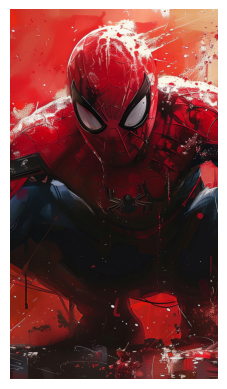

In [7]:
from PIL import Image
import io

img_data = base64.b64decode(base64_image)
img = Image.open(io.BytesIO(img_data))

plt.imshow(img)
plt.axis("off")


In [11]:
img_rgb = np.array(img)

In [12]:
img_gray = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY)

In [14]:
def gray_histogram(gray_img):
    counts = np.zeros(256, dtype=int)

    flat_img = gray_img.ravel()
    for pixel_value in flat_img:
        counts[pixel_value] += 1

    return counts

In [17]:
def rgb_histogram(rgb_img):
    histograms = np.zeros((3, 256), dtype=int)

    #seperating the channles
    for i in range(3):
        histograms[i] = np.bincount(rgb_img[:, :, i].ravel(), minlength=256)

    return histograms

In [27]:
gray_hist_counts = gray_histogram(img_gray)
rgb_hist_counts = rgb_histogram(img_rgb)

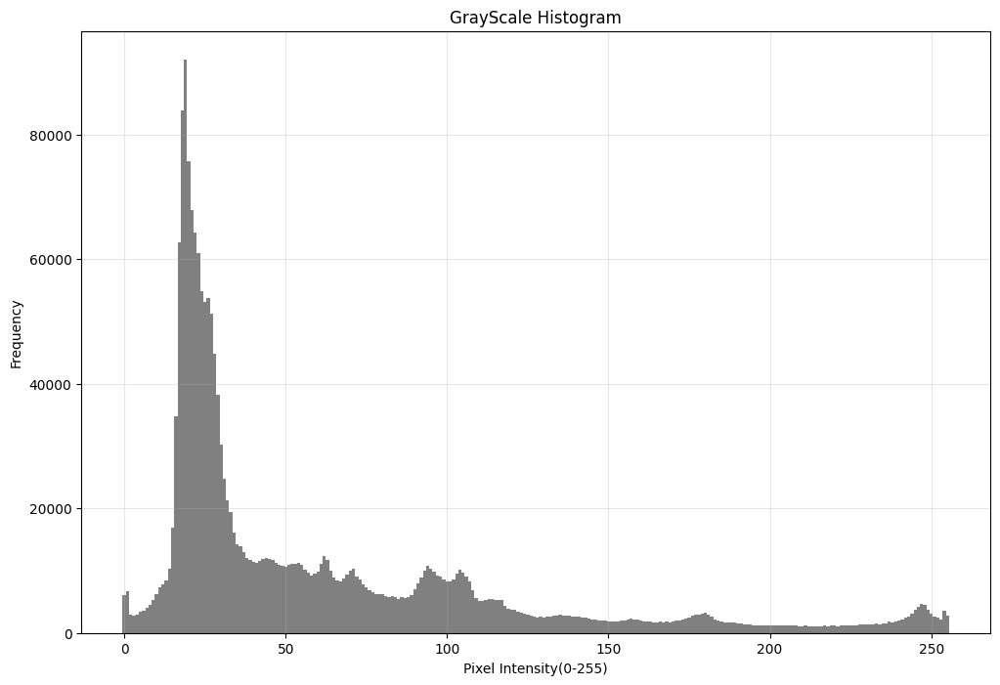

In [32]:
plt.figure(figsize=(12,8))
plt.title("GrayScale Histogram")
plt.xlabel("Pixel Intensity(0-255)")
plt.ylabel("Frequency")
plt.bar(range(256), gray_hist_counts, color='gray', width=1)
plt.grid(alpha=0.3)

plt.show()

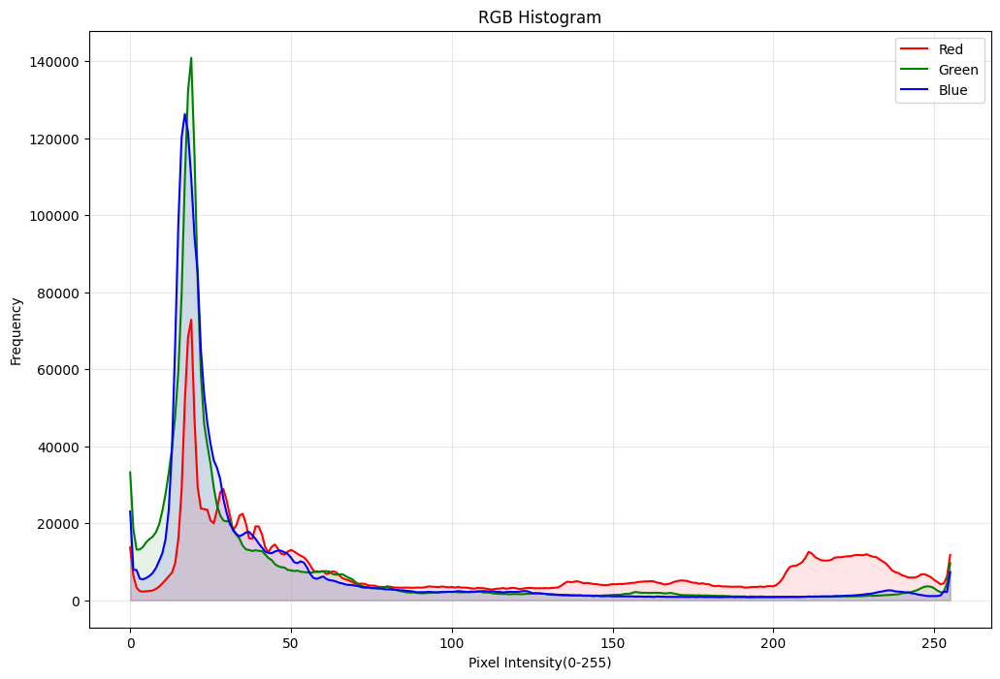

In [33]:
plt.figure(figsize=(12,8))
plt.title("RGB Histogram")
plt.xlabel("Pixel Intensity(0-255)")
plt.ylabel("Frequency")

plt.plot(rgb_hist_counts[0], label='Red', color='red')
plt.plot(rgb_hist_counts[1], label='Green', color='green')
plt.plot(rgb_hist_counts[2], label='Blue', color='blue')

plt.fill_between(range(256), rgb_hist_counts[0], color='red', alpha=0.1)
plt.fill_between(range(256), rgb_hist_counts[1], color='green', alpha=0.1)
plt.fill_between(range(256), rgb_hist_counts[2], color='blue', alpha=0.1)

plt.legend()
plt.grid(alpha=0.3)

plt.show()

## Part B

#### RGB to HSV ( only Numpy ofc )
Write a function <code>rgb_to_hsv</code> that takes a 0-255 ( not normalised ) RGB image and returns an HSV image ( also not normalised ).

**Note :** Research for the formulas, maybe ask some AI to explain you the algo and formulas ( NOT to give you the code, seriously youre not gonna learn anything if you do that )

The output should be in a format that is compatible with OpenCV cvtColor. Read the documentation to find out any Hue scaling etc.
Finally, use your function and test it by using cv2.cvtColor to convert your function output into RGB again and display it. Your image will appear the same after reconversion into RGB.

In [41]:
def rgb_to_hsv(img_rgb):
    #normalising rgb values between 0-1 and float32 for presision
    img_norm = img_rgb.astype(np.float32)/255.0

    #extracting channels
    R = img_norm[:, :, 0]
    G = img_norm[:, :, 1]
    B = img_norm[:, :, 2]

    Cmax = np.maximum(np.maximum(R, G), B)
    Cmin = np.minimum(np.minimum(R, G), B)
    Delta = Cmax - Cmin

    #initialize hsv arrays
    H = np.zeros_like(Cmax)
    S = np.zeros_like(Cmax)
    V = np.zeros_like(Cmax)

    V = Cmax * 255.0

    non_zero_cmax = (Cmax > 0)
    S[non_zero_cmax] = Delta[non_zero_cmax] / Cmax[non_zero_cmax]
    S = S * 255.0

    non_zero_delta = (Delta > 0)
    mask_r = (Cmax == R) & non_zero_delta
    H[mask_r]  = (G[mask_r] - B[mask_r]) / Delta[mask_r]
    H[mask_r] = np.mod(H[mask_r], 6)

    mask_g = (Cmax == G) & non_zero_delta
    H[mask_g]  = (G[mask_g] - B[mask_g]) / Delta[mask_g] + 2

    mask_b = (Cmax == B) & non_zero_delta
    H[mask_b]  = (G[mask_b] - B[mask_b]) / Delta[mask_b] + 4

    H = H * 60

    H[H<0] += 360

    H = H/2

    hsv_img = np.dstack((H, S, V))
    return hsv_img.astype(np.uint8)


In [42]:
img_hsv = rgb_to_hsv(img_rgb)

In [44]:
img_reconverted = cv2.cvtColor(img_hsv, cv2.COLOR_HSV2RGB)

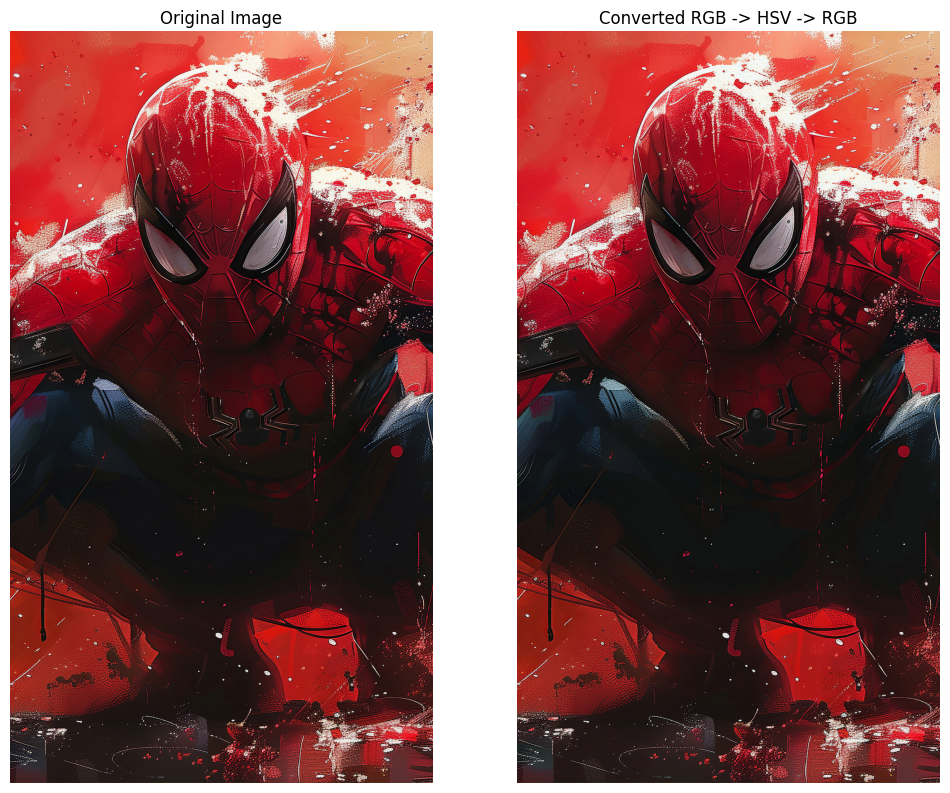

In [48]:
plt.figure(figsize=(12, 10))
plt.subplot(1, 2, 1)
plt.imshow(img_rgb)
plt.title("Original Image")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(img_reconverted)
plt.title("Converted RGB -> HSV -> RGB")
plt.axis('off')
plt.show()

## Part C

####Create 2 filters.
1. Give them any name of your choice ( I look forward to receiveing some hilarious names in submissions )
2. Clearly state what all you are doing in the filter. Like any saturation boost, etc. ( Be creative, think about stuff like adding a blue layer or making the image look foggy )
3. Suggest what kind of images is your filter good for ( maybe beach images, or rainforest etc. )
4. Comment your code showing where you implemented what part of your filter
5. The filters should be in form of functions that take 0-255 RGB image and return 0-255 RGB image.
6. Give them an appropriate input according to your filter design, and display the original and filtered image ( Be sure to choose the image such that the effect of filter makes clear difference, preferably improvement in the image ). You can embed in 2 new images ( or even more if your filter is worthy bragging about, I dont mind, but display the original and outputs side by side )

**IMPORTANT FILTER DESIGN NOTES :**

The filter must include at least two color modifications, such as:
1. contrast adjustment
2. brightness shift
3. saturation change
4. gamma correction
5. hue rotation
6. vibrance boost
7. custom color tint
8. split-toning (different color for shadows & highlights)
9. channel mixing

Implement using NumPy + cv2 only.

Write a small note (2–3 lines) explaining:
1. why you chose those modifications
2. why they suit the image

In [49]:
def clip_img(img):
    return np.clip(img, 0, 255).astype(np.uint8)

In [61]:
def filter_golden_hour(img):
    img_float = img.astype(np.float32)
    # R + 30 : Strongly boost to Red/Warmth
    # G + 10 : Slght Boost to Greens to make Yellow
    # B - 10 : Reduce Blue/Coolness
    img_float[:, :, 0] += 30
    img_float[:, :, 1] += 10
    img_float[:, :, 2] -= 20

    img_float = np.clip(img_float, 0, 255)

    # gamma correction - softening shadows and highlights
    gamma = 1.2
    img_float = 255 * np.power(img_float / 255.0, 1.0 / gamma)

    return clip_img(img_float)

In [59]:
def filter_cyberpunk(img):
    img_float = img.astype(np.float32)

    # Cool tint
    img_float[:, :, 0] -= 30 #red
    img_float[:, :, 2] += 40 #blue

    contrast_factor = 1.3
    img_float = (img_float - 128) * contrast_factor + 128

    img_float *= 1.1

    return clip_img(img_float)

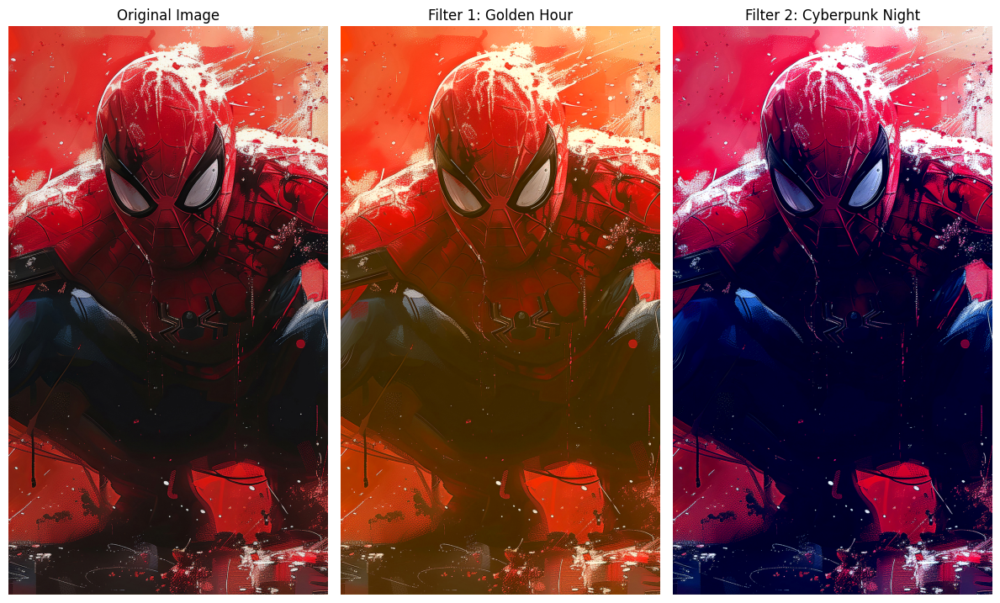

In [63]:
golden_img = filter_golden_hour(img_rgb.copy())
cyber_img = filter_cyberpunk(img_rgb.copy())

plt.figure(figsize=(12, 8))

plt.subplot(1, 3, 1)
plt.imshow(img_rgb)
plt.title("Original Image")
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(golden_img)
plt.title("Filter 1: Golden Hour")
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(cyber_img)
plt.title("Filter 2: Cyberpunk Night")
plt.axis('off')

plt.tight_layout()
plt.show()

## Part D

#### White Balance Function
Write a function <code>white_patch_balance(img_rgb)</code> that takes a 0-255 RGB image and then returns a White Patch Method Balanced 0-255 RBG image. Use Numpy only to keep track of the brightest pixel and then scale the entire image with the factor you find. Display the original and output image.

In [73]:
def white_patch_balance(img):
    img_float = img.astype(np.float32)

    #find max value in a channel
    max_r = np.max(img_float[:, :, 0])
    max_g = np.max(img_float[:, :, 1])
    max_b = np.max(img_float[:, :, 2])

    #scaling
    scale_r = 255.0 / max_r if max_r > 0 else 0
    scale_g = 255.0 / max_g if max_r > 0 else 0
    scale_b = 255.0 / max_b if max_r > 0 else 0

    # img_float *= [scale_r, scale_g, scale_b]
    img_float[:, :, 0] *= scale_r
    img_float[:, :, 1] *= scale_g
    img_float[:, :, 2] *= scale_b

    return clip_img(img_float).astype(np.uint8)

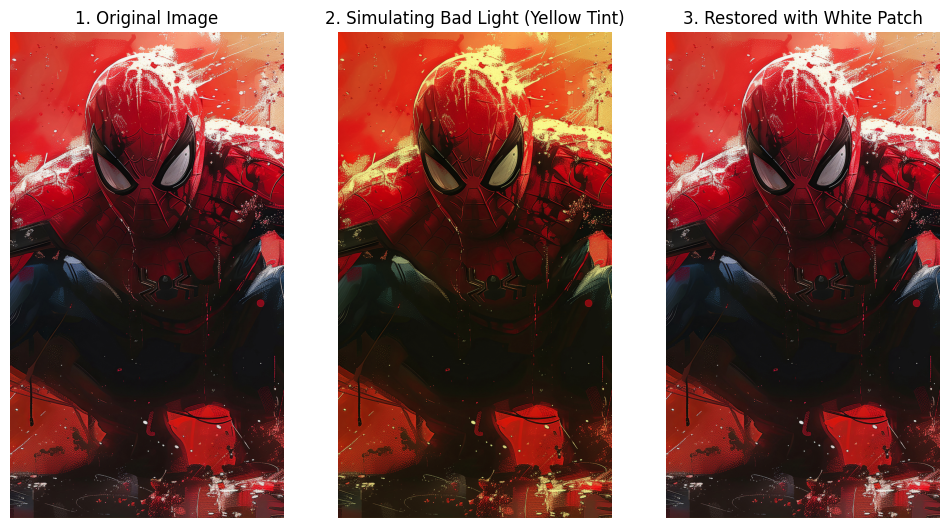

In [74]:
tinted_img = img_rgb.copy().astype(np.float32)
tinted_img[:, :, 2] *= 0.6 # Reduce Blue to make it Yellow
tinted_img = np.clip(tinted_img, 0, 255).astype(np.uint8)

# Apply White Balance
balanced_img = white_patch_balance(tinted_img)

# Display
plt.figure(figsize=(12, 8))

plt.subplot(1, 3, 1)
plt.imshow(img_rgb)
plt.title("1. Original Image")
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(tinted_img)
plt.title("2. Simulating Bad Light (Yellow Tint)")
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(balanced_img)
plt.title("3. Restored with White Patch")
plt.axis('off')

plt.show()

## Bonus - Part E

#### Create a White Balance Slider

Here's a link to a video of how my phone camera's White Balance feature works.
https://photos.app.goo.gl/zArkv5UcWiRV96JA9

Now, you will need to create a function <code>white_balance(img_rgb, value)</code>

It takes the img_rgb ( 0-255 RGB image ) and value ( 0-1 decimal number ).
1. value = 0 outputs the coldest version of the image
2. value = 0.5 is the original image itself
3. value = 1 is the warmest version of the image

The output should be the processed 0-255 RGB image. Display the original and processed image.

Try to make it look as good as possible. I dont expect you guys to copy my phone and create industry level outputs, but work hard and experiment. You can include even failed tries or what you felt was not satisfactory ( that will show how much effort you put in )

In [77]:

def white_balance(img_rgb, value):
    img_float = img_rgb.astype(np.float32)

    # Map range in between [0.0, 1.0] and [-0.5, 0.5]
    shift = (value - 0.5) * 2

    # Scale the shift by a factor to determine intensity
    amount = shift * 50

    img_float[:, :, 0] += amount   # Red
    img_float[:, :, 2] -= amount   # Blue

    return np.clip(img_float, 0, 255).astype(np.uint8)

In [78]:
cold_version = white_balance(img_rgb, 0.0)  # Max Cold
orig_version = white_balance(img_rgb, 0.5)  # Neutral
warm_version = white_balance(img_rgb, 1.0)  # Max Warm

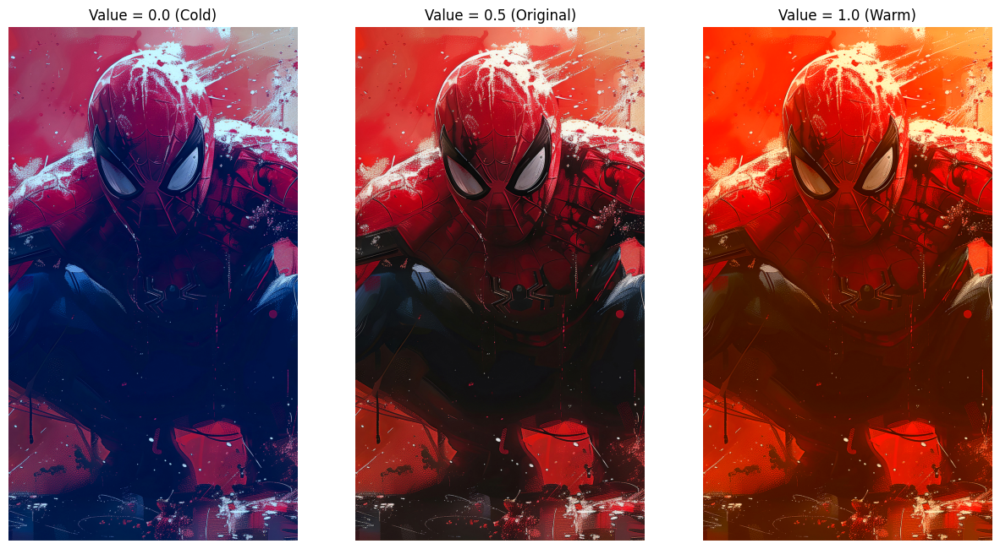

In [79]:
plt.figure(figsize=(15, 10))

plt.subplot(1, 3, 1)
plt.imshow(cold_version)
plt.title("Value = 0.0 (Cold)")
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(orig_version)
plt.title("Value = 0.5 (Original)")
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(warm_version)
plt.title("Value = 1.0 (Warm)")
plt.axis('off')

plt.show()